In [1]:
# !pip uninstall gensim --yes
# !pip install gensim==3.8.1
# !pip install deeprobust==0.2.9
# !pip install torch_geometric
# !pip install pyg_lib torch_scatter torch_sparse torch_cluster torch_spline_conv -f https://data.pyg.org/whl/torch-2.2.0+cpu.html

In [1]:
from deeprobust.graph.data import Dpr2Pyg, Pyg2Dpr
from deeprobust.graph.data import Dataset as DRDataset
import torch
from torch_geometric.data import Data
import numpy as np
from deeprobust.graph.data import Dataset, PrePtbDataset, PtbDataset
from deeprobust.graph.defense import GCN, RGCN, ProGNN, SimPGCN, GCNSVD, GCNJaccard
from deeprobust.graph.global_attack import Metattack, DICE, Random, PGDAttack
from scipy.sparse import csr_matrix
import torch
from torch.nn import Linear
import torch.nn.functional as F
from torch_geometric.transforms import Compose
from torch_geometric.datasets import Amazon
from torch_geometric.transforms.random_node_split import RandomNodeSplit
from torch_geometric.datasets import Planetoid
from torch_geometric.transforms import NormalizeFeatures
from torch_geometric.nn import GCNConv
from torch_geometric.nn import GATConv
from torch_geometric.loader import NeighborLoader
from torch_geometric.nn import SAGEConv
from sklearn.metrics import roc_auc_score

from torch_geometric.utils import negative_sampling
from torch_geometric.utils import train_test_split_edges

from copy import deepcopy
import torch.nn as nn
from IPython.display import Javascript  # Restrict height of output cell.
import matplotlib.pyplot as plt

from GSage import GSAGE
from GSaint import GSAINT
from GAT import GAT

In [2]:
seed = 15
ptb_rates = [0.05, 0.1, 0.15, 0.2, 0.25, 0.3]
# ptb_rates = [0.025, 0.05]
# ptb_rate = 0.25
# ptb_rate1 = 0.15
dataset = 'cora'
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)

In [3]:
data = DRDataset(root='/tmp/', name=dataset, setting='prognn')
adj, features, labels = data.adj, data.features, data.labels
idx_train, idx_val, idx_test = data.idx_train, data.idx_val, data.idx_test
idx_unlabeled = np.union1d(idx_val, idx_test)
idx_unlabeled = np.union1d(idx_val, idx_test)


device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
# budget = int(ptb_rate * (adj.todense().sum() // 2))
# print(budget)
# budget1 = int(ptb_rate1 * (adj.todense().sum() // 2))
# print(budget1)

Loading cora dataset...


Exception: Download failed! Make sure you have stable Internet connection and enter the right name

In [5]:
np.save('/tmp/cora_adj.npy',adj.todense())

In [6]:
np.save('/tmp/cora_features.npy',features.todense())

In [7]:
np.save('/tmp/cora_labels.npy',labels)

In [8]:
np.save('/tmp/cora_idx_test',idx_test)

# Metattack

## GSAGE

In [9]:
# Setup Surrogate model
surrogate_sage = GSAGE(nfeat=features.shape[1], nhid=64, nclass=labels.max().item()+1, dropout=0, with_bias=True, device=device).to(device)
surrogate_sage.fit(data, patience=100, verbose=True)

Processing...
/home/wcorcoran/anaconda3/envs/mesp/lib/python3.8/site-packages/deeprobust/graph/data/pyg_dataset.py:48: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:245.)
  edge_index = torch.LongTensor(dpr_data.adj.nonzero())
Done!
/home/wcorcoran/anaconda3/envs/mesp/lib/python3.8/site-packages/torch_geometric/data/in_memory_dataset.py:157: UserWarning: It is not recommended to directly access the internal storage format `data` of an 'InMemoryDataset'. If you are absolutely certain what you are doing, access the internal storage via `InMemoryDataset._data` instead to suppress this warning. Alternatively, you can access stacked individual attributes of every graph via `dataset.{attr_name}`.
  warnings.warn(msg)
/home/wcorcoran/anaconda3/envs/mesp/lib/python3.8/site-packages/torch_geo

=== training GSAGE model ===
Epoch 0, training loss: 0.039710626006126404
Epoch 10, training loss: 0.008543108589947224
Epoch 20, training loss: 0.010873577557504177
Epoch 30, training loss: 0.012882472947239876
Epoch 40, training loss: 0.008107397705316544
Epoch 50, training loss: 0.00608924450352788
Epoch 60, training loss: 0.012008405290544033
Epoch 70, training loss: 0.005664369557052851
Epoch 80, training loss: 0.006954140029847622
Epoch 90, training loss: 0.011113322339951992
Epoch 100, training loss: 0.006380693521350622
=== early stopping at 101, loss_val = 0.5490294098854065 ===


In [10]:
preds=surrogate_sage.predict()
_, predicted_classes = torch.max(preds, 1)  # Returns values, indices; we need indices

# Step 3: Subset for test nodes
test_preds = predicted_classes[idx_test].cpu().numpy()
test_labels = labels[idx_test]

# Step 4: Calculate accuracy
correct = (test_preds == test_labels).sum().item()  # Count correct predictions
total = idx_test.shape[0]  # Total number of test nodes
test_accuracy = correct / total

print(f'Test Accuracy: {test_accuracy}')

Test Accuracy: 0.8158953722334004


In [11]:
benchmark_clean = test_accuracy

In [12]:
from copy import deepcopy

gsage_results = []

for ptb in ptb_rates:
  torch.cuda.empty_cache()
  budget = int(ptb * (adj.todense().sum() // 2))
  # Setup Attack Model
  model = Metattack(surrogate_sage, nnodes=adj.shape[0], feature_shape=features.shape,
          attack_structure=True, attack_features=False, device=device, lambda_=0).to(device)
  # Attack
  model.attack(features, adj, labels, idx_train, idx_unlabeled, n_perturbations=budget, ll_constraint=False)
  modified_adj = model.modified_adj # modified_adj is a torch.tensor
  modified_adj = modified_adj.cpu().numpy()
  modified_adj = csr_matrix(modified_adj)

  perturbed_adj = deepcopy(modified_adj)
  data_copied = deepcopy(data)
  data_copied.adj = modified_adj
  atk_model = GSAGE(nfeat=features.shape[1], nhid=64, nclass=labels.max().item()+1, dropout=0, with_bias=True, device=device).to(device)
  atk_model.fit(data_copied, patience=100, verbose=True)

  atk_acc = atk_model.test()
  print("accuracy: ", atk_acc)
  print("benchmark change: ", atk_acc - benchmark_clean)
  gsage_results.append(atk_acc - benchmark_clean)


Perturbing graph:   0%|          | 0/253 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.5091577768325806
GCN acc on unlabled data: 0.8395172105498435
attack loss: 0.32779642939567566


Perturbing graph:   0%|          | 1/253 [00:02<08:40,  2.07s/it]

GCN loss on unlabled data: 0.5055583715438843
GCN acc on unlabled data: 0.83772910147519
attack loss: 0.33660760521888733


Perturbing graph:   1%|          | 2/253 [00:03<06:49,  1.63s/it]

GCN loss on unlabled data: 0.5149388313293457
GCN acc on unlabled data: 0.8395172105498435
attack loss: 0.3416627049446106


Perturbing graph:   1%|          | 3/253 [00:04<06:11,  1.49s/it]

GCN loss on unlabled data: 0.537957489490509
GCN acc on unlabled data: 0.8314707197139026
attack loss: 0.36510977149009705


Perturbing graph:   2%|▏         | 4/253 [00:06<06:19,  1.52s/it]

GCN loss on unlabled data: 0.5094404220581055
GCN acc on unlabled data: 0.8386231560125168
attack loss: 0.35988229513168335


Perturbing graph:   2%|▏         | 5/253 [00:08<06:35,  1.60s/it]

GCN loss on unlabled data: 0.5252195596694946
GCN acc on unlabled data: 0.8332588287885562
attack loss: 0.3599461317062378


Perturbing graph:   2%|▏         | 6/253 [00:09<06:27,  1.57s/it]

GCN loss on unlabled data: 0.5354547500610352
GCN acc on unlabled data: 0.8292355833705857
attack loss: 0.3731869161128998


Perturbing graph:   3%|▎         | 7/253 [00:11<06:34,  1.60s/it]

GCN loss on unlabled data: 0.524402379989624
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.36965617537498474


Perturbing graph:   3%|▎         | 8/253 [00:12<06:18,  1.55s/it]

GCN loss on unlabled data: 0.5171604752540588
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.3810289800167084


Perturbing graph:   4%|▎         | 9/253 [00:13<05:54,  1.45s/it]

GCN loss on unlabled data: 0.5298553109169006
GCN acc on unlabled data: 0.8314707197139026
attack loss: 0.3876148462295532


Perturbing graph:   4%|▍         | 10/253 [00:15<05:57,  1.47s/it]

GCN loss on unlabled data: 0.5399762392044067
GCN acc on unlabled data: 0.8337058560572195
attack loss: 0.38616377115249634


Perturbing graph:   4%|▍         | 11/253 [00:16<06:04,  1.51s/it]

GCN loss on unlabled data: 0.5241960287094116
GCN acc on unlabled data: 0.8283415288332588
attack loss: 0.39311712980270386


Perturbing graph:   5%|▍         | 12/253 [00:18<06:07,  1.52s/it]

GCN loss on unlabled data: 0.5333994626998901
GCN acc on unlabled data: 0.8319177469825659
attack loss: 0.3970632553100586


Perturbing graph:   5%|▌         | 13/253 [00:20<06:07,  1.53s/it]

GCN loss on unlabled data: 0.5403016805648804
GCN acc on unlabled data: 0.8234242288779616
attack loss: 0.40389031171798706


Perturbing graph:   6%|▌         | 14/253 [00:21<06:13,  1.56s/it]

GCN loss on unlabled data: 0.5318005681037903
GCN acc on unlabled data: 0.8323647742512293
attack loss: 0.4040329158306122


Perturbing graph:   6%|▌         | 15/253 [00:23<06:12,  1.56s/it]

GCN loss on unlabled data: 0.5375224947929382
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.40987277030944824


Perturbing graph:   6%|▋         | 16/253 [00:24<06:08,  1.56s/it]

GCN loss on unlabled data: 0.5556780099868774
GCN acc on unlabled data: 0.8202950379973178
attack loss: 0.423567533493042


Perturbing graph:   7%|▋         | 17/253 [00:26<06:11,  1.57s/it]

GCN loss on unlabled data: 0.5372728705406189
GCN acc on unlabled data: 0.8256593652212785
attack loss: 0.41608765721321106


Perturbing graph:   7%|▋         | 18/253 [00:27<05:59,  1.53s/it]

GCN loss on unlabled data: 0.5298106670379639
GCN acc on unlabled data: 0.8332588287885562
attack loss: 0.4327574670314789


Perturbing graph:   8%|▊         | 19/253 [00:29<05:47,  1.48s/it]

GCN loss on unlabled data: 0.5346964001655579
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.43301060795783997


Perturbing graph:   8%|▊         | 20/253 [00:30<05:50,  1.50s/it]

GCN loss on unlabled data: 0.5184425115585327
GCN acc on unlabled data: 0.8337058560572195
attack loss: 0.4278872609138489


Perturbing graph:   8%|▊         | 21/253 [00:32<05:55,  1.53s/it]

GCN loss on unlabled data: 0.5456921458244324
GCN acc on unlabled data: 0.8252123379526152
attack loss: 0.42963528633117676


Perturbing graph:   9%|▊         | 22/253 [00:33<05:28,  1.42s/it]

GCN loss on unlabled data: 0.5419794321060181
GCN acc on unlabled data: 0.8283415288332588
attack loss: 0.44054144620895386


Perturbing graph:   9%|▉         | 23/253 [00:34<05:24,  1.41s/it]

GCN loss on unlabled data: 0.5298623442649841
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.4332527220249176


Perturbing graph:   9%|▉         | 24/253 [00:36<05:09,  1.35s/it]

GCN loss on unlabled data: 0.5503429174423218
GCN acc on unlabled data: 0.8274474742959321
attack loss: 0.4480516314506531


Perturbing graph:  10%|▉         | 25/253 [00:37<05:12,  1.37s/it]

GCN loss on unlabled data: 0.5514876246452332
GCN acc on unlabled data: 0.8234242288779616
attack loss: 0.45700603723526


Perturbing graph:  10%|█         | 26/253 [00:39<05:33,  1.47s/it]

GCN loss on unlabled data: 0.5614452958106995
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.4534250795841217


Perturbing graph:  11%|█         | 27/253 [00:40<05:26,  1.44s/it]

GCN loss on unlabled data: 0.5474413633346558
GCN acc on unlabled data: 0.8252123379526152
attack loss: 0.4558235704898834


Perturbing graph:  11%|█         | 28/253 [00:42<05:24,  1.44s/it]

GCN loss on unlabled data: 0.5589163303375244
GCN acc on unlabled data: 0.8202950379973178
attack loss: 0.4581657946109772


Perturbing graph:  11%|█▏        | 29/253 [00:43<05:29,  1.47s/it]

GCN loss on unlabled data: 0.5559951066970825
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.4580087959766388


Perturbing graph:  12%|█▏        | 30/253 [00:45<05:29,  1.48s/it]

GCN loss on unlabled data: 0.5564603805541992
GCN acc on unlabled data: 0.8270004470272687
attack loss: 0.46253064274787903


Perturbing graph:  12%|█▏        | 31/253 [00:46<05:38,  1.53s/it]

GCN loss on unlabled data: 0.5652371644973755
GCN acc on unlabled data: 0.8171658471166742
attack loss: 0.4699210524559021


Perturbing graph:  13%|█▎        | 32/253 [00:48<05:46,  1.57s/it]

GCN loss on unlabled data: 0.5712235569953918
GCN acc on unlabled data: 0.8202950379973178
attack loss: 0.4824882745742798


Perturbing graph:  13%|█▎        | 33/253 [00:50<05:50,  1.59s/it]

GCN loss on unlabled data: 0.5738105177879333
GCN acc on unlabled data: 0.8229772016092982
attack loss: 0.4737248718738556


Perturbing graph:  13%|█▎        | 34/253 [00:51<05:30,  1.51s/it]

GCN loss on unlabled data: 0.5670486092567444
GCN acc on unlabled data: 0.8220831470719714
attack loss: 0.4699746370315552


Perturbing graph:  14%|█▍        | 35/253 [00:52<05:13,  1.44s/it]

GCN loss on unlabled data: 0.5755481719970703
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.48335331678390503


Perturbing graph:  14%|█▍        | 36/253 [00:54<05:19,  1.47s/it]

GCN loss on unlabled data: 0.5832478404045105
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.490226149559021


Perturbing graph:  15%|█▍        | 37/253 [00:55<05:26,  1.51s/it]

GCN loss on unlabled data: 0.596599817276001
GCN acc on unlabled data: 0.8185069289226643
attack loss: 0.5061522126197815


Perturbing graph:  15%|█▌        | 38/253 [00:57<05:41,  1.59s/it]

GCN loss on unlabled data: 0.5946276187896729
GCN acc on unlabled data: 0.8198480107286544
attack loss: 0.5135191082954407


Perturbing graph:  15%|█▌        | 39/253 [00:59<05:43,  1.61s/it]

GCN loss on unlabled data: 0.5935099720954895
GCN acc on unlabled data: 0.8238712561466249
attack loss: 0.5155110359191895


Perturbing graph:  16%|█▌        | 40/253 [01:00<05:35,  1.57s/it]

GCN loss on unlabled data: 0.5941887497901917
GCN acc on unlabled data: 0.8185069289226643
attack loss: 0.5178250074386597


Perturbing graph:  16%|█▌        | 41/253 [01:02<05:36,  1.59s/it]

GCN loss on unlabled data: 0.6057366728782654
GCN acc on unlabled data: 0.8122485471613768
attack loss: 0.5154524445533752


Perturbing graph:  17%|█▋        | 42/253 [01:03<05:33,  1.58s/it]

GCN loss on unlabled data: 0.6233155727386475
GCN acc on unlabled data: 0.8126955744300403
attack loss: 0.5171542763710022


Perturbing graph:  17%|█▋        | 43/253 [01:05<05:32,  1.59s/it]

GCN loss on unlabled data: 0.6187689304351807
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.5193549990653992


Perturbing graph:  17%|█▋        | 44/253 [01:06<04:54,  1.41s/it]

GCN loss on unlabled data: 0.6064915060997009
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.516740083694458


Perturbing graph:  18%|█▊        | 45/253 [01:08<05:00,  1.44s/it]

GCN loss on unlabled data: 0.63128662109375
GCN acc on unlabled data: 0.8068842199374162
attack loss: 0.5363805294036865


Perturbing graph:  18%|█▊        | 46/253 [01:09<05:06,  1.48s/it]

GCN loss on unlabled data: 0.620318591594696
GCN acc on unlabled data: 0.8095663835493966
attack loss: 0.5325520634651184


Perturbing graph:  19%|█▊        | 47/253 [01:11<05:15,  1.53s/it]

GCN loss on unlabled data: 0.6152758598327637
GCN acc on unlabled data: 0.8104604380867233
attack loss: 0.5306907296180725


Perturbing graph:  19%|█▉        | 48/253 [01:12<05:14,  1.54s/it]

GCN loss on unlabled data: 0.6441124081611633
GCN acc on unlabled data: 0.8073312472060796
attack loss: 0.5371649265289307


Perturbing graph:  19%|█▉        | 49/253 [01:14<04:57,  1.46s/it]

GCN loss on unlabled data: 0.6275278925895691
GCN acc on unlabled data: 0.8095663835493966
attack loss: 0.542657732963562


Perturbing graph:  20%|█▉        | 50/253 [01:15<05:04,  1.50s/it]

GCN loss on unlabled data: 0.6269617080688477
GCN acc on unlabled data: 0.8100134108180599
attack loss: 0.5362505316734314


Perturbing graph:  20%|██        | 51/253 [01:17<04:57,  1.47s/it]

GCN loss on unlabled data: 0.630180835723877
GCN acc on unlabled data: 0.8073312472060796
attack loss: 0.5388846397399902


Perturbing graph:  21%|██        | 52/253 [01:18<05:08,  1.53s/it]

GCN loss on unlabled data: 0.6246955990791321
GCN acc on unlabled data: 0.8046490835940993
attack loss: 0.5388413667678833


Perturbing graph:  21%|██        | 53/253 [01:20<05:07,  1.54s/it]

GCN loss on unlabled data: 0.6357050538063049
GCN acc on unlabled data: 0.8068842199374162
attack loss: 0.5483925342559814


Perturbing graph:  21%|██▏       | 54/253 [01:21<04:59,  1.50s/it]

GCN loss on unlabled data: 0.6403452754020691
GCN acc on unlabled data: 0.8091193562807332
attack loss: 0.5451567769050598


Perturbing graph:  22%|██▏       | 55/253 [01:23<05:20,  1.62s/it]

GCN loss on unlabled data: 0.6501121520996094
GCN acc on unlabled data: 0.799731783638802
attack loss: 0.5519105195999146


Perturbing graph:  22%|██▏       | 56/253 [01:24<04:57,  1.51s/it]

GCN loss on unlabled data: 0.6492047309875488
GCN acc on unlabled data: 0.8033080017881091
attack loss: 0.5558201670646667


Perturbing graph:  23%|██▎       | 57/253 [01:26<04:49,  1.48s/it]

GCN loss on unlabled data: 0.6525486707687378
GCN acc on unlabled data: 0.8010728654447922
attack loss: 0.5687085390090942


Perturbing graph:  23%|██▎       | 58/253 [01:27<04:45,  1.46s/it]

GCN loss on unlabled data: 0.6471234560012817
GCN acc on unlabled data: 0.8086723290120698
attack loss: 0.5678294897079468


Perturbing graph:  23%|██▎       | 59/253 [01:29<05:01,  1.55s/it]

GCN loss on unlabled data: 0.6619484424591064
GCN acc on unlabled data: 0.7983907018328118
attack loss: 0.5713715553283691


Perturbing graph:  24%|██▎       | 60/253 [01:30<04:48,  1.49s/it]

GCN loss on unlabled data: 0.6596091389656067
GCN acc on unlabled data: 0.8068842199374162
attack loss: 0.5793245434761047


Perturbing graph:  24%|██▍       | 61/253 [01:32<04:37,  1.45s/it]

GCN loss on unlabled data: 0.6527947783470154
GCN acc on unlabled data: 0.8064371926687528
attack loss: 0.5704678893089294


Perturbing graph:  25%|██▍       | 62/253 [01:33<04:41,  1.47s/it]

GCN loss on unlabled data: 0.6517848968505859
GCN acc on unlabled data: 0.8033080017881091
attack loss: 0.5621798634529114


Perturbing graph:  25%|██▍       | 63/253 [01:35<04:38,  1.47s/it]

GCN loss on unlabled data: 0.6722235679626465
GCN acc on unlabled data: 0.8010728654447922
attack loss: 0.5803901553153992


Perturbing graph:  25%|██▌       | 64/253 [01:36<04:53,  1.55s/it]

GCN loss on unlabled data: 0.6624364852905273
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.5681989789009094


Perturbing graph:  26%|██▌       | 65/253 [01:38<04:51,  1.55s/it]

GCN loss on unlabled data: 0.6782137155532837
GCN acc on unlabled data: 0.7974966472954851
attack loss: 0.6010196208953857


Perturbing graph:  26%|██▌       | 66/253 [01:40<04:50,  1.55s/it]

GCN loss on unlabled data: 0.6975129246711731
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.598075807094574


Perturbing graph:  26%|██▋       | 67/253 [01:41<04:59,  1.61s/it]

GCN loss on unlabled data: 0.6758001446723938
GCN acc on unlabled data: 0.8037550290567725
attack loss: 0.6008301377296448


Perturbing graph:  27%|██▋       | 68/253 [01:43<04:45,  1.54s/it]

GCN loss on unlabled data: 0.6930326819419861
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.6100528240203857


Perturbing graph:  27%|██▋       | 69/253 [01:44<04:42,  1.53s/it]

GCN loss on unlabled data: 0.673678457736969
GCN acc on unlabled data: 0.7930263746088512
attack loss: 0.6057726740837097


Perturbing graph:  28%|██▊       | 70/253 [01:46<04:40,  1.54s/it]

GCN loss on unlabled data: 0.6843534111976624
GCN acc on unlabled data: 0.8001788109074653
attack loss: 0.6078811287879944


Perturbing graph:  28%|██▊       | 71/253 [01:47<04:37,  1.53s/it]

GCN loss on unlabled data: 0.6875942349433899
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.599851667881012


Perturbing graph:  28%|██▊       | 72/253 [01:49<04:38,  1.54s/it]

GCN loss on unlabled data: 0.7043551802635193
GCN acc on unlabled data: 0.7979436745641484
attack loss: 0.620574414730072


Perturbing graph:  29%|██▉       | 73/253 [01:50<04:38,  1.54s/it]

GCN loss on unlabled data: 0.7135483026504517
GCN acc on unlabled data: 0.7952615109521681
attack loss: 0.6319951415061951


Perturbing graph:  29%|██▉       | 74/253 [01:52<04:38,  1.56s/it]

GCN loss on unlabled data: 0.7132764458656311
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.6277387142181396


Perturbing graph:  30%|██▉       | 75/253 [01:54<04:41,  1.58s/it]

GCN loss on unlabled data: 0.7060016989707947
GCN acc on unlabled data: 0.7948144836835047
attack loss: 0.6321908235549927


Perturbing graph:  30%|███       | 76/253 [01:55<04:39,  1.58s/it]

GCN loss on unlabled data: 0.7142244577407837
GCN acc on unlabled data: 0.7952615109521681
attack loss: 0.6419748663902283


Perturbing graph:  30%|███       | 77/253 [01:57<04:43,  1.61s/it]

GCN loss on unlabled data: 0.7063295245170593
GCN acc on unlabled data: 0.7921323200715243
attack loss: 0.6334043145179749


Perturbing graph:  31%|███       | 78/253 [01:58<04:44,  1.62s/it]

GCN loss on unlabled data: 0.6999435424804688
GCN acc on unlabled data: 0.7966025927581583
attack loss: 0.6303179264068604


Perturbing graph:  31%|███       | 79/253 [02:00<04:35,  1.58s/it]

GCN loss on unlabled data: 0.6907989978790283
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.6191749572753906


Perturbing graph:  32%|███▏      | 80/253 [02:02<04:38,  1.61s/it]

GCN loss on unlabled data: 0.7036246061325073
GCN acc on unlabled data: 0.7921323200715243
attack loss: 0.6440148949623108


Perturbing graph:  32%|███▏      | 81/253 [02:03<04:18,  1.50s/it]

GCN loss on unlabled data: 0.7233835458755493
GCN acc on unlabled data: 0.7863209655789003
attack loss: 0.6542840600013733


Perturbing graph:  32%|███▏      | 82/253 [02:05<04:31,  1.59s/it]

GCN loss on unlabled data: 0.713127851486206
GCN acc on unlabled data: 0.7840858292355833
attack loss: 0.6405118107795715


Perturbing graph:  33%|███▎      | 83/253 [02:06<04:34,  1.61s/it]

GCN loss on unlabled data: 0.7417177557945251
GCN acc on unlabled data: 0.7840858292355833
attack loss: 0.673808217048645


Perturbing graph:  33%|███▎      | 84/253 [02:08<04:14,  1.51s/it]

GCN loss on unlabled data: 0.7328117489814758
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.6683520674705505


Perturbing graph:  34%|███▎      | 85/253 [02:09<03:56,  1.41s/it]

GCN loss on unlabled data: 0.7246459126472473
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.6629276871681213


Perturbing graph:  34%|███▍      | 86/253 [02:10<04:04,  1.46s/it]

GCN loss on unlabled data: 0.7418597340583801
GCN acc on unlabled data: 0.7827447474295932
attack loss: 0.6712380647659302


Perturbing graph:  34%|███▍      | 87/253 [02:12<04:07,  1.49s/it]

GCN loss on unlabled data: 0.7235705852508545
GCN acc on unlabled data: 0.7881090746535538
attack loss: 0.6498615741729736


Perturbing graph:  35%|███▍      | 88/253 [02:13<04:09,  1.51s/it]

GCN loss on unlabled data: 0.7467049360275269
GCN acc on unlabled data: 0.780062583817613
attack loss: 0.6742442846298218


Perturbing graph:  35%|███▌      | 89/253 [02:15<04:11,  1.53s/it]

GCN loss on unlabled data: 0.7434473037719727
GCN acc on unlabled data: 0.7814036656236031
attack loss: 0.6684741973876953


Perturbing graph:  36%|███▌      | 90/253 [02:17<04:13,  1.55s/it]

GCN loss on unlabled data: 0.7395110130310059
GCN acc on unlabled data: 0.7827447474295932
attack loss: 0.6746082901954651


Perturbing graph:  36%|███▌      | 91/253 [02:18<04:00,  1.49s/it]

GCN loss on unlabled data: 0.7659890055656433
GCN acc on unlabled data: 0.7724631202503353
attack loss: 0.689680278301239


Perturbing graph:  36%|███▋      | 92/253 [02:19<04:00,  1.49s/it]

GCN loss on unlabled data: 0.7528676390647888
GCN acc on unlabled data: 0.7751452838623156
attack loss: 0.6871007084846497


Perturbing graph:  37%|███▋      | 93/253 [02:21<04:07,  1.55s/it]

GCN loss on unlabled data: 0.7658668160438538
GCN acc on unlabled data: 0.7760393383996425
attack loss: 0.6946361660957336


Perturbing graph:  37%|███▋      | 94/253 [02:23<04:08,  1.57s/it]

GCN loss on unlabled data: 0.7823768854141235
GCN acc on unlabled data: 0.7760393383996425
attack loss: 0.723980188369751


Perturbing graph:  38%|███▊      | 95/253 [02:24<04:03,  1.54s/it]

GCN loss on unlabled data: 0.7756926417350769
GCN acc on unlabled data: 0.775592311130979
attack loss: 0.7075592875480652


Perturbing graph:  38%|███▊      | 96/253 [02:26<03:56,  1.51s/it]

GCN loss on unlabled data: 0.7804477214813232
GCN acc on unlabled data: 0.7764863656683058
attack loss: 0.7148661613464355


Perturbing graph:  38%|███▊      | 97/253 [02:27<03:53,  1.49s/it]

GCN loss on unlabled data: 0.764974057674408
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.698221743106842


Perturbing graph:  39%|███▊      | 98/253 [02:29<03:45,  1.46s/it]

GCN loss on unlabled data: 0.7414450645446777
GCN acc on unlabled data: 0.7796155565489495
attack loss: 0.6730687022209167


Perturbing graph:  39%|███▉      | 99/253 [02:30<03:45,  1.47s/it]

GCN loss on unlabled data: 0.7783724665641785
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.7085400819778442


Perturbing graph:  40%|███▉      | 100/253 [02:32<03:50,  1.51s/it]

GCN loss on unlabled data: 0.7813531160354614
GCN acc on unlabled data: 0.7746982565936522
attack loss: 0.7232941389083862


Perturbing graph:  40%|███▉      | 101/253 [02:33<03:55,  1.55s/it]

GCN loss on unlabled data: 0.8129487633705139
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.7471462488174438


Perturbing graph:  40%|████      | 102/253 [02:34<03:35,  1.43s/it]

GCN loss on unlabled data: 0.7478098273277283
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.6811906695365906


Perturbing graph:  41%|████      | 103/253 [02:36<03:34,  1.43s/it]

GCN loss on unlabled data: 0.8012422919273376
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.7339239716529846


Perturbing graph:  41%|████      | 104/253 [02:37<03:41,  1.48s/it]

GCN loss on unlabled data: 0.8045784831047058
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.7321136593818665


Perturbing graph:  42%|████▏     | 105/253 [02:39<03:37,  1.47s/it]

GCN loss on unlabled data: 0.7787913680076599
GCN acc on unlabled data: 0.7760393383996425
attack loss: 0.7331715226173401


Perturbing graph:  42%|████▏     | 106/253 [02:40<03:29,  1.42s/it]

GCN loss on unlabled data: 0.7938184142112732
GCN acc on unlabled data: 0.7773804202056326
attack loss: 0.7412801384925842


Perturbing graph:  42%|████▏     | 107/253 [02:42<03:31,  1.45s/it]

GCN loss on unlabled data: 0.7706901431083679
GCN acc on unlabled data: 0.7746982565936522
attack loss: 0.7285040616989136


Perturbing graph:  43%|████▎     | 108/253 [02:43<03:36,  1.50s/it]

GCN loss on unlabled data: 0.8221335411071777
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.7744055986404419


Perturbing graph:  43%|████▎     | 109/253 [02:45<03:44,  1.56s/it]

GCN loss on unlabled data: 0.82210773229599
GCN acc on unlabled data: 0.7688869021010282
attack loss: 0.7627859711647034


Perturbing graph:  43%|████▎     | 110/253 [02:47<03:41,  1.55s/it]

GCN loss on unlabled data: 0.8230152726173401
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.7847470641136169


Perturbing graph:  44%|████▍     | 111/253 [02:48<03:32,  1.50s/it]

GCN loss on unlabled data: 0.8006325960159302
GCN acc on unlabled data: 0.7715690657130085
attack loss: 0.7658195495605469


Perturbing graph:  44%|████▍     | 112/253 [02:50<03:39,  1.55s/it]

GCN loss on unlabled data: 0.8345781564712524
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.7905983328819275


Perturbing graph:  45%|████▍     | 113/253 [02:51<03:31,  1.51s/it]

GCN loss on unlabled data: 0.7828599214553833
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.7395471334457397


Perturbing graph:  45%|████▌     | 114/253 [02:52<03:17,  1.42s/it]

GCN loss on unlabled data: 0.7883409261703491
GCN acc on unlabled data: 0.7742512293249888
attack loss: 0.7489984631538391


Perturbing graph:  45%|████▌     | 115/253 [02:54<03:22,  1.47s/it]

GCN loss on unlabled data: 0.8223416209220886
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.7844633460044861


Perturbing graph:  46%|████▌     | 116/253 [02:55<03:28,  1.52s/it]

GCN loss on unlabled data: 0.8224742412567139
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.7689883708953857


Perturbing graph:  46%|████▌     | 117/253 [02:57<03:27,  1.52s/it]

GCN loss on unlabled data: 0.8167980313301086
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.7856845259666443


Perturbing graph:  47%|████▋     | 118/253 [02:59<03:25,  1.53s/it]

GCN loss on unlabled data: 0.8338538408279419
GCN acc on unlabled data: 0.7706750111756817
attack loss: 0.7845223546028137


Perturbing graph:  47%|████▋     | 119/253 [03:00<03:34,  1.60s/it]

GCN loss on unlabled data: 0.8248578310012817
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.7869052290916443


Perturbing graph:  47%|████▋     | 120/253 [03:02<03:33,  1.60s/it]

GCN loss on unlabled data: 0.8215707540512085
GCN acc on unlabled data: 0.7599463567277605
attack loss: 0.7871323227882385


Perturbing graph:  48%|████▊     | 121/253 [03:03<03:20,  1.52s/it]

GCN loss on unlabled data: 0.8260943293571472
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.7826694250106812


Perturbing graph:  48%|████▊     | 122/253 [03:05<03:26,  1.58s/it]

GCN loss on unlabled data: 0.857226550579071
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.8160294890403748


Perturbing graph:  49%|████▊     | 123/253 [03:06<03:17,  1.52s/it]

GCN loss on unlabled data: 0.8141723275184631
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.7870175242424011


Perturbing graph:  49%|████▉     | 124/253 [03:08<03:19,  1.54s/it]

GCN loss on unlabled data: 0.8742333650588989
GCN acc on unlabled data: 0.7603933839964238
attack loss: 0.8420417904853821


Perturbing graph:  49%|████▉     | 125/253 [03:09<03:13,  1.51s/it]

GCN loss on unlabled data: 0.8277409672737122
GCN acc on unlabled data: 0.7688869021010282
attack loss: 0.8006496429443359


Perturbing graph:  50%|████▉     | 126/253 [03:11<03:10,  1.50s/it]

GCN loss on unlabled data: 0.8618322014808655
GCN acc on unlabled data: 0.7688869021010282
attack loss: 0.835513174533844


Perturbing graph:  50%|█████     | 127/253 [03:13<03:18,  1.58s/it]

GCN loss on unlabled data: 0.8555472493171692
GCN acc on unlabled data: 0.763969602145731
attack loss: 0.8276870846748352


Perturbing graph:  51%|█████     | 128/253 [03:14<03:20,  1.60s/it]

GCN loss on unlabled data: 0.8721033930778503
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.8334633708000183


Perturbing graph:  51%|█████     | 129/253 [03:16<03:17,  1.59s/it]

GCN loss on unlabled data: 0.844917893409729
GCN acc on unlabled data: 0.7666517657577112
attack loss: 0.8258721828460693


Perturbing graph:  51%|█████▏    | 130/253 [03:17<03:18,  1.61s/it]

GCN loss on unlabled data: 0.8510288596153259
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.8257241249084473


Perturbing graph:  52%|█████▏    | 131/253 [03:19<03:17,  1.62s/it]

GCN loss on unlabled data: 0.8796958923339844
GCN acc on unlabled data: 0.7603933839964238
attack loss: 0.8457583785057068


Perturbing graph:  52%|█████▏    | 132/253 [03:21<03:14,  1.61s/it]

GCN loss on unlabled data: 0.8469583988189697
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.8232643604278564


Perturbing graph:  53%|█████▎    | 133/253 [03:22<03:14,  1.62s/it]

GCN loss on unlabled data: 0.8306030631065369
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.8043415546417236


Perturbing graph:  53%|█████▎    | 134/253 [03:24<03:09,  1.59s/it]

GCN loss on unlabled data: 0.8873361349105835
GCN acc on unlabled data: 0.7608404112650872
attack loss: 0.8574087619781494


Perturbing graph:  53%|█████▎    | 135/253 [03:25<02:55,  1.48s/it]

GCN loss on unlabled data: 0.864077091217041
GCN acc on unlabled data: 0.763969602145731
attack loss: 0.8366544842720032


Perturbing graph:  54%|█████▍    | 136/253 [03:26<02:48,  1.44s/it]

GCN loss on unlabled data: 0.8491219878196716
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.8174042701721191


Perturbing graph:  54%|█████▍    | 137/253 [03:28<02:50,  1.47s/it]

GCN loss on unlabled data: 0.8756099939346313
GCN acc on unlabled data: 0.753687974966473
attack loss: 0.8498744964599609


Perturbing graph:  55%|█████▍    | 138/253 [03:29<02:41,  1.41s/it]

GCN loss on unlabled data: 0.9000644683837891
GCN acc on unlabled data: 0.7568171658471167
attack loss: 0.8653203248977661


Perturbing graph:  55%|█████▍    | 139/253 [03:31<02:39,  1.40s/it]

GCN loss on unlabled data: 0.8952065110206604
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.8688944578170776


Perturbing graph:  55%|█████▌    | 140/253 [03:32<02:44,  1.46s/it]

GCN loss on unlabled data: 0.8960633873939514
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.873654842376709


Perturbing graph:  56%|█████▌    | 141/253 [03:34<02:40,  1.43s/it]

GCN loss on unlabled data: 0.8865768909454346
GCN acc on unlabled data: 0.7599463567277605
attack loss: 0.8592551946640015


Perturbing graph:  56%|█████▌    | 142/253 [03:35<02:39,  1.44s/it]

GCN loss on unlabled data: 0.900848388671875
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.8824249505996704


Perturbing graph:  57%|█████▋    | 143/253 [03:36<02:35,  1.41s/it]

GCN loss on unlabled data: 0.8839463591575623
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.8749881386756897


Perturbing graph:  57%|█████▋    | 144/253 [03:38<02:38,  1.46s/it]

GCN loss on unlabled data: 0.8894026875495911
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.8711661696434021


Perturbing graph:  57%|█████▋    | 145/253 [03:40<02:45,  1.54s/it]

GCN loss on unlabled data: 0.9063235521316528
GCN acc on unlabled data: 0.7577112203844435
attack loss: 0.8842034339904785


Perturbing graph:  58%|█████▊    | 146/253 [03:41<02:42,  1.52s/it]

GCN loss on unlabled data: 0.9206756949424744
GCN acc on unlabled data: 0.7532409476978096
attack loss: 0.903465211391449


Perturbing graph:  58%|█████▊    | 147/253 [03:43<02:41,  1.53s/it]

GCN loss on unlabled data: 0.908932089805603
GCN acc on unlabled data: 0.7568171658471167
attack loss: 0.8812336325645447


Perturbing graph:  58%|█████▊    | 148/253 [03:44<02:39,  1.52s/it]

GCN loss on unlabled data: 0.9104821085929871
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.8953096866607666


Perturbing graph:  59%|█████▉    | 149/253 [03:46<02:41,  1.56s/it]

GCN loss on unlabled data: 0.9099302887916565
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.9128012657165527


Perturbing graph:  59%|█████▉    | 150/253 [03:47<02:32,  1.48s/it]

GCN loss on unlabled data: 0.9300934076309204
GCN acc on unlabled data: 0.747876620473849
attack loss: 0.9043043851852417


Perturbing graph:  60%|█████▉    | 151/253 [03:49<02:29,  1.47s/it]

GCN loss on unlabled data: 0.9193856716156006
GCN acc on unlabled data: 0.753687974966473
attack loss: 0.8882585167884827


Perturbing graph:  60%|██████    | 152/253 [03:50<02:31,  1.50s/it]

GCN loss on unlabled data: 0.9504545331001282
GCN acc on unlabled data: 0.7451944568618686
attack loss: 0.9427125453948975


Perturbing graph:  60%|██████    | 153/253 [03:52<02:28,  1.49s/it]

GCN loss on unlabled data: 0.9388954043388367
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.9106767177581787


Perturbing graph:  61%|██████    | 154/253 [03:53<02:17,  1.39s/it]

GCN loss on unlabled data: 0.9337732791900635
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.9205544590950012


Perturbing graph:  61%|██████▏   | 155/253 [03:55<02:26,  1.49s/it]

GCN loss on unlabled data: 0.9480210542678833
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.9176409244537354


Perturbing graph:  62%|██████▏   | 156/253 [03:56<02:27,  1.52s/it]

GCN loss on unlabled data: 0.9689752459526062
GCN acc on unlabled data: 0.7469825659365221
attack loss: 0.9459259510040283


Perturbing graph:  62%|██████▏   | 157/253 [03:58<02:28,  1.54s/it]

GCN loss on unlabled data: 0.9441376328468323
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.9285551905632019


Perturbing graph:  62%|██████▏   | 158/253 [03:59<02:29,  1.57s/it]

GCN loss on unlabled data: 0.9563249349594116
GCN acc on unlabled data: 0.7568171658471167
attack loss: 0.9436056017875671


Perturbing graph:  63%|██████▎   | 159/253 [04:01<02:23,  1.52s/it]

GCN loss on unlabled data: 0.9454872012138367
GCN acc on unlabled data: 0.7465355386678587
attack loss: 0.9158607721328735


Perturbing graph:  63%|██████▎   | 160/253 [04:02<02:21,  1.52s/it]

GCN loss on unlabled data: 0.9746900200843811
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.9379092454910278


Perturbing graph:  64%|██████▎   | 161/253 [04:04<02:19,  1.52s/it]

GCN loss on unlabled data: 0.9688770174980164
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.9587798714637756


Perturbing graph:  64%|██████▍   | 162/253 [04:05<02:20,  1.54s/it]

GCN loss on unlabled data: 0.985071063041687
GCN acc on unlabled data: 0.7505587840858292
attack loss: 0.9650384783744812


Perturbing graph:  64%|██████▍   | 163/253 [04:07<02:24,  1.60s/it]

GCN loss on unlabled data: 0.9643718600273132
GCN acc on unlabled data: 0.7487706750111757
attack loss: 0.9316607117652893


Perturbing graph:  65%|██████▍   | 164/253 [04:08<02:13,  1.50s/it]

GCN loss on unlabled data: 0.9653261303901672
GCN acc on unlabled data: 0.7505587840858292
attack loss: 0.9300553202629089


Perturbing graph:  65%|██████▌   | 165/253 [04:10<02:09,  1.47s/it]

GCN loss on unlabled data: 0.9734178185462952
GCN acc on unlabled data: 0.7443004023245419
attack loss: 0.9637965559959412


Perturbing graph:  66%|██████▌   | 166/253 [04:11<02:08,  1.48s/it]

GCN loss on unlabled data: 0.9725722074508667
GCN acc on unlabled data: 0.7438533750558785
attack loss: 0.9546542167663574


Perturbing graph:  66%|██████▌   | 167/253 [04:13<02:08,  1.49s/it]

GCN loss on unlabled data: 0.9741359353065491
GCN acc on unlabled data: 0.7460885113991954
attack loss: 0.9524284601211548


Perturbing graph:  66%|██████▋   | 168/253 [04:14<02:03,  1.46s/it]

GCN loss on unlabled data: 0.9652762413024902
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.9555837512016296


Perturbing graph:  67%|██████▋   | 169/253 [04:16<02:00,  1.44s/it]

GCN loss on unlabled data: 0.9662542343139648
GCN acc on unlabled data: 0.7465355386678587
attack loss: 0.9302741289138794


Perturbing graph:  67%|██████▋   | 170/253 [04:17<01:55,  1.40s/it]

GCN loss on unlabled data: 0.9469584226608276
GCN acc on unlabled data: 0.745641484130532
attack loss: 0.9161502718925476


Perturbing graph:  68%|██████▊   | 171/253 [04:18<01:56,  1.42s/it]

GCN loss on unlabled data: 0.9614452123641968
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.9427971243858337


Perturbing graph:  68%|██████▊   | 172/253 [04:20<01:54,  1.42s/it]

GCN loss on unlabled data: 0.9890872240066528
GCN acc on unlabled data: 0.7487706750111757
attack loss: 0.9668333530426025


Perturbing graph:  68%|██████▊   | 173/253 [04:21<01:55,  1.44s/it]

GCN loss on unlabled data: 0.9739108085632324
GCN acc on unlabled data: 0.745641484130532
attack loss: 0.9570748209953308


Perturbing graph:  69%|██████▉   | 174/253 [04:23<01:55,  1.47s/it]

GCN loss on unlabled data: 0.9827408790588379
GCN acc on unlabled data: 0.7505587840858292
attack loss: 0.9704789519309998


Perturbing graph:  69%|██████▉   | 175/253 [04:24<01:47,  1.38s/it]

GCN loss on unlabled data: 0.9884640574455261
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.9851585030555725


Perturbing graph:  70%|██████▉   | 176/253 [04:25<01:47,  1.40s/it]

GCN loss on unlabled data: 0.9513940811157227
GCN acc on unlabled data: 0.747876620473849
attack loss: 0.9391156435012817


Perturbing graph:  70%|██████▉   | 177/253 [04:27<01:47,  1.41s/it]

GCN loss on unlabled data: 1.0147712230682373
GCN acc on unlabled data: 0.7429593205185516
attack loss: 0.9993259906768799


Perturbing graph:  70%|███████   | 178/253 [04:28<01:49,  1.46s/it]

GCN loss on unlabled data: 1.023053765296936
GCN acc on unlabled data: 0.7407241841752347
attack loss: 1.0017364025115967


Perturbing graph:  71%|███████   | 179/253 [04:30<01:46,  1.44s/it]

GCN loss on unlabled data: 0.9990390539169312
GCN acc on unlabled data: 0.7469825659365221
attack loss: 0.9907436370849609


Perturbing graph:  71%|███████   | 180/253 [04:31<01:42,  1.41s/it]

GCN loss on unlabled data: 0.9850515723228455
GCN acc on unlabled data: 0.7438533750558785
attack loss: 0.9659813046455383


Perturbing graph:  72%|███████▏  | 181/253 [04:33<01:44,  1.45s/it]

GCN loss on unlabled data: 1.0014554262161255
GCN acc on unlabled data: 0.7460885113991954
attack loss: 0.988920271396637


Perturbing graph:  72%|███████▏  | 182/253 [04:34<01:47,  1.52s/it]

GCN loss on unlabled data: 1.0224822759628296
GCN acc on unlabled data: 0.7331247206079571
attack loss: 1.0092508792877197


Perturbing graph:  72%|███████▏  | 183/253 [04:36<01:45,  1.51s/it]

GCN loss on unlabled data: 1.0160893201828003
GCN acc on unlabled data: 0.7438533750558785
attack loss: 0.9971978068351746


Perturbing graph:  73%|███████▎  | 184/253 [04:37<01:45,  1.53s/it]

GCN loss on unlabled data: 1.0290849208831787
GCN acc on unlabled data: 0.7420652659812249
attack loss: 1.0156123638153076


Perturbing graph:  73%|███████▎  | 185/253 [04:39<01:40,  1.48s/it]

GCN loss on unlabled data: 1.0134872198104858
GCN acc on unlabled data: 0.7429593205185516
attack loss: 1.0106730461120605


Perturbing graph:  74%|███████▎  | 186/253 [04:40<01:42,  1.53s/it]

GCN loss on unlabled data: 1.0342971086502075
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.020208716392517


Perturbing graph:  74%|███████▍  | 187/253 [04:42<01:40,  1.52s/it]

GCN loss on unlabled data: 1.0277619361877441
GCN acc on unlabled data: 0.735359856951274
attack loss: 1.0258678197860718


Perturbing graph:  74%|███████▍  | 188/253 [04:44<01:41,  1.55s/it]

GCN loss on unlabled data: 1.0408896207809448
GCN acc on unlabled data: 0.739830129637908
attack loss: 1.0373393297195435


Perturbing graph:  75%|███████▍  | 189/253 [04:45<01:35,  1.49s/it]

GCN loss on unlabled data: 1.0246548652648926
GCN acc on unlabled data: 0.7416182387125615
attack loss: 1.019687294960022


Perturbing graph:  75%|███████▌  | 190/253 [04:47<01:42,  1.62s/it]

GCN loss on unlabled data: 1.048055648803711
GCN acc on unlabled data: 0.7371479660259276
attack loss: 1.0407837629318237


Perturbing graph:  75%|███████▌  | 191/253 [04:48<01:40,  1.61s/it]

GCN loss on unlabled data: 1.0607328414916992
GCN acc on unlabled data: 0.7358068842199375
attack loss: 1.0566960573196411


Perturbing graph:  76%|███████▌  | 192/253 [04:50<01:37,  1.59s/it]

GCN loss on unlabled data: 1.0540169477462769
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.0430254936218262


Perturbing graph:  76%|███████▋  | 193/253 [04:52<01:37,  1.63s/it]

GCN loss on unlabled data: 1.0389573574066162
GCN acc on unlabled data: 0.7402771569065714
attack loss: 1.0435729026794434


Perturbing graph:  77%|███████▋  | 194/253 [04:53<01:35,  1.62s/it]

GCN loss on unlabled data: 1.0807942152023315
GCN acc on unlabled data: 0.7371479660259276
attack loss: 1.089760184288025


Perturbing graph:  77%|███████▋  | 195/253 [04:55<01:30,  1.57s/it]

GCN loss on unlabled data: 1.0757571458816528
GCN acc on unlabled data: 0.72954850245865
attack loss: 1.0694189071655273


Perturbing graph:  77%|███████▋  | 196/253 [04:56<01:23,  1.47s/it]

GCN loss on unlabled data: 1.0221266746520996
GCN acc on unlabled data: 0.7380420205632544
attack loss: 1.0256744623184204


Perturbing graph:  78%|███████▊  | 197/253 [04:57<01:22,  1.47s/it]

GCN loss on unlabled data: 1.067699670791626
GCN acc on unlabled data: 0.7331247206079571
attack loss: 1.0653599500656128


Perturbing graph:  78%|███████▊  | 198/253 [04:59<01:21,  1.48s/it]

GCN loss on unlabled data: 1.073124885559082
GCN acc on unlabled data: 0.7344658024139473
attack loss: 1.0815547704696655


Perturbing graph:  79%|███████▊  | 199/253 [05:00<01:21,  1.51s/it]

GCN loss on unlabled data: 1.0529853105545044
GCN acc on unlabled data: 0.72954850245865
attack loss: 1.0490832328796387


Perturbing graph:  79%|███████▉  | 200/253 [05:02<01:19,  1.50s/it]

GCN loss on unlabled data: 1.1120909452438354
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.110912799835205


Perturbing graph:  79%|███████▉  | 201/253 [05:03<01:17,  1.48s/it]

GCN loss on unlabled data: 1.118266224861145
GCN acc on unlabled data: 0.7326776933392937
attack loss: 1.1225168704986572


Perturbing graph:  80%|███████▉  | 202/253 [05:05<01:15,  1.48s/it]

GCN loss on unlabled data: 1.0795598030090332
GCN acc on unlabled data: 0.735359856951274
attack loss: 1.0792083740234375


Perturbing graph:  80%|████████  | 203/253 [05:06<01:14,  1.49s/it]

GCN loss on unlabled data: 1.1055020093917847
GCN acc on unlabled data: 0.7299955297273134
attack loss: 1.1014820337295532


Perturbing graph:  81%|████████  | 204/253 [05:08<01:10,  1.44s/it]

GCN loss on unlabled data: 1.0846810340881348
GCN acc on unlabled data: 0.7380420205632544
attack loss: 1.0864113569259644


Perturbing graph:  81%|████████  | 205/253 [05:09<01:06,  1.39s/it]

GCN loss on unlabled data: 1.1109591722488403
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.101392388343811


Perturbing graph:  81%|████████▏ | 206/253 [05:10<01:05,  1.39s/it]

GCN loss on unlabled data: 1.121010661125183
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.1208552122116089


Perturbing graph:  82%|████████▏ | 207/253 [05:12<01:07,  1.46s/it]

GCN loss on unlabled data: 1.112535834312439
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.113963007926941


Perturbing graph:  82%|████████▏ | 208/253 [05:14<01:08,  1.51s/it]

GCN loss on unlabled data: 1.084085464477539
GCN acc on unlabled data: 0.7282074206526599
attack loss: 1.0771981477737427


Perturbing graph:  83%|████████▎ | 209/253 [05:15<01:08,  1.56s/it]

GCN loss on unlabled data: 1.0734094381332397
GCN acc on unlabled data: 0.7268663388466696
attack loss: 1.0872957706451416


Perturbing graph:  83%|████████▎ | 210/253 [05:17<01:05,  1.53s/it]

GCN loss on unlabled data: 1.1322755813598633
GCN acc on unlabled data: 0.7268663388466696
attack loss: 1.1589891910552979


Perturbing graph:  83%|████████▎ | 211/253 [05:18<01:06,  1.57s/it]

GCN loss on unlabled data: 1.115513563156128
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.1104464530944824


Perturbing graph:  84%|████████▍ | 212/253 [05:20<01:05,  1.60s/it]

GCN loss on unlabled data: 1.102146863937378
GCN acc on unlabled data: 0.7282074206526599
attack loss: 1.1206680536270142


Perturbing graph:  84%|████████▍ | 213/253 [05:22<01:03,  1.58s/it]

GCN loss on unlabled data: 1.1072744131088257
GCN acc on unlabled data: 0.7299955297273134
attack loss: 1.1032624244689941


Perturbing graph:  85%|████████▍ | 214/253 [05:23<01:00,  1.55s/it]

GCN loss on unlabled data: 1.0872515439987183
GCN acc on unlabled data: 0.7322306660706304
attack loss: 1.0977559089660645


Perturbing graph:  85%|████████▍ | 215/253 [05:25<00:58,  1.55s/it]

GCN loss on unlabled data: 1.0986485481262207
GCN acc on unlabled data: 0.7304425569959768
attack loss: 1.1089532375335693


Perturbing graph:  85%|████████▌ | 216/253 [05:26<00:58,  1.59s/it]

GCN loss on unlabled data: 1.1334948539733887
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.1448744535446167


Perturbing graph:  86%|████████▌ | 217/253 [05:28<00:56,  1.57s/it]

GCN loss on unlabled data: 1.1304477453231812
GCN acc on unlabled data: 0.7264193115780063
attack loss: 1.130608081817627


Perturbing graph:  86%|████████▌ | 218/253 [05:29<00:52,  1.50s/it]

GCN loss on unlabled data: 1.152673363685608
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.1740796566009521


Perturbing graph:  87%|████████▋ | 219/253 [05:31<00:50,  1.50s/it]

GCN loss on unlabled data: 1.1407941579818726
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.1588865518569946


Perturbing graph:  87%|████████▋ | 220/253 [05:32<00:50,  1.52s/it]

GCN loss on unlabled data: 1.1575406789779663
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.1722694635391235


Perturbing graph:  87%|████████▋ | 221/253 [05:34<00:50,  1.56s/it]

GCN loss on unlabled data: 1.1269447803497314
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.1597405672073364


Perturbing graph:  88%|████████▊ | 222/253 [05:35<00:46,  1.50s/it]

GCN loss on unlabled data: 1.1432933807373047
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.1700036525726318


Perturbing graph:  88%|████████▊ | 223/253 [05:37<00:44,  1.47s/it]

GCN loss on unlabled data: 1.159464955329895
GCN acc on unlabled data: 0.7165847116674118
attack loss: 1.1596325635910034


Perturbing graph:  89%|████████▊ | 224/253 [05:38<00:43,  1.49s/it]

GCN loss on unlabled data: 1.1949831247329712
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.1950364112854004


Perturbing graph:  89%|████████▉ | 225/253 [05:40<00:41,  1.49s/it]

GCN loss on unlabled data: 1.152267336845398
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.1773953437805176


Perturbing graph:  89%|████████▉ | 226/253 [05:41<00:42,  1.57s/it]

GCN loss on unlabled data: 1.1757826805114746
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.202105164527893


Perturbing graph:  90%|████████▉ | 227/253 [05:43<00:40,  1.57s/it]

GCN loss on unlabled data: 1.1466045379638672
GCN acc on unlabled data: 0.7250782297720161
attack loss: 1.1827025413513184


Perturbing graph:  90%|█████████ | 228/253 [05:45<00:39,  1.57s/it]

GCN loss on unlabled data: 1.157832145690918
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.1744730472564697


Perturbing graph:  91%|█████████ | 229/253 [05:46<00:38,  1.62s/it]

GCN loss on unlabled data: 1.15900719165802
GCN acc on unlabled data: 0.7264193115780063
attack loss: 1.1882350444793701


Perturbing graph:  91%|█████████ | 230/253 [05:48<00:36,  1.59s/it]

GCN loss on unlabled data: 1.1746526956558228
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.1926286220550537


Perturbing graph:  91%|█████████▏| 231/253 [05:50<00:36,  1.64s/it]

GCN loss on unlabled data: 1.1966962814331055
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.2294293642044067


Perturbing graph:  92%|█████████▏| 232/253 [05:51<00:33,  1.58s/it]

GCN loss on unlabled data: 1.2031807899475098
GCN acc on unlabled data: 0.7170317389360751
attack loss: 1.2250584363937378


Perturbing graph:  92%|█████████▏| 233/253 [05:53<00:31,  1.56s/it]

GCN loss on unlabled data: 1.172392725944519
GCN acc on unlabled data: 0.7139025480554314
attack loss: 1.1920119524002075


Perturbing graph:  92%|█████████▏| 234/253 [05:54<00:30,  1.60s/it]

GCN loss on unlabled data: 1.2018353939056396
GCN acc on unlabled data: 0.7179257934734019
attack loss: 1.2258355617523193


Perturbing graph:  93%|█████████▎| 235/253 [05:56<00:27,  1.55s/it]

GCN loss on unlabled data: 1.2066173553466797
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.224131464958191


Perturbing graph:  93%|█████████▎| 236/253 [05:57<00:27,  1.60s/it]

GCN loss on unlabled data: 1.1985198259353638
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.216871976852417


Perturbing graph:  94%|█████████▎| 237/253 [05:59<00:24,  1.53s/it]

GCN loss on unlabled data: 1.2247697114944458
GCN acc on unlabled data: 0.7170317389360751
attack loss: 1.2468210458755493


Perturbing graph:  94%|█████████▍| 238/253 [06:00<00:23,  1.55s/it]

GCN loss on unlabled data: 1.2068637609481812
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.2334572076797485


Perturbing graph:  94%|█████████▍| 239/253 [06:02<00:21,  1.55s/it]

GCN loss on unlabled data: 1.231481909751892
GCN acc on unlabled data: 0.7116674117121145
attack loss: 1.2454344034194946


Perturbing graph:  95%|█████████▍| 240/253 [06:03<00:20,  1.56s/it]

GCN loss on unlabled data: 1.1886647939682007
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.206728219985962


Perturbing graph:  95%|█████████▌| 241/253 [06:05<00:17,  1.50s/it]

GCN loss on unlabled data: 1.2285517454147339
GCN acc on unlabled data: 0.7143495753240948
attack loss: 1.2686817646026611


Perturbing graph:  96%|█████████▌| 242/253 [06:06<00:16,  1.54s/it]

GCN loss on unlabled data: 1.2266883850097656
GCN acc on unlabled data: 0.7219490388913724
attack loss: 1.2526376247406006


Perturbing graph:  96%|█████████▌| 243/253 [06:08<00:15,  1.58s/it]

GCN loss on unlabled data: 1.2184470891952515
GCN acc on unlabled data: 0.721502011622709
attack loss: 1.2411363124847412


Perturbing graph:  96%|█████████▋| 244/253 [06:10<00:13,  1.55s/it]

GCN loss on unlabled data: 1.239003300666809
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.2797271013259888


Perturbing graph:  97%|█████████▋| 245/253 [06:11<00:12,  1.54s/it]

GCN loss on unlabled data: 1.2263855934143066
GCN acc on unlabled data: 0.711220384443451
attack loss: 1.2672334909439087


Perturbing graph:  97%|█████████▋| 246/253 [06:12<00:10,  1.46s/it]

GCN loss on unlabled data: 1.2587581872940063
GCN acc on unlabled data: 0.711220384443451
attack loss: 1.3042927980422974


Perturbing graph:  98%|█████████▊| 247/253 [06:14<00:08,  1.38s/it]

GCN loss on unlabled data: 1.2487701177597046
GCN acc on unlabled data: 0.711220384443451
attack loss: 1.2816846370697021


Perturbing graph:  98%|█████████▊| 248/253 [06:15<00:07,  1.44s/it]

GCN loss on unlabled data: 1.2506998777389526
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.2858593463897705


Perturbing graph:  98%|█████████▊| 249/253 [06:17<00:05,  1.43s/it]

GCN loss on unlabled data: 1.2687733173370361
GCN acc on unlabled data: 0.711220384443451
attack loss: 1.2931147813796997


Perturbing graph:  99%|█████████▉| 250/253 [06:18<00:04,  1.39s/it]

GCN loss on unlabled data: 1.2137178182601929
GCN acc on unlabled data: 0.7219490388913724
attack loss: 1.2680914402008057


Perturbing graph:  99%|█████████▉| 251/253 [06:20<00:02,  1.45s/it]

GCN loss on unlabled data: 1.2281488180160522
GCN acc on unlabled data: 0.7116674117121145
attack loss: 1.252880573272705


Perturbing graph: 100%|█████████▉| 252/253 [06:21<00:01,  1.52s/it]

GCN loss on unlabled data: 1.2675436735153198
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.3035904169082642


Perturbing graph: 100%|██████████| 253/253 [06:23<00:00,  1.52s/it]
Processing...
Done!


=== training GSAGE model ===
Epoch 0, training loss: 0.020803485065698624
Epoch 10, training loss: 0.007208856754004955
Epoch 20, training loss: 0.00782271008938551
Epoch 30, training loss: 0.006733921822160482
Epoch 40, training loss: 0.010450056754052639
Epoch 50, training loss: 0.008714359253644943
Epoch 60, training loss: 0.005820229183882475
Epoch 70, training loss: 0.01142183132469654
Epoch 80, training loss: 0.0074913520365953445
Epoch 90, training loss: 0.009091322310268879
Epoch 100, training loss: 0.006463152822107077
=== early stopping at 101, loss_val = 0.5576367378234863 ===
Test set results: loss= 0.6745 accuracy= 0.7782
accuracy:  0.7781690140845071
benchmark change:  -0.037726358148893246


Perturbing graph:   0%|          | 0/506 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.5093299150466919
GCN acc on unlabled data: 0.8381761287438534
attack loss: 0.33668753504753113


Perturbing graph:   0%|          | 1/506 [00:01<11:45,  1.40s/it]

GCN loss on unlabled data: 0.49710360169410706
GCN acc on unlabled data: 0.8390701832811802
attack loss: 0.3334862291812897


Perturbing graph:   0%|          | 2/506 [00:02<12:12,  1.45s/it]

GCN loss on unlabled data: 0.503570020198822
GCN acc on unlabled data: 0.835493965131873
attack loss: 0.3390253484249115


Perturbing graph:   1%|          | 3/506 [00:04<12:20,  1.47s/it]

GCN loss on unlabled data: 0.507373571395874
GCN acc on unlabled data: 0.8399642378185069
attack loss: 0.3442526161670685


Perturbing graph:   1%|          | 4/506 [00:05<12:17,  1.47s/it]

GCN loss on unlabled data: 0.5006548762321472
GCN acc on unlabled data: 0.8408582923558338
attack loss: 0.3473605513572693


Perturbing graph:   1%|          | 5/506 [00:07<12:19,  1.48s/it]

GCN loss on unlabled data: 0.5056906342506409
GCN acc on unlabled data: 0.8372820742065267
attack loss: 0.35084715485572815


Perturbing graph:   1%|          | 6/506 [00:08<11:55,  1.43s/it]

GCN loss on unlabled data: 0.5167514085769653
GCN acc on unlabled data: 0.8359409924005364
attack loss: 0.3515337407588959


Perturbing graph:   1%|▏         | 7/506 [00:10<11:43,  1.41s/it]

GCN loss on unlabled data: 0.5197612643241882
GCN acc on unlabled data: 0.8337058560572195
attack loss: 0.3517182767391205


Perturbing graph:   2%|▏         | 8/506 [00:11<11:59,  1.44s/it]

GCN loss on unlabled data: 0.5251854062080383
GCN acc on unlabled data: 0.8404112650871703
attack loss: 0.36670348048210144


Perturbing graph:   2%|▏         | 9/506 [00:13<12:18,  1.49s/it]

GCN loss on unlabled data: 0.5214657783508301
GCN acc on unlabled data: 0.83772910147519
attack loss: 0.36068835854530334


Perturbing graph:   2%|▏         | 10/506 [00:14<11:53,  1.44s/it]

GCN loss on unlabled data: 0.5300963521003723
GCN acc on unlabled data: 0.8390701832811802
attack loss: 0.36793458461761475


Perturbing graph:   2%|▏         | 11/506 [00:15<11:47,  1.43s/it]

GCN loss on unlabled data: 0.5205903053283691
GCN acc on unlabled data: 0.8390701832811802
attack loss: 0.3665296137332916


Perturbing graph:   2%|▏         | 12/506 [00:17<12:04,  1.47s/it]

GCN loss on unlabled data: 0.5187931060791016
GCN acc on unlabled data: 0.8421993741618239
attack loss: 0.3702027499675751


Perturbing graph:   3%|▎         | 13/506 [00:19<12:25,  1.51s/it]

GCN loss on unlabled data: 0.519277036190033
GCN acc on unlabled data: 0.8386231560125168
attack loss: 0.37904617190361023


Perturbing graph:   3%|▎         | 14/506 [00:20<12:12,  1.49s/it]

GCN loss on unlabled data: 0.516149640083313
GCN acc on unlabled data: 0.8439874832364774
attack loss: 0.3833075761795044


Perturbing graph:   3%|▎         | 15/506 [00:21<11:28,  1.40s/it]

GCN loss on unlabled data: 0.5156899094581604
GCN acc on unlabled data: 0.8372820742065267
attack loss: 0.38303273916244507


Perturbing graph:   3%|▎         | 16/506 [00:23<11:45,  1.44s/it]

GCN loss on unlabled data: 0.525265097618103
GCN acc on unlabled data: 0.8332588287885562
attack loss: 0.3859204649925232


Perturbing graph:   3%|▎         | 17/506 [00:24<11:47,  1.45s/it]

GCN loss on unlabled data: 0.5331703424453735
GCN acc on unlabled data: 0.8337058560572195
attack loss: 0.40081191062927246


Perturbing graph:   4%|▎         | 18/506 [00:26<12:10,  1.50s/it]

GCN loss on unlabled data: 0.5347781181335449
GCN acc on unlabled data: 0.8408582923558338
attack loss: 0.4002191126346588


Perturbing graph:   4%|▍         | 19/506 [00:28<12:43,  1.57s/it]

GCN loss on unlabled data: 0.5341865420341492
GCN acc on unlabled data: 0.8363880196691998
attack loss: 0.40623053908348083


Perturbing graph:   4%|▍         | 20/506 [00:29<12:46,  1.58s/it]

GCN loss on unlabled data: 0.5304737687110901
GCN acc on unlabled data: 0.8372820742065267
attack loss: 0.41239023208618164


Perturbing graph:   4%|▍         | 21/506 [00:31<12:38,  1.56s/it]

GCN loss on unlabled data: 0.5480461120605469
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.423831045627594


Perturbing graph:   4%|▍         | 22/506 [00:32<12:10,  1.51s/it]

GCN loss on unlabled data: 0.542614758014679
GCN acc on unlabled data: 0.829682610639249
attack loss: 0.4198678433895111


Perturbing graph:   5%|▍         | 23/506 [00:34<12:29,  1.55s/it]

GCN loss on unlabled data: 0.5310766100883484
GCN acc on unlabled data: 0.8430934286991507
attack loss: 0.4388918876647949


Perturbing graph:   5%|▍         | 24/506 [00:35<12:33,  1.56s/it]

GCN loss on unlabled data: 0.5374913811683655
GCN acc on unlabled data: 0.8372820742065267
attack loss: 0.43274298310279846


Perturbing graph:   5%|▍         | 25/506 [00:37<12:22,  1.54s/it]

GCN loss on unlabled data: 0.5361892580986023
GCN acc on unlabled data: 0.8345999105945463
attack loss: 0.43602532148361206


Perturbing graph:   5%|▌         | 26/506 [00:38<12:09,  1.52s/it]

GCN loss on unlabled data: 0.5436647534370422
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.42973583936691284


Perturbing graph:   5%|▌         | 27/506 [00:40<12:28,  1.56s/it]

GCN loss on unlabled data: 0.5386914610862732
GCN acc on unlabled data: 0.8381761287438534
attack loss: 0.4319716989994049


Perturbing graph:   6%|▌         | 28/506 [00:41<12:25,  1.56s/it]

GCN loss on unlabled data: 0.5432708859443665
GCN acc on unlabled data: 0.8319177469825659
attack loss: 0.4398927390575409


Perturbing graph:   6%|▌         | 29/506 [00:43<12:03,  1.52s/it]

GCN loss on unlabled data: 0.5323960781097412
GCN acc on unlabled data: 0.8386231560125168
attack loss: 0.436552494764328


Perturbing graph:   6%|▌         | 30/506 [00:44<11:38,  1.47s/it]

GCN loss on unlabled data: 0.5398227572441101
GCN acc on unlabled data: 0.8399642378185069
attack loss: 0.4464573860168457


Perturbing graph:   6%|▌         | 31/506 [00:46<11:53,  1.50s/it]

GCN loss on unlabled data: 0.5362088084220886
GCN acc on unlabled data: 0.8395172105498435
attack loss: 0.4487277865409851


Perturbing graph:   6%|▋         | 32/506 [00:48<12:19,  1.56s/it]

GCN loss on unlabled data: 0.5459830164909363
GCN acc on unlabled data: 0.8328118015198928
attack loss: 0.4530091881752014


Perturbing graph:   7%|▋         | 33/506 [00:49<11:21,  1.44s/it]

GCN loss on unlabled data: 0.5366117358207703
GCN acc on unlabled data: 0.8337058560572195
attack loss: 0.4409281611442566


Perturbing graph:   7%|▋         | 34/506 [00:50<11:53,  1.51s/it]

GCN loss on unlabled data: 0.5506161451339722
GCN acc on unlabled data: 0.8319177469825659
attack loss: 0.4643765985965729


Perturbing graph:   7%|▋         | 35/506 [00:52<11:26,  1.46s/it]

GCN loss on unlabled data: 0.551376223564148
GCN acc on unlabled data: 0.83772910147519
attack loss: 0.47279754281044006


Perturbing graph:   7%|▋         | 36/506 [00:53<10:50,  1.39s/it]

GCN loss on unlabled data: 0.5528785586357117
GCN acc on unlabled data: 0.8319177469825659
attack loss: 0.4761607050895691


Perturbing graph:   7%|▋         | 37/506 [00:54<11:00,  1.41s/it]

GCN loss on unlabled data: 0.5544396042823792
GCN acc on unlabled data: 0.8301296379079124
attack loss: 0.47112470865249634


Perturbing graph:   8%|▊         | 38/506 [00:56<10:45,  1.38s/it]

GCN loss on unlabled data: 0.5546632409095764
GCN acc on unlabled data: 0.83772910147519
attack loss: 0.4692726135253906


Perturbing graph:   8%|▊         | 39/506 [00:57<10:50,  1.39s/it]

GCN loss on unlabled data: 0.5424272418022156
GCN acc on unlabled data: 0.8341528833258829
attack loss: 0.47016048431396484


Perturbing graph:   8%|▊         | 40/506 [00:59<11:20,  1.46s/it]

GCN loss on unlabled data: 0.5717302560806274
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.48925474286079407


Perturbing graph:   8%|▊         | 41/506 [01:00<11:37,  1.50s/it]

GCN loss on unlabled data: 0.5650597810745239
GCN acc on unlabled data: 0.8350469378632097
attack loss: 0.494674414396286


Perturbing graph:   8%|▊         | 42/506 [01:02<11:47,  1.52s/it]

GCN loss on unlabled data: 0.575549304485321
GCN acc on unlabled data: 0.8332588287885562
attack loss: 0.5005469918251038


Perturbing graph:   8%|▊         | 43/506 [01:03<11:28,  1.49s/it]

GCN loss on unlabled data: 0.5758075714111328
GCN acc on unlabled data: 0.8323647742512293
attack loss: 0.508448600769043


Perturbing graph:   9%|▊         | 44/506 [01:05<11:52,  1.54s/it]

GCN loss on unlabled data: 0.5912016034126282
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.5092764496803284


Perturbing graph:   9%|▉         | 45/506 [01:07<11:57,  1.56s/it]

GCN loss on unlabled data: 0.5810291767120361
GCN acc on unlabled data: 0.8207420652659813
attack loss: 0.5049414038658142


Perturbing graph:   9%|▉         | 46/506 [01:08<12:04,  1.57s/it]

GCN loss on unlabled data: 0.5778416991233826
GCN acc on unlabled data: 0.8256593652212785
attack loss: 0.5005971193313599


Perturbing graph:   9%|▉         | 47/506 [01:10<12:16,  1.60s/it]

GCN loss on unlabled data: 0.5826210379600525
GCN acc on unlabled data: 0.8234242288779616
attack loss: 0.5124624967575073


Perturbing graph:   9%|▉         | 48/506 [01:11<11:56,  1.56s/it]

GCN loss on unlabled data: 0.5814146399497986
GCN acc on unlabled data: 0.8247653106839518
attack loss: 0.5154387354850769


Perturbing graph:  10%|▉         | 49/506 [01:13<11:21,  1.49s/it]

GCN loss on unlabled data: 0.5929545164108276
GCN acc on unlabled data: 0.8225301743406348
attack loss: 0.5288540124893188


Perturbing graph:  10%|▉         | 50/506 [01:14<11:28,  1.51s/it]

GCN loss on unlabled data: 0.5878951549530029
GCN acc on unlabled data: 0.8270004470272687
attack loss: 0.5326011776924133


Perturbing graph:  10%|█         | 51/506 [01:16<11:27,  1.51s/it]

GCN loss on unlabled data: 0.5911502242088318
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.5325878262519836


Perturbing graph:  10%|█         | 52/506 [01:17<11:50,  1.57s/it]

GCN loss on unlabled data: 0.6067414879798889
GCN acc on unlabled data: 0.8225301743406348
attack loss: 0.5495460033416748


Perturbing graph:  10%|█         | 53/506 [01:19<11:37,  1.54s/it]

GCN loss on unlabled data: 0.6017708778381348
GCN acc on unlabled data: 0.8202950379973178
attack loss: 0.5469902753829956


Perturbing graph:  11%|█         | 54/506 [01:20<10:43,  1.42s/it]

GCN loss on unlabled data: 0.5974112749099731
GCN acc on unlabled data: 0.8287885561019223
attack loss: 0.5352979898452759


Perturbing graph:  11%|█         | 55/506 [01:21<10:41,  1.42s/it]

GCN loss on unlabled data: 0.613060712814331
GCN acc on unlabled data: 0.8238712561466249
attack loss: 0.5474278330802917


Perturbing graph:  11%|█         | 56/506 [01:23<10:29,  1.40s/it]

GCN loss on unlabled data: 0.6022382378578186
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.5513137578964233


Perturbing graph:  11%|█▏        | 57/506 [01:24<10:26,  1.40s/it]

GCN loss on unlabled data: 0.5972140431404114
GCN acc on unlabled data: 0.8198480107286544
attack loss: 0.5455609560012817


Perturbing graph:  11%|█▏        | 58/506 [01:26<10:33,  1.42s/it]

GCN loss on unlabled data: 0.6005380153656006
GCN acc on unlabled data: 0.8189539561913277
attack loss: 0.5520157814025879


Perturbing graph:  12%|█▏        | 59/506 [01:27<10:34,  1.42s/it]

GCN loss on unlabled data: 0.6053169965744019
GCN acc on unlabled data: 0.8189539561913277
attack loss: 0.5513519048690796


Perturbing graph:  12%|█▏        | 60/506 [01:29<10:56,  1.47s/it]

GCN loss on unlabled data: 0.6051023602485657
GCN acc on unlabled data: 0.8234242288779616
attack loss: 0.5632398724555969


Perturbing graph:  12%|█▏        | 61/506 [01:30<10:46,  1.45s/it]

GCN loss on unlabled data: 0.6066926121711731
GCN acc on unlabled data: 0.8202950379973178
attack loss: 0.5617220997810364


Perturbing graph:  12%|█▏        | 62/506 [01:32<11:00,  1.49s/it]

GCN loss on unlabled data: 0.6183093190193176
GCN acc on unlabled data: 0.8220831470719714
attack loss: 0.5719771981239319


Perturbing graph:  12%|█▏        | 63/506 [01:33<10:55,  1.48s/it]

GCN loss on unlabled data: 0.6156314611434937
GCN acc on unlabled data: 0.8180599016540009
attack loss: 0.5630699992179871


Perturbing graph:  13%|█▎        | 64/506 [01:34<10:26,  1.42s/it]

GCN loss on unlabled data: 0.6339083313941956
GCN acc on unlabled data: 0.8135896289673671
attack loss: 0.5901282429695129


Perturbing graph:  13%|█▎        | 65/506 [01:36<10:41,  1.45s/it]

GCN loss on unlabled data: 0.6331910490989685
GCN acc on unlabled data: 0.8171658471166742
attack loss: 0.5803300142288208


Perturbing graph:  13%|█▎        | 66/506 [01:37<10:52,  1.48s/it]

GCN loss on unlabled data: 0.6418099403381348
GCN acc on unlabled data: 0.8135896289673671
attack loss: 0.5880968570709229


Perturbing graph:  13%|█▎        | 67/506 [01:39<10:53,  1.49s/it]

GCN loss on unlabled data: 0.6351247429847717
GCN acc on unlabled data: 0.8167188198480108
attack loss: 0.5938961505889893


Perturbing graph:  13%|█▎        | 68/506 [01:40<10:55,  1.50s/it]

GCN loss on unlabled data: 0.6408418416976929
GCN acc on unlabled data: 0.8135896289673671
attack loss: 0.5814535021781921


Perturbing graph:  14%|█▎        | 69/506 [01:42<11:19,  1.55s/it]

GCN loss on unlabled data: 0.6412136554718018
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.5910578966140747


Perturbing graph:  14%|█▍        | 70/506 [01:43<10:43,  1.48s/it]

GCN loss on unlabled data: 0.6436957716941833
GCN acc on unlabled data: 0.8073312472060796
attack loss: 0.5951059460639954


Perturbing graph:  14%|█▍        | 71/506 [01:45<10:56,  1.51s/it]

GCN loss on unlabled data: 0.6408410668373108
GCN acc on unlabled data: 0.8131426016987037
attack loss: 0.5861651301383972


Perturbing graph:  14%|█▍        | 72/506 [01:47<11:04,  1.53s/it]

GCN loss on unlabled data: 0.6455334424972534
GCN acc on unlabled data: 0.8109074653553867
attack loss: 0.6047652959823608


Perturbing graph:  14%|█▍        | 73/506 [01:48<11:08,  1.54s/it]

GCN loss on unlabled data: 0.6544075608253479
GCN acc on unlabled data: 0.8059901654000894
attack loss: 0.6130213141441345


Perturbing graph:  15%|█▍        | 74/506 [01:50<11:16,  1.57s/it]

GCN loss on unlabled data: 0.6649079918861389
GCN acc on unlabled data: 0.8073312472060796
attack loss: 0.6049565076828003


Perturbing graph:  15%|█▍        | 75/506 [01:51<11:22,  1.58s/it]

GCN loss on unlabled data: 0.6553549766540527
GCN acc on unlabled data: 0.8082253017434063
attack loss: 0.6048488020896912


Perturbing graph:  15%|█▌        | 76/506 [01:53<10:47,  1.51s/it]

GCN loss on unlabled data: 0.6468963623046875
GCN acc on unlabled data: 0.8086723290120698
attack loss: 0.6164348721504211


Perturbing graph:  15%|█▌        | 77/506 [01:54<10:35,  1.48s/it]

GCN loss on unlabled data: 0.6594067811965942
GCN acc on unlabled data: 0.8019669199821189
attack loss: 0.6207009553909302


Perturbing graph:  15%|█▌        | 78/506 [01:56<10:17,  1.44s/it]

GCN loss on unlabled data: 0.6633257865905762
GCN acc on unlabled data: 0.8091193562807332
attack loss: 0.6155354976654053


Perturbing graph:  16%|█▌        | 79/506 [01:57<10:10,  1.43s/it]

GCN loss on unlabled data: 0.6508910059928894
GCN acc on unlabled data: 0.8086723290120698
attack loss: 0.607288122177124


Perturbing graph:  16%|█▌        | 80/506 [01:59<10:33,  1.49s/it]

GCN loss on unlabled data: 0.6601734757423401
GCN acc on unlabled data: 0.8064371926687528
attack loss: 0.6256836652755737


Perturbing graph:  16%|█▌        | 81/506 [02:00<09:58,  1.41s/it]

GCN loss on unlabled data: 0.6672627925872803
GCN acc on unlabled data: 0.8037550290567725
attack loss: 0.6225844621658325


Perturbing graph:  16%|█▌        | 82/506 [02:01<10:20,  1.46s/it]

GCN loss on unlabled data: 0.6531870365142822
GCN acc on unlabled data: 0.8122485471613768
attack loss: 0.6204180717468262


Perturbing graph:  16%|█▋        | 83/506 [02:03<10:15,  1.46s/it]

GCN loss on unlabled data: 0.6667783856391907
GCN acc on unlabled data: 0.8055431381314261
attack loss: 0.6408864855766296


Perturbing graph:  17%|█▋        | 84/506 [02:04<10:31,  1.50s/it]

GCN loss on unlabled data: 0.6685648560523987
GCN acc on unlabled data: 0.8042020563254358
attack loss: 0.6363014578819275


Perturbing graph:  17%|█▋        | 85/506 [02:05<09:33,  1.36s/it]

GCN loss on unlabled data: 0.6904967427253723
GCN acc on unlabled data: 0.8077782744747429
attack loss: 0.6559568047523499


Perturbing graph:  17%|█▋        | 86/506 [02:07<09:59,  1.43s/it]

GCN loss on unlabled data: 0.6689944863319397
GCN acc on unlabled data: 0.8050961108627627
attack loss: 0.6357448101043701


Perturbing graph:  17%|█▋        | 87/506 [02:08<09:52,  1.41s/it]

GCN loss on unlabled data: 0.6754663586616516
GCN acc on unlabled data: 0.8033080017881091
attack loss: 0.6339258551597595


Perturbing graph:  17%|█▋        | 88/506 [02:10<09:51,  1.41s/it]

GCN loss on unlabled data: 0.6733695268630981
GCN acc on unlabled data: 0.8050961108627627
attack loss: 0.6294604539871216


Perturbing graph:  18%|█▊        | 89/506 [02:11<09:53,  1.42s/it]

GCN loss on unlabled data: 0.6714394688606262
GCN acc on unlabled data: 0.8037550290567725
attack loss: 0.6464433670043945


Perturbing graph:  18%|█▊        | 90/506 [02:13<10:04,  1.45s/it]

GCN loss on unlabled data: 0.6507189273834229
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.6237208247184753


Perturbing graph:  18%|█▊        | 91/506 [02:14<10:22,  1.50s/it]

GCN loss on unlabled data: 0.6995939612388611
GCN acc on unlabled data: 0.8033080017881091
attack loss: 0.6689563393592834


Perturbing graph:  18%|█▊        | 92/506 [02:16<10:20,  1.50s/it]

GCN loss on unlabled data: 0.6798986196517944
GCN acc on unlabled data: 0.8059901654000894
attack loss: 0.652199923992157


Perturbing graph:  18%|█▊        | 93/506 [02:17<10:10,  1.48s/it]

GCN loss on unlabled data: 0.6776649355888367
GCN acc on unlabled data: 0.8019669199821189
attack loss: 0.6522819399833679


Perturbing graph:  19%|█▊        | 94/506 [02:19<09:42,  1.41s/it]

GCN loss on unlabled data: 0.6861975789070129
GCN acc on unlabled data: 0.7992847563701386
attack loss: 0.6635823845863342


Perturbing graph:  19%|█▉        | 95/506 [02:20<09:26,  1.38s/it]

GCN loss on unlabled data: 0.6753429770469666
GCN acc on unlabled data: 0.8006258381761288
attack loss: 0.6559711694717407


Perturbing graph:  19%|█▉        | 96/506 [02:21<09:54,  1.45s/it]

GCN loss on unlabled data: 0.6864128112792969
GCN acc on unlabled data: 0.8024139472507823
attack loss: 0.6633968949317932


Perturbing graph:  19%|█▉        | 97/506 [02:23<10:06,  1.48s/it]

GCN loss on unlabled data: 0.694654107093811
GCN acc on unlabled data: 0.7983907018328118
attack loss: 0.6712692379951477


Perturbing graph:  19%|█▉        | 98/506 [02:25<10:07,  1.49s/it]

GCN loss on unlabled data: 0.6758195757865906
GCN acc on unlabled data: 0.8024139472507823
attack loss: 0.6518680453300476


Perturbing graph:  20%|█▉        | 99/506 [02:26<09:56,  1.47s/it]

GCN loss on unlabled data: 0.7099295258522034
GCN acc on unlabled data: 0.7966025927581583
attack loss: 0.6908928751945496


Perturbing graph:  20%|█▉        | 100/506 [02:28<10:05,  1.49s/it]

GCN loss on unlabled data: 0.6866540312767029
GCN acc on unlabled data: 0.8050961108627627
attack loss: 0.6777735352516174


Perturbing graph:  20%|█▉        | 101/506 [02:29<09:54,  1.47s/it]

GCN loss on unlabled data: 0.7078217267990112
GCN acc on unlabled data: 0.7974966472954851
attack loss: 0.6890825629234314


Perturbing graph:  20%|██        | 102/506 [02:30<09:47,  1.45s/it]

GCN loss on unlabled data: 0.6932407021522522
GCN acc on unlabled data: 0.8015198927134556
attack loss: 0.6789632439613342


Perturbing graph:  20%|██        | 103/506 [02:32<09:50,  1.46s/it]

GCN loss on unlabled data: 0.7096052169799805
GCN acc on unlabled data: 0.8010728654447922
attack loss: 0.6923016905784607


Perturbing graph:  21%|██        | 104/506 [02:33<09:58,  1.49s/it]

GCN loss on unlabled data: 0.7080913782119751
GCN acc on unlabled data: 0.7983907018328118
attack loss: 0.6874377131462097


Perturbing graph:  21%|██        | 105/506 [02:35<10:10,  1.52s/it]

GCN loss on unlabled data: 0.7002114653587341
GCN acc on unlabled data: 0.7983907018328118
attack loss: 0.6914951205253601


Perturbing graph:  21%|██        | 106/506 [02:37<10:20,  1.55s/it]

GCN loss on unlabled data: 0.7118223309516907
GCN acc on unlabled data: 0.799731783638802
attack loss: 0.6972373723983765


Perturbing graph:  21%|██        | 107/506 [02:38<09:51,  1.48s/it]

GCN loss on unlabled data: 0.6919797658920288
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.6903674602508545


Perturbing graph:  21%|██▏       | 108/506 [02:39<09:55,  1.50s/it]

GCN loss on unlabled data: 0.7163497805595398
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.6989392042160034


Perturbing graph:  22%|██▏       | 109/506 [02:41<09:44,  1.47s/it]

GCN loss on unlabled data: 0.7108070850372314
GCN acc on unlabled data: 0.7952615109521681
attack loss: 0.6959720849990845


Perturbing graph:  22%|██▏       | 110/506 [02:42<09:51,  1.49s/it]

GCN loss on unlabled data: 0.7103649973869324
GCN acc on unlabled data: 0.7970496200268217
attack loss: 0.7007372975349426


Perturbing graph:  22%|██▏       | 111/506 [02:44<09:50,  1.49s/it]

GCN loss on unlabled data: 0.7230677604675293
GCN acc on unlabled data: 0.7952615109521681
attack loss: 0.7195706963539124


Perturbing graph:  22%|██▏       | 112/506 [02:46<10:16,  1.57s/it]

GCN loss on unlabled data: 0.7172871828079224
GCN acc on unlabled data: 0.7961555654894948
attack loss: 0.7091684937477112


Perturbing graph:  22%|██▏       | 113/506 [02:47<10:18,  1.57s/it]

GCN loss on unlabled data: 0.7325891256332397
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.7171653509140015


Perturbing graph:  23%|██▎       | 114/506 [02:49<10:12,  1.56s/it]

GCN loss on unlabled data: 0.7229299545288086
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.7195523381233215


Perturbing graph:  23%|██▎       | 115/506 [02:50<09:57,  1.53s/it]

GCN loss on unlabled data: 0.7103598117828369
GCN acc on unlabled data: 0.7992847563701386
attack loss: 0.7097384333610535


Perturbing graph:  23%|██▎       | 116/506 [02:52<09:46,  1.51s/it]

GCN loss on unlabled data: 0.7385410070419312
GCN acc on unlabled data: 0.7952615109521681
attack loss: 0.7391089200973511


Perturbing graph:  23%|██▎       | 117/506 [02:53<09:42,  1.50s/it]

GCN loss on unlabled data: 0.7387831211090088
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.7349720001220703


Perturbing graph:  23%|██▎       | 118/506 [02:55<09:47,  1.51s/it]

GCN loss on unlabled data: 0.723876953125
GCN acc on unlabled data: 0.7992847563701386
attack loss: 0.7170327305793762


Perturbing graph:  24%|██▎       | 119/506 [02:56<09:23,  1.46s/it]

GCN loss on unlabled data: 0.7253130674362183
GCN acc on unlabled data: 0.7930263746088512
attack loss: 0.724212646484375


Perturbing graph:  24%|██▎       | 120/506 [02:58<09:29,  1.48s/it]

GCN loss on unlabled data: 0.7543737292289734
GCN acc on unlabled data: 0.7912382655341976
attack loss: 0.7440427541732788


Perturbing graph:  24%|██▍       | 121/506 [02:59<10:03,  1.57s/it]

GCN loss on unlabled data: 0.7485916018486023
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.7449454069137573


Perturbing graph:  24%|██▍       | 122/506 [03:01<09:16,  1.45s/it]

GCN loss on unlabled data: 0.7455799579620361
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.7410465478897095


Perturbing graph:  24%|██▍       | 123/506 [03:02<09:14,  1.45s/it]

GCN loss on unlabled data: 0.749814510345459
GCN acc on unlabled data: 0.7872150201162271
attack loss: 0.7427251935005188


Perturbing graph:  25%|██▍       | 124/506 [03:04<09:36,  1.51s/it]

GCN loss on unlabled data: 0.7595350742340088
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.7628622055053711


Perturbing graph:  25%|██▍       | 125/506 [03:05<09:39,  1.52s/it]

GCN loss on unlabled data: 0.7563797235488892
GCN acc on unlabled data: 0.7863209655789003
attack loss: 0.7429366707801819


Perturbing graph:  25%|██▍       | 126/506 [03:07<09:34,  1.51s/it]

GCN loss on unlabled data: 0.7611377835273743
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.7583205103874207


Perturbing graph:  25%|██▌       | 127/506 [03:08<09:53,  1.57s/it]

GCN loss on unlabled data: 0.7785764932632446
GCN acc on unlabled data: 0.7773804202056326
attack loss: 0.7662377953529358


Perturbing graph:  25%|██▌       | 128/506 [03:10<10:03,  1.60s/it]

GCN loss on unlabled data: 0.733130156993866
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.7381499409675598


Perturbing graph:  25%|██▌       | 129/506 [03:12<10:24,  1.66s/it]

GCN loss on unlabled data: 0.7555783987045288
GCN acc on unlabled data: 0.7885561019222173
attack loss: 0.7449905872344971


Perturbing graph:  26%|██▌       | 130/506 [03:13<10:24,  1.66s/it]

GCN loss on unlabled data: 0.7616908550262451
GCN acc on unlabled data: 0.7814036656236031
attack loss: 0.760719895362854


Perturbing graph:  26%|██▌       | 131/506 [03:15<10:13,  1.64s/it]

GCN loss on unlabled data: 0.763902485370636
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.7645354866981506


Perturbing graph:  26%|██▌       | 132/506 [03:17<10:11,  1.63s/it]

GCN loss on unlabled data: 0.7600647807121277
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.7591286897659302


Perturbing graph:  26%|██▋       | 133/506 [03:18<10:11,  1.64s/it]

GCN loss on unlabled data: 0.774878978729248
GCN acc on unlabled data: 0.7796155565489495
attack loss: 0.7687674164772034


Perturbing graph:  26%|██▋       | 134/506 [03:20<09:53,  1.60s/it]

GCN loss on unlabled data: 0.7669717073440552
GCN acc on unlabled data: 0.7854269110415736
attack loss: 0.7560797333717346


Perturbing graph:  27%|██▋       | 135/506 [03:21<09:37,  1.56s/it]

GCN loss on unlabled data: 0.7764854431152344
GCN acc on unlabled data: 0.7863209655789003
attack loss: 0.7716024518013


Perturbing graph:  27%|██▋       | 136/506 [03:23<09:42,  1.57s/it]

GCN loss on unlabled data: 0.7844094634056091
GCN acc on unlabled data: 0.7876620473848905
attack loss: 0.7733769416809082


Perturbing graph:  27%|██▋       | 137/506 [03:24<09:00,  1.46s/it]

GCN loss on unlabled data: 0.7791807055473328
GCN acc on unlabled data: 0.7845328565042468
attack loss: 0.7817646861076355


Perturbing graph:  27%|██▋       | 138/506 [03:26<09:12,  1.50s/it]

GCN loss on unlabled data: 0.78075110912323
GCN acc on unlabled data: 0.780062583817613
attack loss: 0.7674681544303894


Perturbing graph:  27%|██▋       | 139/506 [03:27<09:16,  1.52s/it]

GCN loss on unlabled data: 0.7969671487808228
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.7950046062469482


Perturbing graph:  28%|██▊       | 140/506 [03:29<09:09,  1.50s/it]

GCN loss on unlabled data: 0.7935065627098083
GCN acc on unlabled data: 0.7831917746982566
attack loss: 0.7922579050064087


Perturbing graph:  28%|██▊       | 141/506 [03:30<09:28,  1.56s/it]

GCN loss on unlabled data: 0.7799158096313477
GCN acc on unlabled data: 0.7827447474295932
attack loss: 0.7893983125686646


Perturbing graph:  28%|██▊       | 142/506 [03:32<08:56,  1.47s/it]

GCN loss on unlabled data: 0.7958556413650513
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.8025098443031311


Perturbing graph:  28%|██▊       | 143/506 [03:33<08:41,  1.44s/it]

GCN loss on unlabled data: 0.7785466909408569
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.7825265526771545


Perturbing graph:  28%|██▊       | 144/506 [03:34<08:29,  1.41s/it]

GCN loss on unlabled data: 0.806225597858429
GCN acc on unlabled data: 0.7818506928922665
attack loss: 0.8071389198303223


Perturbing graph:  29%|██▊       | 145/506 [03:36<08:48,  1.46s/it]

GCN loss on unlabled data: 0.7796011567115784
GCN acc on unlabled data: 0.7890031291908807
attack loss: 0.7862895727157593


Perturbing graph:  29%|██▉       | 146/506 [03:38<09:05,  1.52s/it]

GCN loss on unlabled data: 0.7862923741340637
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.7889667749404907


Perturbing graph:  29%|██▉       | 147/506 [03:39<09:37,  1.61s/it]

GCN loss on unlabled data: 0.8196788430213928
GCN acc on unlabled data: 0.7733571747876621
attack loss: 0.8197593688964844


Perturbing graph:  29%|██▉       | 148/506 [03:41<08:55,  1.49s/it]

GCN loss on unlabled data: 0.8012711405754089
GCN acc on unlabled data: 0.7773804202056326
attack loss: 0.8110137581825256


Perturbing graph:  29%|██▉       | 149/506 [03:42<08:54,  1.50s/it]

GCN loss on unlabled data: 0.8052647113800049
GCN acc on unlabled data: 0.7796155565489495
attack loss: 0.8060111999511719


Perturbing graph:  30%|██▉       | 150/506 [03:44<08:40,  1.46s/it]

GCN loss on unlabled data: 0.8039115071296692
GCN acc on unlabled data: 0.777827447474296
attack loss: 0.8009086847305298


Perturbing graph:  30%|██▉       | 151/506 [03:45<08:48,  1.49s/it]

GCN loss on unlabled data: 0.8143630027770996
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.8211082220077515


Perturbing graph:  30%|███       | 152/506 [03:47<08:42,  1.47s/it]

GCN loss on unlabled data: 0.8190616369247437
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.816380500793457


Perturbing graph:  30%|███       | 153/506 [03:48<08:46,  1.49s/it]

GCN loss on unlabled data: 0.8001305460929871
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.79974764585495


Perturbing graph:  30%|███       | 154/506 [03:50<08:43,  1.49s/it]

GCN loss on unlabled data: 0.8311779499053955
GCN acc on unlabled data: 0.767545820295038
attack loss: 0.8232163190841675


Perturbing graph:  31%|███       | 155/506 [03:51<08:38,  1.48s/it]

GCN loss on unlabled data: 0.8080799579620361
GCN acc on unlabled data: 0.7715690657130085
attack loss: 0.8131604790687561


Perturbing graph:  31%|███       | 156/506 [03:52<08:28,  1.45s/it]

GCN loss on unlabled data: 0.8219100832939148
GCN acc on unlabled data: 0.7688869021010282
attack loss: 0.8299161791801453


Perturbing graph:  31%|███       | 157/506 [03:54<08:45,  1.50s/it]

GCN loss on unlabled data: 0.8200953006744385
GCN acc on unlabled data: 0.7724631202503353
attack loss: 0.8253394365310669


Perturbing graph:  31%|███       | 158/506 [03:56<09:03,  1.56s/it]

GCN loss on unlabled data: 0.8169140815734863
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.8118415474891663


Perturbing graph:  31%|███▏      | 159/506 [03:57<09:02,  1.56s/it]

GCN loss on unlabled data: 0.8082356452941895
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.8240659832954407


Perturbing graph:  32%|███▏      | 160/506 [03:59<09:08,  1.59s/it]

GCN loss on unlabled data: 0.8021097183227539
GCN acc on unlabled data: 0.7760393383996425
attack loss: 0.810228168964386


Perturbing graph:  32%|███▏      | 161/506 [04:01<09:07,  1.59s/it]

GCN loss on unlabled data: 0.8260229229927063
GCN acc on unlabled data: 0.775592311130979
attack loss: 0.8307294845581055


Perturbing graph:  32%|███▏      | 162/506 [04:02<08:58,  1.57s/it]

GCN loss on unlabled data: 0.8224228620529175
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.8256271481513977


Perturbing graph:  32%|███▏      | 163/506 [04:04<09:20,  1.63s/it]

GCN loss on unlabled data: 0.8277094960212708
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.8331825137138367


Perturbing graph:  32%|███▏      | 164/506 [04:05<08:44,  1.53s/it]

GCN loss on unlabled data: 0.8172553181648254
GCN acc on unlabled data: 0.7666517657577112
attack loss: 0.837565004825592


Perturbing graph:  33%|███▎      | 165/506 [04:07<08:38,  1.52s/it]

GCN loss on unlabled data: 0.8413798809051514
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.8645468354225159


Perturbing graph:  33%|███▎      | 166/506 [04:08<08:38,  1.52s/it]

GCN loss on unlabled data: 0.8455333709716797
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.850942075252533


Perturbing graph:  33%|███▎      | 167/506 [04:10<08:35,  1.52s/it]

GCN loss on unlabled data: 0.8501744866371155
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.8605799674987793


Perturbing graph:  33%|███▎      | 168/506 [04:11<08:12,  1.46s/it]

GCN loss on unlabled data: 0.8490328788757324
GCN acc on unlabled data: 0.7666517657577112
attack loss: 0.853557288646698


Perturbing graph:  33%|███▎      | 169/506 [04:12<07:28,  1.33s/it]

GCN loss on unlabled data: 0.8535266518592834
GCN acc on unlabled data: 0.7568171658471167
attack loss: 0.8701678514480591


Perturbing graph:  34%|███▎      | 170/506 [04:14<07:50,  1.40s/it]

GCN loss on unlabled data: 0.8559227585792542
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.8770929574966431


Perturbing graph:  34%|███▍      | 171/506 [04:15<08:09,  1.46s/it]

GCN loss on unlabled data: 0.8539110422134399
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.8624039888381958


Perturbing graph:  34%|███▍      | 172/506 [04:17<08:33,  1.54s/it]

GCN loss on unlabled data: 0.8672059178352356
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.8663875460624695


Perturbing graph:  34%|███▍      | 173/506 [04:19<08:43,  1.57s/it]

GCN loss on unlabled data: 0.8319636583328247
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.8436967730522156


Perturbing graph:  34%|███▍      | 174/506 [04:20<08:33,  1.55s/it]

GCN loss on unlabled data: 0.8438859581947327
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.8528475761413574


Perturbing graph:  35%|███▍      | 175/506 [04:22<08:45,  1.59s/it]

GCN loss on unlabled data: 0.8686432838439941
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.8954908847808838


Perturbing graph:  35%|███▍      | 176/506 [04:23<08:59,  1.63s/it]

GCN loss on unlabled data: 0.8727705478668213
GCN acc on unlabled data: 0.7603933839964238
attack loss: 0.879867434501648


Perturbing graph:  35%|███▍      | 177/506 [04:25<08:50,  1.61s/it]

GCN loss on unlabled data: 0.8724290728569031
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.8917602300643921


Perturbing graph:  35%|███▌      | 178/506 [04:26<08:35,  1.57s/it]

GCN loss on unlabled data: 0.8829959630966187
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.8973606824874878


Perturbing graph:  35%|███▌      | 179/506 [04:28<08:07,  1.49s/it]

GCN loss on unlabled data: 0.8617120385169983
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.8785991668701172


Perturbing graph:  36%|███▌      | 180/506 [04:29<08:11,  1.51s/it]

GCN loss on unlabled data: 0.8674700260162354
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.8920138478279114


Perturbing graph:  36%|███▌      | 181/506 [04:31<08:14,  1.52s/it]

GCN loss on unlabled data: 0.874525249004364
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.8953818082809448


Perturbing graph:  36%|███▌      | 182/506 [04:32<08:07,  1.50s/it]

GCN loss on unlabled data: 0.874417245388031
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.8947377800941467


Perturbing graph:  36%|███▌      | 183/506 [04:34<08:17,  1.54s/it]

GCN loss on unlabled data: 0.9046812653541565
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.932888388633728


Perturbing graph:  36%|███▋      | 184/506 [04:35<07:53,  1.47s/it]

GCN loss on unlabled data: 0.8690181970596313
GCN acc on unlabled data: 0.7603933839964238
attack loss: 0.8896098136901855


Perturbing graph:  37%|███▋      | 185/506 [04:37<08:17,  1.55s/it]

GCN loss on unlabled data: 0.8770851492881775
GCN acc on unlabled data: 0.7577112203844435
attack loss: 0.9160274267196655


Perturbing graph:  37%|███▋      | 186/506 [04:39<08:14,  1.55s/it]

GCN loss on unlabled data: 0.860902726650238
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.8906394839286804


Perturbing graph:  37%|███▋      | 187/506 [04:40<08:06,  1.52s/it]

GCN loss on unlabled data: 0.9016966819763184
GCN acc on unlabled data: 0.7572641931157801
attack loss: 0.9157122373580933


Perturbing graph:  37%|███▋      | 188/506 [04:41<07:37,  1.44s/it]

GCN loss on unlabled data: 0.8843003511428833
GCN acc on unlabled data: 0.75592311130979
attack loss: 0.8980361819267273


Perturbing graph:  37%|███▋      | 189/506 [04:43<07:41,  1.45s/it]

GCN loss on unlabled data: 0.8923511505126953
GCN acc on unlabled data: 0.7501117568171659
attack loss: 0.9120074510574341


Perturbing graph:  38%|███▊      | 190/506 [04:44<08:01,  1.52s/it]

GCN loss on unlabled data: 0.9161062240600586
GCN acc on unlabled data: 0.7465355386678587
attack loss: 0.9443623423576355


Perturbing graph:  38%|███▊      | 191/506 [04:46<08:16,  1.58s/it]

GCN loss on unlabled data: 0.9041366577148438
GCN acc on unlabled data: 0.7568171658471167
attack loss: 0.9324934482574463


Perturbing graph:  38%|███▊      | 192/506 [04:48<08:29,  1.62s/it]

GCN loss on unlabled data: 0.9197766184806824
GCN acc on unlabled data: 0.7487706750111757
attack loss: 0.9458943009376526


Perturbing graph:  38%|███▊      | 193/506 [04:49<08:23,  1.61s/it]

GCN loss on unlabled data: 0.8963128328323364
GCN acc on unlabled data: 0.7510058113544926
attack loss: 0.9300636053085327


Perturbing graph:  38%|███▊      | 194/506 [04:51<08:34,  1.65s/it]

GCN loss on unlabled data: 0.8971601128578186
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.9193456172943115


Perturbing graph:  39%|███▊      | 195/506 [04:53<08:19,  1.61s/it]

GCN loss on unlabled data: 0.9095959067344666
GCN acc on unlabled data: 0.7483236477425124
attack loss: 0.9527499079704285


Perturbing graph:  39%|███▊      | 196/506 [04:55<08:41,  1.68s/it]

GCN loss on unlabled data: 0.904186487197876
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.9358430504798889


Perturbing graph:  39%|███▉      | 197/506 [04:56<08:10,  1.59s/it]

GCN loss on unlabled data: 0.8959404230117798
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.9238710999488831


Perturbing graph:  39%|███▉      | 198/506 [04:58<08:07,  1.58s/it]

GCN loss on unlabled data: 0.9112159013748169
GCN acc on unlabled data: 0.7527939204291462
attack loss: 0.9358530044555664


Perturbing graph:  39%|███▉      | 199/506 [04:59<07:36,  1.49s/it]

GCN loss on unlabled data: 0.9073328971862793
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.9391875863075256


Perturbing graph:  40%|███▉      | 200/506 [05:00<07:29,  1.47s/it]

GCN loss on unlabled data: 0.9313569664955139
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.9650672674179077


Perturbing graph:  40%|███▉      | 201/506 [05:02<07:25,  1.46s/it]

GCN loss on unlabled data: 0.890419065952301
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.9293880462646484


Perturbing graph:  40%|███▉      | 202/506 [05:03<07:31,  1.48s/it]

GCN loss on unlabled data: 0.8997232913970947
GCN acc on unlabled data: 0.7532409476978096
attack loss: 0.951403021812439


Perturbing graph:  40%|████      | 203/506 [05:05<07:37,  1.51s/it]

GCN loss on unlabled data: 0.9312489032745361
GCN acc on unlabled data: 0.7501117568171659
attack loss: 0.9586543440818787


Perturbing graph:  40%|████      | 204/506 [05:06<07:52,  1.57s/it]

GCN loss on unlabled data: 0.9235100746154785
GCN acc on unlabled data: 0.7474295932051855
attack loss: 0.9449142813682556


Perturbing graph:  41%|████      | 205/506 [05:08<07:44,  1.54s/it]

GCN loss on unlabled data: 0.9428251385688782
GCN acc on unlabled data: 0.7501117568171659
attack loss: 0.9803412556648254


Perturbing graph:  41%|████      | 206/506 [05:09<07:19,  1.46s/it]

GCN loss on unlabled data: 0.9382169246673584
GCN acc on unlabled data: 0.7492177022798391
attack loss: 0.9719952940940857


Perturbing graph:  41%|████      | 207/506 [05:11<07:07,  1.43s/it]

GCN loss on unlabled data: 0.9126183986663818
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.9411183595657349


Perturbing graph:  41%|████      | 208/506 [05:12<06:53,  1.39s/it]

GCN loss on unlabled data: 0.9304847717285156
GCN acc on unlabled data: 0.7474295932051855
attack loss: 0.9666642546653748


Perturbing graph:  41%|████▏     | 209/506 [05:13<07:07,  1.44s/it]

GCN loss on unlabled data: 0.9400277137756348
GCN acc on unlabled data: 0.745641484130532
attack loss: 0.9747950434684753


Perturbing graph:  42%|████▏     | 210/506 [05:15<07:21,  1.49s/it]

GCN loss on unlabled data: 0.9318780899047852
GCN acc on unlabled data: 0.7393831023692445
attack loss: 0.9570815563201904


Perturbing graph:  42%|████▏     | 211/506 [05:17<07:31,  1.53s/it]

GCN loss on unlabled data: 0.9678189754486084
GCN acc on unlabled data: 0.7429593205185516
attack loss: 0.999317467212677


Perturbing graph:  42%|████▏     | 212/506 [05:18<07:18,  1.49s/it]

GCN loss on unlabled data: 0.9396257996559143
GCN acc on unlabled data: 0.7389360751005811
attack loss: 0.964946985244751


Perturbing graph:  42%|████▏     | 213/506 [05:20<07:26,  1.52s/it]

GCN loss on unlabled data: 0.9425594210624695
GCN acc on unlabled data: 0.7420652659812249
attack loss: 0.9854442477226257


Perturbing graph:  42%|████▏     | 214/506 [05:21<07:24,  1.52s/it]

GCN loss on unlabled data: 0.9710326194763184
GCN acc on unlabled data: 0.743406347787215
attack loss: 1.013584852218628


Perturbing graph:  42%|████▏     | 215/506 [05:22<07:06,  1.47s/it]

GCN loss on unlabled data: 0.9442212581634521
GCN acc on unlabled data: 0.7447474295932052
attack loss: 0.9877459406852722


Perturbing graph:  43%|████▎     | 216/506 [05:24<07:01,  1.45s/it]

GCN loss on unlabled data: 0.9535583853721619
GCN acc on unlabled data: 0.7407241841752347
attack loss: 1.0041977167129517


Perturbing graph:  43%|████▎     | 217/506 [05:25<07:08,  1.48s/it]

GCN loss on unlabled data: 0.9460015892982483
GCN acc on unlabled data: 0.7393831023692445
attack loss: 0.9756367802619934


Perturbing graph:  43%|████▎     | 218/506 [05:27<07:33,  1.57s/it]

GCN loss on unlabled data: 0.96689772605896
GCN acc on unlabled data: 0.7384890478319178
attack loss: 1.0000183582305908


Perturbing graph:  43%|████▎     | 219/506 [05:29<07:38,  1.60s/it]

GCN loss on unlabled data: 0.9448051452636719
GCN acc on unlabled data: 0.7429593205185516
attack loss: 0.9802478551864624


Perturbing graph:  43%|████▎     | 220/506 [05:30<06:58,  1.46s/it]

GCN loss on unlabled data: 0.9510083794593811
GCN acc on unlabled data: 0.7416182387125615
attack loss: 0.9860968589782715


Perturbing graph:  44%|████▎     | 221/506 [05:32<07:10,  1.51s/it]

GCN loss on unlabled data: 0.9604883193969727
GCN acc on unlabled data: 0.7358068842199375
attack loss: 1.0044869184494019


Perturbing graph:  44%|████▍     | 222/506 [05:33<07:08,  1.51s/it]

GCN loss on unlabled data: 0.9648095965385437
GCN acc on unlabled data: 0.7443004023245419
attack loss: 1.0029630661010742


Perturbing graph:  44%|████▍     | 223/506 [05:35<07:17,  1.54s/it]

GCN loss on unlabled data: 0.980067789554596
GCN acc on unlabled data: 0.735359856951274
attack loss: 1.0220859050750732


Perturbing graph:  44%|████▍     | 224/506 [05:36<06:30,  1.39s/it]

GCN loss on unlabled data: 0.9703548550605774
GCN acc on unlabled data: 0.7322306660706304
attack loss: 1.0082217454910278


Perturbing graph:  44%|████▍     | 225/506 [05:37<06:51,  1.46s/it]

GCN loss on unlabled data: 0.976652204990387
GCN acc on unlabled data: 0.7322306660706304
attack loss: 1.0188473463058472


Perturbing graph:  45%|████▍     | 226/506 [05:39<06:57,  1.49s/it]

GCN loss on unlabled data: 0.978334367275238
GCN acc on unlabled data: 0.72954850245865
attack loss: 1.0237356424331665


Perturbing graph:  45%|████▍     | 227/506 [05:41<07:04,  1.52s/it]

GCN loss on unlabled data: 0.965511679649353
GCN acc on unlabled data: 0.7344658024139473
attack loss: 1.0076528787612915


Perturbing graph:  45%|████▌     | 228/506 [05:42<07:10,  1.55s/it]

GCN loss on unlabled data: 1.012805700302124
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.068259835243225


Perturbing graph:  45%|████▌     | 229/506 [05:44<07:08,  1.55s/it]

GCN loss on unlabled data: 0.9784771203994751
GCN acc on unlabled data: 0.7268663388466696
attack loss: 1.0136581659317017


Perturbing graph:  45%|████▌     | 230/506 [05:45<07:02,  1.53s/it]

GCN loss on unlabled data: 0.9546191096305847
GCN acc on unlabled data: 0.7282074206526599
attack loss: 1.0047130584716797


Perturbing graph:  46%|████▌     | 231/506 [05:47<07:04,  1.55s/it]

GCN loss on unlabled data: 1.0018893480300903
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.0454161167144775


Perturbing graph:  46%|████▌     | 232/506 [05:48<07:04,  1.55s/it]

GCN loss on unlabled data: 1.0203208923339844
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.0762611627578735


Perturbing graph:  46%|████▌     | 233/506 [05:50<07:12,  1.58s/it]

GCN loss on unlabled data: 1.018994927406311
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.062983512878418


Perturbing graph:  46%|████▌     | 234/506 [05:52<07:09,  1.58s/it]

GCN loss on unlabled data: 1.0090397596359253
GCN acc on unlabled data: 0.7219490388913724
attack loss: 1.0645188093185425


Perturbing graph:  46%|████▋     | 235/506 [05:53<06:35,  1.46s/it]

GCN loss on unlabled data: 1.0183258056640625
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.0561696290969849


Perturbing graph:  47%|████▋     | 236/506 [05:54<06:45,  1.50s/it]

GCN loss on unlabled data: 0.9996568560600281
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.0563651323318481


Perturbing graph:  47%|████▋     | 237/506 [05:56<06:18,  1.41s/it]

GCN loss on unlabled data: 1.0130587816238403
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.0716458559036255


Perturbing graph:  47%|████▋     | 238/506 [05:57<06:30,  1.46s/it]

GCN loss on unlabled data: 1.0567854642868042
GCN acc on unlabled data: 0.7094322753687975
attack loss: 1.0976468324661255


Perturbing graph:  47%|████▋     | 239/506 [05:59<06:28,  1.46s/it]

GCN loss on unlabled data: 1.0097779035568237
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.0487841367721558


Perturbing graph:  47%|████▋     | 240/506 [06:00<06:21,  1.44s/it]

GCN loss on unlabled data: 1.0029144287109375
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.0501182079315186


Perturbing graph:  48%|████▊     | 241/506 [06:02<06:36,  1.49s/it]

GCN loss on unlabled data: 0.9808444976806641
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.024859070777893


Perturbing graph:  48%|████▊     | 242/506 [06:03<06:10,  1.40s/it]

GCN loss on unlabled data: 1.0244050025939941
GCN acc on unlabled data: 0.713455520786768
attack loss: 1.059701681137085


Perturbing graph:  48%|████▊     | 243/506 [06:04<06:28,  1.48s/it]

GCN loss on unlabled data: 1.0017023086547852
GCN acc on unlabled data: 0.7197139025480555
attack loss: 1.0423178672790527


Perturbing graph:  48%|████▊     | 244/506 [06:06<06:23,  1.46s/it]

GCN loss on unlabled data: 1.0080453157424927
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.0640164613723755


Perturbing graph:  48%|████▊     | 245/506 [06:07<06:14,  1.43s/it]

GCN loss on unlabled data: 1.0326732397079468
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.0795907974243164


Perturbing graph:  49%|████▊     | 246/506 [06:09<06:25,  1.48s/it]

GCN loss on unlabled data: 1.0207031965255737
GCN acc on unlabled data: 0.7036209208761735
attack loss: 1.0712987184524536


Perturbing graph:  49%|████▉     | 247/506 [06:10<06:30,  1.51s/it]

GCN loss on unlabled data: 1.02580988407135
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.0862197875976562


Perturbing graph:  49%|████▉     | 248/506 [06:12<06:25,  1.50s/it]

GCN loss on unlabled data: 1.0195882320404053
GCN acc on unlabled data: 0.7170317389360751
attack loss: 1.0690295696258545


Perturbing graph:  49%|████▉     | 249/506 [06:13<06:23,  1.49s/it]

GCN loss on unlabled data: 1.0226905345916748
GCN acc on unlabled data: 0.711220384443451
attack loss: 1.0742310285568237


Perturbing graph:  49%|████▉     | 250/506 [06:15<06:18,  1.48s/it]

GCN loss on unlabled data: 1.031388282775879
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.0898098945617676


Perturbing graph:  50%|████▉     | 251/506 [06:16<06:30,  1.53s/it]

GCN loss on unlabled data: 0.9944488406181335
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.0488076210021973


Perturbing graph:  50%|████▉     | 252/506 [06:18<06:23,  1.51s/it]

GCN loss on unlabled data: 1.0685369968414307
GCN acc on unlabled data: 0.7121144389807779
attack loss: 1.1194676160812378


Perturbing graph:  50%|█████     | 253/506 [06:20<06:41,  1.59s/it]

GCN loss on unlabled data: 1.0335932970046997
GCN acc on unlabled data: 0.7063030844881538
attack loss: 1.0968213081359863


Perturbing graph:  50%|█████     | 254/506 [06:21<06:32,  1.56s/it]

GCN loss on unlabled data: 1.0475490093231201
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.1043215990066528


Perturbing graph:  50%|█████     | 255/506 [06:23<06:28,  1.55s/it]

GCN loss on unlabled data: 1.0160020589828491
GCN acc on unlabled data: 0.713455520786768
attack loss: 1.0856436491012573


Perturbing graph:  51%|█████     | 256/506 [06:24<06:41,  1.61s/it]

GCN loss on unlabled data: 1.0676945447921753
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.140668511390686


Perturbing graph:  51%|█████     | 257/506 [06:26<06:49,  1.64s/it]

GCN loss on unlabled data: 1.065114140510559
GCN acc on unlabled data: 0.7027268663388467
attack loss: 1.120038390159607


Perturbing graph:  51%|█████     | 258/506 [06:28<06:46,  1.64s/it]

GCN loss on unlabled data: 1.0785446166992188
GCN acc on unlabled data: 0.695127402771569
attack loss: 1.1317126750946045


Perturbing graph:  51%|█████     | 259/506 [06:29<06:28,  1.57s/it]

GCN loss on unlabled data: 1.0552042722702026
GCN acc on unlabled data: 0.7022798390701833
attack loss: 1.1141177415847778


Perturbing graph:  51%|█████▏    | 260/506 [06:31<06:17,  1.54s/it]

GCN loss on unlabled data: 1.0714150667190552
GCN acc on unlabled data: 0.7013857845328565
attack loss: 1.1278693675994873


Perturbing graph:  52%|█████▏    | 261/506 [06:32<06:03,  1.49s/it]

GCN loss on unlabled data: 1.0629706382751465
GCN acc on unlabled data: 0.697362539114886
attack loss: 1.136495590209961


Perturbing graph:  52%|█████▏    | 262/506 [06:34<06:06,  1.50s/it]

GCN loss on unlabled data: 1.07399320602417
GCN acc on unlabled data: 0.7000447027268664
attack loss: 1.1460832357406616


Perturbing graph:  52%|█████▏    | 263/506 [06:35<05:57,  1.47s/it]

GCN loss on unlabled data: 1.0863444805145264
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.1433402299880981


Perturbing graph:  52%|█████▏    | 264/506 [06:36<05:34,  1.38s/it]

GCN loss on unlabled data: 1.1000810861587524
GCN acc on unlabled data: 0.6911041573535985
attack loss: 1.166164755821228


Perturbing graph:  52%|█████▏    | 265/506 [06:38<05:40,  1.41s/it]

GCN loss on unlabled data: 1.1082801818847656
GCN acc on unlabled data: 0.6861868573983013
attack loss: 1.1769345998764038


Perturbing graph:  53%|█████▎    | 266/506 [06:39<05:57,  1.49s/it]

GCN loss on unlabled data: 1.1263113021850586
GCN acc on unlabled data: 0.6879749664729549
attack loss: 1.1895815134048462


Perturbing graph:  53%|█████▎    | 267/506 [06:41<06:01,  1.51s/it]

GCN loss on unlabled data: 1.0651882886886597
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.1244770288467407


Perturbing graph:  53%|█████▎    | 268/506 [06:42<05:47,  1.46s/it]

GCN loss on unlabled data: 1.0741244554519653
GCN acc on unlabled data: 0.697362539114886
attack loss: 1.1417744159698486


Perturbing graph:  53%|█████▎    | 269/506 [06:44<05:53,  1.49s/it]

GCN loss on unlabled data: 1.100102186203003
GCN acc on unlabled data: 0.695127402771569
attack loss: 1.1570067405700684


Perturbing graph:  53%|█████▎    | 270/506 [06:45<05:52,  1.49s/it]

GCN loss on unlabled data: 1.093565821647644
GCN acc on unlabled data: 0.6906571300849352
attack loss: 1.1580075025558472


Perturbing graph:  54%|█████▎    | 271/506 [06:47<05:56,  1.52s/it]

GCN loss on unlabled data: 1.1160850524902344
GCN acc on unlabled data: 0.6843987483236478
attack loss: 1.1792134046554565


Perturbing graph:  54%|█████▍    | 272/506 [06:48<05:49,  1.49s/it]

GCN loss on unlabled data: 1.0884385108947754
GCN acc on unlabled data: 0.6937863209655789
attack loss: 1.1660430431365967


Perturbing graph:  54%|█████▍    | 273/506 [06:50<05:31,  1.42s/it]

GCN loss on unlabled data: 1.098997712135315
GCN acc on unlabled data: 0.6933392936969155
attack loss: 1.1686798334121704


Perturbing graph:  54%|█████▍    | 274/506 [06:51<05:30,  1.42s/it]

GCN loss on unlabled data: 1.1467030048370361
GCN acc on unlabled data: 0.6808225301743407
attack loss: 1.2211198806762695


Perturbing graph:  54%|█████▍    | 275/506 [06:52<05:29,  1.43s/it]

GCN loss on unlabled data: 1.1509844064712524
GCN acc on unlabled data: 0.6852928028609745
attack loss: 1.2225419282913208


Perturbing graph:  55%|█████▍    | 276/506 [06:54<05:26,  1.42s/it]

GCN loss on unlabled data: 1.1575642824172974
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.2206645011901855


Perturbing graph:  55%|█████▍    | 277/506 [06:55<05:28,  1.44s/it]

GCN loss on unlabled data: 1.1381499767303467
GCN acc on unlabled data: 0.6767992847563702
attack loss: 1.1902294158935547


Perturbing graph:  55%|█████▍    | 278/506 [06:57<05:34,  1.47s/it]

GCN loss on unlabled data: 1.117269515991211
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.187404751777649


Perturbing graph:  55%|█████▌    | 279/506 [06:59<05:50,  1.54s/it]

GCN loss on unlabled data: 1.1291759014129639
GCN acc on unlabled data: 0.6875279392042914
attack loss: 1.1938068866729736


Perturbing graph:  55%|█████▌    | 280/506 [07:00<06:12,  1.65s/it]

GCN loss on unlabled data: 1.151063323020935
GCN acc on unlabled data: 0.6785873938310237
attack loss: 1.218136191368103


Perturbing graph:  56%|█████▌    | 281/506 [07:02<06:16,  1.67s/it]

GCN loss on unlabled data: 1.160764455795288
GCN acc on unlabled data: 0.6790344210996871
attack loss: 1.232189416885376


Perturbing graph:  56%|█████▌    | 282/506 [07:04<06:01,  1.61s/it]

GCN loss on unlabled data: 1.1846693754196167
GCN acc on unlabled data: 0.6660706303084488
attack loss: 1.2511076927185059


Perturbing graph:  56%|█████▌    | 283/506 [07:05<05:41,  1.53s/it]

GCN loss on unlabled data: 1.171882152557373
GCN acc on unlabled data: 0.6794814483683504
attack loss: 1.231948733329773


Perturbing graph:  56%|█████▌    | 284/506 [07:07<05:38,  1.52s/it]

GCN loss on unlabled data: 1.1231560707092285
GCN acc on unlabled data: 0.6875279392042914
attack loss: 1.1946543455123901


Perturbing graph:  56%|█████▋    | 285/506 [07:08<05:28,  1.49s/it]

GCN loss on unlabled data: 1.1809284687042236
GCN acc on unlabled data: 0.6741171211443898
attack loss: 1.2449626922607422


Perturbing graph:  57%|█████▋    | 286/506 [07:09<05:18,  1.45s/it]

GCN loss on unlabled data: 1.162401795387268
GCN acc on unlabled data: 0.6669646848457756
attack loss: 1.2326831817626953


Perturbing graph:  57%|█████▋    | 287/506 [07:11<05:08,  1.41s/it]

GCN loss on unlabled data: 1.1855813264846802
GCN acc on unlabled data: 0.6647295485024587
attack loss: 1.2522515058517456


Perturbing graph:  57%|█████▋    | 288/506 [07:12<05:04,  1.40s/it]

GCN loss on unlabled data: 1.1618828773498535
GCN acc on unlabled data: 0.6741171211443898
attack loss: 1.2347155809402466


Perturbing graph:  57%|█████▋    | 289/506 [07:13<05:00,  1.39s/it]

GCN loss on unlabled data: 1.1584234237670898
GCN acc on unlabled data: 0.6669646848457756
attack loss: 1.235062837600708


Perturbing graph:  57%|█████▋    | 290/506 [07:15<04:52,  1.35s/it]

GCN loss on unlabled data: 1.1924024820327759
GCN acc on unlabled data: 0.6696468484577559
attack loss: 1.270601511001587


Perturbing graph:  58%|█████▊    | 291/506 [07:16<05:10,  1.44s/it]

GCN loss on unlabled data: 1.1575912237167358
GCN acc on unlabled data: 0.6750111756817166
attack loss: 1.2328509092330933


Perturbing graph:  58%|█████▊    | 292/506 [07:18<05:09,  1.44s/it]

GCN loss on unlabled data: 1.1779897212982178
GCN acc on unlabled data: 0.6700938757264193
attack loss: 1.2605971097946167


Perturbing graph:  58%|█████▊    | 293/506 [07:19<04:53,  1.38s/it]

GCN loss on unlabled data: 1.1620707511901855
GCN acc on unlabled data: 0.6656236030397854
attack loss: 1.2318804264068604


Perturbing graph:  58%|█████▊    | 294/506 [07:20<05:04,  1.44s/it]

GCN loss on unlabled data: 1.1680409908294678
GCN acc on unlabled data: 0.6700938757264193
attack loss: 1.2384393215179443


Perturbing graph:  58%|█████▊    | 295/506 [07:22<04:55,  1.40s/it]

GCN loss on unlabled data: 1.1885877847671509
GCN acc on unlabled data: 0.6700938757264193
attack loss: 1.26017165184021


Perturbing graph:  58%|█████▊    | 296/506 [07:23<04:56,  1.41s/it]

GCN loss on unlabled data: 1.212790608406067
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.3012062311172485


Perturbing graph:  59%|█████▊    | 297/506 [07:24<04:43,  1.35s/it]

GCN loss on unlabled data: 1.1885532140731812
GCN acc on unlabled data: 0.6633884666964686
attack loss: 1.2693191766738892


Perturbing graph:  59%|█████▉    | 298/506 [07:26<04:45,  1.37s/it]

GCN loss on unlabled data: 1.2236207723617554
GCN acc on unlabled data: 0.6620473848904783
attack loss: 1.307836890220642


Perturbing graph:  59%|█████▉    | 299/506 [07:27<04:57,  1.44s/it]

GCN loss on unlabled data: 1.2230676412582397
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.3015135526657104


Perturbing graph:  59%|█████▉    | 300/506 [07:29<05:09,  1.50s/it]

GCN loss on unlabled data: 1.1892681121826172
GCN acc on unlabled data: 0.6611533303531516
attack loss: 1.2696171998977661


Perturbing graph:  59%|█████▉    | 301/506 [07:31<05:08,  1.51s/it]

GCN loss on unlabled data: 1.2035623788833618
GCN acc on unlabled data: 0.6714349575324094
attack loss: 1.281477451324463


Perturbing graph:  60%|█████▉    | 302/506 [07:32<04:57,  1.46s/it]

GCN loss on unlabled data: 1.223112940788269
GCN acc on unlabled data: 0.6669646848457756
attack loss: 1.3079705238342285


Perturbing graph:  60%|█████▉    | 303/506 [07:34<05:00,  1.48s/it]

GCN loss on unlabled data: 1.2502586841583252
GCN acc on unlabled data: 0.6660706303084488
attack loss: 1.3217414617538452


Perturbing graph:  60%|██████    | 304/506 [07:35<05:03,  1.50s/it]

GCN loss on unlabled data: 1.2499117851257324
GCN acc on unlabled data: 0.6535538667858739
attack loss: 1.3350248336791992


Perturbing graph:  60%|██████    | 305/506 [07:37<05:15,  1.57s/it]

GCN loss on unlabled data: 1.235001802444458
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.3138669729232788


Perturbing graph:  60%|██████    | 306/506 [07:38<05:17,  1.59s/it]

GCN loss on unlabled data: 1.2374440431594849
GCN acc on unlabled data: 0.6517657577112204
attack loss: 1.313114047050476


Perturbing graph:  61%|██████    | 307/506 [07:40<05:15,  1.59s/it]

GCN loss on unlabled data: 1.253722906112671
GCN acc on unlabled data: 0.6566830576665177
attack loss: 1.3333138227462769


Perturbing graph:  61%|██████    | 308/506 [07:41<04:58,  1.51s/it]

GCN loss on unlabled data: 1.2672127485275269
GCN acc on unlabled data: 0.6499776486365668
attack loss: 1.3338849544525146


Perturbing graph:  61%|██████    | 309/506 [07:43<05:09,  1.57s/it]

GCN loss on unlabled data: 1.2599011659622192
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.3375979661941528


Perturbing graph:  61%|██████▏   | 310/506 [07:45<05:09,  1.58s/it]

GCN loss on unlabled data: 1.2795590162277222
GCN acc on unlabled data: 0.6571300849351811
attack loss: 1.3636268377304077


Perturbing graph:  61%|██████▏   | 311/506 [07:46<05:12,  1.60s/it]

GCN loss on unlabled data: 1.251712679862976
GCN acc on unlabled data: 0.6472954850245866
attack loss: 1.3359642028808594


Perturbing graph:  62%|██████▏   | 312/506 [07:48<05:19,  1.65s/it]

GCN loss on unlabled data: 1.2864817380905151
GCN acc on unlabled data: 0.6499776486365668
attack loss: 1.36286461353302


Perturbing graph:  62%|██████▏   | 313/506 [07:50<05:21,  1.66s/it]

GCN loss on unlabled data: 1.2833786010742188
GCN acc on unlabled data: 0.6548949485918641
attack loss: 1.3745059967041016


Perturbing graph:  62%|██████▏   | 314/506 [07:51<05:07,  1.60s/it]

GCN loss on unlabled data: 1.2968088388442993
GCN acc on unlabled data: 0.6477425122932499
attack loss: 1.3689991235733032


Perturbing graph:  62%|██████▏   | 315/506 [07:53<04:52,  1.53s/it]

GCN loss on unlabled data: 1.2453659772872925
GCN acc on unlabled data: 0.6575771122038444
attack loss: 1.3182870149612427


Perturbing graph:  62%|██████▏   | 316/506 [07:54<04:49,  1.52s/it]

GCN loss on unlabled data: 1.2743099927902222
GCN acc on unlabled data: 0.6526598122485472
attack loss: 1.3634251356124878


Perturbing graph:  63%|██████▎   | 317/506 [07:56<04:50,  1.54s/it]

GCN loss on unlabled data: 1.2724030017852783
GCN acc on unlabled data: 0.6499776486365668
attack loss: 1.364650011062622


Perturbing graph:  63%|██████▎   | 318/506 [07:57<04:45,  1.52s/it]

GCN loss on unlabled data: 1.3041578531265259
GCN acc on unlabled data: 0.6495306213679035
attack loss: 1.397713303565979


Perturbing graph:  63%|██████▎   | 319/506 [07:59<04:55,  1.58s/it]

GCN loss on unlabled data: 1.279043197631836
GCN acc on unlabled data: 0.6504246759052302
attack loss: 1.3782440423965454


Perturbing graph:  63%|██████▎   | 320/506 [08:00<04:56,  1.59s/it]

GCN loss on unlabled data: 1.2831860780715942
GCN acc on unlabled data: 0.6419311578006258
attack loss: 1.3699676990509033


Perturbing graph:  63%|██████▎   | 321/506 [08:02<04:52,  1.58s/it]

GCN loss on unlabled data: 1.2856303453445435
GCN acc on unlabled data: 0.6486365668305767
attack loss: 1.373321771621704


Perturbing graph:  64%|██████▎   | 322/506 [08:03<04:44,  1.55s/it]

GCN loss on unlabled data: 1.2870737314224243
GCN acc on unlabled data: 0.6477425122932499
attack loss: 1.3796584606170654


Perturbing graph:  64%|██████▍   | 323/506 [08:05<04:36,  1.51s/it]

GCN loss on unlabled data: 1.2815825939178467
GCN acc on unlabled data: 0.6499776486365668
attack loss: 1.3726024627685547


Perturbing graph:  64%|██████▍   | 324/506 [08:06<04:27,  1.47s/it]

GCN loss on unlabled data: 1.3061457872390747
GCN acc on unlabled data: 0.6459544032185963
attack loss: 1.3835605382919312


Perturbing graph:  64%|██████▍   | 325/506 [08:08<04:25,  1.47s/it]

GCN loss on unlabled data: 1.3202204704284668
GCN acc on unlabled data: 0.6437192668752794
attack loss: 1.4090487957000732


Perturbing graph:  64%|██████▍   | 326/506 [08:09<04:32,  1.52s/it]

GCN loss on unlabled data: 1.3680000305175781
GCN acc on unlabled data: 0.6410371032632991
attack loss: 1.4623171091079712


Perturbing graph:  65%|██████▍   | 327/506 [08:11<04:29,  1.50s/it]

GCN loss on unlabled data: 1.3288015127182007
GCN acc on unlabled data: 0.6450603486812696
attack loss: 1.416996717453003


Perturbing graph:  65%|██████▍   | 328/506 [08:12<04:27,  1.50s/it]

GCN loss on unlabled data: 1.3413673639297485
GCN acc on unlabled data: 0.6388019669199821
attack loss: 1.4391987323760986


Perturbing graph:  65%|██████▌   | 329/506 [08:14<04:26,  1.50s/it]

GCN loss on unlabled data: 1.344496250152588
GCN acc on unlabled data: 0.6329906124273581
attack loss: 1.4362528324127197


Perturbing graph:  65%|██████▌   | 330/506 [08:15<04:27,  1.52s/it]

GCN loss on unlabled data: 1.3148847818374634
GCN acc on unlabled data: 0.6410371032632991
attack loss: 1.4108874797821045


Perturbing graph:  65%|██████▌   | 331/506 [08:17<04:17,  1.47s/it]

GCN loss on unlabled data: 1.3513203859329224
GCN acc on unlabled data: 0.6396960214573089
attack loss: 1.452363133430481


Perturbing graph:  66%|██████▌   | 332/506 [08:18<04:13,  1.46s/it]

GCN loss on unlabled data: 1.2943710088729858
GCN acc on unlabled data: 0.6396960214573089
attack loss: 1.3858338594436646


Perturbing graph:  66%|██████▌   | 333/506 [08:20<04:20,  1.51s/it]

GCN loss on unlabled data: 1.348540186882019
GCN acc on unlabled data: 0.6441662941439428
attack loss: 1.4497387409210205


Perturbing graph:  66%|██████▌   | 334/506 [08:21<04:11,  1.46s/it]

GCN loss on unlabled data: 1.34320068359375
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.4448813199996948


Perturbing graph:  66%|██████▌   | 335/506 [08:22<04:01,  1.41s/it]

GCN loss on unlabled data: 1.3425761461257935
GCN acc on unlabled data: 0.6329906124273581
attack loss: 1.4406542778015137


Perturbing graph:  66%|██████▋   | 336/506 [08:24<04:09,  1.47s/it]

GCN loss on unlabled data: 1.3400355577468872
GCN acc on unlabled data: 0.6388019669199821
attack loss: 1.4440298080444336


Perturbing graph:  67%|██████▋   | 337/506 [08:26<04:15,  1.51s/it]

GCN loss on unlabled data: 1.361796259880066
GCN acc on unlabled data: 0.6379079123826553
attack loss: 1.461599588394165


Perturbing graph:  67%|██████▋   | 338/506 [08:27<03:54,  1.40s/it]

GCN loss on unlabled data: 1.3941099643707275
GCN acc on unlabled data: 0.6262852033974072
attack loss: 1.490821123123169


Perturbing graph:  67%|██████▋   | 339/506 [08:28<03:55,  1.41s/it]

GCN loss on unlabled data: 1.3830547332763672
GCN acc on unlabled data: 0.6361198033080018
attack loss: 1.4804681539535522


Perturbing graph:  67%|██████▋   | 340/506 [08:30<03:57,  1.43s/it]

GCN loss on unlabled data: 1.3706860542297363
GCN acc on unlabled data: 0.6325435851586947
attack loss: 1.4704359769821167


Perturbing graph:  67%|██████▋   | 341/506 [08:31<04:07,  1.50s/it]

GCN loss on unlabled data: 1.3888458013534546
GCN acc on unlabled data: 0.6244970943227537
attack loss: 1.4968408346176147


Perturbing graph:  68%|██████▊   | 342/506 [08:33<04:01,  1.47s/it]

GCN loss on unlabled data: 1.3655520677566528
GCN acc on unlabled data: 0.6312025033527046
attack loss: 1.4659488201141357


Perturbing graph:  68%|██████▊   | 343/506 [08:34<03:58,  1.47s/it]

GCN loss on unlabled data: 1.3411221504211426
GCN acc on unlabled data: 0.6352257487706751
attack loss: 1.4460513591766357


Perturbing graph:  68%|██████▊   | 344/506 [08:36<03:46,  1.40s/it]

GCN loss on unlabled data: 1.3879034519195557
GCN acc on unlabled data: 0.6262852033974072
attack loss: 1.4994221925735474


Perturbing graph:  68%|██████▊   | 345/506 [08:37<03:53,  1.45s/it]

GCN loss on unlabled data: 1.3727368116378784
GCN acc on unlabled data: 0.6303084488153777
attack loss: 1.4781665802001953


Perturbing graph:  68%|██████▊   | 346/506 [08:39<04:03,  1.52s/it]

GCN loss on unlabled data: 1.405448317527771
GCN acc on unlabled data: 0.6204738489047832
attack loss: 1.4934682846069336


Perturbing graph:  69%|██████▊   | 347/506 [08:40<04:06,  1.55s/it]

GCN loss on unlabled data: 1.4080713987350464
GCN acc on unlabled data: 0.6262852033974072
attack loss: 1.5053050518035889


Perturbing graph:  69%|██████▉   | 348/506 [08:42<04:12,  1.60s/it]

GCN loss on unlabled data: 1.4082947969436646
GCN acc on unlabled data: 0.6244970943227537
attack loss: 1.514227032661438


Perturbing graph:  69%|██████▉   | 349/506 [08:44<04:09,  1.59s/it]

GCN loss on unlabled data: 1.4402023553848267
GCN acc on unlabled data: 0.6240500670540903
attack loss: 1.5497411489486694


Perturbing graph:  69%|██████▉   | 350/506 [08:45<04:17,  1.65s/it]

GCN loss on unlabled data: 1.4594104290008545
GCN acc on unlabled data: 0.6182387125614662
attack loss: 1.553408145904541


Perturbing graph:  69%|██████▉   | 351/506 [08:47<03:59,  1.55s/it]

GCN loss on unlabled data: 1.4194144010543823
GCN acc on unlabled data: 0.62136790344211
attack loss: 1.5317274332046509


Perturbing graph:  70%|██████▉   | 352/506 [08:48<03:51,  1.51s/it]

GCN loss on unlabled data: 1.392980694770813
GCN acc on unlabled data: 0.6231560125167636
attack loss: 1.479602575302124


Perturbing graph:  70%|██████▉   | 353/506 [08:50<04:01,  1.58s/it]

GCN loss on unlabled data: 1.4240010976791382
GCN acc on unlabled data: 0.62136790344211
attack loss: 1.5302661657333374


Perturbing graph:  70%|██████▉   | 354/506 [08:51<03:56,  1.55s/it]

GCN loss on unlabled data: 1.3988215923309326
GCN acc on unlabled data: 0.6303084488153777
attack loss: 1.500380039215088


Perturbing graph:  70%|███████   | 355/506 [08:53<03:57,  1.57s/it]

GCN loss on unlabled data: 1.4325919151306152
GCN acc on unlabled data: 0.6253911488600805
attack loss: 1.5362532138824463


Perturbing graph:  70%|███████   | 356/506 [08:55<03:53,  1.56s/it]

GCN loss on unlabled data: 1.4377650022506714
GCN acc on unlabled data: 0.6222619579794367
attack loss: 1.5468332767486572


Perturbing graph:  71%|███████   | 357/506 [08:56<03:55,  1.58s/it]

GCN loss on unlabled data: 1.4453082084655762
GCN acc on unlabled data: 0.6195797943674565
attack loss: 1.565427303314209


Perturbing graph:  71%|███████   | 358/506 [08:58<03:51,  1.57s/it]

GCN loss on unlabled data: 1.4688127040863037
GCN acc on unlabled data: 0.62136790344211
attack loss: 1.5807636976242065


Perturbing graph:  71%|███████   | 359/506 [08:59<03:40,  1.50s/it]

GCN loss on unlabled data: 1.4734747409820557
GCN acc on unlabled data: 0.6204738489047832
attack loss: 1.5839370489120483


Perturbing graph:  71%|███████   | 360/506 [09:01<03:44,  1.54s/it]

GCN loss on unlabled data: 1.4627877473831177
GCN acc on unlabled data: 0.6222619579794367
attack loss: 1.5766735076904297


Perturbing graph:  71%|███████▏  | 361/506 [09:02<03:40,  1.52s/it]

GCN loss on unlabled data: 1.4359387159347534
GCN acc on unlabled data: 0.6204738489047832
attack loss: 1.5464286804199219


Perturbing graph:  72%|███████▏  | 362/506 [09:03<03:26,  1.44s/it]

GCN loss on unlabled data: 1.4494794607162476
GCN acc on unlabled data: 0.6200268216361198
attack loss: 1.5530465841293335


Perturbing graph:  72%|███████▏  | 363/506 [09:05<03:37,  1.52s/it]

GCN loss on unlabled data: 1.4878716468811035
GCN acc on unlabled data: 0.6160035762181493
attack loss: 1.5943419933319092


Perturbing graph:  72%|███████▏  | 364/506 [09:07<03:40,  1.55s/it]

GCN loss on unlabled data: 1.4810328483581543
GCN acc on unlabled data: 0.6191327670987931
attack loss: 1.5933600664138794


Perturbing graph:  72%|███████▏  | 365/506 [09:08<03:37,  1.54s/it]

GCN loss on unlabled data: 1.4874037504196167
GCN acc on unlabled data: 0.6164506034868127
attack loss: 1.603899359703064


Perturbing graph:  72%|███████▏  | 366/506 [09:10<03:35,  1.54s/it]

GCN loss on unlabled data: 1.4768294095993042
GCN acc on unlabled data: 0.6079570853822084
attack loss: 1.5886549949645996


Perturbing graph:  73%|███████▎  | 367/506 [09:11<03:34,  1.55s/it]

GCN loss on unlabled data: 1.5013760328292847
GCN acc on unlabled data: 0.6186857398301296
attack loss: 1.6087303161621094


Perturbing graph:  73%|███████▎  | 368/506 [09:13<03:39,  1.59s/it]

GCN loss on unlabled data: 1.4870128631591797
GCN acc on unlabled data: 0.6151095216808226
attack loss: 1.604250192642212


Perturbing graph:  73%|███████▎  | 369/506 [09:15<03:32,  1.55s/it]

GCN loss on unlabled data: 1.4554941654205322
GCN acc on unlabled data: 0.6200268216361198
attack loss: 1.5608843564987183


Perturbing graph:  73%|███████▎  | 370/506 [09:16<03:33,  1.57s/it]

GCN loss on unlabled data: 1.4776655435562134
GCN acc on unlabled data: 0.6115333035315155
attack loss: 1.5894771814346313


Perturbing graph:  73%|███████▎  | 371/506 [09:18<03:26,  1.53s/it]

GCN loss on unlabled data: 1.4916443824768066
GCN acc on unlabled data: 0.6137684398748324
attack loss: 1.60635244846344


Perturbing graph:  74%|███████▎  | 372/506 [09:19<03:22,  1.51s/it]

GCN loss on unlabled data: 1.5255874395370483
GCN acc on unlabled data: 0.6119803308001789
attack loss: 1.6387866735458374


Perturbing graph:  74%|███████▎  | 373/506 [09:21<03:22,  1.52s/it]

GCN loss on unlabled data: 1.5438673496246338
GCN acc on unlabled data: 0.599463567277604
attack loss: 1.6573944091796875


Perturbing graph:  74%|███████▍  | 374/506 [09:22<03:10,  1.44s/it]

GCN loss on unlabled data: 1.521445393562317
GCN acc on unlabled data: 0.607510058113545
attack loss: 1.6274449825286865


Perturbing graph:  74%|███████▍  | 375/506 [09:23<03:05,  1.41s/it]

GCN loss on unlabled data: 1.5349074602127075
GCN acc on unlabled data: 0.6115333035315155
attack loss: 1.6531678438186646


Perturbing graph:  74%|███████▍  | 376/506 [09:24<02:56,  1.35s/it]

GCN loss on unlabled data: 1.4959962368011475
GCN acc on unlabled data: 0.6164506034868127
attack loss: 1.6201711893081665


Perturbing graph:  75%|███████▍  | 377/506 [09:26<03:05,  1.44s/it]

GCN loss on unlabled data: 1.5049303770065308
GCN acc on unlabled data: 0.6061689763075547
attack loss: 1.608260154724121


Perturbing graph:  75%|███████▍  | 378/506 [09:27<03:02,  1.42s/it]

GCN loss on unlabled data: 1.5116957426071167
GCN acc on unlabled data: 0.6088511399195351
attack loss: 1.6290708780288696


Perturbing graph:  75%|███████▍  | 379/506 [09:29<02:58,  1.40s/it]

GCN loss on unlabled data: 1.5380984544754028
GCN acc on unlabled data: 0.6030397854269111
attack loss: 1.662041425704956


Perturbing graph:  75%|███████▌  | 380/506 [09:30<02:44,  1.31s/it]

GCN loss on unlabled data: 1.5291752815246582
GCN acc on unlabled data: 0.6057219490388914
attack loss: 1.6410975456237793


Perturbing graph:  75%|███████▌  | 381/506 [09:31<02:54,  1.40s/it]

GCN loss on unlabled data: 1.5498130321502686
GCN acc on unlabled data: 0.6057219490388914
attack loss: 1.676980972290039


Perturbing graph:  75%|███████▌  | 382/506 [09:33<03:05,  1.50s/it]

GCN loss on unlabled data: 1.5561872720718384
GCN acc on unlabled data: 0.5990165400089406
attack loss: 1.669616460800171


Perturbing graph:  76%|███████▌  | 383/506 [09:35<03:03,  1.49s/it]

GCN loss on unlabled data: 1.5590111017227173
GCN acc on unlabled data: 0.6061689763075547
attack loss: 1.6910102367401123


Perturbing graph:  76%|███████▌  | 384/506 [09:36<03:12,  1.58s/it]

GCN loss on unlabled data: 1.522208333015442
GCN acc on unlabled data: 0.6008046490835941
attack loss: 1.6232788562774658


Perturbing graph:  76%|███████▌  | 385/506 [09:38<03:18,  1.64s/it]

GCN loss on unlabled data: 1.5513652563095093
GCN acc on unlabled data: 0.6119803308001789
attack loss: 1.6601638793945312


Perturbing graph:  76%|███████▋  | 386/506 [09:40<03:04,  1.54s/it]

GCN loss on unlabled data: 1.5820372104644775
GCN acc on unlabled data: 0.6003576218149307
attack loss: 1.7045537233352661


Perturbing graph:  76%|███████▋  | 387/506 [09:41<03:03,  1.54s/it]

GCN loss on unlabled data: 1.6231682300567627
GCN acc on unlabled data: 0.6012516763522575
attack loss: 1.7382583618164062


Perturbing graph:  77%|███████▋  | 388/506 [09:42<02:51,  1.45s/it]

GCN loss on unlabled data: 1.55270516872406
GCN acc on unlabled data: 0.6088511399195351
attack loss: 1.672276258468628


Perturbing graph:  77%|███████▋  | 389/506 [09:44<02:54,  1.49s/it]

GCN loss on unlabled data: 1.5775293111801147
GCN acc on unlabled data: 0.6057219490388914
attack loss: 1.701749563217163


Perturbing graph:  77%|███████▋  | 390/506 [09:46<02:57,  1.53s/it]

GCN loss on unlabled data: 1.5957084894180298
GCN acc on unlabled data: 0.6048278945015646
attack loss: 1.7122389078140259


Perturbing graph:  77%|███████▋  | 391/506 [09:47<02:49,  1.47s/it]

GCN loss on unlabled data: 1.6084223985671997
GCN acc on unlabled data: 0.589181940098346
attack loss: 1.7221542596817017


Perturbing graph:  77%|███████▋  | 392/506 [09:49<02:53,  1.52s/it]

GCN loss on unlabled data: 1.6060720682144165
GCN acc on unlabled data: 0.6025927581582476
attack loss: 1.7282167673110962


Perturbing graph:  78%|███████▊  | 393/506 [09:50<02:52,  1.52s/it]

GCN loss on unlabled data: 1.6050469875335693
GCN acc on unlabled data: 0.6016987036209209
attack loss: 1.7314891815185547


Perturbing graph:  78%|███████▊  | 394/506 [09:52<02:49,  1.52s/it]

GCN loss on unlabled data: 1.5799063444137573
GCN acc on unlabled data: 0.5985695127402771
attack loss: 1.685186505317688


Perturbing graph:  78%|███████▊  | 395/506 [09:53<02:48,  1.52s/it]

GCN loss on unlabled data: 1.5976439714431763
GCN acc on unlabled data: 0.5999105945462674
attack loss: 1.7147996425628662


Perturbing graph:  78%|███████▊  | 396/506 [09:54<02:42,  1.48s/it]

GCN loss on unlabled data: 1.628129243850708
GCN acc on unlabled data: 0.5918641037103264
attack loss: 1.7537108659744263


Perturbing graph:  78%|███████▊  | 397/506 [09:56<02:35,  1.43s/it]

GCN loss on unlabled data: 1.6487054824829102
GCN acc on unlabled data: 0.5873938310236925
attack loss: 1.7769272327423096


Perturbing graph:  79%|███████▊  | 398/506 [09:57<02:40,  1.49s/it]

GCN loss on unlabled data: 1.599629282951355
GCN acc on unlabled data: 0.5954403218596335
attack loss: 1.715804100036621


Perturbing graph:  79%|███████▉  | 399/506 [09:59<02:44,  1.54s/it]

GCN loss on unlabled data: 1.5980561971664429
GCN acc on unlabled data: 0.5936522127849799
attack loss: 1.7284966707229614


Perturbing graph:  79%|███████▉  | 400/506 [10:00<02:32,  1.44s/it]

GCN loss on unlabled data: 1.6460847854614258
GCN acc on unlabled data: 0.5923111309789897
attack loss: 1.7657572031021118


Perturbing graph:  79%|███████▉  | 401/506 [10:02<02:26,  1.39s/it]

GCN loss on unlabled data: 1.639235258102417
GCN acc on unlabled data: 0.5909700491729996
attack loss: 1.772874116897583


Perturbing graph:  79%|███████▉  | 402/506 [10:03<02:20,  1.35s/it]

GCN loss on unlabled data: 1.6682109832763672
GCN acc on unlabled data: 0.5958873491282969
attack loss: 1.7887485027313232


Perturbing graph:  80%|███████▉  | 403/506 [10:05<02:29,  1.46s/it]

GCN loss on unlabled data: 1.6644779443740845
GCN acc on unlabled data: 0.5829235583370586
attack loss: 1.7757987976074219


Perturbing graph:  80%|███████▉  | 404/506 [10:06<02:24,  1.42s/it]

GCN loss on unlabled data: 1.6334936618804932
GCN acc on unlabled data: 0.589181940098346
attack loss: 1.7618345022201538


Perturbing graph:  80%|████████  | 405/506 [10:07<02:29,  1.48s/it]

GCN loss on unlabled data: 1.6928253173828125
GCN acc on unlabled data: 0.5918641037103264
attack loss: 1.8243030309677124


Perturbing graph:  80%|████████  | 406/506 [10:09<02:31,  1.51s/it]

GCN loss on unlabled data: 1.6659871339797974
GCN acc on unlabled data: 0.5909700491729996
attack loss: 1.7970913648605347


Perturbing graph:  80%|████████  | 407/506 [10:11<02:33,  1.55s/it]

GCN loss on unlabled data: 1.648708462715149
GCN acc on unlabled data: 0.5936522127849799
attack loss: 1.777421236038208


Perturbing graph:  81%|████████  | 408/506 [10:12<02:28,  1.51s/it]

GCN loss on unlabled data: 1.6482149362564087
GCN acc on unlabled data: 0.5873938310236925
attack loss: 1.7843101024627686


Perturbing graph:  81%|████████  | 409/506 [10:14<02:33,  1.58s/it]

GCN loss on unlabled data: 1.6988990306854248
GCN acc on unlabled data: 0.5775592311130979
attack loss: 1.8301821947097778


Perturbing graph:  81%|████████  | 410/506 [10:16<02:35,  1.62s/it]

GCN loss on unlabled data: 1.682904601097107
GCN acc on unlabled data: 0.591417076441663
attack loss: 1.8156912326812744


Perturbing graph:  81%|████████  | 411/506 [10:17<02:30,  1.58s/it]

GCN loss on unlabled data: 1.6927257776260376
GCN acc on unlabled data: 0.5856057219490389
attack loss: 1.8144422769546509


Perturbing graph:  81%|████████▏ | 412/506 [10:19<02:25,  1.55s/it]

GCN loss on unlabled data: 1.6465548276901245
GCN acc on unlabled data: 0.5882878855610192
attack loss: 1.7669602632522583


Perturbing graph:  82%|████████▏ | 413/506 [10:20<02:08,  1.39s/it]

GCN loss on unlabled data: 1.7039109468460083
GCN acc on unlabled data: 0.5864997764863656
attack loss: 1.8405539989471436


Perturbing graph:  82%|████████▏ | 414/506 [10:21<02:10,  1.42s/it]

GCN loss on unlabled data: 1.7303816080093384
GCN acc on unlabled data: 0.5838176128743854
attack loss: 1.8503971099853516


Perturbing graph:  82%|████████▏ | 415/506 [10:22<02:10,  1.43s/it]

GCN loss on unlabled data: 1.6975394487380981
GCN acc on unlabled data: 0.5945462673223066
attack loss: 1.831572413444519


Perturbing graph:  82%|████████▏ | 416/506 [10:24<02:10,  1.45s/it]

GCN loss on unlabled data: 1.7099637985229492
GCN acc on unlabled data: 0.5851586946803755
attack loss: 1.8428101539611816


Perturbing graph:  82%|████████▏ | 417/506 [10:26<02:13,  1.50s/it]

GCN loss on unlabled data: 1.7449537515640259
GCN acc on unlabled data: 0.5824765310683951
attack loss: 1.8750473260879517


Perturbing graph:  83%|████████▎ | 418/506 [10:27<02:07,  1.45s/it]

GCN loss on unlabled data: 1.7001084089279175
GCN acc on unlabled data: 0.589181940098346
attack loss: 1.846622109413147


Perturbing graph:  83%|████████▎ | 419/506 [10:28<02:05,  1.44s/it]

GCN loss on unlabled data: 1.6933213472366333
GCN acc on unlabled data: 0.581135449262405
attack loss: 1.8257814645767212


Perturbing graph:  83%|████████▎ | 420/506 [10:30<02:05,  1.45s/it]

GCN loss on unlabled data: 1.6767075061798096
GCN acc on unlabled data: 0.5873938310236925
attack loss: 1.8114659786224365


Perturbing graph:  83%|████████▎ | 421/506 [10:31<02:07,  1.50s/it]

GCN loss on unlabled data: 1.757869005203247
GCN acc on unlabled data: 0.5856057219490389
attack loss: 1.8934645652770996


Perturbing graph:  83%|████████▎ | 422/506 [10:33<02:06,  1.51s/it]

GCN loss on unlabled data: 1.6935129165649414
GCN acc on unlabled data: 0.5918641037103264
attack loss: 1.8345080614089966


Perturbing graph:  84%|████████▎ | 423/506 [10:35<02:06,  1.53s/it]

GCN loss on unlabled data: 1.744470238685608
GCN acc on unlabled data: 0.5820295037997318
attack loss: 1.8770954608917236


Perturbing graph:  84%|████████▍ | 424/506 [10:36<02:02,  1.49s/it]

GCN loss on unlabled data: 1.7462118864059448
GCN acc on unlabled data: 0.589181940098346
attack loss: 1.8956935405731201


Perturbing graph:  84%|████████▍ | 425/506 [10:38<02:06,  1.56s/it]

GCN loss on unlabled data: 1.7647979259490967
GCN acc on unlabled data: 0.5860527492177023
attack loss: 1.8974777460098267


Perturbing graph:  84%|████████▍ | 426/506 [10:39<02:05,  1.57s/it]

GCN loss on unlabled data: 1.7356270551681519
GCN acc on unlabled data: 0.5838176128743854
attack loss: 1.8768465518951416


Perturbing graph:  84%|████████▍ | 427/506 [10:41<02:05,  1.59s/it]

GCN loss on unlabled data: 1.741396427154541
GCN acc on unlabled data: 0.5860527492177023
attack loss: 1.8758783340454102


Perturbing graph:  85%|████████▍ | 428/506 [10:42<02:03,  1.58s/it]

GCN loss on unlabled data: 1.8087482452392578
GCN acc on unlabled data: 0.5793473401877515
attack loss: 1.9430917501449585


Perturbing graph:  85%|████████▍ | 429/506 [10:44<02:02,  1.59s/it]

GCN loss on unlabled data: 1.760911226272583
GCN acc on unlabled data: 0.5829235583370586
attack loss: 1.8969933986663818


Perturbing graph:  85%|████████▍ | 430/506 [10:46<01:59,  1.57s/it]

GCN loss on unlabled data: 1.7854108810424805
GCN acc on unlabled data: 0.5869468037550291
attack loss: 1.9217095375061035


Perturbing graph:  85%|████████▌ | 431/506 [10:47<01:58,  1.59s/it]

GCN loss on unlabled data: 1.7313019037246704
GCN acc on unlabled data: 0.5784532856504246
attack loss: 1.8561556339263916


Perturbing graph:  85%|████████▌ | 432/506 [10:49<01:57,  1.59s/it]

GCN loss on unlabled data: 1.7616885900497437
GCN acc on unlabled data: 0.5842646401430488
attack loss: 1.9032480716705322


Perturbing graph:  86%|████████▌ | 433/506 [10:51<02:00,  1.65s/it]

GCN loss on unlabled data: 1.7993664741516113
GCN acc on unlabled data: 0.581135449262405
attack loss: 1.937136173248291


Perturbing graph:  86%|████████▌ | 434/506 [10:52<01:52,  1.56s/it]

GCN loss on unlabled data: 1.7873495817184448
GCN acc on unlabled data: 0.5900759946356728
attack loss: 1.9144519567489624


Perturbing graph:  86%|████████▌ | 435/506 [10:53<01:47,  1.52s/it]

GCN loss on unlabled data: 1.8147374391555786
GCN acc on unlabled data: 0.5793473401877515
attack loss: 1.945516586303711


Perturbing graph:  86%|████████▌ | 436/506 [10:55<01:45,  1.50s/it]

GCN loss on unlabled data: 1.7709579467773438
GCN acc on unlabled data: 0.581135449262405
attack loss: 1.900368332862854


Perturbing graph:  86%|████████▋ | 437/506 [10:56<01:47,  1.55s/it]

GCN loss on unlabled data: 1.7961339950561523
GCN acc on unlabled data: 0.583370585605722
attack loss: 1.9348737001419067


Perturbing graph:  87%|████████▋ | 438/506 [10:58<01:45,  1.55s/it]

GCN loss on unlabled data: 1.7911605834960938
GCN acc on unlabled data: 0.5847116674117121
attack loss: 1.923089861869812


Perturbing graph:  87%|████████▋ | 439/506 [11:00<01:45,  1.57s/it]

GCN loss on unlabled data: 1.8015270233154297
GCN acc on unlabled data: 0.5793473401877515
attack loss: 1.948648452758789


Perturbing graph:  87%|████████▋ | 440/506 [11:01<01:41,  1.54s/it]

GCN loss on unlabled data: 1.803336262702942
GCN acc on unlabled data: 0.5775592311130979
attack loss: 1.9461320638656616


Perturbing graph:  87%|████████▋ | 441/506 [11:03<01:41,  1.57s/it]

GCN loss on unlabled data: 1.84181809425354
GCN acc on unlabled data: 0.5802413947250783
attack loss: 1.9826525449752808


Perturbing graph:  87%|████████▋ | 442/506 [11:04<01:39,  1.56s/it]

GCN loss on unlabled data: 1.851866602897644
GCN acc on unlabled data: 0.5797943674564149
attack loss: 1.998048186302185


Perturbing graph:  88%|████████▊ | 443/506 [11:06<01:37,  1.55s/it]

GCN loss on unlabled data: 1.8210636377334595
GCN acc on unlabled data: 0.5824765310683951
attack loss: 1.9745941162109375


Perturbing graph:  88%|████████▊ | 444/506 [11:07<01:32,  1.49s/it]

GCN loss on unlabled data: 1.8101565837860107
GCN acc on unlabled data: 0.5878408582923559
attack loss: 1.9555745124816895


Perturbing graph:  88%|████████▊ | 445/506 [11:09<01:32,  1.51s/it]

GCN loss on unlabled data: 1.8735617399215698
GCN acc on unlabled data: 0.5789003129190881
attack loss: 2.010472297668457


Perturbing graph:  88%|████████▊ | 446/506 [11:10<01:27,  1.46s/it]

GCN loss on unlabled data: 1.9010745286941528
GCN acc on unlabled data: 0.5775592311130979
attack loss: 2.0589396953582764


Perturbing graph:  88%|████████▊ | 447/506 [11:12<01:30,  1.53s/it]

GCN loss on unlabled data: 1.7898330688476562
GCN acc on unlabled data: 0.5757711220384444
attack loss: 1.9343297481536865


Perturbing graph:  89%|████████▊ | 448/506 [11:13<01:31,  1.57s/it]

GCN loss on unlabled data: 1.8050726652145386
GCN acc on unlabled data: 0.5793473401877515
attack loss: 1.9401189088821411


Perturbing graph:  89%|████████▊ | 449/506 [11:15<01:29,  1.57s/it]

GCN loss on unlabled data: 1.895580530166626
GCN acc on unlabled data: 0.5789003129190881
attack loss: 2.0610439777374268


Perturbing graph:  89%|████████▉ | 450/506 [11:17<01:26,  1.55s/it]

GCN loss on unlabled data: 1.8392685651779175
GCN acc on unlabled data: 0.5762181493071078
attack loss: 1.9762893915176392


Perturbing graph:  89%|████████▉ | 451/506 [11:18<01:24,  1.54s/it]

GCN loss on unlabled data: 1.8857413530349731
GCN acc on unlabled data: 0.581135449262405
attack loss: 2.030097007751465


Perturbing graph:  89%|████████▉ | 452/506 [11:20<01:23,  1.55s/it]

GCN loss on unlabled data: 1.866981863975525
GCN acc on unlabled data: 0.5744300402324541
attack loss: 2.0183358192443848


Perturbing graph:  90%|████████▉ | 453/506 [11:21<01:22,  1.56s/it]

GCN loss on unlabled data: 1.877829670906067
GCN acc on unlabled data: 0.5815824765310684
attack loss: 2.0231807231903076


Perturbing graph:  90%|████████▉ | 454/506 [11:23<01:21,  1.57s/it]

GCN loss on unlabled data: 1.932661771774292
GCN acc on unlabled data: 0.5596781403665624
attack loss: 2.0869252681732178


Perturbing graph:  90%|████████▉ | 455/506 [11:24<01:20,  1.58s/it]

GCN loss on unlabled data: 1.8968502283096313
GCN acc on unlabled data: 0.5690657130084935
attack loss: 2.044482707977295


Perturbing graph:  90%|█████████ | 456/506 [11:26<01:18,  1.58s/it]

GCN loss on unlabled data: 1.8885024785995483
GCN acc on unlabled data: 0.5771122038444345
attack loss: 2.0375735759735107


Perturbing graph:  90%|█████████ | 457/506 [11:27<01:15,  1.53s/it]

GCN loss on unlabled data: 1.890916347503662
GCN acc on unlabled data: 0.5668305766651766
attack loss: 2.027151346206665


Perturbing graph:  91%|█████████ | 458/506 [11:29<01:14,  1.55s/it]

GCN loss on unlabled data: 1.9081287384033203
GCN acc on unlabled data: 0.5713008493518105
attack loss: 2.0463006496429443


Perturbing graph:  91%|█████████ | 459/506 [11:31<01:14,  1.59s/it]

GCN loss on unlabled data: 1.92741858959198
GCN acc on unlabled data: 0.5780062583817613
attack loss: 2.071714162826538


Perturbing graph:  91%|█████████ | 460/506 [11:32<01:08,  1.49s/it]

GCN loss on unlabled data: 1.9019290208816528
GCN acc on unlabled data: 0.573088958426464
attack loss: 2.0508644580841064


Perturbing graph:  91%|█████████ | 461/506 [11:33<01:07,  1.51s/it]

GCN loss on unlabled data: 1.9190492630004883
GCN acc on unlabled data: 0.5757711220384444
attack loss: 2.0555026531219482


Perturbing graph:  91%|█████████▏| 462/506 [11:35<01:05,  1.48s/it]

GCN loss on unlabled data: 1.9395794868469238
GCN acc on unlabled data: 0.5739830129637908
attack loss: 2.0840277671813965


Perturbing graph:  92%|█████████▏| 463/506 [11:36<01:02,  1.45s/it]

GCN loss on unlabled data: 1.9382604360580444
GCN acc on unlabled data: 0.5739830129637908
attack loss: 2.0750739574432373


Perturbing graph:  92%|█████████▏| 464/506 [11:38<01:01,  1.46s/it]

GCN loss on unlabled data: 1.9688361883163452
GCN acc on unlabled data: 0.5708538220831471
attack loss: 2.1181652545928955


Perturbing graph:  92%|█████████▏| 465/506 [11:39<01:00,  1.48s/it]

GCN loss on unlabled data: 1.9868818521499634
GCN acc on unlabled data: 0.5663835493965133
attack loss: 2.130711317062378


Perturbing graph:  92%|█████████▏| 466/506 [11:41<00:59,  1.49s/it]

GCN loss on unlabled data: 1.9585015773773193
GCN acc on unlabled data: 0.5713008493518105
attack loss: 2.1035521030426025


Perturbing graph:  92%|█████████▏| 467/506 [11:42<00:58,  1.50s/it]

GCN loss on unlabled data: 2.0065536499023438
GCN acc on unlabled data: 0.56727760393384
attack loss: 2.141754150390625


Perturbing graph:  92%|█████████▏| 468/506 [11:44<00:56,  1.49s/it]

GCN loss on unlabled data: 1.983933687210083
GCN acc on unlabled data: 0.5699597675458203
attack loss: 2.1281557083129883


Perturbing graph:  93%|█████████▎| 469/506 [11:45<00:57,  1.55s/it]

GCN loss on unlabled data: 2.009748697280884
GCN acc on unlabled data: 0.5713008493518105
attack loss: 2.162222385406494


Perturbing graph:  93%|█████████▎| 470/506 [11:47<00:56,  1.58s/it]

GCN loss on unlabled data: 1.9493217468261719
GCN acc on unlabled data: 0.575324094769781
attack loss: 2.1014301776885986


Perturbing graph:  93%|█████████▎| 471/506 [11:48<00:52,  1.49s/it]

GCN loss on unlabled data: 2.0002565383911133
GCN acc on unlabled data: 0.5659365221278498
attack loss: 2.152569055557251


Perturbing graph:  93%|█████████▎| 472/506 [11:50<00:50,  1.50s/it]

GCN loss on unlabled data: 2.0148706436157227
GCN acc on unlabled data: 0.5614662494412159
attack loss: 2.1692728996276855


Perturbing graph:  93%|█████████▎| 473/506 [11:52<00:50,  1.54s/it]

GCN loss on unlabled data: 2.0205678939819336
GCN acc on unlabled data: 0.5632543585158695
attack loss: 2.1706364154815674


Perturbing graph:  94%|█████████▎| 474/506 [11:53<00:49,  1.53s/it]

GCN loss on unlabled data: 1.9718992710113525
GCN acc on unlabled data: 0.5632543585158695
attack loss: 2.110527276992798


Perturbing graph:  94%|█████████▍| 475/506 [11:54<00:43,  1.41s/it]

GCN loss on unlabled data: 1.9412261247634888
GCN acc on unlabled data: 0.5713008493518105
attack loss: 2.086724281311035


Perturbing graph:  94%|█████████▍| 476/506 [11:56<00:44,  1.48s/it]

GCN loss on unlabled data: 1.9849268198013306
GCN acc on unlabled data: 0.5721949038891373
attack loss: 2.1270623207092285


Perturbing graph:  94%|█████████▍| 477/506 [11:57<00:44,  1.53s/it]

GCN loss on unlabled data: 2.003087043762207
GCN acc on unlabled data: 0.5668305766651766
attack loss: 2.143329381942749


Perturbing graph:  94%|█████████▍| 478/506 [11:59<00:43,  1.56s/it]

GCN loss on unlabled data: 1.9999873638153076
GCN acc on unlabled data: 0.5695127402771569
attack loss: 2.149243116378784


Perturbing graph:  95%|█████████▍| 479/506 [12:01<00:41,  1.55s/it]

GCN loss on unlabled data: 1.9603878259658813
GCN acc on unlabled data: 0.5663835493965133
attack loss: 2.0993237495422363


Perturbing graph:  95%|█████████▍| 480/506 [12:02<00:40,  1.54s/it]

GCN loss on unlabled data: 2.0195395946502686
GCN acc on unlabled data: 0.5677246312025034
attack loss: 2.172917366027832


Perturbing graph:  95%|█████████▌| 481/506 [12:04<00:37,  1.51s/it]

GCN loss on unlabled data: 2.0295541286468506
GCN acc on unlabled data: 0.5735359856951274
attack loss: 2.1840507984161377


Perturbing graph:  95%|█████████▌| 482/506 [12:05<00:35,  1.50s/it]

GCN loss on unlabled data: 1.978281021118164
GCN acc on unlabled data: 0.5668305766651766
attack loss: 2.1249306201934814


Perturbing graph:  95%|█████████▌| 483/506 [12:07<00:34,  1.51s/it]

GCN loss on unlabled data: 2.0743727684020996
GCN acc on unlabled data: 0.5645954403218596
attack loss: 2.2213966846466064


Perturbing graph:  96%|█████████▌| 484/506 [12:08<00:31,  1.45s/it]

GCN loss on unlabled data: 2.021780252456665
GCN acc on unlabled data: 0.5610192221725525
attack loss: 2.169245719909668


Perturbing graph:  96%|█████████▌| 485/506 [12:10<00:32,  1.55s/it]

GCN loss on unlabled data: 2.0386881828308105
GCN acc on unlabled data: 0.5659365221278498
attack loss: 2.1899375915527344


Perturbing graph:  96%|█████████▌| 486/506 [12:11<00:30,  1.52s/it]

GCN loss on unlabled data: 2.0797531604766846
GCN acc on unlabled data: 0.5659365221278498
attack loss: 2.232161283493042


Perturbing graph:  96%|█████████▌| 487/506 [12:13<00:29,  1.58s/it]

GCN loss on unlabled data: 2.08201265335083
GCN acc on unlabled data: 0.5654894948591864
attack loss: 2.233668804168701


Perturbing graph:  96%|█████████▋| 488/506 [12:14<00:28,  1.59s/it]

GCN loss on unlabled data: 2.088240623474121
GCN acc on unlabled data: 0.5699597675458203
attack loss: 2.2373952865600586


Perturbing graph:  97%|█████████▋| 489/506 [12:16<00:26,  1.56s/it]

GCN loss on unlabled data: 2.1348087787628174
GCN acc on unlabled data: 0.5578900312919088
attack loss: 2.287083864212036


Perturbing graph:  97%|█████████▋| 490/506 [12:17<00:24,  1.52s/it]

GCN loss on unlabled data: 2.0129077434539795
GCN acc on unlabled data: 0.5659365221278498
attack loss: 2.167867660522461


Perturbing graph:  97%|█████████▋| 491/506 [12:19<00:23,  1.58s/it]

GCN loss on unlabled data: 2.101757764816284
GCN acc on unlabled data: 0.5641484130531963
attack loss: 2.2699031829833984


Perturbing graph:  97%|█████████▋| 492/506 [12:21<00:21,  1.55s/it]

GCN loss on unlabled data: 2.0919601917266846
GCN acc on unlabled data: 0.5637013857845329
attack loss: 2.2492928504943848


Perturbing graph:  97%|█████████▋| 493/506 [12:22<00:21,  1.64s/it]

GCN loss on unlabled data: 2.1340956687927246
GCN acc on unlabled data: 0.5704067948144838
attack loss: 2.3046159744262695


Perturbing graph:  98%|█████████▊| 494/506 [12:24<00:19,  1.65s/it]

GCN loss on unlabled data: 2.052339792251587
GCN acc on unlabled data: 0.56727760393384
attack loss: 2.2006824016571045


Perturbing graph:  98%|█████████▊| 495/506 [12:25<00:16,  1.53s/it]

GCN loss on unlabled data: 2.1152732372283936
GCN acc on unlabled data: 0.5578900312919088
attack loss: 2.267622232437134


Perturbing graph:  98%|█████████▊| 496/506 [12:27<00:15,  1.54s/it]

GCN loss on unlabled data: 2.098670482635498
GCN acc on unlabled data: 0.5659365221278498
attack loss: 2.2428526878356934


Perturbing graph:  98%|█████████▊| 497/506 [12:28<00:13,  1.50s/it]

GCN loss on unlabled data: 2.1649153232574463
GCN acc on unlabled data: 0.5614662494412159
attack loss: 2.312434434890747


Perturbing graph:  98%|█████████▊| 498/506 [12:30<00:12,  1.57s/it]

GCN loss on unlabled data: 2.0955684185028076
GCN acc on unlabled data: 0.5587840858292356
attack loss: 2.245143413543701


Perturbing graph:  99%|█████████▊| 499/506 [12:31<00:10,  1.51s/it]

GCN loss on unlabled data: 2.0896105766296387
GCN acc on unlabled data: 0.5659365221278498
attack loss: 2.2399089336395264


Perturbing graph:  99%|█████████▉| 500/506 [12:33<00:08,  1.48s/it]

GCN loss on unlabled data: 2.1425390243530273
GCN acc on unlabled data: 0.5578900312919088
attack loss: 2.296142578125


Perturbing graph:  99%|█████████▉| 501/506 [12:34<00:07,  1.50s/it]

GCN loss on unlabled data: 2.1172282695770264
GCN acc on unlabled data: 0.5610192221725525
attack loss: 2.2775661945343018


Perturbing graph:  99%|█████████▉| 502/506 [12:36<00:06,  1.54s/it]

GCN loss on unlabled data: 2.224663257598877
GCN acc on unlabled data: 0.5601251676352258
attack loss: 2.380018472671509


Perturbing graph:  99%|█████████▉| 503/506 [12:38<00:04,  1.53s/it]

GCN loss on unlabled data: 2.149603843688965
GCN acc on unlabled data: 0.5556548949485919
attack loss: 2.31150221824646


Perturbing graph: 100%|█████████▉| 504/506 [12:39<00:03,  1.53s/it]

GCN loss on unlabled data: 2.1667428016662598
GCN acc on unlabled data: 0.5556548949485919
attack loss: 2.3160171508789062


Perturbing graph: 100%|█████████▉| 505/506 [12:41<00:01,  1.52s/it]

GCN loss on unlabled data: 2.169919490814209
GCN acc on unlabled data: 0.5596781403665624
attack loss: 2.3345417976379395


Perturbing graph: 100%|██████████| 506/506 [12:42<00:00,  1.51s/it]
Processing...
Done!


=== training GSAGE model ===
Epoch 0, training loss: 0.01808878965675831
Epoch 10, training loss: 0.00935419648885727
Epoch 20, training loss: 0.009719857946038246
Epoch 30, training loss: 0.013370337896049023
Epoch 40, training loss: 0.007418956141918898
Epoch 50, training loss: 0.010550839826464653
Epoch 60, training loss: 0.0077111986465752125
Epoch 70, training loss: 0.00946388952434063
Epoch 80, training loss: 0.009391050785779953
Epoch 90, training loss: 0.005918418522924185
Epoch 100, training loss: 0.013399318791925907
=== early stopping at 101, loss_val = 0.6398295164108276 ===
Test set results: loss= 0.7241 accuracy= 0.7445
accuracy:  0.7444668008048291
benchmark change:  -0.07142857142857129


Perturbing graph:   0%|          | 0/760 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.5061035752296448
GCN acc on unlabled data: 0.8426464014304873
attack loss: 0.330369770526886


Perturbing graph:   0%|          | 1/760 [00:01<18:15,  1.44s/it]

GCN loss on unlabled data: 0.508506715297699
GCN acc on unlabled data: 0.8430934286991507
attack loss: 0.331836998462677


Perturbing graph:   0%|          | 2/760 [00:02<18:53,  1.49s/it]

GCN loss on unlabled data: 0.5131018757820129
GCN acc on unlabled data: 0.8404112650871703
attack loss: 0.34697622060775757


Perturbing graph:   0%|          | 3/760 [00:04<19:17,  1.53s/it]

GCN loss on unlabled data: 0.5336025357246399
GCN acc on unlabled data: 0.8337058560572195
attack loss: 0.35312619805336


Perturbing graph:   1%|          | 4/760 [00:06<19:00,  1.51s/it]

GCN loss on unlabled data: 0.5233765244483948
GCN acc on unlabled data: 0.8337058560572195
attack loss: 0.3628005087375641


Perturbing graph:   1%|          | 5/760 [00:07<18:18,  1.45s/it]

GCN loss on unlabled data: 0.5301474928855896
GCN acc on unlabled data: 0.8319177469825659
attack loss: 0.36342716217041016


Perturbing graph:   1%|          | 6/760 [00:08<18:17,  1.46s/it]

GCN loss on unlabled data: 0.5174747705459595
GCN acc on unlabled data: 0.8390701832811802
attack loss: 0.37473064661026


Perturbing graph:   1%|          | 7/760 [00:10<19:13,  1.53s/it]

GCN loss on unlabled data: 0.5296333432197571
GCN acc on unlabled data: 0.8292355833705857
attack loss: 0.37470340728759766


Perturbing graph:   1%|          | 8/760 [00:11<18:51,  1.50s/it]

GCN loss on unlabled data: 0.5339022874832153
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.3833378255367279


Perturbing graph:   1%|          | 9/760 [00:13<19:04,  1.52s/it]

GCN loss on unlabled data: 0.5144934058189392
GCN acc on unlabled data: 0.8341528833258829
attack loss: 0.38192999362945557


Perturbing graph:   1%|▏         | 10/760 [00:15<19:14,  1.54s/it]

GCN loss on unlabled data: 0.5316122770309448
GCN acc on unlabled data: 0.8314707197139026
attack loss: 0.3950752317905426


Perturbing graph:   1%|▏         | 11/760 [00:16<19:32,  1.57s/it]

GCN loss on unlabled data: 0.5255425572395325
GCN acc on unlabled data: 0.8283415288332588
attack loss: 0.38252586126327515


Perturbing graph:   2%|▏         | 12/760 [00:18<18:56,  1.52s/it]

GCN loss on unlabled data: 0.5150286555290222
GCN acc on unlabled data: 0.8372820742065267
attack loss: 0.3908102810382843


Perturbing graph:   2%|▏         | 13/760 [00:19<18:21,  1.47s/it]

GCN loss on unlabled data: 0.5335806012153625
GCN acc on unlabled data: 0.8332588287885562
attack loss: 0.3996739685535431


Perturbing graph:   2%|▏         | 14/760 [00:20<17:53,  1.44s/it]

GCN loss on unlabled data: 0.539519727230072
GCN acc on unlabled data: 0.8247653106839518
attack loss: 0.3999730348587036


Perturbing graph:   2%|▏         | 15/760 [00:22<18:32,  1.49s/it]

GCN loss on unlabled data: 0.5372839570045471
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.408011794090271


Perturbing graph:   2%|▏         | 16/760 [00:23<17:42,  1.43s/it]

GCN loss on unlabled data: 0.5355638265609741
GCN acc on unlabled data: 0.8301296379079124
attack loss: 0.4033319056034088


Perturbing graph:   2%|▏         | 17/760 [00:25<17:45,  1.43s/it]

GCN loss on unlabled data: 0.5519731640815735
GCN acc on unlabled data: 0.8247653106839518
attack loss: 0.41724973917007446


Perturbing graph:   2%|▏         | 18/760 [00:26<18:38,  1.51s/it]

GCN loss on unlabled data: 0.544335126876831
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.41946282982826233


Perturbing graph:   2%|▎         | 19/760 [00:28<17:46,  1.44s/it]

GCN loss on unlabled data: 0.5292067527770996
GCN acc on unlabled data: 0.8345999105945463
attack loss: 0.4146714508533478


Perturbing graph:   3%|▎         | 20/760 [00:29<17:13,  1.40s/it]

GCN loss on unlabled data: 0.5412275791168213
GCN acc on unlabled data: 0.8337058560572195
attack loss: 0.4294171929359436


Perturbing graph:   3%|▎         | 21/760 [00:30<17:10,  1.39s/it]

GCN loss on unlabled data: 0.5330338478088379
GCN acc on unlabled data: 0.8261063924899419
attack loss: 0.4294518232345581


Perturbing graph:   3%|▎         | 22/760 [00:31<15:53,  1.29s/it]

GCN loss on unlabled data: 0.5357179641723633
GCN acc on unlabled data: 0.8319177469825659
attack loss: 0.42703086137771606


Perturbing graph:   3%|▎         | 23/760 [00:33<17:05,  1.39s/it]

GCN loss on unlabled data: 0.5501260161399841
GCN acc on unlabled data: 0.8301296379079124
attack loss: 0.43369078636169434


Perturbing graph:   3%|▎         | 24/760 [00:34<17:11,  1.40s/it]

GCN loss on unlabled data: 0.5629796385765076
GCN acc on unlabled data: 0.8247653106839518
attack loss: 0.4323483407497406


Perturbing graph:   3%|▎         | 25/760 [00:36<17:37,  1.44s/it]

GCN loss on unlabled data: 0.5462201237678528
GCN acc on unlabled data: 0.8274474742959321
attack loss: 0.4341169595718384


Perturbing graph:   3%|▎         | 26/760 [00:37<17:22,  1.42s/it]

GCN loss on unlabled data: 0.5481539964675903
GCN acc on unlabled data: 0.8301296379079124
attack loss: 0.44198769330978394


Perturbing graph:   4%|▎         | 27/760 [00:39<18:11,  1.49s/it]

GCN loss on unlabled data: 0.5445627570152283
GCN acc on unlabled data: 0.8225301743406348
attack loss: 0.445054292678833


Perturbing graph:   4%|▎         | 28/760 [00:41<19:09,  1.57s/it]

GCN loss on unlabled data: 0.5587151646614075
GCN acc on unlabled data: 0.8234242288779616
attack loss: 0.4522657096385956


Perturbing graph:   4%|▍         | 29/760 [00:42<19:17,  1.58s/it]

GCN loss on unlabled data: 0.5582683682441711
GCN acc on unlabled data: 0.8287885561019223
attack loss: 0.4627162218093872


Perturbing graph:   4%|▍         | 30/760 [00:44<18:59,  1.56s/it]

GCN loss on unlabled data: 0.5562753081321716
GCN acc on unlabled data: 0.8274474742959321
attack loss: 0.45321187376976013


Perturbing graph:   4%|▍         | 31/760 [00:45<18:37,  1.53s/it]

GCN loss on unlabled data: 0.5452655553817749
GCN acc on unlabled data: 0.8274474742959321
attack loss: 0.46233299374580383


Perturbing graph:   4%|▍         | 32/760 [00:47<19:05,  1.57s/it]

GCN loss on unlabled data: 0.5534698367118835
GCN acc on unlabled data: 0.8220831470719714
attack loss: 0.4596019983291626


Perturbing graph:   4%|▍         | 33/760 [00:49<19:29,  1.61s/it]

GCN loss on unlabled data: 0.5644136667251587
GCN acc on unlabled data: 0.8283415288332588
attack loss: 0.46808239817619324


Perturbing graph:   4%|▍         | 34/760 [00:50<19:00,  1.57s/it]

GCN loss on unlabled data: 0.5762335658073425
GCN acc on unlabled data: 0.8229772016092982
attack loss: 0.47285279631614685


Perturbing graph:   5%|▍         | 35/760 [00:52<18:12,  1.51s/it]

GCN loss on unlabled data: 0.5786386728286743
GCN acc on unlabled data: 0.8220831470719714
attack loss: 0.4855008125305176


Perturbing graph:   5%|▍         | 36/760 [00:53<17:46,  1.47s/it]

GCN loss on unlabled data: 0.561966061592102
GCN acc on unlabled data: 0.8270004470272687
attack loss: 0.4694979786872864


Perturbing graph:   5%|▍         | 37/760 [00:55<18:08,  1.51s/it]

GCN loss on unlabled data: 0.5781302452087402
GCN acc on unlabled data: 0.8202950379973178
attack loss: 0.483231782913208


Perturbing graph:   5%|▌         | 38/760 [00:56<18:21,  1.53s/it]

GCN loss on unlabled data: 0.5733485221862793
GCN acc on unlabled data: 0.8274474742959321
attack loss: 0.4931221008300781


Perturbing graph:   5%|▌         | 39/760 [00:58<19:22,  1.61s/it]

GCN loss on unlabled data: 0.5915684700012207
GCN acc on unlabled data: 0.8252123379526152
attack loss: 0.5046036243438721


Perturbing graph:   5%|▌         | 40/760 [01:00<19:45,  1.65s/it]

GCN loss on unlabled data: 0.6070461273193359
GCN acc on unlabled data: 0.8211890925346447
attack loss: 0.5037792921066284


Perturbing graph:   5%|▌         | 41/760 [01:01<19:54,  1.66s/it]

GCN loss on unlabled data: 0.6045164465904236
GCN acc on unlabled data: 0.8171658471166742
attack loss: 0.5034236907958984


Perturbing graph:   6%|▌         | 42/760 [01:03<19:53,  1.66s/it]

GCN loss on unlabled data: 0.5895161032676697
GCN acc on unlabled data: 0.8229772016092982
attack loss: 0.4947556257247925


Perturbing graph:   6%|▌         | 43/760 [01:04<18:47,  1.57s/it]

GCN loss on unlabled data: 0.5954416394233704
GCN acc on unlabled data: 0.8247653106839518
attack loss: 0.49754396080970764


Perturbing graph:   6%|▌         | 44/760 [01:06<19:36,  1.64s/it]

GCN loss on unlabled data: 0.5978714823722839
GCN acc on unlabled data: 0.8162717925793473
attack loss: 0.5078632235527039


Perturbing graph:   6%|▌         | 45/760 [01:08<20:36,  1.73s/it]

GCN loss on unlabled data: 0.6158976554870605
GCN acc on unlabled data: 0.8149307107733572
attack loss: 0.5195167064666748


Perturbing graph:   6%|▌         | 46/760 [01:10<19:57,  1.68s/it]

GCN loss on unlabled data: 0.6172624230384827
GCN acc on unlabled data: 0.8167188198480108
attack loss: 0.5225335955619812


Perturbing graph:   6%|▌         | 47/760 [01:11<19:03,  1.60s/it]

GCN loss on unlabled data: 0.6036701202392578
GCN acc on unlabled data: 0.8234242288779616
attack loss: 0.537645161151886


Perturbing graph:   6%|▋         | 48/760 [01:13<19:09,  1.61s/it]

GCN loss on unlabled data: 0.6115052103996277
GCN acc on unlabled data: 0.8185069289226643
attack loss: 0.5323346257209778


Perturbing graph:   6%|▋         | 49/760 [01:14<18:43,  1.58s/it]

GCN loss on unlabled data: 0.609108030796051
GCN acc on unlabled data: 0.8167188198480108
attack loss: 0.5297176837921143


Perturbing graph:   7%|▋         | 50/760 [01:16<19:05,  1.61s/it]

GCN loss on unlabled data: 0.6156188249588013
GCN acc on unlabled data: 0.8135896289673671
attack loss: 0.532228946685791


Perturbing graph:   7%|▋         | 51/760 [01:18<19:10,  1.62s/it]

GCN loss on unlabled data: 0.6099767684936523
GCN acc on unlabled data: 0.8158247653106839
attack loss: 0.5413245558738708


Perturbing graph:   7%|▋         | 52/760 [01:20<20:14,  1.72s/it]

GCN loss on unlabled data: 0.6264583468437195
GCN acc on unlabled data: 0.8131426016987037
attack loss: 0.552326500415802


Perturbing graph:   7%|▋         | 53/760 [01:21<19:36,  1.66s/it]

GCN loss on unlabled data: 0.6360189914703369
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.5602006316184998


Perturbing graph:   7%|▋         | 54/760 [01:23<19:45,  1.68s/it]

GCN loss on unlabled data: 0.6233121156692505
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.5453770160675049


Perturbing graph:   7%|▋         | 55/760 [01:24<19:04,  1.62s/it]

GCN loss on unlabled data: 0.6262305974960327
GCN acc on unlabled data: 0.8100134108180599
attack loss: 0.5441128015518188


Perturbing graph:   7%|▋         | 56/760 [01:26<18:44,  1.60s/it]

GCN loss on unlabled data: 0.6325893402099609
GCN acc on unlabled data: 0.8171658471166742
attack loss: 0.5538191199302673


Perturbing graph:   8%|▊         | 57/760 [01:28<19:12,  1.64s/it]

GCN loss on unlabled data: 0.6325803399085999
GCN acc on unlabled data: 0.8091193562807332
attack loss: 0.5651519298553467


Perturbing graph:   8%|▊         | 58/760 [01:29<18:12,  1.56s/it]

GCN loss on unlabled data: 0.6194214820861816
GCN acc on unlabled data: 0.8185069289226643
attack loss: 0.558650553226471


Perturbing graph:   8%|▊         | 59/760 [01:31<18:20,  1.57s/it]

GCN loss on unlabled data: 0.6289280652999878
GCN acc on unlabled data: 0.8122485471613768
attack loss: 0.5616028308868408


Perturbing graph:   8%|▊         | 60/760 [01:32<18:22,  1.58s/it]

GCN loss on unlabled data: 0.6452658176422119
GCN acc on unlabled data: 0.8113544926240501
attack loss: 0.5750726461410522


Perturbing graph:   8%|▊         | 61/760 [01:33<16:51,  1.45s/it]

GCN loss on unlabled data: 0.6531329154968262
GCN acc on unlabled data: 0.8077782744747429
attack loss: 0.5760425925254822


Perturbing graph:   8%|▊         | 62/760 [01:35<17:07,  1.47s/it]

GCN loss on unlabled data: 0.645669162273407
GCN acc on unlabled data: 0.8095663835493966
attack loss: 0.5803746581077576


Perturbing graph:   8%|▊         | 63/760 [01:36<16:06,  1.39s/it]

GCN loss on unlabled data: 0.6490318179130554
GCN acc on unlabled data: 0.8153777380420206
attack loss: 0.5824132561683655


Perturbing graph:   8%|▊         | 64/760 [01:38<17:20,  1.50s/it]

GCN loss on unlabled data: 0.6520119905471802
GCN acc on unlabled data: 0.8113544926240501
attack loss: 0.5747010111808777


Perturbing graph:   9%|▊         | 65/760 [01:39<17:32,  1.51s/it]

GCN loss on unlabled data: 0.6525783538818359
GCN acc on unlabled data: 0.8046490835940993
attack loss: 0.5811057686805725


Perturbing graph:   9%|▊         | 66/760 [01:41<17:37,  1.52s/it]

GCN loss on unlabled data: 0.6611948609352112
GCN acc on unlabled data: 0.8109074653553867
attack loss: 0.5859105587005615


Perturbing graph:   9%|▉         | 67/760 [01:43<18:22,  1.59s/it]

GCN loss on unlabled data: 0.6567255854606628
GCN acc on unlabled data: 0.8050961108627627
attack loss: 0.5903581976890564


Perturbing graph:   9%|▉         | 68/760 [01:44<17:44,  1.54s/it]

GCN loss on unlabled data: 0.6735219359397888
GCN acc on unlabled data: 0.8100134108180599
attack loss: 0.6029975414276123


Perturbing graph:   9%|▉         | 69/760 [01:46<18:25,  1.60s/it]

GCN loss on unlabled data: 0.6703617572784424
GCN acc on unlabled data: 0.8113544926240501
attack loss: 0.6100077033042908


Perturbing graph:   9%|▉         | 70/760 [01:47<17:51,  1.55s/it]

GCN loss on unlabled data: 0.6782805919647217
GCN acc on unlabled data: 0.7952615109521681
attack loss: 0.6045125126838684


Perturbing graph:   9%|▉         | 71/760 [01:48<16:58,  1.48s/it]

GCN loss on unlabled data: 0.6716260313987732
GCN acc on unlabled data: 0.8019669199821189
attack loss: 0.609498143196106


Perturbing graph:   9%|▉         | 72/760 [01:50<16:29,  1.44s/it]

GCN loss on unlabled data: 0.6807766556739807
GCN acc on unlabled data: 0.8050961108627627
attack loss: 0.6192139983177185


Perturbing graph:  10%|▉         | 73/760 [01:51<16:32,  1.44s/it]

GCN loss on unlabled data: 0.6818921566009521
GCN acc on unlabled data: 0.8050961108627627
attack loss: 0.6155678629875183


Perturbing graph:  10%|▉         | 74/760 [01:53<16:44,  1.46s/it]

GCN loss on unlabled data: 0.6727794408798218
GCN acc on unlabled data: 0.8024139472507823
attack loss: 0.6123915314674377


Perturbing graph:  10%|▉         | 75/760 [01:55<17:35,  1.54s/it]

GCN loss on unlabled data: 0.6801457405090332
GCN acc on unlabled data: 0.7992847563701386
attack loss: 0.6186566948890686


Perturbing graph:  10%|█         | 76/760 [01:56<17:56,  1.57s/it]

GCN loss on unlabled data: 0.7031406760215759
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.6292444467544556


Perturbing graph:  10%|█         | 77/760 [01:58<17:08,  1.51s/it]

GCN loss on unlabled data: 0.6974202990531921
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.6305735111236572


Perturbing graph:  10%|█         | 78/760 [01:59<16:57,  1.49s/it]

GCN loss on unlabled data: 0.6896830201148987
GCN acc on unlabled data: 0.8015198927134556
attack loss: 0.6365512013435364


Perturbing graph:  10%|█         | 79/760 [02:01<17:35,  1.55s/it]

GCN loss on unlabled data: 0.6928584575653076
GCN acc on unlabled data: 0.8010728654447922
attack loss: 0.6367120742797852


Perturbing graph:  11%|█         | 80/760 [02:02<17:11,  1.52s/it]

GCN loss on unlabled data: 0.6990599036216736
GCN acc on unlabled data: 0.7983907018328118
attack loss: 0.6456705331802368


Perturbing graph:  11%|█         | 81/760 [02:03<16:44,  1.48s/it]

GCN loss on unlabled data: 0.6909021139144897
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.645126223564148


Perturbing graph:  11%|█         | 82/760 [02:05<17:15,  1.53s/it]

GCN loss on unlabled data: 0.6800450086593628
GCN acc on unlabled data: 0.7974966472954851
attack loss: 0.618361234664917


Perturbing graph:  11%|█         | 83/760 [02:07<17:13,  1.53s/it]

GCN loss on unlabled data: 0.6904402375221252
GCN acc on unlabled data: 0.7961555654894948
attack loss: 0.6368882656097412


Perturbing graph:  11%|█         | 84/760 [02:08<16:53,  1.50s/it]

GCN loss on unlabled data: 0.6897789835929871
GCN acc on unlabled data: 0.8042020563254358
attack loss: 0.6449373364448547


Perturbing graph:  11%|█         | 85/760 [02:09<16:35,  1.48s/it]

GCN loss on unlabled data: 0.7042352557182312
GCN acc on unlabled data: 0.8015198927134556
attack loss: 0.6495426297187805


Perturbing graph:  11%|█▏        | 86/760 [02:11<16:44,  1.49s/it]

GCN loss on unlabled data: 0.7042660713195801
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.659092903137207


Perturbing graph:  11%|█▏        | 87/760 [02:13<16:46,  1.50s/it]

GCN loss on unlabled data: 0.7001210451126099
GCN acc on unlabled data: 0.7983907018328118
attack loss: 0.6531074047088623


Perturbing graph:  12%|█▏        | 88/760 [02:14<16:34,  1.48s/it]

GCN loss on unlabled data: 0.7149426341056824
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.6549749374389648


Perturbing graph:  12%|█▏        | 89/760 [02:15<16:06,  1.44s/it]

GCN loss on unlabled data: 0.7033777832984924
GCN acc on unlabled data: 0.7979436745641484
attack loss: 0.65488600730896


Perturbing graph:  12%|█▏        | 90/760 [02:17<15:20,  1.37s/it]

GCN loss on unlabled data: 0.7277725338935852
GCN acc on unlabled data: 0.7952615109521681
attack loss: 0.6903882026672363


Perturbing graph:  12%|█▏        | 91/760 [02:18<15:13,  1.36s/it]

GCN loss on unlabled data: 0.7141150236129761
GCN acc on unlabled data: 0.7943674564148413
attack loss: 0.6688306927680969


Perturbing graph:  12%|█▏        | 92/760 [02:19<15:39,  1.41s/it]

GCN loss on unlabled data: 0.71858811378479
GCN acc on unlabled data: 0.7952615109521681
attack loss: 0.6724148392677307


Perturbing graph:  12%|█▏        | 93/760 [02:21<16:01,  1.44s/it]

GCN loss on unlabled data: 0.7052464485168457
GCN acc on unlabled data: 0.7943674564148413
attack loss: 0.652055561542511


Perturbing graph:  12%|█▏        | 94/760 [02:22<16:13,  1.46s/it]

GCN loss on unlabled data: 0.7073114514350891
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.6686632037162781


Perturbing graph:  12%|█▎        | 95/760 [02:24<16:13,  1.46s/it]

GCN loss on unlabled data: 0.706849217414856
GCN acc on unlabled data: 0.7983907018328118
attack loss: 0.6710668206214905


Perturbing graph:  13%|█▎        | 96/760 [02:25<15:22,  1.39s/it]

GCN loss on unlabled data: 0.7128240466117859
GCN acc on unlabled data: 0.7992847563701386
attack loss: 0.6585870981216431


Perturbing graph:  13%|█▎        | 97/760 [02:27<16:06,  1.46s/it]

GCN loss on unlabled data: 0.7125331163406372
GCN acc on unlabled data: 0.7952615109521681
attack loss: 0.6847289800643921


Perturbing graph:  13%|█▎        | 98/760 [02:28<15:57,  1.45s/it]

GCN loss on unlabled data: 0.7144866585731506
GCN acc on unlabled data: 0.7966025927581583
attack loss: 0.6871554255485535


Perturbing graph:  13%|█▎        | 99/760 [02:30<16:21,  1.48s/it]

GCN loss on unlabled data: 0.7326940894126892
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.7089422941207886


Perturbing graph:  13%|█▎        | 100/760 [02:31<16:40,  1.52s/it]

GCN loss on unlabled data: 0.7320571541786194
GCN acc on unlabled data: 0.7939204291461779
attack loss: 0.7095469236373901


Perturbing graph:  13%|█▎        | 101/760 [02:33<16:36,  1.51s/it]

GCN loss on unlabled data: 0.730970561504364
GCN acc on unlabled data: 0.8001788109074653
attack loss: 0.7079489827156067


Perturbing graph:  13%|█▎        | 102/760 [02:34<15:35,  1.42s/it]

GCN loss on unlabled data: 0.7306613922119141
GCN acc on unlabled data: 0.7943674564148413
attack loss: 0.7025942802429199


Perturbing graph:  14%|█▎        | 103/760 [02:36<16:15,  1.49s/it]

GCN loss on unlabled data: 0.7362421751022339
GCN acc on unlabled data: 0.7921323200715243
attack loss: 0.701129138469696


Perturbing graph:  14%|█▎        | 104/760 [02:37<16:12,  1.48s/it]

GCN loss on unlabled data: 0.7419262528419495
GCN acc on unlabled data: 0.7885561019222173
attack loss: 0.7076622247695923


Perturbing graph:  14%|█▍        | 105/760 [02:39<16:22,  1.50s/it]

GCN loss on unlabled data: 0.7360668182373047
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.7126712203025818


Perturbing graph:  14%|█▍        | 106/760 [02:40<16:49,  1.54s/it]

GCN loss on unlabled data: 0.7321685552597046
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.7065032720565796


Perturbing graph:  14%|█▍        | 107/760 [02:42<16:37,  1.53s/it]

GCN loss on unlabled data: 0.7597597241401672
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.7309447526931763


Perturbing graph:  14%|█▍        | 108/760 [02:44<17:08,  1.58s/it]

GCN loss on unlabled data: 0.7350580096244812
GCN acc on unlabled data: 0.7948144836835047
attack loss: 0.7134093046188354


Perturbing graph:  14%|█▍        | 109/760 [02:45<16:30,  1.52s/it]

GCN loss on unlabled data: 0.7376613616943359
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.7130462527275085


Perturbing graph:  14%|█▍        | 110/760 [02:46<16:19,  1.51s/it]

GCN loss on unlabled data: 0.7667045593261719
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.7452954053878784


Perturbing graph:  15%|█▍        | 111/760 [02:47<15:04,  1.39s/it]

GCN loss on unlabled data: 0.7512087821960449
GCN acc on unlabled data: 0.7854269110415736
attack loss: 0.7230649590492249


Perturbing graph:  15%|█▍        | 112/760 [02:49<15:36,  1.45s/it]

GCN loss on unlabled data: 0.7593017220497131
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.7278704643249512


Perturbing graph:  15%|█▍        | 113/760 [02:50<14:45,  1.37s/it]

GCN loss on unlabled data: 0.7538636922836304
GCN acc on unlabled data: 0.791685292802861
attack loss: 0.724042534828186


Perturbing graph:  15%|█▌        | 114/760 [02:51<13:58,  1.30s/it]

GCN loss on unlabled data: 0.7703344821929932
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.7440862655639648


Perturbing graph:  15%|█▌        | 115/760 [02:53<14:55,  1.39s/it]

GCN loss on unlabled data: 0.7706305980682373
GCN acc on unlabled data: 0.7867679928475637
attack loss: 0.7565999627113342


Perturbing graph:  15%|█▌        | 116/760 [02:54<15:04,  1.40s/it]

GCN loss on unlabled data: 0.7682007551193237
GCN acc on unlabled data: 0.7840858292355833
attack loss: 0.753534197807312


Perturbing graph:  15%|█▌        | 117/760 [02:56<16:07,  1.51s/it]

GCN loss on unlabled data: 0.7485843300819397
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.7371348738670349


Perturbing graph:  16%|█▌        | 118/760 [02:58<16:03,  1.50s/it]

GCN loss on unlabled data: 0.7701296210289001
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.7625612020492554


Perturbing graph:  16%|█▌        | 119/760 [02:59<15:54,  1.49s/it]

GCN loss on unlabled data: 0.7475270628929138
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.7479748725891113


Perturbing graph:  16%|█▌        | 120/760 [03:01<15:59,  1.50s/it]

GCN loss on unlabled data: 0.7595764994621277
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.7585016489028931


Perturbing graph:  16%|█▌        | 121/760 [03:02<16:16,  1.53s/it]

GCN loss on unlabled data: 0.7402775883674622
GCN acc on unlabled data: 0.7907912382655342
attack loss: 0.7380775809288025


Perturbing graph:  16%|█▌        | 122/760 [03:04<15:49,  1.49s/it]

GCN loss on unlabled data: 0.7474446296691895
GCN acc on unlabled data: 0.7863209655789003
attack loss: 0.752130389213562


Perturbing graph:  16%|█▌        | 123/760 [03:05<15:42,  1.48s/it]

GCN loss on unlabled data: 0.7727725505828857
GCN acc on unlabled data: 0.7814036656236031
attack loss: 0.7709621787071228


Perturbing graph:  16%|█▋        | 124/760 [03:07<15:41,  1.48s/it]

GCN loss on unlabled data: 0.7779241800308228
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.7631465196609497


Perturbing graph:  16%|█▋        | 125/760 [03:08<15:51,  1.50s/it]

GCN loss on unlabled data: 0.779768168926239
GCN acc on unlabled data: 0.780062583817613
attack loss: 0.7781548500061035


Perturbing graph:  17%|█▋        | 126/760 [03:10<16:13,  1.54s/it]

GCN loss on unlabled data: 0.7879610061645508
GCN acc on unlabled data: 0.7845328565042468
attack loss: 0.7942762970924377


Perturbing graph:  17%|█▋        | 127/760 [03:11<16:21,  1.55s/it]

GCN loss on unlabled data: 0.7835513949394226
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.7844616770744324


Perturbing graph:  17%|█▋        | 128/760 [03:13<15:48,  1.50s/it]

GCN loss on unlabled data: 0.7922561764717102
GCN acc on unlabled data: 0.7773804202056326
attack loss: 0.79414302110672


Perturbing graph:  17%|█▋        | 129/760 [03:14<16:04,  1.53s/it]

GCN loss on unlabled data: 0.7674739956855774
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.7672920823097229


Perturbing graph:  17%|█▋        | 130/760 [03:16<15:44,  1.50s/it]

GCN loss on unlabled data: 0.7817042469978333
GCN acc on unlabled data: 0.7872150201162271
attack loss: 0.7875104546546936


Perturbing graph:  17%|█▋        | 131/760 [03:17<16:15,  1.55s/it]

GCN loss on unlabled data: 0.7882365584373474
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.795731246471405


Perturbing graph:  17%|█▋        | 132/760 [03:19<16:33,  1.58s/it]

GCN loss on unlabled data: 0.7956455945968628
GCN acc on unlabled data: 0.7845328565042468
attack loss: 0.7989298701286316


Perturbing graph:  18%|█▊        | 133/760 [03:21<16:39,  1.59s/it]

GCN loss on unlabled data: 0.781834065914154
GCN acc on unlabled data: 0.7863209655789003
attack loss: 0.7872399091720581


Perturbing graph:  18%|█▊        | 134/760 [03:22<16:38,  1.59s/it]

GCN loss on unlabled data: 0.7820964455604553
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.7823097109794617


Perturbing graph:  18%|█▊        | 135/760 [03:24<16:05,  1.54s/it]

GCN loss on unlabled data: 0.8006905317306519
GCN acc on unlabled data: 0.772016092981672
attack loss: 0.8011240363121033


Perturbing graph:  18%|█▊        | 136/760 [03:25<15:50,  1.52s/it]

GCN loss on unlabled data: 0.8083174228668213
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.8064009547233582


Perturbing graph:  18%|█▊        | 137/760 [03:27<15:34,  1.50s/it]

GCN loss on unlabled data: 0.7832236289978027
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.8052190542221069


Perturbing graph:  18%|█▊        | 138/760 [03:28<15:41,  1.51s/it]

GCN loss on unlabled data: 0.829732358455658
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.8393454551696777


Perturbing graph:  18%|█▊        | 139/760 [03:29<15:05,  1.46s/it]

GCN loss on unlabled data: 0.8146653175354004
GCN acc on unlabled data: 0.7751452838623156
attack loss: 0.8340976238250732


Perturbing graph:  18%|█▊        | 140/760 [03:31<15:10,  1.47s/it]

GCN loss on unlabled data: 0.8199529647827148
GCN acc on unlabled data: 0.7706750111756817
attack loss: 0.8375536203384399


Perturbing graph:  19%|█▊        | 141/760 [03:33<15:42,  1.52s/it]

GCN loss on unlabled data: 0.8209924101829529
GCN acc on unlabled data: 0.7742512293249888
attack loss: 0.8395907878875732


Perturbing graph:  19%|█▊        | 142/760 [03:34<15:49,  1.54s/it]

GCN loss on unlabled data: 0.8136512041091919
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.8171823024749756


Perturbing graph:  19%|█▉        | 143/760 [03:36<15:59,  1.56s/it]

GCN loss on unlabled data: 0.8174726366996765
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.8310991525650024


Perturbing graph:  19%|█▉        | 144/760 [03:37<16:02,  1.56s/it]

GCN loss on unlabled data: 0.7957264184951782
GCN acc on unlabled data: 0.7724631202503353
attack loss: 0.8198735117912292


Perturbing graph:  19%|█▉        | 145/760 [03:39<16:11,  1.58s/it]

GCN loss on unlabled data: 0.7932862639427185
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.8043696284294128


Perturbing graph:  19%|█▉        | 146/760 [03:41<16:52,  1.65s/it]

GCN loss on unlabled data: 0.8347671627998352
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.8415298461914062


Perturbing graph:  19%|█▉        | 147/760 [03:42<16:32,  1.62s/it]

GCN loss on unlabled data: 0.8208174705505371
GCN acc on unlabled data: 0.777827447474296
attack loss: 0.8531582951545715


Perturbing graph:  19%|█▉        | 148/760 [03:44<16:00,  1.57s/it]

GCN loss on unlabled data: 0.8354557752609253
GCN acc on unlabled data: 0.7688869021010282
attack loss: 0.8458494544029236


Perturbing graph:  20%|█▉        | 149/760 [03:45<15:46,  1.55s/it]

GCN loss on unlabled data: 0.8453949093818665
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.8598200082778931


Perturbing graph:  20%|█▉        | 150/760 [03:47<15:30,  1.53s/it]

GCN loss on unlabled data: 0.8353948593139648
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.8533765077590942


Perturbing graph:  20%|█▉        | 151/760 [03:48<15:52,  1.56s/it]

GCN loss on unlabled data: 0.8305318355560303
GCN acc on unlabled data: 0.7693339293696916
attack loss: 0.8493471145629883


Perturbing graph:  20%|██        | 152/760 [03:50<15:48,  1.56s/it]

GCN loss on unlabled data: 0.852790892124176
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.8731781840324402


Perturbing graph:  20%|██        | 153/760 [03:51<15:09,  1.50s/it]

GCN loss on unlabled data: 0.8304110765457153
GCN acc on unlabled data: 0.7746982565936522
attack loss: 0.8533498048782349


Perturbing graph:  20%|██        | 154/760 [03:53<15:13,  1.51s/it]

GCN loss on unlabled data: 0.8441013097763062
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.8744685649871826


Perturbing graph:  20%|██        | 155/760 [03:54<14:04,  1.40s/it]

GCN loss on unlabled data: 0.841585099697113
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.8729949593544006


Perturbing graph:  21%|██        | 156/760 [03:55<14:18,  1.42s/it]

GCN loss on unlabled data: 0.8363234996795654
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.8604336380958557


Perturbing graph:  21%|██        | 157/760 [03:57<15:08,  1.51s/it]

GCN loss on unlabled data: 0.8465076684951782
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.8850898146629333


Perturbing graph:  21%|██        | 158/760 [03:59<15:51,  1.58s/it]

GCN loss on unlabled data: 0.86105877161026
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.8825182914733887


Perturbing graph:  21%|██        | 159/760 [04:00<15:19,  1.53s/it]

GCN loss on unlabled data: 0.8520386815071106
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.881247341632843


Perturbing graph:  21%|██        | 160/760 [04:02<15:09,  1.52s/it]

GCN loss on unlabled data: 0.8504941463470459
GCN acc on unlabled data: 0.7666517657577112
attack loss: 0.8817257881164551


Perturbing graph:  21%|██        | 161/760 [04:03<15:28,  1.55s/it]

GCN loss on unlabled data: 0.8620842695236206
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.8935338854789734


Perturbing graph:  21%|██▏       | 162/760 [04:05<14:38,  1.47s/it]

GCN loss on unlabled data: 0.8430830836296082
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.8812018036842346


Perturbing graph:  21%|██▏       | 163/760 [04:06<15:15,  1.53s/it]

GCN loss on unlabled data: 0.8805716037750244
GCN acc on unlabled data: 0.75592311130979
attack loss: 0.913949728012085


Perturbing graph:  22%|██▏       | 164/760 [04:08<14:01,  1.41s/it]

GCN loss on unlabled data: 0.8814977407455444
GCN acc on unlabled data: 0.7586052749217702
attack loss: 0.9038787484169006


Perturbing graph:  22%|██▏       | 165/760 [04:09<14:40,  1.48s/it]

GCN loss on unlabled data: 0.8854098320007324
GCN acc on unlabled data: 0.75592311130979
attack loss: 0.9104802012443542


Perturbing graph:  22%|██▏       | 166/760 [04:11<15:22,  1.55s/it]

GCN loss on unlabled data: 0.8600481748580933
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.9056406617164612


Perturbing graph:  22%|██▏       | 167/760 [04:13<15:44,  1.59s/it]

GCN loss on unlabled data: 0.8866690993309021
GCN acc on unlabled data: 0.759499329459097
attack loss: 0.9143412113189697


Perturbing graph:  22%|██▏       | 168/760 [04:14<15:20,  1.55s/it]

GCN loss on unlabled data: 0.8938167095184326
GCN acc on unlabled data: 0.75592311130979
attack loss: 0.9215613603591919


Perturbing graph:  22%|██▏       | 169/760 [04:15<14:21,  1.46s/it]

GCN loss on unlabled data: 0.8719905614852905
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.9078792333602905


Perturbing graph:  22%|██▏       | 170/760 [04:17<14:55,  1.52s/it]

GCN loss on unlabled data: 0.9032849669456482
GCN acc on unlabled data: 0.7586052749217702
attack loss: 0.9240713715553284


Perturbing graph:  22%|██▎       | 171/760 [04:18<14:09,  1.44s/it]

GCN loss on unlabled data: 0.8975492119789124
GCN acc on unlabled data: 0.7541350022351364
attack loss: 0.9369667768478394


Perturbing graph:  23%|██▎       | 172/760 [04:20<14:26,  1.47s/it]

GCN loss on unlabled data: 0.9028040766716003
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.9276856780052185


Perturbing graph:  23%|██▎       | 173/760 [04:22<15:36,  1.59s/it]

GCN loss on unlabled data: 0.8962724804878235
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.9378884434700012


Perturbing graph:  23%|██▎       | 174/760 [04:23<15:11,  1.56s/it]

GCN loss on unlabled data: 0.9189555644989014
GCN acc on unlabled data: 0.7510058113544926
attack loss: 0.9494063854217529


Perturbing graph:  23%|██▎       | 175/760 [04:25<15:17,  1.57s/it]

GCN loss on unlabled data: 0.8935017585754395
GCN acc on unlabled data: 0.7483236477425124
attack loss: 0.940536618232727


Perturbing graph:  23%|██▎       | 176/760 [04:26<15:42,  1.61s/it]

GCN loss on unlabled data: 0.8929824829101562
GCN acc on unlabled data: 0.7496647295485025
attack loss: 0.9321705102920532


Perturbing graph:  23%|██▎       | 177/760 [04:28<15:10,  1.56s/it]

GCN loss on unlabled data: 0.896413266658783
GCN acc on unlabled data: 0.753687974966473
attack loss: 0.9251876473426819


Perturbing graph:  23%|██▎       | 178/760 [04:30<15:52,  1.64s/it]

GCN loss on unlabled data: 0.9071072340011597
GCN acc on unlabled data: 0.7523468931604829
attack loss: 0.9386901259422302


Perturbing graph:  24%|██▎       | 179/760 [04:31<15:34,  1.61s/it]

GCN loss on unlabled data: 0.9042994379997253
GCN acc on unlabled data: 0.7577112203844435
attack loss: 0.9396286010742188


Perturbing graph:  24%|██▎       | 180/760 [04:33<14:52,  1.54s/it]

GCN loss on unlabled data: 0.914252758026123
GCN acc on unlabled data: 0.7496647295485025
attack loss: 0.9601489901542664


Perturbing graph:  24%|██▍       | 181/760 [04:34<14:38,  1.52s/it]

GCN loss on unlabled data: 0.9192214012145996
GCN acc on unlabled data: 0.7501117568171659
attack loss: 0.945502519607544


Perturbing graph:  24%|██▍       | 182/760 [04:36<14:23,  1.49s/it]

GCN loss on unlabled data: 0.9480713605880737
GCN acc on unlabled data: 0.7407241841752347
attack loss: 0.9828704595565796


Perturbing graph:  24%|██▍       | 183/760 [04:37<14:37,  1.52s/it]

GCN loss on unlabled data: 0.9110755920410156
GCN acc on unlabled data: 0.7510058113544926
attack loss: 0.9542917609214783


Perturbing graph:  24%|██▍       | 184/760 [04:39<14:44,  1.54s/it]

GCN loss on unlabled data: 0.9121109247207642
GCN acc on unlabled data: 0.7523468931604829
attack loss: 0.9561294317245483


Perturbing graph:  24%|██▍       | 185/760 [04:40<14:30,  1.51s/it]

GCN loss on unlabled data: 0.9272229671478271
GCN acc on unlabled data: 0.7496647295485025
attack loss: 0.9729002714157104


Perturbing graph:  24%|██▍       | 186/760 [04:42<14:39,  1.53s/it]

GCN loss on unlabled data: 0.9111196994781494
GCN acc on unlabled data: 0.743406347787215
attack loss: 0.9545726180076599


Perturbing graph:  25%|██▍       | 187/760 [04:43<14:25,  1.51s/it]

GCN loss on unlabled data: 0.9431362748146057
GCN acc on unlabled data: 0.7425122932498882
attack loss: 0.982024073600769


Perturbing graph:  25%|██▍       | 188/760 [04:44<13:53,  1.46s/it]

GCN loss on unlabled data: 0.9127804040908813
GCN acc on unlabled data: 0.7420652659812249
attack loss: 0.952980637550354


Perturbing graph:  25%|██▍       | 189/760 [04:46<14:23,  1.51s/it]

GCN loss on unlabled data: 0.9601970314979553
GCN acc on unlabled data: 0.7380420205632544
attack loss: 1.015449047088623


Perturbing graph:  25%|██▌       | 190/760 [04:48<15:11,  1.60s/it]

GCN loss on unlabled data: 0.9449149966239929
GCN acc on unlabled data: 0.7425122932498882
attack loss: 0.9883865714073181


Perturbing graph:  25%|██▌       | 191/760 [04:49<14:37,  1.54s/it]

GCN loss on unlabled data: 0.9525710344314575
GCN acc on unlabled data: 0.7443004023245419
attack loss: 1.0027934312820435


Perturbing graph:  25%|██▌       | 192/760 [04:51<15:19,  1.62s/it]

GCN loss on unlabled data: 0.9733563661575317
GCN acc on unlabled data: 0.7429593205185516
attack loss: 1.0265792608261108


Perturbing graph:  25%|██▌       | 193/760 [04:53<15:26,  1.63s/it]

GCN loss on unlabled data: 0.9623449444770813
GCN acc on unlabled data: 0.7447474295932052
attack loss: 1.012728214263916


Perturbing graph:  26%|██▌       | 194/760 [04:54<15:01,  1.59s/it]

GCN loss on unlabled data: 0.9335367679595947
GCN acc on unlabled data: 0.7447474295932052
attack loss: 0.995833158493042


Perturbing graph:  26%|██▌       | 195/760 [04:56<14:33,  1.55s/it]

GCN loss on unlabled data: 0.9642313718795776
GCN acc on unlabled data: 0.7420652659812249
attack loss: 1.0154112577438354


Perturbing graph:  26%|██▌       | 196/760 [04:57<14:30,  1.54s/it]

GCN loss on unlabled data: 0.9645304083824158
GCN acc on unlabled data: 0.7411712114438981
attack loss: 1.0030531883239746


Perturbing graph:  26%|██▌       | 197/760 [04:59<14:17,  1.52s/it]

GCN loss on unlabled data: 0.9601688385009766
GCN acc on unlabled data: 0.7322306660706304
attack loss: 1.0208221673965454


Perturbing graph:  26%|██▌       | 198/760 [05:00<14:05,  1.50s/it]

GCN loss on unlabled data: 0.9655075073242188
GCN acc on unlabled data: 0.7384890478319178
attack loss: 1.0144325494766235


Perturbing graph:  26%|██▌       | 199/760 [05:02<14:23,  1.54s/it]

GCN loss on unlabled data: 0.9990760684013367
GCN acc on unlabled data: 0.7250782297720161
attack loss: 1.0568369626998901


Perturbing graph:  26%|██▋       | 200/760 [05:03<14:30,  1.55s/it]

GCN loss on unlabled data: 0.9533642530441284
GCN acc on unlabled data: 0.7349128296826106
attack loss: 0.9970496892929077


Perturbing graph:  26%|██▋       | 201/760 [05:05<14:38,  1.57s/it]

GCN loss on unlabled data: 0.9851781725883484
GCN acc on unlabled data: 0.7331247206079571
attack loss: 1.0406097173690796


Perturbing graph:  27%|██▋       | 202/760 [05:07<14:26,  1.55s/it]

GCN loss on unlabled data: 0.9857298135757446
GCN acc on unlabled data: 0.7331247206079571
attack loss: 1.025594711303711


Perturbing graph:  27%|██▋       | 203/760 [05:08<14:14,  1.53s/it]

GCN loss on unlabled data: 0.9930952787399292
GCN acc on unlabled data: 0.7335717478766205
attack loss: 1.0619884729385376


Perturbing graph:  27%|██▋       | 204/760 [05:09<13:51,  1.49s/it]

GCN loss on unlabled data: 0.9566975235939026
GCN acc on unlabled data: 0.7393831023692445
attack loss: 1.023234486579895


Perturbing graph:  27%|██▋       | 205/760 [05:11<12:42,  1.37s/it]

GCN loss on unlabled data: 1.0244086980819702
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.0839815139770508


Perturbing graph:  27%|██▋       | 206/760 [05:12<13:12,  1.43s/it]

GCN loss on unlabled data: 0.9915115833282471
GCN acc on unlabled data: 0.7344658024139473
attack loss: 1.0513979196548462


Perturbing graph:  27%|██▋       | 207/760 [05:14<13:51,  1.50s/it]

GCN loss on unlabled data: 1.0358171463012695
GCN acc on unlabled data: 0.721502011622709
attack loss: 1.094936728477478


Perturbing graph:  27%|██▋       | 208/760 [05:15<14:15,  1.55s/it]

GCN loss on unlabled data: 0.9887760877609253
GCN acc on unlabled data: 0.72954850245865
attack loss: 1.0429534912109375


Perturbing graph:  28%|██▊       | 209/760 [05:17<13:59,  1.52s/it]

GCN loss on unlabled data: 1.034659504890442
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.084949254989624


Perturbing graph:  28%|██▊       | 210/760 [05:18<13:55,  1.52s/it]

GCN loss on unlabled data: 0.9891318678855896
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.0447055101394653


Perturbing graph:  28%|██▊       | 211/760 [05:20<13:30,  1.48s/it]

GCN loss on unlabled data: 1.0115211009979248
GCN acc on unlabled data: 0.7358068842199375
attack loss: 1.0692412853240967


Perturbing graph:  28%|██▊       | 212/760 [05:21<13:55,  1.52s/it]

GCN loss on unlabled data: 0.9965134859085083
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.0365612506866455


Perturbing graph:  28%|██▊       | 213/760 [05:23<13:52,  1.52s/it]

GCN loss on unlabled data: 1.030380368232727
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.1022138595581055


Perturbing graph:  28%|██▊       | 214/760 [05:24<13:44,  1.51s/it]

GCN loss on unlabled data: 1.0208055973052979
GCN acc on unlabled data: 0.735359856951274
attack loss: 1.0724670886993408


Perturbing graph:  28%|██▊       | 215/760 [05:26<13:15,  1.46s/it]

GCN loss on unlabled data: 1.0894181728363037
GCN acc on unlabled data: 0.7197139025480555
attack loss: 1.1368904113769531


Perturbing graph:  28%|██▊       | 216/760 [05:27<12:56,  1.43s/it]

GCN loss on unlabled data: 1.0273724794387817
GCN acc on unlabled data: 0.7250782297720161
attack loss: 1.065891146659851


Perturbing graph:  29%|██▊       | 217/760 [05:29<13:16,  1.47s/it]

GCN loss on unlabled data: 1.0371267795562744
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.0843274593353271


Perturbing graph:  29%|██▊       | 218/760 [05:30<13:30,  1.49s/it]

GCN loss on unlabled data: 1.0589550733566284
GCN acc on unlabled data: 0.7219490388913724
attack loss: 1.1081899404525757


Perturbing graph:  29%|██▉       | 219/760 [05:32<13:31,  1.50s/it]

GCN loss on unlabled data: 1.02520751953125
GCN acc on unlabled data: 0.7250782297720161
attack loss: 1.0884987115859985


Perturbing graph:  29%|██▉       | 220/760 [05:33<14:07,  1.57s/it]

GCN loss on unlabled data: 1.0492043495178223
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.1175388097763062


Perturbing graph:  29%|██▉       | 221/760 [05:35<13:37,  1.52s/it]

GCN loss on unlabled data: 1.057922124862671
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.120633840560913


Perturbing graph:  29%|██▉       | 222/760 [05:36<12:35,  1.40s/it]

GCN loss on unlabled data: 1.0341397523880005
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.0998153686523438


Perturbing graph:  29%|██▉       | 223/760 [05:38<13:03,  1.46s/it]

GCN loss on unlabled data: 1.0575034618377686
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.1144295930862427


Perturbing graph:  29%|██▉       | 224/760 [05:39<13:46,  1.54s/it]

GCN loss on unlabled data: 1.0208524465560913
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.0860280990600586


Perturbing graph:  30%|██▉       | 225/760 [05:41<13:37,  1.53s/it]

GCN loss on unlabled data: 1.0528331995010376
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.1234081983566284


Perturbing graph:  30%|██▉       | 226/760 [05:43<14:03,  1.58s/it]

GCN loss on unlabled data: 1.0613819360733032
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.129993200302124


Perturbing graph:  30%|██▉       | 227/760 [05:44<12:44,  1.43s/it]

GCN loss on unlabled data: 1.076145887374878
GCN acc on unlabled data: 0.7197139025480555
attack loss: 1.1445140838623047


Perturbing graph:  30%|███       | 228/760 [05:45<12:52,  1.45s/it]

GCN loss on unlabled data: 1.0747568607330322
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.1418952941894531


Perturbing graph:  30%|███       | 229/760 [05:47<12:49,  1.45s/it]

GCN loss on unlabled data: 1.0558922290802002
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.1387405395507812


Perturbing graph:  30%|███       | 230/760 [05:48<12:54,  1.46s/it]

GCN loss on unlabled data: 1.0423951148986816
GCN acc on unlabled data: 0.7170317389360751
attack loss: 1.1155349016189575


Perturbing graph:  30%|███       | 231/760 [05:50<13:02,  1.48s/it]

GCN loss on unlabled data: 1.0602630376815796
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.1229184865951538


Perturbing graph:  31%|███       | 232/760 [05:51<12:52,  1.46s/it]

GCN loss on unlabled data: 1.0815966129302979
GCN acc on unlabled data: 0.713455520786768
attack loss: 1.1573528051376343


Perturbing graph:  31%|███       | 233/760 [05:53<13:19,  1.52s/it]

GCN loss on unlabled data: 1.0933419466018677
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.1569828987121582


Perturbing graph:  31%|███       | 234/760 [05:54<13:21,  1.52s/it]

GCN loss on unlabled data: 1.085540533065796
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.1601735353469849


Perturbing graph:  31%|███       | 235/760 [05:56<13:43,  1.57s/it]

GCN loss on unlabled data: 1.0440970659255981
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.1011179685592651


Perturbing graph:  31%|███       | 236/760 [05:57<13:07,  1.50s/it]

GCN loss on unlabled data: 1.0879493951797485
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.1622521877288818


Perturbing graph:  31%|███       | 237/760 [05:59<12:49,  1.47s/it]

GCN loss on unlabled data: 1.0677183866500854
GCN acc on unlabled data: 0.7094322753687975
attack loss: 1.1410157680511475


Perturbing graph:  31%|███▏      | 238/760 [06:00<11:41,  1.34s/it]

GCN loss on unlabled data: 1.099772334098816
GCN acc on unlabled data: 0.711220384443451
attack loss: 1.1717063188552856


Perturbing graph:  31%|███▏      | 239/760 [06:01<11:55,  1.37s/it]

GCN loss on unlabled data: 1.0889674425125122
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.1682485342025757


Perturbing graph:  32%|███▏      | 240/760 [06:03<12:13,  1.41s/it]

GCN loss on unlabled data: 1.1251702308654785
GCN acc on unlabled data: 0.7013857845328565
attack loss: 1.202497124671936


Perturbing graph:  32%|███▏      | 241/760 [06:04<12:35,  1.46s/it]

GCN loss on unlabled data: 1.1095131635665894
GCN acc on unlabled data: 0.7121144389807779
attack loss: 1.1794849634170532


Perturbing graph:  32%|███▏      | 242/760 [06:06<12:23,  1.43s/it]

GCN loss on unlabled data: 1.0556447505950928
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.141684889793396


Perturbing graph:  32%|███▏      | 243/760 [06:07<12:05,  1.40s/it]

GCN loss on unlabled data: 1.0983798503875732
GCN acc on unlabled data: 0.7067501117568172
attack loss: 1.1706334352493286


Perturbing graph:  32%|███▏      | 244/760 [06:08<12:17,  1.43s/it]

GCN loss on unlabled data: 1.1123569011688232
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.1810705661773682


Perturbing graph:  32%|███▏      | 245/760 [06:10<12:47,  1.49s/it]

GCN loss on unlabled data: 1.0993670225143433
GCN acc on unlabled data: 0.7089852481001341
attack loss: 1.1814262866973877


Perturbing graph:  32%|███▏      | 246/760 [06:11<12:44,  1.49s/it]

GCN loss on unlabled data: 1.1230653524398804
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.2027629613876343


Perturbing graph:  32%|███▎      | 247/760 [06:13<12:07,  1.42s/it]

GCN loss on unlabled data: 1.1554975509643555
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.2408963441848755


Perturbing graph:  33%|███▎      | 248/760 [06:14<12:41,  1.49s/it]

GCN loss on unlabled data: 1.1363604068756104
GCN acc on unlabled data: 0.7089852481001341
attack loss: 1.220259428024292


Perturbing graph:  33%|███▎      | 249/760 [06:16<12:32,  1.47s/it]

GCN loss on unlabled data: 1.0864863395690918
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.163055181503296


Perturbing graph:  33%|███▎      | 250/760 [06:17<12:39,  1.49s/it]

GCN loss on unlabled data: 1.1461795568466187
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.2172551155090332


Perturbing graph:  33%|███▎      | 251/760 [06:19<12:54,  1.52s/it]

GCN loss on unlabled data: 1.1628901958465576
GCN acc on unlabled data: 0.7121144389807779
attack loss: 1.2436984777450562


Perturbing graph:  33%|███▎      | 252/760 [06:21<13:30,  1.60s/it]

GCN loss on unlabled data: 1.1298822164535522
GCN acc on unlabled data: 0.7094322753687975
attack loss: 1.2089927196502686


Perturbing graph:  33%|███▎      | 253/760 [06:22<13:11,  1.56s/it]

GCN loss on unlabled data: 1.1392951011657715
GCN acc on unlabled data: 0.7000447027268664
attack loss: 1.2203247547149658


Perturbing graph:  33%|███▎      | 254/760 [06:24<13:09,  1.56s/it]

GCN loss on unlabled data: 1.1553270816802979
GCN acc on unlabled data: 0.70317389360751
attack loss: 1.247359275817871


Perturbing graph:  34%|███▎      | 255/760 [06:25<13:01,  1.55s/it]

GCN loss on unlabled data: 1.1148626804351807
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.1943179368972778


Perturbing graph:  34%|███▎      | 256/760 [06:27<13:03,  1.55s/it]

GCN loss on unlabled data: 1.1440777778625488
GCN acc on unlabled data: 0.7027268663388467
attack loss: 1.2194340229034424


Perturbing graph:  34%|███▍      | 257/760 [06:28<13:06,  1.56s/it]

GCN loss on unlabled data: 1.144857406616211
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.2336006164550781


Perturbing graph:  34%|███▍      | 258/760 [06:30<12:54,  1.54s/it]

GCN loss on unlabled data: 1.151375412940979
GCN acc on unlabled data: 0.705409029950827
attack loss: 1.2333106994628906


Perturbing graph:  34%|███▍      | 259/760 [06:32<13:03,  1.56s/it]

GCN loss on unlabled data: 1.1752140522003174
GCN acc on unlabled data: 0.7022798390701833
attack loss: 1.2544794082641602


Perturbing graph:  34%|███▍      | 260/760 [06:33<13:03,  1.57s/it]

GCN loss on unlabled data: 1.1669596433639526
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.2570997476577759


Perturbing graph:  34%|███▍      | 261/760 [06:35<12:45,  1.53s/it]

GCN loss on unlabled data: 1.172006607055664
GCN acc on unlabled data: 0.7036209208761735
attack loss: 1.2615996599197388


Perturbing graph:  34%|███▍      | 262/760 [06:36<12:49,  1.55s/it]

GCN loss on unlabled data: 1.1936352252960205
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.2877339124679565


Perturbing graph:  35%|███▍      | 263/760 [06:38<13:05,  1.58s/it]

GCN loss on unlabled data: 1.163333535194397
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.2407777309417725


Perturbing graph:  35%|███▍      | 264/760 [06:39<12:45,  1.54s/it]

GCN loss on unlabled data: 1.1888608932495117
GCN acc on unlabled data: 0.7022798390701833
attack loss: 1.290261149406433


Perturbing graph:  35%|███▍      | 265/760 [06:41<13:03,  1.58s/it]

GCN loss on unlabled data: 1.1840457916259766
GCN acc on unlabled data: 0.6955744300402324
attack loss: 1.2699090242385864


Perturbing graph:  35%|███▌      | 266/760 [06:43<13:20,  1.62s/it]

GCN loss on unlabled data: 1.1869463920593262
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.2740588188171387


Perturbing graph:  35%|███▌      | 267/760 [06:44<13:21,  1.63s/it]

GCN loss on unlabled data: 1.1860555410385132
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.2767999172210693


Perturbing graph:  35%|███▌      | 268/760 [06:46<13:30,  1.65s/it]

GCN loss on unlabled data: 1.2007474899291992
GCN acc on unlabled data: 0.6911041573535985
attack loss: 1.29621160030365


Perturbing graph:  35%|███▌      | 269/760 [06:48<13:26,  1.64s/it]

GCN loss on unlabled data: 1.1556144952774048
GCN acc on unlabled data: 0.7049620026821636
attack loss: 1.2381973266601562


Perturbing graph:  36%|███▌      | 270/760 [06:49<12:47,  1.57s/it]

GCN loss on unlabled data: 1.172551155090332
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.2576550245285034


Perturbing graph:  36%|███▌      | 271/760 [06:51<12:55,  1.59s/it]

GCN loss on unlabled data: 1.1954600811004639
GCN acc on unlabled data: 0.6946803755029057
attack loss: 1.2834917306900024


Perturbing graph:  36%|███▌      | 272/760 [06:52<12:57,  1.59s/it]

GCN loss on unlabled data: 1.2168809175491333
GCN acc on unlabled data: 0.7013857845328565
attack loss: 1.314733862876892


Perturbing graph:  36%|███▌      | 273/760 [06:54<12:56,  1.59s/it]

GCN loss on unlabled data: 1.2469282150268555
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.3447685241699219


Perturbing graph:  36%|███▌      | 274/760 [06:55<12:24,  1.53s/it]

GCN loss on unlabled data: 1.2372227907180786
GCN acc on unlabled data: 0.6928922664282522
attack loss: 1.330125331878662


Perturbing graph:  36%|███▌      | 275/760 [06:57<12:11,  1.51s/it]

GCN loss on unlabled data: 1.2385507822036743
GCN acc on unlabled data: 0.6888690210102817
attack loss: 1.3351624011993408


Perturbing graph:  36%|███▋      | 276/760 [06:58<11:41,  1.45s/it]

GCN loss on unlabled data: 1.2560269832611084
GCN acc on unlabled data: 0.6946803755029057
attack loss: 1.3474215269088745


Perturbing graph:  36%|███▋      | 277/760 [06:59<11:23,  1.41s/it]

GCN loss on unlabled data: 1.232707142829895
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.3135806322097778


Perturbing graph:  37%|███▋      | 278/760 [07:01<11:49,  1.47s/it]

GCN loss on unlabled data: 1.2172114849090576
GCN acc on unlabled data: 0.7000447027268664
attack loss: 1.306127905845642


Perturbing graph:  37%|███▋      | 279/760 [07:02<11:47,  1.47s/it]

GCN loss on unlabled data: 1.242651104927063
GCN acc on unlabled data: 0.689316048278945
attack loss: 1.3240966796875


Perturbing graph:  37%|███▋      | 280/760 [07:04<12:29,  1.56s/it]

GCN loss on unlabled data: 1.2011367082595825
GCN acc on unlabled data: 0.7000447027268664
attack loss: 1.2976840734481812


Perturbing graph:  37%|███▋      | 281/760 [07:06<12:30,  1.57s/it]

GCN loss on unlabled data: 1.2550908327102661
GCN acc on unlabled data: 0.6902101028162718
attack loss: 1.3498424291610718


Perturbing graph:  37%|███▋      | 282/760 [07:07<12:41,  1.59s/it]

GCN loss on unlabled data: 1.2190335988998413
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.3116682767868042


Perturbing graph:  37%|███▋      | 283/760 [07:09<12:24,  1.56s/it]

GCN loss on unlabled data: 1.2911285161972046
GCN acc on unlabled data: 0.6902101028162718
attack loss: 1.3915406465530396


Perturbing graph:  37%|███▋      | 284/760 [07:11<12:36,  1.59s/it]

GCN loss on unlabled data: 1.2324018478393555
GCN acc on unlabled data: 0.6928922664282522
attack loss: 1.328532338142395


Perturbing graph:  38%|███▊      | 285/760 [07:12<12:33,  1.59s/it]

GCN loss on unlabled data: 1.2443081140518188
GCN acc on unlabled data: 0.689316048278945
attack loss: 1.334606409072876


Perturbing graph:  38%|███▊      | 286/760 [07:14<12:47,  1.62s/it]

GCN loss on unlabled data: 1.2687795162200928
GCN acc on unlabled data: 0.6879749664729549
attack loss: 1.3634834289550781


Perturbing graph:  38%|███▊      | 287/760 [07:15<12:55,  1.64s/it]

GCN loss on unlabled data: 1.3036831617355347
GCN acc on unlabled data: 0.6839517210549844
attack loss: 1.4192626476287842


Perturbing graph:  38%|███▊      | 288/760 [07:17<12:22,  1.57s/it]

GCN loss on unlabled data: 1.2597676515579224
GCN acc on unlabled data: 0.6870809119356281
attack loss: 1.3453407287597656


Perturbing graph:  38%|███▊      | 289/760 [07:18<12:01,  1.53s/it]

GCN loss on unlabled data: 1.2900216579437256
GCN acc on unlabled data: 0.6857398301296379
attack loss: 1.3836411237716675


Perturbing graph:  38%|███▊      | 290/760 [07:20<12:00,  1.53s/it]

GCN loss on unlabled data: 1.2926199436187744
GCN acc on unlabled data: 0.6879749664729549
attack loss: 1.392634630203247


Perturbing graph:  38%|███▊      | 291/760 [07:21<11:47,  1.51s/it]

GCN loss on unlabled data: 1.2813836336135864
GCN acc on unlabled data: 0.6763522574877068
attack loss: 1.3697373867034912


Perturbing graph:  38%|███▊      | 292/760 [07:23<11:39,  1.49s/it]

GCN loss on unlabled data: 1.295406460762024
GCN acc on unlabled data: 0.6799284756370139
attack loss: 1.386781930923462


Perturbing graph:  39%|███▊      | 293/760 [07:24<11:29,  1.48s/it]

GCN loss on unlabled data: 1.272731065750122
GCN acc on unlabled data: 0.6852928028609745
attack loss: 1.3788464069366455


Perturbing graph:  39%|███▊      | 294/760 [07:26<11:42,  1.51s/it]

GCN loss on unlabled data: 1.2976223230361938
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.3884304761886597


Perturbing graph:  39%|███▉      | 295/760 [07:27<10:52,  1.40s/it]

GCN loss on unlabled data: 1.3158714771270752
GCN acc on unlabled data: 0.6790344210996871
attack loss: 1.4198806285858154


Perturbing graph:  39%|███▉      | 296/760 [07:28<10:51,  1.40s/it]

GCN loss on unlabled data: 1.3218291997909546
GCN acc on unlabled data: 0.6808225301743407
attack loss: 1.4107242822647095


Perturbing graph:  39%|███▉      | 297/760 [07:30<10:39,  1.38s/it]

GCN loss on unlabled data: 1.354060173034668
GCN acc on unlabled data: 0.6763522574877068
attack loss: 1.4523457288742065


Perturbing graph:  39%|███▉      | 298/760 [07:31<10:27,  1.36s/it]

GCN loss on unlabled data: 1.250145673751831
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.343638300895691


Perturbing graph:  39%|███▉      | 299/760 [07:33<11:17,  1.47s/it]

GCN loss on unlabled data: 1.3570289611816406
GCN acc on unlabled data: 0.6808225301743407
attack loss: 1.4550421237945557


Perturbing graph:  39%|███▉      | 300/760 [07:34<11:19,  1.48s/it]

GCN loss on unlabled data: 1.314404845237732
GCN acc on unlabled data: 0.6826106392489942
attack loss: 1.4058901071548462


Perturbing graph:  40%|███▉      | 301/760 [07:36<11:23,  1.49s/it]

GCN loss on unlabled data: 1.2801470756530762
GCN acc on unlabled data: 0.6826106392489942
attack loss: 1.3778619766235352


Perturbing graph:  40%|███▉      | 302/760 [07:37<11:21,  1.49s/it]

GCN loss on unlabled data: 1.2958203554153442
GCN acc on unlabled data: 0.6794814483683504
attack loss: 1.384242057800293


Perturbing graph:  40%|███▉      | 303/760 [07:39<11:16,  1.48s/it]

GCN loss on unlabled data: 1.3497394323349
GCN acc on unlabled data: 0.6799284756370139
attack loss: 1.457442045211792


Perturbing graph:  40%|████      | 304/760 [07:40<11:12,  1.48s/it]

GCN loss on unlabled data: 1.3104896545410156
GCN acc on unlabled data: 0.6785873938310237
attack loss: 1.402761697769165


Perturbing graph:  40%|████      | 305/760 [07:42<11:13,  1.48s/it]

GCN loss on unlabled data: 1.376240611076355
GCN acc on unlabled data: 0.6750111756817166
attack loss: 1.4749126434326172


Perturbing graph:  40%|████      | 306/760 [07:43<11:14,  1.48s/it]

GCN loss on unlabled data: 1.3027076721191406
GCN acc on unlabled data: 0.6839517210549844
attack loss: 1.3980581760406494


Perturbing graph:  40%|████      | 307/760 [07:45<11:45,  1.56s/it]

GCN loss on unlabled data: 1.334083914756775
GCN acc on unlabled data: 0.6723290120697363
attack loss: 1.4280709028244019


Perturbing graph:  41%|████      | 308/760 [07:46<11:54,  1.58s/it]

GCN loss on unlabled data: 1.3128068447113037
GCN acc on unlabled data: 0.6727760393383997
attack loss: 1.4040265083312988


Perturbing graph:  41%|████      | 309/760 [07:48<10:39,  1.42s/it]

GCN loss on unlabled data: 1.312867522239685
GCN acc on unlabled data: 0.6790344210996871
attack loss: 1.402894377708435


Perturbing graph:  41%|████      | 310/760 [07:49<11:03,  1.47s/it]

GCN loss on unlabled data: 1.3524842262268066
GCN acc on unlabled data: 0.6799284756370139
attack loss: 1.454210638999939


Perturbing graph:  41%|████      | 311/760 [07:51<10:53,  1.46s/it]

GCN loss on unlabled data: 1.3725439310073853
GCN acc on unlabled data: 0.681269557443004
attack loss: 1.4678823947906494


Perturbing graph:  41%|████      | 312/760 [07:52<11:23,  1.53s/it]

GCN loss on unlabled data: 1.3465347290039062
GCN acc on unlabled data: 0.6687527939204292
attack loss: 1.457156777381897


Perturbing graph:  41%|████      | 313/760 [07:54<11:15,  1.51s/it]

GCN loss on unlabled data: 1.3510421514511108
GCN acc on unlabled data: 0.6691998211890926
attack loss: 1.4474736452102661


Perturbing graph:  41%|████▏     | 314/760 [07:55<10:59,  1.48s/it]

GCN loss on unlabled data: 1.3471628427505493
GCN acc on unlabled data: 0.6790344210996871
attack loss: 1.4475221633911133


Perturbing graph:  41%|████▏     | 315/760 [07:57<10:58,  1.48s/it]

GCN loss on unlabled data: 1.3665622472763062
GCN acc on unlabled data: 0.6718819848010729
attack loss: 1.4590972661972046


Perturbing graph:  42%|████▏     | 316/760 [07:58<11:04,  1.50s/it]

GCN loss on unlabled data: 1.3460187911987305
GCN acc on unlabled data: 0.6714349575324094
attack loss: 1.4485905170440674


Perturbing graph:  42%|████▏     | 317/760 [07:59<10:29,  1.42s/it]

GCN loss on unlabled data: 1.4155082702636719
GCN acc on unlabled data: 0.6678587393831024
attack loss: 1.5100593566894531


Perturbing graph:  42%|████▏     | 318/760 [08:01<10:38,  1.44s/it]

GCN loss on unlabled data: 1.3676133155822754
GCN acc on unlabled data: 0.6767992847563702
attack loss: 1.4826191663742065


Perturbing graph:  42%|████▏     | 319/760 [08:02<10:41,  1.45s/it]

GCN loss on unlabled data: 1.3684158325195312
GCN acc on unlabled data: 0.6732230666070631
attack loss: 1.4650698900222778


Perturbing graph:  42%|████▏     | 320/760 [08:04<10:34,  1.44s/it]

GCN loss on unlabled data: 1.3904446363449097
GCN acc on unlabled data: 0.6732230666070631
attack loss: 1.497517466545105


Perturbing graph:  42%|████▏     | 321/760 [08:06<11:10,  1.53s/it]

GCN loss on unlabled data: 1.4292062520980835
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.5309302806854248


Perturbing graph:  42%|████▏     | 322/760 [08:07<11:16,  1.55s/it]

GCN loss on unlabled data: 1.4590363502502441
GCN acc on unlabled data: 0.6660706303084488
attack loss: 1.559466004371643


Perturbing graph:  42%|████▎     | 323/760 [08:09<11:04,  1.52s/it]

GCN loss on unlabled data: 1.3925870656967163
GCN acc on unlabled data: 0.6656236030397854
attack loss: 1.4866842031478882


Perturbing graph:  43%|████▎     | 324/760 [08:10<10:54,  1.50s/it]

GCN loss on unlabled data: 1.4316903352737427
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.5373107194900513


Perturbing graph:  43%|████▎     | 325/760 [08:11<10:34,  1.46s/it]

GCN loss on unlabled data: 1.4824970960617065
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.5861822366714478


Perturbing graph:  43%|████▎     | 326/760 [08:13<10:43,  1.48s/it]

GCN loss on unlabled data: 1.4481195211410522
GCN acc on unlabled data: 0.6620473848904783
attack loss: 1.5545705556869507


Perturbing graph:  43%|████▎     | 327/760 [08:14<10:38,  1.48s/it]

GCN loss on unlabled data: 1.4293136596679688
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.5362308025360107


Perturbing graph:  43%|████▎     | 328/760 [08:16<10:17,  1.43s/it]

GCN loss on unlabled data: 1.4255281686782837
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.5256236791610718


Perturbing graph:  43%|████▎     | 329/760 [08:17<10:22,  1.45s/it]

GCN loss on unlabled data: 1.44866943359375
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.5401155948638916


Perturbing graph:  43%|████▎     | 330/760 [08:19<10:52,  1.52s/it]

GCN loss on unlabled data: 1.4245209693908691
GCN acc on unlabled data: 0.6575771122038444
attack loss: 1.5257214307785034


Perturbing graph:  44%|████▎     | 331/760 [08:20<10:54,  1.53s/it]

GCN loss on unlabled data: 1.476346492767334
GCN acc on unlabled data: 0.6571300849351811
attack loss: 1.571932315826416


Perturbing graph:  44%|████▎     | 332/760 [08:22<11:09,  1.56s/it]

GCN loss on unlabled data: 1.494989275932312
GCN acc on unlabled data: 0.6548949485918641
attack loss: 1.5905590057373047


Perturbing graph:  44%|████▍     | 333/760 [08:24<10:52,  1.53s/it]

GCN loss on unlabled data: 1.4971797466278076
GCN acc on unlabled data: 0.6629414394278051
attack loss: 1.6066081523895264


Perturbing graph:  44%|████▍     | 334/760 [08:25<10:39,  1.50s/it]

GCN loss on unlabled data: 1.4751904010772705
GCN acc on unlabled data: 0.6575771122038444
attack loss: 1.5814201831817627


Perturbing graph:  44%|████▍     | 335/760 [08:26<10:12,  1.44s/it]

GCN loss on unlabled data: 1.4704322814941406
GCN acc on unlabled data: 0.6540008940545373
attack loss: 1.5732781887054443


Perturbing graph:  44%|████▍     | 336/760 [08:28<10:43,  1.52s/it]

GCN loss on unlabled data: 1.4738487005233765
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.583463191986084


Perturbing graph:  44%|████▍     | 337/760 [08:29<10:34,  1.50s/it]

GCN loss on unlabled data: 1.4878106117248535
GCN acc on unlabled data: 0.6607063030844882
attack loss: 1.5926440954208374


Perturbing graph:  44%|████▍     | 338/760 [08:31<10:50,  1.54s/it]

GCN loss on unlabled data: 1.4468183517456055
GCN acc on unlabled data: 0.6557890031291909
attack loss: 1.5443073511123657


Perturbing graph:  45%|████▍     | 339/760 [08:33<11:05,  1.58s/it]

GCN loss on unlabled data: 1.4752143621444702
GCN acc on unlabled data: 0.6526598122485472
attack loss: 1.5720592737197876


Perturbing graph:  45%|████▍     | 340/760 [08:34<11:21,  1.62s/it]

GCN loss on unlabled data: 1.4997401237487793
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.6108686923980713


Perturbing graph:  45%|████▍     | 341/760 [08:36<11:18,  1.62s/it]

GCN loss on unlabled data: 1.4290913343429565
GCN acc on unlabled data: 0.6566830576665177
attack loss: 1.5322928428649902


Perturbing graph:  45%|████▌     | 342/760 [08:38<11:37,  1.67s/it]

GCN loss on unlabled data: 1.475090503692627
GCN acc on unlabled data: 0.6620473848904783
attack loss: 1.5918025970458984


Perturbing graph:  45%|████▌     | 343/760 [08:39<11:32,  1.66s/it]

GCN loss on unlabled data: 1.4652588367462158
GCN acc on unlabled data: 0.6571300849351811
attack loss: 1.566474199295044


Perturbing graph:  45%|████▌     | 344/760 [08:41<11:20,  1.64s/it]

GCN loss on unlabled data: 1.4389208555221558
GCN acc on unlabled data: 0.6647295485024587
attack loss: 1.5371203422546387


Perturbing graph:  45%|████▌     | 345/760 [08:43<11:31,  1.67s/it]

GCN loss on unlabled data: 1.5292552709579468
GCN acc on unlabled data: 0.6557890031291909
attack loss: 1.6447726488113403


Perturbing graph:  46%|████▌     | 346/760 [08:44<11:12,  1.63s/it]

GCN loss on unlabled data: 1.4881234169006348
GCN acc on unlabled data: 0.6535538667858739
attack loss: 1.5832496881484985


Perturbing graph:  46%|████▌     | 347/760 [08:46<11:11,  1.62s/it]

GCN loss on unlabled data: 1.4568936824798584
GCN acc on unlabled data: 0.6495306213679035
attack loss: 1.5595388412475586


Perturbing graph:  46%|████▌     | 348/760 [08:47<10:58,  1.60s/it]

GCN loss on unlabled data: 1.5163867473602295
GCN acc on unlabled data: 0.6517657577112204
attack loss: 1.6236755847930908


Perturbing graph:  46%|████▌     | 349/760 [08:49<10:35,  1.55s/it]

GCN loss on unlabled data: 1.5033082962036133
GCN acc on unlabled data: 0.6544479213232007
attack loss: 1.6201993227005005


Perturbing graph:  46%|████▌     | 350/760 [08:50<10:15,  1.50s/it]

GCN loss on unlabled data: 1.4752155542373657
GCN acc on unlabled data: 0.6513187304425571
attack loss: 1.5720553398132324


Perturbing graph:  46%|████▌     | 351/760 [08:52<09:56,  1.46s/it]

GCN loss on unlabled data: 1.5433429479599
GCN acc on unlabled data: 0.6522127849798838
attack loss: 1.641595721244812


Perturbing graph:  46%|████▋     | 352/760 [08:53<10:08,  1.49s/it]

GCN loss on unlabled data: 1.5272763967514038
GCN acc on unlabled data: 0.6472954850245866
attack loss: 1.6207622289657593


Perturbing graph:  46%|████▋     | 353/760 [08:55<10:32,  1.55s/it]

GCN loss on unlabled data: 1.5131278038024902
GCN acc on unlabled data: 0.6504246759052302
attack loss: 1.6196842193603516


Perturbing graph:  47%|████▋     | 354/760 [08:56<10:33,  1.56s/it]

GCN loss on unlabled data: 1.4489350318908691
GCN acc on unlabled data: 0.6562360303978543
attack loss: 1.5534776449203491


Perturbing graph:  47%|████▋     | 355/760 [08:58<11:01,  1.63s/it]

GCN loss on unlabled data: 1.4999372959136963
GCN acc on unlabled data: 0.6562360303978543
attack loss: 1.616683006286621


Perturbing graph:  47%|████▋     | 356/760 [09:00<10:54,  1.62s/it]

GCN loss on unlabled data: 1.5212461948394775
GCN acc on unlabled data: 0.6499776486365668
attack loss: 1.630027174949646


Perturbing graph:  47%|████▋     | 357/760 [09:01<10:48,  1.61s/it]

GCN loss on unlabled data: 1.498162031173706
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.6072381734848022


Perturbing graph:  47%|████▋     | 358/760 [09:03<10:50,  1.62s/it]

GCN loss on unlabled data: 1.539752721786499
GCN acc on unlabled data: 0.6531068395172106
attack loss: 1.6676511764526367


Perturbing graph:  47%|████▋     | 359/760 [09:04<10:19,  1.54s/it]

GCN loss on unlabled data: 1.5536061525344849
GCN acc on unlabled data: 0.6481895395619133
attack loss: 1.669231653213501


Perturbing graph:  47%|████▋     | 360/760 [09:06<10:20,  1.55s/it]

GCN loss on unlabled data: 1.5035033226013184
GCN acc on unlabled data: 0.6472954850245866
attack loss: 1.621708631515503


Perturbing graph:  48%|████▊     | 361/760 [09:08<10:29,  1.58s/it]

GCN loss on unlabled data: 1.5116418600082397
GCN acc on unlabled data: 0.6423781850692892
attack loss: 1.6293739080429077


Perturbing graph:  48%|████▊     | 362/760 [09:09<10:13,  1.54s/it]

GCN loss on unlabled data: 1.596867561340332
GCN acc on unlabled data: 0.6464014304872597
attack loss: 1.7150968313217163


Perturbing graph:  48%|████▊     | 363/760 [09:11<10:03,  1.52s/it]

GCN loss on unlabled data: 1.5489295721054077
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.6693907976150513


Perturbing graph:  48%|████▊     | 364/760 [09:12<10:04,  1.53s/it]

GCN loss on unlabled data: 1.557291030883789
GCN acc on unlabled data: 0.6432722396066161
attack loss: 1.6750719547271729


Perturbing graph:  48%|████▊     | 365/760 [09:14<10:06,  1.53s/it]

GCN loss on unlabled data: 1.5887051820755005
GCN acc on unlabled data: 0.6450603486812696
attack loss: 1.7027918100357056


Perturbing graph:  48%|████▊     | 366/760 [09:15<09:46,  1.49s/it]

GCN loss on unlabled data: 1.5692862272262573
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.6899162530899048


Perturbing graph:  48%|████▊     | 367/760 [09:17<09:49,  1.50s/it]

GCN loss on unlabled data: 1.593075156211853
GCN acc on unlabled data: 0.6441662941439428
attack loss: 1.7080914974212646


Perturbing graph:  48%|████▊     | 368/760 [09:18<09:31,  1.46s/it]

GCN loss on unlabled data: 1.6331791877746582
GCN acc on unlabled data: 0.6392489941886456
attack loss: 1.7440820932388306


Perturbing graph:  49%|████▊     | 369/760 [09:20<09:50,  1.51s/it]

GCN loss on unlabled data: 1.6079093217849731
GCN acc on unlabled data: 0.6419311578006258
attack loss: 1.7218433618545532


Perturbing graph:  49%|████▊     | 370/760 [09:21<10:04,  1.55s/it]

GCN loss on unlabled data: 1.5726242065429688
GCN acc on unlabled data: 0.6531068395172106
attack loss: 1.697729229927063


Perturbing graph:  49%|████▉     | 371/760 [09:23<09:46,  1.51s/it]

GCN loss on unlabled data: 1.5684469938278198
GCN acc on unlabled data: 0.6392489941886456
attack loss: 1.6805274486541748


Perturbing graph:  49%|████▉     | 372/760 [09:24<09:53,  1.53s/it]

GCN loss on unlabled data: 1.5924795866012573
GCN acc on unlabled data: 0.6405900759946357
attack loss: 1.6988147497177124


Perturbing graph:  49%|████▉     | 373/760 [09:25<08:59,  1.39s/it]

GCN loss on unlabled data: 1.605523705482483
GCN acc on unlabled data: 0.6419311578006258
attack loss: 1.7159379720687866


Perturbing graph:  49%|████▉     | 374/760 [09:27<08:52,  1.38s/it]

GCN loss on unlabled data: 1.6129579544067383
GCN acc on unlabled data: 0.6428252123379526
attack loss: 1.7242063283920288


Perturbing graph:  49%|████▉     | 375/760 [09:28<09:24,  1.47s/it]

GCN loss on unlabled data: 1.6030278205871582
GCN acc on unlabled data: 0.6361198033080018
attack loss: 1.7211172580718994


Perturbing graph:  49%|████▉     | 376/760 [09:30<09:36,  1.50s/it]

GCN loss on unlabled data: 1.6240906715393066
GCN acc on unlabled data: 0.6405900759946357
attack loss: 1.7410669326782227


Perturbing graph:  50%|████▉     | 377/760 [09:31<09:42,  1.52s/it]

GCN loss on unlabled data: 1.625059723854065
GCN acc on unlabled data: 0.6356727760393385
attack loss: 1.7446424961090088


Perturbing graph:  50%|████▉     | 378/760 [09:33<09:29,  1.49s/it]

GCN loss on unlabled data: 1.6061478853225708
GCN acc on unlabled data: 0.6347787215020116
attack loss: 1.7178751230239868


Perturbing graph:  50%|████▉     | 379/760 [09:34<09:38,  1.52s/it]

GCN loss on unlabled data: 1.680954098701477
GCN acc on unlabled data: 0.6334376396960215
attack loss: 1.796159029006958


Perturbing graph:  50%|█████     | 380/760 [09:36<09:34,  1.51s/it]

GCN loss on unlabled data: 1.648990273475647
GCN acc on unlabled data: 0.6410371032632991
attack loss: 1.7603449821472168


Perturbing graph:  50%|█████     | 381/760 [09:38<09:56,  1.57s/it]

GCN loss on unlabled data: 1.674604892730713
GCN acc on unlabled data: 0.6298614215467143
attack loss: 1.789535403251648


Perturbing graph:  50%|█████     | 382/760 [09:39<10:04,  1.60s/it]

GCN loss on unlabled data: 1.6900246143341064
GCN acc on unlabled data: 0.6329906124273581
attack loss: 1.8172191381454468


Perturbing graph:  50%|█████     | 383/760 [09:41<10:05,  1.61s/it]

GCN loss on unlabled data: 1.6887004375457764
GCN acc on unlabled data: 0.637460885113992
attack loss: 1.8114529848098755


Perturbing graph:  51%|█████     | 384/760 [09:43<09:55,  1.58s/it]

GCN loss on unlabled data: 1.6507701873779297
GCN acc on unlabled data: 0.6258381761287438
attack loss: 1.7727922201156616


Perturbing graph:  51%|█████     | 385/760 [09:44<09:12,  1.47s/it]

GCN loss on unlabled data: 1.694289207458496
GCN acc on unlabled data: 0.6262852033974072
attack loss: 1.8196728229522705


Perturbing graph:  51%|█████     | 386/760 [09:45<09:26,  1.51s/it]

GCN loss on unlabled data: 1.6556470394134521
GCN acc on unlabled data: 0.629414394278051
attack loss: 1.7782100439071655


Perturbing graph:  51%|█████     | 387/760 [09:47<09:09,  1.47s/it]

GCN loss on unlabled data: 1.6849995851516724
GCN acc on unlabled data: 0.6280733124720608
attack loss: 1.8119453191757202


Perturbing graph:  51%|█████     | 388/760 [09:48<08:55,  1.44s/it]

GCN loss on unlabled data: 1.669821858406067
GCN acc on unlabled data: 0.6307554760840411
attack loss: 1.7867372035980225


Perturbing graph:  51%|█████     | 389/760 [09:50<09:11,  1.49s/it]

GCN loss on unlabled data: 1.6828211545944214
GCN acc on unlabled data: 0.6298614215467143
attack loss: 1.797074794769287


Perturbing graph:  51%|█████▏    | 390/760 [09:51<09:07,  1.48s/it]

GCN loss on unlabled data: 1.6885461807250977
GCN acc on unlabled data: 0.6303084488153777
attack loss: 1.8198496103286743


Perturbing graph:  51%|█████▏    | 391/760 [09:53<09:28,  1.54s/it]

GCN loss on unlabled data: 1.7429920434951782
GCN acc on unlabled data: 0.6195797943674565
attack loss: 1.8707866668701172


Perturbing graph:  52%|█████▏    | 392/760 [09:54<09:39,  1.57s/it]

GCN loss on unlabled data: 1.6913093328475952
GCN acc on unlabled data: 0.6253911488600805
attack loss: 1.8144176006317139


Perturbing graph:  52%|█████▏    | 393/760 [09:56<09:54,  1.62s/it]

GCN loss on unlabled data: 1.7371569871902466
GCN acc on unlabled data: 0.6276262852033975
attack loss: 1.8607045412063599


Perturbing graph:  52%|█████▏    | 394/760 [09:58<09:56,  1.63s/it]

GCN loss on unlabled data: 1.6951202154159546
GCN acc on unlabled data: 0.62136790344211
attack loss: 1.8234615325927734


Perturbing graph:  52%|█████▏    | 395/760 [09:59<09:38,  1.59s/it]

GCN loss on unlabled data: 1.6883833408355713
GCN acc on unlabled data: 0.6325435851586947
attack loss: 1.8227171897888184


Perturbing graph:  52%|█████▏    | 396/760 [10:01<09:23,  1.55s/it]

GCN loss on unlabled data: 1.737228512763977
GCN acc on unlabled data: 0.6276262852033975
attack loss: 1.873382806777954


Perturbing graph:  52%|█████▏    | 397/760 [10:02<09:12,  1.52s/it]

GCN loss on unlabled data: 1.6749908924102783
GCN acc on unlabled data: 0.6280733124720608
attack loss: 1.8026007413864136


Perturbing graph:  52%|█████▏    | 398/760 [10:04<08:53,  1.47s/it]

GCN loss on unlabled data: 1.7410941123962402
GCN acc on unlabled data: 0.6168976307554761
attack loss: 1.8730413913726807


Perturbing graph:  52%|█████▎    | 399/760 [10:05<08:59,  1.50s/it]

GCN loss on unlabled data: 1.7696818113327026
GCN acc on unlabled data: 0.6200268216361198
attack loss: 1.9185371398925781


Perturbing graph:  53%|█████▎    | 400/760 [10:07<09:21,  1.56s/it]

GCN loss on unlabled data: 1.7360731363296509
GCN acc on unlabled data: 0.6182387125614662
attack loss: 1.865610957145691


Perturbing graph:  53%|█████▎    | 401/760 [10:08<08:59,  1.50s/it]

GCN loss on unlabled data: 1.7537468671798706
GCN acc on unlabled data: 0.6204738489047832
attack loss: 1.8791515827178955


Perturbing graph:  53%|█████▎    | 402/760 [10:10<08:50,  1.48s/it]

GCN loss on unlabled data: 1.8082435131072998
GCN acc on unlabled data: 0.6173446580241395
attack loss: 1.9565770626068115


Perturbing graph:  53%|█████▎    | 403/760 [10:11<09:07,  1.53s/it]

GCN loss on unlabled data: 1.7468611001968384
GCN acc on unlabled data: 0.6218149307107734
attack loss: 1.8706976175308228


Perturbing graph:  53%|█████▎    | 404/760 [10:13<09:06,  1.54s/it]

GCN loss on unlabled data: 1.756142258644104
GCN acc on unlabled data: 0.6191327670987931
attack loss: 1.8799705505371094


Perturbing graph:  53%|█████▎    | 405/760 [10:15<09:26,  1.60s/it]

GCN loss on unlabled data: 1.7460302114486694
GCN acc on unlabled data: 0.6195797943674565
attack loss: 1.8698369264602661


Perturbing graph:  53%|█████▎    | 406/760 [10:16<09:16,  1.57s/it]

GCN loss on unlabled data: 1.7480894327163696
GCN acc on unlabled data: 0.6204738489047832
attack loss: 1.8815137147903442


Perturbing graph:  54%|█████▎    | 407/760 [10:17<08:52,  1.51s/it]

GCN loss on unlabled data: 1.7629106044769287
GCN acc on unlabled data: 0.6253911488600805
attack loss: 1.896383285522461


Perturbing graph:  54%|█████▎    | 408/760 [10:19<09:02,  1.54s/it]

GCN loss on unlabled data: 1.732514500617981
GCN acc on unlabled data: 0.6177916852928029
attack loss: 1.869505763053894


Perturbing graph:  54%|█████▍    | 409/760 [10:20<08:37,  1.47s/it]

GCN loss on unlabled data: 1.7690469026565552
GCN acc on unlabled data: 0.615556548949486
attack loss: 1.903509497642517


Perturbing graph:  54%|█████▍    | 410/760 [10:22<08:57,  1.53s/it]

GCN loss on unlabled data: 1.753341555595398
GCN acc on unlabled data: 0.6209208761734466
attack loss: 1.8939541578292847


Perturbing graph:  54%|█████▍    | 411/760 [10:24<08:50,  1.52s/it]

GCN loss on unlabled data: 1.7795920372009277
GCN acc on unlabled data: 0.6160035762181493
attack loss: 1.9294017553329468


Perturbing graph:  54%|█████▍    | 412/760 [10:25<08:47,  1.52s/it]

GCN loss on unlabled data: 1.7875583171844482
GCN acc on unlabled data: 0.6164506034868127
attack loss: 1.9198105335235596


Perturbing graph:  54%|█████▍    | 413/760 [10:27<08:49,  1.53s/it]

GCN loss on unlabled data: 1.7638883590698242
GCN acc on unlabled data: 0.6218149307107734
attack loss: 1.899619221687317


Perturbing graph:  54%|█████▍    | 414/760 [10:28<08:44,  1.52s/it]

GCN loss on unlabled data: 1.814675211906433
GCN acc on unlabled data: 0.6191327670987931
attack loss: 1.9658106565475464


Perturbing graph:  55%|█████▍    | 415/760 [10:30<08:52,  1.54s/it]

GCN loss on unlabled data: 1.7879672050476074
GCN acc on unlabled data: 0.6146624944121591
attack loss: 1.9379123449325562


Perturbing graph:  55%|█████▍    | 416/760 [10:31<09:02,  1.58s/it]

GCN loss on unlabled data: 1.7870897054672241
GCN acc on unlabled data: 0.6191327670987931
attack loss: 1.9359103441238403


Perturbing graph:  55%|█████▍    | 417/760 [10:33<08:50,  1.55s/it]

GCN loss on unlabled data: 1.79445219039917
GCN acc on unlabled data: 0.6146624944121591
attack loss: 1.9463462829589844


Perturbing graph:  55%|█████▌    | 418/760 [10:34<08:56,  1.57s/it]

GCN loss on unlabled data: 1.7945492267608643
GCN acc on unlabled data: 0.6048278945015646
attack loss: 1.9291616678237915


Perturbing graph:  55%|█████▌    | 419/760 [10:36<08:38,  1.52s/it]

GCN loss on unlabled data: 1.8245271444320679
GCN acc on unlabled data: 0.615556548949486
attack loss: 1.9688100814819336


Perturbing graph:  55%|█████▌    | 420/760 [10:37<08:25,  1.49s/it]

GCN loss on unlabled data: 1.8206422328948975
GCN acc on unlabled data: 0.613321412606169
attack loss: 1.950084924697876


Perturbing graph:  55%|█████▌    | 421/760 [10:39<08:45,  1.55s/it]

GCN loss on unlabled data: 1.8245139122009277
GCN acc on unlabled data: 0.6084041126508717
attack loss: 1.9756379127502441


Perturbing graph:  56%|█████▌    | 422/760 [10:41<08:37,  1.53s/it]

GCN loss on unlabled data: 1.865256667137146
GCN acc on unlabled data: 0.6057219490388914
attack loss: 2.0232315063476562


Perturbing graph:  56%|█████▌    | 423/760 [10:42<08:38,  1.54s/it]

GCN loss on unlabled data: 1.7928568124771118
GCN acc on unlabled data: 0.6115333035315155
attack loss: 1.9350706338882446


Perturbing graph:  56%|█████▌    | 424/760 [10:43<07:38,  1.37s/it]

GCN loss on unlabled data: 1.8630934953689575
GCN acc on unlabled data: 0.6048278945015646
attack loss: 1.9996483325958252


Perturbing graph:  56%|█████▌    | 425/760 [10:44<07:43,  1.38s/it]

GCN loss on unlabled data: 1.8065733909606934
GCN acc on unlabled data: 0.6164506034868127
attack loss: 1.9565054178237915


Perturbing graph:  56%|█████▌    | 426/760 [10:46<08:12,  1.47s/it]

GCN loss on unlabled data: 1.8663772344589233
GCN acc on unlabled data: 0.597228430934287
attack loss: 2.0071375370025635


Perturbing graph:  56%|█████▌    | 427/760 [10:48<08:11,  1.48s/it]

GCN loss on unlabled data: 1.7989338636398315
GCN acc on unlabled data: 0.6043808672329012
attack loss: 1.9463468790054321


Perturbing graph:  56%|█████▋    | 428/760 [10:49<07:59,  1.44s/it]

GCN loss on unlabled data: 1.8764580488204956
GCN acc on unlabled data: 0.5918641037103264
attack loss: 2.030644178390503


Perturbing graph:  56%|█████▋    | 429/760 [10:50<07:50,  1.42s/it]

GCN loss on unlabled data: 1.8525722026824951
GCN acc on unlabled data: 0.607510058113545
attack loss: 1.9899423122406006


Perturbing graph:  57%|█████▋    | 430/760 [10:52<07:49,  1.42s/it]

GCN loss on unlabled data: 1.9037553071975708
GCN acc on unlabled data: 0.5860527492177023
attack loss: 2.0426061153411865


Perturbing graph:  57%|█████▋    | 431/760 [10:53<07:58,  1.45s/it]

GCN loss on unlabled data: 1.8826225996017456
GCN acc on unlabled data: 0.5936522127849799
attack loss: 2.033904552459717


Perturbing graph:  57%|█████▋    | 432/760 [10:55<07:47,  1.42s/it]

GCN loss on unlabled data: 1.8903266191482544
GCN acc on unlabled data: 0.5936522127849799
attack loss: 2.033541202545166


Perturbing graph:  57%|█████▋    | 433/760 [10:56<08:06,  1.49s/it]

GCN loss on unlabled data: 1.8814185857772827
GCN acc on unlabled data: 0.5954403218596335
attack loss: 2.0233843326568604


Perturbing graph:  57%|█████▋    | 434/760 [10:58<08:16,  1.52s/it]

GCN loss on unlabled data: 1.8999119997024536
GCN acc on unlabled data: 0.5909700491729996
attack loss: 2.058410167694092


Perturbing graph:  57%|█████▋    | 435/760 [10:59<07:46,  1.44s/it]

GCN loss on unlabled data: 1.8896405696868896
GCN acc on unlabled data: 0.5985695127402771
attack loss: 2.049670696258545


Perturbing graph:  57%|█████▋    | 436/760 [11:00<07:36,  1.41s/it]

GCN loss on unlabled data: 1.881093144416809
GCN acc on unlabled data: 0.5936522127849799
attack loss: 2.0328891277313232


Perturbing graph:  57%|█████▊    | 437/760 [11:02<08:04,  1.50s/it]

GCN loss on unlabled data: 1.9097771644592285
GCN acc on unlabled data: 0.5878408582923559
attack loss: 2.0763518810272217


Perturbing graph:  58%|█████▊    | 438/760 [11:04<08:00,  1.49s/it]

GCN loss on unlabled data: 1.8821502923965454
GCN acc on unlabled data: 0.5900759946356728
attack loss: 2.0327110290527344


Perturbing graph:  58%|█████▊    | 439/760 [11:05<08:25,  1.57s/it]

GCN loss on unlabled data: 1.9375545978546143
GCN acc on unlabled data: 0.5869468037550291
attack loss: 2.092893600463867


Perturbing graph:  58%|█████▊    | 440/760 [11:07<08:35,  1.61s/it]

GCN loss on unlabled data: 1.8540414571762085
GCN acc on unlabled data: 0.5806884219937416
attack loss: 1.9974802732467651


Perturbing graph:  58%|█████▊    | 441/760 [11:09<08:45,  1.65s/it]

GCN loss on unlabled data: 1.8953312635421753
GCN acc on unlabled data: 0.5860527492177023
attack loss: 2.0361850261688232


Perturbing graph:  58%|█████▊    | 442/760 [11:11<08:48,  1.66s/it]

GCN loss on unlabled data: 1.908896803855896
GCN acc on unlabled data: 0.5869468037550291
attack loss: 2.0674729347229004


Perturbing graph:  58%|█████▊    | 443/760 [11:12<08:29,  1.61s/it]

GCN loss on unlabled data: 1.9612112045288086
GCN acc on unlabled data: 0.5820295037997318
attack loss: 2.1088955402374268


Perturbing graph:  58%|█████▊    | 444/760 [11:14<08:17,  1.58s/it]

GCN loss on unlabled data: 1.9671630859375
GCN acc on unlabled data: 0.5864997764863656
attack loss: 2.1344032287597656


Perturbing graph:  59%|█████▊    | 445/760 [11:15<08:19,  1.59s/it]

GCN loss on unlabled data: 1.9681951999664307
GCN acc on unlabled data: 0.5864997764863656
attack loss: 2.1210827827453613


Perturbing graph:  59%|█████▊    | 446/760 [11:17<08:16,  1.58s/it]

GCN loss on unlabled data: 1.9668278694152832
GCN acc on unlabled data: 0.5900759946356728
attack loss: 2.113692045211792


Perturbing graph:  59%|█████▉    | 447/760 [11:18<07:53,  1.51s/it]

GCN loss on unlabled data: 1.91793692111969
GCN acc on unlabled data: 0.589181940098346
attack loss: 2.073543071746826


Perturbing graph:  59%|█████▉    | 448/760 [11:20<07:49,  1.50s/it]

GCN loss on unlabled data: 1.9643722772598267
GCN acc on unlabled data: 0.575324094769781
attack loss: 2.1170260906219482


Perturbing graph:  59%|█████▉    | 449/760 [11:21<07:56,  1.53s/it]

GCN loss on unlabled data: 1.9327690601348877
GCN acc on unlabled data: 0.5820295037997318
attack loss: 2.082080125808716


Perturbing graph:  59%|█████▉    | 450/760 [11:23<07:51,  1.52s/it]

GCN loss on unlabled data: 1.9811705350875854
GCN acc on unlabled data: 0.5771122038444345
attack loss: 2.14255428314209


Perturbing graph:  59%|█████▉    | 451/760 [11:24<07:46,  1.51s/it]

GCN loss on unlabled data: 1.9828946590423584
GCN acc on unlabled data: 0.5820295037997318
attack loss: 2.144103527069092


Perturbing graph:  59%|█████▉    | 452/760 [11:26<07:41,  1.50s/it]

GCN loss on unlabled data: 1.9462404251098633
GCN acc on unlabled data: 0.5775592311130979
attack loss: 2.103252649307251


Perturbing graph:  60%|█████▉    | 453/760 [11:27<07:50,  1.53s/it]

GCN loss on unlabled data: 1.9028401374816895
GCN acc on unlabled data: 0.589181940098346
attack loss: 2.0555527210235596


Perturbing graph:  60%|█████▉    | 454/760 [11:29<07:45,  1.52s/it]

GCN loss on unlabled data: 1.9419037103652954
GCN acc on unlabled data: 0.5735359856951274
attack loss: 2.108034133911133


Perturbing graph:  60%|█████▉    | 455/760 [11:31<08:11,  1.61s/it]

GCN loss on unlabled data: 1.958749532699585
GCN acc on unlabled data: 0.5766651765757711
attack loss: 2.110293388366699


Perturbing graph:  60%|██████    | 456/760 [11:32<07:34,  1.49s/it]

GCN loss on unlabled data: 1.9721546173095703
GCN acc on unlabled data: 0.5735359856951274
attack loss: 2.141467571258545


Perturbing graph:  60%|██████    | 457/760 [11:33<07:14,  1.43s/it]

GCN loss on unlabled data: 1.930451512336731
GCN acc on unlabled data: 0.5771122038444345
attack loss: 2.0992653369903564


Perturbing graph:  60%|██████    | 458/760 [11:34<07:01,  1.40s/it]

GCN loss on unlabled data: 1.9779517650604248
GCN acc on unlabled data: 0.5780062583817613
attack loss: 2.141078472137451


Perturbing graph:  60%|██████    | 459/760 [11:36<07:21,  1.47s/it]

GCN loss on unlabled data: 2.0785253047943115
GCN acc on unlabled data: 0.5744300402324541
attack loss: 2.2349939346313477


Perturbing graph:  61%|██████    | 460/760 [11:38<07:33,  1.51s/it]

GCN loss on unlabled data: 2.0391175746917725
GCN acc on unlabled data: 0.573088958426464
attack loss: 2.195945978164673


Perturbing graph:  61%|██████    | 461/760 [11:39<07:25,  1.49s/it]

GCN loss on unlabled data: 1.9587721824645996
GCN acc on unlabled data: 0.5614662494412159
attack loss: 2.112318992614746


Perturbing graph:  61%|██████    | 462/760 [11:41<07:35,  1.53s/it]

GCN loss on unlabled data: 1.980312705039978
GCN acc on unlabled data: 0.5699597675458203
attack loss: 2.1357784271240234


Perturbing graph:  61%|██████    | 463/760 [11:42<07:26,  1.50s/it]

GCN loss on unlabled data: 1.9981719255447388
GCN acc on unlabled data: 0.5619132767098793
attack loss: 2.1554322242736816


Perturbing graph:  61%|██████    | 464/760 [11:44<07:34,  1.53s/it]

GCN loss on unlabled data: 2.0435500144958496
GCN acc on unlabled data: 0.5766651765757711
attack loss: 2.207463026046753


Perturbing graph:  61%|██████    | 465/760 [11:45<07:24,  1.51s/it]

GCN loss on unlabled data: 2.093646287918091
GCN acc on unlabled data: 0.5623603039785428
attack loss: 2.2622365951538086


Perturbing graph:  61%|██████▏   | 466/760 [11:46<06:57,  1.42s/it]

GCN loss on unlabled data: 2.0808260440826416
GCN acc on unlabled data: 0.56727760393384
attack loss: 2.23793888092041


Perturbing graph:  61%|██████▏   | 467/760 [11:48<06:48,  1.40s/it]

GCN loss on unlabled data: 2.0410616397857666
GCN acc on unlabled data: 0.5704067948144838
attack loss: 2.212735176086426


Perturbing graph:  62%|██████▏   | 468/760 [11:49<07:02,  1.45s/it]

GCN loss on unlabled data: 2.034663438796997
GCN acc on unlabled data: 0.5677246312025034
attack loss: 2.2006869316101074


Perturbing graph:  62%|██████▏   | 469/760 [11:51<06:43,  1.39s/it]

GCN loss on unlabled data: 2.030306577682495
GCN acc on unlabled data: 0.5614662494412159
attack loss: 2.1898069381713867


Perturbing graph:  62%|██████▏   | 470/760 [11:52<07:05,  1.47s/it]

GCN loss on unlabled data: 2.0396974086761475
GCN acc on unlabled data: 0.573088958426464
attack loss: 2.205610990524292


Perturbing graph:  62%|██████▏   | 471/760 [11:54<06:54,  1.44s/it]

GCN loss on unlabled data: 2.0749425888061523
GCN acc on unlabled data: 0.5605721949038892
attack loss: 2.239565372467041


Perturbing graph:  62%|██████▏   | 472/760 [11:55<07:08,  1.49s/it]

GCN loss on unlabled data: 2.1003663539886475
GCN acc on unlabled data: 0.5614662494412159
attack loss: 2.284810781478882


Perturbing graph:  62%|██████▏   | 473/760 [11:57<07:13,  1.51s/it]

GCN loss on unlabled data: 2.037928819656372
GCN acc on unlabled data: 0.5641484130531963
attack loss: 2.2147727012634277


Perturbing graph:  62%|██████▏   | 474/760 [11:58<07:33,  1.58s/it]

GCN loss on unlabled data: 2.063791513442993
GCN acc on unlabled data: 0.5619132767098793
attack loss: 2.235599994659424


Perturbing graph:  62%|██████▎   | 475/760 [12:00<07:34,  1.60s/it]

GCN loss on unlabled data: 2.1049020290374756
GCN acc on unlabled data: 0.5543138131426018
attack loss: 2.284392833709717


Perturbing graph:  63%|██████▎   | 476/760 [12:02<07:28,  1.58s/it]

GCN loss on unlabled data: 2.1067698001861572
GCN acc on unlabled data: 0.5578900312919088
attack loss: 2.268998384475708


Perturbing graph:  63%|██████▎   | 477/760 [12:03<06:58,  1.48s/it]

GCN loss on unlabled data: 2.1201727390289307
GCN acc on unlabled data: 0.5578900312919088
attack loss: 2.294863224029541


Perturbing graph:  63%|██████▎   | 478/760 [12:05<07:16,  1.55s/it]

GCN loss on unlabled data: 2.1046910285949707
GCN acc on unlabled data: 0.5525257040679482
attack loss: 2.291884422302246


Perturbing graph:  63%|██████▎   | 479/760 [12:06<07:01,  1.50s/it]

GCN loss on unlabled data: 2.1140968799591064
GCN acc on unlabled data: 0.559231113097899
attack loss: 2.274127721786499


Perturbing graph:  63%|██████▎   | 480/760 [12:08<07:15,  1.55s/it]

GCN loss on unlabled data: 2.0819108486175537
GCN acc on unlabled data: 0.5578900312919088
attack loss: 2.258443593978882


Perturbing graph:  63%|██████▎   | 481/760 [12:09<07:15,  1.56s/it]

GCN loss on unlabled data: 2.0789761543273926
GCN acc on unlabled data: 0.554760840411265
attack loss: 2.253570556640625


Perturbing graph:  63%|██████▎   | 482/760 [12:11<07:15,  1.57s/it]

GCN loss on unlabled data: 2.120556592941284
GCN acc on unlabled data: 0.5516316495306214
attack loss: 2.2883782386779785


Perturbing graph:  64%|██████▎   | 483/760 [12:12<07:10,  1.55s/it]

GCN loss on unlabled data: 2.1220881938934326
GCN acc on unlabled data: 0.554760840411265
attack loss: 2.299316167831421


Perturbing graph:  64%|██████▎   | 484/760 [12:14<07:01,  1.53s/it]

GCN loss on unlabled data: 2.104018211364746
GCN acc on unlabled data: 0.5538667858739383
attack loss: 2.2813503742218018


Perturbing graph:  64%|██████▍   | 485/760 [12:15<06:57,  1.52s/it]

GCN loss on unlabled data: 2.0816752910614014
GCN acc on unlabled data: 0.5587840858292356
attack loss: 2.2556591033935547


Perturbing graph:  64%|██████▍   | 486/760 [12:17<07:07,  1.56s/it]

GCN loss on unlabled data: 2.1524949073791504
GCN acc on unlabled data: 0.5552078676799285
attack loss: 2.3217761516571045


Perturbing graph:  64%|██████▍   | 487/760 [12:19<07:07,  1.56s/it]

GCN loss on unlabled data: 2.2132811546325684
GCN acc on unlabled data: 0.5525257040679482
attack loss: 2.387004852294922


Perturbing graph:  64%|██████▍   | 488/760 [12:20<07:15,  1.60s/it]

GCN loss on unlabled data: 2.219128131866455
GCN acc on unlabled data: 0.5543138131426018
attack loss: 2.4007046222686768


Perturbing graph:  64%|██████▍   | 489/760 [12:22<07:21,  1.63s/it]

GCN loss on unlabled data: 2.1007750034332275
GCN acc on unlabled data: 0.5578900312919088
attack loss: 2.2725961208343506


Perturbing graph:  64%|██████▍   | 490/760 [12:24<07:19,  1.63s/it]

GCN loss on unlabled data: 2.2123777866363525
GCN acc on unlabled data: 0.5565489494859187
attack loss: 2.393894672393799


Perturbing graph:  65%|██████▍   | 491/760 [12:25<07:05,  1.58s/it]

GCN loss on unlabled data: 2.1519687175750732
GCN acc on unlabled data: 0.554760840411265
attack loss: 2.3181099891662598


Perturbing graph:  65%|██████▍   | 492/760 [12:26<06:41,  1.50s/it]

GCN loss on unlabled data: 2.1582205295562744
GCN acc on unlabled data: 0.5538667858739383
attack loss: 2.343752145767212


Perturbing graph:  65%|██████▍   | 493/760 [12:28<07:02,  1.58s/it]

GCN loss on unlabled data: 2.191329002380371
GCN acc on unlabled data: 0.551184622261958
attack loss: 2.3683581352233887


Perturbing graph:  65%|██████▌   | 494/760 [12:30<06:55,  1.56s/it]

GCN loss on unlabled data: 2.199277877807617
GCN acc on unlabled data: 0.5480554313813143
attack loss: 2.3801708221435547


Perturbing graph:  65%|██████▌   | 495/760 [12:31<07:12,  1.63s/it]

GCN loss on unlabled data: 2.1531057357788086
GCN acc on unlabled data: 0.5529727313366115
attack loss: 2.32594895362854


Perturbing graph:  65%|██████▌   | 496/760 [12:33<07:01,  1.60s/it]

GCN loss on unlabled data: 2.17356538772583
GCN acc on unlabled data: 0.548949485918641
attack loss: 2.350071430206299


Perturbing graph:  65%|██████▌   | 497/760 [12:34<06:56,  1.58s/it]

GCN loss on unlabled data: 2.1737208366394043
GCN acc on unlabled data: 0.5543138131426018
attack loss: 2.3496594429016113


Perturbing graph:  66%|██████▌   | 498/760 [12:36<06:46,  1.55s/it]

GCN loss on unlabled data: 2.2113804817199707
GCN acc on unlabled data: 0.5529727313366115
attack loss: 2.386446475982666


Perturbing graph:  66%|██████▌   | 499/760 [12:38<06:52,  1.58s/it]

GCN loss on unlabled data: 2.1210269927978516
GCN acc on unlabled data: 0.5525257040679482
attack loss: 2.2888712882995605


Perturbing graph:  66%|██████▌   | 500/760 [12:39<06:44,  1.56s/it]

GCN loss on unlabled data: 2.1967363357543945
GCN acc on unlabled data: 0.5444792132320072
attack loss: 2.363793134689331


Perturbing graph:  66%|██████▌   | 501/760 [12:41<06:43,  1.56s/it]

GCN loss on unlabled data: 2.2052674293518066
GCN acc on unlabled data: 0.5471613768439875
attack loss: 2.392897129058838


Perturbing graph:  66%|██████▌   | 502/760 [12:42<06:28,  1.50s/it]

GCN loss on unlabled data: 2.2300264835357666
GCN acc on unlabled data: 0.5422440768886903
attack loss: 2.410491466522217


Perturbing graph:  66%|██████▌   | 503/760 [12:44<06:34,  1.53s/it]

GCN loss on unlabled data: 2.155224084854126
GCN acc on unlabled data: 0.5493965131873044
attack loss: 2.325692653656006


Perturbing graph:  66%|██████▋   | 504/760 [12:45<06:28,  1.52s/it]

GCN loss on unlabled data: 2.2796993255615234
GCN acc on unlabled data: 0.5422440768886903
attack loss: 2.457505226135254


Perturbing graph:  66%|██████▋   | 505/760 [12:47<06:25,  1.51s/it]

GCN loss on unlabled data: 2.2835323810577393
GCN acc on unlabled data: 0.5400089405453733
attack loss: 2.4643990993499756


Perturbing graph:  67%|██████▋   | 506/760 [12:48<06:06,  1.44s/it]

GCN loss on unlabled data: 2.2167065143585205
GCN acc on unlabled data: 0.5480554313813143
attack loss: 2.3800675868988037


Perturbing graph:  67%|██████▋   | 507/760 [12:50<06:17,  1.49s/it]

GCN loss on unlabled data: 2.216362476348877
GCN acc on unlabled data: 0.5498435404559678
attack loss: 2.3945260047912598


Perturbing graph:  67%|██████▋   | 508/760 [12:51<06:17,  1.50s/it]

GCN loss on unlabled data: 2.2028541564941406
GCN acc on unlabled data: 0.5574430040232454
attack loss: 2.3882968425750732


Perturbing graph:  67%|██████▋   | 509/760 [12:53<06:18,  1.51s/it]

GCN loss on unlabled data: 2.2625248432159424
GCN acc on unlabled data: 0.5498435404559678
attack loss: 2.4459874629974365


Perturbing graph:  67%|██████▋   | 510/760 [12:54<06:18,  1.52s/it]

GCN loss on unlabled data: 2.2977287769317627
GCN acc on unlabled data: 0.5453732677693339
attack loss: 2.4742462635040283


Perturbing graph:  67%|██████▋   | 511/760 [12:56<06:20,  1.53s/it]

GCN loss on unlabled data: 2.288997173309326
GCN acc on unlabled data: 0.5493965131873044
attack loss: 2.468184471130371


Perturbing graph:  67%|██████▋   | 512/760 [12:57<06:08,  1.49s/it]

GCN loss on unlabled data: 2.2036807537078857
GCN acc on unlabled data: 0.5498435404559678
attack loss: 2.385148286819458


Perturbing graph:  68%|██████▊   | 513/760 [12:58<05:55,  1.44s/it]

GCN loss on unlabled data: 2.3342487812042236
GCN acc on unlabled data: 0.5467143495753242
attack loss: 2.516892194747925


Perturbing graph:  68%|██████▊   | 514/760 [13:00<05:33,  1.36s/it]

GCN loss on unlabled data: 2.2661948204040527
GCN acc on unlabled data: 0.5409029950827
attack loss: 2.4429633617401123


Perturbing graph:  68%|██████▊   | 515/760 [13:01<05:34,  1.37s/it]

GCN loss on unlabled data: 2.2861056327819824
GCN acc on unlabled data: 0.5391148860080465
attack loss: 2.4622325897216797


Perturbing graph:  68%|██████▊   | 516/760 [13:02<05:18,  1.31s/it]

GCN loss on unlabled data: 2.252598524093628
GCN acc on unlabled data: 0.5449262405006705
attack loss: 2.420051097869873


Perturbing graph:  68%|██████▊   | 517/760 [13:03<05:02,  1.25s/it]

GCN loss on unlabled data: 2.3110272884368896
GCN acc on unlabled data: 0.5444792132320072
attack loss: 2.50597882270813


Perturbing graph:  68%|██████▊   | 518/760 [13:04<05:04,  1.26s/it]

GCN loss on unlabled data: 2.250452995300293
GCN acc on unlabled data: 0.5440321859633438
attack loss: 2.436929225921631


Perturbing graph:  68%|██████▊   | 519/760 [13:06<05:36,  1.40s/it]

GCN loss on unlabled data: 2.3117940425872803
GCN acc on unlabled data: 0.5426911041573537
attack loss: 2.4889063835144043


Perturbing graph:  68%|██████▊   | 520/760 [13:08<05:34,  1.40s/it]

GCN loss on unlabled data: 2.276059627532959
GCN acc on unlabled data: 0.5561019222172553
attack loss: 2.4563586711883545


Perturbing graph:  69%|██████▊   | 521/760 [13:09<05:27,  1.37s/it]

GCN loss on unlabled data: 2.215280771255493
GCN acc on unlabled data: 0.5435851586946804
attack loss: 2.38349986076355


Perturbing graph:  69%|██████▊   | 522/760 [13:11<05:49,  1.47s/it]

GCN loss on unlabled data: 2.330620527267456
GCN acc on unlabled data: 0.5453732677693339
attack loss: 2.511749267578125


Perturbing graph:  69%|██████▉   | 523/760 [13:12<06:00,  1.52s/it]

GCN loss on unlabled data: 2.370572090148926
GCN acc on unlabled data: 0.5426911041573537
attack loss: 2.554725170135498


Perturbing graph:  69%|██████▉   | 524/760 [13:14<06:01,  1.53s/it]

GCN loss on unlabled data: 2.358182668685913
GCN acc on unlabled data: 0.5426911041573537
attack loss: 2.527280569076538


Perturbing graph:  69%|██████▉   | 525/760 [13:15<05:57,  1.52s/it]

GCN loss on unlabled data: 2.238137722015381
GCN acc on unlabled data: 0.5498435404559678
attack loss: 2.4132447242736816


Perturbing graph:  69%|██████▉   | 526/760 [13:17<05:44,  1.47s/it]

GCN loss on unlabled data: 2.336254119873047
GCN acc on unlabled data: 0.5449262405006705
attack loss: 2.514435052871704


Perturbing graph:  69%|██████▉   | 527/760 [13:18<05:44,  1.48s/it]

GCN loss on unlabled data: 2.2356889247894287
GCN acc on unlabled data: 0.5538667858739383
attack loss: 2.4289724826812744


Perturbing graph:  69%|██████▉   | 528/760 [13:20<05:47,  1.50s/it]

GCN loss on unlabled data: 2.3204193115234375
GCN acc on unlabled data: 0.5453732677693339
attack loss: 2.508129119873047


Perturbing graph:  70%|██████▉   | 529/760 [13:21<05:24,  1.41s/it]

GCN loss on unlabled data: 2.2840776443481445
GCN acc on unlabled data: 0.5485024586499777
attack loss: 2.4693350791931152


Perturbing graph:  70%|██████▉   | 530/760 [13:22<05:34,  1.46s/it]

GCN loss on unlabled data: 2.350170850753784
GCN acc on unlabled data: 0.5386678587393832
attack loss: 2.539687156677246


Perturbing graph:  70%|██████▉   | 531/760 [13:24<05:47,  1.52s/it]

GCN loss on unlabled data: 2.3601229190826416
GCN acc on unlabled data: 0.5395619132767099
attack loss: 2.5382003784179688


Perturbing graph:  70%|███████   | 532/760 [13:25<05:31,  1.45s/it]

GCN loss on unlabled data: 2.370692014694214
GCN acc on unlabled data: 0.5422440768886903
attack loss: 2.5406477451324463


Perturbing graph:  70%|███████   | 533/760 [13:27<05:35,  1.48s/it]

GCN loss on unlabled data: 2.40073823928833
GCN acc on unlabled data: 0.5449262405006705
attack loss: 2.5760371685028076


Perturbing graph:  70%|███████   | 534/760 [13:28<05:19,  1.41s/it]

GCN loss on unlabled data: 2.384049415588379
GCN acc on unlabled data: 0.5480554313813143
attack loss: 2.579416036605835


Perturbing graph:  70%|███████   | 535/760 [13:30<05:25,  1.45s/it]

GCN loss on unlabled data: 2.3660223484039307
GCN acc on unlabled data: 0.5400089405453733
attack loss: 2.541463851928711


Perturbing graph:  71%|███████   | 536/760 [13:32<05:49,  1.56s/it]

GCN loss on unlabled data: 2.4025211334228516
GCN acc on unlabled data: 0.5422440768886903
attack loss: 2.5873382091522217


Perturbing graph:  71%|███████   | 537/760 [13:33<05:57,  1.60s/it]

GCN loss on unlabled data: 2.418236494064331
GCN acc on unlabled data: 0.5355386678587394
attack loss: 2.6048295497894287


Perturbing graph:  71%|███████   | 538/760 [13:35<05:52,  1.59s/it]

GCN loss on unlabled data: 2.4005722999572754
GCN acc on unlabled data: 0.5409029950827
attack loss: 2.583216667175293


Perturbing graph:  71%|███████   | 539/760 [13:36<05:46,  1.57s/it]

GCN loss on unlabled data: 2.327688694000244
GCN acc on unlabled data: 0.5444792132320072
attack loss: 2.498734712600708


Perturbing graph:  71%|███████   | 540/760 [13:38<05:46,  1.58s/it]

GCN loss on unlabled data: 2.398332118988037
GCN acc on unlabled data: 0.5297273133661153
attack loss: 2.5815305709838867


Perturbing graph:  71%|███████   | 541/760 [13:39<05:29,  1.50s/it]

GCN loss on unlabled data: 2.3604400157928467
GCN acc on unlabled data: 0.5395619132767099
attack loss: 2.5348961353302


Perturbing graph:  71%|███████▏  | 542/760 [13:41<05:27,  1.50s/it]

GCN loss on unlabled data: 2.3764684200286865
GCN acc on unlabled data: 0.5417970496200268
attack loss: 2.5621132850646973


Perturbing graph:  71%|███████▏  | 543/760 [13:42<05:18,  1.47s/it]

GCN loss on unlabled data: 2.4009058475494385
GCN acc on unlabled data: 0.5409029950827
attack loss: 2.590496778488159


Perturbing graph:  72%|███████▏  | 544/760 [13:43<05:04,  1.41s/it]

GCN loss on unlabled data: 2.392669439315796
GCN acc on unlabled data: 0.5324094769780957
attack loss: 2.5654196739196777


Perturbing graph:  72%|███████▏  | 545/760 [13:45<05:01,  1.40s/it]

GCN loss on unlabled data: 2.3617100715637207
GCN acc on unlabled data: 0.5359856951274028
attack loss: 2.5387771129608154


Perturbing graph:  72%|███████▏  | 546/760 [13:46<05:03,  1.42s/it]

GCN loss on unlabled data: 2.409266471862793
GCN acc on unlabled data: 0.5404559678140367
attack loss: 2.593324899673462


Perturbing graph:  72%|███████▏  | 547/760 [13:48<05:18,  1.49s/it]

GCN loss on unlabled data: 2.4224281311035156
GCN acc on unlabled data: 0.5386678587393832
attack loss: 2.605700969696045


Perturbing graph:  72%|███████▏  | 548/760 [13:49<05:15,  1.49s/it]

GCN loss on unlabled data: 2.3942713737487793
GCN acc on unlabled data: 0.5382208314707198
attack loss: 2.571298599243164


Perturbing graph:  72%|███████▏  | 549/760 [13:51<05:15,  1.50s/it]

GCN loss on unlabled data: 2.391531229019165
GCN acc on unlabled data: 0.5368797496647295
attack loss: 2.573268175125122


Perturbing graph:  72%|███████▏  | 550/760 [13:53<05:20,  1.53s/it]

GCN loss on unlabled data: 2.428635835647583
GCN acc on unlabled data: 0.5382208314707198
attack loss: 2.6044230461120605


Perturbing graph:  72%|███████▎  | 551/760 [13:54<05:19,  1.53s/it]

GCN loss on unlabled data: 2.4837124347686768
GCN acc on unlabled data: 0.5373267769333929
attack loss: 2.660034418106079


Perturbing graph:  73%|███████▎  | 552/760 [13:56<05:28,  1.58s/it]

GCN loss on unlabled data: 2.477741241455078
GCN acc on unlabled data: 0.5355386678587394
attack loss: 2.6502504348754883


Perturbing graph:  73%|███████▎  | 553/760 [13:57<05:25,  1.57s/it]

GCN loss on unlabled data: 2.438166379928589
GCN acc on unlabled data: 0.5346446133214127
attack loss: 2.6218743324279785


Perturbing graph:  73%|███████▎  | 554/760 [13:59<05:17,  1.54s/it]

GCN loss on unlabled data: 2.440201759338379
GCN acc on unlabled data: 0.5324094769780957
attack loss: 2.6267223358154297


Perturbing graph:  73%|███████▎  | 555/760 [14:00<05:19,  1.56s/it]

GCN loss on unlabled data: 2.4513607025146484
GCN acc on unlabled data: 0.5386678587393832
attack loss: 2.633409261703491


Perturbing graph:  73%|███████▎  | 556/760 [14:02<04:59,  1.47s/it]

GCN loss on unlabled data: 2.5371580123901367
GCN acc on unlabled data: 0.5337505587840858
attack loss: 2.721761465072632


Perturbing graph:  73%|███████▎  | 557/760 [14:03<05:02,  1.49s/it]

GCN loss on unlabled data: 2.4448046684265137
GCN acc on unlabled data: 0.5449262405006705
attack loss: 2.635380506515503


Perturbing graph:  73%|███████▎  | 558/760 [14:05<04:54,  1.46s/it]

GCN loss on unlabled data: 2.4102420806884766
GCN acc on unlabled data: 0.5364327223960662
attack loss: 2.584893226623535


Perturbing graph:  74%|███████▎  | 559/760 [14:06<05:04,  1.51s/it]

GCN loss on unlabled data: 2.4931046962738037
GCN acc on unlabled data: 0.5341975860527493
attack loss: 2.6669394969940186


Perturbing graph:  74%|███████▎  | 560/760 [14:08<04:58,  1.49s/it]

GCN loss on unlabled data: 2.5440521240234375
GCN acc on unlabled data: 0.5301743406347788
attack loss: 2.731518507003784


Perturbing graph:  74%|███████▍  | 561/760 [14:09<05:11,  1.56s/it]

GCN loss on unlabled data: 2.470198392868042
GCN acc on unlabled data: 0.5346446133214127
attack loss: 2.655491590499878


Perturbing graph:  74%|███████▍  | 562/760 [14:11<05:20,  1.62s/it]

GCN loss on unlabled data: 2.4534027576446533
GCN acc on unlabled data: 0.5324094769780957
attack loss: 2.640007734298706


Perturbing graph:  74%|███████▍  | 563/760 [14:13<05:16,  1.61s/it]

GCN loss on unlabled data: 2.5184245109558105
GCN acc on unlabled data: 0.5373267769333929
attack loss: 2.712913751602173


Perturbing graph:  74%|███████▍  | 564/760 [14:14<05:15,  1.61s/it]

GCN loss on unlabled data: 2.486293315887451
GCN acc on unlabled data: 0.5274921770227984
attack loss: 2.6754775047302246


Perturbing graph:  74%|███████▍  | 565/760 [14:16<05:00,  1.54s/it]

GCN loss on unlabled data: 2.433377981185913
GCN acc on unlabled data: 0.5306213679034422
attack loss: 2.614398717880249


Perturbing graph:  74%|███████▍  | 566/760 [14:17<04:42,  1.46s/it]

GCN loss on unlabled data: 2.430253028869629
GCN acc on unlabled data: 0.5274921770227984
attack loss: 2.6067748069763184


Perturbing graph:  75%|███████▍  | 567/760 [14:19<04:46,  1.48s/it]

GCN loss on unlabled data: 2.4972474575042725
GCN acc on unlabled data: 0.5382208314707198
attack loss: 2.6899068355560303


Perturbing graph:  75%|███████▍  | 568/760 [14:20<04:56,  1.54s/it]

GCN loss on unlabled data: 2.5350472927093506
GCN acc on unlabled data: 0.5315154224407689
attack loss: 2.7245686054229736


Perturbing graph:  75%|███████▍  | 569/760 [14:22<05:02,  1.58s/it]

GCN loss on unlabled data: 2.5092549324035645
GCN acc on unlabled data: 0.535091640590076
attack loss: 2.6745920181274414


Perturbing graph:  75%|███████▌  | 570/760 [14:23<04:44,  1.50s/it]

GCN loss on unlabled data: 2.5168297290802
GCN acc on unlabled data: 0.5373267769333929
attack loss: 2.697847366333008


Perturbing graph:  75%|███████▌  | 571/760 [14:25<04:50,  1.54s/it]

GCN loss on unlabled data: 2.561915874481201
GCN acc on unlabled data: 0.5328565042467591
attack loss: 2.7473268508911133


Perturbing graph:  75%|███████▌  | 572/760 [14:26<04:49,  1.54s/it]

GCN loss on unlabled data: 2.5238447189331055
GCN acc on unlabled data: 0.5306213679034422
attack loss: 2.7059807777404785


Perturbing graph:  75%|███████▌  | 573/760 [14:28<04:33,  1.46s/it]

GCN loss on unlabled data: 2.4781320095062256
GCN acc on unlabled data: 0.5346446133214127
attack loss: 2.6541783809661865


Perturbing graph:  76%|███████▌  | 574/760 [14:29<04:26,  1.43s/it]

GCN loss on unlabled data: 2.5873641967773438
GCN acc on unlabled data: 0.5368797496647295
attack loss: 2.7748801708221436


Perturbing graph:  76%|███████▌  | 575/760 [14:30<04:24,  1.43s/it]

GCN loss on unlabled data: 2.6037604808807373
GCN acc on unlabled data: 0.5239159588734913
attack loss: 2.7975761890411377


Perturbing graph:  76%|███████▌  | 576/760 [14:32<04:35,  1.50s/it]

GCN loss on unlabled data: 2.539072275161743
GCN acc on unlabled data: 0.5279392042914618
attack loss: 2.7237555980682373


Perturbing graph:  76%|███████▌  | 577/760 [14:34<04:39,  1.53s/it]

GCN loss on unlabled data: 2.5331873893737793
GCN acc on unlabled data: 0.5279392042914618
attack loss: 2.7264761924743652


Perturbing graph:  76%|███████▌  | 578/760 [14:35<04:43,  1.56s/it]

GCN loss on unlabled data: 2.598803758621216
GCN acc on unlabled data: 0.5274921770227984
attack loss: 2.787014961242676


Perturbing graph:  76%|███████▌  | 579/760 [14:37<05:00,  1.66s/it]

GCN loss on unlabled data: 2.668978214263916
GCN acc on unlabled data: 0.5265981224854717
attack loss: 2.856631278991699


Perturbing graph:  76%|███████▋  | 580/760 [14:39<04:52,  1.62s/it]

GCN loss on unlabled data: 2.5496301651000977
GCN acc on unlabled data: 0.5212337952615109
attack loss: 2.7325403690338135


Perturbing graph:  76%|███████▋  | 581/760 [14:40<04:38,  1.56s/it]

GCN loss on unlabled data: 2.495088577270508
GCN acc on unlabled data: 0.5274921770227984
attack loss: 2.689999580383301


Perturbing graph:  77%|███████▋  | 582/760 [14:41<04:25,  1.49s/it]

GCN loss on unlabled data: 2.4814565181732178
GCN acc on unlabled data: 0.5368797496647295
attack loss: 2.674689769744873


Perturbing graph:  77%|███████▋  | 583/760 [14:43<04:29,  1.52s/it]

GCN loss on unlabled data: 2.6203975677490234
GCN acc on unlabled data: 0.5292802860974519
attack loss: 2.815802574157715


Perturbing graph:  77%|███████▋  | 584/760 [14:45<04:42,  1.61s/it]

GCN loss on unlabled data: 2.672248363494873
GCN acc on unlabled data: 0.5288332588287886
attack loss: 2.861201524734497


Perturbing graph:  77%|███████▋  | 585/760 [14:46<04:34,  1.57s/it]

GCN loss on unlabled data: 2.574183940887451
GCN acc on unlabled data: 0.5279392042914618
attack loss: 2.7620062828063965


Perturbing graph:  77%|███████▋  | 586/760 [14:48<04:16,  1.48s/it]

GCN loss on unlabled data: 2.596052408218384
GCN acc on unlabled data: 0.5230219043361645
attack loss: 2.7947158813476562


Perturbing graph:  77%|███████▋  | 587/760 [14:49<04:12,  1.46s/it]

GCN loss on unlabled data: 2.6433064937591553
GCN acc on unlabled data: 0.5283862315601252
attack loss: 2.8424296379089355


Perturbing graph:  77%|███████▋  | 588/760 [14:51<04:11,  1.46s/it]

GCN loss on unlabled data: 2.701444387435913
GCN acc on unlabled data: 0.5283862315601252
attack loss: 2.894148111343384


Perturbing graph:  78%|███████▊  | 589/760 [14:52<04:08,  1.46s/it]

GCN loss on unlabled data: 2.570408582687378
GCN acc on unlabled data: 0.5216808225301743
attack loss: 2.7632174491882324


Perturbing graph:  78%|███████▊  | 590/760 [14:53<04:04,  1.44s/it]

GCN loss on unlabled data: 2.6291935443878174
GCN acc on unlabled data: 0.5225748770675012
attack loss: 2.82249116897583


Perturbing graph:  78%|███████▊  | 591/760 [14:55<04:00,  1.42s/it]

GCN loss on unlabled data: 2.657731771469116
GCN acc on unlabled data: 0.5234689316048279
attack loss: 2.8530569076538086


Perturbing graph:  78%|███████▊  | 592/760 [14:56<04:08,  1.48s/it]

GCN loss on unlabled data: 2.616860866546631
GCN acc on unlabled data: 0.5328565042467591
attack loss: 2.813040018081665


Perturbing graph:  78%|███████▊  | 593/760 [14:58<04:21,  1.57s/it]

GCN loss on unlabled data: 2.657494068145752
GCN acc on unlabled data: 0.5239159588734913
attack loss: 2.848036766052246


Perturbing graph:  78%|███████▊  | 594/760 [14:59<04:09,  1.50s/it]

GCN loss on unlabled data: 2.5890345573425293
GCN acc on unlabled data: 0.5185516316495307
attack loss: 2.7829623222351074


Perturbing graph:  78%|███████▊  | 595/760 [15:01<04:11,  1.52s/it]

GCN loss on unlabled data: 2.682133674621582
GCN acc on unlabled data: 0.5265981224854717
attack loss: 2.8709774017333984


Perturbing graph:  78%|███████▊  | 596/760 [15:03<04:14,  1.55s/it]

GCN loss on unlabled data: 2.638014078140259
GCN acc on unlabled data: 0.5212337952615109
attack loss: 2.8326001167297363


Perturbing graph:  79%|███████▊  | 597/760 [15:04<04:15,  1.56s/it]

GCN loss on unlabled data: 2.6903891563415527
GCN acc on unlabled data: 0.5230219043361645
attack loss: 2.8891072273254395


Perturbing graph:  79%|███████▊  | 598/760 [15:06<04:10,  1.54s/it]

GCN loss on unlabled data: 2.7138452529907227
GCN acc on unlabled data: 0.5221278497988378
attack loss: 2.9057323932647705


Perturbing graph:  79%|███████▉  | 599/760 [15:07<04:10,  1.56s/it]

GCN loss on unlabled data: 2.758842706680298
GCN acc on unlabled data: 0.5136343316942333
attack loss: 2.9734725952148438


Perturbing graph:  79%|███████▉  | 600/760 [15:09<04:00,  1.50s/it]

GCN loss on unlabled data: 2.6964704990386963
GCN acc on unlabled data: 0.5172105498435404
attack loss: 2.896787166595459


Perturbing graph:  79%|███████▉  | 601/760 [15:10<03:50,  1.45s/it]

GCN loss on unlabled data: 2.7443344593048096
GCN acc on unlabled data: 0.5136343316942333
attack loss: 2.955993413925171


Perturbing graph:  79%|███████▉  | 602/760 [15:12<03:50,  1.46s/it]

GCN loss on unlabled data: 2.662046194076538
GCN acc on unlabled data: 0.5225748770675012
attack loss: 2.8556177616119385


Perturbing graph:  79%|███████▉  | 603/760 [15:13<03:51,  1.47s/it]

GCN loss on unlabled data: 2.66969895362854
GCN acc on unlabled data: 0.5176575771122038
attack loss: 2.8679935932159424


Perturbing graph:  79%|███████▉  | 604/760 [15:14<03:45,  1.44s/it]

GCN loss on unlabled data: 2.6384143829345703
GCN acc on unlabled data: 0.5216808225301743
attack loss: 2.8358333110809326


Perturbing graph:  80%|███████▉  | 605/760 [15:16<03:49,  1.48s/it]

GCN loss on unlabled data: 2.6625499725341797
GCN acc on unlabled data: 0.5221278497988378
attack loss: 2.8663692474365234


Perturbing graph:  80%|███████▉  | 606/760 [15:17<03:35,  1.40s/it]

GCN loss on unlabled data: 2.7218146324157715
GCN acc on unlabled data: 0.5172105498435404
attack loss: 2.9192402362823486


Perturbing graph:  80%|███████▉  | 607/760 [15:19<03:44,  1.47s/it]

GCN loss on unlabled data: 2.686861753463745
GCN acc on unlabled data: 0.5172105498435404
attack loss: 2.8895931243896484


Perturbing graph:  80%|████████  | 608/760 [15:20<03:40,  1.45s/it]

GCN loss on unlabled data: 2.7708444595336914
GCN acc on unlabled data: 0.5207867679928476
attack loss: 2.9585022926330566


Perturbing graph:  80%|████████  | 609/760 [15:22<03:39,  1.45s/it]

GCN loss on unlabled data: 2.7264328002929688
GCN acc on unlabled data: 0.5158694680375503
attack loss: 2.924994468688965


Perturbing graph:  80%|████████  | 610/760 [15:23<03:34,  1.43s/it]

GCN loss on unlabled data: 2.7386906147003174
GCN acc on unlabled data: 0.5131873044255699
attack loss: 2.930079698562622


Perturbing graph:  80%|████████  | 611/760 [15:24<03:31,  1.42s/it]

GCN loss on unlabled data: 2.693406581878662
GCN acc on unlabled data: 0.5131873044255699
attack loss: 2.8931515216827393


Perturbing graph:  81%|████████  | 612/760 [15:26<03:26,  1.40s/it]

GCN loss on unlabled data: 2.776275873184204
GCN acc on unlabled data: 0.5163164953062137
attack loss: 2.9906725883483887


Perturbing graph:  81%|████████  | 613/760 [15:27<03:25,  1.40s/it]

GCN loss on unlabled data: 2.684777021408081
GCN acc on unlabled data: 0.5212337952615109
attack loss: 2.883225679397583


Perturbing graph:  81%|████████  | 614/760 [15:29<03:23,  1.39s/it]

GCN loss on unlabled data: 2.761314868927002
GCN acc on unlabled data: 0.5109521680822531
attack loss: 2.965203046798706


Perturbing graph:  81%|████████  | 615/760 [15:30<03:21,  1.39s/it]

GCN loss on unlabled data: 2.7446396350860596
GCN acc on unlabled data: 0.5216808225301743
attack loss: 2.964475631713867


Perturbing graph:  81%|████████  | 616/760 [15:31<03:12,  1.33s/it]

GCN loss on unlabled data: 2.7586865425109863
GCN acc on unlabled data: 0.5185516316495307
attack loss: 2.9703617095947266


Perturbing graph:  81%|████████  | 617/760 [15:33<03:21,  1.41s/it]

GCN loss on unlabled data: 2.824535369873047
GCN acc on unlabled data: 0.5149754135002236
attack loss: 3.0319385528564453


Perturbing graph:  81%|████████▏ | 618/760 [15:34<03:20,  1.42s/it]

GCN loss on unlabled data: 2.8142812252044678
GCN acc on unlabled data: 0.5172105498435404
attack loss: 3.018031597137451


Perturbing graph:  81%|████████▏ | 619/760 [15:36<03:23,  1.45s/it]

GCN loss on unlabled data: 2.7068569660186768
GCN acc on unlabled data: 0.5176575771122038
attack loss: 2.9106264114379883


Perturbing graph:  82%|████████▏ | 620/760 [15:37<03:20,  1.43s/it]

GCN loss on unlabled data: 2.858938217163086
GCN acc on unlabled data: 0.5140813589628968
attack loss: 3.069782257080078


Perturbing graph:  82%|████████▏ | 621/760 [15:39<03:27,  1.49s/it]

GCN loss on unlabled data: 2.8454744815826416
GCN acc on unlabled data: 0.5078229772016093
attack loss: 3.058673143386841


Perturbing graph:  82%|████████▏ | 622/760 [15:40<03:29,  1.52s/it]

GCN loss on unlabled data: 2.8636090755462646
GCN acc on unlabled data: 0.5118462226195798
attack loss: 3.073934555053711


Perturbing graph:  82%|████████▏ | 623/760 [15:42<03:30,  1.54s/it]

GCN loss on unlabled data: 2.678123950958252
GCN acc on unlabled data: 0.5172105498435404
attack loss: 2.864962100982666


Perturbing graph:  82%|████████▏ | 624/760 [15:43<03:31,  1.56s/it]

GCN loss on unlabled data: 2.8350603580474854
GCN acc on unlabled data: 0.5069289226642826
attack loss: 3.0404889583587646


Perturbing graph:  82%|████████▏ | 625/760 [15:45<03:32,  1.57s/it]

GCN loss on unlabled data: 2.833745241165161
GCN acc on unlabled data: 0.5140813589628968
attack loss: 3.0360608100891113


Perturbing graph:  82%|████████▏ | 626/760 [15:47<03:28,  1.55s/it]

GCN loss on unlabled data: 2.912537097930908
GCN acc on unlabled data: 0.5113991953509164
attack loss: 3.140169858932495


Perturbing graph:  82%|████████▎ | 627/760 [15:48<03:25,  1.54s/it]

GCN loss on unlabled data: 2.8066823482513428
GCN acc on unlabled data: 0.5082700044702727
attack loss: 3.0123729705810547


Perturbing graph:  83%|████████▎ | 628/760 [15:50<03:31,  1.60s/it]

GCN loss on unlabled data: 2.8422157764434814
GCN acc on unlabled data: 0.5091640590075995
attack loss: 3.044879198074341


Perturbing graph:  83%|████████▎ | 629/760 [15:52<03:34,  1.64s/it]

GCN loss on unlabled data: 2.829371929168701
GCN acc on unlabled data: 0.5105051408135897
attack loss: 3.0282392501831055


Perturbing graph:  83%|████████▎ | 630/760 [15:53<03:26,  1.59s/it]

GCN loss on unlabled data: 2.888416051864624
GCN acc on unlabled data: 0.505140813589629
attack loss: 3.093733549118042


Perturbing graph:  83%|████████▎ | 631/760 [15:55<03:28,  1.62s/it]

GCN loss on unlabled data: 2.7423794269561768
GCN acc on unlabled data: 0.5122932498882432
attack loss: 2.9463725090026855


Perturbing graph:  83%|████████▎ | 632/760 [15:56<03:21,  1.57s/it]

GCN loss on unlabled data: 2.873323440551758
GCN acc on unlabled data: 0.5105051408135897
attack loss: 3.0892419815063477


Perturbing graph:  83%|████████▎ | 633/760 [15:58<03:21,  1.59s/it]

GCN loss on unlabled data: 2.8654797077178955
GCN acc on unlabled data: 0.5011175681716585
attack loss: 3.073465585708618


Perturbing graph:  83%|████████▎ | 634/760 [16:00<03:23,  1.62s/it]

GCN loss on unlabled data: 2.883086919784546
GCN acc on unlabled data: 0.5042467590523022
attack loss: 3.0992720127105713


Perturbing graph:  84%|████████▎ | 635/760 [16:01<03:20,  1.60s/it]

GCN loss on unlabled data: 2.917046308517456
GCN acc on unlabled data: 0.505140813589629
attack loss: 3.134671688079834


Perturbing graph:  84%|████████▎ | 636/760 [16:03<03:21,  1.62s/it]

GCN loss on unlabled data: 2.8637921810150146
GCN acc on unlabled data: 0.5069289226642826
attack loss: 3.0826752185821533


Perturbing graph:  84%|████████▍ | 637/760 [16:04<03:09,  1.54s/it]

GCN loss on unlabled data: 2.7952685356140137
GCN acc on unlabled data: 0.5060348681269558
attack loss: 2.9924395084381104


Perturbing graph:  84%|████████▍ | 638/760 [16:05<03:02,  1.50s/it]

GCN loss on unlabled data: 2.8675730228424072
GCN acc on unlabled data: 0.5064818953956192
attack loss: 3.073333263397217


Perturbing graph:  84%|████████▍ | 639/760 [16:07<03:00,  1.49s/it]

GCN loss on unlabled data: 2.842705488204956
GCN acc on unlabled data: 0.5118462226195798
attack loss: 3.056600570678711


Perturbing graph:  84%|████████▍ | 640/760 [16:09<03:06,  1.55s/it]

GCN loss on unlabled data: 2.916278600692749
GCN acc on unlabled data: 0.5069289226642826
attack loss: 3.137124538421631


Perturbing graph:  84%|████████▍ | 641/760 [16:10<03:03,  1.54s/it]

GCN loss on unlabled data: 2.885698080062866
GCN acc on unlabled data: 0.5037997317836388
attack loss: 3.0985512733459473


Perturbing graph:  84%|████████▍ | 642/760 [16:12<02:57,  1.50s/it]

GCN loss on unlabled data: 2.8718159198760986
GCN acc on unlabled data: 0.5055878408582923
attack loss: 3.0833041667938232


Perturbing graph:  85%|████████▍ | 643/760 [16:13<02:51,  1.47s/it]

GCN loss on unlabled data: 2.8807787895202637
GCN acc on unlabled data: 0.5015645954403218
attack loss: 3.0804617404937744


Perturbing graph:  85%|████████▍ | 644/760 [16:14<02:51,  1.47s/it]

GCN loss on unlabled data: 2.9603023529052734
GCN acc on unlabled data: 0.5060348681269558
attack loss: 3.17322039604187


Perturbing graph:  85%|████████▍ | 645/760 [16:16<02:54,  1.52s/it]

GCN loss on unlabled data: 2.8564233779907227
GCN acc on unlabled data: 0.5055878408582923
attack loss: 3.05011248588562


Perturbing graph:  85%|████████▌ | 646/760 [16:17<02:34,  1.35s/it]

GCN loss on unlabled data: 2.9304099082946777
GCN acc on unlabled data: 0.5020116227089853
attack loss: 3.143277168273926


Perturbing graph:  85%|████████▌ | 647/760 [16:19<02:42,  1.44s/it]

GCN loss on unlabled data: 2.851684331893921
GCN acc on unlabled data: 0.5055878408582923
attack loss: 3.0626208782196045


Perturbing graph:  85%|████████▌ | 648/760 [16:20<02:46,  1.49s/it]

GCN loss on unlabled data: 2.86618971824646
GCN acc on unlabled data: 0.5024586499776487
attack loss: 3.0714120864868164


Perturbing graph:  85%|████████▌ | 649/760 [16:22<02:43,  1.47s/it]

GCN loss on unlabled data: 2.9076125621795654
GCN acc on unlabled data: 0.49932945909700494
attack loss: 3.097822904586792


Perturbing graph:  86%|████████▌ | 650/760 [16:23<02:33,  1.40s/it]

GCN loss on unlabled data: 2.8715405464172363
GCN acc on unlabled data: 0.5078229772016093
attack loss: 3.0798017978668213


Perturbing graph:  86%|████████▌ | 651/760 [16:24<02:36,  1.44s/it]

GCN loss on unlabled data: 2.842583656311035
GCN acc on unlabled data: 0.5055878408582923
attack loss: 3.055706024169922


Perturbing graph:  86%|████████▌ | 652/760 [16:26<02:45,  1.53s/it]

GCN loss on unlabled data: 2.8640663623809814
GCN acc on unlabled data: 0.5069289226642826
attack loss: 3.0691590309143066


Perturbing graph:  86%|████████▌ | 653/760 [16:28<02:35,  1.45s/it]

GCN loss on unlabled data: 2.9778056144714355
GCN acc on unlabled data: 0.49843540455967816
attack loss: 3.190488576889038


Perturbing graph:  86%|████████▌ | 654/760 [16:29<02:31,  1.43s/it]

GCN loss on unlabled data: 2.9072890281677246
GCN acc on unlabled data: 0.5073759499329459
attack loss: 3.1184239387512207


Perturbing graph:  86%|████████▌ | 655/760 [16:30<02:32,  1.46s/it]

GCN loss on unlabled data: 2.982123374938965
GCN acc on unlabled data: 0.5024586499776487
attack loss: 3.2013332843780518


Perturbing graph:  86%|████████▋ | 656/760 [16:32<02:37,  1.52s/it]

GCN loss on unlabled data: 2.9233365058898926
GCN acc on unlabled data: 0.5105051408135897
attack loss: 3.1340508460998535


Perturbing graph:  86%|████████▋ | 657/760 [16:34<02:37,  1.53s/it]

GCN loss on unlabled data: 2.9204275608062744
GCN acc on unlabled data: 0.4975413500223514
attack loss: 3.1291606426239014


Perturbing graph:  87%|████████▋ | 658/760 [16:35<02:28,  1.45s/it]

GCN loss on unlabled data: 2.9836111068725586
GCN acc on unlabled data: 0.4997764863656683
attack loss: 3.1862974166870117


Perturbing graph:  87%|████████▋ | 659/760 [16:36<02:25,  1.44s/it]

GCN loss on unlabled data: 2.8915607929229736
GCN acc on unlabled data: 0.5029056772463121
attack loss: 3.0956053733825684


Perturbing graph:  87%|████████▋ | 660/760 [16:38<02:21,  1.42s/it]

GCN loss on unlabled data: 2.9301187992095947
GCN acc on unlabled data: 0.5100581135449263
attack loss: 3.1381897926330566


Perturbing graph:  87%|████████▋ | 661/760 [16:39<02:25,  1.47s/it]

GCN loss on unlabled data: 2.959074020385742
GCN acc on unlabled data: 0.4962002682163612
attack loss: 3.177622079849243


Perturbing graph:  87%|████████▋ | 662/760 [16:41<02:20,  1.43s/it]

GCN loss on unlabled data: 2.919945001602173
GCN acc on unlabled data: 0.5002235136343317
attack loss: 3.1360793113708496


Perturbing graph:  87%|████████▋ | 663/760 [16:42<02:28,  1.54s/it]

GCN loss on unlabled data: 2.9273910522460938
GCN acc on unlabled data: 0.5015645954403218
attack loss: 3.1444203853607178


Perturbing graph:  87%|████████▋ | 664/760 [16:44<02:23,  1.50s/it]

GCN loss on unlabled data: 2.972722291946411
GCN acc on unlabled data: 0.5024586499776487
attack loss: 3.197871446609497


Perturbing graph:  88%|████████▊ | 665/760 [16:45<02:20,  1.48s/it]

GCN loss on unlabled data: 2.9781837463378906
GCN acc on unlabled data: 0.5011175681716585
attack loss: 3.1858739852905273


Perturbing graph:  88%|████████▊ | 666/760 [16:47<02:22,  1.52s/it]

GCN loss on unlabled data: 2.893602132797241
GCN acc on unlabled data: 0.5029056772463121
attack loss: 3.0956931114196777


Perturbing graph:  88%|████████▊ | 667/760 [16:48<02:13,  1.44s/it]

GCN loss on unlabled data: 3.0031607151031494
GCN acc on unlabled data: 0.4975413500223514
attack loss: 3.214679718017578


Perturbing graph:  88%|████████▊ | 668/760 [16:50<02:15,  1.47s/it]

GCN loss on unlabled data: 2.974139451980591
GCN acc on unlabled data: 0.497094322753688
attack loss: 3.184943675994873


Perturbing graph:  88%|████████▊ | 669/760 [16:51<02:15,  1.49s/it]

GCN loss on unlabled data: 3.02011775970459
GCN acc on unlabled data: 0.4926240500670541
attack loss: 3.2261130809783936


Perturbing graph:  88%|████████▊ | 670/760 [16:53<02:17,  1.52s/it]

GCN loss on unlabled data: 2.9977545738220215
GCN acc on unlabled data: 0.5006705409029951
attack loss: 3.2058308124542236


Perturbing graph:  88%|████████▊ | 671/760 [16:54<02:14,  1.51s/it]

GCN loss on unlabled data: 2.9853451251983643
GCN acc on unlabled data: 0.5015645954403218
attack loss: 3.203446626663208


Perturbing graph:  88%|████████▊ | 672/760 [16:56<02:14,  1.53s/it]

GCN loss on unlabled data: 2.9471077919006348
GCN acc on unlabled data: 0.49575324094769785
attack loss: 3.1750874519348145


Perturbing graph:  89%|████████▊ | 673/760 [16:57<02:10,  1.50s/it]

GCN loss on unlabled data: 2.915175676345825
GCN acc on unlabled data: 0.5015645954403218
attack loss: 3.119206190109253


Perturbing graph:  89%|████████▊ | 674/760 [16:59<02:10,  1.52s/it]

GCN loss on unlabled data: 3.006441354751587
GCN acc on unlabled data: 0.49932945909700494
attack loss: 3.2224342823028564


Perturbing graph:  89%|████████▉ | 675/760 [17:00<02:10,  1.54s/it]

GCN loss on unlabled data: 2.9831948280334473
GCN acc on unlabled data: 0.4962002682163612
attack loss: 3.2200536727905273


Perturbing graph:  89%|████████▉ | 676/760 [17:02<02:07,  1.52s/it]

GCN loss on unlabled data: 2.9970924854278564
GCN acc on unlabled data: 0.49172999552972735
attack loss: 3.206650495529175


Perturbing graph:  89%|████████▉ | 677/760 [17:03<02:08,  1.55s/it]

GCN loss on unlabled data: 3.040315628051758
GCN acc on unlabled data: 0.4926240500670541
attack loss: 3.2656757831573486


Perturbing graph:  89%|████████▉ | 678/760 [17:05<02:05,  1.53s/it]

GCN loss on unlabled data: 3.0750842094421387
GCN acc on unlabled data: 0.4930710773357175
attack loss: 3.2941014766693115


Perturbing graph:  89%|████████▉ | 679/760 [17:07<02:05,  1.55s/it]

GCN loss on unlabled data: 3.1316330432891846
GCN acc on unlabled data: 0.49038891372373716
attack loss: 3.3679792881011963


Perturbing graph:  89%|████████▉ | 680/760 [17:08<02:02,  1.54s/it]

GCN loss on unlabled data: 2.995009183883667
GCN acc on unlabled data: 0.49843540455967816
attack loss: 3.236612558364868


Perturbing graph:  90%|████████▉ | 681/760 [17:10<02:02,  1.55s/it]

GCN loss on unlabled data: 3.0958375930786133
GCN acc on unlabled data: 0.4894948591864104
attack loss: 3.3271613121032715


Perturbing graph:  90%|████████▉ | 682/760 [17:11<01:51,  1.43s/it]

GCN loss on unlabled data: 3.059617757797241
GCN acc on unlabled data: 0.4962002682163612
attack loss: 3.2732393741607666


Perturbing graph:  90%|████████▉ | 683/760 [17:12<01:54,  1.49s/it]

GCN loss on unlabled data: 2.9638190269470215
GCN acc on unlabled data: 0.497094322753688
attack loss: 3.198364496231079


Perturbing graph:  90%|█████████ | 684/760 [17:14<01:57,  1.55s/it]

GCN loss on unlabled data: 3.0725040435791016
GCN acc on unlabled data: 0.4966472954850246
attack loss: 3.2906601428985596


Perturbing graph:  90%|█████████ | 685/760 [17:16<01:55,  1.54s/it]

GCN loss on unlabled data: 3.098857879638672
GCN acc on unlabled data: 0.49172999552972735
attack loss: 3.325406789779663


Perturbing graph:  90%|█████████ | 686/760 [17:17<01:53,  1.53s/it]

GCN loss on unlabled data: 3.0885884761810303
GCN acc on unlabled data: 0.48994188645507375
attack loss: 3.3088748455047607


Perturbing graph:  90%|█████████ | 687/760 [17:19<01:49,  1.51s/it]

GCN loss on unlabled data: 3.147158145904541
GCN acc on unlabled data: 0.494859186410371
attack loss: 3.375906467437744


Perturbing graph:  91%|█████████ | 688/760 [17:20<01:40,  1.40s/it]

GCN loss on unlabled data: 3.0726234912872314
GCN acc on unlabled data: 0.49038891372373716
attack loss: 3.289396286010742


Perturbing graph:  91%|█████████ | 689/760 [17:21<01:43,  1.45s/it]

GCN loss on unlabled data: 3.1150290966033936
GCN acc on unlabled data: 0.489047831917747
attack loss: 3.321035623550415


Perturbing graph:  91%|█████████ | 690/760 [17:23<01:45,  1.51s/it]

GCN loss on unlabled data: 3.1127095222473145
GCN acc on unlabled data: 0.48994188645507375
attack loss: 3.3410725593566895


Perturbing graph:  91%|█████████ | 691/760 [17:24<01:41,  1.47s/it]

GCN loss on unlabled data: 3.0947933197021484
GCN acc on unlabled data: 0.4881537773804202
attack loss: 3.3212051391601562


Perturbing graph:  91%|█████████ | 692/760 [17:26<01:38,  1.45s/it]

GCN loss on unlabled data: 3.0914418697357178
GCN acc on unlabled data: 0.49575324094769785
attack loss: 3.319624423980713


Perturbing graph:  91%|█████████ | 693/760 [17:27<01:38,  1.46s/it]

GCN loss on unlabled data: 3.090308666229248
GCN acc on unlabled data: 0.4966472954850246
attack loss: 3.3211660385131836


Perturbing graph:  91%|█████████▏| 694/760 [17:29<01:35,  1.45s/it]

GCN loss on unlabled data: 3.107815742492676
GCN acc on unlabled data: 0.48770675011175685
attack loss: 3.317929267883301


Perturbing graph:  91%|█████████▏| 695/760 [17:30<01:34,  1.46s/it]

GCN loss on unlabled data: 3.0493366718292236
GCN acc on unlabled data: 0.497094322753688
attack loss: 3.258527994155884


Perturbing graph:  92%|█████████▏| 696/760 [17:32<01:36,  1.51s/it]

GCN loss on unlabled data: 3.0467870235443115
GCN acc on unlabled data: 0.4854716137684399
attack loss: 3.2568323612213135


Perturbing graph:  92%|█████████▏| 697/760 [17:33<01:35,  1.52s/it]

GCN loss on unlabled data: 3.016731023788452
GCN acc on unlabled data: 0.489047831917747
attack loss: 3.2485060691833496


Perturbing graph:  92%|█████████▏| 698/760 [17:35<01:38,  1.60s/it]

GCN loss on unlabled data: 3.175847053527832
GCN acc on unlabled data: 0.4868126955744301
attack loss: 3.4061241149902344


Perturbing graph:  92%|█████████▏| 699/760 [17:37<01:37,  1.60s/it]

GCN loss on unlabled data: 3.060608386993408
GCN acc on unlabled data: 0.49396513187304425
attack loss: 3.2825427055358887


Perturbing graph:  92%|█████████▏| 700/760 [17:38<01:36,  1.61s/it]

GCN loss on unlabled data: 3.2141833305358887
GCN acc on unlabled data: 0.4886008046490836
attack loss: 3.453725576400757


Perturbing graph:  92%|█████████▏| 701/760 [17:40<01:36,  1.63s/it]

GCN loss on unlabled data: 3.161705255508423
GCN acc on unlabled data: 0.48636566830576666
attack loss: 3.3936126232147217


Perturbing graph:  92%|█████████▏| 702/760 [17:42<01:35,  1.65s/it]

GCN loss on unlabled data: 3.2112953662872314
GCN acc on unlabled data: 0.48770675011175685
attack loss: 3.4456112384796143


Perturbing graph:  92%|█████████▎| 703/760 [17:43<01:32,  1.62s/it]

GCN loss on unlabled data: 3.045997142791748
GCN acc on unlabled data: 0.4908359409924006
attack loss: 3.2668609619140625


Perturbing graph:  93%|█████████▎| 704/760 [17:45<01:30,  1.61s/it]

GCN loss on unlabled data: 3.1514925956726074
GCN acc on unlabled data: 0.48994188645507375
attack loss: 3.3746137619018555


Perturbing graph:  93%|█████████▎| 705/760 [17:47<01:30,  1.64s/it]

GCN loss on unlabled data: 3.1699438095092773
GCN acc on unlabled data: 0.4881537773804202
attack loss: 3.4182541370391846


Perturbing graph:  93%|█████████▎| 706/760 [17:48<01:27,  1.61s/it]

GCN loss on unlabled data: 3.1945834159851074
GCN acc on unlabled data: 0.48636566830576666
attack loss: 3.421036720275879


Perturbing graph:  93%|█████████▎| 707/760 [17:50<01:27,  1.65s/it]

GCN loss on unlabled data: 3.173755407333374
GCN acc on unlabled data: 0.4845775592311131
attack loss: 3.4070181846618652


Perturbing graph:  93%|█████████▎| 708/760 [17:51<01:24,  1.63s/it]

GCN loss on unlabled data: 3.310354471206665
GCN acc on unlabled data: 0.4868126955744301
attack loss: 3.560811758041382


Perturbing graph:  93%|█████████▎| 709/760 [17:53<01:23,  1.64s/it]

GCN loss on unlabled data: 3.1590545177459717
GCN acc on unlabled data: 0.48725972284309343
attack loss: 3.39166522026062


Perturbing graph:  93%|█████████▎| 710/760 [17:54<01:16,  1.52s/it]

GCN loss on unlabled data: 3.2287700176239014
GCN acc on unlabled data: 0.4845775592311131
attack loss: 3.4567880630493164


Perturbing graph:  94%|█████████▎| 711/760 [17:56<01:14,  1.51s/it]

GCN loss on unlabled data: 3.247851848602295
GCN acc on unlabled data: 0.4774251229324989
attack loss: 3.485379219055176


Perturbing graph:  94%|█████████▎| 712/760 [17:57<01:11,  1.48s/it]

GCN loss on unlabled data: 3.0614445209503174
GCN acc on unlabled data: 0.49172999552972735
attack loss: 3.303743600845337


Perturbing graph:  94%|█████████▍| 713/760 [17:59<01:08,  1.45s/it]

GCN loss on unlabled data: 3.202211618423462
GCN acc on unlabled data: 0.4894948591864104
attack loss: 3.4311227798461914


Perturbing graph:  94%|█████████▍| 714/760 [18:00<01:07,  1.46s/it]

GCN loss on unlabled data: 3.219921588897705
GCN acc on unlabled data: 0.489047831917747
attack loss: 3.4477250576019287


Perturbing graph:  94%|█████████▍| 715/760 [18:02<01:08,  1.52s/it]

GCN loss on unlabled data: 3.2433807849884033
GCN acc on unlabled data: 0.48636566830576666
attack loss: 3.4762184619903564


Perturbing graph:  94%|█████████▍| 716/760 [18:03<01:05,  1.50s/it]

GCN loss on unlabled data: 3.177117109298706
GCN acc on unlabled data: 0.4805543138131426
attack loss: 3.4203109741210938


Perturbing graph:  94%|█████████▍| 717/760 [18:05<01:05,  1.51s/it]

GCN loss on unlabled data: 3.2667949199676514
GCN acc on unlabled data: 0.4774251229324989
attack loss: 3.4868500232696533


Perturbing graph:  94%|█████████▍| 718/760 [18:06<01:02,  1.49s/it]

GCN loss on unlabled data: 3.203103542327881
GCN acc on unlabled data: 0.4845775592311131
attack loss: 3.4419729709625244


Perturbing graph:  95%|█████████▍| 719/760 [18:08<01:01,  1.50s/it]

GCN loss on unlabled data: 3.1799075603485107
GCN acc on unlabled data: 0.4859186410371033
attack loss: 3.406393051147461


Perturbing graph:  95%|█████████▍| 720/760 [18:09<01:00,  1.51s/it]

GCN loss on unlabled data: 3.2538888454437256
GCN acc on unlabled data: 0.47966025927581585
attack loss: 3.488602638244629


Perturbing graph:  95%|█████████▍| 721/760 [18:11<01:00,  1.54s/it]

GCN loss on unlabled data: 3.2258505821228027
GCN acc on unlabled data: 0.4854716137684399
attack loss: 3.466465950012207


Perturbing graph:  95%|█████████▌| 722/760 [18:12<00:57,  1.52s/it]

GCN loss on unlabled data: 3.241168260574341
GCN acc on unlabled data: 0.4845775592311131
attack loss: 3.481905221939087


Perturbing graph:  95%|█████████▌| 723/760 [18:14<00:54,  1.48s/it]

GCN loss on unlabled data: 3.209867477416992
GCN acc on unlabled data: 0.4841305319624497
attack loss: 3.4429073333740234


Perturbing graph:  95%|█████████▌| 724/760 [18:15<00:54,  1.50s/it]

GCN loss on unlabled data: 3.305872678756714
GCN acc on unlabled data: 0.4845775592311131
attack loss: 3.5540771484375


Perturbing graph:  95%|█████████▌| 725/760 [18:17<00:54,  1.55s/it]

GCN loss on unlabled data: 3.2255284786224365
GCN acc on unlabled data: 0.4814483683504694
attack loss: 3.4541308879852295


Perturbing graph:  96%|█████████▌| 726/760 [18:19<00:55,  1.62s/it]

GCN loss on unlabled data: 3.278325319290161
GCN acc on unlabled data: 0.48234242288779616
attack loss: 3.4995670318603516


Perturbing graph:  96%|█████████▌| 727/760 [18:20<00:53,  1.61s/it]

GCN loss on unlabled data: 3.2616288661956787
GCN acc on unlabled data: 0.481001341081806
attack loss: 3.502499580383301


Perturbing graph:  96%|█████████▌| 728/760 [18:22<00:50,  1.59s/it]

GCN loss on unlabled data: 3.3005599975585938
GCN acc on unlabled data: 0.47206079570853826
attack loss: 3.5360167026519775


Perturbing graph:  96%|█████████▌| 729/760 [18:23<00:48,  1.58s/it]

GCN loss on unlabled data: 3.250792980194092
GCN acc on unlabled data: 0.4738489047831918
attack loss: 3.4798319339752197


Perturbing graph:  96%|█████████▌| 730/760 [18:25<00:46,  1.54s/it]

GCN loss on unlabled data: 3.297926664352417
GCN acc on unlabled data: 0.4774251229324989
attack loss: 3.5411484241485596


Perturbing graph:  96%|█████████▌| 731/760 [18:26<00:44,  1.53s/it]

GCN loss on unlabled data: 3.3118884563446045
GCN acc on unlabled data: 0.47921323200715243
attack loss: 3.545874834060669


Perturbing graph:  96%|█████████▋| 732/760 [18:28<00:42,  1.52s/it]

GCN loss on unlabled data: 3.3047852516174316
GCN acc on unlabled data: 0.4725078229772016
attack loss: 3.540865659713745


Perturbing graph:  96%|█████████▋| 733/760 [18:29<00:39,  1.45s/it]

GCN loss on unlabled data: 3.3763105869293213
GCN acc on unlabled data: 0.4760840411265087
attack loss: 3.61474347114563


Perturbing graph:  97%|█████████▋| 734/760 [18:31<00:37,  1.45s/it]

GCN loss on unlabled data: 3.313119411468506
GCN acc on unlabled data: 0.47518998658918193
attack loss: 3.5469870567321777


Perturbing graph:  97%|█████████▋| 735/760 [18:32<00:37,  1.50s/it]

GCN loss on unlabled data: 3.2626795768737793
GCN acc on unlabled data: 0.4774251229324989
attack loss: 3.4962027072906494


Perturbing graph:  97%|█████████▋| 736/760 [18:34<00:37,  1.56s/it]

GCN loss on unlabled data: 3.299687147140503
GCN acc on unlabled data: 0.47027268663388466
attack loss: 3.5365660190582275


Perturbing graph:  97%|█████████▋| 737/760 [18:35<00:35,  1.53s/it]

GCN loss on unlabled data: 3.4362871646881104
GCN acc on unlabled data: 0.47921323200715243
attack loss: 3.69793701171875


Perturbing graph:  97%|█████████▋| 738/760 [18:36<00:30,  1.39s/it]

GCN loss on unlabled data: 3.3784964084625244
GCN acc on unlabled data: 0.4734018775145284
attack loss: 3.635004758834839


Perturbing graph:  97%|█████████▋| 739/760 [18:38<00:29,  1.43s/it]

GCN loss on unlabled data: 3.3304998874664307
GCN acc on unlabled data: 0.47563701385784535
attack loss: 3.5816915035247803


Perturbing graph:  97%|█████████▋| 740/760 [18:40<00:29,  1.47s/it]

GCN loss on unlabled data: 3.35532808303833
GCN acc on unlabled data: 0.4774251229324989
attack loss: 3.602857828140259


Perturbing graph:  98%|█████████▊| 741/760 [18:41<00:28,  1.52s/it]

GCN loss on unlabled data: 3.374741554260254
GCN acc on unlabled data: 0.4765310683951721
attack loss: 3.6288328170776367


Perturbing graph:  98%|█████████▊| 742/760 [18:43<00:27,  1.55s/it]

GCN loss on unlabled data: 3.3677122592926025
GCN acc on unlabled data: 0.47921323200715243
attack loss: 3.60823917388916


Perturbing graph:  98%|█████████▊| 743/760 [18:44<00:26,  1.59s/it]

GCN loss on unlabled data: 3.349203109741211
GCN acc on unlabled data: 0.4734018775145284
attack loss: 3.593921422958374


Perturbing graph:  98%|█████████▊| 744/760 [18:46<00:25,  1.58s/it]

GCN loss on unlabled data: 3.2872154712677
GCN acc on unlabled data: 0.4747429593205186
attack loss: 3.5329477787017822


Perturbing graph:  98%|█████████▊| 745/760 [18:48<00:24,  1.61s/it]

GCN loss on unlabled data: 3.401944637298584
GCN acc on unlabled data: 0.4734018775145284
attack loss: 3.644292116165161


Perturbing graph:  98%|█████████▊| 746/760 [18:49<00:20,  1.48s/it]

GCN loss on unlabled data: 3.343153476715088
GCN acc on unlabled data: 0.4698256593652213
attack loss: 3.581594944000244


Perturbing graph:  98%|█████████▊| 747/760 [18:50<00:19,  1.46s/it]

GCN loss on unlabled data: 3.41654634475708
GCN acc on unlabled data: 0.4693786320965579
attack loss: 3.65293550491333


Perturbing graph:  98%|█████████▊| 748/760 [18:52<00:17,  1.46s/it]

GCN loss on unlabled data: 3.27683424949646
GCN acc on unlabled data: 0.4760840411265087
attack loss: 3.510857582092285


Perturbing graph:  99%|█████████▊| 749/760 [18:53<00:15,  1.41s/it]

GCN loss on unlabled data: 3.4034652709960938
GCN acc on unlabled data: 0.4734018775145284
attack loss: 3.6497647762298584


Perturbing graph:  99%|█████████▊| 750/760 [18:55<00:14,  1.47s/it]

GCN loss on unlabled data: 3.4147915840148926
GCN acc on unlabled data: 0.4684845775592311
attack loss: 3.6625804901123047


Perturbing graph:  99%|█████████▉| 751/760 [18:56<00:13,  1.45s/it]

GCN loss on unlabled data: 3.486741065979004
GCN acc on unlabled data: 0.4666964684845776
attack loss: 3.723341226577759


Perturbing graph:  99%|█████████▉| 752/760 [18:58<00:12,  1.51s/it]

GCN loss on unlabled data: 3.4372949600219727
GCN acc on unlabled data: 0.47206079570853826
attack loss: 3.693777084350586


Perturbing graph:  99%|█████████▉| 753/760 [18:59<00:10,  1.48s/it]

GCN loss on unlabled data: 3.3898870944976807
GCN acc on unlabled data: 0.4653553866785874
attack loss: 3.6380040645599365


Perturbing graph:  99%|█████████▉| 754/760 [19:00<00:08,  1.44s/it]

GCN loss on unlabled data: 3.4025940895080566
GCN acc on unlabled data: 0.46803755029056776
attack loss: 3.644192934036255


Perturbing graph:  99%|█████████▉| 755/760 [19:02<00:07,  1.42s/it]

GCN loss on unlabled data: 3.407726526260376
GCN acc on unlabled data: 0.4653553866785874
attack loss: 3.6413376331329346


Perturbing graph:  99%|█████████▉| 756/760 [19:03<00:05,  1.42s/it]

GCN loss on unlabled data: 3.3565659523010254
GCN acc on unlabled data: 0.47027268663388466
attack loss: 3.592911720275879


Perturbing graph: 100%|█████████▉| 757/760 [19:05<00:04,  1.47s/it]

GCN loss on unlabled data: 3.3340508937835693
GCN acc on unlabled data: 0.4738489047831918
attack loss: 3.577268123626709


Perturbing graph: 100%|█████████▉| 758/760 [19:06<00:02,  1.41s/it]

GCN loss on unlabled data: 3.4629886150360107
GCN acc on unlabled data: 0.46759052302190435
attack loss: 3.7098195552825928


Perturbing graph: 100%|█████████▉| 759/760 [19:08<00:01,  1.47s/it]

GCN loss on unlabled data: 3.4060423374176025
GCN acc on unlabled data: 0.46803755029056776
attack loss: 3.645258903503418


Perturbing graph: 100%|██████████| 760/760 [19:09<00:00,  1.51s/it]
Processing...
Done!


=== training GSAGE model ===
Epoch 0, training loss: 0.035075921565294266
Epoch 10, training loss: 0.01249646581709385
Epoch 20, training loss: 0.006688310299068689
Epoch 30, training loss: 0.008632101118564606
Epoch 40, training loss: 0.017157165333628654
Epoch 50, training loss: 0.014009063132107258
Epoch 60, training loss: 0.012037843465805054
Epoch 70, training loss: 0.016716932877898216
Epoch 80, training loss: 0.017743155360221863
Epoch 90, training loss: 0.010011892765760422
Epoch 100, training loss: 0.00578460656106472
=== early stopping at 102, loss_val = 0.7524707317352295 ===
Test set results: loss= 0.8912 accuracy= 0.6881
accuracy:  0.688128772635815
benchmark change:  -0.1277665995975854


Perturbing graph:   0%|          | 0/1013 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.5029757022857666
GCN acc on unlabled data: 0.8421993741618239
attack loss: 0.33271828293800354


Perturbing graph:   0%|          | 1/1013 [00:01<25:25,  1.51s/it]

GCN loss on unlabled data: 0.4941534996032715
GCN acc on unlabled data: 0.8404112650871703
attack loss: 0.33546316623687744


Perturbing graph:   0%|          | 2/1013 [00:02<24:03,  1.43s/it]

GCN loss on unlabled data: 0.5017645359039307
GCN acc on unlabled data: 0.8395172105498435
attack loss: 0.33989498019218445


Perturbing graph:   0%|          | 3/1013 [00:04<23:48,  1.41s/it]

GCN loss on unlabled data: 0.5098621845245361
GCN acc on unlabled data: 0.8323647742512293
attack loss: 0.3510735332965851


Perturbing graph:   0%|          | 4/1013 [00:05<25:05,  1.49s/it]

GCN loss on unlabled data: 0.5030390024185181
GCN acc on unlabled data: 0.8417523468931605
attack loss: 0.35409829020500183


Perturbing graph:   0%|          | 5/1013 [00:07<25:06,  1.49s/it]

GCN loss on unlabled data: 0.5270476341247559
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.37413257360458374


Perturbing graph:   1%|          | 6/1013 [00:08<25:22,  1.51s/it]

GCN loss on unlabled data: 0.5153536200523376
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.3742527663707733


Perturbing graph:   1%|          | 7/1013 [00:10<25:20,  1.51s/it]

GCN loss on unlabled data: 0.5312098860740662
GCN acc on unlabled data: 0.8332588287885562
attack loss: 0.3737906515598297


Perturbing graph:   1%|          | 8/1013 [00:12<25:35,  1.53s/it]

GCN loss on unlabled data: 0.5291046500205994
GCN acc on unlabled data: 0.8314707197139026
attack loss: 0.3768283426761627


Perturbing graph:   1%|          | 9/1013 [00:13<25:15,  1.51s/it]

GCN loss on unlabled data: 0.5328947901725769
GCN acc on unlabled data: 0.8283415288332588
attack loss: 0.3850783407688141


Perturbing graph:   1%|          | 10/1013 [00:15<25:34,  1.53s/it]

GCN loss on unlabled data: 0.5294431447982788
GCN acc on unlabled data: 0.8292355833705857
attack loss: 0.38549068570137024


Perturbing graph:   1%|          | 11/1013 [00:16<26:42,  1.60s/it]

GCN loss on unlabled data: 0.5301007032394409
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.38895323872566223


Perturbing graph:   1%|          | 12/1013 [00:18<26:51,  1.61s/it]

GCN loss on unlabled data: 0.5311728715896606
GCN acc on unlabled data: 0.8350469378632097
attack loss: 0.4084188938140869


Perturbing graph:   1%|▏         | 13/1013 [00:20<26:47,  1.61s/it]

GCN loss on unlabled data: 0.5182013511657715
GCN acc on unlabled data: 0.8386231560125168
attack loss: 0.40243810415267944


Perturbing graph:   1%|▏         | 14/1013 [00:21<26:13,  1.58s/it]

GCN loss on unlabled data: 0.5373774170875549
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.41281548142433167


Perturbing graph:   1%|▏         | 15/1013 [00:23<25:57,  1.56s/it]

GCN loss on unlabled data: 0.5376632213592529
GCN acc on unlabled data: 0.8332588287885562
attack loss: 0.41276252269744873


Perturbing graph:   2%|▏         | 16/1013 [00:24<26:19,  1.58s/it]

GCN loss on unlabled data: 0.5282450914382935
GCN acc on unlabled data: 0.8341528833258829
attack loss: 0.41425982117652893


Perturbing graph:   2%|▏         | 17/1013 [00:26<24:59,  1.51s/it]

GCN loss on unlabled data: 0.539742112159729
GCN acc on unlabled data: 0.8261063924899419
attack loss: 0.42581242322921753


Perturbing graph:   2%|▏         | 18/1013 [00:27<25:35,  1.54s/it]

GCN loss on unlabled data: 0.5501583218574524
GCN acc on unlabled data: 0.8287885561019223
attack loss: 0.4318379759788513


Perturbing graph:   2%|▏         | 19/1013 [00:29<25:41,  1.55s/it]

GCN loss on unlabled data: 0.5454914569854736
GCN acc on unlabled data: 0.8314707197139026
attack loss: 0.4345380663871765


Perturbing graph:   2%|▏         | 20/1013 [00:30<23:39,  1.43s/it]

GCN loss on unlabled data: 0.5421252250671387
GCN acc on unlabled data: 0.8323647742512293
attack loss: 0.43902021646499634


Perturbing graph:   2%|▏         | 21/1013 [00:32<24:50,  1.50s/it]

GCN loss on unlabled data: 0.5462988018989563
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.4438917934894562


Perturbing graph:   2%|▏         | 22/1013 [00:33<25:00,  1.51s/it]

GCN loss on unlabled data: 0.5529201626777649
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.45664194226264954


Perturbing graph:   2%|▏         | 23/1013 [00:34<23:09,  1.40s/it]

GCN loss on unlabled data: 0.5441323518753052
GCN acc on unlabled data: 0.8292355833705857
attack loss: 0.4495581090450287


Perturbing graph:   2%|▏         | 24/1013 [00:36<23:54,  1.45s/it]

GCN loss on unlabled data: 0.5477375388145447
GCN acc on unlabled data: 0.8225301743406348
attack loss: 0.4459224045276642


Perturbing graph:   2%|▏         | 25/1013 [00:37<25:06,  1.53s/it]

GCN loss on unlabled data: 0.5620974898338318
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.4519651234149933


Perturbing graph:   3%|▎         | 26/1013 [00:39<24:02,  1.46s/it]

GCN loss on unlabled data: 0.5576279759407043
GCN acc on unlabled data: 0.8256593652212785
attack loss: 0.4494771957397461


Perturbing graph:   3%|▎         | 27/1013 [00:41<25:09,  1.53s/it]

GCN loss on unlabled data: 0.5554446578025818
GCN acc on unlabled data: 0.829682610639249
attack loss: 0.45836448669433594


Perturbing graph:   3%|▎         | 28/1013 [00:42<25:24,  1.55s/it]

GCN loss on unlabled data: 0.547403872013092
GCN acc on unlabled data: 0.8292355833705857
attack loss: 0.4494953155517578


Perturbing graph:   3%|▎         | 29/1013 [00:44<24:51,  1.52s/it]

GCN loss on unlabled data: 0.5558192729949951
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.4548334777355194


Perturbing graph:   3%|▎         | 30/1013 [00:45<24:11,  1.48s/it]

GCN loss on unlabled data: 0.5559805631637573
GCN acc on unlabled data: 0.8261063924899419
attack loss: 0.45716574788093567


Perturbing graph:   3%|▎         | 31/1013 [00:46<24:00,  1.47s/it]

GCN loss on unlabled data: 0.5603948831558228
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.4715243875980377


Perturbing graph:   3%|▎         | 32/1013 [00:48<24:08,  1.48s/it]

GCN loss on unlabled data: 0.5549852848052979
GCN acc on unlabled data: 0.8270004470272687
attack loss: 0.4685412347316742


Perturbing graph:   3%|▎         | 33/1013 [00:49<23:21,  1.43s/it]

GCN loss on unlabled data: 0.5566938519477844
GCN acc on unlabled data: 0.8283415288332588
attack loss: 0.47604137659072876


Perturbing graph:   3%|▎         | 34/1013 [00:51<23:22,  1.43s/it]

GCN loss on unlabled data: 0.557507336139679
GCN acc on unlabled data: 0.8274474742959321
attack loss: 0.48158887028694153


Perturbing graph:   3%|▎         | 35/1013 [00:52<23:32,  1.44s/it]

GCN loss on unlabled data: 0.5568250417709351
GCN acc on unlabled data: 0.8211890925346447
attack loss: 0.47935348749160767


Perturbing graph:   4%|▎         | 36/1013 [00:54<24:16,  1.49s/it]

GCN loss on unlabled data: 0.5739657282829285
GCN acc on unlabled data: 0.8185069289226643
attack loss: 0.4916606843471527


Perturbing graph:   4%|▎         | 37/1013 [00:55<24:50,  1.53s/it]

GCN loss on unlabled data: 0.5618348121643066
GCN acc on unlabled data: 0.8283415288332588
attack loss: 0.49160656332969666


Perturbing graph:   4%|▍         | 38/1013 [00:57<23:50,  1.47s/it]

GCN loss on unlabled data: 0.5664534568786621
GCN acc on unlabled data: 0.8252123379526152
attack loss: 0.4939735233783722


Perturbing graph:   4%|▍         | 39/1013 [00:58<24:12,  1.49s/it]

GCN loss on unlabled data: 0.5629996657371521
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.48772546648979187


Perturbing graph:   4%|▍         | 40/1013 [00:59<23:14,  1.43s/it]

GCN loss on unlabled data: 0.5808952450752258
GCN acc on unlabled data: 0.8225301743406348
attack loss: 0.49463436007499695


Perturbing graph:   4%|▍         | 41/1013 [01:01<23:38,  1.46s/it]

GCN loss on unlabled data: 0.5758253931999207
GCN acc on unlabled data: 0.8270004470272687
attack loss: 0.5033215284347534


Perturbing graph:   4%|▍         | 42/1013 [01:02<23:48,  1.47s/it]

GCN loss on unlabled data: 0.5672383904457092
GCN acc on unlabled data: 0.8261063924899419
attack loss: 0.499723345041275


Perturbing graph:   4%|▍         | 43/1013 [01:04<24:50,  1.54s/it]

GCN loss on unlabled data: 0.5919002294540405
GCN acc on unlabled data: 0.8247653106839518
attack loss: 0.5124347805976868


Perturbing graph:   4%|▍         | 44/1013 [01:06<24:42,  1.53s/it]

GCN loss on unlabled data: 0.5888369083404541
GCN acc on unlabled data: 0.8167188198480108
attack loss: 0.515916109085083


Perturbing graph:   4%|▍         | 45/1013 [01:07<23:43,  1.47s/it]

GCN loss on unlabled data: 0.5829392671585083
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.5134003758430481


Perturbing graph:   5%|▍         | 46/1013 [01:08<23:21,  1.45s/it]

GCN loss on unlabled data: 0.5869839787483215
GCN acc on unlabled data: 0.8194009834599911
attack loss: 0.5247328281402588


Perturbing graph:   5%|▍         | 47/1013 [01:10<23:32,  1.46s/it]

GCN loss on unlabled data: 0.5994378924369812
GCN acc on unlabled data: 0.8207420652659813
attack loss: 0.5415613651275635


Perturbing graph:   5%|▍         | 48/1013 [01:11<23:43,  1.48s/it]

GCN loss on unlabled data: 0.6179360151290894
GCN acc on unlabled data: 0.8095663835493966
attack loss: 0.5317105054855347


Perturbing graph:   5%|▍         | 49/1013 [01:13<23:29,  1.46s/it]

GCN loss on unlabled data: 0.6047959327697754
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.5435987114906311


Perturbing graph:   5%|▍         | 50/1013 [01:14<23:01,  1.43s/it]

GCN loss on unlabled data: 0.6025274395942688
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.5281164646148682


Perturbing graph:   5%|▌         | 51/1013 [01:15<22:01,  1.37s/it]

GCN loss on unlabled data: 0.616393506526947
GCN acc on unlabled data: 0.8122485471613768
attack loss: 0.5503539443016052


Perturbing graph:   5%|▌         | 52/1013 [01:17<23:23,  1.46s/it]

GCN loss on unlabled data: 0.6032009720802307
GCN acc on unlabled data: 0.8131426016987037
attack loss: 0.5333352088928223


Perturbing graph:   5%|▌         | 53/1013 [01:19<24:26,  1.53s/it]

GCN loss on unlabled data: 0.598251223564148
GCN acc on unlabled data: 0.8234242288779616
attack loss: 0.5450150966644287


Perturbing graph:   5%|▌         | 54/1013 [01:20<25:01,  1.57s/it]

GCN loss on unlabled data: 0.6144528388977051
GCN acc on unlabled data: 0.8118015198927134
attack loss: 0.5571091771125793


Perturbing graph:   5%|▌         | 55/1013 [01:22<24:04,  1.51s/it]

GCN loss on unlabled data: 0.6256728172302246
GCN acc on unlabled data: 0.8046490835940993
attack loss: 0.551345944404602


Perturbing graph:   6%|▌         | 56/1013 [01:23<24:21,  1.53s/it]

GCN loss on unlabled data: 0.6213363409042358
GCN acc on unlabled data: 0.8194009834599911
attack loss: 0.5631061792373657


Perturbing graph:   6%|▌         | 57/1013 [01:25<22:50,  1.43s/it]

GCN loss on unlabled data: 0.6065908074378967
GCN acc on unlabled data: 0.8238712561466249
attack loss: 0.5622109770774841


Perturbing graph:   6%|▌         | 58/1013 [01:26<22:47,  1.43s/it]

GCN loss on unlabled data: 0.6243627667427063
GCN acc on unlabled data: 0.8100134108180599
attack loss: 0.5621643662452698


Perturbing graph:   6%|▌         | 59/1013 [01:27<22:14,  1.40s/it]

GCN loss on unlabled data: 0.6168050169944763
GCN acc on unlabled data: 0.8122485471613768
attack loss: 0.5587432980537415


Perturbing graph:   6%|▌         | 60/1013 [01:29<23:23,  1.47s/it]

GCN loss on unlabled data: 0.6242197155952454
GCN acc on unlabled data: 0.8167188198480108
attack loss: 0.5732465982437134


Perturbing graph:   6%|▌         | 61/1013 [01:31<23:27,  1.48s/it]

GCN loss on unlabled data: 0.6537484526634216
GCN acc on unlabled data: 0.7983907018328118
attack loss: 0.5925411581993103


Perturbing graph:   6%|▌         | 62/1013 [01:32<22:28,  1.42s/it]

GCN loss on unlabled data: 0.6178634166717529
GCN acc on unlabled data: 0.8189539561913277
attack loss: 0.5748687982559204


Perturbing graph:   6%|▌         | 63/1013 [01:33<22:51,  1.44s/it]

GCN loss on unlabled data: 0.6251234412193298
GCN acc on unlabled data: 0.8109074653553867
attack loss: 0.5789417028427124


Perturbing graph:   6%|▋         | 64/1013 [01:35<25:01,  1.58s/it]

GCN loss on unlabled data: 0.6246615648269653
GCN acc on unlabled data: 0.8095663835493966
attack loss: 0.5816505551338196


Perturbing graph:   6%|▋         | 65/1013 [01:37<24:21,  1.54s/it]

GCN loss on unlabled data: 0.6390010118484497
GCN acc on unlabled data: 0.8091193562807332
attack loss: 0.5882774591445923


Perturbing graph:   7%|▋         | 66/1013 [01:38<23:50,  1.51s/it]

GCN loss on unlabled data: 0.6492251753807068
GCN acc on unlabled data: 0.8086723290120698
attack loss: 0.5928114652633667


Perturbing graph:   7%|▋         | 67/1013 [01:39<23:17,  1.48s/it]

GCN loss on unlabled data: 0.6475902795791626
GCN acc on unlabled data: 0.8037550290567725
attack loss: 0.5930501222610474


Perturbing graph:   7%|▋         | 68/1013 [01:41<22:15,  1.41s/it]

GCN loss on unlabled data: 0.6434697508811951
GCN acc on unlabled data: 0.8064371926687528
attack loss: 0.6030263900756836


Perturbing graph:   7%|▋         | 69/1013 [01:42<22:41,  1.44s/it]

GCN loss on unlabled data: 0.6549089550971985
GCN acc on unlabled data: 0.8086723290120698
attack loss: 0.607159435749054


Perturbing graph:   7%|▋         | 70/1013 [01:44<23:28,  1.49s/it]

GCN loss on unlabled data: 0.6372978091239929
GCN acc on unlabled data: 0.8059901654000894
attack loss: 0.5956606864929199


Perturbing graph:   7%|▋         | 71/1013 [01:45<23:20,  1.49s/it]

GCN loss on unlabled data: 0.6409989595413208
GCN acc on unlabled data: 0.8055431381314261
attack loss: 0.6075057983398438


Perturbing graph:   7%|▋         | 72/1013 [01:47<22:39,  1.44s/it]

GCN loss on unlabled data: 0.6589751839637756
GCN acc on unlabled data: 0.8033080017881091
attack loss: 0.6270620226860046


Perturbing graph:   7%|▋         | 73/1013 [01:48<23:31,  1.50s/it]

GCN loss on unlabled data: 0.6616912484169006
GCN acc on unlabled data: 0.8033080017881091
attack loss: 0.6342398524284363


Perturbing graph:   7%|▋         | 74/1013 [01:50<22:25,  1.43s/it]

GCN loss on unlabled data: 0.6707495450973511
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.6304948925971985


Perturbing graph:   7%|▋         | 75/1013 [01:51<22:54,  1.47s/it]

GCN loss on unlabled data: 0.6686784029006958
GCN acc on unlabled data: 0.7970496200268217
attack loss: 0.6266695857048035


Perturbing graph:   8%|▊         | 76/1013 [01:52<21:10,  1.36s/it]

GCN loss on unlabled data: 0.6712507605552673
GCN acc on unlabled data: 0.7961555654894948
attack loss: 0.632721483707428


Perturbing graph:   8%|▊         | 77/1013 [01:54<22:32,  1.44s/it]

GCN loss on unlabled data: 0.685472309589386
GCN acc on unlabled data: 0.7961555654894948
attack loss: 0.6375420689582825


Perturbing graph:   8%|▊         | 78/1013 [01:55<21:50,  1.40s/it]

GCN loss on unlabled data: 0.6851685047149658
GCN acc on unlabled data: 0.8001788109074653
attack loss: 0.6462243795394897


Perturbing graph:   8%|▊         | 79/1013 [01:56<21:22,  1.37s/it]

GCN loss on unlabled data: 0.6777207255363464
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.6488680839538574


Perturbing graph:   8%|▊         | 80/1013 [01:58<21:04,  1.36s/it]

GCN loss on unlabled data: 0.6782608032226562
GCN acc on unlabled data: 0.8033080017881091
attack loss: 0.6477871537208557


Perturbing graph:   8%|▊         | 81/1013 [02:00<23:18,  1.50s/it]

GCN loss on unlabled data: 0.6684827208518982
GCN acc on unlabled data: 0.7970496200268217
attack loss: 0.6452757716178894


Perturbing graph:   8%|▊         | 82/1013 [02:01<24:34,  1.58s/it]

GCN loss on unlabled data: 0.6754937767982483
GCN acc on unlabled data: 0.7961555654894948
attack loss: 0.6538093090057373


Perturbing graph:   8%|▊         | 83/1013 [02:03<24:19,  1.57s/it]

GCN loss on unlabled data: 0.6780115962028503
GCN acc on unlabled data: 0.8015198927134556
attack loss: 0.6705167293548584


Perturbing graph:   8%|▊         | 84/1013 [02:04<23:05,  1.49s/it]

GCN loss on unlabled data: 0.6904750466346741
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.657058596611023


Perturbing graph:   8%|▊         | 85/1013 [02:06<23:33,  1.52s/it]

GCN loss on unlabled data: 0.6825993061065674
GCN acc on unlabled data: 0.7948144836835047
attack loss: 0.6589744687080383


Perturbing graph:   8%|▊         | 86/1013 [02:07<23:53,  1.55s/it]

GCN loss on unlabled data: 0.6996820569038391
GCN acc on unlabled data: 0.7970496200268217
attack loss: 0.6706385016441345


Perturbing graph:   9%|▊         | 87/1013 [02:09<22:50,  1.48s/it]

GCN loss on unlabled data: 0.7265977263450623
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.692208468914032


Perturbing graph:   9%|▊         | 88/1013 [02:10<23:51,  1.55s/it]

GCN loss on unlabled data: 0.7087489366531372
GCN acc on unlabled data: 0.7921323200715243
attack loss: 0.6776416301727295


Perturbing graph:   9%|▉         | 89/1013 [02:12<23:33,  1.53s/it]

GCN loss on unlabled data: 0.7271421551704407
GCN acc on unlabled data: 0.7881090746535538
attack loss: 0.6998823881149292


Perturbing graph:   9%|▉         | 90/1013 [02:14<23:45,  1.54s/it]

GCN loss on unlabled data: 0.7115082144737244
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.6827802658081055


Perturbing graph:   9%|▉         | 91/1013 [02:15<23:58,  1.56s/it]

GCN loss on unlabled data: 0.7172731161117554
GCN acc on unlabled data: 0.7831917746982566
attack loss: 0.6942116022109985


Perturbing graph:   9%|▉         | 92/1013 [02:17<23:52,  1.55s/it]

GCN loss on unlabled data: 0.7052562832832336
GCN acc on unlabled data: 0.7930263746088512
attack loss: 0.6800165772438049


Perturbing graph:   9%|▉         | 93/1013 [02:18<23:29,  1.53s/it]

GCN loss on unlabled data: 0.7170671820640564
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.6950427889823914


Perturbing graph:   9%|▉         | 94/1013 [02:20<23:48,  1.55s/it]

GCN loss on unlabled data: 0.7148815393447876
GCN acc on unlabled data: 0.7872150201162271
attack loss: 0.7098469138145447


Perturbing graph:   9%|▉         | 95/1013 [02:21<23:48,  1.56s/it]

GCN loss on unlabled data: 0.7198491096496582
GCN acc on unlabled data: 0.7840858292355833
attack loss: 0.6985766887664795


Perturbing graph:   9%|▉         | 96/1013 [02:23<22:52,  1.50s/it]

GCN loss on unlabled data: 0.7072452306747437
GCN acc on unlabled data: 0.7890031291908807
attack loss: 0.6885205507278442


Perturbing graph:  10%|▉         | 97/1013 [02:24<23:12,  1.52s/it]

GCN loss on unlabled data: 0.7338648438453674
GCN acc on unlabled data: 0.7827447474295932
attack loss: 0.7131145000457764


Perturbing graph:  10%|▉         | 98/1013 [02:26<22:49,  1.50s/it]

GCN loss on unlabled data: 0.7206138372421265
GCN acc on unlabled data: 0.7885561019222173
attack loss: 0.6942867636680603


Perturbing graph:  10%|▉         | 99/1013 [02:27<22:32,  1.48s/it]

GCN loss on unlabled data: 0.720953643321991
GCN acc on unlabled data: 0.7827447474295932
attack loss: 0.6947218179702759


Perturbing graph:  10%|▉         | 100/1013 [02:29<21:59,  1.45s/it]

GCN loss on unlabled data: 0.7422077059745789
GCN acc on unlabled data: 0.7827447474295932
attack loss: 0.7239067554473877


Perturbing graph:  10%|▉         | 101/1013 [02:30<22:01,  1.45s/it]

GCN loss on unlabled data: 0.728221595287323
GCN acc on unlabled data: 0.7876620473848905
attack loss: 0.7186598777770996


Perturbing graph:  10%|█         | 102/1013 [02:31<21:45,  1.43s/it]

GCN loss on unlabled data: 0.7207472920417786
GCN acc on unlabled data: 0.7872150201162271
attack loss: 0.6986436247825623


Perturbing graph:  10%|█         | 103/1013 [02:33<21:43,  1.43s/it]

GCN loss on unlabled data: 0.7453508377075195
GCN acc on unlabled data: 0.780062583817613
attack loss: 0.7402319312095642


Perturbing graph:  10%|█         | 104/1013 [02:34<21:17,  1.41s/it]

GCN loss on unlabled data: 0.7337874174118042
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.7113396525382996


Perturbing graph:  10%|█         | 105/1013 [02:36<21:23,  1.41s/it]

GCN loss on unlabled data: 0.764650821685791
GCN acc on unlabled data: 0.7773804202056326
attack loss: 0.7385386228561401


Perturbing graph:  10%|█         | 106/1013 [02:37<22:48,  1.51s/it]

GCN loss on unlabled data: 0.7401822805404663
GCN acc on unlabled data: 0.7760393383996425
attack loss: 0.7275660037994385


Perturbing graph:  11%|█         | 107/1013 [02:39<21:58,  1.46s/it]

GCN loss on unlabled data: 0.7755755186080933
GCN acc on unlabled data: 0.777827447474296
attack loss: 0.7396160364151001


Perturbing graph:  11%|█         | 108/1013 [02:40<21:46,  1.44s/it]

GCN loss on unlabled data: 0.7514179348945618
GCN acc on unlabled data: 0.7876620473848905
attack loss: 0.7522135972976685


Perturbing graph:  11%|█         | 109/1013 [02:42<22:45,  1.51s/it]

GCN loss on unlabled data: 0.7468398809432983
GCN acc on unlabled data: 0.7782744747429593
attack loss: 0.7242678999900818


Perturbing graph:  11%|█         | 110/1013 [02:43<23:02,  1.53s/it]

GCN loss on unlabled data: 0.7741913199424744
GCN acc on unlabled data: 0.7840858292355833
attack loss: 0.7564693689346313


Perturbing graph:  11%|█         | 111/1013 [02:45<23:44,  1.58s/it]

GCN loss on unlabled data: 0.7562413811683655
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.7534176111221313


Perturbing graph:  11%|█         | 112/1013 [02:47<24:06,  1.61s/it]

GCN loss on unlabled data: 0.7393144369125366
GCN acc on unlabled data: 0.7854269110415736
attack loss: 0.7465553879737854


Perturbing graph:  11%|█         | 113/1013 [02:48<23:30,  1.57s/it]

GCN loss on unlabled data: 0.7475894093513489
GCN acc on unlabled data: 0.7787215020116227
attack loss: 0.75653076171875


Perturbing graph:  11%|█▏        | 114/1013 [02:50<23:59,  1.60s/it]

GCN loss on unlabled data: 0.7632326483726501
GCN acc on unlabled data: 0.7818506928922665
attack loss: 0.7604327201843262


Perturbing graph:  11%|█▏        | 115/1013 [02:51<23:48,  1.59s/it]

GCN loss on unlabled data: 0.755392849445343
GCN acc on unlabled data: 0.7782744747429593
attack loss: 0.7493235468864441


Perturbing graph:  11%|█▏        | 116/1013 [02:53<23:34,  1.58s/it]

GCN loss on unlabled data: 0.7514206767082214
GCN acc on unlabled data: 0.7831917746982566
attack loss: 0.7468032240867615


Perturbing graph:  12%|█▏        | 117/1013 [02:54<22:56,  1.54s/it]

GCN loss on unlabled data: 0.7797603011131287
GCN acc on unlabled data: 0.7760393383996425
attack loss: 0.7625657916069031


Perturbing graph:  12%|█▏        | 118/1013 [02:56<22:33,  1.51s/it]

GCN loss on unlabled data: 0.7749693989753723
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.7687948346138


Perturbing graph:  12%|█▏        | 119/1013 [02:57<22:57,  1.54s/it]

GCN loss on unlabled data: 0.785056471824646
GCN acc on unlabled data: 0.7724631202503353
attack loss: 0.7746726274490356


Perturbing graph:  12%|█▏        | 120/1013 [02:59<23:23,  1.57s/it]

GCN loss on unlabled data: 0.8004197478294373
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.7937692403793335


Perturbing graph:  12%|█▏        | 121/1013 [03:01<23:43,  1.60s/it]

GCN loss on unlabled data: 0.790890097618103
GCN acc on unlabled data: 0.7715690657130085
attack loss: 0.7834141850471497


Perturbing graph:  12%|█▏        | 122/1013 [03:02<23:47,  1.60s/it]

GCN loss on unlabled data: 0.7871411442756653
GCN acc on unlabled data: 0.7648636566830577
attack loss: 0.7771012783050537


Perturbing graph:  12%|█▏        | 123/1013 [03:04<23:33,  1.59s/it]

GCN loss on unlabled data: 0.7944906949996948
GCN acc on unlabled data: 0.775592311130979
attack loss: 0.787770688533783


Perturbing graph:  12%|█▏        | 124/1013 [03:06<23:48,  1.61s/it]

GCN loss on unlabled data: 0.8033722043037415
GCN acc on unlabled data: 0.767545820295038
attack loss: 0.7917761206626892


Perturbing graph:  12%|█▏        | 125/1013 [03:07<23:13,  1.57s/it]

GCN loss on unlabled data: 0.7874431014060974
GCN acc on unlabled data: 0.7706750111756817
attack loss: 0.7767650485038757


Perturbing graph:  12%|█▏        | 126/1013 [03:09<23:48,  1.61s/it]

GCN loss on unlabled data: 0.7850164771080017
GCN acc on unlabled data: 0.7746982565936522
attack loss: 0.7917743921279907


Perturbing graph:  13%|█▎        | 127/1013 [03:10<22:53,  1.55s/it]

GCN loss on unlabled data: 0.8034813404083252
GCN acc on unlabled data: 0.7715690657130085
attack loss: 0.8094146847724915


Perturbing graph:  13%|█▎        | 128/1013 [03:12<23:04,  1.56s/it]

GCN loss on unlabled data: 0.8116510510444641
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.8201256990432739


Perturbing graph:  13%|█▎        | 129/1013 [03:13<21:58,  1.49s/it]

GCN loss on unlabled data: 0.8069704174995422
GCN acc on unlabled data: 0.7693339293696916
attack loss: 0.8032074570655823


Perturbing graph:  13%|█▎        | 130/1013 [03:15<22:10,  1.51s/it]

GCN loss on unlabled data: 0.8145405650138855
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.8183282017707825


Perturbing graph:  13%|█▎        | 131/1013 [03:16<21:58,  1.50s/it]

GCN loss on unlabled data: 0.8017169237136841
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.7942761182785034


Perturbing graph:  13%|█▎        | 132/1013 [03:18<21:52,  1.49s/it]

GCN loss on unlabled data: 0.7962309122085571
GCN acc on unlabled data: 0.7706750111756817
attack loss: 0.7979297041893005


Perturbing graph:  13%|█▎        | 133/1013 [03:19<21:30,  1.47s/it]

GCN loss on unlabled data: 0.8078828454017639
GCN acc on unlabled data: 0.7688869021010282
attack loss: 0.8088468313217163


Perturbing graph:  13%|█▎        | 134/1013 [03:20<19:51,  1.36s/it]

GCN loss on unlabled data: 0.8286124467849731
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.8310996294021606


Perturbing graph:  13%|█▎        | 135/1013 [03:22<20:22,  1.39s/it]

GCN loss on unlabled data: 0.8254159092903137
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.8273935914039612


Perturbing graph:  13%|█▎        | 136/1013 [03:23<21:13,  1.45s/it]

GCN loss on unlabled data: 0.8363046050071716
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.8508890271186829


Perturbing graph:  14%|█▎        | 137/1013 [03:25<21:31,  1.47s/it]

GCN loss on unlabled data: 0.8325088620185852
GCN acc on unlabled data: 0.763969602145731
attack loss: 0.8310437798500061


Perturbing graph:  14%|█▎        | 138/1013 [03:26<21:24,  1.47s/it]

GCN loss on unlabled data: 0.834115743637085
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.8368757367134094


Perturbing graph:  14%|█▎        | 139/1013 [03:28<21:12,  1.46s/it]

GCN loss on unlabled data: 0.8025338053703308
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.8153713345527649


Perturbing graph:  14%|█▍        | 140/1013 [03:29<22:05,  1.52s/it]

GCN loss on unlabled data: 0.8376696109771729
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.8375852704048157


Perturbing graph:  14%|█▍        | 141/1013 [03:31<21:39,  1.49s/it]

GCN loss on unlabled data: 0.8200281858444214
GCN acc on unlabled data: 0.7648636566830577
attack loss: 0.8155523538589478


Perturbing graph:  14%|█▍        | 142/1013 [03:32<20:59,  1.45s/it]

GCN loss on unlabled data: 0.8551560044288635
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.8544540405273438


Perturbing graph:  14%|█▍        | 143/1013 [03:34<21:29,  1.48s/it]

GCN loss on unlabled data: 0.8397795557975769
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.841522216796875


Perturbing graph:  14%|█▍        | 144/1013 [03:35<21:48,  1.51s/it]

GCN loss on unlabled data: 0.8748806118965149
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.8712341785430908


Perturbing graph:  14%|█▍        | 145/1013 [03:37<21:51,  1.51s/it]

GCN loss on unlabled data: 0.8602136969566345
GCN acc on unlabled data: 0.7568171658471167
attack loss: 0.8785997033119202


Perturbing graph:  14%|█▍        | 146/1013 [03:38<21:35,  1.49s/it]

GCN loss on unlabled data: 0.8240479826927185
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.8259744048118591


Perturbing graph:  15%|█▍        | 147/1013 [03:40<21:27,  1.49s/it]

GCN loss on unlabled data: 0.864743173122406
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.8725549578666687


Perturbing graph:  15%|█▍        | 148/1013 [03:41<21:59,  1.53s/it]

GCN loss on unlabled data: 0.867168128490448
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.8777281045913696


Perturbing graph:  15%|█▍        | 149/1013 [03:43<22:18,  1.55s/it]

GCN loss on unlabled data: 0.8506771326065063
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.8722120523452759


Perturbing graph:  15%|█▍        | 150/1013 [03:44<21:45,  1.51s/it]

GCN loss on unlabled data: 0.8659639954566956
GCN acc on unlabled data: 0.7527939204291462
attack loss: 0.8677371144294739


Perturbing graph:  15%|█▍        | 151/1013 [03:46<21:36,  1.50s/it]

GCN loss on unlabled data: 0.8537321090698242
GCN acc on unlabled data: 0.7586052749217702
attack loss: 0.8660703897476196


Perturbing graph:  15%|█▌        | 152/1013 [03:47<21:37,  1.51s/it]

GCN loss on unlabled data: 0.8841152191162109
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.8927921056747437


Perturbing graph:  15%|█▌        | 153/1013 [03:49<21:01,  1.47s/it]

GCN loss on unlabled data: 0.8717074990272522
GCN acc on unlabled data: 0.7577112203844435
attack loss: 0.903836190700531


Perturbing graph:  15%|█▌        | 154/1013 [03:50<20:46,  1.45s/it]

GCN loss on unlabled data: 0.8790283799171448
GCN acc on unlabled data: 0.7572641931157801
attack loss: 0.8989304304122925


Perturbing graph:  15%|█▌        | 155/1013 [03:52<21:35,  1.51s/it]

GCN loss on unlabled data: 0.8628243803977966
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.8745306134223938


Perturbing graph:  15%|█▌        | 156/1013 [03:53<22:42,  1.59s/it]

GCN loss on unlabled data: 0.8757469058036804
GCN acc on unlabled data: 0.7492177022798391
attack loss: 0.8858606815338135


Perturbing graph:  15%|█▌        | 157/1013 [03:55<22:18,  1.56s/it]

GCN loss on unlabled data: 0.8680568337440491
GCN acc on unlabled data: 0.7541350022351364
attack loss: 0.8988455533981323


Perturbing graph:  16%|█▌        | 158/1013 [03:57<22:30,  1.58s/it]

GCN loss on unlabled data: 0.8764340877532959
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.8870719075202942


Perturbing graph:  16%|█▌        | 159/1013 [03:58<21:08,  1.49s/it]

GCN loss on unlabled data: 0.8671475648880005
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.8813201189041138


Perturbing graph:  16%|█▌        | 160/1013 [03:59<21:44,  1.53s/it]

GCN loss on unlabled data: 0.8778274655342102
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.902823805809021


Perturbing graph:  16%|█▌        | 161/1013 [04:01<21:32,  1.52s/it]

GCN loss on unlabled data: 0.8993721604347229
GCN acc on unlabled data: 0.7438533750558785
attack loss: 0.917518675327301


Perturbing graph:  16%|█▌        | 162/1013 [04:02<20:55,  1.48s/it]

GCN loss on unlabled data: 0.896815836429596
GCN acc on unlabled data: 0.7474295932051855
attack loss: 0.915361762046814


Perturbing graph:  16%|█▌        | 163/1013 [04:04<21:54,  1.55s/it]

GCN loss on unlabled data: 0.9005610346794128
GCN acc on unlabled data: 0.7474295932051855
attack loss: 0.9208105802536011


Perturbing graph:  16%|█▌        | 164/1013 [04:06<21:53,  1.55s/it]

GCN loss on unlabled data: 0.8800486922264099
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.8983315825462341


Perturbing graph:  16%|█▋        | 165/1013 [04:07<22:42,  1.61s/it]

GCN loss on unlabled data: 0.9007295966148376
GCN acc on unlabled data: 0.7402771569065714
attack loss: 0.9261565804481506


Perturbing graph:  16%|█▋        | 166/1013 [04:09<21:49,  1.55s/it]

GCN loss on unlabled data: 0.9066774845123291
GCN acc on unlabled data: 0.7420652659812249
attack loss: 0.9193376898765564


Perturbing graph:  16%|█▋        | 167/1013 [04:10<22:10,  1.57s/it]

GCN loss on unlabled data: 0.8912087678909302
GCN acc on unlabled data: 0.7438533750558785
attack loss: 0.9103548526763916


Perturbing graph:  17%|█▋        | 168/1013 [04:12<21:27,  1.52s/it]

GCN loss on unlabled data: 0.9291742444038391
GCN acc on unlabled data: 0.7407241841752347
attack loss: 0.940785825252533


Perturbing graph:  17%|█▋        | 169/1013 [04:13<21:37,  1.54s/it]

GCN loss on unlabled data: 0.9515874981880188
GCN acc on unlabled data: 0.7438533750558785
attack loss: 0.9755456447601318


Perturbing graph:  17%|█▋        | 170/1013 [04:15<22:02,  1.57s/it]

GCN loss on unlabled data: 0.9227243065834045
GCN acc on unlabled data: 0.745641484130532
attack loss: 0.9543808698654175


Perturbing graph:  17%|█▋        | 171/1013 [04:16<20:36,  1.47s/it]

GCN loss on unlabled data: 0.9498538374900818
GCN acc on unlabled data: 0.737594993294591
attack loss: 0.9622205495834351


Perturbing graph:  17%|█▋        | 172/1013 [04:18<21:17,  1.52s/it]

GCN loss on unlabled data: 0.9519635438919067
GCN acc on unlabled data: 0.739830129637908
attack loss: 0.9688183069229126


Perturbing graph:  17%|█▋        | 173/1013 [04:20<22:15,  1.59s/it]

GCN loss on unlabled data: 0.9364296793937683
GCN acc on unlabled data: 0.7447474295932052
attack loss: 0.9529725313186646


Perturbing graph:  17%|█▋        | 174/1013 [04:21<22:35,  1.62s/it]

GCN loss on unlabled data: 0.9533859491348267
GCN acc on unlabled data: 0.745641484130532
attack loss: 0.975728452205658


Perturbing graph:  17%|█▋        | 175/1013 [04:23<22:04,  1.58s/it]

GCN loss on unlabled data: 0.9439276456832886
GCN acc on unlabled data: 0.7425122932498882
attack loss: 0.9700420498847961


Perturbing graph:  17%|█▋        | 176/1013 [04:24<21:39,  1.55s/it]

GCN loss on unlabled data: 0.9334084391593933
GCN acc on unlabled data: 0.7496647295485025
attack loss: 0.9563637375831604


Perturbing graph:  17%|█▋        | 177/1013 [04:26<21:12,  1.52s/it]

GCN loss on unlabled data: 0.962363600730896
GCN acc on unlabled data: 0.7367009387572642
attack loss: 0.9862820506095886


Perturbing graph:  18%|█▊        | 178/1013 [04:27<21:19,  1.53s/it]

GCN loss on unlabled data: 0.9242068529129028
GCN acc on unlabled data: 0.7447474295932052
attack loss: 0.9407962560653687


Perturbing graph:  18%|█▊        | 179/1013 [04:29<22:04,  1.59s/it]

GCN loss on unlabled data: 0.9551067352294922
GCN acc on unlabled data: 0.7380420205632544
attack loss: 0.98240727186203


Perturbing graph:  18%|█▊        | 180/1013 [04:31<22:23,  1.61s/it]

GCN loss on unlabled data: 0.9931055903434753
GCN acc on unlabled data: 0.7304425569959768
attack loss: 1.013980507850647


Perturbing graph:  18%|█▊        | 181/1013 [04:32<22:05,  1.59s/it]

GCN loss on unlabled data: 1.007905125617981
GCN acc on unlabled data: 0.7268663388466696
attack loss: 1.0302611589431763


Perturbing graph:  18%|█▊        | 182/1013 [04:34<21:07,  1.53s/it]

GCN loss on unlabled data: 0.9598135948181152
GCN acc on unlabled data: 0.7349128296826106
attack loss: 0.9920166730880737


Perturbing graph:  18%|█▊        | 183/1013 [04:35<21:46,  1.57s/it]

GCN loss on unlabled data: 0.9707099199295044
GCN acc on unlabled data: 0.7407241841752347
attack loss: 0.9974218606948853


Perturbing graph:  18%|█▊        | 184/1013 [04:37<21:24,  1.55s/it]

GCN loss on unlabled data: 0.9563467502593994
GCN acc on unlabled data: 0.7389360751005811
attack loss: 0.9962044954299927


Perturbing graph:  18%|█▊        | 185/1013 [04:38<22:00,  1.59s/it]

GCN loss on unlabled data: 1.006243348121643
GCN acc on unlabled data: 0.7313366115333035
attack loss: 1.037284255027771


Perturbing graph:  18%|█▊        | 186/1013 [04:40<21:08,  1.53s/it]

GCN loss on unlabled data: 1.0165081024169922
GCN acc on unlabled data: 0.7331247206079571
attack loss: 1.0435683727264404


Perturbing graph:  18%|█▊        | 187/1013 [04:41<21:37,  1.57s/it]

GCN loss on unlabled data: 0.9727234840393066
GCN acc on unlabled data: 0.739830129637908
attack loss: 0.9896389245986938


Perturbing graph:  19%|█▊        | 188/1013 [04:43<22:01,  1.60s/it]

GCN loss on unlabled data: 0.9983311891555786
GCN acc on unlabled data: 0.7384890478319178
attack loss: 1.0325148105621338


Perturbing graph:  19%|█▊        | 189/1013 [04:44<20:35,  1.50s/it]

GCN loss on unlabled data: 1.0104230642318726
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.0352528095245361


Perturbing graph:  19%|█▉        | 190/1013 [04:46<21:11,  1.54s/it]

GCN loss on unlabled data: 1.0056493282318115
GCN acc on unlabled data: 0.7304425569959768
attack loss: 1.035413384437561


Perturbing graph:  19%|█▉        | 191/1013 [04:48<21:18,  1.56s/it]

GCN loss on unlabled data: 0.9774163961410522
GCN acc on unlabled data: 0.7291014751899866
attack loss: 1.0166195631027222


Perturbing graph:  19%|█▉        | 192/1013 [04:49<20:06,  1.47s/it]

GCN loss on unlabled data: 0.9986801743507385
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.0310977697372437


Perturbing graph:  19%|█▉        | 193/1013 [04:50<18:49,  1.38s/it]

GCN loss on unlabled data: 1.0047742128372192
GCN acc on unlabled data: 0.7358068842199375
attack loss: 1.035663366317749


Perturbing graph:  19%|█▉        | 194/1013 [04:51<18:53,  1.38s/it]

GCN loss on unlabled data: 1.0062624216079712
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.0350004434585571


Perturbing graph:  19%|█▉        | 195/1013 [04:53<19:59,  1.47s/it]

GCN loss on unlabled data: 1.0113574266433716
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.045095443725586


Perturbing graph:  19%|█▉        | 196/1013 [04:54<19:10,  1.41s/it]

GCN loss on unlabled data: 1.0207897424697876
GCN acc on unlabled data: 0.7250782297720161
attack loss: 1.0461615324020386


Perturbing graph:  19%|█▉        | 197/1013 [04:56<19:10,  1.41s/it]

GCN loss on unlabled data: 1.0118677616119385
GCN acc on unlabled data: 0.7299955297273134
attack loss: 1.0351290702819824


Perturbing graph:  20%|█▉        | 198/1013 [04:57<20:01,  1.47s/it]

GCN loss on unlabled data: 1.0494811534881592
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.0872001647949219


Perturbing graph:  20%|█▉        | 199/1013 [04:59<19:45,  1.46s/it]

GCN loss on unlabled data: 1.0543607473373413
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.0814248323440552


Perturbing graph:  20%|█▉        | 200/1013 [05:00<19:46,  1.46s/it]

GCN loss on unlabled data: 1.0207399129867554
GCN acc on unlabled data: 0.7282074206526599
attack loss: 1.0550429821014404


Perturbing graph:  20%|█▉        | 201/1013 [05:02<19:14,  1.42s/it]

GCN loss on unlabled data: 1.0928237438201904
GCN acc on unlabled data: 0.7219490388913724
attack loss: 1.114680528640747


Perturbing graph:  20%|█▉        | 202/1013 [05:03<18:46,  1.39s/it]

GCN loss on unlabled data: 1.0695408582687378
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.0976184606552124


Perturbing graph:  20%|██        | 203/1013 [05:05<19:28,  1.44s/it]

GCN loss on unlabled data: 1.0616827011108398
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.0990538597106934


Perturbing graph:  20%|██        | 204/1013 [05:06<19:46,  1.47s/it]

GCN loss on unlabled data: 1.0367710590362549
GCN acc on unlabled data: 0.7219490388913724
attack loss: 1.06217360496521


Perturbing graph:  20%|██        | 205/1013 [05:08<19:52,  1.48s/it]

GCN loss on unlabled data: 1.0225281715393066
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.0667222738265991


Perturbing graph:  20%|██        | 206/1013 [05:09<19:45,  1.47s/it]

GCN loss on unlabled data: 1.0699741840362549
GCN acc on unlabled data: 0.721502011622709
attack loss: 1.0851936340332031


Perturbing graph:  20%|██        | 207/1013 [05:10<19:36,  1.46s/it]

GCN loss on unlabled data: 1.0783003568649292
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.1071900129318237


Perturbing graph:  21%|██        | 208/1013 [05:12<19:44,  1.47s/it]

GCN loss on unlabled data: 1.0508908033370972
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.0738861560821533


Perturbing graph:  21%|██        | 209/1013 [05:14<20:37,  1.54s/it]

GCN loss on unlabled data: 1.0848702192306519
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.1224696636199951


Perturbing graph:  21%|██        | 210/1013 [05:15<21:01,  1.57s/it]

GCN loss on unlabled data: 1.0621989965438843
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.1007955074310303


Perturbing graph:  21%|██        | 211/1013 [05:17<20:50,  1.56s/it]

GCN loss on unlabled data: 1.051780104637146
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.0759707689285278


Perturbing graph:  21%|██        | 212/1013 [05:18<20:28,  1.53s/it]

GCN loss on unlabled data: 1.048632025718689
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.106735348701477


Perturbing graph:  21%|██        | 213/1013 [05:20<19:07,  1.43s/it]

GCN loss on unlabled data: 1.08660089969635
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.1238970756530762


Perturbing graph:  21%|██        | 214/1013 [05:21<18:22,  1.38s/it]

GCN loss on unlabled data: 1.084182620048523
GCN acc on unlabled data: 0.7165847116674118
attack loss: 1.1100788116455078


Perturbing graph:  21%|██        | 215/1013 [05:22<18:08,  1.36s/it]

GCN loss on unlabled data: 1.0510985851287842
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.0893890857696533


Perturbing graph:  21%|██▏       | 216/1013 [05:24<19:17,  1.45s/it]

GCN loss on unlabled data: 1.1050220727920532
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.1432870626449585


Perturbing graph:  21%|██▏       | 217/1013 [05:25<19:24,  1.46s/it]

GCN loss on unlabled data: 1.0930753946304321
GCN acc on unlabled data: 0.7116674117121145
attack loss: 1.146490454673767


Perturbing graph:  22%|██▏       | 218/1013 [05:27<19:33,  1.48s/it]

GCN loss on unlabled data: 1.0832502841949463
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.124569296836853


Perturbing graph:  22%|██▏       | 219/1013 [05:28<20:14,  1.53s/it]

GCN loss on unlabled data: 1.0982747077941895
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.1520602703094482


Perturbing graph:  22%|██▏       | 220/1013 [05:30<19:38,  1.49s/it]

GCN loss on unlabled data: 1.1143450736999512
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.1590152978897095


Perturbing graph:  22%|██▏       | 221/1013 [05:31<19:26,  1.47s/it]

GCN loss on unlabled data: 1.1096889972686768
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.1521812677383423


Perturbing graph:  22%|██▏       | 222/1013 [05:33<19:27,  1.48s/it]

GCN loss on unlabled data: 1.1228106021881104
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.163648009300232


Perturbing graph:  22%|██▏       | 223/1013 [05:34<19:34,  1.49s/it]

GCN loss on unlabled data: 1.1273176670074463
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.1815214157104492


Perturbing graph:  22%|██▏       | 224/1013 [05:36<19:44,  1.50s/it]

GCN loss on unlabled data: 1.1207631826400757
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.161787986755371


Perturbing graph:  22%|██▏       | 225/1013 [05:37<20:26,  1.56s/it]

GCN loss on unlabled data: 1.1343244314193726
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.1967599391937256


Perturbing graph:  22%|██▏       | 226/1013 [05:39<20:05,  1.53s/it]

GCN loss on unlabled data: 1.1159801483154297
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.1763238906860352


Perturbing graph:  22%|██▏       | 227/1013 [05:40<19:47,  1.51s/it]

GCN loss on unlabled data: 1.1235687732696533
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.1865737438201904


Perturbing graph:  23%|██▎       | 228/1013 [05:42<19:18,  1.48s/it]

GCN loss on unlabled data: 1.1131534576416016
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.1706280708312988


Perturbing graph:  23%|██▎       | 229/1013 [05:43<20:11,  1.55s/it]

GCN loss on unlabled data: 1.1307182312011719
GCN acc on unlabled data: 0.7067501117568172
attack loss: 1.194995403289795


Perturbing graph:  23%|██▎       | 230/1013 [05:45<20:32,  1.57s/it]

GCN loss on unlabled data: 1.1285969018936157
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.1763349771499634


Perturbing graph:  23%|██▎       | 231/1013 [05:47<20:27,  1.57s/it]

GCN loss on unlabled data: 1.114960789680481
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.173306941986084


Perturbing graph:  23%|██▎       | 232/1013 [05:48<19:08,  1.47s/it]

GCN loss on unlabled data: 1.114955186843872
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.1690117120742798


Perturbing graph:  23%|██▎       | 233/1013 [05:49<18:43,  1.44s/it]

GCN loss on unlabled data: 1.128687858581543
GCN acc on unlabled data: 0.7089852481001341
attack loss: 1.1893147230148315


Perturbing graph:  23%|██▎       | 234/1013 [05:51<19:19,  1.49s/it]

GCN loss on unlabled data: 1.150373935699463
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.2061703205108643


Perturbing graph:  23%|██▎       | 235/1013 [05:53<20:11,  1.56s/it]

GCN loss on unlabled data: 1.162246823310852
GCN acc on unlabled data: 0.7080911935628074
attack loss: 1.2404595613479614


Perturbing graph:  23%|██▎       | 236/1013 [05:54<20:32,  1.59s/it]

GCN loss on unlabled data: 1.1476349830627441
GCN acc on unlabled data: 0.7022798390701833
attack loss: 1.211972713470459


Perturbing graph:  23%|██▎       | 237/1013 [05:56<20:05,  1.55s/it]

GCN loss on unlabled data: 1.115195393562317
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.1739450693130493


Perturbing graph:  23%|██▎       | 238/1013 [05:57<20:36,  1.60s/it]

GCN loss on unlabled data: 1.1323564052581787
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.1976228952407837


Perturbing graph:  24%|██▎       | 239/1013 [05:59<18:44,  1.45s/it]

GCN loss on unlabled data: 1.1445441246032715
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.1989235877990723


Perturbing graph:  24%|██▎       | 240/1013 [06:00<18:06,  1.41s/it]

GCN loss on unlabled data: 1.149742603302002
GCN acc on unlabled data: 0.7143495753240948
attack loss: 1.2240175008773804


Perturbing graph:  24%|██▍       | 241/1013 [06:01<18:19,  1.42s/it]

GCN loss on unlabled data: 1.1524877548217773
GCN acc on unlabled data: 0.7063030844881538
attack loss: 1.1994527578353882


Perturbing graph:  24%|██▍       | 242/1013 [06:03<18:27,  1.44s/it]

GCN loss on unlabled data: 1.1869301795959473
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.249322772026062


Perturbing graph:  24%|██▍       | 243/1013 [06:04<18:13,  1.42s/it]

GCN loss on unlabled data: 1.1484708786010742
GCN acc on unlabled data: 0.713455520786768
attack loss: 1.2018117904663086


Perturbing graph:  24%|██▍       | 244/1013 [06:05<17:44,  1.38s/it]

GCN loss on unlabled data: 1.190365195274353
GCN acc on unlabled data: 0.7116674117121145
attack loss: 1.2597455978393555


Perturbing graph:  24%|██▍       | 245/1013 [06:07<17:53,  1.40s/it]

GCN loss on unlabled data: 1.1453490257263184
GCN acc on unlabled data: 0.7089852481001341
attack loss: 1.2063803672790527


Perturbing graph:  24%|██▍       | 246/1013 [06:08<18:21,  1.44s/it]

GCN loss on unlabled data: 1.1528986692428589
GCN acc on unlabled data: 0.7036209208761735
attack loss: 1.2232117652893066


Perturbing graph:  24%|██▍       | 247/1013 [06:10<18:50,  1.48s/it]

GCN loss on unlabled data: 1.207834005355835
GCN acc on unlabled data: 0.7049620026821636
attack loss: 1.278970718383789


Perturbing graph:  24%|██▍       | 248/1013 [06:11<18:27,  1.45s/it]

GCN loss on unlabled data: 1.171640157699585
GCN acc on unlabled data: 0.7121144389807779
attack loss: 1.2435901165008545


Perturbing graph:  25%|██▍       | 249/1013 [06:12<17:06,  1.34s/it]

GCN loss on unlabled data: 1.1608586311340332
GCN acc on unlabled data: 0.711220384443451
attack loss: 1.2367621660232544


Perturbing graph:  25%|██▍       | 250/1013 [06:14<18:35,  1.46s/it]

GCN loss on unlabled data: 1.1734408140182495
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.2623116970062256


Perturbing graph:  25%|██▍       | 251/1013 [06:16<18:33,  1.46s/it]

GCN loss on unlabled data: 1.179921269416809
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.2498161792755127


Perturbing graph:  25%|██▍       | 252/1013 [06:17<18:27,  1.45s/it]

GCN loss on unlabled data: 1.1584064960479736
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.2415214776992798


Perturbing graph:  25%|██▍       | 253/1013 [06:19<19:30,  1.54s/it]

GCN loss on unlabled data: 1.2026699781417847
GCN acc on unlabled data: 0.7063030844881538
attack loss: 1.2941980361938477


Perturbing graph:  25%|██▌       | 254/1013 [06:20<19:14,  1.52s/it]

GCN loss on unlabled data: 1.1927642822265625
GCN acc on unlabled data: 0.6982565936522128
attack loss: 1.2836905717849731


Perturbing graph:  25%|██▌       | 255/1013 [06:22<18:51,  1.49s/it]

GCN loss on unlabled data: 1.2086762189865112
GCN acc on unlabled data: 0.705409029950827
attack loss: 1.2986797094345093


Perturbing graph:  25%|██▌       | 256/1013 [06:23<18:28,  1.46s/it]

GCN loss on unlabled data: 1.2186414003372192
GCN acc on unlabled data: 0.7009387572641932
attack loss: 1.2984216213226318


Perturbing graph:  25%|██▌       | 257/1013 [06:25<18:59,  1.51s/it]

GCN loss on unlabled data: 1.173021912574768
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.2555732727050781


Perturbing graph:  25%|██▌       | 258/1013 [06:26<18:28,  1.47s/it]

GCN loss on unlabled data: 1.174993872642517
GCN acc on unlabled data: 0.7098793026374609
attack loss: 1.2506139278411865


Perturbing graph:  26%|██▌       | 259/1013 [06:27<18:01,  1.43s/it]

GCN loss on unlabled data: 1.2224791049957275
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.3065563440322876


Perturbing graph:  26%|██▌       | 260/1013 [06:29<18:22,  1.46s/it]

GCN loss on unlabled data: 1.1958495378494263
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.2928988933563232


Perturbing graph:  26%|██▌       | 261/1013 [06:31<18:43,  1.49s/it]

GCN loss on unlabled data: 1.2257577180862427
GCN acc on unlabled data: 0.7022798390701833
attack loss: 1.305849313735962


Perturbing graph:  26%|██▌       | 262/1013 [06:32<18:24,  1.47s/it]

GCN loss on unlabled data: 1.2041027545928955
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.2865294218063354


Perturbing graph:  26%|██▌       | 263/1013 [06:33<18:13,  1.46s/it]

GCN loss on unlabled data: 1.2121232748031616
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.3076726198196411


Perturbing graph:  26%|██▌       | 264/1013 [06:35<18:34,  1.49s/it]

GCN loss on unlabled data: 1.2257544994354248
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.3101441860198975


Perturbing graph:  26%|██▌       | 265/1013 [06:36<18:30,  1.48s/it]

GCN loss on unlabled data: 1.2340517044067383
GCN acc on unlabled data: 0.7036209208761735
attack loss: 1.311504602432251


Perturbing graph:  26%|██▋       | 266/1013 [06:38<18:00,  1.45s/it]

GCN loss on unlabled data: 1.2728077173233032
GCN acc on unlabled data: 0.7009387572641932
attack loss: 1.3490275144577026


Perturbing graph:  26%|██▋       | 267/1013 [06:39<18:46,  1.51s/it]

GCN loss on unlabled data: 1.170536756515503
GCN acc on unlabled data: 0.7004917299955298
attack loss: 1.2513902187347412


Perturbing graph:  26%|██▋       | 268/1013 [06:41<19:09,  1.54s/it]

GCN loss on unlabled data: 1.2326627969741821
GCN acc on unlabled data: 0.6978095663835494
attack loss: 1.3130158185958862


Perturbing graph:  27%|██▋       | 269/1013 [06:43<19:47,  1.60s/it]

GCN loss on unlabled data: 1.2241860628128052
GCN acc on unlabled data: 0.7009387572641932
attack loss: 1.3022575378417969


Perturbing graph:  27%|██▋       | 270/1013 [06:44<19:29,  1.57s/it]

GCN loss on unlabled data: 1.2560070753097534
GCN acc on unlabled data: 0.7000447027268664
attack loss: 1.350512981414795


Perturbing graph:  27%|██▋       | 271/1013 [06:46<18:32,  1.50s/it]

GCN loss on unlabled data: 1.2668708562850952
GCN acc on unlabled data: 0.6946803755029057
attack loss: 1.3433597087860107


Perturbing graph:  27%|██▋       | 272/1013 [06:47<18:44,  1.52s/it]

GCN loss on unlabled data: 1.2709722518920898
GCN acc on unlabled data: 0.6906571300849352
attack loss: 1.3495283126831055


Perturbing graph:  27%|██▋       | 273/1013 [06:49<18:44,  1.52s/it]

GCN loss on unlabled data: 1.2581486701965332
GCN acc on unlabled data: 0.6897630755476084
attack loss: 1.3371120691299438


Perturbing graph:  27%|██▋       | 274/1013 [06:51<19:39,  1.60s/it]

GCN loss on unlabled data: 1.2598780393600464
GCN acc on unlabled data: 0.6964684845775593
attack loss: 1.3422263860702515


Perturbing graph:  27%|██▋       | 275/1013 [06:52<19:28,  1.58s/it]

GCN loss on unlabled data: 1.2522083520889282
GCN acc on unlabled data: 0.6955744300402324
attack loss: 1.3642768859863281


Perturbing graph:  27%|██▋       | 276/1013 [06:54<19:54,  1.62s/it]

GCN loss on unlabled data: 1.282761573791504
GCN acc on unlabled data: 0.6897630755476084
attack loss: 1.3805818557739258


Perturbing graph:  27%|██▋       | 277/1013 [06:55<19:25,  1.58s/it]

GCN loss on unlabled data: 1.263861060142517
GCN acc on unlabled data: 0.691551184622262
attack loss: 1.346256136894226


Perturbing graph:  27%|██▋       | 278/1013 [06:57<19:18,  1.58s/it]

GCN loss on unlabled data: 1.3004834651947021
GCN acc on unlabled data: 0.6942333482342423
attack loss: 1.3860260248184204


Perturbing graph:  28%|██▊       | 279/1013 [06:58<19:20,  1.58s/it]

GCN loss on unlabled data: 1.2682709693908691
GCN acc on unlabled data: 0.6911041573535985
attack loss: 1.364648699760437


Perturbing graph:  28%|██▊       | 280/1013 [07:00<19:32,  1.60s/it]

GCN loss on unlabled data: 1.2704235315322876
GCN acc on unlabled data: 0.6942333482342423
attack loss: 1.3562963008880615


Perturbing graph:  28%|██▊       | 281/1013 [07:02<19:54,  1.63s/it]

GCN loss on unlabled data: 1.2862166166305542
GCN acc on unlabled data: 0.689316048278945
attack loss: 1.3789862394332886


Perturbing graph:  28%|██▊       | 282/1013 [07:04<20:15,  1.66s/it]

GCN loss on unlabled data: 1.2695119380950928
GCN acc on unlabled data: 0.6817165847116674
attack loss: 1.3587018251419067


Perturbing graph:  28%|██▊       | 283/1013 [07:05<19:40,  1.62s/it]

GCN loss on unlabled data: 1.2624226808547974
GCN acc on unlabled data: 0.6942333482342423
attack loss: 1.3496599197387695


Perturbing graph:  28%|██▊       | 284/1013 [07:06<19:03,  1.57s/it]

GCN loss on unlabled data: 1.2822898626327515
GCN acc on unlabled data: 0.6919982118909254
attack loss: 1.3496497869491577


Perturbing graph:  28%|██▊       | 285/1013 [07:08<18:12,  1.50s/it]

GCN loss on unlabled data: 1.3053648471832275
GCN acc on unlabled data: 0.683504693786321
attack loss: 1.3949394226074219


Perturbing graph:  28%|██▊       | 286/1013 [07:09<18:17,  1.51s/it]

GCN loss on unlabled data: 1.2801873683929443
GCN acc on unlabled data: 0.6794814483683504
attack loss: 1.3750454187393188


Perturbing graph:  28%|██▊       | 287/1013 [07:11<18:47,  1.55s/it]

GCN loss on unlabled data: 1.3456733226776123
GCN acc on unlabled data: 0.6852928028609745
attack loss: 1.448901653289795


Perturbing graph:  28%|██▊       | 288/1013 [07:13<18:33,  1.54s/it]

GCN loss on unlabled data: 1.2799628973007202
GCN acc on unlabled data: 0.6906571300849352
attack loss: 1.376604676246643


Perturbing graph:  29%|██▊       | 289/1013 [07:14<17:39,  1.46s/it]

GCN loss on unlabled data: 1.3195768594741821
GCN acc on unlabled data: 0.6879749664729549
attack loss: 1.4083425998687744


Perturbing graph:  29%|██▊       | 290/1013 [07:15<18:16,  1.52s/it]

GCN loss on unlabled data: 1.3207757472991943
GCN acc on unlabled data: 0.6875279392042914
attack loss: 1.4091532230377197


Perturbing graph:  29%|██▊       | 291/1013 [07:17<17:01,  1.41s/it]

GCN loss on unlabled data: 1.29484224319458
GCN acc on unlabled data: 0.6870809119356281
attack loss: 1.3914517164230347


Perturbing graph:  29%|██▉       | 292/1013 [07:18<16:48,  1.40s/it]

GCN loss on unlabled data: 1.314177393913269
GCN acc on unlabled data: 0.6803755029056773
attack loss: 1.413201093673706


Perturbing graph:  29%|██▉       | 293/1013 [07:19<17:11,  1.43s/it]

GCN loss on unlabled data: 1.3178682327270508
GCN acc on unlabled data: 0.6870809119356281
attack loss: 1.4058289527893066


Perturbing graph:  29%|██▉       | 294/1013 [07:21<17:34,  1.47s/it]

GCN loss on unlabled data: 1.3482931852340698
GCN acc on unlabled data: 0.6790344210996871
attack loss: 1.4420666694641113


Perturbing graph:  29%|██▉       | 295/1013 [07:23<18:10,  1.52s/it]

GCN loss on unlabled data: 1.3392518758773804
GCN acc on unlabled data: 0.6870809119356281
attack loss: 1.444319486618042


Perturbing graph:  29%|██▉       | 296/1013 [07:24<18:38,  1.56s/it]

GCN loss on unlabled data: 1.3096897602081299
GCN acc on unlabled data: 0.6870809119356281
attack loss: 1.405468225479126


Perturbing graph:  29%|██▉       | 297/1013 [07:26<19:11,  1.61s/it]

GCN loss on unlabled data: 1.33834707736969
GCN acc on unlabled data: 0.6866338846669647
attack loss: 1.4358983039855957


Perturbing graph:  29%|██▉       | 298/1013 [07:28<19:05,  1.60s/it]

GCN loss on unlabled data: 1.3563743829727173
GCN acc on unlabled data: 0.6776933392936969
attack loss: 1.4496495723724365


Perturbing graph:  30%|██▉       | 299/1013 [07:29<19:47,  1.66s/it]

GCN loss on unlabled data: 1.33249032497406
GCN acc on unlabled data: 0.681269557443004
attack loss: 1.4353995323181152


Perturbing graph:  30%|██▉       | 300/1013 [07:31<19:21,  1.63s/it]

GCN loss on unlabled data: 1.3588552474975586
GCN acc on unlabled data: 0.6817165847116674
attack loss: 1.454781174659729


Perturbing graph:  30%|██▉       | 301/1013 [07:33<19:17,  1.63s/it]

GCN loss on unlabled data: 1.3525292873382568
GCN acc on unlabled data: 0.6785873938310237
attack loss: 1.4398958683013916


Perturbing graph:  30%|██▉       | 302/1013 [07:34<17:44,  1.50s/it]

GCN loss on unlabled data: 1.3644745349884033
GCN acc on unlabled data: 0.6772463120250335
attack loss: 1.4613491296768188


Perturbing graph:  30%|██▉       | 303/1013 [07:35<17:45,  1.50s/it]

GCN loss on unlabled data: 1.3334065675735474
GCN acc on unlabled data: 0.6709879302637461
attack loss: 1.4183176755905151


Perturbing graph:  30%|███       | 304/1013 [07:37<17:19,  1.47s/it]

GCN loss on unlabled data: 1.3538774251937866
GCN acc on unlabled data: 0.6741171211443898
attack loss: 1.4545316696166992


Perturbing graph:  30%|███       | 305/1013 [07:38<17:57,  1.52s/it]

GCN loss on unlabled data: 1.3636384010314941
GCN acc on unlabled data: 0.6803755029056773
attack loss: 1.4548728466033936


Perturbing graph:  30%|███       | 306/1013 [07:40<19:01,  1.61s/it]

GCN loss on unlabled data: 1.3700581789016724
GCN acc on unlabled data: 0.67545820295038
attack loss: 1.4887694120407104


Perturbing graph:  30%|███       | 307/1013 [07:42<18:30,  1.57s/it]

GCN loss on unlabled data: 1.3900513648986816
GCN acc on unlabled data: 0.6790344210996871
attack loss: 1.4872022867202759


Perturbing graph:  30%|███       | 308/1013 [07:43<17:44,  1.51s/it]

GCN loss on unlabled data: 1.3632789850234985
GCN acc on unlabled data: 0.6736700938757264
attack loss: 1.457068681716919


Perturbing graph:  31%|███       | 309/1013 [07:45<17:53,  1.52s/it]

GCN loss on unlabled data: 1.3983449935913086
GCN acc on unlabled data: 0.6683057666517658
attack loss: 1.5079734325408936


Perturbing graph:  31%|███       | 310/1013 [07:46<16:48,  1.43s/it]

GCN loss on unlabled data: 1.367942452430725
GCN acc on unlabled data: 0.6732230666070631
attack loss: 1.478363275527954


Perturbing graph:  31%|███       | 311/1013 [07:47<17:11,  1.47s/it]

GCN loss on unlabled data: 1.419837474822998
GCN acc on unlabled data: 0.6656236030397854
attack loss: 1.5384159088134766


Perturbing graph:  31%|███       | 312/1013 [07:49<17:10,  1.47s/it]

GCN loss on unlabled data: 1.406480073928833
GCN acc on unlabled data: 0.6709879302637461
attack loss: 1.513025164604187


Perturbing graph:  31%|███       | 313/1013 [07:50<16:40,  1.43s/it]

GCN loss on unlabled data: 1.397667407989502
GCN acc on unlabled data: 0.6683057666517658
attack loss: 1.50252366065979


Perturbing graph:  31%|███       | 314/1013 [07:52<17:13,  1.48s/it]

GCN loss on unlabled data: 1.4291791915893555
GCN acc on unlabled data: 0.6665176575771122
attack loss: 1.5367555618286133


Perturbing graph:  31%|███       | 315/1013 [07:53<17:01,  1.46s/it]

GCN loss on unlabled data: 1.4389756917953491
GCN acc on unlabled data: 0.6660706303084488
attack loss: 1.5440953969955444


Perturbing graph:  31%|███       | 316/1013 [07:55<17:37,  1.52s/it]

GCN loss on unlabled data: 1.4006510972976685
GCN acc on unlabled data: 0.6629414394278051
attack loss: 1.5053610801696777


Perturbing graph:  31%|███▏      | 317/1013 [07:56<17:59,  1.55s/it]

GCN loss on unlabled data: 1.4210162162780762
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.5126242637634277


Perturbing graph:  31%|███▏      | 318/1013 [07:58<18:18,  1.58s/it]

GCN loss on unlabled data: 1.4469585418701172
GCN acc on unlabled data: 0.6647295485024587
attack loss: 1.5565358400344849


Perturbing graph:  31%|███▏      | 319/1013 [08:00<18:18,  1.58s/it]

GCN loss on unlabled data: 1.4023908376693726
GCN acc on unlabled data: 0.6669646848457756
attack loss: 1.5073519945144653


Perturbing graph:  32%|███▏      | 320/1013 [08:01<17:28,  1.51s/it]

GCN loss on unlabled data: 1.431536078453064
GCN acc on unlabled data: 0.6562360303978543
attack loss: 1.5451278686523438


Perturbing graph:  32%|███▏      | 321/1013 [08:03<17:17,  1.50s/it]

GCN loss on unlabled data: 1.4632426500320435
GCN acc on unlabled data: 0.6526598122485472
attack loss: 1.582749366760254


Perturbing graph:  32%|███▏      | 322/1013 [08:04<17:36,  1.53s/it]

GCN loss on unlabled data: 1.4467453956604004
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.5456485748291016


Perturbing graph:  32%|███▏      | 323/1013 [08:06<18:01,  1.57s/it]

GCN loss on unlabled data: 1.4338408708572388
GCN acc on unlabled data: 0.6548949485918641
attack loss: 1.5415291786193848


Perturbing graph:  32%|███▏      | 324/1013 [08:07<17:54,  1.56s/it]

GCN loss on unlabled data: 1.4643361568450928
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.5839757919311523


Perturbing graph:  32%|███▏      | 325/1013 [08:09<17:54,  1.56s/it]

GCN loss on unlabled data: 1.4362857341766357
GCN acc on unlabled data: 0.6620473848904783
attack loss: 1.5594456195831299


Perturbing graph:  32%|███▏      | 326/1013 [08:10<16:21,  1.43s/it]

GCN loss on unlabled data: 1.4610719680786133
GCN acc on unlabled data: 0.6584711667411712
attack loss: 1.561855435371399


Perturbing graph:  32%|███▏      | 327/1013 [08:11<16:30,  1.44s/it]

GCN loss on unlabled data: 1.4429380893707275
GCN acc on unlabled data: 0.6624944121591417
attack loss: 1.5475431680679321


Perturbing graph:  32%|███▏      | 328/1013 [08:13<17:24,  1.53s/it]

GCN loss on unlabled data: 1.4574769735336304
GCN acc on unlabled data: 0.6584711667411712
attack loss: 1.5539363622665405


Perturbing graph:  32%|███▏      | 329/1013 [08:15<16:52,  1.48s/it]

GCN loss on unlabled data: 1.4594672918319702
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.5684324502944946


Perturbing graph:  33%|███▎      | 330/1013 [08:16<16:02,  1.41s/it]

GCN loss on unlabled data: 1.4519171714782715
GCN acc on unlabled data: 0.6531068395172106
attack loss: 1.5640259981155396


Perturbing graph:  33%|███▎      | 331/1013 [08:18<17:53,  1.57s/it]

GCN loss on unlabled data: 1.4626420736312866
GCN acc on unlabled data: 0.6531068395172106
attack loss: 1.5792489051818848


Perturbing graph:  33%|███▎      | 332/1013 [08:19<17:21,  1.53s/it]

GCN loss on unlabled data: 1.4987577199935913
GCN acc on unlabled data: 0.6468484577559231
attack loss: 1.6056523323059082


Perturbing graph:  33%|███▎      | 333/1013 [08:21<17:42,  1.56s/it]

GCN loss on unlabled data: 1.4743258953094482
GCN acc on unlabled data: 0.6526598122485472
attack loss: 1.5950241088867188


Perturbing graph:  33%|███▎      | 334/1013 [08:23<18:05,  1.60s/it]

GCN loss on unlabled data: 1.480370283126831
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.5922152996063232


Perturbing graph:  33%|███▎      | 335/1013 [08:24<17:40,  1.56s/it]

GCN loss on unlabled data: 1.495297908782959
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.60273277759552


Perturbing graph:  33%|███▎      | 336/1013 [08:26<17:33,  1.56s/it]

GCN loss on unlabled data: 1.494565486907959
GCN acc on unlabled data: 0.6459544032185963
attack loss: 1.5986223220825195


Perturbing graph:  33%|███▎      | 337/1013 [08:27<17:50,  1.58s/it]

GCN loss on unlabled data: 1.4829059839248657
GCN acc on unlabled data: 0.6490835940992401
attack loss: 1.5918315649032593


Perturbing graph:  33%|███▎      | 338/1013 [08:29<17:14,  1.53s/it]

GCN loss on unlabled data: 1.5111372470855713
GCN acc on unlabled data: 0.6477425122932499
attack loss: 1.6329213380813599


Perturbing graph:  33%|███▎      | 339/1013 [08:30<17:44,  1.58s/it]

GCN loss on unlabled data: 1.5271662473678589
GCN acc on unlabled data: 0.6365668305766652
attack loss: 1.6563401222229004


Perturbing graph:  34%|███▎      | 340/1013 [08:32<17:54,  1.60s/it]

GCN loss on unlabled data: 1.5532073974609375
GCN acc on unlabled data: 0.6396960214573089
attack loss: 1.6695882081985474


Perturbing graph:  34%|███▎      | 341/1013 [08:34<18:12,  1.63s/it]

GCN loss on unlabled data: 1.5532643795013428
GCN acc on unlabled data: 0.6414841305319625
attack loss: 1.6769250631332397


Perturbing graph:  34%|███▍      | 342/1013 [08:35<17:46,  1.59s/it]

GCN loss on unlabled data: 1.561036467552185
GCN acc on unlabled data: 0.6379079123826553
attack loss: 1.6799900531768799


Perturbing graph:  34%|███▍      | 343/1013 [08:37<18:08,  1.62s/it]

GCN loss on unlabled data: 1.5637286901474
GCN acc on unlabled data: 0.637460885113992
attack loss: 1.6929582357406616


Perturbing graph:  34%|███▍      | 344/1013 [08:38<17:28,  1.57s/it]

GCN loss on unlabled data: 1.5238556861877441
GCN acc on unlabled data: 0.6365668305766652
attack loss: 1.6450996398925781


Perturbing graph:  34%|███▍      | 345/1013 [08:40<17:10,  1.54s/it]

GCN loss on unlabled data: 1.5416067838668823
GCN acc on unlabled data: 0.6405900759946357
attack loss: 1.6622329950332642


Perturbing graph:  34%|███▍      | 346/1013 [08:41<16:16,  1.46s/it]

GCN loss on unlabled data: 1.5449082851409912
GCN acc on unlabled data: 0.6338846669646848
attack loss: 1.6683406829833984


Perturbing graph:  34%|███▍      | 347/1013 [08:42<16:10,  1.46s/it]

GCN loss on unlabled data: 1.4910986423492432
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.6311836242675781


Perturbing graph:  34%|███▍      | 348/1013 [08:44<16:03,  1.45s/it]

GCN loss on unlabled data: 1.5531703233718872
GCN acc on unlabled data: 0.6343316942333482
attack loss: 1.66793954372406


Perturbing graph:  34%|███▍      | 349/1013 [08:45<15:15,  1.38s/it]

GCN loss on unlabled data: 1.586315631866455
GCN acc on unlabled data: 0.6329906124273581
attack loss: 1.7028344869613647


Perturbing graph:  35%|███▍      | 350/1013 [08:47<15:17,  1.38s/it]

GCN loss on unlabled data: 1.5422422885894775
GCN acc on unlabled data: 0.6307554760840411
attack loss: 1.657224416732788


Perturbing graph:  35%|███▍      | 351/1013 [08:48<16:04,  1.46s/it]

GCN loss on unlabled data: 1.562158226966858
GCN acc on unlabled data: 0.6276262852033975
attack loss: 1.69394052028656


Perturbing graph:  35%|███▍      | 352/1013 [08:50<16:15,  1.48s/it]

GCN loss on unlabled data: 1.5753651857376099
GCN acc on unlabled data: 0.6262852033974072
attack loss: 1.6916491985321045


Perturbing graph:  35%|███▍      | 353/1013 [08:51<16:31,  1.50s/it]

GCN loss on unlabled data: 1.6331707239151
GCN acc on unlabled data: 0.6303084488153777
attack loss: 1.7574408054351807


Perturbing graph:  35%|███▍      | 354/1013 [08:53<16:58,  1.55s/it]

GCN loss on unlabled data: 1.6299794912338257
GCN acc on unlabled data: 0.6191327670987931
attack loss: 1.747507929801941


Perturbing graph:  35%|███▌      | 355/1013 [08:54<16:59,  1.55s/it]

GCN loss on unlabled data: 1.6194772720336914
GCN acc on unlabled data: 0.6195797943674565
attack loss: 1.7402610778808594


Perturbing graph:  35%|███▌      | 356/1013 [08:56<16:54,  1.54s/it]

GCN loss on unlabled data: 1.61233651638031
GCN acc on unlabled data: 0.6329906124273581
attack loss: 1.7311323881149292


Perturbing graph:  35%|███▌      | 357/1013 [08:57<16:48,  1.54s/it]

GCN loss on unlabled data: 1.644396424293518
GCN acc on unlabled data: 0.6227089852481001
attack loss: 1.7688127756118774


Perturbing graph:  35%|███▌      | 358/1013 [08:59<16:42,  1.53s/it]

GCN loss on unlabled data: 1.648912787437439
GCN acc on unlabled data: 0.6200268216361198
attack loss: 1.7724486589431763


Perturbing graph:  35%|███▌      | 359/1013 [09:01<16:54,  1.55s/it]

GCN loss on unlabled data: 1.622686743736267
GCN acc on unlabled data: 0.6191327670987931
attack loss: 1.757192850112915


Perturbing graph:  36%|███▌      | 360/1013 [09:02<17:17,  1.59s/it]

GCN loss on unlabled data: 1.6189556121826172
GCN acc on unlabled data: 0.623603039785427
attack loss: 1.7510524988174438


Perturbing graph:  36%|███▌      | 361/1013 [09:04<17:32,  1.61s/it]

GCN loss on unlabled data: 1.6143375635147095
GCN acc on unlabled data: 0.6249441215914171
attack loss: 1.733075737953186


Perturbing graph:  36%|███▌      | 362/1013 [09:06<17:42,  1.63s/it]

GCN loss on unlabled data: 1.6354057788848877
GCN acc on unlabled data: 0.6258381761287438
attack loss: 1.757986068725586


Perturbing graph:  36%|███▌      | 363/1013 [09:07<17:46,  1.64s/it]

GCN loss on unlabled data: 1.623041033744812
GCN acc on unlabled data: 0.6209208761734466
attack loss: 1.7339485883712769


Perturbing graph:  36%|███▌      | 364/1013 [09:09<17:46,  1.64s/it]

GCN loss on unlabled data: 1.6341545581817627
GCN acc on unlabled data: 0.6240500670540903
attack loss: 1.7547284364700317


Perturbing graph:  36%|███▌      | 365/1013 [09:11<17:56,  1.66s/it]

GCN loss on unlabled data: 1.639567494392395
GCN acc on unlabled data: 0.6204738489047832
attack loss: 1.764377474784851


Perturbing graph:  36%|███▌      | 366/1013 [09:12<17:38,  1.64s/it]

GCN loss on unlabled data: 1.6307151317596436
GCN acc on unlabled data: 0.6244970943227537
attack loss: 1.7499966621398926


Perturbing graph:  36%|███▌      | 367/1013 [09:14<17:18,  1.61s/it]

GCN loss on unlabled data: 1.6356542110443115
GCN acc on unlabled data: 0.613321412606169
attack loss: 1.7699922323226929


Perturbing graph:  36%|███▋      | 368/1013 [09:15<17:35,  1.64s/it]

GCN loss on unlabled data: 1.6452136039733887
GCN acc on unlabled data: 0.6267322306660706
attack loss: 1.766819953918457


Perturbing graph:  36%|███▋      | 369/1013 [09:17<17:31,  1.63s/it]

GCN loss on unlabled data: 1.6381609439849854
GCN acc on unlabled data: 0.6253911488600805
attack loss: 1.757452368736267


Perturbing graph:  37%|███▋      | 370/1013 [09:18<15:59,  1.49s/it]

GCN loss on unlabled data: 1.664366364479065
GCN acc on unlabled data: 0.6200268216361198
attack loss: 1.7960491180419922


Perturbing graph:  37%|███▋      | 371/1013 [09:20<16:22,  1.53s/it]

GCN loss on unlabled data: 1.6243170499801636
GCN acc on unlabled data: 0.6227089852481001
attack loss: 1.7426841259002686


Perturbing graph:  37%|███▋      | 372/1013 [09:21<16:34,  1.55s/it]

GCN loss on unlabled data: 1.6779674291610718
GCN acc on unlabled data: 0.6168976307554761
attack loss: 1.818657398223877


Perturbing graph:  37%|███▋      | 373/1013 [09:23<15:32,  1.46s/it]

GCN loss on unlabled data: 1.6949462890625
GCN acc on unlabled data: 0.6186857398301296
attack loss: 1.8308525085449219


Perturbing graph:  37%|███▋      | 374/1013 [09:24<14:35,  1.37s/it]

GCN loss on unlabled data: 1.7352831363677979
GCN acc on unlabled data: 0.6128743853375056
attack loss: 1.8673495054244995


Perturbing graph:  37%|███▋      | 375/1013 [09:25<15:03,  1.42s/it]

GCN loss on unlabled data: 1.7024153470993042
GCN acc on unlabled data: 0.6160035762181493
attack loss: 1.8325644731521606


Perturbing graph:  37%|███▋      | 376/1013 [09:27<15:07,  1.42s/it]

GCN loss on unlabled data: 1.7034493684768677
GCN acc on unlabled data: 0.6079570853822084
attack loss: 1.834938883781433


Perturbing graph:  37%|███▋      | 377/1013 [09:28<15:42,  1.48s/it]

GCN loss on unlabled data: 1.6882702112197876
GCN acc on unlabled data: 0.6182387125614662
attack loss: 1.808140754699707


Perturbing graph:  37%|███▋      | 378/1013 [09:30<15:31,  1.47s/it]

GCN loss on unlabled data: 1.683872103691101
GCN acc on unlabled data: 0.6101922217255252
attack loss: 1.796857237815857


Perturbing graph:  37%|███▋      | 379/1013 [09:31<15:09,  1.43s/it]

GCN loss on unlabled data: 1.7627298831939697
GCN acc on unlabled data: 0.6061689763075547
attack loss: 1.8833603858947754


Perturbing graph:  38%|███▊      | 380/1013 [09:33<15:59,  1.52s/it]

GCN loss on unlabled data: 1.7304013967514038
GCN acc on unlabled data: 0.605274921770228
attack loss: 1.8733271360397339


Perturbing graph:  38%|███▊      | 381/1013 [09:35<16:08,  1.53s/it]

GCN loss on unlabled data: 1.7241908311843872
GCN acc on unlabled data: 0.6084041126508717
attack loss: 1.8668142557144165


Perturbing graph:  38%|███▊      | 382/1013 [09:36<16:04,  1.53s/it]

GCN loss on unlabled data: 1.7040128707885742
GCN acc on unlabled data: 0.6097451944568619
attack loss: 1.8321329355239868


Perturbing graph:  38%|███▊      | 383/1013 [09:37<15:44,  1.50s/it]

GCN loss on unlabled data: 1.718459963798523
GCN acc on unlabled data: 0.6151095216808226
attack loss: 1.8383429050445557


Perturbing graph:  38%|███▊      | 384/1013 [09:39<15:54,  1.52s/it]

GCN loss on unlabled data: 1.69001305103302
GCN acc on unlabled data: 0.6115333035315155
attack loss: 1.8219847679138184


Perturbing graph:  38%|███▊      | 385/1013 [09:41<16:05,  1.54s/it]

GCN loss on unlabled data: 1.7692264318466187
GCN acc on unlabled data: 0.605274921770228
attack loss: 1.9077568054199219


Perturbing graph:  38%|███▊      | 386/1013 [09:42<16:05,  1.54s/it]

GCN loss on unlabled data: 1.7280429601669312
GCN acc on unlabled data: 0.613321412606169
attack loss: 1.8646793365478516


Perturbing graph:  38%|███▊      | 387/1013 [09:44<15:54,  1.53s/it]

GCN loss on unlabled data: 1.7185877561569214
GCN acc on unlabled data: 0.6124273580688422
attack loss: 1.8440942764282227


Perturbing graph:  38%|███▊      | 388/1013 [09:45<15:56,  1.53s/it]

GCN loss on unlabled data: 1.7668448686599731
GCN acc on unlabled data: 0.6016987036209209
attack loss: 1.8925268650054932


Perturbing graph:  38%|███▊      | 389/1013 [09:47<15:56,  1.53s/it]

GCN loss on unlabled data: 1.7982659339904785
GCN acc on unlabled data: 0.6016987036209209
attack loss: 1.928918480873108


Perturbing graph:  38%|███▊      | 390/1013 [09:48<15:49,  1.52s/it]

GCN loss on unlabled data: 1.779266357421875
GCN acc on unlabled data: 0.6025927581582476
attack loss: 1.9143766164779663


Perturbing graph:  39%|███▊      | 391/1013 [09:50<15:36,  1.51s/it]

GCN loss on unlabled data: 1.7775901556015015
GCN acc on unlabled data: 0.5981224854716138
attack loss: 1.927198052406311


Perturbing graph:  39%|███▊      | 392/1013 [09:51<15:02,  1.45s/it]

GCN loss on unlabled data: 1.7862075567245483
GCN acc on unlabled data: 0.6003576218149307
attack loss: 1.9264395236968994


Perturbing graph:  39%|███▉      | 393/1013 [09:52<14:26,  1.40s/it]

GCN loss on unlabled data: 1.777305245399475
GCN acc on unlabled data: 0.597228430934287
attack loss: 1.914503812789917


Perturbing graph:  39%|███▉      | 394/1013 [09:54<14:24,  1.40s/it]

GCN loss on unlabled data: 1.8054404258728027
GCN acc on unlabled data: 0.5999105945462674
attack loss: 1.9364542961120605


Perturbing graph:  39%|███▉      | 395/1013 [09:55<14:18,  1.39s/it]

GCN loss on unlabled data: 1.7748241424560547
GCN acc on unlabled data: 0.6016987036209209
attack loss: 1.9207794666290283


Perturbing graph:  39%|███▉      | 396/1013 [09:57<14:28,  1.41s/it]

GCN loss on unlabled data: 1.795719027519226
GCN acc on unlabled data: 0.5976754582029504
attack loss: 1.9154865741729736


Perturbing graph:  39%|███▉      | 397/1013 [09:58<15:17,  1.49s/it]

GCN loss on unlabled data: 1.77213716506958
GCN acc on unlabled data: 0.6039338399642379
attack loss: 1.9087830781936646


Perturbing graph:  39%|███▉      | 398/1013 [10:00<15:47,  1.54s/it]

GCN loss on unlabled data: 1.811919927597046
GCN acc on unlabled data: 0.5945462673223066
attack loss: 1.9494627714157104


Perturbing graph:  39%|███▉      | 399/1013 [10:01<15:17,  1.49s/it]

GCN loss on unlabled data: 1.76864492893219
GCN acc on unlabled data: 0.605274921770228
attack loss: 1.9056237936019897


Perturbing graph:  39%|███▉      | 400/1013 [10:03<14:54,  1.46s/it]

GCN loss on unlabled data: 1.8382518291473389
GCN acc on unlabled data: 0.5958873491282969
attack loss: 1.9831397533416748


Perturbing graph:  40%|███▉      | 401/1013 [10:04<14:56,  1.46s/it]

GCN loss on unlabled data: 1.8305684328079224
GCN acc on unlabled data: 0.6025927581582476
attack loss: 1.976322889328003


Perturbing graph:  40%|███▉      | 402/1013 [10:05<14:28,  1.42s/it]

GCN loss on unlabled data: 1.819583773612976
GCN acc on unlabled data: 0.5985695127402771
attack loss: 1.9521363973617554


Perturbing graph:  40%|███▉      | 403/1013 [10:07<14:49,  1.46s/it]

GCN loss on unlabled data: 1.819403052330017
GCN acc on unlabled data: 0.5981224854716138
attack loss: 1.9541397094726562


Perturbing graph:  40%|███▉      | 404/1013 [10:08<14:26,  1.42s/it]

GCN loss on unlabled data: 1.8453317880630493
GCN acc on unlabled data: 0.6034868126955745
attack loss: 1.9835082292556763


Perturbing graph:  40%|███▉      | 405/1013 [10:10<13:57,  1.38s/it]

GCN loss on unlabled data: 1.8546277284622192
GCN acc on unlabled data: 0.5940992400536433
attack loss: 1.9962445497512817


Perturbing graph:  40%|████      | 406/1013 [10:11<14:25,  1.43s/it]

GCN loss on unlabled data: 1.8840285539627075
GCN acc on unlabled data: 0.5932051855163165
attack loss: 2.0176899433135986


Perturbing graph:  40%|████      | 407/1013 [10:13<14:37,  1.45s/it]

GCN loss on unlabled data: 1.833877444267273
GCN acc on unlabled data: 0.6021457308895842
attack loss: 1.974382758140564


Perturbing graph:  40%|████      | 408/1013 [10:14<15:32,  1.54s/it]

GCN loss on unlabled data: 1.8097647428512573
GCN acc on unlabled data: 0.6003576218149307
attack loss: 1.9359135627746582


Perturbing graph:  40%|████      | 409/1013 [10:16<14:41,  1.46s/it]

GCN loss on unlabled data: 1.9056406021118164
GCN acc on unlabled data: 0.5905230219043361
attack loss: 2.050785541534424


Perturbing graph:  40%|████      | 410/1013 [10:17<14:34,  1.45s/it]

GCN loss on unlabled data: 1.8836777210235596
GCN acc on unlabled data: 0.589181940098346
attack loss: 2.017997980117798


Perturbing graph:  41%|████      | 411/1013 [10:18<14:28,  1.44s/it]

GCN loss on unlabled data: 1.8712583780288696
GCN acc on unlabled data: 0.6021457308895842
attack loss: 2.012822389602661


Perturbing graph:  41%|████      | 412/1013 [10:20<14:29,  1.45s/it]

GCN loss on unlabled data: 1.9051775932312012
GCN acc on unlabled data: 0.5958873491282969
attack loss: 2.056715965270996


Perturbing graph:  41%|████      | 413/1013 [10:22<14:51,  1.49s/it]

GCN loss on unlabled data: 1.8507472276687622
GCN acc on unlabled data: 0.5990165400089406
attack loss: 1.9776173830032349


Perturbing graph:  41%|████      | 414/1013 [10:23<14:10,  1.42s/it]

GCN loss on unlabled data: 1.9122185707092285
GCN acc on unlabled data: 0.5927581582476531
attack loss: 2.0566985607147217


Perturbing graph:  41%|████      | 415/1013 [10:24<14:06,  1.42s/it]

GCN loss on unlabled data: 1.8697620630264282
GCN acc on unlabled data: 0.5900759946356728
attack loss: 2.0132153034210205


Perturbing graph:  41%|████      | 416/1013 [10:26<14:05,  1.42s/it]

GCN loss on unlabled data: 1.917587161064148
GCN acc on unlabled data: 0.597228430934287
attack loss: 2.066997528076172


Perturbing graph:  41%|████      | 417/1013 [10:27<14:10,  1.43s/it]

GCN loss on unlabled data: 1.837966799736023
GCN acc on unlabled data: 0.5923111309789897
attack loss: 1.966226577758789


Perturbing graph:  41%|████▏     | 418/1013 [10:28<13:59,  1.41s/it]

GCN loss on unlabled data: 1.8749011754989624
GCN acc on unlabled data: 0.5896289673670094
attack loss: 2.014191150665283


Perturbing graph:  41%|████▏     | 419/1013 [10:30<14:32,  1.47s/it]

GCN loss on unlabled data: 1.8816536664962769
GCN acc on unlabled data: 0.5949932945909701
attack loss: 2.0240087509155273


Perturbing graph:  41%|████▏     | 420/1013 [10:31<14:20,  1.45s/it]

GCN loss on unlabled data: 1.9132119417190552
GCN acc on unlabled data: 0.5918641037103264
attack loss: 2.052703619003296


Perturbing graph:  42%|████▏     | 421/1013 [10:33<15:19,  1.55s/it]

GCN loss on unlabled data: 1.9125934839248657
GCN acc on unlabled data: 0.5873938310236925
attack loss: 2.0468015670776367


Perturbing graph:  42%|████▏     | 422/1013 [10:35<15:26,  1.57s/it]

GCN loss on unlabled data: 1.974937915802002
GCN acc on unlabled data: 0.5851586946803755
attack loss: 2.1215710639953613


Perturbing graph:  42%|████▏     | 423/1013 [10:36<15:28,  1.57s/it]

GCN loss on unlabled data: 1.983601689338684
GCN acc on unlabled data: 0.5900759946356728
attack loss: 2.137460708618164


Perturbing graph:  42%|████▏     | 424/1013 [10:38<15:09,  1.54s/it]

GCN loss on unlabled data: 1.8940742015838623
GCN acc on unlabled data: 0.5873938310236925
attack loss: 2.038224697113037


Perturbing graph:  42%|████▏     | 425/1013 [10:39<14:41,  1.50s/it]

GCN loss on unlabled data: 1.9529900550842285
GCN acc on unlabled data: 0.5824765310683951
attack loss: 2.0981380939483643


Perturbing graph:  42%|████▏     | 426/1013 [10:41<14:52,  1.52s/it]

GCN loss on unlabled data: 1.9775842428207397
GCN acc on unlabled data: 0.5864997764863656
attack loss: 2.116588592529297


Perturbing graph:  42%|████▏     | 427/1013 [10:42<14:46,  1.51s/it]

GCN loss on unlabled data: 1.9377663135528564
GCN acc on unlabled data: 0.5860527492177023
attack loss: 2.0910706520080566


Perturbing graph:  42%|████▏     | 428/1013 [10:44<15:13,  1.56s/it]

GCN loss on unlabled data: 1.9500499963760376
GCN acc on unlabled data: 0.583370585605722
attack loss: 2.091057062149048


Perturbing graph:  42%|████▏     | 429/1013 [10:46<15:31,  1.60s/it]

GCN loss on unlabled data: 2.024639368057251
GCN acc on unlabled data: 0.5847116674117121
attack loss: 2.176638603210449


Perturbing graph:  42%|████▏     | 430/1013 [10:47<15:08,  1.56s/it]

GCN loss on unlabled data: 1.968035340309143
GCN acc on unlabled data: 0.5847116674117121
attack loss: 2.1036460399627686


Perturbing graph:  43%|████▎     | 431/1013 [10:49<15:12,  1.57s/it]

GCN loss on unlabled data: 2.0368573665618896
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.1968953609466553


Perturbing graph:  43%|████▎     | 432/1013 [10:50<15:09,  1.57s/it]

GCN loss on unlabled data: 1.9928779602050781
GCN acc on unlabled data: 0.5829235583370586
attack loss: 2.1393513679504395


Perturbing graph:  43%|████▎     | 433/1013 [10:52<14:16,  1.48s/it]

GCN loss on unlabled data: 1.9981385469436646
GCN acc on unlabled data: 0.5739830129637908
attack loss: 2.126182794570923


Perturbing graph:  43%|████▎     | 434/1013 [10:53<14:28,  1.50s/it]

GCN loss on unlabled data: 2.023730754852295
GCN acc on unlabled data: 0.5860527492177023
attack loss: 2.164458990097046


Perturbing graph:  43%|████▎     | 435/1013 [10:55<14:59,  1.56s/it]

GCN loss on unlabled data: 1.931723952293396
GCN acc on unlabled data: 0.5838176128743854
attack loss: 2.0841445922851562


Perturbing graph:  43%|████▎     | 436/1013 [10:56<14:58,  1.56s/it]

GCN loss on unlabled data: 2.005413293838501
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.1468465328216553


Perturbing graph:  43%|████▎     | 437/1013 [10:58<15:03,  1.57s/it]

GCN loss on unlabled data: 1.9781326055526733
GCN acc on unlabled data: 0.5820295037997318
attack loss: 2.1239938735961914


Perturbing graph:  43%|████▎     | 438/1013 [11:00<15:00,  1.57s/it]

GCN loss on unlabled data: 1.981902003288269
GCN acc on unlabled data: 0.5864997764863656
attack loss: 2.1453912258148193


Perturbing graph:  43%|████▎     | 439/1013 [11:01<15:19,  1.60s/it]

GCN loss on unlabled data: 1.969477891921997
GCN acc on unlabled data: 0.581135449262405
attack loss: 2.1248607635498047


Perturbing graph:  43%|████▎     | 440/1013 [11:03<15:13,  1.59s/it]

GCN loss on unlabled data: 2.029120683670044
GCN acc on unlabled data: 0.5771122038444345
attack loss: 2.187572717666626


Perturbing graph:  44%|████▎     | 441/1013 [11:04<14:31,  1.52s/it]

GCN loss on unlabled data: 2.0326616764068604
GCN acc on unlabled data: 0.5780062583817613
attack loss: 2.1720163822174072


Perturbing graph:  44%|████▎     | 442/1013 [11:06<14:13,  1.50s/it]

GCN loss on unlabled data: 2.011791467666626
GCN acc on unlabled data: 0.5775592311130979
attack loss: 2.1600449085235596


Perturbing graph:  44%|████▎     | 443/1013 [11:07<14:28,  1.52s/it]

GCN loss on unlabled data: 2.114922046661377
GCN acc on unlabled data: 0.5686186857398301
attack loss: 2.266932964324951


Perturbing graph:  44%|████▍     | 444/1013 [11:09<14:06,  1.49s/it]

GCN loss on unlabled data: 2.007054090499878
GCN acc on unlabled data: 0.5699597675458203
attack loss: 2.152590036392212


Perturbing graph:  44%|████▍     | 445/1013 [11:10<13:30,  1.43s/it]

GCN loss on unlabled data: 2.065523624420166
GCN acc on unlabled data: 0.5744300402324541
attack loss: 2.218472957611084


Perturbing graph:  44%|████▍     | 446/1013 [11:11<13:57,  1.48s/it]

GCN loss on unlabled data: 2.0303380489349365
GCN acc on unlabled data: 0.5695127402771569
attack loss: 2.1862218379974365


Perturbing graph:  44%|████▍     | 447/1013 [11:13<14:22,  1.52s/it]

GCN loss on unlabled data: 2.1090590953826904
GCN acc on unlabled data: 0.5762181493071078
attack loss: 2.268216609954834


Perturbing graph:  44%|████▍     | 448/1013 [11:14<13:27,  1.43s/it]

GCN loss on unlabled data: 2.0938315391540527
GCN acc on unlabled data: 0.5739830129637908
attack loss: 2.2541017532348633


Perturbing graph:  44%|████▍     | 449/1013 [11:16<13:08,  1.40s/it]

GCN loss on unlabled data: 2.0390946865081787
GCN acc on unlabled data: 0.5748770675011176
attack loss: 2.1991264820098877


Perturbing graph:  44%|████▍     | 450/1013 [11:17<13:50,  1.48s/it]

GCN loss on unlabled data: 2.0390303134918213
GCN acc on unlabled data: 0.5784532856504246
attack loss: 2.2040231227874756


Perturbing graph:  45%|████▍     | 451/1013 [11:19<14:09,  1.51s/it]

GCN loss on unlabled data: 2.0979273319244385
GCN acc on unlabled data: 0.575324094769781
attack loss: 2.2622435092926025


Perturbing graph:  45%|████▍     | 452/1013 [11:20<14:13,  1.52s/it]

GCN loss on unlabled data: 2.0400564670562744
GCN acc on unlabled data: 0.5721949038891373
attack loss: 2.205181837081909


Perturbing graph:  45%|████▍     | 453/1013 [11:22<14:30,  1.56s/it]

GCN loss on unlabled data: 2.0921993255615234
GCN acc on unlabled data: 0.5780062583817613
attack loss: 2.260179281234741


Perturbing graph:  45%|████▍     | 454/1013 [11:24<14:47,  1.59s/it]

GCN loss on unlabled data: 2.0640575885772705
GCN acc on unlabled data: 0.5726419311578006
attack loss: 2.2201015949249268


Perturbing graph:  45%|████▍     | 455/1013 [11:25<14:38,  1.58s/it]

GCN loss on unlabled data: 2.0969722270965576
GCN acc on unlabled data: 0.5721949038891373
attack loss: 2.2554452419281006


Perturbing graph:  45%|████▌     | 456/1013 [11:27<14:10,  1.53s/it]

GCN loss on unlabled data: 2.040933609008789
GCN acc on unlabled data: 0.5748770675011176
attack loss: 2.196152925491333


Perturbing graph:  45%|████▌     | 457/1013 [11:28<13:48,  1.49s/it]

GCN loss on unlabled data: 2.059304714202881
GCN acc on unlabled data: 0.573088958426464
attack loss: 2.22952938079834


Perturbing graph:  45%|████▌     | 458/1013 [11:30<13:54,  1.50s/it]

GCN loss on unlabled data: 2.139880657196045
GCN acc on unlabled data: 0.5721949038891373
attack loss: 2.310819625854492


Perturbing graph:  45%|████▌     | 459/1013 [11:31<13:55,  1.51s/it]

GCN loss on unlabled data: 2.1116538047790527
GCN acc on unlabled data: 0.5735359856951274
attack loss: 2.2750535011291504


Perturbing graph:  45%|████▌     | 460/1013 [11:33<14:07,  1.53s/it]

GCN loss on unlabled data: 2.1370532512664795
GCN acc on unlabled data: 0.5668305766651766
attack loss: 2.2943038940429688


Perturbing graph:  46%|████▌     | 461/1013 [11:34<13:59,  1.52s/it]

GCN loss on unlabled data: 2.2218902111053467
GCN acc on unlabled data: 0.5668305766651766
attack loss: 2.3871331214904785


Perturbing graph:  46%|████▌     | 462/1013 [11:36<13:45,  1.50s/it]

GCN loss on unlabled data: 2.115108013153076
GCN acc on unlabled data: 0.5632543585158695
attack loss: 2.281585693359375


Perturbing graph:  46%|████▌     | 463/1013 [11:37<13:35,  1.48s/it]

GCN loss on unlabled data: 2.190369129180908
GCN acc on unlabled data: 0.5619132767098793
attack loss: 2.3463315963745117


Perturbing graph:  46%|████▌     | 464/1013 [11:39<13:54,  1.52s/it]

GCN loss on unlabled data: 2.127079486846924
GCN acc on unlabled data: 0.5645954403218596
attack loss: 2.2850186824798584


Perturbing graph:  46%|████▌     | 465/1013 [11:40<13:58,  1.53s/it]

GCN loss on unlabled data: 2.090972661972046
GCN acc on unlabled data: 0.5713008493518105
attack loss: 2.257150173187256


Perturbing graph:  46%|████▌     | 466/1013 [11:42<13:50,  1.52s/it]

GCN loss on unlabled data: 2.125575065612793
GCN acc on unlabled data: 0.562807331247206
attack loss: 2.2881312370300293


Perturbing graph:  46%|████▌     | 467/1013 [11:43<14:11,  1.56s/it]

GCN loss on unlabled data: 2.1526129245758057
GCN acc on unlabled data: 0.5708538220831471
attack loss: 2.302635669708252


Perturbing graph:  46%|████▌     | 468/1013 [11:45<13:44,  1.51s/it]

GCN loss on unlabled data: 2.1269235610961914
GCN acc on unlabled data: 0.5668305766651766
attack loss: 2.3015546798706055


Perturbing graph:  46%|████▋     | 469/1013 [11:46<13:48,  1.52s/it]

GCN loss on unlabled data: 2.163438558578491
GCN acc on unlabled data: 0.5605721949038892
attack loss: 2.326559543609619


Perturbing graph:  46%|████▋     | 470/1013 [11:48<13:51,  1.53s/it]

GCN loss on unlabled data: 2.2287726402282715
GCN acc on unlabled data: 0.5699597675458203
attack loss: 2.407907485961914


Perturbing graph:  46%|████▋     | 471/1013 [11:49<12:57,  1.43s/it]

GCN loss on unlabled data: 2.1481101512908936
GCN acc on unlabled data: 0.5619132767098793
attack loss: 2.3220126628875732


Perturbing graph:  47%|████▋     | 472/1013 [11:51<13:17,  1.47s/it]

GCN loss on unlabled data: 2.214695930480957
GCN acc on unlabled data: 0.5645954403218596
attack loss: 2.383092164993286


Perturbing graph:  47%|████▋     | 473/1013 [11:52<13:23,  1.49s/it]

GCN loss on unlabled data: 2.188535451889038
GCN acc on unlabled data: 0.5605721949038892
attack loss: 2.3640153408050537


Perturbing graph:  47%|████▋     | 474/1013 [11:54<13:42,  1.53s/it]

GCN loss on unlabled data: 2.1825661659240723
GCN acc on unlabled data: 0.5686186857398301
attack loss: 2.342010736465454


Perturbing graph:  47%|████▋     | 475/1013 [11:55<13:11,  1.47s/it]

GCN loss on unlabled data: 2.218698263168335
GCN acc on unlabled data: 0.5695127402771569
attack loss: 2.388697385787964


Perturbing graph:  47%|████▋     | 476/1013 [11:57<13:51,  1.55s/it]

GCN loss on unlabled data: 2.141098737716675
GCN acc on unlabled data: 0.5668305766651766
attack loss: 2.3146281242370605


Perturbing graph:  47%|████▋     | 477/1013 [11:58<13:23,  1.50s/it]

GCN loss on unlabled data: 2.1954545974731445
GCN acc on unlabled data: 0.5578900312919088
attack loss: 2.359348773956299


Perturbing graph:  47%|████▋     | 478/1013 [12:00<14:10,  1.59s/it]

GCN loss on unlabled data: 2.2207086086273193
GCN acc on unlabled data: 0.5619132767098793
attack loss: 2.386749744415283


Perturbing graph:  47%|████▋     | 479/1013 [12:01<13:21,  1.50s/it]

GCN loss on unlabled data: 2.1661126613616943
GCN acc on unlabled data: 0.5654894948591864
attack loss: 2.3355183601379395


Perturbing graph:  47%|████▋     | 480/1013 [12:03<13:22,  1.51s/it]

GCN loss on unlabled data: 2.2762362957000732
GCN acc on unlabled data: 0.5605721949038892
attack loss: 2.456186056137085


Perturbing graph:  47%|████▋     | 481/1013 [12:04<13:15,  1.49s/it]

GCN loss on unlabled data: 2.23425555229187
GCN acc on unlabled data: 0.5686186857398301
attack loss: 2.402231216430664


Perturbing graph:  48%|████▊     | 482/1013 [12:06<14:01,  1.59s/it]

GCN loss on unlabled data: 2.1954967975616455
GCN acc on unlabled data: 0.5632543585158695
attack loss: 2.3675668239593506


Perturbing graph:  48%|████▊     | 483/1013 [12:08<14:18,  1.62s/it]

GCN loss on unlabled data: 2.231358766555786
GCN acc on unlabled data: 0.5668305766651766
attack loss: 2.3918721675872803


Perturbing graph:  48%|████▊     | 484/1013 [12:09<14:01,  1.59s/it]

GCN loss on unlabled data: 2.2084784507751465
GCN acc on unlabled data: 0.5619132767098793
attack loss: 2.385986804962158


Perturbing graph:  48%|████▊     | 485/1013 [12:11<14:02,  1.60s/it]

GCN loss on unlabled data: 2.217308759689331
GCN acc on unlabled data: 0.5596781403665624
attack loss: 2.369668960571289


Perturbing graph:  48%|████▊     | 486/1013 [12:13<13:52,  1.58s/it]

GCN loss on unlabled data: 2.2770986557006836
GCN acc on unlabled data: 0.562807331247206
attack loss: 2.454167127609253


Perturbing graph:  48%|████▊     | 487/1013 [12:14<13:37,  1.55s/it]

GCN loss on unlabled data: 2.2303686141967773
GCN acc on unlabled data: 0.5574430040232454
attack loss: 2.3974852561950684


Perturbing graph:  48%|████▊     | 488/1013 [12:15<13:13,  1.51s/it]

GCN loss on unlabled data: 2.2809154987335205
GCN acc on unlabled data: 0.5556548949485919
attack loss: 2.4522511959075928


Perturbing graph:  48%|████▊     | 489/1013 [12:17<12:50,  1.47s/it]

GCN loss on unlabled data: 2.2262625694274902
GCN acc on unlabled data: 0.565042467590523
attack loss: 2.404573440551758


Perturbing graph:  48%|████▊     | 490/1013 [12:18<12:49,  1.47s/it]

GCN loss on unlabled data: 2.219330072402954
GCN acc on unlabled data: 0.5623603039785428
attack loss: 2.383023738861084


Perturbing graph:  48%|████▊     | 491/1013 [12:20<12:49,  1.48s/it]

GCN loss on unlabled data: 2.216337203979492
GCN acc on unlabled data: 0.5601251676352258
attack loss: 2.3842575550079346


Perturbing graph:  49%|████▊     | 492/1013 [12:22<13:24,  1.54s/it]

GCN loss on unlabled data: 2.264347553253174
GCN acc on unlabled data: 0.5578900312919088
attack loss: 2.4397497177124023


Perturbing graph:  49%|████▊     | 493/1013 [12:23<13:20,  1.54s/it]

GCN loss on unlabled data: 2.31065034866333
GCN acc on unlabled data: 0.5654894948591864
attack loss: 2.480541706085205


Perturbing graph:  49%|████▉     | 494/1013 [12:24<12:35,  1.46s/it]

GCN loss on unlabled data: 2.256422996520996
GCN acc on unlabled data: 0.556995976754582
attack loss: 2.4195353984832764


Perturbing graph:  49%|████▉     | 495/1013 [12:26<13:09,  1.52s/it]

GCN loss on unlabled data: 2.303684711456299
GCN acc on unlabled data: 0.5525257040679482
attack loss: 2.4628612995147705


Perturbing graph:  49%|████▉     | 496/1013 [12:28<13:07,  1.52s/it]

GCN loss on unlabled data: 2.2357003688812256
GCN acc on unlabled data: 0.5623603039785428
attack loss: 2.4143309593200684


Perturbing graph:  49%|████▉     | 497/1013 [12:29<13:31,  1.57s/it]

GCN loss on unlabled data: 2.2542946338653564
GCN acc on unlabled data: 0.5623603039785428
attack loss: 2.424057722091675


Perturbing graph:  49%|████▉     | 498/1013 [12:31<13:17,  1.55s/it]

GCN loss on unlabled data: 2.3075249195098877
GCN acc on unlabled data: 0.5583370585605723
attack loss: 2.4847872257232666


Perturbing graph:  49%|████▉     | 499/1013 [12:32<13:23,  1.56s/it]

GCN loss on unlabled data: 2.2939116954803467
GCN acc on unlabled data: 0.559231113097899
attack loss: 2.4728474617004395


Perturbing graph:  49%|████▉     | 500/1013 [12:34<12:45,  1.49s/it]

GCN loss on unlabled data: 2.28483510017395
GCN acc on unlabled data: 0.5561019222172553
attack loss: 2.443984031677246


Perturbing graph:  49%|████▉     | 501/1013 [12:35<12:47,  1.50s/it]

GCN loss on unlabled data: 2.328409194946289
GCN acc on unlabled data: 0.5561019222172553
attack loss: 2.502540349960327


Perturbing graph:  50%|████▉     | 502/1013 [12:37<12:39,  1.49s/it]

GCN loss on unlabled data: 2.303797721862793
GCN acc on unlabled data: 0.548949485918641
attack loss: 2.461989641189575


Perturbing graph:  50%|████▉     | 503/1013 [12:38<12:55,  1.52s/it]

GCN loss on unlabled data: 2.2913334369659424
GCN acc on unlabled data: 0.5623603039785428
attack loss: 2.4600577354431152


Perturbing graph:  50%|████▉     | 504/1013 [12:40<12:55,  1.52s/it]

GCN loss on unlabled data: 2.3534607887268066
GCN acc on unlabled data: 0.5493965131873044
attack loss: 2.5215585231781006


Perturbing graph:  50%|████▉     | 505/1013 [12:41<13:10,  1.56s/it]

GCN loss on unlabled data: 2.369968891143799
GCN acc on unlabled data: 0.5507375949932946
attack loss: 2.551234722137451


Perturbing graph:  50%|████▉     | 506/1013 [12:43<13:16,  1.57s/it]

GCN loss on unlabled data: 2.38920521736145
GCN acc on unlabled data: 0.5493965131873044
attack loss: 2.55133056640625


Perturbing graph:  50%|█████     | 507/1013 [12:45<13:21,  1.58s/it]

GCN loss on unlabled data: 2.3614718914031982
GCN acc on unlabled data: 0.5520786767992848
attack loss: 2.5339229106903076


Perturbing graph:  50%|█████     | 508/1013 [12:46<13:46,  1.64s/it]

GCN loss on unlabled data: 2.3179407119750977
GCN acc on unlabled data: 0.5596781403665624
attack loss: 2.4831161499023438


Perturbing graph:  50%|█████     | 509/1013 [12:48<13:50,  1.65s/it]

GCN loss on unlabled data: 2.3259713649749756
GCN acc on unlabled data: 0.5525257040679482
attack loss: 2.4953560829162598


Perturbing graph:  50%|█████     | 510/1013 [12:49<12:48,  1.53s/it]

GCN loss on unlabled data: 2.4007158279418945
GCN acc on unlabled data: 0.5520786767992848
attack loss: 2.5755298137664795


Perturbing graph:  50%|█████     | 511/1013 [12:51<12:54,  1.54s/it]

GCN loss on unlabled data: 2.3144071102142334
GCN acc on unlabled data: 0.5538667858739383
attack loss: 2.4908244609832764


Perturbing graph:  51%|█████     | 512/1013 [12:53<13:32,  1.62s/it]

GCN loss on unlabled data: 2.377394676208496
GCN acc on unlabled data: 0.5538667858739383
attack loss: 2.5615909099578857


Perturbing graph:  51%|█████     | 513/1013 [12:54<13:01,  1.56s/it]

GCN loss on unlabled data: 2.411172389984131
GCN acc on unlabled data: 0.5538667858739383
attack loss: 2.5692286491394043


Perturbing graph:  51%|█████     | 514/1013 [12:55<12:23,  1.49s/it]

GCN loss on unlabled data: 2.401735305786133
GCN acc on unlabled data: 0.5480554313813143
attack loss: 2.5718228816986084


Perturbing graph:  51%|█████     | 515/1013 [12:57<12:11,  1.47s/it]

GCN loss on unlabled data: 2.3870015144348145
GCN acc on unlabled data: 0.5502905677246313
attack loss: 2.552794933319092


Perturbing graph:  51%|█████     | 516/1013 [12:58<12:28,  1.51s/it]

GCN loss on unlabled data: 2.4713687896728516
GCN acc on unlabled data: 0.5476084041126509
attack loss: 2.631159782409668


Perturbing graph:  51%|█████     | 517/1013 [13:00<12:14,  1.48s/it]

GCN loss on unlabled data: 2.4156668186187744
GCN acc on unlabled data: 0.5480554313813143
attack loss: 2.588301181793213


Perturbing graph:  51%|█████     | 518/1013 [13:01<11:56,  1.45s/it]

GCN loss on unlabled data: 2.4084246158599854
GCN acc on unlabled data: 0.5444792132320072
attack loss: 2.5861809253692627


Perturbing graph:  51%|█████     | 519/1013 [13:03<12:31,  1.52s/it]

GCN loss on unlabled data: 2.4861059188842773
GCN acc on unlabled data: 0.5476084041126509
attack loss: 2.668321371078491


Perturbing graph:  51%|█████▏    | 520/1013 [13:04<12:14,  1.49s/it]

GCN loss on unlabled data: 2.3989510536193848
GCN acc on unlabled data: 0.5485024586499777
attack loss: 2.5588974952697754


Perturbing graph:  51%|█████▏    | 521/1013 [13:06<12:06,  1.48s/it]

GCN loss on unlabled data: 2.389800548553467
GCN acc on unlabled data: 0.5453732677693339
attack loss: 2.5686469078063965


Perturbing graph:  52%|█████▏    | 522/1013 [13:07<12:25,  1.52s/it]

GCN loss on unlabled data: 2.4567015171051025
GCN acc on unlabled data: 0.5467143495753242
attack loss: 2.648127555847168


Perturbing graph:  52%|█████▏    | 523/1013 [13:09<12:53,  1.58s/it]

GCN loss on unlabled data: 2.459582567214966
GCN acc on unlabled data: 0.5440321859633438
attack loss: 2.6506760120391846


Perturbing graph:  52%|█████▏    | 524/1013 [13:10<11:53,  1.46s/it]

GCN loss on unlabled data: 2.487778663635254
GCN acc on unlabled data: 0.5538667858739383
attack loss: 2.670478343963623


Perturbing graph:  52%|█████▏    | 525/1013 [13:12<12:09,  1.49s/it]

GCN loss on unlabled data: 2.486396551132202
GCN acc on unlabled data: 0.5498435404559678
attack loss: 2.6579415798187256


Perturbing graph:  52%|█████▏    | 526/1013 [13:13<11:40,  1.44s/it]

GCN loss on unlabled data: 2.46372127532959
GCN acc on unlabled data: 0.5467143495753242
attack loss: 2.6330292224884033


Perturbing graph:  52%|█████▏    | 527/1013 [13:15<11:59,  1.48s/it]

GCN loss on unlabled data: 2.4855477809906006
GCN acc on unlabled data: 0.5516316495306214
attack loss: 2.681666374206543


Perturbing graph:  52%|█████▏    | 528/1013 [13:16<12:15,  1.52s/it]

GCN loss on unlabled data: 2.554202079772949
GCN acc on unlabled data: 0.5440321859633438
attack loss: 2.722729444503784


Perturbing graph:  52%|█████▏    | 529/1013 [13:18<13:04,  1.62s/it]

GCN loss on unlabled data: 2.52125883102417
GCN acc on unlabled data: 0.5525257040679482
attack loss: 2.708771228790283


Perturbing graph:  52%|█████▏    | 530/1013 [13:20<12:44,  1.58s/it]

GCN loss on unlabled data: 2.5842912197113037
GCN acc on unlabled data: 0.5449262405006705
attack loss: 2.781848669052124


Perturbing graph:  52%|█████▏    | 531/1013 [13:21<12:50,  1.60s/it]

GCN loss on unlabled data: 2.47046160697937
GCN acc on unlabled data: 0.5458202950379973
attack loss: 2.655302047729492


Perturbing graph:  53%|█████▎    | 532/1013 [13:23<12:29,  1.56s/it]

GCN loss on unlabled data: 2.5650699138641357
GCN acc on unlabled data: 0.5382208314707198
attack loss: 2.7602319717407227


Perturbing graph:  53%|█████▎    | 533/1013 [13:24<12:09,  1.52s/it]

GCN loss on unlabled data: 2.4623260498046875
GCN acc on unlabled data: 0.5444792132320072
attack loss: 2.641244649887085


Perturbing graph:  53%|█████▎    | 534/1013 [13:26<11:53,  1.49s/it]

GCN loss on unlabled data: 2.460794687271118
GCN acc on unlabled data: 0.5485024586499777
attack loss: 2.6412553787231445


Perturbing graph:  53%|█████▎    | 535/1013 [13:27<11:40,  1.47s/it]

GCN loss on unlabled data: 2.5282375812530518
GCN acc on unlabled data: 0.5516316495306214
attack loss: 2.7135965824127197


Perturbing graph:  53%|█████▎    | 536/1013 [13:29<12:09,  1.53s/it]

GCN loss on unlabled data: 2.4880082607269287
GCN acc on unlabled data: 0.5413500223513634
attack loss: 2.673532724380493


Perturbing graph:  53%|█████▎    | 537/1013 [13:30<12:25,  1.57s/it]

GCN loss on unlabled data: 2.5100820064544678
GCN acc on unlabled data: 0.543138131426017
attack loss: 2.7008635997772217


Perturbing graph:  53%|█████▎    | 538/1013 [13:32<12:16,  1.55s/it]

GCN loss on unlabled data: 2.5783982276916504
GCN acc on unlabled data: 0.5382208314707198
attack loss: 2.7817397117614746


Perturbing graph:  53%|█████▎    | 539/1013 [13:33<12:08,  1.54s/it]

GCN loss on unlabled data: 2.578461170196533
GCN acc on unlabled data: 0.5426911041573537
attack loss: 2.7693026065826416


Perturbing graph:  53%|█████▎    | 540/1013 [13:35<12:07,  1.54s/it]

GCN loss on unlabled data: 2.4782040119171143
GCN acc on unlabled data: 0.5453732677693339
attack loss: 2.664534091949463


Perturbing graph:  53%|█████▎    | 541/1013 [13:37<12:14,  1.56s/it]

GCN loss on unlabled data: 2.524841070175171
GCN acc on unlabled data: 0.543138131426017
attack loss: 2.7216084003448486


Perturbing graph:  54%|█████▎    | 542/1013 [13:38<12:03,  1.54s/it]

GCN loss on unlabled data: 2.4908740520477295
GCN acc on unlabled data: 0.5422440768886903
attack loss: 2.673583745956421


Perturbing graph:  54%|█████▎    | 543/1013 [13:40<12:08,  1.55s/it]

GCN loss on unlabled data: 2.5722556114196777
GCN acc on unlabled data: 0.5377738042020563
attack loss: 2.755159616470337


Perturbing graph:  54%|█████▎    | 544/1013 [13:41<12:08,  1.55s/it]

GCN loss on unlabled data: 2.6127374172210693
GCN acc on unlabled data: 0.5435851586946804
attack loss: 2.797739267349243


Perturbing graph:  54%|█████▍    | 545/1013 [13:43<12:02,  1.54s/it]

GCN loss on unlabled data: 2.4890151023864746
GCN acc on unlabled data: 0.5426911041573537
attack loss: 2.6792547702789307


Perturbing graph:  54%|█████▍    | 546/1013 [13:44<11:55,  1.53s/it]

GCN loss on unlabled data: 2.614915370941162
GCN acc on unlabled data: 0.5386678587393832
attack loss: 2.80965256690979


Perturbing graph:  54%|█████▍    | 547/1013 [13:46<11:58,  1.54s/it]

GCN loss on unlabled data: 2.533116340637207
GCN acc on unlabled data: 0.5426911041573537
attack loss: 2.7114858627319336


Perturbing graph:  54%|█████▍    | 548/1013 [13:48<12:33,  1.62s/it]

GCN loss on unlabled data: 2.5422465801239014
GCN acc on unlabled data: 0.5391148860080465
attack loss: 2.726282835006714


Perturbing graph:  54%|█████▍    | 549/1013 [13:49<12:25,  1.61s/it]

GCN loss on unlabled data: 2.5604794025421143
GCN acc on unlabled data: 0.5435851586946804
attack loss: 2.7499942779541016


Perturbing graph:  54%|█████▍    | 550/1013 [13:51<12:10,  1.58s/it]

GCN loss on unlabled data: 2.570289134979248
GCN acc on unlabled data: 0.5413500223513634
attack loss: 2.7506449222564697


Perturbing graph:  54%|█████▍    | 551/1013 [13:52<12:12,  1.59s/it]

GCN loss on unlabled data: 2.640406847000122
GCN acc on unlabled data: 0.5355386678587394
attack loss: 2.8167495727539062


Perturbing graph:  54%|█████▍    | 552/1013 [13:54<12:05,  1.57s/it]

GCN loss on unlabled data: 2.5741679668426514
GCN acc on unlabled data: 0.5453732677693339
attack loss: 2.7492659091949463


Perturbing graph:  55%|█████▍    | 553/1013 [13:55<12:10,  1.59s/it]

GCN loss on unlabled data: 2.672574996948242
GCN acc on unlabled data: 0.5409029950827
attack loss: 2.8659417629241943


Perturbing graph:  55%|█████▍    | 554/1013 [13:57<12:05,  1.58s/it]

GCN loss on unlabled data: 2.659248113632202
GCN acc on unlabled data: 0.5391148860080465
attack loss: 2.8549516201019287


Perturbing graph:  55%|█████▍    | 555/1013 [13:58<11:36,  1.52s/it]

GCN loss on unlabled data: 2.673755168914795
GCN acc on unlabled data: 0.5404559678140367
attack loss: 2.871720552444458


Perturbing graph:  55%|█████▍    | 556/1013 [14:00<11:56,  1.57s/it]

GCN loss on unlabled data: 2.6484932899475098
GCN acc on unlabled data: 0.5426911041573537
attack loss: 2.8471999168395996


Perturbing graph:  55%|█████▍    | 557/1013 [14:02<11:52,  1.56s/it]

GCN loss on unlabled data: 2.6478118896484375
GCN acc on unlabled data: 0.5346446133214127
attack loss: 2.831573963165283


Perturbing graph:  55%|█████▌    | 558/1013 [14:03<11:15,  1.48s/it]

GCN loss on unlabled data: 2.69354248046875
GCN acc on unlabled data: 0.5377738042020563
attack loss: 2.8993613719940186


Perturbing graph:  55%|█████▌    | 559/1013 [14:04<10:52,  1.44s/it]

GCN loss on unlabled data: 2.60776948928833
GCN acc on unlabled data: 0.5476084041126509
attack loss: 2.8079376220703125


Perturbing graph:  55%|█████▌    | 560/1013 [14:06<10:47,  1.43s/it]

GCN loss on unlabled data: 2.6717545986175537
GCN acc on unlabled data: 0.5404559678140367
attack loss: 2.849609613418579


Perturbing graph:  55%|█████▌    | 561/1013 [14:07<11:03,  1.47s/it]

GCN loss on unlabled data: 2.719522476196289
GCN acc on unlabled data: 0.5301743406347788
attack loss: 2.9019899368286133


Perturbing graph:  55%|█████▌    | 562/1013 [14:09<11:25,  1.52s/it]

GCN loss on unlabled data: 2.6432790756225586
GCN acc on unlabled data: 0.5413500223513634
attack loss: 2.8416953086853027


Perturbing graph:  56%|█████▌    | 563/1013 [14:10<10:19,  1.38s/it]

GCN loss on unlabled data: 2.619826078414917
GCN acc on unlabled data: 0.5386678587393832
attack loss: 2.8237905502319336


Perturbing graph:  56%|█████▌    | 564/1013 [14:11<10:28,  1.40s/it]

GCN loss on unlabled data: 2.6257128715515137
GCN acc on unlabled data: 0.5333035315154224
attack loss: 2.8111345767974854


Perturbing graph:  56%|█████▌    | 565/1013 [14:13<10:54,  1.46s/it]

GCN loss on unlabled data: 2.6429431438446045
GCN acc on unlabled data: 0.5319624497094323
attack loss: 2.818267822265625


Perturbing graph:  56%|█████▌    | 566/1013 [14:15<11:21,  1.52s/it]

GCN loss on unlabled data: 2.773906946182251
GCN acc on unlabled data: 0.5324094769780957
attack loss: 2.9742558002471924


Perturbing graph:  56%|█████▌    | 567/1013 [14:16<11:08,  1.50s/it]

GCN loss on unlabled data: 2.7095844745635986
GCN acc on unlabled data: 0.5333035315154224
attack loss: 2.901851177215576


Perturbing graph:  56%|█████▌    | 568/1013 [14:17<10:43,  1.45s/it]

GCN loss on unlabled data: 2.7535510063171387
GCN acc on unlabled data: 0.5341975860527493
attack loss: 2.950970411300659


Perturbing graph:  56%|█████▌    | 569/1013 [14:19<10:39,  1.44s/it]

GCN loss on unlabled data: 2.6278998851776123
GCN acc on unlabled data: 0.5315154224407689
attack loss: 2.8225908279418945


Perturbing graph:  56%|█████▋    | 570/1013 [14:20<10:48,  1.46s/it]

GCN loss on unlabled data: 2.7868192195892334
GCN acc on unlabled data: 0.5288332588287886
attack loss: 2.985902786254883


Perturbing graph:  56%|█████▋    | 571/1013 [14:22<10:39,  1.45s/it]

GCN loss on unlabled data: 2.743156671524048
GCN acc on unlabled data: 0.5306213679034422
attack loss: 2.946279764175415


Perturbing graph:  56%|█████▋    | 572/1013 [14:23<10:34,  1.44s/it]

GCN loss on unlabled data: 2.6867988109588623
GCN acc on unlabled data: 0.5382208314707198
attack loss: 2.874711751937866


Perturbing graph:  57%|█████▋    | 573/1013 [14:25<10:53,  1.49s/it]

GCN loss on unlabled data: 2.690446138381958
GCN acc on unlabled data: 0.5333035315154224
attack loss: 2.884495735168457


Perturbing graph:  57%|█████▋    | 574/1013 [14:26<10:35,  1.45s/it]

GCN loss on unlabled data: 2.778512954711914
GCN acc on unlabled data: 0.535091640590076
attack loss: 2.9741761684417725


Perturbing graph:  57%|█████▋    | 575/1013 [14:28<10:55,  1.50s/it]

GCN loss on unlabled data: 2.7551565170288086
GCN acc on unlabled data: 0.5288332588287886
attack loss: 2.9479565620422363


Perturbing graph:  57%|█████▋    | 576/1013 [14:29<10:54,  1.50s/it]

GCN loss on unlabled data: 2.6980702877044678
GCN acc on unlabled data: 0.5346446133214127
attack loss: 2.8916819095611572


Perturbing graph:  57%|█████▋    | 577/1013 [14:31<10:38,  1.46s/it]

GCN loss on unlabled data: 2.804882764816284
GCN acc on unlabled data: 0.5301743406347788
attack loss: 3.020106315612793


Perturbing graph:  57%|█████▋    | 578/1013 [14:32<10:41,  1.47s/it]

GCN loss on unlabled data: 2.7423489093780518
GCN acc on unlabled data: 0.527045149754135
attack loss: 2.936448812484741


Perturbing graph:  57%|█████▋    | 579/1013 [14:33<10:17,  1.42s/it]

GCN loss on unlabled data: 2.786736011505127
GCN acc on unlabled data: 0.5261510952168083
attack loss: 2.974672794342041


Perturbing graph:  57%|█████▋    | 580/1013 [14:35<10:02,  1.39s/it]

GCN loss on unlabled data: 2.8013508319854736
GCN acc on unlabled data: 0.5324094769780957
attack loss: 3.0034961700439453


Perturbing graph:  57%|█████▋    | 581/1013 [14:36<10:40,  1.48s/it]

GCN loss on unlabled data: 2.7199835777282715
GCN acc on unlabled data: 0.5265981224854717
attack loss: 2.9294331073760986


Perturbing graph:  57%|█████▋    | 582/1013 [14:38<10:48,  1.51s/it]

GCN loss on unlabled data: 2.748788595199585
GCN acc on unlabled data: 0.5377738042020563
attack loss: 2.9546566009521484


Perturbing graph:  58%|█████▊    | 583/1013 [14:39<09:53,  1.38s/it]

GCN loss on unlabled data: 2.7345917224884033
GCN acc on unlabled data: 0.5297273133661153
attack loss: 2.9398202896118164


Perturbing graph:  58%|█████▊    | 584/1013 [14:40<09:48,  1.37s/it]

GCN loss on unlabled data: 2.8006885051727295
GCN acc on unlabled data: 0.5297273133661153
attack loss: 3.0059878826141357


Perturbing graph:  58%|█████▊    | 585/1013 [14:42<09:56,  1.39s/it]

GCN loss on unlabled data: 2.7182257175445557
GCN acc on unlabled data: 0.5346446133214127
attack loss: 2.9027814865112305


Perturbing graph:  58%|█████▊    | 586/1013 [14:43<10:15,  1.44s/it]

GCN loss on unlabled data: 2.695016622543335
GCN acc on unlabled data: 0.5257040679481448
attack loss: 2.8976593017578125


Perturbing graph:  58%|█████▊    | 587/1013 [14:45<09:52,  1.39s/it]

GCN loss on unlabled data: 2.7558858394622803
GCN acc on unlabled data: 0.5301743406347788
attack loss: 2.9511396884918213


Perturbing graph:  58%|█████▊    | 588/1013 [14:46<09:42,  1.37s/it]

GCN loss on unlabled data: 2.8676156997680664
GCN acc on unlabled data: 0.5274921770227984
attack loss: 3.064457893371582


Perturbing graph:  58%|█████▊    | 589/1013 [14:47<09:20,  1.32s/it]

GCN loss on unlabled data: 2.826162099838257
GCN acc on unlabled data: 0.5279392042914618
attack loss: 3.037363052368164


Perturbing graph:  58%|█████▊    | 590/1013 [14:48<09:16,  1.32s/it]

GCN loss on unlabled data: 2.7917356491088867
GCN acc on unlabled data: 0.5274921770227984
attack loss: 3.003657341003418


Perturbing graph:  58%|█████▊    | 591/1013 [14:50<09:46,  1.39s/it]

GCN loss on unlabled data: 2.749376058578491
GCN acc on unlabled data: 0.5221278497988378
attack loss: 2.9379217624664307


Perturbing graph:  58%|█████▊    | 592/1013 [14:52<09:54,  1.41s/it]

GCN loss on unlabled data: 2.7550556659698486
GCN acc on unlabled data: 0.5279392042914618
attack loss: 2.9616758823394775


Perturbing graph:  59%|█████▊    | 593/1013 [14:53<09:38,  1.38s/it]

GCN loss on unlabled data: 2.934058427810669
GCN acc on unlabled data: 0.5248100134108181
attack loss: 3.135981798171997


Perturbing graph:  59%|█████▊    | 594/1013 [14:55<10:17,  1.47s/it]

GCN loss on unlabled data: 2.777827262878418
GCN acc on unlabled data: 0.5234689316048279
attack loss: 2.978271484375


Perturbing graph:  59%|█████▊    | 595/1013 [14:56<10:15,  1.47s/it]

GCN loss on unlabled data: 2.927746534347534
GCN acc on unlabled data: 0.5167635225748771
attack loss: 3.135432481765747


Perturbing graph:  59%|█████▉    | 596/1013 [14:58<10:21,  1.49s/it]

GCN loss on unlabled data: 2.9103987216949463
GCN acc on unlabled data: 0.5216808225301743
attack loss: 3.113368034362793


Perturbing graph:  59%|█████▉    | 597/1013 [14:59<10:32,  1.52s/it]

GCN loss on unlabled data: 2.83198618888855
GCN acc on unlabled data: 0.527045149754135
attack loss: 3.036813974380493


Perturbing graph:  59%|█████▉    | 598/1013 [15:00<10:08,  1.47s/it]

GCN loss on unlabled data: 2.8135223388671875
GCN acc on unlabled data: 0.5234689316048279
attack loss: 3.008591413497925


Perturbing graph:  59%|█████▉    | 599/1013 [15:02<09:51,  1.43s/it]

GCN loss on unlabled data: 2.865723133087158
GCN acc on unlabled data: 0.5216808225301743
attack loss: 3.0656936168670654


Perturbing graph:  59%|█████▉    | 600/1013 [15:04<10:31,  1.53s/it]

GCN loss on unlabled data: 2.795670986175537
GCN acc on unlabled data: 0.5230219043361645
attack loss: 2.995137929916382


Perturbing graph:  59%|█████▉    | 601/1013 [15:05<10:03,  1.46s/it]

GCN loss on unlabled data: 2.9397389888763428
GCN acc on unlabled data: 0.5163164953062137
attack loss: 3.1299941539764404


Perturbing graph:  59%|█████▉    | 602/1013 [15:06<10:01,  1.46s/it]

GCN loss on unlabled data: 2.901543617248535
GCN acc on unlabled data: 0.5055878408582923
attack loss: 3.1057982444763184


Perturbing graph:  60%|█████▉    | 603/1013 [15:08<10:19,  1.51s/it]

GCN loss on unlabled data: 2.9550681114196777
GCN acc on unlabled data: 0.5225748770675012
attack loss: 3.150292158126831


Perturbing graph:  60%|█████▉    | 604/1013 [15:09<09:38,  1.41s/it]

GCN loss on unlabled data: 2.8663296699523926
GCN acc on unlabled data: 0.5216808225301743
attack loss: 3.0664100646972656


Perturbing graph:  60%|█████▉    | 605/1013 [15:11<10:11,  1.50s/it]

GCN loss on unlabled data: 2.889547109603882
GCN acc on unlabled data: 0.5230219043361645
attack loss: 3.1035733222961426


Perturbing graph:  60%|█████▉    | 606/1013 [15:12<10:09,  1.50s/it]

GCN loss on unlabled data: 2.8866286277770996
GCN acc on unlabled data: 0.5243629861421547
attack loss: 3.1156551837921143


Perturbing graph:  60%|█████▉    | 607/1013 [15:14<10:00,  1.48s/it]

GCN loss on unlabled data: 2.8593995571136475
GCN acc on unlabled data: 0.5172105498435404
attack loss: 3.0558788776397705


Perturbing graph:  60%|██████    | 608/1013 [15:15<09:58,  1.48s/it]

GCN loss on unlabled data: 2.865999460220337
GCN acc on unlabled data: 0.5194456861868574
attack loss: 3.0841376781463623


Perturbing graph:  60%|██████    | 609/1013 [15:16<09:26,  1.40s/it]

GCN loss on unlabled data: 2.92681622505188
GCN acc on unlabled data: 0.5167635225748771
attack loss: 3.136629104614258


Perturbing graph:  60%|██████    | 610/1013 [15:18<09:41,  1.44s/it]

GCN loss on unlabled data: 2.932271718978882
GCN acc on unlabled data: 0.5140813589628968
attack loss: 3.139355182647705


Perturbing graph:  60%|██████    | 611/1013 [15:20<10:05,  1.51s/it]

GCN loss on unlabled data: 2.7068638801574707
GCN acc on unlabled data: 0.5198927134555208
attack loss: 2.877272367477417


Perturbing graph:  60%|██████    | 612/1013 [15:21<09:46,  1.46s/it]

GCN loss on unlabled data: 2.936448097229004
GCN acc on unlabled data: 0.5131873044255699
attack loss: 3.142620086669922


Perturbing graph:  61%|██████    | 613/1013 [15:23<10:08,  1.52s/it]

GCN loss on unlabled data: 2.8698456287384033
GCN acc on unlabled data: 0.5149754135002236
attack loss: 3.0788917541503906


Perturbing graph:  61%|██████    | 614/1013 [15:24<09:52,  1.49s/it]

GCN loss on unlabled data: 2.8766541481018066
GCN acc on unlabled data: 0.5167635225748771
attack loss: 3.0881588459014893


Perturbing graph:  61%|██████    | 615/1013 [15:26<10:08,  1.53s/it]

GCN loss on unlabled data: 2.891693115234375
GCN acc on unlabled data: 0.5176575771122038
attack loss: 3.0867252349853516


Perturbing graph:  61%|██████    | 616/1013 [15:27<10:08,  1.53s/it]

GCN loss on unlabled data: 2.9056546688079834
GCN acc on unlabled data: 0.5176575771122038
attack loss: 3.105151414871216


Perturbing graph:  61%|██████    | 617/1013 [15:29<10:00,  1.52s/it]

GCN loss on unlabled data: 3.036015272140503
GCN acc on unlabled data: 0.5140813589628968
attack loss: 3.245702028274536


Perturbing graph:  61%|██████    | 618/1013 [15:30<10:19,  1.57s/it]

GCN loss on unlabled data: 2.8354430198669434
GCN acc on unlabled data: 0.5216808225301743
attack loss: 3.0321967601776123


Perturbing graph:  61%|██████    | 619/1013 [15:32<10:13,  1.56s/it]

GCN loss on unlabled data: 2.8744125366210938
GCN acc on unlabled data: 0.5131873044255699
attack loss: 3.065861940383911


Perturbing graph:  61%|██████    | 620/1013 [15:34<10:19,  1.58s/it]

GCN loss on unlabled data: 2.9939558506011963
GCN acc on unlabled data: 0.5073759499329459
attack loss: 3.1937997341156006


Perturbing graph:  61%|██████▏   | 621/1013 [15:35<10:26,  1.60s/it]

GCN loss on unlabled data: 2.880617380142212
GCN acc on unlabled data: 0.5131873044255699
attack loss: 3.086284637451172


Perturbing graph:  61%|██████▏   | 622/1013 [15:37<10:37,  1.63s/it]

GCN loss on unlabled data: 2.948472023010254
GCN acc on unlabled data: 0.5230219043361645
attack loss: 3.1710922718048096


Perturbing graph:  62%|██████▏   | 623/1013 [15:39<10:36,  1.63s/it]

GCN loss on unlabled data: 2.916304349899292
GCN acc on unlabled data: 0.5181046043808673
attack loss: 3.123131275177002


Perturbing graph:  62%|██████▏   | 624/1013 [15:40<10:07,  1.56s/it]

GCN loss on unlabled data: 2.915212631225586
GCN acc on unlabled data: 0.5145283862315602
attack loss: 3.121022939682007


Perturbing graph:  62%|██████▏   | 625/1013 [15:41<09:57,  1.54s/it]

GCN loss on unlabled data: 2.9622902870178223
GCN acc on unlabled data: 0.5167635225748771
attack loss: 3.1683859825134277


Perturbing graph:  62%|██████▏   | 626/1013 [15:43<09:58,  1.55s/it]

GCN loss on unlabled data: 2.968442678451538
GCN acc on unlabled data: 0.5127402771569066
attack loss: 3.1723296642303467


Perturbing graph:  62%|██████▏   | 627/1013 [15:45<10:01,  1.56s/it]

GCN loss on unlabled data: 2.995699167251587
GCN acc on unlabled data: 0.5082700044702727
attack loss: 3.2155351638793945


Perturbing graph:  62%|██████▏   | 628/1013 [15:46<10:10,  1.58s/it]

GCN loss on unlabled data: 2.9178640842437744
GCN acc on unlabled data: 0.5167635225748771
attack loss: 3.1302149295806885


Perturbing graph:  62%|██████▏   | 629/1013 [15:48<09:43,  1.52s/it]

GCN loss on unlabled data: 2.975383996963501
GCN acc on unlabled data: 0.5055878408582923
attack loss: 3.187199831008911


Perturbing graph:  62%|██████▏   | 630/1013 [15:49<10:06,  1.58s/it]

GCN loss on unlabled data: 2.9704668521881104
GCN acc on unlabled data: 0.5127402771569066
attack loss: 3.1754963397979736


Perturbing graph:  62%|██████▏   | 631/1013 [15:51<09:48,  1.54s/it]

GCN loss on unlabled data: 2.986882209777832
GCN acc on unlabled data: 0.5105051408135897
attack loss: 3.2097480297088623


Perturbing graph:  62%|██████▏   | 632/1013 [15:53<10:16,  1.62s/it]

GCN loss on unlabled data: 3.015761137008667
GCN acc on unlabled data: 0.5140813589628968
attack loss: 3.227980375289917


Perturbing graph:  62%|██████▏   | 633/1013 [15:54<10:07,  1.60s/it]

GCN loss on unlabled data: 3.0713891983032227
GCN acc on unlabled data: 0.5154224407688869
attack loss: 3.2768654823303223


Perturbing graph:  63%|██████▎   | 634/1013 [15:56<09:52,  1.56s/it]

GCN loss on unlabled data: 3.0490636825561523
GCN acc on unlabled data: 0.5033527045149754
attack loss: 3.2658941745758057


Perturbing graph:  63%|██████▎   | 635/1013 [15:57<09:41,  1.54s/it]

GCN loss on unlabled data: 2.9888434410095215
GCN acc on unlabled data: 0.5096110862762628
attack loss: 3.206524133682251


Perturbing graph:  63%|██████▎   | 636/1013 [15:59<09:45,  1.55s/it]

GCN loss on unlabled data: 3.0626742839813232
GCN acc on unlabled data: 0.5109521680822531
attack loss: 3.2901713848114014


Perturbing graph:  63%|██████▎   | 637/1013 [16:00<09:55,  1.58s/it]

GCN loss on unlabled data: 3.0916168689727783
GCN acc on unlabled data: 0.5078229772016093
attack loss: 3.303223133087158


Perturbing graph:  63%|██████▎   | 638/1013 [16:02<09:46,  1.56s/it]

GCN loss on unlabled data: 2.98055100440979
GCN acc on unlabled data: 0.5113991953509164
attack loss: 3.194399118423462


Perturbing graph:  63%|██████▎   | 639/1013 [16:03<09:48,  1.57s/it]

GCN loss on unlabled data: 2.9729371070861816
GCN acc on unlabled data: 0.5096110862762628
attack loss: 3.181344747543335


Perturbing graph:  63%|██████▎   | 640/1013 [16:05<09:26,  1.52s/it]

GCN loss on unlabled data: 3.0946762561798096
GCN acc on unlabled data: 0.5136343316942333
attack loss: 3.297550916671753


Perturbing graph:  63%|██████▎   | 641/1013 [16:06<09:17,  1.50s/it]

GCN loss on unlabled data: 3.0217959880828857
GCN acc on unlabled data: 0.5167635225748771
attack loss: 3.242976188659668


Perturbing graph:  63%|██████▎   | 642/1013 [16:08<09:39,  1.56s/it]

GCN loss on unlabled data: 2.9404044151306152
GCN acc on unlabled data: 0.5118462226195798
attack loss: 3.155040979385376


Perturbing graph:  63%|██████▎   | 643/1013 [16:10<09:48,  1.59s/it]

GCN loss on unlabled data: 3.0735251903533936
GCN acc on unlabled data: 0.5127402771569066
attack loss: 3.2934789657592773


Perturbing graph:  64%|██████▎   | 644/1013 [16:11<09:24,  1.53s/it]

GCN loss on unlabled data: 3.0605530738830566
GCN acc on unlabled data: 0.5091640590075995
attack loss: 3.279402494430542


Perturbing graph:  64%|██████▎   | 645/1013 [16:13<09:42,  1.58s/it]

GCN loss on unlabled data: 3.0382080078125
GCN acc on unlabled data: 0.5113991953509164
attack loss: 3.257122278213501


Perturbing graph:  64%|██████▍   | 646/1013 [16:14<09:53,  1.62s/it]

GCN loss on unlabled data: 3.062152147293091
GCN acc on unlabled data: 0.5100581135449263
attack loss: 3.272451162338257


Perturbing graph:  64%|██████▍   | 647/1013 [16:16<09:27,  1.55s/it]

GCN loss on unlabled data: 3.0673623085021973
GCN acc on unlabled data: 0.5087170317389361
attack loss: 3.290590286254883


Perturbing graph:  64%|██████▍   | 648/1013 [16:17<09:06,  1.50s/it]

GCN loss on unlabled data: 3.0964794158935547
GCN acc on unlabled data: 0.5082700044702727
attack loss: 3.32446551322937


Perturbing graph:  64%|██████▍   | 649/1013 [16:19<09:13,  1.52s/it]

GCN loss on unlabled data: 3.087845802307129
GCN acc on unlabled data: 0.5082700044702727
attack loss: 3.3053929805755615


Perturbing graph:  64%|██████▍   | 650/1013 [16:20<09:24,  1.56s/it]

GCN loss on unlabled data: 3.11452054977417
GCN acc on unlabled data: 0.5006705409029951
attack loss: 3.325042486190796


Perturbing graph:  64%|██████▍   | 651/1013 [16:22<09:57,  1.65s/it]

GCN loss on unlabled data: 3.0460197925567627
GCN acc on unlabled data: 0.5082700044702727
attack loss: 3.25966477394104


Perturbing graph:  64%|██████▍   | 652/1013 [16:23<09:02,  1.50s/it]

GCN loss on unlabled data: 3.023937463760376
GCN acc on unlabled data: 0.5100581135449263
attack loss: 3.2426915168762207


Perturbing graph:  64%|██████▍   | 653/1013 [16:25<09:17,  1.55s/it]

GCN loss on unlabled data: 3.170809268951416
GCN acc on unlabled data: 0.5006705409029951
attack loss: 3.391087770462036


Perturbing graph:  65%|██████▍   | 654/1013 [16:27<09:49,  1.64s/it]

GCN loss on unlabled data: 3.0487709045410156
GCN acc on unlabled data: 0.505140813589629
attack loss: 3.266688823699951


Perturbing graph:  65%|██████▍   | 655/1013 [16:28<09:32,  1.60s/it]

GCN loss on unlabled data: 3.14168381690979
GCN acc on unlabled data: 0.5100581135449263
attack loss: 3.3626492023468018


Perturbing graph:  65%|██████▍   | 656/1013 [16:30<09:38,  1.62s/it]

GCN loss on unlabled data: 3.126044511795044
GCN acc on unlabled data: 0.5055878408582923
attack loss: 3.344181776046753


Perturbing graph:  65%|██████▍   | 657/1013 [16:32<09:42,  1.64s/it]

GCN loss on unlabled data: 2.934990644454956
GCN acc on unlabled data: 0.505140813589629
attack loss: 3.1258280277252197


Perturbing graph:  65%|██████▍   | 658/1013 [16:33<09:43,  1.64s/it]

GCN loss on unlabled data: 3.111863136291504
GCN acc on unlabled data: 0.5037997317836388
attack loss: 3.3307693004608154


Perturbing graph:  65%|██████▌   | 659/1013 [16:35<09:42,  1.64s/it]

GCN loss on unlabled data: 3.1451570987701416
GCN acc on unlabled data: 0.5046937863209656
attack loss: 3.3665056228637695


Perturbing graph:  65%|██████▌   | 660/1013 [16:37<09:51,  1.68s/it]

GCN loss on unlabled data: 3.0577263832092285
GCN acc on unlabled data: 0.5029056772463121
attack loss: 3.25764536857605


Perturbing graph:  65%|██████▌   | 661/1013 [16:38<09:38,  1.64s/it]

GCN loss on unlabled data: 3.1737194061279297
GCN acc on unlabled data: 0.5011175681716585
attack loss: 3.39540958404541


Perturbing graph:  65%|██████▌   | 662/1013 [16:40<09:45,  1.67s/it]

GCN loss on unlabled data: 3.157021999359131
GCN acc on unlabled data: 0.5020116227089853
attack loss: 3.378880739212036


Perturbing graph:  65%|██████▌   | 663/1013 [16:42<09:35,  1.64s/it]

GCN loss on unlabled data: 3.2772719860076904
GCN acc on unlabled data: 0.5024586499776487
attack loss: 3.5028934478759766


Perturbing graph:  66%|██████▌   | 664/1013 [16:43<09:30,  1.63s/it]

GCN loss on unlabled data: 3.096928834915161
GCN acc on unlabled data: 0.5091640590075995
attack loss: 3.3211705684661865


Perturbing graph:  66%|██████▌   | 665/1013 [16:45<09:24,  1.62s/it]

GCN loss on unlabled data: 3.1289355754852295
GCN acc on unlabled data: 0.5020116227089853
attack loss: 3.3603715896606445


Perturbing graph:  66%|██████▌   | 666/1013 [16:47<09:37,  1.66s/it]

GCN loss on unlabled data: 3.2520408630371094
GCN acc on unlabled data: 0.497094322753688
attack loss: 3.4827873706817627


Perturbing graph:  66%|██████▌   | 667/1013 [16:48<09:05,  1.58s/it]

GCN loss on unlabled data: 3.2049341201782227
GCN acc on unlabled data: 0.49441215914170766
attack loss: 3.40805983543396


Perturbing graph:  66%|██████▌   | 668/1013 [16:50<09:09,  1.59s/it]

GCN loss on unlabled data: 3.157674789428711
GCN acc on unlabled data: 0.5042467590523022
attack loss: 3.3813085556030273


Perturbing graph:  66%|██████▌   | 669/1013 [16:51<09:08,  1.60s/it]

GCN loss on unlabled data: 3.162346124649048
GCN acc on unlabled data: 0.5100581135449263
attack loss: 3.3864426612854004


Perturbing graph:  66%|██████▌   | 670/1013 [16:53<08:54,  1.56s/it]

GCN loss on unlabled data: 3.0706443786621094
GCN acc on unlabled data: 0.5100581135449263
attack loss: 3.268615484237671


Perturbing graph:  66%|██████▌   | 671/1013 [16:54<08:54,  1.56s/it]

GCN loss on unlabled data: 3.2691867351531982
GCN acc on unlabled data: 0.49530621367903443
attack loss: 3.4977474212646484


Perturbing graph:  66%|██████▋   | 672/1013 [16:56<08:43,  1.54s/it]

GCN loss on unlabled data: 3.1802237033843994
GCN acc on unlabled data: 0.5042467590523022
attack loss: 3.41412091255188


Perturbing graph:  66%|██████▋   | 673/1013 [16:57<08:38,  1.53s/it]

GCN loss on unlabled data: 3.1048336029052734
GCN acc on unlabled data: 0.4988824318283415
attack loss: 3.3196213245391846


Perturbing graph:  67%|██████▋   | 674/1013 [16:59<08:31,  1.51s/it]

GCN loss on unlabled data: 3.1927974224090576
GCN acc on unlabled data: 0.5011175681716585
attack loss: 3.408846378326416


Perturbing graph:  67%|██████▋   | 675/1013 [17:00<08:33,  1.52s/it]

GCN loss on unlabled data: 3.225843667984009
GCN acc on unlabled data: 0.5064818953956192
attack loss: 3.456301689147949


Perturbing graph:  67%|██████▋   | 676/1013 [17:02<08:41,  1.55s/it]

GCN loss on unlabled data: 3.252581834793091
GCN acc on unlabled data: 0.49798837729101475
attack loss: 3.4785735607147217


Perturbing graph:  67%|██████▋   | 677/1013 [17:04<08:59,  1.61s/it]

GCN loss on unlabled data: 3.217076301574707
GCN acc on unlabled data: 0.5006705409029951
attack loss: 3.4460887908935547


Perturbing graph:  67%|██████▋   | 678/1013 [17:05<08:36,  1.54s/it]

GCN loss on unlabled data: 3.2098374366760254
GCN acc on unlabled data: 0.4975413500223514
attack loss: 3.4172754287719727


Perturbing graph:  67%|██████▋   | 679/1013 [17:06<07:55,  1.42s/it]

GCN loss on unlabled data: 3.200260639190674
GCN acc on unlabled data: 0.49441215914170766
attack loss: 3.416598320007324


Perturbing graph:  67%|██████▋   | 680/1013 [17:08<07:43,  1.39s/it]

GCN loss on unlabled data: 3.2829463481903076
GCN acc on unlabled data: 0.4966472954850246
attack loss: 3.5042929649353027


Perturbing graph:  67%|██████▋   | 681/1013 [17:09<07:44,  1.40s/it]

GCN loss on unlabled data: 3.2587475776672363
GCN acc on unlabled data: 0.5024586499776487
attack loss: 3.4851772785186768


Perturbing graph:  67%|██████▋   | 682/1013 [17:10<07:49,  1.42s/it]

GCN loss on unlabled data: 3.146177291870117
GCN acc on unlabled data: 0.497094322753688
attack loss: 3.3701765537261963


Perturbing graph:  67%|██████▋   | 683/1013 [17:12<08:09,  1.48s/it]

GCN loss on unlabled data: 3.2714202404022217
GCN acc on unlabled data: 0.49932945909700494
attack loss: 3.4954521656036377


Perturbing graph:  68%|██████▊   | 684/1013 [17:14<08:09,  1.49s/it]

GCN loss on unlabled data: 3.204604148864746
GCN acc on unlabled data: 0.49441215914170766
attack loss: 3.414259433746338


Perturbing graph:  68%|██████▊   | 685/1013 [17:15<08:07,  1.49s/it]

GCN loss on unlabled data: 3.2132091522216797
GCN acc on unlabled data: 0.49396513187304425
attack loss: 3.4392359256744385


Perturbing graph:  68%|██████▊   | 686/1013 [17:16<07:54,  1.45s/it]

GCN loss on unlabled data: 3.266434907913208
GCN acc on unlabled data: 0.49172999552972735
attack loss: 3.488013505935669


Perturbing graph:  68%|██████▊   | 687/1013 [17:18<07:50,  1.44s/it]

GCN loss on unlabled data: 3.264357328414917
GCN acc on unlabled data: 0.49798837729101475
attack loss: 3.5041399002075195


Perturbing graph:  68%|██████▊   | 688/1013 [17:19<07:50,  1.45s/it]

GCN loss on unlabled data: 3.182816505432129
GCN acc on unlabled data: 0.5006705409029951
attack loss: 3.4071221351623535


Perturbing graph:  68%|██████▊   | 689/1013 [17:21<07:58,  1.48s/it]

GCN loss on unlabled data: 3.2785351276397705
GCN acc on unlabled data: 0.5006705409029951
attack loss: 3.514333486557007


Perturbing graph:  68%|██████▊   | 690/1013 [17:22<07:23,  1.37s/it]

GCN loss on unlabled data: 3.239952564239502
GCN acc on unlabled data: 0.4962002682163612
attack loss: 3.4668078422546387


Perturbing graph:  68%|██████▊   | 691/1013 [17:24<07:48,  1.45s/it]

GCN loss on unlabled data: 3.275041103363037
GCN acc on unlabled data: 0.5020116227089853
attack loss: 3.504765510559082


Perturbing graph:  68%|██████▊   | 692/1013 [17:25<08:00,  1.50s/it]

GCN loss on unlabled data: 3.2616357803344727
GCN acc on unlabled data: 0.4962002682163612
attack loss: 3.4987423419952393


Perturbing graph:  68%|██████▊   | 693/1013 [17:27<08:23,  1.57s/it]

GCN loss on unlabled data: 3.3039140701293945
GCN acc on unlabled data: 0.49575324094769785
attack loss: 3.5298683643341064


Perturbing graph:  69%|██████▊   | 694/1013 [17:28<07:52,  1.48s/it]

GCN loss on unlabled data: 3.299361228942871
GCN acc on unlabled data: 0.49128296826106393
attack loss: 3.534510374069214


Perturbing graph:  69%|██████▊   | 695/1013 [17:30<07:30,  1.42s/it]

GCN loss on unlabled data: 3.278294086456299
GCN acc on unlabled data: 0.49530621367903443
attack loss: 3.507133722305298


Perturbing graph:  69%|██████▊   | 696/1013 [17:31<07:57,  1.51s/it]

GCN loss on unlabled data: 3.1731035709381104
GCN acc on unlabled data: 0.4926240500670541
attack loss: 3.3837175369262695


Perturbing graph:  69%|██████▉   | 697/1013 [17:33<08:00,  1.52s/it]

GCN loss on unlabled data: 3.286345958709717
GCN acc on unlabled data: 0.497094322753688
attack loss: 3.5166821479797363


Perturbing graph:  69%|██████▉   | 698/1013 [17:34<08:00,  1.53s/it]

GCN loss on unlabled data: 3.224414348602295
GCN acc on unlabled data: 0.49530621367903443
attack loss: 3.434246063232422


Perturbing graph:  69%|██████▉   | 699/1013 [17:36<07:44,  1.48s/it]

GCN loss on unlabled data: 3.311566114425659
GCN acc on unlabled data: 0.49530621367903443
attack loss: 3.538512706756592


Perturbing graph:  69%|██████▉   | 700/1013 [17:37<07:23,  1.42s/it]

GCN loss on unlabled data: 3.330580472946167
GCN acc on unlabled data: 0.4908359409924006
attack loss: 3.5626466274261475


Perturbing graph:  69%|██████▉   | 701/1013 [17:38<07:26,  1.43s/it]

GCN loss on unlabled data: 3.3131682872772217
GCN acc on unlabled data: 0.48994188645507375
attack loss: 3.535068988800049


Perturbing graph:  69%|██████▉   | 702/1013 [17:40<07:40,  1.48s/it]

GCN loss on unlabled data: 3.420926570892334
GCN acc on unlabled data: 0.4962002682163612
attack loss: 3.653313636779785


Perturbing graph:  69%|██████▉   | 703/1013 [17:41<07:25,  1.44s/it]

GCN loss on unlabled data: 3.2980241775512695
GCN acc on unlabled data: 0.48994188645507375
attack loss: 3.5319015979766846


Perturbing graph:  69%|██████▉   | 704/1013 [17:43<07:25,  1.44s/it]

GCN loss on unlabled data: 3.3170289993286133
GCN acc on unlabled data: 0.49038891372373716
attack loss: 3.5373892784118652


Perturbing graph:  70%|██████▉   | 705/1013 [17:44<07:10,  1.40s/it]

GCN loss on unlabled data: 3.3616018295288086
GCN acc on unlabled data: 0.49530621367903443
attack loss: 3.5857701301574707


Perturbing graph:  70%|██████▉   | 706/1013 [17:45<07:04,  1.38s/it]

GCN loss on unlabled data: 3.393177032470703
GCN acc on unlabled data: 0.48725972284309343
attack loss: 3.624232292175293


Perturbing graph:  70%|██████▉   | 707/1013 [17:47<07:08,  1.40s/it]

GCN loss on unlabled data: 3.355022430419922
GCN acc on unlabled data: 0.48994188645507375
attack loss: 3.568291187286377


Perturbing graph:  70%|██████▉   | 708/1013 [17:48<07:07,  1.40s/it]

GCN loss on unlabled data: 3.4357683658599854
GCN acc on unlabled data: 0.4894948591864104
attack loss: 3.6745240688323975


Perturbing graph:  70%|██████▉   | 709/1013 [17:50<07:28,  1.48s/it]

GCN loss on unlabled data: 3.396113872528076
GCN acc on unlabled data: 0.49441215914170766
attack loss: 3.6352856159210205


Perturbing graph:  70%|███████   | 710/1013 [17:51<07:28,  1.48s/it]

GCN loss on unlabled data: 3.2992591857910156
GCN acc on unlabled data: 0.4935181046043809
attack loss: 3.5190181732177734


Perturbing graph:  70%|███████   | 711/1013 [17:53<07:36,  1.51s/it]

GCN loss on unlabled data: 3.3948326110839844
GCN acc on unlabled data: 0.4930710773357175
attack loss: 3.6310062408447266


Perturbing graph:  70%|███████   | 712/1013 [17:54<07:10,  1.43s/it]

GCN loss on unlabled data: 3.2621960639953613
GCN acc on unlabled data: 0.494859186410371
attack loss: 3.494713068008423


Perturbing graph:  70%|███████   | 713/1013 [17:56<07:19,  1.46s/it]

GCN loss on unlabled data: 3.4522101879119873
GCN acc on unlabled data: 0.4894948591864104
attack loss: 3.691318988800049


Perturbing graph:  70%|███████   | 714/1013 [17:57<07:36,  1.53s/it]

GCN loss on unlabled data: 3.4258244037628174
GCN acc on unlabled data: 0.48994188645507375
attack loss: 3.658332586288452


Perturbing graph:  71%|███████   | 715/1013 [17:59<08:00,  1.61s/it]

GCN loss on unlabled data: 3.4525556564331055
GCN acc on unlabled data: 0.49128296826106393
attack loss: 3.6798489093780518


Perturbing graph:  71%|███████   | 716/1013 [18:01<07:53,  1.59s/it]

GCN loss on unlabled data: 3.3565592765808105
GCN acc on unlabled data: 0.49172999552972735
attack loss: 3.584961414337158


Perturbing graph:  71%|███████   | 717/1013 [18:02<07:36,  1.54s/it]

GCN loss on unlabled data: 3.314645528793335
GCN acc on unlabled data: 0.494859186410371
attack loss: 3.5338797569274902


Perturbing graph:  71%|███████   | 718/1013 [18:04<07:17,  1.48s/it]

GCN loss on unlabled data: 3.499377727508545
GCN acc on unlabled data: 0.48770675011175685
attack loss: 3.729266405105591


Perturbing graph:  71%|███████   | 719/1013 [18:05<07:38,  1.56s/it]

GCN loss on unlabled data: 3.299410581588745
GCN acc on unlabled data: 0.4921770227983907
attack loss: 3.514944076538086


Perturbing graph:  71%|███████   | 720/1013 [18:07<07:48,  1.60s/it]

GCN loss on unlabled data: 3.466346263885498
GCN acc on unlabled data: 0.4868126955744301
attack loss: 3.702113151550293


Perturbing graph:  71%|███████   | 721/1013 [18:09<07:38,  1.57s/it]

GCN loss on unlabled data: 3.449801445007324
GCN acc on unlabled data: 0.49396513187304425
attack loss: 3.701855182647705


Perturbing graph:  71%|███████▏  | 722/1013 [18:10<07:28,  1.54s/it]

GCN loss on unlabled data: 3.4697577953338623
GCN acc on unlabled data: 0.4930710773357175
attack loss: 3.7046611309051514


Perturbing graph:  71%|███████▏  | 723/1013 [18:11<07:16,  1.51s/it]

GCN loss on unlabled data: 3.3903167247772217
GCN acc on unlabled data: 0.4930710773357175
attack loss: 3.62924861907959


Perturbing graph:  71%|███████▏  | 724/1013 [18:13<07:11,  1.49s/it]

GCN loss on unlabled data: 3.400512218475342
GCN acc on unlabled data: 0.4908359409924006
attack loss: 3.636058807373047


Perturbing graph:  72%|███████▏  | 725/1013 [18:15<07:27,  1.55s/it]

GCN loss on unlabled data: 3.3872106075286865
GCN acc on unlabled data: 0.4881537773804202
attack loss: 3.615825653076172


Perturbing graph:  72%|███████▏  | 726/1013 [18:16<07:11,  1.50s/it]

GCN loss on unlabled data: 3.5040833950042725
GCN acc on unlabled data: 0.49172999552972735
attack loss: 3.751781463623047


Perturbing graph:  72%|███████▏  | 727/1013 [18:18<07:14,  1.52s/it]

GCN loss on unlabled data: 3.4330947399139404
GCN acc on unlabled data: 0.4827894501564596
attack loss: 3.670558452606201


Perturbing graph:  72%|███████▏  | 728/1013 [18:19<07:15,  1.53s/it]

GCN loss on unlabled data: 3.481663703918457
GCN acc on unlabled data: 0.48770675011175685
attack loss: 3.7024331092834473


Perturbing graph:  72%|███████▏  | 729/1013 [18:20<06:55,  1.46s/it]

GCN loss on unlabled data: 3.4128832817077637
GCN acc on unlabled data: 0.4886008046490836
attack loss: 3.669907808303833


Perturbing graph:  72%|███████▏  | 730/1013 [18:22<07:12,  1.53s/it]

GCN loss on unlabled data: 3.4458296298980713
GCN acc on unlabled data: 0.48636566830576666
attack loss: 3.6909592151641846


Perturbing graph:  72%|███████▏  | 731/1013 [18:24<07:12,  1.54s/it]

GCN loss on unlabled data: 3.4011449813842773
GCN acc on unlabled data: 0.489047831917747
attack loss: 3.630793571472168


Perturbing graph:  72%|███████▏  | 732/1013 [18:25<06:58,  1.49s/it]

GCN loss on unlabled data: 3.3675684928894043
GCN acc on unlabled data: 0.49128296826106393
attack loss: 3.605212688446045


Perturbing graph:  72%|███████▏  | 733/1013 [18:26<06:47,  1.46s/it]

GCN loss on unlabled data: 3.4363837242126465
GCN acc on unlabled data: 0.49038891372373716
attack loss: 3.665276050567627


Perturbing graph:  72%|███████▏  | 734/1013 [18:28<07:06,  1.53s/it]

GCN loss on unlabled data: 3.4630093574523926
GCN acc on unlabled data: 0.4854716137684399
attack loss: 3.6985831260681152


Perturbing graph:  73%|███████▎  | 735/1013 [18:30<07:00,  1.51s/it]

GCN loss on unlabled data: 3.501563310623169
GCN acc on unlabled data: 0.4801072865444792
attack loss: 3.744093894958496


Perturbing graph:  73%|███████▎  | 736/1013 [18:31<07:04,  1.53s/it]

GCN loss on unlabled data: 3.514151096343994
GCN acc on unlabled data: 0.4868126955744301
attack loss: 3.7602994441986084


Perturbing graph:  73%|███████▎  | 737/1013 [18:33<07:06,  1.55s/it]

GCN loss on unlabled data: 3.5385243892669678
GCN acc on unlabled data: 0.4850245864997765
attack loss: 3.789027214050293


Perturbing graph:  73%|███████▎  | 738/1013 [18:34<07:08,  1.56s/it]

GCN loss on unlabled data: 3.441218376159668
GCN acc on unlabled data: 0.4841305319624497
attack loss: 3.675989866256714


Perturbing graph:  73%|███████▎  | 739/1013 [18:36<07:05,  1.55s/it]

GCN loss on unlabled data: 3.4342033863067627
GCN acc on unlabled data: 0.48994188645507375
attack loss: 3.6680502891540527


Perturbing graph:  73%|███████▎  | 740/1013 [18:37<06:46,  1.49s/it]

GCN loss on unlabled data: 3.4771456718444824
GCN acc on unlabled data: 0.49038891372373716
attack loss: 3.712064266204834


Perturbing graph:  73%|███████▎  | 741/1013 [18:39<06:44,  1.49s/it]

GCN loss on unlabled data: 3.459662437438965
GCN acc on unlabled data: 0.48770675011175685
attack loss: 3.6906261444091797


Perturbing graph:  73%|███████▎  | 742/1013 [18:40<06:54,  1.53s/it]

GCN loss on unlabled data: 3.509263277053833
GCN acc on unlabled data: 0.48770675011175685
attack loss: 3.75121808052063


Perturbing graph:  73%|███████▎  | 743/1013 [18:42<06:47,  1.51s/it]

GCN loss on unlabled data: 3.5324699878692627
GCN acc on unlabled data: 0.4926240500670541
attack loss: 3.7841713428497314


Perturbing graph:  73%|███████▎  | 744/1013 [18:43<06:23,  1.43s/it]

GCN loss on unlabled data: 3.4739325046539307
GCN acc on unlabled data: 0.4886008046490836
attack loss: 3.7165188789367676


Perturbing graph:  74%|███████▎  | 745/1013 [18:45<06:35,  1.47s/it]

GCN loss on unlabled data: 3.41064190864563
GCN acc on unlabled data: 0.48770675011175685
attack loss: 3.649597644805908


Perturbing graph:  74%|███████▎  | 746/1013 [18:46<06:47,  1.53s/it]

GCN loss on unlabled data: 3.438917875289917
GCN acc on unlabled data: 0.48725972284309343
attack loss: 3.677642345428467


Perturbing graph:  74%|███████▎  | 747/1013 [18:48<06:29,  1.46s/it]

GCN loss on unlabled data: 3.555262327194214
GCN acc on unlabled data: 0.4841305319624497
attack loss: 3.7952680587768555


Perturbing graph:  74%|███████▍  | 748/1013 [18:49<06:31,  1.48s/it]

GCN loss on unlabled data: 3.5448532104492188
GCN acc on unlabled data: 0.48725972284309343
attack loss: 3.7847957611083984


Perturbing graph:  74%|███████▍  | 749/1013 [18:50<06:21,  1.45s/it]

GCN loss on unlabled data: 3.515857696533203
GCN acc on unlabled data: 0.48234242288779616
attack loss: 3.746546506881714


Perturbing graph:  74%|███████▍  | 750/1013 [18:52<06:30,  1.48s/it]

GCN loss on unlabled data: 3.5650203227996826
GCN acc on unlabled data: 0.4827894501564596
attack loss: 3.817185163497925


Perturbing graph:  74%|███████▍  | 751/1013 [18:54<06:49,  1.56s/it]

GCN loss on unlabled data: 3.4968485832214355
GCN acc on unlabled data: 0.4841305319624497
attack loss: 3.7395148277282715


Perturbing graph:  74%|███████▍  | 752/1013 [18:56<07:08,  1.64s/it]

GCN loss on unlabled data: 3.5013866424560547
GCN acc on unlabled data: 0.48368350469378635
attack loss: 3.7494289875030518


Perturbing graph:  74%|███████▍  | 753/1013 [18:57<07:06,  1.64s/it]

GCN loss on unlabled data: 3.5154411792755127
GCN acc on unlabled data: 0.48234242288779616
attack loss: 3.7532365322113037


Perturbing graph:  74%|███████▍  | 754/1013 [18:59<07:00,  1.62s/it]

GCN loss on unlabled data: 3.4606289863586426
GCN acc on unlabled data: 0.4850245864997765
attack loss: 3.6854970455169678


Perturbing graph:  75%|███████▍  | 755/1013 [19:00<06:53,  1.60s/it]

GCN loss on unlabled data: 3.577423334121704
GCN acc on unlabled data: 0.4845775592311131
attack loss: 3.817490577697754


Perturbing graph:  75%|███████▍  | 756/1013 [19:02<06:45,  1.58s/it]

GCN loss on unlabled data: 3.5327341556549072
GCN acc on unlabled data: 0.48368350469378635
attack loss: 3.781020402908325


Perturbing graph:  75%|███████▍  | 757/1013 [19:04<06:49,  1.60s/it]

GCN loss on unlabled data: 3.597604751586914
GCN acc on unlabled data: 0.4760840411265087
attack loss: 3.8400187492370605


Perturbing graph:  75%|███████▍  | 758/1013 [19:05<06:51,  1.61s/it]

GCN loss on unlabled data: 3.440187931060791
GCN acc on unlabled data: 0.4854716137684399
attack loss: 3.6717493534088135


Perturbing graph:  75%|███████▍  | 759/1013 [19:07<06:36,  1.56s/it]

GCN loss on unlabled data: 3.5523154735565186
GCN acc on unlabled data: 0.4854716137684399
attack loss: 3.784839391708374


Perturbing graph:  75%|███████▌  | 760/1013 [19:08<06:23,  1.52s/it]

GCN loss on unlabled data: 3.565796375274658
GCN acc on unlabled data: 0.47027268663388466
attack loss: 3.793391227722168


Perturbing graph:  75%|███████▌  | 761/1013 [19:09<06:12,  1.48s/it]

GCN loss on unlabled data: 3.6151621341705322
GCN acc on unlabled data: 0.4859186410371033
attack loss: 3.866975784301758


Perturbing graph:  75%|███████▌  | 762/1013 [19:11<06:02,  1.45s/it]

GCN loss on unlabled data: 3.5822463035583496
GCN acc on unlabled data: 0.4778721502011623
attack loss: 3.824702024459839


Perturbing graph:  75%|███████▌  | 763/1013 [19:12<05:42,  1.37s/it]

GCN loss on unlabled data: 3.6158556938171387
GCN acc on unlabled data: 0.4850245864997765
attack loss: 3.854578733444214


Perturbing graph:  75%|███████▌  | 764/1013 [19:13<05:37,  1.36s/it]

GCN loss on unlabled data: 3.6843197345733643
GCN acc on unlabled data: 0.4814483683504694
attack loss: 3.9403340816497803


Perturbing graph:  76%|███████▌  | 765/1013 [19:15<05:51,  1.42s/it]

GCN loss on unlabled data: 3.6151580810546875
GCN acc on unlabled data: 0.4774251229324989
attack loss: 3.8455076217651367


Perturbing graph:  76%|███████▌  | 766/1013 [19:17<06:15,  1.52s/it]

GCN loss on unlabled data: 3.5718703269958496
GCN acc on unlabled data: 0.4841305319624497
attack loss: 3.8083841800689697


Perturbing graph:  76%|███████▌  | 767/1013 [19:18<06:05,  1.49s/it]

GCN loss on unlabled data: 3.621558666229248
GCN acc on unlabled data: 0.47518998658918193
attack loss: 3.875744342803955


Perturbing graph:  76%|███████▌  | 768/1013 [19:20<06:12,  1.52s/it]

GCN loss on unlabled data: 3.6831676959991455
GCN acc on unlabled data: 0.48368350469378635
attack loss: 3.937985420227051


Perturbing graph:  76%|███████▌  | 769/1013 [19:21<06:17,  1.55s/it]

GCN loss on unlabled data: 3.6942293643951416
GCN acc on unlabled data: 0.4774251229324989
attack loss: 3.94227933883667


Perturbing graph:  76%|███████▌  | 770/1013 [19:23<06:13,  1.54s/it]

GCN loss on unlabled data: 3.652086019515991
GCN acc on unlabled data: 0.4760840411265087
attack loss: 3.8946924209594727


Perturbing graph:  76%|███████▌  | 771/1013 [19:24<06:10,  1.53s/it]

GCN loss on unlabled data: 3.5371809005737305
GCN acc on unlabled data: 0.4774251229324989
attack loss: 3.774836540222168


Perturbing graph:  76%|███████▌  | 772/1013 [19:25<05:43,  1.43s/it]

GCN loss on unlabled data: 3.760896682739258
GCN acc on unlabled data: 0.47429593205185516
attack loss: 4.019505500793457


Perturbing graph:  76%|███████▋  | 773/1013 [19:27<05:36,  1.40s/it]

GCN loss on unlabled data: 3.7181925773620605
GCN acc on unlabled data: 0.47116674117121143
attack loss: 3.961230516433716


Perturbing graph:  76%|███████▋  | 774/1013 [19:28<05:19,  1.34s/it]

GCN loss on unlabled data: 3.6980535984039307
GCN acc on unlabled data: 0.4805543138131426
attack loss: 3.9629836082458496


Perturbing graph:  77%|███████▋  | 775/1013 [19:30<05:51,  1.48s/it]

GCN loss on unlabled data: 3.6836771965026855
GCN acc on unlabled data: 0.47206079570853826
attack loss: 3.9424853324890137


Perturbing graph:  77%|███████▋  | 776/1013 [19:31<05:56,  1.50s/it]

GCN loss on unlabled data: 3.7277071475982666
GCN acc on unlabled data: 0.4778721502011623
attack loss: 3.976484775543213


Perturbing graph:  77%|███████▋  | 777/1013 [19:33<05:59,  1.53s/it]

GCN loss on unlabled data: 3.7727115154266357
GCN acc on unlabled data: 0.47697809566383553
attack loss: 4.034611225128174


Perturbing graph:  77%|███████▋  | 778/1013 [19:35<06:14,  1.59s/it]

GCN loss on unlabled data: 3.7460649013519287
GCN acc on unlabled data: 0.47429593205185516
attack loss: 4.011684894561768


Perturbing graph:  77%|███████▋  | 779/1013 [19:36<05:55,  1.52s/it]

GCN loss on unlabled data: 3.644847869873047
GCN acc on unlabled data: 0.4787662047384891
attack loss: 3.888817310333252


Perturbing graph:  77%|███████▋  | 780/1013 [19:38<05:54,  1.52s/it]

GCN loss on unlabled data: 3.749056100845337
GCN acc on unlabled data: 0.4805543138131426
attack loss: 4.004281044006348


Perturbing graph:  77%|███████▋  | 781/1013 [19:39<05:36,  1.45s/it]

GCN loss on unlabled data: 3.6589369773864746
GCN acc on unlabled data: 0.4774251229324989
attack loss: 3.8954362869262695


Perturbing graph:  77%|███████▋  | 782/1013 [19:41<05:58,  1.55s/it]

GCN loss on unlabled data: 3.6937198638916016
GCN acc on unlabled data: 0.48323647742512293
attack loss: 3.945176362991333


Perturbing graph:  77%|███████▋  | 783/1013 [19:42<05:58,  1.56s/it]

GCN loss on unlabled data: 3.653163194656372
GCN acc on unlabled data: 0.47966025927581585
attack loss: 3.8937058448791504


Perturbing graph:  77%|███████▋  | 784/1013 [19:44<05:48,  1.52s/it]

GCN loss on unlabled data: 3.6207637786865234
GCN acc on unlabled data: 0.47563701385784535
attack loss: 3.855790376663208


Perturbing graph:  77%|███████▋  | 785/1013 [19:45<05:48,  1.53s/it]

GCN loss on unlabled data: 3.737504720687866
GCN acc on unlabled data: 0.47429593205185516
attack loss: 4.002737045288086


Perturbing graph:  78%|███████▊  | 786/1013 [19:47<06:06,  1.61s/it]

GCN loss on unlabled data: 3.669469118118286
GCN acc on unlabled data: 0.4787662047384891
attack loss: 3.924941301345825


Perturbing graph:  78%|███████▊  | 787/1013 [19:48<05:49,  1.55s/it]

GCN loss on unlabled data: 3.72672700881958
GCN acc on unlabled data: 0.4738489047831918
attack loss: 3.979274272918701


Perturbing graph:  78%|███████▊  | 788/1013 [19:50<05:33,  1.48s/it]

GCN loss on unlabled data: 3.7247371673583984
GCN acc on unlabled data: 0.4805543138131426
attack loss: 3.988828182220459


Perturbing graph:  78%|███████▊  | 789/1013 [19:51<05:33,  1.49s/it]

GCN loss on unlabled data: 3.732553720474243
GCN acc on unlabled data: 0.4760840411265087
attack loss: 3.9914069175720215


Perturbing graph:  78%|███████▊  | 790/1013 [19:53<05:35,  1.50s/it]

GCN loss on unlabled data: 3.682210683822632
GCN acc on unlabled data: 0.4814483683504694
attack loss: 3.9417898654937744


Perturbing graph:  78%|███████▊  | 791/1013 [19:54<05:37,  1.52s/it]

GCN loss on unlabled data: 3.745074510574341
GCN acc on unlabled data: 0.4801072865444792
attack loss: 4.01026725769043


Perturbing graph:  78%|███████▊  | 792/1013 [19:56<05:48,  1.58s/it]

GCN loss on unlabled data: 3.728039026260376
GCN acc on unlabled data: 0.4734018775145284
attack loss: 3.9826183319091797


Perturbing graph:  78%|███████▊  | 793/1013 [19:57<05:12,  1.42s/it]

GCN loss on unlabled data: 3.8009698390960693
GCN acc on unlabled data: 0.4787662047384891
attack loss: 4.061463832855225


Perturbing graph:  78%|███████▊  | 794/1013 [19:59<05:16,  1.44s/it]

GCN loss on unlabled data: 3.7289717197418213
GCN acc on unlabled data: 0.4760840411265087
attack loss: 3.992820978164673


Perturbing graph:  78%|███████▊  | 795/1013 [20:00<05:17,  1.46s/it]

GCN loss on unlabled data: 3.693142890930176
GCN acc on unlabled data: 0.4747429593205186
attack loss: 3.952009677886963


Perturbing graph:  79%|███████▊  | 796/1013 [20:02<05:24,  1.50s/it]

GCN loss on unlabled data: 3.7708888053894043
GCN acc on unlabled data: 0.4747429593205186
attack loss: 4.026576519012451


Perturbing graph:  79%|███████▊  | 797/1013 [20:03<05:38,  1.57s/it]

GCN loss on unlabled data: 3.8517889976501465
GCN acc on unlabled data: 0.47429593205185516
attack loss: 4.1208014488220215


Perturbing graph:  79%|███████▉  | 798/1013 [20:05<05:34,  1.56s/it]

GCN loss on unlabled data: 3.834808588027954
GCN acc on unlabled data: 0.47697809566383553
attack loss: 4.101998329162598


Perturbing graph:  79%|███████▉  | 799/1013 [20:06<05:20,  1.50s/it]

GCN loss on unlabled data: 3.8246490955352783
GCN acc on unlabled data: 0.47518998658918193
attack loss: 4.090860366821289


Perturbing graph:  79%|███████▉  | 800/1013 [20:08<05:31,  1.56s/it]

GCN loss on unlabled data: 3.7391443252563477
GCN acc on unlabled data: 0.46624944121591416
attack loss: 3.9934959411621094


Perturbing graph:  79%|███████▉  | 801/1013 [20:09<05:26,  1.54s/it]

GCN loss on unlabled data: 3.792978286743164
GCN acc on unlabled data: 0.4613321412606169
attack loss: 4.0460100173950195


Perturbing graph:  79%|███████▉  | 802/1013 [20:11<05:10,  1.47s/it]

GCN loss on unlabled data: 3.8047306537628174
GCN acc on unlabled data: 0.47116674117121143
attack loss: 4.081275463104248


Perturbing graph:  79%|███████▉  | 803/1013 [20:13<05:24,  1.55s/it]

GCN loss on unlabled data: 3.7943146228790283
GCN acc on unlabled data: 0.4693786320965579
attack loss: 4.0573201179504395


Perturbing graph:  79%|███████▉  | 804/1013 [20:14<05:35,  1.61s/it]

GCN loss on unlabled data: 3.8950154781341553
GCN acc on unlabled data: 0.46490835940992403
attack loss: 4.162047863006592


Perturbing graph:  79%|███████▉  | 805/1013 [20:16<05:19,  1.53s/it]

GCN loss on unlabled data: 3.7592885494232178
GCN acc on unlabled data: 0.46401430487259726
attack loss: 4.015848636627197


Perturbing graph:  80%|███████▉  | 806/1013 [20:17<05:24,  1.57s/it]

GCN loss on unlabled data: 3.712146282196045
GCN acc on unlabled data: 0.4707197139025481
attack loss: 3.966679334640503


Perturbing graph:  80%|███████▉  | 807/1013 [20:19<05:28,  1.59s/it]

GCN loss on unlabled data: 3.8460750579833984
GCN acc on unlabled data: 0.47429593205185516
attack loss: 4.1074090003967285


Perturbing graph:  80%|███████▉  | 808/1013 [20:21<05:24,  1.58s/it]

GCN loss on unlabled data: 3.8436989784240723
GCN acc on unlabled data: 0.46401430487259726
attack loss: 4.105740070343018


Perturbing graph:  80%|███████▉  | 809/1013 [20:22<05:30,  1.62s/it]

GCN loss on unlabled data: 3.7563037872314453
GCN acc on unlabled data: 0.47295485024586503
attack loss: 4.006471633911133


Perturbing graph:  80%|███████▉  | 810/1013 [20:24<05:38,  1.67s/it]

GCN loss on unlabled data: 3.8635663986206055
GCN acc on unlabled data: 0.47027268663388466
attack loss: 4.119209289550781


Perturbing graph:  80%|████████  | 811/1013 [20:26<05:40,  1.69s/it]

GCN loss on unlabled data: 3.6855227947235107
GCN acc on unlabled data: 0.467143495753241
attack loss: 3.9475860595703125


Perturbing graph:  80%|████████  | 812/1013 [20:27<05:35,  1.67s/it]

GCN loss on unlabled data: 3.789741277694702
GCN acc on unlabled data: 0.47518998658918193
attack loss: 4.038207530975342


Perturbing graph:  80%|████████  | 813/1013 [20:29<05:26,  1.63s/it]

GCN loss on unlabled data: 3.788419008255005
GCN acc on unlabled data: 0.4693786320965579
attack loss: 4.042541980743408


Perturbing graph:  80%|████████  | 814/1013 [20:30<05:18,  1.60s/it]

GCN loss on unlabled data: 3.814765691757202
GCN acc on unlabled data: 0.46222619579794366
attack loss: 4.082699298858643


Perturbing graph:  80%|████████  | 815/1013 [20:32<05:17,  1.60s/it]

GCN loss on unlabled data: 3.9179670810699463
GCN acc on unlabled data: 0.4537326776933393
attack loss: 4.173910140991211


Perturbing graph:  81%|████████  | 816/1013 [20:33<05:05,  1.55s/it]

GCN loss on unlabled data: 3.904951810836792
GCN acc on unlabled data: 0.4590970049173
attack loss: 4.167234420776367


Perturbing graph:  81%|████████  | 817/1013 [20:35<05:04,  1.55s/it]

GCN loss on unlabled data: 3.7941818237304688
GCN acc on unlabled data: 0.46088511399195353
attack loss: 4.03594446182251


Perturbing graph:  81%|████████  | 818/1013 [20:37<05:03,  1.55s/it]

GCN loss on unlabled data: 3.7825276851654053
GCN acc on unlabled data: 0.46803755029056776
attack loss: 4.034255027770996


Perturbing graph:  81%|████████  | 819/1013 [20:38<04:54,  1.52s/it]

GCN loss on unlabled data: 3.9655168056488037
GCN acc on unlabled data: 0.467143495753241
attack loss: 4.238265037536621


Perturbing graph:  81%|████████  | 820/1013 [20:39<04:42,  1.46s/it]

GCN loss on unlabled data: 3.8997414112091064
GCN acc on unlabled data: 0.46088511399195353
attack loss: 4.181048393249512


Perturbing graph:  81%|████████  | 821/1013 [20:41<04:45,  1.48s/it]

GCN loss on unlabled data: 3.9152660369873047
GCN acc on unlabled data: 0.4666964684845776
attack loss: 4.1852030754089355


Perturbing graph:  81%|████████  | 822/1013 [20:42<04:49,  1.52s/it]

GCN loss on unlabled data: 3.878519058227539
GCN acc on unlabled data: 0.4604380867232901
attack loss: 4.144895076751709


Perturbing graph:  81%|████████  | 823/1013 [20:44<04:34,  1.44s/it]

GCN loss on unlabled data: 3.824772834777832
GCN acc on unlabled data: 0.46759052302190435
attack loss: 4.090067386627197


Perturbing graph:  81%|████████▏ | 824/1013 [20:45<04:27,  1.41s/it]

GCN loss on unlabled data: 3.824188232421875
GCN acc on unlabled data: 0.46356727760393385
attack loss: 4.097424507141113


Perturbing graph:  81%|████████▏ | 825/1013 [20:47<04:34,  1.46s/it]

GCN loss on unlabled data: 4.0201239585876465
GCN acc on unlabled data: 0.4613321412606169
attack loss: 4.2865777015686035


Perturbing graph:  82%|████████▏ | 826/1013 [20:48<04:44,  1.52s/it]

GCN loss on unlabled data: 4.024454116821289
GCN acc on unlabled data: 0.46356727760393385
attack loss: 4.307418346405029


Perturbing graph:  82%|████████▏ | 827/1013 [20:50<04:34,  1.47s/it]

GCN loss on unlabled data: 3.8583858013153076
GCN acc on unlabled data: 0.46893160482789453
attack loss: 4.113571643829346


Perturbing graph:  82%|████████▏ | 828/1013 [20:51<04:40,  1.52s/it]

GCN loss on unlabled data: 3.9808568954467773
GCN acc on unlabled data: 0.4550737594993295
attack loss: 4.2470479011535645


Perturbing graph:  82%|████████▏ | 829/1013 [20:53<04:49,  1.57s/it]

GCN loss on unlabled data: 3.8203461170196533
GCN acc on unlabled data: 0.4617791685292803
attack loss: 4.066031455993652


Perturbing graph:  82%|████████▏ | 830/1013 [20:54<04:23,  1.44s/it]

GCN loss on unlabled data: 3.9659507274627686
GCN acc on unlabled data: 0.4653553866785874
attack loss: 4.230865478515625


Perturbing graph:  82%|████████▏ | 831/1013 [20:56<04:22,  1.44s/it]

GCN loss on unlabled data: 3.851586103439331
GCN acc on unlabled data: 0.46356727760393385
attack loss: 4.103211879730225


Perturbing graph:  82%|████████▏ | 832/1013 [20:57<04:25,  1.47s/it]

GCN loss on unlabled data: 3.7749557495117188
GCN acc on unlabled data: 0.45999105945462676
attack loss: 4.024487495422363


Perturbing graph:  82%|████████▏ | 833/1013 [20:59<04:35,  1.53s/it]

GCN loss on unlabled data: 3.9600744247436523
GCN acc on unlabled data: 0.4613321412606169
attack loss: 4.215354919433594


Perturbing graph:  82%|████████▏ | 834/1013 [21:00<04:40,  1.57s/it]

GCN loss on unlabled data: 3.80795955657959
GCN acc on unlabled data: 0.46401430487259726
attack loss: 4.068206310272217


Perturbing graph:  82%|████████▏ | 835/1013 [21:02<04:49,  1.63s/it]

GCN loss on unlabled data: 3.9323081970214844
GCN acc on unlabled data: 0.4577559231113098
attack loss: 4.203668117523193


Perturbing graph:  83%|████████▎ | 836/1013 [21:04<04:53,  1.66s/it]

GCN loss on unlabled data: 3.9177608489990234
GCN acc on unlabled data: 0.4577559231113098
attack loss: 4.1871514320373535


Perturbing graph:  83%|████████▎ | 837/1013 [21:05<04:45,  1.62s/it]

GCN loss on unlabled data: 3.9415290355682373
GCN acc on unlabled data: 0.45686186857398303
attack loss: 4.2003374099731445


Perturbing graph:  83%|████████▎ | 838/1013 [21:07<04:49,  1.65s/it]

GCN loss on unlabled data: 3.865708351135254
GCN acc on unlabled data: 0.4582029503799732
attack loss: 4.124581336975098


Perturbing graph:  83%|████████▎ | 839/1013 [21:09<04:46,  1.65s/it]

GCN loss on unlabled data: 3.987092971801758
GCN acc on unlabled data: 0.4590970049173
attack loss: 4.259830951690674


Perturbing graph:  83%|████████▎ | 840/1013 [21:10<04:38,  1.61s/it]

GCN loss on unlabled data: 3.9790592193603516
GCN acc on unlabled data: 0.45328565042467595
attack loss: 4.241580963134766


Perturbing graph:  83%|████████▎ | 841/1013 [21:12<04:34,  1.60s/it]

GCN loss on unlabled data: 3.99295973777771
GCN acc on unlabled data: 0.44792132320071526
attack loss: 4.249581813812256


Perturbing graph:  83%|████████▎ | 842/1013 [21:14<04:35,  1.61s/it]

GCN loss on unlabled data: 3.866079092025757
GCN acc on unlabled data: 0.45552078676799285
attack loss: 4.131917953491211


Perturbing graph:  83%|████████▎ | 843/1013 [21:15<04:23,  1.55s/it]

GCN loss on unlabled data: 4.015481948852539
GCN acc on unlabled data: 0.4506034868126956
attack loss: 4.270370960235596


Perturbing graph:  83%|████████▎ | 844/1013 [21:16<04:18,  1.53s/it]

GCN loss on unlabled data: 3.916735887527466
GCN acc on unlabled data: 0.44747429593205185
attack loss: 4.183050632476807


Perturbing graph:  83%|████████▎ | 845/1013 [21:18<04:26,  1.58s/it]

GCN loss on unlabled data: 4.044836521148682
GCN acc on unlabled data: 0.45149754135002235
attack loss: 4.323873519897461


Perturbing graph:  84%|████████▎ | 846/1013 [21:20<04:19,  1.56s/it]

GCN loss on unlabled data: 3.935795307159424
GCN acc on unlabled data: 0.4523915958873491
attack loss: 4.204853057861328


Perturbing graph:  84%|████████▎ | 847/1013 [21:21<04:20,  1.57s/it]

GCN loss on unlabled data: 3.9757046699523926
GCN acc on unlabled data: 0.45999105945462676
attack loss: 4.2541375160217285


Perturbing graph:  84%|████████▎ | 848/1013 [21:23<04:20,  1.58s/it]

GCN loss on unlabled data: 3.9014780521392822
GCN acc on unlabled data: 0.45149754135002235
attack loss: 4.154362201690674


Perturbing graph:  84%|████████▍ | 849/1013 [21:25<04:30,  1.65s/it]

GCN loss on unlabled data: 4.081279277801514
GCN acc on unlabled data: 0.4483683504693786
attack loss: 4.364343166351318


Perturbing graph:  84%|████████▍ | 850/1013 [21:26<04:29,  1.65s/it]

GCN loss on unlabled data: 4.12992000579834
GCN acc on unlabled data: 0.4456861868573983
attack loss: 4.4036407470703125


Perturbing graph:  84%|████████▍ | 851/1013 [21:28<04:29,  1.66s/it]

GCN loss on unlabled data: 3.9370875358581543
GCN acc on unlabled data: 0.44747429593205185
attack loss: 4.206507205963135


Perturbing graph:  84%|████████▍ | 852/1013 [21:29<04:11,  1.56s/it]

GCN loss on unlabled data: 4.05103874206543
GCN acc on unlabled data: 0.443004023245418
attack loss: 4.313691139221191


Perturbing graph:  84%|████████▍ | 853/1013 [21:31<04:06,  1.54s/it]

GCN loss on unlabled data: 4.048548221588135
GCN acc on unlabled data: 0.4537326776933393
attack loss: 4.3320631980896


Perturbing graph:  84%|████████▍ | 854/1013 [21:32<03:57,  1.50s/it]

GCN loss on unlabled data: 4.048779010772705
GCN acc on unlabled data: 0.4537326776933393
attack loss: 4.31198787689209


Perturbing graph:  84%|████████▍ | 855/1013 [21:34<03:56,  1.49s/it]

GCN loss on unlabled data: 4.102728843688965
GCN acc on unlabled data: 0.44926240500670545
attack loss: 4.379329681396484


Perturbing graph:  85%|████████▍ | 856/1013 [21:35<03:51,  1.48s/it]

GCN loss on unlabled data: 4.0219268798828125
GCN acc on unlabled data: 0.4483683504693786
attack loss: 4.306698799133301


Perturbing graph:  85%|████████▍ | 857/1013 [21:37<03:56,  1.51s/it]

GCN loss on unlabled data: 4.003795623779297
GCN acc on unlabled data: 0.46088511399195353
attack loss: 4.264634132385254


Perturbing graph:  85%|████████▍ | 858/1013 [21:38<03:53,  1.51s/it]

GCN loss on unlabled data: 4.024796009063721
GCN acc on unlabled data: 0.4541797049620027
attack loss: 4.293369293212891


Perturbing graph:  85%|████████▍ | 859/1013 [21:40<03:49,  1.49s/it]

GCN loss on unlabled data: 4.143769264221191
GCN acc on unlabled data: 0.4483683504693786
attack loss: 4.40427827835083


Perturbing graph:  85%|████████▍ | 860/1013 [21:41<03:52,  1.52s/it]

GCN loss on unlabled data: 4.023193359375
GCN acc on unlabled data: 0.45328565042467595
attack loss: 4.304360389709473


Perturbing graph:  85%|████████▍ | 861/1013 [21:43<03:46,  1.49s/it]

GCN loss on unlabled data: 4.239278793334961
GCN acc on unlabled data: 0.43987483236477426
attack loss: 4.517846584320068


Perturbing graph:  85%|████████▌ | 862/1013 [21:44<03:32,  1.41s/it]

GCN loss on unlabled data: 4.254953384399414
GCN acc on unlabled data: 0.44121591417076444
attack loss: 4.541204452514648


Perturbing graph:  85%|████████▌ | 863/1013 [21:45<03:26,  1.37s/it]

GCN loss on unlabled data: 4.108714580535889
GCN acc on unlabled data: 0.44523915958873495
attack loss: 4.370582103729248


Perturbing graph:  85%|████████▌ | 864/1013 [21:47<03:39,  1.47s/it]

GCN loss on unlabled data: 4.042453765869141
GCN acc on unlabled data: 0.45283862315601253
attack loss: 4.3185811042785645


Perturbing graph:  85%|████████▌ | 865/1013 [21:49<03:51,  1.56s/it]

GCN loss on unlabled data: 4.066482067108154
GCN acc on unlabled data: 0.443004023245418
attack loss: 4.334811210632324


Perturbing graph:  85%|████████▌ | 866/1013 [21:50<03:56,  1.61s/it]

GCN loss on unlabled data: 4.101034164428711
GCN acc on unlabled data: 0.44479213232007153
attack loss: 4.373228549957275


Perturbing graph:  86%|████████▌ | 867/1013 [21:52<03:51,  1.58s/it]

GCN loss on unlabled data: 4.048444747924805
GCN acc on unlabled data: 0.44926240500670545
attack loss: 4.326547622680664


Perturbing graph:  86%|████████▌ | 868/1013 [21:53<03:40,  1.52s/it]

GCN loss on unlabled data: 4.127704620361328
GCN acc on unlabled data: 0.44881537773804203
attack loss: 4.402831554412842


Perturbing graph:  86%|████████▌ | 869/1013 [21:55<03:40,  1.53s/it]

GCN loss on unlabled data: 4.125953674316406
GCN acc on unlabled data: 0.44345105051408135
attack loss: 4.397424697875977


Perturbing graph:  86%|████████▌ | 870/1013 [21:57<03:46,  1.58s/it]

GCN loss on unlabled data: 4.123610496520996
GCN acc on unlabled data: 0.44792132320071526
attack loss: 4.400905609130859


Perturbing graph:  86%|████████▌ | 871/1013 [21:58<03:41,  1.56s/it]

GCN loss on unlabled data: 4.126318454742432
GCN acc on unlabled data: 0.44345105051408135
attack loss: 4.4002509117126465


Perturbing graph:  86%|████████▌ | 872/1013 [22:00<03:45,  1.60s/it]

GCN loss on unlabled data: 4.182017803192139
GCN acc on unlabled data: 0.4354045596781404
attack loss: 4.461130619049072


Perturbing graph:  86%|████████▌ | 873/1013 [22:01<03:37,  1.55s/it]

GCN loss on unlabled data: 4.240450382232666
GCN acc on unlabled data: 0.4376396960214573
attack loss: 4.511847972869873


Perturbing graph:  86%|████████▋ | 874/1013 [22:03<03:48,  1.64s/it]

GCN loss on unlabled data: 4.2241902351379395
GCN acc on unlabled data: 0.4385337505587841
attack loss: 4.501567363739014


Perturbing graph:  86%|████████▋ | 875/1013 [22:05<03:40,  1.60s/it]

GCN loss on unlabled data: 4.056729316711426
GCN acc on unlabled data: 0.4523915958873491
attack loss: 4.32737922668457


Perturbing graph:  86%|████████▋ | 876/1013 [22:06<03:38,  1.59s/it]

GCN loss on unlabled data: 4.186357021331787
GCN acc on unlabled data: 0.43674564148413053
attack loss: 4.466802597045898


Perturbing graph:  87%|████████▋ | 877/1013 [22:08<03:34,  1.58s/it]

GCN loss on unlabled data: 4.088123798370361
GCN acc on unlabled data: 0.44076888690210103
attack loss: 4.3597092628479


Perturbing graph:  87%|████████▋ | 878/1013 [22:09<03:33,  1.58s/it]

GCN loss on unlabled data: 4.212453365325928
GCN acc on unlabled data: 0.43674564148413053
attack loss: 4.483909606933594


Perturbing graph:  87%|████████▋ | 879/1013 [22:11<03:20,  1.50s/it]

GCN loss on unlabled data: 4.105772495269775
GCN acc on unlabled data: 0.4385337505587841
attack loss: 4.371014595031738


Perturbing graph:  87%|████████▋ | 880/1013 [22:12<03:31,  1.59s/it]

GCN loss on unlabled data: 4.296071529388428
GCN acc on unlabled data: 0.4403218596334377
attack loss: 4.5726237297058105


Perturbing graph:  87%|████████▋ | 881/1013 [22:14<03:25,  1.56s/it]

GCN loss on unlabled data: 4.200710773468018
GCN acc on unlabled data: 0.4425569959767546
attack loss: 4.492933750152588


Perturbing graph:  87%|████████▋ | 882/1013 [22:15<03:23,  1.55s/it]

GCN loss on unlabled data: 4.051336765289307
GCN acc on unlabled data: 0.4394278050961109
attack loss: 4.327906608581543


Perturbing graph:  87%|████████▋ | 883/1013 [22:17<03:26,  1.59s/it]

GCN loss on unlabled data: 4.194169044494629
GCN acc on unlabled data: 0.44389807778274476
attack loss: 4.474771022796631


Perturbing graph:  87%|████████▋ | 884/1013 [22:19<03:28,  1.61s/it]

GCN loss on unlabled data: 4.3794450759887695
GCN acc on unlabled data: 0.4295932051855163
attack loss: 4.663952827453613


Perturbing graph:  87%|████████▋ | 885/1013 [22:20<03:12,  1.51s/it]

GCN loss on unlabled data: 4.224430084228516
GCN acc on unlabled data: 0.4376396960214573
attack loss: 4.506779670715332


Perturbing graph:  87%|████████▋ | 886/1013 [22:22<03:12,  1.51s/it]

GCN loss on unlabled data: 4.126384258270264
GCN acc on unlabled data: 0.4416629414394278
attack loss: 4.387091636657715


Perturbing graph:  88%|████████▊ | 887/1013 [22:23<03:09,  1.50s/it]

GCN loss on unlabled data: 4.101860046386719
GCN acc on unlabled data: 0.4380867232901207
attack loss: 4.366670608520508


Perturbing graph:  88%|████████▊ | 888/1013 [22:24<03:05,  1.49s/it]

GCN loss on unlabled data: 4.1751532554626465
GCN acc on unlabled data: 0.4394278050961109
attack loss: 4.446557998657227


Perturbing graph:  88%|████████▊ | 889/1013 [22:26<03:06,  1.50s/it]

GCN loss on unlabled data: 4.305544853210449
GCN acc on unlabled data: 0.4394278050961109
attack loss: 4.596859931945801


Perturbing graph:  88%|████████▊ | 890/1013 [22:28<03:09,  1.54s/it]

GCN loss on unlabled data: 4.201915264129639
GCN acc on unlabled data: 0.44121591417076444
attack loss: 4.487473964691162


Perturbing graph:  88%|████████▊ | 891/1013 [22:29<03:11,  1.57s/it]

GCN loss on unlabled data: 4.070248126983643
GCN acc on unlabled data: 0.443004023245418
attack loss: 4.338045120239258


Perturbing graph:  88%|████████▊ | 892/1013 [22:30<02:55,  1.45s/it]

GCN loss on unlabled data: 4.159274578094482
GCN acc on unlabled data: 0.4456861868573983
attack loss: 4.436339855194092


Perturbing graph:  88%|████████▊ | 893/1013 [22:32<03:01,  1.51s/it]

GCN loss on unlabled data: 4.22680139541626
GCN acc on unlabled data: 0.43674564148413053
attack loss: 4.499858379364014


Perturbing graph:  88%|████████▊ | 894/1013 [22:34<03:02,  1.53s/it]

GCN loss on unlabled data: 4.2710862159729
GCN acc on unlabled data: 0.44121591417076444
attack loss: 4.564670085906982


Perturbing graph:  88%|████████▊ | 895/1013 [22:35<03:00,  1.53s/it]

GCN loss on unlabled data: 4.352402210235596
GCN acc on unlabled data: 0.4376396960214573
attack loss: 4.634429454803467


Perturbing graph:  88%|████████▊ | 896/1013 [22:37<02:58,  1.53s/it]

GCN loss on unlabled data: 4.215521812438965
GCN acc on unlabled data: 0.4376396960214573
attack loss: 4.499198913574219


Perturbing graph:  89%|████████▊ | 897/1013 [22:38<02:56,  1.52s/it]

GCN loss on unlabled data: 4.332943916320801
GCN acc on unlabled data: 0.43987483236477426
attack loss: 4.606586456298828


Perturbing graph:  89%|████████▊ | 898/1013 [22:40<02:48,  1.47s/it]

GCN loss on unlabled data: 4.419212341308594
GCN acc on unlabled data: 0.42914617791685294
attack loss: 4.706118106842041


Perturbing graph:  89%|████████▊ | 899/1013 [22:41<02:50,  1.49s/it]

GCN loss on unlabled data: 4.333306312561035
GCN acc on unlabled data: 0.4336164506034868
attack loss: 4.618364334106445


Perturbing graph:  89%|████████▉ | 900/1013 [22:43<02:49,  1.50s/it]

GCN loss on unlabled data: 4.396398067474365
GCN acc on unlabled data: 0.43272239606616003
attack loss: 4.688530921936035


Perturbing graph:  89%|████████▉ | 901/1013 [22:44<02:53,  1.55s/it]

GCN loss on unlabled data: 4.427432537078857
GCN acc on unlabled data: 0.4322753687974967
attack loss: 4.714797019958496


Perturbing graph:  89%|████████▉ | 902/1013 [22:46<02:49,  1.52s/it]

GCN loss on unlabled data: 4.3407673835754395
GCN acc on unlabled data: 0.4389807778274475
attack loss: 4.621724605560303


Perturbing graph:  89%|████████▉ | 903/1013 [22:47<02:51,  1.56s/it]

GCN loss on unlabled data: 4.318596363067627
GCN acc on unlabled data: 0.43451050514081363
attack loss: 4.607243061065674


Perturbing graph:  89%|████████▉ | 904/1013 [22:49<02:44,  1.51s/it]

GCN loss on unlabled data: 4.249635696411133
GCN acc on unlabled data: 0.4380867232901207
attack loss: 4.518103122711182


Perturbing graph:  89%|████████▉ | 905/1013 [22:50<02:41,  1.50s/it]

GCN loss on unlabled data: 4.415860176086426
GCN acc on unlabled data: 0.4300402324541797
attack loss: 4.701694011688232


Perturbing graph:  89%|████████▉ | 906/1013 [22:52<02:39,  1.49s/it]

GCN loss on unlabled data: 4.2934699058532715
GCN acc on unlabled data: 0.43272239606616003
attack loss: 4.582104206085205


Perturbing graph:  90%|████████▉ | 907/1013 [22:53<02:34,  1.46s/it]

GCN loss on unlabled data: 4.491484642028809
GCN acc on unlabled data: 0.43272239606616003
attack loss: 4.797308444976807


Perturbing graph:  90%|████████▉ | 908/1013 [22:55<02:35,  1.48s/it]

GCN loss on unlabled data: 4.37440824508667
GCN acc on unlabled data: 0.4233348234242289
attack loss: 4.657378673553467


Perturbing graph:  90%|████████▉ | 909/1013 [22:56<02:37,  1.51s/it]

GCN loss on unlabled data: 4.29175329208374
GCN acc on unlabled data: 0.42914617791685294
attack loss: 4.5601420402526855


Perturbing graph:  90%|████████▉ | 910/1013 [22:58<02:41,  1.57s/it]

GCN loss on unlabled data: 4.339099407196045
GCN acc on unlabled data: 0.4421099687080912
attack loss: 4.629736423492432


Perturbing graph:  90%|████████▉ | 911/1013 [23:00<02:43,  1.61s/it]

GCN loss on unlabled data: 4.307511806488037
GCN acc on unlabled data: 0.4336164506034868
attack loss: 4.573582649230957


Perturbing graph:  90%|█████████ | 912/1013 [23:01<02:40,  1.59s/it]

GCN loss on unlabled data: 4.306390762329102
GCN acc on unlabled data: 0.4309342869915065
attack loss: 4.575028419494629


Perturbing graph:  90%|█████████ | 913/1013 [23:03<02:35,  1.55s/it]

GCN loss on unlabled data: 4.202751636505127
GCN acc on unlabled data: 0.43987483236477426
attack loss: 4.4823198318481445


Perturbing graph:  90%|█████████ | 914/1013 [23:04<02:36,  1.58s/it]

GCN loss on unlabled data: 4.471937656402588
GCN acc on unlabled data: 0.434957532409477
attack loss: 4.769372463226318


Perturbing graph:  90%|█████████ | 915/1013 [23:06<02:24,  1.48s/it]

GCN loss on unlabled data: 4.454346179962158
GCN acc on unlabled data: 0.4300402324541797
attack loss: 4.740928649902344


Perturbing graph:  90%|█████████ | 916/1013 [23:07<02:15,  1.40s/it]

GCN loss on unlabled data: 4.417349338531494
GCN acc on unlabled data: 0.4380867232901207
attack loss: 4.71991491317749


Perturbing graph:  91%|█████████ | 917/1013 [23:08<02:14,  1.40s/it]

GCN loss on unlabled data: 4.437103748321533
GCN acc on unlabled data: 0.42512293249888244
attack loss: 4.728539943695068


Perturbing graph:  91%|█████████ | 918/1013 [23:09<02:09,  1.37s/it]

GCN loss on unlabled data: 4.381747722625732
GCN acc on unlabled data: 0.43451050514081363
attack loss: 4.654426097869873


Perturbing graph:  91%|█████████ | 919/1013 [23:11<02:17,  1.46s/it]

GCN loss on unlabled data: 4.310888290405273
GCN acc on unlabled data: 0.43451050514081363
attack loss: 4.594885349273682


Perturbing graph:  91%|█████████ | 920/1013 [23:13<02:15,  1.45s/it]

GCN loss on unlabled data: 4.45351505279541
GCN acc on unlabled data: 0.4273580688421994
attack loss: 4.754573822021484


Perturbing graph:  91%|█████████ | 921/1013 [23:14<02:20,  1.52s/it]

GCN loss on unlabled data: 4.266302108764648
GCN acc on unlabled data: 0.4300402324541797
attack loss: 4.55877685546875


Perturbing graph:  91%|█████████ | 922/1013 [23:16<02:20,  1.54s/it]

GCN loss on unlabled data: 4.328094959259033
GCN acc on unlabled data: 0.4309342869915065
attack loss: 4.619214057922363


Perturbing graph:  91%|█████████ | 923/1013 [23:17<02:16,  1.52s/it]

GCN loss on unlabled data: 4.4618964195251465
GCN acc on unlabled data: 0.4233348234242289
attack loss: 4.750085353851318


Perturbing graph:  91%|█████████ | 924/1013 [23:19<02:16,  1.54s/it]

GCN loss on unlabled data: 4.503422260284424
GCN acc on unlabled data: 0.42646401430487263
attack loss: 4.81109619140625


Perturbing graph:  91%|█████████▏| 925/1013 [23:20<02:15,  1.55s/it]

GCN loss on unlabled data: 4.346724987030029
GCN acc on unlabled data: 0.43182834152883326
attack loss: 4.6264753341674805


Perturbing graph:  91%|█████████▏| 926/1013 [23:22<02:16,  1.57s/it]

GCN loss on unlabled data: 4.5969367027282715
GCN acc on unlabled data: 0.4300402324541797
attack loss: 4.896291255950928


Perturbing graph:  92%|█████████▏| 927/1013 [23:24<02:12,  1.54s/it]

GCN loss on unlabled data: 4.3527140617370605
GCN acc on unlabled data: 0.42556995976754586
attack loss: 4.641061782836914


Perturbing graph:  92%|█████████▏| 928/1013 [23:25<02:09,  1.52s/it]

GCN loss on unlabled data: 4.422201156616211
GCN acc on unlabled data: 0.4309342869915065
attack loss: 4.7215375900268555


Perturbing graph:  92%|█████████▏| 929/1013 [23:26<02:04,  1.48s/it]

GCN loss on unlabled data: 4.468569278717041
GCN acc on unlabled data: 0.43272239606616003
attack loss: 4.7584028244018555


Perturbing graph:  92%|█████████▏| 930/1013 [23:28<01:59,  1.44s/it]

GCN loss on unlabled data: 4.337626934051514
GCN acc on unlabled data: 0.42646401430487263
attack loss: 4.630519866943359


Perturbing graph:  92%|█████████▏| 931/1013 [23:29<01:57,  1.43s/it]

GCN loss on unlabled data: 4.418627738952637
GCN acc on unlabled data: 0.42512293249888244
attack loss: 4.7071990966796875


Perturbing graph:  92%|█████████▏| 932/1013 [23:30<01:53,  1.41s/it]

GCN loss on unlabled data: 4.367472171783447
GCN acc on unlabled data: 0.42378185069289226
attack loss: 4.644741058349609


Perturbing graph:  92%|█████████▏| 933/1013 [23:32<01:55,  1.45s/it]

GCN loss on unlabled data: 4.278852939605713
GCN acc on unlabled data: 0.43182834152883326
attack loss: 4.561508655548096


Perturbing graph:  92%|█████████▏| 934/1013 [23:34<01:59,  1.51s/it]

GCN loss on unlabled data: 4.4118332862854
GCN acc on unlabled data: 0.42556995976754586
attack loss: 4.707414627075195


Perturbing graph:  92%|█████████▏| 935/1013 [23:35<02:03,  1.59s/it]

GCN loss on unlabled data: 4.4241228103637695
GCN acc on unlabled data: 0.43451050514081363
attack loss: 4.723775386810303


Perturbing graph:  92%|█████████▏| 936/1013 [23:37<02:02,  1.58s/it]

GCN loss on unlabled data: 4.3833842277526855
GCN acc on unlabled data: 0.42556995976754586
attack loss: 4.675515174865723


Perturbing graph:  92%|█████████▏| 937/1013 [23:39<01:58,  1.56s/it]

GCN loss on unlabled data: 4.402105331420898
GCN acc on unlabled data: 0.4273580688421994
attack loss: 4.693821907043457


Perturbing graph:  93%|█████████▎| 938/1013 [23:40<01:51,  1.48s/it]

GCN loss on unlabled data: 4.458479881286621
GCN acc on unlabled data: 0.4282521233795262
attack loss: 4.759045124053955


Perturbing graph:  93%|█████████▎| 939/1013 [23:41<01:46,  1.44s/it]

GCN loss on unlabled data: 4.476011276245117
GCN acc on unlabled data: 0.4206526598122486
attack loss: 4.774435043334961


Perturbing graph:  93%|█████████▎| 940/1013 [23:43<01:50,  1.51s/it]

GCN loss on unlabled data: 4.606844902038574
GCN acc on unlabled data: 0.42467590523021903
attack loss: 4.914066791534424


Perturbing graph:  93%|█████████▎| 941/1013 [23:44<01:45,  1.46s/it]

GCN loss on unlabled data: 4.499729633331299
GCN acc on unlabled data: 0.42869915064818953
attack loss: 4.797547340393066


Perturbing graph:  93%|█████████▎| 942/1013 [23:46<01:50,  1.56s/it]

GCN loss on unlabled data: 4.348912239074707
GCN acc on unlabled data: 0.4273580688421994
attack loss: 4.63637113571167


Perturbing graph:  93%|█████████▎| 943/1013 [23:47<01:46,  1.52s/it]

GCN loss on unlabled data: 4.555360317230225
GCN acc on unlabled data: 0.4313813142601699
attack loss: 4.8573408126831055


Perturbing graph:  93%|█████████▎| 944/1013 [23:49<01:39,  1.44s/it]

GCN loss on unlabled data: 4.378796100616455
GCN acc on unlabled data: 0.42109968708091194
attack loss: 4.65898323059082


Perturbing graph:  93%|█████████▎| 945/1013 [23:50<01:40,  1.48s/it]

GCN loss on unlabled data: 4.402163505554199
GCN acc on unlabled data: 0.42914617791685294
attack loss: 4.696893215179443


Perturbing graph:  93%|█████████▎| 946/1013 [23:52<01:36,  1.45s/it]

GCN loss on unlabled data: 4.526321887969971
GCN acc on unlabled data: 0.42556995976754586
attack loss: 4.829565048217773


Perturbing graph:  93%|█████████▎| 947/1013 [23:53<01:38,  1.49s/it]

GCN loss on unlabled data: 4.574793815612793
GCN acc on unlabled data: 0.43272239606616003
attack loss: 4.882115364074707


Perturbing graph:  94%|█████████▎| 948/1013 [23:55<01:36,  1.49s/it]

GCN loss on unlabled data: 4.618319988250732
GCN acc on unlabled data: 0.4193115780062584
attack loss: 4.907633304595947


Perturbing graph:  94%|█████████▎| 949/1013 [23:56<01:39,  1.55s/it]

GCN loss on unlabled data: 4.370185852050781
GCN acc on unlabled data: 0.42512293249888244
attack loss: 4.650994300842285


Perturbing graph:  94%|█████████▍| 950/1013 [23:58<01:36,  1.53s/it]

GCN loss on unlabled data: 4.415297985076904
GCN acc on unlabled data: 0.42780509611086276
attack loss: 4.7208123207092285


Perturbing graph:  94%|█████████▍| 951/1013 [23:59<01:35,  1.54s/it]

GCN loss on unlabled data: 4.51651668548584
GCN acc on unlabled data: 0.42556995976754586
attack loss: 4.82443380355835


Perturbing graph:  94%|█████████▍| 952/1013 [24:01<01:35,  1.57s/it]

GCN loss on unlabled data: 4.456955432891846
GCN acc on unlabled data: 0.42646401430487263
attack loss: 4.764811038970947


Perturbing graph:  94%|█████████▍| 953/1013 [24:03<01:34,  1.57s/it]

GCN loss on unlabled data: 4.502445697784424
GCN acc on unlabled data: 0.426911041573536
attack loss: 4.798370361328125


Perturbing graph:  94%|█████████▍| 954/1013 [24:04<01:32,  1.57s/it]

GCN loss on unlabled data: 4.520306587219238
GCN acc on unlabled data: 0.42244076888690213
attack loss: 4.8046441078186035


Perturbing graph:  94%|█████████▍| 955/1013 [24:05<01:25,  1.47s/it]

GCN loss on unlabled data: 4.583924293518066
GCN acc on unlabled data: 0.4193115780062584
attack loss: 4.895010471343994


Perturbing graph:  94%|█████████▍| 956/1013 [24:07<01:20,  1.42s/it]

GCN loss on unlabled data: 4.489684581756592
GCN acc on unlabled data: 0.41707644166294144
attack loss: 4.7902374267578125


Perturbing graph:  94%|█████████▍| 957/1013 [24:08<01:18,  1.41s/it]

GCN loss on unlabled data: 4.769833564758301
GCN acc on unlabled data: 0.41975860527492176
attack loss: 5.080221652984619


Perturbing graph:  95%|█████████▍| 958/1013 [24:10<01:20,  1.46s/it]

GCN loss on unlabled data: 4.395627021789551
GCN acc on unlabled data: 0.4354045596781404
attack loss: 4.672748565673828


Perturbing graph:  95%|█████████▍| 959/1013 [24:11<01:22,  1.53s/it]

GCN loss on unlabled data: 4.57802677154541
GCN acc on unlabled data: 0.4300402324541797
attack loss: 4.885037422180176


Perturbing graph:  95%|█████████▍| 960/1013 [24:13<01:17,  1.47s/it]

GCN loss on unlabled data: 4.51522970199585
GCN acc on unlabled data: 0.4233348234242289
attack loss: 4.811495780944824


Perturbing graph:  95%|█████████▍| 961/1013 [24:14<01:17,  1.48s/it]

GCN loss on unlabled data: 4.577193260192871
GCN acc on unlabled data: 0.42869915064818953
attack loss: 4.890255451202393


Perturbing graph:  95%|█████████▍| 962/1013 [24:16<01:12,  1.42s/it]

GCN loss on unlabled data: 4.613620281219482
GCN acc on unlabled data: 0.42512293249888244
attack loss: 4.911617279052734


Perturbing graph:  95%|█████████▌| 963/1013 [24:17<01:09,  1.39s/it]

GCN loss on unlabled data: 4.569908142089844
GCN acc on unlabled data: 0.426911041573536
attack loss: 4.869990825653076


Perturbing graph:  95%|█████████▌| 964/1013 [24:18<01:11,  1.46s/it]

GCN loss on unlabled data: 4.499617099761963
GCN acc on unlabled data: 0.4282521233795262
attack loss: 4.792326927185059


Perturbing graph:  95%|█████████▌| 965/1013 [24:20<01:10,  1.48s/it]

GCN loss on unlabled data: 4.677402496337891
GCN acc on unlabled data: 0.4202056325435852
attack loss: 4.985852241516113


Perturbing graph:  95%|█████████▌| 966/1013 [24:21<01:08,  1.47s/it]

GCN loss on unlabled data: 4.611957550048828
GCN acc on unlabled data: 0.4233348234242289
attack loss: 4.897053241729736


Perturbing graph:  95%|█████████▌| 967/1013 [24:23<01:07,  1.48s/it]

GCN loss on unlabled data: 4.597965717315674
GCN acc on unlabled data: 0.4152883325882879
attack loss: 4.908954620361328


Perturbing graph:  96%|█████████▌| 968/1013 [24:24<01:01,  1.36s/it]

GCN loss on unlabled data: 4.392280578613281
GCN acc on unlabled data: 0.43182834152883326
attack loss: 4.676636219024658


Perturbing graph:  96%|█████████▌| 969/1013 [24:25<00:57,  1.30s/it]

GCN loss on unlabled data: 4.435745716094971
GCN acc on unlabled data: 0.41975860527492176
attack loss: 4.732768535614014


Perturbing graph:  96%|█████████▌| 970/1013 [24:27<01:00,  1.41s/it]

GCN loss on unlabled data: 4.492154121398926
GCN acc on unlabled data: 0.42914617791685294
attack loss: 4.801558494567871


Perturbing graph:  96%|█████████▌| 971/1013 [24:28<01:02,  1.49s/it]

GCN loss on unlabled data: 4.652015686035156
GCN acc on unlabled data: 0.4179704962002682
attack loss: 4.96030330657959


Perturbing graph:  96%|█████████▌| 972/1013 [24:30<00:58,  1.44s/it]

GCN loss on unlabled data: 4.576708793640137
GCN acc on unlabled data: 0.42154671434957536
attack loss: 4.886083126068115


Perturbing graph:  96%|█████████▌| 973/1013 [24:32<01:01,  1.54s/it]

GCN loss on unlabled data: 4.712729454040527
GCN acc on unlabled data: 0.4206526598122486
attack loss: 5.017478942871094


Perturbing graph:  96%|█████████▌| 974/1013 [24:33<00:58,  1.51s/it]

GCN loss on unlabled data: 4.427777290344238
GCN acc on unlabled data: 0.4322753687974967
attack loss: 4.715701103210449


Perturbing graph:  96%|█████████▌| 975/1013 [24:35<00:58,  1.53s/it]

GCN loss on unlabled data: 4.6838483810424805
GCN acc on unlabled data: 0.42512293249888244
attack loss: 4.99845552444458


Perturbing graph:  96%|█████████▋| 976/1013 [24:36<00:55,  1.50s/it]

GCN loss on unlabled data: 4.559749603271484
GCN acc on unlabled data: 0.42869915064818953
attack loss: 4.860524654388428


Perturbing graph:  96%|█████████▋| 977/1013 [24:38<00:53,  1.50s/it]

GCN loss on unlabled data: 4.5879693031311035
GCN acc on unlabled data: 0.4202056325435852
attack loss: 4.884556293487549


Perturbing graph:  97%|█████████▋| 978/1013 [24:39<00:53,  1.52s/it]

GCN loss on unlabled data: 4.760603427886963
GCN acc on unlabled data: 0.4206526598122486
attack loss: 5.07069206237793


Perturbing graph:  97%|█████████▋| 979/1013 [24:41<00:52,  1.55s/it]

GCN loss on unlabled data: 4.628239631652832
GCN acc on unlabled data: 0.4233348234242289
attack loss: 4.938072204589844


Perturbing graph:  97%|█████████▋| 980/1013 [24:42<00:50,  1.53s/it]

GCN loss on unlabled data: 4.543834209442139
GCN acc on unlabled data: 0.41439427805096113
attack loss: 4.848785877227783


Perturbing graph:  97%|█████████▋| 981/1013 [24:44<00:49,  1.54s/it]

GCN loss on unlabled data: 4.735830783843994
GCN acc on unlabled data: 0.4233348234242289
attack loss: 5.047605991363525


Perturbing graph:  97%|█████████▋| 982/1013 [24:45<00:49,  1.58s/it]

GCN loss on unlabled data: 4.678781509399414
GCN acc on unlabled data: 0.42556995976754586
attack loss: 5.003731727600098


Perturbing graph:  97%|█████████▋| 983/1013 [24:47<00:47,  1.59s/it]

GCN loss on unlabled data: 4.601547718048096
GCN acc on unlabled data: 0.4219937416182387
attack loss: 4.904575347900391


Perturbing graph:  97%|█████████▋| 984/1013 [24:49<00:47,  1.63s/it]

GCN loss on unlabled data: 4.646546840667725
GCN acc on unlabled data: 0.42109968708091194
attack loss: 4.950329780578613


Perturbing graph:  97%|█████████▋| 985/1013 [24:50<00:46,  1.65s/it]

GCN loss on unlabled data: 4.54184627532959
GCN acc on unlabled data: 0.4202056325435852
attack loss: 4.830909252166748


Perturbing graph:  97%|█████████▋| 986/1013 [24:52<00:43,  1.61s/it]

GCN loss on unlabled data: 4.515590190887451
GCN acc on unlabled data: 0.4242288779615557
attack loss: 4.813706398010254


Perturbing graph:  97%|█████████▋| 987/1013 [24:54<00:41,  1.58s/it]

GCN loss on unlabled data: 4.734304428100586
GCN acc on unlabled data: 0.4219937416182387
attack loss: 5.057747840881348


Perturbing graph:  98%|█████████▊| 988/1013 [24:55<00:39,  1.59s/it]

GCN loss on unlabled data: 4.663186550140381
GCN acc on unlabled data: 0.42154671434957536
attack loss: 4.974487781524658


Perturbing graph:  98%|█████████▊| 989/1013 [24:57<00:38,  1.62s/it]

GCN loss on unlabled data: 4.57187557220459
GCN acc on unlabled data: 0.42154671434957536
attack loss: 4.858211994171143


Perturbing graph:  98%|█████████▊| 990/1013 [24:58<00:36,  1.60s/it]

GCN loss on unlabled data: 4.787547588348389
GCN acc on unlabled data: 0.4202056325435852
attack loss: 5.091614723205566


Perturbing graph:  98%|█████████▊| 991/1013 [25:00<00:35,  1.61s/it]

GCN loss on unlabled data: 4.8098368644714355
GCN acc on unlabled data: 0.41350022351363436
attack loss: 5.119196891784668


Perturbing graph:  98%|█████████▊| 992/1013 [25:02<00:34,  1.62s/it]

GCN loss on unlabled data: 4.694606304168701
GCN acc on unlabled data: 0.4206526598122486
attack loss: 4.995797157287598


Perturbing graph:  98%|█████████▊| 993/1013 [25:03<00:31,  1.59s/it]

GCN loss on unlabled data: 4.72294282913208
GCN acc on unlabled data: 0.42244076888690213
attack loss: 5.011228084564209


Perturbing graph:  98%|█████████▊| 994/1013 [25:05<00:30,  1.61s/it]

GCN loss on unlabled data: 4.820761680603027
GCN acc on unlabled data: 0.4179704962002682
attack loss: 5.145451068878174


Perturbing graph:  98%|█████████▊| 995/1013 [25:06<00:27,  1.54s/it]

GCN loss on unlabled data: 4.793557643890381
GCN acc on unlabled data: 0.4161823871256147
attack loss: 5.095655918121338


Perturbing graph:  98%|█████████▊| 996/1013 [25:08<00:27,  1.59s/it]

GCN loss on unlabled data: 4.824161529541016
GCN acc on unlabled data: 0.41439427805096113
attack loss: 5.1353559494018555


Perturbing graph:  98%|█████████▊| 997/1013 [25:10<00:25,  1.60s/it]

GCN loss on unlabled data: 4.760482311248779
GCN acc on unlabled data: 0.4161823871256147
attack loss: 5.072810173034668


Perturbing graph:  99%|█████████▊| 998/1013 [25:11<00:23,  1.59s/it]

GCN loss on unlabled data: 4.674507141113281
GCN acc on unlabled data: 0.41439427805096113
attack loss: 4.987231254577637


Perturbing graph:  99%|█████████▊| 999/1013 [25:12<00:21,  1.51s/it]

GCN loss on unlabled data: 4.919188976287842
GCN acc on unlabled data: 0.41752346893160486
attack loss: 5.234669208526611


Perturbing graph:  99%|█████████▊| 1000/1013 [25:14<00:19,  1.53s/it]

GCN loss on unlabled data: 4.686774253845215
GCN acc on unlabled data: 0.426911041573536
attack loss: 5.0000081062316895


Perturbing graph:  99%|█████████▉| 1001/1013 [25:16<00:18,  1.55s/it]

GCN loss on unlabled data: 4.756775856018066
GCN acc on unlabled data: 0.4126061689763076
attack loss: 5.055578708648682


Perturbing graph:  99%|█████████▉| 1002/1013 [25:17<00:17,  1.57s/it]

GCN loss on unlabled data: 4.667359352111816
GCN acc on unlabled data: 0.4193115780062584
attack loss: 4.963891506195068


Perturbing graph:  99%|█████████▉| 1003/1013 [25:19<00:15,  1.51s/it]

GCN loss on unlabled data: 4.64743185043335
GCN acc on unlabled data: 0.4179704962002682
attack loss: 4.961148262023926


Perturbing graph:  99%|█████████▉| 1004/1013 [25:20<00:13,  1.51s/it]

GCN loss on unlabled data: 4.790301322937012
GCN acc on unlabled data: 0.42244076888690213
attack loss: 5.0924859046936035


Perturbing graph:  99%|█████████▉| 1005/1013 [25:22<00:11,  1.48s/it]

GCN loss on unlabled data: 4.712778091430664
GCN acc on unlabled data: 0.42109968708091194
attack loss: 5.015966415405273


Perturbing graph:  99%|█████████▉| 1006/1013 [25:23<00:10,  1.54s/it]

GCN loss on unlabled data: 4.8596906661987305
GCN acc on unlabled data: 0.4166294143942781
attack loss: 5.175307750701904


Perturbing graph:  99%|█████████▉| 1007/1013 [25:25<00:09,  1.55s/it]

GCN loss on unlabled data: 4.766610145568848
GCN acc on unlabled data: 0.4126061689763076
attack loss: 5.073090553283691


Perturbing graph: 100%|█████████▉| 1008/1013 [25:26<00:07,  1.54s/it]

GCN loss on unlabled data: 4.794345855712891
GCN acc on unlabled data: 0.4166294143942781
attack loss: 5.097414493560791


Perturbing graph: 100%|█████████▉| 1009/1013 [25:28<00:06,  1.57s/it]

GCN loss on unlabled data: 4.746886730194092
GCN acc on unlabled data: 0.41215914170764417
attack loss: 5.047339916229248


Perturbing graph: 100%|█████████▉| 1010/1013 [25:30<00:04,  1.61s/it]

GCN loss on unlabled data: 4.883587837219238
GCN acc on unlabled data: 0.4099240053643272
attack loss: 5.17811918258667


Perturbing graph: 100%|█████████▉| 1011/1013 [25:31<00:03,  1.59s/it]

GCN loss on unlabled data: 4.708956718444824
GCN acc on unlabled data: 0.4161823871256147
attack loss: 5.019178867340088


Perturbing graph: 100%|█████████▉| 1012/1013 [25:33<00:01,  1.57s/it]

GCN loss on unlabled data: 4.819870471954346
GCN acc on unlabled data: 0.41215914170764417
attack loss: 5.127053260803223


Perturbing graph: 100%|██████████| 1013/1013 [25:34<00:00,  1.52s/it]
Processing...
Done!


=== training GSAGE model ===
Epoch 0, training loss: 0.013059157878160477
Epoch 10, training loss: 0.005291419569402933
Epoch 20, training loss: 0.005388269200921059
Epoch 30, training loss: 0.007423884700983763
Epoch 40, training loss: 0.004511380102485418
Epoch 50, training loss: 0.0035724055487662554
Epoch 60, training loss: 0.008007729426026344
Epoch 70, training loss: 0.004615144804120064
Epoch 80, training loss: 0.0034966375678777695
Epoch 90, training loss: 0.005775461904704571
Epoch 100, training loss: 0.0036118803545832634
=== early stopping at 101, loss_val = 0.8837253451347351 ===
Test set results: loss= 0.9855 accuracy= 0.6559
accuracy:  0.6559356136820926
benchmark change:  -0.15995975855130773


Perturbing graph:   0%|          | 0/1267 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.49036532640457153
GCN acc on unlabled data: 0.8390701832811802
attack loss: 0.33415913581848145


Perturbing graph:   0%|          | 1/1267 [00:01<35:17,  1.67s/it]

GCN loss on unlabled data: 0.5070814490318298
GCN acc on unlabled data: 0.835493965131873
attack loss: 0.3371310830116272


Perturbing graph:   0%|          | 2/1267 [00:03<34:46,  1.65s/it]

GCN loss on unlabled data: 0.4962301254272461
GCN acc on unlabled data: 0.8413053196244972
attack loss: 0.3452919125556946


Perturbing graph:   0%|          | 3/1267 [00:04<33:52,  1.61s/it]

GCN loss on unlabled data: 0.520909309387207
GCN acc on unlabled data: 0.8359409924005364
attack loss: 0.3517513871192932


Perturbing graph:   0%|          | 4/1267 [00:06<32:53,  1.56s/it]

GCN loss on unlabled data: 0.5111745595932007
GCN acc on unlabled data: 0.8372820742065267
attack loss: 0.35230574011802673


Perturbing graph:   0%|          | 5/1267 [00:07<32:48,  1.56s/it]

GCN loss on unlabled data: 0.5217549800872803
GCN acc on unlabled data: 0.8413053196244972
attack loss: 0.36210042238235474


Perturbing graph:   0%|          | 6/1267 [00:09<33:35,  1.60s/it]

GCN loss on unlabled data: 0.5245338678359985
GCN acc on unlabled data: 0.8350469378632097
attack loss: 0.3735937178134918


Perturbing graph:   1%|          | 7/1267 [00:10<31:09,  1.48s/it]

GCN loss on unlabled data: 0.5309323668479919
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.3715122640132904


Perturbing graph:   1%|          | 8/1267 [00:12<30:18,  1.44s/it]

GCN loss on unlabled data: 0.5386685132980347
GCN acc on unlabled data: 0.8337058560572195
attack loss: 0.3841705620288849


Perturbing graph:   1%|          | 9/1267 [00:13<31:27,  1.50s/it]

GCN loss on unlabled data: 0.5124536156654358
GCN acc on unlabled data: 0.8314707197139026
attack loss: 0.3792417049407959


Perturbing graph:   1%|          | 10/1267 [00:15<32:37,  1.56s/it]

GCN loss on unlabled data: 0.5154981017112732
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.3863190710544586


Perturbing graph:   1%|          | 11/1267 [00:17<33:23,  1.60s/it]

GCN loss on unlabled data: 0.5216424465179443
GCN acc on unlabled data: 0.8283415288332588
attack loss: 0.38026103377342224


Perturbing graph:   1%|          | 12/1267 [00:18<32:12,  1.54s/it]

GCN loss on unlabled data: 0.5323972105979919
GCN acc on unlabled data: 0.8345999105945463
attack loss: 0.3971290588378906


Perturbing graph:   1%|          | 13/1267 [00:19<30:47,  1.47s/it]

GCN loss on unlabled data: 0.5234165787696838
GCN acc on unlabled data: 0.8332588287885562
attack loss: 0.39879781007766724


Perturbing graph:   1%|          | 14/1267 [00:21<30:41,  1.47s/it]

GCN loss on unlabled data: 0.5361545085906982
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.40973302721977234


Perturbing graph:   1%|          | 15/1267 [00:23<32:04,  1.54s/it]

GCN loss on unlabled data: 0.5201265215873718
GCN acc on unlabled data: 0.8359409924005364
attack loss: 0.4010108709335327


Perturbing graph:   1%|▏         | 16/1267 [00:24<31:53,  1.53s/it]

GCN loss on unlabled data: 0.5209055542945862
GCN acc on unlabled data: 0.8368350469378633
attack loss: 0.4041558802127838


Perturbing graph:   1%|▏         | 17/1267 [00:26<31:36,  1.52s/it]

GCN loss on unlabled data: 0.5239132046699524
GCN acc on unlabled data: 0.8345999105945463
attack loss: 0.4173864424228668


Perturbing graph:   1%|▏         | 18/1267 [00:27<31:35,  1.52s/it]

GCN loss on unlabled data: 0.5287322998046875
GCN acc on unlabled data: 0.8301296379079124
attack loss: 0.41196560859680176


Perturbing graph:   1%|▏         | 19/1267 [00:29<32:01,  1.54s/it]

GCN loss on unlabled data: 0.5421689748764038
GCN acc on unlabled data: 0.829682610639249
attack loss: 0.431433767080307


Perturbing graph:   2%|▏         | 20/1267 [00:30<31:07,  1.50s/it]

GCN loss on unlabled data: 0.541949450969696
GCN acc on unlabled data: 0.8274474742959321
attack loss: 0.43324729800224304


Perturbing graph:   2%|▏         | 21/1267 [00:31<30:19,  1.46s/it]

GCN loss on unlabled data: 0.5491800308227539
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.4343867599964142


Perturbing graph:   2%|▏         | 22/1267 [00:33<30:46,  1.48s/it]

GCN loss on unlabled data: 0.5344235301017761
GCN acc on unlabled data: 0.8332588287885562
attack loss: 0.4317900240421295


Perturbing graph:   2%|▏         | 23/1267 [00:35<32:01,  1.54s/it]

GCN loss on unlabled data: 0.5397688150405884
GCN acc on unlabled data: 0.8314707197139026
attack loss: 0.43318474292755127


Perturbing graph:   2%|▏         | 24/1267 [00:36<30:37,  1.48s/it]

GCN loss on unlabled data: 0.5466459393501282
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.44108617305755615


Perturbing graph:   2%|▏         | 25/1267 [00:38<32:41,  1.58s/it]

GCN loss on unlabled data: 0.550184965133667
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.4511793553829193


Perturbing graph:   2%|▏         | 26/1267 [00:39<33:05,  1.60s/it]

GCN loss on unlabled data: 0.5471833348274231
GCN acc on unlabled data: 0.8238712561466249
attack loss: 0.44553419947624207


Perturbing graph:   2%|▏         | 27/1267 [00:41<34:10,  1.65s/it]

GCN loss on unlabled data: 0.544221818447113
GCN acc on unlabled data: 0.8247653106839518
attack loss: 0.43345698714256287


Perturbing graph:   2%|▏         | 28/1267 [00:42<31:31,  1.53s/it]

GCN loss on unlabled data: 0.5500292778015137
GCN acc on unlabled data: 0.8261063924899419
attack loss: 0.4496235251426697


Perturbing graph:   2%|▏         | 29/1267 [00:44<32:33,  1.58s/it]

GCN loss on unlabled data: 0.5305327773094177
GCN acc on unlabled data: 0.8283415288332588
attack loss: 0.4481659531593323


Perturbing graph:   2%|▏         | 30/1267 [00:46<31:31,  1.53s/it]

GCN loss on unlabled data: 0.5524905323982239
GCN acc on unlabled data: 0.8198480107286544
attack loss: 0.46039319038391113


Perturbing graph:   2%|▏         | 31/1267 [00:47<30:51,  1.50s/it]

GCN loss on unlabled data: 0.5577256679534912
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.46034160256385803


Perturbing graph:   3%|▎         | 32/1267 [00:49<32:45,  1.59s/it]

GCN loss on unlabled data: 0.5569952130317688
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.4621552526950836


Perturbing graph:   3%|▎         | 33/1267 [00:50<31:29,  1.53s/it]

GCN loss on unlabled data: 0.5530036091804504
GCN acc on unlabled data: 0.8225301743406348
attack loss: 0.46242204308509827


Perturbing graph:   3%|▎         | 34/1267 [00:52<32:05,  1.56s/it]

GCN loss on unlabled data: 0.5588034987449646
GCN acc on unlabled data: 0.8301296379079124
attack loss: 0.47923555970191956


Perturbing graph:   3%|▎         | 35/1267 [00:54<32:58,  1.61s/it]

GCN loss on unlabled data: 0.5714243054389954
GCN acc on unlabled data: 0.8225301743406348
attack loss: 0.4848446846008301


Perturbing graph:   3%|▎         | 36/1267 [00:55<33:15,  1.62s/it]

GCN loss on unlabled data: 0.5621121525764465
GCN acc on unlabled data: 0.8229772016092982
attack loss: 0.4745001196861267


Perturbing graph:   3%|▎         | 37/1267 [00:57<31:30,  1.54s/it]

GCN loss on unlabled data: 0.564767599105835
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.4781472384929657


Perturbing graph:   3%|▎         | 38/1267 [00:58<32:27,  1.58s/it]

GCN loss on unlabled data: 0.5567187070846558
GCN acc on unlabled data: 0.8225301743406348
attack loss: 0.4802691340446472


Perturbing graph:   3%|▎         | 39/1267 [01:00<30:43,  1.50s/it]

GCN loss on unlabled data: 0.5688528418540955
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.48633477091789246


Perturbing graph:   3%|▎         | 40/1267 [01:01<30:39,  1.50s/it]

GCN loss on unlabled data: 0.5589592456817627
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.4802887737751007


Perturbing graph:   3%|▎         | 41/1267 [01:03<30:35,  1.50s/it]

GCN loss on unlabled data: 0.571138322353363
GCN acc on unlabled data: 0.8189539561913277
attack loss: 0.4884570240974426


Perturbing graph:   3%|▎         | 42/1267 [01:04<30:27,  1.49s/it]

GCN loss on unlabled data: 0.5752983093261719
GCN acc on unlabled data: 0.8256593652212785
attack loss: 0.5018411874771118


Perturbing graph:   3%|▎         | 43/1267 [01:05<29:37,  1.45s/it]

GCN loss on unlabled data: 0.5808599591255188
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.49676287174224854


Perturbing graph:   3%|▎         | 44/1267 [01:07<29:50,  1.46s/it]

GCN loss on unlabled data: 0.591218113899231
GCN acc on unlabled data: 0.8153777380420206
attack loss: 0.5060062408447266


Perturbing graph:   4%|▎         | 45/1267 [01:08<30:39,  1.50s/it]

GCN loss on unlabled data: 0.584026038646698
GCN acc on unlabled data: 0.8202950379973178
attack loss: 0.5021674036979675


Perturbing graph:   4%|▎         | 46/1267 [01:10<31:40,  1.56s/it]

GCN loss on unlabled data: 0.5842264294624329
GCN acc on unlabled data: 0.8180599016540009
attack loss: 0.5072037577629089


Perturbing graph:   4%|▎         | 47/1267 [01:12<31:01,  1.53s/it]

GCN loss on unlabled data: 0.5891115665435791
GCN acc on unlabled data: 0.8135896289673671
attack loss: 0.5065004825592041


Perturbing graph:   4%|▍         | 48/1267 [01:13<31:27,  1.55s/it]

GCN loss on unlabled data: 0.5916808843612671
GCN acc on unlabled data: 0.8113544926240501
attack loss: 0.5088759660720825


Perturbing graph:   4%|▍         | 49/1267 [01:15<31:16,  1.54s/it]

GCN loss on unlabled data: 0.5938403606414795
GCN acc on unlabled data: 0.8180599016540009
attack loss: 0.5296469330787659


Perturbing graph:   4%|▍         | 50/1267 [01:16<31:11,  1.54s/it]

GCN loss on unlabled data: 0.6032585501670837
GCN acc on unlabled data: 0.8171658471166742
attack loss: 0.5252838730812073


Perturbing graph:   4%|▍         | 51/1267 [01:18<29:59,  1.48s/it]

GCN loss on unlabled data: 0.6121094226837158
GCN acc on unlabled data: 0.8122485471613768
attack loss: 0.5318659543991089


Perturbing graph:   4%|▍         | 52/1267 [01:19<30:34,  1.51s/it]

GCN loss on unlabled data: 0.6034842729568481
GCN acc on unlabled data: 0.8126955744300403
attack loss: 0.5298636555671692


Perturbing graph:   4%|▍         | 53/1267 [01:21<29:29,  1.46s/it]

GCN loss on unlabled data: 0.6046768426895142
GCN acc on unlabled data: 0.8126955744300403
attack loss: 0.5408424735069275


Perturbing graph:   4%|▍         | 54/1267 [01:22<31:01,  1.53s/it]

GCN loss on unlabled data: 0.6037389039993286
GCN acc on unlabled data: 0.8086723290120698
attack loss: 0.5339765548706055


Perturbing graph:   4%|▍         | 55/1267 [01:24<31:31,  1.56s/it]

GCN loss on unlabled data: 0.6228901147842407
GCN acc on unlabled data: 0.8113544926240501
attack loss: 0.5402199029922485


Perturbing graph:   4%|▍         | 56/1267 [01:25<31:14,  1.55s/it]

GCN loss on unlabled data: 0.6121830940246582
GCN acc on unlabled data: 0.8113544926240501
attack loss: 0.5485216379165649


Perturbing graph:   4%|▍         | 57/1267 [01:27<31:13,  1.55s/it]

GCN loss on unlabled data: 0.6284258961677551
GCN acc on unlabled data: 0.8055431381314261
attack loss: 0.5600618720054626


Perturbing graph:   5%|▍         | 58/1267 [01:28<29:25,  1.46s/it]

GCN loss on unlabled data: 0.6170691251754761
GCN acc on unlabled data: 0.8118015198927134
attack loss: 0.5514429211616516


Perturbing graph:   5%|▍         | 59/1267 [01:30<29:01,  1.44s/it]

GCN loss on unlabled data: 0.6282181739807129
GCN acc on unlabled data: 0.8055431381314261
attack loss: 0.5609715580940247


Perturbing graph:   5%|▍         | 60/1267 [01:31<28:29,  1.42s/it]

GCN loss on unlabled data: 0.6246287822723389
GCN acc on unlabled data: 0.8091193562807332
attack loss: 0.5545964241027832


Perturbing graph:   5%|▍         | 61/1267 [01:32<28:18,  1.41s/it]

GCN loss on unlabled data: 0.624160885810852
GCN acc on unlabled data: 0.8037550290567725
attack loss: 0.5571350455284119


Perturbing graph:   5%|▍         | 62/1267 [01:34<29:56,  1.49s/it]

GCN loss on unlabled data: 0.611178457736969
GCN acc on unlabled data: 0.8100134108180599
attack loss: 0.565034031867981


Perturbing graph:   5%|▍         | 63/1267 [01:35<27:25,  1.37s/it]

GCN loss on unlabled data: 0.6269951462745667
GCN acc on unlabled data: 0.8068842199374162
attack loss: 0.5630796551704407


Perturbing graph:   5%|▌         | 64/1267 [01:37<28:32,  1.42s/it]

GCN loss on unlabled data: 0.6255569458007812
GCN acc on unlabled data: 0.8082253017434063
attack loss: 0.5754186511039734


Perturbing graph:   5%|▌         | 65/1267 [01:38<27:40,  1.38s/it]

GCN loss on unlabled data: 0.6121535301208496
GCN acc on unlabled data: 0.8113544926240501
attack loss: 0.5713569521903992


Perturbing graph:   5%|▌         | 66/1267 [01:40<29:37,  1.48s/it]

GCN loss on unlabled data: 0.622589111328125
GCN acc on unlabled data: 0.8055431381314261
attack loss: 0.5773308873176575


Perturbing graph:   5%|▌         | 67/1267 [01:41<30:32,  1.53s/it]

GCN loss on unlabled data: 0.637230634689331
GCN acc on unlabled data: 0.8077782744747429
attack loss: 0.5832614898681641


Perturbing graph:   5%|▌         | 68/1267 [01:43<30:40,  1.54s/it]

GCN loss on unlabled data: 0.6462792158126831
GCN acc on unlabled data: 0.8006258381761288
attack loss: 0.6059476137161255


Perturbing graph:   5%|▌         | 69/1267 [01:44<30:23,  1.52s/it]

GCN loss on unlabled data: 0.63581383228302
GCN acc on unlabled data: 0.8082253017434063
attack loss: 0.5922962427139282


Perturbing graph:   6%|▌         | 70/1267 [01:46<30:31,  1.53s/it]

GCN loss on unlabled data: 0.6518633365631104
GCN acc on unlabled data: 0.7966025927581583
attack loss: 0.6100753545761108


Perturbing graph:   6%|▌         | 71/1267 [01:47<29:04,  1.46s/it]

GCN loss on unlabled data: 0.6468749046325684
GCN acc on unlabled data: 0.8015198927134556
attack loss: 0.6080979108810425


Perturbing graph:   6%|▌         | 72/1267 [01:49<29:47,  1.50s/it]

GCN loss on unlabled data: 0.634861171245575
GCN acc on unlabled data: 0.8050961108627627
attack loss: 0.5936831831932068


Perturbing graph:   6%|▌         | 73/1267 [01:50<29:41,  1.49s/it]

GCN loss on unlabled data: 0.6482217311859131
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.6039097309112549


Perturbing graph:   6%|▌         | 74/1267 [01:52<30:32,  1.54s/it]

GCN loss on unlabled data: 0.664691150188446
GCN acc on unlabled data: 0.7983907018328118
attack loss: 0.6196376085281372


Perturbing graph:   6%|▌         | 75/1267 [01:54<31:38,  1.59s/it]

GCN loss on unlabled data: 0.6428289413452148
GCN acc on unlabled data: 0.8015198927134556
attack loss: 0.6004788279533386


Perturbing graph:   6%|▌         | 76/1267 [01:55<31:03,  1.56s/it]

GCN loss on unlabled data: 0.6725748777389526
GCN acc on unlabled data: 0.7992847563701386
attack loss: 0.6225602030754089


Perturbing graph:   6%|▌         | 77/1267 [01:57<32:23,  1.63s/it]

GCN loss on unlabled data: 0.6548793315887451
GCN acc on unlabled data: 0.8019669199821189
attack loss: 0.6159232258796692


Perturbing graph:   6%|▌         | 78/1267 [01:58<31:53,  1.61s/it]

GCN loss on unlabled data: 0.6492255330085754
GCN acc on unlabled data: 0.7979436745641484
attack loss: 0.6057586073875427


Perturbing graph:   6%|▌         | 79/1267 [02:00<30:21,  1.53s/it]

GCN loss on unlabled data: 0.6462522745132446
GCN acc on unlabled data: 0.7943674564148413
attack loss: 0.6011339426040649


Perturbing graph:   6%|▋         | 80/1267 [02:01<29:25,  1.49s/it]

GCN loss on unlabled data: 0.672741174697876
GCN acc on unlabled data: 0.7966025927581583
attack loss: 0.6319130063056946


Perturbing graph:   6%|▋         | 81/1267 [02:02<28:25,  1.44s/it]

GCN loss on unlabled data: 0.6562637090682983
GCN acc on unlabled data: 0.8019669199821189
attack loss: 0.6213442087173462


Perturbing graph:   6%|▋         | 82/1267 [02:04<30:18,  1.53s/it]

GCN loss on unlabled data: 0.6623682975769043
GCN acc on unlabled data: 0.7939204291461779
attack loss: 0.6207621693611145


Perturbing graph:   7%|▋         | 83/1267 [02:06<30:04,  1.52s/it]

GCN loss on unlabled data: 0.6635981202125549
GCN acc on unlabled data: 0.8042020563254358
attack loss: 0.6327365636825562


Perturbing graph:   7%|▋         | 84/1267 [02:07<30:12,  1.53s/it]

GCN loss on unlabled data: 0.6559159755706787
GCN acc on unlabled data: 0.8046490835940993
attack loss: 0.6343756318092346


Perturbing graph:   7%|▋         | 85/1267 [02:09<29:51,  1.52s/it]

GCN loss on unlabled data: 0.6629575490951538
GCN acc on unlabled data: 0.8059901654000894
attack loss: 0.6349500417709351


Perturbing graph:   7%|▋         | 86/1267 [02:10<28:47,  1.46s/it]

GCN loss on unlabled data: 0.6630088090896606
GCN acc on unlabled data: 0.8015198927134556
attack loss: 0.6373769640922546


Perturbing graph:   7%|▋         | 87/1267 [02:12<30:11,  1.54s/it]

GCN loss on unlabled data: 0.6722824573516846
GCN acc on unlabled data: 0.7966025927581583
attack loss: 0.630803644657135


Perturbing graph:   7%|▋         | 88/1267 [02:13<29:33,  1.50s/it]

GCN loss on unlabled data: 0.6844567060470581
GCN acc on unlabled data: 0.7952615109521681
attack loss: 0.670682430267334


Perturbing graph:   7%|▋         | 89/1267 [02:15<29:10,  1.49s/it]

GCN loss on unlabled data: 0.6644972562789917
GCN acc on unlabled data: 0.8042020563254358
attack loss: 0.6363822817802429


Perturbing graph:   7%|▋         | 90/1267 [02:16<29:24,  1.50s/it]

GCN loss on unlabled data: 0.6851938366889954
GCN acc on unlabled data: 0.7966025927581583
attack loss: 0.6634928584098816


Perturbing graph:   7%|▋         | 91/1267 [02:18<29:31,  1.51s/it]

GCN loss on unlabled data: 0.693537175655365
GCN acc on unlabled data: 0.7957085382208315
attack loss: 0.657532811164856


Perturbing graph:   7%|▋         | 92/1267 [02:19<29:15,  1.49s/it]

GCN loss on unlabled data: 0.6787870526313782
GCN acc on unlabled data: 0.8001788109074653
attack loss: 0.660568356513977


Perturbing graph:   7%|▋         | 93/1267 [02:21<30:02,  1.54s/it]

GCN loss on unlabled data: 0.6716622114181519
GCN acc on unlabled data: 0.8019669199821189
attack loss: 0.6471679210662842


Perturbing graph:   7%|▋         | 94/1267 [02:22<29:27,  1.51s/it]

GCN loss on unlabled data: 0.7001455426216125
GCN acc on unlabled data: 0.7992847563701386
attack loss: 0.6680233478546143


Perturbing graph:   7%|▋         | 95/1267 [02:24<28:36,  1.46s/it]

GCN loss on unlabled data: 0.6986587047576904
GCN acc on unlabled data: 0.7974966472954851
attack loss: 0.6845887303352356


Perturbing graph:   8%|▊         | 96/1267 [02:25<29:42,  1.52s/it]

GCN loss on unlabled data: 0.687639594078064
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.6661115884780884


Perturbing graph:   8%|▊         | 97/1267 [02:27<30:34,  1.57s/it]

GCN loss on unlabled data: 0.7035411596298218
GCN acc on unlabled data: 0.7863209655789003
attack loss: 0.6770036816596985


Perturbing graph:   8%|▊         | 98/1267 [02:28<30:10,  1.55s/it]

GCN loss on unlabled data: 0.6935213804244995
GCN acc on unlabled data: 0.7939204291461779
attack loss: 0.6722245812416077


Perturbing graph:   8%|▊         | 99/1267 [02:30<29:57,  1.54s/it]

GCN loss on unlabled data: 0.6917048692703247
GCN acc on unlabled data: 0.7983907018328118
attack loss: 0.6816559433937073


Perturbing graph:   8%|▊         | 100/1267 [02:32<30:16,  1.56s/it]

GCN loss on unlabled data: 0.7019950151443481
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.7012628316879272


Perturbing graph:   8%|▊         | 101/1267 [02:33<28:25,  1.46s/it]

GCN loss on unlabled data: 0.7012923955917358
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.705566942691803


Perturbing graph:   8%|▊         | 102/1267 [02:34<26:38,  1.37s/it]

GCN loss on unlabled data: 0.6910383701324463
GCN acc on unlabled data: 0.7943674564148413
attack loss: 0.6794736981391907


Perturbing graph:   8%|▊         | 103/1267 [02:36<27:35,  1.42s/it]

GCN loss on unlabled data: 0.6976417899131775
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.680535078048706


Perturbing graph:   8%|▊         | 104/1267 [02:37<28:57,  1.49s/it]

GCN loss on unlabled data: 0.7047770023345947
GCN acc on unlabled data: 0.7921323200715243
attack loss: 0.6996281147003174


Perturbing graph:   8%|▊         | 105/1267 [02:39<28:48,  1.49s/it]

GCN loss on unlabled data: 0.7015656232833862
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.6988178491592407


Perturbing graph:   8%|▊         | 106/1267 [02:40<28:31,  1.47s/it]

GCN loss on unlabled data: 0.7113887667655945
GCN acc on unlabled data: 0.7979436745641484
attack loss: 0.7175720930099487


Perturbing graph:   8%|▊         | 107/1267 [02:42<29:31,  1.53s/it]

GCN loss on unlabled data: 0.7081052660942078
GCN acc on unlabled data: 0.7831917746982566
attack loss: 0.6961150169372559


Perturbing graph:   9%|▊         | 108/1267 [02:43<30:19,  1.57s/it]

GCN loss on unlabled data: 0.719144880771637
GCN acc on unlabled data: 0.7907912382655342
attack loss: 0.7142455577850342


Perturbing graph:   9%|▊         | 109/1267 [02:45<29:35,  1.53s/it]

GCN loss on unlabled data: 0.7297502756118774
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.7404274344444275


Perturbing graph:   9%|▊         | 110/1267 [02:46<29:31,  1.53s/it]

GCN loss on unlabled data: 0.7202621102333069
GCN acc on unlabled data: 0.7881090746535538
attack loss: 0.7236694693565369


Perturbing graph:   9%|▉         | 111/1267 [02:48<28:19,  1.47s/it]

GCN loss on unlabled data: 0.7296359539031982
GCN acc on unlabled data: 0.7818506928922665
attack loss: 0.7367792129516602


Perturbing graph:   9%|▉         | 112/1267 [02:49<28:25,  1.48s/it]

GCN loss on unlabled data: 0.7310574650764465
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.7401183843612671


Perturbing graph:   9%|▉         | 113/1267 [02:51<27:41,  1.44s/it]

GCN loss on unlabled data: 0.7299925684928894
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.7372080683708191


Perturbing graph:   9%|▉         | 114/1267 [02:52<27:42,  1.44s/it]

GCN loss on unlabled data: 0.7441331744194031
GCN acc on unlabled data: 0.7814036656236031
attack loss: 0.7442885637283325


Perturbing graph:   9%|▉         | 115/1267 [02:53<26:55,  1.40s/it]

GCN loss on unlabled data: 0.7419646382331848
GCN acc on unlabled data: 0.7872150201162271
attack loss: 0.7435720562934875


Perturbing graph:   9%|▉         | 116/1267 [02:55<27:12,  1.42s/it]

GCN loss on unlabled data: 0.7351032495498657
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.7459374070167542


Perturbing graph:   9%|▉         | 117/1267 [02:56<25:44,  1.34s/it]

GCN loss on unlabled data: 0.7373015284538269
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.7544969916343689


Perturbing graph:   9%|▉         | 118/1267 [02:57<26:12,  1.37s/it]

GCN loss on unlabled data: 0.7466227412223816
GCN acc on unlabled data: 0.780062583817613
attack loss: 0.7581422328948975


Perturbing graph:   9%|▉         | 119/1267 [02:59<26:54,  1.41s/it]

GCN loss on unlabled data: 0.7601332664489746
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.7637306451797485


Perturbing graph:   9%|▉         | 120/1267 [03:00<26:54,  1.41s/it]

GCN loss on unlabled data: 0.7625280022621155
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.7701079249382019


Perturbing graph:  10%|▉         | 121/1267 [03:02<27:33,  1.44s/it]

GCN loss on unlabled data: 0.7495512366294861
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.759265661239624


Perturbing graph:  10%|▉         | 122/1267 [03:03<28:37,  1.50s/it]

GCN loss on unlabled data: 0.7447744607925415
GCN acc on unlabled data: 0.7822977201609298
attack loss: 0.7510213255882263


Perturbing graph:  10%|▉         | 123/1267 [03:05<28:26,  1.49s/it]

GCN loss on unlabled data: 0.7483372092247009
GCN acc on unlabled data: 0.7831917746982566
attack loss: 0.7480583190917969


Perturbing graph:  10%|▉         | 124/1267 [03:07<29:24,  1.54s/it]

GCN loss on unlabled data: 0.7818397283554077
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.7876948714256287


Perturbing graph:  10%|▉         | 125/1267 [03:08<31:19,  1.65s/it]

GCN loss on unlabled data: 0.777326226234436
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.7845694422721863


Perturbing graph:  10%|▉         | 126/1267 [03:10<31:12,  1.64s/it]

GCN loss on unlabled data: 0.762516438961029
GCN acc on unlabled data: 0.7742512293249888
attack loss: 0.7877209782600403


Perturbing graph:  10%|█         | 127/1267 [03:12<31:03,  1.63s/it]

GCN loss on unlabled data: 0.7737159729003906
GCN acc on unlabled data: 0.775592311130979
attack loss: 0.7785868048667908


Perturbing graph:  10%|█         | 128/1267 [03:13<30:25,  1.60s/it]

GCN loss on unlabled data: 0.7636150121688843
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.782406210899353


Perturbing graph:  10%|█         | 129/1267 [03:15<30:13,  1.59s/it]

GCN loss on unlabled data: 0.7782877683639526
GCN acc on unlabled data: 0.7724631202503353
attack loss: 0.8078132271766663


Perturbing graph:  10%|█         | 130/1267 [03:16<29:33,  1.56s/it]

GCN loss on unlabled data: 0.7715713977813721
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.7992395162582397


Perturbing graph:  10%|█         | 131/1267 [03:18<28:02,  1.48s/it]

GCN loss on unlabled data: 0.7850437164306641
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.8015798926353455


Perturbing graph:  10%|█         | 132/1267 [03:19<28:45,  1.52s/it]

GCN loss on unlabled data: 0.7705345153808594
GCN acc on unlabled data: 0.7760393383996425
attack loss: 0.7994431853294373


Perturbing graph:  10%|█         | 133/1267 [03:21<28:15,  1.50s/it]

GCN loss on unlabled data: 0.7741101384162903
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.7919253706932068


Perturbing graph:  11%|█         | 134/1267 [03:22<28:57,  1.53s/it]

GCN loss on unlabled data: 0.7740698456764221
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.7928363084793091


Perturbing graph:  11%|█         | 135/1267 [03:24<29:30,  1.56s/it]

GCN loss on unlabled data: 0.7681712508201599
GCN acc on unlabled data: 0.7715690657130085
attack loss: 0.7824665307998657


Perturbing graph:  11%|█         | 136/1267 [03:25<29:15,  1.55s/it]

GCN loss on unlabled data: 0.7814328670501709
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.8084257245063782


Perturbing graph:  11%|█         | 137/1267 [03:27<28:13,  1.50s/it]

GCN loss on unlabled data: 0.7779905796051025
GCN acc on unlabled data: 0.7715690657130085
attack loss: 0.7999335527420044


Perturbing graph:  11%|█         | 138/1267 [03:29<29:30,  1.57s/it]

GCN loss on unlabled data: 0.7889084815979004
GCN acc on unlabled data: 0.7733571747876621
attack loss: 0.8218057751655579


Perturbing graph:  11%|█         | 139/1267 [03:30<28:23,  1.51s/it]

GCN loss on unlabled data: 0.7909178733825684
GCN acc on unlabled data: 0.7648636566830577
attack loss: 0.8269782662391663


Perturbing graph:  11%|█         | 140/1267 [03:31<28:09,  1.50s/it]

GCN loss on unlabled data: 0.8085101246833801
GCN acc on unlabled data: 0.7577112203844435
attack loss: 0.8315178751945496


Perturbing graph:  11%|█         | 141/1267 [03:33<26:34,  1.42s/it]

GCN loss on unlabled data: 0.7874349355697632
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.8175936341285706


Perturbing graph:  11%|█         | 142/1267 [03:34<26:18,  1.40s/it]

GCN loss on unlabled data: 0.7834181785583496
GCN acc on unlabled data: 0.7746982565936522
attack loss: 0.8199583292007446


Perturbing graph:  11%|█▏        | 143/1267 [03:36<27:45,  1.48s/it]

GCN loss on unlabled data: 0.7791794538497925
GCN acc on unlabled data: 0.7746982565936522
attack loss: 0.8179366588592529


Perturbing graph:  11%|█▏        | 144/1267 [03:37<28:26,  1.52s/it]

GCN loss on unlabled data: 0.7967999577522278
GCN acc on unlabled data: 0.7706750111756817
attack loss: 0.8227515816688538


Perturbing graph:  11%|█▏        | 145/1267 [03:38<26:48,  1.43s/it]

GCN loss on unlabled data: 0.804878294467926
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.8398170471191406


Perturbing graph:  12%|█▏        | 146/1267 [03:40<25:35,  1.37s/it]

GCN loss on unlabled data: 0.8310874104499817
GCN acc on unlabled data: 0.7505587840858292
attack loss: 0.8641504645347595


Perturbing graph:  12%|█▏        | 147/1267 [03:41<24:37,  1.32s/it]

GCN loss on unlabled data: 0.799435555934906
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.8309727907180786


Perturbing graph:  12%|█▏        | 148/1267 [03:42<24:29,  1.31s/it]

GCN loss on unlabled data: 0.8139780759811401
GCN acc on unlabled data: 0.767545820295038
attack loss: 0.854049026966095


Perturbing graph:  12%|█▏        | 149/1267 [03:44<25:26,  1.37s/it]

GCN loss on unlabled data: 0.8171827793121338
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.8628888726234436


Perturbing graph:  12%|█▏        | 150/1267 [03:45<26:54,  1.45s/it]

GCN loss on unlabled data: 0.8291335105895996
GCN acc on unlabled data: 0.7577112203844435
attack loss: 0.8694693446159363


Perturbing graph:  12%|█▏        | 151/1267 [03:47<26:38,  1.43s/it]

GCN loss on unlabled data: 0.8129354119300842
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.8509748578071594


Perturbing graph:  12%|█▏        | 152/1267 [03:48<27:57,  1.50s/it]

GCN loss on unlabled data: 0.8335830569267273
GCN acc on unlabled data: 0.7608404112650872
attack loss: 0.8802632689476013


Perturbing graph:  12%|█▏        | 153/1267 [03:50<27:19,  1.47s/it]

GCN loss on unlabled data: 0.8000266551971436
GCN acc on unlabled data: 0.7706750111756817
attack loss: 0.8404332995414734


Perturbing graph:  12%|█▏        | 154/1267 [03:51<26:03,  1.41s/it]

GCN loss on unlabled data: 0.8475240468978882
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.8862464427947998


Perturbing graph:  12%|█▏        | 155/1267 [03:52<25:39,  1.38s/it]

GCN loss on unlabled data: 0.8331976532936096
GCN acc on unlabled data: 0.7603933839964238
attack loss: 0.8784770369529724


Perturbing graph:  12%|█▏        | 156/1267 [03:54<26:58,  1.46s/it]

GCN loss on unlabled data: 0.8147596716880798
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.8704369068145752


Perturbing graph:  12%|█▏        | 157/1267 [03:56<27:21,  1.48s/it]

GCN loss on unlabled data: 0.8383621573448181
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.8738791346549988


Perturbing graph:  12%|█▏        | 158/1267 [03:57<27:56,  1.51s/it]

GCN loss on unlabled data: 0.8284518718719482
GCN acc on unlabled data: 0.763969602145731
attack loss: 0.8772902488708496


Perturbing graph:  13%|█▎        | 159/1267 [03:59<27:43,  1.50s/it]

GCN loss on unlabled data: 0.845116138458252
GCN acc on unlabled data: 0.7527939204291462
attack loss: 0.878516674041748


Perturbing graph:  13%|█▎        | 160/1267 [04:00<28:11,  1.53s/it]

GCN loss on unlabled data: 0.8478037714958191
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.8994176387786865


Perturbing graph:  13%|█▎        | 161/1267 [04:02<28:06,  1.53s/it]

GCN loss on unlabled data: 0.8379384279251099
GCN acc on unlabled data: 0.7608404112650872
attack loss: 0.8810069561004639


Perturbing graph:  13%|█▎        | 162/1267 [04:03<28:44,  1.56s/it]

GCN loss on unlabled data: 0.8489334583282471
GCN acc on unlabled data: 0.7487706750111757
attack loss: 0.8926889896392822


Perturbing graph:  13%|█▎        | 163/1267 [04:05<29:43,  1.62s/it]

GCN loss on unlabled data: 0.8455325365066528
GCN acc on unlabled data: 0.7523468931604829
attack loss: 0.885960042476654


Perturbing graph:  13%|█▎        | 164/1267 [04:07<28:33,  1.55s/it]

GCN loss on unlabled data: 0.868288516998291
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.9102075695991516


Perturbing graph:  13%|█▎        | 165/1267 [04:08<29:14,  1.59s/it]

GCN loss on unlabled data: 0.8507816195487976
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.9048190712928772


Perturbing graph:  13%|█▎        | 166/1267 [04:10<27:40,  1.51s/it]

GCN loss on unlabled data: 0.874625563621521
GCN acc on unlabled data: 0.7492177022798391
attack loss: 0.9159122705459595


Perturbing graph:  13%|█▎        | 167/1267 [04:11<27:58,  1.53s/it]

GCN loss on unlabled data: 0.853675901889801
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.8931395411491394


Perturbing graph:  13%|█▎        | 168/1267 [04:13<28:03,  1.53s/it]

GCN loss on unlabled data: 0.859271228313446
GCN acc on unlabled data: 0.7527939204291462
attack loss: 0.9085096120834351


Perturbing graph:  13%|█▎        | 169/1267 [04:14<28:48,  1.57s/it]

GCN loss on unlabled data: 0.8689867854118347
GCN acc on unlabled data: 0.7474295932051855
attack loss: 0.9057913422584534


Perturbing graph:  13%|█▎        | 170/1267 [04:16<27:38,  1.51s/it]

GCN loss on unlabled data: 0.8816782236099243
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.9295397400856018


Perturbing graph:  13%|█▎        | 171/1267 [04:17<28:11,  1.54s/it]

GCN loss on unlabled data: 0.8915846347808838
GCN acc on unlabled data: 0.7407241841752347
attack loss: 0.9234607815742493


Perturbing graph:  14%|█▎        | 172/1267 [04:19<28:42,  1.57s/it]

GCN loss on unlabled data: 0.879564642906189
GCN acc on unlabled data: 0.7451944568618686
attack loss: 0.9300261735916138


Perturbing graph:  14%|█▎        | 173/1267 [04:21<29:00,  1.59s/it]

GCN loss on unlabled data: 0.873408854007721
GCN acc on unlabled data: 0.7438533750558785
attack loss: 0.9148991107940674


Perturbing graph:  14%|█▎        | 174/1267 [04:22<28:45,  1.58s/it]

GCN loss on unlabled data: 0.8866207599639893
GCN acc on unlabled data: 0.747876620473849
attack loss: 0.9346749782562256


Perturbing graph:  14%|█▍        | 175/1267 [04:24<28:31,  1.57s/it]

GCN loss on unlabled data: 0.8905133605003357
GCN acc on unlabled data: 0.7447474295932052
attack loss: 0.9375830292701721


Perturbing graph:  14%|█▍        | 176/1267 [04:25<28:09,  1.55s/it]

GCN loss on unlabled data: 0.8912769556045532
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.9356688857078552


Perturbing graph:  14%|█▍        | 177/1267 [04:27<28:38,  1.58s/it]

GCN loss on unlabled data: 0.9052782654762268
GCN acc on unlabled data: 0.7438533750558785
attack loss: 0.954746663570404


Perturbing graph:  14%|█▍        | 178/1267 [04:28<26:58,  1.49s/it]

GCN loss on unlabled data: 0.8905017971992493
GCN acc on unlabled data: 0.7474295932051855
attack loss: 0.9531581997871399


Perturbing graph:  14%|█▍        | 179/1267 [04:29<26:19,  1.45s/it]

GCN loss on unlabled data: 0.8909561038017273
GCN acc on unlabled data: 0.747876620473849
attack loss: 0.9309934377670288


Perturbing graph:  14%|█▍        | 180/1267 [04:31<27:26,  1.51s/it]

GCN loss on unlabled data: 0.8923999071121216
GCN acc on unlabled data: 0.7487706750111757
attack loss: 0.941312849521637


Perturbing graph:  14%|█▍        | 181/1267 [04:33<27:06,  1.50s/it]

GCN loss on unlabled data: 0.9234600067138672
GCN acc on unlabled data: 0.7487706750111757
attack loss: 0.9730989933013916


Perturbing graph:  14%|█▍        | 182/1267 [04:34<25:32,  1.41s/it]

GCN loss on unlabled data: 0.9065074324607849
GCN acc on unlabled data: 0.7443004023245419
attack loss: 0.9590389728546143


Perturbing graph:  14%|█▍        | 183/1267 [04:35<26:35,  1.47s/it]

GCN loss on unlabled data: 0.9006351828575134
GCN acc on unlabled data: 0.7416182387125615
attack loss: 0.9546427726745605


Perturbing graph:  15%|█▍        | 184/1267 [04:37<27:11,  1.51s/it]

GCN loss on unlabled data: 0.9140572547912598
GCN acc on unlabled data: 0.7438533750558785
attack loss: 0.971084475517273


Perturbing graph:  15%|█▍        | 185/1267 [04:39<27:42,  1.54s/it]

GCN loss on unlabled data: 0.9244364500045776
GCN acc on unlabled data: 0.745641484130532
attack loss: 0.9827069640159607


Perturbing graph:  15%|█▍        | 186/1267 [04:40<27:35,  1.53s/it]

GCN loss on unlabled data: 0.8853094577789307
GCN acc on unlabled data: 0.7460885113991954
attack loss: 0.9296478629112244


Perturbing graph:  15%|█▍        | 187/1267 [04:41<26:18,  1.46s/it]

GCN loss on unlabled data: 0.8887929320335388
GCN acc on unlabled data: 0.7451944568618686
attack loss: 0.9481338262557983


Perturbing graph:  15%|█▍        | 188/1267 [04:43<26:15,  1.46s/it]

GCN loss on unlabled data: 0.9153280854225159
GCN acc on unlabled data: 0.7389360751005811
attack loss: 0.9580063819885254


Perturbing graph:  15%|█▍        | 189/1267 [04:45<27:35,  1.54s/it]

GCN loss on unlabled data: 0.921514093875885
GCN acc on unlabled data: 0.7416182387125615
attack loss: 0.9645531177520752


Perturbing graph:  15%|█▍        | 190/1267 [04:46<27:36,  1.54s/it]

GCN loss on unlabled data: 0.9290362596511841
GCN acc on unlabled data: 0.7340187751452839
attack loss: 0.9904853701591492


Perturbing graph:  15%|█▌        | 191/1267 [04:48<28:14,  1.57s/it]

GCN loss on unlabled data: 0.9426819682121277
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.0152082443237305


Perturbing graph:  15%|█▌        | 192/1267 [04:49<28:08,  1.57s/it]

GCN loss on unlabled data: 0.9427958130836487
GCN acc on unlabled data: 0.7313366115333035
attack loss: 1.0081106424331665


Perturbing graph:  15%|█▌        | 193/1267 [04:51<27:40,  1.55s/it]

GCN loss on unlabled data: 0.9538017511367798
GCN acc on unlabled data: 0.743406347787215
attack loss: 1.013239860534668


Perturbing graph:  15%|█▌        | 194/1267 [04:52<27:51,  1.56s/it]

GCN loss on unlabled data: 0.9605117440223694
GCN acc on unlabled data: 0.731783638801967
attack loss: 1.006782054901123


Perturbing graph:  15%|█▌        | 195/1267 [04:54<26:40,  1.49s/it]

GCN loss on unlabled data: 0.9520666003227234
GCN acc on unlabled data: 0.7335717478766205
attack loss: 0.9977033138275146


Perturbing graph:  15%|█▌        | 196/1267 [04:55<27:49,  1.56s/it]

GCN loss on unlabled data: 0.9284955859184265
GCN acc on unlabled data: 0.7393831023692445
attack loss: 0.9872688055038452


Perturbing graph:  16%|█▌        | 197/1267 [04:57<27:25,  1.54s/it]

GCN loss on unlabled data: 0.9506654739379883
GCN acc on unlabled data: 0.7322306660706304
attack loss: 1.0110098123550415


Perturbing graph:  16%|█▌        | 198/1267 [04:58<24:51,  1.40s/it]

GCN loss on unlabled data: 0.9400199055671692
GCN acc on unlabled data: 0.7416182387125615
attack loss: 1.0027412176132202


Perturbing graph:  16%|█▌        | 199/1267 [05:00<25:30,  1.43s/it]

GCN loss on unlabled data: 0.9507899880409241
GCN acc on unlabled data: 0.72954850245865
attack loss: 1.008284568786621


Perturbing graph:  16%|█▌        | 200/1267 [05:01<26:03,  1.46s/it]

GCN loss on unlabled data: 0.9560927748680115
GCN acc on unlabled data: 0.7393831023692445
attack loss: 1.0282381772994995


Perturbing graph:  16%|█▌        | 201/1267 [05:03<28:10,  1.59s/it]

GCN loss on unlabled data: 0.9483060240745544
GCN acc on unlabled data: 0.7367009387572642
attack loss: 1.013359546661377


Perturbing graph:  16%|█▌        | 202/1267 [05:05<29:23,  1.66s/it]

GCN loss on unlabled data: 0.9506692886352539
GCN acc on unlabled data: 0.7335717478766205
attack loss: 1.0206866264343262


Perturbing graph:  16%|█▌        | 203/1267 [05:06<26:21,  1.49s/it]

GCN loss on unlabled data: 0.972763180732727
GCN acc on unlabled data: 0.731783638801967
attack loss: 1.0483417510986328


Perturbing graph:  16%|█▌        | 204/1267 [05:08<27:28,  1.55s/it]

GCN loss on unlabled data: 0.9511140584945679
GCN acc on unlabled data: 0.7304425569959768
attack loss: 1.0240436792373657


Perturbing graph:  16%|█▌        | 205/1267 [05:09<24:56,  1.41s/it]

GCN loss on unlabled data: 0.9903519153594971
GCN acc on unlabled data: 0.72954850245865
attack loss: 1.062700867652893


Perturbing graph:  16%|█▋        | 206/1267 [05:10<25:53,  1.46s/it]

GCN loss on unlabled data: 0.9644593596458435
GCN acc on unlabled data: 0.7322306660706304
attack loss: 1.0293585062026978


Perturbing graph:  16%|█▋        | 207/1267 [05:12<26:18,  1.49s/it]

GCN loss on unlabled data: 0.96233731508255
GCN acc on unlabled data: 0.7367009387572642
attack loss: 1.032660722732544


Perturbing graph:  16%|█▋        | 208/1267 [05:14<27:43,  1.57s/it]

GCN loss on unlabled data: 0.9593662619590759
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.037931203842163


Perturbing graph:  16%|█▋        | 209/1267 [05:15<26:05,  1.48s/it]

GCN loss on unlabled data: 0.9795206785202026
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.0644124746322632


Perturbing graph:  17%|█▋        | 210/1267 [05:16<26:25,  1.50s/it]

GCN loss on unlabled data: 0.98583984375
GCN acc on unlabled data: 0.7250782297720161
attack loss: 1.0536177158355713


Perturbing graph:  17%|█▋        | 211/1267 [05:18<25:33,  1.45s/it]

GCN loss on unlabled data: 0.9932965636253357
GCN acc on unlabled data: 0.7313366115333035
attack loss: 1.0606220960617065


Perturbing graph:  17%|█▋        | 212/1267 [05:19<26:53,  1.53s/it]

GCN loss on unlabled data: 0.9432473182678223
GCN acc on unlabled data: 0.7371479660259276
attack loss: 1.0095993280410767


Perturbing graph:  17%|█▋        | 213/1267 [05:21<27:15,  1.55s/it]

GCN loss on unlabled data: 1.0100075006484985
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.0714722871780396


Perturbing graph:  17%|█▋        | 214/1267 [05:23<27:05,  1.54s/it]

GCN loss on unlabled data: 1.0125203132629395
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.0742064714431763


Perturbing graph:  17%|█▋        | 215/1267 [05:24<26:45,  1.53s/it]

GCN loss on unlabled data: 0.9824358224868774
GCN acc on unlabled data: 0.7250782297720161
attack loss: 1.0575789213180542


Perturbing graph:  17%|█▋        | 216/1267 [05:25<24:58,  1.43s/it]

GCN loss on unlabled data: 0.9852576851844788
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.0574791431427002


Perturbing graph:  17%|█▋        | 217/1267 [05:27<25:49,  1.48s/it]

GCN loss on unlabled data: 1.0050983428955078
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.0897386074066162


Perturbing graph:  17%|█▋        | 218/1267 [05:28<25:44,  1.47s/it]

GCN loss on unlabled data: 1.0011860132217407
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.0675183534622192


Perturbing graph:  17%|█▋        | 219/1267 [05:30<26:35,  1.52s/it]

GCN loss on unlabled data: 0.9998284578323364
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.0782791376113892


Perturbing graph:  17%|█▋        | 220/1267 [05:32<27:03,  1.55s/it]

GCN loss on unlabled data: 1.0373467206954956
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.1138420104980469


Perturbing graph:  17%|█▋        | 221/1267 [05:33<26:22,  1.51s/it]

GCN loss on unlabled data: 1.009206771850586
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.1011769771575928


Perturbing graph:  18%|█▊        | 222/1267 [05:34<26:18,  1.51s/it]

GCN loss on unlabled data: 1.003169298171997
GCN acc on unlabled data: 0.7250782297720161
attack loss: 1.07414972782135


Perturbing graph:  18%|█▊        | 223/1267 [05:36<26:47,  1.54s/it]

GCN loss on unlabled data: 1.0165297985076904
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.100077748298645


Perturbing graph:  18%|█▊        | 224/1267 [05:38<27:00,  1.55s/it]

GCN loss on unlabled data: 1.0612032413482666
GCN acc on unlabled data: 0.7139025480554314
attack loss: 1.1368392705917358


Perturbing graph:  18%|█▊        | 225/1267 [05:39<27:36,  1.59s/it]

GCN loss on unlabled data: 1.035043478012085
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.1122137308120728


Perturbing graph:  18%|█▊        | 226/1267 [05:41<26:40,  1.54s/it]

GCN loss on unlabled data: 1.057505488395691
GCN acc on unlabled data: 0.711220384443451
attack loss: 1.1339079141616821


Perturbing graph:  18%|█▊        | 227/1267 [05:42<26:44,  1.54s/it]

GCN loss on unlabled data: 1.041062831878662
GCN acc on unlabled data: 0.7165847116674118
attack loss: 1.1291383504867554


Perturbing graph:  18%|█▊        | 228/1267 [05:44<26:07,  1.51s/it]

GCN loss on unlabled data: 1.072192907333374
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.1495530605316162


Perturbing graph:  18%|█▊        | 229/1267 [05:45<26:54,  1.56s/it]

GCN loss on unlabled data: 1.0677932500839233
GCN acc on unlabled data: 0.7094322753687975
attack loss: 1.151179313659668


Perturbing graph:  18%|█▊        | 230/1267 [05:47<26:34,  1.54s/it]

GCN loss on unlabled data: 1.0734963417053223
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.1642366647720337


Perturbing graph:  18%|█▊        | 231/1267 [05:49<27:38,  1.60s/it]

GCN loss on unlabled data: 1.0314435958862305
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.1152939796447754


Perturbing graph:  18%|█▊        | 232/1267 [05:50<28:00,  1.62s/it]

GCN loss on unlabled data: 1.0480307340621948
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.1308200359344482


Perturbing graph:  18%|█▊        | 233/1267 [05:52<28:07,  1.63s/it]

GCN loss on unlabled data: 1.0815117359161377
GCN acc on unlabled data: 0.7089852481001341
attack loss: 1.1688799858093262


Perturbing graph:  18%|█▊        | 234/1267 [05:53<27:29,  1.60s/it]

GCN loss on unlabled data: 1.0679517984390259
GCN acc on unlabled data: 0.711220384443451
attack loss: 1.1483830213546753


Perturbing graph:  19%|█▊        | 235/1267 [05:55<27:32,  1.60s/it]

GCN loss on unlabled data: 1.0811444520950317
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.1620875597000122


Perturbing graph:  19%|█▊        | 236/1267 [05:57<27:32,  1.60s/it]

GCN loss on unlabled data: 1.0509928464889526
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.1156355142593384


Perturbing graph:  19%|█▊        | 237/1267 [05:58<27:00,  1.57s/it]

GCN loss on unlabled data: 1.0899128913879395
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.1793442964553833


Perturbing graph:  19%|█▉        | 238/1267 [06:00<26:49,  1.56s/it]

GCN loss on unlabled data: 1.102576494216919
GCN acc on unlabled data: 0.7063030844881538
attack loss: 1.1868516206741333


Perturbing graph:  19%|█▉        | 239/1267 [06:02<28:41,  1.67s/it]

GCN loss on unlabled data: 1.0779061317443848
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.1575559377670288


Perturbing graph:  19%|█▉        | 240/1267 [06:03<28:38,  1.67s/it]

GCN loss on unlabled data: 1.1123673915863037
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.1939680576324463


Perturbing graph:  19%|█▉        | 241/1267 [06:05<28:34,  1.67s/it]

GCN loss on unlabled data: 1.116255521774292
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.214194655418396


Perturbing graph:  19%|█▉        | 242/1267 [06:07<28:23,  1.66s/it]

GCN loss on unlabled data: 1.1004788875579834
GCN acc on unlabled data: 0.7009387572641932
attack loss: 1.195957899093628


Perturbing graph:  19%|█▉        | 243/1267 [06:08<27:34,  1.62s/it]

GCN loss on unlabled data: 1.1086691617965698
GCN acc on unlabled data: 0.7080911935628074
attack loss: 1.2014176845550537


Perturbing graph:  19%|█▉        | 244/1267 [06:10<26:20,  1.55s/it]

GCN loss on unlabled data: 1.1153984069824219
GCN acc on unlabled data: 0.6964684845775593
attack loss: 1.2027919292449951


Perturbing graph:  19%|█▉        | 245/1267 [06:11<26:25,  1.55s/it]

GCN loss on unlabled data: 1.0822936296463013
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.174210786819458


Perturbing graph:  19%|█▉        | 246/1267 [06:13<26:39,  1.57s/it]

GCN loss on unlabled data: 1.124515414237976
GCN acc on unlabled data: 0.7000447027268664
attack loss: 1.206493854522705


Perturbing graph:  19%|█▉        | 247/1267 [06:14<26:28,  1.56s/it]

GCN loss on unlabled data: 1.1144483089447021
GCN acc on unlabled data: 0.70317389360751
attack loss: 1.2130135297775269


Perturbing graph:  20%|█▉        | 248/1267 [06:16<26:16,  1.55s/it]

GCN loss on unlabled data: 1.0948121547698975
GCN acc on unlabled data: 0.70317389360751
attack loss: 1.1718143224716187


Perturbing graph:  20%|█▉        | 249/1267 [06:17<26:57,  1.59s/it]

GCN loss on unlabled data: 1.1044989824295044
GCN acc on unlabled data: 0.6982565936522128
attack loss: 1.2073527574539185


Perturbing graph:  20%|█▉        | 250/1267 [06:19<27:42,  1.63s/it]

GCN loss on unlabled data: 1.1026625633239746
GCN acc on unlabled data: 0.7027268663388467
attack loss: 1.200024127960205


Perturbing graph:  20%|█▉        | 251/1267 [06:21<26:33,  1.57s/it]

GCN loss on unlabled data: 1.1217310428619385
GCN acc on unlabled data: 0.6928922664282522
attack loss: 1.203882098197937


Perturbing graph:  20%|█▉        | 252/1267 [06:22<26:35,  1.57s/it]

GCN loss on unlabled data: 1.1103756427764893
GCN acc on unlabled data: 0.6919982118909254
attack loss: 1.2032151222229004


Perturbing graph:  20%|█▉        | 253/1267 [06:24<26:46,  1.58s/it]

GCN loss on unlabled data: 1.1076819896697998
GCN acc on unlabled data: 0.6982565936522128
attack loss: 1.2072972059249878


Perturbing graph:  20%|██        | 254/1267 [06:25<24:56,  1.48s/it]

GCN loss on unlabled data: 1.1246562004089355
GCN acc on unlabled data: 0.6955744300402324
attack loss: 1.2120927572250366


Perturbing graph:  20%|██        | 255/1267 [06:27<25:34,  1.52s/it]

GCN loss on unlabled data: 1.1213643550872803
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.216700792312622


Perturbing graph:  20%|██        | 256/1267 [06:28<25:23,  1.51s/it]

GCN loss on unlabled data: 1.167813777923584
GCN acc on unlabled data: 0.6946803755029057
attack loss: 1.266371488571167


Perturbing graph:  20%|██        | 257/1267 [06:30<25:16,  1.50s/it]

GCN loss on unlabled data: 1.1326355934143066
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.2196556329727173


Perturbing graph:  20%|██        | 258/1267 [06:31<26:14,  1.56s/it]

GCN loss on unlabled data: 1.1261601448059082
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.2275272607803345


Perturbing graph:  20%|██        | 259/1267 [06:33<26:09,  1.56s/it]

GCN loss on unlabled data: 1.1267716884613037
GCN acc on unlabled data: 0.695127402771569
attack loss: 1.211667776107788


Perturbing graph:  21%|██        | 260/1267 [06:34<25:50,  1.54s/it]

GCN loss on unlabled data: 1.1604446172714233
GCN acc on unlabled data: 0.6928922664282522
attack loss: 1.263259768486023


Perturbing graph:  21%|██        | 261/1267 [06:36<25:53,  1.54s/it]

GCN loss on unlabled data: 1.15647292137146
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.2646466493606567


Perturbing graph:  21%|██        | 262/1267 [06:37<25:59,  1.55s/it]

GCN loss on unlabled data: 1.1953535079956055
GCN acc on unlabled data: 0.6852928028609745
attack loss: 1.2968945503234863


Perturbing graph:  21%|██        | 263/1267 [06:39<25:01,  1.50s/it]

GCN loss on unlabled data: 1.1837003231048584
GCN acc on unlabled data: 0.691551184622262
attack loss: 1.2911323308944702


Perturbing graph:  21%|██        | 264/1267 [06:40<25:01,  1.50s/it]

GCN loss on unlabled data: 1.193650484085083
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.2932946681976318


Perturbing graph:  21%|██        | 265/1267 [06:42<24:53,  1.49s/it]

GCN loss on unlabled data: 1.161064624786377
GCN acc on unlabled data: 0.6897630755476084
attack loss: 1.267826795578003


Perturbing graph:  21%|██        | 266/1267 [06:43<25:11,  1.51s/it]

GCN loss on unlabled data: 1.1608424186706543
GCN acc on unlabled data: 0.6942333482342423
attack loss: 1.2498832941055298


Perturbing graph:  21%|██        | 267/1267 [06:45<26:12,  1.57s/it]

GCN loss on unlabled data: 1.1619603633880615
GCN acc on unlabled data: 0.6933392936969155
attack loss: 1.2652846574783325


Perturbing graph:  21%|██        | 268/1267 [06:47<26:40,  1.60s/it]

GCN loss on unlabled data: 1.131241798400879
GCN acc on unlabled data: 0.6946803755029057
attack loss: 1.2206449508666992


Perturbing graph:  21%|██        | 269/1267 [06:48<26:40,  1.60s/it]

GCN loss on unlabled data: 1.154038429260254
GCN acc on unlabled data: 0.691551184622262
attack loss: 1.2678816318511963


Perturbing graph:  21%|██▏       | 270/1267 [06:50<25:36,  1.54s/it]

GCN loss on unlabled data: 1.2161333560943604
GCN acc on unlabled data: 0.681269557443004
attack loss: 1.3321691751480103


Perturbing graph:  21%|██▏       | 271/1267 [06:51<24:21,  1.47s/it]

GCN loss on unlabled data: 1.1885977983474731
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.289460301399231


Perturbing graph:  21%|██▏       | 272/1267 [06:52<23:05,  1.39s/it]

GCN loss on unlabled data: 1.194191336631775
GCN acc on unlabled data: 0.6902101028162718
attack loss: 1.3095659017562866


Perturbing graph:  22%|██▏       | 273/1267 [06:54<23:04,  1.39s/it]

GCN loss on unlabled data: 1.2101554870605469
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.327277421951294


Perturbing graph:  22%|██▏       | 274/1267 [06:55<23:55,  1.45s/it]

GCN loss on unlabled data: 1.165004849433899
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.2578001022338867


Perturbing graph:  22%|██▏       | 275/1267 [06:57<24:56,  1.51s/it]

GCN loss on unlabled data: 1.237107753753662
GCN acc on unlabled data: 0.6785873938310237
attack loss: 1.3532989025115967


Perturbing graph:  22%|██▏       | 276/1267 [06:58<24:09,  1.46s/it]

GCN loss on unlabled data: 1.1833919286727905
GCN acc on unlabled data: 0.6848457755923112
attack loss: 1.2972477674484253


Perturbing graph:  22%|██▏       | 277/1267 [07:00<24:57,  1.51s/it]

GCN loss on unlabled data: 1.211559534072876
GCN acc on unlabled data: 0.6821636119803308
attack loss: 1.3349577188491821


Perturbing graph:  22%|██▏       | 278/1267 [07:02<26:18,  1.60s/it]

GCN loss on unlabled data: 1.1964080333709717
GCN acc on unlabled data: 0.6866338846669647
attack loss: 1.3183869123458862


Perturbing graph:  22%|██▏       | 279/1267 [07:03<25:45,  1.56s/it]

GCN loss on unlabled data: 1.1913141012191772
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.3107624053955078


Perturbing graph:  22%|██▏       | 280/1267 [07:05<25:41,  1.56s/it]

GCN loss on unlabled data: 1.1928316354751587
GCN acc on unlabled data: 0.6817165847116674
attack loss: 1.3024228811264038


Perturbing graph:  22%|██▏       | 281/1267 [07:06<25:32,  1.55s/it]

GCN loss on unlabled data: 1.2331477403640747
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.3408969640731812


Perturbing graph:  22%|██▏       | 282/1267 [07:08<24:55,  1.52s/it]

GCN loss on unlabled data: 1.253179669380188
GCN acc on unlabled data: 0.6785873938310237
attack loss: 1.3812036514282227


Perturbing graph:  22%|██▏       | 283/1267 [07:09<24:20,  1.48s/it]

GCN loss on unlabled data: 1.1922147274017334
GCN acc on unlabled data: 0.681269557443004
attack loss: 1.316569209098816


Perturbing graph:  22%|██▏       | 284/1267 [07:11<24:19,  1.49s/it]

GCN loss on unlabled data: 1.2001640796661377
GCN acc on unlabled data: 0.6772463120250335
attack loss: 1.308482050895691


Perturbing graph:  22%|██▏       | 285/1267 [07:12<24:59,  1.53s/it]

GCN loss on unlabled data: 1.2309515476226807
GCN acc on unlabled data: 0.6785873938310237
attack loss: 1.3560932874679565


Perturbing graph:  23%|██▎       | 286/1267 [07:14<25:54,  1.58s/it]

GCN loss on unlabled data: 1.2709258794784546
GCN acc on unlabled data: 0.6700938757264193
attack loss: 1.4029107093811035


Perturbing graph:  23%|██▎       | 287/1267 [07:15<24:59,  1.53s/it]

GCN loss on unlabled data: 1.2259782552719116
GCN acc on unlabled data: 0.6785873938310237
attack loss: 1.3536263704299927


Perturbing graph:  23%|██▎       | 288/1267 [07:17<25:27,  1.56s/it]

GCN loss on unlabled data: 1.2288525104522705
GCN acc on unlabled data: 0.6691998211890926
attack loss: 1.3399529457092285


Perturbing graph:  23%|██▎       | 289/1267 [07:18<25:14,  1.55s/it]

GCN loss on unlabled data: 1.2675211429595947
GCN acc on unlabled data: 0.6781403665623603
attack loss: 1.3810487985610962


Perturbing graph:  23%|██▎       | 290/1267 [07:20<25:14,  1.55s/it]

GCN loss on unlabled data: 1.2616496086120605
GCN acc on unlabled data: 0.6691998211890926
attack loss: 1.3892282247543335


Perturbing graph:  23%|██▎       | 291/1267 [07:22<25:13,  1.55s/it]

GCN loss on unlabled data: 1.2666370868682861
GCN acc on unlabled data: 0.6736700938757264
attack loss: 1.3890535831451416


Perturbing graph:  23%|██▎       | 292/1267 [07:23<24:52,  1.53s/it]

GCN loss on unlabled data: 1.2829482555389404
GCN acc on unlabled data: 0.6723290120697363
attack loss: 1.3968544006347656


Perturbing graph:  23%|██▎       | 293/1267 [07:25<25:49,  1.59s/it]

GCN loss on unlabled data: 1.2555677890777588
GCN acc on unlabled data: 0.6750111756817166
attack loss: 1.3605875968933105


Perturbing graph:  23%|██▎       | 294/1267 [07:26<26:06,  1.61s/it]

GCN loss on unlabled data: 1.2522330284118652
GCN acc on unlabled data: 0.6763522574877068
attack loss: 1.3617370128631592


Perturbing graph:  23%|██▎       | 295/1267 [07:28<25:03,  1.55s/it]

GCN loss on unlabled data: 1.2734665870666504
GCN acc on unlabled data: 0.667411712114439
attack loss: 1.3925899267196655


Perturbing graph:  23%|██▎       | 296/1267 [07:29<24:48,  1.53s/it]

GCN loss on unlabled data: 1.271996021270752
GCN acc on unlabled data: 0.6741171211443898
attack loss: 1.3957022428512573


Perturbing graph:  23%|██▎       | 297/1267 [07:31<23:32,  1.46s/it]

GCN loss on unlabled data: 1.2600700855255127
GCN acc on unlabled data: 0.6678587393831024
attack loss: 1.3760417699813843


Perturbing graph:  24%|██▎       | 298/1267 [07:32<22:54,  1.42s/it]

GCN loss on unlabled data: 1.2753041982650757
GCN acc on unlabled data: 0.6656236030397854
attack loss: 1.3959028720855713


Perturbing graph:  24%|██▎       | 299/1267 [07:33<23:05,  1.43s/it]

GCN loss on unlabled data: 1.2382088899612427
GCN acc on unlabled data: 0.6763522574877068
attack loss: 1.357375979423523


Perturbing graph:  24%|██▎       | 300/1267 [07:35<23:33,  1.46s/it]

GCN loss on unlabled data: 1.2900434732437134
GCN acc on unlabled data: 0.6683057666517658
attack loss: 1.4097232818603516


Perturbing graph:  24%|██▍       | 301/1267 [07:36<22:42,  1.41s/it]

GCN loss on unlabled data: 1.3147754669189453
GCN acc on unlabled data: 0.6647295485024587
attack loss: 1.4371073246002197


Perturbing graph:  24%|██▍       | 302/1267 [07:38<23:26,  1.46s/it]

GCN loss on unlabled data: 1.3466839790344238
GCN acc on unlabled data: 0.6575771122038444
attack loss: 1.4681618213653564


Perturbing graph:  24%|██▍       | 303/1267 [07:40<24:56,  1.55s/it]

GCN loss on unlabled data: 1.2945504188537598
GCN acc on unlabled data: 0.6696468484577559
attack loss: 1.4294589757919312


Perturbing graph:  24%|██▍       | 304/1267 [07:41<23:13,  1.45s/it]

GCN loss on unlabled data: 1.2909964323043823
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.4072167873382568


Perturbing graph:  24%|██▍       | 305/1267 [07:42<24:04,  1.50s/it]

GCN loss on unlabled data: 1.3403371572494507
GCN acc on unlabled data: 0.6651765757711221
attack loss: 1.4625245332717896


Perturbing graph:  24%|██▍       | 306/1267 [07:44<24:04,  1.50s/it]

GCN loss on unlabled data: 1.3131251335144043
GCN acc on unlabled data: 0.6647295485024587
attack loss: 1.4339340925216675


Perturbing graph:  24%|██▍       | 307/1267 [07:45<23:58,  1.50s/it]

GCN loss on unlabled data: 1.3643407821655273
GCN acc on unlabled data: 0.6647295485024587
attack loss: 1.4917957782745361


Perturbing graph:  24%|██▍       | 308/1267 [07:47<24:50,  1.55s/it]

GCN loss on unlabled data: 1.351869821548462
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.4799747467041016


Perturbing graph:  24%|██▍       | 309/1267 [07:49<24:55,  1.56s/it]

GCN loss on unlabled data: 1.3131929636001587
GCN acc on unlabled data: 0.6598122485471614
attack loss: 1.4424501657485962


Perturbing graph:  24%|██▍       | 310/1267 [07:50<24:46,  1.55s/it]

GCN loss on unlabled data: 1.3524725437164307
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.4852484464645386


Perturbing graph:  25%|██▍       | 311/1267 [07:51<23:01,  1.45s/it]

GCN loss on unlabled data: 1.3278850317001343
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.4534101486206055


Perturbing graph:  25%|██▍       | 312/1267 [07:53<23:40,  1.49s/it]

GCN loss on unlabled data: 1.3748228549957275
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.501916766166687


Perturbing graph:  25%|██▍       | 313/1267 [07:55<25:02,  1.57s/it]

GCN loss on unlabled data: 1.3473210334777832
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.475303053855896


Perturbing graph:  25%|██▍       | 314/1267 [07:56<25:12,  1.59s/it]

GCN loss on unlabled data: 1.3347851037979126
GCN acc on unlabled data: 0.6611533303531516
attack loss: 1.4686410427093506


Perturbing graph:  25%|██▍       | 315/1267 [07:58<24:37,  1.55s/it]

GCN loss on unlabled data: 1.3623918294906616
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.497295618057251


Perturbing graph:  25%|██▍       | 316/1267 [08:00<26:31,  1.67s/it]

GCN loss on unlabled data: 1.3322502374649048
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.4650897979736328


Perturbing graph:  25%|██▌       | 317/1267 [08:01<24:34,  1.55s/it]

GCN loss on unlabled data: 1.3288880586624146
GCN acc on unlabled data: 0.6620473848904783
attack loss: 1.464964509010315


Perturbing graph:  25%|██▌       | 318/1267 [08:02<23:29,  1.49s/it]

GCN loss on unlabled data: 1.4041074514389038
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.5446970462799072


Perturbing graph:  25%|██▌       | 319/1267 [08:04<23:45,  1.50s/it]

GCN loss on unlabled data: 1.3468832969665527
GCN acc on unlabled data: 0.6598122485471614
attack loss: 1.4709875583648682


Perturbing graph:  25%|██▌       | 320/1267 [08:05<23:12,  1.47s/it]

GCN loss on unlabled data: 1.333777666091919
GCN acc on unlabled data: 0.6629414394278051
attack loss: 1.4794433116912842


Perturbing graph:  25%|██▌       | 321/1267 [08:07<23:57,  1.52s/it]

GCN loss on unlabled data: 1.3951716423034668
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.5282039642333984


Perturbing graph:  25%|██▌       | 322/1267 [08:09<24:06,  1.53s/it]

GCN loss on unlabled data: 1.3792532682418823
GCN acc on unlabled data: 0.6540008940545373
attack loss: 1.5250743627548218


Perturbing graph:  25%|██▌       | 323/1267 [08:10<23:24,  1.49s/it]

GCN loss on unlabled data: 1.384020209312439
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.497338056564331


Perturbing graph:  26%|██▌       | 324/1267 [08:11<23:06,  1.47s/it]

GCN loss on unlabled data: 1.3745412826538086
GCN acc on unlabled data: 0.6544479213232007
attack loss: 1.4981948137283325


Perturbing graph:  26%|██▌       | 325/1267 [08:13<24:32,  1.56s/it]

GCN loss on unlabled data: 1.372704029083252
GCN acc on unlabled data: 0.6522127849798838
attack loss: 1.5087352991104126


Perturbing graph:  26%|██▌       | 326/1267 [08:14<23:36,  1.51s/it]

GCN loss on unlabled data: 1.4026271104812622
GCN acc on unlabled data: 0.6584711667411712
attack loss: 1.5281323194503784


Perturbing graph:  26%|██▌       | 327/1267 [08:16<24:32,  1.57s/it]

GCN loss on unlabled data: 1.383083701133728
GCN acc on unlabled data: 0.6535538667858739
attack loss: 1.518989086151123


Perturbing graph:  26%|██▌       | 328/1267 [08:17<23:02,  1.47s/it]

GCN loss on unlabled data: 1.3628417253494263
GCN acc on unlabled data: 0.6580241394725078
attack loss: 1.5067510604858398


Perturbing graph:  26%|██▌       | 329/1267 [08:19<23:05,  1.48s/it]

GCN loss on unlabled data: 1.4238858222961426
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.5799812078475952


Perturbing graph:  26%|██▌       | 330/1267 [08:20<22:43,  1.45s/it]

GCN loss on unlabled data: 1.438081979751587
GCN acc on unlabled data: 0.6513187304425571
attack loss: 1.5652889013290405


Perturbing graph:  26%|██▌       | 331/1267 [08:22<22:30,  1.44s/it]

GCN loss on unlabled data: 1.3795148134231567
GCN acc on unlabled data: 0.6562360303978543
attack loss: 1.5147576332092285


Perturbing graph:  26%|██▌       | 332/1267 [08:23<23:36,  1.52s/it]

GCN loss on unlabled data: 1.4188600778579712
GCN acc on unlabled data: 0.6535538667858739
attack loss: 1.5466285943984985


Perturbing graph:  26%|██▋       | 333/1267 [08:25<23:13,  1.49s/it]

GCN loss on unlabled data: 1.4042034149169922
GCN acc on unlabled data: 0.6513187304425571
attack loss: 1.540891408920288


Perturbing graph:  26%|██▋       | 334/1267 [08:26<22:47,  1.47s/it]

GCN loss on unlabled data: 1.3847078084945679
GCN acc on unlabled data: 0.6535538667858739
attack loss: 1.4966365098953247


Perturbing graph:  26%|██▋       | 335/1267 [08:28<23:18,  1.50s/it]

GCN loss on unlabled data: 1.4141772985458374
GCN acc on unlabled data: 0.6526598122485472
attack loss: 1.5535968542099


Perturbing graph:  27%|██▋       | 336/1267 [08:29<23:42,  1.53s/it]

GCN loss on unlabled data: 1.4591223001480103
GCN acc on unlabled data: 0.6459544032185963
attack loss: 1.596979022026062


Perturbing graph:  27%|██▋       | 337/1267 [08:31<23:47,  1.54s/it]

GCN loss on unlabled data: 1.4357857704162598
GCN acc on unlabled data: 0.6504246759052302
attack loss: 1.5873143672943115


Perturbing graph:  27%|██▋       | 338/1267 [08:33<23:40,  1.53s/it]

GCN loss on unlabled data: 1.4492119550704956
GCN acc on unlabled data: 0.6531068395172106
attack loss: 1.5919747352600098


Perturbing graph:  27%|██▋       | 339/1267 [08:34<23:47,  1.54s/it]

GCN loss on unlabled data: 1.4176750183105469
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.552320957183838


Perturbing graph:  27%|██▋       | 340/1267 [08:35<21:10,  1.37s/it]

GCN loss on unlabled data: 1.4913201332092285
GCN acc on unlabled data: 0.6464014304872597
attack loss: 1.6298024654388428


Perturbing graph:  27%|██▋       | 341/1267 [08:37<21:32,  1.40s/it]

GCN loss on unlabled data: 1.4568431377410889
GCN acc on unlabled data: 0.6414841305319625
attack loss: 1.5992157459259033


Perturbing graph:  27%|██▋       | 342/1267 [08:38<21:01,  1.36s/it]

GCN loss on unlabled data: 1.4401687383651733
GCN acc on unlabled data: 0.6468484577559231
attack loss: 1.5835435390472412


Perturbing graph:  27%|██▋       | 343/1267 [08:40<23:23,  1.52s/it]

GCN loss on unlabled data: 1.4800786972045898
GCN acc on unlabled data: 0.6481895395619133
attack loss: 1.6213046312332153


Perturbing graph:  27%|██▋       | 344/1267 [08:41<24:03,  1.56s/it]

GCN loss on unlabled data: 1.4700157642364502
GCN acc on unlabled data: 0.6432722396066161
attack loss: 1.5907959938049316


Perturbing graph:  27%|██▋       | 345/1267 [08:43<23:59,  1.56s/it]

GCN loss on unlabled data: 1.471672534942627
GCN acc on unlabled data: 0.6383549396513187
attack loss: 1.5985089540481567


Perturbing graph:  27%|██▋       | 346/1267 [08:44<23:47,  1.55s/it]

GCN loss on unlabled data: 1.502293348312378
GCN acc on unlabled data: 0.6396960214573089
attack loss: 1.6340234279632568


Perturbing graph:  27%|██▋       | 347/1267 [08:46<24:51,  1.62s/it]

GCN loss on unlabled data: 1.469874382019043
GCN acc on unlabled data: 0.6392489941886456
attack loss: 1.6040359735488892


Perturbing graph:  27%|██▋       | 348/1267 [08:48<24:14,  1.58s/it]

GCN loss on unlabled data: 1.52843177318573
GCN acc on unlabled data: 0.6401430487259723
attack loss: 1.6847137212753296


Perturbing graph:  28%|██▊       | 349/1267 [08:49<24:39,  1.61s/it]

GCN loss on unlabled data: 1.472211480140686
GCN acc on unlabled data: 0.6298614215467143
attack loss: 1.6078453063964844


Perturbing graph:  28%|██▊       | 350/1267 [08:51<23:41,  1.55s/it]

GCN loss on unlabled data: 1.474491000175476
GCN acc on unlabled data: 0.6410371032632991
attack loss: 1.6173659563064575


Perturbing graph:  28%|██▊       | 351/1267 [08:52<23:17,  1.53s/it]

GCN loss on unlabled data: 1.4913809299468994
GCN acc on unlabled data: 0.6392489941886456
attack loss: 1.645627737045288


Perturbing graph:  28%|██▊       | 352/1267 [08:54<22:36,  1.48s/it]

GCN loss on unlabled data: 1.5317413806915283
GCN acc on unlabled data: 0.6280733124720608
attack loss: 1.664867877960205


Perturbing graph:  28%|██▊       | 353/1267 [08:55<23:50,  1.57s/it]

GCN loss on unlabled data: 1.5305951833724976
GCN acc on unlabled data: 0.6481895395619133
attack loss: 1.6775013208389282


Perturbing graph:  28%|██▊       | 354/1267 [08:57<22:45,  1.50s/it]

GCN loss on unlabled data: 1.5843565464019775
GCN acc on unlabled data: 0.6356727760393385
attack loss: 1.732707142829895


Perturbing graph:  28%|██▊       | 355/1267 [08:58<22:59,  1.51s/it]

GCN loss on unlabled data: 1.489387035369873
GCN acc on unlabled data: 0.6423781850692892
attack loss: 1.6242702007293701


Perturbing graph:  28%|██▊       | 356/1267 [09:00<23:18,  1.54s/it]

GCN loss on unlabled data: 1.5020374059677124
GCN acc on unlabled data: 0.6361198033080018
attack loss: 1.6482946872711182


Perturbing graph:  28%|██▊       | 357/1267 [09:01<23:23,  1.54s/it]

GCN loss on unlabled data: 1.5309056043624878
GCN acc on unlabled data: 0.6370138578453286
attack loss: 1.6883515119552612


Perturbing graph:  28%|██▊       | 358/1267 [09:03<22:55,  1.51s/it]

GCN loss on unlabled data: 1.5389572381973267
GCN acc on unlabled data: 0.6307554760840411
attack loss: 1.682068943977356


Perturbing graph:  28%|██▊       | 359/1267 [09:05<23:47,  1.57s/it]

GCN loss on unlabled data: 1.5732090473175049
GCN acc on unlabled data: 0.6379079123826553
attack loss: 1.7225329875946045


Perturbing graph:  28%|██▊       | 360/1267 [09:06<24:20,  1.61s/it]

GCN loss on unlabled data: 1.55513334274292
GCN acc on unlabled data: 0.637460885113992
attack loss: 1.7169109582901


Perturbing graph:  28%|██▊       | 361/1267 [09:08<24:03,  1.59s/it]

GCN loss on unlabled data: 1.5384994745254517
GCN acc on unlabled data: 0.6361198033080018
attack loss: 1.707019567489624


Perturbing graph:  29%|██▊       | 362/1267 [09:09<24:15,  1.61s/it]

GCN loss on unlabled data: 1.4800282716751099
GCN acc on unlabled data: 0.6401430487259723
attack loss: 1.6364390850067139


Perturbing graph:  29%|██▊       | 363/1267 [09:11<24:11,  1.61s/it]

GCN loss on unlabled data: 1.5607599020004272
GCN acc on unlabled data: 0.6361198033080018
attack loss: 1.7112314701080322


Perturbing graph:  29%|██▊       | 364/1267 [09:12<22:55,  1.52s/it]

GCN loss on unlabled data: 1.5398821830749512
GCN acc on unlabled data: 0.6285203397407242
attack loss: 1.6822260618209839


Perturbing graph:  29%|██▉       | 365/1267 [09:14<22:52,  1.52s/it]

GCN loss on unlabled data: 1.532577633857727
GCN acc on unlabled data: 0.6392489941886456
attack loss: 1.6948952674865723


Perturbing graph:  29%|██▉       | 366/1267 [09:15<22:50,  1.52s/it]

GCN loss on unlabled data: 1.5821069478988647
GCN acc on unlabled data: 0.6312025033527046
attack loss: 1.7484850883483887


Perturbing graph:  29%|██▉       | 367/1267 [09:17<23:01,  1.53s/it]

GCN loss on unlabled data: 1.5436517000198364
GCN acc on unlabled data: 0.6338846669646848
attack loss: 1.7012771368026733


Perturbing graph:  29%|██▉       | 368/1267 [09:19<23:09,  1.55s/it]

GCN loss on unlabled data: 1.556125521659851
GCN acc on unlabled data: 0.6334376396960215
attack loss: 1.7121648788452148


Perturbing graph:  29%|██▉       | 369/1267 [09:20<23:01,  1.54s/it]

GCN loss on unlabled data: 1.5099561214447021
GCN acc on unlabled data: 0.629414394278051
attack loss: 1.660214900970459


Perturbing graph:  29%|██▉       | 370/1267 [09:22<23:04,  1.54s/it]

GCN loss on unlabled data: 1.5671004056930542
GCN acc on unlabled data: 0.6325435851586947
attack loss: 1.7286686897277832


Perturbing graph:  29%|██▉       | 371/1267 [09:23<23:34,  1.58s/it]

GCN loss on unlabled data: 1.5475263595581055
GCN acc on unlabled data: 0.6347787215020116
attack loss: 1.6971654891967773


Perturbing graph:  29%|██▉       | 372/1267 [09:24<21:25,  1.44s/it]

GCN loss on unlabled data: 1.555354118347168
GCN acc on unlabled data: 0.6392489941886456
attack loss: 1.7210241556167603


Perturbing graph:  29%|██▉       | 373/1267 [09:26<22:05,  1.48s/it]

GCN loss on unlabled data: 1.591333031654358
GCN acc on unlabled data: 0.6289673670093876
attack loss: 1.7416093349456787


Perturbing graph:  30%|██▉       | 374/1267 [09:28<22:00,  1.48s/it]

GCN loss on unlabled data: 1.5791430473327637
GCN acc on unlabled data: 0.6320965578900313
attack loss: 1.73232901096344


Perturbing graph:  30%|██▉       | 375/1267 [09:29<23:19,  1.57s/it]

GCN loss on unlabled data: 1.5577704906463623
GCN acc on unlabled data: 0.6307554760840411
attack loss: 1.7105841636657715


Perturbing graph:  30%|██▉       | 376/1267 [09:31<23:18,  1.57s/it]

GCN loss on unlabled data: 1.5929944515228271
GCN acc on unlabled data: 0.6303084488153777
attack loss: 1.7490800619125366


Perturbing graph:  30%|██▉       | 377/1267 [09:32<23:27,  1.58s/it]

GCN loss on unlabled data: 1.590152621269226
GCN acc on unlabled data: 0.631649530621368
attack loss: 1.7587038278579712


Perturbing graph:  30%|██▉       | 378/1267 [09:34<23:14,  1.57s/it]

GCN loss on unlabled data: 1.603821039199829
GCN acc on unlabled data: 0.6289673670093876
attack loss: 1.7706743478775024


Perturbing graph:  30%|██▉       | 379/1267 [09:36<24:03,  1.63s/it]

GCN loss on unlabled data: 1.6311407089233398
GCN acc on unlabled data: 0.6258381761287438
attack loss: 1.794480562210083


Perturbing graph:  30%|██▉       | 380/1267 [09:37<23:29,  1.59s/it]

GCN loss on unlabled data: 1.6309775114059448
GCN acc on unlabled data: 0.6253911488600805
attack loss: 1.7991564273834229


Perturbing graph:  30%|███       | 381/1267 [09:39<23:17,  1.58s/it]

GCN loss on unlabled data: 1.6203457117080688
GCN acc on unlabled data: 0.6222619579794367
attack loss: 1.7856827974319458


Perturbing graph:  30%|███       | 382/1267 [09:40<23:04,  1.56s/it]

GCN loss on unlabled data: 1.6012157201766968
GCN acc on unlabled data: 0.629414394278051
attack loss: 1.7648794651031494


Perturbing graph:  30%|███       | 383/1267 [09:42<22:18,  1.51s/it]

GCN loss on unlabled data: 1.6590955257415771
GCN acc on unlabled data: 0.6249441215914171
attack loss: 1.830126404762268


Perturbing graph:  30%|███       | 384/1267 [09:43<23:01,  1.57s/it]

GCN loss on unlabled data: 1.6108518838882446
GCN acc on unlabled data: 0.6267322306660706
attack loss: 1.7758382558822632


Perturbing graph:  30%|███       | 385/1267 [09:45<23:47,  1.62s/it]

GCN loss on unlabled data: 1.6434389352798462
GCN acc on unlabled data: 0.6285203397407242
attack loss: 1.8146288394927979


Perturbing graph:  30%|███       | 386/1267 [09:47<23:46,  1.62s/it]

GCN loss on unlabled data: 1.6522834300994873
GCN acc on unlabled data: 0.6267322306660706
attack loss: 1.819077968597412


Perturbing graph:  31%|███       | 387/1267 [09:48<23:28,  1.60s/it]

GCN loss on unlabled data: 1.6392176151275635
GCN acc on unlabled data: 0.6244970943227537
attack loss: 1.8155213594436646


Perturbing graph:  31%|███       | 388/1267 [09:50<22:33,  1.54s/it]

GCN loss on unlabled data: 1.7066459655761719
GCN acc on unlabled data: 0.6244970943227537
attack loss: 1.883385419845581


Perturbing graph:  31%|███       | 389/1267 [09:51<22:41,  1.55s/it]

GCN loss on unlabled data: 1.6527166366577148
GCN acc on unlabled data: 0.6231560125167636
attack loss: 1.8114527463912964


Perturbing graph:  31%|███       | 390/1267 [09:53<22:12,  1.52s/it]

GCN loss on unlabled data: 1.6745870113372803
GCN acc on unlabled data: 0.6240500670540903
attack loss: 1.8547524213790894


Perturbing graph:  31%|███       | 391/1267 [09:54<21:16,  1.46s/it]

GCN loss on unlabled data: 1.6312824487686157
GCN acc on unlabled data: 0.62136790344211
attack loss: 1.8042311668395996


Perturbing graph:  31%|███       | 392/1267 [09:56<21:54,  1.50s/it]

GCN loss on unlabled data: 1.678554654121399
GCN acc on unlabled data: 0.6209208761734466
attack loss: 1.8638081550598145


Perturbing graph:  31%|███       | 393/1267 [09:57<21:22,  1.47s/it]

GCN loss on unlabled data: 1.6877310276031494
GCN acc on unlabled data: 0.6204738489047832
attack loss: 1.8696762323379517


Perturbing graph:  31%|███       | 394/1267 [09:59<22:38,  1.56s/it]

GCN loss on unlabled data: 1.6831316947937012
GCN acc on unlabled data: 0.6244970943227537
attack loss: 1.8482146263122559


Perturbing graph:  31%|███       | 395/1267 [10:00<21:08,  1.45s/it]

GCN loss on unlabled data: 1.7044919729232788
GCN acc on unlabled data: 0.623603039785427
attack loss: 1.882449984550476


Perturbing graph:  31%|███▏      | 396/1267 [10:02<21:22,  1.47s/it]

GCN loss on unlabled data: 1.724410057067871
GCN acc on unlabled data: 0.6186857398301296
attack loss: 1.9078606367111206


Perturbing graph:  31%|███▏      | 397/1267 [10:03<22:08,  1.53s/it]

GCN loss on unlabled data: 1.636767864227295
GCN acc on unlabled data: 0.6146624944121591
attack loss: 1.8101005554199219


Perturbing graph:  31%|███▏      | 398/1267 [10:05<22:04,  1.52s/it]

GCN loss on unlabled data: 1.7132900953292847
GCN acc on unlabled data: 0.6177916852928029
attack loss: 1.8865201473236084


Perturbing graph:  31%|███▏      | 399/1267 [10:06<22:04,  1.53s/it]

GCN loss on unlabled data: 1.6732755899429321
GCN acc on unlabled data: 0.6200268216361198
attack loss: 1.853025197982788


Perturbing graph:  32%|███▏      | 400/1267 [10:08<22:09,  1.53s/it]

GCN loss on unlabled data: 1.6759798526763916
GCN acc on unlabled data: 0.623603039785427
attack loss: 1.859379529953003


Perturbing graph:  32%|███▏      | 401/1267 [10:09<21:24,  1.48s/it]

GCN loss on unlabled data: 1.7033464908599854
GCN acc on unlabled data: 0.6231560125167636
attack loss: 1.8852702379226685


Perturbing graph:  32%|███▏      | 402/1267 [10:11<21:23,  1.48s/it]

GCN loss on unlabled data: 1.659558653831482
GCN acc on unlabled data: 0.6186857398301296
attack loss: 1.8269299268722534


Perturbing graph:  32%|███▏      | 403/1267 [10:12<20:55,  1.45s/it]

GCN loss on unlabled data: 1.751194715499878
GCN acc on unlabled data: 0.6186857398301296
attack loss: 1.911566972732544


Perturbing graph:  32%|███▏      | 404/1267 [10:13<20:03,  1.39s/it]

GCN loss on unlabled data: 1.699394702911377
GCN acc on unlabled data: 0.6280733124720608
attack loss: 1.8867336511611938


Perturbing graph:  32%|███▏      | 405/1267 [10:15<20:36,  1.43s/it]

GCN loss on unlabled data: 1.7527425289154053
GCN acc on unlabled data: 0.6177916852928029
attack loss: 1.9307935237884521


Perturbing graph:  32%|███▏      | 406/1267 [10:16<20:00,  1.39s/it]

GCN loss on unlabled data: 1.6942750215530396
GCN acc on unlabled data: 0.6222619579794367
attack loss: 1.8666572570800781


Perturbing graph:  32%|███▏      | 407/1267 [10:18<21:05,  1.47s/it]

GCN loss on unlabled data: 1.7790883779525757
GCN acc on unlabled data: 0.6110862762628521
attack loss: 1.9608371257781982


Perturbing graph:  32%|███▏      | 408/1267 [10:19<21:23,  1.49s/it]

GCN loss on unlabled data: 1.6934829950332642
GCN acc on unlabled data: 0.6204738489047832
attack loss: 1.8686213493347168


Perturbing graph:  32%|███▏      | 409/1267 [10:21<20:37,  1.44s/it]

GCN loss on unlabled data: 1.6886481046676636
GCN acc on unlabled data: 0.6204738489047832
attack loss: 1.8726108074188232


Perturbing graph:  32%|███▏      | 410/1267 [10:22<20:13,  1.42s/it]

GCN loss on unlabled data: 1.7097647190093994
GCN acc on unlabled data: 0.6173446580241395
attack loss: 1.8834583759307861


Perturbing graph:  32%|███▏      | 411/1267 [10:23<20:04,  1.41s/it]

GCN loss on unlabled data: 1.7161208391189575
GCN acc on unlabled data: 0.6200268216361198
attack loss: 1.8948251008987427


Perturbing graph:  33%|███▎      | 412/1267 [10:25<21:12,  1.49s/it]

GCN loss on unlabled data: 1.7761650085449219
GCN acc on unlabled data: 0.6128743853375056
attack loss: 1.9547598361968994


Perturbing graph:  33%|███▎      | 413/1267 [10:27<22:06,  1.55s/it]

GCN loss on unlabled data: 1.7236721515655518
GCN acc on unlabled data: 0.6151095216808226
attack loss: 1.8946882486343384


Perturbing graph:  33%|███▎      | 414/1267 [10:28<21:39,  1.52s/it]

GCN loss on unlabled data: 1.7037771940231323
GCN acc on unlabled data: 0.6160035762181493
attack loss: 1.8804326057434082


Perturbing graph:  33%|███▎      | 415/1267 [10:30<20:31,  1.45s/it]

GCN loss on unlabled data: 1.8202964067459106
GCN acc on unlabled data: 0.6061689763075547
attack loss: 1.9872130155563354


Perturbing graph:  33%|███▎      | 416/1267 [10:31<20:35,  1.45s/it]

GCN loss on unlabled data: 1.7586944103240967
GCN acc on unlabled data: 0.6097451944568619
attack loss: 1.9250521659851074


Perturbing graph:  33%|███▎      | 417/1267 [10:33<21:29,  1.52s/it]

GCN loss on unlabled data: 1.7886579036712646
GCN acc on unlabled data: 0.6115333035315155
attack loss: 1.964178442955017


Perturbing graph:  33%|███▎      | 418/1267 [10:34<21:48,  1.54s/it]

GCN loss on unlabled data: 1.7762278318405151
GCN acc on unlabled data: 0.613321412606169
attack loss: 1.9514187574386597


Perturbing graph:  33%|███▎      | 419/1267 [10:36<22:20,  1.58s/it]

GCN loss on unlabled data: 1.7521542310714722
GCN acc on unlabled data: 0.6079570853822084
attack loss: 1.9088308811187744


Perturbing graph:  33%|███▎      | 420/1267 [10:38<22:35,  1.60s/it]

GCN loss on unlabled data: 1.7891088724136353
GCN acc on unlabled data: 0.6101922217255252
attack loss: 1.959083914756775


Perturbing graph:  33%|███▎      | 421/1267 [10:39<21:52,  1.55s/it]

GCN loss on unlabled data: 1.7828497886657715
GCN acc on unlabled data: 0.6106392489941886
attack loss: 1.9694305658340454


Perturbing graph:  33%|███▎      | 422/1267 [10:40<21:33,  1.53s/it]

GCN loss on unlabled data: 1.7830451726913452
GCN acc on unlabled data: 0.6043808672329012
attack loss: 1.9555166959762573


Perturbing graph:  33%|███▎      | 423/1267 [10:42<20:57,  1.49s/it]

GCN loss on unlabled data: 1.738614559173584
GCN acc on unlabled data: 0.6128743853375056
attack loss: 1.9151700735092163


Perturbing graph:  33%|███▎      | 424/1267 [10:43<21:03,  1.50s/it]

GCN loss on unlabled data: 1.7687240839004517
GCN acc on unlabled data: 0.6079570853822084
attack loss: 1.937455415725708


Perturbing graph:  34%|███▎      | 425/1267 [10:45<20:39,  1.47s/it]

GCN loss on unlabled data: 1.7959343194961548
GCN acc on unlabled data: 0.5981224854716138
attack loss: 1.9772136211395264


Perturbing graph:  34%|███▎      | 426/1267 [10:46<20:49,  1.49s/it]

GCN loss on unlabled data: 1.796106219291687
GCN acc on unlabled data: 0.6084041126508717
attack loss: 1.9718818664550781


Perturbing graph:  34%|███▎      | 427/1267 [10:48<21:29,  1.54s/it]

GCN loss on unlabled data: 1.8218625783920288
GCN acc on unlabled data: 0.6043808672329012
attack loss: 1.994218349456787


Perturbing graph:  34%|███▍      | 428/1267 [10:49<21:26,  1.53s/it]

GCN loss on unlabled data: 1.7936800718307495
GCN acc on unlabled data: 0.6048278945015646
attack loss: 1.9639394283294678


Perturbing graph:  34%|███▍      | 429/1267 [10:51<21:53,  1.57s/it]

GCN loss on unlabled data: 1.7820860147476196
GCN acc on unlabled data: 0.6092981671881985
attack loss: 1.9598513841629028


Perturbing graph:  34%|███▍      | 430/1267 [10:53<21:11,  1.52s/it]

GCN loss on unlabled data: 1.8467429876327515
GCN acc on unlabled data: 0.5981224854716138
attack loss: 2.0249736309051514


Perturbing graph:  34%|███▍      | 431/1267 [10:54<21:48,  1.57s/it]

GCN loss on unlabled data: 1.8614780902862549
GCN acc on unlabled data: 0.6030397854269111
attack loss: 2.065253257751465


Perturbing graph:  34%|███▍      | 432/1267 [10:56<22:30,  1.62s/it]

GCN loss on unlabled data: 1.7652391195297241
GCN acc on unlabled data: 0.605274921770228
attack loss: 1.9375008344650269


Perturbing graph:  34%|███▍      | 433/1267 [10:58<22:25,  1.61s/it]

GCN loss on unlabled data: 1.7689685821533203
GCN acc on unlabled data: 0.6039338399642379
attack loss: 1.921955943107605


Perturbing graph:  34%|███▍      | 434/1267 [10:59<21:31,  1.55s/it]

GCN loss on unlabled data: 1.9003270864486694
GCN acc on unlabled data: 0.605274921770228
attack loss: 2.091952323913574


Perturbing graph:  34%|███▍      | 435/1267 [11:01<21:28,  1.55s/it]

GCN loss on unlabled data: 1.7945414781570435
GCN acc on unlabled data: 0.6039338399642379
attack loss: 1.9595365524291992


Perturbing graph:  34%|███▍      | 436/1267 [11:02<21:08,  1.53s/it]

GCN loss on unlabled data: 1.7517077922821045
GCN acc on unlabled data: 0.605274921770228
attack loss: 1.9079420566558838


Perturbing graph:  34%|███▍      | 437/1267 [11:03<20:52,  1.51s/it]

GCN loss on unlabled data: 1.8828589916229248
GCN acc on unlabled data: 0.605274921770228
attack loss: 2.058849811553955


Perturbing graph:  35%|███▍      | 438/1267 [11:05<21:11,  1.53s/it]

GCN loss on unlabled data: 1.8278037309646606
GCN acc on unlabled data: 0.6057219490388914
attack loss: 2.0133605003356934


Perturbing graph:  35%|███▍      | 439/1267 [11:07<21:57,  1.59s/it]

GCN loss on unlabled data: 1.8743892908096313
GCN acc on unlabled data: 0.599463567277604
attack loss: 2.0634772777557373


Perturbing graph:  35%|███▍      | 440/1267 [11:08<21:45,  1.58s/it]

GCN loss on unlabled data: 1.8120721578598022
GCN acc on unlabled data: 0.6012516763522575
attack loss: 1.9864799976348877


Perturbing graph:  35%|███▍      | 441/1267 [11:10<21:46,  1.58s/it]

GCN loss on unlabled data: 1.8642927408218384
GCN acc on unlabled data: 0.5990165400089406
attack loss: 2.0400357246398926


Perturbing graph:  35%|███▍      | 442/1267 [11:11<20:46,  1.51s/it]

GCN loss on unlabled data: 1.8775020837783813
GCN acc on unlabled data: 0.6048278945015646
attack loss: 2.0774476528167725


Perturbing graph:  35%|███▍      | 443/1267 [11:12<19:28,  1.42s/it]

GCN loss on unlabled data: 1.903679609298706
GCN acc on unlabled data: 0.5999105945462674
attack loss: 2.103900671005249


Perturbing graph:  35%|███▌      | 444/1267 [11:14<18:52,  1.38s/it]

GCN loss on unlabled data: 1.898122787475586
GCN acc on unlabled data: 0.6030397854269111
attack loss: 2.094559907913208


Perturbing graph:  35%|███▌      | 445/1267 [11:15<19:20,  1.41s/it]

GCN loss on unlabled data: 1.916195034980774
GCN acc on unlabled data: 0.5940992400536433
attack loss: 2.105682373046875


Perturbing graph:  35%|███▌      | 446/1267 [11:16<18:40,  1.36s/it]

GCN loss on unlabled data: 1.9317574501037598
GCN acc on unlabled data: 0.599463567277604
attack loss: 2.1278457641601562


Perturbing graph:  35%|███▌      | 447/1267 [11:18<18:12,  1.33s/it]

GCN loss on unlabled data: 1.9214131832122803
GCN acc on unlabled data: 0.6030397854269111
attack loss: 2.1235978603363037


Perturbing graph:  35%|███▌      | 448/1267 [11:19<18:25,  1.35s/it]

GCN loss on unlabled data: 1.9588931798934937
GCN acc on unlabled data: 0.6016987036209209
attack loss: 2.1586713790893555


Perturbing graph:  35%|███▌      | 449/1267 [11:21<19:36,  1.44s/it]

GCN loss on unlabled data: 1.931479573249817
GCN acc on unlabled data: 0.6016987036209209
attack loss: 2.125828742980957


Perturbing graph:  36%|███▌      | 450/1267 [11:22<20:11,  1.48s/it]

GCN loss on unlabled data: 1.942207932472229
GCN acc on unlabled data: 0.5990165400089406
attack loss: 2.1393580436706543


Perturbing graph:  36%|███▌      | 451/1267 [11:24<20:25,  1.50s/it]

GCN loss on unlabled data: 1.9598002433776855
GCN acc on unlabled data: 0.5967814036656236
attack loss: 2.1621484756469727


Perturbing graph:  36%|███▌      | 452/1267 [11:25<20:24,  1.50s/it]

GCN loss on unlabled data: 1.937964916229248
GCN acc on unlabled data: 0.5945462673223066
attack loss: 2.142016649246216


Perturbing graph:  36%|███▌      | 453/1267 [11:27<22:04,  1.63s/it]

GCN loss on unlabled data: 1.9653390645980835
GCN acc on unlabled data: 0.5932051855163165
attack loss: 2.165360689163208


Perturbing graph:  36%|███▌      | 454/1267 [11:29<21:30,  1.59s/it]

GCN loss on unlabled data: 1.9459487199783325
GCN acc on unlabled data: 0.5940992400536433
attack loss: 2.1279687881469727


Perturbing graph:  36%|███▌      | 455/1267 [11:30<20:43,  1.53s/it]

GCN loss on unlabled data: 1.9086016416549683
GCN acc on unlabled data: 0.5954403218596335
attack loss: 2.0943782329559326


Perturbing graph:  36%|███▌      | 456/1267 [11:32<21:15,  1.57s/it]

GCN loss on unlabled data: 1.9569729566574097
GCN acc on unlabled data: 0.5869468037550291
attack loss: 2.1516776084899902


Perturbing graph:  36%|███▌      | 457/1267 [11:33<20:38,  1.53s/it]

GCN loss on unlabled data: 1.9748073816299438
GCN acc on unlabled data: 0.5976754582029504
attack loss: 2.180988311767578


Perturbing graph:  36%|███▌      | 458/1267 [11:35<21:46,  1.62s/it]

GCN loss on unlabled data: 1.9419209957122803
GCN acc on unlabled data: 0.5940992400536433
attack loss: 2.14300537109375


Perturbing graph:  36%|███▌      | 459/1267 [11:37<21:39,  1.61s/it]

GCN loss on unlabled data: 1.9527074098587036
GCN acc on unlabled data: 0.5909700491729996
attack loss: 2.1581947803497314


Perturbing graph:  36%|███▋      | 460/1267 [11:38<21:42,  1.61s/it]

GCN loss on unlabled data: 2.0215513706207275
GCN acc on unlabled data: 0.5940992400536433
attack loss: 2.230384349822998


Perturbing graph:  36%|███▋      | 461/1267 [11:40<21:45,  1.62s/it]

GCN loss on unlabled data: 1.932436227798462
GCN acc on unlabled data: 0.589181940098346
attack loss: 2.1149704456329346


Perturbing graph:  36%|███▋      | 462/1267 [11:42<21:53,  1.63s/it]

GCN loss on unlabled data: 2.0070552825927734
GCN acc on unlabled data: 0.5900759946356728
attack loss: 2.2065043449401855


Perturbing graph:  37%|███▋      | 463/1267 [11:43<20:25,  1.52s/it]

GCN loss on unlabled data: 2.0498878955841064
GCN acc on unlabled data: 0.5878408582923559
attack loss: 2.2441744804382324


Perturbing graph:  37%|███▋      | 464/1267 [11:45<21:52,  1.63s/it]

GCN loss on unlabled data: 2.015996217727661
GCN acc on unlabled data: 0.5887349128296826
attack loss: 2.2174923419952393


Perturbing graph:  37%|███▋      | 465/1267 [11:46<20:30,  1.53s/it]

GCN loss on unlabled data: 1.9710482358932495
GCN acc on unlabled data: 0.5918641037103264
attack loss: 2.174999237060547


Perturbing graph:  37%|███▋      | 466/1267 [11:48<19:53,  1.49s/it]

GCN loss on unlabled data: 1.9423331022262573
GCN acc on unlabled data: 0.5878408582923559
attack loss: 2.1435444355010986


Perturbing graph:  37%|███▋      | 467/1267 [11:49<19:41,  1.48s/it]

GCN loss on unlabled data: 2.0106117725372314
GCN acc on unlabled data: 0.5873938310236925
attack loss: 2.212157726287842


Perturbing graph:  37%|███▋      | 468/1267 [11:51<20:16,  1.52s/it]

GCN loss on unlabled data: 2.0708720684051514
GCN acc on unlabled data: 0.5887349128296826
attack loss: 2.273223400115967


Perturbing graph:  37%|███▋      | 469/1267 [11:52<19:57,  1.50s/it]

GCN loss on unlabled data: 2.0017690658569336
GCN acc on unlabled data: 0.5896289673670094
attack loss: 2.209357261657715


Perturbing graph:  37%|███▋      | 470/1267 [11:54<20:18,  1.53s/it]

GCN loss on unlabled data: 2.0735924243927
GCN acc on unlabled data: 0.5887349128296826
attack loss: 2.2765958309173584


Perturbing graph:  37%|███▋      | 471/1267 [11:55<19:46,  1.49s/it]

GCN loss on unlabled data: 2.0276122093200684
GCN acc on unlabled data: 0.583370585605722
attack loss: 2.230393409729004


Perturbing graph:  37%|███▋      | 472/1267 [11:56<17:59,  1.36s/it]

GCN loss on unlabled data: 2.0261805057525635
GCN acc on unlabled data: 0.5820295037997318
attack loss: 2.214647054672241


Perturbing graph:  37%|███▋      | 473/1267 [11:57<18:03,  1.36s/it]

GCN loss on unlabled data: 2.047131061553955
GCN acc on unlabled data: 0.5856057219490389
attack loss: 2.241347074508667


Perturbing graph:  37%|███▋      | 474/1267 [11:59<19:11,  1.45s/it]

GCN loss on unlabled data: 2.0741090774536133
GCN acc on unlabled data: 0.5847116674117121
attack loss: 2.2794065475463867


Perturbing graph:  37%|███▋      | 475/1267 [12:01<19:54,  1.51s/it]

GCN loss on unlabled data: 2.0801923274993896
GCN acc on unlabled data: 0.5842646401430488
attack loss: 2.2787885665893555


Perturbing graph:  38%|███▊      | 476/1267 [12:02<19:03,  1.45s/it]

GCN loss on unlabled data: 2.0572946071624756
GCN acc on unlabled data: 0.5860527492177023
attack loss: 2.2612006664276123


Perturbing graph:  38%|███▊      | 477/1267 [12:03<18:47,  1.43s/it]

GCN loss on unlabled data: 2.052582263946533
GCN acc on unlabled data: 0.5887349128296826
attack loss: 2.253645658493042


Perturbing graph:  38%|███▊      | 478/1267 [12:05<19:42,  1.50s/it]

GCN loss on unlabled data: 2.137977123260498
GCN acc on unlabled data: 0.5780062583817613
attack loss: 2.3467016220092773


Perturbing graph:  38%|███▊      | 479/1267 [12:07<19:57,  1.52s/it]

GCN loss on unlabled data: 2.0964207649230957
GCN acc on unlabled data: 0.5851586946803755
attack loss: 2.285660743713379


Perturbing graph:  38%|███▊      | 480/1267 [12:08<19:36,  1.49s/it]

GCN loss on unlabled data: 2.0079541206359863
GCN acc on unlabled data: 0.5873938310236925
attack loss: 2.2054500579833984


Perturbing graph:  38%|███▊      | 481/1267 [12:10<20:57,  1.60s/it]

GCN loss on unlabled data: 2.08048152923584
GCN acc on unlabled data: 0.5856057219490389
attack loss: 2.2986037731170654


Perturbing graph:  38%|███▊      | 482/1267 [12:11<20:26,  1.56s/it]

GCN loss on unlabled data: 2.089367151260376
GCN acc on unlabled data: 0.583370585605722
attack loss: 2.2954554557800293


Perturbing graph:  38%|███▊      | 483/1267 [12:13<20:00,  1.53s/it]

GCN loss on unlabled data: 2.030622959136963
GCN acc on unlabled data: 0.5887349128296826
attack loss: 2.2394447326660156


Perturbing graph:  38%|███▊      | 484/1267 [12:14<19:18,  1.48s/it]

GCN loss on unlabled data: 2.0713956356048584
GCN acc on unlabled data: 0.5851586946803755
attack loss: 2.2718753814697266


Perturbing graph:  38%|███▊      | 485/1267 [12:15<17:47,  1.37s/it]

GCN loss on unlabled data: 2.064270496368408
GCN acc on unlabled data: 0.5829235583370586
attack loss: 2.2621843814849854


Perturbing graph:  38%|███▊      | 486/1267 [12:17<17:26,  1.34s/it]

GCN loss on unlabled data: 2.0802855491638184
GCN acc on unlabled data: 0.5739830129637908
attack loss: 2.276634693145752


Perturbing graph:  38%|███▊      | 487/1267 [12:18<17:33,  1.35s/it]

GCN loss on unlabled data: 2.118177890777588
GCN acc on unlabled data: 0.5829235583370586
attack loss: 2.334261655807495


Perturbing graph:  39%|███▊      | 488/1267 [12:19<17:37,  1.36s/it]

GCN loss on unlabled data: 2.078521966934204
GCN acc on unlabled data: 0.5824765310683951
attack loss: 2.281663656234741


Perturbing graph:  39%|███▊      | 489/1267 [12:21<17:50,  1.38s/it]

GCN loss on unlabled data: 2.074017286300659
GCN acc on unlabled data: 0.5820295037997318
attack loss: 2.2655303478240967


Perturbing graph:  39%|███▊      | 490/1267 [12:22<18:15,  1.41s/it]

GCN loss on unlabled data: 2.1626501083374023
GCN acc on unlabled data: 0.5842646401430488
attack loss: 2.3772878646850586


Perturbing graph:  39%|███▉      | 491/1267 [12:24<17:44,  1.37s/it]

GCN loss on unlabled data: 2.1713950634002686
GCN acc on unlabled data: 0.5815824765310684
attack loss: 2.387897491455078


Perturbing graph:  39%|███▉      | 492/1267 [12:25<17:54,  1.39s/it]

GCN loss on unlabled data: 2.125357151031494
GCN acc on unlabled data: 0.5762181493071078
attack loss: 2.3210666179656982


Perturbing graph:  39%|███▉      | 493/1267 [12:27<18:31,  1.44s/it]

GCN loss on unlabled data: 2.112339496612549
GCN acc on unlabled data: 0.5882878855610192
attack loss: 2.318230628967285


Perturbing graph:  39%|███▉      | 494/1267 [12:28<19:44,  1.53s/it]

GCN loss on unlabled data: 2.091379165649414
GCN acc on unlabled data: 0.5775592311130979
attack loss: 2.278101682662964


Perturbing graph:  39%|███▉      | 495/1267 [12:30<19:43,  1.53s/it]

GCN loss on unlabled data: 2.10687518119812
GCN acc on unlabled data: 0.5842646401430488
attack loss: 2.3233234882354736


Perturbing graph:  39%|███▉      | 496/1267 [12:32<20:48,  1.62s/it]

GCN loss on unlabled data: 2.1837356090545654
GCN acc on unlabled data: 0.5815824765310684
attack loss: 2.400237560272217


Perturbing graph:  39%|███▉      | 497/1267 [12:33<21:14,  1.66s/it]

GCN loss on unlabled data: 2.111842632293701
GCN acc on unlabled data: 0.5829235583370586
attack loss: 2.3209426403045654


Perturbing graph:  39%|███▉      | 498/1267 [12:35<20:34,  1.61s/it]

GCN loss on unlabled data: 2.1977267265319824
GCN acc on unlabled data: 0.5780062583817613
attack loss: 2.3981077671051025


Perturbing graph:  39%|███▉      | 499/1267 [12:37<20:50,  1.63s/it]

GCN loss on unlabled data: 2.1257081031799316
GCN acc on unlabled data: 0.5766651765757711
attack loss: 2.321561813354492


Perturbing graph:  39%|███▉      | 500/1267 [12:38<20:43,  1.62s/it]

GCN loss on unlabled data: 2.1501283645629883
GCN acc on unlabled data: 0.5829235583370586
attack loss: 2.3658573627471924


Perturbing graph:  40%|███▉      | 501/1267 [12:40<20:18,  1.59s/it]

GCN loss on unlabled data: 2.1164822578430176
GCN acc on unlabled data: 0.5873938310236925
attack loss: 2.326939821243286


Perturbing graph:  40%|███▉      | 502/1267 [12:41<20:23,  1.60s/it]

GCN loss on unlabled data: 2.147996425628662
GCN acc on unlabled data: 0.5771122038444345
attack loss: 2.354501724243164


Perturbing graph:  40%|███▉      | 503/1267 [12:43<20:07,  1.58s/it]

GCN loss on unlabled data: 2.174384593963623
GCN acc on unlabled data: 0.583370585605722
attack loss: 2.3920204639434814


Perturbing graph:  40%|███▉      | 504/1267 [12:44<20:16,  1.59s/it]

GCN loss on unlabled data: 2.2024528980255127
GCN acc on unlabled data: 0.5748770675011176
attack loss: 2.414600133895874


Perturbing graph:  40%|███▉      | 505/1267 [12:46<19:29,  1.53s/it]

GCN loss on unlabled data: 2.1267261505126953
GCN acc on unlabled data: 0.5735359856951274
attack loss: 2.31286358833313


Perturbing graph:  40%|███▉      | 506/1267 [12:48<20:19,  1.60s/it]

GCN loss on unlabled data: 2.1989762783050537
GCN acc on unlabled data: 0.5780062583817613
attack loss: 2.409966230392456


Perturbing graph:  40%|████      | 507/1267 [12:49<21:05,  1.67s/it]

GCN loss on unlabled data: 2.1816699504852295
GCN acc on unlabled data: 0.5766651765757711
attack loss: 2.3863320350646973


Perturbing graph:  40%|████      | 508/1267 [12:51<21:05,  1.67s/it]

GCN loss on unlabled data: 2.1869614124298096
GCN acc on unlabled data: 0.575324094769781
attack loss: 2.4009625911712646


Perturbing graph:  40%|████      | 509/1267 [12:53<21:02,  1.67s/it]

GCN loss on unlabled data: 2.2036149501800537
GCN acc on unlabled data: 0.5762181493071078
attack loss: 2.4175257682800293


Perturbing graph:  40%|████      | 510/1267 [12:54<20:18,  1.61s/it]

GCN loss on unlabled data: 2.1921780109405518
GCN acc on unlabled data: 0.5677246312025034
attack loss: 2.3916079998016357


Perturbing graph:  40%|████      | 511/1267 [12:56<19:48,  1.57s/it]

GCN loss on unlabled data: 2.267897129058838
GCN acc on unlabled data: 0.5762181493071078
attack loss: 2.4817583560943604


Perturbing graph:  40%|████      | 512/1267 [12:57<20:02,  1.59s/it]

GCN loss on unlabled data: 2.2324955463409424
GCN acc on unlabled data: 0.5820295037997318
attack loss: 2.457489013671875


Perturbing graph:  40%|████      | 513/1267 [12:59<19:43,  1.57s/it]

GCN loss on unlabled data: 2.1694631576538086
GCN acc on unlabled data: 0.5775592311130979
attack loss: 2.368837833404541


Perturbing graph:  41%|████      | 514/1267 [13:01<19:52,  1.58s/it]

GCN loss on unlabled data: 2.1810696125030518
GCN acc on unlabled data: 0.5802413947250783
attack loss: 2.3880631923675537


Perturbing graph:  41%|████      | 515/1267 [13:02<20:06,  1.60s/it]

GCN loss on unlabled data: 2.230207920074463
GCN acc on unlabled data: 0.5815824765310684
attack loss: 2.444598913192749


Perturbing graph:  41%|████      | 516/1267 [13:04<19:21,  1.55s/it]

GCN loss on unlabled data: 2.2482590675354004
GCN acc on unlabled data: 0.5699597675458203
attack loss: 2.459003210067749


Perturbing graph:  41%|████      | 517/1267 [13:05<19:49,  1.59s/it]

GCN loss on unlabled data: 2.2375636100769043
GCN acc on unlabled data: 0.5780062583817613
attack loss: 2.4452996253967285


Perturbing graph:  41%|████      | 518/1267 [13:07<19:47,  1.59s/it]

GCN loss on unlabled data: 2.240166664123535
GCN acc on unlabled data: 0.5686186857398301
attack loss: 2.4524857997894287


Perturbing graph:  41%|████      | 519/1267 [13:08<19:36,  1.57s/it]

GCN loss on unlabled data: 2.271726131439209
GCN acc on unlabled data: 0.5789003129190881
attack loss: 2.495955467224121


Perturbing graph:  41%|████      | 520/1267 [13:10<20:18,  1.63s/it]

GCN loss on unlabled data: 2.302952527999878
GCN acc on unlabled data: 0.5757711220384444
attack loss: 2.522301197052002


Perturbing graph:  41%|████      | 521/1267 [13:12<20:11,  1.62s/it]

GCN loss on unlabled data: 2.2800023555755615
GCN acc on unlabled data: 0.5744300402324541
attack loss: 2.4816792011260986


Perturbing graph:  41%|████      | 522/1267 [13:13<20:23,  1.64s/it]

GCN loss on unlabled data: 2.337097406387329
GCN acc on unlabled data: 0.575324094769781
attack loss: 2.551598072052002


Perturbing graph:  41%|████▏     | 523/1267 [13:15<19:56,  1.61s/it]

GCN loss on unlabled data: 2.271475315093994
GCN acc on unlabled data: 0.5744300402324541
attack loss: 2.487678289413452


Perturbing graph:  41%|████▏     | 524/1267 [13:16<19:28,  1.57s/it]

GCN loss on unlabled data: 2.336517572402954
GCN acc on unlabled data: 0.5815824765310684
attack loss: 2.5587759017944336


Perturbing graph:  41%|████▏     | 525/1267 [13:18<19:46,  1.60s/it]

GCN loss on unlabled data: 2.2843692302703857
GCN acc on unlabled data: 0.5699597675458203
attack loss: 2.4957494735717773


Perturbing graph:  42%|████▏     | 526/1267 [13:20<19:39,  1.59s/it]

GCN loss on unlabled data: 2.2584540843963623
GCN acc on unlabled data: 0.5762181493071078
attack loss: 2.464796543121338


Perturbing graph:  42%|████▏     | 527/1267 [13:21<18:57,  1.54s/it]

GCN loss on unlabled data: 2.2784111499786377
GCN acc on unlabled data: 0.5708538220831471
attack loss: 2.4847471714019775


Perturbing graph:  42%|████▏     | 528/1267 [13:23<18:58,  1.54s/it]

GCN loss on unlabled data: 2.246781826019287
GCN acc on unlabled data: 0.5748770675011176
attack loss: 2.4461510181427


Perturbing graph:  42%|████▏     | 529/1267 [13:24<19:04,  1.55s/it]

GCN loss on unlabled data: 2.3307766914367676
GCN acc on unlabled data: 0.5721949038891373
attack loss: 2.551121234893799


Perturbing graph:  42%|████▏     | 530/1267 [13:26<18:56,  1.54s/it]

GCN loss on unlabled data: 2.313776969909668
GCN acc on unlabled data: 0.5695127402771569
attack loss: 2.531111717224121


Perturbing graph:  42%|████▏     | 531/1267 [13:27<18:28,  1.51s/it]

GCN loss on unlabled data: 2.400585889816284
GCN acc on unlabled data: 0.5748770675011176
attack loss: 2.607126474380493


Perturbing graph:  42%|████▏     | 532/1267 [13:29<18:59,  1.55s/it]

GCN loss on unlabled data: 2.350008964538574
GCN acc on unlabled data: 0.5681716584711668
attack loss: 2.5526363849639893


Perturbing graph:  42%|████▏     | 533/1267 [13:30<19:24,  1.59s/it]

GCN loss on unlabled data: 2.3476977348327637
GCN acc on unlabled data: 0.5699597675458203
attack loss: 2.570326805114746


Perturbing graph:  42%|████▏     | 534/1267 [13:32<19:31,  1.60s/it]

GCN loss on unlabled data: 2.385829448699951
GCN acc on unlabled data: 0.5659365221278498
attack loss: 2.5991101264953613


Perturbing graph:  42%|████▏     | 535/1267 [13:34<20:21,  1.67s/it]

GCN loss on unlabled data: 2.3504793643951416
GCN acc on unlabled data: 0.5735359856951274
attack loss: 2.5687172412872314


Perturbing graph:  42%|████▏     | 536/1267 [13:35<19:31,  1.60s/it]

GCN loss on unlabled data: 2.306518793106079
GCN acc on unlabled data: 0.5748770675011176
attack loss: 2.5174314975738525


Perturbing graph:  42%|████▏     | 537/1267 [13:37<19:56,  1.64s/it]

GCN loss on unlabled data: 2.2496654987335205
GCN acc on unlabled data: 0.5721949038891373
attack loss: 2.4496231079101562


Perturbing graph:  42%|████▏     | 538/1267 [13:39<20:31,  1.69s/it]

GCN loss on unlabled data: 2.382031202316284
GCN acc on unlabled data: 0.5713008493518105
attack loss: 2.6056129932403564


Perturbing graph:  43%|████▎     | 539/1267 [13:40<19:24,  1.60s/it]

GCN loss on unlabled data: 2.3240513801574707
GCN acc on unlabled data: 0.5668305766651766
attack loss: 2.5484068393707275


Perturbing graph:  43%|████▎     | 540/1267 [13:42<18:54,  1.56s/it]

GCN loss on unlabled data: 2.3664543628692627
GCN acc on unlabled data: 0.5726419311578006
attack loss: 2.5816314220428467


Perturbing graph:  43%|████▎     | 541/1267 [13:43<18:20,  1.52s/it]

GCN loss on unlabled data: 2.3525843620300293
GCN acc on unlabled data: 0.573088958426464
attack loss: 2.5587158203125


Perturbing graph:  43%|████▎     | 542/1267 [13:45<17:58,  1.49s/it]

GCN loss on unlabled data: 2.379793167114258
GCN acc on unlabled data: 0.5726419311578006
attack loss: 2.594651937484741


Perturbing graph:  43%|████▎     | 543/1267 [13:46<18:16,  1.51s/it]

GCN loss on unlabled data: 2.3961687088012695
GCN acc on unlabled data: 0.5695127402771569
attack loss: 2.6202690601348877


Perturbing graph:  43%|████▎     | 544/1267 [13:48<19:11,  1.59s/it]

GCN loss on unlabled data: 2.385268211364746
GCN acc on unlabled data: 0.5699597675458203
attack loss: 2.6058077812194824


Perturbing graph:  43%|████▎     | 545/1267 [13:49<15:51,  1.32s/it]

GCN loss on unlabled data: 2.42508864402771
GCN acc on unlabled data: 0.5757711220384444
attack loss: 2.651337146759033


Perturbing graph:  43%|████▎     | 546/1267 [13:50<16:22,  1.36s/it]

GCN loss on unlabled data: 2.471067190170288
GCN acc on unlabled data: 0.5641484130531963
attack loss: 2.679203987121582


Perturbing graph:  43%|████▎     | 547/1267 [13:52<17:05,  1.42s/it]

GCN loss on unlabled data: 2.407829999923706
GCN acc on unlabled data: 0.5735359856951274
attack loss: 2.6193790435791016


Perturbing graph:  43%|████▎     | 548/1267 [13:53<17:29,  1.46s/it]

GCN loss on unlabled data: 2.4700021743774414
GCN acc on unlabled data: 0.5681716584711668
attack loss: 2.6980538368225098


Perturbing graph:  43%|████▎     | 549/1267 [13:55<17:43,  1.48s/it]

GCN loss on unlabled data: 2.404791831970215
GCN acc on unlabled data: 0.5717478766204739
attack loss: 2.6203041076660156


Perturbing graph:  43%|████▎     | 550/1267 [13:57<18:45,  1.57s/it]

GCN loss on unlabled data: 2.4070029258728027
GCN acc on unlabled data: 0.5713008493518105
attack loss: 2.624444007873535


Perturbing graph:  43%|████▎     | 551/1267 [13:58<18:46,  1.57s/it]

GCN loss on unlabled data: 2.4114818572998047
GCN acc on unlabled data: 0.5704067948144838
attack loss: 2.633660316467285


Perturbing graph:  44%|████▎     | 552/1267 [14:00<18:43,  1.57s/it]

GCN loss on unlabled data: 2.4200170040130615
GCN acc on unlabled data: 0.5681716584711668
attack loss: 2.6555683612823486


Perturbing graph:  44%|████▎     | 553/1267 [14:01<17:51,  1.50s/it]

GCN loss on unlabled data: 2.444218397140503
GCN acc on unlabled data: 0.5641484130531963
attack loss: 2.6726362705230713


Perturbing graph:  44%|████▎     | 554/1267 [14:03<18:03,  1.52s/it]

GCN loss on unlabled data: 2.4674389362335205
GCN acc on unlabled data: 0.5704067948144838
attack loss: 2.6966423988342285


Perturbing graph:  44%|████▍     | 555/1267 [14:04<17:30,  1.47s/it]

GCN loss on unlabled data: 2.309997797012329
GCN acc on unlabled data: 0.5757711220384444
attack loss: 2.5319509506225586


Perturbing graph:  44%|████▍     | 556/1267 [14:06<17:51,  1.51s/it]

GCN loss on unlabled data: 2.454422950744629
GCN acc on unlabled data: 0.5645954403218596
attack loss: 2.6762351989746094


Perturbing graph:  44%|████▍     | 557/1267 [14:07<18:12,  1.54s/it]

GCN loss on unlabled data: 2.363103151321411
GCN acc on unlabled data: 0.5677246312025034
attack loss: 2.5841071605682373


Perturbing graph:  44%|████▍     | 558/1267 [14:09<18:18,  1.55s/it]

GCN loss on unlabled data: 2.4505269527435303
GCN acc on unlabled data: 0.5704067948144838
attack loss: 2.676823139190674


Perturbing graph:  44%|████▍     | 559/1267 [14:10<17:49,  1.51s/it]

GCN loss on unlabled data: 2.4919822216033936
GCN acc on unlabled data: 0.5610192221725525
attack loss: 2.702284336090088


Perturbing graph:  44%|████▍     | 560/1267 [14:12<17:36,  1.49s/it]

GCN loss on unlabled data: 2.461055040359497
GCN acc on unlabled data: 0.5677246312025034
attack loss: 2.683262825012207


Perturbing graph:  44%|████▍     | 561/1267 [14:13<16:36,  1.41s/it]

GCN loss on unlabled data: 2.4906039237976074
GCN acc on unlabled data: 0.5641484130531963
attack loss: 2.716172933578491


Perturbing graph:  44%|████▍     | 562/1267 [14:14<17:03,  1.45s/it]

GCN loss on unlabled data: 2.482553720474243
GCN acc on unlabled data: 0.5735359856951274
attack loss: 2.704780101776123


Perturbing graph:  44%|████▍     | 563/1267 [14:16<17:06,  1.46s/it]

GCN loss on unlabled data: 2.4605705738067627
GCN acc on unlabled data: 0.565042467590523
attack loss: 2.6755669116973877


Perturbing graph:  45%|████▍     | 564/1267 [14:17<17:12,  1.47s/it]

GCN loss on unlabled data: 2.417202949523926
GCN acc on unlabled data: 0.5681716584711668
attack loss: 2.633739709854126


Perturbing graph:  45%|████▍     | 565/1267 [14:19<17:46,  1.52s/it]

GCN loss on unlabled data: 2.402766466140747
GCN acc on unlabled data: 0.565042467590523
attack loss: 2.6101958751678467


Perturbing graph:  45%|████▍     | 566/1267 [14:21<18:15,  1.56s/it]

GCN loss on unlabled data: 2.4490673542022705
GCN acc on unlabled data: 0.5605721949038892
attack loss: 2.65523624420166


Perturbing graph:  45%|████▍     | 567/1267 [14:22<18:38,  1.60s/it]

GCN loss on unlabled data: 2.4928314685821533
GCN acc on unlabled data: 0.5641484130531963
attack loss: 2.719452381134033


Perturbing graph:  45%|████▍     | 568/1267 [14:24<17:54,  1.54s/it]

GCN loss on unlabled data: 2.496128559112549
GCN acc on unlabled data: 0.5668305766651766
attack loss: 2.7115132808685303


Perturbing graph:  45%|████▍     | 569/1267 [14:25<18:18,  1.57s/it]

GCN loss on unlabled data: 2.4885218143463135
GCN acc on unlabled data: 0.5668305766651766
attack loss: 2.7161433696746826


Perturbing graph:  45%|████▍     | 570/1267 [14:26<16:43,  1.44s/it]

GCN loss on unlabled data: 2.456780195236206
GCN acc on unlabled data: 0.5578900312919088
attack loss: 2.6582558155059814


Perturbing graph:  45%|████▌     | 571/1267 [14:28<17:02,  1.47s/it]

GCN loss on unlabled data: 2.5599348545074463
GCN acc on unlabled data: 0.5637013857845329
attack loss: 2.779660940170288


Perturbing graph:  45%|████▌     | 572/1267 [14:29<16:26,  1.42s/it]

GCN loss on unlabled data: 2.496154308319092
GCN acc on unlabled data: 0.5739830129637908
attack loss: 2.725273370742798


Perturbing graph:  45%|████▌     | 573/1267 [14:31<17:15,  1.49s/it]

GCN loss on unlabled data: 2.5406808853149414
GCN acc on unlabled data: 0.5668305766651766
attack loss: 2.7651374340057373


Perturbing graph:  45%|████▌     | 574/1267 [14:32<16:52,  1.46s/it]

GCN loss on unlabled data: 2.557337999343872
GCN acc on unlabled data: 0.5677246312025034
attack loss: 2.7762341499328613


Perturbing graph:  45%|████▌     | 575/1267 [14:34<17:06,  1.48s/it]

GCN loss on unlabled data: 2.54915189743042
GCN acc on unlabled data: 0.5623603039785428
attack loss: 2.7714545726776123


Perturbing graph:  45%|████▌     | 576/1267 [14:36<17:36,  1.53s/it]

GCN loss on unlabled data: 2.4908194541931152
GCN acc on unlabled data: 0.5663835493965133
attack loss: 2.7089312076568604


Perturbing graph:  46%|████▌     | 577/1267 [14:37<18:19,  1.59s/it]

GCN loss on unlabled data: 2.424664258956909
GCN acc on unlabled data: 0.5663835493965133
attack loss: 2.6495537757873535


Perturbing graph:  46%|████▌     | 578/1267 [14:39<17:50,  1.55s/it]

GCN loss on unlabled data: 2.509730577468872
GCN acc on unlabled data: 0.559231113097899
attack loss: 2.7165462970733643


Perturbing graph:  46%|████▌     | 579/1267 [14:40<16:40,  1.45s/it]

GCN loss on unlabled data: 2.4973061084747314
GCN acc on unlabled data: 0.5654894948591864
attack loss: 2.7225475311279297


Perturbing graph:  46%|████▌     | 580/1267 [14:41<16:26,  1.44s/it]

GCN loss on unlabled data: 2.488619089126587
GCN acc on unlabled data: 0.5695127402771569
attack loss: 2.7022247314453125


Perturbing graph:  46%|████▌     | 581/1267 [14:43<16:54,  1.48s/it]

GCN loss on unlabled data: 2.6285433769226074
GCN acc on unlabled data: 0.5677246312025034
attack loss: 2.858355760574341


Perturbing graph:  46%|████▌     | 582/1267 [14:44<16:51,  1.48s/it]

GCN loss on unlabled data: 2.602829933166504
GCN acc on unlabled data: 0.5623603039785428
attack loss: 2.8260953426361084


Perturbing graph:  46%|████▌     | 583/1267 [14:46<17:26,  1.53s/it]

GCN loss on unlabled data: 2.5754261016845703
GCN acc on unlabled data: 0.5641484130531963
attack loss: 2.8107011318206787


Perturbing graph:  46%|████▌     | 584/1267 [14:47<15:47,  1.39s/it]

GCN loss on unlabled data: 2.59091854095459
GCN acc on unlabled data: 0.565042467590523
attack loss: 2.822146415710449


Perturbing graph:  46%|████▌     | 585/1267 [14:49<16:22,  1.44s/it]

GCN loss on unlabled data: 2.569063901901245
GCN acc on unlabled data: 0.5623603039785428
attack loss: 2.7840688228607178


Perturbing graph:  46%|████▋     | 586/1267 [14:50<16:54,  1.49s/it]

GCN loss on unlabled data: 2.62134051322937
GCN acc on unlabled data: 0.5529727313366115
attack loss: 2.844682216644287


Perturbing graph:  46%|████▋     | 587/1267 [14:52<16:27,  1.45s/it]

GCN loss on unlabled data: 2.595383644104004
GCN acc on unlabled data: 0.5645954403218596
attack loss: 2.808821439743042


Perturbing graph:  46%|████▋     | 588/1267 [14:53<15:35,  1.38s/it]

GCN loss on unlabled data: 2.6471219062805176
GCN acc on unlabled data: 0.5583370585605723
attack loss: 2.875997543334961


Perturbing graph:  46%|████▋     | 589/1267 [14:54<16:20,  1.45s/it]

GCN loss on unlabled data: 2.670037269592285
GCN acc on unlabled data: 0.5623603039785428
attack loss: 2.903669834136963


Perturbing graph:  47%|████▋     | 590/1267 [14:56<15:59,  1.42s/it]

GCN loss on unlabled data: 2.647374153137207
GCN acc on unlabled data: 0.5605721949038892
attack loss: 2.8731436729431152


Perturbing graph:  47%|████▋     | 591/1267 [14:58<17:04,  1.51s/it]

GCN loss on unlabled data: 2.576286554336548
GCN acc on unlabled data: 0.5493965131873044
attack loss: 2.7921900749206543


Perturbing graph:  47%|████▋     | 592/1267 [14:59<16:39,  1.48s/it]

GCN loss on unlabled data: 2.6019341945648193
GCN acc on unlabled data: 0.5556548949485919
attack loss: 2.827341318130493


Perturbing graph:  47%|████▋     | 593/1267 [15:01<16:50,  1.50s/it]

GCN loss on unlabled data: 2.580082893371582
GCN acc on unlabled data: 0.5614662494412159
attack loss: 2.7976198196411133


Perturbing graph:  47%|████▋     | 594/1267 [15:02<16:54,  1.51s/it]

GCN loss on unlabled data: 2.6788246631622314
GCN acc on unlabled data: 0.5663835493965133
attack loss: 2.911334276199341


Perturbing graph:  47%|████▋     | 595/1267 [15:04<17:47,  1.59s/it]

GCN loss on unlabled data: 2.6266062259674072
GCN acc on unlabled data: 0.5587840858292356
attack loss: 2.8414571285247803


Perturbing graph:  47%|████▋     | 596/1267 [15:05<17:45,  1.59s/it]

GCN loss on unlabled data: 2.6969447135925293
GCN acc on unlabled data: 0.562807331247206
attack loss: 2.9278879165649414


Perturbing graph:  47%|████▋     | 597/1267 [15:07<16:41,  1.50s/it]

GCN loss on unlabled data: 2.6846206188201904
GCN acc on unlabled data: 0.5587840858292356
attack loss: 2.919990301132202


Perturbing graph:  47%|████▋     | 598/1267 [15:08<17:16,  1.55s/it]

GCN loss on unlabled data: 2.687717914581299
GCN acc on unlabled data: 0.5556548949485919
attack loss: 2.917318105697632


Perturbing graph:  47%|████▋     | 599/1267 [15:10<17:31,  1.57s/it]

GCN loss on unlabled data: 2.6807878017425537
GCN acc on unlabled data: 0.5543138131426018
attack loss: 2.9110922813415527


Perturbing graph:  47%|████▋     | 600/1267 [15:12<17:22,  1.56s/it]

GCN loss on unlabled data: 2.5814895629882812
GCN acc on unlabled data: 0.5632543585158695
attack loss: 2.7996580600738525


Perturbing graph:  47%|████▋     | 601/1267 [15:13<17:50,  1.61s/it]

GCN loss on unlabled data: 2.777194023132324
GCN acc on unlabled data: 0.5565489494859187
attack loss: 3.0103039741516113


Perturbing graph:  48%|████▊     | 602/1267 [15:15<17:29,  1.58s/it]

GCN loss on unlabled data: 2.6546874046325684
GCN acc on unlabled data: 0.5556548949485919
attack loss: 2.8746895790100098


Perturbing graph:  48%|████▊     | 603/1267 [15:16<16:49,  1.52s/it]

GCN loss on unlabled data: 2.641608715057373
GCN acc on unlabled data: 0.5596781403665624
attack loss: 2.8553895950317383


Perturbing graph:  48%|████▊     | 604/1267 [15:18<17:48,  1.61s/it]

GCN loss on unlabled data: 2.6702659130096436
GCN acc on unlabled data: 0.5534197586052749
attack loss: 2.893848180770874


Perturbing graph:  48%|████▊     | 605/1267 [15:20<17:45,  1.61s/it]

GCN loss on unlabled data: 2.6878836154937744
GCN acc on unlabled data: 0.5605721949038892
attack loss: 2.9110724925994873


Perturbing graph:  48%|████▊     | 606/1267 [15:21<16:08,  1.47s/it]

GCN loss on unlabled data: 2.642899990081787
GCN acc on unlabled data: 0.5565489494859187
attack loss: 2.8667726516723633


Perturbing graph:  48%|████▊     | 607/1267 [15:22<16:38,  1.51s/it]

GCN loss on unlabled data: 2.6771395206451416
GCN acc on unlabled data: 0.5529727313366115
attack loss: 2.8975484371185303


Perturbing graph:  48%|████▊     | 608/1267 [15:24<16:23,  1.49s/it]

GCN loss on unlabled data: 2.6372530460357666
GCN acc on unlabled data: 0.5605721949038892
attack loss: 2.8495616912841797


Perturbing graph:  48%|████▊     | 609/1267 [15:25<15:46,  1.44s/it]

GCN loss on unlabled data: 2.6934926509857178
GCN acc on unlabled data: 0.562807331247206
attack loss: 2.9072320461273193


Perturbing graph:  48%|████▊     | 610/1267 [15:27<15:50,  1.45s/it]

GCN loss on unlabled data: 2.613699197769165
GCN acc on unlabled data: 0.5619132767098793
attack loss: 2.8450710773468018


Perturbing graph:  48%|████▊     | 611/1267 [15:28<15:24,  1.41s/it]

GCN loss on unlabled data: 2.676687002182007
GCN acc on unlabled data: 0.5552078676799285
attack loss: 2.9023993015289307


Perturbing graph:  48%|████▊     | 612/1267 [15:29<16:01,  1.47s/it]

GCN loss on unlabled data: 2.8281280994415283
GCN acc on unlabled data: 0.548949485918641
attack loss: 3.062034845352173


Perturbing graph:  48%|████▊     | 613/1267 [15:31<15:35,  1.43s/it]

GCN loss on unlabled data: 2.7665810585021973
GCN acc on unlabled data: 0.5583370585605723
attack loss: 2.992326021194458


Perturbing graph:  48%|████▊     | 614/1267 [15:32<15:47,  1.45s/it]

GCN loss on unlabled data: 2.6165337562561035
GCN acc on unlabled data: 0.5619132767098793
attack loss: 2.850679397583008


Perturbing graph:  49%|████▊     | 615/1267 [15:34<16:13,  1.49s/it]

GCN loss on unlabled data: 2.791123151779175
GCN acc on unlabled data: 0.5440321859633438
attack loss: 3.024017810821533


Perturbing graph:  49%|████▊     | 616/1267 [15:35<16:28,  1.52s/it]

GCN loss on unlabled data: 2.631216049194336
GCN acc on unlabled data: 0.5578900312919088
attack loss: 2.8558497428894043


Perturbing graph:  49%|████▊     | 617/1267 [15:37<16:25,  1.52s/it]

GCN loss on unlabled data: 2.698026418685913
GCN acc on unlabled data: 0.5525257040679482
attack loss: 2.9186034202575684


Perturbing graph:  49%|████▉     | 618/1267 [15:39<16:41,  1.54s/it]

GCN loss on unlabled data: 2.7179453372955322
GCN acc on unlabled data: 0.5529727313366115
attack loss: 2.932171583175659


Perturbing graph:  49%|████▉     | 619/1267 [15:40<15:54,  1.47s/it]

GCN loss on unlabled data: 2.736046314239502
GCN acc on unlabled data: 0.548949485918641
attack loss: 2.95070743560791


Perturbing graph:  49%|████▉     | 620/1267 [15:41<15:38,  1.45s/it]

GCN loss on unlabled data: 2.6960649490356445
GCN acc on unlabled data: 0.5561019222172553
attack loss: 2.9175448417663574


Perturbing graph:  49%|████▉     | 621/1267 [15:43<16:17,  1.51s/it]

GCN loss on unlabled data: 2.7865958213806152
GCN acc on unlabled data: 0.5583370585605723
attack loss: 3.021768808364868


Perturbing graph:  49%|████▉     | 622/1267 [15:44<15:44,  1.46s/it]

GCN loss on unlabled data: 2.686286449432373
GCN acc on unlabled data: 0.5498435404559678
attack loss: 2.8919129371643066


Perturbing graph:  49%|████▉     | 623/1267 [15:46<16:05,  1.50s/it]

GCN loss on unlabled data: 2.7541258335113525
GCN acc on unlabled data: 0.5480554313813143
attack loss: 2.9841129779815674


Perturbing graph:  49%|████▉     | 624/1267 [15:47<16:16,  1.52s/it]

GCN loss on unlabled data: 2.716881036758423
GCN acc on unlabled data: 0.5502905677246313
attack loss: 2.947859764099121


Perturbing graph:  49%|████▉     | 625/1267 [15:49<16:36,  1.55s/it]

GCN loss on unlabled data: 2.747729778289795
GCN acc on unlabled data: 0.5502905677246313
attack loss: 2.983797550201416


Perturbing graph:  49%|████▉     | 626/1267 [15:51<16:52,  1.58s/it]

GCN loss on unlabled data: 2.758366107940674
GCN acc on unlabled data: 0.5485024586499777
attack loss: 2.9695651531219482


Perturbing graph:  49%|████▉     | 627/1267 [15:52<16:37,  1.56s/it]

GCN loss on unlabled data: 2.757845163345337
GCN acc on unlabled data: 0.5525257040679482
attack loss: 2.976778268814087


Perturbing graph:  50%|████▉     | 628/1267 [15:54<17:06,  1.61s/it]

GCN loss on unlabled data: 2.733311891555786
GCN acc on unlabled data: 0.5498435404559678
attack loss: 2.9610395431518555


Perturbing graph:  50%|████▉     | 629/1267 [15:55<16:33,  1.56s/it]

GCN loss on unlabled data: 2.774035692214966
GCN acc on unlabled data: 0.5498435404559678
attack loss: 3.0139005184173584


Perturbing graph:  50%|████▉     | 630/1267 [15:57<15:20,  1.45s/it]

GCN loss on unlabled data: 2.7647762298583984
GCN acc on unlabled data: 0.5516316495306214
attack loss: 2.9843437671661377


Perturbing graph:  50%|████▉     | 631/1267 [15:58<15:55,  1.50s/it]

GCN loss on unlabled data: 2.7696614265441895
GCN acc on unlabled data: 0.5578900312919088
attack loss: 3.0021839141845703


Perturbing graph:  50%|████▉     | 632/1267 [16:00<16:37,  1.57s/it]

GCN loss on unlabled data: 2.6564290523529053
GCN acc on unlabled data: 0.5516316495306214
attack loss: 2.878648519515991


Perturbing graph:  50%|████▉     | 633/1267 [16:01<16:29,  1.56s/it]

GCN loss on unlabled data: 2.738952159881592
GCN acc on unlabled data: 0.548949485918641
attack loss: 2.9700069427490234


Perturbing graph:  50%|█████     | 634/1267 [16:03<15:56,  1.51s/it]

GCN loss on unlabled data: 2.761552572250366
GCN acc on unlabled data: 0.548949485918641
attack loss: 2.983639717102051


Perturbing graph:  50%|█████     | 635/1267 [16:04<15:46,  1.50s/it]

GCN loss on unlabled data: 2.7347793579101562
GCN acc on unlabled data: 0.5485024586499777
attack loss: 2.9543533325195312


Perturbing graph:  50%|█████     | 636/1267 [16:06<15:52,  1.51s/it]

GCN loss on unlabled data: 2.7854740619659424
GCN acc on unlabled data: 0.5493965131873044
attack loss: 3.005847930908203


Perturbing graph:  50%|█████     | 637/1267 [16:08<16:30,  1.57s/it]

GCN loss on unlabled data: 2.850599527359009
GCN acc on unlabled data: 0.5453732677693339
attack loss: 3.0739426612854004


Perturbing graph:  50%|█████     | 638/1267 [16:09<16:48,  1.60s/it]

GCN loss on unlabled data: 2.769042491912842
GCN acc on unlabled data: 0.551184622261958
attack loss: 2.9846320152282715


Perturbing graph:  50%|█████     | 639/1267 [16:11<16:43,  1.60s/it]

GCN loss on unlabled data: 2.7567508220672607
GCN acc on unlabled data: 0.5552078676799285
attack loss: 2.988717555999756


Perturbing graph:  51%|█████     | 640/1267 [16:12<16:35,  1.59s/it]

GCN loss on unlabled data: 2.8218424320220947
GCN acc on unlabled data: 0.5480554313813143
attack loss: 3.056713819503784


Perturbing graph:  51%|█████     | 641/1267 [16:14<16:33,  1.59s/it]

GCN loss on unlabled data: 2.8118584156036377
GCN acc on unlabled data: 0.5417970496200268
attack loss: 3.0353591442108154


Perturbing graph:  51%|█████     | 642/1267 [16:15<15:51,  1.52s/it]

GCN loss on unlabled data: 2.7468807697296143
GCN acc on unlabled data: 0.5471613768439875
attack loss: 2.953721046447754


Perturbing graph:  51%|█████     | 643/1267 [16:17<15:57,  1.53s/it]

GCN loss on unlabled data: 2.7749431133270264
GCN acc on unlabled data: 0.5467143495753242
attack loss: 2.9993369579315186


Perturbing graph:  51%|█████     | 644/1267 [16:18<15:13,  1.47s/it]

GCN loss on unlabled data: 2.8057234287261963
GCN acc on unlabled data: 0.5467143495753242
attack loss: 3.038177967071533


Perturbing graph:  51%|█████     | 645/1267 [16:20<14:55,  1.44s/it]

GCN loss on unlabled data: 2.784701108932495
GCN acc on unlabled data: 0.5485024586499777
attack loss: 3.009469985961914


Perturbing graph:  51%|█████     | 646/1267 [16:21<14:31,  1.40s/it]

GCN loss on unlabled data: 2.9105634689331055
GCN acc on unlabled data: 0.5498435404559678
attack loss: 3.1387178897857666


Perturbing graph:  51%|█████     | 647/1267 [16:22<14:56,  1.45s/it]

GCN loss on unlabled data: 2.8473453521728516
GCN acc on unlabled data: 0.5417970496200268
attack loss: 3.070760488510132


Perturbing graph:  51%|█████     | 648/1267 [16:24<14:46,  1.43s/it]

GCN loss on unlabled data: 2.8671066761016846
GCN acc on unlabled data: 0.5386678587393832
attack loss: 3.0940358638763428


Perturbing graph:  51%|█████     | 649/1267 [16:26<15:24,  1.50s/it]

GCN loss on unlabled data: 2.779172658920288
GCN acc on unlabled data: 0.5422440768886903
attack loss: 3.001185178756714


Perturbing graph:  51%|█████▏    | 650/1267 [16:27<15:47,  1.54s/it]

GCN loss on unlabled data: 2.8987152576446533
GCN acc on unlabled data: 0.5516316495306214
attack loss: 3.15332293510437


Perturbing graph:  51%|█████▏    | 651/1267 [16:29<16:05,  1.57s/it]

GCN loss on unlabled data: 2.8337414264678955
GCN acc on unlabled data: 0.5471613768439875
attack loss: 3.0599169731140137


Perturbing graph:  51%|█████▏    | 652/1267 [16:30<16:09,  1.58s/it]

GCN loss on unlabled data: 2.8554575443267822
GCN acc on unlabled data: 0.543138131426017
attack loss: 3.0868923664093018


Perturbing graph:  52%|█████▏    | 653/1267 [16:32<15:55,  1.56s/it]

GCN loss on unlabled data: 2.7368953227996826
GCN acc on unlabled data: 0.5467143495753242
attack loss: 2.967200994491577


Perturbing graph:  52%|█████▏    | 654/1267 [16:33<15:41,  1.54s/it]

GCN loss on unlabled data: 2.905613422393799
GCN acc on unlabled data: 0.5409029950827
attack loss: 3.142242431640625


Perturbing graph:  52%|█████▏    | 655/1267 [16:35<15:23,  1.51s/it]

GCN loss on unlabled data: 2.9208078384399414
GCN acc on unlabled data: 0.5471613768439875
attack loss: 3.1675422191619873


Perturbing graph:  52%|█████▏    | 656/1267 [16:36<15:04,  1.48s/it]

GCN loss on unlabled data: 2.893742084503174
GCN acc on unlabled data: 0.543138131426017
attack loss: 3.1203227043151855


Perturbing graph:  52%|█████▏    | 657/1267 [16:38<15:02,  1.48s/it]

GCN loss on unlabled data: 2.8666155338287354
GCN acc on unlabled data: 0.5458202950379973
attack loss: 3.0854625701904297


Perturbing graph:  52%|█████▏    | 658/1267 [16:39<15:43,  1.55s/it]

GCN loss on unlabled data: 2.913560390472412
GCN acc on unlabled data: 0.551184622261958
attack loss: 3.15415358543396


Perturbing graph:  52%|█████▏    | 659/1267 [16:41<15:49,  1.56s/it]

GCN loss on unlabled data: 2.8974735736846924
GCN acc on unlabled data: 0.5467143495753242
attack loss: 3.130847930908203


Perturbing graph:  52%|█████▏    | 660/1267 [16:43<15:32,  1.54s/it]

GCN loss on unlabled data: 2.8583261966705322
GCN acc on unlabled data: 0.5471613768439875
attack loss: 3.092801809310913


Perturbing graph:  52%|█████▏    | 661/1267 [16:44<15:42,  1.55s/it]

GCN loss on unlabled data: 2.8940839767456055
GCN acc on unlabled data: 0.5413500223513634
attack loss: 3.1301069259643555


Perturbing graph:  52%|█████▏    | 662/1267 [16:46<15:31,  1.54s/it]

GCN loss on unlabled data: 2.870009422302246
GCN acc on unlabled data: 0.5467143495753242
attack loss: 3.1028294563293457


Perturbing graph:  52%|█████▏    | 663/1267 [16:47<15:18,  1.52s/it]

GCN loss on unlabled data: 2.9291608333587646
GCN acc on unlabled data: 0.5440321859633438
attack loss: 3.166646957397461


Perturbing graph:  52%|█████▏    | 664/1267 [16:48<14:35,  1.45s/it]

GCN loss on unlabled data: 2.8715944290161133
GCN acc on unlabled data: 0.5426911041573537
attack loss: 3.1189792156219482


Perturbing graph:  52%|█████▏    | 665/1267 [16:50<14:47,  1.47s/it]

GCN loss on unlabled data: 2.8913888931274414
GCN acc on unlabled data: 0.5476084041126509
attack loss: 3.131854772567749


Perturbing graph:  53%|█████▎    | 666/1267 [16:51<14:56,  1.49s/it]

GCN loss on unlabled data: 2.9070069789886475
GCN acc on unlabled data: 0.5449262405006705
attack loss: 3.1532909870147705


Perturbing graph:  53%|█████▎    | 667/1267 [16:53<14:32,  1.45s/it]

GCN loss on unlabled data: 2.915720224380493
GCN acc on unlabled data: 0.543138131426017
attack loss: 3.1516709327697754


Perturbing graph:  53%|█████▎    | 668/1267 [16:54<14:59,  1.50s/it]

GCN loss on unlabled data: 2.974879503250122
GCN acc on unlabled data: 0.5283862315601252
attack loss: 3.204698085784912


Perturbing graph:  53%|█████▎    | 669/1267 [16:56<14:47,  1.48s/it]

GCN loss on unlabled data: 3.0263078212738037
GCN acc on unlabled data: 0.5382208314707198
attack loss: 3.269634246826172


Perturbing graph:  53%|█████▎    | 670/1267 [16:57<14:31,  1.46s/it]

GCN loss on unlabled data: 2.9547533988952637
GCN acc on unlabled data: 0.5377738042020563
attack loss: 3.193657875061035


Perturbing graph:  53%|█████▎    | 671/1267 [16:59<14:27,  1.46s/it]

GCN loss on unlabled data: 2.862966299057007
GCN acc on unlabled data: 0.5373267769333929
attack loss: 3.095912218093872


Perturbing graph:  53%|█████▎    | 672/1267 [17:00<15:07,  1.53s/it]

GCN loss on unlabled data: 2.90544056892395
GCN acc on unlabled data: 0.5400089405453733
attack loss: 3.1383914947509766


Perturbing graph:  53%|█████▎    | 673/1267 [17:02<15:29,  1.57s/it]

GCN loss on unlabled data: 2.904343366622925
GCN acc on unlabled data: 0.5409029950827
attack loss: 3.14563250541687


Perturbing graph:  53%|█████▎    | 674/1267 [17:04<15:15,  1.54s/it]

GCN loss on unlabled data: 3.002983570098877
GCN acc on unlabled data: 0.5395619132767099
attack loss: 3.2496020793914795


Perturbing graph:  53%|█████▎    | 675/1267 [17:05<15:00,  1.52s/it]

GCN loss on unlabled data: 2.9776782989501953
GCN acc on unlabled data: 0.5453732677693339
attack loss: 3.2101471424102783


Perturbing graph:  53%|█████▎    | 676/1267 [17:06<14:05,  1.43s/it]

GCN loss on unlabled data: 2.8852784633636475
GCN acc on unlabled data: 0.5355386678587394
attack loss: 3.1173031330108643


Perturbing graph:  53%|█████▎    | 677/1267 [17:08<14:40,  1.49s/it]

GCN loss on unlabled data: 3.065324068069458
GCN acc on unlabled data: 0.5368797496647295
attack loss: 3.2992618083953857


Perturbing graph:  54%|█████▎    | 678/1267 [17:09<14:42,  1.50s/it]

GCN loss on unlabled data: 2.9939498901367188
GCN acc on unlabled data: 0.5400089405453733
attack loss: 3.2510552406311035


Perturbing graph:  54%|█████▎    | 679/1267 [17:11<15:00,  1.53s/it]

GCN loss on unlabled data: 3.0211422443389893
GCN acc on unlabled data: 0.5359856951274028
attack loss: 3.25927472114563


Perturbing graph:  54%|█████▎    | 680/1267 [17:13<15:40,  1.60s/it]

GCN loss on unlabled data: 2.9063520431518555
GCN acc on unlabled data: 0.5301743406347788
attack loss: 3.130864381790161


Perturbing graph:  54%|█████▎    | 681/1267 [17:14<15:44,  1.61s/it]

GCN loss on unlabled data: 3.0181922912597656
GCN acc on unlabled data: 0.5373267769333929
attack loss: 3.25132417678833


Perturbing graph:  54%|█████▍    | 682/1267 [17:16<15:45,  1.62s/it]

GCN loss on unlabled data: 2.9156346321105957
GCN acc on unlabled data: 0.5341975860527493
attack loss: 3.1504018306732178


Perturbing graph:  54%|█████▍    | 683/1267 [17:17<15:05,  1.55s/it]

GCN loss on unlabled data: 3.026076555252075
GCN acc on unlabled data: 0.5377738042020563
attack loss: 3.2670302391052246


Perturbing graph:  54%|█████▍    | 684/1267 [17:19<15:38,  1.61s/it]

GCN loss on unlabled data: 2.902719259262085
GCN acc on unlabled data: 0.5279392042914618
attack loss: 3.130553722381592


Perturbing graph:  54%|█████▍    | 685/1267 [17:21<15:20,  1.58s/it]

GCN loss on unlabled data: 2.9989774227142334
GCN acc on unlabled data: 0.5297273133661153
attack loss: 3.2348439693450928


Perturbing graph:  54%|█████▍    | 686/1267 [17:23<16:01,  1.66s/it]

GCN loss on unlabled data: 2.998749256134033
GCN acc on unlabled data: 0.5239159588734913
attack loss: 3.2269530296325684


Perturbing graph:  54%|█████▍    | 687/1267 [17:24<15:27,  1.60s/it]

GCN loss on unlabled data: 3.0673744678497314
GCN acc on unlabled data: 0.5279392042914618
attack loss: 3.3031439781188965


Perturbing graph:  54%|█████▍    | 688/1267 [17:25<14:54,  1.55s/it]

GCN loss on unlabled data: 3.0011065006256104
GCN acc on unlabled data: 0.5328565042467591
attack loss: 3.248161554336548


Perturbing graph:  54%|█████▍    | 689/1267 [17:27<14:01,  1.46s/it]

GCN loss on unlabled data: 3.0508546829223633
GCN acc on unlabled data: 0.5306213679034422
attack loss: 3.290250301361084


Perturbing graph:  54%|█████▍    | 690/1267 [17:28<14:55,  1.55s/it]

GCN loss on unlabled data: 3.1245410442352295
GCN acc on unlabled data: 0.5355386678587394
attack loss: 3.3719897270202637


Perturbing graph:  55%|█████▍    | 691/1267 [17:30<14:41,  1.53s/it]

GCN loss on unlabled data: 3.0565028190612793
GCN acc on unlabled data: 0.5265981224854717
attack loss: 3.288456439971924


Perturbing graph:  55%|█████▍    | 692/1267 [17:31<14:20,  1.50s/it]

GCN loss on unlabled data: 3.1377952098846436
GCN acc on unlabled data: 0.5225748770675012
attack loss: 3.3773083686828613


Perturbing graph:  55%|█████▍    | 693/1267 [17:33<14:20,  1.50s/it]

GCN loss on unlabled data: 3.1025829315185547
GCN acc on unlabled data: 0.5319624497094323
attack loss: 3.3415045738220215


Perturbing graph:  55%|█████▍    | 694/1267 [17:34<14:24,  1.51s/it]

GCN loss on unlabled data: 3.0497918128967285
GCN acc on unlabled data: 0.5283862315601252
attack loss: 3.288379192352295


Perturbing graph:  55%|█████▍    | 695/1267 [17:36<13:19,  1.40s/it]

GCN loss on unlabled data: 3.1100895404815674
GCN acc on unlabled data: 0.5261510952168083
attack loss: 3.365095615386963


Perturbing graph:  55%|█████▍    | 696/1267 [17:37<13:27,  1.41s/it]

GCN loss on unlabled data: 3.142702579498291
GCN acc on unlabled data: 0.5252570406794814
attack loss: 3.398916721343994


Perturbing graph:  55%|█████▌    | 697/1267 [17:39<13:56,  1.47s/it]

GCN loss on unlabled data: 2.9877829551696777
GCN acc on unlabled data: 0.5422440768886903
attack loss: 3.247589349746704


Perturbing graph:  55%|█████▌    | 698/1267 [17:40<14:23,  1.52s/it]

GCN loss on unlabled data: 3.1466686725616455
GCN acc on unlabled data: 0.527045149754135
attack loss: 3.402219295501709


Perturbing graph:  55%|█████▌    | 699/1267 [17:42<14:19,  1.51s/it]

GCN loss on unlabled data: 3.106227397918701
GCN acc on unlabled data: 0.5252570406794814
attack loss: 3.349700689315796


Perturbing graph:  55%|█████▌    | 700/1267 [17:43<15:00,  1.59s/it]

GCN loss on unlabled data: 3.1826274394989014
GCN acc on unlabled data: 0.5297273133661153
attack loss: 3.4359848499298096


Perturbing graph:  55%|█████▌    | 701/1267 [17:45<14:32,  1.54s/it]

GCN loss on unlabled data: 3.1028552055358887
GCN acc on unlabled data: 0.5373267769333929
attack loss: 3.3486642837524414


Perturbing graph:  55%|█████▌    | 702/1267 [17:46<14:33,  1.55s/it]

GCN loss on unlabled data: 3.050403356552124
GCN acc on unlabled data: 0.5315154224407689
attack loss: 3.2920193672180176


Perturbing graph:  55%|█████▌    | 703/1267 [17:48<14:23,  1.53s/it]

GCN loss on unlabled data: 3.213820219039917
GCN acc on unlabled data: 0.5297273133661153
attack loss: 3.4557442665100098


Perturbing graph:  56%|█████▌    | 704/1267 [17:50<14:46,  1.57s/it]

GCN loss on unlabled data: 3.071683168411255
GCN acc on unlabled data: 0.5261510952168083
attack loss: 3.320150852203369


Perturbing graph:  56%|█████▌    | 705/1267 [17:51<14:44,  1.57s/it]

GCN loss on unlabled data: 2.993501901626587
GCN acc on unlabled data: 0.5306213679034422
attack loss: 3.230510711669922


Perturbing graph:  56%|█████▌    | 706/1267 [17:53<14:46,  1.58s/it]

GCN loss on unlabled data: 2.8836491107940674
GCN acc on unlabled data: 0.5315154224407689
attack loss: 3.1178483963012695


Perturbing graph:  56%|█████▌    | 707/1267 [17:55<15:17,  1.64s/it]

GCN loss on unlabled data: 3.1045775413513184
GCN acc on unlabled data: 0.5368797496647295
attack loss: 3.3566744327545166


Perturbing graph:  56%|█████▌    | 708/1267 [17:56<15:31,  1.67s/it]

GCN loss on unlabled data: 3.2053418159484863
GCN acc on unlabled data: 0.5221278497988378
attack loss: 3.439849376678467


Perturbing graph:  56%|█████▌    | 709/1267 [17:58<14:26,  1.55s/it]

GCN loss on unlabled data: 3.139274835586548
GCN acc on unlabled data: 0.5315154224407689
attack loss: 3.3860223293304443


Perturbing graph:  56%|█████▌    | 710/1267 [17:59<14:31,  1.57s/it]

GCN loss on unlabled data: 3.1933445930480957
GCN acc on unlabled data: 0.5207867679928476
attack loss: 3.425300359725952


Perturbing graph:  56%|█████▌    | 711/1267 [18:00<13:34,  1.46s/it]

GCN loss on unlabled data: 3.0786144733428955
GCN acc on unlabled data: 0.5328565042467591
attack loss: 3.3248934745788574


Perturbing graph:  56%|█████▌    | 712/1267 [18:02<13:39,  1.48s/it]

GCN loss on unlabled data: 3.0643835067749023
GCN acc on unlabled data: 0.5297273133661153
attack loss: 3.3164076805114746


Perturbing graph:  56%|█████▋    | 713/1267 [18:03<13:45,  1.49s/it]

GCN loss on unlabled data: 3.06746244430542
GCN acc on unlabled data: 0.5328565042467591
attack loss: 3.29518985748291


Perturbing graph:  56%|█████▋    | 714/1267 [18:05<13:38,  1.48s/it]

GCN loss on unlabled data: 3.2076327800750732
GCN acc on unlabled data: 0.5297273133661153
attack loss: 3.463660478591919


Perturbing graph:  56%|█████▋    | 715/1267 [18:07<14:23,  1.56s/it]

GCN loss on unlabled data: 3.2257542610168457
GCN acc on unlabled data: 0.5239159588734913
attack loss: 3.468963384628296


Perturbing graph:  57%|█████▋    | 716/1267 [18:08<14:31,  1.58s/it]

GCN loss on unlabled data: 3.145824909210205
GCN acc on unlabled data: 0.5333035315154224
attack loss: 3.3916168212890625


Perturbing graph:  57%|█████▋    | 717/1267 [18:10<14:45,  1.61s/it]

GCN loss on unlabled data: 3.25483775138855
GCN acc on unlabled data: 0.5248100134108181
attack loss: 3.5105295181274414


Perturbing graph:  57%|█████▋    | 718/1267 [18:11<14:29,  1.58s/it]

GCN loss on unlabled data: 3.182455062866211
GCN acc on unlabled data: 0.5324094769780957
attack loss: 3.437518358230591


Perturbing graph:  57%|█████▋    | 719/1267 [18:13<14:25,  1.58s/it]

GCN loss on unlabled data: 3.186919927597046
GCN acc on unlabled data: 0.5261510952168083
attack loss: 3.4319705963134766


Perturbing graph:  57%|█████▋    | 720/1267 [18:15<14:49,  1.63s/it]

GCN loss on unlabled data: 3.1442458629608154
GCN acc on unlabled data: 0.5239159588734913
attack loss: 3.3848416805267334


Perturbing graph:  57%|█████▋    | 721/1267 [18:16<14:56,  1.64s/it]

GCN loss on unlabled data: 3.2172467708587646
GCN acc on unlabled data: 0.5265981224854717
attack loss: 3.466501474380493


Perturbing graph:  57%|█████▋    | 722/1267 [18:18<14:17,  1.57s/it]

GCN loss on unlabled data: 3.1897056102752686
GCN acc on unlabled data: 0.5261510952168083
attack loss: 3.443145990371704


Perturbing graph:  57%|█████▋    | 723/1267 [18:19<13:31,  1.49s/it]

GCN loss on unlabled data: 3.1751506328582764
GCN acc on unlabled data: 0.5198927134555208
attack loss: 3.4166245460510254


Perturbing graph:  57%|█████▋    | 724/1267 [18:20<12:39,  1.40s/it]

GCN loss on unlabled data: 3.2579307556152344
GCN acc on unlabled data: 0.5172105498435404
attack loss: 3.5032896995544434


Perturbing graph:  57%|█████▋    | 725/1267 [18:22<12:27,  1.38s/it]

GCN loss on unlabled data: 3.1597554683685303
GCN acc on unlabled data: 0.5292802860974519
attack loss: 3.3971242904663086


Perturbing graph:  57%|█████▋    | 726/1267 [18:23<12:04,  1.34s/it]

GCN loss on unlabled data: 3.27986216545105
GCN acc on unlabled data: 0.5185516316495307
attack loss: 3.5209383964538574


Perturbing graph:  57%|█████▋    | 727/1267 [18:25<12:55,  1.44s/it]

GCN loss on unlabled data: 3.235902786254883
GCN acc on unlabled data: 0.5158694680375503
attack loss: 3.4799633026123047


Perturbing graph:  57%|█████▋    | 728/1267 [18:26<13:40,  1.52s/it]

GCN loss on unlabled data: 3.3275246620178223
GCN acc on unlabled data: 0.5158694680375503
attack loss: 3.587590217590332


Perturbing graph:  58%|█████▊    | 729/1267 [18:28<13:41,  1.53s/it]

GCN loss on unlabled data: 3.2809817790985107
GCN acc on unlabled data: 0.5248100134108181
attack loss: 3.5402655601501465


Perturbing graph:  58%|█████▊    | 730/1267 [18:29<13:35,  1.52s/it]

GCN loss on unlabled data: 3.112504482269287
GCN acc on unlabled data: 0.5248100134108181
attack loss: 3.3479678630828857


Perturbing graph:  58%|█████▊    | 731/1267 [18:31<13:33,  1.52s/it]

GCN loss on unlabled data: 3.300569534301758
GCN acc on unlabled data: 0.5239159588734913
attack loss: 3.549428939819336


Perturbing graph:  58%|█████▊    | 732/1267 [18:32<13:30,  1.52s/it]

GCN loss on unlabled data: 3.239121437072754
GCN acc on unlabled data: 0.5163164953062137
attack loss: 3.4849352836608887


Perturbing graph:  58%|█████▊    | 733/1267 [18:34<12:56,  1.45s/it]

GCN loss on unlabled data: 3.1948347091674805
GCN acc on unlabled data: 0.5234689316048279
attack loss: 3.4497623443603516


Perturbing graph:  58%|█████▊    | 734/1267 [18:35<13:05,  1.47s/it]

GCN loss on unlabled data: 3.3468689918518066
GCN acc on unlabled data: 0.5194456861868574
attack loss: 3.6082098484039307


Perturbing graph:  58%|█████▊    | 735/1267 [18:37<13:00,  1.47s/it]

GCN loss on unlabled data: 3.141200065612793
GCN acc on unlabled data: 0.5265981224854717
attack loss: 3.391172170639038


Perturbing graph:  58%|█████▊    | 736/1267 [18:38<12:22,  1.40s/it]

GCN loss on unlabled data: 3.1744537353515625
GCN acc on unlabled data: 0.5328565042467591
attack loss: 3.4143011569976807


Perturbing graph:  58%|█████▊    | 737/1267 [18:39<12:33,  1.42s/it]

GCN loss on unlabled data: 3.261732816696167
GCN acc on unlabled data: 0.5216808225301743
attack loss: 3.535504102706909


Perturbing graph:  58%|█████▊    | 738/1267 [18:41<12:52,  1.46s/it]

GCN loss on unlabled data: 3.192711353302002
GCN acc on unlabled data: 0.5292802860974519
attack loss: 3.442006826400757


Perturbing graph:  58%|█████▊    | 739/1267 [18:42<13:01,  1.48s/it]

GCN loss on unlabled data: 3.240928888320923
GCN acc on unlabled data: 0.5239159588734913
attack loss: 3.4971821308135986


Perturbing graph:  58%|█████▊    | 740/1267 [18:44<13:50,  1.58s/it]

GCN loss on unlabled data: 3.166135311126709
GCN acc on unlabled data: 0.5234689316048279
attack loss: 3.407172918319702


Perturbing graph:  58%|█████▊    | 741/1267 [18:46<13:28,  1.54s/it]

GCN loss on unlabled data: 3.2939414978027344
GCN acc on unlabled data: 0.5274921770227984
attack loss: 3.544563055038452


Perturbing graph:  59%|█████▊    | 742/1267 [18:47<13:44,  1.57s/it]

GCN loss on unlabled data: 3.200411081314087
GCN acc on unlabled data: 0.5185516316495307
attack loss: 3.4465129375457764


Perturbing graph:  59%|█████▊    | 743/1267 [18:49<13:54,  1.59s/it]

GCN loss on unlabled data: 3.2490689754486084
GCN acc on unlabled data: 0.5212337952615109
attack loss: 3.498128652572632


Perturbing graph:  59%|█████▊    | 744/1267 [18:51<13:58,  1.60s/it]

GCN loss on unlabled data: 3.19508695602417
GCN acc on unlabled data: 0.5230219043361645
attack loss: 3.457866907119751


Perturbing graph:  59%|█████▉    | 745/1267 [18:52<13:48,  1.59s/it]

GCN loss on unlabled data: 3.2823410034179688
GCN acc on unlabled data: 0.5189986589181941
attack loss: 3.53720760345459


Perturbing graph:  59%|█████▉    | 746/1267 [18:54<13:18,  1.53s/it]

GCN loss on unlabled data: 3.1857714653015137
GCN acc on unlabled data: 0.5189986589181941
attack loss: 3.4339098930358887


Perturbing graph:  59%|█████▉    | 747/1267 [18:54<11:09,  1.29s/it]

GCN loss on unlabled data: 3.328627586364746
GCN acc on unlabled data: 0.5131873044255699
attack loss: 3.585294723510742


Perturbing graph:  59%|█████▉    | 748/1267 [18:55<10:41,  1.24s/it]

GCN loss on unlabled data: 3.1840643882751465
GCN acc on unlabled data: 0.5140813589628968
attack loss: 3.432220697402954


Perturbing graph:  59%|█████▉    | 749/1267 [18:56<10:00,  1.16s/it]

GCN loss on unlabled data: 3.319620132446289
GCN acc on unlabled data: 0.5122932498882432
attack loss: 3.5719926357269287


Perturbing graph:  59%|█████▉    | 750/1267 [18:58<11:03,  1.28s/it]

GCN loss on unlabled data: 3.2789297103881836
GCN acc on unlabled data: 0.5154224407688869
attack loss: 3.531602382659912


Perturbing graph:  59%|█████▉    | 751/1267 [19:00<12:42,  1.48s/it]

GCN loss on unlabled data: 3.1769165992736816
GCN acc on unlabled data: 0.5185516316495307
attack loss: 3.4188599586486816


Perturbing graph:  59%|█████▉    | 752/1267 [19:02<14:15,  1.66s/it]

GCN loss on unlabled data: 3.3354015350341797
GCN acc on unlabled data: 0.5118462226195798
attack loss: 3.5953683853149414


Perturbing graph:  59%|█████▉    | 753/1267 [19:04<14:30,  1.69s/it]

GCN loss on unlabled data: 3.267658233642578
GCN acc on unlabled data: 0.5194456861868574
attack loss: 3.5355606079101562


Perturbing graph:  60%|█████▉    | 754/1267 [19:06<15:44,  1.84s/it]

GCN loss on unlabled data: 3.168219566345215
GCN acc on unlabled data: 0.5140813589628968
attack loss: 3.4208436012268066


Perturbing graph:  60%|█████▉    | 755/1267 [19:08<15:36,  1.83s/it]

GCN loss on unlabled data: 3.373730182647705
GCN acc on unlabled data: 0.5194456861868574
attack loss: 3.636705160140991


Perturbing graph:  60%|█████▉    | 756/1267 [19:09<13:31,  1.59s/it]

GCN loss on unlabled data: 3.366377830505371
GCN acc on unlabled data: 0.5189986589181941
attack loss: 3.6257071495056152


Perturbing graph:  60%|█████▉    | 757/1267 [19:11<14:17,  1.68s/it]

GCN loss on unlabled data: 3.2206709384918213
GCN acc on unlabled data: 0.5176575771122038
attack loss: 3.4718267917633057


Perturbing graph:  60%|█████▉    | 758/1267 [19:12<13:35,  1.60s/it]

GCN loss on unlabled data: 3.2950055599212646
GCN acc on unlabled data: 0.5105051408135897
attack loss: 3.5380592346191406


Perturbing graph:  60%|█████▉    | 759/1267 [19:14<13:21,  1.58s/it]

GCN loss on unlabled data: 3.4073050022125244
GCN acc on unlabled data: 0.5087170317389361
attack loss: 3.6489830017089844


Perturbing graph:  60%|█████▉    | 760/1267 [19:15<13:26,  1.59s/it]

GCN loss on unlabled data: 3.3917837142944336
GCN acc on unlabled data: 0.5149754135002236
attack loss: 3.645341634750366


Perturbing graph:  60%|██████    | 761/1267 [19:17<13:00,  1.54s/it]

GCN loss on unlabled data: 3.3337066173553467
GCN acc on unlabled data: 0.5127402771569066
attack loss: 3.577716827392578


Perturbing graph:  60%|██████    | 762/1267 [19:18<12:38,  1.50s/it]

GCN loss on unlabled data: 3.2955751419067383
GCN acc on unlabled data: 0.5082700044702727
attack loss: 3.5460236072540283


Perturbing graph:  60%|██████    | 763/1267 [19:20<13:08,  1.56s/it]

GCN loss on unlabled data: 3.260066270828247
GCN acc on unlabled data: 0.5154224407688869
attack loss: 3.5272738933563232


Perturbing graph:  60%|██████    | 764/1267 [19:21<13:31,  1.61s/it]

GCN loss on unlabled data: 3.3135554790496826
GCN acc on unlabled data: 0.5087170317389361
attack loss: 3.5649168491363525


Perturbing graph:  60%|██████    | 765/1267 [19:23<13:32,  1.62s/it]

GCN loss on unlabled data: 3.260619878768921
GCN acc on unlabled data: 0.5127402771569066
attack loss: 3.515875816345215


Perturbing graph:  60%|██████    | 766/1267 [19:25<13:23,  1.60s/it]

GCN loss on unlabled data: 3.3776888847351074
GCN acc on unlabled data: 0.5109521680822531
attack loss: 3.6364870071411133


Perturbing graph:  61%|██████    | 767/1267 [19:26<13:17,  1.60s/it]

GCN loss on unlabled data: 3.3971166610717773
GCN acc on unlabled data: 0.5122932498882432
attack loss: 3.637538194656372


Perturbing graph:  61%|██████    | 768/1267 [19:28<12:45,  1.53s/it]

GCN loss on unlabled data: 3.458711624145508
GCN acc on unlabled data: 0.5154224407688869
attack loss: 3.7144503593444824


Perturbing graph:  61%|██████    | 769/1267 [19:29<12:44,  1.53s/it]

GCN loss on unlabled data: 3.3687822818756104
GCN acc on unlabled data: 0.5055878408582923
attack loss: 3.618258476257324


Perturbing graph:  61%|██████    | 770/1267 [19:31<12:47,  1.54s/it]

GCN loss on unlabled data: 3.3181772232055664
GCN acc on unlabled data: 0.5109521680822531
attack loss: 3.5740809440612793


Perturbing graph:  61%|██████    | 771/1267 [19:32<12:57,  1.57s/it]

GCN loss on unlabled data: 3.392017126083374
GCN acc on unlabled data: 0.5082700044702727
attack loss: 3.637878656387329


Perturbing graph:  61%|██████    | 772/1267 [19:34<12:53,  1.56s/it]

GCN loss on unlabled data: 3.3934550285339355
GCN acc on unlabled data: 0.5078229772016093
attack loss: 3.6540660858154297


Perturbing graph:  61%|██████    | 773/1267 [19:36<13:23,  1.63s/it]

GCN loss on unlabled data: 3.3598546981811523
GCN acc on unlabled data: 0.5149754135002236
attack loss: 3.6232261657714844


Perturbing graph:  61%|██████    | 774/1267 [19:37<13:35,  1.65s/it]

GCN loss on unlabled data: 3.412609100341797
GCN acc on unlabled data: 0.5109521680822531
attack loss: 3.648550271987915


Perturbing graph:  61%|██████    | 775/1267 [19:39<13:44,  1.68s/it]

GCN loss on unlabled data: 3.31089186668396
GCN acc on unlabled data: 0.5136343316942333
attack loss: 3.551722288131714


Perturbing graph:  61%|██████    | 776/1267 [19:40<12:31,  1.53s/it]

GCN loss on unlabled data: 3.380136251449585
GCN acc on unlabled data: 0.5163164953062137
attack loss: 3.630544662475586


Perturbing graph:  61%|██████▏   | 777/1267 [19:42<12:52,  1.58s/it]

GCN loss on unlabled data: 3.3810195922851562
GCN acc on unlabled data: 0.5096110862762628
attack loss: 3.6195602416992188


Perturbing graph:  61%|██████▏   | 778/1267 [19:44<12:46,  1.57s/it]

GCN loss on unlabled data: 3.418966293334961
GCN acc on unlabled data: 0.505140813589629
attack loss: 3.672077178955078


Perturbing graph:  61%|██████▏   | 779/1267 [19:45<12:15,  1.51s/it]

GCN loss on unlabled data: 3.5079612731933594
GCN acc on unlabled data: 0.5113991953509164
attack loss: 3.7698400020599365


Perturbing graph:  62%|██████▏   | 780/1267 [19:47<12:39,  1.56s/it]

GCN loss on unlabled data: 3.463395833969116
GCN acc on unlabled data: 0.5073759499329459
attack loss: 3.7329986095428467


Perturbing graph:  62%|██████▏   | 781/1267 [19:48<12:23,  1.53s/it]

GCN loss on unlabled data: 3.286602258682251
GCN acc on unlabled data: 0.5118462226195798
attack loss: 3.5425775051116943


Perturbing graph:  62%|██████▏   | 782/1267 [19:50<12:18,  1.52s/it]

GCN loss on unlabled data: 3.3113114833831787
GCN acc on unlabled data: 0.5172105498435404
attack loss: 3.5574119091033936


Perturbing graph:  62%|██████▏   | 783/1267 [19:51<12:20,  1.53s/it]

GCN loss on unlabled data: 3.469167947769165
GCN acc on unlabled data: 0.5020116227089853
attack loss: 3.7131359577178955


Perturbing graph:  62%|██████▏   | 784/1267 [19:53<12:17,  1.53s/it]

GCN loss on unlabled data: 3.4352128505706787
GCN acc on unlabled data: 0.5113991953509164
attack loss: 3.685124635696411


Perturbing graph:  62%|██████▏   | 785/1267 [19:54<12:24,  1.54s/it]

GCN loss on unlabled data: 3.4916536808013916
GCN acc on unlabled data: 0.5015645954403218
attack loss: 3.7533745765686035


Perturbing graph:  62%|██████▏   | 786/1267 [19:56<12:16,  1.53s/it]

GCN loss on unlabled data: 3.3279531002044678
GCN acc on unlabled data: 0.5158694680375503
attack loss: 3.5775299072265625


Perturbing graph:  62%|██████▏   | 787/1267 [19:57<12:16,  1.53s/it]

GCN loss on unlabled data: 3.4486992359161377
GCN acc on unlabled data: 0.5064818953956192
attack loss: 3.709609031677246


Perturbing graph:  62%|██████▏   | 788/1267 [19:59<12:36,  1.58s/it]

GCN loss on unlabled data: 3.437584638595581
GCN acc on unlabled data: 0.5064818953956192
attack loss: 3.6966261863708496


Perturbing graph:  62%|██████▏   | 789/1267 [20:01<12:45,  1.60s/it]

GCN loss on unlabled data: 3.512361526489258
GCN acc on unlabled data: 0.5069289226642826
attack loss: 3.7746763229370117


Perturbing graph:  62%|██████▏   | 790/1267 [20:02<12:23,  1.56s/it]

GCN loss on unlabled data: 3.429960250854492
GCN acc on unlabled data: 0.505140813589629
attack loss: 3.7017102241516113


Perturbing graph:  62%|██████▏   | 791/1267 [20:04<12:19,  1.55s/it]

GCN loss on unlabled data: 3.3817360401153564
GCN acc on unlabled data: 0.5105051408135897
attack loss: 3.63149356842041


Perturbing graph:  63%|██████▎   | 792/1267 [20:05<11:24,  1.44s/it]

GCN loss on unlabled data: 3.5426290035247803
GCN acc on unlabled data: 0.5122932498882432
attack loss: 3.7910172939300537


Perturbing graph:  63%|██████▎   | 793/1267 [20:06<11:57,  1.51s/it]

GCN loss on unlabled data: 3.4618122577667236
GCN acc on unlabled data: 0.5055878408582923
attack loss: 3.7195191383361816


Perturbing graph:  63%|██████▎   | 794/1267 [20:08<12:07,  1.54s/it]

GCN loss on unlabled data: 3.517137050628662
GCN acc on unlabled data: 0.5073759499329459
attack loss: 3.773620843887329


Perturbing graph:  63%|██████▎   | 795/1267 [20:10<12:24,  1.58s/it]

GCN loss on unlabled data: 3.4558026790618896
GCN acc on unlabled data: 0.4988824318283415
attack loss: 3.713040828704834


Perturbing graph:  63%|██████▎   | 796/1267 [20:11<12:39,  1.61s/it]

GCN loss on unlabled data: 3.4342217445373535
GCN acc on unlabled data: 0.5073759499329459
attack loss: 3.6791274547576904


Perturbing graph:  63%|██████▎   | 797/1267 [20:13<12:12,  1.56s/it]

GCN loss on unlabled data: 3.4678072929382324
GCN acc on unlabled data: 0.5033527045149754
attack loss: 3.731112241744995


Perturbing graph:  63%|██████▎   | 798/1267 [20:14<12:13,  1.56s/it]

GCN loss on unlabled data: 3.387784957885742
GCN acc on unlabled data: 0.5042467590523022
attack loss: 3.6318178176879883


Perturbing graph:  63%|██████▎   | 799/1267 [20:16<12:28,  1.60s/it]

GCN loss on unlabled data: 3.488118886947632
GCN acc on unlabled data: 0.5055878408582923
attack loss: 3.7523465156555176


Perturbing graph:  63%|██████▎   | 800/1267 [20:18<12:23,  1.59s/it]

GCN loss on unlabled data: 3.5928659439086914
GCN acc on unlabled data: 0.5006705409029951
attack loss: 3.8656909465789795


Perturbing graph:  63%|██████▎   | 801/1267 [20:19<12:32,  1.62s/it]

GCN loss on unlabled data: 3.597957134246826
GCN acc on unlabled data: 0.4988824318283415
attack loss: 3.846940755844116


Perturbing graph:  63%|██████▎   | 802/1267 [20:21<11:35,  1.50s/it]

GCN loss on unlabled data: 3.4952280521392822
GCN acc on unlabled data: 0.5073759499329459
attack loss: 3.753863573074341


Perturbing graph:  63%|██████▎   | 803/1267 [20:22<11:19,  1.47s/it]

GCN loss on unlabled data: 3.574113130569458
GCN acc on unlabled data: 0.4997764863656683
attack loss: 3.8454530239105225


Perturbing graph:  63%|██████▎   | 804/1267 [20:24<12:01,  1.56s/it]

GCN loss on unlabled data: 3.4916770458221436
GCN acc on unlabled data: 0.5060348681269558
attack loss: 3.758728265762329


Perturbing graph:  64%|██████▎   | 805/1267 [20:25<11:58,  1.55s/it]

GCN loss on unlabled data: 3.64660906791687
GCN acc on unlabled data: 0.5020116227089853
attack loss: 3.923739433288574


Perturbing graph:  64%|██████▎   | 806/1267 [20:27<12:10,  1.58s/it]

GCN loss on unlabled data: 3.536376953125
GCN acc on unlabled data: 0.5006705409029951
attack loss: 3.7973670959472656


Perturbing graph:  64%|██████▎   | 807/1267 [20:29<12:08,  1.58s/it]

GCN loss on unlabled data: 3.523545503616333
GCN acc on unlabled data: 0.5060348681269558
attack loss: 3.7868728637695312


Perturbing graph:  64%|██████▍   | 808/1267 [20:30<11:41,  1.53s/it]

GCN loss on unlabled data: 3.6539599895477295
GCN acc on unlabled data: 0.5078229772016093
attack loss: 3.9368045330047607


Perturbing graph:  64%|██████▍   | 809/1267 [20:31<11:03,  1.45s/it]

GCN loss on unlabled data: 3.582902193069458
GCN acc on unlabled data: 0.5024586499776487
attack loss: 3.8602747917175293


Perturbing graph:  64%|██████▍   | 810/1267 [20:33<11:02,  1.45s/it]

GCN loss on unlabled data: 3.4850308895111084
GCN acc on unlabled data: 0.5046937863209656
attack loss: 3.745396137237549


Perturbing graph:  64%|██████▍   | 811/1267 [20:34<11:07,  1.46s/it]

GCN loss on unlabled data: 3.4902284145355225
GCN acc on unlabled data: 0.5122932498882432
attack loss: 3.756420850753784


Perturbing graph:  64%|██████▍   | 812/1267 [20:36<11:06,  1.47s/it]

GCN loss on unlabled data: 3.5559732913970947
GCN acc on unlabled data: 0.5060348681269558
attack loss: 3.8271284103393555


Perturbing graph:  64%|██████▍   | 813/1267 [20:37<10:49,  1.43s/it]

GCN loss on unlabled data: 3.6507976055145264
GCN acc on unlabled data: 0.4975413500223514
attack loss: 3.923434019088745


Perturbing graph:  64%|██████▍   | 814/1267 [20:38<10:35,  1.40s/it]

GCN loss on unlabled data: 3.647348642349243
GCN acc on unlabled data: 0.4975413500223514
attack loss: 3.914796829223633


Perturbing graph:  64%|██████▍   | 815/1267 [20:40<10:28,  1.39s/it]

GCN loss on unlabled data: 3.53532338142395
GCN acc on unlabled data: 0.5024586499776487
attack loss: 3.793203592300415


Perturbing graph:  64%|██████▍   | 816/1267 [20:41<10:23,  1.38s/it]

GCN loss on unlabled data: 3.547785520553589
GCN acc on unlabled data: 0.5140813589628968
attack loss: 3.8267414569854736


Perturbing graph:  64%|██████▍   | 817/1267 [20:43<10:50,  1.44s/it]

GCN loss on unlabled data: 3.5568482875823975
GCN acc on unlabled data: 0.4966472954850246
attack loss: 3.8133277893066406


Perturbing graph:  65%|██████▍   | 818/1267 [20:44<09:55,  1.33s/it]

GCN loss on unlabled data: 3.636174201965332
GCN acc on unlabled data: 0.5002235136343317
attack loss: 3.900043487548828


Perturbing graph:  65%|██████▍   | 819/1267 [20:45<10:33,  1.41s/it]

GCN loss on unlabled data: 3.5240023136138916
GCN acc on unlabled data: 0.5069289226642826
attack loss: 3.791541576385498


Perturbing graph:  65%|██████▍   | 820/1267 [20:47<10:58,  1.47s/it]

GCN loss on unlabled data: 3.561302661895752
GCN acc on unlabled data: 0.5033527045149754
attack loss: 3.830153703689575


Perturbing graph:  65%|██████▍   | 821/1267 [20:49<11:32,  1.55s/it]

GCN loss on unlabled data: 3.6437313556671143
GCN acc on unlabled data: 0.5011175681716585
attack loss: 3.9224343299865723


Perturbing graph:  65%|██████▍   | 822/1267 [20:50<11:26,  1.54s/it]

GCN loss on unlabled data: 3.5773978233337402
GCN acc on unlabled data: 0.5006705409029951
attack loss: 3.842956304550171


Perturbing graph:  65%|██████▍   | 823/1267 [20:52<11:07,  1.50s/it]

GCN loss on unlabled data: 3.7678275108337402
GCN acc on unlabled data: 0.4997764863656683
attack loss: 4.050109386444092


Perturbing graph:  65%|██████▌   | 824/1267 [20:53<11:09,  1.51s/it]

GCN loss on unlabled data: 3.6098697185516357
GCN acc on unlabled data: 0.5073759499329459
attack loss: 3.889410972595215


Perturbing graph:  65%|██████▌   | 825/1267 [20:55<11:22,  1.54s/it]

GCN loss on unlabled data: 3.739745855331421
GCN acc on unlabled data: 0.5024586499776487
attack loss: 4.03417444229126


Perturbing graph:  65%|██████▌   | 826/1267 [20:56<11:10,  1.52s/it]

GCN loss on unlabled data: 3.500577688217163
GCN acc on unlabled data: 0.5033527045149754
attack loss: 3.7639780044555664


Perturbing graph:  65%|██████▌   | 827/1267 [20:58<11:47,  1.61s/it]

GCN loss on unlabled data: 3.5428924560546875
GCN acc on unlabled data: 0.5033527045149754
attack loss: 3.816976308822632


Perturbing graph:  65%|██████▌   | 828/1267 [20:59<10:45,  1.47s/it]

GCN loss on unlabled data: 3.6020872592926025
GCN acc on unlabled data: 0.5029056772463121
attack loss: 3.8851633071899414


Perturbing graph:  65%|██████▌   | 829/1267 [21:01<10:48,  1.48s/it]

GCN loss on unlabled data: 3.7118895053863525
GCN acc on unlabled data: 0.5011175681716585
attack loss: 3.994352340698242


Perturbing graph:  66%|██████▌   | 830/1267 [21:02<10:34,  1.45s/it]

GCN loss on unlabled data: 3.5509145259857178
GCN acc on unlabled data: 0.49932945909700494
attack loss: 3.8187055587768555


Perturbing graph:  66%|██████▌   | 831/1267 [21:04<10:49,  1.49s/it]

GCN loss on unlabled data: 3.5886623859405518
GCN acc on unlabled data: 0.4988824318283415
attack loss: 3.8458406925201416


Perturbing graph:  66%|██████▌   | 832/1267 [21:05<10:35,  1.46s/it]

GCN loss on unlabled data: 3.3785367012023926
GCN acc on unlabled data: 0.5055878408582923
attack loss: 3.6234209537506104


Perturbing graph:  66%|██████▌   | 833/1267 [21:07<10:37,  1.47s/it]

GCN loss on unlabled data: 3.5764107704162598
GCN acc on unlabled data: 0.49798837729101475
attack loss: 3.834688186645508


Perturbing graph:  66%|██████▌   | 834/1267 [21:08<10:54,  1.51s/it]

GCN loss on unlabled data: 3.7544283866882324
GCN acc on unlabled data: 0.4908359409924006
attack loss: 4.022195339202881


Perturbing graph:  66%|██████▌   | 835/1267 [21:10<11:10,  1.55s/it]

GCN loss on unlabled data: 3.589240789413452
GCN acc on unlabled data: 0.5011175681716585
attack loss: 3.858248233795166


Perturbing graph:  66%|██████▌   | 836/1267 [21:11<11:09,  1.55s/it]

GCN loss on unlabled data: 3.702911138534546
GCN acc on unlabled data: 0.5069289226642826
attack loss: 3.9819045066833496


Perturbing graph:  66%|██████▌   | 837/1267 [21:13<11:41,  1.63s/it]

GCN loss on unlabled data: 3.6985154151916504
GCN acc on unlabled data: 0.5029056772463121
attack loss: 3.9670305252075195


Perturbing graph:  66%|██████▌   | 838/1267 [21:15<11:27,  1.60s/it]

GCN loss on unlabled data: 3.5957589149475098
GCN acc on unlabled data: 0.5024586499776487
attack loss: 3.874288320541382


Perturbing graph:  66%|██████▌   | 839/1267 [21:16<11:34,  1.62s/it]

GCN loss on unlabled data: 3.6991453170776367
GCN acc on unlabled data: 0.5029056772463121
attack loss: 3.9938759803771973


Perturbing graph:  66%|██████▋   | 840/1267 [21:18<11:41,  1.64s/it]

GCN loss on unlabled data: 3.7213902473449707
GCN acc on unlabled data: 0.5024586499776487
attack loss: 4.016445159912109


Perturbing graph:  66%|██████▋   | 841/1267 [21:19<11:02,  1.56s/it]

GCN loss on unlabled data: 3.703780174255371
GCN acc on unlabled data: 0.5042467590523022
attack loss: 3.9932596683502197


Perturbing graph:  66%|██████▋   | 842/1267 [21:21<11:07,  1.57s/it]

GCN loss on unlabled data: 3.686448335647583
GCN acc on unlabled data: 0.49798837729101475
attack loss: 3.962407350540161


Perturbing graph:  67%|██████▋   | 843/1267 [21:23<11:05,  1.57s/it]

GCN loss on unlabled data: 3.6065216064453125
GCN acc on unlabled data: 0.5055878408582923
attack loss: 3.888093948364258


Perturbing graph:  67%|██████▋   | 844/1267 [21:24<10:32,  1.49s/it]

GCN loss on unlabled data: 3.6477928161621094
GCN acc on unlabled data: 0.5046937863209656
attack loss: 3.9249207973480225


Perturbing graph:  67%|██████▋   | 845/1267 [21:26<11:02,  1.57s/it]

GCN loss on unlabled data: 3.841507911682129
GCN acc on unlabled data: 0.4962002682163612
attack loss: 4.14610481262207


Perturbing graph:  67%|██████▋   | 846/1267 [21:27<10:25,  1.48s/it]

GCN loss on unlabled data: 3.7645628452301025
GCN acc on unlabled data: 0.494859186410371
attack loss: 4.06717586517334


Perturbing graph:  67%|██████▋   | 847/1267 [21:29<10:45,  1.54s/it]

GCN loss on unlabled data: 3.7571158409118652
GCN acc on unlabled data: 0.5020116227089853
attack loss: 4.05831241607666


Perturbing graph:  67%|██████▋   | 848/1267 [21:30<11:04,  1.59s/it]

GCN loss on unlabled data: 3.659749746322632
GCN acc on unlabled data: 0.49172999552972735
attack loss: 3.9350662231445312


Perturbing graph:  67%|██████▋   | 849/1267 [21:32<11:23,  1.63s/it]

GCN loss on unlabled data: 3.781851053237915
GCN acc on unlabled data: 0.4997764863656683
attack loss: 4.071647644042969


Perturbing graph:  67%|██████▋   | 850/1267 [21:33<10:58,  1.58s/it]

GCN loss on unlabled data: 3.7431938648223877
GCN acc on unlabled data: 0.4988824318283415
attack loss: 4.037104606628418


Perturbing graph:  67%|██████▋   | 851/1267 [21:35<11:01,  1.59s/it]

GCN loss on unlabled data: 3.7986154556274414
GCN acc on unlabled data: 0.4926240500670541
attack loss: 4.092101573944092


Perturbing graph:  67%|██████▋   | 852/1267 [21:37<11:03,  1.60s/it]

GCN loss on unlabled data: 3.724313497543335
GCN acc on unlabled data: 0.4894948591864104
attack loss: 4.011603355407715


Perturbing graph:  67%|██████▋   | 853/1267 [21:38<11:07,  1.61s/it]

GCN loss on unlabled data: 3.7986176013946533
GCN acc on unlabled data: 0.49798837729101475
attack loss: 4.087214469909668


Perturbing graph:  67%|██████▋   | 854/1267 [21:40<10:18,  1.50s/it]

GCN loss on unlabled data: 3.812093496322632
GCN acc on unlabled data: 0.5020116227089853
attack loss: 4.108770370483398


Perturbing graph:  67%|██████▋   | 855/1267 [21:41<10:16,  1.50s/it]

GCN loss on unlabled data: 3.7861380577087402
GCN acc on unlabled data: 0.4966472954850246
attack loss: 4.074121952056885


Perturbing graph:  68%|██████▊   | 856/1267 [21:43<10:32,  1.54s/it]

GCN loss on unlabled data: 3.6424784660339355
GCN acc on unlabled data: 0.4930710773357175
attack loss: 3.918759822845459


Perturbing graph:  68%|██████▊   | 857/1267 [21:44<10:48,  1.58s/it]

GCN loss on unlabled data: 3.6094043254852295
GCN acc on unlabled data: 0.4962002682163612
attack loss: 3.883751153945923


Perturbing graph:  68%|██████▊   | 858/1267 [21:46<10:51,  1.59s/it]

GCN loss on unlabled data: 3.8100955486297607
GCN acc on unlabled data: 0.49798837729101475
attack loss: 4.1095123291015625


Perturbing graph:  68%|██████▊   | 859/1267 [21:48<11:01,  1.62s/it]

GCN loss on unlabled data: 3.825521945953369
GCN acc on unlabled data: 0.49038891372373716
attack loss: 4.113478183746338


Perturbing graph:  68%|██████▊   | 860/1267 [21:49<10:49,  1.60s/it]

GCN loss on unlabled data: 3.87489914894104
GCN acc on unlabled data: 0.4935181046043809
attack loss: 4.163846492767334


Perturbing graph:  68%|██████▊   | 861/1267 [21:51<10:26,  1.54s/it]

GCN loss on unlabled data: 3.784137010574341
GCN acc on unlabled data: 0.48994188645507375
attack loss: 4.063778400421143


Perturbing graph:  68%|██████▊   | 862/1267 [21:52<10:35,  1.57s/it]

GCN loss on unlabled data: 3.836655616760254
GCN acc on unlabled data: 0.5060348681269558
attack loss: 4.142445087432861


Perturbing graph:  68%|██████▊   | 863/1267 [21:54<10:44,  1.60s/it]

GCN loss on unlabled data: 3.766265392303467
GCN acc on unlabled data: 0.48770675011175685
attack loss: 4.039939880371094


Perturbing graph:  68%|██████▊   | 864/1267 [21:55<10:15,  1.53s/it]

GCN loss on unlabled data: 3.7078559398651123
GCN acc on unlabled data: 0.4921770227983907
attack loss: 3.991981029510498


Perturbing graph:  68%|██████▊   | 865/1267 [21:57<10:17,  1.54s/it]

GCN loss on unlabled data: 3.8067562580108643
GCN acc on unlabled data: 0.489047831917747
attack loss: 4.093210697174072


Perturbing graph:  68%|██████▊   | 866/1267 [21:58<10:12,  1.53s/it]

GCN loss on unlabled data: 3.6055009365081787
GCN acc on unlabled data: 0.4988824318283415
attack loss: 3.893678665161133


Perturbing graph:  68%|██████▊   | 867/1267 [22:00<10:53,  1.63s/it]

GCN loss on unlabled data: 3.751971483230591
GCN acc on unlabled data: 0.49843540455967816
attack loss: 4.049030780792236


Perturbing graph:  69%|██████▊   | 868/1267 [22:02<10:24,  1.57s/it]

GCN loss on unlabled data: 3.8312275409698486
GCN acc on unlabled data: 0.4930710773357175
attack loss: 4.115351676940918


Perturbing graph:  69%|██████▊   | 869/1267 [22:03<10:26,  1.57s/it]

GCN loss on unlabled data: 3.8340117931365967
GCN acc on unlabled data: 0.4850245864997765
attack loss: 4.112850666046143


Perturbing graph:  69%|██████▊   | 870/1267 [22:05<10:17,  1.56s/it]

GCN loss on unlabled data: 3.780428409576416
GCN acc on unlabled data: 0.4894948591864104
attack loss: 4.061173439025879


Perturbing graph:  69%|██████▊   | 871/1267 [22:06<10:27,  1.58s/it]

GCN loss on unlabled data: 3.74161434173584
GCN acc on unlabled data: 0.4962002682163612
attack loss: 4.029117584228516


Perturbing graph:  69%|██████▉   | 872/1267 [22:08<09:28,  1.44s/it]

GCN loss on unlabled data: 3.7493679523468018
GCN acc on unlabled data: 0.4930710773357175
attack loss: 4.030606746673584


Perturbing graph:  69%|██████▉   | 873/1267 [22:09<09:49,  1.50s/it]

GCN loss on unlabled data: 3.8530776500701904
GCN acc on unlabled data: 0.489047831917747
attack loss: 4.14614200592041


Perturbing graph:  69%|██████▉   | 874/1267 [22:11<09:48,  1.50s/it]

GCN loss on unlabled data: 3.821641445159912
GCN acc on unlabled data: 0.4926240500670541
attack loss: 4.113766670227051


Perturbing graph:  69%|██████▉   | 875/1267 [22:12<09:18,  1.42s/it]

GCN loss on unlabled data: 3.8230998516082764
GCN acc on unlabled data: 0.4881537773804202
attack loss: 4.12539005279541


Perturbing graph:  69%|██████▉   | 876/1267 [22:13<09:12,  1.41s/it]

GCN loss on unlabled data: 3.8693549633026123
GCN acc on unlabled data: 0.49172999552972735
attack loss: 4.151902198791504


Perturbing graph:  69%|██████▉   | 877/1267 [22:15<09:29,  1.46s/it]

GCN loss on unlabled data: 3.720212936401367
GCN acc on unlabled data: 0.48994188645507375
attack loss: 3.9994900226593018


Perturbing graph:  69%|██████▉   | 878/1267 [22:17<09:52,  1.52s/it]

GCN loss on unlabled data: 3.7434329986572266
GCN acc on unlabled data: 0.4845775592311131
attack loss: 4.016534805297852


Perturbing graph:  69%|██████▉   | 879/1267 [22:18<09:11,  1.42s/it]

GCN loss on unlabled data: 3.843961715698242
GCN acc on unlabled data: 0.48770675011175685
attack loss: 4.13281774520874


Perturbing graph:  69%|██████▉   | 880/1267 [22:20<09:53,  1.53s/it]

GCN loss on unlabled data: 3.818239212036133
GCN acc on unlabled data: 0.48994188645507375
attack loss: 4.115334987640381


Perturbing graph:  70%|██████▉   | 881/1267 [22:21<09:59,  1.55s/it]

GCN loss on unlabled data: 3.8395862579345703
GCN acc on unlabled data: 0.4966472954850246
attack loss: 4.143772602081299


Perturbing graph:  70%|██████▉   | 882/1267 [22:23<10:10,  1.58s/it]

GCN loss on unlabled data: 3.807630777359009
GCN acc on unlabled data: 0.4930710773357175
attack loss: 4.109194278717041


Perturbing graph:  70%|██████▉   | 883/1267 [22:24<09:43,  1.52s/it]

GCN loss on unlabled data: 3.719700336456299
GCN acc on unlabled data: 0.4859186410371033
attack loss: 4.0004096031188965


Perturbing graph:  70%|██████▉   | 884/1267 [22:25<09:20,  1.46s/it]

GCN loss on unlabled data: 3.8302440643310547
GCN acc on unlabled data: 0.4854716137684399
attack loss: 4.114033222198486


Perturbing graph:  70%|██████▉   | 885/1267 [22:27<09:51,  1.55s/it]

GCN loss on unlabled data: 3.8680579662323
GCN acc on unlabled data: 0.4894948591864104
attack loss: 4.1546196937561035


Perturbing graph:  70%|██████▉   | 886/1267 [22:29<09:46,  1.54s/it]

GCN loss on unlabled data: 3.8879244327545166
GCN acc on unlabled data: 0.4894948591864104
attack loss: 4.190525054931641


Perturbing graph:  70%|███████   | 887/1267 [22:30<09:43,  1.54s/it]

GCN loss on unlabled data: 3.8147687911987305
GCN acc on unlabled data: 0.4814483683504694
attack loss: 4.0950822830200195


Perturbing graph:  70%|███████   | 888/1267 [22:32<10:03,  1.59s/it]

GCN loss on unlabled data: 3.8671317100524902
GCN acc on unlabled data: 0.49172999552972735
attack loss: 4.152310848236084


Perturbing graph:  70%|███████   | 889/1267 [22:33<09:49,  1.56s/it]

GCN loss on unlabled data: 3.9355788230895996
GCN acc on unlabled data: 0.4818953956191328
attack loss: 4.235369682312012


Perturbing graph:  70%|███████   | 890/1267 [22:35<10:20,  1.65s/it]

GCN loss on unlabled data: 3.900012493133545
GCN acc on unlabled data: 0.4859186410371033
attack loss: 4.2049360275268555


Perturbing graph:  70%|███████   | 891/1267 [22:37<10:29,  1.67s/it]

GCN loss on unlabled data: 3.9037821292877197
GCN acc on unlabled data: 0.4868126955744301
attack loss: 4.210105895996094


Perturbing graph:  70%|███████   | 892/1267 [22:39<10:19,  1.65s/it]

GCN loss on unlabled data: 3.8597238063812256
GCN acc on unlabled data: 0.4760840411265087
attack loss: 4.146973133087158


Perturbing graph:  70%|███████   | 893/1267 [22:40<10:21,  1.66s/it]

GCN loss on unlabled data: 3.9143781661987305
GCN acc on unlabled data: 0.4774251229324989
attack loss: 4.203654766082764


Perturbing graph:  71%|███████   | 894/1267 [22:42<10:17,  1.66s/it]

GCN loss on unlabled data: 3.9051647186279297
GCN acc on unlabled data: 0.4886008046490836
attack loss: 4.2182135581970215


Perturbing graph:  71%|███████   | 895/1267 [22:44<10:22,  1.67s/it]

GCN loss on unlabled data: 3.853647470474243
GCN acc on unlabled data: 0.4868126955744301
attack loss: 4.150327682495117


Perturbing graph:  71%|███████   | 896/1267 [22:45<10:04,  1.63s/it]

GCN loss on unlabled data: 3.8316397666931152
GCN acc on unlabled data: 0.4894948591864104
attack loss: 4.126131057739258


Perturbing graph:  71%|███████   | 897/1267 [22:47<10:02,  1.63s/it]

GCN loss on unlabled data: 4.01807165145874
GCN acc on unlabled data: 0.4841305319624497
attack loss: 4.312294006347656


Perturbing graph:  71%|███████   | 898/1267 [22:48<09:02,  1.47s/it]

GCN loss on unlabled data: 3.9787545204162598
GCN acc on unlabled data: 0.4814483683504694
attack loss: 4.2691874504089355


Perturbing graph:  71%|███████   | 899/1267 [22:49<09:04,  1.48s/it]

GCN loss on unlabled data: 3.967240810394287
GCN acc on unlabled data: 0.4805543138131426
attack loss: 4.264098167419434


Perturbing graph:  71%|███████   | 900/1267 [22:51<08:57,  1.46s/it]

GCN loss on unlabled data: 4.065288543701172
GCN acc on unlabled data: 0.481001341081806
attack loss: 4.3775954246521


Perturbing graph:  71%|███████   | 901/1267 [22:52<08:31,  1.40s/it]

GCN loss on unlabled data: 4.030090808868408
GCN acc on unlabled data: 0.481001341081806
attack loss: 4.331772327423096


Perturbing graph:  71%|███████   | 902/1267 [22:54<09:17,  1.53s/it]

GCN loss on unlabled data: 3.84930157661438
GCN acc on unlabled data: 0.47921323200715243
attack loss: 4.162672996520996


Perturbing graph:  71%|███████▏  | 903/1267 [22:55<08:46,  1.45s/it]

GCN loss on unlabled data: 3.8646464347839355
GCN acc on unlabled data: 0.489047831917747
attack loss: 4.16172981262207


Perturbing graph:  71%|███████▏  | 904/1267 [22:57<08:55,  1.47s/it]

GCN loss on unlabled data: 3.9925498962402344
GCN acc on unlabled data: 0.48368350469378635
attack loss: 4.2888078689575195


Perturbing graph:  71%|███████▏  | 905/1267 [22:58<08:47,  1.46s/it]

GCN loss on unlabled data: 3.9114065170288086
GCN acc on unlabled data: 0.4801072865444792
attack loss: 4.21004056930542


Perturbing graph:  72%|███████▏  | 906/1267 [23:00<09:03,  1.50s/it]

GCN loss on unlabled data: 4.022402286529541
GCN acc on unlabled data: 0.4774251229324989
attack loss: 4.322397232055664


Perturbing graph:  72%|███████▏  | 907/1267 [23:01<08:29,  1.42s/it]

GCN loss on unlabled data: 4.026121616363525
GCN acc on unlabled data: 0.46624944121591416
attack loss: 4.32999849319458


Perturbing graph:  72%|███████▏  | 908/1267 [23:03<08:56,  1.49s/it]

GCN loss on unlabled data: 3.9080727100372314
GCN acc on unlabled data: 0.49843540455967816
attack loss: 4.214174270629883


Perturbing graph:  72%|███████▏  | 909/1267 [23:05<09:35,  1.61s/it]

GCN loss on unlabled data: 3.9855854511260986
GCN acc on unlabled data: 0.4801072865444792
attack loss: 4.286966323852539


Perturbing graph:  72%|███████▏  | 910/1267 [23:06<08:48,  1.48s/it]

GCN loss on unlabled data: 3.7530531883239746
GCN acc on unlabled data: 0.4894948591864104
attack loss: 4.0447163581848145


Perturbing graph:  72%|███████▏  | 911/1267 [23:07<09:15,  1.56s/it]

GCN loss on unlabled data: 3.9285061359405518
GCN acc on unlabled data: 0.4859186410371033
attack loss: 4.222334384918213


Perturbing graph:  72%|███████▏  | 912/1267 [23:09<09:02,  1.53s/it]

GCN loss on unlabled data: 4.109968185424805
GCN acc on unlabled data: 0.47966025927581585
attack loss: 4.423239231109619


Perturbing graph:  72%|███████▏  | 913/1267 [23:10<08:58,  1.52s/it]

GCN loss on unlabled data: 3.99198579788208
GCN acc on unlabled data: 0.4787662047384891
attack loss: 4.285463809967041


Perturbing graph:  72%|███████▏  | 914/1267 [23:12<09:10,  1.56s/it]

GCN loss on unlabled data: 3.9783952236175537
GCN acc on unlabled data: 0.4827894501564596
attack loss: 4.281442165374756


Perturbing graph:  72%|███████▏  | 915/1267 [23:13<08:15,  1.41s/it]

GCN loss on unlabled data: 3.819660186767578
GCN acc on unlabled data: 0.48368350469378635
attack loss: 4.110275745391846


Perturbing graph:  72%|███████▏  | 916/1267 [23:15<08:40,  1.48s/it]

GCN loss on unlabled data: 4.064899444580078
GCN acc on unlabled data: 0.48234242288779616
attack loss: 4.3830108642578125


Perturbing graph:  72%|███████▏  | 917/1267 [23:16<08:46,  1.50s/it]

GCN loss on unlabled data: 3.995100498199463
GCN acc on unlabled data: 0.48323647742512293
attack loss: 4.298997402191162


Perturbing graph:  72%|███████▏  | 918/1267 [23:18<08:46,  1.51s/it]

GCN loss on unlabled data: 3.9029273986816406
GCN acc on unlabled data: 0.4850245864997765
attack loss: 4.200664520263672


Perturbing graph:  73%|███████▎  | 919/1267 [23:19<08:52,  1.53s/it]

GCN loss on unlabled data: 4.028984546661377
GCN acc on unlabled data: 0.4801072865444792
attack loss: 4.332592964172363


Perturbing graph:  73%|███████▎  | 920/1267 [23:21<08:49,  1.53s/it]

GCN loss on unlabled data: 3.905735731124878
GCN acc on unlabled data: 0.47966025927581585
attack loss: 4.206475257873535


Perturbing graph:  73%|███████▎  | 921/1267 [23:23<08:58,  1.56s/it]

GCN loss on unlabled data: 3.7993545532226562
GCN acc on unlabled data: 0.4765310683951721
attack loss: 4.088078498840332


Perturbing graph:  73%|███████▎  | 922/1267 [23:24<08:19,  1.45s/it]

GCN loss on unlabled data: 4.033446788787842
GCN acc on unlabled data: 0.4818953956191328
attack loss: 4.344192028045654


Perturbing graph:  73%|███████▎  | 923/1267 [23:25<08:41,  1.52s/it]

GCN loss on unlabled data: 3.963212728500366
GCN acc on unlabled data: 0.4805543138131426
attack loss: 4.26809549331665


Perturbing graph:  73%|███████▎  | 924/1267 [23:27<08:32,  1.50s/it]

GCN loss on unlabled data: 3.9236905574798584
GCN acc on unlabled data: 0.4814483683504694
attack loss: 4.212881565093994


Perturbing graph:  73%|███████▎  | 925/1267 [23:28<08:36,  1.51s/it]

GCN loss on unlabled data: 3.9448719024658203
GCN acc on unlabled data: 0.4868126955744301
attack loss: 4.252717018127441


Perturbing graph:  73%|███████▎  | 926/1267 [23:30<08:21,  1.47s/it]

GCN loss on unlabled data: 4.084148406982422
GCN acc on unlabled data: 0.4774251229324989
attack loss: 4.379322052001953


Perturbing graph:  73%|███████▎  | 927/1267 [23:31<08:19,  1.47s/it]

GCN loss on unlabled data: 3.930124044418335
GCN acc on unlabled data: 0.48636566830576666
attack loss: 4.222316741943359


Perturbing graph:  73%|███████▎  | 928/1267 [23:33<08:33,  1.52s/it]

GCN loss on unlabled data: 4.088686466217041
GCN acc on unlabled data: 0.48368350469378635
attack loss: 4.4099602699279785


Perturbing graph:  73%|███████▎  | 929/1267 [23:34<08:37,  1.53s/it]

GCN loss on unlabled data: 4.250810146331787
GCN acc on unlabled data: 0.4765310683951721
attack loss: 4.570220470428467


Perturbing graph:  73%|███████▎  | 930/1267 [23:36<09:02,  1.61s/it]

GCN loss on unlabled data: 4.016645431518555
GCN acc on unlabled data: 0.47831917746982566
attack loss: 4.317965030670166


Perturbing graph:  73%|███████▎  | 931/1267 [23:38<08:58,  1.60s/it]

GCN loss on unlabled data: 4.089064598083496
GCN acc on unlabled data: 0.4854716137684399
attack loss: 4.4005656242370605


Perturbing graph:  74%|███████▎  | 932/1267 [23:40<09:04,  1.63s/it]

GCN loss on unlabled data: 3.8578317165374756
GCN acc on unlabled data: 0.4845775592311131
attack loss: 4.14268684387207


Perturbing graph:  74%|███████▎  | 933/1267 [23:41<09:05,  1.63s/it]

GCN loss on unlabled data: 3.932568311691284
GCN acc on unlabled data: 0.4859186410371033
attack loss: 4.237536907196045


Perturbing graph:  74%|███████▎  | 934/1267 [23:43<10:00,  1.80s/it]

GCN loss on unlabled data: 4.123402118682861
GCN acc on unlabled data: 0.48725972284309343
attack loss: 4.442506313323975


Perturbing graph:  74%|███████▍  | 935/1267 [23:45<10:21,  1.87s/it]

GCN loss on unlabled data: 4.102696418762207
GCN acc on unlabled data: 0.48725972284309343
attack loss: 4.412765026092529


Perturbing graph:  74%|███████▍  | 936/1267 [23:47<10:08,  1.84s/it]

GCN loss on unlabled data: 4.008652210235596
GCN acc on unlabled data: 0.47831917746982566
attack loss: 4.3047099113464355


Perturbing graph:  74%|███████▍  | 937/1267 [23:49<10:16,  1.87s/it]

GCN loss on unlabled data: 4.094954013824463
GCN acc on unlabled data: 0.48234242288779616
attack loss: 4.414957046508789


Perturbing graph:  74%|███████▍  | 938/1267 [23:51<09:40,  1.76s/it]

GCN loss on unlabled data: 3.9957900047302246
GCN acc on unlabled data: 0.4774251229324989
attack loss: 4.295221328735352


Perturbing graph:  74%|███████▍  | 939/1267 [23:52<09:28,  1.73s/it]

GCN loss on unlabled data: 4.086790084838867
GCN acc on unlabled data: 0.4801072865444792
attack loss: 4.38437032699585


Perturbing graph:  74%|███████▍  | 940/1267 [23:54<09:19,  1.71s/it]

GCN loss on unlabled data: 4.050292491912842
GCN acc on unlabled data: 0.4774251229324989
attack loss: 4.360910892486572


Perturbing graph:  74%|███████▍  | 941/1267 [23:56<09:15,  1.70s/it]

GCN loss on unlabled data: 4.039178848266602
GCN acc on unlabled data: 0.4841305319624497
attack loss: 4.337526798248291


Perturbing graph:  74%|███████▍  | 942/1267 [23:58<09:41,  1.79s/it]

GCN loss on unlabled data: 3.9360191822052
GCN acc on unlabled data: 0.4760840411265087
attack loss: 4.22125768661499


Perturbing graph:  74%|███████▍  | 943/1267 [23:59<09:44,  1.81s/it]

GCN loss on unlabled data: 3.970427989959717
GCN acc on unlabled data: 0.4814483683504694
attack loss: 4.2656474113464355


Perturbing graph:  75%|███████▍  | 944/1267 [24:01<09:32,  1.77s/it]

GCN loss on unlabled data: 4.10878324508667
GCN acc on unlabled data: 0.48234242288779616
attack loss: 4.424116134643555


Perturbing graph:  75%|███████▍  | 945/1267 [24:03<09:17,  1.73s/it]

GCN loss on unlabled data: 4.143623352050781
GCN acc on unlabled data: 0.4738489047831918
attack loss: 4.466312408447266


Perturbing graph:  75%|███████▍  | 946/1267 [24:05<09:12,  1.72s/it]

GCN loss on unlabled data: 4.080422878265381
GCN acc on unlabled data: 0.47921323200715243
attack loss: 4.398533821105957


Perturbing graph:  75%|███████▍  | 947/1267 [24:06<08:56,  1.68s/it]

GCN loss on unlabled data: 4.0546770095825195
GCN acc on unlabled data: 0.47921323200715243
attack loss: 4.372966766357422


Perturbing graph:  75%|███████▍  | 948/1267 [24:08<08:43,  1.64s/it]

GCN loss on unlabled data: 4.0971784591674805
GCN acc on unlabled data: 0.4765310683951721
attack loss: 4.408661365509033


Perturbing graph:  75%|███████▍  | 949/1267 [24:09<08:27,  1.60s/it]

GCN loss on unlabled data: 4.073721408843994
GCN acc on unlabled data: 0.47697809566383553
attack loss: 4.374578475952148


Perturbing graph:  75%|███████▍  | 950/1267 [24:11<08:22,  1.59s/it]

GCN loss on unlabled data: 4.062107563018799
GCN acc on unlabled data: 0.4805543138131426
attack loss: 4.367537498474121


Perturbing graph:  75%|███████▌  | 951/1267 [24:12<08:04,  1.53s/it]

GCN loss on unlabled data: 4.035999298095703
GCN acc on unlabled data: 0.4760840411265087
attack loss: 4.3492655754089355


Perturbing graph:  75%|███████▌  | 952/1267 [24:14<08:26,  1.61s/it]

GCN loss on unlabled data: 4.055331707000732
GCN acc on unlabled data: 0.4805543138131426
attack loss: 4.3632049560546875


Perturbing graph:  75%|███████▌  | 953/1267 [24:16<08:37,  1.65s/it]

GCN loss on unlabled data: 4.037572860717773
GCN acc on unlabled data: 0.48234242288779616
attack loss: 4.347707271575928


Perturbing graph:  75%|███████▌  | 954/1267 [24:17<08:36,  1.65s/it]

GCN loss on unlabled data: 3.894517183303833
GCN acc on unlabled data: 0.4859186410371033
attack loss: 4.204230785369873


Perturbing graph:  75%|███████▌  | 955/1267 [24:19<08:39,  1.66s/it]

GCN loss on unlabled data: 4.015415191650391
GCN acc on unlabled data: 0.4774251229324989
attack loss: 4.320374488830566


Perturbing graph:  75%|███████▌  | 956/1267 [24:21<08:40,  1.67s/it]

GCN loss on unlabled data: 4.147930145263672
GCN acc on unlabled data: 0.481001341081806
attack loss: 4.478979110717773


Perturbing graph:  76%|███████▌  | 957/1267 [24:22<08:30,  1.65s/it]

GCN loss on unlabled data: 4.031891345977783
GCN acc on unlabled data: 0.4805543138131426
attack loss: 4.350225448608398


Perturbing graph:  76%|███████▌  | 958/1267 [24:24<08:39,  1.68s/it]

GCN loss on unlabled data: 4.140355110168457
GCN acc on unlabled data: 0.4787662047384891
attack loss: 4.452373027801514


Perturbing graph:  76%|███████▌  | 959/1267 [24:26<08:51,  1.72s/it]

GCN loss on unlabled data: 4.06658935546875
GCN acc on unlabled data: 0.4774251229324989
attack loss: 4.380939960479736


Perturbing graph:  76%|███████▌  | 960/1267 [24:28<08:51,  1.73s/it]

GCN loss on unlabled data: 4.195408344268799
GCN acc on unlabled data: 0.47831917746982566
attack loss: 4.513625621795654


Perturbing graph:  76%|███████▌  | 961/1267 [24:29<08:46,  1.72s/it]

GCN loss on unlabled data: 4.144677639007568
GCN acc on unlabled data: 0.4787662047384891
attack loss: 4.4645185470581055


Perturbing graph:  76%|███████▌  | 962/1267 [24:31<08:54,  1.75s/it]

GCN loss on unlabled data: 4.086757659912109
GCN acc on unlabled data: 0.4805543138131426
attack loss: 4.396358013153076


Perturbing graph:  76%|███████▌  | 963/1267 [24:33<08:35,  1.70s/it]

GCN loss on unlabled data: 4.23779821395874
GCN acc on unlabled data: 0.4805543138131426
attack loss: 4.565249443054199


Perturbing graph:  76%|███████▌  | 964/1267 [24:34<08:34,  1.70s/it]

GCN loss on unlabled data: 4.137744426727295
GCN acc on unlabled data: 0.4760840411265087
attack loss: 4.460986614227295


Perturbing graph:  76%|███████▌  | 965/1267 [24:36<08:30,  1.69s/it]

GCN loss on unlabled data: 4.265783786773682
GCN acc on unlabled data: 0.4666964684845776
attack loss: 4.590396881103516


Perturbing graph:  76%|███████▌  | 966/1267 [24:38<08:13,  1.64s/it]

GCN loss on unlabled data: 4.151147365570068
GCN acc on unlabled data: 0.47116674117121143
attack loss: 4.4654059410095215


Perturbing graph:  76%|███████▋  | 967/1267 [24:39<07:36,  1.52s/it]

GCN loss on unlabled data: 4.091045379638672
GCN acc on unlabled data: 0.4774251229324989
attack loss: 4.399266719818115


Perturbing graph:  76%|███████▋  | 968/1267 [24:40<07:24,  1.49s/it]

GCN loss on unlabled data: 4.270908355712891
GCN acc on unlabled data: 0.4760840411265087
attack loss: 4.592591762542725


Perturbing graph:  76%|███████▋  | 969/1267 [24:42<07:47,  1.57s/it]

GCN loss on unlabled data: 4.073363780975342
GCN acc on unlabled data: 0.47295485024586503
attack loss: 4.379745960235596


Perturbing graph:  77%|███████▋  | 970/1267 [24:44<07:47,  1.58s/it]

GCN loss on unlabled data: 4.226938724517822
GCN acc on unlabled data: 0.47116674117121143
attack loss: 4.5387959480285645


Perturbing graph:  77%|███████▋  | 971/1267 [24:45<07:54,  1.60s/it]

GCN loss on unlabled data: 4.098316192626953
GCN acc on unlabled data: 0.47966025927581585
attack loss: 4.399308681488037


Perturbing graph:  77%|███████▋  | 972/1267 [24:47<07:50,  1.60s/it]

GCN loss on unlabled data: 4.134391784667969
GCN acc on unlabled data: 0.47831917746982566
attack loss: 4.4463300704956055


Perturbing graph:  77%|███████▋  | 973/1267 [24:48<07:47,  1.59s/it]

GCN loss on unlabled data: 4.223824977874756
GCN acc on unlabled data: 0.48234242288779616
attack loss: 4.5358476638793945


Perturbing graph:  77%|███████▋  | 974/1267 [24:50<07:30,  1.54s/it]

GCN loss on unlabled data: 4.268649101257324
GCN acc on unlabled data: 0.46624944121591416
attack loss: 4.577454090118408


Perturbing graph:  77%|███████▋  | 975/1267 [24:51<07:23,  1.52s/it]

GCN loss on unlabled data: 4.149609565734863
GCN acc on unlabled data: 0.46759052302190435
attack loss: 4.464702606201172


Perturbing graph:  77%|███████▋  | 976/1267 [24:53<07:25,  1.53s/it]

GCN loss on unlabled data: 4.310189247131348
GCN acc on unlabled data: 0.47831917746982566
attack loss: 4.615582466125488


Perturbing graph:  77%|███████▋  | 977/1267 [24:54<07:16,  1.51s/it]

GCN loss on unlabled data: 4.217375755310059
GCN acc on unlabled data: 0.4666964684845776
attack loss: 4.520260334014893


Perturbing graph:  77%|███████▋  | 978/1267 [24:56<07:39,  1.59s/it]

GCN loss on unlabled data: 4.198948860168457
GCN acc on unlabled data: 0.47116674117121143
attack loss: 4.511324405670166


Perturbing graph:  77%|███████▋  | 979/1267 [24:58<07:23,  1.54s/it]

GCN loss on unlabled data: 4.214165210723877
GCN acc on unlabled data: 0.4738489047831918
attack loss: 4.536877632141113


Perturbing graph:  77%|███████▋  | 980/1267 [24:59<07:22,  1.54s/it]

GCN loss on unlabled data: 4.20546817779541
GCN acc on unlabled data: 0.46759052302190435
attack loss: 4.511521339416504


Perturbing graph:  77%|███████▋  | 981/1267 [25:01<07:20,  1.54s/it]

GCN loss on unlabled data: 4.228309631347656
GCN acc on unlabled data: 0.4827894501564596
attack loss: 4.542950630187988


Perturbing graph:  78%|███████▊  | 982/1267 [25:02<07:21,  1.55s/it]

GCN loss on unlabled data: 4.2274627685546875
GCN acc on unlabled data: 0.4747429593205186
attack loss: 4.549018859863281


Perturbing graph:  78%|███████▊  | 983/1267 [25:04<07:29,  1.58s/it]

GCN loss on unlabled data: 4.140138149261475
GCN acc on unlabled data: 0.4707197139025481
attack loss: 4.448150634765625


Perturbing graph:  78%|███████▊  | 984/1267 [25:05<07:18,  1.55s/it]

GCN loss on unlabled data: 4.34525728225708
GCN acc on unlabled data: 0.47518998658918193
attack loss: 4.667297840118408


Perturbing graph:  78%|███████▊  | 985/1267 [25:07<07:03,  1.50s/it]

GCN loss on unlabled data: 4.31451416015625
GCN acc on unlabled data: 0.4778721502011623
attack loss: 4.633737087249756


Perturbing graph:  78%|███████▊  | 986/1267 [25:08<07:22,  1.58s/it]

GCN loss on unlabled data: 4.104928970336914
GCN acc on unlabled data: 0.47518998658918193
attack loss: 4.419704437255859


Perturbing graph:  78%|███████▊  | 987/1267 [25:10<07:23,  1.58s/it]

GCN loss on unlabled data: 4.175858974456787
GCN acc on unlabled data: 0.4698256593652213
attack loss: 4.473597526550293


Perturbing graph:  78%|███████▊  | 988/1267 [25:12<07:29,  1.61s/it]

GCN loss on unlabled data: 4.108831882476807
GCN acc on unlabled data: 0.46759052302190435
attack loss: 4.41241979598999


Perturbing graph:  78%|███████▊  | 989/1267 [25:13<07:24,  1.60s/it]

GCN loss on unlabled data: 4.228129863739014
GCN acc on unlabled data: 0.4787662047384891
attack loss: 4.538853645324707


Perturbing graph:  78%|███████▊  | 990/1267 [25:15<07:24,  1.60s/it]

GCN loss on unlabled data: 4.284518241882324
GCN acc on unlabled data: 0.4684845775592311
attack loss: 4.5982770919799805


Perturbing graph:  78%|███████▊  | 991/1267 [25:16<07:02,  1.53s/it]

GCN loss on unlabled data: 4.271975040435791
GCN acc on unlabled data: 0.4644613321412606
attack loss: 4.595943927764893


Perturbing graph:  78%|███████▊  | 992/1267 [25:18<07:15,  1.58s/it]

GCN loss on unlabled data: 4.12400484085083
GCN acc on unlabled data: 0.47429593205185516
attack loss: 4.434211254119873


Perturbing graph:  78%|███████▊  | 993/1267 [25:20<07:17,  1.60s/it]

GCN loss on unlabled data: 4.216086387634277
GCN acc on unlabled data: 0.4707197139025481
attack loss: 4.540930271148682


Perturbing graph:  78%|███████▊  | 994/1267 [25:21<06:56,  1.53s/it]

GCN loss on unlabled data: 4.171130657196045
GCN acc on unlabled data: 0.47206079570853826
attack loss: 4.467683792114258


Perturbing graph:  79%|███████▊  | 995/1267 [25:23<06:59,  1.54s/it]

GCN loss on unlabled data: 4.16748046875
GCN acc on unlabled data: 0.46803755029056776
attack loss: 4.4794416427612305


Perturbing graph:  79%|███████▊  | 996/1267 [25:24<06:58,  1.55s/it]

GCN loss on unlabled data: 4.247675895690918
GCN acc on unlabled data: 0.46624944121591416
attack loss: 4.5614519119262695


Perturbing graph:  79%|███████▊  | 997/1267 [25:26<07:01,  1.56s/it]

GCN loss on unlabled data: 4.313006401062012
GCN acc on unlabled data: 0.4653553866785874
attack loss: 4.631587028503418


Perturbing graph:  79%|███████▉  | 998/1267 [25:27<07:14,  1.61s/it]

GCN loss on unlabled data: 4.246765613555908
GCN acc on unlabled data: 0.46803755029056776
attack loss: 4.56837272644043


Perturbing graph:  79%|███████▉  | 999/1267 [25:29<07:30,  1.68s/it]

GCN loss on unlabled data: 4.4621968269348145
GCN acc on unlabled data: 0.47206079570853826
attack loss: 4.780636310577393


Perturbing graph:  79%|███████▉  | 1000/1267 [25:31<07:41,  1.73s/it]

GCN loss on unlabled data: 4.205305099487305
GCN acc on unlabled data: 0.4738489047831918
attack loss: 4.508142471313477


Perturbing graph:  79%|███████▉  | 1001/1267 [25:33<07:20,  1.66s/it]

GCN loss on unlabled data: 4.376276016235352
GCN acc on unlabled data: 0.46803755029056776
attack loss: 4.699474811553955


Perturbing graph:  79%|███████▉  | 1002/1267 [25:34<06:51,  1.55s/it]

GCN loss on unlabled data: 4.389748573303223
GCN acc on unlabled data: 0.46893160482789453
attack loss: 4.712460994720459


Perturbing graph:  79%|███████▉  | 1003/1267 [25:35<06:50,  1.55s/it]

GCN loss on unlabled data: 4.359930515289307
GCN acc on unlabled data: 0.4613321412606169
attack loss: 4.682300090789795


Perturbing graph:  79%|███████▉  | 1004/1267 [25:37<06:54,  1.58s/it]

GCN loss on unlabled data: 4.353710651397705
GCN acc on unlabled data: 0.4738489047831918
attack loss: 4.676496982574463


Perturbing graph:  79%|███████▉  | 1005/1267 [25:39<06:49,  1.56s/it]

GCN loss on unlabled data: 4.313427925109863
GCN acc on unlabled data: 0.4693786320965579
attack loss: 4.62740421295166


Perturbing graph:  79%|███████▉  | 1006/1267 [25:40<06:46,  1.56s/it]

GCN loss on unlabled data: 4.273962497711182
GCN acc on unlabled data: 0.4774251229324989
attack loss: 4.588363170623779


Perturbing graph:  79%|███████▉  | 1007/1267 [25:42<06:38,  1.53s/it]

GCN loss on unlabled data: 4.143407344818115
GCN acc on unlabled data: 0.4747429593205186
attack loss: 4.455609321594238


Perturbing graph:  80%|███████▉  | 1008/1267 [25:43<06:42,  1.55s/it]

GCN loss on unlabled data: 4.30333137512207
GCN acc on unlabled data: 0.47116674117121143
attack loss: 4.615789890289307


Perturbing graph:  80%|███████▉  | 1009/1267 [25:45<06:31,  1.52s/it]

GCN loss on unlabled data: 4.338709831237793
GCN acc on unlabled data: 0.4698256593652213
attack loss: 4.658051490783691


Perturbing graph:  80%|███████▉  | 1010/1267 [25:46<06:50,  1.60s/it]

GCN loss on unlabled data: 4.4017157554626465
GCN acc on unlabled data: 0.4707197139025481
attack loss: 4.7209978103637695


Perturbing graph:  80%|███████▉  | 1011/1267 [25:48<06:31,  1.53s/it]

GCN loss on unlabled data: 4.379621982574463
GCN acc on unlabled data: 0.4684845775592311
attack loss: 4.7083048820495605


Perturbing graph:  80%|███████▉  | 1012/1267 [25:49<06:22,  1.50s/it]

GCN loss on unlabled data: 4.398138999938965
GCN acc on unlabled data: 0.46893160482789453
attack loss: 4.7204508781433105


Perturbing graph:  80%|███████▉  | 1013/1267 [25:51<06:12,  1.47s/it]

GCN loss on unlabled data: 4.3305511474609375
GCN acc on unlabled data: 0.467143495753241
attack loss: 4.642024517059326


Perturbing graph:  80%|████████  | 1014/1267 [25:52<06:15,  1.48s/it]

GCN loss on unlabled data: 4.340171813964844
GCN acc on unlabled data: 0.46490835940992403
attack loss: 4.653434753417969


Perturbing graph:  80%|████████  | 1015/1267 [25:53<05:51,  1.39s/it]

GCN loss on unlabled data: 4.426669597625732
GCN acc on unlabled data: 0.46356727760393385
attack loss: 4.760598659515381


Perturbing graph:  80%|████████  | 1016/1267 [25:55<06:00,  1.44s/it]

GCN loss on unlabled data: 4.274298667907715
GCN acc on unlabled data: 0.4631202503352705
attack loss: 4.589544773101807


Perturbing graph:  80%|████████  | 1017/1267 [25:56<06:00,  1.44s/it]

GCN loss on unlabled data: 4.306097030639648
GCN acc on unlabled data: 0.4658024139472508
attack loss: 4.617464542388916


Perturbing graph:  80%|████████  | 1018/1267 [25:58<06:23,  1.54s/it]

GCN loss on unlabled data: 4.321647644042969
GCN acc on unlabled data: 0.47027268663388466
attack loss: 4.654131889343262


Perturbing graph:  80%|████████  | 1019/1267 [26:00<06:43,  1.63s/it]

GCN loss on unlabled data: 4.390403747558594
GCN acc on unlabled data: 0.4617791685292803
attack loss: 4.723595142364502


Perturbing graph:  81%|████████  | 1020/1267 [26:01<06:15,  1.52s/it]

GCN loss on unlabled data: 4.378246307373047
GCN acc on unlabled data: 0.47027268663388466
attack loss: 4.699442386627197


Perturbing graph:  81%|████████  | 1021/1267 [26:03<06:18,  1.54s/it]

GCN loss on unlabled data: 4.439184188842773
GCN acc on unlabled data: 0.4582029503799732
attack loss: 4.757650375366211


Perturbing graph:  81%|████████  | 1022/1267 [26:04<06:20,  1.55s/it]

GCN loss on unlabled data: 4.354016304016113
GCN acc on unlabled data: 0.4658024139472508
attack loss: 4.6793646812438965


Perturbing graph:  81%|████████  | 1023/1267 [26:06<06:14,  1.53s/it]

GCN loss on unlabled data: 4.302452087402344
GCN acc on unlabled data: 0.47295485024586503
attack loss: 4.629084587097168


Perturbing graph:  81%|████████  | 1024/1267 [26:08<06:23,  1.58s/it]

GCN loss on unlabled data: 4.335590839385986
GCN acc on unlabled data: 0.4617791685292803
attack loss: 4.655524730682373


Perturbing graph:  81%|████████  | 1025/1267 [26:09<05:53,  1.46s/it]

GCN loss on unlabled data: 4.4239702224731445
GCN acc on unlabled data: 0.46401430487259726
attack loss: 4.755677223205566


Perturbing graph:  81%|████████  | 1026/1267 [26:10<06:10,  1.54s/it]

GCN loss on unlabled data: 4.306722640991211
GCN acc on unlabled data: 0.46803755029056776
attack loss: 4.60897970199585


Perturbing graph:  81%|████████  | 1027/1267 [26:12<06:12,  1.55s/it]

GCN loss on unlabled data: 4.335575580596924
GCN acc on unlabled data: 0.46356727760393385
attack loss: 4.661644458770752


Perturbing graph:  81%|████████  | 1028/1267 [26:14<06:34,  1.65s/it]

GCN loss on unlabled data: 4.504820823669434
GCN acc on unlabled data: 0.46356727760393385
attack loss: 4.848025321960449


Perturbing graph:  81%|████████  | 1029/1267 [26:16<06:29,  1.64s/it]

GCN loss on unlabled data: 4.439322471618652
GCN acc on unlabled data: 0.4604380867232901
attack loss: 4.765661716461182


Perturbing graph:  81%|████████▏ | 1030/1267 [26:17<06:05,  1.54s/it]

GCN loss on unlabled data: 4.279581069946289
GCN acc on unlabled data: 0.46803755029056776
attack loss: 4.584222793579102


Perturbing graph:  81%|████████▏ | 1031/1267 [26:18<05:57,  1.51s/it]

GCN loss on unlabled data: 4.5126800537109375
GCN acc on unlabled data: 0.4617791685292803
attack loss: 4.839549541473389


Perturbing graph:  81%|████████▏ | 1032/1267 [26:20<06:00,  1.53s/it]

GCN loss on unlabled data: 4.583766937255859
GCN acc on unlabled data: 0.4644613321412606
attack loss: 4.916276454925537


Perturbing graph:  82%|████████▏ | 1033/1267 [26:21<05:55,  1.52s/it]

GCN loss on unlabled data: 4.49500036239624
GCN acc on unlabled data: 0.4747429593205186
attack loss: 4.821669578552246


Perturbing graph:  82%|████████▏ | 1034/1267 [26:23<05:52,  1.51s/it]

GCN loss on unlabled data: 4.322872638702393
GCN acc on unlabled data: 0.46401430487259726
attack loss: 4.63445520401001


Perturbing graph:  82%|████████▏ | 1035/1267 [26:25<06:04,  1.57s/it]

GCN loss on unlabled data: 4.4119977951049805
GCN acc on unlabled data: 0.46759052302190435
attack loss: 4.7375078201293945


Perturbing graph:  82%|████████▏ | 1036/1267 [26:26<06:00,  1.56s/it]

GCN loss on unlabled data: 4.422792911529541
GCN acc on unlabled data: 0.4653553866785874
attack loss: 4.752903938293457


Perturbing graph:  82%|████████▏ | 1037/1267 [26:28<05:55,  1.55s/it]

GCN loss on unlabled data: 4.535367965698242
GCN acc on unlabled data: 0.45686186857398303
attack loss: 4.872615337371826


Perturbing graph:  82%|████████▏ | 1038/1267 [26:29<05:47,  1.52s/it]

GCN loss on unlabled data: 4.480093002319336
GCN acc on unlabled data: 0.4586499776486366
attack loss: 4.809045791625977


Perturbing graph:  82%|████████▏ | 1039/1267 [26:31<05:51,  1.54s/it]

GCN loss on unlabled data: 4.59113073348999
GCN acc on unlabled data: 0.46401430487259726
attack loss: 4.927560806274414


Perturbing graph:  82%|████████▏ | 1040/1267 [26:32<05:49,  1.54s/it]

GCN loss on unlabled data: 4.478847026824951
GCN acc on unlabled data: 0.4626732230666071
attack loss: 4.806230068206787


Perturbing graph:  82%|████████▏ | 1041/1267 [26:34<05:45,  1.53s/it]

GCN loss on unlabled data: 4.444985866546631
GCN acc on unlabled data: 0.4653553866785874
attack loss: 4.775984764099121


Perturbing graph:  82%|████████▏ | 1042/1267 [26:35<06:00,  1.60s/it]

GCN loss on unlabled data: 4.464554786682129
GCN acc on unlabled data: 0.4666964684845776
attack loss: 4.792582035064697


Perturbing graph:  82%|████████▏ | 1043/1267 [26:37<05:57,  1.60s/it]

GCN loss on unlabled data: 4.43499231338501
GCN acc on unlabled data: 0.4617791685292803
attack loss: 4.769365310668945


Perturbing graph:  82%|████████▏ | 1044/1267 [26:39<06:09,  1.66s/it]

GCN loss on unlabled data: 4.439476013183594
GCN acc on unlabled data: 0.4617791685292803
attack loss: 4.74533748626709


Perturbing graph:  82%|████████▏ | 1045/1267 [26:41<06:24,  1.73s/it]

GCN loss on unlabled data: 4.461364269256592
GCN acc on unlabled data: 0.4626732230666071
attack loss: 4.797140598297119


Perturbing graph:  83%|████████▎ | 1046/1267 [26:42<05:57,  1.62s/it]

GCN loss on unlabled data: 4.543970584869385
GCN acc on unlabled data: 0.45283862315601253
attack loss: 4.882489204406738


Perturbing graph:  83%|████████▎ | 1047/1267 [26:43<05:38,  1.54s/it]

GCN loss on unlabled data: 4.523316383361816
GCN acc on unlabled data: 0.46356727760393385
attack loss: 4.848030090332031


Perturbing graph:  83%|████████▎ | 1048/1267 [26:45<05:51,  1.61s/it]

GCN loss on unlabled data: 4.475447177886963
GCN acc on unlabled data: 0.46088511399195353
attack loss: 4.79443359375


Perturbing graph:  83%|████████▎ | 1049/1267 [26:46<05:24,  1.49s/it]

GCN loss on unlabled data: 4.424831390380859
GCN acc on unlabled data: 0.45596781403665626
attack loss: 4.748215675354004


Perturbing graph:  83%|████████▎ | 1050/1267 [26:48<05:14,  1.45s/it]

GCN loss on unlabled data: 4.5194926261901855
GCN acc on unlabled data: 0.4586499776486366
attack loss: 4.8499250411987305


Perturbing graph:  83%|████████▎ | 1051/1267 [26:50<05:31,  1.53s/it]

GCN loss on unlabled data: 4.457702159881592
GCN acc on unlabled data: 0.4501564595440322
attack loss: 4.784793853759766


Perturbing graph:  83%|████████▎ | 1052/1267 [26:51<05:26,  1.52s/it]

GCN loss on unlabled data: 4.689802169799805
GCN acc on unlabled data: 0.46222619579794366
attack loss: 5.042312145233154


Perturbing graph:  83%|████████▎ | 1053/1267 [26:53<05:54,  1.66s/it]

GCN loss on unlabled data: 4.634454727172852
GCN acc on unlabled data: 0.44926240500670545
attack loss: 4.982007026672363


Perturbing graph:  83%|████████▎ | 1054/1267 [26:54<05:41,  1.60s/it]

GCN loss on unlabled data: 4.6668596267700195
GCN acc on unlabled data: 0.4461332141260617
attack loss: 4.998510360717773


Perturbing graph:  83%|████████▎ | 1055/1267 [26:56<05:23,  1.53s/it]

GCN loss on unlabled data: 4.421393871307373
GCN acc on unlabled data: 0.4613321412606169
attack loss: 4.74217414855957


Perturbing graph:  83%|████████▎ | 1056/1267 [26:58<05:32,  1.58s/it]

GCN loss on unlabled data: 4.649992942810059
GCN acc on unlabled data: 0.45283862315601253
attack loss: 4.992916107177734


Perturbing graph:  83%|████████▎ | 1057/1267 [26:59<05:15,  1.50s/it]

GCN loss on unlabled data: 4.511682510375977
GCN acc on unlabled data: 0.45999105945462676
attack loss: 4.839534282684326


Perturbing graph:  84%|████████▎ | 1058/1267 [27:01<05:30,  1.58s/it]

GCN loss on unlabled data: 4.536489486694336
GCN acc on unlabled data: 0.46088511399195353
attack loss: 4.863837242126465


Perturbing graph:  84%|████████▎ | 1059/1267 [27:02<05:33,  1.60s/it]

GCN loss on unlabled data: 4.61651086807251
GCN acc on unlabled data: 0.4604380867232901
attack loss: 4.956928253173828


Perturbing graph:  84%|████████▎ | 1060/1267 [27:04<05:39,  1.64s/it]

GCN loss on unlabled data: 4.425990581512451
GCN acc on unlabled data: 0.45596781403665626
attack loss: 4.746122360229492


Perturbing graph:  84%|████████▎ | 1061/1267 [27:06<05:35,  1.63s/it]

GCN loss on unlabled data: 4.514260768890381
GCN acc on unlabled data: 0.45999105945462676
attack loss: 4.834296703338623


Perturbing graph:  84%|████████▍ | 1062/1267 [27:07<05:26,  1.59s/it]

GCN loss on unlabled data: 4.650961875915527
GCN acc on unlabled data: 0.45999105945462676
attack loss: 4.9877471923828125


Perturbing graph:  84%|████████▍ | 1063/1267 [27:08<05:12,  1.53s/it]

GCN loss on unlabled data: 4.516122817993164
GCN acc on unlabled data: 0.4546267322306661
attack loss: 4.842936038970947


Perturbing graph:  84%|████████▍ | 1064/1267 [27:10<05:05,  1.51s/it]

GCN loss on unlabled data: 4.32151985168457
GCN acc on unlabled data: 0.45596781403665626
attack loss: 4.634057521820068


Perturbing graph:  84%|████████▍ | 1065/1267 [27:11<04:59,  1.48s/it]

GCN loss on unlabled data: 4.645583152770996
GCN acc on unlabled data: 0.45328565042467595
attack loss: 4.99049186706543


Perturbing graph:  84%|████████▍ | 1066/1267 [27:13<04:54,  1.47s/it]

GCN loss on unlabled data: 4.4564714431762695
GCN acc on unlabled data: 0.4577559231113098
attack loss: 4.77685546875


Perturbing graph:  84%|████████▍ | 1067/1267 [27:14<04:45,  1.43s/it]

GCN loss on unlabled data: 4.578663349151611
GCN acc on unlabled data: 0.44881537773804203
attack loss: 4.90236234664917


Perturbing graph:  84%|████████▍ | 1068/1267 [27:16<04:56,  1.49s/it]

GCN loss on unlabled data: 4.586233139038086
GCN acc on unlabled data: 0.4541797049620027
attack loss: 4.928625106811523


Perturbing graph:  84%|████████▍ | 1069/1267 [27:17<05:05,  1.54s/it]

GCN loss on unlabled data: 4.590538501739502
GCN acc on unlabled data: 0.44747429593205185
attack loss: 4.920846462249756


Perturbing graph:  84%|████████▍ | 1070/1267 [27:19<05:07,  1.56s/it]

GCN loss on unlabled data: 4.4497971534729
GCN acc on unlabled data: 0.44881537773804203
attack loss: 4.779304027557373


Perturbing graph:  85%|████████▍ | 1071/1267 [27:20<04:48,  1.47s/it]

GCN loss on unlabled data: 4.6056976318359375
GCN acc on unlabled data: 0.4590970049173
attack loss: 4.938602447509766


Perturbing graph:  85%|████████▍ | 1072/1267 [27:22<05:01,  1.55s/it]

GCN loss on unlabled data: 4.634716510772705
GCN acc on unlabled data: 0.4394278050961109
attack loss: 4.976014137268066


Perturbing graph:  85%|████████▍ | 1073/1267 [27:24<05:01,  1.56s/it]

GCN loss on unlabled data: 4.505274295806885
GCN acc on unlabled data: 0.44389807778274476
attack loss: 4.839672565460205


Perturbing graph:  85%|████████▍ | 1074/1267 [27:25<05:02,  1.57s/it]

GCN loss on unlabled data: 4.5857720375061035
GCN acc on unlabled data: 0.4497094322753688
attack loss: 4.915021896362305


Perturbing graph:  85%|████████▍ | 1075/1267 [27:27<04:58,  1.55s/it]

GCN loss on unlabled data: 4.466625690460205
GCN acc on unlabled data: 0.4465802413947251
attack loss: 4.7954487800598145


Perturbing graph:  85%|████████▍ | 1076/1267 [27:28<05:02,  1.58s/it]

GCN loss on unlabled data: 4.694003105163574
GCN acc on unlabled data: 0.4577559231113098
attack loss: 5.044622898101807


Perturbing graph:  85%|████████▌ | 1077/1267 [27:30<05:05,  1.61s/it]

GCN loss on unlabled data: 4.622734069824219
GCN acc on unlabled data: 0.4506034868126956
attack loss: 4.956679344177246


Perturbing graph:  85%|████████▌ | 1078/1267 [27:32<05:03,  1.61s/it]

GCN loss on unlabled data: 4.601830005645752
GCN acc on unlabled data: 0.45149754135002235
attack loss: 4.942600250244141


Perturbing graph:  85%|████████▌ | 1079/1267 [27:33<04:56,  1.58s/it]

GCN loss on unlabled data: 4.595979690551758
GCN acc on unlabled data: 0.4456861868573983
attack loss: 4.937230110168457


Perturbing graph:  85%|████████▌ | 1080/1267 [27:35<04:57,  1.59s/it]

GCN loss on unlabled data: 4.628577709197998
GCN acc on unlabled data: 0.44792132320071526
attack loss: 4.979972839355469


Perturbing graph:  85%|████████▌ | 1081/1267 [27:36<04:49,  1.56s/it]

GCN loss on unlabled data: 4.567399501800537
GCN acc on unlabled data: 0.4497094322753688
attack loss: 4.902376651763916


Perturbing graph:  85%|████████▌ | 1082/1267 [27:38<04:53,  1.59s/it]

GCN loss on unlabled data: 4.696389198303223
GCN acc on unlabled data: 0.44523915958873495
attack loss: 5.047020435333252


Perturbing graph:  85%|████████▌ | 1083/1267 [27:39<04:43,  1.54s/it]

GCN loss on unlabled data: 4.439623832702637
GCN acc on unlabled data: 0.4537326776933393
attack loss: 4.762283802032471


Perturbing graph:  86%|████████▌ | 1084/1267 [27:41<04:27,  1.46s/it]

GCN loss on unlabled data: 4.729597568511963
GCN acc on unlabled data: 0.44479213232007153
attack loss: 5.080026149749756


Perturbing graph:  86%|████████▌ | 1085/1267 [27:42<04:08,  1.37s/it]

GCN loss on unlabled data: 4.5750908851623535
GCN acc on unlabled data: 0.4590970049173
attack loss: 4.898519039154053


Perturbing graph:  86%|████████▌ | 1086/1267 [27:43<04:21,  1.45s/it]

GCN loss on unlabled data: 4.6929545402526855
GCN acc on unlabled data: 0.4501564595440322
attack loss: 5.044430732727051


Perturbing graph:  86%|████████▌ | 1087/1267 [27:45<04:26,  1.48s/it]

GCN loss on unlabled data: 4.595143795013428
GCN acc on unlabled data: 0.44926240500670545
attack loss: 4.915139675140381


Perturbing graph:  86%|████████▌ | 1088/1267 [27:47<04:36,  1.54s/it]

GCN loss on unlabled data: 4.601640224456787
GCN acc on unlabled data: 0.44479213232007153
attack loss: 4.940783500671387


Perturbing graph:  86%|████████▌ | 1089/1267 [27:48<04:28,  1.51s/it]

GCN loss on unlabled data: 4.711047649383545
GCN acc on unlabled data: 0.44926240500670545
attack loss: 5.069809436798096


Perturbing graph:  86%|████████▌ | 1090/1267 [27:49<04:18,  1.46s/it]

GCN loss on unlabled data: 4.577310085296631
GCN acc on unlabled data: 0.4425569959767546
attack loss: 4.907843112945557


Perturbing graph:  86%|████████▌ | 1091/1267 [27:51<04:09,  1.42s/it]

GCN loss on unlabled data: 4.689540863037109
GCN acc on unlabled data: 0.4443451050514082
attack loss: 5.018584728240967


Perturbing graph:  86%|████████▌ | 1092/1267 [27:52<04:16,  1.46s/it]

GCN loss on unlabled data: 4.7111310958862305
GCN acc on unlabled data: 0.443004023245418
attack loss: 5.073456287384033


Perturbing graph:  86%|████████▋ | 1093/1267 [27:54<04:17,  1.48s/it]

GCN loss on unlabled data: 4.721707344055176
GCN acc on unlabled data: 0.4336164506034868
attack loss: 5.066232204437256


Perturbing graph:  86%|████████▋ | 1094/1267 [27:55<03:52,  1.35s/it]

GCN loss on unlabled data: 4.575161933898926
GCN acc on unlabled data: 0.4470272686633885
attack loss: 4.900337219238281


Perturbing graph:  86%|████████▋ | 1095/1267 [27:56<03:48,  1.33s/it]

GCN loss on unlabled data: 4.703206539154053
GCN acc on unlabled data: 0.43987483236477426
attack loss: 5.044797897338867


Perturbing graph:  87%|████████▋ | 1096/1267 [27:58<04:11,  1.47s/it]

GCN loss on unlabled data: 4.536170959472656
GCN acc on unlabled data: 0.4537326776933393
attack loss: 4.869262218475342


Perturbing graph:  87%|████████▋ | 1097/1267 [27:59<04:06,  1.45s/it]

GCN loss on unlabled data: 4.5246968269348145
GCN acc on unlabled data: 0.4394278050961109
attack loss: 4.844931125640869


Perturbing graph:  87%|████████▋ | 1098/1267 [28:01<04:03,  1.44s/it]

GCN loss on unlabled data: 4.815014839172363
GCN acc on unlabled data: 0.4421099687080912
attack loss: 5.160621166229248


Perturbing graph:  87%|████████▋ | 1099/1267 [28:02<03:54,  1.40s/it]

GCN loss on unlabled data: 4.71552848815918
GCN acc on unlabled data: 0.4425569959767546
attack loss: 5.060369491577148


Perturbing graph:  87%|████████▋ | 1100/1267 [28:03<03:44,  1.35s/it]

GCN loss on unlabled data: 4.802347660064697
GCN acc on unlabled data: 0.4501564595440322
attack loss: 5.142187118530273


Perturbing graph:  87%|████████▋ | 1101/1267 [28:05<03:37,  1.31s/it]

GCN loss on unlabled data: 4.784719944000244
GCN acc on unlabled data: 0.4456861868573983
attack loss: 5.1350226402282715


Perturbing graph:  87%|████████▋ | 1102/1267 [28:06<03:46,  1.37s/it]

GCN loss on unlabled data: 4.625817775726318
GCN acc on unlabled data: 0.4394278050961109
attack loss: 4.961678981781006


Perturbing graph:  87%|████████▋ | 1103/1267 [28:07<03:43,  1.36s/it]

GCN loss on unlabled data: 4.70487117767334
GCN acc on unlabled data: 0.44076888690210103
attack loss: 5.055936813354492


Perturbing graph:  87%|████████▋ | 1104/1267 [28:09<04:00,  1.48s/it]

GCN loss on unlabled data: 4.68754243850708
GCN acc on unlabled data: 0.4389807778274475
attack loss: 5.031760215759277


Perturbing graph:  87%|████████▋ | 1105/1267 [28:10<03:35,  1.33s/it]

GCN loss on unlabled data: 4.674548625946045
GCN acc on unlabled data: 0.44389807778274476
attack loss: 5.007845401763916


Perturbing graph:  87%|████████▋ | 1106/1267 [28:12<03:42,  1.38s/it]

GCN loss on unlabled data: 4.7071990966796875
GCN acc on unlabled data: 0.44345105051408135
attack loss: 5.0440545082092285


Perturbing graph:  87%|████████▋ | 1107/1267 [28:13<03:53,  1.46s/it]

GCN loss on unlabled data: 4.785225868225098
GCN acc on unlabled data: 0.44479213232007153
attack loss: 5.14053201675415


Perturbing graph:  87%|████████▋ | 1108/1267 [28:15<03:57,  1.49s/it]

GCN loss on unlabled data: 4.631969928741455
GCN acc on unlabled data: 0.4416629414394278
attack loss: 4.962128162384033


Perturbing graph:  88%|████████▊ | 1109/1267 [28:16<03:56,  1.49s/it]

GCN loss on unlabled data: 4.612611293792725
GCN acc on unlabled data: 0.4483683504693786
attack loss: 4.949375629425049


Perturbing graph:  88%|████████▊ | 1110/1267 [28:18<03:50,  1.47s/it]

GCN loss on unlabled data: 4.787973880767822
GCN acc on unlabled data: 0.4443451050514082
attack loss: 5.13029146194458


Perturbing graph:  88%|████████▊ | 1111/1267 [28:19<03:56,  1.52s/it]

GCN loss on unlabled data: 4.609768390655518
GCN acc on unlabled data: 0.4421099687080912
attack loss: 4.95888614654541


Perturbing graph:  88%|████████▊ | 1112/1267 [28:21<03:58,  1.54s/it]

GCN loss on unlabled data: 4.5486955642700195
GCN acc on unlabled data: 0.44792132320071526
attack loss: 4.876948356628418


Perturbing graph:  88%|████████▊ | 1113/1267 [28:22<03:55,  1.53s/it]

GCN loss on unlabled data: 4.814733505249023
GCN acc on unlabled data: 0.4362986142154672
attack loss: 5.167843341827393


Perturbing graph:  88%|████████▊ | 1114/1267 [28:24<04:08,  1.63s/it]

GCN loss on unlabled data: 4.748032093048096
GCN acc on unlabled data: 0.44523915958873495
attack loss: 5.090388298034668


Perturbing graph:  88%|████████▊ | 1115/1267 [28:26<03:50,  1.52s/it]

GCN loss on unlabled data: 4.736385345458984
GCN acc on unlabled data: 0.43987483236477426
attack loss: 5.078620433807373


Perturbing graph:  88%|████████▊ | 1116/1267 [28:27<03:46,  1.50s/it]

GCN loss on unlabled data: 4.721216678619385
GCN acc on unlabled data: 0.43585158694680376
attack loss: 5.068519592285156


Perturbing graph:  88%|████████▊ | 1117/1267 [28:28<03:40,  1.47s/it]

GCN loss on unlabled data: 4.603029727935791
GCN acc on unlabled data: 0.4443451050514082
attack loss: 4.936605453491211


Perturbing graph:  88%|████████▊ | 1118/1267 [28:30<03:40,  1.48s/it]

GCN loss on unlabled data: 4.927000999450684
GCN acc on unlabled data: 0.43182834152883326
attack loss: 5.273757457733154


Perturbing graph:  88%|████████▊ | 1119/1267 [28:31<03:39,  1.48s/it]

GCN loss on unlabled data: 4.625688552856445
GCN acc on unlabled data: 0.443004023245418
attack loss: 4.9608588218688965


Perturbing graph:  88%|████████▊ | 1120/1267 [28:33<03:40,  1.50s/it]

GCN loss on unlabled data: 4.641230583190918
GCN acc on unlabled data: 0.4380867232901207
attack loss: 4.964479446411133


Perturbing graph:  88%|████████▊ | 1121/1267 [28:35<03:56,  1.62s/it]

GCN loss on unlabled data: 4.8523664474487305
GCN acc on unlabled data: 0.43719266875279394
attack loss: 5.197780609130859


Perturbing graph:  89%|████████▊ | 1122/1267 [28:36<03:37,  1.50s/it]

GCN loss on unlabled data: 4.555366039276123
GCN acc on unlabled data: 0.4380867232901207
attack loss: 4.885280132293701


Perturbing graph:  89%|████████▊ | 1123/1267 [28:37<03:25,  1.43s/it]

GCN loss on unlabled data: 4.7850213050842285
GCN acc on unlabled data: 0.4340634778721502
attack loss: 5.127213954925537


Perturbing graph:  89%|████████▊ | 1124/1267 [28:39<03:21,  1.41s/it]

GCN loss on unlabled data: 4.82345724105835
GCN acc on unlabled data: 0.42869915064818953
attack loss: 5.163679122924805


Perturbing graph:  89%|████████▉ | 1125/1267 [28:40<03:34,  1.51s/it]

GCN loss on unlabled data: 4.755636215209961
GCN acc on unlabled data: 0.4362986142154672
attack loss: 5.082571506500244


Perturbing graph:  89%|████████▉ | 1126/1267 [28:42<03:29,  1.49s/it]

GCN loss on unlabled data: 4.617288112640381
GCN acc on unlabled data: 0.4385337505587841
attack loss: 4.954056739807129


Perturbing graph:  89%|████████▉ | 1127/1267 [28:44<03:41,  1.58s/it]

GCN loss on unlabled data: 4.822868824005127
GCN acc on unlabled data: 0.4394278050961109
attack loss: 5.167761325836182


Perturbing graph:  89%|████████▉ | 1128/1267 [28:45<03:28,  1.50s/it]

GCN loss on unlabled data: 4.77438497543335
GCN acc on unlabled data: 0.4282521233795262
attack loss: 5.126579284667969


Perturbing graph:  89%|████████▉ | 1129/1267 [28:46<03:16,  1.43s/it]

GCN loss on unlabled data: 4.664019584655762
GCN acc on unlabled data: 0.43585158694680376
attack loss: 4.994225978851318


Perturbing graph:  89%|████████▉ | 1130/1267 [28:48<03:27,  1.52s/it]

GCN loss on unlabled data: 4.772363662719727
GCN acc on unlabled data: 0.43272239606616003
attack loss: 5.120748043060303


Perturbing graph:  89%|████████▉ | 1131/1267 [28:49<03:22,  1.49s/it]

GCN loss on unlabled data: 4.676517009735107
GCN acc on unlabled data: 0.4376396960214573
attack loss: 5.019977569580078


Perturbing graph:  89%|████████▉ | 1132/1267 [28:51<03:27,  1.54s/it]

GCN loss on unlabled data: 4.965240001678467
GCN acc on unlabled data: 0.4260169870362092
attack loss: 5.329952716827393


Perturbing graph:  89%|████████▉ | 1133/1267 [28:53<03:36,  1.62s/it]

GCN loss on unlabled data: 4.864087104797363
GCN acc on unlabled data: 0.4313813142601699
attack loss: 5.213644504547119


Perturbing graph:  90%|████████▉ | 1134/1267 [28:55<03:38,  1.64s/it]

GCN loss on unlabled data: 4.981860160827637
GCN acc on unlabled data: 0.43048725972284313
attack loss: 5.353939056396484


Perturbing graph:  90%|████████▉ | 1135/1267 [28:56<03:40,  1.67s/it]

GCN loss on unlabled data: 4.708381652832031
GCN acc on unlabled data: 0.4336164506034868
attack loss: 5.04463005065918


Perturbing graph:  90%|████████▉ | 1136/1267 [28:58<03:39,  1.68s/it]

GCN loss on unlabled data: 4.781446933746338
GCN acc on unlabled data: 0.4295932051855163
attack loss: 5.127256870269775


Perturbing graph:  90%|████████▉ | 1137/1267 [29:00<03:38,  1.68s/it]

GCN loss on unlabled data: 4.867386341094971
GCN acc on unlabled data: 0.4322753687974967
attack loss: 5.214686393737793


Perturbing graph:  90%|████████▉ | 1138/1267 [29:01<03:36,  1.68s/it]

GCN loss on unlabled data: 5.060999393463135
GCN acc on unlabled data: 0.42512293249888244
attack loss: 5.424140930175781


Perturbing graph:  90%|████████▉ | 1139/1267 [29:03<03:32,  1.66s/it]

GCN loss on unlabled data: 4.798595905303955
GCN acc on unlabled data: 0.4354045596781404
attack loss: 5.138766288757324


Perturbing graph:  90%|████████▉ | 1140/1267 [29:04<03:26,  1.62s/it]

GCN loss on unlabled data: 4.955024719238281
GCN acc on unlabled data: 0.4282521233795262
attack loss: 5.30754280090332


Perturbing graph:  90%|█████████ | 1141/1267 [29:06<03:29,  1.66s/it]

GCN loss on unlabled data: 4.831191539764404
GCN acc on unlabled data: 0.4362986142154672
attack loss: 5.166377067565918


Perturbing graph:  90%|█████████ | 1142/1267 [29:08<03:23,  1.63s/it]

GCN loss on unlabled data: 4.726139545440674
GCN acc on unlabled data: 0.4336164506034868
attack loss: 5.0646586418151855


Perturbing graph:  90%|█████████ | 1143/1267 [29:09<03:20,  1.62s/it]

GCN loss on unlabled data: 4.832566261291504
GCN acc on unlabled data: 0.43451050514081363
attack loss: 5.1701154708862305


Perturbing graph:  90%|█████████ | 1144/1267 [29:11<03:23,  1.66s/it]

GCN loss on unlabled data: 4.896182060241699
GCN acc on unlabled data: 0.4295932051855163
attack loss: 5.252147674560547


Perturbing graph:  90%|█████████ | 1145/1267 [29:13<03:14,  1.59s/it]

GCN loss on unlabled data: 4.874297142028809
GCN acc on unlabled data: 0.4322753687974967
attack loss: 5.221840858459473


Perturbing graph:  90%|█████████ | 1146/1267 [29:14<03:18,  1.64s/it]

GCN loss on unlabled data: 4.931309700012207
GCN acc on unlabled data: 0.4362986142154672
attack loss: 5.285816669464111


Perturbing graph:  91%|█████████ | 1147/1267 [29:16<03:20,  1.67s/it]

GCN loss on unlabled data: 4.825903415679932
GCN acc on unlabled data: 0.43585158694680376
attack loss: 5.171298980712891


Perturbing graph:  91%|█████████ | 1148/1267 [29:17<03:08,  1.58s/it]

GCN loss on unlabled data: 4.9141387939453125
GCN acc on unlabled data: 0.42646401430487263
attack loss: 5.274552345275879


Perturbing graph:  91%|█████████ | 1149/1267 [29:19<02:52,  1.46s/it]

GCN loss on unlabled data: 4.75815486907959
GCN acc on unlabled data: 0.43272239606616003
attack loss: 5.097672462463379


Perturbing graph:  91%|█████████ | 1150/1267 [29:20<02:53,  1.48s/it]

GCN loss on unlabled data: 4.886732578277588
GCN acc on unlabled data: 0.42556995976754586
attack loss: 5.239498138427734


Perturbing graph:  91%|█████████ | 1151/1267 [29:22<02:58,  1.53s/it]

GCN loss on unlabled data: 4.8459272384643555
GCN acc on unlabled data: 0.4313813142601699
attack loss: 5.199896812438965


Perturbing graph:  91%|█████████ | 1152/1267 [29:23<02:54,  1.52s/it]

GCN loss on unlabled data: 4.778120994567871
GCN acc on unlabled data: 0.4380867232901207
attack loss: 5.126251697540283


Perturbing graph:  91%|█████████ | 1153/1267 [29:25<02:57,  1.56s/it]

GCN loss on unlabled data: 4.872847080230713
GCN acc on unlabled data: 0.42780509611086276
attack loss: 5.223782062530518


Perturbing graph:  91%|█████████ | 1154/1267 [29:26<02:47,  1.48s/it]

GCN loss on unlabled data: 4.964583396911621
GCN acc on unlabled data: 0.42914617791685294
attack loss: 5.333000183105469


Perturbing graph:  91%|█████████ | 1155/1267 [29:28<02:49,  1.51s/it]

GCN loss on unlabled data: 4.890085220336914
GCN acc on unlabled data: 0.42556995976754586
attack loss: 5.230448246002197


Perturbing graph:  91%|█████████ | 1156/1267 [29:30<02:54,  1.57s/it]

GCN loss on unlabled data: 4.887877941131592
GCN acc on unlabled data: 0.4295932051855163
attack loss: 5.241757392883301


Perturbing graph:  91%|█████████▏| 1157/1267 [29:31<02:57,  1.61s/it]

GCN loss on unlabled data: 4.841403007507324
GCN acc on unlabled data: 0.4282521233795262
attack loss: 5.17423152923584


Perturbing graph:  91%|█████████▏| 1158/1267 [29:33<02:49,  1.55s/it]

GCN loss on unlabled data: 4.884031772613525
GCN acc on unlabled data: 0.42914617791685294
attack loss: 5.238184452056885


Perturbing graph:  91%|█████████▏| 1159/1267 [29:34<02:52,  1.60s/it]

GCN loss on unlabled data: 4.899379253387451
GCN acc on unlabled data: 0.4313813142601699
attack loss: 5.261809825897217


Perturbing graph:  92%|█████████▏| 1160/1267 [29:36<02:50,  1.59s/it]

GCN loss on unlabled data: 4.832002639770508
GCN acc on unlabled data: 0.41752346893160486
attack loss: 5.180047035217285


Perturbing graph:  92%|█████████▏| 1161/1267 [29:38<02:50,  1.61s/it]

GCN loss on unlabled data: 4.825516223907471
GCN acc on unlabled data: 0.4385337505587841
attack loss: 5.174746036529541


Perturbing graph:  92%|█████████▏| 1162/1267 [29:39<02:50,  1.63s/it]

GCN loss on unlabled data: 4.976113319396973
GCN acc on unlabled data: 0.42512293249888244
attack loss: 5.3456902503967285


Perturbing graph:  92%|█████████▏| 1163/1267 [29:41<02:46,  1.60s/it]

GCN loss on unlabled data: 4.876368522644043
GCN acc on unlabled data: 0.4273580688421994
attack loss: 5.2405314445495605


Perturbing graph:  92%|█████████▏| 1164/1267 [29:42<02:43,  1.59s/it]

GCN loss on unlabled data: 5.0114054679870605
GCN acc on unlabled data: 0.42556995976754586
attack loss: 5.369260787963867


Perturbing graph:  92%|█████████▏| 1165/1267 [29:44<02:46,  1.63s/it]

GCN loss on unlabled data: 4.961682319641113
GCN acc on unlabled data: 0.4309342869915065
attack loss: 5.31989860534668


Perturbing graph:  92%|█████████▏| 1166/1267 [29:45<02:38,  1.57s/it]

GCN loss on unlabled data: 4.786558151245117
GCN acc on unlabled data: 0.4219937416182387
attack loss: 5.137197971343994


Perturbing graph:  92%|█████████▏| 1167/1267 [29:47<02:26,  1.46s/it]

GCN loss on unlabled data: 4.977390766143799
GCN acc on unlabled data: 0.4219937416182387
attack loss: 5.351184844970703


Perturbing graph:  92%|█████████▏| 1168/1267 [29:48<02:22,  1.44s/it]

GCN loss on unlabled data: 4.945104122161865
GCN acc on unlabled data: 0.4228877961555655
attack loss: 5.309574127197266


Perturbing graph:  92%|█████████▏| 1169/1267 [29:49<02:13,  1.36s/it]

GCN loss on unlabled data: 5.048215866088867
GCN acc on unlabled data: 0.41975860527492176
attack loss: 5.412657737731934


Perturbing graph:  92%|█████████▏| 1170/1267 [29:51<02:18,  1.43s/it]

GCN loss on unlabled data: 4.903998851776123
GCN acc on unlabled data: 0.42467590523021903
attack loss: 5.261366844177246


Perturbing graph:  92%|█████████▏| 1171/1267 [29:52<02:21,  1.47s/it]

GCN loss on unlabled data: 4.931704044342041
GCN acc on unlabled data: 0.42154671434957536
attack loss: 5.29164457321167


Perturbing graph:  93%|█████████▎| 1172/1267 [29:54<02:15,  1.42s/it]

GCN loss on unlabled data: 4.981635093688965
GCN acc on unlabled data: 0.41707644166294144
attack loss: 5.342836856842041


Perturbing graph:  93%|█████████▎| 1173/1267 [29:55<02:18,  1.47s/it]

GCN loss on unlabled data: 4.953986167907715
GCN acc on unlabled data: 0.42512293249888244
attack loss: 5.321882247924805


Perturbing graph:  93%|█████████▎| 1174/1267 [29:57<02:26,  1.57s/it]

GCN loss on unlabled data: 5.033446311950684
GCN acc on unlabled data: 0.41752346893160486
attack loss: 5.3925652503967285


Perturbing graph:  93%|█████████▎| 1175/1267 [29:59<02:28,  1.61s/it]

GCN loss on unlabled data: 5.033134937286377
GCN acc on unlabled data: 0.4309342869915065
attack loss: 5.416586399078369


Perturbing graph:  93%|█████████▎| 1176/1267 [30:00<02:24,  1.58s/it]

GCN loss on unlabled data: 5.078364372253418
GCN acc on unlabled data: 0.4117121144389808
attack loss: 5.431643009185791


Perturbing graph:  93%|█████████▎| 1177/1267 [30:02<02:16,  1.52s/it]

GCN loss on unlabled data: 5.058826446533203
GCN acc on unlabled data: 0.42244076888690213
attack loss: 5.434534549713135


Perturbing graph:  93%|█████████▎| 1178/1267 [30:03<02:16,  1.53s/it]

GCN loss on unlabled data: 5.005584716796875
GCN acc on unlabled data: 0.4202056325435852
attack loss: 5.362322807312012


Perturbing graph:  93%|█████████▎| 1179/1267 [30:05<02:17,  1.56s/it]

GCN loss on unlabled data: 4.972903728485107
GCN acc on unlabled data: 0.4206526598122486
attack loss: 5.346675872802734


Perturbing graph:  93%|█████████▎| 1180/1267 [30:07<02:19,  1.60s/it]

GCN loss on unlabled data: 4.854576110839844
GCN acc on unlabled data: 0.41752346893160486
attack loss: 5.206519603729248


Perturbing graph:  93%|█████████▎| 1181/1267 [30:08<02:15,  1.58s/it]

GCN loss on unlabled data: 4.9976959228515625
GCN acc on unlabled data: 0.4166294143942781
attack loss: 5.357879161834717


Perturbing graph:  93%|█████████▎| 1182/1267 [30:09<02:04,  1.47s/it]

GCN loss on unlabled data: 4.84812068939209
GCN acc on unlabled data: 0.4206526598122486
attack loss: 5.200326919555664


Perturbing graph:  93%|█████████▎| 1183/1267 [30:11<02:08,  1.53s/it]

GCN loss on unlabled data: 4.937526226043701
GCN acc on unlabled data: 0.43316942333482344
attack loss: 5.303149700164795


Perturbing graph:  93%|█████████▎| 1184/1267 [30:13<02:06,  1.52s/it]

GCN loss on unlabled data: 4.982428073883057
GCN acc on unlabled data: 0.41975860527492176
attack loss: 5.34344482421875


Perturbing graph:  94%|█████████▎| 1185/1267 [30:14<02:01,  1.48s/it]

GCN loss on unlabled data: 5.031633377075195
GCN acc on unlabled data: 0.410818059901654
attack loss: 5.404134273529053


Perturbing graph:  94%|█████████▎| 1186/1267 [30:16<02:03,  1.53s/it]

GCN loss on unlabled data: 4.957162857055664
GCN acc on unlabled data: 0.41350022351363436
attack loss: 5.310431957244873


Perturbing graph:  94%|█████████▎| 1187/1267 [30:17<02:09,  1.62s/it]

GCN loss on unlabled data: 4.993031024932861
GCN acc on unlabled data: 0.4206526598122486
attack loss: 5.356031894683838


Perturbing graph:  94%|█████████▍| 1188/1267 [30:19<02:04,  1.58s/it]

GCN loss on unlabled data: 5.025753498077393
GCN acc on unlabled data: 0.40813589628967367
attack loss: 5.394362449645996


Perturbing graph:  94%|█████████▍| 1189/1267 [30:20<02:02,  1.57s/it]

GCN loss on unlabled data: 4.894701957702637
GCN acc on unlabled data: 0.4157353598569513
attack loss: 5.263701438903809


Perturbing graph:  94%|█████████▍| 1190/1267 [30:22<02:01,  1.57s/it]

GCN loss on unlabled data: 4.8283162117004395
GCN acc on unlabled data: 0.4179704962002682
attack loss: 5.188894271850586


Perturbing graph:  94%|█████████▍| 1191/1267 [30:24<02:04,  1.64s/it]

GCN loss on unlabled data: 4.927867889404297
GCN acc on unlabled data: 0.41439427805096113
attack loss: 5.302937984466553


Perturbing graph:  94%|█████████▍| 1192/1267 [30:25<02:03,  1.65s/it]

GCN loss on unlabled data: 4.9434943199157715
GCN acc on unlabled data: 0.4126061689763076
attack loss: 5.300908088684082


Perturbing graph:  94%|█████████▍| 1193/1267 [30:27<02:02,  1.65s/it]

GCN loss on unlabled data: 5.052979946136475
GCN acc on unlabled data: 0.41305319624497094
attack loss: 5.422719955444336


Perturbing graph:  94%|█████████▍| 1194/1267 [30:29<01:55,  1.58s/it]

GCN loss on unlabled data: 4.971650123596191
GCN acc on unlabled data: 0.4148413053196245
attack loss: 5.340318202972412


Perturbing graph:  94%|█████████▍| 1195/1267 [30:30<01:48,  1.51s/it]

GCN loss on unlabled data: 5.0734357833862305
GCN acc on unlabled data: 0.4152883325882879
attack loss: 5.440314292907715


Perturbing graph:  94%|█████████▍| 1196/1267 [30:32<01:51,  1.57s/it]

GCN loss on unlabled data: 4.984997272491455
GCN acc on unlabled data: 0.41350022351363436
attack loss: 5.3474955558776855


Perturbing graph:  94%|█████████▍| 1197/1267 [30:33<01:52,  1.61s/it]

GCN loss on unlabled data: 4.999456882476807
GCN acc on unlabled data: 0.41752346893160486
attack loss: 5.375519275665283


Perturbing graph:  95%|█████████▍| 1198/1267 [30:35<01:50,  1.60s/it]

GCN loss on unlabled data: 4.922970771789551
GCN acc on unlabled data: 0.4139472507822977
attack loss: 5.284403324127197


Perturbing graph:  95%|█████████▍| 1199/1267 [30:36<01:47,  1.58s/it]

GCN loss on unlabled data: 4.787102222442627
GCN acc on unlabled data: 0.42780509611086276
attack loss: 5.131215572357178


Perturbing graph:  95%|█████████▍| 1200/1267 [30:38<01:44,  1.56s/it]

GCN loss on unlabled data: 5.073034763336182
GCN acc on unlabled data: 0.4117121144389808
attack loss: 5.443971157073975


Perturbing graph:  95%|█████████▍| 1201/1267 [30:40<01:46,  1.62s/it]

GCN loss on unlabled data: 5.034473896026611
GCN acc on unlabled data: 0.4112650871703174
attack loss: 5.420619010925293


Perturbing graph:  95%|█████████▍| 1202/1267 [30:41<01:49,  1.68s/it]

GCN loss on unlabled data: 4.986718654632568
GCN acc on unlabled data: 0.41707644166294144
attack loss: 5.357780456542969


Perturbing graph:  95%|█████████▍| 1203/1267 [30:43<01:42,  1.60s/it]

GCN loss on unlabled data: 5.1544928550720215
GCN acc on unlabled data: 0.4112650871703174
attack loss: 5.539620876312256


Perturbing graph:  95%|█████████▌| 1204/1267 [30:44<01:36,  1.54s/it]

GCN loss on unlabled data: 5.032168388366699
GCN acc on unlabled data: 0.41350022351363436
attack loss: 5.409131050109863


Perturbing graph:  95%|█████████▌| 1205/1267 [30:46<01:32,  1.50s/it]

GCN loss on unlabled data: 5.167720794677734
GCN acc on unlabled data: 0.4059007599463567
attack loss: 5.538332939147949


Perturbing graph:  95%|█████████▌| 1206/1267 [30:47<01:34,  1.54s/it]

GCN loss on unlabled data: 5.103423595428467
GCN acc on unlabled data: 0.40634778721502013
attack loss: 5.464775085449219


Perturbing graph:  95%|█████████▌| 1207/1267 [30:49<01:25,  1.43s/it]

GCN loss on unlabled data: 5.037373065948486
GCN acc on unlabled data: 0.41439427805096113
attack loss: 5.406145095825195


Perturbing graph:  95%|█████████▌| 1208/1267 [30:50<01:23,  1.41s/it]

GCN loss on unlabled data: 4.988273620605469
GCN acc on unlabled data: 0.410818059901654
attack loss: 5.356773376464844


Perturbing graph:  95%|█████████▌| 1209/1267 [30:52<01:26,  1.50s/it]

GCN loss on unlabled data: 5.235132694244385
GCN acc on unlabled data: 0.40679481448368354
attack loss: 5.614030838012695


Perturbing graph:  96%|█████████▌| 1210/1267 [30:53<01:22,  1.44s/it]

GCN loss on unlabled data: 4.95964241027832
GCN acc on unlabled data: 0.40813589628967367
attack loss: 5.321330547332764


Perturbing graph:  96%|█████████▌| 1211/1267 [30:55<01:24,  1.51s/it]

GCN loss on unlabled data: 4.95371675491333
GCN acc on unlabled data: 0.40545373267769336
attack loss: 5.314972400665283


Perturbing graph:  96%|█████████▌| 1212/1267 [30:56<01:25,  1.55s/it]

GCN loss on unlabled data: 5.084453105926514
GCN acc on unlabled data: 0.4072418417523469
attack loss: 5.4576897621154785


Perturbing graph:  96%|█████████▌| 1213/1267 [30:58<01:20,  1.50s/it]

GCN loss on unlabled data: 5.05856990814209
GCN acc on unlabled data: 0.40947697809566386
attack loss: 5.4292683601379395


Perturbing graph:  96%|█████████▌| 1214/1267 [30:59<01:16,  1.45s/it]

GCN loss on unlabled data: 5.021476745605469
GCN acc on unlabled data: 0.40411265087170317
attack loss: 5.379900932312012


Perturbing graph:  96%|█████████▌| 1215/1267 [31:00<01:16,  1.47s/it]

GCN loss on unlabled data: 5.147111415863037
GCN acc on unlabled data: 0.40947697809566386
attack loss: 5.528352737426758


Perturbing graph:  96%|█████████▌| 1216/1267 [31:02<01:17,  1.52s/it]

GCN loss on unlabled data: 5.131464004516602
GCN acc on unlabled data: 0.40947697809566386
attack loss: 5.508273601531982


Perturbing graph:  96%|█████████▌| 1217/1267 [31:03<01:10,  1.41s/it]

GCN loss on unlabled data: 5.109255313873291
GCN acc on unlabled data: 0.3991953509164059
attack loss: 5.480255126953125


Perturbing graph:  96%|█████████▌| 1218/1267 [31:05<01:15,  1.53s/it]

GCN loss on unlabled data: 5.131518363952637
GCN acc on unlabled data: 0.4112650871703174
attack loss: 5.502753734588623


Perturbing graph:  96%|█████████▌| 1219/1267 [31:07<01:15,  1.57s/it]

GCN loss on unlabled data: 5.099713325500488
GCN acc on unlabled data: 0.40411265087170317
attack loss: 5.465051651000977


Perturbing graph:  96%|█████████▋| 1220/1267 [31:08<01:12,  1.55s/it]

GCN loss on unlabled data: 5.1936211585998535
GCN acc on unlabled data: 0.4059007599463567
attack loss: 5.562683582305908


Perturbing graph:  96%|█████████▋| 1221/1267 [31:10<01:12,  1.57s/it]

GCN loss on unlabled data: 5.086450099945068
GCN acc on unlabled data: 0.40411265087170317
attack loss: 5.461014747619629


Perturbing graph:  96%|█████████▋| 1222/1267 [31:12<01:13,  1.62s/it]

GCN loss on unlabled data: 5.1407928466796875
GCN acc on unlabled data: 0.4036656236030398
attack loss: 5.518725872039795


Perturbing graph:  97%|█████████▋| 1223/1267 [31:13<01:10,  1.60s/it]

GCN loss on unlabled data: 5.141497611999512
GCN acc on unlabled data: 0.40232454179704963
attack loss: 5.531672954559326


Perturbing graph:  97%|█████████▋| 1224/1267 [31:14<01:03,  1.47s/it]

GCN loss on unlabled data: 5.078700065612793
GCN acc on unlabled data: 0.40679481448368354
attack loss: 5.4555134773254395


Perturbing graph:  97%|█████████▋| 1225/1267 [31:16<01:03,  1.52s/it]

GCN loss on unlabled data: 4.983656406402588
GCN acc on unlabled data: 0.40187751452838627
attack loss: 5.353912353515625


Perturbing graph:  97%|█████████▋| 1226/1267 [31:18<01:04,  1.56s/it]

GCN loss on unlabled data: 5.024830341339111
GCN acc on unlabled data: 0.40098345999105944
attack loss: 5.394084930419922


Perturbing graph:  97%|█████████▋| 1227/1267 [31:19<01:03,  1.60s/it]

GCN loss on unlabled data: 5.114262580871582
GCN acc on unlabled data: 0.4045596781403666
attack loss: 5.498483657836914


Perturbing graph:  97%|█████████▋| 1228/1267 [31:21<00:59,  1.51s/it]

GCN loss on unlabled data: 5.151098728179932
GCN acc on unlabled data: 0.40411265087170317
attack loss: 5.521206378936768


Perturbing graph:  97%|█████████▋| 1229/1267 [31:23<01:03,  1.67s/it]

GCN loss on unlabled data: 5.206376552581787
GCN acc on unlabled data: 0.3915958873491283
attack loss: 5.574178218841553


Perturbing graph:  97%|█████████▋| 1230/1267 [31:24<00:57,  1.54s/it]

GCN loss on unlabled data: 5.051403045654297
GCN acc on unlabled data: 0.40545373267769336
attack loss: 5.429195880889893


Perturbing graph:  97%|█████████▋| 1231/1267 [31:26<00:59,  1.65s/it]

GCN loss on unlabled data: 5.182397365570068
GCN acc on unlabled data: 0.4059007599463567
attack loss: 5.567741394042969


Perturbing graph:  97%|█████████▋| 1232/1267 [31:27<00:56,  1.62s/it]

GCN loss on unlabled data: 5.102975845336914
GCN acc on unlabled data: 0.39472507822977204
attack loss: 5.471207618713379


Perturbing graph:  97%|█████████▋| 1233/1267 [31:29<00:55,  1.62s/it]

GCN loss on unlabled data: 4.950784683227539
GCN acc on unlabled data: 0.39830129637907913
attack loss: 5.313174247741699


Perturbing graph:  97%|█████████▋| 1234/1267 [31:31<00:54,  1.64s/it]

GCN loss on unlabled data: 5.2476983070373535
GCN acc on unlabled data: 0.40098345999105944
attack loss: 5.644476890563965


Perturbing graph:  97%|█████████▋| 1235/1267 [31:32<00:52,  1.64s/it]

GCN loss on unlabled data: 5.2271504402160645
GCN acc on unlabled data: 0.40277156906571304
attack loss: 5.6157426834106445


Perturbing graph:  98%|█████████▊| 1236/1267 [31:34<00:52,  1.70s/it]

GCN loss on unlabled data: 5.216254234313965
GCN acc on unlabled data: 0.39472507822977204
attack loss: 5.596506595611572


Perturbing graph:  98%|█████████▊| 1237/1267 [31:36<00:48,  1.62s/it]

GCN loss on unlabled data: 5.168355464935303
GCN acc on unlabled data: 0.4045596781403666
attack loss: 5.554160118103027


Perturbing graph:  98%|█████████▊| 1238/1267 [31:37<00:46,  1.59s/it]

GCN loss on unlabled data: 5.213011741638184
GCN acc on unlabled data: 0.39696021457308894
attack loss: 5.589035987854004


Perturbing graph:  98%|█████████▊| 1239/1267 [31:38<00:42,  1.51s/it]

GCN loss on unlabled data: 5.365576267242432
GCN acc on unlabled data: 0.39204291461779167
attack loss: 5.750124931335449


Perturbing graph:  98%|█████████▊| 1240/1267 [31:40<00:40,  1.49s/it]

GCN loss on unlabled data: 5.359289646148682
GCN acc on unlabled data: 0.40098345999105944
attack loss: 5.750710487365723


Perturbing graph:  98%|█████████▊| 1241/1267 [31:41<00:39,  1.50s/it]

GCN loss on unlabled data: 5.146071434020996
GCN acc on unlabled data: 0.3911488600804649
attack loss: 5.518383502960205


Perturbing graph:  98%|█████████▊| 1242/1267 [31:43<00:39,  1.58s/it]

GCN loss on unlabled data: 5.319400310516357
GCN acc on unlabled data: 0.39427805096110863
attack loss: 5.698569297790527


Perturbing graph:  98%|█████████▊| 1243/1267 [31:44<00:35,  1.49s/it]

GCN loss on unlabled data: 5.008136749267578
GCN acc on unlabled data: 0.4085829235583371
attack loss: 5.369234561920166


Perturbing graph:  98%|█████████▊| 1244/1267 [31:45<00:31,  1.36s/it]

GCN loss on unlabled data: 5.310042381286621
GCN acc on unlabled data: 0.38667858739383104
attack loss: 5.7003607749938965


Perturbing graph:  98%|█████████▊| 1245/1267 [31:47<00:30,  1.39s/it]

GCN loss on unlabled data: 5.16379451751709
GCN acc on unlabled data: 0.40679481448368354
attack loss: 5.532474040985107


Perturbing graph:  98%|█████████▊| 1246/1267 [31:48<00:29,  1.40s/it]

GCN loss on unlabled data: 5.4190144538879395
GCN acc on unlabled data: 0.3915958873491283
attack loss: 5.804998397827148


Perturbing graph:  98%|█████████▊| 1247/1267 [31:50<00:29,  1.47s/it]

GCN loss on unlabled data: 5.192997455596924
GCN acc on unlabled data: 0.39383102369244527
attack loss: 5.5690412521362305


Perturbing graph:  99%|█████████▊| 1248/1267 [31:51<00:26,  1.42s/it]

GCN loss on unlabled data: 5.347402095794678
GCN acc on unlabled data: 0.39606616003576217
attack loss: 5.725990295410156


Perturbing graph:  99%|█████████▊| 1249/1267 [31:53<00:29,  1.62s/it]

GCN loss on unlabled data: 5.2007975578308105
GCN acc on unlabled data: 0.39204291461779167
attack loss: 5.5710368156433105


Perturbing graph:  99%|█████████▊| 1250/1267 [31:55<00:26,  1.58s/it]

GCN loss on unlabled data: 5.25449800491333
GCN acc on unlabled data: 0.39696021457308894
attack loss: 5.650326251983643


Perturbing graph:  99%|█████████▊| 1251/1267 [31:56<00:24,  1.56s/it]

GCN loss on unlabled data: 5.238124370574951
GCN acc on unlabled data: 0.3951721054984354
attack loss: 5.607006549835205


Perturbing graph:  99%|█████████▉| 1252/1267 [31:58<00:23,  1.58s/it]

GCN loss on unlabled data: 5.304925441741943
GCN acc on unlabled data: 0.39204291461779167
attack loss: 5.688456058502197


Perturbing graph:  99%|█████████▉| 1253/1267 [32:00<00:22,  1.59s/it]

GCN loss on unlabled data: 5.022069454193115
GCN acc on unlabled data: 0.40143048725972286
attack loss: 5.375621795654297


Perturbing graph:  99%|█████████▉| 1254/1267 [32:01<00:20,  1.59s/it]

GCN loss on unlabled data: 5.216513633728027
GCN acc on unlabled data: 0.38623156012516763
attack loss: 5.5882134437561035


Perturbing graph:  99%|█████████▉| 1255/1267 [32:03<00:19,  1.62s/it]

GCN loss on unlabled data: 5.135868549346924
GCN acc on unlabled data: 0.39427805096110863
attack loss: 5.509547233581543


Perturbing graph:  99%|█████████▉| 1256/1267 [32:04<00:17,  1.58s/it]

GCN loss on unlabled data: 5.338715553283691
GCN acc on unlabled data: 0.3965131873044256
attack loss: 5.728543281555176


Perturbing graph:  99%|█████████▉| 1257/1267 [32:06<00:15,  1.56s/it]

GCN loss on unlabled data: 5.2800140380859375
GCN acc on unlabled data: 0.3880196691998212
attack loss: 5.660588264465332


Perturbing graph:  99%|█████████▉| 1258/1267 [32:08<00:15,  1.67s/it]

GCN loss on unlabled data: 5.190926551818848
GCN acc on unlabled data: 0.39427805096110863
attack loss: 5.5683064460754395


Perturbing graph:  99%|█████████▉| 1259/1267 [32:09<00:12,  1.58s/it]

GCN loss on unlabled data: 5.175287246704102
GCN acc on unlabled data: 0.39070183281180154
attack loss: 5.5502705574035645


Perturbing graph:  99%|█████████▉| 1260/1267 [32:11<00:11,  1.61s/it]

GCN loss on unlabled data: 5.239635467529297
GCN acc on unlabled data: 0.39606616003576217
attack loss: 5.630921363830566


Perturbing graph: 100%|█████████▉| 1261/1267 [32:12<00:09,  1.59s/it]

GCN loss on unlabled data: 5.274279594421387
GCN acc on unlabled data: 0.38667858739383104
attack loss: 5.661657333374023


Perturbing graph: 100%|█████████▉| 1262/1267 [32:14<00:07,  1.55s/it]

GCN loss on unlabled data: 5.135266304016113
GCN acc on unlabled data: 0.3911488600804649
attack loss: 5.516549110412598


Perturbing graph: 100%|█████████▉| 1263/1267 [32:15<00:06,  1.50s/it]

GCN loss on unlabled data: 5.394333839416504
GCN acc on unlabled data: 0.3848904783191775
attack loss: 5.779479503631592


Perturbing graph: 100%|█████████▉| 1264/1267 [32:17<00:04,  1.48s/it]

GCN loss on unlabled data: 5.184805393218994
GCN acc on unlabled data: 0.3915958873491283
attack loss: 5.5712385177612305


Perturbing graph: 100%|█████████▉| 1265/1267 [32:18<00:02,  1.46s/it]

GCN loss on unlabled data: 5.4734601974487305
GCN acc on unlabled data: 0.3844434510505141
attack loss: 5.869238376617432


Perturbing graph: 100%|█████████▉| 1266/1267 [32:20<00:01,  1.51s/it]

GCN loss on unlabled data: 5.190556526184082
GCN acc on unlabled data: 0.38667858739383104
attack loss: 5.557928085327148


Perturbing graph: 100%|██████████| 1267/1267 [32:21<00:00,  1.53s/it]
Processing...
Done!


=== training GSAGE model ===
Epoch 0, training loss: 0.04261763393878937
Epoch 10, training loss: 0.008691079914569855
Epoch 20, training loss: 0.011888609267771244
Epoch 30, training loss: 0.009718636982142925
Epoch 40, training loss: 0.0095032574608922
Epoch 50, training loss: 0.0099954754114151
Epoch 60, training loss: 0.02065129019320011
Epoch 70, training loss: 0.015241133980453014
Epoch 80, training loss: 0.013113647699356079
Epoch 90, training loss: 0.00946678314357996
Epoch 100, training loss: 0.01205442100763321
=== early stopping at 101, loss_val = 0.9087563753128052 ===
Test set results: loss= 0.9595 accuracy= 0.6685
accuracy:  0.6685110663983904
benchmark change:  -0.14738430583500994


Perturbing graph:   0%|          | 0/1520 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.4988574981689453
GCN acc on unlabled data: 0.8413053196244972
attack loss: 0.33258989453315735


Perturbing graph:   0%|          | 1/1520 [00:01<46:26,  1.83s/it]

GCN loss on unlabled data: 0.5097835659980774
GCN acc on unlabled data: 0.83772910147519
attack loss: 0.332693487405777


Perturbing graph:   0%|          | 2/1520 [00:03<39:54,  1.58s/it]

GCN loss on unlabled data: 0.5121769905090332
GCN acc on unlabled data: 0.8341528833258829
attack loss: 0.343915194272995


Perturbing graph:   0%|          | 3/1520 [00:04<40:19,  1.60s/it]

GCN loss on unlabled data: 0.5084826946258545
GCN acc on unlabled data: 0.8337058560572195
attack loss: 0.35444486141204834


Perturbing graph:   0%|          | 4/1520 [00:06<42:27,  1.68s/it]

GCN loss on unlabled data: 0.5159061551094055
GCN acc on unlabled data: 0.8341528833258829
attack loss: 0.3689768314361572


Perturbing graph:   0%|          | 5/1520 [00:08<42:13,  1.67s/it]

GCN loss on unlabled data: 0.5249846577644348
GCN acc on unlabled data: 0.835493965131873
attack loss: 0.3583521246910095


Perturbing graph:   0%|          | 6/1520 [00:10<43:19,  1.72s/it]

GCN loss on unlabled data: 0.5262007713317871
GCN acc on unlabled data: 0.8328118015198928
attack loss: 0.3701411783695221


Perturbing graph:   0%|          | 7/1520 [00:11<42:10,  1.67s/it]

GCN loss on unlabled data: 0.5299067497253418
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.3640875518321991


Perturbing graph:   1%|          | 8/1520 [00:12<38:33,  1.53s/it]

GCN loss on unlabled data: 0.5282468199729919
GCN acc on unlabled data: 0.8319177469825659
attack loss: 0.38466566801071167


Perturbing graph:   1%|          | 9/1520 [00:14<37:36,  1.49s/it]

GCN loss on unlabled data: 0.5218273997306824
GCN acc on unlabled data: 0.8314707197139026
attack loss: 0.3770982623100281


Perturbing graph:   1%|          | 10/1520 [00:15<37:37,  1.50s/it]

GCN loss on unlabled data: 0.5361088514328003
GCN acc on unlabled data: 0.8301296379079124
attack loss: 0.38350212574005127


Perturbing graph:   1%|          | 11/1520 [00:17<38:31,  1.53s/it]

GCN loss on unlabled data: 0.5358116030693054
GCN acc on unlabled data: 0.8270004470272687
attack loss: 0.387591153383255


Perturbing graph:   1%|          | 12/1520 [00:18<37:57,  1.51s/it]

GCN loss on unlabled data: 0.5414707064628601
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.39040687680244446


Perturbing graph:   1%|          | 13/1520 [00:20<37:13,  1.48s/it]

GCN loss on unlabled data: 0.535115122795105
GCN acc on unlabled data: 0.8345999105945463
attack loss: 0.3967522084712982


Perturbing graph:   1%|          | 14/1520 [00:21<38:10,  1.52s/it]

GCN loss on unlabled data: 0.5328792333602905
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.391875296831131


Perturbing graph:   1%|          | 15/1520 [00:23<38:07,  1.52s/it]

GCN loss on unlabled data: 0.5534039735794067
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.40734219551086426


Perturbing graph:   1%|          | 16/1520 [00:25<39:24,  1.57s/it]

GCN loss on unlabled data: 0.5326829552650452
GCN acc on unlabled data: 0.8328118015198928
attack loss: 0.40835922956466675


Perturbing graph:   1%|          | 17/1520 [00:26<39:54,  1.59s/it]

GCN loss on unlabled data: 0.5329392552375793
GCN acc on unlabled data: 0.8274474742959321
attack loss: 0.4147418737411499


Perturbing graph:   1%|          | 18/1520 [00:28<39:51,  1.59s/it]

GCN loss on unlabled data: 0.5334473848342896
GCN acc on unlabled data: 0.8319177469825659
attack loss: 0.4158933162689209


Perturbing graph:   1%|▏         | 19/1520 [00:29<36:24,  1.46s/it]

GCN loss on unlabled data: 0.5378778576850891
GCN acc on unlabled data: 0.8301296379079124
attack loss: 0.42116448283195496


Perturbing graph:   1%|▏         | 20/1520 [00:31<37:43,  1.51s/it]

GCN loss on unlabled data: 0.551487922668457
GCN acc on unlabled data: 0.8287885561019223
attack loss: 0.43062320351600647


Perturbing graph:   1%|▏         | 21/1520 [00:32<38:09,  1.53s/it]

GCN loss on unlabled data: 0.5411625504493713
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.42224350571632385


Perturbing graph:   1%|▏         | 22/1520 [00:34<38:24,  1.54s/it]

GCN loss on unlabled data: 0.5424339175224304
GCN acc on unlabled data: 0.8301296379079124
attack loss: 0.43491965532302856


Perturbing graph:   2%|▏         | 23/1520 [00:35<38:51,  1.56s/it]

GCN loss on unlabled data: 0.5426864624023438
GCN acc on unlabled data: 0.8252123379526152
attack loss: 0.4305543899536133


Perturbing graph:   2%|▏         | 24/1520 [00:37<39:57,  1.60s/it]

GCN loss on unlabled data: 0.55182284116745
GCN acc on unlabled data: 0.8211890925346447
attack loss: 0.4348662793636322


Perturbing graph:   2%|▏         | 25/1520 [00:39<40:43,  1.63s/it]

GCN loss on unlabled data: 0.542349636554718
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.43430909514427185


Perturbing graph:   2%|▏         | 26/1520 [00:40<40:02,  1.61s/it]

GCN loss on unlabled data: 0.5511677861213684
GCN acc on unlabled data: 0.8270004470272687
attack loss: 0.4383859932422638


Perturbing graph:   2%|▏         | 27/1520 [00:42<38:58,  1.57s/it]

GCN loss on unlabled data: 0.5489581823348999
GCN acc on unlabled data: 0.835493965131873
attack loss: 0.4441719949245453


Perturbing graph:   2%|▏         | 28/1520 [00:43<39:20,  1.58s/it]

GCN loss on unlabled data: 0.5514391660690308
GCN acc on unlabled data: 0.8274474742959321
attack loss: 0.45503154397010803


Perturbing graph:   2%|▏         | 29/1520 [00:45<39:13,  1.58s/it]

GCN loss on unlabled data: 0.5645517110824585
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.44978708028793335


Perturbing graph:   2%|▏         | 30/1520 [00:47<39:04,  1.57s/it]

GCN loss on unlabled data: 0.548343300819397
GCN acc on unlabled data: 0.8301296379079124
attack loss: 0.45628517866134644


Perturbing graph:   2%|▏         | 31/1520 [00:48<38:30,  1.55s/it]

GCN loss on unlabled data: 0.5597212314605713
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.45998111367225647


Perturbing graph:   2%|▏         | 32/1520 [00:50<38:29,  1.55s/it]

GCN loss on unlabled data: 0.5591675639152527
GCN acc on unlabled data: 0.8292355833705857
attack loss: 0.4578503668308258


Perturbing graph:   2%|▏         | 33/1520 [00:51<37:44,  1.52s/it]

GCN loss on unlabled data: 0.5680213570594788
GCN acc on unlabled data: 0.8274474742959321
attack loss: 0.46418413519859314


Perturbing graph:   2%|▏         | 34/1520 [00:53<39:46,  1.61s/it]

GCN loss on unlabled data: 0.5614290237426758
GCN acc on unlabled data: 0.8292355833705857
attack loss: 0.46919316053390503


Perturbing graph:   2%|▏         | 35/1520 [00:55<40:34,  1.64s/it]

GCN loss on unlabled data: 0.5759263038635254
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.4724254310131073


Perturbing graph:   2%|▏         | 36/1520 [00:56<39:44,  1.61s/it]

GCN loss on unlabled data: 0.5697773694992065
GCN acc on unlabled data: 0.8252123379526152
attack loss: 0.48171743750572205


Perturbing graph:   2%|▏         | 37/1520 [00:58<39:19,  1.59s/it]

GCN loss on unlabled data: 0.5613425970077515
GCN acc on unlabled data: 0.8323647742512293
attack loss: 0.4660881459712982


Perturbing graph:   2%|▎         | 38/1520 [00:59<39:16,  1.59s/it]

GCN loss on unlabled data: 0.5709280967712402
GCN acc on unlabled data: 0.8283415288332588
attack loss: 0.48627912998199463


Perturbing graph:   3%|▎         | 39/1520 [01:01<39:49,  1.61s/it]

GCN loss on unlabled data: 0.5703843832015991
GCN acc on unlabled data: 0.8328118015198928
attack loss: 0.4863092303276062


Perturbing graph:   3%|▎         | 40/1520 [01:03<41:22,  1.68s/it]

GCN loss on unlabled data: 0.580430805683136
GCN acc on unlabled data: 0.8247653106839518
attack loss: 0.5027101039886475


Perturbing graph:   3%|▎         | 41/1520 [01:04<41:08,  1.67s/it]

GCN loss on unlabled data: 0.5753175616264343
GCN acc on unlabled data: 0.8256593652212785
attack loss: 0.49132296442985535


Perturbing graph:   3%|▎         | 42/1520 [01:06<39:34,  1.61s/it]

GCN loss on unlabled data: 0.5816043615341187
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.48967111110687256


Perturbing graph:   3%|▎         | 43/1520 [01:07<38:50,  1.58s/it]

GCN loss on unlabled data: 0.595173180103302
GCN acc on unlabled data: 0.8247653106839518
attack loss: 0.5073960423469543


Perturbing graph:   3%|▎         | 44/1520 [01:09<39:34,  1.61s/it]

GCN loss on unlabled data: 0.5817769169807434
GCN acc on unlabled data: 0.8270004470272687
attack loss: 0.5020910501480103


Perturbing graph:   3%|▎         | 45/1520 [01:11<39:39,  1.61s/it]

GCN loss on unlabled data: 0.5869371294975281
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.510991096496582


Perturbing graph:   3%|▎         | 46/1520 [01:12<37:50,  1.54s/it]

GCN loss on unlabled data: 0.5848146677017212
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.510694146156311


Perturbing graph:   3%|▎         | 47/1520 [01:14<37:17,  1.52s/it]

GCN loss on unlabled data: 0.6068799495697021
GCN acc on unlabled data: 0.8207420652659813
attack loss: 0.5309240221977234


Perturbing graph:   3%|▎         | 48/1520 [01:15<38:04,  1.55s/it]

GCN loss on unlabled data: 0.5960337519645691
GCN acc on unlabled data: 0.8198480107286544
attack loss: 0.5205866098403931


Perturbing graph:   3%|▎         | 49/1520 [01:17<37:02,  1.51s/it]

GCN loss on unlabled data: 0.6035906076431274
GCN acc on unlabled data: 0.8234242288779616
attack loss: 0.5320850014686584


Perturbing graph:   3%|▎         | 50/1520 [01:18<35:09,  1.43s/it]

GCN loss on unlabled data: 0.6119685769081116
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.5492657423019409


Perturbing graph:   3%|▎         | 51/1520 [01:19<36:31,  1.49s/it]

GCN loss on unlabled data: 0.5911056995391846
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.5388906598091125


Perturbing graph:   3%|▎         | 52/1520 [01:21<37:44,  1.54s/it]

GCN loss on unlabled data: 0.603473961353302
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.5373738408088684


Perturbing graph:   3%|▎         | 53/1520 [01:23<36:46,  1.50s/it]

GCN loss on unlabled data: 0.611603856086731
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.5494494438171387


Perturbing graph:   4%|▎         | 54/1520 [01:24<36:08,  1.48s/it]

GCN loss on unlabled data: 0.6051251292228699
GCN acc on unlabled data: 0.8256593652212785
attack loss: 0.5434897541999817


Perturbing graph:   4%|▎         | 55/1520 [01:26<36:40,  1.50s/it]

GCN loss on unlabled data: 0.5959824919700623
GCN acc on unlabled data: 0.8225301743406348
attack loss: 0.5453895330429077


Perturbing graph:   4%|▎         | 56/1520 [01:27<36:17,  1.49s/it]

GCN loss on unlabled data: 0.6048035621643066
GCN acc on unlabled data: 0.8189539561913277
attack loss: 0.5511817932128906


Perturbing graph:   4%|▍         | 57/1520 [01:28<36:17,  1.49s/it]

GCN loss on unlabled data: 0.6116097569465637
GCN acc on unlabled data: 0.8207420652659813
attack loss: 0.56350177526474


Perturbing graph:   4%|▍         | 58/1520 [01:30<37:05,  1.52s/it]

GCN loss on unlabled data: 0.6118658781051636
GCN acc on unlabled data: 0.8158247653106839
attack loss: 0.5568258166313171


Perturbing graph:   4%|▍         | 59/1520 [01:32<36:46,  1.51s/it]

GCN loss on unlabled data: 0.6019489765167236
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.5392975807189941


Perturbing graph:   4%|▍         | 60/1520 [01:33<38:04,  1.56s/it]

GCN loss on unlabled data: 0.6212646961212158
GCN acc on unlabled data: 0.8171658471166742
attack loss: 0.5650637149810791


Perturbing graph:   4%|▍         | 61/1520 [01:35<39:11,  1.61s/it]

GCN loss on unlabled data: 0.6101367473602295
GCN acc on unlabled data: 0.8149307107733572
attack loss: 0.5547178387641907


Perturbing graph:   4%|▍         | 62/1520 [01:36<36:12,  1.49s/it]

GCN loss on unlabled data: 0.6200361847877502
GCN acc on unlabled data: 0.8185069289226643
attack loss: 0.5634338855743408


Perturbing graph:   4%|▍         | 63/1520 [01:38<37:26,  1.54s/it]

GCN loss on unlabled data: 0.6268477439880371
GCN acc on unlabled data: 0.8167188198480108
attack loss: 0.5729348659515381


Perturbing graph:   4%|▍         | 64/1520 [01:39<35:57,  1.48s/it]

GCN loss on unlabled data: 0.6168256998062134
GCN acc on unlabled data: 0.8176128743853376
attack loss: 0.5622820854187012


Perturbing graph:   4%|▍         | 65/1520 [01:41<35:38,  1.47s/it]

GCN loss on unlabled data: 0.617912769317627
GCN acc on unlabled data: 0.8135896289673671
attack loss: 0.5666029453277588


Perturbing graph:   4%|▍         | 66/1520 [01:42<36:48,  1.52s/it]

GCN loss on unlabled data: 0.6226822137832642
GCN acc on unlabled data: 0.8153777380420206
attack loss: 0.5789073705673218


Perturbing graph:   4%|▍         | 67/1520 [01:44<37:46,  1.56s/it]

GCN loss on unlabled data: 0.6364201903343201
GCN acc on unlabled data: 0.8126955744300403
attack loss: 0.5950349569320679


Perturbing graph:   4%|▍         | 68/1520 [01:46<39:23,  1.63s/it]

GCN loss on unlabled data: 0.6385143995285034
GCN acc on unlabled data: 0.8059901654000894
attack loss: 0.6068335771560669


Perturbing graph:   5%|▍         | 69/1520 [01:47<39:13,  1.62s/it]

GCN loss on unlabled data: 0.6446688771247864
GCN acc on unlabled data: 0.8131426016987037
attack loss: 0.6176620721817017


Perturbing graph:   5%|▍         | 70/1520 [01:49<40:07,  1.66s/it]

GCN loss on unlabled data: 0.6299070119857788
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.6014030575752258


Perturbing graph:   5%|▍         | 71/1520 [01:51<40:43,  1.69s/it]

GCN loss on unlabled data: 0.6269346475601196
GCN acc on unlabled data: 0.8059901654000894
attack loss: 0.6004354357719421


Perturbing graph:   5%|▍         | 72/1520 [01:52<40:07,  1.66s/it]

GCN loss on unlabled data: 0.6466984748840332
GCN acc on unlabled data: 0.8109074653553867
attack loss: 0.6165248155593872


Perturbing graph:   5%|▍         | 73/1520 [01:54<39:59,  1.66s/it]

GCN loss on unlabled data: 0.6412889361381531
GCN acc on unlabled data: 0.8024139472507823
attack loss: 0.6029933094978333


Perturbing graph:   5%|▍         | 74/1520 [01:56<41:22,  1.72s/it]

GCN loss on unlabled data: 0.6510428190231323
GCN acc on unlabled data: 0.8086723290120698
attack loss: 0.6158434748649597


Perturbing graph:   5%|▍         | 75/1520 [01:58<40:37,  1.69s/it]

GCN loss on unlabled data: 0.6529369354248047
GCN acc on unlabled data: 0.8100134108180599
attack loss: 0.612846851348877


Perturbing graph:   5%|▌         | 76/1520 [01:59<39:40,  1.65s/it]

GCN loss on unlabled data: 0.6454235315322876
GCN acc on unlabled data: 0.8086723290120698
attack loss: 0.6228036284446716


Perturbing graph:   5%|▌         | 77/1520 [02:01<39:11,  1.63s/it]

GCN loss on unlabled data: 0.6630304455757141
GCN acc on unlabled data: 0.8068842199374162
attack loss: 0.6340895295143127


Perturbing graph:   5%|▌         | 78/1520 [02:02<39:37,  1.65s/it]

GCN loss on unlabled data: 0.6528112292289734
GCN acc on unlabled data: 0.8015198927134556
attack loss: 0.6171784996986389


Perturbing graph:   5%|▌         | 79/1520 [02:04<39:49,  1.66s/it]

GCN loss on unlabled data: 0.6594956517219543
GCN acc on unlabled data: 0.8118015198927134
attack loss: 0.6349316835403442


Perturbing graph:   5%|▌         | 80/1520 [02:05<38:25,  1.60s/it]

GCN loss on unlabled data: 0.6520543694496155
GCN acc on unlabled data: 0.8100134108180599
attack loss: 0.6349791884422302


Perturbing graph:   5%|▌         | 81/1520 [02:07<36:56,  1.54s/it]

GCN loss on unlabled data: 0.673037052154541
GCN acc on unlabled data: 0.8055431381314261
attack loss: 0.642794668674469


Perturbing graph:   5%|▌         | 82/1520 [02:08<36:59,  1.54s/it]

GCN loss on unlabled data: 0.6708377599716187
GCN acc on unlabled data: 0.8033080017881091
attack loss: 0.6390269994735718


Perturbing graph:   5%|▌         | 83/1520 [02:10<36:37,  1.53s/it]

GCN loss on unlabled data: 0.6511414051055908
GCN acc on unlabled data: 0.8077782744747429
attack loss: 0.62896329164505


Perturbing graph:   6%|▌         | 84/1520 [02:12<37:43,  1.58s/it]

GCN loss on unlabled data: 0.667645275592804
GCN acc on unlabled data: 0.8033080017881091
attack loss: 0.6395013332366943


Perturbing graph:   6%|▌         | 85/1520 [02:13<36:48,  1.54s/it]

GCN loss on unlabled data: 0.670422375202179
GCN acc on unlabled data: 0.8082253017434063
attack loss: 0.6430589556694031


Perturbing graph:   6%|▌         | 86/1520 [02:15<36:34,  1.53s/it]

GCN loss on unlabled data: 0.6798990368843079
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.6517031192779541


Perturbing graph:   6%|▌         | 87/1520 [02:16<35:11,  1.47s/it]

GCN loss on unlabled data: 0.6685008406639099
GCN acc on unlabled data: 0.8046490835940993
attack loss: 0.6468917727470398


Perturbing graph:   6%|▌         | 88/1520 [02:17<34:46,  1.46s/it]

GCN loss on unlabled data: 0.692706823348999
GCN acc on unlabled data: 0.8082253017434063
attack loss: 0.6749576330184937


Perturbing graph:   6%|▌         | 89/1520 [02:19<35:16,  1.48s/it]

GCN loss on unlabled data: 0.6788007616996765
GCN acc on unlabled data: 0.8059901654000894
attack loss: 0.6618286967277527


Perturbing graph:   6%|▌         | 90/1520 [02:20<34:24,  1.44s/it]

GCN loss on unlabled data: 0.6820884346961975
GCN acc on unlabled data: 0.8033080017881091
attack loss: 0.6548567414283752


Perturbing graph:   6%|▌         | 91/1520 [02:22<36:14,  1.52s/it]

GCN loss on unlabled data: 0.6891797184944153
GCN acc on unlabled data: 0.8010728654447922
attack loss: 0.6628362536430359


Perturbing graph:   6%|▌         | 92/1520 [02:24<36:46,  1.55s/it]

GCN loss on unlabled data: 0.7083208560943604
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.6780316829681396


Perturbing graph:   6%|▌         | 93/1520 [02:25<37:42,  1.59s/it]

GCN loss on unlabled data: 0.695155918598175
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.6801669001579285


Perturbing graph:   6%|▌         | 94/1520 [02:27<35:59,  1.51s/it]

GCN loss on unlabled data: 0.7051125168800354
GCN acc on unlabled data: 0.7970496200268217
attack loss: 0.6929643154144287


Perturbing graph:   6%|▋         | 95/1520 [02:28<37:17,  1.57s/it]

GCN loss on unlabled data: 0.6921318769454956
GCN acc on unlabled data: 0.799731783638802
attack loss: 0.6691409349441528


Perturbing graph:   6%|▋         | 96/1520 [02:30<37:14,  1.57s/it]

GCN loss on unlabled data: 0.6985887289047241
GCN acc on unlabled data: 0.8010728654447922
attack loss: 0.6876897811889648


Perturbing graph:   6%|▋         | 97/1520 [02:31<35:47,  1.51s/it]

GCN loss on unlabled data: 0.690664529800415
GCN acc on unlabled data: 0.8042020563254358
attack loss: 0.6736108660697937


Perturbing graph:   6%|▋         | 98/1520 [02:33<35:58,  1.52s/it]

GCN loss on unlabled data: 0.7083244323730469
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.6968573927879333


Perturbing graph:   7%|▋         | 99/1520 [02:35<37:40,  1.59s/it]

GCN loss on unlabled data: 0.7006529569625854
GCN acc on unlabled data: 0.7983907018328118
attack loss: 0.7003784775733948


Perturbing graph:   7%|▋         | 100/1520 [02:36<39:37,  1.67s/it]

GCN loss on unlabled data: 0.7149337530136108
GCN acc on unlabled data: 0.7961555654894948
attack loss: 0.6997097134590149


Perturbing graph:   7%|▋         | 101/1520 [02:38<38:50,  1.64s/it]

GCN loss on unlabled data: 0.6936765909194946
GCN acc on unlabled data: 0.7983907018328118
attack loss: 0.6919929385185242


Perturbing graph:   7%|▋         | 102/1520 [02:40<38:30,  1.63s/it]

GCN loss on unlabled data: 0.7131307721138
GCN acc on unlabled data: 0.799731783638802
attack loss: 0.698093056678772


Perturbing graph:   7%|▋         | 103/1520 [02:41<38:14,  1.62s/it]

GCN loss on unlabled data: 0.7150470614433289
GCN acc on unlabled data: 0.7957085382208315
attack loss: 0.6977600455284119


Perturbing graph:   7%|▋         | 104/1520 [02:43<38:25,  1.63s/it]

GCN loss on unlabled data: 0.7094679474830627
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.6853348016738892


Perturbing graph:   7%|▋         | 105/1520 [02:44<38:16,  1.62s/it]

GCN loss on unlabled data: 0.7242838144302368
GCN acc on unlabled data: 0.7930263746088512
attack loss: 0.7244886159896851


Perturbing graph:   7%|▋         | 106/1520 [02:46<37:47,  1.60s/it]

GCN loss on unlabled data: 0.7446656823158264
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.7337378263473511


Perturbing graph:   7%|▋         | 107/1520 [02:48<38:47,  1.65s/it]

GCN loss on unlabled data: 0.7164097428321838
GCN acc on unlabled data: 0.7943674564148413
attack loss: 0.7154721617698669


Perturbing graph:   7%|▋         | 108/1520 [02:49<38:41,  1.64s/it]

GCN loss on unlabled data: 0.7331966757774353
GCN acc on unlabled data: 0.7970496200268217
attack loss: 0.7350231409072876


Perturbing graph:   7%|▋         | 109/1520 [02:51<37:27,  1.59s/it]

GCN loss on unlabled data: 0.7451943755149841
GCN acc on unlabled data: 0.7890031291908807
attack loss: 0.7348975539207458


Perturbing graph:   7%|▋         | 110/1520 [02:52<36:44,  1.56s/it]

GCN loss on unlabled data: 0.7373006343841553
GCN acc on unlabled data: 0.7912382655341976
attack loss: 0.7223575711250305


Perturbing graph:   7%|▋         | 111/1520 [02:54<36:59,  1.58s/it]

GCN loss on unlabled data: 0.7404718399047852
GCN acc on unlabled data: 0.8024139472507823
attack loss: 0.7320386171340942


Perturbing graph:   7%|▋         | 112/1520 [02:55<36:14,  1.54s/it]

GCN loss on unlabled data: 0.7295995354652405
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.7206445336341858


Perturbing graph:   7%|▋         | 113/1520 [02:57<36:49,  1.57s/it]

GCN loss on unlabled data: 0.7381786108016968
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.7283989787101746


Perturbing graph:   8%|▊         | 114/1520 [02:58<35:43,  1.52s/it]

GCN loss on unlabled data: 0.7508804798126221
GCN acc on unlabled data: 0.7921323200715243
attack loss: 0.7450745105743408


Perturbing graph:   8%|▊         | 115/1520 [03:00<37:27,  1.60s/it]

GCN loss on unlabled data: 0.7394058704376221
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.7506202459335327


Perturbing graph:   8%|▊         | 116/1520 [03:02<36:35,  1.56s/it]

GCN loss on unlabled data: 0.7364681363105774
GCN acc on unlabled data: 0.7966025927581583
attack loss: 0.7387447357177734


Perturbing graph:   8%|▊         | 117/1520 [03:03<36:42,  1.57s/it]

GCN loss on unlabled data: 0.7461528182029724
GCN acc on unlabled data: 0.8010728654447922
attack loss: 0.7494194507598877


Perturbing graph:   8%|▊         | 118/1520 [03:05<36:40,  1.57s/it]

GCN loss on unlabled data: 0.7516827583312988
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.7542399168014526


Perturbing graph:   8%|▊         | 119/1520 [03:06<36:21,  1.56s/it]

GCN loss on unlabled data: 0.7544617056846619
GCN acc on unlabled data: 0.7943674564148413
attack loss: 0.7616255879402161


Perturbing graph:   8%|▊         | 120/1520 [03:08<36:28,  1.56s/it]

GCN loss on unlabled data: 0.743390679359436
GCN acc on unlabled data: 0.7885561019222173
attack loss: 0.7348923683166504


Perturbing graph:   8%|▊         | 121/1520 [03:09<36:14,  1.55s/it]

GCN loss on unlabled data: 0.7547747492790222
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.7639474272727966


Perturbing graph:   8%|▊         | 122/1520 [03:11<36:33,  1.57s/it]

GCN loss on unlabled data: 0.7455738186836243
GCN acc on unlabled data: 0.7912382655341976
attack loss: 0.7606545686721802


Perturbing graph:   8%|▊         | 123/1520 [03:13<37:56,  1.63s/it]

GCN loss on unlabled data: 0.7500985860824585
GCN acc on unlabled data: 0.7881090746535538
attack loss: 0.7617624998092651


Perturbing graph:   8%|▊         | 124/1520 [03:14<34:12,  1.47s/it]

GCN loss on unlabled data: 0.7476292252540588
GCN acc on unlabled data: 0.7845328565042468
attack loss: 0.7529730200767517


Perturbing graph:   8%|▊         | 125/1520 [03:16<34:58,  1.50s/it]

GCN loss on unlabled data: 0.7655536532402039
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.778085470199585


Perturbing graph:   8%|▊         | 126/1520 [03:17<36:14,  1.56s/it]

GCN loss on unlabled data: 0.7722296714782715
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.7691407203674316


Perturbing graph:   8%|▊         | 127/1520 [03:19<34:43,  1.50s/it]

GCN loss on unlabled data: 0.7846742272377014
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.7803645730018616


Perturbing graph:   8%|▊         | 128/1520 [03:20<34:43,  1.50s/it]

GCN loss on unlabled data: 0.7916976809501648
GCN acc on unlabled data: 0.777827447474296
attack loss: 0.8064041137695312


Perturbing graph:   8%|▊         | 129/1520 [03:22<34:31,  1.49s/it]

GCN loss on unlabled data: 0.7637553215026855
GCN acc on unlabled data: 0.7814036656236031
attack loss: 0.7802615761756897


Perturbing graph:   9%|▊         | 130/1520 [03:23<34:57,  1.51s/it]

GCN loss on unlabled data: 0.7891623973846436
GCN acc on unlabled data: 0.7773804202056326
attack loss: 0.8025016188621521


Perturbing graph:   9%|▊         | 131/1520 [03:25<35:01,  1.51s/it]

GCN loss on unlabled data: 0.7786441445350647
GCN acc on unlabled data: 0.7876620473848905
attack loss: 0.7920393347740173


Perturbing graph:   9%|▊         | 132/1520 [03:26<34:31,  1.49s/it]

GCN loss on unlabled data: 0.7645086050033569
GCN acc on unlabled data: 0.7814036656236031
attack loss: 0.7928196787834167


Perturbing graph:   9%|▉         | 133/1520 [03:28<35:33,  1.54s/it]

GCN loss on unlabled data: 0.7801764607429504
GCN acc on unlabled data: 0.7814036656236031
attack loss: 0.8022611141204834


Perturbing graph:   9%|▉         | 134/1520 [03:29<34:28,  1.49s/it]

GCN loss on unlabled data: 0.7795287370681763
GCN acc on unlabled data: 0.7805096110862763
attack loss: 0.7969515323638916


Perturbing graph:   9%|▉         | 135/1520 [03:30<33:43,  1.46s/it]

GCN loss on unlabled data: 0.7854381799697876
GCN acc on unlabled data: 0.7751452838623156
attack loss: 0.8048681616783142


Perturbing graph:   9%|▉         | 136/1520 [03:32<35:01,  1.52s/it]

GCN loss on unlabled data: 0.8025017380714417
GCN acc on unlabled data: 0.7760393383996425
attack loss: 0.8129835724830627


Perturbing graph:   9%|▉         | 137/1520 [03:34<35:12,  1.53s/it]

GCN loss on unlabled data: 0.779591977596283
GCN acc on unlabled data: 0.7751452838623156
attack loss: 0.7952789664268494


Perturbing graph:   9%|▉         | 138/1520 [03:36<37:30,  1.63s/it]

GCN loss on unlabled data: 0.807246744632721
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.8378269076347351


Perturbing graph:   9%|▉         | 139/1520 [03:37<36:58,  1.61s/it]

GCN loss on unlabled data: 0.7961952686309814
GCN acc on unlabled data: 0.7764863656683058
attack loss: 0.8086923956871033


Perturbing graph:   9%|▉         | 140/1520 [03:39<36:29,  1.59s/it]

GCN loss on unlabled data: 0.7836847305297852
GCN acc on unlabled data: 0.775592311130979
attack loss: 0.802507758140564


Perturbing graph:   9%|▉         | 141/1520 [03:40<35:24,  1.54s/it]

GCN loss on unlabled data: 0.8034391403198242
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.8279316425323486


Perturbing graph:   9%|▉         | 142/1520 [03:42<34:38,  1.51s/it]

GCN loss on unlabled data: 0.7974019646644592
GCN acc on unlabled data: 0.777827447474296
attack loss: 0.8098600506782532


Perturbing graph:   9%|▉         | 143/1520 [03:43<34:26,  1.50s/it]

GCN loss on unlabled data: 0.8027186989784241
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.8353400826454163


Perturbing graph:   9%|▉         | 144/1520 [03:44<34:24,  1.50s/it]

GCN loss on unlabled data: 0.7832671999931335
GCN acc on unlabled data: 0.7796155565489495
attack loss: 0.7984603643417358


Perturbing graph:  10%|▉         | 145/1520 [03:46<36:11,  1.58s/it]

GCN loss on unlabled data: 0.7949538230895996
GCN acc on unlabled data: 0.767545820295038
attack loss: 0.8096416592597961


Perturbing graph:  10%|▉         | 146/1520 [03:48<36:00,  1.57s/it]

GCN loss on unlabled data: 0.8074343204498291
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.8331016302108765


Perturbing graph:  10%|▉         | 147/1520 [03:49<33:03,  1.44s/it]

GCN loss on unlabled data: 0.831642746925354
GCN acc on unlabled data: 0.7693339293696916
attack loss: 0.8541728258132935


Perturbing graph:  10%|▉         | 148/1520 [03:51<33:53,  1.48s/it]

GCN loss on unlabled data: 0.8232946395874023
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.8509901762008667


Perturbing graph:  10%|▉         | 149/1520 [03:52<34:14,  1.50s/it]

GCN loss on unlabled data: 0.8204050064086914
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.8351847529411316


Perturbing graph:  10%|▉         | 150/1520 [03:54<36:13,  1.59s/it]

GCN loss on unlabled data: 0.810173511505127
GCN acc on unlabled data: 0.7688869021010282
attack loss: 0.8387617468833923


Perturbing graph:  10%|▉         | 151/1520 [03:56<36:59,  1.62s/it]

GCN loss on unlabled data: 0.8192532062530518
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.8475955128669739


Perturbing graph:  10%|█         | 152/1520 [03:57<35:43,  1.57s/it]

GCN loss on unlabled data: 0.8299692869186401
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.8583603501319885


Perturbing graph:  10%|█         | 153/1520 [03:58<33:29,  1.47s/it]

GCN loss on unlabled data: 0.8379550576210022
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.8761590123176575


Perturbing graph:  10%|█         | 154/1520 [04:00<34:20,  1.51s/it]

GCN loss on unlabled data: 0.8267254829406738
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.8559247255325317


Perturbing graph:  10%|█         | 155/1520 [04:01<34:36,  1.52s/it]

GCN loss on unlabled data: 0.8378385901451111
GCN acc on unlabled data: 0.763969602145731
attack loss: 0.8705248832702637


Perturbing graph:  10%|█         | 156/1520 [04:03<32:33,  1.43s/it]

GCN loss on unlabled data: 0.8473914265632629
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.8783143162727356


Perturbing graph:  10%|█         | 157/1520 [04:04<32:44,  1.44s/it]

GCN loss on unlabled data: 0.8134135603904724
GCN acc on unlabled data: 0.7688869021010282
attack loss: 0.8522167205810547


Perturbing graph:  10%|█         | 158/1520 [04:06<34:53,  1.54s/it]

GCN loss on unlabled data: 0.854517936706543
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.889014482498169


Perturbing graph:  10%|█         | 159/1520 [04:07<34:25,  1.52s/it]

GCN loss on unlabled data: 0.8539407253265381
GCN acc on unlabled data: 0.763969602145731
attack loss: 0.8911856412887573


Perturbing graph:  11%|█         | 160/1520 [04:09<34:55,  1.54s/it]

GCN loss on unlabled data: 0.8547860980033875
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.8896455764770508


Perturbing graph:  11%|█         | 161/1520 [04:11<35:58,  1.59s/it]

GCN loss on unlabled data: 0.849449872970581
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.8973901867866516


Perturbing graph:  11%|█         | 162/1520 [04:12<35:31,  1.57s/it]

GCN loss on unlabled data: 0.8805862069129944
GCN acc on unlabled data: 0.7527939204291462
attack loss: 0.9206697940826416


Perturbing graph:  11%|█         | 163/1520 [04:14<34:26,  1.52s/it]

GCN loss on unlabled data: 0.8733406662940979
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.9102967977523804


Perturbing graph:  11%|█         | 164/1520 [04:15<34:15,  1.52s/it]

GCN loss on unlabled data: 0.872986912727356
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.9060245752334595


Perturbing graph:  11%|█         | 165/1520 [04:17<34:04,  1.51s/it]

GCN loss on unlabled data: 0.85603928565979
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.8891083002090454


Perturbing graph:  11%|█         | 166/1520 [04:18<34:25,  1.53s/it]

GCN loss on unlabled data: 0.8635977506637573
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.8984125852584839


Perturbing graph:  11%|█         | 167/1520 [04:20<34:14,  1.52s/it]

GCN loss on unlabled data: 0.8542075753211975
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.8952149748802185


Perturbing graph:  11%|█         | 168/1520 [04:21<32:48,  1.46s/it]

GCN loss on unlabled data: 0.8903107047080994
GCN acc on unlabled data: 0.753687974966473
attack loss: 0.9216368794441223


Perturbing graph:  11%|█         | 169/1520 [04:22<32:45,  1.45s/it]

GCN loss on unlabled data: 0.8763127326965332
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.906121015548706


Perturbing graph:  11%|█         | 170/1520 [04:24<32:45,  1.46s/it]

GCN loss on unlabled data: 0.8669289350509644
GCN acc on unlabled data: 0.7603933839964238
attack loss: 0.9014686346054077


Perturbing graph:  11%|█▏        | 171/1520 [04:25<33:10,  1.48s/it]

GCN loss on unlabled data: 0.8691120743751526
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.892245352268219


Perturbing graph:  11%|█▏        | 172/1520 [04:27<33:36,  1.50s/it]

GCN loss on unlabled data: 0.884742796421051
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.9306886196136475


Perturbing graph:  11%|█▏        | 173/1520 [04:28<33:45,  1.50s/it]

GCN loss on unlabled data: 0.8927951455116272
GCN acc on unlabled data: 0.7586052749217702
attack loss: 0.9223136305809021


Perturbing graph:  11%|█▏        | 174/1520 [04:30<34:36,  1.54s/it]

GCN loss on unlabled data: 0.9133710861206055
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.9558849930763245


Perturbing graph:  12%|█▏        | 175/1520 [04:32<35:51,  1.60s/it]

GCN loss on unlabled data: 0.8755484223365784
GCN acc on unlabled data: 0.7608404112650872
attack loss: 0.9158202409744263


Perturbing graph:  12%|█▏        | 176/1520 [04:33<34:39,  1.55s/it]

GCN loss on unlabled data: 0.8930273056030273
GCN acc on unlabled data: 0.7492177022798391
attack loss: 0.9448752999305725


Perturbing graph:  12%|█▏        | 177/1520 [04:35<33:27,  1.49s/it]

GCN loss on unlabled data: 0.8969067931175232
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.9366257190704346


Perturbing graph:  12%|█▏        | 178/1520 [04:36<34:18,  1.53s/it]

GCN loss on unlabled data: 0.884951114654541
GCN acc on unlabled data: 0.7527939204291462
attack loss: 0.912112295627594


Perturbing graph:  12%|█▏        | 179/1520 [04:38<33:05,  1.48s/it]

GCN loss on unlabled data: 0.9090472459793091
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.9594107866287231


Perturbing graph:  12%|█▏        | 180/1520 [04:39<33:14,  1.49s/it]

GCN loss on unlabled data: 0.901523768901825
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.9432595372200012


Perturbing graph:  12%|█▏        | 181/1520 [04:41<33:34,  1.50s/it]

GCN loss on unlabled data: 0.8969886302947998
GCN acc on unlabled data: 0.7532409476978096
attack loss: 0.924576461315155


Perturbing graph:  12%|█▏        | 182/1520 [04:42<32:36,  1.46s/it]

GCN loss on unlabled data: 0.8781015872955322
GCN acc on unlabled data: 0.7492177022798391
attack loss: 0.9052940011024475


Perturbing graph:  12%|█▏        | 183/1520 [04:44<34:14,  1.54s/it]

GCN loss on unlabled data: 0.9127639532089233
GCN acc on unlabled data: 0.759499329459097
attack loss: 0.9504507184028625


Perturbing graph:  12%|█▏        | 184/1520 [04:45<34:07,  1.53s/it]

GCN loss on unlabled data: 0.9073982238769531
GCN acc on unlabled data: 0.7492177022798391
attack loss: 0.9378946423530579


Perturbing graph:  12%|█▏        | 185/1520 [04:47<34:22,  1.54s/it]

GCN loss on unlabled data: 0.9186152815818787
GCN acc on unlabled data: 0.7443004023245419
attack loss: 0.9412063956260681


Perturbing graph:  12%|█▏        | 186/1520 [04:48<35:14,  1.58s/it]

GCN loss on unlabled data: 0.9383493065834045
GCN acc on unlabled data: 0.7483236477425124
attack loss: 0.9737288355827332


Perturbing graph:  12%|█▏        | 187/1520 [04:50<36:04,  1.62s/it]

GCN loss on unlabled data: 0.9201327562332153
GCN acc on unlabled data: 0.7492177022798391
attack loss: 0.9574463963508606


Perturbing graph:  12%|█▏        | 188/1520 [04:52<34:37,  1.56s/it]

GCN loss on unlabled data: 0.9168559908866882
GCN acc on unlabled data: 0.7492177022798391
attack loss: 0.9530847072601318


Perturbing graph:  12%|█▏        | 189/1520 [04:53<32:42,  1.47s/it]

GCN loss on unlabled data: 0.9442952275276184
GCN acc on unlabled data: 0.739830129637908
attack loss: 0.9735007286071777


Perturbing graph:  12%|█▎        | 190/1520 [04:55<34:13,  1.54s/it]

GCN loss on unlabled data: 0.9565929770469666
GCN acc on unlabled data: 0.7402771569065714
attack loss: 0.993651807308197


Perturbing graph:  13%|█▎        | 191/1520 [04:56<35:00,  1.58s/it]

GCN loss on unlabled data: 0.9678422808647156
GCN acc on unlabled data: 0.7460885113991954
attack loss: 0.994834303855896


Perturbing graph:  13%|█▎        | 192/1520 [04:58<35:06,  1.59s/it]

GCN loss on unlabled data: 0.9461050629615784
GCN acc on unlabled data: 0.7465355386678587
attack loss: 0.9843201041221619


Perturbing graph:  13%|█▎        | 193/1520 [04:59<34:56,  1.58s/it]

GCN loss on unlabled data: 0.9589444398880005
GCN acc on unlabled data: 0.7487706750111757
attack loss: 1.0047369003295898


Perturbing graph:  13%|█▎        | 194/1520 [05:00<31:42,  1.43s/it]

GCN loss on unlabled data: 0.9495605826377869
GCN acc on unlabled data: 0.7487706750111757
attack loss: 0.9950750470161438


Perturbing graph:  13%|█▎        | 195/1520 [05:02<32:49,  1.49s/it]

GCN loss on unlabled data: 0.9588682651519775
GCN acc on unlabled data: 0.7425122932498882
attack loss: 1.0038615465164185


Perturbing graph:  13%|█▎        | 196/1520 [05:04<32:59,  1.50s/it]

GCN loss on unlabled data: 0.9631327986717224
GCN acc on unlabled data: 0.7371479660259276
attack loss: 1.0135562419891357


Perturbing graph:  13%|█▎        | 197/1520 [05:05<33:30,  1.52s/it]

GCN loss on unlabled data: 0.9540086984634399
GCN acc on unlabled data: 0.7487706750111757
attack loss: 1.0015677213668823


Perturbing graph:  13%|█▎        | 198/1520 [05:07<33:56,  1.54s/it]

GCN loss on unlabled data: 1.0002238750457764
GCN acc on unlabled data: 0.7407241841752347
attack loss: 1.0523154735565186


Perturbing graph:  13%|█▎        | 199/1520 [05:09<35:13,  1.60s/it]

GCN loss on unlabled data: 0.963892936706543
GCN acc on unlabled data: 0.7407241841752347
attack loss: 1.0023193359375


Perturbing graph:  13%|█▎        | 200/1520 [05:10<35:43,  1.62s/it]

GCN loss on unlabled data: 0.9960119128227234
GCN acc on unlabled data: 0.7429593205185516
attack loss: 1.0482734441757202


Perturbing graph:  13%|█▎        | 201/1520 [05:12<34:38,  1.58s/it]

GCN loss on unlabled data: 0.9850597381591797
GCN acc on unlabled data: 0.7416182387125615
attack loss: 1.0310757160186768


Perturbing graph:  13%|█▎        | 202/1520 [05:13<33:00,  1.50s/it]

GCN loss on unlabled data: 0.9823369383811951
GCN acc on unlabled data: 0.743406347787215
attack loss: 1.0222328901290894


Perturbing graph:  13%|█▎        | 203/1520 [05:15<34:36,  1.58s/it]

GCN loss on unlabled data: 0.9607059359550476
GCN acc on unlabled data: 0.747876620473849
attack loss: 1.0143455266952515


Perturbing graph:  13%|█▎        | 204/1520 [05:16<33:35,  1.53s/it]

GCN loss on unlabled data: 0.9961584806442261
GCN acc on unlabled data: 0.7407241841752347
attack loss: 1.0573874711990356


Perturbing graph:  13%|█▎        | 205/1520 [05:18<33:45,  1.54s/it]

GCN loss on unlabled data: 1.0030436515808105
GCN acc on unlabled data: 0.7425122932498882
attack loss: 1.053299069404602


Perturbing graph:  14%|█▎        | 206/1520 [05:19<34:11,  1.56s/it]

GCN loss on unlabled data: 0.997249960899353
GCN acc on unlabled data: 0.7326776933392937
attack loss: 1.0546756982803345


Perturbing graph:  14%|█▎        | 207/1520 [05:21<32:03,  1.46s/it]

GCN loss on unlabled data: 1.003833293914795
GCN acc on unlabled data: 0.7344658024139473
attack loss: 1.0644645690917969


Perturbing graph:  14%|█▎        | 208/1520 [05:22<33:20,  1.52s/it]

GCN loss on unlabled data: 0.999965488910675
GCN acc on unlabled data: 0.737594993294591
attack loss: 1.0551153421401978


Perturbing graph:  14%|█▍        | 209/1520 [05:24<33:34,  1.54s/it]

GCN loss on unlabled data: 1.0042245388031006
GCN acc on unlabled data: 0.7384890478319178
attack loss: 1.0654293298721313


Perturbing graph:  14%|█▍        | 210/1520 [05:25<33:15,  1.52s/it]

GCN loss on unlabled data: 0.9841592311859131
GCN acc on unlabled data: 0.7389360751005811
attack loss: 1.0325243473052979


Perturbing graph:  14%|█▍        | 211/1520 [05:27<34:33,  1.58s/it]

GCN loss on unlabled data: 1.0460866689682007
GCN acc on unlabled data: 0.7358068842199375
attack loss: 1.0965869426727295


Perturbing graph:  14%|█▍        | 212/1520 [05:29<35:16,  1.62s/it]

GCN loss on unlabled data: 1.0233631134033203
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.070365309715271


Perturbing graph:  14%|█▍        | 213/1520 [05:30<35:40,  1.64s/it]

GCN loss on unlabled data: 1.0367366075515747
GCN acc on unlabled data: 0.7291014751899866
attack loss: 1.0824246406555176


Perturbing graph:  14%|█▍        | 214/1520 [05:32<35:37,  1.64s/it]

GCN loss on unlabled data: 1.0330151319503784
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.0928354263305664


Perturbing graph:  14%|█▍        | 215/1520 [05:34<34:41,  1.60s/it]

GCN loss on unlabled data: 1.024958848953247
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.0869983434677124


Perturbing graph:  14%|█▍        | 216/1520 [05:35<34:03,  1.57s/it]

GCN loss on unlabled data: 1.0616240501403809
GCN acc on unlabled data: 0.7313366115333035
attack loss: 1.113413691520691


Perturbing graph:  14%|█▍        | 217/1520 [05:37<34:29,  1.59s/it]

GCN loss on unlabled data: 1.0511137247085571
GCN acc on unlabled data: 0.7264193115780063
attack loss: 1.103257656097412


Perturbing graph:  14%|█▍        | 218/1520 [05:38<35:11,  1.62s/it]

GCN loss on unlabled data: 1.0297073125839233
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.0818262100219727


Perturbing graph:  14%|█▍        | 219/1520 [05:40<32:42,  1.51s/it]

GCN loss on unlabled data: 1.0476963520050049
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.1077460050582886


Perturbing graph:  14%|█▍        | 220/1520 [05:41<31:28,  1.45s/it]

GCN loss on unlabled data: 1.0705997943878174
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.1312475204467773


Perturbing graph:  15%|█▍        | 221/1520 [05:42<31:49,  1.47s/it]

GCN loss on unlabled data: 1.0593650341033936
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.1130753755569458


Perturbing graph:  15%|█▍        | 222/1520 [05:44<33:07,  1.53s/it]

GCN loss on unlabled data: 1.0722662210464478
GCN acc on unlabled data: 0.7250782297720161
attack loss: 1.1279935836791992


Perturbing graph:  15%|█▍        | 223/1520 [05:46<32:52,  1.52s/it]

GCN loss on unlabled data: 1.0543049573898315
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.101674199104309


Perturbing graph:  15%|█▍        | 224/1520 [05:47<31:34,  1.46s/it]

GCN loss on unlabled data: 1.049669623374939
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.1027147769927979


Perturbing graph:  15%|█▍        | 225/1520 [05:48<31:20,  1.45s/it]

GCN loss on unlabled data: 1.0714315176010132
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.1471887826919556


Perturbing graph:  15%|█▍        | 226/1520 [05:50<33:04,  1.53s/it]

GCN loss on unlabled data: 1.0629971027374268
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.1195701360702515


Perturbing graph:  15%|█▍        | 227/1520 [05:51<31:58,  1.48s/it]

GCN loss on unlabled data: 1.0735260248184204
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.1264997720718384


Perturbing graph:  15%|█▌        | 228/1520 [05:53<32:08,  1.49s/it]

GCN loss on unlabled data: 1.1300605535507202
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.1832629442214966


Perturbing graph:  15%|█▌        | 229/1520 [05:55<32:32,  1.51s/it]

GCN loss on unlabled data: 1.0817795991897583
GCN acc on unlabled data: 0.7143495753240948
attack loss: 1.1410773992538452


Perturbing graph:  15%|█▌        | 230/1520 [05:56<32:59,  1.53s/it]

GCN loss on unlabled data: 1.0767632722854614
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.1371413469314575


Perturbing graph:  15%|█▌        | 231/1520 [05:58<33:30,  1.56s/it]

GCN loss on unlabled data: 1.0796420574188232
GCN acc on unlabled data: 0.721502011622709
attack loss: 1.127954363822937


Perturbing graph:  15%|█▌        | 232/1520 [05:59<33:40,  1.57s/it]

GCN loss on unlabled data: 1.1042399406433105
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.1593642234802246


Perturbing graph:  15%|█▌        | 233/1520 [06:01<34:08,  1.59s/it]

GCN loss on unlabled data: 1.10520601272583
GCN acc on unlabled data: 0.7197139025480555
attack loss: 1.1593115329742432


Perturbing graph:  15%|█▌        | 234/1520 [06:02<33:31,  1.56s/it]

GCN loss on unlabled data: 1.1061747074127197
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.1613072156906128


Perturbing graph:  15%|█▌        | 235/1520 [06:04<32:59,  1.54s/it]

GCN loss on unlabled data: 1.1185022592544556
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.1657360792160034


Perturbing graph:  16%|█▌        | 236/1520 [06:06<34:51,  1.63s/it]

GCN loss on unlabled data: 1.091090440750122
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.1475498676300049


Perturbing graph:  16%|█▌        | 237/1520 [06:07<34:12,  1.60s/it]

GCN loss on unlabled data: 1.0858348608016968
GCN acc on unlabled data: 0.721502011622709
attack loss: 1.1465083360671997


Perturbing graph:  16%|█▌        | 238/1520 [06:09<33:34,  1.57s/it]

GCN loss on unlabled data: 1.1033024787902832
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.1718664169311523


Perturbing graph:  16%|█▌        | 239/1520 [06:10<32:04,  1.50s/it]

GCN loss on unlabled data: 1.110496997833252
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.1761596202850342


Perturbing graph:  16%|█▌        | 240/1520 [06:12<32:47,  1.54s/it]

GCN loss on unlabled data: 1.1047190427780151
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.1626570224761963


Perturbing graph:  16%|█▌        | 241/1520 [06:13<31:31,  1.48s/it]

GCN loss on unlabled data: 1.1405597925186157
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.1991955041885376


Perturbing graph:  16%|█▌        | 242/1520 [06:15<33:09,  1.56s/it]

GCN loss on unlabled data: 1.1479899883270264
GCN acc on unlabled data: 0.705409029950827
attack loss: 1.213895559310913


Perturbing graph:  16%|█▌        | 243/1520 [06:16<30:52,  1.45s/it]

GCN loss on unlabled data: 1.1341243982315063
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.1935380697250366


Perturbing graph:  16%|█▌        | 244/1520 [06:18<32:46,  1.54s/it]

GCN loss on unlabled data: 1.1270960569381714
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.2015223503112793


Perturbing graph:  16%|█▌        | 245/1520 [06:19<31:06,  1.46s/it]

GCN loss on unlabled data: 1.1264557838439941
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.1795538663864136


Perturbing graph:  16%|█▌        | 246/1520 [06:21<30:39,  1.44s/it]

GCN loss on unlabled data: 1.1377785205841064
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.2204992771148682


Perturbing graph:  16%|█▋        | 247/1520 [06:22<32:29,  1.53s/it]

GCN loss on unlabled data: 1.1342133283615112
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.1991829872131348


Perturbing graph:  16%|█▋        | 248/1520 [06:24<32:39,  1.54s/it]

GCN loss on unlabled data: 1.1653225421905518
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.2338080406188965


Perturbing graph:  16%|█▋        | 249/1520 [06:26<33:39,  1.59s/it]

GCN loss on unlabled data: 1.138943076133728
GCN acc on unlabled data: 0.7121144389807779
attack loss: 1.2162203788757324


Perturbing graph:  16%|█▋        | 250/1520 [06:27<32:31,  1.54s/it]

GCN loss on unlabled data: 1.1521880626678467
GCN acc on unlabled data: 0.7027268663388467
attack loss: 1.2025370597839355


Perturbing graph:  17%|█▋        | 251/1520 [06:29<33:56,  1.60s/it]

GCN loss on unlabled data: 1.1288501024246216
GCN acc on unlabled data: 0.6978095663835494
attack loss: 1.1885184049606323


Perturbing graph:  17%|█▋        | 252/1520 [06:30<34:08,  1.62s/it]

GCN loss on unlabled data: 1.1688499450683594
GCN acc on unlabled data: 0.6942333482342423
attack loss: 1.2410036325454712


Perturbing graph:  17%|█▋        | 253/1520 [06:32<33:59,  1.61s/it]

GCN loss on unlabled data: 1.1660606861114502
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.2436953783035278


Perturbing graph:  17%|█▋        | 254/1520 [06:33<33:20,  1.58s/it]

GCN loss on unlabled data: 1.2298557758331299
GCN acc on unlabled data: 0.6955744300402324
attack loss: 1.296799659729004


Perturbing graph:  17%|█▋        | 255/1520 [06:35<34:21,  1.63s/it]

GCN loss on unlabled data: 1.200343370437622
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.2777624130249023


Perturbing graph:  17%|█▋        | 256/1520 [06:37<33:31,  1.59s/it]

GCN loss on unlabled data: 1.1800637245178223
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.2532106637954712


Perturbing graph:  17%|█▋        | 257/1520 [06:38<33:23,  1.59s/it]

GCN loss on unlabled data: 1.2139841318130493
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.2921403646469116


Perturbing graph:  17%|█▋        | 258/1520 [06:40<33:52,  1.61s/it]

GCN loss on unlabled data: 1.1847553253173828
GCN acc on unlabled data: 0.6964684845775593
attack loss: 1.2551058530807495


Perturbing graph:  17%|█▋        | 259/1520 [06:42<34:14,  1.63s/it]

GCN loss on unlabled data: 1.2090080976486206
GCN acc on unlabled data: 0.6911041573535985
attack loss: 1.2707183361053467


Perturbing graph:  17%|█▋        | 260/1520 [06:43<32:47,  1.56s/it]

GCN loss on unlabled data: 1.1978294849395752
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.2739646434783936


Perturbing graph:  17%|█▋        | 261/1520 [06:45<32:20,  1.54s/it]

GCN loss on unlabled data: 1.2217087745666504
GCN acc on unlabled data: 0.6942333482342423
attack loss: 1.2960511445999146


Perturbing graph:  17%|█▋        | 262/1520 [06:46<30:58,  1.48s/it]

GCN loss on unlabled data: 1.1994550228118896
GCN acc on unlabled data: 0.7004917299955298
attack loss: 1.2763798236846924


Perturbing graph:  17%|█▋        | 263/1520 [06:48<33:05,  1.58s/it]

GCN loss on unlabled data: 1.2121968269348145
GCN acc on unlabled data: 0.691551184622262
attack loss: 1.278853178024292


Perturbing graph:  17%|█▋        | 264/1520 [06:49<33:14,  1.59s/it]

GCN loss on unlabled data: 1.2213064432144165
GCN acc on unlabled data: 0.6906571300849352
attack loss: 1.2830579280853271


Perturbing graph:  17%|█▋        | 265/1520 [06:51<34:26,  1.65s/it]

GCN loss on unlabled data: 1.2329490184783936
GCN acc on unlabled data: 0.6937863209655789
attack loss: 1.3126124143600464


Perturbing graph:  18%|█▊        | 266/1520 [06:53<33:58,  1.63s/it]

GCN loss on unlabled data: 1.2374236583709717
GCN acc on unlabled data: 0.6857398301296379
attack loss: 1.2986398935317993


Perturbing graph:  18%|█▊        | 267/1520 [06:54<33:46,  1.62s/it]

GCN loss on unlabled data: 1.2440334558486938
GCN acc on unlabled data: 0.6969155118462227
attack loss: 1.3143870830535889


Perturbing graph:  18%|█▊        | 268/1520 [06:56<33:27,  1.60s/it]

GCN loss on unlabled data: 1.2116482257843018
GCN acc on unlabled data: 0.6928922664282522
attack loss: 1.2873262166976929


Perturbing graph:  18%|█▊        | 269/1520 [06:57<32:00,  1.54s/it]

GCN loss on unlabled data: 1.2405837774276733
GCN acc on unlabled data: 0.6902101028162718
attack loss: 1.3191919326782227


Perturbing graph:  18%|█▊        | 270/1520 [06:59<32:35,  1.56s/it]

GCN loss on unlabled data: 1.2295540571212769
GCN acc on unlabled data: 0.6866338846669647
attack loss: 1.3029295206069946


Perturbing graph:  18%|█▊        | 271/1520 [07:00<32:50,  1.58s/it]

GCN loss on unlabled data: 1.2495046854019165
GCN acc on unlabled data: 0.691551184622262
attack loss: 1.327514410018921


Perturbing graph:  18%|█▊        | 272/1520 [07:02<33:01,  1.59s/it]

GCN loss on unlabled data: 1.251718282699585
GCN acc on unlabled data: 0.6902101028162718
attack loss: 1.3318041563034058


Perturbing graph:  18%|█▊        | 273/1520 [07:04<32:36,  1.57s/it]

GCN loss on unlabled data: 1.2685259580612183
GCN acc on unlabled data: 0.6839517210549844
attack loss: 1.350332260131836


Perturbing graph:  18%|█▊        | 274/1520 [07:05<32:11,  1.55s/it]

GCN loss on unlabled data: 1.2291040420532227
GCN acc on unlabled data: 0.6955744300402324
attack loss: 1.3105381727218628


Perturbing graph:  18%|█▊        | 275/1520 [07:07<32:28,  1.57s/it]

GCN loss on unlabled data: 1.2379072904586792
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.3016284704208374


Perturbing graph:  18%|█▊        | 276/1520 [07:08<32:17,  1.56s/it]

GCN loss on unlabled data: 1.2531007528305054
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.3327014446258545


Perturbing graph:  18%|█▊        | 277/1520 [07:10<30:49,  1.49s/it]

GCN loss on unlabled data: 1.254936695098877
GCN acc on unlabled data: 0.6879749664729549
attack loss: 1.3334436416625977


Perturbing graph:  18%|█▊        | 278/1520 [07:11<31:29,  1.52s/it]

GCN loss on unlabled data: 1.2602699995040894
GCN acc on unlabled data: 0.6888690210102817
attack loss: 1.3425750732421875


Perturbing graph:  18%|█▊        | 279/1520 [07:13<30:48,  1.49s/it]

GCN loss on unlabled data: 1.2548267841339111
GCN acc on unlabled data: 0.6866338846669647
attack loss: 1.3316327333450317


Perturbing graph:  18%|█▊        | 280/1520 [07:14<31:04,  1.50s/it]

GCN loss on unlabled data: 1.2583539485931396
GCN acc on unlabled data: 0.6875279392042914
attack loss: 1.338331699371338


Perturbing graph:  18%|█▊        | 281/1520 [07:16<31:24,  1.52s/it]

GCN loss on unlabled data: 1.259971261024475
GCN acc on unlabled data: 0.681269557443004
attack loss: 1.330879807472229


Perturbing graph:  19%|█▊        | 282/1520 [07:17<31:05,  1.51s/it]

GCN loss on unlabled data: 1.2562928199768066
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.3412444591522217


Perturbing graph:  19%|█▊        | 283/1520 [07:18<29:31,  1.43s/it]

GCN loss on unlabled data: 1.2476905584335327
GCN acc on unlabled data: 0.6821636119803308
attack loss: 1.325112223625183


Perturbing graph:  19%|█▊        | 284/1520 [07:20<28:32,  1.39s/it]

GCN loss on unlabled data: 1.255876064300537
GCN acc on unlabled data: 0.6848457755923112
attack loss: 1.346718668937683


Perturbing graph:  19%|█▉        | 285/1520 [07:21<29:27,  1.43s/it]

GCN loss on unlabled data: 1.30551016330719
GCN acc on unlabled data: 0.6767992847563702
attack loss: 1.3936972618103027


Perturbing graph:  19%|█▉        | 286/1520 [07:23<30:54,  1.50s/it]

GCN loss on unlabled data: 1.2969229221343994
GCN acc on unlabled data: 0.6857398301296379
attack loss: 1.3713805675506592


Perturbing graph:  19%|█▉        | 287/1520 [07:24<31:21,  1.53s/it]

GCN loss on unlabled data: 1.2894049882888794
GCN acc on unlabled data: 0.6763522574877068
attack loss: 1.3729742765426636


Perturbing graph:  19%|█▉        | 288/1520 [07:26<31:45,  1.55s/it]

GCN loss on unlabled data: 1.2862199544906616
GCN acc on unlabled data: 0.6736700938757264
attack loss: 1.3825680017471313


Perturbing graph:  19%|█▉        | 289/1520 [07:27<30:00,  1.46s/it]

GCN loss on unlabled data: 1.340912103652954
GCN acc on unlabled data: 0.6790344210996871
attack loss: 1.4277945756912231


Perturbing graph:  19%|█▉        | 290/1520 [07:29<30:06,  1.47s/it]

GCN loss on unlabled data: 1.2770302295684814
GCN acc on unlabled data: 0.6794814483683504
attack loss: 1.3628065586090088


Perturbing graph:  19%|█▉        | 291/1520 [07:30<30:44,  1.50s/it]

GCN loss on unlabled data: 1.2847648859024048
GCN acc on unlabled data: 0.6741171211443898
attack loss: 1.3582658767700195


Perturbing graph:  19%|█▉        | 292/1520 [07:32<31:59,  1.56s/it]

GCN loss on unlabled data: 1.3356678485870361
GCN acc on unlabled data: 0.6741171211443898
attack loss: 1.4222995042800903


Perturbing graph:  19%|█▉        | 293/1520 [07:34<32:13,  1.58s/it]

GCN loss on unlabled data: 1.303784966468811
GCN acc on unlabled data: 0.6785873938310237
attack loss: 1.3873226642608643


Perturbing graph:  19%|█▉        | 294/1520 [07:35<32:43,  1.60s/it]

GCN loss on unlabled data: 1.3270689249038696
GCN acc on unlabled data: 0.6781403665623603
attack loss: 1.4212357997894287


Perturbing graph:  19%|█▉        | 295/1520 [07:37<32:18,  1.58s/it]

GCN loss on unlabled data: 1.3389323949813843
GCN acc on unlabled data: 0.6714349575324094
attack loss: 1.4205775260925293


Perturbing graph:  19%|█▉        | 296/1520 [07:39<33:49,  1.66s/it]

GCN loss on unlabled data: 1.2882496118545532
GCN acc on unlabled data: 0.6772463120250335
attack loss: 1.372914433479309


Perturbing graph:  20%|█▉        | 297/1520 [07:40<33:52,  1.66s/it]

GCN loss on unlabled data: 1.3440428972244263
GCN acc on unlabled data: 0.6705409029950827
attack loss: 1.4192520380020142


Perturbing graph:  20%|█▉        | 298/1520 [07:42<32:44,  1.61s/it]

GCN loss on unlabled data: 1.3613876104354858
GCN acc on unlabled data: 0.6687527939204292
attack loss: 1.447115421295166


Perturbing graph:  20%|█▉        | 299/1520 [07:44<33:35,  1.65s/it]

GCN loss on unlabled data: 1.3461638689041138
GCN acc on unlabled data: 0.6736700938757264
attack loss: 1.435063123703003


Perturbing graph:  20%|█▉        | 300/1520 [07:45<33:48,  1.66s/it]

GCN loss on unlabled data: 1.3518197536468506
GCN acc on unlabled data: 0.6700938757264193
attack loss: 1.4468799829483032


Perturbing graph:  20%|█▉        | 301/1520 [07:47<33:58,  1.67s/it]

GCN loss on unlabled data: 1.3300812244415283
GCN acc on unlabled data: 0.6624944121591417
attack loss: 1.4010947942733765


Perturbing graph:  20%|█▉        | 302/1520 [07:49<34:20,  1.69s/it]

GCN loss on unlabled data: 1.3695093393325806
GCN acc on unlabled data: 0.6691998211890926
attack loss: 1.4522823095321655


Perturbing graph:  20%|█▉        | 303/1520 [07:50<34:49,  1.72s/it]

GCN loss on unlabled data: 1.3883919715881348
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.4654555320739746


Perturbing graph:  20%|██        | 304/1520 [07:52<32:25,  1.60s/it]

GCN loss on unlabled data: 1.3493961095809937
GCN acc on unlabled data: 0.6741171211443898
attack loss: 1.4366514682769775


Perturbing graph:  20%|██        | 305/1520 [07:53<32:21,  1.60s/it]

GCN loss on unlabled data: 1.3427276611328125
GCN acc on unlabled data: 0.6732230666070631
attack loss: 1.4324672222137451


Perturbing graph:  20%|██        | 306/1520 [07:55<32:15,  1.59s/it]

GCN loss on unlabled data: 1.355716347694397
GCN acc on unlabled data: 0.67545820295038
attack loss: 1.4393666982650757


Perturbing graph:  20%|██        | 307/1520 [07:57<32:50,  1.62s/it]

GCN loss on unlabled data: 1.374309778213501
GCN acc on unlabled data: 0.67545820295038
attack loss: 1.4640486240386963


Perturbing graph:  20%|██        | 308/1520 [07:59<33:57,  1.68s/it]

GCN loss on unlabled data: 1.3966866731643677
GCN acc on unlabled data: 0.6678587393831024
attack loss: 1.487735629081726


Perturbing graph:  20%|██        | 309/1520 [08:00<34:34,  1.71s/it]

GCN loss on unlabled data: 1.3747940063476562
GCN acc on unlabled data: 0.6647295485024587
attack loss: 1.466849684715271


Perturbing graph:  20%|██        | 310/1520 [08:02<34:21,  1.70s/it]

GCN loss on unlabled data: 1.3513071537017822
GCN acc on unlabled data: 0.6683057666517658
attack loss: 1.4447753429412842


Perturbing graph:  20%|██        | 311/1520 [08:04<34:31,  1.71s/it]

GCN loss on unlabled data: 1.390733003616333
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.4867873191833496


Perturbing graph:  21%|██        | 312/1520 [08:05<34:02,  1.69s/it]

GCN loss on unlabled data: 1.3906806707382202
GCN acc on unlabled data: 0.6624944121591417
attack loss: 1.4886025190353394


Perturbing graph:  21%|██        | 313/1520 [08:07<32:49,  1.63s/it]

GCN loss on unlabled data: 1.3867852687835693
GCN acc on unlabled data: 0.667411712114439
attack loss: 1.4919062852859497


Perturbing graph:  21%|██        | 314/1520 [08:08<32:55,  1.64s/it]

GCN loss on unlabled data: 1.4057785272598267
GCN acc on unlabled data: 0.6611533303531516
attack loss: 1.5003838539123535


Perturbing graph:  21%|██        | 315/1520 [08:10<31:02,  1.55s/it]

GCN loss on unlabled data: 1.400852084159851
GCN acc on unlabled data: 0.6607063030844882
attack loss: 1.471066951751709


Perturbing graph:  21%|██        | 316/1520 [08:11<31:03,  1.55s/it]

GCN loss on unlabled data: 1.4105430841445923
GCN acc on unlabled data: 0.6602592758158248
attack loss: 1.4998705387115479


Perturbing graph:  21%|██        | 317/1520 [08:13<30:06,  1.50s/it]

GCN loss on unlabled data: 1.4025871753692627
GCN acc on unlabled data: 0.6665176575771122
attack loss: 1.491710901260376


Perturbing graph:  21%|██        | 318/1520 [08:14<30:45,  1.54s/it]

GCN loss on unlabled data: 1.3782850503921509
GCN acc on unlabled data: 0.6647295485024587
attack loss: 1.473825216293335


Perturbing graph:  21%|██        | 319/1520 [08:16<31:12,  1.56s/it]

GCN loss on unlabled data: 1.392956018447876
GCN acc on unlabled data: 0.6633884666964686
attack loss: 1.4901975393295288


Perturbing graph:  21%|██        | 320/1520 [08:18<32:08,  1.61s/it]

GCN loss on unlabled data: 1.449906826019287
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.5274262428283691


Perturbing graph:  21%|██        | 321/1520 [08:19<31:22,  1.57s/it]

GCN loss on unlabled data: 1.4394508600234985
GCN acc on unlabled data: 0.6598122485471614
attack loss: 1.5209978818893433


Perturbing graph:  21%|██        | 322/1520 [08:21<30:24,  1.52s/it]

GCN loss on unlabled data: 1.4382520914077759
GCN acc on unlabled data: 0.6584711667411712
attack loss: 1.5232267379760742


Perturbing graph:  21%|██▏       | 323/1520 [08:22<31:12,  1.56s/it]

GCN loss on unlabled data: 1.434619426727295
GCN acc on unlabled data: 0.6580241394725078
attack loss: 1.5311254262924194


Perturbing graph:  21%|██▏       | 324/1520 [08:24<31:03,  1.56s/it]

GCN loss on unlabled data: 1.4285242557525635
GCN acc on unlabled data: 0.6584711667411712
attack loss: 1.5296462774276733


Perturbing graph:  21%|██▏       | 325/1520 [08:25<31:30,  1.58s/it]

GCN loss on unlabled data: 1.4626390933990479
GCN acc on unlabled data: 0.6535538667858739
attack loss: 1.5613360404968262


Perturbing graph:  21%|██▏       | 326/1520 [08:27<29:43,  1.49s/it]

GCN loss on unlabled data: 1.3948363065719604
GCN acc on unlabled data: 0.6624944121591417
attack loss: 1.4956939220428467


Perturbing graph:  22%|██▏       | 327/1520 [08:28<29:54,  1.50s/it]

GCN loss on unlabled data: 1.4025660753250122
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.5037307739257812


Perturbing graph:  22%|██▏       | 328/1520 [08:30<31:23,  1.58s/it]

GCN loss on unlabled data: 1.4531338214874268
GCN acc on unlabled data: 0.6584711667411712
attack loss: 1.5610061883926392


Perturbing graph:  22%|██▏       | 329/1520 [08:32<31:16,  1.58s/it]

GCN loss on unlabled data: 1.4793823957443237
GCN acc on unlabled data: 0.6526598122485472
attack loss: 1.588185429573059


Perturbing graph:  22%|██▏       | 330/1520 [08:33<30:29,  1.54s/it]

GCN loss on unlabled data: 1.4673173427581787
GCN acc on unlabled data: 0.6495306213679035
attack loss: 1.5618337392807007


Perturbing graph:  22%|██▏       | 331/1520 [08:35<30:31,  1.54s/it]

GCN loss on unlabled data: 1.4612821340560913
GCN acc on unlabled data: 0.6548949485918641
attack loss: 1.5541177988052368


Perturbing graph:  22%|██▏       | 332/1520 [08:36<31:42,  1.60s/it]

GCN loss on unlabled data: 1.468773365020752
GCN acc on unlabled data: 0.6526598122485472
attack loss: 1.570189118385315


Perturbing graph:  22%|██▏       | 333/1520 [08:38<31:14,  1.58s/it]

GCN loss on unlabled data: 1.4285396337509155
GCN acc on unlabled data: 0.6633884666964686
attack loss: 1.521474838256836


Perturbing graph:  22%|██▏       | 334/1520 [08:40<31:45,  1.61s/it]

GCN loss on unlabled data: 1.4448579549789429
GCN acc on unlabled data: 0.6566830576665177
attack loss: 1.533900260925293


Perturbing graph:  22%|██▏       | 335/1520 [08:41<30:56,  1.57s/it]

GCN loss on unlabled data: 1.4204710721969604
GCN acc on unlabled data: 0.6602592758158248
attack loss: 1.5263065099716187


Perturbing graph:  22%|██▏       | 336/1520 [08:43<30:58,  1.57s/it]

GCN loss on unlabled data: 1.4960612058639526
GCN acc on unlabled data: 0.6522127849798838
attack loss: 1.580764651298523


Perturbing graph:  22%|██▏       | 337/1520 [08:44<31:55,  1.62s/it]

GCN loss on unlabled data: 1.4230765104293823
GCN acc on unlabled data: 0.6472954850245866
attack loss: 1.528171420097351


Perturbing graph:  22%|██▏       | 338/1520 [08:46<32:28,  1.65s/it]

GCN loss on unlabled data: 1.4697074890136719
GCN acc on unlabled data: 0.6419311578006258
attack loss: 1.5702085494995117


Perturbing graph:  22%|██▏       | 339/1520 [08:48<32:19,  1.64s/it]

GCN loss on unlabled data: 1.4832769632339478
GCN acc on unlabled data: 0.6459544032185963
attack loss: 1.5797070264816284


Perturbing graph:  22%|██▏       | 340/1520 [08:49<30:48,  1.57s/it]

GCN loss on unlabled data: 1.469924807548523
GCN acc on unlabled data: 0.6446133214126062
attack loss: 1.5657579898834229


Perturbing graph:  22%|██▏       | 341/1520 [08:51<30:51,  1.57s/it]

GCN loss on unlabled data: 1.5177851915359497
GCN acc on unlabled data: 0.6472954850245866
attack loss: 1.6134960651397705


Perturbing graph:  22%|██▎       | 342/1520 [08:52<32:34,  1.66s/it]

GCN loss on unlabled data: 1.4997459650039673
GCN acc on unlabled data: 0.6450603486812696
attack loss: 1.5954610109329224


Perturbing graph:  23%|██▎       | 343/1520 [08:54<33:33,  1.71s/it]

GCN loss on unlabled data: 1.4964754581451416
GCN acc on unlabled data: 0.6486365668305767
attack loss: 1.6096101999282837


Perturbing graph:  23%|██▎       | 344/1520 [08:56<34:17,  1.75s/it]

GCN loss on unlabled data: 1.4915683269500732
GCN acc on unlabled data: 0.6477425122932499
attack loss: 1.58919358253479


Perturbing graph:  23%|██▎       | 345/1520 [08:58<33:46,  1.72s/it]

GCN loss on unlabled data: 1.532426118850708
GCN acc on unlabled data: 0.6410371032632991
attack loss: 1.6434621810913086


Perturbing graph:  23%|██▎       | 346/1520 [08:59<31:57,  1.63s/it]

GCN loss on unlabled data: 1.5394021272659302
GCN acc on unlabled data: 0.6468484577559231
attack loss: 1.636790156364441


Perturbing graph:  23%|██▎       | 347/1520 [09:01<31:58,  1.64s/it]

GCN loss on unlabled data: 1.5202637910842896
GCN acc on unlabled data: 0.6446133214126062
attack loss: 1.6214299201965332


Perturbing graph:  23%|██▎       | 348/1520 [09:03<33:13,  1.70s/it]

GCN loss on unlabled data: 1.4877078533172607
GCN acc on unlabled data: 0.6540008940545373
attack loss: 1.5913608074188232


Perturbing graph:  23%|██▎       | 349/1520 [09:04<33:25,  1.71s/it]

GCN loss on unlabled data: 1.5275906324386597
GCN acc on unlabled data: 0.6383549396513187
attack loss: 1.6440110206604004


Perturbing graph:  23%|██▎       | 350/1520 [09:06<31:13,  1.60s/it]

GCN loss on unlabled data: 1.5169239044189453
GCN acc on unlabled data: 0.6446133214126062
attack loss: 1.619267463684082


Perturbing graph:  23%|██▎       | 351/1520 [09:07<31:05,  1.60s/it]

GCN loss on unlabled data: 1.5332022905349731
GCN acc on unlabled data: 0.6379079123826553
attack loss: 1.6365798711776733


Perturbing graph:  23%|██▎       | 352/1520 [09:09<30:46,  1.58s/it]

GCN loss on unlabled data: 1.5244321823120117
GCN acc on unlabled data: 0.6428252123379526
attack loss: 1.623677134513855


Perturbing graph:  23%|██▎       | 353/1520 [09:11<30:56,  1.59s/it]

GCN loss on unlabled data: 1.5294941663742065
GCN acc on unlabled data: 0.6343316942333482
attack loss: 1.6348772048950195


Perturbing graph:  23%|██▎       | 354/1520 [09:12<29:01,  1.49s/it]

GCN loss on unlabled data: 1.5376681089401245
GCN acc on unlabled data: 0.6388019669199821
attack loss: 1.6437716484069824


Perturbing graph:  23%|██▎       | 355/1520 [09:13<28:23,  1.46s/it]

GCN loss on unlabled data: 1.5427498817443848
GCN acc on unlabled data: 0.6432722396066161
attack loss: 1.6426650285720825


Perturbing graph:  23%|██▎       | 356/1520 [09:15<28:55,  1.49s/it]

GCN loss on unlabled data: 1.5028846263885498
GCN acc on unlabled data: 0.6347787215020116
attack loss: 1.60365629196167


Perturbing graph:  23%|██▎       | 357/1520 [09:17<30:28,  1.57s/it]

GCN loss on unlabled data: 1.4925782680511475
GCN acc on unlabled data: 0.6405900759946357
attack loss: 1.5966095924377441


Perturbing graph:  24%|██▎       | 358/1520 [09:18<31:03,  1.60s/it]

GCN loss on unlabled data: 1.547113299369812
GCN acc on unlabled data: 0.6352257487706751
attack loss: 1.650231957435608


Perturbing graph:  24%|██▎       | 359/1520 [09:20<29:25,  1.52s/it]

GCN loss on unlabled data: 1.5255651473999023
GCN acc on unlabled data: 0.6352257487706751
attack loss: 1.6263076066970825


Perturbing graph:  24%|██▎       | 360/1520 [09:21<30:58,  1.60s/it]

GCN loss on unlabled data: 1.579295039176941
GCN acc on unlabled data: 0.6320965578900313
attack loss: 1.689195156097412


Perturbing graph:  24%|██▍       | 361/1520 [09:23<31:58,  1.66s/it]

GCN loss on unlabled data: 1.5775507688522339
GCN acc on unlabled data: 0.6370138578453286
attack loss: 1.6839302778244019


Perturbing graph:  24%|██▍       | 362/1520 [09:25<32:13,  1.67s/it]

GCN loss on unlabled data: 1.5252989530563354
GCN acc on unlabled data: 0.6428252123379526
attack loss: 1.6329491138458252


Perturbing graph:  24%|██▍       | 363/1520 [09:26<31:16,  1.62s/it]

GCN loss on unlabled data: 1.5657172203063965
GCN acc on unlabled data: 0.6334376396960215
attack loss: 1.6777230501174927


Perturbing graph:  24%|██▍       | 364/1520 [09:28<29:33,  1.53s/it]

GCN loss on unlabled data: 1.5776634216308594
GCN acc on unlabled data: 0.6280733124720608
attack loss: 1.689058780670166


Perturbing graph:  24%|██▍       | 365/1520 [09:29<27:24,  1.42s/it]

GCN loss on unlabled data: 1.6043287515640259
GCN acc on unlabled data: 0.6285203397407242
attack loss: 1.719472050666809


Perturbing graph:  24%|██▍       | 366/1520 [09:31<29:17,  1.52s/it]

GCN loss on unlabled data: 1.6176732778549194
GCN acc on unlabled data: 0.6231560125167636
attack loss: 1.7360047101974487


Perturbing graph:  24%|██▍       | 367/1520 [09:32<30:49,  1.60s/it]

GCN loss on unlabled data: 1.5747106075286865
GCN acc on unlabled data: 0.6334376396960215
attack loss: 1.678421974182129


Perturbing graph:  24%|██▍       | 368/1520 [09:34<31:04,  1.62s/it]

GCN loss on unlabled data: 1.5964058637619019
GCN acc on unlabled data: 0.6343316942333482
attack loss: 1.6988576650619507


Perturbing graph:  24%|██▍       | 369/1520 [09:35<28:23,  1.48s/it]

GCN loss on unlabled data: 1.5732426643371582
GCN acc on unlabled data: 0.6356727760393385
attack loss: 1.6766693592071533


Perturbing graph:  24%|██▍       | 370/1520 [09:37<30:08,  1.57s/it]

GCN loss on unlabled data: 1.5893276929855347
GCN acc on unlabled data: 0.6329906124273581
attack loss: 1.6917623281478882


Perturbing graph:  24%|██▍       | 371/1520 [09:39<30:07,  1.57s/it]

GCN loss on unlabled data: 1.5976858139038086
GCN acc on unlabled data: 0.6329906124273581
attack loss: 1.7121177911758423


Perturbing graph:  24%|██▍       | 372/1520 [09:40<28:18,  1.48s/it]

GCN loss on unlabled data: 1.5807303190231323
GCN acc on unlabled data: 0.6312025033527046
attack loss: 1.6781071424484253


Perturbing graph:  25%|██▍       | 373/1520 [09:42<30:56,  1.62s/it]

GCN loss on unlabled data: 1.6198556423187256
GCN acc on unlabled data: 0.6289673670093876
attack loss: 1.735400676727295


Perturbing graph:  25%|██▍       | 374/1520 [09:43<28:11,  1.48s/it]

GCN loss on unlabled data: 1.6440370082855225
GCN acc on unlabled data: 0.6267322306660706
attack loss: 1.7428247928619385


Perturbing graph:  25%|██▍       | 375/1520 [09:44<28:18,  1.48s/it]

GCN loss on unlabled data: 1.5611488819122314
GCN acc on unlabled data: 0.6253911488600805
attack loss: 1.6655542850494385


Perturbing graph:  25%|██▍       | 376/1520 [09:46<30:00,  1.57s/it]

GCN loss on unlabled data: 1.583449125289917
GCN acc on unlabled data: 0.6285203397407242
attack loss: 1.6884340047836304


Perturbing graph:  25%|██▍       | 377/1520 [09:48<30:46,  1.62s/it]

GCN loss on unlabled data: 1.6449729204177856
GCN acc on unlabled data: 0.6195797943674565
attack loss: 1.7643115520477295


Perturbing graph:  25%|██▍       | 378/1520 [09:50<30:54,  1.62s/it]

GCN loss on unlabled data: 1.5803385972976685
GCN acc on unlabled data: 0.6240500670540903
attack loss: 1.6776362657546997


Perturbing graph:  25%|██▍       | 379/1520 [09:51<29:27,  1.55s/it]

GCN loss on unlabled data: 1.647079348564148
GCN acc on unlabled data: 0.6218149307107734
attack loss: 1.7542890310287476


Perturbing graph:  25%|██▌       | 380/1520 [09:53<29:56,  1.58s/it]

GCN loss on unlabled data: 1.6211374998092651
GCN acc on unlabled data: 0.6262852033974072
attack loss: 1.7384872436523438


Perturbing graph:  25%|██▌       | 381/1520 [09:54<28:18,  1.49s/it]

GCN loss on unlabled data: 1.6621173620224
GCN acc on unlabled data: 0.6168976307554761
attack loss: 1.7748018503189087


Perturbing graph:  25%|██▌       | 382/1520 [09:55<26:30,  1.40s/it]

GCN loss on unlabled data: 1.6806696653366089
GCN acc on unlabled data: 0.6227089852481001
attack loss: 1.7773185968399048


Perturbing graph:  25%|██▌       | 383/1520 [09:57<28:16,  1.49s/it]

GCN loss on unlabled data: 1.6368852853775024
GCN acc on unlabled data: 0.6253911488600805
attack loss: 1.755529761314392


Perturbing graph:  25%|██▌       | 384/1520 [09:58<28:09,  1.49s/it]

GCN loss on unlabled data: 1.6717435121536255
GCN acc on unlabled data: 0.6168976307554761
attack loss: 1.7822414636611938


Perturbing graph:  25%|██▌       | 385/1520 [10:00<27:19,  1.44s/it]

GCN loss on unlabled data: 1.646024227142334
GCN acc on unlabled data: 0.62136790344211
attack loss: 1.7749067544937134


Perturbing graph:  25%|██▌       | 386/1520 [10:01<27:30,  1.46s/it]

GCN loss on unlabled data: 1.6414293050765991
GCN acc on unlabled data: 0.6191327670987931
attack loss: 1.7453150749206543


Perturbing graph:  25%|██▌       | 387/1520 [10:03<28:15,  1.50s/it]

GCN loss on unlabled data: 1.655526041984558
GCN acc on unlabled data: 0.62136790344211
attack loss: 1.7677870988845825


Perturbing graph:  26%|██▌       | 388/1520 [10:04<29:41,  1.57s/it]

GCN loss on unlabled data: 1.7065078020095825
GCN acc on unlabled data: 0.6164506034868127
attack loss: 1.8162425756454468


Perturbing graph:  26%|██▌       | 389/1520 [10:06<29:12,  1.55s/it]

GCN loss on unlabled data: 1.6592413187026978
GCN acc on unlabled data: 0.6285203397407242
attack loss: 1.7755602598190308


Perturbing graph:  26%|██▌       | 390/1520 [10:07<26:55,  1.43s/it]

GCN loss on unlabled data: 1.673050045967102
GCN acc on unlabled data: 0.6195797943674565
attack loss: 1.7847574949264526


Perturbing graph:  26%|██▌       | 391/1520 [10:09<28:06,  1.49s/it]

GCN loss on unlabled data: 1.683266282081604
GCN acc on unlabled data: 0.623603039785427
attack loss: 1.805087685585022


Perturbing graph:  26%|██▌       | 392/1520 [10:10<29:19,  1.56s/it]

GCN loss on unlabled data: 1.6702650785446167
GCN acc on unlabled data: 0.6227089852481001
attack loss: 1.7970232963562012


Perturbing graph:  26%|██▌       | 393/1520 [10:12<27:54,  1.49s/it]

GCN loss on unlabled data: 1.6935795545578003
GCN acc on unlabled data: 0.6164506034868127
attack loss: 1.8075655698776245


Perturbing graph:  26%|██▌       | 394/1520 [10:13<28:16,  1.51s/it]

GCN loss on unlabled data: 1.691182017326355
GCN acc on unlabled data: 0.6119803308001789
attack loss: 1.801318645477295


Perturbing graph:  26%|██▌       | 395/1520 [10:15<28:56,  1.54s/it]

GCN loss on unlabled data: 1.7050189971923828
GCN acc on unlabled data: 0.6124273580688422
attack loss: 1.8162205219268799


Perturbing graph:  26%|██▌       | 396/1520 [10:17<30:16,  1.62s/it]

GCN loss on unlabled data: 1.6963367462158203
GCN acc on unlabled data: 0.6146624944121591
attack loss: 1.8179519176483154


Perturbing graph:  26%|██▌       | 397/1520 [10:18<29:45,  1.59s/it]

GCN loss on unlabled data: 1.685604214668274
GCN acc on unlabled data: 0.6173446580241395
attack loss: 1.8143446445465088


Perturbing graph:  26%|██▌       | 398/1520 [10:20<29:27,  1.58s/it]

GCN loss on unlabled data: 1.7338473796844482
GCN acc on unlabled data: 0.6088511399195351
attack loss: 1.8474464416503906


Perturbing graph:  26%|██▋       | 399/1520 [10:21<27:06,  1.45s/it]

GCN loss on unlabled data: 1.7294726371765137
GCN acc on unlabled data: 0.607510058113545
attack loss: 1.8474624156951904


Perturbing graph:  26%|██▋       | 400/1520 [10:22<25:28,  1.36s/it]

GCN loss on unlabled data: 1.7343961000442505
GCN acc on unlabled data: 0.6092981671881985
attack loss: 1.854617953300476


Perturbing graph:  26%|██▋       | 401/1520 [10:23<25:01,  1.34s/it]

GCN loss on unlabled data: 1.718140959739685
GCN acc on unlabled data: 0.6110862762628521
attack loss: 1.8383898735046387


Perturbing graph:  26%|██▋       | 402/1520 [10:25<24:17,  1.30s/it]

GCN loss on unlabled data: 1.7499258518218994
GCN acc on unlabled data: 0.6030397854269111
attack loss: 1.8649218082427979


Perturbing graph:  27%|██▋       | 403/1520 [10:26<25:34,  1.37s/it]

GCN loss on unlabled data: 1.7537283897399902
GCN acc on unlabled data: 0.6115333035315155
attack loss: 1.8662209510803223


Perturbing graph:  27%|██▋       | 404/1520 [10:28<27:29,  1.48s/it]

GCN loss on unlabled data: 1.7503459453582764
GCN acc on unlabled data: 0.6115333035315155
attack loss: 1.8640711307525635


Perturbing graph:  27%|██▋       | 405/1520 [10:29<26:39,  1.43s/it]

GCN loss on unlabled data: 1.7732746601104736
GCN acc on unlabled data: 0.6101922217255252
attack loss: 1.8951600790023804


Perturbing graph:  27%|██▋       | 406/1520 [10:31<27:04,  1.46s/it]

GCN loss on unlabled data: 1.7456507682800293
GCN acc on unlabled data: 0.6061689763075547
attack loss: 1.8735218048095703


Perturbing graph:  27%|██▋       | 407/1520 [10:32<27:14,  1.47s/it]

GCN loss on unlabled data: 1.7440319061279297
GCN acc on unlabled data: 0.6101922217255252
attack loss: 1.8711202144622803


Perturbing graph:  27%|██▋       | 408/1520 [10:34<28:03,  1.51s/it]

GCN loss on unlabled data: 1.7908731698989868
GCN acc on unlabled data: 0.6003576218149307
attack loss: 1.9119954109191895


Perturbing graph:  27%|██▋       | 409/1520 [10:35<28:20,  1.53s/it]

GCN loss on unlabled data: 1.7981606721878052
GCN acc on unlabled data: 0.6039338399642379
attack loss: 1.9155281782150269


Perturbing graph:  27%|██▋       | 410/1520 [10:37<27:12,  1.47s/it]

GCN loss on unlabled data: 1.7752474546432495
GCN acc on unlabled data: 0.6030397854269111
attack loss: 1.8915703296661377


Perturbing graph:  27%|██▋       | 411/1520 [10:38<26:05,  1.41s/it]

GCN loss on unlabled data: 1.7196837663650513
GCN acc on unlabled data: 0.6057219490388914
attack loss: 1.8385989665985107


Perturbing graph:  27%|██▋       | 412/1520 [10:40<27:34,  1.49s/it]

GCN loss on unlabled data: 1.7593419551849365
GCN acc on unlabled data: 0.6088511399195351
attack loss: 1.894915223121643


Perturbing graph:  27%|██▋       | 413/1520 [10:41<26:13,  1.42s/it]

GCN loss on unlabled data: 1.791195273399353
GCN acc on unlabled data: 0.6016987036209209
attack loss: 1.917711853981018


Perturbing graph:  27%|██▋       | 414/1520 [10:43<27:28,  1.49s/it]

GCN loss on unlabled data: 1.7975002527236938
GCN acc on unlabled data: 0.5936522127849799
attack loss: 1.9206352233886719


Perturbing graph:  27%|██▋       | 415/1520 [10:44<28:00,  1.52s/it]

GCN loss on unlabled data: 1.7736396789550781
GCN acc on unlabled data: 0.6066160035762181
attack loss: 1.907670259475708


Perturbing graph:  27%|██▋       | 416/1520 [10:46<28:48,  1.57s/it]

GCN loss on unlabled data: 1.8025882244110107
GCN acc on unlabled data: 0.5945462673223066
attack loss: 1.9189250469207764


Perturbing graph:  27%|██▋       | 417/1520 [10:47<29:23,  1.60s/it]

GCN loss on unlabled data: 1.7827860116958618
GCN acc on unlabled data: 0.6092981671881985
attack loss: 1.8968991041183472


Perturbing graph:  28%|██▊       | 418/1520 [10:49<28:26,  1.55s/it]

GCN loss on unlabled data: 1.7820038795471191
GCN acc on unlabled data: 0.5981224854716138
attack loss: 1.9177072048187256


Perturbing graph:  28%|██▊       | 419/1520 [10:50<27:16,  1.49s/it]

GCN loss on unlabled data: 1.7970603704452515
GCN acc on unlabled data: 0.5990165400089406
attack loss: 1.9197858572006226


Perturbing graph:  28%|██▊       | 420/1520 [10:52<27:05,  1.48s/it]

GCN loss on unlabled data: 1.8062732219696045
GCN acc on unlabled data: 0.5940992400536433
attack loss: 1.9275907278060913


Perturbing graph:  28%|██▊       | 421/1520 [10:53<26:54,  1.47s/it]

GCN loss on unlabled data: 1.8342407941818237
GCN acc on unlabled data: 0.5887349128296826
attack loss: 1.9583317041397095


Perturbing graph:  28%|██▊       | 422/1520 [10:55<27:56,  1.53s/it]

GCN loss on unlabled data: 1.8335798978805542
GCN acc on unlabled data: 0.5918641037103264
attack loss: 1.9544669389724731


Perturbing graph:  28%|██▊       | 423/1520 [10:56<28:36,  1.56s/it]

GCN loss on unlabled data: 1.7989392280578613
GCN acc on unlabled data: 0.6003576218149307
attack loss: 1.933342695236206


Perturbing graph:  28%|██▊       | 424/1520 [10:58<28:52,  1.58s/it]

GCN loss on unlabled data: 1.8435051441192627
GCN acc on unlabled data: 0.5932051855163165
attack loss: 1.9824727773666382


Perturbing graph:  28%|██▊       | 425/1520 [11:00<28:15,  1.55s/it]

GCN loss on unlabled data: 1.866445779800415
GCN acc on unlabled data: 0.5856057219490389
attack loss: 1.9932732582092285


Perturbing graph:  28%|██▊       | 426/1520 [11:01<27:30,  1.51s/it]

GCN loss on unlabled data: 1.8355967998504639
GCN acc on unlabled data: 0.5847116674117121
attack loss: 1.9752904176712036


Perturbing graph:  28%|██▊       | 427/1520 [11:02<26:32,  1.46s/it]

GCN loss on unlabled data: 1.8841184377670288
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.010103464126587


Perturbing graph:  28%|██▊       | 428/1520 [11:04<27:00,  1.48s/it]

GCN loss on unlabled data: 1.8440929651260376
GCN acc on unlabled data: 0.5860527492177023
attack loss: 1.9715218544006348


Perturbing graph:  28%|██▊       | 429/1520 [11:05<24:59,  1.37s/it]

GCN loss on unlabled data: 1.8907444477081299
GCN acc on unlabled data: 0.5820295037997318
attack loss: 2.00795841217041


Perturbing graph:  28%|██▊       | 430/1520 [11:07<26:18,  1.45s/it]

GCN loss on unlabled data: 1.8728653192520142
GCN acc on unlabled data: 0.5900759946356728
attack loss: 2.0024452209472656


Perturbing graph:  28%|██▊       | 431/1520 [11:08<24:51,  1.37s/it]

GCN loss on unlabled data: 1.8525655269622803
GCN acc on unlabled data: 0.5864997764863656
attack loss: 1.9923186302185059


Perturbing graph:  28%|██▊       | 432/1520 [11:09<25:26,  1.40s/it]

GCN loss on unlabled data: 1.8138391971588135
GCN acc on unlabled data: 0.5856057219490389
attack loss: 1.960342526435852


Perturbing graph:  28%|██▊       | 433/1520 [11:11<25:56,  1.43s/it]

GCN loss on unlabled data: 1.831005573272705
GCN acc on unlabled data: 0.5927581582476531
attack loss: 1.9633151292800903


Perturbing graph:  29%|██▊       | 434/1520 [11:12<24:25,  1.35s/it]

GCN loss on unlabled data: 1.8982844352722168
GCN acc on unlabled data: 0.5708538220831471
attack loss: 2.0244264602661133


Perturbing graph:  29%|██▊       | 435/1520 [11:13<25:19,  1.40s/it]

GCN loss on unlabled data: 1.8609845638275146
GCN acc on unlabled data: 0.5784532856504246
attack loss: 1.9839314222335815


Perturbing graph:  29%|██▊       | 436/1520 [11:15<25:13,  1.40s/it]

GCN loss on unlabled data: 1.8723258972167969
GCN acc on unlabled data: 0.5829235583370586
attack loss: 2.007277250289917


Perturbing graph:  29%|██▉       | 437/1520 [11:16<24:32,  1.36s/it]

GCN loss on unlabled data: 1.922124981880188
GCN acc on unlabled data: 0.5677246312025034
attack loss: 2.0364325046539307


Perturbing graph:  29%|██▉       | 438/1520 [11:17<23:40,  1.31s/it]

GCN loss on unlabled data: 1.8787274360656738
GCN acc on unlabled data: 0.5789003129190881
attack loss: 2.012730598449707


Perturbing graph:  29%|██▉       | 439/1520 [11:19<22:59,  1.28s/it]

GCN loss on unlabled data: 1.9272775650024414
GCN acc on unlabled data: 0.5820295037997318
attack loss: 2.048109531402588


Perturbing graph:  29%|██▉       | 440/1520 [11:19<21:04,  1.17s/it]

GCN loss on unlabled data: 1.9131486415863037
GCN acc on unlabled data: 0.5766651765757711
attack loss: 2.0410995483398438


Perturbing graph:  29%|██▉       | 441/1520 [11:21<20:46,  1.16s/it]

GCN loss on unlabled data: 1.8968912363052368
GCN acc on unlabled data: 0.5695127402771569
attack loss: 2.045494318008423


Perturbing graph:  29%|██▉       | 442/1520 [11:22<20:10,  1.12s/it]

GCN loss on unlabled data: 1.8743168115615845
GCN acc on unlabled data: 0.5882878855610192
attack loss: 2.0161643028259277


Perturbing graph:  29%|██▉       | 443/1520 [11:23<19:30,  1.09s/it]

GCN loss on unlabled data: 1.945668339729309
GCN acc on unlabled data: 0.5717478766204739
attack loss: 2.0860915184020996


Perturbing graph:  29%|██▉       | 444/1520 [11:24<23:16,  1.30s/it]

GCN loss on unlabled data: 1.8929343223571777
GCN acc on unlabled data: 0.573088958426464
attack loss: 2.042710542678833


Perturbing graph:  29%|██▉       | 445/1520 [11:26<25:09,  1.40s/it]

GCN loss on unlabled data: 1.919461727142334
GCN acc on unlabled data: 0.5744300402324541
attack loss: 2.0598578453063965


Perturbing graph:  29%|██▉       | 446/1520 [11:27<25:14,  1.41s/it]

GCN loss on unlabled data: 1.8604052066802979
GCN acc on unlabled data: 0.5717478766204739
attack loss: 2.0085017681121826


Perturbing graph:  29%|██▉       | 447/1520 [11:29<26:29,  1.48s/it]

GCN loss on unlabled data: 1.9955918788909912
GCN acc on unlabled data: 0.5681716584711668
attack loss: 2.139305353164673


Perturbing graph:  29%|██▉       | 448/1520 [11:31<27:58,  1.57s/it]

GCN loss on unlabled data: 1.9250158071517944
GCN acc on unlabled data: 0.5784532856504246
attack loss: 2.0574169158935547


Perturbing graph:  30%|██▉       | 449/1520 [11:32<26:58,  1.51s/it]

GCN loss on unlabled data: 1.9367480278015137
GCN acc on unlabled data: 0.5681716584711668
attack loss: 2.076622486114502


Perturbing graph:  30%|██▉       | 450/1520 [11:34<27:17,  1.53s/it]

GCN loss on unlabled data: 1.9410700798034668
GCN acc on unlabled data: 0.5605721949038892
attack loss: 2.0726187229156494


Perturbing graph:  30%|██▉       | 451/1520 [11:36<28:32,  1.60s/it]

GCN loss on unlabled data: 1.9546024799346924
GCN acc on unlabled data: 0.5677246312025034
attack loss: 2.1081414222717285


Perturbing graph:  30%|██▉       | 452/1520 [11:37<27:49,  1.56s/it]

GCN loss on unlabled data: 1.9547415971755981
GCN acc on unlabled data: 0.5605721949038892
attack loss: 2.0902273654937744


Perturbing graph:  30%|██▉       | 453/1520 [11:39<27:39,  1.56s/it]

GCN loss on unlabled data: 1.956746220588684
GCN acc on unlabled data: 0.5668305766651766
attack loss: 2.1060657501220703


Perturbing graph:  30%|██▉       | 454/1520 [11:40<26:17,  1.48s/it]

GCN loss on unlabled data: 2.0245440006256104
GCN acc on unlabled data: 0.5632543585158695
attack loss: 2.1776490211486816


Perturbing graph:  30%|██▉       | 455/1520 [11:42<27:11,  1.53s/it]

GCN loss on unlabled data: 1.9540199041366577
GCN acc on unlabled data: 0.5686186857398301
attack loss: 2.1021649837493896


Perturbing graph:  30%|███       | 456/1520 [11:43<26:33,  1.50s/it]

GCN loss on unlabled data: 1.996946930885315
GCN acc on unlabled data: 0.5574430040232454
attack loss: 2.144814968109131


Perturbing graph:  30%|███       | 457/1520 [11:45<27:22,  1.54s/it]

GCN loss on unlabled data: 1.9947701692581177
GCN acc on unlabled data: 0.5614662494412159
attack loss: 2.1371872425079346


Perturbing graph:  30%|███       | 458/1520 [11:46<26:02,  1.47s/it]

GCN loss on unlabled data: 1.9732871055603027
GCN acc on unlabled data: 0.5686186857398301
attack loss: 2.1217432022094727


Perturbing graph:  30%|███       | 459/1520 [11:48<26:35,  1.50s/it]

GCN loss on unlabled data: 2.0047531127929688
GCN acc on unlabled data: 0.565042467590523
attack loss: 2.1461594104766846


Perturbing graph:  30%|███       | 460/1520 [11:49<26:36,  1.51s/it]

GCN loss on unlabled data: 1.9703898429870605
GCN acc on unlabled data: 0.5587840858292356
attack loss: 2.1160733699798584


Perturbing graph:  30%|███       | 461/1520 [11:51<27:09,  1.54s/it]

GCN loss on unlabled data: 2.0067989826202393
GCN acc on unlabled data: 0.5525257040679482
attack loss: 2.175053119659424


Perturbing graph:  30%|███       | 462/1520 [11:52<27:12,  1.54s/it]

GCN loss on unlabled data: 2.017223596572876
GCN acc on unlabled data: 0.5645954403218596
attack loss: 2.1779825687408447


Perturbing graph:  30%|███       | 463/1520 [11:54<28:06,  1.60s/it]

GCN loss on unlabled data: 2.0088589191436768
GCN acc on unlabled data: 0.5619132767098793
attack loss: 2.1579174995422363


Perturbing graph:  31%|███       | 464/1520 [11:56<28:36,  1.63s/it]

GCN loss on unlabled data: 2.031062602996826
GCN acc on unlabled data: 0.5561019222172553
attack loss: 2.176597833633423


Perturbing graph:  31%|███       | 465/1520 [11:57<27:49,  1.58s/it]

GCN loss on unlabled data: 2.013388156890869
GCN acc on unlabled data: 0.556995976754582
attack loss: 2.1632602214813232


Perturbing graph:  31%|███       | 466/1520 [11:59<28:29,  1.62s/it]

GCN loss on unlabled data: 1.9761661291122437
GCN acc on unlabled data: 0.5596781403665624
attack loss: 2.12056827545166


Perturbing graph:  31%|███       | 467/1520 [12:00<27:04,  1.54s/it]

GCN loss on unlabled data: 2.0721306800842285
GCN acc on unlabled data: 0.5538667858739383
attack loss: 2.21921443939209


Perturbing graph:  31%|███       | 468/1520 [12:02<28:01,  1.60s/it]

GCN loss on unlabled data: 2.070366621017456
GCN acc on unlabled data: 0.5520786767992848
attack loss: 2.2126593589782715


Perturbing graph:  31%|███       | 469/1520 [12:04<28:45,  1.64s/it]

GCN loss on unlabled data: 2.0248782634735107
GCN acc on unlabled data: 0.5565489494859187
attack loss: 2.1813266277313232


Perturbing graph:  31%|███       | 470/1520 [12:05<28:29,  1.63s/it]

GCN loss on unlabled data: 2.011659860610962
GCN acc on unlabled data: 0.5552078676799285
attack loss: 2.1666383743286133


Perturbing graph:  31%|███       | 471/1520 [12:07<28:51,  1.65s/it]

GCN loss on unlabled data: 2.084292411804199
GCN acc on unlabled data: 0.554760840411265
attack loss: 2.2442781925201416


Perturbing graph:  31%|███       | 472/1520 [12:09<29:08,  1.67s/it]

GCN loss on unlabled data: 2.029874086380005
GCN acc on unlabled data: 0.5462673223066608
attack loss: 2.1921043395996094


Perturbing graph:  31%|███       | 473/1520 [12:10<29:43,  1.70s/it]

GCN loss on unlabled data: 2.0768940448760986
GCN acc on unlabled data: 0.5467143495753242
attack loss: 2.228052854537964


Perturbing graph:  31%|███       | 474/1520 [12:12<27:33,  1.58s/it]

GCN loss on unlabled data: 2.0744941234588623
GCN acc on unlabled data: 0.5480554313813143
attack loss: 2.2136075496673584


Perturbing graph:  31%|███▏      | 475/1520 [12:14<29:10,  1.68s/it]

GCN loss on unlabled data: 2.061833381652832
GCN acc on unlabled data: 0.5462673223066608
attack loss: 2.2226943969726562


Perturbing graph:  31%|███▏      | 476/1520 [12:15<29:22,  1.69s/it]

GCN loss on unlabled data: 2.066751003265381
GCN acc on unlabled data: 0.5458202950379973
attack loss: 2.211291790008545


Perturbing graph:  31%|███▏      | 477/1520 [12:17<28:24,  1.63s/it]

GCN loss on unlabled data: 2.1165223121643066
GCN acc on unlabled data: 0.5498435404559678
attack loss: 2.26827073097229


Perturbing graph:  31%|███▏      | 478/1520 [12:18<26:40,  1.54s/it]

GCN loss on unlabled data: 2.093946695327759
GCN acc on unlabled data: 0.543138131426017
attack loss: 2.2316410541534424


Perturbing graph:  32%|███▏      | 479/1520 [12:20<28:15,  1.63s/it]

GCN loss on unlabled data: 2.0348784923553467
GCN acc on unlabled data: 0.5359856951274028
attack loss: 2.1879522800445557


Perturbing graph:  32%|███▏      | 480/1520 [12:22<28:29,  1.64s/it]

GCN loss on unlabled data: 2.1102023124694824
GCN acc on unlabled data: 0.5324094769780957
attack loss: 2.252223014831543


Perturbing graph:  32%|███▏      | 481/1520 [12:23<27:28,  1.59s/it]

GCN loss on unlabled data: 2.0788018703460693
GCN acc on unlabled data: 0.5462673223066608
attack loss: 2.2332966327667236


Perturbing graph:  32%|███▏      | 482/1520 [12:25<26:39,  1.54s/it]

GCN loss on unlabled data: 2.0738236904144287
GCN acc on unlabled data: 0.5333035315154224
attack loss: 2.2235538959503174


Perturbing graph:  32%|███▏      | 483/1520 [12:26<27:05,  1.57s/it]

GCN loss on unlabled data: 2.098689079284668
GCN acc on unlabled data: 0.5337505587840858
attack loss: 2.257953405380249


Perturbing graph:  32%|███▏      | 484/1520 [12:28<26:52,  1.56s/it]

GCN loss on unlabled data: 2.067866802215576
GCN acc on unlabled data: 0.5391148860080465
attack loss: 2.22528076171875


Perturbing graph:  32%|███▏      | 485/1520 [12:29<27:22,  1.59s/it]

GCN loss on unlabled data: 2.1293983459472656
GCN acc on unlabled data: 0.5409029950827
attack loss: 2.29931902885437


Perturbing graph:  32%|███▏      | 486/1520 [12:31<27:49,  1.61s/it]

GCN loss on unlabled data: 2.110602617263794
GCN acc on unlabled data: 0.5359856951274028
attack loss: 2.26643967628479


Perturbing graph:  32%|███▏      | 487/1520 [12:33<28:19,  1.65s/it]

GCN loss on unlabled data: 2.103116989135742
GCN acc on unlabled data: 0.5426911041573537
attack loss: 2.253593921661377


Perturbing graph:  32%|███▏      | 488/1520 [12:34<27:07,  1.58s/it]

GCN loss on unlabled data: 2.1114695072174072
GCN acc on unlabled data: 0.5297273133661153
attack loss: 2.2626354694366455


Perturbing graph:  32%|███▏      | 489/1520 [12:36<27:24,  1.59s/it]

GCN loss on unlabled data: 2.139887809753418
GCN acc on unlabled data: 0.5292802860974519
attack loss: 2.300492286682129


Perturbing graph:  32%|███▏      | 490/1520 [12:37<26:57,  1.57s/it]

GCN loss on unlabled data: 2.11484956741333
GCN acc on unlabled data: 0.5297273133661153
attack loss: 2.2782349586486816


Perturbing graph:  32%|███▏      | 491/1520 [12:39<27:55,  1.63s/it]

GCN loss on unlabled data: 2.1588737964630127
GCN acc on unlabled data: 0.5248100134108181
attack loss: 2.320085287094116


Perturbing graph:  32%|███▏      | 492/1520 [12:40<26:09,  1.53s/it]

GCN loss on unlabled data: 2.1255483627319336
GCN acc on unlabled data: 0.5252570406794814
attack loss: 2.2811269760131836


Perturbing graph:  32%|███▏      | 493/1520 [12:42<25:47,  1.51s/it]

GCN loss on unlabled data: 2.131399631500244
GCN acc on unlabled data: 0.5324094769780957
attack loss: 2.2896389961242676


Perturbing graph:  32%|███▎      | 494/1520 [12:43<25:12,  1.47s/it]

GCN loss on unlabled data: 2.0958967208862305
GCN acc on unlabled data: 0.5301743406347788
attack loss: 2.252023696899414


Perturbing graph:  33%|███▎      | 495/1520 [12:45<25:10,  1.47s/it]

GCN loss on unlabled data: 2.152316093444824
GCN acc on unlabled data: 0.5279392042914618
attack loss: 2.299562454223633


Perturbing graph:  33%|███▎      | 496/1520 [12:46<25:52,  1.52s/it]

GCN loss on unlabled data: 2.1467466354370117
GCN acc on unlabled data: 0.5315154224407689
attack loss: 2.30841064453125


Perturbing graph:  33%|███▎      | 497/1520 [12:48<26:07,  1.53s/it]

GCN loss on unlabled data: 2.104609966278076
GCN acc on unlabled data: 0.5346446133214127
attack loss: 2.267653226852417


Perturbing graph:  33%|███▎      | 498/1520 [12:49<26:15,  1.54s/it]

GCN loss on unlabled data: 2.105816125869751
GCN acc on unlabled data: 0.5292802860974519
attack loss: 2.2664735317230225


Perturbing graph:  33%|███▎      | 499/1520 [12:51<26:52,  1.58s/it]

GCN loss on unlabled data: 2.111198663711548
GCN acc on unlabled data: 0.5337505587840858
attack loss: 2.2720959186553955


Perturbing graph:  33%|███▎      | 500/1520 [12:53<27:45,  1.63s/it]

GCN loss on unlabled data: 2.114546060562134
GCN acc on unlabled data: 0.5243629861421547
attack loss: 2.282870292663574


Perturbing graph:  33%|███▎      | 501/1520 [12:54<27:07,  1.60s/it]

GCN loss on unlabled data: 2.144545555114746
GCN acc on unlabled data: 0.5328565042467591
attack loss: 2.304678440093994


Perturbing graph:  33%|███▎      | 502/1520 [12:56<27:04,  1.60s/it]

GCN loss on unlabled data: 2.175788164138794
GCN acc on unlabled data: 0.5198927134555208
attack loss: 2.360720157623291


Perturbing graph:  33%|███▎      | 503/1520 [12:58<27:22,  1.62s/it]

GCN loss on unlabled data: 2.1167147159576416
GCN acc on unlabled data: 0.527045149754135
attack loss: 2.2831287384033203


Perturbing graph:  33%|███▎      | 504/1520 [12:59<26:17,  1.55s/it]

GCN loss on unlabled data: 2.1586151123046875
GCN acc on unlabled data: 0.5234689316048279
attack loss: 2.3223769664764404


Perturbing graph:  33%|███▎      | 505/1520 [13:01<27:53,  1.65s/it]

GCN loss on unlabled data: 2.2368388175964355
GCN acc on unlabled data: 0.5198927134555208
attack loss: 2.401235342025757


Perturbing graph:  33%|███▎      | 506/1520 [13:02<27:13,  1.61s/it]

GCN loss on unlabled data: 2.176941394805908
GCN acc on unlabled data: 0.5216808225301743
attack loss: 2.34116268157959


Perturbing graph:  33%|███▎      | 507/1520 [13:04<27:38,  1.64s/it]

GCN loss on unlabled data: 2.2163195610046387
GCN acc on unlabled data: 0.5181046043808673
attack loss: 2.3832013607025146


Perturbing graph:  33%|███▎      | 508/1520 [13:06<26:31,  1.57s/it]

GCN loss on unlabled data: 2.184561252593994
GCN acc on unlabled data: 0.5181046043808673
attack loss: 2.349560260772705


Perturbing graph:  33%|███▎      | 509/1520 [13:07<26:11,  1.55s/it]

GCN loss on unlabled data: 2.220543384552002
GCN acc on unlabled data: 0.5167635225748771
attack loss: 2.396315097808838


Perturbing graph:  34%|███▎      | 510/1520 [13:08<24:35,  1.46s/it]

GCN loss on unlabled data: 2.184051513671875
GCN acc on unlabled data: 0.5172105498435404
attack loss: 2.347013235092163


Perturbing graph:  34%|███▎      | 511/1520 [13:10<25:14,  1.50s/it]

GCN loss on unlabled data: 2.2180097103118896
GCN acc on unlabled data: 0.5194456861868574
attack loss: 2.3806498050689697


Perturbing graph:  34%|███▎      | 512/1520 [13:11<24:04,  1.43s/it]

GCN loss on unlabled data: 2.220198392868042
GCN acc on unlabled data: 0.5198927134555208
attack loss: 2.38210129737854


Perturbing graph:  34%|███▍      | 513/1520 [13:13<25:38,  1.53s/it]

GCN loss on unlabled data: 2.2207865715026855
GCN acc on unlabled data: 0.5154224407688869
attack loss: 2.3886661529541016


Perturbing graph:  34%|███▍      | 514/1520 [13:14<24:56,  1.49s/it]

GCN loss on unlabled data: 2.2396912574768066
GCN acc on unlabled data: 0.5131873044255699
attack loss: 2.4086954593658447


Perturbing graph:  34%|███▍      | 515/1520 [13:16<23:34,  1.41s/it]

GCN loss on unlabled data: 2.1848092079162598
GCN acc on unlabled data: 0.5145283862315602
attack loss: 2.3428070545196533


Perturbing graph:  34%|███▍      | 516/1520 [13:17<22:48,  1.36s/it]

GCN loss on unlabled data: 2.2242326736450195
GCN acc on unlabled data: 0.5118462226195798
attack loss: 2.3803467750549316


Perturbing graph:  34%|███▍      | 517/1520 [13:19<24:34,  1.47s/it]

GCN loss on unlabled data: 2.2158851623535156
GCN acc on unlabled data: 0.5118462226195798
attack loss: 2.382474660873413


Perturbing graph:  34%|███▍      | 518/1520 [13:20<25:50,  1.55s/it]

GCN loss on unlabled data: 2.260899782180786
GCN acc on unlabled data: 0.5145283862315602
attack loss: 2.424644947052002


Perturbing graph:  34%|███▍      | 519/1520 [13:22<25:27,  1.53s/it]

GCN loss on unlabled data: 2.2043890953063965
GCN acc on unlabled data: 0.5158694680375503
attack loss: 2.3743646144866943


Perturbing graph:  34%|███▍      | 520/1520 [13:23<25:19,  1.52s/it]

GCN loss on unlabled data: 2.306288480758667
GCN acc on unlabled data: 0.5109521680822531
attack loss: 2.4784231185913086


Perturbing graph:  34%|███▍      | 521/1520 [13:25<26:24,  1.59s/it]

GCN loss on unlabled data: 2.24774169921875
GCN acc on unlabled data: 0.5131873044255699
attack loss: 2.4024734497070312


Perturbing graph:  34%|███▍      | 522/1520 [13:26<25:44,  1.55s/it]

GCN loss on unlabled data: 2.233304023742676
GCN acc on unlabled data: 0.5105051408135897
attack loss: 2.408334732055664


Perturbing graph:  34%|███▍      | 523/1520 [13:28<25:08,  1.51s/it]

GCN loss on unlabled data: 2.2546753883361816
GCN acc on unlabled data: 0.5069289226642826
attack loss: 2.4169764518737793


Perturbing graph:  34%|███▍      | 524/1520 [13:29<25:04,  1.51s/it]

GCN loss on unlabled data: 2.3121931552886963
GCN acc on unlabled data: 0.5078229772016093
attack loss: 2.4822604656219482


Perturbing graph:  35%|███▍      | 525/1520 [13:31<25:38,  1.55s/it]

GCN loss on unlabled data: 2.3304789066314697
GCN acc on unlabled data: 0.5064818953956192
attack loss: 2.501617193222046


Perturbing graph:  35%|███▍      | 526/1520 [13:33<26:24,  1.59s/it]

GCN loss on unlabled data: 2.3410682678222656
GCN acc on unlabled data: 0.5055878408582923
attack loss: 2.5120184421539307


Perturbing graph:  35%|███▍      | 527/1520 [13:34<26:35,  1.61s/it]

GCN loss on unlabled data: 2.3137166500091553
GCN acc on unlabled data: 0.5060348681269558
attack loss: 2.4807357788085938


Perturbing graph:  35%|███▍      | 528/1520 [13:36<24:20,  1.47s/it]

GCN loss on unlabled data: 2.3290634155273438
GCN acc on unlabled data: 0.5082700044702727
attack loss: 2.4996178150177


Perturbing graph:  35%|███▍      | 529/1520 [13:37<24:11,  1.46s/it]

GCN loss on unlabled data: 2.3544821739196777
GCN acc on unlabled data: 0.5029056772463121
attack loss: 2.524446725845337


Perturbing graph:  35%|███▍      | 530/1520 [13:39<25:00,  1.52s/it]

GCN loss on unlabled data: 2.2535691261291504
GCN acc on unlabled data: 0.5078229772016093
attack loss: 2.4180946350097656


Perturbing graph:  35%|███▍      | 531/1520 [13:40<25:29,  1.55s/it]

GCN loss on unlabled data: 2.306842803955078
GCN acc on unlabled data: 0.5069289226642826
attack loss: 2.48172926902771


Perturbing graph:  35%|███▌      | 532/1520 [13:42<25:49,  1.57s/it]

GCN loss on unlabled data: 2.3911824226379395
GCN acc on unlabled data: 0.5060348681269558
attack loss: 2.5659382343292236


Perturbing graph:  35%|███▌      | 533/1520 [13:43<24:56,  1.52s/it]

GCN loss on unlabled data: 2.259573221206665
GCN acc on unlabled data: 0.5109521680822531
attack loss: 2.4314730167388916


Perturbing graph:  35%|███▌      | 534/1520 [13:45<25:58,  1.58s/it]

GCN loss on unlabled data: 2.3216922283172607
GCN acc on unlabled data: 0.5100581135449263
attack loss: 2.495025157928467


Perturbing graph:  35%|███▌      | 535/1520 [13:46<24:53,  1.52s/it]

GCN loss on unlabled data: 2.3361642360687256
GCN acc on unlabled data: 0.5046937863209656
attack loss: 2.5254294872283936


Perturbing graph:  35%|███▌      | 536/1520 [13:48<24:42,  1.51s/it]

GCN loss on unlabled data: 2.326639413833618
GCN acc on unlabled data: 0.5073759499329459
attack loss: 2.5087897777557373


Perturbing graph:  35%|███▌      | 537/1520 [13:49<24:28,  1.49s/it]

GCN loss on unlabled data: 2.404270648956299
GCN acc on unlabled data: 0.5015645954403218
attack loss: 2.5838892459869385


Perturbing graph:  35%|███▌      | 538/1520 [13:51<23:56,  1.46s/it]

GCN loss on unlabled data: 2.3279383182525635
GCN acc on unlabled data: 0.5006705409029951
attack loss: 2.5124855041503906


Perturbing graph:  35%|███▌      | 539/1520 [13:52<24:15,  1.48s/it]

GCN loss on unlabled data: 2.3668267726898193
GCN acc on unlabled data: 0.505140813589629
attack loss: 2.534019947052002


Perturbing graph:  36%|███▌      | 540/1520 [13:54<23:47,  1.46s/it]

GCN loss on unlabled data: 2.3580923080444336
GCN acc on unlabled data: 0.5015645954403218
attack loss: 2.5287561416625977


Perturbing graph:  36%|███▌      | 541/1520 [13:55<23:39,  1.45s/it]

GCN loss on unlabled data: 2.306626319885254
GCN acc on unlabled data: 0.5020116227089853
attack loss: 2.468212366104126


Perturbing graph:  36%|███▌      | 542/1520 [13:57<24:11,  1.48s/it]

GCN loss on unlabled data: 2.3370566368103027
GCN acc on unlabled data: 0.5140813589628968
attack loss: 2.501650333404541


Perturbing graph:  36%|███▌      | 543/1520 [13:58<24:29,  1.50s/it]

GCN loss on unlabled data: 2.3954341411590576
GCN acc on unlabled data: 0.5015645954403218
attack loss: 2.564464569091797


Perturbing graph:  36%|███▌      | 544/1520 [14:00<24:28,  1.50s/it]

GCN loss on unlabled data: 2.3632590770721436
GCN acc on unlabled data: 0.5042467590523022
attack loss: 2.5338804721832275


Perturbing graph:  36%|███▌      | 545/1520 [14:01<24:51,  1.53s/it]

GCN loss on unlabled data: 2.397578716278076
GCN acc on unlabled data: 0.4926240500670541
attack loss: 2.5649361610412598


Perturbing graph:  36%|███▌      | 546/1520 [14:03<24:15,  1.49s/it]

GCN loss on unlabled data: 2.365138530731201
GCN acc on unlabled data: 0.5029056772463121
attack loss: 2.5385560989379883


Perturbing graph:  36%|███▌      | 547/1520 [14:04<24:26,  1.51s/it]

GCN loss on unlabled data: 2.3101751804351807
GCN acc on unlabled data: 0.5029056772463121
attack loss: 2.469130754470825


Perturbing graph:  36%|███▌      | 548/1520 [14:06<24:24,  1.51s/it]

GCN loss on unlabled data: 2.3640031814575195
GCN acc on unlabled data: 0.5006705409029951
attack loss: 2.5348596572875977


Perturbing graph:  36%|███▌      | 549/1520 [14:07<24:36,  1.52s/it]

GCN loss on unlabled data: 2.4342150688171387
GCN acc on unlabled data: 0.5015645954403218
attack loss: 2.610849142074585


Perturbing graph:  36%|███▌      | 550/1520 [14:09<24:26,  1.51s/it]

GCN loss on unlabled data: 2.4422061443328857
GCN acc on unlabled data: 0.4975413500223514
attack loss: 2.6243245601654053


Perturbing graph:  36%|███▋      | 551/1520 [14:10<24:55,  1.54s/it]

GCN loss on unlabled data: 2.4688940048217773
GCN acc on unlabled data: 0.49575324094769785
attack loss: 2.6323697566986084


Perturbing graph:  36%|███▋      | 552/1520 [14:12<24:45,  1.53s/it]

GCN loss on unlabled data: 2.4539835453033447
GCN acc on unlabled data: 0.49843540455967816
attack loss: 2.6241233348846436


Perturbing graph:  36%|███▋      | 553/1520 [14:14<25:21,  1.57s/it]

GCN loss on unlabled data: 2.464853048324585
GCN acc on unlabled data: 0.5029056772463121
attack loss: 2.6289656162261963


Perturbing graph:  36%|███▋      | 554/1520 [14:15<25:45,  1.60s/it]

GCN loss on unlabled data: 2.4020867347717285
GCN acc on unlabled data: 0.5082700044702727
attack loss: 2.583590030670166


Perturbing graph:  37%|███▋      | 555/1520 [14:17<25:28,  1.58s/it]

GCN loss on unlabled data: 2.4523768424987793
GCN acc on unlabled data: 0.5002235136343317
attack loss: 2.625542640686035


Perturbing graph:  37%|███▋      | 556/1520 [14:18<25:20,  1.58s/it]

GCN loss on unlabled data: 2.4190759658813477
GCN acc on unlabled data: 0.494859186410371
attack loss: 2.6009669303894043


Perturbing graph:  37%|███▋      | 557/1520 [14:20<25:50,  1.61s/it]

GCN loss on unlabled data: 2.4829494953155518
GCN acc on unlabled data: 0.49843540455967816
attack loss: 2.654456377029419


Perturbing graph:  37%|███▋      | 558/1520 [14:22<25:40,  1.60s/it]

GCN loss on unlabled data: 2.4620754718780518
GCN acc on unlabled data: 0.4962002682163612
attack loss: 2.6280083656311035


Perturbing graph:  37%|███▋      | 559/1520 [14:23<25:52,  1.62s/it]

GCN loss on unlabled data: 2.474998950958252
GCN acc on unlabled data: 0.4997764863656683
attack loss: 2.653804302215576


Perturbing graph:  37%|███▋      | 560/1520 [14:25<24:17,  1.52s/it]

GCN loss on unlabled data: 2.439297676086426
GCN acc on unlabled data: 0.4997764863656683
attack loss: 2.6206037998199463


Perturbing graph:  37%|███▋      | 561/1520 [14:26<24:07,  1.51s/it]

GCN loss on unlabled data: 2.5332300662994385
GCN acc on unlabled data: 0.4930710773357175
attack loss: 2.7210395336151123


Perturbing graph:  37%|███▋      | 562/1520 [14:27<23:19,  1.46s/it]

GCN loss on unlabled data: 2.5160367488861084
GCN acc on unlabled data: 0.4935181046043809
attack loss: 2.7018542289733887


Perturbing graph:  37%|███▋      | 563/1520 [14:29<23:22,  1.47s/it]

GCN loss on unlabled data: 2.5525057315826416
GCN acc on unlabled data: 0.4988824318283415
attack loss: 2.716526985168457


Perturbing graph:  37%|███▋      | 564/1520 [14:30<23:43,  1.49s/it]

GCN loss on unlabled data: 2.474365234375
GCN acc on unlabled data: 0.4988824318283415
attack loss: 2.6424038410186768


Perturbing graph:  37%|███▋      | 565/1520 [14:32<24:34,  1.54s/it]

GCN loss on unlabled data: 2.5793492794036865
GCN acc on unlabled data: 0.4881537773804202
attack loss: 2.759366512298584


Perturbing graph:  37%|███▋      | 566/1520 [14:34<24:13,  1.52s/it]

GCN loss on unlabled data: 2.5799036026000977
GCN acc on unlabled data: 0.49172999552972735
attack loss: 2.768704891204834


Perturbing graph:  37%|███▋      | 567/1520 [14:35<24:37,  1.55s/it]

GCN loss on unlabled data: 2.5503957271575928
GCN acc on unlabled data: 0.494859186410371
attack loss: 2.7252728939056396


Perturbing graph:  37%|███▋      | 568/1520 [14:37<24:24,  1.54s/it]

GCN loss on unlabled data: 2.464482307434082
GCN acc on unlabled data: 0.49396513187304425
attack loss: 2.6244325637817383


Perturbing graph:  37%|███▋      | 569/1520 [14:38<24:41,  1.56s/it]

GCN loss on unlabled data: 2.5224761962890625
GCN acc on unlabled data: 0.49441215914170766
attack loss: 2.7070772647857666


Perturbing graph:  38%|███▊      | 570/1520 [14:40<24:05,  1.52s/it]

GCN loss on unlabled data: 2.5200355052948
GCN acc on unlabled data: 0.4921770227983907
attack loss: 2.697319507598877


Perturbing graph:  38%|███▊      | 571/1520 [14:41<25:19,  1.60s/it]

GCN loss on unlabled data: 2.547060489654541
GCN acc on unlabled data: 0.49038891372373716
attack loss: 2.721989631652832


Perturbing graph:  38%|███▊      | 572/1520 [14:43<24:13,  1.53s/it]

GCN loss on unlabled data: 2.5874812602996826
GCN acc on unlabled data: 0.49530621367903443
attack loss: 2.7752225399017334


Perturbing graph:  38%|███▊      | 573/1520 [14:45<24:46,  1.57s/it]

GCN loss on unlabled data: 2.5770833492279053
GCN acc on unlabled data: 0.4827894501564596
attack loss: 2.75614333152771


Perturbing graph:  38%|███▊      | 574/1520 [14:46<24:25,  1.55s/it]

GCN loss on unlabled data: 2.5547075271606445
GCN acc on unlabled data: 0.4805543138131426
attack loss: 2.725954055786133


Perturbing graph:  38%|███▊      | 575/1520 [14:47<24:05,  1.53s/it]

GCN loss on unlabled data: 2.545811891555786
GCN acc on unlabled data: 0.4926240500670541
attack loss: 2.730287551879883


Perturbing graph:  38%|███▊      | 576/1520 [14:49<23:56,  1.52s/it]

GCN loss on unlabled data: 2.5493316650390625
GCN acc on unlabled data: 0.48725972284309343
attack loss: 2.721019744873047


Perturbing graph:  38%|███▊      | 577/1520 [14:51<24:29,  1.56s/it]

GCN loss on unlabled data: 2.503218650817871
GCN acc on unlabled data: 0.48636566830576666
attack loss: 2.6775612831115723


Perturbing graph:  38%|███▊      | 578/1520 [14:52<24:16,  1.55s/it]

GCN loss on unlabled data: 2.517230272293091
GCN acc on unlabled data: 0.49172999552972735
attack loss: 2.7092182636260986


Perturbing graph:  38%|███▊      | 579/1520 [14:54<24:22,  1.55s/it]

GCN loss on unlabled data: 2.5493078231811523
GCN acc on unlabled data: 0.489047831917747
attack loss: 2.7067766189575195


Perturbing graph:  38%|███▊      | 580/1520 [14:56<26:02,  1.66s/it]

GCN loss on unlabled data: 2.67158579826355
GCN acc on unlabled data: 0.48234242288779616
attack loss: 2.8531086444854736


Perturbing graph:  38%|███▊      | 581/1520 [14:57<26:39,  1.70s/it]

GCN loss on unlabled data: 2.58701753616333
GCN acc on unlabled data: 0.4805543138131426
attack loss: 2.758603811264038


Perturbing graph:  38%|███▊      | 582/1520 [14:59<26:24,  1.69s/it]

GCN loss on unlabled data: 2.6226658821105957
GCN acc on unlabled data: 0.4850245864997765
attack loss: 2.8097598552703857


Perturbing graph:  38%|███▊      | 583/1520 [15:00<24:09,  1.55s/it]

GCN loss on unlabled data: 2.6598219871520996
GCN acc on unlabled data: 0.4774251229324989
attack loss: 2.841815710067749


Perturbing graph:  38%|███▊      | 584/1520 [15:02<24:59,  1.60s/it]

GCN loss on unlabled data: 2.564734935760498
GCN acc on unlabled data: 0.4886008046490836
attack loss: 2.7464921474456787


Perturbing graph:  38%|███▊      | 585/1520 [15:04<25:32,  1.64s/it]

GCN loss on unlabled data: 2.5978469848632812
GCN acc on unlabled data: 0.48368350469378635
attack loss: 2.7807157039642334


Perturbing graph:  39%|███▊      | 586/1520 [15:05<25:25,  1.63s/it]

GCN loss on unlabled data: 2.544687509536743
GCN acc on unlabled data: 0.48636566830576666
attack loss: 2.7283871173858643


Perturbing graph:  39%|███▊      | 587/1520 [15:07<25:25,  1.64s/it]

GCN loss on unlabled data: 2.6202776432037354
GCN acc on unlabled data: 0.4845775592311131
attack loss: 2.8165154457092285


Perturbing graph:  39%|███▊      | 588/1520 [15:09<25:35,  1.65s/it]

GCN loss on unlabled data: 2.633188486099243
GCN acc on unlabled data: 0.4827894501564596
attack loss: 2.818025827407837


Perturbing graph:  39%|███▉      | 589/1520 [15:10<24:03,  1.55s/it]

GCN loss on unlabled data: 2.5990655422210693
GCN acc on unlabled data: 0.4845775592311131
attack loss: 2.778663396835327


Perturbing graph:  39%|███▉      | 590/1520 [15:12<23:42,  1.53s/it]

GCN loss on unlabled data: 2.62611985206604
GCN acc on unlabled data: 0.47966025927581585
attack loss: 2.8013689517974854


Perturbing graph:  39%|███▉      | 591/1520 [15:13<23:18,  1.51s/it]

GCN loss on unlabled data: 2.5940561294555664
GCN acc on unlabled data: 0.4805543138131426
attack loss: 2.7703769207000732


Perturbing graph:  39%|███▉      | 592/1520 [15:15<24:57,  1.61s/it]

GCN loss on unlabled data: 2.664973020553589
GCN acc on unlabled data: 0.4765310683951721
attack loss: 2.8561744689941406


Perturbing graph:  39%|███▉      | 593/1520 [15:16<24:37,  1.59s/it]

GCN loss on unlabled data: 2.697719097137451
GCN acc on unlabled data: 0.4818953956191328
attack loss: 2.8801963329315186


Perturbing graph:  39%|███▉      | 594/1520 [15:18<24:00,  1.56s/it]

GCN loss on unlabled data: 2.7022788524627686
GCN acc on unlabled data: 0.47295485024586503
attack loss: 2.868964195251465


Perturbing graph:  39%|███▉      | 595/1520 [15:20<24:32,  1.59s/it]

GCN loss on unlabled data: 2.672072649002075
GCN acc on unlabled data: 0.47518998658918193
attack loss: 2.854647397994995


Perturbing graph:  39%|███▉      | 596/1520 [15:21<24:02,  1.56s/it]

GCN loss on unlabled data: 2.6819608211517334
GCN acc on unlabled data: 0.4814483683504694
attack loss: 2.866551637649536


Perturbing graph:  39%|███▉      | 597/1520 [15:22<22:38,  1.47s/it]

GCN loss on unlabled data: 2.6570167541503906
GCN acc on unlabled data: 0.4778721502011623
attack loss: 2.848187208175659


Perturbing graph:  39%|███▉      | 598/1520 [15:24<21:51,  1.42s/it]

GCN loss on unlabled data: 2.6443464756011963
GCN acc on unlabled data: 0.4805543138131426
attack loss: 2.8275532722473145


Perturbing graph:  39%|███▉      | 599/1520 [15:25<23:38,  1.54s/it]

GCN loss on unlabled data: 2.661729335784912
GCN acc on unlabled data: 0.47921323200715243
attack loss: 2.836613655090332


Perturbing graph:  39%|███▉      | 600/1520 [15:27<23:19,  1.52s/it]

GCN loss on unlabled data: 2.673255443572998
GCN acc on unlabled data: 0.48234242288779616
attack loss: 2.859555244445801


Perturbing graph:  40%|███▉      | 601/1520 [15:29<23:58,  1.57s/it]

GCN loss on unlabled data: 2.6844475269317627
GCN acc on unlabled data: 0.47966025927581585
attack loss: 2.871342182159424


Perturbing graph:  40%|███▉      | 602/1520 [15:30<24:06,  1.58s/it]

GCN loss on unlabled data: 2.6685597896575928
GCN acc on unlabled data: 0.47831917746982566
attack loss: 2.8531455993652344


Perturbing graph:  40%|███▉      | 603/1520 [15:32<23:44,  1.55s/it]

GCN loss on unlabled data: 2.704353094100952
GCN acc on unlabled data: 0.47831917746982566
attack loss: 2.8865818977355957


Perturbing graph:  40%|███▉      | 604/1520 [15:33<24:19,  1.59s/it]

GCN loss on unlabled data: 2.69696307182312
GCN acc on unlabled data: 0.47831917746982566
attack loss: 2.8785006999969482


Perturbing graph:  40%|███▉      | 605/1520 [15:35<24:07,  1.58s/it]

GCN loss on unlabled data: 2.661586046218872
GCN acc on unlabled data: 0.4841305319624497
attack loss: 2.844292402267456


Perturbing graph:  40%|███▉      | 606/1520 [15:36<23:56,  1.57s/it]

GCN loss on unlabled data: 2.735745429992676
GCN acc on unlabled data: 0.4818953956191328
attack loss: 2.908628225326538


Perturbing graph:  40%|███▉      | 607/1520 [15:38<22:54,  1.51s/it]

GCN loss on unlabled data: 2.6590216159820557
GCN acc on unlabled data: 0.4778721502011623
attack loss: 2.829678535461426


Perturbing graph:  40%|████      | 608/1520 [15:40<24:05,  1.59s/it]

GCN loss on unlabled data: 2.756789445877075
GCN acc on unlabled data: 0.47518998658918193
attack loss: 2.9327874183654785


Perturbing graph:  40%|████      | 609/1520 [15:41<23:43,  1.56s/it]

GCN loss on unlabled data: 2.731842041015625
GCN acc on unlabled data: 0.4818953956191328
attack loss: 2.904022216796875


Perturbing graph:  40%|████      | 610/1520 [15:43<24:05,  1.59s/it]

GCN loss on unlabled data: 2.7125179767608643
GCN acc on unlabled data: 0.4738489047831918
attack loss: 2.875398635864258


Perturbing graph:  40%|████      | 611/1520 [15:44<23:37,  1.56s/it]

GCN loss on unlabled data: 2.7711431980133057
GCN acc on unlabled data: 0.47518998658918193
attack loss: 2.9536447525024414


Perturbing graph:  40%|████      | 612/1520 [15:46<23:01,  1.52s/it]

GCN loss on unlabled data: 2.76163649559021
GCN acc on unlabled data: 0.47563701385784535
attack loss: 2.9475255012512207


Perturbing graph:  40%|████      | 613/1520 [15:47<23:08,  1.53s/it]

GCN loss on unlabled data: 2.784196376800537
GCN acc on unlabled data: 0.47161376843987485
attack loss: 2.9605908393859863


Perturbing graph:  40%|████      | 614/1520 [15:48<21:25,  1.42s/it]

GCN loss on unlabled data: 2.790043354034424
GCN acc on unlabled data: 0.46803755029056776
attack loss: 2.956815481185913


Perturbing graph:  40%|████      | 615/1520 [15:50<21:28,  1.42s/it]

GCN loss on unlabled data: 2.7707936763763428
GCN acc on unlabled data: 0.4747429593205186
attack loss: 2.949789047241211


Perturbing graph:  41%|████      | 616/1520 [15:51<22:11,  1.47s/it]

GCN loss on unlabled data: 2.7569057941436768
GCN acc on unlabled data: 0.47921323200715243
attack loss: 2.942741632461548


Perturbing graph:  41%|████      | 617/1520 [15:53<23:28,  1.56s/it]

GCN loss on unlabled data: 2.751585006713867
GCN acc on unlabled data: 0.47518998658918193
attack loss: 2.927029609680176


Perturbing graph:  41%|████      | 618/1520 [15:55<23:12,  1.54s/it]

GCN loss on unlabled data: 2.836536407470703
GCN acc on unlabled data: 0.4684845775592311
attack loss: 3.017514228820801


Perturbing graph:  41%|████      | 619/1520 [15:56<24:07,  1.61s/it]

GCN loss on unlabled data: 2.8101348876953125
GCN acc on unlabled data: 0.4725078229772016
attack loss: 2.9820361137390137


Perturbing graph:  41%|████      | 620/1520 [15:58<24:10,  1.61s/it]

GCN loss on unlabled data: 2.792538642883301
GCN acc on unlabled data: 0.4765310683951721
attack loss: 2.9845943450927734


Perturbing graph:  41%|████      | 621/1520 [15:59<22:56,  1.53s/it]

GCN loss on unlabled data: 2.825650691986084
GCN acc on unlabled data: 0.46893160482789453
attack loss: 3.000582695007324


Perturbing graph:  41%|████      | 622/1520 [16:01<24:19,  1.63s/it]

GCN loss on unlabled data: 2.792296886444092
GCN acc on unlabled data: 0.4684845775592311
attack loss: 2.97629714012146


Perturbing graph:  41%|████      | 623/1520 [16:03<24:17,  1.62s/it]

GCN loss on unlabled data: 2.7992119789123535
GCN acc on unlabled data: 0.47295485024586503
attack loss: 2.9647295475006104


Perturbing graph:  41%|████      | 624/1520 [16:04<24:20,  1.63s/it]

GCN loss on unlabled data: 2.8067426681518555
GCN acc on unlabled data: 0.47921323200715243
attack loss: 2.9973344802856445


Perturbing graph:  41%|████      | 625/1520 [16:06<23:56,  1.60s/it]

GCN loss on unlabled data: 2.804872989654541
GCN acc on unlabled data: 0.4698256593652213
attack loss: 2.984684944152832


Perturbing graph:  41%|████      | 626/1520 [16:08<23:57,  1.61s/it]

GCN loss on unlabled data: 2.774460554122925
GCN acc on unlabled data: 0.47161376843987485
attack loss: 2.9518184661865234


Perturbing graph:  41%|████▏     | 627/1520 [16:09<24:16,  1.63s/it]

GCN loss on unlabled data: 2.831907033920288
GCN acc on unlabled data: 0.4774251229324989
attack loss: 3.0391616821289062


Perturbing graph:  41%|████▏     | 628/1520 [16:11<24:11,  1.63s/it]

GCN loss on unlabled data: 2.7955563068389893
GCN acc on unlabled data: 0.47295485024586503
attack loss: 2.9897332191467285


Perturbing graph:  41%|████▏     | 629/1520 [16:13<23:53,  1.61s/it]

GCN loss on unlabled data: 2.889427423477173
GCN acc on unlabled data: 0.46356727760393385
attack loss: 3.0641121864318848


Perturbing graph:  41%|████▏     | 630/1520 [16:14<25:08,  1.70s/it]

GCN loss on unlabled data: 2.861762523651123
GCN acc on unlabled data: 0.47161376843987485
attack loss: 3.0485029220581055


Perturbing graph:  42%|████▏     | 631/1520 [16:16<24:45,  1.67s/it]

GCN loss on unlabled data: 2.822545051574707
GCN acc on unlabled data: 0.46356727760393385
attack loss: 3.0184383392333984


Perturbing graph:  42%|████▏     | 632/1520 [16:18<24:11,  1.63s/it]

GCN loss on unlabled data: 2.818469524383545
GCN acc on unlabled data: 0.46490835940992403
attack loss: 3.005938768386841


Perturbing graph:  42%|████▏     | 633/1520 [16:19<22:50,  1.55s/it]

GCN loss on unlabled data: 2.8503305912017822
GCN acc on unlabled data: 0.47161376843987485
attack loss: 3.0364162921905518


Perturbing graph:  42%|████▏     | 634/1520 [16:21<23:29,  1.59s/it]

GCN loss on unlabled data: 2.8974132537841797
GCN acc on unlabled data: 0.47429593205185516
attack loss: 3.0911052227020264


Perturbing graph:  42%|████▏     | 635/1520 [16:22<23:36,  1.60s/it]

GCN loss on unlabled data: 2.8360824584960938
GCN acc on unlabled data: 0.46624944121591416
attack loss: 3.0150837898254395


Perturbing graph:  42%|████▏     | 636/1520 [16:24<22:33,  1.53s/it]

GCN loss on unlabled data: 2.8352279663085938
GCN acc on unlabled data: 0.46893160482789453
attack loss: 3.021486282348633


Perturbing graph:  42%|████▏     | 637/1520 [16:25<22:40,  1.54s/it]

GCN loss on unlabled data: 2.8099074363708496
GCN acc on unlabled data: 0.46893160482789453
attack loss: 2.9827194213867188


Perturbing graph:  42%|████▏     | 638/1520 [16:27<22:59,  1.56s/it]

GCN loss on unlabled data: 2.8198189735412598
GCN acc on unlabled data: 0.4698256593652213
attack loss: 3.007840871810913


Perturbing graph:  42%|████▏     | 639/1520 [16:28<21:59,  1.50s/it]

GCN loss on unlabled data: 2.945812463760376
GCN acc on unlabled data: 0.47027268663388466
attack loss: 3.1494343280792236


Perturbing graph:  42%|████▏     | 640/1520 [16:29<20:46,  1.42s/it]

GCN loss on unlabled data: 2.8375654220581055
GCN acc on unlabled data: 0.46803755029056776
attack loss: 3.0254366397857666


Perturbing graph:  42%|████▏     | 641/1520 [16:31<21:25,  1.46s/it]

GCN loss on unlabled data: 2.917097330093384
GCN acc on unlabled data: 0.46356727760393385
attack loss: 3.106548547744751


Perturbing graph:  42%|████▏     | 642/1520 [16:32<20:43,  1.42s/it]

GCN loss on unlabled data: 2.84787917137146
GCN acc on unlabled data: 0.46803755029056776
attack loss: 3.019442081451416


Perturbing graph:  42%|████▏     | 643/1520 [16:34<20:06,  1.38s/it]

GCN loss on unlabled data: 2.9032368659973145
GCN acc on unlabled data: 0.46759052302190435
attack loss: 3.09270977973938


Perturbing graph:  42%|████▏     | 644/1520 [16:35<21:16,  1.46s/it]

GCN loss on unlabled data: 2.935744524002075
GCN acc on unlabled data: 0.4644613321412606
attack loss: 3.120872974395752


Perturbing graph:  42%|████▏     | 645/1520 [16:37<21:29,  1.47s/it]

GCN loss on unlabled data: 2.903996467590332
GCN acc on unlabled data: 0.467143495753241
attack loss: 3.0836305618286133


Perturbing graph:  42%|████▎     | 646/1520 [16:38<21:41,  1.49s/it]

GCN loss on unlabled data: 2.8402657508850098
GCN acc on unlabled data: 0.4693786320965579
attack loss: 3.0310397148132324


Perturbing graph:  43%|████▎     | 647/1520 [16:40<22:04,  1.52s/it]

GCN loss on unlabled data: 2.909588575363159
GCN acc on unlabled data: 0.45954403218596335
attack loss: 3.0890798568725586


Perturbing graph:  43%|████▎     | 648/1520 [16:41<21:58,  1.51s/it]

GCN loss on unlabled data: 2.918017864227295
GCN acc on unlabled data: 0.47116674117121143
attack loss: 3.12094783782959


Perturbing graph:  43%|████▎     | 649/1520 [16:43<21:13,  1.46s/it]

GCN loss on unlabled data: 2.9130313396453857
GCN acc on unlabled data: 0.46490835940992403
attack loss: 3.116406202316284


Perturbing graph:  43%|████▎     | 650/1520 [16:44<22:16,  1.54s/it]

GCN loss on unlabled data: 2.8761119842529297
GCN acc on unlabled data: 0.4698256593652213
attack loss: 3.061203956604004


Perturbing graph:  43%|████▎     | 651/1520 [16:46<22:21,  1.54s/it]

GCN loss on unlabled data: 2.8938381671905518
GCN acc on unlabled data: 0.46356727760393385
attack loss: 3.079986572265625


Perturbing graph:  43%|████▎     | 652/1520 [16:47<22:35,  1.56s/it]

GCN loss on unlabled data: 2.9387104511260986
GCN acc on unlabled data: 0.46356727760393385
attack loss: 3.13891339302063


Perturbing graph:  43%|████▎     | 653/1520 [16:49<23:15,  1.61s/it]

GCN loss on unlabled data: 2.894559621810913
GCN acc on unlabled data: 0.4658024139472508
attack loss: 3.0887749195098877


Perturbing graph:  43%|████▎     | 654/1520 [16:51<23:25,  1.62s/it]

GCN loss on unlabled data: 2.9097509384155273
GCN acc on unlabled data: 0.4738489047831918
attack loss: 3.087249517440796


Perturbing graph:  43%|████▎     | 655/1520 [16:52<22:20,  1.55s/it]

GCN loss on unlabled data: 2.892554521560669
GCN acc on unlabled data: 0.4666964684845776
attack loss: 3.0789384841918945


Perturbing graph:  43%|████▎     | 656/1520 [16:53<20:13,  1.40s/it]

GCN loss on unlabled data: 2.948171377182007
GCN acc on unlabled data: 0.46490835940992403
attack loss: 3.1548404693603516


Perturbing graph:  43%|████▎     | 657/1520 [16:55<20:36,  1.43s/it]

GCN loss on unlabled data: 2.9061644077301025
GCN acc on unlabled data: 0.45999105945462676
attack loss: 3.102900981903076


Perturbing graph:  43%|████▎     | 658/1520 [16:56<21:09,  1.47s/it]

GCN loss on unlabled data: 3.0055902004241943
GCN acc on unlabled data: 0.4644613321412606
attack loss: 3.2018868923187256


Perturbing graph:  43%|████▎     | 659/1520 [16:58<20:48,  1.45s/it]

GCN loss on unlabled data: 2.9645707607269287
GCN acc on unlabled data: 0.46759052302190435
attack loss: 3.165736198425293


Perturbing graph:  43%|████▎     | 660/1520 [16:59<21:37,  1.51s/it]

GCN loss on unlabled data: 2.9370007514953613
GCN acc on unlabled data: 0.4613321412606169
attack loss: 3.135207414627075


Perturbing graph:  43%|████▎     | 661/1520 [17:01<21:42,  1.52s/it]

GCN loss on unlabled data: 2.894461154937744
GCN acc on unlabled data: 0.4666964684845776
attack loss: 3.089907646179199


Perturbing graph:  44%|████▎     | 662/1520 [17:02<21:05,  1.48s/it]

GCN loss on unlabled data: 3.0259041786193848
GCN acc on unlabled data: 0.4613321412606169
attack loss: 3.2276723384857178


Perturbing graph:  44%|████▎     | 663/1520 [17:04<22:00,  1.54s/it]

GCN loss on unlabled data: 2.995541572570801
GCN acc on unlabled data: 0.4644613321412606
attack loss: 3.1917507648468018


Perturbing graph:  44%|████▎     | 664/1520 [17:05<21:10,  1.48s/it]

GCN loss on unlabled data: 2.955660343170166
GCN acc on unlabled data: 0.4586499776486366
attack loss: 3.1474175453186035


Perturbing graph:  44%|████▍     | 665/1520 [17:07<21:28,  1.51s/it]

GCN loss on unlabled data: 3.061920166015625
GCN acc on unlabled data: 0.46222619579794366
attack loss: 3.258826971054077


Perturbing graph:  44%|████▍     | 666/1520 [17:08<21:31,  1.51s/it]

GCN loss on unlabled data: 2.9713330268859863
GCN acc on unlabled data: 0.4541797049620027
attack loss: 3.1535232067108154


Perturbing graph:  44%|████▍     | 667/1520 [17:10<22:14,  1.56s/it]

GCN loss on unlabled data: 2.996109962463379
GCN acc on unlabled data: 0.4541797049620027
attack loss: 3.1837241649627686


Perturbing graph:  44%|████▍     | 668/1520 [17:12<22:40,  1.60s/it]

GCN loss on unlabled data: 3.0733466148376465
GCN acc on unlabled data: 0.4586499776486366
attack loss: 3.259763717651367


Perturbing graph:  44%|████▍     | 669/1520 [17:13<22:11,  1.56s/it]

GCN loss on unlabled data: 3.11647629737854
GCN acc on unlabled data: 0.4537326776933393
attack loss: 3.3092615604400635


Perturbing graph:  44%|████▍     | 670/1520 [17:15<21:55,  1.55s/it]

GCN loss on unlabled data: 2.9922659397125244
GCN acc on unlabled data: 0.4582029503799732
attack loss: 3.180856943130493


Perturbing graph:  44%|████▍     | 671/1520 [17:16<21:43,  1.54s/it]

GCN loss on unlabled data: 2.9619123935699463
GCN acc on unlabled data: 0.46401430487259726
attack loss: 3.149758815765381


Perturbing graph:  44%|████▍     | 672/1520 [17:18<20:49,  1.47s/it]

GCN loss on unlabled data: 3.037091016769409
GCN acc on unlabled data: 0.4590970049173
attack loss: 3.2369775772094727


Perturbing graph:  44%|████▍     | 673/1520 [17:19<20:38,  1.46s/it]

GCN loss on unlabled data: 3.0120809078216553
GCN acc on unlabled data: 0.4613321412606169
attack loss: 3.20418119430542


Perturbing graph:  44%|████▍     | 674/1520 [17:21<21:22,  1.52s/it]

GCN loss on unlabled data: 3.044124126434326
GCN acc on unlabled data: 0.4617791685292803
attack loss: 3.224531412124634


Perturbing graph:  44%|████▍     | 675/1520 [17:22<21:24,  1.52s/it]

GCN loss on unlabled data: 3.1231086254119873
GCN acc on unlabled data: 0.46401430487259726
attack loss: 3.3185842037200928


Perturbing graph:  44%|████▍     | 676/1520 [17:24<21:41,  1.54s/it]

GCN loss on unlabled data: 3.1937835216522217
GCN acc on unlabled data: 0.4537326776933393
attack loss: 3.388590097427368


Perturbing graph:  45%|████▍     | 677/1520 [17:25<21:46,  1.55s/it]

GCN loss on unlabled data: 2.9669997692108154
GCN acc on unlabled data: 0.46490835940992403
attack loss: 3.1685798168182373


Perturbing graph:  45%|████▍     | 678/1520 [17:27<20:56,  1.49s/it]

GCN loss on unlabled data: 2.9927854537963867
GCN acc on unlabled data: 0.46088511399195353
attack loss: 3.1885087490081787


Perturbing graph:  45%|████▍     | 679/1520 [17:29<21:53,  1.56s/it]

GCN loss on unlabled data: 3.05041241645813
GCN acc on unlabled data: 0.4582029503799732
attack loss: 3.2439992427825928


Perturbing graph:  45%|████▍     | 680/1520 [17:30<20:56,  1.50s/it]

GCN loss on unlabled data: 2.95812726020813
GCN acc on unlabled data: 0.4644613321412606
attack loss: 3.1537857055664062


Perturbing graph:  45%|████▍     | 681/1520 [17:31<19:50,  1.42s/it]

GCN loss on unlabled data: 3.0835788249969482
GCN acc on unlabled data: 0.45954403218596335
attack loss: 3.2813658714294434


Perturbing graph:  45%|████▍     | 682/1520 [17:32<19:22,  1.39s/it]

GCN loss on unlabled data: 3.102043628692627
GCN acc on unlabled data: 0.4537326776933393
attack loss: 3.2903475761413574


Perturbing graph:  45%|████▍     | 683/1520 [17:34<21:13,  1.52s/it]

GCN loss on unlabled data: 2.955463171005249
GCN acc on unlabled data: 0.4582029503799732
attack loss: 3.1579692363739014


Perturbing graph:  45%|████▌     | 684/1520 [17:36<21:31,  1.54s/it]

GCN loss on unlabled data: 3.029817581176758
GCN acc on unlabled data: 0.4537326776933393
attack loss: 3.2261321544647217


Perturbing graph:  45%|████▌     | 685/1520 [17:37<21:39,  1.56s/it]

GCN loss on unlabled data: 3.026238441467285
GCN acc on unlabled data: 0.46356727760393385
attack loss: 3.2193291187286377


Perturbing graph:  45%|████▌     | 686/1520 [17:39<21:47,  1.57s/it]

GCN loss on unlabled data: 3.1294522285461426
GCN acc on unlabled data: 0.45328565042467595
attack loss: 3.3243298530578613


Perturbing graph:  45%|████▌     | 687/1520 [17:41<22:39,  1.63s/it]

GCN loss on unlabled data: 3.075998306274414
GCN acc on unlabled data: 0.45328565042467595
attack loss: 3.267688512802124


Perturbing graph:  45%|████▌     | 688/1520 [17:42<21:32,  1.55s/it]

GCN loss on unlabled data: 3.1732053756713867
GCN acc on unlabled data: 0.4465802413947251
attack loss: 3.3826663494110107


Perturbing graph:  45%|████▌     | 689/1520 [17:44<20:50,  1.51s/it]

GCN loss on unlabled data: 3.128325939178467
GCN acc on unlabled data: 0.45194456861868576
attack loss: 3.338129758834839


Perturbing graph:  45%|████▌     | 690/1520 [17:45<21:36,  1.56s/it]

GCN loss on unlabled data: 3.1642701625823975
GCN acc on unlabled data: 0.44881537773804203
attack loss: 3.374260187149048


Perturbing graph:  45%|████▌     | 691/1520 [17:47<20:30,  1.48s/it]

GCN loss on unlabled data: 3.0762903690338135
GCN acc on unlabled data: 0.45194456861868576
attack loss: 3.2709224224090576


Perturbing graph:  46%|████▌     | 692/1520 [17:48<21:12,  1.54s/it]

GCN loss on unlabled data: 3.0937654972076416
GCN acc on unlabled data: 0.45328565042467595
attack loss: 3.295743227005005


Perturbing graph:  46%|████▌     | 693/1520 [17:50<20:46,  1.51s/it]

GCN loss on unlabled data: 3.185669183731079
GCN acc on unlabled data: 0.451050514081359
attack loss: 3.392516613006592


Perturbing graph:  46%|████▌     | 694/1520 [17:51<21:49,  1.59s/it]

GCN loss on unlabled data: 3.0827620029449463
GCN acc on unlabled data: 0.4546267322306661
attack loss: 3.2936153411865234


Perturbing graph:  46%|████▌     | 695/1520 [17:53<21:29,  1.56s/it]

GCN loss on unlabled data: 3.1231672763824463
GCN acc on unlabled data: 0.4506034868126956
attack loss: 3.3551077842712402


Perturbing graph:  46%|████▌     | 696/1520 [17:54<20:33,  1.50s/it]

GCN loss on unlabled data: 3.1523993015289307
GCN acc on unlabled data: 0.4470272686633885
attack loss: 3.346104860305786


Perturbing graph:  46%|████▌     | 697/1520 [17:56<20:35,  1.50s/it]

GCN loss on unlabled data: 3.150301456451416
GCN acc on unlabled data: 0.4506034868126956
attack loss: 3.350468635559082


Perturbing graph:  46%|████▌     | 698/1520 [17:58<21:39,  1.58s/it]

GCN loss on unlabled data: 3.1787731647491455
GCN acc on unlabled data: 0.4550737594993295
attack loss: 3.382636308670044


Perturbing graph:  46%|████▌     | 699/1520 [17:59<20:10,  1.47s/it]

GCN loss on unlabled data: 3.0620999336242676
GCN acc on unlabled data: 0.4541797049620027
attack loss: 3.246608257293701


Perturbing graph:  46%|████▌     | 700/1520 [18:00<20:58,  1.54s/it]

GCN loss on unlabled data: 3.077080488204956
GCN acc on unlabled data: 0.4546267322306661
attack loss: 3.3002941608428955


Perturbing graph:  46%|████▌     | 701/1520 [18:02<20:06,  1.47s/it]

GCN loss on unlabled data: 3.187046527862549
GCN acc on unlabled data: 0.4456861868573983
attack loss: 3.391740322113037


Perturbing graph:  46%|████▌     | 702/1520 [18:03<18:36,  1.36s/it]

GCN loss on unlabled data: 3.2341718673706055
GCN acc on unlabled data: 0.451050514081359
attack loss: 3.4462554454803467


Perturbing graph:  46%|████▋     | 703/1520 [18:04<19:28,  1.43s/it]

GCN loss on unlabled data: 3.2297861576080322
GCN acc on unlabled data: 0.44881537773804203
attack loss: 3.4369540214538574


Perturbing graph:  46%|████▋     | 704/1520 [18:06<19:43,  1.45s/it]

GCN loss on unlabled data: 3.1968870162963867
GCN acc on unlabled data: 0.4483683504693786
attack loss: 3.393155813217163


Perturbing graph:  46%|████▋     | 705/1520 [18:08<20:03,  1.48s/it]

GCN loss on unlabled data: 3.243182420730591
GCN acc on unlabled data: 0.4470272686633885
attack loss: 3.453044891357422


Perturbing graph:  46%|████▋     | 706/1520 [18:09<20:27,  1.51s/it]

GCN loss on unlabled data: 3.1462981700897217
GCN acc on unlabled data: 0.44389807778274476
attack loss: 3.346555471420288


Perturbing graph:  47%|████▋     | 707/1520 [18:11<20:17,  1.50s/it]

GCN loss on unlabled data: 3.135843515396118
GCN acc on unlabled data: 0.44389807778274476
attack loss: 3.332563638687134


Perturbing graph:  47%|████▋     | 708/1520 [18:12<20:35,  1.52s/it]

GCN loss on unlabled data: 3.1462295055389404
GCN acc on unlabled data: 0.4425569959767546
attack loss: 3.346499443054199


Perturbing graph:  47%|████▋     | 709/1520 [18:13<19:42,  1.46s/it]

GCN loss on unlabled data: 3.2120425701141357
GCN acc on unlabled data: 0.45283862315601253
attack loss: 3.415719509124756


Perturbing graph:  47%|████▋     | 710/1520 [18:15<19:53,  1.47s/it]

GCN loss on unlabled data: 3.266329526901245
GCN acc on unlabled data: 0.4461332141260617
attack loss: 3.480945587158203


Perturbing graph:  47%|████▋     | 711/1520 [18:17<20:14,  1.50s/it]

GCN loss on unlabled data: 3.232823610305786
GCN acc on unlabled data: 0.4470272686633885
attack loss: 3.433973550796509


Perturbing graph:  47%|████▋     | 712/1520 [18:18<19:49,  1.47s/it]

GCN loss on unlabled data: 3.142486572265625
GCN acc on unlabled data: 0.45596781403665626
attack loss: 3.3526699542999268


Perturbing graph:  47%|████▋     | 713/1520 [18:20<20:51,  1.55s/it]

GCN loss on unlabled data: 3.321959972381592
GCN acc on unlabled data: 0.45149754135002235
attack loss: 3.5490517616271973


Perturbing graph:  47%|████▋     | 714/1520 [18:21<21:00,  1.56s/it]

GCN loss on unlabled data: 3.1831531524658203
GCN acc on unlabled data: 0.4403218596334377
attack loss: 3.3945600986480713


Perturbing graph:  47%|████▋     | 715/1520 [18:23<20:39,  1.54s/it]

GCN loss on unlabled data: 3.289867877960205
GCN acc on unlabled data: 0.4394278050961109
attack loss: 3.4963605403900146


Perturbing graph:  47%|████▋     | 716/1520 [18:24<20:20,  1.52s/it]

GCN loss on unlabled data: 3.208860397338867
GCN acc on unlabled data: 0.4497094322753688
attack loss: 3.4141077995300293


Perturbing graph:  47%|████▋     | 717/1520 [18:26<20:05,  1.50s/it]

GCN loss on unlabled data: 3.226384401321411
GCN acc on unlabled data: 0.443004023245418
attack loss: 3.4256949424743652


Perturbing graph:  47%|████▋     | 718/1520 [18:27<20:27,  1.53s/it]

GCN loss on unlabled data: 3.2432854175567627
GCN acc on unlabled data: 0.44345105051408135
attack loss: 3.4454195499420166


Perturbing graph:  47%|████▋     | 719/1520 [18:29<20:13,  1.52s/it]

GCN loss on unlabled data: 3.2298004627227783
GCN acc on unlabled data: 0.4425569959767546
attack loss: 3.440321445465088


Perturbing graph:  47%|████▋     | 720/1520 [18:30<20:24,  1.53s/it]

GCN loss on unlabled data: 3.176039934158325
GCN acc on unlabled data: 0.4497094322753688
attack loss: 3.3837640285491943


Perturbing graph:  47%|████▋     | 721/1520 [18:32<20:10,  1.51s/it]

GCN loss on unlabled data: 3.3009300231933594
GCN acc on unlabled data: 0.4380867232901207
attack loss: 3.4992077350616455


Perturbing graph:  48%|████▊     | 722/1520 [18:33<19:52,  1.49s/it]

GCN loss on unlabled data: 3.283811330795288
GCN acc on unlabled data: 0.4380867232901207
attack loss: 3.495614528656006


Perturbing graph:  48%|████▊     | 723/1520 [18:35<19:43,  1.49s/it]

GCN loss on unlabled data: 3.349749803543091
GCN acc on unlabled data: 0.4389807778274475
attack loss: 3.5608322620391846


Perturbing graph:  48%|████▊     | 724/1520 [18:36<19:04,  1.44s/it]

GCN loss on unlabled data: 3.2812657356262207
GCN acc on unlabled data: 0.44076888690210103
attack loss: 3.4944775104522705


Perturbing graph:  48%|████▊     | 725/1520 [18:38<20:03,  1.51s/it]

GCN loss on unlabled data: 3.310424566268921
GCN acc on unlabled data: 0.4385337505587841
attack loss: 3.5255377292633057


Perturbing graph:  48%|████▊     | 726/1520 [18:39<19:25,  1.47s/it]

GCN loss on unlabled data: 3.3353524208068848
GCN acc on unlabled data: 0.43987483236477426
attack loss: 3.5433149337768555


Perturbing graph:  48%|████▊     | 727/1520 [18:41<20:05,  1.52s/it]

GCN loss on unlabled data: 3.3795180320739746
GCN acc on unlabled data: 0.44121591417076444
attack loss: 3.597156524658203


Perturbing graph:  48%|████▊     | 728/1520 [18:42<18:55,  1.43s/it]

GCN loss on unlabled data: 3.406773090362549
GCN acc on unlabled data: 0.44523915958873495
attack loss: 3.6190502643585205


Perturbing graph:  48%|████▊     | 729/1520 [18:43<19:12,  1.46s/it]

GCN loss on unlabled data: 3.3191163539886475
GCN acc on unlabled data: 0.43316942333482344
attack loss: 3.525466203689575


Perturbing graph:  48%|████▊     | 730/1520 [18:45<20:18,  1.54s/it]

GCN loss on unlabled data: 3.31965708732605
GCN acc on unlabled data: 0.4416629414394278
attack loss: 3.5291128158569336


Perturbing graph:  48%|████▊     | 731/1520 [18:47<22:00,  1.67s/it]

GCN loss on unlabled data: 3.312305450439453
GCN acc on unlabled data: 0.4425569959767546
attack loss: 3.51371169090271


Perturbing graph:  48%|████▊     | 732/1520 [18:49<20:40,  1.57s/it]

GCN loss on unlabled data: 3.394087314605713
GCN acc on unlabled data: 0.43048725972284313
attack loss: 3.60821533203125


Perturbing graph:  48%|████▊     | 733/1520 [18:50<20:39,  1.58s/it]

GCN loss on unlabled data: 3.3214712142944336
GCN acc on unlabled data: 0.4376396960214573
attack loss: 3.537010669708252


Perturbing graph:  48%|████▊     | 734/1520 [18:52<20:38,  1.58s/it]

GCN loss on unlabled data: 3.4293954372406006
GCN acc on unlabled data: 0.4313813142601699
attack loss: 3.6448850631713867


Perturbing graph:  48%|████▊     | 735/1520 [18:53<20:26,  1.56s/it]

GCN loss on unlabled data: 3.321737051010132
GCN acc on unlabled data: 0.434957532409477
attack loss: 3.533102512359619


Perturbing graph:  48%|████▊     | 736/1520 [18:55<20:02,  1.53s/it]

GCN loss on unlabled data: 3.3618674278259277
GCN acc on unlabled data: 0.4376396960214573
attack loss: 3.562954902648926


Perturbing graph:  48%|████▊     | 737/1520 [18:57<21:06,  1.62s/it]

GCN loss on unlabled data: 3.4429996013641357
GCN acc on unlabled data: 0.43987483236477426
attack loss: 3.668034553527832


Perturbing graph:  49%|████▊     | 738/1520 [18:58<19:31,  1.50s/it]

GCN loss on unlabled data: 3.347195625305176
GCN acc on unlabled data: 0.43719266875279394
attack loss: 3.5616252422332764


Perturbing graph:  49%|████▊     | 739/1520 [19:00<20:35,  1.58s/it]

GCN loss on unlabled data: 3.39054799079895
GCN acc on unlabled data: 0.4354045596781404
attack loss: 3.603611469268799


Perturbing graph:  49%|████▊     | 740/1520 [19:01<21:00,  1.62s/it]

GCN loss on unlabled data: 3.365224599838257
GCN acc on unlabled data: 0.4380867232901207
attack loss: 3.592442512512207


Perturbing graph:  49%|████▉     | 741/1520 [19:03<21:37,  1.67s/it]

GCN loss on unlabled data: 3.2364766597747803
GCN acc on unlabled data: 0.4421099687080912
attack loss: 3.4429073333740234


Perturbing graph:  49%|████▉     | 742/1520 [19:04<20:28,  1.58s/it]

GCN loss on unlabled data: 3.3765721321105957
GCN acc on unlabled data: 0.4394278050961109
attack loss: 3.5974814891815186


Perturbing graph:  49%|████▉     | 743/1520 [19:06<20:14,  1.56s/it]

GCN loss on unlabled data: 3.369551420211792
GCN acc on unlabled data: 0.43182834152883326
attack loss: 3.579103946685791


Perturbing graph:  49%|████▉     | 744/1520 [19:08<20:40,  1.60s/it]

GCN loss on unlabled data: 3.4324207305908203
GCN acc on unlabled data: 0.43272239606616003
attack loss: 3.643239974975586


Perturbing graph:  49%|████▉     | 745/1520 [19:09<20:16,  1.57s/it]

GCN loss on unlabled data: 3.532787322998047
GCN acc on unlabled data: 0.43316942333482344
attack loss: 3.755037307739258


Perturbing graph:  49%|████▉     | 746/1520 [19:11<20:48,  1.61s/it]

GCN loss on unlabled data: 3.439317226409912
GCN acc on unlabled data: 0.44479213232007153
attack loss: 3.653998613357544


Perturbing graph:  49%|████▉     | 747/1520 [19:12<19:29,  1.51s/it]

GCN loss on unlabled data: 3.3682119846343994
GCN acc on unlabled data: 0.4416629414394278
attack loss: 3.5865161418914795


Perturbing graph:  49%|████▉     | 748/1520 [19:14<19:51,  1.54s/it]

GCN loss on unlabled data: 3.2960779666900635
GCN acc on unlabled data: 0.43451050514081363
attack loss: 3.499166488647461


Perturbing graph:  49%|████▉     | 749/1520 [19:15<20:16,  1.58s/it]

GCN loss on unlabled data: 3.509732484817505
GCN acc on unlabled data: 0.4376396960214573
attack loss: 3.7340869903564453


Perturbing graph:  49%|████▉     | 750/1520 [19:17<20:36,  1.61s/it]

GCN loss on unlabled data: 3.4826793670654297
GCN acc on unlabled data: 0.4354045596781404
attack loss: 3.6941847801208496


Perturbing graph:  49%|████▉     | 751/1520 [19:18<19:31,  1.52s/it]

GCN loss on unlabled data: 3.4137232303619385
GCN acc on unlabled data: 0.4362986142154672
attack loss: 3.6342811584472656


Perturbing graph:  49%|████▉     | 752/1520 [19:20<19:42,  1.54s/it]

GCN loss on unlabled data: 3.5744991302490234
GCN acc on unlabled data: 0.4336164506034868
attack loss: 3.78393816947937


Perturbing graph:  50%|████▉     | 753/1520 [19:21<18:08,  1.42s/it]

GCN loss on unlabled data: 3.512031316757202
GCN acc on unlabled data: 0.434957532409477
attack loss: 3.7264163494110107


Perturbing graph:  50%|████▉     | 754/1520 [19:22<18:02,  1.41s/it]

GCN loss on unlabled data: 3.4062862396240234
GCN acc on unlabled data: 0.4376396960214573
attack loss: 3.63529896736145


Perturbing graph:  50%|████▉     | 755/1520 [19:24<19:03,  1.50s/it]

GCN loss on unlabled data: 3.5060973167419434
GCN acc on unlabled data: 0.43451050514081363
attack loss: 3.7301626205444336


Perturbing graph:  50%|████▉     | 756/1520 [19:26<18:44,  1.47s/it]

GCN loss on unlabled data: 3.441925525665283
GCN acc on unlabled data: 0.43316942333482344
attack loss: 3.6538822650909424


Perturbing graph:  50%|████▉     | 757/1520 [19:27<18:51,  1.48s/it]

GCN loss on unlabled data: 3.472647190093994
GCN acc on unlabled data: 0.43272239606616003
attack loss: 3.695054054260254


Perturbing graph:  50%|████▉     | 758/1520 [19:29<19:36,  1.54s/it]

GCN loss on unlabled data: 3.3771026134490967
GCN acc on unlabled data: 0.4336164506034868
attack loss: 3.597564220428467


Perturbing graph:  50%|████▉     | 759/1520 [19:30<19:43,  1.56s/it]

GCN loss on unlabled data: 3.501584768295288
GCN acc on unlabled data: 0.43048725972284313
attack loss: 3.722561836242676


Perturbing graph:  50%|█████     | 760/1520 [19:32<20:10,  1.59s/it]

GCN loss on unlabled data: 3.45322322845459
GCN acc on unlabled data: 0.4309342869915065
attack loss: 3.650407075881958


Perturbing graph:  50%|█████     | 761/1520 [19:34<19:49,  1.57s/it]

GCN loss on unlabled data: 3.4340803623199463
GCN acc on unlabled data: 0.43674564148413053
attack loss: 3.6686313152313232


Perturbing graph:  50%|█████     | 762/1520 [19:35<20:08,  1.59s/it]

GCN loss on unlabled data: 3.4385738372802734
GCN acc on unlabled data: 0.43272239606616003
attack loss: 3.6623456478118896


Perturbing graph:  50%|█████     | 763/1520 [19:36<18:47,  1.49s/it]

GCN loss on unlabled data: 3.4138247966766357
GCN acc on unlabled data: 0.42914617791685294
attack loss: 3.634657382965088


Perturbing graph:  50%|█████     | 764/1520 [19:38<18:24,  1.46s/it]

GCN loss on unlabled data: 3.4633543491363525
GCN acc on unlabled data: 0.42914617791685294
attack loss: 3.6917881965637207


Perturbing graph:  50%|█████     | 765/1520 [19:39<18:58,  1.51s/it]

GCN loss on unlabled data: 3.436917543411255
GCN acc on unlabled data: 0.43585158694680376
attack loss: 3.652897834777832


Perturbing graph:  50%|█████     | 766/1520 [19:41<19:27,  1.55s/it]

GCN loss on unlabled data: 3.433586597442627
GCN acc on unlabled data: 0.4362986142154672
attack loss: 3.654759407043457


Perturbing graph:  50%|█████     | 767/1520 [19:43<19:06,  1.52s/it]

GCN loss on unlabled data: 3.5253188610076904
GCN acc on unlabled data: 0.426911041573536
attack loss: 3.758173942565918


Perturbing graph:  51%|█████     | 768/1520 [19:44<19:15,  1.54s/it]

GCN loss on unlabled data: 3.3687562942504883
GCN acc on unlabled data: 0.43048725972284313
attack loss: 3.5876550674438477


Perturbing graph:  51%|█████     | 769/1520 [19:46<19:34,  1.56s/it]

GCN loss on unlabled data: 3.501490831375122
GCN acc on unlabled data: 0.4309342869915065
attack loss: 3.7330915927886963


Perturbing graph:  51%|█████     | 770/1520 [19:47<20:13,  1.62s/it]

GCN loss on unlabled data: 3.4657063484191895
GCN acc on unlabled data: 0.4340634778721502
attack loss: 3.687368631362915


Perturbing graph:  51%|█████     | 771/1520 [19:49<19:57,  1.60s/it]

GCN loss on unlabled data: 3.5701651573181152
GCN acc on unlabled data: 0.42646401430487263
attack loss: 3.790281295776367


Perturbing graph:  51%|█████     | 772/1520 [19:51<19:47,  1.59s/it]

GCN loss on unlabled data: 3.5286290645599365
GCN acc on unlabled data: 0.42244076888690213
attack loss: 3.761209726333618


Perturbing graph:  51%|█████     | 773/1520 [19:52<19:23,  1.56s/it]

GCN loss on unlabled data: 3.519196033477783
GCN acc on unlabled data: 0.4202056325435852
attack loss: 3.7325947284698486


Perturbing graph:  51%|█████     | 774/1520 [19:54<19:44,  1.59s/it]

GCN loss on unlabled data: 3.5760533809661865
GCN acc on unlabled data: 0.42378185069289226
attack loss: 3.816418409347534


Perturbing graph:  51%|█████     | 775/1520 [19:55<18:55,  1.52s/it]

GCN loss on unlabled data: 3.5881638526916504
GCN acc on unlabled data: 0.426911041573536
attack loss: 3.806582450866699


Perturbing graph:  51%|█████     | 776/1520 [19:57<19:24,  1.57s/it]

GCN loss on unlabled data: 3.613831043243408
GCN acc on unlabled data: 0.4206526598122486
attack loss: 3.8267486095428467


Perturbing graph:  51%|█████     | 777/1520 [19:59<20:31,  1.66s/it]

GCN loss on unlabled data: 3.5561251640319824
GCN acc on unlabled data: 0.42914617791685294
attack loss: 3.767728328704834


Perturbing graph:  51%|█████     | 778/1520 [20:00<21:00,  1.70s/it]

GCN loss on unlabled data: 3.5477843284606934
GCN acc on unlabled data: 0.42780509611086276
attack loss: 3.7734317779541016


Perturbing graph:  51%|█████▏    | 779/1520 [20:02<20:42,  1.68s/it]

GCN loss on unlabled data: 3.622420310974121
GCN acc on unlabled data: 0.42780509611086276
attack loss: 3.858776092529297


Perturbing graph:  51%|█████▏    | 780/1520 [20:04<20:13,  1.64s/it]

GCN loss on unlabled data: 3.5312256813049316
GCN acc on unlabled data: 0.42244076888690213
attack loss: 3.7576301097869873


Perturbing graph:  51%|█████▏    | 781/1520 [20:05<20:47,  1.69s/it]

GCN loss on unlabled data: 3.500208854675293
GCN acc on unlabled data: 0.42378185069289226
attack loss: 3.7273647785186768


Perturbing graph:  51%|█████▏    | 782/1520 [20:07<20:56,  1.70s/it]

GCN loss on unlabled data: 3.6207261085510254
GCN acc on unlabled data: 0.4295932051855163
attack loss: 3.8500826358795166


Perturbing graph:  52%|█████▏    | 783/1520 [20:09<20:02,  1.63s/it]

GCN loss on unlabled data: 3.5619688034057617
GCN acc on unlabled data: 0.4242288779615557
attack loss: 3.7788355350494385


Perturbing graph:  52%|█████▏    | 784/1520 [20:10<19:08,  1.56s/it]

GCN loss on unlabled data: 3.5402286052703857
GCN acc on unlabled data: 0.4282521233795262
attack loss: 3.767117500305176


Perturbing graph:  52%|█████▏    | 785/1520 [20:12<18:57,  1.55s/it]

GCN loss on unlabled data: 3.637195110321045
GCN acc on unlabled data: 0.42154671434957536
attack loss: 3.861656904220581


Perturbing graph:  52%|█████▏    | 786/1520 [20:13<19:21,  1.58s/it]

GCN loss on unlabled data: 3.589721441268921
GCN acc on unlabled data: 0.4193115780062584
attack loss: 3.8133747577667236


Perturbing graph:  52%|█████▏    | 787/1520 [20:15<19:26,  1.59s/it]

GCN loss on unlabled data: 3.6817424297332764
GCN acc on unlabled data: 0.4228877961555655
attack loss: 3.9183034896850586


Perturbing graph:  52%|█████▏    | 788/1520 [20:16<18:53,  1.55s/it]

GCN loss on unlabled data: 3.5316553115844727
GCN acc on unlabled data: 0.4228877961555655
attack loss: 3.7577648162841797


Perturbing graph:  52%|█████▏    | 789/1520 [20:18<18:41,  1.53s/it]

GCN loss on unlabled data: 3.674832582473755
GCN acc on unlabled data: 0.4228877961555655
attack loss: 3.896735906600952


Perturbing graph:  52%|█████▏    | 790/1520 [20:19<18:20,  1.51s/it]

GCN loss on unlabled data: 3.6927998065948486
GCN acc on unlabled data: 0.42378185069289226
attack loss: 3.9329049587249756


Perturbing graph:  52%|█████▏    | 791/1520 [20:20<16:56,  1.39s/it]

GCN loss on unlabled data: 3.6968631744384766
GCN acc on unlabled data: 0.42154671434957536
attack loss: 3.921891927719116


Perturbing graph:  52%|█████▏    | 792/1520 [20:22<17:17,  1.42s/it]

GCN loss on unlabled data: 3.628532886505127
GCN acc on unlabled data: 0.4260169870362092
attack loss: 3.8566627502441406


Perturbing graph:  52%|█████▏    | 793/1520 [20:23<17:43,  1.46s/it]

GCN loss on unlabled data: 3.624913215637207
GCN acc on unlabled data: 0.42780509611086276
attack loss: 3.857677698135376


Perturbing graph:  52%|█████▏    | 794/1520 [20:25<17:09,  1.42s/it]

GCN loss on unlabled data: 3.59836483001709
GCN acc on unlabled data: 0.4157353598569513
attack loss: 3.818026304244995


Perturbing graph:  52%|█████▏    | 795/1520 [20:26<17:36,  1.46s/it]

GCN loss on unlabled data: 3.6689159870147705
GCN acc on unlabled data: 0.42378185069289226
attack loss: 3.8921384811401367


Perturbing graph:  52%|█████▏    | 796/1520 [20:28<17:35,  1.46s/it]

GCN loss on unlabled data: 3.610679864883423
GCN acc on unlabled data: 0.42109968708091194
attack loss: 3.8387436866760254


Perturbing graph:  52%|█████▏    | 797/1520 [20:29<17:37,  1.46s/it]

GCN loss on unlabled data: 3.670943021774292
GCN acc on unlabled data: 0.4157353598569513
attack loss: 3.90034818649292


Perturbing graph:  52%|█████▎    | 798/1520 [20:31<18:16,  1.52s/it]

GCN loss on unlabled data: 3.639087677001953
GCN acc on unlabled data: 0.4161823871256147
attack loss: 3.8673386573791504


Perturbing graph:  53%|█████▎    | 799/1520 [20:32<18:45,  1.56s/it]

GCN loss on unlabled data: 3.6332499980926514
GCN acc on unlabled data: 0.41975860527492176
attack loss: 3.8526463508605957


Perturbing graph:  53%|█████▎    | 800/1520 [20:34<18:42,  1.56s/it]

GCN loss on unlabled data: 3.6070477962493896
GCN acc on unlabled data: 0.4157353598569513
attack loss: 3.8424150943756104


Perturbing graph:  53%|█████▎    | 801/1520 [20:36<19:17,  1.61s/it]

GCN loss on unlabled data: 3.583247184753418
GCN acc on unlabled data: 0.41975860527492176
attack loss: 3.8050084114074707


Perturbing graph:  53%|█████▎    | 802/1520 [20:37<18:48,  1.57s/it]

GCN loss on unlabled data: 3.6539738178253174
GCN acc on unlabled data: 0.4152883325882879
attack loss: 3.8769888877868652


Perturbing graph:  53%|█████▎    | 803/1520 [20:39<18:31,  1.55s/it]

GCN loss on unlabled data: 3.584179401397705
GCN acc on unlabled data: 0.4166294143942781
attack loss: 3.8100881576538086


Perturbing graph:  53%|█████▎    | 804/1520 [20:41<19:18,  1.62s/it]

GCN loss on unlabled data: 3.7213785648345947
GCN acc on unlabled data: 0.4202056325435852
attack loss: 3.9407238960266113


Perturbing graph:  53%|█████▎    | 805/1520 [20:42<19:03,  1.60s/it]

GCN loss on unlabled data: 3.7767302989959717
GCN acc on unlabled data: 0.4161823871256147
attack loss: 3.9951555728912354


Perturbing graph:  53%|█████▎    | 806/1520 [20:44<18:28,  1.55s/it]

GCN loss on unlabled data: 3.7292091846466064
GCN acc on unlabled data: 0.4112650871703174
attack loss: 3.955082893371582


Perturbing graph:  53%|█████▎    | 807/1520 [20:45<18:26,  1.55s/it]

GCN loss on unlabled data: 3.6101107597351074
GCN acc on unlabled data: 0.4139472507822977
attack loss: 3.841909170150757


Perturbing graph:  53%|█████▎    | 808/1520 [20:47<18:04,  1.52s/it]

GCN loss on unlabled data: 3.788999319076538
GCN acc on unlabled data: 0.41215914170764417
attack loss: 4.018860816955566


Perturbing graph:  53%|█████▎    | 809/1520 [20:48<18:46,  1.58s/it]

GCN loss on unlabled data: 3.672555923461914
GCN acc on unlabled data: 0.4148413053196245
attack loss: 3.900205135345459


Perturbing graph:  53%|█████▎    | 810/1520 [20:50<18:38,  1.57s/it]

GCN loss on unlabled data: 3.7474095821380615
GCN acc on unlabled data: 0.40679481448368354
attack loss: 3.9666404724121094


Perturbing graph:  53%|█████▎    | 811/1520 [20:51<18:57,  1.60s/it]

GCN loss on unlabled data: 3.6663496494293213
GCN acc on unlabled data: 0.41215914170764417
attack loss: 3.8958024978637695


Perturbing graph:  53%|█████▎    | 812/1520 [20:53<17:32,  1.49s/it]

GCN loss on unlabled data: 3.671548843383789
GCN acc on unlabled data: 0.4117121144389808
attack loss: 3.8830978870391846


Perturbing graph:  53%|█████▎    | 813/1520 [20:55<18:44,  1.59s/it]

GCN loss on unlabled data: 3.675628423690796
GCN acc on unlabled data: 0.4193115780062584
attack loss: 3.9066109657287598


Perturbing graph:  54%|█████▎    | 814/1520 [20:56<19:03,  1.62s/it]

GCN loss on unlabled data: 3.6545543670654297
GCN acc on unlabled data: 0.4166294143942781
attack loss: 3.8781707286834717


Perturbing graph:  54%|█████▎    | 815/1520 [20:58<18:14,  1.55s/it]

GCN loss on unlabled data: 3.8082029819488525
GCN acc on unlabled data: 0.4112650871703174
attack loss: 4.05291223526001


Perturbing graph:  54%|█████▎    | 816/1520 [20:59<18:03,  1.54s/it]

GCN loss on unlabled data: 3.8420867919921875
GCN acc on unlabled data: 0.4099240053643272
attack loss: 4.075173377990723


Perturbing graph:  54%|█████▍    | 817/1520 [21:01<18:24,  1.57s/it]

GCN loss on unlabled data: 3.8791143894195557
GCN acc on unlabled data: 0.41439427805096113
attack loss: 4.103704452514648


Perturbing graph:  54%|█████▍    | 818/1520 [21:03<18:57,  1.62s/it]

GCN loss on unlabled data: 3.868706226348877
GCN acc on unlabled data: 0.40679481448368354
attack loss: 4.094732284545898


Perturbing graph:  54%|█████▍    | 819/1520 [21:04<18:00,  1.54s/it]

GCN loss on unlabled data: 3.7006466388702393
GCN acc on unlabled data: 0.41752346893160486
attack loss: 3.9342992305755615


Perturbing graph:  54%|█████▍    | 820/1520 [21:05<18:10,  1.56s/it]

GCN loss on unlabled data: 3.7994611263275146
GCN acc on unlabled data: 0.40902995082700044
attack loss: 4.024131774902344


Perturbing graph:  54%|█████▍    | 821/1520 [21:07<17:11,  1.48s/it]

GCN loss on unlabled data: 3.6909072399139404
GCN acc on unlabled data: 0.41707644166294144
attack loss: 3.926431179046631


Perturbing graph:  54%|█████▍    | 822/1520 [21:08<17:24,  1.50s/it]

GCN loss on unlabled data: 3.7244932651519775
GCN acc on unlabled data: 0.4193115780062584
attack loss: 3.954540252685547


Perturbing graph:  54%|█████▍    | 823/1520 [21:10<17:38,  1.52s/it]

GCN loss on unlabled data: 3.9041740894317627
GCN acc on unlabled data: 0.40277156906571304
attack loss: 4.137866020202637


Perturbing graph:  54%|█████▍    | 824/1520 [21:11<17:20,  1.50s/it]

GCN loss on unlabled data: 3.751521348953247
GCN acc on unlabled data: 0.41037103263299063
attack loss: 3.967592239379883


Perturbing graph:  54%|█████▍    | 825/1520 [21:13<17:59,  1.55s/it]

GCN loss on unlabled data: 3.7143168449401855
GCN acc on unlabled data: 0.4139472507822977
attack loss: 3.9411699771881104


Perturbing graph:  54%|█████▍    | 826/1520 [21:15<18:31,  1.60s/it]

GCN loss on unlabled data: 3.6847288608551025
GCN acc on unlabled data: 0.41752346893160486
attack loss: 3.8962574005126953


Perturbing graph:  54%|█████▍    | 827/1520 [21:16<18:25,  1.59s/it]

GCN loss on unlabled data: 3.801581859588623
GCN acc on unlabled data: 0.40902995082700044
attack loss: 4.024355411529541


Perturbing graph:  54%|█████▍    | 828/1520 [21:18<18:07,  1.57s/it]

GCN loss on unlabled data: 3.7908291816711426
GCN acc on unlabled data: 0.40679481448368354
attack loss: 4.033438205718994


Perturbing graph:  55%|█████▍    | 829/1520 [21:20<18:38,  1.62s/it]

GCN loss on unlabled data: 3.7238640785217285
GCN acc on unlabled data: 0.40813589628967367
attack loss: 3.9488558769226074


Perturbing graph:  55%|█████▍    | 830/1520 [21:21<18:27,  1.60s/it]

GCN loss on unlabled data: 3.8653719425201416
GCN acc on unlabled data: 0.4126061689763076
attack loss: 4.095998287200928


Perturbing graph:  55%|█████▍    | 831/1520 [21:23<18:21,  1.60s/it]

GCN loss on unlabled data: 3.6924941539764404
GCN acc on unlabled data: 0.4126061689763076
attack loss: 3.924421787261963


Perturbing graph:  55%|█████▍    | 832/1520 [21:24<18:23,  1.60s/it]

GCN loss on unlabled data: 3.8774831295013428
GCN acc on unlabled data: 0.410818059901654
attack loss: 4.115368366241455


Perturbing graph:  55%|█████▍    | 833/1520 [21:26<18:15,  1.59s/it]

GCN loss on unlabled data: 3.6456451416015625
GCN acc on unlabled data: 0.41215914170764417
attack loss: 3.8694984912872314


Perturbing graph:  55%|█████▍    | 834/1520 [21:27<18:07,  1.58s/it]

GCN loss on unlabled data: 3.795987844467163
GCN acc on unlabled data: 0.40902995082700044
attack loss: 4.019922733306885


Perturbing graph:  55%|█████▍    | 835/1520 [21:29<18:04,  1.58s/it]

GCN loss on unlabled data: 3.892054796218872
GCN acc on unlabled data: 0.4072418417523469
attack loss: 4.128458023071289


Perturbing graph:  55%|█████▌    | 836/1520 [21:31<18:27,  1.62s/it]

GCN loss on unlabled data: 3.8471429347991943
GCN acc on unlabled data: 0.4099240053643272
attack loss: 4.079641342163086


Perturbing graph:  55%|█████▌    | 837/1520 [21:32<17:45,  1.56s/it]

GCN loss on unlabled data: 3.7752602100372314
GCN acc on unlabled data: 0.40813589628967367
attack loss: 3.997669219970703


Perturbing graph:  55%|█████▌    | 838/1520 [21:34<17:53,  1.57s/it]

GCN loss on unlabled data: 3.765813112258911
GCN acc on unlabled data: 0.40679481448368354
attack loss: 3.975774049758911


Perturbing graph:  55%|█████▌    | 839/1520 [21:35<17:31,  1.54s/it]

GCN loss on unlabled data: 3.8330907821655273
GCN acc on unlabled data: 0.4072418417523469
attack loss: 4.068715572357178


Perturbing graph:  55%|█████▌    | 840/1520 [21:37<17:46,  1.57s/it]

GCN loss on unlabled data: 3.7848405838012695
GCN acc on unlabled data: 0.40634778721502013
attack loss: 3.9995062351226807


Perturbing graph:  55%|█████▌    | 841/1520 [21:38<17:54,  1.58s/it]

GCN loss on unlabled data: 3.8301641941070557
GCN acc on unlabled data: 0.410818059901654
attack loss: 4.043069362640381


Perturbing graph:  55%|█████▌    | 842/1520 [21:40<18:09,  1.61s/it]

GCN loss on unlabled data: 3.923832893371582
GCN acc on unlabled data: 0.40232454179704963
attack loss: 4.152156352996826


Perturbing graph:  55%|█████▌    | 843/1520 [21:42<17:27,  1.55s/it]

GCN loss on unlabled data: 3.7816267013549805
GCN acc on unlabled data: 0.40277156906571304
attack loss: 4.01632833480835


Perturbing graph:  56%|█████▌    | 844/1520 [21:43<17:55,  1.59s/it]

GCN loss on unlabled data: 3.9128847122192383
GCN acc on unlabled data: 0.4099240053643272
attack loss: 4.135704517364502


Perturbing graph:  56%|█████▌    | 845/1520 [21:45<17:55,  1.59s/it]

GCN loss on unlabled data: 3.8539369106292725
GCN acc on unlabled data: 0.4032185963343764
attack loss: 4.085109710693359


Perturbing graph:  56%|█████▌    | 846/1520 [21:47<18:20,  1.63s/it]

GCN loss on unlabled data: 3.9317221641540527
GCN acc on unlabled data: 0.39696021457308894
attack loss: 4.170299053192139


Perturbing graph:  56%|█████▌    | 847/1520 [21:48<18:48,  1.68s/it]

GCN loss on unlabled data: 3.7643096446990967
GCN acc on unlabled data: 0.4117121144389808
attack loss: 3.98699951171875


Perturbing graph:  56%|█████▌    | 848/1520 [21:50<18:09,  1.62s/it]

GCN loss on unlabled data: 3.9443295001983643
GCN acc on unlabled data: 0.40277156906571304
attack loss: 4.17632532119751


Perturbing graph:  56%|█████▌    | 849/1520 [21:52<18:46,  1.68s/it]

GCN loss on unlabled data: 3.9149062633514404
GCN acc on unlabled data: 0.4045596781403666
attack loss: 4.150386810302734


Perturbing graph:  56%|█████▌    | 850/1520 [21:53<18:48,  1.68s/it]

GCN loss on unlabled data: 3.8346078395843506
GCN acc on unlabled data: 0.4036656236030398
attack loss: 4.058359146118164


Perturbing graph:  56%|█████▌    | 851/1520 [21:55<17:25,  1.56s/it]

GCN loss on unlabled data: 3.970698356628418
GCN acc on unlabled data: 0.39785426911041577
attack loss: 4.2074432373046875


Perturbing graph:  56%|█████▌    | 852/1520 [21:56<17:25,  1.57s/it]

GCN loss on unlabled data: 3.7467150688171387
GCN acc on unlabled data: 0.41037103263299063
attack loss: 3.9920151233673096


Perturbing graph:  56%|█████▌    | 853/1520 [21:58<17:23,  1.57s/it]

GCN loss on unlabled data: 4.06465482711792
GCN acc on unlabled data: 0.39696021457308894
attack loss: 4.309940338134766


Perturbing graph:  56%|█████▌    | 854/1520 [21:59<17:17,  1.56s/it]

GCN loss on unlabled data: 3.7743499279022217
GCN acc on unlabled data: 0.40277156906571304
attack loss: 4.000247001647949


Perturbing graph:  56%|█████▋    | 855/1520 [22:01<17:22,  1.57s/it]

GCN loss on unlabled data: 3.9239120483398438
GCN acc on unlabled data: 0.40187751452838627
attack loss: 4.1555562019348145


Perturbing graph:  56%|█████▋    | 856/1520 [22:02<16:57,  1.53s/it]

GCN loss on unlabled data: 3.9249117374420166
GCN acc on unlabled data: 0.4032185963343764
attack loss: 4.146951198577881


Perturbing graph:  56%|█████▋    | 857/1520 [22:04<17:04,  1.54s/it]

GCN loss on unlabled data: 3.9988701343536377
GCN acc on unlabled data: 0.40277156906571304
attack loss: 4.233739376068115


Perturbing graph:  56%|█████▋    | 858/1520 [22:05<17:13,  1.56s/it]

GCN loss on unlabled data: 3.968796730041504
GCN acc on unlabled data: 0.3996423781850693
attack loss: 4.192451477050781


Perturbing graph:  57%|█████▋    | 859/1520 [22:07<17:07,  1.55s/it]

GCN loss on unlabled data: 3.9649314880371094
GCN acc on unlabled data: 0.3991953509164059
attack loss: 4.19301176071167


Perturbing graph:  57%|█████▋    | 860/1520 [22:09<17:24,  1.58s/it]

GCN loss on unlabled data: 4.05426549911499
GCN acc on unlabled data: 0.39830129637907913
attack loss: 4.291670799255371


Perturbing graph:  57%|█████▋    | 861/1520 [22:10<17:56,  1.63s/it]

GCN loss on unlabled data: 3.9438588619232178
GCN acc on unlabled data: 0.40277156906571304
attack loss: 4.1725921630859375


Perturbing graph:  57%|█████▋    | 862/1520 [22:12<17:10,  1.57s/it]

GCN loss on unlabled data: 3.994582414627075
GCN acc on unlabled data: 0.40634778721502013
attack loss: 4.236701488494873


Perturbing graph:  57%|█████▋    | 863/1520 [22:13<17:21,  1.59s/it]

GCN loss on unlabled data: 3.872546672821045
GCN acc on unlabled data: 0.39830129637907913
attack loss: 4.09800910949707


Perturbing graph:  57%|█████▋    | 864/1520 [22:15<17:18,  1.58s/it]

GCN loss on unlabled data: 3.913877487182617
GCN acc on unlabled data: 0.39874832364774254
attack loss: 4.147130966186523


Perturbing graph:  57%|█████▋    | 865/1520 [22:17<17:09,  1.57s/it]

GCN loss on unlabled data: 3.876603841781616
GCN acc on unlabled data: 0.40187751452838627
attack loss: 4.091391086578369


Perturbing graph:  57%|█████▋    | 866/1520 [22:18<17:19,  1.59s/it]

GCN loss on unlabled data: 4.006515979766846
GCN acc on unlabled data: 0.39874832364774254
attack loss: 4.24894380569458


Perturbing graph:  57%|█████▋    | 867/1520 [22:20<17:14,  1.58s/it]

GCN loss on unlabled data: 3.9224350452423096
GCN acc on unlabled data: 0.40500670540902994
attack loss: 4.167974948883057


Perturbing graph:  57%|█████▋    | 868/1520 [22:22<17:46,  1.64s/it]

GCN loss on unlabled data: 3.8942975997924805
GCN acc on unlabled data: 0.3965131873044256
attack loss: 4.127070426940918


Perturbing graph:  57%|█████▋    | 869/1520 [22:23<18:01,  1.66s/it]

GCN loss on unlabled data: 4.13152551651001
GCN acc on unlabled data: 0.3965131873044256
attack loss: 4.362095355987549


Perturbing graph:  57%|█████▋    | 870/1520 [22:25<17:09,  1.58s/it]

GCN loss on unlabled data: 4.000200271606445
GCN acc on unlabled data: 0.40098345999105944
attack loss: 4.229947090148926


Perturbing graph:  57%|█████▋    | 871/1520 [22:26<17:12,  1.59s/it]

GCN loss on unlabled data: 3.9405884742736816
GCN acc on unlabled data: 0.4045596781403666
attack loss: 4.179046154022217


Perturbing graph:  57%|█████▋    | 872/1520 [22:28<17:34,  1.63s/it]

GCN loss on unlabled data: 4.046342849731445
GCN acc on unlabled data: 0.40634778721502013
attack loss: 4.2847185134887695


Perturbing graph:  57%|█████▋    | 873/1520 [22:30<17:41,  1.64s/it]

GCN loss on unlabled data: 3.961453437805176
GCN acc on unlabled data: 0.40008940545373267
attack loss: 4.191195487976074


Perturbing graph:  57%|█████▊    | 874/1520 [22:31<16:16,  1.51s/it]

GCN loss on unlabled data: 4.014728546142578
GCN acc on unlabled data: 0.39785426911041577
attack loss: 4.257579803466797


Perturbing graph:  58%|█████▊    | 875/1520 [22:33<16:51,  1.57s/it]

GCN loss on unlabled data: 4.077756404876709
GCN acc on unlabled data: 0.3956191327670988
attack loss: 4.324823379516602


Perturbing graph:  58%|█████▊    | 876/1520 [22:34<17:26,  1.63s/it]

GCN loss on unlabled data: 4.022334098815918
GCN acc on unlabled data: 0.3965131873044256
attack loss: 4.259030342102051


Perturbing graph:  58%|█████▊    | 877/1520 [22:36<17:47,  1.66s/it]

GCN loss on unlabled data: 4.1110615730285645
GCN acc on unlabled data: 0.39696021457308894
attack loss: 4.352074146270752


Perturbing graph:  58%|█████▊    | 878/1520 [22:38<17:59,  1.68s/it]

GCN loss on unlabled data: 3.9028244018554688
GCN acc on unlabled data: 0.39785426911041577
attack loss: 4.134578227996826


Perturbing graph:  58%|█████▊    | 879/1520 [22:40<18:32,  1.74s/it]

GCN loss on unlabled data: 4.068716526031494
GCN acc on unlabled data: 0.4005364327223961
attack loss: 4.297468185424805


Perturbing graph:  58%|█████▊    | 880/1520 [22:41<17:16,  1.62s/it]

GCN loss on unlabled data: 3.886162519454956
GCN acc on unlabled data: 0.4005364327223961
attack loss: 4.100048065185547


Perturbing graph:  58%|█████▊    | 881/1520 [22:43<17:34,  1.65s/it]

GCN loss on unlabled data: 4.129030227661133
GCN acc on unlabled data: 0.3965131873044256
attack loss: 4.360193252563477


Perturbing graph:  58%|█████▊    | 882/1520 [22:45<18:09,  1.71s/it]

GCN loss on unlabled data: 4.105648994445801
GCN acc on unlabled data: 0.3965131873044256
attack loss: 4.341127872467041


Perturbing graph:  58%|█████▊    | 883/1520 [22:46<16:59,  1.60s/it]

GCN loss on unlabled data: 4.113717079162598
GCN acc on unlabled data: 0.39025480554313813
attack loss: 4.353029251098633


Perturbing graph:  58%|█████▊    | 884/1520 [22:48<17:03,  1.61s/it]

GCN loss on unlabled data: 4.096888542175293
GCN acc on unlabled data: 0.39472507822977204
attack loss: 4.3458075523376465


Perturbing graph:  58%|█████▊    | 885/1520 [22:49<17:17,  1.63s/it]

GCN loss on unlabled data: 4.038316249847412
GCN acc on unlabled data: 0.39472507822977204
attack loss: 4.2860026359558105


Perturbing graph:  58%|█████▊    | 886/1520 [22:51<17:12,  1.63s/it]

GCN loss on unlabled data: 3.947675943374634
GCN acc on unlabled data: 0.39785426911041577
attack loss: 4.163863658905029


Perturbing graph:  58%|█████▊    | 887/1520 [22:53<17:15,  1.64s/it]

GCN loss on unlabled data: 4.13026762008667
GCN acc on unlabled data: 0.39025480554313813
attack loss: 4.374169826507568


Perturbing graph:  58%|█████▊    | 888/1520 [22:54<17:46,  1.69s/it]

GCN loss on unlabled data: 3.981586217880249
GCN acc on unlabled data: 0.39427805096110863
attack loss: 4.203122138977051


Perturbing graph:  58%|█████▊    | 889/1520 [22:56<17:18,  1.65s/it]

GCN loss on unlabled data: 4.032689571380615
GCN acc on unlabled data: 0.39606616003576217
attack loss: 4.265224456787109


Perturbing graph:  59%|█████▊    | 890/1520 [22:57<16:02,  1.53s/it]

GCN loss on unlabled data: 4.04155158996582
GCN acc on unlabled data: 0.3929369691551185
attack loss: 4.273369789123535


Perturbing graph:  59%|█████▊    | 891/1520 [22:59<17:15,  1.65s/it]

GCN loss on unlabled data: 4.1860480308532715
GCN acc on unlabled data: 0.3924899418864551
attack loss: 4.422818660736084


Perturbing graph:  59%|█████▊    | 892/1520 [23:01<17:20,  1.66s/it]

GCN loss on unlabled data: 4.112430095672607
GCN acc on unlabled data: 0.39874832364774254
attack loss: 4.358576774597168


Perturbing graph:  59%|█████▉    | 893/1520 [23:02<16:02,  1.54s/it]

GCN loss on unlabled data: 3.997804641723633
GCN acc on unlabled data: 0.39830129637907913
attack loss: 4.234302997589111


Perturbing graph:  59%|█████▉    | 894/1520 [23:04<16:58,  1.63s/it]

GCN loss on unlabled data: 4.131222248077393
GCN acc on unlabled data: 0.39472507822977204
attack loss: 4.358039855957031


Perturbing graph:  59%|█████▉    | 895/1520 [23:05<15:15,  1.47s/it]

GCN loss on unlabled data: 4.008246898651123
GCN acc on unlabled data: 0.39696021457308894
attack loss: 4.261823654174805


Perturbing graph:  59%|█████▉    | 896/1520 [23:06<15:15,  1.47s/it]

GCN loss on unlabled data: 4.143335342407227
GCN acc on unlabled data: 0.3911488600804649
attack loss: 4.391564846038818


Perturbing graph:  59%|█████▉    | 897/1520 [23:08<16:09,  1.56s/it]

GCN loss on unlabled data: 4.116170406341553
GCN acc on unlabled data: 0.3951721054984354
attack loss: 4.363276481628418


Perturbing graph:  59%|█████▉    | 898/1520 [23:10<16:02,  1.55s/it]

GCN loss on unlabled data: 4.134707927703857
GCN acc on unlabled data: 0.3915958873491283
attack loss: 4.387429714202881


Perturbing graph:  59%|█████▉    | 899/1520 [23:11<16:12,  1.57s/it]

GCN loss on unlabled data: 4.123076438903809
GCN acc on unlabled data: 0.39427805096110863
attack loss: 4.364339828491211


Perturbing graph:  59%|█████▉    | 900/1520 [23:13<16:44,  1.62s/it]

GCN loss on unlabled data: 4.08534574508667
GCN acc on unlabled data: 0.39696021457308894
attack loss: 4.337611675262451


Perturbing graph:  59%|█████▉    | 901/1520 [23:14<16:01,  1.55s/it]

GCN loss on unlabled data: 4.117199897766113
GCN acc on unlabled data: 0.39696021457308894
attack loss: 4.372269153594971


Perturbing graph:  59%|█████▉    | 902/1520 [23:16<16:40,  1.62s/it]

GCN loss on unlabled data: 4.044000148773193
GCN acc on unlabled data: 0.3951721054984354
attack loss: 4.277444839477539


Perturbing graph:  59%|█████▉    | 903/1520 [23:18<16:21,  1.59s/it]

GCN loss on unlabled data: 4.153604507446289
GCN acc on unlabled data: 0.3929369691551185
attack loss: 4.408580303192139


Perturbing graph:  59%|█████▉    | 904/1520 [23:19<16:05,  1.57s/it]

GCN loss on unlabled data: 4.05148983001709
GCN acc on unlabled data: 0.39606616003576217
attack loss: 4.279979705810547


Perturbing graph:  60%|█████▉    | 905/1520 [23:21<15:59,  1.56s/it]

GCN loss on unlabled data: 4.199367046356201
GCN acc on unlabled data: 0.39785426911041577
attack loss: 4.445200443267822


Perturbing graph:  60%|█████▉    | 906/1520 [23:22<15:13,  1.49s/it]

GCN loss on unlabled data: 4.107706546783447
GCN acc on unlabled data: 0.40143048725972286
attack loss: 4.366022109985352


Perturbing graph:  60%|█████▉    | 907/1520 [23:23<14:29,  1.42s/it]

GCN loss on unlabled data: 4.045939922332764
GCN acc on unlabled data: 0.39338399642378186
attack loss: 4.288320541381836


Perturbing graph:  60%|█████▉    | 908/1520 [23:25<14:14,  1.40s/it]

GCN loss on unlabled data: 4.210145950317383
GCN acc on unlabled data: 0.3875726419311578
attack loss: 4.460061550140381


Perturbing graph:  60%|█████▉    | 909/1520 [23:26<14:31,  1.43s/it]

GCN loss on unlabled data: 4.093648910522461
GCN acc on unlabled data: 0.3915958873491283
attack loss: 4.317170143127441


Perturbing graph:  60%|█████▉    | 910/1520 [23:28<14:45,  1.45s/it]

GCN loss on unlabled data: 4.157189846038818
GCN acc on unlabled data: 0.3875726419311578
attack loss: 4.419617176055908


Perturbing graph:  60%|█████▉    | 911/1520 [23:29<15:01,  1.48s/it]

GCN loss on unlabled data: 4.221083641052246
GCN acc on unlabled data: 0.38980777827447477
attack loss: 4.467241287231445


Perturbing graph:  60%|██████    | 912/1520 [23:31<14:23,  1.42s/it]

GCN loss on unlabled data: 4.1272969245910645
GCN acc on unlabled data: 0.3911488600804649
attack loss: 4.360158920288086


Perturbing graph:  60%|██████    | 913/1520 [23:32<14:55,  1.48s/it]

GCN loss on unlabled data: 4.2109174728393555
GCN acc on unlabled data: 0.3929369691551185
attack loss: 4.462193012237549


Perturbing graph:  60%|██████    | 914/1520 [23:34<14:56,  1.48s/it]

GCN loss on unlabled data: 4.391345977783203
GCN acc on unlabled data: 0.38980777827447477
attack loss: 4.653125762939453


Perturbing graph:  60%|██████    | 915/1520 [23:35<15:29,  1.54s/it]

GCN loss on unlabled data: 4.251150608062744
GCN acc on unlabled data: 0.388913723737148
attack loss: 4.494675636291504


Perturbing graph:  60%|██████    | 916/1520 [23:36<14:24,  1.43s/it]

GCN loss on unlabled data: 4.256404876708984
GCN acc on unlabled data: 0.3911488600804649
attack loss: 4.496144771575928


Perturbing graph:  60%|██████    | 917/1520 [23:38<15:17,  1.52s/it]

GCN loss on unlabled data: 4.147990703582764
GCN acc on unlabled data: 0.388913723737148
attack loss: 4.404458045959473


Perturbing graph:  60%|██████    | 918/1520 [23:40<15:27,  1.54s/it]

GCN loss on unlabled data: 4.148306846618652
GCN acc on unlabled data: 0.3924899418864551
attack loss: 4.3868727684021


Perturbing graph:  60%|██████    | 919/1520 [23:41<14:50,  1.48s/it]

GCN loss on unlabled data: 4.2417097091674805
GCN acc on unlabled data: 0.3924899418864551
attack loss: 4.489730358123779


Perturbing graph:  61%|██████    | 920/1520 [23:43<14:55,  1.49s/it]

GCN loss on unlabled data: 4.043814182281494
GCN acc on unlabled data: 0.39204291461779167
attack loss: 4.27356481552124


Perturbing graph:  61%|██████    | 921/1520 [23:44<14:43,  1.48s/it]

GCN loss on unlabled data: 4.2285261154174805
GCN acc on unlabled data: 0.3880196691998212
attack loss: 4.4684576988220215


Perturbing graph:  61%|██████    | 922/1520 [23:46<14:47,  1.48s/it]

GCN loss on unlabled data: 4.269621849060059
GCN acc on unlabled data: 0.38578453285650427
attack loss: 4.513622760772705


Perturbing graph:  61%|██████    | 923/1520 [23:47<14:22,  1.44s/it]

GCN loss on unlabled data: 4.267920017242432
GCN acc on unlabled data: 0.3835493965131873
attack loss: 4.5027241706848145


Perturbing graph:  61%|██████    | 924/1520 [23:49<15:06,  1.52s/it]

GCN loss on unlabled data: 4.1792120933532715
GCN acc on unlabled data: 0.38578453285650427
attack loss: 4.42024040222168


Perturbing graph:  61%|██████    | 925/1520 [23:50<14:56,  1.51s/it]

GCN loss on unlabled data: 4.338508129119873
GCN acc on unlabled data: 0.38265534197586054
attack loss: 4.58159875869751


Perturbing graph:  61%|██████    | 926/1520 [23:52<15:10,  1.53s/it]

GCN loss on unlabled data: 4.350748538970947
GCN acc on unlabled data: 0.38667858739383104
attack loss: 4.593756675720215


Perturbing graph:  61%|██████    | 927/1520 [23:53<14:06,  1.43s/it]

GCN loss on unlabled data: 4.3257598876953125
GCN acc on unlabled data: 0.38667858739383104
attack loss: 4.581718444824219


Perturbing graph:  61%|██████    | 928/1520 [23:54<14:26,  1.46s/it]

GCN loss on unlabled data: 4.27841854095459
GCN acc on unlabled data: 0.38310236924452395
attack loss: 4.520016670227051


Perturbing graph:  61%|██████    | 929/1520 [23:56<14:50,  1.51s/it]

GCN loss on unlabled data: 4.279769420623779
GCN acc on unlabled data: 0.39383102369244527
attack loss: 4.524629592895508


Perturbing graph:  61%|██████    | 930/1520 [23:57<14:35,  1.48s/it]

GCN loss on unlabled data: 4.351039886474609
GCN acc on unlabled data: 0.38265534197586054
attack loss: 4.603849411010742


Perturbing graph:  61%|██████▏   | 931/1520 [23:59<14:23,  1.47s/it]

GCN loss on unlabled data: 4.274204730987549
GCN acc on unlabled data: 0.3884666964684846
attack loss: 4.512094974517822


Perturbing graph:  61%|██████▏   | 932/1520 [24:00<13:52,  1.42s/it]

GCN loss on unlabled data: 4.287078380584717
GCN acc on unlabled data: 0.39204291461779167
attack loss: 4.52772331237793


Perturbing graph:  61%|██████▏   | 933/1520 [24:02<13:35,  1.39s/it]

GCN loss on unlabled data: 4.290297985076904
GCN acc on unlabled data: 0.3822083147071971
attack loss: 4.53175163269043


Perturbing graph:  61%|██████▏   | 934/1520 [24:03<13:47,  1.41s/it]

GCN loss on unlabled data: 4.196281433105469
GCN acc on unlabled data: 0.38936075100581136
attack loss: 4.425697326660156


Perturbing graph:  62%|██████▏   | 935/1520 [24:04<13:46,  1.41s/it]

GCN loss on unlabled data: 4.377370834350586
GCN acc on unlabled data: 0.3844434510505141
attack loss: 4.627341270446777


Perturbing graph:  62%|██████▏   | 936/1520 [24:06<13:01,  1.34s/it]

GCN loss on unlabled data: 4.257927894592285
GCN acc on unlabled data: 0.38667858739383104
attack loss: 4.499190807342529


Perturbing graph:  62%|██████▏   | 937/1520 [24:07<12:28,  1.28s/it]

GCN loss on unlabled data: 4.2703166007995605
GCN acc on unlabled data: 0.380867232901207
attack loss: 4.5138750076293945


Perturbing graph:  62%|██████▏   | 938/1520 [24:08<13:03,  1.35s/it]

GCN loss on unlabled data: 4.235162734985352
GCN acc on unlabled data: 0.38667858739383104
attack loss: 4.472956657409668


Perturbing graph:  62%|██████▏   | 939/1520 [24:10<13:33,  1.40s/it]

GCN loss on unlabled data: 4.281264305114746
GCN acc on unlabled data: 0.3795261510952168
attack loss: 4.515351295471191


Perturbing graph:  62%|██████▏   | 940/1520 [24:11<13:54,  1.44s/it]

GCN loss on unlabled data: 4.152688503265381
GCN acc on unlabled data: 0.38623156012516763
attack loss: 4.3685383796691895


Perturbing graph:  62%|██████▏   | 941/1520 [24:13<15:19,  1.59s/it]

GCN loss on unlabled data: 4.562228679656982
GCN acc on unlabled data: 0.38131426016987036
attack loss: 4.831693172454834


Perturbing graph:  62%|██████▏   | 942/1520 [24:15<14:56,  1.55s/it]

GCN loss on unlabled data: 4.399594306945801
GCN acc on unlabled data: 0.38578453285650427
attack loss: 4.641062259674072


Perturbing graph:  62%|██████▏   | 943/1520 [24:16<14:53,  1.55s/it]

GCN loss on unlabled data: 4.273315906524658
GCN acc on unlabled data: 0.3839964237818507
attack loss: 4.505428314208984


Perturbing graph:  62%|██████▏   | 944/1520 [24:18<14:57,  1.56s/it]

GCN loss on unlabled data: 4.36395788192749
GCN acc on unlabled data: 0.38265534197586054
attack loss: 4.599157333374023


Perturbing graph:  62%|██████▏   | 945/1520 [24:19<14:33,  1.52s/it]

GCN loss on unlabled data: 4.458287715911865
GCN acc on unlabled data: 0.3822083147071971
attack loss: 4.712209701538086


Perturbing graph:  62%|██████▏   | 946/1520 [24:21<14:21,  1.50s/it]

GCN loss on unlabled data: 4.335298538208008
GCN acc on unlabled data: 0.3871256146624944
attack loss: 4.5798845291137695


Perturbing graph:  62%|██████▏   | 947/1520 [24:22<14:45,  1.55s/it]

GCN loss on unlabled data: 4.3258843421936035
GCN acc on unlabled data: 0.3781850692892266
attack loss: 4.570326328277588


Perturbing graph:  62%|██████▏   | 948/1520 [24:24<15:02,  1.58s/it]

GCN loss on unlabled data: 4.240514755249023
GCN acc on unlabled data: 0.38533750558784086
attack loss: 4.481005668640137


Perturbing graph:  62%|██████▏   | 949/1520 [24:26<15:08,  1.59s/it]

GCN loss on unlabled data: 4.269253730773926
GCN acc on unlabled data: 0.3929369691551185
attack loss: 4.512463092803955


Perturbing graph:  62%|██████▎   | 950/1520 [24:27<14:45,  1.55s/it]

GCN loss on unlabled data: 4.400694370269775
GCN acc on unlabled data: 0.3795261510952168
attack loss: 4.654913902282715


Perturbing graph:  63%|██████▎   | 951/1520 [24:29<14:47,  1.56s/it]

GCN loss on unlabled data: 4.419685363769531
GCN acc on unlabled data: 0.3848904783191775
attack loss: 4.671845436096191


Perturbing graph:  63%|██████▎   | 952/1520 [24:30<14:03,  1.49s/it]

GCN loss on unlabled data: 4.266749382019043
GCN acc on unlabled data: 0.3848904783191775
attack loss: 4.495789527893066


Perturbing graph:  63%|██████▎   | 953/1520 [24:31<13:59,  1.48s/it]

GCN loss on unlabled data: 4.424798965454102
GCN acc on unlabled data: 0.380867232901207
attack loss: 4.691951274871826


Perturbing graph:  63%|██████▎   | 954/1520 [24:33<14:19,  1.52s/it]

GCN loss on unlabled data: 4.216648578643799
GCN acc on unlabled data: 0.3848904783191775
attack loss: 4.447626113891602


Perturbing graph:  63%|██████▎   | 955/1520 [24:35<14:27,  1.54s/it]

GCN loss on unlabled data: 4.339417457580566
GCN acc on unlabled data: 0.3839964237818507
attack loss: 4.571606636047363


Perturbing graph:  63%|██████▎   | 956/1520 [24:36<14:37,  1.56s/it]

GCN loss on unlabled data: 4.388442039489746
GCN acc on unlabled data: 0.37773804202056327
attack loss: 4.62156867980957


Perturbing graph:  63%|██████▎   | 957/1520 [24:38<14:33,  1.55s/it]

GCN loss on unlabled data: 4.506720542907715
GCN acc on unlabled data: 0.38623156012516763
attack loss: 4.751934051513672


Perturbing graph:  63%|██████▎   | 958/1520 [24:39<13:46,  1.47s/it]

GCN loss on unlabled data: 4.4336137771606445
GCN acc on unlabled data: 0.3839964237818507
attack loss: 4.692534923553467


Perturbing graph:  63%|██████▎   | 959/1520 [24:41<14:24,  1.54s/it]

GCN loss on unlabled data: 4.314755916595459
GCN acc on unlabled data: 0.3848904783191775
attack loss: 4.555202007293701


Perturbing graph:  63%|██████▎   | 960/1520 [24:43<15:03,  1.61s/it]

GCN loss on unlabled data: 4.407681465148926
GCN acc on unlabled data: 0.3884666964684846
attack loss: 4.657931327819824


Perturbing graph:  63%|██████▎   | 961/1520 [24:44<15:04,  1.62s/it]

GCN loss on unlabled data: 4.296101093292236
GCN acc on unlabled data: 0.3781850692892266
attack loss: 4.543920516967773


Perturbing graph:  63%|██████▎   | 962/1520 [24:46<15:06,  1.62s/it]

GCN loss on unlabled data: 4.430574893951416
GCN acc on unlabled data: 0.3848904783191775
attack loss: 4.673345565795898


Perturbing graph:  63%|██████▎   | 963/1520 [24:47<14:27,  1.56s/it]

GCN loss on unlabled data: 4.346461296081543
GCN acc on unlabled data: 0.38310236924452395
attack loss: 4.580963611602783


Perturbing graph:  63%|██████▎   | 964/1520 [24:49<14:53,  1.61s/it]

GCN loss on unlabled data: 4.419014930725098
GCN acc on unlabled data: 0.38131426016987036
attack loss: 4.662534713745117


Perturbing graph:  63%|██████▎   | 965/1520 [24:50<14:10,  1.53s/it]

GCN loss on unlabled data: 4.385092258453369
GCN acc on unlabled data: 0.38131426016987036
attack loss: 4.618992328643799


Perturbing graph:  64%|██████▎   | 966/1520 [24:52<14:21,  1.56s/it]

GCN loss on unlabled data: 4.464440822601318
GCN acc on unlabled data: 0.38176128743853377
attack loss: 4.709953308105469


Perturbing graph:  64%|██████▎   | 967/1520 [24:53<14:24,  1.56s/it]

GCN loss on unlabled data: 4.361521244049072
GCN acc on unlabled data: 0.38265534197586054
attack loss: 4.590038776397705


Perturbing graph:  64%|██████▎   | 968/1520 [24:55<14:10,  1.54s/it]

GCN loss on unlabled data: 4.496668338775635
GCN acc on unlabled data: 0.3804202056325436
attack loss: 4.754323482513428


Perturbing graph:  64%|██████▍   | 969/1520 [24:57<14:52,  1.62s/it]

GCN loss on unlabled data: 4.553985595703125
GCN acc on unlabled data: 0.3755029056772463
attack loss: 4.819714546203613


Perturbing graph:  64%|██████▍   | 970/1520 [24:58<14:26,  1.57s/it]

GCN loss on unlabled data: 4.481552600860596
GCN acc on unlabled data: 0.3759499329459097
attack loss: 4.727540493011475


Perturbing graph:  64%|██████▍   | 971/1520 [25:00<14:09,  1.55s/it]

GCN loss on unlabled data: 4.547190189361572
GCN acc on unlabled data: 0.3835493965131873
attack loss: 4.798157215118408


Perturbing graph:  64%|██████▍   | 972/1520 [25:01<14:00,  1.53s/it]

GCN loss on unlabled data: 4.399006366729736
GCN acc on unlabled data: 0.37907912382655345
attack loss: 4.643459320068359


Perturbing graph:  64%|██████▍   | 973/1520 [25:03<13:57,  1.53s/it]

GCN loss on unlabled data: 4.545380592346191
GCN acc on unlabled data: 0.3768439874832365
attack loss: 4.787384033203125


Perturbing graph:  64%|██████▍   | 974/1520 [25:04<14:00,  1.54s/it]

GCN loss on unlabled data: 4.552740573883057
GCN acc on unlabled data: 0.38533750558784086
attack loss: 4.804742813110352


Perturbing graph:  64%|██████▍   | 975/1520 [25:06<14:12,  1.56s/it]

GCN loss on unlabled data: 4.721731662750244
GCN acc on unlabled data: 0.37371479660259277
attack loss: 4.96843147277832


Perturbing graph:  64%|██████▍   | 976/1520 [25:07<13:16,  1.46s/it]

GCN loss on unlabled data: 4.563582420349121
GCN acc on unlabled data: 0.3741618238712562
attack loss: 4.815722942352295


Perturbing graph:  64%|██████▍   | 977/1520 [25:09<13:51,  1.53s/it]

GCN loss on unlabled data: 4.3943586349487305
GCN acc on unlabled data: 0.37863209655789004
attack loss: 4.636260509490967


Perturbing graph:  64%|██████▍   | 978/1520 [25:10<13:11,  1.46s/it]

GCN loss on unlabled data: 4.49556827545166
GCN acc on unlabled data: 0.37371479660259277
attack loss: 4.7408647537231445


Perturbing graph:  64%|██████▍   | 979/1520 [25:12<13:26,  1.49s/it]

GCN loss on unlabled data: 4.597451686859131
GCN acc on unlabled data: 0.37460885113991954
attack loss: 4.851170539855957


Perturbing graph:  64%|██████▍   | 980/1520 [25:13<13:58,  1.55s/it]

GCN loss on unlabled data: 4.567416191101074
GCN acc on unlabled data: 0.3719266875279392
attack loss: 4.809184551239014


Perturbing graph:  65%|██████▍   | 981/1520 [25:15<14:10,  1.58s/it]

GCN loss on unlabled data: 4.4221649169921875
GCN acc on unlabled data: 0.3822083147071971
attack loss: 4.682224273681641


Perturbing graph:  65%|██████▍   | 982/1520 [25:17<14:16,  1.59s/it]

GCN loss on unlabled data: 4.654175281524658
GCN acc on unlabled data: 0.3692445239159589
attack loss: 4.911476135253906


Perturbing graph:  65%|██████▍   | 983/1520 [25:18<14:36,  1.63s/it]

GCN loss on unlabled data: 4.439825534820557
GCN acc on unlabled data: 0.37326776933392936
attack loss: 4.692463397979736


Perturbing graph:  65%|██████▍   | 984/1520 [25:20<14:06,  1.58s/it]

GCN loss on unlabled data: 4.432229518890381
GCN acc on unlabled data: 0.37460885113991954
attack loss: 4.668732643127441


Perturbing graph:  65%|██████▍   | 985/1520 [25:21<13:55,  1.56s/it]

GCN loss on unlabled data: 4.541149139404297
GCN acc on unlabled data: 0.3781850692892266
attack loss: 4.77946662902832


Perturbing graph:  65%|██████▍   | 986/1520 [25:23<14:04,  1.58s/it]

GCN loss on unlabled data: 4.531487941741943
GCN acc on unlabled data: 0.3714796602592758
attack loss: 4.7999444007873535


Perturbing graph:  65%|██████▍   | 987/1520 [25:25<13:56,  1.57s/it]

GCN loss on unlabled data: 4.588016986846924
GCN acc on unlabled data: 0.3763969602145731
attack loss: 4.847545146942139


Perturbing graph:  65%|██████▌   | 988/1520 [25:26<14:05,  1.59s/it]

GCN loss on unlabled data: 4.588397979736328
GCN acc on unlabled data: 0.37460885113991954
attack loss: 4.8453288078308105


Perturbing graph:  65%|██████▌   | 989/1520 [25:28<14:20,  1.62s/it]

GCN loss on unlabled data: 4.5146260261535645
GCN acc on unlabled data: 0.3692445239159589
attack loss: 4.751463890075684


Perturbing graph:  65%|██████▌   | 990/1520 [25:30<14:35,  1.65s/it]

GCN loss on unlabled data: 4.608428001403809
GCN acc on unlabled data: 0.372820742065266
attack loss: 4.85676383972168


Perturbing graph:  65%|██████▌   | 991/1520 [25:31<14:26,  1.64s/it]

GCN loss on unlabled data: 4.40660285949707
GCN acc on unlabled data: 0.3795261510952168
attack loss: 4.662734031677246


Perturbing graph:  65%|██████▌   | 992/1520 [25:33<14:37,  1.66s/it]

GCN loss on unlabled data: 4.682493209838867
GCN acc on unlabled data: 0.3687974966472955
attack loss: 4.950589656829834


Perturbing graph:  65%|██████▌   | 993/1520 [25:35<14:29,  1.65s/it]

GCN loss on unlabled data: 4.551863670349121
GCN acc on unlabled data: 0.3741618238712562
attack loss: 4.80539608001709


Perturbing graph:  65%|██████▌   | 994/1520 [25:36<14:39,  1.67s/it]

GCN loss on unlabled data: 4.518800735473633
GCN acc on unlabled data: 0.3781850692892266
attack loss: 4.767248153686523


Perturbing graph:  65%|██████▌   | 995/1520 [25:38<14:18,  1.64s/it]

GCN loss on unlabled data: 4.632063388824463
GCN acc on unlabled data: 0.3795261510952168
attack loss: 4.882278919219971


Perturbing graph:  66%|██████▌   | 996/1520 [25:39<13:44,  1.57s/it]

GCN loss on unlabled data: 4.619770050048828
GCN acc on unlabled data: 0.36969155118462227
attack loss: 4.874145030975342


Perturbing graph:  66%|██████▌   | 997/1520 [25:40<12:41,  1.46s/it]

GCN loss on unlabled data: 4.694161415100098
GCN acc on unlabled data: 0.3723737147966026
attack loss: 4.940711975097656


Perturbing graph:  66%|██████▌   | 998/1520 [25:42<12:47,  1.47s/it]

GCN loss on unlabled data: 4.571190357208252
GCN acc on unlabled data: 0.37058560572194904
attack loss: 4.829134941101074


Perturbing graph:  66%|██████▌   | 999/1520 [25:43<12:29,  1.44s/it]

GCN loss on unlabled data: 4.408426284790039
GCN acc on unlabled data: 0.37773804202056327
attack loss: 4.6515116691589355


Perturbing graph:  66%|██████▌   | 1000/1520 [25:45<13:14,  1.53s/it]

GCN loss on unlabled data: 4.687423229217529
GCN acc on unlabled data: 0.37460885113991954
attack loss: 4.942433834075928


Perturbing graph:  66%|██████▌   | 1001/1520 [25:47<13:25,  1.55s/it]

GCN loss on unlabled data: 4.653717041015625
GCN acc on unlabled data: 0.3692445239159589
attack loss: 4.911204814910889


Perturbing graph:  66%|██████▌   | 1002/1520 [25:48<13:22,  1.55s/it]

GCN loss on unlabled data: 4.686078071594238
GCN acc on unlabled data: 0.3714796602592758
attack loss: 4.94033145904541


Perturbing graph:  66%|██████▌   | 1003/1520 [25:50<13:51,  1.61s/it]

GCN loss on unlabled data: 4.6276326179504395
GCN acc on unlabled data: 0.3674564148413053
attack loss: 4.874179363250732


Perturbing graph:  66%|██████▌   | 1004/1520 [25:52<13:52,  1.61s/it]

GCN loss on unlabled data: 4.660445690155029
GCN acc on unlabled data: 0.37058560572194904
attack loss: 4.904334545135498


Perturbing graph:  66%|██████▌   | 1005/1520 [25:53<13:43,  1.60s/it]

GCN loss on unlabled data: 4.705564022064209
GCN acc on unlabled data: 0.36969155118462227
attack loss: 4.955781936645508


Perturbing graph:  66%|██████▌   | 1006/1520 [25:55<13:56,  1.63s/it]

GCN loss on unlabled data: 4.677401065826416
GCN acc on unlabled data: 0.3692445239159589
attack loss: 4.936818599700928


Perturbing graph:  66%|██████▋   | 1007/1520 [25:56<13:50,  1.62s/it]

GCN loss on unlabled data: 4.596254348754883
GCN acc on unlabled data: 0.3768439874832365
attack loss: 4.854950904846191


Perturbing graph:  66%|██████▋   | 1008/1520 [25:58<13:43,  1.61s/it]

GCN loss on unlabled data: 4.641046524047852
GCN acc on unlabled data: 0.36656236030397854
attack loss: 4.902590274810791


Perturbing graph:  66%|██████▋   | 1009/1520 [25:59<13:14,  1.55s/it]

GCN loss on unlabled data: 4.750657558441162
GCN acc on unlabled data: 0.37103263299061245
attack loss: 4.998960494995117


Perturbing graph:  66%|██████▋   | 1010/1520 [26:01<13:33,  1.60s/it]

GCN loss on unlabled data: 4.575656890869141
GCN acc on unlabled data: 0.37460885113991954
attack loss: 4.825943946838379


Perturbing graph:  67%|██████▋   | 1011/1520 [26:03<13:31,  1.59s/it]

GCN loss on unlabled data: 4.6241374015808105
GCN acc on unlabled data: 0.3701385784532857
attack loss: 4.87675666809082


Perturbing graph:  67%|██████▋   | 1012/1520 [26:05<14:01,  1.66s/it]

GCN loss on unlabled data: 4.525533676147461
GCN acc on unlabled data: 0.3679034421099687
attack loss: 4.7704339027404785


Perturbing graph:  67%|██████▋   | 1013/1520 [26:06<14:49,  1.75s/it]

GCN loss on unlabled data: 4.657944679260254
GCN acc on unlabled data: 0.36969155118462227
attack loss: 4.9170098304748535


Perturbing graph:  67%|██████▋   | 1014/1520 [26:08<13:32,  1.61s/it]

GCN loss on unlabled data: 4.570813179016113
GCN acc on unlabled data: 0.36700938757264195
attack loss: 4.8276286125183105


Perturbing graph:  67%|██████▋   | 1015/1520 [26:10<13:53,  1.65s/it]

GCN loss on unlabled data: 4.697712421417236
GCN acc on unlabled data: 0.3661153330353152
attack loss: 4.961103439331055


Perturbing graph:  67%|██████▋   | 1016/1520 [26:11<13:38,  1.62s/it]

GCN loss on unlabled data: 4.6203107833862305
GCN acc on unlabled data: 0.37058560572194904
attack loss: 4.871447563171387


Perturbing graph:  67%|██████▋   | 1017/1520 [26:13<13:58,  1.67s/it]

GCN loss on unlabled data: 4.8271002769470215
GCN acc on unlabled data: 0.3661153330353152
attack loss: 5.084644317626953


Perturbing graph:  67%|██████▋   | 1018/1520 [26:14<13:34,  1.62s/it]

GCN loss on unlabled data: 4.760319709777832
GCN acc on unlabled data: 0.36030397854269114
attack loss: 5.009611129760742


Perturbing graph:  67%|██████▋   | 1019/1520 [26:16<13:22,  1.60s/it]

GCN loss on unlabled data: 4.800705909729004
GCN acc on unlabled data: 0.3638801966919982
attack loss: 5.060755729675293


Perturbing graph:  67%|██████▋   | 1020/1520 [26:18<13:39,  1.64s/it]

GCN loss on unlabled data: 4.706817150115967
GCN acc on unlabled data: 0.3741618238712562
attack loss: 4.967766284942627


Perturbing graph:  67%|██████▋   | 1021/1520 [26:19<13:04,  1.57s/it]

GCN loss on unlabled data: 4.73639440536499
GCN acc on unlabled data: 0.3634331694233348
attack loss: 4.995448112487793


Perturbing graph:  67%|██████▋   | 1022/1520 [26:21<13:21,  1.61s/it]

GCN loss on unlabled data: 4.711890697479248
GCN acc on unlabled data: 0.3661153330353152
attack loss: 4.968123435974121


Perturbing graph:  67%|██████▋   | 1023/1520 [26:23<13:40,  1.65s/it]

GCN loss on unlabled data: 4.878142356872559
GCN acc on unlabled data: 0.3661153330353152
attack loss: 5.149204254150391


Perturbing graph:  67%|██████▋   | 1024/1520 [26:24<13:43,  1.66s/it]

GCN loss on unlabled data: 4.6218671798706055
GCN acc on unlabled data: 0.3683504693786321
attack loss: 4.870169162750244


Perturbing graph:  67%|██████▋   | 1025/1520 [26:26<13:16,  1.61s/it]

GCN loss on unlabled data: 4.758927345275879
GCN acc on unlabled data: 0.3620920876173447
attack loss: 5.014252185821533


Perturbing graph:  68%|██████▊   | 1026/1520 [26:27<13:18,  1.62s/it]

GCN loss on unlabled data: 4.750942707061768
GCN acc on unlabled data: 0.364774251229325
attack loss: 5.005399703979492


Perturbing graph:  68%|██████▊   | 1027/1520 [26:29<12:35,  1.53s/it]

GCN loss on unlabled data: 4.813449859619141
GCN acc on unlabled data: 0.37058560572194904
attack loss: 5.086015224456787


Perturbing graph:  68%|██████▊   | 1028/1520 [26:30<12:13,  1.49s/it]

GCN loss on unlabled data: 4.8220391273498535
GCN acc on unlabled data: 0.36253911488600804
attack loss: 5.086961269378662


Perturbing graph:  68%|██████▊   | 1029/1520 [26:31<11:43,  1.43s/it]

GCN loss on unlabled data: 4.602750778198242
GCN acc on unlabled data: 0.36656236030397854
attack loss: 4.851477146148682


Perturbing graph:  68%|██████▊   | 1030/1520 [26:33<11:53,  1.46s/it]

GCN loss on unlabled data: 4.882531642913818
GCN acc on unlabled data: 0.3652212784979884
attack loss: 5.141457557678223


Perturbing graph:  68%|██████▊   | 1031/1520 [26:34<11:46,  1.45s/it]

GCN loss on unlabled data: 4.788403034210205
GCN acc on unlabled data: 0.3634331694233348
attack loss: 5.054712772369385


Perturbing graph:  68%|██████▊   | 1032/1520 [26:36<11:37,  1.43s/it]

GCN loss on unlabled data: 4.79600191116333
GCN acc on unlabled data: 0.364774251229325
attack loss: 5.043887138366699


Perturbing graph:  68%|██████▊   | 1033/1520 [26:37<11:57,  1.47s/it]

GCN loss on unlabled data: 4.894070625305176
GCN acc on unlabled data: 0.3638801966919982
attack loss: 5.156509876251221


Perturbing graph:  68%|██████▊   | 1034/1520 [26:39<11:59,  1.48s/it]

GCN loss on unlabled data: 4.883635520935059
GCN acc on unlabled data: 0.36030397854269114
attack loss: 5.138844966888428


Perturbing graph:  68%|██████▊   | 1035/1520 [26:40<11:55,  1.47s/it]

GCN loss on unlabled data: 4.8558549880981445
GCN acc on unlabled data: 0.3580688421993742
attack loss: 5.109000205993652


Perturbing graph:  68%|██████▊   | 1036/1520 [26:41<11:22,  1.41s/it]

GCN loss on unlabled data: 4.81812858581543
GCN acc on unlabled data: 0.35896289673670095
attack loss: 5.074398994445801


Perturbing graph:  68%|██████▊   | 1037/1520 [26:43<11:51,  1.47s/it]

GCN loss on unlabled data: 4.8317108154296875
GCN acc on unlabled data: 0.364774251229325
attack loss: 5.100899696350098


Perturbing graph:  68%|██████▊   | 1038/1520 [26:45<12:07,  1.51s/it]

GCN loss on unlabled data: 4.776425838470459
GCN acc on unlabled data: 0.36030397854269114
attack loss: 5.040119647979736


Perturbing graph:  68%|██████▊   | 1039/1520 [26:46<11:56,  1.49s/it]

GCN loss on unlabled data: 4.810967922210693
GCN acc on unlabled data: 0.36164506034868127
attack loss: 5.06821346282959


Perturbing graph:  68%|██████▊   | 1040/1520 [26:47<11:38,  1.46s/it]

GCN loss on unlabled data: 4.9161200523376465
GCN acc on unlabled data: 0.3580688421993742
attack loss: 5.1761393547058105


Perturbing graph:  68%|██████▊   | 1041/1520 [26:49<11:30,  1.44s/it]

GCN loss on unlabled data: 4.9311065673828125
GCN acc on unlabled data: 0.3558337058560572
attack loss: 5.194023132324219


Perturbing graph:  69%|██████▊   | 1042/1520 [26:50<11:41,  1.47s/it]

GCN loss on unlabled data: 4.946593761444092
GCN acc on unlabled data: 0.3558337058560572
attack loss: 5.210397720336914


Perturbing graph:  69%|██████▊   | 1043/1520 [26:52<11:40,  1.47s/it]

GCN loss on unlabled data: 4.818299293518066
GCN acc on unlabled data: 0.3638801966919982
attack loss: 5.091906547546387


Perturbing graph:  69%|██████▊   | 1044/1520 [26:53<10:57,  1.38s/it]

GCN loss on unlabled data: 4.749783992767334
GCN acc on unlabled data: 0.36298614215467145
attack loss: 5.004942417144775


Perturbing graph:  69%|██████▉   | 1045/1520 [26:55<11:40,  1.48s/it]

GCN loss on unlabled data: 4.886435508728027
GCN acc on unlabled data: 0.3620920876173447
attack loss: 5.162571430206299


Perturbing graph:  69%|██████▉   | 1046/1520 [26:56<11:29,  1.45s/it]

GCN loss on unlabled data: 4.879469394683838
GCN acc on unlabled data: 0.36164506034868127
attack loss: 5.130995750427246


Perturbing graph:  69%|██████▉   | 1047/1520 [26:58<11:49,  1.50s/it]

GCN loss on unlabled data: 4.694619178771973
GCN acc on unlabled data: 0.364774251229325
attack loss: 4.935553550720215


Perturbing graph:  69%|██████▉   | 1048/1520 [26:59<11:26,  1.45s/it]

GCN loss on unlabled data: 4.893196105957031
GCN acc on unlabled data: 0.35538667858739387
attack loss: 5.156537055969238


Perturbing graph:  69%|██████▉   | 1049/1520 [27:01<11:53,  1.52s/it]

GCN loss on unlabled data: 4.805389404296875
GCN acc on unlabled data: 0.3611980330800179
attack loss: 5.056468963623047


Perturbing graph:  69%|██████▉   | 1050/1520 [27:02<12:00,  1.53s/it]

GCN loss on unlabled data: 4.975484371185303
GCN acc on unlabled data: 0.3580688421993742
attack loss: 5.244564533233643


Perturbing graph:  69%|██████▉   | 1051/1520 [27:04<12:33,  1.61s/it]

GCN loss on unlabled data: 4.8435282707214355
GCN acc on unlabled data: 0.36164506034868127
attack loss: 5.112361431121826


Perturbing graph:  69%|██████▉   | 1052/1520 [27:06<12:13,  1.57s/it]

GCN loss on unlabled data: 4.895210266113281
GCN acc on unlabled data: 0.36164506034868127
attack loss: 5.158855438232422


Perturbing graph:  69%|██████▉   | 1053/1520 [27:07<12:23,  1.59s/it]

GCN loss on unlabled data: 4.745263576507568
GCN acc on unlabled data: 0.3598569512740277
attack loss: 5.004135608673096


Perturbing graph:  69%|██████▉   | 1054/1520 [27:09<12:45,  1.64s/it]

GCN loss on unlabled data: 4.97309684753418
GCN acc on unlabled data: 0.35762181493071077
attack loss: 5.231039524078369


Perturbing graph:  69%|██████▉   | 1055/1520 [27:11<12:41,  1.64s/it]

GCN loss on unlabled data: 4.939794540405273
GCN acc on unlabled data: 0.35225748770675014
attack loss: 5.1981730461120605


Perturbing graph:  69%|██████▉   | 1056/1520 [27:12<12:19,  1.59s/it]

GCN loss on unlabled data: 4.926059722900391
GCN acc on unlabled data: 0.36164506034868127
attack loss: 5.1820173263549805


Perturbing graph:  70%|██████▉   | 1057/1520 [27:14<12:26,  1.61s/it]

GCN loss on unlabled data: 4.889677047729492
GCN acc on unlabled data: 0.3634331694233348
attack loss: 5.14560079574585


Perturbing graph:  70%|██████▉   | 1058/1520 [27:15<11:55,  1.55s/it]

GCN loss on unlabled data: 4.9804887771606445
GCN acc on unlabled data: 0.36253911488600804
attack loss: 5.233153820037842


Perturbing graph:  70%|██████▉   | 1059/1520 [27:16<11:06,  1.45s/it]

GCN loss on unlabled data: 5.038354873657227
GCN acc on unlabled data: 0.3580688421993742
attack loss: 5.300706386566162


Perturbing graph:  70%|██████▉   | 1060/1520 [27:18<11:56,  1.56s/it]

GCN loss on unlabled data: 4.9376630783081055
GCN acc on unlabled data: 0.36030397854269114
attack loss: 5.207237720489502


Perturbing graph:  70%|██████▉   | 1061/1520 [27:20<11:35,  1.51s/it]

GCN loss on unlabled data: 4.912220478057861
GCN acc on unlabled data: 0.35628073312472064
attack loss: 5.151359558105469


Perturbing graph:  70%|██████▉   | 1062/1520 [27:21<11:22,  1.49s/it]

GCN loss on unlabled data: 4.843238353729248
GCN acc on unlabled data: 0.35762181493071077
attack loss: 5.103192329406738


Perturbing graph:  70%|██████▉   | 1063/1520 [27:23<11:27,  1.51s/it]

GCN loss on unlabled data: 4.877737998962402
GCN acc on unlabled data: 0.3611980330800179
attack loss: 5.1284565925598145


Perturbing graph:  70%|███████   | 1064/1520 [27:24<11:26,  1.50s/it]

GCN loss on unlabled data: 4.852709770202637
GCN acc on unlabled data: 0.36164506034868127
attack loss: 5.109816551208496


Perturbing graph:  70%|███████   | 1065/1520 [27:26<11:15,  1.48s/it]

GCN loss on unlabled data: 5.019231796264648
GCN acc on unlabled data: 0.3611980330800179
attack loss: 5.295372009277344


Perturbing graph:  70%|███████   | 1066/1520 [27:27<11:37,  1.54s/it]

GCN loss on unlabled data: 4.868724822998047
GCN acc on unlabled data: 0.3594099240053643
attack loss: 5.12880277633667


Perturbing graph:  70%|███████   | 1067/1520 [27:29<11:25,  1.51s/it]

GCN loss on unlabled data: 4.989152431488037
GCN acc on unlabled data: 0.36298614215467145
attack loss: 5.256150722503662


Perturbing graph:  70%|███████   | 1068/1520 [27:30<11:28,  1.52s/it]

GCN loss on unlabled data: 4.995563507080078
GCN acc on unlabled data: 0.35449262405006704
attack loss: 5.257802963256836


Perturbing graph:  70%|███████   | 1069/1520 [27:32<11:24,  1.52s/it]

GCN loss on unlabled data: 4.962222576141357
GCN acc on unlabled data: 0.3558337058560572
attack loss: 5.231119155883789


Perturbing graph:  70%|███████   | 1070/1520 [27:33<11:32,  1.54s/it]

GCN loss on unlabled data: 4.937537670135498
GCN acc on unlabled data: 0.35449262405006704
attack loss: 5.202084541320801


Perturbing graph:  70%|███████   | 1071/1520 [27:35<11:39,  1.56s/it]

GCN loss on unlabled data: 4.825834274291992
GCN acc on unlabled data: 0.35628073312472064
attack loss: 5.067708969116211


Perturbing graph:  71%|███████   | 1072/1520 [27:36<10:58,  1.47s/it]

GCN loss on unlabled data: 4.854654312133789
GCN acc on unlabled data: 0.35538667858739387
attack loss: 5.1025390625


Perturbing graph:  71%|███████   | 1073/1520 [27:38<10:52,  1.46s/it]

GCN loss on unlabled data: 4.886062145233154
GCN acc on unlabled data: 0.3607510058113545
attack loss: 5.145111083984375


Perturbing graph:  71%|███████   | 1074/1520 [27:39<10:59,  1.48s/it]

GCN loss on unlabled data: 4.806297779083252
GCN acc on unlabled data: 0.36030397854269114
attack loss: 5.059155464172363


Perturbing graph:  71%|███████   | 1075/1520 [27:41<11:01,  1.49s/it]

GCN loss on unlabled data: 4.981048583984375
GCN acc on unlabled data: 0.3611980330800179
attack loss: 5.234838485717773


Perturbing graph:  71%|███████   | 1076/1520 [27:42<10:23,  1.40s/it]

GCN loss on unlabled data: 4.988955974578857
GCN acc on unlabled data: 0.3598569512740277
attack loss: 5.2438063621521


Perturbing graph:  71%|███████   | 1077/1520 [27:43<10:43,  1.45s/it]

GCN loss on unlabled data: 4.914002895355225
GCN acc on unlabled data: 0.35628073312472064
attack loss: 5.177497863769531


Perturbing graph:  71%|███████   | 1078/1520 [27:45<10:47,  1.47s/it]

GCN loss on unlabled data: 4.932394504547119
GCN acc on unlabled data: 0.35896289673670095
attack loss: 5.19063663482666


Perturbing graph:  71%|███████   | 1079/1520 [27:47<11:11,  1.52s/it]

GCN loss on unlabled data: 4.993626594543457
GCN acc on unlabled data: 0.3571747876620474
attack loss: 5.243337631225586


Perturbing graph:  71%|███████   | 1080/1520 [27:48<10:25,  1.42s/it]

GCN loss on unlabled data: 4.913501262664795
GCN acc on unlabled data: 0.35628073312472064
attack loss: 5.180445671081543


Perturbing graph:  71%|███████   | 1081/1520 [27:49<10:44,  1.47s/it]

GCN loss on unlabled data: 4.90714168548584
GCN acc on unlabled data: 0.3531515422440769
attack loss: 5.162746906280518


Perturbing graph:  71%|███████   | 1082/1520 [27:51<11:16,  1.55s/it]

GCN loss on unlabled data: 5.024084091186523
GCN acc on unlabled data: 0.3634331694233348
attack loss: 5.2921624183654785


Perturbing graph:  71%|███████▏  | 1083/1520 [27:53<11:19,  1.56s/it]

GCN loss on unlabled data: 5.1916656494140625
GCN acc on unlabled data: 0.3477872150201162
attack loss: 5.480209827423096


Perturbing graph:  71%|███████▏  | 1084/1520 [27:54<10:48,  1.49s/it]

GCN loss on unlabled data: 4.791797161102295
GCN acc on unlabled data: 0.3611980330800179
attack loss: 5.036069393157959


Perturbing graph:  71%|███████▏  | 1085/1520 [27:56<11:17,  1.56s/it]

GCN loss on unlabled data: 5.041500091552734
GCN acc on unlabled data: 0.3558337058560572
attack loss: 5.315797805786133


Perturbing graph:  71%|███████▏  | 1086/1520 [27:57<11:06,  1.53s/it]

GCN loss on unlabled data: 5.178864002227783
GCN acc on unlabled data: 0.3527045149754135
attack loss: 5.45308256149292


Perturbing graph:  72%|███████▏  | 1087/1520 [27:59<10:56,  1.52s/it]

GCN loss on unlabled data: 5.071755886077881
GCN acc on unlabled data: 0.35628073312472064
attack loss: 5.340198516845703


Perturbing graph:  72%|███████▏  | 1088/1520 [28:00<10:11,  1.41s/it]

GCN loss on unlabled data: 5.121893405914307
GCN acc on unlabled data: 0.3500223513634332
attack loss: 5.396505832672119


Perturbing graph:  72%|███████▏  | 1089/1520 [28:01<10:00,  1.39s/it]

GCN loss on unlabled data: 5.150669097900391
GCN acc on unlabled data: 0.34823424228877964
attack loss: 5.42713737487793


Perturbing graph:  72%|███████▏  | 1090/1520 [28:03<10:35,  1.48s/it]

GCN loss on unlabled data: 5.084965229034424
GCN acc on unlabled data: 0.34957532409476977
attack loss: 5.34726095199585


Perturbing graph:  72%|███████▏  | 1091/1520 [28:04<10:36,  1.48s/it]

GCN loss on unlabled data: 5.016523838043213
GCN acc on unlabled data: 0.35359856951274027
attack loss: 5.280953407287598


Perturbing graph:  72%|███████▏  | 1092/1520 [28:06<10:37,  1.49s/it]

GCN loss on unlabled data: 5.2207465171813965
GCN acc on unlabled data: 0.35136343316942337
attack loss: 5.5090861320495605


Perturbing graph:  72%|███████▏  | 1093/1520 [28:08<11:25,  1.61s/it]

GCN loss on unlabled data: 5.26690673828125
GCN acc on unlabled data: 0.3527045149754135
attack loss: 5.554934978485107


Perturbing graph:  72%|███████▏  | 1094/1520 [28:09<11:25,  1.61s/it]

GCN loss on unlabled data: 4.986885070800781
GCN acc on unlabled data: 0.35359856951274027
attack loss: 5.255019187927246


Perturbing graph:  72%|███████▏  | 1095/1520 [28:11<11:26,  1.61s/it]

GCN loss on unlabled data: 4.949712753295898
GCN acc on unlabled data: 0.34957532409476977
attack loss: 5.1995768547058105


Perturbing graph:  72%|███████▏  | 1096/1520 [28:12<10:59,  1.56s/it]

GCN loss on unlabled data: 5.040373802185059
GCN acc on unlabled data: 0.3571747876620474
attack loss: 5.310513496398926


Perturbing graph:  72%|███████▏  | 1097/1520 [28:14<10:25,  1.48s/it]

GCN loss on unlabled data: 4.9425787925720215
GCN acc on unlabled data: 0.3504693786320966
attack loss: 5.21351432800293


Perturbing graph:  72%|███████▏  | 1098/1520 [28:15<10:11,  1.45s/it]

GCN loss on unlabled data: 5.204624176025391
GCN acc on unlabled data: 0.3504693786320966
attack loss: 5.500080585479736


Perturbing graph:  72%|███████▏  | 1099/1520 [28:17<10:50,  1.55s/it]

GCN loss on unlabled data: 5.059790134429932
GCN acc on unlabled data: 0.3558337058560572
attack loss: 5.34735107421875


Perturbing graph:  72%|███████▏  | 1100/1520 [28:18<11:04,  1.58s/it]

GCN loss on unlabled data: 5.17331075668335
GCN acc on unlabled data: 0.3527045149754135
attack loss: 5.458822250366211


Perturbing graph:  72%|███████▏  | 1101/1520 [28:20<11:02,  1.58s/it]

GCN loss on unlabled data: 5.067069053649902
GCN acc on unlabled data: 0.35628073312472064
attack loss: 5.3408203125


Perturbing graph:  72%|███████▎  | 1102/1520 [28:22<10:53,  1.56s/it]

GCN loss on unlabled data: 4.9625630378723145
GCN acc on unlabled data: 0.35359856951274027
attack loss: 5.241421699523926


Perturbing graph:  73%|███████▎  | 1103/1520 [28:23<10:33,  1.52s/it]

GCN loss on unlabled data: 5.204124927520752
GCN acc on unlabled data: 0.3518104604380867
attack loss: 5.49241304397583


Perturbing graph:  73%|███████▎  | 1104/1520 [28:25<10:49,  1.56s/it]

GCN loss on unlabled data: 5.104156494140625
GCN acc on unlabled data: 0.3518104604380867
attack loss: 5.370026111602783


Perturbing graph:  73%|███████▎  | 1105/1520 [28:26<10:52,  1.57s/it]

GCN loss on unlabled data: 4.921604633331299
GCN acc on unlabled data: 0.3558337058560572
attack loss: 5.187649726867676


Perturbing graph:  73%|███████▎  | 1106/1520 [28:28<10:56,  1.59s/it]

GCN loss on unlabled data: 5.114009857177734
GCN acc on unlabled data: 0.35493965131873045
attack loss: 5.385321617126465


Perturbing graph:  73%|███████▎  | 1107/1520 [28:29<10:59,  1.60s/it]

GCN loss on unlabled data: 4.99201774597168
GCN acc on unlabled data: 0.3491282968261064
attack loss: 5.252246856689453


Perturbing graph:  73%|███████▎  | 1108/1520 [28:31<10:38,  1.55s/it]

GCN loss on unlabled data: 5.094385623931885
GCN acc on unlabled data: 0.3527045149754135
attack loss: 5.375767230987549


Perturbing graph:  73%|███████▎  | 1109/1520 [28:33<10:54,  1.59s/it]

GCN loss on unlabled data: 5.072805404663086
GCN acc on unlabled data: 0.35449262405006704
attack loss: 5.360526084899902


Perturbing graph:  73%|███████▎  | 1110/1520 [28:34<10:43,  1.57s/it]

GCN loss on unlabled data: 5.069295406341553
GCN acc on unlabled data: 0.34823424228877964
attack loss: 5.34828519821167


Perturbing graph:  73%|███████▎  | 1111/1520 [28:35<10:11,  1.50s/it]

GCN loss on unlabled data: 5.022490501403809
GCN acc on unlabled data: 0.34823424228877964
attack loss: 5.28830623626709


Perturbing graph:  73%|███████▎  | 1112/1520 [28:37<10:12,  1.50s/it]

GCN loss on unlabled data: 5.174048900604248
GCN acc on unlabled data: 0.35896289673670095
attack loss: 5.4546709060668945


Perturbing graph:  73%|███████▎  | 1113/1520 [28:39<10:23,  1.53s/it]

GCN loss on unlabled data: 5.133364200592041
GCN acc on unlabled data: 0.34823424228877964
attack loss: 5.399989128112793


Perturbing graph:  73%|███████▎  | 1114/1520 [28:40<10:26,  1.54s/it]

GCN loss on unlabled data: 4.93566370010376
GCN acc on unlabled data: 0.35136343316942337
attack loss: 5.208365440368652


Perturbing graph:  73%|███████▎  | 1115/1520 [28:42<10:09,  1.51s/it]

GCN loss on unlabled data: 5.123676776885986
GCN acc on unlabled data: 0.348681269557443
attack loss: 5.401098251342773


Perturbing graph:  73%|███████▎  | 1116/1520 [28:43<10:41,  1.59s/it]

GCN loss on unlabled data: 5.084917068481445
GCN acc on unlabled data: 0.35136343316942337
attack loss: 5.35364294052124


Perturbing graph:  73%|███████▎  | 1117/1520 [28:45<10:37,  1.58s/it]

GCN loss on unlabled data: 5.218570709228516
GCN acc on unlabled data: 0.35449262405006704
attack loss: 5.4897942543029785


Perturbing graph:  74%|███████▎  | 1118/1520 [28:46<10:26,  1.56s/it]

GCN loss on unlabled data: 5.1775054931640625
GCN acc on unlabled data: 0.3491282968261064
attack loss: 5.465396404266357


Perturbing graph:  74%|███████▎  | 1119/1520 [28:48<10:20,  1.55s/it]

GCN loss on unlabled data: 5.21641206741333
GCN acc on unlabled data: 0.3451050514081359
attack loss: 5.497054576873779


Perturbing graph:  74%|███████▎  | 1120/1520 [28:49<10:18,  1.55s/it]

GCN loss on unlabled data: 5.102325916290283
GCN acc on unlabled data: 0.35449262405006704
attack loss: 5.378971576690674


Perturbing graph:  74%|███████▍  | 1121/1520 [28:51<10:40,  1.61s/it]

GCN loss on unlabled data: 5.084811210632324
GCN acc on unlabled data: 0.34957532409476977
attack loss: 5.351219177246094


Perturbing graph:  74%|███████▍  | 1122/1520 [28:53<10:32,  1.59s/it]

GCN loss on unlabled data: 5.154839038848877
GCN acc on unlabled data: 0.3437639696021457
attack loss: 5.438360691070557


Perturbing graph:  74%|███████▍  | 1123/1520 [28:54<10:24,  1.57s/it]

GCN loss on unlabled data: 5.1461405754089355
GCN acc on unlabled data: 0.3504693786320966
attack loss: 5.424676418304443


Perturbing graph:  74%|███████▍  | 1124/1520 [28:56<10:24,  1.58s/it]

GCN loss on unlabled data: 5.138041019439697
GCN acc on unlabled data: 0.3500223513634332
attack loss: 5.419741153717041


Perturbing graph:  74%|███████▍  | 1125/1520 [28:57<10:24,  1.58s/it]

GCN loss on unlabled data: 5.089599132537842
GCN acc on unlabled data: 0.3451050514081359
attack loss: 5.375792026519775


Perturbing graph:  74%|███████▍  | 1126/1520 [28:59<09:57,  1.52s/it]

GCN loss on unlabled data: 5.194754600524902
GCN acc on unlabled data: 0.35091640590075995
attack loss: 5.4791975021362305


Perturbing graph:  74%|███████▍  | 1127/1520 [29:00<09:40,  1.48s/it]

GCN loss on unlabled data: 5.182898044586182
GCN acc on unlabled data: 0.34957532409476977
attack loss: 5.466331958770752


Perturbing graph:  74%|███████▍  | 1128/1520 [29:02<10:14,  1.57s/it]

GCN loss on unlabled data: 5.216564178466797
GCN acc on unlabled data: 0.3464461332141261
attack loss: 5.497852325439453


Perturbing graph:  74%|███████▍  | 1129/1520 [29:04<10:09,  1.56s/it]

GCN loss on unlabled data: 5.143928527832031
GCN acc on unlabled data: 0.34555207867679927
attack loss: 5.427130699157715


Perturbing graph:  74%|███████▍  | 1130/1520 [29:05<09:41,  1.49s/it]

GCN loss on unlabled data: 5.204423427581787
GCN acc on unlabled data: 0.3464461332141261
attack loss: 5.5051703453063965


Perturbing graph:  74%|███████▍  | 1131/1520 [29:07<10:07,  1.56s/it]

GCN loss on unlabled data: 5.032035827636719
GCN acc on unlabled data: 0.3500223513634332
attack loss: 5.305508136749268


Perturbing graph:  74%|███████▍  | 1132/1520 [29:08<09:59,  1.54s/it]

GCN loss on unlabled data: 5.189854621887207
GCN acc on unlabled data: 0.34286991506481895
attack loss: 5.466878890991211


Perturbing graph:  75%|███████▍  | 1133/1520 [29:10<10:03,  1.56s/it]

GCN loss on unlabled data: 5.232039928436279
GCN acc on unlabled data: 0.3424228877961556
attack loss: 5.5170769691467285


Perturbing graph:  75%|███████▍  | 1134/1520 [29:11<10:20,  1.61s/it]

GCN loss on unlabled data: 5.271048069000244
GCN acc on unlabled data: 0.34555207867679927
attack loss: 5.548198223114014


Perturbing graph:  75%|███████▍  | 1135/1520 [29:13<10:14,  1.60s/it]

GCN loss on unlabled data: 5.07546854019165
GCN acc on unlabled data: 0.3504693786320966
attack loss: 5.350881576538086


Perturbing graph:  75%|███████▍  | 1136/1520 [29:15<10:15,  1.60s/it]

GCN loss on unlabled data: 4.986323833465576
GCN acc on unlabled data: 0.3446580241394725
attack loss: 5.25380802154541


Perturbing graph:  75%|███████▍  | 1137/1520 [29:16<09:44,  1.53s/it]

GCN loss on unlabled data: 5.165602207183838
GCN acc on unlabled data: 0.34734018775145287
attack loss: 5.441015720367432


Perturbing graph:  75%|███████▍  | 1138/1520 [29:17<09:16,  1.46s/it]

GCN loss on unlabled data: 5.2652668952941895
GCN acc on unlabled data: 0.3410818059901654
attack loss: 5.5497660636901855


Perturbing graph:  75%|███████▍  | 1139/1520 [29:18<08:37,  1.36s/it]

GCN loss on unlabled data: 5.0765886306762695
GCN acc on unlabled data: 0.3477872150201162
attack loss: 5.36362361907959


Perturbing graph:  75%|███████▌  | 1140/1520 [29:20<08:09,  1.29s/it]

GCN loss on unlabled data: 5.264581680297852
GCN acc on unlabled data: 0.3491282968261064
attack loss: 5.5526041984558105


Perturbing graph:  75%|███████▌  | 1141/1520 [29:21<08:37,  1.37s/it]

GCN loss on unlabled data: 5.08957052230835
GCN acc on unlabled data: 0.34957532409476977
attack loss: 5.373390197753906


Perturbing graph:  75%|███████▌  | 1142/1520 [29:22<08:38,  1.37s/it]

GCN loss on unlabled data: 5.278916358947754
GCN acc on unlabled data: 0.3419758605274922
attack loss: 5.561895370483398


Perturbing graph:  75%|███████▌  | 1143/1520 [29:24<08:45,  1.39s/it]

GCN loss on unlabled data: 5.151670932769775
GCN acc on unlabled data: 0.34018775145283864
attack loss: 5.4395952224731445


Perturbing graph:  75%|███████▌  | 1144/1520 [29:26<09:18,  1.49s/it]

GCN loss on unlabled data: 5.239369869232178
GCN acc on unlabled data: 0.3397407241841752
attack loss: 5.537051677703857


Perturbing graph:  75%|███████▌  | 1145/1520 [29:27<09:34,  1.53s/it]

GCN loss on unlabled data: 5.092171669006348
GCN acc on unlabled data: 0.3459991059454627
attack loss: 5.36700963973999


Perturbing graph:  75%|███████▌  | 1146/1520 [29:29<09:35,  1.54s/it]

GCN loss on unlabled data: 5.3130412101745605
GCN acc on unlabled data: 0.340634778721502
attack loss: 5.60707426071167


Perturbing graph:  75%|███████▌  | 1147/1520 [29:30<09:36,  1.55s/it]

GCN loss on unlabled data: 5.404577732086182
GCN acc on unlabled data: 0.3379526151095217
attack loss: 5.693409442901611


Perturbing graph:  76%|███████▌  | 1148/1520 [29:32<09:05,  1.47s/it]

GCN loss on unlabled data: 5.156452655792236
GCN acc on unlabled data: 0.34331694233348237
attack loss: 5.436201095581055


Perturbing graph:  76%|███████▌  | 1149/1520 [29:33<09:21,  1.51s/it]

GCN loss on unlabled data: 5.033824443817139
GCN acc on unlabled data: 0.3375055878408583
attack loss: 5.29058313369751


Perturbing graph:  76%|███████▌  | 1150/1520 [29:35<09:36,  1.56s/it]

GCN loss on unlabled data: 5.300403118133545
GCN acc on unlabled data: 0.33616450603486814
attack loss: 5.596495628356934


Perturbing graph:  76%|███████▌  | 1151/1520 [29:37<09:52,  1.61s/it]

GCN loss on unlabled data: 5.213685989379883
GCN acc on unlabled data: 0.3383996423781851
attack loss: 5.508612155914307


Perturbing graph:  76%|███████▌  | 1152/1520 [29:38<09:51,  1.61s/it]

GCN loss on unlabled data: 5.278724193572998
GCN acc on unlabled data: 0.340634778721502
attack loss: 5.568989276885986


Perturbing graph:  76%|███████▌  | 1153/1520 [29:40<10:02,  1.64s/it]

GCN loss on unlabled data: 5.221271514892578
GCN acc on unlabled data: 0.3424228877961556
attack loss: 5.5065083503723145


Perturbing graph:  76%|███████▌  | 1154/1520 [29:42<10:23,  1.70s/it]

GCN loss on unlabled data: 5.410958290100098
GCN acc on unlabled data: 0.3375055878408583
attack loss: 5.715622901916504


Perturbing graph:  76%|███████▌  | 1155/1520 [29:43<09:53,  1.63s/it]

GCN loss on unlabled data: 5.223005771636963
GCN acc on unlabled data: 0.3383996423781851
attack loss: 5.511030673980713


Perturbing graph:  76%|███████▌  | 1156/1520 [29:45<10:16,  1.69s/it]

GCN loss on unlabled data: 5.1751251220703125
GCN acc on unlabled data: 0.33929369691551187
attack loss: 5.469542980194092


Perturbing graph:  76%|███████▌  | 1157/1520 [29:47<10:43,  1.77s/it]

GCN loss on unlabled data: 5.362407684326172
GCN acc on unlabled data: 0.33482342422887795
attack loss: 5.653804302215576


Perturbing graph:  76%|███████▌  | 1158/1520 [29:50<13:05,  2.17s/it]

GCN loss on unlabled data: 5.138600826263428
GCN acc on unlabled data: 0.3397407241841752
attack loss: 5.426168918609619


Perturbing graph:  76%|███████▋  | 1159/1520 [29:53<13:55,  2.32s/it]

GCN loss on unlabled data: 5.326198101043701
GCN acc on unlabled data: 0.3339293696915512
attack loss: 5.60781192779541


Perturbing graph:  76%|███████▋  | 1160/1520 [29:55<13:25,  2.24s/it]

GCN loss on unlabled data: 5.454068183898926
GCN acc on unlabled data: 0.33214126061689764
attack loss: 5.760369300842285


Perturbing graph:  76%|███████▋  | 1161/1520 [29:57<12:25,  2.08s/it]

GCN loss on unlabled data: 5.4343414306640625
GCN acc on unlabled data: 0.3379526151095217
attack loss: 5.731623649597168


Perturbing graph:  76%|███████▋  | 1162/1520 [29:58<11:19,  1.90s/it]

GCN loss on unlabled data: 5.499356746673584
GCN acc on unlabled data: 0.3316942333482343
attack loss: 5.788392543792725


Perturbing graph:  77%|███████▋  | 1163/1520 [30:00<10:47,  1.81s/it]

GCN loss on unlabled data: 5.354379653930664
GCN acc on unlabled data: 0.33661153330353155
attack loss: 5.639723300933838


Perturbing graph:  77%|███████▋  | 1164/1520 [30:01<10:14,  1.73s/it]

GCN loss on unlabled data: 5.261343479156494
GCN acc on unlabled data: 0.3370585605721949
attack loss: 5.543955326080322


Perturbing graph:  77%|███████▋  | 1165/1520 [30:03<10:27,  1.77s/it]

GCN loss on unlabled data: 5.329470157623291
GCN acc on unlabled data: 0.3383996423781851
attack loss: 5.61690092086792


Perturbing graph:  77%|███████▋  | 1166/1520 [30:05<10:17,  1.75s/it]

GCN loss on unlabled data: 5.290149688720703
GCN acc on unlabled data: 0.3370585605721949
attack loss: 5.56520414352417


Perturbing graph:  77%|███████▋  | 1167/1520 [30:06<09:52,  1.68s/it]

GCN loss on unlabled data: 5.375229835510254
GCN acc on unlabled data: 0.3339293696915512
attack loss: 5.655675411224365


Perturbing graph:  77%|███████▋  | 1168/1520 [30:08<09:40,  1.65s/it]

GCN loss on unlabled data: 5.431967258453369
GCN acc on unlabled data: 0.340634778721502
attack loss: 5.732030868530273


Perturbing graph:  77%|███████▋  | 1169/1520 [30:09<09:31,  1.63s/it]

GCN loss on unlabled data: 5.383012294769287
GCN acc on unlabled data: 0.33884666964684845
attack loss: 5.677080154418945


Perturbing graph:  77%|███████▋  | 1170/1520 [30:11<08:30,  1.46s/it]

GCN loss on unlabled data: 5.361976623535156
GCN acc on unlabled data: 0.33661153330353155
attack loss: 5.653011322021484


Perturbing graph:  77%|███████▋  | 1171/1520 [30:12<08:52,  1.53s/it]

GCN loss on unlabled data: 5.175422191619873
GCN acc on unlabled data: 0.33616450603486814
attack loss: 5.465357303619385


Perturbing graph:  77%|███████▋  | 1172/1520 [30:14<08:30,  1.47s/it]

GCN loss on unlabled data: 5.409064769744873
GCN acc on unlabled data: 0.3339293696915512
attack loss: 5.699402332305908


Perturbing graph:  77%|███████▋  | 1173/1520 [30:15<08:26,  1.46s/it]

GCN loss on unlabled data: 5.282750606536865
GCN acc on unlabled data: 0.33884666964684845
attack loss: 5.563615798950195


Perturbing graph:  77%|███████▋  | 1174/1520 [30:17<09:08,  1.59s/it]

GCN loss on unlabled data: 5.2818284034729
GCN acc on unlabled data: 0.34018775145283864
attack loss: 5.566052436828613


Perturbing graph:  77%|███████▋  | 1175/1520 [30:18<08:56,  1.56s/it]

GCN loss on unlabled data: 5.347591876983643
GCN acc on unlabled data: 0.340634778721502
attack loss: 5.637617111206055


Perturbing graph:  77%|███████▋  | 1176/1520 [30:20<08:38,  1.51s/it]

GCN loss on unlabled data: 5.452507972717285
GCN acc on unlabled data: 0.3410818059901654
attack loss: 5.749382972717285


Perturbing graph:  77%|███████▋  | 1177/1520 [30:21<08:47,  1.54s/it]

GCN loss on unlabled data: 5.247756004333496
GCN acc on unlabled data: 0.34018775145283864
attack loss: 5.544369220733643


Perturbing graph:  78%|███████▊  | 1178/1520 [30:23<09:00,  1.58s/it]

GCN loss on unlabled data: 5.465563774108887
GCN acc on unlabled data: 0.33214126061689764
attack loss: 5.758638858795166


Perturbing graph:  78%|███████▊  | 1179/1520 [30:25<09:34,  1.68s/it]

GCN loss on unlabled data: 5.332543849945068
GCN acc on unlabled data: 0.33929369691551187
attack loss: 5.613512992858887


Perturbing graph:  78%|███████▊  | 1180/1520 [30:26<08:57,  1.58s/it]

GCN loss on unlabled data: 5.431069850921631
GCN acc on unlabled data: 0.33661153330353155
attack loss: 5.741237640380859


Perturbing graph:  78%|███████▊  | 1181/1520 [30:28<08:44,  1.55s/it]

GCN loss on unlabled data: 5.302623748779297
GCN acc on unlabled data: 0.3397407241841752
attack loss: 5.605378150939941


Perturbing graph:  78%|███████▊  | 1182/1520 [30:29<08:46,  1.56s/it]

GCN loss on unlabled data: 5.360544681549072
GCN acc on unlabled data: 0.3379526151095217
attack loss: 5.657050132751465


Perturbing graph:  78%|███████▊  | 1183/1520 [30:31<08:55,  1.59s/it]

GCN loss on unlabled data: 5.43743371963501
GCN acc on unlabled data: 0.3339293696915512
attack loss: 5.737194538116455


Perturbing graph:  78%|███████▊  | 1184/1520 [30:33<09:14,  1.65s/it]

GCN loss on unlabled data: 5.426937580108643
GCN acc on unlabled data: 0.3330353151542244
attack loss: 5.717700958251953


Perturbing graph:  78%|███████▊  | 1185/1520 [30:34<09:02,  1.62s/it]

GCN loss on unlabled data: 5.284801483154297
GCN acc on unlabled data: 0.3410818059901654
attack loss: 5.566997051239014


Perturbing graph:  78%|███████▊  | 1186/1520 [30:36<09:10,  1.65s/it]

GCN loss on unlabled data: 5.258355140686035
GCN acc on unlabled data: 0.33884666964684845
attack loss: 5.538079261779785


Perturbing graph:  78%|███████▊  | 1187/1520 [30:37<08:26,  1.52s/it]

GCN loss on unlabled data: 5.466763496398926
GCN acc on unlabled data: 0.3303531515422441
attack loss: 5.759903907775879


Perturbing graph:  78%|███████▊  | 1188/1520 [30:39<08:29,  1.54s/it]

GCN loss on unlabled data: 5.3238372802734375
GCN acc on unlabled data: 0.3330353151542244
attack loss: 5.606775760650635


Perturbing graph:  78%|███████▊  | 1189/1520 [30:41<08:49,  1.60s/it]

GCN loss on unlabled data: 5.317829132080078
GCN acc on unlabled data: 0.3370585605721949
attack loss: 5.603902816772461


Perturbing graph:  78%|███████▊  | 1190/1520 [30:42<08:56,  1.63s/it]

GCN loss on unlabled data: 5.416643142700195
GCN acc on unlabled data: 0.33661153330353155
attack loss: 5.712335109710693


Perturbing graph:  78%|███████▊  | 1191/1520 [30:44<08:23,  1.53s/it]

GCN loss on unlabled data: 5.433229923248291
GCN acc on unlabled data: 0.3410818059901654
attack loss: 5.7199225425720215


Perturbing graph:  78%|███████▊  | 1192/1520 [30:45<08:25,  1.54s/it]

GCN loss on unlabled data: 5.493271350860596
GCN acc on unlabled data: 0.33258828788556105
attack loss: 5.796351909637451


Perturbing graph:  78%|███████▊  | 1193/1520 [30:47<08:37,  1.58s/it]

GCN loss on unlabled data: 5.467625617980957
GCN acc on unlabled data: 0.32856504246759055
attack loss: 5.765562534332275


Perturbing graph:  79%|███████▊  | 1194/1520 [30:49<08:58,  1.65s/it]

GCN loss on unlabled data: 5.437498569488525
GCN acc on unlabled data: 0.3339293696915512
attack loss: 5.747474670410156


Perturbing graph:  79%|███████▊  | 1195/1520 [30:50<08:42,  1.61s/it]

GCN loss on unlabled data: 5.45622444152832
GCN acc on unlabled data: 0.3370585605721949
attack loss: 5.760997295379639


Perturbing graph:  79%|███████▊  | 1196/1520 [30:52<08:49,  1.64s/it]

GCN loss on unlabled data: 5.386367321014404
GCN acc on unlabled data: 0.3343763969602146
attack loss: 5.696201801300049


Perturbing graph:  79%|███████▉  | 1197/1520 [30:54<08:54,  1.66s/it]

GCN loss on unlabled data: 5.635866165161133
GCN acc on unlabled data: 0.33124720607957087
attack loss: 5.935065269470215


Perturbing graph:  79%|███████▉  | 1198/1520 [30:55<08:36,  1.60s/it]

GCN loss on unlabled data: 5.416810989379883
GCN acc on unlabled data: 0.3316942333482343
attack loss: 5.7029314041137695


Perturbing graph:  79%|███████▉  | 1199/1520 [30:56<08:09,  1.53s/it]

GCN loss on unlabled data: 5.4290595054626465
GCN acc on unlabled data: 0.33527045149754137
attack loss: 5.733623027801514


Perturbing graph:  79%|███████▉  | 1200/1520 [30:58<08:01,  1.51s/it]

GCN loss on unlabled data: 5.337336540222168
GCN acc on unlabled data: 0.33661153330353155
attack loss: 5.612045764923096


Perturbing graph:  79%|███████▉  | 1201/1520 [30:59<07:46,  1.46s/it]

GCN loss on unlabled data: 5.443174362182617
GCN acc on unlabled data: 0.3303531515422441
attack loss: 5.737564563751221


Perturbing graph:  79%|███████▉  | 1202/1520 [31:01<07:39,  1.45s/it]

GCN loss on unlabled data: 5.545722484588623
GCN acc on unlabled data: 0.33124720607957087
attack loss: 5.842043399810791


Perturbing graph:  79%|███████▉  | 1203/1520 [31:02<07:43,  1.46s/it]

GCN loss on unlabled data: 5.6755170822143555
GCN acc on unlabled data: 0.3249888243182834
attack loss: 5.979001522064209


Perturbing graph:  79%|███████▉  | 1204/1520 [31:03<07:08,  1.36s/it]

GCN loss on unlabled data: 5.57174015045166
GCN acc on unlabled data: 0.3303531515422441
attack loss: 5.8773651123046875


Perturbing graph:  79%|███████▉  | 1205/1520 [31:05<07:42,  1.47s/it]

GCN loss on unlabled data: 5.631627559661865
GCN acc on unlabled data: 0.3254358515869468
attack loss: 5.940291881561279


Perturbing graph:  79%|███████▉  | 1206/1520 [31:06<07:38,  1.46s/it]

GCN loss on unlabled data: 5.461023807525635
GCN acc on unlabled data: 0.33884666964684845
attack loss: 5.757312297821045


Perturbing graph:  79%|███████▉  | 1207/1520 [31:08<07:51,  1.51s/it]

GCN loss on unlabled data: 5.540178298950195
GCN acc on unlabled data: 0.3330353151542244
attack loss: 5.829448699951172


Perturbing graph:  79%|███████▉  | 1208/1520 [31:10<08:21,  1.61s/it]

GCN loss on unlabled data: 5.415290355682373
GCN acc on unlabled data: 0.33214126061689764
attack loss: 5.721019744873047


Perturbing graph:  80%|███████▉  | 1209/1520 [31:12<08:25,  1.63s/it]

GCN loss on unlabled data: 5.518082618713379
GCN acc on unlabled data: 0.3316942333482343
attack loss: 5.8163533210754395


Perturbing graph:  80%|███████▉  | 1210/1520 [31:13<08:18,  1.61s/it]

GCN loss on unlabled data: 5.494844913482666
GCN acc on unlabled data: 0.3316942333482343
attack loss: 5.79259729385376


Perturbing graph:  80%|███████▉  | 1211/1520 [31:15<08:25,  1.63s/it]

GCN loss on unlabled data: 5.562866687774658
GCN acc on unlabled data: 0.33482342422887795
attack loss: 5.85205602645874


Perturbing graph:  80%|███████▉  | 1212/1520 [31:16<08:15,  1.61s/it]

GCN loss on unlabled data: 5.396581172943115
GCN acc on unlabled data: 0.33124720607957087
attack loss: 5.6846699714660645


Perturbing graph:  80%|███████▉  | 1213/1520 [31:18<07:58,  1.56s/it]

GCN loss on unlabled data: 5.599999904632568
GCN acc on unlabled data: 0.33080017881090745
attack loss: 5.900851249694824


Perturbing graph:  80%|███████▉  | 1214/1520 [31:20<08:27,  1.66s/it]

GCN loss on unlabled data: 5.404139041900635
GCN acc on unlabled data: 0.33214126061689764
attack loss: 5.683601379394531


Perturbing graph:  80%|███████▉  | 1215/1520 [31:21<08:37,  1.70s/it]

GCN loss on unlabled data: 5.583218097686768
GCN acc on unlabled data: 0.3339293696915512
attack loss: 5.88001012802124


Perturbing graph:  80%|████████  | 1216/1520 [31:23<08:43,  1.72s/it]

GCN loss on unlabled data: 5.514063835144043
GCN acc on unlabled data: 0.33214126061689764
attack loss: 5.808133125305176


Perturbing graph:  80%|████████  | 1217/1520 [31:25<08:47,  1.74s/it]

GCN loss on unlabled data: 5.696927070617676
GCN acc on unlabled data: 0.3209655789003129
attack loss: 5.994499683380127


Perturbing graph:  80%|████████  | 1218/1520 [31:27<08:49,  1.75s/it]

GCN loss on unlabled data: 5.5105204582214355
GCN acc on unlabled data: 0.33214126061689764
attack loss: 5.808377742767334


Perturbing graph:  80%|████████  | 1219/1520 [31:28<08:22,  1.67s/it]

GCN loss on unlabled data: 5.51037073135376
GCN acc on unlabled data: 0.3294590970049173
attack loss: 5.798851490020752


Perturbing graph:  80%|████████  | 1220/1520 [31:30<07:51,  1.57s/it]

GCN loss on unlabled data: 5.64316987991333
GCN acc on unlabled data: 0.32722396066160037
attack loss: 5.955470561981201


Perturbing graph:  80%|████████  | 1221/1520 [31:31<07:56,  1.59s/it]

GCN loss on unlabled data: 5.575034141540527
GCN acc on unlabled data: 0.32320071524362987
attack loss: 5.859277248382568


Perturbing graph:  80%|████████  | 1222/1520 [31:33<07:57,  1.60s/it]

GCN loss on unlabled data: 5.761457920074463
GCN acc on unlabled data: 0.3303531515422441
attack loss: 6.073139190673828


Perturbing graph:  80%|████████  | 1223/1520 [31:35<08:03,  1.63s/it]

GCN loss on unlabled data: 5.704209327697754
GCN acc on unlabled data: 0.32722396066160037
attack loss: 6.005553722381592


Perturbing graph:  81%|████████  | 1224/1520 [31:36<07:43,  1.57s/it]

GCN loss on unlabled data: 5.441625595092773
GCN acc on unlabled data: 0.33124720607957087
attack loss: 5.7189178466796875


Perturbing graph:  81%|████████  | 1225/1520 [31:37<07:36,  1.55s/it]

GCN loss on unlabled data: 5.6448750495910645
GCN acc on unlabled data: 0.31917746982565937
attack loss: 5.932240962982178


Perturbing graph:  81%|████████  | 1226/1520 [31:39<07:25,  1.51s/it]

GCN loss on unlabled data: 5.5545854568481445
GCN acc on unlabled data: 0.33258828788556105
attack loss: 5.851609706878662


Perturbing graph:  81%|████████  | 1227/1520 [31:40<07:13,  1.48s/it]

GCN loss on unlabled data: 5.667195796966553
GCN acc on unlabled data: 0.33080017881090745
attack loss: 5.976933479309082


Perturbing graph:  81%|████████  | 1228/1520 [31:42<07:05,  1.46s/it]

GCN loss on unlabled data: 5.664113998413086
GCN acc on unlabled data: 0.3334823424228878
attack loss: 5.98853063583374


Perturbing graph:  81%|████████  | 1229/1520 [31:43<07:15,  1.50s/it]

GCN loss on unlabled data: 5.3870625495910645
GCN acc on unlabled data: 0.3330353151542244
attack loss: 5.67910099029541


Perturbing graph:  81%|████████  | 1230/1520 [31:45<06:52,  1.42s/it]

GCN loss on unlabled data: 5.8550310134887695
GCN acc on unlabled data: 0.3263299061242736
attack loss: 6.179653644561768


Perturbing graph:  81%|████████  | 1231/1520 [31:46<06:59,  1.45s/it]

GCN loss on unlabled data: 5.802350044250488
GCN acc on unlabled data: 0.3236477425122933
attack loss: 6.112453460693359


Perturbing graph:  81%|████████  | 1232/1520 [31:48<07:28,  1.56s/it]

GCN loss on unlabled data: 5.737821102142334
GCN acc on unlabled data: 0.32856504246759055
attack loss: 6.033949375152588


Perturbing graph:  81%|████████  | 1233/1520 [31:49<07:22,  1.54s/it]

GCN loss on unlabled data: 5.559220314025879
GCN acc on unlabled data: 0.33527045149754137
attack loss: 5.861145973205566


Perturbing graph:  81%|████████  | 1234/1520 [31:51<07:20,  1.54s/it]

GCN loss on unlabled data: 5.753984451293945
GCN acc on unlabled data: 0.3249888243182834
attack loss: 6.064208984375


Perturbing graph:  81%|████████▏ | 1235/1520 [31:52<07:19,  1.54s/it]

GCN loss on unlabled data: 5.632167339324951
GCN acc on unlabled data: 0.3276709879302638
attack loss: 5.932952404022217


Perturbing graph:  81%|████████▏ | 1236/1520 [31:54<07:37,  1.61s/it]

GCN loss on unlabled data: 5.844958782196045
GCN acc on unlabled data: 0.3299061242735807
attack loss: 6.159793853759766


Perturbing graph:  81%|████████▏ | 1237/1520 [31:56<07:23,  1.57s/it]

GCN loss on unlabled data: 5.771162986755371
GCN acc on unlabled data: 0.3258828788556102
attack loss: 6.093390941619873


Perturbing graph:  81%|████████▏ | 1238/1520 [31:57<07:23,  1.57s/it]

GCN loss on unlabled data: 5.676810264587402
GCN acc on unlabled data: 0.3209655789003129
attack loss: 5.964066028594971


Perturbing graph:  82%|████████▏ | 1239/1520 [31:59<06:58,  1.49s/it]

GCN loss on unlabled data: 5.662121295928955
GCN acc on unlabled data: 0.3254358515869468
attack loss: 5.95457649230957


Perturbing graph:  82%|████████▏ | 1240/1520 [32:00<07:15,  1.56s/it]

GCN loss on unlabled data: 5.532650470733643
GCN acc on unlabled data: 0.32454179704962005
attack loss: 5.818723678588867


Perturbing graph:  82%|████████▏ | 1241/1520 [32:02<07:13,  1.55s/it]

GCN loss on unlabled data: 5.63615608215332
GCN acc on unlabled data: 0.33214126061689764
attack loss: 5.932355880737305


Perturbing graph:  82%|████████▏ | 1242/1520 [32:04<07:34,  1.63s/it]

GCN loss on unlabled data: 5.611156940460205
GCN acc on unlabled data: 0.3173893607510058
attack loss: 5.8962531089782715


Perturbing graph:  82%|████████▏ | 1243/1520 [32:05<07:30,  1.63s/it]

GCN loss on unlabled data: 5.777475357055664
GCN acc on unlabled data: 0.3182834152883326
attack loss: 6.088595390319824


Perturbing graph:  82%|████████▏ | 1244/1520 [32:07<07:25,  1.62s/it]

GCN loss on unlabled data: 5.7340407371521
GCN acc on unlabled data: 0.3173893607510058
attack loss: 6.036525249481201


Perturbing graph:  82%|████████▏ | 1245/1520 [32:09<07:26,  1.62s/it]

GCN loss on unlabled data: 5.8191118240356445
GCN acc on unlabled data: 0.32320071524362987
attack loss: 6.1355485916137695


Perturbing graph:  82%|████████▏ | 1246/1520 [32:10<07:22,  1.61s/it]

GCN loss on unlabled data: 5.784613132476807
GCN acc on unlabled data: 0.3182834152883326
attack loss: 6.071053981781006


Perturbing graph:  82%|████████▏ | 1247/1520 [32:12<07:13,  1.59s/it]

GCN loss on unlabled data: 5.716142654418945
GCN acc on unlabled data: 0.32051855163164955
attack loss: 6.010097980499268


Perturbing graph:  82%|████████▏ | 1248/1520 [32:13<06:48,  1.50s/it]

GCN loss on unlabled data: 5.742549419403076
GCN acc on unlabled data: 0.3196244970943228
attack loss: 6.05247163772583


Perturbing graph:  82%|████████▏ | 1249/1520 [32:15<07:14,  1.60s/it]

GCN loss on unlabled data: 5.695505619049072
GCN acc on unlabled data: 0.3276709879302638
attack loss: 6.005561828613281


Perturbing graph:  82%|████████▏ | 1250/1520 [32:16<07:03,  1.57s/it]

GCN loss on unlabled data: 5.689295768737793
GCN acc on unlabled data: 0.3227536879749665
attack loss: 5.977809906005859


Perturbing graph:  82%|████████▏ | 1251/1520 [32:18<06:46,  1.51s/it]

GCN loss on unlabled data: 5.883908271789551
GCN acc on unlabled data: 0.31604827894501564
attack loss: 6.191990852355957


Perturbing graph:  82%|████████▏ | 1252/1520 [32:19<06:51,  1.54s/it]

GCN loss on unlabled data: 5.889716625213623
GCN acc on unlabled data: 0.3173893607510058
attack loss: 6.192664623260498


Perturbing graph:  82%|████████▏ | 1253/1520 [32:21<06:53,  1.55s/it]

GCN loss on unlabled data: 5.673375129699707
GCN acc on unlabled data: 0.3236477425122933
attack loss: 5.960629940032959


Perturbing graph:  82%|████████▎ | 1254/1520 [32:22<06:46,  1.53s/it]

GCN loss on unlabled data: 5.771145820617676
GCN acc on unlabled data: 0.3169423334823424
attack loss: 6.082711219787598


Perturbing graph:  83%|████████▎ | 1255/1520 [32:24<06:39,  1.51s/it]

GCN loss on unlabled data: 5.660061359405518
GCN acc on unlabled data: 0.31649530621367905
attack loss: 5.959463119506836


Perturbing graph:  83%|████████▎ | 1256/1520 [32:25<06:46,  1.54s/it]

GCN loss on unlabled data: 5.971842288970947
GCN acc on unlabled data: 0.3209655789003129
attack loss: 6.291952610015869


Perturbing graph:  83%|████████▎ | 1257/1520 [32:27<06:33,  1.49s/it]

GCN loss on unlabled data: 5.584355354309082
GCN acc on unlabled data: 0.3236477425122933
attack loss: 5.870729923248291


Perturbing graph:  83%|████████▎ | 1258/1520 [32:28<06:42,  1.54s/it]

GCN loss on unlabled data: 5.811460494995117
GCN acc on unlabled data: 0.32007152436298614
attack loss: 6.1048688888549805


Perturbing graph:  83%|████████▎ | 1259/1520 [32:30<07:07,  1.64s/it]

GCN loss on unlabled data: 5.888189792633057
GCN acc on unlabled data: 0.3173893607510058
attack loss: 6.203126430511475


Perturbing graph:  83%|████████▎ | 1260/1520 [32:32<06:56,  1.60s/it]

GCN loss on unlabled data: 5.628747463226318
GCN acc on unlabled data: 0.3218596334376397
attack loss: 5.920670032501221


Perturbing graph:  83%|████████▎ | 1261/1520 [32:33<06:44,  1.56s/it]

GCN loss on unlabled data: 5.972075462341309
GCN acc on unlabled data: 0.32051855163164955
attack loss: 6.292558193206787


Perturbing graph:  83%|████████▎ | 1262/1520 [32:35<06:54,  1.61s/it]

GCN loss on unlabled data: 5.871468544006348
GCN acc on unlabled data: 0.32051855163164955
attack loss: 6.181568145751953


Perturbing graph:  83%|████████▎ | 1263/1520 [32:37<06:56,  1.62s/it]

GCN loss on unlabled data: 5.756402015686035
GCN acc on unlabled data: 0.3223066607063031
attack loss: 6.059979438781738


Perturbing graph:  83%|████████▎ | 1264/1520 [32:38<06:58,  1.63s/it]

GCN loss on unlabled data: 5.588902473449707
GCN acc on unlabled data: 0.31917746982565937
attack loss: 5.8785014152526855


Perturbing graph:  83%|████████▎ | 1265/1520 [32:40<06:47,  1.60s/it]

GCN loss on unlabled data: 5.786269187927246
GCN acc on unlabled data: 0.31649530621367905
attack loss: 6.100782871246338


Perturbing graph:  83%|████████▎ | 1266/1520 [32:42<06:53,  1.63s/it]

GCN loss on unlabled data: 5.74318790435791
GCN acc on unlabled data: 0.31604827894501564
attack loss: 6.0524115562438965


Perturbing graph:  83%|████████▎ | 1267/1520 [32:43<06:18,  1.50s/it]

GCN loss on unlabled data: 5.841552257537842
GCN acc on unlabled data: 0.318730442556996
attack loss: 6.146660804748535


Perturbing graph:  83%|████████▎ | 1268/1520 [32:44<06:33,  1.56s/it]

GCN loss on unlabled data: 5.816441059112549
GCN acc on unlabled data: 0.318730442556996
attack loss: 6.1290669441223145


Perturbing graph:  83%|████████▎ | 1269/1520 [32:46<06:40,  1.60s/it]

GCN loss on unlabled data: 5.799394607543945
GCN acc on unlabled data: 0.3218596334376397
attack loss: 6.080638885498047


Perturbing graph:  84%|████████▎ | 1270/1520 [32:48<06:43,  1.62s/it]

GCN loss on unlabled data: 5.707519054412842
GCN acc on unlabled data: 0.3182834152883326
attack loss: 5.993988513946533


Perturbing graph:  84%|████████▎ | 1271/1520 [32:49<06:41,  1.61s/it]

GCN loss on unlabled data: 5.926029682159424
GCN acc on unlabled data: 0.30710773357174787
attack loss: 6.242656707763672


Perturbing graph:  84%|████████▎ | 1272/1520 [32:51<06:11,  1.50s/it]

GCN loss on unlabled data: 5.884283542633057
GCN acc on unlabled data: 0.3196244970943228
attack loss: 6.197014808654785


Perturbing graph:  84%|████████▍ | 1273/1520 [32:52<06:17,  1.53s/it]

GCN loss on unlabled data: 5.8228983879089355
GCN acc on unlabled data: 0.32007152436298614
attack loss: 6.144923210144043


Perturbing graph:  84%|████████▍ | 1274/1520 [32:54<06:31,  1.59s/it]

GCN loss on unlabled data: 5.85322380065918
GCN acc on unlabled data: 0.3133661153330353
attack loss: 6.144664764404297


Perturbing graph:  84%|████████▍ | 1275/1520 [32:56<06:31,  1.60s/it]

GCN loss on unlabled data: 5.812359809875488
GCN acc on unlabled data: 0.31381314260169874
attack loss: 6.107144355773926


Perturbing graph:  84%|████████▍ | 1276/1520 [32:57<06:15,  1.54s/it]

GCN loss on unlabled data: 5.618593215942383
GCN acc on unlabled data: 0.31783638801966924
attack loss: 5.903823375701904


Perturbing graph:  84%|████████▍ | 1277/1520 [32:58<06:05,  1.50s/it]

GCN loss on unlabled data: 5.62000036239624
GCN acc on unlabled data: 0.31515422440768887
attack loss: 5.917738437652588


Perturbing graph:  84%|████████▍ | 1278/1520 [33:00<06:18,  1.57s/it]

GCN loss on unlabled data: 6.130190849304199
GCN acc on unlabled data: 0.3169423334823424
attack loss: 6.446610450744629


Perturbing graph:  84%|████████▍ | 1279/1520 [33:02<06:30,  1.62s/it]

GCN loss on unlabled data: 5.899616241455078
GCN acc on unlabled data: 0.31917746982565937
attack loss: 6.211452007293701


Perturbing graph:  84%|████████▍ | 1280/1520 [33:03<06:21,  1.59s/it]

GCN loss on unlabled data: 5.957437992095947
GCN acc on unlabled data: 0.3102369244523916
attack loss: 6.2570366859436035


Perturbing graph:  84%|████████▍ | 1281/1520 [33:05<06:17,  1.58s/it]

GCN loss on unlabled data: 5.759589672088623
GCN acc on unlabled data: 0.3169423334823424
attack loss: 6.052465915679932


Perturbing graph:  84%|████████▍ | 1282/1520 [33:06<06:02,  1.52s/it]

GCN loss on unlabled data: 5.9099531173706055
GCN acc on unlabled data: 0.31247206079570855
attack loss: 6.229226112365723


Perturbing graph:  84%|████████▍ | 1283/1520 [33:08<05:57,  1.51s/it]

GCN loss on unlabled data: 5.942938327789307
GCN acc on unlabled data: 0.3147071971390255
attack loss: 6.2526068687438965


Perturbing graph:  84%|████████▍ | 1284/1520 [33:09<05:46,  1.47s/it]

GCN loss on unlabled data: 5.9237446784973145
GCN acc on unlabled data: 0.30710773357174787
attack loss: 6.2287445068359375


Perturbing graph:  85%|████████▍ | 1285/1520 [33:11<06:09,  1.57s/it]

GCN loss on unlabled data: 5.9291090965271
GCN acc on unlabled data: 0.31113097898971837
attack loss: 6.239854335784912


Perturbing graph:  85%|████████▍ | 1286/1520 [33:12<05:53,  1.51s/it]

GCN loss on unlabled data: 5.919436931610107
GCN acc on unlabled data: 0.3102369244523916
attack loss: 6.224608898162842


Perturbing graph:  85%|████████▍ | 1287/1520 [33:14<06:06,  1.57s/it]

GCN loss on unlabled data: 6.041729927062988
GCN acc on unlabled data: 0.31247206079570855
attack loss: 6.349074363708496


Perturbing graph:  85%|████████▍ | 1288/1520 [33:15<05:54,  1.53s/it]

GCN loss on unlabled data: 6.011311054229736
GCN acc on unlabled data: 0.3133661153330353
attack loss: 6.32967472076416


Perturbing graph:  85%|████████▍ | 1289/1520 [33:17<05:41,  1.48s/it]

GCN loss on unlabled data: 5.840040683746338
GCN acc on unlabled data: 0.31381314260169874
attack loss: 6.1520490646362305


Perturbing graph:  85%|████████▍ | 1290/1520 [33:18<05:34,  1.45s/it]

GCN loss on unlabled data: 5.815746307373047
GCN acc on unlabled data: 0.31649530621367905
attack loss: 6.117766857147217


Perturbing graph:  85%|████████▍ | 1291/1520 [33:20<05:48,  1.52s/it]

GCN loss on unlabled data: 5.864935874938965
GCN acc on unlabled data: 0.31247206079570855
attack loss: 6.195667743682861


Perturbing graph:  85%|████████▌ | 1292/1520 [33:21<05:45,  1.52s/it]

GCN loss on unlabled data: 5.79609489440918
GCN acc on unlabled data: 0.3147071971390255
attack loss: 6.088260173797607


Perturbing graph:  85%|████████▌ | 1293/1520 [33:23<05:55,  1.57s/it]

GCN loss on unlabled data: 5.84889030456543
GCN acc on unlabled data: 0.3142601698703621
attack loss: 6.157217979431152


Perturbing graph:  85%|████████▌ | 1294/1520 [33:25<06:02,  1.60s/it]

GCN loss on unlabled data: 5.936683177947998
GCN acc on unlabled data: 0.31604827894501564
attack loss: 6.245424747467041


Perturbing graph:  85%|████████▌ | 1295/1520 [33:26<05:54,  1.58s/it]

GCN loss on unlabled data: 5.901215553283691
GCN acc on unlabled data: 0.31515422440768887
attack loss: 6.220027446746826


Perturbing graph:  85%|████████▌ | 1296/1520 [33:28<05:50,  1.56s/it]

GCN loss on unlabled data: 5.900254726409912
GCN acc on unlabled data: 0.30978989718372824
attack loss: 6.205071926116943


Perturbing graph:  85%|████████▌ | 1297/1520 [33:29<05:52,  1.58s/it]

GCN loss on unlabled data: 5.826701641082764
GCN acc on unlabled data: 0.3129190880643719
attack loss: 6.132830619812012


Perturbing graph:  85%|████████▌ | 1298/1520 [33:31<05:50,  1.58s/it]

GCN loss on unlabled data: 5.982640743255615
GCN acc on unlabled data: 0.3147071971390255
attack loss: 6.284348011016846


Perturbing graph:  85%|████████▌ | 1299/1520 [33:33<05:44,  1.56s/it]

GCN loss on unlabled data: 5.961378574371338
GCN acc on unlabled data: 0.3133661153330353
attack loss: 6.279640197753906


Perturbing graph:  86%|████████▌ | 1300/1520 [33:34<05:59,  1.64s/it]

GCN loss on unlabled data: 6.072574615478516
GCN acc on unlabled data: 0.30978989718372824
attack loss: 6.38388204574585


Perturbing graph:  86%|████████▌ | 1301/1520 [33:36<06:11,  1.70s/it]

GCN loss on unlabled data: 6.103034973144531
GCN acc on unlabled data: 0.30889584264640146
attack loss: 6.430141448974609


Perturbing graph:  86%|████████▌ | 1302/1520 [33:38<05:58,  1.64s/it]

GCN loss on unlabled data: 5.9751362800598145
GCN acc on unlabled data: 0.3066607063030845
attack loss: 6.298323631286621


Perturbing graph:  86%|████████▌ | 1303/1520 [33:39<05:49,  1.61s/it]

GCN loss on unlabled data: 5.753820896148682
GCN acc on unlabled data: 0.31202503352704514
attack loss: 6.054361820220947


Perturbing graph:  86%|████████▌ | 1304/1520 [33:41<05:45,  1.60s/it]

GCN loss on unlabled data: 5.985033988952637
GCN acc on unlabled data: 0.30442556995976755
attack loss: 6.293412685394287


Perturbing graph:  86%|████████▌ | 1305/1520 [33:42<05:37,  1.57s/it]

GCN loss on unlabled data: 6.038601875305176
GCN acc on unlabled data: 0.31515422440768887
attack loss: 6.345863342285156


Perturbing graph:  86%|████████▌ | 1306/1520 [33:44<05:31,  1.55s/it]

GCN loss on unlabled data: 5.8253631591796875
GCN acc on unlabled data: 0.31113097898971837
attack loss: 6.100285530090332


Perturbing graph:  86%|████████▌ | 1307/1520 [33:45<05:25,  1.53s/it]

GCN loss on unlabled data: 6.0647501945495605
GCN acc on unlabled data: 0.30576665176575774
attack loss: 6.391902446746826


Perturbing graph:  86%|████████▌ | 1308/1520 [33:47<05:40,  1.61s/it]

GCN loss on unlabled data: 6.0536370277404785
GCN acc on unlabled data: 0.30889584264640146
attack loss: 6.372521877288818


Perturbing graph:  86%|████████▌ | 1309/1520 [33:49<05:29,  1.56s/it]

GCN loss on unlabled data: 6.0691304206848145
GCN acc on unlabled data: 0.3075547608404113
attack loss: 6.36343240737915


Perturbing graph:  86%|████████▌ | 1310/1520 [33:50<05:21,  1.53s/it]

GCN loss on unlabled data: 5.959242343902588
GCN acc on unlabled data: 0.3062136790344211
attack loss: 6.272660255432129


Perturbing graph:  86%|████████▋ | 1311/1520 [33:51<05:00,  1.44s/it]

GCN loss on unlabled data: 6.033650875091553
GCN acc on unlabled data: 0.3053196244970943
attack loss: 6.335536956787109


Perturbing graph:  86%|████████▋ | 1312/1520 [33:53<05:05,  1.47s/it]

GCN loss on unlabled data: 5.95741605758667
GCN acc on unlabled data: 0.3133661153330353
attack loss: 6.278000354766846


Perturbing graph:  86%|████████▋ | 1313/1520 [33:54<05:05,  1.48s/it]

GCN loss on unlabled data: 5.95637845993042
GCN acc on unlabled data: 0.31917746982565937
attack loss: 6.265305995941162


Perturbing graph:  86%|████████▋ | 1314/1520 [33:56<05:15,  1.53s/it]

GCN loss on unlabled data: 5.597009181976318
GCN acc on unlabled data: 0.3169423334823424
attack loss: 5.897580146789551


Perturbing graph:  87%|████████▋ | 1315/1520 [33:58<05:20,  1.56s/it]

GCN loss on unlabled data: 6.008207321166992
GCN acc on unlabled data: 0.3066607063030845
attack loss: 6.3162150382995605


Perturbing graph:  87%|████████▋ | 1316/1520 [33:59<05:10,  1.52s/it]

GCN loss on unlabled data: 5.7579145431518555
GCN acc on unlabled data: 0.30978989718372824
attack loss: 6.055588245391846


Perturbing graph:  87%|████████▋ | 1317/1520 [34:01<05:12,  1.54s/it]

GCN loss on unlabled data: 5.987293243408203
GCN acc on unlabled data: 0.3066607063030845
attack loss: 6.291510581970215


Perturbing graph:  87%|████████▋ | 1318/1520 [34:02<04:50,  1.44s/it]

GCN loss on unlabled data: 6.166335105895996
GCN acc on unlabled data: 0.31113097898971837
attack loss: 6.486402988433838


Perturbing graph:  87%|████████▋ | 1319/1520 [34:03<04:58,  1.48s/it]

GCN loss on unlabled data: 5.973165988922119
GCN acc on unlabled data: 0.3115780062583818
attack loss: 6.288211345672607


Perturbing graph:  87%|████████▋ | 1320/1520 [34:05<05:03,  1.52s/it]

GCN loss on unlabled data: 6.1216325759887695
GCN acc on unlabled data: 0.30889584264640146
attack loss: 6.43739128112793


Perturbing graph:  87%|████████▋ | 1321/1520 [34:06<04:47,  1.45s/it]

GCN loss on unlabled data: 6.156956672668457
GCN acc on unlabled data: 0.30576665176575774
attack loss: 6.478333950042725


Perturbing graph:  87%|████████▋ | 1322/1520 [34:08<04:50,  1.47s/it]

GCN loss on unlabled data: 5.918212890625
GCN acc on unlabled data: 0.31202503352704514
attack loss: 6.2260589599609375


Perturbing graph:  87%|████████▋ | 1323/1520 [34:09<04:47,  1.46s/it]

GCN loss on unlabled data: 6.197929382324219
GCN acc on unlabled data: 0.30889584264640146
attack loss: 6.530303478240967


Perturbing graph:  87%|████████▋ | 1324/1520 [34:10<04:26,  1.36s/it]

GCN loss on unlabled data: 6.1113128662109375
GCN acc on unlabled data: 0.2972731336611533
attack loss: 6.434423923492432


Perturbing graph:  87%|████████▋ | 1325/1520 [34:11<04:06,  1.26s/it]

GCN loss on unlabled data: 5.94175910949707
GCN acc on unlabled data: 0.31381314260169874
attack loss: 6.258690357208252


Perturbing graph:  87%|████████▋ | 1326/1520 [34:13<04:06,  1.27s/it]

GCN loss on unlabled data: 5.8628058433532715
GCN acc on unlabled data: 0.31381314260169874
attack loss: 6.165717601776123


Perturbing graph:  87%|████████▋ | 1327/1520 [34:14<03:58,  1.24s/it]

GCN loss on unlabled data: 5.9572882652282715
GCN acc on unlabled data: 0.3133661153330353
attack loss: 6.281211853027344


Perturbing graph:  87%|████████▋ | 1328/1520 [34:16<04:26,  1.39s/it]

GCN loss on unlabled data: 6.125109672546387
GCN acc on unlabled data: 0.30710773357174787
attack loss: 6.447873592376709


Perturbing graph:  87%|████████▋ | 1329/1520 [34:17<04:32,  1.43s/it]

GCN loss on unlabled data: 5.938046455383301
GCN acc on unlabled data: 0.3102369244523916
attack loss: 6.255588054656982


Perturbing graph:  88%|████████▊ | 1330/1520 [34:19<04:43,  1.49s/it]

GCN loss on unlabled data: 6.077712535858154
GCN acc on unlabled data: 0.30800178810907464
attack loss: 6.408010005950928


Perturbing graph:  88%|████████▊ | 1331/1520 [34:20<04:48,  1.52s/it]

GCN loss on unlabled data: 6.103464603424072
GCN acc on unlabled data: 0.30800178810907464
attack loss: 6.405004978179932


Perturbing graph:  88%|████████▊ | 1332/1520 [34:22<04:54,  1.57s/it]

GCN loss on unlabled data: 6.110234260559082
GCN acc on unlabled data: 0.3035315154224408
attack loss: 6.438967227935791


Perturbing graph:  88%|████████▊ | 1333/1520 [34:24<04:55,  1.58s/it]

GCN loss on unlabled data: 6.20939302444458
GCN acc on unlabled data: 0.2986142154671435
attack loss: 6.534361839294434


Perturbing graph:  88%|████████▊ | 1334/1520 [34:25<04:50,  1.56s/it]

GCN loss on unlabled data: 6.000771522521973
GCN acc on unlabled data: 0.302637460885114
attack loss: 6.314073085784912


Perturbing graph:  88%|████████▊ | 1335/1520 [34:27<04:52,  1.58s/it]

GCN loss on unlabled data: 6.268004417419434
GCN acc on unlabled data: 0.2981671881984801
attack loss: 6.610388278961182


Perturbing graph:  88%|████████▊ | 1336/1520 [34:28<04:57,  1.61s/it]

GCN loss on unlabled data: 6.243827819824219
GCN acc on unlabled data: 0.3102369244523916
attack loss: 6.586098670959473


Perturbing graph:  88%|████████▊ | 1337/1520 [34:30<05:00,  1.64s/it]

GCN loss on unlabled data: 6.183851718902588
GCN acc on unlabled data: 0.30710773357174787
attack loss: 6.520407199859619


Perturbing graph:  88%|████████▊ | 1338/1520 [34:32<04:52,  1.61s/it]

GCN loss on unlabled data: 6.154166221618652
GCN acc on unlabled data: 0.30442556995976755
attack loss: 6.494079113006592


Perturbing graph:  88%|████████▊ | 1339/1520 [34:33<04:30,  1.49s/it]

GCN loss on unlabled data: 6.1967244148254395
GCN acc on unlabled data: 0.3053196244970943
attack loss: 6.5268378257751465


Perturbing graph:  88%|████████▊ | 1340/1520 [34:34<04:36,  1.54s/it]

GCN loss on unlabled data: 5.925040245056152
GCN acc on unlabled data: 0.3039785426911042
attack loss: 6.244009971618652


Perturbing graph:  88%|████████▊ | 1341/1520 [34:36<04:47,  1.61s/it]

GCN loss on unlabled data: 6.160211563110352
GCN acc on unlabled data: 0.30442556995976755
attack loss: 6.489573001861572


Perturbing graph:  88%|████████▊ | 1342/1520 [34:38<04:32,  1.53s/it]

GCN loss on unlabled data: 6.054837703704834
GCN acc on unlabled data: 0.3133661153330353
attack loss: 6.378283500671387


Perturbing graph:  88%|████████▊ | 1343/1520 [34:39<04:36,  1.56s/it]

GCN loss on unlabled data: 6.2233805656433105
GCN acc on unlabled data: 0.30174340634778724
attack loss: 6.558518886566162


Perturbing graph:  88%|████████▊ | 1344/1520 [34:41<04:22,  1.49s/it]

GCN loss on unlabled data: 5.80058479309082
GCN acc on unlabled data: 0.310683951721055
attack loss: 6.10276985168457


Perturbing graph:  88%|████████▊ | 1345/1520 [34:43<04:43,  1.62s/it]

GCN loss on unlabled data: 5.993734836578369
GCN acc on unlabled data: 0.3102369244523916
attack loss: 6.313183307647705


Perturbing graph:  89%|████████▊ | 1346/1520 [34:44<04:51,  1.67s/it]

GCN loss on unlabled data: 6.4021477699279785
GCN acc on unlabled data: 0.30308448815377736
attack loss: 6.736935615539551


Perturbing graph:  89%|████████▊ | 1347/1520 [34:46<04:48,  1.67s/it]

GCN loss on unlabled data: 6.271712779998779
GCN acc on unlabled data: 0.3035315154224408
attack loss: 6.609043598175049


Perturbing graph:  89%|████████▊ | 1348/1520 [34:47<04:34,  1.60s/it]

GCN loss on unlabled data: 6.1337127685546875
GCN acc on unlabled data: 0.3066607063030845
attack loss: 6.462123870849609


Perturbing graph:  89%|████████▉ | 1349/1520 [34:49<04:36,  1.62s/it]

GCN loss on unlabled data: 6.137678623199463
GCN acc on unlabled data: 0.3066607063030845
attack loss: 6.466056823730469


Perturbing graph:  89%|████████▉ | 1350/1520 [34:51<04:34,  1.61s/it]

GCN loss on unlabled data: 6.177816867828369
GCN acc on unlabled data: 0.30084935181046046
attack loss: 6.508479595184326


Perturbing graph:  89%|████████▉ | 1351/1520 [34:52<04:24,  1.57s/it]

GCN loss on unlabled data: 6.060998439788818
GCN acc on unlabled data: 0.3062136790344211
attack loss: 6.377762794494629


Perturbing graph:  89%|████████▉ | 1352/1520 [34:54<04:26,  1.59s/it]

GCN loss on unlabled data: 6.105323791503906
GCN acc on unlabled data: 0.3075547608404113
attack loss: 6.438277721405029


Perturbing graph:  89%|████████▉ | 1353/1520 [34:55<04:22,  1.57s/it]

GCN loss on unlabled data: 6.2313385009765625
GCN acc on unlabled data: 0.30487259722843096
attack loss: 6.560027599334717


Perturbing graph:  89%|████████▉ | 1354/1520 [34:57<04:29,  1.63s/it]

GCN loss on unlabled data: 6.294549942016602
GCN acc on unlabled data: 0.30040232454179705
attack loss: 6.622960567474365


Perturbing graph:  89%|████████▉ | 1355/1520 [34:59<04:28,  1.63s/it]

GCN loss on unlabled data: 6.147151470184326
GCN acc on unlabled data: 0.3053196244970943
attack loss: 6.470747470855713


Perturbing graph:  89%|████████▉ | 1356/1520 [35:00<04:13,  1.54s/it]

GCN loss on unlabled data: 6.17128324508667
GCN acc on unlabled data: 0.3039785426911042
attack loss: 6.497251987457275


Perturbing graph:  89%|████████▉ | 1357/1520 [35:02<04:10,  1.54s/it]

GCN loss on unlabled data: 6.178716659545898
GCN acc on unlabled data: 0.3066607063030845
attack loss: 6.51203727722168


Perturbing graph:  89%|████████▉ | 1358/1520 [35:03<04:10,  1.55s/it]

GCN loss on unlabled data: 6.015960216522217
GCN acc on unlabled data: 0.3053196244970943
attack loss: 6.341004848480225


Perturbing graph:  89%|████████▉ | 1359/1520 [35:05<04:16,  1.59s/it]

GCN loss on unlabled data: 6.3482561111450195
GCN acc on unlabled data: 0.2995082700044703
attack loss: 6.689932346343994


Perturbing graph:  89%|████████▉ | 1360/1520 [35:06<04:16,  1.60s/it]

GCN loss on unlabled data: 6.006775379180908
GCN acc on unlabled data: 0.30844881537773805
attack loss: 6.344300746917725


Perturbing graph:  90%|████████▉ | 1361/1520 [35:08<04:21,  1.64s/it]

GCN loss on unlabled data: 6.065954208374023
GCN acc on unlabled data: 0.30442556995976755
attack loss: 6.394739151000977


Perturbing graph:  90%|████████▉ | 1362/1520 [35:10<04:30,  1.71s/it]

GCN loss on unlabled data: 6.290119647979736
GCN acc on unlabled data: 0.2959320518551632
attack loss: 6.626924514770508


Perturbing graph:  90%|████████▉ | 1363/1520 [35:12<04:17,  1.64s/it]

GCN loss on unlabled data: 6.3869524002075195
GCN acc on unlabled data: 0.2941439427805096
attack loss: 6.737028121948242


Perturbing graph:  90%|████████▉ | 1364/1520 [35:13<04:05,  1.58s/it]

GCN loss on unlabled data: 6.20186710357666
GCN acc on unlabled data: 0.30174340634778724
attack loss: 6.524501323699951


Perturbing graph:  90%|████████▉ | 1365/1520 [35:14<03:58,  1.54s/it]

GCN loss on unlabled data: 6.113193035125732
GCN acc on unlabled data: 0.3039785426911042
attack loss: 6.448280334472656


Perturbing graph:  90%|████████▉ | 1366/1520 [35:16<03:47,  1.48s/it]

GCN loss on unlabled data: 6.051433086395264
GCN acc on unlabled data: 0.30084935181046046
attack loss: 6.380621433258057


Perturbing graph:  90%|████████▉ | 1367/1520 [35:17<03:40,  1.44s/it]

GCN loss on unlabled data: 6.287534236907959
GCN acc on unlabled data: 0.30308448815377736
attack loss: 6.64939546585083


Perturbing graph:  90%|█████████ | 1368/1520 [35:19<03:40,  1.45s/it]

GCN loss on unlabled data: 6.089980125427246
GCN acc on unlabled data: 0.2999552972731337
attack loss: 6.409287929534912


Perturbing graph:  90%|█████████ | 1369/1520 [35:20<03:40,  1.46s/it]

GCN loss on unlabled data: 6.260515213012695
GCN acc on unlabled data: 0.29637907912382655
attack loss: 6.597265720367432


Perturbing graph:  90%|█████████ | 1370/1520 [35:22<03:42,  1.48s/it]

GCN loss on unlabled data: 5.966862678527832
GCN acc on unlabled data: 0.3021904336164506
attack loss: 6.29929780960083


Perturbing graph:  90%|█████████ | 1371/1520 [35:23<03:43,  1.50s/it]

GCN loss on unlabled data: 6.1980743408203125
GCN acc on unlabled data: 0.2995082700044703
attack loss: 6.540899276733398


Perturbing graph:  90%|█████████ | 1372/1520 [35:25<03:49,  1.55s/it]

GCN loss on unlabled data: 6.060697078704834
GCN acc on unlabled data: 0.2999552972731337
attack loss: 6.3938517570495605


Perturbing graph:  90%|█████████ | 1373/1520 [35:26<03:36,  1.47s/it]

GCN loss on unlabled data: 6.208821773529053
GCN acc on unlabled data: 0.29012069736253915
attack loss: 6.546587944030762


Perturbing graph:  90%|█████████ | 1374/1520 [35:28<03:38,  1.50s/it]

GCN loss on unlabled data: 6.2167792320251465
GCN acc on unlabled data: 0.29012069736253915
attack loss: 6.54862642288208


Perturbing graph:  90%|█████████ | 1375/1520 [35:29<03:38,  1.51s/it]

GCN loss on unlabled data: 6.175417900085449
GCN acc on unlabled data: 0.30084935181046046
attack loss: 6.51455545425415


Perturbing graph:  91%|█████████ | 1376/1520 [35:30<03:18,  1.38s/it]

GCN loss on unlabled data: 6.184995174407959
GCN acc on unlabled data: 0.3021904336164506
attack loss: 6.533848762512207


Perturbing graph:  91%|█████████ | 1377/1520 [35:32<03:32,  1.49s/it]

GCN loss on unlabled data: 6.323364734649658
GCN acc on unlabled data: 0.30308448815377736
attack loss: 6.672759056091309


Perturbing graph:  91%|█████████ | 1378/1520 [35:34<03:37,  1.53s/it]

GCN loss on unlabled data: 6.2358503341674805
GCN acc on unlabled data: 0.2972731336611533
attack loss: 6.564884662628174


Perturbing graph:  91%|█████████ | 1379/1520 [35:35<03:34,  1.52s/it]

GCN loss on unlabled data: 6.144121170043945
GCN acc on unlabled data: 0.29637907912382655
attack loss: 6.461467266082764


Perturbing graph:  91%|█████████ | 1380/1520 [35:36<03:23,  1.45s/it]

GCN loss on unlabled data: 6.206665992736816
GCN acc on unlabled data: 0.29682610639248996
attack loss: 6.545735836029053


Perturbing graph:  91%|█████████ | 1381/1520 [35:38<03:33,  1.53s/it]

GCN loss on unlabled data: 6.212893962860107
GCN acc on unlabled data: 0.30174340634778724
attack loss: 6.5491557121276855


Perturbing graph:  91%|█████████ | 1382/1520 [35:40<03:38,  1.58s/it]

GCN loss on unlabled data: 6.25461483001709
GCN acc on unlabled data: 0.2954850245864998
attack loss: 6.5983452796936035


Perturbing graph:  91%|█████████ | 1383/1520 [35:41<03:22,  1.48s/it]

GCN loss on unlabled data: 6.2695159912109375
GCN acc on unlabled data: 0.2990612427358069
attack loss: 6.603708744049072


Perturbing graph:  91%|█████████ | 1384/1520 [35:43<03:24,  1.51s/it]

GCN loss on unlabled data: 6.346149921417236
GCN acc on unlabled data: 0.2995082700044703
attack loss: 6.688708782196045


Perturbing graph:  91%|█████████ | 1385/1520 [35:44<03:26,  1.53s/it]

GCN loss on unlabled data: 6.248690128326416
GCN acc on unlabled data: 0.2990612427358069
attack loss: 6.594944953918457


Perturbing graph:  91%|█████████ | 1386/1520 [35:46<03:26,  1.54s/it]

GCN loss on unlabled data: 6.262450695037842
GCN acc on unlabled data: 0.29637907912382655
attack loss: 6.610823154449463


Perturbing graph:  91%|█████████▏| 1387/1520 [35:47<03:16,  1.48s/it]

GCN loss on unlabled data: 6.232034683227539
GCN acc on unlabled data: 0.2995082700044703
attack loss: 6.562436580657959


Perturbing graph:  91%|█████████▏| 1388/1520 [35:49<03:24,  1.55s/it]

GCN loss on unlabled data: 6.3567280769348145
GCN acc on unlabled data: 0.2972731336611533
attack loss: 6.709471702575684


Perturbing graph:  91%|█████████▏| 1389/1520 [35:51<03:34,  1.64s/it]

GCN loss on unlabled data: 6.073319911956787
GCN acc on unlabled data: 0.2972731336611533
attack loss: 6.391124248504639


Perturbing graph:  91%|█████████▏| 1390/1520 [35:52<03:19,  1.53s/it]

GCN loss on unlabled data: 6.295097827911377
GCN acc on unlabled data: 0.2959320518551632
attack loss: 6.631802558898926


Perturbing graph:  92%|█████████▏| 1391/1520 [35:54<03:20,  1.56s/it]

GCN loss on unlabled data: 6.414817810058594
GCN acc on unlabled data: 0.29772016092981674
attack loss: 6.755382537841797


Perturbing graph:  92%|█████████▏| 1392/1520 [35:55<03:21,  1.58s/it]

GCN loss on unlabled data: 6.443223476409912
GCN acc on unlabled data: 0.2950379973178364
attack loss: 6.796120643615723


Perturbing graph:  92%|█████████▏| 1393/1520 [35:57<03:22,  1.60s/it]

GCN loss on unlabled data: 6.255556106567383
GCN acc on unlabled data: 0.30084935181046046
attack loss: 6.599849700927734


Perturbing graph:  92%|█████████▏| 1394/1520 [35:58<03:16,  1.56s/it]

GCN loss on unlabled data: 6.500219821929932
GCN acc on unlabled data: 0.3012963790791238
attack loss: 6.857714653015137


Perturbing graph:  92%|█████████▏| 1395/1520 [36:00<03:18,  1.59s/it]

GCN loss on unlabled data: 6.35626220703125
GCN acc on unlabled data: 0.2990612427358069
attack loss: 6.68850040435791


Perturbing graph:  92%|█████████▏| 1396/1520 [36:02<03:20,  1.62s/it]

GCN loss on unlabled data: 6.237523555755615
GCN acc on unlabled data: 0.2981671881984801
attack loss: 6.576428413391113


Perturbing graph:  92%|█████████▏| 1397/1520 [36:03<03:12,  1.56s/it]

GCN loss on unlabled data: 6.252534866333008
GCN acc on unlabled data: 0.2990612427358069
attack loss: 6.592298984527588


Perturbing graph:  92%|█████████▏| 1398/1520 [36:05<03:14,  1.60s/it]

GCN loss on unlabled data: 6.368664741516113
GCN acc on unlabled data: 0.2954850245864998
attack loss: 6.708743095397949


Perturbing graph:  92%|█████████▏| 1399/1520 [36:07<03:18,  1.64s/it]

GCN loss on unlabled data: 6.401231288909912
GCN acc on unlabled data: 0.2954850245864998
attack loss: 6.735899925231934


Perturbing graph:  92%|█████████▏| 1400/1520 [36:08<03:14,  1.62s/it]

GCN loss on unlabled data: 6.255561828613281
GCN acc on unlabled data: 0.29772016092981674
attack loss: 6.599384784698486


Perturbing graph:  92%|█████████▏| 1401/1520 [36:09<02:59,  1.51s/it]

GCN loss on unlabled data: 6.456214904785156
GCN acc on unlabled data: 0.2932498882431828
attack loss: 6.807699203491211


Perturbing graph:  92%|█████████▏| 1402/1520 [36:11<02:59,  1.52s/it]

GCN loss on unlabled data: 6.433655738830566
GCN acc on unlabled data: 0.2914617791685293
attack loss: 6.788346290588379


Perturbing graph:  92%|█████████▏| 1403/1520 [36:13<03:02,  1.56s/it]

GCN loss on unlabled data: 6.234486103057861
GCN acc on unlabled data: 0.29772016092981674
attack loss: 6.573332786560059


Perturbing graph:  92%|█████████▏| 1404/1520 [36:14<03:05,  1.60s/it]

GCN loss on unlabled data: 6.248908519744873
GCN acc on unlabled data: 0.2910147518998659
attack loss: 6.586040019989014


Perturbing graph:  92%|█████████▏| 1405/1520 [36:16<03:01,  1.58s/it]

GCN loss on unlabled data: 6.263072490692139
GCN acc on unlabled data: 0.2905677246312025
attack loss: 6.610982894897461


Perturbing graph:  92%|█████████▎| 1406/1520 [36:17<02:50,  1.50s/it]

GCN loss on unlabled data: 6.25750732421875
GCN acc on unlabled data: 0.294590970049173
attack loss: 6.598268985748291


Perturbing graph:  93%|█████████▎| 1407/1520 [36:19<02:56,  1.56s/it]

GCN loss on unlabled data: 6.166203022003174
GCN acc on unlabled data: 0.29682610639248996
attack loss: 6.507014751434326


Perturbing graph:  93%|█████████▎| 1408/1520 [36:20<02:55,  1.57s/it]

GCN loss on unlabled data: 6.388844013214111
GCN acc on unlabled data: 0.2941439427805096
attack loss: 6.725561618804932


Perturbing graph:  93%|█████████▎| 1409/1520 [36:22<02:45,  1.49s/it]

GCN loss on unlabled data: 6.064161777496338
GCN acc on unlabled data: 0.29682610639248996
attack loss: 6.388225555419922


Perturbing graph:  93%|█████████▎| 1410/1520 [36:23<02:48,  1.53s/it]

GCN loss on unlabled data: 6.511882781982422
GCN acc on unlabled data: 0.2878855610192222
attack loss: 6.878903388977051


Perturbing graph:  93%|█████████▎| 1411/1520 [36:25<02:51,  1.57s/it]

GCN loss on unlabled data: 6.341775417327881
GCN acc on unlabled data: 0.2986142154671435
attack loss: 6.693546772003174


Perturbing graph:  93%|█████████▎| 1412/1520 [36:26<02:47,  1.56s/it]

GCN loss on unlabled data: 6.348171710968018
GCN acc on unlabled data: 0.2874385337505588
attack loss: 6.701868057250977


Perturbing graph:  93%|█████████▎| 1413/1520 [36:28<02:39,  1.49s/it]

GCN loss on unlabled data: 6.387380123138428
GCN acc on unlabled data: 0.2910147518998659
attack loss: 6.73248815536499


Perturbing graph:  93%|█████████▎| 1414/1520 [36:29<02:36,  1.48s/it]

GCN loss on unlabled data: 6.216131687164307
GCN acc on unlabled data: 0.29682610639248996
attack loss: 6.5415849685668945


Perturbing graph:  93%|█████████▎| 1415/1520 [36:31<02:34,  1.47s/it]

GCN loss on unlabled data: 6.289804935455322
GCN acc on unlabled data: 0.29682610639248996
attack loss: 6.6371002197265625


Perturbing graph:  93%|█████████▎| 1416/1520 [36:32<02:29,  1.44s/it]

GCN loss on unlabled data: 6.350306510925293
GCN acc on unlabled data: 0.29280286097451946
attack loss: 6.684542179107666


Perturbing graph:  93%|█████████▎| 1417/1520 [36:34<02:27,  1.44s/it]

GCN loss on unlabled data: 6.500605583190918
GCN acc on unlabled data: 0.29012069736253915
attack loss: 6.848313808441162


Perturbing graph:  93%|█████████▎| 1418/1520 [36:35<02:22,  1.40s/it]

GCN loss on unlabled data: 6.240787982940674
GCN acc on unlabled data: 0.2959320518551632
attack loss: 6.5732831954956055


Perturbing graph:  93%|█████████▎| 1419/1520 [36:36<02:16,  1.35s/it]

GCN loss on unlabled data: 6.37131404876709
GCN acc on unlabled data: 0.2990612427358069
attack loss: 6.7078728675842285


Perturbing graph:  93%|█████████▎| 1420/1520 [36:37<02:14,  1.35s/it]

GCN loss on unlabled data: 6.250036716461182
GCN acc on unlabled data: 0.294590970049173
attack loss: 6.6064372062683105


Perturbing graph:  93%|█████████▎| 1421/1520 [36:39<02:20,  1.42s/it]

GCN loss on unlabled data: 6.506096839904785
GCN acc on unlabled data: 0.29280286097451946
attack loss: 6.862674713134766


Perturbing graph:  94%|█████████▎| 1422/1520 [36:40<02:08,  1.31s/it]

GCN loss on unlabled data: 6.405410289764404
GCN acc on unlabled data: 0.28877961555654896
attack loss: 6.75808048248291


Perturbing graph:  94%|█████████▎| 1423/1520 [36:42<02:12,  1.36s/it]

GCN loss on unlabled data: 6.334953308105469
GCN acc on unlabled data: 0.2919088064371927
attack loss: 6.677196025848389


Perturbing graph:  94%|█████████▎| 1424/1520 [36:43<02:27,  1.54s/it]

GCN loss on unlabled data: 6.403756141662598
GCN acc on unlabled data: 0.28073312472060796
attack loss: 6.7269368171691895


Perturbing graph:  94%|█████████▍| 1425/1520 [36:45<02:25,  1.53s/it]

GCN loss on unlabled data: 6.309277057647705
GCN acc on unlabled data: 0.2941439427805096
attack loss: 6.645143985748291


Perturbing graph:  94%|█████████▍| 1426/1520 [36:47<02:28,  1.58s/it]

GCN loss on unlabled data: 6.259592056274414
GCN acc on unlabled data: 0.2910147518998659
attack loss: 6.599074840545654


Perturbing graph:  94%|█████████▍| 1427/1520 [36:48<02:26,  1.58s/it]

GCN loss on unlabled data: 6.406503677368164
GCN acc on unlabled data: 0.28475637013857846
attack loss: 6.752629280090332


Perturbing graph:  94%|█████████▍| 1428/1520 [36:50<02:22,  1.54s/it]

GCN loss on unlabled data: 6.581583499908447
GCN acc on unlabled data: 0.28609745194456865
attack loss: 6.935667991638184


Perturbing graph:  94%|█████████▍| 1429/1520 [36:51<02:25,  1.60s/it]

GCN loss on unlabled data: 6.454916000366211
GCN acc on unlabled data: 0.2914617791685293
attack loss: 6.802035808563232


Perturbing graph:  94%|█████████▍| 1430/1520 [36:53<02:23,  1.60s/it]

GCN loss on unlabled data: 6.316405296325684
GCN acc on unlabled data: 0.28565042467590523
attack loss: 6.655249118804932


Perturbing graph:  94%|█████████▍| 1431/1520 [36:54<02:18,  1.55s/it]

GCN loss on unlabled data: 6.594222068786621
GCN acc on unlabled data: 0.2919088064371927
attack loss: 6.9578423500061035


Perturbing graph:  94%|█████████▍| 1432/1520 [36:56<02:17,  1.57s/it]

GCN loss on unlabled data: 6.410210609436035
GCN acc on unlabled data: 0.2910147518998659
attack loss: 6.75011682510376


Perturbing graph:  94%|█████████▍| 1433/1520 [36:58<02:16,  1.57s/it]

GCN loss on unlabled data: 6.540547847747803
GCN acc on unlabled data: 0.2914617791685293
attack loss: 6.888896942138672


Perturbing graph:  94%|█████████▍| 1434/1520 [36:59<02:07,  1.48s/it]

GCN loss on unlabled data: 6.363179683685303
GCN acc on unlabled data: 0.2825212337952615
attack loss: 6.698688983917236


Perturbing graph:  94%|█████████▍| 1435/1520 [37:01<02:08,  1.51s/it]

GCN loss on unlabled data: 6.359612464904785
GCN acc on unlabled data: 0.2954850245864998
attack loss: 6.709015369415283


Perturbing graph:  94%|█████████▍| 1436/1520 [37:02<02:08,  1.53s/it]

GCN loss on unlabled data: 6.263993740081787
GCN acc on unlabled data: 0.2829682610639249
attack loss: 6.594944477081299


Perturbing graph:  95%|█████████▍| 1437/1520 [37:04<02:08,  1.55s/it]

GCN loss on unlabled data: 6.45204496383667
GCN acc on unlabled data: 0.28609745194456865
attack loss: 6.803004264831543


Perturbing graph:  95%|█████████▍| 1438/1520 [37:05<02:01,  1.48s/it]

GCN loss on unlabled data: 6.380557060241699
GCN acc on unlabled data: 0.2878855610192222
attack loss: 6.71968936920166


Perturbing graph:  95%|█████████▍| 1439/1520 [37:06<01:59,  1.48s/it]

GCN loss on unlabled data: 6.509575843811035
GCN acc on unlabled data: 0.2852033974072419
attack loss: 6.877933979034424


Perturbing graph:  95%|█████████▍| 1440/1520 [37:08<01:58,  1.48s/it]

GCN loss on unlabled data: 6.493010520935059
GCN acc on unlabled data: 0.29012069736253915
attack loss: 6.856879234313965


Perturbing graph:  95%|█████████▍| 1441/1520 [37:09<01:57,  1.49s/it]

GCN loss on unlabled data: 6.284441947937012
GCN acc on unlabled data: 0.2910147518998659
attack loss: 6.63152551651001


Perturbing graph:  95%|█████████▍| 1442/1520 [37:11<02:00,  1.55s/it]

GCN loss on unlabled data: 6.436027526855469
GCN acc on unlabled data: 0.2878855610192222
attack loss: 6.774519920349121


Perturbing graph:  95%|█████████▍| 1443/1520 [37:13<02:00,  1.57s/it]

GCN loss on unlabled data: 6.4106011390686035
GCN acc on unlabled data: 0.2905677246312025
attack loss: 6.768177509307861


Perturbing graph:  95%|█████████▌| 1444/1520 [37:14<02:01,  1.60s/it]

GCN loss on unlabled data: 6.480726718902588
GCN acc on unlabled data: 0.2878855610192222
attack loss: 6.822122097015381


Perturbing graph:  95%|█████████▌| 1445/1520 [37:16<01:52,  1.50s/it]

GCN loss on unlabled data: 6.3651123046875
GCN acc on unlabled data: 0.28207420652659815
attack loss: 6.704314708709717


Perturbing graph:  95%|█████████▌| 1446/1520 [37:17<01:54,  1.54s/it]

GCN loss on unlabled data: 6.558509349822998
GCN acc on unlabled data: 0.28207420652659815
attack loss: 6.9344329833984375


Perturbing graph:  95%|█████████▌| 1447/1520 [37:19<01:56,  1.59s/it]

GCN loss on unlabled data: 6.255197048187256
GCN acc on unlabled data: 0.28967367009387573
attack loss: 6.605826377868652


Perturbing graph:  95%|█████████▌| 1448/1520 [37:21<01:53,  1.57s/it]

GCN loss on unlabled data: 6.516905784606934
GCN acc on unlabled data: 0.28207420652659815
attack loss: 6.873819828033447


Perturbing graph:  95%|█████████▌| 1449/1520 [37:22<01:54,  1.61s/it]

GCN loss on unlabled data: 6.549083709716797
GCN acc on unlabled data: 0.2852033974072419
attack loss: 6.909036159515381


Perturbing graph:  95%|█████████▌| 1450/1520 [37:24<01:53,  1.62s/it]

GCN loss on unlabled data: 6.457897186279297
GCN acc on unlabled data: 0.278497988377291
attack loss: 6.800482749938965


Perturbing graph:  95%|█████████▌| 1451/1520 [37:25<01:49,  1.58s/it]

GCN loss on unlabled data: 6.481420516967773
GCN acc on unlabled data: 0.2802860974519446
attack loss: 6.839481830596924


Perturbing graph:  96%|█████████▌| 1452/1520 [37:27<01:51,  1.64s/it]

GCN loss on unlabled data: 6.2823710441589355
GCN acc on unlabled data: 0.2878855610192222
attack loss: 6.622636318206787


Perturbing graph:  96%|█████████▌| 1453/1520 [37:29<01:52,  1.68s/it]

GCN loss on unlabled data: 6.387414455413818
GCN acc on unlabled data: 0.28430934286991505
attack loss: 6.739721298217773


Perturbing graph:  96%|█████████▌| 1454/1520 [37:31<01:51,  1.69s/it]

GCN loss on unlabled data: 6.356618404388428
GCN acc on unlabled data: 0.2829682610639249
attack loss: 6.692533493041992


Perturbing graph:  96%|█████████▌| 1455/1520 [37:32<01:42,  1.58s/it]

GCN loss on unlabled data: 6.476171493530273
GCN acc on unlabled data: 0.2834152883325883
attack loss: 6.826030254364014


Perturbing graph:  96%|█████████▌| 1456/1520 [37:34<01:40,  1.56s/it]

GCN loss on unlabled data: 6.5106000900268555
GCN acc on unlabled data: 0.29012069736253915
attack loss: 6.86885929107666


Perturbing graph:  96%|█████████▌| 1457/1520 [37:35<01:36,  1.53s/it]

GCN loss on unlabled data: 6.655303001403809
GCN acc on unlabled data: 0.2838623156012517
attack loss: 7.012268543243408


Perturbing graph:  96%|█████████▌| 1458/1520 [37:37<01:35,  1.53s/it]

GCN loss on unlabled data: 6.5388007164001465
GCN acc on unlabled data: 0.2834152883325883
attack loss: 6.8963422775268555


Perturbing graph:  96%|█████████▌| 1459/1520 [37:38<01:32,  1.52s/it]

GCN loss on unlabled data: 6.419679641723633
GCN acc on unlabled data: 0.28877961555654896
attack loss: 6.768493175506592


Perturbing graph:  96%|█████████▌| 1460/1520 [37:40<01:34,  1.58s/it]

GCN loss on unlabled data: 6.701599597930908
GCN acc on unlabled data: 0.2798390701832812
attack loss: 7.060439586639404


Perturbing graph:  96%|█████████▌| 1461/1520 [37:41<01:33,  1.59s/it]

GCN loss on unlabled data: 6.4551005363464355
GCN acc on unlabled data: 0.28162717925793473
attack loss: 6.804898738861084


Perturbing graph:  96%|█████████▌| 1462/1520 [37:43<01:30,  1.55s/it]

GCN loss on unlabled data: 6.684277057647705
GCN acc on unlabled data: 0.2789450156459544
attack loss: 7.046864032745361


Perturbing graph:  96%|█████████▋| 1463/1520 [37:44<01:25,  1.50s/it]

GCN loss on unlabled data: 6.64564323425293
GCN acc on unlabled data: 0.2793920429146178
attack loss: 7.004602432250977


Perturbing graph:  96%|█████████▋| 1464/1520 [37:46<01:25,  1.53s/it]

GCN loss on unlabled data: 6.481553554534912
GCN acc on unlabled data: 0.28207420652659815
attack loss: 6.828597545623779


Perturbing graph:  96%|█████████▋| 1465/1520 [37:47<01:26,  1.57s/it]

GCN loss on unlabled data: 6.215208053588867
GCN acc on unlabled data: 0.28565042467590523
attack loss: 6.532312870025635


Perturbing graph:  96%|█████████▋| 1466/1520 [37:49<01:24,  1.57s/it]

GCN loss on unlabled data: 6.608384132385254
GCN acc on unlabled data: 0.2771569065713009
attack loss: 6.963744163513184


Perturbing graph:  97%|█████████▋| 1467/1520 [37:51<01:22,  1.55s/it]

GCN loss on unlabled data: 6.590224742889404
GCN acc on unlabled data: 0.2762628520339741
attack loss: 6.950314998626709


Perturbing graph:  97%|█████████▋| 1468/1520 [37:52<01:16,  1.47s/it]

GCN loss on unlabled data: 6.640170574188232
GCN acc on unlabled data: 0.2802860974519446
attack loss: 7.015162944793701


Perturbing graph:  97%|█████████▋| 1469/1520 [37:53<01:14,  1.46s/it]

GCN loss on unlabled data: 6.466580390930176
GCN acc on unlabled data: 0.2825212337952615
attack loss: 6.832803726196289


Perturbing graph:  97%|█████████▋| 1470/1520 [37:55<01:18,  1.56s/it]

GCN loss on unlabled data: 6.628048896789551
GCN acc on unlabled data: 0.2802860974519446
attack loss: 6.99347448348999


Perturbing graph:  97%|█████████▋| 1471/1520 [37:57<01:15,  1.54s/it]

GCN loss on unlabled data: 6.413003444671631
GCN acc on unlabled data: 0.2802860974519446
attack loss: 6.762747764587402


Perturbing graph:  97%|█████████▋| 1472/1520 [37:58<01:12,  1.51s/it]

GCN loss on unlabled data: 6.4680705070495605
GCN acc on unlabled data: 0.27670987930263746
attack loss: 6.8156867027282715


Perturbing graph:  97%|█████████▋| 1473/1520 [37:59<01:10,  1.50s/it]

GCN loss on unlabled data: 6.485814571380615
GCN acc on unlabled data: 0.2762628520339741
attack loss: 6.828856468200684


Perturbing graph:  97%|█████████▋| 1474/1520 [38:01<01:09,  1.50s/it]

GCN loss on unlabled data: 6.367862224578857
GCN acc on unlabled data: 0.2838623156012517
attack loss: 6.72221565246582


Perturbing graph:  97%|█████████▋| 1475/1520 [38:03<01:08,  1.53s/it]

GCN loss on unlabled data: 6.574309349060059
GCN acc on unlabled data: 0.2798390701832812
attack loss: 6.937702178955078


Perturbing graph:  97%|█████████▋| 1476/1520 [38:04<01:07,  1.52s/it]

GCN loss on unlabled data: 6.749028205871582
GCN acc on unlabled data: 0.27268663388466696
attack loss: 7.123880863189697


Perturbing graph:  97%|█████████▋| 1477/1520 [38:06<01:04,  1.51s/it]

GCN loss on unlabled data: 6.722761631011963
GCN acc on unlabled data: 0.26955744300402323
attack loss: 7.107501983642578


Perturbing graph:  97%|█████████▋| 1478/1520 [38:07<01:04,  1.53s/it]

GCN loss on unlabled data: 6.401846885681152
GCN acc on unlabled data: 0.27268663388466696
attack loss: 6.751725673675537


Perturbing graph:  97%|█████████▋| 1479/1520 [38:09<01:04,  1.58s/it]

GCN loss on unlabled data: 6.444138050079346
GCN acc on unlabled data: 0.27402771569065715
attack loss: 6.793663501739502


Perturbing graph:  97%|█████████▋| 1480/1520 [38:11<01:05,  1.63s/it]

GCN loss on unlabled data: 6.610663890838623
GCN acc on unlabled data: 0.278497988377291
attack loss: 6.977041244506836


Perturbing graph:  97%|█████████▋| 1481/1520 [38:12<01:03,  1.62s/it]

GCN loss on unlabled data: 6.43863582611084
GCN acc on unlabled data: 0.27760393383996423
attack loss: 6.790799140930176


Perturbing graph:  98%|█████████▊| 1482/1520 [38:14<01:02,  1.63s/it]

GCN loss on unlabled data: 6.709888935089111
GCN acc on unlabled data: 0.2793920429146178
attack loss: 7.086864948272705


Perturbing graph:  98%|█████████▊| 1483/1520 [38:15<01:00,  1.64s/it]

GCN loss on unlabled data: 6.697853088378906
GCN acc on unlabled data: 0.2789450156459544
attack loss: 7.053462505340576


Perturbing graph:  98%|█████████▊| 1484/1520 [38:17<00:57,  1.60s/it]

GCN loss on unlabled data: 6.73179817199707
GCN acc on unlabled data: 0.2717925793473402
attack loss: 7.0979180335998535


Perturbing graph:  98%|█████████▊| 1485/1520 [38:18<00:53,  1.54s/it]

GCN loss on unlabled data: 6.778114318847656
GCN acc on unlabled data: 0.28073312472060796
attack loss: 7.148133754730225


Perturbing graph:  98%|█████████▊| 1486/1520 [38:20<00:53,  1.57s/it]

GCN loss on unlabled data: 6.414531707763672
GCN acc on unlabled data: 0.2834152883325883
attack loss: 6.758360862731934


Perturbing graph:  98%|█████████▊| 1487/1520 [38:21<00:50,  1.53s/it]

GCN loss on unlabled data: 6.642434120178223
GCN acc on unlabled data: 0.2753687974966473
attack loss: 7.011082649230957


Perturbing graph:  98%|█████████▊| 1488/1520 [38:23<00:46,  1.47s/it]

GCN loss on unlabled data: 6.768857955932617
GCN acc on unlabled data: 0.2798390701832812
attack loss: 7.144670486450195


Perturbing graph:  98%|█████████▊| 1489/1520 [38:24<00:44,  1.44s/it]

GCN loss on unlabled data: 6.6618452072143555
GCN acc on unlabled data: 0.28073312472060796
attack loss: 7.024548530578613


Perturbing graph:  98%|█████████▊| 1490/1520 [38:26<00:42,  1.43s/it]

GCN loss on unlabled data: 6.637940406799316
GCN acc on unlabled data: 0.2749217702279839
attack loss: 7.000520706176758


Perturbing graph:  98%|█████████▊| 1491/1520 [38:27<00:41,  1.44s/it]

GCN loss on unlabled data: 6.720851898193359
GCN acc on unlabled data: 0.2753687974966473
attack loss: 7.095821380615234


Perturbing graph:  98%|█████████▊| 1492/1520 [38:29<00:40,  1.46s/it]

GCN loss on unlabled data: 6.640783309936523
GCN acc on unlabled data: 0.28162717925793473
attack loss: 7.010644912719727


Perturbing graph:  98%|█████████▊| 1493/1520 [38:30<00:40,  1.50s/it]

GCN loss on unlabled data: 6.701995372772217
GCN acc on unlabled data: 0.2802860974519446
attack loss: 7.075855731964111


Perturbing graph:  98%|█████████▊| 1494/1520 [38:32<00:38,  1.49s/it]

GCN loss on unlabled data: 6.534844398498535
GCN acc on unlabled data: 0.27670987930263746
attack loss: 6.885491371154785


Perturbing graph:  98%|█████████▊| 1495/1520 [38:33<00:36,  1.45s/it]

GCN loss on unlabled data: 6.77182674407959
GCN acc on unlabled data: 0.27402771569065715
attack loss: 7.146491527557373


Perturbing graph:  98%|█████████▊| 1496/1520 [38:35<00:36,  1.52s/it]

GCN loss on unlabled data: 6.481876373291016
GCN acc on unlabled data: 0.28609745194456865
attack loss: 6.848850250244141


Perturbing graph:  98%|█████████▊| 1497/1520 [38:36<00:34,  1.50s/it]

GCN loss on unlabled data: 6.75731897354126
GCN acc on unlabled data: 0.2793920429146178
attack loss: 7.124300003051758


Perturbing graph:  99%|█████████▊| 1498/1520 [38:38<00:33,  1.53s/it]

GCN loss on unlabled data: 6.6979827880859375
GCN acc on unlabled data: 0.278497988377291
attack loss: 7.084866046905518


Perturbing graph:  99%|█████████▊| 1499/1520 [38:39<00:32,  1.54s/it]

GCN loss on unlabled data: 6.572524070739746
GCN acc on unlabled data: 0.28073312472060796
attack loss: 6.936154842376709


Perturbing graph:  99%|█████████▊| 1500/1520 [38:41<00:31,  1.57s/it]

GCN loss on unlabled data: 6.542413234710693
GCN acc on unlabled data: 0.28073312472060796
attack loss: 6.905231952667236


Perturbing graph:  99%|█████████▉| 1501/1520 [38:42<00:28,  1.52s/it]

GCN loss on unlabled data: 6.687001705169678
GCN acc on unlabled data: 0.27268663388466696
attack loss: 7.0548295974731445


Perturbing graph:  99%|█████████▉| 1502/1520 [38:44<00:27,  1.52s/it]

GCN loss on unlabled data: 6.7536115646362305
GCN acc on unlabled data: 0.27670987930263746
attack loss: 7.130488872528076


Perturbing graph:  99%|█████████▉| 1503/1520 [38:46<00:26,  1.59s/it]

GCN loss on unlabled data: 6.6206536293029785
GCN acc on unlabled data: 0.2749217702279839
attack loss: 6.979960918426514


Perturbing graph:  99%|█████████▉| 1504/1520 [38:47<00:25,  1.59s/it]

GCN loss on unlabled data: 6.696057319641113
GCN acc on unlabled data: 0.2793920429146178
attack loss: 7.069406986236572


Perturbing graph:  99%|█████████▉| 1505/1520 [38:49<00:24,  1.63s/it]

GCN loss on unlabled data: 6.859981536865234
GCN acc on unlabled data: 0.2717925793473402
attack loss: 7.244228363037109


Perturbing graph:  99%|█████████▉| 1506/1520 [38:50<00:22,  1.62s/it]

GCN loss on unlabled data: 6.74233341217041
GCN acc on unlabled data: 0.26955744300402323
attack loss: 7.0962629318237305


Perturbing graph:  99%|█████████▉| 1507/1520 [38:52<00:21,  1.62s/it]

GCN loss on unlabled data: 6.686314105987549
GCN acc on unlabled data: 0.2825212337952615
attack loss: 7.042900562286377


Perturbing graph:  99%|█████████▉| 1508/1520 [38:54<00:19,  1.64s/it]

GCN loss on unlabled data: 6.673616409301758
GCN acc on unlabled data: 0.27760393383996423
attack loss: 7.04796028137207


Perturbing graph:  99%|█████████▉| 1509/1520 [38:55<00:17,  1.63s/it]

GCN loss on unlabled data: 6.884241104125977
GCN acc on unlabled data: 0.26955744300402323
attack loss: 7.261472225189209


Perturbing graph:  99%|█████████▉| 1510/1520 [38:57<00:16,  1.67s/it]

GCN loss on unlabled data: 6.711299419403076
GCN acc on unlabled data: 0.27045149754135
attack loss: 7.071822643280029


Perturbing graph:  99%|█████████▉| 1511/1520 [38:58<00:13,  1.54s/it]

GCN loss on unlabled data: 6.54842472076416
GCN acc on unlabled data: 0.27805096110862765
attack loss: 6.9118499755859375


Perturbing graph:  99%|█████████▉| 1512/1520 [39:00<00:12,  1.55s/it]

GCN loss on unlabled data: 6.592255115509033
GCN acc on unlabled data: 0.2753687974966473
attack loss: 6.939569473266602


Perturbing graph: 100%|█████████▉| 1513/1520 [39:01<00:10,  1.53s/it]

GCN loss on unlabled data: 6.827878952026367
GCN acc on unlabled data: 0.27134555207867683
attack loss: 7.228299140930176


Perturbing graph: 100%|█████████▉| 1514/1520 [39:03<00:09,  1.56s/it]

GCN loss on unlabled data: 6.657358646392822
GCN acc on unlabled data: 0.27805096110862765
attack loss: 7.035884857177734


Perturbing graph: 100%|█████████▉| 1515/1520 [39:05<00:08,  1.62s/it]

GCN loss on unlabled data: 6.884150981903076
GCN acc on unlabled data: 0.26955744300402323
attack loss: 7.2642364501953125


Perturbing graph: 100%|█████████▉| 1516/1520 [39:06<00:06,  1.59s/it]

GCN loss on unlabled data: 6.732387542724609
GCN acc on unlabled data: 0.2708985248100134
attack loss: 7.103777885437012


Perturbing graph: 100%|█████████▉| 1517/1520 [39:08<00:04,  1.64s/it]

GCN loss on unlabled data: 6.830941677093506
GCN acc on unlabled data: 0.27402771569065715
attack loss: 7.223869323730469


Perturbing graph: 100%|█████████▉| 1518/1520 [39:09<00:03,  1.52s/it]

GCN loss on unlabled data: 6.632200717926025
GCN acc on unlabled data: 0.2762628520339741
attack loss: 6.982586860656738


Perturbing graph: 100%|█████████▉| 1519/1520 [39:11<00:01,  1.57s/it]

GCN loss on unlabled data: 7.009324073791504
GCN acc on unlabled data: 0.26732230666070633
attack loss: 7.386116981506348


Perturbing graph: 100%|██████████| 1520/1520 [39:13<00:00,  1.55s/it]
Processing...
Done!


=== training GSAGE model ===
Epoch 0, training loss: 0.0571482852101326
Epoch 10, training loss: 0.01578115113079548
Epoch 20, training loss: 0.015175833366811275
Epoch 30, training loss: 0.014871773310005665
Epoch 40, training loss: 0.011254683136940002
Epoch 50, training loss: 0.013847040943801403
Epoch 60, training loss: 0.020809585228562355
Epoch 70, training loss: 0.014511454850435257
Epoch 80, training loss: 0.014877286739647388
Epoch 90, training loss: 0.011475828476250172
Epoch 100, training loss: 0.015048251487314701
Epoch 110, training loss: 0.012163536623120308
Epoch 120, training loss: 0.015720563009381294
Epoch 130, training loss: 0.020764166489243507
Epoch 140, training loss: 0.019668586552143097
Epoch 150, training loss: 0.013765981420874596
Epoch 160, training loss: 0.014420083723962307
Epoch 170, training loss: 0.009834712371230125
Epoch 180, training loss: 0.014769794419407845
Epoch 190, training loss: 0.02197025902569294
Epoch 200, training loss: 0.012474210001528263

## GAT

In [13]:
surrogate5 = GAT(nfeat=features.shape[1],
      nhid=8, heads=8,
      nclass=labels.max().item() + 1,
      dropout=0.5, device=device)
surrogate5 = surrogate5.to(device)

pyg_data = Dpr2Pyg(data)
surrogate5.fit(pyg_data, verbose=True) # train with earlystopping
surrogate5.test()

=== training GAT model ===
Epoch 0, training loss: 1.9593356847763062


Processing...
Done!


Epoch 10, training loss: 0.7125372886657715
Epoch 20, training loss: 0.43807029724121094
Epoch 30, training loss: 0.4344736933708191
Epoch 40, training loss: 0.3837636709213257
Epoch 50, training loss: 0.37397220730781555
Epoch 60, training loss: 0.30647212266921997
Epoch 70, training loss: 0.32938718795776367
Epoch 80, training loss: 0.28335750102996826
Epoch 90, training loss: 0.28122302889823914
Epoch 100, training loss: 0.25319334864616394
Epoch 110, training loss: 0.3221844434738159
=== early stopping at 119, loss_val = 0.5237159729003906 ===
Test set results: loss= 0.5049 accuracy= 0.8365


0.8365191146881289

In [14]:
surrogate5.eval()
preds=surrogate5.predict()
_, predicted_classes = torch.max(preds, 1)  # Returns values, indices; we need indices

# Step 3: Subset for test nodes
test_preds = predicted_classes[idx_test].cpu().numpy()
test_labels = labels[idx_test]

# Step 4: Calculate accuracy
correct = (test_preds == test_labels).sum().item()  # Count correct predictions
total = idx_test.shape[0]  # Total number of test nodes
test_accuracy = correct / total
benchmark_clean = test_accuracy

print(f'Test Accuracy: {test_accuracy}')

Test Accuracy: 0.8365191146881288


In [15]:
from copy import deepcopy

# ptb_rates = [0.1, 0.2, 0.3, 0.4, 0.5]
gat_results = []

for ptb in ptb_rates:
  budget = int(ptb * (adj.todense().sum() // 2))
  # Setup Attack Model
  model = Metattack(surrogate5, nnodes=adj.shape[0], feature_shape=features.shape,
          attack_structure=True, attack_features=False, device=device, lambda_=0).to(device)
  # Attack
  model.attack(features, adj, labels, idx_train, idx_unlabeled, n_perturbations=budget, ll_constraint=False)
  modified_adj = model.modified_adj # modified_adj is a torch.tensor
  modified_adj = modified_adj.cpu().numpy()
  modified_adj = csr_matrix(modified_adj)

  perturbed_adj = deepcopy(modified_adj)

  data_copied = deepcopy(data)
  data_copied.adj = modified_adj

  atk_model = GAT(nfeat=features.shape[1],
        nhid=8, heads=8,
        nclass=labels.max().item() + 1,
        dropout=0.5, device=device)
  atk_model = surrogate5.to(device)
  atk_model.fit(Dpr2Pyg(data_copied), patience=100, verbose=True)

  atk_acc = atk_model.test()

  print("accuracy: ", atk_acc)
  print("benchmark change: ", atk_acc - benchmark_clean)
  gat_results.append(atk_acc - benchmark_clean)

Perturbing graph:   0%|          | 0/253 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.5904415249824524
GCN acc on unlabled data: 0.8158247653106839
attack loss: 0.38208290934562683


Perturbing graph:   0%|          | 1/253 [00:01<05:40,  1.35s/it]

GCN loss on unlabled data: 0.5426424145698547
GCN acc on unlabled data: 0.8314707197139026
attack loss: 0.3729214072227478


Perturbing graph:   1%|          | 2/253 [00:02<06:21,  1.52s/it]

GCN loss on unlabled data: 0.5772740840911865
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.3742412030696869


Perturbing graph:   1%|          | 3/253 [00:04<06:49,  1.64s/it]

GCN loss on unlabled data: 0.5911371111869812
GCN acc on unlabled data: 0.8068842199374162
attack loss: 0.39756035804748535


Perturbing graph:   2%|▏         | 4/253 [00:06<06:44,  1.63s/it]

GCN loss on unlabled data: 0.6590153574943542
GCN acc on unlabled data: 0.7992847563701386
attack loss: 0.42587217688560486


Perturbing graph:   2%|▏         | 5/253 [00:07<06:41,  1.62s/it]

GCN loss on unlabled data: 0.5867639183998108
GCN acc on unlabled data: 0.8162717925793473
attack loss: 0.3995612561702728


Perturbing graph:   2%|▏         | 6/253 [00:09<06:28,  1.57s/it]

GCN loss on unlabled data: 0.5946312546730042
GCN acc on unlabled data: 0.8109074653553867
attack loss: 0.40922418236732483


Perturbing graph:   3%|▎         | 7/253 [00:10<05:42,  1.39s/it]

GCN loss on unlabled data: 0.5995886325836182
GCN acc on unlabled data: 0.8068842199374162
attack loss: 0.40433287620544434


Perturbing graph:   3%|▎         | 8/253 [00:11<05:42,  1.40s/it]

GCN loss on unlabled data: 0.5711033344268799
GCN acc on unlabled data: 0.8211890925346447
attack loss: 0.41682642698287964


Perturbing graph:   4%|▎         | 9/253 [00:13<05:52,  1.45s/it]

GCN loss on unlabled data: 0.5765610337257385
GCN acc on unlabled data: 0.8109074653553867
attack loss: 0.39082449674606323


Perturbing graph:   4%|▍         | 10/253 [00:14<05:49,  1.44s/it]

GCN loss on unlabled data: 0.6253640055656433
GCN acc on unlabled data: 0.8059901654000894
attack loss: 0.4337040185928345


Perturbing graph:   4%|▍         | 11/253 [00:16<05:47,  1.44s/it]

GCN loss on unlabled data: 0.6492756009101868
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.4734135568141937


Perturbing graph:   5%|▍         | 12/253 [00:17<05:58,  1.49s/it]

GCN loss on unlabled data: 0.6290577054023743
GCN acc on unlabled data: 0.8158247653106839
attack loss: 0.43469318747520447


Perturbing graph:   5%|▌         | 13/253 [00:19<06:09,  1.54s/it]

GCN loss on unlabled data: 0.6641499400138855
GCN acc on unlabled data: 0.7983907018328118
attack loss: 0.48299288749694824


Perturbing graph:   6%|▌         | 14/253 [00:20<05:56,  1.49s/it]

GCN loss on unlabled data: 0.6331655383110046
GCN acc on unlabled data: 0.8082253017434063
attack loss: 0.4468078017234802


Perturbing graph:   6%|▌         | 15/253 [00:22<05:24,  1.36s/it]

GCN loss on unlabled data: 0.6053681969642639
GCN acc on unlabled data: 0.8104604380867233
attack loss: 0.4215691089630127


Perturbing graph:   6%|▋         | 16/253 [00:23<05:35,  1.41s/it]

GCN loss on unlabled data: 0.62821364402771
GCN acc on unlabled data: 0.8135896289673671
attack loss: 0.442108154296875


Perturbing graph:   7%|▋         | 17/253 [00:24<05:16,  1.34s/it]

GCN loss on unlabled data: 0.6575703620910645
GCN acc on unlabled data: 0.7992847563701386
attack loss: 0.45957720279693604


Perturbing graph:   7%|▋         | 18/253 [00:26<05:41,  1.45s/it]

GCN loss on unlabled data: 0.6176163554191589
GCN acc on unlabled data: 0.8024139472507823
attack loss: 0.4270026683807373


Perturbing graph:   8%|▊         | 19/253 [00:27<05:43,  1.47s/it]

GCN loss on unlabled data: 0.6379612684249878
GCN acc on unlabled data: 0.8024139472507823
attack loss: 0.4505027234554291


Perturbing graph:   8%|▊         | 20/253 [00:29<05:53,  1.52s/it]

GCN loss on unlabled data: 0.6199416518211365
GCN acc on unlabled data: 0.8095663835493966
attack loss: 0.4458564519882202


Perturbing graph:   8%|▊         | 21/253 [00:30<05:45,  1.49s/it]

GCN loss on unlabled data: 0.6331536173820496
GCN acc on unlabled data: 0.8024139472507823
attack loss: 0.46448028087615967


Perturbing graph:   9%|▊         | 22/253 [00:32<05:40,  1.47s/it]

GCN loss on unlabled data: 0.6135540008544922
GCN acc on unlabled data: 0.8073312472060796
attack loss: 0.4818926155567169


Perturbing graph:   9%|▉         | 23/253 [00:33<05:42,  1.49s/it]

GCN loss on unlabled data: 0.6682747006416321
GCN acc on unlabled data: 0.7930263746088512
attack loss: 0.45506781339645386


Perturbing graph:   9%|▉         | 24/253 [00:35<05:36,  1.47s/it]

GCN loss on unlabled data: 0.6549496054649353
GCN acc on unlabled data: 0.8068842199374162
attack loss: 0.4497937560081482


Perturbing graph:  10%|▉         | 25/253 [00:37<05:56,  1.56s/it]

GCN loss on unlabled data: 0.677528977394104
GCN acc on unlabled data: 0.8019669199821189
attack loss: 0.49460065364837646


Perturbing graph:  10%|█         | 26/253 [00:38<05:33,  1.47s/it]

GCN loss on unlabled data: 0.6772781014442444
GCN acc on unlabled data: 0.8077782744747429
attack loss: 0.48895248770713806


Perturbing graph:  11%|█         | 27/253 [00:40<05:43,  1.52s/it]

GCN loss on unlabled data: 0.737827479839325
GCN acc on unlabled data: 0.7930263746088512
attack loss: 0.5172726511955261


Perturbing graph:  11%|█         | 28/253 [00:41<05:44,  1.53s/it]

GCN loss on unlabled data: 0.6727414131164551
GCN acc on unlabled data: 0.7983907018328118
attack loss: 0.49706944823265076


Perturbing graph:  11%|█▏        | 29/253 [00:43<05:46,  1.55s/it]

GCN loss on unlabled data: 0.6451632976531982
GCN acc on unlabled data: 0.8082253017434063
attack loss: 0.4925556182861328


Perturbing graph:  12%|█▏        | 30/253 [00:44<05:48,  1.56s/it]

GCN loss on unlabled data: 0.6924741864204407
GCN acc on unlabled data: 0.8082253017434063
attack loss: 0.48088887333869934


Perturbing graph:  12%|█▏        | 31/253 [00:46<05:46,  1.56s/it]

GCN loss on unlabled data: 0.6812204122543335
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.5214911699295044


Perturbing graph:  13%|█▎        | 32/253 [00:48<05:54,  1.60s/it]

GCN loss on unlabled data: 0.6831178069114685
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.5089461803436279


Perturbing graph:  13%|█▎        | 33/253 [00:49<05:33,  1.52s/it]

GCN loss on unlabled data: 0.6982741951942444
GCN acc on unlabled data: 0.8015198927134556
attack loss: 0.5075770616531372


Perturbing graph:  13%|█▎        | 34/253 [00:50<05:38,  1.55s/it]

GCN loss on unlabled data: 0.6928800940513611
GCN acc on unlabled data: 0.7979436745641484
attack loss: 0.5135271549224854


Perturbing graph:  14%|█▍        | 35/253 [00:52<05:52,  1.62s/it]

GCN loss on unlabled data: 0.7220911979675293
GCN acc on unlabled data: 0.7912382655341976
attack loss: 0.540877103805542


Perturbing graph:  14%|█▍        | 36/253 [00:53<05:15,  1.45s/it]

GCN loss on unlabled data: 0.7226693034172058
GCN acc on unlabled data: 0.7867679928475637
attack loss: 0.5017557740211487


Perturbing graph:  15%|█▍        | 37/253 [00:55<05:13,  1.45s/it]

GCN loss on unlabled data: 0.7383987307548523
GCN acc on unlabled data: 0.7952615109521681
attack loss: 0.5501435399055481


Perturbing graph:  15%|█▌        | 38/253 [00:56<05:13,  1.46s/it]

GCN loss on unlabled data: 0.7539092898368835
GCN acc on unlabled data: 0.791685292802861
attack loss: 0.5441102385520935


Perturbing graph:  15%|█▌        | 39/253 [00:58<05:16,  1.48s/it]

GCN loss on unlabled data: 0.7324069738388062
GCN acc on unlabled data: 0.7805096110862763
attack loss: 0.5789492726325989


Perturbing graph:  16%|█▌        | 40/253 [00:59<05:14,  1.48s/it]

GCN loss on unlabled data: 0.7671414017677307
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.5715109705924988


Perturbing graph:  16%|█▌        | 41/253 [01:01<05:14,  1.48s/it]

GCN loss on unlabled data: 0.7801916599273682
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.5741522312164307


Perturbing graph:  17%|█▋        | 42/253 [01:02<05:18,  1.51s/it]

GCN loss on unlabled data: 0.7321968078613281
GCN acc on unlabled data: 0.8006258381761288
attack loss: 0.579362154006958


Perturbing graph:  17%|█▋        | 43/253 [01:04<05:34,  1.59s/it]

GCN loss on unlabled data: 0.7390046715736389
GCN acc on unlabled data: 0.7890031291908807
attack loss: 0.5400910377502441


Perturbing graph:  17%|█▋        | 44/253 [01:06<05:34,  1.60s/it]

GCN loss on unlabled data: 0.7235710024833679
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.5456898808479309


Perturbing graph:  18%|█▊        | 45/253 [01:07<05:18,  1.53s/it]

GCN loss on unlabled data: 0.7316235899925232
GCN acc on unlabled data: 0.7818506928922665
attack loss: 0.534598171710968


Perturbing graph:  18%|█▊        | 46/253 [01:09<05:23,  1.56s/it]

GCN loss on unlabled data: 0.7193873524665833
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.5594426393508911


Perturbing graph:  19%|█▊        | 47/253 [01:10<05:14,  1.53s/it]

GCN loss on unlabled data: 0.7907643914222717
GCN acc on unlabled data: 0.780062583817613
attack loss: 0.6412166357040405


Perturbing graph:  19%|█▉        | 48/253 [01:12<05:09,  1.51s/it]

GCN loss on unlabled data: 0.7900180816650391
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.5747351050376892


Perturbing graph:  19%|█▉        | 49/253 [01:13<05:02,  1.48s/it]

GCN loss on unlabled data: 0.7305954098701477
GCN acc on unlabled data: 0.7796155565489495
attack loss: 0.5657218098640442


Perturbing graph:  20%|█▉        | 50/253 [01:15<05:02,  1.49s/it]

GCN loss on unlabled data: 0.7858467102050781
GCN acc on unlabled data: 0.7854269110415736
attack loss: 0.6173694133758545


Perturbing graph:  20%|██        | 51/253 [01:16<05:08,  1.53s/it]

GCN loss on unlabled data: 0.7769438624382019
GCN acc on unlabled data: 0.7782744747429593
attack loss: 0.6367170214653015


Perturbing graph:  21%|██        | 52/253 [01:18<05:07,  1.53s/it]

GCN loss on unlabled data: 0.8038614392280579
GCN acc on unlabled data: 0.7724631202503353
attack loss: 0.6171778440475464


Perturbing graph:  21%|██        | 53/253 [01:19<05:00,  1.50s/it]

GCN loss on unlabled data: 0.7462763786315918
GCN acc on unlabled data: 0.7831917746982566
attack loss: 0.584883987903595


Perturbing graph:  21%|██▏       | 54/253 [01:20<04:43,  1.43s/it]

GCN loss on unlabled data: 0.7622665762901306
GCN acc on unlabled data: 0.7796155565489495
attack loss: 0.6222217082977295


Perturbing graph:  22%|██▏       | 55/253 [01:22<04:49,  1.46s/it]

GCN loss on unlabled data: 0.7656758427619934
GCN acc on unlabled data: 0.7822977201609298
attack loss: 0.5834483504295349


Perturbing graph:  22%|██▏       | 56/253 [01:23<04:50,  1.47s/it]

GCN loss on unlabled data: 0.7714749574661255
GCN acc on unlabled data: 0.7787215020116227
attack loss: 0.6411463022232056


Perturbing graph:  23%|██▎       | 57/253 [01:25<04:48,  1.47s/it]

GCN loss on unlabled data: 0.8228625059127808
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.6652463674545288


Perturbing graph:  23%|██▎       | 58/253 [01:26<04:48,  1.48s/it]

GCN loss on unlabled data: 0.8144223690032959
GCN acc on unlabled data: 0.7724631202503353
attack loss: 0.6579887866973877


Perturbing graph:  23%|██▎       | 59/253 [01:28<04:51,  1.50s/it]

GCN loss on unlabled data: 0.7733012437820435
GCN acc on unlabled data: 0.7724631202503353
attack loss: 0.6309630274772644


Perturbing graph:  24%|██▎       | 60/253 [01:30<05:01,  1.56s/it]

GCN loss on unlabled data: 0.8320690393447876
GCN acc on unlabled data: 0.780062583817613
attack loss: 0.6493546366691589


Perturbing graph:  24%|██▍       | 61/253 [01:31<05:00,  1.57s/it]

GCN loss on unlabled data: 0.7743232846260071
GCN acc on unlabled data: 0.7831917746982566
attack loss: 0.6552229523658752


Perturbing graph:  25%|██▍       | 62/253 [01:33<05:11,  1.63s/it]

GCN loss on unlabled data: 0.7967504858970642
GCN acc on unlabled data: 0.7742512293249888
attack loss: 0.6381186246871948


Perturbing graph:  25%|██▍       | 63/253 [01:34<04:55,  1.56s/it]

GCN loss on unlabled data: 0.865924060344696
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.709351658821106


Perturbing graph:  25%|██▌       | 64/253 [01:36<04:46,  1.52s/it]

GCN loss on unlabled data: 0.8110161423683167
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.6697502136230469


Perturbing graph:  26%|██▌       | 65/253 [01:38<05:03,  1.62s/it]

GCN loss on unlabled data: 0.7789867520332336
GCN acc on unlabled data: 0.780062583817613
attack loss: 0.6345612406730652


Perturbing graph:  26%|██▌       | 66/253 [01:39<04:41,  1.51s/it]

GCN loss on unlabled data: 0.8163571953773499
GCN acc on unlabled data: 0.772016092981672
attack loss: 0.6710129380226135


Perturbing graph:  26%|██▋       | 67/253 [01:41<04:45,  1.53s/it]

GCN loss on unlabled data: 0.7902603149414062
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.6538848876953125


Perturbing graph:  27%|██▋       | 68/253 [01:42<04:33,  1.48s/it]

GCN loss on unlabled data: 0.860433042049408
GCN acc on unlabled data: 0.7679928475637015
attack loss: 0.7138300538063049


Perturbing graph:  27%|██▋       | 69/253 [01:43<04:21,  1.42s/it]

GCN loss on unlabled data: 0.7902336120605469
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.6323807835578918


Perturbing graph:  28%|██▊       | 70/253 [01:45<04:22,  1.44s/it]

GCN loss on unlabled data: 0.8238729238510132
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.6810899972915649


Perturbing graph:  28%|██▊       | 71/253 [01:46<04:22,  1.44s/it]

GCN loss on unlabled data: 0.8635231256484985
GCN acc on unlabled data: 0.7733571747876621
attack loss: 0.6896103024482727


Perturbing graph:  28%|██▊       | 72/253 [01:48<04:28,  1.48s/it]

GCN loss on unlabled data: 0.8760809898376465
GCN acc on unlabled data: 0.75592311130979
attack loss: 0.7075764536857605


Perturbing graph:  29%|██▉       | 73/253 [01:49<04:43,  1.57s/it]

GCN loss on unlabled data: 0.9034944176673889
GCN acc on unlabled data: 0.7648636566830577
attack loss: 0.7311853170394897


Perturbing graph:  29%|██▉       | 74/253 [01:51<04:41,  1.57s/it]

GCN loss on unlabled data: 0.8149728775024414
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.6694526672363281


Perturbing graph:  30%|██▉       | 75/253 [01:53<04:42,  1.59s/it]

GCN loss on unlabled data: 0.8194779753684998
GCN acc on unlabled data: 0.763969602145731
attack loss: 0.6497207880020142


Perturbing graph:  30%|███       | 76/253 [01:54<04:41,  1.59s/it]

GCN loss on unlabled data: 0.8205947279930115
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.6572081446647644


Perturbing graph:  30%|███       | 77/253 [01:56<04:35,  1.57s/it]

GCN loss on unlabled data: 0.8586143255233765
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.6900379657745361


Perturbing graph:  31%|███       | 78/253 [01:57<04:32,  1.56s/it]

GCN loss on unlabled data: 0.871431291103363
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.7360326647758484


Perturbing graph:  31%|███       | 79/253 [01:59<04:36,  1.59s/it]

GCN loss on unlabled data: 0.864395797252655
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.6552887558937073


Perturbing graph:  32%|███▏      | 80/253 [02:00<04:24,  1.53s/it]

GCN loss on unlabled data: 0.9241094589233398
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.7649720907211304


Perturbing graph:  32%|███▏      | 81/253 [02:02<04:11,  1.46s/it]

GCN loss on unlabled data: 0.8409814834594727
GCN acc on unlabled data: 0.7568171658471167
attack loss: 0.6715927124023438


Perturbing graph:  32%|███▏      | 82/253 [02:03<04:13,  1.48s/it]

GCN loss on unlabled data: 0.8220030665397644
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.6736595034599304


Perturbing graph:  33%|███▎      | 83/253 [02:05<04:12,  1.49s/it]

GCN loss on unlabled data: 0.8279932737350464
GCN acc on unlabled data: 0.777827447474296
attack loss: 0.6911845207214355


Perturbing graph:  33%|███▎      | 84/253 [02:06<04:12,  1.50s/it]

GCN loss on unlabled data: 0.9532732963562012
GCN acc on unlabled data: 0.75592311130979
attack loss: 0.8347639441490173


Perturbing graph:  34%|███▎      | 85/253 [02:08<04:08,  1.48s/it]

GCN loss on unlabled data: 0.8384801149368286
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.6774961352348328


Perturbing graph:  34%|███▍      | 86/253 [02:09<04:11,  1.51s/it]

GCN loss on unlabled data: 0.8490939736366272
GCN acc on unlabled data: 0.767545820295038
attack loss: 0.709627091884613


Perturbing graph:  34%|███▍      | 87/253 [02:11<04:07,  1.49s/it]

GCN loss on unlabled data: 0.9077399373054504
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.7548712491989136


Perturbing graph:  35%|███▍      | 88/253 [02:12<04:08,  1.51s/it]

GCN loss on unlabled data: 0.8679994344711304
GCN acc on unlabled data: 0.7608404112650872
attack loss: 0.742335855960846


Perturbing graph:  35%|███▌      | 89/253 [02:14<03:57,  1.45s/it]

GCN loss on unlabled data: 0.8807359933853149
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.73127281665802


Perturbing graph:  36%|███▌      | 90/253 [02:15<04:05,  1.51s/it]

GCN loss on unlabled data: 0.8786091804504395
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.7501049637794495


Perturbing graph:  36%|███▌      | 91/253 [02:17<04:09,  1.54s/it]

GCN loss on unlabled data: 0.9077792763710022
GCN acc on unlabled data: 0.7465355386678587
attack loss: 0.7559824585914612


Perturbing graph:  36%|███▋      | 92/253 [02:18<03:53,  1.45s/it]

GCN loss on unlabled data: 0.8981645107269287
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.7269563674926758


Perturbing graph:  37%|███▋      | 93/253 [02:20<03:53,  1.46s/it]

GCN loss on unlabled data: 0.8947305083274841
GCN acc on unlabled data: 0.7603933839964238
attack loss: 0.7547370791435242


Perturbing graph:  37%|███▋      | 94/253 [02:21<04:02,  1.53s/it]

GCN loss on unlabled data: 0.9233076572418213
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.796018123626709


Perturbing graph:  38%|███▊      | 95/253 [02:23<03:53,  1.48s/it]

GCN loss on unlabled data: 0.8513844609260559
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.7337612509727478


Perturbing graph:  38%|███▊      | 96/253 [02:24<03:51,  1.48s/it]

GCN loss on unlabled data: 0.941371738910675
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.7893549203872681


Perturbing graph:  38%|███▊      | 97/253 [02:26<03:56,  1.52s/it]

GCN loss on unlabled data: 0.9497671723365784
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.7783762812614441


Perturbing graph:  39%|███▊      | 98/253 [02:27<03:55,  1.52s/it]

GCN loss on unlabled data: 0.9277841448783875
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.8033055663108826


Perturbing graph:  39%|███▉      | 99/253 [02:28<03:42,  1.45s/it]

GCN loss on unlabled data: 0.941584050655365
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.783406674861908


Perturbing graph:  40%|███▉      | 100/253 [02:30<03:46,  1.48s/it]

GCN loss on unlabled data: 0.9028627276420593
GCN acc on unlabled data: 0.7527939204291462
attack loss: 0.7576536536216736


Perturbing graph:  40%|███▉      | 101/253 [02:31<03:37,  1.43s/it]

GCN loss on unlabled data: 0.8668079972267151
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.7273162603378296


Perturbing graph:  40%|████      | 102/253 [02:33<03:39,  1.45s/it]

GCN loss on unlabled data: 0.9462124705314636
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.8096848726272583


Perturbing graph:  41%|████      | 103/253 [02:34<03:40,  1.47s/it]

GCN loss on unlabled data: 0.9709803462028503
GCN acc on unlabled data: 0.737594993294591
attack loss: 0.8415957093238831


Perturbing graph:  41%|████      | 104/253 [02:36<03:43,  1.50s/it]

GCN loss on unlabled data: 0.8969292640686035
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.7696558237075806


Perturbing graph:  42%|████▏     | 105/253 [02:37<03:35,  1.45s/it]

GCN loss on unlabled data: 0.9155930280685425
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.7968536019325256


Perturbing graph:  42%|████▏     | 106/253 [02:39<03:27,  1.41s/it]

GCN loss on unlabled data: 0.9258637428283691
GCN acc on unlabled data: 0.7599463567277605
attack loss: 0.7915681600570679


Perturbing graph:  42%|████▏     | 107/253 [02:40<03:20,  1.37s/it]

GCN loss on unlabled data: 0.9931361079216003
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.8094859719276428


Perturbing graph:  43%|████▎     | 108/253 [02:41<03:18,  1.37s/it]

GCN loss on unlabled data: 1.0283302068710327
GCN acc on unlabled data: 0.7384890478319178
attack loss: 0.8648666143417358


Perturbing graph:  43%|████▎     | 109/253 [02:43<03:30,  1.46s/it]

GCN loss on unlabled data: 0.9168042540550232
GCN acc on unlabled data: 0.7577112203844435
attack loss: 0.7760065197944641


Perturbing graph:  43%|████▎     | 110/253 [02:45<03:38,  1.52s/it]

GCN loss on unlabled data: 0.9823850989341736
GCN acc on unlabled data: 0.7469825659365221
attack loss: 0.8510993123054504


Perturbing graph:  44%|████▍     | 111/253 [02:46<03:41,  1.56s/it]

GCN loss on unlabled data: 0.9297174215316772
GCN acc on unlabled data: 0.7527939204291462
attack loss: 0.775529146194458


Perturbing graph:  44%|████▍     | 112/253 [02:48<03:36,  1.54s/it]

GCN loss on unlabled data: 1.0523179769515991
GCN acc on unlabled data: 0.743406347787215
attack loss: 0.9109669327735901


Perturbing graph:  45%|████▍     | 113/253 [02:49<03:37,  1.55s/it]

GCN loss on unlabled data: 0.9933643341064453
GCN acc on unlabled data: 0.7492177022798391
attack loss: 0.8388068675994873


Perturbing graph:  45%|████▌     | 114/253 [02:51<03:40,  1.59s/it]

GCN loss on unlabled data: 1.035260558128357
GCN acc on unlabled data: 0.737594993294591
attack loss: 0.8918356895446777


Perturbing graph:  45%|████▌     | 115/253 [02:53<03:44,  1.63s/it]

GCN loss on unlabled data: 0.9872481822967529
GCN acc on unlabled data: 0.7402771569065714
attack loss: 0.8439632058143616


Perturbing graph:  46%|████▌     | 116/253 [02:54<03:41,  1.61s/it]

GCN loss on unlabled data: 0.959009051322937
GCN acc on unlabled data: 0.7340187751452839
attack loss: 0.7827914357185364


Perturbing graph:  46%|████▌     | 117/253 [02:56<03:33,  1.57s/it]

GCN loss on unlabled data: 0.9561178684234619
GCN acc on unlabled data: 0.7429593205185516
attack loss: 0.797404408454895


Perturbing graph:  47%|████▋     | 118/253 [02:57<03:35,  1.60s/it]

GCN loss on unlabled data: 0.9476088881492615
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.8352579474449158


Perturbing graph:  47%|████▋     | 119/253 [02:59<03:39,  1.64s/it]

GCN loss on unlabled data: 1.0101369619369507
GCN acc on unlabled data: 0.7451944568618686
attack loss: 0.8625236749649048


Perturbing graph:  47%|████▋     | 120/253 [03:01<03:31,  1.59s/it]

GCN loss on unlabled data: 1.0684940814971924
GCN acc on unlabled data: 0.7371479660259276
attack loss: 0.9226150512695312


Perturbing graph:  48%|████▊     | 121/253 [03:02<03:25,  1.56s/it]

GCN loss on unlabled data: 0.9617922902107239
GCN acc on unlabled data: 0.7429593205185516
attack loss: 0.8424249887466431


Perturbing graph:  48%|████▊     | 122/253 [03:04<03:26,  1.58s/it]

GCN loss on unlabled data: 1.0191298723220825
GCN acc on unlabled data: 0.7438533750558785
attack loss: 0.8839158415794373


Perturbing graph:  49%|████▊     | 123/253 [03:05<03:32,  1.64s/it]

GCN loss on unlabled data: 0.9081616997718811
GCN acc on unlabled data: 0.759499329459097
attack loss: 0.7880650162696838


Perturbing graph:  49%|████▉     | 124/253 [03:07<03:33,  1.65s/it]

GCN loss on unlabled data: 1.003180980682373
GCN acc on unlabled data: 0.7469825659365221
attack loss: 0.8279541730880737


Perturbing graph:  49%|████▉     | 125/253 [03:09<03:31,  1.65s/it]

GCN loss on unlabled data: 0.9725735187530518
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.8751668334007263


Perturbing graph:  50%|████▉     | 126/253 [03:10<03:26,  1.63s/it]

GCN loss on unlabled data: 0.9795771241188049
GCN acc on unlabled data: 0.7474295932051855
attack loss: 0.850579559803009


Perturbing graph:  50%|█████     | 127/253 [03:12<03:25,  1.63s/it]

GCN loss on unlabled data: 0.9917139410972595
GCN acc on unlabled data: 0.7460885113991954
attack loss: 0.821933925151825


Perturbing graph:  51%|█████     | 128/253 [03:13<03:08,  1.51s/it]

GCN loss on unlabled data: 0.9453426003456116
GCN acc on unlabled data: 0.7501117568171659
attack loss: 0.8036203980445862


Perturbing graph:  51%|█████     | 129/253 [03:15<03:12,  1.55s/it]

GCN loss on unlabled data: 1.0288804769515991
GCN acc on unlabled data: 0.7402771569065714
attack loss: 0.8782355189323425


Perturbing graph:  51%|█████▏    | 130/253 [03:16<03:06,  1.51s/it]

GCN loss on unlabled data: 0.9696571230888367
GCN acc on unlabled data: 0.7523468931604829
attack loss: 0.8234641551971436


Perturbing graph:  52%|█████▏    | 131/253 [03:18<03:04,  1.51s/it]

GCN loss on unlabled data: 0.9322209358215332
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.7816743850708008


Perturbing graph:  52%|█████▏    | 132/253 [03:19<03:08,  1.56s/it]

GCN loss on unlabled data: 1.0007493495941162
GCN acc on unlabled data: 0.7367009387572642
attack loss: 0.882688581943512


Perturbing graph:  53%|█████▎    | 133/253 [03:21<03:09,  1.58s/it]

GCN loss on unlabled data: 1.0208171606063843
GCN acc on unlabled data: 0.7384890478319178
attack loss: 0.8778443336486816


Perturbing graph:  53%|█████▎    | 134/253 [03:23<03:05,  1.55s/it]

GCN loss on unlabled data: 1.004800796508789
GCN acc on unlabled data: 0.7532409476978096
attack loss: 0.8898784518241882


Perturbing graph:  53%|█████▎    | 135/253 [03:24<02:54,  1.48s/it]

GCN loss on unlabled data: 1.073585867881775
GCN acc on unlabled data: 0.7407241841752347
attack loss: 0.9073458909988403


Perturbing graph:  54%|█████▍    | 136/253 [03:25<02:53,  1.48s/it]

GCN loss on unlabled data: 0.9788280725479126
GCN acc on unlabled data: 0.7541350022351364
attack loss: 0.8332587480545044


Perturbing graph:  54%|█████▍    | 137/253 [03:27<02:51,  1.48s/it]

GCN loss on unlabled data: 0.9648311734199524
GCN acc on unlabled data: 0.7492177022798391
attack loss: 0.8161728978157043


Perturbing graph:  55%|█████▍    | 138/253 [03:28<02:38,  1.38s/it]

GCN loss on unlabled data: 1.0660374164581299
GCN acc on unlabled data: 0.7416182387125615
attack loss: 0.9195382595062256


Perturbing graph:  55%|█████▍    | 139/253 [03:30<02:43,  1.44s/it]

GCN loss on unlabled data: 0.9937290549278259
GCN acc on unlabled data: 0.7443004023245419
attack loss: 0.8658734560012817


Perturbing graph:  55%|█████▌    | 140/253 [03:31<02:39,  1.41s/it]

GCN loss on unlabled data: 1.0443447828292847
GCN acc on unlabled data: 0.7358068842199375
attack loss: 0.9005233645439148


Perturbing graph:  56%|█████▌    | 141/253 [03:32<02:36,  1.40s/it]

GCN loss on unlabled data: 0.9591516852378845
GCN acc on unlabled data: 0.7371479660259276
attack loss: 0.8452184200286865


Perturbing graph:  56%|█████▌    | 142/253 [03:34<02:47,  1.51s/it]

GCN loss on unlabled data: 1.0420562028884888
GCN acc on unlabled data: 0.7438533750558785
attack loss: 0.9209607839584351


Perturbing graph:  57%|█████▋    | 143/253 [03:36<02:45,  1.50s/it]

GCN loss on unlabled data: 1.135131597518921
GCN acc on unlabled data: 0.743406347787215
attack loss: 1.024573564529419


Perturbing graph:  57%|█████▋    | 144/253 [03:37<02:33,  1.41s/it]

GCN loss on unlabled data: 0.9942681193351746
GCN acc on unlabled data: 0.7407241841752347
attack loss: 0.8640881180763245


Perturbing graph:  57%|█████▋    | 145/253 [03:38<02:39,  1.47s/it]

GCN loss on unlabled data: 1.081501841545105
GCN acc on unlabled data: 0.7304425569959768
attack loss: 0.9462481141090393


Perturbing graph:  58%|█████▊    | 146/253 [03:40<02:45,  1.54s/it]

GCN loss on unlabled data: 1.054509162902832
GCN acc on unlabled data: 0.7474295932051855
attack loss: 0.9071084856987


Perturbing graph:  58%|█████▊    | 147/253 [03:42<02:44,  1.55s/it]

GCN loss on unlabled data: 1.106591820716858
GCN acc on unlabled data: 0.7304425569959768
attack loss: 0.9974633455276489


Perturbing graph:  58%|█████▊    | 148/253 [03:43<02:49,  1.61s/it]

GCN loss on unlabled data: 1.0098310708999634
GCN acc on unlabled data: 0.7384890478319178
attack loss: 0.8518112897872925


Perturbing graph:  59%|█████▉    | 149/253 [03:45<02:43,  1.58s/it]

GCN loss on unlabled data: 0.956315279006958
GCN acc on unlabled data: 0.7523468931604829
attack loss: 0.803340494632721


Perturbing graph:  59%|█████▉    | 150/253 [03:46<02:42,  1.58s/it]

GCN loss on unlabled data: 1.0226448774337769
GCN acc on unlabled data: 0.7299955297273134
attack loss: 0.9033005833625793


Perturbing graph:  60%|█████▉    | 151/253 [03:48<02:39,  1.56s/it]

GCN loss on unlabled data: 1.0608450174331665
GCN acc on unlabled data: 0.7367009387572642
attack loss: 0.9119164943695068


Perturbing graph:  60%|██████    | 152/253 [03:50<02:46,  1.65s/it]

GCN loss on unlabled data: 1.0858877897262573
GCN acc on unlabled data: 0.7380420205632544
attack loss: 0.9091972708702087


Perturbing graph:  60%|██████    | 153/253 [03:52<02:48,  1.69s/it]

GCN loss on unlabled data: 1.1415081024169922
GCN acc on unlabled data: 0.7326776933392937
attack loss: 0.9646996855735779


Perturbing graph:  61%|██████    | 154/253 [03:53<02:50,  1.72s/it]

GCN loss on unlabled data: 1.022733449935913
GCN acc on unlabled data: 0.7451944568618686
attack loss: 0.8834840059280396


Perturbing graph:  61%|██████▏   | 155/253 [03:55<02:47,  1.71s/it]

GCN loss on unlabled data: 0.9944265484809875
GCN acc on unlabled data: 0.7510058113544926
attack loss: 0.8618513345718384


Perturbing graph:  62%|██████▏   | 156/253 [03:57<02:39,  1.64s/it]

GCN loss on unlabled data: 1.230859637260437
GCN acc on unlabled data: 0.7116674117121145
attack loss: 1.0808392763137817


Perturbing graph:  62%|██████▏   | 157/253 [03:58<02:27,  1.54s/it]

GCN loss on unlabled data: 1.0835316181182861
GCN acc on unlabled data: 0.723737147966026
attack loss: 0.9321302175521851


Perturbing graph:  62%|██████▏   | 158/253 [04:00<02:30,  1.59s/it]

GCN loss on unlabled data: 1.0998529195785522
GCN acc on unlabled data: 0.743406347787215
attack loss: 0.9554657936096191


Perturbing graph:  63%|██████▎   | 159/253 [04:01<02:28,  1.58s/it]

GCN loss on unlabled data: 1.1771249771118164
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.043904423713684


Perturbing graph:  63%|██████▎   | 160/253 [04:02<02:12,  1.43s/it]

GCN loss on unlabled data: 1.1640114784240723
GCN acc on unlabled data: 0.7264193115780063
attack loss: 1.0486705303192139


Perturbing graph:  64%|██████▎   | 161/253 [04:03<02:05,  1.37s/it]

GCN loss on unlabled data: 1.0763614177703857
GCN acc on unlabled data: 0.7362539114886009
attack loss: 0.9418803453445435


Perturbing graph:  64%|██████▍   | 162/253 [04:05<02:13,  1.47s/it]

GCN loss on unlabled data: 1.0305824279785156
GCN acc on unlabled data: 0.7402771569065714
attack loss: 0.9148716330528259


Perturbing graph:  64%|██████▍   | 163/253 [04:06<02:04,  1.38s/it]

GCN loss on unlabled data: 1.1960649490356445
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.02433443069458


Perturbing graph:  65%|██████▍   | 164/253 [04:08<02:22,  1.60s/it]

GCN loss on unlabled data: 1.0925182104110718
GCN acc on unlabled data: 0.7393831023692445
attack loss: 0.9768211841583252


Perturbing graph:  65%|██████▌   | 165/253 [04:10<02:30,  1.70s/it]

GCN loss on unlabled data: 1.0438168048858643
GCN acc on unlabled data: 0.7501117568171659
attack loss: 0.915762186050415


Perturbing graph:  66%|██████▌   | 166/253 [04:13<02:45,  1.90s/it]

GCN loss on unlabled data: 1.0809824466705322
GCN acc on unlabled data: 0.743406347787215
attack loss: 0.937509298324585


Perturbing graph:  66%|██████▌   | 167/253 [04:14<02:34,  1.79s/it]

GCN loss on unlabled data: 1.1074146032333374
GCN acc on unlabled data: 0.739830129637908
attack loss: 0.9844170212745667


Perturbing graph:  66%|██████▋   | 168/253 [04:16<02:32,  1.80s/it]

GCN loss on unlabled data: 1.0253679752349854
GCN acc on unlabled data: 0.7425122932498882
attack loss: 0.925074577331543


Perturbing graph:  67%|██████▋   | 169/253 [04:17<02:19,  1.66s/it]

GCN loss on unlabled data: 1.117544174194336
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.0005824565887451


Perturbing graph:  67%|██████▋   | 170/253 [04:19<02:21,  1.71s/it]

GCN loss on unlabled data: 1.1505537033081055
GCN acc on unlabled data: 0.743406347787215
attack loss: 0.9932799935340881


Perturbing graph:  68%|██████▊   | 171/253 [04:21<02:31,  1.84s/it]

GCN loss on unlabled data: 1.1932575702667236
GCN acc on unlabled data: 0.7304425569959768
attack loss: 1.0572538375854492


Perturbing graph:  68%|██████▊   | 172/253 [04:23<02:16,  1.69s/it]

GCN loss on unlabled data: 1.1001909971237183
GCN acc on unlabled data: 0.7308895842646401
attack loss: 0.9894529581069946


Perturbing graph:  68%|██████▊   | 173/253 [04:25<02:28,  1.85s/it]

GCN loss on unlabled data: 1.0547900199890137
GCN acc on unlabled data: 0.7367009387572642
attack loss: 0.9107044339179993


Perturbing graph:  69%|██████▉   | 174/253 [04:27<02:22,  1.80s/it]

GCN loss on unlabled data: 1.065036654472351
GCN acc on unlabled data: 0.7358068842199375
attack loss: 0.9595667123794556


Perturbing graph:  69%|██████▉   | 175/253 [04:28<02:13,  1.71s/it]

GCN loss on unlabled data: 1.137595295906067
GCN acc on unlabled data: 0.7219490388913724
attack loss: 1.0107097625732422


Perturbing graph:  70%|██████▉   | 176/253 [04:30<02:08,  1.67s/it]

GCN loss on unlabled data: 1.089906096458435
GCN acc on unlabled data: 0.723737147966026
attack loss: 0.9656016826629639


Perturbing graph:  70%|██████▉   | 177/253 [04:31<02:08,  1.69s/it]

GCN loss on unlabled data: 1.1399751901626587
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.0143427848815918


Perturbing graph:  70%|███████   | 178/253 [04:33<01:54,  1.53s/it]

GCN loss on unlabled data: 1.1153578758239746
GCN acc on unlabled data: 0.7367009387572642
attack loss: 1.0337282419204712


Perturbing graph:  71%|███████   | 179/253 [04:34<01:53,  1.54s/it]

GCN loss on unlabled data: 1.141618013381958
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.0008560419082642


Perturbing graph:  71%|███████   | 180/253 [04:36<01:54,  1.56s/it]

GCN loss on unlabled data: 1.116138219833374
GCN acc on unlabled data: 0.737594993294591
attack loss: 0.9878386855125427


Perturbing graph:  72%|███████▏  | 181/253 [04:37<01:51,  1.55s/it]

GCN loss on unlabled data: 1.1123071908950806
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.006742238998413


Perturbing graph:  72%|███████▏  | 182/253 [04:39<01:49,  1.54s/it]

GCN loss on unlabled data: 1.1463932991027832
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.0607781410217285


Perturbing graph:  72%|███████▏  | 183/253 [04:41<01:49,  1.57s/it]

GCN loss on unlabled data: 1.1943919658660889
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.0827561616897583


Perturbing graph:  73%|███████▎  | 184/253 [04:42<01:46,  1.55s/it]

GCN loss on unlabled data: 1.149164080619812
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.0023273229599


Perturbing graph:  73%|███████▎  | 185/253 [04:43<01:39,  1.46s/it]

GCN loss on unlabled data: 1.0572346448898315
GCN acc on unlabled data: 0.7326776933392937
attack loss: 0.9169886708259583


Perturbing graph:  74%|███████▎  | 186/253 [04:45<01:41,  1.51s/it]

GCN loss on unlabled data: 1.1023741960525513
GCN acc on unlabled data: 0.7371479660259276
attack loss: 0.9804753065109253


Perturbing graph:  74%|███████▍  | 187/253 [04:47<01:43,  1.57s/it]

GCN loss on unlabled data: 1.1957926750183105
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.0610287189483643


Perturbing graph:  74%|███████▍  | 188/253 [04:48<01:43,  1.59s/it]

GCN loss on unlabled data: 1.18927001953125
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.0679391622543335


Perturbing graph:  75%|███████▍  | 189/253 [04:50<01:42,  1.60s/it]

GCN loss on unlabled data: 1.1738442182540894
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.0498415231704712


Perturbing graph:  75%|███████▌  | 190/253 [04:51<01:35,  1.52s/it]

GCN loss on unlabled data: 1.2382715940475464
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.1546037197113037


Perturbing graph:  75%|███████▌  | 191/253 [04:53<01:37,  1.57s/it]

GCN loss on unlabled data: 1.137194037437439
GCN acc on unlabled data: 0.7264193115780063
attack loss: 0.9802196025848389


Perturbing graph:  76%|███████▌  | 192/253 [04:55<01:38,  1.61s/it]

GCN loss on unlabled data: 1.1192288398742676
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.002860426902771


Perturbing graph:  76%|███████▋  | 193/253 [04:56<01:33,  1.56s/it]

GCN loss on unlabled data: 1.199315071105957
GCN acc on unlabled data: 0.7179257934734019
attack loss: 1.0532771348953247


Perturbing graph:  77%|███████▋  | 194/253 [04:57<01:28,  1.50s/it]

GCN loss on unlabled data: 1.2072420120239258
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.0707216262817383


Perturbing graph:  77%|███████▋  | 195/253 [04:59<01:25,  1.47s/it]

GCN loss on unlabled data: 1.0230141878128052
GCN acc on unlabled data: 0.7389360751005811
attack loss: 0.8916102647781372


Perturbing graph:  77%|███████▋  | 196/253 [05:00<01:26,  1.51s/it]

GCN loss on unlabled data: 1.2527934312820435
GCN acc on unlabled data: 0.713455520786768
attack loss: 1.1062387228012085


Perturbing graph:  78%|███████▊  | 197/253 [05:02<01:20,  1.45s/it]

GCN loss on unlabled data: 1.2632125616073608
GCN acc on unlabled data: 0.6942333482342423
attack loss: 1.1482112407684326


Perturbing graph:  78%|███████▊  | 198/253 [05:03<01:25,  1.55s/it]

GCN loss on unlabled data: 1.1700096130371094
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.0650197267532349


Perturbing graph:  79%|███████▊  | 199/253 [05:05<01:24,  1.56s/it]

GCN loss on unlabled data: 1.135180950164795
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.0200936794281006


Perturbing graph:  79%|███████▉  | 200/253 [05:07<01:25,  1.60s/it]

GCN loss on unlabled data: 1.1631041765213013
GCN acc on unlabled data: 0.713455520786768
attack loss: 1.0377813577651978


Perturbing graph:  79%|███████▉  | 201/253 [05:08<01:21,  1.57s/it]

GCN loss on unlabled data: 1.1784154176712036
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.0591334104537964


Perturbing graph:  80%|███████▉  | 202/253 [05:09<01:12,  1.42s/it]

GCN loss on unlabled data: 1.2417720556259155
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.1098421812057495


Perturbing graph:  80%|████████  | 203/253 [05:11<01:13,  1.46s/it]

GCN loss on unlabled data: 1.2068549394607544
GCN acc on unlabled data: 0.7268663388466696
attack loss: 1.0941509008407593


Perturbing graph:  81%|████████  | 204/253 [05:13<01:15,  1.53s/it]

GCN loss on unlabled data: 1.1796541213989258
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.0593525171279907


Perturbing graph:  81%|████████  | 205/253 [05:14<01:15,  1.58s/it]

GCN loss on unlabled data: 1.1526185274124146
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.0163402557373047


Perturbing graph:  81%|████████▏ | 206/253 [05:16<01:17,  1.65s/it]

GCN loss on unlabled data: 1.2042360305786133
GCN acc on unlabled data: 0.7143495753240948
attack loss: 1.0741159915924072


Perturbing graph:  82%|████████▏ | 207/253 [05:18<01:12,  1.57s/it]

GCN loss on unlabled data: 1.352324366569519
GCN acc on unlabled data: 0.6987036209208762
attack loss: 1.2104359865188599


Perturbing graph:  82%|████████▏ | 208/253 [05:19<01:09,  1.54s/it]

GCN loss on unlabled data: 1.1363943815231323
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.0060813426971436


Perturbing graph:  83%|████████▎ | 209/253 [05:20<01:07,  1.54s/it]

GCN loss on unlabled data: 1.2202775478363037
GCN acc on unlabled data: 0.7197139025480555
attack loss: 1.1282836198806763


Perturbing graph:  83%|████████▎ | 210/253 [05:22<01:05,  1.52s/it]

GCN loss on unlabled data: 1.1774556636810303
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.065431833267212


Perturbing graph:  83%|████████▎ | 211/253 [05:24<01:04,  1.53s/it]

GCN loss on unlabled data: 1.2467060089111328
GCN acc on unlabled data: 0.7089852481001341
attack loss: 1.0982918739318848


Perturbing graph:  84%|████████▍ | 212/253 [05:25<01:03,  1.55s/it]

GCN loss on unlabled data: 1.269689679145813
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.1283289194107056


Perturbing graph:  84%|████████▍ | 213/253 [05:27<01:02,  1.56s/it]

GCN loss on unlabled data: 1.2054513692855835
GCN acc on unlabled data: 0.70317389360751
attack loss: 1.0814261436462402


Perturbing graph:  85%|████████▍ | 214/253 [05:28<00:59,  1.52s/it]

GCN loss on unlabled data: 1.1721292734146118
GCN acc on unlabled data: 0.705409029950827
attack loss: 1.066738247871399


Perturbing graph:  85%|████████▍ | 215/253 [05:29<00:55,  1.47s/it]

GCN loss on unlabled data: 1.245006799697876
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.1132858991622925


Perturbing graph:  85%|████████▌ | 216/253 [05:31<00:54,  1.48s/it]

GCN loss on unlabled data: 1.201795220375061
GCN acc on unlabled data: 0.7143495753240948
attack loss: 1.0647844076156616


Perturbing graph:  86%|████████▌ | 217/253 [05:33<00:53,  1.49s/it]

GCN loss on unlabled data: 1.245278000831604
GCN acc on unlabled data: 0.7049620026821636
attack loss: 1.1074464321136475


Perturbing graph:  86%|████████▌ | 218/253 [05:34<00:51,  1.47s/it]

GCN loss on unlabled data: 1.2388018369674683
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.1346266269683838


Perturbing graph:  87%|████████▋ | 219/253 [05:36<00:53,  1.58s/it]

GCN loss on unlabled data: 1.1979386806488037
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.0986328125


Perturbing graph:  87%|████████▋ | 220/253 [05:37<00:48,  1.47s/it]

GCN loss on unlabled data: 1.2268493175506592
GCN acc on unlabled data: 0.70317389360751
attack loss: 1.1155767440795898


Perturbing graph:  87%|████████▋ | 221/253 [05:39<00:48,  1.51s/it]

GCN loss on unlabled data: 1.2676446437835693
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.1432372331619263


Perturbing graph:  88%|████████▊ | 222/253 [05:40<00:48,  1.56s/it]

GCN loss on unlabled data: 1.2082973718643188
GCN acc on unlabled data: 0.7197139025480555
attack loss: 1.1197268962860107


Perturbing graph:  88%|████████▊ | 223/253 [05:42<00:47,  1.57s/it]

GCN loss on unlabled data: 1.124417781829834
GCN acc on unlabled data: 0.7067501117568172
attack loss: 1.0564353466033936


Perturbing graph:  89%|████████▊ | 224/253 [05:43<00:44,  1.53s/it]

GCN loss on unlabled data: 1.1775004863739014
GCN acc on unlabled data: 0.7089852481001341
attack loss: 1.072083830833435


Perturbing graph:  89%|████████▉ | 225/253 [05:45<00:43,  1.55s/it]

GCN loss on unlabled data: 1.2563289403915405
GCN acc on unlabled data: 0.7165847116674118
attack loss: 1.1518285274505615


Perturbing graph:  89%|████████▉ | 226/253 [05:46<00:40,  1.50s/it]

GCN loss on unlabled data: 1.321805715560913
GCN acc on unlabled data: 0.697362539114886
attack loss: 1.20493483543396


Perturbing graph:  90%|████████▉ | 227/253 [05:48<00:39,  1.51s/it]

GCN loss on unlabled data: 1.2584426403045654
GCN acc on unlabled data: 0.7063030844881538
attack loss: 1.1477457284927368


Perturbing graph:  90%|█████████ | 228/253 [05:49<00:38,  1.52s/it]

GCN loss on unlabled data: 1.2745715379714966
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.1934481859207153


Perturbing graph:  91%|█████████ | 229/253 [05:51<00:35,  1.48s/it]

GCN loss on unlabled data: 1.287209391593933
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.1632049083709717


Perturbing graph:  91%|█████████ | 230/253 [05:52<00:33,  1.45s/it]

GCN loss on unlabled data: 1.3146793842315674
GCN acc on unlabled data: 0.7013857845328565
attack loss: 1.2071475982666016


Perturbing graph:  91%|█████████▏| 231/253 [05:54<00:33,  1.50s/it]

GCN loss on unlabled data: 1.2886861562728882
GCN acc on unlabled data: 0.7170317389360751
attack loss: 1.1767981052398682


Perturbing graph:  92%|█████████▏| 232/253 [05:55<00:32,  1.53s/it]

GCN loss on unlabled data: 1.184944748878479
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.0204774141311646


Perturbing graph:  92%|█████████▏| 233/253 [05:57<00:30,  1.53s/it]

GCN loss on unlabled data: 1.2050617933273315
GCN acc on unlabled data: 0.7143495753240948
attack loss: 1.1098723411560059


Perturbing graph:  92%|█████████▏| 234/253 [05:58<00:29,  1.56s/it]

GCN loss on unlabled data: 1.2627729177474976
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.1795011758804321


Perturbing graph:  93%|█████████▎| 235/253 [06:00<00:27,  1.52s/it]

GCN loss on unlabled data: 1.344343662261963
GCN acc on unlabled data: 0.7116674117121145
attack loss: 1.2518242597579956


Perturbing graph:  93%|█████████▎| 236/253 [06:01<00:25,  1.52s/it]

GCN loss on unlabled data: 1.3409736156463623
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.2407584190368652


Perturbing graph:  94%|█████████▎| 237/253 [06:03<00:24,  1.50s/it]

GCN loss on unlabled data: 1.2025781869888306
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.0848876237869263


Perturbing graph:  94%|█████████▍| 238/253 [06:05<00:23,  1.54s/it]

GCN loss on unlabled data: 1.2868016958236694
GCN acc on unlabled data: 0.7009387572641932
attack loss: 1.157871961593628


Perturbing graph:  94%|█████████▍| 239/253 [06:06<00:22,  1.62s/it]

GCN loss on unlabled data: 1.343657374382019
GCN acc on unlabled data: 0.6875279392042914
attack loss: 1.218152403831482


Perturbing graph:  95%|█████████▍| 240/253 [06:08<00:19,  1.54s/it]

GCN loss on unlabled data: 1.281831979751587
GCN acc on unlabled data: 0.6982565936522128
attack loss: 1.2047057151794434


Perturbing graph:  95%|█████████▌| 241/253 [06:09<00:18,  1.53s/it]

GCN loss on unlabled data: 1.3198864459991455
GCN acc on unlabled data: 0.7027268663388467
attack loss: 1.2107245922088623


Perturbing graph:  96%|█████████▌| 242/253 [06:10<00:16,  1.46s/it]

GCN loss on unlabled data: 1.3574979305267334
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.207238793373108


Perturbing graph:  96%|█████████▌| 243/253 [06:12<00:15,  1.53s/it]

GCN loss on unlabled data: 1.272407054901123
GCN acc on unlabled data: 0.7063030844881538
attack loss: 1.1755648851394653


Perturbing graph:  96%|█████████▋| 244/253 [06:13<00:13,  1.46s/it]

GCN loss on unlabled data: 1.3083043098449707
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.1714106798171997


Perturbing graph:  97%|█████████▋| 245/253 [06:15<00:11,  1.47s/it]

GCN loss on unlabled data: 1.2411518096923828
GCN acc on unlabled data: 0.6991506481895395
attack loss: 1.1297310590744019


Perturbing graph:  97%|█████████▋| 246/253 [06:17<00:10,  1.55s/it]

GCN loss on unlabled data: 1.110395073890686
GCN acc on unlabled data: 0.7139025480554314
attack loss: 0.9676520824432373


Perturbing graph:  98%|█████████▊| 247/253 [06:18<00:09,  1.55s/it]

GCN loss on unlabled data: 1.3347663879394531
GCN acc on unlabled data: 0.7036209208761735
attack loss: 1.209092617034912


Perturbing graph:  98%|█████████▊| 248/253 [06:20<00:07,  1.58s/it]

GCN loss on unlabled data: 1.337328553199768
GCN acc on unlabled data: 0.7013857845328565
attack loss: 1.2343008518218994


Perturbing graph:  98%|█████████▊| 249/253 [06:22<00:06,  1.62s/it]

GCN loss on unlabled data: 1.377128005027771
GCN acc on unlabled data: 0.6964684845775593
attack loss: 1.2769994735717773


Perturbing graph:  99%|█████████▉| 250/253 [06:23<00:04,  1.63s/it]

GCN loss on unlabled data: 1.3397186994552612
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.2251396179199219


Perturbing graph:  99%|█████████▉| 251/253 [06:25<00:03,  1.57s/it]

GCN loss on unlabled data: 1.3239275217056274
GCN acc on unlabled data: 0.6969155118462227
attack loss: 1.2049301862716675


Perturbing graph: 100%|█████████▉| 252/253 [06:26<00:01,  1.54s/it]

GCN loss on unlabled data: 1.3168020248413086
GCN acc on unlabled data: 0.6987036209208762
attack loss: 1.1877689361572266


Perturbing graph: 100%|██████████| 253/253 [06:28<00:00,  1.53s/it]
Processing...
Done!


=== training GAT model ===
Epoch 0, training loss: 1.9508341550827026
Epoch 10, training loss: 0.6592587232589722
Epoch 20, training loss: 0.4791603982448578
Epoch 30, training loss: 0.3068784475326538
Epoch 40, training loss: 0.3129439055919647
Epoch 50, training loss: 0.2591344118118286
Epoch 60, training loss: 0.2877156436443329
Epoch 70, training loss: 0.27916190028190613
Epoch 80, training loss: 0.2066163569688797
Epoch 90, training loss: 0.28692781925201416
Epoch 100, training loss: 0.235749751329422
Epoch 110, training loss: 0.24482089281082153
=== early stopping at 118, loss_val = 0.5355064868927002 ===
Test set results: loss= 0.6164 accuracy= 0.7973
accuracy:  0.7972837022132797
benchmark change:  -0.039235412474849074


Perturbing graph:   0%|          | 0/506 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.5681653618812561
GCN acc on unlabled data: 0.8301296379079124
attack loss: 0.5648434162139893


Perturbing graph:   0%|          | 1/506 [00:01<12:47,  1.52s/it]

GCN loss on unlabled data: 0.5770743489265442
GCN acc on unlabled data: 0.8095663835493966
attack loss: 0.5806760787963867


Perturbing graph:   0%|          | 2/506 [00:02<11:55,  1.42s/it]

GCN loss on unlabled data: 0.5460077524185181
GCN acc on unlabled data: 0.8211890925346447
attack loss: 0.5762276649475098


Perturbing graph:   1%|          | 3/506 [00:04<11:50,  1.41s/it]

GCN loss on unlabled data: 0.5532026886940002
GCN acc on unlabled data: 0.8287885561019223
attack loss: 0.586574137210846


Perturbing graph:   1%|          | 4/506 [00:05<12:07,  1.45s/it]

GCN loss on unlabled data: 0.5528544783592224
GCN acc on unlabled data: 0.8104604380867233
attack loss: 0.5521827340126038


Perturbing graph:   1%|          | 5/506 [00:07<12:14,  1.47s/it]

GCN loss on unlabled data: 0.5417309403419495
GCN acc on unlabled data: 0.8328118015198928
attack loss: 0.5659787058830261


Perturbing graph:   1%|          | 6/506 [00:08<12:31,  1.50s/it]

GCN loss on unlabled data: 0.5772029161453247
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.6390136480331421


Perturbing graph:   1%|▏         | 7/506 [00:10<12:17,  1.48s/it]

GCN loss on unlabled data: 0.5290712118148804
GCN acc on unlabled data: 0.8395172105498435
attack loss: 0.6278088092803955


Perturbing graph:   2%|▏         | 8/506 [00:11<12:25,  1.50s/it]

GCN loss on unlabled data: 0.5429977774620056
GCN acc on unlabled data: 0.8283415288332588
attack loss: 0.6297167539596558


Perturbing graph:   2%|▏         | 9/506 [00:13<12:40,  1.53s/it]

GCN loss on unlabled data: 0.5704601407051086
GCN acc on unlabled data: 0.8261063924899419
attack loss: 0.6750301122665405


Perturbing graph:   2%|▏         | 10/506 [00:15<13:02,  1.58s/it]

GCN loss on unlabled data: 0.5501478910446167
GCN acc on unlabled data: 0.8229772016092982
attack loss: 0.5989058613777161


Perturbing graph:   2%|▏         | 11/506 [00:16<13:21,  1.62s/it]

GCN loss on unlabled data: 0.585392415523529
GCN acc on unlabled data: 0.8171658471166742
attack loss: 0.6598841547966003


Perturbing graph:   2%|▏         | 12/506 [00:18<12:41,  1.54s/it]

GCN loss on unlabled data: 0.5517222285270691
GCN acc on unlabled data: 0.8225301743406348
attack loss: 0.6523956656455994


Perturbing graph:   3%|▎         | 13/506 [00:19<12:36,  1.54s/it]

GCN loss on unlabled data: 0.568671464920044
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.6393768191337585


Perturbing graph:   3%|▎         | 14/506 [00:21<12:24,  1.51s/it]

GCN loss on unlabled data: 0.5773525834083557
GCN acc on unlabled data: 0.8144836835046938
attack loss: 0.6732262969017029


Perturbing graph:   3%|▎         | 15/506 [00:22<12:06,  1.48s/it]

GCN loss on unlabled data: 0.5754173398017883
GCN acc on unlabled data: 0.8261063924899419
attack loss: 0.64243084192276


Perturbing graph:   3%|▎         | 16/506 [00:24<12:17,  1.50s/it]

GCN loss on unlabled data: 0.5418077707290649
GCN acc on unlabled data: 0.8234242288779616
attack loss: 0.6401951313018799


Perturbing graph:   3%|▎         | 17/506 [00:25<11:54,  1.46s/it]

GCN loss on unlabled data: 0.5735049247741699
GCN acc on unlabled data: 0.8323647742512293
attack loss: 0.6700819730758667


Perturbing graph:   4%|▎         | 18/506 [00:27<12:20,  1.52s/it]

GCN loss on unlabled data: 0.5487059354782104
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.6925590634346008


Perturbing graph:   4%|▍         | 19/506 [00:28<12:29,  1.54s/it]

GCN loss on unlabled data: 0.5818974375724792
GCN acc on unlabled data: 0.8220831470719714
attack loss: 0.6251143217086792


Perturbing graph:   4%|▍         | 20/506 [00:30<12:31,  1.55s/it]

GCN loss on unlabled data: 0.5572746992111206
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.6652920842170715


Perturbing graph:   4%|▍         | 21/506 [00:31<11:57,  1.48s/it]

GCN loss on unlabled data: 0.587710440158844
GCN acc on unlabled data: 0.8220831470719714
attack loss: 0.6801841259002686


Perturbing graph:   4%|▍         | 22/506 [00:33<12:23,  1.54s/it]

GCN loss on unlabled data: 0.5615447759628296
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.6568194627761841


Perturbing graph:   5%|▍         | 23/506 [00:34<12:30,  1.55s/it]

GCN loss on unlabled data: 0.5845779180526733
GCN acc on unlabled data: 0.8229772016092982
attack loss: 0.7752094268798828


Perturbing graph:   5%|▍         | 24/506 [00:36<12:26,  1.55s/it]

GCN loss on unlabled data: 0.5769910216331482
GCN acc on unlabled data: 0.8238712561466249
attack loss: 0.6547398567199707


Perturbing graph:   5%|▍         | 25/506 [00:37<12:24,  1.55s/it]

GCN loss on unlabled data: 0.586197555065155
GCN acc on unlabled data: 0.8194009834599911
attack loss: 0.6978989839553833


Perturbing graph:   5%|▌         | 26/506 [00:39<12:41,  1.59s/it]

GCN loss on unlabled data: 0.5769963264465332
GCN acc on unlabled data: 0.8162717925793473
attack loss: 0.705399215221405


Perturbing graph:   5%|▌         | 27/506 [00:41<12:30,  1.57s/it]

GCN loss on unlabled data: 0.6260644793510437
GCN acc on unlabled data: 0.8050961108627627
attack loss: 0.7333154678344727


Perturbing graph:   6%|▌         | 28/506 [00:42<11:45,  1.48s/it]

GCN loss on unlabled data: 0.6029127240180969
GCN acc on unlabled data: 0.8126955744300403
attack loss: 0.7138539552688599


Perturbing graph:   6%|▌         | 29/506 [00:43<10:58,  1.38s/it]

GCN loss on unlabled data: 0.6011428833007812
GCN acc on unlabled data: 0.8189539561913277
attack loss: 0.7690238952636719


Perturbing graph:   6%|▌         | 30/506 [00:45<12:09,  1.53s/it]

GCN loss on unlabled data: 0.5921242237091064
GCN acc on unlabled data: 0.8256593652212785
attack loss: 0.7158790826797485


Perturbing graph:   6%|▌         | 31/506 [00:47<12:09,  1.54s/it]

GCN loss on unlabled data: 0.6116305589675903
GCN acc on unlabled data: 0.8118015198927134
attack loss: 0.7158806920051575


Perturbing graph:   6%|▋         | 32/506 [00:48<12:39,  1.60s/it]

GCN loss on unlabled data: 0.6097853183746338
GCN acc on unlabled data: 0.8158247653106839
attack loss: 0.7620398998260498


Perturbing graph:   7%|▋         | 33/506 [00:50<12:37,  1.60s/it]

GCN loss on unlabled data: 0.625788152217865
GCN acc on unlabled data: 0.8082253017434063
attack loss: 0.7862429022789001


Perturbing graph:   7%|▋         | 34/506 [00:51<11:51,  1.51s/it]

GCN loss on unlabled data: 0.6218502521514893
GCN acc on unlabled data: 0.8167188198480108
attack loss: 0.7558892965316772


Perturbing graph:   7%|▋         | 35/506 [00:53<12:00,  1.53s/it]

GCN loss on unlabled data: 0.552487850189209
GCN acc on unlabled data: 0.8252123379526152
attack loss: 0.7357774972915649


Perturbing graph:   7%|▋         | 36/506 [00:54<12:14,  1.56s/it]

GCN loss on unlabled data: 0.6030797362327576
GCN acc on unlabled data: 0.8171658471166742
attack loss: 0.7071512341499329


Perturbing graph:   7%|▋         | 37/506 [00:56<12:00,  1.54s/it]

GCN loss on unlabled data: 0.615969717502594
GCN acc on unlabled data: 0.8162717925793473
attack loss: 0.7759767174720764


Perturbing graph:   8%|▊         | 38/506 [00:57<11:28,  1.47s/it]

GCN loss on unlabled data: 0.5949856042861938
GCN acc on unlabled data: 0.8189539561913277
attack loss: 0.7423678040504456


Perturbing graph:   8%|▊         | 39/506 [00:59<11:21,  1.46s/it]

GCN loss on unlabled data: 0.6103253960609436
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.7997729778289795


Perturbing graph:   8%|▊         | 40/506 [01:00<11:03,  1.42s/it]

GCN loss on unlabled data: 0.6827664971351624
GCN acc on unlabled data: 0.8135896289673671
attack loss: 0.903694212436676


Perturbing graph:   8%|▊         | 41/506 [01:01<10:52,  1.40s/it]

GCN loss on unlabled data: 0.57206791639328
GCN acc on unlabled data: 0.8171658471166742
attack loss: 0.758463442325592


Perturbing graph:   8%|▊         | 42/506 [01:03<11:04,  1.43s/it]

GCN loss on unlabled data: 0.6037607192993164
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.825083315372467


Perturbing graph:   8%|▊         | 43/506 [01:04<10:56,  1.42s/it]

GCN loss on unlabled data: 0.5938059091567993
GCN acc on unlabled data: 0.8194009834599911
attack loss: 0.750762403011322


Perturbing graph:   9%|▊         | 44/506 [01:06<11:35,  1.51s/it]

GCN loss on unlabled data: 0.6247161626815796
GCN acc on unlabled data: 0.8149307107733572
attack loss: 0.7905279994010925


Perturbing graph:   9%|▉         | 45/506 [01:07<11:27,  1.49s/it]

GCN loss on unlabled data: 0.6308118104934692
GCN acc on unlabled data: 0.8171658471166742
attack loss: 0.7859271168708801


Perturbing graph:   9%|▉         | 46/506 [01:09<11:25,  1.49s/it]

GCN loss on unlabled data: 0.6227763891220093
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.8672984838485718


Perturbing graph:   9%|▉         | 47/506 [01:10<11:24,  1.49s/it]

GCN loss on unlabled data: 0.5838342308998108
GCN acc on unlabled data: 0.8185069289226643
attack loss: 0.7580793499946594


Perturbing graph:   9%|▉         | 48/506 [01:12<11:32,  1.51s/it]

GCN loss on unlabled data: 0.6302801966667175
GCN acc on unlabled data: 0.8149307107733572
attack loss: 0.8086711168289185


Perturbing graph:  10%|▉         | 49/506 [01:13<11:34,  1.52s/it]

GCN loss on unlabled data: 0.623689591884613
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.8078281283378601


Perturbing graph:  10%|▉         | 50/506 [01:15<10:49,  1.42s/it]

GCN loss on unlabled data: 0.6156140565872192
GCN acc on unlabled data: 0.8176128743853376
attack loss: 0.8522884845733643


Perturbing graph:  10%|█         | 51/506 [01:16<10:48,  1.42s/it]

GCN loss on unlabled data: 0.5759912729263306
GCN acc on unlabled data: 0.8131426016987037
attack loss: 0.7511230707168579


Perturbing graph:  10%|█         | 52/506 [01:18<11:21,  1.50s/it]

GCN loss on unlabled data: 0.616851270198822
GCN acc on unlabled data: 0.8202950379973178
attack loss: 0.7879747748374939


Perturbing graph:  10%|█         | 53/506 [01:19<10:33,  1.40s/it]

GCN loss on unlabled data: 0.5974666476249695
GCN acc on unlabled data: 0.8167188198480108
attack loss: 0.7786560654640198


Perturbing graph:  11%|█         | 54/506 [01:20<10:30,  1.39s/it]

GCN loss on unlabled data: 0.665512204170227
GCN acc on unlabled data: 0.8068842199374162
attack loss: 0.8730518221855164


Perturbing graph:  11%|█         | 55/506 [01:22<10:49,  1.44s/it]

GCN loss on unlabled data: 0.6259489059448242
GCN acc on unlabled data: 0.8019669199821189
attack loss: 0.8102637529373169


Perturbing graph:  11%|█         | 56/506 [01:23<10:29,  1.40s/it]

GCN loss on unlabled data: 0.6303340792655945
GCN acc on unlabled data: 0.8068842199374162
attack loss: 0.8319260478019714


Perturbing graph:  11%|█▏        | 57/506 [01:24<09:50,  1.31s/it]

GCN loss on unlabled data: 0.6303941607475281
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.8308886289596558


Perturbing graph:  11%|█▏        | 58/506 [01:26<10:13,  1.37s/it]

GCN loss on unlabled data: 0.6641895174980164
GCN acc on unlabled data: 0.7943674564148413
attack loss: 0.8177540302276611


Perturbing graph:  12%|█▏        | 59/506 [01:27<10:00,  1.34s/it]

GCN loss on unlabled data: 0.6273674368858337
GCN acc on unlabled data: 0.8104604380867233
attack loss: 0.7892940640449524


Perturbing graph:  12%|█▏        | 60/506 [01:29<10:21,  1.39s/it]

GCN loss on unlabled data: 0.6888710856437683
GCN acc on unlabled data: 0.8001788109074653
attack loss: 0.8687017560005188


Perturbing graph:  12%|█▏        | 61/506 [01:30<10:44,  1.45s/it]

GCN loss on unlabled data: 0.70198655128479
GCN acc on unlabled data: 0.7912382655341976
attack loss: 0.8870351314544678


Perturbing graph:  12%|█▏        | 62/506 [01:32<10:42,  1.45s/it]

GCN loss on unlabled data: 0.6610562801361084
GCN acc on unlabled data: 0.7961555654894948
attack loss: 0.8699605464935303


Perturbing graph:  12%|█▏        | 63/506 [01:33<10:36,  1.44s/it]

GCN loss on unlabled data: 0.6453589200973511
GCN acc on unlabled data: 0.8144836835046938
attack loss: 0.8233421444892883


Perturbing graph:  13%|█▎        | 64/506 [01:35<11:22,  1.54s/it]

GCN loss on unlabled data: 0.6753848791122437
GCN acc on unlabled data: 0.7898971837282075
attack loss: 0.7823902368545532


Perturbing graph:  13%|█▎        | 65/506 [01:36<11:19,  1.54s/it]

GCN loss on unlabled data: 0.6418920159339905
GCN acc on unlabled data: 0.8073312472060796
attack loss: 0.8557416796684265


Perturbing graph:  13%|█▎        | 66/506 [01:38<11:35,  1.58s/it]

GCN loss on unlabled data: 0.6358816027641296
GCN acc on unlabled data: 0.8091193562807332
attack loss: 0.8574134707450867


Perturbing graph:  13%|█▎        | 67/506 [01:40<11:43,  1.60s/it]

GCN loss on unlabled data: 0.6320317387580872
GCN acc on unlabled data: 0.8100134108180599
attack loss: 0.8571244478225708


Perturbing graph:  13%|█▎        | 68/506 [01:41<11:45,  1.61s/it]

GCN loss on unlabled data: 0.6725460886955261
GCN acc on unlabled data: 0.8006258381761288
attack loss: 0.8900059461593628


Perturbing graph:  14%|█▎        | 69/506 [01:43<11:17,  1.55s/it]

GCN loss on unlabled data: 0.6408119797706604
GCN acc on unlabled data: 0.8086723290120698
attack loss: 0.8528245687484741


Perturbing graph:  14%|█▍        | 70/506 [01:44<11:02,  1.52s/it]

GCN loss on unlabled data: 0.6930420398712158
GCN acc on unlabled data: 0.7890031291908807
attack loss: 0.9309558868408203


Perturbing graph:  14%|█▍        | 71/506 [01:46<10:55,  1.51s/it]

GCN loss on unlabled data: 0.6217617392539978
GCN acc on unlabled data: 0.8082253017434063
attack loss: 0.8202592134475708


Perturbing graph:  14%|█▍        | 72/506 [01:47<11:20,  1.57s/it]

GCN loss on unlabled data: 0.7132939100265503
GCN acc on unlabled data: 0.7983907018328118
attack loss: 0.9760465025901794


Perturbing graph:  14%|█▍        | 73/506 [01:49<11:17,  1.56s/it]

GCN loss on unlabled data: 0.678766131401062
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.9252305626869202


Perturbing graph:  15%|█▍        | 74/506 [01:51<11:32,  1.60s/it]

GCN loss on unlabled data: 0.6344875693321228
GCN acc on unlabled data: 0.8118015198927134
attack loss: 0.869466245174408


Perturbing graph:  15%|█▍        | 75/506 [01:52<11:10,  1.56s/it]

GCN loss on unlabled data: 0.7552825808525085
GCN acc on unlabled data: 0.777827447474296
attack loss: 0.981589138507843


Perturbing graph:  15%|█▌        | 76/506 [01:54<11:26,  1.60s/it]

GCN loss on unlabled data: 0.6657896637916565
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.8969902396202087


Perturbing graph:  15%|█▌        | 77/506 [01:56<11:54,  1.67s/it]

GCN loss on unlabled data: 0.6302900314331055
GCN acc on unlabled data: 0.8144836835046938
attack loss: 0.8696520924568176


Perturbing graph:  15%|█▌        | 78/506 [01:57<12:01,  1.69s/it]

GCN loss on unlabled data: 0.656132161617279
GCN acc on unlabled data: 0.8064371926687528
attack loss: 0.9125945568084717


Perturbing graph:  16%|█▌        | 79/506 [01:59<11:52,  1.67s/it]

GCN loss on unlabled data: 0.6345186829566956
GCN acc on unlabled data: 0.8033080017881091
attack loss: 0.8611329197883606


Perturbing graph:  16%|█▌        | 80/506 [02:00<11:18,  1.59s/it]

GCN loss on unlabled data: 0.6084076762199402
GCN acc on unlabled data: 0.8064371926687528
attack loss: 0.8519346117973328


Perturbing graph:  16%|█▌        | 81/506 [02:02<11:15,  1.59s/it]

GCN loss on unlabled data: 0.6786887645721436
GCN acc on unlabled data: 0.7957085382208315
attack loss: 0.8382818102836609


Perturbing graph:  16%|█▌        | 82/506 [02:04<11:26,  1.62s/it]

GCN loss on unlabled data: 0.6826178431510925
GCN acc on unlabled data: 0.7943674564148413
attack loss: 0.8658599853515625


Perturbing graph:  16%|█▋        | 83/506 [02:05<11:51,  1.68s/it]

GCN loss on unlabled data: 0.6560749411582947
GCN acc on unlabled data: 0.8024139472507823
attack loss: 0.906943678855896


Perturbing graph:  17%|█▋        | 84/506 [02:07<11:41,  1.66s/it]

GCN loss on unlabled data: 0.6553288102149963
GCN acc on unlabled data: 0.8100134108180599
attack loss: 0.900559663772583


Perturbing graph:  17%|█▋        | 85/506 [02:09<11:55,  1.70s/it]

GCN loss on unlabled data: 0.7010886669158936
GCN acc on unlabled data: 0.8010728654447922
attack loss: 0.9827776551246643


Perturbing graph:  17%|█▋        | 86/506 [02:11<11:58,  1.71s/it]

GCN loss on unlabled data: 0.7240533828735352
GCN acc on unlabled data: 0.7939204291461779
attack loss: 0.9392590522766113


Perturbing graph:  17%|█▋        | 87/506 [02:12<11:46,  1.69s/it]

GCN loss on unlabled data: 0.7592056393623352
GCN acc on unlabled data: 0.7930263746088512
attack loss: 1.034251093864441


Perturbing graph:  17%|█▋        | 88/506 [02:14<11:37,  1.67s/it]

GCN loss on unlabled data: 0.7048425078392029
GCN acc on unlabled data: 0.7966025927581583
attack loss: 0.9162949919700623


Perturbing graph:  18%|█▊        | 89/506 [02:15<11:32,  1.66s/it]

GCN loss on unlabled data: 0.7387079000473022
GCN acc on unlabled data: 0.7876620473848905
attack loss: 1.0217677354812622


Perturbing graph:  18%|█▊        | 90/506 [02:17<11:22,  1.64s/it]

GCN loss on unlabled data: 0.7129536271095276
GCN acc on unlabled data: 0.7961555654894948
attack loss: 0.9589796662330627


Perturbing graph:  18%|█▊        | 91/506 [02:18<10:34,  1.53s/it]

GCN loss on unlabled data: 0.6947289705276489
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.9511706829071045


Perturbing graph:  18%|█▊        | 92/506 [02:20<10:35,  1.53s/it]

GCN loss on unlabled data: 0.7215279340744019
GCN acc on unlabled data: 0.7840858292355833
attack loss: 0.9789679050445557


Perturbing graph:  18%|█▊        | 93/506 [02:21<10:08,  1.47s/it]

GCN loss on unlabled data: 0.6996741890907288
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.969537079334259


Perturbing graph:  19%|█▊        | 94/506 [02:23<10:21,  1.51s/it]

GCN loss on unlabled data: 0.7582964897155762
GCN acc on unlabled data: 0.7934734018775146
attack loss: 1.0529605150222778


Perturbing graph:  19%|█▉        | 95/506 [02:24<10:37,  1.55s/it]

GCN loss on unlabled data: 0.7482326626777649
GCN acc on unlabled data: 0.7907912382655342
attack loss: 1.003639578819275


Perturbing graph:  19%|█▉        | 96/506 [02:26<10:31,  1.54s/it]

GCN loss on unlabled data: 0.6688586473464966
GCN acc on unlabled data: 0.8046490835940993
attack loss: 0.9796093106269836


Perturbing graph:  19%|█▉        | 97/506 [02:27<10:11,  1.49s/it]

GCN loss on unlabled data: 0.6946359276771545
GCN acc on unlabled data: 0.7952615109521681
attack loss: 0.9874406456947327


Perturbing graph:  19%|█▉        | 98/506 [02:29<10:12,  1.50s/it]

GCN loss on unlabled data: 0.6965076327323914
GCN acc on unlabled data: 0.7885561019222173
attack loss: 0.9314635992050171


Perturbing graph:  20%|█▉        | 99/506 [02:31<10:33,  1.56s/it]

GCN loss on unlabled data: 0.7682444453239441
GCN acc on unlabled data: 0.7894501564595441
attack loss: 1.1095038652420044


Perturbing graph:  20%|█▉        | 100/506 [02:33<11:34,  1.71s/it]

GCN loss on unlabled data: 0.7027894854545593
GCN acc on unlabled data: 0.7966025927581583
attack loss: 1.027483582496643


Perturbing graph:  20%|█▉        | 101/506 [02:34<11:15,  1.67s/it]

GCN loss on unlabled data: 0.7388203144073486
GCN acc on unlabled data: 0.7925793473401878
attack loss: 1.0478852987289429


Perturbing graph:  20%|██        | 102/506 [02:36<11:06,  1.65s/it]

GCN loss on unlabled data: 0.7436434626579285
GCN acc on unlabled data: 0.7818506928922665
attack loss: 0.9953508377075195


Perturbing graph:  20%|██        | 103/506 [02:37<11:02,  1.64s/it]

GCN loss on unlabled data: 0.7367023825645447
GCN acc on unlabled data: 0.7890031291908807
attack loss: 1.0272629261016846


Perturbing graph:  21%|██        | 104/506 [02:39<10:51,  1.62s/it]

GCN loss on unlabled data: 0.6906918287277222
GCN acc on unlabled data: 0.7907912382655342
attack loss: 0.9396622180938721


Perturbing graph:  21%|██        | 105/506 [02:40<10:31,  1.58s/it]

GCN loss on unlabled data: 0.7144770622253418
GCN acc on unlabled data: 0.7867679928475637
attack loss: 0.9811148643493652


Perturbing graph:  21%|██        | 106/506 [02:42<10:32,  1.58s/it]

GCN loss on unlabled data: 0.7677892446517944
GCN acc on unlabled data: 0.7822977201609298
attack loss: 1.0697005987167358


Perturbing graph:  21%|██        | 107/506 [02:43<10:12,  1.54s/it]

GCN loss on unlabled data: 0.720736026763916
GCN acc on unlabled data: 0.8028609745194457
attack loss: 1.0369441509246826


Perturbing graph:  21%|██▏       | 108/506 [02:45<10:09,  1.53s/it]

GCN loss on unlabled data: 0.7449116706848145
GCN acc on unlabled data: 0.7814036656236031
attack loss: 1.0572423934936523


Perturbing graph:  22%|██▏       | 109/506 [02:47<10:12,  1.54s/it]

GCN loss on unlabled data: 0.7792384028434753
GCN acc on unlabled data: 0.7764863656683058
attack loss: 1.0440152883529663


Perturbing graph:  22%|██▏       | 110/506 [02:48<10:47,  1.63s/it]

GCN loss on unlabled data: 0.7403802275657654
GCN acc on unlabled data: 0.7876620473848905
attack loss: 1.0460381507873535


Perturbing graph:  22%|██▏       | 111/506 [02:49<09:31,  1.45s/it]

GCN loss on unlabled data: 0.6723709106445312
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.9793704152107239


Perturbing graph:  22%|██▏       | 112/506 [02:51<09:15,  1.41s/it]

GCN loss on unlabled data: 0.6719939708709717
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.9083649516105652


Perturbing graph:  22%|██▏       | 113/506 [02:52<09:37,  1.47s/it]

GCN loss on unlabled data: 0.8267936110496521
GCN acc on unlabled data: 0.7903442109968708
attack loss: 1.094928503036499


Perturbing graph:  23%|██▎       | 114/506 [02:54<09:52,  1.51s/it]

GCN loss on unlabled data: 0.6851220726966858
GCN acc on unlabled data: 0.7939204291461779
attack loss: 0.929816722869873


Perturbing graph:  23%|██▎       | 115/506 [02:56<09:58,  1.53s/it]

GCN loss on unlabled data: 0.7313883304595947
GCN acc on unlabled data: 0.7805096110862763
attack loss: 0.9951652884483337


Perturbing graph:  23%|██▎       | 116/506 [02:57<10:09,  1.56s/it]

GCN loss on unlabled data: 0.7280734777450562
GCN acc on unlabled data: 0.7782744747429593
attack loss: 0.9882522225379944


Perturbing graph:  23%|██▎       | 117/506 [02:59<10:10,  1.57s/it]

GCN loss on unlabled data: 0.7176346182823181
GCN acc on unlabled data: 0.7930263746088512
attack loss: 1.0004380941390991


Perturbing graph:  23%|██▎       | 118/506 [03:00<09:55,  1.53s/it]

GCN loss on unlabled data: 0.7186477780342102
GCN acc on unlabled data: 0.7845328565042468
attack loss: 0.9706663489341736


Perturbing graph:  24%|██▎       | 119/506 [03:01<09:19,  1.45s/it]

GCN loss on unlabled data: 0.7627813220024109
GCN acc on unlabled data: 0.777827447474296
attack loss: 1.069495439529419


Perturbing graph:  24%|██▎       | 120/506 [03:03<09:39,  1.50s/it]

GCN loss on unlabled data: 0.8112344741821289
GCN acc on unlabled data: 0.7773804202056326
attack loss: 1.1567937135696411


Perturbing graph:  24%|██▍       | 121/506 [03:05<09:54,  1.54s/it]

GCN loss on unlabled data: 0.8346118927001953
GCN acc on unlabled data: 0.7662047384890479
attack loss: 1.144713044166565


Perturbing graph:  24%|██▍       | 122/506 [03:06<09:53,  1.55s/it]

GCN loss on unlabled data: 0.805789589881897
GCN acc on unlabled data: 0.7612874385337506
attack loss: 1.1175627708435059


Perturbing graph:  24%|██▍       | 123/506 [03:07<09:16,  1.45s/it]

GCN loss on unlabled data: 0.7404492497444153
GCN acc on unlabled data: 0.7724631202503353
attack loss: 0.9598875045776367


Perturbing graph:  25%|██▍       | 124/506 [03:09<09:42,  1.53s/it]

GCN loss on unlabled data: 0.8343350291252136
GCN acc on unlabled data: 0.7711220384443451
attack loss: 1.1559721231460571


Perturbing graph:  25%|██▍       | 125/506 [03:11<09:45,  1.54s/it]

GCN loss on unlabled data: 0.798401415348053
GCN acc on unlabled data: 0.7840858292355833
attack loss: 1.0900777578353882


Perturbing graph:  25%|██▍       | 126/506 [03:12<09:51,  1.56s/it]

GCN loss on unlabled data: 0.71942138671875
GCN acc on unlabled data: 0.791685292802861
attack loss: 1.0005037784576416


Perturbing graph:  25%|██▌       | 127/506 [03:14<09:41,  1.54s/it]

GCN loss on unlabled data: 0.7577908635139465
GCN acc on unlabled data: 0.7679928475637015
attack loss: 1.0601938962936401


Perturbing graph:  25%|██▌       | 128/506 [03:15<09:42,  1.54s/it]

GCN loss on unlabled data: 0.8240998387336731
GCN acc on unlabled data: 0.7702279839070183
attack loss: 1.213619589805603


Perturbing graph:  25%|██▌       | 129/506 [03:17<10:04,  1.60s/it]

GCN loss on unlabled data: 0.7926105856895447
GCN acc on unlabled data: 0.7670987930263746
attack loss: 1.110241413116455


Perturbing graph:  26%|██▌       | 130/506 [03:19<10:02,  1.60s/it]

GCN loss on unlabled data: 0.7622143030166626
GCN acc on unlabled data: 0.7787215020116227
attack loss: 1.0452265739440918


Perturbing graph:  26%|██▌       | 131/506 [03:21<10:20,  1.66s/it]

GCN loss on unlabled data: 0.7515825629234314
GCN acc on unlabled data: 0.775592311130979
attack loss: 1.00265634059906


Perturbing graph:  26%|██▌       | 132/506 [03:22<09:49,  1.58s/it]

GCN loss on unlabled data: 0.8031997084617615
GCN acc on unlabled data: 0.7599463567277605
attack loss: 1.066759705543518


Perturbing graph:  26%|██▋       | 133/506 [03:23<08:54,  1.43s/it]

GCN loss on unlabled data: 0.7860063910484314
GCN acc on unlabled data: 0.772016092981672
attack loss: 1.1624740362167358


Perturbing graph:  26%|██▋       | 134/506 [03:25<09:37,  1.55s/it]

GCN loss on unlabled data: 0.7848271131515503
GCN acc on unlabled data: 0.7787215020116227
attack loss: 1.142538070678711


Perturbing graph:  27%|██▋       | 135/506 [03:26<09:35,  1.55s/it]

GCN loss on unlabled data: 0.7602254748344421
GCN acc on unlabled data: 0.7796155565489495
attack loss: 1.067280888557434


Perturbing graph:  27%|██▋       | 136/506 [03:28<09:16,  1.50s/it]

GCN loss on unlabled data: 0.7569019794464111
GCN acc on unlabled data: 0.7814036656236031
attack loss: 1.0934277772903442


Perturbing graph:  27%|██▋       | 137/506 [03:29<09:23,  1.53s/it]

GCN loss on unlabled data: 0.8433173298835754
GCN acc on unlabled data: 0.769780956638355
attack loss: 1.193113923072815


Perturbing graph:  27%|██▋       | 138/506 [03:31<09:07,  1.49s/it]

GCN loss on unlabled data: 0.8213214874267578
GCN acc on unlabled data: 0.761734465802414
attack loss: 1.1820582151412964


Perturbing graph:  27%|██▋       | 139/506 [03:32<08:45,  1.43s/it]

GCN loss on unlabled data: 0.8323086500167847
GCN acc on unlabled data: 0.7814036656236031
attack loss: 1.2101616859436035


Perturbing graph:  28%|██▊       | 140/506 [03:33<08:37,  1.41s/it]

GCN loss on unlabled data: 0.8754866123199463
GCN acc on unlabled data: 0.7662047384890479
attack loss: 1.211118459701538


Perturbing graph:  28%|██▊       | 141/506 [03:35<08:40,  1.43s/it]

GCN loss on unlabled data: 0.8041587471961975
GCN acc on unlabled data: 0.767545820295038
attack loss: 1.1279613971710205


Perturbing graph:  28%|██▊       | 142/506 [03:36<08:54,  1.47s/it]

GCN loss on unlabled data: 0.8574954271316528
GCN acc on unlabled data: 0.7693339293696916
attack loss: 1.1602834463119507


Perturbing graph:  28%|██▊       | 143/506 [03:38<08:56,  1.48s/it]

GCN loss on unlabled data: 0.8614410161972046
GCN acc on unlabled data: 0.7688869021010282
attack loss: 1.2193070650100708


Perturbing graph:  28%|██▊       | 144/506 [03:40<09:13,  1.53s/it]

GCN loss on unlabled data: 0.8530066013336182
GCN acc on unlabled data: 0.763969602145731
attack loss: 1.2278317213058472


Perturbing graph:  29%|██▊       | 145/506 [03:41<08:33,  1.42s/it]

GCN loss on unlabled data: 0.8608726859092712
GCN acc on unlabled data: 0.7702279839070183
attack loss: 1.214190125465393


Perturbing graph:  29%|██▉       | 146/506 [03:42<08:49,  1.47s/it]

GCN loss on unlabled data: 0.872211217880249
GCN acc on unlabled data: 0.7492177022798391
attack loss: 1.1771661043167114


Perturbing graph:  29%|██▉       | 147/506 [03:44<08:37,  1.44s/it]

GCN loss on unlabled data: 0.8877901434898376
GCN acc on unlabled data: 0.745641484130532
attack loss: 1.1962270736694336


Perturbing graph:  29%|██▉       | 148/506 [03:45<09:09,  1.54s/it]

GCN loss on unlabled data: 0.8025373816490173
GCN acc on unlabled data: 0.7666517657577112
attack loss: 1.141128420829773


Perturbing graph:  29%|██▉       | 149/506 [03:47<09:31,  1.60s/it]

GCN loss on unlabled data: 0.8543304204940796
GCN acc on unlabled data: 0.7532409476978096
attack loss: 1.2624444961547852


Perturbing graph:  30%|██▉       | 150/506 [03:49<09:24,  1.59s/it]

GCN loss on unlabled data: 0.8583418130874634
GCN acc on unlabled data: 0.7487706750111757
attack loss: 1.2055772542953491


Perturbing graph:  30%|██▉       | 151/506 [03:50<09:25,  1.59s/it]

GCN loss on unlabled data: 0.7931384444236755
GCN acc on unlabled data: 0.7751452838623156
attack loss: 1.0807795524597168


Perturbing graph:  30%|███       | 152/506 [03:52<08:52,  1.50s/it]

GCN loss on unlabled data: 0.7781567573547363
GCN acc on unlabled data: 0.7670987930263746
attack loss: 1.115735411643982


Perturbing graph:  30%|███       | 153/506 [03:53<09:06,  1.55s/it]

GCN loss on unlabled data: 0.8002338409423828
GCN acc on unlabled data: 0.772016092981672
attack loss: 1.0897125005722046


Perturbing graph:  30%|███       | 154/506 [03:55<09:14,  1.57s/it]

GCN loss on unlabled data: 0.7815882563591003
GCN acc on unlabled data: 0.761734465802414
attack loss: 1.1118953227996826


Perturbing graph:  31%|███       | 155/506 [03:57<09:23,  1.61s/it]

GCN loss on unlabled data: 0.9484804272651672
GCN acc on unlabled data: 0.753687974966473
attack loss: 1.2504422664642334


Perturbing graph:  31%|███       | 156/506 [03:58<08:56,  1.53s/it]

GCN loss on unlabled data: 0.7419083118438721
GCN acc on unlabled data: 0.7840858292355833
attack loss: 1.0265042781829834


Perturbing graph:  31%|███       | 157/506 [04:00<09:13,  1.59s/it]

GCN loss on unlabled data: 0.9159913063049316
GCN acc on unlabled data: 0.7501117568171659
attack loss: 1.2525960206985474


Perturbing graph:  31%|███       | 158/506 [04:01<09:15,  1.60s/it]

GCN loss on unlabled data: 0.8962723016738892
GCN acc on unlabled data: 0.7581582476531069
attack loss: 1.301429033279419


Perturbing graph:  31%|███▏      | 159/506 [04:03<09:05,  1.57s/it]

GCN loss on unlabled data: 0.8807026743888855
GCN acc on unlabled data: 0.7505587840858292
attack loss: 1.1978052854537964


Perturbing graph:  32%|███▏      | 160/506 [04:04<08:49,  1.53s/it]

GCN loss on unlabled data: 0.8900718092918396
GCN acc on unlabled data: 0.751452838623156
attack loss: 1.2454321384429932


Perturbing graph:  32%|███▏      | 161/506 [04:06<08:55,  1.55s/it]

GCN loss on unlabled data: 0.8449949026107788
GCN acc on unlabled data: 0.7635225748770675
attack loss: 1.2271928787231445


Perturbing graph:  32%|███▏      | 162/506 [04:07<08:36,  1.50s/it]

GCN loss on unlabled data: 0.868844747543335
GCN acc on unlabled data: 0.7563701385784533
attack loss: 1.1885801553726196


Perturbing graph:  32%|███▏      | 163/506 [04:09<09:09,  1.60s/it]

GCN loss on unlabled data: 0.9348831176757812
GCN acc on unlabled data: 0.7541350022351364
attack loss: 1.3008623123168945


Perturbing graph:  32%|███▏      | 164/506 [04:10<08:40,  1.52s/it]

GCN loss on unlabled data: 0.8085273504257202
GCN acc on unlabled data: 0.7693339293696916
attack loss: 1.1593762636184692


Perturbing graph:  33%|███▎      | 165/506 [04:12<08:35,  1.51s/it]

GCN loss on unlabled data: 1.032297134399414
GCN acc on unlabled data: 0.7541350022351364
attack loss: 1.384158968925476


Perturbing graph:  33%|███▎      | 166/506 [04:14<09:00,  1.59s/it]

GCN loss on unlabled data: 0.8426734209060669
GCN acc on unlabled data: 0.7577112203844435
attack loss: 1.1035562753677368


Perturbing graph:  33%|███▎      | 167/506 [04:15<08:22,  1.48s/it]

GCN loss on unlabled data: 0.9105505347251892
GCN acc on unlabled data: 0.7496647295485025
attack loss: 1.3299590349197388


Perturbing graph:  33%|███▎      | 168/506 [04:17<08:31,  1.51s/it]

GCN loss on unlabled data: 0.8998944163322449
GCN acc on unlabled data: 0.751452838623156
attack loss: 1.2859188318252563


Perturbing graph:  33%|███▎      | 169/506 [04:18<08:41,  1.55s/it]

GCN loss on unlabled data: 0.8226335048675537
GCN acc on unlabled data: 0.75592311130979
attack loss: 1.1500656604766846


Perturbing graph:  34%|███▎      | 170/506 [04:20<08:22,  1.49s/it]

GCN loss on unlabled data: 0.8225836753845215
GCN acc on unlabled data: 0.7505587840858292
attack loss: 1.2255172729492188


Perturbing graph:  34%|███▍      | 171/506 [04:21<08:04,  1.44s/it]

GCN loss on unlabled data: 0.8459140062332153
GCN acc on unlabled data: 0.7496647295485025
attack loss: 1.1494441032409668


Perturbing graph:  34%|███▍      | 172/506 [04:22<08:17,  1.49s/it]

GCN loss on unlabled data: 0.9300151467323303
GCN acc on unlabled data: 0.7447474295932052
attack loss: 1.3097518682479858


Perturbing graph:  34%|███▍      | 173/506 [04:24<08:32,  1.54s/it]

GCN loss on unlabled data: 0.8879231810569763
GCN acc on unlabled data: 0.7532409476978096
attack loss: 1.2789959907531738


Perturbing graph:  34%|███▍      | 174/506 [04:26<08:22,  1.51s/it]

GCN loss on unlabled data: 0.9099013209342957
GCN acc on unlabled data: 0.7501117568171659
attack loss: 1.311797857284546


Perturbing graph:  35%|███▍      | 175/506 [04:27<08:18,  1.51s/it]

GCN loss on unlabled data: 0.8419595956802368
GCN acc on unlabled data: 0.7590523021904336
attack loss: 1.2035571336746216


Perturbing graph:  35%|███▍      | 176/506 [04:29<08:24,  1.53s/it]

GCN loss on unlabled data: 0.9723837375640869
GCN acc on unlabled data: 0.7447474295932052
attack loss: 1.3588600158691406


Perturbing graph:  35%|███▍      | 177/506 [04:30<08:26,  1.54s/it]

GCN loss on unlabled data: 0.8682993650436401
GCN acc on unlabled data: 0.7541350022351364
attack loss: 1.087211012840271


Perturbing graph:  35%|███▌      | 178/506 [04:32<08:28,  1.55s/it]

GCN loss on unlabled data: 0.8630648851394653
GCN acc on unlabled data: 0.751452838623156
attack loss: 1.1915051937103271


Perturbing graph:  35%|███▌      | 179/506 [04:33<08:30,  1.56s/it]

GCN loss on unlabled data: 1.0237667560577393
GCN acc on unlabled data: 0.7358068842199375
attack loss: 1.4021084308624268


Perturbing graph:  36%|███▌      | 180/506 [04:35<08:55,  1.64s/it]

GCN loss on unlabled data: 0.8997048735618591
GCN acc on unlabled data: 0.7630755476084041
attack loss: 1.305517554283142


Perturbing graph:  36%|███▌      | 181/506 [04:37<08:43,  1.61s/it]

GCN loss on unlabled data: 0.8270920515060425
GCN acc on unlabled data: 0.7527939204291462
attack loss: 1.2023457288742065


Perturbing graph:  36%|███▌      | 182/506 [04:38<08:45,  1.62s/it]

GCN loss on unlabled data: 0.935339093208313
GCN acc on unlabled data: 0.7469825659365221
attack loss: 1.3596000671386719


Perturbing graph:  36%|███▌      | 183/506 [04:40<08:26,  1.57s/it]

GCN loss on unlabled data: 1.0035431385040283
GCN acc on unlabled data: 0.7402771569065714
attack loss: 1.4096295833587646


Perturbing graph:  36%|███▋      | 184/506 [04:41<08:35,  1.60s/it]

GCN loss on unlabled data: 0.9423485398292542
GCN acc on unlabled data: 0.7443004023245419
attack loss: 1.3027156591415405


Perturbing graph:  37%|███▋      | 185/506 [04:43<08:25,  1.58s/it]

GCN loss on unlabled data: 0.9511774182319641
GCN acc on unlabled data: 0.7496647295485025
attack loss: 1.3632482290267944


Perturbing graph:  37%|███▋      | 186/506 [04:45<08:21,  1.57s/it]

GCN loss on unlabled data: 0.9956859946250916
GCN acc on unlabled data: 0.7416182387125615
attack loss: 1.3992040157318115


Perturbing graph:  37%|███▋      | 187/506 [04:46<08:19,  1.57s/it]

GCN loss on unlabled data: 1.0142346620559692
GCN acc on unlabled data: 0.7384890478319178
attack loss: 1.4446439743041992


Perturbing graph:  37%|███▋      | 188/506 [04:47<07:58,  1.50s/it]

GCN loss on unlabled data: 0.9451596140861511
GCN acc on unlabled data: 0.747876620473849
attack loss: 1.367990255355835


Perturbing graph:  37%|███▋      | 189/506 [04:49<08:04,  1.53s/it]

GCN loss on unlabled data: 1.056791067123413
GCN acc on unlabled data: 0.7425122932498882
attack loss: 1.5169954299926758


Perturbing graph:  38%|███▊      | 190/506 [04:50<07:51,  1.49s/it]

GCN loss on unlabled data: 0.9408586025238037
GCN acc on unlabled data: 0.7612874385337506
attack loss: 1.430731177330017


Perturbing graph:  38%|███▊      | 191/506 [04:52<07:47,  1.48s/it]

GCN loss on unlabled data: 0.9951358437538147
GCN acc on unlabled data: 0.7371479660259276
attack loss: 1.415312647819519


Perturbing graph:  38%|███▊      | 192/506 [04:54<07:56,  1.52s/it]

GCN loss on unlabled data: 1.0168260335922241
GCN acc on unlabled data: 0.7483236477425124
attack loss: 1.452904462814331


Perturbing graph:  38%|███▊      | 193/506 [04:55<07:54,  1.52s/it]

GCN loss on unlabled data: 0.9510043263435364
GCN acc on unlabled data: 0.7608404112650872
attack loss: 1.3560490608215332


Perturbing graph:  38%|███▊      | 194/506 [04:57<08:07,  1.56s/it]

GCN loss on unlabled data: 1.0198535919189453
GCN acc on unlabled data: 0.7429593205185516
attack loss: 1.48220956325531


Perturbing graph:  39%|███▊      | 195/506 [04:58<08:17,  1.60s/it]

GCN loss on unlabled data: 0.9579095840454102
GCN acc on unlabled data: 0.7532409476978096
attack loss: 1.4091908931732178


Perturbing graph:  39%|███▊      | 196/506 [05:00<08:24,  1.63s/it]

GCN loss on unlabled data: 0.9209155440330505
GCN acc on unlabled data: 0.7496647295485025
attack loss: 1.2600370645523071


Perturbing graph:  39%|███▉      | 197/506 [05:02<08:26,  1.64s/it]

GCN loss on unlabled data: 0.951095700263977
GCN acc on unlabled data: 0.7371479660259276
attack loss: 1.3592288494110107


Perturbing graph:  39%|███▉      | 198/506 [05:03<08:24,  1.64s/it]

GCN loss on unlabled data: 0.9771915674209595
GCN acc on unlabled data: 0.7443004023245419
attack loss: 1.3997708559036255


Perturbing graph:  39%|███▉      | 199/506 [05:05<08:24,  1.64s/it]

GCN loss on unlabled data: 1.045619249343872
GCN acc on unlabled data: 0.731783638801967
attack loss: 1.4492089748382568


Perturbing graph:  40%|███▉      | 200/506 [05:07<08:08,  1.60s/it]

GCN loss on unlabled data: 0.8827017545700073
GCN acc on unlabled data: 0.7532409476978096
attack loss: 1.1428529024124146


Perturbing graph:  40%|███▉      | 201/506 [05:08<08:12,  1.61s/it]

GCN loss on unlabled data: 0.9302082061767578
GCN acc on unlabled data: 0.7505587840858292
attack loss: 1.286845326423645


Perturbing graph:  40%|███▉      | 202/506 [05:10<08:15,  1.63s/it]

GCN loss on unlabled data: 1.0498720407485962
GCN acc on unlabled data: 0.735359856951274
attack loss: 1.4390054941177368


Perturbing graph:  40%|████      | 203/506 [05:12<08:19,  1.65s/it]

GCN loss on unlabled data: 1.0670580863952637
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.4398612976074219


Perturbing graph:  40%|████      | 204/506 [05:13<08:09,  1.62s/it]

GCN loss on unlabled data: 1.0169535875320435
GCN acc on unlabled data: 0.7483236477425124
attack loss: 1.4698551893234253


Perturbing graph:  41%|████      | 205/506 [05:15<08:27,  1.69s/it]

GCN loss on unlabled data: 1.0081104040145874
GCN acc on unlabled data: 0.7581582476531069
attack loss: 1.3971683979034424


Perturbing graph:  41%|████      | 206/506 [05:16<07:57,  1.59s/it]

GCN loss on unlabled data: 1.0013099908828735
GCN acc on unlabled data: 0.7451944568618686
attack loss: 1.3837252855300903


Perturbing graph:  41%|████      | 207/506 [05:18<07:52,  1.58s/it]

GCN loss on unlabled data: 0.9787489771842957
GCN acc on unlabled data: 0.7425122932498882
attack loss: 1.391817569732666


Perturbing graph:  41%|████      | 208/506 [05:19<07:41,  1.55s/it]

GCN loss on unlabled data: 0.9749300479888916
GCN acc on unlabled data: 0.747876620473849
attack loss: 1.384802222251892


Perturbing graph:  41%|████▏     | 209/506 [05:21<07:52,  1.59s/it]

GCN loss on unlabled data: 0.9825164079666138
GCN acc on unlabled data: 0.7586052749217702
attack loss: 1.4063316583633423


Perturbing graph:  42%|████▏     | 210/506 [05:23<07:43,  1.57s/it]

GCN loss on unlabled data: 1.1286165714263916
GCN acc on unlabled data: 0.731783638801967
attack loss: 1.5035271644592285


Perturbing graph:  42%|████▏     | 211/506 [05:24<07:35,  1.54s/it]

GCN loss on unlabled data: 1.0361347198486328
GCN acc on unlabled data: 0.7393831023692445
attack loss: 1.4201600551605225


Perturbing graph:  42%|████▏     | 212/506 [05:26<07:49,  1.60s/it]

GCN loss on unlabled data: 1.0018092393875122
GCN acc on unlabled data: 0.7384890478319178
attack loss: 1.397403597831726


Perturbing graph:  42%|████▏     | 213/506 [05:27<07:45,  1.59s/it]

GCN loss on unlabled data: 0.9520717263221741
GCN acc on unlabled data: 0.7487706750111757
attack loss: 1.4206466674804688


Perturbing graph:  42%|████▏     | 214/506 [05:29<07:37,  1.57s/it]

GCN loss on unlabled data: 1.0394433736801147
GCN acc on unlabled data: 0.7545820295037997
attack loss: 1.4507263898849487


Perturbing graph:  42%|████▏     | 215/506 [05:31<07:49,  1.61s/it]

GCN loss on unlabled data: 1.117417812347412
GCN acc on unlabled data: 0.7326776933392937
attack loss: 1.50343918800354


Perturbing graph:  43%|████▎     | 216/506 [05:32<07:56,  1.64s/it]

GCN loss on unlabled data: 0.8883182406425476
GCN acc on unlabled data: 0.7550290567724631
attack loss: 1.190495252609253


Perturbing graph:  43%|████▎     | 217/506 [05:34<08:10,  1.70s/it]

GCN loss on unlabled data: 0.9966158866882324
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.3729808330535889


Perturbing graph:  43%|████▎     | 218/506 [05:35<07:35,  1.58s/it]

GCN loss on unlabled data: 1.1698333024978638
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.6692125797271729


Perturbing graph:  43%|████▎     | 219/506 [05:37<06:54,  1.45s/it]

GCN loss on unlabled data: 1.0492905378341675
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.445135474205017


Perturbing graph:  43%|████▎     | 220/506 [05:38<06:53,  1.45s/it]

GCN loss on unlabled data: 1.0382694005966187
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.4668362140655518


Perturbing graph:  44%|████▎     | 221/506 [05:40<07:02,  1.48s/it]

GCN loss on unlabled data: 0.9965683817863464
GCN acc on unlabled data: 0.7420652659812249
attack loss: 1.349153757095337


Perturbing graph:  44%|████▍     | 222/506 [05:41<06:52,  1.45s/it]

GCN loss on unlabled data: 1.0449912548065186
GCN acc on unlabled data: 0.7331247206079571
attack loss: 1.5475585460662842


Perturbing graph:  44%|████▍     | 223/506 [05:43<07:02,  1.49s/it]

GCN loss on unlabled data: 0.9753462672233582
GCN acc on unlabled data: 0.7416182387125615
attack loss: 1.3739955425262451


Perturbing graph:  44%|████▍     | 224/506 [05:44<07:10,  1.53s/it]

GCN loss on unlabled data: 1.112973928451538
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.5314455032348633


Perturbing graph:  44%|████▍     | 225/506 [05:46<07:01,  1.50s/it]

GCN loss on unlabled data: 1.157286524772644
GCN acc on unlabled data: 0.7447474295932052
attack loss: 1.609523892402649


Perturbing graph:  45%|████▍     | 226/506 [05:47<07:14,  1.55s/it]

GCN loss on unlabled data: 1.026978611946106
GCN acc on unlabled data: 0.7299955297273134
attack loss: 1.4419052600860596


Perturbing graph:  45%|████▍     | 227/506 [05:49<07:12,  1.55s/it]

GCN loss on unlabled data: 1.020084261894226
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.4309455156326294


Perturbing graph:  45%|████▌     | 228/506 [05:50<07:18,  1.58s/it]

GCN loss on unlabled data: 1.0138046741485596
GCN acc on unlabled data: 0.7322306660706304
attack loss: 1.4036540985107422


Perturbing graph:  45%|████▌     | 229/506 [05:52<06:53,  1.49s/it]

GCN loss on unlabled data: 1.1039745807647705
GCN acc on unlabled data: 0.7264193115780063
attack loss: 1.5117684602737427


Perturbing graph:  45%|████▌     | 230/506 [05:53<07:01,  1.53s/it]

GCN loss on unlabled data: 1.0484240055084229
GCN acc on unlabled data: 0.7416182387125615
attack loss: 1.47470223903656


Perturbing graph:  46%|████▌     | 231/506 [05:55<06:57,  1.52s/it]

GCN loss on unlabled data: 1.0444649457931519
GCN acc on unlabled data: 0.7416182387125615
attack loss: 1.4353229999542236


Perturbing graph:  46%|████▌     | 232/506 [05:57<07:11,  1.58s/it]

GCN loss on unlabled data: 1.0976585149765015
GCN acc on unlabled data: 0.7344658024139473
attack loss: 1.5305925607681274


Perturbing graph:  46%|████▌     | 233/506 [05:58<06:51,  1.51s/it]

GCN loss on unlabled data: 1.0569719076156616
GCN acc on unlabled data: 0.737594993294591
attack loss: 1.5072520971298218


Perturbing graph:  46%|████▌     | 234/506 [05:59<06:48,  1.50s/it]

GCN loss on unlabled data: 1.07746160030365
GCN acc on unlabled data: 0.7335717478766205
attack loss: 1.534330129623413


Perturbing graph:  46%|████▋     | 235/506 [06:01<06:31,  1.45s/it]

GCN loss on unlabled data: 1.1782498359680176
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.5813355445861816


Perturbing graph:  47%|████▋     | 236/506 [06:02<06:19,  1.40s/it]

GCN loss on unlabled data: 1.0674208402633667
GCN acc on unlabled data: 0.7384890478319178
attack loss: 1.5922998189926147


Perturbing graph:  47%|████▋     | 237/506 [06:04<07:01,  1.57s/it]

GCN loss on unlabled data: 1.1433993577957153
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.5896564722061157


Perturbing graph:  47%|████▋     | 238/506 [06:06<07:12,  1.62s/it]

GCN loss on unlabled data: 1.1179405450820923
GCN acc on unlabled data: 0.7304425569959768
attack loss: 1.5584782361984253


Perturbing graph:  47%|████▋     | 239/506 [06:07<06:14,  1.40s/it]

GCN loss on unlabled data: 1.1042152643203735
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.5636615753173828


Perturbing graph:  47%|████▋     | 240/506 [06:08<06:10,  1.39s/it]

GCN loss on unlabled data: 1.1201785802841187
GCN acc on unlabled data: 0.7331247206079571
attack loss: 1.6130712032318115


Perturbing graph:  48%|████▊     | 241/506 [06:09<06:14,  1.41s/it]

GCN loss on unlabled data: 1.1128789186477661
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.5490505695343018


Perturbing graph:  48%|████▊     | 242/506 [06:11<06:05,  1.38s/it]

GCN loss on unlabled data: 1.144036889076233
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.5551202297210693


Perturbing graph:  48%|████▊     | 243/506 [06:12<06:13,  1.42s/it]

GCN loss on unlabled data: 1.11459481716156
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.5372508764266968


Perturbing graph:  48%|████▊     | 244/506 [06:14<06:05,  1.40s/it]

GCN loss on unlabled data: 1.1575206518173218
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.6387125253677368


Perturbing graph:  48%|████▊     | 245/506 [06:15<05:59,  1.38s/it]

GCN loss on unlabled data: 1.1442490816116333
GCN acc on unlabled data: 0.7304425569959768
attack loss: 1.5311830043792725


Perturbing graph:  49%|████▊     | 246/506 [06:16<06:10,  1.42s/it]

GCN loss on unlabled data: 1.2385863065719604
GCN acc on unlabled data: 0.6969155118462227
attack loss: 1.6800082921981812


Perturbing graph:  49%|████▉     | 247/506 [06:18<06:22,  1.48s/it]

GCN loss on unlabled data: 1.0368573665618896
GCN acc on unlabled data: 0.7335717478766205
attack loss: 1.4413830041885376


Perturbing graph:  49%|████▉     | 248/506 [06:19<06:12,  1.44s/it]

GCN loss on unlabled data: 1.2478103637695312
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.7126004695892334


Perturbing graph:  49%|████▉     | 249/506 [06:21<05:51,  1.37s/it]

GCN loss on unlabled data: 1.0977109670639038
GCN acc on unlabled data: 0.72954850245865
attack loss: 1.5432316064834595


Perturbing graph:  49%|████▉     | 250/506 [06:22<05:57,  1.40s/it]

GCN loss on unlabled data: 1.1484384536743164
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.5481398105621338


Perturbing graph:  50%|████▉     | 251/506 [06:24<06:08,  1.44s/it]

GCN loss on unlabled data: 1.0715640783309937
GCN acc on unlabled data: 0.7335717478766205
attack loss: 1.5255893468856812


Perturbing graph:  50%|████▉     | 252/506 [06:25<06:07,  1.45s/it]

GCN loss on unlabled data: 1.1744226217269897
GCN acc on unlabled data: 0.7322306660706304
attack loss: 1.6869113445281982


Perturbing graph:  50%|█████     | 253/506 [06:27<06:16,  1.49s/it]

GCN loss on unlabled data: 1.1513172388076782
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.5650763511657715


Perturbing graph:  50%|█████     | 254/506 [06:28<06:35,  1.57s/it]

GCN loss on unlabled data: 1.2189816236495972
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.7037628889083862


Perturbing graph:  50%|█████     | 255/506 [06:30<06:20,  1.52s/it]

GCN loss on unlabled data: 1.0846917629241943
GCN acc on unlabled data: 0.7313366115333035
attack loss: 1.506839394569397


Perturbing graph:  51%|█████     | 256/506 [06:31<06:22,  1.53s/it]

GCN loss on unlabled data: 1.1874936819076538
GCN acc on unlabled data: 0.7219490388913724
attack loss: 1.6554948091506958


Perturbing graph:  51%|█████     | 257/506 [06:33<06:14,  1.50s/it]

GCN loss on unlabled data: 1.121762752532959
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.5171940326690674


Perturbing graph:  51%|█████     | 258/506 [06:34<05:40,  1.37s/it]

GCN loss on unlabled data: 1.1138558387756348
GCN acc on unlabled data: 0.7331247206079571
attack loss: 1.5554121732711792


Perturbing graph:  51%|█████     | 259/506 [06:35<05:42,  1.39s/it]

GCN loss on unlabled data: 1.0874660015106201
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.5127851963043213


Perturbing graph:  51%|█████▏    | 260/506 [06:37<05:58,  1.46s/it]

GCN loss on unlabled data: 1.1960089206695557
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.634068250656128


Perturbing graph:  52%|█████▏    | 261/506 [06:38<05:35,  1.37s/it]

GCN loss on unlabled data: 1.2524515390396118
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.6863900423049927


Perturbing graph:  52%|█████▏    | 262/506 [06:40<05:41,  1.40s/it]

GCN loss on unlabled data: 1.087817907333374
GCN acc on unlabled data: 0.7170317389360751
attack loss: 1.515045404434204


Perturbing graph:  52%|█████▏    | 263/506 [06:41<05:41,  1.41s/it]

GCN loss on unlabled data: 1.1877590417861938
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.6226489543914795


Perturbing graph:  52%|█████▏    | 264/506 [06:43<05:48,  1.44s/it]

GCN loss on unlabled data: 1.1360831260681152
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.584716796875


Perturbing graph:  52%|█████▏    | 265/506 [06:44<06:03,  1.51s/it]

GCN loss on unlabled data: 1.1856050491333008
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.6784015893936157


Perturbing graph:  53%|█████▎    | 266/506 [06:46<06:13,  1.55s/it]

GCN loss on unlabled data: 1.1437351703643799
GCN acc on unlabled data: 0.7268663388466696
attack loss: 1.6015280485153198


Perturbing graph:  53%|█████▎    | 267/506 [06:47<06:02,  1.52s/it]

GCN loss on unlabled data: 1.19219172000885
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.5850967168807983


Perturbing graph:  53%|█████▎    | 268/506 [06:49<06:04,  1.53s/it]

GCN loss on unlabled data: 1.111372947692871
GCN acc on unlabled data: 0.7389360751005811
attack loss: 1.5424259901046753


Perturbing graph:  53%|█████▎    | 269/506 [06:50<05:58,  1.51s/it]

GCN loss on unlabled data: 1.1999258995056152
GCN acc on unlabled data: 0.7179257934734019
attack loss: 1.6899802684783936


Perturbing graph:  53%|█████▎    | 270/506 [06:52<05:51,  1.49s/it]

GCN loss on unlabled data: 1.1525001525878906
GCN acc on unlabled data: 0.7116674117121145
attack loss: 1.5999850034713745


Perturbing graph:  54%|█████▎    | 271/506 [06:53<05:59,  1.53s/it]

GCN loss on unlabled data: 1.2626259326934814
GCN acc on unlabled data: 0.7080911935628074
attack loss: 1.7420340776443481


Perturbing graph:  54%|█████▍    | 272/506 [06:55<05:45,  1.48s/it]

GCN loss on unlabled data: 1.1510473489761353
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.616702675819397


Perturbing graph:  54%|█████▍    | 273/506 [06:56<05:55,  1.53s/it]

GCN loss on unlabled data: 1.2141907215118408
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.6703120470046997


Perturbing graph:  54%|█████▍    | 274/506 [06:58<05:55,  1.53s/it]

GCN loss on unlabled data: 1.071492075920105
GCN acc on unlabled data: 0.721502011622709
attack loss: 1.4550490379333496


Perturbing graph:  54%|█████▍    | 275/506 [07:00<06:03,  1.57s/it]

GCN loss on unlabled data: 1.2527573108673096
GCN acc on unlabled data: 0.7067501117568172
attack loss: 1.790717363357544


Perturbing graph:  55%|█████▍    | 276/506 [07:01<06:09,  1.61s/it]

GCN loss on unlabled data: 1.1781035661697388
GCN acc on unlabled data: 0.7098793026374609
attack loss: 1.6120799779891968


Perturbing graph:  55%|█████▍    | 277/506 [07:03<06:08,  1.61s/it]

GCN loss on unlabled data: 1.1321840286254883
GCN acc on unlabled data: 0.7335717478766205
attack loss: 1.6414121389389038


Perturbing graph:  55%|█████▍    | 278/506 [07:04<06:08,  1.62s/it]

GCN loss on unlabled data: 1.27743399143219
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.7185297012329102


Perturbing graph:  55%|█████▌    | 279/506 [07:06<06:04,  1.61s/it]

GCN loss on unlabled data: 1.1927522420883179
GCN acc on unlabled data: 0.7121144389807779
attack loss: 1.5941823720932007


Perturbing graph:  55%|█████▌    | 280/506 [07:08<06:05,  1.62s/it]

GCN loss on unlabled data: 1.3102779388427734
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.7320475578308105


Perturbing graph:  56%|█████▌    | 281/506 [07:09<05:52,  1.57s/it]

GCN loss on unlabled data: 1.230425477027893
GCN acc on unlabled data: 0.6937863209655789
attack loss: 1.7202547788619995


Perturbing graph:  56%|█████▌    | 282/506 [07:10<05:23,  1.45s/it]

GCN loss on unlabled data: 1.2376048564910889
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.7167410850524902


Perturbing graph:  56%|█████▌    | 283/506 [07:12<05:40,  1.53s/it]

GCN loss on unlabled data: 1.2969096899032593
GCN acc on unlabled data: 0.6955744300402324
attack loss: 1.7378218173980713


Perturbing graph:  56%|█████▌    | 284/506 [07:14<05:39,  1.53s/it]

GCN loss on unlabled data: 1.2807749509811401
GCN acc on unlabled data: 0.695127402771569
attack loss: 1.737593173980713


Perturbing graph:  56%|█████▋    | 285/506 [07:15<05:47,  1.57s/it]

GCN loss on unlabled data: 1.2786943912506104
GCN acc on unlabled data: 0.695127402771569
attack loss: 1.7858256101608276


Perturbing graph:  57%|█████▋    | 286/506 [07:17<05:40,  1.55s/it]

GCN loss on unlabled data: 1.1689796447753906
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.6139036417007446


Perturbing graph:  57%|█████▋    | 287/506 [07:18<05:45,  1.58s/it]

GCN loss on unlabled data: 1.1596620082855225
GCN acc on unlabled data: 0.713455520786768
attack loss: 1.5762048959732056


Perturbing graph:  57%|█████▋    | 288/506 [07:20<05:42,  1.57s/it]

GCN loss on unlabled data: 1.2587090730667114
GCN acc on unlabled data: 0.6982565936522128
attack loss: 1.718512773513794


Perturbing graph:  57%|█████▋    | 289/506 [07:21<05:34,  1.54s/it]

GCN loss on unlabled data: 1.290427327156067
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.71986985206604


Perturbing graph:  57%|█████▋    | 290/506 [07:23<05:38,  1.56s/it]

GCN loss on unlabled data: 1.262559413909912
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.7559173107147217


Perturbing graph:  58%|█████▊    | 291/506 [07:25<05:34,  1.55s/it]

GCN loss on unlabled data: 1.2507343292236328
GCN acc on unlabled data: 0.7080911935628074
attack loss: 1.7224068641662598


Perturbing graph:  58%|█████▊    | 292/506 [07:26<05:19,  1.49s/it]

GCN loss on unlabled data: 1.254774808883667
GCN acc on unlabled data: 0.6955744300402324
attack loss: 1.6741714477539062


Perturbing graph:  58%|█████▊    | 293/506 [07:27<05:22,  1.51s/it]

GCN loss on unlabled data: 1.1753787994384766
GCN acc on unlabled data: 0.7121144389807779
attack loss: 1.6531931161880493


Perturbing graph:  58%|█████▊    | 294/506 [07:29<05:04,  1.44s/it]

GCN loss on unlabled data: 1.2567088603973389
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.7352737188339233


Perturbing graph:  58%|█████▊    | 295/506 [07:30<05:15,  1.49s/it]

GCN loss on unlabled data: 1.2220561504364014
GCN acc on unlabled data: 0.7004917299955298
attack loss: 1.6534852981567383


Perturbing graph:  58%|█████▊    | 296/506 [07:32<05:31,  1.58s/it]

GCN loss on unlabled data: 1.2936997413635254
GCN acc on unlabled data: 0.711220384443451
attack loss: 1.7842075824737549


Perturbing graph:  59%|█████▊    | 297/506 [07:33<05:07,  1.47s/it]

GCN loss on unlabled data: 1.2948092222213745
GCN acc on unlabled data: 0.7013857845328565
attack loss: 1.7475022077560425


Perturbing graph:  59%|█████▉    | 298/506 [07:35<05:11,  1.50s/it]

GCN loss on unlabled data: 1.283814787864685
GCN acc on unlabled data: 0.7000447027268664
attack loss: 1.7988868951797485


Perturbing graph:  59%|█████▉    | 299/506 [07:36<05:11,  1.51s/it]

GCN loss on unlabled data: 1.1461936235427856
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.5773422718048096


Perturbing graph:  59%|█████▉    | 300/506 [07:38<05:05,  1.48s/it]

GCN loss on unlabled data: 1.2907817363739014
GCN acc on unlabled data: 0.70317389360751
attack loss: 1.7590234279632568


Perturbing graph:  59%|█████▉    | 301/506 [07:39<05:12,  1.52s/it]

GCN loss on unlabled data: 1.3279812335968018
GCN acc on unlabled data: 0.6902101028162718
attack loss: 1.7410249710083008


Perturbing graph:  60%|█████▉    | 302/506 [07:41<05:03,  1.49s/it]

GCN loss on unlabled data: 1.3225644826889038
GCN acc on unlabled data: 0.6911041573535985
attack loss: 1.8807803392410278


Perturbing graph:  60%|█████▉    | 303/506 [07:42<05:02,  1.49s/it]

GCN loss on unlabled data: 1.2905573844909668
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.7635184526443481


Perturbing graph:  60%|██████    | 304/506 [07:44<04:52,  1.45s/it]

GCN loss on unlabled data: 1.3139278888702393
GCN acc on unlabled data: 0.6919982118909254
attack loss: 1.8256076574325562


Perturbing graph:  60%|██████    | 305/506 [07:45<04:48,  1.44s/it]

GCN loss on unlabled data: 1.208412766456604
GCN acc on unlabled data: 0.6946803755029057
attack loss: 1.6141705513000488


Perturbing graph:  60%|██████    | 306/506 [07:47<04:51,  1.46s/it]

GCN loss on unlabled data: 1.257172703742981
GCN acc on unlabled data: 0.7009387572641932
attack loss: 1.7531629800796509


Perturbing graph:  61%|██████    | 307/506 [07:48<04:51,  1.47s/it]

GCN loss on unlabled data: 1.2486222982406616
GCN acc on unlabled data: 0.7004917299955298
attack loss: 1.6534115076065063


Perturbing graph:  61%|██████    | 308/506 [07:49<04:38,  1.41s/it]

GCN loss on unlabled data: 1.380139946937561
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.8833627700805664


Perturbing graph:  61%|██████    | 309/506 [07:51<04:35,  1.40s/it]

GCN loss on unlabled data: 1.2953757047653198
GCN acc on unlabled data: 0.6919982118909254
attack loss: 1.7534809112548828


Perturbing graph:  61%|██████▏   | 310/506 [07:52<04:29,  1.37s/it]

GCN loss on unlabled data: 1.375260353088379
GCN acc on unlabled data: 0.695127402771569
attack loss: 1.8330702781677246


Perturbing graph:  61%|██████▏   | 311/506 [07:53<04:20,  1.33s/it]

GCN loss on unlabled data: 1.310268521308899
GCN acc on unlabled data: 0.6933392936969155
attack loss: 1.768420934677124


Perturbing graph:  62%|██████▏   | 312/506 [07:55<04:19,  1.34s/it]

GCN loss on unlabled data: 1.3989019393920898
GCN acc on unlabled data: 0.697362539114886
attack loss: 1.8723810911178589


Perturbing graph:  62%|██████▏   | 313/506 [07:56<04:20,  1.35s/it]

GCN loss on unlabled data: 1.2900421619415283
GCN acc on unlabled data: 0.689316048278945
attack loss: 1.7274494171142578


Perturbing graph:  62%|██████▏   | 314/506 [07:58<04:46,  1.49s/it]

GCN loss on unlabled data: 1.3309420347213745
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.810956358909607


Perturbing graph:  62%|██████▏   | 315/506 [07:59<04:41,  1.47s/it]

GCN loss on unlabled data: 1.32308030128479
GCN acc on unlabled data: 0.6857398301296379
attack loss: 1.8703123331069946


Perturbing graph:  62%|██████▏   | 316/506 [08:01<04:48,  1.52s/it]

GCN loss on unlabled data: 1.2347356081008911
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.711064100265503


Perturbing graph:  63%|██████▎   | 317/506 [08:03<04:50,  1.54s/it]

GCN loss on unlabled data: 1.493021845817566
GCN acc on unlabled data: 0.681269557443004
attack loss: 1.9783070087432861


Perturbing graph:  63%|██████▎   | 318/506 [08:04<04:57,  1.58s/it]

GCN loss on unlabled data: 1.2691559791564941
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.7224316596984863


Perturbing graph:  63%|██████▎   | 319/506 [08:06<04:53,  1.57s/it]

GCN loss on unlabled data: 1.2409353256225586
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.7532882690429688


Perturbing graph:  63%|██████▎   | 320/506 [08:08<05:08,  1.66s/it]

GCN loss on unlabled data: 1.3387254476547241
GCN acc on unlabled data: 0.691551184622262
attack loss: 1.8005563020706177


Perturbing graph:  63%|██████▎   | 321/506 [08:09<04:57,  1.61s/it]

GCN loss on unlabled data: 1.330432653427124
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.8110283613204956


Perturbing graph:  64%|██████▎   | 322/506 [08:11<05:05,  1.66s/it]

GCN loss on unlabled data: 1.305808663368225
GCN acc on unlabled data: 0.7022798390701833
attack loss: 1.804937481880188


Perturbing graph:  64%|██████▍   | 323/506 [08:13<05:03,  1.66s/it]

GCN loss on unlabled data: 1.330432415008545
GCN acc on unlabled data: 0.6888690210102817
attack loss: 1.8362067937850952


Perturbing graph:  64%|██████▍   | 324/506 [08:14<04:55,  1.62s/it]

GCN loss on unlabled data: 1.3858492374420166
GCN acc on unlabled data: 0.6848457755923112
attack loss: 1.935192584991455


Perturbing graph:  64%|██████▍   | 325/506 [08:15<04:41,  1.55s/it]

GCN loss on unlabled data: 1.4313385486602783
GCN acc on unlabled data: 0.6799284756370139
attack loss: 2.008422374725342


Perturbing graph:  64%|██████▍   | 326/506 [08:17<04:35,  1.53s/it]

GCN loss on unlabled data: 1.284785270690918
GCN acc on unlabled data: 0.6982565936522128
attack loss: 1.695732593536377


Perturbing graph:  65%|██████▍   | 327/506 [08:18<04:25,  1.48s/it]

GCN loss on unlabled data: 1.3519645929336548
GCN acc on unlabled data: 0.6839517210549844
attack loss: 1.8573294878005981


Perturbing graph:  65%|██████▍   | 328/506 [08:20<04:25,  1.49s/it]

GCN loss on unlabled data: 1.2022321224212646
GCN acc on unlabled data: 0.7036209208761735
attack loss: 1.6558187007904053


Perturbing graph:  65%|██████▌   | 329/506 [08:22<04:39,  1.58s/it]

GCN loss on unlabled data: 1.4295568466186523
GCN acc on unlabled data: 0.689316048278945
attack loss: 1.9589712619781494


Perturbing graph:  65%|██████▌   | 330/506 [08:23<04:41,  1.60s/it]

GCN loss on unlabled data: 1.3663462400436401
GCN acc on unlabled data: 0.6861868573983013
attack loss: 1.899851679801941


Perturbing graph:  65%|██████▌   | 331/506 [08:25<04:29,  1.54s/it]

GCN loss on unlabled data: 1.3395729064941406
GCN acc on unlabled data: 0.689316048278945
attack loss: 1.7949076890945435


Perturbing graph:  66%|██████▌   | 332/506 [08:26<04:17,  1.48s/it]

GCN loss on unlabled data: 1.3301438093185425
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.8438432216644287


Perturbing graph:  66%|██████▌   | 333/506 [08:28<04:18,  1.50s/it]

GCN loss on unlabled data: 1.332638144493103
GCN acc on unlabled data: 0.6906571300849352
attack loss: 1.835427165031433


Perturbing graph:  66%|██████▌   | 334/506 [08:29<04:18,  1.50s/it]

GCN loss on unlabled data: 1.4765419960021973
GCN acc on unlabled data: 0.6763522574877068
attack loss: 2.0899975299835205


Perturbing graph:  66%|██████▌   | 335/506 [08:31<04:20,  1.52s/it]

GCN loss on unlabled data: 1.3513178825378418
GCN acc on unlabled data: 0.6955744300402324
attack loss: 1.8827461004257202


Perturbing graph:  66%|██████▋   | 336/506 [08:32<04:14,  1.49s/it]

GCN loss on unlabled data: 1.4102742671966553
GCN acc on unlabled data: 0.6857398301296379
attack loss: 1.9827769994735718


Perturbing graph:  67%|██████▋   | 337/506 [08:34<04:12,  1.50s/it]

GCN loss on unlabled data: 1.429998517036438
GCN acc on unlabled data: 0.6937863209655789
attack loss: 1.9682509899139404


Perturbing graph:  67%|██████▋   | 338/506 [08:35<04:01,  1.44s/it]

GCN loss on unlabled data: 1.2992043495178223
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.7861095666885376


Perturbing graph:  67%|██████▋   | 339/506 [08:36<03:53,  1.40s/it]

GCN loss on unlabled data: 1.248274326324463
GCN acc on unlabled data: 0.695127402771569
attack loss: 1.6962919235229492


Perturbing graph:  67%|██████▋   | 340/506 [08:38<03:51,  1.40s/it]

GCN loss on unlabled data: 1.3849445581436157
GCN acc on unlabled data: 0.6821636119803308
attack loss: 1.9480258226394653


Perturbing graph:  67%|██████▋   | 341/506 [08:39<03:48,  1.39s/it]

GCN loss on unlabled data: 1.515682339668274
GCN acc on unlabled data: 0.6839517210549844
attack loss: 2.0816314220428467


Perturbing graph:  68%|██████▊   | 342/506 [08:40<03:51,  1.41s/it]

GCN loss on unlabled data: 1.4263063669204712
GCN acc on unlabled data: 0.6660706303084488
attack loss: 1.92827308177948


Perturbing graph:  68%|██████▊   | 343/506 [08:42<03:53,  1.43s/it]

GCN loss on unlabled data: 1.4316729307174683
GCN acc on unlabled data: 0.6826106392489942
attack loss: 1.9770010709762573


Perturbing graph:  68%|██████▊   | 344/506 [08:43<03:58,  1.47s/it]

GCN loss on unlabled data: 1.37397301197052
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.9368973970413208


Perturbing graph:  68%|██████▊   | 345/506 [08:45<03:55,  1.46s/it]

GCN loss on unlabled data: 1.4908887147903442
GCN acc on unlabled data: 0.6803755029056773
attack loss: 2.0166637897491455


Perturbing graph:  68%|██████▊   | 346/506 [08:46<03:54,  1.47s/it]

GCN loss on unlabled data: 1.4643193483352661
GCN acc on unlabled data: 0.6705409029950827
attack loss: 2.0378897190093994


Perturbing graph:  69%|██████▊   | 347/506 [08:48<03:57,  1.49s/it]

GCN loss on unlabled data: 1.419232964515686
GCN acc on unlabled data: 0.6732230666070631
attack loss: 1.9524528980255127


Perturbing graph:  69%|██████▉   | 348/506 [08:50<04:02,  1.54s/it]

GCN loss on unlabled data: 1.29149329662323
GCN acc on unlabled data: 0.695127402771569
attack loss: 1.7556486129760742


Perturbing graph:  69%|██████▉   | 349/506 [08:51<04:14,  1.62s/it]

GCN loss on unlabled data: 1.5077431201934814
GCN acc on unlabled data: 0.6745641484130532
attack loss: 2.07895565032959


Perturbing graph:  69%|██████▉   | 350/506 [08:53<04:04,  1.57s/it]

GCN loss on unlabled data: 1.4589810371398926
GCN acc on unlabled data: 0.6718819848010729
attack loss: 2.02309513092041


Perturbing graph:  69%|██████▉   | 351/506 [08:54<04:02,  1.56s/it]

GCN loss on unlabled data: 1.3314259052276611
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.7885513305664062


Perturbing graph:  70%|██████▉   | 352/506 [08:56<03:59,  1.55s/it]

GCN loss on unlabled data: 1.3950382471084595
GCN acc on unlabled data: 0.6928922664282522
attack loss: 1.9469938278198242


Perturbing graph:  70%|██████▉   | 353/506 [08:57<03:53,  1.53s/it]

GCN loss on unlabled data: 1.4238468408584595
GCN acc on unlabled data: 0.6852928028609745
attack loss: 1.977776288986206


Perturbing graph:  70%|██████▉   | 354/506 [08:58<03:33,  1.40s/it]

GCN loss on unlabled data: 1.3439971208572388
GCN acc on unlabled data: 0.6803755029056773
attack loss: 1.8798555135726929


Perturbing graph:  70%|███████   | 355/506 [09:00<03:41,  1.47s/it]

GCN loss on unlabled data: 1.5029948949813843
GCN acc on unlabled data: 0.6665176575771122
attack loss: 2.1047139167785645


Perturbing graph:  70%|███████   | 356/506 [09:02<03:49,  1.53s/it]

GCN loss on unlabled data: 1.4132672548294067
GCN acc on unlabled data: 0.6709879302637461
attack loss: 1.8539458513259888


Perturbing graph:  71%|███████   | 357/506 [09:03<03:48,  1.54s/it]

GCN loss on unlabled data: 1.3995254039764404
GCN acc on unlabled data: 0.6745641484130532
attack loss: 1.863969087600708


Perturbing graph:  71%|███████   | 358/506 [09:05<03:52,  1.57s/it]

GCN loss on unlabled data: 1.3983311653137207
GCN acc on unlabled data: 0.6745641484130532
attack loss: 1.8845608234405518


Perturbing graph:  71%|███████   | 359/506 [09:07<03:49,  1.56s/it]

GCN loss on unlabled data: 1.45839262008667
GCN acc on unlabled data: 0.6852928028609745
attack loss: 2.005951166152954


Perturbing graph:  71%|███████   | 360/506 [09:08<03:41,  1.52s/it]

GCN loss on unlabled data: 1.3707823753356934
GCN acc on unlabled data: 0.6669646848457756
attack loss: 1.8737316131591797


Perturbing graph:  71%|███████▏  | 361/506 [09:10<03:43,  1.54s/it]

GCN loss on unlabled data: 1.385014533996582
GCN acc on unlabled data: 0.6732230666070631
attack loss: 1.8382431268692017


Perturbing graph:  72%|███████▏  | 362/506 [09:11<03:25,  1.43s/it]

GCN loss on unlabled data: 1.365823745727539
GCN acc on unlabled data: 0.6799284756370139
attack loss: 1.8488991260528564


Perturbing graph:  72%|███████▏  | 363/506 [09:12<03:19,  1.40s/it]

GCN loss on unlabled data: 1.5410027503967285
GCN acc on unlabled data: 0.6781403665623603
attack loss: 2.1075239181518555


Perturbing graph:  72%|███████▏  | 364/506 [09:14<03:25,  1.45s/it]

GCN loss on unlabled data: 1.4331510066986084
GCN acc on unlabled data: 0.6776933392936969
attack loss: 1.9700897932052612


Perturbing graph:  72%|███████▏  | 365/506 [09:15<03:29,  1.49s/it]

GCN loss on unlabled data: 1.4792754650115967
GCN acc on unlabled data: 0.6727760393383997
attack loss: 2.0828731060028076


Perturbing graph:  72%|███████▏  | 366/506 [09:16<03:20,  1.43s/it]

GCN loss on unlabled data: 1.4635493755340576
GCN acc on unlabled data: 0.6875279392042914
attack loss: 1.950008511543274


Perturbing graph:  73%|███████▎  | 367/506 [09:18<03:18,  1.43s/it]

GCN loss on unlabled data: 1.3076152801513672
GCN acc on unlabled data: 0.6817165847116674
attack loss: 1.7764078378677368


Perturbing graph:  73%|███████▎  | 368/506 [09:19<03:23,  1.48s/it]

GCN loss on unlabled data: 1.2518823146820068
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.7008459568023682


Perturbing graph:  73%|███████▎  | 369/506 [09:21<03:19,  1.46s/it]

GCN loss on unlabled data: 1.4196679592132568
GCN acc on unlabled data: 0.6709879302637461
attack loss: 1.9472233057022095


Perturbing graph:  73%|███████▎  | 370/506 [09:22<03:08,  1.39s/it]

GCN loss on unlabled data: 1.4731353521347046
GCN acc on unlabled data: 0.6879749664729549
attack loss: 2.0489578247070312


Perturbing graph:  73%|███████▎  | 371/506 [09:23<03:05,  1.37s/it]

GCN loss on unlabled data: 1.539590835571289
GCN acc on unlabled data: 0.6718819848010729
attack loss: 2.128204822540283


Perturbing graph:  74%|███████▎  | 372/506 [09:25<03:10,  1.42s/it]

GCN loss on unlabled data: 1.5204882621765137
GCN acc on unlabled data: 0.6656236030397854
attack loss: 2.0381240844726562


Perturbing graph:  74%|███████▎  | 373/506 [09:26<03:09,  1.42s/it]

GCN loss on unlabled data: 1.6124292612075806
GCN acc on unlabled data: 0.6544479213232007
attack loss: 2.2186782360076904


Perturbing graph:  74%|███████▍  | 374/506 [09:28<03:22,  1.54s/it]

GCN loss on unlabled data: 1.4055589437484741
GCN acc on unlabled data: 0.6906571300849352
attack loss: 1.949726939201355


Perturbing graph:  74%|███████▍  | 375/506 [09:30<03:23,  1.56s/it]

GCN loss on unlabled data: 1.4214428663253784
GCN acc on unlabled data: 0.6651765757711221
attack loss: 1.9040288925170898


Perturbing graph:  74%|███████▍  | 376/506 [09:31<03:22,  1.56s/it]

GCN loss on unlabled data: 1.3782382011413574
GCN acc on unlabled data: 0.6714349575324094
attack loss: 1.8212058544158936


Perturbing graph:  75%|███████▍  | 377/506 [09:33<03:14,  1.51s/it]

GCN loss on unlabled data: 1.5805425643920898
GCN acc on unlabled data: 0.6696468484577559
attack loss: 2.2031948566436768


Perturbing graph:  75%|███████▍  | 378/506 [09:34<03:03,  1.43s/it]

GCN loss on unlabled data: 1.5188767910003662
GCN acc on unlabled data: 0.6624944121591417
attack loss: 2.0983986854553223


Perturbing graph:  75%|███████▍  | 379/506 [09:36<03:10,  1.50s/it]

GCN loss on unlabled data: 1.4986482858657837
GCN acc on unlabled data: 0.6750111756817166
attack loss: 2.024909019470215


Perturbing graph:  75%|███████▌  | 380/506 [09:37<03:13,  1.54s/it]

GCN loss on unlabled data: 1.4994678497314453
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.9892003536224365


Perturbing graph:  75%|███████▌  | 381/506 [09:39<03:13,  1.55s/it]

GCN loss on unlabled data: 1.5879372358322144
GCN acc on unlabled data: 0.6535538667858739
attack loss: 2.1690924167633057


Perturbing graph:  75%|███████▌  | 382/506 [09:41<03:21,  1.62s/it]

GCN loss on unlabled data: 1.5366698503494263
GCN acc on unlabled data: 0.6772463120250335
attack loss: 2.0792088508605957


Perturbing graph:  76%|███████▌  | 383/506 [09:42<03:12,  1.57s/it]

GCN loss on unlabled data: 1.567658543586731
GCN acc on unlabled data: 0.6566830576665177
attack loss: 2.1199676990509033


Perturbing graph:  76%|███████▌  | 384/506 [09:44<03:15,  1.60s/it]

GCN loss on unlabled data: 1.3802684545516968
GCN acc on unlabled data: 0.6817165847116674
attack loss: 1.8778198957443237


Perturbing graph:  76%|███████▌  | 385/506 [09:45<03:08,  1.56s/it]

GCN loss on unlabled data: 1.5536870956420898
GCN acc on unlabled data: 0.6629414394278051
attack loss: 2.1119699478149414


Perturbing graph:  76%|███████▋  | 386/506 [09:47<03:04,  1.54s/it]

GCN loss on unlabled data: 1.405081033706665
GCN acc on unlabled data: 0.6785873938310237
attack loss: 1.9054358005523682


Perturbing graph:  76%|███████▋  | 387/506 [09:48<02:55,  1.47s/it]

GCN loss on unlabled data: 1.504029393196106
GCN acc on unlabled data: 0.6750111756817166
attack loss: 1.9871366024017334


Perturbing graph:  77%|███████▋  | 388/506 [09:50<03:03,  1.56s/it]

GCN loss on unlabled data: 1.6008015871047974
GCN acc on unlabled data: 0.6723290120697363
attack loss: 2.2609477043151855


Perturbing graph:  77%|███████▋  | 389/506 [09:51<03:06,  1.59s/it]

GCN loss on unlabled data: 1.5960139036178589
GCN acc on unlabled data: 0.6513187304425571
attack loss: 2.1614458560943604


Perturbing graph:  77%|███████▋  | 390/506 [09:53<03:08,  1.63s/it]

GCN loss on unlabled data: 1.417248249053955
GCN acc on unlabled data: 0.67545820295038
attack loss: 1.9666025638580322


Perturbing graph:  77%|███████▋  | 391/506 [09:55<03:05,  1.61s/it]

GCN loss on unlabled data: 1.5916361808776855
GCN acc on unlabled data: 0.6683057666517658
attack loss: 2.159834861755371


Perturbing graph:  77%|███████▋  | 392/506 [09:56<02:54,  1.53s/it]

GCN loss on unlabled data: 1.6170544624328613
GCN acc on unlabled data: 0.6553419758605276
attack loss: 2.2161011695861816


Perturbing graph:  78%|███████▊  | 393/506 [09:57<02:43,  1.45s/it]

GCN loss on unlabled data: 1.5002739429473877
GCN acc on unlabled data: 0.6817165847116674
attack loss: 2.083923578262329


Perturbing graph:  78%|███████▊  | 394/506 [09:59<02:50,  1.52s/it]

GCN loss on unlabled data: 1.5024604797363281
GCN acc on unlabled data: 0.6540008940545373
attack loss: 2.017367362976074


Perturbing graph:  78%|███████▊  | 395/506 [10:01<02:57,  1.60s/it]

GCN loss on unlabled data: 1.4810256958007812
GCN acc on unlabled data: 0.6584711667411712
attack loss: 1.9687308073043823


Perturbing graph:  78%|███████▊  | 396/506 [10:02<02:56,  1.61s/it]

GCN loss on unlabled data: 1.526660680770874
GCN acc on unlabled data: 0.6620473848904783
attack loss: 2.118455171585083


Perturbing graph:  78%|███████▊  | 397/506 [10:04<02:47,  1.53s/it]

GCN loss on unlabled data: 1.4513856172561646
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.9659773111343384


Perturbing graph:  79%|███████▊  | 398/506 [10:06<02:52,  1.60s/it]

GCN loss on unlabled data: 1.470395565032959
GCN acc on unlabled data: 0.6790344210996871
attack loss: 2.000396251678467


Perturbing graph:  79%|███████▉  | 399/506 [10:07<02:55,  1.64s/it]

GCN loss on unlabled data: 1.5556546449661255
GCN acc on unlabled data: 0.6584711667411712
attack loss: 2.165860891342163


Perturbing graph:  79%|███████▉  | 400/506 [10:09<02:46,  1.57s/it]

GCN loss on unlabled data: 1.5513070821762085
GCN acc on unlabled data: 0.6611533303531516
attack loss: 2.1583621501922607


Perturbing graph:  79%|███████▉  | 401/506 [10:10<02:42,  1.54s/it]

GCN loss on unlabled data: 1.5467578172683716
GCN acc on unlabled data: 0.6660706303084488
attack loss: 2.125347137451172


Perturbing graph:  79%|███████▉  | 402/506 [10:12<02:45,  1.59s/it]

GCN loss on unlabled data: 1.7843023538589478
GCN acc on unlabled data: 0.6441662941439428
attack loss: 2.40286922454834


Perturbing graph:  80%|███████▉  | 403/506 [10:13<02:39,  1.55s/it]

GCN loss on unlabled data: 1.4945999383926392
GCN acc on unlabled data: 0.6611533303531516
attack loss: 2.0303618907928467


Perturbing graph:  80%|███████▉  | 404/506 [10:15<02:40,  1.57s/it]

GCN loss on unlabled data: 1.583158254623413
GCN acc on unlabled data: 0.6629414394278051
attack loss: 2.18448543548584


Perturbing graph:  80%|████████  | 405/506 [10:16<02:34,  1.53s/it]

GCN loss on unlabled data: 1.6970751285552979
GCN acc on unlabled data: 0.6642825212337953
attack loss: 2.3023910522460938


Perturbing graph:  80%|████████  | 406/506 [10:18<02:32,  1.53s/it]

GCN loss on unlabled data: 1.5251127481460571
GCN acc on unlabled data: 0.6580241394725078
attack loss: 2.0058767795562744


Perturbing graph:  80%|████████  | 407/506 [10:20<02:32,  1.54s/it]

GCN loss on unlabled data: 1.630645990371704
GCN acc on unlabled data: 0.6486365668305767
attack loss: 2.2237014770507812


Perturbing graph:  81%|████████  | 408/506 [10:21<02:34,  1.58s/it]

GCN loss on unlabled data: 1.5681604146957397
GCN acc on unlabled data: 0.6540008940545373
attack loss: 2.043351888656616


Perturbing graph:  81%|████████  | 409/506 [10:23<02:37,  1.63s/it]

GCN loss on unlabled data: 1.5442286729812622
GCN acc on unlabled data: 0.6450603486812696
attack loss: 2.085908889770508


Perturbing graph:  81%|████████  | 410/506 [10:25<02:37,  1.64s/it]

GCN loss on unlabled data: 1.5154163837432861
GCN acc on unlabled data: 0.6598122485471614
attack loss: 2.0837836265563965


Perturbing graph:  81%|████████  | 411/506 [10:26<02:34,  1.63s/it]

GCN loss on unlabled data: 1.574986219406128
GCN acc on unlabled data: 0.6683057666517658
attack loss: 2.096508026123047


Perturbing graph:  81%|████████▏ | 412/506 [10:27<02:23,  1.53s/it]

GCN loss on unlabled data: 1.6673661470413208
GCN acc on unlabled data: 0.6656236030397854
attack loss: 2.328591823577881


Perturbing graph:  82%|████████▏ | 413/506 [10:29<02:24,  1.55s/it]

GCN loss on unlabled data: 1.5705389976501465
GCN acc on unlabled data: 0.6589181940098346
attack loss: 2.140491247177124


Perturbing graph:  82%|████████▏ | 414/506 [10:30<02:16,  1.48s/it]

GCN loss on unlabled data: 1.6326535940170288
GCN acc on unlabled data: 0.6410371032632991
attack loss: 2.261652946472168


Perturbing graph:  82%|████████▏ | 415/506 [10:32<02:20,  1.55s/it]

GCN loss on unlabled data: 1.5604169368743896
GCN acc on unlabled data: 0.6718819848010729
attack loss: 2.098161220550537


Perturbing graph:  82%|████████▏ | 416/506 [10:34<02:22,  1.58s/it]

GCN loss on unlabled data: 1.5310726165771484
GCN acc on unlabled data: 0.6848457755923112
attack loss: 2.113736629486084


Perturbing graph:  82%|████████▏ | 417/506 [10:35<02:20,  1.57s/it]

GCN loss on unlabled data: 1.7146981954574585
GCN acc on unlabled data: 0.6508717031738936
attack loss: 2.2967123985290527


Perturbing graph:  83%|████████▎ | 418/506 [10:36<02:05,  1.42s/it]

GCN loss on unlabled data: 1.4485522508621216
GCN acc on unlabled data: 0.6683057666517658
attack loss: 1.9652475118637085


Perturbing graph:  83%|████████▎ | 419/506 [10:38<02:06,  1.45s/it]

GCN loss on unlabled data: 1.5815083980560303
GCN acc on unlabled data: 0.6607063030844882
attack loss: 2.134190082550049


Perturbing graph:  83%|████████▎ | 420/506 [10:40<02:16,  1.58s/it]

GCN loss on unlabled data: 1.6720994710922241
GCN acc on unlabled data: 0.6580241394725078
attack loss: 2.2993152141571045


Perturbing graph:  83%|████████▎ | 421/506 [10:41<02:06,  1.48s/it]

GCN loss on unlabled data: 1.5331937074661255
GCN acc on unlabled data: 0.6477425122932499
attack loss: 2.108217477798462


Perturbing graph:  83%|████████▎ | 422/506 [10:43<02:07,  1.51s/it]

GCN loss on unlabled data: 1.505499243736267
GCN acc on unlabled data: 0.6687527939204292
attack loss: 1.9912539720535278


Perturbing graph:  84%|████████▎ | 423/506 [10:44<02:05,  1.51s/it]

GCN loss on unlabled data: 1.6866188049316406
GCN acc on unlabled data: 0.6593652212784981
attack loss: 2.2915053367614746


Perturbing graph:  84%|████████▍ | 424/506 [10:46<02:01,  1.48s/it]

GCN loss on unlabled data: 1.5792526006698608
GCN acc on unlabled data: 0.6607063030844882
attack loss: 2.1026651859283447


Perturbing graph:  84%|████████▍ | 425/506 [10:47<01:58,  1.47s/it]

GCN loss on unlabled data: 1.6149159669876099
GCN acc on unlabled data: 0.6531068395172106
attack loss: 2.1708498001098633


Perturbing graph:  84%|████████▍ | 426/506 [10:48<01:57,  1.47s/it]

GCN loss on unlabled data: 1.7643280029296875
GCN acc on unlabled data: 0.6437192668752794
attack loss: 2.4054391384124756


Perturbing graph:  84%|████████▍ | 427/506 [10:50<02:02,  1.54s/it]

GCN loss on unlabled data: 1.701941728591919
GCN acc on unlabled data: 0.6410371032632991
attack loss: 2.2886555194854736


Perturbing graph:  85%|████████▍ | 428/506 [10:52<02:01,  1.55s/it]

GCN loss on unlabled data: 1.512190341949463
GCN acc on unlabled data: 0.6799284756370139
attack loss: 2.079524278640747


Perturbing graph:  85%|████████▍ | 429/506 [10:53<01:57,  1.53s/it]

GCN loss on unlabled data: 1.6856591701507568
GCN acc on unlabled data: 0.6383549396513187
attack loss: 2.2421350479125977


Perturbing graph:  85%|████████▍ | 430/506 [10:55<01:59,  1.58s/it]

GCN loss on unlabled data: 1.6148990392684937
GCN acc on unlabled data: 0.6584711667411712
attack loss: 2.1856696605682373


Perturbing graph:  85%|████████▌ | 431/506 [10:56<01:56,  1.56s/it]

GCN loss on unlabled data: 1.6391429901123047
GCN acc on unlabled data: 0.6642825212337953
attack loss: 2.232509136199951


Perturbing graph:  85%|████████▌ | 432/506 [10:58<01:59,  1.61s/it]

GCN loss on unlabled data: 1.5251601934432983
GCN acc on unlabled data: 0.6513187304425571
attack loss: 2.0468010902404785


Perturbing graph:  86%|████████▌ | 433/506 [11:00<01:52,  1.54s/it]

GCN loss on unlabled data: 1.592406988143921
GCN acc on unlabled data: 0.6396960214573089
attack loss: 2.1642677783966064


Perturbing graph:  86%|████████▌ | 434/506 [11:01<01:55,  1.60s/it]

GCN loss on unlabled data: 1.7463562488555908
GCN acc on unlabled data: 0.6329906124273581
attack loss: 2.3438069820404053


Perturbing graph:  86%|████████▌ | 435/506 [11:03<01:49,  1.54s/it]

GCN loss on unlabled data: 1.6228864192962646
GCN acc on unlabled data: 0.6432722396066161
attack loss: 2.235729217529297


Perturbing graph:  86%|████████▌ | 436/506 [11:04<01:44,  1.49s/it]

GCN loss on unlabled data: 1.6013046503067017
GCN acc on unlabled data: 0.6464014304872597
attack loss: 2.171481132507324


Perturbing graph:  86%|████████▋ | 437/506 [11:06<01:47,  1.56s/it]

GCN loss on unlabled data: 1.723865270614624
GCN acc on unlabled data: 0.6405900759946357
attack loss: 2.291598320007324


Perturbing graph:  87%|████████▋ | 438/506 [11:07<01:47,  1.58s/it]

GCN loss on unlabled data: 1.5783026218414307
GCN acc on unlabled data: 0.6499776486365668
attack loss: 2.1588480472564697


Perturbing graph:  87%|████████▋ | 439/506 [11:09<01:46,  1.60s/it]

GCN loss on unlabled data: 1.6488450765609741
GCN acc on unlabled data: 0.6450603486812696
attack loss: 2.2172043323516846


Perturbing graph:  87%|████████▋ | 440/506 [11:11<01:43,  1.57s/it]

GCN loss on unlabled data: 1.6213933229446411
GCN acc on unlabled data: 0.6495306213679035
attack loss: 2.2231850624084473


Perturbing graph:  87%|████████▋ | 441/506 [11:12<01:42,  1.58s/it]

GCN loss on unlabled data: 1.6963396072387695
GCN acc on unlabled data: 0.6459544032185963
attack loss: 2.27219295501709


Perturbing graph:  87%|████████▋ | 442/506 [11:14<01:41,  1.59s/it]

GCN loss on unlabled data: 1.5547760725021362
GCN acc on unlabled data: 0.6352257487706751
attack loss: 1.9929077625274658


Perturbing graph:  88%|████████▊ | 443/506 [11:15<01:37,  1.55s/it]

GCN loss on unlabled data: 1.8123910427093506
GCN acc on unlabled data: 0.6334376396960215
attack loss: 2.3983328342437744


Perturbing graph:  88%|████████▊ | 444/506 [11:17<01:36,  1.56s/it]

GCN loss on unlabled data: 1.6578621864318848
GCN acc on unlabled data: 0.6486365668305767
attack loss: 2.2117300033569336


Perturbing graph:  88%|████████▊ | 445/506 [11:18<01:33,  1.54s/it]

GCN loss on unlabled data: 1.5648125410079956
GCN acc on unlabled data: 0.6531068395172106
attack loss: 2.05483341217041


Perturbing graph:  88%|████████▊ | 446/506 [11:20<01:31,  1.52s/it]

GCN loss on unlabled data: 1.6383109092712402
GCN acc on unlabled data: 0.6446133214126062
attack loss: 2.1650993824005127


Perturbing graph:  88%|████████▊ | 447/506 [11:21<01:31,  1.56s/it]

GCN loss on unlabled data: 1.5891073942184448
GCN acc on unlabled data: 0.6607063030844882
attack loss: 2.086693286895752


Perturbing graph:  89%|████████▊ | 448/506 [11:23<01:31,  1.57s/it]

GCN loss on unlabled data: 1.6456096172332764
GCN acc on unlabled data: 0.6410371032632991
attack loss: 2.211542844772339


Perturbing graph:  89%|████████▊ | 449/506 [11:24<01:24,  1.49s/it]

GCN loss on unlabled data: 1.7952661514282227
GCN acc on unlabled data: 0.6450603486812696
attack loss: 2.3652939796447754


Perturbing graph:  89%|████████▉ | 450/506 [11:26<01:24,  1.51s/it]

GCN loss on unlabled data: 1.7371913194656372
GCN acc on unlabled data: 0.6356727760393385
attack loss: 2.281665802001953


Perturbing graph:  89%|████████▉ | 451/506 [11:27<01:24,  1.53s/it]

GCN loss on unlabled data: 1.6864427328109741
GCN acc on unlabled data: 0.6531068395172106
attack loss: 2.275449514389038


Perturbing graph:  89%|████████▉ | 452/506 [11:29<01:25,  1.58s/it]

GCN loss on unlabled data: 1.6486396789550781
GCN acc on unlabled data: 0.6432722396066161
attack loss: 2.1755197048187256


Perturbing graph:  90%|████████▉ | 453/506 [11:31<01:22,  1.56s/it]

GCN loss on unlabled data: 1.5816354751586914
GCN acc on unlabled data: 0.6392489941886456
attack loss: 2.1175456047058105


Perturbing graph:  90%|████████▉ | 454/506 [11:32<01:13,  1.42s/it]

GCN loss on unlabled data: 1.6988813877105713
GCN acc on unlabled data: 0.6401430487259723
attack loss: 2.2967987060546875


Perturbing graph:  90%|████████▉ | 455/506 [11:33<01:14,  1.45s/it]

GCN loss on unlabled data: 1.5204541683197021
GCN acc on unlabled data: 0.6486365668305767
attack loss: 2.05035400390625


Perturbing graph:  90%|█████████ | 456/506 [11:35<01:18,  1.57s/it]

GCN loss on unlabled data: 1.841097116470337
GCN acc on unlabled data: 0.6370138578453286
attack loss: 2.449415683746338


Perturbing graph:  90%|█████████ | 457/506 [11:37<01:15,  1.54s/it]

GCN loss on unlabled data: 1.6785625219345093
GCN acc on unlabled data: 0.6370138578453286
attack loss: 2.268300771713257


Perturbing graph:  91%|█████████ | 458/506 [11:38<01:04,  1.35s/it]

GCN loss on unlabled data: 1.6793272495269775
GCN acc on unlabled data: 0.6486365668305767
attack loss: 2.245154619216919


Perturbing graph:  91%|█████████ | 459/506 [11:39<01:06,  1.42s/it]

GCN loss on unlabled data: 1.6573092937469482
GCN acc on unlabled data: 0.6562360303978543
attack loss: 2.264908790588379


Perturbing graph:  91%|█████████ | 460/506 [11:41<01:05,  1.43s/it]

GCN loss on unlabled data: 1.6762911081314087
GCN acc on unlabled data: 0.6320965578900313
attack loss: 2.2758467197418213


Perturbing graph:  91%|█████████ | 461/506 [11:42<01:07,  1.51s/it]

GCN loss on unlabled data: 1.7087515592575073
GCN acc on unlabled data: 0.6432722396066161
attack loss: 2.3231401443481445


Perturbing graph:  91%|█████████▏| 462/506 [11:44<01:03,  1.45s/it]

GCN loss on unlabled data: 1.8669639825820923
GCN acc on unlabled data: 0.6450603486812696
attack loss: 2.482161283493042


Perturbing graph:  92%|█████████▏| 463/506 [11:45<01:03,  1.47s/it]

GCN loss on unlabled data: 1.5586940050125122
GCN acc on unlabled data: 0.6508717031738936
attack loss: 2.127451181411743


Perturbing graph:  92%|█████████▏| 464/506 [11:47<01:03,  1.51s/it]

GCN loss on unlabled data: 1.6035358905792236
GCN acc on unlabled data: 0.6459544032185963
attack loss: 2.1099085807800293


Perturbing graph:  92%|█████████▏| 465/506 [11:48<01:03,  1.55s/it]

GCN loss on unlabled data: 1.788428783416748
GCN acc on unlabled data: 0.629414394278051
attack loss: 2.4404284954071045


Perturbing graph:  92%|█████████▏| 466/506 [11:50<01:01,  1.54s/it]

GCN loss on unlabled data: 1.7582510709762573
GCN acc on unlabled data: 0.6289673670093876
attack loss: 2.4100003242492676


Perturbing graph:  92%|█████████▏| 467/506 [11:51<00:58,  1.50s/it]

GCN loss on unlabled data: 1.6819796562194824
GCN acc on unlabled data: 0.6334376396960215
attack loss: 2.287051200866699


Perturbing graph:  92%|█████████▏| 468/506 [11:53<00:55,  1.47s/it]

GCN loss on unlabled data: 1.685702919960022
GCN acc on unlabled data: 0.6388019669199821
attack loss: 2.310101270675659


Perturbing graph:  93%|█████████▎| 469/506 [11:54<00:55,  1.49s/it]

GCN loss on unlabled data: 1.550788402557373
GCN acc on unlabled data: 0.6607063030844882
attack loss: 2.014603614807129


Perturbing graph:  93%|█████████▎| 470/506 [11:56<00:56,  1.58s/it]

GCN loss on unlabled data: 1.8007711172103882
GCN acc on unlabled data: 0.6370138578453286
attack loss: 2.4067461490631104


Perturbing graph:  93%|█████████▎| 471/506 [11:58<00:55,  1.59s/it]

GCN loss on unlabled data: 1.6756967306137085
GCN acc on unlabled data: 0.6262852033974072
attack loss: 2.2217864990234375


Perturbing graph:  93%|█████████▎| 472/506 [11:59<00:54,  1.60s/it]

GCN loss on unlabled data: 1.7119767665863037
GCN acc on unlabled data: 0.6531068395172106
attack loss: 2.359187602996826


Perturbing graph:  93%|█████████▎| 473/506 [12:01<00:53,  1.62s/it]

GCN loss on unlabled data: 1.6798791885375977
GCN acc on unlabled data: 0.6477425122932499
attack loss: 2.2999045848846436


Perturbing graph:  94%|█████████▎| 474/506 [12:02<00:50,  1.57s/it]

GCN loss on unlabled data: 1.9538236856460571
GCN acc on unlabled data: 0.6356727760393385
attack loss: 2.5528106689453125


Perturbing graph:  94%|█████████▍| 475/506 [12:04<00:49,  1.60s/it]

GCN loss on unlabled data: 1.4743167161941528
GCN acc on unlabled data: 0.6580241394725078
attack loss: 1.9881057739257812


Perturbing graph:  94%|█████████▍| 476/506 [12:06<00:48,  1.63s/it]

GCN loss on unlabled data: 1.8109877109527588
GCN acc on unlabled data: 0.6396960214573089
attack loss: 2.4295027256011963


Perturbing graph:  94%|█████████▍| 477/506 [12:07<00:47,  1.63s/it]

GCN loss on unlabled data: 1.7859523296356201
GCN acc on unlabled data: 0.6410371032632991
attack loss: 2.43473482131958


Perturbing graph:  94%|█████████▍| 478/506 [12:09<00:46,  1.66s/it]

GCN loss on unlabled data: 1.6886080503463745
GCN acc on unlabled data: 0.6647295485024587
attack loss: 2.2367916107177734


Perturbing graph:  95%|█████████▍| 479/506 [12:11<00:43,  1.63s/it]

GCN loss on unlabled data: 1.6554213762283325
GCN acc on unlabled data: 0.6459544032185963
attack loss: 2.2061264514923096


Perturbing graph:  95%|█████████▍| 480/506 [12:12<00:40,  1.57s/it]

GCN loss on unlabled data: 1.578686237335205
GCN acc on unlabled data: 0.6464014304872597
attack loss: 2.1421620845794678


Perturbing graph:  95%|█████████▌| 481/506 [12:14<00:38,  1.54s/it]

GCN loss on unlabled data: 1.713590145111084
GCN acc on unlabled data: 0.6383549396513187
attack loss: 2.269932270050049


Perturbing graph:  95%|█████████▌| 482/506 [12:15<00:36,  1.52s/it]

GCN loss on unlabled data: 1.7006562948226929
GCN acc on unlabled data: 0.6334376396960215
attack loss: 2.2144930362701416


Perturbing graph:  95%|█████████▌| 483/506 [12:17<00:34,  1.51s/it]

GCN loss on unlabled data: 1.858190894126892
GCN acc on unlabled data: 0.6280733124720608
attack loss: 2.498255491256714


Perturbing graph:  96%|█████████▌| 484/506 [12:18<00:34,  1.58s/it]

GCN loss on unlabled data: 1.8277403116226196
GCN acc on unlabled data: 0.6258381761287438
attack loss: 2.4389593601226807


Perturbing graph:  96%|█████████▌| 485/506 [12:20<00:33,  1.59s/it]

GCN loss on unlabled data: 1.6925560235977173
GCN acc on unlabled data: 0.631649530621368
attack loss: 2.3007872104644775


Perturbing graph:  96%|█████████▌| 486/506 [12:21<00:31,  1.55s/it]

GCN loss on unlabled data: 1.8179984092712402
GCN acc on unlabled data: 0.6388019669199821
attack loss: 2.3721230030059814


Perturbing graph:  96%|█████████▌| 487/506 [12:23<00:29,  1.57s/it]

GCN loss on unlabled data: 1.766262412071228
GCN acc on unlabled data: 0.6343316942333482
attack loss: 2.415067195892334


Perturbing graph:  96%|█████████▋| 488/506 [12:24<00:25,  1.44s/it]

GCN loss on unlabled data: 1.7043930292129517
GCN acc on unlabled data: 0.6285203397407242
attack loss: 2.2823092937469482


Perturbing graph:  97%|█████████▋| 489/506 [12:25<00:23,  1.41s/it]

GCN loss on unlabled data: 1.8470219373703003
GCN acc on unlabled data: 0.6209208761734466
attack loss: 2.454969882965088


Perturbing graph:  97%|█████████▋| 490/506 [12:27<00:22,  1.42s/it]

GCN loss on unlabled data: 1.891058325767517
GCN acc on unlabled data: 0.6177916852928029
attack loss: 2.4936087131500244


Perturbing graph:  97%|█████████▋| 491/506 [12:28<00:21,  1.44s/it]

GCN loss on unlabled data: 1.6517043113708496
GCN acc on unlabled data: 0.6258381761287438
attack loss: 2.1476187705993652


Perturbing graph:  97%|█████████▋| 492/506 [12:30<00:21,  1.55s/it]

GCN loss on unlabled data: 1.737460732460022
GCN acc on unlabled data: 0.6168976307554761
attack loss: 2.3311333656311035


Perturbing graph:  97%|█████████▋| 493/506 [12:32<00:20,  1.56s/it]

GCN loss on unlabled data: 1.7739598751068115
GCN acc on unlabled data: 0.6253911488600805
attack loss: 2.3552610874176025


Perturbing graph:  98%|█████████▊| 494/506 [12:33<00:18,  1.58s/it]

GCN loss on unlabled data: 1.831649899482727
GCN acc on unlabled data: 0.613321412606169
attack loss: 2.5069844722747803


Perturbing graph:  98%|█████████▊| 495/506 [12:35<00:16,  1.52s/it]

GCN loss on unlabled data: 1.6862059831619263
GCN acc on unlabled data: 0.6231560125167636
attack loss: 2.2176554203033447


Perturbing graph:  98%|█████████▊| 496/506 [12:36<00:15,  1.54s/it]

GCN loss on unlabled data: 1.740285038948059
GCN acc on unlabled data: 0.6347787215020116
attack loss: 2.3651633262634277


Perturbing graph:  98%|█████████▊| 497/506 [12:38<00:14,  1.62s/it]

GCN loss on unlabled data: 1.632206916809082
GCN acc on unlabled data: 0.6312025033527046
attack loss: 2.2041804790496826


Perturbing graph:  98%|█████████▊| 498/506 [12:40<00:13,  1.65s/it]

GCN loss on unlabled data: 1.8874567747116089
GCN acc on unlabled data: 0.6142154671434957
attack loss: 2.5461316108703613


Perturbing graph:  99%|█████████▊| 499/506 [12:41<00:11,  1.61s/it]

GCN loss on unlabled data: 1.790299654006958
GCN acc on unlabled data: 0.6307554760840411
attack loss: 2.4261279106140137


Perturbing graph:  99%|█████████▉| 500/506 [12:43<00:09,  1.62s/it]

GCN loss on unlabled data: 1.8884950876235962
GCN acc on unlabled data: 0.6088511399195351
attack loss: 2.5216288566589355


Perturbing graph:  99%|█████████▉| 501/506 [12:45<00:08,  1.62s/it]

GCN loss on unlabled data: 1.8532006740570068
GCN acc on unlabled data: 0.6110862762628521
attack loss: 2.4668562412261963


Perturbing graph:  99%|█████████▉| 502/506 [12:46<00:06,  1.66s/it]

GCN loss on unlabled data: 1.765089988708496
GCN acc on unlabled data: 0.6423781850692892
attack loss: 2.3623366355895996


Perturbing graph:  99%|█████████▉| 503/506 [12:48<00:04,  1.66s/it]

GCN loss on unlabled data: 1.6199102401733398
GCN acc on unlabled data: 0.6472954850245866
attack loss: 2.188539743423462


Perturbing graph: 100%|█████████▉| 504/506 [12:50<00:03,  1.61s/it]

GCN loss on unlabled data: 1.8216965198516846
GCN acc on unlabled data: 0.6289673670093876
attack loss: 2.4430277347564697


Perturbing graph: 100%|█████████▉| 505/506 [12:51<00:01,  1.62s/it]

GCN loss on unlabled data: 1.8145992755889893
GCN acc on unlabled data: 0.6209208761734466
attack loss: 2.429507255554199


Perturbing graph: 100%|██████████| 506/506 [12:52<00:00,  1.53s/it]
Processing...
Done!


=== training GAT model ===
Epoch 0, training loss: 1.9589890241622925
Epoch 10, training loss: 0.809888482093811
Epoch 20, training loss: 0.5759217143058777
Epoch 30, training loss: 0.45234957337379456
Epoch 40, training loss: 0.38656458258628845
Epoch 50, training loss: 0.34370556473731995
Epoch 60, training loss: 0.31141456961631775
Epoch 70, training loss: 0.3333876430988312
Epoch 80, training loss: 0.31582120060920715
Epoch 90, training loss: 0.2887629270553589
Epoch 100, training loss: 0.3079599142074585
Epoch 110, training loss: 0.24986417591571808
=== early stopping at 114, loss_val = 0.7171306610107422 ===
Test set results: loss= 0.7400 accuracy= 0.7455
accuracy:  0.7454728370221329
benchmark change:  -0.09104627766599593


Perturbing graph:   0%|          | 0/760 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.5543115735054016
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.9178621172904968


Perturbing graph:   0%|          | 1/760 [00:01<18:14,  1.44s/it]

GCN loss on unlabled data: 0.5449902415275574
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.8977819681167603


Perturbing graph:   0%|          | 2/760 [00:02<18:15,  1.44s/it]

GCN loss on unlabled data: 0.5651070475578308
GCN acc on unlabled data: 0.8220831470719714
attack loss: 0.9594126343727112


Perturbing graph:   0%|          | 3/760 [00:04<18:55,  1.50s/it]

GCN loss on unlabled data: 0.5623989105224609
GCN acc on unlabled data: 0.8153777380420206
attack loss: 1.0584317445755005


Perturbing graph:   1%|          | 4/760 [00:05<18:59,  1.51s/it]

GCN loss on unlabled data: 0.5778669714927673
GCN acc on unlabled data: 0.8220831470719714
attack loss: 1.0478506088256836


Perturbing graph:   1%|          | 5/760 [00:07<20:20,  1.62s/it]

GCN loss on unlabled data: 0.6163980960845947
GCN acc on unlabled data: 0.8046490835940993
attack loss: 0.9431248307228088


Perturbing graph:   1%|          | 6/760 [00:09<19:50,  1.58s/it]

GCN loss on unlabled data: 0.5631728172302246
GCN acc on unlabled data: 0.8176128743853376
attack loss: 1.0021545886993408


Perturbing graph:   1%|          | 7/760 [00:11<20:31,  1.64s/it]

GCN loss on unlabled data: 0.5721204876899719
GCN acc on unlabled data: 0.8270004470272687
attack loss: 1.0060334205627441


Perturbing graph:   1%|          | 8/760 [00:12<20:24,  1.63s/it]

GCN loss on unlabled data: 0.607544481754303
GCN acc on unlabled data: 0.8265534197586053
attack loss: 1.1273056268692017


Perturbing graph:   1%|          | 9/760 [00:14<19:56,  1.59s/it]

GCN loss on unlabled data: 0.596653163433075
GCN acc on unlabled data: 0.8118015198927134
attack loss: 1.1559187173843384


Perturbing graph:   1%|▏         | 10/760 [00:15<20:01,  1.60s/it]

GCN loss on unlabled data: 0.5849541425704956
GCN acc on unlabled data: 0.8202950379973178
attack loss: 1.0917987823486328


Perturbing graph:   1%|▏         | 11/760 [00:17<19:17,  1.55s/it]

GCN loss on unlabled data: 0.5995357632637024
GCN acc on unlabled data: 0.8243182834152883
attack loss: 1.1045094728469849


Perturbing graph:   2%|▏         | 12/760 [00:18<18:19,  1.47s/it]

GCN loss on unlabled data: 0.642383873462677
GCN acc on unlabled data: 0.8140366562360304
attack loss: 1.2913100719451904


Perturbing graph:   2%|▏         | 13/760 [00:19<17:53,  1.44s/it]

GCN loss on unlabled data: 0.6263076663017273
GCN acc on unlabled data: 0.8153777380420206
attack loss: 1.1102807521820068


Perturbing graph:   2%|▏         | 14/760 [00:21<18:13,  1.47s/it]

GCN loss on unlabled data: 0.601614773273468
GCN acc on unlabled data: 0.8100134108180599
attack loss: 1.0514971017837524


Perturbing graph:   2%|▏         | 15/760 [00:23<18:58,  1.53s/it]

GCN loss on unlabled data: 0.6445519924163818
GCN acc on unlabled data: 0.8104604380867233
attack loss: 1.2533416748046875


Perturbing graph:   2%|▏         | 16/760 [00:24<18:39,  1.50s/it]

GCN loss on unlabled data: 0.5866075754165649
GCN acc on unlabled data: 0.8176128743853376
attack loss: 1.1591721773147583


Perturbing graph:   2%|▏         | 17/760 [00:26<19:06,  1.54s/it]

GCN loss on unlabled data: 0.6277420520782471
GCN acc on unlabled data: 0.8006258381761288
attack loss: 1.1329455375671387


Perturbing graph:   2%|▏         | 18/760 [00:27<18:40,  1.51s/it]

GCN loss on unlabled data: 0.6425608396530151
GCN acc on unlabled data: 0.8158247653106839
attack loss: 1.2283430099487305


Perturbing graph:   2%|▎         | 19/760 [00:28<18:04,  1.46s/it]

GCN loss on unlabled data: 0.660972535610199
GCN acc on unlabled data: 0.7943674564148413
attack loss: 1.3525574207305908


Perturbing graph:   3%|▎         | 20/760 [00:30<17:47,  1.44s/it]

GCN loss on unlabled data: 0.6175758242607117
GCN acc on unlabled data: 0.8073312472060796
attack loss: 1.227586269378662


Perturbing graph:   3%|▎         | 21/760 [00:31<18:22,  1.49s/it]

GCN loss on unlabled data: 0.6295071244239807
GCN acc on unlabled data: 0.8006258381761288
attack loss: 1.2845439910888672


Perturbing graph:   3%|▎         | 22/760 [00:33<18:36,  1.51s/it]

GCN loss on unlabled data: 0.6308907866477966
GCN acc on unlabled data: 0.8095663835493966
attack loss: 1.2000982761383057


Perturbing graph:   3%|▎         | 23/760 [00:34<18:11,  1.48s/it]

GCN loss on unlabled data: 0.6532390713691711
GCN acc on unlabled data: 0.7948144836835047
attack loss: 1.2827486991882324


Perturbing graph:   3%|▎         | 24/760 [00:36<18:32,  1.51s/it]

GCN loss on unlabled data: 0.7064763307571411
GCN acc on unlabled data: 0.7934734018775146
attack loss: 1.3038299083709717


Perturbing graph:   3%|▎         | 25/760 [00:37<17:12,  1.40s/it]

GCN loss on unlabled data: 0.690401017665863
GCN acc on unlabled data: 0.7948144836835047
attack loss: 1.3502870798110962


Perturbing graph:   3%|▎         | 26/760 [00:38<16:27,  1.34s/it]

GCN loss on unlabled data: 0.6724054217338562
GCN acc on unlabled data: 0.799731783638802
attack loss: 1.3427870273590088


Perturbing graph:   4%|▎         | 27/760 [00:40<17:40,  1.45s/it]

GCN loss on unlabled data: 0.6857401132583618
GCN acc on unlabled data: 0.7957085382208315
attack loss: 1.3852640390396118


Perturbing graph:   4%|▎         | 28/760 [00:42<18:14,  1.50s/it]

GCN loss on unlabled data: 0.6247552037239075
GCN acc on unlabled data: 0.8118015198927134
attack loss: 1.2654223442077637


Perturbing graph:   4%|▍         | 29/760 [00:43<17:50,  1.46s/it]

GCN loss on unlabled data: 0.6712613701820374
GCN acc on unlabled data: 0.7943674564148413
attack loss: 1.2867776155471802


Perturbing graph:   4%|▍         | 30/760 [00:44<17:27,  1.43s/it]

GCN loss on unlabled data: 0.7098793387413025
GCN acc on unlabled data: 0.7961555654894948
attack loss: 1.3421210050582886


Perturbing graph:   4%|▍         | 31/760 [00:46<17:51,  1.47s/it]

GCN loss on unlabled data: 0.680820643901825
GCN acc on unlabled data: 0.8059901654000894
attack loss: 1.280625820159912


Perturbing graph:   4%|▍         | 32/760 [00:47<17:32,  1.45s/it]

GCN loss on unlabled data: 0.6756584644317627
GCN acc on unlabled data: 0.8059901654000894
attack loss: 1.1520190238952637


Perturbing graph:   4%|▍         | 33/760 [00:49<17:20,  1.43s/it]

GCN loss on unlabled data: 0.6565779447555542
GCN acc on unlabled data: 0.8010728654447922
attack loss: 1.3030896186828613


Perturbing graph:   4%|▍         | 34/760 [00:50<17:44,  1.47s/it]

GCN loss on unlabled data: 0.7111101746559143
GCN acc on unlabled data: 0.7907912382655342
attack loss: 1.3396509885787964


Perturbing graph:   5%|▍         | 35/760 [00:52<17:39,  1.46s/it]

GCN loss on unlabled data: 0.7511041164398193
GCN acc on unlabled data: 0.7876620473848905
attack loss: 1.5264809131622314


Perturbing graph:   5%|▍         | 36/760 [00:53<18:18,  1.52s/it]

GCN loss on unlabled data: 0.7243708968162537
GCN acc on unlabled data: 0.7966025927581583
attack loss: 1.4557487964630127


Perturbing graph:   5%|▍         | 37/760 [00:55<18:02,  1.50s/it]

GCN loss on unlabled data: 0.7308830618858337
GCN acc on unlabled data: 0.7898971837282075
attack loss: 1.547114610671997


Perturbing graph:   5%|▌         | 38/760 [00:56<17:59,  1.49s/it]

GCN loss on unlabled data: 0.719338059425354
GCN acc on unlabled data: 0.7827447474295932
attack loss: 1.3960531949996948


Perturbing graph:   5%|▌         | 39/760 [00:58<18:57,  1.58s/it]

GCN loss on unlabled data: 0.7330603003501892
GCN acc on unlabled data: 0.7898971837282075
attack loss: 1.5419127941131592


Perturbing graph:   5%|▌         | 40/760 [01:00<18:58,  1.58s/it]

GCN loss on unlabled data: 0.6918283104896545
GCN acc on unlabled data: 0.7979436745641484
attack loss: 1.3881287574768066


Perturbing graph:   5%|▌         | 41/760 [01:01<18:10,  1.52s/it]

GCN loss on unlabled data: 0.7336239814758301
GCN acc on unlabled data: 0.785873938310237
attack loss: 1.4781266450881958


Perturbing graph:   6%|▌         | 42/760 [01:03<18:38,  1.56s/it]

GCN loss on unlabled data: 0.787651777267456
GCN acc on unlabled data: 0.7840858292355833
attack loss: 1.5770279169082642


Perturbing graph:   6%|▌         | 43/760 [01:04<18:09,  1.52s/it]

GCN loss on unlabled data: 0.785236120223999
GCN acc on unlabled data: 0.767545820295038
attack loss: 1.6046924591064453


Perturbing graph:   6%|▌         | 44/760 [01:05<16:44,  1.40s/it]

GCN loss on unlabled data: 0.6491915583610535
GCN acc on unlabled data: 0.8024139472507823
attack loss: 1.2864724397659302


Perturbing graph:   6%|▌         | 45/760 [01:07<17:10,  1.44s/it]

GCN loss on unlabled data: 0.7387818694114685
GCN acc on unlabled data: 0.7796155565489495
attack loss: 1.4033831357955933


Perturbing graph:   6%|▌         | 46/760 [01:08<16:31,  1.39s/it]

GCN loss on unlabled data: 0.8285151124000549
GCN acc on unlabled data: 0.7791685292802861
attack loss: 1.561390995979309


Perturbing graph:   6%|▌         | 47/760 [01:10<16:41,  1.40s/it]

GCN loss on unlabled data: 0.7623077034950256
GCN acc on unlabled data: 0.7890031291908807
attack loss: 1.5854424238204956


Perturbing graph:   6%|▋         | 48/760 [01:11<16:36,  1.40s/it]

GCN loss on unlabled data: 0.8277289867401123
GCN acc on unlabled data: 0.7818506928922665
attack loss: 1.6877800226211548


Perturbing graph:   6%|▋         | 49/760 [01:13<17:34,  1.48s/it]

GCN loss on unlabled data: 0.7413095235824585
GCN acc on unlabled data: 0.7894501564595441
attack loss: 1.4542818069458008


Perturbing graph:   7%|▋         | 50/760 [01:14<18:06,  1.53s/it]

GCN loss on unlabled data: 0.7353101372718811
GCN acc on unlabled data: 0.7729101475189987
attack loss: 1.3603458404541016


Perturbing graph:   7%|▋         | 51/760 [01:16<17:56,  1.52s/it]

GCN loss on unlabled data: 0.7951260805130005
GCN acc on unlabled data: 0.78363880196692
attack loss: 1.594353437423706


Perturbing graph:   7%|▋         | 52/760 [01:17<18:47,  1.59s/it]

GCN loss on unlabled data: 0.6912796497344971
GCN acc on unlabled data: 0.7894501564595441
attack loss: 1.4945166110992432


Perturbing graph:   7%|▋         | 53/760 [01:19<17:48,  1.51s/it]

GCN loss on unlabled data: 0.7471396327018738
GCN acc on unlabled data: 0.7970496200268217
attack loss: 1.6860181093215942


Perturbing graph:   7%|▋         | 54/760 [01:20<17:43,  1.51s/it]

GCN loss on unlabled data: 0.68961501121521
GCN acc on unlabled data: 0.8046490835940993
attack loss: 1.4483492374420166


Perturbing graph:   7%|▋         | 55/760 [01:22<17:51,  1.52s/it]

GCN loss on unlabled data: 0.7922347187995911
GCN acc on unlabled data: 0.7948144836835047
attack loss: 1.571366310119629


Perturbing graph:   7%|▋         | 56/760 [01:23<18:18,  1.56s/it]

GCN loss on unlabled data: 0.737434983253479
GCN acc on unlabled data: 0.7930263746088512
attack loss: 1.4770666360855103


Perturbing graph:   8%|▊         | 57/760 [01:25<17:29,  1.49s/it]

GCN loss on unlabled data: 0.7217579483985901
GCN acc on unlabled data: 0.7773804202056326
attack loss: 1.3520156145095825


Perturbing graph:   8%|▊         | 58/760 [01:26<17:23,  1.49s/it]

GCN loss on unlabled data: 0.7847858667373657
GCN acc on unlabled data: 0.7738042020563255
attack loss: 1.4648213386535645


Perturbing graph:   8%|▊         | 59/760 [01:28<17:30,  1.50s/it]

GCN loss on unlabled data: 0.8345465064048767
GCN acc on unlabled data: 0.7684398748323648
attack loss: 1.535783290863037


Perturbing graph:   8%|▊         | 60/760 [01:29<18:03,  1.55s/it]

GCN loss on unlabled data: 0.80098557472229
GCN acc on unlabled data: 0.7702279839070183
attack loss: 1.532658576965332


Perturbing graph:   8%|▊         | 61/760 [01:31<17:52,  1.53s/it]

GCN loss on unlabled data: 0.7563181519508362
GCN acc on unlabled data: 0.7907912382655342
attack loss: 1.5796095132827759


Perturbing graph:   8%|▊         | 62/760 [01:32<17:35,  1.51s/it]

GCN loss on unlabled data: 0.7665930986404419
GCN acc on unlabled data: 0.7885561019222173
attack loss: 1.5860066413879395


Perturbing graph:   8%|▊         | 63/760 [01:34<16:46,  1.44s/it]

GCN loss on unlabled data: 0.7497212290763855
GCN acc on unlabled data: 0.785873938310237
attack loss: 1.5049790143966675


Perturbing graph:   8%|▊         | 64/760 [01:35<16:49,  1.45s/it]

GCN loss on unlabled data: 0.7807174921035767
GCN acc on unlabled data: 0.7791685292802861
attack loss: 1.5006251335144043


Perturbing graph:   9%|▊         | 65/760 [01:37<16:56,  1.46s/it]

GCN loss on unlabled data: 0.7640111446380615
GCN acc on unlabled data: 0.7782744747429593
attack loss: 1.5424261093139648


Perturbing graph:   9%|▊         | 66/760 [01:38<17:48,  1.54s/it]

GCN loss on unlabled data: 0.7872358560562134
GCN acc on unlabled data: 0.777827447474296
attack loss: 1.6513440608978271


Perturbing graph:   9%|▉         | 67/760 [01:40<18:04,  1.57s/it]

GCN loss on unlabled data: 0.7791733741760254
GCN acc on unlabled data: 0.7760393383996425
attack loss: 1.497396469116211


Perturbing graph:   9%|▉         | 68/760 [01:42<17:47,  1.54s/it]

GCN loss on unlabled data: 0.8515521287918091
GCN acc on unlabled data: 0.7724631202503353
attack loss: 1.6977901458740234


Perturbing graph:   9%|▉         | 69/760 [01:43<17:14,  1.50s/it]

GCN loss on unlabled data: 0.8138328194618225
GCN acc on unlabled data: 0.7773804202056326
attack loss: 1.5772626399993896


Perturbing graph:   9%|▉         | 70/760 [01:45<17:42,  1.54s/it]

GCN loss on unlabled data: 0.7465634346008301
GCN acc on unlabled data: 0.7845328565042468
attack loss: 1.4997484683990479


Perturbing graph:   9%|▉         | 71/760 [01:46<17:32,  1.53s/it]

GCN loss on unlabled data: 0.9075323343276978
GCN acc on unlabled data: 0.763969602145731
attack loss: 1.8772467374801636


Perturbing graph:   9%|▉         | 72/760 [01:48<17:18,  1.51s/it]

GCN loss on unlabled data: 0.8233073949813843
GCN acc on unlabled data: 0.7715690657130085
attack loss: 1.6466965675354004


Perturbing graph:  10%|▉         | 73/760 [01:49<17:00,  1.48s/it]

GCN loss on unlabled data: 0.8555147051811218
GCN acc on unlabled data: 0.7907912382655342
attack loss: 1.8349906206130981


Perturbing graph:  10%|▉         | 74/760 [01:51<17:32,  1.53s/it]

GCN loss on unlabled data: 0.8275356888771057
GCN acc on unlabled data: 0.7854269110415736
attack loss: 1.8619595766067505


Perturbing graph:  10%|▉         | 75/760 [01:52<16:29,  1.44s/it]

GCN loss on unlabled data: 0.7944079041481018
GCN acc on unlabled data: 0.7729101475189987
attack loss: 1.6060926914215088


Perturbing graph:  10%|█         | 76/760 [01:53<17:02,  1.50s/it]

GCN loss on unlabled data: 0.8224847912788391
GCN acc on unlabled data: 0.7760393383996425
attack loss: 1.654373049736023


Perturbing graph:  10%|█         | 77/760 [01:55<16:50,  1.48s/it]

GCN loss on unlabled data: 0.7919762134552002
GCN acc on unlabled data: 0.7827447474295932
attack loss: 1.6689831018447876


Perturbing graph:  10%|█         | 78/760 [01:56<15:43,  1.38s/it]

GCN loss on unlabled data: 0.8677250146865845
GCN acc on unlabled data: 0.7702279839070183
attack loss: 1.6949824094772339


Perturbing graph:  10%|█         | 79/760 [01:57<15:51,  1.40s/it]

GCN loss on unlabled data: 0.8803344368934631
GCN acc on unlabled data: 0.7760393383996425
attack loss: 1.6690640449523926


Perturbing graph:  11%|█         | 80/760 [01:59<14:33,  1.29s/it]

GCN loss on unlabled data: 0.7091136574745178
GCN acc on unlabled data: 0.7840858292355833
attack loss: 1.228393793106079


Perturbing graph:  11%|█         | 81/760 [02:00<14:49,  1.31s/it]

GCN loss on unlabled data: 0.8164714574813843
GCN acc on unlabled data: 0.7822977201609298
attack loss: 1.600551962852478


Perturbing graph:  11%|█         | 82/760 [02:02<15:58,  1.41s/it]

GCN loss on unlabled data: 0.8481714725494385
GCN acc on unlabled data: 0.7818506928922665
attack loss: 1.7646270990371704


Perturbing graph:  11%|█         | 83/760 [02:03<16:06,  1.43s/it]

GCN loss on unlabled data: 0.9002096056938171
GCN acc on unlabled data: 0.7554760840411265
attack loss: 1.8247040510177612


Perturbing graph:  11%|█         | 84/760 [02:05<16:30,  1.46s/it]

GCN loss on unlabled data: 0.9285653233528137
GCN acc on unlabled data: 0.751452838623156
attack loss: 1.7666527032852173


Perturbing graph:  11%|█         | 85/760 [02:06<16:27,  1.46s/it]

GCN loss on unlabled data: 0.8636342287063599
GCN acc on unlabled data: 0.7626285203397407
attack loss: 1.7637572288513184


Perturbing graph:  11%|█▏        | 86/760 [02:08<16:55,  1.51s/it]

GCN loss on unlabled data: 0.841098427772522
GCN acc on unlabled data: 0.7693339293696916
attack loss: 1.5968472957611084


Perturbing graph:  11%|█▏        | 87/760 [02:09<17:09,  1.53s/it]

GCN loss on unlabled data: 0.8598001599311829
GCN acc on unlabled data: 0.769780956638355
attack loss: 1.844780683517456


Perturbing graph:  12%|█▏        | 88/760 [02:11<16:53,  1.51s/it]

GCN loss on unlabled data: 0.8357920050621033
GCN acc on unlabled data: 0.7840858292355833
attack loss: 1.7998371124267578


Perturbing graph:  12%|█▏        | 89/760 [02:12<16:33,  1.48s/it]

GCN loss on unlabled data: 0.8261865973472595
GCN acc on unlabled data: 0.7746982565936522
attack loss: 1.5865607261657715


Perturbing graph:  12%|█▏        | 90/760 [02:14<17:38,  1.58s/it]

GCN loss on unlabled data: 0.7965209484100342
GCN acc on unlabled data: 0.7831917746982566
attack loss: 1.6318495273590088


Perturbing graph:  12%|█▏        | 91/760 [02:15<17:00,  1.53s/it]

GCN loss on unlabled data: 0.7759585976600647
GCN acc on unlabled data: 0.7760393383996425
attack loss: 1.5650708675384521


Perturbing graph:  12%|█▏        | 92/760 [02:17<16:18,  1.46s/it]

GCN loss on unlabled data: 0.8557331562042236
GCN acc on unlabled data: 0.7693339293696916
attack loss: 1.7170870304107666


Perturbing graph:  12%|█▏        | 93/760 [02:18<16:25,  1.48s/it]

GCN loss on unlabled data: 0.8047862648963928
GCN acc on unlabled data: 0.7796155565489495
attack loss: 1.542901873588562


Perturbing graph:  12%|█▏        | 94/760 [02:19<15:58,  1.44s/it]

GCN loss on unlabled data: 0.862370491027832
GCN acc on unlabled data: 0.775592311130979
attack loss: 1.7633137702941895


Perturbing graph:  12%|█▎        | 95/760 [02:21<16:19,  1.47s/it]

GCN loss on unlabled data: 0.8625787496566772
GCN acc on unlabled data: 0.7688869021010282
attack loss: 1.556599497795105


Perturbing graph:  13%|█▎        | 96/760 [02:22<15:44,  1.42s/it]

GCN loss on unlabled data: 0.9530296325683594
GCN acc on unlabled data: 0.7662047384890479
attack loss: 2.001904010772705


Perturbing graph:  13%|█▎        | 97/760 [02:24<15:50,  1.43s/it]

GCN loss on unlabled data: 0.8217021226882935
GCN acc on unlabled data: 0.7715690657130085
attack loss: 1.6668386459350586


Perturbing graph:  13%|█▎        | 98/760 [02:25<16:20,  1.48s/it]

GCN loss on unlabled data: 0.8858677744865417
GCN acc on unlabled data: 0.7715690657130085
attack loss: 1.7378904819488525


Perturbing graph:  13%|█▎        | 99/760 [02:27<16:43,  1.52s/it]

GCN loss on unlabled data: 0.8077172636985779
GCN acc on unlabled data: 0.7742512293249888
attack loss: 1.5178362131118774


Perturbing graph:  13%|█▎        | 100/760 [02:29<16:46,  1.52s/it]

GCN loss on unlabled data: 0.8126351237297058
GCN acc on unlabled data: 0.7822977201609298
attack loss: 1.6415561437606812


Perturbing graph:  13%|█▎        | 101/760 [02:30<16:36,  1.51s/it]

GCN loss on unlabled data: 0.8866578936576843
GCN acc on unlabled data: 0.7724631202503353
attack loss: 1.7559562921524048


Perturbing graph:  13%|█▎        | 102/760 [02:32<16:39,  1.52s/it]

GCN loss on unlabled data: 0.827655553817749
GCN acc on unlabled data: 0.7751452838623156
attack loss: 1.7452353239059448


Perturbing graph:  14%|█▎        | 103/760 [02:33<17:18,  1.58s/it]

GCN loss on unlabled data: 0.9269714951515198
GCN acc on unlabled data: 0.7662047384890479
attack loss: 2.031583309173584


Perturbing graph:  14%|█▎        | 104/760 [02:35<17:12,  1.57s/it]

GCN loss on unlabled data: 0.9489433765411377
GCN acc on unlabled data: 0.7760393383996425
attack loss: 2.0590901374816895


Perturbing graph:  14%|█▍        | 105/760 [02:36<15:58,  1.46s/it]

GCN loss on unlabled data: 0.8849824666976929
GCN acc on unlabled data: 0.7809566383549397
attack loss: 1.7695318460464478


Perturbing graph:  14%|█▍        | 106/760 [02:38<16:49,  1.54s/it]

GCN loss on unlabled data: 0.9103087186813354
GCN acc on unlabled data: 0.7684398748323648
attack loss: 1.9072246551513672


Perturbing graph:  14%|█▍        | 107/760 [02:39<16:54,  1.55s/it]

GCN loss on unlabled data: 0.8607521653175354
GCN acc on unlabled data: 0.780062583817613
attack loss: 1.7475066184997559


Perturbing graph:  14%|█▍        | 108/760 [02:40<15:11,  1.40s/it]

GCN loss on unlabled data: 0.9387842416763306
GCN acc on unlabled data: 0.763969602145731
attack loss: 1.9193973541259766


Perturbing graph:  14%|█▍        | 109/760 [02:42<16:15,  1.50s/it]

GCN loss on unlabled data: 0.9859001040458679
GCN acc on unlabled data: 0.759499329459097
attack loss: 2.1358888149261475


Perturbing graph:  14%|█▍        | 110/760 [02:43<15:45,  1.45s/it]

GCN loss on unlabled data: 0.8950340747833252
GCN acc on unlabled data: 0.7738042020563255
attack loss: 1.8197119235992432


Perturbing graph:  15%|█▍        | 111/760 [02:45<16:58,  1.57s/it]

GCN loss on unlabled data: 0.9443076848983765
GCN acc on unlabled data: 0.7635225748770675
attack loss: 1.8668432235717773


Perturbing graph:  15%|█▍        | 112/760 [02:47<17:08,  1.59s/it]

GCN loss on unlabled data: 0.9798938035964966
GCN acc on unlabled data: 0.753687974966473
attack loss: 1.886896014213562


Perturbing graph:  15%|█▍        | 113/760 [02:48<17:05,  1.58s/it]

GCN loss on unlabled data: 0.9351761341094971
GCN acc on unlabled data: 0.7693339293696916
attack loss: 1.8644649982452393


Perturbing graph:  15%|█▌        | 114/760 [02:50<16:46,  1.56s/it]

GCN loss on unlabled data: 1.0210415124893188
GCN acc on unlabled data: 0.7465355386678587
attack loss: 1.9702892303466797


Perturbing graph:  15%|█▌        | 115/760 [02:51<16:01,  1.49s/it]

GCN loss on unlabled data: 0.9470263719558716
GCN acc on unlabled data: 0.7527939204291462
attack loss: 1.9132014513015747


Perturbing graph:  15%|█▌        | 116/760 [02:53<16:20,  1.52s/it]

GCN loss on unlabled data: 0.9113888740539551
GCN acc on unlabled data: 0.7666517657577112
attack loss: 1.7940958738327026


Perturbing graph:  15%|█▌        | 117/760 [02:55<17:10,  1.60s/it]

GCN loss on unlabled data: 0.912596583366394
GCN acc on unlabled data: 0.7657577112203845
attack loss: 1.8801414966583252


Perturbing graph:  16%|█▌        | 118/760 [02:56<17:03,  1.59s/it]

GCN loss on unlabled data: 0.9251168370246887
GCN acc on unlabled data: 0.7581582476531069
attack loss: 1.8499122858047485


Perturbing graph:  16%|█▌        | 119/760 [02:58<17:09,  1.61s/it]

GCN loss on unlabled data: 0.955217719078064
GCN acc on unlabled data: 0.7550290567724631
attack loss: 1.7480019330978394


Perturbing graph:  16%|█▌        | 120/760 [02:59<16:20,  1.53s/it]

GCN loss on unlabled data: 0.9019253849983215
GCN acc on unlabled data: 0.7711220384443451
attack loss: 1.974913239479065


Perturbing graph:  16%|█▌        | 121/760 [03:01<15:30,  1.46s/it]

GCN loss on unlabled data: 1.0425753593444824
GCN acc on unlabled data: 0.7599463567277605
attack loss: 2.14697265625


Perturbing graph:  16%|█▌        | 122/760 [03:02<15:45,  1.48s/it]

GCN loss on unlabled data: 0.9492027163505554
GCN acc on unlabled data: 0.7581582476531069
attack loss: 2.0368735790252686


Perturbing graph:  16%|█▌        | 123/760 [03:04<16:05,  1.52s/it]

GCN loss on unlabled data: 0.9615744352340698
GCN acc on unlabled data: 0.7630755476084041
attack loss: 1.9637815952301025


Perturbing graph:  16%|█▋        | 124/760 [03:05<15:54,  1.50s/it]

GCN loss on unlabled data: 0.9050726294517517
GCN acc on unlabled data: 0.7791685292802861
attack loss: 1.895244836807251


Perturbing graph:  16%|█▋        | 125/760 [03:07<16:19,  1.54s/it]

GCN loss on unlabled data: 1.0290980339050293
GCN acc on unlabled data: 0.7527939204291462
attack loss: 2.0542044639587402


Perturbing graph:  17%|█▋        | 126/760 [03:08<16:38,  1.58s/it]

GCN loss on unlabled data: 0.9347161054611206
GCN acc on unlabled data: 0.772016092981672
attack loss: 1.9472280740737915


Perturbing graph:  17%|█▋        | 127/760 [03:10<17:05,  1.62s/it]

GCN loss on unlabled data: 1.042127013206482
GCN acc on unlabled data: 0.7541350022351364
attack loss: 2.0967562198638916


Perturbing graph:  17%|█▋        | 128/760 [03:12<16:17,  1.55s/it]

GCN loss on unlabled data: 1.0470982789993286
GCN acc on unlabled data: 0.7465355386678587
attack loss: 2.1802945137023926


Perturbing graph:  17%|█▋        | 129/760 [03:13<16:03,  1.53s/it]

GCN loss on unlabled data: 0.9940237402915955
GCN acc on unlabled data: 0.7599463567277605
attack loss: 2.12333345413208


Perturbing graph:  17%|█▋        | 130/760 [03:15<16:21,  1.56s/it]

GCN loss on unlabled data: 1.0587385892868042
GCN acc on unlabled data: 0.7510058113544926
attack loss: 2.1450724601745605


Perturbing graph:  17%|█▋        | 131/760 [03:16<16:16,  1.55s/it]

GCN loss on unlabled data: 0.9674456715583801
GCN acc on unlabled data: 0.7653106839517211
attack loss: 1.9419362545013428


Perturbing graph:  17%|█▋        | 132/760 [03:18<16:16,  1.56s/it]

GCN loss on unlabled data: 0.9960625171661377
GCN acc on unlabled data: 0.759499329459097
attack loss: 2.0859081745147705


Perturbing graph:  18%|█▊        | 133/760 [03:19<16:10,  1.55s/it]

GCN loss on unlabled data: 1.001489520072937
GCN acc on unlabled data: 0.753687974966473
attack loss: 2.0492265224456787


Perturbing graph:  18%|█▊        | 134/760 [03:21<15:23,  1.47s/it]

GCN loss on unlabled data: 1.0651655197143555
GCN acc on unlabled data: 0.7603933839964238
attack loss: 2.2386910915374756


Perturbing graph:  18%|█▊        | 135/760 [03:22<15:29,  1.49s/it]

GCN loss on unlabled data: 1.0170003175735474
GCN acc on unlabled data: 0.747876620473849
attack loss: 2.1154792308807373


Perturbing graph:  18%|█▊        | 136/760 [03:23<15:07,  1.45s/it]

GCN loss on unlabled data: 0.9721766114234924
GCN acc on unlabled data: 0.7568171658471167
attack loss: 1.9426404237747192


Perturbing graph:  18%|█▊        | 137/760 [03:25<15:13,  1.47s/it]

GCN loss on unlabled data: 0.9822831749916077
GCN acc on unlabled data: 0.7679928475637015
attack loss: 2.0605015754699707


Perturbing graph:  18%|█▊        | 138/760 [03:26<14:44,  1.42s/it]

GCN loss on unlabled data: 1.024766445159912
GCN acc on unlabled data: 0.7572641931157801
attack loss: 2.095226287841797


Perturbing graph:  18%|█▊        | 139/760 [03:28<14:47,  1.43s/it]

GCN loss on unlabled data: 1.0406205654144287
GCN acc on unlabled data: 0.7465355386678587
attack loss: 2.071519613265991


Perturbing graph:  18%|█▊        | 140/760 [03:29<14:22,  1.39s/it]

GCN loss on unlabled data: 1.0175285339355469
GCN acc on unlabled data: 0.7438533750558785
attack loss: 1.9485397338867188


Perturbing graph:  19%|█▊        | 141/760 [03:31<15:19,  1.49s/it]

GCN loss on unlabled data: 1.0794341564178467
GCN acc on unlabled data: 0.7532409476978096
attack loss: 2.2263028621673584


Perturbing graph:  19%|█▊        | 142/760 [03:32<15:04,  1.46s/it]

GCN loss on unlabled data: 0.9629855751991272
GCN acc on unlabled data: 0.7608404112650872
attack loss: 1.9873147010803223


Perturbing graph:  19%|█▉        | 143/760 [03:34<15:13,  1.48s/it]

GCN loss on unlabled data: 1.0058599710464478
GCN acc on unlabled data: 0.759499329459097
attack loss: 2.191434621810913


Perturbing graph:  19%|█▉        | 144/760 [03:35<15:20,  1.49s/it]

GCN loss on unlabled data: 0.9047847986221313
GCN acc on unlabled data: 0.7648636566830577
attack loss: 1.7488806247711182


Perturbing graph:  19%|█▉        | 145/760 [03:37<14:41,  1.43s/it]

GCN loss on unlabled data: 0.8773945569992065
GCN acc on unlabled data: 0.759499329459097
attack loss: 1.6890668869018555


Perturbing graph:  19%|█▉        | 146/760 [03:38<15:30,  1.52s/it]

GCN loss on unlabled data: 0.9017200469970703
GCN acc on unlabled data: 0.7746982565936522
attack loss: 1.8264485597610474


Perturbing graph:  19%|█▉        | 147/760 [03:40<16:08,  1.58s/it]

GCN loss on unlabled data: 1.0091760158538818
GCN acc on unlabled data: 0.759499329459097
attack loss: 2.050335645675659


Perturbing graph:  19%|█▉        | 148/760 [03:41<15:24,  1.51s/it]

GCN loss on unlabled data: 1.0166977643966675
GCN acc on unlabled data: 0.7648636566830577
attack loss: 1.980262279510498


Perturbing graph:  20%|█▉        | 149/760 [03:43<16:05,  1.58s/it]

GCN loss on unlabled data: 1.1094003915786743
GCN acc on unlabled data: 0.7550290567724631
attack loss: 2.37691593170166


Perturbing graph:  20%|█▉        | 150/760 [03:45<16:43,  1.64s/it]

GCN loss on unlabled data: 1.1438286304473877
GCN acc on unlabled data: 0.7393831023692445
attack loss: 2.2752299308776855


Perturbing graph:  20%|█▉        | 151/760 [03:47<17:21,  1.71s/it]

GCN loss on unlabled data: 1.0155301094055176
GCN acc on unlabled data: 0.7554760840411265
attack loss: 1.8943253755569458


Perturbing graph:  20%|██        | 152/760 [03:48<17:23,  1.72s/it]

GCN loss on unlabled data: 1.023111343383789
GCN acc on unlabled data: 0.7527939204291462
attack loss: 2.107959508895874


Perturbing graph:  20%|██        | 153/760 [03:50<16:02,  1.59s/it]

GCN loss on unlabled data: 1.0077183246612549
GCN acc on unlabled data: 0.7590523021904336
attack loss: 1.830496072769165


Perturbing graph:  20%|██        | 154/760 [03:51<15:47,  1.56s/it]

GCN loss on unlabled data: 1.1086777448654175
GCN acc on unlabled data: 0.7474295932051855
attack loss: 2.2894880771636963


Perturbing graph:  20%|██        | 155/760 [03:52<14:53,  1.48s/it]

GCN loss on unlabled data: 1.142932415008545
GCN acc on unlabled data: 0.739830129637908
attack loss: 2.22245454788208


Perturbing graph:  21%|██        | 156/760 [03:54<15:28,  1.54s/it]

GCN loss on unlabled data: 1.0549943447113037
GCN acc on unlabled data: 0.747876620473849
attack loss: 2.162763833999634


Perturbing graph:  21%|██        | 157/760 [03:56<15:42,  1.56s/it]

GCN loss on unlabled data: 1.0493196249008179
GCN acc on unlabled data: 0.739830129637908
attack loss: 2.0861639976501465


Perturbing graph:  21%|██        | 158/760 [03:57<15:17,  1.52s/it]

GCN loss on unlabled data: 0.9390050172805786
GCN acc on unlabled data: 0.7630755476084041
attack loss: 2.0084216594696045


Perturbing graph:  21%|██        | 159/760 [03:59<14:45,  1.47s/it]

GCN loss on unlabled data: 1.1035288572311401
GCN acc on unlabled data: 0.745641484130532
attack loss: 2.191518545150757


Perturbing graph:  21%|██        | 160/760 [04:00<14:38,  1.46s/it]

GCN loss on unlabled data: 1.1123039722442627
GCN acc on unlabled data: 0.7438533750558785
attack loss: 2.1716296672821045


Perturbing graph:  21%|██        | 161/760 [04:02<14:43,  1.47s/it]

GCN loss on unlabled data: 1.0358973741531372
GCN acc on unlabled data: 0.7505587840858292
attack loss: 2.0716943740844727


Perturbing graph:  21%|██▏       | 162/760 [04:03<15:04,  1.51s/it]

GCN loss on unlabled data: 1.0851287841796875
GCN acc on unlabled data: 0.7541350022351364
attack loss: 2.073364496231079


Perturbing graph:  21%|██▏       | 163/760 [04:04<14:09,  1.42s/it]

GCN loss on unlabled data: 1.0726313591003418
GCN acc on unlabled data: 0.7425122932498882
attack loss: 2.240172863006592


Perturbing graph:  22%|██▏       | 164/760 [04:06<14:08,  1.42s/it]

GCN loss on unlabled data: 1.0037866830825806
GCN acc on unlabled data: 0.7590523021904336
attack loss: 1.8547663688659668


Perturbing graph:  22%|██▏       | 165/760 [04:08<15:13,  1.53s/it]

GCN loss on unlabled data: 1.0592725276947021
GCN acc on unlabled data: 0.753687974966473
attack loss: 2.187920093536377


Perturbing graph:  22%|██▏       | 166/760 [04:09<15:48,  1.60s/it]

GCN loss on unlabled data: 1.132672905921936
GCN acc on unlabled data: 0.745641484130532
attack loss: 2.3964006900787354


Perturbing graph:  22%|██▏       | 167/760 [04:11<15:47,  1.60s/it]

GCN loss on unlabled data: 1.2085925340652466
GCN acc on unlabled data: 0.7496647295485025
attack loss: 2.5384316444396973


Perturbing graph:  22%|██▏       | 168/760 [04:12<15:24,  1.56s/it]

GCN loss on unlabled data: 1.06415855884552
GCN acc on unlabled data: 0.7447474295932052
attack loss: 2.1521196365356445


Perturbing graph:  22%|██▏       | 169/760 [04:14<15:30,  1.57s/it]

GCN loss on unlabled data: 1.1697697639465332
GCN acc on unlabled data: 0.7443004023245419
attack loss: 2.3781561851501465


Perturbing graph:  22%|██▏       | 170/760 [04:16<15:31,  1.58s/it]

GCN loss on unlabled data: 0.9952939748764038
GCN acc on unlabled data: 0.75592311130979
attack loss: 1.8535963296890259


Perturbing graph:  22%|██▎       | 171/760 [04:17<15:57,  1.62s/it]

GCN loss on unlabled data: 1.0140156745910645
GCN acc on unlabled data: 0.7496647295485025
attack loss: 1.8636935949325562


Perturbing graph:  23%|██▎       | 172/760 [04:19<15:54,  1.62s/it]

GCN loss on unlabled data: 1.1284995079040527
GCN acc on unlabled data: 0.7505587840858292
attack loss: 2.265408515930176


Perturbing graph:  23%|██▎       | 173/760 [04:21<16:11,  1.65s/it]

GCN loss on unlabled data: 1.0309087038040161
GCN acc on unlabled data: 0.7451944568618686
attack loss: 2.025479793548584


Perturbing graph:  23%|██▎       | 174/760 [04:22<15:36,  1.60s/it]

GCN loss on unlabled data: 1.147679090499878
GCN acc on unlabled data: 0.7393831023692445
attack loss: 2.3084890842437744


Perturbing graph:  23%|██▎       | 175/760 [04:24<15:45,  1.62s/it]

GCN loss on unlabled data: 0.9932395815849304
GCN acc on unlabled data: 0.7460885113991954
attack loss: 1.9377381801605225


Perturbing graph:  23%|██▎       | 176/760 [04:25<15:35,  1.60s/it]

GCN loss on unlabled data: 1.1547086238861084
GCN acc on unlabled data: 0.747876620473849
attack loss: 2.378842830657959


Perturbing graph:  23%|██▎       | 177/760 [04:27<15:37,  1.61s/it]

GCN loss on unlabled data: 0.983116626739502
GCN acc on unlabled data: 0.7487706750111757
attack loss: 1.8987029790878296


Perturbing graph:  23%|██▎       | 178/760 [04:28<14:21,  1.48s/it]

GCN loss on unlabled data: 1.0394717454910278
GCN acc on unlabled data: 0.7496647295485025
attack loss: 2.1337456703186035


Perturbing graph:  24%|██▎       | 179/760 [04:30<14:22,  1.48s/it]

GCN loss on unlabled data: 1.1374326944351196
GCN acc on unlabled data: 0.7291014751899866
attack loss: 2.2165911197662354


Perturbing graph:  24%|██▎       | 180/760 [04:31<14:22,  1.49s/it]

GCN loss on unlabled data: 1.1367683410644531
GCN acc on unlabled data: 0.7264193115780063
attack loss: 2.2937638759613037


Perturbing graph:  24%|██▍       | 181/760 [04:33<14:30,  1.50s/it]

GCN loss on unlabled data: 1.0841307640075684
GCN acc on unlabled data: 0.7402771569065714
attack loss: 2.144787549972534


Perturbing graph:  24%|██▍       | 182/760 [04:34<14:42,  1.53s/it]

GCN loss on unlabled data: 1.006927490234375
GCN acc on unlabled data: 0.7487706750111757
attack loss: 2.0261127948760986


Perturbing graph:  24%|██▍       | 183/760 [04:36<14:28,  1.51s/it]

GCN loss on unlabled data: 1.1697579622268677
GCN acc on unlabled data: 0.7241841752346894
attack loss: 2.231435537338257


Perturbing graph:  24%|██▍       | 184/760 [04:37<14:16,  1.49s/it]

GCN loss on unlabled data: 1.1506562232971191
GCN acc on unlabled data: 0.7393831023692445
attack loss: 2.214817523956299


Perturbing graph:  24%|██▍       | 185/760 [04:39<14:32,  1.52s/it]

GCN loss on unlabled data: 1.1287089586257935
GCN acc on unlabled data: 0.7344658024139473
attack loss: 2.2572453022003174


Perturbing graph:  24%|██▍       | 186/760 [04:40<14:43,  1.54s/it]

GCN loss on unlabled data: 1.2271952629089355
GCN acc on unlabled data: 0.72954850245865
attack loss: 2.482511043548584


Perturbing graph:  25%|██▍       | 187/760 [04:42<14:52,  1.56s/it]

GCN loss on unlabled data: 1.114951729774475
GCN acc on unlabled data: 0.7411712114438981
attack loss: 2.326972007751465


Perturbing graph:  25%|██▍       | 188/760 [04:43<14:47,  1.55s/it]

GCN loss on unlabled data: 1.2005047798156738
GCN acc on unlabled data: 0.7380420205632544
attack loss: 2.333186388015747


Perturbing graph:  25%|██▍       | 189/760 [04:45<15:02,  1.58s/it]

GCN loss on unlabled data: 1.0935208797454834
GCN acc on unlabled data: 0.7550290567724631
attack loss: 2.1027703285217285


Perturbing graph:  25%|██▌       | 190/760 [04:47<15:10,  1.60s/it]

GCN loss on unlabled data: 1.1278055906295776
GCN acc on unlabled data: 0.7425122932498882
attack loss: 2.3155834674835205


Perturbing graph:  25%|██▌       | 191/760 [04:49<15:58,  1.68s/it]

GCN loss on unlabled data: 1.1661165952682495
GCN acc on unlabled data: 0.7308895842646401
attack loss: 2.341991901397705


Perturbing graph:  25%|██▌       | 192/760 [04:50<16:01,  1.69s/it]

GCN loss on unlabled data: 1.1605273485183716
GCN acc on unlabled data: 0.7197139025480555
attack loss: 2.1547560691833496


Perturbing graph:  25%|██▌       | 193/760 [04:52<15:50,  1.68s/it]

GCN loss on unlabled data: 1.164028286933899
GCN acc on unlabled data: 0.7197139025480555
attack loss: 2.265199661254883


Perturbing graph:  26%|██▌       | 194/760 [04:53<14:37,  1.55s/it]

GCN loss on unlabled data: 1.0740081071853638
GCN acc on unlabled data: 0.753687974966473
attack loss: 2.329556941986084


Perturbing graph:  26%|██▌       | 195/760 [04:55<14:41,  1.56s/it]

GCN loss on unlabled data: 1.221440315246582
GCN acc on unlabled data: 0.7299955297273134
attack loss: 2.432404041290283


Perturbing graph:  26%|██▌       | 196/760 [04:56<14:24,  1.53s/it]

GCN loss on unlabled data: 1.2073169946670532
GCN acc on unlabled data: 0.7322306660706304
attack loss: 2.377068042755127


Perturbing graph:  26%|██▌       | 197/760 [04:58<13:45,  1.47s/it]

GCN loss on unlabled data: 1.0280311107635498
GCN acc on unlabled data: 0.7608404112650872
attack loss: 2.2094504833221436


Perturbing graph:  26%|██▌       | 198/760 [04:59<13:41,  1.46s/it]

GCN loss on unlabled data: 1.154660940170288
GCN acc on unlabled data: 0.7438533750558785
attack loss: 2.264194965362549


Perturbing graph:  26%|██▌       | 199/760 [05:00<13:29,  1.44s/it]

GCN loss on unlabled data: 1.0506254434585571
GCN acc on unlabled data: 0.737594993294591
attack loss: 2.100867509841919


Perturbing graph:  26%|██▋       | 200/760 [05:02<13:51,  1.49s/it]

GCN loss on unlabled data: 1.1932932138442993
GCN acc on unlabled data: 0.7474295932051855
attack loss: 2.4949066638946533


Perturbing graph:  26%|██▋       | 201/760 [05:03<13:37,  1.46s/it]

GCN loss on unlabled data: 1.152950644493103
GCN acc on unlabled data: 0.743406347787215
attack loss: 2.1793315410614014


Perturbing graph:  27%|██▋       | 202/760 [05:05<13:17,  1.43s/it]

GCN loss on unlabled data: 1.3262760639190674
GCN acc on unlabled data: 0.7313366115333035
attack loss: 2.5729868412017822


Perturbing graph:  27%|██▋       | 203/760 [05:06<13:36,  1.47s/it]

GCN loss on unlabled data: 1.0524671077728271
GCN acc on unlabled data: 0.7550290567724631
attack loss: 2.103472948074341


Perturbing graph:  27%|██▋       | 204/760 [05:08<13:01,  1.41s/it]

GCN loss on unlabled data: 1.0958173274993896
GCN acc on unlabled data: 0.7331247206079571
attack loss: 1.9820564985275269


Perturbing graph:  27%|██▋       | 205/760 [05:09<12:13,  1.32s/it]

GCN loss on unlabled data: 1.1767349243164062
GCN acc on unlabled data: 0.739830129637908
attack loss: 2.3481571674346924


Perturbing graph:  27%|██▋       | 206/760 [05:10<12:46,  1.38s/it]

GCN loss on unlabled data: 1.0982614755630493
GCN acc on unlabled data: 0.7420652659812249
attack loss: 2.1962733268737793


Perturbing graph:  27%|██▋       | 207/760 [05:12<13:00,  1.41s/it]

GCN loss on unlabled data: 1.259852409362793
GCN acc on unlabled data: 0.7147966025927582
attack loss: 2.34123158454895


Perturbing graph:  27%|██▋       | 208/760 [05:13<12:49,  1.39s/it]

GCN loss on unlabled data: 1.1723157167434692
GCN acc on unlabled data: 0.7402771569065714
attack loss: 2.3964366912841797


Perturbing graph:  28%|██▊       | 209/760 [05:15<13:40,  1.49s/it]

GCN loss on unlabled data: 1.2473232746124268
GCN acc on unlabled data: 0.7367009387572642
attack loss: 2.4760468006134033


Perturbing graph:  28%|██▊       | 210/760 [05:16<13:10,  1.44s/it]

GCN loss on unlabled data: 1.1426036357879639
GCN acc on unlabled data: 0.7487706750111757
attack loss: 2.3006701469421387


Perturbing graph:  28%|██▊       | 211/760 [05:17<12:24,  1.36s/it]

GCN loss on unlabled data: 1.310840368270874
GCN acc on unlabled data: 0.7089852481001341
attack loss: 2.5233547687530518


Perturbing graph:  28%|██▊       | 212/760 [05:19<12:50,  1.41s/it]

GCN loss on unlabled data: 1.1460496187210083
GCN acc on unlabled data: 0.7407241841752347
attack loss: 2.278247594833374


Perturbing graph:  28%|██▊       | 213/760 [05:20<12:40,  1.39s/it]

GCN loss on unlabled data: 1.1681684255599976
GCN acc on unlabled data: 0.7250782297720161
attack loss: 2.240229606628418


Perturbing graph:  28%|██▊       | 214/760 [05:22<12:38,  1.39s/it]

GCN loss on unlabled data: 1.3207988739013672
GCN acc on unlabled data: 0.7210549843540456
attack loss: 2.594047784805298


Perturbing graph:  28%|██▊       | 215/760 [05:23<12:03,  1.33s/it]

GCN loss on unlabled data: 1.145914077758789
GCN acc on unlabled data: 0.7416182387125615
attack loss: 2.214542865753174


Perturbing graph:  28%|██▊       | 216/760 [05:24<11:55,  1.32s/it]

GCN loss on unlabled data: 1.2145724296569824
GCN acc on unlabled data: 0.7326776933392937
attack loss: 2.4470674991607666


Perturbing graph:  29%|██▊       | 217/760 [05:25<11:27,  1.27s/it]

GCN loss on unlabled data: 1.0382612943649292
GCN acc on unlabled data: 0.7465355386678587
attack loss: 1.949605107307434


Perturbing graph:  29%|██▊       | 218/760 [05:27<12:01,  1.33s/it]

GCN loss on unlabled data: 1.1206779479980469
GCN acc on unlabled data: 0.7518998658918195
attack loss: 2.2370901107788086


Perturbing graph:  29%|██▉       | 219/760 [05:28<11:11,  1.24s/it]

GCN loss on unlabled data: 1.2567247152328491
GCN acc on unlabled data: 0.7286544479213232
attack loss: 2.5135560035705566


Perturbing graph:  29%|██▉       | 220/760 [05:29<11:26,  1.27s/it]

GCN loss on unlabled data: 1.169948935508728
GCN acc on unlabled data: 0.7161376843987484
attack loss: 2.326184034347534


Perturbing graph:  29%|██▉       | 221/760 [05:30<10:45,  1.20s/it]

GCN loss on unlabled data: 1.22119140625
GCN acc on unlabled data: 0.7291014751899866
attack loss: 2.387666940689087


Perturbing graph:  29%|██▉       | 222/760 [05:32<12:14,  1.36s/it]

GCN loss on unlabled data: 1.1767594814300537
GCN acc on unlabled data: 0.7389360751005811
attack loss: 2.224498748779297


Perturbing graph:  29%|██▉       | 223/760 [05:33<12:34,  1.40s/it]

GCN loss on unlabled data: 1.1668345928192139
GCN acc on unlabled data: 0.7340187751452839
attack loss: 2.3612232208251953


Perturbing graph:  29%|██▉       | 224/760 [05:35<11:57,  1.34s/it]

GCN loss on unlabled data: 1.1585164070129395
GCN acc on unlabled data: 0.7443004023245419
attack loss: 2.318645477294922


Perturbing graph:  30%|██▉       | 225/760 [05:36<12:44,  1.43s/it]

GCN loss on unlabled data: 1.189624547958374
GCN acc on unlabled data: 0.72954850245865
attack loss: 2.350036144256592


Perturbing graph:  30%|██▉       | 226/760 [05:38<13:31,  1.52s/it]

GCN loss on unlabled data: 1.2331743240356445
GCN acc on unlabled data: 0.7335717478766205
attack loss: 2.296952486038208


Perturbing graph:  30%|██▉       | 227/760 [05:39<13:19,  1.50s/it]

GCN loss on unlabled data: 1.2213671207427979
GCN acc on unlabled data: 0.72954850245865
attack loss: 2.3545196056365967


Perturbing graph:  30%|███       | 228/760 [05:41<13:41,  1.54s/it]

GCN loss on unlabled data: 1.2504115104675293
GCN acc on unlabled data: 0.7308895842646401
attack loss: 2.4284424781799316


Perturbing graph:  30%|███       | 229/760 [05:42<13:32,  1.53s/it]

GCN loss on unlabled data: 1.2237532138824463
GCN acc on unlabled data: 0.7255252570406795
attack loss: 2.4158239364624023


Perturbing graph:  30%|███       | 230/760 [05:44<13:29,  1.53s/it]

GCN loss on unlabled data: 1.2780462503433228
GCN acc on unlabled data: 0.7304425569959768
attack loss: 2.455709457397461


Perturbing graph:  30%|███       | 231/760 [05:45<13:02,  1.48s/it]

GCN loss on unlabled data: 1.2253448963165283
GCN acc on unlabled data: 0.7210549843540456
attack loss: 2.351447343826294


Perturbing graph:  31%|███       | 232/760 [05:47<13:46,  1.56s/it]

GCN loss on unlabled data: 1.1199922561645508
GCN acc on unlabled data: 0.7326776933392937
attack loss: 2.0727100372314453


Perturbing graph:  31%|███       | 233/760 [05:49<14:18,  1.63s/it]

GCN loss on unlabled data: 1.198555588722229
GCN acc on unlabled data: 0.7299955297273134
attack loss: 2.4752678871154785


Perturbing graph:  31%|███       | 234/760 [05:50<13:25,  1.53s/it]

GCN loss on unlabled data: 1.2467399835586548
GCN acc on unlabled data: 0.7335717478766205
attack loss: 2.546827793121338


Perturbing graph:  31%|███       | 235/760 [05:52<13:55,  1.59s/it]

GCN loss on unlabled data: 1.1821786165237427
GCN acc on unlabled data: 0.7268663388466696
attack loss: 2.2725796699523926


Perturbing graph:  31%|███       | 236/760 [05:54<14:49,  1.70s/it]

GCN loss on unlabled data: 1.2053583860397339
GCN acc on unlabled data: 0.7183728207420653
attack loss: 2.3834078311920166


Perturbing graph:  31%|███       | 237/760 [05:55<13:15,  1.52s/it]

GCN loss on unlabled data: 1.1969096660614014
GCN acc on unlabled data: 0.7308895842646401
attack loss: 2.318070650100708


Perturbing graph:  31%|███▏      | 238/760 [05:57<14:12,  1.63s/it]

GCN loss on unlabled data: 1.2166202068328857
GCN acc on unlabled data: 0.7362539114886009
attack loss: 2.431548833847046


Perturbing graph:  31%|███▏      | 239/760 [05:58<14:03,  1.62s/it]

GCN loss on unlabled data: 1.121018409729004
GCN acc on unlabled data: 0.7389360751005811
attack loss: 2.174635410308838


Perturbing graph:  32%|███▏      | 240/760 [06:00<13:20,  1.54s/it]

GCN loss on unlabled data: 1.2343155145645142
GCN acc on unlabled data: 0.7089852481001341
attack loss: 2.356945276260376


Perturbing graph:  32%|███▏      | 241/760 [06:01<13:06,  1.52s/it]

GCN loss on unlabled data: 1.3182010650634766
GCN acc on unlabled data: 0.7201609298167189
attack loss: 2.6423585414886475


Perturbing graph:  32%|███▏      | 242/760 [06:03<13:12,  1.53s/it]

GCN loss on unlabled data: 1.2876988649368286
GCN acc on unlabled data: 0.7071971390254805
attack loss: 2.4355437755584717


Perturbing graph:  32%|███▏      | 243/760 [06:04<13:17,  1.54s/it]

GCN loss on unlabled data: 1.313360333442688
GCN acc on unlabled data: 0.7071971390254805
attack loss: 2.503694534301758


Perturbing graph:  32%|███▏      | 244/760 [06:06<13:26,  1.56s/it]

GCN loss on unlabled data: 1.224215030670166
GCN acc on unlabled data: 0.7304425569959768
attack loss: 2.3570544719696045


Perturbing graph:  32%|███▏      | 245/760 [06:08<13:35,  1.58s/it]

GCN loss on unlabled data: 1.3282229900360107
GCN acc on unlabled data: 0.7282074206526599
attack loss: 2.5937700271606445


Perturbing graph:  32%|███▏      | 246/760 [06:09<13:48,  1.61s/it]

GCN loss on unlabled data: 1.1977026462554932
GCN acc on unlabled data: 0.7206079570853823
attack loss: 2.381739854812622


Perturbing graph:  32%|███▎      | 247/760 [06:11<13:57,  1.63s/it]

GCN loss on unlabled data: 1.2114919424057007
GCN acc on unlabled data: 0.7116674117121145
attack loss: 2.3911616802215576


Perturbing graph:  33%|███▎      | 248/760 [06:13<13:42,  1.61s/it]

GCN loss on unlabled data: 1.303903579711914
GCN acc on unlabled data: 0.721502011622709
attack loss: 2.6698925495147705


Perturbing graph:  33%|███▎      | 249/760 [06:14<14:11,  1.67s/it]

GCN loss on unlabled data: 1.3035088777542114
GCN acc on unlabled data: 0.7246312025033528
attack loss: 2.543628215789795


Perturbing graph:  33%|███▎      | 250/760 [06:16<14:01,  1.65s/it]

GCN loss on unlabled data: 1.2129868268966675
GCN acc on unlabled data: 0.7246312025033528
attack loss: 2.3574697971343994


Perturbing graph:  33%|███▎      | 251/760 [06:17<13:37,  1.61s/it]

GCN loss on unlabled data: 1.2978097200393677
GCN acc on unlabled data: 0.7165847116674118
attack loss: 2.560102701187134


Perturbing graph:  33%|███▎      | 252/760 [06:19<13:41,  1.62s/it]

GCN loss on unlabled data: 1.247083067893982
GCN acc on unlabled data: 0.7197139025480555
attack loss: 2.391242027282715


Perturbing graph:  33%|███▎      | 253/760 [06:21<13:34,  1.61s/it]

GCN loss on unlabled data: 1.2798956632614136
GCN acc on unlabled data: 0.7286544479213232
attack loss: 2.5895633697509766


Perturbing graph:  33%|███▎      | 254/760 [06:22<13:21,  1.58s/it]

GCN loss on unlabled data: 1.3031679391860962
GCN acc on unlabled data: 0.7246312025033528
attack loss: 2.5058815479278564


Perturbing graph:  34%|███▎      | 255/760 [06:23<12:25,  1.48s/it]

GCN loss on unlabled data: 1.2724360227584839
GCN acc on unlabled data: 0.7282074206526599
attack loss: 2.5951216220855713


Perturbing graph:  34%|███▎      | 256/760 [06:25<12:40,  1.51s/it]

GCN loss on unlabled data: 1.3229286670684814
GCN acc on unlabled data: 0.705409029950827
attack loss: 2.5802619457244873


Perturbing graph:  34%|███▍      | 257/760 [06:27<13:14,  1.58s/it]

GCN loss on unlabled data: 1.3189916610717773
GCN acc on unlabled data: 0.7125614662494413
attack loss: 2.718498945236206


Perturbing graph:  34%|███▍      | 258/760 [06:28<13:10,  1.57s/it]

GCN loss on unlabled data: 1.2301068305969238
GCN acc on unlabled data: 0.7313366115333035
attack loss: 2.4248290061950684


Perturbing graph:  34%|███▍      | 259/760 [06:30<13:09,  1.58s/it]

GCN loss on unlabled data: 1.375980019569397
GCN acc on unlabled data: 0.7013857845328565
attack loss: 2.714837074279785


Perturbing graph:  34%|███▍      | 260/760 [06:31<12:28,  1.50s/it]

GCN loss on unlabled data: 1.2174426317214966
GCN acc on unlabled data: 0.7197139025480555
attack loss: 2.4147098064422607


Perturbing graph:  34%|███▍      | 261/760 [06:33<13:00,  1.56s/it]

GCN loss on unlabled data: 1.2396924495697021
GCN acc on unlabled data: 0.7277603933839965
attack loss: 2.5322492122650146


Perturbing graph:  34%|███▍      | 262/760 [06:34<12:21,  1.49s/it]

GCN loss on unlabled data: 1.2514268159866333
GCN acc on unlabled data: 0.7264193115780063
attack loss: 2.479300022125244


Perturbing graph:  35%|███▍      | 263/760 [06:35<11:32,  1.39s/it]

GCN loss on unlabled data: 1.2325470447540283
GCN acc on unlabled data: 0.7206079570853823
attack loss: 2.2789905071258545


Perturbing graph:  35%|███▍      | 264/760 [06:37<12:00,  1.45s/it]

GCN loss on unlabled data: 1.2667219638824463
GCN acc on unlabled data: 0.723737147966026
attack loss: 2.4206645488739014


Perturbing graph:  35%|███▍      | 265/760 [06:38<11:30,  1.39s/it]

GCN loss on unlabled data: 1.3353066444396973
GCN acc on unlabled data: 0.7116674117121145
attack loss: 2.769881010055542


Perturbing graph:  35%|███▌      | 266/760 [06:40<11:40,  1.42s/it]

GCN loss on unlabled data: 1.358111023902893
GCN acc on unlabled data: 0.713455520786768
attack loss: 2.5910158157348633


Perturbing graph:  35%|███▌      | 267/760 [06:41<12:15,  1.49s/it]

GCN loss on unlabled data: 1.2614208459854126
GCN acc on unlabled data: 0.7089852481001341
attack loss: 2.4526052474975586


Perturbing graph:  35%|███▌      | 268/760 [06:43<12:25,  1.51s/it]

GCN loss on unlabled data: 1.2472461462020874
GCN acc on unlabled data: 0.7197139025480555
attack loss: 2.5948615074157715


Perturbing graph:  35%|███▌      | 269/760 [06:45<12:43,  1.56s/it]

GCN loss on unlabled data: 1.2567260265350342
GCN acc on unlabled data: 0.715690657130085
attack loss: 2.3940107822418213


Perturbing graph:  36%|███▌      | 270/760 [06:46<11:55,  1.46s/it]

GCN loss on unlabled data: 1.395544409751892
GCN acc on unlabled data: 0.7022798390701833
attack loss: 2.797074556350708


Perturbing graph:  36%|███▌      | 271/760 [06:47<12:04,  1.48s/it]

GCN loss on unlabled data: 1.298689842224121
GCN acc on unlabled data: 0.7161376843987484
attack loss: 2.456773042678833


Perturbing graph:  36%|███▌      | 272/760 [06:49<12:44,  1.57s/it]

GCN loss on unlabled data: 1.2761456966400146
GCN acc on unlabled data: 0.7018328118015199
attack loss: 2.46077299118042


Perturbing graph:  36%|███▌      | 273/760 [06:51<12:38,  1.56s/it]

GCN loss on unlabled data: 1.291255235671997
GCN acc on unlabled data: 0.7098793026374609
attack loss: 2.522672176361084


Perturbing graph:  36%|███▌      | 274/760 [06:52<12:33,  1.55s/it]

GCN loss on unlabled data: 1.278502345085144
GCN acc on unlabled data: 0.719266875279392
attack loss: 2.411569833755493


Perturbing graph:  36%|███▌      | 275/760 [06:54<12:47,  1.58s/it]

GCN loss on unlabled data: 1.2780643701553345
GCN acc on unlabled data: 0.7313366115333035
attack loss: 2.3088481426239014


Perturbing graph:  36%|███▋      | 276/760 [06:56<13:06,  1.63s/it]

GCN loss on unlabled data: 1.2770134210586548
GCN acc on unlabled data: 0.7241841752346894
attack loss: 2.37760853767395


Perturbing graph:  36%|███▋      | 277/760 [06:57<13:13,  1.64s/it]

GCN loss on unlabled data: 1.3459361791610718
GCN acc on unlabled data: 0.7179257934734019
attack loss: 2.617295026779175


Perturbing graph:  37%|███▋      | 278/760 [06:59<12:26,  1.55s/it]

GCN loss on unlabled data: 1.5145294666290283
GCN acc on unlabled data: 0.6700938757264193
attack loss: 2.983091115951538


Perturbing graph:  37%|███▋      | 279/760 [07:00<12:49,  1.60s/it]

GCN loss on unlabled data: 1.292317509651184
GCN acc on unlabled data: 0.7147966025927582
attack loss: 2.608966112136841


Perturbing graph:  37%|███▋      | 280/760 [07:02<12:43,  1.59s/it]

GCN loss on unlabled data: 1.203660488128662
GCN acc on unlabled data: 0.7197139025480555
attack loss: 2.322110176086426


Perturbing graph:  37%|███▋      | 281/760 [07:04<12:57,  1.62s/it]

GCN loss on unlabled data: 1.3065974712371826
GCN acc on unlabled data: 0.7139025480554314
attack loss: 2.5966548919677734


Perturbing graph:  37%|███▋      | 282/760 [07:05<12:38,  1.59s/it]

GCN loss on unlabled data: 1.3637152910232544
GCN acc on unlabled data: 0.6875279392042914
attack loss: 2.6987876892089844


Perturbing graph:  37%|███▋      | 283/760 [07:07<12:32,  1.58s/it]

GCN loss on unlabled data: 1.2669819593429565
GCN acc on unlabled data: 0.721502011622709
attack loss: 2.4657607078552246


Perturbing graph:  37%|███▋      | 284/760 [07:08<12:26,  1.57s/it]

GCN loss on unlabled data: 1.1777079105377197
GCN acc on unlabled data: 0.7241841752346894
attack loss: 2.4780466556549072


Perturbing graph:  38%|███▊      | 285/760 [07:10<12:48,  1.62s/it]

GCN loss on unlabled data: 1.3016602993011475
GCN acc on unlabled data: 0.70317389360751
attack loss: 2.4213342666625977


Perturbing graph:  38%|███▊      | 286/760 [07:11<12:30,  1.58s/it]

GCN loss on unlabled data: 1.3349072933197021
GCN acc on unlabled data: 0.7197139025480555
attack loss: 2.5684428215026855


Perturbing graph:  38%|███▊      | 287/760 [07:13<12:49,  1.63s/it]

GCN loss on unlabled data: 1.2945181131362915
GCN acc on unlabled data: 0.723737147966026
attack loss: 2.5260984897613525


Perturbing graph:  38%|███▊      | 288/760 [07:15<12:44,  1.62s/it]

GCN loss on unlabled data: 1.497665524482727
GCN acc on unlabled data: 0.6964684845775593
attack loss: 2.8634274005889893


Perturbing graph:  38%|███▊      | 289/760 [07:17<12:59,  1.66s/it]

GCN loss on unlabled data: 1.3101387023925781
GCN acc on unlabled data: 0.7179257934734019
attack loss: 2.6502270698547363


Perturbing graph:  38%|███▊      | 290/760 [07:18<12:35,  1.61s/it]

GCN loss on unlabled data: 1.3871923685073853
GCN acc on unlabled data: 0.699597675458203
attack loss: 2.771275281906128


Perturbing graph:  38%|███▊      | 291/760 [07:20<12:48,  1.64s/it]

GCN loss on unlabled data: 1.3378159999847412
GCN acc on unlabled data: 0.7174787662047385
attack loss: 2.672576427459717


Perturbing graph:  38%|███▊      | 292/760 [07:21<11:49,  1.52s/it]

GCN loss on unlabled data: 1.4544342756271362
GCN acc on unlabled data: 0.6978095663835494
attack loss: 2.7780425548553467


Perturbing graph:  39%|███▊      | 293/760 [07:22<11:32,  1.48s/it]

GCN loss on unlabled data: 1.4073286056518555
GCN acc on unlabled data: 0.7116674117121145
attack loss: 2.8045125007629395


Perturbing graph:  39%|███▊      | 294/760 [07:24<11:16,  1.45s/it]

GCN loss on unlabled data: 1.4281299114227295
GCN acc on unlabled data: 0.7058560572194904
attack loss: 2.6899349689483643


Perturbing graph:  39%|███▉      | 295/760 [07:25<11:34,  1.49s/it]

GCN loss on unlabled data: 1.4177085161209106
GCN acc on unlabled data: 0.683504693786321
attack loss: 2.6526565551757812


Perturbing graph:  39%|███▉      | 296/760 [07:27<11:44,  1.52s/it]

GCN loss on unlabled data: 1.372336506843567
GCN acc on unlabled data: 0.7094322753687975
attack loss: 2.707226037979126


Perturbing graph:  39%|███▉      | 297/760 [07:29<11:57,  1.55s/it]

GCN loss on unlabled data: 1.402877688407898
GCN acc on unlabled data: 0.7036209208761735
attack loss: 2.9577746391296387


Perturbing graph:  39%|███▉      | 298/760 [07:30<11:40,  1.52s/it]

GCN loss on unlabled data: 1.360055923461914
GCN acc on unlabled data: 0.7107733571747877
attack loss: 2.6464171409606934


Perturbing graph:  39%|███▉      | 299/760 [07:31<11:01,  1.44s/it]

GCN loss on unlabled data: 1.2815804481506348
GCN acc on unlabled data: 0.7246312025033528
attack loss: 2.455472469329834


Perturbing graph:  39%|███▉      | 300/760 [07:33<11:38,  1.52s/it]

GCN loss on unlabled data: 1.222233772277832
GCN acc on unlabled data: 0.7143495753240948
attack loss: 2.324770450592041


Perturbing graph:  40%|███▉      | 301/760 [07:35<12:02,  1.57s/it]

GCN loss on unlabled data: 1.520678997039795
GCN acc on unlabled data: 0.6839517210549844
attack loss: 2.92903733253479


Perturbing graph:  40%|███▉      | 302/760 [07:36<11:31,  1.51s/it]

GCN loss on unlabled data: 1.4632774591445923
GCN acc on unlabled data: 0.7036209208761735
attack loss: 2.758629560470581


Perturbing graph:  40%|███▉      | 303/760 [07:38<11:38,  1.53s/it]

GCN loss on unlabled data: 1.336801290512085
GCN acc on unlabled data: 0.6879749664729549
attack loss: 2.4529507160186768


Perturbing graph:  40%|████      | 304/760 [07:39<11:30,  1.52s/it]

GCN loss on unlabled data: 1.3035013675689697
GCN acc on unlabled data: 0.699597675458203
attack loss: 2.552222967147827


Perturbing graph:  40%|████      | 305/760 [07:40<10:29,  1.38s/it]

GCN loss on unlabled data: 1.3461788892745972
GCN acc on unlabled data: 0.6964684845775593
attack loss: 2.550154209136963


Perturbing graph:  40%|████      | 306/760 [07:42<10:30,  1.39s/it]

GCN loss on unlabled data: 1.4200142621994019
GCN acc on unlabled data: 0.6964684845775593
attack loss: 2.689361095428467


Perturbing graph:  40%|████      | 307/760 [07:43<11:11,  1.48s/it]

GCN loss on unlabled data: 1.374475359916687
GCN acc on unlabled data: 0.7103263299061243
attack loss: 2.6862032413482666


Perturbing graph:  41%|████      | 308/760 [07:45<11:23,  1.51s/it]

GCN loss on unlabled data: 1.3019468784332275
GCN acc on unlabled data: 0.711220384443451
attack loss: 2.561148166656494


Perturbing graph:  41%|████      | 309/760 [07:46<11:29,  1.53s/it]

GCN loss on unlabled data: 1.4143896102905273
GCN acc on unlabled data: 0.6942333482342423
attack loss: 2.6863458156585693


Perturbing graph:  41%|████      | 310/760 [07:48<11:30,  1.53s/it]

GCN loss on unlabled data: 1.339979648590088
GCN acc on unlabled data: 0.7004917299955298
attack loss: 2.6464486122131348


Perturbing graph:  41%|████      | 311/760 [07:50<12:04,  1.61s/it]

GCN loss on unlabled data: 1.366682529449463
GCN acc on unlabled data: 0.6987036209208762
attack loss: 2.6723856925964355


Perturbing graph:  41%|████      | 312/760 [07:51<12:13,  1.64s/it]

GCN loss on unlabled data: 1.3310914039611816
GCN acc on unlabled data: 0.7103263299061243
attack loss: 2.6460764408111572


Perturbing graph:  41%|████      | 313/760 [07:53<11:40,  1.57s/it]

GCN loss on unlabled data: 1.2339134216308594
GCN acc on unlabled data: 0.7107733571747877
attack loss: 2.3286855220794678


Perturbing graph:  41%|████▏     | 314/760 [07:54<11:24,  1.53s/it]

GCN loss on unlabled data: 1.4053360223770142
GCN acc on unlabled data: 0.6861868573983013
attack loss: 2.6571433544158936


Perturbing graph:  41%|████▏     | 315/760 [07:56<11:53,  1.60s/it]

GCN loss on unlabled data: 1.2878944873809814
GCN acc on unlabled data: 0.715690657130085
attack loss: 2.471428632736206


Perturbing graph:  42%|████▏     | 316/760 [07:58<11:42,  1.58s/it]

GCN loss on unlabled data: 1.451508641242981
GCN acc on unlabled data: 0.6866338846669647
attack loss: 2.6887831687927246


Perturbing graph:  42%|████▏     | 317/760 [07:59<11:23,  1.54s/it]

GCN loss on unlabled data: 1.1775727272033691
GCN acc on unlabled data: 0.7201609298167189
attack loss: 2.334806442260742


Perturbing graph:  42%|████▏     | 318/760 [08:00<11:04,  1.50s/it]

GCN loss on unlabled data: 1.3782871961593628
GCN acc on unlabled data: 0.6924452391595888
attack loss: 2.6862285137176514


Perturbing graph:  42%|████▏     | 319/760 [08:02<11:11,  1.52s/it]

GCN loss on unlabled data: 1.3649924993515015
GCN acc on unlabled data: 0.6991506481895395
attack loss: 2.6676554679870605


Perturbing graph:  42%|████▏     | 320/760 [08:04<11:44,  1.60s/it]

GCN loss on unlabled data: 1.2219704389572144
GCN acc on unlabled data: 0.7206079570853823
attack loss: 2.2088727951049805


Perturbing graph:  42%|████▏     | 321/760 [08:06<11:53,  1.62s/it]

GCN loss on unlabled data: 1.2890465259552002
GCN acc on unlabled data: 0.7004917299955298
attack loss: 2.6521334648132324


Perturbing graph:  42%|████▏     | 322/760 [08:07<11:43,  1.61s/it]

GCN loss on unlabled data: 1.3976507186889648
GCN acc on unlabled data: 0.699597675458203
attack loss: 2.6306586265563965


Perturbing graph:  42%|████▎     | 323/760 [08:09<11:21,  1.56s/it]

GCN loss on unlabled data: 1.3444397449493408
GCN acc on unlabled data: 0.6964684845775593
attack loss: 2.4665775299072266


Perturbing graph:  43%|████▎     | 324/760 [08:10<10:25,  1.43s/it]

GCN loss on unlabled data: 1.4186022281646729
GCN acc on unlabled data: 0.6848457755923112
attack loss: 2.882305860519409


Perturbing graph:  43%|████▎     | 325/760 [08:11<10:46,  1.49s/it]

GCN loss on unlabled data: 1.559715986251831
GCN acc on unlabled data: 0.6589181940098346
attack loss: 2.9026291370391846


Perturbing graph:  43%|████▎     | 326/760 [08:13<10:59,  1.52s/it]

GCN loss on unlabled data: 1.311505913734436
GCN acc on unlabled data: 0.6830576665176576
attack loss: 2.5421624183654785


Perturbing graph:  43%|████▎     | 327/760 [08:14<10:54,  1.51s/it]

GCN loss on unlabled data: 1.4654849767684937
GCN acc on unlabled data: 0.6884219937416183
attack loss: 2.9367241859436035


Perturbing graph:  43%|████▎     | 328/760 [08:16<10:20,  1.44s/it]

GCN loss on unlabled data: 1.3693383932113647
GCN acc on unlabled data: 0.6839517210549844
attack loss: 2.673785924911499


Perturbing graph:  43%|████▎     | 329/760 [08:17<10:44,  1.50s/it]

GCN loss on unlabled data: 1.502371907234192
GCN acc on unlabled data: 0.7009387572641932
attack loss: 2.935631036758423


Perturbing graph:  43%|████▎     | 330/760 [08:19<11:01,  1.54s/it]

GCN loss on unlabled data: 1.5176225900650024
GCN acc on unlabled data: 0.6852928028609745
attack loss: 2.799961566925049


Perturbing graph:  44%|████▎     | 331/760 [08:20<11:06,  1.55s/it]

GCN loss on unlabled data: 1.418057918548584
GCN acc on unlabled data: 0.6830576665176576
attack loss: 2.669948101043701


Perturbing graph:  44%|████▎     | 332/760 [08:21<09:52,  1.39s/it]

GCN loss on unlabled data: 1.1388531923294067
GCN acc on unlabled data: 0.7299955297273134
attack loss: 2.1499783992767334


Perturbing graph:  44%|████▍     | 333/760 [08:23<09:55,  1.39s/it]

GCN loss on unlabled data: 1.500383973121643
GCN acc on unlabled data: 0.6700938757264193
attack loss: 2.8390157222747803


Perturbing graph:  44%|████▍     | 334/760 [08:24<09:54,  1.40s/it]

GCN loss on unlabled data: 1.457568883895874
GCN acc on unlabled data: 0.6794814483683504
attack loss: 2.796992540359497


Perturbing graph:  44%|████▍     | 335/760 [08:26<10:01,  1.42s/it]

GCN loss on unlabled data: 1.4879049062728882
GCN acc on unlabled data: 0.6763522574877068
attack loss: 2.8584208488464355


Perturbing graph:  44%|████▍     | 336/760 [08:27<09:47,  1.39s/it]

GCN loss on unlabled data: 1.6070163249969482
GCN acc on unlabled data: 0.6750111756817166
attack loss: 3.040720224380493


Perturbing graph:  44%|████▍     | 337/760 [08:28<09:06,  1.29s/it]

GCN loss on unlabled data: 1.4881669282913208
GCN acc on unlabled data: 0.6683057666517658
attack loss: 2.952012300491333


Perturbing graph:  44%|████▍     | 338/760 [08:30<09:36,  1.37s/it]

GCN loss on unlabled data: 1.3177865743637085
GCN acc on unlabled data: 0.6924452391595888
attack loss: 2.69073748588562


Perturbing graph:  45%|████▍     | 339/760 [08:31<09:34,  1.36s/it]

GCN loss on unlabled data: 1.4635469913482666
GCN acc on unlabled data: 0.6902101028162718
attack loss: 2.8323347568511963


Perturbing graph:  45%|████▍     | 340/760 [08:33<09:58,  1.42s/it]

GCN loss on unlabled data: 1.477199673652649
GCN acc on unlabled data: 0.6843987483236478
attack loss: 2.834345817565918


Perturbing graph:  45%|████▍     | 341/760 [08:34<10:07,  1.45s/it]

GCN loss on unlabled data: 1.4552206993103027
GCN acc on unlabled data: 0.6723290120697363
attack loss: 2.7371277809143066


Perturbing graph:  45%|████▌     | 342/760 [08:36<10:10,  1.46s/it]

GCN loss on unlabled data: 1.4816739559173584
GCN acc on unlabled data: 0.6852928028609745
attack loss: 2.874506711959839


Perturbing graph:  45%|████▌     | 343/760 [08:37<09:33,  1.38s/it]

GCN loss on unlabled data: 1.4976779222488403
GCN acc on unlabled data: 0.6884219937416183
attack loss: 2.835099697113037


Perturbing graph:  45%|████▌     | 344/760 [08:38<09:44,  1.40s/it]

GCN loss on unlabled data: 1.3794469833374023
GCN acc on unlabled data: 0.6888690210102817
attack loss: 2.5565834045410156


Perturbing graph:  45%|████▌     | 345/760 [08:40<09:59,  1.45s/it]

GCN loss on unlabled data: 1.4292185306549072
GCN acc on unlabled data: 0.681269557443004
attack loss: 2.7355802059173584


Perturbing graph:  46%|████▌     | 346/760 [08:41<10:20,  1.50s/it]

GCN loss on unlabled data: 1.4372214078903198
GCN acc on unlabled data: 0.6884219937416183
attack loss: 2.6239724159240723


Perturbing graph:  46%|████▌     | 347/760 [08:43<10:32,  1.53s/it]

GCN loss on unlabled data: 1.2992223501205444
GCN acc on unlabled data: 0.6991506481895395
attack loss: 2.478330612182617


Perturbing graph:  46%|████▌     | 348/760 [08:45<10:25,  1.52s/it]

GCN loss on unlabled data: 1.3379173278808594
GCN acc on unlabled data: 0.7027268663388467
attack loss: 2.4856722354888916


Perturbing graph:  46%|████▌     | 349/760 [08:46<10:27,  1.53s/it]

GCN loss on unlabled data: 1.3395413160324097
GCN acc on unlabled data: 0.705409029950827
attack loss: 2.582526922225952


Perturbing graph:  46%|████▌     | 350/760 [08:47<10:07,  1.48s/it]

GCN loss on unlabled data: 1.4745036363601685
GCN acc on unlabled data: 0.6741171211443898
attack loss: 2.84429669380188


Perturbing graph:  46%|████▌     | 351/760 [08:49<10:25,  1.53s/it]

GCN loss on unlabled data: 1.339490294456482
GCN acc on unlabled data: 0.6884219937416183
attack loss: 2.5287351608276367


Perturbing graph:  46%|████▋     | 352/760 [08:51<10:37,  1.56s/it]

GCN loss on unlabled data: 1.4251773357391357
GCN acc on unlabled data: 0.691551184622262
attack loss: 2.799924373626709


Perturbing graph:  46%|████▋     | 353/760 [08:52<10:31,  1.55s/it]

GCN loss on unlabled data: 1.486492395401001
GCN acc on unlabled data: 0.6741171211443898
attack loss: 2.64805006980896


Perturbing graph:  47%|████▋     | 354/760 [08:54<10:01,  1.48s/it]

GCN loss on unlabled data: 1.4244040250778198
GCN acc on unlabled data: 0.6776933392936969
attack loss: 2.8334250450134277


Perturbing graph:  47%|████▋     | 355/760 [08:55<10:41,  1.58s/it]

GCN loss on unlabled data: 1.4635045528411865
GCN acc on unlabled data: 0.6884219937416183
attack loss: 2.7946414947509766


Perturbing graph:  47%|████▋     | 356/760 [08:56<09:28,  1.41s/it]

GCN loss on unlabled data: 1.6642905473709106
GCN acc on unlabled data: 0.6624944121591417
attack loss: 3.1447536945343018


Perturbing graph:  47%|████▋     | 357/760 [08:58<09:58,  1.49s/it]

GCN loss on unlabled data: 1.3936985731124878
GCN acc on unlabled data: 0.6848457755923112
attack loss: 2.6844098567962646


Perturbing graph:  47%|████▋     | 358/760 [09:00<10:03,  1.50s/it]

GCN loss on unlabled data: 1.3616888523101807
GCN acc on unlabled data: 0.6987036209208762
attack loss: 2.6347086429595947


Perturbing graph:  47%|████▋     | 359/760 [09:01<10:32,  1.58s/it]

GCN loss on unlabled data: 1.5921334028244019
GCN acc on unlabled data: 0.6669646848457756
attack loss: 3.0215673446655273


Perturbing graph:  47%|████▋     | 360/760 [09:03<10:32,  1.58s/it]

GCN loss on unlabled data: 1.5596833229064941
GCN acc on unlabled data: 0.6665176575771122
attack loss: 2.9382197856903076


Perturbing graph:  48%|████▊     | 361/760 [09:05<10:38,  1.60s/it]

GCN loss on unlabled data: 1.3820559978485107
GCN acc on unlabled data: 0.6750111756817166
attack loss: 2.5200037956237793


Perturbing graph:  48%|████▊     | 362/760 [09:06<10:07,  1.53s/it]

GCN loss on unlabled data: 1.5852999687194824
GCN acc on unlabled data: 0.6553419758605276
attack loss: 2.86600661277771


Perturbing graph:  48%|████▊     | 363/760 [09:07<09:56,  1.50s/it]

GCN loss on unlabled data: 1.6529992818832397
GCN acc on unlabled data: 0.6486365668305767
attack loss: 2.9338090419769287


Perturbing graph:  48%|████▊     | 364/760 [09:09<10:01,  1.52s/it]

GCN loss on unlabled data: 1.5176551342010498
GCN acc on unlabled data: 0.6848457755923112
attack loss: 2.896249771118164


Perturbing graph:  48%|████▊     | 365/760 [09:10<09:44,  1.48s/it]

GCN loss on unlabled data: 1.5102676153182983
GCN acc on unlabled data: 0.6660706303084488
attack loss: 2.7262890338897705


Perturbing graph:  48%|████▊     | 366/760 [09:12<10:09,  1.55s/it]

GCN loss on unlabled data: 1.526440143585205
GCN acc on unlabled data: 0.6723290120697363
attack loss: 2.9101922512054443


Perturbing graph:  48%|████▊     | 367/760 [09:14<10:08,  1.55s/it]

GCN loss on unlabled data: 1.4511467218399048
GCN acc on unlabled data: 0.683504693786321
attack loss: 2.743715763092041


Perturbing graph:  48%|████▊     | 368/760 [09:15<09:43,  1.49s/it]

GCN loss on unlabled data: 1.6369341611862183
GCN acc on unlabled data: 0.6727760393383997
attack loss: 3.158867597579956


Perturbing graph:  49%|████▊     | 369/760 [09:16<09:48,  1.51s/it]

GCN loss on unlabled data: 1.4482966661453247
GCN acc on unlabled data: 0.6763522574877068
attack loss: 2.7974653244018555


Perturbing graph:  49%|████▊     | 370/760 [09:18<09:17,  1.43s/it]

GCN loss on unlabled data: 1.4944605827331543
GCN acc on unlabled data: 0.6638354939651319
attack loss: 2.72468900680542


Perturbing graph:  49%|████▉     | 371/760 [09:19<09:33,  1.47s/it]

GCN loss on unlabled data: 1.3582713603973389
GCN acc on unlabled data: 0.6969155118462227
attack loss: 2.564462184906006


Perturbing graph:  49%|████▉     | 372/760 [09:21<09:45,  1.51s/it]

GCN loss on unlabled data: 1.4608054161071777
GCN acc on unlabled data: 0.6571300849351811
attack loss: 2.6471409797668457


Perturbing graph:  49%|████▉     | 373/760 [09:23<10:01,  1.55s/it]

GCN loss on unlabled data: 1.2988089323043823
GCN acc on unlabled data: 0.699597675458203
attack loss: 2.4426705837249756


Perturbing graph:  49%|████▉     | 374/760 [09:24<10:09,  1.58s/it]

GCN loss on unlabled data: 1.685078501701355
GCN acc on unlabled data: 0.6450603486812696
attack loss: 3.049752950668335


Perturbing graph:  49%|████▉     | 375/760 [09:26<09:57,  1.55s/it]

GCN loss on unlabled data: 1.4432941675186157
GCN acc on unlabled data: 0.681269557443004
attack loss: 2.827754259109497


Perturbing graph:  49%|████▉     | 376/760 [09:27<09:57,  1.56s/it]

GCN loss on unlabled data: 1.4667997360229492
GCN acc on unlabled data: 0.6629414394278051
attack loss: 2.6427228450775146


Perturbing graph:  50%|████▉     | 377/760 [09:29<09:52,  1.55s/it]

GCN loss on unlabled data: 1.344982624053955
GCN acc on unlabled data: 0.7022798390701833
attack loss: 2.578129768371582


Perturbing graph:  50%|████▉     | 378/760 [09:30<09:15,  1.45s/it]

GCN loss on unlabled data: 1.588291049003601
GCN acc on unlabled data: 0.6602592758158248
attack loss: 2.861558675765991


Perturbing graph:  50%|████▉     | 379/760 [09:32<09:23,  1.48s/it]

GCN loss on unlabled data: 1.5749998092651367
GCN acc on unlabled data: 0.6727760393383997
attack loss: 3.081108808517456


Perturbing graph:  50%|█████     | 380/760 [09:33<09:29,  1.50s/it]

GCN loss on unlabled data: 1.5179049968719482
GCN acc on unlabled data: 0.6687527939204292
attack loss: 2.846081018447876


Perturbing graph:  50%|█████     | 381/760 [09:35<09:20,  1.48s/it]

GCN loss on unlabled data: 1.3183282613754272
GCN acc on unlabled data: 0.67545820295038
attack loss: 2.5034232139587402


Perturbing graph:  50%|█████     | 382/760 [09:36<09:16,  1.47s/it]

GCN loss on unlabled data: 1.5343036651611328
GCN acc on unlabled data: 0.6683057666517658
attack loss: 2.8752150535583496


Perturbing graph:  50%|█████     | 383/760 [09:37<09:04,  1.44s/it]

GCN loss on unlabled data: 1.6337432861328125
GCN acc on unlabled data: 0.6678587393831024
attack loss: 3.1649463176727295


Perturbing graph:  51%|█████     | 384/760 [09:39<08:33,  1.36s/it]

GCN loss on unlabled data: 1.3295050859451294
GCN acc on unlabled data: 0.681269557443004
attack loss: 2.440920114517212


Perturbing graph:  51%|█████     | 385/760 [09:40<08:27,  1.35s/it]

GCN loss on unlabled data: 1.4515438079833984
GCN acc on unlabled data: 0.6687527939204292
attack loss: 2.558371067047119


Perturbing graph:  51%|█████     | 386/760 [09:41<07:53,  1.27s/it]

GCN loss on unlabled data: 1.4519315958023071
GCN acc on unlabled data: 0.6718819848010729
attack loss: 2.735260486602783


Perturbing graph:  51%|█████     | 387/760 [09:43<08:31,  1.37s/it]

GCN loss on unlabled data: 1.634982705116272
GCN acc on unlabled data: 0.6495306213679035
attack loss: 3.0726001262664795


Perturbing graph:  51%|█████     | 388/760 [09:44<08:56,  1.44s/it]

GCN loss on unlabled data: 1.6321897506713867
GCN acc on unlabled data: 0.6450603486812696
attack loss: 2.978916645050049


Perturbing graph:  51%|█████     | 389/760 [09:45<08:14,  1.33s/it]

GCN loss on unlabled data: 1.5699578523635864
GCN acc on unlabled data: 0.6562360303978543
attack loss: 2.993375539779663


Perturbing graph:  51%|█████▏    | 390/760 [09:47<08:13,  1.33s/it]

GCN loss on unlabled data: 1.3500847816467285
GCN acc on unlabled data: 0.6736700938757264
attack loss: 2.4771037101745605


Perturbing graph:  51%|█████▏    | 391/760 [09:48<08:35,  1.40s/it]

GCN loss on unlabled data: 1.6456810235977173
GCN acc on unlabled data: 0.6450603486812696
attack loss: 3.103041887283325


Perturbing graph:  52%|█████▏    | 392/760 [09:50<08:34,  1.40s/it]

GCN loss on unlabled data: 1.709271788597107
GCN acc on unlabled data: 0.6531068395172106
attack loss: 3.043715238571167


Perturbing graph:  52%|█████▏    | 393/760 [09:51<08:22,  1.37s/it]

GCN loss on unlabled data: 1.5304338932037354
GCN acc on unlabled data: 0.6714349575324094
attack loss: 2.896604061126709


Perturbing graph:  52%|█████▏    | 394/760 [09:52<08:31,  1.40s/it]

GCN loss on unlabled data: 1.5683454275131226
GCN acc on unlabled data: 0.6691998211890926
attack loss: 3.0108487606048584


Perturbing graph:  52%|█████▏    | 395/760 [09:54<08:35,  1.41s/it]

GCN loss on unlabled data: 1.3864099979400635
GCN acc on unlabled data: 0.6678587393831024
attack loss: 2.500675678253174


Perturbing graph:  52%|█████▏    | 396/760 [09:55<08:42,  1.43s/it]

GCN loss on unlabled data: 1.6534103155136108
GCN acc on unlabled data: 0.6540008940545373
attack loss: 3.0318455696105957


Perturbing graph:  52%|█████▏    | 397/760 [09:57<08:46,  1.45s/it]

GCN loss on unlabled data: 1.4913806915283203
GCN acc on unlabled data: 0.6620473848904783
attack loss: 2.8340890407562256


Perturbing graph:  52%|█████▏    | 398/760 [09:58<08:06,  1.34s/it]

GCN loss on unlabled data: 1.6450815200805664
GCN acc on unlabled data: 0.6513187304425571
attack loss: 2.8006598949432373


Perturbing graph:  52%|█████▎    | 399/760 [09:59<08:39,  1.44s/it]

GCN loss on unlabled data: 1.700018048286438
GCN acc on unlabled data: 0.6428252123379526
attack loss: 3.1086673736572266


Perturbing graph:  53%|█████▎    | 400/760 [10:01<08:55,  1.49s/it]

GCN loss on unlabled data: 1.5772955417633057
GCN acc on unlabled data: 0.6629414394278051
attack loss: 2.9336957931518555


Perturbing graph:  53%|█████▎    | 401/760 [10:02<08:43,  1.46s/it]

GCN loss on unlabled data: 1.66658616065979
GCN acc on unlabled data: 0.6544479213232007
attack loss: 3.0043182373046875


Perturbing graph:  53%|█████▎    | 402/760 [10:04<08:24,  1.41s/it]

GCN loss on unlabled data: 1.5511318445205688
GCN acc on unlabled data: 0.6705409029950827
attack loss: 2.9455950260162354


Perturbing graph:  53%|█████▎    | 403/760 [10:05<08:28,  1.43s/it]

GCN loss on unlabled data: 1.747467279434204
GCN acc on unlabled data: 0.6464014304872597
attack loss: 3.1361002922058105


Perturbing graph:  53%|█████▎    | 404/760 [10:06<08:14,  1.39s/it]

GCN loss on unlabled data: 1.6528891324996948
GCN acc on unlabled data: 0.6450603486812696
attack loss: 2.9397850036621094


Perturbing graph:  53%|█████▎    | 405/760 [10:08<08:22,  1.42s/it]

GCN loss on unlabled data: 1.7209219932556152
GCN acc on unlabled data: 0.6396960214573089
attack loss: 3.2315516471862793


Perturbing graph:  53%|█████▎    | 406/760 [10:09<08:13,  1.39s/it]

GCN loss on unlabled data: 1.738063931465149
GCN acc on unlabled data: 0.6441662941439428
attack loss: 3.24591064453125


Perturbing graph:  54%|█████▎    | 407/760 [10:11<08:19,  1.42s/it]

GCN loss on unlabled data: 1.5291308164596558
GCN acc on unlabled data: 0.6772463120250335
attack loss: 2.7884902954101562


Perturbing graph:  54%|█████▎    | 408/760 [10:12<07:59,  1.36s/it]

GCN loss on unlabled data: 1.598746657371521
GCN acc on unlabled data: 0.6678587393831024
attack loss: 2.9989705085754395


Perturbing graph:  54%|█████▍    | 409/760 [10:14<08:23,  1.44s/it]

GCN loss on unlabled data: 1.5198651552200317
GCN acc on unlabled data: 0.6794814483683504
attack loss: 2.7356057167053223


Perturbing graph:  54%|█████▍    | 410/760 [10:15<08:12,  1.41s/it]

GCN loss on unlabled data: 1.5564422607421875
GCN acc on unlabled data: 0.6691998211890926
attack loss: 2.9026472568511963


Perturbing graph:  54%|█████▍    | 411/760 [10:16<08:20,  1.44s/it]

GCN loss on unlabled data: 1.4496525526046753
GCN acc on unlabled data: 0.6526598122485472
attack loss: 2.5269064903259277


Perturbing graph:  54%|█████▍    | 412/760 [10:18<08:40,  1.50s/it]

GCN loss on unlabled data: 1.585904598236084
GCN acc on unlabled data: 0.6553419758605276
attack loss: 2.8865177631378174


Perturbing graph:  54%|█████▍    | 413/760 [10:20<08:46,  1.52s/it]

GCN loss on unlabled data: 1.6198840141296387
GCN acc on unlabled data: 0.6446133214126062
attack loss: 2.9860739707946777


Perturbing graph:  54%|█████▍    | 414/760 [10:21<09:02,  1.57s/it]

GCN loss on unlabled data: 1.552073359489441
GCN acc on unlabled data: 0.6642825212337953
attack loss: 2.783397674560547


Perturbing graph:  55%|█████▍    | 415/760 [10:23<09:24,  1.64s/it]

GCN loss on unlabled data: 1.6906005144119263
GCN acc on unlabled data: 0.6320965578900313
attack loss: 3.0536069869995117


Perturbing graph:  55%|█████▍    | 416/760 [10:25<09:13,  1.61s/it]

GCN loss on unlabled data: 1.5979251861572266
GCN acc on unlabled data: 0.6589181940098346
attack loss: 2.9604642391204834


Perturbing graph:  55%|█████▍    | 417/760 [10:26<09:10,  1.60s/it]

GCN loss on unlabled data: 1.6918245553970337
GCN acc on unlabled data: 0.6405900759946357
attack loss: 3.0872857570648193


Perturbing graph:  55%|█████▌    | 418/760 [10:28<08:50,  1.55s/it]

GCN loss on unlabled data: 1.5600099563598633
GCN acc on unlabled data: 0.6683057666517658
attack loss: 2.9651389122009277


Perturbing graph:  55%|█████▌    | 419/760 [10:29<08:55,  1.57s/it]

GCN loss on unlabled data: 1.5169183015823364
GCN acc on unlabled data: 0.6665176575771122
attack loss: 2.8587403297424316


Perturbing graph:  55%|█████▌    | 420/760 [10:31<08:52,  1.57s/it]

GCN loss on unlabled data: 1.3229624032974243
GCN acc on unlabled data: 0.67545820295038
attack loss: 2.4334557056427


Perturbing graph:  55%|█████▌    | 421/760 [10:33<09:03,  1.60s/it]

GCN loss on unlabled data: 1.707108974456787
GCN acc on unlabled data: 0.6320965578900313
attack loss: 2.9670677185058594


Perturbing graph:  56%|█████▌    | 422/760 [10:34<09:10,  1.63s/it]

GCN loss on unlabled data: 1.5906214714050293
GCN acc on unlabled data: 0.6584711667411712
attack loss: 2.9118213653564453


Perturbing graph:  56%|█████▌    | 423/760 [10:36<09:07,  1.62s/it]

GCN loss on unlabled data: 1.792607307434082
GCN acc on unlabled data: 0.6244970943227537
attack loss: 3.2180492877960205


Perturbing graph:  56%|█████▌    | 424/760 [10:38<09:13,  1.65s/it]

GCN loss on unlabled data: 1.47223699092865
GCN acc on unlabled data: 0.6700938757264193
attack loss: 2.8161635398864746


Perturbing graph:  56%|█████▌    | 425/760 [10:39<09:24,  1.69s/it]

GCN loss on unlabled data: 1.5362565517425537
GCN acc on unlabled data: 0.6745641484130532
attack loss: 2.7028849124908447


Perturbing graph:  56%|█████▌    | 426/760 [10:41<09:05,  1.63s/it]

GCN loss on unlabled data: 1.6741095781326294
GCN acc on unlabled data: 0.6566830576665177
attack loss: 3.1698038578033447


Perturbing graph:  56%|█████▌    | 427/760 [10:42<08:50,  1.59s/it]

GCN loss on unlabled data: 1.715684413909912
GCN acc on unlabled data: 0.6343316942333482
attack loss: 3.145174503326416


Perturbing graph:  56%|█████▋    | 428/760 [10:44<09:02,  1.64s/it]

GCN loss on unlabled data: 1.8090829849243164
GCN acc on unlabled data: 0.6195797943674565
attack loss: 3.3694653511047363


Perturbing graph:  56%|█████▋    | 429/760 [10:46<08:57,  1.62s/it]

GCN loss on unlabled data: 1.6314833164215088
GCN acc on unlabled data: 0.6517657577112204
attack loss: 2.952528476715088


Perturbing graph:  57%|█████▋    | 430/760 [10:47<08:31,  1.55s/it]

GCN loss on unlabled data: 1.5568230152130127
GCN acc on unlabled data: 0.6459544032185963
attack loss: 2.6852610111236572


Perturbing graph:  57%|█████▋    | 431/760 [10:49<08:37,  1.57s/it]

GCN loss on unlabled data: 1.6091607809066772
GCN acc on unlabled data: 0.6571300849351811
attack loss: 2.829759120941162


Perturbing graph:  57%|█████▋    | 432/760 [10:50<08:20,  1.53s/it]

GCN loss on unlabled data: 1.6242051124572754
GCN acc on unlabled data: 0.6303084488153777
attack loss: 2.711289882659912


Perturbing graph:  57%|█████▋    | 433/760 [10:51<07:57,  1.46s/it]

GCN loss on unlabled data: 1.6194020509719849
GCN acc on unlabled data: 0.6383549396513187
attack loss: 2.803173780441284


Perturbing graph:  57%|█████▋    | 434/760 [10:53<08:20,  1.54s/it]

GCN loss on unlabled data: 1.654605507850647
GCN acc on unlabled data: 0.6464014304872597
attack loss: 2.940516471862793


Perturbing graph:  57%|█████▋    | 435/760 [10:55<08:05,  1.49s/it]

GCN loss on unlabled data: 1.6272894144058228
GCN acc on unlabled data: 0.645507375949933
attack loss: 2.955418586730957


Perturbing graph:  57%|█████▋    | 436/760 [10:56<08:24,  1.56s/it]

GCN loss on unlabled data: 1.3947337865829468
GCN acc on unlabled data: 0.6522127849798838
attack loss: 2.3707737922668457


Perturbing graph:  57%|█████▊    | 437/760 [10:58<08:27,  1.57s/it]

GCN loss on unlabled data: 1.6441527605056763
GCN acc on unlabled data: 0.6477425122932499
attack loss: 3.0778534412384033


Perturbing graph:  58%|█████▊    | 438/760 [10:59<08:28,  1.58s/it]

GCN loss on unlabled data: 1.6579563617706299
GCN acc on unlabled data: 0.6477425122932499
attack loss: 3.0126519203186035


Perturbing graph:  58%|█████▊    | 439/760 [11:01<08:27,  1.58s/it]

GCN loss on unlabled data: 1.5631834268569946
GCN acc on unlabled data: 0.667411712114439
attack loss: 2.912633180618286


Perturbing graph:  58%|█████▊    | 440/760 [11:03<08:20,  1.56s/it]

GCN loss on unlabled data: 1.6449458599090576
GCN acc on unlabled data: 0.6495306213679035
attack loss: 2.9973092079162598


Perturbing graph:  58%|█████▊    | 441/760 [11:04<07:58,  1.50s/it]

GCN loss on unlabled data: 1.6222244501113892
GCN acc on unlabled data: 0.6396960214573089
attack loss: 2.8994228839874268


Perturbing graph:  58%|█████▊    | 442/760 [11:05<07:57,  1.50s/it]

GCN loss on unlabled data: 1.808152198791504
GCN acc on unlabled data: 0.6312025033527046
attack loss: 3.1664865016937256


Perturbing graph:  58%|█████▊    | 443/760 [11:07<08:01,  1.52s/it]

GCN loss on unlabled data: 1.542826771736145
GCN acc on unlabled data: 0.6602592758158248
attack loss: 2.729206085205078


Perturbing graph:  58%|█████▊    | 444/760 [11:09<08:02,  1.53s/it]

GCN loss on unlabled data: 1.7265316247940063
GCN acc on unlabled data: 0.6535538667858739
attack loss: 3.0001842975616455


Perturbing graph:  59%|█████▊    | 445/760 [11:10<07:39,  1.46s/it]

GCN loss on unlabled data: 1.4759197235107422
GCN acc on unlabled data: 0.6732230666070631
attack loss: 2.808703660964966


Perturbing graph:  59%|█████▊    | 446/760 [11:11<07:23,  1.41s/it]

GCN loss on unlabled data: 1.7115761041641235
GCN acc on unlabled data: 0.6401430487259723
attack loss: 3.0416758060455322


Perturbing graph:  59%|█████▉    | 447/760 [11:12<07:14,  1.39s/it]

GCN loss on unlabled data: 1.7207812070846558
GCN acc on unlabled data: 0.6401430487259723
attack loss: 3.0950350761413574


Perturbing graph:  59%|█████▉    | 448/760 [11:14<07:21,  1.41s/it]

GCN loss on unlabled data: 1.7228530645370483
GCN acc on unlabled data: 0.6446133214126062
attack loss: 3.1821203231811523


Perturbing graph:  59%|█████▉    | 449/760 [11:15<07:16,  1.40s/it]

GCN loss on unlabled data: 1.635014295578003
GCN acc on unlabled data: 0.6459544032185963
attack loss: 2.9905171394348145


Perturbing graph:  59%|█████▉    | 450/760 [11:17<07:14,  1.40s/it]

GCN loss on unlabled data: 1.7524467706680298
GCN acc on unlabled data: 0.6329906124273581
attack loss: 3.162322521209717


Perturbing graph:  59%|█████▉    | 451/760 [11:18<07:16,  1.41s/it]

GCN loss on unlabled data: 1.7666577100753784
GCN acc on unlabled data: 0.637460885113992
attack loss: 3.288559675216675


Perturbing graph:  59%|█████▉    | 452/760 [11:20<07:11,  1.40s/it]

GCN loss on unlabled data: 1.771779179573059
GCN acc on unlabled data: 0.6343316942333482
attack loss: 3.1664209365844727


Perturbing graph:  60%|█████▉    | 453/760 [11:21<07:12,  1.41s/it]

GCN loss on unlabled data: 1.7666184902191162
GCN acc on unlabled data: 0.6477425122932499
attack loss: 3.350796699523926


Perturbing graph:  60%|█████▉    | 454/760 [11:22<07:01,  1.38s/it]

GCN loss on unlabled data: 1.66837739944458
GCN acc on unlabled data: 0.6490835940992401
attack loss: 3.021444320678711


Perturbing graph:  60%|█████▉    | 455/760 [11:24<06:54,  1.36s/it]

GCN loss on unlabled data: 1.5351982116699219
GCN acc on unlabled data: 0.6428252123379526
attack loss: 2.6707923412323


Perturbing graph:  60%|██████    | 456/760 [11:25<06:52,  1.36s/it]

GCN loss on unlabled data: 1.7835463285446167
GCN acc on unlabled data: 0.6186857398301296
attack loss: 3.193424940109253


Perturbing graph:  60%|██████    | 457/760 [11:26<06:51,  1.36s/it]

GCN loss on unlabled data: 1.6213842630386353
GCN acc on unlabled data: 0.6620473848904783
attack loss: 2.9662766456604004


Perturbing graph:  60%|██████    | 458/760 [11:28<06:51,  1.36s/it]

GCN loss on unlabled data: 1.6871217489242554
GCN acc on unlabled data: 0.6388019669199821
attack loss: 3.1101012229919434


Perturbing graph:  60%|██████    | 459/760 [11:29<06:45,  1.35s/it]

GCN loss on unlabled data: 1.6869395971298218
GCN acc on unlabled data: 0.6285203397407242
attack loss: 2.979102849960327


Perturbing graph:  61%|██████    | 460/760 [11:30<06:42,  1.34s/it]

GCN loss on unlabled data: 1.6407270431518555
GCN acc on unlabled data: 0.6468484577559231
attack loss: 2.9914422035217285


Perturbing graph:  61%|██████    | 461/760 [11:32<06:40,  1.34s/it]

GCN loss on unlabled data: 1.6612675189971924
GCN acc on unlabled data: 0.6490835940992401
attack loss: 3.130042314529419


Perturbing graph:  61%|██████    | 462/760 [11:33<06:41,  1.35s/it]

GCN loss on unlabled data: 1.7034447193145752
GCN acc on unlabled data: 0.629414394278051
attack loss: 3.0709316730499268


Perturbing graph:  61%|██████    | 463/760 [11:34<06:42,  1.36s/it]

GCN loss on unlabled data: 1.519849419593811
GCN acc on unlabled data: 0.6522127849798838
attack loss: 2.813768148422241


Perturbing graph:  61%|██████    | 464/760 [11:36<06:43,  1.36s/it]

GCN loss on unlabled data: 1.5690333843231201
GCN acc on unlabled data: 0.6495306213679035
attack loss: 2.884779214859009


Perturbing graph:  61%|██████    | 465/760 [11:37<06:45,  1.37s/it]

GCN loss on unlabled data: 1.6930744647979736
GCN acc on unlabled data: 0.6280733124720608
attack loss: 2.949979782104492


Perturbing graph:  61%|██████▏   | 466/760 [11:39<06:43,  1.37s/it]

GCN loss on unlabled data: 1.6432386636734009
GCN acc on unlabled data: 0.645507375949933
attack loss: 2.8610999584198


Perturbing graph:  61%|██████▏   | 467/760 [11:40<06:55,  1.42s/it]

GCN loss on unlabled data: 1.8743793964385986
GCN acc on unlabled data: 0.6151095216808226
attack loss: 3.4291722774505615


Perturbing graph:  62%|██████▏   | 468/760 [11:41<06:44,  1.39s/it]

GCN loss on unlabled data: 1.6336785554885864
GCN acc on unlabled data: 0.6423781850692892
attack loss: 3.0984609127044678


Perturbing graph:  62%|██████▏   | 469/760 [11:43<06:48,  1.40s/it]

GCN loss on unlabled data: 1.5418814420700073
GCN acc on unlabled data: 0.6607063030844882
attack loss: 2.886331558227539


Perturbing graph:  62%|██████▏   | 470/760 [11:44<06:42,  1.39s/it]

GCN loss on unlabled data: 1.8073185682296753
GCN acc on unlabled data: 0.6388019669199821
attack loss: 3.2463741302490234


Perturbing graph:  62%|██████▏   | 471/760 [11:46<06:44,  1.40s/it]

GCN loss on unlabled data: 1.6990742683410645
GCN acc on unlabled data: 0.637460885113992
attack loss: 3.0372672080993652


Perturbing graph:  62%|██████▏   | 472/760 [11:47<06:39,  1.39s/it]

GCN loss on unlabled data: 1.6808611154556274
GCN acc on unlabled data: 0.6334376396960215
attack loss: 2.965604543685913


Perturbing graph:  62%|██████▏   | 473/760 [11:48<06:01,  1.26s/it]

GCN loss on unlabled data: 1.6955475807189941
GCN acc on unlabled data: 0.6419311578006258
attack loss: 3.0398168563842773


Perturbing graph:  62%|██████▏   | 474/760 [11:49<05:34,  1.17s/it]

GCN loss on unlabled data: 1.6648107767105103
GCN acc on unlabled data: 0.6472954850245866
attack loss: 3.103653907775879


Perturbing graph:  62%|██████▎   | 475/760 [11:50<05:13,  1.10s/it]

GCN loss on unlabled data: 1.769492506980896
GCN acc on unlabled data: 0.623603039785427
attack loss: 3.1313300132751465


Perturbing graph:  63%|██████▎   | 476/760 [11:51<04:58,  1.05s/it]

GCN loss on unlabled data: 1.6609853506088257
GCN acc on unlabled data: 0.6410371032632991
attack loss: 2.960426092147827


Perturbing graph:  63%|██████▎   | 477/760 [11:52<05:08,  1.09s/it]

GCN loss on unlabled data: 1.6071280241012573
GCN acc on unlabled data: 0.6432722396066161
attack loss: 2.7709078788757324


Perturbing graph:  63%|██████▎   | 478/760 [11:53<05:40,  1.21s/it]

GCN loss on unlabled data: 1.5747746229171753
GCN acc on unlabled data: 0.6414841305319625
attack loss: 2.764946937561035


Perturbing graph:  63%|██████▎   | 479/760 [11:55<05:57,  1.27s/it]

GCN loss on unlabled data: 1.7066456079483032
GCN acc on unlabled data: 0.6307554760840411
attack loss: 3.2333390712738037


Perturbing graph:  63%|██████▎   | 480/760 [11:56<06:30,  1.39s/it]

GCN loss on unlabled data: 1.6532610654830933
GCN acc on unlabled data: 0.6285203397407242
attack loss: 2.78350830078125


Perturbing graph:  63%|██████▎   | 481/760 [11:58<06:32,  1.41s/it]

GCN loss on unlabled data: 1.6936732530593872
GCN acc on unlabled data: 0.6580241394725078
attack loss: 3.1400561332702637


Perturbing graph:  63%|██████▎   | 482/760 [11:59<06:25,  1.39s/it]

GCN loss on unlabled data: 1.7002813816070557
GCN acc on unlabled data: 0.6379079123826553
attack loss: 3.1770949363708496


Perturbing graph:  64%|██████▎   | 483/760 [12:01<06:16,  1.36s/it]

GCN loss on unlabled data: 1.6865018606185913
GCN acc on unlabled data: 0.6446133214126062
attack loss: 3.1106576919555664


Perturbing graph:  64%|██████▎   | 484/760 [12:02<06:12,  1.35s/it]

GCN loss on unlabled data: 1.6266957521438599
GCN acc on unlabled data: 0.6544479213232007
attack loss: 2.852992534637451


Perturbing graph:  64%|██████▍   | 485/760 [12:03<06:14,  1.36s/it]

GCN loss on unlabled data: 1.6868895292282104
GCN acc on unlabled data: 0.6379079123826553
attack loss: 3.009014844894409


Perturbing graph:  64%|██████▍   | 486/760 [12:04<05:43,  1.25s/it]

GCN loss on unlabled data: 1.8160046339035034
GCN acc on unlabled data: 0.6298614215467143
attack loss: 3.2180392742156982


Perturbing graph:  64%|██████▍   | 487/760 [12:05<05:16,  1.16s/it]

GCN loss on unlabled data: 1.774086594581604
GCN acc on unlabled data: 0.6410371032632991
attack loss: 3.1148693561553955


Perturbing graph:  64%|██████▍   | 488/760 [12:06<04:57,  1.09s/it]

GCN loss on unlabled data: 1.7362966537475586
GCN acc on unlabled data: 0.6347787215020116
attack loss: 3.0841190814971924


Perturbing graph:  64%|██████▍   | 489/760 [12:07<04:45,  1.06s/it]

GCN loss on unlabled data: 1.8275985717773438
GCN acc on unlabled data: 0.629414394278051
attack loss: 3.3322982788085938


Perturbing graph:  64%|██████▍   | 490/760 [12:08<04:37,  1.03s/it]

GCN loss on unlabled data: 1.803264856338501
GCN acc on unlabled data: 0.6218149307107734
attack loss: 3.209733724594116


Perturbing graph:  65%|██████▍   | 491/760 [12:09<04:37,  1.03s/it]

GCN loss on unlabled data: 1.901009440422058
GCN acc on unlabled data: 0.6124273580688422
attack loss: 3.2545526027679443


Perturbing graph:  65%|██████▍   | 492/760 [12:10<05:03,  1.13s/it]

GCN loss on unlabled data: 1.833292841911316
GCN acc on unlabled data: 0.6191327670987931
attack loss: 3.188922166824341


Perturbing graph:  65%|██████▍   | 493/760 [12:12<05:15,  1.18s/it]

GCN loss on unlabled data: 1.7099286317825317
GCN acc on unlabled data: 0.6325435851586947
attack loss: 3.088031530380249


Perturbing graph:  65%|██████▌   | 494/760 [12:13<05:12,  1.18s/it]

GCN loss on unlabled data: 1.75819730758667
GCN acc on unlabled data: 0.6285203397407242
attack loss: 3.089806079864502


Perturbing graph:  65%|██████▌   | 495/760 [12:14<05:15,  1.19s/it]

GCN loss on unlabled data: 1.6620628833770752
GCN acc on unlabled data: 0.6423781850692892
attack loss: 2.9428908824920654


Perturbing graph:  65%|██████▌   | 496/760 [12:15<05:10,  1.18s/it]

GCN loss on unlabled data: 1.7846319675445557
GCN acc on unlabled data: 0.6218149307107734
attack loss: 3.1145949363708496


Perturbing graph:  65%|██████▌   | 497/760 [12:16<05:04,  1.16s/it]

GCN loss on unlabled data: 1.8296869993209839
GCN acc on unlabled data: 0.6249441215914171
attack loss: 3.435272455215454


Perturbing graph:  66%|██████▌   | 498/760 [12:18<05:37,  1.29s/it]

GCN loss on unlabled data: 1.7155436277389526
GCN acc on unlabled data: 0.6200268216361198
attack loss: 3.1186938285827637


Perturbing graph:  66%|██████▌   | 499/760 [12:19<05:09,  1.19s/it]

GCN loss on unlabled data: 1.7020078897476196
GCN acc on unlabled data: 0.6343316942333482
attack loss: 3.196011543273926


Perturbing graph:  66%|██████▌   | 500/760 [12:21<06:31,  1.51s/it]

GCN loss on unlabled data: 2.030653476715088
GCN acc on unlabled data: 0.6115333035315155
attack loss: 3.5240676403045654


Perturbing graph:  66%|██████▌   | 501/760 [12:23<06:18,  1.46s/it]

GCN loss on unlabled data: 1.6293941736221313
GCN acc on unlabled data: 0.6472954850245866
attack loss: 2.7414655685424805


Perturbing graph:  66%|██████▌   | 502/760 [12:25<07:03,  1.64s/it]

GCN loss on unlabled data: 1.7481648921966553
GCN acc on unlabled data: 0.6432722396066161
attack loss: 3.1351490020751953


Perturbing graph:  66%|██████▌   | 503/760 [12:26<06:41,  1.56s/it]

GCN loss on unlabled data: 1.8313853740692139
GCN acc on unlabled data: 0.6227089852481001
attack loss: 3.2105422019958496


Perturbing graph:  66%|██████▋   | 504/760 [12:27<06:12,  1.45s/it]

GCN loss on unlabled data: 1.7315527200698853
GCN acc on unlabled data: 0.6298614215467143
attack loss: 3.134493112564087


Perturbing graph:  66%|██████▋   | 505/760 [12:29<06:03,  1.43s/it]

GCN loss on unlabled data: 1.6426165103912354
GCN acc on unlabled data: 0.6370138578453286
attack loss: 2.872255563735962


Perturbing graph:  67%|██████▋   | 506/760 [12:30<05:36,  1.33s/it]

GCN loss on unlabled data: 1.876394510269165
GCN acc on unlabled data: 0.6267322306660706
attack loss: 3.4011905193328857


Perturbing graph:  67%|██████▋   | 507/760 [12:31<05:12,  1.23s/it]

GCN loss on unlabled data: 1.5554474592208862
GCN acc on unlabled data: 0.6343316942333482
attack loss: 2.7977964878082275


Perturbing graph:  67%|██████▋   | 508/760 [12:32<04:51,  1.16s/it]

GCN loss on unlabled data: 1.7994451522827148
GCN acc on unlabled data: 0.6320965578900313
attack loss: 3.093379497528076


Perturbing graph:  67%|██████▋   | 509/760 [12:33<04:46,  1.14s/it]

GCN loss on unlabled data: 1.7356945276260376
GCN acc on unlabled data: 0.6540008940545373
attack loss: 3.1068527698516846


Perturbing graph:  67%|██████▋   | 510/760 [12:34<04:38,  1.11s/it]

GCN loss on unlabled data: 1.8161797523498535
GCN acc on unlabled data: 0.607510058113545
attack loss: 3.084641456604004


Perturbing graph:  67%|██████▋   | 511/760 [12:35<04:55,  1.19s/it]

GCN loss on unlabled data: 1.622637152671814
GCN acc on unlabled data: 0.6253911488600805
attack loss: 2.742077589035034


Perturbing graph:  67%|██████▋   | 512/760 [12:36<04:43,  1.14s/it]

GCN loss on unlabled data: 1.8783714771270752
GCN acc on unlabled data: 0.6177916852928029
attack loss: 3.3309621810913086


Perturbing graph:  68%|██████▊   | 513/760 [12:38<05:17,  1.28s/it]

GCN loss on unlabled data: 1.8279553651809692
GCN acc on unlabled data: 0.6244970943227537
attack loss: 3.292879581451416


Perturbing graph:  68%|██████▊   | 514/760 [12:39<05:23,  1.31s/it]

GCN loss on unlabled data: 1.795435905456543
GCN acc on unlabled data: 0.6128743853375056
attack loss: 2.9919705390930176


Perturbing graph:  68%|██████▊   | 515/760 [12:40<05:12,  1.28s/it]

GCN loss on unlabled data: 1.775730848312378
GCN acc on unlabled data: 0.6312025033527046
attack loss: 3.077425241470337


Perturbing graph:  68%|██████▊   | 516/760 [12:42<05:01,  1.24s/it]

GCN loss on unlabled data: 1.9161015748977661
GCN acc on unlabled data: 0.6240500670540903
attack loss: 3.30169415473938


Perturbing graph:  68%|██████▊   | 517/760 [12:43<05:20,  1.32s/it]

GCN loss on unlabled data: 1.752844214439392
GCN acc on unlabled data: 0.6365668305766652
attack loss: 3.098454236984253


Perturbing graph:  68%|██████▊   | 518/760 [12:44<05:00,  1.24s/it]

GCN loss on unlabled data: 1.9300457239151
GCN acc on unlabled data: 0.6227089852481001
attack loss: 3.351227045059204


Perturbing graph:  68%|██████▊   | 519/760 [12:45<04:49,  1.20s/it]

GCN loss on unlabled data: 1.8180270195007324
GCN acc on unlabled data: 0.6347787215020116
attack loss: 3.1666619777679443


Perturbing graph:  68%|██████▊   | 520/760 [12:46<04:52,  1.22s/it]

GCN loss on unlabled data: 1.6085429191589355
GCN acc on unlabled data: 0.6338846669646848
attack loss: 2.9224555492401123


Perturbing graph:  69%|██████▊   | 521/760 [12:47<04:32,  1.14s/it]

GCN loss on unlabled data: 1.5312957763671875
GCN acc on unlabled data: 0.6338846669646848
attack loss: 2.860368013381958


Perturbing graph:  69%|██████▊   | 522/760 [12:49<04:26,  1.12s/it]

GCN loss on unlabled data: 1.9674547910690308
GCN acc on unlabled data: 0.62136790344211
attack loss: 3.4674172401428223


Perturbing graph:  69%|██████▉   | 523/760 [12:50<04:19,  1.09s/it]

GCN loss on unlabled data: 1.9055854082107544
GCN acc on unlabled data: 0.613321412606169
attack loss: 3.234684467315674


Perturbing graph:  69%|██████▉   | 524/760 [12:51<04:24,  1.12s/it]

GCN loss on unlabled data: 1.906789779663086
GCN acc on unlabled data: 0.6088511399195351
attack loss: 3.251967191696167


Perturbing graph:  69%|██████▉   | 525/760 [12:52<04:28,  1.14s/it]

GCN loss on unlabled data: 1.8217965364456177
GCN acc on unlabled data: 0.623603039785427
attack loss: 3.156311273574829


Perturbing graph:  69%|██████▉   | 526/760 [12:53<04:24,  1.13s/it]

GCN loss on unlabled data: 1.9586894512176514
GCN acc on unlabled data: 0.6128743853375056
attack loss: 3.377500295639038


Perturbing graph:  69%|██████▉   | 527/760 [12:54<04:17,  1.11s/it]

GCN loss on unlabled data: 1.6522643566131592
GCN acc on unlabled data: 0.6222619579794367
attack loss: 2.8480238914489746


Perturbing graph:  69%|██████▉   | 528/760 [12:55<04:15,  1.10s/it]

GCN loss on unlabled data: 1.8588289022445679
GCN acc on unlabled data: 0.6079570853822084
attack loss: 3.295611619949341


Perturbing graph:  70%|██████▉   | 529/760 [12:56<04:12,  1.09s/it]

GCN loss on unlabled data: 1.7370871305465698
GCN acc on unlabled data: 0.6227089852481001
attack loss: 2.9481165409088135


Perturbing graph:  70%|██████▉   | 530/760 [12:57<04:14,  1.11s/it]

GCN loss on unlabled data: 1.838502287864685
GCN acc on unlabled data: 0.6021457308895842
attack loss: 3.203700065612793


Perturbing graph:  70%|██████▉   | 531/760 [12:58<04:08,  1.08s/it]

GCN loss on unlabled data: 1.909644603729248
GCN acc on unlabled data: 0.6084041126508717
attack loss: 3.2835474014282227


Perturbing graph:  70%|███████   | 532/760 [12:59<03:59,  1.05s/it]

GCN loss on unlabled data: 1.9803739786148071
GCN acc on unlabled data: 0.5936522127849799
attack loss: 3.4770748615264893


Perturbing graph:  70%|███████   | 533/760 [13:00<03:57,  1.05s/it]

GCN loss on unlabled data: 1.81633460521698
GCN acc on unlabled data: 0.6253911488600805
attack loss: 3.067960023880005


Perturbing graph:  70%|███████   | 534/760 [13:02<04:02,  1.07s/it]

GCN loss on unlabled data: 1.7436167001724243
GCN acc on unlabled data: 0.6307554760840411
attack loss: 3.1624176502227783


Perturbing graph:  70%|███████   | 535/760 [13:03<03:57,  1.06s/it]

GCN loss on unlabled data: 1.9859837293624878
GCN acc on unlabled data: 0.5909700491729996
attack loss: 3.4183576107025146


Perturbing graph:  71%|███████   | 536/760 [13:04<04:15,  1.14s/it]

GCN loss on unlabled data: 1.7635756731033325
GCN acc on unlabled data: 0.6115333035315155
attack loss: 3.003429412841797


Perturbing graph:  71%|███████   | 537/760 [13:05<04:21,  1.17s/it]

GCN loss on unlabled data: 1.7343827486038208
GCN acc on unlabled data: 0.6137684398748324
attack loss: 2.9064977169036865


Perturbing graph:  71%|███████   | 538/760 [13:07<04:31,  1.22s/it]

GCN loss on unlabled data: 2.015793800354004
GCN acc on unlabled data: 0.5963343763969602
attack loss: 3.440704822540283


Perturbing graph:  71%|███████   | 539/760 [13:08<04:46,  1.29s/it]

GCN loss on unlabled data: 1.8972153663635254
GCN acc on unlabled data: 0.6128743853375056
attack loss: 3.2594432830810547


Perturbing graph:  71%|███████   | 540/760 [13:09<04:51,  1.33s/it]

GCN loss on unlabled data: 1.9702399969100952
GCN acc on unlabled data: 0.6088511399195351
attack loss: 3.482562303543091


Perturbing graph:  71%|███████   | 541/760 [13:10<04:35,  1.26s/it]

GCN loss on unlabled data: 1.8096050024032593
GCN acc on unlabled data: 0.6124273580688422
attack loss: 3.1495368480682373


Perturbing graph:  71%|███████▏  | 542/760 [13:12<04:34,  1.26s/it]

GCN loss on unlabled data: 1.9235074520111084
GCN acc on unlabled data: 0.613321412606169
attack loss: 3.3973846435546875


Perturbing graph:  71%|███████▏  | 543/760 [13:13<04:37,  1.28s/it]

GCN loss on unlabled data: 1.7662793397903442
GCN acc on unlabled data: 0.6249441215914171
attack loss: 3.1117210388183594


Perturbing graph:  72%|███████▏  | 544/760 [13:14<04:43,  1.31s/it]

GCN loss on unlabled data: 2.121185541152954
GCN acc on unlabled data: 0.5949932945909701
attack loss: 3.7703769207000732


Perturbing graph:  72%|███████▏  | 545/760 [13:16<04:43,  1.32s/it]

GCN loss on unlabled data: 1.8126238584518433
GCN acc on unlabled data: 0.6061689763075547
attack loss: 3.031095027923584


Perturbing graph:  72%|███████▏  | 546/760 [13:17<04:04,  1.14s/it]

GCN loss on unlabled data: 2.145500421524048
GCN acc on unlabled data: 0.5856057219490389
attack loss: 3.602686643600464


Perturbing graph:  72%|███████▏  | 547/760 [13:18<04:36,  1.30s/it]

GCN loss on unlabled data: 1.9121732711791992
GCN acc on unlabled data: 0.5967814036656236
attack loss: 3.3172543048858643


Perturbing graph:  72%|███████▏  | 548/760 [13:20<04:57,  1.40s/it]

GCN loss on unlabled data: 1.9926209449768066
GCN acc on unlabled data: 0.6088511399195351
attack loss: 3.472477912902832


Perturbing graph:  72%|███████▏  | 549/760 [13:22<05:16,  1.50s/it]

GCN loss on unlabled data: 1.898183822631836
GCN acc on unlabled data: 0.6097451944568619
attack loss: 3.3446826934814453


Perturbing graph:  72%|███████▏  | 550/760 [13:23<05:20,  1.52s/it]

GCN loss on unlabled data: 1.7948858737945557
GCN acc on unlabled data: 0.6195797943674565
attack loss: 3.307924270629883


Perturbing graph:  72%|███████▎  | 551/760 [13:25<05:12,  1.50s/it]

GCN loss on unlabled data: 1.7748521566390991
GCN acc on unlabled data: 0.6173446580241395
attack loss: 3.0939600467681885


Perturbing graph:  73%|███████▎  | 552/760 [13:26<05:01,  1.45s/it]

GCN loss on unlabled data: 1.9015239477157593
GCN acc on unlabled data: 0.6084041126508717
attack loss: 3.321650981903076


Perturbing graph:  73%|███████▎  | 553/760 [13:27<05:04,  1.47s/it]

GCN loss on unlabled data: 1.929813265800476
GCN acc on unlabled data: 0.6021457308895842
attack loss: 3.427084445953369


Perturbing graph:  73%|███████▎  | 554/760 [13:29<05:24,  1.58s/it]

GCN loss on unlabled data: 2.010542392730713
GCN acc on unlabled data: 0.5954403218596335
attack loss: 3.5161335468292236


Perturbing graph:  73%|███████▎  | 555/760 [13:31<05:15,  1.54s/it]

GCN loss on unlabled data: 1.8672809600830078
GCN acc on unlabled data: 0.6025927581582476
attack loss: 3.2103497982025146


Perturbing graph:  73%|███████▎  | 556/760 [13:32<04:50,  1.43s/it]

GCN loss on unlabled data: 1.9447888135910034
GCN acc on unlabled data: 0.5999105945462674
attack loss: 3.3697683811187744


Perturbing graph:  73%|███████▎  | 557/760 [13:33<04:56,  1.46s/it]

GCN loss on unlabled data: 2.0138330459594727
GCN acc on unlabled data: 0.6012516763522575
attack loss: 3.6505134105682373


Perturbing graph:  73%|███████▎  | 558/760 [13:35<04:50,  1.44s/it]

GCN loss on unlabled data: 1.9834481477737427
GCN acc on unlabled data: 0.6079570853822084
attack loss: 3.4153614044189453


Perturbing graph:  74%|███████▎  | 559/760 [13:36<04:47,  1.43s/it]

GCN loss on unlabled data: 1.997410774230957
GCN acc on unlabled data: 0.5949932945909701
attack loss: 3.4971742630004883


Perturbing graph:  74%|███████▎  | 560/760 [13:38<04:46,  1.43s/it]

GCN loss on unlabled data: 1.9694827795028687
GCN acc on unlabled data: 0.5999105945462674
attack loss: 3.4306938648223877


Perturbing graph:  74%|███████▍  | 561/760 [13:39<04:45,  1.44s/it]

GCN loss on unlabled data: 1.988460659980774
GCN acc on unlabled data: 0.6039338399642379
attack loss: 3.367710590362549


Perturbing graph:  74%|███████▍  | 562/760 [13:41<04:46,  1.45s/it]

GCN loss on unlabled data: 2.080442190170288
GCN acc on unlabled data: 0.5882878855610192
attack loss: 3.6045515537261963


Perturbing graph:  74%|███████▍  | 563/760 [13:42<04:47,  1.46s/it]

GCN loss on unlabled data: 1.894790530204773
GCN acc on unlabled data: 0.6012516763522575
attack loss: 3.2420761585235596


Perturbing graph:  74%|███████▍  | 564/760 [13:44<04:54,  1.50s/it]

GCN loss on unlabled data: 1.855562448501587
GCN acc on unlabled data: 0.6191327670987931
attack loss: 3.287020444869995


Perturbing graph:  74%|███████▍  | 565/760 [13:45<04:52,  1.50s/it]

GCN loss on unlabled data: 2.062549114227295
GCN acc on unlabled data: 0.5882878855610192
attack loss: 3.5131664276123047


Perturbing graph:  74%|███████▍  | 566/760 [13:47<05:01,  1.55s/it]

GCN loss on unlabled data: 1.93487548828125
GCN acc on unlabled data: 0.623603039785427
attack loss: 3.319321870803833


Perturbing graph:  75%|███████▍  | 567/760 [13:49<05:15,  1.64s/it]

GCN loss on unlabled data: 1.7050306797027588
GCN acc on unlabled data: 0.6347787215020116
attack loss: 2.8669352531433105


Perturbing graph:  75%|███████▍  | 568/760 [13:50<05:08,  1.60s/it]

GCN loss on unlabled data: 2.1422879695892334
GCN acc on unlabled data: 0.5842646401430488
attack loss: 3.7213733196258545


Perturbing graph:  75%|███████▍  | 569/760 [13:52<05:07,  1.61s/it]

GCN loss on unlabled data: 2.0819334983825684
GCN acc on unlabled data: 0.5940992400536433
attack loss: 3.55755352973938


Perturbing graph:  75%|███████▌  | 570/760 [13:53<04:55,  1.56s/it]

GCN loss on unlabled data: 1.7190216779708862
GCN acc on unlabled data: 0.6124273580688422
attack loss: 2.9919896125793457


Perturbing graph:  75%|███████▌  | 571/760 [13:55<04:49,  1.53s/it]

GCN loss on unlabled data: 1.869935393333435
GCN acc on unlabled data: 0.6066160035762181
attack loss: 3.2235100269317627


Perturbing graph:  75%|███████▌  | 572/760 [13:56<05:02,  1.61s/it]

GCN loss on unlabled data: 1.9608253240585327
GCN acc on unlabled data: 0.5900759946356728
attack loss: 3.4062345027923584


Perturbing graph:  75%|███████▌  | 573/760 [13:58<04:57,  1.59s/it]

GCN loss on unlabled data: 1.9664664268493652
GCN acc on unlabled data: 0.6061689763075547
attack loss: 3.427963972091675


Perturbing graph:  76%|███████▌  | 574/760 [14:00<05:03,  1.63s/it]

GCN loss on unlabled data: 1.6746817827224731
GCN acc on unlabled data: 0.6222619579794367
attack loss: 2.865873098373413


Perturbing graph:  76%|███████▌  | 575/760 [14:01<05:01,  1.63s/it]

GCN loss on unlabled data: 1.757064700126648
GCN acc on unlabled data: 0.6146624944121591
attack loss: 2.9307665824890137


Perturbing graph:  76%|███████▌  | 576/760 [14:03<05:03,  1.65s/it]

GCN loss on unlabled data: 1.9224128723144531
GCN acc on unlabled data: 0.615556548949486
attack loss: 3.4477415084838867


Perturbing graph:  76%|███████▌  | 577/760 [14:04<04:42,  1.55s/it]

GCN loss on unlabled data: 1.9739198684692383
GCN acc on unlabled data: 0.6070630308448816
attack loss: 3.4269139766693115


Perturbing graph:  76%|███████▌  | 578/760 [14:06<04:25,  1.46s/it]

GCN loss on unlabled data: 2.1502938270568848
GCN acc on unlabled data: 0.583370585605722
attack loss: 3.6417744159698486


Perturbing graph:  76%|███████▌  | 579/760 [14:07<04:22,  1.45s/it]

GCN loss on unlabled data: 1.7560172080993652
GCN acc on unlabled data: 0.6204738489047832
attack loss: 2.9663870334625244


Perturbing graph:  76%|███████▋  | 580/760 [14:09<04:31,  1.51s/it]

GCN loss on unlabled data: 1.99303138256073
GCN acc on unlabled data: 0.607510058113545
attack loss: 3.455307722091675


Perturbing graph:  76%|███████▋  | 581/760 [14:10<04:23,  1.47s/it]

GCN loss on unlabled data: 2.0763118267059326
GCN acc on unlabled data: 0.6061689763075547
attack loss: 3.496962785720825


Perturbing graph:  77%|███████▋  | 582/760 [14:12<04:30,  1.52s/it]

GCN loss on unlabled data: 2.0218560695648193
GCN acc on unlabled data: 0.5860527492177023
attack loss: 3.470290422439575


Perturbing graph:  77%|███████▋  | 583/760 [14:13<04:29,  1.52s/it]

GCN loss on unlabled data: 1.9800258874893188
GCN acc on unlabled data: 0.5936522127849799
attack loss: 3.398280382156372


Perturbing graph:  77%|███████▋  | 584/760 [14:15<04:25,  1.51s/it]

GCN loss on unlabled data: 1.8704174757003784
GCN acc on unlabled data: 0.6191327670987931
attack loss: 3.242271661758423


Perturbing graph:  77%|███████▋  | 585/760 [14:16<04:24,  1.51s/it]

GCN loss on unlabled data: 1.87343168258667
GCN acc on unlabled data: 0.5856057219490389
attack loss: 3.2406365871429443


Perturbing graph:  77%|███████▋  | 586/760 [14:18<04:23,  1.51s/it]

GCN loss on unlabled data: 1.9047094583511353
GCN acc on unlabled data: 0.5932051855163165
attack loss: 3.2510032653808594


Perturbing graph:  77%|███████▋  | 587/760 [14:19<04:27,  1.55s/it]

GCN loss on unlabled data: 1.8246346712112427
GCN acc on unlabled data: 0.6057219490388914
attack loss: 3.1641435623168945


Perturbing graph:  77%|███████▋  | 588/760 [14:21<04:41,  1.64s/it]

GCN loss on unlabled data: 1.9508095979690552
GCN acc on unlabled data: 0.5869468037550291
attack loss: 3.414677858352661


Perturbing graph:  78%|███████▊  | 589/760 [14:23<04:38,  1.63s/it]

GCN loss on unlabled data: 1.9466549158096313
GCN acc on unlabled data: 0.5878408582923559
attack loss: 3.3851938247680664


Perturbing graph:  78%|███████▊  | 590/760 [14:25<04:39,  1.65s/it]

GCN loss on unlabled data: 1.969668984413147
GCN acc on unlabled data: 0.5856057219490389
attack loss: 3.2242658138275146


Perturbing graph:  78%|███████▊  | 591/760 [14:26<04:35,  1.63s/it]

GCN loss on unlabled data: 1.8603509664535522
GCN acc on unlabled data: 0.5981224854716138
attack loss: 3.041637420654297


Perturbing graph:  78%|███████▊  | 592/760 [14:28<04:38,  1.66s/it]

GCN loss on unlabled data: 1.8303269147872925
GCN acc on unlabled data: 0.6106392489941886
attack loss: 3.0885250568389893


Perturbing graph:  78%|███████▊  | 593/760 [14:29<04:26,  1.60s/it]

GCN loss on unlabled data: 1.8702208995819092
GCN acc on unlabled data: 0.6039338399642379
attack loss: 3.2655913829803467


Perturbing graph:  78%|███████▊  | 594/760 [14:31<04:14,  1.54s/it]

GCN loss on unlabled data: 1.7892776727676392
GCN acc on unlabled data: 0.6048278945015646
attack loss: 2.950531482696533


Perturbing graph:  78%|███████▊  | 595/760 [14:32<04:12,  1.53s/it]

GCN loss on unlabled data: 1.7780256271362305
GCN acc on unlabled data: 0.6025927581582476
attack loss: 3.024453639984131


Perturbing graph:  78%|███████▊  | 596/760 [14:34<04:19,  1.58s/it]

GCN loss on unlabled data: 2.0147883892059326
GCN acc on unlabled data: 0.599463567277604
attack loss: 3.516334056854248


Perturbing graph:  79%|███████▊  | 597/760 [14:35<03:51,  1.42s/it]

GCN loss on unlabled data: 2.078972101211548
GCN acc on unlabled data: 0.5873938310236925
attack loss: 3.599454879760742


Perturbing graph:  79%|███████▊  | 598/760 [14:36<03:48,  1.41s/it]

GCN loss on unlabled data: 1.9203990697860718
GCN acc on unlabled data: 0.607510058113545
attack loss: 3.3312764167785645


Perturbing graph:  79%|███████▉  | 599/760 [14:38<03:43,  1.39s/it]

GCN loss on unlabled data: 2.0596864223480225
GCN acc on unlabled data: 0.6016987036209209
attack loss: 3.5498907566070557


Perturbing graph:  79%|███████▉  | 600/760 [14:39<03:58,  1.49s/it]

GCN loss on unlabled data: 1.982340693473816
GCN acc on unlabled data: 0.599463567277604
attack loss: 3.4268863201141357


Perturbing graph:  79%|███████▉  | 601/760 [14:41<03:50,  1.45s/it]

GCN loss on unlabled data: 1.9414894580841064
GCN acc on unlabled data: 0.5949932945909701
attack loss: 3.346961736679077


Perturbing graph:  79%|███████▉  | 602/760 [14:42<03:38,  1.38s/it]

GCN loss on unlabled data: 2.028118848800659
GCN acc on unlabled data: 0.5869468037550291
attack loss: 3.4460296630859375


Perturbing graph:  79%|███████▉  | 603/760 [14:43<03:35,  1.37s/it]

GCN loss on unlabled data: 1.8568991422653198
GCN acc on unlabled data: 0.6173446580241395
attack loss: 3.1530890464782715


Perturbing graph:  79%|███████▉  | 604/760 [14:45<03:26,  1.33s/it]

GCN loss on unlabled data: 1.6091563701629639
GCN acc on unlabled data: 0.615556548949486
attack loss: 2.4985461235046387


Perturbing graph:  80%|███████▉  | 605/760 [14:46<03:36,  1.39s/it]

GCN loss on unlabled data: 2.02854585647583
GCN acc on unlabled data: 0.5940992400536433
attack loss: 3.4898462295532227


Perturbing graph:  80%|███████▉  | 606/760 [14:47<03:28,  1.35s/it]

GCN loss on unlabled data: 1.872559666633606
GCN acc on unlabled data: 0.6003576218149307
attack loss: 3.215113401412964


Perturbing graph:  80%|███████▉  | 607/760 [14:49<03:30,  1.38s/it]

GCN loss on unlabled data: 1.9822887182235718
GCN acc on unlabled data: 0.5878408582923559
attack loss: 3.423898458480835


Perturbing graph:  80%|████████  | 608/760 [14:50<03:34,  1.41s/it]

GCN loss on unlabled data: 2.098991632461548
GCN acc on unlabled data: 0.583370585605722
attack loss: 3.4826090335845947


Perturbing graph:  80%|████████  | 609/760 [14:52<03:30,  1.39s/it]

GCN loss on unlabled data: 1.77748441696167
GCN acc on unlabled data: 0.6034868126955745
attack loss: 2.9522273540496826


Perturbing graph:  80%|████████  | 610/760 [14:53<03:37,  1.45s/it]

GCN loss on unlabled data: 1.7966831922531128
GCN acc on unlabled data: 0.6034868126955745
attack loss: 3.005955457687378


Perturbing graph:  80%|████████  | 611/760 [14:55<03:49,  1.54s/it]

GCN loss on unlabled data: 2.139126777648926
GCN acc on unlabled data: 0.5909700491729996
attack loss: 3.7048227787017822


Perturbing graph:  81%|████████  | 612/760 [14:57<03:51,  1.57s/it]

GCN loss on unlabled data: 1.8919987678527832
GCN acc on unlabled data: 0.5927581582476531
attack loss: 3.1683459281921387


Perturbing graph:  81%|████████  | 613/760 [14:58<03:48,  1.56s/it]

GCN loss on unlabled data: 1.9518561363220215
GCN acc on unlabled data: 0.5999105945462674
attack loss: 3.3450331687927246


Perturbing graph:  81%|████████  | 614/760 [15:00<03:40,  1.51s/it]

GCN loss on unlabled data: 1.9722644090652466
GCN acc on unlabled data: 0.6025927581582476
attack loss: 3.4613356590270996


Perturbing graph:  81%|████████  | 615/760 [15:01<03:48,  1.57s/it]

GCN loss on unlabled data: 1.9268206357955933
GCN acc on unlabled data: 0.6016987036209209
attack loss: 3.4219064712524414


Perturbing graph:  81%|████████  | 616/760 [15:03<03:39,  1.52s/it]

GCN loss on unlabled data: 2.189215660095215
GCN acc on unlabled data: 0.5789003129190881
attack loss: 3.78714656829834


Perturbing graph:  81%|████████  | 617/760 [15:04<03:33,  1.49s/it]

GCN loss on unlabled data: 1.9224039316177368
GCN acc on unlabled data: 0.5829235583370586
attack loss: 3.2085485458374023


Perturbing graph:  81%|████████▏ | 618/760 [15:06<03:41,  1.56s/it]

GCN loss on unlabled data: 2.1377151012420654
GCN acc on unlabled data: 0.5860527492177023
attack loss: 3.7142574787139893


Perturbing graph:  81%|████████▏ | 619/760 [15:08<03:46,  1.61s/it]

GCN loss on unlabled data: 1.9700795412063599
GCN acc on unlabled data: 0.5771122038444345
attack loss: 3.2694594860076904


Perturbing graph:  82%|████████▏ | 620/760 [15:09<03:44,  1.61s/it]

GCN loss on unlabled data: 1.986510992050171
GCN acc on unlabled data: 0.6012516763522575
attack loss: 3.405510425567627


Perturbing graph:  82%|████████▏ | 621/760 [15:11<03:48,  1.65s/it]

GCN loss on unlabled data: 2.082381248474121
GCN acc on unlabled data: 0.5789003129190881
attack loss: 3.602175712585449


Perturbing graph:  82%|████████▏ | 622/760 [15:12<03:44,  1.63s/it]

GCN loss on unlabled data: 1.8648126125335693
GCN acc on unlabled data: 0.597228430934287
attack loss: 3.12539005279541


Perturbing graph:  82%|████████▏ | 623/760 [15:14<03:44,  1.64s/it]

GCN loss on unlabled data: 1.8420391082763672
GCN acc on unlabled data: 0.6088511399195351
attack loss: 3.223661422729492


Perturbing graph:  82%|████████▏ | 624/760 [15:16<03:37,  1.60s/it]

GCN loss on unlabled data: 2.1163461208343506
GCN acc on unlabled data: 0.591417076441663
attack loss: 3.6209805011749268


Perturbing graph:  82%|████████▏ | 625/760 [15:17<03:36,  1.60s/it]

GCN loss on unlabled data: 2.097872257232666
GCN acc on unlabled data: 0.589181940098346
attack loss: 3.5666115283966064


Perturbing graph:  82%|████████▏ | 626/760 [15:19<03:32,  1.59s/it]

GCN loss on unlabled data: 2.1557130813598633
GCN acc on unlabled data: 0.5704067948144838
attack loss: 3.690246820449829


Perturbing graph:  82%|████████▎ | 627/760 [15:20<03:30,  1.58s/it]

GCN loss on unlabled data: 1.908713459968567
GCN acc on unlabled data: 0.5940992400536433
attack loss: 3.258108139038086


Perturbing graph:  83%|████████▎ | 628/760 [15:22<03:28,  1.58s/it]

GCN loss on unlabled data: 2.0101916790008545
GCN acc on unlabled data: 0.5932051855163165
attack loss: 3.459700584411621


Perturbing graph:  83%|████████▎ | 629/760 [15:23<03:22,  1.55s/it]

GCN loss on unlabled data: 2.083381414413452
GCN acc on unlabled data: 0.5717478766204739
attack loss: 3.4122188091278076


Perturbing graph:  83%|████████▎ | 630/760 [15:25<03:22,  1.55s/it]

GCN loss on unlabled data: 1.9871333837509155
GCN acc on unlabled data: 0.5905230219043361
attack loss: 3.3121964931488037


Perturbing graph:  83%|████████▎ | 631/760 [15:27<03:29,  1.63s/it]

GCN loss on unlabled data: 2.102579116821289
GCN acc on unlabled data: 0.5739830129637908
attack loss: 3.5584936141967773


Perturbing graph:  83%|████████▎ | 632/760 [15:28<03:24,  1.60s/it]

GCN loss on unlabled data: 1.8309754133224487
GCN acc on unlabled data: 0.597228430934287
attack loss: 3.2279419898986816


Perturbing graph:  83%|████████▎ | 633/760 [15:30<03:13,  1.53s/it]

GCN loss on unlabled data: 1.8652033805847168
GCN acc on unlabled data: 0.607510058113545
attack loss: 3.240097999572754


Perturbing graph:  83%|████████▎ | 634/760 [15:31<03:06,  1.48s/it]

GCN loss on unlabled data: 2.0446979999542236
GCN acc on unlabled data: 0.5784532856504246
attack loss: 3.3062527179718018


Perturbing graph:  84%|████████▎ | 635/760 [15:32<03:04,  1.47s/it]

GCN loss on unlabled data: 1.7630475759506226
GCN acc on unlabled data: 0.6008046490835941
attack loss: 3.0217130184173584


Perturbing graph:  84%|████████▎ | 636/760 [15:34<03:07,  1.51s/it]

GCN loss on unlabled data: 1.9449282884597778
GCN acc on unlabled data: 0.5820295037997318
attack loss: 3.34731125831604


Perturbing graph:  84%|████████▍ | 637/760 [15:36<03:07,  1.52s/it]

GCN loss on unlabled data: 1.955896019935608
GCN acc on unlabled data: 0.5945462673223066
attack loss: 3.3392584323883057


Perturbing graph:  84%|████████▍ | 638/760 [15:37<03:10,  1.57s/it]

GCN loss on unlabled data: 2.05458664894104
GCN acc on unlabled data: 0.5797943674564149
attack loss: 3.4675395488739014


Perturbing graph:  84%|████████▍ | 639/760 [15:39<03:04,  1.52s/it]

GCN loss on unlabled data: 2.1049818992614746
GCN acc on unlabled data: 0.5882878855610192
attack loss: 3.6204521656036377


Perturbing graph:  84%|████████▍ | 640/760 [15:40<02:57,  1.48s/it]

GCN loss on unlabled data: 2.016951560974121
GCN acc on unlabled data: 0.6025927581582476
attack loss: 3.285409688949585


Perturbing graph:  84%|████████▍ | 641/760 [15:42<02:58,  1.50s/it]

GCN loss on unlabled data: 2.0033249855041504
GCN acc on unlabled data: 0.5923111309789897
attack loss: 3.408527374267578


Perturbing graph:  84%|████████▍ | 642/760 [15:43<02:47,  1.42s/it]

GCN loss on unlabled data: 1.7748199701309204
GCN acc on unlabled data: 0.6110862762628521
attack loss: 2.9382476806640625


Perturbing graph:  85%|████████▍ | 643/760 [15:45<02:53,  1.49s/it]

GCN loss on unlabled data: 1.9994953870773315
GCN acc on unlabled data: 0.5713008493518105
attack loss: 3.3904223442077637


Perturbing graph:  85%|████████▍ | 644/760 [15:46<02:59,  1.55s/it]

GCN loss on unlabled data: 1.967774748802185
GCN acc on unlabled data: 0.5976754582029504
attack loss: 3.2472317218780518


Perturbing graph:  85%|████████▍ | 645/760 [15:48<02:58,  1.55s/it]

GCN loss on unlabled data: 2.0571508407592773
GCN acc on unlabled data: 0.5771122038444345
attack loss: 3.4213550090789795


Perturbing graph:  85%|████████▌ | 646/760 [15:49<02:54,  1.53s/it]

GCN loss on unlabled data: 2.153730869293213
GCN acc on unlabled data: 0.583370585605722
attack loss: 3.5847787857055664


Perturbing graph:  85%|████████▌ | 647/760 [15:51<02:54,  1.54s/it]

GCN loss on unlabled data: 1.952513575553894
GCN acc on unlabled data: 0.5838176128743854
attack loss: 3.286935329437256


Perturbing graph:  85%|████████▌ | 648/760 [15:52<02:52,  1.54s/it]

GCN loss on unlabled data: 1.853771686553955
GCN acc on unlabled data: 0.5927581582476531
attack loss: 3.0718533992767334


Perturbing graph:  85%|████████▌ | 649/760 [15:54<02:57,  1.60s/it]

GCN loss on unlabled data: 1.910004734992981
GCN acc on unlabled data: 0.5878408582923559
attack loss: 3.1307220458984375


Perturbing graph:  86%|████████▌ | 650/760 [15:56<02:51,  1.56s/it]

GCN loss on unlabled data: 2.145914316177368
GCN acc on unlabled data: 0.5686186857398301
attack loss: 3.4863414764404297


Perturbing graph:  86%|████████▌ | 651/760 [15:57<02:43,  1.50s/it]

GCN loss on unlabled data: 1.9298219680786133
GCN acc on unlabled data: 0.5744300402324541
attack loss: 3.3353235721588135


Perturbing graph:  86%|████████▌ | 652/760 [15:58<02:39,  1.48s/it]

GCN loss on unlabled data: 1.9000555276870728
GCN acc on unlabled data: 0.5882878855610192
attack loss: 3.1669352054595947


Perturbing graph:  86%|████████▌ | 653/760 [16:00<02:46,  1.56s/it]

GCN loss on unlabled data: 2.2017431259155273
GCN acc on unlabled data: 0.5493965131873044
attack loss: 3.5024526119232178


Perturbing graph:  86%|████████▌ | 654/760 [16:02<02:48,  1.59s/it]

GCN loss on unlabled data: 1.8326789140701294
GCN acc on unlabled data: 0.6160035762181493
attack loss: 3.0363423824310303


Perturbing graph:  86%|████████▌ | 655/760 [16:03<02:42,  1.55s/it]

GCN loss on unlabled data: 2.168383836746216
GCN acc on unlabled data: 0.5645954403218596
attack loss: 3.5104291439056396


Perturbing graph:  86%|████████▋ | 656/760 [16:05<02:33,  1.47s/it]

GCN loss on unlabled data: 1.9866490364074707
GCN acc on unlabled data: 0.5878408582923559
attack loss: 3.2766661643981934


Perturbing graph:  86%|████████▋ | 657/760 [16:06<02:29,  1.45s/it]

GCN loss on unlabled data: 2.153416633605957
GCN acc on unlabled data: 0.5498435404559678
attack loss: 3.6593050956726074


Perturbing graph:  87%|████████▋ | 658/760 [16:07<02:26,  1.43s/it]

GCN loss on unlabled data: 2.072153091430664
GCN acc on unlabled data: 0.575324094769781
attack loss: 3.5075323581695557


Perturbing graph:  87%|████████▋ | 659/760 [16:09<02:31,  1.50s/it]

GCN loss on unlabled data: 2.0139570236206055
GCN acc on unlabled data: 0.5985695127402771
attack loss: 3.4783377647399902


Perturbing graph:  87%|████████▋ | 660/760 [16:11<02:31,  1.51s/it]

GCN loss on unlabled data: 2.162625551223755
GCN acc on unlabled data: 0.5717478766204739
attack loss: 3.5491108894348145


Perturbing graph:  87%|████████▋ | 661/760 [16:12<02:38,  1.60s/it]

GCN loss on unlabled data: 2.1134419441223145
GCN acc on unlabled data: 0.5641484130531963
attack loss: 3.5079855918884277


Perturbing graph:  87%|████████▋ | 662/760 [16:14<02:31,  1.54s/it]

GCN loss on unlabled data: 1.9484572410583496
GCN acc on unlabled data: 0.5909700491729996
attack loss: 3.370025396347046


Perturbing graph:  87%|████████▋ | 663/760 [16:15<02:28,  1.53s/it]

GCN loss on unlabled data: 2.2717807292938232
GCN acc on unlabled data: 0.5565489494859187
attack loss: 3.776183843612671


Perturbing graph:  87%|████████▋ | 664/760 [16:17<02:22,  1.49s/it]

GCN loss on unlabled data: 2.218935966491699
GCN acc on unlabled data: 0.5565489494859187
attack loss: 3.771942377090454


Perturbing graph:  88%|████████▊ | 665/760 [16:18<02:25,  1.54s/it]

GCN loss on unlabled data: 2.0093960762023926
GCN acc on unlabled data: 0.5878408582923559
attack loss: 3.354617118835449


Perturbing graph:  88%|████████▊ | 666/760 [16:20<02:16,  1.45s/it]

GCN loss on unlabled data: 2.294715166091919
GCN acc on unlabled data: 0.5614662494412159
attack loss: 3.7459964752197266


Perturbing graph:  88%|████████▊ | 667/760 [16:21<02:09,  1.39s/it]

GCN loss on unlabled data: 1.842282772064209
GCN acc on unlabled data: 0.5856057219490389
attack loss: 3.041513204574585


Perturbing graph:  88%|████████▊ | 668/760 [16:22<02:11,  1.43s/it]

GCN loss on unlabled data: 2.0448176860809326
GCN acc on unlabled data: 0.573088958426464
attack loss: 3.4377269744873047


Perturbing graph:  88%|████████▊ | 669/760 [16:24<02:10,  1.43s/it]

GCN loss on unlabled data: 2.0968666076660156
GCN acc on unlabled data: 0.5739830129637908
attack loss: 3.3897364139556885


Perturbing graph:  88%|████████▊ | 670/760 [16:25<02:06,  1.41s/it]

GCN loss on unlabled data: 1.90953528881073
GCN acc on unlabled data: 0.5967814036656236
attack loss: 3.1814866065979004


Perturbing graph:  88%|████████▊ | 671/760 [16:27<02:08,  1.44s/it]

GCN loss on unlabled data: 2.2478508949279785
GCN acc on unlabled data: 0.5641484130531963
attack loss: 3.661959648132324


Perturbing graph:  88%|████████▊ | 672/760 [16:28<02:10,  1.48s/it]

GCN loss on unlabled data: 2.250417709350586
GCN acc on unlabled data: 0.5663835493965133
attack loss: 3.7527737617492676


Perturbing graph:  89%|████████▊ | 673/760 [16:30<02:12,  1.52s/it]

GCN loss on unlabled data: 2.0026438236236572
GCN acc on unlabled data: 0.5932051855163165
attack loss: 3.391841411590576


Perturbing graph:  89%|████████▊ | 674/760 [16:31<02:09,  1.51s/it]

GCN loss on unlabled data: 2.120490312576294
GCN acc on unlabled data: 0.5726419311578006
attack loss: 3.5361249446868896


Perturbing graph:  89%|████████▉ | 675/760 [16:33<02:06,  1.49s/it]

GCN loss on unlabled data: 2.219219207763672
GCN acc on unlabled data: 0.5543138131426018
attack loss: 3.697585105895996


Perturbing graph:  89%|████████▉ | 676/760 [16:34<02:08,  1.53s/it]

GCN loss on unlabled data: 2.1572320461273193
GCN acc on unlabled data: 0.5668305766651766
attack loss: 3.507502794265747


Perturbing graph:  89%|████████▉ | 677/760 [16:36<02:08,  1.55s/it]

GCN loss on unlabled data: 2.0590908527374268
GCN acc on unlabled data: 0.5726419311578006
attack loss: 3.3630247116088867


Perturbing graph:  89%|████████▉ | 678/760 [16:38<02:08,  1.56s/it]

GCN loss on unlabled data: 2.1504640579223633
GCN acc on unlabled data: 0.5744300402324541
attack loss: 3.587468385696411


Perturbing graph:  89%|████████▉ | 679/760 [16:39<02:04,  1.54s/it]

GCN loss on unlabled data: 2.186863899230957
GCN acc on unlabled data: 0.5654894948591864
attack loss: 3.5763983726501465


Perturbing graph:  89%|████████▉ | 680/760 [16:41<02:09,  1.61s/it]

GCN loss on unlabled data: 2.161797523498535
GCN acc on unlabled data: 0.5654894948591864
attack loss: 3.6059041023254395


Perturbing graph:  90%|████████▉ | 681/760 [16:42<02:01,  1.54s/it]

GCN loss on unlabled data: 1.7164281606674194
GCN acc on unlabled data: 0.5963343763969602
attack loss: 2.7176709175109863


Perturbing graph:  90%|████████▉ | 682/760 [16:44<02:00,  1.54s/it]

GCN loss on unlabled data: 2.165548086166382
GCN acc on unlabled data: 0.5668305766651766
attack loss: 3.5378828048706055


Perturbing graph:  90%|████████▉ | 683/760 [16:45<01:57,  1.53s/it]

GCN loss on unlabled data: 1.8756921291351318
GCN acc on unlabled data: 0.5815824765310684
attack loss: 3.162841558456421


Perturbing graph:  90%|█████████ | 684/760 [16:47<01:56,  1.54s/it]

GCN loss on unlabled data: 2.255915403366089
GCN acc on unlabled data: 0.5775592311130979
attack loss: 3.804494619369507


Perturbing graph:  90%|█████████ | 685/760 [16:48<01:55,  1.54s/it]

GCN loss on unlabled data: 2.265005588531494
GCN acc on unlabled data: 0.5704067948144838
attack loss: 3.8558006286621094


Perturbing graph:  90%|█████████ | 686/760 [16:50<01:55,  1.56s/it]

GCN loss on unlabled data: 2.015516757965088
GCN acc on unlabled data: 0.5820295037997318
attack loss: 3.372309684753418


Perturbing graph:  90%|█████████ | 687/760 [16:51<01:53,  1.56s/it]

GCN loss on unlabled data: 2.2377657890319824
GCN acc on unlabled data: 0.5632543585158695
attack loss: 3.820168972015381


Perturbing graph:  91%|█████████ | 688/760 [16:53<01:53,  1.58s/it]

GCN loss on unlabled data: 2.343412399291992
GCN acc on unlabled data: 0.5574430040232454
attack loss: 3.807302951812744


Perturbing graph:  91%|█████████ | 689/760 [16:54<01:46,  1.51s/it]

GCN loss on unlabled data: 2.0962727069854736
GCN acc on unlabled data: 0.5659365221278498
attack loss: 3.4014222621917725


Perturbing graph:  91%|█████████ | 690/760 [16:56<01:44,  1.50s/it]

GCN loss on unlabled data: 2.2513372898101807
GCN acc on unlabled data: 0.565042467590523
attack loss: 3.6665830612182617


Perturbing graph:  91%|█████████ | 691/760 [16:58<01:46,  1.54s/it]

GCN loss on unlabled data: 1.8571621179580688
GCN acc on unlabled data: 0.5842646401430488
attack loss: 3.1963396072387695


Perturbing graph:  91%|█████████ | 692/760 [16:59<01:37,  1.44s/it]

GCN loss on unlabled data: 2.1734514236450195
GCN acc on unlabled data: 0.5534197586052749
attack loss: 3.5634162425994873


Perturbing graph:  91%|█████████ | 693/760 [17:00<01:39,  1.49s/it]

GCN loss on unlabled data: 2.2820932865142822
GCN acc on unlabled data: 0.5516316495306214
attack loss: 3.7337777614593506


Perturbing graph:  91%|█████████▏| 694/760 [17:02<01:34,  1.44s/it]

GCN loss on unlabled data: 1.9400333166122437
GCN acc on unlabled data: 0.5637013857845329
attack loss: 3.165419101715088


Perturbing graph:  91%|█████████▏| 695/760 [17:03<01:31,  1.40s/it]

GCN loss on unlabled data: 2.368436098098755
GCN acc on unlabled data: 0.5516316495306214
attack loss: 3.910329580307007


Perturbing graph:  92%|█████████▏| 696/760 [17:05<01:33,  1.46s/it]

GCN loss on unlabled data: 2.1750755310058594
GCN acc on unlabled data: 0.5757711220384444
attack loss: 3.5902347564697266


Perturbing graph:  92%|█████████▏| 697/760 [17:06<01:33,  1.48s/it]

GCN loss on unlabled data: 2.356187105178833
GCN acc on unlabled data: 0.5543138131426018
attack loss: 3.7702999114990234


Perturbing graph:  92%|█████████▏| 698/760 [17:08<01:38,  1.58s/it]

GCN loss on unlabled data: 2.1373157501220703
GCN acc on unlabled data: 0.5507375949932946
attack loss: 3.629301071166992


Perturbing graph:  92%|█████████▏| 699/760 [17:09<01:34,  1.54s/it]

GCN loss on unlabled data: 2.2828755378723145
GCN acc on unlabled data: 0.5516316495306214
attack loss: 3.798920154571533


Perturbing graph:  92%|█████████▏| 700/760 [17:11<01:32,  1.55s/it]

GCN loss on unlabled data: 2.2741832733154297
GCN acc on unlabled data: 0.5645954403218596
attack loss: 3.7544567584991455


Perturbing graph:  92%|█████████▏| 701/760 [17:12<01:29,  1.52s/it]

GCN loss on unlabled data: 2.1410346031188965
GCN acc on unlabled data: 0.559231113097899
attack loss: 3.4778566360473633


Perturbing graph:  92%|█████████▏| 702/760 [17:14<01:25,  1.48s/it]

GCN loss on unlabled data: 2.286320447921753
GCN acc on unlabled data: 0.5516316495306214
attack loss: 3.6103837490081787


Perturbing graph:  92%|█████████▎| 703/760 [17:15<01:28,  1.55s/it]

GCN loss on unlabled data: 2.206587314605713
GCN acc on unlabled data: 0.5619132767098793
attack loss: 3.5922932624816895


Perturbing graph:  93%|█████████▎| 704/760 [17:17<01:29,  1.59s/it]

GCN loss on unlabled data: 1.9970890283584595
GCN acc on unlabled data: 0.562807331247206
attack loss: 3.2468206882476807


Perturbing graph:  93%|█████████▎| 705/760 [17:19<01:25,  1.55s/it]

GCN loss on unlabled data: 2.311840295791626
GCN acc on unlabled data: 0.5659365221278498
attack loss: 3.93461275100708


Perturbing graph:  93%|█████████▎| 706/760 [17:20<01:18,  1.45s/it]

GCN loss on unlabled data: 2.2838735580444336
GCN acc on unlabled data: 0.5493965131873044
attack loss: 3.686581611633301


Perturbing graph:  93%|█████████▎| 707/760 [17:21<01:16,  1.43s/it]

GCN loss on unlabled data: 2.3430440425872803
GCN acc on unlabled data: 0.5453732677693339
attack loss: 3.8470101356506348


Perturbing graph:  93%|█████████▎| 708/760 [17:22<01:11,  1.38s/it]

GCN loss on unlabled data: 2.1499581336975098
GCN acc on unlabled data: 0.5561019222172553
attack loss: 3.4856297969818115


Perturbing graph:  93%|█████████▎| 709/760 [17:24<01:11,  1.41s/it]

GCN loss on unlabled data: 2.1461782455444336
GCN acc on unlabled data: 0.5596781403665624
attack loss: 3.461582899093628


Perturbing graph:  93%|█████████▎| 710/760 [17:26<01:16,  1.52s/it]

GCN loss on unlabled data: 2.0788984298706055
GCN acc on unlabled data: 0.5587840858292356
attack loss: 3.2706708908081055


Perturbing graph:  94%|█████████▎| 711/760 [17:27<01:15,  1.54s/it]

GCN loss on unlabled data: 2.3806934356689453
GCN acc on unlabled data: 0.5261510952168083
attack loss: 3.7981908321380615


Perturbing graph:  94%|█████████▎| 712/760 [17:29<01:14,  1.55s/it]

GCN loss on unlabled data: 2.1738624572753906
GCN acc on unlabled data: 0.5386678587393832
attack loss: 3.574431896209717


Perturbing graph:  94%|█████████▍| 713/760 [17:31<01:15,  1.60s/it]

GCN loss on unlabled data: 2.1192288398742676
GCN acc on unlabled data: 0.5668305766651766
attack loss: 3.354804754257202


Perturbing graph:  94%|█████████▍| 714/760 [17:32<01:13,  1.59s/it]

GCN loss on unlabled data: 2.3070833683013916
GCN acc on unlabled data: 0.5337505587840858
attack loss: 3.7076752185821533


Perturbing graph:  94%|█████████▍| 715/760 [17:34<01:11,  1.59s/it]

GCN loss on unlabled data: 2.3957769870758057
GCN acc on unlabled data: 0.5525257040679482
attack loss: 3.90836238861084


Perturbing graph:  94%|█████████▍| 716/760 [17:35<01:09,  1.59s/it]

GCN loss on unlabled data: 2.2570207118988037
GCN acc on unlabled data: 0.5525257040679482
attack loss: 3.623358726501465


Perturbing graph:  94%|█████████▍| 717/760 [17:37<01:10,  1.63s/it]

GCN loss on unlabled data: 2.09220027923584
GCN acc on unlabled data: 0.5632543585158695
attack loss: 3.530827283859253


Perturbing graph:  94%|█████████▍| 718/760 [17:39<01:08,  1.62s/it]

GCN loss on unlabled data: 2.4854395389556885
GCN acc on unlabled data: 0.5257040679481448
attack loss: 4.006994247436523


Perturbing graph:  95%|█████████▍| 719/760 [17:40<01:03,  1.55s/it]

GCN loss on unlabled data: 2.1446313858032227
GCN acc on unlabled data: 0.5467143495753242
attack loss: 3.369577407836914


Perturbing graph:  95%|█████████▍| 720/760 [17:42<01:00,  1.51s/it]

GCN loss on unlabled data: 2.0840768814086914
GCN acc on unlabled data: 0.562807331247206
attack loss: 3.3712213039398193


Perturbing graph:  95%|█████████▍| 721/760 [17:43<00:56,  1.44s/it]

GCN loss on unlabled data: 2.3318862915039062
GCN acc on unlabled data: 0.5176575771122038
attack loss: 3.734886646270752


Perturbing graph:  95%|█████████▌| 722/760 [17:44<00:51,  1.36s/it]

GCN loss on unlabled data: 2.2265217304229736
GCN acc on unlabled data: 0.5377738042020563
attack loss: 3.5930237770080566


Perturbing graph:  95%|█████████▌| 723/760 [17:45<00:51,  1.40s/it]

GCN loss on unlabled data: 2.152480125427246
GCN acc on unlabled data: 0.5391148860080465
attack loss: 3.4813392162323


Perturbing graph:  95%|█████████▌| 724/760 [17:47<00:51,  1.44s/it]

GCN loss on unlabled data: 2.289856195449829
GCN acc on unlabled data: 0.5485024586499777
attack loss: 3.817030906677246


Perturbing graph:  95%|█████████▌| 725/760 [17:48<00:48,  1.40s/it]

GCN loss on unlabled data: 2.313314199447632
GCN acc on unlabled data: 0.5435851586946804
attack loss: 3.861027717590332


Perturbing graph:  96%|█████████▌| 726/760 [17:50<00:49,  1.45s/it]

GCN loss on unlabled data: 2.359288215637207
GCN acc on unlabled data: 0.5297273133661153
attack loss: 3.7860686779022217


Perturbing graph:  96%|█████████▌| 727/760 [17:52<00:50,  1.54s/it]

GCN loss on unlabled data: 2.4940431118011475
GCN acc on unlabled data: 0.5207867679928476
attack loss: 4.039520263671875


Perturbing graph:  96%|█████████▌| 728/760 [17:53<00:48,  1.50s/it]

GCN loss on unlabled data: 2.3042402267456055
GCN acc on unlabled data: 0.5301743406347788
attack loss: 3.699200391769409


Perturbing graph:  96%|█████████▌| 729/760 [17:54<00:46,  1.49s/it]

GCN loss on unlabled data: 2.2228074073791504
GCN acc on unlabled data: 0.5417970496200268
attack loss: 3.7423105239868164


Perturbing graph:  96%|█████████▌| 730/760 [17:56<00:43,  1.44s/it]

GCN loss on unlabled data: 2.2450668811798096
GCN acc on unlabled data: 0.5364327223960662
attack loss: 3.676602840423584


Perturbing graph:  96%|█████████▌| 731/760 [17:58<00:44,  1.52s/it]

GCN loss on unlabled data: 2.4345972537994385
GCN acc on unlabled data: 0.5458202950379973
attack loss: 3.858553886413574


Perturbing graph:  96%|█████████▋| 732/760 [17:59<00:41,  1.49s/it]

GCN loss on unlabled data: 2.312304973602295
GCN acc on unlabled data: 0.5449262405006705
attack loss: 3.66487455368042


Perturbing graph:  96%|█████████▋| 733/760 [18:00<00:40,  1.51s/it]

GCN loss on unlabled data: 2.364211082458496
GCN acc on unlabled data: 0.5337505587840858
attack loss: 3.8005034923553467


Perturbing graph:  97%|█████████▋| 734/760 [18:02<00:39,  1.53s/it]

GCN loss on unlabled data: 2.2032551765441895
GCN acc on unlabled data: 0.5520786767992848
attack loss: 3.6436941623687744


Perturbing graph:  97%|█████████▋| 735/760 [18:03<00:37,  1.50s/it]

GCN loss on unlabled data: 2.4891738891601562
GCN acc on unlabled data: 0.5409029950827
attack loss: 4.0259013175964355


Perturbing graph:  97%|█████████▋| 736/760 [18:05<00:36,  1.51s/it]

GCN loss on unlabled data: 2.1556284427642822
GCN acc on unlabled data: 0.5578900312919088
attack loss: 3.571004629135132


Perturbing graph:  97%|█████████▋| 737/760 [18:07<00:34,  1.52s/it]

GCN loss on unlabled data: 2.236428737640381
GCN acc on unlabled data: 0.5480554313813143
attack loss: 3.694997787475586


Perturbing graph:  97%|█████████▋| 738/760 [18:08<00:33,  1.51s/it]

GCN loss on unlabled data: 2.2421934604644775
GCN acc on unlabled data: 0.527045149754135
attack loss: 3.4959769248962402


Perturbing graph:  97%|█████████▋| 739/760 [18:10<00:33,  1.62s/it]

GCN loss on unlabled data: 2.2928788661956787
GCN acc on unlabled data: 0.5422440768886903
attack loss: 3.6590681076049805


Perturbing graph:  97%|█████████▋| 740/760 [18:12<00:35,  1.78s/it]

GCN loss on unlabled data: 2.2567338943481445
GCN acc on unlabled data: 0.5324094769780957
attack loss: 3.7158896923065186


Perturbing graph:  98%|█████████▊| 741/760 [18:14<00:33,  1.79s/it]

GCN loss on unlabled data: 2.357560634613037
GCN acc on unlabled data: 0.5382208314707198
attack loss: 3.823514938354492


Perturbing graph:  98%|█████████▊| 742/760 [18:16<00:31,  1.76s/it]

GCN loss on unlabled data: 2.268602132797241
GCN acc on unlabled data: 0.5310683951721055
attack loss: 3.7093069553375244


Perturbing graph:  98%|█████████▊| 743/760 [18:17<00:30,  1.77s/it]

GCN loss on unlabled data: 2.4298553466796875
GCN acc on unlabled data: 0.5377738042020563
attack loss: 3.8794472217559814


Perturbing graph:  98%|█████████▊| 744/760 [18:19<00:29,  1.87s/it]

GCN loss on unlabled data: 2.6710000038146973
GCN acc on unlabled data: 0.5243629861421547
attack loss: 4.228372573852539


Perturbing graph:  98%|█████████▊| 745/760 [18:21<00:28,  1.87s/it]

GCN loss on unlabled data: 2.24735689163208
GCN acc on unlabled data: 0.5301743406347788
attack loss: 3.5453131198883057


Perturbing graph:  98%|█████████▊| 746/760 [18:22<00:21,  1.57s/it]

GCN loss on unlabled data: 2.242053747177124
GCN acc on unlabled data: 0.5373267769333929
attack loss: 3.606532096862793


Perturbing graph:  98%|█████████▊| 747/760 [18:23<00:16,  1.30s/it]

GCN loss on unlabled data: 2.279653310775757
GCN acc on unlabled data: 0.5453732677693339
attack loss: 3.655930519104004


Perturbing graph:  98%|█████████▊| 748/760 [18:24<00:13,  1.13s/it]

GCN loss on unlabled data: 1.8563560247421265
GCN acc on unlabled data: 0.5686186857398301
attack loss: 2.868417501449585


Perturbing graph:  99%|█████████▊| 749/760 [18:25<00:12,  1.16s/it]

GCN loss on unlabled data: 2.286996364593506
GCN acc on unlabled data: 0.5306213679034422
attack loss: 3.6522417068481445


Perturbing graph:  99%|█████████▊| 750/760 [18:26<00:12,  1.30s/it]

GCN loss on unlabled data: 2.3947062492370605
GCN acc on unlabled data: 0.5386678587393832
attack loss: 3.875849962234497


Perturbing graph:  99%|█████████▉| 751/760 [18:28<00:13,  1.49s/it]

GCN loss on unlabled data: 2.2628307342529297
GCN acc on unlabled data: 0.5279392042914618
attack loss: 3.561150550842285


Perturbing graph:  99%|█████████▉| 752/760 [18:31<00:14,  1.76s/it]

GCN loss on unlabled data: 2.3134284019470215
GCN acc on unlabled data: 0.5212337952615109
attack loss: 3.6623923778533936


Perturbing graph:  99%|█████████▉| 753/760 [18:33<00:12,  1.83s/it]

GCN loss on unlabled data: 2.090834140777588
GCN acc on unlabled data: 0.5596781403665624
attack loss: 3.3012924194335938


Perturbing graph:  99%|█████████▉| 754/760 [18:35<00:10,  1.83s/it]

GCN loss on unlabled data: 2.338961362838745
GCN acc on unlabled data: 0.543138131426017
attack loss: 3.73667311668396


Perturbing graph:  99%|█████████▉| 755/760 [18:37<00:09,  1.90s/it]

GCN loss on unlabled data: 2.3898627758026123
GCN acc on unlabled data: 0.5337505587840858
attack loss: 3.778003454208374


Perturbing graph:  99%|█████████▉| 756/760 [18:38<00:06,  1.69s/it]

GCN loss on unlabled data: 2.2764110565185547
GCN acc on unlabled data: 0.5426911041573537
attack loss: 3.6912128925323486


Perturbing graph: 100%|█████████▉| 757/760 [18:39<00:04,  1.45s/it]

GCN loss on unlabled data: 2.4993269443511963
GCN acc on unlabled data: 0.5207867679928476
attack loss: 3.9915719032287598


Perturbing graph: 100%|█████████▉| 758/760 [18:41<00:03,  1.64s/it]

GCN loss on unlabled data: 2.348320484161377
GCN acc on unlabled data: 0.5252570406794814
attack loss: 3.7162704467773438


Perturbing graph: 100%|█████████▉| 759/760 [18:43<00:01,  1.68s/it]

GCN loss on unlabled data: 2.3914389610290527
GCN acc on unlabled data: 0.5261510952168083
attack loss: 3.8799641132354736


Perturbing graph: 100%|██████████| 760/760 [18:44<00:00,  1.48s/it]
Processing...
Done!


=== training GAT model ===
Epoch 0, training loss: 1.9517046213150024
Epoch 10, training loss: 0.8033954501152039
Epoch 20, training loss: 0.5199615955352783
Epoch 30, training loss: 0.4564276337623596
Epoch 40, training loss: 0.3873203992843628
Epoch 50, training loss: 0.33406731486320496
Epoch 60, training loss: 0.2647394835948944
Epoch 70, training loss: 0.2912921607494354
Epoch 80, training loss: 0.2625063955783844
Epoch 90, training loss: 0.2189159244298935
Epoch 100, training loss: 0.296174019575119
Epoch 110, training loss: 0.25061362981796265
=== early stopping at 114, loss_val = 0.7648726105690002 ===
Test set results: loss= 0.7989 accuracy= 0.7384
accuracy:  0.7384305835010061
benchmark change:  -0.09808853118712269


Perturbing graph:   0%|          | 0/1013 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.5527448654174805
GCN acc on unlabled data: 0.8131426016987037
attack loss: 0.9552505612373352


Perturbing graph:   0%|          | 1/1013 [00:01<31:30,  1.87s/it]

GCN loss on unlabled data: 0.5795782804489136
GCN acc on unlabled data: 0.8171658471166742
attack loss: 1.07584810256958


Perturbing graph:   0%|          | 2/1013 [00:04<37:07,  2.20s/it]

GCN loss on unlabled data: 0.578466534614563
GCN acc on unlabled data: 0.8234242288779616
attack loss: 1.010903239250183


Perturbing graph:   0%|          | 3/1013 [00:05<32:09,  1.91s/it]

GCN loss on unlabled data: 0.5879879593849182
GCN acc on unlabled data: 0.8131426016987037
attack loss: 1.0529587268829346


Perturbing graph:   0%|          | 4/1013 [00:07<28:57,  1.72s/it]

GCN loss on unlabled data: 0.5828750729560852
GCN acc on unlabled data: 0.8256593652212785
attack loss: 1.008871078491211


Perturbing graph:   0%|          | 5/1013 [00:08<25:41,  1.53s/it]

GCN loss on unlabled data: 0.564021110534668
GCN acc on unlabled data: 0.8225301743406348
attack loss: 1.0009565353393555


Perturbing graph:   1%|          | 6/1013 [00:09<23:32,  1.40s/it]

GCN loss on unlabled data: 0.5888345837593079
GCN acc on unlabled data: 0.8118015198927134
attack loss: 1.0112415552139282


Perturbing graph:   1%|          | 7/1013 [00:11<25:17,  1.51s/it]

GCN loss on unlabled data: 0.5717813968658447
GCN acc on unlabled data: 0.8194009834599911
attack loss: 1.060513973236084


Perturbing graph:   1%|          | 8/1013 [00:13<27:46,  1.66s/it]

GCN loss on unlabled data: 0.573469877243042
GCN acc on unlabled data: 0.8247653106839518
attack loss: 1.013285517692566


Perturbing graph:   1%|          | 9/1013 [00:16<33:04,  1.98s/it]

GCN loss on unlabled data: 0.5493171215057373
GCN acc on unlabled data: 0.835493965131873
attack loss: 1.0094953775405884


Perturbing graph:   1%|          | 10/1013 [00:17<31:57,  1.91s/it]

GCN loss on unlabled data: 0.5575641989707947
GCN acc on unlabled data: 0.829682610639249
attack loss: 1.04133141040802


Perturbing graph:   1%|          | 11/1013 [00:19<31:33,  1.89s/it]

GCN loss on unlabled data: 0.5616050958633423
GCN acc on unlabled data: 0.8274474742959321
attack loss: 1.089288592338562


Perturbing graph:   1%|          | 12/1013 [00:21<29:40,  1.78s/it]

GCN loss on unlabled data: 0.5800933241844177
GCN acc on unlabled data: 0.8198480107286544
attack loss: 1.0883269309997559


Perturbing graph:   1%|▏         | 13/1013 [00:22<27:31,  1.65s/it]

GCN loss on unlabled data: 0.5661857724189758
GCN acc on unlabled data: 0.8283415288332588
attack loss: 1.0960155725479126


Perturbing graph:   1%|▏         | 14/1013 [00:24<28:40,  1.72s/it]

GCN loss on unlabled data: 0.5584372878074646
GCN acc on unlabled data: 0.8278945015645954
attack loss: 1.0825929641723633


Perturbing graph:   1%|▏         | 15/1013 [00:26<31:27,  1.89s/it]

GCN loss on unlabled data: 0.5644910335540771
GCN acc on unlabled data: 0.8278945015645954
attack loss: 1.1413748264312744


Perturbing graph:   2%|▏         | 16/1013 [00:27<28:16,  1.70s/it]

GCN loss on unlabled data: 0.5642988681793213
GCN acc on unlabled data: 0.8238712561466249
attack loss: 1.1668546199798584


Perturbing graph:   2%|▏         | 17/1013 [00:29<26:08,  1.58s/it]

GCN loss on unlabled data: 0.5759045481681824
GCN acc on unlabled data: 0.8180599016540009
attack loss: 1.1948881149291992


Perturbing graph:   2%|▏         | 18/1013 [00:30<24:08,  1.46s/it]

GCN loss on unlabled data: 0.5911197662353516
GCN acc on unlabled data: 0.8158247653106839
attack loss: 1.2433313131332397


Perturbing graph:   2%|▏         | 19/1013 [00:31<22:36,  1.36s/it]

GCN loss on unlabled data: 0.5703388452529907
GCN acc on unlabled data: 0.8359409924005364
attack loss: 1.2024102210998535


Perturbing graph:   2%|▏         | 20/1013 [00:32<21:41,  1.31s/it]

GCN loss on unlabled data: 0.578798770904541
GCN acc on unlabled data: 0.8158247653106839
attack loss: 1.119351863861084


Perturbing graph:   2%|▏         | 21/1013 [00:33<21:17,  1.29s/it]

GCN loss on unlabled data: 0.5412783026695251
GCN acc on unlabled data: 0.8323647742512293
attack loss: 1.1249732971191406


Perturbing graph:   2%|▏         | 22/1013 [00:36<25:24,  1.54s/it]

GCN loss on unlabled data: 0.5494861602783203
GCN acc on unlabled data: 0.8144836835046938
attack loss: 1.1911745071411133


Perturbing graph:   2%|▏         | 23/1013 [00:37<27:01,  1.64s/it]

GCN loss on unlabled data: 0.5544083714485168
GCN acc on unlabled data: 0.8319177469825659
attack loss: 1.190178632736206


Perturbing graph:   2%|▏         | 24/1013 [00:39<24:44,  1.50s/it]

GCN loss on unlabled data: 0.5732702612876892
GCN acc on unlabled data: 0.8287885561019223
attack loss: 1.2739055156707764


Perturbing graph:   2%|▏         | 25/1013 [00:41<27:25,  1.67s/it]

GCN loss on unlabled data: 0.5824272036552429
GCN acc on unlabled data: 0.8283415288332588
attack loss: 1.2374322414398193


Perturbing graph:   3%|▎         | 26/1013 [00:42<24:02,  1.46s/it]

GCN loss on unlabled data: 0.6063214540481567
GCN acc on unlabled data: 0.8167188198480108
attack loss: 1.234392523765564


Perturbing graph:   3%|▎         | 27/1013 [00:43<21:09,  1.29s/it]

GCN loss on unlabled data: 0.5877205729484558
GCN acc on unlabled data: 0.8149307107733572
attack loss: 1.280411720275879


Perturbing graph:   3%|▎         | 28/1013 [00:44<19:57,  1.22s/it]

GCN loss on unlabled data: 0.5903437733650208
GCN acc on unlabled data: 0.8220831470719714
attack loss: 1.336283802986145


Perturbing graph:   3%|▎         | 29/1013 [00:45<21:16,  1.30s/it]

GCN loss on unlabled data: 0.5789161920547485
GCN acc on unlabled data: 0.8207420652659813
attack loss: 1.2061996459960938


Perturbing graph:   3%|▎         | 30/1013 [00:46<21:23,  1.31s/it]

GCN loss on unlabled data: 0.6134507656097412
GCN acc on unlabled data: 0.8185069289226643
attack loss: 1.312864065170288


Perturbing graph:   3%|▎         | 31/1013 [00:48<22:33,  1.38s/it]

GCN loss on unlabled data: 0.595925509929657
GCN acc on unlabled data: 0.8229772016092982
attack loss: 1.3488799333572388


Perturbing graph:   3%|▎         | 32/1013 [00:50<23:33,  1.44s/it]

GCN loss on unlabled data: 0.5699621438980103
GCN acc on unlabled data: 0.8234242288779616
attack loss: 1.3591006994247437


Perturbing graph:   3%|▎         | 33/1013 [00:51<25:18,  1.55s/it]

GCN loss on unlabled data: 0.5983559489250183
GCN acc on unlabled data: 0.8176128743853376
attack loss: 1.2679060697555542


Perturbing graph:   3%|▎         | 34/1013 [00:52<23:13,  1.42s/it]

GCN loss on unlabled data: 0.627411961555481
GCN acc on unlabled data: 0.8109074653553867
attack loss: 1.3886455297470093


Perturbing graph:   3%|▎         | 35/1013 [00:54<25:17,  1.55s/it]

GCN loss on unlabled data: 0.6449873447418213
GCN acc on unlabled data: 0.7961555654894948
attack loss: 1.350696086883545


Perturbing graph:   4%|▎         | 36/1013 [00:56<26:19,  1.62s/it]

GCN loss on unlabled data: 0.5666505694389343
GCN acc on unlabled data: 0.8113544926240501
attack loss: 1.3612440824508667


Perturbing graph:   4%|▎         | 37/1013 [00:57<24:37,  1.51s/it]

GCN loss on unlabled data: 0.5876056551933289
GCN acc on unlabled data: 0.829682610639249
attack loss: 1.3504819869995117


Perturbing graph:   4%|▍         | 38/1013 [00:59<25:10,  1.55s/it]

GCN loss on unlabled data: 0.6351807713508606
GCN acc on unlabled data: 0.8082253017434063
attack loss: 1.3215326070785522


Perturbing graph:   4%|▍         | 39/1013 [01:01<25:14,  1.55s/it]

GCN loss on unlabled data: 0.6029906272888184
GCN acc on unlabled data: 0.8207420652659813
attack loss: 1.3785291910171509


Perturbing graph:   4%|▍         | 40/1013 [01:02<23:32,  1.45s/it]

GCN loss on unlabled data: 0.6267979145050049
GCN acc on unlabled data: 0.7988377291014752
attack loss: 1.4138150215148926


Perturbing graph:   4%|▍         | 41/1013 [01:03<22:43,  1.40s/it]

GCN loss on unlabled data: 0.5993779301643372
GCN acc on unlabled data: 0.8234242288779616
attack loss: 1.4221255779266357


Perturbing graph:   4%|▍         | 42/1013 [01:04<20:04,  1.24s/it]

GCN loss on unlabled data: 0.6142784357070923
GCN acc on unlabled data: 0.8135896289673671
attack loss: 1.3294603824615479


Perturbing graph:   4%|▍         | 43/1013 [01:05<18:05,  1.12s/it]

GCN loss on unlabled data: 0.707287073135376
GCN acc on unlabled data: 0.785873938310237
attack loss: 1.4058525562286377


Perturbing graph:   4%|▍         | 44/1013 [01:06<18:42,  1.16s/it]

GCN loss on unlabled data: 0.6177590489387512
GCN acc on unlabled data: 0.8207420652659813
attack loss: 1.3720321655273438


Perturbing graph:   4%|▍         | 45/1013 [01:07<17:46,  1.10s/it]

GCN loss on unlabled data: 0.6507146954536438
GCN acc on unlabled data: 0.8082253017434063
attack loss: 1.3900418281555176


Perturbing graph:   5%|▍         | 46/1013 [01:08<18:44,  1.16s/it]

GCN loss on unlabled data: 0.6294787526130676
GCN acc on unlabled data: 0.799731783638802
attack loss: 1.4743995666503906


Perturbing graph:   5%|▍         | 47/1013 [01:10<19:01,  1.18s/it]

GCN loss on unlabled data: 0.6505803465843201
GCN acc on unlabled data: 0.8006258381761288
attack loss: 1.4530667066574097


Perturbing graph:   5%|▍         | 48/1013 [01:11<19:51,  1.23s/it]

GCN loss on unlabled data: 0.6273658871650696
GCN acc on unlabled data: 0.8064371926687528
attack loss: 1.3424129486083984


Perturbing graph:   5%|▍         | 49/1013 [01:13<21:45,  1.35s/it]

GCN loss on unlabled data: 0.6486566662788391
GCN acc on unlabled data: 0.8042020563254358
attack loss: 1.456758737564087


Perturbing graph:   5%|▍         | 50/1013 [01:14<22:17,  1.39s/it]

GCN loss on unlabled data: 0.6518481969833374
GCN acc on unlabled data: 0.8100134108180599
attack loss: 1.6033530235290527


Perturbing graph:   5%|▌         | 51/1013 [01:15<20:16,  1.26s/it]

GCN loss on unlabled data: 0.6301490664482117
GCN acc on unlabled data: 0.8149307107733572
attack loss: 1.4984862804412842


Perturbing graph:   5%|▌         | 52/1013 [01:17<23:10,  1.45s/it]

GCN loss on unlabled data: 0.6532598733901978
GCN acc on unlabled data: 0.7983907018328118
attack loss: 1.488005518913269


Perturbing graph:   5%|▌         | 53/1013 [01:18<22:16,  1.39s/it]

GCN loss on unlabled data: 0.6220109462738037
GCN acc on unlabled data: 0.8100134108180599
attack loss: 1.4447513818740845


Perturbing graph:   5%|▌         | 54/1013 [01:19<21:16,  1.33s/it]

GCN loss on unlabled data: 0.6676102876663208
GCN acc on unlabled data: 0.8001788109074653
attack loss: 1.4148719310760498


Perturbing graph:   5%|▌         | 55/1013 [01:20<19:44,  1.24s/it]

GCN loss on unlabled data: 0.6377547979354858
GCN acc on unlabled data: 0.7966025927581583
attack loss: 1.3305244445800781


Perturbing graph:   6%|▌         | 56/1013 [01:22<22:50,  1.43s/it]

GCN loss on unlabled data: 0.6708624958992004
GCN acc on unlabled data: 0.8028609745194457
attack loss: 1.461419939994812


Perturbing graph:   6%|▌         | 57/1013 [01:25<27:01,  1.70s/it]

GCN loss on unlabled data: 0.6518341898918152
GCN acc on unlabled data: 0.8037550290567725
attack loss: 1.5186759233474731


Perturbing graph:   6%|▌         | 58/1013 [01:27<30:26,  1.91s/it]

GCN loss on unlabled data: 0.6638834476470947
GCN acc on unlabled data: 0.7952615109521681
attack loss: 1.4578256607055664


Perturbing graph:   6%|▌         | 59/1013 [01:29<29:30,  1.86s/it]

GCN loss on unlabled data: 0.6818527579307556
GCN acc on unlabled data: 0.7894501564595441
attack loss: 1.5274624824523926


Perturbing graph:   6%|▌         | 60/1013 [01:31<30:11,  1.90s/it]

GCN loss on unlabled data: 0.6262884736061096
GCN acc on unlabled data: 0.8059901654000894
attack loss: 1.3855265378952026


Perturbing graph:   6%|▌         | 61/1013 [01:33<32:03,  2.02s/it]

GCN loss on unlabled data: 0.6771770715713501
GCN acc on unlabled data: 0.7974966472954851
attack loss: 1.4187767505645752


Perturbing graph:   6%|▌         | 62/1013 [01:34<28:05,  1.77s/it]

GCN loss on unlabled data: 0.6712449789047241
GCN acc on unlabled data: 0.8033080017881091
attack loss: 1.3732116222381592


Perturbing graph:   6%|▌         | 63/1013 [01:36<28:13,  1.78s/it]

GCN loss on unlabled data: 0.7043868899345398
GCN acc on unlabled data: 0.7970496200268217
attack loss: 1.5171676874160767


Perturbing graph:   6%|▋         | 64/1013 [01:37<25:47,  1.63s/it]

GCN loss on unlabled data: 0.6596641540527344
GCN acc on unlabled data: 0.8033080017881091
attack loss: 1.4161491394042969


Perturbing graph:   6%|▋         | 65/1013 [01:39<24:05,  1.52s/it]

GCN loss on unlabled data: 0.6853041648864746
GCN acc on unlabled data: 0.7934734018775146
attack loss: 1.5880876779556274


Perturbing graph:   7%|▋         | 66/1013 [01:40<22:41,  1.44s/it]

GCN loss on unlabled data: 0.6906179785728455
GCN acc on unlabled data: 0.7992847563701386
attack loss: 1.57051682472229


Perturbing graph:   7%|▋         | 67/1013 [01:41<19:45,  1.25s/it]

GCN loss on unlabled data: 0.6906253695487976
GCN acc on unlabled data: 0.7974966472954851
attack loss: 1.4986815452575684


Perturbing graph:   7%|▋         | 68/1013 [01:42<19:47,  1.26s/it]

GCN loss on unlabled data: 0.6963419318199158
GCN acc on unlabled data: 0.7876620473848905
attack loss: 1.550174355506897


Perturbing graph:   7%|▋         | 69/1013 [01:44<21:52,  1.39s/it]

GCN loss on unlabled data: 0.7200071811676025
GCN acc on unlabled data: 0.7907912382655342
attack loss: 1.4155462980270386


Perturbing graph:   7%|▋         | 70/1013 [01:45<23:51,  1.52s/it]

GCN loss on unlabled data: 0.7110579609870911
GCN acc on unlabled data: 0.7903442109968708
attack loss: 1.50565505027771


Perturbing graph:   7%|▋         | 71/1013 [01:46<21:58,  1.40s/it]

GCN loss on unlabled data: 0.6979830265045166
GCN acc on unlabled data: 0.7952615109521681
attack loss: 1.596235990524292


Perturbing graph:   7%|▋         | 72/1013 [01:47<19:13,  1.23s/it]

GCN loss on unlabled data: 0.666002631187439
GCN acc on unlabled data: 0.7966025927581583
attack loss: 1.5188390016555786


Perturbing graph:   7%|▋         | 73/1013 [01:48<17:39,  1.13s/it]

GCN loss on unlabled data: 0.6537126898765564
GCN acc on unlabled data: 0.8046490835940993
attack loss: 1.512794852256775


Perturbing graph:   7%|▋         | 74/1013 [01:49<17:43,  1.13s/it]

GCN loss on unlabled data: 0.7225947380065918
GCN acc on unlabled data: 0.7912382655341976
attack loss: 1.6082236766815186


Perturbing graph:   7%|▋         | 75/1013 [01:51<21:06,  1.35s/it]

GCN loss on unlabled data: 0.6910150051116943
GCN acc on unlabled data: 0.7934734018775146
attack loss: 1.5113416910171509


Perturbing graph:   8%|▊         | 76/1013 [01:52<19:06,  1.22s/it]

GCN loss on unlabled data: 0.7047853469848633
GCN acc on unlabled data: 0.7840858292355833
attack loss: 1.454881191253662


Perturbing graph:   8%|▊         | 77/1013 [01:53<19:29,  1.25s/it]

GCN loss on unlabled data: 0.6536248326301575
GCN acc on unlabled data: 0.8082253017434063
attack loss: 1.5693732500076294


Perturbing graph:   8%|▊         | 78/1013 [01:55<23:06,  1.48s/it]

GCN loss on unlabled data: 0.6787657737731934
GCN acc on unlabled data: 0.8037550290567725
attack loss: 1.5811922550201416


Perturbing graph:   8%|▊         | 79/1013 [01:57<22:28,  1.44s/it]

GCN loss on unlabled data: 0.7025048732757568
GCN acc on unlabled data: 0.7952615109521681
attack loss: 1.6516252756118774


Perturbing graph:   8%|▊         | 80/1013 [01:58<19:14,  1.24s/it]

GCN loss on unlabled data: 0.6503353714942932
GCN acc on unlabled data: 0.8059901654000894
attack loss: 1.4574871063232422


Perturbing graph:   8%|▊         | 81/1013 [01:58<17:40,  1.14s/it]

GCN loss on unlabled data: 0.6629868149757385
GCN acc on unlabled data: 0.8050961108627627
attack loss: 1.607945203781128


Perturbing graph:   8%|▊         | 82/1013 [01:59<16:53,  1.09s/it]

GCN loss on unlabled data: 0.6599007248878479
GCN acc on unlabled data: 0.8100134108180599
attack loss: 1.524667501449585


Perturbing graph:   8%|▊         | 83/1013 [02:02<23:48,  1.54s/it]

GCN loss on unlabled data: 0.7045475244522095
GCN acc on unlabled data: 0.7966025927581583
attack loss: 1.5856255292892456


Perturbing graph:   8%|▊         | 84/1013 [02:04<26:11,  1.69s/it]

GCN loss on unlabled data: 0.7058237791061401
GCN acc on unlabled data: 0.7890031291908807
attack loss: 1.6806825399398804


Perturbing graph:   8%|▊         | 85/1013 [02:06<26:23,  1.71s/it]

GCN loss on unlabled data: 0.6841557025909424
GCN acc on unlabled data: 0.7939204291461779
attack loss: 1.4640676975250244


Perturbing graph:   8%|▊         | 86/1013 [02:07<25:30,  1.65s/it]

GCN loss on unlabled data: 0.7195485234260559
GCN acc on unlabled data: 0.7881090746535538
attack loss: 1.6607059240341187


Perturbing graph:   9%|▊         | 87/1013 [02:09<24:40,  1.60s/it]

GCN loss on unlabled data: 0.6854977011680603
GCN acc on unlabled data: 0.7970496200268217
attack loss: 1.6642338037490845


Perturbing graph:   9%|▊         | 88/1013 [02:10<24:14,  1.57s/it]

GCN loss on unlabled data: 0.6787401437759399
GCN acc on unlabled data: 0.8001788109074653
attack loss: 1.6633023023605347


Perturbing graph:   9%|▉         | 89/1013 [02:12<24:13,  1.57s/it]

GCN loss on unlabled data: 0.7083141207695007
GCN acc on unlabled data: 0.7974966472954851
attack loss: 1.5347695350646973


Perturbing graph:   9%|▉         | 90/1013 [02:13<23:43,  1.54s/it]

GCN loss on unlabled data: 0.6654533743858337
GCN acc on unlabled data: 0.7898971837282075
attack loss: 1.6103240251541138


Perturbing graph:   9%|▉         | 91/1013 [02:15<23:36,  1.54s/it]

GCN loss on unlabled data: 0.681816577911377
GCN acc on unlabled data: 0.7939204291461779
attack loss: 1.4710205793380737


Perturbing graph:   9%|▉         | 92/1013 [02:16<23:12,  1.51s/it]

GCN loss on unlabled data: 0.7226901650428772
GCN acc on unlabled data: 0.7791685292802861
attack loss: 1.6933172941207886


Perturbing graph:   9%|▉         | 93/1013 [02:18<23:16,  1.52s/it]

GCN loss on unlabled data: 0.7489511370658875
GCN acc on unlabled data: 0.7894501564595441
attack loss: 1.453870177268982


Perturbing graph:   9%|▉         | 94/1013 [02:19<22:00,  1.44s/it]

GCN loss on unlabled data: 0.7295884490013123
GCN acc on unlabled data: 0.7890031291908807
attack loss: 1.6406021118164062


Perturbing graph:   9%|▉         | 95/1013 [02:21<22:40,  1.48s/it]

GCN loss on unlabled data: 0.6745921969413757
GCN acc on unlabled data: 0.8015198927134556
attack loss: 1.5613168478012085


Perturbing graph:   9%|▉         | 96/1013 [02:22<23:28,  1.54s/it]

GCN loss on unlabled data: 0.675112783908844
GCN acc on unlabled data: 0.799731783638802
attack loss: 1.5812640190124512


Perturbing graph:  10%|▉         | 97/1013 [02:24<24:10,  1.58s/it]

GCN loss on unlabled data: 0.7198198437690735
GCN acc on unlabled data: 0.7943674564148413
attack loss: 1.6809998750686646


Perturbing graph:  10%|▉         | 98/1013 [02:26<24:07,  1.58s/it]

GCN loss on unlabled data: 0.7479599118232727
GCN acc on unlabled data: 0.7827447474295932
attack loss: 1.6893486976623535


Perturbing graph:  10%|▉         | 99/1013 [02:27<23:19,  1.53s/it]

GCN loss on unlabled data: 0.747079610824585
GCN acc on unlabled data: 0.7930263746088512
attack loss: 1.6716134548187256


Perturbing graph:  10%|▉         | 100/1013 [02:28<22:28,  1.48s/it]

GCN loss on unlabled data: 0.7583168745040894
GCN acc on unlabled data: 0.7711220384443451
attack loss: 1.7498754262924194


Perturbing graph:  10%|▉         | 101/1013 [02:30<22:40,  1.49s/it]

GCN loss on unlabled data: 0.6879285573959351
GCN acc on unlabled data: 0.7952615109521681
attack loss: 1.617174744606018


Perturbing graph:  10%|█         | 102/1013 [02:31<22:28,  1.48s/it]

GCN loss on unlabled data: 0.6882957220077515
GCN acc on unlabled data: 0.8010728654447922
attack loss: 1.6853021383285522


Perturbing graph:  10%|█         | 103/1013 [02:33<22:59,  1.52s/it]

GCN loss on unlabled data: 0.6751282215118408
GCN acc on unlabled data: 0.7930263746088512
attack loss: 1.6059768199920654


Perturbing graph:  10%|█         | 104/1013 [02:35<23:09,  1.53s/it]

GCN loss on unlabled data: 0.7142056226730347
GCN acc on unlabled data: 0.7952615109521681
attack loss: 1.5624804496765137


Perturbing graph:  10%|█         | 105/1013 [02:36<23:15,  1.54s/it]

GCN loss on unlabled data: 0.7506662607192993
GCN acc on unlabled data: 0.7742512293249888
attack loss: 1.6829097270965576


Perturbing graph:  10%|█         | 106/1013 [02:38<24:00,  1.59s/it]

GCN loss on unlabled data: 0.719650387763977
GCN acc on unlabled data: 0.780062583817613
attack loss: 1.6761280298233032


Perturbing graph:  11%|█         | 107/1013 [02:39<22:28,  1.49s/it]

GCN loss on unlabled data: 0.7175509333610535
GCN acc on unlabled data: 0.791685292802861
attack loss: 1.7142746448516846


Perturbing graph:  11%|█         | 108/1013 [02:41<23:22,  1.55s/it]

GCN loss on unlabled data: 0.7506765723228455
GCN acc on unlabled data: 0.7872150201162271
attack loss: 1.720463514328003


Perturbing graph:  11%|█         | 109/1013 [02:42<23:34,  1.56s/it]

GCN loss on unlabled data: 0.7692373991012573
GCN acc on unlabled data: 0.7746982565936522
attack loss: 1.7917054891586304


Perturbing graph:  11%|█         | 110/1013 [02:44<23:20,  1.55s/it]

GCN loss on unlabled data: 0.7611234188079834
GCN acc on unlabled data: 0.7738042020563255
attack loss: 1.7813762426376343


Perturbing graph:  11%|█         | 111/1013 [02:46<24:00,  1.60s/it]

GCN loss on unlabled data: 0.7563637495040894
GCN acc on unlabled data: 0.7863209655789003
attack loss: 1.6765532493591309


Perturbing graph:  11%|█         | 112/1013 [02:47<23:24,  1.56s/it]

GCN loss on unlabled data: 0.6914640665054321
GCN acc on unlabled data: 0.7930263746088512
attack loss: 1.7131837606430054


Perturbing graph:  11%|█         | 113/1013 [02:49<22:57,  1.53s/it]

GCN loss on unlabled data: 0.7429904937744141
GCN acc on unlabled data: 0.7809566383549397
attack loss: 1.8216228485107422


Perturbing graph:  11%|█▏        | 114/1013 [02:50<22:30,  1.50s/it]

GCN loss on unlabled data: 0.7191805839538574
GCN acc on unlabled data: 0.7831917746982566
attack loss: 1.6495232582092285


Perturbing graph:  11%|█▏        | 115/1013 [02:52<23:33,  1.57s/it]

GCN loss on unlabled data: 0.7440863847732544
GCN acc on unlabled data: 0.7809566383549397
attack loss: 1.6723947525024414


Perturbing graph:  11%|█▏        | 116/1013 [02:53<23:16,  1.56s/it]

GCN loss on unlabled data: 0.7287045121192932
GCN acc on unlabled data: 0.7822977201609298
attack loss: 1.7174162864685059


Perturbing graph:  12%|█▏        | 117/1013 [02:55<24:09,  1.62s/it]

GCN loss on unlabled data: 0.7317160367965698
GCN acc on unlabled data: 0.7881090746535538
attack loss: 1.721558928489685


Perturbing graph:  12%|█▏        | 118/1013 [02:57<24:54,  1.67s/it]

GCN loss on unlabled data: 0.7490849494934082
GCN acc on unlabled data: 0.7872150201162271
attack loss: 1.7213869094848633


Perturbing graph:  12%|█▏        | 119/1013 [02:58<22:36,  1.52s/it]

GCN loss on unlabled data: 0.7174100875854492
GCN acc on unlabled data: 0.7742512293249888
attack loss: 1.6976014375686646


Perturbing graph:  12%|█▏        | 120/1013 [02:59<21:43,  1.46s/it]

GCN loss on unlabled data: 0.7564429044723511
GCN acc on unlabled data: 0.7845328565042468
attack loss: 1.7257370948791504


Perturbing graph:  12%|█▏        | 121/1013 [03:01<21:23,  1.44s/it]

GCN loss on unlabled data: 0.7752330303192139
GCN acc on unlabled data: 0.7872150201162271
attack loss: 1.7482049465179443


Perturbing graph:  12%|█▏        | 122/1013 [03:02<21:14,  1.43s/it]

GCN loss on unlabled data: 0.7791887521743774
GCN acc on unlabled data: 0.7693339293696916
attack loss: 1.8420532941818237


Perturbing graph:  12%|█▏        | 123/1013 [03:04<21:25,  1.44s/it]

GCN loss on unlabled data: 0.7993472814559937
GCN acc on unlabled data: 0.7769333929369692
attack loss: 1.6697570085525513


Perturbing graph:  12%|█▏        | 124/1013 [03:04<19:12,  1.30s/it]

GCN loss on unlabled data: 0.6995033621788025
GCN acc on unlabled data: 0.785873938310237
attack loss: 1.6550524234771729


Perturbing graph:  12%|█▏        | 125/1013 [03:06<19:51,  1.34s/it]

GCN loss on unlabled data: 0.7462401390075684
GCN acc on unlabled data: 0.7724631202503353
attack loss: 1.7390491962432861


Perturbing graph:  12%|█▏        | 126/1013 [03:08<21:09,  1.43s/it]

GCN loss on unlabled data: 0.7447587847709656
GCN acc on unlabled data: 0.775592311130979
attack loss: 1.6012262105941772


Perturbing graph:  13%|█▎        | 127/1013 [03:09<22:06,  1.50s/it]

GCN loss on unlabled data: 0.7622599005699158
GCN acc on unlabled data: 0.7738042020563255
attack loss: 1.766937494277954


Perturbing graph:  13%|█▎        | 128/1013 [03:11<22:48,  1.55s/it]

GCN loss on unlabled data: 0.7589027881622314
GCN acc on unlabled data: 0.7702279839070183
attack loss: 1.7425493001937866


Perturbing graph:  13%|█▎        | 129/1013 [03:13<23:33,  1.60s/it]

GCN loss on unlabled data: 0.788607120513916
GCN acc on unlabled data: 0.7608404112650872
attack loss: 1.8236507177352905


Perturbing graph:  13%|█▎        | 130/1013 [03:14<23:42,  1.61s/it]

GCN loss on unlabled data: 0.7852169275283813
GCN acc on unlabled data: 0.78363880196692
attack loss: 1.7181295156478882


Perturbing graph:  13%|█▎        | 131/1013 [03:16<22:35,  1.54s/it]

GCN loss on unlabled data: 0.7537423372268677
GCN acc on unlabled data: 0.7738042020563255
attack loss: 1.6133861541748047


Perturbing graph:  13%|█▎        | 132/1013 [03:17<22:37,  1.54s/it]

GCN loss on unlabled data: 0.7780598998069763
GCN acc on unlabled data: 0.7666517657577112
attack loss: 1.7175703048706055


Perturbing graph:  13%|█▎        | 133/1013 [03:18<21:15,  1.45s/it]

GCN loss on unlabled data: 0.7780557870864868
GCN acc on unlabled data: 0.775592311130979
attack loss: 1.7931970357894897


Perturbing graph:  13%|█▎        | 134/1013 [03:20<21:41,  1.48s/it]

GCN loss on unlabled data: 0.7694551944732666
GCN acc on unlabled data: 0.7760393383996425
attack loss: 1.849971890449524


Perturbing graph:  13%|█▎        | 135/1013 [03:21<21:51,  1.49s/it]

GCN loss on unlabled data: 0.7587032318115234
GCN acc on unlabled data: 0.772016092981672
attack loss: 1.7323012351989746


Perturbing graph:  13%|█▎        | 136/1013 [03:23<20:07,  1.38s/it]

GCN loss on unlabled data: 0.8251775503158569
GCN acc on unlabled data: 0.7738042020563255
attack loss: 1.8108789920806885


Perturbing graph:  14%|█▎        | 137/1013 [03:24<20:17,  1.39s/it]

GCN loss on unlabled data: 0.7797887325286865
GCN acc on unlabled data: 0.7711220384443451
attack loss: 1.8195164203643799


Perturbing graph:  14%|█▎        | 138/1013 [03:26<21:00,  1.44s/it]

GCN loss on unlabled data: 0.7695956826210022
GCN acc on unlabled data: 0.7693339293696916
attack loss: 1.8059049844741821


Perturbing graph:  14%|█▎        | 139/1013 [03:27<22:16,  1.53s/it]

GCN loss on unlabled data: 0.7443418502807617
GCN acc on unlabled data: 0.7849798837729102
attack loss: 1.73740816116333


Perturbing graph:  14%|█▍        | 140/1013 [03:29<21:56,  1.51s/it]

GCN loss on unlabled data: 0.7530057430267334
GCN acc on unlabled data: 0.7769333929369692
attack loss: 1.7421802282333374


Perturbing graph:  14%|█▍        | 141/1013 [03:30<20:13,  1.39s/it]

GCN loss on unlabled data: 0.7506331205368042
GCN acc on unlabled data: 0.777827447474296
attack loss: 1.68731689453125


Perturbing graph:  14%|█▍        | 142/1013 [03:31<20:40,  1.42s/it]

GCN loss on unlabled data: 0.7549256086349487
GCN acc on unlabled data: 0.780062583817613
attack loss: 1.6947047710418701


Perturbing graph:  14%|█▍        | 143/1013 [03:33<22:12,  1.53s/it]

GCN loss on unlabled data: 0.7934099435806274
GCN acc on unlabled data: 0.7621814930710774
attack loss: 1.8392963409423828


Perturbing graph:  14%|█▍        | 144/1013 [03:35<22:44,  1.57s/it]

GCN loss on unlabled data: 0.7915686964988708
GCN acc on unlabled data: 0.772016092981672
attack loss: 1.7865713834762573


Perturbing graph:  14%|█▍        | 145/1013 [03:36<22:35,  1.56s/it]

GCN loss on unlabled data: 0.7766381502151489
GCN acc on unlabled data: 0.7635225748770675
attack loss: 1.7658065557479858


Perturbing graph:  14%|█▍        | 146/1013 [03:38<22:33,  1.56s/it]

GCN loss on unlabled data: 0.7743476629257202
GCN acc on unlabled data: 0.763969602145731
attack loss: 1.7761313915252686


Perturbing graph:  15%|█▍        | 147/1013 [03:39<22:30,  1.56s/it]

GCN loss on unlabled data: 0.8145141005516052
GCN acc on unlabled data: 0.7612874385337506
attack loss: 1.697523832321167


Perturbing graph:  15%|█▍        | 148/1013 [03:41<22:46,  1.58s/it]

GCN loss on unlabled data: 0.8069614171981812
GCN acc on unlabled data: 0.761734465802414
attack loss: 1.839508056640625


Perturbing graph:  15%|█▍        | 149/1013 [03:42<21:21,  1.48s/it]

GCN loss on unlabled data: 0.8349858522415161
GCN acc on unlabled data: 0.7572641931157801
attack loss: 1.7921417951583862


Perturbing graph:  15%|█▍        | 150/1013 [03:44<21:52,  1.52s/it]

GCN loss on unlabled data: 0.8296611309051514
GCN acc on unlabled data: 0.7653106839517211
attack loss: 1.8442836999893188


Perturbing graph:  15%|█▍        | 151/1013 [03:45<21:20,  1.49s/it]

GCN loss on unlabled data: 0.8311588764190674
GCN acc on unlabled data: 0.7541350022351364
attack loss: 1.9818519353866577


Perturbing graph:  15%|█▌        | 152/1013 [03:47<22:00,  1.53s/it]

GCN loss on unlabled data: 0.7695945501327515
GCN acc on unlabled data: 0.7831917746982566
attack loss: 1.8708202838897705


Perturbing graph:  15%|█▌        | 153/1013 [03:49<21:59,  1.53s/it]

GCN loss on unlabled data: 0.8609836101531982
GCN acc on unlabled data: 0.7621814930710774
attack loss: 1.9336124658584595


Perturbing graph:  15%|█▌        | 154/1013 [03:50<22:08,  1.55s/it]

GCN loss on unlabled data: 0.7437666654586792
GCN acc on unlabled data: 0.7733571747876621
attack loss: 1.6279866695404053


Perturbing graph:  15%|█▌        | 155/1013 [03:52<22:00,  1.54s/it]

GCN loss on unlabled data: 0.848319947719574
GCN acc on unlabled data: 0.7599463567277605
attack loss: 1.8957476615905762


Perturbing graph:  15%|█▌        | 156/1013 [03:53<20:34,  1.44s/it]

GCN loss on unlabled data: 0.7725672125816345
GCN acc on unlabled data: 0.7670987930263746
attack loss: 1.7844338417053223


Perturbing graph:  15%|█▌        | 157/1013 [03:54<21:14,  1.49s/it]

GCN loss on unlabled data: 0.8075073957443237
GCN acc on unlabled data: 0.7715690657130085
attack loss: 1.935080885887146


Perturbing graph:  16%|█▌        | 158/1013 [03:56<20:05,  1.41s/it]

GCN loss on unlabled data: 0.8573411703109741
GCN acc on unlabled data: 0.7577112203844435
attack loss: 1.7875659465789795


Perturbing graph:  16%|█▌        | 159/1013 [03:57<21:38,  1.52s/it]

GCN loss on unlabled data: 0.8416850566864014
GCN acc on unlabled data: 0.7496647295485025
attack loss: 1.875199317932129


Perturbing graph:  16%|█▌        | 160/1013 [03:59<22:23,  1.57s/it]

GCN loss on unlabled data: 0.8263252973556519
GCN acc on unlabled data: 0.7626285203397407
attack loss: 1.8892179727554321


Perturbing graph:  16%|█▌        | 161/1013 [04:01<22:28,  1.58s/it]

GCN loss on unlabled data: 0.8553934693336487
GCN acc on unlabled data: 0.7608404112650872
attack loss: 1.987851858139038


Perturbing graph:  16%|█▌        | 162/1013 [04:02<21:51,  1.54s/it]

GCN loss on unlabled data: 0.8703852295875549
GCN acc on unlabled data: 0.7523468931604829
attack loss: 1.8596079349517822


Perturbing graph:  16%|█▌        | 163/1013 [04:03<20:27,  1.44s/it]

GCN loss on unlabled data: 0.8106254935264587
GCN acc on unlabled data: 0.7635225748770675
attack loss: 1.8329718112945557


Perturbing graph:  16%|█▌        | 164/1013 [04:05<20:15,  1.43s/it]

GCN loss on unlabled data: 0.7761390209197998
GCN acc on unlabled data: 0.7782744747429593
attack loss: 1.8112554550170898


Perturbing graph:  16%|█▋        | 165/1013 [04:06<21:10,  1.50s/it]

GCN loss on unlabled data: 0.8846814036369324
GCN acc on unlabled data: 0.7443004023245419
attack loss: 1.8213249444961548


Perturbing graph:  16%|█▋        | 166/1013 [04:08<21:38,  1.53s/it]

GCN loss on unlabled data: 0.8054115176200867
GCN acc on unlabled data: 0.7706750111756817
attack loss: 1.8489004373550415


Perturbing graph:  16%|█▋        | 167/1013 [04:10<22:23,  1.59s/it]

GCN loss on unlabled data: 0.876392662525177
GCN acc on unlabled data: 0.7469825659365221
attack loss: 1.920738935470581


Perturbing graph:  17%|█▋        | 168/1013 [04:11<22:28,  1.60s/it]

GCN loss on unlabled data: 0.8768559098243713
GCN acc on unlabled data: 0.7581582476531069
attack loss: 1.8363398313522339


Perturbing graph:  17%|█▋        | 169/1013 [04:13<21:53,  1.56s/it]

GCN loss on unlabled data: 0.8660631775856018
GCN acc on unlabled data: 0.7518998658918195
attack loss: 1.852637767791748


Perturbing graph:  17%|█▋        | 170/1013 [04:14<19:55,  1.42s/it]

GCN loss on unlabled data: 0.8103742003440857
GCN acc on unlabled data: 0.7751452838623156
attack loss: 1.8578237295150757


Perturbing graph:  17%|█▋        | 171/1013 [04:15<18:57,  1.35s/it]

GCN loss on unlabled data: 0.864657998085022
GCN acc on unlabled data: 0.7532409476978096
attack loss: 1.887154221534729


Perturbing graph:  17%|█▋        | 172/1013 [04:17<18:54,  1.35s/it]

GCN loss on unlabled data: 0.8485767245292664
GCN acc on unlabled data: 0.7666517657577112
attack loss: 1.850423812866211


Perturbing graph:  17%|█▋        | 173/1013 [04:18<19:21,  1.38s/it]

GCN loss on unlabled data: 0.9581961631774902
GCN acc on unlabled data: 0.7411712114438981
attack loss: 2.159527063369751


Perturbing graph:  17%|█▋        | 174/1013 [04:20<20:26,  1.46s/it]

GCN loss on unlabled data: 0.8337164521217346
GCN acc on unlabled data: 0.7581582476531069
attack loss: 1.782612919807434


Perturbing graph:  17%|█▋        | 175/1013 [04:21<20:00,  1.43s/it]

GCN loss on unlabled data: 0.8720223903656006
GCN acc on unlabled data: 0.7523468931604829
attack loss: 1.951399564743042


Perturbing graph:  17%|█▋        | 176/1013 [04:22<20:04,  1.44s/it]

GCN loss on unlabled data: 0.7927499413490295
GCN acc on unlabled data: 0.7693339293696916
attack loss: 1.8904060125350952


Perturbing graph:  17%|█▋        | 177/1013 [04:24<20:36,  1.48s/it]

GCN loss on unlabled data: 0.820907473564148
GCN acc on unlabled data: 0.7630755476084041
attack loss: 1.9827460050582886


Perturbing graph:  18%|█▊        | 178/1013 [04:26<21:07,  1.52s/it]

GCN loss on unlabled data: 0.8986688256263733
GCN acc on unlabled data: 0.7492177022798391
attack loss: 1.9977881908416748


Perturbing graph:  18%|█▊        | 179/1013 [04:27<19:30,  1.40s/it]

GCN loss on unlabled data: 0.8612381815910339
GCN acc on unlabled data: 0.7411712114438981
attack loss: 1.8403093814849854


Perturbing graph:  18%|█▊        | 180/1013 [04:28<20:07,  1.45s/it]

GCN loss on unlabled data: 0.93800288438797
GCN acc on unlabled data: 0.7510058113544926
attack loss: 1.9184777736663818


Perturbing graph:  18%|█▊        | 181/1013 [04:30<19:54,  1.44s/it]

GCN loss on unlabled data: 0.8529557585716248
GCN acc on unlabled data: 0.7568171658471167
attack loss: 1.8091329336166382


Perturbing graph:  18%|█▊        | 182/1013 [04:31<19:51,  1.43s/it]

GCN loss on unlabled data: 0.8899188041687012
GCN acc on unlabled data: 0.7545820295037997
attack loss: 1.8964431285858154


Perturbing graph:  18%|█▊        | 183/1013 [04:33<20:20,  1.47s/it]

GCN loss on unlabled data: 0.8182771801948547
GCN acc on unlabled data: 0.767545820295038
attack loss: 1.9374240636825562


Perturbing graph:  18%|█▊        | 184/1013 [04:34<19:31,  1.41s/it]

GCN loss on unlabled data: 0.9126128554344177
GCN acc on unlabled data: 0.7384890478319178
attack loss: 2.0085608959198


Perturbing graph:  18%|█▊        | 185/1013 [04:36<20:26,  1.48s/it]

GCN loss on unlabled data: 0.9821957349777222
GCN acc on unlabled data: 0.7326776933392937
attack loss: 2.0874578952789307


Perturbing graph:  18%|█▊        | 186/1013 [04:37<20:09,  1.46s/it]

GCN loss on unlabled data: 0.9429630041122437
GCN acc on unlabled data: 0.7447474295932052
attack loss: 2.084489345550537


Perturbing graph:  18%|█▊        | 187/1013 [04:38<19:32,  1.42s/it]

GCN loss on unlabled data: 0.8961870670318604
GCN acc on unlabled data: 0.7492177022798391
attack loss: 2.034681558609009


Perturbing graph:  19%|█▊        | 188/1013 [04:40<19:20,  1.41s/it]

GCN loss on unlabled data: 0.9099627733230591
GCN acc on unlabled data: 0.7465355386678587
attack loss: 2.008206844329834


Perturbing graph:  19%|█▊        | 189/1013 [04:41<19:34,  1.43s/it]

GCN loss on unlabled data: 0.9144009351730347
GCN acc on unlabled data: 0.739830129637908
attack loss: 1.937859058380127


Perturbing graph:  19%|█▉        | 190/1013 [04:42<18:14,  1.33s/it]

GCN loss on unlabled data: 0.9334067702293396
GCN acc on unlabled data: 0.7460885113991954
attack loss: 2.0831222534179688


Perturbing graph:  19%|█▉        | 191/1013 [04:44<18:41,  1.36s/it]

GCN loss on unlabled data: 0.9040775895118713
GCN acc on unlabled data: 0.7483236477425124
attack loss: 2.0573713779449463


Perturbing graph:  19%|█▉        | 192/1013 [04:45<20:03,  1.47s/it]

GCN loss on unlabled data: 0.9657361507415771
GCN acc on unlabled data: 0.731783638801967
attack loss: 2.099970579147339


Perturbing graph:  19%|█▉        | 193/1013 [04:47<21:15,  1.56s/it]

GCN loss on unlabled data: 0.8940004706382751
GCN acc on unlabled data: 0.751452838623156
attack loss: 1.9941855669021606


Perturbing graph:  19%|█▉        | 194/1013 [04:49<21:51,  1.60s/it]

GCN loss on unlabled data: 0.9047020077705383
GCN acc on unlabled data: 0.7483236477425124
attack loss: 2.0219058990478516


Perturbing graph:  19%|█▉        | 195/1013 [04:51<21:55,  1.61s/it]

GCN loss on unlabled data: 0.8619371652603149
GCN acc on unlabled data: 0.7612874385337506
attack loss: 1.9811025857925415


Perturbing graph:  19%|█▉        | 196/1013 [04:52<21:13,  1.56s/it]

GCN loss on unlabled data: 0.9575554132461548
GCN acc on unlabled data: 0.7393831023692445
attack loss: 1.9792975187301636


Perturbing graph:  19%|█▉        | 197/1013 [04:54<21:43,  1.60s/it]

GCN loss on unlabled data: 0.9578680992126465
GCN acc on unlabled data: 0.743406347787215
attack loss: 2.049028158187866


Perturbing graph:  20%|█▉        | 198/1013 [04:55<21:49,  1.61s/it]

GCN loss on unlabled data: 0.9523599743843079
GCN acc on unlabled data: 0.7438533750558785
attack loss: 2.033308506011963


Perturbing graph:  20%|█▉        | 199/1013 [04:57<21:45,  1.60s/it]

GCN loss on unlabled data: 0.9052941799163818
GCN acc on unlabled data: 0.7438533750558785
attack loss: 2.0469493865966797


Perturbing graph:  20%|█▉        | 200/1013 [04:59<22:32,  1.66s/it]

GCN loss on unlabled data: 0.9913400411605835
GCN acc on unlabled data: 0.7371479660259276
attack loss: 2.1349337100982666


Perturbing graph:  20%|█▉        | 201/1013 [05:00<21:31,  1.59s/it]

GCN loss on unlabled data: 0.9440017342567444
GCN acc on unlabled data: 0.7474295932051855
attack loss: 2.166961669921875


Perturbing graph:  20%|█▉        | 202/1013 [05:02<21:03,  1.56s/it]

GCN loss on unlabled data: 0.9255887269973755
GCN acc on unlabled data: 0.743406347787215
attack loss: 2.0381243228912354


Perturbing graph:  20%|██        | 203/1013 [05:03<22:09,  1.64s/it]

GCN loss on unlabled data: 0.9565030336380005
GCN acc on unlabled data: 0.7340187751452839
attack loss: 2.083327054977417


Perturbing graph:  20%|██        | 204/1013 [05:05<21:56,  1.63s/it]

GCN loss on unlabled data: 0.9067068099975586
GCN acc on unlabled data: 0.7420652659812249
attack loss: 2.05346417427063


Perturbing graph:  20%|██        | 205/1013 [05:07<22:43,  1.69s/it]

GCN loss on unlabled data: 0.9643822908401489
GCN acc on unlabled data: 0.727313366115333
attack loss: 2.1646487712860107


Perturbing graph:  20%|██        | 206/1013 [05:08<19:28,  1.45s/it]

GCN loss on unlabled data: 0.8933406472206116
GCN acc on unlabled data: 0.7563701385784533
attack loss: 1.931355595588684


Perturbing graph:  20%|██        | 207/1013 [05:10<20:42,  1.54s/it]

GCN loss on unlabled data: 0.923210620880127
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.9947962760925293


Perturbing graph:  21%|██        | 208/1013 [05:11<20:26,  1.52s/it]

GCN loss on unlabled data: 1.0148751735687256
GCN acc on unlabled data: 0.7291014751899866
attack loss: 2.260053873062134


Perturbing graph:  21%|██        | 209/1013 [05:12<19:16,  1.44s/it]

GCN loss on unlabled data: 0.9890545010566711
GCN acc on unlabled data: 0.7277603933839965
attack loss: 2.222698926925659


Perturbing graph:  21%|██        | 210/1013 [05:14<19:13,  1.44s/it]

GCN loss on unlabled data: 1.0353330373764038
GCN acc on unlabled data: 0.7340187751452839
attack loss: 2.0345747470855713


Perturbing graph:  21%|██        | 211/1013 [05:15<18:51,  1.41s/it]

GCN loss on unlabled data: 0.9709537029266357
GCN acc on unlabled data: 0.72954850245865
attack loss: 2.106694459915161


Perturbing graph:  21%|██        | 212/1013 [05:16<18:55,  1.42s/it]

GCN loss on unlabled data: 1.032090187072754
GCN acc on unlabled data: 0.72954850245865
attack loss: 2.0980913639068604


Perturbing graph:  21%|██        | 213/1013 [05:18<19:52,  1.49s/it]

GCN loss on unlabled data: 0.9467304944992065
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.920433521270752


Perturbing graph:  21%|██        | 214/1013 [05:20<20:40,  1.55s/it]

GCN loss on unlabled data: 0.9556407332420349
GCN acc on unlabled data: 0.7425122932498882
attack loss: 2.148744583129883


Perturbing graph:  21%|██        | 215/1013 [05:21<19:12,  1.44s/it]

GCN loss on unlabled data: 1.0244895219802856
GCN acc on unlabled data: 0.72954850245865
attack loss: 2.1733903884887695


Perturbing graph:  21%|██▏       | 216/1013 [05:23<20:36,  1.55s/it]

GCN loss on unlabled data: 0.9681533575057983
GCN acc on unlabled data: 0.7389360751005811
attack loss: 2.165621042251587


Perturbing graph:  21%|██▏       | 217/1013 [05:24<20:07,  1.52s/it]

GCN loss on unlabled data: 0.9502460360527039
GCN acc on unlabled data: 0.7510058113544926
attack loss: 2.0353779792785645


Perturbing graph:  22%|██▏       | 218/1013 [05:26<20:16,  1.53s/it]

GCN loss on unlabled data: 1.0604362487792969
GCN acc on unlabled data: 0.735359856951274
attack loss: 2.262105703353882


Perturbing graph:  22%|██▏       | 219/1013 [05:27<20:22,  1.54s/it]

GCN loss on unlabled data: 1.0425406694412231
GCN acc on unlabled data: 0.7282074206526599
attack loss: 2.1734867095947266


Perturbing graph:  22%|██▏       | 220/1013 [05:29<20:52,  1.58s/it]

GCN loss on unlabled data: 1.078380823135376
GCN acc on unlabled data: 0.7299955297273134
attack loss: 2.22847056388855


Perturbing graph:  22%|██▏       | 221/1013 [05:31<21:02,  1.59s/it]

GCN loss on unlabled data: 0.9310877323150635
GCN acc on unlabled data: 0.7407241841752347
attack loss: 2.1175060272216797


Perturbing graph:  22%|██▏       | 222/1013 [05:32<19:12,  1.46s/it]

GCN loss on unlabled data: 0.9594135880470276
GCN acc on unlabled data: 0.7389360751005811
attack loss: 2.109687328338623


Perturbing graph:  22%|██▏       | 223/1013 [05:34<20:30,  1.56s/it]

GCN loss on unlabled data: 0.9711278080940247
GCN acc on unlabled data: 0.7402771569065714
attack loss: 2.1136322021484375


Perturbing graph:  22%|██▏       | 224/1013 [05:35<20:41,  1.57s/it]

GCN loss on unlabled data: 1.0167039632797241
GCN acc on unlabled data: 0.7340187751452839
attack loss: 2.249732255935669


Perturbing graph:  22%|██▏       | 225/1013 [05:37<20:48,  1.58s/it]

GCN loss on unlabled data: 0.9795213341712952
GCN acc on unlabled data: 0.7443004023245419
attack loss: 2.214200735092163


Perturbing graph:  22%|██▏       | 226/1013 [05:39<21:11,  1.62s/it]

GCN loss on unlabled data: 1.0625096559524536
GCN acc on unlabled data: 0.7282074206526599
attack loss: 2.3246326446533203


Perturbing graph:  22%|██▏       | 227/1013 [05:40<21:18,  1.63s/it]

GCN loss on unlabled data: 0.9879134297370911
GCN acc on unlabled data: 0.7291014751899866
attack loss: 2.2008872032165527


Perturbing graph:  23%|██▎       | 228/1013 [05:42<20:42,  1.58s/it]

GCN loss on unlabled data: 1.0243335962295532
GCN acc on unlabled data: 0.7389360751005811
attack loss: 2.193016290664673


Perturbing graph:  23%|██▎       | 229/1013 [05:43<19:46,  1.51s/it]

GCN loss on unlabled data: 0.9581979513168335
GCN acc on unlabled data: 0.7326776933392937
attack loss: 2.24845027923584


Perturbing graph:  23%|██▎       | 230/1013 [05:45<20:26,  1.57s/it]

GCN loss on unlabled data: 0.9767958521842957
GCN acc on unlabled data: 0.7367009387572642
attack loss: 2.2544708251953125


Perturbing graph:  23%|██▎       | 231/1013 [05:46<20:23,  1.56s/it]

GCN loss on unlabled data: 1.0023781061172485
GCN acc on unlabled data: 0.7197139025480555
attack loss: 2.274733304977417


Perturbing graph:  23%|██▎       | 232/1013 [05:48<20:43,  1.59s/it]

GCN loss on unlabled data: 1.0530534982681274
GCN acc on unlabled data: 0.7241841752346894
attack loss: 2.2426280975341797


Perturbing graph:  23%|██▎       | 233/1013 [05:49<19:34,  1.51s/it]

GCN loss on unlabled data: 1.0596034526824951
GCN acc on unlabled data: 0.72954850245865
attack loss: 2.2696049213409424


Perturbing graph:  23%|██▎       | 234/1013 [05:51<20:44,  1.60s/it]

GCN loss on unlabled data: 1.014208436012268
GCN acc on unlabled data: 0.7255252570406795
attack loss: 2.241116523742676


Perturbing graph:  23%|██▎       | 235/1013 [05:53<20:20,  1.57s/it]

GCN loss on unlabled data: 1.0987845659255981
GCN acc on unlabled data: 0.711220384443451
attack loss: 2.379390001296997


Perturbing graph:  23%|██▎       | 236/1013 [05:54<19:17,  1.49s/it]

GCN loss on unlabled data: 1.0637953281402588
GCN acc on unlabled data: 0.7161376843987484
attack loss: 2.206160068511963


Perturbing graph:  23%|██▎       | 237/1013 [05:55<19:19,  1.49s/it]

GCN loss on unlabled data: 1.0941689014434814
GCN acc on unlabled data: 0.707644166294144
attack loss: 2.3091557025909424


Perturbing graph:  23%|██▎       | 238/1013 [05:57<20:03,  1.55s/it]

GCN loss on unlabled data: 1.050698161125183
GCN acc on unlabled data: 0.723737147966026
attack loss: 2.329129934310913


Perturbing graph:  24%|██▎       | 239/1013 [05:59<19:57,  1.55s/it]

GCN loss on unlabled data: 1.0929746627807617
GCN acc on unlabled data: 0.7340187751452839
attack loss: 2.370283365249634


Perturbing graph:  24%|██▎       | 240/1013 [06:00<19:43,  1.53s/it]

GCN loss on unlabled data: 1.0885555744171143
GCN acc on unlabled data: 0.7304425569959768
attack loss: 2.410754442214966


Perturbing graph:  24%|██▍       | 241/1013 [06:01<18:57,  1.47s/it]

GCN loss on unlabled data: 0.9498101472854614
GCN acc on unlabled data: 0.7371479660259276
attack loss: 2.1550893783569336


Perturbing graph:  24%|██▍       | 242/1013 [06:03<18:49,  1.47s/it]

GCN loss on unlabled data: 1.0483849048614502
GCN acc on unlabled data: 0.7277603933839965
attack loss: 2.343404531478882


Perturbing graph:  24%|██▍       | 243/1013 [06:04<18:42,  1.46s/it]

GCN loss on unlabled data: 1.1091809272766113
GCN acc on unlabled data: 0.72954850245865
attack loss: 2.208920955657959


Perturbing graph:  24%|██▍       | 244/1013 [06:06<19:37,  1.53s/it]

GCN loss on unlabled data: 1.0725842714309692
GCN acc on unlabled data: 0.7286544479213232
attack loss: 2.3980202674865723


Perturbing graph:  24%|██▍       | 245/1013 [06:08<20:36,  1.61s/it]

GCN loss on unlabled data: 1.0671228170394897
GCN acc on unlabled data: 0.7291014751899866
attack loss: 2.2701733112335205


Perturbing graph:  24%|██▍       | 246/1013 [06:09<19:19,  1.51s/it]

GCN loss on unlabled data: 1.065142035484314
GCN acc on unlabled data: 0.7228430934286991
attack loss: 2.2817370891571045


Perturbing graph:  24%|██▍       | 247/1013 [06:11<19:34,  1.53s/it]

GCN loss on unlabled data: 1.1851449012756348
GCN acc on unlabled data: 0.719266875279392
attack loss: 2.454148054122925


Perturbing graph:  24%|██▍       | 248/1013 [06:12<19:42,  1.55s/it]

GCN loss on unlabled data: 1.0055214166641235
GCN acc on unlabled data: 0.7331247206079571
attack loss: 2.321850538253784


Perturbing graph:  25%|██▍       | 249/1013 [06:14<20:10,  1.58s/it]

GCN loss on unlabled data: 1.061226487159729
GCN acc on unlabled data: 0.7130084935181046
attack loss: 2.3126163482666016


Perturbing graph:  25%|██▍       | 250/1013 [06:15<19:32,  1.54s/it]

GCN loss on unlabled data: 1.0555139780044556
GCN acc on unlabled data: 0.7250782297720161
attack loss: 2.246715784072876


Perturbing graph:  25%|██▍       | 251/1013 [06:17<20:06,  1.58s/it]

GCN loss on unlabled data: 1.034726858139038
GCN acc on unlabled data: 0.7206079570853823
attack loss: 2.2513368129730225


Perturbing graph:  25%|██▍       | 252/1013 [06:19<20:08,  1.59s/it]

GCN loss on unlabled data: 1.0286954641342163
GCN acc on unlabled data: 0.7313366115333035
attack loss: 2.226685047149658


Perturbing graph:  25%|██▍       | 253/1013 [06:20<19:40,  1.55s/it]

GCN loss on unlabled data: 1.1834900379180908
GCN acc on unlabled data: 0.7063030844881538
attack loss: 2.5708742141723633


Perturbing graph:  25%|██▌       | 254/1013 [06:21<18:46,  1.48s/it]

GCN loss on unlabled data: 1.0662119388580322
GCN acc on unlabled data: 0.7322306660706304
attack loss: 2.205936908721924


Perturbing graph:  25%|██▌       | 255/1013 [06:23<19:10,  1.52s/it]

GCN loss on unlabled data: 1.12361478805542
GCN acc on unlabled data: 0.7183728207420653
attack loss: 2.3730416297912598


Perturbing graph:  25%|██▌       | 256/1013 [06:24<17:18,  1.37s/it]

GCN loss on unlabled data: 1.1209453344345093
GCN acc on unlabled data: 0.715690657130085
attack loss: 2.448878526687622


Perturbing graph:  25%|██▌       | 257/1013 [06:26<18:24,  1.46s/it]

GCN loss on unlabled data: 1.0319145917892456
GCN acc on unlabled data: 0.7246312025033528
attack loss: 2.088406562805176


Perturbing graph:  25%|██▌       | 258/1013 [06:27<18:01,  1.43s/it]

GCN loss on unlabled data: 1.024783730506897
GCN acc on unlabled data: 0.7277603933839965
attack loss: 2.1234021186828613


Perturbing graph:  26%|██▌       | 259/1013 [06:29<18:16,  1.45s/it]

GCN loss on unlabled data: 1.1678857803344727
GCN acc on unlabled data: 0.713455520786768
attack loss: 2.537012815475464


Perturbing graph:  26%|██▌       | 260/1013 [06:30<19:24,  1.55s/it]

GCN loss on unlabled data: 1.0330793857574463
GCN acc on unlabled data: 0.7197139025480555
attack loss: 2.292309045791626


Perturbing graph:  26%|██▌       | 261/1013 [06:32<19:24,  1.55s/it]

GCN loss on unlabled data: 1.1264616250991821
GCN acc on unlabled data: 0.7067501117568172
attack loss: 2.4188270568847656


Perturbing graph:  26%|██▌       | 262/1013 [06:34<20:21,  1.63s/it]

GCN loss on unlabled data: 1.0815246105194092
GCN acc on unlabled data: 0.7098793026374609
attack loss: 2.2375597953796387


Perturbing graph:  26%|██▌       | 263/1013 [06:35<18:47,  1.50s/it]

GCN loss on unlabled data: 1.1354705095291138
GCN acc on unlabled data: 0.7268663388466696
attack loss: 2.407430648803711


Perturbing graph:  26%|██▌       | 264/1013 [06:37<19:29,  1.56s/it]

GCN loss on unlabled data: 1.0488572120666504
GCN acc on unlabled data: 0.7259722843093429
attack loss: 2.4279520511627197


Perturbing graph:  26%|██▌       | 265/1013 [06:38<19:55,  1.60s/it]

GCN loss on unlabled data: 1.1316052675247192
GCN acc on unlabled data: 0.711220384443451
attack loss: 2.512982130050659


Perturbing graph:  26%|██▋       | 266/1013 [06:40<19:22,  1.56s/it]

GCN loss on unlabled data: 1.2181241512298584
GCN acc on unlabled data: 0.6946803755029057
attack loss: 2.6472089290618896


Perturbing graph:  26%|██▋       | 267/1013 [06:41<19:20,  1.56s/it]

GCN loss on unlabled data: 1.1535038948059082
GCN acc on unlabled data: 0.719266875279392
attack loss: 2.499354124069214


Perturbing graph:  26%|██▋       | 268/1013 [06:43<19:05,  1.54s/it]

GCN loss on unlabled data: 1.0296357870101929
GCN acc on unlabled data: 0.7268663388466696
attack loss: 2.263810157775879


Perturbing graph:  27%|██▋       | 269/1013 [06:44<19:08,  1.54s/it]

GCN loss on unlabled data: 1.1145765781402588
GCN acc on unlabled data: 0.7174787662047385
attack loss: 2.3194100856781006


Perturbing graph:  27%|██▋       | 270/1013 [06:46<19:47,  1.60s/it]

GCN loss on unlabled data: 1.1498596668243408
GCN acc on unlabled data: 0.70317389360751
attack loss: 2.4947774410247803


Perturbing graph:  27%|██▋       | 271/1013 [06:47<17:53,  1.45s/it]

GCN loss on unlabled data: 1.049872875213623
GCN acc on unlabled data: 0.731783638801967
attack loss: 2.3078219890594482


Perturbing graph:  27%|██▋       | 272/1013 [06:49<17:37,  1.43s/it]

GCN loss on unlabled data: 1.1160433292388916
GCN acc on unlabled data: 0.7255252570406795
attack loss: 2.46587872505188


Perturbing graph:  27%|██▋       | 273/1013 [06:50<18:53,  1.53s/it]

GCN loss on unlabled data: 1.06443190574646
GCN acc on unlabled data: 0.7183728207420653
attack loss: 2.2830495834350586


Perturbing graph:  27%|██▋       | 274/1013 [06:52<19:27,  1.58s/it]

GCN loss on unlabled data: 1.1008039712905884
GCN acc on unlabled data: 0.707644166294144
attack loss: 2.4693443775177


Perturbing graph:  27%|██▋       | 275/1013 [06:53<18:07,  1.47s/it]

GCN loss on unlabled data: 1.2576090097427368
GCN acc on unlabled data: 0.691551184622262
attack loss: 2.6052541732788086


Perturbing graph:  27%|██▋       | 276/1013 [06:55<17:49,  1.45s/it]

GCN loss on unlabled data: 1.1367322206497192
GCN acc on unlabled data: 0.7170317389360751
attack loss: 2.3460497856140137


Perturbing graph:  27%|██▋       | 277/1013 [06:56<18:21,  1.50s/it]

GCN loss on unlabled data: 1.0756727457046509
GCN acc on unlabled data: 0.7255252570406795
attack loss: 2.24141001701355


Perturbing graph:  27%|██▋       | 278/1013 [06:58<18:40,  1.52s/it]

GCN loss on unlabled data: 1.0876587629318237
GCN acc on unlabled data: 0.7250782297720161
attack loss: 2.365104913711548


Perturbing graph:  28%|██▊       | 279/1013 [06:59<18:56,  1.55s/it]

GCN loss on unlabled data: 1.1597111225128174
GCN acc on unlabled data: 0.7107733571747877
attack loss: 2.4226696491241455


Perturbing graph:  28%|██▊       | 280/1013 [07:01<18:56,  1.55s/it]

GCN loss on unlabled data: 1.1413904428482056
GCN acc on unlabled data: 0.7067501117568172
attack loss: 2.4975850582122803


Perturbing graph:  28%|██▊       | 281/1013 [07:03<19:34,  1.60s/it]

GCN loss on unlabled data: 1.1779903173446655
GCN acc on unlabled data: 0.7165847116674118
attack loss: 2.400285482406616


Perturbing graph:  28%|██▊       | 282/1013 [07:04<19:52,  1.63s/it]

GCN loss on unlabled data: 1.2282625436782837
GCN acc on unlabled data: 0.695127402771569
attack loss: 2.615447521209717


Perturbing graph:  28%|██▊       | 283/1013 [07:06<19:32,  1.61s/it]

GCN loss on unlabled data: 1.1997014284133911
GCN acc on unlabled data: 0.7058560572194904
attack loss: 2.4266910552978516


Perturbing graph:  28%|██▊       | 284/1013 [07:08<19:58,  1.64s/it]

GCN loss on unlabled data: 1.1248979568481445
GCN acc on unlabled data: 0.7130084935181046
attack loss: 2.4893782138824463


Perturbing graph:  28%|██▊       | 285/1013 [07:09<19:09,  1.58s/it]

GCN loss on unlabled data: 1.1610956192016602
GCN acc on unlabled data: 0.7013857845328565
attack loss: 2.35593318939209


Perturbing graph:  28%|██▊       | 286/1013 [07:11<18:46,  1.55s/it]

GCN loss on unlabled data: 1.14972984790802
GCN acc on unlabled data: 0.6978095663835494
attack loss: 2.5639073848724365


Perturbing graph:  28%|██▊       | 287/1013 [07:12<17:41,  1.46s/it]

GCN loss on unlabled data: 1.1485328674316406
GCN acc on unlabled data: 0.711220384443451
attack loss: 2.539797306060791


Perturbing graph:  28%|██▊       | 288/1013 [07:13<18:13,  1.51s/it]

GCN loss on unlabled data: 1.1402748823165894
GCN acc on unlabled data: 0.713455520786768
attack loss: 2.433274745941162


Perturbing graph:  29%|██▊       | 289/1013 [07:15<18:41,  1.55s/it]

GCN loss on unlabled data: 1.1201791763305664
GCN acc on unlabled data: 0.7027268663388467
attack loss: 2.436821937561035


Perturbing graph:  29%|██▊       | 290/1013 [07:17<18:54,  1.57s/it]

GCN loss on unlabled data: 1.1792480945587158
GCN acc on unlabled data: 0.7103263299061243
attack loss: 2.590595245361328


Perturbing graph:  29%|██▊       | 291/1013 [07:18<18:28,  1.54s/it]

GCN loss on unlabled data: 1.1111642122268677
GCN acc on unlabled data: 0.7183728207420653
attack loss: 2.4417786598205566


Perturbing graph:  29%|██▉       | 292/1013 [07:20<18:24,  1.53s/it]

GCN loss on unlabled data: 1.1801135540008545
GCN acc on unlabled data: 0.6861868573983013
attack loss: 2.4481379985809326


Perturbing graph:  29%|██▉       | 293/1013 [07:21<18:05,  1.51s/it]

GCN loss on unlabled data: 1.1983228921890259
GCN acc on unlabled data: 0.7040679481448369
attack loss: 2.4203155040740967


Perturbing graph:  29%|██▉       | 294/1013 [07:23<18:26,  1.54s/it]

GCN loss on unlabled data: 1.0862993001937866
GCN acc on unlabled data: 0.7174787662047385
attack loss: 2.3750243186950684


Perturbing graph:  29%|██▉       | 295/1013 [07:24<18:11,  1.52s/it]

GCN loss on unlabled data: 1.1293202638626099
GCN acc on unlabled data: 0.7116674117121145
attack loss: 2.3138186931610107


Perturbing graph:  29%|██▉       | 296/1013 [07:26<18:21,  1.54s/it]

GCN loss on unlabled data: 1.16957688331604
GCN acc on unlabled data: 0.7121144389807779
attack loss: 2.4880523681640625


Perturbing graph:  29%|██▉       | 297/1013 [07:28<18:47,  1.57s/it]

GCN loss on unlabled data: 1.1352726221084595
GCN acc on unlabled data: 0.7143495753240948
attack loss: 2.414947032928467


Perturbing graph:  29%|██▉       | 298/1013 [07:29<18:28,  1.55s/it]

GCN loss on unlabled data: 1.249017596244812
GCN acc on unlabled data: 0.6982565936522128
attack loss: 2.505359172821045


Perturbing graph:  30%|██▉       | 299/1013 [07:31<18:23,  1.55s/it]

GCN loss on unlabled data: 1.176131248474121
GCN acc on unlabled data: 0.7121144389807779
attack loss: 2.430629253387451


Perturbing graph:  30%|██▉       | 300/1013 [07:32<18:48,  1.58s/it]

GCN loss on unlabled data: 1.2576138973236084
GCN acc on unlabled data: 0.6866338846669647
attack loss: 2.683044672012329


Perturbing graph:  30%|██▉       | 301/1013 [07:34<19:42,  1.66s/it]

GCN loss on unlabled data: 1.2601184844970703
GCN acc on unlabled data: 0.7098793026374609
attack loss: 2.657025098800659


Perturbing graph:  30%|██▉       | 302/1013 [07:36<19:35,  1.65s/it]

GCN loss on unlabled data: 1.1705093383789062
GCN acc on unlabled data: 0.7071971390254805
attack loss: 2.55947208404541


Perturbing graph:  30%|██▉       | 303/1013 [07:37<19:36,  1.66s/it]

GCN loss on unlabled data: 1.1457208395004272
GCN acc on unlabled data: 0.7161376843987484
attack loss: 2.452859401702881


Perturbing graph:  30%|███       | 304/1013 [07:39<19:47,  1.67s/it]

GCN loss on unlabled data: 1.2133671045303345
GCN acc on unlabled data: 0.7089852481001341
attack loss: 2.630699872970581


Perturbing graph:  30%|███       | 305/1013 [07:41<19:41,  1.67s/it]

GCN loss on unlabled data: 1.1440902948379517
GCN acc on unlabled data: 0.7000447027268664
attack loss: 2.5274159908294678


Perturbing graph:  30%|███       | 306/1013 [07:42<17:47,  1.51s/it]

GCN loss on unlabled data: 1.223552942276001
GCN acc on unlabled data: 0.70317389360751
attack loss: 2.580256700515747


Perturbing graph:  30%|███       | 307/1013 [07:43<17:49,  1.51s/it]

GCN loss on unlabled data: 1.2636985778808594
GCN acc on unlabled data: 0.6942333482342423
attack loss: 2.6381068229675293


Perturbing graph:  30%|███       | 308/1013 [07:45<18:46,  1.60s/it]

GCN loss on unlabled data: 1.1807795763015747
GCN acc on unlabled data: 0.705409029950827
attack loss: 2.3971009254455566


Perturbing graph:  31%|███       | 309/1013 [07:47<19:40,  1.68s/it]

GCN loss on unlabled data: 1.2743436098098755
GCN acc on unlabled data: 0.6964684845775593
attack loss: 2.7424023151397705


Perturbing graph:  31%|███       | 310/1013 [07:49<19:44,  1.69s/it]

GCN loss on unlabled data: 1.1180152893066406
GCN acc on unlabled data: 0.6906571300849352
attack loss: 2.3676793575286865


Perturbing graph:  31%|███       | 311/1013 [07:50<19:24,  1.66s/it]

GCN loss on unlabled data: 1.2150455713272095
GCN acc on unlabled data: 0.7063030844881538
attack loss: 2.5113229751586914


Perturbing graph:  31%|███       | 312/1013 [07:52<18:37,  1.59s/it]

GCN loss on unlabled data: 1.231063723564148
GCN acc on unlabled data: 0.7009387572641932
attack loss: 2.635301113128662


Perturbing graph:  31%|███       | 313/1013 [07:53<18:03,  1.55s/it]

GCN loss on unlabled data: 1.247621774673462
GCN acc on unlabled data: 0.7018328118015199
attack loss: 2.5588185787200928


Perturbing graph:  31%|███       | 314/1013 [07:54<17:02,  1.46s/it]

GCN loss on unlabled data: 1.1610817909240723
GCN acc on unlabled data: 0.7094322753687975
attack loss: 2.47269344329834


Perturbing graph:  31%|███       | 315/1013 [07:56<16:43,  1.44s/it]

GCN loss on unlabled data: 1.2380521297454834
GCN acc on unlabled data: 0.7058560572194904
attack loss: 2.474342107772827


Perturbing graph:  31%|███       | 316/1013 [07:57<17:08,  1.48s/it]

GCN loss on unlabled data: 1.1579691171646118
GCN acc on unlabled data: 0.7067501117568172
attack loss: 2.50394606590271


Perturbing graph:  31%|███▏      | 317/1013 [07:59<16:34,  1.43s/it]

GCN loss on unlabled data: 1.2214820384979248
GCN acc on unlabled data: 0.70317389360751
attack loss: 2.6023972034454346


Perturbing graph:  31%|███▏      | 318/1013 [08:00<16:58,  1.47s/it]

GCN loss on unlabled data: 1.244786024093628
GCN acc on unlabled data: 0.7063030844881538
attack loss: 2.719809055328369


Perturbing graph:  31%|███▏      | 319/1013 [08:02<17:24,  1.50s/it]

GCN loss on unlabled data: 1.2129557132720947
GCN acc on unlabled data: 0.6969155118462227
attack loss: 2.655552387237549


Perturbing graph:  32%|███▏      | 320/1013 [08:03<17:26,  1.51s/it]

GCN loss on unlabled data: 1.298741340637207
GCN acc on unlabled data: 0.6817165847116674
attack loss: 2.611382007598877


Perturbing graph:  32%|███▏      | 321/1013 [08:05<18:12,  1.58s/it]

GCN loss on unlabled data: 1.3451263904571533
GCN acc on unlabled data: 0.6924452391595888
attack loss: 2.788475275039673


Perturbing graph:  32%|███▏      | 322/1013 [08:07<17:39,  1.53s/it]

GCN loss on unlabled data: 1.2706408500671387
GCN acc on unlabled data: 0.6933392936969155
attack loss: 2.6549999713897705


Perturbing graph:  32%|███▏      | 323/1013 [08:08<17:34,  1.53s/it]

GCN loss on unlabled data: 1.2534410953521729
GCN acc on unlabled data: 0.6942333482342423
attack loss: 2.6582868099212646


Perturbing graph:  32%|███▏      | 324/1013 [08:10<17:21,  1.51s/it]

GCN loss on unlabled data: 1.2006431818008423
GCN acc on unlabled data: 0.707644166294144
attack loss: 2.422001600265503


Perturbing graph:  32%|███▏      | 325/1013 [08:11<16:10,  1.41s/it]

GCN loss on unlabled data: 1.2250407934188843
GCN acc on unlabled data: 0.7058560572194904
attack loss: 2.573514223098755


Perturbing graph:  32%|███▏      | 326/1013 [08:12<17:09,  1.50s/it]

GCN loss on unlabled data: 1.2550560235977173
GCN acc on unlabled data: 0.6906571300849352
attack loss: 2.6443865299224854


Perturbing graph:  32%|███▏      | 327/1013 [08:14<17:53,  1.56s/it]

GCN loss on unlabled data: 1.2581218481063843
GCN acc on unlabled data: 0.6911041573535985
attack loss: 2.657433271408081


Perturbing graph:  32%|███▏      | 328/1013 [08:16<18:23,  1.61s/it]

GCN loss on unlabled data: 1.352736473083496
GCN acc on unlabled data: 0.689316048278945
attack loss: 2.648219585418701


Perturbing graph:  32%|███▏      | 329/1013 [08:18<18:37,  1.63s/it]

GCN loss on unlabled data: 1.2673884630203247
GCN acc on unlabled data: 0.6826106392489942
attack loss: 2.7914044857025146


Perturbing graph:  33%|███▎      | 330/1013 [08:19<17:17,  1.52s/it]

GCN loss on unlabled data: 1.257793664932251
GCN acc on unlabled data: 0.6919982118909254
attack loss: 2.6470911502838135


Perturbing graph:  33%|███▎      | 331/1013 [08:20<16:45,  1.47s/it]

GCN loss on unlabled data: 1.2409042119979858
GCN acc on unlabled data: 0.6987036209208762
attack loss: 2.657560348510742


Perturbing graph:  33%|███▎      | 332/1013 [08:22<17:00,  1.50s/it]

GCN loss on unlabled data: 1.1748126745224
GCN acc on unlabled data: 0.699597675458203
attack loss: 2.547574520111084


Perturbing graph:  33%|███▎      | 333/1013 [08:23<16:33,  1.46s/it]

GCN loss on unlabled data: 1.2138866186141968
GCN acc on unlabled data: 0.713455520786768
attack loss: 2.614453077316284


Perturbing graph:  33%|███▎      | 334/1013 [08:25<16:18,  1.44s/it]

GCN loss on unlabled data: 1.2572546005249023
GCN acc on unlabled data: 0.70317389360751
attack loss: 2.680880069732666


Perturbing graph:  33%|███▎      | 335/1013 [08:26<16:01,  1.42s/it]

GCN loss on unlabled data: 1.2929309606552124
GCN acc on unlabled data: 0.7004917299955298
attack loss: 2.6557939052581787


Perturbing graph:  33%|███▎      | 336/1013 [08:27<16:36,  1.47s/it]

GCN loss on unlabled data: 1.3300968408584595
GCN acc on unlabled data: 0.6942333482342423
attack loss: 2.7818119525909424


Perturbing graph:  33%|███▎      | 337/1013 [08:29<16:14,  1.44s/it]

GCN loss on unlabled data: 1.2921838760375977
GCN acc on unlabled data: 0.6848457755923112
attack loss: 2.5558018684387207


Perturbing graph:  33%|███▎      | 338/1013 [08:30<16:44,  1.49s/it]

GCN loss on unlabled data: 1.2309603691101074
GCN acc on unlabled data: 0.70317389360751
attack loss: 2.6564829349517822


Perturbing graph:  33%|███▎      | 339/1013 [08:32<16:35,  1.48s/it]

GCN loss on unlabled data: 1.2695101499557495
GCN acc on unlabled data: 0.6857398301296379
attack loss: 2.6213555335998535


Perturbing graph:  34%|███▎      | 340/1013 [08:34<17:03,  1.52s/it]

GCN loss on unlabled data: 1.1971386671066284
GCN acc on unlabled data: 0.7058560572194904
attack loss: 2.5201947689056396


Perturbing graph:  34%|███▎      | 341/1013 [08:35<17:09,  1.53s/it]

GCN loss on unlabled data: 1.2125943899154663
GCN acc on unlabled data: 0.7022798390701833
attack loss: 2.4910709857940674


Perturbing graph:  34%|███▍      | 342/1013 [08:37<17:05,  1.53s/it]

GCN loss on unlabled data: 1.295688509941101
GCN acc on unlabled data: 0.6964684845775593
attack loss: 2.7077765464782715


Perturbing graph:  34%|███▍      | 343/1013 [08:38<17:27,  1.56s/it]

GCN loss on unlabled data: 1.2463239431381226
GCN acc on unlabled data: 0.695127402771569
attack loss: 2.5109434127807617


Perturbing graph:  34%|███▍      | 344/1013 [08:40<17:54,  1.61s/it]

GCN loss on unlabled data: 1.237516164779663
GCN acc on unlabled data: 0.7004917299955298
attack loss: 2.474497079849243


Perturbing graph:  34%|███▍      | 345/1013 [08:41<16:44,  1.50s/it]

GCN loss on unlabled data: 1.3143360614776611
GCN acc on unlabled data: 0.6897630755476084
attack loss: 2.688175678253174


Perturbing graph:  34%|███▍      | 346/1013 [08:43<16:42,  1.50s/it]

GCN loss on unlabled data: 1.38047194480896
GCN acc on unlabled data: 0.6817165847116674
attack loss: 2.779315710067749


Perturbing graph:  34%|███▍      | 347/1013 [08:44<17:31,  1.58s/it]

GCN loss on unlabled data: 1.2565007209777832
GCN acc on unlabled data: 0.7063030844881538
attack loss: 2.6499524116516113


Perturbing graph:  34%|███▍      | 348/1013 [08:46<17:58,  1.62s/it]

GCN loss on unlabled data: 1.3156851530075073
GCN acc on unlabled data: 0.6884219937416183
attack loss: 2.725050687789917


Perturbing graph:  34%|███▍      | 349/1013 [08:48<17:31,  1.58s/it]

GCN loss on unlabled data: 1.2832013368606567
GCN acc on unlabled data: 0.6937863209655789
attack loss: 2.6338000297546387


Perturbing graph:  35%|███▍      | 350/1013 [08:49<17:08,  1.55s/it]

GCN loss on unlabled data: 1.372625708580017
GCN acc on unlabled data: 0.6861868573983013
attack loss: 2.8503737449645996


Perturbing graph:  35%|███▍      | 351/1013 [08:51<17:37,  1.60s/it]

GCN loss on unlabled data: 1.3137359619140625
GCN acc on unlabled data: 0.6906571300849352
attack loss: 2.70853590965271


Perturbing graph:  35%|███▍      | 352/1013 [08:52<15:59,  1.45s/it]

GCN loss on unlabled data: 1.2887694835662842
GCN acc on unlabled data: 0.6821636119803308
attack loss: 2.5677523612976074


Perturbing graph:  35%|███▍      | 353/1013 [08:54<16:13,  1.47s/it]

GCN loss on unlabled data: 1.2240636348724365
GCN acc on unlabled data: 0.6991506481895395
attack loss: 2.554009199142456


Perturbing graph:  35%|███▍      | 354/1013 [08:55<16:26,  1.50s/it]

GCN loss on unlabled data: 1.447893500328064
GCN acc on unlabled data: 0.6723290120697363
attack loss: 2.8702096939086914


Perturbing graph:  35%|███▌      | 355/1013 [08:57<16:30,  1.51s/it]

GCN loss on unlabled data: 1.2141698598861694
GCN acc on unlabled data: 0.6857398301296379
attack loss: 2.593219757080078


Perturbing graph:  35%|███▌      | 356/1013 [08:58<17:12,  1.57s/it]

GCN loss on unlabled data: 1.3398399353027344
GCN acc on unlabled data: 0.6741171211443898
attack loss: 2.7186527252197266


Perturbing graph:  35%|███▌      | 357/1013 [09:00<17:22,  1.59s/it]

GCN loss on unlabled data: 1.3614321947097778
GCN acc on unlabled data: 0.6750111756817166
attack loss: 2.7457714080810547


Perturbing graph:  35%|███▌      | 358/1013 [09:02<17:21,  1.59s/it]

GCN loss on unlabled data: 1.317720890045166
GCN acc on unlabled data: 0.6852928028609745
attack loss: 2.702718496322632


Perturbing graph:  35%|███▌      | 359/1013 [09:03<17:05,  1.57s/it]

GCN loss on unlabled data: 1.3552606105804443
GCN acc on unlabled data: 0.6785873938310237
attack loss: 2.8374671936035156


Perturbing graph:  36%|███▌      | 360/1013 [09:05<16:58,  1.56s/it]

GCN loss on unlabled data: 1.224791407585144
GCN acc on unlabled data: 0.6843987483236478
attack loss: 2.5238494873046875


Perturbing graph:  36%|███▌      | 361/1013 [09:06<16:37,  1.53s/it]

GCN loss on unlabled data: 1.310728669166565
GCN acc on unlabled data: 0.6803755029056773
attack loss: 2.791788339614868


Perturbing graph:  36%|███▌      | 362/1013 [09:07<16:06,  1.48s/it]

GCN loss on unlabled data: 1.3336964845657349
GCN acc on unlabled data: 0.6843987483236478
attack loss: 2.8409125804901123


Perturbing graph:  36%|███▌      | 363/1013 [09:09<15:58,  1.47s/it]

GCN loss on unlabled data: 1.3843187093734741
GCN acc on unlabled data: 0.6732230666070631
attack loss: 2.814321994781494


Perturbing graph:  36%|███▌      | 364/1013 [09:10<16:11,  1.50s/it]

GCN loss on unlabled data: 1.3474169969558716
GCN acc on unlabled data: 0.6750111756817166
attack loss: 2.7397751808166504


Perturbing graph:  36%|███▌      | 365/1013 [09:12<16:26,  1.52s/it]

GCN loss on unlabled data: 1.245222806930542
GCN acc on unlabled data: 0.691551184622262
attack loss: 2.385607957839966


Perturbing graph:  36%|███▌      | 366/1013 [09:14<16:25,  1.52s/it]

GCN loss on unlabled data: 1.3378938436508179
GCN acc on unlabled data: 0.6839517210549844
attack loss: 2.785015821456909


Perturbing graph:  36%|███▌      | 367/1013 [09:15<16:39,  1.55s/it]

GCN loss on unlabled data: 1.274205207824707
GCN acc on unlabled data: 0.6870809119356281
attack loss: 2.62060284614563


Perturbing graph:  36%|███▋      | 368/1013 [09:17<16:59,  1.58s/it]

GCN loss on unlabled data: 1.3204349279403687
GCN acc on unlabled data: 0.6919982118909254
attack loss: 2.743915557861328


Perturbing graph:  36%|███▋      | 369/1013 [09:18<16:51,  1.57s/it]

GCN loss on unlabled data: 1.3388453722000122
GCN acc on unlabled data: 0.695127402771569
attack loss: 2.75701904296875


Perturbing graph:  37%|███▋      | 370/1013 [09:20<15:48,  1.48s/it]

GCN loss on unlabled data: 1.2910983562469482
GCN acc on unlabled data: 0.6924452391595888
attack loss: 2.800079822540283


Perturbing graph:  37%|███▋      | 371/1013 [09:21<15:59,  1.49s/it]

GCN loss on unlabled data: 1.406615138053894
GCN acc on unlabled data: 0.6750111756817166
attack loss: 2.8505988121032715


Perturbing graph:  37%|███▋      | 372/1013 [09:23<15:55,  1.49s/it]

GCN loss on unlabled data: 1.3591121435165405
GCN acc on unlabled data: 0.6879749664729549
attack loss: 2.7503926753997803


Perturbing graph:  37%|███▋      | 373/1013 [09:24<15:13,  1.43s/it]

GCN loss on unlabled data: 1.3414467573165894
GCN acc on unlabled data: 0.6790344210996871
attack loss: 2.7730484008789062


Perturbing graph:  37%|███▋      | 374/1013 [09:25<15:38,  1.47s/it]

GCN loss on unlabled data: 1.3663349151611328
GCN acc on unlabled data: 0.6665176575771122
attack loss: 2.8143727779388428


Perturbing graph:  37%|███▋      | 375/1013 [09:27<16:30,  1.55s/it]

GCN loss on unlabled data: 1.3794236183166504
GCN acc on unlabled data: 0.6884219937416183
attack loss: 2.8064639568328857


Perturbing graph:  37%|███▋      | 376/1013 [09:29<16:50,  1.59s/it]

GCN loss on unlabled data: 1.3074169158935547
GCN acc on unlabled data: 0.6843987483236478
attack loss: 2.769909381866455


Perturbing graph:  37%|███▋      | 377/1013 [09:30<16:32,  1.56s/it]

GCN loss on unlabled data: 1.3375195264816284
GCN acc on unlabled data: 0.6942333482342423
attack loss: 2.737466812133789


Perturbing graph:  37%|███▋      | 378/1013 [09:32<16:08,  1.53s/it]

GCN loss on unlabled data: 1.4482431411743164
GCN acc on unlabled data: 0.6691998211890926
attack loss: 2.908600330352783


Perturbing graph:  37%|███▋      | 379/1013 [09:34<16:47,  1.59s/it]

GCN loss on unlabled data: 1.4032917022705078
GCN acc on unlabled data: 0.6678587393831024
attack loss: 2.8001322746276855


Perturbing graph:  38%|███▊      | 380/1013 [09:35<16:58,  1.61s/it]

GCN loss on unlabled data: 1.3834997415542603
GCN acc on unlabled data: 0.6705409029950827
attack loss: 2.694612979888916


Perturbing graph:  38%|███▊      | 381/1013 [09:37<16:52,  1.60s/it]

GCN loss on unlabled data: 1.3019682168960571
GCN acc on unlabled data: 0.6589181940098346
attack loss: 2.6214826107025146


Perturbing graph:  38%|███▊      | 382/1013 [09:38<16:21,  1.55s/it]

GCN loss on unlabled data: 1.375544548034668
GCN acc on unlabled data: 0.6839517210549844
attack loss: 2.909701347351074


Perturbing graph:  38%|███▊      | 383/1013 [09:40<16:09,  1.54s/it]

GCN loss on unlabled data: 1.490338921546936
GCN acc on unlabled data: 0.6705409029950827
attack loss: 3.038498640060425


Perturbing graph:  38%|███▊      | 384/1013 [09:41<15:37,  1.49s/it]

GCN loss on unlabled data: 1.30772066116333
GCN acc on unlabled data: 0.6848457755923112
attack loss: 2.680342674255371


Perturbing graph:  38%|███▊      | 385/1013 [09:43<16:22,  1.57s/it]

GCN loss on unlabled data: 1.3452590703964233
GCN acc on unlabled data: 0.6691998211890926
attack loss: 2.6196908950805664


Perturbing graph:  38%|███▊      | 386/1013 [09:45<16:46,  1.60s/it]

GCN loss on unlabled data: 1.3728526830673218
GCN acc on unlabled data: 0.6620473848904783
attack loss: 2.8769876956939697


Perturbing graph:  38%|███▊      | 387/1013 [09:46<14:48,  1.42s/it]

GCN loss on unlabled data: 1.427238941192627
GCN acc on unlabled data: 0.6736700938757264
attack loss: 2.99936842918396


Perturbing graph:  38%|███▊      | 388/1013 [09:47<15:02,  1.44s/it]

GCN loss on unlabled data: 1.380021095275879
GCN acc on unlabled data: 0.6799284756370139
attack loss: 2.824098587036133


Perturbing graph:  38%|███▊      | 389/1013 [09:48<14:12,  1.37s/it]

GCN loss on unlabled data: 1.4183038473129272
GCN acc on unlabled data: 0.6750111756817166
attack loss: 2.9707343578338623


Perturbing graph:  38%|███▊      | 390/1013 [09:50<14:33,  1.40s/it]

GCN loss on unlabled data: 1.349016785621643
GCN acc on unlabled data: 0.67545820295038
attack loss: 2.630446434020996


Perturbing graph:  39%|███▊      | 391/1013 [09:51<14:34,  1.41s/it]

GCN loss on unlabled data: 1.4191663265228271
GCN acc on unlabled data: 0.6741171211443898
attack loss: 2.8743865489959717


Perturbing graph:  39%|███▊      | 392/1013 [09:53<15:08,  1.46s/it]

GCN loss on unlabled data: 1.3065979480743408
GCN acc on unlabled data: 0.6799284756370139
attack loss: 2.8592023849487305


Perturbing graph:  39%|███▉      | 393/1013 [09:54<15:14,  1.47s/it]

GCN loss on unlabled data: 1.3274627923965454
GCN acc on unlabled data: 0.681269557443004
attack loss: 2.724641799926758


Perturbing graph:  39%|███▉      | 394/1013 [09:56<15:43,  1.52s/it]

GCN loss on unlabled data: 1.433067798614502
GCN acc on unlabled data: 0.6741171211443898
attack loss: 2.7599775791168213


Perturbing graph:  39%|███▉      | 395/1013 [09:57<15:45,  1.53s/it]

GCN loss on unlabled data: 1.3773999214172363
GCN acc on unlabled data: 0.6718819848010729
attack loss: 2.7441980838775635


Perturbing graph:  39%|███▉      | 396/1013 [09:59<15:09,  1.47s/it]

GCN loss on unlabled data: 1.407999038696289
GCN acc on unlabled data: 0.6727760393383997
attack loss: 2.9690699577331543


Perturbing graph:  39%|███▉      | 397/1013 [10:00<15:07,  1.47s/it]

GCN loss on unlabled data: 1.411012053489685
GCN acc on unlabled data: 0.6709879302637461
attack loss: 2.837484121322632


Perturbing graph:  39%|███▉      | 398/1013 [10:02<16:03,  1.57s/it]

GCN loss on unlabled data: 1.4641900062561035
GCN acc on unlabled data: 0.6629414394278051
attack loss: 2.978771686553955


Perturbing graph:  39%|███▉      | 399/1013 [10:04<16:25,  1.61s/it]

GCN loss on unlabled data: 1.4544398784637451
GCN acc on unlabled data: 0.6669646848457756
attack loss: 3.0052173137664795


Perturbing graph:  39%|███▉      | 400/1013 [10:06<17:02,  1.67s/it]

GCN loss on unlabled data: 1.4820842742919922
GCN acc on unlabled data: 0.6736700938757264
attack loss: 2.937173366546631


Perturbing graph:  40%|███▉      | 401/1013 [10:07<16:55,  1.66s/it]

GCN loss on unlabled data: 1.4392541646957397
GCN acc on unlabled data: 0.6745641484130532
attack loss: 2.9066693782806396


Perturbing graph:  40%|███▉      | 402/1013 [10:09<16:38,  1.63s/it]

GCN loss on unlabled data: 1.433487892150879
GCN acc on unlabled data: 0.6642825212337953
attack loss: 2.8219869136810303


Perturbing graph:  40%|███▉      | 403/1013 [10:10<16:24,  1.61s/it]

GCN loss on unlabled data: 1.4405866861343384
GCN acc on unlabled data: 0.6504246759052302
attack loss: 2.9399900436401367


Perturbing graph:  40%|███▉      | 404/1013 [10:11<14:48,  1.46s/it]

GCN loss on unlabled data: 1.3212639093399048
GCN acc on unlabled data: 0.6852928028609745
attack loss: 2.7024691104888916


Perturbing graph:  40%|███▉      | 405/1013 [10:13<14:26,  1.43s/it]

GCN loss on unlabled data: 1.3471821546554565
GCN acc on unlabled data: 0.6691998211890926
attack loss: 2.6395857334136963


Perturbing graph:  40%|████      | 406/1013 [10:14<14:34,  1.44s/it]

GCN loss on unlabled data: 1.2435660362243652
GCN acc on unlabled data: 0.6808225301743407
attack loss: 2.626770496368408


Perturbing graph:  40%|████      | 407/1013 [10:16<14:18,  1.42s/it]

GCN loss on unlabled data: 1.4492409229278564
GCN acc on unlabled data: 0.6611533303531516
attack loss: 2.9807727336883545


Perturbing graph:  40%|████      | 408/1013 [10:17<15:03,  1.49s/it]

GCN loss on unlabled data: 1.4292784929275513
GCN acc on unlabled data: 0.6705409029950827
attack loss: 2.883042573928833


Perturbing graph:  40%|████      | 409/1013 [10:19<15:31,  1.54s/it]

GCN loss on unlabled data: 1.4358550310134888
GCN acc on unlabled data: 0.6638354939651319
attack loss: 2.841946601867676


Perturbing graph:  40%|████      | 410/1013 [10:20<15:34,  1.55s/it]

GCN loss on unlabled data: 1.430298924446106
GCN acc on unlabled data: 0.6629414394278051
attack loss: 2.819892168045044


Perturbing graph:  41%|████      | 411/1013 [10:22<15:03,  1.50s/it]

GCN loss on unlabled data: 1.4625345468521118
GCN acc on unlabled data: 0.667411712114439
attack loss: 2.9985454082489014


Perturbing graph:  41%|████      | 412/1013 [10:24<15:45,  1.57s/it]

GCN loss on unlabled data: 1.4193707704544067
GCN acc on unlabled data: 0.6602592758158248
attack loss: 2.928309440612793


Perturbing graph:  41%|████      | 413/1013 [10:25<15:57,  1.60s/it]

GCN loss on unlabled data: 1.4263169765472412
GCN acc on unlabled data: 0.6669646848457756
attack loss: 2.80732798576355


Perturbing graph:  41%|████      | 414/1013 [10:27<15:42,  1.57s/it]

GCN loss on unlabled data: 1.4088953733444214
GCN acc on unlabled data: 0.6767992847563702
attack loss: 2.7774174213409424


Perturbing graph:  41%|████      | 415/1013 [10:28<15:46,  1.58s/it]

GCN loss on unlabled data: 1.543051838874817
GCN acc on unlabled data: 0.6566830576665177
attack loss: 2.857968330383301


Perturbing graph:  41%|████      | 416/1013 [10:30<15:12,  1.53s/it]

GCN loss on unlabled data: 1.449162483215332
GCN acc on unlabled data: 0.67545820295038
attack loss: 2.84322452545166


Perturbing graph:  41%|████      | 417/1013 [10:32<16:05,  1.62s/it]

GCN loss on unlabled data: 1.4089878797531128
GCN acc on unlabled data: 0.6566830576665177
attack loss: 2.8262670040130615


Perturbing graph:  41%|████▏     | 418/1013 [10:33<15:02,  1.52s/it]

GCN loss on unlabled data: 1.4842325448989868
GCN acc on unlabled data: 0.6629414394278051
attack loss: 3.026900291442871


Perturbing graph:  41%|████▏     | 419/1013 [10:34<14:36,  1.48s/it]

GCN loss on unlabled data: 1.446271300315857
GCN acc on unlabled data: 0.6566830576665177
attack loss: 2.948740005493164


Perturbing graph:  41%|████▏     | 420/1013 [10:36<15:10,  1.54s/it]

GCN loss on unlabled data: 1.4128003120422363
GCN acc on unlabled data: 0.6656236030397854
attack loss: 2.7745230197906494


Perturbing graph:  42%|████▏     | 421/1013 [10:38<15:15,  1.55s/it]

GCN loss on unlabled data: 1.324607491493225
GCN acc on unlabled data: 0.6629414394278051
attack loss: 2.6663947105407715


Perturbing graph:  42%|████▏     | 422/1013 [10:39<15:38,  1.59s/it]

GCN loss on unlabled data: 1.516081690788269
GCN acc on unlabled data: 0.6571300849351811
attack loss: 3.1956048011779785


Perturbing graph:  42%|████▏     | 423/1013 [10:41<14:45,  1.50s/it]

GCN loss on unlabled data: 1.4818555116653442
GCN acc on unlabled data: 0.6580241394725078
attack loss: 2.9668679237365723


Perturbing graph:  42%|████▏     | 424/1013 [10:42<14:32,  1.48s/it]

GCN loss on unlabled data: 1.4991546869277954
GCN acc on unlabled data: 0.6580241394725078
attack loss: 3.0639028549194336


Perturbing graph:  42%|████▏     | 425/1013 [10:44<15:18,  1.56s/it]

GCN loss on unlabled data: 1.5623561143875122
GCN acc on unlabled data: 0.6571300849351811
attack loss: 3.0895943641662598


Perturbing graph:  42%|████▏     | 426/1013 [10:45<15:25,  1.58s/it]

GCN loss on unlabled data: 1.4322770833969116
GCN acc on unlabled data: 0.6499776486365668
attack loss: 2.8918087482452393


Perturbing graph:  42%|████▏     | 427/1013 [10:47<14:44,  1.51s/it]

GCN loss on unlabled data: 1.4295849800109863
GCN acc on unlabled data: 0.6607063030844882
attack loss: 2.8966896533966064


Perturbing graph:  42%|████▏     | 428/1013 [10:48<15:05,  1.55s/it]

GCN loss on unlabled data: 1.4796496629714966
GCN acc on unlabled data: 0.6513187304425571
attack loss: 2.9210731983184814


Perturbing graph:  42%|████▏     | 429/1013 [10:50<14:46,  1.52s/it]

GCN loss on unlabled data: 1.4732468128204346
GCN acc on unlabled data: 0.6656236030397854
attack loss: 3.0820505619049072


Perturbing graph:  42%|████▏     | 430/1013 [10:51<13:41,  1.41s/it]

GCN loss on unlabled data: 1.4832230806350708
GCN acc on unlabled data: 0.6602592758158248
attack loss: 2.929295539855957


Perturbing graph:  43%|████▎     | 431/1013 [10:53<14:32,  1.50s/it]

GCN loss on unlabled data: 1.5000609159469604
GCN acc on unlabled data: 0.6464014304872597
attack loss: 2.9273388385772705


Perturbing graph:  43%|████▎     | 432/1013 [10:54<14:37,  1.51s/it]

GCN loss on unlabled data: 1.5680360794067383
GCN acc on unlabled data: 0.6611533303531516
attack loss: 3.2291224002838135


Perturbing graph:  43%|████▎     | 433/1013 [10:56<15:01,  1.55s/it]

GCN loss on unlabled data: 1.5008964538574219
GCN acc on unlabled data: 0.6544479213232007
attack loss: 3.0899646282196045


Perturbing graph:  43%|████▎     | 434/1013 [10:57<14:57,  1.55s/it]

GCN loss on unlabled data: 1.5511727333068848
GCN acc on unlabled data: 0.6553419758605276
attack loss: 3.19187593460083


Perturbing graph:  43%|████▎     | 435/1013 [10:59<14:10,  1.47s/it]

GCN loss on unlabled data: 1.5529508590698242
GCN acc on unlabled data: 0.6687527939204292
attack loss: 3.077178478240967


Perturbing graph:  43%|████▎     | 436/1013 [11:00<14:28,  1.51s/it]

GCN loss on unlabled data: 1.5257372856140137
GCN acc on unlabled data: 0.6522127849798838
attack loss: 3.031120777130127


Perturbing graph:  43%|████▎     | 437/1013 [11:02<14:54,  1.55s/it]

GCN loss on unlabled data: 1.4440056085586548
GCN acc on unlabled data: 0.6633884666964686
attack loss: 2.681380271911621


Perturbing graph:  43%|████▎     | 438/1013 [11:03<14:36,  1.52s/it]

GCN loss on unlabled data: 1.5551857948303223
GCN acc on unlabled data: 0.6495306213679035
attack loss: 3.0569751262664795


Perturbing graph:  43%|████▎     | 439/1013 [11:05<15:03,  1.57s/it]

GCN loss on unlabled data: 1.512027382850647
GCN acc on unlabled data: 0.6566830576665177
attack loss: 3.051862955093384


Perturbing graph:  43%|████▎     | 440/1013 [11:06<14:32,  1.52s/it]

GCN loss on unlabled data: 1.585932970046997
GCN acc on unlabled data: 0.6584711667411712
attack loss: 3.1020312309265137


Perturbing graph:  44%|████▎     | 441/1013 [11:08<14:20,  1.50s/it]

GCN loss on unlabled data: 1.5721993446350098
GCN acc on unlabled data: 0.6405900759946357
attack loss: 3.0261857509613037


Perturbing graph:  44%|████▎     | 442/1013 [11:10<14:44,  1.55s/it]

GCN loss on unlabled data: 1.360987663269043
GCN acc on unlabled data: 0.6687527939204292
attack loss: 2.768517255783081


Perturbing graph:  44%|████▎     | 443/1013 [11:11<14:33,  1.53s/it]

GCN loss on unlabled data: 1.543960690498352
GCN acc on unlabled data: 0.6633884666964686
attack loss: 3.055072784423828


Perturbing graph:  44%|████▍     | 444/1013 [11:13<14:32,  1.53s/it]

GCN loss on unlabled data: 1.5541894435882568
GCN acc on unlabled data: 0.6441662941439428
attack loss: 3.111758232116699


Perturbing graph:  44%|████▍     | 445/1013 [11:14<14:15,  1.51s/it]

GCN loss on unlabled data: 1.548444390296936
GCN acc on unlabled data: 0.6468484577559231
attack loss: 3.1007373332977295


Perturbing graph:  44%|████▍     | 446/1013 [11:15<13:52,  1.47s/it]

GCN loss on unlabled data: 1.6072648763656616
GCN acc on unlabled data: 0.6602592758158248
attack loss: 3.1222479343414307


Perturbing graph:  44%|████▍     | 447/1013 [11:17<13:55,  1.48s/it]

GCN loss on unlabled data: 1.5711004734039307
GCN acc on unlabled data: 0.6580241394725078
attack loss: 3.124084711074829


Perturbing graph:  44%|████▍     | 448/1013 [11:19<14:36,  1.55s/it]

GCN loss on unlabled data: 1.4163705110549927
GCN acc on unlabled data: 0.6656236030397854
attack loss: 2.864248037338257


Perturbing graph:  44%|████▍     | 449/1013 [11:20<13:00,  1.38s/it]

GCN loss on unlabled data: 1.5555849075317383
GCN acc on unlabled data: 0.6499776486365668
attack loss: 3.0673317909240723


Perturbing graph:  44%|████▍     | 450/1013 [11:21<13:59,  1.49s/it]

GCN loss on unlabled data: 1.5026177167892456
GCN acc on unlabled data: 0.6535538667858739
attack loss: 3.009171724319458


Perturbing graph:  45%|████▍     | 451/1013 [11:23<14:04,  1.50s/it]

GCN loss on unlabled data: 1.498573899269104
GCN acc on unlabled data: 0.6700938757264193
attack loss: 3.0076558589935303


Perturbing graph:  45%|████▍     | 452/1013 [11:25<15:05,  1.61s/it]

GCN loss on unlabled data: 1.5676404237747192
GCN acc on unlabled data: 0.6504246759052302
attack loss: 3.0463337898254395


Perturbing graph:  45%|████▍     | 453/1013 [11:26<14:17,  1.53s/it]

GCN loss on unlabled data: 1.4421688318252563
GCN acc on unlabled data: 0.6477425122932499
attack loss: 2.690361499786377


Perturbing graph:  45%|████▍     | 454/1013 [11:27<13:34,  1.46s/it]

GCN loss on unlabled data: 1.4783391952514648
GCN acc on unlabled data: 0.6607063030844882
attack loss: 2.955078125


Perturbing graph:  45%|████▍     | 455/1013 [11:29<13:38,  1.47s/it]

GCN loss on unlabled data: 1.4705785512924194
GCN acc on unlabled data: 0.667411712114439
attack loss: 2.9894471168518066


Perturbing graph:  45%|████▌     | 456/1013 [11:30<13:52,  1.49s/it]

GCN loss on unlabled data: 1.7077562808990479
GCN acc on unlabled data: 0.6329906124273581
attack loss: 3.323971748352051


Perturbing graph:  45%|████▌     | 457/1013 [11:32<13:28,  1.45s/it]

GCN loss on unlabled data: 1.5474631786346436
GCN acc on unlabled data: 0.6423781850692892
attack loss: 3.035926342010498


Perturbing graph:  45%|████▌     | 458/1013 [11:34<16:09,  1.75s/it]

GCN loss on unlabled data: 1.4079428911209106
GCN acc on unlabled data: 0.6705409029950827
attack loss: 2.8078155517578125


Perturbing graph:  45%|████▌     | 459/1013 [11:37<17:43,  1.92s/it]

GCN loss on unlabled data: 1.5286844968795776
GCN acc on unlabled data: 0.6557890031291909
attack loss: 3.1071276664733887


Perturbing graph:  45%|████▌     | 460/1013 [11:39<19:58,  2.17s/it]

GCN loss on unlabled data: 1.5875948667526245
GCN acc on unlabled data: 0.6329906124273581
attack loss: 3.0455899238586426


Perturbing graph:  46%|████▌     | 461/1013 [11:41<19:49,  2.16s/it]

GCN loss on unlabled data: 1.5639278888702393
GCN acc on unlabled data: 0.6419311578006258
attack loss: 3.118072271347046


Perturbing graph:  46%|████▌     | 462/1013 [11:43<18:37,  2.03s/it]

GCN loss on unlabled data: 1.5504015684127808
GCN acc on unlabled data: 0.6553419758605276
attack loss: 3.009704351425171


Perturbing graph:  46%|████▌     | 463/1013 [11:45<18:39,  2.04s/it]

GCN loss on unlabled data: 1.6787811517715454
GCN acc on unlabled data: 0.6459544032185963
attack loss: 3.1520001888275146


Perturbing graph:  46%|████▌     | 464/1013 [11:47<19:13,  2.10s/it]

GCN loss on unlabled data: 1.58492910861969
GCN acc on unlabled data: 0.6495306213679035
attack loss: 3.1021227836608887


Perturbing graph:  46%|████▌     | 465/1013 [11:49<18:27,  2.02s/it]

GCN loss on unlabled data: 1.5025745630264282
GCN acc on unlabled data: 0.6481895395619133
attack loss: 2.981708526611328


Perturbing graph:  46%|████▌     | 466/1013 [11:51<17:13,  1.89s/it]

GCN loss on unlabled data: 1.6119575500488281
GCN acc on unlabled data: 0.645507375949933
attack loss: 3.1812570095062256


Perturbing graph:  46%|████▌     | 467/1013 [11:52<16:11,  1.78s/it]

GCN loss on unlabled data: 1.5645771026611328
GCN acc on unlabled data: 0.6356727760393385
attack loss: 3.0015838146209717


Perturbing graph:  46%|████▌     | 468/1013 [11:55<17:42,  1.95s/it]

GCN loss on unlabled data: 1.6194125413894653
GCN acc on unlabled data: 0.6370138578453286
attack loss: 3.247727394104004


Perturbing graph:  46%|████▋     | 469/1013 [11:57<17:29,  1.93s/it]

GCN loss on unlabled data: 1.628368854522705
GCN acc on unlabled data: 0.6410371032632991
attack loss: 3.217418670654297


Perturbing graph:  46%|████▋     | 470/1013 [11:59<18:37,  2.06s/it]

GCN loss on unlabled data: 1.5365562438964844
GCN acc on unlabled data: 0.6495306213679035
attack loss: 3.044288396835327


Perturbing graph:  46%|████▋     | 471/1013 [12:00<15:40,  1.73s/it]

GCN loss on unlabled data: 1.5861904621124268
GCN acc on unlabled data: 0.6392489941886456
attack loss: 3.1407761573791504


Perturbing graph:  47%|████▋     | 472/1013 [12:01<14:28,  1.61s/it]

GCN loss on unlabled data: 1.5918008089065552
GCN acc on unlabled data: 0.6607063030844882
attack loss: 2.9755969047546387


Perturbing graph:  47%|████▋     | 473/1013 [12:02<13:25,  1.49s/it]

GCN loss on unlabled data: 1.555492877960205
GCN acc on unlabled data: 0.6464014304872597
attack loss: 3.0225906372070312


Perturbing graph:  47%|████▋     | 474/1013 [12:04<12:23,  1.38s/it]

GCN loss on unlabled data: 1.5376255512237549
GCN acc on unlabled data: 0.6589181940098346
attack loss: 3.0476043224334717


Perturbing graph:  47%|████▋     | 475/1013 [12:05<11:40,  1.30s/it]

GCN loss on unlabled data: 1.6225546598434448
GCN acc on unlabled data: 0.6365668305766652
attack loss: 3.1770429611206055


Perturbing graph:  47%|████▋     | 476/1013 [12:06<11:06,  1.24s/it]

GCN loss on unlabled data: 1.6480581760406494
GCN acc on unlabled data: 0.6320965578900313
attack loss: 3.134803533554077


Perturbing graph:  47%|████▋     | 477/1013 [12:08<12:38,  1.41s/it]

GCN loss on unlabled data: 1.420399785041809
GCN acc on unlabled data: 0.6517657577112204
attack loss: 2.784780979156494


Perturbing graph:  47%|████▋     | 478/1013 [12:09<12:26,  1.39s/it]

GCN loss on unlabled data: 1.6012227535247803
GCN acc on unlabled data: 0.6548949485918641
attack loss: 2.9571709632873535


Perturbing graph:  47%|████▋     | 479/1013 [12:10<12:01,  1.35s/it]

GCN loss on unlabled data: 1.5244395732879639
GCN acc on unlabled data: 0.6624944121591417
attack loss: 2.9788999557495117


Perturbing graph:  47%|████▋     | 480/1013 [12:11<11:13,  1.26s/it]

GCN loss on unlabled data: 1.6329545974731445
GCN acc on unlabled data: 0.6472954850245866
attack loss: 3.2373769283294678


Perturbing graph:  47%|████▋     | 481/1013 [12:13<12:46,  1.44s/it]

GCN loss on unlabled data: 1.6775739192962646
GCN acc on unlabled data: 0.6101922217255252
attack loss: 3.291080951690674


Perturbing graph:  48%|████▊     | 482/1013 [12:14<12:22,  1.40s/it]

GCN loss on unlabled data: 1.5118844509124756
GCN acc on unlabled data: 0.6508717031738936
attack loss: 2.8919177055358887


Perturbing graph:  48%|████▊     | 483/1013 [12:15<11:21,  1.29s/it]

GCN loss on unlabled data: 1.6603968143463135
GCN acc on unlabled data: 0.6267322306660706
attack loss: 3.2661352157592773


Perturbing graph:  48%|████▊     | 484/1013 [12:17<12:25,  1.41s/it]

GCN loss on unlabled data: 1.6683348417282104
GCN acc on unlabled data: 0.6307554760840411
attack loss: 3.2433643341064453


Perturbing graph:  48%|████▊     | 485/1013 [12:18<10:57,  1.25s/it]

GCN loss on unlabled data: 1.634843111038208
GCN acc on unlabled data: 0.6338846669646848
attack loss: 3.1361806392669678


Perturbing graph:  48%|████▊     | 486/1013 [12:20<12:38,  1.44s/it]

GCN loss on unlabled data: 1.5481634140014648
GCN acc on unlabled data: 0.6490835940992401
attack loss: 3.163743734359741


Perturbing graph:  48%|████▊     | 487/1013 [12:21<12:19,  1.41s/it]

GCN loss on unlabled data: 1.5402134656906128
GCN acc on unlabled data: 0.6535538667858739
attack loss: 2.9818172454833984


Perturbing graph:  48%|████▊     | 488/1013 [12:23<12:14,  1.40s/it]

GCN loss on unlabled data: 1.5151736736297607
GCN acc on unlabled data: 0.6557890031291909
attack loss: 2.7335457801818848


Perturbing graph:  48%|████▊     | 489/1013 [12:24<12:51,  1.47s/it]

GCN loss on unlabled data: 1.5903862714767456
GCN acc on unlabled data: 0.6365668305766652
attack loss: 2.9983627796173096


Perturbing graph:  48%|████▊     | 490/1013 [12:25<11:58,  1.37s/it]

GCN loss on unlabled data: 1.600884199142456
GCN acc on unlabled data: 0.6392489941886456
attack loss: 3.164005756378174


Perturbing graph:  48%|████▊     | 491/1013 [12:26<10:33,  1.21s/it]

GCN loss on unlabled data: 1.5507429838180542
GCN acc on unlabled data: 0.6419311578006258
attack loss: 3.068842887878418


Perturbing graph:  49%|████▊     | 492/1013 [12:28<10:56,  1.26s/it]

GCN loss on unlabled data: 1.7151395082473755
GCN acc on unlabled data: 0.6392489941886456
attack loss: 3.2483179569244385


Perturbing graph:  49%|████▊     | 493/1013 [12:29<09:58,  1.15s/it]

GCN loss on unlabled data: 1.5408473014831543
GCN acc on unlabled data: 0.6177916852928029
attack loss: 2.9827256202697754


Perturbing graph:  49%|████▉     | 494/1013 [12:29<09:09,  1.06s/it]

GCN loss on unlabled data: 1.6367641687393188
GCN acc on unlabled data: 0.6419311578006258
attack loss: 3.222637176513672


Perturbing graph:  49%|████▉     | 495/1013 [12:30<08:24,  1.03it/s]

GCN loss on unlabled data: 1.6641652584075928
GCN acc on unlabled data: 0.6164506034868127
attack loss: 3.2168755531311035


Perturbing graph:  49%|████▉     | 496/1013 [12:31<08:22,  1.03it/s]

GCN loss on unlabled data: 1.6932590007781982
GCN acc on unlabled data: 0.6115333035315155
attack loss: 3.196290969848633


Perturbing graph:  49%|████▉     | 497/1013 [12:32<09:16,  1.08s/it]

GCN loss on unlabled data: 1.6520227193832397
GCN acc on unlabled data: 0.6182387125614662
attack loss: 3.1631577014923096


Perturbing graph:  49%|████▉     | 498/1013 [12:34<10:51,  1.27s/it]

GCN loss on unlabled data: 1.7437238693237305
GCN acc on unlabled data: 0.6307554760840411
attack loss: 3.235304594039917


Perturbing graph:  49%|████▉     | 499/1013 [12:36<11:35,  1.35s/it]

GCN loss on unlabled data: 1.6268911361694336
GCN acc on unlabled data: 0.6481895395619133
attack loss: 2.9996094703674316


Perturbing graph:  49%|████▉     | 500/1013 [12:37<11:22,  1.33s/it]

GCN loss on unlabled data: 1.5689724683761597
GCN acc on unlabled data: 0.6441662941439428
attack loss: 2.9952197074890137


Perturbing graph:  49%|████▉     | 501/1013 [12:38<11:13,  1.32s/it]

GCN loss on unlabled data: 1.7080163955688477
GCN acc on unlabled data: 0.6222619579794367
attack loss: 3.2742319107055664


Perturbing graph:  50%|████▉     | 502/1013 [12:40<12:05,  1.42s/it]

GCN loss on unlabled data: 1.725287914276123
GCN acc on unlabled data: 0.6101922217255252
attack loss: 3.19347882270813


Perturbing graph:  50%|████▉     | 503/1013 [12:42<13:03,  1.54s/it]

GCN loss on unlabled data: 1.4886751174926758
GCN acc on unlabled data: 0.6329906124273581
attack loss: 2.706462860107422


Perturbing graph:  50%|████▉     | 504/1013 [12:43<12:24,  1.46s/it]

GCN loss on unlabled data: 1.5322904586791992
GCN acc on unlabled data: 0.6464014304872597
attack loss: 2.8173487186431885


Perturbing graph:  50%|████▉     | 505/1013 [12:44<11:35,  1.37s/it]

GCN loss on unlabled data: 1.7485544681549072
GCN acc on unlabled data: 0.6191327670987931
attack loss: 3.3949925899505615


Perturbing graph:  50%|████▉     | 506/1013 [12:45<11:11,  1.32s/it]

GCN loss on unlabled data: 1.7495847940444946
GCN acc on unlabled data: 0.6160035762181493
attack loss: 3.3384673595428467


Perturbing graph:  50%|█████     | 507/1013 [12:47<12:30,  1.48s/it]

GCN loss on unlabled data: 1.7115628719329834
GCN acc on unlabled data: 0.6249441215914171
attack loss: 3.2885961532592773


Perturbing graph:  50%|█████     | 508/1013 [12:49<12:27,  1.48s/it]

GCN loss on unlabled data: 1.5896164178848267
GCN acc on unlabled data: 0.6383549396513187
attack loss: 2.9099011421203613


Perturbing graph:  50%|█████     | 509/1013 [12:50<11:53,  1.42s/it]

GCN loss on unlabled data: 1.6589878797531128
GCN acc on unlabled data: 0.6361198033080018
attack loss: 3.227381944656372


Perturbing graph:  50%|█████     | 510/1013 [12:52<13:48,  1.65s/it]

GCN loss on unlabled data: 1.561041235923767
GCN acc on unlabled data: 0.6441662941439428
attack loss: 2.8710339069366455


Perturbing graph:  50%|█████     | 511/1013 [12:54<12:58,  1.55s/it]

GCN loss on unlabled data: 1.67414391040802
GCN acc on unlabled data: 0.623603039785427
attack loss: 3.077208995819092


Perturbing graph:  51%|█████     | 512/1013 [12:55<13:24,  1.61s/it]

GCN loss on unlabled data: 1.7994515895843506
GCN acc on unlabled data: 0.6222619579794367
attack loss: 3.489567756652832


Perturbing graph:  51%|█████     | 513/1013 [12:56<12:17,  1.47s/it]

GCN loss on unlabled data: 1.6095812320709229
GCN acc on unlabled data: 0.6347787215020116
attack loss: 3.2047364711761475


Perturbing graph:  51%|█████     | 514/1013 [12:57<10:45,  1.29s/it]

GCN loss on unlabled data: 1.5943866968154907
GCN acc on unlabled data: 0.6329906124273581
attack loss: 2.9872078895568848


Perturbing graph:  51%|█████     | 515/1013 [12:58<10:08,  1.22s/it]

GCN loss on unlabled data: 1.5880553722381592
GCN acc on unlabled data: 0.6276262852033975
attack loss: 3.0267763137817383


Perturbing graph:  51%|█████     | 516/1013 [13:00<10:16,  1.24s/it]

GCN loss on unlabled data: 1.6728606224060059
GCN acc on unlabled data: 0.6365668305766652
attack loss: 3.274169445037842


Perturbing graph:  51%|█████     | 517/1013 [13:01<10:31,  1.27s/it]

GCN loss on unlabled data: 1.6517683267593384
GCN acc on unlabled data: 0.6320965578900313
attack loss: 3.2692840099334717


Perturbing graph:  51%|█████     | 518/1013 [13:03<11:58,  1.45s/it]

GCN loss on unlabled data: 1.6771708726882935
GCN acc on unlabled data: 0.613321412606169
attack loss: 3.161480188369751


Perturbing graph:  51%|█████     | 519/1013 [13:04<10:21,  1.26s/it]

GCN loss on unlabled data: 1.6397243738174438
GCN acc on unlabled data: 0.6365668305766652
attack loss: 3.1399123668670654


Perturbing graph:  51%|█████▏    | 520/1013 [13:04<08:59,  1.09s/it]

GCN loss on unlabled data: 1.8113598823547363
GCN acc on unlabled data: 0.6057219490388914
attack loss: 3.4490411281585693


Perturbing graph:  51%|█████▏    | 521/1013 [13:06<09:50,  1.20s/it]

GCN loss on unlabled data: 1.6120942831039429
GCN acc on unlabled data: 0.6124273580688422
attack loss: 3.072824478149414


Perturbing graph:  52%|█████▏    | 522/1013 [13:07<09:47,  1.20s/it]

GCN loss on unlabled data: 1.755273461341858
GCN acc on unlabled data: 0.6227089852481001
attack loss: 3.241905689239502


Perturbing graph:  52%|█████▏    | 523/1013 [13:08<09:45,  1.20s/it]

GCN loss on unlabled data: 1.4681984186172485
GCN acc on unlabled data: 0.6464014304872597
attack loss: 2.748444080352783


Perturbing graph:  52%|█████▏    | 524/1013 [13:10<10:20,  1.27s/it]

GCN loss on unlabled data: 1.7162913084030151
GCN acc on unlabled data: 0.631649530621368
attack loss: 3.289177417755127


Perturbing graph:  52%|█████▏    | 525/1013 [13:11<11:42,  1.44s/it]

GCN loss on unlabled data: 1.8108322620391846
GCN acc on unlabled data: 0.6151095216808226
attack loss: 3.4514503479003906


Perturbing graph:  52%|█████▏    | 526/1013 [13:13<12:23,  1.53s/it]

GCN loss on unlabled data: 1.636643648147583
GCN acc on unlabled data: 0.6307554760840411
attack loss: 2.9569058418273926


Perturbing graph:  52%|█████▏    | 527/1013 [13:15<12:47,  1.58s/it]

GCN loss on unlabled data: 1.7010917663574219
GCN acc on unlabled data: 0.6289673670093876
attack loss: 3.2072761058807373


Perturbing graph:  52%|█████▏    | 528/1013 [13:17<13:16,  1.64s/it]

GCN loss on unlabled data: 1.6896896362304688
GCN acc on unlabled data: 0.6276262852033975
attack loss: 3.2849199771881104


Perturbing graph:  52%|█████▏    | 529/1013 [13:19<13:51,  1.72s/it]

GCN loss on unlabled data: 1.6639313697814941
GCN acc on unlabled data: 0.6423781850692892
attack loss: 3.028467893600464


Perturbing graph:  52%|█████▏    | 530/1013 [13:20<14:07,  1.75s/it]

GCN loss on unlabled data: 1.665482521057129
GCN acc on unlabled data: 0.6173446580241395
attack loss: 3.0931828022003174


Perturbing graph:  52%|█████▏    | 531/1013 [13:22<12:59,  1.62s/it]

GCN loss on unlabled data: 1.662229061126709
GCN acc on unlabled data: 0.631649530621368
attack loss: 3.1299071311950684


Perturbing graph:  53%|█████▎    | 532/1013 [13:24<13:50,  1.73s/it]

GCN loss on unlabled data: 1.7932333946228027
GCN acc on unlabled data: 0.6307554760840411
attack loss: 3.3012826442718506


Perturbing graph:  53%|█████▎    | 533/1013 [13:26<14:07,  1.77s/it]

GCN loss on unlabled data: 1.7410715818405151
GCN acc on unlabled data: 0.62136790344211
attack loss: 3.275581121444702


Perturbing graph:  53%|█████▎    | 534/1013 [13:27<14:14,  1.78s/it]

GCN loss on unlabled data: 1.7076057195663452
GCN acc on unlabled data: 0.6343316942333482
attack loss: 3.275127410888672


Perturbing graph:  53%|█████▎    | 535/1013 [13:30<15:33,  1.95s/it]

GCN loss on unlabled data: 1.8298251628875732
GCN acc on unlabled data: 0.6280733124720608
attack loss: 3.3999710083007812


Perturbing graph:  53%|█████▎    | 536/1013 [13:32<16:19,  2.05s/it]

GCN loss on unlabled data: 1.8432968854904175
GCN acc on unlabled data: 0.6124273580688422
attack loss: 3.434508800506592


Perturbing graph:  53%|█████▎    | 537/1013 [13:34<15:51,  2.00s/it]

GCN loss on unlabled data: 1.7840477228164673
GCN acc on unlabled data: 0.6334376396960215
attack loss: 3.396958827972412


Perturbing graph:  53%|█████▎    | 538/1013 [13:36<15:58,  2.02s/it]

GCN loss on unlabled data: 1.700600028038025
GCN acc on unlabled data: 0.6177916852928029
attack loss: 3.073523998260498


Perturbing graph:  53%|█████▎    | 539/1013 [13:37<13:35,  1.72s/it]

GCN loss on unlabled data: 1.7281275987625122
GCN acc on unlabled data: 0.6101922217255252
attack loss: 3.1719276905059814


Perturbing graph:  53%|█████▎    | 540/1013 [13:38<11:56,  1.51s/it]

GCN loss on unlabled data: 1.833418846130371
GCN acc on unlabled data: 0.6057219490388914
attack loss: 3.4168097972869873


Perturbing graph:  53%|█████▎    | 541/1013 [13:39<11:02,  1.40s/it]

GCN loss on unlabled data: 1.6724143028259277
GCN acc on unlabled data: 0.6195797943674565
attack loss: 3.0217790603637695


Perturbing graph:  54%|█████▎    | 542/1013 [13:40<10:34,  1.35s/it]

GCN loss on unlabled data: 1.6706347465515137
GCN acc on unlabled data: 0.6191327670987931
attack loss: 3.220468759536743


Perturbing graph:  54%|█████▎    | 543/1013 [13:42<10:19,  1.32s/it]

GCN loss on unlabled data: 1.9198015928268433
GCN acc on unlabled data: 0.6066160035762181
attack loss: 3.5111470222473145


Perturbing graph:  54%|█████▎    | 544/1013 [13:43<10:23,  1.33s/it]

GCN loss on unlabled data: 1.869583249092102
GCN acc on unlabled data: 0.6057219490388914
attack loss: 3.555501699447632


Perturbing graph:  54%|█████▍    | 545/1013 [13:44<10:40,  1.37s/it]

GCN loss on unlabled data: 1.9144920110702515
GCN acc on unlabled data: 0.5954403218596335
attack loss: 3.6192550659179688


Perturbing graph:  54%|█████▍    | 546/1013 [13:46<11:17,  1.45s/it]

GCN loss on unlabled data: 1.7812033891677856
GCN acc on unlabled data: 0.6003576218149307
attack loss: 3.4795944690704346


Perturbing graph:  54%|█████▍    | 547/1013 [13:48<11:18,  1.46s/it]

GCN loss on unlabled data: 1.8599481582641602
GCN acc on unlabled data: 0.6043808672329012
attack loss: 3.4251575469970703


Perturbing graph:  54%|█████▍    | 548/1013 [13:49<11:21,  1.47s/it]

GCN loss on unlabled data: 1.638628602027893
GCN acc on unlabled data: 0.6392489941886456
attack loss: 2.950519561767578


Perturbing graph:  54%|█████▍    | 549/1013 [13:51<11:26,  1.48s/it]

GCN loss on unlabled data: 1.7330399751663208
GCN acc on unlabled data: 0.6388019669199821
attack loss: 3.1808578968048096


Perturbing graph:  54%|█████▍    | 550/1013 [13:52<11:18,  1.47s/it]

GCN loss on unlabled data: 1.712863802909851
GCN acc on unlabled data: 0.6137684398748324
attack loss: 3.121913194656372


Perturbing graph:  54%|█████▍    | 551/1013 [13:53<11:11,  1.45s/it]

GCN loss on unlabled data: 1.802201509475708
GCN acc on unlabled data: 0.6043808672329012
attack loss: 3.3297319412231445


Perturbing graph:  54%|█████▍    | 552/1013 [13:55<11:19,  1.47s/it]

GCN loss on unlabled data: 2.008962869644165
GCN acc on unlabled data: 0.5923111309789897
attack loss: 3.698638677597046


Perturbing graph:  55%|█████▍    | 553/1013 [13:57<12:10,  1.59s/it]

GCN loss on unlabled data: 1.8173025846481323
GCN acc on unlabled data: 0.6142154671434957
attack loss: 3.2997376918792725


Perturbing graph:  55%|█████▍    | 554/1013 [13:59<12:30,  1.63s/it]

GCN loss on unlabled data: 1.8477765321731567
GCN acc on unlabled data: 0.5909700491729996
attack loss: 3.556476593017578


Perturbing graph:  55%|█████▍    | 555/1013 [14:00<12:26,  1.63s/it]

GCN loss on unlabled data: 1.807566523551941
GCN acc on unlabled data: 0.613321412606169
attack loss: 3.3310890197753906


Perturbing graph:  55%|█████▍    | 556/1013 [14:02<11:53,  1.56s/it]

GCN loss on unlabled data: 1.8240317106246948
GCN acc on unlabled data: 0.5923111309789897
attack loss: 3.2905170917510986


Perturbing graph:  55%|█████▍    | 557/1013 [14:03<11:46,  1.55s/it]

GCN loss on unlabled data: 1.7330890893936157
GCN acc on unlabled data: 0.6191327670987931
attack loss: 3.3667986392974854


Perturbing graph:  55%|█████▌    | 558/1013 [14:05<11:39,  1.54s/it]

GCN loss on unlabled data: 1.7608786821365356
GCN acc on unlabled data: 0.6079570853822084
attack loss: 3.090728759765625


Perturbing graph:  55%|█████▌    | 559/1013 [14:06<11:21,  1.50s/it]

GCN loss on unlabled data: 1.8149272203445435
GCN acc on unlabled data: 0.5981224854716138
attack loss: 3.2759203910827637


Perturbing graph:  55%|█████▌    | 560/1013 [14:07<11:17,  1.50s/it]

GCN loss on unlabled data: 1.854928970336914
GCN acc on unlabled data: 0.607510058113545
attack loss: 3.453014612197876


Perturbing graph:  55%|█████▌    | 561/1013 [14:09<11:32,  1.53s/it]

GCN loss on unlabled data: 1.6757410764694214
GCN acc on unlabled data: 0.6025927581582476
attack loss: 3.197719097137451


Perturbing graph:  55%|█████▌    | 562/1013 [14:11<11:22,  1.51s/it]

GCN loss on unlabled data: 1.8312454223632812
GCN acc on unlabled data: 0.6222619579794367
attack loss: 3.453578472137451


Perturbing graph:  56%|█████▌    | 563/1013 [14:12<11:41,  1.56s/it]

GCN loss on unlabled data: 1.8504246473312378
GCN acc on unlabled data: 0.5936522127849799
attack loss: 3.5907156467437744


Perturbing graph:  56%|█████▌    | 564/1013 [14:14<12:04,  1.61s/it]

GCN loss on unlabled data: 1.8071740865707397
GCN acc on unlabled data: 0.589181940098346
attack loss: 3.3387598991394043


Perturbing graph:  56%|█████▌    | 565/1013 [14:16<12:07,  1.62s/it]

GCN loss on unlabled data: 1.8774833679199219
GCN acc on unlabled data: 0.6106392489941886
attack loss: 3.343656539916992


Perturbing graph:  56%|█████▌    | 566/1013 [14:17<11:55,  1.60s/it]

GCN loss on unlabled data: 1.9107643365859985
GCN acc on unlabled data: 0.607510058113545
attack loss: 3.472093105316162


Perturbing graph:  56%|█████▌    | 567/1013 [14:19<12:14,  1.65s/it]

GCN loss on unlabled data: 1.7901310920715332
GCN acc on unlabled data: 0.6070630308448816
attack loss: 3.4143950939178467


Perturbing graph:  56%|█████▌    | 568/1013 [14:20<11:56,  1.61s/it]

GCN loss on unlabled data: 1.8805874586105347
GCN acc on unlabled data: 0.6048278945015646
attack loss: 3.5733072757720947


Perturbing graph:  56%|█████▌    | 569/1013 [14:22<11:29,  1.55s/it]

GCN loss on unlabled data: 1.7977032661437988
GCN acc on unlabled data: 0.6066160035762181
attack loss: 3.3312935829162598


Perturbing graph:  56%|█████▋    | 570/1013 [14:23<11:17,  1.53s/it]

GCN loss on unlabled data: 1.7220783233642578
GCN acc on unlabled data: 0.5949932945909701
attack loss: 3.1474838256835938


Perturbing graph:  56%|█████▋    | 571/1013 [14:25<11:08,  1.51s/it]

GCN loss on unlabled data: 1.770187258720398
GCN acc on unlabled data: 0.6146624944121591
attack loss: 3.2781553268432617


Perturbing graph:  56%|█████▋    | 572/1013 [14:26<10:32,  1.43s/it]

GCN loss on unlabled data: 1.8122764825820923
GCN acc on unlabled data: 0.6048278945015646
attack loss: 3.42215633392334


Perturbing graph:  57%|█████▋    | 573/1013 [14:27<09:49,  1.34s/it]

GCN loss on unlabled data: 1.8076555728912354
GCN acc on unlabled data: 0.6088511399195351
attack loss: 3.51175856590271


Perturbing graph:  57%|█████▋    | 574/1013 [14:29<09:58,  1.36s/it]

GCN loss on unlabled data: 1.7919281721115112
GCN acc on unlabled data: 0.6115333035315155
attack loss: 3.215444326400757


Perturbing graph:  57%|█████▋    | 575/1013 [14:30<10:11,  1.40s/it]

GCN loss on unlabled data: 1.8924074172973633
GCN acc on unlabled data: 0.5905230219043361
attack loss: 3.448117256164551


Perturbing graph:  57%|█████▋    | 576/1013 [14:32<10:40,  1.46s/it]

GCN loss on unlabled data: 1.762383222579956
GCN acc on unlabled data: 0.6168976307554761
attack loss: 3.3738842010498047


Perturbing graph:  57%|█████▋    | 577/1013 [14:33<11:01,  1.52s/it]

GCN loss on unlabled data: 1.9264638423919678
GCN acc on unlabled data: 0.5927581582476531
attack loss: 3.5531258583068848


Perturbing graph:  57%|█████▋    | 578/1013 [14:35<11:16,  1.56s/it]

GCN loss on unlabled data: 1.8476223945617676
GCN acc on unlabled data: 0.5990165400089406
attack loss: 3.4225611686706543


Perturbing graph:  57%|█████▋    | 579/1013 [14:37<11:37,  1.61s/it]

GCN loss on unlabled data: 1.7624766826629639
GCN acc on unlabled data: 0.6227089852481001
attack loss: 3.3488588333129883


Perturbing graph:  57%|█████▋    | 580/1013 [14:38<11:47,  1.63s/it]

GCN loss on unlabled data: 1.867469310760498
GCN acc on unlabled data: 0.6003576218149307
attack loss: 3.481450080871582


Perturbing graph:  57%|█████▋    | 581/1013 [14:40<11:32,  1.60s/it]

GCN loss on unlabled data: 1.9835256338119507
GCN acc on unlabled data: 0.6061689763075547
attack loss: 3.683398723602295


Perturbing graph:  57%|█████▋    | 582/1013 [14:41<11:18,  1.58s/it]

GCN loss on unlabled data: 1.8441658020019531
GCN acc on unlabled data: 0.5949932945909701
attack loss: 3.4011433124542236


Perturbing graph:  58%|█████▊    | 583/1013 [14:43<11:32,  1.61s/it]

GCN loss on unlabled data: 1.9557216167449951
GCN acc on unlabled data: 0.5882878855610192
attack loss: 3.5551016330718994


Perturbing graph:  58%|█████▊    | 584/1013 [14:45<11:21,  1.59s/it]

GCN loss on unlabled data: 1.893714427947998
GCN acc on unlabled data: 0.5860527492177023
attack loss: 3.416893482208252


Perturbing graph:  58%|█████▊    | 585/1013 [14:46<10:56,  1.53s/it]

GCN loss on unlabled data: 1.7943916320800781
GCN acc on unlabled data: 0.597228430934287
attack loss: 3.4838943481445312


Perturbing graph:  58%|█████▊    | 586/1013 [14:48<11:08,  1.56s/it]

GCN loss on unlabled data: 1.8367341756820679
GCN acc on unlabled data: 0.6025927581582476
attack loss: 3.348006248474121


Perturbing graph:  58%|█████▊    | 587/1013 [14:49<11:14,  1.58s/it]

GCN loss on unlabled data: 1.7875776290893555
GCN acc on unlabled data: 0.6101922217255252
attack loss: 3.1655097007751465


Perturbing graph:  58%|█████▊    | 588/1013 [14:51<10:52,  1.54s/it]

GCN loss on unlabled data: 1.847679853439331
GCN acc on unlabled data: 0.6021457308895842
attack loss: 3.4414219856262207


Perturbing graph:  58%|█████▊    | 589/1013 [14:53<11:22,  1.61s/it]

GCN loss on unlabled data: 1.8209232091903687
GCN acc on unlabled data: 0.6039338399642379
attack loss: 3.3404922485351562


Perturbing graph:  58%|█████▊    | 590/1013 [14:54<11:17,  1.60s/it]

GCN loss on unlabled data: 1.8879939317703247
GCN acc on unlabled data: 0.6057219490388914
attack loss: 3.4963128566741943


Perturbing graph:  58%|█████▊    | 591/1013 [14:56<10:49,  1.54s/it]

GCN loss on unlabled data: 1.771669864654541
GCN acc on unlabled data: 0.6057219490388914
attack loss: 3.2792253494262695


Perturbing graph:  58%|█████▊    | 592/1013 [14:57<10:59,  1.57s/it]

GCN loss on unlabled data: 1.8650257587432861
GCN acc on unlabled data: 0.5932051855163165
attack loss: 3.45072340965271


Perturbing graph:  59%|█████▊    | 593/1013 [14:59<10:49,  1.55s/it]

GCN loss on unlabled data: 1.8482409715652466
GCN acc on unlabled data: 0.6079570853822084
attack loss: 3.399980068206787


Perturbing graph:  59%|█████▊    | 594/1013 [15:00<11:07,  1.59s/it]

GCN loss on unlabled data: 1.8638304471969604
GCN acc on unlabled data: 0.6168976307554761
attack loss: 3.4791927337646484


Perturbing graph:  59%|█████▊    | 595/1013 [15:02<11:02,  1.59s/it]

GCN loss on unlabled data: 1.8444633483886719
GCN acc on unlabled data: 0.5887349128296826
attack loss: 3.467481851577759


Perturbing graph:  59%|█████▉    | 596/1013 [15:03<10:45,  1.55s/it]

GCN loss on unlabled data: 1.8217719793319702
GCN acc on unlabled data: 0.5976754582029504
attack loss: 3.4428515434265137


Perturbing graph:  59%|█████▉    | 597/1013 [15:05<11:13,  1.62s/it]

GCN loss on unlabled data: 1.896791934967041
GCN acc on unlabled data: 0.5923111309789897
attack loss: 3.5476605892181396


Perturbing graph:  59%|█████▉    | 598/1013 [15:07<10:53,  1.57s/it]

GCN loss on unlabled data: 1.8512272834777832
GCN acc on unlabled data: 0.6066160035762181
attack loss: 3.348179578781128


Perturbing graph:  59%|█████▉    | 599/1013 [15:08<10:19,  1.50s/it]

GCN loss on unlabled data: 1.8153088092803955
GCN acc on unlabled data: 0.5999105945462674
attack loss: 3.229947328567505


Perturbing graph:  59%|█████▉    | 600/1013 [15:09<09:55,  1.44s/it]

GCN loss on unlabled data: 1.7641390562057495
GCN acc on unlabled data: 0.6177916852928029
attack loss: 3.1579172611236572


Perturbing graph:  59%|█████▉    | 601/1013 [15:11<09:51,  1.44s/it]

GCN loss on unlabled data: 1.9087163209915161
GCN acc on unlabled data: 0.605274921770228
attack loss: 3.3256657123565674


Perturbing graph:  59%|█████▉    | 602/1013 [15:12<09:25,  1.38s/it]

GCN loss on unlabled data: 1.9811190366744995
GCN acc on unlabled data: 0.5806884219937416
attack loss: 3.6343626976013184


Perturbing graph:  60%|█████▉    | 603/1013 [15:13<09:42,  1.42s/it]

GCN loss on unlabled data: 1.8997962474822998
GCN acc on unlabled data: 0.589181940098346
attack loss: 3.485394239425659


Perturbing graph:  60%|█████▉    | 604/1013 [15:15<09:21,  1.37s/it]

GCN loss on unlabled data: 1.8989923000335693
GCN acc on unlabled data: 0.605274921770228
attack loss: 3.437720775604248


Perturbing graph:  60%|█████▉    | 605/1013 [15:16<09:26,  1.39s/it]

GCN loss on unlabled data: 1.9485799074172974
GCN acc on unlabled data: 0.6021457308895842
attack loss: 3.484747886657715


Perturbing graph:  60%|█████▉    | 606/1013 [15:18<09:54,  1.46s/it]

GCN loss on unlabled data: 1.986094355583191
GCN acc on unlabled data: 0.5824765310683951
attack loss: 3.726041793823242


Perturbing graph:  60%|█████▉    | 607/1013 [15:19<09:59,  1.48s/it]

GCN loss on unlabled data: 1.9607727527618408
GCN acc on unlabled data: 0.6012516763522575
attack loss: 3.569129228591919


Perturbing graph:  60%|██████    | 608/1013 [15:21<10:23,  1.54s/it]

GCN loss on unlabled data: 1.9932808876037598
GCN acc on unlabled data: 0.5909700491729996
attack loss: 3.5922908782958984


Perturbing graph:  60%|██████    | 609/1013 [15:23<10:49,  1.61s/it]

GCN loss on unlabled data: 1.8999624252319336
GCN acc on unlabled data: 0.5882878855610192
attack loss: 3.651054620742798


Perturbing graph:  60%|██████    | 610/1013 [15:24<10:03,  1.50s/it]

GCN loss on unlabled data: 1.9464695453643799
GCN acc on unlabled data: 0.5936522127849799
attack loss: 3.586160898208618


Perturbing graph:  60%|██████    | 611/1013 [15:25<09:37,  1.44s/it]

GCN loss on unlabled data: 1.9496994018554688
GCN acc on unlabled data: 0.581135449262405
attack loss: 3.4929492473602295


Perturbing graph:  60%|██████    | 612/1013 [15:27<09:56,  1.49s/it]

GCN loss on unlabled data: 1.93938410282135
GCN acc on unlabled data: 0.5918641037103264
attack loss: 3.6790287494659424


Perturbing graph:  61%|██████    | 613/1013 [15:28<09:20,  1.40s/it]

GCN loss on unlabled data: 1.9725844860076904
GCN acc on unlabled data: 0.5949932945909701
attack loss: 3.636000633239746


Perturbing graph:  61%|██████    | 614/1013 [15:30<09:25,  1.42s/it]

GCN loss on unlabled data: 1.9251631498336792
GCN acc on unlabled data: 0.5824765310683951
attack loss: 3.5198607444763184


Perturbing graph:  61%|██████    | 615/1013 [15:31<09:57,  1.50s/it]

GCN loss on unlabled data: 1.9984867572784424
GCN acc on unlabled data: 0.5896289673670094
attack loss: 3.6421942710876465


Perturbing graph:  61%|██████    | 616/1013 [15:33<09:45,  1.48s/it]

GCN loss on unlabled data: 1.8095800876617432
GCN acc on unlabled data: 0.6088511399195351
attack loss: 3.2839386463165283


Perturbing graph:  61%|██████    | 617/1013 [15:34<09:38,  1.46s/it]

GCN loss on unlabled data: 1.9366188049316406
GCN acc on unlabled data: 0.575324094769781
attack loss: 3.5442943572998047


Perturbing graph:  61%|██████    | 618/1013 [15:35<09:19,  1.42s/it]

GCN loss on unlabled data: 1.678138017654419
GCN acc on unlabled data: 0.6343316942333482
attack loss: 3.05387544631958


Perturbing graph:  61%|██████    | 619/1013 [15:37<09:33,  1.46s/it]

GCN loss on unlabled data: 2.019735336303711
GCN acc on unlabled data: 0.5775592311130979
attack loss: 3.7196245193481445


Perturbing graph:  61%|██████    | 620/1013 [15:38<09:27,  1.44s/it]

GCN loss on unlabled data: 1.8791961669921875
GCN acc on unlabled data: 0.6016987036209209
attack loss: 3.4878153800964355


Perturbing graph:  61%|██████▏   | 621/1013 [15:40<09:49,  1.50s/it]

GCN loss on unlabled data: 1.895166039466858
GCN acc on unlabled data: 0.5824765310683951
attack loss: 3.5321271419525146


Perturbing graph:  61%|██████▏   | 622/1013 [15:41<09:46,  1.50s/it]

GCN loss on unlabled data: 2.057689905166626
GCN acc on unlabled data: 0.5744300402324541
attack loss: 3.6475913524627686


Perturbing graph:  62%|██████▏   | 623/1013 [15:43<10:05,  1.55s/it]

GCN loss on unlabled data: 1.7455670833587646
GCN acc on unlabled data: 0.6003576218149307
attack loss: 3.3243801593780518


Perturbing graph:  62%|██████▏   | 624/1013 [15:45<10:06,  1.56s/it]

GCN loss on unlabled data: 1.8470765352249146
GCN acc on unlabled data: 0.5806884219937416
attack loss: 3.495110034942627


Perturbing graph:  62%|██████▏   | 625/1013 [15:46<09:18,  1.44s/it]

GCN loss on unlabled data: 1.8261638879776
GCN acc on unlabled data: 0.6025927581582476
attack loss: 3.2695207595825195


Perturbing graph:  62%|██████▏   | 626/1013 [15:48<10:02,  1.56s/it]

GCN loss on unlabled data: 1.7624017000198364
GCN acc on unlabled data: 0.6016987036209209
attack loss: 3.230569362640381


Perturbing graph:  62%|██████▏   | 627/1013 [15:49<09:56,  1.54s/it]

GCN loss on unlabled data: 2.069981813430786
GCN acc on unlabled data: 0.5717478766204739
attack loss: 3.745102882385254


Perturbing graph:  62%|██████▏   | 628/1013 [15:50<09:17,  1.45s/it]

GCN loss on unlabled data: 1.9981728792190552
GCN acc on unlabled data: 0.5864997764863656
attack loss: 3.5805583000183105


Perturbing graph:  62%|██████▏   | 629/1013 [15:52<08:49,  1.38s/it]

GCN loss on unlabled data: 1.8427327871322632
GCN acc on unlabled data: 0.5958873491282969
attack loss: 3.329375982284546


Perturbing graph:  62%|██████▏   | 630/1013 [15:54<09:48,  1.54s/it]

GCN loss on unlabled data: 1.98935866355896
GCN acc on unlabled data: 0.5829235583370586
attack loss: 3.6768670082092285


Perturbing graph:  62%|██████▏   | 631/1013 [15:55<09:36,  1.51s/it]

GCN loss on unlabled data: 1.9309049844741821
GCN acc on unlabled data: 0.5802413947250783
attack loss: 3.3944709300994873


Perturbing graph:  62%|██████▏   | 632/1013 [15:57<09:42,  1.53s/it]

GCN loss on unlabled data: 1.8966524600982666
GCN acc on unlabled data: 0.5900759946356728
attack loss: 3.4661176204681396


Perturbing graph:  62%|██████▏   | 633/1013 [15:58<09:49,  1.55s/it]

GCN loss on unlabled data: 1.9751759767532349
GCN acc on unlabled data: 0.5967814036656236
attack loss: 3.642604112625122


Perturbing graph:  63%|██████▎   | 634/1013 [16:00<09:35,  1.52s/it]

GCN loss on unlabled data: 2.04374361038208
GCN acc on unlabled data: 0.5762181493071078
attack loss: 3.701397657394409


Perturbing graph:  63%|██████▎   | 635/1013 [16:01<09:36,  1.53s/it]

GCN loss on unlabled data: 1.7655667066574097
GCN acc on unlabled data: 0.6043808672329012
attack loss: 3.266576051712036


Perturbing graph:  63%|██████▎   | 636/1013 [16:03<09:43,  1.55s/it]

GCN loss on unlabled data: 1.9233429431915283
GCN acc on unlabled data: 0.5954403218596335
attack loss: 3.436589479446411


Perturbing graph:  63%|██████▎   | 637/1013 [16:04<09:35,  1.53s/it]

GCN loss on unlabled data: 1.9548017978668213
GCN acc on unlabled data: 0.5936522127849799
attack loss: 3.609487533569336


Perturbing graph:  63%|██████▎   | 638/1013 [16:06<09:24,  1.51s/it]

GCN loss on unlabled data: 1.8841184377670288
GCN acc on unlabled data: 0.5932051855163165
attack loss: 3.491135835647583


Perturbing graph:  63%|██████▎   | 639/1013 [16:07<09:34,  1.54s/it]

GCN loss on unlabled data: 2.0142016410827637
GCN acc on unlabled data: 0.5784532856504246
attack loss: 3.627977132797241


Perturbing graph:  63%|██████▎   | 640/1013 [16:09<09:22,  1.51s/it]

GCN loss on unlabled data: 1.8317142724990845
GCN acc on unlabled data: 0.5815824765310684
attack loss: 3.387077569961548


Perturbing graph:  63%|██████▎   | 641/1013 [16:10<09:37,  1.55s/it]

GCN loss on unlabled data: 1.9831297397613525
GCN acc on unlabled data: 0.5797943674564149
attack loss: 3.578274726867676


Perturbing graph:  63%|██████▎   | 642/1013 [16:12<09:51,  1.60s/it]

GCN loss on unlabled data: 2.0771429538726807
GCN acc on unlabled data: 0.5744300402324541
attack loss: 3.623828411102295


Perturbing graph:  63%|██████▎   | 643/1013 [16:14<09:49,  1.59s/it]

GCN loss on unlabled data: 1.8167489767074585
GCN acc on unlabled data: 0.6012516763522575
attack loss: 3.3825719356536865


Perturbing graph:  64%|██████▎   | 644/1013 [16:15<09:35,  1.56s/it]

GCN loss on unlabled data: 1.9225695133209229
GCN acc on unlabled data: 0.5918641037103264
attack loss: 3.446808338165283


Perturbing graph:  64%|██████▎   | 645/1013 [16:17<09:08,  1.49s/it]

GCN loss on unlabled data: 1.80219566822052
GCN acc on unlabled data: 0.5873938310236925
attack loss: 3.089883804321289


Perturbing graph:  64%|██████▍   | 646/1013 [16:18<09:34,  1.57s/it]

GCN loss on unlabled data: 2.1038894653320312
GCN acc on unlabled data: 0.5596781403665624
attack loss: 3.726588726043701


Perturbing graph:  64%|██████▍   | 647/1013 [16:20<09:33,  1.57s/it]

GCN loss on unlabled data: 1.8497222661972046
GCN acc on unlabled data: 0.5887349128296826
attack loss: 3.2485835552215576


Perturbing graph:  64%|██████▍   | 648/1013 [16:21<09:19,  1.53s/it]

GCN loss on unlabled data: 1.9434171915054321
GCN acc on unlabled data: 0.5873938310236925
attack loss: 3.4399683475494385


Perturbing graph:  64%|██████▍   | 649/1013 [16:23<09:00,  1.49s/it]

GCN loss on unlabled data: 1.8650983572006226
GCN acc on unlabled data: 0.607510058113545
attack loss: 3.329396963119507


Perturbing graph:  64%|██████▍   | 650/1013 [16:24<09:19,  1.54s/it]

GCN loss on unlabled data: 2.0070109367370605
GCN acc on unlabled data: 0.5757711220384444
attack loss: 3.679699182510376


Perturbing graph:  64%|██████▍   | 651/1013 [16:26<09:27,  1.57s/it]

GCN loss on unlabled data: 1.976021647453308
GCN acc on unlabled data: 0.5829235583370586
attack loss: 3.606492757797241


Perturbing graph:  64%|██████▍   | 652/1013 [16:28<09:27,  1.57s/it]

GCN loss on unlabled data: 2.0660033226013184
GCN acc on unlabled data: 0.5739830129637908
attack loss: 3.7160744667053223


Perturbing graph:  64%|██████▍   | 653/1013 [16:29<09:14,  1.54s/it]

GCN loss on unlabled data: 1.9417816400527954
GCN acc on unlabled data: 0.5851586946803755
attack loss: 3.7147722244262695


Perturbing graph:  65%|██████▍   | 654/1013 [16:30<08:35,  1.44s/it]

GCN loss on unlabled data: 2.0494022369384766
GCN acc on unlabled data: 0.5739830129637908
attack loss: 3.7366764545440674


Perturbing graph:  65%|██████▍   | 655/1013 [16:32<08:44,  1.47s/it]

GCN loss on unlabled data: 2.01387095451355
GCN acc on unlabled data: 0.5623603039785428
attack loss: 3.543842077255249


Perturbing graph:  65%|██████▍   | 656/1013 [16:33<09:02,  1.52s/it]

GCN loss on unlabled data: 1.9227491617202759
GCN acc on unlabled data: 0.5954403218596335
attack loss: 3.469073534011841


Perturbing graph:  65%|██████▍   | 657/1013 [16:35<08:40,  1.46s/it]

GCN loss on unlabled data: 1.9510926008224487
GCN acc on unlabled data: 0.5909700491729996
attack loss: 3.6763696670532227


Perturbing graph:  65%|██████▍   | 658/1013 [16:36<08:52,  1.50s/it]

GCN loss on unlabled data: 2.085944175720215
GCN acc on unlabled data: 0.5713008493518105
attack loss: 3.7172539234161377


Perturbing graph:  65%|██████▌   | 659/1013 [16:38<09:01,  1.53s/it]

GCN loss on unlabled data: 2.0137081146240234
GCN acc on unlabled data: 0.5815824765310684
attack loss: 3.711529493331909


Perturbing graph:  65%|██████▌   | 660/1013 [16:39<09:02,  1.54s/it]

GCN loss on unlabled data: 2.134176254272461
GCN acc on unlabled data: 0.5762181493071078
attack loss: 3.746123790740967


Perturbing graph:  65%|██████▌   | 661/1013 [16:41<08:18,  1.42s/it]

GCN loss on unlabled data: 1.9940000772476196
GCN acc on unlabled data: 0.5793473401877515
attack loss: 3.734182834625244


Perturbing graph:  65%|██████▌   | 662/1013 [16:42<08:14,  1.41s/it]

GCN loss on unlabled data: 2.065650463104248
GCN acc on unlabled data: 0.5757711220384444
attack loss: 3.741663694381714


Perturbing graph:  65%|██████▌   | 663/1013 [16:44<08:36,  1.48s/it]

GCN loss on unlabled data: 2.0163486003875732
GCN acc on unlabled data: 0.5869468037550291
attack loss: 3.645798444747925


Perturbing graph:  66%|██████▌   | 664/1013 [16:45<08:12,  1.41s/it]

GCN loss on unlabled data: 2.0159528255462646
GCN acc on unlabled data: 0.591417076441663
attack loss: 3.5430715084075928


Perturbing graph:  66%|██████▌   | 665/1013 [16:47<08:42,  1.50s/it]

GCN loss on unlabled data: 2.0590879917144775
GCN acc on unlabled data: 0.5721949038891373
attack loss: 3.627163887023926


Perturbing graph:  66%|██████▌   | 666/1013 [16:48<08:36,  1.49s/it]

GCN loss on unlabled data: 2.068655014038086
GCN acc on unlabled data: 0.5771122038444345
attack loss: 3.6862034797668457


Perturbing graph:  66%|██████▌   | 667/1013 [16:49<08:29,  1.47s/it]

GCN loss on unlabled data: 2.0756218433380127
GCN acc on unlabled data: 0.5775592311130979
attack loss: 3.7720794677734375


Perturbing graph:  66%|██████▌   | 668/1013 [16:51<08:31,  1.48s/it]

GCN loss on unlabled data: 2.0156338214874268
GCN acc on unlabled data: 0.5681716584711668
attack loss: 3.694340229034424


Perturbing graph:  66%|██████▌   | 669/1013 [16:53<08:37,  1.51s/it]

GCN loss on unlabled data: 2.045772075653076
GCN acc on unlabled data: 0.5637013857845329
attack loss: 3.4542853832244873


Perturbing graph:  66%|██████▌   | 670/1013 [16:54<08:24,  1.47s/it]

GCN loss on unlabled data: 1.93881356716156
GCN acc on unlabled data: 0.5556548949485919
attack loss: 3.4395997524261475


Perturbing graph:  66%|██████▌   | 671/1013 [16:56<08:39,  1.52s/it]

GCN loss on unlabled data: 2.0047619342803955
GCN acc on unlabled data: 0.5963343763969602
attack loss: 3.659976005554199


Perturbing graph:  66%|██████▋   | 672/1013 [16:57<08:36,  1.51s/it]

GCN loss on unlabled data: 2.0023818016052246
GCN acc on unlabled data: 0.581135449262405
attack loss: 3.489748954772949


Perturbing graph:  66%|██████▋   | 673/1013 [16:59<08:33,  1.51s/it]

GCN loss on unlabled data: 1.875333547592163
GCN acc on unlabled data: 0.5784532856504246
attack loss: 3.46025013923645


Perturbing graph:  67%|██████▋   | 674/1013 [17:00<08:45,  1.55s/it]

GCN loss on unlabled data: 2.012392044067383
GCN acc on unlabled data: 0.5806884219937416
attack loss: 3.62652587890625


Perturbing graph:  67%|██████▋   | 675/1013 [17:02<09:00,  1.60s/it]

GCN loss on unlabled data: 2.0336079597473145
GCN acc on unlabled data: 0.5780062583817613
attack loss: 3.693136215209961


Perturbing graph:  67%|██████▋   | 676/1013 [17:03<08:49,  1.57s/it]

GCN loss on unlabled data: 2.113443613052368
GCN acc on unlabled data: 0.562807331247206
attack loss: 3.8149943351745605


Perturbing graph:  67%|██████▋   | 677/1013 [17:05<08:52,  1.59s/it]

GCN loss on unlabled data: 2.026036262512207
GCN acc on unlabled data: 0.5806884219937416
attack loss: 3.5196309089660645


Perturbing graph:  67%|██████▋   | 678/1013 [17:07<08:38,  1.55s/it]

GCN loss on unlabled data: 2.088224172592163
GCN acc on unlabled data: 0.5762181493071078
attack loss: 3.670257568359375


Perturbing graph:  67%|██████▋   | 679/1013 [17:08<08:15,  1.48s/it]

GCN loss on unlabled data: 2.205414056777954
GCN acc on unlabled data: 0.5717478766204739
attack loss: 3.876162052154541


Perturbing graph:  67%|██████▋   | 680/1013 [17:09<08:09,  1.47s/it]

GCN loss on unlabled data: 2.061455726623535
GCN acc on unlabled data: 0.583370585605722
attack loss: 3.820200204849243


Perturbing graph:  67%|██████▋   | 681/1013 [17:11<08:26,  1.52s/it]

GCN loss on unlabled data: 1.9866127967834473
GCN acc on unlabled data: 0.5806884219937416
attack loss: 3.592230796813965


Perturbing graph:  67%|██████▋   | 682/1013 [17:12<08:19,  1.51s/it]

GCN loss on unlabled data: 1.9702768325805664
GCN acc on unlabled data: 0.5806884219937416
attack loss: 3.4865927696228027


Perturbing graph:  67%|██████▋   | 683/1013 [17:14<08:24,  1.53s/it]

GCN loss on unlabled data: 2.1385631561279297
GCN acc on unlabled data: 0.5583370585605723
attack loss: 3.6784074306488037


Perturbing graph:  68%|██████▊   | 684/1013 [17:16<08:41,  1.58s/it]

GCN loss on unlabled data: 2.1023714542388916
GCN acc on unlabled data: 0.5771122038444345
attack loss: 3.654405117034912


Perturbing graph:  68%|██████▊   | 685/1013 [17:17<08:13,  1.50s/it]

GCN loss on unlabled data: 2.06697154045105
GCN acc on unlabled data: 0.5708538220831471
attack loss: 3.6391923427581787


Perturbing graph:  68%|██████▊   | 686/1013 [17:19<08:17,  1.52s/it]

GCN loss on unlabled data: 2.0803041458129883
GCN acc on unlabled data: 0.5748770675011176
attack loss: 3.716543197631836


Perturbing graph:  68%|██████▊   | 687/1013 [17:20<08:16,  1.52s/it]

GCN loss on unlabled data: 1.9715162515640259
GCN acc on unlabled data: 0.573088958426464
attack loss: 3.526063919067383


Perturbing graph:  68%|██████▊   | 688/1013 [17:22<08:19,  1.54s/it]

GCN loss on unlabled data: 2.043123960494995
GCN acc on unlabled data: 0.5744300402324541
attack loss: 3.58477783203125


Perturbing graph:  68%|██████▊   | 689/1013 [17:23<08:33,  1.58s/it]

GCN loss on unlabled data: 1.9674227237701416
GCN acc on unlabled data: 0.5873938310236925
attack loss: 3.5646581649780273


Perturbing graph:  68%|██████▊   | 690/1013 [17:25<08:44,  1.62s/it]

GCN loss on unlabled data: 2.15531063079834
GCN acc on unlabled data: 0.565042467590523
attack loss: 3.831389904022217


Perturbing graph:  68%|██████▊   | 691/1013 [17:27<08:42,  1.62s/it]

GCN loss on unlabled data: 2.0200021266937256
GCN acc on unlabled data: 0.5721949038891373
attack loss: 3.6419484615325928


Perturbing graph:  68%|██████▊   | 692/1013 [17:28<08:43,  1.63s/it]

GCN loss on unlabled data: 2.0370771884918213
GCN acc on unlabled data: 0.581135449262405
attack loss: 3.789933443069458


Perturbing graph:  68%|██████▊   | 693/1013 [17:30<08:39,  1.62s/it]

GCN loss on unlabled data: 1.9647693634033203
GCN acc on unlabled data: 0.5775592311130979
attack loss: 3.464988946914673


Perturbing graph:  69%|██████▊   | 694/1013 [17:32<08:54,  1.68s/it]

GCN loss on unlabled data: 2.1088733673095703
GCN acc on unlabled data: 0.575324094769781
attack loss: 3.799800395965576


Perturbing graph:  69%|██████▊   | 695/1013 [17:33<08:25,  1.59s/it]

GCN loss on unlabled data: 2.1524109840393066
GCN acc on unlabled data: 0.5637013857845329
attack loss: 3.8366966247558594


Perturbing graph:  69%|██████▊   | 696/1013 [17:35<08:26,  1.60s/it]

GCN loss on unlabled data: 2.064983367919922
GCN acc on unlabled data: 0.5610192221725525
attack loss: 3.7501540184020996


Perturbing graph:  69%|██████▉   | 697/1013 [17:36<07:39,  1.45s/it]

GCN loss on unlabled data: 2.175119161605835
GCN acc on unlabled data: 0.5717478766204739
attack loss: 3.8139724731445312


Perturbing graph:  69%|██████▉   | 698/1013 [17:37<07:50,  1.50s/it]

GCN loss on unlabled data: 2.0910837650299072
GCN acc on unlabled data: 0.5695127402771569
attack loss: 3.737571954727173


Perturbing graph:  69%|██████▉   | 699/1013 [17:39<07:36,  1.45s/it]

GCN loss on unlabled data: 2.055121660232544
GCN acc on unlabled data: 0.5663835493965133
attack loss: 3.7733476161956787


Perturbing graph:  69%|██████▉   | 700/1013 [17:40<07:49,  1.50s/it]

GCN loss on unlabled data: 2.1109836101531982
GCN acc on unlabled data: 0.5690657130084935
attack loss: 3.60282039642334


Perturbing graph:  69%|██████▉   | 701/1013 [17:42<07:51,  1.51s/it]

GCN loss on unlabled data: 2.118313789367676
GCN acc on unlabled data: 0.5493965131873044
attack loss: 3.821779251098633


Perturbing graph:  69%|██████▉   | 702/1013 [17:44<08:01,  1.55s/it]

GCN loss on unlabled data: 2.087385416030884
GCN acc on unlabled data: 0.5780062583817613
attack loss: 3.657014846801758


Perturbing graph:  69%|██████▉   | 703/1013 [17:46<08:42,  1.69s/it]

GCN loss on unlabled data: 2.116201639175415
GCN acc on unlabled data: 0.5529727313366115
attack loss: 3.7403931617736816


Perturbing graph:  69%|██████▉   | 704/1013 [17:47<07:57,  1.54s/it]

GCN loss on unlabled data: 2.2208917140960693
GCN acc on unlabled data: 0.5623603039785428
attack loss: 4.025243759155273


Perturbing graph:  70%|██████▉   | 705/1013 [17:48<07:35,  1.48s/it]

GCN loss on unlabled data: 2.0705103874206543
GCN acc on unlabled data: 0.5556548949485919
attack loss: 3.720188856124878


Perturbing graph:  70%|██████▉   | 706/1013 [17:50<07:40,  1.50s/it]

GCN loss on unlabled data: 2.2086472511291504
GCN acc on unlabled data: 0.5507375949932946
attack loss: 3.929802417755127


Perturbing graph:  70%|██████▉   | 707/1013 [17:51<07:43,  1.51s/it]

GCN loss on unlabled data: 2.0897772312164307
GCN acc on unlabled data: 0.5556548949485919
attack loss: 3.658203601837158


Perturbing graph:  70%|██████▉   | 708/1013 [17:53<07:51,  1.55s/it]

GCN loss on unlabled data: 1.857632040977478
GCN acc on unlabled data: 0.6115333035315155
attack loss: 3.1881275177001953


Perturbing graph:  70%|██████▉   | 709/1013 [17:55<08:10,  1.61s/it]

GCN loss on unlabled data: 2.0317413806915283
GCN acc on unlabled data: 0.5681716584711668
attack loss: 3.7027382850646973


Perturbing graph:  70%|███████   | 710/1013 [17:56<08:16,  1.64s/it]

GCN loss on unlabled data: 2.1583077907562256
GCN acc on unlabled data: 0.5605721949038892
attack loss: 3.9100239276885986


Perturbing graph:  70%|███████   | 711/1013 [17:58<08:21,  1.66s/it]

GCN loss on unlabled data: 2.074617862701416
GCN acc on unlabled data: 0.5516316495306214
attack loss: 3.4908652305603027


Perturbing graph:  70%|███████   | 712/1013 [18:00<08:03,  1.60s/it]

GCN loss on unlabled data: 1.9556297063827515
GCN acc on unlabled data: 0.5918641037103264
attack loss: 3.611987352371216


Perturbing graph:  70%|███████   | 713/1013 [18:01<07:30,  1.50s/it]

GCN loss on unlabled data: 2.1564838886260986
GCN acc on unlabled data: 0.5708538220831471
attack loss: 3.7242369651794434


Perturbing graph:  70%|███████   | 714/1013 [18:02<07:17,  1.46s/it]

GCN loss on unlabled data: 2.0780513286590576
GCN acc on unlabled data: 0.5717478766204739
attack loss: 3.692622423171997


Perturbing graph:  71%|███████   | 715/1013 [18:04<07:06,  1.43s/it]

GCN loss on unlabled data: 2.064800262451172
GCN acc on unlabled data: 0.5498435404559678
attack loss: 3.7101452350616455


Perturbing graph:  71%|███████   | 716/1013 [18:05<07:10,  1.45s/it]

GCN loss on unlabled data: 2.175997257232666
GCN acc on unlabled data: 0.5632543585158695
attack loss: 3.7993507385253906


Perturbing graph:  71%|███████   | 717/1013 [18:07<07:41,  1.56s/it]

GCN loss on unlabled data: 2.155829906463623
GCN acc on unlabled data: 0.5507375949932946
attack loss: 3.921220541000366


Perturbing graph:  71%|███████   | 718/1013 [18:09<08:26,  1.72s/it]

GCN loss on unlabled data: 2.0620572566986084
GCN acc on unlabled data: 0.5623603039785428
attack loss: 3.7064208984375


Perturbing graph:  71%|███████   | 719/1013 [18:11<09:05,  1.86s/it]

GCN loss on unlabled data: 2.1182663440704346
GCN acc on unlabled data: 0.5426911041573537
attack loss: 3.7652699947357178


Perturbing graph:  71%|███████   | 720/1013 [18:13<08:33,  1.75s/it]

GCN loss on unlabled data: 2.08370304107666
GCN acc on unlabled data: 0.556995976754582
attack loss: 3.749965190887451


Perturbing graph:  71%|███████   | 721/1013 [18:14<08:01,  1.65s/it]

GCN loss on unlabled data: 2.154500722885132
GCN acc on unlabled data: 0.5601251676352258
attack loss: 3.799380302429199


Perturbing graph:  71%|███████▏  | 722/1013 [18:16<08:14,  1.70s/it]

GCN loss on unlabled data: 2.190614700317383
GCN acc on unlabled data: 0.5829235583370586
attack loss: 3.8758583068847656


Perturbing graph:  71%|███████▏  | 723/1013 [18:17<07:19,  1.51s/it]

GCN loss on unlabled data: 2.0851356983184814
GCN acc on unlabled data: 0.5561019222172553
attack loss: 3.7491936683654785


Perturbing graph:  71%|███████▏  | 724/1013 [18:18<06:54,  1.43s/it]

GCN loss on unlabled data: 2.0108723640441895
GCN acc on unlabled data: 0.575324094769781
attack loss: 3.5594184398651123


Perturbing graph:  72%|███████▏  | 725/1013 [18:20<08:07,  1.69s/it]

GCN loss on unlabled data: 2.0737876892089844
GCN acc on unlabled data: 0.5815824765310684
attack loss: 3.692931890487671


Perturbing graph:  72%|███████▏  | 726/1013 [18:21<07:00,  1.46s/it]

GCN loss on unlabled data: 2.1266837120056152
GCN acc on unlabled data: 0.5583370585605723
attack loss: 3.7642722129821777


Perturbing graph:  72%|███████▏  | 727/1013 [18:24<08:05,  1.70s/it]

GCN loss on unlabled data: 2.053884983062744
GCN acc on unlabled data: 0.559231113097899
attack loss: 3.5270819664001465


Perturbing graph:  72%|███████▏  | 728/1013 [18:25<07:44,  1.63s/it]

GCN loss on unlabled data: 1.8878573179244995
GCN acc on unlabled data: 0.5864997764863656
attack loss: 3.438676595687866


Perturbing graph:  72%|███████▏  | 729/1013 [18:26<06:48,  1.44s/it]

GCN loss on unlabled data: 2.0611133575439453
GCN acc on unlabled data: 0.5686186857398301
attack loss: 3.5982565879821777


Perturbing graph:  72%|███████▏  | 730/1013 [18:27<05:57,  1.26s/it]

GCN loss on unlabled data: 2.069122552871704
GCN acc on unlabled data: 0.562807331247206
attack loss: 3.7848784923553467


Perturbing graph:  72%|███████▏  | 731/1013 [18:28<05:29,  1.17s/it]

GCN loss on unlabled data: 2.1341004371643066
GCN acc on unlabled data: 0.5493965131873044
attack loss: 3.702671766281128


Perturbing graph:  72%|███████▏  | 732/1013 [18:29<05:12,  1.11s/it]

GCN loss on unlabled data: 2.11594820022583
GCN acc on unlabled data: 0.5641484130531963
attack loss: 3.6432371139526367


Perturbing graph:  72%|███████▏  | 733/1013 [18:30<05:10,  1.11s/it]

GCN loss on unlabled data: 2.240648031234741
GCN acc on unlabled data: 0.5552078676799285
attack loss: 3.925116777420044


Perturbing graph:  72%|███████▏  | 734/1013 [18:31<05:09,  1.11s/it]

GCN loss on unlabled data: 2.245694875717163
GCN acc on unlabled data: 0.5462673223066608
attack loss: 4.006936550140381


Perturbing graph:  73%|███████▎  | 735/1013 [18:33<05:45,  1.24s/it]

GCN loss on unlabled data: 2.006063938140869
GCN acc on unlabled data: 0.5824765310683951
attack loss: 3.5235068798065186


Perturbing graph:  73%|███████▎  | 736/1013 [18:34<06:09,  1.33s/it]

GCN loss on unlabled data: 2.0545992851257324
GCN acc on unlabled data: 0.565042467590523
attack loss: 3.634150743484497


Perturbing graph:  73%|███████▎  | 737/1013 [18:36<06:42,  1.46s/it]

GCN loss on unlabled data: 2.152944564819336
GCN acc on unlabled data: 0.5507375949932946
attack loss: 3.8814730644226074


Perturbing graph:  73%|███████▎  | 738/1013 [18:38<07:02,  1.54s/it]

GCN loss on unlabled data: 2.088205575942993
GCN acc on unlabled data: 0.5605721949038892
attack loss: 3.4488754272460938


Perturbing graph:  73%|███████▎  | 739/1013 [18:39<07:19,  1.61s/it]

GCN loss on unlabled data: 2.2314016819000244
GCN acc on unlabled data: 0.5645954403218596
attack loss: 3.8208136558532715


Perturbing graph:  73%|███████▎  | 740/1013 [18:41<07:06,  1.56s/it]

GCN loss on unlabled data: 2.101914167404175
GCN acc on unlabled data: 0.5641484130531963
attack loss: 3.719831705093384


Perturbing graph:  73%|███████▎  | 741/1013 [18:43<07:15,  1.60s/it]

GCN loss on unlabled data: 2.247227191925049
GCN acc on unlabled data: 0.559231113097899
attack loss: 3.943068265914917


Perturbing graph:  73%|███████▎  | 742/1013 [18:44<07:12,  1.60s/it]

GCN loss on unlabled data: 2.168832778930664
GCN acc on unlabled data: 0.5802413947250783
attack loss: 3.6540119647979736


Perturbing graph:  73%|███████▎  | 743/1013 [18:46<07:04,  1.57s/it]

GCN loss on unlabled data: 2.163341760635376
GCN acc on unlabled data: 0.5614662494412159
attack loss: 3.893336772918701


Perturbing graph:  73%|███████▎  | 744/1013 [18:47<06:52,  1.53s/it]

GCN loss on unlabled data: 2.1929681301116943
GCN acc on unlabled data: 0.543138131426017
attack loss: 3.8361244201660156


Perturbing graph:  74%|███████▎  | 745/1013 [18:49<06:50,  1.53s/it]

GCN loss on unlabled data: 2.284395933151245
GCN acc on unlabled data: 0.5341975860527493
attack loss: 3.8316309452056885


Perturbing graph:  74%|███████▎  | 746/1013 [18:50<06:46,  1.52s/it]

GCN loss on unlabled data: 2.093597650527954
GCN acc on unlabled data: 0.5860527492177023
attack loss: 3.744758367538452


Perturbing graph:  74%|███████▎  | 747/1013 [18:52<06:58,  1.57s/it]

GCN loss on unlabled data: 2.219696283340454
GCN acc on unlabled data: 0.562807331247206
attack loss: 3.854781150817871


Perturbing graph:  74%|███████▍  | 748/1013 [18:53<06:59,  1.58s/it]

GCN loss on unlabled data: 2.0374395847320557
GCN acc on unlabled data: 0.56727760393384
attack loss: 3.552886486053467


Perturbing graph:  74%|███████▍  | 749/1013 [18:55<06:49,  1.55s/it]

GCN loss on unlabled data: 2.1621501445770264
GCN acc on unlabled data: 0.5565489494859187
attack loss: 3.767423152923584


Perturbing graph:  74%|███████▍  | 750/1013 [18:56<06:12,  1.42s/it]

GCN loss on unlabled data: 2.125917434692383
GCN acc on unlabled data: 0.5645954403218596
attack loss: 3.7531239986419678


Perturbing graph:  74%|███████▍  | 751/1013 [18:58<06:36,  1.51s/it]

GCN loss on unlabled data: 2.1477880477905273
GCN acc on unlabled data: 0.5739830129637908
attack loss: 3.793067455291748


Perturbing graph:  74%|███████▍  | 752/1013 [18:59<06:23,  1.47s/it]

GCN loss on unlabled data: 2.2363245487213135
GCN acc on unlabled data: 0.551184622261958
attack loss: 3.6240639686584473


Perturbing graph:  74%|███████▍  | 753/1013 [19:01<06:28,  1.49s/it]

GCN loss on unlabled data: 2.1013941764831543
GCN acc on unlabled data: 0.5583370585605723
attack loss: 3.842535972595215


Perturbing graph:  74%|███████▍  | 754/1013 [19:03<06:56,  1.61s/it]

GCN loss on unlabled data: 2.250213146209717
GCN acc on unlabled data: 0.5543138131426018
attack loss: 3.804788827896118


Perturbing graph:  75%|███████▍  | 755/1013 [19:04<06:39,  1.55s/it]

GCN loss on unlabled data: 2.1683413982391357
GCN acc on unlabled data: 0.5623603039785428
attack loss: 3.7833633422851562


Perturbing graph:  75%|███████▍  | 756/1013 [19:05<06:10,  1.44s/it]

GCN loss on unlabled data: 2.2087271213531494
GCN acc on unlabled data: 0.5659365221278498
attack loss: 3.854156494140625


Perturbing graph:  75%|███████▍  | 757/1013 [19:07<06:15,  1.47s/it]

GCN loss on unlabled data: 2.1610591411590576
GCN acc on unlabled data: 0.5529727313366115
attack loss: 3.8443026542663574


Perturbing graph:  75%|███████▍  | 758/1013 [19:08<06:22,  1.50s/it]

GCN loss on unlabled data: 2.1595375537872314
GCN acc on unlabled data: 0.5364327223960662
attack loss: 3.648202896118164


Perturbing graph:  75%|███████▍  | 759/1013 [19:10<06:32,  1.54s/it]

GCN loss on unlabled data: 2.2100164890289307
GCN acc on unlabled data: 0.548949485918641
attack loss: 3.835423707962036


Perturbing graph:  75%|███████▌  | 760/1013 [19:11<06:34,  1.56s/it]

GCN loss on unlabled data: 2.234443426132202
GCN acc on unlabled data: 0.5641484130531963
attack loss: 3.8558008670806885


Perturbing graph:  75%|███████▌  | 761/1013 [19:13<06:05,  1.45s/it]

GCN loss on unlabled data: 2.236751079559326
GCN acc on unlabled data: 0.5422440768886903
attack loss: 3.896400213241577


Perturbing graph:  75%|███████▌  | 762/1013 [19:14<06:05,  1.46s/it]

GCN loss on unlabled data: 2.3127925395965576
GCN acc on unlabled data: 0.5422440768886903
attack loss: 3.980154037475586


Perturbing graph:  75%|███████▌  | 763/1013 [19:16<06:00,  1.44s/it]

GCN loss on unlabled data: 1.9813313484191895
GCN acc on unlabled data: 0.5936522127849799
attack loss: 3.4906296730041504


Perturbing graph:  75%|███████▌  | 764/1013 [19:17<06:05,  1.47s/it]

GCN loss on unlabled data: 2.155723810195923
GCN acc on unlabled data: 0.5645954403218596
attack loss: 3.7835161685943604


Perturbing graph:  76%|███████▌  | 765/1013 [19:19<06:16,  1.52s/it]

GCN loss on unlabled data: 2.144228935241699
GCN acc on unlabled data: 0.5525257040679482
attack loss: 3.8575353622436523


Perturbing graph:  76%|███████▌  | 766/1013 [19:20<06:14,  1.51s/it]

GCN loss on unlabled data: 2.0726382732391357
GCN acc on unlabled data: 0.5717478766204739
attack loss: 3.5575544834136963


Perturbing graph:  76%|███████▌  | 767/1013 [19:22<06:12,  1.51s/it]

GCN loss on unlabled data: 2.3648529052734375
GCN acc on unlabled data: 0.5426911041573537
attack loss: 4.016971111297607


Perturbing graph:  76%|███████▌  | 768/1013 [19:23<06:20,  1.55s/it]

GCN loss on unlabled data: 2.196831226348877
GCN acc on unlabled data: 0.5493965131873044
attack loss: 3.9032461643218994


Perturbing graph:  76%|███████▌  | 769/1013 [19:25<06:28,  1.59s/it]

GCN loss on unlabled data: 2.1415750980377197
GCN acc on unlabled data: 0.5583370585605723
attack loss: 3.5515084266662598


Perturbing graph:  76%|███████▌  | 770/1013 [19:26<05:41,  1.40s/it]

GCN loss on unlabled data: 2.188868284225464
GCN acc on unlabled data: 0.5458202950379973
attack loss: 3.960740089416504


Perturbing graph:  76%|███████▌  | 771/1013 [19:28<05:59,  1.48s/it]

GCN loss on unlabled data: 2.209745407104492
GCN acc on unlabled data: 0.5306213679034422
attack loss: 3.9024503231048584


Perturbing graph:  76%|███████▌  | 772/1013 [19:29<06:01,  1.50s/it]

GCN loss on unlabled data: 2.0524139404296875
GCN acc on unlabled data: 0.5735359856951274
attack loss: 3.6434414386749268


Perturbing graph:  76%|███████▋  | 773/1013 [19:31<06:11,  1.55s/it]

GCN loss on unlabled data: 2.209867000579834
GCN acc on unlabled data: 0.5462673223066608
attack loss: 3.7527506351470947


Perturbing graph:  76%|███████▋  | 774/1013 [19:32<06:11,  1.55s/it]

GCN loss on unlabled data: 2.2974395751953125
GCN acc on unlabled data: 0.5333035315154224
attack loss: 3.9750804901123047


Perturbing graph:  77%|███████▋  | 775/1013 [19:34<06:09,  1.55s/it]

GCN loss on unlabled data: 2.2029707431793213
GCN acc on unlabled data: 0.5561019222172553
attack loss: 3.6754565238952637


Perturbing graph:  77%|███████▋  | 776/1013 [19:36<06:14,  1.58s/it]

GCN loss on unlabled data: 2.2434308528900146
GCN acc on unlabled data: 0.5493965131873044
attack loss: 3.83671236038208


Perturbing graph:  77%|███████▋  | 777/1013 [19:37<06:18,  1.60s/it]

GCN loss on unlabled data: 2.3302414417266846
GCN acc on unlabled data: 0.5391148860080465
attack loss: 4.057635307312012


Perturbing graph:  77%|███████▋  | 778/1013 [19:39<06:30,  1.66s/it]

GCN loss on unlabled data: 2.204710006713867
GCN acc on unlabled data: 0.5413500223513634
attack loss: 3.7141849994659424


Perturbing graph:  77%|███████▋  | 779/1013 [19:41<06:21,  1.63s/it]

GCN loss on unlabled data: 1.9181132316589355
GCN acc on unlabled data: 0.5534197586052749
attack loss: 3.2925050258636475


Perturbing graph:  77%|███████▋  | 780/1013 [19:43<06:41,  1.73s/it]

GCN loss on unlabled data: 2.3905420303344727
GCN acc on unlabled data: 0.5118462226195798
attack loss: 4.150984287261963


Perturbing graph:  77%|███████▋  | 781/1013 [19:44<06:21,  1.64s/it]

GCN loss on unlabled data: 2.1896042823791504
GCN acc on unlabled data: 0.5462673223066608
attack loss: 3.837442636489868


Perturbing graph:  77%|███████▋  | 782/1013 [19:46<06:35,  1.71s/it]

GCN loss on unlabled data: 2.186689615249634
GCN acc on unlabled data: 0.5471613768439875
attack loss: 3.7686567306518555


Perturbing graph:  77%|███████▋  | 783/1013 [19:47<06:21,  1.66s/it]

GCN loss on unlabled data: 2.2270591259002686
GCN acc on unlabled data: 0.5583370585605723
attack loss: 3.9407243728637695


Perturbing graph:  77%|███████▋  | 784/1013 [19:49<06:03,  1.59s/it]

GCN loss on unlabled data: 2.146747350692749
GCN acc on unlabled data: 0.5690657130084935
attack loss: 3.6033217906951904


Perturbing graph:  77%|███████▋  | 785/1013 [19:50<05:48,  1.53s/it]

GCN loss on unlabled data: 2.3759608268737793
GCN acc on unlabled data: 0.5453732677693339
attack loss: 4.010014533996582


Perturbing graph:  78%|███████▊  | 786/1013 [19:52<06:07,  1.62s/it]

GCN loss on unlabled data: 2.1834161281585693
GCN acc on unlabled data: 0.5404559678140367
attack loss: 3.7991511821746826


Perturbing graph:  78%|███████▊  | 787/1013 [19:54<06:22,  1.69s/it]

GCN loss on unlabled data: 2.2995476722717285
GCN acc on unlabled data: 0.548949485918641
attack loss: 3.8458869457244873


Perturbing graph:  78%|███████▊  | 788/1013 [19:56<06:20,  1.69s/it]

GCN loss on unlabled data: 2.2795028686523438
GCN acc on unlabled data: 0.543138131426017
attack loss: 3.933054208755493


Perturbing graph:  78%|███████▊  | 789/1013 [19:57<06:06,  1.63s/it]

GCN loss on unlabled data: 2.369840621948242
GCN acc on unlabled data: 0.5225748770675012
attack loss: 4.023288726806641


Perturbing graph:  78%|███████▊  | 790/1013 [19:59<06:09,  1.66s/it]

GCN loss on unlabled data: 2.288727045059204
GCN acc on unlabled data: 0.5248100134108181
attack loss: 3.921142816543579


Perturbing graph:  78%|███████▊  | 791/1013 [20:00<05:54,  1.60s/it]

GCN loss on unlabled data: 2.3893938064575195
GCN acc on unlabled data: 0.5471613768439875
attack loss: 4.0279927253723145


Perturbing graph:  78%|███████▊  | 792/1013 [20:02<05:52,  1.59s/it]

GCN loss on unlabled data: 2.1326332092285156
GCN acc on unlabled data: 0.554760840411265
attack loss: 3.6784284114837646


Perturbing graph:  78%|███████▊  | 793/1013 [20:03<05:42,  1.56s/it]

GCN loss on unlabled data: 2.298278331756592
GCN acc on unlabled data: 0.5417970496200268
attack loss: 3.952911853790283


Perturbing graph:  78%|███████▊  | 794/1013 [20:05<05:57,  1.63s/it]

GCN loss on unlabled data: 2.3354740142822266
GCN acc on unlabled data: 0.535091640590076
attack loss: 3.9933199882507324


Perturbing graph:  78%|███████▊  | 795/1013 [20:07<05:48,  1.60s/it]

GCN loss on unlabled data: 2.241101026535034
GCN acc on unlabled data: 0.5391148860080465
attack loss: 3.8975114822387695


Perturbing graph:  79%|███████▊  | 796/1013 [20:08<05:24,  1.49s/it]

GCN loss on unlabled data: 2.262578248977661
GCN acc on unlabled data: 0.5583370585605723
attack loss: 3.804009437561035


Perturbing graph:  79%|███████▊  | 797/1013 [20:10<05:28,  1.52s/it]

GCN loss on unlabled data: 2.3425283432006836
GCN acc on unlabled data: 0.5328565042467591
attack loss: 3.9863712787628174


Perturbing graph:  79%|███████▉  | 798/1013 [20:11<05:34,  1.56s/it]

GCN loss on unlabled data: 2.206831693649292
GCN acc on unlabled data: 0.5252570406794814
attack loss: 3.858114242553711


Perturbing graph:  79%|███████▉  | 799/1013 [20:13<05:35,  1.57s/it]

GCN loss on unlabled data: 2.4500210285186768
GCN acc on unlabled data: 0.5292802860974519
attack loss: 4.2447099685668945


Perturbing graph:  79%|███████▉  | 800/1013 [20:14<05:39,  1.59s/it]

GCN loss on unlabled data: 2.3717305660247803
GCN acc on unlabled data: 0.5292802860974519
attack loss: 3.9208285808563232


Perturbing graph:  79%|███████▉  | 801/1013 [20:16<05:37,  1.59s/it]

GCN loss on unlabled data: 2.3001151084899902
GCN acc on unlabled data: 0.5391148860080465
attack loss: 3.9360837936401367


Perturbing graph:  79%|███████▉  | 802/1013 [20:17<05:18,  1.51s/it]

GCN loss on unlabled data: 2.2689223289489746
GCN acc on unlabled data: 0.5449262405006705
attack loss: 3.890110731124878


Perturbing graph:  79%|███████▉  | 803/1013 [20:19<05:09,  1.47s/it]

GCN loss on unlabled data: 2.228346347808838
GCN acc on unlabled data: 0.5525257040679482
attack loss: 3.9209094047546387


Perturbing graph:  79%|███████▉  | 804/1013 [20:20<05:03,  1.45s/it]

GCN loss on unlabled data: 2.3235514163970947
GCN acc on unlabled data: 0.5449262405006705
attack loss: 4.118569850921631


Perturbing graph:  79%|███████▉  | 805/1013 [20:22<04:58,  1.44s/it]

GCN loss on unlabled data: 2.2979512214660645
GCN acc on unlabled data: 0.5529727313366115
attack loss: 3.9939563274383545


Perturbing graph:  80%|███████▉  | 806/1013 [20:23<05:08,  1.49s/it]

GCN loss on unlabled data: 2.3549399375915527
GCN acc on unlabled data: 0.5328565042467591
attack loss: 4.130377769470215


Perturbing graph:  80%|███████▉  | 807/1013 [20:25<05:00,  1.46s/it]

GCN loss on unlabled data: 2.2582340240478516
GCN acc on unlabled data: 0.5377738042020563
attack loss: 3.78572940826416


Perturbing graph:  80%|███████▉  | 808/1013 [20:26<05:16,  1.55s/it]

GCN loss on unlabled data: 2.1436710357666016
GCN acc on unlabled data: 0.5623603039785428
attack loss: 3.7419474124908447


Perturbing graph:  80%|███████▉  | 809/1013 [20:28<05:30,  1.62s/it]

GCN loss on unlabled data: 2.2005841732025146
GCN acc on unlabled data: 0.548949485918641
attack loss: 3.8384127616882324


Perturbing graph:  80%|███████▉  | 810/1013 [20:30<05:17,  1.56s/it]

GCN loss on unlabled data: 2.4112048149108887
GCN acc on unlabled data: 0.5346446133214127
attack loss: 4.060575485229492


Perturbing graph:  80%|████████  | 811/1013 [20:31<05:15,  1.56s/it]

GCN loss on unlabled data: 2.152024745941162
GCN acc on unlabled data: 0.5668305766651766
attack loss: 3.705667495727539


Perturbing graph:  80%|████████  | 812/1013 [20:33<05:12,  1.56s/it]

GCN loss on unlabled data: 2.4552228450775146
GCN acc on unlabled data: 0.5207867679928476
attack loss: 4.056633949279785


Perturbing graph:  80%|████████  | 813/1013 [20:34<05:16,  1.58s/it]

GCN loss on unlabled data: 2.2197182178497314
GCN acc on unlabled data: 0.5288332588287886
attack loss: 3.8015739917755127


Perturbing graph:  80%|████████  | 814/1013 [20:36<04:58,  1.50s/it]

GCN loss on unlabled data: 2.3220036029815674
GCN acc on unlabled data: 0.5337505587840858
attack loss: 3.887221336364746


Perturbing graph:  80%|████████  | 815/1013 [20:37<04:57,  1.50s/it]

GCN loss on unlabled data: 2.387192964553833
GCN acc on unlabled data: 0.5261510952168083
attack loss: 4.032782077789307


Perturbing graph:  81%|████████  | 816/1013 [20:39<05:18,  1.62s/it]

GCN loss on unlabled data: 2.2117748260498047
GCN acc on unlabled data: 0.5404559678140367
attack loss: 3.803168773651123


Perturbing graph:  81%|████████  | 817/1013 [20:41<05:17,  1.62s/it]

GCN loss on unlabled data: 2.348388910293579
GCN acc on unlabled data: 0.5359856951274028
attack loss: 4.05672550201416


Perturbing graph:  81%|████████  | 818/1013 [20:42<05:11,  1.60s/it]

GCN loss on unlabled data: 2.455369472503662
GCN acc on unlabled data: 0.5328565042467591
attack loss: 4.122305870056152


Perturbing graph:  81%|████████  | 819/1013 [20:44<05:05,  1.57s/it]

GCN loss on unlabled data: 2.2294905185699463
GCN acc on unlabled data: 0.5391148860080465
attack loss: 3.927802085876465


Perturbing graph:  81%|████████  | 820/1013 [20:45<05:05,  1.58s/it]

GCN loss on unlabled data: 2.0704755783081055
GCN acc on unlabled data: 0.5659365221278498
attack loss: 3.42996883392334


Perturbing graph:  81%|████████  | 821/1013 [20:47<05:00,  1.57s/it]

GCN loss on unlabled data: 2.332303762435913
GCN acc on unlabled data: 0.5444792132320072
attack loss: 3.9936726093292236


Perturbing graph:  81%|████████  | 822/1013 [20:48<05:01,  1.58s/it]

GCN loss on unlabled data: 2.2873005867004395
GCN acc on unlabled data: 0.5386678587393832
attack loss: 3.786386013031006


Perturbing graph:  81%|████████  | 823/1013 [20:50<05:07,  1.62s/it]

GCN loss on unlabled data: 2.1453166007995605
GCN acc on unlabled data: 0.5413500223513634
attack loss: 3.7954797744750977


Perturbing graph:  81%|████████▏ | 824/1013 [20:51<04:49,  1.53s/it]

GCN loss on unlabled data: 2.2460238933563232
GCN acc on unlabled data: 0.5207867679928476
attack loss: 3.815671443939209


Perturbing graph:  81%|████████▏ | 825/1013 [20:53<04:52,  1.56s/it]

GCN loss on unlabled data: 2.4187843799591064
GCN acc on unlabled data: 0.5216808225301743
attack loss: 4.065892696380615


Perturbing graph:  82%|████████▏ | 826/1013 [20:55<04:56,  1.58s/it]

GCN loss on unlabled data: 2.228158950805664
GCN acc on unlabled data: 0.5306213679034422
attack loss: 3.939976453781128


Perturbing graph:  82%|████████▏ | 827/1013 [20:56<05:02,  1.63s/it]

GCN loss on unlabled data: 2.365496873855591
GCN acc on unlabled data: 0.5328565042467591
attack loss: 4.126874923706055


Perturbing graph:  82%|████████▏ | 828/1013 [20:58<04:50,  1.57s/it]

GCN loss on unlabled data: 2.2423527240753174
GCN acc on unlabled data: 0.5257040679481448
attack loss: 3.812873601913452


Perturbing graph:  82%|████████▏ | 829/1013 [20:59<04:43,  1.54s/it]

GCN loss on unlabled data: 2.237337350845337
GCN acc on unlabled data: 0.5382208314707198
attack loss: 3.820064067840576


Perturbing graph:  82%|████████▏ | 830/1013 [21:01<04:57,  1.62s/it]

GCN loss on unlabled data: 2.3103790283203125
GCN acc on unlabled data: 0.5310683951721055
attack loss: 4.028872013092041


Perturbing graph:  82%|████████▏ | 831/1013 [21:03<05:04,  1.67s/it]

GCN loss on unlabled data: 2.2733218669891357
GCN acc on unlabled data: 0.5368797496647295
attack loss: 3.78175950050354


Perturbing graph:  82%|████████▏ | 832/1013 [21:04<04:54,  1.63s/it]

GCN loss on unlabled data: 2.306999444961548
GCN acc on unlabled data: 0.548949485918641
attack loss: 3.971090793609619


Perturbing graph:  82%|████████▏ | 833/1013 [21:06<04:53,  1.63s/it]

GCN loss on unlabled data: 2.353849411010742
GCN acc on unlabled data: 0.543138131426017
attack loss: 4.060249328613281


Perturbing graph:  82%|████████▏ | 834/1013 [21:08<04:44,  1.59s/it]

GCN loss on unlabled data: 2.3962955474853516
GCN acc on unlabled data: 0.5274921770227984
attack loss: 4.090035438537598


Perturbing graph:  82%|████████▏ | 835/1013 [21:09<04:28,  1.51s/it]

GCN loss on unlabled data: 2.198016881942749
GCN acc on unlabled data: 0.5485024586499777
attack loss: 3.606861114501953


Perturbing graph:  83%|████████▎ | 836/1013 [21:11<04:33,  1.55s/it]

GCN loss on unlabled data: 2.1281449794769287
GCN acc on unlabled data: 0.5632543585158695
attack loss: 3.8162293434143066


Perturbing graph:  83%|████████▎ | 837/1013 [21:12<04:38,  1.58s/it]

GCN loss on unlabled data: 2.155672788619995
GCN acc on unlabled data: 0.5476084041126509
attack loss: 3.618762254714966


Perturbing graph:  83%|████████▎ | 838/1013 [21:14<04:41,  1.61s/it]

GCN loss on unlabled data: 2.2691993713378906
GCN acc on unlabled data: 0.5435851586946804
attack loss: 4.051529884338379


Perturbing graph:  83%|████████▎ | 839/1013 [21:16<04:45,  1.64s/it]

GCN loss on unlabled data: 2.388429641723633
GCN acc on unlabled data: 0.5328565042467591
attack loss: 4.029402732849121


Perturbing graph:  83%|████████▎ | 840/1013 [21:17<04:42,  1.63s/it]

GCN loss on unlabled data: 2.2818827629089355
GCN acc on unlabled data: 0.5306213679034422
attack loss: 3.839016914367676


Perturbing graph:  83%|████████▎ | 841/1013 [21:19<04:33,  1.59s/it]

GCN loss on unlabled data: 2.426004409790039
GCN acc on unlabled data: 0.5310683951721055
attack loss: 4.112431526184082


Perturbing graph:  83%|████████▎ | 842/1013 [21:21<04:43,  1.66s/it]

GCN loss on unlabled data: 2.295780897140503
GCN acc on unlabled data: 0.5328565042467591
attack loss: 3.9078049659729004


Perturbing graph:  83%|████████▎ | 843/1013 [21:22<04:16,  1.51s/it]

GCN loss on unlabled data: 2.0793073177337646
GCN acc on unlabled data: 0.554760840411265
attack loss: 3.6218910217285156


Perturbing graph:  83%|████████▎ | 844/1013 [21:23<04:16,  1.52s/it]

GCN loss on unlabled data: 2.2844974994659424
GCN acc on unlabled data: 0.5480554313813143
attack loss: 3.934194326400757


Perturbing graph:  83%|████████▎ | 845/1013 [21:25<04:31,  1.62s/it]

GCN loss on unlabled data: 2.3041610717773438
GCN acc on unlabled data: 0.5207867679928476
attack loss: 3.8910510540008545


Perturbing graph:  84%|████████▎ | 846/1013 [21:27<04:29,  1.62s/it]

GCN loss on unlabled data: 2.409121513366699
GCN acc on unlabled data: 0.5341975860527493
attack loss: 4.1601667404174805


Perturbing graph:  84%|████████▎ | 847/1013 [21:28<04:26,  1.61s/it]

GCN loss on unlabled data: 2.2026398181915283
GCN acc on unlabled data: 0.5623603039785428
attack loss: 3.748364210128784


Perturbing graph:  84%|████████▎ | 848/1013 [21:30<04:17,  1.56s/it]

GCN loss on unlabled data: 2.2751147747039795
GCN acc on unlabled data: 0.5391148860080465
attack loss: 4.008852481842041


Perturbing graph:  84%|████████▍ | 849/1013 [21:31<04:15,  1.56s/it]

GCN loss on unlabled data: 2.230456829071045
GCN acc on unlabled data: 0.5337505587840858
attack loss: 3.8250927925109863


Perturbing graph:  84%|████████▍ | 850/1013 [21:33<04:01,  1.48s/it]

GCN loss on unlabled data: 2.2040491104125977
GCN acc on unlabled data: 0.5386678587393832
attack loss: 3.92726993560791


Perturbing graph:  84%|████████▍ | 851/1013 [21:34<04:07,  1.53s/it]

GCN loss on unlabled data: 2.357841730117798
GCN acc on unlabled data: 0.5346446133214127
attack loss: 3.985231876373291


Perturbing graph:  84%|████████▍ | 852/1013 [21:36<04:09,  1.55s/it]

GCN loss on unlabled data: 2.2903499603271484
GCN acc on unlabled data: 0.5417970496200268
attack loss: 3.9954192638397217


Perturbing graph:  84%|████████▍ | 853/1013 [21:37<04:06,  1.54s/it]

GCN loss on unlabled data: 2.4753925800323486
GCN acc on unlabled data: 0.5306213679034422
attack loss: 4.212644577026367


Perturbing graph:  84%|████████▍ | 854/1013 [21:39<03:54,  1.48s/it]

GCN loss on unlabled data: 2.319457769393921
GCN acc on unlabled data: 0.5078229772016093
attack loss: 3.8297035694122314


Perturbing graph:  84%|████████▍ | 855/1013 [21:40<03:42,  1.41s/it]

GCN loss on unlabled data: 2.3520073890686035
GCN acc on unlabled data: 0.5292802860974519
attack loss: 4.1063714027404785


Perturbing graph:  85%|████████▍ | 856/1013 [21:41<03:41,  1.41s/it]

GCN loss on unlabled data: 2.458367347717285
GCN acc on unlabled data: 0.5216808225301743
attack loss: 4.082294940948486


Perturbing graph:  85%|████████▍ | 857/1013 [21:43<03:54,  1.50s/it]

GCN loss on unlabled data: 2.193608522415161
GCN acc on unlabled data: 0.5373267769333929
attack loss: 3.8172082901000977


Perturbing graph:  85%|████████▍ | 858/1013 [21:45<03:55,  1.52s/it]

GCN loss on unlabled data: 2.40570330619812
GCN acc on unlabled data: 0.5257040679481448
attack loss: 4.036400318145752


Perturbing graph:  85%|████████▍ | 859/1013 [21:46<03:47,  1.48s/it]

GCN loss on unlabled data: 2.4357786178588867
GCN acc on unlabled data: 0.5341975860527493
attack loss: 4.075013160705566


Perturbing graph:  85%|████████▍ | 860/1013 [21:48<03:51,  1.51s/it]

GCN loss on unlabled data: 2.3242058753967285
GCN acc on unlabled data: 0.5283862315601252
attack loss: 4.058180332183838


Perturbing graph:  85%|████████▍ | 861/1013 [21:50<04:15,  1.68s/it]

GCN loss on unlabled data: 2.083010673522949
GCN acc on unlabled data: 0.5480554313813143
attack loss: 3.496840715408325


Perturbing graph:  85%|████████▌ | 862/1013 [21:51<04:15,  1.69s/it]

GCN loss on unlabled data: 2.3655283451080322
GCN acc on unlabled data: 0.5359856951274028
attack loss: 3.9478375911712646


Perturbing graph:  85%|████████▌ | 863/1013 [21:53<04:06,  1.64s/it]

GCN loss on unlabled data: 2.446380853652954
GCN acc on unlabled data: 0.5265981224854717
attack loss: 4.191753387451172


Perturbing graph:  85%|████████▌ | 864/1013 [21:54<03:57,  1.59s/it]

GCN loss on unlabled data: 2.4368717670440674
GCN acc on unlabled data: 0.5364327223960662
attack loss: 4.031486511230469


Perturbing graph:  85%|████████▌ | 865/1013 [21:56<03:50,  1.56s/it]

GCN loss on unlabled data: 2.492443799972534
GCN acc on unlabled data: 0.527045149754135
attack loss: 4.091970920562744


Perturbing graph:  85%|████████▌ | 866/1013 [21:57<03:39,  1.49s/it]

GCN loss on unlabled data: 2.444814443588257
GCN acc on unlabled data: 0.5409029950827
attack loss: 4.02395486831665


Perturbing graph:  86%|████████▌ | 867/1013 [21:59<03:34,  1.47s/it]

GCN loss on unlabled data: 2.2662227153778076
GCN acc on unlabled data: 0.5391148860080465
attack loss: 3.872938632965088


Perturbing graph:  86%|████████▌ | 868/1013 [22:00<03:41,  1.53s/it]

GCN loss on unlabled data: 2.288206100463867
GCN acc on unlabled data: 0.5333035315154224
attack loss: 3.9967410564422607


Perturbing graph:  86%|████████▌ | 869/1013 [22:02<03:43,  1.55s/it]

GCN loss on unlabled data: 2.582322597503662
GCN acc on unlabled data: 0.5239159588734913
attack loss: 4.350734710693359


Perturbing graph:  86%|████████▌ | 870/1013 [22:03<03:33,  1.49s/it]

GCN loss on unlabled data: 2.4792351722717285
GCN acc on unlabled data: 0.5140813589628968
attack loss: 4.211409091949463


Perturbing graph:  86%|████████▌ | 871/1013 [22:04<03:19,  1.40s/it]

GCN loss on unlabled data: 2.476252794265747
GCN acc on unlabled data: 0.5087170317389361
attack loss: 4.059120178222656


Perturbing graph:  86%|████████▌ | 872/1013 [22:06<03:24,  1.45s/it]

GCN loss on unlabled data: 2.2958343029022217
GCN acc on unlabled data: 0.5417970496200268
attack loss: 3.9679038524627686


Perturbing graph:  86%|████████▌ | 873/1013 [22:07<03:12,  1.37s/it]

GCN loss on unlabled data: 2.3331408500671387
GCN acc on unlabled data: 0.5485024586499777
attack loss: 3.8995983600616455


Perturbing graph:  86%|████████▋ | 874/1013 [22:09<03:28,  1.50s/it]

GCN loss on unlabled data: 2.4776413440704346
GCN acc on unlabled data: 0.527045149754135
attack loss: 4.179731845855713


Perturbing graph:  86%|████████▋ | 875/1013 [22:10<03:24,  1.48s/it]

GCN loss on unlabled data: 2.519300937652588
GCN acc on unlabled data: 0.5073759499329459
attack loss: 4.222404956817627


Perturbing graph:  86%|████████▋ | 876/1013 [22:12<03:32,  1.55s/it]

GCN loss on unlabled data: 2.5483620166778564
GCN acc on unlabled data: 0.5243629861421547
attack loss: 4.237808704376221


Perturbing graph:  87%|████████▋ | 877/1013 [22:14<03:40,  1.62s/it]

GCN loss on unlabled data: 2.332134485244751
GCN acc on unlabled data: 0.5355386678587394
attack loss: 3.96315598487854


Perturbing graph:  87%|████████▋ | 878/1013 [22:16<03:48,  1.69s/it]

GCN loss on unlabled data: 2.3717477321624756
GCN acc on unlabled data: 0.5181046043808673
attack loss: 4.006164073944092


Perturbing graph:  87%|████████▋ | 879/1013 [22:17<03:36,  1.61s/it]

GCN loss on unlabled data: 2.3625621795654297
GCN acc on unlabled data: 0.5136343316942333
attack loss: 4.02676248550415


Perturbing graph:  87%|████████▋ | 880/1013 [22:19<03:29,  1.57s/it]

GCN loss on unlabled data: 2.3703932762145996
GCN acc on unlabled data: 0.5216808225301743
attack loss: 3.9291951656341553


Perturbing graph:  87%|████████▋ | 881/1013 [22:20<03:19,  1.51s/it]

GCN loss on unlabled data: 2.257901191711426
GCN acc on unlabled data: 0.5328565042467591
attack loss: 3.8454461097717285


Perturbing graph:  87%|████████▋ | 882/1013 [22:21<03:09,  1.45s/it]

GCN loss on unlabled data: 2.510106325149536
GCN acc on unlabled data: 0.5113991953509164
attack loss: 4.195708751678467


Perturbing graph:  87%|████████▋ | 883/1013 [22:23<03:13,  1.49s/it]

GCN loss on unlabled data: 2.5126633644104004
GCN acc on unlabled data: 0.5189986589181941
attack loss: 4.067816257476807


Perturbing graph:  87%|████████▋ | 884/1013 [22:24<03:10,  1.48s/it]

GCN loss on unlabled data: 2.5314981937408447
GCN acc on unlabled data: 0.5163164953062137
attack loss: 4.2458577156066895


Perturbing graph:  87%|████████▋ | 885/1013 [22:26<03:08,  1.47s/it]

GCN loss on unlabled data: 2.5230236053466797
GCN acc on unlabled data: 0.5149754135002236
attack loss: 4.228552341461182


Perturbing graph:  87%|████████▋ | 886/1013 [22:28<03:21,  1.59s/it]

GCN loss on unlabled data: 2.4799649715423584
GCN acc on unlabled data: 0.5243629861421547
attack loss: 4.252712249755859


Perturbing graph:  88%|████████▊ | 887/1013 [22:29<03:18,  1.58s/it]

GCN loss on unlabled data: 2.3922922611236572
GCN acc on unlabled data: 0.5279392042914618
attack loss: 3.948122978210449


Perturbing graph:  88%|████████▊ | 888/1013 [22:31<03:08,  1.51s/it]

GCN loss on unlabled data: 2.2193069458007812
GCN acc on unlabled data: 0.5498435404559678
attack loss: 3.7486073970794678


Perturbing graph:  88%|████████▊ | 889/1013 [22:32<03:16,  1.59s/it]

GCN loss on unlabled data: 2.448922634124756
GCN acc on unlabled data: 0.5131873044255699
attack loss: 4.154013156890869


Perturbing graph:  88%|████████▊ | 890/1013 [22:34<03:16,  1.59s/it]

GCN loss on unlabled data: 2.2833917140960693
GCN acc on unlabled data: 0.5391148860080465
attack loss: 3.9997479915618896


Perturbing graph:  88%|████████▊ | 891/1013 [22:36<03:14,  1.60s/it]

GCN loss on unlabled data: 2.4250969886779785
GCN acc on unlabled data: 0.5216808225301743
attack loss: 4.1275811195373535


Perturbing graph:  88%|████████▊ | 892/1013 [22:37<03:21,  1.67s/it]

GCN loss on unlabled data: 2.294114589691162
GCN acc on unlabled data: 0.5502905677246313
attack loss: 3.893197536468506


Perturbing graph:  88%|████████▊ | 893/1013 [22:39<03:19,  1.66s/it]

GCN loss on unlabled data: 2.490550994873047
GCN acc on unlabled data: 0.5172105498435404
attack loss: 4.142998695373535


Perturbing graph:  88%|████████▊ | 894/1013 [22:41<03:31,  1.78s/it]

GCN loss on unlabled data: 2.5577592849731445
GCN acc on unlabled data: 0.5158694680375503
attack loss: 4.269908905029297


Perturbing graph:  88%|████████▊ | 895/1013 [22:43<03:17,  1.67s/it]

GCN loss on unlabled data: 2.5308523178100586
GCN acc on unlabled data: 0.5248100134108181
attack loss: 4.228028297424316


Perturbing graph:  88%|████████▊ | 896/1013 [22:44<03:08,  1.61s/it]

GCN loss on unlabled data: 2.57411789894104
GCN acc on unlabled data: 0.5149754135002236
attack loss: 4.3308305740356445


Perturbing graph:  89%|████████▊ | 897/1013 [22:45<03:02,  1.58s/it]

GCN loss on unlabled data: 2.4213733673095703
GCN acc on unlabled data: 0.5248100134108181
attack loss: 3.900139093399048


Perturbing graph:  89%|████████▊ | 898/1013 [22:47<02:58,  1.55s/it]

GCN loss on unlabled data: 2.543548822402954
GCN acc on unlabled data: 0.5158694680375503
attack loss: 4.241136074066162


Perturbing graph:  89%|████████▊ | 899/1013 [22:48<02:52,  1.51s/it]

GCN loss on unlabled data: 2.5051944255828857
GCN acc on unlabled data: 0.5096110862762628
attack loss: 4.1086249351501465


Perturbing graph:  89%|████████▉ | 900/1013 [22:50<02:45,  1.47s/it]

GCN loss on unlabled data: 2.37699556350708
GCN acc on unlabled data: 0.5248100134108181
attack loss: 3.9036753177642822


Perturbing graph:  89%|████████▉ | 901/1013 [22:51<02:44,  1.47s/it]

GCN loss on unlabled data: 2.567861557006836
GCN acc on unlabled data: 0.5225748770675012
attack loss: 4.24138879776001


Perturbing graph:  89%|████████▉ | 902/1013 [22:53<02:37,  1.42s/it]

GCN loss on unlabled data: 2.396704912185669
GCN acc on unlabled data: 0.5198927134555208
attack loss: 3.996553421020508


Perturbing graph:  89%|████████▉ | 903/1013 [22:54<02:43,  1.49s/it]

GCN loss on unlabled data: 2.316622018814087
GCN acc on unlabled data: 0.5319624497094323
attack loss: 3.905801773071289


Perturbing graph:  89%|████████▉ | 904/1013 [22:56<02:41,  1.48s/it]

GCN loss on unlabled data: 2.514812469482422
GCN acc on unlabled data: 0.5364327223960662
attack loss: 4.3074564933776855


Perturbing graph:  89%|████████▉ | 905/1013 [22:57<02:41,  1.50s/it]

GCN loss on unlabled data: 2.4344537258148193
GCN acc on unlabled data: 0.5252570406794814
attack loss: 3.982611656188965


Perturbing graph:  89%|████████▉ | 906/1013 [22:58<02:33,  1.44s/it]

GCN loss on unlabled data: 2.1684043407440186
GCN acc on unlabled data: 0.5105051408135897
attack loss: 3.5725018978118896


Perturbing graph:  90%|████████▉ | 907/1013 [23:00<02:47,  1.58s/it]

GCN loss on unlabled data: 2.511751890182495
GCN acc on unlabled data: 0.4966472954850246
attack loss: 4.287880897521973


Perturbing graph:  90%|████████▉ | 908/1013 [23:02<02:41,  1.54s/it]

GCN loss on unlabled data: 2.5001132488250732
GCN acc on unlabled data: 0.5221278497988378
attack loss: 4.243561267852783


Perturbing graph:  90%|████████▉ | 909/1013 [23:04<02:50,  1.64s/it]

GCN loss on unlabled data: 2.4487199783325195
GCN acc on unlabled data: 0.5333035315154224
attack loss: 4.003784656524658


Perturbing graph:  90%|████████▉ | 910/1013 [23:06<02:53,  1.69s/it]

GCN loss on unlabled data: 2.2991890907287598
GCN acc on unlabled data: 0.5301743406347788
attack loss: 3.7442214488983154


Perturbing graph:  90%|████████▉ | 911/1013 [23:07<02:40,  1.58s/it]

GCN loss on unlabled data: 2.3312385082244873
GCN acc on unlabled data: 0.5310683951721055
attack loss: 3.7534728050231934


Perturbing graph:  90%|█████████ | 912/1013 [23:08<02:41,  1.60s/it]

GCN loss on unlabled data: 2.532266616821289
GCN acc on unlabled data: 0.5234689316048279
attack loss: 4.274802207946777


Perturbing graph:  90%|█████████ | 913/1013 [23:10<02:31,  1.52s/it]

GCN loss on unlabled data: 2.4271628856658936
GCN acc on unlabled data: 0.5395619132767099
attack loss: 4.257012844085693


Perturbing graph:  90%|█████████ | 914/1013 [23:11<02:34,  1.57s/it]

GCN loss on unlabled data: 2.470487594604492
GCN acc on unlabled data: 0.5113991953509164
attack loss: 4.014638900756836


Perturbing graph:  90%|█████████ | 915/1013 [23:13<02:25,  1.49s/it]

GCN loss on unlabled data: 2.5244505405426025
GCN acc on unlabled data: 0.5216808225301743
attack loss: 4.226125717163086


Perturbing graph:  90%|█████████ | 916/1013 [23:14<02:20,  1.44s/it]

GCN loss on unlabled data: 2.319836378097534
GCN acc on unlabled data: 0.5288332588287886
attack loss: 3.840696334838867


Perturbing graph:  91%|█████████ | 917/1013 [23:16<02:27,  1.53s/it]

GCN loss on unlabled data: 2.448742151260376
GCN acc on unlabled data: 0.5154224407688869
attack loss: 4.089320659637451


Perturbing graph:  91%|█████████ | 918/1013 [23:18<02:28,  1.56s/it]

GCN loss on unlabled data: 2.5495004653930664
GCN acc on unlabled data: 0.5234689316048279
attack loss: 4.2300190925598145


Perturbing graph:  91%|█████████ | 919/1013 [23:19<02:25,  1.55s/it]

GCN loss on unlabled data: 2.494877576828003
GCN acc on unlabled data: 0.5212337952615109
attack loss: 4.164727210998535


Perturbing graph:  91%|█████████ | 920/1013 [23:20<02:17,  1.48s/it]

GCN loss on unlabled data: 2.666501998901367
GCN acc on unlabled data: 0.48994188645507375
attack loss: 4.287838459014893


Perturbing graph:  91%|█████████ | 921/1013 [23:22<02:21,  1.54s/it]

GCN loss on unlabled data: 2.5599448680877686
GCN acc on unlabled data: 0.5167635225748771
attack loss: 4.37437629699707


Perturbing graph:  91%|█████████ | 922/1013 [23:24<02:18,  1.53s/it]

GCN loss on unlabled data: 2.489288330078125
GCN acc on unlabled data: 0.5261510952168083
attack loss: 4.231058597564697


Perturbing graph:  91%|█████████ | 923/1013 [23:25<02:23,  1.60s/it]

GCN loss on unlabled data: 2.4667694568634033
GCN acc on unlabled data: 0.5337505587840858
attack loss: 4.089669227600098


Perturbing graph:  91%|█████████ | 924/1013 [23:27<02:19,  1.56s/it]

GCN loss on unlabled data: 2.556537389755249
GCN acc on unlabled data: 0.5140813589628968
attack loss: 4.249981880187988


Perturbing graph:  91%|█████████▏| 925/1013 [23:28<02:15,  1.54s/it]

GCN loss on unlabled data: 2.4865946769714355
GCN acc on unlabled data: 0.5239159588734913
attack loss: 4.133896350860596


Perturbing graph:  91%|█████████▏| 926/1013 [23:30<02:16,  1.56s/it]

GCN loss on unlabled data: 2.443856954574585
GCN acc on unlabled data: 0.5158694680375503
attack loss: 3.962407350540161


Perturbing graph:  92%|█████████▏| 927/1013 [23:32<02:19,  1.62s/it]

GCN loss on unlabled data: 2.538280487060547
GCN acc on unlabled data: 0.5346446133214127
attack loss: 4.168709754943848


Perturbing graph:  92%|█████████▏| 928/1013 [23:33<02:19,  1.64s/it]

GCN loss on unlabled data: 2.7354092597961426
GCN acc on unlabled data: 0.49530621367903443
attack loss: 4.456523418426514


Perturbing graph:  92%|█████████▏| 929/1013 [23:35<02:15,  1.62s/it]

GCN loss on unlabled data: 2.518752098083496
GCN acc on unlabled data: 0.5109521680822531
attack loss: 4.213637828826904


Perturbing graph:  92%|█████████▏| 930/1013 [23:36<02:14,  1.61s/it]

GCN loss on unlabled data: 2.4102749824523926
GCN acc on unlabled data: 0.5301743406347788
attack loss: 4.06040620803833


Perturbing graph:  92%|█████████▏| 931/1013 [23:38<02:09,  1.58s/it]

GCN loss on unlabled data: 2.4544830322265625
GCN acc on unlabled data: 0.5212337952615109
attack loss: 4.123205184936523


Perturbing graph:  92%|█████████▏| 932/1013 [23:40<02:12,  1.63s/it]

GCN loss on unlabled data: 2.4007692337036133
GCN acc on unlabled data: 0.5221278497988378
attack loss: 3.9150636196136475


Perturbing graph:  92%|█████████▏| 933/1013 [23:41<02:11,  1.65s/it]

GCN loss on unlabled data: 2.52480411529541
GCN acc on unlabled data: 0.5015645954403218
attack loss: 4.125133991241455


Perturbing graph:  92%|█████████▏| 934/1013 [23:43<02:10,  1.65s/it]

GCN loss on unlabled data: 2.4622788429260254
GCN acc on unlabled data: 0.5297273133661153
attack loss: 4.056521415710449


Perturbing graph:  92%|█████████▏| 935/1013 [23:45<02:10,  1.68s/it]

GCN loss on unlabled data: 2.4020180702209473
GCN acc on unlabled data: 0.5096110862762628
attack loss: 4.102180004119873


Perturbing graph:  92%|█████████▏| 936/1013 [23:46<02:08,  1.66s/it]

GCN loss on unlabled data: 2.4919073581695557
GCN acc on unlabled data: 0.5176575771122038
attack loss: 4.155776500701904


Perturbing graph:  92%|█████████▏| 937/1013 [23:48<02:03,  1.62s/it]

GCN loss on unlabled data: 2.4092161655426025
GCN acc on unlabled data: 0.5435851586946804
attack loss: 4.0621232986450195


Perturbing graph:  93%|█████████▎| 938/1013 [23:50<02:02,  1.63s/it]

GCN loss on unlabled data: 2.508279800415039
GCN acc on unlabled data: 0.5333035315154224
attack loss: 4.219577312469482


Perturbing graph:  93%|█████████▎| 939/1013 [23:51<01:54,  1.55s/it]

GCN loss on unlabled data: 2.304608106613159
GCN acc on unlabled data: 0.5207867679928476
attack loss: 3.7894484996795654


Perturbing graph:  93%|█████████▎| 940/1013 [23:53<01:55,  1.58s/it]

GCN loss on unlabled data: 2.535308599472046
GCN acc on unlabled data: 0.5082700044702727
attack loss: 4.107744216918945


Perturbing graph:  93%|█████████▎| 941/1013 [23:54<01:51,  1.54s/it]

GCN loss on unlabled data: 2.4370193481445312
GCN acc on unlabled data: 0.5216808225301743
attack loss: 4.094643592834473


Perturbing graph:  93%|█████████▎| 942/1013 [23:56<01:51,  1.57s/it]

GCN loss on unlabled data: 2.515089273452759
GCN acc on unlabled data: 0.5203397407241842
attack loss: 4.258884906768799


Perturbing graph:  93%|█████████▎| 943/1013 [23:57<01:45,  1.51s/it]

GCN loss on unlabled data: 2.6564042568206787
GCN acc on unlabled data: 0.4962002682163612
attack loss: 4.330597877502441


Perturbing graph:  93%|█████████▎| 944/1013 [23:59<01:42,  1.49s/it]

GCN loss on unlabled data: 2.4473211765289307
GCN acc on unlabled data: 0.5136343316942333
attack loss: 3.938464403152466


Perturbing graph:  93%|█████████▎| 945/1013 [24:00<01:40,  1.48s/it]

GCN loss on unlabled data: 2.6049180030822754
GCN acc on unlabled data: 0.5113991953509164
attack loss: 4.431579113006592


Perturbing graph:  93%|█████████▎| 946/1013 [24:01<01:38,  1.47s/it]

GCN loss on unlabled data: 2.65395450592041
GCN acc on unlabled data: 0.5118462226195798
attack loss: 4.356825351715088


Perturbing graph:  93%|█████████▎| 947/1013 [24:03<01:40,  1.52s/it]

GCN loss on unlabled data: 2.2366549968719482
GCN acc on unlabled data: 0.5337505587840858
attack loss: 3.667762279510498


Perturbing graph:  94%|█████████▎| 948/1013 [24:05<01:37,  1.51s/it]

GCN loss on unlabled data: 2.289757490158081
GCN acc on unlabled data: 0.5319624497094323
attack loss: 3.989060878753662


Perturbing graph:  94%|█████████▎| 949/1013 [24:06<01:41,  1.58s/it]

GCN loss on unlabled data: 2.39755916595459
GCN acc on unlabled data: 0.5292802860974519
attack loss: 4.128340721130371


Perturbing graph:  94%|█████████▍| 950/1013 [24:08<01:39,  1.58s/it]

GCN loss on unlabled data: 2.5901706218719482
GCN acc on unlabled data: 0.5037997317836388
attack loss: 4.383024215698242


Perturbing graph:  94%|█████████▍| 951/1013 [24:09<01:38,  1.59s/it]

GCN loss on unlabled data: 2.683556318283081
GCN acc on unlabled data: 0.49530621367903443
attack loss: 4.4674835205078125


Perturbing graph:  94%|█████████▍| 952/1013 [24:11<01:34,  1.55s/it]

GCN loss on unlabled data: 2.6028027534484863
GCN acc on unlabled data: 0.5172105498435404
attack loss: 4.303443908691406


Perturbing graph:  94%|█████████▍| 953/1013 [24:13<01:34,  1.57s/it]

GCN loss on unlabled data: 2.4485347270965576
GCN acc on unlabled data: 0.5279392042914618
attack loss: 4.216617584228516


Perturbing graph:  94%|█████████▍| 954/1013 [24:14<01:37,  1.66s/it]

GCN loss on unlabled data: 2.5741913318634033
GCN acc on unlabled data: 0.5243629861421547
attack loss: 4.1780829429626465


Perturbing graph:  94%|█████████▍| 955/1013 [24:16<01:33,  1.60s/it]

GCN loss on unlabled data: 2.6429004669189453
GCN acc on unlabled data: 0.5167635225748771
attack loss: 4.417409896850586


Perturbing graph:  94%|█████████▍| 956/1013 [24:17<01:30,  1.58s/it]

GCN loss on unlabled data: 2.4698379039764404
GCN acc on unlabled data: 0.5042467590523022
attack loss: 4.0344438552856445


Perturbing graph:  94%|█████████▍| 957/1013 [24:19<01:29,  1.60s/it]

GCN loss on unlabled data: 2.446122407913208
GCN acc on unlabled data: 0.5105051408135897
attack loss: 4.198519229888916


Perturbing graph:  95%|█████████▍| 958/1013 [24:21<01:28,  1.61s/it]

GCN loss on unlabled data: 2.244957447052002
GCN acc on unlabled data: 0.5315154224407689
attack loss: 3.6910743713378906


Perturbing graph:  95%|█████████▍| 959/1013 [24:22<01:24,  1.57s/it]

GCN loss on unlabled data: 2.540555000305176
GCN acc on unlabled data: 0.5261510952168083
attack loss: 4.274275302886963


Perturbing graph:  95%|█████████▍| 960/1013 [24:24<01:19,  1.50s/it]

GCN loss on unlabled data: 2.680410861968994
GCN acc on unlabled data: 0.497094322753688
attack loss: 4.4147515296936035


Perturbing graph:  95%|█████████▍| 961/1013 [24:25<01:20,  1.55s/it]

GCN loss on unlabled data: 2.599518060684204
GCN acc on unlabled data: 0.497094322753688
attack loss: 4.314973831176758


Perturbing graph:  95%|█████████▍| 962/1013 [24:27<01:19,  1.57s/it]

GCN loss on unlabled data: 2.519601345062256
GCN acc on unlabled data: 0.49396513187304425
attack loss: 4.182856559753418


Perturbing graph:  95%|█████████▌| 963/1013 [24:28<01:18,  1.56s/it]

GCN loss on unlabled data: 2.6208720207214355
GCN acc on unlabled data: 0.5203397407241842
attack loss: 4.406291961669922


Perturbing graph:  95%|█████████▌| 964/1013 [24:30<01:18,  1.61s/it]

GCN loss on unlabled data: 2.3868095874786377
GCN acc on unlabled data: 0.5167635225748771
attack loss: 4.044929027557373


Perturbing graph:  95%|█████████▌| 965/1013 [24:32<01:15,  1.58s/it]

GCN loss on unlabled data: 2.596304178237915
GCN acc on unlabled data: 0.48994188645507375
attack loss: 4.198350429534912


Perturbing graph:  95%|█████████▌| 966/1013 [24:33<01:14,  1.58s/it]

GCN loss on unlabled data: 2.533883571624756
GCN acc on unlabled data: 0.5189986589181941
attack loss: 4.225693702697754


Perturbing graph:  95%|█████████▌| 967/1013 [24:35<01:16,  1.65s/it]

GCN loss on unlabled data: 2.423943519592285
GCN acc on unlabled data: 0.5440321859633438
attack loss: 4.099599838256836


Perturbing graph:  96%|█████████▌| 968/1013 [24:37<01:14,  1.67s/it]

GCN loss on unlabled data: 2.4283273220062256
GCN acc on unlabled data: 0.5087170317389361
attack loss: 4.085662841796875


Perturbing graph:  96%|█████████▌| 969/1013 [24:38<01:10,  1.59s/it]

GCN loss on unlabled data: 2.6406664848327637
GCN acc on unlabled data: 0.4935181046043809
attack loss: 4.37412691116333


Perturbing graph:  96%|█████████▌| 970/1013 [24:40<01:09,  1.61s/it]

GCN loss on unlabled data: 2.5867345333099365
GCN acc on unlabled data: 0.5203397407241842
attack loss: 4.3066816329956055


Perturbing graph:  96%|█████████▌| 971/1013 [24:41<01:02,  1.49s/it]

GCN loss on unlabled data: 2.4666974544525146
GCN acc on unlabled data: 0.5279392042914618
attack loss: 4.032075881958008


Perturbing graph:  96%|█████████▌| 972/1013 [24:42<01:00,  1.48s/it]

GCN loss on unlabled data: 2.4240875244140625
GCN acc on unlabled data: 0.5230219043361645
attack loss: 4.063238620758057


Perturbing graph:  96%|█████████▌| 973/1013 [24:44<01:01,  1.54s/it]

GCN loss on unlabled data: 2.5634872913360596
GCN acc on unlabled data: 0.5122932498882432
attack loss: 4.304091453552246


Perturbing graph:  96%|█████████▌| 974/1013 [24:46<01:02,  1.61s/it]

GCN loss on unlabled data: 2.435734272003174
GCN acc on unlabled data: 0.5234689316048279
attack loss: 4.181751728057861


Perturbing graph:  96%|█████████▌| 975/1013 [24:48<01:02,  1.65s/it]

GCN loss on unlabled data: 2.5968618392944336
GCN acc on unlabled data: 0.5015645954403218
attack loss: 4.252116680145264


Perturbing graph:  96%|█████████▋| 976/1013 [24:49<01:01,  1.67s/it]

GCN loss on unlabled data: 2.6258020401000977
GCN acc on unlabled data: 0.5033527045149754
attack loss: 4.230452060699463


Perturbing graph:  96%|█████████▋| 977/1013 [24:51<00:59,  1.64s/it]

GCN loss on unlabled data: 2.704683780670166
GCN acc on unlabled data: 0.5046937863209656
attack loss: 4.398831367492676


Perturbing graph:  97%|█████████▋| 978/1013 [24:53<00:59,  1.71s/it]

GCN loss on unlabled data: 2.5065736770629883
GCN acc on unlabled data: 0.5113991953509164
attack loss: 4.24690580368042


Perturbing graph:  97%|█████████▋| 979/1013 [24:54<00:55,  1.64s/it]

GCN loss on unlabled data: 2.613173723220825
GCN acc on unlabled data: 0.5037997317836388
attack loss: 4.334141731262207


Perturbing graph:  97%|█████████▋| 980/1013 [24:56<00:54,  1.64s/it]

GCN loss on unlabled data: 2.3666083812713623
GCN acc on unlabled data: 0.5221278497988378
attack loss: 3.990097761154175


Perturbing graph:  97%|█████████▋| 981/1013 [24:57<00:50,  1.57s/it]

GCN loss on unlabled data: 2.4174108505249023
GCN acc on unlabled data: 0.5234689316048279
attack loss: 4.013830661773682


Perturbing graph:  97%|█████████▋| 982/1013 [24:58<00:45,  1.45s/it]

GCN loss on unlabled data: 2.460838794708252
GCN acc on unlabled data: 0.5261510952168083
attack loss: 4.292537212371826


Perturbing graph:  97%|█████████▋| 983/1013 [25:00<00:44,  1.49s/it]

GCN loss on unlabled data: 2.4862258434295654
GCN acc on unlabled data: 0.5257040679481448
attack loss: 4.194171905517578


Perturbing graph:  97%|█████████▋| 984/1013 [25:02<00:45,  1.58s/it]

GCN loss on unlabled data: 2.550212860107422
GCN acc on unlabled data: 0.5221278497988378
attack loss: 4.296767711639404


Perturbing graph:  97%|█████████▋| 985/1013 [25:04<00:45,  1.62s/it]

GCN loss on unlabled data: 2.635971784591675
GCN acc on unlabled data: 0.4894948591864104
attack loss: 4.322413921356201


Perturbing graph:  97%|█████████▋| 986/1013 [25:05<00:44,  1.64s/it]

GCN loss on unlabled data: 2.52821946144104
GCN acc on unlabled data: 0.4975413500223514
attack loss: 4.177448272705078


Perturbing graph:  97%|█████████▋| 987/1013 [25:07<00:41,  1.58s/it]

GCN loss on unlabled data: 2.6016502380371094
GCN acc on unlabled data: 0.4962002682163612
attack loss: 4.205054759979248


Perturbing graph:  98%|█████████▊| 988/1013 [25:08<00:39,  1.57s/it]

GCN loss on unlabled data: 2.4580883979797363
GCN acc on unlabled data: 0.5082700044702727
attack loss: 4.118313312530518


Perturbing graph:  98%|█████████▊| 989/1013 [25:10<00:37,  1.56s/it]

GCN loss on unlabled data: 2.43332576751709
GCN acc on unlabled data: 0.5118462226195798
attack loss: 3.99665904045105


Perturbing graph:  98%|█████████▊| 990/1013 [25:11<00:36,  1.60s/it]

GCN loss on unlabled data: 2.6119534969329834
GCN acc on unlabled data: 0.4935181046043809
attack loss: 4.2113447189331055


Perturbing graph:  98%|█████████▊| 991/1013 [25:13<00:35,  1.60s/it]

GCN loss on unlabled data: 2.624587059020996
GCN acc on unlabled data: 0.5002235136343317
attack loss: 4.297313690185547


Perturbing graph:  98%|█████████▊| 992/1013 [25:15<00:34,  1.64s/it]

GCN loss on unlabled data: 2.646350860595703
GCN acc on unlabled data: 0.5073759499329459
attack loss: 4.298586368560791


Perturbing graph:  98%|█████████▊| 993/1013 [25:17<00:33,  1.68s/it]

GCN loss on unlabled data: 2.7078230381011963
GCN acc on unlabled data: 0.489047831917747
attack loss: 4.354859828948975


Perturbing graph:  98%|█████████▊| 994/1013 [25:18<00:31,  1.64s/it]

GCN loss on unlabled data: 2.4219210147857666
GCN acc on unlabled data: 0.5194456861868574
attack loss: 3.9946606159210205


Perturbing graph:  98%|█████████▊| 995/1013 [25:20<00:28,  1.61s/it]

GCN loss on unlabled data: 2.4914820194244385
GCN acc on unlabled data: 0.5069289226642826
attack loss: 4.165341854095459


Perturbing graph:  98%|█████████▊| 996/1013 [25:21<00:26,  1.55s/it]

GCN loss on unlabled data: 2.454545259475708
GCN acc on unlabled data: 0.5261510952168083
attack loss: 3.984984874725342


Perturbing graph:  98%|█████████▊| 997/1013 [25:23<00:25,  1.61s/it]

GCN loss on unlabled data: 2.428515911102295
GCN acc on unlabled data: 0.5158694680375503
attack loss: 3.997368097305298


Perturbing graph:  99%|█████████▊| 998/1013 [25:24<00:24,  1.62s/it]

GCN loss on unlabled data: 2.5273845195770264
GCN acc on unlabled data: 0.5096110862762628
attack loss: 4.138021469116211


Perturbing graph:  99%|█████████▊| 999/1013 [25:26<00:22,  1.60s/it]

GCN loss on unlabled data: 2.5987415313720703
GCN acc on unlabled data: 0.5091640590075995
attack loss: 4.156681537628174


Perturbing graph:  99%|█████████▊| 1000/1013 [25:28<00:20,  1.57s/it]

GCN loss on unlabled data: 2.5525829792022705
GCN acc on unlabled data: 0.5100581135449263
attack loss: 4.1891398429870605


Perturbing graph:  99%|█████████▉| 1001/1013 [25:29<00:19,  1.61s/it]

GCN loss on unlabled data: 2.5392048358917236
GCN acc on unlabled data: 0.4997764863656683
attack loss: 4.1062445640563965


Perturbing graph:  99%|█████████▉| 1002/1013 [25:31<00:17,  1.56s/it]

GCN loss on unlabled data: 2.657710075378418
GCN acc on unlabled data: 0.5033527045149754
attack loss: 4.4209771156311035


Perturbing graph:  99%|█████████▉| 1003/1013 [25:32<00:14,  1.49s/it]

GCN loss on unlabled data: 2.5370075702667236
GCN acc on unlabled data: 0.5198927134555208
attack loss: 4.300655364990234


Perturbing graph:  99%|█████████▉| 1004/1013 [25:34<00:13,  1.52s/it]

GCN loss on unlabled data: 2.734130859375
GCN acc on unlabled data: 0.4966472954850246
attack loss: 4.4528656005859375


Perturbing graph:  99%|█████████▉| 1005/1013 [25:35<00:12,  1.54s/it]

GCN loss on unlabled data: 2.6215550899505615
GCN acc on unlabled data: 0.5109521680822531
attack loss: 4.3899827003479


Perturbing graph:  99%|█████████▉| 1006/1013 [25:37<00:10,  1.55s/it]

GCN loss on unlabled data: 2.699598789215088
GCN acc on unlabled data: 0.5037997317836388
attack loss: 4.379089832305908


Perturbing graph:  99%|█████████▉| 1007/1013 [25:39<00:09,  1.65s/it]

GCN loss on unlabled data: 2.518517255783081
GCN acc on unlabled data: 0.5024586499776487
attack loss: 4.0973334312438965


Perturbing graph: 100%|█████████▉| 1008/1013 [25:40<00:08,  1.67s/it]

GCN loss on unlabled data: 2.5392277240753174
GCN acc on unlabled data: 0.5087170317389361
attack loss: 4.07252311706543


Perturbing graph: 100%|█████████▉| 1009/1013 [25:42<00:06,  1.71s/it]

GCN loss on unlabled data: 2.5467348098754883
GCN acc on unlabled data: 0.5082700044702727
attack loss: 4.250822067260742


Perturbing graph: 100%|█████████▉| 1010/1013 [25:44<00:05,  1.68s/it]

GCN loss on unlabled data: 2.7271275520324707
GCN acc on unlabled data: 0.5037997317836388
attack loss: 4.483921051025391


Perturbing graph: 100%|█████████▉| 1011/1013 [25:45<00:03,  1.67s/it]

GCN loss on unlabled data: 2.644973039627075
GCN acc on unlabled data: 0.5078229772016093
attack loss: 4.250694751739502


Perturbing graph: 100%|█████████▉| 1012/1013 [25:47<00:01,  1.65s/it]

GCN loss on unlabled data: 2.668888568878174
GCN acc on unlabled data: 0.5024586499776487
attack loss: 4.4329423904418945


Perturbing graph: 100%|██████████| 1013/1013 [25:49<00:00,  1.53s/it]
Processing...
Done!


=== training GAT model ===
Epoch 0, training loss: 1.959985375404358
Epoch 10, training loss: 0.931287944316864
Epoch 20, training loss: 0.6621061563491821
Epoch 30, training loss: 0.4575970768928528
Epoch 40, training loss: 0.4303857386112213
Epoch 50, training loss: 0.2963655889034271
Epoch 60, training loss: 0.3317977488040924
Epoch 70, training loss: 0.2610234320163727
Epoch 80, training loss: 0.28171345591545105
Epoch 90, training loss: 0.22759419679641724
Epoch 100, training loss: 0.26207083463668823
Epoch 110, training loss: 0.3014410734176636
=== early stopping at 115, loss_val = 0.8996196985244751 ===
Test set results: loss= 0.9555 accuracy= 0.6811
accuracy:  0.6810865191146882
benchmark change:  -0.15543259557344058


Perturbing graph:   0%|          | 0/1267 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.5816932916641235
GCN acc on unlabled data: 0.8077782744747429
attack loss: 1.3903591632843018


Perturbing graph:   0%|          | 1/1267 [00:01<32:44,  1.55s/it]

GCN loss on unlabled data: 0.5732635855674744
GCN acc on unlabled data: 0.8144836835046938
attack loss: 1.291866421699524


Perturbing graph:   0%|          | 2/1267 [00:03<35:39,  1.69s/it]

GCN loss on unlabled data: 0.606498658657074
GCN acc on unlabled data: 0.8073312472060796
attack loss: 1.4539903402328491


Perturbing graph:   0%|          | 3/1267 [00:04<34:19,  1.63s/it]

GCN loss on unlabled data: 0.5890712738037109
GCN acc on unlabled data: 0.8158247653106839
attack loss: 1.471807599067688


Perturbing graph:   0%|          | 4/1267 [00:06<35:11,  1.67s/it]

GCN loss on unlabled data: 0.6205012202262878
GCN acc on unlabled data: 0.8113544926240501
attack loss: 1.4392849206924438


Perturbing graph:   0%|          | 5/1267 [00:08<34:43,  1.65s/it]

GCN loss on unlabled data: 0.6028101444244385
GCN acc on unlabled data: 0.8095663835493966
attack loss: 1.5934288501739502


Perturbing graph:   0%|          | 6/1267 [00:09<33:41,  1.60s/it]

GCN loss on unlabled data: 0.6417701244354248
GCN acc on unlabled data: 0.8091193562807332
attack loss: 1.4426451921463013


Perturbing graph:   1%|          | 7/1267 [00:11<33:16,  1.58s/it]

GCN loss on unlabled data: 0.5947981476783752
GCN acc on unlabled data: 0.8211890925346447
attack loss: 1.7442024946212769


Perturbing graph:   1%|          | 8/1267 [00:12<32:29,  1.55s/it]

GCN loss on unlabled data: 0.6224679946899414
GCN acc on unlabled data: 0.8122485471613768
attack loss: 1.5827678442001343


Perturbing graph:   1%|          | 9/1267 [00:14<31:36,  1.51s/it]

GCN loss on unlabled data: 0.5872160792350769
GCN acc on unlabled data: 0.8167188198480108
attack loss: 1.5671651363372803


Perturbing graph:   1%|          | 10/1267 [00:15<33:18,  1.59s/it]

GCN loss on unlabled data: 0.6395586133003235
GCN acc on unlabled data: 0.8086723290120698
attack loss: 1.550585389137268


Perturbing graph:   1%|          | 11/1267 [00:17<32:27,  1.55s/it]

GCN loss on unlabled data: 0.6356551647186279
GCN acc on unlabled data: 0.8171658471166742
attack loss: 1.593265414237976


Perturbing graph:   1%|          | 12/1267 [00:18<30:57,  1.48s/it]

GCN loss on unlabled data: 0.5878388285636902
GCN acc on unlabled data: 0.8234242288779616
attack loss: 1.601609468460083


Perturbing graph:   1%|          | 13/1267 [00:20<29:53,  1.43s/it]

GCN loss on unlabled data: 0.6409609317779541
GCN acc on unlabled data: 0.8104604380867233
attack loss: 1.543225884437561


Perturbing graph:   1%|          | 14/1267 [00:21<32:13,  1.54s/it]

GCN loss on unlabled data: 0.6494815349578857
GCN acc on unlabled data: 0.8037550290567725
attack loss: 1.704110860824585


Perturbing graph:   1%|          | 15/1267 [00:23<33:16,  1.59s/it]

GCN loss on unlabled data: 0.583969235420227
GCN acc on unlabled data: 0.8185069289226643
attack loss: 1.6497079133987427


Perturbing graph:   1%|▏         | 16/1267 [00:24<31:37,  1.52s/it]

GCN loss on unlabled data: 0.6206775903701782
GCN acc on unlabled data: 0.8033080017881091
attack loss: 1.606210708618164


Perturbing graph:   1%|▏         | 17/1267 [00:26<32:42,  1.57s/it]

GCN loss on unlabled data: 0.6196575164794922
GCN acc on unlabled data: 0.8126955744300403
attack loss: 1.6854206323623657


Perturbing graph:   1%|▏         | 18/1267 [00:27<30:00,  1.44s/it]

GCN loss on unlabled data: 0.6103240847587585
GCN acc on unlabled data: 0.8140366562360304
attack loss: 1.6861591339111328


Perturbing graph:   1%|▏         | 19/1267 [00:29<30:18,  1.46s/it]

GCN loss on unlabled data: 0.6263154745101929
GCN acc on unlabled data: 0.8037550290567725
attack loss: 1.72416353225708


Perturbing graph:   2%|▏         | 20/1267 [00:30<31:27,  1.51s/it]

GCN loss on unlabled data: 0.6435623168945312
GCN acc on unlabled data: 0.8122485471613768
attack loss: 1.8037605285644531


Perturbing graph:   2%|▏         | 21/1267 [00:32<31:34,  1.52s/it]

GCN loss on unlabled data: 0.6430130004882812
GCN acc on unlabled data: 0.8059901654000894
attack loss: 1.7797458171844482


Perturbing graph:   2%|▏         | 22/1267 [00:34<31:56,  1.54s/it]

GCN loss on unlabled data: 0.6424221992492676
GCN acc on unlabled data: 0.7988377291014752
attack loss: 1.684332251548767


Perturbing graph:   2%|▏         | 23/1267 [00:35<30:28,  1.47s/it]

GCN loss on unlabled data: 0.6344999670982361
GCN acc on unlabled data: 0.8158247653106839
attack loss: 1.7080870866775513


Perturbing graph:   2%|▏         | 24/1267 [00:36<31:07,  1.50s/it]

GCN loss on unlabled data: 0.7056150436401367
GCN acc on unlabled data: 0.7974966472954851
attack loss: 1.8535634279251099


Perturbing graph:   2%|▏         | 25/1267 [00:38<32:09,  1.55s/it]

GCN loss on unlabled data: 0.6723350286483765
GCN acc on unlabled data: 0.8068842199374162
attack loss: 1.813371181488037


Perturbing graph:   2%|▏         | 26/1267 [00:40<32:22,  1.57s/it]

GCN loss on unlabled data: 0.6191912293434143
GCN acc on unlabled data: 0.8162717925793473
attack loss: 1.7696895599365234


Perturbing graph:   2%|▏         | 27/1267 [00:41<32:00,  1.55s/it]

GCN loss on unlabled data: 0.6958821415901184
GCN acc on unlabled data: 0.7943674564148413
attack loss: 1.824813723564148


Perturbing graph:   2%|▏         | 28/1267 [00:42<30:29,  1.48s/it]

GCN loss on unlabled data: 0.7198478579521179
GCN acc on unlabled data: 0.7809566383549397
attack loss: 1.8282347917556763


Perturbing graph:   2%|▏         | 29/1267 [00:44<30:54,  1.50s/it]

GCN loss on unlabled data: 0.6707456111907959
GCN acc on unlabled data: 0.7983907018328118
attack loss: 1.7532882690429688


Perturbing graph:   2%|▏         | 30/1267 [00:45<30:12,  1.47s/it]

GCN loss on unlabled data: 0.6367664337158203
GCN acc on unlabled data: 0.8144836835046938
attack loss: 1.7668272256851196


Perturbing graph:   2%|▏         | 31/1267 [00:47<29:23,  1.43s/it]

GCN loss on unlabled data: 0.6926252245903015
GCN acc on unlabled data: 0.7876620473848905
attack loss: 1.7872289419174194


Perturbing graph:   3%|▎         | 32/1267 [00:48<29:34,  1.44s/it]

GCN loss on unlabled data: 0.6467037200927734
GCN acc on unlabled data: 0.7952615109521681
attack loss: 1.778247356414795


Perturbing graph:   3%|▎         | 33/1267 [00:50<31:44,  1.54s/it]

GCN loss on unlabled data: 0.6560288071632385
GCN acc on unlabled data: 0.8086723290120698
attack loss: 1.9138660430908203


Perturbing graph:   3%|▎         | 34/1267 [00:52<32:04,  1.56s/it]

GCN loss on unlabled data: 0.6684988141059875
GCN acc on unlabled data: 0.7966025927581583
attack loss: 1.8875072002410889


Perturbing graph:   3%|▎         | 35/1267 [00:53<32:22,  1.58s/it]

GCN loss on unlabled data: 0.6988513469696045
GCN acc on unlabled data: 0.7822977201609298
attack loss: 1.887697696685791


Perturbing graph:   3%|▎         | 36/1267 [00:55<34:12,  1.67s/it]

GCN loss on unlabled data: 0.6773064136505127
GCN acc on unlabled data: 0.8059901654000894
attack loss: 1.741228699684143


Perturbing graph:   3%|▎         | 37/1267 [00:57<33:34,  1.64s/it]

GCN loss on unlabled data: 0.7010130286216736
GCN acc on unlabled data: 0.8024139472507823
attack loss: 2.033289909362793


Perturbing graph:   3%|▎         | 38/1267 [00:58<34:42,  1.69s/it]

GCN loss on unlabled data: 0.6505314111709595
GCN acc on unlabled data: 0.8073312472060796
attack loss: 1.9010449647903442


Perturbing graph:   3%|▎         | 39/1267 [01:00<33:19,  1.63s/it]

GCN loss on unlabled data: 0.686654806137085
GCN acc on unlabled data: 0.8010728654447922
attack loss: 1.9718818664550781


Perturbing graph:   3%|▎         | 40/1267 [01:01<31:05,  1.52s/it]

GCN loss on unlabled data: 0.6552661061286926
GCN acc on unlabled data: 0.8118015198927134
attack loss: 1.822153925895691


Perturbing graph:   3%|▎         | 41/1267 [01:03<31:41,  1.55s/it]

GCN loss on unlabled data: 0.6819759011268616
GCN acc on unlabled data: 0.7890031291908807
attack loss: 1.8516318798065186


Perturbing graph:   3%|▎         | 42/1267 [01:05<32:37,  1.60s/it]

GCN loss on unlabled data: 0.6640165448188782
GCN acc on unlabled data: 0.8028609745194457
attack loss: 1.8525348901748657


Perturbing graph:   3%|▎         | 43/1267 [01:06<32:48,  1.61s/it]

GCN loss on unlabled data: 0.6681085228919983
GCN acc on unlabled data: 0.8046490835940993
attack loss: 1.8759568929672241


Perturbing graph:   3%|▎         | 44/1267 [01:07<30:27,  1.49s/it]

GCN loss on unlabled data: 0.6904557347297668
GCN acc on unlabled data: 0.8028609745194457
attack loss: 1.9639623165130615


Perturbing graph:   4%|▎         | 45/1267 [01:09<28:19,  1.39s/it]

GCN loss on unlabled data: 0.729554295539856
GCN acc on unlabled data: 0.7952615109521681
attack loss: 2.074587821960449


Perturbing graph:   4%|▎         | 46/1267 [01:10<28:03,  1.38s/it]

GCN loss on unlabled data: 0.6910238265991211
GCN acc on unlabled data: 0.8046490835940993
attack loss: 1.9056979417800903


Perturbing graph:   4%|▎         | 47/1267 [01:11<28:45,  1.41s/it]

GCN loss on unlabled data: 0.6674318909645081
GCN acc on unlabled data: 0.7992847563701386
attack loss: 1.9775152206420898


Perturbing graph:   4%|▍         | 48/1267 [01:13<27:15,  1.34s/it]

GCN loss on unlabled data: 0.7466824650764465
GCN acc on unlabled data: 0.7787215020116227
attack loss: 1.9078525304794312


Perturbing graph:   4%|▍         | 49/1267 [01:14<28:36,  1.41s/it]

GCN loss on unlabled data: 0.7600694298744202
GCN acc on unlabled data: 0.7898971837282075
attack loss: 2.0995426177978516


Perturbing graph:   4%|▍         | 50/1267 [01:16<30:57,  1.53s/it]

GCN loss on unlabled data: 0.6930891871452332
GCN acc on unlabled data: 0.8006258381761288
attack loss: 1.9000040292739868


Perturbing graph:   4%|▍         | 51/1267 [01:18<32:19,  1.60s/it]

GCN loss on unlabled data: 0.7305649518966675
GCN acc on unlabled data: 0.7992847563701386
attack loss: 2.103693962097168


Perturbing graph:   4%|▍         | 52/1267 [01:19<31:17,  1.55s/it]

GCN loss on unlabled data: 0.6649788022041321
GCN acc on unlabled data: 0.8158247653106839
attack loss: 2.108314037322998


Perturbing graph:   4%|▍         | 53/1267 [01:21<32:05,  1.59s/it]

GCN loss on unlabled data: 0.7660618424415588
GCN acc on unlabled data: 0.7876620473848905
attack loss: 2.225173234939575


Perturbing graph:   4%|▍         | 54/1267 [01:23<32:48,  1.62s/it]

GCN loss on unlabled data: 0.7196084260940552
GCN acc on unlabled data: 0.799731783638802
attack loss: 2.0402798652648926


Perturbing graph:   4%|▍         | 55/1267 [01:24<32:28,  1.61s/it]

GCN loss on unlabled data: 0.7483629584312439
GCN acc on unlabled data: 0.7867679928475637
attack loss: 1.999279499053955


Perturbing graph:   4%|▍         | 56/1267 [01:26<32:33,  1.61s/it]

GCN loss on unlabled data: 0.6201121211051941
GCN acc on unlabled data: 0.8109074653553867
attack loss: 1.7795109748840332


Perturbing graph:   4%|▍         | 57/1267 [01:27<31:48,  1.58s/it]

GCN loss on unlabled data: 0.6916111707687378
GCN acc on unlabled data: 0.7952615109521681
attack loss: 2.0742688179016113


Perturbing graph:   5%|▍         | 58/1267 [01:29<32:05,  1.59s/it]

GCN loss on unlabled data: 0.722365140914917
GCN acc on unlabled data: 0.8024139472507823
attack loss: 2.128124475479126


Perturbing graph:   5%|▍         | 59/1267 [01:31<32:30,  1.61s/it]

GCN loss on unlabled data: 0.7800931334495544
GCN acc on unlabled data: 0.7872150201162271
attack loss: 2.2418863773345947


Perturbing graph:   5%|▍         | 60/1267 [01:32<33:01,  1.64s/it]

GCN loss on unlabled data: 0.709115207195282
GCN acc on unlabled data: 0.7898971837282075
attack loss: 1.9762961864471436


Perturbing graph:   5%|▍         | 61/1267 [01:34<32:50,  1.63s/it]

GCN loss on unlabled data: 0.7194048166275024
GCN acc on unlabled data: 0.7974966472954851
attack loss: 2.0260233879089355


Perturbing graph:   5%|▍         | 62/1267 [01:35<32:18,  1.61s/it]

GCN loss on unlabled data: 0.6773263812065125
GCN acc on unlabled data: 0.8019669199821189
attack loss: 1.9937514066696167


Perturbing graph:   5%|▍         | 63/1267 [01:37<30:56,  1.54s/it]

GCN loss on unlabled data: 0.7692062258720398
GCN acc on unlabled data: 0.7805096110862763
attack loss: 2.1851930618286133


Perturbing graph:   5%|▌         | 64/1267 [01:38<31:15,  1.56s/it]

GCN loss on unlabled data: 0.7329339981079102
GCN acc on unlabled data: 0.7907912382655342
attack loss: 2.216809034347534


Perturbing graph:   5%|▌         | 65/1267 [01:40<31:22,  1.57s/it]

GCN loss on unlabled data: 0.7462208867073059
GCN acc on unlabled data: 0.7863209655789003
attack loss: 2.2530078887939453


Perturbing graph:   5%|▌         | 66/1267 [01:41<30:14,  1.51s/it]

GCN loss on unlabled data: 0.7527349591255188
GCN acc on unlabled data: 0.7957085382208315
attack loss: 2.2821171283721924


Perturbing graph:   5%|▌         | 67/1267 [01:43<31:07,  1.56s/it]

GCN loss on unlabled data: 0.777011513710022
GCN acc on unlabled data: 0.7881090746535538
attack loss: 2.192537307739258


Perturbing graph:   5%|▌         | 68/1267 [01:45<31:44,  1.59s/it]

GCN loss on unlabled data: 0.8207499980926514
GCN acc on unlabled data: 0.7840858292355833
attack loss: 2.3507142066955566


Perturbing graph:   5%|▌         | 69/1267 [01:46<32:22,  1.62s/it]

GCN loss on unlabled data: 0.7218176126480103
GCN acc on unlabled data: 0.7898971837282075
attack loss: 2.0183043479919434


Perturbing graph:   6%|▌         | 70/1267 [01:48<32:50,  1.65s/it]

GCN loss on unlabled data: 0.7015201449394226
GCN acc on unlabled data: 0.7992847563701386
attack loss: 2.269211530685425


Perturbing graph:   6%|▌         | 71/1267 [01:50<33:25,  1.68s/it]

GCN loss on unlabled data: 0.7433531880378723
GCN acc on unlabled data: 0.7921323200715243
attack loss: 2.1841273307800293


Perturbing graph:   6%|▌         | 72/1267 [01:51<31:06,  1.56s/it]

GCN loss on unlabled data: 0.8005416393280029
GCN acc on unlabled data: 0.7733571747876621
attack loss: 2.3367507457733154


Perturbing graph:   6%|▌         | 73/1267 [01:53<31:20,  1.57s/it]

GCN loss on unlabled data: 0.8251633644104004
GCN acc on unlabled data: 0.7818506928922665
attack loss: 2.338151216506958


Perturbing graph:   6%|▌         | 74/1267 [01:55<32:38,  1.64s/it]

GCN loss on unlabled data: 0.6881656050682068
GCN acc on unlabled data: 0.8010728654447922
attack loss: 1.9590634107589722


Perturbing graph:   6%|▌         | 75/1267 [01:56<32:45,  1.65s/it]

GCN loss on unlabled data: 0.7930843234062195
GCN acc on unlabled data: 0.7854269110415736
attack loss: 2.195603132247925


Perturbing graph:   6%|▌         | 76/1267 [01:58<32:54,  1.66s/it]

GCN loss on unlabled data: 0.7929399609565735
GCN acc on unlabled data: 0.7863209655789003
attack loss: 2.3290562629699707


Perturbing graph:   6%|▌         | 77/1267 [02:00<33:28,  1.69s/it]

GCN loss on unlabled data: 0.7487918734550476
GCN acc on unlabled data: 0.7943674564148413
attack loss: 2.3294055461883545


Perturbing graph:   6%|▌         | 78/1267 [02:01<29:56,  1.51s/it]

GCN loss on unlabled data: 0.8409563899040222
GCN acc on unlabled data: 0.7849798837729102
attack loss: 2.56593656539917


Perturbing graph:   6%|▌         | 79/1267 [02:02<29:22,  1.48s/it]

GCN loss on unlabled data: 0.7371101379394531
GCN acc on unlabled data: 0.7970496200268217
attack loss: 2.2034053802490234


Perturbing graph:   6%|▋         | 80/1267 [02:04<30:15,  1.53s/it]

GCN loss on unlabled data: 0.8298478722572327
GCN acc on unlabled data: 0.777827447474296
attack loss: 2.2733139991760254


Perturbing graph:   6%|▋         | 81/1267 [02:05<28:01,  1.42s/it]

GCN loss on unlabled data: 0.8101321458816528
GCN acc on unlabled data: 0.780062583817613
attack loss: 2.3143017292022705


Perturbing graph:   6%|▋         | 82/1267 [02:07<29:28,  1.49s/it]

GCN loss on unlabled data: 0.7901834845542908
GCN acc on unlabled data: 0.7814036656236031
attack loss: 2.3128116130828857


Perturbing graph:   7%|▋         | 83/1267 [02:08<30:11,  1.53s/it]

GCN loss on unlabled data: 0.7308365702629089
GCN acc on unlabled data: 0.7925793473401878
attack loss: 2.2571024894714355


Perturbing graph:   7%|▋         | 84/1267 [02:10<31:17,  1.59s/it]

GCN loss on unlabled data: 0.8085347414016724
GCN acc on unlabled data: 0.777827447474296
attack loss: 2.274827718734741


Perturbing graph:   7%|▋         | 85/1267 [02:12<32:14,  1.64s/it]

GCN loss on unlabled data: 0.7999876737594604
GCN acc on unlabled data: 0.7849798837729102
attack loss: 2.320345878601074


Perturbing graph:   7%|▋         | 86/1267 [02:13<32:01,  1.63s/it]

GCN loss on unlabled data: 0.7100768685340881
GCN acc on unlabled data: 0.799731783638802
attack loss: 1.9528883695602417


Perturbing graph:   7%|▋         | 87/1267 [02:15<30:46,  1.56s/it]

GCN loss on unlabled data: 0.7721961140632629
GCN acc on unlabled data: 0.7845328565042468
attack loss: 2.2520787715911865


Perturbing graph:   7%|▋         | 88/1267 [02:16<30:34,  1.56s/it]

GCN loss on unlabled data: 0.7925938367843628
GCN acc on unlabled data: 0.785873938310237
attack loss: 2.407750368118286


Perturbing graph:   7%|▋         | 89/1267 [02:18<32:01,  1.63s/it]

GCN loss on unlabled data: 0.7341120839118958
GCN acc on unlabled data: 0.7876620473848905
attack loss: 2.1795480251312256


Perturbing graph:   7%|▋         | 90/1267 [02:19<30:14,  1.54s/it]

GCN loss on unlabled data: 0.6856807470321655
GCN acc on unlabled data: 0.8113544926240501
attack loss: 2.2409613132476807


Perturbing graph:   7%|▋         | 91/1267 [02:21<28:54,  1.48s/it]

GCN loss on unlabled data: 0.7505950331687927
GCN acc on unlabled data: 0.7845328565042468
attack loss: 2.361217975616455


Perturbing graph:   7%|▋         | 92/1267 [02:23<33:46,  1.72s/it]

GCN loss on unlabled data: 0.809825599193573
GCN acc on unlabled data: 0.7939204291461779
attack loss: 2.6022589206695557


Perturbing graph:   7%|▋         | 93/1267 [02:25<33:36,  1.72s/it]

GCN loss on unlabled data: 0.8108008503913879
GCN acc on unlabled data: 0.7930263746088512
attack loss: 2.4577629566192627


Perturbing graph:   7%|▋         | 94/1267 [02:26<29:18,  1.50s/it]

GCN loss on unlabled data: 0.6804808974266052
GCN acc on unlabled data: 0.8019669199821189
attack loss: 1.9022271633148193


Perturbing graph:   7%|▋         | 95/1267 [02:28<31:08,  1.59s/it]

GCN loss on unlabled data: 0.7967493534088135
GCN acc on unlabled data: 0.7845328565042468
attack loss: 2.2663211822509766


Perturbing graph:   8%|▊         | 96/1267 [02:28<26:09,  1.34s/it]

GCN loss on unlabled data: 0.817432701587677
GCN acc on unlabled data: 0.7930263746088512
attack loss: 2.368640899658203


Perturbing graph:   8%|▊         | 97/1267 [02:30<27:12,  1.40s/it]

GCN loss on unlabled data: 0.8322252035140991
GCN acc on unlabled data: 0.775592311130979
attack loss: 2.5706403255462646


Perturbing graph:   8%|▊         | 98/1267 [02:31<26:42,  1.37s/it]

GCN loss on unlabled data: 0.8268072605133057
GCN acc on unlabled data: 0.7854269110415736
attack loss: 2.621521234512329


Perturbing graph:   8%|▊         | 99/1267 [02:32<26:02,  1.34s/it]

GCN loss on unlabled data: 0.7251585721969604
GCN acc on unlabled data: 0.8033080017881091
attack loss: 2.2524590492248535


Perturbing graph:   8%|▊         | 100/1267 [02:34<26:50,  1.38s/it]

GCN loss on unlabled data: 0.8307384848594666
GCN acc on unlabled data: 0.791685292802861
attack loss: 2.613034963607788


Perturbing graph:   8%|▊         | 101/1267 [02:36<29:46,  1.53s/it]

GCN loss on unlabled data: 0.8310549855232239
GCN acc on unlabled data: 0.78363880196692
attack loss: 2.633516788482666


Perturbing graph:   8%|▊         | 102/1267 [02:37<28:22,  1.46s/it]

GCN loss on unlabled data: 0.7571759819984436
GCN acc on unlabled data: 0.7840858292355833
attack loss: 2.366426706314087


Perturbing graph:   8%|▊         | 103/1267 [02:39<32:50,  1.69s/it]

GCN loss on unlabled data: 0.7987339496612549
GCN acc on unlabled data: 0.791685292802861
attack loss: 2.447014331817627


Perturbing graph:   8%|▊         | 104/1267 [02:41<33:49,  1.74s/it]

GCN loss on unlabled data: 0.8390863537788391
GCN acc on unlabled data: 0.7827447474295932
attack loss: 2.5669045448303223


Perturbing graph:   8%|▊         | 105/1267 [02:43<34:39,  1.79s/it]

GCN loss on unlabled data: 0.7868964076042175
GCN acc on unlabled data: 0.8001788109074653
attack loss: 2.4450042247772217


Perturbing graph:   8%|▊         | 106/1267 [02:44<28:06,  1.45s/it]

GCN loss on unlabled data: 0.8446779251098633
GCN acc on unlabled data: 0.7845328565042468
attack loss: 2.4763338565826416


Perturbing graph:   8%|▊         | 107/1267 [02:44<24:15,  1.25s/it]

GCN loss on unlabled data: 0.8583759665489197
GCN acc on unlabled data: 0.7742512293249888
attack loss: 2.7230184078216553


Perturbing graph:   9%|▊         | 108/1267 [02:46<24:16,  1.26s/it]

GCN loss on unlabled data: 0.8987232446670532
GCN acc on unlabled data: 0.7711220384443451
attack loss: 2.473331928253174


Perturbing graph:   9%|▊         | 109/1267 [02:47<25:10,  1.30s/it]

GCN loss on unlabled data: 0.8713111877441406
GCN acc on unlabled data: 0.7724631202503353
attack loss: 2.64982008934021


Perturbing graph:   9%|▊         | 110/1267 [02:48<21:27,  1.11s/it]

GCN loss on unlabled data: 0.9594312906265259
GCN acc on unlabled data: 0.7657577112203845
attack loss: 2.7206571102142334


Perturbing graph:   9%|▉         | 111/1267 [02:50<26:11,  1.36s/it]

GCN loss on unlabled data: 0.7641196250915527
GCN acc on unlabled data: 0.7966025927581583
attack loss: 2.31908917427063


Perturbing graph:   9%|▉         | 112/1267 [02:52<31:52,  1.66s/it]

GCN loss on unlabled data: 0.8491660952568054
GCN acc on unlabled data: 0.7854269110415736
attack loss: 2.48468017578125


Perturbing graph:   9%|▉         | 113/1267 [02:54<35:05,  1.82s/it]

GCN loss on unlabled data: 0.7564483880996704
GCN acc on unlabled data: 0.7925793473401878
attack loss: 2.3840384483337402


Perturbing graph:   9%|▉         | 114/1267 [02:57<40:32,  2.11s/it]

GCN loss on unlabled data: 0.8047182559967041
GCN acc on unlabled data: 0.7885561019222173
attack loss: 2.478987216949463


Perturbing graph:   9%|▉         | 115/1267 [03:00<42:28,  2.21s/it]

GCN loss on unlabled data: 0.9061112403869629
GCN acc on unlabled data: 0.7746982565936522
attack loss: 2.7618825435638428


Perturbing graph:   9%|▉         | 116/1267 [03:02<45:51,  2.39s/it]

GCN loss on unlabled data: 0.8319593667984009
GCN acc on unlabled data: 0.7738042020563255
attack loss: 2.5040438175201416


Perturbing graph:   9%|▉         | 117/1267 [03:05<48:24,  2.53s/it]

GCN loss on unlabled data: 0.8789968490600586
GCN acc on unlabled data: 0.7764863656683058
attack loss: 2.777602434158325


Perturbing graph:   9%|▉         | 118/1267 [03:08<50:01,  2.61s/it]

GCN loss on unlabled data: 0.8789401650428772
GCN acc on unlabled data: 0.7787215020116227
attack loss: 2.6936447620391846


Perturbing graph:   9%|▉         | 119/1267 [03:11<50:31,  2.64s/it]

GCN loss on unlabled data: 0.8918763995170593
GCN acc on unlabled data: 0.7822977201609298
attack loss: 2.8009133338928223


Perturbing graph:   9%|▉         | 120/1267 [03:14<51:42,  2.71s/it]

GCN loss on unlabled data: 0.8869044184684753
GCN acc on unlabled data: 0.775592311130979
attack loss: 2.5608601570129395


Perturbing graph:  10%|▉         | 121/1267 [03:16<47:21,  2.48s/it]

GCN loss on unlabled data: 0.8651536703109741
GCN acc on unlabled data: 0.7787215020116227
attack loss: 2.5538272857666016


Perturbing graph:  10%|▉         | 122/1267 [03:16<38:11,  2.00s/it]

GCN loss on unlabled data: 1.0032655000686646
GCN acc on unlabled data: 0.7702279839070183
attack loss: 3.0529093742370605


Perturbing graph:  10%|▉         | 123/1267 [03:17<32:04,  1.68s/it]

GCN loss on unlabled data: 1.0205246210098267
GCN acc on unlabled data: 0.7666517657577112
attack loss: 2.984213352203369


Perturbing graph:  10%|▉         | 124/1267 [03:18<28:21,  1.49s/it]

GCN loss on unlabled data: 0.9271773099899292
GCN acc on unlabled data: 0.769780956638355
attack loss: 2.8000922203063965


Perturbing graph:  10%|▉         | 125/1267 [03:20<28:07,  1.48s/it]

GCN loss on unlabled data: 0.8987717628479004
GCN acc on unlabled data: 0.7773804202056326
attack loss: 2.802896499633789


Perturbing graph:  10%|▉         | 126/1267 [03:22<29:27,  1.55s/it]

GCN loss on unlabled data: 0.9680794477462769
GCN acc on unlabled data: 0.7670987930263746
attack loss: 2.777578830718994


Perturbing graph:  10%|█         | 127/1267 [03:24<35:21,  1.86s/it]

GCN loss on unlabled data: 0.7783277034759521
GCN acc on unlabled data: 0.7881090746535538
attack loss: 2.4544949531555176


Perturbing graph:  10%|█         | 128/1267 [03:26<35:15,  1.86s/it]

GCN loss on unlabled data: 0.9436569809913635
GCN acc on unlabled data: 0.7670987930263746
attack loss: 2.8989808559417725


Perturbing graph:  10%|█         | 129/1267 [03:28<35:23,  1.87s/it]

GCN loss on unlabled data: 0.8073694705963135
GCN acc on unlabled data: 0.7872150201162271
attack loss: 2.4024980068206787


Perturbing graph:  10%|█         | 130/1267 [03:29<31:47,  1.68s/it]

GCN loss on unlabled data: 0.8329795002937317
GCN acc on unlabled data: 0.7796155565489495
attack loss: 2.5999457836151123


Perturbing graph:  10%|█         | 131/1267 [03:30<26:53,  1.42s/it]

GCN loss on unlabled data: 0.8042668700218201
GCN acc on unlabled data: 0.7840858292355833
attack loss: 2.371244192123413


Perturbing graph:  10%|█         | 132/1267 [03:32<30:31,  1.61s/it]

GCN loss on unlabled data: 0.8707135915756226
GCN acc on unlabled data: 0.772016092981672
attack loss: 2.638921022415161


Perturbing graph:  10%|█         | 133/1267 [03:33<28:50,  1.53s/it]

GCN loss on unlabled data: 0.8543173670768738
GCN acc on unlabled data: 0.775592311130979
attack loss: 2.5798330307006836


Perturbing graph:  11%|█         | 134/1267 [03:34<24:52,  1.32s/it]

GCN loss on unlabled data: 0.8015598058700562
GCN acc on unlabled data: 0.7845328565042468
attack loss: 2.422184944152832


Perturbing graph:  11%|█         | 135/1267 [03:36<27:39,  1.47s/it]

GCN loss on unlabled data: 0.8908495903015137
GCN acc on unlabled data: 0.7706750111756817
attack loss: 2.618051767349243


Perturbing graph:  11%|█         | 136/1267 [03:38<29:23,  1.56s/it]

GCN loss on unlabled data: 0.9918816089630127
GCN acc on unlabled data: 0.7603933839964238
attack loss: 2.924133062362671


Perturbing graph:  11%|█         | 137/1267 [03:39<27:37,  1.47s/it]

GCN loss on unlabled data: 0.9155311584472656
GCN acc on unlabled data: 0.7662047384890479
attack loss: 2.9656007289886475


Perturbing graph:  11%|█         | 138/1267 [03:40<24:42,  1.31s/it]

GCN loss on unlabled data: 0.9821059107780457
GCN acc on unlabled data: 0.7706750111756817
attack loss: 2.974759817123413


Perturbing graph:  11%|█         | 139/1267 [03:41<22:09,  1.18s/it]

GCN loss on unlabled data: 0.9730228185653687
GCN acc on unlabled data: 0.7684398748323648
attack loss: 2.993622064590454


Perturbing graph:  11%|█         | 140/1267 [03:42<24:03,  1.28s/it]

GCN loss on unlabled data: 0.9051612615585327
GCN acc on unlabled data: 0.7764863656683058
attack loss: 2.8452067375183105


Perturbing graph:  11%|█         | 141/1267 [03:43<23:22,  1.25s/it]

GCN loss on unlabled data: 0.9240252375602722
GCN acc on unlabled data: 0.7827447474295932
attack loss: 2.7331066131591797


Perturbing graph:  11%|█         | 142/1267 [03:45<23:43,  1.27s/it]

GCN loss on unlabled data: 0.7950090169906616
GCN acc on unlabled data: 0.7849798837729102
attack loss: 2.318588972091675


Perturbing graph:  11%|█▏        | 143/1267 [03:46<21:39,  1.16s/it]

GCN loss on unlabled data: 0.8604603409767151
GCN acc on unlabled data: 0.7818506928922665
attack loss: 2.6419618129730225


Perturbing graph:  11%|█▏        | 144/1267 [03:48<27:31,  1.47s/it]

GCN loss on unlabled data: 0.9235832095146179
GCN acc on unlabled data: 0.772016092981672
attack loss: 2.708573579788208


Perturbing graph:  11%|█▏        | 145/1267 [03:50<29:03,  1.55s/it]

GCN loss on unlabled data: 0.9499809741973877
GCN acc on unlabled data: 0.7769333929369692
attack loss: 2.897620916366577


Perturbing graph:  12%|█▏        | 146/1267 [03:51<25:26,  1.36s/it]

GCN loss on unlabled data: 0.9093544483184814
GCN acc on unlabled data: 0.7693339293696916
attack loss: 2.7308051586151123


Perturbing graph:  12%|█▏        | 147/1267 [03:52<23:24,  1.25s/it]

GCN loss on unlabled data: 0.8861638903617859
GCN acc on unlabled data: 0.7805096110862763
attack loss: 2.601624011993408


Perturbing graph:  12%|█▏        | 148/1267 [03:54<27:26,  1.47s/it]

GCN loss on unlabled data: 0.9242692589759827
GCN acc on unlabled data: 0.7733571747876621
attack loss: 2.7324206829071045


Perturbing graph:  12%|█▏        | 149/1267 [03:55<27:42,  1.49s/it]

GCN loss on unlabled data: 0.8776224255561829
GCN acc on unlabled data: 0.7764863656683058
attack loss: 2.577420711517334


Perturbing graph:  12%|█▏        | 150/1267 [03:56<27:01,  1.45s/it]

GCN loss on unlabled data: 0.913398027420044
GCN acc on unlabled data: 0.7742512293249888
attack loss: 2.6559231281280518


Perturbing graph:  12%|█▏        | 151/1267 [03:58<26:15,  1.41s/it]

GCN loss on unlabled data: 0.834603488445282
GCN acc on unlabled data: 0.7867679928475637
attack loss: 2.387943744659424


Perturbing graph:  12%|█▏        | 152/1267 [04:00<33:01,  1.78s/it]

GCN loss on unlabled data: 1.0056158304214478
GCN acc on unlabled data: 0.7760393383996425
attack loss: 3.072293281555176


Perturbing graph:  12%|█▏        | 153/1267 [04:03<34:53,  1.88s/it]

GCN loss on unlabled data: 0.8787645101547241
GCN acc on unlabled data: 0.7760393383996425
attack loss: 2.716531753540039


Perturbing graph:  12%|█▏        | 154/1267 [04:04<34:09,  1.84s/it]

GCN loss on unlabled data: 0.9479287266731262
GCN acc on unlabled data: 0.7644166294143943
attack loss: 2.9072954654693604


Perturbing graph:  12%|█▏        | 155/1267 [04:06<35:06,  1.89s/it]

GCN loss on unlabled data: 0.954898476600647
GCN acc on unlabled data: 0.7729101475189987
attack loss: 2.825528621673584


Perturbing graph:  12%|█▏        | 156/1267 [04:08<33:15,  1.80s/it]

GCN loss on unlabled data: 1.0213884115219116
GCN acc on unlabled data: 0.763969602145731
attack loss: 3.0284922122955322


Perturbing graph:  12%|█▏        | 157/1267 [04:09<31:08,  1.68s/it]

GCN loss on unlabled data: 0.8325127363204956
GCN acc on unlabled data: 0.7854269110415736
attack loss: 2.5809292793273926


Perturbing graph:  12%|█▏        | 158/1267 [04:12<34:54,  1.89s/it]

GCN loss on unlabled data: 0.9093425869941711
GCN acc on unlabled data: 0.7670987930263746
attack loss: 2.8570215702056885


Perturbing graph:  13%|█▎        | 159/1267 [04:13<32:59,  1.79s/it]

GCN loss on unlabled data: 0.9199857115745544
GCN acc on unlabled data: 0.7769333929369692
attack loss: 2.7826695442199707


Perturbing graph:  13%|█▎        | 160/1267 [04:16<36:12,  1.96s/it]

GCN loss on unlabled data: 1.0165119171142578
GCN acc on unlabled data: 0.7545820295037997
attack loss: 2.884920120239258


Perturbing graph:  13%|█▎        | 161/1267 [04:18<37:32,  2.04s/it]

GCN loss on unlabled data: 0.9270337224006653
GCN acc on unlabled data: 0.763969602145731
attack loss: 2.642392635345459


Perturbing graph:  13%|█▎        | 162/1267 [04:20<39:26,  2.14s/it]

GCN loss on unlabled data: 0.9735618829727173
GCN acc on unlabled data: 0.7590523021904336
attack loss: 3.0120456218719482


Perturbing graph:  13%|█▎        | 163/1267 [04:22<39:29,  2.15s/it]

GCN loss on unlabled data: 0.9624494910240173
GCN acc on unlabled data: 0.7706750111756817
attack loss: 2.835113286972046


Perturbing graph:  13%|█▎        | 164/1267 [04:25<40:09,  2.18s/it]

GCN loss on unlabled data: 0.9259509444236755
GCN acc on unlabled data: 0.7746982565936522
attack loss: 2.7390971183776855


Perturbing graph:  13%|█▎        | 165/1267 [04:27<38:55,  2.12s/it]

GCN loss on unlabled data: 0.9641187787055969
GCN acc on unlabled data: 0.7662047384890479
attack loss: 2.7404520511627197


Perturbing graph:  13%|█▎        | 166/1267 [04:28<37:06,  2.02s/it]

GCN loss on unlabled data: 0.9209844470024109
GCN acc on unlabled data: 0.772016092981672
attack loss: 2.7914681434631348


Perturbing graph:  13%|█▎        | 167/1267 [04:29<32:14,  1.76s/it]

GCN loss on unlabled data: 0.9661090970039368
GCN acc on unlabled data: 0.7702279839070183
attack loss: 2.894973039627075


Perturbing graph:  13%|█▎        | 168/1267 [04:31<31:57,  1.75s/it]

GCN loss on unlabled data: 0.9103713631629944
GCN acc on unlabled data: 0.7621814930710774
attack loss: 2.77954363822937


Perturbing graph:  13%|█▎        | 169/1267 [04:33<30:41,  1.68s/it]

GCN loss on unlabled data: 0.9622817635536194
GCN acc on unlabled data: 0.7724631202503353
attack loss: 2.8606605529785156


Perturbing graph:  13%|█▎        | 170/1267 [04:35<32:30,  1.78s/it]

GCN loss on unlabled data: 1.0028656721115112
GCN acc on unlabled data: 0.763969602145731
attack loss: 2.99220871925354


Perturbing graph:  13%|█▎        | 171/1267 [04:36<31:16,  1.71s/it]

GCN loss on unlabled data: 0.9360955357551575
GCN acc on unlabled data: 0.7769333929369692
attack loss: 2.724698066711426


Perturbing graph:  14%|█▎        | 172/1267 [04:38<29:29,  1.62s/it]

GCN loss on unlabled data: 1.004477858543396
GCN acc on unlabled data: 0.7572641931157801
attack loss: 2.7702901363372803


Perturbing graph:  14%|█▎        | 173/1267 [04:40<31:58,  1.75s/it]

GCN loss on unlabled data: 0.9474648833274841
GCN acc on unlabled data: 0.7572641931157801
attack loss: 2.7439353466033936


Perturbing graph:  14%|█▎        | 174/1267 [04:41<31:42,  1.74s/it]

GCN loss on unlabled data: 0.8591269254684448
GCN acc on unlabled data: 0.7742512293249888
attack loss: 2.5458085536956787


Perturbing graph:  14%|█▍        | 175/1267 [04:42<26:54,  1.48s/it]

GCN loss on unlabled data: 0.8664434552192688
GCN acc on unlabled data: 0.775592311130979
attack loss: 2.538439989089966


Perturbing graph:  14%|█▍        | 176/1267 [04:43<24:18,  1.34s/it]

GCN loss on unlabled data: 0.9238057732582092
GCN acc on unlabled data: 0.772016092981672
attack loss: 2.5287511348724365


Perturbing graph:  14%|█▍        | 177/1267 [04:46<29:13,  1.61s/it]

GCN loss on unlabled data: 0.9052636027336121
GCN acc on unlabled data: 0.7666517657577112
attack loss: 2.814558506011963


Perturbing graph:  14%|█▍        | 178/1267 [04:48<31:12,  1.72s/it]

GCN loss on unlabled data: 0.9200899600982666
GCN acc on unlabled data: 0.7653106839517211
attack loss: 2.710049867630005


Perturbing graph:  14%|█▍        | 179/1267 [04:50<33:01,  1.82s/it]

GCN loss on unlabled data: 1.1299184560775757
GCN acc on unlabled data: 0.7291014751899866
attack loss: 3.2016348838806152


Perturbing graph:  14%|█▍        | 180/1267 [04:51<29:03,  1.60s/it]

GCN loss on unlabled data: 0.9156185984611511
GCN acc on unlabled data: 0.769780956638355
attack loss: 2.7765052318573


Perturbing graph:  14%|█▍        | 181/1267 [04:52<29:55,  1.65s/it]

GCN loss on unlabled data: 0.9567462801933289
GCN acc on unlabled data: 0.7662047384890479
attack loss: 2.9067389965057373


Perturbing graph:  14%|█▍        | 182/1267 [04:54<28:36,  1.58s/it]

GCN loss on unlabled data: 0.9558134078979492
GCN acc on unlabled data: 0.7644166294143943
attack loss: 2.810401678085327


Perturbing graph:  14%|█▍        | 183/1267 [04:56<29:41,  1.64s/it]

GCN loss on unlabled data: 1.0400371551513672
GCN acc on unlabled data: 0.7621814930710774
attack loss: 3.1267151832580566


Perturbing graph:  15%|█▍        | 184/1267 [04:57<27:35,  1.53s/it]

GCN loss on unlabled data: 0.8919418454170227
GCN acc on unlabled data: 0.7648636566830577
attack loss: 2.5798981189727783


Perturbing graph:  15%|█▍        | 185/1267 [04:58<27:15,  1.51s/it]

GCN loss on unlabled data: 1.0272539854049683
GCN acc on unlabled data: 0.7541350022351364
attack loss: 3.0299112796783447


Perturbing graph:  15%|█▍        | 186/1267 [05:00<28:20,  1.57s/it]

GCN loss on unlabled data: 1.0378077030181885
GCN acc on unlabled data: 0.7469825659365221
attack loss: 3.0036652088165283


Perturbing graph:  15%|█▍        | 187/1267 [05:02<30:57,  1.72s/it]

GCN loss on unlabled data: 0.9838004112243652
GCN acc on unlabled data: 0.7523468931604829
attack loss: 2.8677308559417725


Perturbing graph:  15%|█▍        | 188/1267 [05:04<32:06,  1.79s/it]

GCN loss on unlabled data: 0.995192289352417
GCN acc on unlabled data: 0.7474295932051855
attack loss: 2.82511043548584


Perturbing graph:  15%|█▍        | 189/1267 [05:06<31:43,  1.77s/it]

GCN loss on unlabled data: 0.9449166655540466
GCN acc on unlabled data: 0.7648636566830577
attack loss: 2.8470873832702637


Perturbing graph:  15%|█▍        | 190/1267 [05:07<27:44,  1.55s/it]

GCN loss on unlabled data: 0.9547829031944275
GCN acc on unlabled data: 0.7550290567724631
attack loss: 2.930495023727417


Perturbing graph:  15%|█▌        | 191/1267 [05:09<28:59,  1.62s/it]

GCN loss on unlabled data: 1.012819766998291
GCN acc on unlabled data: 0.763969602145731
attack loss: 3.0522873401641846


Perturbing graph:  15%|█▌        | 192/1267 [05:10<29:37,  1.65s/it]

GCN loss on unlabled data: 0.9630345702171326
GCN acc on unlabled data: 0.7487706750111757
attack loss: 2.8506369590759277


Perturbing graph:  15%|█▌        | 193/1267 [05:12<31:12,  1.74s/it]

GCN loss on unlabled data: 0.9676448702812195
GCN acc on unlabled data: 0.761734465802414
attack loss: 2.7803878784179688


Perturbing graph:  15%|█▌        | 194/1267 [05:14<29:49,  1.67s/it]

GCN loss on unlabled data: 0.9859111905097961
GCN acc on unlabled data: 0.7724631202503353
attack loss: 2.9254183769226074


Perturbing graph:  15%|█▌        | 195/1267 [05:16<30:20,  1.70s/it]

GCN loss on unlabled data: 0.9045462608337402
GCN acc on unlabled data: 0.7621814930710774
attack loss: 2.7053213119506836


Perturbing graph:  15%|█▌        | 196/1267 [05:18<33:06,  1.86s/it]

GCN loss on unlabled data: 1.0083149671554565
GCN acc on unlabled data: 0.7420652659812249
attack loss: 2.8617398738861084


Perturbing graph:  16%|█▌        | 197/1267 [05:20<34:00,  1.91s/it]

GCN loss on unlabled data: 0.9662378430366516
GCN acc on unlabled data: 0.7760393383996425
attack loss: 2.950562000274658


Perturbing graph:  16%|█▌        | 198/1267 [05:22<34:26,  1.93s/it]

GCN loss on unlabled data: 0.9848071932792664
GCN acc on unlabled data: 0.7572641931157801
attack loss: 3.032360315322876


Perturbing graph:  16%|█▌        | 199/1267 [05:23<29:20,  1.65s/it]

GCN loss on unlabled data: 0.8656777143478394
GCN acc on unlabled data: 0.7670987930263746
attack loss: 2.6252853870391846


Perturbing graph:  16%|█▌        | 200/1267 [05:24<25:10,  1.42s/it]

GCN loss on unlabled data: 1.0152204036712646
GCN acc on unlabled data: 0.7523468931604829
attack loss: 2.7840025424957275


Perturbing graph:  16%|█▌        | 201/1267 [05:26<29:24,  1.66s/it]

GCN loss on unlabled data: 0.9537802338600159
GCN acc on unlabled data: 0.7599463567277605
attack loss: 2.714548349380493


Perturbing graph:  16%|█▌        | 202/1267 [05:27<27:23,  1.54s/it]

GCN loss on unlabled data: 1.0128551721572876
GCN acc on unlabled data: 0.7402771569065714
attack loss: 2.878028392791748


Perturbing graph:  16%|█▌        | 203/1267 [05:28<24:56,  1.41s/it]

GCN loss on unlabled data: 1.0301402807235718
GCN acc on unlabled data: 0.7590523021904336
attack loss: 2.9904351234436035


Perturbing graph:  16%|█▌        | 204/1267 [05:29<21:56,  1.24s/it]

GCN loss on unlabled data: 0.9927352666854858
GCN acc on unlabled data: 0.7286544479213232
attack loss: 2.709956407546997


Perturbing graph:  16%|█▌        | 205/1267 [05:31<23:55,  1.35s/it]

GCN loss on unlabled data: 1.0032296180725098
GCN acc on unlabled data: 0.7688869021010282
attack loss: 2.9809844493865967


Perturbing graph:  16%|█▋        | 206/1267 [05:34<35:17,  2.00s/it]

GCN loss on unlabled data: 1.0333091020584106
GCN acc on unlabled data: 0.7469825659365221
attack loss: 3.0262367725372314


Perturbing graph:  16%|█▋        | 207/1267 [05:36<36:08,  2.05s/it]

GCN loss on unlabled data: 1.1073627471923828
GCN acc on unlabled data: 0.72954850245865
attack loss: 3.1856231689453125


Perturbing graph:  16%|█▋        | 208/1267 [05:38<34:14,  1.94s/it]

GCN loss on unlabled data: 0.992031455039978
GCN acc on unlabled data: 0.7608404112650872
attack loss: 2.9214255809783936


Perturbing graph:  16%|█▋        | 209/1267 [05:40<35:48,  2.03s/it]

GCN loss on unlabled data: 0.9826360940933228
GCN acc on unlabled data: 0.7608404112650872
attack loss: 3.048429250717163


Perturbing graph:  17%|█▋        | 210/1267 [05:41<29:41,  1.69s/it]

GCN loss on unlabled data: 1.0112931728363037
GCN acc on unlabled data: 0.7527939204291462
attack loss: 3.035640239715576


Perturbing graph:  17%|█▋        | 211/1267 [05:43<29:00,  1.65s/it]

GCN loss on unlabled data: 1.05523681640625
GCN acc on unlabled data: 0.7568171658471167
attack loss: 3.2607874870300293


Perturbing graph:  17%|█▋        | 212/1267 [05:45<29:38,  1.69s/it]

GCN loss on unlabled data: 1.1347720623016357
GCN acc on unlabled data: 0.7380420205632544
attack loss: 3.2719638347625732


Perturbing graph:  17%|█▋        | 213/1267 [05:47<31:34,  1.80s/it]

GCN loss on unlabled data: 1.0146390199661255
GCN acc on unlabled data: 0.745641484130532
attack loss: 2.9377830028533936


Perturbing graph:  17%|█▋        | 214/1267 [05:49<31:53,  1.82s/it]

GCN loss on unlabled data: 1.0245115756988525
GCN acc on unlabled data: 0.7268663388466696
attack loss: 2.931426525115967


Perturbing graph:  17%|█▋        | 215/1267 [05:50<32:26,  1.85s/it]

GCN loss on unlabled data: 1.1295411586761475
GCN acc on unlabled data: 0.751452838623156
attack loss: 3.201305866241455


Perturbing graph:  17%|█▋        | 216/1267 [05:52<28:58,  1.65s/it]

GCN loss on unlabled data: 1.0711461305618286
GCN acc on unlabled data: 0.7443004023245419
attack loss: 3.0023772716522217


Perturbing graph:  17%|█▋        | 217/1267 [05:53<27:34,  1.58s/it]

GCN loss on unlabled data: 0.978216290473938
GCN acc on unlabled data: 0.7550290567724631
attack loss: 2.8910560607910156


Perturbing graph:  17%|█▋        | 218/1267 [05:55<28:02,  1.60s/it]

GCN loss on unlabled data: 1.0655230283737183
GCN acc on unlabled data: 0.7483236477425124
attack loss: 2.942328691482544


Perturbing graph:  17%|█▋        | 219/1267 [05:56<26:15,  1.50s/it]

GCN loss on unlabled data: 1.0947606563568115
GCN acc on unlabled data: 0.7089852481001341
attack loss: 3.0383543968200684


Perturbing graph:  17%|█▋        | 220/1267 [05:58<26:28,  1.52s/it]

GCN loss on unlabled data: 1.0624181032180786
GCN acc on unlabled data: 0.7402771569065714
attack loss: 3.0526678562164307


Perturbing graph:  17%|█▋        | 221/1267 [06:00<29:25,  1.69s/it]

GCN loss on unlabled data: 1.0412486791610718
GCN acc on unlabled data: 0.747876620473849
attack loss: 3.0638680458068848


Perturbing graph:  18%|█▊        | 222/1267 [06:01<26:44,  1.54s/it]

GCN loss on unlabled data: 1.1136293411254883
GCN acc on unlabled data: 0.745641484130532
attack loss: 3.1762685775756836


Perturbing graph:  18%|█▊        | 223/1267 [06:02<26:41,  1.53s/it]

GCN loss on unlabled data: 1.0112125873565674
GCN acc on unlabled data: 0.745641484130532
attack loss: 2.723497152328491


Perturbing graph:  18%|█▊        | 224/1267 [06:04<26:59,  1.55s/it]

GCN loss on unlabled data: 1.1484110355377197
GCN acc on unlabled data: 0.7344658024139473
attack loss: 3.276536464691162


Perturbing graph:  18%|█▊        | 225/1267 [06:05<23:24,  1.35s/it]

GCN loss on unlabled data: 1.073241949081421
GCN acc on unlabled data: 0.7268663388466696
attack loss: 2.976381540298462


Perturbing graph:  18%|█▊        | 226/1267 [06:06<20:47,  1.20s/it]

GCN loss on unlabled data: 1.0664646625518799
GCN acc on unlabled data: 0.7425122932498882
attack loss: 3.0610930919647217


Perturbing graph:  18%|█▊        | 227/1267 [06:07<19:41,  1.14s/it]

GCN loss on unlabled data: 1.0613787174224854
GCN acc on unlabled data: 0.7465355386678587
attack loss: 2.9459102153778076


Perturbing graph:  18%|█▊        | 228/1267 [06:07<18:16,  1.06s/it]

GCN loss on unlabled data: 1.0862826108932495
GCN acc on unlabled data: 0.7469825659365221
attack loss: 3.211095094680786


Perturbing graph:  18%|█▊        | 229/1267 [06:09<21:46,  1.26s/it]

GCN loss on unlabled data: 1.0553560256958008
GCN acc on unlabled data: 0.7527939204291462
attack loss: 3.0046722888946533


Perturbing graph:  18%|█▊        | 230/1267 [06:11<25:46,  1.49s/it]

GCN loss on unlabled data: 1.1107311248779297
GCN acc on unlabled data: 0.735359856951274
attack loss: 3.1306281089782715


Perturbing graph:  18%|█▊        | 231/1267 [06:13<24:43,  1.43s/it]

GCN loss on unlabled data: 1.0609550476074219
GCN acc on unlabled data: 0.7420652659812249
attack loss: 3.076852321624756


Perturbing graph:  18%|█▊        | 232/1267 [06:14<26:56,  1.56s/it]

GCN loss on unlabled data: 1.0014456510543823
GCN acc on unlabled data: 0.7469825659365221
attack loss: 3.025921583175659


Perturbing graph:  18%|█▊        | 233/1267 [06:16<28:43,  1.67s/it]

GCN loss on unlabled data: 1.094523310661316
GCN acc on unlabled data: 0.743406347787215
attack loss: 3.106400966644287


Perturbing graph:  18%|█▊        | 234/1267 [06:18<27:25,  1.59s/it]

GCN loss on unlabled data: 0.9926444292068481
GCN acc on unlabled data: 0.7648636566830577
attack loss: 2.961570978164673


Perturbing graph:  19%|█▊        | 235/1267 [06:20<28:58,  1.68s/it]

GCN loss on unlabled data: 1.027951717376709
GCN acc on unlabled data: 0.761734465802414
attack loss: 3.1028287410736084


Perturbing graph:  19%|█▊        | 236/1267 [06:21<26:27,  1.54s/it]

GCN loss on unlabled data: 1.1782461404800415
GCN acc on unlabled data: 0.735359856951274
attack loss: 3.2649896144866943


Perturbing graph:  19%|█▊        | 237/1267 [06:22<25:37,  1.49s/it]

GCN loss on unlabled data: 1.0537958145141602
GCN acc on unlabled data: 0.753687974966473
attack loss: 3.0992817878723145


Perturbing graph:  19%|█▉        | 238/1267 [06:24<26:18,  1.53s/it]

GCN loss on unlabled data: 1.0417428016662598
GCN acc on unlabled data: 0.7451944568618686
attack loss: 3.0413877964019775


Perturbing graph:  19%|█▉        | 239/1267 [06:25<23:02,  1.34s/it]

GCN loss on unlabled data: 1.1171926259994507
GCN acc on unlabled data: 0.745641484130532
attack loss: 3.204195737838745


Perturbing graph:  19%|█▉        | 240/1267 [06:26<19:57,  1.17s/it]

GCN loss on unlabled data: 1.0907467603683472
GCN acc on unlabled data: 0.7340187751452839
attack loss: 3.027830123901367


Perturbing graph:  19%|█▉        | 241/1267 [06:27<19:11,  1.12s/it]

GCN loss on unlabled data: 1.103621006011963
GCN acc on unlabled data: 0.7501117568171659
attack loss: 3.201354742050171


Perturbing graph:  19%|█▉        | 242/1267 [06:28<20:08,  1.18s/it]

GCN loss on unlabled data: 1.1362855434417725
GCN acc on unlabled data: 0.7443004023245419
attack loss: 3.2739763259887695


Perturbing graph:  19%|█▉        | 243/1267 [06:30<25:30,  1.50s/it]

GCN loss on unlabled data: 1.082398772239685
GCN acc on unlabled data: 0.7447474295932052
attack loss: 3.116755247116089


Perturbing graph:  19%|█▉        | 244/1267 [06:32<29:09,  1.71s/it]

GCN loss on unlabled data: 1.0466336011886597
GCN acc on unlabled data: 0.7460885113991954
attack loss: 2.9656167030334473


Perturbing graph:  19%|█▉        | 245/1267 [06:35<34:01,  2.00s/it]

GCN loss on unlabled data: 1.0095921754837036
GCN acc on unlabled data: 0.7662047384890479
attack loss: 3.0125675201416016


Perturbing graph:  19%|█▉        | 246/1267 [06:37<32:54,  1.93s/it]

GCN loss on unlabled data: 1.1045196056365967
GCN acc on unlabled data: 0.7384890478319178
attack loss: 3.081317663192749


Perturbing graph:  19%|█▉        | 247/1267 [06:38<31:37,  1.86s/it]

GCN loss on unlabled data: 1.0788555145263672
GCN acc on unlabled data: 0.7451944568618686
attack loss: 3.021125078201294


Perturbing graph:  20%|█▉        | 248/1267 [06:40<30:06,  1.77s/it]

GCN loss on unlabled data: 1.0799332857131958
GCN acc on unlabled data: 0.7416182387125615
attack loss: 3.152662754058838


Perturbing graph:  20%|█▉        | 249/1267 [06:41<27:07,  1.60s/it]

GCN loss on unlabled data: 0.9850374460220337
GCN acc on unlabled data: 0.745641484130532
attack loss: 2.6824800968170166


Perturbing graph:  20%|█▉        | 250/1267 [06:43<25:58,  1.53s/it]

GCN loss on unlabled data: 1.097557544708252
GCN acc on unlabled data: 0.7210549843540456
attack loss: 2.916076421737671


Perturbing graph:  20%|█▉        | 251/1267 [06:44<23:23,  1.38s/it]

GCN loss on unlabled data: 1.0826221704483032
GCN acc on unlabled data: 0.7371479660259276
attack loss: 3.0490715503692627


Perturbing graph:  20%|█▉        | 252/1267 [06:45<25:03,  1.48s/it]

GCN loss on unlabled data: 1.0321992635726929
GCN acc on unlabled data: 0.7487706750111757
attack loss: 2.9793996810913086


Perturbing graph:  20%|█▉        | 253/1267 [06:48<31:00,  1.83s/it]

GCN loss on unlabled data: 0.9994806051254272
GCN acc on unlabled data: 0.7581582476531069
attack loss: 2.9267518520355225


Perturbing graph:  20%|██        | 254/1267 [06:50<31:28,  1.86s/it]

GCN loss on unlabled data: 1.1032108068466187
GCN acc on unlabled data: 0.7393831023692445
attack loss: 3.1937990188598633


Perturbing graph:  20%|██        | 255/1267 [06:52<33:05,  1.96s/it]

GCN loss on unlabled data: 1.0676442384719849
GCN acc on unlabled data: 0.7447474295932052
attack loss: 3.0003035068511963


Perturbing graph:  20%|██        | 256/1267 [06:54<32:10,  1.91s/it]

GCN loss on unlabled data: 1.083309292793274
GCN acc on unlabled data: 0.7438533750558785
attack loss: 3.3783020973205566


Perturbing graph:  20%|██        | 257/1267 [06:55<29:46,  1.77s/it]

GCN loss on unlabled data: 1.043060064315796
GCN acc on unlabled data: 0.7362539114886009
attack loss: 3.0799527168273926


Perturbing graph:  20%|██        | 258/1267 [06:58<34:01,  2.02s/it]

GCN loss on unlabled data: 1.1229865550994873
GCN acc on unlabled data: 0.7384890478319178
attack loss: 3.219393253326416


Perturbing graph:  20%|██        | 259/1267 [07:01<37:29,  2.23s/it]

GCN loss on unlabled data: 0.9552654027938843
GCN acc on unlabled data: 0.7554760840411265
attack loss: 2.8278086185455322


Perturbing graph:  21%|██        | 260/1267 [07:03<38:25,  2.29s/it]

GCN loss on unlabled data: 1.0634130239486694
GCN acc on unlabled data: 0.7492177022798391
attack loss: 3.1370201110839844


Perturbing graph:  21%|██        | 261/1267 [07:05<37:41,  2.25s/it]

GCN loss on unlabled data: 0.9993072152137756
GCN acc on unlabled data: 0.7358068842199375
attack loss: 2.7508089542388916


Perturbing graph:  21%|██        | 262/1267 [07:07<36:27,  2.18s/it]

GCN loss on unlabled data: 1.0965485572814941
GCN acc on unlabled data: 0.7496647295485025
attack loss: 3.2145299911499023


Perturbing graph:  21%|██        | 263/1267 [07:09<35:34,  2.13s/it]

GCN loss on unlabled data: 1.0949496030807495
GCN acc on unlabled data: 0.745641484130532
attack loss: 3.2148325443267822


Perturbing graph:  21%|██        | 264/1267 [07:11<35:20,  2.11s/it]

GCN loss on unlabled data: 1.1209670305252075
GCN acc on unlabled data: 0.7246312025033528
attack loss: 3.060281991958618


Perturbing graph:  21%|██        | 265/1267 [07:14<36:24,  2.18s/it]

GCN loss on unlabled data: 1.0754430294036865
GCN acc on unlabled data: 0.7425122932498882
attack loss: 3.1534721851348877


Perturbing graph:  21%|██        | 266/1267 [07:16<37:36,  2.25s/it]

GCN loss on unlabled data: 1.081032156944275
GCN acc on unlabled data: 0.7407241841752347
attack loss: 3.185411214828491


Perturbing graph:  21%|██        | 267/1267 [07:18<35:45,  2.15s/it]

GCN loss on unlabled data: 1.1477797031402588
GCN acc on unlabled data: 0.7299955297273134
attack loss: 3.2099661827087402


Perturbing graph:  21%|██        | 268/1267 [07:19<31:49,  1.91s/it]

GCN loss on unlabled data: 1.1122989654541016
GCN acc on unlabled data: 0.7380420205632544
attack loss: 3.1338186264038086


Perturbing graph:  21%|██        | 269/1267 [07:22<35:59,  2.16s/it]

GCN loss on unlabled data: 1.0782196521759033
GCN acc on unlabled data: 0.7416182387125615
attack loss: 3.074023723602295


Perturbing graph:  21%|██▏       | 270/1267 [07:24<36:56,  2.22s/it]

GCN loss on unlabled data: 1.137884497642517
GCN acc on unlabled data: 0.7259722843093429
attack loss: 3.3685576915740967


Perturbing graph:  21%|██▏       | 271/1267 [07:26<34:12,  2.06s/it]

GCN loss on unlabled data: 1.15962553024292
GCN acc on unlabled data: 0.7344658024139473
attack loss: 3.4456331729888916


Perturbing graph:  21%|██▏       | 272/1267 [07:28<33:44,  2.03s/it]

GCN loss on unlabled data: 1.0991065502166748
GCN acc on unlabled data: 0.7384890478319178
attack loss: 3.0851235389709473


Perturbing graph:  22%|██▏       | 273/1267 [07:30<32:35,  1.97s/it]

GCN loss on unlabled data: 1.0958678722381592
GCN acc on unlabled data: 0.7335717478766205
attack loss: 3.1362030506134033


Perturbing graph:  22%|██▏       | 274/1267 [07:31<28:45,  1.74s/it]

GCN loss on unlabled data: 1.0380688905715942
GCN acc on unlabled data: 0.7469825659365221
attack loss: 2.9560813903808594


Perturbing graph:  22%|██▏       | 275/1267 [07:33<27:25,  1.66s/it]

GCN loss on unlabled data: 1.0885571241378784
GCN acc on unlabled data: 0.7483236477425124
attack loss: 3.08668851852417


Perturbing graph:  22%|██▏       | 276/1267 [07:34<27:25,  1.66s/it]

GCN loss on unlabled data: 1.0807198286056519
GCN acc on unlabled data: 0.745641484130532
attack loss: 3.0792598724365234


Perturbing graph:  22%|██▏       | 277/1267 [07:35<24:06,  1.46s/it]

GCN loss on unlabled data: 1.293836236000061
GCN acc on unlabled data: 0.7089852481001341
attack loss: 3.5409600734710693


Perturbing graph:  22%|██▏       | 278/1267 [07:36<22:40,  1.38s/it]

GCN loss on unlabled data: 1.155950665473938
GCN acc on unlabled data: 0.721502011622709
attack loss: 3.1869847774505615


Perturbing graph:  22%|██▏       | 279/1267 [07:38<22:38,  1.38s/it]

GCN loss on unlabled data: 1.0058667659759521
GCN acc on unlabled data: 0.7496647295485025
attack loss: 2.913930654525757


Perturbing graph:  22%|██▏       | 280/1267 [07:39<19:31,  1.19s/it]

GCN loss on unlabled data: 1.234636664390564
GCN acc on unlabled data: 0.7197139025480555
attack loss: 3.3685858249664307


Perturbing graph:  22%|██▏       | 281/1267 [07:40<22:12,  1.35s/it]

GCN loss on unlabled data: 1.1756153106689453
GCN acc on unlabled data: 0.7277603933839965
attack loss: 3.268512487411499


Perturbing graph:  22%|██▏       | 282/1267 [07:42<23:22,  1.42s/it]

GCN loss on unlabled data: 1.1327077150344849
GCN acc on unlabled data: 0.7335717478766205
attack loss: 3.206977128982544


Perturbing graph:  22%|██▏       | 283/1267 [07:43<23:50,  1.45s/it]

GCN loss on unlabled data: 1.1610838174819946
GCN acc on unlabled data: 0.7255252570406795
attack loss: 3.278576135635376


Perturbing graph:  22%|██▏       | 284/1267 [07:44<21:05,  1.29s/it]

GCN loss on unlabled data: 1.098598837852478
GCN acc on unlabled data: 0.731783638801967
attack loss: 3.021246910095215


Perturbing graph:  22%|██▏       | 285/1267 [07:46<22:28,  1.37s/it]

GCN loss on unlabled data: 0.9549486041069031
GCN acc on unlabled data: 0.7496647295485025
attack loss: 2.59405517578125


Perturbing graph:  23%|██▎       | 286/1267 [07:47<22:30,  1.38s/it]

GCN loss on unlabled data: 1.1941423416137695
GCN acc on unlabled data: 0.727313366115333
attack loss: 3.2440874576568604


Perturbing graph:  23%|██▎       | 287/1267 [07:50<27:31,  1.69s/it]

GCN loss on unlabled data: 1.18399977684021
GCN acc on unlabled data: 0.7170317389360751
attack loss: 3.2466886043548584


Perturbing graph:  23%|██▎       | 288/1267 [07:52<28:23,  1.74s/it]

GCN loss on unlabled data: 1.354819655418396
GCN acc on unlabled data: 0.6933392936969155
attack loss: 3.5143039226531982


Perturbing graph:  23%|██▎       | 289/1267 [07:54<31:14,  1.92s/it]

GCN loss on unlabled data: 1.0366801023483276
GCN acc on unlabled data: 0.7496647295485025
attack loss: 2.8256380558013916


Perturbing graph:  23%|██▎       | 290/1267 [07:56<30:37,  1.88s/it]

GCN loss on unlabled data: 1.1470719575881958
GCN acc on unlabled data: 0.7264193115780063
attack loss: 3.2146265506744385


Perturbing graph:  23%|██▎       | 291/1267 [07:58<32:10,  1.98s/it]

GCN loss on unlabled data: 1.1792761087417603
GCN acc on unlabled data: 0.7344658024139473
attack loss: 3.3848891258239746


Perturbing graph:  23%|██▎       | 292/1267 [08:00<32:42,  2.01s/it]

GCN loss on unlabled data: 1.3038313388824463
GCN acc on unlabled data: 0.7094322753687975
attack loss: 3.47517991065979


Perturbing graph:  23%|██▎       | 293/1267 [08:02<32:36,  2.01s/it]

GCN loss on unlabled data: 1.1316299438476562
GCN acc on unlabled data: 0.7152436298614215
attack loss: 2.9610135555267334


Perturbing graph:  23%|██▎       | 294/1267 [08:04<33:34,  2.07s/it]

GCN loss on unlabled data: 1.1903138160705566
GCN acc on unlabled data: 0.7067501117568172
attack loss: 3.1821389198303223


Perturbing graph:  23%|██▎       | 295/1267 [08:06<34:05,  2.10s/it]

GCN loss on unlabled data: 1.1377365589141846
GCN acc on unlabled data: 0.7313366115333035
attack loss: 3.1356377601623535


Perturbing graph:  23%|██▎       | 296/1267 [08:08<32:01,  1.98s/it]

GCN loss on unlabled data: 1.265796422958374
GCN acc on unlabled data: 0.7206079570853823
attack loss: 3.463571786880493


Perturbing graph:  23%|██▎       | 297/1267 [08:10<30:54,  1.91s/it]

GCN loss on unlabled data: 1.1125147342681885
GCN acc on unlabled data: 0.7286544479213232
attack loss: 2.9003853797912598


Perturbing graph:  24%|██▎       | 298/1267 [08:11<28:56,  1.79s/it]

GCN loss on unlabled data: 1.1410751342773438
GCN acc on unlabled data: 0.7308895842646401
attack loss: 3.2165050506591797


Perturbing graph:  24%|██▎       | 299/1267 [08:12<25:11,  1.56s/it]

GCN loss on unlabled data: 1.133602499961853
GCN acc on unlabled data: 0.7161376843987484
attack loss: 3.097330093383789


Perturbing graph:  24%|██▎       | 300/1267 [08:14<23:59,  1.49s/it]

GCN loss on unlabled data: 1.2117115259170532
GCN acc on unlabled data: 0.7241841752346894
attack loss: 3.1880273818969727


Perturbing graph:  24%|██▍       | 301/1267 [08:15<23:03,  1.43s/it]

GCN loss on unlabled data: 1.1885956525802612
GCN acc on unlabled data: 0.731783638801967
attack loss: 3.237730026245117


Perturbing graph:  24%|██▍       | 302/1267 [08:16<22:44,  1.41s/it]

GCN loss on unlabled data: 1.2255840301513672
GCN acc on unlabled data: 0.7255252570406795
attack loss: 3.407752275466919


Perturbing graph:  24%|██▍       | 303/1267 [08:18<24:40,  1.54s/it]

GCN loss on unlabled data: 1.253395676612854
GCN acc on unlabled data: 0.719266875279392
attack loss: 3.4217073917388916


Perturbing graph:  24%|██▍       | 304/1267 [08:20<28:04,  1.75s/it]

GCN loss on unlabled data: 1.1734199523925781
GCN acc on unlabled data: 0.7219490388913724
attack loss: 3.036952257156372


Perturbing graph:  24%|██▍       | 305/1267 [08:23<30:15,  1.89s/it]

GCN loss on unlabled data: 1.1354107856750488
GCN acc on unlabled data: 0.7299955297273134
attack loss: 3.251948356628418


Perturbing graph:  24%|██▍       | 306/1267 [08:24<26:26,  1.65s/it]

GCN loss on unlabled data: 1.2286385297775269
GCN acc on unlabled data: 0.7045149754135003
attack loss: 3.398898124694824


Perturbing graph:  24%|██▍       | 307/1267 [08:24<22:02,  1.38s/it]

GCN loss on unlabled data: 1.2081892490386963
GCN acc on unlabled data: 0.7206079570853823
attack loss: 3.2852206230163574


Perturbing graph:  24%|██▍       | 308/1267 [08:25<19:29,  1.22s/it]

GCN loss on unlabled data: 1.194774866104126
GCN acc on unlabled data: 0.7161376843987484
attack loss: 3.2016594409942627


Perturbing graph:  24%|██▍       | 309/1267 [08:27<23:05,  1.45s/it]

GCN loss on unlabled data: 1.2402982711791992
GCN acc on unlabled data: 0.7223960661600358
attack loss: 3.389653444290161


Perturbing graph:  24%|██▍       | 310/1267 [08:29<24:38,  1.54s/it]

GCN loss on unlabled data: 1.3109508752822876
GCN acc on unlabled data: 0.7183728207420653
attack loss: 3.6263961791992188


Perturbing graph:  25%|██▍       | 311/1267 [08:31<24:50,  1.56s/it]

GCN loss on unlabled data: 1.1809049844741821
GCN acc on unlabled data: 0.7326776933392937
attack loss: 3.312359571456909


Perturbing graph:  25%|██▍       | 312/1267 [08:32<23:45,  1.49s/it]

GCN loss on unlabled data: 1.2213976383209229
GCN acc on unlabled data: 0.7335717478766205
attack loss: 3.4231374263763428


Perturbing graph:  25%|██▍       | 313/1267 [08:33<22:21,  1.41s/it]

GCN loss on unlabled data: 1.1951651573181152
GCN acc on unlabled data: 0.72954850245865
attack loss: 3.1307952404022217


Perturbing graph:  25%|██▍       | 314/1267 [08:34<21:05,  1.33s/it]

GCN loss on unlabled data: 1.1882574558258057
GCN acc on unlabled data: 0.7389360751005811
attack loss: 3.3922815322875977


Perturbing graph:  25%|██▍       | 315/1267 [08:36<21:50,  1.38s/it]

GCN loss on unlabled data: 1.1742122173309326
GCN acc on unlabled data: 0.7165847116674118
attack loss: 3.0751025676727295


Perturbing graph:  25%|██▍       | 316/1267 [08:37<21:41,  1.37s/it]

GCN loss on unlabled data: 1.21505868434906
GCN acc on unlabled data: 0.7116674117121145
attack loss: 3.2091152667999268


Perturbing graph:  25%|██▌       | 317/1267 [08:38<21:16,  1.34s/it]

GCN loss on unlabled data: 1.2900396585464478
GCN acc on unlabled data: 0.7139025480554314
attack loss: 3.287864923477173


Perturbing graph:  25%|██▌       | 318/1267 [08:40<23:19,  1.48s/it]

GCN loss on unlabled data: 1.368577480316162
GCN acc on unlabled data: 0.6960214573088959
attack loss: 3.5591330528259277


Perturbing graph:  25%|██▌       | 319/1267 [08:42<24:09,  1.53s/it]

GCN loss on unlabled data: 1.144730567932129
GCN acc on unlabled data: 0.7241841752346894
attack loss: 2.9714882373809814


Perturbing graph:  25%|██▌       | 320/1267 [08:43<23:30,  1.49s/it]

GCN loss on unlabled data: 1.0346237421035767
GCN acc on unlabled data: 0.7496647295485025
attack loss: 2.721327066421509


Perturbing graph:  25%|██▌       | 321/1267 [08:46<27:59,  1.78s/it]

GCN loss on unlabled data: 0.9664103984832764
GCN acc on unlabled data: 0.7572641931157801
attack loss: 2.694638729095459


Perturbing graph:  25%|██▌       | 322/1267 [08:47<24:58,  1.59s/it]

GCN loss on unlabled data: 1.2624539136886597
GCN acc on unlabled data: 0.7107733571747877
attack loss: 3.3585917949676514


Perturbing graph:  25%|██▌       | 323/1267 [08:48<24:05,  1.53s/it]

GCN loss on unlabled data: 1.1353036165237427
GCN acc on unlabled data: 0.7304425569959768
attack loss: 3.016824245452881


Perturbing graph:  26%|██▌       | 324/1267 [08:50<22:51,  1.45s/it]

GCN loss on unlabled data: 1.180954933166504
GCN acc on unlabled data: 0.7219490388913724
attack loss: 3.241152763366699


Perturbing graph:  26%|██▌       | 325/1267 [08:51<22:35,  1.44s/it]

GCN loss on unlabled data: 1.2053738832473755
GCN acc on unlabled data: 0.715690657130085
attack loss: 3.4009385108947754


Perturbing graph:  26%|██▌       | 326/1267 [08:52<19:35,  1.25s/it]

GCN loss on unlabled data: 1.3016254901885986
GCN acc on unlabled data: 0.7049620026821636
attack loss: 3.428575038909912


Perturbing graph:  26%|██▌       | 327/1267 [08:53<18:08,  1.16s/it]

GCN loss on unlabled data: 1.1829293966293335
GCN acc on unlabled data: 0.7291014751899866
attack loss: 3.2876312732696533


Perturbing graph:  26%|██▌       | 328/1267 [08:54<16:31,  1.06s/it]

GCN loss on unlabled data: 1.1670864820480347
GCN acc on unlabled data: 0.7250782297720161
attack loss: 3.3128788471221924


Perturbing graph:  26%|██▌       | 329/1267 [08:55<18:06,  1.16s/it]

GCN loss on unlabled data: 1.2350687980651855
GCN acc on unlabled data: 0.7004917299955298
attack loss: 3.3561840057373047


Perturbing graph:  26%|██▌       | 330/1267 [08:56<16:17,  1.04s/it]

GCN loss on unlabled data: 1.0887730121612549
GCN acc on unlabled data: 0.7393831023692445
attack loss: 3.1177287101745605


Perturbing graph:  26%|██▌       | 331/1267 [08:57<15:21,  1.02it/s]

GCN loss on unlabled data: 1.2649831771850586
GCN acc on unlabled data: 0.721502011622709
attack loss: 3.3466010093688965


Perturbing graph:  26%|██▌       | 332/1267 [08:58<16:40,  1.07s/it]

GCN loss on unlabled data: 1.279412865638733
GCN acc on unlabled data: 0.7094322753687975
attack loss: 3.444479465484619


Perturbing graph:  26%|██▋       | 333/1267 [09:00<19:31,  1.25s/it]

GCN loss on unlabled data: 1.2005879878997803
GCN acc on unlabled data: 0.7143495753240948
attack loss: 3.251940965652466


Perturbing graph:  26%|██▋       | 334/1267 [09:01<19:07,  1.23s/it]

GCN loss on unlabled data: 1.08707857131958
GCN acc on unlabled data: 0.7331247206079571
attack loss: 2.883648633956909


Perturbing graph:  26%|██▋       | 335/1267 [09:02<19:40,  1.27s/it]

GCN loss on unlabled data: 1.1909147500991821
GCN acc on unlabled data: 0.7183728207420653
attack loss: 3.216831922531128


Perturbing graph:  27%|██▋       | 336/1267 [09:03<17:45,  1.14s/it]

GCN loss on unlabled data: 1.202985405921936
GCN acc on unlabled data: 0.719266875279392
attack loss: 3.3140015602111816


Perturbing graph:  27%|██▋       | 337/1267 [09:04<19:38,  1.27s/it]

GCN loss on unlabled data: 1.1201369762420654
GCN acc on unlabled data: 0.7335717478766205
attack loss: 3.0370311737060547


Perturbing graph:  27%|██▋       | 338/1267 [09:06<22:05,  1.43s/it]

GCN loss on unlabled data: 1.2829967737197876
GCN acc on unlabled data: 0.7063030844881538
attack loss: 3.498591184616089


Perturbing graph:  27%|██▋       | 339/1267 [09:08<24:26,  1.58s/it]

GCN loss on unlabled data: 1.2941638231277466
GCN acc on unlabled data: 0.7143495753240948
attack loss: 3.3296022415161133


Perturbing graph:  27%|██▋       | 340/1267 [09:10<23:49,  1.54s/it]

GCN loss on unlabled data: 1.3180090188980103
GCN acc on unlabled data: 0.6991506481895395
attack loss: 3.5556020736694336


Perturbing graph:  27%|██▋       | 341/1267 [09:11<25:05,  1.63s/it]

GCN loss on unlabled data: 1.0717941522598267
GCN acc on unlabled data: 0.7367009387572642
attack loss: 3.010270595550537


Perturbing graph:  27%|██▋       | 342/1267 [09:12<22:07,  1.44s/it]

GCN loss on unlabled data: 1.3658604621887207
GCN acc on unlabled data: 0.7027268663388467
attack loss: 3.623051881790161


Perturbing graph:  27%|██▋       | 343/1267 [09:14<21:25,  1.39s/it]

GCN loss on unlabled data: 1.1733499765396118
GCN acc on unlabled data: 0.7121144389807779
attack loss: 3.0364582538604736


Perturbing graph:  27%|██▋       | 344/1267 [09:15<22:06,  1.44s/it]

GCN loss on unlabled data: 1.4003746509552002
GCN acc on unlabled data: 0.7067501117568172
attack loss: 3.638363838195801


Perturbing graph:  27%|██▋       | 345/1267 [09:17<21:08,  1.38s/it]

GCN loss on unlabled data: 1.31513249874115
GCN acc on unlabled data: 0.6991506481895395
attack loss: 3.42736554145813


Perturbing graph:  27%|██▋       | 346/1267 [09:18<22:30,  1.47s/it]

GCN loss on unlabled data: 1.3104106187820435
GCN acc on unlabled data: 0.6919982118909254
attack loss: 3.4711437225341797


Perturbing graph:  27%|██▋       | 347/1267 [09:20<22:43,  1.48s/it]

GCN loss on unlabled data: 1.216944694519043
GCN acc on unlabled data: 0.7206079570853823
attack loss: 3.2875008583068848


Perturbing graph:  27%|██▋       | 348/1267 [09:21<21:54,  1.43s/it]

GCN loss on unlabled data: 1.190900444984436
GCN acc on unlabled data: 0.7241841752346894
attack loss: 3.0543463230133057


Perturbing graph:  28%|██▊       | 349/1267 [09:23<22:47,  1.49s/it]

GCN loss on unlabled data: 1.2014542818069458
GCN acc on unlabled data: 0.7197139025480555
attack loss: 3.3776402473449707


Perturbing graph:  28%|██▊       | 350/1267 [09:24<22:28,  1.47s/it]

GCN loss on unlabled data: 1.2487876415252686
GCN acc on unlabled data: 0.7107733571747877
attack loss: 3.377497911453247


Perturbing graph:  28%|██▊       | 351/1267 [09:26<22:51,  1.50s/it]

GCN loss on unlabled data: 1.2237052917480469
GCN acc on unlabled data: 0.7116674117121145
attack loss: 3.2506840229034424


Perturbing graph:  28%|██▊       | 352/1267 [09:27<21:51,  1.43s/it]

GCN loss on unlabled data: 1.089551329612732
GCN acc on unlabled data: 0.705409029950827
attack loss: 2.701589584350586


Perturbing graph:  28%|██▊       | 353/1267 [09:28<22:29,  1.48s/it]

GCN loss on unlabled data: 1.2663013935089111
GCN acc on unlabled data: 0.7098793026374609
attack loss: 3.3032338619232178


Perturbing graph:  28%|██▊       | 354/1267 [09:30<22:51,  1.50s/it]

GCN loss on unlabled data: 1.2451974153518677
GCN acc on unlabled data: 0.7143495753240948
attack loss: 3.1211628913879395


Perturbing graph:  28%|██▊       | 355/1267 [09:32<24:06,  1.59s/it]

GCN loss on unlabled data: 1.3060128688812256
GCN acc on unlabled data: 0.705409029950827
attack loss: 3.373053789138794


Perturbing graph:  28%|██▊       | 356/1267 [09:34<25:01,  1.65s/it]

GCN loss on unlabled data: 1.2393085956573486
GCN acc on unlabled data: 0.6991506481895395
attack loss: 3.2532386779785156


Perturbing graph:  28%|██▊       | 357/1267 [09:35<24:08,  1.59s/it]

GCN loss on unlabled data: 1.2460613250732422
GCN acc on unlabled data: 0.7201609298167189
attack loss: 3.4984068870544434


Perturbing graph:  28%|██▊       | 358/1267 [09:37<23:58,  1.58s/it]

GCN loss on unlabled data: 1.182940125465393
GCN acc on unlabled data: 0.7143495753240948
attack loss: 3.124011516571045


Perturbing graph:  28%|██▊       | 359/1267 [09:38<22:59,  1.52s/it]

GCN loss on unlabled data: 1.2075239419937134
GCN acc on unlabled data: 0.7183728207420653
attack loss: 3.1831753253936768


Perturbing graph:  28%|██▊       | 360/1267 [09:40<23:15,  1.54s/it]

GCN loss on unlabled data: 1.1976110935211182
GCN acc on unlabled data: 0.7049620026821636
attack loss: 3.0388598442077637


Perturbing graph:  28%|██▊       | 361/1267 [09:41<22:49,  1.51s/it]

GCN loss on unlabled data: 1.2653181552886963
GCN acc on unlabled data: 0.7022798390701833
attack loss: 3.313770055770874


Perturbing graph:  29%|██▊       | 362/1267 [09:42<22:08,  1.47s/it]

GCN loss on unlabled data: 1.2105315923690796
GCN acc on unlabled data: 0.7210549843540456
attack loss: 3.192229986190796


Perturbing graph:  29%|██▊       | 363/1267 [09:44<22:53,  1.52s/it]

GCN loss on unlabled data: 1.337601900100708
GCN acc on unlabled data: 0.7040679481448369
attack loss: 3.3856735229492188


Perturbing graph:  29%|██▊       | 364/1267 [09:46<23:04,  1.53s/it]

GCN loss on unlabled data: 1.1350220441818237
GCN acc on unlabled data: 0.7210549843540456
attack loss: 3.0350470542907715


Perturbing graph:  29%|██▉       | 365/1267 [09:47<24:00,  1.60s/it]

GCN loss on unlabled data: 1.2288243770599365
GCN acc on unlabled data: 0.7022798390701833
attack loss: 3.168764591217041


Perturbing graph:  29%|██▉       | 366/1267 [09:49<24:11,  1.61s/it]

GCN loss on unlabled data: 1.2473111152648926
GCN acc on unlabled data: 0.7049620026821636
attack loss: 3.260848045349121


Perturbing graph:  29%|██▉       | 367/1267 [09:50<23:25,  1.56s/it]

GCN loss on unlabled data: 1.171920657157898
GCN acc on unlabled data: 0.7246312025033528
attack loss: 3.2614617347717285


Perturbing graph:  29%|██▉       | 368/1267 [09:52<22:32,  1.50s/it]

GCN loss on unlabled data: 1.228283405303955
GCN acc on unlabled data: 0.705409029950827
attack loss: 3.1845295429229736


Perturbing graph:  29%|██▉       | 369/1267 [09:53<23:10,  1.55s/it]

GCN loss on unlabled data: 1.300704002380371
GCN acc on unlabled data: 0.7058560572194904
attack loss: 3.3640542030334473


Perturbing graph:  29%|██▉       | 370/1267 [09:55<25:01,  1.67s/it]

GCN loss on unlabled data: 1.2342876195907593
GCN acc on unlabled data: 0.7085382208314708
attack loss: 3.3578622341156006


Perturbing graph:  29%|██▉       | 371/1267 [09:57<22:43,  1.52s/it]

GCN loss on unlabled data: 1.3669803142547607
GCN acc on unlabled data: 0.7036209208761735
attack loss: 3.551248073577881


Perturbing graph:  29%|██▉       | 372/1267 [09:58<22:25,  1.50s/it]

GCN loss on unlabled data: 1.2528660297393799
GCN acc on unlabled data: 0.7107733571747877
attack loss: 3.3529300689697266


Perturbing graph:  29%|██▉       | 373/1267 [10:00<23:14,  1.56s/it]

GCN loss on unlabled data: 1.3145942687988281
GCN acc on unlabled data: 0.7058560572194904
attack loss: 3.4996633529663086


Perturbing graph:  30%|██▉       | 374/1267 [10:01<23:18,  1.57s/it]

GCN loss on unlabled data: 1.3257865905761719
GCN acc on unlabled data: 0.7094322753687975
attack loss: 3.4837992191314697


Perturbing graph:  30%|██▉       | 375/1267 [10:03<23:14,  1.56s/it]

GCN loss on unlabled data: 1.2065808773040771
GCN acc on unlabled data: 0.7116674117121145
attack loss: 3.1253502368927


Perturbing graph:  30%|██▉       | 376/1267 [10:05<24:16,  1.63s/it]

GCN loss on unlabled data: 1.3150235414505005
GCN acc on unlabled data: 0.7071971390254805
attack loss: 3.467992067337036


Perturbing graph:  30%|██▉       | 377/1267 [10:06<24:21,  1.64s/it]

GCN loss on unlabled data: 1.3254586458206177
GCN acc on unlabled data: 0.7067501117568172
attack loss: 3.450467824935913


Perturbing graph:  30%|██▉       | 378/1267 [10:08<23:25,  1.58s/it]

GCN loss on unlabled data: 1.2640832662582397
GCN acc on unlabled data: 0.723737147966026
attack loss: 3.50618577003479


Perturbing graph:  30%|██▉       | 379/1267 [10:10<23:54,  1.62s/it]

GCN loss on unlabled data: 1.4607642889022827
GCN acc on unlabled data: 0.6897630755476084
attack loss: 3.781944990158081


Perturbing graph:  30%|██▉       | 380/1267 [10:11<22:19,  1.51s/it]

GCN loss on unlabled data: 1.2567752599716187
GCN acc on unlabled data: 0.7125614662494413
attack loss: 3.2766242027282715


Perturbing graph:  30%|███       | 381/1267 [10:12<22:20,  1.51s/it]

GCN loss on unlabled data: 1.4675036668777466
GCN acc on unlabled data: 0.6785873938310237
attack loss: 3.5985774993896484


Perturbing graph:  30%|███       | 382/1267 [10:14<21:38,  1.47s/it]

GCN loss on unlabled data: 1.2976289987564087
GCN acc on unlabled data: 0.707644166294144
attack loss: 3.4534413814544678


Perturbing graph:  30%|███       | 383/1267 [10:15<22:10,  1.50s/it]

GCN loss on unlabled data: 1.4051371812820435
GCN acc on unlabled data: 0.6955744300402324
attack loss: 3.594433069229126


Perturbing graph:  30%|███       | 384/1267 [10:17<22:00,  1.50s/it]

GCN loss on unlabled data: 1.277099370956421
GCN acc on unlabled data: 0.7085382208314708
attack loss: 3.3489553928375244


Perturbing graph:  30%|███       | 385/1267 [10:18<22:39,  1.54s/it]

GCN loss on unlabled data: 1.4374358654022217
GCN acc on unlabled data: 0.6924452391595888
attack loss: 3.6862776279449463


Perturbing graph:  30%|███       | 386/1267 [10:20<23:24,  1.59s/it]

GCN loss on unlabled data: 1.2205783128738403
GCN acc on unlabled data: 0.705409029950827
attack loss: 3.0665106773376465


Perturbing graph:  31%|███       | 387/1267 [10:21<21:36,  1.47s/it]

GCN loss on unlabled data: 1.3916202783584595
GCN acc on unlabled data: 0.7018328118015199
attack loss: 3.6077184677124023


Perturbing graph:  31%|███       | 388/1267 [10:23<21:28,  1.47s/it]

GCN loss on unlabled data: 1.2708688974380493
GCN acc on unlabled data: 0.699597675458203
attack loss: 3.2732017040252686


Perturbing graph:  31%|███       | 389/1267 [10:24<21:12,  1.45s/it]

GCN loss on unlabled data: 1.1930582523345947
GCN acc on unlabled data: 0.7116674117121145
attack loss: 3.133392095565796


Perturbing graph:  31%|███       | 390/1267 [10:26<22:13,  1.52s/it]

GCN loss on unlabled data: 1.192091703414917
GCN acc on unlabled data: 0.7282074206526599
attack loss: 3.125153064727783


Perturbing graph:  31%|███       | 391/1267 [10:28<23:48,  1.63s/it]

GCN loss on unlabled data: 1.3584498167037964
GCN acc on unlabled data: 0.697362539114886
attack loss: 3.4915552139282227


Perturbing graph:  31%|███       | 392/1267 [10:29<22:44,  1.56s/it]

GCN loss on unlabled data: 1.3915938138961792
GCN acc on unlabled data: 0.6866338846669647
attack loss: 3.5348939895629883


Perturbing graph:  31%|███       | 393/1267 [10:31<22:10,  1.52s/it]

GCN loss on unlabled data: 1.351094365119934
GCN acc on unlabled data: 0.6861868573983013
attack loss: 3.5849595069885254


Perturbing graph:  31%|███       | 394/1267 [10:32<22:51,  1.57s/it]

GCN loss on unlabled data: 1.2796857357025146
GCN acc on unlabled data: 0.7121144389807779
attack loss: 3.4825992584228516


Perturbing graph:  31%|███       | 395/1267 [10:34<23:18,  1.60s/it]

GCN loss on unlabled data: 1.272684931755066
GCN acc on unlabled data: 0.7036209208761735
attack loss: 3.3402256965637207


Perturbing graph:  31%|███▏      | 396/1267 [10:35<22:42,  1.56s/it]

GCN loss on unlabled data: 1.2981033325195312
GCN acc on unlabled data: 0.7004917299955298
attack loss: 3.534017324447632


Perturbing graph:  31%|███▏      | 397/1267 [10:37<23:05,  1.59s/it]

GCN loss on unlabled data: 1.2671751976013184
GCN acc on unlabled data: 0.7103263299061243
attack loss: 3.3242125511169434


Perturbing graph:  31%|███▏      | 398/1267 [10:39<23:28,  1.62s/it]

GCN loss on unlabled data: 1.4045579433441162
GCN acc on unlabled data: 0.6928922664282522
attack loss: 3.6915345191955566


Perturbing graph:  31%|███▏      | 399/1267 [10:40<23:55,  1.65s/it]

GCN loss on unlabled data: 1.4616153240203857
GCN acc on unlabled data: 0.6776933392936969
attack loss: 3.729907751083374


Perturbing graph:  32%|███▏      | 400/1267 [10:42<22:28,  1.56s/it]

GCN loss on unlabled data: 1.250632405281067
GCN acc on unlabled data: 0.7080911935628074
attack loss: 3.1609947681427


Perturbing graph:  32%|███▏      | 401/1267 [10:43<22:41,  1.57s/it]

GCN loss on unlabled data: 1.3074637651443481
GCN acc on unlabled data: 0.7058560572194904
attack loss: 3.27250337600708


Perturbing graph:  32%|███▏      | 402/1267 [10:45<21:09,  1.47s/it]

GCN loss on unlabled data: 1.2682870626449585
GCN acc on unlabled data: 0.7067501117568172
attack loss: 3.2908475399017334


Perturbing graph:  32%|███▏      | 403/1267 [10:46<22:00,  1.53s/it]

GCN loss on unlabled data: 1.2273179292678833
GCN acc on unlabled data: 0.7116674117121145
attack loss: 3.38930344581604


Perturbing graph:  32%|███▏      | 404/1267 [10:48<22:24,  1.56s/it]

GCN loss on unlabled data: 1.4256020784378052
GCN acc on unlabled data: 0.6808225301743407
attack loss: 3.686312675476074


Perturbing graph:  32%|███▏      | 405/1267 [10:49<22:23,  1.56s/it]

GCN loss on unlabled data: 1.4068620204925537
GCN acc on unlabled data: 0.7004917299955298
attack loss: 3.5156030654907227


Perturbing graph:  32%|███▏      | 406/1267 [10:51<21:39,  1.51s/it]

GCN loss on unlabled data: 1.348045825958252
GCN acc on unlabled data: 0.7125614662494413
attack loss: 3.4598777294158936


Perturbing graph:  32%|███▏      | 407/1267 [10:52<20:48,  1.45s/it]

GCN loss on unlabled data: 1.2080965042114258
GCN acc on unlabled data: 0.7116674117121145
attack loss: 3.1428449153900146


Perturbing graph:  32%|███▏      | 408/1267 [10:54<20:26,  1.43s/it]

GCN loss on unlabled data: 1.3898983001708984
GCN acc on unlabled data: 0.6919982118909254
attack loss: 3.579612970352173


Perturbing graph:  32%|███▏      | 409/1267 [10:55<19:21,  1.35s/it]

GCN loss on unlabled data: 1.3709847927093506
GCN acc on unlabled data: 0.6821636119803308
attack loss: 3.5217390060424805


Perturbing graph:  32%|███▏      | 410/1267 [10:57<21:23,  1.50s/it]

GCN loss on unlabled data: 1.272943377494812
GCN acc on unlabled data: 0.7121144389807779
attack loss: 3.477916717529297


Perturbing graph:  32%|███▏      | 411/1267 [10:58<22:03,  1.55s/it]

GCN loss on unlabled data: 1.3478107452392578
GCN acc on unlabled data: 0.6960214573088959
attack loss: 3.452831745147705


Perturbing graph:  33%|███▎      | 412/1267 [11:00<22:49,  1.60s/it]

GCN loss on unlabled data: 1.4214738607406616
GCN acc on unlabled data: 0.6826106392489942
attack loss: 3.582763671875


Perturbing graph:  33%|███▎      | 413/1267 [11:01<22:20,  1.57s/it]

GCN loss on unlabled data: 1.4077942371368408
GCN acc on unlabled data: 0.6790344210996871
attack loss: 3.559812307357788


Perturbing graph:  33%|███▎      | 414/1267 [11:03<22:05,  1.55s/it]

GCN loss on unlabled data: 1.4021356105804443
GCN acc on unlabled data: 0.6982565936522128
attack loss: 3.6598784923553467


Perturbing graph:  33%|███▎      | 415/1267 [11:05<22:05,  1.56s/it]

GCN loss on unlabled data: 1.3810648918151855
GCN acc on unlabled data: 0.6888690210102817
attack loss: 3.5816597938537598


Perturbing graph:  33%|███▎      | 416/1267 [11:06<21:11,  1.49s/it]

GCN loss on unlabled data: 1.3817362785339355
GCN acc on unlabled data: 0.6960214573088959
attack loss: 3.5493245124816895


Perturbing graph:  33%|███▎      | 417/1267 [11:08<21:54,  1.55s/it]

GCN loss on unlabled data: 1.328325867652893
GCN acc on unlabled data: 0.6978095663835494
attack loss: 3.439122200012207


Perturbing graph:  33%|███▎      | 418/1267 [11:09<21:53,  1.55s/it]

GCN loss on unlabled data: 1.4361602067947388
GCN acc on unlabled data: 0.7009387572641932
attack loss: 3.6283907890319824


Perturbing graph:  33%|███▎      | 419/1267 [11:11<22:55,  1.62s/it]

GCN loss on unlabled data: 1.452975869178772
GCN acc on unlabled data: 0.6866338846669647
attack loss: 3.8687944412231445


Perturbing graph:  33%|███▎      | 420/1267 [11:12<22:17,  1.58s/it]

GCN loss on unlabled data: 1.550824522972107
GCN acc on unlabled data: 0.6790344210996871
attack loss: 3.805089235305786


Perturbing graph:  33%|███▎      | 421/1267 [11:14<22:35,  1.60s/it]

GCN loss on unlabled data: 1.4397773742675781
GCN acc on unlabled data: 0.7004917299955298
attack loss: 3.832711935043335


Perturbing graph:  33%|███▎      | 422/1267 [11:16<22:12,  1.58s/it]

GCN loss on unlabled data: 1.3719290494918823
GCN acc on unlabled data: 0.6857398301296379
attack loss: 3.534595012664795


Perturbing graph:  33%|███▎      | 423/1267 [11:17<21:24,  1.52s/it]

GCN loss on unlabled data: 1.38779878616333
GCN acc on unlabled data: 0.6861868573983013
attack loss: 3.5243728160858154


Perturbing graph:  33%|███▎      | 424/1267 [11:19<22:26,  1.60s/it]

GCN loss on unlabled data: 1.406672477722168
GCN acc on unlabled data: 0.683504693786321
attack loss: 3.621640920639038


Perturbing graph:  34%|███▎      | 425/1267 [11:20<22:44,  1.62s/it]

GCN loss on unlabled data: 1.436503291130066
GCN acc on unlabled data: 0.689316048278945
attack loss: 3.731722593307495


Perturbing graph:  34%|███▎      | 426/1267 [11:22<22:43,  1.62s/it]

GCN loss on unlabled data: 1.3418153524398804
GCN acc on unlabled data: 0.7000447027268664
attack loss: 3.3719780445098877


Perturbing graph:  34%|███▎      | 427/1267 [11:23<21:45,  1.55s/it]

GCN loss on unlabled data: 1.3574281930923462
GCN acc on unlabled data: 0.713455520786768
attack loss: 3.4982998371124268


Perturbing graph:  34%|███▍      | 428/1267 [11:25<21:11,  1.52s/it]

GCN loss on unlabled data: 1.4034169912338257
GCN acc on unlabled data: 0.6790344210996871
attack loss: 3.563804864883423


Perturbing graph:  34%|███▍      | 429/1267 [11:26<21:21,  1.53s/it]

GCN loss on unlabled data: 1.5013155937194824
GCN acc on unlabled data: 0.6794814483683504
attack loss: 3.8943536281585693


Perturbing graph:  34%|███▍      | 430/1267 [11:28<21:52,  1.57s/it]

GCN loss on unlabled data: 1.4416309595108032
GCN acc on unlabled data: 0.6960214573088959
attack loss: 3.8464457988739014


Perturbing graph:  34%|███▍      | 431/1267 [11:30<22:59,  1.65s/it]

GCN loss on unlabled data: 1.3935127258300781
GCN acc on unlabled data: 0.6911041573535985
attack loss: 3.612239122390747


Perturbing graph:  34%|███▍      | 432/1267 [11:31<22:19,  1.60s/it]

GCN loss on unlabled data: 1.3976545333862305
GCN acc on unlabled data: 0.697362539114886
attack loss: 3.615607500076294


Perturbing graph:  34%|███▍      | 433/1267 [11:33<22:26,  1.62s/it]

GCN loss on unlabled data: 1.393762469291687
GCN acc on unlabled data: 0.681269557443004
attack loss: 3.2962164878845215


Perturbing graph:  34%|███▍      | 434/1267 [11:35<22:28,  1.62s/it]

GCN loss on unlabled data: 1.437179684638977
GCN acc on unlabled data: 0.7022798390701833
attack loss: 3.618865489959717


Perturbing graph:  34%|███▍      | 435/1267 [11:36<22:43,  1.64s/it]

GCN loss on unlabled data: 1.3585319519042969
GCN acc on unlabled data: 0.6884219937416183
attack loss: 3.3973138332366943


Perturbing graph:  34%|███▍      | 436/1267 [11:38<23:21,  1.69s/it]

GCN loss on unlabled data: 1.5018353462219238
GCN acc on unlabled data: 0.6696468484577559
attack loss: 3.755190134048462


Perturbing graph:  34%|███▍      | 437/1267 [11:40<22:54,  1.66s/it]

GCN loss on unlabled data: 1.3840125799179077
GCN acc on unlabled data: 0.6919982118909254
attack loss: 3.400141477584839


Perturbing graph:  35%|███▍      | 438/1267 [11:41<21:59,  1.59s/it]

GCN loss on unlabled data: 1.5134176015853882
GCN acc on unlabled data: 0.6884219937416183
attack loss: 3.8564295768737793


Perturbing graph:  35%|███▍      | 439/1267 [11:43<21:20,  1.55s/it]

GCN loss on unlabled data: 1.4075878858566284
GCN acc on unlabled data: 0.6888690210102817
attack loss: 3.61812424659729


Perturbing graph:  35%|███▍      | 440/1267 [11:44<21:31,  1.56s/it]

GCN loss on unlabled data: 1.3747522830963135
GCN acc on unlabled data: 0.6946803755029057
attack loss: 3.376915216445923


Perturbing graph:  35%|███▍      | 441/1267 [11:46<22:02,  1.60s/it]

GCN loss on unlabled data: 1.4608036279678345
GCN acc on unlabled data: 0.6902101028162718
attack loss: 3.6815807819366455


Perturbing graph:  35%|███▍      | 442/1267 [11:47<21:57,  1.60s/it]

GCN loss on unlabled data: 1.3745354413986206
GCN acc on unlabled data: 0.70317389360751
attack loss: 3.6933035850524902


Perturbing graph:  35%|███▍      | 443/1267 [11:49<20:55,  1.52s/it]

GCN loss on unlabled data: 1.481643557548523
GCN acc on unlabled data: 0.6714349575324094
attack loss: 3.847437858581543


Perturbing graph:  35%|███▌      | 444/1267 [11:50<20:13,  1.47s/it]

GCN loss on unlabled data: 1.4282211065292358
GCN acc on unlabled data: 0.6942333482342423
attack loss: 3.6929757595062256


Perturbing graph:  35%|███▌      | 445/1267 [11:52<21:15,  1.55s/it]

GCN loss on unlabled data: 1.6370320320129395
GCN acc on unlabled data: 0.6629414394278051
attack loss: 3.985888957977295


Perturbing graph:  35%|███▌      | 446/1267 [11:53<21:08,  1.54s/it]

GCN loss on unlabled data: 1.5669208765029907
GCN acc on unlabled data: 0.6709879302637461
attack loss: 3.921602487564087


Perturbing graph:  35%|███▌      | 447/1267 [11:55<21:14,  1.55s/it]

GCN loss on unlabled data: 1.3887031078338623
GCN acc on unlabled data: 0.711220384443451
attack loss: 3.5940706729888916


Perturbing graph:  35%|███▌      | 448/1267 [11:57<22:13,  1.63s/it]

GCN loss on unlabled data: 1.609562635421753
GCN acc on unlabled data: 0.6808225301743407
attack loss: 4.108059883117676


Perturbing graph:  35%|███▌      | 449/1267 [11:58<22:04,  1.62s/it]

GCN loss on unlabled data: 1.5719541311264038
GCN acc on unlabled data: 0.6718819848010729
attack loss: 4.036947727203369


Perturbing graph:  36%|███▌      | 450/1267 [12:00<21:19,  1.57s/it]

GCN loss on unlabled data: 1.4227248430252075
GCN acc on unlabled data: 0.6848457755923112
attack loss: 3.7300946712493896


Perturbing graph:  36%|███▌      | 451/1267 [12:01<21:28,  1.58s/it]

GCN loss on unlabled data: 1.5813928842544556
GCN acc on unlabled data: 0.6651765757711221
attack loss: 3.8067808151245117


Perturbing graph:  36%|███▌      | 452/1267 [12:03<20:58,  1.54s/it]

GCN loss on unlabled data: 1.4531091451644897
GCN acc on unlabled data: 0.691551184622262
attack loss: 3.759566068649292


Perturbing graph:  36%|███▌      | 453/1267 [12:05<21:04,  1.55s/it]

GCN loss on unlabled data: 1.4530377388000488
GCN acc on unlabled data: 0.6821636119803308
attack loss: 3.5871524810791016


Perturbing graph:  36%|███▌      | 454/1267 [12:06<20:45,  1.53s/it]

GCN loss on unlabled data: 1.5027976036071777
GCN acc on unlabled data: 0.681269557443004
attack loss: 3.791762113571167


Perturbing graph:  36%|███▌      | 455/1267 [12:08<21:05,  1.56s/it]

GCN loss on unlabled data: 1.4959430694580078
GCN acc on unlabled data: 0.6879749664729549
attack loss: 3.904900550842285


Perturbing graph:  36%|███▌      | 456/1267 [12:09<21:09,  1.57s/it]

GCN loss on unlabled data: 1.4545297622680664
GCN acc on unlabled data: 0.6884219937416183
attack loss: 3.768531560897827


Perturbing graph:  36%|███▌      | 457/1267 [12:11<20:37,  1.53s/it]

GCN loss on unlabled data: 1.5791213512420654
GCN acc on unlabled data: 0.6808225301743407
attack loss: 3.8380136489868164


Perturbing graph:  36%|███▌      | 458/1267 [12:12<21:47,  1.62s/it]

GCN loss on unlabled data: 1.42440927028656
GCN acc on unlabled data: 0.6937863209655789
attack loss: 3.6741154193878174


Perturbing graph:  36%|███▌      | 459/1267 [12:14<20:50,  1.55s/it]

GCN loss on unlabled data: 1.4600056409835815
GCN acc on unlabled data: 0.6745641484130532
attack loss: 3.753152847290039


Perturbing graph:  36%|███▋      | 460/1267 [12:16<21:22,  1.59s/it]

GCN loss on unlabled data: 1.4131395816802979
GCN acc on unlabled data: 0.6857398301296379
attack loss: 3.7456607818603516


Perturbing graph:  36%|███▋      | 461/1267 [12:17<20:28,  1.52s/it]

GCN loss on unlabled data: 1.4838279485702515
GCN acc on unlabled data: 0.6879749664729549
attack loss: 3.8379547595977783


Perturbing graph:  36%|███▋      | 462/1267 [12:19<20:38,  1.54s/it]

GCN loss on unlabled data: 1.4665541648864746
GCN acc on unlabled data: 0.6794814483683504
attack loss: 3.5911827087402344


Perturbing graph:  37%|███▋      | 463/1267 [12:20<19:58,  1.49s/it]

GCN loss on unlabled data: 1.4636918306350708
GCN acc on unlabled data: 0.683504693786321
attack loss: 3.6876018047332764


Perturbing graph:  37%|███▋      | 464/1267 [12:22<21:10,  1.58s/it]

GCN loss on unlabled data: 1.4727030992507935
GCN acc on unlabled data: 0.6902101028162718
attack loss: 3.7871267795562744


Perturbing graph:  37%|███▋      | 465/1267 [12:23<21:24,  1.60s/it]

GCN loss on unlabled data: 1.3896636962890625
GCN acc on unlabled data: 0.6964684845775593
attack loss: 3.549262523651123


Perturbing graph:  37%|███▋      | 466/1267 [12:25<20:36,  1.54s/it]

GCN loss on unlabled data: 1.5278576612472534
GCN acc on unlabled data: 0.6642825212337953
attack loss: 3.8146069049835205


Perturbing graph:  37%|███▋      | 467/1267 [12:26<19:27,  1.46s/it]

GCN loss on unlabled data: 1.246978998184204
GCN acc on unlabled data: 0.6991506481895395
attack loss: 3.237900733947754


Perturbing graph:  37%|███▋      | 468/1267 [12:27<18:42,  1.40s/it]

GCN loss on unlabled data: 1.3178598880767822
GCN acc on unlabled data: 0.697362539114886
attack loss: 3.3558311462402344


Perturbing graph:  37%|███▋      | 469/1267 [12:29<19:53,  1.50s/it]

GCN loss on unlabled data: 1.5499927997589111
GCN acc on unlabled data: 0.6687527939204292
attack loss: 3.801523447036743


Perturbing graph:  37%|███▋      | 470/1267 [12:31<21:44,  1.64s/it]

GCN loss on unlabled data: 1.4395934343338013
GCN acc on unlabled data: 0.67545820295038
attack loss: 3.6251425743103027


Perturbing graph:  37%|███▋      | 471/1267 [12:32<20:17,  1.53s/it]

GCN loss on unlabled data: 1.3879270553588867
GCN acc on unlabled data: 0.6763522574877068
attack loss: 3.3960046768188477


Perturbing graph:  37%|███▋      | 472/1267 [12:34<20:28,  1.55s/it]

GCN loss on unlabled data: 1.4703583717346191
GCN acc on unlabled data: 0.6709879302637461
attack loss: 3.602473258972168


Perturbing graph:  37%|███▋      | 473/1267 [12:36<21:34,  1.63s/it]

GCN loss on unlabled data: 1.5333068370819092
GCN acc on unlabled data: 0.6589181940098346
attack loss: 3.7594382762908936


Perturbing graph:  37%|███▋      | 474/1267 [12:37<20:21,  1.54s/it]

GCN loss on unlabled data: 1.4396817684173584
GCN acc on unlabled data: 0.6942333482342423
attack loss: 3.546846866607666


Perturbing graph:  37%|███▋      | 475/1267 [12:39<20:57,  1.59s/it]

GCN loss on unlabled data: 1.4118716716766357
GCN acc on unlabled data: 0.6736700938757264
attack loss: 3.37774395942688


Perturbing graph:  38%|███▊      | 476/1267 [12:40<21:25,  1.62s/it]

GCN loss on unlabled data: 1.5135982036590576
GCN acc on unlabled data: 0.6665176575771122
attack loss: 3.6481478214263916


Perturbing graph:  38%|███▊      | 477/1267 [12:42<21:23,  1.63s/it]

GCN loss on unlabled data: 1.4997745752334595
GCN acc on unlabled data: 0.6843987483236478
attack loss: 3.727915048599243


Perturbing graph:  38%|███▊      | 478/1267 [12:44<21:19,  1.62s/it]

GCN loss on unlabled data: 1.4586127996444702
GCN acc on unlabled data: 0.6785873938310237
attack loss: 3.559669256210327


Perturbing graph:  38%|███▊      | 479/1267 [12:45<21:29,  1.64s/it]

GCN loss on unlabled data: 1.540730357170105
GCN acc on unlabled data: 0.6745641484130532
attack loss: 3.7027857303619385


Perturbing graph:  38%|███▊      | 480/1267 [12:47<21:43,  1.66s/it]

GCN loss on unlabled data: 1.5286113023757935
GCN acc on unlabled data: 0.6705409029950827
attack loss: 3.6677780151367188


Perturbing graph:  38%|███▊      | 481/1267 [12:49<21:46,  1.66s/it]

GCN loss on unlabled data: 1.4832534790039062
GCN acc on unlabled data: 0.6848457755923112
attack loss: 3.6106088161468506


Perturbing graph:  38%|███▊      | 482/1267 [12:50<21:37,  1.65s/it]

GCN loss on unlabled data: 1.5681039094924927
GCN acc on unlabled data: 0.6736700938757264
attack loss: 3.830883502960205


Perturbing graph:  38%|███▊      | 483/1267 [12:52<20:57,  1.60s/it]

GCN loss on unlabled data: 1.5258989334106445
GCN acc on unlabled data: 0.6669646848457756
attack loss: 3.757225275039673


Perturbing graph:  38%|███▊      | 484/1267 [12:53<20:56,  1.61s/it]

GCN loss on unlabled data: 1.4783403873443604
GCN acc on unlabled data: 0.6785873938310237
attack loss: 3.537994146347046


Perturbing graph:  38%|███▊      | 485/1267 [12:55<20:09,  1.55s/it]

GCN loss on unlabled data: 1.635618805885315
GCN acc on unlabled data: 0.6714349575324094
attack loss: 4.012583255767822


Perturbing graph:  38%|███▊      | 486/1267 [12:56<20:37,  1.58s/it]

GCN loss on unlabled data: 1.5346177816390991
GCN acc on unlabled data: 0.6723290120697363
attack loss: 3.8111751079559326


Perturbing graph:  38%|███▊      | 487/1267 [12:58<21:10,  1.63s/it]

GCN loss on unlabled data: 1.5127657651901245
GCN acc on unlabled data: 0.6763522574877068
attack loss: 3.816169261932373


Perturbing graph:  39%|███▊      | 488/1267 [13:00<20:51,  1.61s/it]

GCN loss on unlabled data: 1.471917748451233
GCN acc on unlabled data: 0.6830576665176576
attack loss: 3.493468761444092


Perturbing graph:  39%|███▊      | 489/1267 [13:01<20:28,  1.58s/it]

GCN loss on unlabled data: 1.456592321395874
GCN acc on unlabled data: 0.6750111756817166
attack loss: 3.655935764312744


Perturbing graph:  39%|███▊      | 490/1267 [13:03<20:30,  1.58s/it]

GCN loss on unlabled data: 1.4305548667907715
GCN acc on unlabled data: 0.6776933392936969
attack loss: 3.5638582706451416


Perturbing graph:  39%|███▉      | 491/1267 [13:04<19:48,  1.53s/it]

GCN loss on unlabled data: 1.5136510133743286
GCN acc on unlabled data: 0.6808225301743407
attack loss: 3.774439811706543


Perturbing graph:  39%|███▉      | 492/1267 [13:06<19:20,  1.50s/it]

GCN loss on unlabled data: 1.3492897748947144
GCN acc on unlabled data: 0.6884219937416183
attack loss: 3.2178380489349365


Perturbing graph:  39%|███▉      | 493/1267 [13:07<19:17,  1.49s/it]

GCN loss on unlabled data: 1.4110546112060547
GCN acc on unlabled data: 0.7000447027268664
attack loss: 3.6690313816070557


Perturbing graph:  39%|███▉      | 494/1267 [13:09<18:33,  1.44s/it]

GCN loss on unlabled data: 1.5114665031433105
GCN acc on unlabled data: 0.6830576665176576
attack loss: 3.818915605545044


Perturbing graph:  39%|███▉      | 495/1267 [13:10<18:29,  1.44s/it]

GCN loss on unlabled data: 1.6397786140441895
GCN acc on unlabled data: 0.6638354939651319
attack loss: 3.9594130516052246


Perturbing graph:  39%|███▉      | 496/1267 [13:12<19:03,  1.48s/it]

GCN loss on unlabled data: 1.7167236804962158
GCN acc on unlabled data: 0.6504246759052302
attack loss: 4.129181385040283


Perturbing graph:  39%|███▉      | 497/1267 [13:13<18:39,  1.45s/it]

GCN loss on unlabled data: 1.6681067943572998
GCN acc on unlabled data: 0.6629414394278051
attack loss: 3.871068000793457


Perturbing graph:  39%|███▉      | 498/1267 [13:14<18:08,  1.42s/it]

GCN loss on unlabled data: 1.5316379070281982
GCN acc on unlabled data: 0.6669646848457756
attack loss: 3.6588351726531982


Perturbing graph:  39%|███▉      | 499/1267 [13:16<19:22,  1.51s/it]

GCN loss on unlabled data: 1.3687483072280884
GCN acc on unlabled data: 0.6817165847116674
attack loss: 3.515530824661255


Perturbing graph:  39%|███▉      | 500/1267 [13:17<18:44,  1.47s/it]

GCN loss on unlabled data: 1.5737336874008179
GCN acc on unlabled data: 0.6683057666517658
attack loss: 3.909930944442749


Perturbing graph:  40%|███▉      | 501/1267 [13:19<18:07,  1.42s/it]

GCN loss on unlabled data: 1.4652460813522339
GCN acc on unlabled data: 0.6660706303084488
attack loss: 3.7483582496643066


Perturbing graph:  40%|███▉      | 502/1267 [13:20<18:30,  1.45s/it]

GCN loss on unlabled data: 1.577310562133789
GCN acc on unlabled data: 0.6669646848457756
attack loss: 3.830132246017456


Perturbing graph:  40%|███▉      | 503/1267 [13:22<18:21,  1.44s/it]

GCN loss on unlabled data: 1.5271673202514648
GCN acc on unlabled data: 0.6745641484130532
attack loss: 3.634387969970703


Perturbing graph:  40%|███▉      | 504/1267 [13:23<17:31,  1.38s/it]

GCN loss on unlabled data: 1.5677483081817627
GCN acc on unlabled data: 0.6687527939204292
attack loss: 3.882929563522339


Perturbing graph:  40%|███▉      | 505/1267 [13:24<17:59,  1.42s/it]

GCN loss on unlabled data: 1.5772734880447388
GCN acc on unlabled data: 0.6598122485471614
attack loss: 3.843045473098755


Perturbing graph:  40%|███▉      | 506/1267 [13:26<18:27,  1.46s/it]

GCN loss on unlabled data: 1.5922030210494995
GCN acc on unlabled data: 0.6736700938757264
attack loss: 3.919729709625244


Perturbing graph:  40%|████      | 507/1267 [13:27<18:02,  1.42s/it]

GCN loss on unlabled data: 1.6099942922592163
GCN acc on unlabled data: 0.6665176575771122
attack loss: 3.9962167739868164


Perturbing graph:  40%|████      | 508/1267 [13:29<19:05,  1.51s/it]

GCN loss on unlabled data: 1.7020453214645386
GCN acc on unlabled data: 0.6683057666517658
attack loss: 3.9811978340148926


Perturbing graph:  40%|████      | 509/1267 [13:30<18:20,  1.45s/it]

GCN loss on unlabled data: 1.6332614421844482
GCN acc on unlabled data: 0.6696468484577559
attack loss: 4.104708194732666


Perturbing graph:  40%|████      | 510/1267 [13:32<18:19,  1.45s/it]

GCN loss on unlabled data: 1.5650277137756348
GCN acc on unlabled data: 0.681269557443004
attack loss: 3.9255058765411377


Perturbing graph:  40%|████      | 511/1267 [13:33<19:33,  1.55s/it]

GCN loss on unlabled data: 1.5424710512161255
GCN acc on unlabled data: 0.6759052302190434
attack loss: 3.664717435836792


Perturbing graph:  40%|████      | 512/1267 [13:35<19:18,  1.53s/it]

GCN loss on unlabled data: 1.5976548194885254
GCN acc on unlabled data: 0.6736700938757264
attack loss: 3.8828814029693604


Perturbing graph:  40%|████      | 513/1267 [13:37<19:30,  1.55s/it]

GCN loss on unlabled data: 1.5947047472000122
GCN acc on unlabled data: 0.6629414394278051
attack loss: 4.019191265106201


Perturbing graph:  41%|████      | 514/1267 [13:38<19:48,  1.58s/it]

GCN loss on unlabled data: 1.518809199333191
GCN acc on unlabled data: 0.6763522574877068
attack loss: 3.740217447280884


Perturbing graph:  41%|████      | 515/1267 [13:40<20:22,  1.63s/it]

GCN loss on unlabled data: 1.6238698959350586
GCN acc on unlabled data: 0.6727760393383997
attack loss: 4.003872871398926


Perturbing graph:  41%|████      | 516/1267 [13:42<20:45,  1.66s/it]

GCN loss on unlabled data: 1.6434929370880127
GCN acc on unlabled data: 0.6607063030844882
attack loss: 3.922654151916504


Perturbing graph:  41%|████      | 517/1267 [13:43<21:06,  1.69s/it]

GCN loss on unlabled data: 1.5612512826919556
GCN acc on unlabled data: 0.6718819848010729
attack loss: 3.8246877193450928


Perturbing graph:  41%|████      | 518/1267 [13:45<20:01,  1.60s/it]

GCN loss on unlabled data: 1.6502108573913574
GCN acc on unlabled data: 0.6705409029950827
attack loss: 3.960829257965088


Perturbing graph:  41%|████      | 519/1267 [13:46<19:27,  1.56s/it]

GCN loss on unlabled data: 1.6264822483062744
GCN acc on unlabled data: 0.6589181940098346
attack loss: 3.933062791824341


Perturbing graph:  41%|████      | 520/1267 [13:48<20:08,  1.62s/it]

GCN loss on unlabled data: 1.5964103937149048
GCN acc on unlabled data: 0.6611533303531516
attack loss: 3.941101551055908


Perturbing graph:  41%|████      | 521/1267 [13:50<20:26,  1.64s/it]

GCN loss on unlabled data: 1.2502721548080444
GCN acc on unlabled data: 0.6902101028162718
attack loss: 3.0805492401123047


Perturbing graph:  41%|████      | 522/1267 [13:51<19:57,  1.61s/it]

GCN loss on unlabled data: 1.630504846572876
GCN acc on unlabled data: 0.6593652212784981
attack loss: 3.824575901031494


Perturbing graph:  41%|████▏     | 523/1267 [13:53<19:35,  1.58s/it]

GCN loss on unlabled data: 1.5091774463653564
GCN acc on unlabled data: 0.6750111756817166
attack loss: 3.6907200813293457


Perturbing graph:  41%|████▏     | 524/1267 [13:54<19:50,  1.60s/it]

GCN loss on unlabled data: 1.6686429977416992
GCN acc on unlabled data: 0.6611533303531516
attack loss: 4.038629531860352


Perturbing graph:  41%|████▏     | 525/1267 [13:56<19:48,  1.60s/it]

GCN loss on unlabled data: 1.5699669122695923
GCN acc on unlabled data: 0.6759052302190434
attack loss: 3.919776439666748


Perturbing graph:  42%|████▏     | 526/1267 [13:58<19:37,  1.59s/it]

GCN loss on unlabled data: 1.587045431137085
GCN acc on unlabled data: 0.6767992847563702
attack loss: 3.844195604324341


Perturbing graph:  42%|████▏     | 527/1267 [13:59<19:03,  1.54s/it]

GCN loss on unlabled data: 1.7040989398956299
GCN acc on unlabled data: 0.6526598122485472
attack loss: 3.920839548110962


Perturbing graph:  42%|████▏     | 528/1267 [14:01<18:46,  1.52s/it]

GCN loss on unlabled data: 1.7399946451187134
GCN acc on unlabled data: 0.6432722396066161
attack loss: 4.0637969970703125


Perturbing graph:  42%|████▏     | 529/1267 [14:02<18:58,  1.54s/it]

GCN loss on unlabled data: 1.4300347566604614
GCN acc on unlabled data: 0.6575771122038444
attack loss: 3.4087960720062256


Perturbing graph:  42%|████▏     | 530/1267 [14:04<18:20,  1.49s/it]

GCN loss on unlabled data: 1.383742094039917
GCN acc on unlabled data: 0.6741171211443898
attack loss: 3.528352737426758


Perturbing graph:  42%|████▏     | 531/1267 [14:05<18:38,  1.52s/it]

GCN loss on unlabled data: 1.6088988780975342
GCN acc on unlabled data: 0.6665176575771122
attack loss: 3.8354337215423584


Perturbing graph:  42%|████▏     | 532/1267 [14:06<18:08,  1.48s/it]

GCN loss on unlabled data: 1.677647590637207
GCN acc on unlabled data: 0.6544479213232007
attack loss: 3.8732550144195557


Perturbing graph:  42%|████▏     | 533/1267 [14:08<17:09,  1.40s/it]

GCN loss on unlabled data: 1.4574142694473267
GCN acc on unlabled data: 0.6821636119803308
attack loss: 3.729337692260742


Perturbing graph:  42%|████▏     | 534/1267 [14:09<17:35,  1.44s/it]

GCN loss on unlabled data: 1.5171087980270386
GCN acc on unlabled data: 0.6826106392489942
attack loss: 3.645827054977417


Perturbing graph:  42%|████▏     | 535/1267 [14:11<18:47,  1.54s/it]

GCN loss on unlabled data: 1.3972947597503662
GCN acc on unlabled data: 0.6852928028609745
attack loss: 3.3885462284088135


Perturbing graph:  42%|████▏     | 536/1267 [14:12<17:34,  1.44s/it]

GCN loss on unlabled data: 1.524229645729065
GCN acc on unlabled data: 0.6785873938310237
attack loss: 3.687112331390381


Perturbing graph:  42%|████▏     | 537/1267 [14:13<16:27,  1.35s/it]

GCN loss on unlabled data: 1.7175318002700806
GCN acc on unlabled data: 0.6584711667411712
attack loss: 4.138642311096191


Perturbing graph:  42%|████▏     | 538/1267 [14:15<18:04,  1.49s/it]

GCN loss on unlabled data: 1.6229482889175415
GCN acc on unlabled data: 0.6629414394278051
attack loss: 3.962517261505127


Perturbing graph:  43%|████▎     | 539/1267 [14:17<17:53,  1.48s/it]

GCN loss on unlabled data: 1.5889945030212402
GCN acc on unlabled data: 0.6647295485024587
attack loss: 3.943911075592041


Perturbing graph:  43%|████▎     | 540/1267 [14:18<18:10,  1.50s/it]

GCN loss on unlabled data: 1.6006834506988525
GCN acc on unlabled data: 0.6776933392936969
attack loss: 3.8330488204956055


Perturbing graph:  43%|████▎     | 541/1267 [14:20<18:46,  1.55s/it]

GCN loss on unlabled data: 1.6053318977355957
GCN acc on unlabled data: 0.6575771122038444
attack loss: 3.7875499725341797


Perturbing graph:  43%|████▎     | 542/1267 [14:21<18:36,  1.54s/it]

GCN loss on unlabled data: 1.63719642162323
GCN acc on unlabled data: 0.6575771122038444
attack loss: 3.882009744644165


Perturbing graph:  43%|████▎     | 543/1267 [14:23<17:55,  1.49s/it]

GCN loss on unlabled data: 1.5789084434509277
GCN acc on unlabled data: 0.6607063030844882
attack loss: 3.8498268127441406


Perturbing graph:  43%|████▎     | 544/1267 [14:24<18:31,  1.54s/it]

GCN loss on unlabled data: 1.7654892206192017
GCN acc on unlabled data: 0.6441662941439428
attack loss: 4.092057228088379


Perturbing graph:  43%|████▎     | 545/1267 [14:26<18:44,  1.56s/it]

GCN loss on unlabled data: 1.6493302583694458
GCN acc on unlabled data: 0.6651765757711221
attack loss: 3.9989724159240723


Perturbing graph:  43%|████▎     | 546/1267 [14:28<18:49,  1.57s/it]

GCN loss on unlabled data: 1.6427167654037476
GCN acc on unlabled data: 0.6575771122038444
attack loss: 3.8387515544891357


Perturbing graph:  43%|████▎     | 547/1267 [14:29<18:45,  1.56s/it]

GCN loss on unlabled data: 1.5487607717514038
GCN acc on unlabled data: 0.6723290120697363
attack loss: 3.7824225425720215


Perturbing graph:  43%|████▎     | 548/1267 [14:30<17:32,  1.46s/it]

GCN loss on unlabled data: 1.6598156690597534
GCN acc on unlabled data: 0.6419311578006258
attack loss: 3.940263271331787


Perturbing graph:  43%|████▎     | 549/1267 [14:32<17:28,  1.46s/it]

GCN loss on unlabled data: 1.7458922863006592
GCN acc on unlabled data: 0.6517657577112204
attack loss: 4.121892929077148


Perturbing graph:  43%|████▎     | 550/1267 [14:33<17:44,  1.49s/it]

GCN loss on unlabled data: 1.4292852878570557
GCN acc on unlabled data: 0.6772463120250335
attack loss: 3.4273393154144287


Perturbing graph:  43%|████▎     | 551/1267 [14:35<18:13,  1.53s/it]

GCN loss on unlabled data: 1.6953259706497192
GCN acc on unlabled data: 0.6481895395619133
attack loss: 3.9484517574310303


Perturbing graph:  44%|████▎     | 552/1267 [14:36<18:09,  1.52s/it]

GCN loss on unlabled data: 1.6895631551742554
GCN acc on unlabled data: 0.6481895395619133
attack loss: 3.8463754653930664


Perturbing graph:  44%|████▎     | 553/1267 [14:38<18:09,  1.53s/it]

GCN loss on unlabled data: 1.838733434677124
GCN acc on unlabled data: 0.6450603486812696
attack loss: 4.3911213874816895


Perturbing graph:  44%|████▎     | 554/1267 [14:40<18:54,  1.59s/it]

GCN loss on unlabled data: 1.725218415260315
GCN acc on unlabled data: 0.6562360303978543
attack loss: 3.9724881649017334


Perturbing graph:  44%|████▍     | 555/1267 [14:41<18:35,  1.57s/it]

GCN loss on unlabled data: 1.7718034982681274
GCN acc on unlabled data: 0.6593652212784981
attack loss: 4.140929698944092


Perturbing graph:  44%|████▍     | 556/1267 [14:43<18:25,  1.55s/it]

GCN loss on unlabled data: 1.531525731086731
GCN acc on unlabled data: 0.6571300849351811
attack loss: 3.4979329109191895


Perturbing graph:  44%|████▍     | 557/1267 [14:44<18:32,  1.57s/it]

GCN loss on unlabled data: 1.5642169713974
GCN acc on unlabled data: 0.6464014304872597
attack loss: 3.7795028686523438


Perturbing graph:  44%|████▍     | 558/1267 [14:46<19:29,  1.65s/it]

GCN loss on unlabled data: 1.7695212364196777
GCN acc on unlabled data: 0.6566830576665177
attack loss: 4.176504135131836


Perturbing graph:  44%|████▍     | 559/1267 [14:48<19:00,  1.61s/it]

GCN loss on unlabled data: 1.6744962930679321
GCN acc on unlabled data: 0.6589181940098346
attack loss: 3.997699499130249


Perturbing graph:  44%|████▍     | 560/1267 [14:49<18:55,  1.61s/it]

GCN loss on unlabled data: 1.7634605169296265
GCN acc on unlabled data: 0.6446133214126062
attack loss: 3.9321959018707275


Perturbing graph:  44%|████▍     | 561/1267 [14:50<17:09,  1.46s/it]

GCN loss on unlabled data: 1.6531049013137817
GCN acc on unlabled data: 0.6598122485471614
attack loss: 3.8338279724121094


Perturbing graph:  44%|████▍     | 562/1267 [14:52<17:14,  1.47s/it]

GCN loss on unlabled data: 1.6427199840545654
GCN acc on unlabled data: 0.6575771122038444
attack loss: 3.9258859157562256


Perturbing graph:  44%|████▍     | 563/1267 [14:54<17:45,  1.51s/it]

GCN loss on unlabled data: 1.5262787342071533
GCN acc on unlabled data: 0.683504693786321
attack loss: 3.598470687866211


Perturbing graph:  45%|████▍     | 564/1267 [14:55<18:07,  1.55s/it]

GCN loss on unlabled data: 1.562872290611267
GCN acc on unlabled data: 0.6647295485024587
attack loss: 3.8099048137664795


Perturbing graph:  45%|████▍     | 565/1267 [14:57<18:08,  1.55s/it]

GCN loss on unlabled data: 1.6594303846359253
GCN acc on unlabled data: 0.6557890031291909
attack loss: 3.8806772232055664


Perturbing graph:  45%|████▍     | 566/1267 [14:58<17:52,  1.53s/it]

GCN loss on unlabled data: 1.4471518993377686
GCN acc on unlabled data: 0.6616003576218149
attack loss: 3.405776023864746


Perturbing graph:  45%|████▍     | 567/1267 [15:00<17:08,  1.47s/it]

GCN loss on unlabled data: 1.5404417514801025
GCN acc on unlabled data: 0.6691998211890926
attack loss: 3.7222108840942383


Perturbing graph:  45%|████▍     | 568/1267 [15:01<16:11,  1.39s/it]

GCN loss on unlabled data: 1.7112598419189453
GCN acc on unlabled data: 0.645507375949933
attack loss: 4.068705081939697


Perturbing graph:  45%|████▍     | 569/1267 [15:02<17:16,  1.48s/it]

GCN loss on unlabled data: 1.7156015634536743
GCN acc on unlabled data: 0.6535538667858739
attack loss: 4.084750175476074


Perturbing graph:  45%|████▍     | 570/1267 [15:04<17:12,  1.48s/it]

GCN loss on unlabled data: 1.842390775680542
GCN acc on unlabled data: 0.6267322306660706
attack loss: 4.040771484375


Perturbing graph:  45%|████▌     | 571/1267 [15:06<17:36,  1.52s/it]

GCN loss on unlabled data: 1.8914105892181396
GCN acc on unlabled data: 0.6405900759946357
attack loss: 4.408426284790039


Perturbing graph:  45%|████▌     | 572/1267 [15:07<18:16,  1.58s/it]

GCN loss on unlabled data: 1.6097506284713745
GCN acc on unlabled data: 0.6624944121591417
attack loss: 3.835130214691162


Perturbing graph:  45%|████▌     | 573/1267 [15:09<18:03,  1.56s/it]

GCN loss on unlabled data: 1.707431674003601
GCN acc on unlabled data: 0.6602592758158248
attack loss: 4.030642509460449


Perturbing graph:  45%|████▌     | 574/1267 [15:10<17:33,  1.52s/it]

GCN loss on unlabled data: 1.7227063179016113
GCN acc on unlabled data: 0.6464014304872597
attack loss: 4.033835411071777


Perturbing graph:  45%|████▌     | 575/1267 [15:12<18:31,  1.61s/it]

GCN loss on unlabled data: 1.7221958637237549
GCN acc on unlabled data: 0.6472954850245866
attack loss: 3.8643155097961426


Perturbing graph:  45%|████▌     | 576/1267 [15:13<17:50,  1.55s/it]

GCN loss on unlabled data: 1.6207085847854614
GCN acc on unlabled data: 0.6660706303084488
attack loss: 3.8930304050445557


Perturbing graph:  46%|████▌     | 577/1267 [15:15<18:07,  1.58s/it]

GCN loss on unlabled data: 1.6658670902252197
GCN acc on unlabled data: 0.6535538667858739
attack loss: 3.8621644973754883


Perturbing graph:  46%|████▌     | 578/1267 [15:17<18:41,  1.63s/it]

GCN loss on unlabled data: 1.7832839488983154
GCN acc on unlabled data: 0.6414841305319625
attack loss: 4.224350929260254


Perturbing graph:  46%|████▌     | 579/1267 [15:19<19:05,  1.66s/it]

GCN loss on unlabled data: 1.7948105335235596
GCN acc on unlabled data: 0.637460885113992
attack loss: 4.108212947845459


Perturbing graph:  46%|████▌     | 580/1267 [15:20<19:05,  1.67s/it]

GCN loss on unlabled data: 1.544156551361084
GCN acc on unlabled data: 0.6759052302190434
attack loss: 3.7296597957611084


Perturbing graph:  46%|████▌     | 581/1267 [15:22<19:27,  1.70s/it]

GCN loss on unlabled data: 1.8230714797973633
GCN acc on unlabled data: 0.6446133214126062
attack loss: 4.1704816818237305


Perturbing graph:  46%|████▌     | 582/1267 [15:24<19:41,  1.73s/it]

GCN loss on unlabled data: 1.6695525646209717
GCN acc on unlabled data: 0.6513187304425571
attack loss: 4.024735927581787


Perturbing graph:  46%|████▌     | 583/1267 [15:25<18:57,  1.66s/it]

GCN loss on unlabled data: 1.7346526384353638
GCN acc on unlabled data: 0.6481895395619133
attack loss: 4.049415588378906


Perturbing graph:  46%|████▌     | 584/1267 [15:27<18:03,  1.59s/it]

GCN loss on unlabled data: 1.644323468208313
GCN acc on unlabled data: 0.6580241394725078
attack loss: 3.8573341369628906


Perturbing graph:  46%|████▌     | 585/1267 [15:28<18:09,  1.60s/it]

GCN loss on unlabled data: 1.6701040267944336
GCN acc on unlabled data: 0.6687527939204292
attack loss: 3.95100736618042


Perturbing graph:  46%|████▋     | 586/1267 [15:30<17:58,  1.58s/it]

GCN loss on unlabled data: 1.647420883178711
GCN acc on unlabled data: 0.6553419758605276
attack loss: 3.837353229522705


Perturbing graph:  46%|████▋     | 587/1267 [15:32<18:49,  1.66s/it]

GCN loss on unlabled data: 1.6943238973617554
GCN acc on unlabled data: 0.6356727760393385
attack loss: 3.8672430515289307


Perturbing graph:  46%|████▋     | 588/1267 [15:33<18:32,  1.64s/it]

GCN loss on unlabled data: 1.5480188131332397
GCN acc on unlabled data: 0.6683057666517658
attack loss: 3.753756046295166


Perturbing graph:  46%|████▋     | 589/1267 [15:35<18:22,  1.63s/it]

GCN loss on unlabled data: 1.6780645847320557
GCN acc on unlabled data: 0.645507375949933
attack loss: 3.942750930786133


Perturbing graph:  47%|████▋     | 590/1267 [15:37<18:30,  1.64s/it]

GCN loss on unlabled data: 1.7329134941101074
GCN acc on unlabled data: 0.6513187304425571
attack loss: 4.034872055053711


Perturbing graph:  47%|████▋     | 591/1267 [15:38<18:44,  1.66s/it]

GCN loss on unlabled data: 1.7719236612319946
GCN acc on unlabled data: 0.6540008940545373
attack loss: 4.1351704597473145


Perturbing graph:  47%|████▋     | 592/1267 [15:40<18:16,  1.62s/it]

GCN loss on unlabled data: 1.5899076461791992
GCN acc on unlabled data: 0.6593652212784981
attack loss: 3.7544105052948


Perturbing graph:  47%|████▋     | 593/1267 [15:41<17:49,  1.59s/it]

GCN loss on unlabled data: 1.640269160270691
GCN acc on unlabled data: 0.6531068395172106
attack loss: 3.8179943561553955


Perturbing graph:  47%|████▋     | 594/1267 [15:43<18:23,  1.64s/it]

GCN loss on unlabled data: 1.8795384168624878
GCN acc on unlabled data: 0.6334376396960215
attack loss: 4.209860324859619


Perturbing graph:  47%|████▋     | 595/1267 [15:45<18:45,  1.68s/it]

GCN loss on unlabled data: 1.787697434425354
GCN acc on unlabled data: 0.6414841305319625
attack loss: 4.112281322479248


Perturbing graph:  47%|████▋     | 596/1267 [15:47<18:46,  1.68s/it]

GCN loss on unlabled data: 1.7015044689178467
GCN acc on unlabled data: 0.6517657577112204
attack loss: 4.0152435302734375


Perturbing graph:  47%|████▋     | 597/1267 [15:48<18:30,  1.66s/it]

GCN loss on unlabled data: 1.8092364072799683
GCN acc on unlabled data: 0.6517657577112204
attack loss: 4.130645275115967


Perturbing graph:  47%|████▋     | 598/1267 [15:50<18:25,  1.65s/it]

GCN loss on unlabled data: 1.6651920080184937
GCN acc on unlabled data: 0.6544479213232007
attack loss: 3.8094983100891113


Perturbing graph:  47%|████▋     | 599/1267 [15:51<17:37,  1.58s/it]

GCN loss on unlabled data: 1.7183516025543213
GCN acc on unlabled data: 0.6446133214126062
attack loss: 4.037280559539795


Perturbing graph:  47%|████▋     | 600/1267 [15:53<17:41,  1.59s/it]

GCN loss on unlabled data: 1.9049159288406372
GCN acc on unlabled data: 0.6227089852481001
attack loss: 4.165502071380615


Perturbing graph:  47%|████▋     | 601/1267 [15:54<17:04,  1.54s/it]

GCN loss on unlabled data: 1.6398417949676514
GCN acc on unlabled data: 0.6423781850692892
attack loss: 3.70194149017334


Perturbing graph:  48%|████▊     | 602/1267 [15:56<17:46,  1.60s/it]

GCN loss on unlabled data: 1.6049624681472778
GCN acc on unlabled data: 0.6481895395619133
attack loss: 3.605936288833618


Perturbing graph:  48%|████▊     | 603/1267 [15:58<18:20,  1.66s/it]

GCN loss on unlabled data: 1.5068840980529785
GCN acc on unlabled data: 0.6732230666070631
attack loss: 3.511162042617798


Perturbing graph:  48%|████▊     | 604/1267 [15:59<17:12,  1.56s/it]

GCN loss on unlabled data: 1.7309589385986328
GCN acc on unlabled data: 0.6423781850692892
attack loss: 3.949568748474121


Perturbing graph:  48%|████▊     | 605/1267 [16:01<17:09,  1.55s/it]

GCN loss on unlabled data: 1.6877758502960205
GCN acc on unlabled data: 0.6495306213679035
attack loss: 3.91129207611084


Perturbing graph:  48%|████▊     | 606/1267 [16:02<16:28,  1.50s/it]

GCN loss on unlabled data: 1.8055884838104248
GCN acc on unlabled data: 0.6423781850692892
attack loss: 4.170538425445557


Perturbing graph:  48%|████▊     | 607/1267 [16:03<16:17,  1.48s/it]

GCN loss on unlabled data: 1.881432294845581
GCN acc on unlabled data: 0.6249441215914171
attack loss: 4.2163567543029785


Perturbing graph:  48%|████▊     | 608/1267 [16:05<16:13,  1.48s/it]

GCN loss on unlabled data: 1.9234155416488647
GCN acc on unlabled data: 0.6280733124720608
attack loss: 4.342311859130859


Perturbing graph:  48%|████▊     | 609/1267 [16:07<16:47,  1.53s/it]

GCN loss on unlabled data: 1.9144972562789917
GCN acc on unlabled data: 0.6267322306660706
attack loss: 4.36664342880249


Perturbing graph:  48%|████▊     | 610/1267 [16:08<15:25,  1.41s/it]

GCN loss on unlabled data: 1.7840852737426758
GCN acc on unlabled data: 0.6441662941439428
attack loss: 4.187433242797852


Perturbing graph:  48%|████▊     | 611/1267 [16:09<15:44,  1.44s/it]

GCN loss on unlabled data: 1.8148232698440552
GCN acc on unlabled data: 0.6437192668752794
attack loss: 4.1811723709106445


Perturbing graph:  48%|████▊     | 612/1267 [16:11<16:54,  1.55s/it]

GCN loss on unlabled data: 1.8755085468292236
GCN acc on unlabled data: 0.6244970943227537
attack loss: 4.2057881355285645


Perturbing graph:  48%|████▊     | 613/1267 [16:13<17:32,  1.61s/it]

GCN loss on unlabled data: 1.7375400066375732
GCN acc on unlabled data: 0.6472954850245866
attack loss: 4.0120673179626465


Perturbing graph:  48%|████▊     | 614/1267 [16:14<17:26,  1.60s/it]

GCN loss on unlabled data: 1.691386342048645
GCN acc on unlabled data: 0.6464014304872597
attack loss: 3.8851091861724854


Perturbing graph:  49%|████▊     | 615/1267 [16:15<15:45,  1.45s/it]

GCN loss on unlabled data: 1.9364798069000244
GCN acc on unlabled data: 0.6160035762181493
attack loss: 4.245776176452637


Perturbing graph:  49%|████▊     | 616/1267 [16:17<16:02,  1.48s/it]

GCN loss on unlabled data: 1.7812374830245972
GCN acc on unlabled data: 0.6419311578006258
attack loss: 4.066243648529053


Perturbing graph:  49%|████▊     | 617/1267 [16:19<16:17,  1.50s/it]

GCN loss on unlabled data: 1.9684416055679321
GCN acc on unlabled data: 0.6262852033974072
attack loss: 4.44005012512207


Perturbing graph:  49%|████▉     | 618/1267 [16:20<16:28,  1.52s/it]

GCN loss on unlabled data: 1.8824058771133423
GCN acc on unlabled data: 0.6253911488600805
attack loss: 4.242112159729004


Perturbing graph:  49%|████▉     | 619/1267 [16:22<16:14,  1.50s/it]

GCN loss on unlabled data: 1.8537557125091553
GCN acc on unlabled data: 0.629414394278051
attack loss: 4.146645545959473


Perturbing graph:  49%|████▉     | 620/1267 [16:23<17:09,  1.59s/it]

GCN loss on unlabled data: 1.8288813829421997
GCN acc on unlabled data: 0.6365668305766652
attack loss: 4.274956703186035


Perturbing graph:  49%|████▉     | 621/1267 [16:25<17:51,  1.66s/it]

GCN loss on unlabled data: 1.9627301692962646
GCN acc on unlabled data: 0.6262852033974072
attack loss: 4.3987274169921875


Perturbing graph:  49%|████▉     | 622/1267 [16:26<16:29,  1.53s/it]

GCN loss on unlabled data: 1.8596327304840088
GCN acc on unlabled data: 0.6312025033527046
attack loss: 4.282415390014648


Perturbing graph:  49%|████▉     | 623/1267 [16:28<16:41,  1.56s/it]

GCN loss on unlabled data: 1.7646888494491577
GCN acc on unlabled data: 0.62136790344211
attack loss: 3.9296202659606934


Perturbing graph:  49%|████▉     | 624/1267 [16:30<16:53,  1.58s/it]

GCN loss on unlabled data: 1.8234615325927734
GCN acc on unlabled data: 0.6258381761287438
attack loss: 4.076724529266357


Perturbing graph:  49%|████▉     | 625/1267 [16:31<17:18,  1.62s/it]

GCN loss on unlabled data: 1.8529013395309448
GCN acc on unlabled data: 0.62136790344211
attack loss: 4.043798446655273


Perturbing graph:  49%|████▉     | 626/1267 [16:33<17:18,  1.62s/it]

GCN loss on unlabled data: 1.7794955968856812
GCN acc on unlabled data: 0.6410371032632991
attack loss: 4.0417799949646


Perturbing graph:  49%|████▉     | 627/1267 [16:35<16:50,  1.58s/it]

GCN loss on unlabled data: 1.9078885316848755
GCN acc on unlabled data: 0.6410371032632991
attack loss: 4.475727081298828


Perturbing graph:  50%|████▉     | 628/1267 [16:36<16:58,  1.59s/it]

GCN loss on unlabled data: 1.7096138000488281
GCN acc on unlabled data: 0.631649530621368
attack loss: 3.916537284851074


Perturbing graph:  50%|████▉     | 629/1267 [16:38<16:22,  1.54s/it]

GCN loss on unlabled data: 1.7280912399291992
GCN acc on unlabled data: 0.6388019669199821
attack loss: 3.9685723781585693


Perturbing graph:  50%|████▉     | 630/1267 [16:39<17:00,  1.60s/it]

GCN loss on unlabled data: 1.6115167140960693
GCN acc on unlabled data: 0.6490835940992401
attack loss: 3.665600538253784


Perturbing graph:  50%|████▉     | 631/1267 [16:41<17:45,  1.68s/it]

GCN loss on unlabled data: 1.6901154518127441
GCN acc on unlabled data: 0.6396960214573089
attack loss: 3.838350772857666


Perturbing graph:  50%|████▉     | 632/1267 [16:43<17:40,  1.67s/it]

GCN loss on unlabled data: 1.788194179534912
GCN acc on unlabled data: 0.6271792579347341
attack loss: 4.1905975341796875


Perturbing graph:  50%|████▉     | 633/1267 [16:45<17:55,  1.70s/it]

GCN loss on unlabled data: 1.9219543933868408
GCN acc on unlabled data: 0.6276262852033975
attack loss: 4.359681129455566


Perturbing graph:  50%|█████     | 634/1267 [16:46<18:07,  1.72s/it]

GCN loss on unlabled data: 1.864057183265686
GCN acc on unlabled data: 0.6084041126508717
attack loss: 4.170673847198486


Perturbing graph:  50%|█████     | 635/1267 [16:48<18:06,  1.72s/it]

GCN loss on unlabled data: 1.6858030557632446
GCN acc on unlabled data: 0.6589181940098346
attack loss: 3.958946943283081


Perturbing graph:  50%|█████     | 636/1267 [16:50<17:43,  1.69s/it]

GCN loss on unlabled data: 1.7313357591629028
GCN acc on unlabled data: 0.6271792579347341
attack loss: 4.017940044403076


Perturbing graph:  50%|█████     | 637/1267 [16:51<17:25,  1.66s/it]

GCN loss on unlabled data: 2.033597230911255
GCN acc on unlabled data: 0.6218149307107734
attack loss: 4.466195106506348


Perturbing graph:  50%|█████     | 638/1267 [16:53<16:37,  1.59s/it]

GCN loss on unlabled data: 1.961194396018982
GCN acc on unlabled data: 0.6070630308448816
attack loss: 4.218611717224121


Perturbing graph:  50%|█████     | 639/1267 [16:54<16:33,  1.58s/it]

GCN loss on unlabled data: 1.8151315450668335
GCN acc on unlabled data: 0.6325435851586947
attack loss: 4.066990375518799


Perturbing graph:  51%|█████     | 640/1267 [16:56<16:21,  1.56s/it]

GCN loss on unlabled data: 1.7761340141296387
GCN acc on unlabled data: 0.6253911488600805
attack loss: 3.910038709640503


Perturbing graph:  51%|█████     | 641/1267 [16:57<16:11,  1.55s/it]

GCN loss on unlabled data: 1.9419866800308228
GCN acc on unlabled data: 0.6231560125167636
attack loss: 4.376494407653809


Perturbing graph:  51%|█████     | 642/1267 [16:59<15:42,  1.51s/it]

GCN loss on unlabled data: 1.8552956581115723
GCN acc on unlabled data: 0.6370138578453286
attack loss: 4.125223636627197


Perturbing graph:  51%|█████     | 643/1267 [17:00<15:47,  1.52s/it]

GCN loss on unlabled data: 1.8504109382629395
GCN acc on unlabled data: 0.6160035762181493
attack loss: 4.076096057891846


Perturbing graph:  51%|█████     | 644/1267 [17:02<15:23,  1.48s/it]

GCN loss on unlabled data: 1.72189199924469
GCN acc on unlabled data: 0.631649530621368
attack loss: 3.836897134780884


Perturbing graph:  51%|█████     | 645/1267 [17:03<15:27,  1.49s/it]

GCN loss on unlabled data: 1.7489274740219116
GCN acc on unlabled data: 0.6285203397407242
attack loss: 3.8883113861083984


Perturbing graph:  51%|█████     | 646/1267 [17:05<15:32,  1.50s/it]

GCN loss on unlabled data: 1.7626675367355347
GCN acc on unlabled data: 0.6441662941439428
attack loss: 4.113741874694824


Perturbing graph:  51%|█████     | 647/1267 [17:06<15:51,  1.53s/it]

GCN loss on unlabled data: 1.830725908279419
GCN acc on unlabled data: 0.6048278945015646
attack loss: 3.961385488510132


Perturbing graph:  51%|█████     | 648/1267 [17:08<15:44,  1.53s/it]

GCN loss on unlabled data: 1.822202444076538
GCN acc on unlabled data: 0.6379079123826553
attack loss: 4.145188808441162


Perturbing graph:  51%|█████     | 649/1267 [17:09<14:58,  1.45s/it]

GCN loss on unlabled data: 1.7378840446472168
GCN acc on unlabled data: 0.6361198033080018
attack loss: 3.882516622543335


Perturbing graph:  51%|█████▏    | 650/1267 [17:11<15:37,  1.52s/it]

GCN loss on unlabled data: 1.7441754341125488
GCN acc on unlabled data: 0.6303084488153777
attack loss: 3.9874958992004395


Perturbing graph:  51%|█████▏    | 651/1267 [17:12<15:48,  1.54s/it]

GCN loss on unlabled data: 1.8808008432388306
GCN acc on unlabled data: 0.6303084488153777
attack loss: 4.116229057312012


Perturbing graph:  51%|█████▏    | 652/1267 [17:14<16:09,  1.58s/it]

GCN loss on unlabled data: 1.974631428718567
GCN acc on unlabled data: 0.6312025033527046
attack loss: 4.478991985321045


Perturbing graph:  52%|█████▏    | 653/1267 [17:15<15:30,  1.52s/it]

GCN loss on unlabled data: 1.9021556377410889
GCN acc on unlabled data: 0.6383549396513187
attack loss: 4.396576404571533


Perturbing graph:  52%|█████▏    | 654/1267 [17:17<15:45,  1.54s/it]

GCN loss on unlabled data: 1.8868989944458008
GCN acc on unlabled data: 0.629414394278051
attack loss: 4.221936225891113


Perturbing graph:  52%|█████▏    | 655/1267 [17:19<16:06,  1.58s/it]

GCN loss on unlabled data: 1.4893786907196045
GCN acc on unlabled data: 0.6638354939651319
attack loss: 3.443004608154297


Perturbing graph:  52%|█████▏    | 656/1267 [17:20<16:44,  1.64s/it]

GCN loss on unlabled data: 1.703736662864685
GCN acc on unlabled data: 0.6365668305766652
attack loss: 3.7943081855773926


Perturbing graph:  52%|█████▏    | 657/1267 [17:22<16:51,  1.66s/it]

GCN loss on unlabled data: 1.8844060897827148
GCN acc on unlabled data: 0.6204738489047832
attack loss: 4.110867023468018


Perturbing graph:  52%|█████▏    | 658/1267 [17:24<16:27,  1.62s/it]

GCN loss on unlabled data: 2.1803030967712402
GCN acc on unlabled data: 0.5824765310683951
attack loss: 4.685245513916016


Perturbing graph:  52%|█████▏    | 659/1267 [17:25<16:09,  1.59s/it]

GCN loss on unlabled data: 1.857801914215088
GCN acc on unlabled data: 0.6307554760840411
attack loss: 4.095709323883057


Perturbing graph:  52%|█████▏    | 660/1267 [17:27<16:21,  1.62s/it]

GCN loss on unlabled data: 1.8026461601257324
GCN acc on unlabled data: 0.6410371032632991
attack loss: 4.104592323303223


Perturbing graph:  52%|█████▏    | 661/1267 [17:29<16:29,  1.63s/it]

GCN loss on unlabled data: 1.9484975337982178
GCN acc on unlabled data: 0.6092981671881985
attack loss: 4.254283428192139


Perturbing graph:  52%|█████▏    | 662/1267 [17:30<16:28,  1.63s/it]

GCN loss on unlabled data: 1.8141076564788818
GCN acc on unlabled data: 0.6267322306660706
attack loss: 4.17636251449585


Perturbing graph:  52%|█████▏    | 663/1267 [17:32<16:24,  1.63s/it]

GCN loss on unlabled data: 1.7280619144439697
GCN acc on unlabled data: 0.6383549396513187
attack loss: 4.106713771820068


Perturbing graph:  52%|█████▏    | 664/1267 [17:33<16:04,  1.60s/it]

GCN loss on unlabled data: 1.852381944656372
GCN acc on unlabled data: 0.6347787215020116
attack loss: 4.176741123199463


Perturbing graph:  52%|█████▏    | 665/1267 [17:35<16:35,  1.65s/it]

GCN loss on unlabled data: 1.7877106666564941
GCN acc on unlabled data: 0.6271792579347341
attack loss: 4.042407989501953


Perturbing graph:  53%|█████▎    | 666/1267 [17:36<15:32,  1.55s/it]

GCN loss on unlabled data: 1.8621599674224854
GCN acc on unlabled data: 0.6325435851586947
attack loss: 4.2342400550842285


Perturbing graph:  53%|█████▎    | 667/1267 [17:38<16:11,  1.62s/it]

GCN loss on unlabled data: 1.9730546474456787
GCN acc on unlabled data: 0.6124273580688422
attack loss: 4.382208347320557


Perturbing graph:  53%|█████▎    | 668/1267 [17:40<16:29,  1.65s/it]

GCN loss on unlabled data: 1.9008084535598755
GCN acc on unlabled data: 0.6070630308448816
attack loss: 4.2383527755737305


Perturbing graph:  53%|█████▎    | 669/1267 [17:41<15:01,  1.51s/it]

GCN loss on unlabled data: 1.9069995880126953
GCN acc on unlabled data: 0.631649530621368
attack loss: 4.4386210441589355


Perturbing graph:  53%|█████▎    | 670/1267 [17:43<15:26,  1.55s/it]

GCN loss on unlabled data: 1.9840556383132935
GCN acc on unlabled data: 0.6124273580688422
attack loss: 4.4299468994140625


Perturbing graph:  53%|█████▎    | 671/1267 [17:44<15:56,  1.60s/it]

GCN loss on unlabled data: 1.7593704462051392
GCN acc on unlabled data: 0.6218149307107734
attack loss: 3.9490339756011963


Perturbing graph:  53%|█████▎    | 672/1267 [17:46<16:07,  1.63s/it]

GCN loss on unlabled data: 1.8236262798309326
GCN acc on unlabled data: 0.6249441215914171
attack loss: 4.005903244018555


Perturbing graph:  53%|█████▎    | 673/1267 [17:48<16:29,  1.67s/it]

GCN loss on unlabled data: 2.055849313735962
GCN acc on unlabled data: 0.6124273580688422
attack loss: 4.523049831390381


Perturbing graph:  53%|█████▎    | 674/1267 [17:49<14:31,  1.47s/it]

GCN loss on unlabled data: 1.6640733480453491
GCN acc on unlabled data: 0.6441662941439428
attack loss: 3.8655333518981934


Perturbing graph:  53%|█████▎    | 675/1267 [17:51<15:24,  1.56s/it]

GCN loss on unlabled data: 1.8839056491851807
GCN acc on unlabled data: 0.6137684398748324
attack loss: 4.174652099609375


Perturbing graph:  53%|█████▎    | 676/1267 [17:52<15:42,  1.60s/it]

GCN loss on unlabled data: 2.017191171646118
GCN acc on unlabled data: 0.615556548949486
attack loss: 4.411744594573975


Perturbing graph:  53%|█████▎    | 677/1267 [17:54<16:12,  1.65s/it]

GCN loss on unlabled data: 2.0408568382263184
GCN acc on unlabled data: 0.6043808672329012
attack loss: 4.517629623413086


Perturbing graph:  54%|█████▎    | 678/1267 [17:56<16:11,  1.65s/it]

GCN loss on unlabled data: 2.093499183654785
GCN acc on unlabled data: 0.5940992400536433
attack loss: 4.5353827476501465


Perturbing graph:  54%|█████▎    | 679/1267 [17:57<15:16,  1.56s/it]

GCN loss on unlabled data: 1.6413363218307495
GCN acc on unlabled data: 0.6289673670093876
attack loss: 3.5142924785614014


Perturbing graph:  54%|█████▎    | 680/1267 [17:59<14:52,  1.52s/it]

GCN loss on unlabled data: 1.937735915184021
GCN acc on unlabled data: 0.6124273580688422
attack loss: 4.140168190002441


Perturbing graph:  54%|█████▎    | 681/1267 [18:00<13:29,  1.38s/it]

GCN loss on unlabled data: 2.0281684398651123
GCN acc on unlabled data: 0.6084041126508717
attack loss: 4.470881938934326


Perturbing graph:  54%|█████▍    | 682/1267 [18:01<13:14,  1.36s/it]

GCN loss on unlabled data: 1.9625788927078247
GCN acc on unlabled data: 0.6276262852033975
attack loss: 4.284388542175293


Perturbing graph:  54%|█████▍    | 683/1267 [18:02<13:31,  1.39s/it]

GCN loss on unlabled data: 2.0845136642456055
GCN acc on unlabled data: 0.6106392489941886
attack loss: 4.508606433868408


Perturbing graph:  54%|█████▍    | 684/1267 [18:04<13:40,  1.41s/it]

GCN loss on unlabled data: 1.7934318780899048
GCN acc on unlabled data: 0.631649530621368
attack loss: 3.994401693344116


Perturbing graph:  54%|█████▍    | 685/1267 [18:05<13:53,  1.43s/it]

GCN loss on unlabled data: 1.8499200344085693
GCN acc on unlabled data: 0.6329906124273581
attack loss: 4.2104597091674805


Perturbing graph:  54%|█████▍    | 686/1267 [18:07<14:29,  1.50s/it]

GCN loss on unlabled data: 1.7855443954467773
GCN acc on unlabled data: 0.6186857398301296
attack loss: 3.9695663452148438


Perturbing graph:  54%|█████▍    | 687/1267 [18:08<13:53,  1.44s/it]

GCN loss on unlabled data: 1.9500398635864258
GCN acc on unlabled data: 0.615556548949486
attack loss: 4.272324085235596


Perturbing graph:  54%|█████▍    | 688/1267 [18:10<14:25,  1.50s/it]

GCN loss on unlabled data: 1.924500823020935
GCN acc on unlabled data: 0.6168976307554761
attack loss: 4.343023777008057


Perturbing graph:  54%|█████▍    | 689/1267 [18:11<14:34,  1.51s/it]

GCN loss on unlabled data: 1.9341140985488892
GCN acc on unlabled data: 0.6249441215914171
attack loss: 4.384556770324707


Perturbing graph:  54%|█████▍    | 690/1267 [18:13<14:53,  1.55s/it]

GCN loss on unlabled data: 2.020725727081299
GCN acc on unlabled data: 0.6240500670540903
attack loss: 4.470426559448242


Perturbing graph:  55%|█████▍    | 691/1267 [18:14<13:46,  1.43s/it]

GCN loss on unlabled data: 1.9074466228485107
GCN acc on unlabled data: 0.6182387125614662
attack loss: 4.2677903175354


Perturbing graph:  55%|█████▍    | 692/1267 [18:16<14:36,  1.52s/it]

GCN loss on unlabled data: 1.6962096691131592
GCN acc on unlabled data: 0.6338846669646848
attack loss: 3.801475763320923


Perturbing graph:  55%|█████▍    | 693/1267 [18:17<14:27,  1.51s/it]

GCN loss on unlabled data: 1.8698484897613525
GCN acc on unlabled data: 0.6204738489047832
attack loss: 4.051236629486084


Perturbing graph:  55%|█████▍    | 694/1267 [18:19<14:29,  1.52s/it]

GCN loss on unlabled data: 1.9369337558746338
GCN acc on unlabled data: 0.6030397854269111
attack loss: 4.110533237457275


Perturbing graph:  55%|█████▍    | 695/1267 [18:21<14:28,  1.52s/it]

GCN loss on unlabled data: 1.9602516889572144
GCN acc on unlabled data: 0.6173446580241395
attack loss: 4.430156230926514


Perturbing graph:  55%|█████▍    | 696/1267 [18:22<14:27,  1.52s/it]

GCN loss on unlabled data: 2.0958974361419678
GCN acc on unlabled data: 0.6003576218149307
attack loss: 4.537042140960693


Perturbing graph:  55%|█████▌    | 697/1267 [18:24<14:33,  1.53s/it]

GCN loss on unlabled data: 1.7878594398498535
GCN acc on unlabled data: 0.6249441215914171
attack loss: 4.020262241363525


Perturbing graph:  55%|█████▌    | 698/1267 [18:25<14:35,  1.54s/it]

GCN loss on unlabled data: 1.9161067008972168
GCN acc on unlabled data: 0.6168976307554761
attack loss: 4.248587608337402


Perturbing graph:  55%|█████▌    | 699/1267 [18:27<14:25,  1.52s/it]

GCN loss on unlabled data: 1.9927107095718384
GCN acc on unlabled data: 0.6070630308448816
attack loss: 4.357550621032715


Perturbing graph:  55%|█████▌    | 700/1267 [18:28<14:50,  1.57s/it]

GCN loss on unlabled data: 1.8342746496200562
GCN acc on unlabled data: 0.6182387125614662
attack loss: 4.126685619354248


Perturbing graph:  55%|█████▌    | 701/1267 [18:30<15:01,  1.59s/it]

GCN loss on unlabled data: 2.0326178073883057
GCN acc on unlabled data: 0.6106392489941886
attack loss: 4.60499906539917


Perturbing graph:  55%|█████▌    | 702/1267 [18:32<15:05,  1.60s/it]

GCN loss on unlabled data: 1.8681286573410034
GCN acc on unlabled data: 0.6092981671881985
attack loss: 3.982048511505127


Perturbing graph:  55%|█████▌    | 703/1267 [18:33<15:11,  1.62s/it]

GCN loss on unlabled data: 1.7816553115844727
GCN acc on unlabled data: 0.6227089852481001
attack loss: 3.914827346801758


Perturbing graph:  56%|█████▌    | 704/1267 [18:35<14:38,  1.56s/it]

GCN loss on unlabled data: 1.8713443279266357
GCN acc on unlabled data: 0.6106392489941886
attack loss: 4.134382247924805


Perturbing graph:  56%|█████▌    | 705/1267 [18:36<15:04,  1.61s/it]

GCN loss on unlabled data: 2.040893077850342
GCN acc on unlabled data: 0.6079570853822084
attack loss: 4.509411811828613


Perturbing graph:  56%|█████▌    | 706/1267 [18:38<14:12,  1.52s/it]

GCN loss on unlabled data: 1.9329019784927368
GCN acc on unlabled data: 0.62136790344211
attack loss: 4.437207221984863


Perturbing graph:  56%|█████▌    | 707/1267 [18:39<14:28,  1.55s/it]

GCN loss on unlabled data: 2.000084400177002
GCN acc on unlabled data: 0.6101922217255252
attack loss: 4.348330497741699


Perturbing graph:  56%|█████▌    | 708/1267 [18:41<14:16,  1.53s/it]

GCN loss on unlabled data: 1.9663779735565186
GCN acc on unlabled data: 0.6191327670987931
attack loss: 4.183093070983887


Perturbing graph:  56%|█████▌    | 709/1267 [18:42<13:59,  1.51s/it]

GCN loss on unlabled data: 2.0483901500701904
GCN acc on unlabled data: 0.5936522127849799
attack loss: 4.333003997802734


Perturbing graph:  56%|█████▌    | 710/1267 [18:44<13:39,  1.47s/it]

GCN loss on unlabled data: 1.8276374340057373
GCN acc on unlabled data: 0.615556548949486
attack loss: 4.033336162567139


Perturbing graph:  56%|█████▌    | 711/1267 [18:45<13:15,  1.43s/it]

GCN loss on unlabled data: 2.1331636905670166
GCN acc on unlabled data: 0.597228430934287
attack loss: 4.699771881103516


Perturbing graph:  56%|█████▌    | 712/1267 [18:46<13:05,  1.41s/it]

GCN loss on unlabled data: 2.004110336303711
GCN acc on unlabled data: 0.605274921770228
attack loss: 4.1896443367004395


Perturbing graph:  56%|█████▋    | 713/1267 [18:48<13:50,  1.50s/it]

GCN loss on unlabled data: 2.095339775085449
GCN acc on unlabled data: 0.5967814036656236
attack loss: 4.499971866607666


Perturbing graph:  56%|█████▋    | 714/1267 [18:50<14:51,  1.61s/it]

GCN loss on unlabled data: 2.048201084136963
GCN acc on unlabled data: 0.6106392489941886
attack loss: 4.606532573699951


Perturbing graph:  56%|█████▋    | 715/1267 [18:52<14:53,  1.62s/it]

GCN loss on unlabled data: 2.0178115367889404
GCN acc on unlabled data: 0.6070630308448816
attack loss: 4.338446617126465


Perturbing graph:  57%|█████▋    | 716/1267 [18:53<14:38,  1.60s/it]

GCN loss on unlabled data: 1.8015567064285278
GCN acc on unlabled data: 0.6084041126508717
attack loss: 3.9503087997436523


Perturbing graph:  57%|█████▋    | 717/1267 [18:54<13:42,  1.50s/it]

GCN loss on unlabled data: 2.15157413482666
GCN acc on unlabled data: 0.5949932945909701
attack loss: 4.639404773712158


Perturbing graph:  57%|█████▋    | 718/1267 [18:56<13:43,  1.50s/it]

GCN loss on unlabled data: 2.128042221069336
GCN acc on unlabled data: 0.607510058113545
attack loss: 4.519680976867676


Perturbing graph:  57%|█████▋    | 719/1267 [18:57<13:35,  1.49s/it]

GCN loss on unlabled data: 1.8927724361419678
GCN acc on unlabled data: 0.5963343763969602
attack loss: 3.9099361896514893


Perturbing graph:  57%|█████▋    | 720/1267 [18:59<13:53,  1.52s/it]

GCN loss on unlabled data: 2.0044448375701904
GCN acc on unlabled data: 0.6164506034868127
attack loss: 4.439702987670898


Perturbing graph:  57%|█████▋    | 721/1267 [19:01<14:42,  1.62s/it]

GCN loss on unlabled data: 2.1381726264953613
GCN acc on unlabled data: 0.6128743853375056
attack loss: 4.564905643463135


Perturbing graph:  57%|█████▋    | 722/1267 [19:02<14:40,  1.62s/it]

GCN loss on unlabled data: 2.076230525970459
GCN acc on unlabled data: 0.6084041126508717
attack loss: 4.472896575927734


Perturbing graph:  57%|█████▋    | 723/1267 [19:04<14:31,  1.60s/it]

GCN loss on unlabled data: 1.9030978679656982
GCN acc on unlabled data: 0.6106392489941886
attack loss: 4.139336109161377


Perturbing graph:  57%|█████▋    | 724/1267 [19:05<13:45,  1.52s/it]

GCN loss on unlabled data: 1.9811065196990967
GCN acc on unlabled data: 0.6048278945015646
attack loss: 4.178554058074951


Perturbing graph:  57%|█████▋    | 725/1267 [19:07<13:49,  1.53s/it]

GCN loss on unlabled data: 1.7723802328109741
GCN acc on unlabled data: 0.6218149307107734
attack loss: 3.8180220127105713


Perturbing graph:  57%|█████▋    | 726/1267 [19:09<14:04,  1.56s/it]

GCN loss on unlabled data: 2.120823860168457
GCN acc on unlabled data: 0.5940992400536433
attack loss: 4.577389717102051


Perturbing graph:  57%|█████▋    | 727/1267 [19:10<14:02,  1.56s/it]

GCN loss on unlabled data: 2.2072458267211914
GCN acc on unlabled data: 0.5789003129190881
attack loss: 4.69094181060791


Perturbing graph:  57%|█████▋    | 728/1267 [19:11<13:16,  1.48s/it]

GCN loss on unlabled data: 2.006324291229248
GCN acc on unlabled data: 0.591417076441663
attack loss: 4.152831077575684


Perturbing graph:  58%|█████▊    | 729/1267 [19:13<13:31,  1.51s/it]

GCN loss on unlabled data: 1.956056833267212
GCN acc on unlabled data: 0.6084041126508717
attack loss: 4.227852821350098


Perturbing graph:  58%|█████▊    | 730/1267 [19:14<13:22,  1.49s/it]

GCN loss on unlabled data: 1.8904274702072144
GCN acc on unlabled data: 0.6218149307107734
attack loss: 4.197020053863525


Perturbing graph:  58%|█████▊    | 731/1267 [19:16<13:18,  1.49s/it]

GCN loss on unlabled data: 1.8751802444458008
GCN acc on unlabled data: 0.6218149307107734
attack loss: 4.110560417175293


Perturbing graph:  58%|█████▊    | 732/1267 [19:17<13:05,  1.47s/it]

GCN loss on unlabled data: 2.082979917526245
GCN acc on unlabled data: 0.6021457308895842
attack loss: 4.493061065673828


Perturbing graph:  58%|█████▊    | 733/1267 [19:19<12:55,  1.45s/it]

GCN loss on unlabled data: 2.0502846240997314
GCN acc on unlabled data: 0.6025927581582476
attack loss: 4.44580078125


Perturbing graph:  58%|█████▊    | 734/1267 [19:20<12:43,  1.43s/it]

GCN loss on unlabled data: 2.0583624839782715
GCN acc on unlabled data: 0.615556548949486
attack loss: 4.613857746124268


Perturbing graph:  58%|█████▊    | 735/1267 [19:22<13:08,  1.48s/it]

GCN loss on unlabled data: 2.046466827392578
GCN acc on unlabled data: 0.5954403218596335
attack loss: 4.330132961273193


Perturbing graph:  58%|█████▊    | 736/1267 [19:23<13:29,  1.53s/it]

GCN loss on unlabled data: 2.0014240741729736
GCN acc on unlabled data: 0.6070630308448816
attack loss: 4.3652496337890625


Perturbing graph:  58%|█████▊    | 737/1267 [19:25<13:07,  1.49s/it]

GCN loss on unlabled data: 1.8347852230072021
GCN acc on unlabled data: 0.5900759946356728
attack loss: 4.097838878631592


Perturbing graph:  58%|█████▊    | 738/1267 [19:26<13:10,  1.49s/it]

GCN loss on unlabled data: 2.204033851623535
GCN acc on unlabled data: 0.5909700491729996
attack loss: 4.739221096038818


Perturbing graph:  58%|█████▊    | 739/1267 [19:28<12:51,  1.46s/it]

GCN loss on unlabled data: 2.281062126159668
GCN acc on unlabled data: 0.5762181493071078
attack loss: 4.821090221405029


Perturbing graph:  58%|█████▊    | 740/1267 [19:29<12:34,  1.43s/it]

GCN loss on unlabled data: 1.9973422288894653
GCN acc on unlabled data: 0.6003576218149307
attack loss: 4.382941246032715


Perturbing graph:  58%|█████▊    | 741/1267 [19:30<12:46,  1.46s/it]

GCN loss on unlabled data: 2.108433723449707
GCN acc on unlabled data: 0.6008046490835941
attack loss: 4.429617881774902


Perturbing graph:  59%|█████▊    | 742/1267 [19:32<12:27,  1.42s/it]

GCN loss on unlabled data: 1.8187191486358643
GCN acc on unlabled data: 0.6128743853375056
attack loss: 3.8633179664611816


Perturbing graph:  59%|█████▊    | 743/1267 [19:33<12:50,  1.47s/it]

GCN loss on unlabled data: 2.0008597373962402
GCN acc on unlabled data: 0.6057219490388914
attack loss: 4.378715515136719


Perturbing graph:  59%|█████▊    | 744/1267 [19:35<12:00,  1.38s/it]

GCN loss on unlabled data: 2.209397792816162
GCN acc on unlabled data: 0.5860527492177023
attack loss: 4.670985221862793


Perturbing graph:  59%|█████▉    | 745/1267 [19:36<12:23,  1.42s/it]

GCN loss on unlabled data: 2.0061593055725098
GCN acc on unlabled data: 0.5963343763969602
attack loss: 4.22887659072876


Perturbing graph:  59%|█████▉    | 746/1267 [19:38<13:01,  1.50s/it]

GCN loss on unlabled data: 1.9081116914749146
GCN acc on unlabled data: 0.6115333035315155
attack loss: 4.122722148895264


Perturbing graph:  59%|█████▉    | 747/1267 [19:39<13:32,  1.56s/it]

GCN loss on unlabled data: 1.8711286783218384
GCN acc on unlabled data: 0.6160035762181493
attack loss: 4.043086528778076


Perturbing graph:  59%|█████▉    | 748/1267 [19:41<13:38,  1.58s/it]

GCN loss on unlabled data: 2.0767765045166016
GCN acc on unlabled data: 0.5905230219043361
attack loss: 4.344980716705322


Perturbing graph:  59%|█████▉    | 749/1267 [19:43<13:24,  1.55s/it]

GCN loss on unlabled data: 2.0132086277008057
GCN acc on unlabled data: 0.6016987036209209
attack loss: 4.336059093475342


Perturbing graph:  59%|█████▉    | 750/1267 [19:44<14:08,  1.64s/it]

GCN loss on unlabled data: 1.8920044898986816
GCN acc on unlabled data: 0.6079570853822084
attack loss: 4.069056987762451


Perturbing graph:  59%|█████▉    | 751/1267 [19:46<13:51,  1.61s/it]

GCN loss on unlabled data: 1.7331465482711792
GCN acc on unlabled data: 0.6030397854269111
attack loss: 3.7134900093078613


Perturbing graph:  59%|█████▉    | 752/1267 [19:48<14:15,  1.66s/it]

GCN loss on unlabled data: 2.2601284980773926
GCN acc on unlabled data: 0.5793473401877515
attack loss: 4.714526176452637


Perturbing graph:  59%|█████▉    | 753/1267 [19:49<14:00,  1.64s/it]

GCN loss on unlabled data: 1.94826340675354
GCN acc on unlabled data: 0.6088511399195351
attack loss: 4.226047992706299


Perturbing graph:  60%|█████▉    | 754/1267 [19:51<13:53,  1.62s/it]

GCN loss on unlabled data: 2.017921209335327
GCN acc on unlabled data: 0.5887349128296826
attack loss: 4.165929317474365


Perturbing graph:  60%|█████▉    | 755/1267 [19:53<13:59,  1.64s/it]

GCN loss on unlabled data: 2.0288314819335938
GCN acc on unlabled data: 0.6119803308001789
attack loss: 4.44400691986084


Perturbing graph:  60%|█████▉    | 756/1267 [19:54<13:37,  1.60s/it]

GCN loss on unlabled data: 2.2203691005706787
GCN acc on unlabled data: 0.5976754582029504
attack loss: 4.765328407287598


Perturbing graph:  60%|█████▉    | 757/1267 [19:56<13:21,  1.57s/it]

GCN loss on unlabled data: 1.9256908893585205
GCN acc on unlabled data: 0.6070630308448816
attack loss: 4.147473335266113


Perturbing graph:  60%|█████▉    | 758/1267 [19:57<13:28,  1.59s/it]

GCN loss on unlabled data: 2.0621602535247803
GCN acc on unlabled data: 0.6016987036209209
attack loss: 4.325229644775391


Perturbing graph:  60%|█████▉    | 759/1267 [19:59<14:03,  1.66s/it]

GCN loss on unlabled data: 2.014561176300049
GCN acc on unlabled data: 0.6066160035762181
attack loss: 4.430491924285889


Perturbing graph:  60%|█████▉    | 760/1267 [20:00<12:48,  1.52s/it]

GCN loss on unlabled data: 2.0646936893463135
GCN acc on unlabled data: 0.5918641037103264
attack loss: 4.416820049285889


Perturbing graph:  60%|██████    | 761/1267 [20:02<13:33,  1.61s/it]

GCN loss on unlabled data: 1.9871381521224976
GCN acc on unlabled data: 0.6034868126955745
attack loss: 4.368786811828613


Perturbing graph:  60%|██████    | 762/1267 [20:03<11:54,  1.41s/it]

GCN loss on unlabled data: 2.0435080528259277
GCN acc on unlabled data: 0.5856057219490389
attack loss: 4.189663887023926


Perturbing graph:  60%|██████    | 763/1267 [20:05<12:05,  1.44s/it]

GCN loss on unlabled data: 1.9515950679779053
GCN acc on unlabled data: 0.6146624944121591
attack loss: 4.183380126953125


Perturbing graph:  60%|██████    | 764/1267 [20:06<12:01,  1.43s/it]

GCN loss on unlabled data: 2.200089693069458
GCN acc on unlabled data: 0.5771122038444345
attack loss: 4.662201881408691


Perturbing graph:  60%|██████    | 765/1267 [20:08<12:34,  1.50s/it]

GCN loss on unlabled data: 2.0351486206054688
GCN acc on unlabled data: 0.597228430934287
attack loss: 4.306593418121338


Perturbing graph:  60%|██████    | 766/1267 [20:09<13:03,  1.56s/it]

GCN loss on unlabled data: 2.0802714824676514
GCN acc on unlabled data: 0.5708538220831471
attack loss: 4.36686372756958


Perturbing graph:  61%|██████    | 767/1267 [20:11<13:37,  1.63s/it]

GCN loss on unlabled data: 1.9454714059829712
GCN acc on unlabled data: 0.5949932945909701
attack loss: 4.25244140625


Perturbing graph:  61%|██████    | 768/1267 [20:13<14:08,  1.70s/it]

GCN loss on unlabled data: 1.953404188156128
GCN acc on unlabled data: 0.5900759946356728
attack loss: 4.165437698364258


Perturbing graph:  61%|██████    | 769/1267 [20:15<13:57,  1.68s/it]

GCN loss on unlabled data: 1.9115123748779297
GCN acc on unlabled data: 0.6151095216808226
attack loss: 4.177420616149902


Perturbing graph:  61%|██████    | 770/1267 [20:16<13:11,  1.59s/it]

GCN loss on unlabled data: 1.9739006757736206
GCN acc on unlabled data: 0.6084041126508717
attack loss: 4.285369396209717


Perturbing graph:  61%|██████    | 771/1267 [20:18<13:28,  1.63s/it]

GCN loss on unlabled data: 1.774863362312317
GCN acc on unlabled data: 0.615556548949486
attack loss: 3.917903184890747


Perturbing graph:  61%|██████    | 772/1267 [20:19<13:42,  1.66s/it]

GCN loss on unlabled data: 1.9200689792633057
GCN acc on unlabled data: 0.5940992400536433
attack loss: 4.113900184631348


Perturbing graph:  61%|██████    | 773/1267 [20:21<13:56,  1.69s/it]

GCN loss on unlabled data: 2.0720841884613037
GCN acc on unlabled data: 0.5744300402324541
attack loss: 4.308776378631592


Perturbing graph:  61%|██████    | 774/1267 [20:23<13:28,  1.64s/it]

GCN loss on unlabled data: 2.1410162448883057
GCN acc on unlabled data: 0.5954403218596335
attack loss: 4.627349853515625


Perturbing graph:  61%|██████    | 775/1267 [20:24<12:42,  1.55s/it]

GCN loss on unlabled data: 2.1212334632873535
GCN acc on unlabled data: 0.5882878855610192
attack loss: 4.50590705871582


Perturbing graph:  61%|██████    | 776/1267 [20:26<12:52,  1.57s/it]

GCN loss on unlabled data: 1.9436571598052979
GCN acc on unlabled data: 0.6043808672329012
attack loss: 4.159614562988281


Perturbing graph:  61%|██████▏   | 777/1267 [20:27<12:39,  1.55s/it]

GCN loss on unlabled data: 2.020354747772217
GCN acc on unlabled data: 0.5887349128296826
attack loss: 4.300597667694092


Perturbing graph:  61%|██████▏   | 778/1267 [20:28<11:17,  1.39s/it]

GCN loss on unlabled data: 2.1961424350738525
GCN acc on unlabled data: 0.5869468037550291
attack loss: 4.799751281738281


Perturbing graph:  61%|██████▏   | 779/1267 [20:30<12:01,  1.48s/it]

GCN loss on unlabled data: 2.040212869644165
GCN acc on unlabled data: 0.6021457308895842
attack loss: 4.343380451202393


Perturbing graph:  62%|██████▏   | 780/1267 [20:32<12:43,  1.57s/it]

GCN loss on unlabled data: 1.8757903575897217
GCN acc on unlabled data: 0.6137684398748324
attack loss: 4.054945945739746


Perturbing graph:  62%|██████▏   | 781/1267 [20:33<12:49,  1.58s/it]

GCN loss on unlabled data: 1.999595046043396
GCN acc on unlabled data: 0.5838176128743854
attack loss: 4.2750749588012695


Perturbing graph:  62%|██████▏   | 782/1267 [20:35<12:20,  1.53s/it]

GCN loss on unlabled data: 2.0829973220825195
GCN acc on unlabled data: 0.5985695127402771
attack loss: 4.449166297912598


Perturbing graph:  62%|██████▏   | 783/1267 [20:36<12:05,  1.50s/it]

GCN loss on unlabled data: 2.0026140213012695
GCN acc on unlabled data: 0.5918641037103264
attack loss: 4.2837629318237305


Perturbing graph:  62%|██████▏   | 784/1267 [20:38<12:57,  1.61s/it]

GCN loss on unlabled data: 2.0281856060028076
GCN acc on unlabled data: 0.6084041126508717
attack loss: 4.387915134429932


Perturbing graph:  62%|██████▏   | 785/1267 [20:39<12:38,  1.57s/it]

GCN loss on unlabled data: 1.838119387626648
GCN acc on unlabled data: 0.6110862762628521
attack loss: 3.9453046321868896


Perturbing graph:  62%|██████▏   | 786/1267 [20:41<12:24,  1.55s/it]

GCN loss on unlabled data: 1.8722515106201172
GCN acc on unlabled data: 0.605274921770228
attack loss: 4.113566875457764


Perturbing graph:  62%|██████▏   | 787/1267 [20:43<12:39,  1.58s/it]

GCN loss on unlabled data: 2.1441686153411865
GCN acc on unlabled data: 0.5842646401430488
attack loss: 4.492323398590088


Perturbing graph:  62%|██████▏   | 788/1267 [20:44<13:08,  1.65s/it]

GCN loss on unlabled data: 2.181846857070923
GCN acc on unlabled data: 0.6128743853375056
attack loss: 4.640830039978027


Perturbing graph:  62%|██████▏   | 789/1267 [20:46<13:30,  1.70s/it]

GCN loss on unlabled data: 2.056454658508301
GCN acc on unlabled data: 0.5909700491729996
attack loss: 4.374998092651367


Perturbing graph:  62%|██████▏   | 790/1267 [20:48<13:41,  1.72s/it]

GCN loss on unlabled data: 2.02894926071167
GCN acc on unlabled data: 0.5927581582476531
attack loss: 4.306602478027344


Perturbing graph:  62%|██████▏   | 791/1267 [20:50<13:06,  1.65s/it]

GCN loss on unlabled data: 1.9904242753982544
GCN acc on unlabled data: 0.5936522127849799
attack loss: 4.215578556060791


Perturbing graph:  63%|██████▎   | 792/1267 [20:51<13:12,  1.67s/it]

GCN loss on unlabled data: 2.1690526008605957
GCN acc on unlabled data: 0.5842646401430488
attack loss: 4.524572372436523


Perturbing graph:  63%|██████▎   | 793/1267 [20:53<12:30,  1.58s/it]

GCN loss on unlabled data: 1.9869744777679443
GCN acc on unlabled data: 0.5869468037550291
attack loss: 4.142690658569336


Perturbing graph:  63%|██████▎   | 794/1267 [20:54<12:31,  1.59s/it]

GCN loss on unlabled data: 2.278618335723877
GCN acc on unlabled data: 0.5708538220831471
attack loss: 4.751338958740234


Perturbing graph:  63%|██████▎   | 795/1267 [20:56<12:36,  1.60s/it]

GCN loss on unlabled data: 2.042757034301758
GCN acc on unlabled data: 0.5882878855610192
attack loss: 4.218066692352295


Perturbing graph:  63%|██████▎   | 796/1267 [20:57<12:18,  1.57s/it]

GCN loss on unlabled data: 2.0483505725860596
GCN acc on unlabled data: 0.6110862762628521
attack loss: 4.541811466217041


Perturbing graph:  63%|██████▎   | 797/1267 [20:59<12:40,  1.62s/it]

GCN loss on unlabled data: 2.1409616470336914
GCN acc on unlabled data: 0.5896289673670094
attack loss: 4.495035648345947


Perturbing graph:  63%|██████▎   | 798/1267 [21:01<12:38,  1.62s/it]

GCN loss on unlabled data: 2.0586466789245605
GCN acc on unlabled data: 0.5869468037550291
attack loss: 4.247891426086426


Perturbing graph:  63%|██████▎   | 799/1267 [21:02<12:41,  1.63s/it]

GCN loss on unlabled data: 2.09271240234375
GCN acc on unlabled data: 0.5757711220384444
attack loss: 4.365723609924316


Perturbing graph:  63%|██████▎   | 800/1267 [21:04<12:37,  1.62s/it]

GCN loss on unlabled data: 1.9102671146392822
GCN acc on unlabled data: 0.605274921770228
attack loss: 4.0290656089782715


Perturbing graph:  63%|██████▎   | 801/1267 [21:05<12:11,  1.57s/it]

GCN loss on unlabled data: 1.995787501335144
GCN acc on unlabled data: 0.5967814036656236
attack loss: 4.219183444976807


Perturbing graph:  63%|██████▎   | 802/1267 [21:07<11:41,  1.51s/it]

GCN loss on unlabled data: 2.238895893096924
GCN acc on unlabled data: 0.5766651765757711
attack loss: 4.646104335784912


Perturbing graph:  63%|██████▎   | 803/1267 [21:08<12:05,  1.56s/it]

GCN loss on unlabled data: 1.9882500171661377
GCN acc on unlabled data: 0.6128743853375056
attack loss: 4.229447364807129


Perturbing graph:  63%|██████▎   | 804/1267 [21:10<12:22,  1.60s/it]

GCN loss on unlabled data: 2.051736354827881
GCN acc on unlabled data: 0.5847116674117121
attack loss: 4.330058574676514


Perturbing graph:  64%|██████▎   | 805/1267 [21:12<11:56,  1.55s/it]

GCN loss on unlabled data: 2.120105743408203
GCN acc on unlabled data: 0.583370585605722
attack loss: 4.366600036621094


Perturbing graph:  64%|██████▎   | 806/1267 [21:13<12:22,  1.61s/it]

GCN loss on unlabled data: 1.9346057176589966
GCN acc on unlabled data: 0.5873938310236925
attack loss: 3.8569915294647217


Perturbing graph:  64%|██████▎   | 807/1267 [21:15<11:58,  1.56s/it]

GCN loss on unlabled data: 2.184845447540283
GCN acc on unlabled data: 0.5882878855610192
attack loss: 4.593966484069824


Perturbing graph:  64%|██████▍   | 808/1267 [21:16<11:37,  1.52s/it]

GCN loss on unlabled data: 2.138962507247925
GCN acc on unlabled data: 0.581135449262405
attack loss: 4.4090576171875


Perturbing graph:  64%|██████▍   | 809/1267 [21:18<12:02,  1.58s/it]

GCN loss on unlabled data: 1.992347002029419
GCN acc on unlabled data: 0.5967814036656236
attack loss: 4.384535789489746


Perturbing graph:  64%|██████▍   | 810/1267 [21:19<11:47,  1.55s/it]

GCN loss on unlabled data: 1.8060476779937744
GCN acc on unlabled data: 0.6092981671881985
attack loss: 3.827860116958618


Perturbing graph:  64%|██████▍   | 811/1267 [21:21<12:20,  1.62s/it]

GCN loss on unlabled data: 2.1562564373016357
GCN acc on unlabled data: 0.5847116674117121
attack loss: 4.63947868347168


Perturbing graph:  64%|██████▍   | 812/1267 [21:23<12:15,  1.62s/it]

GCN loss on unlabled data: 2.236704111099243
GCN acc on unlabled data: 0.5757711220384444
attack loss: 4.56767463684082


Perturbing graph:  64%|██████▍   | 813/1267 [21:24<11:42,  1.55s/it]

GCN loss on unlabled data: 1.9092464447021484
GCN acc on unlabled data: 0.591417076441663
attack loss: 4.107640743255615


Perturbing graph:  64%|██████▍   | 814/1267 [21:26<11:30,  1.52s/it]

GCN loss on unlabled data: 2.1634109020233154
GCN acc on unlabled data: 0.5717478766204739
attack loss: 4.504464626312256


Perturbing graph:  64%|██████▍   | 815/1267 [21:27<10:55,  1.45s/it]

GCN loss on unlabled data: 2.0475821495056152
GCN acc on unlabled data: 0.599463567277604
attack loss: 4.449893951416016


Perturbing graph:  64%|██████▍   | 816/1267 [21:29<11:22,  1.51s/it]

GCN loss on unlabled data: 2.0591530799865723
GCN acc on unlabled data: 0.5932051855163165
attack loss: 4.422616481781006


Perturbing graph:  64%|██████▍   | 817/1267 [21:30<12:06,  1.62s/it]

GCN loss on unlabled data: 2.1701505184173584
GCN acc on unlabled data: 0.5771122038444345
attack loss: 4.564308166503906


Perturbing graph:  65%|██████▍   | 818/1267 [21:32<12:06,  1.62s/it]

GCN loss on unlabled data: 2.2179136276245117
GCN acc on unlabled data: 0.5793473401877515
attack loss: 4.709585666656494


Perturbing graph:  65%|██████▍   | 819/1267 [21:33<11:21,  1.52s/it]

GCN loss on unlabled data: 2.2257120609283447
GCN acc on unlabled data: 0.5784532856504246
attack loss: 4.5524115562438965


Perturbing graph:  65%|██████▍   | 820/1267 [21:35<11:28,  1.54s/it]

GCN loss on unlabled data: 2.0349302291870117
GCN acc on unlabled data: 0.5909700491729996
attack loss: 4.23280143737793


Perturbing graph:  65%|██████▍   | 821/1267 [21:37<11:36,  1.56s/it]

GCN loss on unlabled data: 2.2826414108276367
GCN acc on unlabled data: 0.5757711220384444
attack loss: 4.608415126800537


Perturbing graph:  65%|██████▍   | 822/1267 [21:38<11:51,  1.60s/it]

GCN loss on unlabled data: 2.1153922080993652
GCN acc on unlabled data: 0.581135449262405
attack loss: 4.31692361831665


Perturbing graph:  65%|██████▍   | 823/1267 [21:40<11:43,  1.58s/it]

GCN loss on unlabled data: 2.0579798221588135
GCN acc on unlabled data: 0.5806884219937416
attack loss: 4.322836399078369


Perturbing graph:  65%|██████▌   | 824/1267 [21:41<11:01,  1.49s/it]

GCN loss on unlabled data: 1.9161428213119507
GCN acc on unlabled data: 0.597228430934287
attack loss: 3.9403305053710938


Perturbing graph:  65%|██████▌   | 825/1267 [21:43<11:07,  1.51s/it]

GCN loss on unlabled data: 2.1633102893829346
GCN acc on unlabled data: 0.5619132767098793
attack loss: 4.455558776855469


Perturbing graph:  65%|██████▌   | 826/1267 [21:44<11:02,  1.50s/it]

GCN loss on unlabled data: 2.0817368030548096
GCN acc on unlabled data: 0.589181940098346
attack loss: 4.29060697555542


Perturbing graph:  65%|██████▌   | 827/1267 [21:46<10:49,  1.48s/it]

GCN loss on unlabled data: 2.0668444633483887
GCN acc on unlabled data: 0.5954403218596335
attack loss: 4.348487377166748


Perturbing graph:  65%|██████▌   | 828/1267 [21:47<11:09,  1.52s/it]

GCN loss on unlabled data: 2.3471128940582275
GCN acc on unlabled data: 0.5686186857398301
attack loss: 4.739301681518555


Perturbing graph:  65%|██████▌   | 829/1267 [21:49<11:44,  1.61s/it]

GCN loss on unlabled data: 1.975765585899353
GCN acc on unlabled data: 0.607510058113545
attack loss: 4.125526428222656


Perturbing graph:  66%|██████▌   | 830/1267 [21:50<11:32,  1.58s/it]

GCN loss on unlabled data: 2.2391746044158936
GCN acc on unlabled data: 0.5632543585158695
attack loss: 4.575788974761963


Perturbing graph:  66%|██████▌   | 831/1267 [21:52<11:32,  1.59s/it]

GCN loss on unlabled data: 2.0965938568115234
GCN acc on unlabled data: 0.5789003129190881
attack loss: 4.3336663246154785


Perturbing graph:  66%|██████▌   | 832/1267 [21:54<11:33,  1.59s/it]

GCN loss on unlabled data: 2.2624590396881104
GCN acc on unlabled data: 0.5717478766204739
attack loss: 4.681119918823242


Perturbing graph:  66%|██████▌   | 833/1267 [21:55<11:25,  1.58s/it]

GCN loss on unlabled data: 2.1983108520507812
GCN acc on unlabled data: 0.5695127402771569
attack loss: 4.665311813354492


Perturbing graph:  66%|██████▌   | 834/1267 [21:57<11:25,  1.58s/it]

GCN loss on unlabled data: 2.2463252544403076
GCN acc on unlabled data: 0.5838176128743854
attack loss: 4.682082653045654


Perturbing graph:  66%|██████▌   | 835/1267 [21:58<11:08,  1.55s/it]

GCN loss on unlabled data: 2.291238307952881
GCN acc on unlabled data: 0.5815824765310684
attack loss: 4.759215831756592


Perturbing graph:  66%|██████▌   | 836/1267 [22:00<11:00,  1.53s/it]

GCN loss on unlabled data: 2.0106070041656494
GCN acc on unlabled data: 0.5847116674117121
attack loss: 4.051766395568848


Perturbing graph:  66%|██████▌   | 837/1267 [22:01<11:09,  1.56s/it]

GCN loss on unlabled data: 2.2194690704345703
GCN acc on unlabled data: 0.5771122038444345
attack loss: 4.474601745605469


Perturbing graph:  66%|██████▌   | 838/1267 [22:03<11:14,  1.57s/it]

GCN loss on unlabled data: 2.1205356121063232
GCN acc on unlabled data: 0.5681716584711668
attack loss: 4.342009544372559


Perturbing graph:  66%|██████▌   | 839/1267 [22:05<11:11,  1.57s/it]

GCN loss on unlabled data: 2.0985171794891357
GCN acc on unlabled data: 0.5802413947250783
attack loss: 4.340492248535156


Perturbing graph:  66%|██████▋   | 840/1267 [22:06<10:34,  1.49s/it]

GCN loss on unlabled data: 2.1549768447875977
GCN acc on unlabled data: 0.5806884219937416
attack loss: 4.502162933349609


Perturbing graph:  66%|██████▋   | 841/1267 [22:07<10:25,  1.47s/it]

GCN loss on unlabled data: 2.0372321605682373
GCN acc on unlabled data: 0.5985695127402771
attack loss: 4.318792343139648


Perturbing graph:  66%|██████▋   | 842/1267 [22:09<10:46,  1.52s/it]

GCN loss on unlabled data: 2.21801495552063
GCN acc on unlabled data: 0.5610192221725525
attack loss: 4.45657205581665


Perturbing graph:  67%|██████▋   | 843/1267 [22:11<10:50,  1.54s/it]

GCN loss on unlabled data: 2.2184574604034424
GCN acc on unlabled data: 0.5596781403665624
attack loss: 4.6923041343688965


Perturbing graph:  67%|██████▋   | 844/1267 [22:12<11:01,  1.56s/it]

GCN loss on unlabled data: 2.263692855834961
GCN acc on unlabled data: 0.5699597675458203
attack loss: 4.625827312469482


Perturbing graph:  67%|██████▋   | 845/1267 [22:14<10:37,  1.51s/it]

GCN loss on unlabled data: 2.0255820751190186
GCN acc on unlabled data: 0.5923111309789897
attack loss: 4.210892677307129


Perturbing graph:  67%|██████▋   | 846/1267 [22:15<10:33,  1.50s/it]

GCN loss on unlabled data: 2.1998674869537354
GCN acc on unlabled data: 0.5726419311578006
attack loss: 4.610876083374023


Perturbing graph:  67%|██████▋   | 847/1267 [22:17<10:59,  1.57s/it]

GCN loss on unlabled data: 2.0865445137023926
GCN acc on unlabled data: 0.5726419311578006
attack loss: 4.259248733520508


Perturbing graph:  67%|██████▋   | 848/1267 [22:18<10:48,  1.55s/it]

GCN loss on unlabled data: 2.272831916809082
GCN acc on unlabled data: 0.5735359856951274
attack loss: 4.709769248962402


Perturbing graph:  67%|██████▋   | 849/1267 [22:20<10:47,  1.55s/it]

GCN loss on unlabled data: 2.2412121295928955
GCN acc on unlabled data: 0.5708538220831471
attack loss: 4.637091636657715


Perturbing graph:  67%|██████▋   | 850/1267 [22:22<11:12,  1.61s/it]

GCN loss on unlabled data: 2.1355531215667725
GCN acc on unlabled data: 0.5762181493071078
attack loss: 4.418519973754883


Perturbing graph:  67%|██████▋   | 851/1267 [22:23<11:29,  1.66s/it]

GCN loss on unlabled data: 1.9300504922866821
GCN acc on unlabled data: 0.6106392489941886
attack loss: 4.194633483886719


Perturbing graph:  67%|██████▋   | 852/1267 [22:25<11:14,  1.62s/it]

GCN loss on unlabled data: 2.180051565170288
GCN acc on unlabled data: 0.5713008493518105
attack loss: 4.351136684417725


Perturbing graph:  67%|██████▋   | 853/1267 [22:26<11:11,  1.62s/it]

GCN loss on unlabled data: 2.2283999919891357
GCN acc on unlabled data: 0.56727760393384
attack loss: 4.692921161651611


Perturbing graph:  67%|██████▋   | 854/1267 [22:28<11:41,  1.70s/it]

GCN loss on unlabled data: 2.0980024337768555
GCN acc on unlabled data: 0.5686186857398301
attack loss: 4.2670817375183105


Perturbing graph:  67%|██████▋   | 855/1267 [22:30<11:05,  1.62s/it]

GCN loss on unlabled data: 2.272026538848877
GCN acc on unlabled data: 0.5619132767098793
attack loss: 4.588734149932861


Perturbing graph:  68%|██████▊   | 856/1267 [22:31<10:43,  1.57s/it]

GCN loss on unlabled data: 2.2366387844085693
GCN acc on unlabled data: 0.5632543585158695
attack loss: 4.624195098876953


Perturbing graph:  68%|██████▊   | 857/1267 [22:33<10:39,  1.56s/it]

GCN loss on unlabled data: 2.119663953781128
GCN acc on unlabled data: 0.5686186857398301
attack loss: 4.322343349456787


Perturbing graph:  68%|██████▊   | 858/1267 [22:34<10:18,  1.51s/it]

GCN loss on unlabled data: 2.1125547885894775
GCN acc on unlabled data: 0.5641484130531963
attack loss: 4.331009864807129


Perturbing graph:  68%|██████▊   | 859/1267 [22:36<10:41,  1.57s/it]

GCN loss on unlabled data: 2.0134356021881104
GCN acc on unlabled data: 0.583370585605722
attack loss: 4.1964850425720215


Perturbing graph:  68%|██████▊   | 860/1267 [22:37<10:35,  1.56s/it]

GCN loss on unlabled data: 2.327219247817993
GCN acc on unlabled data: 0.5583370585605723
attack loss: 4.6066131591796875


Perturbing graph:  68%|██████▊   | 861/1267 [22:39<10:45,  1.59s/it]

GCN loss on unlabled data: 2.3125529289245605
GCN acc on unlabled data: 0.573088958426464
attack loss: 4.726284027099609


Perturbing graph:  68%|██████▊   | 862/1267 [22:40<10:21,  1.54s/it]

GCN loss on unlabled data: 2.3897435665130615
GCN acc on unlabled data: 0.562807331247206
attack loss: 4.855165004730225


Perturbing graph:  68%|██████▊   | 863/1267 [22:42<10:04,  1.50s/it]

GCN loss on unlabled data: 2.3134658336639404
GCN acc on unlabled data: 0.5614662494412159
attack loss: 4.706322193145752


Perturbing graph:  68%|██████▊   | 864/1267 [22:43<09:55,  1.48s/it]

GCN loss on unlabled data: 2.117612600326538
GCN acc on unlabled data: 0.5708538220831471
attack loss: 4.250583648681641


Perturbing graph:  68%|██████▊   | 865/1267 [22:45<10:18,  1.54s/it]

GCN loss on unlabled data: 2.288642406463623
GCN acc on unlabled data: 0.5605721949038892
attack loss: 4.624283313751221


Perturbing graph:  68%|██████▊   | 866/1267 [22:47<10:31,  1.58s/it]

GCN loss on unlabled data: 2.3263304233551025
GCN acc on unlabled data: 0.5561019222172553
attack loss: 4.733483791351318


Perturbing graph:  68%|██████▊   | 867/1267 [22:48<10:27,  1.57s/it]

GCN loss on unlabled data: 2.234886646270752
GCN acc on unlabled data: 0.5704067948144838
attack loss: 4.475607395172119


Perturbing graph:  69%|██████▊   | 868/1267 [22:49<09:49,  1.48s/it]

GCN loss on unlabled data: 2.16945481300354
GCN acc on unlabled data: 0.5757711220384444
attack loss: 4.449513912200928


Perturbing graph:  69%|██████▊   | 869/1267 [22:51<10:13,  1.54s/it]

GCN loss on unlabled data: 2.207998037338257
GCN acc on unlabled data: 0.5780062583817613
attack loss: 4.567538738250732


Perturbing graph:  69%|██████▊   | 870/1267 [22:53<10:13,  1.54s/it]

GCN loss on unlabled data: 2.2976858615875244
GCN acc on unlabled data: 0.5587840858292356
attack loss: 4.5765061378479


Perturbing graph:  69%|██████▊   | 871/1267 [22:54<10:25,  1.58s/it]

GCN loss on unlabled data: 2.285216808319092
GCN acc on unlabled data: 0.562807331247206
attack loss: 4.68992805480957


Perturbing graph:  69%|██████▉   | 872/1267 [22:56<09:52,  1.50s/it]

GCN loss on unlabled data: 2.2467405796051025
GCN acc on unlabled data: 0.5583370585605723
attack loss: 4.524346351623535


Perturbing graph:  69%|██████▉   | 873/1267 [22:57<09:42,  1.48s/it]

GCN loss on unlabled data: 2.273369550704956
GCN acc on unlabled data: 0.5565489494859187
attack loss: 4.612350940704346


Perturbing graph:  69%|██████▉   | 874/1267 [22:59<09:52,  1.51s/it]

GCN loss on unlabled data: 2.2957816123962402
GCN acc on unlabled data: 0.56727760393384
attack loss: 4.6687517166137695


Perturbing graph:  69%|██████▉   | 875/1267 [23:00<10:08,  1.55s/it]

GCN loss on unlabled data: 2.2868475914001465
GCN acc on unlabled data: 0.5516316495306214
attack loss: 4.543426036834717


Perturbing graph:  69%|██████▉   | 876/1267 [23:02<10:30,  1.61s/it]

GCN loss on unlabled data: 2.070020914077759
GCN acc on unlabled data: 0.5619132767098793
attack loss: 4.140144348144531


Perturbing graph:  69%|██████▉   | 877/1267 [23:04<10:15,  1.58s/it]

GCN loss on unlabled data: 2.390843629837036
GCN acc on unlabled data: 0.5440321859633438
attack loss: 4.7422943115234375


Perturbing graph:  69%|██████▉   | 878/1267 [23:05<09:55,  1.53s/it]

GCN loss on unlabled data: 2.3120884895324707
GCN acc on unlabled data: 0.5605721949038892
attack loss: 4.748406410217285


Perturbing graph:  69%|██████▉   | 879/1267 [23:06<09:16,  1.44s/it]

GCN loss on unlabled data: 2.296600580215454
GCN acc on unlabled data: 0.5440321859633438
attack loss: 4.606288909912109


Perturbing graph:  69%|██████▉   | 880/1267 [23:07<08:41,  1.35s/it]

GCN loss on unlabled data: 1.7513630390167236
GCN acc on unlabled data: 0.5963343763969602
attack loss: 3.583608627319336


Perturbing graph:  70%|██████▉   | 881/1267 [23:09<09:00,  1.40s/it]

GCN loss on unlabled data: 2.314622640609741
GCN acc on unlabled data: 0.5614662494412159
attack loss: 4.700925350189209


Perturbing graph:  70%|██████▉   | 882/1267 [23:11<09:47,  1.53s/it]

GCN loss on unlabled data: 2.1661124229431152
GCN acc on unlabled data: 0.5713008493518105
attack loss: 4.395170211791992


Perturbing graph:  70%|██████▉   | 883/1267 [23:12<10:06,  1.58s/it]

GCN loss on unlabled data: 2.0577235221862793
GCN acc on unlabled data: 0.589181940098346
attack loss: 4.200989723205566


Perturbing graph:  70%|██████▉   | 884/1267 [23:14<09:37,  1.51s/it]

GCN loss on unlabled data: 2.2004997730255127
GCN acc on unlabled data: 0.5641484130531963
attack loss: 4.441760063171387


Perturbing graph:  70%|██████▉   | 885/1267 [23:15<09:31,  1.50s/it]

GCN loss on unlabled data: 2.327528476715088
GCN acc on unlabled data: 0.5704067948144838
attack loss: 4.589707374572754


Perturbing graph:  70%|██████▉   | 886/1267 [23:17<09:37,  1.52s/it]

GCN loss on unlabled data: 2.343888521194458
GCN acc on unlabled data: 0.5677246312025034
attack loss: 4.765649795532227


Perturbing graph:  70%|███████   | 887/1267 [23:18<09:25,  1.49s/it]

GCN loss on unlabled data: 2.2015981674194336
GCN acc on unlabled data: 0.5565489494859187
attack loss: 4.411378860473633


Perturbing graph:  70%|███████   | 888/1267 [23:20<09:42,  1.54s/it]

GCN loss on unlabled data: 2.2375800609588623
GCN acc on unlabled data: 0.5637013857845329
attack loss: 4.552064418792725


Perturbing graph:  70%|███████   | 889/1267 [23:21<09:44,  1.55s/it]

GCN loss on unlabled data: 2.3485214710235596
GCN acc on unlabled data: 0.5565489494859187
attack loss: 4.739994049072266


Perturbing graph:  70%|███████   | 890/1267 [23:23<09:47,  1.56s/it]

GCN loss on unlabled data: 2.2634060382843018
GCN acc on unlabled data: 0.5529727313366115
attack loss: 4.6451897621154785


Perturbing graph:  70%|███████   | 891/1267 [23:25<09:43,  1.55s/it]

GCN loss on unlabled data: 2.3093349933624268
GCN acc on unlabled data: 0.5623603039785428
attack loss: 4.741668701171875


Perturbing graph:  70%|███████   | 892/1267 [23:26<09:55,  1.59s/it]

GCN loss on unlabled data: 2.334371566772461
GCN acc on unlabled data: 0.5556548949485919
attack loss: 4.784155368804932


Perturbing graph:  70%|███████   | 893/1267 [23:28<10:20,  1.66s/it]

GCN loss on unlabled data: 2.4790194034576416
GCN acc on unlabled data: 0.5467143495753242
attack loss: 5.065073013305664


Perturbing graph:  71%|███████   | 894/1267 [23:30<10:55,  1.76s/it]

GCN loss on unlabled data: 2.2263259887695312
GCN acc on unlabled data: 0.5538667858739383
attack loss: 4.4419732093811035


Perturbing graph:  71%|███████   | 895/1267 [23:32<11:31,  1.86s/it]

GCN loss on unlabled data: 2.544259786605835
GCN acc on unlabled data: 0.548949485918641
attack loss: 5.141631603240967


Perturbing graph:  71%|███████   | 896/1267 [23:33<09:51,  1.59s/it]

GCN loss on unlabled data: 2.3506147861480713
GCN acc on unlabled data: 0.559231113097899
attack loss: 4.741027355194092


Perturbing graph:  71%|███████   | 897/1267 [23:34<08:26,  1.37s/it]

GCN loss on unlabled data: 2.296421766281128
GCN acc on unlabled data: 0.5493965131873044
attack loss: 4.687925815582275


Perturbing graph:  71%|███████   | 898/1267 [23:35<07:19,  1.19s/it]

GCN loss on unlabled data: 2.3846535682678223
GCN acc on unlabled data: 0.5632543585158695
attack loss: 4.797511100769043


Perturbing graph:  71%|███████   | 899/1267 [23:36<07:23,  1.21s/it]

GCN loss on unlabled data: 2.34516978263855
GCN acc on unlabled data: 0.5637013857845329
attack loss: 4.770335674285889


Perturbing graph:  71%|███████   | 900/1267 [23:38<09:32,  1.56s/it]

GCN loss on unlabled data: 2.231491804122925
GCN acc on unlabled data: 0.5587840858292356
attack loss: 4.5447468757629395


Perturbing graph:  71%|███████   | 901/1267 [23:41<10:57,  1.80s/it]

GCN loss on unlabled data: 2.1559371948242188
GCN acc on unlabled data: 0.5695127402771569
attack loss: 4.276439666748047


Perturbing graph:  71%|███████   | 902/1267 [23:42<09:48,  1.61s/it]

GCN loss on unlabled data: 2.283781051635742
GCN acc on unlabled data: 0.5543138131426018
attack loss: 4.454921722412109


Perturbing graph:  71%|███████▏  | 903/1267 [23:44<10:15,  1.69s/it]

GCN loss on unlabled data: 2.353315591812134
GCN acc on unlabled data: 0.5502905677246313
attack loss: 4.8122477531433105


Perturbing graph:  71%|███████▏  | 904/1267 [23:45<10:14,  1.69s/it]

GCN loss on unlabled data: 2.0243163108825684
GCN acc on unlabled data: 0.583370585605722
attack loss: 4.1520209312438965


Perturbing graph:  71%|███████▏  | 905/1267 [23:47<10:34,  1.75s/it]

GCN loss on unlabled data: 2.2864420413970947
GCN acc on unlabled data: 0.5605721949038892
attack loss: 4.587731838226318


Perturbing graph:  72%|███████▏  | 906/1267 [23:50<11:44,  1.95s/it]

GCN loss on unlabled data: 2.3762385845184326
GCN acc on unlabled data: 0.556995976754582
attack loss: 4.844085693359375


Perturbing graph:  72%|███████▏  | 907/1267 [23:53<13:11,  2.20s/it]

GCN loss on unlabled data: 2.361448287963867
GCN acc on unlabled data: 0.556995976754582
attack loss: 4.856025695800781


Perturbing graph:  72%|███████▏  | 908/1267 [23:55<12:52,  2.15s/it]

GCN loss on unlabled data: 2.2905261516571045
GCN acc on unlabled data: 0.575324094769781
attack loss: 4.712369918823242


Perturbing graph:  72%|███████▏  | 909/1267 [23:57<13:14,  2.22s/it]

GCN loss on unlabled data: 2.299051523208618
GCN acc on unlabled data: 0.556995976754582
attack loss: 4.541715621948242


Perturbing graph:  72%|███████▏  | 910/1267 [23:59<13:04,  2.20s/it]

GCN loss on unlabled data: 2.2022438049316406
GCN acc on unlabled data: 0.5771122038444345
attack loss: 4.558266639709473


Perturbing graph:  72%|███████▏  | 911/1267 [24:01<12:57,  2.19s/it]

GCN loss on unlabled data: 2.2696316242218018
GCN acc on unlabled data: 0.5726419311578006
attack loss: 4.5658698081970215


Perturbing graph:  72%|███████▏  | 912/1267 [24:04<13:17,  2.25s/it]

GCN loss on unlabled data: 2.3572824001312256
GCN acc on unlabled data: 0.5534197586052749
attack loss: 4.701255798339844


Perturbing graph:  72%|███████▏  | 913/1267 [24:07<14:27,  2.45s/it]

GCN loss on unlabled data: 2.158169984817505
GCN acc on unlabled data: 0.5520786767992848
attack loss: 4.235820770263672


Perturbing graph:  72%|███████▏  | 914/1267 [24:08<12:48,  2.18s/it]

GCN loss on unlabled data: 2.2876274585723877
GCN acc on unlabled data: 0.5583370585605723
attack loss: 4.540276050567627


Perturbing graph:  72%|███████▏  | 915/1267 [24:10<11:30,  1.96s/it]

GCN loss on unlabled data: 2.2544455528259277
GCN acc on unlabled data: 0.5619132767098793
attack loss: 4.513612747192383


Perturbing graph:  72%|███████▏  | 916/1267 [24:11<10:35,  1.81s/it]

GCN loss on unlabled data: 2.155097007751465
GCN acc on unlabled data: 0.5686186857398301
attack loss: 4.308590412139893


Perturbing graph:  72%|███████▏  | 917/1267 [24:12<09:32,  1.64s/it]

GCN loss on unlabled data: 2.527324914932251
GCN acc on unlabled data: 0.5333035315154224
attack loss: 5.0327324867248535


Perturbing graph:  72%|███████▏  | 918/1267 [24:14<09:27,  1.63s/it]

GCN loss on unlabled data: 2.17394757270813
GCN acc on unlabled data: 0.5654894948591864
attack loss: 4.321110248565674


Perturbing graph:  73%|███████▎  | 919/1267 [24:16<09:24,  1.62s/it]

GCN loss on unlabled data: 2.4228098392486572
GCN acc on unlabled data: 0.5458202950379973
attack loss: 4.820415019989014


Perturbing graph:  73%|███████▎  | 920/1267 [24:17<09:04,  1.57s/it]

GCN loss on unlabled data: 2.358849287033081
GCN acc on unlabled data: 0.5502905677246313
attack loss: 4.682422637939453


Perturbing graph:  73%|███████▎  | 921/1267 [24:18<08:33,  1.48s/it]

GCN loss on unlabled data: 2.3227438926696777
GCN acc on unlabled data: 0.5458202950379973
attack loss: 4.490053653717041


Perturbing graph:  73%|███████▎  | 922/1267 [24:20<09:08,  1.59s/it]

GCN loss on unlabled data: 2.4092109203338623
GCN acc on unlabled data: 0.5587840858292356
attack loss: 4.76388692855835


Perturbing graph:  73%|███████▎  | 923/1267 [24:22<08:56,  1.56s/it]

GCN loss on unlabled data: 2.0794143676757812
GCN acc on unlabled data: 0.5493965131873044
attack loss: 4.199232578277588


Perturbing graph:  73%|███████▎  | 924/1267 [24:23<08:37,  1.51s/it]

GCN loss on unlabled data: 2.3544578552246094
GCN acc on unlabled data: 0.5587840858292356
attack loss: 4.703938961029053


Perturbing graph:  73%|███████▎  | 925/1267 [24:25<08:46,  1.54s/it]

GCN loss on unlabled data: 2.267812967300415
GCN acc on unlabled data: 0.5668305766651766
attack loss: 4.602933883666992


Perturbing graph:  73%|███████▎  | 926/1267 [24:26<08:46,  1.54s/it]

GCN loss on unlabled data: 2.3632423877716064
GCN acc on unlabled data: 0.5516316495306214
attack loss: 4.783047199249268


Perturbing graph:  73%|███████▎  | 927/1267 [24:28<08:53,  1.57s/it]

GCN loss on unlabled data: 2.122427225112915
GCN acc on unlabled data: 0.5708538220831471
attack loss: 4.228277683258057


Perturbing graph:  73%|███████▎  | 928/1267 [24:30<09:16,  1.64s/it]

GCN loss on unlabled data: 2.346384048461914
GCN acc on unlabled data: 0.5341975860527493
attack loss: 4.56978178024292


Perturbing graph:  73%|███████▎  | 929/1267 [24:31<09:01,  1.60s/it]

GCN loss on unlabled data: 2.4506587982177734
GCN acc on unlabled data: 0.5444792132320072
attack loss: 4.9392194747924805


Perturbing graph:  73%|███████▎  | 930/1267 [24:33<08:54,  1.59s/it]

GCN loss on unlabled data: 2.175753355026245
GCN acc on unlabled data: 0.575324094769781
attack loss: 4.582263469696045


Perturbing graph:  73%|███████▎  | 931/1267 [24:34<09:01,  1.61s/it]

GCN loss on unlabled data: 2.415926456451416
GCN acc on unlabled data: 0.5310683951721055
attack loss: 4.71946382522583


Perturbing graph:  74%|███████▎  | 932/1267 [24:36<09:07,  1.63s/it]

GCN loss on unlabled data: 2.3560643196105957
GCN acc on unlabled data: 0.5444792132320072
attack loss: 4.675621032714844


Perturbing graph:  74%|███████▎  | 933/1267 [24:37<08:48,  1.58s/it]

GCN loss on unlabled data: 2.2315821647644043
GCN acc on unlabled data: 0.5677246312025034
attack loss: 4.559836387634277


Perturbing graph:  74%|███████▎  | 934/1267 [24:39<08:40,  1.56s/it]

GCN loss on unlabled data: 2.5192244052886963
GCN acc on unlabled data: 0.5395619132767099
attack loss: 4.980192184448242


Perturbing graph:  74%|███████▍  | 935/1267 [24:41<08:46,  1.59s/it]

GCN loss on unlabled data: 2.153273582458496
GCN acc on unlabled data: 0.5395619132767099
attack loss: 4.193579196929932


Perturbing graph:  74%|███████▍  | 936/1267 [24:42<08:37,  1.56s/it]

GCN loss on unlabled data: 2.378197193145752
GCN acc on unlabled data: 0.5561019222172553
attack loss: 4.650418281555176


Perturbing graph:  74%|███████▍  | 937/1267 [24:44<08:54,  1.62s/it]

GCN loss on unlabled data: 2.293644666671753
GCN acc on unlabled data: 0.5538667858739383
attack loss: 4.515510559082031


Perturbing graph:  74%|███████▍  | 938/1267 [24:46<09:09,  1.67s/it]

GCN loss on unlabled data: 2.3136696815490723
GCN acc on unlabled data: 0.5413500223513634
attack loss: 4.547460556030273


Perturbing graph:  74%|███████▍  | 939/1267 [24:47<09:09,  1.67s/it]

GCN loss on unlabled data: 2.552590847015381
GCN acc on unlabled data: 0.5230219043361645
attack loss: 4.887645244598389


Perturbing graph:  74%|███████▍  | 940/1267 [24:49<08:58,  1.65s/it]

GCN loss on unlabled data: 2.102053642272949
GCN acc on unlabled data: 0.5516316495306214
attack loss: 4.1872639656066895


Perturbing graph:  74%|███████▍  | 941/1267 [24:51<09:00,  1.66s/it]

GCN loss on unlabled data: 2.3074934482574463
GCN acc on unlabled data: 0.5373267769333929
attack loss: 4.526041507720947


Perturbing graph:  74%|███████▍  | 942/1267 [24:52<09:08,  1.69s/it]

GCN loss on unlabled data: 2.60610294342041
GCN acc on unlabled data: 0.5239159588734913
attack loss: 5.088979721069336


Perturbing graph:  74%|███████▍  | 943/1267 [24:54<08:54,  1.65s/it]

GCN loss on unlabled data: 2.4029979705810547
GCN acc on unlabled data: 0.5310683951721055
attack loss: 4.570276737213135


Perturbing graph:  75%|███████▍  | 944/1267 [24:56<09:00,  1.67s/it]

GCN loss on unlabled data: 2.190431594848633
GCN acc on unlabled data: 0.5449262405006705
attack loss: 4.294222831726074


Perturbing graph:  75%|███████▍  | 945/1267 [24:57<08:21,  1.56s/it]

GCN loss on unlabled data: 2.1610753536224365
GCN acc on unlabled data: 0.5601251676352258
attack loss: 4.28847599029541


Perturbing graph:  75%|███████▍  | 946/1267 [24:59<08:52,  1.66s/it]

GCN loss on unlabled data: 2.2521204948425293
GCN acc on unlabled data: 0.5471613768439875
attack loss: 4.407089710235596


Perturbing graph:  75%|███████▍  | 947/1267 [25:00<08:21,  1.57s/it]

GCN loss on unlabled data: 2.408838987350464
GCN acc on unlabled data: 0.5413500223513634
attack loss: 4.635115623474121


Perturbing graph:  75%|███████▍  | 948/1267 [25:02<08:35,  1.61s/it]

GCN loss on unlabled data: 2.197450876235962
GCN acc on unlabled data: 0.5645954403218596
attack loss: 4.420310020446777


Perturbing graph:  75%|███████▍  | 949/1267 [25:04<08:32,  1.61s/it]

GCN loss on unlabled data: 2.511887311935425
GCN acc on unlabled data: 0.5426911041573537
attack loss: 4.889850616455078


Perturbing graph:  75%|███████▍  | 950/1267 [25:05<08:04,  1.53s/it]

GCN loss on unlabled data: 2.491004228591919
GCN acc on unlabled data: 0.5368797496647295
attack loss: 4.911805629730225


Perturbing graph:  75%|███████▌  | 951/1267 [25:06<08:11,  1.56s/it]

GCN loss on unlabled data: 2.4062743186950684
GCN acc on unlabled data: 0.5324094769780957
attack loss: 4.747862339019775


Perturbing graph:  75%|███████▌  | 952/1267 [25:08<08:06,  1.55s/it]

GCN loss on unlabled data: 2.472005844116211
GCN acc on unlabled data: 0.5382208314707198
attack loss: 4.873117923736572


Perturbing graph:  75%|███████▌  | 953/1267 [25:10<08:13,  1.57s/it]

GCN loss on unlabled data: 2.1364622116088867
GCN acc on unlabled data: 0.5543138131426018
attack loss: 4.0382609367370605


Perturbing graph:  75%|███████▌  | 954/1267 [25:11<08:25,  1.62s/it]

GCN loss on unlabled data: 2.4688565731048584
GCN acc on unlabled data: 0.5292802860974519
attack loss: 4.793636322021484


Perturbing graph:  75%|███████▌  | 955/1267 [25:13<08:33,  1.65s/it]

GCN loss on unlabled data: 2.255547046661377
GCN acc on unlabled data: 0.5601251676352258
attack loss: 4.445840358734131


Perturbing graph:  75%|███████▌  | 956/1267 [25:15<08:16,  1.60s/it]

GCN loss on unlabled data: 2.1966633796691895
GCN acc on unlabled data: 0.5681716584711668
attack loss: 4.30495548248291


Perturbing graph:  76%|███████▌  | 957/1267 [25:16<08:25,  1.63s/it]

GCN loss on unlabled data: 2.2281806468963623
GCN acc on unlabled data: 0.5476084041126509
attack loss: 4.379859924316406


Perturbing graph:  76%|███████▌  | 958/1267 [25:18<08:00,  1.56s/it]

GCN loss on unlabled data: 2.215735673904419
GCN acc on unlabled data: 0.5529727313366115
attack loss: 4.342551231384277


Perturbing graph:  76%|███████▌  | 959/1267 [25:19<07:36,  1.48s/it]

GCN loss on unlabled data: 2.509713888168335
GCN acc on unlabled data: 0.5386678587393832
attack loss: 4.819060325622559


Perturbing graph:  76%|███████▌  | 960/1267 [25:20<07:31,  1.47s/it]

GCN loss on unlabled data: 2.278522253036499
GCN acc on unlabled data: 0.5516316495306214
attack loss: 4.339564800262451


Perturbing graph:  76%|███████▌  | 961/1267 [25:22<07:35,  1.49s/it]

GCN loss on unlabled data: 2.4613330364227295
GCN acc on unlabled data: 0.5480554313813143
attack loss: 4.898318290710449


Perturbing graph:  76%|███████▌  | 962/1267 [25:24<08:07,  1.60s/it]

GCN loss on unlabled data: 2.4304311275482178
GCN acc on unlabled data: 0.5395619132767099
attack loss: 4.774178981781006


Perturbing graph:  76%|███████▌  | 963/1267 [25:25<07:34,  1.49s/it]

GCN loss on unlabled data: 2.46262526512146
GCN acc on unlabled data: 0.5248100134108181
attack loss: 4.849523067474365


Perturbing graph:  76%|███████▌  | 964/1267 [25:27<07:45,  1.54s/it]

GCN loss on unlabled data: 2.42514967918396
GCN acc on unlabled data: 0.5440321859633438
attack loss: 4.798452377319336


Perturbing graph:  76%|███████▌  | 965/1267 [25:28<07:57,  1.58s/it]

GCN loss on unlabled data: 2.367846727371216
GCN acc on unlabled data: 0.5337505587840858
attack loss: 4.655388355255127


Perturbing graph:  76%|███████▌  | 966/1267 [25:30<07:58,  1.59s/it]

GCN loss on unlabled data: 2.532165050506592
GCN acc on unlabled data: 0.5404559678140367
attack loss: 4.9980058670043945


Perturbing graph:  76%|███████▋  | 967/1267 [25:32<08:02,  1.61s/it]

GCN loss on unlabled data: 2.3769237995147705
GCN acc on unlabled data: 0.543138131426017
attack loss: 4.738122463226318


Perturbing graph:  76%|███████▋  | 968/1267 [25:33<07:50,  1.57s/it]

GCN loss on unlabled data: 2.4257853031158447
GCN acc on unlabled data: 0.5467143495753242
attack loss: 4.742103576660156


Perturbing graph:  76%|███████▋  | 969/1267 [25:34<07:20,  1.48s/it]

GCN loss on unlabled data: 2.324918031692505
GCN acc on unlabled data: 0.5601251676352258
attack loss: 4.539402961730957


Perturbing graph:  77%|███████▋  | 970/1267 [25:36<07:54,  1.60s/it]

GCN loss on unlabled data: 2.3368146419525146
GCN acc on unlabled data: 0.5543138131426018
attack loss: 4.536633014678955


Perturbing graph:  77%|███████▋  | 971/1267 [25:38<08:05,  1.64s/it]

GCN loss on unlabled data: 2.681490182876587
GCN acc on unlabled data: 0.5163164953062137
attack loss: 5.12743616104126


Perturbing graph:  77%|███████▋  | 972/1267 [25:39<07:50,  1.60s/it]

GCN loss on unlabled data: 2.5771756172180176
GCN acc on unlabled data: 0.5485024586499777
attack loss: 5.040040969848633


Perturbing graph:  77%|███████▋  | 973/1267 [25:41<07:19,  1.50s/it]

GCN loss on unlabled data: 1.8858340978622437
GCN acc on unlabled data: 0.5735359856951274
attack loss: 3.72528076171875


Perturbing graph:  77%|███████▋  | 974/1267 [25:42<07:43,  1.58s/it]

GCN loss on unlabled data: 2.5201900005340576
GCN acc on unlabled data: 0.5355386678587394
attack loss: 4.897554397583008


Perturbing graph:  77%|███████▋  | 975/1267 [25:44<07:54,  1.63s/it]

GCN loss on unlabled data: 2.6595468521118164
GCN acc on unlabled data: 0.5234689316048279
attack loss: 5.0547895431518555


Perturbing graph:  77%|███████▋  | 976/1267 [25:46<08:05,  1.67s/it]

GCN loss on unlabled data: 2.5230162143707275
GCN acc on unlabled data: 0.5261510952168083
attack loss: 4.881467342376709


Perturbing graph:  77%|███████▋  | 977/1267 [25:48<08:05,  1.67s/it]

GCN loss on unlabled data: 2.49423885345459
GCN acc on unlabled data: 0.5301743406347788
attack loss: 4.845277309417725


Perturbing graph:  77%|███████▋  | 978/1267 [25:49<07:45,  1.61s/it]

GCN loss on unlabled data: 2.573199510574341
GCN acc on unlabled data: 0.5154224407688869
attack loss: 4.943545818328857


Perturbing graph:  77%|███████▋  | 979/1267 [25:50<07:05,  1.48s/it]

GCN loss on unlabled data: 2.318763017654419
GCN acc on unlabled data: 0.5391148860080465
attack loss: 4.578843116760254


Perturbing graph:  77%|███████▋  | 980/1267 [25:52<07:28,  1.56s/it]

GCN loss on unlabled data: 2.5876593589782715
GCN acc on unlabled data: 0.5382208314707198
attack loss: 5.0160627365112305


Perturbing graph:  77%|███████▋  | 981/1267 [25:54<07:42,  1.62s/it]

GCN loss on unlabled data: 2.3778457641601562
GCN acc on unlabled data: 0.5404559678140367
attack loss: 4.532456398010254


Perturbing graph:  78%|███████▊  | 982/1267 [25:55<07:44,  1.63s/it]

GCN loss on unlabled data: 2.4675838947296143
GCN acc on unlabled data: 0.5337505587840858
attack loss: 4.805992126464844


Perturbing graph:  78%|███████▊  | 983/1267 [25:57<07:41,  1.63s/it]

GCN loss on unlabled data: 2.4556686878204346
GCN acc on unlabled data: 0.5435851586946804
attack loss: 4.730909824371338


Perturbing graph:  78%|███████▊  | 984/1267 [25:59<07:23,  1.57s/it]

GCN loss on unlabled data: 2.2769527435302734
GCN acc on unlabled data: 0.5453732677693339
attack loss: 4.282231330871582


Perturbing graph:  78%|███████▊  | 985/1267 [26:00<07:24,  1.58s/it]

GCN loss on unlabled data: 2.3065738677978516
GCN acc on unlabled data: 0.5203397407241842
attack loss: 4.3282294273376465


Perturbing graph:  78%|███████▊  | 986/1267 [26:02<07:35,  1.62s/it]

GCN loss on unlabled data: 2.5752291679382324
GCN acc on unlabled data: 0.5413500223513634
attack loss: 5.000664710998535


Perturbing graph:  78%|███████▊  | 987/1267 [26:04<07:46,  1.67s/it]

GCN loss on unlabled data: 2.4310812950134277
GCN acc on unlabled data: 0.5230219043361645
attack loss: 4.67439079284668


Perturbing graph:  78%|███████▊  | 988/1267 [26:05<07:03,  1.52s/it]

GCN loss on unlabled data: 2.5834121704101562
GCN acc on unlabled data: 0.5341975860527493
attack loss: 5.1427693367004395


Perturbing graph:  78%|███████▊  | 989/1267 [26:06<06:45,  1.46s/it]

GCN loss on unlabled data: 2.5396785736083984
GCN acc on unlabled data: 0.5315154224407689
attack loss: 4.860945701599121


Perturbing graph:  78%|███████▊  | 990/1267 [26:07<06:34,  1.42s/it]

GCN loss on unlabled data: 2.469648599624634
GCN acc on unlabled data: 0.5212337952615109
attack loss: 4.700131416320801


Perturbing graph:  78%|███████▊  | 991/1267 [26:09<06:37,  1.44s/it]

GCN loss on unlabled data: 2.6335809230804443
GCN acc on unlabled data: 0.5274921770227984
attack loss: 5.003929615020752


Perturbing graph:  78%|███████▊  | 992/1267 [26:11<07:00,  1.53s/it]

GCN loss on unlabled data: 2.298419952392578
GCN acc on unlabled data: 0.5458202950379973
attack loss: 4.443057060241699


Perturbing graph:  78%|███████▊  | 993/1267 [26:12<07:07,  1.56s/it]

GCN loss on unlabled data: 2.5344057083129883
GCN acc on unlabled data: 0.5265981224854717
attack loss: 4.9075703620910645


Perturbing graph:  78%|███████▊  | 994/1267 [26:14<07:04,  1.56s/it]

GCN loss on unlabled data: 2.3623507022857666
GCN acc on unlabled data: 0.5252570406794814
attack loss: 4.5206146240234375


Perturbing graph:  79%|███████▊  | 995/1267 [26:15<07:07,  1.57s/it]

GCN loss on unlabled data: 2.537543773651123
GCN acc on unlabled data: 0.5265981224854717
attack loss: 4.826789379119873


Perturbing graph:  79%|███████▊  | 996/1267 [26:17<06:59,  1.55s/it]

GCN loss on unlabled data: 2.417536973953247
GCN acc on unlabled data: 0.5257040679481448
attack loss: 4.61298942565918


Perturbing graph:  79%|███████▊  | 997/1267 [26:18<06:48,  1.51s/it]

GCN loss on unlabled data: 2.4380991458892822
GCN acc on unlabled data: 0.551184622261958
attack loss: 4.768345832824707


Perturbing graph:  79%|███████▉  | 998/1267 [26:20<06:32,  1.46s/it]

GCN loss on unlabled data: 2.340519905090332
GCN acc on unlabled data: 0.556995976754582
attack loss: 4.520478248596191


Perturbing graph:  79%|███████▉  | 999/1267 [26:21<06:13,  1.40s/it]

GCN loss on unlabled data: 2.479503631591797
GCN acc on unlabled data: 0.5154224407688869
attack loss: 4.656318664550781


Perturbing graph:  79%|███████▉  | 1000/1267 [26:22<05:58,  1.34s/it]

GCN loss on unlabled data: 2.457996129989624
GCN acc on unlabled data: 0.5400089405453733
attack loss: 4.797184944152832


Perturbing graph:  79%|███████▉  | 1001/1267 [26:24<06:24,  1.45s/it]

GCN loss on unlabled data: 2.6100969314575195
GCN acc on unlabled data: 0.5181046043808673
attack loss: 4.8944091796875


Perturbing graph:  79%|███████▉  | 1002/1267 [26:26<06:59,  1.58s/it]

GCN loss on unlabled data: 2.5057244300842285
GCN acc on unlabled data: 0.5239159588734913
attack loss: 4.826683044433594


Perturbing graph:  79%|███████▉  | 1003/1267 [26:27<07:09,  1.63s/it]

GCN loss on unlabled data: 2.4956681728363037
GCN acc on unlabled data: 0.5279392042914618
attack loss: 4.662330627441406


Perturbing graph:  79%|███████▉  | 1004/1267 [26:29<07:24,  1.69s/it]

GCN loss on unlabled data: 2.555241584777832
GCN acc on unlabled data: 0.5292802860974519
attack loss: 4.937625408172607


Perturbing graph:  79%|███████▉  | 1005/1267 [26:30<06:35,  1.51s/it]

GCN loss on unlabled data: 2.6302990913391113
GCN acc on unlabled data: 0.5203397407241842
attack loss: 5.034852027893066


Perturbing graph:  79%|███████▉  | 1006/1267 [26:32<06:50,  1.57s/it]

GCN loss on unlabled data: 2.3717310428619385
GCN acc on unlabled data: 0.5359856951274028
attack loss: 4.545584678649902


Perturbing graph:  79%|███████▉  | 1007/1267 [26:34<06:42,  1.55s/it]

GCN loss on unlabled data: 2.6284615993499756
GCN acc on unlabled data: 0.5181046043808673
attack loss: 4.974837303161621


Perturbing graph:  80%|███████▉  | 1008/1267 [26:35<07:00,  1.62s/it]

GCN loss on unlabled data: 2.389045238494873
GCN acc on unlabled data: 0.5292802860974519
attack loss: 4.694195747375488


Perturbing graph:  80%|███████▉  | 1009/1267 [26:37<07:11,  1.67s/it]

GCN loss on unlabled data: 2.41872239112854
GCN acc on unlabled data: 0.5297273133661153
attack loss: 4.704298973083496


Perturbing graph:  80%|███████▉  | 1010/1267 [26:38<06:34,  1.53s/it]

GCN loss on unlabled data: 2.547023296356201
GCN acc on unlabled data: 0.5319624497094323
attack loss: 4.853591442108154


Perturbing graph:  80%|███████▉  | 1011/1267 [26:40<06:40,  1.56s/it]

GCN loss on unlabled data: 2.666256904602051
GCN acc on unlabled data: 0.5140813589628968
attack loss: 5.050934791564941


Perturbing graph:  80%|███████▉  | 1012/1267 [26:42<06:53,  1.62s/it]

GCN loss on unlabled data: 2.6634628772735596
GCN acc on unlabled data: 0.5172105498435404
attack loss: 5.021622657775879


Perturbing graph:  80%|███████▉  | 1013/1267 [26:43<06:50,  1.62s/it]

GCN loss on unlabled data: 2.3940799236297607
GCN acc on unlabled data: 0.5413500223513634
attack loss: 4.568755626678467


Perturbing graph:  80%|████████  | 1014/1267 [26:45<06:54,  1.64s/it]

GCN loss on unlabled data: 2.4042041301727295
GCN acc on unlabled data: 0.5225748770675012
attack loss: 4.655142784118652


Perturbing graph:  80%|████████  | 1015/1267 [26:47<07:17,  1.73s/it]

GCN loss on unlabled data: 2.38401198387146
GCN acc on unlabled data: 0.5324094769780957
attack loss: 4.564333438873291


Perturbing graph:  80%|████████  | 1016/1267 [26:49<07:03,  1.69s/it]

GCN loss on unlabled data: 2.59299898147583
GCN acc on unlabled data: 0.5172105498435404
attack loss: 4.872536659240723


Perturbing graph:  80%|████████  | 1017/1267 [26:50<06:42,  1.61s/it]

GCN loss on unlabled data: 2.4903104305267334
GCN acc on unlabled data: 0.5234689316048279
attack loss: 4.705955982208252


Perturbing graph:  80%|████████  | 1018/1267 [26:52<06:35,  1.59s/it]

GCN loss on unlabled data: 2.4414126873016357
GCN acc on unlabled data: 0.5203397407241842
attack loss: 4.697391986846924


Perturbing graph:  80%|████████  | 1019/1267 [26:53<06:53,  1.67s/it]

GCN loss on unlabled data: 2.6696479320526123
GCN acc on unlabled data: 0.49441215914170766
attack loss: 5.124465465545654


Perturbing graph:  81%|████████  | 1020/1267 [26:55<07:06,  1.73s/it]

GCN loss on unlabled data: 2.7375049591064453
GCN acc on unlabled data: 0.49575324094769785
attack loss: 5.155633449554443


Perturbing graph:  81%|████████  | 1021/1267 [26:57<06:41,  1.63s/it]

GCN loss on unlabled data: 2.582162380218506
GCN acc on unlabled data: 0.5292802860974519
attack loss: 5.005403995513916


Perturbing graph:  81%|████████  | 1022/1267 [26:58<06:08,  1.50s/it]

GCN loss on unlabled data: 2.591362476348877
GCN acc on unlabled data: 0.5292802860974519
attack loss: 5.063256740570068


Perturbing graph:  81%|████████  | 1023/1267 [26:59<06:09,  1.51s/it]

GCN loss on unlabled data: 2.5392661094665527
GCN acc on unlabled data: 0.5158694680375503
attack loss: 4.946280002593994


Perturbing graph:  81%|████████  | 1024/1267 [27:01<05:59,  1.48s/it]

GCN loss on unlabled data: 2.6103127002716064
GCN acc on unlabled data: 0.5122932498882432
attack loss: 4.8976006507873535


Perturbing graph:  81%|████████  | 1025/1267 [27:02<05:42,  1.42s/it]

GCN loss on unlabled data: 2.347414016723633
GCN acc on unlabled data: 0.527045149754135
attack loss: 4.470423698425293


Perturbing graph:  81%|████████  | 1026/1267 [27:04<06:06,  1.52s/it]

GCN loss on unlabled data: 2.572711229324341
GCN acc on unlabled data: 0.5167635225748771
attack loss: 4.856055736541748


Perturbing graph:  81%|████████  | 1027/1267 [27:06<06:15,  1.56s/it]

GCN loss on unlabled data: 2.4989614486694336
GCN acc on unlabled data: 0.5194456861868574
attack loss: 4.753583908081055


Perturbing graph:  81%|████████  | 1028/1267 [27:07<06:37,  1.66s/it]

GCN loss on unlabled data: 2.541377305984497
GCN acc on unlabled data: 0.5216808225301743
attack loss: 4.7500224113464355


Perturbing graph:  81%|████████  | 1029/1267 [27:09<06:41,  1.69s/it]

GCN loss on unlabled data: 2.336230516433716
GCN acc on unlabled data: 0.5279392042914618
attack loss: 4.487838268280029


Perturbing graph:  81%|████████▏ | 1030/1267 [27:11<06:21,  1.61s/it]

GCN loss on unlabled data: 2.582158327102661
GCN acc on unlabled data: 0.5064818953956192
attack loss: 4.897469997406006


Perturbing graph:  81%|████████▏ | 1031/1267 [27:12<06:22,  1.62s/it]

GCN loss on unlabled data: 2.7769222259521484
GCN acc on unlabled data: 0.5029056772463121
attack loss: 5.305147171020508


Perturbing graph:  81%|████████▏ | 1032/1267 [27:14<06:16,  1.60s/it]

GCN loss on unlabled data: 2.34470796585083
GCN acc on unlabled data: 0.5203397407241842
attack loss: 4.432236194610596


Perturbing graph:  82%|████████▏ | 1033/1267 [27:15<05:58,  1.53s/it]

GCN loss on unlabled data: 2.5413119792938232
GCN acc on unlabled data: 0.5216808225301743
attack loss: 4.721096992492676


Perturbing graph:  82%|████████▏ | 1034/1267 [27:17<06:07,  1.58s/it]

GCN loss on unlabled data: 2.593510389328003
GCN acc on unlabled data: 0.5292802860974519
attack loss: 4.916843891143799


Perturbing graph:  82%|████████▏ | 1035/1267 [27:18<05:52,  1.52s/it]

GCN loss on unlabled data: 2.5722196102142334
GCN acc on unlabled data: 0.5158694680375503
attack loss: 4.875098705291748


Perturbing graph:  82%|████████▏ | 1036/1267 [27:20<06:01,  1.57s/it]

GCN loss on unlabled data: 2.5584733486175537
GCN acc on unlabled data: 0.5234689316048279
attack loss: 4.728334903717041


Perturbing graph:  82%|████████▏ | 1037/1267 [27:22<06:04,  1.58s/it]

GCN loss on unlabled data: 2.4877891540527344
GCN acc on unlabled data: 0.5078229772016093
attack loss: 4.669955730438232


Perturbing graph:  82%|████████▏ | 1038/1267 [27:23<06:01,  1.58s/it]

GCN loss on unlabled data: 2.6081595420837402
GCN acc on unlabled data: 0.5145283862315602
attack loss: 4.874736309051514


Perturbing graph:  82%|████████▏ | 1039/1267 [27:25<06:12,  1.63s/it]

GCN loss on unlabled data: 2.331540584564209
GCN acc on unlabled data: 0.5382208314707198
attack loss: 4.537449359893799


Perturbing graph:  82%|████████▏ | 1040/1267 [27:26<06:06,  1.62s/it]

GCN loss on unlabled data: 2.648414134979248
GCN acc on unlabled data: 0.5140813589628968
attack loss: 5.005799770355225


Perturbing graph:  82%|████████▏ | 1041/1267 [27:28<05:47,  1.54s/it]

GCN loss on unlabled data: 2.7757256031036377
GCN acc on unlabled data: 0.49172999552972735
attack loss: 5.177701473236084


Perturbing graph:  82%|████████▏ | 1042/1267 [27:29<05:34,  1.49s/it]

GCN loss on unlabled data: 2.7279725074768066
GCN acc on unlabled data: 0.5091640590075995
attack loss: 5.02574348449707


Perturbing graph:  82%|████████▏ | 1043/1267 [27:31<05:53,  1.58s/it]

GCN loss on unlabled data: 2.681854248046875
GCN acc on unlabled data: 0.5113991953509164
attack loss: 5.033005714416504


Perturbing graph:  82%|████████▏ | 1044/1267 [27:33<06:15,  1.68s/it]

GCN loss on unlabled data: 2.624835252761841
GCN acc on unlabled data: 0.5176575771122038
attack loss: 4.927482604980469


Perturbing graph:  82%|████████▏ | 1045/1267 [27:35<06:10,  1.67s/it]

GCN loss on unlabled data: 2.6877174377441406
GCN acc on unlabled data: 0.49441215914170766
attack loss: 4.900650978088379


Perturbing graph:  83%|████████▎ | 1046/1267 [27:36<05:51,  1.59s/it]

GCN loss on unlabled data: 2.689352512359619
GCN acc on unlabled data: 0.4997764863656683
attack loss: 5.101664066314697


Perturbing graph:  83%|████████▎ | 1047/1267 [27:37<05:40,  1.55s/it]

GCN loss on unlabled data: 2.347968101501465
GCN acc on unlabled data: 0.5042467590523022
attack loss: 4.382044315338135


Perturbing graph:  83%|████████▎ | 1048/1267 [27:39<05:30,  1.51s/it]

GCN loss on unlabled data: 2.5074188709259033
GCN acc on unlabled data: 0.5015645954403218
attack loss: 4.61859130859375


Perturbing graph:  83%|████████▎ | 1049/1267 [27:40<05:21,  1.47s/it]

GCN loss on unlabled data: 2.3789241313934326
GCN acc on unlabled data: 0.5149754135002236
attack loss: 4.535763740539551


Perturbing graph:  83%|████████▎ | 1050/1267 [27:42<05:24,  1.49s/it]

GCN loss on unlabled data: 2.5632059574127197
GCN acc on unlabled data: 0.5033527045149754
attack loss: 4.899184226989746


Perturbing graph:  83%|████████▎ | 1051/1267 [27:43<05:26,  1.51s/it]

GCN loss on unlabled data: 2.7909982204437256
GCN acc on unlabled data: 0.49038891372373716
attack loss: 5.298737525939941


Perturbing graph:  83%|████████▎ | 1052/1267 [27:45<05:32,  1.54s/it]

GCN loss on unlabled data: 2.613894462585449
GCN acc on unlabled data: 0.5100581135449263
attack loss: 4.900242328643799


Perturbing graph:  83%|████████▎ | 1053/1267 [27:47<05:34,  1.56s/it]

GCN loss on unlabled data: 2.3556580543518066
GCN acc on unlabled data: 0.5377738042020563
attack loss: 4.452395915985107


Perturbing graph:  83%|████████▎ | 1054/1267 [27:48<05:17,  1.49s/it]

GCN loss on unlabled data: 2.2296926975250244
GCN acc on unlabled data: 0.5145283862315602
attack loss: 4.19297981262207


Perturbing graph:  83%|████████▎ | 1055/1267 [27:49<05:22,  1.52s/it]

GCN loss on unlabled data: 2.2009756565093994
GCN acc on unlabled data: 0.5453732677693339
attack loss: 4.259865760803223


Perturbing graph:  83%|████████▎ | 1056/1267 [27:51<05:29,  1.56s/it]

GCN loss on unlabled data: 2.5807974338531494
GCN acc on unlabled data: 0.5149754135002236
attack loss: 4.953374862670898


Perturbing graph:  83%|████████▎ | 1057/1267 [27:53<05:37,  1.61s/it]

GCN loss on unlabled data: 2.6014745235443115
GCN acc on unlabled data: 0.5140813589628968
attack loss: 4.905322551727295


Perturbing graph:  84%|████████▎ | 1058/1267 [27:55<05:42,  1.64s/it]

GCN loss on unlabled data: 2.7489712238311768
GCN acc on unlabled data: 0.47697809566383553
attack loss: 5.088788986206055


Perturbing graph:  84%|████████▎ | 1059/1267 [27:56<05:23,  1.55s/it]

GCN loss on unlabled data: 2.684674024581909
GCN acc on unlabled data: 0.489047831917747
attack loss: 4.958790302276611


Perturbing graph:  84%|████████▎ | 1060/1267 [27:57<05:13,  1.51s/it]

GCN loss on unlabled data: 2.571303367614746
GCN acc on unlabled data: 0.5230219043361645
attack loss: 4.926072597503662


Perturbing graph:  84%|████████▎ | 1061/1267 [27:59<04:54,  1.43s/it]

GCN loss on unlabled data: 2.8793599605560303
GCN acc on unlabled data: 0.48323647742512293
attack loss: 5.1562676429748535


Perturbing graph:  84%|████████▍ | 1062/1267 [28:00<04:42,  1.38s/it]

GCN loss on unlabled data: 2.2536749839782715
GCN acc on unlabled data: 0.5337505587840858
attack loss: 4.3579936027526855


Perturbing graph:  84%|████████▍ | 1063/1267 [28:01<04:47,  1.41s/it]

GCN loss on unlabled data: 2.823876142501831
GCN acc on unlabled data: 0.505140813589629
attack loss: 5.2474870681762695


Perturbing graph:  84%|████████▍ | 1064/1267 [28:03<04:33,  1.35s/it]

GCN loss on unlabled data: 2.563127279281616
GCN acc on unlabled data: 0.5020116227089853
attack loss: 4.812487602233887


Perturbing graph:  84%|████████▍ | 1065/1267 [28:04<05:01,  1.49s/it]

GCN loss on unlabled data: 2.642796754837036
GCN acc on unlabled data: 0.4894948591864104
attack loss: 4.850008487701416


Perturbing graph:  84%|████████▍ | 1066/1267 [28:06<05:00,  1.50s/it]

GCN loss on unlabled data: 2.5190277099609375
GCN acc on unlabled data: 0.5087170317389361
attack loss: 4.683499336242676


Perturbing graph:  84%|████████▍ | 1067/1267 [28:08<05:17,  1.59s/it]

GCN loss on unlabled data: 2.5702693462371826
GCN acc on unlabled data: 0.5037997317836388
attack loss: 4.709453105926514


Perturbing graph:  84%|████████▍ | 1068/1267 [28:09<05:27,  1.65s/it]

GCN loss on unlabled data: 2.765610933303833
GCN acc on unlabled data: 0.5154224407688869
attack loss: 5.245669364929199


Perturbing graph:  84%|████████▍ | 1069/1267 [28:11<05:21,  1.62s/it]

GCN loss on unlabled data: 2.772355318069458
GCN acc on unlabled data: 0.489047831917747
attack loss: 5.070727348327637


Perturbing graph:  84%|████████▍ | 1070/1267 [28:13<05:19,  1.62s/it]

GCN loss on unlabled data: 2.5793087482452393
GCN acc on unlabled data: 0.5154224407688869
attack loss: 4.853550910949707


Perturbing graph:  85%|████████▍ | 1071/1267 [28:14<05:20,  1.63s/it]

GCN loss on unlabled data: 2.7908334732055664
GCN acc on unlabled data: 0.5221278497988378
attack loss: 5.323415756225586


Perturbing graph:  85%|████████▍ | 1072/1267 [28:16<05:14,  1.61s/it]

GCN loss on unlabled data: 2.4246230125427246
GCN acc on unlabled data: 0.5172105498435404
attack loss: 4.579367160797119


Perturbing graph:  85%|████████▍ | 1073/1267 [28:17<05:07,  1.58s/it]

GCN loss on unlabled data: 2.656595468521118
GCN acc on unlabled data: 0.5122932498882432
attack loss: 4.928335189819336


Perturbing graph:  85%|████████▍ | 1074/1267 [28:19<05:08,  1.60s/it]

GCN loss on unlabled data: 2.4962472915649414
GCN acc on unlabled data: 0.5140813589628968
attack loss: 4.628982067108154


Perturbing graph:  85%|████████▍ | 1075/1267 [28:21<05:05,  1.59s/it]

GCN loss on unlabled data: 2.5951755046844482
GCN acc on unlabled data: 0.5082700044702727
attack loss: 4.915035247802734


Perturbing graph:  85%|████████▍ | 1076/1267 [28:22<05:05,  1.60s/it]

GCN loss on unlabled data: 2.556185722351074
GCN acc on unlabled data: 0.5176575771122038
attack loss: 4.737433910369873


Perturbing graph:  85%|████████▌ | 1077/1267 [28:24<05:09,  1.63s/it]

GCN loss on unlabled data: 2.707745313644409
GCN acc on unlabled data: 0.5024586499776487
attack loss: 4.937392711639404


Perturbing graph:  85%|████████▌ | 1078/1267 [28:25<05:04,  1.61s/it]

GCN loss on unlabled data: 2.3877618312835693
GCN acc on unlabled data: 0.5078229772016093
attack loss: 4.5138373374938965


Perturbing graph:  85%|████████▌ | 1079/1267 [28:27<04:56,  1.58s/it]

GCN loss on unlabled data: 2.1858744621276855
GCN acc on unlabled data: 0.535091640590076
attack loss: 4.068272590637207


Perturbing graph:  85%|████████▌ | 1080/1267 [28:28<04:32,  1.46s/it]

GCN loss on unlabled data: 2.6741511821746826
GCN acc on unlabled data: 0.5087170317389361
attack loss: 5.029019355773926


Perturbing graph:  85%|████████▌ | 1081/1267 [28:29<04:12,  1.36s/it]

GCN loss on unlabled data: 2.627809524536133
GCN acc on unlabled data: 0.5087170317389361
attack loss: 4.935025691986084


Perturbing graph:  85%|████████▌ | 1082/1267 [28:31<04:44,  1.54s/it]

GCN loss on unlabled data: 2.621603012084961
GCN acc on unlabled data: 0.49575324094769785
attack loss: 4.923976421356201


Perturbing graph:  85%|████████▌ | 1083/1267 [28:33<05:00,  1.63s/it]

GCN loss on unlabled data: 2.851224422454834
GCN acc on unlabled data: 0.481001341081806
attack loss: 5.146665573120117


Perturbing graph:  86%|████████▌ | 1084/1267 [28:35<05:13,  1.71s/it]

GCN loss on unlabled data: 2.8123438358306885
GCN acc on unlabled data: 0.4935181046043809
attack loss: 5.1086530685424805


Perturbing graph:  86%|████████▌ | 1085/1267 [28:37<05:19,  1.75s/it]

GCN loss on unlabled data: 2.574997901916504
GCN acc on unlabled data: 0.48368350469378635
attack loss: 4.766992092132568


Perturbing graph:  86%|████████▌ | 1086/1267 [28:39<05:14,  1.74s/it]

GCN loss on unlabled data: 2.783310890197754
GCN acc on unlabled data: 0.48770675011175685
attack loss: 5.017641544342041


Perturbing graph:  86%|████████▌ | 1087/1267 [28:41<05:48,  1.94s/it]

GCN loss on unlabled data: 2.745314836502075
GCN acc on unlabled data: 0.5042467590523022
attack loss: 5.020471096038818


Perturbing graph:  86%|████████▌ | 1088/1267 [28:43<05:33,  1.86s/it]

GCN loss on unlabled data: 2.760524034500122
GCN acc on unlabled data: 0.49932945909700494
attack loss: 5.109153747558594


Perturbing graph:  86%|████████▌ | 1089/1267 [28:45<05:35,  1.88s/it]

GCN loss on unlabled data: 2.7219021320343018
GCN acc on unlabled data: 0.5163164953062137
attack loss: 5.067847728729248


Perturbing graph:  86%|████████▌ | 1090/1267 [28:46<05:22,  1.82s/it]

GCN loss on unlabled data: 2.607729434967041
GCN acc on unlabled data: 0.5105051408135897
attack loss: 4.831032752990723


Perturbing graph:  86%|████████▌ | 1091/1267 [28:48<05:26,  1.85s/it]

GCN loss on unlabled data: 2.7000951766967773
GCN acc on unlabled data: 0.5100581135449263
attack loss: 4.893093109130859


Perturbing graph:  86%|████████▌ | 1092/1267 [28:50<05:22,  1.84s/it]

GCN loss on unlabled data: 2.7094228267669678
GCN acc on unlabled data: 0.4886008046490836
attack loss: 5.010132312774658


Perturbing graph:  86%|████████▋ | 1093/1267 [28:52<05:17,  1.82s/it]

GCN loss on unlabled data: 2.733929395675659
GCN acc on unlabled data: 0.48994188645507375
attack loss: 5.161603927612305


Perturbing graph:  86%|████████▋ | 1094/1267 [28:54<05:18,  1.84s/it]

GCN loss on unlabled data: 2.5323147773742676
GCN acc on unlabled data: 0.5189986589181941
attack loss: 4.787977695465088


Perturbing graph:  86%|████████▋ | 1095/1267 [28:56<05:21,  1.87s/it]

GCN loss on unlabled data: 2.6005375385284424
GCN acc on unlabled data: 0.4988824318283415
attack loss: 4.683655738830566


Perturbing graph:  87%|████████▋ | 1096/1267 [28:57<05:17,  1.86s/it]

GCN loss on unlabled data: 2.7804698944091797
GCN acc on unlabled data: 0.4805543138131426
attack loss: 5.046421051025391


Perturbing graph:  87%|████████▋ | 1097/1267 [28:59<05:14,  1.85s/it]

GCN loss on unlabled data: 2.788954257965088
GCN acc on unlabled data: 0.48770675011175685
attack loss: 5.087915420532227


Perturbing graph:  87%|████████▋ | 1098/1267 [29:01<05:18,  1.88s/it]

GCN loss on unlabled data: 2.555584192276001
GCN acc on unlabled data: 0.4997764863656683
attack loss: 4.746461391448975


Perturbing graph:  87%|████████▋ | 1099/1267 [29:03<05:08,  1.84s/it]

GCN loss on unlabled data: 2.59816837310791
GCN acc on unlabled data: 0.49441215914170766
attack loss: 4.7515106201171875


Perturbing graph:  87%|████████▋ | 1100/1267 [29:05<05:10,  1.86s/it]

GCN loss on unlabled data: 2.6086959838867188
GCN acc on unlabled data: 0.5176575771122038
attack loss: 4.770451068878174


Perturbing graph:  87%|████████▋ | 1101/1267 [29:06<04:53,  1.77s/it]

GCN loss on unlabled data: 2.3357584476470947
GCN acc on unlabled data: 0.5006705409029951
attack loss: 4.31295108795166


Perturbing graph:  87%|████████▋ | 1102/1267 [29:08<04:26,  1.61s/it]

GCN loss on unlabled data: 2.7943153381347656
GCN acc on unlabled data: 0.47831917746982566
attack loss: 5.1342387199401855


Perturbing graph:  87%|████████▋ | 1103/1267 [29:09<04:20,  1.59s/it]

GCN loss on unlabled data: 2.7222917079925537
GCN acc on unlabled data: 0.4894948591864104
attack loss: 5.052880764007568


Perturbing graph:  87%|████████▋ | 1104/1267 [29:11<04:23,  1.62s/it]

GCN loss on unlabled data: 2.396470546722412
GCN acc on unlabled data: 0.5006705409029951
attack loss: 4.124541282653809


Perturbing graph:  87%|████████▋ | 1105/1267 [29:12<04:02,  1.49s/it]

GCN loss on unlabled data: 2.748091220855713
GCN acc on unlabled data: 0.4886008046490836
attack loss: 4.971522808074951


Perturbing graph:  87%|████████▋ | 1106/1267 [29:14<04:07,  1.54s/it]

GCN loss on unlabled data: 2.89152193069458
GCN acc on unlabled data: 0.4801072865444792
attack loss: 5.248943328857422


Perturbing graph:  87%|████████▋ | 1107/1267 [29:15<04:10,  1.56s/it]

GCN loss on unlabled data: 2.791469097137451
GCN acc on unlabled data: 0.4859186410371033
attack loss: 5.255309104919434


Perturbing graph:  87%|████████▋ | 1108/1267 [29:17<04:17,  1.62s/it]

GCN loss on unlabled data: 2.583561658859253
GCN acc on unlabled data: 0.505140813589629
attack loss: 4.794376850128174


Perturbing graph:  88%|████████▊ | 1109/1267 [29:19<04:27,  1.69s/it]

GCN loss on unlabled data: 2.932079553604126
GCN acc on unlabled data: 0.49038891372373716
attack loss: 5.334874153137207


Perturbing graph:  88%|████████▊ | 1110/1267 [29:21<04:27,  1.70s/it]

GCN loss on unlabled data: 2.778085947036743
GCN acc on unlabled data: 0.5073759499329459
attack loss: 5.1103973388671875


Perturbing graph:  88%|████████▊ | 1111/1267 [29:22<04:07,  1.58s/it]

GCN loss on unlabled data: 2.6190333366394043
GCN acc on unlabled data: 0.5006705409029951
attack loss: 4.890085220336914


Perturbing graph:  88%|████████▊ | 1112/1267 [29:24<04:13,  1.64s/it]

GCN loss on unlabled data: 2.6312594413757324
GCN acc on unlabled data: 0.4966472954850246
attack loss: 4.884940147399902


Perturbing graph:  88%|████████▊ | 1113/1267 [29:26<04:25,  1.72s/it]

GCN loss on unlabled data: 2.6227734088897705
GCN acc on unlabled data: 0.4725078229772016
attack loss: 4.670591354370117


Perturbing graph:  88%|████████▊ | 1114/1267 [29:27<04:07,  1.62s/it]

GCN loss on unlabled data: 2.777170181274414
GCN acc on unlabled data: 0.49441215914170766
attack loss: 4.941149711608887


Perturbing graph:  88%|████████▊ | 1115/1267 [29:29<04:38,  1.83s/it]

GCN loss on unlabled data: 2.806635856628418
GCN acc on unlabled data: 0.4962002682163612
attack loss: 5.126857757568359


Perturbing graph:  88%|████████▊ | 1116/1267 [29:31<04:36,  1.83s/it]

GCN loss on unlabled data: 3.079622268676758
GCN acc on unlabled data: 0.4693786320965579
attack loss: 5.536274433135986


Perturbing graph:  88%|████████▊ | 1117/1267 [29:33<04:12,  1.68s/it]

GCN loss on unlabled data: 2.5487098693847656
GCN acc on unlabled data: 0.5131873044255699
attack loss: 4.677062511444092


Perturbing graph:  88%|████████▊ | 1118/1267 [29:33<03:36,  1.45s/it]

GCN loss on unlabled data: 2.6790032386779785
GCN acc on unlabled data: 0.5011175681716585
attack loss: 4.95241117477417


Perturbing graph:  88%|████████▊ | 1119/1267 [29:34<03:14,  1.31s/it]

GCN loss on unlabled data: 2.789613962173462
GCN acc on unlabled data: 0.4962002682163612
attack loss: 4.975565433502197


Perturbing graph:  88%|████████▊ | 1120/1267 [29:36<03:05,  1.26s/it]

GCN loss on unlabled data: 2.7030062675476074
GCN acc on unlabled data: 0.48770675011175685
attack loss: 4.9011993408203125


Perturbing graph:  88%|████████▊ | 1121/1267 [29:37<03:32,  1.46s/it]

GCN loss on unlabled data: 2.7925467491149902
GCN acc on unlabled data: 0.4926240500670541
attack loss: 5.16166877746582


Perturbing graph:  89%|████████▊ | 1122/1267 [29:40<04:01,  1.67s/it]

GCN loss on unlabled data: 2.5624167919158936
GCN acc on unlabled data: 0.49843540455967816
attack loss: 4.713860034942627


Perturbing graph:  89%|████████▊ | 1123/1267 [29:42<04:19,  1.80s/it]

GCN loss on unlabled data: 2.7031173706054688
GCN acc on unlabled data: 0.4765310683951721
attack loss: 4.9084553718566895


Perturbing graph:  89%|████████▊ | 1124/1267 [29:43<04:13,  1.77s/it]

GCN loss on unlabled data: 2.5949931144714355
GCN acc on unlabled data: 0.489047831917747
attack loss: 4.734127044677734


Perturbing graph:  89%|████████▉ | 1125/1267 [29:45<04:06,  1.74s/it]

GCN loss on unlabled data: 2.4577558040618896
GCN acc on unlabled data: 0.5078229772016093
attack loss: 4.458836078643799


Perturbing graph:  89%|████████▉ | 1126/1267 [29:47<03:54,  1.66s/it]

GCN loss on unlabled data: 2.5371134281158447
GCN acc on unlabled data: 0.5172105498435404
attack loss: 4.788190841674805


Perturbing graph:  89%|████████▉ | 1127/1267 [29:48<03:26,  1.48s/it]

GCN loss on unlabled data: 2.70361328125
GCN acc on unlabled data: 0.5046937863209656
attack loss: 4.995309352874756


Perturbing graph:  89%|████████▉ | 1128/1267 [29:49<03:39,  1.58s/it]

GCN loss on unlabled data: 2.685229778289795
GCN acc on unlabled data: 0.48770675011175685
attack loss: 4.804032802581787


Perturbing graph:  89%|████████▉ | 1129/1267 [29:51<03:37,  1.58s/it]

GCN loss on unlabled data: 2.832138776779175
GCN acc on unlabled data: 0.4926240500670541
attack loss: 5.2887372970581055


Perturbing graph:  89%|████████▉ | 1130/1267 [29:53<03:34,  1.57s/it]

GCN loss on unlabled data: 2.736513376235962
GCN acc on unlabled data: 0.4908359409924006
attack loss: 4.900872707366943


Perturbing graph:  89%|████████▉ | 1131/1267 [29:55<03:52,  1.71s/it]

GCN loss on unlabled data: 2.6938233375549316
GCN acc on unlabled data: 0.48636566830576666
attack loss: 4.832637786865234


Perturbing graph:  89%|████████▉ | 1132/1267 [29:57<04:22,  1.95s/it]

GCN loss on unlabled data: 2.500758171081543
GCN acc on unlabled data: 0.4827894501564596
attack loss: 4.489782333374023


Perturbing graph:  89%|████████▉ | 1133/1267 [30:00<04:49,  2.16s/it]

GCN loss on unlabled data: 2.6315603256225586
GCN acc on unlabled data: 0.49128296826106393
attack loss: 4.828685760498047


Perturbing graph:  90%|████████▉ | 1134/1267 [30:02<04:49,  2.18s/it]

GCN loss on unlabled data: 2.637021780014038
GCN acc on unlabled data: 0.5015645954403218
attack loss: 4.873624324798584


Perturbing graph:  90%|████████▉ | 1135/1267 [30:05<05:11,  2.36s/it]

GCN loss on unlabled data: 2.5528693199157715
GCN acc on unlabled data: 0.4988824318283415
attack loss: 4.7896599769592285


Perturbing graph:  90%|████████▉ | 1136/1267 [30:07<05:10,  2.37s/it]

GCN loss on unlabled data: 2.8623239994049072
GCN acc on unlabled data: 0.4765310683951721
attack loss: 5.269690036773682


Perturbing graph:  90%|████████▉ | 1137/1267 [30:09<04:38,  2.15s/it]

GCN loss on unlabled data: 2.617516279220581
GCN acc on unlabled data: 0.5055878408582923
attack loss: 4.848093509674072


Perturbing graph:  90%|████████▉ | 1138/1267 [30:10<03:57,  1.84s/it]

GCN loss on unlabled data: 2.894589424133301
GCN acc on unlabled data: 0.481001341081806
attack loss: 5.279756546020508


Perturbing graph:  90%|████████▉ | 1139/1267 [30:11<03:32,  1.66s/it]

GCN loss on unlabled data: 2.7309584617614746
GCN acc on unlabled data: 0.481001341081806
attack loss: 5.073897838592529


Perturbing graph:  90%|████████▉ | 1140/1267 [30:13<03:37,  1.71s/it]

GCN loss on unlabled data: 2.7413558959960938
GCN acc on unlabled data: 0.5033527045149754
attack loss: 5.128271579742432


Perturbing graph:  90%|█████████ | 1141/1267 [30:15<03:49,  1.83s/it]

GCN loss on unlabled data: 2.7081332206726074
GCN acc on unlabled data: 0.4966472954850246
attack loss: 4.960080146789551


Perturbing graph:  90%|█████████ | 1142/1267 [30:17<04:05,  1.96s/it]

GCN loss on unlabled data: 2.988088607788086
GCN acc on unlabled data: 0.47921323200715243
attack loss: 5.436614036560059


Perturbing graph:  90%|█████████ | 1143/1267 [30:19<03:50,  1.86s/it]

GCN loss on unlabled data: 2.8866524696350098
GCN acc on unlabled data: 0.48368350469378635
attack loss: 5.267146587371826


Perturbing graph:  90%|█████████ | 1144/1267 [30:20<03:33,  1.74s/it]

GCN loss on unlabled data: 2.5197994709014893
GCN acc on unlabled data: 0.48725972284309343
attack loss: 4.621016502380371


Perturbing graph:  90%|█████████ | 1145/1267 [30:21<03:02,  1.50s/it]

GCN loss on unlabled data: 2.690676689147949
GCN acc on unlabled data: 0.4881537773804202
attack loss: 4.846315860748291


Perturbing graph:  90%|█████████ | 1146/1267 [30:22<02:39,  1.32s/it]

GCN loss on unlabled data: 2.885288715362549
GCN acc on unlabled data: 0.4778721502011623
attack loss: 5.161670207977295


Perturbing graph:  91%|█████████ | 1147/1267 [30:23<02:25,  1.21s/it]

GCN loss on unlabled data: 2.7842624187469482
GCN acc on unlabled data: 0.4966472954850246
attack loss: 5.032983303070068


Perturbing graph:  91%|█████████ | 1148/1267 [30:24<02:15,  1.14s/it]

GCN loss on unlabled data: 2.8451974391937256
GCN acc on unlabled data: 0.4774251229324989
attack loss: 4.956036567687988


Perturbing graph:  91%|█████████ | 1149/1267 [30:26<02:51,  1.46s/it]

GCN loss on unlabled data: 2.857703447341919
GCN acc on unlabled data: 0.4774251229324989
attack loss: 5.2728424072265625


Perturbing graph:  91%|█████████ | 1150/1267 [30:29<03:17,  1.69s/it]

GCN loss on unlabled data: 2.971081256866455
GCN acc on unlabled data: 0.47161376843987485
attack loss: 5.418715953826904


Perturbing graph:  91%|█████████ | 1151/1267 [30:30<03:12,  1.66s/it]

GCN loss on unlabled data: 2.943256378173828
GCN acc on unlabled data: 0.4778721502011623
attack loss: 5.39308500289917


Perturbing graph:  91%|█████████ | 1152/1267 [30:32<03:26,  1.80s/it]

GCN loss on unlabled data: 2.860931634902954
GCN acc on unlabled data: 0.47966025927581585
attack loss: 5.2030534744262695


Perturbing graph:  91%|█████████ | 1153/1267 [30:34<03:18,  1.74s/it]

GCN loss on unlabled data: 2.629411220550537
GCN acc on unlabled data: 0.47697809566383553
attack loss: 4.718717098236084


Perturbing graph:  91%|█████████ | 1154/1267 [30:35<03:02,  1.61s/it]

GCN loss on unlabled data: 2.6282858848571777
GCN acc on unlabled data: 0.49932945909700494
attack loss: 4.882218837738037


Perturbing graph:  91%|█████████ | 1155/1267 [30:37<02:54,  1.56s/it]

GCN loss on unlabled data: 2.8299052715301514
GCN acc on unlabled data: 0.47161376843987485
attack loss: 5.222184181213379


Perturbing graph:  91%|█████████ | 1156/1267 [30:38<02:32,  1.37s/it]

GCN loss on unlabled data: 2.7477755546569824
GCN acc on unlabled data: 0.4805543138131426
attack loss: 5.047501087188721


Perturbing graph:  91%|█████████▏| 1157/1267 [30:39<02:26,  1.33s/it]

GCN loss on unlabled data: 2.8497562408447266
GCN acc on unlabled data: 0.48323647742512293
attack loss: 5.085184097290039


Perturbing graph:  91%|█████████▏| 1158/1267 [30:40<02:29,  1.37s/it]

GCN loss on unlabled data: 2.6774754524230957
GCN acc on unlabled data: 0.47563701385784535
attack loss: 4.836645126342773


Perturbing graph:  91%|█████████▏| 1159/1267 [30:41<02:09,  1.20s/it]

GCN loss on unlabled data: 2.7906534671783447
GCN acc on unlabled data: 0.47429593205185516
attack loss: 5.035107612609863


Perturbing graph:  92%|█████████▏| 1160/1267 [30:42<01:54,  1.07s/it]

GCN loss on unlabled data: 2.434413433074951
GCN acc on unlabled data: 0.5091640590075995
attack loss: 4.407324314117432


Perturbing graph:  92%|█████████▏| 1161/1267 [30:43<01:51,  1.05s/it]

GCN loss on unlabled data: 2.961806058883667
GCN acc on unlabled data: 0.47697809566383553
attack loss: 5.297295570373535


Perturbing graph:  92%|█████████▏| 1162/1267 [30:44<02:04,  1.19s/it]

GCN loss on unlabled data: 2.7305712699890137
GCN acc on unlabled data: 0.5060348681269558
attack loss: 5.014955043792725


Perturbing graph:  92%|█████████▏| 1163/1267 [30:45<01:55,  1.11s/it]

GCN loss on unlabled data: 2.8416948318481445
GCN acc on unlabled data: 0.4734018775145284
attack loss: 5.102271556854248


Perturbing graph:  92%|█████████▏| 1164/1267 [30:46<01:46,  1.03s/it]

GCN loss on unlabled data: 2.5685036182403564
GCN acc on unlabled data: 0.4926240500670541
attack loss: 4.632607460021973


Perturbing graph:  92%|█████████▏| 1165/1267 [30:47<01:43,  1.02s/it]

GCN loss on unlabled data: 2.94173002243042
GCN acc on unlabled data: 0.47831917746982566
attack loss: 5.356088161468506


Perturbing graph:  92%|█████████▏| 1166/1267 [30:49<01:53,  1.12s/it]

GCN loss on unlabled data: 2.827645778656006
GCN acc on unlabled data: 0.4725078229772016
attack loss: 5.048566818237305


Perturbing graph:  92%|█████████▏| 1167/1267 [30:50<01:59,  1.20s/it]

GCN loss on unlabled data: 2.386448860168457
GCN acc on unlabled data: 0.5046937863209656
attack loss: 4.269405841827393


Perturbing graph:  92%|█████████▏| 1168/1267 [30:52<02:36,  1.58s/it]

GCN loss on unlabled data: 2.953367233276367
GCN acc on unlabled data: 0.46893160482789453
attack loss: 5.162087917327881


Perturbing graph:  92%|█████████▏| 1169/1267 [30:54<02:32,  1.56s/it]

GCN loss on unlabled data: 2.6578588485717773
GCN acc on unlabled data: 0.49128296826106393
attack loss: 4.80305290222168


Perturbing graph:  92%|█████████▏| 1170/1267 [30:56<02:44,  1.70s/it]

GCN loss on unlabled data: 2.939375400543213
GCN acc on unlabled data: 0.48323647742512293
attack loss: 5.332698822021484


Perturbing graph:  92%|█████████▏| 1171/1267 [30:58<02:40,  1.68s/it]

GCN loss on unlabled data: 2.962930202484131
GCN acc on unlabled data: 0.48368350469378635
attack loss: 5.215383529663086


Perturbing graph:  93%|█████████▎| 1172/1267 [30:59<02:36,  1.65s/it]

GCN loss on unlabled data: 2.572946548461914
GCN acc on unlabled data: 0.5073759499329459
attack loss: 4.818941116333008


Perturbing graph:  93%|█████████▎| 1173/1267 [31:01<02:32,  1.62s/it]

GCN loss on unlabled data: 2.6843714714050293
GCN acc on unlabled data: 0.49441215914170766
attack loss: 4.935074329376221


Perturbing graph:  93%|█████████▎| 1174/1267 [31:02<02:14,  1.45s/it]

GCN loss on unlabled data: 2.9386110305786133
GCN acc on unlabled data: 0.4707197139025481
attack loss: 5.240807056427002


Perturbing graph:  93%|█████████▎| 1175/1267 [31:03<02:13,  1.45s/it]

GCN loss on unlabled data: 2.847794532775879
GCN acc on unlabled data: 0.4760840411265087
attack loss: 5.119904518127441


Perturbing graph:  93%|█████████▎| 1176/1267 [31:05<02:13,  1.47s/it]

GCN loss on unlabled data: 2.9905147552490234
GCN acc on unlabled data: 0.44747429593205185
attack loss: 5.29531717300415


Perturbing graph:  93%|█████████▎| 1177/1267 [31:07<02:20,  1.56s/it]

GCN loss on unlabled data: 2.8504316806793213
GCN acc on unlabled data: 0.4845775592311131
attack loss: 5.248894214630127


Perturbing graph:  93%|█████████▎| 1178/1267 [31:08<02:19,  1.57s/it]

GCN loss on unlabled data: 2.7557737827301025
GCN acc on unlabled data: 0.5118462226195798
attack loss: 5.059425354003906


Perturbing graph:  93%|█████████▎| 1179/1267 [31:10<02:15,  1.54s/it]

GCN loss on unlabled data: 2.8291854858398438
GCN acc on unlabled data: 0.4859186410371033
attack loss: 5.133097171783447


Perturbing graph:  93%|█████████▎| 1180/1267 [31:11<02:10,  1.50s/it]

GCN loss on unlabled data: 2.7776825428009033
GCN acc on unlabled data: 0.4926240500670541
attack loss: 5.130065441131592


Perturbing graph:  93%|█████████▎| 1181/1267 [31:12<02:04,  1.44s/it]

GCN loss on unlabled data: 2.593003273010254
GCN acc on unlabled data: 0.49798837729101475
attack loss: 4.741364002227783


Perturbing graph:  93%|█████████▎| 1182/1267 [31:14<02:13,  1.57s/it]

GCN loss on unlabled data: 2.689060926437378
GCN acc on unlabled data: 0.4908359409924006
attack loss: 4.886875629425049


Perturbing graph:  93%|█████████▎| 1183/1267 [31:16<02:23,  1.71s/it]

GCN loss on unlabled data: 2.6749367713928223
GCN acc on unlabled data: 0.49798837729101475
attack loss: 4.834968566894531


Perturbing graph:  93%|█████████▎| 1184/1267 [31:18<02:23,  1.72s/it]

GCN loss on unlabled data: 2.9874300956726074
GCN acc on unlabled data: 0.47831917746982566
attack loss: 5.329959869384766


Perturbing graph:  94%|█████████▎| 1185/1267 [31:20<02:20,  1.71s/it]

GCN loss on unlabled data: 2.900926113128662
GCN acc on unlabled data: 0.4774251229324989
attack loss: 5.170156955718994


Perturbing graph:  94%|█████████▎| 1186/1267 [31:21<02:14,  1.66s/it]

GCN loss on unlabled data: 2.769317388534546
GCN acc on unlabled data: 0.4801072865444792
attack loss: 5.011063098907471


Perturbing graph:  94%|█████████▎| 1187/1267 [31:22<01:50,  1.38s/it]

GCN loss on unlabled data: 2.767289638519287
GCN acc on unlabled data: 0.4894948591864104
attack loss: 5.018375873565674


Perturbing graph:  94%|█████████▍| 1188/1267 [31:23<01:46,  1.35s/it]

GCN loss on unlabled data: 3.001378297805786
GCN acc on unlabled data: 0.4805543138131426
attack loss: 5.419197082519531


Perturbing graph:  94%|█████████▍| 1189/1267 [31:25<01:54,  1.47s/it]

GCN loss on unlabled data: 2.8552775382995605
GCN acc on unlabled data: 0.467143495753241
attack loss: 5.122278213500977


Perturbing graph:  94%|█████████▍| 1190/1267 [31:27<02:01,  1.58s/it]

GCN loss on unlabled data: 2.819302797317505
GCN acc on unlabled data: 0.47161376843987485
attack loss: 4.9802021980285645


Perturbing graph:  94%|█████████▍| 1191/1267 [31:28<01:47,  1.41s/it]

GCN loss on unlabled data: 2.4873576164245605
GCN acc on unlabled data: 0.5060348681269558
attack loss: 4.552797794342041


Perturbing graph:  94%|█████████▍| 1192/1267 [31:29<01:32,  1.23s/it]

GCN loss on unlabled data: 2.887143135070801
GCN acc on unlabled data: 0.47206079570853826
attack loss: 5.175713539123535


Perturbing graph:  94%|█████████▍| 1193/1267 [31:29<01:19,  1.07s/it]

GCN loss on unlabled data: 2.8594229221343994
GCN acc on unlabled data: 0.46803755029056776
attack loss: 5.051684379577637


Perturbing graph:  94%|█████████▍| 1194/1267 [31:31<01:25,  1.17s/it]

GCN loss on unlabled data: 2.940690279006958
GCN acc on unlabled data: 0.4604380867232901
attack loss: 5.073817729949951


Perturbing graph:  94%|█████████▍| 1195/1267 [31:33<01:38,  1.37s/it]

GCN loss on unlabled data: 3.1230640411376953
GCN acc on unlabled data: 0.46222619579794366
attack loss: 5.474878787994385


Perturbing graph:  94%|█████████▍| 1196/1267 [31:34<01:49,  1.54s/it]

GCN loss on unlabled data: 2.9857513904571533
GCN acc on unlabled data: 0.46624944121591416
attack loss: 5.3906025886535645


Perturbing graph:  94%|█████████▍| 1197/1267 [31:36<01:57,  1.68s/it]

GCN loss on unlabled data: 2.4301390647888184
GCN acc on unlabled data: 0.5011175681716585
attack loss: 4.383267879486084


Perturbing graph:  95%|█████████▍| 1198/1267 [31:38<01:52,  1.63s/it]

GCN loss on unlabled data: 2.6304783821105957
GCN acc on unlabled data: 0.49843540455967816
attack loss: 4.812567710876465


Perturbing graph:  95%|█████████▍| 1199/1267 [31:39<01:40,  1.47s/it]

GCN loss on unlabled data: 3.0440642833709717
GCN acc on unlabled data: 0.467143495753241
attack loss: 5.365192413330078


Perturbing graph:  95%|█████████▍| 1200/1267 [31:41<01:42,  1.52s/it]

GCN loss on unlabled data: 2.8823745250701904
GCN acc on unlabled data: 0.45954403218596335
attack loss: 5.092074871063232


Perturbing graph:  95%|█████████▍| 1201/1267 [31:42<01:43,  1.57s/it]

GCN loss on unlabled data: 2.9582667350769043
GCN acc on unlabled data: 0.4707197139025481
attack loss: 5.2105937004089355


Perturbing graph:  95%|█████████▍| 1202/1267 [31:44<01:48,  1.68s/it]

GCN loss on unlabled data: 2.362456798553467
GCN acc on unlabled data: 0.5033527045149754
attack loss: 4.285160541534424


Perturbing graph:  95%|█████████▍| 1203/1267 [31:46<01:39,  1.55s/it]

GCN loss on unlabled data: 2.6688356399536133
GCN acc on unlabled data: 0.49172999552972735
attack loss: 4.89317512512207


Perturbing graph:  95%|█████████▌| 1204/1267 [31:47<01:29,  1.42s/it]

GCN loss on unlabled data: 2.574857234954834
GCN acc on unlabled data: 0.489047831917747
attack loss: 4.652225017547607


Perturbing graph:  95%|█████████▌| 1205/1267 [31:48<01:30,  1.46s/it]

GCN loss on unlabled data: 2.633408546447754
GCN acc on unlabled data: 0.4921770227983907
attack loss: 4.801939487457275


Perturbing graph:  95%|█████████▌| 1206/1267 [31:50<01:37,  1.59s/it]

GCN loss on unlabled data: 2.5682263374328613
GCN acc on unlabled data: 0.4841305319624497
attack loss: 4.607276439666748


Perturbing graph:  95%|█████████▌| 1207/1267 [31:52<01:41,  1.69s/it]

GCN loss on unlabled data: 2.881131649017334
GCN acc on unlabled data: 0.4760840411265087
attack loss: 5.1857147216796875


Perturbing graph:  95%|█████████▌| 1208/1267 [31:54<01:39,  1.69s/it]

GCN loss on unlabled data: 2.543581247329712
GCN acc on unlabled data: 0.4850245864997765
attack loss: 4.711842060089111


Perturbing graph:  95%|█████████▌| 1209/1267 [31:56<01:42,  1.78s/it]

GCN loss on unlabled data: 2.880239486694336
GCN acc on unlabled data: 0.47831917746982566
attack loss: 5.002630710601807


Perturbing graph:  96%|█████████▌| 1210/1267 [31:57<01:24,  1.47s/it]

GCN loss on unlabled data: 2.7534027099609375
GCN acc on unlabled data: 0.47831917746982566
attack loss: 4.961873531341553


Perturbing graph:  96%|█████████▌| 1211/1267 [31:58<01:17,  1.39s/it]

GCN loss on unlabled data: 2.825455904006958
GCN acc on unlabled data: 0.4546267322306661
attack loss: 4.9619140625


Perturbing graph:  96%|█████████▌| 1212/1267 [31:59<01:18,  1.43s/it]

GCN loss on unlabled data: 2.9036076068878174
GCN acc on unlabled data: 0.46893160482789453
attack loss: 5.111567497253418


Perturbing graph:  96%|█████████▌| 1213/1267 [32:01<01:14,  1.39s/it]

GCN loss on unlabled data: 2.646414041519165
GCN acc on unlabled data: 0.4921770227983907
attack loss: 4.862431049346924


Perturbing graph:  96%|█████████▌| 1214/1267 [32:02<01:17,  1.46s/it]

GCN loss on unlabled data: 2.6460273265838623
GCN acc on unlabled data: 0.48725972284309343
attack loss: 4.7536845207214355


Perturbing graph:  96%|█████████▌| 1215/1267 [32:04<01:20,  1.55s/it]

GCN loss on unlabled data: 2.9472720623016357
GCN acc on unlabled data: 0.4546267322306661
attack loss: 5.225879669189453


Perturbing graph:  96%|█████████▌| 1216/1267 [32:06<01:21,  1.59s/it]

GCN loss on unlabled data: 2.619084596633911
GCN acc on unlabled data: 0.4738489047831918
attack loss: 4.721214294433594


Perturbing graph:  96%|█████████▌| 1217/1267 [32:07<01:15,  1.52s/it]

GCN loss on unlabled data: 3.0834267139434814
GCN acc on unlabled data: 0.45283862315601253
attack loss: 5.509689807891846


Perturbing graph:  96%|█████████▌| 1218/1267 [32:08<01:02,  1.27s/it]

GCN loss on unlabled data: 3.0916972160339355
GCN acc on unlabled data: 0.47206079570853826
attack loss: 5.565008163452148


Perturbing graph:  96%|█████████▌| 1219/1267 [32:09<01:05,  1.36s/it]

GCN loss on unlabled data: 3.078190565109253
GCN acc on unlabled data: 0.4461332141260617
attack loss: 5.495728015899658


Perturbing graph:  96%|█████████▋| 1220/1267 [32:11<01:03,  1.35s/it]

GCN loss on unlabled data: 2.6141858100891113
GCN acc on unlabled data: 0.4805543138131426
attack loss: 4.76548433303833


Perturbing graph:  96%|█████████▋| 1221/1267 [32:12<00:59,  1.29s/it]

GCN loss on unlabled data: 2.939039945602417
GCN acc on unlabled data: 0.4644613321412606
attack loss: 5.21880578994751


Perturbing graph:  96%|█████████▋| 1222/1267 [32:13<00:55,  1.24s/it]

GCN loss on unlabled data: 2.9356722831726074
GCN acc on unlabled data: 0.4582029503799732
attack loss: 5.2030720710754395


Perturbing graph:  97%|█████████▋| 1223/1267 [32:14<00:54,  1.25s/it]

GCN loss on unlabled data: 2.7010812759399414
GCN acc on unlabled data: 0.47027268663388466
attack loss: 4.787716388702393


Perturbing graph:  97%|█████████▋| 1224/1267 [32:15<00:55,  1.28s/it]

GCN loss on unlabled data: 2.713825225830078
GCN acc on unlabled data: 0.47697809566383553
attack loss: 4.774788856506348


Perturbing graph:  97%|█████████▋| 1225/1267 [32:17<00:59,  1.42s/it]

GCN loss on unlabled data: 3.0155019760131836
GCN acc on unlabled data: 0.4604380867232901
attack loss: 5.292581558227539


Perturbing graph:  97%|█████████▋| 1226/1267 [32:18<00:55,  1.35s/it]

GCN loss on unlabled data: 2.6903324127197266
GCN acc on unlabled data: 0.47831917746982566
attack loss: 4.78254508972168


Perturbing graph:  97%|█████████▋| 1227/1267 [32:20<00:57,  1.44s/it]

GCN loss on unlabled data: 2.752896308898926
GCN acc on unlabled data: 0.4725078229772016
attack loss: 4.931552410125732


Perturbing graph:  97%|█████████▋| 1228/1267 [32:22<00:57,  1.47s/it]

GCN loss on unlabled data: 2.8939003944396973
GCN acc on unlabled data: 0.4653553866785874
attack loss: 5.210156440734863


Perturbing graph:  97%|█████████▋| 1229/1267 [32:23<00:57,  1.50s/it]

GCN loss on unlabled data: 2.8562464714050293
GCN acc on unlabled data: 0.4684845775592311
attack loss: 5.249770641326904


Perturbing graph:  97%|█████████▋| 1230/1267 [32:25<00:54,  1.48s/it]

GCN loss on unlabled data: 2.793633460998535
GCN acc on unlabled data: 0.47831917746982566
attack loss: 4.9828338623046875


Perturbing graph:  97%|█████████▋| 1231/1267 [32:26<00:52,  1.47s/it]

GCN loss on unlabled data: 2.97352933883667
GCN acc on unlabled data: 0.4456861868573983
attack loss: 5.318200588226318


Perturbing graph:  97%|█████████▋| 1232/1267 [32:27<00:50,  1.43s/it]

GCN loss on unlabled data: 2.8742516040802
GCN acc on unlabled data: 0.4586499776486366
attack loss: 5.147468090057373


Perturbing graph:  97%|█████████▋| 1233/1267 [32:28<00:45,  1.34s/it]

GCN loss on unlabled data: 2.6145358085632324
GCN acc on unlabled data: 0.4827894501564596
attack loss: 4.728116512298584


Perturbing graph:  97%|█████████▋| 1234/1267 [32:30<00:44,  1.36s/it]

GCN loss on unlabled data: 3.4165902137756348
GCN acc on unlabled data: 0.42467590523021903
attack loss: 5.845843315124512


Perturbing graph:  97%|█████████▋| 1235/1267 [32:31<00:43,  1.37s/it]

GCN loss on unlabled data: 2.754215955734253
GCN acc on unlabled data: 0.47518998658918193
attack loss: 4.993899822235107


Perturbing graph:  98%|█████████▊| 1236/1267 [32:33<00:43,  1.41s/it]

GCN loss on unlabled data: 2.6856977939605713
GCN acc on unlabled data: 0.47161376843987485
attack loss: 4.816600322723389


Perturbing graph:  98%|█████████▊| 1237/1267 [32:34<00:45,  1.51s/it]

GCN loss on unlabled data: 2.801527261734009
GCN acc on unlabled data: 0.4725078229772016
attack loss: 5.149224281311035


Perturbing graph:  98%|█████████▊| 1238/1267 [32:37<00:49,  1.70s/it]

GCN loss on unlabled data: 2.8793933391571045
GCN acc on unlabled data: 0.4617791685292803
attack loss: 5.062803268432617


Perturbing graph:  98%|█████████▊| 1239/1267 [32:39<00:51,  1.85s/it]

GCN loss on unlabled data: 2.9747848510742188
GCN acc on unlabled data: 0.4456861868573983
attack loss: 5.229805946350098


Perturbing graph:  98%|█████████▊| 1240/1267 [32:40<00:45,  1.67s/it]

GCN loss on unlabled data: 3.1446356773376465
GCN acc on unlabled data: 0.4313813142601699
attack loss: 5.565360069274902


Perturbing graph:  98%|█████████▊| 1241/1267 [32:41<00:37,  1.44s/it]

GCN loss on unlabled data: 3.071479082107544
GCN acc on unlabled data: 0.45954403218596335
attack loss: 5.422557353973389


Perturbing graph:  98%|█████████▊| 1242/1267 [32:42<00:35,  1.41s/it]

GCN loss on unlabled data: 3.0689902305603027
GCN acc on unlabled data: 0.45999105945462676
attack loss: 5.5105767250061035


Perturbing graph:  98%|█████████▊| 1243/1267 [32:43<00:31,  1.32s/it]

GCN loss on unlabled data: 2.7133045196533203
GCN acc on unlabled data: 0.4760840411265087
attack loss: 4.718296051025391


Perturbing graph:  98%|█████████▊| 1244/1267 [32:45<00:33,  1.46s/it]

GCN loss on unlabled data: 3.105428695678711
GCN acc on unlabled data: 0.44076888690210103
attack loss: 5.359818935394287


Perturbing graph:  98%|█████████▊| 1245/1267 [32:47<00:36,  1.66s/it]

GCN loss on unlabled data: 2.797382116317749
GCN acc on unlabled data: 0.46088511399195353
attack loss: 5.056027889251709


Perturbing graph:  98%|█████████▊| 1246/1267 [32:49<00:34,  1.66s/it]

GCN loss on unlabled data: 2.6065733432769775
GCN acc on unlabled data: 0.48636566830576666
attack loss: 4.757589817047119


Perturbing graph:  98%|█████████▊| 1247/1267 [32:51<00:33,  1.65s/it]

GCN loss on unlabled data: 2.9836933612823486
GCN acc on unlabled data: 0.4506034868126956
attack loss: 5.241339206695557


Perturbing graph:  99%|█████████▊| 1248/1267 [32:53<00:35,  1.87s/it]

GCN loss on unlabled data: 2.989858865737915
GCN acc on unlabled data: 0.4653553866785874
attack loss: 5.263495445251465


Perturbing graph:  99%|█████████▊| 1249/1267 [32:55<00:35,  1.95s/it]

GCN loss on unlabled data: 3.0423543453216553
GCN acc on unlabled data: 0.4506034868126956
attack loss: 5.308380603790283


Perturbing graph:  99%|█████████▊| 1250/1267 [32:58<00:35,  2.08s/it]

GCN loss on unlabled data: 3.2823803424835205
GCN acc on unlabled data: 0.4273580688421994
attack loss: 5.779878616333008


Perturbing graph:  99%|█████████▊| 1251/1267 [33:00<00:34,  2.14s/it]

GCN loss on unlabled data: 2.8582990169525146
GCN acc on unlabled data: 0.4631202503352705
attack loss: 5.15309476852417


Perturbing graph:  99%|█████████▉| 1252/1267 [33:02<00:30,  2.02s/it]

GCN loss on unlabled data: 2.4952962398529053
GCN acc on unlabled data: 0.4841305319624497
attack loss: 4.457182884216309


Perturbing graph:  99%|█████████▉| 1253/1267 [33:03<00:25,  1.82s/it]

GCN loss on unlabled data: 3.1397998332977295
GCN acc on unlabled data: 0.46356727760393385
attack loss: 5.66758394241333


Perturbing graph:  99%|█████████▉| 1254/1267 [33:04<00:20,  1.56s/it]

GCN loss on unlabled data: 2.740708589553833
GCN acc on unlabled data: 0.45283862315601253
attack loss: 4.6899027824401855


Perturbing graph:  99%|█████████▉| 1255/1267 [33:05<00:18,  1.57s/it]

GCN loss on unlabled data: 2.8336141109466553
GCN acc on unlabled data: 0.45954403218596335
attack loss: 4.994853496551514


Perturbing graph:  99%|█████████▉| 1256/1267 [33:07<00:18,  1.65s/it]

GCN loss on unlabled data: 2.8974709510803223
GCN acc on unlabled data: 0.4644613321412606
attack loss: 5.077291488647461


Perturbing graph:  99%|█████████▉| 1257/1267 [33:09<00:16,  1.64s/it]

GCN loss on unlabled data: 2.990555763244629
GCN acc on unlabled data: 0.47116674117121143
attack loss: 5.329253196716309


Perturbing graph:  99%|█████████▉| 1258/1267 [33:10<00:13,  1.54s/it]

GCN loss on unlabled data: 3.241520881652832
GCN acc on unlabled data: 0.42869915064818953
attack loss: 5.717602729797363


Perturbing graph:  99%|█████████▉| 1259/1267 [33:11<00:11,  1.43s/it]

GCN loss on unlabled data: 2.9443931579589844
GCN acc on unlabled data: 0.47027268663388466
attack loss: 5.178619384765625


Perturbing graph:  99%|█████████▉| 1260/1267 [33:13<00:09,  1.42s/it]

GCN loss on unlabled data: 2.8594791889190674
GCN acc on unlabled data: 0.4658024139472508
attack loss: 5.040499210357666


Perturbing graph: 100%|█████████▉| 1261/1267 [33:14<00:08,  1.44s/it]

GCN loss on unlabled data: 3.131676197052002
GCN acc on unlabled data: 0.4416629414394278
attack loss: 5.453153610229492


Perturbing graph: 100%|█████████▉| 1262/1267 [33:16<00:07,  1.42s/it]

GCN loss on unlabled data: 2.755845069885254
GCN acc on unlabled data: 0.46490835940992403
attack loss: 4.820913791656494


Perturbing graph: 100%|█████████▉| 1263/1267 [33:17<00:05,  1.43s/it]

GCN loss on unlabled data: 3.1742851734161377
GCN acc on unlabled data: 0.4389807778274475
attack loss: 5.522777557373047


Perturbing graph: 100%|█████████▉| 1264/1267 [33:19<00:04,  1.43s/it]

GCN loss on unlabled data: 3.0149643421173096
GCN acc on unlabled data: 0.4573088958426464
attack loss: 5.2772650718688965


Perturbing graph: 100%|█████████▉| 1265/1267 [33:20<00:02,  1.48s/it]

GCN loss on unlabled data: 2.8260886669158936
GCN acc on unlabled data: 0.4707197139025481
attack loss: 5.088235855102539


Perturbing graph: 100%|█████████▉| 1266/1267 [33:22<00:01,  1.72s/it]

GCN loss on unlabled data: 3.062408208847046
GCN acc on unlabled data: 0.46759052302190435
attack loss: 5.368380069732666


Perturbing graph: 100%|██████████| 1267/1267 [33:25<00:00,  1.58s/it]
Processing...
Done!


=== training GAT model ===
Epoch 0, training loss: 1.9613885879516602
Epoch 10, training loss: 0.995498776435852
Epoch 20, training loss: 0.7124595046043396
Epoch 30, training loss: 0.5524861812591553
Epoch 40, training loss: 0.44503968954086304
Epoch 50, training loss: 0.38646379113197327
Epoch 60, training loss: 0.41446104645729065
Epoch 70, training loss: 0.3729822337627411
Epoch 80, training loss: 0.3420869708061218
Epoch 90, training loss: 0.34132620692253113
Epoch 100, training loss: 0.26789867877960205
Epoch 110, training loss: 0.26533475518226624
=== early stopping at 115, loss_val = 0.9042645692825317 ===
Test set results: loss= 0.9136 accuracy= 0.7062
accuracy:  0.7062374245472838
benchmark change:  -0.130281690140845


Perturbing graph:   0%|          | 0/1520 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.5825712084770203
GCN acc on unlabled data: 0.8220831470719714
attack loss: 1.1419776678085327


Perturbing graph:   0%|          | 1/1520 [00:02<58:41,  2.32s/it]

GCN loss on unlabled data: 0.5742571949958801
GCN acc on unlabled data: 0.8162717925793473
attack loss: 1.1599249839782715


Perturbing graph:   0%|          | 2/1520 [00:04<54:51,  2.17s/it]

GCN loss on unlabled data: 0.5227551460266113
GCN acc on unlabled data: 0.8337058560572195
attack loss: 1.0883511304855347


Perturbing graph:   0%|          | 3/1520 [00:06<57:54,  2.29s/it]

GCN loss on unlabled data: 0.5550413131713867
GCN acc on unlabled data: 0.821636119803308
attack loss: 1.2374745607376099


Perturbing graph:   0%|          | 4/1520 [00:08<51:44,  2.05s/it]

GCN loss on unlabled data: 0.5598872303962708
GCN acc on unlabled data: 0.8202950379973178
attack loss: 1.138327717781067


Perturbing graph:   0%|          | 5/1520 [00:10<52:52,  2.09s/it]

GCN loss on unlabled data: 0.5892608761787415
GCN acc on unlabled data: 0.8055431381314261
attack loss: 1.289544701576233


Perturbing graph:   0%|          | 6/1520 [00:11<43:52,  1.74s/it]

GCN loss on unlabled data: 0.5696974396705627
GCN acc on unlabled data: 0.8265534197586053
attack loss: 1.3240445852279663


Perturbing graph:   0%|          | 7/1520 [00:13<42:46,  1.70s/it]

GCN loss on unlabled data: 0.5618193745613098
GCN acc on unlabled data: 0.8247653106839518
attack loss: 1.2108867168426514


Perturbing graph:   1%|          | 8/1520 [00:14<41:04,  1.63s/it]

GCN loss on unlabled data: 0.5875881910324097
GCN acc on unlabled data: 0.8055431381314261
attack loss: 1.3194046020507812


Perturbing graph:   1%|          | 9/1520 [00:16<41:36,  1.65s/it]

GCN loss on unlabled data: 0.5841218829154968
GCN acc on unlabled data: 0.8243182834152883
attack loss: 1.3717387914657593


Perturbing graph:   1%|          | 10/1520 [00:18<44:24,  1.76s/it]

GCN loss on unlabled data: 0.589678943157196
GCN acc on unlabled data: 0.8126955744300403
attack loss: 1.3238298892974854


Perturbing graph:   1%|          | 11/1520 [00:19<38:32,  1.53s/it]

GCN loss on unlabled data: 0.6031067371368408
GCN acc on unlabled data: 0.8122485471613768
attack loss: 1.4293917417526245


Perturbing graph:   1%|          | 12/1520 [00:20<33:38,  1.34s/it]

GCN loss on unlabled data: 0.5600901246070862
GCN acc on unlabled data: 0.8319177469825659
attack loss: 1.4498507976531982


Perturbing graph:   1%|          | 13/1520 [00:22<35:41,  1.42s/it]

GCN loss on unlabled data: 0.5682292580604553
GCN acc on unlabled data: 0.8261063924899419
attack loss: 1.4253793954849243


Perturbing graph:   1%|          | 14/1520 [00:24<40:15,  1.60s/it]

GCN loss on unlabled data: 0.5700377821922302
GCN acc on unlabled data: 0.8287885561019223
attack loss: 1.3647722005844116


Perturbing graph:   1%|          | 15/1520 [00:25<41:54,  1.67s/it]

GCN loss on unlabled data: 0.6063143610954285
GCN acc on unlabled data: 0.8109074653553867
attack loss: 1.4928163290023804


Perturbing graph:   1%|          | 16/1520 [00:27<41:14,  1.65s/it]

GCN loss on unlabled data: 0.6208088397979736
GCN acc on unlabled data: 0.8073312472060796
attack loss: 1.4532991647720337


Perturbing graph:   1%|          | 17/1520 [00:29<42:53,  1.71s/it]

GCN loss on unlabled data: 0.5665462613105774
GCN acc on unlabled data: 0.821636119803308
attack loss: 1.3849071264266968


Perturbing graph:   1%|          | 18/1520 [00:31<43:15,  1.73s/it]

GCN loss on unlabled data: 0.572198212146759
GCN acc on unlabled data: 0.8278945015645954
attack loss: 1.4121359586715698


Perturbing graph:   1%|▏         | 19/1520 [00:32<40:19,  1.61s/it]

GCN loss on unlabled data: 0.5935752987861633
GCN acc on unlabled data: 0.8238712561466249
attack loss: 1.5257235765457153


Perturbing graph:   1%|▏         | 20/1520 [00:34<43:01,  1.72s/it]

GCN loss on unlabled data: 0.609064519405365
GCN acc on unlabled data: 0.8198480107286544
attack loss: 1.5708575248718262


Perturbing graph:   1%|▏         | 21/1520 [00:36<42:08,  1.69s/it]

GCN loss on unlabled data: 0.6092971563339233
GCN acc on unlabled data: 0.8149307107733572
attack loss: 1.478481411933899


Perturbing graph:   1%|▏         | 22/1520 [00:37<40:58,  1.64s/it]

GCN loss on unlabled data: 0.6420018672943115
GCN acc on unlabled data: 0.8073312472060796
attack loss: 1.5667763948440552


Perturbing graph:   2%|▏         | 23/1520 [00:39<43:25,  1.74s/it]

GCN loss on unlabled data: 0.5858368873596191
GCN acc on unlabled data: 0.8180599016540009
attack loss: 1.4892340898513794


Perturbing graph:   2%|▏         | 24/1520 [00:41<41:27,  1.66s/it]

GCN loss on unlabled data: 0.5823566913604736
GCN acc on unlabled data: 0.8198480107286544
attack loss: 1.4336129426956177


Perturbing graph:   2%|▏         | 25/1520 [00:42<39:42,  1.59s/it]

GCN loss on unlabled data: 0.6103612780570984
GCN acc on unlabled data: 0.8158247653106839
attack loss: 1.4877238273620605


Perturbing graph:   2%|▏         | 26/1520 [00:43<37:34,  1.51s/it]

GCN loss on unlabled data: 0.588164210319519
GCN acc on unlabled data: 0.8278945015645954
attack loss: 1.539323329925537


Perturbing graph:   2%|▏         | 27/1520 [00:45<42:15,  1.70s/it]

GCN loss on unlabled data: 0.6053593158721924
GCN acc on unlabled data: 0.8229772016092982
attack loss: 1.7226855754852295


Perturbing graph:   2%|▏         | 28/1520 [00:47<44:04,  1.77s/it]

GCN loss on unlabled data: 0.6076553463935852
GCN acc on unlabled data: 0.8140366562360304
attack loss: 1.6512986421585083


Perturbing graph:   2%|▏         | 29/1520 [00:49<45:28,  1.83s/it]

GCN loss on unlabled data: 0.5785225629806519
GCN acc on unlabled data: 0.8319177469825659
attack loss: 1.526246190071106


Perturbing graph:   2%|▏         | 30/1520 [00:51<41:53,  1.69s/it]

GCN loss on unlabled data: 0.6379811763763428
GCN acc on unlabled data: 0.8149307107733572
attack loss: 1.6096662282943726


Perturbing graph:   2%|▏         | 31/1520 [00:52<38:59,  1.57s/it]

GCN loss on unlabled data: 0.6120269894599915
GCN acc on unlabled data: 0.821636119803308
attack loss: 1.5754047632217407


Perturbing graph:   2%|▏         | 32/1520 [00:53<35:26,  1.43s/it]

GCN loss on unlabled data: 0.6158999800682068
GCN acc on unlabled data: 0.8109074653553867
attack loss: 1.7236567735671997


Perturbing graph:   2%|▏         | 33/1520 [00:54<30:06,  1.22s/it]

GCN loss on unlabled data: 0.6568963527679443
GCN acc on unlabled data: 0.8068842199374162
attack loss: 1.7538113594055176


Perturbing graph:   2%|▏         | 34/1520 [00:55<28:17,  1.14s/it]

GCN loss on unlabled data: 0.6625259518623352
GCN acc on unlabled data: 0.8042020563254358
attack loss: 1.3909693956375122


Perturbing graph:   2%|▏         | 35/1520 [00:56<31:11,  1.26s/it]

GCN loss on unlabled data: 0.6354667544364929
GCN acc on unlabled data: 0.8006258381761288
attack loss: 1.694132924079895


Perturbing graph:   2%|▏         | 36/1520 [00:57<29:32,  1.19s/it]

GCN loss on unlabled data: 0.6321919560432434
GCN acc on unlabled data: 0.8109074653553867
attack loss: 1.6407382488250732


Perturbing graph:   2%|▏         | 37/1520 [00:59<30:01,  1.21s/it]

GCN loss on unlabled data: 0.6517629027366638
GCN acc on unlabled data: 0.8140366562360304
attack loss: 1.7127398252487183


Perturbing graph:   2%|▎         | 38/1520 [01:00<29:04,  1.18s/it]

GCN loss on unlabled data: 0.6009454727172852
GCN acc on unlabled data: 0.8194009834599911
attack loss: 1.6751676797866821


Perturbing graph:   3%|▎         | 39/1520 [01:01<30:08,  1.22s/it]

GCN loss on unlabled data: 0.6176710724830627
GCN acc on unlabled data: 0.821636119803308
attack loss: 1.6903645992279053


Perturbing graph:   3%|▎         | 40/1520 [01:02<31:37,  1.28s/it]

GCN loss on unlabled data: 0.634754478931427
GCN acc on unlabled data: 0.8144836835046938
attack loss: 1.7161306142807007


Perturbing graph:   3%|▎         | 41/1520 [01:04<32:21,  1.31s/it]

GCN loss on unlabled data: 0.6438276171684265
GCN acc on unlabled data: 0.8109074653553867
attack loss: 1.7477385997772217


Perturbing graph:   3%|▎         | 42/1520 [01:05<33:27,  1.36s/it]

GCN loss on unlabled data: 0.6685029864311218
GCN acc on unlabled data: 0.8140366562360304
attack loss: 1.7432035207748413


Perturbing graph:   3%|▎         | 43/1520 [01:07<35:42,  1.45s/it]

GCN loss on unlabled data: 0.6379044651985168
GCN acc on unlabled data: 0.8122485471613768
attack loss: 1.7119472026824951


Perturbing graph:   3%|▎         | 44/1520 [01:09<38:32,  1.57s/it]

GCN loss on unlabled data: 0.6724265813827515
GCN acc on unlabled data: 0.8131426016987037
attack loss: 1.7738401889801025


Perturbing graph:   3%|▎         | 45/1520 [01:10<36:53,  1.50s/it]

GCN loss on unlabled data: 0.6482884287834167
GCN acc on unlabled data: 0.8113544926240501
attack loss: 1.7688599824905396


Perturbing graph:   3%|▎         | 46/1520 [01:12<38:05,  1.55s/it]

GCN loss on unlabled data: 0.6779618263244629
GCN acc on unlabled data: 0.8033080017881091
attack loss: 1.6473190784454346


Perturbing graph:   3%|▎         | 47/1520 [01:13<37:04,  1.51s/it]

GCN loss on unlabled data: 0.6814194917678833
GCN acc on unlabled data: 0.8006258381761288
attack loss: 1.6502069234848022


Perturbing graph:   3%|▎         | 48/1520 [01:15<36:29,  1.49s/it]

GCN loss on unlabled data: 0.669649600982666
GCN acc on unlabled data: 0.799731783638802
attack loss: 1.6750301122665405


Perturbing graph:   3%|▎         | 49/1520 [01:16<35:36,  1.45s/it]

GCN loss on unlabled data: 0.7050647139549255
GCN acc on unlabled data: 0.8086723290120698
attack loss: 1.7654615640640259


Perturbing graph:   3%|▎         | 50/1520 [01:18<36:01,  1.47s/it]

GCN loss on unlabled data: 0.6240037679672241
GCN acc on unlabled data: 0.8122485471613768
attack loss: 1.8632068634033203


Perturbing graph:   3%|▎         | 51/1520 [01:19<35:55,  1.47s/it]

GCN loss on unlabled data: 0.6538706421852112
GCN acc on unlabled data: 0.8033080017881091
attack loss: 1.668923258781433


Perturbing graph:   3%|▎         | 52/1520 [01:21<38:23,  1.57s/it]

GCN loss on unlabled data: 0.6765518188476562
GCN acc on unlabled data: 0.8046490835940993
attack loss: 1.6274243593215942


Perturbing graph:   3%|▎         | 53/1520 [01:23<39:52,  1.63s/it]

GCN loss on unlabled data: 0.7075663805007935
GCN acc on unlabled data: 0.799731783638802
attack loss: 1.8187004327774048


Perturbing graph:   4%|▎         | 54/1520 [01:24<39:09,  1.60s/it]

GCN loss on unlabled data: 0.6535313129425049
GCN acc on unlabled data: 0.8091193562807332
attack loss: 1.8842297792434692


Perturbing graph:   4%|▎         | 55/1520 [01:26<40:09,  1.64s/it]

GCN loss on unlabled data: 0.6581065654754639
GCN acc on unlabled data: 0.8037550290567725
attack loss: 1.7870036363601685


Perturbing graph:   4%|▎         | 56/1520 [01:27<39:19,  1.61s/it]

GCN loss on unlabled data: 0.6854162812232971
GCN acc on unlabled data: 0.799731783638802
attack loss: 1.8951164484024048


Perturbing graph:   4%|▍         | 57/1520 [01:29<39:25,  1.62s/it]

GCN loss on unlabled data: 0.6581944227218628
GCN acc on unlabled data: 0.8064371926687528
attack loss: 1.865264892578125


Perturbing graph:   4%|▍         | 58/1520 [01:31<39:28,  1.62s/it]

GCN loss on unlabled data: 0.7018613219261169
GCN acc on unlabled data: 0.7979436745641484
attack loss: 1.7708345651626587


Perturbing graph:   4%|▍         | 59/1520 [01:32<39:36,  1.63s/it]

GCN loss on unlabled data: 0.6329249739646912
GCN acc on unlabled data: 0.8024139472507823
attack loss: 1.836240291595459


Perturbing graph:   4%|▍         | 60/1520 [01:34<40:21,  1.66s/it]

GCN loss on unlabled data: 0.6150814890861511
GCN acc on unlabled data: 0.8149307107733572
attack loss: 1.8687962293624878


Perturbing graph:   4%|▍         | 61/1520 [01:36<39:11,  1.61s/it]

GCN loss on unlabled data: 0.6707484722137451
GCN acc on unlabled data: 0.8050961108627627
attack loss: 1.9773097038269043


Perturbing graph:   4%|▍         | 62/1520 [01:37<39:42,  1.63s/it]

GCN loss on unlabled data: 0.7321270704269409
GCN acc on unlabled data: 0.7876620473848905
attack loss: 2.170177936553955


Perturbing graph:   4%|▍         | 63/1520 [01:39<39:31,  1.63s/it]

GCN loss on unlabled data: 0.7106191515922546
GCN acc on unlabled data: 0.7952615109521681
attack loss: 1.964126706123352


Perturbing graph:   4%|▍         | 64/1520 [01:40<38:35,  1.59s/it]

GCN loss on unlabled data: 0.6455248594284058
GCN acc on unlabled data: 0.8068842199374162
attack loss: 1.838299036026001


Perturbing graph:   4%|▍         | 65/1520 [01:42<38:20,  1.58s/it]

GCN loss on unlabled data: 0.6756851077079773
GCN acc on unlabled data: 0.799731783638802
attack loss: 1.8284649848937988


Perturbing graph:   4%|▍         | 66/1520 [01:44<39:18,  1.62s/it]

GCN loss on unlabled data: 0.6581821441650391
GCN acc on unlabled data: 0.8118015198927134
attack loss: 1.6814714670181274


Perturbing graph:   4%|▍         | 67/1520 [01:45<39:37,  1.64s/it]

GCN loss on unlabled data: 0.6699408292770386
GCN acc on unlabled data: 0.8010728654447922
attack loss: 1.953203558921814


Perturbing graph:   4%|▍         | 68/1520 [01:47<38:29,  1.59s/it]

GCN loss on unlabled data: 0.6784285306930542
GCN acc on unlabled data: 0.8068842199374162
attack loss: 1.980671763420105


Perturbing graph:   5%|▍         | 69/1520 [01:48<38:20,  1.59s/it]

GCN loss on unlabled data: 0.6911060810089111
GCN acc on unlabled data: 0.8019669199821189
attack loss: 1.9291430711746216


Perturbing graph:   5%|▍         | 70/1520 [01:50<37:41,  1.56s/it]

GCN loss on unlabled data: 0.7012864947319031
GCN acc on unlabled data: 0.7854269110415736
attack loss: 1.8878631591796875


Perturbing graph:   5%|▍         | 71/1520 [01:52<38:46,  1.61s/it]

GCN loss on unlabled data: 0.6713643074035645
GCN acc on unlabled data: 0.7961555654894948
attack loss: 1.801578402519226


Perturbing graph:   5%|▍         | 72/1520 [01:53<38:44,  1.61s/it]

GCN loss on unlabled data: 0.6836680173873901
GCN acc on unlabled data: 0.8073312472060796
attack loss: 1.989155650138855


Perturbing graph:   5%|▍         | 73/1520 [01:55<37:24,  1.55s/it]

GCN loss on unlabled data: 0.6748331189155579
GCN acc on unlabled data: 0.7907912382655342
attack loss: 1.928972840309143


Perturbing graph:   5%|▍         | 74/1520 [01:56<36:07,  1.50s/it]

GCN loss on unlabled data: 0.6711887717247009
GCN acc on unlabled data: 0.8086723290120698
attack loss: 1.8846650123596191


Perturbing graph:   5%|▍         | 75/1520 [01:57<36:09,  1.50s/it]

GCN loss on unlabled data: 0.6994944214820862
GCN acc on unlabled data: 0.8015198927134556
attack loss: 1.86634361743927


Perturbing graph:   5%|▌         | 76/1520 [01:59<32:49,  1.36s/it]

GCN loss on unlabled data: 0.6569992899894714
GCN acc on unlabled data: 0.8082253017434063
attack loss: 1.8327635526657104


Perturbing graph:   5%|▌         | 77/1520 [02:00<32:54,  1.37s/it]

GCN loss on unlabled data: 0.6775916218757629
GCN acc on unlabled data: 0.7894501564595441
attack loss: 1.824473261833191


Perturbing graph:   5%|▌         | 78/1520 [02:01<33:58,  1.41s/it]

GCN loss on unlabled data: 0.6747152209281921
GCN acc on unlabled data: 0.7988377291014752
attack loss: 1.8221933841705322


Perturbing graph:   5%|▌         | 79/1520 [02:03<34:54,  1.45s/it]

GCN loss on unlabled data: 0.7280251979827881
GCN acc on unlabled data: 0.7876620473848905
attack loss: 2.0808184146881104


Perturbing graph:   5%|▌         | 80/1520 [02:04<33:36,  1.40s/it]

GCN loss on unlabled data: 0.6768659353256226
GCN acc on unlabled data: 0.7983907018328118
attack loss: 1.7772120237350464


Perturbing graph:   5%|▌         | 81/1520 [02:06<36:32,  1.52s/it]

GCN loss on unlabled data: 0.6706686019897461
GCN acc on unlabled data: 0.7992847563701386
attack loss: 1.993708848953247


Perturbing graph:   5%|▌         | 82/1520 [02:08<36:06,  1.51s/it]

GCN loss on unlabled data: 0.6953319907188416
GCN acc on unlabled data: 0.8059901654000894
attack loss: 2.0799331665039062


Perturbing graph:   5%|▌         | 83/1520 [02:09<37:18,  1.56s/it]

GCN loss on unlabled data: 0.6683998703956604
GCN acc on unlabled data: 0.8055431381314261
attack loss: 1.7549601793289185


Perturbing graph:   6%|▌         | 84/1520 [02:11<36:22,  1.52s/it]

GCN loss on unlabled data: 0.6861424446105957
GCN acc on unlabled data: 0.7974966472954851
attack loss: 2.0566015243530273


Perturbing graph:   6%|▌         | 85/1520 [02:12<35:18,  1.48s/it]

GCN loss on unlabled data: 0.739888072013855
GCN acc on unlabled data: 0.7970496200268217
attack loss: 2.051370620727539


Perturbing graph:   6%|▌         | 86/1520 [02:14<38:04,  1.59s/it]

GCN loss on unlabled data: 0.6584424376487732
GCN acc on unlabled data: 0.8122485471613768
attack loss: 1.934769868850708


Perturbing graph:   6%|▌         | 87/1520 [02:15<36:53,  1.54s/it]

GCN loss on unlabled data: 0.7159853577613831
GCN acc on unlabled data: 0.7840858292355833
attack loss: 2.0041534900665283


Perturbing graph:   6%|▌         | 88/1520 [02:17<36:39,  1.54s/it]

GCN loss on unlabled data: 0.730035662651062
GCN acc on unlabled data: 0.7912382655341976
attack loss: 1.9183601140975952


Perturbing graph:   6%|▌         | 89/1520 [02:18<36:42,  1.54s/it]

GCN loss on unlabled data: 0.692009687423706
GCN acc on unlabled data: 0.7983907018328118
attack loss: 1.993594765663147


Perturbing graph:   6%|▌         | 90/1520 [02:20<36:12,  1.52s/it]

GCN loss on unlabled data: 0.7157178521156311
GCN acc on unlabled data: 0.7952615109521681
attack loss: 2.0410091876983643


Perturbing graph:   6%|▌         | 91/1520 [02:21<34:39,  1.45s/it]

GCN loss on unlabled data: 0.7435393333435059
GCN acc on unlabled data: 0.7863209655789003
attack loss: 2.0003976821899414


Perturbing graph:   6%|▌         | 92/1520 [02:22<32:47,  1.38s/it]

GCN loss on unlabled data: 0.6923750638961792
GCN acc on unlabled data: 0.7925793473401878
attack loss: 1.9815146923065186


Perturbing graph:   6%|▌         | 93/1520 [02:24<32:37,  1.37s/it]

GCN loss on unlabled data: 0.6902007460594177
GCN acc on unlabled data: 0.7948144836835047
attack loss: 2.046833038330078


Perturbing graph:   6%|▌         | 94/1520 [02:25<32:58,  1.39s/it]

GCN loss on unlabled data: 0.7065746784210205
GCN acc on unlabled data: 0.7948144836835047
attack loss: 2.0099194049835205


Perturbing graph:   6%|▋         | 95/1520 [02:27<34:47,  1.46s/it]

GCN loss on unlabled data: 0.6923642158508301
GCN acc on unlabled data: 0.8033080017881091
attack loss: 1.9914016723632812


Perturbing graph:   6%|▋         | 96/1520 [02:28<34:14,  1.44s/it]

GCN loss on unlabled data: 0.7319849133491516
GCN acc on unlabled data: 0.7943674564148413
attack loss: 2.0003650188446045


Perturbing graph:   6%|▋         | 97/1520 [02:30<34:36,  1.46s/it]

GCN loss on unlabled data: 0.6827566623687744
GCN acc on unlabled data: 0.8037550290567725
attack loss: 1.9105457067489624


Perturbing graph:   6%|▋         | 98/1520 [02:31<32:28,  1.37s/it]

GCN loss on unlabled data: 0.7307634353637695
GCN acc on unlabled data: 0.7970496200268217
attack loss: 2.1371026039123535


Perturbing graph:   7%|▋         | 99/1520 [02:32<33:36,  1.42s/it]

GCN loss on unlabled data: 0.7171288728713989
GCN acc on unlabled data: 0.7907912382655342
attack loss: 2.0646958351135254


Perturbing graph:   7%|▋         | 100/1520 [02:34<34:08,  1.44s/it]

GCN loss on unlabled data: 0.7135493755340576
GCN acc on unlabled data: 0.7992847563701386
attack loss: 2.112424850463867


Perturbing graph:   7%|▋         | 101/1520 [02:35<35:36,  1.51s/it]

GCN loss on unlabled data: 0.6870718598365784
GCN acc on unlabled data: 0.8015198927134556
attack loss: 1.9607157707214355


Perturbing graph:   7%|▋         | 102/1520 [02:37<36:09,  1.53s/it]

GCN loss on unlabled data: 0.6782888770103455
GCN acc on unlabled data: 0.7992847563701386
attack loss: 1.9787063598632812


Perturbing graph:   7%|▋         | 103/1520 [02:38<34:47,  1.47s/it]

GCN loss on unlabled data: 0.7403380870819092
GCN acc on unlabled data: 0.7822977201609298
attack loss: 1.9927992820739746


Perturbing graph:   7%|▋         | 104/1520 [02:40<34:48,  1.48s/it]

GCN loss on unlabled data: 0.6883806586265564
GCN acc on unlabled data: 0.8095663835493966
attack loss: 2.066154718399048


Perturbing graph:   7%|▋         | 105/1520 [02:42<36:53,  1.56s/it]

GCN loss on unlabled data: 0.7412870526313782
GCN acc on unlabled data: 0.7921323200715243
attack loss: 2.1634514331817627


Perturbing graph:   7%|▋         | 106/1520 [02:43<37:15,  1.58s/it]

GCN loss on unlabled data: 0.7536714673042297
GCN acc on unlabled data: 0.7930263746088512
attack loss: 2.2356748580932617


Perturbing graph:   7%|▋         | 107/1520 [02:45<36:35,  1.55s/it]

GCN loss on unlabled data: 0.7049224972724915
GCN acc on unlabled data: 0.8006258381761288
attack loss: 2.034503936767578


Perturbing graph:   7%|▋         | 108/1520 [02:46<36:19,  1.54s/it]

GCN loss on unlabled data: 0.7327284812927246
GCN acc on unlabled data: 0.7952615109521681
attack loss: 2.0782477855682373


Perturbing graph:   7%|▋         | 109/1520 [02:48<36:00,  1.53s/it]

GCN loss on unlabled data: 0.7357581257820129
GCN acc on unlabled data: 0.7983907018328118
attack loss: 2.159651279449463


Perturbing graph:   7%|▋         | 110/1520 [02:50<37:46,  1.61s/it]

GCN loss on unlabled data: 0.6719338297843933
GCN acc on unlabled data: 0.8064371926687528
attack loss: 1.9399224519729614


Perturbing graph:   7%|▋         | 111/1520 [02:51<37:39,  1.60s/it]

GCN loss on unlabled data: 0.7224392890930176
GCN acc on unlabled data: 0.7992847563701386
attack loss: 2.145054578781128


Perturbing graph:   7%|▋         | 112/1520 [02:53<36:15,  1.55s/it]

GCN loss on unlabled data: 0.7291983366012573
GCN acc on unlabled data: 0.7979436745641484
attack loss: 2.044191837310791


Perturbing graph:   7%|▋         | 113/1520 [02:54<37:16,  1.59s/it]

GCN loss on unlabled data: 0.752190351486206
GCN acc on unlabled data: 0.7827447474295932
attack loss: 2.1976747512817383


Perturbing graph:   8%|▊         | 114/1520 [02:56<37:11,  1.59s/it]

GCN loss on unlabled data: 0.7365454435348511
GCN acc on unlabled data: 0.7903442109968708
attack loss: 2.1352291107177734


Perturbing graph:   8%|▊         | 115/1520 [02:57<37:30,  1.60s/it]

GCN loss on unlabled data: 0.7458350658416748
GCN acc on unlabled data: 0.7867679928475637
attack loss: 2.0430338382720947


Perturbing graph:   8%|▊         | 116/1520 [02:59<37:34,  1.61s/it]

GCN loss on unlabled data: 0.7516363859176636
GCN acc on unlabled data: 0.7898971837282075
attack loss: 1.9786642789840698


Perturbing graph:   8%|▊         | 117/1520 [03:01<37:04,  1.59s/it]

GCN loss on unlabled data: 0.7540696263313293
GCN acc on unlabled data: 0.7939204291461779
attack loss: 2.2578024864196777


Perturbing graph:   8%|▊         | 118/1520 [03:02<38:06,  1.63s/it]

GCN loss on unlabled data: 0.7690040469169617
GCN acc on unlabled data: 0.785873938310237
attack loss: 2.2494633197784424


Perturbing graph:   8%|▊         | 119/1520 [03:04<38:56,  1.67s/it]

GCN loss on unlabled data: 0.7903110980987549
GCN acc on unlabled data: 0.772016092981672
attack loss: 2.0920400619506836


Perturbing graph:   8%|▊         | 120/1520 [03:06<38:50,  1.66s/it]

GCN loss on unlabled data: 0.7367395758628845
GCN acc on unlabled data: 0.7827447474295932
attack loss: 2.1038849353790283


Perturbing graph:   8%|▊         | 121/1520 [03:07<37:10,  1.59s/it]

GCN loss on unlabled data: 0.7185545563697815
GCN acc on unlabled data: 0.7948144836835047
attack loss: 2.134735584259033


Perturbing graph:   8%|▊         | 122/1520 [03:09<36:40,  1.57s/it]

GCN loss on unlabled data: 0.7145149111747742
GCN acc on unlabled data: 0.7921323200715243
attack loss: 2.091428518295288


Perturbing graph:   8%|▊         | 123/1520 [03:10<34:55,  1.50s/it]

GCN loss on unlabled data: 0.7463985085487366
GCN acc on unlabled data: 0.791685292802861
attack loss: 2.033342123031616


Perturbing graph:   8%|▊         | 124/1520 [03:12<34:32,  1.48s/it]

GCN loss on unlabled data: 0.8016664981842041
GCN acc on unlabled data: 0.7827447474295932
attack loss: 2.171642541885376


Perturbing graph:   8%|▊         | 125/1520 [03:13<34:11,  1.47s/it]

GCN loss on unlabled data: 0.7901976704597473
GCN acc on unlabled data: 0.7724631202503353
attack loss: 2.2368252277374268


Perturbing graph:   8%|▊         | 126/1520 [03:15<35:07,  1.51s/it]

GCN loss on unlabled data: 0.7124465703964233
GCN acc on unlabled data: 0.7930263746088512
attack loss: 2.079098701477051


Perturbing graph:   8%|▊         | 127/1520 [03:16<32:40,  1.41s/it]

GCN loss on unlabled data: 0.7669500112533569
GCN acc on unlabled data: 0.7988377291014752
attack loss: 2.2003955841064453


Perturbing graph:   8%|▊         | 128/1520 [03:17<33:34,  1.45s/it]

GCN loss on unlabled data: 0.7167977094650269
GCN acc on unlabled data: 0.7943674564148413
attack loss: 2.1126010417938232


Perturbing graph:   8%|▊         | 129/1520 [03:19<35:33,  1.53s/it]

GCN loss on unlabled data: 0.7957977652549744
GCN acc on unlabled data: 0.7662047384890479
attack loss: 2.132463216781616


Perturbing graph:   9%|▊         | 130/1520 [03:21<36:27,  1.57s/it]

GCN loss on unlabled data: 0.7867879867553711
GCN acc on unlabled data: 0.7898971837282075
attack loss: 2.20532488822937


Perturbing graph:   9%|▊         | 131/1520 [03:22<37:33,  1.62s/it]

GCN loss on unlabled data: 0.7553641200065613
GCN acc on unlabled data: 0.7921323200715243
attack loss: 2.005431890487671


Perturbing graph:   9%|▊         | 132/1520 [03:24<36:18,  1.57s/it]

GCN loss on unlabled data: 0.7740603089332581
GCN acc on unlabled data: 0.7814036656236031
attack loss: 2.289288282394409


Perturbing graph:   9%|▉         | 133/1520 [03:25<35:58,  1.56s/it]

GCN loss on unlabled data: 0.7868788242340088
GCN acc on unlabled data: 0.7773804202056326
attack loss: 2.1681201457977295


Perturbing graph:   9%|▉         | 134/1520 [03:27<36:50,  1.59s/it]

GCN loss on unlabled data: 0.7615363597869873
GCN acc on unlabled data: 0.7863209655789003
attack loss: 2.2674918174743652


Perturbing graph:   9%|▉         | 135/1520 [03:29<36:31,  1.58s/it]

GCN loss on unlabled data: 0.7351662516593933
GCN acc on unlabled data: 0.7840858292355833
attack loss: 2.1934878826141357


Perturbing graph:   9%|▉         | 136/1520 [03:30<36:49,  1.60s/it]

GCN loss on unlabled data: 0.7917628884315491
GCN acc on unlabled data: 0.7679928475637015
attack loss: 2.2171900272369385


Perturbing graph:   9%|▉         | 137/1520 [03:32<35:18,  1.53s/it]

GCN loss on unlabled data: 0.7797014713287354
GCN acc on unlabled data: 0.7760393383996425
attack loss: 2.2166144847869873


Perturbing graph:   9%|▉         | 138/1520 [03:33<34:34,  1.50s/it]

GCN loss on unlabled data: 0.7607285380363464
GCN acc on unlabled data: 0.7885561019222173
attack loss: 2.131819725036621


Perturbing graph:   9%|▉         | 139/1520 [03:35<34:16,  1.49s/it]

GCN loss on unlabled data: 0.7583627700805664
GCN acc on unlabled data: 0.780062583817613
attack loss: 2.1827235221862793


Perturbing graph:   9%|▉         | 140/1520 [03:36<34:14,  1.49s/it]

GCN loss on unlabled data: 0.8044684529304504
GCN acc on unlabled data: 0.7796155565489495
attack loss: 2.410707712173462


Perturbing graph:   9%|▉         | 141/1520 [03:38<34:56,  1.52s/it]

GCN loss on unlabled data: 0.777884840965271
GCN acc on unlabled data: 0.7867679928475637
attack loss: 2.196465492248535


Perturbing graph:   9%|▉         | 142/1520 [03:39<35:54,  1.56s/it]

GCN loss on unlabled data: 0.8382640480995178
GCN acc on unlabled data: 0.763969602145731
attack loss: 2.4651243686676025


Perturbing graph:   9%|▉         | 143/1520 [03:41<36:15,  1.58s/it]

GCN loss on unlabled data: 0.8594047427177429
GCN acc on unlabled data: 0.7563701385784533
attack loss: 2.514644145965576


Perturbing graph:   9%|▉         | 144/1520 [03:42<35:32,  1.55s/it]

GCN loss on unlabled data: 0.8160278797149658
GCN acc on unlabled data: 0.7738042020563255
attack loss: 2.38462233543396


Perturbing graph:  10%|▉         | 145/1520 [03:44<36:31,  1.59s/it]

GCN loss on unlabled data: 0.7991592288017273
GCN acc on unlabled data: 0.772016092981672
attack loss: 2.119040012359619


Perturbing graph:  10%|▉         | 146/1520 [03:45<35:14,  1.54s/it]

GCN loss on unlabled data: 0.8316750526428223
GCN acc on unlabled data: 0.7840858292355833
attack loss: 2.4450738430023193


Perturbing graph:  10%|▉         | 147/1520 [03:47<36:45,  1.61s/it]

GCN loss on unlabled data: 0.8333589434623718
GCN acc on unlabled data: 0.7688869021010282
attack loss: 2.3483903408050537


Perturbing graph:  10%|▉         | 148/1520 [03:49<37:55,  1.66s/it]

GCN loss on unlabled data: 0.8471465706825256
GCN acc on unlabled data: 0.7653106839517211
attack loss: 2.533797264099121


Perturbing graph:  10%|▉         | 149/1520 [03:51<36:44,  1.61s/it]

GCN loss on unlabled data: 0.7960624694824219
GCN acc on unlabled data: 0.7782744747429593
attack loss: 2.256687879562378


Perturbing graph:  10%|▉         | 150/1520 [03:52<37:06,  1.63s/it]

GCN loss on unlabled data: 0.8150708079338074
GCN acc on unlabled data: 0.7796155565489495
attack loss: 2.189061403274536


Perturbing graph:  10%|▉         | 151/1520 [03:54<36:51,  1.62s/it]

GCN loss on unlabled data: 0.8324204087257385
GCN acc on unlabled data: 0.7670987930263746
attack loss: 2.4219768047332764


Perturbing graph:  10%|█         | 152/1520 [03:55<36:23,  1.60s/it]

GCN loss on unlabled data: 0.8145793676376343
GCN acc on unlabled data: 0.777827447474296
attack loss: 2.3408241271972656


Perturbing graph:  10%|█         | 153/1520 [03:57<37:53,  1.66s/it]

GCN loss on unlabled data: 0.7830544710159302
GCN acc on unlabled data: 0.7782744747429593
attack loss: 2.1381466388702393


Perturbing graph:  10%|█         | 154/1520 [03:59<39:01,  1.71s/it]

GCN loss on unlabled data: 0.8078610897064209
GCN acc on unlabled data: 0.7787215020116227
attack loss: 2.317739963531494


Perturbing graph:  10%|█         | 155/1520 [04:01<38:33,  1.69s/it]

GCN loss on unlabled data: 0.8082746267318726
GCN acc on unlabled data: 0.7782744747429593
attack loss: 2.3999760150909424


Perturbing graph:  10%|█         | 156/1520 [04:02<38:03,  1.67s/it]

GCN loss on unlabled data: 0.8659687042236328
GCN acc on unlabled data: 0.7711220384443451
attack loss: 2.427025079727173


Perturbing graph:  10%|█         | 157/1520 [04:04<38:35,  1.70s/it]

GCN loss on unlabled data: 0.7869600057601929
GCN acc on unlabled data: 0.7729101475189987
attack loss: 2.2811148166656494


Perturbing graph:  10%|█         | 158/1520 [04:06<37:53,  1.67s/it]

GCN loss on unlabled data: 0.8788539171218872
GCN acc on unlabled data: 0.769780956638355
attack loss: 2.5013015270233154


Perturbing graph:  10%|█         | 159/1520 [04:07<37:55,  1.67s/it]

GCN loss on unlabled data: 0.745899498462677
GCN acc on unlabled data: 0.7872150201162271
attack loss: 2.116726875305176


Perturbing graph:  11%|█         | 160/1520 [04:09<37:23,  1.65s/it]

GCN loss on unlabled data: 0.8598218560218811
GCN acc on unlabled data: 0.75592311130979
attack loss: 2.448498010635376


Perturbing graph:  11%|█         | 161/1520 [04:10<34:28,  1.52s/it]

GCN loss on unlabled data: 0.7688993215560913
GCN acc on unlabled data: 0.7849798837729102
attack loss: 2.3188111782073975


Perturbing graph:  11%|█         | 162/1520 [04:12<34:07,  1.51s/it]

GCN loss on unlabled data: 0.8238321542739868
GCN acc on unlabled data: 0.7688869021010282
attack loss: 2.337439775466919


Perturbing graph:  11%|█         | 163/1520 [04:13<35:39,  1.58s/it]

GCN loss on unlabled data: 0.8137926459312439
GCN acc on unlabled data: 0.7769333929369692
attack loss: 2.2180469036102295


Perturbing graph:  11%|█         | 164/1520 [04:15<35:51,  1.59s/it]

GCN loss on unlabled data: 0.8226945996284485
GCN acc on unlabled data: 0.7626285203397407
attack loss: 2.1313774585723877


Perturbing graph:  11%|█         | 165/1520 [04:16<35:24,  1.57s/it]

GCN loss on unlabled data: 0.8161405920982361
GCN acc on unlabled data: 0.7733571747876621
attack loss: 2.2806997299194336


Perturbing graph:  11%|█         | 166/1520 [04:18<35:52,  1.59s/it]

GCN loss on unlabled data: 0.8471863865852356
GCN acc on unlabled data: 0.7711220384443451
attack loss: 2.0940089225769043


Perturbing graph:  11%|█         | 167/1520 [04:20<35:47,  1.59s/it]

GCN loss on unlabled data: 0.8029013276100159
GCN acc on unlabled data: 0.780062583817613
attack loss: 2.365544557571411


Perturbing graph:  11%|█         | 168/1520 [04:21<33:55,  1.51s/it]

GCN loss on unlabled data: 0.8207824230194092
GCN acc on unlabled data: 0.7711220384443451
attack loss: 2.245846748352051


Perturbing graph:  11%|█         | 169/1520 [04:22<33:39,  1.50s/it]

GCN loss on unlabled data: 0.7977355718612671
GCN acc on unlabled data: 0.7751452838623156
attack loss: 2.345860242843628


Perturbing graph:  11%|█         | 170/1520 [04:24<34:29,  1.53s/it]

GCN loss on unlabled data: 0.7995851039886475
GCN acc on unlabled data: 0.7724631202503353
attack loss: 2.268768310546875


Perturbing graph:  11%|█▏        | 171/1520 [04:26<35:24,  1.57s/it]

GCN loss on unlabled data: 0.770813524723053
GCN acc on unlabled data: 0.785873938310237
attack loss: 2.295870065689087


Perturbing graph:  11%|█▏        | 172/1520 [04:27<32:58,  1.47s/it]

GCN loss on unlabled data: 0.7768650650978088
GCN acc on unlabled data: 0.7818506928922665
attack loss: 2.2664315700531006


Perturbing graph:  11%|█▏        | 173/1520 [04:29<34:01,  1.52s/it]

GCN loss on unlabled data: 0.8704607486724854
GCN acc on unlabled data: 0.7599463567277605
attack loss: 2.3227386474609375


Perturbing graph:  11%|█▏        | 174/1520 [04:30<35:41,  1.59s/it]

GCN loss on unlabled data: 0.8836609721183777
GCN acc on unlabled data: 0.761734465802414
attack loss: 2.4406321048736572


Perturbing graph:  12%|█▏        | 175/1520 [04:32<36:46,  1.64s/it]

GCN loss on unlabled data: 0.8989701867103577
GCN acc on unlabled data: 0.7612874385337506
attack loss: 2.589700222015381


Perturbing graph:  12%|█▏        | 176/1520 [04:34<35:57,  1.61s/it]

GCN loss on unlabled data: 0.8542401790618896
GCN acc on unlabled data: 0.7702279839070183
attack loss: 2.305294990539551


Perturbing graph:  12%|█▏        | 177/1520 [04:35<35:03,  1.57s/it]

GCN loss on unlabled data: 0.7928100824356079
GCN acc on unlabled data: 0.7760393383996425
attack loss: 2.025331497192383


Perturbing graph:  12%|█▏        | 178/1520 [04:37<35:56,  1.61s/it]

GCN loss on unlabled data: 0.9323598146438599
GCN acc on unlabled data: 0.739830129637908
attack loss: 2.5442614555358887


Perturbing graph:  12%|█▏        | 179/1520 [04:38<36:00,  1.61s/it]

GCN loss on unlabled data: 0.9066022634506226
GCN acc on unlabled data: 0.7581582476531069
attack loss: 2.574899673461914


Perturbing graph:  12%|█▏        | 180/1520 [04:40<36:54,  1.65s/it]

GCN loss on unlabled data: 0.8182279467582703
GCN acc on unlabled data: 0.7764863656683058
attack loss: 2.351761817932129


Perturbing graph:  12%|█▏        | 181/1520 [04:42<38:01,  1.70s/it]

GCN loss on unlabled data: 0.7968927621841431
GCN acc on unlabled data: 0.7809566383549397
attack loss: 2.290452718734741


Perturbing graph:  12%|█▏        | 182/1520 [04:43<33:38,  1.51s/it]

GCN loss on unlabled data: 0.8304115533828735
GCN acc on unlabled data: 0.7670987930263746
attack loss: 2.274888038635254


Perturbing graph:  12%|█▏        | 183/1520 [04:45<34:06,  1.53s/it]

GCN loss on unlabled data: 0.8107525706291199
GCN acc on unlabled data: 0.7626285203397407
attack loss: 2.207508087158203


Perturbing graph:  12%|█▏        | 184/1520 [04:46<31:55,  1.43s/it]

GCN loss on unlabled data: 0.8337296843528748
GCN acc on unlabled data: 0.7729101475189987
attack loss: 2.3073208332061768


Perturbing graph:  12%|█▏        | 185/1520 [04:48<34:42,  1.56s/it]

GCN loss on unlabled data: 0.8105310797691345
GCN acc on unlabled data: 0.7787215020116227
attack loss: 2.2966716289520264


Perturbing graph:  12%|█▏        | 186/1520 [04:49<34:54,  1.57s/it]

GCN loss on unlabled data: 0.8706560730934143
GCN acc on unlabled data: 0.759499329459097
attack loss: 2.467432975769043


Perturbing graph:  12%|█▏        | 187/1520 [04:51<35:20,  1.59s/it]

GCN loss on unlabled data: 0.8549310564994812
GCN acc on unlabled data: 0.7612874385337506
attack loss: 2.478391647338867


Perturbing graph:  12%|█▏        | 188/1520 [04:52<34:26,  1.55s/it]

GCN loss on unlabled data: 0.8556603789329529
GCN acc on unlabled data: 0.7568171658471167
attack loss: 2.4302163124084473


Perturbing graph:  12%|█▏        | 189/1520 [04:54<34:42,  1.56s/it]

GCN loss on unlabled data: 0.8576295375823975
GCN acc on unlabled data: 0.7550290567724631
attack loss: 2.284562110900879


Perturbing graph:  12%|█▎        | 190/1520 [04:55<33:53,  1.53s/it]

GCN loss on unlabled data: 0.7974383234977722
GCN acc on unlabled data: 0.775592311130979
attack loss: 2.097130537033081


Perturbing graph:  13%|█▎        | 191/1520 [04:57<35:02,  1.58s/it]

GCN loss on unlabled data: 0.8479260206222534
GCN acc on unlabled data: 0.7670987930263746
attack loss: 2.3018202781677246


Perturbing graph:  13%|█▎        | 192/1520 [04:59<36:18,  1.64s/it]

GCN loss on unlabled data: 0.8966656923294067
GCN acc on unlabled data: 0.7621814930710774
attack loss: 2.485943078994751


Perturbing graph:  13%|█▎        | 193/1520 [05:00<34:56,  1.58s/it]

GCN loss on unlabled data: 0.8673865795135498
GCN acc on unlabled data: 0.7554760840411265
attack loss: 2.3161003589630127


Perturbing graph:  13%|█▎        | 194/1520 [05:02<34:20,  1.55s/it]

GCN loss on unlabled data: 0.8620712161064148
GCN acc on unlabled data: 0.7550290567724631
attack loss: 2.4144349098205566


Perturbing graph:  13%|█▎        | 195/1520 [05:04<35:25,  1.60s/it]

GCN loss on unlabled data: 0.9140796661376953
GCN acc on unlabled data: 0.7621814930710774
attack loss: 2.5832152366638184


Perturbing graph:  13%|█▎        | 196/1520 [05:06<37:41,  1.71s/it]

GCN loss on unlabled data: 0.8566529750823975
GCN acc on unlabled data: 0.7603933839964238
attack loss: 2.3700485229492188


Perturbing graph:  13%|█▎        | 197/1520 [05:07<36:47,  1.67s/it]

GCN loss on unlabled data: 0.8302614688873291
GCN acc on unlabled data: 0.7612874385337506
attack loss: 2.2969536781311035


Perturbing graph:  13%|█▎        | 198/1520 [05:09<38:03,  1.73s/it]

GCN loss on unlabled data: 0.873995304107666
GCN acc on unlabled data: 0.7608404112650872
attack loss: 2.5196478366851807


Perturbing graph:  13%|█▎        | 199/1520 [05:11<38:52,  1.77s/it]

GCN loss on unlabled data: 0.8525561690330505
GCN acc on unlabled data: 0.7644166294143943
attack loss: 2.549375295639038


Perturbing graph:  13%|█▎        | 200/1520 [05:12<37:45,  1.72s/it]

GCN loss on unlabled data: 0.8307783007621765
GCN acc on unlabled data: 0.7644166294143943
attack loss: 2.249587059020996


Perturbing graph:  13%|█▎        | 201/1520 [05:14<35:37,  1.62s/it]

GCN loss on unlabled data: 0.8742284178733826
GCN acc on unlabled data: 0.75592311130979
attack loss: 2.458178997039795


Perturbing graph:  13%|█▎        | 202/1520 [05:16<36:27,  1.66s/it]

GCN loss on unlabled data: 0.8352311849594116
GCN acc on unlabled data: 0.7586052749217702
attack loss: 2.496600389480591


Perturbing graph:  13%|█▎        | 203/1520 [05:17<36:20,  1.66s/it]

GCN loss on unlabled data: 0.8247130513191223
GCN acc on unlabled data: 0.7648636566830577
attack loss: 2.3349881172180176


Perturbing graph:  13%|█▎        | 204/1520 [05:19<35:41,  1.63s/it]

GCN loss on unlabled data: 0.8938950300216675
GCN acc on unlabled data: 0.7505587840858292
attack loss: 2.449394702911377


Perturbing graph:  13%|█▎        | 205/1520 [05:20<34:47,  1.59s/it]

GCN loss on unlabled data: 0.9294399619102478
GCN acc on unlabled data: 0.7469825659365221
attack loss: 2.610748529434204


Perturbing graph:  14%|█▎        | 206/1520 [05:22<34:14,  1.56s/it]

GCN loss on unlabled data: 0.8281959891319275
GCN acc on unlabled data: 0.761734465802414
attack loss: 2.378236770629883


Perturbing graph:  14%|█▎        | 207/1520 [05:23<34:56,  1.60s/it]

GCN loss on unlabled data: 0.8670095205307007
GCN acc on unlabled data: 0.7586052749217702
attack loss: 2.3588662147521973


Perturbing graph:  14%|█▎        | 208/1520 [05:25<34:44,  1.59s/it]

GCN loss on unlabled data: 0.8154757618904114
GCN acc on unlabled data: 0.767545820295038
attack loss: 2.3031091690063477


Perturbing graph:  14%|█▍        | 209/1520 [05:27<34:18,  1.57s/it]

GCN loss on unlabled data: 0.8574422001838684
GCN acc on unlabled data: 0.7635225748770675
attack loss: 2.327085256576538


Perturbing graph:  14%|█▍        | 210/1520 [05:28<35:25,  1.62s/it]

GCN loss on unlabled data: 0.8609403967857361
GCN acc on unlabled data: 0.7510058113544926
attack loss: 2.332724094390869


Perturbing graph:  14%|█▍        | 211/1520 [05:30<33:25,  1.53s/it]

GCN loss on unlabled data: 0.9353649616241455
GCN acc on unlabled data: 0.7487706750111757
attack loss: 2.5784640312194824


Perturbing graph:  14%|█▍        | 212/1520 [05:31<32:16,  1.48s/it]

GCN loss on unlabled data: 0.8783064484596252
GCN acc on unlabled data: 0.7554760840411265
attack loss: 2.4988653659820557


Perturbing graph:  14%|█▍        | 213/1520 [05:32<31:28,  1.45s/it]

GCN loss on unlabled data: 0.932874858379364
GCN acc on unlabled data: 0.747876620473849
attack loss: 2.4179766178131104


Perturbing graph:  14%|█▍        | 214/1520 [05:34<32:20,  1.49s/it]

GCN loss on unlabled data: 0.8425431251525879
GCN acc on unlabled data: 0.7657577112203845
attack loss: 2.011277198791504


Perturbing graph:  14%|█▍        | 215/1520 [05:35<32:27,  1.49s/it]

GCN loss on unlabled data: 0.8739244341850281
GCN acc on unlabled data: 0.751452838623156
attack loss: 2.38625431060791


Perturbing graph:  14%|█▍        | 216/1520 [05:37<33:03,  1.52s/it]

GCN loss on unlabled data: 0.7651401162147522
GCN acc on unlabled data: 0.7693339293696916
attack loss: 2.0321297645568848


Perturbing graph:  14%|█▍        | 217/1520 [05:39<32:55,  1.52s/it]

GCN loss on unlabled data: 0.9255715012550354
GCN acc on unlabled data: 0.7492177022798391
attack loss: 2.564830780029297


Perturbing graph:  14%|█▍        | 218/1520 [05:40<33:03,  1.52s/it]

GCN loss on unlabled data: 0.8519209027290344
GCN acc on unlabled data: 0.7581582476531069
attack loss: 2.273063898086548


Perturbing graph:  14%|█▍        | 219/1520 [05:41<31:30,  1.45s/it]

GCN loss on unlabled data: 0.9048195481300354
GCN acc on unlabled data: 0.7527939204291462
attack loss: 2.4127426147460938


Perturbing graph:  14%|█▍        | 220/1520 [05:43<33:29,  1.55s/it]

GCN loss on unlabled data: 0.8863270878791809
GCN acc on unlabled data: 0.7590523021904336
attack loss: 2.4258203506469727


Perturbing graph:  15%|█▍        | 221/1520 [05:45<34:01,  1.57s/it]

GCN loss on unlabled data: 0.9291905164718628
GCN acc on unlabled data: 0.7465355386678587
attack loss: 2.6430811882019043


Perturbing graph:  15%|█▍        | 222/1520 [05:46<34:15,  1.58s/it]

GCN loss on unlabled data: 0.9441616535186768
GCN acc on unlabled data: 0.753687974966473
attack loss: 2.66994309425354


Perturbing graph:  15%|█▍        | 223/1520 [05:48<34:36,  1.60s/it]

GCN loss on unlabled data: 0.8486537337303162
GCN acc on unlabled data: 0.7657577112203845
attack loss: 2.2982654571533203


Perturbing graph:  15%|█▍        | 224/1520 [05:50<35:22,  1.64s/it]

GCN loss on unlabled data: 0.8427956700325012
GCN acc on unlabled data: 0.7693339293696916
attack loss: 2.4661688804626465


Perturbing graph:  15%|█▍        | 225/1520 [05:51<36:00,  1.67s/it]

GCN loss on unlabled data: 0.8248776793479919
GCN acc on unlabled data: 0.775592311130979
attack loss: 2.449826240539551


Perturbing graph:  15%|█▍        | 226/1520 [05:53<34:48,  1.61s/it]

GCN loss on unlabled data: 0.863936722278595
GCN acc on unlabled data: 0.7635225748770675
attack loss: 2.366473436355591


Perturbing graph:  15%|█▍        | 227/1520 [05:55<36:26,  1.69s/it]

GCN loss on unlabled data: 0.9515836238861084
GCN acc on unlabled data: 0.7451944568618686
attack loss: 2.5336592197418213


Perturbing graph:  15%|█▌        | 228/1520 [05:56<35:40,  1.66s/it]

GCN loss on unlabled data: 0.8923854827880859
GCN acc on unlabled data: 0.7443004023245419
attack loss: 2.4012908935546875


Perturbing graph:  15%|█▌        | 229/1520 [05:58<35:45,  1.66s/it]

GCN loss on unlabled data: 0.8672466278076172
GCN acc on unlabled data: 0.753687974966473
attack loss: 2.4927141666412354


Perturbing graph:  15%|█▌        | 230/1520 [06:00<34:26,  1.60s/it]

GCN loss on unlabled data: 0.9312528371810913
GCN acc on unlabled data: 0.7425122932498882
attack loss: 2.574472188949585


Perturbing graph:  15%|█▌        | 231/1520 [06:01<34:08,  1.59s/it]

GCN loss on unlabled data: 0.8533360362052917
GCN acc on unlabled data: 0.7572641931157801
attack loss: 2.373594284057617


Perturbing graph:  15%|█▌        | 232/1520 [06:03<33:38,  1.57s/it]

GCN loss on unlabled data: 0.9320765137672424
GCN acc on unlabled data: 0.7492177022798391
attack loss: 2.612678050994873


Perturbing graph:  15%|█▌        | 233/1520 [06:04<32:47,  1.53s/it]

GCN loss on unlabled data: 0.9235032200813293
GCN acc on unlabled data: 0.7340187751452839
attack loss: 2.628403902053833


Perturbing graph:  15%|█▌        | 234/1520 [06:06<33:23,  1.56s/it]

GCN loss on unlabled data: 0.9294798374176025
GCN acc on unlabled data: 0.7362539114886009
attack loss: 2.3914713859558105


Perturbing graph:  15%|█▌        | 235/1520 [06:07<31:57,  1.49s/it]

GCN loss on unlabled data: 0.8515544533729553
GCN acc on unlabled data: 0.7523468931604829
attack loss: 2.3670735359191895


Perturbing graph:  16%|█▌        | 236/1520 [06:09<33:51,  1.58s/it]

GCN loss on unlabled data: 0.9504024386405945
GCN acc on unlabled data: 0.745641484130532
attack loss: 2.5639870166778564


Perturbing graph:  16%|█▌        | 237/1520 [06:10<33:36,  1.57s/it]

GCN loss on unlabled data: 0.9232712984085083
GCN acc on unlabled data: 0.7465355386678587
attack loss: 2.7448506355285645


Perturbing graph:  16%|█▌        | 238/1520 [06:12<33:48,  1.58s/it]

GCN loss on unlabled data: 0.8317516446113586
GCN acc on unlabled data: 0.7693339293696916
attack loss: 2.471850872039795


Perturbing graph:  16%|█▌        | 239/1520 [06:13<32:17,  1.51s/it]

GCN loss on unlabled data: 0.9107262492179871
GCN acc on unlabled data: 0.7577112203844435
attack loss: 2.612586259841919


Perturbing graph:  16%|█▌        | 240/1520 [06:15<33:11,  1.56s/it]

GCN loss on unlabled data: 0.9124511480331421
GCN acc on unlabled data: 0.7563701385784533
attack loss: 2.530662775039673


Perturbing graph:  16%|█▌        | 241/1520 [06:17<34:26,  1.62s/it]

GCN loss on unlabled data: 0.885371744632721
GCN acc on unlabled data: 0.7577112203844435
attack loss: 2.4641945362091064


Perturbing graph:  16%|█▌        | 242/1520 [06:18<34:59,  1.64s/it]

GCN loss on unlabled data: 0.9086880087852478
GCN acc on unlabled data: 0.7568171658471167
attack loss: 2.539346218109131


Perturbing graph:  16%|█▌        | 243/1520 [06:20<36:03,  1.69s/it]

GCN loss on unlabled data: 0.8591917157173157
GCN acc on unlabled data: 0.75592311130979
attack loss: 2.479403018951416


Perturbing graph:  16%|█▌        | 244/1520 [06:22<36:00,  1.69s/it]

GCN loss on unlabled data: 0.9200542569160461
GCN acc on unlabled data: 0.7621814930710774
attack loss: 2.6685686111450195


Perturbing graph:  16%|█▌        | 245/1520 [06:24<36:35,  1.72s/it]

GCN loss on unlabled data: 0.9361197352409363
GCN acc on unlabled data: 0.7402771569065714
attack loss: 2.6885881423950195


Perturbing graph:  16%|█▌        | 246/1520 [06:25<35:08,  1.66s/it]

GCN loss on unlabled data: 0.9555419683456421
GCN acc on unlabled data: 0.739830129637908
attack loss: 2.530564069747925


Perturbing graph:  16%|█▋        | 247/1520 [06:27<35:47,  1.69s/it]

GCN loss on unlabled data: 0.8975357413291931
GCN acc on unlabled data: 0.7657577112203845
attack loss: 2.6946725845336914


Perturbing graph:  16%|█▋        | 248/1520 [06:29<35:49,  1.69s/it]

GCN loss on unlabled data: 0.9205316305160522
GCN acc on unlabled data: 0.7501117568171659
attack loss: 2.4546756744384766


Perturbing graph:  16%|█▋        | 249/1520 [06:30<34:00,  1.61s/it]

GCN loss on unlabled data: 0.93820720911026
GCN acc on unlabled data: 0.7447474295932052
attack loss: 2.5800235271453857


Perturbing graph:  16%|█▋        | 250/1520 [06:32<33:11,  1.57s/it]

GCN loss on unlabled data: 0.9017694592475891
GCN acc on unlabled data: 0.7523468931604829
attack loss: 2.4897594451904297


Perturbing graph:  17%|█▋        | 251/1520 [06:33<33:06,  1.57s/it]

GCN loss on unlabled data: 0.979543924331665
GCN acc on unlabled data: 0.7429593205185516
attack loss: 2.6505744457244873


Perturbing graph:  17%|█▋        | 252/1520 [06:35<33:33,  1.59s/it]

GCN loss on unlabled data: 0.9108667373657227
GCN acc on unlabled data: 0.7518998658918195
attack loss: 2.6485188007354736


Perturbing graph:  17%|█▋        | 253/1520 [06:36<34:10,  1.62s/it]

GCN loss on unlabled data: 0.9686658382415771
GCN acc on unlabled data: 0.7429593205185516
attack loss: 2.674708604812622


Perturbing graph:  17%|█▋        | 254/1520 [06:38<32:41,  1.55s/it]

GCN loss on unlabled data: 0.9029397368431091
GCN acc on unlabled data: 0.7599463567277605
attack loss: 2.6201884746551514


Perturbing graph:  17%|█▋        | 255/1520 [06:39<30:32,  1.45s/it]

GCN loss on unlabled data: 0.9471468925476074
GCN acc on unlabled data: 0.7438533750558785
attack loss: 2.499636650085449


Perturbing graph:  17%|█▋        | 256/1520 [06:41<31:58,  1.52s/it]

GCN loss on unlabled data: 0.8933736681938171
GCN acc on unlabled data: 0.7532409476978096
attack loss: 2.612708568572998


Perturbing graph:  17%|█▋        | 257/1520 [06:42<32:31,  1.54s/it]

GCN loss on unlabled data: 0.9420872926712036
GCN acc on unlabled data: 0.7407241841752347
attack loss: 2.674276113510132


Perturbing graph:  17%|█▋        | 258/1520 [06:44<32:56,  1.57s/it]

GCN loss on unlabled data: 0.9660699963569641
GCN acc on unlabled data: 0.7460885113991954
attack loss: 2.601637601852417


Perturbing graph:  17%|█▋        | 259/1520 [06:46<33:27,  1.59s/it]

GCN loss on unlabled data: 0.9295781254768372
GCN acc on unlabled data: 0.7590523021904336
attack loss: 2.5443930625915527


Perturbing graph:  17%|█▋        | 260/1520 [06:47<35:13,  1.68s/it]

GCN loss on unlabled data: 0.9847989082336426
GCN acc on unlabled data: 0.7340187751452839
attack loss: 2.6256251335144043


Perturbing graph:  17%|█▋        | 261/1520 [06:49<35:10,  1.68s/it]

GCN loss on unlabled data: 0.8953922986984253
GCN acc on unlabled data: 0.7626285203397407
attack loss: 2.565903425216675


Perturbing graph:  17%|█▋        | 262/1520 [06:51<35:09,  1.68s/it]

GCN loss on unlabled data: 0.9748303890228271
GCN acc on unlabled data: 0.7308895842646401
attack loss: 2.578646659851074


Perturbing graph:  17%|█▋        | 263/1520 [06:52<34:09,  1.63s/it]

GCN loss on unlabled data: 0.8652575612068176
GCN acc on unlabled data: 0.7586052749217702
attack loss: 2.4603991508483887


Perturbing graph:  17%|█▋        | 264/1520 [06:54<35:35,  1.70s/it]

GCN loss on unlabled data: 0.940018355846405
GCN acc on unlabled data: 0.7460885113991954
attack loss: 2.726738452911377


Perturbing graph:  17%|█▋        | 265/1520 [06:56<34:14,  1.64s/it]

GCN loss on unlabled data: 0.88200843334198
GCN acc on unlabled data: 0.7443004023245419
attack loss: 2.4258389472961426


Perturbing graph:  18%|█▊        | 266/1520 [06:57<34:40,  1.66s/it]

GCN loss on unlabled data: 0.9487392902374268
GCN acc on unlabled data: 0.743406347787215
attack loss: 2.7244110107421875


Perturbing graph:  18%|█▊        | 267/1520 [06:59<34:39,  1.66s/it]

GCN loss on unlabled data: 0.9673845767974854
GCN acc on unlabled data: 0.7429593205185516
attack loss: 2.631416082382202


Perturbing graph:  18%|█▊        | 268/1520 [07:00<32:56,  1.58s/it]

GCN loss on unlabled data: 0.9305157661437988
GCN acc on unlabled data: 0.7308895842646401
attack loss: 2.6300339698791504


Perturbing graph:  18%|█▊        | 269/1520 [07:02<33:23,  1.60s/it]

GCN loss on unlabled data: 1.0137319564819336
GCN acc on unlabled data: 0.7384890478319178
attack loss: 2.755279302597046


Perturbing graph:  18%|█▊        | 270/1520 [07:04<31:57,  1.53s/it]

GCN loss on unlabled data: 0.9744617342948914
GCN acc on unlabled data: 0.7335717478766205
attack loss: 2.6315557956695557


Perturbing graph:  18%|█▊        | 271/1520 [07:05<34:04,  1.64s/it]

GCN loss on unlabled data: 1.0192012786865234
GCN acc on unlabled data: 0.7371479660259276
attack loss: 2.7671396732330322


Perturbing graph:  18%|█▊        | 272/1520 [07:07<33:53,  1.63s/it]

GCN loss on unlabled data: 0.9532609581947327
GCN acc on unlabled data: 0.7483236477425124
attack loss: 2.71197509765625


Perturbing graph:  18%|█▊        | 273/1520 [07:09<33:07,  1.59s/it]

GCN loss on unlabled data: 0.9474599957466125
GCN acc on unlabled data: 0.7371479660259276
attack loss: 2.389674425125122


Perturbing graph:  18%|█▊        | 274/1520 [07:10<34:06,  1.64s/it]

GCN loss on unlabled data: 0.989511251449585
GCN acc on unlabled data: 0.7420652659812249
attack loss: 2.7466065883636475


Perturbing graph:  18%|█▊        | 275/1520 [07:12<32:52,  1.58s/it]

GCN loss on unlabled data: 0.9692639112472534
GCN acc on unlabled data: 0.7393831023692445
attack loss: 2.6405539512634277


Perturbing graph:  18%|█▊        | 276/1520 [07:13<32:16,  1.56s/it]

GCN loss on unlabled data: 0.9333796501159668
GCN acc on unlabled data: 0.7465355386678587
attack loss: 2.6405723094940186


Perturbing graph:  18%|█▊        | 277/1520 [07:15<32:02,  1.55s/it]

GCN loss on unlabled data: 0.9706560969352722
GCN acc on unlabled data: 0.7460885113991954
attack loss: 2.7354536056518555


Perturbing graph:  18%|█▊        | 278/1520 [07:16<31:00,  1.50s/it]

GCN loss on unlabled data: 0.9487837553024292
GCN acc on unlabled data: 0.7443004023245419
attack loss: 2.5484845638275146


Perturbing graph:  18%|█▊        | 279/1520 [07:18<31:18,  1.51s/it]

GCN loss on unlabled data: 1.0463579893112183
GCN acc on unlabled data: 0.7340187751452839
attack loss: 2.7227020263671875


Perturbing graph:  18%|█▊        | 280/1520 [07:19<31:24,  1.52s/it]

GCN loss on unlabled data: 0.9819656610488892
GCN acc on unlabled data: 0.7443004023245419
attack loss: 2.6460518836975098


Perturbing graph:  18%|█▊        | 281/1520 [07:21<32:24,  1.57s/it]

GCN loss on unlabled data: 1.0298523902893066
GCN acc on unlabled data: 0.7259722843093429
attack loss: 2.6983206272125244


Perturbing graph:  19%|█▊        | 282/1520 [07:22<30:49,  1.49s/it]

GCN loss on unlabled data: 0.9607163071632385
GCN acc on unlabled data: 0.761734465802414
attack loss: 2.6505367755889893


Perturbing graph:  19%|█▊        | 283/1520 [07:24<31:03,  1.51s/it]

GCN loss on unlabled data: 0.99996417760849
GCN acc on unlabled data: 0.7518998658918195
attack loss: 2.6467487812042236


Perturbing graph:  19%|█▊        | 284/1520 [07:26<32:53,  1.60s/it]

GCN loss on unlabled data: 0.936869204044342
GCN acc on unlabled data: 0.7402771569065714
attack loss: 2.479914665222168


Perturbing graph:  19%|█▉        | 285/1520 [07:27<32:32,  1.58s/it]

GCN loss on unlabled data: 0.9031251668930054
GCN acc on unlabled data: 0.7501117568171659
attack loss: 2.5868210792541504


Perturbing graph:  19%|█▉        | 286/1520 [07:29<32:02,  1.56s/it]

GCN loss on unlabled data: 0.9893874526023865
GCN acc on unlabled data: 0.739830129637908
attack loss: 2.714799165725708


Perturbing graph:  19%|█▉        | 287/1520 [07:30<32:38,  1.59s/it]

GCN loss on unlabled data: 0.8997650742530823
GCN acc on unlabled data: 0.7577112203844435
attack loss: 2.543802261352539


Perturbing graph:  19%|█▉        | 288/1520 [07:31<30:06,  1.47s/it]

GCN loss on unlabled data: 0.9766441583633423
GCN acc on unlabled data: 0.7563701385784533
attack loss: 2.655848503112793


Perturbing graph:  19%|█▉        | 289/1520 [07:33<29:14,  1.43s/it]

GCN loss on unlabled data: 1.0187451839447021
GCN acc on unlabled data: 0.7340187751452839
attack loss: 2.556138038635254


Perturbing graph:  19%|█▉        | 290/1520 [07:35<31:09,  1.52s/it]

GCN loss on unlabled data: 0.9782428741455078
GCN acc on unlabled data: 0.7465355386678587
attack loss: 2.660351037979126


Perturbing graph:  19%|█▉        | 291/1520 [07:36<31:15,  1.53s/it]

GCN loss on unlabled data: 1.0243219137191772
GCN acc on unlabled data: 0.7313366115333035
attack loss: 2.8269882202148438


Perturbing graph:  19%|█▉        | 292/1520 [07:38<32:04,  1.57s/it]

GCN loss on unlabled data: 1.1291522979736328
GCN acc on unlabled data: 0.7103263299061243
attack loss: 2.956491470336914


Perturbing graph:  19%|█▉        | 293/1520 [07:39<32:31,  1.59s/it]

GCN loss on unlabled data: 1.006798267364502
GCN acc on unlabled data: 0.7291014751899866
attack loss: 2.750115394592285


Perturbing graph:  19%|█▉        | 294/1520 [07:41<31:20,  1.53s/it]

GCN loss on unlabled data: 0.9003754258155823
GCN acc on unlabled data: 0.7603933839964238
attack loss: 2.482353448867798


Perturbing graph:  19%|█▉        | 295/1520 [07:42<31:00,  1.52s/it]

GCN loss on unlabled data: 1.0156933069229126
GCN acc on unlabled data: 0.7299955297273134
attack loss: 2.8478658199310303


Perturbing graph:  19%|█▉        | 296/1520 [07:44<31:08,  1.53s/it]

GCN loss on unlabled data: 1.0360203981399536
GCN acc on unlabled data: 0.735359856951274
attack loss: 2.9109959602355957


Perturbing graph:  20%|█▉        | 297/1520 [07:45<30:38,  1.50s/it]

GCN loss on unlabled data: 0.9698259830474854
GCN acc on unlabled data: 0.731783638801967
attack loss: 2.5965893268585205


Perturbing graph:  20%|█▉        | 298/1520 [07:47<31:36,  1.55s/it]

GCN loss on unlabled data: 1.0617769956588745
GCN acc on unlabled data: 0.727313366115333
attack loss: 2.848787307739258


Perturbing graph:  20%|█▉        | 299/1520 [07:48<31:00,  1.52s/it]

GCN loss on unlabled data: 1.0475140810012817
GCN acc on unlabled data: 0.7331247206079571
attack loss: 2.7414698600769043


Perturbing graph:  20%|█▉        | 300/1520 [07:50<32:59,  1.62s/it]

GCN loss on unlabled data: 0.9460752606391907
GCN acc on unlabled data: 0.7554760840411265
attack loss: 2.532689332962036


Perturbing graph:  20%|█▉        | 301/1520 [07:52<31:00,  1.53s/it]

GCN loss on unlabled data: 1.0157794952392578
GCN acc on unlabled data: 0.7407241841752347
attack loss: 2.72928786277771


Perturbing graph:  20%|█▉        | 302/1520 [07:53<32:51,  1.62s/it]

GCN loss on unlabled data: 0.9937698841094971
GCN acc on unlabled data: 0.7250782297720161
attack loss: 2.6987569332122803


Perturbing graph:  20%|█▉        | 303/1520 [07:55<32:20,  1.59s/it]

GCN loss on unlabled data: 0.9905126690864563
GCN acc on unlabled data: 0.7344658024139473
attack loss: 2.721618175506592


Perturbing graph:  20%|██        | 304/1520 [07:56<31:33,  1.56s/it]

GCN loss on unlabled data: 0.9806843996047974
GCN acc on unlabled data: 0.7438533750558785
attack loss: 2.544316291809082


Perturbing graph:  20%|██        | 305/1520 [07:58<31:15,  1.54s/it]

GCN loss on unlabled data: 1.023614525794983
GCN acc on unlabled data: 0.7407241841752347
attack loss: 2.875694751739502


Perturbing graph:  20%|██        | 306/1520 [07:59<31:30,  1.56s/it]

GCN loss on unlabled data: 1.0547869205474854
GCN acc on unlabled data: 0.7264193115780063
attack loss: 2.8331141471862793


Perturbing graph:  20%|██        | 307/1520 [08:01<32:24,  1.60s/it]

GCN loss on unlabled data: 0.990325391292572
GCN acc on unlabled data: 0.7380420205632544
attack loss: 2.8227736949920654


Perturbing graph:  20%|██        | 308/1520 [08:02<28:44,  1.42s/it]

GCN loss on unlabled data: 1.0768452882766724
GCN acc on unlabled data: 0.7259722843093429
attack loss: 2.8919625282287598


Perturbing graph:  20%|██        | 309/1520 [08:04<29:35,  1.47s/it]

GCN loss on unlabled data: 1.0180795192718506
GCN acc on unlabled data: 0.7402771569065714
attack loss: 2.8543684482574463


Perturbing graph:  20%|██        | 310/1520 [08:05<28:27,  1.41s/it]

GCN loss on unlabled data: 0.9920371174812317
GCN acc on unlabled data: 0.7371479660259276
attack loss: 2.6200828552246094


Perturbing graph:  20%|██        | 311/1520 [08:07<28:51,  1.43s/it]

GCN loss on unlabled data: 1.0877360105514526
GCN acc on unlabled data: 0.72954850245865
attack loss: 2.923523187637329


Perturbing graph:  21%|██        | 312/1520 [08:08<31:13,  1.55s/it]

GCN loss on unlabled data: 1.0586005449295044
GCN acc on unlabled data: 0.7223960661600358
attack loss: 2.826934814453125


Perturbing graph:  21%|██        | 313/1520 [08:10<30:13,  1.50s/it]

GCN loss on unlabled data: 1.0819941759109497
GCN acc on unlabled data: 0.7165847116674118
attack loss: 2.784257411956787


Perturbing graph:  21%|██        | 314/1520 [08:11<30:33,  1.52s/it]

GCN loss on unlabled data: 1.1228958368301392
GCN acc on unlabled data: 0.7116674117121145
attack loss: 3.0907864570617676


Perturbing graph:  21%|██        | 315/1520 [08:13<31:52,  1.59s/it]

GCN loss on unlabled data: 1.0333786010742188
GCN acc on unlabled data: 0.7277603933839965
attack loss: 2.5990519523620605


Perturbing graph:  21%|██        | 316/1520 [08:15<31:44,  1.58s/it]

GCN loss on unlabled data: 1.05399489402771
GCN acc on unlabled data: 0.7255252570406795
attack loss: 2.9518890380859375


Perturbing graph:  21%|██        | 317/1520 [08:16<31:04,  1.55s/it]

GCN loss on unlabled data: 1.0471000671386719
GCN acc on unlabled data: 0.7322306660706304
attack loss: 2.8518478870391846


Perturbing graph:  21%|██        | 318/1520 [08:18<30:56,  1.54s/it]

GCN loss on unlabled data: 1.0933797359466553
GCN acc on unlabled data: 0.7308895842646401
attack loss: 2.9521257877349854


Perturbing graph:  21%|██        | 319/1520 [08:19<31:39,  1.58s/it]

GCN loss on unlabled data: 1.101102352142334
GCN acc on unlabled data: 0.7241841752346894
attack loss: 2.855233907699585


Perturbing graph:  21%|██        | 320/1520 [08:21<30:23,  1.52s/it]

GCN loss on unlabled data: 0.9769027829170227
GCN acc on unlabled data: 0.7340187751452839
attack loss: 2.7904179096221924


Perturbing graph:  21%|██        | 321/1520 [08:22<31:20,  1.57s/it]

GCN loss on unlabled data: 0.9977592825889587
GCN acc on unlabled data: 0.7362539114886009
attack loss: 2.5424644947052


Perturbing graph:  21%|██        | 322/1520 [08:24<29:28,  1.48s/it]

GCN loss on unlabled data: 1.1115410327911377
GCN acc on unlabled data: 0.7228430934286991
attack loss: 2.978971242904663


Perturbing graph:  21%|██▏       | 323/1520 [08:25<31:05,  1.56s/it]

GCN loss on unlabled data: 1.0844067335128784
GCN acc on unlabled data: 0.7264193115780063
attack loss: 2.8954408168792725


Perturbing graph:  21%|██▏       | 324/1520 [08:27<30:57,  1.55s/it]

GCN loss on unlabled data: 1.0591050386428833
GCN acc on unlabled data: 0.7331247206079571
attack loss: 2.7740719318389893


Perturbing graph:  21%|██▏       | 325/1520 [08:29<32:08,  1.61s/it]

GCN loss on unlabled data: 1.0787380933761597
GCN acc on unlabled data: 0.7268663388466696
attack loss: 2.8538637161254883


Perturbing graph:  21%|██▏       | 326/1520 [08:30<31:51,  1.60s/it]

GCN loss on unlabled data: 1.1395822763442993
GCN acc on unlabled data: 0.7232901206973625
attack loss: 3.0216782093048096


Perturbing graph:  22%|██▏       | 327/1520 [08:32<30:19,  1.52s/it]

GCN loss on unlabled data: 1.0003515481948853
GCN acc on unlabled data: 0.7335717478766205
attack loss: 2.6281280517578125


Perturbing graph:  22%|██▏       | 328/1520 [08:33<31:05,  1.56s/it]

GCN loss on unlabled data: 1.094231128692627
GCN acc on unlabled data: 0.7147966025927582
attack loss: 2.9176113605499268


Perturbing graph:  22%|██▏       | 329/1520 [08:35<31:21,  1.58s/it]

GCN loss on unlabled data: 1.0189424753189087
GCN acc on unlabled data: 0.7291014751899866
attack loss: 2.6537082195281982


Perturbing graph:  22%|██▏       | 330/1520 [08:36<31:20,  1.58s/it]

GCN loss on unlabled data: 1.010245680809021
GCN acc on unlabled data: 0.7277603933839965
attack loss: 2.6014840602874756


Perturbing graph:  22%|██▏       | 331/1520 [08:38<29:41,  1.50s/it]

GCN loss on unlabled data: 1.0595173835754395
GCN acc on unlabled data: 0.7228430934286991
attack loss: 2.848435640335083


Perturbing graph:  22%|██▏       | 332/1520 [08:39<30:51,  1.56s/it]

GCN loss on unlabled data: 1.1083052158355713
GCN acc on unlabled data: 0.7232901206973625
attack loss: 3.007803201675415


Perturbing graph:  22%|██▏       | 333/1520 [08:41<32:19,  1.63s/it]

GCN loss on unlabled data: 1.1003103256225586
GCN acc on unlabled data: 0.711220384443451
attack loss: 2.8409507274627686


Perturbing graph:  22%|██▏       | 334/1520 [08:43<31:36,  1.60s/it]

GCN loss on unlabled data: 1.1816858053207397
GCN acc on unlabled data: 0.7125614662494413
attack loss: 3.0504441261291504


Perturbing graph:  22%|██▏       | 335/1520 [08:44<31:32,  1.60s/it]

GCN loss on unlabled data: 1.0672581195831299
GCN acc on unlabled data: 0.7250782297720161
attack loss: 2.937922477722168


Perturbing graph:  22%|██▏       | 336/1520 [08:46<31:36,  1.60s/it]

GCN loss on unlabled data: 1.0556987524032593
GCN acc on unlabled data: 0.723737147966026
attack loss: 2.8422980308532715


Perturbing graph:  22%|██▏       | 337/1520 [08:48<31:25,  1.59s/it]

GCN loss on unlabled data: 1.1212102174758911
GCN acc on unlabled data: 0.7094322753687975
attack loss: 2.9738595485687256


Perturbing graph:  22%|██▏       | 338/1520 [08:49<31:35,  1.60s/it]

GCN loss on unlabled data: 1.1003674268722534
GCN acc on unlabled data: 0.7197139025480555
attack loss: 2.934492826461792


Perturbing graph:  22%|██▏       | 339/1520 [08:51<31:36,  1.61s/it]

GCN loss on unlabled data: 1.1278924942016602
GCN acc on unlabled data: 0.721502011622709
attack loss: 2.922325849533081


Perturbing graph:  22%|██▏       | 340/1520 [08:52<31:07,  1.58s/it]

GCN loss on unlabled data: 1.1126071214675903
GCN acc on unlabled data: 0.72954850245865
attack loss: 3.037203788757324


Perturbing graph:  22%|██▏       | 341/1520 [08:54<32:01,  1.63s/it]

GCN loss on unlabled data: 1.167437195777893
GCN acc on unlabled data: 0.7219490388913724
attack loss: 3.093689203262329


Perturbing graph:  22%|██▎       | 342/1520 [08:56<31:53,  1.62s/it]

GCN loss on unlabled data: 1.108241319656372
GCN acc on unlabled data: 0.7255252570406795
attack loss: 3.0743701457977295


Perturbing graph:  23%|██▎       | 343/1520 [08:57<32:55,  1.68s/it]

GCN loss on unlabled data: 1.1064132452011108
GCN acc on unlabled data: 0.723737147966026
attack loss: 3.0268280506134033


Perturbing graph:  23%|██▎       | 344/1520 [08:59<30:54,  1.58s/it]

GCN loss on unlabled data: 1.0355844497680664
GCN acc on unlabled data: 0.7259722843093429
attack loss: 2.6538145542144775


Perturbing graph:  23%|██▎       | 345/1520 [09:01<31:42,  1.62s/it]

GCN loss on unlabled data: 1.0233663320541382
GCN acc on unlabled data: 0.7393831023692445
attack loss: 2.7728941440582275


Perturbing graph:  23%|██▎       | 346/1520 [09:02<31:27,  1.61s/it]

GCN loss on unlabled data: 1.1408593654632568
GCN acc on unlabled data: 0.7000447027268664
attack loss: 2.986039400100708


Perturbing graph:  23%|██▎       | 347/1520 [09:03<29:24,  1.50s/it]

GCN loss on unlabled data: 1.0085158348083496
GCN acc on unlabled data: 0.7143495753240948
attack loss: 2.67092227935791


Perturbing graph:  23%|██▎       | 348/1520 [09:05<31:00,  1.59s/it]

GCN loss on unlabled data: 1.0968523025512695
GCN acc on unlabled data: 0.7219490388913724
attack loss: 2.945984125137329


Perturbing graph:  23%|██▎       | 349/1520 [09:07<30:21,  1.56s/it]

GCN loss on unlabled data: 1.092928409576416
GCN acc on unlabled data: 0.7179257934734019
attack loss: 2.6727490425109863


Perturbing graph:  23%|██▎       | 350/1520 [09:08<32:13,  1.65s/it]

GCN loss on unlabled data: 1.1313501596450806
GCN acc on unlabled data: 0.7147966025927582
attack loss: 3.065220594406128


Perturbing graph:  23%|██▎       | 351/1520 [09:10<32:07,  1.65s/it]

GCN loss on unlabled data: 1.0206570625305176
GCN acc on unlabled data: 0.7340187751452839
attack loss: 2.661771059036255


Perturbing graph:  23%|██▎       | 352/1520 [09:12<33:22,  1.71s/it]

GCN loss on unlabled data: 1.044484257698059
GCN acc on unlabled data: 0.721502011622709
attack loss: 2.7488152980804443


Perturbing graph:  23%|██▎       | 353/1520 [09:13<32:03,  1.65s/it]

GCN loss on unlabled data: 1.1160023212432861
GCN acc on unlabled data: 0.7130084935181046
attack loss: 2.9664738178253174


Perturbing graph:  23%|██▎       | 354/1520 [09:15<32:50,  1.69s/it]

GCN loss on unlabled data: 1.1690828800201416
GCN acc on unlabled data: 0.6987036209208762
attack loss: 2.780275583267212


Perturbing graph:  23%|██▎       | 355/1520 [09:17<32:40,  1.68s/it]

GCN loss on unlabled data: 1.0660128593444824
GCN acc on unlabled data: 0.7219490388913724
attack loss: 2.8649485111236572


Perturbing graph:  23%|██▎       | 356/1520 [09:19<32:40,  1.68s/it]

GCN loss on unlabled data: 1.154496192932129
GCN acc on unlabled data: 0.7219490388913724
attack loss: 3.0519399642944336


Perturbing graph:  23%|██▎       | 357/1520 [09:20<32:24,  1.67s/it]

GCN loss on unlabled data: 1.0227580070495605
GCN acc on unlabled data: 0.735359856951274
attack loss: 2.767808437347412


Perturbing graph:  24%|██▎       | 358/1520 [09:22<31:48,  1.64s/it]

GCN loss on unlabled data: 1.0962483882904053
GCN acc on unlabled data: 0.7255252570406795
attack loss: 2.943405866622925


Perturbing graph:  24%|██▎       | 359/1520 [09:23<31:06,  1.61s/it]

GCN loss on unlabled data: 1.139857530593872
GCN acc on unlabled data: 0.7246312025033528
attack loss: 3.0909457206726074


Perturbing graph:  24%|██▎       | 360/1520 [09:25<31:14,  1.62s/it]

GCN loss on unlabled data: 1.1016544103622437
GCN acc on unlabled data: 0.7228430934286991
attack loss: 2.948725700378418


Perturbing graph:  24%|██▍       | 361/1520 [09:27<31:08,  1.61s/it]

GCN loss on unlabled data: 1.1187565326690674
GCN acc on unlabled data: 0.7080911935628074
attack loss: 2.895598888397217


Perturbing graph:  24%|██▍       | 362/1520 [09:28<30:49,  1.60s/it]

GCN loss on unlabled data: 1.1121697425842285
GCN acc on unlabled data: 0.7165847116674118
attack loss: 2.7593376636505127


Perturbing graph:  24%|██▍       | 363/1520 [09:30<32:30,  1.69s/it]

GCN loss on unlabled data: 1.0644224882125854
GCN acc on unlabled data: 0.715690657130085
attack loss: 2.802263021469116


Perturbing graph:  24%|██▍       | 364/1520 [09:32<31:57,  1.66s/it]

GCN loss on unlabled data: 1.0525792837142944
GCN acc on unlabled data: 0.715690657130085
attack loss: 2.8325436115264893


Perturbing graph:  24%|██▍       | 365/1520 [09:33<31:59,  1.66s/it]

GCN loss on unlabled data: 1.0565513372421265
GCN acc on unlabled data: 0.715690657130085
attack loss: 2.7657647132873535


Perturbing graph:  24%|██▍       | 366/1520 [09:35<30:22,  1.58s/it]

GCN loss on unlabled data: 1.067400336265564
GCN acc on unlabled data: 0.7210549843540456
attack loss: 2.584820508956909


Perturbing graph:  24%|██▍       | 367/1520 [09:36<31:19,  1.63s/it]

GCN loss on unlabled data: 1.0871537923812866
GCN acc on unlabled data: 0.7277603933839965
attack loss: 2.8798325061798096


Perturbing graph:  24%|██▍       | 368/1520 [09:38<30:40,  1.60s/it]

GCN loss on unlabled data: 1.1378551721572876
GCN acc on unlabled data: 0.7197139025480555
attack loss: 2.912018299102783


Perturbing graph:  24%|██▍       | 369/1520 [09:40<30:16,  1.58s/it]

GCN loss on unlabled data: 1.2169370651245117
GCN acc on unlabled data: 0.7013857845328565
attack loss: 3.1667325496673584


Perturbing graph:  24%|██▍       | 370/1520 [09:41<31:19,  1.63s/it]

GCN loss on unlabled data: 1.1155661344528198
GCN acc on unlabled data: 0.7174787662047385
attack loss: 2.9773521423339844


Perturbing graph:  24%|██▍       | 371/1520 [09:43<32:22,  1.69s/it]

GCN loss on unlabled data: 1.1669609546661377
GCN acc on unlabled data: 0.707644166294144
attack loss: 2.972994327545166


Perturbing graph:  24%|██▍       | 372/1520 [09:45<31:32,  1.65s/it]

GCN loss on unlabled data: 1.1537797451019287
GCN acc on unlabled data: 0.7036209208761735
attack loss: 2.8606832027435303


Perturbing graph:  25%|██▍       | 373/1520 [09:46<32:30,  1.70s/it]

GCN loss on unlabled data: 1.219070553779602
GCN acc on unlabled data: 0.7063030844881538
attack loss: 3.1840627193450928


Perturbing graph:  25%|██▍       | 374/1520 [09:48<32:00,  1.68s/it]

GCN loss on unlabled data: 1.1740574836730957
GCN acc on unlabled data: 0.7085382208314708
attack loss: 2.9033312797546387


Perturbing graph:  25%|██▍       | 375/1520 [09:50<31:38,  1.66s/it]

GCN loss on unlabled data: 1.0502293109893799
GCN acc on unlabled data: 0.7197139025480555
attack loss: 2.8687009811401367


Perturbing graph:  25%|██▍       | 376/1520 [09:51<31:06,  1.63s/it]

GCN loss on unlabled data: 1.1378037929534912
GCN acc on unlabled data: 0.7152436298614215
attack loss: 3.0490832328796387


Perturbing graph:  25%|██▍       | 377/1520 [09:53<29:49,  1.57s/it]

GCN loss on unlabled data: 1.2396924495697021
GCN acc on unlabled data: 0.6987036209208762
attack loss: 3.2017173767089844


Perturbing graph:  25%|██▍       | 378/1520 [09:54<30:35,  1.61s/it]

GCN loss on unlabled data: 1.2730789184570312
GCN acc on unlabled data: 0.6942333482342423
attack loss: 3.2892212867736816


Perturbing graph:  25%|██▍       | 379/1520 [09:56<29:37,  1.56s/it]

GCN loss on unlabled data: 1.1344630718231201
GCN acc on unlabled data: 0.7183728207420653
attack loss: 3.055856466293335


Perturbing graph:  25%|██▌       | 380/1520 [09:57<29:13,  1.54s/it]

GCN loss on unlabled data: 1.1059819459915161
GCN acc on unlabled data: 0.7161376843987484
attack loss: 2.863570213317871


Perturbing graph:  25%|██▌       | 381/1520 [09:59<30:06,  1.59s/it]

GCN loss on unlabled data: 1.2732093334197998
GCN acc on unlabled data: 0.6942333482342423
attack loss: 3.1621992588043213


Perturbing graph:  25%|██▌       | 382/1520 [10:01<30:24,  1.60s/it]

GCN loss on unlabled data: 1.1959905624389648
GCN acc on unlabled data: 0.6928922664282522
attack loss: 3.0307164192199707


Perturbing graph:  25%|██▌       | 383/1520 [10:02<30:41,  1.62s/it]

GCN loss on unlabled data: 1.128130316734314
GCN acc on unlabled data: 0.727313366115333
attack loss: 2.8443033695220947


Perturbing graph:  25%|██▌       | 384/1520 [10:04<30:55,  1.63s/it]

GCN loss on unlabled data: 1.0708887577056885
GCN acc on unlabled data: 0.7130084935181046
attack loss: 2.7854158878326416


Perturbing graph:  25%|██▌       | 385/1520 [10:06<30:36,  1.62s/it]

GCN loss on unlabled data: 1.1962909698486328
GCN acc on unlabled data: 0.697362539114886
attack loss: 2.961155891418457


Perturbing graph:  25%|██▌       | 386/1520 [10:07<29:25,  1.56s/it]

GCN loss on unlabled data: 1.2368303537368774
GCN acc on unlabled data: 0.691551184622262
attack loss: 3.2029714584350586


Perturbing graph:  25%|██▌       | 387/1520 [10:09<29:57,  1.59s/it]

GCN loss on unlabled data: 1.2353122234344482
GCN acc on unlabled data: 0.6888690210102817
attack loss: 3.098846912384033


Perturbing graph:  26%|██▌       | 388/1520 [10:10<31:02,  1.64s/it]

GCN loss on unlabled data: 1.1896559000015259
GCN acc on unlabled data: 0.7049620026821636
attack loss: 3.078982353210449


Perturbing graph:  26%|██▌       | 389/1520 [10:12<31:18,  1.66s/it]

GCN loss on unlabled data: 1.1218456029891968
GCN acc on unlabled data: 0.7080911935628074
attack loss: 2.7520060539245605


Perturbing graph:  26%|██▌       | 390/1520 [10:13<29:06,  1.55s/it]

GCN loss on unlabled data: 1.1266661882400513
GCN acc on unlabled data: 0.7116674117121145
attack loss: 2.889817714691162


Perturbing graph:  26%|██▌       | 391/1520 [10:15<30:16,  1.61s/it]

GCN loss on unlabled data: 1.1530317068099976
GCN acc on unlabled data: 0.7040679481448369
attack loss: 2.982752799987793


Perturbing graph:  26%|██▌       | 392/1520 [10:17<30:00,  1.60s/it]

GCN loss on unlabled data: 1.1970806121826172
GCN acc on unlabled data: 0.7085382208314708
attack loss: 3.02958083152771


Perturbing graph:  26%|██▌       | 393/1520 [10:18<30:38,  1.63s/it]

GCN loss on unlabled data: 1.1435705423355103
GCN acc on unlabled data: 0.7063030844881538
attack loss: 2.9526875019073486


Perturbing graph:  26%|██▌       | 394/1520 [10:20<30:38,  1.63s/it]

GCN loss on unlabled data: 1.1026611328125
GCN acc on unlabled data: 0.7143495753240948
attack loss: 2.9464499950408936


Perturbing graph:  26%|██▌       | 395/1520 [10:21<29:25,  1.57s/it]

GCN loss on unlabled data: 1.0885603427886963
GCN acc on unlabled data: 0.7201609298167189
attack loss: 2.924811601638794


Perturbing graph:  26%|██▌       | 396/1520 [10:23<29:10,  1.56s/it]

GCN loss on unlabled data: 1.1379585266113281
GCN acc on unlabled data: 0.7022798390701833
attack loss: 2.9176995754241943


Perturbing graph:  26%|██▌       | 397/1520 [10:25<29:38,  1.58s/it]

GCN loss on unlabled data: 1.174365520477295
GCN acc on unlabled data: 0.7107733571747877
attack loss: 3.040018320083618


Perturbing graph:  26%|██▌       | 398/1520 [10:26<30:47,  1.65s/it]

GCN loss on unlabled data: 1.2559677362442017
GCN acc on unlabled data: 0.691551184622262
attack loss: 3.097001552581787


Perturbing graph:  26%|██▋       | 399/1520 [10:28<31:06,  1.66s/it]

GCN loss on unlabled data: 1.1706348657608032
GCN acc on unlabled data: 0.7094322753687975
attack loss: 2.877434730529785


Perturbing graph:  26%|██▋       | 400/1520 [10:30<30:36,  1.64s/it]

GCN loss on unlabled data: 1.0971109867095947
GCN acc on unlabled data: 0.7219490388913724
attack loss: 2.862804651260376


Perturbing graph:  26%|██▋       | 401/1520 [10:31<29:35,  1.59s/it]

GCN loss on unlabled data: 1.2276482582092285
GCN acc on unlabled data: 0.7000447027268664
attack loss: 3.0868959426879883


Perturbing graph:  26%|██▋       | 402/1520 [10:33<30:14,  1.62s/it]

GCN loss on unlabled data: 1.2587707042694092
GCN acc on unlabled data: 0.6987036209208762
attack loss: 3.2558605670928955


Perturbing graph:  27%|██▋       | 403/1520 [10:34<27:39,  1.49s/it]

GCN loss on unlabled data: 1.166062355041504
GCN acc on unlabled data: 0.705409029950827
attack loss: 2.9471402168273926


Perturbing graph:  27%|██▋       | 404/1520 [10:36<28:00,  1.51s/it]

GCN loss on unlabled data: 1.2232714891433716
GCN acc on unlabled data: 0.689316048278945
attack loss: 3.007782459259033


Perturbing graph:  27%|██▋       | 405/1520 [10:37<26:42,  1.44s/it]

GCN loss on unlabled data: 1.2730635404586792
GCN acc on unlabled data: 0.6906571300849352
attack loss: 3.171313762664795


Perturbing graph:  27%|██▋       | 406/1520 [10:39<27:59,  1.51s/it]

GCN loss on unlabled data: 1.143579363822937
GCN acc on unlabled data: 0.7063030844881538
attack loss: 2.7985334396362305


Perturbing graph:  27%|██▋       | 407/1520 [10:40<28:23,  1.53s/it]

GCN loss on unlabled data: 1.1706211566925049
GCN acc on unlabled data: 0.6987036209208762
attack loss: 2.9683456420898438


Perturbing graph:  27%|██▋       | 408/1520 [10:41<26:33,  1.43s/it]

GCN loss on unlabled data: 1.213136076927185
GCN acc on unlabled data: 0.7013857845328565
attack loss: 3.1391384601593018


Perturbing graph:  27%|██▋       | 409/1520 [10:43<26:16,  1.42s/it]

GCN loss on unlabled data: 1.195969820022583
GCN acc on unlabled data: 0.6937863209655789
attack loss: 3.0332353115081787


Perturbing graph:  27%|██▋       | 410/1520 [10:44<27:16,  1.47s/it]

GCN loss on unlabled data: 1.1639940738677979
GCN acc on unlabled data: 0.6991506481895395
attack loss: 2.9803900718688965


Perturbing graph:  27%|██▋       | 411/1520 [10:46<25:40,  1.39s/it]

GCN loss on unlabled data: 1.1771632432937622
GCN acc on unlabled data: 0.7071971390254805
attack loss: 2.9699437618255615


Perturbing graph:  27%|██▋       | 412/1520 [10:47<26:02,  1.41s/it]

GCN loss on unlabled data: 1.2741600275039673
GCN acc on unlabled data: 0.7004917299955298
attack loss: 3.2218360900878906


Perturbing graph:  27%|██▋       | 413/1520 [10:49<27:00,  1.46s/it]

GCN loss on unlabled data: 1.2564427852630615
GCN acc on unlabled data: 0.689316048278945
attack loss: 3.2024712562561035


Perturbing graph:  27%|██▋       | 414/1520 [10:50<28:29,  1.55s/it]

GCN loss on unlabled data: 1.2288134098052979
GCN acc on unlabled data: 0.6902101028162718
attack loss: 3.0480151176452637


Perturbing graph:  27%|██▋       | 415/1520 [10:52<29:26,  1.60s/it]

GCN loss on unlabled data: 1.2417618036270142
GCN acc on unlabled data: 0.7027268663388467
attack loss: 3.22084641456604


Perturbing graph:  27%|██▋       | 416/1520 [10:53<27:56,  1.52s/it]

GCN loss on unlabled data: 1.2276266813278198
GCN acc on unlabled data: 0.6937863209655789
attack loss: 3.142465353012085


Perturbing graph:  27%|██▋       | 417/1520 [10:55<25:52,  1.41s/it]

GCN loss on unlabled data: 1.2401142120361328
GCN acc on unlabled data: 0.6933392936969155
attack loss: 3.1856932640075684


Perturbing graph:  28%|██▊       | 418/1520 [10:56<26:27,  1.44s/it]

GCN loss on unlabled data: 1.2303465604782104
GCN acc on unlabled data: 0.6884219937416183
attack loss: 3.010622024536133


Perturbing graph:  28%|██▊       | 419/1520 [10:58<27:02,  1.47s/it]

GCN loss on unlabled data: 1.2627147436141968
GCN acc on unlabled data: 0.697362539114886
attack loss: 3.37440824508667


Perturbing graph:  28%|██▊       | 420/1520 [10:59<27:06,  1.48s/it]

GCN loss on unlabled data: 1.2793558835983276
GCN acc on unlabled data: 0.6830576665176576
attack loss: 3.059511184692383


Perturbing graph:  28%|██▊       | 421/1520 [11:00<25:59,  1.42s/it]

GCN loss on unlabled data: 1.185831904411316
GCN acc on unlabled data: 0.6969155118462227
attack loss: 3.066059112548828


Perturbing graph:  28%|██▊       | 422/1520 [11:02<25:00,  1.37s/it]

GCN loss on unlabled data: 1.2191905975341797
GCN acc on unlabled data: 0.699597675458203
attack loss: 3.0784919261932373


Perturbing graph:  28%|██▊       | 423/1520 [11:03<23:49,  1.30s/it]

GCN loss on unlabled data: 1.2587015628814697
GCN acc on unlabled data: 0.697362539114886
attack loss: 3.231717348098755


Perturbing graph:  28%|██▊       | 424/1520 [11:04<25:06,  1.37s/it]

GCN loss on unlabled data: 1.243953824043274
GCN acc on unlabled data: 0.6839517210549844
attack loss: 3.2418246269226074


Perturbing graph:  28%|██▊       | 425/1520 [11:06<25:33,  1.40s/it]

GCN loss on unlabled data: 1.2903746366500854
GCN acc on unlabled data: 0.6870809119356281
attack loss: 3.275207996368408


Perturbing graph:  28%|██▊       | 426/1520 [11:08<27:55,  1.53s/it]

GCN loss on unlabled data: 1.3375649452209473
GCN acc on unlabled data: 0.6767992847563702
attack loss: 3.3182432651519775


Perturbing graph:  28%|██▊       | 427/1520 [11:09<27:59,  1.54s/it]

GCN loss on unlabled data: 1.3180195093154907
GCN acc on unlabled data: 0.6902101028162718
attack loss: 3.3726553916931152


Perturbing graph:  28%|██▊       | 428/1520 [11:10<26:35,  1.46s/it]

GCN loss on unlabled data: 1.2970057725906372
GCN acc on unlabled data: 0.6794814483683504
attack loss: 3.1776068210601807


Perturbing graph:  28%|██▊       | 429/1520 [11:12<27:24,  1.51s/it]

GCN loss on unlabled data: 1.3043732643127441
GCN acc on unlabled data: 0.6852928028609745
attack loss: 3.321866750717163


Perturbing graph:  28%|██▊       | 430/1520 [11:14<27:40,  1.52s/it]

GCN loss on unlabled data: 1.2130247354507446
GCN acc on unlabled data: 0.7080911935628074
attack loss: 3.168192148208618


Perturbing graph:  28%|██▊       | 431/1520 [11:15<28:22,  1.56s/it]

GCN loss on unlabled data: 1.1630128622055054
GCN acc on unlabled data: 0.6969155118462227
attack loss: 2.8438360691070557


Perturbing graph:  28%|██▊       | 432/1520 [11:16<26:20,  1.45s/it]

GCN loss on unlabled data: 1.2656586170196533
GCN acc on unlabled data: 0.6879749664729549
attack loss: 3.1468758583068848


Perturbing graph:  28%|██▊       | 433/1520 [11:18<27:08,  1.50s/it]

GCN loss on unlabled data: 1.2507460117340088
GCN acc on unlabled data: 0.6982565936522128
attack loss: 3.0894243717193604


Perturbing graph:  29%|██▊       | 434/1520 [11:20<27:41,  1.53s/it]

GCN loss on unlabled data: 1.2105673551559448
GCN acc on unlabled data: 0.7009387572641932
attack loss: 3.047457456588745


Perturbing graph:  29%|██▊       | 435/1520 [11:21<28:47,  1.59s/it]

GCN loss on unlabled data: 1.2623310089111328
GCN acc on unlabled data: 0.6964684845775593
attack loss: 3.1301233768463135


Perturbing graph:  29%|██▊       | 436/1520 [11:23<29:50,  1.65s/it]

GCN loss on unlabled data: 1.218687653541565
GCN acc on unlabled data: 0.70317389360751
attack loss: 3.0808117389678955


Perturbing graph:  29%|██▉       | 437/1520 [11:25<28:46,  1.59s/it]

GCN loss on unlabled data: 1.1968716382980347
GCN acc on unlabled data: 0.7022798390701833
attack loss: 3.1005849838256836


Perturbing graph:  29%|██▉       | 438/1520 [11:26<29:11,  1.62s/it]

GCN loss on unlabled data: 1.2290393114089966
GCN acc on unlabled data: 0.6933392936969155
attack loss: 3.139662742614746


Perturbing graph:  29%|██▉       | 439/1520 [11:28<29:08,  1.62s/it]

GCN loss on unlabled data: 1.2824751138687134
GCN acc on unlabled data: 0.6879749664729549
attack loss: 3.1074655055999756


Perturbing graph:  29%|██▉       | 440/1520 [11:30<30:25,  1.69s/it]

GCN loss on unlabled data: 1.221042513847351
GCN acc on unlabled data: 0.6884219937416183
attack loss: 2.910526990890503


Perturbing graph:  29%|██▉       | 441/1520 [11:31<29:40,  1.65s/it]

GCN loss on unlabled data: 1.3443048000335693
GCN acc on unlabled data: 0.697362539114886
attack loss: 3.3922128677368164


Perturbing graph:  29%|██▉       | 442/1520 [11:33<29:18,  1.63s/it]

GCN loss on unlabled data: 1.2702230215072632
GCN acc on unlabled data: 0.7058560572194904
attack loss: 3.1174509525299072


Perturbing graph:  29%|██▉       | 443/1520 [11:34<28:34,  1.59s/it]

GCN loss on unlabled data: 1.2495269775390625
GCN acc on unlabled data: 0.6919982118909254
attack loss: 3.12085223197937


Perturbing graph:  29%|██▉       | 444/1520 [11:36<28:51,  1.61s/it]

GCN loss on unlabled data: 1.2481032609939575
GCN acc on unlabled data: 0.6875279392042914
attack loss: 3.1180529594421387


Perturbing graph:  29%|██▉       | 445/1520 [11:38<29:52,  1.67s/it]

GCN loss on unlabled data: 1.2753363847732544
GCN acc on unlabled data: 0.6888690210102817
attack loss: 3.122826099395752


Perturbing graph:  29%|██▉       | 446/1520 [11:39<29:08,  1.63s/it]

GCN loss on unlabled data: 1.3545891046524048
GCN acc on unlabled data: 0.6696468484577559
attack loss: 3.3091652393341064


Perturbing graph:  29%|██▉       | 447/1520 [11:41<30:04,  1.68s/it]

GCN loss on unlabled data: 1.2782188653945923
GCN acc on unlabled data: 0.6808225301743407
attack loss: 3.2177371978759766


Perturbing graph:  29%|██▉       | 448/1520 [11:43<29:22,  1.64s/it]

GCN loss on unlabled data: 1.2542611360549927
GCN acc on unlabled data: 0.6982565936522128
attack loss: 3.2339024543762207


Perturbing graph:  30%|██▉       | 449/1520 [11:45<29:37,  1.66s/it]

GCN loss on unlabled data: 1.3177467584609985
GCN acc on unlabled data: 0.6884219937416183
attack loss: 3.305781126022339


Perturbing graph:  30%|██▉       | 450/1520 [11:46<29:35,  1.66s/it]

GCN loss on unlabled data: 1.1276212930679321
GCN acc on unlabled data: 0.6960214573088959
attack loss: 2.89318585395813


Perturbing graph:  30%|██▉       | 451/1520 [11:48<30:19,  1.70s/it]

GCN loss on unlabled data: 1.2949715852737427
GCN acc on unlabled data: 0.6709879302637461
attack loss: 3.2218849658966064


Perturbing graph:  30%|██▉       | 452/1520 [11:50<30:02,  1.69s/it]

GCN loss on unlabled data: 1.292468547821045
GCN acc on unlabled data: 0.689316048278945
attack loss: 3.279409408569336


Perturbing graph:  30%|██▉       | 453/1520 [11:51<30:10,  1.70s/it]

GCN loss on unlabled data: 1.3058162927627563
GCN acc on unlabled data: 0.683504693786321
attack loss: 3.279954671859741


Perturbing graph:  30%|██▉       | 454/1520 [11:53<29:51,  1.68s/it]

GCN loss on unlabled data: 1.2210228443145752
GCN acc on unlabled data: 0.6906571300849352
attack loss: 3.019418716430664


Perturbing graph:  30%|██▉       | 455/1520 [11:55<29:33,  1.67s/it]

GCN loss on unlabled data: 1.2476229667663574
GCN acc on unlabled data: 0.6911041573535985
attack loss: 3.1547257900238037


Perturbing graph:  30%|███       | 456/1520 [11:56<27:02,  1.53s/it]

GCN loss on unlabled data: 1.1641051769256592
GCN acc on unlabled data: 0.7058560572194904
attack loss: 2.94145131111145


Perturbing graph:  30%|███       | 457/1520 [11:58<28:07,  1.59s/it]

GCN loss on unlabled data: 1.3165911436080933
GCN acc on unlabled data: 0.6821636119803308
attack loss: 3.2130725383758545


Perturbing graph:  30%|███       | 458/1520 [11:59<29:09,  1.65s/it]

GCN loss on unlabled data: 1.3193429708480835
GCN acc on unlabled data: 0.6767992847563702
attack loss: 3.1875336170196533


Perturbing graph:  30%|███       | 459/1520 [12:01<28:18,  1.60s/it]

GCN loss on unlabled data: 1.311559796333313
GCN acc on unlabled data: 0.6799284756370139
attack loss: 3.306572914123535


Perturbing graph:  30%|███       | 460/1520 [12:03<28:38,  1.62s/it]

GCN loss on unlabled data: 1.3204209804534912
GCN acc on unlabled data: 0.6906571300849352
attack loss: 3.4137394428253174


Perturbing graph:  30%|███       | 461/1520 [12:04<27:37,  1.57s/it]

GCN loss on unlabled data: 1.300485610961914
GCN acc on unlabled data: 0.6781403665623603
attack loss: 3.233351469039917


Perturbing graph:  30%|███       | 462/1520 [12:05<26:22,  1.50s/it]

GCN loss on unlabled data: 1.1956779956817627
GCN acc on unlabled data: 0.6978095663835494
attack loss: 3.1068010330200195


Perturbing graph:  30%|███       | 463/1520 [12:07<26:55,  1.53s/it]

GCN loss on unlabled data: 1.2845884561538696
GCN acc on unlabled data: 0.6919982118909254
attack loss: 3.234429359436035


Perturbing graph:  31%|███       | 464/1520 [12:08<27:11,  1.54s/it]

GCN loss on unlabled data: 1.3176988363265991
GCN acc on unlabled data: 0.6745641484130532
attack loss: 3.1670286655426025


Perturbing graph:  31%|███       | 465/1520 [12:10<28:07,  1.60s/it]

GCN loss on unlabled data: 1.380906581878662
GCN acc on unlabled data: 0.6656236030397854
attack loss: 3.2772581577301025


Perturbing graph:  31%|███       | 466/1520 [12:12<29:12,  1.66s/it]

GCN loss on unlabled data: 1.2943910360336304
GCN acc on unlabled data: 0.6745641484130532
attack loss: 3.1028058528900146


Perturbing graph:  31%|███       | 467/1520 [12:14<29:33,  1.68s/it]

GCN loss on unlabled data: 1.349433183670044
GCN acc on unlabled data: 0.6821636119803308
attack loss: 3.4158644676208496


Perturbing graph:  31%|███       | 468/1520 [12:15<28:39,  1.63s/it]

GCN loss on unlabled data: 1.355931043624878
GCN acc on unlabled data: 0.6776933392936969
attack loss: 3.2209324836730957


Perturbing graph:  31%|███       | 469/1520 [12:17<28:07,  1.61s/it]

GCN loss on unlabled data: 1.2461960315704346
GCN acc on unlabled data: 0.6866338846669647
attack loss: 3.051914691925049


Perturbing graph:  31%|███       | 470/1520 [12:18<28:16,  1.62s/it]

GCN loss on unlabled data: 1.2699812650680542
GCN acc on unlabled data: 0.6964684845775593
attack loss: 3.2531492710113525


Perturbing graph:  31%|███       | 471/1520 [12:20<28:18,  1.62s/it]

GCN loss on unlabled data: 1.3531874418258667
GCN acc on unlabled data: 0.6656236030397854
attack loss: 3.3783767223358154


Perturbing graph:  31%|███       | 472/1520 [12:22<28:10,  1.61s/it]

GCN loss on unlabled data: 1.371983528137207
GCN acc on unlabled data: 0.6785873938310237
attack loss: 3.3764119148254395


Perturbing graph:  31%|███       | 473/1520 [12:23<28:35,  1.64s/it]

GCN loss on unlabled data: 1.3669838905334473
GCN acc on unlabled data: 0.6624944121591417
attack loss: 3.3950891494750977


Perturbing graph:  31%|███       | 474/1520 [12:24<25:45,  1.48s/it]

GCN loss on unlabled data: 1.4106749296188354
GCN acc on unlabled data: 0.6629414394278051
attack loss: 3.5047149658203125


Perturbing graph:  31%|███▏      | 475/1520 [12:26<26:27,  1.52s/it]

GCN loss on unlabled data: 1.2931873798370361
GCN acc on unlabled data: 0.695127402771569
attack loss: 3.2228047847747803


Perturbing graph:  31%|███▏      | 476/1520 [12:28<26:55,  1.55s/it]

GCN loss on unlabled data: 1.271274447441101
GCN acc on unlabled data: 0.6821636119803308
attack loss: 3.225477457046509


Perturbing graph:  31%|███▏      | 477/1520 [12:29<27:48,  1.60s/it]

GCN loss on unlabled data: 1.219242811203003
GCN acc on unlabled data: 0.6808225301743407
attack loss: 2.833071708679199


Perturbing graph:  31%|███▏      | 478/1520 [12:31<28:26,  1.64s/it]

GCN loss on unlabled data: 1.319653034210205
GCN acc on unlabled data: 0.6875279392042914
attack loss: 3.0662403106689453


Perturbing graph:  32%|███▏      | 479/1520 [12:32<26:50,  1.55s/it]

GCN loss on unlabled data: 1.3855520486831665
GCN acc on unlabled data: 0.6691998211890926
attack loss: 3.424851894378662


Perturbing graph:  32%|███▏      | 480/1520 [12:34<26:31,  1.53s/it]

GCN loss on unlabled data: 1.3859301805496216
GCN acc on unlabled data: 0.6669646848457756
attack loss: 3.2756223678588867


Perturbing graph:  32%|███▏      | 481/1520 [12:35<25:48,  1.49s/it]

GCN loss on unlabled data: 1.3210935592651367
GCN acc on unlabled data: 0.6656236030397854
attack loss: 3.281808376312256


Perturbing graph:  32%|███▏      | 482/1520 [12:37<26:53,  1.55s/it]

GCN loss on unlabled data: 1.3701603412628174
GCN acc on unlabled data: 0.6776933392936969
attack loss: 3.3359286785125732


Perturbing graph:  32%|███▏      | 483/1520 [12:39<27:05,  1.57s/it]

GCN loss on unlabled data: 1.2187824249267578
GCN acc on unlabled data: 0.6794814483683504
attack loss: 3.0794103145599365


Perturbing graph:  32%|███▏      | 484/1520 [12:40<27:41,  1.60s/it]

GCN loss on unlabled data: 1.2655670642852783
GCN acc on unlabled data: 0.6794814483683504
attack loss: 3.1030821800231934


Perturbing graph:  32%|███▏      | 485/1520 [12:42<27:15,  1.58s/it]

GCN loss on unlabled data: 1.4350290298461914
GCN acc on unlabled data: 0.6616003576218149
attack loss: 3.432422637939453


Perturbing graph:  32%|███▏      | 486/1520 [12:43<27:02,  1.57s/it]

GCN loss on unlabled data: 1.387678623199463
GCN acc on unlabled data: 0.6580241394725078
attack loss: 3.2770817279815674


Perturbing graph:  32%|███▏      | 487/1520 [12:45<26:26,  1.54s/it]

GCN loss on unlabled data: 1.3922712802886963
GCN acc on unlabled data: 0.6736700938757264
attack loss: 3.460415840148926


Perturbing graph:  32%|███▏      | 488/1520 [12:47<27:46,  1.61s/it]

GCN loss on unlabled data: 1.296581745147705
GCN acc on unlabled data: 0.6781403665623603
attack loss: 3.040308713912964


Perturbing graph:  32%|███▏      | 489/1520 [12:48<26:44,  1.56s/it]

GCN loss on unlabled data: 1.3577810525894165
GCN acc on unlabled data: 0.6736700938757264
attack loss: 3.2159461975097656


Perturbing graph:  32%|███▏      | 490/1520 [12:50<26:09,  1.52s/it]

GCN loss on unlabled data: 1.4329510927200317
GCN acc on unlabled data: 0.6705409029950827
attack loss: 3.506600856781006


Perturbing graph:  32%|███▏      | 491/1520 [12:51<26:19,  1.54s/it]

GCN loss on unlabled data: 1.4456478357315063
GCN acc on unlabled data: 0.6616003576218149
attack loss: 3.400348424911499


Perturbing graph:  32%|███▏      | 492/1520 [12:53<25:43,  1.50s/it]

GCN loss on unlabled data: 1.4138896465301514
GCN acc on unlabled data: 0.6642825212337953
attack loss: 3.45430326461792


Perturbing graph:  32%|███▏      | 493/1520 [12:54<27:35,  1.61s/it]

GCN loss on unlabled data: 1.436429738998413
GCN acc on unlabled data: 0.6589181940098346
attack loss: 3.4603347778320312


Perturbing graph:  32%|███▎      | 494/1520 [12:56<27:25,  1.60s/it]

GCN loss on unlabled data: 1.3506413698196411
GCN acc on unlabled data: 0.667411712114439
attack loss: 3.272772789001465


Perturbing graph:  33%|███▎      | 495/1520 [12:58<27:34,  1.61s/it]

GCN loss on unlabled data: 1.4029994010925293
GCN acc on unlabled data: 0.6714349575324094
attack loss: 3.404191493988037


Perturbing graph:  33%|███▎      | 496/1520 [12:59<26:29,  1.55s/it]

GCN loss on unlabled data: 1.3236106634140015
GCN acc on unlabled data: 0.6919982118909254
attack loss: 3.184394359588623


Perturbing graph:  33%|███▎      | 497/1520 [13:01<26:03,  1.53s/it]

GCN loss on unlabled data: 1.2451694011688232
GCN acc on unlabled data: 0.6790344210996871
attack loss: 3.045602798461914


Perturbing graph:  33%|███▎      | 498/1520 [13:03<28:25,  1.67s/it]

GCN loss on unlabled data: 1.4318373203277588
GCN acc on unlabled data: 0.6557890031291909
attack loss: 3.382767677307129


Perturbing graph:  33%|███▎      | 499/1520 [13:04<25:39,  1.51s/it]

GCN loss on unlabled data: 1.3547977209091187
GCN acc on unlabled data: 0.6700938757264193
attack loss: 3.2367420196533203


Perturbing graph:  33%|███▎      | 500/1520 [13:05<27:17,  1.61s/it]

GCN loss on unlabled data: 1.394484043121338
GCN acc on unlabled data: 0.6687527939204292
attack loss: 3.4242725372314453


Perturbing graph:  33%|███▎      | 501/1520 [13:07<27:11,  1.60s/it]

GCN loss on unlabled data: 1.417189121246338
GCN acc on unlabled data: 0.6651765757711221
attack loss: 3.3940975666046143


Perturbing graph:  33%|███▎      | 502/1520 [13:09<27:16,  1.61s/it]

GCN loss on unlabled data: 1.3176966905593872
GCN acc on unlabled data: 0.6642825212337953
attack loss: 3.0958125591278076


Perturbing graph:  33%|███▎      | 503/1520 [13:10<27:29,  1.62s/it]

GCN loss on unlabled data: 1.4218684434890747
GCN acc on unlabled data: 0.6745641484130532
attack loss: 3.4544808864593506


Perturbing graph:  33%|███▎      | 504/1520 [13:12<26:54,  1.59s/it]

GCN loss on unlabled data: 1.3298863172531128
GCN acc on unlabled data: 0.6870809119356281
attack loss: 3.1911346912384033


Perturbing graph:  33%|███▎      | 505/1520 [13:13<26:29,  1.57s/it]

GCN loss on unlabled data: 1.3338749408721924
GCN acc on unlabled data: 0.6808225301743407
attack loss: 3.1239349842071533


Perturbing graph:  33%|███▎      | 506/1520 [13:15<24:24,  1.44s/it]

GCN loss on unlabled data: 1.4260321855545044
GCN acc on unlabled data: 0.6665176575771122
attack loss: 3.361297845840454


Perturbing graph:  33%|███▎      | 507/1520 [13:16<25:07,  1.49s/it]

GCN loss on unlabled data: 1.346097707748413
GCN acc on unlabled data: 0.6732230666070631
attack loss: 3.2323954105377197


Perturbing graph:  33%|███▎      | 508/1520 [13:18<26:33,  1.57s/it]

GCN loss on unlabled data: 1.451627254486084
GCN acc on unlabled data: 0.6540008940545373
attack loss: 3.4316015243530273


Perturbing graph:  33%|███▎      | 509/1520 [13:20<26:57,  1.60s/it]

GCN loss on unlabled data: 1.438352346420288
GCN acc on unlabled data: 0.6651765757711221
attack loss: 3.370164394378662


Perturbing graph:  34%|███▎      | 510/1520 [13:21<26:54,  1.60s/it]

GCN loss on unlabled data: 1.322840929031372
GCN acc on unlabled data: 0.6718819848010729
attack loss: 3.109748125076294


Perturbing graph:  34%|███▎      | 511/1520 [13:22<25:06,  1.49s/it]

GCN loss on unlabled data: 1.3675416707992554
GCN acc on unlabled data: 0.6767992847563702
attack loss: 3.2270689010620117


Perturbing graph:  34%|███▎      | 512/1520 [13:24<26:09,  1.56s/it]

GCN loss on unlabled data: 1.4587651491165161
GCN acc on unlabled data: 0.6517657577112204
attack loss: 3.385368585586548


Perturbing graph:  34%|███▍      | 513/1520 [13:26<26:44,  1.59s/it]

GCN loss on unlabled data: 1.4584386348724365
GCN acc on unlabled data: 0.6522127849798838
attack loss: 3.472994327545166


Perturbing graph:  34%|███▍      | 514/1520 [13:27<26:22,  1.57s/it]

GCN loss on unlabled data: 1.3817288875579834
GCN acc on unlabled data: 0.6767992847563702
attack loss: 3.3364365100860596


Perturbing graph:  34%|███▍      | 515/1520 [13:29<26:26,  1.58s/it]

GCN loss on unlabled data: 1.376134991645813
GCN acc on unlabled data: 0.6593652212784981
attack loss: 3.3145484924316406


Perturbing graph:  34%|███▍      | 516/1520 [13:30<22:51,  1.37s/it]

GCN loss on unlabled data: 1.4991105794906616
GCN acc on unlabled data: 0.6548949485918641
attack loss: 3.4948341846466064


Perturbing graph:  34%|███▍      | 517/1520 [13:31<22:07,  1.32s/it]

GCN loss on unlabled data: 1.399234414100647
GCN acc on unlabled data: 0.6562360303978543
attack loss: 3.377326488494873


Perturbing graph:  34%|███▍      | 518/1520 [13:32<22:30,  1.35s/it]

GCN loss on unlabled data: 1.477057695388794
GCN acc on unlabled data: 0.6557890031291909
attack loss: 3.3677518367767334


Perturbing graph:  34%|███▍      | 519/1520 [13:34<23:55,  1.43s/it]

GCN loss on unlabled data: 1.4062751531600952
GCN acc on unlabled data: 0.6723290120697363
attack loss: 3.171722650527954


Perturbing graph:  34%|███▍      | 520/1520 [13:36<24:39,  1.48s/it]

GCN loss on unlabled data: 1.4573901891708374
GCN acc on unlabled data: 0.6656236030397854
attack loss: 3.5235886573791504


Perturbing graph:  34%|███▍      | 521/1520 [13:37<25:29,  1.53s/it]

GCN loss on unlabled data: 1.4733792543411255
GCN acc on unlabled data: 0.6624944121591417
attack loss: 3.4356491565704346


Perturbing graph:  34%|███▍      | 522/1520 [13:39<25:38,  1.54s/it]

GCN loss on unlabled data: 1.4659348726272583
GCN acc on unlabled data: 0.6580241394725078
attack loss: 3.348759889602661


Perturbing graph:  34%|███▍      | 523/1520 [13:40<26:10,  1.58s/it]

GCN loss on unlabled data: 1.4837785959243774
GCN acc on unlabled data: 0.6562360303978543
attack loss: 3.5486507415771484


Perturbing graph:  34%|███▍      | 524/1520 [13:42<26:40,  1.61s/it]

GCN loss on unlabled data: 1.5057450532913208
GCN acc on unlabled data: 0.6647295485024587
attack loss: 3.632211923599243


Perturbing graph:  35%|███▍      | 525/1520 [13:44<27:08,  1.64s/it]

GCN loss on unlabled data: 1.3650949001312256
GCN acc on unlabled data: 0.6750111756817166
attack loss: 3.3404271602630615


Perturbing graph:  35%|███▍      | 526/1520 [13:45<26:37,  1.61s/it]

GCN loss on unlabled data: 1.442720651626587
GCN acc on unlabled data: 0.6700938757264193
attack loss: 3.4578135013580322


Perturbing graph:  35%|███▍      | 527/1520 [13:47<26:36,  1.61s/it]

GCN loss on unlabled data: 1.4243775606155396
GCN acc on unlabled data: 0.6593652212784981
attack loss: 3.4498438835144043


Perturbing graph:  35%|███▍      | 528/1520 [13:49<27:04,  1.64s/it]

GCN loss on unlabled data: 1.4184129238128662
GCN acc on unlabled data: 0.6522127849798838
attack loss: 3.318587064743042


Perturbing graph:  35%|███▍      | 529/1520 [13:50<27:35,  1.67s/it]

GCN loss on unlabled data: 1.425340175628662
GCN acc on unlabled data: 0.6593652212784981
attack loss: 3.295846700668335


Perturbing graph:  35%|███▍      | 530/1520 [13:52<26:23,  1.60s/it]

GCN loss on unlabled data: 1.37310791015625
GCN acc on unlabled data: 0.6540008940545373
attack loss: 3.341193675994873


Perturbing graph:  35%|███▍      | 531/1520 [13:54<27:16,  1.65s/it]

GCN loss on unlabled data: 1.3868576288223267
GCN acc on unlabled data: 0.6580241394725078
attack loss: 3.380664348602295


Perturbing graph:  35%|███▌      | 532/1520 [13:55<27:35,  1.68s/it]

GCN loss on unlabled data: 1.4130009412765503
GCN acc on unlabled data: 0.6522127849798838
attack loss: 3.2254419326782227


Perturbing graph:  35%|███▌      | 533/1520 [13:57<27:20,  1.66s/it]

GCN loss on unlabled data: 1.4350327253341675
GCN acc on unlabled data: 0.6571300849351811
attack loss: 3.4188554286956787


Perturbing graph:  35%|███▌      | 534/1520 [13:58<26:12,  1.59s/it]

GCN loss on unlabled data: 1.4413228034973145
GCN acc on unlabled data: 0.6571300849351811
attack loss: 3.518723487854004


Perturbing graph:  35%|███▌      | 535/1520 [14:00<26:43,  1.63s/it]

GCN loss on unlabled data: 1.528520107269287
GCN acc on unlabled data: 0.6562360303978543
attack loss: 3.5807600021362305


Perturbing graph:  35%|███▌      | 536/1520 [14:02<27:03,  1.65s/it]

GCN loss on unlabled data: 1.4006004333496094
GCN acc on unlabled data: 0.6665176575771122
attack loss: 3.451164722442627


Perturbing graph:  35%|███▌      | 537/1520 [14:03<26:03,  1.59s/it]

GCN loss on unlabled data: 1.4488447904586792
GCN acc on unlabled data: 0.6589181940098346
attack loss: 3.4768800735473633


Perturbing graph:  35%|███▌      | 538/1520 [14:05<24:43,  1.51s/it]

GCN loss on unlabled data: 1.4700566530227661
GCN acc on unlabled data: 0.6571300849351811
attack loss: 3.3991615772247314


Perturbing graph:  35%|███▌      | 539/1520 [14:06<24:50,  1.52s/it]

GCN loss on unlabled data: 1.4883103370666504
GCN acc on unlabled data: 0.6508717031738936
attack loss: 3.6390328407287598


Perturbing graph:  36%|███▌      | 540/1520 [14:08<25:05,  1.54s/it]

GCN loss on unlabled data: 1.4217828512191772
GCN acc on unlabled data: 0.6535538667858739
attack loss: 3.3450465202331543


Perturbing graph:  36%|███▌      | 541/1520 [14:09<25:13,  1.55s/it]

GCN loss on unlabled data: 1.5331981182098389
GCN acc on unlabled data: 0.6370138578453286
attack loss: 3.551478624343872


Perturbing graph:  36%|███▌      | 542/1520 [14:11<26:14,  1.61s/it]

GCN loss on unlabled data: 1.4811577796936035
GCN acc on unlabled data: 0.6584711667411712
attack loss: 3.4072415828704834


Perturbing graph:  36%|███▌      | 543/1520 [14:13<26:42,  1.64s/it]

GCN loss on unlabled data: 1.313529133796692
GCN acc on unlabled data: 0.6553419758605276
attack loss: 2.9477286338806152


Perturbing graph:  36%|███▌      | 544/1520 [14:14<25:36,  1.57s/it]

GCN loss on unlabled data: 1.5065544843673706
GCN acc on unlabled data: 0.6522127849798838
attack loss: 3.4311633110046387


Perturbing graph:  36%|███▌      | 545/1520 [14:16<25:56,  1.60s/it]

GCN loss on unlabled data: 1.4245667457580566
GCN acc on unlabled data: 0.6566830576665177
attack loss: 3.3677215576171875


Perturbing graph:  36%|███▌      | 546/1520 [14:17<24:26,  1.51s/it]

GCN loss on unlabled data: 1.3724980354309082
GCN acc on unlabled data: 0.6665176575771122
attack loss: 3.4238674640655518


Perturbing graph:  36%|███▌      | 547/1520 [14:19<25:09,  1.55s/it]

GCN loss on unlabled data: 1.4216692447662354
GCN acc on unlabled data: 0.6584711667411712
attack loss: 3.342770576477051


Perturbing graph:  36%|███▌      | 548/1520 [14:20<25:11,  1.55s/it]

GCN loss on unlabled data: 1.503288984298706
GCN acc on unlabled data: 0.6419311578006258
attack loss: 3.497434616088867


Perturbing graph:  36%|███▌      | 549/1520 [14:22<25:15,  1.56s/it]

GCN loss on unlabled data: 1.3947151899337769
GCN acc on unlabled data: 0.6611533303531516
attack loss: 3.2537386417388916


Perturbing graph:  36%|███▌      | 550/1520 [14:24<25:08,  1.56s/it]

GCN loss on unlabled data: 1.4921789169311523
GCN acc on unlabled data: 0.6508717031738936
attack loss: 3.567737340927124


Perturbing graph:  36%|███▋      | 551/1520 [14:25<25:36,  1.59s/it]

GCN loss on unlabled data: 1.5611369609832764
GCN acc on unlabled data: 0.6388019669199821
attack loss: 3.6175711154937744


Perturbing graph:  36%|███▋      | 552/1520 [14:27<25:14,  1.56s/it]

GCN loss on unlabled data: 1.4685887098312378
GCN acc on unlabled data: 0.6683057666517658
attack loss: 3.4738166332244873


Perturbing graph:  36%|███▋      | 553/1520 [14:28<24:28,  1.52s/it]

GCN loss on unlabled data: 1.4391741752624512
GCN acc on unlabled data: 0.6723290120697363
attack loss: 3.520264148712158


Perturbing graph:  36%|███▋      | 554/1520 [14:30<24:11,  1.50s/it]

GCN loss on unlabled data: 1.399243950843811
GCN acc on unlabled data: 0.6714349575324094
attack loss: 3.3773601055145264


Perturbing graph:  37%|███▋      | 555/1520 [14:31<24:56,  1.55s/it]

GCN loss on unlabled data: 1.590674877166748
GCN acc on unlabled data: 0.6535538667858739
attack loss: 3.8142356872558594


Perturbing graph:  37%|███▋      | 556/1520 [14:33<23:56,  1.49s/it]

GCN loss on unlabled data: 1.336812973022461
GCN acc on unlabled data: 0.6687527939204292
attack loss: 3.03456711769104


Perturbing graph:  37%|███▋      | 557/1520 [14:34<24:25,  1.52s/it]

GCN loss on unlabled data: 1.4635498523712158
GCN acc on unlabled data: 0.6580241394725078
attack loss: 3.413841724395752


Perturbing graph:  37%|███▋      | 558/1520 [14:36<24:11,  1.51s/it]

GCN loss on unlabled data: 1.4550508260726929
GCN acc on unlabled data: 0.6517657577112204
attack loss: 3.5009210109710693


Perturbing graph:  37%|███▋      | 559/1520 [14:37<24:42,  1.54s/it]

GCN loss on unlabled data: 1.4658591747283936
GCN acc on unlabled data: 0.6504246759052302
attack loss: 3.412719249725342


Perturbing graph:  37%|███▋      | 560/1520 [14:39<25:30,  1.59s/it]

GCN loss on unlabled data: 1.5107038021087646
GCN acc on unlabled data: 0.6557890031291909
attack loss: 3.5450689792633057


Perturbing graph:  37%|███▋      | 561/1520 [14:40<24:15,  1.52s/it]

GCN loss on unlabled data: 1.525162935256958
GCN acc on unlabled data: 0.6629414394278051
attack loss: 3.554035186767578


Perturbing graph:  37%|███▋      | 562/1520 [14:42<26:30,  1.66s/it]

GCN loss on unlabled data: 1.5060536861419678
GCN acc on unlabled data: 0.6611533303531516
attack loss: 3.5252559185028076


Perturbing graph:  37%|███▋      | 563/1520 [14:44<25:27,  1.60s/it]

GCN loss on unlabled data: 1.4128581285476685
GCN acc on unlabled data: 0.6584711667411712
attack loss: 3.3684134483337402


Perturbing graph:  37%|███▋      | 564/1520 [14:46<26:14,  1.65s/it]

GCN loss on unlabled data: 1.4239249229431152
GCN acc on unlabled data: 0.6598122485471614
attack loss: 3.4551849365234375


Perturbing graph:  37%|███▋      | 565/1520 [14:47<26:51,  1.69s/it]

GCN loss on unlabled data: 1.5718566179275513
GCN acc on unlabled data: 0.6370138578453286
attack loss: 3.6169240474700928


Perturbing graph:  37%|███▋      | 566/1520 [14:49<24:45,  1.56s/it]

GCN loss on unlabled data: 1.5039300918579102
GCN acc on unlabled data: 0.6513187304425571
attack loss: 3.39154314994812


Perturbing graph:  37%|███▋      | 567/1520 [14:50<25:37,  1.61s/it]

GCN loss on unlabled data: 1.44386887550354
GCN acc on unlabled data: 0.6526598122485472
attack loss: 3.3092076778411865


Perturbing graph:  37%|███▋      | 568/1520 [14:52<24:46,  1.56s/it]

GCN loss on unlabled data: 1.4938914775848389
GCN acc on unlabled data: 0.6513187304425571
attack loss: 3.3789849281311035


Perturbing graph:  37%|███▋      | 569/1520 [14:53<23:15,  1.47s/it]

GCN loss on unlabled data: 1.4732369184494019
GCN acc on unlabled data: 0.6660706303084488
attack loss: 3.445871591567993


Perturbing graph:  38%|███▊      | 570/1520 [14:55<24:18,  1.54s/it]

GCN loss on unlabled data: 1.5626413822174072
GCN acc on unlabled data: 0.6370138578453286
attack loss: 3.5916574001312256


Perturbing graph:  38%|███▊      | 571/1520 [14:56<22:41,  1.43s/it]

GCN loss on unlabled data: 1.5334808826446533
GCN acc on unlabled data: 0.6356727760393385
attack loss: 3.502784252166748


Perturbing graph:  38%|███▊      | 572/1520 [14:58<23:46,  1.50s/it]

GCN loss on unlabled data: 1.5364627838134766
GCN acc on unlabled data: 0.6531068395172106
attack loss: 3.433406114578247


Perturbing graph:  38%|███▊      | 573/1520 [14:59<24:13,  1.53s/it]

GCN loss on unlabled data: 1.527258038520813
GCN acc on unlabled data: 0.6495306213679035
attack loss: 3.474266767501831


Perturbing graph:  38%|███▊      | 574/1520 [15:01<24:51,  1.58s/it]

GCN loss on unlabled data: 1.556653618812561
GCN acc on unlabled data: 0.6392489941886456
attack loss: 3.549518585205078


Perturbing graph:  38%|███▊      | 575/1520 [15:02<25:05,  1.59s/it]

GCN loss on unlabled data: 1.462512731552124
GCN acc on unlabled data: 0.6642825212337953
attack loss: 3.430178165435791


Perturbing graph:  38%|███▊      | 576/1520 [15:04<25:34,  1.63s/it]

GCN loss on unlabled data: 1.5275624990463257
GCN acc on unlabled data: 0.6522127849798838
attack loss: 3.4748196601867676


Perturbing graph:  38%|███▊      | 577/1520 [15:06<25:49,  1.64s/it]

GCN loss on unlabled data: 1.4723149538040161
GCN acc on unlabled data: 0.6620473848904783
attack loss: 3.375424385070801


Perturbing graph:  38%|███▊      | 578/1520 [15:08<26:25,  1.68s/it]

GCN loss on unlabled data: 1.451952338218689
GCN acc on unlabled data: 0.6486365668305767
attack loss: 3.388948917388916


Perturbing graph:  38%|███▊      | 579/1520 [15:09<26:39,  1.70s/it]

GCN loss on unlabled data: 1.4959118366241455
GCN acc on unlabled data: 0.6499776486365668
attack loss: 3.6773476600646973


Perturbing graph:  38%|███▊      | 580/1520 [15:11<26:24,  1.69s/it]

GCN loss on unlabled data: 1.544296383857727
GCN acc on unlabled data: 0.6419311578006258
attack loss: 3.561051368713379


Perturbing graph:  38%|███▊      | 581/1520 [15:12<24:51,  1.59s/it]

GCN loss on unlabled data: 1.4964064359664917
GCN acc on unlabled data: 0.6522127849798838
attack loss: 3.40694522857666


Perturbing graph:  38%|███▊      | 582/1520 [15:14<25:06,  1.61s/it]

GCN loss on unlabled data: 1.5978765487670898
GCN acc on unlabled data: 0.6209208761734466
attack loss: 3.6025311946868896


Perturbing graph:  38%|███▊      | 583/1520 [15:15<24:15,  1.55s/it]

GCN loss on unlabled data: 1.41680109500885
GCN acc on unlabled data: 0.6665176575771122
attack loss: 3.1414437294006348


Perturbing graph:  38%|███▊      | 584/1520 [15:17<24:26,  1.57s/it]

GCN loss on unlabled data: 1.5035368204116821
GCN acc on unlabled data: 0.6490835940992401
attack loss: 3.4272663593292236


Perturbing graph:  38%|███▊      | 585/1520 [15:19<24:05,  1.55s/it]

GCN loss on unlabled data: 1.6340082883834839
GCN acc on unlabled data: 0.6338846669646848
attack loss: 3.787491798400879


Perturbing graph:  39%|███▊      | 586/1520 [15:20<24:53,  1.60s/it]

GCN loss on unlabled data: 1.5088865756988525
GCN acc on unlabled data: 0.6437192668752794
attack loss: 3.44621205329895


Perturbing graph:  39%|███▊      | 587/1520 [15:22<25:10,  1.62s/it]

GCN loss on unlabled data: 1.4772981405258179
GCN acc on unlabled data: 0.645507375949933
attack loss: 3.287238121032715


Perturbing graph:  39%|███▊      | 588/1520 [15:23<24:47,  1.60s/it]

GCN loss on unlabled data: 1.5819941759109497
GCN acc on unlabled data: 0.6388019669199821
attack loss: 3.6244027614593506


Perturbing graph:  39%|███▉      | 589/1520 [15:25<25:23,  1.64s/it]

GCN loss on unlabled data: 1.4209550619125366
GCN acc on unlabled data: 0.6589181940098346
attack loss: 3.2936134338378906


Perturbing graph:  39%|███▉      | 590/1520 [15:26<23:12,  1.50s/it]

GCN loss on unlabled data: 1.5635707378387451
GCN acc on unlabled data: 0.6356727760393385
attack loss: 3.5663793087005615


Perturbing graph:  39%|███▉      | 591/1520 [15:28<23:48,  1.54s/it]

GCN loss on unlabled data: 1.5621315240859985
GCN acc on unlabled data: 0.6508717031738936
attack loss: 3.636000156402588


Perturbing graph:  39%|███▉      | 592/1520 [15:30<23:53,  1.54s/it]

GCN loss on unlabled data: 1.4642541408538818
GCN acc on unlabled data: 0.6499776486365668
attack loss: 3.293107032775879


Perturbing graph:  39%|███▉      | 593/1520 [15:31<23:29,  1.52s/it]

GCN loss on unlabled data: 1.568636417388916
GCN acc on unlabled data: 0.6410371032632991
attack loss: 3.584664821624756


Perturbing graph:  39%|███▉      | 594/1520 [15:33<24:13,  1.57s/it]

GCN loss on unlabled data: 1.5033236742019653
GCN acc on unlabled data: 0.6383549396513187
attack loss: 3.153191566467285


Perturbing graph:  39%|███▉      | 595/1520 [15:34<23:47,  1.54s/it]

GCN loss on unlabled data: 1.5576934814453125
GCN acc on unlabled data: 0.6423781850692892
attack loss: 3.473595380783081


Perturbing graph:  39%|███▉      | 596/1520 [15:36<24:49,  1.61s/it]

GCN loss on unlabled data: 1.5731260776519775
GCN acc on unlabled data: 0.6343316942333482
attack loss: 3.4683902263641357


Perturbing graph:  39%|███▉      | 597/1520 [15:37<23:41,  1.54s/it]

GCN loss on unlabled data: 1.5990155935287476
GCN acc on unlabled data: 0.6352257487706751
attack loss: 3.6352555751800537


Perturbing graph:  39%|███▉      | 598/1520 [15:39<22:32,  1.47s/it]

GCN loss on unlabled data: 1.4366546869277954
GCN acc on unlabled data: 0.6508717031738936
attack loss: 3.2116284370422363


Perturbing graph:  39%|███▉      | 599/1520 [15:40<23:19,  1.52s/it]

GCN loss on unlabled data: 1.649354338645935
GCN acc on unlabled data: 0.6352257487706751
attack loss: 3.7092978954315186


Perturbing graph:  39%|███▉      | 600/1520 [15:42<24:09,  1.58s/it]

GCN loss on unlabled data: 1.5202325582504272
GCN acc on unlabled data: 0.645507375949933
attack loss: 3.468923568725586


Perturbing graph:  40%|███▉      | 601/1520 [15:44<24:15,  1.58s/it]

GCN loss on unlabled data: 1.5460447072982788
GCN acc on unlabled data: 0.6405900759946357
attack loss: 3.5800392627716064


Perturbing graph:  40%|███▉      | 602/1520 [15:45<24:00,  1.57s/it]

GCN loss on unlabled data: 1.6246337890625
GCN acc on unlabled data: 0.6231560125167636
attack loss: 3.6014387607574463


Perturbing graph:  40%|███▉      | 603/1520 [15:46<22:42,  1.49s/it]

GCN loss on unlabled data: 1.6461988687515259
GCN acc on unlabled data: 0.6298614215467143
attack loss: 3.658809185028076


Perturbing graph:  40%|███▉      | 604/1520 [15:48<23:55,  1.57s/it]

GCN loss on unlabled data: 1.5605014562606812
GCN acc on unlabled data: 0.6513187304425571
attack loss: 3.530999183654785


Perturbing graph:  40%|███▉      | 605/1520 [15:50<23:24,  1.54s/it]

GCN loss on unlabled data: 1.6866743564605713
GCN acc on unlabled data: 0.6396960214573089
attack loss: 3.749159097671509


Perturbing graph:  40%|███▉      | 606/1520 [15:51<23:51,  1.57s/it]

GCN loss on unlabled data: 1.5240345001220703
GCN acc on unlabled data: 0.6352257487706751
attack loss: 3.464733839035034


Perturbing graph:  40%|███▉      | 607/1520 [15:53<24:03,  1.58s/it]

GCN loss on unlabled data: 1.5423352718353271
GCN acc on unlabled data: 0.6446133214126062
attack loss: 3.6344962120056152


Perturbing graph:  40%|████      | 608/1520 [15:55<25:06,  1.65s/it]

GCN loss on unlabled data: 1.4415854215621948
GCN acc on unlabled data: 0.6616003576218149
attack loss: 3.3855719566345215


Perturbing graph:  40%|████      | 609/1520 [15:56<25:28,  1.68s/it]

GCN loss on unlabled data: 1.4791593551635742
GCN acc on unlabled data: 0.6548949485918641
attack loss: 3.433704137802124


Perturbing graph:  40%|████      | 610/1520 [15:58<25:20,  1.67s/it]

GCN loss on unlabled data: 1.4699169397354126
GCN acc on unlabled data: 0.6508717031738936
attack loss: 3.356149673461914


Perturbing graph:  40%|████      | 611/1520 [16:00<25:00,  1.65s/it]

GCN loss on unlabled data: 1.57169508934021
GCN acc on unlabled data: 0.6414841305319625
attack loss: 3.5799410343170166


Perturbing graph:  40%|████      | 612/1520 [16:01<22:42,  1.50s/it]

GCN loss on unlabled data: 1.5793358087539673
GCN acc on unlabled data: 0.6325435851586947
attack loss: 3.5840775966644287


Perturbing graph:  40%|████      | 613/1520 [16:03<23:19,  1.54s/it]

GCN loss on unlabled data: 1.5564242601394653
GCN acc on unlabled data: 0.6365668305766652
attack loss: 3.5464982986450195


Perturbing graph:  40%|████      | 614/1520 [16:04<24:11,  1.60s/it]

GCN loss on unlabled data: 1.5874072313308716
GCN acc on unlabled data: 0.6428252123379526
attack loss: 3.6419155597686768


Perturbing graph:  40%|████      | 615/1520 [16:06<23:37,  1.57s/it]

GCN loss on unlabled data: 1.566351056098938
GCN acc on unlabled data: 0.6477425122932499
attack loss: 3.508225917816162


Perturbing graph:  41%|████      | 616/1520 [16:07<24:27,  1.62s/it]

GCN loss on unlabled data: 1.540030598640442
GCN acc on unlabled data: 0.6388019669199821
attack loss: 3.518899917602539


Perturbing graph:  41%|████      | 617/1520 [16:09<24:14,  1.61s/it]

GCN loss on unlabled data: 1.6130907535552979
GCN acc on unlabled data: 0.6231560125167636
attack loss: 3.55875825881958


Perturbing graph:  41%|████      | 618/1520 [16:11<23:44,  1.58s/it]

GCN loss on unlabled data: 1.5666344165802002
GCN acc on unlabled data: 0.6343316942333482
attack loss: 3.5468838214874268


Perturbing graph:  41%|████      | 619/1520 [16:12<22:05,  1.47s/it]

GCN loss on unlabled data: 1.590505599975586
GCN acc on unlabled data: 0.6124273580688422
attack loss: 3.509946346282959


Perturbing graph:  41%|████      | 620/1520 [16:13<21:59,  1.47s/it]

GCN loss on unlabled data: 1.5257154703140259
GCN acc on unlabled data: 0.6508717031738936
attack loss: 3.483593463897705


Perturbing graph:  41%|████      | 621/1520 [16:14<20:39,  1.38s/it]

GCN loss on unlabled data: 1.6766295433044434
GCN acc on unlabled data: 0.6262852033974072
attack loss: 3.7452123165130615


Perturbing graph:  41%|████      | 622/1520 [16:16<20:10,  1.35s/it]

GCN loss on unlabled data: 1.6250473260879517
GCN acc on unlabled data: 0.6258381761287438
attack loss: 3.6869547367095947


Perturbing graph:  41%|████      | 623/1520 [16:17<19:34,  1.31s/it]

GCN loss on unlabled data: 1.6938260793685913
GCN acc on unlabled data: 0.6200268216361198
attack loss: 3.745880603790283


Perturbing graph:  41%|████      | 624/1520 [16:19<21:12,  1.42s/it]

GCN loss on unlabled data: 1.5462852716445923
GCN acc on unlabled data: 0.6298614215467143
attack loss: 3.48406982421875


Perturbing graph:  41%|████      | 625/1520 [16:20<21:18,  1.43s/it]

GCN loss on unlabled data: 1.5202559232711792
GCN acc on unlabled data: 0.6392489941886456
attack loss: 3.5776357650756836


Perturbing graph:  41%|████      | 626/1520 [16:22<22:54,  1.54s/it]

GCN loss on unlabled data: 1.5591042041778564
GCN acc on unlabled data: 0.6347787215020116
attack loss: 3.58811092376709


Perturbing graph:  41%|████▏     | 627/1520 [16:23<21:41,  1.46s/it]

GCN loss on unlabled data: 1.60770845413208
GCN acc on unlabled data: 0.6486365668305767
attack loss: 3.7668168544769287


Perturbing graph:  41%|████▏     | 628/1520 [16:25<23:01,  1.55s/it]

GCN loss on unlabled data: 1.5713828802108765
GCN acc on unlabled data: 0.6428252123379526
attack loss: 3.6913669109344482


Perturbing graph:  41%|████▏     | 629/1520 [16:27<25:03,  1.69s/it]

GCN loss on unlabled data: 1.4051955938339233
GCN acc on unlabled data: 0.6468484577559231
attack loss: 2.9833145141601562


Perturbing graph:  41%|████▏     | 630/1520 [16:28<23:10,  1.56s/it]

GCN loss on unlabled data: 1.6160356998443604
GCN acc on unlabled data: 0.6388019669199821
attack loss: 3.5998847484588623


Perturbing graph:  42%|████▏     | 631/1520 [16:30<23:05,  1.56s/it]

GCN loss on unlabled data: 1.5279127359390259
GCN acc on unlabled data: 0.6486365668305767
attack loss: 3.538879632949829


Perturbing graph:  42%|████▏     | 632/1520 [16:31<23:16,  1.57s/it]

GCN loss on unlabled data: 1.4963933229446411
GCN acc on unlabled data: 0.6383549396513187
attack loss: 3.2775847911834717


Perturbing graph:  42%|████▏     | 633/1520 [16:33<22:42,  1.54s/it]

GCN loss on unlabled data: 1.584869384765625
GCN acc on unlabled data: 0.6383549396513187
attack loss: 3.526116371154785


Perturbing graph:  42%|████▏     | 634/1520 [16:35<23:54,  1.62s/it]

GCN loss on unlabled data: 1.4893940687179565
GCN acc on unlabled data: 0.6414841305319625
attack loss: 3.399867296218872


Perturbing graph:  42%|████▏     | 635/1520 [16:36<24:04,  1.63s/it]

GCN loss on unlabled data: 1.649604320526123
GCN acc on unlabled data: 0.6320965578900313
attack loss: 3.7073421478271484


Perturbing graph:  42%|████▏     | 636/1520 [16:38<24:11,  1.64s/it]

GCN loss on unlabled data: 1.4948469400405884
GCN acc on unlabled data: 0.6571300849351811
attack loss: 3.5065078735351562


Perturbing graph:  42%|████▏     | 637/1520 [16:39<23:05,  1.57s/it]

GCN loss on unlabled data: 1.570322871208191
GCN acc on unlabled data: 0.6320965578900313
attack loss: 3.555373430252075


Perturbing graph:  42%|████▏     | 638/1520 [16:41<22:48,  1.55s/it]

GCN loss on unlabled data: 1.4782432317733765
GCN acc on unlabled data: 0.6508717031738936
attack loss: 3.4132916927337646


Perturbing graph:  42%|████▏     | 639/1520 [16:43<23:34,  1.61s/it]

GCN loss on unlabled data: 1.666904091835022
GCN acc on unlabled data: 0.6258381761287438
attack loss: 3.792788028717041


Perturbing graph:  42%|████▏     | 640/1520 [16:44<24:08,  1.65s/it]

GCN loss on unlabled data: 1.6512669324874878
GCN acc on unlabled data: 0.6258381761287438
attack loss: 3.8075978755950928


Perturbing graph:  42%|████▏     | 641/1520 [16:46<23:51,  1.63s/it]

GCN loss on unlabled data: 1.5712491273880005
GCN acc on unlabled data: 0.6289673670093876
attack loss: 3.5348246097564697


Perturbing graph:  42%|████▏     | 642/1520 [16:47<22:40,  1.55s/it]

GCN loss on unlabled data: 1.6650093793869019
GCN acc on unlabled data: 0.6262852033974072
attack loss: 3.596201181411743


Perturbing graph:  42%|████▏     | 643/1520 [16:49<22:04,  1.51s/it]

GCN loss on unlabled data: 1.5035004615783691
GCN acc on unlabled data: 0.6396960214573089
attack loss: 3.259744644165039


Perturbing graph:  42%|████▏     | 644/1520 [16:50<22:17,  1.53s/it]

GCN loss on unlabled data: 1.620012640953064
GCN acc on unlabled data: 0.6285203397407242
attack loss: 3.6185433864593506


Perturbing graph:  42%|████▏     | 645/1520 [16:52<22:25,  1.54s/it]

GCN loss on unlabled data: 1.5485738515853882
GCN acc on unlabled data: 0.6289673670093876
attack loss: 3.507697105407715


Perturbing graph:  42%|████▎     | 646/1520 [16:53<20:59,  1.44s/it]

GCN loss on unlabled data: 1.5693610906600952
GCN acc on unlabled data: 0.637460885113992
attack loss: 3.5551600456237793


Perturbing graph:  43%|████▎     | 647/1520 [16:55<22:12,  1.53s/it]

GCN loss on unlabled data: 1.5314379930496216
GCN acc on unlabled data: 0.6405900759946357
attack loss: 3.243614673614502


Perturbing graph:  43%|████▎     | 648/1520 [16:56<22:22,  1.54s/it]

GCN loss on unlabled data: 1.6184682846069336
GCN acc on unlabled data: 0.6307554760840411
attack loss: 3.6688003540039062


Perturbing graph:  43%|████▎     | 649/1520 [16:58<22:04,  1.52s/it]

GCN loss on unlabled data: 1.5923068523406982
GCN acc on unlabled data: 0.6347787215020116
attack loss: 3.546633243560791


Perturbing graph:  43%|████▎     | 650/1520 [16:59<22:21,  1.54s/it]

GCN loss on unlabled data: 1.59171462059021
GCN acc on unlabled data: 0.6490835940992401
attack loss: 3.6257057189941406


Perturbing graph:  43%|████▎     | 651/1520 [17:01<22:54,  1.58s/it]

GCN loss on unlabled data: 1.6466310024261475
GCN acc on unlabled data: 0.6267322306660706
attack loss: 3.489528179168701


Perturbing graph:  43%|████▎     | 652/1520 [17:03<22:58,  1.59s/it]

GCN loss on unlabled data: 1.6324994564056396
GCN acc on unlabled data: 0.6312025033527046
attack loss: 3.738572359085083


Perturbing graph:  43%|████▎     | 653/1520 [17:04<23:10,  1.60s/it]

GCN loss on unlabled data: 1.6951074600219727
GCN acc on unlabled data: 0.629414394278051
attack loss: 3.8283586502075195


Perturbing graph:  43%|████▎     | 654/1520 [17:06<23:24,  1.62s/it]

GCN loss on unlabled data: 1.6577521562576294
GCN acc on unlabled data: 0.6271792579347341
attack loss: 3.7467923164367676


Perturbing graph:  43%|████▎     | 655/1520 [17:07<22:31,  1.56s/it]

GCN loss on unlabled data: 1.5602083206176758
GCN acc on unlabled data: 0.6338846669646848
attack loss: 3.4473986625671387


Perturbing graph:  43%|████▎     | 656/1520 [17:09<22:16,  1.55s/it]

GCN loss on unlabled data: 1.6761789321899414
GCN acc on unlabled data: 0.6262852033974072
attack loss: 3.7721059322357178


Perturbing graph:  43%|████▎     | 657/1520 [17:10<22:27,  1.56s/it]

GCN loss on unlabled data: 1.627406120300293
GCN acc on unlabled data: 0.6262852033974072
attack loss: 3.647636651992798


Perturbing graph:  43%|████▎     | 658/1520 [17:12<22:58,  1.60s/it]

GCN loss on unlabled data: 1.574292540550232
GCN acc on unlabled data: 0.6343316942333482
attack loss: 3.4611945152282715


Perturbing graph:  43%|████▎     | 659/1520 [17:13<21:30,  1.50s/it]

GCN loss on unlabled data: 1.5324759483337402
GCN acc on unlabled data: 0.6396960214573089
attack loss: 3.371318817138672


Perturbing graph:  43%|████▎     | 660/1520 [17:15<20:54,  1.46s/it]

GCN loss on unlabled data: 1.6709645986557007
GCN acc on unlabled data: 0.6168976307554761
attack loss: 3.591484785079956


Perturbing graph:  43%|████▎     | 661/1520 [17:17<22:20,  1.56s/it]

GCN loss on unlabled data: 1.6067405939102173
GCN acc on unlabled data: 0.6298614215467143
attack loss: 3.5986645221710205


Perturbing graph:  44%|████▎     | 662/1520 [17:18<22:25,  1.57s/it]

GCN loss on unlabled data: 1.662279486656189
GCN acc on unlabled data: 0.6365668305766652
attack loss: 3.710932731628418


Perturbing graph:  44%|████▎     | 663/1520 [17:20<22:22,  1.57s/it]

GCN loss on unlabled data: 1.6466968059539795
GCN acc on unlabled data: 0.6258381761287438
attack loss: 3.6455154418945312


Perturbing graph:  44%|████▎     | 664/1520 [17:21<22:41,  1.59s/it]

GCN loss on unlabled data: 1.7436217069625854
GCN acc on unlabled data: 0.6231560125167636
attack loss: 3.7876546382904053


Perturbing graph:  44%|████▍     | 665/1520 [17:23<22:38,  1.59s/it]

GCN loss on unlabled data: 1.6938772201538086
GCN acc on unlabled data: 0.6142154671434957
attack loss: 3.5876667499542236


Perturbing graph:  44%|████▍     | 666/1520 [17:24<20:42,  1.46s/it]

GCN loss on unlabled data: 1.6169315576553345
GCN acc on unlabled data: 0.6195797943674565
attack loss: 3.720477342605591


Perturbing graph:  44%|████▍     | 667/1520 [17:26<20:57,  1.47s/it]

GCN loss on unlabled data: 1.7111282348632812
GCN acc on unlabled data: 0.6204738489047832
attack loss: 3.7601258754730225


Perturbing graph:  44%|████▍     | 668/1520 [17:27<21:08,  1.49s/it]

GCN loss on unlabled data: 1.5749478340148926
GCN acc on unlabled data: 0.6531068395172106
attack loss: 3.4594192504882812


Perturbing graph:  44%|████▍     | 669/1520 [17:29<21:41,  1.53s/it]

GCN loss on unlabled data: 1.8054195642471313
GCN acc on unlabled data: 0.613321412606169
attack loss: 3.9097838401794434


Perturbing graph:  44%|████▍     | 670/1520 [17:30<21:48,  1.54s/it]

GCN loss on unlabled data: 1.7325774431228638
GCN acc on unlabled data: 0.6128743853375056
attack loss: 3.72918963432312


Perturbing graph:  44%|████▍     | 671/1520 [17:32<22:33,  1.59s/it]

GCN loss on unlabled data: 1.6209858655929565
GCN acc on unlabled data: 0.6472954850245866
attack loss: 3.5687403678894043


Perturbing graph:  44%|████▍     | 672/1520 [17:34<22:44,  1.61s/it]

GCN loss on unlabled data: 1.7232857942581177
GCN acc on unlabled data: 0.6271792579347341
attack loss: 3.8103578090667725


Perturbing graph:  44%|████▍     | 673/1520 [17:35<21:29,  1.52s/it]

GCN loss on unlabled data: 1.650547981262207
GCN acc on unlabled data: 0.6312025033527046
attack loss: 3.4958832263946533


Perturbing graph:  44%|████▍     | 674/1520 [17:36<21:03,  1.49s/it]

GCN loss on unlabled data: 1.6073704957962036
GCN acc on unlabled data: 0.623603039785427
attack loss: 3.496885061264038


Perturbing graph:  44%|████▍     | 675/1520 [17:38<21:28,  1.52s/it]

GCN loss on unlabled data: 1.7137186527252197
GCN acc on unlabled data: 0.6249441215914171
attack loss: 3.935194969177246


Perturbing graph:  44%|████▍     | 676/1520 [17:39<20:56,  1.49s/it]

GCN loss on unlabled data: 1.6412198543548584
GCN acc on unlabled data: 0.6227089852481001
attack loss: 3.545966386795044


Perturbing graph:  45%|████▍     | 677/1520 [17:41<22:03,  1.57s/it]

GCN loss on unlabled data: 1.6855345964431763
GCN acc on unlabled data: 0.6177916852928029
attack loss: 3.6304562091827393


Perturbing graph:  45%|████▍     | 678/1520 [17:43<21:32,  1.54s/it]

GCN loss on unlabled data: 1.6490557193756104
GCN acc on unlabled data: 0.6347787215020116
attack loss: 3.5528111457824707


Perturbing graph:  45%|████▍     | 679/1520 [17:44<21:14,  1.52s/it]

GCN loss on unlabled data: 1.702538251876831
GCN acc on unlabled data: 0.6191327670987931
attack loss: 3.8427515029907227


Perturbing graph:  45%|████▍     | 680/1520 [17:46<21:26,  1.53s/it]

GCN loss on unlabled data: 1.6234445571899414
GCN acc on unlabled data: 0.6280733124720608
attack loss: 3.6159732341766357


Perturbing graph:  45%|████▍     | 681/1520 [17:47<21:05,  1.51s/it]

GCN loss on unlabled data: 1.598755955696106
GCN acc on unlabled data: 0.6276262852033975
attack loss: 3.581679582595825


Perturbing graph:  45%|████▍     | 682/1520 [17:49<20:29,  1.47s/it]

GCN loss on unlabled data: 1.7291003465652466
GCN acc on unlabled data: 0.6177916852928029
attack loss: 3.816009044647217


Perturbing graph:  45%|████▍     | 683/1520 [17:50<19:48,  1.42s/it]

GCN loss on unlabled data: 1.74602472782135
GCN acc on unlabled data: 0.6182387125614662
attack loss: 3.8210577964782715


Perturbing graph:  45%|████▌     | 684/1520 [17:51<20:11,  1.45s/it]

GCN loss on unlabled data: 1.7210482358932495
GCN acc on unlabled data: 0.6267322306660706
attack loss: 3.870490789413452


Perturbing graph:  45%|████▌     | 685/1520 [17:53<19:55,  1.43s/it]

GCN loss on unlabled data: 1.7120167016983032
GCN acc on unlabled data: 0.6195797943674565
attack loss: 3.83402419090271


Perturbing graph:  45%|████▌     | 686/1520 [17:54<20:51,  1.50s/it]

GCN loss on unlabled data: 1.8370943069458008
GCN acc on unlabled data: 0.6061689763075547
attack loss: 3.987562656402588


Perturbing graph:  45%|████▌     | 687/1520 [17:56<21:10,  1.53s/it]

GCN loss on unlabled data: 1.4832274913787842
GCN acc on unlabled data: 0.6477425122932499
attack loss: 3.2961878776550293


Perturbing graph:  45%|████▌     | 688/1520 [17:57<20:19,  1.47s/it]

GCN loss on unlabled data: 1.678471326828003
GCN acc on unlabled data: 0.6173446580241395
attack loss: 3.6027586460113525


Perturbing graph:  45%|████▌     | 689/1520 [17:59<19:54,  1.44s/it]

GCN loss on unlabled data: 1.6842107772827148
GCN acc on unlabled data: 0.6173446580241395
attack loss: 3.6050729751586914


Perturbing graph:  45%|████▌     | 690/1520 [18:00<20:45,  1.50s/it]

GCN loss on unlabled data: 1.630623459815979
GCN acc on unlabled data: 0.629414394278051
attack loss: 3.5902152061462402


Perturbing graph:  45%|████▌     | 691/1520 [18:02<20:22,  1.47s/it]

GCN loss on unlabled data: 1.7636510133743286
GCN acc on unlabled data: 0.6043808672329012
attack loss: 3.8324851989746094


Perturbing graph:  46%|████▌     | 692/1520 [18:03<19:22,  1.40s/it]

GCN loss on unlabled data: 1.7064446210861206
GCN acc on unlabled data: 0.6267322306660706
attack loss: 3.702124834060669


Perturbing graph:  46%|████▌     | 693/1520 [18:04<19:31,  1.42s/it]

GCN loss on unlabled data: 1.632939100265503
GCN acc on unlabled data: 0.6240500670540903
attack loss: 3.6446049213409424


Perturbing graph:  46%|████▌     | 694/1520 [18:06<19:37,  1.43s/it]

GCN loss on unlabled data: 1.6853394508361816
GCN acc on unlabled data: 0.6191327670987931
attack loss: 3.6092474460601807


Perturbing graph:  46%|████▌     | 695/1520 [18:08<21:18,  1.55s/it]

GCN loss on unlabled data: 1.7638229131698608
GCN acc on unlabled data: 0.6173446580241395
attack loss: 3.7811505794525146


Perturbing graph:  46%|████▌     | 696/1520 [18:09<20:54,  1.52s/it]

GCN loss on unlabled data: 1.5751314163208008
GCN acc on unlabled data: 0.6334376396960215
attack loss: 3.563340425491333


Perturbing graph:  46%|████▌     | 697/1520 [18:11<21:32,  1.57s/it]

GCN loss on unlabled data: 1.7687251567840576
GCN acc on unlabled data: 0.6142154671434957
attack loss: 3.844717502593994


Perturbing graph:  46%|████▌     | 698/1520 [18:12<21:05,  1.54s/it]

GCN loss on unlabled data: 1.708778977394104
GCN acc on unlabled data: 0.6164506034868127
attack loss: 3.710184335708618


Perturbing graph:  46%|████▌     | 699/1520 [18:14<21:34,  1.58s/it]

GCN loss on unlabled data: 1.6526883840560913
GCN acc on unlabled data: 0.6285203397407242
attack loss: 3.5783562660217285


Perturbing graph:  46%|████▌     | 700/1520 [18:16<22:20,  1.63s/it]

GCN loss on unlabled data: 1.8041797876358032
GCN acc on unlabled data: 0.6084041126508717
attack loss: 3.9011874198913574


Perturbing graph:  46%|████▌     | 701/1520 [18:17<21:40,  1.59s/it]

GCN loss on unlabled data: 1.692557454109192
GCN acc on unlabled data: 0.623603039785427
attack loss: 3.7637979984283447


Perturbing graph:  46%|████▌     | 702/1520 [18:19<21:28,  1.58s/it]

GCN loss on unlabled data: 1.6628296375274658
GCN acc on unlabled data: 0.6347787215020116
attack loss: 3.668816566467285


Perturbing graph:  46%|████▋     | 703/1520 [18:20<21:27,  1.58s/it]

GCN loss on unlabled data: 1.7145330905914307
GCN acc on unlabled data: 0.6195797943674565
attack loss: 3.684340715408325


Perturbing graph:  46%|████▋     | 704/1520 [18:22<21:40,  1.59s/it]

GCN loss on unlabled data: 1.7400277853012085
GCN acc on unlabled data: 0.6088511399195351
attack loss: 3.755436420440674


Perturbing graph:  46%|████▋     | 705/1520 [18:24<21:27,  1.58s/it]

GCN loss on unlabled data: 1.6948655843734741
GCN acc on unlabled data: 0.6204738489047832
attack loss: 3.6788523197174072


Perturbing graph:  46%|████▋     | 706/1520 [18:25<20:47,  1.53s/it]

GCN loss on unlabled data: 1.640446424484253
GCN acc on unlabled data: 0.6289673670093876
attack loss: 3.589219808578491


Perturbing graph:  47%|████▋     | 707/1520 [18:27<21:17,  1.57s/it]

GCN loss on unlabled data: 1.7901642322540283
GCN acc on unlabled data: 0.6151095216808226
attack loss: 3.8617472648620605


Perturbing graph:  47%|████▋     | 708/1520 [18:28<22:23,  1.65s/it]

GCN loss on unlabled data: 1.6308842897415161
GCN acc on unlabled data: 0.6271792579347341
attack loss: 3.594456911087036


Perturbing graph:  47%|████▋     | 709/1520 [18:30<21:58,  1.63s/it]

GCN loss on unlabled data: 1.7999931573867798
GCN acc on unlabled data: 0.6070630308448816
attack loss: 3.86220645904541


Perturbing graph:  47%|████▋     | 710/1520 [18:32<22:15,  1.65s/it]

GCN loss on unlabled data: 1.6367765665054321
GCN acc on unlabled data: 0.6227089852481001
attack loss: 3.7068464756011963


Perturbing graph:  47%|████▋     | 711/1520 [18:34<22:59,  1.70s/it]

GCN loss on unlabled data: 1.7104406356811523
GCN acc on unlabled data: 0.6124273580688422
attack loss: 3.6426503658294678


Perturbing graph:  47%|████▋     | 712/1520 [18:35<21:51,  1.62s/it]

GCN loss on unlabled data: 1.818152904510498
GCN acc on unlabled data: 0.6142154671434957
attack loss: 3.9099040031433105


Perturbing graph:  47%|████▋     | 713/1520 [18:37<22:18,  1.66s/it]

GCN loss on unlabled data: 1.8402409553527832
GCN acc on unlabled data: 0.6084041126508717
attack loss: 3.889218807220459


Perturbing graph:  47%|████▋     | 714/1520 [18:38<22:00,  1.64s/it]

GCN loss on unlabled data: 1.7871500253677368
GCN acc on unlabled data: 0.605274921770228
attack loss: 3.825941801071167


Perturbing graph:  47%|████▋     | 715/1520 [18:40<22:14,  1.66s/it]

GCN loss on unlabled data: 1.7783620357513428
GCN acc on unlabled data: 0.6164506034868127
attack loss: 3.8584887981414795


Perturbing graph:  47%|████▋     | 716/1520 [18:42<21:41,  1.62s/it]

GCN loss on unlabled data: 1.784594178199768
GCN acc on unlabled data: 0.6066160035762181
attack loss: 3.9089016914367676


Perturbing graph:  47%|████▋     | 717/1520 [18:43<22:18,  1.67s/it]

GCN loss on unlabled data: 1.7506808042526245
GCN acc on unlabled data: 0.6280733124720608
attack loss: 3.876786470413208


Perturbing graph:  47%|████▋     | 718/1520 [18:45<22:09,  1.66s/it]

GCN loss on unlabled data: 1.7805958986282349
GCN acc on unlabled data: 0.6021457308895842
attack loss: 3.7809674739837646


Perturbing graph:  47%|████▋     | 719/1520 [18:47<22:34,  1.69s/it]

GCN loss on unlabled data: 1.6510897874832153
GCN acc on unlabled data: 0.6030397854269111
attack loss: 3.485646963119507


Perturbing graph:  47%|████▋     | 720/1520 [18:48<21:59,  1.65s/it]

GCN loss on unlabled data: 1.6798874139785767
GCN acc on unlabled data: 0.6200268216361198
attack loss: 3.660892963409424


Perturbing graph:  47%|████▋     | 721/1520 [18:50<21:19,  1.60s/it]

GCN loss on unlabled data: 1.6820495128631592
GCN acc on unlabled data: 0.615556548949486
attack loss: 3.603877067565918


Perturbing graph:  48%|████▊     | 722/1520 [18:51<20:54,  1.57s/it]

GCN loss on unlabled data: 1.6908576488494873
GCN acc on unlabled data: 0.5976754582029504
attack loss: 3.4932751655578613


Perturbing graph:  48%|████▊     | 723/1520 [18:53<21:08,  1.59s/it]

GCN loss on unlabled data: 1.8421186208724976
GCN acc on unlabled data: 0.5847116674117121
attack loss: 3.8889729976654053


Perturbing graph:  48%|████▊     | 724/1520 [18:55<22:01,  1.66s/it]

GCN loss on unlabled data: 1.8617836236953735
GCN acc on unlabled data: 0.6012516763522575
attack loss: 3.986783981323242


Perturbing graph:  48%|████▊     | 725/1520 [18:56<20:24,  1.54s/it]

GCN loss on unlabled data: 1.7497791051864624
GCN acc on unlabled data: 0.6097451944568619
attack loss: 3.714569568634033


Perturbing graph:  48%|████▊     | 726/1520 [18:57<19:53,  1.50s/it]

GCN loss on unlabled data: 1.8008705377578735
GCN acc on unlabled data: 0.6088511399195351
attack loss: 3.8963799476623535


Perturbing graph:  48%|████▊     | 727/1520 [18:59<20:41,  1.57s/it]

GCN loss on unlabled data: 1.7332429885864258
GCN acc on unlabled data: 0.6088511399195351
attack loss: 3.681180477142334


Perturbing graph:  48%|████▊     | 728/1520 [19:01<20:30,  1.55s/it]

GCN loss on unlabled data: 1.8464821577072144
GCN acc on unlabled data: 0.6084041126508717
attack loss: 3.9380204677581787


Perturbing graph:  48%|████▊     | 729/1520 [19:02<20:02,  1.52s/it]

GCN loss on unlabled data: 1.7453906536102295
GCN acc on unlabled data: 0.6039338399642379
attack loss: 3.597707748413086


Perturbing graph:  48%|████▊     | 730/1520 [19:04<19:33,  1.49s/it]

GCN loss on unlabled data: 1.70670747756958
GCN acc on unlabled data: 0.6240500670540903
attack loss: 3.725390911102295


Perturbing graph:  48%|████▊     | 731/1520 [19:05<19:03,  1.45s/it]

GCN loss on unlabled data: 1.6232987642288208
GCN acc on unlabled data: 0.6128743853375056
attack loss: 3.5594639778137207


Perturbing graph:  48%|████▊     | 732/1520 [19:07<19:53,  1.51s/it]

GCN loss on unlabled data: 1.8011572360992432
GCN acc on unlabled data: 0.605274921770228
attack loss: 3.8601882457733154


Perturbing graph:  48%|████▊     | 733/1520 [19:08<19:36,  1.49s/it]

GCN loss on unlabled data: 1.679154872894287
GCN acc on unlabled data: 0.607510058113545
attack loss: 3.5070040225982666


Perturbing graph:  48%|████▊     | 734/1520 [19:10<20:27,  1.56s/it]

GCN loss on unlabled data: 1.8351445198059082
GCN acc on unlabled data: 0.6115333035315155
attack loss: 3.9214720726013184


Perturbing graph:  48%|████▊     | 735/1520 [19:11<20:19,  1.55s/it]

GCN loss on unlabled data: 1.6795156002044678
GCN acc on unlabled data: 0.6227089852481001
attack loss: 3.617769718170166


Perturbing graph:  48%|████▊     | 736/1520 [19:13<20:39,  1.58s/it]

GCN loss on unlabled data: 1.7533955574035645
GCN acc on unlabled data: 0.6048278945015646
attack loss: 3.744781017303467


Perturbing graph:  48%|████▊     | 737/1520 [19:14<20:36,  1.58s/it]

GCN loss on unlabled data: 1.6782306432724
GCN acc on unlabled data: 0.6101922217255252
attack loss: 3.6218860149383545


Perturbing graph:  49%|████▊     | 738/1520 [19:16<19:48,  1.52s/it]

GCN loss on unlabled data: 1.763137698173523
GCN acc on unlabled data: 0.615556548949486
attack loss: 3.691884756088257


Perturbing graph:  49%|████▊     | 739/1520 [19:17<19:49,  1.52s/it]

GCN loss on unlabled data: 1.899692177772522
GCN acc on unlabled data: 0.5864997764863656
attack loss: 4.024898052215576


Perturbing graph:  49%|████▊     | 740/1520 [19:19<20:32,  1.58s/it]

GCN loss on unlabled data: 1.7184672355651855
GCN acc on unlabled data: 0.6177916852928029
attack loss: 3.6268551349639893


Perturbing graph:  49%|████▉     | 741/1520 [19:21<20:28,  1.58s/it]

GCN loss on unlabled data: 1.7377482652664185
GCN acc on unlabled data: 0.6097451944568619
attack loss: 3.731161594390869


Perturbing graph:  49%|████▉     | 742/1520 [19:22<20:41,  1.60s/it]

GCN loss on unlabled data: 1.8598955869674683
GCN acc on unlabled data: 0.5918641037103264
attack loss: 3.8527655601501465


Perturbing graph:  49%|████▉     | 743/1520 [19:24<19:35,  1.51s/it]

GCN loss on unlabled data: 1.7966399192810059
GCN acc on unlabled data: 0.6177916852928029
attack loss: 3.8721139430999756


Perturbing graph:  49%|████▉     | 744/1520 [19:25<18:42,  1.45s/it]

GCN loss on unlabled data: 1.9276167154312134
GCN acc on unlabled data: 0.6043808672329012
attack loss: 4.045498847961426


Perturbing graph:  49%|████▉     | 745/1520 [19:27<19:41,  1.53s/it]

GCN loss on unlabled data: 1.8072304725646973
GCN acc on unlabled data: 0.6016987036209209
attack loss: 3.9093520641326904


Perturbing graph:  49%|████▉     | 746/1520 [19:28<20:35,  1.60s/it]

GCN loss on unlabled data: 1.818326711654663
GCN acc on unlabled data: 0.6110862762628521
attack loss: 3.816256523132324


Perturbing graph:  49%|████▉     | 747/1520 [19:30<19:52,  1.54s/it]

GCN loss on unlabled data: 1.7413924932479858
GCN acc on unlabled data: 0.615556548949486
attack loss: 3.8110768795013428


Perturbing graph:  49%|████▉     | 748/1520 [19:31<18:53,  1.47s/it]

GCN loss on unlabled data: 1.8765980005264282
GCN acc on unlabled data: 0.5873938310236925
attack loss: 3.9979922771453857


Perturbing graph:  49%|████▉     | 749/1520 [19:33<19:19,  1.50s/it]

GCN loss on unlabled data: 1.8942418098449707
GCN acc on unlabled data: 0.6066160035762181
attack loss: 4.04062557220459


Perturbing graph:  49%|████▉     | 750/1520 [19:34<19:20,  1.51s/it]

GCN loss on unlabled data: 1.7649179697036743
GCN acc on unlabled data: 0.5923111309789897
attack loss: 3.7837257385253906


Perturbing graph:  49%|████▉     | 751/1520 [19:36<20:10,  1.57s/it]

GCN loss on unlabled data: 1.8147262334823608
GCN acc on unlabled data: 0.6034868126955745
attack loss: 3.8476240634918213


Perturbing graph:  49%|████▉     | 752/1520 [19:38<20:17,  1.58s/it]

GCN loss on unlabled data: 1.9846972227096558
GCN acc on unlabled data: 0.5869468037550291
attack loss: 4.075573921203613


Perturbing graph:  50%|████▉     | 753/1520 [19:39<20:11,  1.58s/it]

GCN loss on unlabled data: 1.8421703577041626
GCN acc on unlabled data: 0.5936522127849799
attack loss: 3.8281595706939697


Perturbing graph:  50%|████▉     | 754/1520 [19:41<19:35,  1.53s/it]

GCN loss on unlabled data: 1.9444657564163208
GCN acc on unlabled data: 0.5820295037997318
attack loss: 4.0693039894104


Perturbing graph:  50%|████▉     | 755/1520 [19:42<20:22,  1.60s/it]

GCN loss on unlabled data: 1.7711981534957886
GCN acc on unlabled data: 0.6066160035762181
attack loss: 3.7004542350769043


Perturbing graph:  50%|████▉     | 756/1520 [19:44<20:01,  1.57s/it]

GCN loss on unlabled data: 1.98489511013031
GCN acc on unlabled data: 0.5806884219937416
attack loss: 4.115688800811768


Perturbing graph:  50%|████▉     | 757/1520 [19:45<20:14,  1.59s/it]

GCN loss on unlabled data: 1.8507086038589478
GCN acc on unlabled data: 0.6025927581582476
attack loss: 3.918445348739624


Perturbing graph:  50%|████▉     | 758/1520 [19:47<20:50,  1.64s/it]

GCN loss on unlabled data: 1.7063878774642944
GCN acc on unlabled data: 0.6110862762628521
attack loss: 3.6393654346466064


Perturbing graph:  50%|████▉     | 759/1520 [19:49<21:16,  1.68s/it]

GCN loss on unlabled data: 1.803652048110962
GCN acc on unlabled data: 0.6182387125614662
attack loss: 3.9264461994171143


Perturbing graph:  50%|█████     | 760/1520 [19:51<21:06,  1.67s/it]

GCN loss on unlabled data: 1.8825269937515259
GCN acc on unlabled data: 0.6034868126955745
attack loss: 3.937826156616211


Perturbing graph:  50%|█████     | 761/1520 [19:52<19:44,  1.56s/it]

GCN loss on unlabled data: 1.8233057260513306
GCN acc on unlabled data: 0.6101922217255252
attack loss: 3.8453359603881836


Perturbing graph:  50%|█████     | 762/1520 [19:54<19:44,  1.56s/it]

GCN loss on unlabled data: 1.907707691192627
GCN acc on unlabled data: 0.6039338399642379
attack loss: 4.001270294189453


Perturbing graph:  50%|█████     | 763/1520 [19:55<20:01,  1.59s/it]

GCN loss on unlabled data: 1.8443422317504883
GCN acc on unlabled data: 0.5976754582029504
attack loss: 4.073651313781738


Perturbing graph:  50%|█████     | 764/1520 [19:57<20:24,  1.62s/it]

GCN loss on unlabled data: 1.7731064558029175
GCN acc on unlabled data: 0.6030397854269111
attack loss: 3.859346628189087


Perturbing graph:  50%|█████     | 765/1520 [19:59<20:45,  1.65s/it]

GCN loss on unlabled data: 1.803305983543396
GCN acc on unlabled data: 0.6168976307554761
attack loss: 3.864185333251953


Perturbing graph:  50%|█████     | 766/1520 [20:00<20:11,  1.61s/it]

GCN loss on unlabled data: 1.8267738819122314
GCN acc on unlabled data: 0.597228430934287
attack loss: 3.8838374614715576


Perturbing graph:  50%|█████     | 767/1520 [20:02<19:42,  1.57s/it]

GCN loss on unlabled data: 1.7377955913543701
GCN acc on unlabled data: 0.6021457308895842
attack loss: 3.5285229682922363


Perturbing graph:  51%|█████     | 768/1520 [20:03<19:25,  1.55s/it]

GCN loss on unlabled data: 1.6902397871017456
GCN acc on unlabled data: 0.6101922217255252
attack loss: 3.605168581008911


Perturbing graph:  51%|█████     | 769/1520 [20:05<19:11,  1.53s/it]

GCN loss on unlabled data: 1.882059931755066
GCN acc on unlabled data: 0.599463567277604
attack loss: 4.010084629058838


Perturbing graph:  51%|█████     | 770/1520 [20:06<18:25,  1.47s/it]

GCN loss on unlabled data: 1.8302693367004395
GCN acc on unlabled data: 0.6039338399642379
attack loss: 3.9026525020599365


Perturbing graph:  51%|█████     | 771/1520 [20:07<18:45,  1.50s/it]

GCN loss on unlabled data: 1.7638413906097412
GCN acc on unlabled data: 0.6003576218149307
attack loss: 3.7119314670562744


Perturbing graph:  51%|█████     | 772/1520 [20:09<19:30,  1.57s/it]

GCN loss on unlabled data: 1.8097553253173828
GCN acc on unlabled data: 0.6088511399195351
attack loss: 3.8716468811035156


Perturbing graph:  51%|█████     | 773/1520 [20:11<19:22,  1.56s/it]

GCN loss on unlabled data: 1.753385066986084
GCN acc on unlabled data: 0.6039338399642379
attack loss: 3.7774198055267334


Perturbing graph:  51%|█████     | 774/1520 [20:12<19:59,  1.61s/it]

GCN loss on unlabled data: 1.8446125984191895
GCN acc on unlabled data: 0.6048278945015646
attack loss: 3.9664318561553955


Perturbing graph:  51%|█████     | 775/1520 [20:14<20:08,  1.62s/it]

GCN loss on unlabled data: 1.8854793310165405
GCN acc on unlabled data: 0.5990165400089406
attack loss: 4.006050109863281


Perturbing graph:  51%|█████     | 776/1520 [20:15<18:51,  1.52s/it]

GCN loss on unlabled data: 1.8423153162002563
GCN acc on unlabled data: 0.6039338399642379
attack loss: 3.8506181240081787


Perturbing graph:  51%|█████     | 777/1520 [20:17<19:29,  1.57s/it]

GCN loss on unlabled data: 1.8397045135498047
GCN acc on unlabled data: 0.6101922217255252
attack loss: 3.7786779403686523


Perturbing graph:  51%|█████     | 778/1520 [20:19<19:24,  1.57s/it]

GCN loss on unlabled data: 2.0074808597564697
GCN acc on unlabled data: 0.5815824765310684
attack loss: 4.123444080352783


Perturbing graph:  51%|█████▏    | 779/1520 [20:20<19:41,  1.59s/it]

GCN loss on unlabled data: 1.814983606338501
GCN acc on unlabled data: 0.5873938310236925
attack loss: 3.595865488052368


Perturbing graph:  51%|█████▏    | 780/1520 [20:22<20:21,  1.65s/it]

GCN loss on unlabled data: 1.9460004568099976
GCN acc on unlabled data: 0.6025927581582476
attack loss: 4.0557661056518555


Perturbing graph:  51%|█████▏    | 781/1520 [20:23<18:58,  1.54s/it]

GCN loss on unlabled data: 1.8994014263153076
GCN acc on unlabled data: 0.5927581582476531
attack loss: 3.975329637527466


Perturbing graph:  51%|█████▏    | 782/1520 [20:25<18:31,  1.51s/it]

GCN loss on unlabled data: 1.9112908840179443
GCN acc on unlabled data: 0.5878408582923559
attack loss: 3.85486102104187


Perturbing graph:  52%|█████▏    | 783/1520 [20:27<19:36,  1.60s/it]

GCN loss on unlabled data: 1.9787603616714478
GCN acc on unlabled data: 0.6039338399642379
attack loss: 4.1359639167785645


Perturbing graph:  52%|█████▏    | 784/1520 [20:28<18:15,  1.49s/it]

GCN loss on unlabled data: 1.949272871017456
GCN acc on unlabled data: 0.5806884219937416
attack loss: 3.9161102771759033


Perturbing graph:  52%|█████▏    | 785/1520 [20:30<19:09,  1.56s/it]

GCN loss on unlabled data: 1.8430964946746826
GCN acc on unlabled data: 0.6066160035762181
attack loss: 3.9345197677612305


Perturbing graph:  52%|█████▏    | 786/1520 [20:31<19:57,  1.63s/it]

GCN loss on unlabled data: 1.9195460081100464
GCN acc on unlabled data: 0.6021457308895842
attack loss: 3.9409635066986084


Perturbing graph:  52%|█████▏    | 787/1520 [20:33<18:52,  1.55s/it]

GCN loss on unlabled data: 1.907736897468567
GCN acc on unlabled data: 0.5958873491282969
attack loss: 3.9463226795196533


Perturbing graph:  52%|█████▏    | 788/1520 [20:34<17:49,  1.46s/it]

GCN loss on unlabled data: 1.9274331331253052
GCN acc on unlabled data: 0.5967814036656236
attack loss: 4.064150333404541


Perturbing graph:  52%|█████▏    | 789/1520 [20:35<17:31,  1.44s/it]

GCN loss on unlabled data: 2.0393521785736084
GCN acc on unlabled data: 0.5909700491729996
attack loss: 4.189918041229248


Perturbing graph:  52%|█████▏    | 790/1520 [20:37<17:20,  1.42s/it]

GCN loss on unlabled data: 1.9749329090118408
GCN acc on unlabled data: 0.573088958426464
attack loss: 4.014594554901123


Perturbing graph:  52%|█████▏    | 791/1520 [20:38<18:19,  1.51s/it]

GCN loss on unlabled data: 1.87178373336792
GCN acc on unlabled data: 0.5856057219490389
attack loss: 4.000256538391113


Perturbing graph:  52%|█████▏    | 792/1520 [20:40<17:59,  1.48s/it]

GCN loss on unlabled data: 1.9553577899932861
GCN acc on unlabled data: 0.591417076441663
attack loss: 4.093445301055908


Perturbing graph:  52%|█████▏    | 793/1520 [20:42<19:07,  1.58s/it]

GCN loss on unlabled data: 1.9480570554733276
GCN acc on unlabled data: 0.5909700491729996
attack loss: 4.016613483428955


Perturbing graph:  52%|█████▏    | 794/1520 [20:43<18:38,  1.54s/it]

GCN loss on unlabled data: 1.868401288986206
GCN acc on unlabled data: 0.6115333035315155
attack loss: 3.9480714797973633


Perturbing graph:  52%|█████▏    | 795/1520 [20:44<17:08,  1.42s/it]

GCN loss on unlabled data: 2.014791488647461
GCN acc on unlabled data: 0.5864997764863656
attack loss: 4.122036933898926


Perturbing graph:  52%|█████▏    | 796/1520 [20:46<17:58,  1.49s/it]

GCN loss on unlabled data: 1.896089792251587
GCN acc on unlabled data: 0.6012516763522575
attack loss: 3.9560739994049072


Perturbing graph:  52%|█████▏    | 797/1520 [20:47<18:05,  1.50s/it]

GCN loss on unlabled data: 1.8158869743347168
GCN acc on unlabled data: 0.5909700491729996
attack loss: 3.7815210819244385


Perturbing graph:  52%|█████▎    | 798/1520 [20:49<18:14,  1.52s/it]

GCN loss on unlabled data: 1.932671070098877
GCN acc on unlabled data: 0.5856057219490389
attack loss: 3.9232985973358154


Perturbing graph:  53%|█████▎    | 799/1520 [20:51<18:31,  1.54s/it]

GCN loss on unlabled data: 1.900593638420105
GCN acc on unlabled data: 0.5945462673223066
attack loss: 3.950347661972046


Perturbing graph:  53%|█████▎    | 800/1520 [20:52<18:08,  1.51s/it]

GCN loss on unlabled data: 1.9743129014968872
GCN acc on unlabled data: 0.5887349128296826
attack loss: 4.252938747406006


Perturbing graph:  53%|█████▎    | 801/1520 [20:54<18:10,  1.52s/it]

GCN loss on unlabled data: 1.8019715547561646
GCN acc on unlabled data: 0.5940992400536433
attack loss: 3.8508663177490234


Perturbing graph:  53%|█████▎    | 802/1520 [20:55<18:34,  1.55s/it]

GCN loss on unlabled data: 1.974860429763794
GCN acc on unlabled data: 0.5909700491729996
attack loss: 4.181368350982666


Perturbing graph:  53%|█████▎    | 803/1520 [20:57<18:41,  1.56s/it]

GCN loss on unlabled data: 2.07271146774292
GCN acc on unlabled data: 0.5690657130084935
attack loss: 4.243153095245361


Perturbing graph:  53%|█████▎    | 804/1520 [20:58<18:13,  1.53s/it]

GCN loss on unlabled data: 1.995241641998291
GCN acc on unlabled data: 0.5748770675011176
attack loss: 4.018813610076904


Perturbing graph:  53%|█████▎    | 805/1520 [21:00<17:47,  1.49s/it]

GCN loss on unlabled data: 1.8206247091293335
GCN acc on unlabled data: 0.6142154671434957
attack loss: 3.731975793838501


Perturbing graph:  53%|█████▎    | 806/1520 [21:01<17:54,  1.51s/it]

GCN loss on unlabled data: 1.9471174478530884
GCN acc on unlabled data: 0.5793473401877515
attack loss: 3.8677780628204346


Perturbing graph:  53%|█████▎    | 807/1520 [21:03<18:13,  1.53s/it]

GCN loss on unlabled data: 1.9393033981323242
GCN acc on unlabled data: 0.5905230219043361
attack loss: 3.872257709503174


Perturbing graph:  53%|█████▎    | 808/1520 [21:04<18:28,  1.56s/it]

GCN loss on unlabled data: 1.9021782875061035
GCN acc on unlabled data: 0.5958873491282969
attack loss: 3.9231746196746826


Perturbing graph:  53%|█████▎    | 809/1520 [21:06<19:05,  1.61s/it]

GCN loss on unlabled data: 2.0654308795928955
GCN acc on unlabled data: 0.5815824765310684
attack loss: 4.265530109405518


Perturbing graph:  53%|█████▎    | 810/1520 [21:07<17:47,  1.50s/it]

GCN loss on unlabled data: 1.9361940622329712
GCN acc on unlabled data: 0.5856057219490389
attack loss: 4.006582260131836


Perturbing graph:  53%|█████▎    | 811/1520 [21:09<16:40,  1.41s/it]

GCN loss on unlabled data: 1.9870495796203613
GCN acc on unlabled data: 0.5815824765310684
attack loss: 4.100284576416016


Perturbing graph:  53%|█████▎    | 812/1520 [21:10<18:12,  1.54s/it]

GCN loss on unlabled data: 2.100414514541626
GCN acc on unlabled data: 0.5762181493071078
attack loss: 4.195821285247803


Perturbing graph:  53%|█████▎    | 813/1520 [21:12<17:43,  1.50s/it]

GCN loss on unlabled data: 1.9508514404296875
GCN acc on unlabled data: 0.5900759946356728
attack loss: 3.977212429046631


Perturbing graph:  54%|█████▎    | 814/1520 [21:13<16:56,  1.44s/it]

GCN loss on unlabled data: 2.0363128185272217
GCN acc on unlabled data: 0.5927581582476531
attack loss: 4.084451675415039


Perturbing graph:  54%|█████▎    | 815/1520 [21:15<17:28,  1.49s/it]

GCN loss on unlabled data: 1.9161555767059326
GCN acc on unlabled data: 0.5789003129190881
attack loss: 3.908428430557251


Perturbing graph:  54%|█████▎    | 816/1520 [21:17<18:30,  1.58s/it]

GCN loss on unlabled data: 1.9279615879058838
GCN acc on unlabled data: 0.5878408582923559
attack loss: 3.928248643875122


Perturbing graph:  54%|█████▍    | 817/1520 [21:18<19:48,  1.69s/it]

GCN loss on unlabled data: 1.7267714738845825
GCN acc on unlabled data: 0.6039338399642379
attack loss: 3.5767743587493896


Perturbing graph:  54%|█████▍    | 818/1520 [21:20<20:20,  1.74s/it]

GCN loss on unlabled data: 1.840610384941101
GCN acc on unlabled data: 0.6124273580688422
attack loss: 3.8209028244018555


Perturbing graph:  54%|█████▍    | 819/1520 [21:22<19:17,  1.65s/it]

GCN loss on unlabled data: 1.9941742420196533
GCN acc on unlabled data: 0.5918641037103264
attack loss: 3.9935014247894287


Perturbing graph:  54%|█████▍    | 820/1520 [21:23<19:03,  1.63s/it]

GCN loss on unlabled data: 2.0106375217437744
GCN acc on unlabled data: 0.5789003129190881
attack loss: 4.062320709228516


Perturbing graph:  54%|█████▍    | 821/1520 [21:25<18:22,  1.58s/it]

GCN loss on unlabled data: 1.8488696813583374
GCN acc on unlabled data: 0.5936522127849799
attack loss: 3.7591352462768555


Perturbing graph:  54%|█████▍    | 822/1520 [21:26<16:41,  1.43s/it]

GCN loss on unlabled data: 2.0429675579071045
GCN acc on unlabled data: 0.5744300402324541
attack loss: 4.155604362487793


Perturbing graph:  54%|█████▍    | 823/1520 [21:28<17:24,  1.50s/it]

GCN loss on unlabled data: 1.881137728691101
GCN acc on unlabled data: 0.589181940098346
attack loss: 3.7744152545928955


Perturbing graph:  54%|█████▍    | 824/1520 [21:29<17:31,  1.51s/it]

GCN loss on unlabled data: 2.1416168212890625
GCN acc on unlabled data: 0.5757711220384444
attack loss: 4.287204265594482


Perturbing graph:  54%|█████▍    | 825/1520 [21:31<18:13,  1.57s/it]

GCN loss on unlabled data: 1.9464167356491089
GCN acc on unlabled data: 0.5856057219490389
attack loss: 4.014464855194092


Perturbing graph:  54%|█████▍    | 826/1520 [21:32<18:23,  1.59s/it]

GCN loss on unlabled data: 1.9234904050827026
GCN acc on unlabled data: 0.5793473401877515
attack loss: 3.8410661220550537


Perturbing graph:  54%|█████▍    | 827/1520 [21:34<19:25,  1.68s/it]

GCN loss on unlabled data: 2.0268280506134033
GCN acc on unlabled data: 0.5699597675458203
attack loss: 4.003616809844971


Perturbing graph:  54%|█████▍    | 828/1520 [21:36<18:38,  1.62s/it]

GCN loss on unlabled data: 2.0197770595550537
GCN acc on unlabled data: 0.5726419311578006
attack loss: 4.110137462615967


Perturbing graph:  55%|█████▍    | 829/1520 [21:37<18:02,  1.57s/it]

GCN loss on unlabled data: 2.0870471000671387
GCN acc on unlabled data: 0.565042467590523
attack loss: 4.1229472160339355


Perturbing graph:  55%|█████▍    | 830/1520 [21:39<17:52,  1.55s/it]

GCN loss on unlabled data: 2.095446825027466
GCN acc on unlabled data: 0.5780062583817613
attack loss: 4.239409446716309


Perturbing graph:  55%|█████▍    | 831/1520 [21:40<17:38,  1.54s/it]

GCN loss on unlabled data: 2.064809799194336
GCN acc on unlabled data: 0.573088958426464
attack loss: 4.122796058654785


Perturbing graph:  55%|█████▍    | 832/1520 [21:42<18:26,  1.61s/it]

GCN loss on unlabled data: 2.013631820678711
GCN acc on unlabled data: 0.5909700491729996
attack loss: 4.088093280792236


Perturbing graph:  55%|█████▍    | 833/1520 [21:43<16:54,  1.48s/it]

GCN loss on unlabled data: 1.912667989730835
GCN acc on unlabled data: 0.5856057219490389
attack loss: 3.8778891563415527


Perturbing graph:  55%|█████▍    | 834/1520 [21:45<17:21,  1.52s/it]

GCN loss on unlabled data: 2.1010913848876953
GCN acc on unlabled data: 0.5820295037997318
attack loss: 4.2037353515625


Perturbing graph:  55%|█████▍    | 835/1520 [21:47<18:01,  1.58s/it]

GCN loss on unlabled data: 2.031575918197632
GCN acc on unlabled data: 0.5851586946803755
attack loss: 4.140002250671387


Perturbing graph:  55%|█████▌    | 836/1520 [21:48<18:49,  1.65s/it]

GCN loss on unlabled data: 2.1344544887542725
GCN acc on unlabled data: 0.5717478766204739
attack loss: 4.295295715332031


Perturbing graph:  55%|█████▌    | 837/1520 [21:50<18:12,  1.60s/it]

GCN loss on unlabled data: 2.12753963470459
GCN acc on unlabled data: 0.562807331247206
attack loss: 4.360288619995117


Perturbing graph:  55%|█████▌    | 838/1520 [21:51<17:18,  1.52s/it]

GCN loss on unlabled data: 2.1735849380493164
GCN acc on unlabled data: 0.5784532856504246
attack loss: 4.2830400466918945


Perturbing graph:  55%|█████▌    | 839/1520 [21:53<17:03,  1.50s/it]

GCN loss on unlabled data: 2.0102970600128174
GCN acc on unlabled data: 0.575324094769781
attack loss: 4.227146148681641


Perturbing graph:  55%|█████▌    | 840/1520 [21:54<17:31,  1.55s/it]

GCN loss on unlabled data: 2.006805896759033
GCN acc on unlabled data: 0.5842646401430488
attack loss: 4.065399646759033


Perturbing graph:  55%|█████▌    | 841/1520 [21:56<17:29,  1.55s/it]

GCN loss on unlabled data: 2.1964735984802246
GCN acc on unlabled data: 0.5802413947250783
attack loss: 4.381176948547363


Perturbing graph:  55%|█████▌    | 842/1520 [21:57<17:03,  1.51s/it]

GCN loss on unlabled data: 2.0704171657562256
GCN acc on unlabled data: 0.5717478766204739
attack loss: 4.115631580352783


Perturbing graph:  55%|█████▌    | 843/1520 [21:59<17:29,  1.55s/it]

GCN loss on unlabled data: 2.1942696571350098
GCN acc on unlabled data: 0.5748770675011176
attack loss: 4.312842845916748


Perturbing graph:  56%|█████▌    | 844/1520 [22:01<17:45,  1.58s/it]

GCN loss on unlabled data: 2.1071624755859375
GCN acc on unlabled data: 0.5860527492177023
attack loss: 4.207454204559326


Perturbing graph:  56%|█████▌    | 845/1520 [22:02<18:25,  1.64s/it]

GCN loss on unlabled data: 1.8885775804519653
GCN acc on unlabled data: 0.5829235583370586
attack loss: 3.8225040435791016


Perturbing graph:  56%|█████▌    | 846/1520 [22:04<18:57,  1.69s/it]

GCN loss on unlabled data: 2.109489917755127
GCN acc on unlabled data: 0.5726419311578006
attack loss: 4.194881439208984


Perturbing graph:  56%|█████▌    | 847/1520 [22:05<17:34,  1.57s/it]

GCN loss on unlabled data: 2.0743706226348877
GCN acc on unlabled data: 0.5748770675011176
attack loss: 4.116332530975342


Perturbing graph:  56%|█████▌    | 848/1520 [22:07<18:01,  1.61s/it]

GCN loss on unlabled data: 2.12393856048584
GCN acc on unlabled data: 0.575324094769781
attack loss: 4.3487725257873535


Perturbing graph:  56%|█████▌    | 849/1520 [22:08<15:52,  1.42s/it]

GCN loss on unlabled data: 2.14532208442688
GCN acc on unlabled data: 0.5659365221278498
attack loss: 4.25205135345459


Perturbing graph:  56%|█████▌    | 850/1520 [22:10<16:48,  1.51s/it]

GCN loss on unlabled data: 2.1341891288757324
GCN acc on unlabled data: 0.5654894948591864
attack loss: 4.26461935043335


Perturbing graph:  56%|█████▌    | 851/1520 [22:11<16:57,  1.52s/it]

GCN loss on unlabled data: 1.939731478691101
GCN acc on unlabled data: 0.6003576218149307
attack loss: 3.8899519443511963


Perturbing graph:  56%|█████▌    | 852/1520 [22:13<17:02,  1.53s/it]

GCN loss on unlabled data: 1.954027533531189
GCN acc on unlabled data: 0.5824765310683951
attack loss: 3.893167018890381


Perturbing graph:  56%|█████▌    | 853/1520 [22:14<16:40,  1.50s/it]

GCN loss on unlabled data: 2.0505363941192627
GCN acc on unlabled data: 0.5757711220384444
attack loss: 4.132349967956543


Perturbing graph:  56%|█████▌    | 854/1520 [22:16<17:11,  1.55s/it]

GCN loss on unlabled data: 2.126469373703003
GCN acc on unlabled data: 0.5739830129637908
attack loss: 4.241964340209961


Perturbing graph:  56%|█████▋    | 855/1520 [22:18<18:09,  1.64s/it]

GCN loss on unlabled data: 1.9488943815231323
GCN acc on unlabled data: 0.5878408582923559
attack loss: 3.987323045730591


Perturbing graph:  56%|█████▋    | 856/1520 [22:20<19:05,  1.72s/it]

GCN loss on unlabled data: 2.0921945571899414
GCN acc on unlabled data: 0.597228430934287
attack loss: 4.288201808929443


Perturbing graph:  56%|█████▋    | 857/1520 [22:21<16:19,  1.48s/it]

GCN loss on unlabled data: 1.95661199092865
GCN acc on unlabled data: 0.5873938310236925
attack loss: 3.9667506217956543


Perturbing graph:  56%|█████▋    | 858/1520 [22:22<15:43,  1.42s/it]

GCN loss on unlabled data: 2.090078115463257
GCN acc on unlabled data: 0.5739830129637908
attack loss: 4.264636993408203


Perturbing graph:  57%|█████▋    | 859/1520 [22:23<15:03,  1.37s/it]

GCN loss on unlabled data: 2.0687415599823
GCN acc on unlabled data: 0.5842646401430488
attack loss: 4.106833457946777


Perturbing graph:  57%|█████▋    | 860/1520 [22:25<16:41,  1.52s/it]

GCN loss on unlabled data: 2.116743803024292
GCN acc on unlabled data: 0.573088958426464
attack loss: 4.200375080108643


Perturbing graph:  57%|█████▋    | 861/1520 [22:26<14:50,  1.35s/it]

GCN loss on unlabled data: 2.05537748336792
GCN acc on unlabled data: 0.5739830129637908
attack loss: 4.020591735839844


Perturbing graph:  57%|█████▋    | 862/1520 [22:27<14:14,  1.30s/it]

GCN loss on unlabled data: 2.035618782043457
GCN acc on unlabled data: 0.5797943674564149
attack loss: 4.123876094818115


Perturbing graph:  57%|█████▋    | 863/1520 [22:29<15:57,  1.46s/it]

GCN loss on unlabled data: 1.9789944887161255
GCN acc on unlabled data: 0.5923111309789897
attack loss: 4.083547592163086


Perturbing graph:  57%|█████▋    | 864/1520 [22:31<17:36,  1.61s/it]

GCN loss on unlabled data: 2.179875135421753
GCN acc on unlabled data: 0.5561019222172553
attack loss: 4.318027973175049


Perturbing graph:  57%|█████▋    | 865/1520 [22:32<16:31,  1.51s/it]

GCN loss on unlabled data: 2.116889715194702
GCN acc on unlabled data: 0.5784532856504246
attack loss: 4.30103063583374


Perturbing graph:  57%|█████▋    | 866/1520 [22:33<14:26,  1.33s/it]

GCN loss on unlabled data: 2.01761794090271
GCN acc on unlabled data: 0.5918641037103264
attack loss: 4.171714782714844


Perturbing graph:  57%|█████▋    | 867/1520 [22:34<13:10,  1.21s/it]

GCN loss on unlabled data: 2.1838581562042236
GCN acc on unlabled data: 0.5690657130084935
attack loss: 4.428835391998291


Perturbing graph:  57%|█████▋    | 868/1520 [22:36<15:13,  1.40s/it]

GCN loss on unlabled data: 2.000927686691284
GCN acc on unlabled data: 0.5829235583370586
attack loss: 4.072120189666748


Perturbing graph:  57%|█████▋    | 869/1520 [22:37<14:43,  1.36s/it]

GCN loss on unlabled data: 2.058161735534668
GCN acc on unlabled data: 0.5784532856504246
attack loss: 4.14401388168335


Perturbing graph:  57%|█████▋    | 870/1520 [22:39<14:57,  1.38s/it]

GCN loss on unlabled data: 2.0542709827423096
GCN acc on unlabled data: 0.581135449262405
attack loss: 4.104551792144775


Perturbing graph:  57%|█████▋    | 871/1520 [22:41<16:58,  1.57s/it]

GCN loss on unlabled data: 2.1376776695251465
GCN acc on unlabled data: 0.5623603039785428
attack loss: 4.2419047355651855


Perturbing graph:  57%|█████▋    | 872/1520 [22:42<16:13,  1.50s/it]

GCN loss on unlabled data: 2.1532235145568848
GCN acc on unlabled data: 0.5766651765757711
attack loss: 4.274370193481445


Perturbing graph:  57%|█████▋    | 873/1520 [22:44<17:58,  1.67s/it]

GCN loss on unlabled data: 2.1716177463531494
GCN acc on unlabled data: 0.5677246312025034
attack loss: 4.365605354309082


Perturbing graph:  57%|█████▊    | 874/1520 [22:45<17:01,  1.58s/it]

GCN loss on unlabled data: 2.0836033821105957
GCN acc on unlabled data: 0.5614662494412159
attack loss: 4.217005252838135


Perturbing graph:  58%|█████▊    | 875/1520 [22:47<17:10,  1.60s/it]

GCN loss on unlabled data: 2.062849998474121
GCN acc on unlabled data: 0.5780062583817613
attack loss: 4.135834693908691


Perturbing graph:  58%|█████▊    | 876/1520 [22:49<18:08,  1.69s/it]

GCN loss on unlabled data: 1.9982293844223022
GCN acc on unlabled data: 0.5713008493518105
attack loss: 3.994229316711426


Perturbing graph:  58%|█████▊    | 877/1520 [22:50<16:57,  1.58s/it]

GCN loss on unlabled data: 2.124117851257324
GCN acc on unlabled data: 0.5637013857845329
attack loss: 4.201357841491699


Perturbing graph:  58%|█████▊    | 878/1520 [22:52<16:17,  1.52s/it]

GCN loss on unlabled data: 2.163195848464966
GCN acc on unlabled data: 0.5721949038891373
attack loss: 4.398049354553223


Perturbing graph:  58%|█████▊    | 879/1520 [22:53<16:19,  1.53s/it]

GCN loss on unlabled data: 2.1593921184539795
GCN acc on unlabled data: 0.5713008493518105
attack loss: 4.3207011222839355


Perturbing graph:  58%|█████▊    | 880/1520 [22:55<16:15,  1.52s/it]

GCN loss on unlabled data: 2.153947353363037
GCN acc on unlabled data: 0.575324094769781
attack loss: 4.225960731506348


Perturbing graph:  58%|█████▊    | 881/1520 [22:56<16:51,  1.58s/it]

GCN loss on unlabled data: 2.1359493732452393
GCN acc on unlabled data: 0.5780062583817613
attack loss: 4.297495365142822


Perturbing graph:  58%|█████▊    | 882/1520 [22:58<17:05,  1.61s/it]

GCN loss on unlabled data: 2.2047243118286133
GCN acc on unlabled data: 0.5601251676352258
attack loss: 4.327470779418945


Perturbing graph:  58%|█████▊    | 883/1520 [23:00<17:07,  1.61s/it]

GCN loss on unlabled data: 2.0613019466400146
GCN acc on unlabled data: 0.5887349128296826
attack loss: 4.109735012054443


Perturbing graph:  58%|█████▊    | 884/1520 [23:01<17:03,  1.61s/it]

GCN loss on unlabled data: 2.1768317222595215
GCN acc on unlabled data: 0.5632543585158695
attack loss: 4.29907751083374


Perturbing graph:  58%|█████▊    | 885/1520 [23:03<16:03,  1.52s/it]

GCN loss on unlabled data: 2.1637675762176514
GCN acc on unlabled data: 0.5735359856951274
attack loss: 4.32393217086792


Perturbing graph:  58%|█████▊    | 886/1520 [23:04<16:47,  1.59s/it]

GCN loss on unlabled data: 2.111076831817627
GCN acc on unlabled data: 0.5784532856504246
attack loss: 4.174763202667236


Perturbing graph:  58%|█████▊    | 887/1520 [23:06<16:23,  1.55s/it]

GCN loss on unlabled data: 1.911109447479248
GCN acc on unlabled data: 0.5882878855610192
attack loss: 3.841754198074341


Perturbing graph:  58%|█████▊    | 888/1520 [23:07<16:15,  1.54s/it]

GCN loss on unlabled data: 2.1208455562591553
GCN acc on unlabled data: 0.5645954403218596
attack loss: 4.180233955383301


Perturbing graph:  58%|█████▊    | 889/1520 [23:09<16:04,  1.53s/it]

GCN loss on unlabled data: 2.199932336807251
GCN acc on unlabled data: 0.5704067948144838
attack loss: 4.39141321182251


Perturbing graph:  59%|█████▊    | 890/1520 [23:10<15:33,  1.48s/it]

GCN loss on unlabled data: 2.092203140258789
GCN acc on unlabled data: 0.5668305766651766
attack loss: 3.9692554473876953


Perturbing graph:  59%|█████▊    | 891/1520 [23:12<16:15,  1.55s/it]

GCN loss on unlabled data: 2.1381967067718506
GCN acc on unlabled data: 0.5659365221278498
attack loss: 4.320335865020752


Perturbing graph:  59%|█████▊    | 892/1520 [23:14<16:07,  1.54s/it]

GCN loss on unlabled data: 2.2949488162994385
GCN acc on unlabled data: 0.5596781403665624
attack loss: 4.5493855476379395


Perturbing graph:  59%|█████▉    | 893/1520 [23:15<16:35,  1.59s/it]

GCN loss on unlabled data: 2.099710464477539
GCN acc on unlabled data: 0.5802413947250783
attack loss: 4.171093463897705


Perturbing graph:  59%|█████▉    | 894/1520 [23:17<16:52,  1.62s/it]

GCN loss on unlabled data: 2.1611804962158203
GCN acc on unlabled data: 0.5748770675011176
attack loss: 4.36320686340332


Perturbing graph:  59%|█████▉    | 895/1520 [23:18<15:54,  1.53s/it]

GCN loss on unlabled data: 2.0067365169525146
GCN acc on unlabled data: 0.5963343763969602
attack loss: 4.052710056304932


Perturbing graph:  59%|█████▉    | 896/1520 [23:20<15:33,  1.50s/it]

GCN loss on unlabled data: 2.1352086067199707
GCN acc on unlabled data: 0.5726419311578006
attack loss: 4.243900775909424


Perturbing graph:  59%|█████▉    | 897/1520 [23:21<14:55,  1.44s/it]

GCN loss on unlabled data: 2.234818935394287
GCN acc on unlabled data: 0.543138131426017
attack loss: 4.458785533905029


Perturbing graph:  59%|█████▉    | 898/1520 [23:23<15:49,  1.53s/it]

GCN loss on unlabled data: 2.183640480041504
GCN acc on unlabled data: 0.5744300402324541
attack loss: 4.39976167678833


Perturbing graph:  59%|█████▉    | 899/1520 [23:24<15:20,  1.48s/it]

GCN loss on unlabled data: 2.2215840816497803
GCN acc on unlabled data: 0.5699597675458203
attack loss: 4.366240978240967


Perturbing graph:  59%|█████▉    | 900/1520 [23:25<15:01,  1.45s/it]

GCN loss on unlabled data: 2.2627406120300293
GCN acc on unlabled data: 0.5641484130531963
attack loss: 4.38671875


Perturbing graph:  59%|█████▉    | 901/1520 [23:27<14:11,  1.38s/it]

GCN loss on unlabled data: 2.140928030014038
GCN acc on unlabled data: 0.5735359856951274
attack loss: 4.194664001464844


Perturbing graph:  59%|█████▉    | 902/1520 [23:28<14:49,  1.44s/it]

GCN loss on unlabled data: 2.325563907623291
GCN acc on unlabled data: 0.5587840858292356
attack loss: 4.449272632598877


Perturbing graph:  59%|█████▉    | 903/1520 [23:30<14:55,  1.45s/it]

GCN loss on unlabled data: 2.0738842487335205
GCN acc on unlabled data: 0.5552078676799285
attack loss: 4.127892971038818


Perturbing graph:  59%|█████▉    | 904/1520 [23:31<14:43,  1.43s/it]

GCN loss on unlabled data: 2.184553861618042
GCN acc on unlabled data: 0.5467143495753242
attack loss: 4.248085021972656


Perturbing graph:  60%|█████▉    | 905/1520 [23:33<14:44,  1.44s/it]

GCN loss on unlabled data: 2.210834503173828
GCN acc on unlabled data: 0.5623603039785428
attack loss: 4.360170364379883


Perturbing graph:  60%|█████▉    | 906/1520 [23:34<15:09,  1.48s/it]

GCN loss on unlabled data: 2.224550485610962
GCN acc on unlabled data: 0.5422440768886903
attack loss: 4.255617141723633


Perturbing graph:  60%|█████▉    | 907/1520 [23:36<15:08,  1.48s/it]

GCN loss on unlabled data: 2.288921594619751
GCN acc on unlabled data: 0.5516316495306214
attack loss: 4.397883892059326


Perturbing graph:  60%|█████▉    | 908/1520 [23:37<15:07,  1.48s/it]

GCN loss on unlabled data: 2.180753469467163
GCN acc on unlabled data: 0.575324094769781
attack loss: 4.290829658508301


Perturbing graph:  60%|█████▉    | 909/1520 [23:39<15:36,  1.53s/it]

GCN loss on unlabled data: 2.3291330337524414
GCN acc on unlabled data: 0.5556548949485919
attack loss: 4.666760444641113


Perturbing graph:  60%|█████▉    | 910/1520 [23:40<15:07,  1.49s/it]

GCN loss on unlabled data: 2.210155487060547
GCN acc on unlabled data: 0.573088958426464
attack loss: 4.305917739868164


Perturbing graph:  60%|█████▉    | 911/1520 [23:42<14:46,  1.46s/it]

GCN loss on unlabled data: 2.152987241744995
GCN acc on unlabled data: 0.5739830129637908
attack loss: 4.240138053894043


Perturbing graph:  60%|██████    | 912/1520 [23:43<15:26,  1.52s/it]

GCN loss on unlabled data: 2.104963779449463
GCN acc on unlabled data: 0.5681716584711668
attack loss: 4.137620449066162


Perturbing graph:  60%|██████    | 913/1520 [23:45<15:16,  1.51s/it]

GCN loss on unlabled data: 2.0283796787261963
GCN acc on unlabled data: 0.5739830129637908
attack loss: 4.119858264923096


Perturbing graph:  60%|██████    | 914/1520 [23:46<15:34,  1.54s/it]

GCN loss on unlabled data: 2.0489909648895264
GCN acc on unlabled data: 0.5677246312025034
attack loss: 4.127748966217041


Perturbing graph:  60%|██████    | 915/1520 [23:48<15:28,  1.54s/it]

GCN loss on unlabled data: 2.070732355117798
GCN acc on unlabled data: 0.581135449262405
attack loss: 4.016157150268555


Perturbing graph:  60%|██████    | 916/1520 [23:50<16:19,  1.62s/it]

GCN loss on unlabled data: 2.2029030323028564
GCN acc on unlabled data: 0.5440321859633438
attack loss: 4.385601043701172


Perturbing graph:  60%|██████    | 917/1520 [23:51<15:37,  1.56s/it]

GCN loss on unlabled data: 2.08113956451416
GCN acc on unlabled data: 0.5641484130531963
attack loss: 4.1572136878967285


Perturbing graph:  60%|██████    | 918/1520 [23:52<14:51,  1.48s/it]

GCN loss on unlabled data: 2.1414990425109863
GCN acc on unlabled data: 0.5637013857845329
attack loss: 4.322269439697266


Perturbing graph:  60%|██████    | 919/1520 [23:54<15:24,  1.54s/it]

GCN loss on unlabled data: 2.110694169998169
GCN acc on unlabled data: 0.5735359856951274
attack loss: 4.078948974609375


Perturbing graph:  61%|██████    | 920/1520 [23:55<14:39,  1.47s/it]

GCN loss on unlabled data: 2.1165380477905273
GCN acc on unlabled data: 0.575324094769781
attack loss: 4.023194789886475


Perturbing graph:  61%|██████    | 921/1520 [23:57<15:38,  1.57s/it]

GCN loss on unlabled data: 2.131181240081787
GCN acc on unlabled data: 0.5610192221725525
attack loss: 4.19350004196167


Perturbing graph:  61%|██████    | 922/1520 [23:59<15:26,  1.55s/it]

GCN loss on unlabled data: 2.2149839401245117
GCN acc on unlabled data: 0.5623603039785428
attack loss: 4.311369895935059


Perturbing graph:  61%|██████    | 923/1520 [24:00<15:45,  1.58s/it]

GCN loss on unlabled data: 2.0198135375976562
GCN acc on unlabled data: 0.5847116674117121
attack loss: 3.9732298851013184


Perturbing graph:  61%|██████    | 924/1520 [24:02<15:09,  1.53s/it]

GCN loss on unlabled data: 1.9889509677886963
GCN acc on unlabled data: 0.5739830129637908
attack loss: 3.848527193069458


Perturbing graph:  61%|██████    | 925/1520 [24:03<15:29,  1.56s/it]

GCN loss on unlabled data: 2.066540479660034
GCN acc on unlabled data: 0.5780062583817613
attack loss: 4.024819850921631


Perturbing graph:  61%|██████    | 926/1520 [24:04<13:45,  1.39s/it]

GCN loss on unlabled data: 2.178123712539673
GCN acc on unlabled data: 0.5748770675011176
attack loss: 4.3014235496521


Perturbing graph:  61%|██████    | 927/1520 [24:06<14:29,  1.47s/it]

GCN loss on unlabled data: 2.107720136642456
GCN acc on unlabled data: 0.562807331247206
attack loss: 4.11642599105835


Perturbing graph:  61%|██████    | 928/1520 [24:07<14:13,  1.44s/it]

GCN loss on unlabled data: 2.220489978790283
GCN acc on unlabled data: 0.5717478766204739
attack loss: 4.368619441986084


Perturbing graph:  61%|██████    | 929/1520 [24:09<13:25,  1.36s/it]

GCN loss on unlabled data: 2.2242653369903564
GCN acc on unlabled data: 0.5583370585605723
attack loss: 4.306889057159424


Perturbing graph:  61%|██████    | 930/1520 [24:10<13:35,  1.38s/it]

GCN loss on unlabled data: 2.254563093185425
GCN acc on unlabled data: 0.565042467590523
attack loss: 4.330716609954834


Perturbing graph:  61%|██████▏   | 931/1520 [24:11<12:57,  1.32s/it]

GCN loss on unlabled data: 2.183021306991577
GCN acc on unlabled data: 0.5614662494412159
attack loss: 4.291115760803223


Perturbing graph:  61%|██████▏   | 932/1520 [24:13<13:19,  1.36s/it]

GCN loss on unlabled data: 2.210545778274536
GCN acc on unlabled data: 0.5587840858292356
attack loss: 4.360194206237793


Perturbing graph:  61%|██████▏   | 933/1520 [24:14<12:40,  1.30s/it]

GCN loss on unlabled data: 2.218458652496338
GCN acc on unlabled data: 0.56727760393384
attack loss: 4.307816982269287


Perturbing graph:  61%|██████▏   | 934/1520 [24:16<14:59,  1.54s/it]

GCN loss on unlabled data: 2.292853832244873
GCN acc on unlabled data: 0.5556548949485919
attack loss: 4.422387599945068


Perturbing graph:  62%|██████▏   | 935/1520 [24:18<15:42,  1.61s/it]

GCN loss on unlabled data: 2.091428518295288
GCN acc on unlabled data: 0.5757711220384444
attack loss: 4.177483081817627


Perturbing graph:  62%|██████▏   | 936/1520 [24:19<15:53,  1.63s/it]

GCN loss on unlabled data: 2.155697822570801
GCN acc on unlabled data: 0.5695127402771569
attack loss: 4.199199676513672


Perturbing graph:  62%|██████▏   | 937/1520 [24:21<15:29,  1.59s/it]

GCN loss on unlabled data: 2.254565477371216
GCN acc on unlabled data: 0.5583370585605723
attack loss: 4.486965179443359


Perturbing graph:  62%|██████▏   | 938/1520 [24:22<14:45,  1.52s/it]

GCN loss on unlabled data: 2.1481120586395264
GCN acc on unlabled data: 0.5637013857845329
attack loss: 4.122011184692383


Perturbing graph:  62%|██████▏   | 939/1520 [24:24<14:35,  1.51s/it]

GCN loss on unlabled data: 2.26835560798645
GCN acc on unlabled data: 0.5645954403218596
attack loss: 4.350424766540527


Perturbing graph:  62%|██████▏   | 940/1520 [24:25<14:49,  1.53s/it]

GCN loss on unlabled data: 2.1730263233184814
GCN acc on unlabled data: 0.5645954403218596
attack loss: 4.219610214233398


Perturbing graph:  62%|██████▏   | 941/1520 [24:27<15:10,  1.57s/it]

GCN loss on unlabled data: 2.223710775375366
GCN acc on unlabled data: 0.5641484130531963
attack loss: 4.401022911071777


Perturbing graph:  62%|██████▏   | 942/1520 [24:29<15:30,  1.61s/it]

GCN loss on unlabled data: 2.251516103744507
GCN acc on unlabled data: 0.5435851586946804
attack loss: 4.447011947631836


Perturbing graph:  62%|██████▏   | 943/1520 [24:30<15:19,  1.59s/it]

GCN loss on unlabled data: 2.343250274658203
GCN acc on unlabled data: 0.5426911041573537
attack loss: 4.53079891204834


Perturbing graph:  62%|██████▏   | 944/1520 [24:32<14:58,  1.56s/it]

GCN loss on unlabled data: 2.2465524673461914
GCN acc on unlabled data: 0.551184622261958
attack loss: 4.412535190582275


Perturbing graph:  62%|██████▏   | 945/1520 [24:32<12:42,  1.33s/it]

GCN loss on unlabled data: 2.3371284008026123
GCN acc on unlabled data: 0.5552078676799285
attack loss: 4.521908283233643


Perturbing graph:  62%|██████▏   | 946/1520 [24:33<11:56,  1.25s/it]

GCN loss on unlabled data: 2.1633176803588867
GCN acc on unlabled data: 0.5659365221278498
attack loss: 4.207947731018066


Perturbing graph:  62%|██████▏   | 947/1520 [24:34<10:20,  1.08s/it]

GCN loss on unlabled data: 2.2303378582000732
GCN acc on unlabled data: 0.5467143495753242
attack loss: 4.297501087188721


Perturbing graph:  62%|██████▏   | 948/1520 [24:36<12:02,  1.26s/it]

GCN loss on unlabled data: 2.23987078666687
GCN acc on unlabled data: 0.5695127402771569
attack loss: 4.418404579162598


Perturbing graph:  62%|██████▏   | 949/1520 [24:37<12:05,  1.27s/it]

GCN loss on unlabled data: 2.3805739879608154
GCN acc on unlabled data: 0.5485024586499777
attack loss: 4.5955729484558105


Perturbing graph:  62%|██████▎   | 950/1520 [24:38<11:19,  1.19s/it]

GCN loss on unlabled data: 2.373875617980957
GCN acc on unlabled data: 0.543138131426017
attack loss: 4.5172858238220215


Perturbing graph:  63%|██████▎   | 951/1520 [24:40<13:16,  1.40s/it]

GCN loss on unlabled data: 2.259385824203491
GCN acc on unlabled data: 0.5587840858292356
attack loss: 4.40587043762207


Perturbing graph:  63%|██████▎   | 952/1520 [24:42<15:00,  1.59s/it]

GCN loss on unlabled data: 1.974563717842102
GCN acc on unlabled data: 0.573088958426464
attack loss: 3.957940101623535


Perturbing graph:  63%|██████▎   | 953/1520 [24:44<15:38,  1.66s/it]

GCN loss on unlabled data: 2.254955291748047
GCN acc on unlabled data: 0.5587840858292356
attack loss: 4.442746639251709


Perturbing graph:  63%|██████▎   | 954/1520 [24:45<15:03,  1.60s/it]

GCN loss on unlabled data: 2.08255934715271
GCN acc on unlabled data: 0.554760840411265
attack loss: 4.094698905944824


Perturbing graph:  63%|██████▎   | 955/1520 [24:47<16:13,  1.72s/it]

GCN loss on unlabled data: 2.251936435699463
GCN acc on unlabled data: 0.5422440768886903
attack loss: 4.3868303298950195


Perturbing graph:  63%|██████▎   | 956/1520 [24:49<16:29,  1.76s/it]

GCN loss on unlabled data: 2.2407121658325195
GCN acc on unlabled data: 0.5534197586052749
attack loss: 4.367796897888184


Perturbing graph:  63%|██████▎   | 957/1520 [24:51<17:14,  1.84s/it]

GCN loss on unlabled data: 2.1632368564605713
GCN acc on unlabled data: 0.5713008493518105
attack loss: 4.162109851837158


Perturbing graph:  63%|██████▎   | 958/1520 [24:53<16:12,  1.73s/it]

GCN loss on unlabled data: 2.291370391845703
GCN acc on unlabled data: 0.5534197586052749
attack loss: 4.35224723815918


Perturbing graph:  63%|██████▎   | 959/1520 [24:55<18:01,  1.93s/it]

GCN loss on unlabled data: 2.226700782775879
GCN acc on unlabled data: 0.5543138131426018
attack loss: 4.305301666259766


Perturbing graph:  63%|██████▎   | 960/1520 [24:56<14:49,  1.59s/it]

GCN loss on unlabled data: 2.1384716033935547
GCN acc on unlabled data: 0.5717478766204739
attack loss: 4.148873329162598


Perturbing graph:  63%|██████▎   | 961/1520 [24:57<12:36,  1.35s/it]

GCN loss on unlabled data: 2.1562376022338867
GCN acc on unlabled data: 0.5565489494859187
attack loss: 4.222773551940918


Perturbing graph:  63%|██████▎   | 962/1520 [24:57<11:05,  1.19s/it]

GCN loss on unlabled data: 2.125030755996704
GCN acc on unlabled data: 0.5485024586499777
attack loss: 4.027609348297119


Perturbing graph:  63%|██████▎   | 963/1520 [24:59<11:12,  1.21s/it]

GCN loss on unlabled data: 2.3261351585388184
GCN acc on unlabled data: 0.5462673223066608
attack loss: 4.552424907684326


Perturbing graph:  63%|██████▎   | 964/1520 [25:00<12:03,  1.30s/it]

GCN loss on unlabled data: 2.21278715133667
GCN acc on unlabled data: 0.5605721949038892
attack loss: 4.243476390838623


Perturbing graph:  63%|██████▎   | 965/1520 [25:02<13:27,  1.46s/it]

GCN loss on unlabled data: 2.1338303089141846
GCN acc on unlabled data: 0.559231113097899
attack loss: 4.051013469696045


Perturbing graph:  64%|██████▎   | 966/1520 [25:05<18:21,  1.99s/it]

GCN loss on unlabled data: 2.337301254272461
GCN acc on unlabled data: 0.5525257040679482
attack loss: 4.416234016418457


Perturbing graph:  64%|██████▎   | 967/1520 [25:07<18:28,  2.00s/it]

GCN loss on unlabled data: 2.284062385559082
GCN acc on unlabled data: 0.5587840858292356
attack loss: 4.454612731933594


Perturbing graph:  64%|██████▎   | 968/1520 [25:09<16:56,  1.84s/it]

GCN loss on unlabled data: 2.1884758472442627
GCN acc on unlabled data: 0.5502905677246313
attack loss: 4.092524528503418


Perturbing graph:  64%|██████▍   | 969/1520 [25:10<16:20,  1.78s/it]

GCN loss on unlabled data: 2.3237833976745605
GCN acc on unlabled data: 0.5574430040232454
attack loss: 4.48566198348999


Perturbing graph:  64%|██████▍   | 970/1520 [25:12<15:17,  1.67s/it]

GCN loss on unlabled data: 2.313777208328247
GCN acc on unlabled data: 0.5386678587393832
attack loss: 4.287303924560547


Perturbing graph:  64%|██████▍   | 971/1520 [25:14<15:23,  1.68s/it]

GCN loss on unlabled data: 2.373129367828369
GCN acc on unlabled data: 0.5404559678140367
attack loss: 4.441130638122559


Perturbing graph:  64%|██████▍   | 972/1520 [25:15<14:57,  1.64s/it]

GCN loss on unlabled data: 2.1525497436523438
GCN acc on unlabled data: 0.5780062583817613
attack loss: 4.20715856552124


Perturbing graph:  64%|██████▍   | 973/1520 [25:16<13:03,  1.43s/it]

GCN loss on unlabled data: 2.1246371269226074
GCN acc on unlabled data: 0.556995976754582
attack loss: 4.137871265411377


Perturbing graph:  64%|██████▍   | 974/1520 [25:17<11:58,  1.32s/it]

GCN loss on unlabled data: 2.39172101020813
GCN acc on unlabled data: 0.5274921770227984
attack loss: 4.574412822723389


Perturbing graph:  64%|██████▍   | 975/1520 [25:18<11:13,  1.24s/it]

GCN loss on unlabled data: 2.2462899684906006
GCN acc on unlabled data: 0.5641484130531963
attack loss: 4.327414512634277


Perturbing graph:  64%|██████▍   | 976/1520 [25:19<10:40,  1.18s/it]

GCN loss on unlabled data: 2.1531264781951904
GCN acc on unlabled data: 0.5601251676352258
attack loss: 4.1538190841674805


Perturbing graph:  64%|██████▍   | 977/1520 [25:20<10:33,  1.17s/it]

GCN loss on unlabled data: 2.1844799518585205
GCN acc on unlabled data: 0.5699597675458203
attack loss: 4.247357368469238


Perturbing graph:  64%|██████▍   | 978/1520 [25:21<10:21,  1.15s/it]

GCN loss on unlabled data: 2.0515623092651367
GCN acc on unlabled data: 0.5748770675011176
attack loss: 3.9013497829437256


Perturbing graph:  64%|██████▍   | 979/1520 [25:23<12:10,  1.35s/it]

GCN loss on unlabled data: 2.3857944011688232
GCN acc on unlabled data: 0.5520786767992848
attack loss: 4.563381195068359


Perturbing graph:  64%|██████▍   | 980/1520 [25:25<12:47,  1.42s/it]

GCN loss on unlabled data: 2.146336317062378
GCN acc on unlabled data: 0.5610192221725525
attack loss: 3.993983030319214


Perturbing graph:  65%|██████▍   | 981/1520 [25:26<12:39,  1.41s/it]

GCN loss on unlabled data: 2.2096331119537354
GCN acc on unlabled data: 0.5520786767992848
attack loss: 4.208789825439453


Perturbing graph:  65%|██████▍   | 982/1520 [25:28<13:41,  1.53s/it]

GCN loss on unlabled data: 2.1174848079681396
GCN acc on unlabled data: 0.5677246312025034
attack loss: 4.157865524291992


Perturbing graph:  65%|██████▍   | 983/1520 [25:29<12:56,  1.45s/it]

GCN loss on unlabled data: 2.1336326599121094
GCN acc on unlabled data: 0.5641484130531963
attack loss: 4.218283653259277


Perturbing graph:  65%|██████▍   | 984/1520 [25:32<15:14,  1.71s/it]

GCN loss on unlabled data: 2.1548848152160645
GCN acc on unlabled data: 0.5480554313813143
attack loss: 4.337027072906494


Perturbing graph:  65%|██████▍   | 985/1520 [25:33<15:41,  1.76s/it]

GCN loss on unlabled data: 2.1977899074554443
GCN acc on unlabled data: 0.5587840858292356
attack loss: 4.262777805328369


Perturbing graph:  65%|██████▍   | 986/1520 [25:35<14:36,  1.64s/it]

GCN loss on unlabled data: 2.3809680938720703
GCN acc on unlabled data: 0.5364327223960662
attack loss: 4.5793046951293945


Perturbing graph:  65%|██████▍   | 987/1520 [25:36<13:17,  1.50s/it]

GCN loss on unlabled data: 2.273991107940674
GCN acc on unlabled data: 0.56727760393384
attack loss: 4.296174049377441


Perturbing graph:  65%|██████▌   | 988/1520 [25:37<11:36,  1.31s/it]

GCN loss on unlabled data: 2.4652116298675537
GCN acc on unlabled data: 0.5395619132767099
attack loss: 4.700761318206787


Perturbing graph:  65%|██████▌   | 989/1520 [25:38<10:21,  1.17s/it]

GCN loss on unlabled data: 2.174273729324341
GCN acc on unlabled data: 0.5502905677246313
attack loss: 4.14391565322876


Perturbing graph:  65%|██████▌   | 990/1520 [25:39<11:15,  1.28s/it]

GCN loss on unlabled data: 2.4655210971832275
GCN acc on unlabled data: 0.5319624497094323
attack loss: 4.692952632904053


Perturbing graph:  65%|██████▌   | 991/1520 [25:40<10:03,  1.14s/it]

GCN loss on unlabled data: 2.286081314086914
GCN acc on unlabled data: 0.551184622261958
attack loss: 4.468840599060059


Perturbing graph:  65%|██████▌   | 992/1520 [25:41<09:41,  1.10s/it]

GCN loss on unlabled data: 2.344301700592041
GCN acc on unlabled data: 0.5391148860080465
attack loss: 4.382882595062256


Perturbing graph:  65%|██████▌   | 993/1520 [25:42<09:30,  1.08s/it]

GCN loss on unlabled data: 2.312974691390991
GCN acc on unlabled data: 0.5538667858739383
attack loss: 4.500574588775635


Perturbing graph:  65%|██████▌   | 994/1520 [25:43<10:03,  1.15s/it]

GCN loss on unlabled data: 2.260676383972168
GCN acc on unlabled data: 0.543138131426017
attack loss: 4.368135452270508


Perturbing graph:  65%|██████▌   | 995/1520 [25:45<11:01,  1.26s/it]

GCN loss on unlabled data: 2.5095272064208984
GCN acc on unlabled data: 0.5395619132767099
attack loss: 4.761746406555176


Perturbing graph:  66%|██████▌   | 996/1520 [25:46<11:40,  1.34s/it]

GCN loss on unlabled data: 2.4300763607025146
GCN acc on unlabled data: 0.5476084041126509
attack loss: 4.61744499206543


Perturbing graph:  66%|██████▌   | 997/1520 [25:47<10:18,  1.18s/it]

GCN loss on unlabled data: 2.2182788848876953
GCN acc on unlabled data: 0.5467143495753242
attack loss: 4.318000793457031


Perturbing graph:  66%|██████▌   | 998/1520 [25:49<10:31,  1.21s/it]

GCN loss on unlabled data: 2.465268850326538
GCN acc on unlabled data: 0.5207867679928476
attack loss: 4.588180065155029


Perturbing graph:  66%|██████▌   | 999/1520 [25:50<10:53,  1.25s/it]

GCN loss on unlabled data: 2.314150810241699
GCN acc on unlabled data: 0.5391148860080465
attack loss: 4.377525329589844


Perturbing graph:  66%|██████▌   | 1000/1520 [25:52<12:57,  1.50s/it]

GCN loss on unlabled data: 2.312931776046753
GCN acc on unlabled data: 0.5346446133214127
attack loss: 4.494171142578125


Perturbing graph:  66%|██████▌   | 1001/1520 [25:53<12:48,  1.48s/it]

GCN loss on unlabled data: 2.1132452487945557
GCN acc on unlabled data: 0.5538667858739383
attack loss: 4.082655906677246


Perturbing graph:  66%|██████▌   | 1002/1520 [25:54<11:00,  1.28s/it]

GCN loss on unlabled data: 2.20336651802063
GCN acc on unlabled data: 0.5529727313366115
attack loss: 4.266361236572266


Perturbing graph:  66%|██████▌   | 1003/1520 [25:56<12:23,  1.44s/it]

GCN loss on unlabled data: 2.265892505645752
GCN acc on unlabled data: 0.5596781403665624
attack loss: 4.349188327789307


Perturbing graph:  66%|██████▌   | 1004/1520 [25:57<11:17,  1.31s/it]

GCN loss on unlabled data: 2.2199294567108154
GCN acc on unlabled data: 0.5543138131426018
attack loss: 4.348844051361084


Perturbing graph:  66%|██████▌   | 1005/1520 [25:59<13:37,  1.59s/it]

GCN loss on unlabled data: 2.4008710384368896
GCN acc on unlabled data: 0.5252570406794814
attack loss: 4.574394702911377


Perturbing graph:  66%|██████▌   | 1006/1520 [26:02<15:27,  1.80s/it]

GCN loss on unlabled data: 2.3565421104431152
GCN acc on unlabled data: 0.5283862315601252
attack loss: 4.49355936050415


Perturbing graph:  66%|██████▋   | 1007/1520 [26:04<15:46,  1.85s/it]

GCN loss on unlabled data: 2.1858346462249756
GCN acc on unlabled data: 0.5377738042020563
attack loss: 4.106376647949219


Perturbing graph:  66%|██████▋   | 1008/1520 [26:05<15:49,  1.85s/it]

GCN loss on unlabled data: 2.3195958137512207
GCN acc on unlabled data: 0.5480554313813143
attack loss: 4.38383150100708


Perturbing graph:  66%|██████▋   | 1009/1520 [26:07<14:23,  1.69s/it]

GCN loss on unlabled data: 2.3585076332092285
GCN acc on unlabled data: 0.5507375949932946
attack loss: 4.532253265380859


Perturbing graph:  66%|██████▋   | 1010/1520 [26:08<12:12,  1.44s/it]

GCN loss on unlabled data: 2.3234055042266846
GCN acc on unlabled data: 0.5565489494859187
attack loss: 4.385672569274902


Perturbing graph:  67%|██████▋   | 1011/1520 [26:08<10:23,  1.23s/it]

GCN loss on unlabled data: 2.4103803634643555
GCN acc on unlabled data: 0.5534197586052749
attack loss: 4.613736152648926


Perturbing graph:  67%|██████▋   | 1012/1520 [26:09<09:13,  1.09s/it]

GCN loss on unlabled data: 2.1431589126586914
GCN acc on unlabled data: 0.5561019222172553
attack loss: 4.038735866546631


Perturbing graph:  67%|██████▋   | 1013/1520 [26:10<09:59,  1.18s/it]

GCN loss on unlabled data: 2.237377882003784
GCN acc on unlabled data: 0.56727760393384
attack loss: 4.317925453186035


Perturbing graph:  67%|██████▋   | 1014/1520 [26:12<10:55,  1.30s/it]

GCN loss on unlabled data: 2.2045421600341797
GCN acc on unlabled data: 0.5485024586499777
attack loss: 4.1687140464782715


Perturbing graph:  67%|██████▋   | 1015/1520 [26:14<12:09,  1.45s/it]

GCN loss on unlabled data: 2.4926698207855225
GCN acc on unlabled data: 0.5261510952168083
attack loss: 4.642012119293213


Perturbing graph:  67%|██████▋   | 1016/1520 [26:15<11:31,  1.37s/it]

GCN loss on unlabled data: 2.4287078380584717
GCN acc on unlabled data: 0.5476084041126509
attack loss: 4.530401706695557


Perturbing graph:  67%|██████▋   | 1017/1520 [26:17<13:16,  1.58s/it]

GCN loss on unlabled data: 2.495307683944702
GCN acc on unlabled data: 0.5413500223513634
attack loss: 4.77098274230957


Perturbing graph:  67%|██████▋   | 1018/1520 [26:18<12:06,  1.45s/it]

GCN loss on unlabled data: 2.3960633277893066
GCN acc on unlabled data: 0.5261510952168083
attack loss: 4.557350158691406


Perturbing graph:  67%|██████▋   | 1019/1520 [26:19<11:30,  1.38s/it]

GCN loss on unlabled data: 2.382026195526123
GCN acc on unlabled data: 0.5315154224407689
attack loss: 4.37137508392334


Perturbing graph:  67%|██████▋   | 1020/1520 [26:21<11:05,  1.33s/it]

GCN loss on unlabled data: 2.325679302215576
GCN acc on unlabled data: 0.5368797496647295
attack loss: 4.483577251434326


Perturbing graph:  67%|██████▋   | 1021/1520 [26:22<11:02,  1.33s/it]

GCN loss on unlabled data: 2.26224946975708
GCN acc on unlabled data: 0.551184622261958
attack loss: 4.452243804931641


Perturbing graph:  67%|██████▋   | 1022/1520 [26:23<09:46,  1.18s/it]

GCN loss on unlabled data: 2.3687000274658203
GCN acc on unlabled data: 0.5337505587840858
attack loss: 4.470368385314941


Perturbing graph:  67%|██████▋   | 1023/1520 [26:24<09:38,  1.16s/it]

GCN loss on unlabled data: 2.3214733600616455
GCN acc on unlabled data: 0.5315154224407689
attack loss: 4.455202102661133


Perturbing graph:  67%|██████▋   | 1024/1520 [26:25<08:48,  1.07s/it]

GCN loss on unlabled data: 2.354332685470581
GCN acc on unlabled data: 0.5529727313366115
attack loss: 4.566123008728027


Perturbing graph:  67%|██████▋   | 1025/1520 [26:26<08:17,  1.00s/it]

GCN loss on unlabled data: 2.2787210941314697
GCN acc on unlabled data: 0.5364327223960662
attack loss: 4.271901607513428


Perturbing graph:  68%|██████▊   | 1026/1520 [26:27<08:49,  1.07s/it]

GCN loss on unlabled data: 2.273451328277588
GCN acc on unlabled data: 0.5386678587393832
attack loss: 4.324629306793213


Perturbing graph:  68%|██████▊   | 1027/1520 [26:28<09:15,  1.13s/it]

GCN loss on unlabled data: 2.36476731300354
GCN acc on unlabled data: 0.5534197586052749
attack loss: 4.619487285614014


Perturbing graph:  68%|██████▊   | 1028/1520 [26:29<09:34,  1.17s/it]

GCN loss on unlabled data: 2.371084451675415
GCN acc on unlabled data: 0.5346446133214127
attack loss: 4.5886735916137695


Perturbing graph:  68%|██████▊   | 1029/1520 [26:30<09:17,  1.13s/it]

GCN loss on unlabled data: 2.543544054031372
GCN acc on unlabled data: 0.5310683951721055
attack loss: 4.6928839683532715


Perturbing graph:  68%|██████▊   | 1030/1520 [26:32<09:25,  1.15s/it]

GCN loss on unlabled data: 2.3334286212921143
GCN acc on unlabled data: 0.5529727313366115
attack loss: 4.375528812408447


Perturbing graph:  68%|██████▊   | 1031/1520 [26:34<11:15,  1.38s/it]

GCN loss on unlabled data: 2.5720036029815674
GCN acc on unlabled data: 0.5315154224407689
attack loss: 4.824489116668701


Perturbing graph:  68%|██████▊   | 1032/1520 [26:35<10:28,  1.29s/it]

GCN loss on unlabled data: 2.3612701892852783
GCN acc on unlabled data: 0.5529727313366115
attack loss: 4.468296051025391


Perturbing graph:  68%|██████▊   | 1033/1520 [26:36<10:34,  1.30s/it]

GCN loss on unlabled data: 2.1935336589813232
GCN acc on unlabled data: 0.5476084041126509
attack loss: 4.157162189483643


Perturbing graph:  68%|██████▊   | 1034/1520 [26:37<09:33,  1.18s/it]

GCN loss on unlabled data: 2.546003580093384
GCN acc on unlabled data: 0.5306213679034422
attack loss: 4.743273735046387


Perturbing graph:  68%|██████▊   | 1035/1520 [26:38<09:40,  1.20s/it]

GCN loss on unlabled data: 2.1549575328826904
GCN acc on unlabled data: 0.5623603039785428
attack loss: 4.224735260009766


Perturbing graph:  68%|██████▊   | 1036/1520 [26:40<11:00,  1.36s/it]

GCN loss on unlabled data: 2.4563169479370117
GCN acc on unlabled data: 0.5301743406347788
attack loss: 4.643189907073975


Perturbing graph:  68%|██████▊   | 1037/1520 [26:41<11:15,  1.40s/it]

GCN loss on unlabled data: 2.394946813583374
GCN acc on unlabled data: 0.5404559678140367
attack loss: 4.553172588348389


Perturbing graph:  68%|██████▊   | 1038/1520 [26:43<10:48,  1.34s/it]

GCN loss on unlabled data: 2.4453155994415283
GCN acc on unlabled data: 0.5198927134555208
attack loss: 4.604557037353516


Perturbing graph:  68%|██████▊   | 1039/1520 [26:44<11:29,  1.43s/it]

GCN loss on unlabled data: 2.3716447353363037
GCN acc on unlabled data: 0.5422440768886903
attack loss: 4.56038236618042


Perturbing graph:  68%|██████▊   | 1040/1520 [26:45<10:03,  1.26s/it]

GCN loss on unlabled data: 2.296581983566284
GCN acc on unlabled data: 0.5449262405006705
attack loss: 4.532351016998291


Perturbing graph:  68%|██████▊   | 1041/1520 [26:46<10:06,  1.27s/it]

GCN loss on unlabled data: 2.3318052291870117
GCN acc on unlabled data: 0.5462673223066608
attack loss: 4.319718837738037


Perturbing graph:  69%|██████▊   | 1042/1520 [26:47<09:38,  1.21s/it]

GCN loss on unlabled data: 2.426464319229126
GCN acc on unlabled data: 0.5176575771122038
attack loss: 4.648507118225098


Perturbing graph:  69%|██████▊   | 1043/1520 [26:48<09:18,  1.17s/it]

GCN loss on unlabled data: 2.2776527404785156
GCN acc on unlabled data: 0.535091640590076
attack loss: 4.4593400955200195


Perturbing graph:  69%|██████▊   | 1044/1520 [26:50<09:00,  1.14s/it]

GCN loss on unlabled data: 2.3537065982818604
GCN acc on unlabled data: 0.5476084041126509
attack loss: 4.467451095581055


Perturbing graph:  69%|██████▉   | 1045/1520 [26:50<08:03,  1.02s/it]

GCN loss on unlabled data: 2.417595863342285
GCN acc on unlabled data: 0.5230219043361645
attack loss: 4.531153202056885


Perturbing graph:  69%|██████▉   | 1046/1520 [26:52<08:40,  1.10s/it]

GCN loss on unlabled data: 2.3951263427734375
GCN acc on unlabled data: 0.5525257040679482
attack loss: 4.54235315322876


Perturbing graph:  69%|██████▉   | 1047/1520 [26:53<08:24,  1.07s/it]

GCN loss on unlabled data: 2.4250545501708984
GCN acc on unlabled data: 0.5426911041573537
attack loss: 4.624847412109375


Perturbing graph:  69%|██████▉   | 1048/1520 [26:53<08:06,  1.03s/it]

GCN loss on unlabled data: 2.347670793533325
GCN acc on unlabled data: 0.5382208314707198
attack loss: 4.333172798156738


Perturbing graph:  69%|██████▉   | 1049/1520 [26:55<09:51,  1.26s/it]

GCN loss on unlabled data: 2.179452419281006
GCN acc on unlabled data: 0.543138131426017
attack loss: 4.118842601776123


Perturbing graph:  69%|██████▉   | 1050/1520 [26:57<10:17,  1.31s/it]

GCN loss on unlabled data: 2.334805965423584
GCN acc on unlabled data: 0.5400089405453733
attack loss: 4.334260940551758


Perturbing graph:  69%|██████▉   | 1051/1520 [26:58<09:36,  1.23s/it]

GCN loss on unlabled data: 2.205382823944092
GCN acc on unlabled data: 0.5435851586946804
attack loss: 4.187169551849365


Perturbing graph:  69%|██████▉   | 1052/1520 [26:59<08:51,  1.14s/it]

GCN loss on unlabled data: 2.460081100463867
GCN acc on unlabled data: 0.5315154224407689
attack loss: 4.45358419418335


Perturbing graph:  69%|██████▉   | 1053/1520 [27:00<08:10,  1.05s/it]

GCN loss on unlabled data: 2.2539045810699463
GCN acc on unlabled data: 0.5610192221725525
attack loss: 4.176072120666504


Perturbing graph:  69%|██████▉   | 1054/1520 [27:01<09:08,  1.18s/it]

GCN loss on unlabled data: 2.2919600009918213
GCN acc on unlabled data: 0.5391148860080465
attack loss: 4.267470836639404


Perturbing graph:  69%|██████▉   | 1055/1520 [27:03<10:23,  1.34s/it]

GCN loss on unlabled data: 2.4791617393493652
GCN acc on unlabled data: 0.5373267769333929
attack loss: 4.750760555267334


Perturbing graph:  69%|██████▉   | 1056/1520 [27:05<12:00,  1.55s/it]

GCN loss on unlabled data: 2.4210333824157715
GCN acc on unlabled data: 0.5257040679481448
attack loss: 4.542181015014648


Perturbing graph:  70%|██████▉   | 1057/1520 [27:06<11:02,  1.43s/it]

GCN loss on unlabled data: 2.3829407691955566
GCN acc on unlabled data: 0.543138131426017
attack loss: 4.478972911834717


Perturbing graph:  70%|██████▉   | 1058/1520 [27:07<10:26,  1.36s/it]

GCN loss on unlabled data: 2.3431613445281982
GCN acc on unlabled data: 0.5476084041126509
attack loss: 4.45160436630249


Perturbing graph:  70%|██████▉   | 1059/1520 [27:08<10:24,  1.35s/it]

GCN loss on unlabled data: 2.470698118209839
GCN acc on unlabled data: 0.5239159588734913
attack loss: 4.544750213623047


Perturbing graph:  70%|██████▉   | 1060/1520 [27:10<10:37,  1.39s/it]

GCN loss on unlabled data: 2.446399450302124
GCN acc on unlabled data: 0.5426911041573537
attack loss: 4.562834739685059


Perturbing graph:  70%|██████▉   | 1061/1520 [27:11<09:10,  1.20s/it]

GCN loss on unlabled data: 2.4010653495788574
GCN acc on unlabled data: 0.5462673223066608
attack loss: 4.536777496337891


Perturbing graph:  70%|██████▉   | 1062/1520 [27:11<08:04,  1.06s/it]

GCN loss on unlabled data: 2.49442458152771
GCN acc on unlabled data: 0.5216808225301743
attack loss: 4.643146514892578


Perturbing graph:  70%|██████▉   | 1063/1520 [27:13<09:13,  1.21s/it]

GCN loss on unlabled data: 2.4250741004943848
GCN acc on unlabled data: 0.5189986589181941
attack loss: 4.417099952697754


Perturbing graph:  70%|███████   | 1064/1520 [27:15<10:40,  1.40s/it]

GCN loss on unlabled data: 2.5475480556488037
GCN acc on unlabled data: 0.5136343316942333
attack loss: 4.762181282043457


Perturbing graph:  70%|███████   | 1065/1520 [27:17<11:50,  1.56s/it]

GCN loss on unlabled data: 2.4209985733032227
GCN acc on unlabled data: 0.5382208314707198
attack loss: 4.607446193695068


Perturbing graph:  70%|███████   | 1066/1520 [27:19<12:53,  1.70s/it]

GCN loss on unlabled data: 2.2877891063690186
GCN acc on unlabled data: 0.5297273133661153
attack loss: 4.2230424880981445


Perturbing graph:  70%|███████   | 1067/1520 [27:21<13:40,  1.81s/it]

GCN loss on unlabled data: 2.2976760864257812
GCN acc on unlabled data: 0.5435851586946804
attack loss: 4.385714530944824


Perturbing graph:  70%|███████   | 1068/1520 [27:22<12:51,  1.71s/it]

GCN loss on unlabled data: 2.377317190170288
GCN acc on unlabled data: 0.5400089405453733
attack loss: 4.464829444885254


Perturbing graph:  70%|███████   | 1069/1520 [27:24<12:44,  1.69s/it]

GCN loss on unlabled data: 2.2667312622070312
GCN acc on unlabled data: 0.5498435404559678
attack loss: 4.285040378570557


Perturbing graph:  70%|███████   | 1070/1520 [27:26<12:57,  1.73s/it]

GCN loss on unlabled data: 2.2832601070404053
GCN acc on unlabled data: 0.5355386678587394
attack loss: 4.284018516540527


Perturbing graph:  70%|███████   | 1071/1520 [27:28<13:05,  1.75s/it]

GCN loss on unlabled data: 2.24088716506958
GCN acc on unlabled data: 0.5565489494859187
attack loss: 4.318690299987793


Perturbing graph:  71%|███████   | 1072/1520 [27:29<12:04,  1.62s/it]

GCN loss on unlabled data: 2.44970703125
GCN acc on unlabled data: 0.5189986589181941
attack loss: 4.526974201202393


Perturbing graph:  71%|███████   | 1073/1520 [27:30<11:35,  1.56s/it]

GCN loss on unlabled data: 2.5116894245147705
GCN acc on unlabled data: 0.5306213679034422
attack loss: 4.4940185546875


Perturbing graph:  71%|███████   | 1074/1520 [27:32<11:36,  1.56s/it]

GCN loss on unlabled data: 2.2439815998077393
GCN acc on unlabled data: 0.5458202950379973
attack loss: 4.212216854095459


Perturbing graph:  71%|███████   | 1075/1520 [27:33<10:16,  1.38s/it]

GCN loss on unlabled data: 2.268876552581787
GCN acc on unlabled data: 0.5435851586946804
attack loss: 4.407695293426514


Perturbing graph:  71%|███████   | 1076/1520 [27:34<09:08,  1.23s/it]

GCN loss on unlabled data: 2.462543249130249
GCN acc on unlabled data: 0.5301743406347788
attack loss: 4.565899848937988


Perturbing graph:  71%|███████   | 1077/1520 [27:35<08:10,  1.11s/it]

GCN loss on unlabled data: 2.608916997909546
GCN acc on unlabled data: 0.5149754135002236
attack loss: 4.851666450500488


Perturbing graph:  71%|███████   | 1078/1520 [27:37<11:42,  1.59s/it]

GCN loss on unlabled data: 2.4739370346069336
GCN acc on unlabled data: 0.5306213679034422
attack loss: 4.656895160675049


Perturbing graph:  71%|███████   | 1079/1520 [27:39<11:51,  1.61s/it]

GCN loss on unlabled data: 2.3014793395996094
GCN acc on unlabled data: 0.5292802860974519
attack loss: 4.3992133140563965


Perturbing graph:  71%|███████   | 1080/1520 [27:41<13:36,  1.86s/it]

GCN loss on unlabled data: 2.426713466644287
GCN acc on unlabled data: 0.5221278497988378
attack loss: 4.642587661743164


Perturbing graph:  71%|███████   | 1081/1520 [27:43<12:32,  1.71s/it]

GCN loss on unlabled data: 2.4151952266693115
GCN acc on unlabled data: 0.5341975860527493
attack loss: 4.531795024871826


Perturbing graph:  71%|███████   | 1082/1520 [27:44<10:32,  1.44s/it]

GCN loss on unlabled data: 2.4915428161621094
GCN acc on unlabled data: 0.5212337952615109
attack loss: 4.591120719909668


Perturbing graph:  71%|███████▏  | 1083/1520 [27:45<10:50,  1.49s/it]

GCN loss on unlabled data: 2.3243865966796875
GCN acc on unlabled data: 0.5337505587840858
attack loss: 4.203988552093506


Perturbing graph:  71%|███████▏  | 1084/1520 [27:47<11:13,  1.55s/it]

GCN loss on unlabled data: 2.464506149291992
GCN acc on unlabled data: 0.5306213679034422
attack loss: 4.683244228363037


Perturbing graph:  71%|███████▏  | 1085/1520 [27:49<12:48,  1.77s/it]

GCN loss on unlabled data: 2.331942319869995
GCN acc on unlabled data: 0.5409029950827
attack loss: 4.321542263031006


Perturbing graph:  71%|███████▏  | 1086/1520 [27:51<12:34,  1.74s/it]

GCN loss on unlabled data: 2.065485715866089
GCN acc on unlabled data: 0.5502905677246313
attack loss: 3.879932165145874


Perturbing graph:  72%|███████▏  | 1087/1520 [27:52<12:09,  1.69s/it]

GCN loss on unlabled data: 2.416126012802124
GCN acc on unlabled data: 0.5364327223960662
attack loss: 4.610272407531738


Perturbing graph:  72%|███████▏  | 1088/1520 [27:54<11:31,  1.60s/it]

GCN loss on unlabled data: 2.3759453296661377
GCN acc on unlabled data: 0.5458202950379973
attack loss: 4.418746471405029


Perturbing graph:  72%|███████▏  | 1089/1520 [27:55<11:15,  1.57s/it]

GCN loss on unlabled data: 2.506410837173462
GCN acc on unlabled data: 0.5341975860527493
attack loss: 4.674790382385254


Perturbing graph:  72%|███████▏  | 1090/1520 [27:57<11:01,  1.54s/it]

GCN loss on unlabled data: 2.5301053524017334
GCN acc on unlabled data: 0.5319624497094323
attack loss: 4.786063194274902


Perturbing graph:  72%|███████▏  | 1091/1520 [27:58<11:23,  1.59s/it]

GCN loss on unlabled data: 2.5510497093200684
GCN acc on unlabled data: 0.5212337952615109
attack loss: 4.671120643615723


Perturbing graph:  72%|███████▏  | 1092/1520 [28:00<11:35,  1.62s/it]

GCN loss on unlabled data: 2.407017946243286
GCN acc on unlabled data: 0.5239159588734913
attack loss: 4.603885173797607


Perturbing graph:  72%|███████▏  | 1093/1520 [28:02<12:40,  1.78s/it]

GCN loss on unlabled data: 2.5933334827423096
GCN acc on unlabled data: 0.5324094769780957
attack loss: 4.846710681915283


Perturbing graph:  72%|███████▏  | 1094/1520 [28:04<11:32,  1.63s/it]

GCN loss on unlabled data: 2.54106068611145
GCN acc on unlabled data: 0.5198927134555208
attack loss: 4.711456775665283


Perturbing graph:  72%|███████▏  | 1095/1520 [28:05<11:46,  1.66s/it]

GCN loss on unlabled data: 2.5058462619781494
GCN acc on unlabled data: 0.5310683951721055
attack loss: 4.689949989318848


Perturbing graph:  72%|███████▏  | 1096/1520 [28:07<11:30,  1.63s/it]

GCN loss on unlabled data: 2.554706573486328
GCN acc on unlabled data: 0.5319624497094323
attack loss: 4.828583717346191


Perturbing graph:  72%|███████▏  | 1097/1520 [28:08<10:58,  1.56s/it]

GCN loss on unlabled data: 2.596327066421509
GCN acc on unlabled data: 0.5234689316048279
attack loss: 4.770834922790527


Perturbing graph:  72%|███████▏  | 1098/1520 [28:09<09:45,  1.39s/it]

GCN loss on unlabled data: 2.3403942584991455
GCN acc on unlabled data: 0.5257040679481448
attack loss: 4.345678329467773


Perturbing graph:  72%|███████▏  | 1099/1520 [28:10<08:58,  1.28s/it]

GCN loss on unlabled data: 2.6323399543762207
GCN acc on unlabled data: 0.5252570406794814
attack loss: 5.000011920928955


Perturbing graph:  72%|███████▏  | 1100/1520 [28:12<10:33,  1.51s/it]

GCN loss on unlabled data: 2.5649964809417725
GCN acc on unlabled data: 0.5109521680822531
attack loss: 4.749521255493164


Perturbing graph:  72%|███████▏  | 1101/1520 [28:15<12:33,  1.80s/it]

GCN loss on unlabled data: 2.555223226547241
GCN acc on unlabled data: 0.5315154224407689
attack loss: 4.780125617980957


Perturbing graph:  72%|███████▎  | 1102/1520 [28:17<13:38,  1.96s/it]

GCN loss on unlabled data: 2.408781051635742
GCN acc on unlabled data: 0.5395619132767099
attack loss: 4.505242824554443


Perturbing graph:  73%|███████▎  | 1103/1520 [28:19<13:46,  1.98s/it]

GCN loss on unlabled data: 2.608085870742798
GCN acc on unlabled data: 0.5122932498882432
attack loss: 4.7546186447143555


Perturbing graph:  73%|███████▎  | 1104/1520 [28:21<13:23,  1.93s/it]

GCN loss on unlabled data: 2.4741339683532715
GCN acc on unlabled data: 0.5315154224407689
attack loss: 4.636039733886719


Perturbing graph:  73%|███████▎  | 1105/1520 [28:23<13:12,  1.91s/it]

GCN loss on unlabled data: 2.4281489849090576
GCN acc on unlabled data: 0.5261510952168083
attack loss: 4.543102741241455


Perturbing graph:  73%|███████▎  | 1106/1520 [28:25<12:49,  1.86s/it]

GCN loss on unlabled data: 2.5051369667053223
GCN acc on unlabled data: 0.5301743406347788
attack loss: 4.576653003692627


Perturbing graph:  73%|███████▎  | 1107/1520 [28:26<12:16,  1.78s/it]

GCN loss on unlabled data: 2.4109604358673096
GCN acc on unlabled data: 0.5279392042914618
attack loss: 4.4430718421936035


Perturbing graph:  73%|███████▎  | 1108/1520 [28:27<10:12,  1.49s/it]

GCN loss on unlabled data: 2.4722962379455566
GCN acc on unlabled data: 0.5185516316495307
attack loss: 4.548909664154053


Perturbing graph:  73%|███████▎  | 1109/1520 [28:29<10:57,  1.60s/it]

GCN loss on unlabled data: 2.5160629749298096
GCN acc on unlabled data: 0.5158694680375503
attack loss: 4.675793647766113


Perturbing graph:  73%|███████▎  | 1110/1520 [28:30<10:52,  1.59s/it]

GCN loss on unlabled data: 2.6758921146392822
GCN acc on unlabled data: 0.5042467590523022
attack loss: 4.962861061096191


Perturbing graph:  73%|███████▎  | 1111/1520 [28:32<11:47,  1.73s/it]

GCN loss on unlabled data: 2.590883493423462
GCN acc on unlabled data: 0.5091640590075995
attack loss: 4.8278279304504395


Perturbing graph:  73%|███████▎  | 1112/1520 [28:35<12:42,  1.87s/it]

GCN loss on unlabled data: 2.4687607288360596
GCN acc on unlabled data: 0.5301743406347788
attack loss: 4.559746265411377


Perturbing graph:  73%|███████▎  | 1113/1520 [28:36<11:49,  1.74s/it]

GCN loss on unlabled data: 2.4973878860473633
GCN acc on unlabled data: 0.5221278497988378
attack loss: 4.582150936126709


Perturbing graph:  73%|███████▎  | 1114/1520 [28:38<12:05,  1.79s/it]

GCN loss on unlabled data: 2.476846933364868
GCN acc on unlabled data: 0.527045149754135
attack loss: 4.6339569091796875


Perturbing graph:  73%|███████▎  | 1115/1520 [28:40<12:10,  1.80s/it]

GCN loss on unlabled data: 2.3068785667419434
GCN acc on unlabled data: 0.5404559678140367
attack loss: 4.246278762817383


Perturbing graph:  73%|███████▎  | 1116/1520 [28:41<11:41,  1.74s/it]

GCN loss on unlabled data: 2.491252899169922
GCN acc on unlabled data: 0.5319624497094323
attack loss: 4.602819919586182


Perturbing graph:  73%|███████▎  | 1117/1520 [28:43<11:57,  1.78s/it]

GCN loss on unlabled data: 2.385786771774292
GCN acc on unlabled data: 0.5105051408135897
attack loss: 4.463768482208252


Perturbing graph:  74%|███████▎  | 1118/1520 [28:45<11:05,  1.66s/it]

GCN loss on unlabled data: 2.5006911754608154
GCN acc on unlabled data: 0.5243629861421547
attack loss: 4.591116428375244


Perturbing graph:  74%|███████▎  | 1119/1520 [28:46<11:03,  1.66s/it]

GCN loss on unlabled data: 2.3179752826690674
GCN acc on unlabled data: 0.527045149754135
attack loss: 4.2320876121521


Perturbing graph:  74%|███████▎  | 1120/1520 [28:48<11:57,  1.79s/it]

GCN loss on unlabled data: 2.5470993518829346
GCN acc on unlabled data: 0.5355386678587394
attack loss: 4.757602691650391


Perturbing graph:  74%|███████▍  | 1121/1520 [28:49<10:31,  1.58s/it]

GCN loss on unlabled data: 2.5233466625213623
GCN acc on unlabled data: 0.5154224407688869
attack loss: 4.648292541503906


Perturbing graph:  74%|███████▍  | 1122/1520 [28:52<12:24,  1.87s/it]

GCN loss on unlabled data: 2.452760696411133
GCN acc on unlabled data: 0.5328565042467591
attack loss: 4.547572135925293


Perturbing graph:  74%|███████▍  | 1123/1520 [28:54<13:11,  1.99s/it]

GCN loss on unlabled data: 2.565981149673462
GCN acc on unlabled data: 0.5042467590523022
attack loss: 4.8090715408325195


Perturbing graph:  74%|███████▍  | 1124/1520 [28:55<10:58,  1.66s/it]

GCN loss on unlabled data: 2.533339023590088
GCN acc on unlabled data: 0.5225748770675012
attack loss: 4.659200191497803


Perturbing graph:  74%|███████▍  | 1125/1520 [28:56<10:11,  1.55s/it]

GCN loss on unlabled data: 2.76239275932312
GCN acc on unlabled data: 0.5069289226642826
attack loss: 4.972498416900635


Perturbing graph:  74%|███████▍  | 1126/1520 [28:58<09:34,  1.46s/it]

GCN loss on unlabled data: 2.5486512184143066
GCN acc on unlabled data: 0.5189986589181941
attack loss: 4.747564792633057


Perturbing graph:  74%|███████▍  | 1127/1520 [28:59<09:59,  1.53s/it]

GCN loss on unlabled data: 2.5349323749542236
GCN acc on unlabled data: 0.5207867679928476
attack loss: 4.616633415222168


Perturbing graph:  74%|███████▍  | 1128/1520 [29:01<10:17,  1.57s/it]

GCN loss on unlabled data: 2.3737587928771973
GCN acc on unlabled data: 0.5324094769780957
attack loss: 4.474164962768555


Perturbing graph:  74%|███████▍  | 1129/1520 [29:03<10:01,  1.54s/it]

GCN loss on unlabled data: 2.43198561668396
GCN acc on unlabled data: 0.5413500223513634
attack loss: 4.556983470916748


Perturbing graph:  74%|███████▍  | 1130/1520 [29:04<08:59,  1.38s/it]

GCN loss on unlabled data: 2.387354612350464
GCN acc on unlabled data: 0.5288332588287886
attack loss: 4.473409175872803


Perturbing graph:  74%|███████▍  | 1131/1520 [29:05<09:09,  1.41s/it]

GCN loss on unlabled data: 2.6679699420928955
GCN acc on unlabled data: 0.49128296826106393
attack loss: 4.779607772827148


Perturbing graph:  74%|███████▍  | 1132/1520 [29:06<08:00,  1.24s/it]

GCN loss on unlabled data: 2.647616147994995
GCN acc on unlabled data: 0.5181046043808673
attack loss: 4.844424247741699


Perturbing graph:  75%|███████▍  | 1133/1520 [29:07<08:13,  1.27s/it]

GCN loss on unlabled data: 2.572451591491699
GCN acc on unlabled data: 0.5301743406347788
attack loss: 4.723886489868164


Perturbing graph:  75%|███████▍  | 1134/1520 [29:09<08:54,  1.38s/it]

GCN loss on unlabled data: 2.3618946075439453
GCN acc on unlabled data: 0.543138131426017
attack loss: 4.482381343841553


Perturbing graph:  75%|███████▍  | 1135/1520 [29:10<08:49,  1.37s/it]

GCN loss on unlabled data: 2.3692054748535156
GCN acc on unlabled data: 0.5346446133214127
attack loss: 4.355352401733398


Perturbing graph:  75%|███████▍  | 1136/1520 [29:11<08:35,  1.34s/it]

GCN loss on unlabled data: 2.411810874938965
GCN acc on unlabled data: 0.5301743406347788
attack loss: 4.387215614318848


Perturbing graph:  75%|███████▍  | 1137/1520 [29:13<08:28,  1.33s/it]

GCN loss on unlabled data: 2.608800172805786
GCN acc on unlabled data: 0.5265981224854717
attack loss: 4.842675685882568


Perturbing graph:  75%|███████▍  | 1138/1520 [29:14<07:27,  1.17s/it]

GCN loss on unlabled data: 2.5720818042755127
GCN acc on unlabled data: 0.5292802860974519
attack loss: 4.802190780639648


Perturbing graph:  75%|███████▍  | 1139/1520 [29:14<06:35,  1.04s/it]

GCN loss on unlabled data: 2.526702642440796
GCN acc on unlabled data: 0.5154224407688869
attack loss: 4.770624160766602


Perturbing graph:  75%|███████▌  | 1140/1520 [29:15<05:52,  1.08it/s]

GCN loss on unlabled data: 2.5680274963378906
GCN acc on unlabled data: 0.5167635225748771
attack loss: 4.683927536010742


Perturbing graph:  75%|███████▌  | 1141/1520 [29:17<07:20,  1.16s/it]

GCN loss on unlabled data: 2.661827802658081
GCN acc on unlabled data: 0.5207867679928476
attack loss: 4.900290012359619


Perturbing graph:  75%|███████▌  | 1142/1520 [29:19<08:34,  1.36s/it]

GCN loss on unlabled data: 2.3238375186920166
GCN acc on unlabled data: 0.5341975860527493
attack loss: 4.39004373550415


Perturbing graph:  75%|███████▌  | 1143/1520 [29:20<09:20,  1.49s/it]

GCN loss on unlabled data: 2.2710254192352295
GCN acc on unlabled data: 0.5306213679034422
attack loss: 4.2154693603515625


Perturbing graph:  75%|███████▌  | 1144/1520 [29:22<10:15,  1.64s/it]

GCN loss on unlabled data: 2.6994857788085938
GCN acc on unlabled data: 0.5194456861868574
attack loss: 4.983022212982178


Perturbing graph:  75%|███████▌  | 1145/1520 [29:24<10:48,  1.73s/it]

GCN loss on unlabled data: 2.483912467956543
GCN acc on unlabled data: 0.5127402771569066
attack loss: 4.629937171936035


Perturbing graph:  75%|███████▌  | 1146/1520 [29:26<11:25,  1.83s/it]

GCN loss on unlabled data: 2.5532290935516357
GCN acc on unlabled data: 0.5292802860974519
attack loss: 4.828010559082031


Perturbing graph:  75%|███████▌  | 1147/1520 [29:28<11:19,  1.82s/it]

GCN loss on unlabled data: 2.4902985095977783
GCN acc on unlabled data: 0.5176575771122038
attack loss: 4.620057582855225


Perturbing graph:  76%|███████▌  | 1148/1520 [29:30<11:06,  1.79s/it]

GCN loss on unlabled data: 2.6825201511383057
GCN acc on unlabled data: 0.5113991953509164
attack loss: 4.956376075744629


Perturbing graph:  76%|███████▌  | 1149/1520 [29:32<11:26,  1.85s/it]

GCN loss on unlabled data: 2.4412999153137207
GCN acc on unlabled data: 0.5060348681269558
attack loss: 4.565310001373291


Perturbing graph:  76%|███████▌  | 1150/1520 [29:34<11:54,  1.93s/it]

GCN loss on unlabled data: 2.640778064727783
GCN acc on unlabled data: 0.5055878408582923
attack loss: 4.731091499328613


Perturbing graph:  76%|███████▌  | 1151/1520 [29:35<10:34,  1.72s/it]

GCN loss on unlabled data: 2.6623008251190186
GCN acc on unlabled data: 0.5100581135449263
attack loss: 4.848595142364502


Perturbing graph:  76%|███████▌  | 1152/1520 [29:37<11:22,  1.86s/it]

GCN loss on unlabled data: 2.5250802040100098
GCN acc on unlabled data: 0.5118462226195798
attack loss: 4.570502758026123


Perturbing graph:  76%|███████▌  | 1153/1520 [29:40<12:25,  2.03s/it]

GCN loss on unlabled data: 2.5725491046905518
GCN acc on unlabled data: 0.5283862315601252
attack loss: 4.60641622543335


Perturbing graph:  76%|███████▌  | 1154/1520 [29:42<12:00,  1.97s/it]

GCN loss on unlabled data: 2.499084234237671
GCN acc on unlabled data: 0.5225748770675012
attack loss: 4.682385444641113


Perturbing graph:  76%|███████▌  | 1155/1520 [29:43<11:04,  1.82s/it]

GCN loss on unlabled data: 2.6559338569641113
GCN acc on unlabled data: 0.5181046043808673
attack loss: 4.876737117767334


Perturbing graph:  76%|███████▌  | 1156/1520 [29:44<10:10,  1.68s/it]

GCN loss on unlabled data: 2.53659725189209
GCN acc on unlabled data: 0.5297273133661153
attack loss: 4.6816911697387695


Perturbing graph:  76%|███████▌  | 1157/1520 [29:45<09:00,  1.49s/it]

GCN loss on unlabled data: 2.585439443588257
GCN acc on unlabled data: 0.5060348681269558
attack loss: 4.745929718017578


Perturbing graph:  76%|███████▌  | 1158/1520 [29:46<07:35,  1.26s/it]

GCN loss on unlabled data: 2.5905396938323975
GCN acc on unlabled data: 0.5055878408582923
attack loss: 4.758277416229248


Perturbing graph:  76%|███████▋  | 1159/1520 [29:47<07:07,  1.18s/it]

GCN loss on unlabled data: 2.531327724456787
GCN acc on unlabled data: 0.5145283862315602
attack loss: 4.804118633270264


Perturbing graph:  76%|███████▋  | 1160/1520 [29:49<08:57,  1.49s/it]

GCN loss on unlabled data: 2.5199458599090576
GCN acc on unlabled data: 0.5122932498882432
attack loss: 4.698452949523926


Perturbing graph:  76%|███████▋  | 1161/1520 [29:50<07:50,  1.31s/it]

GCN loss on unlabled data: 2.7044193744659424
GCN acc on unlabled data: 0.48994188645507375
attack loss: 4.870922088623047


Perturbing graph:  76%|███████▋  | 1162/1520 [29:52<07:40,  1.29s/it]

GCN loss on unlabled data: 2.5741376876831055
GCN acc on unlabled data: 0.5265981224854717
attack loss: 4.853316307067871


Perturbing graph:  77%|███████▋  | 1163/1520 [29:53<08:04,  1.36s/it]

GCN loss on unlabled data: 2.6730027198791504
GCN acc on unlabled data: 0.5105051408135897
attack loss: 5.001449108123779


Perturbing graph:  77%|███████▋  | 1164/1520 [29:55<08:28,  1.43s/it]

GCN loss on unlabled data: 2.320232391357422
GCN acc on unlabled data: 0.5538667858739383
attack loss: 4.2760090827941895


Perturbing graph:  77%|███████▋  | 1165/1520 [29:56<08:46,  1.48s/it]

GCN loss on unlabled data: 2.5510027408599854
GCN acc on unlabled data: 0.5046937863209656
attack loss: 4.807216167449951


Perturbing graph:  77%|███████▋  | 1166/1520 [29:57<08:00,  1.36s/it]

GCN loss on unlabled data: 2.5596041679382324
GCN acc on unlabled data: 0.5060348681269558
attack loss: 4.691742897033691


Perturbing graph:  77%|███████▋  | 1167/1520 [29:58<07:02,  1.20s/it]

GCN loss on unlabled data: 2.557255983352661
GCN acc on unlabled data: 0.5055878408582923
attack loss: 4.651864051818848


Perturbing graph:  77%|███████▋  | 1168/1520 [29:59<07:04,  1.21s/it]

GCN loss on unlabled data: 2.684293508529663
GCN acc on unlabled data: 0.5064818953956192
attack loss: 4.822437286376953


Perturbing graph:  77%|███████▋  | 1169/1520 [30:01<07:16,  1.24s/it]

GCN loss on unlabled data: 2.543787717819214
GCN acc on unlabled data: 0.5230219043361645
attack loss: 4.7674241065979


Perturbing graph:  77%|███████▋  | 1170/1520 [30:02<07:11,  1.23s/it]

GCN loss on unlabled data: 2.6595873832702637
GCN acc on unlabled data: 0.5216808225301743
attack loss: 4.8935546875


Perturbing graph:  77%|███████▋  | 1171/1520 [30:04<08:12,  1.41s/it]

GCN loss on unlabled data: 2.5545570850372314
GCN acc on unlabled data: 0.5279392042914618
attack loss: 4.834959506988525


Perturbing graph:  77%|███████▋  | 1172/1520 [30:06<09:09,  1.58s/it]

GCN loss on unlabled data: 2.7611052989959717
GCN acc on unlabled data: 0.49843540455967816
attack loss: 4.956114768981934


Perturbing graph:  77%|███████▋  | 1173/1520 [30:07<09:16,  1.60s/it]

GCN loss on unlabled data: 2.507899045944214
GCN acc on unlabled data: 0.5216808225301743
attack loss: 4.69305419921875


Perturbing graph:  77%|███████▋  | 1174/1520 [30:09<09:46,  1.70s/it]

GCN loss on unlabled data: 2.753477096557617
GCN acc on unlabled data: 0.5145283862315602
attack loss: 4.946341037750244


Perturbing graph:  77%|███████▋  | 1175/1520 [30:11<09:45,  1.70s/it]

GCN loss on unlabled data: 2.3799965381622314
GCN acc on unlabled data: 0.5306213679034422
attack loss: 4.509426593780518


Perturbing graph:  77%|███████▋  | 1176/1520 [30:13<09:59,  1.74s/it]

GCN loss on unlabled data: 2.531329870223999
GCN acc on unlabled data: 0.5100581135449263
attack loss: 4.700409889221191


Perturbing graph:  77%|███████▋  | 1177/1520 [30:14<09:43,  1.70s/it]

GCN loss on unlabled data: 2.5456292629241943
GCN acc on unlabled data: 0.5279392042914618
attack loss: 4.722536563873291


Perturbing graph:  78%|███████▊  | 1178/1520 [30:16<10:13,  1.79s/it]

GCN loss on unlabled data: 2.51200532913208
GCN acc on unlabled data: 0.5149754135002236
attack loss: 4.578232765197754


Perturbing graph:  78%|███████▊  | 1179/1520 [30:18<09:44,  1.71s/it]

GCN loss on unlabled data: 2.6133956909179688
GCN acc on unlabled data: 0.5198927134555208
attack loss: 4.751555919647217


Perturbing graph:  78%|███████▊  | 1180/1520 [30:19<08:51,  1.56s/it]

GCN loss on unlabled data: 2.4654548168182373
GCN acc on unlabled data: 0.5274921770227984
attack loss: 4.521006107330322


Perturbing graph:  78%|███████▊  | 1181/1520 [30:21<08:29,  1.50s/it]

GCN loss on unlabled data: 2.6874310970306396
GCN acc on unlabled data: 0.5064818953956192
attack loss: 4.81515645980835


Perturbing graph:  78%|███████▊  | 1182/1520 [30:22<08:33,  1.52s/it]

GCN loss on unlabled data: 2.6146256923675537
GCN acc on unlabled data: 0.5252570406794814
attack loss: 4.694056987762451


Perturbing graph:  78%|███████▊  | 1183/1520 [30:24<09:02,  1.61s/it]

GCN loss on unlabled data: 2.462095022201538
GCN acc on unlabled data: 0.5310683951721055
attack loss: 4.599299430847168


Perturbing graph:  78%|███████▊  | 1184/1520 [30:25<08:47,  1.57s/it]

GCN loss on unlabled data: 2.5404820442199707
GCN acc on unlabled data: 0.5078229772016093
attack loss: 4.66190767288208


Perturbing graph:  78%|███████▊  | 1185/1520 [30:27<09:10,  1.64s/it]

GCN loss on unlabled data: 2.761885404586792
GCN acc on unlabled data: 0.5024586499776487
attack loss: 5.015699863433838


Perturbing graph:  78%|███████▊  | 1186/1520 [30:29<08:40,  1.56s/it]

GCN loss on unlabled data: 2.6913681030273438
GCN acc on unlabled data: 0.5145283862315602
attack loss: 4.906229496002197


Perturbing graph:  78%|███████▊  | 1187/1520 [30:30<08:32,  1.54s/it]

GCN loss on unlabled data: 2.620382308959961
GCN acc on unlabled data: 0.5243629861421547
attack loss: 4.796200275421143


Perturbing graph:  78%|███████▊  | 1188/1520 [30:32<08:46,  1.59s/it]

GCN loss on unlabled data: 2.6673502922058105
GCN acc on unlabled data: 0.5042467590523022
attack loss: 4.787505149841309


Perturbing graph:  78%|███████▊  | 1189/1520 [30:34<09:13,  1.67s/it]

GCN loss on unlabled data: 2.6025638580322266
GCN acc on unlabled data: 0.5118462226195798
attack loss: 4.802189826965332


Perturbing graph:  78%|███████▊  | 1190/1520 [30:35<09:03,  1.65s/it]

GCN loss on unlabled data: 2.750014066696167
GCN acc on unlabled data: 0.5015645954403218
attack loss: 5.084907054901123


Perturbing graph:  78%|███████▊  | 1191/1520 [30:37<09:11,  1.68s/it]

GCN loss on unlabled data: 2.5663092136383057
GCN acc on unlabled data: 0.5118462226195798
attack loss: 4.766437530517578


Perturbing graph:  78%|███████▊  | 1192/1520 [30:39<08:59,  1.64s/it]

GCN loss on unlabled data: 2.6642935276031494
GCN acc on unlabled data: 0.49038891372373716
attack loss: 4.772040843963623


Perturbing graph:  78%|███████▊  | 1193/1520 [30:40<08:27,  1.55s/it]

GCN loss on unlabled data: 2.668020725250244
GCN acc on unlabled data: 0.5257040679481448
attack loss: 4.9439921379089355


Perturbing graph:  79%|███████▊  | 1194/1520 [30:41<08:28,  1.56s/it]

GCN loss on unlabled data: 2.7245161533355713
GCN acc on unlabled data: 0.4988824318283415
attack loss: 4.898324012756348


Perturbing graph:  79%|███████▊  | 1195/1520 [30:43<08:22,  1.55s/it]

GCN loss on unlabled data: 2.5244858264923096
GCN acc on unlabled data: 0.5279392042914618
attack loss: 4.628412246704102


Perturbing graph:  79%|███████▊  | 1196/1520 [30:45<08:47,  1.63s/it]

GCN loss on unlabled data: 2.6541638374328613
GCN acc on unlabled data: 0.5257040679481448
attack loss: 4.871667385101318


Perturbing graph:  79%|███████▉  | 1197/1520 [30:46<08:34,  1.59s/it]

GCN loss on unlabled data: 2.5640947818756104
GCN acc on unlabled data: 0.5105051408135897
attack loss: 4.6946821212768555


Perturbing graph:  79%|███████▉  | 1198/1520 [30:48<08:09,  1.52s/it]

GCN loss on unlabled data: 2.7090537548065186
GCN acc on unlabled data: 0.5060348681269558
attack loss: 4.796566963195801


Perturbing graph:  79%|███████▉  | 1199/1520 [30:49<08:10,  1.53s/it]

GCN loss on unlabled data: 2.574324607849121
GCN acc on unlabled data: 0.5212337952615109
attack loss: 4.783649921417236


Perturbing graph:  79%|███████▉  | 1200/1520 [30:51<07:54,  1.48s/it]

GCN loss on unlabled data: 2.576035737991333
GCN acc on unlabled data: 0.5163164953062137
attack loss: 4.747175693511963


Perturbing graph:  79%|███████▉  | 1201/1520 [30:52<07:48,  1.47s/it]

GCN loss on unlabled data: 2.6313974857330322
GCN acc on unlabled data: 0.5131873044255699
attack loss: 4.86356782913208


Perturbing graph:  79%|███████▉  | 1202/1520 [30:53<07:31,  1.42s/it]

GCN loss on unlabled data: 2.5710878372192383
GCN acc on unlabled data: 0.5087170317389361
attack loss: 4.7429280281066895


Perturbing graph:  79%|███████▉  | 1203/1520 [30:55<07:40,  1.45s/it]

GCN loss on unlabled data: 2.747866153717041
GCN acc on unlabled data: 0.5037997317836388
attack loss: 5.029911994934082


Perturbing graph:  79%|███████▉  | 1204/1520 [30:56<07:25,  1.41s/it]

GCN loss on unlabled data: 2.7050716876983643
GCN acc on unlabled data: 0.49843540455967816
attack loss: 4.869967460632324


Perturbing graph:  79%|███████▉  | 1205/1520 [30:58<07:50,  1.49s/it]

GCN loss on unlabled data: 2.6701695919036865
GCN acc on unlabled data: 0.5127402771569066
attack loss: 4.92604398727417


Perturbing graph:  79%|███████▉  | 1206/1520 [30:59<07:57,  1.52s/it]

GCN loss on unlabled data: 2.7087795734405518
GCN acc on unlabled data: 0.4908359409924006
attack loss: 4.75501823425293


Perturbing graph:  79%|███████▉  | 1207/1520 [31:01<08:17,  1.59s/it]

GCN loss on unlabled data: 2.7590720653533936
GCN acc on unlabled data: 0.5109521680822531
attack loss: 4.981512546539307


Perturbing graph:  79%|███████▉  | 1208/1520 [31:03<08:10,  1.57s/it]

GCN loss on unlabled data: 2.590627908706665
GCN acc on unlabled data: 0.48994188645507375
attack loss: 4.76493501663208


Perturbing graph:  80%|███████▉  | 1209/1520 [31:04<07:36,  1.47s/it]

GCN loss on unlabled data: 2.5347445011138916
GCN acc on unlabled data: 0.5274921770227984
attack loss: 4.666219711303711


Perturbing graph:  80%|███████▉  | 1210/1520 [31:05<07:34,  1.47s/it]

GCN loss on unlabled data: 2.510230541229248
GCN acc on unlabled data: 0.5015645954403218
attack loss: 4.558087348937988


Perturbing graph:  80%|███████▉  | 1211/1520 [31:07<07:45,  1.51s/it]

GCN loss on unlabled data: 2.661139488220215
GCN acc on unlabled data: 0.5154224407688869
attack loss: 4.9231696128845215


Perturbing graph:  80%|███████▉  | 1212/1520 [31:09<07:51,  1.53s/it]

GCN loss on unlabled data: 2.677987813949585
GCN acc on unlabled data: 0.494859186410371
attack loss: 4.821022987365723


Perturbing graph:  80%|███████▉  | 1213/1520 [31:10<07:50,  1.53s/it]

GCN loss on unlabled data: 2.8189213275909424
GCN acc on unlabled data: 0.5055878408582923
attack loss: 5.170635223388672


Perturbing graph:  80%|███████▉  | 1214/1520 [31:12<07:55,  1.56s/it]

GCN loss on unlabled data: 2.62727427482605
GCN acc on unlabled data: 0.5136343316942333
attack loss: 4.718435764312744


Perturbing graph:  80%|███████▉  | 1215/1520 [31:13<07:07,  1.40s/it]

GCN loss on unlabled data: 2.4153239727020264
GCN acc on unlabled data: 0.5163164953062137
attack loss: 4.322663307189941


Perturbing graph:  80%|████████  | 1216/1520 [31:14<07:33,  1.49s/it]

GCN loss on unlabled data: 2.71352481842041
GCN acc on unlabled data: 0.5046937863209656
attack loss: 4.897944927215576


Perturbing graph:  80%|████████  | 1217/1520 [31:16<07:20,  1.45s/it]

GCN loss on unlabled data: 2.439012050628662
GCN acc on unlabled data: 0.5257040679481448
attack loss: 4.494873523712158


Perturbing graph:  80%|████████  | 1218/1520 [31:17<07:34,  1.50s/it]

GCN loss on unlabled data: 2.70759916305542
GCN acc on unlabled data: 0.5096110862762628
attack loss: 4.90120792388916


Perturbing graph:  80%|████████  | 1219/1520 [31:19<07:31,  1.50s/it]

GCN loss on unlabled data: 2.546802043914795
GCN acc on unlabled data: 0.5113991953509164
attack loss: 4.516238212585449


Perturbing graph:  80%|████████  | 1220/1520 [31:21<07:49,  1.56s/it]

GCN loss on unlabled data: 2.362051486968994
GCN acc on unlabled data: 0.5292802860974519
attack loss: 4.385763168334961


Perturbing graph:  80%|████████  | 1221/1520 [31:22<07:46,  1.56s/it]

GCN loss on unlabled data: 2.520066261291504
GCN acc on unlabled data: 0.5082700044702727
attack loss: 4.509561061859131


Perturbing graph:  80%|████████  | 1222/1520 [31:24<07:39,  1.54s/it]

GCN loss on unlabled data: 2.5101213455200195
GCN acc on unlabled data: 0.49441215914170766
attack loss: 4.489277362823486


Perturbing graph:  80%|████████  | 1223/1520 [31:25<07:56,  1.61s/it]

GCN loss on unlabled data: 2.707684278488159
GCN acc on unlabled data: 0.494859186410371
attack loss: 4.920461654663086


Perturbing graph:  81%|████████  | 1224/1520 [31:27<08:04,  1.64s/it]

GCN loss on unlabled data: 2.5589962005615234
GCN acc on unlabled data: 0.5216808225301743
attack loss: 4.649725914001465


Perturbing graph:  81%|████████  | 1225/1520 [31:29<07:45,  1.58s/it]

GCN loss on unlabled data: 2.5811872482299805
GCN acc on unlabled data: 0.5149754135002236
attack loss: 4.701649188995361


Perturbing graph:  81%|████████  | 1226/1520 [31:30<08:06,  1.65s/it]

GCN loss on unlabled data: 2.649423122406006
GCN acc on unlabled data: 0.5069289226642826
attack loss: 4.767694473266602


Perturbing graph:  81%|████████  | 1227/1520 [31:32<08:04,  1.65s/it]

GCN loss on unlabled data: 2.629558563232422
GCN acc on unlabled data: 0.5015645954403218
attack loss: 4.7934346199035645


Perturbing graph:  81%|████████  | 1228/1520 [31:34<07:53,  1.62s/it]

GCN loss on unlabled data: 2.7985758781433105
GCN acc on unlabled data: 0.5042467590523022
attack loss: 5.128399848937988


Perturbing graph:  81%|████████  | 1229/1520 [31:35<08:06,  1.67s/it]

GCN loss on unlabled data: 2.7035882472991943
GCN acc on unlabled data: 0.4975413500223514
attack loss: 5.057315826416016


Perturbing graph:  81%|████████  | 1230/1520 [31:37<07:58,  1.65s/it]

GCN loss on unlabled data: 2.8616182804107666
GCN acc on unlabled data: 0.5015645954403218
attack loss: 5.235255241394043


Perturbing graph:  81%|████████  | 1231/1520 [31:39<08:15,  1.71s/it]

GCN loss on unlabled data: 2.70685076713562
GCN acc on unlabled data: 0.49172999552972735
attack loss: 4.871280193328857


Perturbing graph:  81%|████████  | 1232/1520 [31:41<08:16,  1.72s/it]

GCN loss on unlabled data: 2.5807292461395264
GCN acc on unlabled data: 0.5020116227089853
attack loss: 4.790188789367676


Perturbing graph:  81%|████████  | 1233/1520 [31:42<07:40,  1.60s/it]

GCN loss on unlabled data: 2.5622572898864746
GCN acc on unlabled data: 0.5082700044702727
attack loss: 4.7215681076049805


Perturbing graph:  81%|████████  | 1234/1520 [31:44<07:41,  1.61s/it]

GCN loss on unlabled data: 2.735353469848633
GCN acc on unlabled data: 0.505140813589629
attack loss: 4.887857913970947


Perturbing graph:  81%|████████▏ | 1235/1520 [31:45<07:51,  1.65s/it]

GCN loss on unlabled data: 2.8685104846954346
GCN acc on unlabled data: 0.4962002682163612
attack loss: 5.1502814292907715


Perturbing graph:  81%|████████▏ | 1236/1520 [31:47<07:54,  1.67s/it]

GCN loss on unlabled data: 2.7113840579986572
GCN acc on unlabled data: 0.4962002682163612
attack loss: 4.785416126251221


Perturbing graph:  81%|████████▏ | 1237/1520 [31:48<07:22,  1.56s/it]

GCN loss on unlabled data: 2.597172975540161
GCN acc on unlabled data: 0.4997764863656683
attack loss: 4.763856887817383


Perturbing graph:  81%|████████▏ | 1238/1520 [31:50<07:15,  1.54s/it]

GCN loss on unlabled data: 2.750385046005249
GCN acc on unlabled data: 0.4881537773804202
attack loss: 4.886835098266602


Perturbing graph:  82%|████████▏ | 1239/1520 [31:52<07:28,  1.60s/it]

GCN loss on unlabled data: 2.690814256668091
GCN acc on unlabled data: 0.49575324094769785
attack loss: 4.8248982429504395


Perturbing graph:  82%|████████▏ | 1240/1520 [31:53<07:30,  1.61s/it]

GCN loss on unlabled data: 2.621778726577759
GCN acc on unlabled data: 0.5033527045149754
attack loss: 4.830558776855469


Perturbing graph:  82%|████████▏ | 1241/1520 [31:55<07:28,  1.61s/it]

GCN loss on unlabled data: 2.835472822189331
GCN acc on unlabled data: 0.5020116227089853
attack loss: 5.11121940612793


Perturbing graph:  82%|████████▏ | 1242/1520 [31:56<07:07,  1.54s/it]

GCN loss on unlabled data: 2.606816053390503
GCN acc on unlabled data: 0.5194456861868574
attack loss: 4.739705562591553


Perturbing graph:  82%|████████▏ | 1243/1520 [31:58<07:26,  1.61s/it]

GCN loss on unlabled data: 2.75897479057312
GCN acc on unlabled data: 0.5122932498882432
attack loss: 4.9560627937316895


Perturbing graph:  82%|████████▏ | 1244/1520 [32:00<07:36,  1.65s/it]

GCN loss on unlabled data: 2.559621810913086
GCN acc on unlabled data: 0.5064818953956192
attack loss: 4.7577667236328125


Perturbing graph:  82%|████████▏ | 1245/1520 [32:01<07:21,  1.61s/it]

GCN loss on unlabled data: 2.753849983215332
GCN acc on unlabled data: 0.5118462226195798
attack loss: 5.029733180999756


Perturbing graph:  82%|████████▏ | 1246/1520 [32:03<07:21,  1.61s/it]

GCN loss on unlabled data: 2.6850955486297607
GCN acc on unlabled data: 0.5149754135002236
attack loss: 4.879514694213867


Perturbing graph:  82%|████████▏ | 1247/1520 [32:04<07:05,  1.56s/it]

GCN loss on unlabled data: 2.5139310359954834
GCN acc on unlabled data: 0.5207867679928476
attack loss: 4.4773454666137695


Perturbing graph:  82%|████████▏ | 1248/1520 [32:06<06:53,  1.52s/it]

GCN loss on unlabled data: 2.884582757949829
GCN acc on unlabled data: 0.4975413500223514
attack loss: 5.118290901184082


Perturbing graph:  82%|████████▏ | 1249/1520 [32:07<06:52,  1.52s/it]

GCN loss on unlabled data: 2.5822625160217285
GCN acc on unlabled data: 0.5154224407688869
attack loss: 4.626939296722412


Perturbing graph:  82%|████████▏ | 1250/1520 [32:09<06:40,  1.48s/it]

GCN loss on unlabled data: 2.5164122581481934
GCN acc on unlabled data: 0.5020116227089853
attack loss: 4.4566874504089355


Perturbing graph:  82%|████████▏ | 1251/1520 [32:10<06:55,  1.54s/it]

GCN loss on unlabled data: 2.6580801010131836
GCN acc on unlabled data: 0.5181046043808673
attack loss: 4.751339435577393


Perturbing graph:  82%|████████▏ | 1252/1520 [32:12<07:03,  1.58s/it]

GCN loss on unlabled data: 2.6152594089508057
GCN acc on unlabled data: 0.505140813589629
attack loss: 4.698679447174072


Perturbing graph:  82%|████████▏ | 1253/1520 [32:13<06:47,  1.52s/it]

GCN loss on unlabled data: 2.4633491039276123
GCN acc on unlabled data: 0.5154224407688869
attack loss: 4.462924957275391


Perturbing graph:  82%|████████▎ | 1254/1520 [32:15<06:50,  1.54s/it]

GCN loss on unlabled data: 2.515519142150879
GCN acc on unlabled data: 0.527045149754135
attack loss: 4.591276168823242


Perturbing graph:  83%|████████▎ | 1255/1520 [32:17<07:13,  1.64s/it]

GCN loss on unlabled data: 2.746042490005493
GCN acc on unlabled data: 0.5122932498882432
attack loss: 4.974217891693115


Perturbing graph:  83%|████████▎ | 1256/1520 [32:18<07:08,  1.62s/it]

GCN loss on unlabled data: 2.802760601043701
GCN acc on unlabled data: 0.4930710773357175
attack loss: 4.959866046905518


Perturbing graph:  83%|████████▎ | 1257/1520 [32:20<06:53,  1.57s/it]

GCN loss on unlabled data: 2.5565595626831055
GCN acc on unlabled data: 0.5042467590523022
attack loss: 4.65517520904541


Perturbing graph:  83%|████████▎ | 1258/1520 [32:22<06:59,  1.60s/it]

GCN loss on unlabled data: 2.6966497898101807
GCN acc on unlabled data: 0.494859186410371
attack loss: 4.7807793617248535


Perturbing graph:  83%|████████▎ | 1259/1520 [32:23<07:03,  1.62s/it]

GCN loss on unlabled data: 2.800710439682007
GCN acc on unlabled data: 0.47966025927581585
attack loss: 5.019559860229492


Perturbing graph:  83%|████████▎ | 1260/1520 [32:25<07:00,  1.62s/it]

GCN loss on unlabled data: 2.807783842086792
GCN acc on unlabled data: 0.5002235136343317
attack loss: 5.01785135269165


Perturbing graph:  83%|████████▎ | 1261/1520 [32:27<07:10,  1.66s/it]

GCN loss on unlabled data: 2.6460349559783936
GCN acc on unlabled data: 0.4988824318283415
attack loss: 4.728117942810059


Perturbing graph:  83%|████████▎ | 1262/1520 [32:28<07:15,  1.69s/it]

GCN loss on unlabled data: 2.513845443725586
GCN acc on unlabled data: 0.505140813589629
attack loss: 4.521154403686523


Perturbing graph:  83%|████████▎ | 1263/1520 [32:30<07:05,  1.66s/it]

GCN loss on unlabled data: 2.7348148822784424
GCN acc on unlabled data: 0.5082700044702727
attack loss: 4.977743148803711


Perturbing graph:  83%|████████▎ | 1264/1520 [32:31<06:54,  1.62s/it]

GCN loss on unlabled data: 2.6315739154815674
GCN acc on unlabled data: 0.5113991953509164
attack loss: 4.738542079925537


Perturbing graph:  83%|████████▎ | 1265/1520 [32:33<06:47,  1.60s/it]

GCN loss on unlabled data: 2.787921667098999
GCN acc on unlabled data: 0.5042467590523022
attack loss: 5.017061710357666


Perturbing graph:  83%|████████▎ | 1266/1520 [32:35<06:46,  1.60s/it]

GCN loss on unlabled data: 2.7108774185180664
GCN acc on unlabled data: 0.5131873044255699
attack loss: 4.896803855895996


Perturbing graph:  83%|████████▎ | 1267/1520 [32:36<06:46,  1.61s/it]

GCN loss on unlabled data: 2.791400671005249
GCN acc on unlabled data: 0.5060348681269558
attack loss: 4.964698314666748


Perturbing graph:  83%|████████▎ | 1268/1520 [32:37<06:15,  1.49s/it]

GCN loss on unlabled data: 2.7183353900909424
GCN acc on unlabled data: 0.5060348681269558
attack loss: 4.842499256134033


Perturbing graph:  83%|████████▎ | 1269/1520 [32:39<06:05,  1.46s/it]

GCN loss on unlabled data: 2.7304718494415283
GCN acc on unlabled data: 0.489047831917747
attack loss: 4.8253021240234375


Perturbing graph:  84%|████████▎ | 1270/1520 [32:40<06:08,  1.47s/it]

GCN loss on unlabled data: 2.7749319076538086
GCN acc on unlabled data: 0.49798837729101475
attack loss: 5.025116920471191


Perturbing graph:  84%|████████▎ | 1271/1520 [32:42<06:17,  1.52s/it]

GCN loss on unlabled data: 2.717844009399414
GCN acc on unlabled data: 0.5100581135449263
attack loss: 4.903865337371826


Perturbing graph:  84%|████████▎ | 1272/1520 [32:43<06:04,  1.47s/it]

GCN loss on unlabled data: 2.647554397583008
GCN acc on unlabled data: 0.4988824318283415
attack loss: 4.847718238830566


Perturbing graph:  84%|████████▍ | 1273/1520 [32:45<06:00,  1.46s/it]

GCN loss on unlabled data: 2.8203723430633545
GCN acc on unlabled data: 0.5020116227089853
attack loss: 5.041013240814209


Perturbing graph:  84%|████████▍ | 1274/1520 [32:46<06:08,  1.50s/it]

GCN loss on unlabled data: 2.739198923110962
GCN acc on unlabled data: 0.5033527045149754
attack loss: 4.956703186035156


Perturbing graph:  84%|████████▍ | 1275/1520 [32:48<05:42,  1.40s/it]

GCN loss on unlabled data: 2.7458534240722656
GCN acc on unlabled data: 0.4997764863656683
attack loss: 4.937161922454834


Perturbing graph:  84%|████████▍ | 1276/1520 [32:49<05:34,  1.37s/it]

GCN loss on unlabled data: 2.7434914112091064
GCN acc on unlabled data: 0.4886008046490836
attack loss: 4.932918548583984


Perturbing graph:  84%|████████▍ | 1277/1520 [32:50<05:41,  1.40s/it]

GCN loss on unlabled data: 2.7097556591033936
GCN acc on unlabled data: 0.5082700044702727
attack loss: 4.876428127288818


Perturbing graph:  84%|████████▍ | 1278/1520 [32:52<06:03,  1.50s/it]

GCN loss on unlabled data: 2.82665753364563
GCN acc on unlabled data: 0.5069289226642826
attack loss: 4.934981346130371


Perturbing graph:  84%|████████▍ | 1279/1520 [32:54<06:22,  1.59s/it]

GCN loss on unlabled data: 2.729139566421509
GCN acc on unlabled data: 0.48636566830576666
attack loss: 4.810234069824219


Perturbing graph:  84%|████████▍ | 1280/1520 [32:56<06:40,  1.67s/it]

GCN loss on unlabled data: 2.9398715496063232
GCN acc on unlabled data: 0.4850245864997765
attack loss: 5.139673233032227


Perturbing graph:  84%|████████▍ | 1281/1520 [32:57<06:21,  1.60s/it]

GCN loss on unlabled data: 2.669426918029785
GCN acc on unlabled data: 0.497094322753688
attack loss: 4.824441909790039


Perturbing graph:  84%|████████▍ | 1282/1520 [32:59<06:11,  1.56s/it]

GCN loss on unlabled data: 2.548703670501709
GCN acc on unlabled data: 0.5127402771569066
attack loss: 4.5973639488220215


Perturbing graph:  84%|████████▍ | 1283/1520 [33:00<05:57,  1.51s/it]

GCN loss on unlabled data: 2.94488525390625
GCN acc on unlabled data: 0.4966472954850246
attack loss: 5.383615016937256


Perturbing graph:  84%|████████▍ | 1284/1520 [33:01<05:54,  1.50s/it]

GCN loss on unlabled data: 2.668956756591797
GCN acc on unlabled data: 0.5015645954403218
attack loss: 4.728076457977295


Perturbing graph:  85%|████████▍ | 1285/1520 [33:03<05:47,  1.48s/it]

GCN loss on unlabled data: 2.7005789279937744
GCN acc on unlabled data: 0.5127402771569066
attack loss: 4.864701271057129


Perturbing graph:  85%|████████▍ | 1286/1520 [33:04<05:47,  1.49s/it]

GCN loss on unlabled data: 2.640223503112793
GCN acc on unlabled data: 0.505140813589629
attack loss: 4.688000202178955


Perturbing graph:  85%|████████▍ | 1287/1520 [33:06<05:58,  1.54s/it]

GCN loss on unlabled data: 2.838973045349121
GCN acc on unlabled data: 0.4935181046043809
attack loss: 5.071173191070557


Perturbing graph:  85%|████████▍ | 1288/1520 [33:08<06:05,  1.58s/it]

GCN loss on unlabled data: 2.7889645099639893
GCN acc on unlabled data: 0.4962002682163612
attack loss: 4.922299385070801


Perturbing graph:  85%|████████▍ | 1289/1520 [33:09<05:42,  1.48s/it]

GCN loss on unlabled data: 2.6218059062957764
GCN acc on unlabled data: 0.5015645954403218
attack loss: 4.692940711975098


Perturbing graph:  85%|████████▍ | 1290/1520 [33:10<05:40,  1.48s/it]

GCN loss on unlabled data: 2.7734179496765137
GCN acc on unlabled data: 0.4988824318283415
attack loss: 4.934257507324219


Perturbing graph:  85%|████████▍ | 1291/1520 [33:12<05:47,  1.52s/it]

GCN loss on unlabled data: 2.6372649669647217
GCN acc on unlabled data: 0.5033527045149754
attack loss: 4.6280903816223145


Perturbing graph:  85%|████████▌ | 1292/1520 [33:14<05:44,  1.51s/it]

GCN loss on unlabled data: 2.7861340045928955
GCN acc on unlabled data: 0.5011175681716585
attack loss: 4.938546657562256


Perturbing graph:  85%|████████▌ | 1293/1520 [33:15<05:31,  1.46s/it]

GCN loss on unlabled data: 2.713390827178955
GCN acc on unlabled data: 0.48770675011175685
attack loss: 4.797536373138428


Perturbing graph:  85%|████████▌ | 1294/1520 [33:16<05:34,  1.48s/it]

GCN loss on unlabled data: 2.744196891784668
GCN acc on unlabled data: 0.48725972284309343
attack loss: 4.933392524719238


Perturbing graph:  85%|████████▌ | 1295/1520 [33:18<05:21,  1.43s/it]

GCN loss on unlabled data: 2.6226842403411865
GCN acc on unlabled data: 0.5024586499776487
attack loss: 4.667144298553467


Perturbing graph:  85%|████████▌ | 1296/1520 [33:19<05:02,  1.35s/it]

GCN loss on unlabled data: 2.346484899520874
GCN acc on unlabled data: 0.5140813589628968
attack loss: 4.345688819885254


Perturbing graph:  85%|████████▌ | 1297/1520 [33:20<05:11,  1.40s/it]

GCN loss on unlabled data: 2.792792320251465
GCN acc on unlabled data: 0.4930710773357175
attack loss: 5.0318756103515625


Perturbing graph:  85%|████████▌ | 1298/1520 [33:22<05:21,  1.45s/it]

GCN loss on unlabled data: 2.728992223739624
GCN acc on unlabled data: 0.5105051408135897
attack loss: 4.834567546844482


Perturbing graph:  85%|████████▌ | 1299/1520 [33:24<05:36,  1.52s/it]

GCN loss on unlabled data: 2.7340445518493652
GCN acc on unlabled data: 0.4975413500223514
attack loss: 4.958347797393799


Perturbing graph:  86%|████████▌ | 1300/1520 [33:25<05:48,  1.59s/it]

GCN loss on unlabled data: 2.6979870796203613
GCN acc on unlabled data: 0.5105051408135897
attack loss: 4.898829460144043


Perturbing graph:  86%|████████▌ | 1301/1520 [33:27<05:54,  1.62s/it]

GCN loss on unlabled data: 2.9207112789154053
GCN acc on unlabled data: 0.4894948591864104
attack loss: 5.155332088470459


Perturbing graph:  86%|████████▌ | 1302/1520 [33:29<06:12,  1.71s/it]

GCN loss on unlabled data: 2.7748382091522217
GCN acc on unlabled data: 0.5029056772463121
attack loss: 4.992223739624023


Perturbing graph:  86%|████████▌ | 1303/1520 [33:30<05:54,  1.63s/it]

GCN loss on unlabled data: 2.7802963256835938
GCN acc on unlabled data: 0.5002235136343317
attack loss: 4.954835891723633


Perturbing graph:  86%|████████▌ | 1304/1520 [33:32<06:05,  1.69s/it]

GCN loss on unlabled data: 2.796738624572754
GCN acc on unlabled data: 0.5069289226642826
attack loss: 5.036016464233398


Perturbing graph:  86%|████████▌ | 1305/1520 [33:34<05:53,  1.64s/it]

GCN loss on unlabled data: 2.855496644973755
GCN acc on unlabled data: 0.48368350469378635
attack loss: 5.046268463134766


Perturbing graph:  86%|████████▌ | 1306/1520 [33:35<05:45,  1.61s/it]

GCN loss on unlabled data: 2.973947525024414
GCN acc on unlabled data: 0.4881537773804202
attack loss: 5.257137298583984


Perturbing graph:  86%|████████▌ | 1307/1520 [33:37<05:29,  1.55s/it]

GCN loss on unlabled data: 2.855362892150879
GCN acc on unlabled data: 0.497094322753688
attack loss: 5.0903825759887695


Perturbing graph:  86%|████████▌ | 1308/1520 [33:38<05:09,  1.46s/it]

GCN loss on unlabled data: 3.0301504135131836
GCN acc on unlabled data: 0.48323647742512293
attack loss: 5.250502109527588


Perturbing graph:  86%|████████▌ | 1309/1520 [33:39<05:04,  1.44s/it]

GCN loss on unlabled data: 2.561872959136963
GCN acc on unlabled data: 0.5069289226642826
attack loss: 4.615438461303711


Perturbing graph:  86%|████████▌ | 1310/1520 [33:41<05:26,  1.56s/it]

GCN loss on unlabled data: 2.68572998046875
GCN acc on unlabled data: 0.5024586499776487
attack loss: 4.631471633911133


Perturbing graph:  86%|████████▋ | 1311/1520 [33:43<05:21,  1.54s/it]

GCN loss on unlabled data: 2.8069751262664795
GCN acc on unlabled data: 0.4966472954850246
attack loss: 4.978252410888672


Perturbing graph:  86%|████████▋ | 1312/1520 [33:44<05:29,  1.58s/it]

GCN loss on unlabled data: 2.6855146884918213
GCN acc on unlabled data: 0.5011175681716585
attack loss: 4.839096546173096


Perturbing graph:  86%|████████▋ | 1313/1520 [33:46<05:27,  1.58s/it]

GCN loss on unlabled data: 2.7639124393463135
GCN acc on unlabled data: 0.5011175681716585
attack loss: 4.94981050491333


Perturbing graph:  86%|████████▋ | 1314/1520 [33:48<05:22,  1.57s/it]

GCN loss on unlabled data: 2.8213493824005127
GCN acc on unlabled data: 0.4975413500223514
attack loss: 5.057101249694824


Perturbing graph:  87%|████████▋ | 1315/1520 [33:49<05:33,  1.63s/it]

GCN loss on unlabled data: 2.690439224243164
GCN acc on unlabled data: 0.4818953956191328
attack loss: 4.686033725738525


Perturbing graph:  87%|████████▋ | 1316/1520 [33:51<05:21,  1.57s/it]

GCN loss on unlabled data: 2.7562150955200195
GCN acc on unlabled data: 0.49575324094769785
attack loss: 4.9572553634643555


Perturbing graph:  87%|████████▋ | 1317/1520 [33:52<05:01,  1.49s/it]

GCN loss on unlabled data: 2.6490795612335205
GCN acc on unlabled data: 0.5105051408135897
attack loss: 4.647646903991699


Perturbing graph:  87%|████████▋ | 1318/1520 [33:53<04:57,  1.47s/it]

GCN loss on unlabled data: 2.9879534244537354
GCN acc on unlabled data: 0.4894948591864104
attack loss: 5.218016147613525


Perturbing graph:  87%|████████▋ | 1319/1520 [33:55<05:15,  1.57s/it]

GCN loss on unlabled data: 2.710920572280884
GCN acc on unlabled data: 0.5100581135449263
attack loss: 4.8533220291137695


Perturbing graph:  87%|████████▋ | 1320/1520 [33:57<05:22,  1.61s/it]

GCN loss on unlabled data: 2.9164397716522217
GCN acc on unlabled data: 0.4930710773357175
attack loss: 5.08990478515625


Perturbing graph:  87%|████████▋ | 1321/1520 [33:59<05:26,  1.64s/it]

GCN loss on unlabled data: 2.9621808528900146
GCN acc on unlabled data: 0.49530621367903443
attack loss: 5.183794021606445


Perturbing graph:  87%|████████▋ | 1322/1520 [34:00<05:21,  1.63s/it]

GCN loss on unlabled data: 2.5512399673461914
GCN acc on unlabled data: 0.5127402771569066
attack loss: 4.445308685302734


Perturbing graph:  87%|████████▋ | 1323/1520 [34:02<05:30,  1.68s/it]

GCN loss on unlabled data: 2.731145143508911
GCN acc on unlabled data: 0.4886008046490836
attack loss: 4.843239784240723


Perturbing graph:  87%|████████▋ | 1324/1520 [34:03<05:06,  1.56s/it]

GCN loss on unlabled data: 2.553089141845703
GCN acc on unlabled data: 0.49396513187304425
attack loss: 4.518848419189453


Perturbing graph:  87%|████████▋ | 1325/1520 [34:05<05:12,  1.60s/it]

GCN loss on unlabled data: 2.720102548599243
GCN acc on unlabled data: 0.4818953956191328
attack loss: 4.782101631164551


Perturbing graph:  87%|████████▋ | 1326/1520 [34:07<05:22,  1.66s/it]

GCN loss on unlabled data: 2.7918875217437744
GCN acc on unlabled data: 0.5029056772463121
attack loss: 5.013312816619873


Perturbing graph:  87%|████████▋ | 1327/1520 [34:08<05:12,  1.62s/it]

GCN loss on unlabled data: 2.9573686122894287
GCN acc on unlabled data: 0.4886008046490836
attack loss: 5.344407558441162


Perturbing graph:  87%|████████▋ | 1328/1520 [34:10<05:11,  1.62s/it]

GCN loss on unlabled data: 2.880345582962036
GCN acc on unlabled data: 0.5015645954403218
attack loss: 5.0897722244262695


Perturbing graph:  87%|████████▋ | 1329/1520 [34:12<05:12,  1.63s/it]

GCN loss on unlabled data: 2.9514315128326416
GCN acc on unlabled data: 0.4818953956191328
attack loss: 5.245018482208252


Perturbing graph:  88%|████████▊ | 1330/1520 [34:13<05:12,  1.65s/it]

GCN loss on unlabled data: 2.780911684036255
GCN acc on unlabled data: 0.4868126955744301
attack loss: 4.9368205070495605


Perturbing graph:  88%|████████▊ | 1331/1520 [34:15<05:10,  1.64s/it]

GCN loss on unlabled data: 2.8092870712280273
GCN acc on unlabled data: 0.4814483683504694
attack loss: 4.8954758644104


Perturbing graph:  88%|████████▊ | 1332/1520 [34:16<05:00,  1.60s/it]

GCN loss on unlabled data: 2.958129405975342
GCN acc on unlabled data: 0.49172999552972735
attack loss: 5.301161289215088


Perturbing graph:  88%|████████▊ | 1333/1520 [34:18<05:04,  1.63s/it]

GCN loss on unlabled data: 2.791919708251953
GCN acc on unlabled data: 0.5011175681716585
attack loss: 5.034425735473633


Perturbing graph:  88%|████████▊ | 1334/1520 [34:20<05:05,  1.65s/it]

GCN loss on unlabled data: 2.8972561359405518
GCN acc on unlabled data: 0.48234242288779616
attack loss: 5.180946350097656


Perturbing graph:  88%|████████▊ | 1335/1520 [34:21<04:34,  1.49s/it]

GCN loss on unlabled data: 2.6578609943389893
GCN acc on unlabled data: 0.5024586499776487
attack loss: 4.667383193969727


Perturbing graph:  88%|████████▊ | 1336/1520 [34:22<04:27,  1.45s/it]

GCN loss on unlabled data: 2.8664681911468506
GCN acc on unlabled data: 0.49441215914170766
attack loss: 5.022471904754639


Perturbing graph:  88%|████████▊ | 1337/1520 [34:24<04:40,  1.53s/it]

GCN loss on unlabled data: 2.9071736335754395
GCN acc on unlabled data: 0.47697809566383553
attack loss: 5.066558361053467


Perturbing graph:  88%|████████▊ | 1338/1520 [34:26<04:49,  1.59s/it]

GCN loss on unlabled data: 2.7354681491851807
GCN acc on unlabled data: 0.5015645954403218
attack loss: 4.84604024887085


Perturbing graph:  88%|████████▊ | 1339/1520 [34:27<04:49,  1.60s/it]

GCN loss on unlabled data: 2.8140854835510254
GCN acc on unlabled data: 0.4908359409924006
attack loss: 5.052460193634033


Perturbing graph:  88%|████████▊ | 1340/1520 [34:29<04:57,  1.66s/it]

GCN loss on unlabled data: 2.8162481784820557
GCN acc on unlabled data: 0.4935181046043809
attack loss: 4.941952705383301


Perturbing graph:  88%|████████▊ | 1341/1520 [34:31<04:56,  1.66s/it]

GCN loss on unlabled data: 2.642864227294922
GCN acc on unlabled data: 0.4935181046043809
attack loss: 4.526213645935059


Perturbing graph:  88%|████████▊ | 1342/1520 [34:33<04:57,  1.67s/it]

GCN loss on unlabled data: 2.7150607109069824
GCN acc on unlabled data: 0.5046937863209656
attack loss: 4.904300689697266


Perturbing graph:  88%|████████▊ | 1343/1520 [34:34<04:49,  1.64s/it]

GCN loss on unlabled data: 2.857057809829712
GCN acc on unlabled data: 0.4604380867232901
attack loss: 4.999128341674805


Perturbing graph:  88%|████████▊ | 1344/1520 [34:36<04:51,  1.66s/it]

GCN loss on unlabled data: 2.834904909133911
GCN acc on unlabled data: 0.47831917746982566
attack loss: 4.975728988647461


Perturbing graph:  88%|████████▊ | 1345/1520 [34:37<04:41,  1.61s/it]

GCN loss on unlabled data: 2.7979238033294678
GCN acc on unlabled data: 0.4827894501564596
attack loss: 5.013059616088867


Perturbing graph:  89%|████████▊ | 1346/1520 [34:39<04:24,  1.52s/it]

GCN loss on unlabled data: 2.8815767765045166
GCN acc on unlabled data: 0.47831917746982566
attack loss: 5.132269859313965


Perturbing graph:  89%|████████▊ | 1347/1520 [34:40<04:33,  1.58s/it]

GCN loss on unlabled data: 3.0982611179351807
GCN acc on unlabled data: 0.4850245864997765
attack loss: 5.402157783508301


Perturbing graph:  89%|████████▊ | 1348/1520 [34:42<04:28,  1.56s/it]

GCN loss on unlabled data: 3.13541316986084
GCN acc on unlabled data: 0.4801072865444792
attack loss: 5.469085693359375


Perturbing graph:  89%|████████▉ | 1349/1520 [34:44<04:31,  1.59s/it]

GCN loss on unlabled data: 2.699512243270874
GCN acc on unlabled data: 0.49396513187304425
attack loss: 4.793465614318848


Perturbing graph:  89%|████████▉ | 1350/1520 [34:45<04:17,  1.51s/it]

GCN loss on unlabled data: 2.8031351566314697
GCN acc on unlabled data: 0.47921323200715243
attack loss: 4.922125816345215


Perturbing graph:  89%|████████▉ | 1351/1520 [34:46<04:12,  1.49s/it]

GCN loss on unlabled data: 2.8432066440582275
GCN acc on unlabled data: 0.4626732230666071
attack loss: 4.944740295410156


Perturbing graph:  89%|████████▉ | 1352/1520 [34:48<04:04,  1.46s/it]

GCN loss on unlabled data: 2.9531726837158203
GCN acc on unlabled data: 0.4827894501564596
attack loss: 5.107356071472168


Perturbing graph:  89%|████████▉ | 1353/1520 [34:49<04:13,  1.52s/it]

GCN loss on unlabled data: 2.9446051120758057
GCN acc on unlabled data: 0.49932945909700494
attack loss: 5.110514163970947


Perturbing graph:  89%|████████▉ | 1354/1520 [34:51<04:19,  1.56s/it]

GCN loss on unlabled data: 2.9718918800354004
GCN acc on unlabled data: 0.48234242288779616
attack loss: 5.181674003601074


Perturbing graph:  89%|████████▉ | 1355/1520 [34:52<04:12,  1.53s/it]

GCN loss on unlabled data: 2.874279022216797
GCN acc on unlabled data: 0.47966025927581585
attack loss: 5.000059127807617


Perturbing graph:  89%|████████▉ | 1356/1520 [34:54<04:17,  1.57s/it]

GCN loss on unlabled data: 2.8273675441741943
GCN acc on unlabled data: 0.4921770227983907
attack loss: 4.973790645599365


Perturbing graph:  89%|████████▉ | 1357/1520 [34:55<04:02,  1.49s/it]

GCN loss on unlabled data: 2.9678802490234375
GCN acc on unlabled data: 0.4930710773357175
attack loss: 5.268004417419434


Perturbing graph:  89%|████████▉ | 1358/1520 [34:57<04:16,  1.58s/it]

GCN loss on unlabled data: 2.6914846897125244
GCN acc on unlabled data: 0.49798837729101475
attack loss: 4.866914749145508


Perturbing graph:  89%|████████▉ | 1359/1520 [34:59<04:13,  1.58s/it]

GCN loss on unlabled data: 3.014238119125366
GCN acc on unlabled data: 0.48234242288779616
attack loss: 5.300069808959961


Perturbing graph:  89%|████████▉ | 1360/1520 [35:00<04:17,  1.61s/it]

GCN loss on unlabled data: 2.7689483165740967
GCN acc on unlabled data: 0.48994188645507375
attack loss: 4.894819259643555


Perturbing graph:  90%|████████▉ | 1361/1520 [35:02<04:26,  1.67s/it]

GCN loss on unlabled data: 2.9104180335998535
GCN acc on unlabled data: 0.4827894501564596
attack loss: 5.028026580810547


Perturbing graph:  90%|████████▉ | 1362/1520 [35:04<04:08,  1.57s/it]

GCN loss on unlabled data: 2.9234414100646973
GCN acc on unlabled data: 0.48994188645507375
attack loss: 5.135119438171387


Perturbing graph:  90%|████████▉ | 1363/1520 [35:05<03:48,  1.46s/it]

GCN loss on unlabled data: 2.723273992538452
GCN acc on unlabled data: 0.4926240500670541
attack loss: 4.694091796875


Perturbing graph:  90%|████████▉ | 1364/1520 [35:07<03:59,  1.54s/it]

GCN loss on unlabled data: 2.7510650157928467
GCN acc on unlabled data: 0.47563701385784535
attack loss: 4.786774635314941


Perturbing graph:  90%|████████▉ | 1365/1520 [35:08<04:05,  1.58s/it]

GCN loss on unlabled data: 2.8442373275756836
GCN acc on unlabled data: 0.4765310683951721
attack loss: 5.043764114379883


Perturbing graph:  90%|████████▉ | 1366/1520 [35:10<04:13,  1.65s/it]

GCN loss on unlabled data: 2.993117094039917
GCN acc on unlabled data: 0.4850245864997765
attack loss: 5.25321102142334


Perturbing graph:  90%|████████▉ | 1367/1520 [35:12<04:13,  1.66s/it]

GCN loss on unlabled data: 2.619615077972412
GCN acc on unlabled data: 0.481001341081806
attack loss: 4.485377788543701


Perturbing graph:  90%|█████████ | 1368/1520 [35:13<04:01,  1.59s/it]

GCN loss on unlabled data: 2.714620351791382
GCN acc on unlabled data: 0.4935181046043809
attack loss: 4.712463855743408


Perturbing graph:  90%|█████████ | 1369/1520 [35:15<03:59,  1.59s/it]

GCN loss on unlabled data: 2.8843727111816406
GCN acc on unlabled data: 0.4805543138131426
attack loss: 5.012450218200684


Perturbing graph:  90%|█████████ | 1370/1520 [35:16<04:02,  1.61s/it]

GCN loss on unlabled data: 2.9482266902923584
GCN acc on unlabled data: 0.4850245864997765
attack loss: 5.073211669921875


Perturbing graph:  90%|█████████ | 1371/1520 [35:18<03:52,  1.56s/it]

GCN loss on unlabled data: 2.838242769241333
GCN acc on unlabled data: 0.4760840411265087
attack loss: 4.942783355712891


Perturbing graph:  90%|█████████ | 1372/1520 [35:19<03:37,  1.47s/it]

GCN loss on unlabled data: 2.8104958534240723
GCN acc on unlabled data: 0.49038891372373716
attack loss: 5.045182228088379


Perturbing graph:  90%|█████████ | 1373/1520 [35:21<03:34,  1.46s/it]

GCN loss on unlabled data: 2.9142684936523438
GCN acc on unlabled data: 0.4975413500223514
attack loss: 5.181488037109375


Perturbing graph:  90%|█████████ | 1374/1520 [35:22<03:27,  1.42s/it]

GCN loss on unlabled data: 2.5785982608795166
GCN acc on unlabled data: 0.5292802860974519
attack loss: 4.640321731567383


Perturbing graph:  90%|█████████ | 1375/1520 [35:23<03:34,  1.48s/it]

GCN loss on unlabled data: 2.5843722820281982
GCN acc on unlabled data: 0.5127402771569066
attack loss: 4.5252604484558105


Perturbing graph:  91%|█████████ | 1376/1520 [35:25<03:42,  1.54s/it]

GCN loss on unlabled data: 2.7128677368164062
GCN acc on unlabled data: 0.4881537773804202
attack loss: 4.764509201049805


Perturbing graph:  91%|█████████ | 1377/1520 [35:27<03:41,  1.55s/it]

GCN loss on unlabled data: 2.9910545349121094
GCN acc on unlabled data: 0.47116674117121143
attack loss: 5.148046493530273


Perturbing graph:  91%|█████████ | 1378/1520 [35:28<03:39,  1.54s/it]

GCN loss on unlabled data: 2.7601540088653564
GCN acc on unlabled data: 0.5002235136343317
attack loss: 4.887235641479492


Perturbing graph:  91%|█████████ | 1379/1520 [35:30<03:30,  1.49s/it]

GCN loss on unlabled data: 2.8653934001922607
GCN acc on unlabled data: 0.4693786320965579
attack loss: 5.019958019256592


Perturbing graph:  91%|█████████ | 1380/1520 [35:31<03:40,  1.58s/it]

GCN loss on unlabled data: 2.9359664916992188
GCN acc on unlabled data: 0.4930710773357175
attack loss: 5.076915740966797


Perturbing graph:  91%|█████████ | 1381/1520 [35:33<03:44,  1.61s/it]

GCN loss on unlabled data: 2.836303234100342
GCN acc on unlabled data: 0.4854716137684399
attack loss: 4.969752788543701


Perturbing graph:  91%|█████████ | 1382/1520 [35:35<03:44,  1.62s/it]

GCN loss on unlabled data: 3.040553092956543
GCN acc on unlabled data: 0.481001341081806
attack loss: 5.345174789428711


Perturbing graph:  91%|█████████ | 1383/1520 [35:36<03:25,  1.50s/it]

GCN loss on unlabled data: 2.758758544921875
GCN acc on unlabled data: 0.4725078229772016
attack loss: 4.677605628967285


Perturbing graph:  91%|█████████ | 1384/1520 [35:37<03:13,  1.42s/it]

GCN loss on unlabled data: 2.532637119293213
GCN acc on unlabled data: 0.5015645954403218
attack loss: 4.4083099365234375


Perturbing graph:  91%|█████████ | 1385/1520 [35:38<03:02,  1.35s/it]

GCN loss on unlabled data: 2.8932535648345947
GCN acc on unlabled data: 0.4845775592311131
attack loss: 5.052790641784668


Perturbing graph:  91%|█████████ | 1386/1520 [35:40<03:08,  1.40s/it]

GCN loss on unlabled data: 2.9045803546905518
GCN acc on unlabled data: 0.4814483683504694
attack loss: 5.031363487243652


Perturbing graph:  91%|█████████▏| 1387/1520 [35:41<03:00,  1.36s/it]

GCN loss on unlabled data: 2.8062217235565186
GCN acc on unlabled data: 0.4814483683504694
attack loss: 4.996142864227295


Perturbing graph:  91%|█████████▏| 1388/1520 [35:43<03:05,  1.41s/it]

GCN loss on unlabled data: 2.907785654067993
GCN acc on unlabled data: 0.48234242288779616
attack loss: 5.074095249176025


Perturbing graph:  91%|█████████▏| 1389/1520 [35:44<03:08,  1.44s/it]

GCN loss on unlabled data: 2.8578855991363525
GCN acc on unlabled data: 0.49396513187304425
attack loss: 4.985507965087891


Perturbing graph:  91%|█████████▏| 1390/1520 [35:46<03:20,  1.55s/it]

GCN loss on unlabled data: 2.8016560077667236
GCN acc on unlabled data: 0.4886008046490836
attack loss: 4.922957897186279


Perturbing graph:  92%|█████████▏| 1391/1520 [35:48<03:23,  1.58s/it]

GCN loss on unlabled data: 2.9794254302978516
GCN acc on unlabled data: 0.4854716137684399
attack loss: 5.257777690887451


Perturbing graph:  92%|█████████▏| 1392/1520 [35:49<03:24,  1.60s/it]

GCN loss on unlabled data: 2.800358772277832
GCN acc on unlabled data: 0.49128296826106393
attack loss: 4.811188697814941


Perturbing graph:  92%|█████████▏| 1393/1520 [35:51<03:24,  1.61s/it]

GCN loss on unlabled data: 2.9242866039276123
GCN acc on unlabled data: 0.5055878408582923
attack loss: 5.0644330978393555


Perturbing graph:  92%|█████████▏| 1394/1520 [35:52<03:16,  1.56s/it]

GCN loss on unlabled data: 2.8527848720550537
GCN acc on unlabled data: 0.4854716137684399
attack loss: 5.030824661254883


Perturbing graph:  92%|█████████▏| 1395/1520 [35:54<03:18,  1.59s/it]

GCN loss on unlabled data: 3.013972043991089
GCN acc on unlabled data: 0.47966025927581585
attack loss: 5.2404608726501465


Perturbing graph:  92%|█████████▏| 1396/1520 [35:56<03:22,  1.63s/it]

GCN loss on unlabled data: 2.902611494064331
GCN acc on unlabled data: 0.4926240500670541
attack loss: 5.106986045837402


Perturbing graph:  92%|█████████▏| 1397/1520 [35:57<03:20,  1.63s/it]

GCN loss on unlabled data: 2.946523666381836
GCN acc on unlabled data: 0.47027268663388466
attack loss: 5.153561592102051


Perturbing graph:  92%|█████████▏| 1398/1520 [35:59<03:19,  1.64s/it]

GCN loss on unlabled data: 2.948676347732544
GCN acc on unlabled data: 0.4707197139025481
attack loss: 5.017556667327881


Perturbing graph:  92%|█████████▏| 1399/1520 [36:01<03:13,  1.60s/it]

GCN loss on unlabled data: 3.1245245933532715
GCN acc on unlabled data: 0.4573088958426464
attack loss: 5.326296806335449


Perturbing graph:  92%|█████████▏| 1400/1520 [36:02<03:00,  1.50s/it]

GCN loss on unlabled data: 2.931607246398926
GCN acc on unlabled data: 0.47295485024586503
attack loss: 5.064170837402344


Perturbing graph:  92%|█████████▏| 1401/1520 [36:03<02:55,  1.47s/it]

GCN loss on unlabled data: 2.6513190269470215
GCN acc on unlabled data: 0.47921323200715243
attack loss: 4.5586113929748535


Perturbing graph:  92%|█████████▏| 1402/1520 [36:05<02:48,  1.43s/it]

GCN loss on unlabled data: 2.814662218093872
GCN acc on unlabled data: 0.5002235136343317
attack loss: 4.94094705581665


Perturbing graph:  92%|█████████▏| 1403/1520 [36:06<02:50,  1.46s/it]

GCN loss on unlabled data: 2.81646728515625
GCN acc on unlabled data: 0.4962002682163612
attack loss: 4.9179816246032715


Perturbing graph:  92%|█████████▏| 1404/1520 [36:08<02:53,  1.49s/it]

GCN loss on unlabled data: 2.7987098693847656
GCN acc on unlabled data: 0.48994188645507375
attack loss: 4.986469745635986


Perturbing graph:  92%|█████████▏| 1405/1520 [36:09<02:54,  1.51s/it]

GCN loss on unlabled data: 2.983346462249756
GCN acc on unlabled data: 0.4698256593652213
attack loss: 5.055038928985596


Perturbing graph:  92%|█████████▎| 1406/1520 [36:11<02:59,  1.58s/it]

GCN loss on unlabled data: 2.8005030155181885
GCN acc on unlabled data: 0.4926240500670541
attack loss: 4.942473411560059


Perturbing graph:  93%|█████████▎| 1407/1520 [36:13<03:01,  1.61s/it]

GCN loss on unlabled data: 2.8912744522094727
GCN acc on unlabled data: 0.47966025927581585
attack loss: 4.967002868652344


Perturbing graph:  93%|█████████▎| 1408/1520 [36:14<03:00,  1.61s/it]

GCN loss on unlabled data: 3.053337812423706
GCN acc on unlabled data: 0.47563701385784535
attack loss: 5.290440559387207


Perturbing graph:  93%|█████████▎| 1409/1520 [36:16<02:58,  1.61s/it]

GCN loss on unlabled data: 2.8606667518615723
GCN acc on unlabled data: 0.4814483683504694
attack loss: 4.989720821380615


Perturbing graph:  93%|█████████▎| 1410/1520 [36:17<02:50,  1.55s/it]

GCN loss on unlabled data: 2.8015618324279785
GCN acc on unlabled data: 0.4841305319624497
attack loss: 4.944939136505127


Perturbing graph:  93%|█████████▎| 1411/1520 [36:19<02:44,  1.50s/it]

GCN loss on unlabled data: 2.905864953994751
GCN acc on unlabled data: 0.46624944121591416
attack loss: 4.932206153869629


Perturbing graph:  93%|█████████▎| 1412/1520 [36:20<02:42,  1.50s/it]

GCN loss on unlabled data: 2.970460891723633
GCN acc on unlabled data: 0.46893160482789453
attack loss: 5.200400352478027


Perturbing graph:  93%|█████████▎| 1413/1520 [36:22<02:38,  1.48s/it]

GCN loss on unlabled data: 2.6728971004486084
GCN acc on unlabled data: 0.4787662047384891
attack loss: 4.668483257293701


Perturbing graph:  93%|█████████▎| 1414/1520 [36:23<02:41,  1.52s/it]

GCN loss on unlabled data: 2.8271918296813965
GCN acc on unlabled data: 0.4693786320965579
attack loss: 4.796382427215576


Perturbing graph:  93%|█████████▎| 1415/1520 [36:25<02:35,  1.48s/it]

GCN loss on unlabled data: 2.9538581371307373
GCN acc on unlabled data: 0.47921323200715243
attack loss: 5.105391025543213


Perturbing graph:  93%|█████████▎| 1416/1520 [36:26<02:33,  1.47s/it]

GCN loss on unlabled data: 2.9586830139160156
GCN acc on unlabled data: 0.4935181046043809
attack loss: 5.10506010055542


Perturbing graph:  93%|█████████▎| 1417/1520 [36:27<02:28,  1.44s/it]

GCN loss on unlabled data: 2.6897828578948975
GCN acc on unlabled data: 0.4859186410371033
attack loss: 4.616688251495361


Perturbing graph:  93%|█████████▎| 1418/1520 [36:29<02:38,  1.55s/it]

GCN loss on unlabled data: 3.1455254554748535
GCN acc on unlabled data: 0.46803755029056776
attack loss: 5.458037376403809


Perturbing graph:  93%|█████████▎| 1419/1520 [36:31<02:42,  1.61s/it]

GCN loss on unlabled data: 2.9433672428131104
GCN acc on unlabled data: 0.4738489047831918
attack loss: 5.120617866516113


Perturbing graph:  93%|█████████▎| 1420/1520 [36:33<02:42,  1.63s/it]

GCN loss on unlabled data: 3.0586557388305664
GCN acc on unlabled data: 0.5006705409029951
attack loss: 5.226563453674316


Perturbing graph:  93%|█████████▎| 1421/1520 [36:34<02:43,  1.65s/it]

GCN loss on unlabled data: 2.8498547077178955
GCN acc on unlabled data: 0.5002235136343317
attack loss: 4.9299492835998535


Perturbing graph:  94%|█████████▎| 1422/1520 [36:36<02:32,  1.55s/it]

GCN loss on unlabled data: 3.028014898300171
GCN acc on unlabled data: 0.4644613321412606
attack loss: 5.260538101196289


Perturbing graph:  94%|█████████▎| 1423/1520 [36:37<02:37,  1.62s/it]

GCN loss on unlabled data: 2.8883724212646484
GCN acc on unlabled data: 0.4734018775145284
attack loss: 4.863517761230469


Perturbing graph:  94%|█████████▎| 1424/1520 [36:39<02:35,  1.62s/it]

GCN loss on unlabled data: 2.9584531784057617
GCN acc on unlabled data: 0.48234242288779616
attack loss: 5.082137107849121


Perturbing graph:  94%|█████████▍| 1425/1520 [36:41<02:35,  1.63s/it]

GCN loss on unlabled data: 3.0204594135284424
GCN acc on unlabled data: 0.47966025927581585
attack loss: 5.197257041931152


Perturbing graph:  94%|█████████▍| 1426/1520 [36:42<02:34,  1.64s/it]

GCN loss on unlabled data: 2.8196699619293213
GCN acc on unlabled data: 0.48368350469378635
attack loss: 4.965114593505859


Perturbing graph:  94%|█████████▍| 1427/1520 [36:44<02:31,  1.63s/it]

GCN loss on unlabled data: 2.8903121948242188
GCN acc on unlabled data: 0.4827894501564596
attack loss: 4.966785430908203


Perturbing graph:  94%|█████████▍| 1428/1520 [36:46<02:30,  1.63s/it]

GCN loss on unlabled data: 2.827418804168701
GCN acc on unlabled data: 0.48636566830576666
attack loss: 4.8548150062561035


Perturbing graph:  94%|█████████▍| 1429/1520 [36:47<02:32,  1.68s/it]

GCN loss on unlabled data: 2.8812687397003174
GCN acc on unlabled data: 0.47563701385784535
attack loss: 4.956818103790283


Perturbing graph:  94%|█████████▍| 1430/1520 [36:49<02:35,  1.72s/it]

GCN loss on unlabled data: 2.6693756580352783
GCN acc on unlabled data: 0.47966025927581585
attack loss: 4.724186897277832


Perturbing graph:  94%|█████████▍| 1431/1520 [36:51<02:28,  1.67s/it]

GCN loss on unlabled data: 2.9652206897735596
GCN acc on unlabled data: 0.4523915958873491
attack loss: 5.079507350921631


Perturbing graph:  94%|█████████▍| 1432/1520 [36:52<02:25,  1.65s/it]

GCN loss on unlabled data: 2.8280527591705322
GCN acc on unlabled data: 0.4684845775592311
attack loss: 4.863438129425049


Perturbing graph:  94%|█████████▍| 1433/1520 [36:54<02:22,  1.64s/it]

GCN loss on unlabled data: 3.123448610305786
GCN acc on unlabled data: 0.4564148413053196
attack loss: 5.366311550140381


Perturbing graph:  94%|█████████▍| 1434/1520 [36:56<02:26,  1.70s/it]

GCN loss on unlabled data: 2.880082845687866
GCN acc on unlabled data: 0.48994188645507375
attack loss: 5.0233306884765625


Perturbing graph:  94%|█████████▍| 1435/1520 [36:57<02:22,  1.67s/it]

GCN loss on unlabled data: 2.9550514221191406
GCN acc on unlabled data: 0.47027268663388466
attack loss: 4.998898029327393


Perturbing graph:  94%|█████████▍| 1436/1520 [36:59<02:22,  1.69s/it]

GCN loss on unlabled data: 3.021246910095215
GCN acc on unlabled data: 0.4765310683951721
attack loss: 5.207457542419434


Perturbing graph:  95%|█████████▍| 1437/1520 [37:01<02:19,  1.68s/it]

GCN loss on unlabled data: 2.889220952987671
GCN acc on unlabled data: 0.4805543138131426
attack loss: 4.863037109375


Perturbing graph:  95%|█████████▍| 1438/1520 [37:02<02:16,  1.66s/it]

GCN loss on unlabled data: 3.168426990509033
GCN acc on unlabled data: 0.467143495753241
attack loss: 5.397617816925049


Perturbing graph:  95%|█████████▍| 1439/1520 [37:04<02:11,  1.63s/it]

GCN loss on unlabled data: 3.055184841156006
GCN acc on unlabled data: 0.46401430487259726
attack loss: 5.31961727142334


Perturbing graph:  95%|█████████▍| 1440/1520 [37:05<02:04,  1.55s/it]

GCN loss on unlabled data: 3.055759906768799
GCN acc on unlabled data: 0.4845775592311131
attack loss: 5.163212776184082


Perturbing graph:  95%|█████████▍| 1441/1520 [37:07<02:07,  1.62s/it]

GCN loss on unlabled data: 3.1401798725128174
GCN acc on unlabled data: 0.47429593205185516
attack loss: 5.452425003051758


Perturbing graph:  95%|█████████▍| 1442/1520 [37:09<02:06,  1.63s/it]

GCN loss on unlabled data: 3.151663064956665
GCN acc on unlabled data: 0.4738489047831918
attack loss: 5.453801155090332


Perturbing graph:  95%|█████████▍| 1443/1520 [37:10<02:06,  1.64s/it]

GCN loss on unlabled data: 2.9891891479492188
GCN acc on unlabled data: 0.4613321412606169
attack loss: 5.126387119293213


Perturbing graph:  95%|█████████▌| 1444/1520 [37:12<02:04,  1.64s/it]

GCN loss on unlabled data: 2.908525228500366
GCN acc on unlabled data: 0.47027268663388466
attack loss: 5.026481628417969


Perturbing graph:  95%|█████████▌| 1445/1520 [37:14<02:05,  1.67s/it]

GCN loss on unlabled data: 2.93139386177063
GCN acc on unlabled data: 0.45596781403665626
attack loss: 5.051761627197266


Perturbing graph:  95%|█████████▌| 1446/1520 [37:15<01:56,  1.57s/it]

GCN loss on unlabled data: 3.087977647781372
GCN acc on unlabled data: 0.47027268663388466
attack loss: 5.304119110107422


Perturbing graph:  95%|█████████▌| 1447/1520 [37:17<01:56,  1.60s/it]

GCN loss on unlabled data: 3.0721096992492676
GCN acc on unlabled data: 0.4617791685292803
attack loss: 5.258890628814697


Perturbing graph:  95%|█████████▌| 1448/1520 [37:18<01:52,  1.57s/it]

GCN loss on unlabled data: 2.9191854000091553
GCN acc on unlabled data: 0.4698256593652213
attack loss: 5.029377460479736


Perturbing graph:  95%|█████████▌| 1449/1520 [37:20<01:50,  1.55s/it]

GCN loss on unlabled data: 3.0785648822784424
GCN acc on unlabled data: 0.4644613321412606
attack loss: 5.267259120941162


Perturbing graph:  95%|█████████▌| 1450/1520 [37:21<01:49,  1.57s/it]

GCN loss on unlabled data: 3.1078696250915527
GCN acc on unlabled data: 0.46624944121591416
attack loss: 5.2460551261901855


Perturbing graph:  95%|█████████▌| 1451/1520 [37:23<01:44,  1.51s/it]

GCN loss on unlabled data: 2.679018974304199
GCN acc on unlabled data: 0.5091640590075995
attack loss: 4.613985061645508


Perturbing graph:  96%|█████████▌| 1452/1520 [37:25<01:47,  1.58s/it]

GCN loss on unlabled data: 3.1552271842956543
GCN acc on unlabled data: 0.46759052302190435
attack loss: 5.420579433441162


Perturbing graph:  96%|█████████▌| 1453/1520 [37:26<01:43,  1.55s/it]

GCN loss on unlabled data: 2.9920194149017334
GCN acc on unlabled data: 0.46624944121591416
attack loss: 5.169029235839844


Perturbing graph:  96%|█████████▌| 1454/1520 [37:28<01:41,  1.53s/it]

GCN loss on unlabled data: 3.1964833736419678
GCN acc on unlabled data: 0.4666964684845776
attack loss: 5.497121334075928


Perturbing graph:  96%|█████████▌| 1455/1520 [37:29<01:41,  1.56s/it]

GCN loss on unlabled data: 3.1701717376708984
GCN acc on unlabled data: 0.44926240500670545
attack loss: 5.389023780822754


Perturbing graph:  96%|█████████▌| 1456/1520 [37:31<01:39,  1.55s/it]

GCN loss on unlabled data: 3.0832231044769287
GCN acc on unlabled data: 0.4573088958426464
attack loss: 5.2286763191223145


Perturbing graph:  96%|█████████▌| 1457/1520 [37:32<01:35,  1.51s/it]

GCN loss on unlabled data: 3.1180243492126465
GCN acc on unlabled data: 0.46401430487259726
attack loss: 5.2444167137146


Perturbing graph:  96%|█████████▌| 1458/1520 [37:34<01:33,  1.51s/it]

GCN loss on unlabled data: 2.8348124027252197
GCN acc on unlabled data: 0.4886008046490836
attack loss: 4.80007266998291


Perturbing graph:  96%|█████████▌| 1459/1520 [37:35<01:36,  1.58s/it]

GCN loss on unlabled data: 2.9585378170013428
GCN acc on unlabled data: 0.4818953956191328
attack loss: 5.170057773590088


Perturbing graph:  96%|█████████▌| 1460/1520 [37:37<01:30,  1.52s/it]

GCN loss on unlabled data: 2.9815731048583984
GCN acc on unlabled data: 0.4778721502011623
attack loss: 5.2822442054748535


Perturbing graph:  96%|█████████▌| 1461/1520 [37:38<01:32,  1.57s/it]

GCN loss on unlabled data: 3.0008835792541504
GCN acc on unlabled data: 0.4653553866785874
attack loss: 5.178424835205078


Perturbing graph:  96%|█████████▌| 1462/1520 [37:40<01:32,  1.60s/it]

GCN loss on unlabled data: 3.0997214317321777
GCN acc on unlabled data: 0.4707197139025481
attack loss: 5.3530073165893555


Perturbing graph:  96%|█████████▋| 1463/1520 [37:42<01:29,  1.57s/it]

GCN loss on unlabled data: 2.9767470359802246
GCN acc on unlabled data: 0.46490835940992403
attack loss: 5.0754499435424805


Perturbing graph:  96%|█████████▋| 1464/1520 [37:43<01:28,  1.58s/it]

GCN loss on unlabled data: 3.159606456756592
GCN acc on unlabled data: 0.4684845775592311
attack loss: 5.212030410766602


Perturbing graph:  96%|█████████▋| 1465/1520 [37:45<01:27,  1.59s/it]

GCN loss on unlabled data: 2.931213140487671
GCN acc on unlabled data: 0.4684845775592311
attack loss: 5.107266426086426


Perturbing graph:  96%|█████████▋| 1466/1520 [37:46<01:26,  1.60s/it]

GCN loss on unlabled data: 3.0226728916168213
GCN acc on unlabled data: 0.47429593205185516
attack loss: 5.122537612915039


Perturbing graph:  97%|█████████▋| 1467/1520 [37:48<01:26,  1.63s/it]

GCN loss on unlabled data: 2.829984426498413
GCN acc on unlabled data: 0.47697809566383553
attack loss: 4.814563274383545


Perturbing graph:  97%|█████████▋| 1468/1520 [37:50<01:24,  1.63s/it]

GCN loss on unlabled data: 3.045668363571167
GCN acc on unlabled data: 0.4497094322753688
attack loss: 5.285285472869873


Perturbing graph:  97%|█████████▋| 1469/1520 [37:51<01:22,  1.62s/it]

GCN loss on unlabled data: 3.1917550563812256
GCN acc on unlabled data: 0.4573088958426464
attack loss: 5.481860637664795


Perturbing graph:  97%|█████████▋| 1470/1520 [37:53<01:21,  1.63s/it]

GCN loss on unlabled data: 3.1784958839416504
GCN acc on unlabled data: 0.45328565042467595
attack loss: 5.37914514541626


Perturbing graph:  97%|█████████▋| 1471/1520 [37:55<01:21,  1.66s/it]

GCN loss on unlabled data: 3.0833728313446045
GCN acc on unlabled data: 0.46759052302190435
attack loss: 5.2436604499816895


Perturbing graph:  97%|█████████▋| 1472/1520 [37:56<01:12,  1.52s/it]

GCN loss on unlabled data: 3.0029404163360596
GCN acc on unlabled data: 0.4631202503352705
attack loss: 5.22641134262085


Perturbing graph:  97%|█████████▋| 1473/1520 [37:58<01:13,  1.57s/it]

GCN loss on unlabled data: 3.010047197341919
GCN acc on unlabled data: 0.47116674117121143
attack loss: 5.162493705749512


Perturbing graph:  97%|█████████▋| 1474/1520 [37:59<01:11,  1.55s/it]

GCN loss on unlabled data: 2.837350845336914
GCN acc on unlabled data: 0.47697809566383553
attack loss: 4.953597545623779


Perturbing graph:  97%|█████████▋| 1475/1520 [38:01<01:11,  1.59s/it]

GCN loss on unlabled data: 3.082812547683716
GCN acc on unlabled data: 0.48368350469378635
attack loss: 5.251220703125


Perturbing graph:  97%|█████████▋| 1476/1520 [38:02<01:04,  1.46s/it]

GCN loss on unlabled data: 2.77752947807312
GCN acc on unlabled data: 0.4698256593652213
attack loss: 4.838315963745117


Perturbing graph:  97%|█████████▋| 1477/1520 [38:04<01:05,  1.53s/it]

GCN loss on unlabled data: 2.75905179977417
GCN acc on unlabled data: 0.4787662047384891
attack loss: 4.588646411895752


Perturbing graph:  97%|█████████▋| 1478/1520 [38:05<01:05,  1.55s/it]

GCN loss on unlabled data: 2.7623326778411865
GCN acc on unlabled data: 0.489047831917747
attack loss: 4.72601318359375


Perturbing graph:  97%|█████████▋| 1479/1520 [38:07<01:04,  1.56s/it]

GCN loss on unlabled data: 2.8112986087799072
GCN acc on unlabled data: 0.4868126955744301
attack loss: 4.878950119018555


Perturbing graph:  97%|█████████▋| 1480/1520 [38:09<01:07,  1.68s/it]

GCN loss on unlabled data: 3.067387104034424
GCN acc on unlabled data: 0.48770675011175685
attack loss: 5.28857946395874


Perturbing graph:  97%|█████████▋| 1481/1520 [38:10<01:04,  1.65s/it]

GCN loss on unlabled data: 3.249988317489624
GCN acc on unlabled data: 0.4582029503799732
attack loss: 5.545919895172119


Perturbing graph:  98%|█████████▊| 1482/1520 [38:12<01:01,  1.62s/it]

GCN loss on unlabled data: 3.0018622875213623
GCN acc on unlabled data: 0.4653553866785874
attack loss: 5.099727630615234


Perturbing graph:  98%|█████████▊| 1483/1520 [38:14<00:59,  1.60s/it]

GCN loss on unlabled data: 3.0125205516815186
GCN acc on unlabled data: 0.4738489047831918
attack loss: 5.117343902587891


Perturbing graph:  98%|█████████▊| 1484/1520 [38:15<00:56,  1.58s/it]

GCN loss on unlabled data: 2.627246141433716
GCN acc on unlabled data: 0.4747429593205186
attack loss: 4.469085693359375


Perturbing graph:  98%|█████████▊| 1485/1520 [38:17<00:54,  1.56s/it]

GCN loss on unlabled data: 3.0865564346313477
GCN acc on unlabled data: 0.47161376843987485
attack loss: 5.3113179206848145


Perturbing graph:  98%|█████████▊| 1486/1520 [38:18<00:53,  1.56s/it]

GCN loss on unlabled data: 3.1046175956726074
GCN acc on unlabled data: 0.4617791685292803
attack loss: 5.285769939422607


Perturbing graph:  98%|█████████▊| 1487/1520 [38:20<00:49,  1.51s/it]

GCN loss on unlabled data: 2.9757282733917236
GCN acc on unlabled data: 0.4573088958426464
attack loss: 5.049524307250977


Perturbing graph:  98%|█████████▊| 1488/1520 [38:21<00:48,  1.51s/it]

GCN loss on unlabled data: 3.0005719661712646
GCN acc on unlabled data: 0.47831917746982566
attack loss: 5.250497817993164


Perturbing graph:  98%|█████████▊| 1489/1520 [38:22<00:42,  1.38s/it]

GCN loss on unlabled data: 3.286168098449707
GCN acc on unlabled data: 0.4617791685292803
attack loss: 5.521483898162842


Perturbing graph:  98%|█████████▊| 1490/1520 [38:24<00:45,  1.50s/it]

GCN loss on unlabled data: 2.958624839782715
GCN acc on unlabled data: 0.4765310683951721
attack loss: 5.003407001495361


Perturbing graph:  98%|█████████▊| 1491/1520 [38:25<00:43,  1.51s/it]

GCN loss on unlabled data: 2.775812864303589
GCN acc on unlabled data: 0.47518998658918193
attack loss: 4.752982139587402


Perturbing graph:  98%|█████████▊| 1492/1520 [38:27<00:40,  1.46s/it]

GCN loss on unlabled data: 3.105272054672241
GCN acc on unlabled data: 0.47295485024586503
attack loss: 5.350914001464844


Perturbing graph:  98%|█████████▊| 1493/1520 [38:28<00:38,  1.44s/it]

GCN loss on unlabled data: 3.225146770477295
GCN acc on unlabled data: 0.45686186857398303
attack loss: 5.456601142883301


Perturbing graph:  98%|█████████▊| 1494/1520 [38:29<00:35,  1.37s/it]

GCN loss on unlabled data: 3.181939125061035
GCN acc on unlabled data: 0.46490835940992403
attack loss: 5.497101306915283


Perturbing graph:  98%|█████████▊| 1495/1520 [38:31<00:36,  1.45s/it]

GCN loss on unlabled data: 2.9535887241363525
GCN acc on unlabled data: 0.4644613321412606
attack loss: 5.110599994659424


Perturbing graph:  98%|█████████▊| 1496/1520 [38:32<00:34,  1.43s/it]

GCN loss on unlabled data: 2.7073001861572266
GCN acc on unlabled data: 0.45999105945462676
attack loss: 4.545989990234375


Perturbing graph:  98%|█████████▊| 1497/1520 [38:34<00:32,  1.40s/it]

GCN loss on unlabled data: 2.8833632469177246
GCN acc on unlabled data: 0.4921770227983907
attack loss: 4.946624755859375


Perturbing graph:  99%|█████████▊| 1498/1520 [38:35<00:32,  1.46s/it]

GCN loss on unlabled data: 3.0861611366271973
GCN acc on unlabled data: 0.4631202503352705
attack loss: 5.232536315917969


Perturbing graph:  99%|█████████▊| 1499/1520 [38:37<00:32,  1.55s/it]

GCN loss on unlabled data: 2.9140992164611816
GCN acc on unlabled data: 0.47295485024586503
attack loss: 5.016414642333984


Perturbing graph:  99%|█████████▊| 1500/1520 [38:39<00:31,  1.56s/it]

GCN loss on unlabled data: 2.699889659881592
GCN acc on unlabled data: 0.4693786320965579
attack loss: 4.532500267028809


Perturbing graph:  99%|█████████▉| 1501/1520 [38:40<00:28,  1.51s/it]

GCN loss on unlabled data: 3.017839193344116
GCN acc on unlabled data: 0.44926240500670545
attack loss: 5.017735958099365


Perturbing graph:  99%|█████████▉| 1502/1520 [38:42<00:27,  1.52s/it]

GCN loss on unlabled data: 2.736833095550537
GCN acc on unlabled data: 0.47966025927581585
attack loss: 4.800349712371826


Perturbing graph:  99%|█████████▉| 1503/1520 [38:43<00:25,  1.51s/it]

GCN loss on unlabled data: 2.987377166748047
GCN acc on unlabled data: 0.45596781403665626
attack loss: 5.065607070922852


Perturbing graph:  99%|█████████▉| 1504/1520 [38:44<00:22,  1.40s/it]

GCN loss on unlabled data: 2.933267116546631
GCN acc on unlabled data: 0.4774251229324989
attack loss: 4.896115303039551


Perturbing graph:  99%|█████████▉| 1505/1520 [38:46<00:20,  1.37s/it]

GCN loss on unlabled data: 3.0728845596313477
GCN acc on unlabled data: 0.4738489047831918
attack loss: 5.240079402923584


Perturbing graph:  99%|█████████▉| 1506/1520 [38:47<00:20,  1.45s/it]

GCN loss on unlabled data: 3.1235079765319824
GCN acc on unlabled data: 0.46803755029056776
attack loss: 5.382461071014404


Perturbing graph:  99%|█████████▉| 1507/1520 [38:49<00:18,  1.43s/it]

GCN loss on unlabled data: 3.201944589614868
GCN acc on unlabled data: 0.4707197139025481
attack loss: 5.4400835037231445


Perturbing graph:  99%|█████████▉| 1508/1520 [38:50<00:17,  1.48s/it]

GCN loss on unlabled data: 3.116680383682251
GCN acc on unlabled data: 0.4573088958426464
attack loss: 5.325740814208984


Perturbing graph:  99%|█████████▉| 1509/1520 [38:52<00:17,  1.57s/it]

GCN loss on unlabled data: 2.9595983028411865
GCN acc on unlabled data: 0.47027268663388466
attack loss: 5.023696422576904


Perturbing graph:  99%|█████████▉| 1510/1520 [38:54<00:15,  1.59s/it]

GCN loss on unlabled data: 2.878751277923584
GCN acc on unlabled data: 0.46624944121591416
attack loss: 4.8184003829956055


Perturbing graph:  99%|█████████▉| 1511/1520 [38:55<00:14,  1.64s/it]

GCN loss on unlabled data: 2.967820167541504
GCN acc on unlabled data: 0.4765310683951721
attack loss: 5.038547039031982


Perturbing graph:  99%|█████████▉| 1512/1520 [38:57<00:12,  1.57s/it]

GCN loss on unlabled data: 3.1669399738311768
GCN acc on unlabled data: 0.45954403218596335
attack loss: 5.414262771606445


Perturbing graph: 100%|█████████▉| 1513/1520 [38:59<00:11,  1.66s/it]

GCN loss on unlabled data: 3.2135980129241943
GCN acc on unlabled data: 0.4631202503352705
attack loss: 5.411086082458496


Perturbing graph: 100%|█████████▉| 1514/1520 [39:00<00:09,  1.65s/it]

GCN loss on unlabled data: 3.126850128173828
GCN acc on unlabled data: 0.4707197139025481
attack loss: 5.4178080558776855


Perturbing graph: 100%|█████████▉| 1515/1520 [39:02<00:08,  1.66s/it]

GCN loss on unlabled data: 2.9330074787139893
GCN acc on unlabled data: 0.47697809566383553
attack loss: 4.975612640380859


Perturbing graph: 100%|█████████▉| 1516/1520 [39:04<00:06,  1.69s/it]

GCN loss on unlabled data: 3.0057876110076904
GCN acc on unlabled data: 0.4617791685292803
attack loss: 5.175161361694336


Perturbing graph: 100%|█████████▉| 1517/1520 [39:05<00:05,  1.68s/it]

GCN loss on unlabled data: 2.899948835372925
GCN acc on unlabled data: 0.46803755029056776
attack loss: 4.900688171386719


Perturbing graph: 100%|█████████▉| 1518/1520 [39:07<00:03,  1.60s/it]

GCN loss on unlabled data: 2.9563114643096924
GCN acc on unlabled data: 0.47206079570853826
attack loss: 5.113124847412109


Perturbing graph: 100%|█████████▉| 1519/1520 [39:08<00:01,  1.60s/it]

GCN loss on unlabled data: 3.200206756591797
GCN acc on unlabled data: 0.44926240500670545
attack loss: 5.25139045715332


Perturbing graph: 100%|██████████| 1520/1520 [39:10<00:00,  1.55s/it]
Processing...
Done!


=== training GAT model ===
Epoch 0, training loss: 1.9597357511520386
Epoch 10, training loss: 0.994561493396759
Epoch 20, training loss: 0.5746622085571289
Epoch 30, training loss: 0.5053375363349915
Epoch 40, training loss: 0.38670697808265686
Epoch 50, training loss: 0.3389294445514679
Epoch 60, training loss: 0.31609439849853516
Epoch 70, training loss: 0.3230491578578949
Epoch 80, training loss: 0.2886612117290497
Epoch 90, training loss: 0.27764415740966797
Epoch 100, training loss: 0.29585525393486023
Epoch 110, training loss: 0.2992570698261261
=== early stopping at 112, loss_val = 1.0277109146118164 ===
Test set results: loss= 1.0722 accuracy= 0.6559
accuracy:  0.6559356136820926
benchmark change:  -0.18058350100603615


## GSAINT

In [16]:
# Setup Surrogate model
surrogate_saint = GSAINT(nfeat=features.shape[1], nhid=64, nclass=labels.max().item()+1, dropout=0, with_bias=True, device=device).to(device)
surrogate_saint.fit(data, patience=100, verbose=True)

Processing...
Done!
Compute GraphSAINT normalization: : 258742it [00:01, 206524.29it/s]                          


=== training GSAINT model ===
Epoch 0, training loss: 0.09139087796211243
Epoch 10, training loss: 0.0014949790202081203
Epoch 20, training loss: 0.0013355780392885208
Epoch 30, training loss: 0.0011796671897172928
Epoch 40, training loss: 0.0012170299887657166
Epoch 50, training loss: 0.0011933897621929646
Epoch 60, training loss: 0.001170688308775425
Epoch 70, training loss: 0.0011115949600934982
Epoch 80, training loss: 0.0011777922045439482
Epoch 90, training loss: 0.001105420757085085
Epoch 100, training loss: 0.001110533601604402
=== early stopping at 109, loss_val = 0.506083607673645 ===


In [17]:
preds=surrogate_saint.predict()
_, predicted_classes = torch.max(preds, 1)  # Returns values, indices; we need indices

# Step 3: Subset for test nodes
test_preds = predicted_classes[idx_test].cpu().numpy()
test_labels = labels[idx_test]

# Step 4: Calculate accuracy
correct = (test_preds == test_labels).sum().item()  # Count correct predictions
total = idx_test.shape[0]  # Total number of test nodes
test_accuracy = correct / total

print(f'Test Accuracy: {test_accuracy}')

Test Accuracy: 0.8204225352112676


In [18]:
benchmark_clean = test_accuracy

In [19]:
from copy import deepcopy

gsaint_results = []

for ptb in ptb_rates:
  torch.cuda.empty_cache()
  budget = int(ptb * (adj.todense().sum() // 2))
  # Setup Attack Model
  model = Metattack(surrogate_saint, nnodes=adj.shape[0], feature_shape=features.shape,
          attack_structure=True, attack_features=False, device=device, lambda_=0).to(device)
  # Attack
  model.attack(features, adj, labels, idx_train, idx_unlabeled, n_perturbations=budget, ll_constraint=False)
  modified_adj = model.modified_adj # modified_adj is a torch.tensor
  modified_adj = modified_adj.cpu().numpy()
  modified_adj = csr_matrix(modified_adj)

  perturbed_adj = deepcopy(modified_adj)
  data_copied = deepcopy(data)
  data_copied.adj = modified_adj
  atk_model = GSAINT(nfeat=features.shape[1], nhid=64, nclass=labels.max().item()+1, dropout=0, with_bias=True, device=device).to(device)
  atk_model.fit(data_copied, patience=100, verbose=True)

  atk_acc = atk_model.test()
  print("accuracy: ", atk_acc)
  print("benchmark change: ", atk_acc - benchmark_clean)
  gsaint_results.append(atk_acc - benchmark_clean)


Perturbing graph:   0%|          | 0/253 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.49866318702697754
GCN acc on unlabled data: 0.8368350469378633
attack loss: 0.26506656408309937


Perturbing graph:   0%|          | 1/253 [00:01<07:15,  1.73s/it]

GCN loss on unlabled data: 0.5020127892494202
GCN acc on unlabled data: 0.8399642378185069
attack loss: 0.27427801489830017


Perturbing graph:   1%|          | 2/253 [00:03<07:07,  1.70s/it]

GCN loss on unlabled data: 0.502336323261261
GCN acc on unlabled data: 0.8381761287438534
attack loss: 0.2790054380893707


Perturbing graph:   1%|          | 3/253 [00:04<06:49,  1.64s/it]

GCN loss on unlabled data: 0.5009888410568237
GCN acc on unlabled data: 0.8399642378185069
attack loss: 0.2941969335079193


Perturbing graph:   2%|▏         | 4/253 [00:06<07:00,  1.69s/it]

GCN loss on unlabled data: 0.5094029307365417
GCN acc on unlabled data: 0.835493965131873
attack loss: 0.29170525074005127


Perturbing graph:   2%|▏         | 5/253 [00:08<07:10,  1.73s/it]

GCN loss on unlabled data: 0.5001766681671143
GCN acc on unlabled data: 0.8408582923558338
attack loss: 0.2947557270526886


Perturbing graph:   2%|▏         | 6/253 [00:10<06:44,  1.64s/it]

GCN loss on unlabled data: 0.4925418794155121
GCN acc on unlabled data: 0.83772910147519
attack loss: 0.30651015043258667


Perturbing graph:   3%|▎         | 7/253 [00:11<06:45,  1.65s/it]

GCN loss on unlabled data: 0.4981441795825958
GCN acc on unlabled data: 0.835493965131873
attack loss: 0.3117009699344635


Perturbing graph:   3%|▎         | 8/253 [00:13<06:52,  1.69s/it]

GCN loss on unlabled data: 0.4993857145309448
GCN acc on unlabled data: 0.8381761287438534
attack loss: 0.3198939263820648


Perturbing graph:   4%|▎         | 9/253 [00:15<07:05,  1.75s/it]

GCN loss on unlabled data: 0.5175428986549377
GCN acc on unlabled data: 0.8368350469378633
attack loss: 0.32992392778396606


Perturbing graph:   4%|▍         | 10/253 [00:16<06:49,  1.68s/it]

GCN loss on unlabled data: 0.5130863785743713
GCN acc on unlabled data: 0.8408582923558338
attack loss: 0.3250615894794464


Perturbing graph:   4%|▍         | 11/253 [00:18<06:39,  1.65s/it]

GCN loss on unlabled data: 0.5184491276741028
GCN acc on unlabled data: 0.8337058560572195
attack loss: 0.33175337314605713


Perturbing graph:   5%|▍         | 12/253 [00:19<06:19,  1.58s/it]

GCN loss on unlabled data: 0.5114091634750366
GCN acc on unlabled data: 0.8372820742065267
attack loss: 0.33770886063575745


Perturbing graph:   5%|▌         | 13/253 [00:21<06:23,  1.60s/it]

GCN loss on unlabled data: 0.5107463598251343
GCN acc on unlabled data: 0.8328118015198928
attack loss: 0.3472697138786316


Perturbing graph:   6%|▌         | 14/253 [00:22<05:57,  1.49s/it]

GCN loss on unlabled data: 0.5163142681121826
GCN acc on unlabled data: 0.8341528833258829
attack loss: 0.34800267219543457


Perturbing graph:   6%|▌         | 15/253 [00:24<06:20,  1.60s/it]

GCN loss on unlabled data: 0.5063815712928772
GCN acc on unlabled data: 0.8332588287885562
attack loss: 0.3439190685749054


Perturbing graph:   6%|▋         | 16/253 [00:26<06:21,  1.61s/it]

GCN loss on unlabled data: 0.5136243104934692
GCN acc on unlabled data: 0.8359409924005364
attack loss: 0.34939783811569214


Perturbing graph:   7%|▋         | 17/253 [00:27<06:00,  1.53s/it]

GCN loss on unlabled data: 0.5190874934196472
GCN acc on unlabled data: 0.8314707197139026
attack loss: 0.3581598699092865


Perturbing graph:   7%|▋         | 18/253 [00:29<06:02,  1.54s/it]

GCN loss on unlabled data: 0.5186071395874023
GCN acc on unlabled data: 0.8314707197139026
attack loss: 0.3606041371822357


Perturbing graph:   8%|▊         | 19/253 [00:30<06:17,  1.61s/it]

GCN loss on unlabled data: 0.528426468372345
GCN acc on unlabled data: 0.8287885561019223
attack loss: 0.37937724590301514


Perturbing graph:   8%|▊         | 20/253 [00:32<06:15,  1.61s/it]

GCN loss on unlabled data: 0.5225884914398193
GCN acc on unlabled data: 0.8319177469825659
attack loss: 0.37852564454078674


Perturbing graph:   8%|▊         | 21/253 [00:34<06:17,  1.63s/it]

GCN loss on unlabled data: 0.5414718985557556
GCN acc on unlabled data: 0.8247653106839518
attack loss: 0.37719932198524475


Perturbing graph:   9%|▊         | 22/253 [00:35<06:27,  1.68s/it]

GCN loss on unlabled data: 0.5260290503501892
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.37519165873527527


Perturbing graph:   9%|▉         | 23/253 [00:37<06:14,  1.63s/it]

GCN loss on unlabled data: 0.5419818162918091
GCN acc on unlabled data: 0.829682610639249
attack loss: 0.38041427731513977


Perturbing graph:   9%|▉         | 24/253 [00:39<06:15,  1.64s/it]

GCN loss on unlabled data: 0.5451231002807617
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.387173056602478


Perturbing graph:  10%|▉         | 25/253 [00:40<05:36,  1.48s/it]

GCN loss on unlabled data: 0.5388868451118469
GCN acc on unlabled data: 0.8337058560572195
attack loss: 0.40505263209342957


Perturbing graph:  10%|█         | 26/253 [00:41<05:51,  1.55s/it]

GCN loss on unlabled data: 0.5462583303451538
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.3960033059120178


Perturbing graph:  11%|█         | 27/253 [00:43<05:52,  1.56s/it]

GCN loss on unlabled data: 0.5430560111999512
GCN acc on unlabled data: 0.8270004470272687
attack loss: 0.40137141942977905


Perturbing graph:  11%|█         | 28/253 [00:45<05:54,  1.58s/it]

GCN loss on unlabled data: 0.5449041724205017
GCN acc on unlabled data: 0.8323647742512293
attack loss: 0.4052775204181671


Perturbing graph:  11%|█▏        | 29/253 [00:46<06:03,  1.62s/it]

GCN loss on unlabled data: 0.5407859086990356
GCN acc on unlabled data: 0.8337058560572195
attack loss: 0.3981863558292389


Perturbing graph:  12%|█▏        | 30/253 [00:48<05:58,  1.61s/it]

GCN loss on unlabled data: 0.5370992422103882
GCN acc on unlabled data: 0.829682610639249
attack loss: 0.3995874226093292


Perturbing graph:  12%|█▏        | 31/253 [00:50<05:52,  1.59s/it]

GCN loss on unlabled data: 0.5380924344062805
GCN acc on unlabled data: 0.8328118015198928
attack loss: 0.4176297187805176


Perturbing graph:  13%|█▎        | 32/253 [00:51<05:39,  1.54s/it]

GCN loss on unlabled data: 0.530846357345581
GCN acc on unlabled data: 0.8287885561019223
attack loss: 0.4173736274242401


Perturbing graph:  13%|█▎        | 33/253 [00:53<05:49,  1.59s/it]

GCN loss on unlabled data: 0.5326014757156372
GCN acc on unlabled data: 0.8274474742959321
attack loss: 0.4186156690120697


Perturbing graph:  13%|█▎        | 34/253 [00:54<05:45,  1.58s/it]

GCN loss on unlabled data: 0.5434499979019165
GCN acc on unlabled data: 0.8274474742959321
attack loss: 0.42287322878837585


Perturbing graph:  14%|█▍        | 35/253 [00:56<05:49,  1.60s/it]

GCN loss on unlabled data: 0.5416234731674194
GCN acc on unlabled data: 0.8238712561466249
attack loss: 0.44497230648994446


Perturbing graph:  14%|█▍        | 36/253 [00:57<05:40,  1.57s/it]

GCN loss on unlabled data: 0.5456715226173401
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.43685004115104675


Perturbing graph:  15%|█▍        | 37/253 [00:59<05:33,  1.54s/it]

GCN loss on unlabled data: 0.5530967712402344
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.4433751404285431


Perturbing graph:  15%|█▌        | 38/253 [01:00<05:28,  1.53s/it]

GCN loss on unlabled data: 0.545281171798706
GCN acc on unlabled data: 0.8292355833705857
attack loss: 0.44843563437461853


Perturbing graph:  15%|█▌        | 39/253 [01:02<05:28,  1.54s/it]

GCN loss on unlabled data: 0.5475662350654602
GCN acc on unlabled data: 0.8234242288779616
attack loss: 0.4480022192001343


Perturbing graph:  16%|█▌        | 40/253 [01:04<05:42,  1.61s/it]

GCN loss on unlabled data: 0.5548772811889648
GCN acc on unlabled data: 0.8252123379526152
attack loss: 0.4464871287345886


Perturbing graph:  16%|█▌        | 41/253 [01:05<05:38,  1.59s/it]

GCN loss on unlabled data: 0.5556227564811707
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.4532051980495453


Perturbing graph:  17%|█▋        | 42/253 [01:07<05:54,  1.68s/it]

GCN loss on unlabled data: 0.5691497921943665
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.4531749486923218


Perturbing graph:  17%|█▋        | 43/253 [01:09<05:44,  1.64s/it]

GCN loss on unlabled data: 0.5690184831619263
GCN acc on unlabled data: 0.8211890925346447
attack loss: 0.48140448331832886


Perturbing graph:  17%|█▋        | 44/253 [01:10<05:40,  1.63s/it]

GCN loss on unlabled data: 0.5635356307029724
GCN acc on unlabled data: 0.8238712561466249
attack loss: 0.46954140067100525


Perturbing graph:  18%|█▊        | 45/253 [01:12<05:39,  1.63s/it]

GCN loss on unlabled data: 0.5618125796318054
GCN acc on unlabled data: 0.8234242288779616
attack loss: 0.4663754999637604


Perturbing graph:  18%|█▊        | 46/253 [01:14<05:52,  1.70s/it]

GCN loss on unlabled data: 0.553490161895752
GCN acc on unlabled data: 0.8229772016092982
attack loss: 0.46641871333122253


Perturbing graph:  19%|█▊        | 47/253 [01:16<05:55,  1.72s/it]

GCN loss on unlabled data: 0.5576534867286682
GCN acc on unlabled data: 0.829682610639249
attack loss: 0.48072636127471924


Perturbing graph:  19%|█▉        | 48/253 [01:17<05:18,  1.55s/it]

GCN loss on unlabled data: 0.568461000919342
GCN acc on unlabled data: 0.8225301743406348
attack loss: 0.4876464009284973


Perturbing graph:  19%|█▉        | 49/253 [01:18<05:17,  1.56s/it]

GCN loss on unlabled data: 0.5570234060287476
GCN acc on unlabled data: 0.8220831470719714
attack loss: 0.46893924474716187


Perturbing graph:  20%|█▉        | 50/253 [01:20<05:26,  1.61s/it]

GCN loss on unlabled data: 0.5719001293182373
GCN acc on unlabled data: 0.8180599016540009
attack loss: 0.48290273547172546


Perturbing graph:  20%|██        | 51/253 [01:22<05:24,  1.60s/it]

GCN loss on unlabled data: 0.577571451663971
GCN acc on unlabled data: 0.8118015198927134
attack loss: 0.5113667249679565


Perturbing graph:  21%|██        | 52/253 [01:23<05:26,  1.62s/it]

GCN loss on unlabled data: 0.5886121392250061
GCN acc on unlabled data: 0.8171658471166742
attack loss: 0.5100371837615967


Perturbing graph:  21%|██        | 53/253 [01:25<05:31,  1.66s/it]

GCN loss on unlabled data: 0.5729878544807434
GCN acc on unlabled data: 0.8207420652659813
attack loss: 0.49881711602211


Perturbing graph:  21%|██▏       | 54/253 [01:27<05:46,  1.74s/it]

GCN loss on unlabled data: 0.5806831121444702
GCN acc on unlabled data: 0.8171658471166742
attack loss: 0.5100120306015015


Perturbing graph:  22%|██▏       | 55/253 [01:29<05:44,  1.74s/it]

GCN loss on unlabled data: 0.5757641196250916
GCN acc on unlabled data: 0.8225301743406348
attack loss: 0.49390390515327454


Perturbing graph:  22%|██▏       | 56/253 [01:30<05:40,  1.73s/it]

GCN loss on unlabled data: 0.584907591342926
GCN acc on unlabled data: 0.8225301743406348
attack loss: 0.5249000787734985


Perturbing graph:  23%|██▎       | 57/253 [01:32<05:42,  1.75s/it]

GCN loss on unlabled data: 0.5830262303352356
GCN acc on unlabled data: 0.8225301743406348
attack loss: 0.5282943844795227


Perturbing graph:  23%|██▎       | 58/253 [01:34<05:39,  1.74s/it]

GCN loss on unlabled data: 0.5670651793479919
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.5005820989608765


Perturbing graph:  23%|██▎       | 59/253 [01:35<05:20,  1.65s/it]

GCN loss on unlabled data: 0.5797611474990845
GCN acc on unlabled data: 0.8171658471166742
attack loss: 0.5143968462944031


Perturbing graph:  24%|██▎       | 60/253 [01:37<05:24,  1.68s/it]

GCN loss on unlabled data: 0.5814122557640076
GCN acc on unlabled data: 0.8202950379973178
attack loss: 0.5188367962837219


Perturbing graph:  24%|██▍       | 61/253 [01:39<05:33,  1.74s/it]

GCN loss on unlabled data: 0.5969943404197693
GCN acc on unlabled data: 0.8135896289673671
attack loss: 0.530661404132843


Perturbing graph:  25%|██▍       | 62/253 [01:40<05:11,  1.63s/it]

GCN loss on unlabled data: 0.5863734483718872
GCN acc on unlabled data: 0.8194009834599911
attack loss: 0.5195232033729553


Perturbing graph:  25%|██▍       | 63/253 [01:42<04:55,  1.56s/it]

GCN loss on unlabled data: 0.5855948328971863
GCN acc on unlabled data: 0.8194009834599911
attack loss: 0.5235843062400818


Perturbing graph:  25%|██▌       | 64/253 [01:43<05:05,  1.62s/it]

GCN loss on unlabled data: 0.6131232976913452
GCN acc on unlabled data: 0.8135896289673671
attack loss: 0.5466148257255554


Perturbing graph:  26%|██▌       | 65/253 [01:45<05:05,  1.63s/it]

GCN loss on unlabled data: 0.5785512924194336
GCN acc on unlabled data: 0.8274474742959321
attack loss: 0.5129368305206299


Perturbing graph:  26%|██▌       | 66/253 [01:47<05:04,  1.63s/it]

GCN loss on unlabled data: 0.5830767750740051
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.5242835283279419


Perturbing graph:  26%|██▋       | 67/253 [01:48<05:03,  1.63s/it]

GCN loss on unlabled data: 0.6029053926467896
GCN acc on unlabled data: 0.8144836835046938
attack loss: 0.5557384490966797


Perturbing graph:  27%|██▋       | 68/253 [01:50<04:54,  1.59s/it]

GCN loss on unlabled data: 0.5924243330955505
GCN acc on unlabled data: 0.8149307107733572
attack loss: 0.5433384776115417


Perturbing graph:  27%|██▋       | 69/253 [01:51<04:49,  1.58s/it]

GCN loss on unlabled data: 0.6027249097824097
GCN acc on unlabled data: 0.8167188198480108
attack loss: 0.5427269339561462


Perturbing graph:  28%|██▊       | 70/253 [01:53<04:48,  1.58s/it]

GCN loss on unlabled data: 0.6037609577178955
GCN acc on unlabled data: 0.8149307107733572
attack loss: 0.5409272313117981


Perturbing graph:  28%|██▊       | 71/253 [01:55<04:44,  1.56s/it]

GCN loss on unlabled data: 0.6125742197036743
GCN acc on unlabled data: 0.8144836835046938
attack loss: 0.5544219017028809


Perturbing graph:  28%|██▊       | 72/253 [01:56<04:34,  1.52s/it]

GCN loss on unlabled data: 0.6115506291389465
GCN acc on unlabled data: 0.8158247653106839
attack loss: 0.5561073422431946


Perturbing graph:  29%|██▉       | 73/253 [01:58<04:48,  1.60s/it]

GCN loss on unlabled data: 0.6119510531425476
GCN acc on unlabled data: 0.8122485471613768
attack loss: 0.5683590769767761


Perturbing graph:  29%|██▉       | 74/253 [01:59<04:44,  1.59s/it]

GCN loss on unlabled data: 0.6072499752044678
GCN acc on unlabled data: 0.8162717925793473
attack loss: 0.5492218136787415


Perturbing graph:  30%|██▉       | 75/253 [02:01<04:28,  1.51s/it]

GCN loss on unlabled data: 0.6036779284477234
GCN acc on unlabled data: 0.8176128743853376
attack loss: 0.5458656549453735


Perturbing graph:  30%|███       | 76/253 [02:02<04:15,  1.44s/it]

GCN loss on unlabled data: 0.6015675663948059
GCN acc on unlabled data: 0.8167188198480108
attack loss: 0.5637292265892029


Perturbing graph:  30%|███       | 77/253 [02:04<04:30,  1.54s/it]

GCN loss on unlabled data: 0.6131371855735779
GCN acc on unlabled data: 0.8113544926240501
attack loss: 0.5692778825759888


Perturbing graph:  31%|███       | 78/253 [02:05<04:30,  1.54s/it]

GCN loss on unlabled data: 0.6236048340797424
GCN acc on unlabled data: 0.8086723290120698
attack loss: 0.5620802044868469


Perturbing graph:  31%|███       | 79/253 [02:07<04:38,  1.60s/it]

GCN loss on unlabled data: 0.625150203704834
GCN acc on unlabled data: 0.8077782744747429
attack loss: 0.5899173021316528


Perturbing graph:  32%|███▏      | 80/253 [02:08<04:28,  1.55s/it]

GCN loss on unlabled data: 0.6048843860626221
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.5563024878501892


Perturbing graph:  32%|███▏      | 81/253 [02:10<04:28,  1.56s/it]

GCN loss on unlabled data: 0.6261899471282959
GCN acc on unlabled data: 0.8006258381761288
attack loss: 0.5724520087242126


Perturbing graph:  32%|███▏      | 82/253 [02:11<04:11,  1.47s/it]

GCN loss on unlabled data: 0.6339305639266968
GCN acc on unlabled data: 0.8077782744747429
attack loss: 0.587347686290741


Perturbing graph:  33%|███▎      | 83/253 [02:13<04:12,  1.49s/it]

GCN loss on unlabled data: 0.6315010786056519
GCN acc on unlabled data: 0.8037550290567725
attack loss: 0.5978070497512817


Perturbing graph:  33%|███▎      | 84/253 [02:14<04:10,  1.48s/it]

GCN loss on unlabled data: 0.6385762691497803
GCN acc on unlabled data: 0.8082253017434063
attack loss: 0.5901393294334412


Perturbing graph:  34%|███▎      | 85/253 [02:16<04:07,  1.47s/it]

GCN loss on unlabled data: 0.6277720928192139
GCN acc on unlabled data: 0.8109074653553867
attack loss: 0.5841025710105896


Perturbing graph:  34%|███▍      | 86/253 [02:17<04:11,  1.51s/it]

GCN loss on unlabled data: 0.6216872930526733
GCN acc on unlabled data: 0.8073312472060796
attack loss: 0.5822357535362244


Perturbing graph:  34%|███▍      | 87/253 [02:19<04:13,  1.53s/it]

GCN loss on unlabled data: 0.6538886427879333
GCN acc on unlabled data: 0.8082253017434063
attack loss: 0.6146960854530334


Perturbing graph:  35%|███▍      | 88/253 [02:20<04:17,  1.56s/it]

GCN loss on unlabled data: 0.6493805646896362
GCN acc on unlabled data: 0.8033080017881091
attack loss: 0.5905333161354065


Perturbing graph:  35%|███▌      | 89/253 [02:22<04:26,  1.62s/it]

GCN loss on unlabled data: 0.6327404975891113
GCN acc on unlabled data: 0.8104604380867233
attack loss: 0.6090599894523621


Perturbing graph:  36%|███▌      | 90/253 [02:24<04:14,  1.56s/it]

GCN loss on unlabled data: 0.6394994854927063
GCN acc on unlabled data: 0.8100134108180599
attack loss: 0.600068986415863


Perturbing graph:  36%|███▌      | 91/253 [02:25<04:08,  1.53s/it]

GCN loss on unlabled data: 0.6615563631057739
GCN acc on unlabled data: 0.8019669199821189
attack loss: 0.6188312768936157


Perturbing graph:  36%|███▋      | 92/253 [02:27<04:22,  1.63s/it]

GCN loss on unlabled data: 0.6393986344337463
GCN acc on unlabled data: 0.8037550290567725
attack loss: 0.6057556867599487


Perturbing graph:  37%|███▋      | 93/253 [02:28<04:08,  1.55s/it]

GCN loss on unlabled data: 0.6334664821624756
GCN acc on unlabled data: 0.8059901654000894
attack loss: 0.6118735671043396


Perturbing graph:  37%|███▋      | 94/253 [02:30<04:04,  1.54s/it]

GCN loss on unlabled data: 0.6541150808334351
GCN acc on unlabled data: 0.8068842199374162
attack loss: 0.6248486042022705


Perturbing graph:  38%|███▊      | 95/253 [02:31<04:04,  1.54s/it]

GCN loss on unlabled data: 0.6375381350517273
GCN acc on unlabled data: 0.8019669199821189
attack loss: 0.608439564704895


Perturbing graph:  38%|███▊      | 96/253 [02:33<04:00,  1.53s/it]

GCN loss on unlabled data: 0.6553165316581726
GCN acc on unlabled data: 0.8055431381314261
attack loss: 0.6385204792022705


Perturbing graph:  38%|███▊      | 97/253 [02:34<04:00,  1.54s/it]

GCN loss on unlabled data: 0.6325690746307373
GCN acc on unlabled data: 0.8015198927134556
attack loss: 0.610791802406311


Perturbing graph:  39%|███▊      | 98/253 [02:36<04:08,  1.60s/it]

GCN loss on unlabled data: 0.6522658467292786
GCN acc on unlabled data: 0.8006258381761288
attack loss: 0.6267659664154053


Perturbing graph:  39%|███▉      | 99/253 [02:38<04:11,  1.63s/it]

GCN loss on unlabled data: 0.668502688407898
GCN acc on unlabled data: 0.8001788109074653
attack loss: 0.6392749547958374


Perturbing graph:  40%|███▉      | 100/253 [02:39<03:54,  1.53s/it]

GCN loss on unlabled data: 0.6489341855049133
GCN acc on unlabled data: 0.8073312472060796
attack loss: 0.647438645362854


Perturbing graph:  40%|███▉      | 101/253 [02:41<03:58,  1.57s/it]

GCN loss on unlabled data: 0.6305945515632629
GCN acc on unlabled data: 0.8153777380420206
attack loss: 0.6241698861122131


Perturbing graph:  40%|████      | 102/253 [02:43<04:04,  1.62s/it]

GCN loss on unlabled data: 0.6496837139129639
GCN acc on unlabled data: 0.8113544926240501
attack loss: 0.6310646533966064


Perturbing graph:  41%|████      | 103/253 [02:44<03:46,  1.51s/it]

GCN loss on unlabled data: 0.6434219479560852
GCN acc on unlabled data: 0.8046490835940993
attack loss: 0.6376600861549377


Perturbing graph:  41%|████      | 104/253 [02:45<03:44,  1.51s/it]

GCN loss on unlabled data: 0.6603034734725952
GCN acc on unlabled data: 0.8001788109074653
attack loss: 0.6666299700737


Perturbing graph:  42%|████▏     | 105/253 [02:47<03:32,  1.43s/it]

GCN loss on unlabled data: 0.6559445858001709
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.6550355553627014


Perturbing graph:  42%|████▏     | 106/253 [02:48<03:40,  1.50s/it]

GCN loss on unlabled data: 0.6756320595741272
GCN acc on unlabled data: 0.7966025927581583
attack loss: 0.6644641757011414


Perturbing graph:  42%|████▏     | 107/253 [02:50<03:48,  1.57s/it]

GCN loss on unlabled data: 0.6588395237922668
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.6492367386817932


Perturbing graph:  43%|████▎     | 108/253 [02:52<03:48,  1.57s/it]

GCN loss on unlabled data: 0.6665327548980713
GCN acc on unlabled data: 0.8042020563254358
attack loss: 0.6705697774887085


Perturbing graph:  43%|████▎     | 109/253 [02:53<03:34,  1.49s/it]

GCN loss on unlabled data: 0.6885972023010254
GCN acc on unlabled data: 0.7961555654894948
attack loss: 0.678335964679718


Perturbing graph:  43%|████▎     | 110/253 [02:54<03:37,  1.52s/it]

GCN loss on unlabled data: 0.660485029220581
GCN acc on unlabled data: 0.7992847563701386
attack loss: 0.6631731986999512


Perturbing graph:  44%|████▍     | 111/253 [02:56<03:16,  1.38s/it]

GCN loss on unlabled data: 0.675916850566864
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.6798117756843567


Perturbing graph:  44%|████▍     | 112/253 [02:57<03:08,  1.34s/it]

GCN loss on unlabled data: 0.6669490337371826
GCN acc on unlabled data: 0.7939204291461779
attack loss: 0.6728789806365967


Perturbing graph:  45%|████▍     | 113/253 [02:58<03:01,  1.29s/it]

GCN loss on unlabled data: 0.6814329624176025
GCN acc on unlabled data: 0.8024139472507823
attack loss: 0.6855161190032959


Perturbing graph:  45%|████▌     | 114/253 [02:59<03:02,  1.31s/it]

GCN loss on unlabled data: 0.6691870093345642
GCN acc on unlabled data: 0.8073312472060796
attack loss: 0.6980674862861633


Perturbing graph:  45%|████▌     | 115/253 [03:01<03:02,  1.33s/it]

GCN loss on unlabled data: 0.6681545972824097
GCN acc on unlabled data: 0.7979436745641484
attack loss: 0.6796122789382935


Perturbing graph:  46%|████▌     | 116/253 [03:02<03:06,  1.36s/it]

GCN loss on unlabled data: 0.6642839312553406
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.6708276867866516


Perturbing graph:  46%|████▌     | 117/253 [03:04<03:13,  1.42s/it]

GCN loss on unlabled data: 0.6960364580154419
GCN acc on unlabled data: 0.7948144836835047
attack loss: 0.687440812587738


Perturbing graph:  47%|████▋     | 118/253 [03:05<03:24,  1.51s/it]

GCN loss on unlabled data: 0.690180242061615
GCN acc on unlabled data: 0.7974966472954851
attack loss: 0.68355393409729


Perturbing graph:  47%|████▋     | 119/253 [03:07<03:18,  1.48s/it]

GCN loss on unlabled data: 0.7034896612167358
GCN acc on unlabled data: 0.7948144836835047
attack loss: 0.7087120413780212


Perturbing graph:  47%|████▋     | 120/253 [03:08<03:17,  1.49s/it]

GCN loss on unlabled data: 0.7038528323173523
GCN acc on unlabled data: 0.7912382655341976
attack loss: 0.717229962348938


Perturbing graph:  48%|████▊     | 121/253 [03:10<03:27,  1.57s/it]

GCN loss on unlabled data: 0.7080598473548889
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.7123315930366516


Perturbing graph:  48%|████▊     | 122/253 [03:12<03:26,  1.58s/it]

GCN loss on unlabled data: 0.7083252668380737
GCN acc on unlabled data: 0.7943674564148413
attack loss: 0.7173870205879211


Perturbing graph:  49%|████▊     | 123/253 [03:14<03:35,  1.66s/it]

GCN loss on unlabled data: 0.7008522748947144
GCN acc on unlabled data: 0.791685292802861
attack loss: 0.7108368873596191


Perturbing graph:  49%|████▉     | 124/253 [03:15<03:30,  1.63s/it]

GCN loss on unlabled data: 0.6974645256996155
GCN acc on unlabled data: 0.7974966472954851
attack loss: 0.6989779472351074


Perturbing graph:  49%|████▉     | 125/253 [03:16<03:12,  1.50s/it]

GCN loss on unlabled data: 0.7019411325454712
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.7092138528823853


Perturbing graph:  50%|████▉     | 126/253 [03:18<03:10,  1.50s/it]

GCN loss on unlabled data: 0.7082933187484741
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.7232275009155273


Perturbing graph:  50%|█████     | 127/253 [03:20<03:18,  1.57s/it]

GCN loss on unlabled data: 0.7092172503471375
GCN acc on unlabled data: 0.7876620473848905
attack loss: 0.719315767288208


Perturbing graph:  51%|█████     | 128/253 [03:21<03:25,  1.65s/it]

GCN loss on unlabled data: 0.7174080014228821
GCN acc on unlabled data: 0.7840858292355833
attack loss: 0.7356200814247131


Perturbing graph:  51%|█████     | 129/253 [03:23<03:20,  1.62s/it]

GCN loss on unlabled data: 0.7021806836128235
GCN acc on unlabled data: 0.7921323200715243
attack loss: 0.7139008045196533


Perturbing graph:  51%|█████▏    | 130/253 [03:25<03:21,  1.64s/it]

GCN loss on unlabled data: 0.738710880279541
GCN acc on unlabled data: 0.7840858292355833
attack loss: 0.7630615830421448


Perturbing graph:  52%|█████▏    | 131/253 [03:26<03:22,  1.66s/it]

GCN loss on unlabled data: 0.719990611076355
GCN acc on unlabled data: 0.7912382655341976
attack loss: 0.7410483360290527


Perturbing graph:  52%|█████▏    | 132/253 [03:28<03:22,  1.67s/it]

GCN loss on unlabled data: 0.7264013290405273
GCN acc on unlabled data: 0.7764863656683058
attack loss: 0.7351531982421875


Perturbing graph:  53%|█████▎    | 133/253 [03:30<03:17,  1.65s/it]

GCN loss on unlabled data: 0.7233554720878601
GCN acc on unlabled data: 0.7818506928922665
attack loss: 0.7281551361083984


Perturbing graph:  53%|█████▎    | 134/253 [03:31<03:20,  1.69s/it]

GCN loss on unlabled data: 0.724234938621521
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.7564210891723633


Perturbing graph:  53%|█████▎    | 135/253 [03:33<03:14,  1.65s/it]

GCN loss on unlabled data: 0.7188059687614441
GCN acc on unlabled data: 0.7912382655341976
attack loss: 0.753806471824646


Perturbing graph:  54%|█████▍    | 136/253 [03:35<03:15,  1.67s/it]

GCN loss on unlabled data: 0.7440561652183533
GCN acc on unlabled data: 0.7787215020116227
attack loss: 0.7661646008491516


Perturbing graph:  54%|█████▍    | 137/253 [03:36<03:09,  1.63s/it]

GCN loss on unlabled data: 0.7431294918060303
GCN acc on unlabled data: 0.7867679928475637
attack loss: 0.7655400633811951


Perturbing graph:  55%|█████▍    | 138/253 [03:38<03:07,  1.63s/it]

GCN loss on unlabled data: 0.7290305495262146
GCN acc on unlabled data: 0.7814036656236031
attack loss: 0.7510818839073181


Perturbing graph:  55%|█████▍    | 139/253 [03:39<03:03,  1.61s/it]

GCN loss on unlabled data: 0.7611516118049622
GCN acc on unlabled data: 0.7796155565489495
attack loss: 0.804785430431366


Perturbing graph:  55%|█████▌    | 140/253 [03:41<02:57,  1.57s/it]

GCN loss on unlabled data: 0.7724047303199768
GCN acc on unlabled data: 0.7742512293249888
attack loss: 0.8097437024116516


Perturbing graph:  56%|█████▌    | 141/253 [03:42<02:57,  1.58s/it]

GCN loss on unlabled data: 0.7485433220863342
GCN acc on unlabled data: 0.7733571747876621
attack loss: 0.7764403820037842


Perturbing graph:  56%|█████▌    | 142/253 [03:44<02:58,  1.60s/it]

GCN loss on unlabled data: 0.7686931490898132
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.8005290031433105


Perturbing graph:  57%|█████▋    | 143/253 [03:46<02:58,  1.63s/it]

GCN loss on unlabled data: 0.7429593801498413
GCN acc on unlabled data: 0.7787215020116227
attack loss: 0.7697451710700989


Perturbing graph:  57%|█████▋    | 144/253 [03:47<02:57,  1.63s/it]

GCN loss on unlabled data: 0.7624049782752991
GCN acc on unlabled data: 0.7733571747876621
attack loss: 0.7909300327301025


Perturbing graph:  57%|█████▋    | 145/253 [03:49<02:52,  1.59s/it]

GCN loss on unlabled data: 0.7523775100708008
GCN acc on unlabled data: 0.7782744747429593
attack loss: 0.7811359763145447


Perturbing graph:  58%|█████▊    | 146/253 [03:50<02:41,  1.51s/it]

GCN loss on unlabled data: 0.7673532366752625
GCN acc on unlabled data: 0.7782744747429593
attack loss: 0.7907385230064392


Perturbing graph:  58%|█████▊    | 147/253 [03:52<02:43,  1.55s/it]

GCN loss on unlabled data: 0.7780370712280273
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.7816117405891418


Perturbing graph:  58%|█████▊    | 148/253 [03:54<02:45,  1.58s/it]

GCN loss on unlabled data: 0.7654626965522766
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.8004645705223083


Perturbing graph:  59%|█████▉    | 149/253 [03:55<02:44,  1.58s/it]

GCN loss on unlabled data: 0.7527074217796326
GCN acc on unlabled data: 0.7760393383996425
attack loss: 0.7667178511619568


Perturbing graph:  59%|█████▉    | 150/253 [03:56<02:28,  1.44s/it]

GCN loss on unlabled data: 0.7787779569625854
GCN acc on unlabled data: 0.7733571747876621
attack loss: 0.8092778325080872


Perturbing graph:  60%|█████▉    | 151/253 [03:58<02:39,  1.56s/it]

GCN loss on unlabled data: 0.7662946581840515
GCN acc on unlabled data: 0.7693339293696916
attack loss: 0.8010439276695251


Perturbing graph:  60%|██████    | 152/253 [04:00<02:42,  1.61s/it]

GCN loss on unlabled data: 0.7728116512298584
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.8055133819580078


Perturbing graph:  60%|██████    | 153/253 [04:01<02:35,  1.55s/it]

GCN loss on unlabled data: 0.7785629034042358
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.8150498867034912


Perturbing graph:  61%|██████    | 154/253 [04:03<02:32,  1.54s/it]

GCN loss on unlabled data: 0.7773272395133972
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.7996044158935547


Perturbing graph:  61%|██████▏   | 155/253 [04:04<02:27,  1.50s/it]

GCN loss on unlabled data: 0.7866790294647217
GCN acc on unlabled data: 0.7715690657130085
attack loss: 0.8197525143623352


Perturbing graph:  62%|██████▏   | 156/253 [04:06<02:29,  1.54s/it]

GCN loss on unlabled data: 0.7924841046333313
GCN acc on unlabled data: 0.7679928475637015
attack loss: 0.8281123042106628


Perturbing graph:  62%|██████▏   | 157/253 [04:08<02:32,  1.59s/it]

GCN loss on unlabled data: 0.783847451210022
GCN acc on unlabled data: 0.772016092981672
attack loss: 0.8226858973503113


Perturbing graph:  62%|██████▏   | 158/253 [04:09<02:29,  1.57s/it]

GCN loss on unlabled data: 0.7908915877342224
GCN acc on unlabled data: 0.7648636566830577
attack loss: 0.8391729593276978


Perturbing graph:  63%|██████▎   | 159/253 [04:11<02:28,  1.58s/it]

GCN loss on unlabled data: 0.8083025813102722
GCN acc on unlabled data: 0.7603933839964238
attack loss: 0.8351843953132629


Perturbing graph:  63%|██████▎   | 160/253 [04:12<02:29,  1.60s/it]

GCN loss on unlabled data: 0.7931710481643677
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.814978301525116


Perturbing graph:  64%|██████▎   | 161/253 [04:14<02:24,  1.57s/it]

GCN loss on unlabled data: 0.8153042793273926
GCN acc on unlabled data: 0.7572641931157801
attack loss: 0.8392087817192078


Perturbing graph:  64%|██████▍   | 162/253 [04:15<02:24,  1.59s/it]

GCN loss on unlabled data: 0.8087692260742188
GCN acc on unlabled data: 0.759499329459097
attack loss: 0.8522455096244812


Perturbing graph:  64%|██████▍   | 163/253 [04:17<02:22,  1.58s/it]

GCN loss on unlabled data: 0.7974342107772827
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.837662398815155


Perturbing graph:  65%|██████▍   | 164/253 [04:19<02:21,  1.59s/it]

GCN loss on unlabled data: 0.8274551033973694
GCN acc on unlabled data: 0.7568171658471167
attack loss: 0.866173267364502


Perturbing graph:  65%|██████▌   | 165/253 [04:20<02:27,  1.68s/it]

GCN loss on unlabled data: 0.8154942393302917
GCN acc on unlabled data: 0.7648636566830577
attack loss: 0.8495871424674988


Perturbing graph:  66%|██████▌   | 166/253 [04:22<02:24,  1.66s/it]

GCN loss on unlabled data: 0.8276175260543823
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.8659298419952393


Perturbing graph:  66%|██████▌   | 167/253 [04:24<02:23,  1.66s/it]

GCN loss on unlabled data: 0.8226386904716492
GCN acc on unlabled data: 0.7586052749217702
attack loss: 0.8812447786331177


Perturbing graph:  66%|██████▋   | 168/253 [04:26<02:24,  1.71s/it]

GCN loss on unlabled data: 0.8395423293113708
GCN acc on unlabled data: 0.7496647295485025
attack loss: 0.8858952522277832


Perturbing graph:  67%|██████▋   | 169/253 [04:27<02:20,  1.67s/it]

GCN loss on unlabled data: 0.8289889097213745
GCN acc on unlabled data: 0.7577112203844435
attack loss: 0.8626305460929871


Perturbing graph:  67%|██████▋   | 170/253 [04:29<02:10,  1.58s/it]

GCN loss on unlabled data: 0.8371214270591736
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.8767725825309753


Perturbing graph:  68%|██████▊   | 171/253 [04:30<02:00,  1.47s/it]

GCN loss on unlabled data: 0.8377647399902344
GCN acc on unlabled data: 0.7492177022798391
attack loss: 0.8878816962242126


Perturbing graph:  68%|██████▊   | 172/253 [04:31<02:01,  1.50s/it]

GCN loss on unlabled data: 0.8398054242134094
GCN acc on unlabled data: 0.753687974966473
attack loss: 0.8949481844902039


Perturbing graph:  68%|██████▊   | 173/253 [04:33<02:00,  1.50s/it]

GCN loss on unlabled data: 0.8559638261795044
GCN acc on unlabled data: 0.747876620473849
attack loss: 0.9162811636924744


Perturbing graph:  69%|██████▉   | 174/253 [04:34<02:01,  1.54s/it]

GCN loss on unlabled data: 0.8557752370834351
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.9019892811775208


Perturbing graph:  69%|██████▉   | 175/253 [04:36<02:02,  1.57s/it]

GCN loss on unlabled data: 0.8291099071502686
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.8951446413993835


Perturbing graph:  70%|██████▉   | 176/253 [04:37<01:51,  1.45s/it]

GCN loss on unlabled data: 0.833520233631134
GCN acc on unlabled data: 0.7487706750111757
attack loss: 0.8721217513084412


Perturbing graph:  70%|██████▉   | 177/253 [04:39<01:53,  1.50s/it]

GCN loss on unlabled data: 0.8379648327827454
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.9027478098869324


Perturbing graph:  70%|███████   | 178/253 [04:41<01:56,  1.55s/it]

GCN loss on unlabled data: 0.8397016525268555
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.9052544832229614


Perturbing graph:  71%|███████   | 179/253 [04:42<01:54,  1.55s/it]

GCN loss on unlabled data: 0.8589110970497131
GCN acc on unlabled data: 0.7483236477425124
attack loss: 0.937260091304779


Perturbing graph:  71%|███████   | 180/253 [04:44<01:51,  1.53s/it]

GCN loss on unlabled data: 0.8553623557090759
GCN acc on unlabled data: 0.7465355386678587
attack loss: 0.9148561358451843


Perturbing graph:  72%|███████▏  | 181/253 [04:45<01:43,  1.44s/it]

GCN loss on unlabled data: 0.8549553751945496
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.9281243085861206


Perturbing graph:  72%|███████▏  | 182/253 [04:46<01:44,  1.48s/it]

GCN loss on unlabled data: 0.8614804148674011
GCN acc on unlabled data: 0.7429593205185516
attack loss: 0.9219980835914612


Perturbing graph:  72%|███████▏  | 183/253 [04:48<01:44,  1.50s/it]

GCN loss on unlabled data: 0.8839244246482849
GCN acc on unlabled data: 0.7460885113991954
attack loss: 0.952417254447937


Perturbing graph:  73%|███████▎  | 184/253 [04:50<01:52,  1.63s/it]

GCN loss on unlabled data: 0.8938156366348267
GCN acc on unlabled data: 0.7527939204291462
attack loss: 0.9629330635070801


Perturbing graph:  73%|███████▎  | 185/253 [04:51<01:44,  1.53s/it]

GCN loss on unlabled data: 0.8838500380516052
GCN acc on unlabled data: 0.7474295932051855
attack loss: 0.930294930934906


Perturbing graph:  74%|███████▎  | 186/253 [04:53<01:47,  1.60s/it]

GCN loss on unlabled data: 0.8767833709716797
GCN acc on unlabled data: 0.7496647295485025
attack loss: 0.9255144000053406


Perturbing graph:  74%|███████▍  | 187/253 [04:54<01:43,  1.56s/it]

GCN loss on unlabled data: 0.8892365097999573
GCN acc on unlabled data: 0.7416182387125615
attack loss: 0.9380679726600647


Perturbing graph:  74%|███████▍  | 188/253 [04:56<01:42,  1.57s/it]

GCN loss on unlabled data: 0.8731569051742554
GCN acc on unlabled data: 0.7451944568618686
attack loss: 0.925126850605011


Perturbing graph:  75%|███████▍  | 189/253 [04:58<01:43,  1.62s/it]

GCN loss on unlabled data: 0.8880226612091064
GCN acc on unlabled data: 0.7429593205185516
attack loss: 0.9602127075195312


Perturbing graph:  75%|███████▌  | 190/253 [04:59<01:43,  1.64s/it]

GCN loss on unlabled data: 0.9120393991470337
GCN acc on unlabled data: 0.7380420205632544
attack loss: 0.9735102653503418


Perturbing graph:  75%|███████▌  | 191/253 [05:01<01:40,  1.61s/it]

GCN loss on unlabled data: 0.8977344036102295
GCN acc on unlabled data: 0.737594993294591
attack loss: 0.971823513507843


Perturbing graph:  76%|███████▌  | 192/253 [05:02<01:37,  1.60s/it]

GCN loss on unlabled data: 0.8903961181640625
GCN acc on unlabled data: 0.7393831023692445
attack loss: 0.9593545794487


Perturbing graph:  76%|███████▋  | 193/253 [05:04<01:35,  1.59s/it]

GCN loss on unlabled data: 0.898169755935669
GCN acc on unlabled data: 0.7411712114438981
attack loss: 0.9496070742607117


Perturbing graph:  77%|███████▋  | 194/253 [05:05<01:29,  1.52s/it]

GCN loss on unlabled data: 0.886021077632904
GCN acc on unlabled data: 0.7371479660259276
attack loss: 0.9489744901657104


Perturbing graph:  77%|███████▋  | 195/253 [05:07<01:29,  1.55s/it]

GCN loss on unlabled data: 0.9133262634277344
GCN acc on unlabled data: 0.7420652659812249
attack loss: 0.9717487692832947


Perturbing graph:  77%|███████▋  | 196/253 [05:09<01:31,  1.61s/it]

GCN loss on unlabled data: 0.9014952182769775
GCN acc on unlabled data: 0.7367009387572642
attack loss: 0.9775031805038452


Perturbing graph:  78%|███████▊  | 197/253 [05:11<01:33,  1.68s/it]

GCN loss on unlabled data: 0.8965843915939331
GCN acc on unlabled data: 0.745641484130532
attack loss: 0.9704969525337219


Perturbing graph:  78%|███████▊  | 198/253 [05:12<01:34,  1.71s/it]

GCN loss on unlabled data: 0.9154743552207947
GCN acc on unlabled data: 0.7362539114886009
attack loss: 0.9864255785942078


Perturbing graph:  79%|███████▊  | 199/253 [05:14<01:29,  1.66s/it]

GCN loss on unlabled data: 0.922878086566925
GCN acc on unlabled data: 0.7326776933392937
attack loss: 0.9835056066513062


Perturbing graph:  79%|███████▉  | 200/253 [05:15<01:22,  1.55s/it]

GCN loss on unlabled data: 0.951147198677063
GCN acc on unlabled data: 0.7340187751452839
attack loss: 1.024325966835022


Perturbing graph:  79%|███████▉  | 201/253 [05:17<01:19,  1.52s/it]

GCN loss on unlabled data: 0.9304788708686829
GCN acc on unlabled data: 0.7326776933392937
attack loss: 1.00173819065094


Perturbing graph:  80%|███████▉  | 202/253 [05:18<01:20,  1.57s/it]

GCN loss on unlabled data: 0.9086762070655823
GCN acc on unlabled data: 0.731783638801967
attack loss: 0.9660888910293579


Perturbing graph:  80%|████████  | 203/253 [05:20<01:16,  1.52s/it]

GCN loss on unlabled data: 0.9253230690956116
GCN acc on unlabled data: 0.7326776933392937
attack loss: 0.9904159903526306


Perturbing graph:  81%|████████  | 204/253 [05:22<01:18,  1.60s/it]

GCN loss on unlabled data: 0.9248901605606079
GCN acc on unlabled data: 0.7367009387572642
attack loss: 0.9864175319671631


Perturbing graph:  81%|████████  | 205/253 [05:23<01:17,  1.62s/it]

GCN loss on unlabled data: 0.9587536454200745
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.0270379781723022


Perturbing graph:  81%|████████▏ | 206/253 [05:25<01:18,  1.67s/it]

GCN loss on unlabled data: 0.9171925783157349
GCN acc on unlabled data: 0.7344658024139473
attack loss: 0.9994127154350281


Perturbing graph:  82%|████████▏ | 207/253 [05:27<01:14,  1.62s/it]

GCN loss on unlabled data: 0.9353702068328857
GCN acc on unlabled data: 0.7380420205632544
attack loss: 1.0288612842559814


Perturbing graph:  82%|████████▏ | 208/253 [05:28<01:11,  1.59s/it]

GCN loss on unlabled data: 0.9664082527160645
GCN acc on unlabled data: 0.7282074206526599
attack loss: 1.0401333570480347


Perturbing graph:  83%|████████▎ | 209/253 [05:30<01:10,  1.60s/it]

GCN loss on unlabled data: 0.9578741192817688
GCN acc on unlabled data: 0.7304425569959768
attack loss: 1.0309391021728516


Perturbing graph:  83%|████████▎ | 210/253 [05:31<01:07,  1.56s/it]

GCN loss on unlabled data: 0.9623934030532837
GCN acc on unlabled data: 0.7322306660706304
attack loss: 1.0224436521530151


Perturbing graph:  83%|████████▎ | 211/253 [05:33<01:04,  1.55s/it]

GCN loss on unlabled data: 0.9727602601051331
GCN acc on unlabled data: 0.7326776933392937
attack loss: 1.0554784536361694


Perturbing graph:  84%|████████▍ | 212/253 [05:34<01:04,  1.57s/it]

GCN loss on unlabled data: 0.9548665285110474
GCN acc on unlabled data: 0.735359856951274
attack loss: 1.023729681968689


Perturbing graph:  84%|████████▍ | 213/253 [05:36<01:02,  1.57s/it]

GCN loss on unlabled data: 0.9868031740188599
GCN acc on unlabled data: 0.7340187751452839
attack loss: 1.0774012804031372


Perturbing graph:  85%|████████▍ | 214/253 [05:37<01:01,  1.58s/it]

GCN loss on unlabled data: 0.9586977958679199
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.0268634557724


Perturbing graph:  85%|████████▍ | 215/253 [05:39<01:04,  1.70s/it]

GCN loss on unlabled data: 0.9818169474601746
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.0649257898330688


Perturbing graph:  85%|████████▌ | 216/253 [05:41<00:59,  1.60s/it]

GCN loss on unlabled data: 0.9755022525787354
GCN acc on unlabled data: 0.7299955297273134
attack loss: 1.0492268800735474


Perturbing graph:  86%|████████▌ | 217/253 [05:42<00:56,  1.56s/it]

GCN loss on unlabled data: 0.9953064322471619
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.065008521080017


Perturbing graph:  86%|████████▌ | 218/253 [05:44<00:52,  1.50s/it]

GCN loss on unlabled data: 1.0014485120773315
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.0800132751464844


Perturbing graph:  87%|████████▋ | 219/253 [05:45<00:50,  1.49s/it]

GCN loss on unlabled data: 1.01507568359375
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.1032195091247559


Perturbing graph:  87%|████████▋ | 220/253 [05:46<00:45,  1.37s/it]

GCN loss on unlabled data: 1.018200397491455
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.1175426244735718


Perturbing graph:  87%|████████▋ | 221/253 [05:47<00:43,  1.35s/it]

GCN loss on unlabled data: 1.0083930492401123
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.0952945947647095


Perturbing graph:  88%|████████▊ | 222/253 [05:49<00:45,  1.45s/it]

GCN loss on unlabled data: 1.0295546054840088
GCN acc on unlabled data: 0.7219490388913724
attack loss: 1.118030309677124


Perturbing graph:  88%|████████▊ | 223/253 [05:51<00:46,  1.56s/it]

GCN loss on unlabled data: 1.0368530750274658
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.105875849723816


Perturbing graph:  89%|████████▊ | 224/253 [05:52<00:44,  1.53s/it]

GCN loss on unlabled data: 1.0210926532745361
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.095421314239502


Perturbing graph:  89%|████████▉ | 225/253 [05:53<00:38,  1.38s/it]

GCN loss on unlabled data: 1.0399733781814575
GCN acc on unlabled data: 0.7197139025480555
attack loss: 1.1300886869430542


Perturbing graph:  89%|████████▉ | 226/253 [05:55<00:36,  1.37s/it]

GCN loss on unlabled data: 1.0367697477340698
GCN acc on unlabled data: 0.7170317389360751
attack loss: 1.1308952569961548


Perturbing graph:  90%|████████▉ | 227/253 [05:56<00:37,  1.45s/it]

GCN loss on unlabled data: 1.0129872560501099
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.1059975624084473


Perturbing graph:  90%|█████████ | 228/253 [05:58<00:36,  1.47s/it]

GCN loss on unlabled data: 1.0527234077453613
GCN acc on unlabled data: 0.7165847116674118
attack loss: 1.144150733947754


Perturbing graph:  91%|█████████ | 229/253 [05:59<00:32,  1.37s/it]

GCN loss on unlabled data: 1.0169819593429565
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.110146403312683


Perturbing graph:  91%|█████████ | 230/253 [06:01<00:33,  1.46s/it]

GCN loss on unlabled data: 1.0438249111175537
GCN acc on unlabled data: 0.7121144389807779
attack loss: 1.1217912435531616


Perturbing graph:  91%|█████████▏| 231/253 [06:02<00:32,  1.50s/it]

GCN loss on unlabled data: 1.0423959493637085
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.1418296098709106


Perturbing graph:  92%|█████████▏| 232/253 [06:04<00:32,  1.54s/it]

GCN loss on unlabled data: 1.0430580377578735
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.134747862815857


Perturbing graph:  92%|█████████▏| 233/253 [06:05<00:30,  1.50s/it]

GCN loss on unlabled data: 1.020262360572815
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.1073793172836304


Perturbing graph:  92%|█████████▏| 234/253 [06:07<00:30,  1.61s/it]

GCN loss on unlabled data: 1.0173059701919556
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.1123392581939697


Perturbing graph:  93%|█████████▎| 235/253 [06:09<00:29,  1.63s/it]

GCN loss on unlabled data: 1.056193232536316
GCN acc on unlabled data: 0.7197139025480555
attack loss: 1.1531225442886353


Perturbing graph:  93%|█████████▎| 236/253 [06:10<00:24,  1.46s/it]

GCN loss on unlabled data: 1.0490756034851074
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.1376054286956787


Perturbing graph:  94%|█████████▎| 237/253 [06:12<00:25,  1.57s/it]

GCN loss on unlabled data: 1.031257152557373
GCN acc on unlabled data: 0.7139025480554314
attack loss: 1.1299958229064941


Perturbing graph:  94%|█████████▍| 238/253 [06:14<00:25,  1.71s/it]

GCN loss on unlabled data: 1.0425899028778076
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.1313945055007935


Perturbing graph:  94%|█████████▍| 239/253 [06:15<00:22,  1.61s/it]

GCN loss on unlabled data: 1.063826322555542
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.1579170227050781


Perturbing graph:  95%|█████████▍| 240/253 [06:17<00:20,  1.58s/it]

GCN loss on unlabled data: 1.0658011436462402
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.1642361879348755


Perturbing graph:  95%|█████████▌| 241/253 [06:18<00:18,  1.53s/it]

GCN loss on unlabled data: 1.0671073198318481
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.150343894958496


Perturbing graph:  96%|█████████▌| 242/253 [06:20<00:17,  1.56s/it]

GCN loss on unlabled data: 1.0178101062774658
GCN acc on unlabled data: 0.7170317389360751
attack loss: 1.1096553802490234


Perturbing graph:  96%|█████████▌| 243/253 [06:21<00:15,  1.51s/it]

GCN loss on unlabled data: 1.0625630617141724
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.1536707878112793


Perturbing graph:  96%|█████████▋| 244/253 [06:23<00:13,  1.55s/it]

GCN loss on unlabled data: 1.0844511985778809
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.195015788078308


Perturbing graph:  97%|█████████▋| 245/253 [06:25<00:13,  1.66s/it]

GCN loss on unlabled data: 1.0880285501480103
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.1820900440216064


Perturbing graph:  97%|█████████▋| 246/253 [06:26<00:10,  1.55s/it]

GCN loss on unlabled data: 1.1019833087921143
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.2103052139282227


Perturbing graph:  98%|█████████▊| 247/253 [06:28<00:09,  1.58s/it]

GCN loss on unlabled data: 1.0940730571746826
GCN acc on unlabled data: 0.7121144389807779
attack loss: 1.185577154159546


Perturbing graph:  98%|█████████▊| 248/253 [06:29<00:07,  1.53s/it]

GCN loss on unlabled data: 1.0550187826156616
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.145920753479004


Perturbing graph:  98%|█████████▊| 249/253 [06:31<00:05,  1.48s/it]

GCN loss on unlabled data: 1.0921335220336914
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.19426429271698


Perturbing graph:  99%|█████████▉| 250/253 [06:32<00:04,  1.51s/it]

GCN loss on unlabled data: 1.0994693040847778
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.2054402828216553


Perturbing graph:  99%|█████████▉| 251/253 [06:34<00:03,  1.64s/it]

GCN loss on unlabled data: 1.120934247970581
GCN acc on unlabled data: 0.7116674117121145
attack loss: 1.2340943813323975


Perturbing graph: 100%|█████████▉| 252/253 [06:36<00:01,  1.66s/it]

GCN loss on unlabled data: 1.0862042903900146
GCN acc on unlabled data: 0.7143495753240948
attack loss: 1.1795986890792847


Perturbing graph: 100%|██████████| 253/253 [06:37<00:00,  1.57s/it]
Processing...
Done!
Compute GraphSAINT normalization: : 259060it [00:00, 1034145.23it/s]                          


=== training GSAINT model ===
Epoch 0, training loss: 0.08769157528877258
Epoch 10, training loss: 0.001828372711315751
Epoch 20, training loss: 0.0014533160720020533
Epoch 30, training loss: 0.0013456197921186686
Epoch 40, training loss: 0.0012708422727882862
Epoch 50, training loss: 0.001276040100492537
Epoch 60, training loss: 0.001243151375092566
Epoch 70, training loss: 0.001190526643767953
Epoch 80, training loss: 0.0012594759464263916
Epoch 90, training loss: 0.0012785748112946749
Epoch 100, training loss: 0.0012092097895219922
Epoch 110, training loss: 0.001184380380436778
=== early stopping at 112, loss_val = 0.5782007575035095 ===
accuracy:  0.7741448692152918
benchmark change:  -0.046277665995975825


Perturbing graph:   0%|          | 0/506 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.490876704454422
GCN acc on unlabled data: 0.8404112650871703
attack loss: 0.26530084013938904


Perturbing graph:   0%|          | 1/506 [00:01<10:03,  1.20s/it]

GCN loss on unlabled data: 0.49725672602653503
GCN acc on unlabled data: 0.8399642378185069
attack loss: 0.2824833393096924


Perturbing graph:   0%|          | 2/506 [00:02<11:37,  1.38s/it]

GCN loss on unlabled data: 0.49582019448280334
GCN acc on unlabled data: 0.8421993741618239
attack loss: 0.2927514314651489


Perturbing graph:   1%|          | 3/506 [00:04<12:37,  1.51s/it]

GCN loss on unlabled data: 0.5018599629402161
GCN acc on unlabled data: 0.8381761287438534
attack loss: 0.2872243821620941


Perturbing graph:   1%|          | 4/506 [00:05<11:36,  1.39s/it]

GCN loss on unlabled data: 0.501801609992981
GCN acc on unlabled data: 0.843540455967814
attack loss: 0.2946375608444214


Perturbing graph:   1%|          | 5/506 [00:06<11:38,  1.39s/it]

GCN loss on unlabled data: 0.5104544162750244
GCN acc on unlabled data: 0.8386231560125168
attack loss: 0.29801979660987854


Perturbing graph:   1%|          | 6/506 [00:08<11:21,  1.36s/it]

GCN loss on unlabled data: 0.5004169344902039
GCN acc on unlabled data: 0.8390701832811802
attack loss: 0.31174156069755554


Perturbing graph:   1%|▏         | 7/506 [00:09<11:18,  1.36s/it]

GCN loss on unlabled data: 0.498618483543396
GCN acc on unlabled data: 0.8395172105498435
attack loss: 0.3171904683113098


Perturbing graph:   2%|▏         | 8/506 [00:11<11:47,  1.42s/it]

GCN loss on unlabled data: 0.5074391961097717
GCN acc on unlabled data: 0.8399642378185069
attack loss: 0.3228858709335327


Perturbing graph:   2%|▏         | 9/506 [00:12<12:34,  1.52s/it]

GCN loss on unlabled data: 0.5001123547554016
GCN acc on unlabled data: 0.8399642378185069
attack loss: 0.3177218437194824


Perturbing graph:   2%|▏         | 10/506 [00:14<11:59,  1.45s/it]

GCN loss on unlabled data: 0.49628016352653503
GCN acc on unlabled data: 0.843540455967814
attack loss: 0.32480937242507935


Perturbing graph:   2%|▏         | 11/506 [00:15<12:40,  1.54s/it]

GCN loss on unlabled data: 0.5003432631492615
GCN acc on unlabled data: 0.8408582923558338
attack loss: 0.32890617847442627


Perturbing graph:   2%|▏         | 12/506 [00:17<12:36,  1.53s/it]

GCN loss on unlabled data: 0.5028735399246216
GCN acc on unlabled data: 0.8399642378185069
attack loss: 0.3301929831504822


Perturbing graph:   3%|▎         | 13/506 [00:18<11:33,  1.41s/it]

GCN loss on unlabled data: 0.5121564865112305
GCN acc on unlabled data: 0.8363880196691998
attack loss: 0.33406370878219604


Perturbing graph:   3%|▎         | 14/506 [00:19<11:14,  1.37s/it]

GCN loss on unlabled data: 0.5061052441596985
GCN acc on unlabled data: 0.8363880196691998
attack loss: 0.33619391918182373


Perturbing graph:   3%|▎         | 15/506 [00:21<11:40,  1.43s/it]

GCN loss on unlabled data: 0.5146120190620422
GCN acc on unlabled data: 0.8372820742065267
attack loss: 0.3416275382041931


Perturbing graph:   3%|▎         | 16/506 [00:22<11:43,  1.44s/it]

GCN loss on unlabled data: 0.5053679347038269
GCN acc on unlabled data: 0.8395172105498435
attack loss: 0.349874883890152


Perturbing graph:   3%|▎         | 17/506 [00:24<12:16,  1.51s/it]

GCN loss on unlabled data: 0.5171127915382385
GCN acc on unlabled data: 0.8363880196691998
attack loss: 0.35404518246650696


Perturbing graph:   4%|▎         | 18/506 [00:25<11:16,  1.39s/it]

GCN loss on unlabled data: 0.5120230317115784
GCN acc on unlabled data: 0.8386231560125168
attack loss: 0.35407570004463196


Perturbing graph:   4%|▍         | 19/506 [00:27<11:33,  1.42s/it]

GCN loss on unlabled data: 0.5205837488174438
GCN acc on unlabled data: 0.8386231560125168
attack loss: 0.370765745639801


Perturbing graph:   4%|▍         | 20/506 [00:28<12:11,  1.51s/it]

GCN loss on unlabled data: 0.512448251247406
GCN acc on unlabled data: 0.8372820742065267
attack loss: 0.3672350347042084


Perturbing graph:   4%|▍         | 21/506 [00:30<12:18,  1.52s/it]

GCN loss on unlabled data: 0.5359538793563843
GCN acc on unlabled data: 0.8319177469825659
attack loss: 0.3770078420639038


Perturbing graph:   4%|▍         | 22/506 [00:32<12:24,  1.54s/it]

GCN loss on unlabled data: 0.515780508518219
GCN acc on unlabled data: 0.83772910147519
attack loss: 0.3765372633934021


Perturbing graph:   5%|▍         | 23/506 [00:33<12:02,  1.50s/it]

GCN loss on unlabled data: 0.5100980997085571
GCN acc on unlabled data: 0.8368350469378633
attack loss: 0.3924421966075897


Perturbing graph:   5%|▍         | 24/506 [00:35<12:46,  1.59s/it]

GCN loss on unlabled data: 0.5262105464935303
GCN acc on unlabled data: 0.8381761287438534
attack loss: 0.3956335484981537


Perturbing graph:   5%|▍         | 25/506 [00:36<12:50,  1.60s/it]

GCN loss on unlabled data: 0.5301961898803711
GCN acc on unlabled data: 0.8363880196691998
attack loss: 0.3993786573410034


Perturbing graph:   5%|▌         | 26/506 [00:38<12:04,  1.51s/it]

GCN loss on unlabled data: 0.5369940996170044
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.3976171314716339


Perturbing graph:   5%|▌         | 27/506 [00:39<11:41,  1.46s/it]

GCN loss on unlabled data: 0.5468781590461731
GCN acc on unlabled data: 0.8350469378632097
attack loss: 0.41166093945503235


Perturbing graph:   6%|▌         | 28/506 [00:41<11:54,  1.50s/it]

GCN loss on unlabled data: 0.5426629781723022
GCN acc on unlabled data: 0.8319177469825659
attack loss: 0.4213232696056366


Perturbing graph:   6%|▌         | 29/506 [00:42<11:29,  1.45s/it]

GCN loss on unlabled data: 0.5552569031715393
GCN acc on unlabled data: 0.8287885561019223
attack loss: 0.4302537739276886


Perturbing graph:   6%|▌         | 30/506 [00:44<12:22,  1.56s/it]

GCN loss on unlabled data: 0.5439437031745911
GCN acc on unlabled data: 0.8287885561019223
attack loss: 0.40264424681663513


Perturbing graph:   6%|▌         | 31/506 [00:45<11:27,  1.45s/it]

GCN loss on unlabled data: 0.5469716787338257
GCN acc on unlabled data: 0.829682610639249
attack loss: 0.41318655014038086


Perturbing graph:   6%|▋         | 32/506 [00:46<11:41,  1.48s/it]

GCN loss on unlabled data: 0.5513551235198975
GCN acc on unlabled data: 0.829682610639249
attack loss: 0.42713403701782227


Perturbing graph:   7%|▋         | 33/506 [00:48<11:28,  1.46s/it]

GCN loss on unlabled data: 0.5623840689659119
GCN acc on unlabled data: 0.8283415288332588
attack loss: 0.43249136209487915


Perturbing graph:   7%|▋         | 34/506 [00:49<11:08,  1.42s/it]

GCN loss on unlabled data: 0.5532639622688293
GCN acc on unlabled data: 0.8323647742512293
attack loss: 0.4397106468677521


Perturbing graph:   7%|▋         | 35/506 [00:51<12:33,  1.60s/it]

GCN loss on unlabled data: 0.5600907802581787
GCN acc on unlabled data: 0.8314707197139026
attack loss: 0.4517791271209717


Perturbing graph:   7%|▋         | 36/506 [00:53<12:30,  1.60s/it]

GCN loss on unlabled data: 0.5564731955528259
GCN acc on unlabled data: 0.8283415288332588
attack loss: 0.4669657051563263


Perturbing graph:   7%|▋         | 37/506 [00:54<12:33,  1.61s/it]

GCN loss on unlabled data: 0.5478473901748657
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.45855480432510376


Perturbing graph:   8%|▊         | 38/506 [00:56<12:20,  1.58s/it]

GCN loss on unlabled data: 0.5564902424812317
GCN acc on unlabled data: 0.8247653106839518
attack loss: 0.4643770158290863


Perturbing graph:   8%|▊         | 39/506 [00:58<12:27,  1.60s/it]

GCN loss on unlabled data: 0.5637214183807373
GCN acc on unlabled data: 0.8198480107286544
attack loss: 0.4683729410171509


Perturbing graph:   8%|▊         | 40/506 [00:59<12:09,  1.57s/it]

GCN loss on unlabled data: 0.5459706783294678
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.46664783358573914


Perturbing graph:   8%|▊         | 41/506 [01:01<12:17,  1.59s/it]

GCN loss on unlabled data: 0.5605428218841553
GCN acc on unlabled data: 0.8287885561019223
attack loss: 0.4710921049118042


Perturbing graph:   8%|▊         | 42/506 [01:02<12:12,  1.58s/it]

GCN loss on unlabled data: 0.5672978162765503
GCN acc on unlabled data: 0.8220831470719714
attack loss: 0.4856264889240265


Perturbing graph:   8%|▊         | 43/506 [01:04<12:22,  1.60s/it]

GCN loss on unlabled data: 0.5480895042419434
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.46866732835769653


Perturbing graph:   9%|▊         | 44/506 [01:05<11:54,  1.55s/it]

GCN loss on unlabled data: 0.5761349201202393
GCN acc on unlabled data: 0.8220831470719714
attack loss: 0.48259299993515015


Perturbing graph:   9%|▉         | 45/506 [01:07<12:38,  1.65s/it]

GCN loss on unlabled data: 0.5872650742530823
GCN acc on unlabled data: 0.8158247653106839
attack loss: 0.4910886585712433


Perturbing graph:   9%|▉         | 46/506 [01:09<12:40,  1.65s/it]

GCN loss on unlabled data: 0.5668935775756836
GCN acc on unlabled data: 0.8185069289226643
attack loss: 0.4889780282974243


Perturbing graph:   9%|▉         | 47/506 [01:11<12:49,  1.68s/it]

GCN loss on unlabled data: 0.5812657475471497
GCN acc on unlabled data: 0.8211890925346447
attack loss: 0.4988660514354706


Perturbing graph:   9%|▉         | 48/506 [01:12<12:56,  1.70s/it]

GCN loss on unlabled data: 0.5913698673248291
GCN acc on unlabled data: 0.8207420652659813
attack loss: 0.5082615613937378


Perturbing graph:  10%|▉         | 49/506 [01:14<13:07,  1.72s/it]

GCN loss on unlabled data: 0.5745358467102051
GCN acc on unlabled data: 0.8144836835046938
attack loss: 0.48604437708854675


Perturbing graph:  10%|▉         | 50/506 [01:16<12:52,  1.70s/it]

GCN loss on unlabled data: 0.5828236937522888
GCN acc on unlabled data: 0.8158247653106839
attack loss: 0.4987218976020813


Perturbing graph:  10%|█         | 51/506 [01:17<12:15,  1.62s/it]

GCN loss on unlabled data: 0.5749744176864624
GCN acc on unlabled data: 0.8202950379973178
attack loss: 0.5182573199272156


Perturbing graph:  10%|█         | 52/506 [01:19<12:28,  1.65s/it]

GCN loss on unlabled data: 0.5889577269554138
GCN acc on unlabled data: 0.8073312472060796
attack loss: 0.5089452266693115


Perturbing graph:  10%|█         | 53/506 [01:21<12:34,  1.67s/it]

GCN loss on unlabled data: 0.5971593260765076
GCN acc on unlabled data: 0.8135896289673671
attack loss: 0.5086602568626404


Perturbing graph:  11%|█         | 54/506 [01:22<12:41,  1.68s/it]

GCN loss on unlabled data: 0.6043447852134705
GCN acc on unlabled data: 0.8135896289673671
attack loss: 0.5278236269950867


Perturbing graph:  11%|█         | 55/506 [01:24<12:42,  1.69s/it]

GCN loss on unlabled data: 0.6019933223724365
GCN acc on unlabled data: 0.8135896289673671
attack loss: 0.5310372710227966


Perturbing graph:  11%|█         | 56/506 [01:26<12:29,  1.67s/it]

GCN loss on unlabled data: 0.6181415319442749
GCN acc on unlabled data: 0.7957085382208315
attack loss: 0.542955219745636


Perturbing graph:  11%|█▏        | 57/506 [01:27<12:35,  1.68s/it]

GCN loss on unlabled data: 0.6163817644119263
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.5523625016212463


Perturbing graph:  11%|█▏        | 58/506 [01:29<12:11,  1.63s/it]

GCN loss on unlabled data: 0.5901849269866943
GCN acc on unlabled data: 0.8068842199374162
attack loss: 0.5247423648834229


Perturbing graph:  12%|█▏        | 59/506 [01:31<13:00,  1.75s/it]

GCN loss on unlabled data: 0.6074502468109131
GCN acc on unlabled data: 0.8126955744300403
attack loss: 0.542353093624115


Perturbing graph:  12%|█▏        | 60/506 [01:32<12:24,  1.67s/it]

GCN loss on unlabled data: 0.6063113808631897
GCN acc on unlabled data: 0.8135896289673671
attack loss: 0.5350706577301025


Perturbing graph:  12%|█▏        | 61/506 [01:34<12:09,  1.64s/it]

GCN loss on unlabled data: 0.6078871488571167
GCN acc on unlabled data: 0.8153777380420206
attack loss: 0.5528590679168701


Perturbing graph:  12%|█▏        | 62/506 [01:36<12:26,  1.68s/it]

GCN loss on unlabled data: 0.6139610409736633
GCN acc on unlabled data: 0.8149307107733572
attack loss: 0.5462625026702881


Perturbing graph:  12%|█▏        | 63/506 [01:37<11:33,  1.57s/it]

GCN loss on unlabled data: 0.6125733852386475
GCN acc on unlabled data: 0.8091193562807332
attack loss: 0.5561016201972961


Perturbing graph:  13%|█▎        | 64/506 [01:39<11:44,  1.59s/it]

GCN loss on unlabled data: 0.615534245967865
GCN acc on unlabled data: 0.8037550290567725
attack loss: 0.5609327554702759


Perturbing graph:  13%|█▎        | 65/506 [01:40<11:50,  1.61s/it]

GCN loss on unlabled data: 0.6268569827079773
GCN acc on unlabled data: 0.8019669199821189
attack loss: 0.5620260238647461


Perturbing graph:  13%|█▎        | 66/506 [01:42<10:51,  1.48s/it]

GCN loss on unlabled data: 0.6310030817985535
GCN acc on unlabled data: 0.8055431381314261
attack loss: 0.5808535218238831


Perturbing graph:  13%|█▎        | 67/506 [01:43<11:34,  1.58s/it]

GCN loss on unlabled data: 0.6345676183700562
GCN acc on unlabled data: 0.8055431381314261
attack loss: 0.57290118932724


Perturbing graph:  13%|█▎        | 68/506 [01:45<12:08,  1.66s/it]

GCN loss on unlabled data: 0.6216630339622498
GCN acc on unlabled data: 0.8113544926240501
attack loss: 0.5771214962005615


Perturbing graph:  14%|█▎        | 69/506 [01:47<11:42,  1.61s/it]

GCN loss on unlabled data: 0.6242696642875671
GCN acc on unlabled data: 0.8055431381314261
attack loss: 0.5850796699523926


Perturbing graph:  14%|█▍        | 70/506 [01:48<11:44,  1.62s/it]

GCN loss on unlabled data: 0.6310076117515564
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.5708068609237671


Perturbing graph:  14%|█▍        | 71/506 [01:50<11:04,  1.53s/it]

GCN loss on unlabled data: 0.6438886523246765
GCN acc on unlabled data: 0.8001788109074653
attack loss: 0.5960465669631958


Perturbing graph:  14%|█▍        | 72/506 [01:51<11:18,  1.56s/it]

GCN loss on unlabled data: 0.6221439242362976
GCN acc on unlabled data: 0.8033080017881091
attack loss: 0.5799829959869385


Perturbing graph:  14%|█▍        | 73/506 [01:53<11:41,  1.62s/it]

GCN loss on unlabled data: 0.6357805132865906
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.5929803848266602


Perturbing graph:  15%|█▍        | 74/506 [01:55<11:34,  1.61s/it]

GCN loss on unlabled data: 0.6349399089813232
GCN acc on unlabled data: 0.8024139472507823
attack loss: 0.5779604315757751


Perturbing graph:  15%|█▍        | 75/506 [01:56<11:40,  1.63s/it]

GCN loss on unlabled data: 0.6360189318656921
GCN acc on unlabled data: 0.8006258381761288
attack loss: 0.5969672799110413


Perturbing graph:  15%|█▌        | 76/506 [01:58<10:52,  1.52s/it]

GCN loss on unlabled data: 0.635635495185852
GCN acc on unlabled data: 0.8006258381761288
attack loss: 0.5993918180465698


Perturbing graph:  15%|█▌        | 77/506 [01:59<10:42,  1.50s/it]

GCN loss on unlabled data: 0.6449981331825256
GCN acc on unlabled data: 0.8100134108180599
attack loss: 0.6225607991218567


Perturbing graph:  15%|█▌        | 78/506 [02:01<11:16,  1.58s/it]

GCN loss on unlabled data: 0.6343660950660706
GCN acc on unlabled data: 0.8010728654447922
attack loss: 0.614928662776947


Perturbing graph:  16%|█▌        | 79/506 [02:03<11:44,  1.65s/it]

GCN loss on unlabled data: 0.6612891554832458
GCN acc on unlabled data: 0.8001788109074653
attack loss: 0.6312361359596252


Perturbing graph:  16%|█▌        | 80/506 [02:04<11:27,  1.61s/it]

GCN loss on unlabled data: 0.6558951139450073
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.6217712163925171


Perturbing graph:  16%|█▌        | 81/506 [02:06<11:22,  1.61s/it]

GCN loss on unlabled data: 0.6507613062858582
GCN acc on unlabled data: 0.8033080017881091
attack loss: 0.6283197402954102


Perturbing graph:  16%|█▌        | 82/506 [02:07<11:20,  1.60s/it]

GCN loss on unlabled data: 0.6497339010238647
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.634087860584259


Perturbing graph:  16%|█▋        | 83/506 [02:09<11:22,  1.61s/it]

GCN loss on unlabled data: 0.6478375196456909
GCN acc on unlabled data: 0.7974966472954851
attack loss: 0.6271235942840576


Perturbing graph:  17%|█▋        | 84/506 [02:11<11:50,  1.68s/it]

GCN loss on unlabled data: 0.6447865962982178
GCN acc on unlabled data: 0.8001788109074653
attack loss: 0.6256505846977234


Perturbing graph:  17%|█▋        | 85/506 [02:12<11:32,  1.64s/it]

GCN loss on unlabled data: 0.6505113840103149
GCN acc on unlabled data: 0.8024139472507823
attack loss: 0.6263951659202576


Perturbing graph:  17%|█▋        | 86/506 [02:14<11:54,  1.70s/it]

GCN loss on unlabled data: 0.6711705327033997
GCN acc on unlabled data: 0.7948144836835047
attack loss: 0.6583392024040222


Perturbing graph:  17%|█▋        | 87/506 [02:16<11:50,  1.70s/it]

GCN loss on unlabled data: 0.6578766703605652
GCN acc on unlabled data: 0.799731783638802
attack loss: 0.6471835970878601


Perturbing graph:  17%|█▋        | 88/506 [02:18<11:49,  1.70s/it]

GCN loss on unlabled data: 0.6551050543785095
GCN acc on unlabled data: 0.7979436745641484
attack loss: 0.6331486105918884


Perturbing graph:  18%|█▊        | 89/506 [02:19<10:32,  1.52s/it]

GCN loss on unlabled data: 0.6491249203681946
GCN acc on unlabled data: 0.8033080017881091
attack loss: 0.6470341682434082


Perturbing graph:  18%|█▊        | 90/506 [02:20<10:04,  1.45s/it]

GCN loss on unlabled data: 0.6599215269088745
GCN acc on unlabled data: 0.8042020563254358
attack loss: 0.6606367230415344


Perturbing graph:  18%|█▊        | 91/506 [02:22<10:52,  1.57s/it]

GCN loss on unlabled data: 0.6657114624977112
GCN acc on unlabled data: 0.8019669199821189
attack loss: 0.6590054631233215


Perturbing graph:  18%|█▊        | 92/506 [02:23<10:55,  1.58s/it]

GCN loss on unlabled data: 0.6769635081291199
GCN acc on unlabled data: 0.7983907018328118
attack loss: 0.6679579615592957


Perturbing graph:  18%|█▊        | 93/506 [02:25<10:45,  1.56s/it]

GCN loss on unlabled data: 0.6683666706085205
GCN acc on unlabled data: 0.799731783638802
attack loss: 0.6698979139328003


Perturbing graph:  19%|█▊        | 94/506 [02:27<10:42,  1.56s/it]

GCN loss on unlabled data: 0.6774376034736633
GCN acc on unlabled data: 0.7930263746088512
attack loss: 0.6505401134490967


Perturbing graph:  19%|█▉        | 95/506 [02:28<10:39,  1.56s/it]

GCN loss on unlabled data: 0.7021180391311646
GCN acc on unlabled data: 0.7898971837282075
attack loss: 0.6853506565093994


Perturbing graph:  19%|█▉        | 96/506 [02:30<10:59,  1.61s/it]

GCN loss on unlabled data: 0.6736250519752502
GCN acc on unlabled data: 0.7943674564148413
attack loss: 0.6651881337165833


Perturbing graph:  19%|█▉        | 97/506 [02:32<11:26,  1.68s/it]

GCN loss on unlabled data: 0.6691908240318298
GCN acc on unlabled data: 0.7970496200268217
attack loss: 0.6615128517150879


Perturbing graph:  19%|█▉        | 98/506 [02:33<11:34,  1.70s/it]

GCN loss on unlabled data: 0.6825135946273804
GCN acc on unlabled data: 0.7948144836835047
attack loss: 0.6825910806655884


Perturbing graph:  20%|█▉        | 99/506 [02:35<11:28,  1.69s/it]

GCN loss on unlabled data: 0.6857134699821472
GCN acc on unlabled data: 0.7890031291908807
attack loss: 0.6883406043052673


Perturbing graph:  20%|█▉        | 100/506 [02:37<10:57,  1.62s/it]

GCN loss on unlabled data: 0.6806058883666992
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.6761811375617981


Perturbing graph:  20%|█▉        | 101/506 [02:38<10:51,  1.61s/it]

GCN loss on unlabled data: 0.6818665862083435
GCN acc on unlabled data: 0.7907912382655342
attack loss: 0.6827262043952942


Perturbing graph:  20%|██        | 102/506 [02:40<10:31,  1.56s/it]

GCN loss on unlabled data: 0.6899380683898926
GCN acc on unlabled data: 0.7983907018328118
attack loss: 0.6802495718002319


Perturbing graph:  20%|██        | 103/506 [02:41<10:23,  1.55s/it]

GCN loss on unlabled data: 0.6731249690055847
GCN acc on unlabled data: 0.7930263746088512
attack loss: 0.6726742386817932


Perturbing graph:  21%|██        | 104/506 [02:43<10:45,  1.60s/it]

GCN loss on unlabled data: 0.690565824508667
GCN acc on unlabled data: 0.7939204291461779
attack loss: 0.6925142407417297


Perturbing graph:  21%|██        | 105/506 [02:45<11:18,  1.69s/it]

GCN loss on unlabled data: 0.6731416583061218
GCN acc on unlabled data: 0.7974966472954851
attack loss: 0.6735774874687195


Perturbing graph:  21%|██        | 106/506 [02:46<10:28,  1.57s/it]

GCN loss on unlabled data: 0.6912701725959778
GCN acc on unlabled data: 0.7907912382655342
attack loss: 0.6970621347427368


Perturbing graph:  21%|██        | 107/506 [02:47<09:55,  1.49s/it]

GCN loss on unlabled data: 0.7085098624229431
GCN acc on unlabled data: 0.7907912382655342
attack loss: 0.7036068439483643


Perturbing graph:  21%|██▏       | 108/506 [02:49<09:28,  1.43s/it]

GCN loss on unlabled data: 0.7027696371078491
GCN acc on unlabled data: 0.7912382655341976
attack loss: 0.7131394147872925


Perturbing graph:  22%|██▏       | 109/506 [02:51<10:35,  1.60s/it]

GCN loss on unlabled data: 0.6988333463668823
GCN acc on unlabled data: 0.7885561019222173
attack loss: 0.704258382320404


Perturbing graph:  22%|██▏       | 110/506 [02:52<10:09,  1.54s/it]

GCN loss on unlabled data: 0.7004764676094055
GCN acc on unlabled data: 0.7872150201162271
attack loss: 0.6942960619926453


Perturbing graph:  22%|██▏       | 111/506 [02:54<10:55,  1.66s/it]

GCN loss on unlabled data: 0.704463005065918
GCN acc on unlabled data: 0.7912382655341976
attack loss: 0.7136483788490295


Perturbing graph:  22%|██▏       | 112/506 [02:56<10:47,  1.64s/it]

GCN loss on unlabled data: 0.709298849105835
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.7130562663078308


Perturbing graph:  22%|██▏       | 113/506 [02:57<10:28,  1.60s/it]

GCN loss on unlabled data: 0.6949993968009949
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.7003834843635559


Perturbing graph:  23%|██▎       | 114/506 [02:59<10:26,  1.60s/it]

GCN loss on unlabled data: 0.7239059805870056
GCN acc on unlabled data: 0.7818506928922665
attack loss: 0.7322937250137329


Perturbing graph:  23%|██▎       | 115/506 [03:00<10:27,  1.61s/it]

GCN loss on unlabled data: 0.715457022190094
GCN acc on unlabled data: 0.7845328565042468
attack loss: 0.7291896343231201


Perturbing graph:  23%|██▎       | 116/506 [03:01<09:33,  1.47s/it]

GCN loss on unlabled data: 0.7213211059570312
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.7276360392570496


Perturbing graph:  23%|██▎       | 117/506 [03:03<10:05,  1.56s/it]

GCN loss on unlabled data: 0.7346202731132507
GCN acc on unlabled data: 0.7885561019222173
attack loss: 0.7425667643547058


Perturbing graph:  23%|██▎       | 118/506 [03:05<10:28,  1.62s/it]

GCN loss on unlabled data: 0.7204835414886475
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.7006639838218689


Perturbing graph:  24%|██▎       | 119/506 [03:07<10:32,  1.63s/it]

GCN loss on unlabled data: 0.703920841217041
GCN acc on unlabled data: 0.7907912382655342
attack loss: 0.7216420769691467


Perturbing graph:  24%|██▎       | 120/506 [03:08<10:44,  1.67s/it]

GCN loss on unlabled data: 0.7178043127059937
GCN acc on unlabled data: 0.7840858292355833
attack loss: 0.7273638248443604


Perturbing graph:  24%|██▍       | 121/506 [03:10<10:50,  1.69s/it]

GCN loss on unlabled data: 0.7179839611053467
GCN acc on unlabled data: 0.7827447474295932
attack loss: 0.7250326871871948


Perturbing graph:  24%|██▍       | 122/506 [03:12<10:45,  1.68s/it]

GCN loss on unlabled data: 0.7205888032913208
GCN acc on unlabled data: 0.7885561019222173
attack loss: 0.7431042194366455


Perturbing graph:  24%|██▍       | 123/506 [03:13<10:10,  1.60s/it]

GCN loss on unlabled data: 0.7329221963882446
GCN acc on unlabled data: 0.7796155565489495
attack loss: 0.7486067414283752


Perturbing graph:  25%|██▍       | 124/506 [03:15<10:31,  1.65s/it]

GCN loss on unlabled data: 0.7286809086799622
GCN acc on unlabled data: 0.7818506928922665
attack loss: 0.7449123859405518


Perturbing graph:  25%|██▍       | 125/506 [03:16<10:17,  1.62s/it]

GCN loss on unlabled data: 0.7422167658805847
GCN acc on unlabled data: 0.7796155565489495
attack loss: 0.7661792039871216


Perturbing graph:  25%|██▍       | 126/506 [03:18<10:49,  1.71s/it]

GCN loss on unlabled data: 0.7259812355041504
GCN acc on unlabled data: 0.7845328565042468
attack loss: 0.7336874008178711


Perturbing graph:  25%|██▌       | 127/506 [03:20<10:10,  1.61s/it]

GCN loss on unlabled data: 0.7398936152458191
GCN acc on unlabled data: 0.775592311130979
attack loss: 0.7618138790130615


Perturbing graph:  25%|██▌       | 128/506 [03:21<09:57,  1.58s/it]

GCN loss on unlabled data: 0.7502041459083557
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.7675368189811707


Perturbing graph:  25%|██▌       | 129/506 [03:23<09:27,  1.50s/it]

GCN loss on unlabled data: 0.7301721572875977
GCN acc on unlabled data: 0.7782744747429593
attack loss: 0.7718139290809631


Perturbing graph:  26%|██▌       | 130/506 [03:24<09:38,  1.54s/it]

GCN loss on unlabled data: 0.7515168190002441
GCN acc on unlabled data: 0.775592311130979
attack loss: 0.7531923055648804


Perturbing graph:  26%|██▌       | 131/506 [03:26<09:54,  1.58s/it]

GCN loss on unlabled data: 0.7632511854171753
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.7786172032356262


Perturbing graph:  26%|██▌       | 132/506 [03:27<09:35,  1.54s/it]

GCN loss on unlabled data: 0.7583792209625244
GCN acc on unlabled data: 0.7805096110862763
attack loss: 0.7696846127510071


Perturbing graph:  26%|██▋       | 133/506 [03:29<09:16,  1.49s/it]

GCN loss on unlabled data: 0.7592490911483765
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.7731351256370544


Perturbing graph:  26%|██▋       | 134/506 [03:30<09:29,  1.53s/it]

GCN loss on unlabled data: 0.7615413069725037
GCN acc on unlabled data: 0.7742512293249888
attack loss: 0.7962229251861572


Perturbing graph:  27%|██▋       | 135/506 [03:32<10:00,  1.62s/it]

GCN loss on unlabled data: 0.7855331301689148
GCN acc on unlabled data: 0.7746982565936522
attack loss: 0.7991799712181091


Perturbing graph:  27%|██▋       | 136/506 [03:34<10:28,  1.70s/it]

GCN loss on unlabled data: 0.7678819298744202
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.7859380841255188


Perturbing graph:  27%|██▋       | 137/506 [03:36<10:34,  1.72s/it]

GCN loss on unlabled data: 0.7650658488273621
GCN acc on unlabled data: 0.7706750111756817
attack loss: 0.8084247708320618


Perturbing graph:  27%|██▋       | 138/506 [03:37<10:19,  1.68s/it]

GCN loss on unlabled data: 0.79658043384552
GCN acc on unlabled data: 0.7733571747876621
attack loss: 0.8249616622924805


Perturbing graph:  27%|██▋       | 139/506 [03:39<09:46,  1.60s/it]

GCN loss on unlabled data: 0.7763239145278931
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.8196682333946228


Perturbing graph:  28%|██▊       | 140/506 [03:40<09:53,  1.62s/it]

GCN loss on unlabled data: 0.7716459035873413
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.7914869785308838


Perturbing graph:  28%|██▊       | 141/506 [03:42<09:48,  1.61s/it]

GCN loss on unlabled data: 0.7808240652084351
GCN acc on unlabled data: 0.7715690657130085
attack loss: 0.8039274215698242


Perturbing graph:  28%|██▊       | 142/506 [03:44<10:03,  1.66s/it]

GCN loss on unlabled data: 0.7930461168289185
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.8209654688835144


Perturbing graph:  28%|██▊       | 143/506 [03:46<10:08,  1.68s/it]

GCN loss on unlabled data: 0.8047819137573242
GCN acc on unlabled data: 0.7666517657577112
attack loss: 0.8456465601921082


Perturbing graph:  28%|██▊       | 144/506 [03:47<09:39,  1.60s/it]

GCN loss on unlabled data: 0.81863933801651
GCN acc on unlabled data: 0.7679928475637015
attack loss: 0.8411442637443542


Perturbing graph:  29%|██▊       | 145/506 [03:48<09:18,  1.55s/it]

GCN loss on unlabled data: 0.7949619889259338
GCN acc on unlabled data: 0.7782744747429593
attack loss: 0.841296911239624


Perturbing graph:  29%|██▉       | 146/506 [03:50<09:39,  1.61s/it]

GCN loss on unlabled data: 0.7952187657356262
GCN acc on unlabled data: 0.7742512293249888
attack loss: 0.8224616646766663


Perturbing graph:  29%|██▉       | 147/506 [03:52<09:15,  1.55s/it]

GCN loss on unlabled data: 0.8081982135772705
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.854645311832428


Perturbing graph:  29%|██▉       | 148/506 [03:53<09:01,  1.51s/it]

GCN loss on unlabled data: 0.8378669023513794
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.8634844422340393


Perturbing graph:  29%|██▉       | 149/506 [03:54<08:51,  1.49s/it]

GCN loss on unlabled data: 0.8046491146087646
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.8369950652122498


Perturbing graph:  30%|██▉       | 150/506 [03:56<09:02,  1.52s/it]

GCN loss on unlabled data: 0.8122754096984863
GCN acc on unlabled data: 0.7688869021010282
attack loss: 0.8528247475624084


Perturbing graph:  30%|██▉       | 151/506 [03:58<09:16,  1.57s/it]

GCN loss on unlabled data: 0.8132316470146179
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.8632970452308655


Perturbing graph:  30%|███       | 152/506 [04:00<09:39,  1.64s/it]

GCN loss on unlabled data: 0.8360379338264465
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.8859925270080566


Perturbing graph:  30%|███       | 153/506 [04:01<09:11,  1.56s/it]

GCN loss on unlabled data: 0.7918940782546997
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.839933454990387


Perturbing graph:  30%|███       | 154/506 [04:02<09:07,  1.56s/it]

GCN loss on unlabled data: 0.8178476095199585
GCN acc on unlabled data: 0.7693339293696916
attack loss: 0.8589255213737488


Perturbing graph:  31%|███       | 155/506 [04:04<09:29,  1.62s/it]

GCN loss on unlabled data: 0.8028869032859802
GCN acc on unlabled data: 0.7693339293696916
attack loss: 0.8558588027954102


Perturbing graph:  31%|███       | 156/506 [04:06<09:26,  1.62s/it]

GCN loss on unlabled data: 0.8342978358268738
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.884062647819519


Perturbing graph:  31%|███       | 157/506 [04:08<09:37,  1.65s/it]

GCN loss on unlabled data: 0.8150004744529724
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.8678350448608398


Perturbing graph:  31%|███       | 158/506 [04:09<09:24,  1.62s/it]

GCN loss on unlabled data: 0.8394545912742615
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.895551860332489


Perturbing graph:  31%|███▏      | 159/506 [04:11<09:25,  1.63s/it]

GCN loss on unlabled data: 0.8263627886772156
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.8885543346405029


Perturbing graph:  32%|███▏      | 160/506 [04:12<09:15,  1.61s/it]

GCN loss on unlabled data: 0.8407543897628784
GCN acc on unlabled data: 0.763969602145731
attack loss: 0.8976470232009888


Perturbing graph:  32%|███▏      | 161/506 [04:14<08:55,  1.55s/it]

GCN loss on unlabled data: 0.865410327911377
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.9076346755027771


Perturbing graph:  32%|███▏      | 162/506 [04:16<09:20,  1.63s/it]

GCN loss on unlabled data: 0.8732149600982666
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.9321579337120056


Perturbing graph:  32%|███▏      | 163/506 [04:17<09:28,  1.66s/it]

GCN loss on unlabled data: 0.8522791266441345
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.9236526489257812


Perturbing graph:  32%|███▏      | 164/506 [04:19<09:47,  1.72s/it]

GCN loss on unlabled data: 0.8444985747337341
GCN acc on unlabled data: 0.7706750111756817
attack loss: 0.9151777625083923


Perturbing graph:  33%|███▎      | 165/506 [04:21<09:43,  1.71s/it]

GCN loss on unlabled data: 0.8281607031822205
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.8982172012329102


Perturbing graph:  33%|███▎      | 166/506 [04:22<09:38,  1.70s/it]

GCN loss on unlabled data: 0.8422321081161499
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.9174565672874451


Perturbing graph:  33%|███▎      | 167/506 [04:24<09:39,  1.71s/it]

GCN loss on unlabled data: 0.8658632636070251
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.9297647476196289


Perturbing graph:  33%|███▎      | 168/506 [04:26<09:36,  1.70s/it]

GCN loss on unlabled data: 0.8432155847549438
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.9092892408370972


Perturbing graph:  33%|███▎      | 169/506 [04:28<09:27,  1.68s/it]

GCN loss on unlabled data: 0.8412309288978577
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.9096077680587769


Perturbing graph:  34%|███▎      | 170/506 [04:29<08:24,  1.50s/it]

GCN loss on unlabled data: 0.8700833320617676
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.9509739875793457


Perturbing graph:  34%|███▍      | 171/506 [04:30<08:26,  1.51s/it]

GCN loss on unlabled data: 0.8523518443107605
GCN acc on unlabled data: 0.7608404112650872
attack loss: 0.9297523498535156


Perturbing graph:  34%|███▍      | 172/506 [04:32<08:29,  1.53s/it]

GCN loss on unlabled data: 0.8320397734642029
GCN acc on unlabled data: 0.7679928475637015
attack loss: 0.9089136719703674


Perturbing graph:  34%|███▍      | 173/506 [04:33<08:49,  1.59s/it]

GCN loss on unlabled data: 0.8447360992431641
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.9128857851028442


Perturbing graph:  34%|███▍      | 174/506 [04:35<08:56,  1.62s/it]

GCN loss on unlabled data: 0.8596988916397095
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.9407180547714233


Perturbing graph:  35%|███▍      | 175/506 [04:37<08:56,  1.62s/it]

GCN loss on unlabled data: 0.8806477189064026
GCN acc on unlabled data: 0.7648636566830577
attack loss: 0.9388760328292847


Perturbing graph:  35%|███▍      | 176/506 [04:38<09:01,  1.64s/it]

GCN loss on unlabled data: 0.8715225458145142
GCN acc on unlabled data: 0.7608404112650872
attack loss: 0.9523075819015503


Perturbing graph:  35%|███▍      | 177/506 [04:40<09:18,  1.70s/it]

GCN loss on unlabled data: 0.8815220594406128
GCN acc on unlabled data: 0.7603933839964238
attack loss: 0.9675053954124451


Perturbing graph:  35%|███▌      | 178/506 [04:42<09:05,  1.66s/it]

GCN loss on unlabled data: 0.884354829788208
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.9593651294708252


Perturbing graph:  35%|███▌      | 179/506 [04:43<08:53,  1.63s/it]

GCN loss on unlabled data: 0.8759829998016357
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.9703795313835144


Perturbing graph:  36%|███▌      | 180/506 [04:45<08:56,  1.64s/it]

GCN loss on unlabled data: 0.8675452470779419
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.9404114484786987


Perturbing graph:  36%|███▌      | 181/506 [04:47<08:50,  1.63s/it]

GCN loss on unlabled data: 0.8713527321815491
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.9591568112373352


Perturbing graph:  36%|███▌      | 182/506 [04:49<09:04,  1.68s/it]

GCN loss on unlabled data: 0.906593918800354
GCN acc on unlabled data: 0.7577112203844435
attack loss: 0.9799573421478271


Perturbing graph:  36%|███▌      | 183/506 [04:50<09:05,  1.69s/it]

GCN loss on unlabled data: 0.891976535320282
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.9799612760543823


Perturbing graph:  36%|███▋      | 184/506 [04:52<09:01,  1.68s/it]

GCN loss on unlabled data: 0.9085108041763306
GCN acc on unlabled data: 0.7527939204291462
attack loss: 0.9916279315948486


Perturbing graph:  37%|███▋      | 185/506 [04:54<09:21,  1.75s/it]

GCN loss on unlabled data: 0.8901199698448181
GCN acc on unlabled data: 0.759499329459097
attack loss: 0.9765832424163818


Perturbing graph:  37%|███▋      | 186/506 [04:55<09:12,  1.73s/it]

GCN loss on unlabled data: 0.8907102346420288
GCN acc on unlabled data: 0.7492177022798391
attack loss: 0.9959022402763367


Perturbing graph:  37%|███▋      | 187/506 [04:57<09:20,  1.76s/it]

GCN loss on unlabled data: 0.8900015354156494
GCN acc on unlabled data: 0.7523468931604829
attack loss: 0.9645268321037292


Perturbing graph:  37%|███▋      | 188/506 [04:59<09:01,  1.70s/it]

GCN loss on unlabled data: 0.8995219469070435
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.9923938512802124


Perturbing graph:  37%|███▋      | 189/506 [05:01<09:00,  1.70s/it]

GCN loss on unlabled data: 0.9272165298461914
GCN acc on unlabled data: 0.7545820295037997
attack loss: 1.0078316926956177


Perturbing graph:  38%|███▊      | 190/506 [05:02<08:59,  1.71s/it]

GCN loss on unlabled data: 0.9022648334503174
GCN acc on unlabled data: 0.7532409476978096
attack loss: 0.9934284090995789


Perturbing graph:  38%|███▊      | 191/506 [05:04<08:39,  1.65s/it]

GCN loss on unlabled data: 0.9143531322479248
GCN acc on unlabled data: 0.7532409476978096
attack loss: 1.0250329971313477


Perturbing graph:  38%|███▊      | 192/506 [05:06<08:56,  1.71s/it]

GCN loss on unlabled data: 0.9199603796005249
GCN acc on unlabled data: 0.7483236477425124
attack loss: 1.016619324684143


Perturbing graph:  38%|███▊      | 193/506 [05:07<08:36,  1.65s/it]

GCN loss on unlabled data: 0.9021831154823303
GCN acc on unlabled data: 0.7505587840858292
attack loss: 0.9983863830566406


Perturbing graph:  38%|███▊      | 194/506 [05:09<08:50,  1.70s/it]

GCN loss on unlabled data: 0.9390969276428223
GCN acc on unlabled data: 0.743406347787215
attack loss: 1.0415847301483154


Perturbing graph:  39%|███▊      | 195/506 [05:11<08:50,  1.71s/it]

GCN loss on unlabled data: 0.9197603464126587
GCN acc on unlabled data: 0.747876620473849
attack loss: 1.000118613243103


Perturbing graph:  39%|███▊      | 196/506 [05:12<08:31,  1.65s/it]

GCN loss on unlabled data: 0.9263843297958374
GCN acc on unlabled data: 0.7483236477425124
attack loss: 1.0083208084106445


Perturbing graph:  39%|███▉      | 197/506 [05:14<08:50,  1.72s/it]

GCN loss on unlabled data: 0.9295822978019714
GCN acc on unlabled data: 0.7492177022798391
attack loss: 1.0278000831604004


Perturbing graph:  39%|███▉      | 198/506 [05:16<08:52,  1.73s/it]

GCN loss on unlabled data: 0.9321222305297852
GCN acc on unlabled data: 0.7460885113991954
attack loss: 1.0118030309677124


Perturbing graph:  39%|███▉      | 199/506 [05:17<08:39,  1.69s/it]

GCN loss on unlabled data: 0.9247923493385315
GCN acc on unlabled data: 0.7474295932051855
attack loss: 1.0237466096878052


Perturbing graph:  40%|███▉      | 200/506 [05:19<08:29,  1.67s/it]

GCN loss on unlabled data: 0.938285231590271
GCN acc on unlabled data: 0.7487706750111757
attack loss: 1.039577603340149


Perturbing graph:  40%|███▉      | 201/506 [05:21<08:26,  1.66s/it]

GCN loss on unlabled data: 0.9105402827262878
GCN acc on unlabled data: 0.7483236477425124
attack loss: 1.0165588855743408


Perturbing graph:  40%|███▉      | 202/506 [05:22<08:34,  1.69s/it]

GCN loss on unlabled data: 0.9446257948875427
GCN acc on unlabled data: 0.7411712114438981
attack loss: 1.0488969087600708


Perturbing graph:  40%|████      | 203/506 [05:24<08:11,  1.62s/it]

GCN loss on unlabled data: 0.9403526186943054
GCN acc on unlabled data: 0.7393831023692445
attack loss: 1.0609991550445557


Perturbing graph:  40%|████      | 204/506 [05:26<08:07,  1.61s/it]

GCN loss on unlabled data: 0.9476990103721619
GCN acc on unlabled data: 0.7393831023692445
attack loss: 1.0521721839904785


Perturbing graph:  41%|████      | 205/506 [05:27<08:07,  1.62s/it]

GCN loss on unlabled data: 0.9473260641098022
GCN acc on unlabled data: 0.751452838623156
attack loss: 1.0510578155517578


Perturbing graph:  41%|████      | 206/506 [05:29<08:17,  1.66s/it]

GCN loss on unlabled data: 0.962790310382843
GCN acc on unlabled data: 0.737594993294591
attack loss: 1.0622038841247559


Perturbing graph:  41%|████      | 207/506 [05:31<08:13,  1.65s/it]

GCN loss on unlabled data: 0.9748237133026123
GCN acc on unlabled data: 0.7322306660706304
attack loss: 1.0669609308242798


Perturbing graph:  41%|████      | 208/506 [05:32<08:26,  1.70s/it]

GCN loss on unlabled data: 0.9558051824569702
GCN acc on unlabled data: 0.7389360751005811
attack loss: 1.0650335550308228


Perturbing graph:  41%|████▏     | 209/506 [05:34<08:30,  1.72s/it]

GCN loss on unlabled data: 0.9521058797836304
GCN acc on unlabled data: 0.7367009387572642
attack loss: 1.059759497642517


Perturbing graph:  42%|████▏     | 210/506 [05:36<08:09,  1.65s/it]

GCN loss on unlabled data: 0.9633578658103943
GCN acc on unlabled data: 0.7384890478319178
attack loss: 1.0739103555679321


Perturbing graph:  42%|████▏     | 211/506 [05:37<08:18,  1.69s/it]

GCN loss on unlabled data: 0.9395692348480225
GCN acc on unlabled data: 0.747876620473849
attack loss: 1.029916524887085


Perturbing graph:  42%|████▏     | 212/506 [05:39<08:15,  1.69s/it]

GCN loss on unlabled data: 0.9818861484527588
GCN acc on unlabled data: 0.7411712114438981
attack loss: 1.0909525156021118


Perturbing graph:  42%|████▏     | 213/506 [05:41<08:11,  1.68s/it]

GCN loss on unlabled data: 0.9548662900924683
GCN acc on unlabled data: 0.7411712114438981
attack loss: 1.0536733865737915


Perturbing graph:  42%|████▏     | 214/506 [05:42<07:25,  1.53s/it]

GCN loss on unlabled data: 0.9665778279304504
GCN acc on unlabled data: 0.7420652659812249
attack loss: 1.063697338104248


Perturbing graph:  42%|████▏     | 215/506 [05:43<07:26,  1.53s/it]

GCN loss on unlabled data: 0.9808937311172485
GCN acc on unlabled data: 0.737594993294591
attack loss: 1.1066198348999023


Perturbing graph:  43%|████▎     | 216/506 [05:45<07:40,  1.59s/it]

GCN loss on unlabled data: 0.9969462156295776
GCN acc on unlabled data: 0.7313366115333035
attack loss: 1.093185305595398


Perturbing graph:  43%|████▎     | 217/506 [05:47<07:48,  1.62s/it]

GCN loss on unlabled data: 0.986138641834259
GCN acc on unlabled data: 0.7425122932498882
attack loss: 1.1140129566192627


Perturbing graph:  43%|████▎     | 218/506 [05:48<07:28,  1.56s/it]

GCN loss on unlabled data: 1.009569525718689
GCN acc on unlabled data: 0.7340187751452839
attack loss: 1.1268996000289917


Perturbing graph:  43%|████▎     | 219/506 [05:50<07:39,  1.60s/it]

GCN loss on unlabled data: 0.9646283984184265
GCN acc on unlabled data: 0.7416182387125615
attack loss: 1.051567792892456


Perturbing graph:  43%|████▎     | 220/506 [05:52<07:53,  1.65s/it]

GCN loss on unlabled data: 0.9769381284713745
GCN acc on unlabled data: 0.7371479660259276
attack loss: 1.0782105922698975


Perturbing graph:  44%|████▎     | 221/506 [05:54<08:04,  1.70s/it]

GCN loss on unlabled data: 1.0075031518936157
GCN acc on unlabled data: 0.731783638801967
attack loss: 1.1111263036727905


Perturbing graph:  44%|████▍     | 222/506 [05:55<07:56,  1.68s/it]

GCN loss on unlabled data: 0.998126745223999
GCN acc on unlabled data: 0.7326776933392937
attack loss: 1.1207852363586426


Perturbing graph:  44%|████▍     | 223/506 [05:57<07:47,  1.65s/it]

GCN loss on unlabled data: 0.9956358075141907
GCN acc on unlabled data: 0.7331247206079571
attack loss: 1.1068296432495117


Perturbing graph:  44%|████▍     | 224/506 [05:58<07:48,  1.66s/it]

GCN loss on unlabled data: 1.0159881114959717
GCN acc on unlabled data: 0.7313366115333035
attack loss: 1.143240213394165


Perturbing graph:  44%|████▍     | 225/506 [06:00<07:41,  1.64s/it]

GCN loss on unlabled data: 1.0078582763671875
GCN acc on unlabled data: 0.7331247206079571
attack loss: 1.0962711572647095


Perturbing graph:  45%|████▍     | 226/506 [06:02<07:27,  1.60s/it]

GCN loss on unlabled data: 1.0169434547424316
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.1369191408157349


Perturbing graph:  45%|████▍     | 227/506 [06:03<07:26,  1.60s/it]

GCN loss on unlabled data: 1.0474567413330078
GCN acc on unlabled data: 0.7326776933392937
attack loss: 1.1672213077545166


Perturbing graph:  45%|████▌     | 228/506 [06:05<07:17,  1.57s/it]

GCN loss on unlabled data: 1.038607120513916
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.156295895576477


Perturbing graph:  45%|████▌     | 229/506 [06:06<06:35,  1.43s/it]

GCN loss on unlabled data: 0.9949228167533875
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.0999691486358643


Perturbing graph:  45%|████▌     | 230/506 [06:07<06:42,  1.46s/it]

GCN loss on unlabled data: 1.016508936882019
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.131870985031128


Perturbing graph:  46%|████▌     | 231/506 [06:09<06:59,  1.52s/it]

GCN loss on unlabled data: 1.0504963397979736
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.171122670173645


Perturbing graph:  46%|████▌     | 232/506 [06:10<06:58,  1.53s/it]

GCN loss on unlabled data: 1.0388538837432861
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.166684627532959


Perturbing graph:  46%|████▌     | 233/506 [06:12<06:52,  1.51s/it]

GCN loss on unlabled data: 1.064455509185791
GCN acc on unlabled data: 0.711220384443451
attack loss: 1.178051471710205


Perturbing graph:  46%|████▌     | 234/506 [06:13<06:31,  1.44s/it]

GCN loss on unlabled data: 1.0077600479125977
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.1027657985687256


Perturbing graph:  46%|████▋     | 235/506 [06:15<06:41,  1.48s/it]

GCN loss on unlabled data: 1.0234240293502808
GCN acc on unlabled data: 0.7268663388466696
attack loss: 1.1292123794555664


Perturbing graph:  47%|████▋     | 236/506 [06:16<06:34,  1.46s/it]

GCN loss on unlabled data: 1.0421935319900513
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.151821255683899


Perturbing graph:  47%|████▋     | 237/506 [06:18<07:03,  1.58s/it]

GCN loss on unlabled data: 1.0642861127853394
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.1866428852081299


Perturbing graph:  47%|████▋     | 238/506 [06:20<06:53,  1.54s/it]

GCN loss on unlabled data: 1.0480800867080688
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.1552479267120361


Perturbing graph:  47%|████▋     | 239/506 [06:21<07:08,  1.60s/it]

GCN loss on unlabled data: 1.0500739812850952
GCN acc on unlabled data: 0.7165847116674118
attack loss: 1.1836676597595215


Perturbing graph:  47%|████▋     | 240/506 [06:23<07:17,  1.65s/it]

GCN loss on unlabled data: 1.068937063217163
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.1763485670089722


Perturbing graph:  48%|████▊     | 241/506 [06:25<07:31,  1.70s/it]

GCN loss on unlabled data: 1.0484592914581299
GCN acc on unlabled data: 0.7179257934734019
attack loss: 1.1639459133148193


Perturbing graph:  48%|████▊     | 242/506 [06:27<07:32,  1.71s/it]

GCN loss on unlabled data: 1.1022758483886719
GCN acc on unlabled data: 0.705409029950827
attack loss: 1.2140518426895142


Perturbing graph:  48%|████▊     | 243/506 [06:28<07:42,  1.76s/it]

GCN loss on unlabled data: 1.124603033065796
GCN acc on unlabled data: 0.7000447027268664
attack loss: 1.2414182424545288


Perturbing graph:  48%|████▊     | 244/506 [06:30<07:40,  1.76s/it]

GCN loss on unlabled data: 1.0748417377471924
GCN acc on unlabled data: 0.713455520786768
attack loss: 1.1752166748046875


Perturbing graph:  48%|████▊     | 245/506 [06:32<07:05,  1.63s/it]

GCN loss on unlabled data: 1.0955610275268555
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.2183915376663208


Perturbing graph:  49%|████▊     | 246/506 [06:33<06:49,  1.57s/it]

GCN loss on unlabled data: 1.0898125171661377
GCN acc on unlabled data: 0.7080911935628074
attack loss: 1.206527590751648


Perturbing graph:  49%|████▉     | 247/506 [06:35<06:46,  1.57s/it]

GCN loss on unlabled data: 1.1206477880477905
GCN acc on unlabled data: 0.70317389360751
attack loss: 1.2408273220062256


Perturbing graph:  49%|████▉     | 248/506 [06:36<06:42,  1.56s/it]

GCN loss on unlabled data: 1.1217859983444214
GCN acc on unlabled data: 0.6964684845775593
attack loss: 1.2560086250305176


Perturbing graph:  49%|████▉     | 249/506 [06:38<06:37,  1.55s/it]

GCN loss on unlabled data: 1.0687865018844604
GCN acc on unlabled data: 0.7063030844881538
attack loss: 1.1931653022766113


Perturbing graph:  49%|████▉     | 250/506 [06:39<06:19,  1.48s/it]

GCN loss on unlabled data: 1.1053725481033325
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.2324179410934448


Perturbing graph:  50%|████▉     | 251/506 [06:41<06:38,  1.56s/it]

GCN loss on unlabled data: 1.1348170042037964
GCN acc on unlabled data: 0.7027268663388467
attack loss: 1.2615272998809814


Perturbing graph:  50%|████▉     | 252/506 [06:42<06:21,  1.50s/it]

GCN loss on unlabled data: 1.1095287799835205
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.2404162883758545


Perturbing graph:  50%|█████     | 253/506 [06:43<06:02,  1.43s/it]

GCN loss on unlabled data: 1.0735433101654053
GCN acc on unlabled data: 0.7000447027268664
attack loss: 1.1972612142562866


Perturbing graph:  50%|█████     | 254/506 [06:45<05:51,  1.40s/it]

GCN loss on unlabled data: 1.1355797052383423
GCN acc on unlabled data: 0.6933392936969155
attack loss: 1.257922649383545


Perturbing graph:  50%|█████     | 255/506 [06:46<06:10,  1.48s/it]

GCN loss on unlabled data: 1.1050386428833008
GCN acc on unlabled data: 0.7049620026821636
attack loss: 1.241006851196289


Perturbing graph:  51%|█████     | 256/506 [06:48<06:06,  1.47s/it]

GCN loss on unlabled data: 1.137744665145874
GCN acc on unlabled data: 0.6978095663835494
attack loss: 1.247377634048462


Perturbing graph:  51%|█████     | 257/506 [06:49<05:45,  1.39s/it]

GCN loss on unlabled data: 1.1392810344696045
GCN acc on unlabled data: 0.6919982118909254
attack loss: 1.265838861465454


Perturbing graph:  51%|█████     | 258/506 [06:50<05:28,  1.32s/it]

GCN loss on unlabled data: 1.1117136478424072
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.2393152713775635


Perturbing graph:  51%|█████     | 259/506 [06:52<05:41,  1.38s/it]

GCN loss on unlabled data: 1.1537638902664185
GCN acc on unlabled data: 0.6964684845775593
attack loss: 1.2786809206008911


Perturbing graph:  51%|█████▏    | 260/506 [06:53<05:52,  1.43s/it]

GCN loss on unlabled data: 1.1365149021148682
GCN acc on unlabled data: 0.6987036209208762
attack loss: 1.2713948488235474


Perturbing graph:  52%|█████▏    | 261/506 [06:55<05:59,  1.47s/it]

GCN loss on unlabled data: 1.1368235349655151
GCN acc on unlabled data: 0.6928922664282522
attack loss: 1.263861894607544


Perturbing graph:  52%|█████▏    | 262/506 [06:57<06:24,  1.58s/it]

GCN loss on unlabled data: 1.144698977470398
GCN acc on unlabled data: 0.6978095663835494
attack loss: 1.2616733312606812


Perturbing graph:  52%|█████▏    | 263/506 [06:58<06:10,  1.53s/it]

GCN loss on unlabled data: 1.17003333568573
GCN acc on unlabled data: 0.6969155118462227
attack loss: 1.3026458024978638


Perturbing graph:  52%|█████▏    | 264/506 [07:00<06:22,  1.58s/it]

GCN loss on unlabled data: 1.1758651733398438
GCN acc on unlabled data: 0.6861868573983013
attack loss: 1.3296120166778564


Perturbing graph:  52%|█████▏    | 265/506 [07:01<06:21,  1.58s/it]

GCN loss on unlabled data: 1.1474817991256714
GCN acc on unlabled data: 0.6875279392042914
attack loss: 1.275366187095642


Perturbing graph:  53%|█████▎    | 266/506 [07:03<06:17,  1.57s/it]

GCN loss on unlabled data: 1.1724259853363037
GCN acc on unlabled data: 0.6919982118909254
attack loss: 1.3157696723937988


Perturbing graph:  53%|█████▎    | 267/506 [07:04<05:57,  1.50s/it]

GCN loss on unlabled data: 1.1721971035003662
GCN acc on unlabled data: 0.6852928028609745
attack loss: 1.3076101541519165


Perturbing graph:  53%|█████▎    | 268/506 [07:05<05:41,  1.44s/it]

GCN loss on unlabled data: 1.147700548171997
GCN acc on unlabled data: 0.689316048278945
attack loss: 1.2783539295196533


Perturbing graph:  53%|█████▎    | 269/506 [07:07<06:09,  1.56s/it]

GCN loss on unlabled data: 1.1833653450012207
GCN acc on unlabled data: 0.691551184622262
attack loss: 1.3218077421188354


Perturbing graph:  53%|█████▎    | 270/506 [07:09<06:24,  1.63s/it]

GCN loss on unlabled data: 1.1901603937149048
GCN acc on unlabled data: 0.6848457755923112
attack loss: 1.332064151763916


Perturbing graph:  54%|█████▎    | 271/506 [07:11<06:39,  1.70s/it]

GCN loss on unlabled data: 1.193449854850769
GCN acc on unlabled data: 0.6857398301296379
attack loss: 1.3228554725646973


Perturbing graph:  54%|█████▍    | 272/506 [07:13<06:44,  1.73s/it]

GCN loss on unlabled data: 1.2231398820877075
GCN acc on unlabled data: 0.6821636119803308
attack loss: 1.3819191455841064


Perturbing graph:  54%|█████▍    | 273/506 [07:14<06:34,  1.69s/it]

GCN loss on unlabled data: 1.1512173414230347
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.2842175960540771


Perturbing graph:  54%|█████▍    | 274/506 [07:16<06:31,  1.69s/it]

GCN loss on unlabled data: 1.2249404191970825
GCN acc on unlabled data: 0.6741171211443898
attack loss: 1.3720358610153198


Perturbing graph:  54%|█████▍    | 275/506 [07:18<06:49,  1.77s/it]

GCN loss on unlabled data: 1.2147847414016724
GCN acc on unlabled data: 0.6776933392936969
attack loss: 1.3664073944091797


Perturbing graph:  55%|█████▍    | 276/506 [07:20<06:42,  1.75s/it]

GCN loss on unlabled data: 1.1940784454345703
GCN acc on unlabled data: 0.6848457755923112
attack loss: 1.352571964263916


Perturbing graph:  55%|█████▍    | 277/506 [07:21<06:40,  1.75s/it]

GCN loss on unlabled data: 1.185247778892517
GCN acc on unlabled data: 0.6790344210996871
attack loss: 1.3417620658874512


Perturbing graph:  55%|█████▍    | 278/506 [07:23<06:21,  1.67s/it]

GCN loss on unlabled data: 1.2183343172073364
GCN acc on unlabled data: 0.6803755029056773
attack loss: 1.3663135766983032


Perturbing graph:  55%|█████▌    | 279/506 [07:25<06:16,  1.66s/it]

GCN loss on unlabled data: 1.229437232017517
GCN acc on unlabled data: 0.6763522574877068
attack loss: 1.3727515935897827


Perturbing graph:  55%|█████▌    | 280/506 [07:26<05:35,  1.49s/it]

GCN loss on unlabled data: 1.2634949684143066
GCN acc on unlabled data: 0.6727760393383997
attack loss: 1.4132325649261475


Perturbing graph:  56%|█████▌    | 281/506 [07:27<05:38,  1.50s/it]

GCN loss on unlabled data: 1.2520911693572998
GCN acc on unlabled data: 0.6732230666070631
attack loss: 1.395557165145874


Perturbing graph:  56%|█████▌    | 282/506 [07:29<05:45,  1.54s/it]

GCN loss on unlabled data: 1.2203820943832397
GCN acc on unlabled data: 0.6741171211443898
attack loss: 1.3696852922439575


Perturbing graph:  56%|█████▌    | 283/506 [07:30<05:39,  1.52s/it]

GCN loss on unlabled data: 1.2615158557891846
GCN acc on unlabled data: 0.6687527939204292
attack loss: 1.4084901809692383


Perturbing graph:  56%|█████▌    | 284/506 [07:32<05:47,  1.57s/it]

GCN loss on unlabled data: 1.2381738424301147
GCN acc on unlabled data: 0.6741171211443898
attack loss: 1.4178128242492676


Perturbing graph:  56%|█████▋    | 285/506 [07:34<06:08,  1.67s/it]

GCN loss on unlabled data: 1.2376629114151
GCN acc on unlabled data: 0.681269557443004
attack loss: 1.3912551403045654


Perturbing graph:  57%|█████▋    | 286/506 [07:36<06:21,  1.73s/it]

GCN loss on unlabled data: 1.2548950910568237
GCN acc on unlabled data: 0.6678587393831024
attack loss: 1.4253374338150024


Perturbing graph:  57%|█████▋    | 287/506 [07:37<06:19,  1.73s/it]

GCN loss on unlabled data: 1.239637851715088
GCN acc on unlabled data: 0.6776933392936969
attack loss: 1.4044519662857056


Perturbing graph:  57%|█████▋    | 288/506 [07:39<06:06,  1.68s/it]

GCN loss on unlabled data: 1.2533273696899414
GCN acc on unlabled data: 0.6691998211890926
attack loss: 1.4119130373001099


Perturbing graph:  57%|█████▋    | 289/506 [07:40<05:48,  1.60s/it]

GCN loss on unlabled data: 1.2790992259979248
GCN acc on unlabled data: 0.6705409029950827
attack loss: 1.447229266166687


Perturbing graph:  57%|█████▋    | 290/506 [07:42<05:37,  1.56s/it]

GCN loss on unlabled data: 1.2468315362930298
GCN acc on unlabled data: 0.6705409029950827
attack loss: 1.3857027292251587


Perturbing graph:  58%|█████▊    | 291/506 [07:44<05:38,  1.58s/it]

GCN loss on unlabled data: 1.2658402919769287
GCN acc on unlabled data: 0.6660706303084488
attack loss: 1.4281277656555176


Perturbing graph:  58%|█████▊    | 292/506 [07:45<05:35,  1.57s/it]

GCN loss on unlabled data: 1.230366826057434
GCN acc on unlabled data: 0.6709879302637461
attack loss: 1.3883100748062134


Perturbing graph:  58%|█████▊    | 293/506 [07:47<05:44,  1.62s/it]

GCN loss on unlabled data: 1.246700406074524
GCN acc on unlabled data: 0.6767992847563702
attack loss: 1.3928797245025635


Perturbing graph:  58%|█████▊    | 294/506 [07:49<05:59,  1.70s/it]

GCN loss on unlabled data: 1.2674314975738525
GCN acc on unlabled data: 0.6629414394278051
attack loss: 1.4279899597167969


Perturbing graph:  58%|█████▊    | 295/506 [07:50<05:40,  1.61s/it]

GCN loss on unlabled data: 1.3010828495025635
GCN acc on unlabled data: 0.6656236030397854
attack loss: 1.4534399509429932


Perturbing graph:  58%|█████▊    | 296/506 [07:52<05:35,  1.60s/it]

GCN loss on unlabled data: 1.3075850009918213
GCN acc on unlabled data: 0.6629414394278051
attack loss: 1.4598263502120972


Perturbing graph:  59%|█████▊    | 297/506 [07:53<05:03,  1.45s/it]

GCN loss on unlabled data: 1.312505841255188
GCN acc on unlabled data: 0.6723290120697363
attack loss: 1.463064193725586


Perturbing graph:  59%|█████▉    | 298/506 [07:54<04:52,  1.41s/it]

GCN loss on unlabled data: 1.2864054441452026
GCN acc on unlabled data: 0.667411712114439
attack loss: 1.4430484771728516


Perturbing graph:  59%|█████▉    | 299/506 [07:55<04:42,  1.37s/it]

GCN loss on unlabled data: 1.324425220489502
GCN acc on unlabled data: 0.6607063030844882
attack loss: 1.4919195175170898


Perturbing graph:  59%|█████▉    | 300/506 [07:57<04:42,  1.37s/it]

GCN loss on unlabled data: 1.3404446840286255
GCN acc on unlabled data: 0.6629414394278051
attack loss: 1.489303708076477


Perturbing graph:  59%|█████▉    | 301/506 [07:58<05:00,  1.47s/it]

GCN loss on unlabled data: 1.3318482637405396
GCN acc on unlabled data: 0.6624944121591417
attack loss: 1.4942443370819092


Perturbing graph:  60%|█████▉    | 302/506 [08:00<05:17,  1.55s/it]

GCN loss on unlabled data: 1.3276416063308716
GCN acc on unlabled data: 0.6620473848904783
attack loss: 1.4755662679672241


Perturbing graph:  60%|█████▉    | 303/506 [08:02<05:26,  1.61s/it]

GCN loss on unlabled data: 1.3377658128738403
GCN acc on unlabled data: 0.667411712114439
attack loss: 1.513778805732727


Perturbing graph:  60%|██████    | 304/506 [08:04<05:27,  1.62s/it]

GCN loss on unlabled data: 1.2898811101913452
GCN acc on unlabled data: 0.6584711667411712
attack loss: 1.4420524835586548


Perturbing graph:  60%|██████    | 305/506 [08:05<05:23,  1.61s/it]

GCN loss on unlabled data: 1.3466349840164185
GCN acc on unlabled data: 0.6665176575771122
attack loss: 1.5177351236343384


Perturbing graph:  60%|██████    | 306/506 [08:07<05:17,  1.59s/it]

GCN loss on unlabled data: 1.3410067558288574
GCN acc on unlabled data: 0.6575771122038444
attack loss: 1.5127224922180176


Perturbing graph:  61%|██████    | 307/506 [08:09<05:29,  1.66s/it]

GCN loss on unlabled data: 1.3507214784622192
GCN acc on unlabled data: 0.667411712114439
attack loss: 1.4991704225540161


Perturbing graph:  61%|██████    | 308/506 [08:10<05:36,  1.70s/it]

GCN loss on unlabled data: 1.363135814666748
GCN acc on unlabled data: 0.6598122485471614
attack loss: 1.5436804294586182


Perturbing graph:  61%|██████    | 309/506 [08:12<05:35,  1.70s/it]

GCN loss on unlabled data: 1.347618579864502
GCN acc on unlabled data: 0.6531068395172106
attack loss: 1.5253822803497314


Perturbing graph:  61%|██████▏   | 310/506 [08:14<05:33,  1.70s/it]

GCN loss on unlabled data: 1.3663767576217651
GCN acc on unlabled data: 0.6584711667411712
attack loss: 1.5394258499145508


Perturbing graph:  61%|██████▏   | 311/506 [08:15<05:15,  1.62s/it]

GCN loss on unlabled data: 1.3733841180801392
GCN acc on unlabled data: 0.6580241394725078
attack loss: 1.5503878593444824


Perturbing graph:  62%|██████▏   | 312/506 [08:17<05:03,  1.56s/it]

GCN loss on unlabled data: 1.3594286441802979
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.5112093687057495


Perturbing graph:  62%|██████▏   | 313/506 [08:18<05:19,  1.66s/it]

GCN loss on unlabled data: 1.3881367444992065
GCN acc on unlabled data: 0.6580241394725078
attack loss: 1.5510807037353516


Perturbing graph:  62%|██████▏   | 314/506 [08:20<05:05,  1.59s/it]

GCN loss on unlabled data: 1.3667333126068115
GCN acc on unlabled data: 0.6584711667411712
attack loss: 1.5420570373535156


Perturbing graph:  62%|██████▏   | 315/506 [08:21<05:02,  1.58s/it]

GCN loss on unlabled data: 1.4204480648040771
GCN acc on unlabled data: 0.6486365668305767
attack loss: 1.6137235164642334


Perturbing graph:  62%|██████▏   | 316/506 [08:23<04:48,  1.52s/it]

GCN loss on unlabled data: 1.3289403915405273
GCN acc on unlabled data: 0.6598122485471614
attack loss: 1.4891843795776367


Perturbing graph:  63%|██████▎   | 317/506 [08:25<05:00,  1.59s/it]

GCN loss on unlabled data: 1.3781569004058838
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.5109342336654663


Perturbing graph:  63%|██████▎   | 318/506 [08:26<05:00,  1.60s/it]

GCN loss on unlabled data: 1.371697187423706
GCN acc on unlabled data: 0.6580241394725078
attack loss: 1.5346001386642456


Perturbing graph:  63%|██████▎   | 319/506 [08:28<04:44,  1.52s/it]

GCN loss on unlabled data: 1.3743226528167725
GCN acc on unlabled data: 0.6575771122038444
attack loss: 1.539933681488037


Perturbing graph:  63%|██████▎   | 320/506 [08:29<04:59,  1.61s/it]

GCN loss on unlabled data: 1.4515701532363892
GCN acc on unlabled data: 0.6495306213679035
attack loss: 1.6254740953445435


Perturbing graph:  63%|██████▎   | 321/506 [08:31<05:09,  1.67s/it]

GCN loss on unlabled data: 1.4173675775527954
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.568491816520691


Perturbing graph:  64%|██████▎   | 322/506 [08:33<05:12,  1.70s/it]

GCN loss on unlabled data: 1.420115351676941
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.578052043914795


Perturbing graph:  64%|██████▍   | 323/506 [08:34<05:00,  1.64s/it]

GCN loss on unlabled data: 1.3951680660247803
GCN acc on unlabled data: 0.6548949485918641
attack loss: 1.5639780759811401


Perturbing graph:  64%|██████▍   | 324/506 [08:36<04:46,  1.57s/it]

GCN loss on unlabled data: 1.4434852600097656
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.6288284063339233


Perturbing graph:  64%|██████▍   | 325/506 [08:38<04:54,  1.63s/it]

GCN loss on unlabled data: 1.4005755186080933
GCN acc on unlabled data: 0.6522127849798838
attack loss: 1.5655254125595093


Perturbing graph:  64%|██████▍   | 326/506 [08:39<05:03,  1.68s/it]

GCN loss on unlabled data: 1.3974426984786987
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.554600477218628


Perturbing graph:  65%|██████▍   | 327/506 [08:41<05:00,  1.68s/it]

GCN loss on unlabled data: 1.4571597576141357
GCN acc on unlabled data: 0.6414841305319625
attack loss: 1.602623701095581


Perturbing graph:  65%|██████▍   | 328/506 [08:43<04:52,  1.65s/it]

GCN loss on unlabled data: 1.43361234664917
GCN acc on unlabled data: 0.6423781850692892
attack loss: 1.5953145027160645


Perturbing graph:  65%|██████▌   | 329/506 [08:44<04:42,  1.60s/it]

GCN loss on unlabled data: 1.434799313545227
GCN acc on unlabled data: 0.6499776486365668
attack loss: 1.5999490022659302


Perturbing graph:  65%|██████▌   | 330/506 [08:46<04:32,  1.55s/it]

GCN loss on unlabled data: 1.4681751728057861
GCN acc on unlabled data: 0.6464014304872597
attack loss: 1.6566179990768433


Perturbing graph:  65%|██████▌   | 331/506 [08:47<04:19,  1.48s/it]

GCN loss on unlabled data: 1.4422305822372437
GCN acc on unlabled data: 0.6490835940992401
attack loss: 1.6315628290176392


Perturbing graph:  66%|██████▌   | 332/506 [08:48<04:18,  1.48s/it]

GCN loss on unlabled data: 1.4032609462738037
GCN acc on unlabled data: 0.6477425122932499
attack loss: 1.5911760330200195


Perturbing graph:  66%|██████▌   | 333/506 [08:50<04:26,  1.54s/it]

GCN loss on unlabled data: 1.451973557472229
GCN acc on unlabled data: 0.6531068395172106
attack loss: 1.6207106113433838


Perturbing graph:  66%|██████▌   | 334/506 [08:51<04:16,  1.49s/it]

GCN loss on unlabled data: 1.4882975816726685
GCN acc on unlabled data: 0.6401430487259723
attack loss: 1.6624587774276733


Perturbing graph:  66%|██████▌   | 335/506 [08:53<04:17,  1.51s/it]

GCN loss on unlabled data: 1.4660776853561401
GCN acc on unlabled data: 0.6468484577559231
attack loss: 1.6332981586456299


Perturbing graph:  66%|██████▋   | 336/506 [08:55<04:30,  1.59s/it]

GCN loss on unlabled data: 1.4965739250183105
GCN acc on unlabled data: 0.6464014304872597
attack loss: 1.6783579587936401


Perturbing graph:  67%|██████▋   | 337/506 [08:57<04:49,  1.71s/it]

GCN loss on unlabled data: 1.4537030458450317
GCN acc on unlabled data: 0.6490835940992401
attack loss: 1.6270008087158203


Perturbing graph:  67%|██████▋   | 338/506 [08:58<04:41,  1.67s/it]

GCN loss on unlabled data: 1.4944127798080444
GCN acc on unlabled data: 0.6383549396513187
attack loss: 1.667920470237732


Perturbing graph:  67%|██████▋   | 339/506 [09:00<04:46,  1.72s/it]

GCN loss on unlabled data: 1.4813729524612427
GCN acc on unlabled data: 0.6370138578453286
attack loss: 1.6491080522537231


Perturbing graph:  67%|██████▋   | 340/506 [09:02<04:27,  1.61s/it]

GCN loss on unlabled data: 1.5069183111190796
GCN acc on unlabled data: 0.637460885113992
attack loss: 1.684650182723999


Perturbing graph:  67%|██████▋   | 341/506 [09:03<04:11,  1.52s/it]

GCN loss on unlabled data: 1.5070537328720093
GCN acc on unlabled data: 0.6396960214573089
attack loss: 1.6987663507461548


Perturbing graph:  68%|██████▊   | 342/506 [09:04<03:56,  1.44s/it]

GCN loss on unlabled data: 1.51679265499115
GCN acc on unlabled data: 0.6356727760393385
attack loss: 1.6970512866973877


Perturbing graph:  68%|██████▊   | 343/506 [09:06<04:03,  1.50s/it]

GCN loss on unlabled data: 1.4823172092437744
GCN acc on unlabled data: 0.6428252123379526
attack loss: 1.6563133001327515


Perturbing graph:  68%|██████▊   | 344/506 [09:07<04:05,  1.52s/it]

GCN loss on unlabled data: 1.524224877357483
GCN acc on unlabled data: 0.6347787215020116
attack loss: 1.7139750719070435


Perturbing graph:  68%|██████▊   | 345/506 [09:09<04:03,  1.52s/it]

GCN loss on unlabled data: 1.526322603225708
GCN acc on unlabled data: 0.6432722396066161
attack loss: 1.6862057447433472


Perturbing graph:  68%|██████▊   | 346/506 [09:10<04:06,  1.54s/it]

GCN loss on unlabled data: 1.4923627376556396
GCN acc on unlabled data: 0.6370138578453286
attack loss: 1.6550263166427612


Perturbing graph:  69%|██████▊   | 347/506 [09:12<04:19,  1.63s/it]

GCN loss on unlabled data: 1.4984402656555176
GCN acc on unlabled data: 0.6423781850692892
attack loss: 1.6810804605484009


Perturbing graph:  69%|██████▉   | 348/506 [09:14<04:27,  1.69s/it]

GCN loss on unlabled data: 1.5132700204849243
GCN acc on unlabled data: 0.637460885113992
attack loss: 1.6799848079681396


Perturbing graph:  69%|██████▉   | 349/506 [09:16<04:29,  1.72s/it]

GCN loss on unlabled data: 1.5295957326889038
GCN acc on unlabled data: 0.6383549396513187
attack loss: 1.7316904067993164


Perturbing graph:  69%|██████▉   | 350/506 [09:17<03:57,  1.52s/it]

GCN loss on unlabled data: 1.4617258310317993
GCN acc on unlabled data: 0.6464014304872597
attack loss: 1.6434557437896729


Perturbing graph:  69%|██████▉   | 351/506 [09:19<04:08,  1.60s/it]

GCN loss on unlabled data: 1.569912075996399
GCN acc on unlabled data: 0.6379079123826553
attack loss: 1.7417722940444946


Perturbing graph:  70%|██████▉   | 352/506 [09:20<04:00,  1.56s/it]

GCN loss on unlabled data: 1.541946291923523
GCN acc on unlabled data: 0.6396960214573089
attack loss: 1.7411463260650635


Perturbing graph:  70%|██████▉   | 353/506 [09:22<04:08,  1.62s/it]

GCN loss on unlabled data: 1.5177240371704102
GCN acc on unlabled data: 0.6343316942333482
attack loss: 1.7057557106018066


Perturbing graph:  70%|██████▉   | 354/506 [09:24<04:08,  1.64s/it]

GCN loss on unlabled data: 1.560361385345459
GCN acc on unlabled data: 0.6370138578453286
attack loss: 1.753067970275879


Perturbing graph:  70%|███████   | 355/506 [09:25<03:55,  1.56s/it]

GCN loss on unlabled data: 1.543527603149414
GCN acc on unlabled data: 0.6347787215020116
attack loss: 1.7348235845565796


Perturbing graph:  70%|███████   | 356/506 [09:26<03:39,  1.46s/it]

GCN loss on unlabled data: 1.5430293083190918
GCN acc on unlabled data: 0.6361198033080018
attack loss: 1.7324351072311401


Perturbing graph:  71%|███████   | 357/506 [09:28<03:36,  1.45s/it]

GCN loss on unlabled data: 1.562486171722412
GCN acc on unlabled data: 0.6392489941886456
attack loss: 1.7640734910964966


Perturbing graph:  71%|███████   | 358/506 [09:29<03:49,  1.55s/it]

GCN loss on unlabled data: 1.5930182933807373
GCN acc on unlabled data: 0.6312025033527046
attack loss: 1.792518138885498


Perturbing graph:  71%|███████   | 359/506 [09:31<03:45,  1.53s/it]

GCN loss on unlabled data: 1.543377161026001
GCN acc on unlabled data: 0.6356727760393385
attack loss: 1.7266626358032227


Perturbing graph:  71%|███████   | 360/506 [09:32<03:28,  1.43s/it]

GCN loss on unlabled data: 1.5660918951034546
GCN acc on unlabled data: 0.6298614215467143
attack loss: 1.7628521919250488


Perturbing graph:  71%|███████▏  | 361/506 [09:34<03:25,  1.42s/it]

GCN loss on unlabled data: 1.5839977264404297
GCN acc on unlabled data: 0.6222619579794367
attack loss: 1.775557041168213


Perturbing graph:  72%|███████▏  | 362/506 [09:35<03:32,  1.47s/it]

GCN loss on unlabled data: 1.5756632089614868
GCN acc on unlabled data: 0.6307554760840411
attack loss: 1.7538630962371826


Perturbing graph:  72%|███████▏  | 363/506 [09:37<03:33,  1.50s/it]

GCN loss on unlabled data: 1.5421271324157715
GCN acc on unlabled data: 0.6356727760393385
attack loss: 1.7227814197540283


Perturbing graph:  72%|███████▏  | 364/506 [09:38<03:33,  1.50s/it]

GCN loss on unlabled data: 1.6327358484268188
GCN acc on unlabled data: 0.6334376396960215
attack loss: 1.8261898756027222


Perturbing graph:  72%|███████▏  | 365/506 [09:40<03:28,  1.48s/it]

GCN loss on unlabled data: 1.5700887441635132
GCN acc on unlabled data: 0.6334376396960215
attack loss: 1.7643046379089355


Perturbing graph:  72%|███████▏  | 366/506 [09:41<03:30,  1.50s/it]

GCN loss on unlabled data: 1.5778435468673706
GCN acc on unlabled data: 0.6338846669646848
attack loss: 1.7762179374694824


Perturbing graph:  73%|███████▎  | 367/506 [09:43<03:36,  1.56s/it]

GCN loss on unlabled data: 1.606488823890686
GCN acc on unlabled data: 0.6267322306660706
attack loss: 1.7839174270629883


Perturbing graph:  73%|███████▎  | 368/506 [09:45<03:37,  1.58s/it]

GCN loss on unlabled data: 1.7009522914886475
GCN acc on unlabled data: 0.6267322306660706
attack loss: 1.9061567783355713


Perturbing graph:  73%|███████▎  | 369/506 [09:46<03:45,  1.65s/it]

GCN loss on unlabled data: 1.6275403499603271
GCN acc on unlabled data: 0.6258381761287438
attack loss: 1.8237191438674927


Perturbing graph:  73%|███████▎  | 370/506 [09:48<03:47,  1.67s/it]

GCN loss on unlabled data: 1.6183234453201294
GCN acc on unlabled data: 0.6271792579347341
attack loss: 1.7911617755889893


Perturbing graph:  73%|███████▎  | 371/506 [09:50<03:43,  1.66s/it]

GCN loss on unlabled data: 1.5951213836669922
GCN acc on unlabled data: 0.62136790344211
attack loss: 1.7819339036941528


Perturbing graph:  74%|███████▎  | 372/506 [09:52<03:53,  1.75s/it]

GCN loss on unlabled data: 1.6563481092453003
GCN acc on unlabled data: 0.6204738489047832
attack loss: 1.8470959663391113


Perturbing graph:  74%|███████▎  | 373/506 [09:53<03:48,  1.72s/it]

GCN loss on unlabled data: 1.6642705202102661
GCN acc on unlabled data: 0.62136790344211
attack loss: 1.861405372619629


Perturbing graph:  74%|███████▍  | 374/506 [09:55<03:53,  1.77s/it]

GCN loss on unlabled data: 1.6620224714279175
GCN acc on unlabled data: 0.6182387125614662
attack loss: 1.8514653444290161


Perturbing graph:  74%|███████▍  | 375/506 [09:57<03:40,  1.68s/it]

GCN loss on unlabled data: 1.6414693593978882
GCN acc on unlabled data: 0.6218149307107734
attack loss: 1.8424822092056274


Perturbing graph:  74%|███████▍  | 376/506 [09:58<03:28,  1.61s/it]

GCN loss on unlabled data: 1.6245025396347046
GCN acc on unlabled data: 0.6195797943674565
attack loss: 1.8218821287155151


Perturbing graph:  75%|███████▍  | 377/506 [10:00<03:31,  1.64s/it]

GCN loss on unlabled data: 1.696714997291565
GCN acc on unlabled data: 0.6168976307554761
attack loss: 1.900990605354309


Perturbing graph:  75%|███████▍  | 378/506 [10:02<03:35,  1.69s/it]

GCN loss on unlabled data: 1.6487185955047607
GCN acc on unlabled data: 0.6258381761287438
attack loss: 1.840766191482544


Perturbing graph:  75%|███████▍  | 379/506 [10:03<03:26,  1.62s/it]

GCN loss on unlabled data: 1.6235464811325073
GCN acc on unlabled data: 0.6253911488600805
attack loss: 1.814743161201477


Perturbing graph:  75%|███████▌  | 380/506 [10:05<03:23,  1.62s/it]

GCN loss on unlabled data: 1.661635160446167
GCN acc on unlabled data: 0.6204738489047832
attack loss: 1.8642123937606812


Perturbing graph:  75%|███████▌  | 381/506 [10:06<03:26,  1.65s/it]

GCN loss on unlabled data: 1.667108178138733
GCN acc on unlabled data: 0.6195797943674565
attack loss: 1.8652880191802979


Perturbing graph:  75%|███████▌  | 382/506 [10:08<03:27,  1.68s/it]

GCN loss on unlabled data: 1.7174434661865234
GCN acc on unlabled data: 0.615556548949486
attack loss: 1.9018336534500122


Perturbing graph:  76%|███████▌  | 383/506 [10:10<03:27,  1.69s/it]

GCN loss on unlabled data: 1.630965232849121
GCN acc on unlabled data: 0.6195797943674565
attack loss: 1.8132781982421875


Perturbing graph:  76%|███████▌  | 384/506 [10:12<03:34,  1.76s/it]

GCN loss on unlabled data: 1.6673760414123535
GCN acc on unlabled data: 0.6204738489047832
attack loss: 1.8609317541122437


Perturbing graph:  76%|███████▌  | 385/506 [10:13<03:21,  1.66s/it]

GCN loss on unlabled data: 1.709883689880371
GCN acc on unlabled data: 0.6168976307554761
attack loss: 1.9109022617340088


Perturbing graph:  76%|███████▋  | 386/506 [10:15<03:08,  1.57s/it]

GCN loss on unlabled data: 1.6577202081680298
GCN acc on unlabled data: 0.6128743853375056
attack loss: 1.87075936794281


Perturbing graph:  76%|███████▋  | 387/506 [10:16<02:57,  1.49s/it]

GCN loss on unlabled data: 1.707592487335205
GCN acc on unlabled data: 0.6137684398748324
attack loss: 1.9132241010665894


Perturbing graph:  77%|███████▋  | 388/506 [10:18<03:03,  1.56s/it]

GCN loss on unlabled data: 1.6698994636535645
GCN acc on unlabled data: 0.6195797943674565
attack loss: 1.8686612844467163


Perturbing graph:  77%|███████▋  | 389/506 [10:19<03:00,  1.54s/it]

GCN loss on unlabled data: 1.7173656225204468
GCN acc on unlabled data: 0.6182387125614662
attack loss: 1.9331178665161133


Perturbing graph:  77%|███████▋  | 390/506 [10:20<02:51,  1.48s/it]

GCN loss on unlabled data: 1.6861974000930786
GCN acc on unlabled data: 0.6137684398748324
attack loss: 1.875770092010498


Perturbing graph:  77%|███████▋  | 391/506 [10:22<02:53,  1.51s/it]

GCN loss on unlabled data: 1.708667516708374
GCN acc on unlabled data: 0.6137684398748324
attack loss: 1.900334119796753


Perturbing graph:  77%|███████▋  | 392/506 [10:23<02:41,  1.42s/it]

GCN loss on unlabled data: 1.7083932161331177
GCN acc on unlabled data: 0.6106392489941886
attack loss: 1.9127662181854248


Perturbing graph:  78%|███████▊  | 393/506 [10:25<02:44,  1.46s/it]

GCN loss on unlabled data: 1.671894907951355
GCN acc on unlabled data: 0.6142154671434957
attack loss: 1.8799505233764648


Perturbing graph:  78%|███████▊  | 394/506 [10:26<02:41,  1.44s/it]

GCN loss on unlabled data: 1.746658444404602
GCN acc on unlabled data: 0.6021457308895842
attack loss: 1.9467253684997559


Perturbing graph:  78%|███████▊  | 395/506 [10:28<02:48,  1.52s/it]

GCN loss on unlabled data: 1.7378431558609009
GCN acc on unlabled data: 0.6128743853375056
attack loss: 1.9413282871246338


Perturbing graph:  78%|███████▊  | 396/506 [10:30<02:51,  1.56s/it]

GCN loss on unlabled data: 1.793470859527588
GCN acc on unlabled data: 0.6061689763075547
attack loss: 1.9915355443954468


Perturbing graph:  78%|███████▊  | 397/506 [10:31<02:52,  1.58s/it]

GCN loss on unlabled data: 1.7930504083633423
GCN acc on unlabled data: 0.6066160035762181
attack loss: 2.0057315826416016


Perturbing graph:  79%|███████▊  | 398/506 [10:33<02:51,  1.59s/it]

GCN loss on unlabled data: 1.8087784051895142
GCN acc on unlabled data: 0.6030397854269111
attack loss: 2.0263452529907227


Perturbing graph:  79%|███████▉  | 399/506 [10:34<02:47,  1.57s/it]

GCN loss on unlabled data: 1.7500214576721191
GCN acc on unlabled data: 0.6048278945015646
attack loss: 1.9442789554595947


Perturbing graph:  79%|███████▉  | 400/506 [10:36<02:40,  1.51s/it]

GCN loss on unlabled data: 1.7412537336349487
GCN acc on unlabled data: 0.6021457308895842
attack loss: 1.9290708303451538


Perturbing graph:  79%|███████▉  | 401/506 [10:37<02:36,  1.49s/it]

GCN loss on unlabled data: 1.6744271516799927
GCN acc on unlabled data: 0.6097451944568619
attack loss: 1.8646074533462524


Perturbing graph:  79%|███████▉  | 402/506 [10:39<02:39,  1.53s/it]

GCN loss on unlabled data: 1.73966646194458
GCN acc on unlabled data: 0.6079570853822084
attack loss: 1.9369066953659058


Perturbing graph:  80%|███████▉  | 403/506 [10:40<02:39,  1.54s/it]

GCN loss on unlabled data: 1.7886722087860107
GCN acc on unlabled data: 0.6097451944568619
attack loss: 2.0023887157440186


Perturbing graph:  80%|███████▉  | 404/506 [10:42<02:42,  1.59s/it]

GCN loss on unlabled data: 1.707898497581482
GCN acc on unlabled data: 0.6084041126508717
attack loss: 1.915399432182312


Perturbing graph:  80%|████████  | 405/506 [10:44<02:40,  1.59s/it]

GCN loss on unlabled data: 1.7970244884490967
GCN acc on unlabled data: 0.613321412606169
attack loss: 2.011017322540283


Perturbing graph:  80%|████████  | 406/506 [10:45<02:33,  1.53s/it]

GCN loss on unlabled data: 1.814404010772705
GCN acc on unlabled data: 0.599463567277604
attack loss: 2.0198581218719482


Perturbing graph:  80%|████████  | 407/506 [10:47<02:34,  1.56s/it]

GCN loss on unlabled data: 1.7651443481445312
GCN acc on unlabled data: 0.6061689763075547
attack loss: 1.9590507745742798


Perturbing graph:  81%|████████  | 408/506 [10:48<02:34,  1.57s/it]

GCN loss on unlabled data: 1.7962632179260254
GCN acc on unlabled data: 0.6043808672329012
attack loss: 2.0091092586517334


Perturbing graph:  81%|████████  | 409/506 [10:49<02:19,  1.44s/it]

GCN loss on unlabled data: 1.8187942504882812
GCN acc on unlabled data: 0.6066160035762181
attack loss: 2.0407662391662598


Perturbing graph:  81%|████████  | 410/506 [10:51<02:15,  1.41s/it]

GCN loss on unlabled data: 1.7967292070388794
GCN acc on unlabled data: 0.6048278945015646
attack loss: 2.003826379776001


Perturbing graph:  81%|████████  | 411/506 [10:52<02:22,  1.50s/it]

GCN loss on unlabled data: 1.791580080986023
GCN acc on unlabled data: 0.6061689763075547
attack loss: 2.007258176803589


Perturbing graph:  81%|████████▏ | 412/506 [10:54<02:23,  1.52s/it]

GCN loss on unlabled data: 1.769809365272522
GCN acc on unlabled data: 0.6079570853822084
attack loss: 1.9715653657913208


Perturbing graph:  82%|████████▏ | 413/506 [10:56<02:25,  1.57s/it]

GCN loss on unlabled data: 1.8458901643753052
GCN acc on unlabled data: 0.6030397854269111
attack loss: 2.0665359497070312


Perturbing graph:  82%|████████▏ | 414/506 [10:57<02:27,  1.60s/it]

GCN loss on unlabled data: 1.8632360696792603
GCN acc on unlabled data: 0.5981224854716138
attack loss: 2.0668933391571045


Perturbing graph:  82%|████████▏ | 415/506 [10:59<02:31,  1.67s/it]

GCN loss on unlabled data: 1.8061755895614624
GCN acc on unlabled data: 0.6088511399195351
attack loss: 2.0243165493011475


Perturbing graph:  82%|████████▏ | 416/506 [11:01<02:33,  1.71s/it]

GCN loss on unlabled data: 1.7822000980377197
GCN acc on unlabled data: 0.6012516763522575
attack loss: 1.9894555807113647


Perturbing graph:  82%|████████▏ | 417/506 [11:02<02:22,  1.60s/it]

GCN loss on unlabled data: 1.8476344347000122
GCN acc on unlabled data: 0.6039338399642379
attack loss: 2.063912868499756


Perturbing graph:  83%|████████▎ | 418/506 [11:04<02:25,  1.65s/it]

GCN loss on unlabled data: 1.8300249576568604
GCN acc on unlabled data: 0.6016987036209209
attack loss: 2.023983955383301


Perturbing graph:  83%|████████▎ | 419/506 [11:06<02:21,  1.62s/it]

GCN loss on unlabled data: 1.8602722883224487
GCN acc on unlabled data: 0.5990165400089406
attack loss: 2.067729949951172


Perturbing graph:  83%|████████▎ | 420/506 [11:07<02:18,  1.61s/it]

GCN loss on unlabled data: 1.8089489936828613
GCN acc on unlabled data: 0.5940992400536433
attack loss: 2.016895055770874


Perturbing graph:  83%|████████▎ | 421/506 [11:09<02:17,  1.62s/it]

GCN loss on unlabled data: 1.884249210357666
GCN acc on unlabled data: 0.5932051855163165
attack loss: 2.095953941345215


Perturbing graph:  83%|████████▎ | 422/506 [11:11<02:18,  1.65s/it]

GCN loss on unlabled data: 1.84208345413208
GCN acc on unlabled data: 0.599463567277604
attack loss: 2.0633809566497803


Perturbing graph:  84%|████████▎ | 423/506 [11:12<02:16,  1.64s/it]

GCN loss on unlabled data: 1.8205662965774536
GCN acc on unlabled data: 0.5990165400089406
attack loss: 2.0346298217773438


Perturbing graph:  84%|████████▍ | 424/506 [11:14<02:15,  1.66s/it]

GCN loss on unlabled data: 1.8828660249710083
GCN acc on unlabled data: 0.5940992400536433
attack loss: 2.0832598209381104


Perturbing graph:  84%|████████▍ | 425/506 [11:16<02:18,  1.71s/it]

GCN loss on unlabled data: 1.8992866277694702
GCN acc on unlabled data: 0.5949932945909701
attack loss: 2.1356515884399414


Perturbing graph:  84%|████████▍ | 426/506 [11:17<02:16,  1.70s/it]

GCN loss on unlabled data: 1.8949233293533325
GCN acc on unlabled data: 0.599463567277604
attack loss: 2.10081148147583


Perturbing graph:  84%|████████▍ | 427/506 [11:19<02:14,  1.71s/it]

GCN loss on unlabled data: 1.8724191188812256
GCN acc on unlabled data: 0.5981224854716138
attack loss: 2.0951945781707764


Perturbing graph:  85%|████████▍ | 428/506 [11:20<02:01,  1.56s/it]

GCN loss on unlabled data: 1.8482918739318848
GCN acc on unlabled data: 0.5958873491282969
attack loss: 2.0573318004608154


Perturbing graph:  85%|████████▍ | 429/506 [11:22<01:52,  1.46s/it]

GCN loss on unlabled data: 1.8665473461151123
GCN acc on unlabled data: 0.599463567277604
attack loss: 2.091064453125


Perturbing graph:  85%|████████▍ | 430/506 [11:23<01:50,  1.45s/it]

GCN loss on unlabled data: 1.84127938747406
GCN acc on unlabled data: 0.5927581582476531
attack loss: 2.0563888549804688


Perturbing graph:  85%|████████▌ | 431/506 [11:25<01:55,  1.54s/it]

GCN loss on unlabled data: 1.9019899368286133
GCN acc on unlabled data: 0.6012516763522575
attack loss: 2.1193883419036865


Perturbing graph:  85%|████████▌ | 432/506 [11:26<01:54,  1.55s/it]

GCN loss on unlabled data: 1.9128613471984863
GCN acc on unlabled data: 0.5963343763969602
attack loss: 2.1465039253234863


Perturbing graph:  86%|████████▌ | 433/506 [11:28<01:50,  1.52s/it]

GCN loss on unlabled data: 1.9227961301803589
GCN acc on unlabled data: 0.5976754582029504
attack loss: 2.1665689945220947


Perturbing graph:  86%|████████▌ | 434/506 [11:29<01:42,  1.42s/it]

GCN loss on unlabled data: 1.959009051322937
GCN acc on unlabled data: 0.5927581582476531
attack loss: 2.181522846221924


Perturbing graph:  86%|████████▌ | 435/506 [11:30<01:40,  1.41s/it]

GCN loss on unlabled data: 1.9579410552978516
GCN acc on unlabled data: 0.5940992400536433
attack loss: 2.191946506500244


Perturbing graph:  86%|████████▌ | 436/506 [11:32<01:45,  1.50s/it]

GCN loss on unlabled data: 1.9142041206359863
GCN acc on unlabled data: 0.5949932945909701
attack loss: 2.1206469535827637


Perturbing graph:  86%|████████▋ | 437/506 [11:33<01:42,  1.48s/it]

GCN loss on unlabled data: 1.9623584747314453
GCN acc on unlabled data: 0.5927581582476531
attack loss: 2.190810441970825


Perturbing graph:  87%|████████▋ | 438/506 [11:35<01:37,  1.44s/it]

GCN loss on unlabled data: 1.9049206972122192
GCN acc on unlabled data: 0.5940992400536433
attack loss: 2.1247589588165283


Perturbing graph:  87%|████████▋ | 439/506 [11:36<01:29,  1.34s/it]

GCN loss on unlabled data: 1.9240690469741821
GCN acc on unlabled data: 0.591417076441663
attack loss: 2.1562798023223877


Perturbing graph:  87%|████████▋ | 440/506 [11:38<01:37,  1.48s/it]

GCN loss on unlabled data: 1.9434778690338135
GCN acc on unlabled data: 0.5932051855163165
attack loss: 2.1777145862579346


Perturbing graph:  87%|████████▋ | 441/506 [11:39<01:38,  1.52s/it]

GCN loss on unlabled data: 1.9312471151351929
GCN acc on unlabled data: 0.5909700491729996
attack loss: 2.1433818340301514


Perturbing graph:  87%|████████▋ | 442/506 [11:41<01:39,  1.55s/it]

GCN loss on unlabled data: 1.9632643461227417
GCN acc on unlabled data: 0.5900759946356728
attack loss: 2.193246841430664


Perturbing graph:  88%|████████▊ | 443/506 [11:43<01:41,  1.61s/it]

GCN loss on unlabled data: 1.8856487274169922
GCN acc on unlabled data: 0.5882878855610192
attack loss: 2.100487232208252


Perturbing graph:  88%|████████▊ | 444/506 [11:44<01:38,  1.60s/it]

GCN loss on unlabled data: 2.0089519023895264
GCN acc on unlabled data: 0.589181940098346
attack loss: 2.237550735473633


Perturbing graph:  88%|████████▊ | 445/506 [11:46<01:34,  1.55s/it]

GCN loss on unlabled data: 1.9607247114181519
GCN acc on unlabled data: 0.5918641037103264
attack loss: 2.187727928161621


Perturbing graph:  88%|████████▊ | 446/506 [11:47<01:35,  1.59s/it]

GCN loss on unlabled data: 1.9785749912261963
GCN acc on unlabled data: 0.5927581582476531
attack loss: 2.205162763595581


Perturbing graph:  88%|████████▊ | 447/506 [11:49<01:30,  1.54s/it]

GCN loss on unlabled data: 1.9217313528060913
GCN acc on unlabled data: 0.5967814036656236
attack loss: 2.16349196434021


Perturbing graph:  89%|████████▊ | 448/506 [11:50<01:28,  1.52s/it]

GCN loss on unlabled data: 1.9460090398788452
GCN acc on unlabled data: 0.5932051855163165
attack loss: 2.165933847427368


Perturbing graph:  89%|████████▊ | 449/506 [11:52<01:31,  1.60s/it]

GCN loss on unlabled data: 1.9190282821655273
GCN acc on unlabled data: 0.5932051855163165
attack loss: 2.1257522106170654


Perturbing graph:  89%|████████▉ | 450/506 [11:53<01:25,  1.53s/it]

GCN loss on unlabled data: 2.0101144313812256
GCN acc on unlabled data: 0.5905230219043361
attack loss: 2.2351436614990234


Perturbing graph:  89%|████████▉ | 451/506 [11:55<01:21,  1.48s/it]

GCN loss on unlabled data: 1.9757403135299683
GCN acc on unlabled data: 0.5927581582476531
attack loss: 2.199495553970337


Perturbing graph:  89%|████████▉ | 452/506 [11:57<01:26,  1.60s/it]

GCN loss on unlabled data: 1.9783523082733154
GCN acc on unlabled data: 0.5940992400536433
attack loss: 2.2130887508392334


Perturbing graph:  90%|████████▉ | 453/506 [11:58<01:17,  1.46s/it]

GCN loss on unlabled data: 1.9309955835342407
GCN acc on unlabled data: 0.5900759946356728
attack loss: 2.1309356689453125


Perturbing graph:  90%|████████▉ | 454/506 [11:59<01:15,  1.46s/it]

GCN loss on unlabled data: 1.9470752477645874
GCN acc on unlabled data: 0.5887349128296826
attack loss: 2.1733179092407227


Perturbing graph:  90%|████████▉ | 455/506 [12:01<01:13,  1.44s/it]

GCN loss on unlabled data: 2.010542869567871
GCN acc on unlabled data: 0.5923111309789897
attack loss: 2.2319276332855225


Perturbing graph:  90%|█████████ | 456/506 [12:02<01:14,  1.49s/it]

GCN loss on unlabled data: 2.0047996044158936
GCN acc on unlabled data: 0.5806884219937416
attack loss: 2.2292730808258057


Perturbing graph:  90%|█████████ | 457/506 [12:04<01:17,  1.59s/it]

GCN loss on unlabled data: 2.0133914947509766
GCN acc on unlabled data: 0.583370585605722
attack loss: 2.2268595695495605


Perturbing graph:  91%|█████████ | 458/506 [12:06<01:14,  1.56s/it]

GCN loss on unlabled data: 2.0478005409240723
GCN acc on unlabled data: 0.5896289673670094
attack loss: 2.282897472381592


Perturbing graph:  91%|█████████ | 459/506 [12:07<01:11,  1.52s/it]

GCN loss on unlabled data: 1.9567047357559204
GCN acc on unlabled data: 0.5887349128296826
attack loss: 2.174417018890381


Perturbing graph:  91%|█████████ | 460/506 [12:09<01:09,  1.50s/it]

GCN loss on unlabled data: 2.043410301208496
GCN acc on unlabled data: 0.5896289673670094
attack loss: 2.276580572128296


Perturbing graph:  91%|█████████ | 461/506 [12:10<01:10,  1.58s/it]

GCN loss on unlabled data: 2.0304036140441895
GCN acc on unlabled data: 0.5838176128743854
attack loss: 2.2465367317199707


Perturbing graph:  91%|█████████▏| 462/506 [12:12<01:10,  1.60s/it]

GCN loss on unlabled data: 2.1097335815429688
GCN acc on unlabled data: 0.5851586946803755
attack loss: 2.3472988605499268


Perturbing graph:  92%|█████████▏| 463/506 [12:13<01:02,  1.46s/it]

GCN loss on unlabled data: 1.9787520170211792
GCN acc on unlabled data: 0.5896289673670094
attack loss: 2.2156128883361816


Perturbing graph:  92%|█████████▏| 464/506 [12:15<01:04,  1.54s/it]

GCN loss on unlabled data: 1.9898731708526611
GCN acc on unlabled data: 0.5864997764863656
attack loss: 2.2299704551696777


Perturbing graph:  92%|█████████▏| 465/506 [12:16<01:03,  1.54s/it]

GCN loss on unlabled data: 2.0375888347625732
GCN acc on unlabled data: 0.5927581582476531
attack loss: 2.2680931091308594


Perturbing graph:  92%|█████████▏| 466/506 [12:18<01:01,  1.53s/it]

GCN loss on unlabled data: 1.9970362186431885
GCN acc on unlabled data: 0.5918641037103264
attack loss: 2.224140167236328


Perturbing graph:  92%|█████████▏| 467/506 [12:19<00:57,  1.49s/it]

GCN loss on unlabled data: 2.0668697357177734
GCN acc on unlabled data: 0.5847116674117121
attack loss: 2.296490430831909


Perturbing graph:  92%|█████████▏| 468/506 [12:21<00:54,  1.44s/it]

GCN loss on unlabled data: 2.0218851566314697
GCN acc on unlabled data: 0.5860527492177023
attack loss: 2.2621235847473145


Perturbing graph:  93%|█████████▎| 469/506 [12:22<00:54,  1.48s/it]

GCN loss on unlabled data: 2.0626463890075684
GCN acc on unlabled data: 0.5842646401430488
attack loss: 2.3020284175872803


Perturbing graph:  93%|█████████▎| 470/506 [12:24<00:54,  1.50s/it]

GCN loss on unlabled data: 2.075762987136841
GCN acc on unlabled data: 0.5900759946356728
attack loss: 2.324120283126831


Perturbing graph:  93%|█████████▎| 471/506 [12:25<00:55,  1.60s/it]

GCN loss on unlabled data: 2.061316728591919
GCN acc on unlabled data: 0.5851586946803755
attack loss: 2.284061908721924


Perturbing graph:  93%|█████████▎| 472/506 [12:27<00:52,  1.53s/it]

GCN loss on unlabled data: 1.9845867156982422
GCN acc on unlabled data: 0.5815824765310684
attack loss: 2.1971302032470703


Perturbing graph:  93%|█████████▎| 473/506 [12:28<00:50,  1.53s/it]

GCN loss on unlabled data: 2.057119846343994
GCN acc on unlabled data: 0.5864997764863656
attack loss: 2.3055403232574463


Perturbing graph:  94%|█████████▎| 474/506 [12:30<00:49,  1.55s/it]

GCN loss on unlabled data: 2.075653076171875
GCN acc on unlabled data: 0.5856057219490389
attack loss: 2.321544647216797


Perturbing graph:  94%|█████████▍| 475/506 [12:32<00:50,  1.62s/it]

GCN loss on unlabled data: 1.9923677444458008
GCN acc on unlabled data: 0.5887349128296826
attack loss: 2.1999168395996094


Perturbing graph:  94%|█████████▍| 476/506 [12:33<00:49,  1.64s/it]

GCN loss on unlabled data: 2.1493613719940186
GCN acc on unlabled data: 0.5739830129637908
attack loss: 2.386244297027588


Perturbing graph:  94%|█████████▍| 477/506 [12:35<00:46,  1.59s/it]

GCN loss on unlabled data: 2.0854551792144775
GCN acc on unlabled data: 0.5806884219937416
attack loss: 2.318354845046997


Perturbing graph:  94%|█████████▍| 478/506 [12:36<00:38,  1.39s/it]

GCN loss on unlabled data: 2.10085129737854
GCN acc on unlabled data: 0.5815824765310684
attack loss: 2.32212495803833


Perturbing graph:  95%|█████████▍| 479/506 [12:37<00:35,  1.31s/it]

GCN loss on unlabled data: 2.1087734699249268
GCN acc on unlabled data: 0.5829235583370586
attack loss: 2.34393572807312


Perturbing graph:  95%|█████████▍| 480/506 [12:38<00:30,  1.19s/it]

GCN loss on unlabled data: 2.114469289779663
GCN acc on unlabled data: 0.5802413947250783
attack loss: 2.338151693344116


Perturbing graph:  95%|█████████▌| 481/506 [12:40<00:37,  1.49s/it]

GCN loss on unlabled data: 2.1397922039031982
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.3778533935546875


Perturbing graph:  95%|█████████▌| 482/506 [12:42<00:35,  1.50s/it]

GCN loss on unlabled data: 2.111410617828369
GCN acc on unlabled data: 0.5838176128743854
attack loss: 2.3480312824249268


Perturbing graph:  95%|█████████▌| 483/506 [12:43<00:37,  1.61s/it]

GCN loss on unlabled data: 2.1639716625213623
GCN acc on unlabled data: 0.5847116674117121
attack loss: 2.417647123336792


Perturbing graph:  96%|█████████▌| 484/506 [12:46<00:38,  1.77s/it]

GCN loss on unlabled data: 2.1063642501831055
GCN acc on unlabled data: 0.5789003129190881
attack loss: 2.3424699306488037


Perturbing graph:  96%|█████████▌| 485/506 [12:47<00:37,  1.79s/it]

GCN loss on unlabled data: 2.1412272453308105
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.3795018196105957


Perturbing graph:  96%|█████████▌| 486/506 [12:49<00:35,  1.78s/it]

GCN loss on unlabled data: 2.1063179969787598
GCN acc on unlabled data: 0.5824765310683951
attack loss: 2.3420870304107666


Perturbing graph:  96%|█████████▌| 487/506 [12:51<00:34,  1.80s/it]

GCN loss on unlabled data: 2.1016407012939453
GCN acc on unlabled data: 0.5797943674564149
attack loss: 2.3276560306549072


Perturbing graph:  96%|█████████▋| 488/506 [12:53<00:33,  1.85s/it]

GCN loss on unlabled data: 2.137024402618408
GCN acc on unlabled data: 0.5762181493071078
attack loss: 2.377490758895874


Perturbing graph:  97%|█████████▋| 489/506 [12:55<00:32,  1.90s/it]

GCN loss on unlabled data: 2.114452600479126
GCN acc on unlabled data: 0.5815824765310684
attack loss: 2.3526124954223633


Perturbing graph:  97%|█████████▋| 490/506 [12:57<00:31,  1.98s/it]

GCN loss on unlabled data: 2.1958072185516357
GCN acc on unlabled data: 0.5713008493518105
attack loss: 2.426436185836792


Perturbing graph:  97%|█████████▋| 491/506 [12:59<00:28,  1.91s/it]

GCN loss on unlabled data: 2.111524820327759
GCN acc on unlabled data: 0.5780062583817613
attack loss: 2.340047597885132


Perturbing graph:  97%|█████████▋| 492/506 [13:01<00:28,  2.07s/it]

GCN loss on unlabled data: 2.1160082817077637
GCN acc on unlabled data: 0.5766651765757711
attack loss: 2.3555376529693604


Perturbing graph:  97%|█████████▋| 493/506 [13:03<00:26,  2.07s/it]

GCN loss on unlabled data: 2.1416072845458984
GCN acc on unlabled data: 0.581135449262405
attack loss: 2.373429536819458


Perturbing graph:  98%|█████████▊| 494/506 [13:05<00:23,  1.95s/it]

GCN loss on unlabled data: 2.1767663955688477
GCN acc on unlabled data: 0.5699597675458203
attack loss: 2.408740997314453


Perturbing graph:  98%|█████████▊| 495/506 [13:07<00:21,  1.92s/it]

GCN loss on unlabled data: 2.125471591949463
GCN acc on unlabled data: 0.5726419311578006
attack loss: 2.3561999797821045


Perturbing graph:  98%|█████████▊| 496/506 [13:09<00:18,  1.90s/it]

GCN loss on unlabled data: 2.1209914684295654
GCN acc on unlabled data: 0.573088958426464
attack loss: 2.3648197650909424


Perturbing graph:  98%|█████████▊| 497/506 [13:11<00:17,  1.89s/it]

GCN loss on unlabled data: 2.185863733291626
GCN acc on unlabled data: 0.575324094769781
attack loss: 2.435868263244629


Perturbing graph:  98%|█████████▊| 498/506 [13:12<00:12,  1.60s/it]

GCN loss on unlabled data: 2.222675323486328
GCN acc on unlabled data: 0.5735359856951274
attack loss: 2.4794211387634277


Perturbing graph:  99%|█████████▊| 499/506 [13:13<00:10,  1.51s/it]

GCN loss on unlabled data: 2.193986654281616
GCN acc on unlabled data: 0.5748770675011176
attack loss: 2.429497718811035


Perturbing graph:  99%|█████████▉| 500/506 [13:14<00:07,  1.31s/it]

GCN loss on unlabled data: 2.198251247406006
GCN acc on unlabled data: 0.5739830129637908
attack loss: 2.4266159534454346


Perturbing graph:  99%|█████████▉| 501/506 [13:16<00:07,  1.50s/it]

GCN loss on unlabled data: 2.1979687213897705
GCN acc on unlabled data: 0.5748770675011176
attack loss: 2.4404654502868652


Perturbing graph:  99%|█████████▉| 502/506 [13:17<00:06,  1.55s/it]

GCN loss on unlabled data: 2.2192790508270264
GCN acc on unlabled data: 0.5744300402324541
attack loss: 2.4574472904205322


Perturbing graph:  99%|█████████▉| 503/506 [13:18<00:04,  1.35s/it]

GCN loss on unlabled data: 2.219494104385376
GCN acc on unlabled data: 0.5717478766204739
attack loss: 2.4739596843719482


Perturbing graph: 100%|█████████▉| 504/506 [13:20<00:02,  1.39s/it]

GCN loss on unlabled data: 2.219552755355835
GCN acc on unlabled data: 0.5757711220384444
attack loss: 2.462200880050659


Perturbing graph: 100%|█████████▉| 505/506 [13:22<00:01,  1.58s/it]

GCN loss on unlabled data: 2.28776478767395
GCN acc on unlabled data: 0.5695127402771569
attack loss: 2.532579183578491


Perturbing graph: 100%|██████████| 506/506 [13:24<00:00,  1.59s/it]
Processing...
Done!
Compute GraphSAINT normalization: : 259197it [00:01, 150100.58it/s]                          


=== training GSAINT model ===
Epoch 0, training loss: 0.09038922190666199
Epoch 10, training loss: 0.001589335734024644
Epoch 20, training loss: 0.12476298213005066
Epoch 30, training loss: 0.0013824185589328408
Epoch 40, training loss: 0.0015076079871505499
Epoch 50, training loss: 0.0014522952260449529
Epoch 60, training loss: 0.0013693617656826973
Epoch 70, training loss: 0.001466579269617796
Epoch 80, training loss: 0.0013494030572474003
Epoch 90, training loss: 0.001318424940109253
Epoch 100, training loss: 0.0013382325414568186
=== early stopping at 101, loss_val = 0.6471981406211853 ===
accuracy:  0.7635814889336016
benchmark change:  -0.05684104627766606


Perturbing graph:   0%|          | 0/760 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.4962567389011383
GCN acc on unlabled data: 0.8426464014304873
attack loss: 0.26664653420448303


Perturbing graph:   0%|          | 1/760 [00:01<17:57,  1.42s/it]

GCN loss on unlabled data: 0.5013685822486877
GCN acc on unlabled data: 0.83772910147519
attack loss: 0.2786749601364136


Perturbing graph:   0%|          | 2/760 [00:02<16:13,  1.28s/it]

GCN loss on unlabled data: 0.4962868094444275
GCN acc on unlabled data: 0.8417523468931605
attack loss: 0.28946802020072937


Perturbing graph:   0%|          | 3/760 [00:03<16:33,  1.31s/it]

GCN loss on unlabled data: 0.5004752278327942
GCN acc on unlabled data: 0.8417523468931605
attack loss: 0.28424012660980225


Perturbing graph:   1%|          | 4/760 [00:04<13:55,  1.11s/it]

GCN loss on unlabled data: 0.4852921962738037
GCN acc on unlabled data: 0.8404112650871703
attack loss: 0.2952677011489868


Perturbing graph:   1%|          | 5/760 [00:05<13:26,  1.07s/it]

GCN loss on unlabled data: 0.5000342130661011
GCN acc on unlabled data: 0.8390701832811802
attack loss: 0.3051058053970337


Perturbing graph:   1%|          | 6/760 [00:07<15:31,  1.24s/it]

GCN loss on unlabled data: 0.5028694868087769
GCN acc on unlabled data: 0.8359409924005364
attack loss: 0.31281736493110657


Perturbing graph:   1%|          | 7/760 [00:09<21:07,  1.68s/it]

GCN loss on unlabled data: 0.5108970403671265
GCN acc on unlabled data: 0.8332588287885562
attack loss: 0.3159351646900177


Perturbing graph:   1%|          | 8/760 [00:12<24:21,  1.94s/it]

GCN loss on unlabled data: 0.5013786554336548
GCN acc on unlabled data: 0.8386231560125168
attack loss: 0.317649245262146


Perturbing graph:   1%|          | 9/760 [00:14<26:39,  2.13s/it]

GCN loss on unlabled data: 0.49688947200775146
GCN acc on unlabled data: 0.8350469378632097
attack loss: 0.3175281584262848


Perturbing graph:   1%|▏         | 10/760 [00:16<24:28,  1.96s/it]

GCN loss on unlabled data: 0.49085819721221924
GCN acc on unlabled data: 0.8368350469378633
attack loss: 0.32642650604248047


Perturbing graph:   1%|▏         | 11/760 [00:18<23:38,  1.89s/it]

GCN loss on unlabled data: 0.5050033926963806
GCN acc on unlabled data: 0.8337058560572195
attack loss: 0.32465076446533203


Perturbing graph:   2%|▏         | 12/760 [00:20<23:00,  1.85s/it]

GCN loss on unlabled data: 0.5017125606536865
GCN acc on unlabled data: 0.829682610639249
attack loss: 0.33090078830718994


Perturbing graph:   2%|▏         | 13/760 [00:21<22:04,  1.77s/it]

GCN loss on unlabled data: 0.5145199298858643
GCN acc on unlabled data: 0.8341528833258829
attack loss: 0.3491519093513489


Perturbing graph:   2%|▏         | 14/760 [00:23<22:28,  1.81s/it]

GCN loss on unlabled data: 0.5165902376174927
GCN acc on unlabled data: 0.8314707197139026
attack loss: 0.3497013449668884


Perturbing graph:   2%|▏         | 15/760 [00:24<21:09,  1.70s/it]

GCN loss on unlabled data: 0.5094214081764221
GCN acc on unlabled data: 0.8390701832811802
attack loss: 0.34803223609924316


Perturbing graph:   2%|▏         | 16/760 [00:26<19:52,  1.60s/it]

GCN loss on unlabled data: 0.5233086943626404
GCN acc on unlabled data: 0.8332588287885562
attack loss: 0.3617124557495117


Perturbing graph:   2%|▏         | 17/760 [00:28<22:28,  1.82s/it]

GCN loss on unlabled data: 0.5007452368736267
GCN acc on unlabled data: 0.8368350469378633
attack loss: 0.3639333248138428


Perturbing graph:   2%|▏         | 18/760 [00:30<22:22,  1.81s/it]

GCN loss on unlabled data: 0.5290388464927673
GCN acc on unlabled data: 0.8283415288332588
attack loss: 0.3861776292324066


Perturbing graph:   2%|▎         | 19/760 [00:32<22:38,  1.83s/it]

GCN loss on unlabled data: 0.5161848664283752
GCN acc on unlabled data: 0.8292355833705857
attack loss: 0.37469664216041565


Perturbing graph:   3%|▎         | 20/760 [00:35<26:41,  2.16s/it]

GCN loss on unlabled data: 0.5241830945014954
GCN acc on unlabled data: 0.835493965131873
attack loss: 0.38720816373825073


Perturbing graph:   3%|▎         | 21/760 [00:36<24:19,  1.97s/it]

GCN loss on unlabled data: 0.5211058259010315
GCN acc on unlabled data: 0.8337058560572195
attack loss: 0.3791600167751312


Perturbing graph:   3%|▎         | 22/760 [00:37<21:24,  1.74s/it]

GCN loss on unlabled data: 0.5277328491210938
GCN acc on unlabled data: 0.829682610639249
attack loss: 0.3932068943977356


Perturbing graph:   3%|▎         | 23/760 [00:39<19:23,  1.58s/it]

GCN loss on unlabled data: 0.5260278582572937
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.39624062180519104


Perturbing graph:   3%|▎         | 24/760 [00:40<18:12,  1.48s/it]

GCN loss on unlabled data: 0.5189045071601868
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.4022391736507416


Perturbing graph:   3%|▎         | 25/760 [00:41<16:02,  1.31s/it]

GCN loss on unlabled data: 0.516954243183136
GCN acc on unlabled data: 0.8292355833705857
attack loss: 0.40410444140434265


Perturbing graph:   3%|▎         | 26/760 [00:42<15:22,  1.26s/it]

GCN loss on unlabled data: 0.5151209235191345
GCN acc on unlabled data: 0.8319177469825659
attack loss: 0.41023311018943787


Perturbing graph:   4%|▎         | 27/760 [00:43<14:10,  1.16s/it]

GCN loss on unlabled data: 0.5185145139694214
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.408062219619751


Perturbing graph:   4%|▎         | 28/760 [00:44<13:43,  1.13s/it]

GCN loss on unlabled data: 0.5158336758613586
GCN acc on unlabled data: 0.8345999105945463
attack loss: 0.417361855506897


Perturbing graph:   4%|▍         | 29/760 [00:46<15:40,  1.29s/it]

GCN loss on unlabled data: 0.512676477432251
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.4031291902065277


Perturbing graph:   4%|▍         | 30/760 [00:47<17:30,  1.44s/it]

GCN loss on unlabled data: 0.5254741311073303
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.422856867313385


Perturbing graph:   4%|▍         | 31/760 [00:49<16:22,  1.35s/it]

GCN loss on unlabled data: 0.5344030261039734
GCN acc on unlabled data: 0.8301296379079124
attack loss: 0.42666855454444885


Perturbing graph:   4%|▍         | 32/760 [00:51<20:28,  1.69s/it]

GCN loss on unlabled data: 0.52794349193573
GCN acc on unlabled data: 0.8261063924899419
attack loss: 0.42688649892807007


Perturbing graph:   4%|▍         | 33/760 [00:53<20:45,  1.71s/it]

GCN loss on unlabled data: 0.544291079044342
GCN acc on unlabled data: 0.8292355833705857
attack loss: 0.43076711893081665


Perturbing graph:   4%|▍         | 34/760 [00:54<19:17,  1.59s/it]

GCN loss on unlabled data: 0.5334674119949341
GCN acc on unlabled data: 0.8287885561019223
attack loss: 0.42917460203170776


Perturbing graph:   5%|▍         | 35/760 [00:55<16:52,  1.40s/it]

GCN loss on unlabled data: 0.549471914768219
GCN acc on unlabled data: 0.8225301743406348
attack loss: 0.4529441297054291


Perturbing graph:   5%|▍         | 36/760 [00:57<18:30,  1.53s/it]

GCN loss on unlabled data: 0.5385696887969971
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.43819108605384827


Perturbing graph:   5%|▍         | 37/760 [00:59<20:14,  1.68s/it]

GCN loss on unlabled data: 0.559887170791626
GCN acc on unlabled data: 0.8234242288779616
attack loss: 0.45851218700408936


Perturbing graph:   5%|▌         | 38/760 [01:00<17:31,  1.46s/it]

GCN loss on unlabled data: 0.5528364777565002
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.4632045030593872


Perturbing graph:   5%|▌         | 39/760 [01:01<17:17,  1.44s/it]

GCN loss on unlabled data: 0.5476349592208862
GCN acc on unlabled data: 0.8202950379973178
attack loss: 0.4517661929130554


Perturbing graph:   5%|▌         | 40/760 [01:03<17:38,  1.47s/it]

GCN loss on unlabled data: 0.5526643395423889
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.46328768134117126


Perturbing graph:   5%|▌         | 41/760 [01:05<18:51,  1.57s/it]

GCN loss on unlabled data: 0.5570948123931885
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.46721911430358887


Perturbing graph:   6%|▌         | 42/760 [01:07<20:17,  1.70s/it]

GCN loss on unlabled data: 0.5557655692100525
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.47391778230667114


Perturbing graph:   6%|▌         | 43/760 [01:08<20:45,  1.74s/it]

GCN loss on unlabled data: 0.5343018174171448
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.45360487699508667


Perturbing graph:   6%|▌         | 44/760 [01:10<21:16,  1.78s/it]

GCN loss on unlabled data: 0.5579144954681396
GCN acc on unlabled data: 0.8225301743406348
attack loss: 0.4580132067203522


Perturbing graph:   6%|▌         | 45/760 [01:12<22:14,  1.87s/it]

GCN loss on unlabled data: 0.5601833462715149
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.47677677869796753


Perturbing graph:   6%|▌         | 46/760 [01:14<22:28,  1.89s/it]

GCN loss on unlabled data: 0.5378148555755615
GCN acc on unlabled data: 0.8319177469825659
attack loss: 0.47439393401145935


Perturbing graph:   6%|▌         | 47/760 [01:15<18:37,  1.57s/it]

GCN loss on unlabled data: 0.5466225743293762
GCN acc on unlabled data: 0.8252123379526152
attack loss: 0.47678372263908386


Perturbing graph:   6%|▋         | 48/760 [01:17<18:05,  1.52s/it]

GCN loss on unlabled data: 0.5559929609298706
GCN acc on unlabled data: 0.8202950379973178
attack loss: 0.48768365383148193


Perturbing graph:   6%|▋         | 49/760 [01:18<17:15,  1.46s/it]

GCN loss on unlabled data: 0.5571850538253784
GCN acc on unlabled data: 0.8220831470719714
attack loss: 0.49771586060523987


Perturbing graph:   7%|▋         | 50/760 [01:19<16:33,  1.40s/it]

GCN loss on unlabled data: 0.56380295753479
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.5068039894104004


Perturbing graph:   7%|▋         | 51/760 [01:21<17:40,  1.50s/it]

GCN loss on unlabled data: 0.5628256797790527
GCN acc on unlabled data: 0.8238712561466249
attack loss: 0.5102882385253906


Perturbing graph:   7%|▋         | 52/760 [01:23<18:44,  1.59s/it]

GCN loss on unlabled data: 0.5642560124397278
GCN acc on unlabled data: 0.8283415288332588
attack loss: 0.504682719707489


Perturbing graph:   7%|▋         | 53/760 [01:24<17:29,  1.48s/it]

GCN loss on unlabled data: 0.5727468729019165
GCN acc on unlabled data: 0.8176128743853376
attack loss: 0.5015713572502136


Perturbing graph:   7%|▋         | 54/760 [01:25<17:04,  1.45s/it]

GCN loss on unlabled data: 0.5709126591682434
GCN acc on unlabled data: 0.8234242288779616
attack loss: 0.5185785889625549


Perturbing graph:   7%|▋         | 55/760 [01:27<16:47,  1.43s/it]

GCN loss on unlabled data: 0.5764625668525696
GCN acc on unlabled data: 0.8220831470719714
attack loss: 0.521813690662384


Perturbing graph:   7%|▋         | 56/760 [01:28<16:19,  1.39s/it]

GCN loss on unlabled data: 0.5774272680282593
GCN acc on unlabled data: 0.8207420652659813
attack loss: 0.5166522860527039


Perturbing graph:   8%|▊         | 57/760 [01:29<16:39,  1.42s/it]

GCN loss on unlabled data: 0.5686120986938477
GCN acc on unlabled data: 0.8270004470272687
attack loss: 0.5234113335609436


Perturbing graph:   8%|▊         | 58/760 [01:31<16:46,  1.43s/it]

GCN loss on unlabled data: 0.5851293206214905
GCN acc on unlabled data: 0.8086723290120698
attack loss: 0.5143325924873352


Perturbing graph:   8%|▊         | 59/760 [01:32<16:39,  1.43s/it]

GCN loss on unlabled data: 0.5836288332939148
GCN acc on unlabled data: 0.8167188198480108
attack loss: 0.5133943557739258


Perturbing graph:   8%|▊         | 60/760 [01:34<15:57,  1.37s/it]

GCN loss on unlabled data: 0.5832155346870422
GCN acc on unlabled data: 0.8180599016540009
attack loss: 0.5289499759674072


Perturbing graph:   8%|▊         | 61/760 [01:35<15:44,  1.35s/it]

GCN loss on unlabled data: 0.5828021764755249
GCN acc on unlabled data: 0.8185069289226643
attack loss: 0.5294447541236877


Perturbing graph:   8%|▊         | 62/760 [01:37<18:27,  1.59s/it]

GCN loss on unlabled data: 0.5779531002044678
GCN acc on unlabled data: 0.8247653106839518
attack loss: 0.5290735960006714


Perturbing graph:   8%|▊         | 63/760 [01:39<20:07,  1.73s/it]

GCN loss on unlabled data: 0.5691975951194763
GCN acc on unlabled data: 0.8270004470272687
attack loss: 0.5293074250221252


Perturbing graph:   8%|▊         | 64/760 [01:42<22:30,  1.94s/it]

GCN loss on unlabled data: 0.5825934410095215
GCN acc on unlabled data: 0.8207420652659813
attack loss: 0.5431451201438904


Perturbing graph:   9%|▊         | 65/760 [01:43<22:17,  1.92s/it]

GCN loss on unlabled data: 0.5815339684486389
GCN acc on unlabled data: 0.8185069289226643
attack loss: 0.523708701133728


Perturbing graph:   9%|▊         | 66/760 [01:45<21:38,  1.87s/it]

GCN loss on unlabled data: 0.5987739562988281
GCN acc on unlabled data: 0.8167188198480108
attack loss: 0.5410257577896118


Perturbing graph:   9%|▉         | 67/760 [01:46<19:07,  1.66s/it]

GCN loss on unlabled data: 0.5927464962005615
GCN acc on unlabled data: 0.8211890925346447
attack loss: 0.5505963563919067


Perturbing graph:   9%|▉         | 68/760 [01:47<16:34,  1.44s/it]

GCN loss on unlabled data: 0.5940589904785156
GCN acc on unlabled data: 0.8167188198480108
attack loss: 0.5404226779937744


Perturbing graph:   9%|▉         | 69/760 [01:48<14:26,  1.25s/it]

GCN loss on unlabled data: 0.589884340763092
GCN acc on unlabled data: 0.8153777380420206
attack loss: 0.5470621585845947


Perturbing graph:   9%|▉         | 70/760 [01:49<14:42,  1.28s/it]

GCN loss on unlabled data: 0.6017540097236633
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.5563662648200989


Perturbing graph:   9%|▉         | 71/760 [01:51<15:16,  1.33s/it]

GCN loss on unlabled data: 0.6083287000656128
GCN acc on unlabled data: 0.8118015198927134
attack loss: 0.5631759166717529


Perturbing graph:   9%|▉         | 72/760 [01:53<16:43,  1.46s/it]

GCN loss on unlabled data: 0.6182174682617188
GCN acc on unlabled data: 0.8091193562807332
attack loss: 0.5723133683204651


Perturbing graph:  10%|▉         | 73/760 [01:54<16:33,  1.45s/it]

GCN loss on unlabled data: 0.6135709881782532
GCN acc on unlabled data: 0.8126955744300403
attack loss: 0.5657577514648438


Perturbing graph:  10%|▉         | 74/760 [01:55<16:29,  1.44s/it]

GCN loss on unlabled data: 0.6069471836090088
GCN acc on unlabled data: 0.8153777380420206
attack loss: 0.570407509803772


Perturbing graph:  10%|▉         | 75/760 [01:57<18:22,  1.61s/it]

GCN loss on unlabled data: 0.6111569404602051
GCN acc on unlabled data: 0.8095663835493966
attack loss: 0.5714563727378845


Perturbing graph:  10%|█         | 76/760 [01:59<18:26,  1.62s/it]

GCN loss on unlabled data: 0.6160489916801453
GCN acc on unlabled data: 0.8126955744300403
attack loss: 0.588193416595459


Perturbing graph:  10%|█         | 77/760 [02:01<19:33,  1.72s/it]

GCN loss on unlabled data: 0.6182066202163696
GCN acc on unlabled data: 0.8077782744747429
attack loss: 0.5860624313354492


Perturbing graph:  10%|█         | 78/760 [02:03<20:21,  1.79s/it]

GCN loss on unlabled data: 0.6104955673217773
GCN acc on unlabled data: 0.8091193562807332
attack loss: 0.5688591599464417


Perturbing graph:  10%|█         | 79/760 [02:04<18:24,  1.62s/it]

GCN loss on unlabled data: 0.6135825514793396
GCN acc on unlabled data: 0.8149307107733572
attack loss: 0.6013777852058411


Perturbing graph:  11%|█         | 80/760 [02:05<16:35,  1.46s/it]

GCN loss on unlabled data: 0.6370354890823364
GCN acc on unlabled data: 0.8015198927134556
attack loss: 0.6050778031349182


Perturbing graph:  11%|█         | 81/760 [02:07<15:46,  1.39s/it]

GCN loss on unlabled data: 0.6278018951416016
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.6024917960166931


Perturbing graph:  11%|█         | 82/760 [02:07<13:29,  1.19s/it]

GCN loss on unlabled data: 0.620053231716156
GCN acc on unlabled data: 0.8050961108627627
attack loss: 0.6034611463546753


Perturbing graph:  11%|█         | 83/760 [02:09<13:42,  1.21s/it]

GCN loss on unlabled data: 0.6245285868644714
GCN acc on unlabled data: 0.8073312472060796
attack loss: 0.5924068093299866


Perturbing graph:  11%|█         | 84/760 [02:11<16:16,  1.44s/it]

GCN loss on unlabled data: 0.6211920380592346
GCN acc on unlabled data: 0.8059901654000894
attack loss: 0.601772665977478


Perturbing graph:  11%|█         | 85/760 [02:12<16:33,  1.47s/it]

GCN loss on unlabled data: 0.6093809008598328
GCN acc on unlabled data: 0.8046490835940993
attack loss: 0.5899233222007751


Perturbing graph:  11%|█▏        | 86/760 [02:13<14:46,  1.31s/it]

GCN loss on unlabled data: 0.6369301676750183
GCN acc on unlabled data: 0.8068842199374162
attack loss: 0.6153429746627808


Perturbing graph:  11%|█▏        | 87/760 [02:15<16:48,  1.50s/it]

GCN loss on unlabled data: 0.6267129182815552
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.6174898147583008


Perturbing graph:  12%|█▏        | 88/760 [02:17<19:27,  1.74s/it]

GCN loss on unlabled data: 0.620222806930542
GCN acc on unlabled data: 0.8131426016987037
attack loss: 0.6132405400276184


Perturbing graph:  12%|█▏        | 89/760 [02:19<19:20,  1.73s/it]

GCN loss on unlabled data: 0.6278387904167175
GCN acc on unlabled data: 0.8055431381314261
attack loss: 0.6119503974914551


Perturbing graph:  12%|█▏        | 90/760 [02:21<20:05,  1.80s/it]

GCN loss on unlabled data: 0.6377109885215759
GCN acc on unlabled data: 0.8064371926687528
attack loss: 0.6195812821388245


Perturbing graph:  12%|█▏        | 91/760 [02:23<21:37,  1.94s/it]

GCN loss on unlabled data: 0.6354451775550842
GCN acc on unlabled data: 0.8059901654000894
attack loss: 0.6153869032859802


Perturbing graph:  12%|█▏        | 92/760 [02:25<20:10,  1.81s/it]

GCN loss on unlabled data: 0.634774923324585
GCN acc on unlabled data: 0.8073312472060796
attack loss: 0.6304678320884705


Perturbing graph:  12%|█▏        | 93/760 [02:27<20:35,  1.85s/it]

GCN loss on unlabled data: 0.6371312737464905
GCN acc on unlabled data: 0.8050961108627627
attack loss: 0.6469480395317078


Perturbing graph:  12%|█▏        | 94/760 [02:28<18:27,  1.66s/it]

GCN loss on unlabled data: 0.6415669322013855
GCN acc on unlabled data: 0.8033080017881091
attack loss: 0.6370042562484741


Perturbing graph:  12%|█▎        | 95/760 [02:29<18:11,  1.64s/it]

GCN loss on unlabled data: 0.6485294103622437
GCN acc on unlabled data: 0.8001788109074653
attack loss: 0.6390411853790283


Perturbing graph:  13%|█▎        | 96/760 [02:31<18:24,  1.66s/it]

GCN loss on unlabled data: 0.6596240997314453
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.6573371291160583


Perturbing graph:  13%|█▎        | 97/760 [02:32<17:18,  1.57s/it]

GCN loss on unlabled data: 0.6566881537437439
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.6518440842628479


Perturbing graph:  13%|█▎        | 98/760 [02:34<18:07,  1.64s/it]

GCN loss on unlabled data: 0.6650040149688721
GCN acc on unlabled data: 0.8037550290567725
attack loss: 0.6547260880470276


Perturbing graph:  13%|█▎        | 99/760 [02:36<18:09,  1.65s/it]

GCN loss on unlabled data: 0.6356391906738281
GCN acc on unlabled data: 0.8042020563254358
attack loss: 0.6563427448272705


Perturbing graph:  13%|█▎        | 100/760 [02:37<16:42,  1.52s/it]

GCN loss on unlabled data: 0.663731038570404
GCN acc on unlabled data: 0.7974966472954851
attack loss: 0.6631443500518799


Perturbing graph:  13%|█▎        | 101/760 [02:38<15:38,  1.42s/it]

GCN loss on unlabled data: 0.6504141688346863
GCN acc on unlabled data: 0.7974966472954851
attack loss: 0.66083163022995


Perturbing graph:  13%|█▎        | 102/760 [02:40<17:07,  1.56s/it]

GCN loss on unlabled data: 0.6682192087173462
GCN acc on unlabled data: 0.7966025927581583
attack loss: 0.6637253165245056


Perturbing graph:  14%|█▎        | 103/760 [02:42<17:26,  1.59s/it]

GCN loss on unlabled data: 0.6692962646484375
GCN acc on unlabled data: 0.7961555654894948
attack loss: 0.6765965819358826


Perturbing graph:  14%|█▎        | 104/760 [02:44<18:18,  1.67s/it]

GCN loss on unlabled data: 0.6507194638252258
GCN acc on unlabled data: 0.8037550290567725
attack loss: 0.6496152281761169


Perturbing graph:  14%|█▍        | 105/760 [02:46<19:14,  1.76s/it]

GCN loss on unlabled data: 0.6654994487762451
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.6858277320861816


Perturbing graph:  14%|█▍        | 106/760 [02:48<20:33,  1.89s/it]

GCN loss on unlabled data: 0.6698599457740784
GCN acc on unlabled data: 0.7966025927581583
attack loss: 0.6861091256141663


Perturbing graph:  14%|█▍        | 107/760 [02:50<21:24,  1.97s/it]

GCN loss on unlabled data: 0.6627771854400635
GCN acc on unlabled data: 0.8050961108627627
attack loss: 0.6701563000679016


Perturbing graph:  14%|█▍        | 108/760 [02:51<19:22,  1.78s/it]

GCN loss on unlabled data: 0.6721811294555664
GCN acc on unlabled data: 0.7939204291461779
attack loss: 0.677911102771759


Perturbing graph:  14%|█▍        | 109/760 [02:53<18:31,  1.71s/it]

GCN loss on unlabled data: 0.6787118911743164
GCN acc on unlabled data: 0.7961555654894948
attack loss: 0.6858364343643188


Perturbing graph:  14%|█▍        | 110/760 [02:55<18:20,  1.69s/it]

GCN loss on unlabled data: 0.6784583926200867
GCN acc on unlabled data: 0.799731783638802
attack loss: 0.68739914894104


Perturbing graph:  15%|█▍        | 111/760 [02:56<16:07,  1.49s/it]

GCN loss on unlabled data: 0.6656055450439453
GCN acc on unlabled data: 0.7992847563701386
attack loss: 0.6844576597213745


Perturbing graph:  15%|█▍        | 112/760 [02:56<13:37,  1.26s/it]

GCN loss on unlabled data: 0.6861411333084106
GCN acc on unlabled data: 0.7930263746088512
attack loss: 0.6920771598815918


Perturbing graph:  15%|█▍        | 113/760 [02:58<13:47,  1.28s/it]

GCN loss on unlabled data: 0.6735336184501648
GCN acc on unlabled data: 0.7970496200268217
attack loss: 0.6829289793968201


Perturbing graph:  15%|█▌        | 114/760 [02:59<13:57,  1.30s/it]

GCN loss on unlabled data: 0.6951128244400024
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.711849570274353


Perturbing graph:  15%|█▌        | 115/760 [03:01<14:34,  1.36s/it]

GCN loss on unlabled data: 0.6891972422599792
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.6977506279945374


Perturbing graph:  15%|█▌        | 116/760 [03:03<16:43,  1.56s/it]

GCN loss on unlabled data: 0.694987416267395
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.7171741724014282


Perturbing graph:  15%|█▌        | 117/760 [03:05<18:33,  1.73s/it]

GCN loss on unlabled data: 0.6973613500595093
GCN acc on unlabled data: 0.7921323200715243
attack loss: 0.7168439626693726


Perturbing graph:  16%|█▌        | 118/760 [03:06<18:00,  1.68s/it]

GCN loss on unlabled data: 0.6939300298690796
GCN acc on unlabled data: 0.7885561019222173
attack loss: 0.7006508111953735


Perturbing graph:  16%|█▌        | 119/760 [03:08<17:21,  1.62s/it]

GCN loss on unlabled data: 0.6816041469573975
GCN acc on unlabled data: 0.7881090746535538
attack loss: 0.6941421627998352


Perturbing graph:  16%|█▌        | 120/760 [03:09<16:52,  1.58s/it]

GCN loss on unlabled data: 0.693471372127533
GCN acc on unlabled data: 0.7907912382655342
attack loss: 0.7141849994659424


Perturbing graph:  16%|█▌        | 121/760 [03:10<14:50,  1.39s/it]

GCN loss on unlabled data: 0.6983984708786011
GCN acc on unlabled data: 0.7898971837282075
attack loss: 0.7400649189949036


Perturbing graph:  16%|█▌        | 122/760 [03:11<13:22,  1.26s/it]

GCN loss on unlabled data: 0.6964071989059448
GCN acc on unlabled data: 0.7872150201162271
attack loss: 0.715928316116333


Perturbing graph:  16%|█▌        | 123/760 [03:12<11:34,  1.09s/it]

GCN loss on unlabled data: 0.7049823999404907
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.7256432771682739


Perturbing graph:  16%|█▋        | 124/760 [03:14<13:49,  1.30s/it]

GCN loss on unlabled data: 0.7026731967926025
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.7341866493225098


Perturbing graph:  16%|█▋        | 125/760 [03:14<12:13,  1.16s/it]

GCN loss on unlabled data: 0.7003351449966431
GCN acc on unlabled data: 0.7827447474295932
attack loss: 0.73502117395401


Perturbing graph:  17%|█▋        | 126/760 [03:16<14:24,  1.36s/it]

GCN loss on unlabled data: 0.696935772895813
GCN acc on unlabled data: 0.7822977201609298
attack loss: 0.7277421355247498


Perturbing graph:  17%|█▋        | 127/760 [03:18<16:55,  1.60s/it]

GCN loss on unlabled data: 0.7198903560638428
GCN acc on unlabled data: 0.7854269110415736
attack loss: 0.7439787983894348


Perturbing graph:  17%|█▋        | 128/760 [03:21<19:36,  1.86s/it]

GCN loss on unlabled data: 0.7137609124183655
GCN acc on unlabled data: 0.7814036656236031
attack loss: 0.7514597177505493


Perturbing graph:  17%|█▋        | 129/760 [03:23<19:03,  1.81s/it]

GCN loss on unlabled data: 0.6929005980491638
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.7166867256164551


Perturbing graph:  17%|█▋        | 130/760 [03:24<16:42,  1.59s/it]

GCN loss on unlabled data: 0.7071124911308289
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.7449223399162292


Perturbing graph:  17%|█▋        | 131/760 [03:25<15:12,  1.45s/it]

GCN loss on unlabled data: 0.7230921983718872
GCN acc on unlabled data: 0.780062583817613
attack loss: 0.752207338809967


Perturbing graph:  17%|█▋        | 132/760 [03:27<16:29,  1.58s/it]

GCN loss on unlabled data: 0.7064772844314575
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.742055356502533


Perturbing graph:  18%|█▊        | 133/760 [03:28<14:52,  1.42s/it]

GCN loss on unlabled data: 0.7393859624862671
GCN acc on unlabled data: 0.7746982565936522
attack loss: 0.77872234582901


Perturbing graph:  18%|█▊        | 134/760 [03:29<13:14,  1.27s/it]

GCN loss on unlabled data: 0.7429179549217224
GCN acc on unlabled data: 0.7751452838623156
attack loss: 0.7769723534584045


Perturbing graph:  18%|█▊        | 135/760 [03:30<14:45,  1.42s/it]

GCN loss on unlabled data: 0.7314055562019348
GCN acc on unlabled data: 0.7827447474295932
attack loss: 0.7750155925750732


Perturbing graph:  18%|█▊        | 136/760 [03:33<18:03,  1.74s/it]

GCN loss on unlabled data: 0.737750768661499
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.7898374795913696


Perturbing graph:  18%|█▊        | 137/760 [03:34<15:38,  1.51s/it]

GCN loss on unlabled data: 0.7229698300361633
GCN acc on unlabled data: 0.7796155565489495
attack loss: 0.7635709047317505


Perturbing graph:  18%|█▊        | 138/760 [03:35<13:39,  1.32s/it]

GCN loss on unlabled data: 0.7182931900024414
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.7733923196792603


Perturbing graph:  18%|█▊        | 139/760 [03:36<14:47,  1.43s/it]

GCN loss on unlabled data: 0.7306961417198181
GCN acc on unlabled data: 0.7782744747429593
attack loss: 0.7662434577941895


Perturbing graph:  18%|█▊        | 140/760 [03:39<17:33,  1.70s/it]

GCN loss on unlabled data: 0.7638881802558899
GCN acc on unlabled data: 0.7751452838623156
attack loss: 0.8021103739738464


Perturbing graph:  19%|█▊        | 141/760 [03:41<18:36,  1.80s/it]

GCN loss on unlabled data: 0.7472841143608093
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.7883067727088928


Perturbing graph:  19%|█▊        | 142/760 [03:42<17:34,  1.71s/it]

GCN loss on unlabled data: 0.7462140917778015
GCN acc on unlabled data: 0.7746982565936522
attack loss: 0.7934037446975708


Perturbing graph:  19%|█▉        | 143/760 [03:44<15:55,  1.55s/it]

GCN loss on unlabled data: 0.7528034448623657
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.7984400987625122


Perturbing graph:  19%|█▉        | 144/760 [03:45<14:21,  1.40s/it]

GCN loss on unlabled data: 0.7705919146537781
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.8299246430397034


Perturbing graph:  19%|█▉        | 145/760 [03:45<12:55,  1.26s/it]

GCN loss on unlabled data: 0.7814130783081055
GCN acc on unlabled data: 0.7648636566830577
attack loss: 0.8326165676116943


Perturbing graph:  19%|█▉        | 146/760 [03:47<13:54,  1.36s/it]

GCN loss on unlabled data: 0.7574143409729004
GCN acc on unlabled data: 0.7782744747429593
attack loss: 0.8117469549179077


Perturbing graph:  19%|█▉        | 147/760 [03:49<16:50,  1.65s/it]

GCN loss on unlabled data: 0.7778005003929138
GCN acc on unlabled data: 0.7679928475637015
attack loss: 0.8291957378387451


Perturbing graph:  19%|█▉        | 148/760 [03:51<16:26,  1.61s/it]

GCN loss on unlabled data: 0.7822819352149963
GCN acc on unlabled data: 0.7706750111756817
attack loss: 0.8267427086830139


Perturbing graph:  20%|█▉        | 149/760 [03:53<17:28,  1.72s/it]

GCN loss on unlabled data: 0.7833993434906006
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.8278895020484924


Perturbing graph:  20%|█▉        | 150/760 [03:55<18:29,  1.82s/it]

GCN loss on unlabled data: 0.7834370732307434
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.8243871331214905


Perturbing graph:  20%|█▉        | 151/760 [03:57<19:25,  1.91s/it]

GCN loss on unlabled data: 0.7638098001480103
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.7936885356903076


Perturbing graph:  20%|██        | 152/760 [03:59<18:17,  1.80s/it]

GCN loss on unlabled data: 0.7960617542266846
GCN acc on unlabled data: 0.7706750111756817
attack loss: 0.852512001991272


Perturbing graph:  20%|██        | 153/760 [04:00<18:01,  1.78s/it]

GCN loss on unlabled data: 0.7772504687309265
GCN acc on unlabled data: 0.772016092981672
attack loss: 0.8281857371330261


Perturbing graph:  20%|██        | 154/760 [04:02<18:44,  1.86s/it]

GCN loss on unlabled data: 0.7684255242347717
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.8354767560958862


Perturbing graph:  20%|██        | 155/760 [04:04<17:59,  1.78s/it]

GCN loss on unlabled data: 0.8135834336280823
GCN acc on unlabled data: 0.7693339293696916
attack loss: 0.8651959896087646


Perturbing graph:  21%|██        | 156/760 [04:06<18:02,  1.79s/it]

GCN loss on unlabled data: 0.8017330169677734
GCN acc on unlabled data: 0.7724631202503353
attack loss: 0.8584762215614319


Perturbing graph:  21%|██        | 157/760 [04:07<16:15,  1.62s/it]

GCN loss on unlabled data: 0.7881709337234497
GCN acc on unlabled data: 0.7742512293249888
attack loss: 0.8527640700340271


Perturbing graph:  21%|██        | 158/760 [04:08<15:05,  1.50s/it]

GCN loss on unlabled data: 0.8114835023880005
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.8693224191665649


Perturbing graph:  21%|██        | 159/760 [04:10<14:24,  1.44s/it]

GCN loss on unlabled data: 0.7945629358291626
GCN acc on unlabled data: 0.7693339293696916
attack loss: 0.8529375195503235


Perturbing graph:  21%|██        | 160/760 [04:11<15:04,  1.51s/it]

GCN loss on unlabled data: 0.8234854340553284
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.8870410323143005


Perturbing graph:  21%|██        | 161/760 [04:13<16:23,  1.64s/it]

GCN loss on unlabled data: 0.7943674921989441
GCN acc on unlabled data: 0.7706750111756817
attack loss: 0.8718816637992859


Perturbing graph:  21%|██▏       | 162/760 [04:15<16:26,  1.65s/it]

GCN loss on unlabled data: 0.8008541464805603
GCN acc on unlabled data: 0.7679928475637015
attack loss: 0.8768389821052551


Perturbing graph:  21%|██▏       | 163/760 [04:16<15:35,  1.57s/it]

GCN loss on unlabled data: 0.8090385794639587
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.8870173096656799


Perturbing graph:  22%|██▏       | 164/760 [04:18<14:50,  1.49s/it]

GCN loss on unlabled data: 0.8137848973274231
GCN acc on unlabled data: 0.7648636566830577
attack loss: 0.8828748464584351


Perturbing graph:  22%|██▏       | 165/760 [04:19<15:14,  1.54s/it]

GCN loss on unlabled data: 0.8031352758407593
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.8638762831687927


Perturbing graph:  22%|██▏       | 166/760 [04:22<18:11,  1.84s/it]

GCN loss on unlabled data: 0.8174247145652771
GCN acc on unlabled data: 0.7572641931157801
attack loss: 0.8839980363845825


Perturbing graph:  22%|██▏       | 167/760 [04:24<18:07,  1.83s/it]

GCN loss on unlabled data: 0.8157820105552673
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.8741090893745422


Perturbing graph:  22%|██▏       | 168/760 [04:25<17:32,  1.78s/it]

GCN loss on unlabled data: 0.8318210244178772
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.8894517421722412


Perturbing graph:  22%|██▏       | 169/760 [04:27<17:29,  1.78s/it]

GCN loss on unlabled data: 0.828410804271698
GCN acc on unlabled data: 0.7599463567277605
attack loss: 0.904171347618103


Perturbing graph:  22%|██▏       | 170/760 [04:29<18:11,  1.85s/it]

GCN loss on unlabled data: 0.8164849281311035
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.8908708095550537


Perturbing graph:  22%|██▎       | 171/760 [04:30<15:51,  1.61s/it]

GCN loss on unlabled data: 0.8086676597595215
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.8614188432693481


Perturbing graph:  23%|██▎       | 172/760 [04:31<14:13,  1.45s/it]

GCN loss on unlabled data: 0.8279949426651001
GCN acc on unlabled data: 0.7599463567277605
attack loss: 0.9193873405456543


Perturbing graph:  23%|██▎       | 173/760 [04:33<16:00,  1.64s/it]

GCN loss on unlabled data: 0.8179593682289124
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.880650520324707


Perturbing graph:  23%|██▎       | 174/760 [04:35<17:54,  1.83s/it]

GCN loss on unlabled data: 0.8408223986625671
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.9100566506385803


Perturbing graph:  23%|██▎       | 175/760 [04:37<18:03,  1.85s/it]

GCN loss on unlabled data: 0.8212535977363586
GCN acc on unlabled data: 0.7541350022351364
attack loss: 0.8960078358650208


Perturbing graph:  23%|██▎       | 176/760 [04:39<17:56,  1.84s/it]

GCN loss on unlabled data: 0.8318224549293518
GCN acc on unlabled data: 0.7603933839964238
attack loss: 0.9046635031700134


Perturbing graph:  23%|██▎       | 177/760 [04:42<19:42,  2.03s/it]

GCN loss on unlabled data: 0.8576578497886658
GCN acc on unlabled data: 0.7505587840858292
attack loss: 0.9531952738761902


Perturbing graph:  23%|██▎       | 178/760 [04:43<18:18,  1.89s/it]

GCN loss on unlabled data: 0.8697428107261658
GCN acc on unlabled data: 0.7541350022351364
attack loss: 0.9538599252700806


Perturbing graph:  24%|██▎       | 179/760 [04:45<18:04,  1.87s/it]

GCN loss on unlabled data: 0.8676308393478394
GCN acc on unlabled data: 0.7586052749217702
attack loss: 0.9442064762115479


Perturbing graph:  24%|██▎       | 180/760 [04:47<18:06,  1.87s/it]

GCN loss on unlabled data: 0.8639421463012695
GCN acc on unlabled data: 0.7541350022351364
attack loss: 0.9547096490859985


Perturbing graph:  24%|██▍       | 181/760 [04:48<16:23,  1.70s/it]

GCN loss on unlabled data: 0.8307134509086609
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.9010086059570312


Perturbing graph:  24%|██▍       | 182/760 [04:50<15:23,  1.60s/it]

GCN loss on unlabled data: 0.8504431247711182
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.9375380873680115


Perturbing graph:  24%|██▍       | 183/760 [04:51<14:57,  1.56s/it]

GCN loss on unlabled data: 0.8478996157646179
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.9220529198646545


Perturbing graph:  24%|██▍       | 184/760 [04:53<14:50,  1.55s/it]

GCN loss on unlabled data: 0.8656590580940247
GCN acc on unlabled data: 0.7532409476978096
attack loss: 0.9375941753387451


Perturbing graph:  24%|██▍       | 185/760 [04:54<13:38,  1.42s/it]

GCN loss on unlabled data: 0.8635696172714233
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.9594841003417969


Perturbing graph:  24%|██▍       | 186/760 [04:55<14:05,  1.47s/it]

GCN loss on unlabled data: 0.8674203157424927
GCN acc on unlabled data: 0.7541350022351364
attack loss: 0.9523581862449646


Perturbing graph:  25%|██▍       | 187/760 [04:57<14:20,  1.50s/it]

GCN loss on unlabled data: 0.8691164255142212
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.9427235126495361


Perturbing graph:  25%|██▍       | 188/760 [04:58<13:48,  1.45s/it]

GCN loss on unlabled data: 0.8656852841377258
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.9347487688064575


Perturbing graph:  25%|██▍       | 189/760 [04:59<13:21,  1.40s/it]

GCN loss on unlabled data: 0.8774068355560303
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.9634634852409363


Perturbing graph:  25%|██▌       | 190/760 [05:01<14:43,  1.55s/it]

GCN loss on unlabled data: 0.8673434257507324
GCN acc on unlabled data: 0.7541350022351364
attack loss: 0.9669511914253235


Perturbing graph:  25%|██▌       | 191/760 [05:03<14:02,  1.48s/it]

GCN loss on unlabled data: 0.8783352375030518
GCN acc on unlabled data: 0.7501117568171659
attack loss: 0.9713723659515381


Perturbing graph:  25%|██▌       | 192/760 [05:04<14:21,  1.52s/it]

GCN loss on unlabled data: 0.9120806455612183
GCN acc on unlabled data: 0.7510058113544926
attack loss: 0.9975915551185608


Perturbing graph:  25%|██▌       | 193/760 [05:06<15:12,  1.61s/it]

GCN loss on unlabled data: 0.8864168524742126
GCN acc on unlabled data: 0.7487706750111757
attack loss: 0.9823479652404785


Perturbing graph:  26%|██▌       | 194/760 [05:08<15:43,  1.67s/it]

GCN loss on unlabled data: 0.8726741075515747
GCN acc on unlabled data: 0.7523468931604829
attack loss: 0.9564390778541565


Perturbing graph:  26%|██▌       | 195/760 [05:09<15:17,  1.62s/it]

GCN loss on unlabled data: 0.9033810496330261
GCN acc on unlabled data: 0.7465355386678587
attack loss: 0.9897477030754089


Perturbing graph:  26%|██▌       | 196/760 [05:11<14:45,  1.57s/it]

GCN loss on unlabled data: 0.9067767858505249
GCN acc on unlabled data: 0.7483236477425124
attack loss: 0.98946213722229


Perturbing graph:  26%|██▌       | 197/760 [05:14<17:59,  1.92s/it]

GCN loss on unlabled data: 0.9241452813148499
GCN acc on unlabled data: 0.7443004023245419
attack loss: 1.043565034866333


Perturbing graph:  26%|██▌       | 198/760 [05:15<16:44,  1.79s/it]

GCN loss on unlabled data: 0.8930150866508484
GCN acc on unlabled data: 0.747876620473849
attack loss: 1.0035345554351807


Perturbing graph:  26%|██▌       | 199/760 [05:17<16:31,  1.77s/it]

GCN loss on unlabled data: 0.8799158334732056
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.9765896797180176


Perturbing graph:  26%|██▋       | 200/760 [05:19<16:33,  1.77s/it]

GCN loss on unlabled data: 0.8859726786613464
GCN acc on unlabled data: 0.7541350022351364
attack loss: 0.976154088973999


Perturbing graph:  26%|██▋       | 201/760 [05:21<16:52,  1.81s/it]

GCN loss on unlabled data: 0.9321090579032898
GCN acc on unlabled data: 0.739830129637908
attack loss: 1.0594247579574585


Perturbing graph:  27%|██▋       | 202/760 [05:22<17:06,  1.84s/it]

GCN loss on unlabled data: 0.9088953137397766
GCN acc on unlabled data: 0.7483236477425124
attack loss: 1.0088717937469482


Perturbing graph:  27%|██▋       | 203/760 [05:24<15:47,  1.70s/it]

GCN loss on unlabled data: 0.9048582315444946
GCN acc on unlabled data: 0.743406347787215
attack loss: 1.0068328380584717


Perturbing graph:  27%|██▋       | 204/760 [05:26<17:18,  1.87s/it]

GCN loss on unlabled data: 0.9188162088394165
GCN acc on unlabled data: 0.753687974966473
attack loss: 1.0353387594223022


Perturbing graph:  27%|██▋       | 205/760 [05:28<16:37,  1.80s/it]

GCN loss on unlabled data: 0.9109829068183899
GCN acc on unlabled data: 0.7460885113991954
attack loss: 1.014485239982605


Perturbing graph:  27%|██▋       | 206/760 [05:29<15:55,  1.72s/it]

GCN loss on unlabled data: 0.9250251650810242
GCN acc on unlabled data: 0.7469825659365221
attack loss: 1.0261456966400146


Perturbing graph:  27%|██▋       | 207/760 [05:31<15:39,  1.70s/it]

GCN loss on unlabled data: 0.9239532947540283
GCN acc on unlabled data: 0.7425122932498882
attack loss: 1.0467246770858765


Perturbing graph:  27%|██▋       | 208/760 [05:33<15:26,  1.68s/it]

GCN loss on unlabled data: 0.9385210871696472
GCN acc on unlabled data: 0.7416182387125615
attack loss: 1.0534958839416504


Perturbing graph:  28%|██▊       | 209/760 [05:34<15:02,  1.64s/it]

GCN loss on unlabled data: 0.9567197561264038
GCN acc on unlabled data: 0.7429593205185516
attack loss: 1.0799437761306763


Perturbing graph:  28%|██▊       | 210/760 [05:36<14:41,  1.60s/it]

GCN loss on unlabled data: 0.9281167984008789
GCN acc on unlabled data: 0.739830129637908
attack loss: 1.042452335357666


Perturbing graph:  28%|██▊       | 211/760 [05:37<15:04,  1.65s/it]

GCN loss on unlabled data: 0.9551962018013
GCN acc on unlabled data: 0.7380420205632544
attack loss: 1.0597952604293823


Perturbing graph:  28%|██▊       | 212/760 [05:39<14:55,  1.63s/it]

GCN loss on unlabled data: 0.9215807914733887
GCN acc on unlabled data: 0.7460885113991954
attack loss: 1.0315216779708862


Perturbing graph:  28%|██▊       | 213/760 [05:41<15:21,  1.68s/it]

GCN loss on unlabled data: 0.9264992475509644
GCN acc on unlabled data: 0.743406347787215
attack loss: 1.033442735671997


Perturbing graph:  28%|██▊       | 214/760 [05:42<15:22,  1.69s/it]

GCN loss on unlabled data: 0.9505099654197693
GCN acc on unlabled data: 0.7358068842199375
attack loss: 1.0733410120010376


Perturbing graph:  28%|██▊       | 215/760 [05:44<15:36,  1.72s/it]

GCN loss on unlabled data: 0.9793448448181152
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.0884288549423218


Perturbing graph:  28%|██▊       | 216/760 [05:46<15:24,  1.70s/it]

GCN loss on unlabled data: 0.9551726579666138
GCN acc on unlabled data: 0.7326776933392937
attack loss: 1.051222324371338


Perturbing graph:  29%|██▊       | 217/760 [05:48<15:28,  1.71s/it]

GCN loss on unlabled data: 0.9584689140319824
GCN acc on unlabled data: 0.7322306660706304
attack loss: 1.0650479793548584


Perturbing graph:  29%|██▊       | 218/760 [05:49<14:23,  1.59s/it]

GCN loss on unlabled data: 0.9451153874397278
GCN acc on unlabled data: 0.7344658024139473
attack loss: 1.0675101280212402


Perturbing graph:  29%|██▉       | 219/760 [05:50<14:17,  1.59s/it]

GCN loss on unlabled data: 0.9652717709541321
GCN acc on unlabled data: 0.7384890478319178
attack loss: 1.0780888795852661


Perturbing graph:  29%|██▉       | 220/760 [05:52<13:45,  1.53s/it]

GCN loss on unlabled data: 1.0091216564178467
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.1564719676971436


Perturbing graph:  29%|██▉       | 221/760 [05:54<14:13,  1.58s/it]

GCN loss on unlabled data: 0.9929816126823425
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.1218515634536743


Perturbing graph:  29%|██▉       | 222/760 [05:55<14:30,  1.62s/it]

GCN loss on unlabled data: 0.9536558389663696
GCN acc on unlabled data: 0.7268663388466696
attack loss: 1.0696775913238525


Perturbing graph:  29%|██▉       | 223/760 [05:57<14:13,  1.59s/it]

GCN loss on unlabled data: 0.9626210331916809
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.0825860500335693


Perturbing graph:  29%|██▉       | 224/760 [05:58<14:15,  1.60s/it]

GCN loss on unlabled data: 0.9855424165725708
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.1095935106277466


Perturbing graph:  30%|██▉       | 225/760 [06:00<15:02,  1.69s/it]

GCN loss on unlabled data: 0.9933940172195435
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.1163939237594604


Perturbing graph:  30%|██▉       | 226/760 [06:02<15:09,  1.70s/it]

GCN loss on unlabled data: 1.0000536441802979
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.1284165382385254


Perturbing graph:  30%|██▉       | 227/760 [06:03<14:23,  1.62s/it]

GCN loss on unlabled data: 1.0160295963287354
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.1410799026489258


Perturbing graph:  30%|███       | 228/760 [06:05<14:16,  1.61s/it]

GCN loss on unlabled data: 1.0027415752410889
GCN acc on unlabled data: 0.7179257934734019
attack loss: 1.1333081722259521


Perturbing graph:  30%|███       | 229/760 [06:07<14:16,  1.61s/it]

GCN loss on unlabled data: 1.0155762434005737
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.1411724090576172


Perturbing graph:  30%|███       | 230/760 [06:08<14:10,  1.60s/it]

GCN loss on unlabled data: 0.9976183772087097
GCN acc on unlabled data: 0.7264193115780063
attack loss: 1.1283820867538452


Perturbing graph:  30%|███       | 231/760 [06:10<14:44,  1.67s/it]

GCN loss on unlabled data: 1.00862455368042
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.1247432231903076


Perturbing graph:  31%|███       | 232/760 [06:12<14:22,  1.63s/it]

GCN loss on unlabled data: 1.026984453201294
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.1428672075271606


Perturbing graph:  31%|███       | 233/760 [06:13<14:08,  1.61s/it]

GCN loss on unlabled data: 1.011014461517334
GCN acc on unlabled data: 0.7219490388913724
attack loss: 1.1437299251556396


Perturbing graph:  31%|███       | 234/760 [06:15<13:53,  1.58s/it]

GCN loss on unlabled data: 0.9961285591125488
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.1303725242614746


Perturbing graph:  31%|███       | 235/760 [06:16<13:03,  1.49s/it]

GCN loss on unlabled data: 1.014595627784729
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.137137532234192


Perturbing graph:  31%|███       | 236/760 [06:18<13:15,  1.52s/it]

GCN loss on unlabled data: 1.0241190195083618
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.1379952430725098


Perturbing graph:  31%|███       | 237/760 [06:19<13:37,  1.56s/it]

GCN loss on unlabled data: 1.0093187093734741
GCN acc on unlabled data: 0.7165847116674118
attack loss: 1.137290358543396


Perturbing graph:  31%|███▏      | 238/760 [06:21<13:35,  1.56s/it]

GCN loss on unlabled data: 1.0347706079483032
GCN acc on unlabled data: 0.7049620026821636
attack loss: 1.1565477848052979


Perturbing graph:  31%|███▏      | 239/760 [06:22<13:26,  1.55s/it]

GCN loss on unlabled data: 1.0259623527526855
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.1327277421951294


Perturbing graph:  32%|███▏      | 240/760 [06:24<13:24,  1.55s/it]

GCN loss on unlabled data: 1.0417066812515259
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.1824970245361328


Perturbing graph:  32%|███▏      | 241/760 [06:25<13:33,  1.57s/it]

GCN loss on unlabled data: 1.009537696838379
GCN acc on unlabled data: 0.7179257934734019
attack loss: 1.1447457075119019


Perturbing graph:  32%|███▏      | 242/760 [06:27<13:33,  1.57s/it]

GCN loss on unlabled data: 1.0461212396621704
GCN acc on unlabled data: 0.7063030844881538
attack loss: 1.1622099876403809


Perturbing graph:  32%|███▏      | 243/760 [06:28<12:38,  1.47s/it]

GCN loss on unlabled data: 1.0372833013534546
GCN acc on unlabled data: 0.7121144389807779
attack loss: 1.1716315746307373


Perturbing graph:  32%|███▏      | 244/760 [06:30<13:07,  1.53s/it]

GCN loss on unlabled data: 1.0393224954605103
GCN acc on unlabled data: 0.7027268663388467
attack loss: 1.1660300493240356


Perturbing graph:  32%|███▏      | 245/760 [06:32<13:21,  1.56s/it]

GCN loss on unlabled data: 1.0767313241958618
GCN acc on unlabled data: 0.7080911935628074
attack loss: 1.212619662284851


Perturbing graph:  32%|███▏      | 246/760 [06:33<12:41,  1.48s/it]

GCN loss on unlabled data: 1.0420109033584595
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.1691001653671265


Perturbing graph:  32%|███▎      | 247/760 [06:35<13:26,  1.57s/it]

GCN loss on unlabled data: 1.064130425453186
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.1827424764633179


Perturbing graph:  33%|███▎      | 248/760 [06:36<13:17,  1.56s/it]

GCN loss on unlabled data: 1.072508454322815
GCN acc on unlabled data: 0.7089852481001341
attack loss: 1.1964970827102661


Perturbing graph:  33%|███▎      | 249/760 [06:38<13:46,  1.62s/it]

GCN loss on unlabled data: 1.0606685876846313
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.1967453956604004


Perturbing graph:  33%|███▎      | 250/760 [06:40<13:53,  1.63s/it]

GCN loss on unlabled data: 1.0879292488098145
GCN acc on unlabled data: 0.70317389360751
attack loss: 1.2342592477798462


Perturbing graph:  33%|███▎      | 251/760 [06:41<13:25,  1.58s/it]

GCN loss on unlabled data: 1.0951887369155884
GCN acc on unlabled data: 0.6982565936522128
attack loss: 1.2186592817306519


Perturbing graph:  33%|███▎      | 252/760 [06:43<13:34,  1.60s/it]

GCN loss on unlabled data: 1.0839178562164307
GCN acc on unlabled data: 0.7022798390701833
attack loss: 1.2191866636276245


Perturbing graph:  33%|███▎      | 253/760 [06:44<12:55,  1.53s/it]

GCN loss on unlabled data: 1.0829023122787476
GCN acc on unlabled data: 0.7063030844881538
attack loss: 1.2211180925369263


Perturbing graph:  33%|███▎      | 254/760 [06:46<13:23,  1.59s/it]

GCN loss on unlabled data: 1.0749907493591309
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.2080615758895874


Perturbing graph:  34%|███▎      | 255/760 [06:48<13:38,  1.62s/it]

GCN loss on unlabled data: 1.0537481307983398
GCN acc on unlabled data: 0.7004917299955298
attack loss: 1.1839804649353027


Perturbing graph:  34%|███▎      | 256/760 [06:49<13:37,  1.62s/it]

GCN loss on unlabled data: 1.078759789466858
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.2243930101394653


Perturbing graph:  34%|███▍      | 257/760 [06:51<13:49,  1.65s/it]

GCN loss on unlabled data: 1.0938352346420288
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.2562681436538696


Perturbing graph:  34%|███▍      | 258/760 [06:52<12:58,  1.55s/it]

GCN loss on unlabled data: 1.0969491004943848
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.2422699928283691


Perturbing graph:  34%|███▍      | 259/760 [06:54<13:06,  1.57s/it]

GCN loss on unlabled data: 1.121188759803772
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.251774549484253


Perturbing graph:  34%|███▍      | 260/760 [06:56<13:36,  1.63s/it]

GCN loss on unlabled data: 1.0896646976470947
GCN acc on unlabled data: 0.7004917299955298
attack loss: 1.2277470827102661


Perturbing graph:  34%|███▍      | 261/760 [06:57<13:04,  1.57s/it]

GCN loss on unlabled data: 1.1332398653030396
GCN acc on unlabled data: 0.6955744300402324
attack loss: 1.2658566236495972


Perturbing graph:  34%|███▍      | 262/760 [06:59<13:16,  1.60s/it]

GCN loss on unlabled data: 1.1308314800262451
GCN acc on unlabled data: 0.6879749664729549
attack loss: 1.2685558795928955


Perturbing graph:  35%|███▍      | 263/760 [07:00<12:23,  1.50s/it]

GCN loss on unlabled data: 1.1126964092254639
GCN acc on unlabled data: 0.697362539114886
attack loss: 1.2541910409927368


Perturbing graph:  35%|███▍      | 264/760 [07:02<12:48,  1.55s/it]

GCN loss on unlabled data: 1.104555606842041
GCN acc on unlabled data: 0.6991506481895395
attack loss: 1.2510164976119995


Perturbing graph:  35%|███▍      | 265/760 [07:03<12:51,  1.56s/it]

GCN loss on unlabled data: 1.1018954515457153
GCN acc on unlabled data: 0.6991506481895395
attack loss: 1.2366431951522827


Perturbing graph:  35%|███▌      | 266/760 [07:05<13:29,  1.64s/it]

GCN loss on unlabled data: 1.123909592628479
GCN acc on unlabled data: 0.6969155118462227
attack loss: 1.2617264986038208


Perturbing graph:  35%|███▌      | 267/760 [07:06<12:49,  1.56s/it]

GCN loss on unlabled data: 1.1508498191833496
GCN acc on unlabled data: 0.6839517210549844
attack loss: 1.289979100227356


Perturbing graph:  35%|███▌      | 268/760 [07:08<12:49,  1.56s/it]

GCN loss on unlabled data: 1.103026270866394
GCN acc on unlabled data: 0.6937863209655789
attack loss: 1.254966378211975


Perturbing graph:  35%|███▌      | 269/760 [07:10<13:16,  1.62s/it]

GCN loss on unlabled data: 1.1056218147277832
GCN acc on unlabled data: 0.695127402771569
attack loss: 1.2422640323638916


Perturbing graph:  36%|███▌      | 270/760 [07:11<13:24,  1.64s/it]

GCN loss on unlabled data: 1.165778398513794
GCN acc on unlabled data: 0.6817165847116674
attack loss: 1.3171645402908325


Perturbing graph:  36%|███▌      | 271/760 [07:13<13:00,  1.60s/it]

GCN loss on unlabled data: 1.1334998607635498
GCN acc on unlabled data: 0.6839517210549844
attack loss: 1.2933776378631592


Perturbing graph:  36%|███▌      | 272/760 [07:14<12:30,  1.54s/it]

GCN loss on unlabled data: 1.1222169399261475
GCN acc on unlabled data: 0.6857398301296379
attack loss: 1.27086341381073


Perturbing graph:  36%|███▌      | 273/760 [07:16<12:06,  1.49s/it]

GCN loss on unlabled data: 1.1571576595306396
GCN acc on unlabled data: 0.683504693786321
attack loss: 1.2988500595092773


Perturbing graph:  36%|███▌      | 274/760 [07:17<12:14,  1.51s/it]

GCN loss on unlabled data: 1.1602582931518555
GCN acc on unlabled data: 0.6857398301296379
attack loss: 1.3008219003677368


Perturbing graph:  36%|███▌      | 275/760 [07:19<12:45,  1.58s/it]

GCN loss on unlabled data: 1.162873387336731
GCN acc on unlabled data: 0.6817165847116674
attack loss: 1.3215904235839844


Perturbing graph:  36%|███▋      | 276/760 [07:20<12:23,  1.54s/it]

GCN loss on unlabled data: 1.1940712928771973
GCN acc on unlabled data: 0.6790344210996871
attack loss: 1.3392657041549683


Perturbing graph:  36%|███▋      | 277/760 [07:22<12:25,  1.54s/it]

GCN loss on unlabled data: 1.1748660802841187
GCN acc on unlabled data: 0.6861868573983013
attack loss: 1.3290958404541016


Perturbing graph:  37%|███▋      | 278/760 [07:24<12:26,  1.55s/it]

GCN loss on unlabled data: 1.1855329275131226
GCN acc on unlabled data: 0.6821636119803308
attack loss: 1.34989333152771


Perturbing graph:  37%|███▋      | 279/760 [07:25<12:30,  1.56s/it]

GCN loss on unlabled data: 1.1915340423583984
GCN acc on unlabled data: 0.6826106392489942
attack loss: 1.3627862930297852


Perturbing graph:  37%|███▋      | 280/760 [07:27<12:25,  1.55s/it]

GCN loss on unlabled data: 1.1702346801757812
GCN acc on unlabled data: 0.6888690210102817
attack loss: 1.3092418909072876


Perturbing graph:  37%|███▋      | 281/760 [07:28<12:28,  1.56s/it]

GCN loss on unlabled data: 1.182971477508545
GCN acc on unlabled data: 0.683504693786321
attack loss: 1.3436939716339111


Perturbing graph:  37%|███▋      | 282/760 [07:30<12:17,  1.54s/it]

GCN loss on unlabled data: 1.1796565055847168
GCN acc on unlabled data: 0.6759052302190434
attack loss: 1.3251957893371582


Perturbing graph:  37%|███▋      | 283/760 [07:31<12:14,  1.54s/it]

GCN loss on unlabled data: 1.1847317218780518
GCN acc on unlabled data: 0.6763522574877068
attack loss: 1.3339369297027588


Perturbing graph:  37%|███▋      | 284/760 [07:33<12:35,  1.59s/it]

GCN loss on unlabled data: 1.2215505838394165
GCN acc on unlabled data: 0.6736700938757264
attack loss: 1.3732491731643677


Perturbing graph:  38%|███▊      | 285/760 [07:35<12:30,  1.58s/it]

GCN loss on unlabled data: 1.1882529258728027
GCN acc on unlabled data: 0.6772463120250335
attack loss: 1.337302327156067


Perturbing graph:  38%|███▊      | 286/760 [07:36<12:27,  1.58s/it]

GCN loss on unlabled data: 1.2045528888702393
GCN acc on unlabled data: 0.6732230666070631
attack loss: 1.3559527397155762


Perturbing graph:  38%|███▊      | 287/760 [07:37<11:47,  1.50s/it]

GCN loss on unlabled data: 1.181634545326233
GCN acc on unlabled data: 0.6808225301743407
attack loss: 1.3537161350250244


Perturbing graph:  38%|███▊      | 288/760 [07:39<11:44,  1.49s/it]

GCN loss on unlabled data: 1.2612124681472778
GCN acc on unlabled data: 0.6691998211890926
attack loss: 1.4373582601547241


Perturbing graph:  38%|███▊      | 289/760 [07:41<12:23,  1.58s/it]

GCN loss on unlabled data: 1.2085871696472168
GCN acc on unlabled data: 0.6705409029950827
attack loss: 1.3470538854599


Perturbing graph:  38%|███▊      | 290/760 [07:42<12:17,  1.57s/it]

GCN loss on unlabled data: 1.2010794878005981
GCN acc on unlabled data: 0.681269557443004
attack loss: 1.3626340627670288


Perturbing graph:  38%|███▊      | 291/760 [07:44<12:00,  1.54s/it]

GCN loss on unlabled data: 1.2136261463165283
GCN acc on unlabled data: 0.6696468484577559
attack loss: 1.3593177795410156


Perturbing graph:  38%|███▊      | 292/760 [07:45<12:04,  1.55s/it]

GCN loss on unlabled data: 1.232027292251587
GCN acc on unlabled data: 0.6732230666070631
attack loss: 1.4003688097000122


Perturbing graph:  39%|███▊      | 293/760 [07:47<12:11,  1.57s/it]

GCN loss on unlabled data: 1.253812313079834
GCN acc on unlabled data: 0.6687527939204292
attack loss: 1.4228602647781372


Perturbing graph:  39%|███▊      | 294/760 [07:48<11:42,  1.51s/it]

GCN loss on unlabled data: 1.2532597780227661
GCN acc on unlabled data: 0.6602592758158248
attack loss: 1.4105613231658936


Perturbing graph:  39%|███▉      | 295/760 [07:50<11:42,  1.51s/it]

GCN loss on unlabled data: 1.203308343887329
GCN acc on unlabled data: 0.6696468484577559
attack loss: 1.3624719381332397


Perturbing graph:  39%|███▉      | 296/760 [07:51<11:30,  1.49s/it]

GCN loss on unlabled data: 1.2240371704101562
GCN acc on unlabled data: 0.6665176575771122
attack loss: 1.384876012802124


Perturbing graph:  39%|███▉      | 297/760 [07:53<11:58,  1.55s/it]

GCN loss on unlabled data: 1.2110642194747925
GCN acc on unlabled data: 0.6745641484130532
attack loss: 1.371737003326416


Perturbing graph:  39%|███▉      | 298/760 [07:54<11:41,  1.52s/it]

GCN loss on unlabled data: 1.244098424911499
GCN acc on unlabled data: 0.6696468484577559
attack loss: 1.397399663925171


Perturbing graph:  39%|███▉      | 299/760 [07:56<11:19,  1.47s/it]

GCN loss on unlabled data: 1.2671117782592773
GCN acc on unlabled data: 0.6700938757264193
attack loss: 1.4207075834274292


Perturbing graph:  39%|███▉      | 300/760 [07:57<10:37,  1.39s/it]

GCN loss on unlabled data: 1.2340415716171265
GCN acc on unlabled data: 0.6660706303084488
attack loss: 1.3921366930007935


Perturbing graph:  40%|███▉      | 301/760 [07:58<10:18,  1.35s/it]

GCN loss on unlabled data: 1.2564423084259033
GCN acc on unlabled data: 0.6745641484130532
attack loss: 1.4187127351760864


Perturbing graph:  40%|███▉      | 302/760 [08:00<10:45,  1.41s/it]

GCN loss on unlabled data: 1.2780038118362427
GCN acc on unlabled data: 0.6624944121591417
attack loss: 1.4400795698165894


Perturbing graph:  40%|███▉      | 303/760 [08:01<11:23,  1.50s/it]

GCN loss on unlabled data: 1.2688854932785034
GCN acc on unlabled data: 0.6651765757711221
attack loss: 1.442158818244934


Perturbing graph:  40%|████      | 304/760 [08:03<11:18,  1.49s/it]

GCN loss on unlabled data: 1.266395092010498
GCN acc on unlabled data: 0.6678587393831024
attack loss: 1.4406119585037231


Perturbing graph:  40%|████      | 305/760 [08:04<11:03,  1.46s/it]

GCN loss on unlabled data: 1.275969386100769
GCN acc on unlabled data: 0.6678587393831024
attack loss: 1.441411018371582


Perturbing graph:  40%|████      | 306/760 [08:06<11:28,  1.52s/it]

GCN loss on unlabled data: 1.267731785774231
GCN acc on unlabled data: 0.6750111756817166
attack loss: 1.450569987297058


Perturbing graph:  40%|████      | 307/760 [08:07<11:22,  1.51s/it]

GCN loss on unlabled data: 1.2829298973083496
GCN acc on unlabled data: 0.6687527939204292
attack loss: 1.4708911180496216


Perturbing graph:  41%|████      | 308/760 [08:09<11:25,  1.52s/it]

GCN loss on unlabled data: 1.240329384803772
GCN acc on unlabled data: 0.6687527939204292
attack loss: 1.4107999801635742


Perturbing graph:  41%|████      | 309/760 [08:11<11:46,  1.57s/it]

GCN loss on unlabled data: 1.2919479608535767
GCN acc on unlabled data: 0.6647295485024587
attack loss: 1.4770981073379517


Perturbing graph:  41%|████      | 310/760 [08:12<11:21,  1.51s/it]

GCN loss on unlabled data: 1.316975474357605
GCN acc on unlabled data: 0.6656236030397854
attack loss: 1.4941492080688477


Perturbing graph:  41%|████      | 311/760 [08:14<11:32,  1.54s/it]

GCN loss on unlabled data: 1.2731865644454956
GCN acc on unlabled data: 0.6714349575324094
attack loss: 1.4610048532485962


Perturbing graph:  41%|████      | 312/760 [08:15<11:10,  1.50s/it]

GCN loss on unlabled data: 1.2782164812088013
GCN acc on unlabled data: 0.6683057666517658
attack loss: 1.4488539695739746


Perturbing graph:  41%|████      | 313/760 [08:16<11:02,  1.48s/it]

GCN loss on unlabled data: 1.2803645133972168
GCN acc on unlabled data: 0.6678587393831024
attack loss: 1.4386276006698608


Perturbing graph:  41%|████▏     | 314/760 [08:18<11:38,  1.57s/it]

GCN loss on unlabled data: 1.272761344909668
GCN acc on unlabled data: 0.6633884666964686
attack loss: 1.4518473148345947


Perturbing graph:  41%|████▏     | 315/760 [08:20<11:55,  1.61s/it]

GCN loss on unlabled data: 1.3046677112579346
GCN acc on unlabled data: 0.6691998211890926
attack loss: 1.4779601097106934


Perturbing graph:  42%|████▏     | 316/760 [08:21<11:51,  1.60s/it]

GCN loss on unlabled data: 1.2673901319503784
GCN acc on unlabled data: 0.6678587393831024
attack loss: 1.4566442966461182


Perturbing graph:  42%|████▏     | 317/760 [08:23<11:54,  1.61s/it]

GCN loss on unlabled data: 1.3204529285430908
GCN acc on unlabled data: 0.6562360303978543
attack loss: 1.4913771152496338


Perturbing graph:  42%|████▏     | 318/760 [08:25<11:25,  1.55s/it]

GCN loss on unlabled data: 1.3080859184265137
GCN acc on unlabled data: 0.6602592758158248
attack loss: 1.4801931381225586


Perturbing graph:  42%|████▏     | 319/760 [08:26<11:36,  1.58s/it]

GCN loss on unlabled data: 1.3410123586654663
GCN acc on unlabled data: 0.6660706303084488
attack loss: 1.52022123336792


Perturbing graph:  42%|████▏     | 320/760 [08:28<11:44,  1.60s/it]

GCN loss on unlabled data: 1.3161823749542236
GCN acc on unlabled data: 0.6620473848904783
attack loss: 1.4970166683197021


Perturbing graph:  42%|████▏     | 321/760 [08:29<11:49,  1.62s/it]

GCN loss on unlabled data: 1.313111424446106
GCN acc on unlabled data: 0.6584711667411712
attack loss: 1.4981892108917236


Perturbing graph:  42%|████▏     | 322/760 [08:31<12:04,  1.65s/it]

GCN loss on unlabled data: 1.316202163696289
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.505455493927002


Perturbing graph:  42%|████▎     | 323/760 [08:33<12:32,  1.72s/it]

GCN loss on unlabled data: 1.333627462387085
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.4982620477676392


Perturbing graph:  43%|████▎     | 324/760 [08:35<11:56,  1.64s/it]

GCN loss on unlabled data: 1.3503302335739136
GCN acc on unlabled data: 0.6580241394725078
attack loss: 1.5303393602371216


Perturbing graph:  43%|████▎     | 325/760 [08:36<11:44,  1.62s/it]

GCN loss on unlabled data: 1.3482732772827148
GCN acc on unlabled data: 0.6557890031291909
attack loss: 1.5323190689086914


Perturbing graph:  43%|████▎     | 326/760 [08:38<11:36,  1.61s/it]

GCN loss on unlabled data: 1.3145173788070679
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.4919042587280273


Perturbing graph:  43%|████▎     | 327/760 [08:40<12:03,  1.67s/it]

GCN loss on unlabled data: 1.3507412672042847
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.5474965572357178


Perturbing graph:  43%|████▎     | 328/760 [08:41<11:05,  1.54s/it]

GCN loss on unlabled data: 1.3720364570617676
GCN acc on unlabled data: 0.6531068395172106
attack loss: 1.559956431388855


Perturbing graph:  43%|████▎     | 329/760 [08:42<10:57,  1.53s/it]

GCN loss on unlabled data: 1.3485904932022095
GCN acc on unlabled data: 0.6633884666964686
attack loss: 1.5402116775512695


Perturbing graph:  43%|████▎     | 330/760 [08:44<10:45,  1.50s/it]

GCN loss on unlabled data: 1.3596540689468384
GCN acc on unlabled data: 0.6602592758158248
attack loss: 1.5561485290527344


Perturbing graph:  44%|████▎     | 331/760 [08:45<10:55,  1.53s/it]

GCN loss on unlabled data: 1.3300731182098389
GCN acc on unlabled data: 0.6633884666964686
attack loss: 1.518204927444458


Perturbing graph:  44%|████▎     | 332/760 [08:47<11:27,  1.61s/it]

GCN loss on unlabled data: 1.3521994352340698
GCN acc on unlabled data: 0.6571300849351811
attack loss: 1.5461506843566895


Perturbing graph:  44%|████▍     | 333/760 [08:48<10:58,  1.54s/it]

GCN loss on unlabled data: 1.3639190196990967
GCN acc on unlabled data: 0.6526598122485472
attack loss: 1.5540168285369873


Perturbing graph:  44%|████▍     | 334/760 [08:50<10:28,  1.48s/it]

GCN loss on unlabled data: 1.3701049089431763
GCN acc on unlabled data: 0.6499776486365668
attack loss: 1.5435158014297485


Perturbing graph:  44%|████▍     | 335/760 [08:52<11:00,  1.55s/it]

GCN loss on unlabled data: 1.4102040529251099
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.6131895780563354


Perturbing graph:  44%|████▍     | 336/760 [08:53<11:12,  1.59s/it]

GCN loss on unlabled data: 1.4130010604858398
GCN acc on unlabled data: 0.6477425122932499
attack loss: 1.6079034805297852


Perturbing graph:  44%|████▍     | 337/760 [08:55<11:19,  1.61s/it]

GCN loss on unlabled data: 1.392002820968628
GCN acc on unlabled data: 0.6481895395619133
attack loss: 1.5916169881820679


Perturbing graph:  44%|████▍     | 338/760 [08:56<10:40,  1.52s/it]

GCN loss on unlabled data: 1.362564206123352
GCN acc on unlabled data: 0.6540008940545373
attack loss: 1.537621021270752


Perturbing graph:  45%|████▍     | 339/760 [08:58<10:50,  1.55s/it]

GCN loss on unlabled data: 1.4126516580581665
GCN acc on unlabled data: 0.6571300849351811
attack loss: 1.602063536643982


Perturbing graph:  45%|████▍     | 340/760 [09:00<11:16,  1.61s/it]

GCN loss on unlabled data: 1.3739296197891235
GCN acc on unlabled data: 0.6544479213232007
attack loss: 1.5714874267578125


Perturbing graph:  45%|████▍     | 341/760 [09:01<10:47,  1.55s/it]

GCN loss on unlabled data: 1.391652226448059
GCN acc on unlabled data: 0.6517657577112204
attack loss: 1.573691964149475


Perturbing graph:  45%|████▌     | 342/760 [09:03<11:05,  1.59s/it]

GCN loss on unlabled data: 1.39369797706604
GCN acc on unlabled data: 0.6526598122485472
attack loss: 1.5895692110061646


Perturbing graph:  45%|████▌     | 343/760 [09:04<10:56,  1.57s/it]

GCN loss on unlabled data: 1.4008111953735352
GCN acc on unlabled data: 0.6477425122932499
attack loss: 1.584710955619812


Perturbing graph:  45%|████▌     | 344/760 [09:05<10:18,  1.49s/it]

GCN loss on unlabled data: 1.4293789863586426
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.6132146120071411


Perturbing graph:  45%|████▌     | 345/760 [09:07<10:24,  1.51s/it]

GCN loss on unlabled data: 1.4524000883102417
GCN acc on unlabled data: 0.6531068395172106
attack loss: 1.6580348014831543


Perturbing graph:  46%|████▌     | 346/760 [09:09<10:38,  1.54s/it]

GCN loss on unlabled data: 1.4706673622131348
GCN acc on unlabled data: 0.6495306213679035
attack loss: 1.663278341293335


Perturbing graph:  46%|████▌     | 347/760 [09:10<10:41,  1.55s/it]

GCN loss on unlabled data: 1.3895764350891113
GCN acc on unlabled data: 0.6517657577112204
attack loss: 1.58392333984375


Perturbing graph:  46%|████▌     | 348/760 [09:12<11:10,  1.63s/it]

GCN loss on unlabled data: 1.4473718404769897
GCN acc on unlabled data: 0.6423781850692892
attack loss: 1.6400362253189087


Perturbing graph:  46%|████▌     | 349/760 [09:13<10:53,  1.59s/it]

GCN loss on unlabled data: 1.4308393001556396
GCN acc on unlabled data: 0.6428252123379526
attack loss: 1.6148980855941772


Perturbing graph:  46%|████▌     | 350/760 [09:15<10:54,  1.60s/it]

GCN loss on unlabled data: 1.4068903923034668
GCN acc on unlabled data: 0.6432722396066161
attack loss: 1.6075962781906128


Perturbing graph:  46%|████▌     | 351/760 [09:17<10:36,  1.56s/it]

GCN loss on unlabled data: 1.4543296098709106
GCN acc on unlabled data: 0.6490835940992401
attack loss: 1.6576910018920898


Perturbing graph:  46%|████▋     | 352/760 [09:18<10:39,  1.57s/it]

GCN loss on unlabled data: 1.4697843790054321
GCN acc on unlabled data: 0.6459544032185963
attack loss: 1.6684131622314453


Perturbing graph:  46%|████▋     | 353/760 [09:20<10:15,  1.51s/it]

GCN loss on unlabled data: 1.4430428743362427
GCN acc on unlabled data: 0.6446133214126062
attack loss: 1.6354631185531616


Perturbing graph:  47%|████▋     | 354/760 [09:21<10:10,  1.50s/it]

GCN loss on unlabled data: 1.4296685457229614
GCN acc on unlabled data: 0.6405900759946357
attack loss: 1.6154426336288452


Perturbing graph:  47%|████▋     | 355/760 [09:23<11:00,  1.63s/it]

GCN loss on unlabled data: 1.4676655530929565
GCN acc on unlabled data: 0.6459544032185963
attack loss: 1.6511553525924683


Perturbing graph:  47%|████▋     | 356/760 [09:24<10:30,  1.56s/it]

GCN loss on unlabled data: 1.450788140296936
GCN acc on unlabled data: 0.6356727760393385
attack loss: 1.6446329355239868


Perturbing graph:  47%|████▋     | 357/760 [09:26<11:02,  1.64s/it]

GCN loss on unlabled data: 1.4743503332138062
GCN acc on unlabled data: 0.6405900759946357
attack loss: 1.666947603225708


Perturbing graph:  47%|████▋     | 358/760 [09:28<10:30,  1.57s/it]

GCN loss on unlabled data: 1.469911813735962
GCN acc on unlabled data: 0.6423781850692892
attack loss: 1.6614258289337158


Perturbing graph:  47%|████▋     | 359/760 [09:29<09:49,  1.47s/it]

GCN loss on unlabled data: 1.5243353843688965
GCN acc on unlabled data: 0.6396960214573089
attack loss: 1.737644076347351


Perturbing graph:  47%|████▋     | 360/760 [09:30<09:49,  1.47s/it]

GCN loss on unlabled data: 1.4426445960998535
GCN acc on unlabled data: 0.6450603486812696
attack loss: 1.6407151222229004


Perturbing graph:  48%|████▊     | 361/760 [09:32<09:53,  1.49s/it]

GCN loss on unlabled data: 1.47776198387146
GCN acc on unlabled data: 0.6392489941886456
attack loss: 1.6729695796966553


Perturbing graph:  48%|████▊     | 362/760 [09:33<08:57,  1.35s/it]

GCN loss on unlabled data: 1.5365362167358398
GCN acc on unlabled data: 0.631649530621368
attack loss: 1.7312371730804443


Perturbing graph:  48%|████▊     | 363/760 [09:35<09:49,  1.49s/it]

GCN loss on unlabled data: 1.5326318740844727
GCN acc on unlabled data: 0.6343316942333482
attack loss: 1.7253518104553223


Perturbing graph:  48%|████▊     | 364/760 [09:36<09:30,  1.44s/it]

GCN loss on unlabled data: 1.5257108211517334
GCN acc on unlabled data: 0.6370138578453286
attack loss: 1.7207525968551636


Perturbing graph:  48%|████▊     | 365/760 [09:37<09:35,  1.46s/it]

GCN loss on unlabled data: 1.4281471967697144
GCN acc on unlabled data: 0.6325435851586947
attack loss: 1.6151639223098755


Perturbing graph:  48%|████▊     | 366/760 [09:39<09:40,  1.47s/it]

GCN loss on unlabled data: 1.487472414970398
GCN acc on unlabled data: 0.6356727760393385
attack loss: 1.693355679512024


Perturbing graph:  48%|████▊     | 367/760 [09:41<09:55,  1.52s/it]

GCN loss on unlabled data: 1.4938702583312988
GCN acc on unlabled data: 0.6325435851586947
attack loss: 1.6895806789398193


Perturbing graph:  48%|████▊     | 368/760 [09:42<09:33,  1.46s/it]

GCN loss on unlabled data: 1.5204256772994995
GCN acc on unlabled data: 0.6347787215020116
attack loss: 1.71906578540802


Perturbing graph:  49%|████▊     | 369/760 [09:43<09:39,  1.48s/it]

GCN loss on unlabled data: 1.5450361967086792
GCN acc on unlabled data: 0.6320965578900313
attack loss: 1.7553892135620117


Perturbing graph:  49%|████▊     | 370/760 [09:45<09:51,  1.52s/it]

GCN loss on unlabled data: 1.502724289894104
GCN acc on unlabled data: 0.6410371032632991
attack loss: 1.7209901809692383


Perturbing graph:  49%|████▉     | 371/760 [09:46<08:55,  1.38s/it]

GCN loss on unlabled data: 1.5822242498397827
GCN acc on unlabled data: 0.6352257487706751
attack loss: 1.8134225606918335


Perturbing graph:  49%|████▉     | 372/760 [09:48<09:07,  1.41s/it]

GCN loss on unlabled data: 1.5693387985229492
GCN acc on unlabled data: 0.6338846669646848
attack loss: 1.7755540609359741


Perturbing graph:  49%|████▉     | 373/760 [09:49<09:21,  1.45s/it]

GCN loss on unlabled data: 1.5140684843063354
GCN acc on unlabled data: 0.6347787215020116
attack loss: 1.7197120189666748


Perturbing graph:  49%|████▉     | 374/760 [09:51<09:45,  1.52s/it]

GCN loss on unlabled data: 1.4986295700073242
GCN acc on unlabled data: 0.6379079123826553
attack loss: 1.6871521472930908


Perturbing graph:  49%|████▉     | 375/760 [09:52<09:24,  1.47s/it]

GCN loss on unlabled data: 1.5652412176132202
GCN acc on unlabled data: 0.6343316942333482
attack loss: 1.7675721645355225


Perturbing graph:  49%|████▉     | 376/760 [09:54<09:24,  1.47s/it]

GCN loss on unlabled data: 1.5091967582702637
GCN acc on unlabled data: 0.6370138578453286
attack loss: 1.7164390087127686


Perturbing graph:  50%|████▉     | 377/760 [09:56<10:36,  1.66s/it]

GCN loss on unlabled data: 1.519313097000122
GCN acc on unlabled data: 0.6352257487706751
attack loss: 1.7178488969802856


Perturbing graph:  50%|████▉     | 378/760 [09:58<10:47,  1.70s/it]

GCN loss on unlabled data: 1.5534876585006714
GCN acc on unlabled data: 0.6338846669646848
attack loss: 1.7722160816192627


Perturbing graph:  50%|████▉     | 379/760 [09:59<10:06,  1.59s/it]

GCN loss on unlabled data: 1.5295544862747192
GCN acc on unlabled data: 0.6312025033527046
attack loss: 1.7314146757125854


Perturbing graph:  50%|█████     | 380/760 [10:01<10:14,  1.62s/it]

GCN loss on unlabled data: 1.5687178373336792
GCN acc on unlabled data: 0.6289673670093876
attack loss: 1.770443320274353


Perturbing graph:  50%|█████     | 381/760 [10:02<09:57,  1.58s/it]

GCN loss on unlabled data: 1.5466746091842651
GCN acc on unlabled data: 0.6276262852033975
attack loss: 1.7342528104782104


Perturbing graph:  50%|█████     | 382/760 [10:04<10:21,  1.64s/it]

GCN loss on unlabled data: 1.5743203163146973
GCN acc on unlabled data: 0.6338846669646848
attack loss: 1.79764986038208


Perturbing graph:  50%|█████     | 383/760 [10:05<10:16,  1.64s/it]

GCN loss on unlabled data: 1.6125640869140625
GCN acc on unlabled data: 0.6271792579347341
attack loss: 1.8101876974105835


Perturbing graph:  51%|█████     | 384/760 [10:07<09:40,  1.54s/it]

GCN loss on unlabled data: 1.5571502447128296
GCN acc on unlabled data: 0.6356727760393385
attack loss: 1.7759428024291992


Perturbing graph:  51%|█████     | 385/760 [10:08<09:22,  1.50s/it]

GCN loss on unlabled data: 1.5796787738800049
GCN acc on unlabled data: 0.6258381761287438
attack loss: 1.7744947671890259


Perturbing graph:  51%|█████     | 386/760 [10:10<09:55,  1.59s/it]

GCN loss on unlabled data: 1.573268175125122
GCN acc on unlabled data: 0.6280733124720608
attack loss: 1.773442029953003


Perturbing graph:  51%|█████     | 387/760 [10:12<10:13,  1.64s/it]

GCN loss on unlabled data: 1.5507131814956665
GCN acc on unlabled data: 0.6334376396960215
attack loss: 1.7470375299453735


Perturbing graph:  51%|█████     | 388/760 [10:13<10:10,  1.64s/it]

GCN loss on unlabled data: 1.6252820491790771
GCN acc on unlabled data: 0.6253911488600805
attack loss: 1.8406070470809937


Perturbing graph:  51%|█████     | 389/760 [10:15<10:14,  1.66s/it]

GCN loss on unlabled data: 1.5179275274276733
GCN acc on unlabled data: 0.6320965578900313
attack loss: 1.7137235403060913


Perturbing graph:  51%|█████▏    | 390/760 [10:16<09:05,  1.47s/it]

GCN loss on unlabled data: 1.5605354309082031
GCN acc on unlabled data: 0.6329906124273581
attack loss: 1.7834583520889282


Perturbing graph:  51%|█████▏    | 391/760 [10:18<09:24,  1.53s/it]

GCN loss on unlabled data: 1.5691404342651367
GCN acc on unlabled data: 0.6307554760840411
attack loss: 1.7928115129470825


Perturbing graph:  52%|█████▏    | 392/760 [10:19<09:30,  1.55s/it]

GCN loss on unlabled data: 1.6074626445770264
GCN acc on unlabled data: 0.6320965578900313
attack loss: 1.8282561302185059


Perturbing graph:  52%|█████▏    | 393/760 [10:21<09:40,  1.58s/it]

GCN loss on unlabled data: 1.5943368673324585
GCN acc on unlabled data: 0.6320965578900313
attack loss: 1.8103147745132446


Perturbing graph:  52%|█████▏    | 394/760 [10:23<09:42,  1.59s/it]

GCN loss on unlabled data: 1.626780390739441
GCN acc on unlabled data: 0.6240500670540903
attack loss: 1.8471264839172363


Perturbing graph:  52%|█████▏    | 395/760 [10:24<09:25,  1.55s/it]

GCN loss on unlabled data: 1.607513666152954
GCN acc on unlabled data: 0.6285203397407242
attack loss: 1.840558409690857


Perturbing graph:  52%|█████▏    | 396/760 [10:26<09:29,  1.56s/it]

GCN loss on unlabled data: 1.6017802953720093
GCN acc on unlabled data: 0.6285203397407242
attack loss: 1.79876708984375


Perturbing graph:  52%|█████▏    | 397/760 [10:27<09:35,  1.59s/it]

GCN loss on unlabled data: 1.6071054935455322
GCN acc on unlabled data: 0.6303084488153777
attack loss: 1.8195953369140625


Perturbing graph:  52%|█████▏    | 398/760 [10:29<09:28,  1.57s/it]

GCN loss on unlabled data: 1.597657561302185
GCN acc on unlabled data: 0.6285203397407242
attack loss: 1.8145027160644531


Perturbing graph:  52%|█████▎    | 399/760 [10:30<09:23,  1.56s/it]

GCN loss on unlabled data: 1.5947935581207275
GCN acc on unlabled data: 0.6289673670093876
attack loss: 1.811623215675354


Perturbing graph:  53%|█████▎    | 400/760 [10:32<09:08,  1.52s/it]

GCN loss on unlabled data: 1.6351580619812012
GCN acc on unlabled data: 0.6312025033527046
attack loss: 1.8436024188995361


Perturbing graph:  53%|█████▎    | 401/760 [10:33<08:54,  1.49s/it]

GCN loss on unlabled data: 1.6361923217773438
GCN acc on unlabled data: 0.62136790344211
attack loss: 1.8461391925811768


Perturbing graph:  53%|█████▎    | 402/760 [10:35<09:17,  1.56s/it]

GCN loss on unlabled data: 1.6066856384277344
GCN acc on unlabled data: 0.6253911488600805
attack loss: 1.8111706972122192


Perturbing graph:  53%|█████▎    | 403/760 [10:36<09:07,  1.53s/it]

GCN loss on unlabled data: 1.5881301164627075
GCN acc on unlabled data: 0.6227089852481001
attack loss: 1.7880693674087524


Perturbing graph:  53%|█████▎    | 404/760 [10:38<08:27,  1.43s/it]

GCN loss on unlabled data: 1.6202452182769775
GCN acc on unlabled data: 0.6240500670540903
attack loss: 1.8262760639190674


Perturbing graph:  53%|█████▎    | 405/760 [10:39<08:51,  1.50s/it]

GCN loss on unlabled data: 1.6855859756469727
GCN acc on unlabled data: 0.6227089852481001
attack loss: 1.9198577404022217


Perturbing graph:  53%|█████▎    | 406/760 [10:41<08:50,  1.50s/it]

GCN loss on unlabled data: 1.6734007596969604
GCN acc on unlabled data: 0.6285203397407242
attack loss: 1.9124274253845215


Perturbing graph:  54%|█████▎    | 407/760 [10:42<08:50,  1.50s/it]

GCN loss on unlabled data: 1.6206481456756592
GCN acc on unlabled data: 0.6285203397407242
attack loss: 1.8321696519851685


Perturbing graph:  54%|█████▎    | 408/760 [10:44<09:16,  1.58s/it]

GCN loss on unlabled data: 1.6120611429214478
GCN acc on unlabled data: 0.6289673670093876
attack loss: 1.8322621583938599


Perturbing graph:  54%|█████▍    | 409/760 [10:46<09:19,  1.60s/it]

GCN loss on unlabled data: 1.7300246953964233
GCN acc on unlabled data: 0.6200268216361198
attack loss: 1.96330726146698


Perturbing graph:  54%|█████▍    | 410/760 [10:47<09:08,  1.57s/it]

GCN loss on unlabled data: 1.7076078653335571
GCN acc on unlabled data: 0.6191327670987931
attack loss: 1.9375375509262085


Perturbing graph:  54%|█████▍    | 411/760 [10:49<09:06,  1.57s/it]

GCN loss on unlabled data: 1.625536322593689
GCN acc on unlabled data: 0.6258381761287438
attack loss: 1.840720295906067


Perturbing graph:  54%|█████▍    | 412/760 [10:50<09:01,  1.56s/it]

GCN loss on unlabled data: 1.6758942604064941
GCN acc on unlabled data: 0.6289673670093876
attack loss: 1.902390480041504


Perturbing graph:  54%|█████▍    | 413/760 [10:52<08:49,  1.53s/it]

GCN loss on unlabled data: 1.6835646629333496
GCN acc on unlabled data: 0.6222619579794367
attack loss: 1.916202425956726


Perturbing graph:  54%|█████▍    | 414/760 [10:54<09:16,  1.61s/it]

GCN loss on unlabled data: 1.7169830799102783
GCN acc on unlabled data: 0.6262852033974072
attack loss: 1.9542765617370605


Perturbing graph:  55%|█████▍    | 415/760 [10:55<09:34,  1.66s/it]

GCN loss on unlabled data: 1.6975111961364746
GCN acc on unlabled data: 0.6160035762181493
attack loss: 1.9202213287353516


Perturbing graph:  55%|█████▍    | 416/760 [10:57<09:17,  1.62s/it]

GCN loss on unlabled data: 1.675097942352295
GCN acc on unlabled data: 0.6280733124720608
attack loss: 1.9000993967056274


Perturbing graph:  55%|█████▍    | 417/760 [10:58<09:08,  1.60s/it]

GCN loss on unlabled data: 1.7153443098068237
GCN acc on unlabled data: 0.623603039785427
attack loss: 1.9566758871078491


Perturbing graph:  55%|█████▌    | 418/760 [11:00<09:08,  1.60s/it]

GCN loss on unlabled data: 1.746729850769043
GCN acc on unlabled data: 0.6164506034868127
attack loss: 1.9789303541183472


Perturbing graph:  55%|█████▌    | 419/760 [11:02<09:18,  1.64s/it]

GCN loss on unlabled data: 1.7332621812820435
GCN acc on unlabled data: 0.62136790344211
attack loss: 1.970730185508728


Perturbing graph:  55%|█████▌    | 420/760 [11:03<09:25,  1.66s/it]

GCN loss on unlabled data: 1.708261251449585
GCN acc on unlabled data: 0.6204738489047832
attack loss: 1.940047025680542


Perturbing graph:  55%|█████▌    | 421/760 [11:05<09:28,  1.68s/it]

GCN loss on unlabled data: 1.6629903316497803
GCN acc on unlabled data: 0.6218149307107734
attack loss: 1.8911750316619873


Perturbing graph:  56%|█████▌    | 422/760 [11:07<09:41,  1.72s/it]

GCN loss on unlabled data: 1.729461908340454
GCN acc on unlabled data: 0.6146624944121591
attack loss: 1.9589959383010864


Perturbing graph:  56%|█████▌    | 423/760 [11:09<09:25,  1.68s/it]

GCN loss on unlabled data: 1.6753865480422974
GCN acc on unlabled data: 0.6249441215914171
attack loss: 1.9057252407073975


Perturbing graph:  56%|█████▌    | 424/760 [11:10<09:06,  1.63s/it]

GCN loss on unlabled data: 1.671137809753418
GCN acc on unlabled data: 0.6222619579794367
attack loss: 1.898668646812439


Perturbing graph:  56%|█████▌    | 425/760 [11:12<08:45,  1.57s/it]

GCN loss on unlabled data: 1.7154220342636108
GCN acc on unlabled data: 0.6222619579794367
attack loss: 1.9372341632843018


Perturbing graph:  56%|█████▌    | 426/760 [11:13<08:27,  1.52s/it]

GCN loss on unlabled data: 1.7377212047576904
GCN acc on unlabled data: 0.6218149307107734
attack loss: 1.9872461557388306


Perturbing graph:  56%|█████▌    | 427/760 [11:14<08:19,  1.50s/it]

GCN loss on unlabled data: 1.7682427167892456
GCN acc on unlabled data: 0.6173446580241395
attack loss: 2.009122610092163


Perturbing graph:  56%|█████▋    | 428/760 [11:16<08:37,  1.56s/it]

GCN loss on unlabled data: 1.7650567293167114
GCN acc on unlabled data: 0.6164506034868127
attack loss: 1.9979407787322998


Perturbing graph:  56%|█████▋    | 429/760 [11:18<08:53,  1.61s/it]

GCN loss on unlabled data: 1.7543588876724243
GCN acc on unlabled data: 0.6186857398301296
attack loss: 1.984507441520691


Perturbing graph:  57%|█████▋    | 430/760 [11:19<08:13,  1.50s/it]

GCN loss on unlabled data: 1.812490463256836
GCN acc on unlabled data: 0.6164506034868127
attack loss: 2.0606610774993896


Perturbing graph:  57%|█████▋    | 431/760 [11:21<08:29,  1.55s/it]

GCN loss on unlabled data: 1.8072261810302734
GCN acc on unlabled data: 0.6204738489047832
attack loss: 2.0619235038757324


Perturbing graph:  57%|█████▋    | 432/760 [11:22<08:24,  1.54s/it]

GCN loss on unlabled data: 1.7605032920837402
GCN acc on unlabled data: 0.6137684398748324
attack loss: 1.9785938262939453


Perturbing graph:  57%|█████▋    | 433/760 [11:24<08:34,  1.57s/it]

GCN loss on unlabled data: 1.7539728879928589
GCN acc on unlabled data: 0.6177916852928029
attack loss: 1.991413950920105


Perturbing graph:  57%|█████▋    | 434/760 [11:26<08:43,  1.61s/it]

GCN loss on unlabled data: 1.7626458406448364
GCN acc on unlabled data: 0.6204738489047832
attack loss: 1.995241641998291


Perturbing graph:  57%|█████▋    | 435/760 [11:27<08:48,  1.63s/it]

GCN loss on unlabled data: 1.743224859237671
GCN acc on unlabled data: 0.6164506034868127
attack loss: 1.9696362018585205


Perturbing graph:  57%|█████▋    | 436/760 [11:29<08:24,  1.56s/it]

GCN loss on unlabled data: 1.7294080257415771
GCN acc on unlabled data: 0.6204738489047832
attack loss: 1.951509714126587


Perturbing graph:  57%|█████▊    | 437/760 [11:30<08:31,  1.58s/it]

GCN loss on unlabled data: 1.7844257354736328
GCN acc on unlabled data: 0.6151095216808226
attack loss: 2.017963409423828


Perturbing graph:  58%|█████▊    | 438/760 [11:32<08:30,  1.58s/it]

GCN loss on unlabled data: 1.7840083837509155
GCN acc on unlabled data: 0.62136790344211
attack loss: 2.0235071182250977


Perturbing graph:  58%|█████▊    | 439/760 [11:33<08:17,  1.55s/it]

GCN loss on unlabled data: 1.8258113861083984
GCN acc on unlabled data: 0.6209208761734466
attack loss: 2.077127695083618


Perturbing graph:  58%|█████▊    | 440/760 [11:35<08:14,  1.54s/it]

GCN loss on unlabled data: 1.773071050643921
GCN acc on unlabled data: 0.6142154671434957
attack loss: 2.0027356147766113


Perturbing graph:  58%|█████▊    | 441/760 [11:37<08:31,  1.60s/it]

GCN loss on unlabled data: 1.82094144821167
GCN acc on unlabled data: 0.6200268216361198
attack loss: 2.0524442195892334


Perturbing graph:  58%|█████▊    | 442/760 [11:38<08:48,  1.66s/it]

GCN loss on unlabled data: 1.8204360008239746
GCN acc on unlabled data: 0.6066160035762181
attack loss: 2.0582759380340576


Perturbing graph:  58%|█████▊    | 443/760 [11:40<08:42,  1.65s/it]

GCN loss on unlabled data: 1.8065476417541504
GCN acc on unlabled data: 0.6186857398301296
attack loss: 2.053179979324341


Perturbing graph:  58%|█████▊    | 444/760 [11:42<08:33,  1.62s/it]

GCN loss on unlabled data: 1.7939307689666748
GCN acc on unlabled data: 0.6137684398748324
attack loss: 2.0387182235717773


Perturbing graph:  59%|█████▊    | 445/760 [11:43<08:19,  1.58s/it]

GCN loss on unlabled data: 1.8139574527740479
GCN acc on unlabled data: 0.6110862762628521
attack loss: 2.061814785003662


Perturbing graph:  59%|█████▊    | 446/760 [11:45<08:18,  1.59s/it]

GCN loss on unlabled data: 1.847583532333374
GCN acc on unlabled data: 0.6088511399195351
attack loss: 2.0955281257629395


Perturbing graph:  59%|█████▉    | 447/760 [11:46<08:36,  1.65s/it]

GCN loss on unlabled data: 1.7995001077651978
GCN acc on unlabled data: 0.613321412606169
attack loss: 2.038222074508667


Perturbing graph:  59%|█████▉    | 448/760 [11:48<07:49,  1.51s/it]

GCN loss on unlabled data: 1.8302868604660034
GCN acc on unlabled data: 0.6124273580688422
attack loss: 2.080270767211914


Perturbing graph:  59%|█████▉    | 449/760 [11:49<07:49,  1.51s/it]

GCN loss on unlabled data: 1.8443512916564941
GCN acc on unlabled data: 0.6079570853822084
attack loss: 2.084212303161621


Perturbing graph:  59%|█████▉    | 450/760 [11:51<07:49,  1.51s/it]

GCN loss on unlabled data: 1.917458415031433
GCN acc on unlabled data: 0.6092981671881985
attack loss: 2.154956817626953


Perturbing graph:  59%|█████▉    | 451/760 [11:52<07:53,  1.53s/it]

GCN loss on unlabled data: 1.8517866134643555
GCN acc on unlabled data: 0.6106392489941886
attack loss: 2.0781311988830566


Perturbing graph:  59%|█████▉    | 452/760 [11:54<07:50,  1.53s/it]

GCN loss on unlabled data: 1.8794641494750977
GCN acc on unlabled data: 0.6088511399195351
attack loss: 2.1284117698669434


Perturbing graph:  60%|█████▉    | 453/760 [11:55<08:01,  1.57s/it]

GCN loss on unlabled data: 1.8148083686828613
GCN acc on unlabled data: 0.6128743853375056
attack loss: 2.05106258392334


Perturbing graph:  60%|█████▉    | 454/760 [11:57<08:06,  1.59s/it]

GCN loss on unlabled data: 1.8905837535858154
GCN acc on unlabled data: 0.6034868126955745
attack loss: 2.1377763748168945


Perturbing graph:  60%|█████▉    | 455/760 [11:59<08:12,  1.62s/it]

GCN loss on unlabled data: 1.8629084825515747
GCN acc on unlabled data: 0.6070630308448816
attack loss: 2.1027181148529053


Perturbing graph:  60%|██████    | 456/760 [12:00<08:20,  1.65s/it]

GCN loss on unlabled data: 1.8492289781570435
GCN acc on unlabled data: 0.6066160035762181
attack loss: 2.0900509357452393


Perturbing graph:  60%|██████    | 457/760 [12:02<07:58,  1.58s/it]

GCN loss on unlabled data: 1.8672171831130981
GCN acc on unlabled data: 0.6066160035762181
attack loss: 2.109276056289673


Perturbing graph:  60%|██████    | 458/760 [12:04<08:06,  1.61s/it]

GCN loss on unlabled data: 1.907299518585205
GCN acc on unlabled data: 0.6003576218149307
attack loss: 2.1520328521728516


Perturbing graph:  60%|██████    | 459/760 [12:05<08:08,  1.62s/it]

GCN loss on unlabled data: 1.8310714960098267
GCN acc on unlabled data: 0.605274921770228
attack loss: 2.06903076171875


Perturbing graph:  61%|██████    | 460/760 [12:06<07:29,  1.50s/it]

GCN loss on unlabled data: 1.877926230430603
GCN acc on unlabled data: 0.6066160035762181
attack loss: 2.1153483390808105


Perturbing graph:  61%|██████    | 461/760 [12:08<07:12,  1.45s/it]

GCN loss on unlabled data: 1.8928087949752808
GCN acc on unlabled data: 0.6030397854269111
attack loss: 2.14269757270813


Perturbing graph:  61%|██████    | 462/760 [12:09<06:48,  1.37s/it]

GCN loss on unlabled data: 1.9244288206100464
GCN acc on unlabled data: 0.6030397854269111
attack loss: 2.1560516357421875


Perturbing graph:  61%|██████    | 463/760 [12:10<06:54,  1.40s/it]

GCN loss on unlabled data: 1.90144681930542
GCN acc on unlabled data: 0.6021457308895842
attack loss: 2.1388587951660156


Perturbing graph:  61%|██████    | 464/760 [12:12<07:26,  1.51s/it]

GCN loss on unlabled data: 1.9558992385864258
GCN acc on unlabled data: 0.6008046490835941
attack loss: 2.2154042720794678


Perturbing graph:  61%|██████    | 465/760 [12:14<07:48,  1.59s/it]

GCN loss on unlabled data: 1.932664155960083
GCN acc on unlabled data: 0.6016987036209209
attack loss: 2.1953787803649902


Perturbing graph:  61%|██████▏   | 466/760 [12:16<07:50,  1.60s/it]

GCN loss on unlabled data: 1.8898112773895264
GCN acc on unlabled data: 0.5958873491282969
attack loss: 2.1375720500946045


Perturbing graph:  61%|██████▏   | 467/760 [12:17<07:19,  1.50s/it]

GCN loss on unlabled data: 1.9698601961135864
GCN acc on unlabled data: 0.5999105945462674
attack loss: 2.220050573348999


Perturbing graph:  62%|██████▏   | 468/760 [12:18<07:12,  1.48s/it]

GCN loss on unlabled data: 1.927118182182312
GCN acc on unlabled data: 0.5999105945462674
attack loss: 2.1727852821350098


Perturbing graph:  62%|██████▏   | 469/760 [12:19<06:42,  1.38s/it]

GCN loss on unlabled data: 1.9150102138519287
GCN acc on unlabled data: 0.5918641037103264
attack loss: 2.1563663482666016


Perturbing graph:  62%|██████▏   | 470/760 [12:21<06:46,  1.40s/it]

GCN loss on unlabled data: 1.9014685153961182
GCN acc on unlabled data: 0.6016987036209209
attack loss: 2.153451681137085


Perturbing graph:  62%|██████▏   | 471/760 [12:22<06:58,  1.45s/it]

GCN loss on unlabled data: 1.9240802526474
GCN acc on unlabled data: 0.6012516763522575
attack loss: 2.1706037521362305


Perturbing graph:  62%|██████▏   | 472/760 [12:24<07:30,  1.56s/it]

GCN loss on unlabled data: 1.9438321590423584
GCN acc on unlabled data: 0.5958873491282969
attack loss: 2.1969077587127686


Perturbing graph:  62%|██████▏   | 473/760 [12:26<07:11,  1.50s/it]

GCN loss on unlabled data: 1.9471303224563599
GCN acc on unlabled data: 0.591417076441663
attack loss: 2.190823554992676


Perturbing graph:  62%|██████▏   | 474/760 [12:27<07:25,  1.56s/it]

GCN loss on unlabled data: 1.9238814115524292
GCN acc on unlabled data: 0.5981224854716138
attack loss: 2.179680585861206


Perturbing graph:  62%|██████▎   | 475/760 [12:29<07:03,  1.49s/it]

GCN loss on unlabled data: 1.9653210639953613
GCN acc on unlabled data: 0.5949932945909701
attack loss: 2.2090556621551514


Perturbing graph:  63%|██████▎   | 476/760 [12:30<06:41,  1.42s/it]

GCN loss on unlabled data: 2.0183486938476562
GCN acc on unlabled data: 0.5963343763969602
attack loss: 2.273712158203125


Perturbing graph:  63%|██████▎   | 477/760 [12:31<06:18,  1.34s/it]

GCN loss on unlabled data: 1.9774037599563599
GCN acc on unlabled data: 0.5940992400536433
attack loss: 2.2284600734710693


Perturbing graph:  63%|██████▎   | 478/760 [12:32<06:12,  1.32s/it]

GCN loss on unlabled data: 1.9943914413452148
GCN acc on unlabled data: 0.5900759946356728
attack loss: 2.2409040927886963


Perturbing graph:  63%|██████▎   | 479/760 [12:34<06:41,  1.43s/it]

GCN loss on unlabled data: 1.9886952638626099
GCN acc on unlabled data: 0.597228430934287
attack loss: 2.2424449920654297


Perturbing graph:  63%|██████▎   | 480/760 [12:36<06:55,  1.48s/it]

GCN loss on unlabled data: 1.9599002599716187
GCN acc on unlabled data: 0.5932051855163165
attack loss: 2.1999993324279785


Perturbing graph:  63%|██████▎   | 481/760 [12:37<06:52,  1.48s/it]

GCN loss on unlabled data: 1.9993034601211548
GCN acc on unlabled data: 0.5958873491282969
attack loss: 2.246816396713257


Perturbing graph:  63%|██████▎   | 482/760 [12:39<06:53,  1.49s/it]

GCN loss on unlabled data: 2.031292200088501
GCN acc on unlabled data: 0.5981224854716138
attack loss: 2.299757719039917


Perturbing graph:  64%|██████▎   | 483/760 [12:40<07:15,  1.57s/it]

GCN loss on unlabled data: 2.0118372440338135
GCN acc on unlabled data: 0.5909700491729996
attack loss: 2.2644572257995605


Perturbing graph:  64%|██████▎   | 484/760 [12:42<07:20,  1.59s/it]

GCN loss on unlabled data: 2.0639286041259766
GCN acc on unlabled data: 0.589181940098346
attack loss: 2.3176796436309814


Perturbing graph:  64%|██████▍   | 485/760 [12:44<07:31,  1.64s/it]

GCN loss on unlabled data: 1.9900182485580444
GCN acc on unlabled data: 0.597228430934287
attack loss: 2.2335214614868164


Perturbing graph:  64%|██████▍   | 486/760 [12:45<07:03,  1.54s/it]

GCN loss on unlabled data: 2.066038131713867
GCN acc on unlabled data: 0.5878408582923559
attack loss: 2.3308026790618896


Perturbing graph:  64%|██████▍   | 487/760 [12:47<06:50,  1.50s/it]

GCN loss on unlabled data: 2.053056001663208
GCN acc on unlabled data: 0.5958873491282969
attack loss: 2.3009965419769287


Perturbing graph:  64%|██████▍   | 488/760 [12:48<06:49,  1.50s/it]

GCN loss on unlabled data: 2.006525754928589
GCN acc on unlabled data: 0.5936522127849799
attack loss: 2.253204822540283


Perturbing graph:  64%|██████▍   | 489/760 [12:49<06:31,  1.44s/it]

GCN loss on unlabled data: 2.034522533416748
GCN acc on unlabled data: 0.5958873491282969
attack loss: 2.2831010818481445


Perturbing graph:  64%|██████▍   | 490/760 [12:51<06:51,  1.52s/it]

GCN loss on unlabled data: 2.0940322875976562
GCN acc on unlabled data: 0.5896289673670094
attack loss: 2.3457484245300293


Perturbing graph:  65%|██████▍   | 491/760 [12:52<06:22,  1.42s/it]

GCN loss on unlabled data: 2.0857887268066406
GCN acc on unlabled data: 0.5864997764863656
attack loss: 2.3379898071289062


Perturbing graph:  65%|██████▍   | 492/760 [12:54<06:39,  1.49s/it]

GCN loss on unlabled data: 2.043565273284912
GCN acc on unlabled data: 0.5945462673223066
attack loss: 2.2740886211395264


Perturbing graph:  65%|██████▍   | 493/760 [12:55<06:17,  1.41s/it]

GCN loss on unlabled data: 2.017878532409668
GCN acc on unlabled data: 0.5918641037103264
attack loss: 2.2658190727233887


Perturbing graph:  65%|██████▌   | 494/760 [12:57<06:24,  1.45s/it]

GCN loss on unlabled data: 2.0768704414367676
GCN acc on unlabled data: 0.5900759946356728
attack loss: 2.327334403991699


Perturbing graph:  65%|██████▌   | 495/760 [12:58<06:22,  1.45s/it]

GCN loss on unlabled data: 2.0820822715759277
GCN acc on unlabled data: 0.5909700491729996
attack loss: 2.3415844440460205


Perturbing graph:  65%|██████▌   | 496/760 [13:00<06:21,  1.44s/it]

GCN loss on unlabled data: 2.0395612716674805
GCN acc on unlabled data: 0.6012516763522575
attack loss: 2.297311305999756


Perturbing graph:  65%|██████▌   | 497/760 [13:01<06:47,  1.55s/it]

GCN loss on unlabled data: 2.0858402252197266
GCN acc on unlabled data: 0.5954403218596335
attack loss: 2.354020595550537


Perturbing graph:  66%|██████▌   | 498/760 [13:03<06:49,  1.56s/it]

GCN loss on unlabled data: 2.1301167011260986
GCN acc on unlabled data: 0.5882878855610192
attack loss: 2.392775297164917


Perturbing graph:  66%|██████▌   | 499/760 [13:04<06:40,  1.53s/it]

GCN loss on unlabled data: 2.1224448680877686
GCN acc on unlabled data: 0.5864997764863656
attack loss: 2.3819868564605713


Perturbing graph:  66%|██████▌   | 500/760 [13:06<06:59,  1.61s/it]

GCN loss on unlabled data: 2.0832767486572266
GCN acc on unlabled data: 0.5905230219043361
attack loss: 2.3372344970703125


Perturbing graph:  66%|██████▌   | 501/760 [13:08<06:48,  1.58s/it]

GCN loss on unlabled data: 2.139713764190674
GCN acc on unlabled data: 0.591417076441663
attack loss: 2.392742872238159


Perturbing graph:  66%|██████▌   | 502/760 [13:09<06:24,  1.49s/it]

GCN loss on unlabled data: 2.0134732723236084
GCN acc on unlabled data: 0.591417076441663
attack loss: 2.2792632579803467


Perturbing graph:  66%|██████▌   | 503/760 [13:11<06:28,  1.51s/it]

GCN loss on unlabled data: 2.131878614425659
GCN acc on unlabled data: 0.5856057219490389
attack loss: 2.400554656982422


Perturbing graph:  66%|██████▋   | 504/760 [13:12<06:38,  1.56s/it]

GCN loss on unlabled data: 2.109323501586914
GCN acc on unlabled data: 0.5878408582923559
attack loss: 2.368448495864868


Perturbing graph:  66%|██████▋   | 505/760 [13:14<06:38,  1.56s/it]

GCN loss on unlabled data: 2.092402219772339
GCN acc on unlabled data: 0.5882878855610192
attack loss: 2.3538668155670166


Perturbing graph:  67%|██████▋   | 506/760 [13:15<06:29,  1.53s/it]

GCN loss on unlabled data: 2.112301826477051
GCN acc on unlabled data: 0.5900759946356728
attack loss: 2.3811161518096924


Perturbing graph:  67%|██████▋   | 507/760 [13:17<06:39,  1.58s/it]

GCN loss on unlabled data: 2.092634916305542
GCN acc on unlabled data: 0.5887349128296826
attack loss: 2.340404987335205


Perturbing graph:  67%|██████▋   | 508/760 [13:18<06:28,  1.54s/it]

GCN loss on unlabled data: 2.1538023948669434
GCN acc on unlabled data: 0.5873938310236925
attack loss: 2.4180312156677246


Perturbing graph:  67%|██████▋   | 509/760 [13:20<06:49,  1.63s/it]

GCN loss on unlabled data: 2.120633125305176
GCN acc on unlabled data: 0.5864997764863656
attack loss: 2.3716063499450684


Perturbing graph:  67%|██████▋   | 510/760 [13:22<06:29,  1.56s/it]

GCN loss on unlabled data: 2.1860156059265137
GCN acc on unlabled data: 0.5896289673670094
attack loss: 2.4452896118164062


Perturbing graph:  67%|██████▋   | 511/760 [13:23<06:45,  1.63s/it]

GCN loss on unlabled data: 2.1234405040740967
GCN acc on unlabled data: 0.5838176128743854
attack loss: 2.372406482696533


Perturbing graph:  67%|██████▋   | 512/760 [13:25<06:46,  1.64s/it]

GCN loss on unlabled data: 2.151491403579712
GCN acc on unlabled data: 0.5815824765310684
attack loss: 2.398047924041748


Perturbing graph:  68%|██████▊   | 513/760 [13:27<06:49,  1.66s/it]

GCN loss on unlabled data: 2.1419832706451416
GCN acc on unlabled data: 0.5820295037997318
attack loss: 2.4000511169433594


Perturbing graph:  68%|██████▊   | 514/760 [13:28<06:41,  1.63s/it]

GCN loss on unlabled data: 2.2057011127471924
GCN acc on unlabled data: 0.5873938310236925
attack loss: 2.4841127395629883


Perturbing graph:  68%|██████▊   | 515/760 [13:30<06:43,  1.65s/it]

GCN loss on unlabled data: 2.1773197650909424
GCN acc on unlabled data: 0.5820295037997318
attack loss: 2.4435982704162598


Perturbing graph:  68%|██████▊   | 516/760 [13:31<06:10,  1.52s/it]

GCN loss on unlabled data: 2.1872200965881348
GCN acc on unlabled data: 0.5829235583370586
attack loss: 2.466472625732422


Perturbing graph:  68%|██████▊   | 517/760 [13:33<06:09,  1.52s/it]

GCN loss on unlabled data: 2.173564910888672
GCN acc on unlabled data: 0.5838176128743854
attack loss: 2.425004720687866


Perturbing graph:  68%|██████▊   | 518/760 [13:34<06:08,  1.52s/it]

GCN loss on unlabled data: 2.1696982383728027
GCN acc on unlabled data: 0.5887349128296826
attack loss: 2.421457052230835


Perturbing graph:  68%|██████▊   | 519/760 [13:36<06:17,  1.57s/it]

GCN loss on unlabled data: 2.1719064712524414
GCN acc on unlabled data: 0.5802413947250783
attack loss: 2.4288883209228516


Perturbing graph:  68%|██████▊   | 520/760 [13:37<06:04,  1.52s/it]

GCN loss on unlabled data: 2.2509453296661377
GCN acc on unlabled data: 0.5775592311130979
attack loss: 2.51599383354187


Perturbing graph:  69%|██████▊   | 521/760 [13:39<06:15,  1.57s/it]

GCN loss on unlabled data: 2.199828863143921
GCN acc on unlabled data: 0.5847116674117121
attack loss: 2.469949245452881


Perturbing graph:  69%|██████▊   | 522/760 [13:40<05:53,  1.49s/it]

GCN loss on unlabled data: 2.239612340927124
GCN acc on unlabled data: 0.5806884219937416
attack loss: 2.503838300704956


Perturbing graph:  69%|██████▉   | 523/760 [13:42<05:50,  1.48s/it]

GCN loss on unlabled data: 2.237492084503174
GCN acc on unlabled data: 0.5820295037997318
attack loss: 2.4984652996063232


Perturbing graph:  69%|██████▉   | 524/760 [13:43<06:02,  1.54s/it]

GCN loss on unlabled data: 2.2085936069488525
GCN acc on unlabled data: 0.5869468037550291
attack loss: 2.455944538116455


Perturbing graph:  69%|██████▉   | 525/760 [13:45<05:51,  1.50s/it]

GCN loss on unlabled data: 2.2779486179351807
GCN acc on unlabled data: 0.581135449262405
attack loss: 2.5449774265289307


Perturbing graph:  69%|██████▉   | 526/760 [13:46<05:47,  1.48s/it]

GCN loss on unlabled data: 2.2488949298858643
GCN acc on unlabled data: 0.5775592311130979
attack loss: 2.508024215698242


Perturbing graph:  69%|██████▉   | 527/760 [13:48<05:59,  1.54s/it]

GCN loss on unlabled data: 2.2611942291259766
GCN acc on unlabled data: 0.5802413947250783
attack loss: 2.5236477851867676


Perturbing graph:  69%|██████▉   | 528/760 [13:49<05:35,  1.45s/it]

GCN loss on unlabled data: 2.180116653442383
GCN acc on unlabled data: 0.5860527492177023
attack loss: 2.4461944103240967


Perturbing graph:  70%|██████▉   | 529/760 [13:51<05:56,  1.54s/it]

GCN loss on unlabled data: 2.2101385593414307
GCN acc on unlabled data: 0.5838176128743854
attack loss: 2.481201171875


Perturbing graph:  70%|██████▉   | 530/760 [13:53<06:01,  1.57s/it]

GCN loss on unlabled data: 2.1909680366516113
GCN acc on unlabled data: 0.581135449262405
attack loss: 2.4364356994628906


Perturbing graph:  70%|██████▉   | 531/760 [13:54<06:03,  1.59s/it]

GCN loss on unlabled data: 2.2132959365844727
GCN acc on unlabled data: 0.5882878855610192
attack loss: 2.475076198577881


Perturbing graph:  70%|███████   | 532/760 [13:56<06:01,  1.58s/it]

GCN loss on unlabled data: 2.195202589035034
GCN acc on unlabled data: 0.5780062583817613
attack loss: 2.452559232711792


Perturbing graph:  70%|███████   | 533/760 [13:57<05:47,  1.53s/it]

GCN loss on unlabled data: 2.246352434158325
GCN acc on unlabled data: 0.5856057219490389
attack loss: 2.506204128265381


Perturbing graph:  70%|███████   | 534/760 [13:59<05:59,  1.59s/it]

GCN loss on unlabled data: 2.286940097808838
GCN acc on unlabled data: 0.5842646401430488
attack loss: 2.5691030025482178


Perturbing graph:  70%|███████   | 535/760 [14:01<05:59,  1.60s/it]

GCN loss on unlabled data: 2.3738791942596436
GCN acc on unlabled data: 0.5802413947250783
attack loss: 2.65960955619812


Perturbing graph:  71%|███████   | 536/760 [14:02<05:48,  1.56s/it]

GCN loss on unlabled data: 2.243647575378418
GCN acc on unlabled data: 0.583370585605722
attack loss: 2.505957841873169


Perturbing graph:  71%|███████   | 537/760 [14:04<05:50,  1.57s/it]

GCN loss on unlabled data: 2.2963428497314453
GCN acc on unlabled data: 0.5856057219490389
attack loss: 2.5570013523101807


Perturbing graph:  71%|███████   | 538/760 [14:05<05:34,  1.51s/it]

GCN loss on unlabled data: 2.28839373588562
GCN acc on unlabled data: 0.5771122038444345
attack loss: 2.5490880012512207


Perturbing graph:  71%|███████   | 539/760 [14:06<05:30,  1.50s/it]

GCN loss on unlabled data: 2.3168513774871826
GCN acc on unlabled data: 0.5771122038444345
attack loss: 2.576225757598877


Perturbing graph:  71%|███████   | 540/760 [14:08<05:58,  1.63s/it]

GCN loss on unlabled data: 2.3489015102386475
GCN acc on unlabled data: 0.5784532856504246
attack loss: 2.6139042377471924


Perturbing graph:  71%|███████   | 541/760 [14:10<05:59,  1.64s/it]

GCN loss on unlabled data: 2.321561098098755
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.60176157951355


Perturbing graph:  71%|███████▏  | 542/760 [14:12<05:57,  1.64s/it]

GCN loss on unlabled data: 2.2105486392974854
GCN acc on unlabled data: 0.5927581582476531
attack loss: 2.474285840988159


Perturbing graph:  71%|███████▏  | 543/760 [14:13<05:54,  1.63s/it]

GCN loss on unlabled data: 2.3872952461242676
GCN acc on unlabled data: 0.5802413947250783
attack loss: 2.655630350112915


Perturbing graph:  72%|███████▏  | 544/760 [14:15<06:00,  1.67s/it]

GCN loss on unlabled data: 2.2575273513793945
GCN acc on unlabled data: 0.5784532856504246
attack loss: 2.5246787071228027


Perturbing graph:  72%|███████▏  | 545/760 [14:17<05:58,  1.67s/it]

GCN loss on unlabled data: 2.3177826404571533
GCN acc on unlabled data: 0.5757711220384444
attack loss: 2.595576524734497


Perturbing graph:  72%|███████▏  | 546/760 [14:18<05:44,  1.61s/it]

GCN loss on unlabled data: 2.3326802253723145
GCN acc on unlabled data: 0.5784532856504246
attack loss: 2.6019582748413086


Perturbing graph:  72%|███████▏  | 547/760 [14:20<05:48,  1.63s/it]

GCN loss on unlabled data: 2.370170831680298
GCN acc on unlabled data: 0.5806884219937416
attack loss: 2.655055284500122


Perturbing graph:  72%|███████▏  | 548/760 [14:21<05:40,  1.61s/it]

GCN loss on unlabled data: 2.305278778076172
GCN acc on unlabled data: 0.5757711220384444
attack loss: 2.5680572986602783


Perturbing graph:  72%|███████▏  | 549/760 [14:23<05:31,  1.57s/it]

GCN loss on unlabled data: 2.2621724605560303
GCN acc on unlabled data: 0.5820295037997318
attack loss: 2.5267832279205322


Perturbing graph:  72%|███████▏  | 550/760 [14:24<05:22,  1.53s/it]

GCN loss on unlabled data: 2.373833179473877
GCN acc on unlabled data: 0.5802413947250783
attack loss: 2.6522016525268555


Perturbing graph:  72%|███████▎  | 551/760 [14:26<05:23,  1.55s/it]

GCN loss on unlabled data: 2.248246192932129
GCN acc on unlabled data: 0.5856057219490389
attack loss: 2.5108067989349365


Perturbing graph:  73%|███████▎  | 552/760 [14:28<05:35,  1.61s/it]

GCN loss on unlabled data: 2.4086506366729736
GCN acc on unlabled data: 0.573088958426464
attack loss: 2.686643600463867


Perturbing graph:  73%|███████▎  | 553/760 [14:29<05:22,  1.56s/it]

GCN loss on unlabled data: 2.3056209087371826
GCN acc on unlabled data: 0.573088958426464
attack loss: 2.566779613494873


Perturbing graph:  73%|███████▎  | 554/760 [14:30<04:45,  1.39s/it]

GCN loss on unlabled data: 2.384504795074463
GCN acc on unlabled data: 0.5766651765757711
attack loss: 2.652161121368408


Perturbing graph:  73%|███████▎  | 555/760 [14:32<05:02,  1.48s/it]

GCN loss on unlabled data: 2.258157253265381
GCN acc on unlabled data: 0.5780062583817613
attack loss: 2.5203046798706055


Perturbing graph:  73%|███████▎  | 556/760 [14:34<05:16,  1.55s/it]

GCN loss on unlabled data: 2.4358839988708496
GCN acc on unlabled data: 0.5766651765757711
attack loss: 2.719010829925537


Perturbing graph:  73%|███████▎  | 557/760 [14:36<05:42,  1.69s/it]

GCN loss on unlabled data: 2.388021230697632
GCN acc on unlabled data: 0.583370585605722
attack loss: 2.6494340896606445


Perturbing graph:  73%|███████▎  | 558/760 [14:37<05:06,  1.52s/it]

GCN loss on unlabled data: 2.410210371017456
GCN acc on unlabled data: 0.5744300402324541
attack loss: 2.6874513626098633


Perturbing graph:  74%|███████▎  | 559/760 [14:38<05:16,  1.58s/it]

GCN loss on unlabled data: 2.410155773162842
GCN acc on unlabled data: 0.5721949038891373
attack loss: 2.680964469909668


Perturbing graph:  74%|███████▎  | 560/760 [14:40<05:23,  1.62s/it]

GCN loss on unlabled data: 2.3876349925994873
GCN acc on unlabled data: 0.5762181493071078
attack loss: 2.650151252746582


Perturbing graph:  74%|███████▍  | 561/760 [14:42<05:11,  1.57s/it]

GCN loss on unlabled data: 2.3540453910827637
GCN acc on unlabled data: 0.5726419311578006
attack loss: 2.6251566410064697


Perturbing graph:  74%|███████▍  | 562/760 [14:43<05:04,  1.54s/it]

GCN loss on unlabled data: 2.384671926498413
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.6728341579437256


Perturbing graph:  74%|███████▍  | 563/760 [14:45<05:01,  1.53s/it]

GCN loss on unlabled data: 2.4056766033172607
GCN acc on unlabled data: 0.5775592311130979
attack loss: 2.6765968799591064


Perturbing graph:  74%|███████▍  | 564/760 [14:46<04:46,  1.46s/it]

GCN loss on unlabled data: 2.349618673324585
GCN acc on unlabled data: 0.5784532856504246
attack loss: 2.6149072647094727


Perturbing graph:  74%|███████▍  | 565/760 [14:47<04:40,  1.44s/it]

GCN loss on unlabled data: 2.38861083984375
GCN acc on unlabled data: 0.5748770675011176
attack loss: 2.663243293762207


Perturbing graph:  74%|███████▍  | 566/760 [14:49<04:59,  1.54s/it]

GCN loss on unlabled data: 2.394744396209717
GCN acc on unlabled data: 0.5757711220384444
attack loss: 2.6737842559814453


Perturbing graph:  75%|███████▍  | 567/760 [14:51<04:54,  1.53s/it]

GCN loss on unlabled data: 2.4997682571411133
GCN acc on unlabled data: 0.5771122038444345
attack loss: 2.793278694152832


Perturbing graph:  75%|███████▍  | 568/760 [14:52<04:34,  1.43s/it]

GCN loss on unlabled data: 2.419367790222168
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.6856303215026855


Perturbing graph:  75%|███████▍  | 569/760 [14:53<04:45,  1.49s/it]

GCN loss on unlabled data: 2.394129514694214
GCN acc on unlabled data: 0.5762181493071078
attack loss: 2.6862661838531494


Perturbing graph:  75%|███████▌  | 570/760 [14:55<04:50,  1.53s/it]

GCN loss on unlabled data: 2.4001193046569824
GCN acc on unlabled data: 0.5802413947250783
attack loss: 2.680989980697632


Perturbing graph:  75%|███████▌  | 571/760 [14:57<04:55,  1.56s/it]

GCN loss on unlabled data: 2.440279006958008
GCN acc on unlabled data: 0.5775592311130979
attack loss: 2.709850549697876


Perturbing graph:  75%|███████▌  | 572/760 [14:58<04:55,  1.57s/it]

GCN loss on unlabled data: 2.4558544158935547
GCN acc on unlabled data: 0.5775592311130979
attack loss: 2.746035575866699


Perturbing graph:  75%|███████▌  | 573/760 [15:00<05:01,  1.61s/it]

GCN loss on unlabled data: 2.554669141769409
GCN acc on unlabled data: 0.5686186857398301
attack loss: 2.8505849838256836


Perturbing graph:  76%|███████▌  | 574/760 [15:01<04:52,  1.57s/it]

GCN loss on unlabled data: 2.446476697921753
GCN acc on unlabled data: 0.5708538220831471
attack loss: 2.7379932403564453


Perturbing graph:  76%|███████▌  | 575/760 [15:03<05:02,  1.63s/it]

GCN loss on unlabled data: 2.3824315071105957
GCN acc on unlabled data: 0.5744300402324541
attack loss: 2.6638846397399902


Perturbing graph:  76%|███████▌  | 576/760 [15:05<04:50,  1.58s/it]

GCN loss on unlabled data: 2.397052049636841
GCN acc on unlabled data: 0.5721949038891373
attack loss: 2.6794896125793457


Perturbing graph:  76%|███████▌  | 577/760 [15:06<04:39,  1.53s/it]

GCN loss on unlabled data: 2.4436588287353516
GCN acc on unlabled data: 0.5784532856504246
attack loss: 2.723860502243042


Perturbing graph:  76%|███████▌  | 578/760 [15:08<04:58,  1.64s/it]

GCN loss on unlabled data: 2.500988483428955
GCN acc on unlabled data: 0.5780062583817613
attack loss: 2.8020102977752686


Perturbing graph:  76%|███████▌  | 579/760 [15:09<04:47,  1.59s/it]

GCN loss on unlabled data: 2.4799158573150635
GCN acc on unlabled data: 0.5757711220384444
attack loss: 2.7616183757781982


Perturbing graph:  76%|███████▋  | 580/760 [15:11<04:36,  1.54s/it]

GCN loss on unlabled data: 2.4775326251983643
GCN acc on unlabled data: 0.56727760393384
attack loss: 2.762850761413574


Perturbing graph:  76%|███████▋  | 581/760 [15:12<04:21,  1.46s/it]

GCN loss on unlabled data: 2.463207244873047
GCN acc on unlabled data: 0.5695127402771569
attack loss: 2.7471728324890137


Perturbing graph:  77%|███████▋  | 582/760 [15:13<04:16,  1.44s/it]

GCN loss on unlabled data: 2.4449446201324463
GCN acc on unlabled data: 0.5721949038891373
attack loss: 2.7320499420166016


Perturbing graph:  77%|███████▋  | 583/760 [15:15<04:25,  1.50s/it]

GCN loss on unlabled data: 2.527963399887085
GCN acc on unlabled data: 0.5775592311130979
attack loss: 2.830319881439209


Perturbing graph:  77%|███████▋  | 584/760 [15:17<04:32,  1.55s/it]

GCN loss on unlabled data: 2.4330835342407227
GCN acc on unlabled data: 0.5721949038891373
attack loss: 2.7396724224090576


Perturbing graph:  77%|███████▋  | 585/760 [15:18<04:27,  1.53s/it]

GCN loss on unlabled data: 2.501661777496338
GCN acc on unlabled data: 0.573088958426464
attack loss: 2.7933483123779297


Perturbing graph:  77%|███████▋  | 586/760 [15:20<04:27,  1.53s/it]

GCN loss on unlabled data: 2.5406148433685303
GCN acc on unlabled data: 0.5668305766651766
attack loss: 2.836301803588867


Perturbing graph:  77%|███████▋  | 587/760 [15:21<04:29,  1.56s/it]

GCN loss on unlabled data: 2.4847500324249268
GCN acc on unlabled data: 0.5699597675458203
attack loss: 2.7634496688842773


Perturbing graph:  77%|███████▋  | 588/760 [15:23<04:44,  1.66s/it]

GCN loss on unlabled data: 2.4820823669433594
GCN acc on unlabled data: 0.575324094769781
attack loss: 2.781583547592163


Perturbing graph:  78%|███████▊  | 589/760 [15:25<04:39,  1.64s/it]

GCN loss on unlabled data: 2.4841129779815674
GCN acc on unlabled data: 0.5699597675458203
attack loss: 2.7790772914886475


Perturbing graph:  78%|███████▊  | 590/760 [15:26<04:29,  1.58s/it]

GCN loss on unlabled data: 2.490248441696167
GCN acc on unlabled data: 0.575324094769781
attack loss: 2.7856199741363525


Perturbing graph:  78%|███████▊  | 591/760 [15:28<04:28,  1.59s/it]

GCN loss on unlabled data: 2.5834569931030273
GCN acc on unlabled data: 0.573088958426464
attack loss: 2.878547430038452


Perturbing graph:  78%|███████▊  | 592/760 [15:30<04:32,  1.62s/it]

GCN loss on unlabled data: 2.5208637714385986
GCN acc on unlabled data: 0.5739830129637908
attack loss: 2.799332618713379


Perturbing graph:  78%|███████▊  | 593/760 [15:31<04:29,  1.62s/it]

GCN loss on unlabled data: 2.5576460361480713
GCN acc on unlabled data: 0.5663835493965133
attack loss: 2.854576587677002


Perturbing graph:  78%|███████▊  | 594/760 [15:33<04:23,  1.59s/it]

GCN loss on unlabled data: 2.5630111694335938
GCN acc on unlabled data: 0.5699597675458203
attack loss: 2.8698177337646484


Perturbing graph:  78%|███████▊  | 595/760 [15:34<04:26,  1.62s/it]

GCN loss on unlabled data: 2.5772504806518555
GCN acc on unlabled data: 0.5726419311578006
attack loss: 2.8717846870422363


Perturbing graph:  78%|███████▊  | 596/760 [15:36<04:26,  1.63s/it]

GCN loss on unlabled data: 2.561511993408203
GCN acc on unlabled data: 0.575324094769781
attack loss: 2.871170997619629


Perturbing graph:  79%|███████▊  | 597/760 [15:38<04:18,  1.58s/it]

GCN loss on unlabled data: 2.4838414192199707
GCN acc on unlabled data: 0.5681716584711668
attack loss: 2.775197744369507


Perturbing graph:  79%|███████▊  | 598/760 [15:39<04:07,  1.53s/it]

GCN loss on unlabled data: 2.6029770374298096
GCN acc on unlabled data: 0.575324094769781
attack loss: 2.9068386554718018


Perturbing graph:  79%|███████▉  | 599/760 [15:41<04:10,  1.55s/it]

GCN loss on unlabled data: 2.5986435413360596
GCN acc on unlabled data: 0.5708538220831471
attack loss: 2.8929295539855957


Perturbing graph:  79%|███████▉  | 600/760 [15:42<04:02,  1.51s/it]

GCN loss on unlabled data: 2.549934148788452
GCN acc on unlabled data: 0.5717478766204739
attack loss: 2.841233015060425


Perturbing graph:  79%|███████▉  | 601/760 [15:44<04:03,  1.53s/it]

GCN loss on unlabled data: 2.5824525356292725
GCN acc on unlabled data: 0.5744300402324541
attack loss: 2.8856658935546875


Perturbing graph:  79%|███████▉  | 602/760 [15:45<04:05,  1.55s/it]

GCN loss on unlabled data: 2.5772178173065186
GCN acc on unlabled data: 0.5663835493965133
attack loss: 2.8704309463500977


Perturbing graph:  79%|███████▉  | 603/760 [15:47<04:05,  1.56s/it]

GCN loss on unlabled data: 2.6132729053497314
GCN acc on unlabled data: 0.5699597675458203
attack loss: 2.893359422683716


Perturbing graph:  79%|███████▉  | 604/760 [15:48<04:07,  1.58s/it]

GCN loss on unlabled data: 2.576601982116699
GCN acc on unlabled data: 0.5677246312025034
attack loss: 2.8707938194274902


Perturbing graph:  80%|███████▉  | 605/760 [15:50<04:03,  1.57s/it]

GCN loss on unlabled data: 2.626880645751953
GCN acc on unlabled data: 0.5699597675458203
attack loss: 2.9123289585113525


Perturbing graph:  80%|███████▉  | 606/760 [15:52<04:02,  1.57s/it]

GCN loss on unlabled data: 2.6299614906311035
GCN acc on unlabled data: 0.565042467590523
attack loss: 2.9219682216644287


Perturbing graph:  80%|███████▉  | 607/760 [15:53<04:01,  1.58s/it]

GCN loss on unlabled data: 2.4734973907470703
GCN acc on unlabled data: 0.5744300402324541
attack loss: 2.7515909671783447


Perturbing graph:  80%|████████  | 608/760 [15:55<03:58,  1.57s/it]

GCN loss on unlabled data: 2.6258673667907715
GCN acc on unlabled data: 0.5677246312025034
attack loss: 2.9377355575561523


Perturbing graph:  80%|████████  | 609/760 [15:56<03:50,  1.53s/it]

GCN loss on unlabled data: 2.575056791305542
GCN acc on unlabled data: 0.5713008493518105
attack loss: 2.873311758041382


Perturbing graph:  80%|████████  | 610/760 [15:58<04:01,  1.61s/it]

GCN loss on unlabled data: 2.6910133361816406
GCN acc on unlabled data: 0.5704067948144838
attack loss: 3.0025713443756104


Perturbing graph:  80%|████████  | 611/760 [15:59<03:55,  1.58s/it]

GCN loss on unlabled data: 2.6339385509490967
GCN acc on unlabled data: 0.573088958426464
attack loss: 2.9405460357666016


Perturbing graph:  81%|████████  | 612/760 [16:01<03:46,  1.53s/it]

GCN loss on unlabled data: 2.6830990314483643
GCN acc on unlabled data: 0.5632543585158695
attack loss: 2.971890926361084


Perturbing graph:  81%|████████  | 613/760 [16:02<03:42,  1.51s/it]

GCN loss on unlabled data: 2.667708158493042
GCN acc on unlabled data: 0.5695127402771569
attack loss: 2.9718551635742188


Perturbing graph:  81%|████████  | 614/760 [16:04<03:35,  1.48s/it]

GCN loss on unlabled data: 2.5569698810577393
GCN acc on unlabled data: 0.5681716584711668
attack loss: 2.8523051738739014


Perturbing graph:  81%|████████  | 615/760 [16:05<03:37,  1.50s/it]

GCN loss on unlabled data: 2.655148506164551
GCN acc on unlabled data: 0.5686186857398301
attack loss: 2.9467904567718506


Perturbing graph:  81%|████████  | 616/760 [16:07<03:28,  1.45s/it]

GCN loss on unlabled data: 2.7337183952331543
GCN acc on unlabled data: 0.5659365221278498
attack loss: 3.056347608566284


Perturbing graph:  81%|████████  | 617/760 [16:08<03:46,  1.58s/it]

GCN loss on unlabled data: 2.6257078647613525
GCN acc on unlabled data: 0.5623603039785428
attack loss: 2.911318302154541


Perturbing graph:  81%|████████▏ | 618/760 [16:10<03:40,  1.55s/it]

GCN loss on unlabled data: 2.6834585666656494
GCN acc on unlabled data: 0.5654894948591864
attack loss: 2.9722988605499268


Perturbing graph:  81%|████████▏ | 619/760 [16:12<03:48,  1.62s/it]

GCN loss on unlabled data: 2.6810648441314697
GCN acc on unlabled data: 0.5614662494412159
attack loss: 2.9817488193511963


Perturbing graph:  82%|████████▏ | 620/760 [16:13<03:52,  1.66s/it]

GCN loss on unlabled data: 2.679466485977173
GCN acc on unlabled data: 0.5681716584711668
attack loss: 2.9835309982299805


Perturbing graph:  82%|████████▏ | 621/760 [16:15<03:51,  1.66s/it]

GCN loss on unlabled data: 2.677227735519409
GCN acc on unlabled data: 0.5695127402771569
attack loss: 2.9773223400115967


Perturbing graph:  82%|████████▏ | 622/760 [16:17<03:50,  1.67s/it]

GCN loss on unlabled data: 2.713655471801758
GCN acc on unlabled data: 0.56727760393384
attack loss: 3.026109218597412


Perturbing graph:  82%|████████▏ | 623/760 [16:18<03:40,  1.61s/it]

GCN loss on unlabled data: 2.7100837230682373
GCN acc on unlabled data: 0.5610192221725525
attack loss: 3.003631114959717


Perturbing graph:  82%|████████▏ | 624/760 [16:20<03:30,  1.55s/it]

GCN loss on unlabled data: 2.6697824001312256
GCN acc on unlabled data: 0.5663835493965133
attack loss: 2.972097635269165


Perturbing graph:  82%|████████▏ | 625/760 [16:21<03:38,  1.62s/it]

GCN loss on unlabled data: 2.6971797943115234
GCN acc on unlabled data: 0.5704067948144838
attack loss: 2.998509407043457


Perturbing graph:  82%|████████▏ | 626/760 [16:23<03:34,  1.60s/it]

GCN loss on unlabled data: 2.7524726390838623
GCN acc on unlabled data: 0.5632543585158695
attack loss: 3.049952507019043


Perturbing graph:  82%|████████▎ | 627/760 [16:24<03:26,  1.55s/it]

GCN loss on unlabled data: 2.6724727153778076
GCN acc on unlabled data: 0.5623603039785428
attack loss: 2.990797996520996


Perturbing graph:  83%|████████▎ | 628/760 [16:26<03:29,  1.59s/it]

GCN loss on unlabled data: 2.6835291385650635
GCN acc on unlabled data: 0.5721949038891373
attack loss: 2.983530044555664


Perturbing graph:  83%|████████▎ | 629/760 [16:28<03:24,  1.56s/it]

GCN loss on unlabled data: 2.7235028743743896
GCN acc on unlabled data: 0.5681716584711668
attack loss: 3.033883810043335


Perturbing graph:  83%|████████▎ | 630/760 [16:29<03:17,  1.52s/it]

GCN loss on unlabled data: 2.6991028785705566
GCN acc on unlabled data: 0.5681716584711668
attack loss: 2.995607376098633


Perturbing graph:  83%|████████▎ | 631/760 [16:31<03:26,  1.60s/it]

GCN loss on unlabled data: 2.6821212768554688
GCN acc on unlabled data: 0.5632543585158695
attack loss: 2.991886854171753


Perturbing graph:  83%|████████▎ | 632/760 [16:32<03:16,  1.53s/it]

GCN loss on unlabled data: 2.8359954357147217
GCN acc on unlabled data: 0.5587840858292356
attack loss: 3.1607258319854736


Perturbing graph:  83%|████████▎ | 633/760 [16:33<03:02,  1.44s/it]

GCN loss on unlabled data: 2.6611075401306152
GCN acc on unlabled data: 0.5681716584711668
attack loss: 2.9607579708099365


Perturbing graph:  83%|████████▎ | 634/760 [16:35<02:58,  1.42s/it]

GCN loss on unlabled data: 2.676790952682495
GCN acc on unlabled data: 0.5574430040232454
attack loss: 2.9698777198791504


Perturbing graph:  84%|████████▎ | 635/760 [16:36<03:01,  1.45s/it]

GCN loss on unlabled data: 2.7733864784240723
GCN acc on unlabled data: 0.5623603039785428
attack loss: 3.0760648250579834


Perturbing graph:  84%|████████▎ | 636/760 [16:38<02:55,  1.42s/it]

GCN loss on unlabled data: 2.7357780933380127
GCN acc on unlabled data: 0.5645954403218596
attack loss: 3.0485010147094727


Perturbing graph:  84%|████████▍ | 637/760 [16:39<02:53,  1.41s/it]

GCN loss on unlabled data: 2.753657579421997
GCN acc on unlabled data: 0.5645954403218596
attack loss: 3.0639474391937256


Perturbing graph:  84%|████████▍ | 638/760 [16:41<03:11,  1.57s/it]

GCN loss on unlabled data: 2.726858377456665
GCN acc on unlabled data: 0.565042467590523
attack loss: 3.038841485977173


Perturbing graph:  84%|████████▍ | 639/760 [16:42<03:03,  1.51s/it]

GCN loss on unlabled data: 2.8271350860595703
GCN acc on unlabled data: 0.5645954403218596
attack loss: 3.131704330444336


Perturbing graph:  84%|████████▍ | 640/760 [16:44<03:11,  1.60s/it]

GCN loss on unlabled data: 2.751128911972046
GCN acc on unlabled data: 0.5623603039785428
attack loss: 3.051340341567993


Perturbing graph:  84%|████████▍ | 641/760 [16:46<03:18,  1.67s/it]

GCN loss on unlabled data: 2.7578318119049072
GCN acc on unlabled data: 0.5637013857845329
attack loss: 3.0584211349487305


Perturbing graph:  84%|████████▍ | 642/760 [16:48<03:10,  1.62s/it]

GCN loss on unlabled data: 2.7472147941589355
GCN acc on unlabled data: 0.5601251676352258
attack loss: 3.0506904125213623


Perturbing graph:  85%|████████▍ | 643/760 [16:49<03:08,  1.61s/it]

GCN loss on unlabled data: 2.7722761631011963
GCN acc on unlabled data: 0.5601251676352258
attack loss: 3.0874617099761963


Perturbing graph:  85%|████████▍ | 644/760 [16:51<03:06,  1.61s/it]

GCN loss on unlabled data: 2.8173441886901855
GCN acc on unlabled data: 0.5641484130531963
attack loss: 3.1352691650390625


Perturbing graph:  85%|████████▍ | 645/760 [16:52<02:55,  1.52s/it]

GCN loss on unlabled data: 2.6952052116394043
GCN acc on unlabled data: 0.5610192221725525
attack loss: 2.9999685287475586


Perturbing graph:  85%|████████▌ | 646/760 [16:54<02:55,  1.54s/it]

GCN loss on unlabled data: 2.8411338329315186
GCN acc on unlabled data: 0.5596781403665624
attack loss: 3.139793634414673


Perturbing graph:  85%|████████▌ | 647/760 [16:55<02:56,  1.56s/it]

GCN loss on unlabled data: 2.777076005935669
GCN acc on unlabled data: 0.5605721949038892
attack loss: 3.0889410972595215


Perturbing graph:  85%|████████▌ | 648/760 [16:57<02:52,  1.54s/it]

GCN loss on unlabled data: 2.7586612701416016
GCN acc on unlabled data: 0.5654894948591864
attack loss: 3.0660948753356934


Perturbing graph:  85%|████████▌ | 649/760 [16:58<02:52,  1.55s/it]

GCN loss on unlabled data: 2.8666441440582275
GCN acc on unlabled data: 0.556995976754582
attack loss: 3.188523769378662


Perturbing graph:  86%|████████▌ | 650/760 [17:00<02:55,  1.60s/it]

GCN loss on unlabled data: 2.892066717147827
GCN acc on unlabled data: 0.5565489494859187
attack loss: 3.209559202194214


Perturbing graph:  86%|████████▌ | 651/760 [17:01<02:42,  1.49s/it]

GCN loss on unlabled data: 2.864192247390747
GCN acc on unlabled data: 0.5543138131426018
attack loss: 3.169355630874634


Perturbing graph:  86%|████████▌ | 652/760 [17:03<02:52,  1.60s/it]

GCN loss on unlabled data: 2.821258544921875
GCN acc on unlabled data: 0.5574430040232454
attack loss: 3.110691785812378


Perturbing graph:  86%|████████▌ | 653/760 [17:05<02:50,  1.60s/it]

GCN loss on unlabled data: 2.8818743228912354
GCN acc on unlabled data: 0.556995976754582
attack loss: 3.19529128074646


Perturbing graph:  86%|████████▌ | 654/760 [17:06<02:45,  1.56s/it]

GCN loss on unlabled data: 2.7939367294311523
GCN acc on unlabled data: 0.5619132767098793
attack loss: 3.098940134048462


Perturbing graph:  86%|████████▌ | 655/760 [17:08<02:41,  1.54s/it]

GCN loss on unlabled data: 2.773855209350586
GCN acc on unlabled data: 0.5610192221725525
attack loss: 3.0904786586761475


Perturbing graph:  86%|████████▋ | 656/760 [17:09<02:38,  1.53s/it]

GCN loss on unlabled data: 2.8272738456726074
GCN acc on unlabled data: 0.5605721949038892
attack loss: 3.145212411880493


Perturbing graph:  86%|████████▋ | 657/760 [17:11<02:37,  1.53s/it]

GCN loss on unlabled data: 2.7548935413360596
GCN acc on unlabled data: 0.5543138131426018
attack loss: 3.0691306591033936


Perturbing graph:  87%|████████▋ | 658/760 [17:12<02:37,  1.54s/it]

GCN loss on unlabled data: 2.7261226177215576
GCN acc on unlabled data: 0.5632543585158695
attack loss: 3.032395839691162


Perturbing graph:  87%|████████▋ | 659/760 [17:14<02:34,  1.53s/it]

GCN loss on unlabled data: 2.8403866291046143
GCN acc on unlabled data: 0.5587840858292356
attack loss: 3.162633180618286


Perturbing graph:  87%|████████▋ | 660/760 [17:15<02:36,  1.56s/it]

GCN loss on unlabled data: 2.8458025455474854
GCN acc on unlabled data: 0.5578900312919088
attack loss: 3.157255172729492


Perturbing graph:  87%|████████▋ | 661/760 [17:17<02:38,  1.60s/it]

GCN loss on unlabled data: 2.846203088760376
GCN acc on unlabled data: 0.5578900312919088
attack loss: 3.1510353088378906


Perturbing graph:  87%|████████▋ | 662/760 [17:19<02:44,  1.68s/it]

GCN loss on unlabled data: 2.8998939990997314
GCN acc on unlabled data: 0.5614662494412159
attack loss: 3.2266221046447754


Perturbing graph:  87%|████████▋ | 663/760 [17:20<02:34,  1.59s/it]

GCN loss on unlabled data: 2.761420249938965
GCN acc on unlabled data: 0.5623603039785428
attack loss: 3.07681941986084


Perturbing graph:  87%|████████▋ | 664/760 [17:22<02:27,  1.54s/it]

GCN loss on unlabled data: 2.910161018371582
GCN acc on unlabled data: 0.5645954403218596
attack loss: 3.2295069694519043


Perturbing graph:  88%|████████▊ | 665/760 [17:23<02:22,  1.50s/it]

GCN loss on unlabled data: 2.8554508686065674
GCN acc on unlabled data: 0.5587840858292356
attack loss: 3.170349597930908


Perturbing graph:  88%|████████▊ | 666/760 [17:24<02:11,  1.40s/it]

GCN loss on unlabled data: 2.898380994796753
GCN acc on unlabled data: 0.5578900312919088
attack loss: 3.212470293045044


Perturbing graph:  88%|████████▊ | 667/760 [17:26<02:15,  1.46s/it]

GCN loss on unlabled data: 2.8385424613952637
GCN acc on unlabled data: 0.5587840858292356
attack loss: 3.1519317626953125


Perturbing graph:  88%|████████▊ | 668/760 [17:28<02:21,  1.54s/it]

GCN loss on unlabled data: 2.8557331562042236
GCN acc on unlabled data: 0.5587840858292356
attack loss: 3.1747922897338867


Perturbing graph:  88%|████████▊ | 669/760 [17:29<02:17,  1.51s/it]

GCN loss on unlabled data: 2.938256025314331
GCN acc on unlabled data: 0.5556548949485919
attack loss: 3.2709908485412598


Perturbing graph:  88%|████████▊ | 670/760 [17:31<02:18,  1.54s/it]

GCN loss on unlabled data: 2.8844077587127686
GCN acc on unlabled data: 0.5583370585605723
attack loss: 3.216330051422119


Perturbing graph:  88%|████████▊ | 671/760 [17:32<02:18,  1.55s/it]

GCN loss on unlabled data: 3.036018133163452
GCN acc on unlabled data: 0.5561019222172553
attack loss: 3.3552792072296143


Perturbing graph:  88%|████████▊ | 672/760 [17:34<02:18,  1.58s/it]

GCN loss on unlabled data: 2.8689615726470947
GCN acc on unlabled data: 0.5619132767098793
attack loss: 3.1805903911590576


Perturbing graph:  89%|████████▊ | 673/760 [17:35<02:13,  1.54s/it]

GCN loss on unlabled data: 2.9536705017089844
GCN acc on unlabled data: 0.5534197586052749
attack loss: 3.267874002456665


Perturbing graph:  89%|████████▊ | 674/760 [17:37<02:05,  1.46s/it]

GCN loss on unlabled data: 2.911196231842041
GCN acc on unlabled data: 0.5543138131426018
attack loss: 3.2289929389953613


Perturbing graph:  89%|████████▉ | 675/760 [17:38<02:08,  1.51s/it]

GCN loss on unlabled data: 2.8696541786193848
GCN acc on unlabled data: 0.5596781403665624
attack loss: 3.1719894409179688


Perturbing graph:  89%|████████▉ | 676/760 [17:40<02:01,  1.45s/it]

GCN loss on unlabled data: 2.989009141921997
GCN acc on unlabled data: 0.5525257040679482
attack loss: 3.313307285308838


Perturbing graph:  89%|████████▉ | 677/760 [17:41<02:00,  1.45s/it]

GCN loss on unlabled data: 2.8666086196899414
GCN acc on unlabled data: 0.559231113097899
attack loss: 3.1916189193725586


Perturbing graph:  89%|████████▉ | 678/760 [17:43<02:06,  1.55s/it]

GCN loss on unlabled data: 2.981215476989746
GCN acc on unlabled data: 0.5525257040679482
attack loss: 3.3133909702301025


Perturbing graph:  89%|████████▉ | 679/760 [17:44<01:58,  1.46s/it]

GCN loss on unlabled data: 2.921152114868164
GCN acc on unlabled data: 0.5561019222172553
attack loss: 3.2273011207580566


Perturbing graph:  89%|████████▉ | 680/760 [17:46<02:02,  1.53s/it]

GCN loss on unlabled data: 2.924353837966919
GCN acc on unlabled data: 0.5498435404559678
attack loss: 3.246338367462158


Perturbing graph:  90%|████████▉ | 681/760 [17:47<01:58,  1.50s/it]

GCN loss on unlabled data: 2.843700885772705
GCN acc on unlabled data: 0.5525257040679482
attack loss: 3.14402174949646


Perturbing graph:  90%|████████▉ | 682/760 [17:49<02:02,  1.57s/it]

GCN loss on unlabled data: 2.9652633666992188
GCN acc on unlabled data: 0.5583370585605723
attack loss: 3.29848575592041


Perturbing graph:  90%|████████▉ | 683/760 [17:51<02:00,  1.56s/it]

GCN loss on unlabled data: 2.988729238510132
GCN acc on unlabled data: 0.5534197586052749
attack loss: 3.3106112480163574


Perturbing graph:  90%|█████████ | 684/760 [17:52<01:54,  1.50s/it]

GCN loss on unlabled data: 3.0045242309570312
GCN acc on unlabled data: 0.5529727313366115
attack loss: 3.3242385387420654


Perturbing graph:  90%|█████████ | 685/760 [17:53<01:54,  1.53s/it]

GCN loss on unlabled data: 2.975881814956665
GCN acc on unlabled data: 0.5485024586499777
attack loss: 3.2729249000549316


Perturbing graph:  90%|█████████ | 686/760 [17:55<01:49,  1.47s/it]

GCN loss on unlabled data: 3.0131258964538574
GCN acc on unlabled data: 0.5502905677246313
attack loss: 3.3337693214416504


Perturbing graph:  90%|█████████ | 687/760 [17:56<01:50,  1.51s/it]

GCN loss on unlabled data: 3.0310451984405518
GCN acc on unlabled data: 0.551184622261958
attack loss: 3.373269557952881


Perturbing graph:  91%|█████████ | 688/760 [17:58<01:44,  1.45s/it]

GCN loss on unlabled data: 2.9692137241363525
GCN acc on unlabled data: 0.548949485918641
attack loss: 3.293780565261841


Perturbing graph:  91%|█████████ | 689/760 [17:59<01:47,  1.51s/it]

GCN loss on unlabled data: 2.9720470905303955
GCN acc on unlabled data: 0.5471613768439875
attack loss: 3.3017611503601074


Perturbing graph:  91%|█████████ | 690/760 [18:01<01:44,  1.49s/it]

GCN loss on unlabled data: 2.9434561729431152
GCN acc on unlabled data: 0.5485024586499777
attack loss: 3.2623403072357178


Perturbing graph:  91%|█████████ | 691/760 [18:03<01:49,  1.59s/it]

GCN loss on unlabled data: 3.090780735015869
GCN acc on unlabled data: 0.5498435404559678
attack loss: 3.4105889797210693


Perturbing graph:  91%|█████████ | 692/760 [18:04<01:43,  1.52s/it]

GCN loss on unlabled data: 3.0144662857055664
GCN acc on unlabled data: 0.548949485918641
attack loss: 3.338996171951294


Perturbing graph:  91%|█████████ | 693/760 [18:06<01:43,  1.55s/it]

GCN loss on unlabled data: 2.9887709617614746
GCN acc on unlabled data: 0.5498435404559678
attack loss: 3.3244500160217285


Perturbing graph:  91%|█████████▏| 694/760 [18:07<01:39,  1.50s/it]

GCN loss on unlabled data: 2.9239683151245117
GCN acc on unlabled data: 0.5471613768439875
attack loss: 3.2374322414398193


Perturbing graph:  91%|█████████▏| 695/760 [18:08<01:37,  1.50s/it]

GCN loss on unlabled data: 2.9834585189819336
GCN acc on unlabled data: 0.5409029950827
attack loss: 3.293463945388794


Perturbing graph:  92%|█████████▏| 696/760 [18:10<01:39,  1.56s/it]

GCN loss on unlabled data: 2.984139919281006
GCN acc on unlabled data: 0.5471613768439875
attack loss: 3.30489182472229


Perturbing graph:  92%|█████████▏| 697/760 [18:12<01:38,  1.56s/it]

GCN loss on unlabled data: 2.97117018699646
GCN acc on unlabled data: 0.5485024586499777
attack loss: 3.2783923149108887


Perturbing graph:  92%|█████████▏| 698/760 [18:13<01:37,  1.57s/it]

GCN loss on unlabled data: 2.9995992183685303
GCN acc on unlabled data: 0.5467143495753242
attack loss: 3.3119876384735107


Perturbing graph:  92%|█████████▏| 699/760 [18:15<01:33,  1.53s/it]

GCN loss on unlabled data: 3.0114734172821045
GCN acc on unlabled data: 0.5480554313813143
attack loss: 3.3264319896698


Perturbing graph:  92%|█████████▏| 700/760 [18:16<01:34,  1.57s/it]

GCN loss on unlabled data: 3.093113660812378
GCN acc on unlabled data: 0.543138131426017
attack loss: 3.4207966327667236


Perturbing graph:  92%|█████████▏| 701/760 [18:18<01:37,  1.65s/it]

GCN loss on unlabled data: 2.9458703994750977
GCN acc on unlabled data: 0.5467143495753242
attack loss: 3.272824764251709


Perturbing graph:  92%|█████████▏| 702/760 [18:20<01:37,  1.67s/it]

GCN loss on unlabled data: 3.076835870742798
GCN acc on unlabled data: 0.5458202950379973
attack loss: 3.401745557785034


Perturbing graph:  92%|█████████▎| 703/760 [18:22<01:34,  1.67s/it]

GCN loss on unlabled data: 3.0799379348754883
GCN acc on unlabled data: 0.5413500223513634
attack loss: 3.402665853500366


Perturbing graph:  93%|█████████▎| 704/760 [18:23<01:28,  1.58s/it]

GCN loss on unlabled data: 3.0975754261016846
GCN acc on unlabled data: 0.5462673223066608
attack loss: 3.42210054397583


Perturbing graph:  93%|█████████▎| 705/760 [18:24<01:23,  1.52s/it]

GCN loss on unlabled data: 3.0023484230041504
GCN acc on unlabled data: 0.5471613768439875
attack loss: 3.3275115489959717


Perturbing graph:  93%|█████████▎| 706/760 [18:26<01:21,  1.50s/it]

GCN loss on unlabled data: 3.106645107269287
GCN acc on unlabled data: 0.5409029950827
attack loss: 3.423585891723633


Perturbing graph:  93%|█████████▎| 707/760 [18:27<01:21,  1.53s/it]

GCN loss on unlabled data: 2.916604518890381
GCN acc on unlabled data: 0.5502905677246313
attack loss: 3.2443888187408447


Perturbing graph:  93%|█████████▎| 708/760 [18:29<01:21,  1.57s/it]

GCN loss on unlabled data: 3.10486102104187
GCN acc on unlabled data: 0.5435851586946804
attack loss: 3.4349606037139893


Perturbing graph:  93%|█████████▎| 709/760 [18:31<01:23,  1.63s/it]

GCN loss on unlabled data: 3.12060809135437
GCN acc on unlabled data: 0.5476084041126509
attack loss: 3.4585437774658203


Perturbing graph:  93%|█████████▎| 710/760 [18:33<01:22,  1.65s/it]

GCN loss on unlabled data: 3.180987596511841
GCN acc on unlabled data: 0.5391148860080465
attack loss: 3.5157032012939453


Perturbing graph:  94%|█████████▎| 711/760 [18:34<01:18,  1.59s/it]

GCN loss on unlabled data: 3.0478298664093018
GCN acc on unlabled data: 0.5453732677693339
attack loss: 3.3798224925994873


Perturbing graph:  94%|█████████▎| 712/760 [18:36<01:14,  1.56s/it]

GCN loss on unlabled data: 3.034426689147949
GCN acc on unlabled data: 0.5426911041573537
attack loss: 3.352001667022705


Perturbing graph:  94%|█████████▍| 713/760 [18:37<01:11,  1.53s/it]

GCN loss on unlabled data: 3.0741207599639893
GCN acc on unlabled data: 0.5333035315154224
attack loss: 3.400620222091675


Perturbing graph:  94%|█████████▍| 714/760 [18:38<01:08,  1.49s/it]

GCN loss on unlabled data: 2.993861436843872
GCN acc on unlabled data: 0.5368797496647295
attack loss: 3.3126907348632812


Perturbing graph:  94%|█████████▍| 715/760 [18:40<01:06,  1.47s/it]

GCN loss on unlabled data: 2.9907686710357666
GCN acc on unlabled data: 0.5359856951274028
attack loss: 3.3083689212799072


Perturbing graph:  94%|█████████▍| 716/760 [18:41<00:59,  1.35s/it]

GCN loss on unlabled data: 3.0541470050811768
GCN acc on unlabled data: 0.5409029950827
attack loss: 3.3827731609344482


Perturbing graph:  94%|█████████▍| 717/760 [18:42<00:57,  1.34s/it]

GCN loss on unlabled data: 3.110501527786255
GCN acc on unlabled data: 0.5462673223066608
attack loss: 3.4505090713500977


Perturbing graph:  94%|█████████▍| 718/760 [18:44<01:04,  1.53s/it]

GCN loss on unlabled data: 3.048018217086792
GCN acc on unlabled data: 0.5377738042020563
attack loss: 3.387394428253174


Perturbing graph:  95%|█████████▍| 719/760 [18:45<00:59,  1.44s/it]

GCN loss on unlabled data: 3.0881311893463135
GCN acc on unlabled data: 0.5368797496647295
attack loss: 3.417710781097412


Perturbing graph:  95%|█████████▍| 720/760 [18:47<00:57,  1.43s/it]

GCN loss on unlabled data: 3.0691072940826416
GCN acc on unlabled data: 0.5368797496647295
attack loss: 3.3874876499176025


Perturbing graph:  95%|█████████▍| 721/760 [18:48<00:53,  1.37s/it]

GCN loss on unlabled data: 3.0779356956481934
GCN acc on unlabled data: 0.543138131426017
attack loss: 3.4021964073181152


Perturbing graph:  95%|█████████▌| 722/760 [18:50<00:52,  1.39s/it]

GCN loss on unlabled data: 3.211782932281494
GCN acc on unlabled data: 0.5417970496200268
attack loss: 3.555708885192871


Perturbing graph:  95%|█████████▌| 723/760 [18:51<00:49,  1.34s/it]

GCN loss on unlabled data: 3.122358798980713
GCN acc on unlabled data: 0.5377738042020563
attack loss: 3.4514713287353516


Perturbing graph:  95%|█████████▌| 724/760 [18:52<00:50,  1.40s/it]

GCN loss on unlabled data: 3.228644847869873
GCN acc on unlabled data: 0.5328565042467591
attack loss: 3.5613718032836914


Perturbing graph:  95%|█████████▌| 725/760 [18:54<00:50,  1.44s/it]

GCN loss on unlabled data: 3.157989978790283
GCN acc on unlabled data: 0.5373267769333929
attack loss: 3.4979090690612793


Perturbing graph:  96%|█████████▌| 726/760 [18:55<00:48,  1.42s/it]

GCN loss on unlabled data: 3.147376537322998
GCN acc on unlabled data: 0.5377738042020563
attack loss: 3.480746030807495


Perturbing graph:  96%|█████████▌| 727/760 [18:57<00:47,  1.45s/it]

GCN loss on unlabled data: 3.1603586673736572
GCN acc on unlabled data: 0.5382208314707198
attack loss: 3.4930667877197266


Perturbing graph:  96%|█████████▌| 728/760 [18:58<00:48,  1.52s/it]

GCN loss on unlabled data: 3.101935863494873
GCN acc on unlabled data: 0.5337505587840858
attack loss: 3.432373285293579


Perturbing graph:  96%|█████████▌| 729/760 [19:00<00:47,  1.55s/it]

GCN loss on unlabled data: 3.1030750274658203
GCN acc on unlabled data: 0.5417970496200268
attack loss: 3.440593719482422


Perturbing graph:  96%|█████████▌| 730/760 [19:02<00:46,  1.54s/it]

GCN loss on unlabled data: 3.1592791080474854
GCN acc on unlabled data: 0.5422440768886903
attack loss: 3.5113418102264404


Perturbing graph:  96%|█████████▌| 731/760 [19:03<00:41,  1.44s/it]

GCN loss on unlabled data: 3.1360819339752197
GCN acc on unlabled data: 0.5409029950827
attack loss: 3.495405673980713


Perturbing graph:  96%|█████████▋| 732/760 [19:04<00:40,  1.46s/it]

GCN loss on unlabled data: 3.187242269515991
GCN acc on unlabled data: 0.5364327223960662
attack loss: 3.5268568992614746


Perturbing graph:  96%|█████████▋| 733/760 [19:06<00:38,  1.44s/it]

GCN loss on unlabled data: 3.1727943420410156
GCN acc on unlabled data: 0.5382208314707198
attack loss: 3.506678581237793


Perturbing graph:  97%|█████████▋| 734/760 [19:07<00:38,  1.47s/it]

GCN loss on unlabled data: 3.166964292526245
GCN acc on unlabled data: 0.5377738042020563
attack loss: 3.50628924369812


Perturbing graph:  97%|█████████▋| 735/760 [19:09<00:39,  1.57s/it]

GCN loss on unlabled data: 3.200751304626465
GCN acc on unlabled data: 0.5328565042467591
attack loss: 3.5401265621185303


Perturbing graph:  97%|█████████▋| 736/760 [19:11<00:38,  1.58s/it]

GCN loss on unlabled data: 3.255634069442749
GCN acc on unlabled data: 0.5341975860527493
attack loss: 3.604806900024414


Perturbing graph:  97%|█████████▋| 737/760 [19:12<00:37,  1.65s/it]

GCN loss on unlabled data: 3.072216510772705
GCN acc on unlabled data: 0.5386678587393832
attack loss: 3.391541004180908


Perturbing graph:  97%|█████████▋| 738/760 [19:14<00:34,  1.58s/it]

GCN loss on unlabled data: 3.1175386905670166
GCN acc on unlabled data: 0.5368797496647295
attack loss: 3.449838399887085


Perturbing graph:  97%|█████████▋| 739/760 [19:15<00:33,  1.59s/it]

GCN loss on unlabled data: 3.17655611038208
GCN acc on unlabled data: 0.5391148860080465
attack loss: 3.5305843353271484


Perturbing graph:  97%|█████████▋| 740/760 [19:17<00:32,  1.61s/it]

GCN loss on unlabled data: 3.1788454055786133
GCN acc on unlabled data: 0.5359856951274028
attack loss: 3.520942449569702


Perturbing graph:  98%|█████████▊| 741/760 [19:19<00:31,  1.63s/it]

GCN loss on unlabled data: 3.2803056240081787
GCN acc on unlabled data: 0.5377738042020563
attack loss: 3.635560989379883


Perturbing graph:  98%|█████████▊| 742/760 [19:20<00:26,  1.49s/it]

GCN loss on unlabled data: 3.185784339904785
GCN acc on unlabled data: 0.5368797496647295
attack loss: 3.525519371032715


Perturbing graph:  98%|█████████▊| 743/760 [19:21<00:24,  1.47s/it]

GCN loss on unlabled data: 3.209603786468506
GCN acc on unlabled data: 0.5319624497094323
attack loss: 3.563103199005127


Perturbing graph:  98%|█████████▊| 744/760 [19:23<00:24,  1.53s/it]

GCN loss on unlabled data: 3.300116539001465
GCN acc on unlabled data: 0.5292802860974519
attack loss: 3.6535871028900146


Perturbing graph:  98%|█████████▊| 745/760 [19:25<00:23,  1.54s/it]

GCN loss on unlabled data: 3.2269246578216553
GCN acc on unlabled data: 0.5315154224407689
attack loss: 3.6003623008728027


Perturbing graph:  98%|█████████▊| 746/760 [19:26<00:21,  1.53s/it]

GCN loss on unlabled data: 3.2936995029449463
GCN acc on unlabled data: 0.5292802860974519
attack loss: 3.6579160690307617


Perturbing graph:  98%|█████████▊| 747/760 [19:28<00:20,  1.55s/it]

GCN loss on unlabled data: 3.163316488265991
GCN acc on unlabled data: 0.5373267769333929
attack loss: 3.504108428955078


Perturbing graph:  98%|█████████▊| 748/760 [19:29<00:19,  1.61s/it]

GCN loss on unlabled data: 3.1663312911987305
GCN acc on unlabled data: 0.535091640590076
attack loss: 3.5067152976989746


Perturbing graph:  99%|█████████▊| 749/760 [19:31<00:17,  1.60s/it]

GCN loss on unlabled data: 3.0815086364746094
GCN acc on unlabled data: 0.5346446133214127
attack loss: 3.4150311946868896


Perturbing graph:  99%|█████████▊| 750/760 [19:33<00:16,  1.67s/it]

GCN loss on unlabled data: 3.2708144187927246
GCN acc on unlabled data: 0.5310683951721055
attack loss: 3.607055425643921


Perturbing graph:  99%|█████████▉| 751/760 [19:34<00:14,  1.63s/it]

GCN loss on unlabled data: 3.123000144958496
GCN acc on unlabled data: 0.535091640590076
attack loss: 3.476414918899536


Perturbing graph:  99%|█████████▉| 752/760 [19:36<00:12,  1.61s/it]

GCN loss on unlabled data: 3.1993181705474854
GCN acc on unlabled data: 0.5279392042914618
attack loss: 3.542957305908203


Perturbing graph:  99%|█████████▉| 753/760 [19:37<00:10,  1.51s/it]

GCN loss on unlabled data: 3.1917548179626465
GCN acc on unlabled data: 0.5301743406347788
attack loss: 3.5290260314941406


Perturbing graph:  99%|█████████▉| 754/760 [19:39<00:09,  1.57s/it]

GCN loss on unlabled data: 3.2914412021636963
GCN acc on unlabled data: 0.527045149754135
attack loss: 3.6334879398345947


Perturbing graph:  99%|█████████▉| 755/760 [19:41<00:07,  1.57s/it]

GCN loss on unlabled data: 3.338677406311035
GCN acc on unlabled data: 0.5221278497988378
attack loss: 3.69026517868042


Perturbing graph:  99%|█████████▉| 756/760 [19:42<00:06,  1.54s/it]

GCN loss on unlabled data: 3.1903762817382812
GCN acc on unlabled data: 0.5288332588287886
attack loss: 3.5406241416931152


Perturbing graph: 100%|█████████▉| 757/760 [19:43<00:04,  1.52s/it]

GCN loss on unlabled data: 3.2998545169830322
GCN acc on unlabled data: 0.5306213679034422
attack loss: 3.6368579864501953


Perturbing graph: 100%|█████████▉| 758/760 [19:45<00:03,  1.52s/it]

GCN loss on unlabled data: 3.2169158458709717
GCN acc on unlabled data: 0.5310683951721055
attack loss: 3.5543036460876465


Perturbing graph: 100%|█████████▉| 759/760 [19:47<00:01,  1.63s/it]

GCN loss on unlabled data: 3.2253787517547607
GCN acc on unlabled data: 0.5292802860974519
attack loss: 3.5529673099517822


Perturbing graph: 100%|██████████| 760/760 [19:49<00:00,  1.56s/it]
Processing...
Done!
Compute GraphSAINT normalization: : 259245it [00:01, 241371.72it/s]                          


=== training GSAINT model ===
Epoch 0, training loss: 0.10041771084070206
Epoch 10, training loss: 0.0016006829682737589
Epoch 20, training loss: 0.0007230767514556646
Epoch 30, training loss: 0.001578000606968999
Epoch 40, training loss: 0.0015103472396731377
Epoch 50, training loss: 0.001426809118129313
Epoch 60, training loss: 0.0013648094609379768
Epoch 70, training loss: 0.001355559448711574
Epoch 80, training loss: 0.0013730120845139027
Epoch 90, training loss: 0.0013280066195875406
Epoch 100, training loss: 0.0013346255291253328
=== early stopping at 101, loss_val = 0.6788037419319153 ===
accuracy:  0.7545271629778671
benchmark change:  -0.06589537223340047


Perturbing graph:   0%|          | 0/1013 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.51007080078125
GCN acc on unlabled data: 0.8323647742512293
attack loss: 0.26315733790397644


Perturbing graph:   0%|          | 1/1013 [00:01<25:58,  1.54s/it]

GCN loss on unlabled data: 0.4849689304828644
GCN acc on unlabled data: 0.8475637013857845
attack loss: 0.2814217507839203


Perturbing graph:   0%|          | 2/1013 [00:03<25:18,  1.50s/it]

GCN loss on unlabled data: 0.4970480501651764
GCN acc on unlabled data: 0.8413053196244972
attack loss: 0.278973788022995


Perturbing graph:   0%|          | 3/1013 [00:04<24:19,  1.45s/it]

GCN loss on unlabled data: 0.5000901222229004
GCN acc on unlabled data: 0.8372820742065267
attack loss: 0.2896827459335327


Perturbing graph:   0%|          | 4/1013 [00:05<24:28,  1.46s/it]

GCN loss on unlabled data: 0.5043403506278992
GCN acc on unlabled data: 0.83772910147519
attack loss: 0.28982117772102356


Perturbing graph:   0%|          | 5/1013 [00:07<26:03,  1.55s/it]

GCN loss on unlabled data: 0.5116829872131348
GCN acc on unlabled data: 0.8386231560125168
attack loss: 0.29379475116729736


Perturbing graph:   1%|          | 6/1013 [00:09<26:53,  1.60s/it]

GCN loss on unlabled data: 0.508729100227356
GCN acc on unlabled data: 0.8390701832811802
attack loss: 0.30210080742836


Perturbing graph:   1%|          | 7/1013 [00:10<27:01,  1.61s/it]

GCN loss on unlabled data: 0.5107346177101135
GCN acc on unlabled data: 0.8332588287885562
attack loss: 0.31328365206718445


Perturbing graph:   1%|          | 8/1013 [00:12<28:19,  1.69s/it]

GCN loss on unlabled data: 0.5064870119094849
GCN acc on unlabled data: 0.8390701832811802
attack loss: 0.3081340491771698


Perturbing graph:   1%|          | 9/1013 [00:14<25:59,  1.55s/it]

GCN loss on unlabled data: 0.5081020593643188
GCN acc on unlabled data: 0.8439874832364774
attack loss: 0.3105102479457855


Perturbing graph:   1%|          | 10/1013 [00:15<26:34,  1.59s/it]

GCN loss on unlabled data: 0.5136189460754395
GCN acc on unlabled data: 0.8368350469378633
attack loss: 0.3185666501522064


Perturbing graph:   1%|          | 11/1013 [00:17<27:10,  1.63s/it]

GCN loss on unlabled data: 0.5083684325218201
GCN acc on unlabled data: 0.8408582923558338
attack loss: 0.31937840580940247


Perturbing graph:   1%|          | 12/1013 [00:18<25:31,  1.53s/it]

GCN loss on unlabled data: 0.5051935911178589
GCN acc on unlabled data: 0.8413053196244972
attack loss: 0.3390149772167206


Perturbing graph:   1%|▏         | 13/1013 [00:20<25:26,  1.53s/it]

GCN loss on unlabled data: 0.5277369022369385
GCN acc on unlabled data: 0.8323647742512293
attack loss: 0.3450069725513458


Perturbing graph:   1%|▏         | 14/1013 [00:21<25:49,  1.55s/it]

GCN loss on unlabled data: 0.5215078592300415
GCN acc on unlabled data: 0.8332588287885562
attack loss: 0.34830260276794434


Perturbing graph:   1%|▏         | 15/1013 [00:23<25:45,  1.55s/it]

GCN loss on unlabled data: 0.5257265567779541
GCN acc on unlabled data: 0.8328118015198928
attack loss: 0.3554233908653259


Perturbing graph:   2%|▏         | 16/1013 [00:24<25:37,  1.54s/it]

GCN loss on unlabled data: 0.5197843313217163
GCN acc on unlabled data: 0.8323647742512293
attack loss: 0.34445783495903015


Perturbing graph:   2%|▏         | 17/1013 [00:26<26:04,  1.57s/it]

GCN loss on unlabled data: 0.5168328285217285
GCN acc on unlabled data: 0.8345999105945463
attack loss: 0.3525519371032715


Perturbing graph:   2%|▏         | 18/1013 [00:28<26:16,  1.58s/it]

GCN loss on unlabled data: 0.5140784382820129
GCN acc on unlabled data: 0.8417523468931605
attack loss: 0.35574257373809814


Perturbing graph:   2%|▏         | 19/1013 [00:29<26:26,  1.60s/it]

GCN loss on unlabled data: 0.523547887802124
GCN acc on unlabled data: 0.8350469378632097
attack loss: 0.35850799083709717


Perturbing graph:   2%|▏         | 20/1013 [00:31<25:59,  1.57s/it]

GCN loss on unlabled data: 0.5345255732536316
GCN acc on unlabled data: 0.8292355833705857
attack loss: 0.37955236434936523


Perturbing graph:   2%|▏         | 21/1013 [00:32<26:06,  1.58s/it]

GCN loss on unlabled data: 0.5256287455558777
GCN acc on unlabled data: 0.8350469378632097
attack loss: 0.36938002705574036


Perturbing graph:   2%|▏         | 22/1013 [00:34<27:49,  1.68s/it]

GCN loss on unlabled data: 0.539909839630127
GCN acc on unlabled data: 0.8328118015198928
attack loss: 0.3954499363899231


Perturbing graph:   2%|▏         | 23/1013 [00:36<27:37,  1.67s/it]

GCN loss on unlabled data: 0.5278955698013306
GCN acc on unlabled data: 0.8345999105945463
attack loss: 0.3822386562824249


Perturbing graph:   2%|▏         | 24/1013 [00:38<26:52,  1.63s/it]

GCN loss on unlabled data: 0.5428948402404785
GCN acc on unlabled data: 0.8323647742512293
attack loss: 0.39715221524238586


Perturbing graph:   2%|▏         | 25/1013 [00:39<27:20,  1.66s/it]

GCN loss on unlabled data: 0.5304670929908752
GCN acc on unlabled data: 0.8390701832811802
attack loss: 0.3933379352092743


Perturbing graph:   3%|▎         | 26/1013 [00:41<27:08,  1.65s/it]

GCN loss on unlabled data: 0.5357075929641724
GCN acc on unlabled data: 0.8323647742512293
attack loss: 0.40720024704933167


Perturbing graph:   3%|▎         | 27/1013 [00:43<27:36,  1.68s/it]

GCN loss on unlabled data: 0.5288074016571045
GCN acc on unlabled data: 0.829682610639249
attack loss: 0.4084303379058838


Perturbing graph:   3%|▎         | 28/1013 [00:44<27:11,  1.66s/it]

GCN loss on unlabled data: 0.5384675860404968
GCN acc on unlabled data: 0.829682610639249
attack loss: 0.4117720425128937


Perturbing graph:   3%|▎         | 29/1013 [00:46<26:36,  1.62s/it]

GCN loss on unlabled data: 0.534308671951294
GCN acc on unlabled data: 0.8314707197139026
attack loss: 0.4103624224662781


Perturbing graph:   3%|▎         | 30/1013 [00:47<26:32,  1.62s/it]

GCN loss on unlabled data: 0.5322219133377075
GCN acc on unlabled data: 0.8301296379079124
attack loss: 0.41285276412963867


Perturbing graph:   3%|▎         | 31/1013 [00:49<25:00,  1.53s/it]

GCN loss on unlabled data: 0.5374553799629211
GCN acc on unlabled data: 0.8319177469825659
attack loss: 0.436516672372818


Perturbing graph:   3%|▎         | 32/1013 [00:50<25:33,  1.56s/it]

GCN loss on unlabled data: 0.5395394563674927
GCN acc on unlabled data: 0.829682610639249
attack loss: 0.43523186445236206


Perturbing graph:   3%|▎         | 33/1013 [00:52<24:20,  1.49s/it]

GCN loss on unlabled data: 0.5347349047660828
GCN acc on unlabled data: 0.8345999105945463
attack loss: 0.42528167366981506


Perturbing graph:   3%|▎         | 34/1013 [00:53<24:16,  1.49s/it]

GCN loss on unlabled data: 0.5364013910293579
GCN acc on unlabled data: 0.8292355833705857
attack loss: 0.4386654198169708


Perturbing graph:   3%|▎         | 35/1013 [00:55<24:28,  1.50s/it]

GCN loss on unlabled data: 0.5379003882408142
GCN acc on unlabled data: 0.829682610639249
attack loss: 0.4437960982322693


Perturbing graph:   4%|▎         | 36/1013 [00:56<24:23,  1.50s/it]

GCN loss on unlabled data: 0.5605300068855286
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.44665399193763733


Perturbing graph:   4%|▎         | 37/1013 [00:58<23:59,  1.47s/it]

GCN loss on unlabled data: 0.5439042448997498
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.43602052330970764


Perturbing graph:   4%|▍         | 38/1013 [00:59<25:17,  1.56s/it]

GCN loss on unlabled data: 0.5350216627120972
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.44312313199043274


Perturbing graph:   4%|▍         | 39/1013 [01:01<26:12,  1.61s/it]

GCN loss on unlabled data: 0.5394560098648071
GCN acc on unlabled data: 0.8238712561466249
attack loss: 0.4655294716358185


Perturbing graph:   4%|▍         | 40/1013 [01:02<24:19,  1.50s/it]

GCN loss on unlabled data: 0.5456435084342957
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.45794346928596497


Perturbing graph:   4%|▍         | 41/1013 [01:04<22:51,  1.41s/it]

GCN loss on unlabled data: 0.5463399291038513
GCN acc on unlabled data: 0.8171658471166742
attack loss: 0.45961692929267883


Perturbing graph:   4%|▍         | 42/1013 [01:05<23:02,  1.42s/it]

GCN loss on unlabled data: 0.5540251731872559
GCN acc on unlabled data: 0.8256593652212785
attack loss: 0.48325133323669434


Perturbing graph:   4%|▍         | 43/1013 [01:07<24:03,  1.49s/it]

GCN loss on unlabled data: 0.5627554655075073
GCN acc on unlabled data: 0.8220831470719714
attack loss: 0.48537585139274597


Perturbing graph:   4%|▍         | 44/1013 [01:08<24:41,  1.53s/it]

GCN loss on unlabled data: 0.557982325553894
GCN acc on unlabled data: 0.8247653106839518
attack loss: 0.48257219791412354


Perturbing graph:   4%|▍         | 45/1013 [01:10<23:36,  1.46s/it]

GCN loss on unlabled data: 0.5544902086257935
GCN acc on unlabled data: 0.8238712561466249
attack loss: 0.4888386130332947


Perturbing graph:   5%|▍         | 46/1013 [01:11<24:03,  1.49s/it]

GCN loss on unlabled data: 0.574948787689209
GCN acc on unlabled data: 0.8171658471166742
attack loss: 0.5112307667732239


Perturbing graph:   5%|▍         | 47/1013 [01:13<24:52,  1.54s/it]

GCN loss on unlabled data: 0.568942666053772
GCN acc on unlabled data: 0.8185069289226643
attack loss: 0.48967137932777405


Perturbing graph:   5%|▍         | 48/1013 [01:14<24:34,  1.53s/it]

GCN loss on unlabled data: 0.5757693648338318
GCN acc on unlabled data: 0.8189539561913277
attack loss: 0.5087189674377441


Perturbing graph:   5%|▍         | 49/1013 [01:16<23:24,  1.46s/it]

GCN loss on unlabled data: 0.5704193711280823
GCN acc on unlabled data: 0.8162717925793473
attack loss: 0.5048867464065552


Perturbing graph:   5%|▍         | 50/1013 [01:17<25:32,  1.59s/it]

GCN loss on unlabled data: 0.5796473026275635
GCN acc on unlabled data: 0.8149307107733572
attack loss: 0.5098041296005249


Perturbing graph:   5%|▌         | 51/1013 [01:19<25:49,  1.61s/it]

GCN loss on unlabled data: 0.5895956754684448
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.5022770166397095


Perturbing graph:   5%|▌         | 52/1013 [01:21<25:46,  1.61s/it]

GCN loss on unlabled data: 0.5883725881576538
GCN acc on unlabled data: 0.8198480107286544
attack loss: 0.5062999129295349


Perturbing graph:   5%|▌         | 53/1013 [01:22<26:19,  1.65s/it]

GCN loss on unlabled data: 0.587441623210907
GCN acc on unlabled data: 0.8135896289673671
attack loss: 0.5106593370437622


Perturbing graph:   5%|▌         | 54/1013 [01:24<26:31,  1.66s/it]

GCN loss on unlabled data: 0.5864998698234558
GCN acc on unlabled data: 0.8171658471166742
attack loss: 0.5277621746063232


Perturbing graph:   5%|▌         | 55/1013 [01:26<26:45,  1.68s/it]

GCN loss on unlabled data: 0.5767962336540222
GCN acc on unlabled data: 0.8194009834599911
attack loss: 0.52065509557724


Perturbing graph:   6%|▌         | 56/1013 [01:27<23:54,  1.50s/it]

GCN loss on unlabled data: 0.5994889140129089
GCN acc on unlabled data: 0.8153777380420206
attack loss: 0.5209208726882935


Perturbing graph:   6%|▌         | 57/1013 [01:28<23:59,  1.51s/it]

GCN loss on unlabled data: 0.5895571708679199
GCN acc on unlabled data: 0.8158247653106839
attack loss: 0.5176021456718445


Perturbing graph:   6%|▌         | 58/1013 [01:30<25:01,  1.57s/it]

GCN loss on unlabled data: 0.5875827670097351
GCN acc on unlabled data: 0.8189539561913277
attack loss: 0.5167751312255859


Perturbing graph:   6%|▌         | 59/1013 [01:32<24:57,  1.57s/it]

GCN loss on unlabled data: 0.5803341865539551
GCN acc on unlabled data: 0.8109074653553867
attack loss: 0.5273409485816956


Perturbing graph:   6%|▌         | 60/1013 [01:33<25:16,  1.59s/it]

GCN loss on unlabled data: 0.5822415351867676
GCN acc on unlabled data: 0.8167188198480108
attack loss: 0.5324590802192688


Perturbing graph:   6%|▌         | 61/1013 [01:35<24:40,  1.56s/it]

GCN loss on unlabled data: 0.5963671803474426
GCN acc on unlabled data: 0.8162717925793473
attack loss: 0.536415696144104


Perturbing graph:   6%|▌         | 62/1013 [01:36<24:29,  1.55s/it]

GCN loss on unlabled data: 0.6128447651863098
GCN acc on unlabled data: 0.8149307107733572
attack loss: 0.5404092669487


Perturbing graph:   6%|▌         | 63/1013 [01:38<24:09,  1.53s/it]

GCN loss on unlabled data: 0.612139105796814
GCN acc on unlabled data: 0.8118015198927134
attack loss: 0.5499149560928345


Perturbing graph:   6%|▋         | 64/1013 [01:40<24:56,  1.58s/it]

GCN loss on unlabled data: 0.6085150837898254
GCN acc on unlabled data: 0.8086723290120698
attack loss: 0.5469403266906738


Perturbing graph:   6%|▋         | 65/1013 [01:41<24:39,  1.56s/it]

GCN loss on unlabled data: 0.6098085641860962
GCN acc on unlabled data: 0.8118015198927134
attack loss: 0.5519043803215027


Perturbing graph:   7%|▋         | 66/1013 [01:43<24:00,  1.52s/it]

GCN loss on unlabled data: 0.6018356680870056
GCN acc on unlabled data: 0.8113544926240501
attack loss: 0.547457218170166


Perturbing graph:   7%|▋         | 67/1013 [01:44<25:35,  1.62s/it]

GCN loss on unlabled data: 0.594929575920105
GCN acc on unlabled data: 0.8167188198480108
attack loss: 0.551159679889679


Perturbing graph:   7%|▋         | 68/1013 [01:46<26:07,  1.66s/it]

GCN loss on unlabled data: 0.5934965014457703
GCN acc on unlabled data: 0.8126955744300403
attack loss: 0.5538718104362488


Perturbing graph:   7%|▋         | 69/1013 [01:48<26:25,  1.68s/it]

GCN loss on unlabled data: 0.6093814373016357
GCN acc on unlabled data: 0.8073312472060796
attack loss: 0.5594584941864014


Perturbing graph:   7%|▋         | 70/1013 [01:49<24:26,  1.56s/it]

GCN loss on unlabled data: 0.6031697392463684
GCN acc on unlabled data: 0.8158247653106839
attack loss: 0.5569322109222412


Perturbing graph:   7%|▋         | 71/1013 [01:51<25:02,  1.59s/it]

GCN loss on unlabled data: 0.6183789968490601
GCN acc on unlabled data: 0.8077782744747429
attack loss: 0.5682406425476074


Perturbing graph:   7%|▋         | 72/1013 [01:52<24:00,  1.53s/it]

GCN loss on unlabled data: 0.6264449954032898
GCN acc on unlabled data: 0.8042020563254358
attack loss: 0.5811681151390076


Perturbing graph:   7%|▋         | 73/1013 [01:54<24:35,  1.57s/it]

GCN loss on unlabled data: 0.6195407509803772
GCN acc on unlabled data: 0.8095663835493966
attack loss: 0.5604503154754639


Perturbing graph:   7%|▋         | 74/1013 [01:55<22:52,  1.46s/it]

GCN loss on unlabled data: 0.6291543841362
GCN acc on unlabled data: 0.8064371926687528
attack loss: 0.5924442410469055


Perturbing graph:   7%|▋         | 75/1013 [01:57<24:21,  1.56s/it]

GCN loss on unlabled data: 0.6305273771286011
GCN acc on unlabled data: 0.799731783638802
attack loss: 0.5713205933570862


Perturbing graph:   8%|▊         | 76/1013 [01:58<22:41,  1.45s/it]

GCN loss on unlabled data: 0.6222038865089417
GCN acc on unlabled data: 0.8068842199374162
attack loss: 0.5940378904342651


Perturbing graph:   8%|▊         | 77/1013 [01:59<22:10,  1.42s/it]

GCN loss on unlabled data: 0.616672158241272
GCN acc on unlabled data: 0.8077782744747429
attack loss: 0.5709069967269897


Perturbing graph:   8%|▊         | 78/1013 [02:01<24:21,  1.56s/it]

GCN loss on unlabled data: 0.6332341432571411
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.5875622630119324


Perturbing graph:   8%|▊         | 79/1013 [02:03<24:08,  1.55s/it]

GCN loss on unlabled data: 0.6309608817100525
GCN acc on unlabled data: 0.8082253017434063
attack loss: 0.5875499248504639


Perturbing graph:   8%|▊         | 80/1013 [02:04<23:15,  1.50s/it]

GCN loss on unlabled data: 0.6369438171386719
GCN acc on unlabled data: 0.8068842199374162
attack loss: 0.5931810140609741


Perturbing graph:   8%|▊         | 81/1013 [02:06<23:26,  1.51s/it]

GCN loss on unlabled data: 0.64471834897995
GCN acc on unlabled data: 0.8006258381761288
attack loss: 0.5964900851249695


Perturbing graph:   8%|▊         | 82/1013 [02:07<21:46,  1.40s/it]

GCN loss on unlabled data: 0.6461415886878967
GCN acc on unlabled data: 0.7979436745641484
attack loss: 0.6098458170890808


Perturbing graph:   8%|▊         | 83/1013 [02:08<22:35,  1.46s/it]

GCN loss on unlabled data: 0.6349475383758545
GCN acc on unlabled data: 0.8001788109074653
attack loss: 0.6064088344573975


Perturbing graph:   8%|▊         | 84/1013 [02:10<23:25,  1.51s/it]

GCN loss on unlabled data: 0.6337898373603821
GCN acc on unlabled data: 0.8019669199821189
attack loss: 0.6001179218292236


Perturbing graph:   8%|▊         | 85/1013 [02:12<23:43,  1.53s/it]

GCN loss on unlabled data: 0.6397113800048828
GCN acc on unlabled data: 0.7966025927581583
attack loss: 0.5891078114509583


Perturbing graph:   8%|▊         | 86/1013 [02:13<25:01,  1.62s/it]

GCN loss on unlabled data: 0.6380670070648193
GCN acc on unlabled data: 0.8006258381761288
attack loss: 0.5994579195976257


Perturbing graph:   9%|▊         | 87/1013 [02:15<25:31,  1.65s/it]

GCN loss on unlabled data: 0.6562264561653137
GCN acc on unlabled data: 0.7930263746088512
attack loss: 0.6142112016677856


Perturbing graph:   9%|▊         | 88/1013 [02:17<23:57,  1.55s/it]

GCN loss on unlabled data: 0.6566230058670044
GCN acc on unlabled data: 0.8006258381761288
attack loss: 0.6151165962219238


Perturbing graph:   9%|▉         | 89/1013 [02:18<24:38,  1.60s/it]

GCN loss on unlabled data: 0.6828895807266235
GCN acc on unlabled data: 0.7939204291461779
attack loss: 0.6457819938659668


Perturbing graph:   9%|▉         | 90/1013 [02:19<22:01,  1.43s/it]

GCN loss on unlabled data: 0.6582379341125488
GCN acc on unlabled data: 0.7961555654894948
attack loss: 0.6177619099617004


Perturbing graph:   9%|▉         | 91/1013 [02:21<22:58,  1.49s/it]

GCN loss on unlabled data: 0.6626067757606506
GCN acc on unlabled data: 0.7872150201162271
attack loss: 0.6293123364448547


Perturbing graph:   9%|▉         | 92/1013 [02:22<23:07,  1.51s/it]

GCN loss on unlabled data: 0.6876562833786011
GCN acc on unlabled data: 0.791685292802861
attack loss: 0.6430286765098572


Perturbing graph:   9%|▉         | 93/1013 [02:24<23:42,  1.55s/it]

GCN loss on unlabled data: 0.6814988851547241
GCN acc on unlabled data: 0.7974966472954851
attack loss: 0.6566382050514221


Perturbing graph:   9%|▉         | 94/1013 [02:26<24:54,  1.63s/it]

GCN loss on unlabled data: 0.6861236691474915
GCN acc on unlabled data: 0.7957085382208315
attack loss: 0.6601759195327759


Perturbing graph:   9%|▉         | 95/1013 [02:28<25:30,  1.67s/it]

GCN loss on unlabled data: 0.6668554544448853
GCN acc on unlabled data: 0.7970496200268217
attack loss: 0.645076334476471


Perturbing graph:   9%|▉         | 96/1013 [02:29<24:13,  1.58s/it]

GCN loss on unlabled data: 0.6913542747497559
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.6597225666046143


Perturbing graph:  10%|▉         | 97/1013 [02:31<23:35,  1.55s/it]

GCN loss on unlabled data: 0.6784580945968628
GCN acc on unlabled data: 0.7876620473848905
attack loss: 0.6458525061607361


Perturbing graph:  10%|▉         | 98/1013 [02:32<22:55,  1.50s/it]

GCN loss on unlabled data: 0.6738954186439514
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.636253297328949


Perturbing graph:  10%|▉         | 99/1013 [02:33<21:34,  1.42s/it]

GCN loss on unlabled data: 0.6849784255027771
GCN acc on unlabled data: 0.7885561019222173
attack loss: 0.6497722268104553


Perturbing graph:  10%|▉         | 100/1013 [02:35<21:50,  1.43s/it]

GCN loss on unlabled data: 0.6951715350151062
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.6642682552337646


Perturbing graph:  10%|▉         | 101/1013 [02:37<24:28,  1.61s/it]

GCN loss on unlabled data: 0.7126569747924805
GCN acc on unlabled data: 0.7876620473848905
attack loss: 0.6897174715995789


Perturbing graph:  10%|█         | 102/1013 [02:38<23:00,  1.52s/it]

GCN loss on unlabled data: 0.6922104954719543
GCN acc on unlabled data: 0.7854269110415736
attack loss: 0.6553331017494202


Perturbing graph:  10%|█         | 103/1013 [02:40<23:26,  1.55s/it]

GCN loss on unlabled data: 0.7035441994667053
GCN acc on unlabled data: 0.7885561019222173
attack loss: 0.6826720833778381


Perturbing graph:  10%|█         | 104/1013 [02:41<24:14,  1.60s/it]

GCN loss on unlabled data: 0.691343367099762
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.6658289432525635


Perturbing graph:  10%|█         | 105/1013 [02:43<24:32,  1.62s/it]

GCN loss on unlabled data: 0.6941695809364319
GCN acc on unlabled data: 0.7974966472954851
attack loss: 0.6828862428665161


Perturbing graph:  10%|█         | 106/1013 [02:45<25:11,  1.67s/it]

GCN loss on unlabled data: 0.7269529700279236
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.6957593560218811


Perturbing graph:  11%|█         | 107/1013 [02:46<24:43,  1.64s/it]

GCN loss on unlabled data: 0.7104359865188599
GCN acc on unlabled data: 0.7872150201162271
attack loss: 0.6944515109062195


Perturbing graph:  11%|█         | 108/1013 [02:48<24:55,  1.65s/it]

GCN loss on unlabled data: 0.69339519739151
GCN acc on unlabled data: 0.7831917746982566
attack loss: 0.685545802116394


Perturbing graph:  11%|█         | 109/1013 [02:49<23:27,  1.56s/it]

GCN loss on unlabled data: 0.7041175961494446
GCN acc on unlabled data: 0.7818506928922665
attack loss: 0.6953248977661133


Perturbing graph:  11%|█         | 110/1013 [02:51<23:03,  1.53s/it]

GCN loss on unlabled data: 0.7082762718200684
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.6992782950401306


Perturbing graph:  11%|█         | 111/1013 [02:52<21:20,  1.42s/it]

GCN loss on unlabled data: 0.7240584492683411
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.7082387804985046


Perturbing graph:  11%|█         | 112/1013 [02:53<21:02,  1.40s/it]

GCN loss on unlabled data: 0.7338486313819885
GCN acc on unlabled data: 0.7818506928922665
attack loss: 0.72279953956604


Perturbing graph:  11%|█         | 113/1013 [02:55<23:21,  1.56s/it]

GCN loss on unlabled data: 0.7381848096847534
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.7246719002723694


Perturbing graph:  11%|█▏        | 114/1013 [02:57<24:11,  1.61s/it]

GCN loss on unlabled data: 0.7308000326156616
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.7383779287338257


Perturbing graph:  11%|█▏        | 115/1013 [02:59<24:32,  1.64s/it]

GCN loss on unlabled data: 0.7544052600860596
GCN acc on unlabled data: 0.7764863656683058
attack loss: 0.7408990263938904


Perturbing graph:  11%|█▏        | 116/1013 [03:00<24:23,  1.63s/it]

GCN loss on unlabled data: 0.7341791987419128
GCN acc on unlabled data: 0.7805096110862763
attack loss: 0.7263418436050415


Perturbing graph:  12%|█▏        | 117/1013 [03:02<23:42,  1.59s/it]

GCN loss on unlabled data: 0.7440197467803955
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.7418075799942017


Perturbing graph:  12%|█▏        | 118/1013 [03:03<22:07,  1.48s/it]

GCN loss on unlabled data: 0.7671486735343933
GCN acc on unlabled data: 0.7742512293249888
attack loss: 0.7504885792732239


Perturbing graph:  12%|█▏        | 119/1013 [03:04<21:17,  1.43s/it]

GCN loss on unlabled data: 0.7373831868171692
GCN acc on unlabled data: 0.7796155565489495
attack loss: 0.722296953201294


Perturbing graph:  12%|█▏        | 120/1013 [03:06<21:39,  1.45s/it]

GCN loss on unlabled data: 0.7739327549934387
GCN acc on unlabled data: 0.7706750111756817
attack loss: 0.7581773996353149


Perturbing graph:  12%|█▏        | 121/1013 [03:08<23:08,  1.56s/it]

GCN loss on unlabled data: 0.7485000491142273
GCN acc on unlabled data: 0.7814036656236031
attack loss: 0.7370819449424744


Perturbing graph:  12%|█▏        | 122/1013 [03:09<23:51,  1.61s/it]

GCN loss on unlabled data: 0.7487027049064636
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.7509386539459229


Perturbing graph:  12%|█▏        | 123/1013 [03:11<22:53,  1.54s/it]

GCN loss on unlabled data: 0.7755109667778015
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.7722535729408264


Perturbing graph:  12%|█▏        | 124/1013 [03:12<23:32,  1.59s/it]

GCN loss on unlabled data: 0.7800173163414001
GCN acc on unlabled data: 0.7679928475637015
attack loss: 0.7705826759338379


Perturbing graph:  12%|█▏        | 125/1013 [03:14<23:33,  1.59s/it]

GCN loss on unlabled data: 0.7515665888786316
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.7395428419113159


Perturbing graph:  12%|█▏        | 126/1013 [03:16<24:00,  1.62s/it]

GCN loss on unlabled data: 0.7772133946418762
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.7683678269386292


Perturbing graph:  13%|█▎        | 127/1013 [03:17<23:22,  1.58s/it]

GCN loss on unlabled data: 0.757149875164032
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.7466101050376892


Perturbing graph:  13%|█▎        | 128/1013 [03:19<22:56,  1.56s/it]

GCN loss on unlabled data: 0.7546243667602539
GCN acc on unlabled data: 0.777827447474296
attack loss: 0.7371436953544617


Perturbing graph:  13%|█▎        | 129/1013 [03:20<23:33,  1.60s/it]

GCN loss on unlabled data: 0.7826848030090332
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.776897132396698


Perturbing graph:  13%|█▎        | 130/1013 [03:22<23:31,  1.60s/it]

GCN loss on unlabled data: 0.778181254863739
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.7893893718719482


Perturbing graph:  13%|█▎        | 131/1013 [03:24<23:45,  1.62s/it]

GCN loss on unlabled data: 0.7737503051757812
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.7788701057434082


Perturbing graph:  13%|█▎        | 132/1013 [03:25<23:42,  1.62s/it]

GCN loss on unlabled data: 0.7922090291976929
GCN acc on unlabled data: 0.767545820295038
attack loss: 0.7897583246231079


Perturbing graph:  13%|█▎        | 133/1013 [03:27<23:27,  1.60s/it]

GCN loss on unlabled data: 0.7682340145111084
GCN acc on unlabled data: 0.7724631202503353
attack loss: 0.7812076807022095


Perturbing graph:  13%|█▎        | 134/1013 [03:28<23:38,  1.61s/it]

GCN loss on unlabled data: 0.784994900226593
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.7703245878219604


Perturbing graph:  13%|█▎        | 135/1013 [03:30<23:54,  1.63s/it]

GCN loss on unlabled data: 0.7903150320053101
GCN acc on unlabled data: 0.7679928475637015
attack loss: 0.8005403876304626


Perturbing graph:  13%|█▎        | 136/1013 [03:32<24:27,  1.67s/it]

GCN loss on unlabled data: 0.7824206352233887
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.7902764081954956


Perturbing graph:  14%|█▎        | 137/1013 [03:34<24:01,  1.65s/it]

GCN loss on unlabled data: 0.7807894349098206
GCN acc on unlabled data: 0.7706750111756817
attack loss: 0.7762758135795593


Perturbing graph:  14%|█▎        | 138/1013 [03:35<23:35,  1.62s/it]

GCN loss on unlabled data: 0.8019554615020752
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.8001789450645447


Perturbing graph:  14%|█▎        | 139/1013 [03:37<23:32,  1.62s/it]

GCN loss on unlabled data: 0.7947956919670105
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.8036044836044312


Perturbing graph:  14%|█▍        | 140/1013 [03:38<23:27,  1.61s/it]

GCN loss on unlabled data: 0.7991325855255127
GCN acc on unlabled data: 0.7733571747876621
attack loss: 0.8074546456336975


Perturbing graph:  14%|█▍        | 141/1013 [03:40<22:57,  1.58s/it]

GCN loss on unlabled data: 0.7844647169113159
GCN acc on unlabled data: 0.7693339293696916
attack loss: 0.8020148277282715


Perturbing graph:  14%|█▍        | 142/1013 [03:41<23:21,  1.61s/it]

GCN loss on unlabled data: 0.7934147119522095
GCN acc on unlabled data: 0.7706750111756817
attack loss: 0.8103306889533997


Perturbing graph:  14%|█▍        | 143/1013 [03:43<22:09,  1.53s/it]

GCN loss on unlabled data: 0.7949951887130737
GCN acc on unlabled data: 0.7688869021010282
attack loss: 0.8027086853981018


Perturbing graph:  14%|█▍        | 144/1013 [03:44<21:38,  1.49s/it]

GCN loss on unlabled data: 0.7896547317504883
GCN acc on unlabled data: 0.7666517657577112
attack loss: 0.800753116607666


Perturbing graph:  14%|█▍        | 145/1013 [03:46<22:11,  1.53s/it]

GCN loss on unlabled data: 0.8227041363716125
GCN acc on unlabled data: 0.7666517657577112
attack loss: 0.8459986448287964


Perturbing graph:  14%|█▍        | 146/1013 [03:47<22:19,  1.54s/it]

GCN loss on unlabled data: 0.7876134514808655
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.8235662579536438


Perturbing graph:  15%|█▍        | 147/1013 [03:49<21:56,  1.52s/it]

GCN loss on unlabled data: 0.8105612397193909
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.8331863880157471


Perturbing graph:  15%|█▍        | 148/1013 [03:51<22:51,  1.59s/it]

GCN loss on unlabled data: 0.8025317788124084
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.819803774356842


Perturbing graph:  15%|█▍        | 149/1013 [03:52<23:11,  1.61s/it]

GCN loss on unlabled data: 0.7937288880348206
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.8300556540489197


Perturbing graph:  15%|█▍        | 150/1013 [03:54<22:32,  1.57s/it]

GCN loss on unlabled data: 0.8239936828613281
GCN acc on unlabled data: 0.763969602145731
attack loss: 0.844906210899353


Perturbing graph:  15%|█▍        | 151/1013 [03:55<22:42,  1.58s/it]

GCN loss on unlabled data: 0.8172959089279175
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.8326969146728516


Perturbing graph:  15%|█▌        | 152/1013 [03:57<23:15,  1.62s/it]

GCN loss on unlabled data: 0.8198601007461548
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.8408951759338379


Perturbing graph:  15%|█▌        | 153/1013 [03:59<23:07,  1.61s/it]

GCN loss on unlabled data: 0.8203956484794617
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.8444450497627258


Perturbing graph:  15%|█▌        | 154/1013 [04:00<21:57,  1.53s/it]

GCN loss on unlabled data: 0.848734438419342
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.8805881142616272


Perturbing graph:  15%|█▌        | 155/1013 [04:01<21:35,  1.51s/it]

GCN loss on unlabled data: 0.839044451713562
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.8756192326545715


Perturbing graph:  15%|█▌        | 156/1013 [04:03<21:18,  1.49s/it]

GCN loss on unlabled data: 0.8070639967918396
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.8310180902481079


Perturbing graph:  15%|█▌        | 157/1013 [04:05<21:48,  1.53s/it]

GCN loss on unlabled data: 0.8383275866508484
GCN acc on unlabled data: 0.759499329459097
attack loss: 0.868900716304779


Perturbing graph:  16%|█▌        | 158/1013 [04:06<19:38,  1.38s/it]

GCN loss on unlabled data: 0.8530357480049133
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.8781718015670776


Perturbing graph:  16%|█▌        | 159/1013 [04:07<19:44,  1.39s/it]

GCN loss on unlabled data: 0.8518427014350891
GCN acc on unlabled data: 0.7603933839964238
attack loss: 0.8898568153381348


Perturbing graph:  16%|█▌        | 160/1013 [04:09<21:04,  1.48s/it]

GCN loss on unlabled data: 0.8504120111465454
GCN acc on unlabled data: 0.7608404112650872
attack loss: 0.8871875405311584


Perturbing graph:  16%|█▌        | 161/1013 [04:10<21:06,  1.49s/it]

GCN loss on unlabled data: 0.8433499932289124
GCN acc on unlabled data: 0.759499329459097
attack loss: 0.8641038537025452


Perturbing graph:  16%|█▌        | 162/1013 [04:11<20:14,  1.43s/it]

GCN loss on unlabled data: 0.8490425944328308
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.8939559459686279


Perturbing graph:  16%|█▌        | 163/1013 [04:13<19:57,  1.41s/it]

GCN loss on unlabled data: 0.8597215414047241
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.8974758982658386


Perturbing graph:  16%|█▌        | 164/1013 [04:14<20:14,  1.43s/it]

GCN loss on unlabled data: 0.8478107452392578
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.8767794966697693


Perturbing graph:  16%|█▋        | 165/1013 [04:16<20:50,  1.47s/it]

GCN loss on unlabled data: 0.8541515469551086
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.8918853402137756


Perturbing graph:  16%|█▋        | 166/1013 [04:17<20:42,  1.47s/it]

GCN loss on unlabled data: 0.8753055334091187
GCN acc on unlabled data: 0.7586052749217702
attack loss: 0.9095178246498108


Perturbing graph:  16%|█▋        | 167/1013 [04:19<21:32,  1.53s/it]

GCN loss on unlabled data: 0.8572234511375427
GCN acc on unlabled data: 0.7577112203844435
attack loss: 0.901739239692688


Perturbing graph:  17%|█▋        | 168/1013 [04:20<20:40,  1.47s/it]

GCN loss on unlabled data: 0.8711448907852173
GCN acc on unlabled data: 0.7541350022351364
attack loss: 0.8929866552352905


Perturbing graph:  17%|█▋        | 169/1013 [04:22<20:49,  1.48s/it]

GCN loss on unlabled data: 0.8443098664283752
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.875274658203125


Perturbing graph:  17%|█▋        | 170/1013 [04:23<21:10,  1.51s/it]

GCN loss on unlabled data: 0.8808961510658264
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.9219927787780762


Perturbing graph:  17%|█▋        | 171/1013 [04:25<19:42,  1.40s/it]

GCN loss on unlabled data: 0.8802855014801025
GCN acc on unlabled data: 0.7572641931157801
attack loss: 0.9288488030433655


Perturbing graph:  17%|█▋        | 172/1013 [04:26<20:51,  1.49s/it]

GCN loss on unlabled data: 0.8697299957275391
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.9087977409362793


Perturbing graph:  17%|█▋        | 173/1013 [04:28<20:51,  1.49s/it]

GCN loss on unlabled data: 0.8953638672828674
GCN acc on unlabled data: 0.7510058113544926
attack loss: 0.9483464360237122


Perturbing graph:  17%|█▋        | 174/1013 [04:29<20:39,  1.48s/it]

GCN loss on unlabled data: 0.8991263508796692
GCN acc on unlabled data: 0.7527939204291462
attack loss: 0.955863893032074


Perturbing graph:  17%|█▋        | 175/1013 [04:31<20:12,  1.45s/it]

GCN loss on unlabled data: 0.8952633738517761
GCN acc on unlabled data: 0.759499329459097
attack loss: 0.9273155331611633


Perturbing graph:  17%|█▋        | 176/1013 [04:32<20:40,  1.48s/it]

GCN loss on unlabled data: 0.8969578742980957
GCN acc on unlabled data: 0.7532409476978096
attack loss: 0.9360887408256531


Perturbing graph:  17%|█▋        | 177/1013 [04:34<20:54,  1.50s/it]

GCN loss on unlabled data: 0.9078727960586548
GCN acc on unlabled data: 0.753687974966473
attack loss: 0.9629167318344116


Perturbing graph:  18%|█▊        | 178/1013 [04:35<20:12,  1.45s/it]

GCN loss on unlabled data: 0.8998255133628845
GCN acc on unlabled data: 0.75592311130979
attack loss: 0.9506263136863708


Perturbing graph:  18%|█▊        | 179/1013 [04:36<19:53,  1.43s/it]

GCN loss on unlabled data: 0.899750828742981
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.9437796473503113


Perturbing graph:  18%|█▊        | 180/1013 [04:38<20:26,  1.47s/it]

GCN loss on unlabled data: 0.9152982831001282
GCN acc on unlabled data: 0.7447474295932052
attack loss: 0.9622707366943359


Perturbing graph:  18%|█▊        | 181/1013 [04:40<20:56,  1.51s/it]

GCN loss on unlabled data: 0.9377028942108154
GCN acc on unlabled data: 0.7407241841752347
attack loss: 0.9861419200897217


Perturbing graph:  18%|█▊        | 182/1013 [04:41<20:20,  1.47s/it]

GCN loss on unlabled data: 0.9424782991409302
GCN acc on unlabled data: 0.7429593205185516
attack loss: 0.9955245852470398


Perturbing graph:  18%|█▊        | 183/1013 [04:42<20:36,  1.49s/it]

GCN loss on unlabled data: 0.9595974087715149
GCN acc on unlabled data: 0.7425122932498882
attack loss: 1.0157548189163208


Perturbing graph:  18%|█▊        | 184/1013 [04:44<22:37,  1.64s/it]

GCN loss on unlabled data: 0.926423192024231
GCN acc on unlabled data: 0.7474295932051855
attack loss: 0.9857359528541565


Perturbing graph:  18%|█▊        | 185/1013 [04:46<23:06,  1.67s/it]

GCN loss on unlabled data: 0.9128613471984863
GCN acc on unlabled data: 0.7451944568618686
attack loss: 0.9648070931434631


Perturbing graph:  18%|█▊        | 186/1013 [04:48<21:22,  1.55s/it]

GCN loss on unlabled data: 0.9339290261268616
GCN acc on unlabled data: 0.7451944568618686
attack loss: 0.9773395657539368


Perturbing graph:  18%|█▊        | 187/1013 [04:49<22:32,  1.64s/it]

GCN loss on unlabled data: 0.9603511095046997
GCN acc on unlabled data: 0.7438533750558785
attack loss: 1.0261510610580444


Perturbing graph:  19%|█▊        | 188/1013 [04:51<22:35,  1.64s/it]

GCN loss on unlabled data: 0.9130905270576477
GCN acc on unlabled data: 0.7483236477425124
attack loss: 0.9735985398292542


Perturbing graph:  19%|█▊        | 189/1013 [04:53<22:04,  1.61s/it]

GCN loss on unlabled data: 0.9486262202262878
GCN acc on unlabled data: 0.7487706750111757
attack loss: 1.012833595275879


Perturbing graph:  19%|█▉        | 190/1013 [04:54<22:03,  1.61s/it]

GCN loss on unlabled data: 0.9710626006126404
GCN acc on unlabled data: 0.7371479660259276
attack loss: 1.0187734365463257


Perturbing graph:  19%|█▉        | 191/1013 [04:56<21:03,  1.54s/it]

GCN loss on unlabled data: 0.924522340297699
GCN acc on unlabled data: 0.7425122932498882
attack loss: 0.9844976663589478


Perturbing graph:  19%|█▉        | 192/1013 [04:57<21:44,  1.59s/it]

GCN loss on unlabled data: 0.9404581785202026
GCN acc on unlabled data: 0.7367009387572642
attack loss: 0.9999958276748657


Perturbing graph:  19%|█▉        | 193/1013 [04:59<20:52,  1.53s/it]

GCN loss on unlabled data: 0.939802885055542
GCN acc on unlabled data: 0.7429593205185516
attack loss: 0.9901244640350342


Perturbing graph:  19%|█▉        | 194/1013 [05:00<20:45,  1.52s/it]

GCN loss on unlabled data: 0.9635816812515259
GCN acc on unlabled data: 0.7362539114886009
attack loss: 1.042852759361267


Perturbing graph:  19%|█▉        | 195/1013 [05:02<21:24,  1.57s/it]

GCN loss on unlabled data: 0.937394917011261
GCN acc on unlabled data: 0.7411712114438981
attack loss: 1.007182002067566


Perturbing graph:  19%|█▉        | 196/1013 [05:03<21:51,  1.61s/it]

GCN loss on unlabled data: 0.9495587944984436
GCN acc on unlabled data: 0.743406347787215
attack loss: 1.0248122215270996


Perturbing graph:  19%|█▉        | 197/1013 [05:05<22:17,  1.64s/it]

GCN loss on unlabled data: 0.9749802350997925
GCN acc on unlabled data: 0.731783638801967
attack loss: 1.0359710454940796


Perturbing graph:  20%|█▉        | 198/1013 [05:07<20:58,  1.54s/it]

GCN loss on unlabled data: 0.9650807976722717
GCN acc on unlabled data: 0.7380420205632544
attack loss: 1.0280742645263672


Perturbing graph:  20%|█▉        | 199/1013 [05:08<21:03,  1.55s/it]

GCN loss on unlabled data: 0.9699349999427795
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.0328425168991089


Perturbing graph:  20%|█▉        | 200/1013 [05:09<20:21,  1.50s/it]

GCN loss on unlabled data: 0.9644284844398499
GCN acc on unlabled data: 0.7304425569959768
attack loss: 1.0197768211364746


Perturbing graph:  20%|█▉        | 201/1013 [05:11<21:13,  1.57s/it]

GCN loss on unlabled data: 0.9938012361526489
GCN acc on unlabled data: 0.7326776933392937
attack loss: 1.0632973909378052


Perturbing graph:  20%|█▉        | 202/1013 [05:13<20:50,  1.54s/it]

GCN loss on unlabled data: 0.9659274816513062
GCN acc on unlabled data: 0.7344658024139473
attack loss: 1.0261517763137817


Perturbing graph:  20%|██        | 203/1013 [05:14<20:58,  1.55s/it]

GCN loss on unlabled data: 0.9865239262580872
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.0656347274780273


Perturbing graph:  20%|██        | 204/1013 [05:16<20:26,  1.52s/it]

GCN loss on unlabled data: 0.965857207775116
GCN acc on unlabled data: 0.7291014751899866
attack loss: 1.0378835201263428


Perturbing graph:  20%|██        | 205/1013 [05:17<21:15,  1.58s/it]

GCN loss on unlabled data: 0.9897031784057617
GCN acc on unlabled data: 0.7250782297720161
attack loss: 1.0509183406829834


Perturbing graph:  20%|██        | 206/1013 [05:19<21:25,  1.59s/it]

GCN loss on unlabled data: 1.0019912719726562
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.0801271200180054


Perturbing graph:  20%|██        | 207/1013 [05:21<21:45,  1.62s/it]

GCN loss on unlabled data: 0.9754082560539246
GCN acc on unlabled data: 0.7264193115780063
attack loss: 1.0628308057785034


Perturbing graph:  21%|██        | 208/1013 [05:22<21:17,  1.59s/it]

GCN loss on unlabled data: 0.9933401942253113
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.075933575630188


Perturbing graph:  21%|██        | 209/1013 [05:24<21:57,  1.64s/it]

GCN loss on unlabled data: 0.9911505579948425
GCN acc on unlabled data: 0.7264193115780063
attack loss: 1.0704877376556396


Perturbing graph:  21%|██        | 210/1013 [05:25<21:22,  1.60s/it]

GCN loss on unlabled data: 1.0113853216171265
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.0935947895050049


Perturbing graph:  21%|██        | 211/1013 [05:27<21:22,  1.60s/it]

GCN loss on unlabled data: 1.0422765016555786
GCN acc on unlabled data: 0.7170317389360751
attack loss: 1.1237958669662476


Perturbing graph:  21%|██        | 212/1013 [05:28<19:51,  1.49s/it]

GCN loss on unlabled data: 1.020993947982788
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.0809228420257568


Perturbing graph:  21%|██        | 213/1013 [05:30<19:37,  1.47s/it]

GCN loss on unlabled data: 0.9988537430763245
GCN acc on unlabled data: 0.7219490388913724
attack loss: 1.0657178163528442


Perturbing graph:  21%|██        | 214/1013 [05:32<20:48,  1.56s/it]

GCN loss on unlabled data: 1.0085748434066772
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.078709602355957


Perturbing graph:  21%|██        | 215/1013 [05:33<19:27,  1.46s/it]

GCN loss on unlabled data: 1.0070562362670898
GCN acc on unlabled data: 0.721502011622709
attack loss: 1.078201413154602


Perturbing graph:  21%|██▏       | 216/1013 [05:35<21:20,  1.61s/it]

GCN loss on unlabled data: 1.012816071510315
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.1019909381866455


Perturbing graph:  21%|██▏       | 217/1013 [05:36<21:21,  1.61s/it]

GCN loss on unlabled data: 1.0458955764770508
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.1145068407058716


Perturbing graph:  22%|██▏       | 218/1013 [05:38<20:20,  1.54s/it]

GCN loss on unlabled data: 1.0289530754089355
GCN acc on unlabled data: 0.7165847116674118
attack loss: 1.1135971546173096


Perturbing graph:  22%|██▏       | 219/1013 [05:39<20:56,  1.58s/it]

GCN loss on unlabled data: 1.0313853025436401
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.098103404045105


Perturbing graph:  22%|██▏       | 220/1013 [05:41<21:10,  1.60s/it]

GCN loss on unlabled data: 1.0366978645324707
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.1105782985687256


Perturbing graph:  22%|██▏       | 221/1013 [05:43<21:28,  1.63s/it]

GCN loss on unlabled data: 1.05854070186615
GCN acc on unlabled data: 0.711220384443451
attack loss: 1.156390905380249


Perturbing graph:  22%|██▏       | 222/1013 [05:44<19:23,  1.47s/it]

GCN loss on unlabled data: 1.0340434312820435
GCN acc on unlabled data: 0.7143495753240948
attack loss: 1.1139123439788818


Perturbing graph:  22%|██▏       | 223/1013 [05:45<20:04,  1.52s/it]

GCN loss on unlabled data: 1.0548806190490723
GCN acc on unlabled data: 0.7121144389807779
attack loss: 1.132071614265442


Perturbing graph:  22%|██▏       | 224/1013 [05:47<20:13,  1.54s/it]

GCN loss on unlabled data: 1.0670266151428223
GCN acc on unlabled data: 0.7063030844881538
attack loss: 1.1483103036880493


Perturbing graph:  22%|██▏       | 225/1013 [05:49<20:15,  1.54s/it]

GCN loss on unlabled data: 1.0164445638656616
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.0912210941314697


Perturbing graph:  22%|██▏       | 226/1013 [05:50<19:39,  1.50s/it]

GCN loss on unlabled data: 1.0437536239624023
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.116595983505249


Perturbing graph:  22%|██▏       | 227/1013 [05:52<20:00,  1.53s/it]

GCN loss on unlabled data: 1.0762934684753418
GCN acc on unlabled data: 0.7094322753687975
attack loss: 1.1513665914535522


Perturbing graph:  23%|██▎       | 228/1013 [05:53<20:43,  1.58s/it]

GCN loss on unlabled data: 1.063159465789795
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.151418924331665


Perturbing graph:  23%|██▎       | 229/1013 [05:55<20:59,  1.61s/it]

GCN loss on unlabled data: 1.0779669284820557
GCN acc on unlabled data: 0.695127402771569
attack loss: 1.1656471490859985


Perturbing graph:  23%|██▎       | 230/1013 [05:56<20:32,  1.57s/it]

GCN loss on unlabled data: 1.07333505153656
GCN acc on unlabled data: 0.7116674117121145
attack loss: 1.14791738986969


Perturbing graph:  23%|██▎       | 231/1013 [05:58<21:18,  1.63s/it]

GCN loss on unlabled data: 1.057065725326538
GCN acc on unlabled data: 0.7116674117121145
attack loss: 1.1469354629516602


Perturbing graph:  23%|██▎       | 232/1013 [06:00<20:53,  1.61s/it]

GCN loss on unlabled data: 1.088640809059143
GCN acc on unlabled data: 0.7063030844881538
attack loss: 1.1590652465820312


Perturbing graph:  23%|██▎       | 233/1013 [06:01<20:46,  1.60s/it]

GCN loss on unlabled data: 1.1081007719039917
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.1986628770828247


Perturbing graph:  23%|██▎       | 234/1013 [06:03<19:26,  1.50s/it]

GCN loss on unlabled data: 1.0883557796478271
GCN acc on unlabled data: 0.7063030844881538
attack loss: 1.1721378564834595


Perturbing graph:  23%|██▎       | 235/1013 [06:04<19:13,  1.48s/it]

GCN loss on unlabled data: 1.11001455783844
GCN acc on unlabled data: 0.6982565936522128
attack loss: 1.1969778537750244


Perturbing graph:  23%|██▎       | 236/1013 [06:06<19:37,  1.52s/it]

GCN loss on unlabled data: 1.1114444732666016
GCN acc on unlabled data: 0.6987036209208762
attack loss: 1.1958380937576294


Perturbing graph:  23%|██▎       | 237/1013 [06:07<19:55,  1.54s/it]

GCN loss on unlabled data: 1.079179048538208
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.1807310581207275


Perturbing graph:  23%|██▎       | 238/1013 [06:09<19:06,  1.48s/it]

GCN loss on unlabled data: 1.1229413747787476
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.217151403427124


Perturbing graph:  24%|██▎       | 239/1013 [06:10<19:57,  1.55s/it]

GCN loss on unlabled data: 1.1211796998977661
GCN acc on unlabled data: 0.70317389360751
attack loss: 1.209641933441162


Perturbing graph:  24%|██▎       | 240/1013 [06:12<20:40,  1.60s/it]

GCN loss on unlabled data: 1.1204078197479248
GCN acc on unlabled data: 0.6942333482342423
attack loss: 1.2075294256210327


Perturbing graph:  24%|██▍       | 241/1013 [06:14<20:24,  1.59s/it]

GCN loss on unlabled data: 1.1053175926208496
GCN acc on unlabled data: 0.6946803755029057
attack loss: 1.1893404722213745


Perturbing graph:  24%|██▍       | 242/1013 [06:15<18:32,  1.44s/it]

GCN loss on unlabled data: 1.107830286026001
GCN acc on unlabled data: 0.6982565936522128
attack loss: 1.1982841491699219


Perturbing graph:  24%|██▍       | 243/1013 [06:16<19:30,  1.52s/it]

GCN loss on unlabled data: 1.132857084274292
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.241489291191101


Perturbing graph:  24%|██▍       | 244/1013 [06:18<19:56,  1.56s/it]

GCN loss on unlabled data: 1.0880638360977173
GCN acc on unlabled data: 0.7004917299955298
attack loss: 1.1755999326705933


Perturbing graph:  24%|██▍       | 245/1013 [06:20<20:14,  1.58s/it]

GCN loss on unlabled data: 1.1608117818832397
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.2381833791732788


Perturbing graph:  24%|██▍       | 246/1013 [06:21<20:38,  1.61s/it]

GCN loss on unlabled data: 1.1372201442718506
GCN acc on unlabled data: 0.6942333482342423
attack loss: 1.230514407157898


Perturbing graph:  24%|██▍       | 247/1013 [06:23<19:30,  1.53s/it]

GCN loss on unlabled data: 1.1084680557250977
GCN acc on unlabled data: 0.6906571300849352
attack loss: 1.1909962892532349


Perturbing graph:  24%|██▍       | 248/1013 [06:24<19:50,  1.56s/it]

GCN loss on unlabled data: 1.137366771697998
GCN acc on unlabled data: 0.6906571300849352
attack loss: 1.2423515319824219


Perturbing graph:  25%|██▍       | 249/1013 [06:26<20:10,  1.58s/it]

GCN loss on unlabled data: 1.1451596021652222
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.2371933460235596


Perturbing graph:  25%|██▍       | 250/1013 [06:28<20:30,  1.61s/it]

GCN loss on unlabled data: 1.1576108932495117
GCN acc on unlabled data: 0.697362539114886
attack loss: 1.2478368282318115


Perturbing graph:  25%|██▍       | 251/1013 [06:29<20:53,  1.65s/it]

GCN loss on unlabled data: 1.1265054941177368
GCN acc on unlabled data: 0.6870809119356281
attack loss: 1.2161117792129517


Perturbing graph:  25%|██▍       | 252/1013 [06:31<20:07,  1.59s/it]

GCN loss on unlabled data: 1.1559005975723267
GCN acc on unlabled data: 0.6888690210102817
attack loss: 1.2520272731781006


Perturbing graph:  25%|██▍       | 253/1013 [06:32<19:35,  1.55s/it]

GCN loss on unlabled data: 1.1501502990722656
GCN acc on unlabled data: 0.6875279392042914
attack loss: 1.2570630311965942


Perturbing graph:  25%|██▌       | 254/1013 [06:34<19:59,  1.58s/it]

GCN loss on unlabled data: 1.132932424545288
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.2261818647384644


Perturbing graph:  25%|██▌       | 255/1013 [06:36<20:29,  1.62s/it]

GCN loss on unlabled data: 1.1753549575805664
GCN acc on unlabled data: 0.6866338846669647
attack loss: 1.2809208631515503


Perturbing graph:  25%|██▌       | 256/1013 [06:37<20:33,  1.63s/it]

GCN loss on unlabled data: 1.190901517868042
GCN acc on unlabled data: 0.6861868573983013
attack loss: 1.2792632579803467


Perturbing graph:  25%|██▌       | 257/1013 [06:39<19:31,  1.55s/it]

GCN loss on unlabled data: 1.1862823963165283
GCN acc on unlabled data: 0.6866338846669647
attack loss: 1.2670878171920776


Perturbing graph:  25%|██▌       | 258/1013 [06:40<20:30,  1.63s/it]

GCN loss on unlabled data: 1.1611270904541016
GCN acc on unlabled data: 0.6911041573535985
attack loss: 1.250002384185791


Perturbing graph:  26%|██▌       | 259/1013 [06:42<20:29,  1.63s/it]

GCN loss on unlabled data: 1.1656603813171387
GCN acc on unlabled data: 0.6897630755476084
attack loss: 1.2766120433807373


Perturbing graph:  26%|██▌       | 260/1013 [06:44<19:38,  1.57s/it]

GCN loss on unlabled data: 1.1473923921585083
GCN acc on unlabled data: 0.6928922664282522
attack loss: 1.2629793882369995


Perturbing graph:  26%|██▌       | 261/1013 [06:45<19:34,  1.56s/it]

GCN loss on unlabled data: 1.1766554117202759
GCN acc on unlabled data: 0.6839517210549844
attack loss: 1.2731870412826538


Perturbing graph:  26%|██▌       | 262/1013 [06:46<18:37,  1.49s/it]

GCN loss on unlabled data: 1.1336830854415894
GCN acc on unlabled data: 0.6843987483236478
attack loss: 1.2349438667297363


Perturbing graph:  26%|██▌       | 263/1013 [06:48<19:00,  1.52s/it]

GCN loss on unlabled data: 1.1676628589630127
GCN acc on unlabled data: 0.6843987483236478
attack loss: 1.2835667133331299


Perturbing graph:  26%|██▌       | 264/1013 [06:50<20:10,  1.62s/it]

GCN loss on unlabled data: 1.1292550563812256
GCN acc on unlabled data: 0.689316048278945
attack loss: 1.2287192344665527


Perturbing graph:  26%|██▌       | 265/1013 [06:51<20:23,  1.64s/it]

GCN loss on unlabled data: 1.2039090394973755
GCN acc on unlabled data: 0.689316048278945
attack loss: 1.3272026777267456


Perturbing graph:  26%|██▋       | 266/1013 [06:53<20:17,  1.63s/it]

GCN loss on unlabled data: 1.1588010787963867
GCN acc on unlabled data: 0.6919982118909254
attack loss: 1.2510035037994385


Perturbing graph:  26%|██▋       | 267/1013 [06:55<20:06,  1.62s/it]

GCN loss on unlabled data: 1.1978837251663208
GCN acc on unlabled data: 0.689316048278945
attack loss: 1.2886260747909546


Perturbing graph:  26%|██▋       | 268/1013 [06:56<19:49,  1.60s/it]

GCN loss on unlabled data: 1.213536262512207
GCN acc on unlabled data: 0.6803755029056773
attack loss: 1.3252979516983032


Perturbing graph:  27%|██▋       | 269/1013 [06:58<19:17,  1.56s/it]

GCN loss on unlabled data: 1.1819512844085693
GCN acc on unlabled data: 0.6879749664729549
attack loss: 1.2937612533569336


Perturbing graph:  27%|██▋       | 270/1013 [06:59<18:40,  1.51s/it]

GCN loss on unlabled data: 1.2019778490066528
GCN acc on unlabled data: 0.6826106392489942
attack loss: 1.2984397411346436


Perturbing graph:  27%|██▋       | 271/1013 [07:01<19:12,  1.55s/it]

GCN loss on unlabled data: 1.2339221239089966
GCN acc on unlabled data: 0.6772463120250335
attack loss: 1.3425096273422241


Perturbing graph:  27%|██▋       | 272/1013 [07:02<19:09,  1.55s/it]

GCN loss on unlabled data: 1.241950511932373
GCN acc on unlabled data: 0.6678587393831024
attack loss: 1.3596258163452148


Perturbing graph:  27%|██▋       | 273/1013 [07:04<20:36,  1.67s/it]

GCN loss on unlabled data: 1.2460840940475464
GCN acc on unlabled data: 0.6763522574877068
attack loss: 1.3559331893920898


Perturbing graph:  27%|██▋       | 274/1013 [07:06<19:47,  1.61s/it]

GCN loss on unlabled data: 1.2323044538497925
GCN acc on unlabled data: 0.6723290120697363
attack loss: 1.3314976692199707


Perturbing graph:  27%|██▋       | 275/1013 [07:07<19:24,  1.58s/it]

GCN loss on unlabled data: 1.2119784355163574
GCN acc on unlabled data: 0.6700938757264193
attack loss: 1.2933194637298584


Perturbing graph:  27%|██▋       | 276/1013 [07:09<19:26,  1.58s/it]

GCN loss on unlabled data: 1.239194393157959
GCN acc on unlabled data: 0.6790344210996871
attack loss: 1.354543924331665


Perturbing graph:  27%|██▋       | 277/1013 [07:10<19:30,  1.59s/it]

GCN loss on unlabled data: 1.2255995273590088
GCN acc on unlabled data: 0.6696468484577559
attack loss: 1.3372080326080322


Perturbing graph:  27%|██▋       | 278/1013 [07:12<19:08,  1.56s/it]

GCN loss on unlabled data: 1.2527459859848022
GCN acc on unlabled data: 0.6772463120250335
attack loss: 1.3590806722640991


Perturbing graph:  28%|██▊       | 279/1013 [07:13<18:40,  1.53s/it]

GCN loss on unlabled data: 1.2142022848129272
GCN acc on unlabled data: 0.6785873938310237
attack loss: 1.310654878616333


Perturbing graph:  28%|██▊       | 280/1013 [07:15<19:19,  1.58s/it]

GCN loss on unlabled data: 1.2050542831420898
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.3002381324768066


Perturbing graph:  28%|██▊       | 281/1013 [07:17<19:27,  1.60s/it]

GCN loss on unlabled data: 1.247560977935791
GCN acc on unlabled data: 0.6709879302637461
attack loss: 1.3623501062393188


Perturbing graph:  28%|██▊       | 282/1013 [07:18<19:52,  1.63s/it]

GCN loss on unlabled data: 1.2369712591171265
GCN acc on unlabled data: 0.6750111756817166
attack loss: 1.3535014390945435


Perturbing graph:  28%|██▊       | 283/1013 [07:20<18:48,  1.55s/it]

GCN loss on unlabled data: 1.2788200378417969
GCN acc on unlabled data: 0.6696468484577559
attack loss: 1.3929076194763184


Perturbing graph:  28%|██▊       | 284/1013 [07:21<19:22,  1.60s/it]

GCN loss on unlabled data: 1.1936291456222534
GCN acc on unlabled data: 0.6718819848010729
attack loss: 1.2907615900039673


Perturbing graph:  28%|██▊       | 285/1013 [07:23<19:28,  1.60s/it]

GCN loss on unlabled data: 1.2946550846099854
GCN acc on unlabled data: 0.6732230666070631
attack loss: 1.411828637123108


Perturbing graph:  28%|██▊       | 286/1013 [07:25<19:06,  1.58s/it]

GCN loss on unlabled data: 1.2742832899093628
GCN acc on unlabled data: 0.6750111756817166
attack loss: 1.37787926197052


Perturbing graph:  28%|██▊       | 287/1013 [07:26<18:45,  1.55s/it]

GCN loss on unlabled data: 1.2572516202926636
GCN acc on unlabled data: 0.6687527939204292
attack loss: 1.3933088779449463


Perturbing graph:  28%|██▊       | 288/1013 [07:28<18:34,  1.54s/it]

GCN loss on unlabled data: 1.2881221771240234
GCN acc on unlabled data: 0.6741171211443898
attack loss: 1.4006590843200684


Perturbing graph:  29%|██▊       | 289/1013 [07:29<17:54,  1.48s/it]

GCN loss on unlabled data: 1.2389382123947144
GCN acc on unlabled data: 0.6776933392936969
attack loss: 1.385321855545044


Perturbing graph:  29%|██▊       | 290/1013 [07:31<18:35,  1.54s/it]

GCN loss on unlabled data: 1.2907627820968628
GCN acc on unlabled data: 0.6745641484130532
attack loss: 1.4050902128219604


Perturbing graph:  29%|██▊       | 291/1013 [07:32<19:12,  1.60s/it]

GCN loss on unlabled data: 1.267884373664856
GCN acc on unlabled data: 0.6709879302637461
attack loss: 1.3882217407226562


Perturbing graph:  29%|██▉       | 292/1013 [07:34<19:10,  1.60s/it]

GCN loss on unlabled data: 1.3056659698486328
GCN acc on unlabled data: 0.6691998211890926
attack loss: 1.428476095199585


Perturbing graph:  29%|██▉       | 293/1013 [07:35<18:25,  1.54s/it]

GCN loss on unlabled data: 1.2427103519439697
GCN acc on unlabled data: 0.6785873938310237
attack loss: 1.3647968769073486


Perturbing graph:  29%|██▉       | 294/1013 [07:37<19:31,  1.63s/it]

GCN loss on unlabled data: 1.2328323125839233
GCN acc on unlabled data: 0.6732230666070631
attack loss: 1.332147479057312


Perturbing graph:  29%|██▉       | 295/1013 [07:39<18:34,  1.55s/it]

GCN loss on unlabled data: 1.2834898233413696
GCN acc on unlabled data: 0.6705409029950827
attack loss: 1.4079158306121826


Perturbing graph:  29%|██▉       | 296/1013 [07:40<18:53,  1.58s/it]

GCN loss on unlabled data: 1.2954496145248413
GCN acc on unlabled data: 0.6691998211890926
attack loss: 1.4269899129867554


Perturbing graph:  29%|██▉       | 297/1013 [07:41<17:34,  1.47s/it]

GCN loss on unlabled data: 1.3192468881607056
GCN acc on unlabled data: 0.6700938757264193
attack loss: 1.4465887546539307


Perturbing graph:  29%|██▉       | 298/1013 [07:43<16:43,  1.40s/it]

GCN loss on unlabled data: 1.3273407220840454
GCN acc on unlabled data: 0.6723290120697363
attack loss: 1.4632357358932495


Perturbing graph:  30%|██▉       | 299/1013 [07:44<16:57,  1.43s/it]

GCN loss on unlabled data: 1.345191478729248
GCN acc on unlabled data: 0.6647295485024587
attack loss: 1.4553465843200684


Perturbing graph:  30%|██▉       | 300/1013 [07:46<17:32,  1.48s/it]

GCN loss on unlabled data: 1.3144874572753906
GCN acc on unlabled data: 0.667411712114439
attack loss: 1.4393036365509033


Perturbing graph:  30%|██▉       | 301/1013 [07:47<17:02,  1.44s/it]

GCN loss on unlabled data: 1.3323537111282349
GCN acc on unlabled data: 0.6678587393831024
attack loss: 1.4515719413757324


Perturbing graph:  30%|██▉       | 302/1013 [07:49<17:13,  1.45s/it]

GCN loss on unlabled data: 1.2664234638214111
GCN acc on unlabled data: 0.6709879302637461
attack loss: 1.3800500631332397


Perturbing graph:  30%|██▉       | 303/1013 [07:50<16:54,  1.43s/it]

GCN loss on unlabled data: 1.331879734992981
GCN acc on unlabled data: 0.6687527939204292
attack loss: 1.463529348373413


Perturbing graph:  30%|███       | 304/1013 [07:52<18:24,  1.56s/it]

GCN loss on unlabled data: 1.2996788024902344
GCN acc on unlabled data: 0.6656236030397854
attack loss: 1.4331063032150269


Perturbing graph:  30%|███       | 305/1013 [07:53<18:33,  1.57s/it]

GCN loss on unlabled data: 1.3480972051620483
GCN acc on unlabled data: 0.6629414394278051
attack loss: 1.4639813899993896


Perturbing graph:  30%|███       | 306/1013 [07:55<18:16,  1.55s/it]

GCN loss on unlabled data: 1.3001383543014526
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.431314468383789


Perturbing graph:  30%|███       | 307/1013 [07:56<17:33,  1.49s/it]

GCN loss on unlabled data: 1.3282495737075806
GCN acc on unlabled data: 0.6696468484577559
attack loss: 1.4651762247085571


Perturbing graph:  30%|███       | 308/1013 [07:58<17:06,  1.46s/it]

GCN loss on unlabled data: 1.3135844469070435
GCN acc on unlabled data: 0.6624944121591417
attack loss: 1.4477171897888184


Perturbing graph:  31%|███       | 309/1013 [07:59<18:13,  1.55s/it]

GCN loss on unlabled data: 1.3535062074661255
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.4854429960250854


Perturbing graph:  31%|███       | 310/1013 [08:01<17:56,  1.53s/it]

GCN loss on unlabled data: 1.3737608194351196
GCN acc on unlabled data: 0.6584711667411712
attack loss: 1.5090152025222778


Perturbing graph:  31%|███       | 311/1013 [08:03<18:20,  1.57s/it]

GCN loss on unlabled data: 1.3400206565856934
GCN acc on unlabled data: 0.667411712114439
attack loss: 1.4744489192962646


Perturbing graph:  31%|███       | 312/1013 [08:04<17:01,  1.46s/it]

GCN loss on unlabled data: 1.3231288194656372
GCN acc on unlabled data: 0.6647295485024587
attack loss: 1.4683929681777954


Perturbing graph:  31%|███       | 313/1013 [08:05<17:12,  1.48s/it]

GCN loss on unlabled data: 1.3473050594329834
GCN acc on unlabled data: 0.6571300849351811
attack loss: 1.4910902976989746


Perturbing graph:  31%|███       | 314/1013 [08:07<17:20,  1.49s/it]

GCN loss on unlabled data: 1.3502498865127563
GCN acc on unlabled data: 0.6602592758158248
attack loss: 1.485319972038269


Perturbing graph:  31%|███       | 315/1013 [08:09<18:34,  1.60s/it]

GCN loss on unlabled data: 1.3606871366500854
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.4882267713546753


Perturbing graph:  31%|███       | 316/1013 [08:10<18:21,  1.58s/it]

GCN loss on unlabled data: 1.3664839267730713
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.5113009214401245


Perturbing graph:  31%|███▏      | 317/1013 [08:11<16:58,  1.46s/it]

GCN loss on unlabled data: 1.3405243158340454
GCN acc on unlabled data: 0.6544479213232007
attack loss: 1.4759986400604248


Perturbing graph:  31%|███▏      | 318/1013 [08:13<18:04,  1.56s/it]

GCN loss on unlabled data: 1.366187334060669
GCN acc on unlabled data: 0.6548949485918641
attack loss: 1.483973741531372


Perturbing graph:  31%|███▏      | 319/1013 [08:15<18:03,  1.56s/it]

GCN loss on unlabled data: 1.3868530988693237
GCN acc on unlabled data: 0.6656236030397854
attack loss: 1.5229527950286865


Perturbing graph:  32%|███▏      | 320/1013 [08:16<17:15,  1.49s/it]

GCN loss on unlabled data: 1.3842928409576416
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.5358699560165405


Perturbing graph:  32%|███▏      | 321/1013 [08:17<16:27,  1.43s/it]

GCN loss on unlabled data: 1.3759042024612427
GCN acc on unlabled data: 0.6562360303978543
attack loss: 1.514238953590393


Perturbing graph:  32%|███▏      | 322/1013 [08:19<16:32,  1.44s/it]

GCN loss on unlabled data: 1.3813700675964355
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.5149269104003906


Perturbing graph:  32%|███▏      | 323/1013 [08:20<16:26,  1.43s/it]

GCN loss on unlabled data: 1.4035232067108154
GCN acc on unlabled data: 0.6548949485918641
attack loss: 1.5374839305877686


Perturbing graph:  32%|███▏      | 324/1013 [08:22<16:09,  1.41s/it]

GCN loss on unlabled data: 1.3609110116958618
GCN acc on unlabled data: 0.6580241394725078
attack loss: 1.4994920492172241


Perturbing graph:  32%|███▏      | 325/1013 [08:23<17:00,  1.48s/it]

GCN loss on unlabled data: 1.3985954523086548
GCN acc on unlabled data: 0.6517657577112204
attack loss: 1.558815836906433


Perturbing graph:  32%|███▏      | 326/1013 [08:25<17:26,  1.52s/it]

GCN loss on unlabled data: 1.3988370895385742
GCN acc on unlabled data: 0.6540008940545373
attack loss: 1.543475866317749


Perturbing graph:  32%|███▏      | 327/1013 [08:26<16:59,  1.49s/it]

GCN loss on unlabled data: 1.4114652872085571
GCN acc on unlabled data: 0.6548949485918641
attack loss: 1.5547960996627808


Perturbing graph:  32%|███▏      | 328/1013 [08:28<16:59,  1.49s/it]

GCN loss on unlabled data: 1.387122631072998
GCN acc on unlabled data: 0.6540008940545373
attack loss: 1.5452079772949219


Perturbing graph:  32%|███▏      | 329/1013 [08:29<17:50,  1.56s/it]

GCN loss on unlabled data: 1.400255799293518
GCN acc on unlabled data: 0.6575771122038444
attack loss: 1.5420831441879272


Perturbing graph:  33%|███▎      | 330/1013 [08:31<17:22,  1.53s/it]

GCN loss on unlabled data: 1.4464954137802124
GCN acc on unlabled data: 0.6531068395172106
attack loss: 1.586870551109314


Perturbing graph:  33%|███▎      | 331/1013 [08:32<16:31,  1.45s/it]

GCN loss on unlabled data: 1.408442497253418
GCN acc on unlabled data: 0.6517657577112204
attack loss: 1.5499039888381958


Perturbing graph:  33%|███▎      | 332/1013 [08:34<16:20,  1.44s/it]

GCN loss on unlabled data: 1.4737125635147095
GCN acc on unlabled data: 0.6450603486812696
attack loss: 1.627619981765747


Perturbing graph:  33%|███▎      | 333/1013 [08:35<16:59,  1.50s/it]

GCN loss on unlabled data: 1.4403904676437378
GCN acc on unlabled data: 0.6562360303978543
attack loss: 1.5890605449676514


Perturbing graph:  33%|███▎      | 334/1013 [08:37<17:07,  1.51s/it]

GCN loss on unlabled data: 1.3787492513656616
GCN acc on unlabled data: 0.6548949485918641
attack loss: 1.5356122255325317


Perturbing graph:  33%|███▎      | 335/1013 [08:38<17:09,  1.52s/it]

GCN loss on unlabled data: 1.452531337738037
GCN acc on unlabled data: 0.6459544032185963
attack loss: 1.603230357170105


Perturbing graph:  33%|███▎      | 336/1013 [08:40<16:44,  1.48s/it]

GCN loss on unlabled data: 1.4574860334396362
GCN acc on unlabled data: 0.6446133214126062
attack loss: 1.6145484447479248


Perturbing graph:  33%|███▎      | 337/1013 [08:42<18:07,  1.61s/it]

GCN loss on unlabled data: 1.452042818069458
GCN acc on unlabled data: 0.6477425122932499
attack loss: 1.6129728555679321


Perturbing graph:  33%|███▎      | 338/1013 [08:43<18:30,  1.65s/it]

GCN loss on unlabled data: 1.4683551788330078
GCN acc on unlabled data: 0.6490835940992401
attack loss: 1.6084325313568115


Perturbing graph:  33%|███▎      | 339/1013 [08:45<17:29,  1.56s/it]

GCN loss on unlabled data: 1.4411356449127197
GCN acc on unlabled data: 0.6428252123379526
attack loss: 1.6112779378890991


Perturbing graph:  34%|███▎      | 340/1013 [08:46<16:59,  1.52s/it]

GCN loss on unlabled data: 1.4909985065460205
GCN acc on unlabled data: 0.6464014304872597
attack loss: 1.6480655670166016


Perturbing graph:  34%|███▎      | 341/1013 [08:48<17:20,  1.55s/it]

GCN loss on unlabled data: 1.4245604276657104
GCN acc on unlabled data: 0.637460885113992
attack loss: 1.5813820362091064


Perturbing graph:  34%|███▍      | 342/1013 [08:50<18:24,  1.65s/it]

GCN loss on unlabled data: 1.4908595085144043
GCN acc on unlabled data: 0.6468484577559231
attack loss: 1.6396766901016235


Perturbing graph:  34%|███▍      | 343/1013 [08:51<18:09,  1.63s/it]

GCN loss on unlabled data: 1.4555479288101196
GCN acc on unlabled data: 0.6441662941439428
attack loss: 1.6122658252716064


Perturbing graph:  34%|███▍      | 344/1013 [08:53<18:16,  1.64s/it]

GCN loss on unlabled data: 1.5363155603408813
GCN acc on unlabled data: 0.6437192668752794
attack loss: 1.699402093887329


Perturbing graph:  34%|███▍      | 345/1013 [08:55<18:34,  1.67s/it]

GCN loss on unlabled data: 1.4567581415176392
GCN acc on unlabled data: 0.6446133214126062
attack loss: 1.6236916780471802


Perturbing graph:  34%|███▍      | 346/1013 [08:56<18:32,  1.67s/it]

GCN loss on unlabled data: 1.566412091255188
GCN acc on unlabled data: 0.6365668305766652
attack loss: 1.7363702058792114


Perturbing graph:  34%|███▍      | 347/1013 [08:58<17:48,  1.60s/it]

GCN loss on unlabled data: 1.4804965257644653
GCN acc on unlabled data: 0.6388019669199821
attack loss: 1.6392638683319092


Perturbing graph:  34%|███▍      | 348/1013 [08:59<17:46,  1.60s/it]

GCN loss on unlabled data: 1.4622360467910767
GCN acc on unlabled data: 0.6405900759946357
attack loss: 1.6223669052124023


Perturbing graph:  34%|███▍      | 349/1013 [09:01<17:37,  1.59s/it]

GCN loss on unlabled data: 1.5149357318878174
GCN acc on unlabled data: 0.6428252123379526
attack loss: 1.6676805019378662


Perturbing graph:  35%|███▍      | 350/1013 [09:03<17:37,  1.60s/it]

GCN loss on unlabled data: 1.458138346672058
GCN acc on unlabled data: 0.6414841305319625
attack loss: 1.6122369766235352


Perturbing graph:  35%|███▍      | 351/1013 [09:04<18:48,  1.71s/it]

GCN loss on unlabled data: 1.527827262878418
GCN acc on unlabled data: 0.6405900759946357
attack loss: 1.6983684301376343


Perturbing graph:  35%|███▍      | 352/1013 [09:06<18:40,  1.70s/it]

GCN loss on unlabled data: 1.5087401866912842
GCN acc on unlabled data: 0.6446133214126062
attack loss: 1.67462158203125


Perturbing graph:  35%|███▍      | 353/1013 [09:08<18:50,  1.71s/it]

GCN loss on unlabled data: 1.5303854942321777
GCN acc on unlabled data: 0.6334376396960215
attack loss: 1.6873961687088013


Perturbing graph:  35%|███▍      | 354/1013 [09:09<18:19,  1.67s/it]

GCN loss on unlabled data: 1.4959303140640259
GCN acc on unlabled data: 0.6392489941886456
attack loss: 1.6548384428024292


Perturbing graph:  35%|███▌      | 355/1013 [09:11<18:36,  1.70s/it]

GCN loss on unlabled data: 1.5337175130844116
GCN acc on unlabled data: 0.6352257487706751
attack loss: 1.6784569025039673


Perturbing graph:  35%|███▌      | 356/1013 [09:13<18:39,  1.70s/it]

GCN loss on unlabled data: 1.537317156791687
GCN acc on unlabled data: 0.6276262852033975
attack loss: 1.6905076503753662


Perturbing graph:  35%|███▌      | 357/1013 [09:15<18:33,  1.70s/it]

GCN loss on unlabled data: 1.5416982173919678
GCN acc on unlabled data: 0.6392489941886456
attack loss: 1.7223584651947021


Perturbing graph:  35%|███▌      | 358/1013 [09:16<18:14,  1.67s/it]

GCN loss on unlabled data: 1.5230790376663208
GCN acc on unlabled data: 0.6320965578900313
attack loss: 1.6833430528640747


Perturbing graph:  35%|███▌      | 359/1013 [09:18<18:23,  1.69s/it]

GCN loss on unlabled data: 1.5564574003219604
GCN acc on unlabled data: 0.6343316942333482
attack loss: 1.716878890991211


Perturbing graph:  36%|███▌      | 360/1013 [09:19<17:29,  1.61s/it]

GCN loss on unlabled data: 1.5293926000595093
GCN acc on unlabled data: 0.631649530621368
attack loss: 1.701789140701294


Perturbing graph:  36%|███▌      | 361/1013 [09:21<17:37,  1.62s/it]

GCN loss on unlabled data: 1.5881189107894897
GCN acc on unlabled data: 0.6352257487706751
attack loss: 1.7542836666107178


Perturbing graph:  36%|███▌      | 362/1013 [09:23<17:12,  1.59s/it]

GCN loss on unlabled data: 1.5839592218399048
GCN acc on unlabled data: 0.6320965578900313
attack loss: 1.7432677745819092


Perturbing graph:  36%|███▌      | 363/1013 [09:24<17:17,  1.60s/it]

GCN loss on unlabled data: 1.5351955890655518
GCN acc on unlabled data: 0.6343316942333482
attack loss: 1.6913155317306519


Perturbing graph:  36%|███▌      | 364/1013 [09:26<17:30,  1.62s/it]

GCN loss on unlabled data: 1.598535180091858
GCN acc on unlabled data: 0.6334376396960215
attack loss: 1.7638797760009766


Perturbing graph:  36%|███▌      | 365/1013 [09:28<17:38,  1.63s/it]

GCN loss on unlabled data: 1.571602702140808
GCN acc on unlabled data: 0.6303084488153777
attack loss: 1.7519111633300781


Perturbing graph:  36%|███▌      | 366/1013 [09:29<17:36,  1.63s/it]

GCN loss on unlabled data: 1.5895793437957764
GCN acc on unlabled data: 0.6267322306660706
attack loss: 1.7519543170928955


Perturbing graph:  36%|███▌      | 367/1013 [09:30<16:36,  1.54s/it]

GCN loss on unlabled data: 1.5686697959899902
GCN acc on unlabled data: 0.6338846669646848
attack loss: 1.7303191423416138


Perturbing graph:  36%|███▋      | 368/1013 [09:32<16:38,  1.55s/it]

GCN loss on unlabled data: 1.6434552669525146
GCN acc on unlabled data: 0.623603039785427
attack loss: 1.8310887813568115


Perturbing graph:  36%|███▋      | 369/1013 [09:34<16:35,  1.55s/it]

GCN loss on unlabled data: 1.576283574104309
GCN acc on unlabled data: 0.6347787215020116
attack loss: 1.7481647729873657


Perturbing graph:  37%|███▋      | 370/1013 [09:35<16:52,  1.57s/it]

GCN loss on unlabled data: 1.6326512098312378
GCN acc on unlabled data: 0.6276262852033975
attack loss: 1.802354097366333


Perturbing graph:  37%|███▋      | 371/1013 [09:37<16:57,  1.59s/it]

GCN loss on unlabled data: 1.6050251722335815
GCN acc on unlabled data: 0.6289673670093876
attack loss: 1.7828376293182373


Perturbing graph:  37%|███▋      | 372/1013 [09:38<16:49,  1.58s/it]

GCN loss on unlabled data: 1.5869405269622803
GCN acc on unlabled data: 0.6338846669646848
attack loss: 1.767309308052063


Perturbing graph:  37%|███▋      | 373/1013 [09:40<16:29,  1.55s/it]

GCN loss on unlabled data: 1.5848798751831055
GCN acc on unlabled data: 0.6262852033974072
attack loss: 1.7715919017791748


Perturbing graph:  37%|███▋      | 374/1013 [09:41<16:31,  1.55s/it]

GCN loss on unlabled data: 1.6226541996002197
GCN acc on unlabled data: 0.629414394278051
attack loss: 1.7975393533706665


Perturbing graph:  37%|███▋      | 375/1013 [09:43<16:40,  1.57s/it]

GCN loss on unlabled data: 1.619337558746338
GCN acc on unlabled data: 0.6253911488600805
attack loss: 1.7927123308181763


Perturbing graph:  37%|███▋      | 376/1013 [09:44<15:09,  1.43s/it]

GCN loss on unlabled data: 1.6172202825546265
GCN acc on unlabled data: 0.6253911488600805
attack loss: 1.8024653196334839


Perturbing graph:  37%|███▋      | 377/1013 [09:46<16:03,  1.52s/it]

GCN loss on unlabled data: 1.5643692016601562
GCN acc on unlabled data: 0.6343316942333482
attack loss: 1.7211004495620728


Perturbing graph:  37%|███▋      | 378/1013 [09:47<15:49,  1.50s/it]

GCN loss on unlabled data: 1.586700677871704
GCN acc on unlabled data: 0.6325435851586947
attack loss: 1.7541289329528809


Perturbing graph:  37%|███▋      | 379/1013 [09:49<16:31,  1.56s/it]

GCN loss on unlabled data: 1.6153979301452637
GCN acc on unlabled data: 0.6285203397407242
attack loss: 1.7982293367385864


Perturbing graph:  38%|███▊      | 380/1013 [09:50<15:46,  1.50s/it]

GCN loss on unlabled data: 1.645601511001587
GCN acc on unlabled data: 0.6320965578900313
attack loss: 1.8307491540908813


Perturbing graph:  38%|███▊      | 381/1013 [09:52<16:35,  1.58s/it]

GCN loss on unlabled data: 1.639845848083496
GCN acc on unlabled data: 0.6276262852033975
attack loss: 1.8335565328598022


Perturbing graph:  38%|███▊      | 382/1013 [09:54<16:34,  1.58s/it]

GCN loss on unlabled data: 1.5924537181854248
GCN acc on unlabled data: 0.6262852033974072
attack loss: 1.7606480121612549


Perturbing graph:  38%|███▊      | 383/1013 [09:55<16:17,  1.55s/it]

GCN loss on unlabled data: 1.600013017654419
GCN acc on unlabled data: 0.623603039785427
attack loss: 1.7685837745666504


Perturbing graph:  38%|███▊      | 384/1013 [09:57<15:42,  1.50s/it]

GCN loss on unlabled data: 1.6894689798355103
GCN acc on unlabled data: 0.6218149307107734
attack loss: 1.885255217552185


Perturbing graph:  38%|███▊      | 385/1013 [09:58<16:22,  1.56s/it]

GCN loss on unlabled data: 1.688167929649353
GCN acc on unlabled data: 0.6249441215914171
attack loss: 1.867653250694275


Perturbing graph:  38%|███▊      | 386/1013 [10:00<15:21,  1.47s/it]

GCN loss on unlabled data: 1.6369816064834595
GCN acc on unlabled data: 0.6280733124720608
attack loss: 1.8161238431930542


Perturbing graph:  38%|███▊      | 387/1013 [10:01<16:10,  1.55s/it]

GCN loss on unlabled data: 1.677083969116211
GCN acc on unlabled data: 0.623603039785427
attack loss: 1.8542060852050781


Perturbing graph:  38%|███▊      | 388/1013 [10:03<16:41,  1.60s/it]

GCN loss on unlabled data: 1.658864140510559
GCN acc on unlabled data: 0.6209208761734466
attack loss: 1.847191333770752


Perturbing graph:  38%|███▊      | 389/1013 [10:05<16:30,  1.59s/it]

GCN loss on unlabled data: 1.6857575178146362
GCN acc on unlabled data: 0.6164506034868127
attack loss: 1.866795301437378


Perturbing graph:  38%|███▊      | 390/1013 [10:06<16:24,  1.58s/it]

GCN loss on unlabled data: 1.6512399911880493
GCN acc on unlabled data: 0.6204738489047832
attack loss: 1.8084113597869873


Perturbing graph:  39%|███▊      | 391/1013 [10:08<16:13,  1.57s/it]

GCN loss on unlabled data: 1.7067450284957886
GCN acc on unlabled data: 0.6240500670540903
attack loss: 1.8874030113220215


Perturbing graph:  39%|███▊      | 392/1013 [10:09<16:32,  1.60s/it]

GCN loss on unlabled data: 1.696090817451477
GCN acc on unlabled data: 0.6182387125614662
attack loss: 1.8658230304718018


Perturbing graph:  39%|███▉      | 393/1013 [10:11<16:43,  1.62s/it]

GCN loss on unlabled data: 1.7010549306869507
GCN acc on unlabled data: 0.6191327670987931
attack loss: 1.8715909719467163


Perturbing graph:  39%|███▉      | 394/1013 [10:12<16:13,  1.57s/it]

GCN loss on unlabled data: 1.6931999921798706
GCN acc on unlabled data: 0.6209208761734466
attack loss: 1.8743270635604858


Perturbing graph:  39%|███▉      | 395/1013 [10:14<15:51,  1.54s/it]

GCN loss on unlabled data: 1.7270643711090088
GCN acc on unlabled data: 0.613321412606169
attack loss: 1.9105823040008545


Perturbing graph:  39%|███▉      | 396/1013 [10:16<16:14,  1.58s/it]

GCN loss on unlabled data: 1.7364050149917603
GCN acc on unlabled data: 0.607510058113545
attack loss: 1.9248734712600708


Perturbing graph:  39%|███▉      | 397/1013 [10:17<16:31,  1.61s/it]

GCN loss on unlabled data: 1.691239356994629
GCN acc on unlabled data: 0.6173446580241395
attack loss: 1.855215311050415


Perturbing graph:  39%|███▉      | 398/1013 [10:19<15:55,  1.55s/it]

GCN loss on unlabled data: 1.701830506324768
GCN acc on unlabled data: 0.6146624944121591
attack loss: 1.8840972185134888


Perturbing graph:  39%|███▉      | 399/1013 [10:20<16:11,  1.58s/it]

GCN loss on unlabled data: 1.69472336769104
GCN acc on unlabled data: 0.6200268216361198
attack loss: 1.8850144147872925


Perturbing graph:  39%|███▉      | 400/1013 [10:22<15:39,  1.53s/it]

GCN loss on unlabled data: 1.7308263778686523
GCN acc on unlabled data: 0.6119803308001789
attack loss: 1.923211932182312


Perturbing graph:  40%|███▉      | 401/1013 [10:23<15:05,  1.48s/it]

GCN loss on unlabled data: 1.6799620389938354
GCN acc on unlabled data: 0.6137684398748324
attack loss: 1.8714624643325806


Perturbing graph:  40%|███▉      | 402/1013 [10:25<15:14,  1.50s/it]

GCN loss on unlabled data: 1.7063226699829102
GCN acc on unlabled data: 0.6124273580688422
attack loss: 1.884016990661621


Perturbing graph:  40%|███▉      | 403/1013 [10:26<15:24,  1.51s/it]

GCN loss on unlabled data: 1.738985300064087
GCN acc on unlabled data: 0.6128743853375056
attack loss: 1.9233429431915283


Perturbing graph:  40%|███▉      | 404/1013 [10:28<15:59,  1.57s/it]

GCN loss on unlabled data: 1.7284600734710693
GCN acc on unlabled data: 0.6128743853375056
attack loss: 1.9167484045028687


Perturbing graph:  40%|███▉      | 405/1013 [10:29<15:34,  1.54s/it]

GCN loss on unlabled data: 1.7388670444488525
GCN acc on unlabled data: 0.6101922217255252
attack loss: 1.935901165008545


Perturbing graph:  40%|████      | 406/1013 [10:31<16:08,  1.60s/it]

GCN loss on unlabled data: 1.746696949005127
GCN acc on unlabled data: 0.6124273580688422
attack loss: 1.9288545846939087


Perturbing graph:  40%|████      | 407/1013 [10:32<14:44,  1.46s/it]

GCN loss on unlabled data: 1.7118743658065796
GCN acc on unlabled data: 0.6182387125614662
attack loss: 1.8973122835159302


Perturbing graph:  40%|████      | 408/1013 [10:34<14:55,  1.48s/it]

GCN loss on unlabled data: 1.6849734783172607
GCN acc on unlabled data: 0.6195797943674565
attack loss: 1.8567109107971191


Perturbing graph:  40%|████      | 409/1013 [10:35<15:36,  1.55s/it]

GCN loss on unlabled data: 1.747657060623169
GCN acc on unlabled data: 0.6092981671881985
attack loss: 1.9401710033416748


Perturbing graph:  40%|████      | 410/1013 [10:37<15:07,  1.51s/it]

GCN loss on unlabled data: 1.8022595643997192
GCN acc on unlabled data: 0.6097451944568619
attack loss: 1.9985299110412598


Perturbing graph:  41%|████      | 411/1013 [10:38<15:23,  1.53s/it]

GCN loss on unlabled data: 1.7847259044647217
GCN acc on unlabled data: 0.605274921770228
attack loss: 1.9832403659820557


Perturbing graph:  41%|████      | 412/1013 [10:40<16:17,  1.63s/it]

GCN loss on unlabled data: 1.7801982164382935
GCN acc on unlabled data: 0.6115333035315155
attack loss: 1.9715895652770996


Perturbing graph:  41%|████      | 413/1013 [10:42<16:56,  1.69s/it]

GCN loss on unlabled data: 1.7394025325775146
GCN acc on unlabled data: 0.6160035762181493
attack loss: 1.9402471780776978


Perturbing graph:  41%|████      | 414/1013 [10:44<16:30,  1.65s/it]

GCN loss on unlabled data: 1.844063401222229
GCN acc on unlabled data: 0.6151095216808226
attack loss: 2.0369253158569336


Perturbing graph:  41%|████      | 415/1013 [10:45<16:08,  1.62s/it]

GCN loss on unlabled data: 1.7315386533737183
GCN acc on unlabled data: 0.6115333035315155
attack loss: 1.9111096858978271


Perturbing graph:  41%|████      | 416/1013 [10:47<15:19,  1.54s/it]

GCN loss on unlabled data: 1.787305474281311
GCN acc on unlabled data: 0.6128743853375056
attack loss: 2.0018811225891113


Perturbing graph:  41%|████      | 417/1013 [10:48<15:11,  1.53s/it]

GCN loss on unlabled data: 1.812665581703186
GCN acc on unlabled data: 0.6119803308001789
attack loss: 2.007310152053833


Perturbing graph:  41%|████▏     | 418/1013 [10:50<14:43,  1.49s/it]

GCN loss on unlabled data: 1.7904150485992432
GCN acc on unlabled data: 0.6048278945015646
attack loss: 1.981650948524475


Perturbing graph:  41%|████▏     | 419/1013 [10:51<14:20,  1.45s/it]

GCN loss on unlabled data: 1.8194323778152466
GCN acc on unlabled data: 0.6079570853822084
attack loss: 2.025906801223755


Perturbing graph:  41%|████▏     | 420/1013 [10:52<14:46,  1.49s/it]

GCN loss on unlabled data: 1.8328921794891357
GCN acc on unlabled data: 0.6124273580688422
attack loss: 2.032991409301758


Perturbing graph:  42%|████▏     | 421/1013 [10:54<15:11,  1.54s/it]

GCN loss on unlabled data: 1.8335661888122559
GCN acc on unlabled data: 0.6160035762181493
attack loss: 2.035691499710083


Perturbing graph:  42%|████▏     | 422/1013 [10:55<14:26,  1.47s/it]

GCN loss on unlabled data: 1.759601354598999
GCN acc on unlabled data: 0.6030397854269111
attack loss: 1.959449052810669


Perturbing graph:  42%|████▏     | 423/1013 [10:57<14:44,  1.50s/it]

GCN loss on unlabled data: 1.7867485284805298
GCN acc on unlabled data: 0.6124273580688422
attack loss: 1.992061972618103


Perturbing graph:  42%|████▏     | 424/1013 [10:59<14:47,  1.51s/it]

GCN loss on unlabled data: 1.759120225906372
GCN acc on unlabled data: 0.6168976307554761
attack loss: 1.9403327703475952


Perturbing graph:  42%|████▏     | 425/1013 [11:00<14:29,  1.48s/it]

GCN loss on unlabled data: 1.8338468074798584
GCN acc on unlabled data: 0.6066160035762181
attack loss: 2.04146409034729


Perturbing graph:  42%|████▏     | 426/1013 [11:02<15:02,  1.54s/it]

GCN loss on unlabled data: 1.7743905782699585
GCN acc on unlabled data: 0.6142154671434957
attack loss: 1.970886468887329


Perturbing graph:  42%|████▏     | 427/1013 [11:03<15:09,  1.55s/it]

GCN loss on unlabled data: 1.809989333152771
GCN acc on unlabled data: 0.599463567277604
attack loss: 1.9967656135559082


Perturbing graph:  42%|████▏     | 428/1013 [11:05<15:02,  1.54s/it]

GCN loss on unlabled data: 1.7786784172058105
GCN acc on unlabled data: 0.6097451944568619
attack loss: 2.000708818435669


Perturbing graph:  42%|████▏     | 429/1013 [11:06<15:29,  1.59s/it]

GCN loss on unlabled data: 1.8209155797958374
GCN acc on unlabled data: 0.6070630308448816
attack loss: 2.0264363288879395


Perturbing graph:  42%|████▏     | 430/1013 [11:08<16:13,  1.67s/it]

GCN loss on unlabled data: 1.8272112607955933
GCN acc on unlabled data: 0.6079570853822084
attack loss: 2.0218024253845215


Perturbing graph:  43%|████▎     | 431/1013 [11:10<16:05,  1.66s/it]

GCN loss on unlabled data: 1.8251410722732544
GCN acc on unlabled data: 0.6034868126955745
attack loss: 2.031447649002075


Perturbing graph:  43%|████▎     | 432/1013 [11:12<16:16,  1.68s/it]

GCN loss on unlabled data: 1.9073563814163208
GCN acc on unlabled data: 0.6088511399195351
attack loss: 2.083784580230713


Perturbing graph:  43%|████▎     | 433/1013 [11:13<15:27,  1.60s/it]

GCN loss on unlabled data: 1.856244444847107
GCN acc on unlabled data: 0.5999105945462674
attack loss: 2.038882255554199


Perturbing graph:  43%|████▎     | 434/1013 [11:15<15:09,  1.57s/it]

GCN loss on unlabled data: 1.8440977334976196
GCN acc on unlabled data: 0.6061689763075547
attack loss: 2.040987014770508


Perturbing graph:  43%|████▎     | 435/1013 [11:16<15:07,  1.57s/it]

GCN loss on unlabled data: 1.8248836994171143
GCN acc on unlabled data: 0.6088511399195351
attack loss: 2.0228395462036133


Perturbing graph:  43%|████▎     | 436/1013 [11:18<14:39,  1.52s/it]

GCN loss on unlabled data: 1.8269506692886353
GCN acc on unlabled data: 0.6070630308448816
attack loss: 2.0140113830566406


Perturbing graph:  43%|████▎     | 437/1013 [11:19<14:31,  1.51s/it]

GCN loss on unlabled data: 1.9073395729064941
GCN acc on unlabled data: 0.5999105945462674
attack loss: 2.1026034355163574


Perturbing graph:  43%|████▎     | 438/1013 [11:20<13:47,  1.44s/it]

GCN loss on unlabled data: 1.8896130323410034
GCN acc on unlabled data: 0.6084041126508717
attack loss: 2.081144094467163


Perturbing graph:  43%|████▎     | 439/1013 [11:22<13:45,  1.44s/it]

GCN loss on unlabled data: 1.8208283185958862
GCN acc on unlabled data: 0.6030397854269111
attack loss: 2.007291555404663


Perturbing graph:  43%|████▎     | 440/1013 [11:23<14:06,  1.48s/it]

GCN loss on unlabled data: 1.860559105873108
GCN acc on unlabled data: 0.6061689763075547
attack loss: 2.05503249168396


Perturbing graph:  44%|████▎     | 441/1013 [11:25<14:30,  1.52s/it]

GCN loss on unlabled data: 1.9184412956237793
GCN acc on unlabled data: 0.6034868126955745
attack loss: 2.118267059326172


Perturbing graph:  44%|████▎     | 442/1013 [11:27<15:04,  1.58s/it]

GCN loss on unlabled data: 1.8654788732528687
GCN acc on unlabled data: 0.6061689763075547
attack loss: 2.0744450092315674


Perturbing graph:  44%|████▎     | 443/1013 [11:28<15:13,  1.60s/it]

GCN loss on unlabled data: 1.8130109310150146
GCN acc on unlabled data: 0.5927581582476531
attack loss: 2.0066990852355957


Perturbing graph:  44%|████▍     | 444/1013 [11:30<14:08,  1.49s/it]

GCN loss on unlabled data: 1.8745516538619995
GCN acc on unlabled data: 0.5945462673223066
attack loss: 2.071101427078247


Perturbing graph:  44%|████▍     | 445/1013 [11:31<13:41,  1.45s/it]

GCN loss on unlabled data: 1.8531818389892578
GCN acc on unlabled data: 0.5954403218596335
attack loss: 2.05629563331604


Perturbing graph:  44%|████▍     | 446/1013 [11:33<14:33,  1.54s/it]

GCN loss on unlabled data: 1.9293134212493896
GCN acc on unlabled data: 0.5932051855163165
attack loss: 2.143681287765503


Perturbing graph:  44%|████▍     | 447/1013 [11:34<13:36,  1.44s/it]

GCN loss on unlabled data: 1.9430228471755981
GCN acc on unlabled data: 0.6079570853822084
attack loss: 2.179450511932373


Perturbing graph:  44%|████▍     | 448/1013 [11:35<13:29,  1.43s/it]

GCN loss on unlabled data: 1.9162585735321045
GCN acc on unlabled data: 0.6025927581582476
attack loss: 2.1019694805145264


Perturbing graph:  44%|████▍     | 449/1013 [11:37<13:40,  1.46s/it]

GCN loss on unlabled data: 1.8567906618118286
GCN acc on unlabled data: 0.6016987036209209
attack loss: 2.039072036743164


Perturbing graph:  44%|████▍     | 450/1013 [11:38<14:16,  1.52s/it]

GCN loss on unlabled data: 1.8796361684799194
GCN acc on unlabled data: 0.599463567277604
attack loss: 2.07759165763855


Perturbing graph:  45%|████▍     | 451/1013 [11:40<13:42,  1.46s/it]

GCN loss on unlabled data: 1.9460631608963013
GCN acc on unlabled data: 0.5949932945909701
attack loss: 2.150561571121216


Perturbing graph:  45%|████▍     | 452/1013 [11:41<13:20,  1.43s/it]

GCN loss on unlabled data: 1.8489279747009277
GCN acc on unlabled data: 0.597228430934287
attack loss: 2.040609359741211


Perturbing graph:  45%|████▍     | 453/1013 [11:43<13:40,  1.47s/it]

GCN loss on unlabled data: 1.8732764720916748
GCN acc on unlabled data: 0.599463567277604
attack loss: 2.0681073665618896


Perturbing graph:  45%|████▍     | 454/1013 [11:44<13:58,  1.50s/it]

GCN loss on unlabled data: 1.9077661037445068
GCN acc on unlabled data: 0.6034868126955745
attack loss: 2.1062920093536377


Perturbing graph:  45%|████▍     | 455/1013 [11:45<13:05,  1.41s/it]

GCN loss on unlabled data: 1.880857229232788
GCN acc on unlabled data: 0.6008046490835941
attack loss: 2.085789680480957


Perturbing graph:  45%|████▌     | 456/1013 [11:47<12:46,  1.38s/it]

GCN loss on unlabled data: 1.9246594905853271
GCN acc on unlabled data: 0.6003576218149307
attack loss: 2.1162471771240234


Perturbing graph:  45%|████▌     | 457/1013 [11:48<12:21,  1.33s/it]

GCN loss on unlabled data: 1.9742529392242432
GCN acc on unlabled data: 0.5927581582476531
attack loss: 2.173994779586792


Perturbing graph:  45%|████▌     | 458/1013 [11:49<12:50,  1.39s/it]

GCN loss on unlabled data: 1.9239250421524048
GCN acc on unlabled data: 0.6008046490835941
attack loss: 2.1364705562591553


Perturbing graph:  45%|████▌     | 459/1013 [11:51<12:25,  1.34s/it]

GCN loss on unlabled data: 1.9939712285995483
GCN acc on unlabled data: 0.5940992400536433
attack loss: 2.2108192443847656


Perturbing graph:  45%|████▌     | 460/1013 [11:52<12:57,  1.41s/it]

GCN loss on unlabled data: 1.9519543647766113
GCN acc on unlabled data: 0.5918641037103264
attack loss: 2.1653387546539307


Perturbing graph:  46%|████▌     | 461/1013 [11:54<12:42,  1.38s/it]

GCN loss on unlabled data: 1.878369688987732
GCN acc on unlabled data: 0.5900759946356728
attack loss: 2.0792407989501953


Perturbing graph:  46%|████▌     | 462/1013 [11:55<13:09,  1.43s/it]

GCN loss on unlabled data: 1.952127456665039
GCN acc on unlabled data: 0.5927581582476531
attack loss: 2.1635687351226807


Perturbing graph:  46%|████▌     | 463/1013 [11:57<13:39,  1.49s/it]

GCN loss on unlabled data: 1.8964688777923584
GCN acc on unlabled data: 0.5981224854716138
attack loss: 2.0996897220611572


Perturbing graph:  46%|████▌     | 464/1013 [11:59<14:25,  1.58s/it]

GCN loss on unlabled data: 1.8988233804702759
GCN acc on unlabled data: 0.5954403218596335
attack loss: 2.097590923309326


Perturbing graph:  46%|████▌     | 465/1013 [12:00<14:49,  1.62s/it]

GCN loss on unlabled data: 2.0207958221435547
GCN acc on unlabled data: 0.5958873491282969
attack loss: 2.24595308303833


Perturbing graph:  46%|████▌     | 466/1013 [12:02<15:02,  1.65s/it]

GCN loss on unlabled data: 1.9338616132736206
GCN acc on unlabled data: 0.5909700491729996
attack loss: 2.113529920578003


Perturbing graph:  46%|████▌     | 467/1013 [12:04<15:01,  1.65s/it]

GCN loss on unlabled data: 1.9808086156845093
GCN acc on unlabled data: 0.5949932945909701
attack loss: 2.208207607269287


Perturbing graph:  46%|████▌     | 468/1013 [12:05<14:50,  1.63s/it]

GCN loss on unlabled data: 1.97425377368927
GCN acc on unlabled data: 0.5927581582476531
attack loss: 2.179954767227173


Perturbing graph:  46%|████▋     | 469/1013 [12:07<14:50,  1.64s/it]

GCN loss on unlabled data: 1.9878352880477905
GCN acc on unlabled data: 0.591417076441663
attack loss: 2.194211959838867


Perturbing graph:  46%|████▋     | 470/1013 [12:09<14:59,  1.66s/it]

GCN loss on unlabled data: 1.944021224975586
GCN acc on unlabled data: 0.5932051855163165
attack loss: 2.1577889919281006


Perturbing graph:  46%|████▋     | 471/1013 [12:10<14:49,  1.64s/it]

GCN loss on unlabled data: 2.0698916912078857
GCN acc on unlabled data: 0.5887349128296826
attack loss: 2.295079231262207


Perturbing graph:  47%|████▋     | 472/1013 [12:12<14:37,  1.62s/it]

GCN loss on unlabled data: 1.99043607711792
GCN acc on unlabled data: 0.5820295037997318
attack loss: 2.1688361167907715


Perturbing graph:  47%|████▋     | 473/1013 [12:13<14:15,  1.58s/it]

GCN loss on unlabled data: 2.0739059448242188
GCN acc on unlabled data: 0.5905230219043361
attack loss: 2.3067681789398193


Perturbing graph:  47%|████▋     | 474/1013 [12:15<14:39,  1.63s/it]

GCN loss on unlabled data: 2.017732620239258
GCN acc on unlabled data: 0.5900759946356728
attack loss: 2.2183725833892822


Perturbing graph:  47%|████▋     | 475/1013 [12:17<14:27,  1.61s/it]

GCN loss on unlabled data: 2.120540142059326
GCN acc on unlabled data: 0.5878408582923559
attack loss: 2.3242974281311035


Perturbing graph:  47%|████▋     | 476/1013 [12:18<14:23,  1.61s/it]

GCN loss on unlabled data: 2.079801082611084
GCN acc on unlabled data: 0.589181940098346
attack loss: 2.308417320251465


Perturbing graph:  47%|████▋     | 477/1013 [12:20<13:36,  1.52s/it]

GCN loss on unlabled data: 2.017843008041382
GCN acc on unlabled data: 0.5847116674117121
attack loss: 2.2353527545928955


Perturbing graph:  47%|████▋     | 478/1013 [12:21<13:24,  1.50s/it]

GCN loss on unlabled data: 2.0829648971557617
GCN acc on unlabled data: 0.5829235583370586
attack loss: 2.2971277236938477


Perturbing graph:  47%|████▋     | 479/1013 [12:23<13:43,  1.54s/it]

GCN loss on unlabled data: 2.011859655380249
GCN acc on unlabled data: 0.5869468037550291
attack loss: 2.2275569438934326


Perturbing graph:  47%|████▋     | 480/1013 [12:24<14:21,  1.62s/it]

GCN loss on unlabled data: 2.051048517227173
GCN acc on unlabled data: 0.5824765310683951
attack loss: 2.2712273597717285


Perturbing graph:  47%|████▋     | 481/1013 [12:26<13:42,  1.55s/it]

GCN loss on unlabled data: 2.0992743968963623
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.317436456680298


Perturbing graph:  48%|████▊     | 482/1013 [12:27<13:09,  1.49s/it]

GCN loss on unlabled data: 2.065589666366577
GCN acc on unlabled data: 0.589181940098346
attack loss: 2.2738335132598877


Perturbing graph:  48%|████▊     | 483/1013 [12:29<13:53,  1.57s/it]

GCN loss on unlabled data: 1.9839402437210083
GCN acc on unlabled data: 0.5842646401430488
attack loss: 2.197674036026001


Perturbing graph:  48%|████▊     | 484/1013 [12:30<13:28,  1.53s/it]

GCN loss on unlabled data: 2.0349087715148926
GCN acc on unlabled data: 0.5900759946356728
attack loss: 2.260833978652954


Perturbing graph:  48%|████▊     | 485/1013 [12:32<13:08,  1.49s/it]

GCN loss on unlabled data: 2.0782630443573
GCN acc on unlabled data: 0.5905230219043361
attack loss: 2.300823926925659


Perturbing graph:  48%|████▊     | 486/1013 [12:33<13:36,  1.55s/it]

GCN loss on unlabled data: 2.1017658710479736
GCN acc on unlabled data: 0.589181940098346
attack loss: 2.3145198822021484


Perturbing graph:  48%|████▊     | 487/1013 [12:35<13:41,  1.56s/it]

GCN loss on unlabled data: 2.0463638305664062
GCN acc on unlabled data: 0.5918641037103264
attack loss: 2.2569799423217773


Perturbing graph:  48%|████▊     | 488/1013 [12:36<12:35,  1.44s/it]

GCN loss on unlabled data: 2.0915591716766357
GCN acc on unlabled data: 0.5873938310236925
attack loss: 2.321197986602783


Perturbing graph:  48%|████▊     | 489/1013 [12:38<12:24,  1.42s/it]

GCN loss on unlabled data: 2.0424952507019043
GCN acc on unlabled data: 0.591417076441663
attack loss: 2.2503411769866943


Perturbing graph:  48%|████▊     | 490/1013 [12:39<11:52,  1.36s/it]

GCN loss on unlabled data: 2.0921413898468018
GCN acc on unlabled data: 0.5847116674117121
attack loss: 2.302231550216675


Perturbing graph:  48%|████▊     | 491/1013 [12:40<12:23,  1.42s/it]

GCN loss on unlabled data: 2.107452154159546
GCN acc on unlabled data: 0.5847116674117121
attack loss: 2.330350875854492


Perturbing graph:  49%|████▊     | 492/1013 [12:42<12:43,  1.47s/it]

GCN loss on unlabled data: 2.072620153427124
GCN acc on unlabled data: 0.583370585605722
attack loss: 2.287325382232666


Perturbing graph:  49%|████▊     | 493/1013 [12:43<12:49,  1.48s/it]

GCN loss on unlabled data: 2.052306890487671
GCN acc on unlabled data: 0.5869468037550291
attack loss: 2.266939640045166


Perturbing graph:  49%|████▉     | 494/1013 [12:45<12:04,  1.40s/it]

GCN loss on unlabled data: 2.132995128631592
GCN acc on unlabled data: 0.5864997764863656
attack loss: 2.3466897010803223


Perturbing graph:  49%|████▉     | 495/1013 [12:46<12:26,  1.44s/it]

GCN loss on unlabled data: 2.1277880668640137
GCN acc on unlabled data: 0.5829235583370586
attack loss: 2.3403074741363525


Perturbing graph:  49%|████▉     | 496/1013 [12:48<12:44,  1.48s/it]

GCN loss on unlabled data: 2.1709399223327637
GCN acc on unlabled data: 0.5829235583370586
attack loss: 2.3887476921081543


Perturbing graph:  49%|████▉     | 497/1013 [12:49<12:56,  1.51s/it]

GCN loss on unlabled data: 2.1163599491119385
GCN acc on unlabled data: 0.5784532856504246
attack loss: 2.3141143321990967


Perturbing graph:  49%|████▉     | 498/1013 [12:51<13:29,  1.57s/it]

GCN loss on unlabled data: 2.0885233879089355
GCN acc on unlabled data: 0.5815824765310684
attack loss: 2.3039188385009766


Perturbing graph:  49%|████▉     | 499/1013 [12:53<13:42,  1.60s/it]

GCN loss on unlabled data: 2.0997812747955322
GCN acc on unlabled data: 0.5829235583370586
attack loss: 2.3255538940429688


Perturbing graph:  49%|████▉     | 500/1013 [12:54<13:05,  1.53s/it]

GCN loss on unlabled data: 2.1626622676849365
GCN acc on unlabled data: 0.5847116674117121
attack loss: 2.401120662689209


Perturbing graph:  49%|████▉     | 501/1013 [12:56<12:51,  1.51s/it]

GCN loss on unlabled data: 2.158264636993408
GCN acc on unlabled data: 0.5856057219490389
attack loss: 2.383136749267578


Perturbing graph:  50%|████▉     | 502/1013 [12:57<12:38,  1.48s/it]

GCN loss on unlabled data: 2.185086488723755
GCN acc on unlabled data: 0.5856057219490389
attack loss: 2.4131762981414795


Perturbing graph:  50%|████▉     | 503/1013 [12:58<12:05,  1.42s/it]

GCN loss on unlabled data: 2.1450929641723633
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.3638534545898438


Perturbing graph:  50%|████▉     | 504/1013 [12:59<11:40,  1.38s/it]

GCN loss on unlabled data: 2.1823995113372803
GCN acc on unlabled data: 0.5815824765310684
attack loss: 2.4221153259277344


Perturbing graph:  50%|████▉     | 505/1013 [13:01<12:22,  1.46s/it]

GCN loss on unlabled data: 2.161282777786255
GCN acc on unlabled data: 0.5829235583370586
attack loss: 2.38802433013916


Perturbing graph:  50%|████▉     | 506/1013 [13:03<12:25,  1.47s/it]

GCN loss on unlabled data: 2.225062608718872
GCN acc on unlabled data: 0.5784532856504246
attack loss: 2.445948839187622


Perturbing graph:  50%|█████     | 507/1013 [13:04<13:14,  1.57s/it]

GCN loss on unlabled data: 2.198272943496704
GCN acc on unlabled data: 0.5829235583370586
attack loss: 2.445392370223999


Perturbing graph:  50%|█████     | 508/1013 [13:06<12:53,  1.53s/it]

GCN loss on unlabled data: 2.147150754928589
GCN acc on unlabled data: 0.5815824765310684
attack loss: 2.3585543632507324


Perturbing graph:  50%|█████     | 509/1013 [13:08<13:07,  1.56s/it]

GCN loss on unlabled data: 2.180636167526245
GCN acc on unlabled data: 0.5815824765310684
attack loss: 2.401705026626587


Perturbing graph:  50%|█████     | 510/1013 [13:09<12:31,  1.49s/it]

GCN loss on unlabled data: 2.158867597579956
GCN acc on unlabled data: 0.5815824765310684
attack loss: 2.3684704303741455


Perturbing graph:  50%|█████     | 511/1013 [13:10<12:26,  1.49s/it]

GCN loss on unlabled data: 2.215266227722168
GCN acc on unlabled data: 0.5806884219937416
attack loss: 2.4450876712799072


Perturbing graph:  51%|█████     | 512/1013 [13:12<12:52,  1.54s/it]

GCN loss on unlabled data: 2.177720069885254
GCN acc on unlabled data: 0.583370585605722
attack loss: 2.3988592624664307


Perturbing graph:  51%|█████     | 513/1013 [13:14<13:16,  1.59s/it]

GCN loss on unlabled data: 2.1883950233459473
GCN acc on unlabled data: 0.5829235583370586
attack loss: 2.410266876220703


Perturbing graph:  51%|█████     | 514/1013 [13:15<13:42,  1.65s/it]

GCN loss on unlabled data: 2.216118097305298
GCN acc on unlabled data: 0.5766651765757711
attack loss: 2.444971799850464


Perturbing graph:  51%|█████     | 515/1013 [13:17<13:38,  1.64s/it]

GCN loss on unlabled data: 2.129793882369995
GCN acc on unlabled data: 0.5789003129190881
attack loss: 2.3546690940856934


Perturbing graph:  51%|█████     | 516/1013 [13:18<12:45,  1.54s/it]

GCN loss on unlabled data: 2.1269843578338623
GCN acc on unlabled data: 0.5748770675011176
attack loss: 2.3309645652770996


Perturbing graph:  51%|█████     | 517/1013 [13:20<13:00,  1.57s/it]

GCN loss on unlabled data: 2.1809704303741455
GCN acc on unlabled data: 0.5838176128743854
attack loss: 2.3966641426086426


Perturbing graph:  51%|█████     | 518/1013 [13:22<13:19,  1.62s/it]

GCN loss on unlabled data: 2.255232095718384
GCN acc on unlabled data: 0.5757711220384444
attack loss: 2.487330436706543


Perturbing graph:  51%|█████     | 519/1013 [13:23<13:22,  1.62s/it]

GCN loss on unlabled data: 2.2598958015441895
GCN acc on unlabled data: 0.5824765310683951
attack loss: 2.491452217102051


Perturbing graph:  51%|█████▏    | 520/1013 [13:25<13:16,  1.62s/it]

GCN loss on unlabled data: 2.2645623683929443
GCN acc on unlabled data: 0.581135449262405
attack loss: 2.5147883892059326


Perturbing graph:  51%|█████▏    | 521/1013 [13:26<12:30,  1.53s/it]

GCN loss on unlabled data: 2.205432891845703
GCN acc on unlabled data: 0.5802413947250783
attack loss: 2.4446818828582764


Perturbing graph:  52%|█████▏    | 522/1013 [13:28<12:09,  1.49s/it]

GCN loss on unlabled data: 2.2384302616119385
GCN acc on unlabled data: 0.5757711220384444
attack loss: 2.4563217163085938


Perturbing graph:  52%|█████▏    | 523/1013 [13:29<11:53,  1.46s/it]

GCN loss on unlabled data: 2.2378392219543457
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.468755006790161


Perturbing graph:  52%|█████▏    | 524/1013 [13:30<11:41,  1.43s/it]

GCN loss on unlabled data: 2.186927318572998
GCN acc on unlabled data: 0.5797943674564149
attack loss: 2.424468994140625


Perturbing graph:  52%|█████▏    | 525/1013 [13:32<12:12,  1.50s/it]

GCN loss on unlabled data: 2.1933300495147705
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.409860134124756


Perturbing graph:  52%|█████▏    | 526/1013 [13:34<12:27,  1.53s/it]

GCN loss on unlabled data: 2.293262243270874
GCN acc on unlabled data: 0.5784532856504246
attack loss: 2.5207338333129883


Perturbing graph:  52%|█████▏    | 527/1013 [13:35<12:47,  1.58s/it]

GCN loss on unlabled data: 2.2961008548736572
GCN acc on unlabled data: 0.5771122038444345
attack loss: 2.528188943862915


Perturbing graph:  52%|█████▏    | 528/1013 [13:37<12:30,  1.55s/it]

GCN loss on unlabled data: 2.2302026748657227
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.4545156955718994


Perturbing graph:  52%|█████▏    | 529/1013 [13:39<12:39,  1.57s/it]

GCN loss on unlabled data: 2.3166701793670654
GCN acc on unlabled data: 0.5815824765310684
attack loss: 2.571362257003784


Perturbing graph:  52%|█████▏    | 530/1013 [13:40<13:04,  1.62s/it]

GCN loss on unlabled data: 2.2441134452819824
GCN acc on unlabled data: 0.575324094769781
attack loss: 2.4715802669525146


Perturbing graph:  52%|█████▏    | 531/1013 [13:42<12:47,  1.59s/it]

GCN loss on unlabled data: 2.225687026977539
GCN acc on unlabled data: 0.575324094769781
attack loss: 2.4578256607055664


Perturbing graph:  53%|█████▎    | 532/1013 [13:43<12:43,  1.59s/it]

GCN loss on unlabled data: 2.270167827606201
GCN acc on unlabled data: 0.5717478766204739
attack loss: 2.495683193206787


Perturbing graph:  53%|█████▎    | 533/1013 [13:45<12:33,  1.57s/it]

GCN loss on unlabled data: 2.3055272102355957
GCN acc on unlabled data: 0.5780062583817613
attack loss: 2.547147274017334


Perturbing graph:  53%|█████▎    | 534/1013 [13:46<12:25,  1.56s/it]

GCN loss on unlabled data: 2.189805507659912
GCN acc on unlabled data: 0.5820295037997318
attack loss: 2.4160571098327637


Perturbing graph:  53%|█████▎    | 535/1013 [13:48<12:26,  1.56s/it]

GCN loss on unlabled data: 2.2298712730407715
GCN acc on unlabled data: 0.5789003129190881
attack loss: 2.453901529312134


Perturbing graph:  53%|█████▎    | 536/1013 [13:49<12:13,  1.54s/it]

GCN loss on unlabled data: 2.279677629470825
GCN acc on unlabled data: 0.5771122038444345
attack loss: 2.5261178016662598


Perturbing graph:  53%|█████▎    | 537/1013 [13:51<12:09,  1.53s/it]

GCN loss on unlabled data: 2.2478063106536865
GCN acc on unlabled data: 0.5775592311130979
attack loss: 2.4671473503112793


Perturbing graph:  53%|█████▎    | 538/1013 [13:53<12:07,  1.53s/it]

GCN loss on unlabled data: 2.2845983505249023
GCN acc on unlabled data: 0.5784532856504246
attack loss: 2.5262744426727295


Perturbing graph:  53%|█████▎    | 539/1013 [13:54<12:23,  1.57s/it]

GCN loss on unlabled data: 2.3417298793792725
GCN acc on unlabled data: 0.5784532856504246
attack loss: 2.5685617923736572


Perturbing graph:  53%|█████▎    | 540/1013 [13:56<12:29,  1.59s/it]

GCN loss on unlabled data: 2.2628841400146484
GCN acc on unlabled data: 0.575324094769781
attack loss: 2.5058813095092773


Perturbing graph:  53%|█████▎    | 541/1013 [13:58<12:50,  1.63s/it]

GCN loss on unlabled data: 2.3417351245880127
GCN acc on unlabled data: 0.5775592311130979
attack loss: 2.57796311378479


Perturbing graph:  54%|█████▎    | 542/1013 [13:59<12:49,  1.63s/it]

GCN loss on unlabled data: 2.30827260017395
GCN acc on unlabled data: 0.5748770675011176
attack loss: 2.5539674758911133


Perturbing graph:  54%|█████▎    | 543/1013 [14:01<13:01,  1.66s/it]

GCN loss on unlabled data: 2.2593541145324707
GCN acc on unlabled data: 0.5775592311130979
attack loss: 2.471221923828125


Perturbing graph:  54%|█████▎    | 544/1013 [14:03<12:57,  1.66s/it]

GCN loss on unlabled data: 2.2829859256744385
GCN acc on unlabled data: 0.5739830129637908
attack loss: 2.525519371032715


Perturbing graph:  54%|█████▍    | 545/1013 [14:04<12:59,  1.67s/it]

GCN loss on unlabled data: 2.273569107055664
GCN acc on unlabled data: 0.5766651765757711
attack loss: 2.4956071376800537


Perturbing graph:  54%|█████▍    | 546/1013 [14:06<13:22,  1.72s/it]

GCN loss on unlabled data: 2.410658597946167
GCN acc on unlabled data: 0.5757711220384444
attack loss: 2.6703855991363525


Perturbing graph:  54%|█████▍    | 547/1013 [14:08<12:58,  1.67s/it]

GCN loss on unlabled data: 2.3582239151000977
GCN acc on unlabled data: 0.5762181493071078
attack loss: 2.5917470455169678


Perturbing graph:  54%|█████▍    | 548/1013 [14:09<12:38,  1.63s/it]

GCN loss on unlabled data: 2.306283950805664
GCN acc on unlabled data: 0.5695127402771569
attack loss: 2.5419816970825195


Perturbing graph:  54%|█████▍    | 549/1013 [14:10<11:26,  1.48s/it]

GCN loss on unlabled data: 2.3756961822509766
GCN acc on unlabled data: 0.5748770675011176
attack loss: 2.6185481548309326


Perturbing graph:  54%|█████▍    | 550/1013 [14:12<11:43,  1.52s/it]

GCN loss on unlabled data: 2.299755096435547
GCN acc on unlabled data: 0.5780062583817613
attack loss: 2.5337235927581787


Perturbing graph:  54%|█████▍    | 551/1013 [14:14<12:00,  1.56s/it]

GCN loss on unlabled data: 2.3449366092681885
GCN acc on unlabled data: 0.5704067948144838
attack loss: 2.566807508468628


Perturbing graph:  54%|█████▍    | 552/1013 [14:15<12:01,  1.57s/it]

GCN loss on unlabled data: 2.3336663246154785
GCN acc on unlabled data: 0.5721949038891373
attack loss: 2.569575786590576


Perturbing graph:  55%|█████▍    | 553/1013 [14:17<11:39,  1.52s/it]

GCN loss on unlabled data: 2.2805850505828857
GCN acc on unlabled data: 0.581135449262405
attack loss: 2.5135481357574463


Perturbing graph:  55%|█████▍    | 554/1013 [14:18<11:47,  1.54s/it]

GCN loss on unlabled data: 2.342764377593994
GCN acc on unlabled data: 0.5739830129637908
attack loss: 2.577669620513916


Perturbing graph:  55%|█████▍    | 555/1013 [14:20<12:17,  1.61s/it]

GCN loss on unlabled data: 2.42437744140625
GCN acc on unlabled data: 0.5686186857398301
attack loss: 2.671480655670166


Perturbing graph:  55%|█████▍    | 556/1013 [14:22<12:08,  1.59s/it]

GCN loss on unlabled data: 2.3281972408294678
GCN acc on unlabled data: 0.5717478766204739
attack loss: 2.559582471847534


Perturbing graph:  55%|█████▍    | 557/1013 [14:23<12:13,  1.61s/it]

GCN loss on unlabled data: 2.337602376937866
GCN acc on unlabled data: 0.5757711220384444
attack loss: 2.5803306102752686


Perturbing graph:  55%|█████▌    | 558/1013 [14:25<12:59,  1.71s/it]

GCN loss on unlabled data: 2.332559108734131
GCN acc on unlabled data: 0.5739830129637908
attack loss: 2.5617117881774902


Perturbing graph:  55%|█████▌    | 559/1013 [14:27<12:32,  1.66s/it]

GCN loss on unlabled data: 2.366041421890259
GCN acc on unlabled data: 0.575324094769781
attack loss: 2.6089344024658203


Perturbing graph:  55%|█████▌    | 560/1013 [14:28<11:10,  1.48s/it]

GCN loss on unlabled data: 2.404008150100708
GCN acc on unlabled data: 0.5757711220384444
attack loss: 2.6355226039886475


Perturbing graph:  55%|█████▌    | 561/1013 [14:29<11:19,  1.50s/it]

GCN loss on unlabled data: 2.4140708446502686
GCN acc on unlabled data: 0.5748770675011176
attack loss: 2.6787068843841553


Perturbing graph:  55%|█████▌    | 562/1013 [14:31<11:57,  1.59s/it]

GCN loss on unlabled data: 2.4804749488830566
GCN acc on unlabled data: 0.5654894948591864
attack loss: 2.716280460357666


Perturbing graph:  56%|█████▌    | 563/1013 [14:33<12:18,  1.64s/it]

GCN loss on unlabled data: 2.388862371444702
GCN acc on unlabled data: 0.5713008493518105
attack loss: 2.6389918327331543


Perturbing graph:  56%|█████▌    | 564/1013 [14:34<11:47,  1.58s/it]

GCN loss on unlabled data: 2.489651679992676
GCN acc on unlabled data: 0.5704067948144838
attack loss: 2.765418529510498


Perturbing graph:  56%|█████▌    | 565/1013 [14:36<12:10,  1.63s/it]

GCN loss on unlabled data: 2.3040544986724854
GCN acc on unlabled data: 0.573088958426464
attack loss: 2.5464890003204346


Perturbing graph:  56%|█████▌    | 566/1013 [14:38<12:12,  1.64s/it]

GCN loss on unlabled data: 2.4453635215759277
GCN acc on unlabled data: 0.5659365221278498
attack loss: 2.6855151653289795


Perturbing graph:  56%|█████▌    | 567/1013 [14:40<12:50,  1.73s/it]

GCN loss on unlabled data: 2.455334424972534
GCN acc on unlabled data: 0.5623603039785428
attack loss: 2.71868634223938


Perturbing graph:  56%|█████▌    | 568/1013 [14:41<12:34,  1.70s/it]

GCN loss on unlabled data: 2.3879153728485107
GCN acc on unlabled data: 0.5690657130084935
attack loss: 2.6371545791625977


Perturbing graph:  56%|█████▌    | 569/1013 [14:43<12:09,  1.64s/it]

GCN loss on unlabled data: 2.4379827976226807
GCN acc on unlabled data: 0.5704067948144838
attack loss: 2.6879491806030273


Perturbing graph:  56%|█████▋    | 570/1013 [14:44<12:08,  1.64s/it]

GCN loss on unlabled data: 2.4403586387634277
GCN acc on unlabled data: 0.5654894948591864
attack loss: 2.691227912902832


Perturbing graph:  56%|█████▋    | 571/1013 [14:46<12:07,  1.65s/it]

GCN loss on unlabled data: 2.381317138671875
GCN acc on unlabled data: 0.5659365221278498
attack loss: 2.617995262145996


Perturbing graph:  56%|█████▋    | 572/1013 [14:48<12:12,  1.66s/it]

GCN loss on unlabled data: 2.5266709327697754
GCN acc on unlabled data: 0.5632543585158695
attack loss: 2.800504207611084


Perturbing graph:  57%|█████▋    | 573/1013 [14:49<12:08,  1.65s/it]

GCN loss on unlabled data: 2.4687228202819824
GCN acc on unlabled data: 0.5695127402771569
attack loss: 2.714078187942505


Perturbing graph:  57%|█████▋    | 574/1013 [14:51<12:01,  1.64s/it]

GCN loss on unlabled data: 2.46814227104187
GCN acc on unlabled data: 0.5601251676352258
attack loss: 2.7042758464813232


Perturbing graph:  57%|█████▋    | 575/1013 [14:53<12:21,  1.69s/it]

GCN loss on unlabled data: 2.4549007415771484
GCN acc on unlabled data: 0.5686186857398301
attack loss: 2.6997389793395996


Perturbing graph:  57%|█████▋    | 576/1013 [14:54<12:06,  1.66s/it]

GCN loss on unlabled data: 2.410417079925537
GCN acc on unlabled data: 0.5637013857845329
attack loss: 2.642671585083008


Perturbing graph:  57%|█████▋    | 577/1013 [14:56<12:11,  1.68s/it]

GCN loss on unlabled data: 2.411400079727173
GCN acc on unlabled data: 0.5668305766651766
attack loss: 2.660625457763672


Perturbing graph:  57%|█████▋    | 578/1013 [14:58<12:14,  1.69s/it]

GCN loss on unlabled data: 2.3997457027435303
GCN acc on unlabled data: 0.5735359856951274
attack loss: 2.653369665145874


Perturbing graph:  57%|█████▋    | 579/1013 [14:59<11:48,  1.63s/it]

GCN loss on unlabled data: 2.4782187938690186
GCN acc on unlabled data: 0.5681716584711668
attack loss: 2.734959602355957


Perturbing graph:  57%|█████▋    | 580/1013 [15:01<11:45,  1.63s/it]

GCN loss on unlabled data: 2.4730606079101562
GCN acc on unlabled data: 0.5704067948144838
attack loss: 2.7438764572143555


Perturbing graph:  57%|█████▋    | 581/1013 [15:02<11:26,  1.59s/it]

GCN loss on unlabled data: 2.3939568996429443
GCN acc on unlabled data: 0.5645954403218596
attack loss: 2.6371636390686035


Perturbing graph:  57%|█████▋    | 582/1013 [15:04<11:00,  1.53s/it]

GCN loss on unlabled data: 2.4726619720458984
GCN acc on unlabled data: 0.5686186857398301
attack loss: 2.717175245285034


Perturbing graph:  58%|█████▊    | 583/1013 [15:06<11:26,  1.60s/it]

GCN loss on unlabled data: 2.4112699031829834
GCN acc on unlabled data: 0.5659365221278498
attack loss: 2.649468183517456


Perturbing graph:  58%|█████▊    | 584/1013 [15:07<11:22,  1.59s/it]

GCN loss on unlabled data: 2.5237011909484863
GCN acc on unlabled data: 0.5699597675458203
attack loss: 2.795958995819092


Perturbing graph:  58%|█████▊    | 585/1013 [15:09<10:54,  1.53s/it]

GCN loss on unlabled data: 2.5328402519226074
GCN acc on unlabled data: 0.5641484130531963
attack loss: 2.8080368041992188


Perturbing graph:  58%|█████▊    | 586/1013 [15:10<10:48,  1.52s/it]

GCN loss on unlabled data: 2.508789300918579
GCN acc on unlabled data: 0.5623603039785428
attack loss: 2.7685909271240234


Perturbing graph:  58%|█████▊    | 587/1013 [15:12<11:21,  1.60s/it]

GCN loss on unlabled data: 2.4791104793548584
GCN acc on unlabled data: 0.5645954403218596
attack loss: 2.7547056674957275


Perturbing graph:  58%|█████▊    | 588/1013 [15:13<11:06,  1.57s/it]

GCN loss on unlabled data: 2.5706021785736084
GCN acc on unlabled data: 0.5583370585605723
attack loss: 2.8185980319976807


Perturbing graph:  58%|█████▊    | 589/1013 [15:15<10:37,  1.50s/it]

GCN loss on unlabled data: 2.513711929321289
GCN acc on unlabled data: 0.556995976754582
attack loss: 2.7556416988372803


Perturbing graph:  58%|█████▊    | 590/1013 [15:16<10:43,  1.52s/it]

GCN loss on unlabled data: 2.496291399002075
GCN acc on unlabled data: 0.5659365221278498
attack loss: 2.7655701637268066


Perturbing graph:  58%|█████▊    | 591/1013 [15:18<11:08,  1.58s/it]

GCN loss on unlabled data: 2.517409086227417
GCN acc on unlabled data: 0.5596781403665624
attack loss: 2.7754735946655273


Perturbing graph:  58%|█████▊    | 592/1013 [15:20<11:05,  1.58s/it]

GCN loss on unlabled data: 2.4736111164093018
GCN acc on unlabled data: 0.5699597675458203
attack loss: 2.7466914653778076


Perturbing graph:  59%|█████▊    | 593/1013 [15:21<11:19,  1.62s/it]

GCN loss on unlabled data: 2.5041372776031494
GCN acc on unlabled data: 0.562807331247206
attack loss: 2.7618253231048584


Perturbing graph:  59%|█████▊    | 594/1013 [15:23<11:38,  1.67s/it]

GCN loss on unlabled data: 2.513315439224243
GCN acc on unlabled data: 0.5632543585158695
attack loss: 2.776960611343384


Perturbing graph:  59%|█████▊    | 595/1013 [15:24<10:58,  1.57s/it]

GCN loss on unlabled data: 2.5317587852478027
GCN acc on unlabled data: 0.5596781403665624
attack loss: 2.7988944053649902


Perturbing graph:  59%|█████▉    | 596/1013 [15:26<11:32,  1.66s/it]

GCN loss on unlabled data: 2.5242247581481934
GCN acc on unlabled data: 0.559231113097899
attack loss: 2.79357647895813


Perturbing graph:  59%|█████▉    | 597/1013 [15:28<11:39,  1.68s/it]

GCN loss on unlabled data: 2.56825852394104
GCN acc on unlabled data: 0.5534197586052749
attack loss: 2.8285470008850098


Perturbing graph:  59%|█████▉    | 598/1013 [15:30<11:31,  1.67s/it]

GCN loss on unlabled data: 2.5840044021606445
GCN acc on unlabled data: 0.5543138131426018
attack loss: 2.848475217819214


Perturbing graph:  59%|█████▉    | 599/1013 [15:31<10:56,  1.59s/it]

GCN loss on unlabled data: 2.571765184402466
GCN acc on unlabled data: 0.5507375949932946
attack loss: 2.8429627418518066


Perturbing graph:  59%|█████▉    | 600/1013 [15:32<10:15,  1.49s/it]

GCN loss on unlabled data: 2.5753653049468994
GCN acc on unlabled data: 0.559231113097899
attack loss: 2.8534481525421143


Perturbing graph:  59%|█████▉    | 601/1013 [15:34<10:49,  1.58s/it]

GCN loss on unlabled data: 2.5269787311553955
GCN acc on unlabled data: 0.5610192221725525
attack loss: 2.7751307487487793


Perturbing graph:  59%|█████▉    | 602/1013 [15:35<10:24,  1.52s/it]

GCN loss on unlabled data: 2.5351929664611816
GCN acc on unlabled data: 0.5578900312919088
attack loss: 2.805248737335205


Perturbing graph:  60%|█████▉    | 603/1013 [15:37<10:30,  1.54s/it]

GCN loss on unlabled data: 2.5318922996520996
GCN acc on unlabled data: 0.556995976754582
attack loss: 2.8062005043029785


Perturbing graph:  60%|█████▉    | 604/1013 [15:39<10:25,  1.53s/it]

GCN loss on unlabled data: 2.579960584640503
GCN acc on unlabled data: 0.5565489494859187
attack loss: 2.851806402206421


Perturbing graph:  60%|█████▉    | 605/1013 [15:40<10:33,  1.55s/it]

GCN loss on unlabled data: 2.5925745964050293
GCN acc on unlabled data: 0.5605721949038892
attack loss: 2.869736433029175


Perturbing graph:  60%|█████▉    | 606/1013 [15:42<10:41,  1.58s/it]

GCN loss on unlabled data: 2.566005229949951
GCN acc on unlabled data: 0.5561019222172553
attack loss: 2.8321549892425537


Perturbing graph:  60%|█████▉    | 607/1013 [15:43<11:00,  1.63s/it]

GCN loss on unlabled data: 2.5230815410614014
GCN acc on unlabled data: 0.5596781403665624
attack loss: 2.7832703590393066


Perturbing graph:  60%|██████    | 608/1013 [15:45<10:51,  1.61s/it]

GCN loss on unlabled data: 2.5702567100524902
GCN acc on unlabled data: 0.5556548949485919
attack loss: 2.8421554565429688


Perturbing graph:  60%|██████    | 609/1013 [15:47<10:54,  1.62s/it]

GCN loss on unlabled data: 2.690755844116211
GCN acc on unlabled data: 0.5485024586499777
attack loss: 2.9622881412506104


Perturbing graph:  60%|██████    | 610/1013 [15:48<10:44,  1.60s/it]

GCN loss on unlabled data: 2.5798659324645996
GCN acc on unlabled data: 0.5565489494859187
attack loss: 2.8599510192871094


Perturbing graph:  60%|██████    | 611/1013 [15:50<10:41,  1.60s/it]

GCN loss on unlabled data: 2.6321449279785156
GCN acc on unlabled data: 0.5561019222172553
attack loss: 2.909976005554199


Perturbing graph:  60%|██████    | 612/1013 [15:51<10:39,  1.60s/it]

GCN loss on unlabled data: 2.55763840675354
GCN acc on unlabled data: 0.5565489494859187
attack loss: 2.8411900997161865


Perturbing graph:  61%|██████    | 613/1013 [15:53<10:04,  1.51s/it]

GCN loss on unlabled data: 2.635979652404785
GCN acc on unlabled data: 0.5538667858739383
attack loss: 2.902858018875122


Perturbing graph:  61%|██████    | 614/1013 [15:54<10:05,  1.52s/it]

GCN loss on unlabled data: 2.6368508338928223
GCN acc on unlabled data: 0.554760840411265
attack loss: 2.9096508026123047


Perturbing graph:  61%|██████    | 615/1013 [15:56<10:35,  1.60s/it]

GCN loss on unlabled data: 2.660788059234619
GCN acc on unlabled data: 0.5529727313366115
attack loss: 2.9147226810455322


Perturbing graph:  61%|██████    | 616/1013 [15:58<10:41,  1.62s/it]

GCN loss on unlabled data: 2.62929105758667
GCN acc on unlabled data: 0.5525257040679482
attack loss: 2.8978796005249023


Perturbing graph:  61%|██████    | 617/1013 [15:59<10:18,  1.56s/it]

GCN loss on unlabled data: 2.6617980003356934
GCN acc on unlabled data: 0.5556548949485919
attack loss: 2.9339044094085693


Perturbing graph:  61%|██████    | 618/1013 [16:01<09:52,  1.50s/it]

GCN loss on unlabled data: 2.622328519821167
GCN acc on unlabled data: 0.5502905677246313
attack loss: 2.881826400756836


Perturbing graph:  61%|██████    | 619/1013 [16:02<09:30,  1.45s/it]

GCN loss on unlabled data: 2.649008274078369
GCN acc on unlabled data: 0.5462673223066608
attack loss: 2.905672550201416


Perturbing graph:  61%|██████    | 620/1013 [16:04<09:56,  1.52s/it]

GCN loss on unlabled data: 2.6890242099761963
GCN acc on unlabled data: 0.554760840411265
attack loss: 2.964096784591675


Perturbing graph:  61%|██████▏   | 621/1013 [16:05<09:12,  1.41s/it]

GCN loss on unlabled data: 2.6505045890808105
GCN acc on unlabled data: 0.5538667858739383
attack loss: 2.9064981937408447


Perturbing graph:  61%|██████▏   | 622/1013 [16:06<09:29,  1.46s/it]

GCN loss on unlabled data: 2.7168068885803223
GCN acc on unlabled data: 0.5507375949932946
attack loss: 2.9916117191314697


Perturbing graph:  62%|██████▏   | 623/1013 [16:08<09:46,  1.50s/it]

GCN loss on unlabled data: 2.6734609603881836
GCN acc on unlabled data: 0.5552078676799285
attack loss: 2.9457883834838867


Perturbing graph:  62%|██████▏   | 624/1013 [16:09<09:17,  1.43s/it]

GCN loss on unlabled data: 2.5926246643066406
GCN acc on unlabled data: 0.5502905677246313
attack loss: 2.849621534347534


Perturbing graph:  62%|██████▏   | 625/1013 [16:11<09:12,  1.42s/it]

GCN loss on unlabled data: 2.658090829849243
GCN acc on unlabled data: 0.5583370585605723
attack loss: 2.9407105445861816


Perturbing graph:  62%|██████▏   | 626/1013 [16:12<09:37,  1.49s/it]

GCN loss on unlabled data: 2.642099380493164
GCN acc on unlabled data: 0.551184622261958
attack loss: 2.902470588684082


Perturbing graph:  62%|██████▏   | 627/1013 [16:14<09:45,  1.52s/it]

GCN loss on unlabled data: 2.6776840686798096
GCN acc on unlabled data: 0.5534197586052749
attack loss: 2.949573516845703


Perturbing graph:  62%|██████▏   | 628/1013 [16:15<09:24,  1.47s/it]

GCN loss on unlabled data: 2.70269513130188
GCN acc on unlabled data: 0.556995976754582
attack loss: 2.9886372089385986


Perturbing graph:  62%|██████▏   | 629/1013 [16:16<08:42,  1.36s/it]

GCN loss on unlabled data: 2.7582170963287354
GCN acc on unlabled data: 0.548949485918641
attack loss: 3.047769546508789


Perturbing graph:  62%|██████▏   | 630/1013 [16:18<09:01,  1.41s/it]

GCN loss on unlabled data: 2.723396062850952
GCN acc on unlabled data: 0.5561019222172553
attack loss: 3.020179033279419


Perturbing graph:  62%|██████▏   | 631/1013 [16:19<09:34,  1.51s/it]

GCN loss on unlabled data: 2.730487585067749
GCN acc on unlabled data: 0.5502905677246313
attack loss: 3.001377820968628


Perturbing graph:  62%|██████▏   | 632/1013 [16:21<09:35,  1.51s/it]

GCN loss on unlabled data: 2.635352849960327
GCN acc on unlabled data: 0.5476084041126509
attack loss: 2.90453839302063


Perturbing graph:  62%|██████▏   | 633/1013 [16:22<08:44,  1.38s/it]

GCN loss on unlabled data: 2.7014975547790527
GCN acc on unlabled data: 0.5498435404559678
attack loss: 2.962620496749878


Perturbing graph:  63%|██████▎   | 634/1013 [16:24<09:24,  1.49s/it]

GCN loss on unlabled data: 2.730178117752075
GCN acc on unlabled data: 0.5493965131873044
attack loss: 3.0083141326904297


Perturbing graph:  63%|██████▎   | 635/1013 [16:25<09:17,  1.47s/it]

GCN loss on unlabled data: 2.729731321334839
GCN acc on unlabled data: 0.5502905677246313
attack loss: 2.9971985816955566


Perturbing graph:  63%|██████▎   | 636/1013 [16:27<10:00,  1.59s/it]

GCN loss on unlabled data: 2.669671058654785
GCN acc on unlabled data: 0.5520786767992848
attack loss: 2.9475250244140625


Perturbing graph:  63%|██████▎   | 637/1013 [16:29<09:34,  1.53s/it]

GCN loss on unlabled data: 2.6778855323791504
GCN acc on unlabled data: 0.5525257040679482
attack loss: 2.9582602977752686


Perturbing graph:  63%|██████▎   | 638/1013 [16:30<10:08,  1.62s/it]

GCN loss on unlabled data: 2.7453200817108154
GCN acc on unlabled data: 0.5467143495753242
attack loss: 3.0146608352661133


Perturbing graph:  63%|██████▎   | 639/1013 [16:32<10:26,  1.68s/it]

GCN loss on unlabled data: 2.762331008911133
GCN acc on unlabled data: 0.5493965131873044
attack loss: 3.046705722808838


Perturbing graph:  63%|██████▎   | 640/1013 [16:34<10:07,  1.63s/it]

GCN loss on unlabled data: 2.6315338611602783
GCN acc on unlabled data: 0.5498435404559678
attack loss: 2.89451003074646


Perturbing graph:  63%|██████▎   | 641/1013 [16:35<09:38,  1.56s/it]

GCN loss on unlabled data: 2.726249933242798
GCN acc on unlabled data: 0.5476084041126509
attack loss: 2.9996328353881836


Perturbing graph:  63%|██████▎   | 642/1013 [16:37<09:54,  1.60s/it]

GCN loss on unlabled data: 2.733515501022339
GCN acc on unlabled data: 0.5485024586499777
attack loss: 3.0014188289642334


Perturbing graph:  63%|██████▎   | 643/1013 [16:38<09:50,  1.60s/it]

GCN loss on unlabled data: 2.8111629486083984
GCN acc on unlabled data: 0.5386678587393832
attack loss: 3.0830602645874023


Perturbing graph:  64%|██████▎   | 644/1013 [16:40<10:02,  1.63s/it]

GCN loss on unlabled data: 2.63102650642395
GCN acc on unlabled data: 0.5507375949932946
attack loss: 2.9018428325653076


Perturbing graph:  64%|██████▎   | 645/1013 [16:42<10:11,  1.66s/it]

GCN loss on unlabled data: 2.8354668617248535
GCN acc on unlabled data: 0.543138131426017
attack loss: 3.1391212940216064


Perturbing graph:  64%|██████▍   | 646/1013 [16:43<10:02,  1.64s/it]

GCN loss on unlabled data: 2.735466718673706
GCN acc on unlabled data: 0.5520786767992848
attack loss: 3.030085802078247


Perturbing graph:  64%|██████▍   | 647/1013 [16:45<10:10,  1.67s/it]

GCN loss on unlabled data: 2.840639352798462
GCN acc on unlabled data: 0.5453732677693339
attack loss: 3.130455255508423


Perturbing graph:  64%|██████▍   | 648/1013 [16:47<10:08,  1.67s/it]

GCN loss on unlabled data: 2.7979276180267334
GCN acc on unlabled data: 0.5502905677246313
attack loss: 3.0990562438964844


Perturbing graph:  64%|██████▍   | 649/1013 [16:48<09:46,  1.61s/it]

GCN loss on unlabled data: 2.806215286254883
GCN acc on unlabled data: 0.548949485918641
attack loss: 3.0932717323303223


Perturbing graph:  64%|██████▍   | 650/1013 [16:50<10:04,  1.67s/it]

GCN loss on unlabled data: 2.792572259902954
GCN acc on unlabled data: 0.5471613768439875
attack loss: 3.069187879562378


Perturbing graph:  64%|██████▍   | 651/1013 [16:52<09:48,  1.62s/it]

GCN loss on unlabled data: 2.781442642211914
GCN acc on unlabled data: 0.548949485918641
attack loss: 3.0722200870513916


Perturbing graph:  64%|██████▍   | 652/1013 [16:53<09:42,  1.61s/it]

GCN loss on unlabled data: 2.8410956859588623
GCN acc on unlabled data: 0.5422440768886903
attack loss: 3.1287364959716797


Perturbing graph:  64%|██████▍   | 653/1013 [16:55<09:28,  1.58s/it]

GCN loss on unlabled data: 2.7133238315582275
GCN acc on unlabled data: 0.5502905677246313
attack loss: 2.9824419021606445


Perturbing graph:  65%|██████▍   | 654/1013 [16:57<10:08,  1.70s/it]

GCN loss on unlabled data: 2.7980668544769287
GCN acc on unlabled data: 0.5449262405006705
attack loss: 3.0824131965637207


Perturbing graph:  65%|██████▍   | 655/1013 [16:58<09:51,  1.65s/it]

GCN loss on unlabled data: 2.821284532546997
GCN acc on unlabled data: 0.5341975860527493
attack loss: 3.097219705581665


Perturbing graph:  65%|██████▍   | 656/1013 [17:00<09:36,  1.62s/it]

GCN loss on unlabled data: 2.7959866523742676
GCN acc on unlabled data: 0.5493965131873044
attack loss: 3.074570655822754


Perturbing graph:  65%|██████▍   | 657/1013 [17:01<08:33,  1.44s/it]

GCN loss on unlabled data: 2.864025354385376
GCN acc on unlabled data: 0.5426911041573537
attack loss: 3.1524622440338135


Perturbing graph:  65%|██████▍   | 658/1013 [17:02<08:52,  1.50s/it]

GCN loss on unlabled data: 2.859494686126709
GCN acc on unlabled data: 0.5368797496647295
attack loss: 3.1321980953216553


Perturbing graph:  65%|██████▌   | 659/1013 [17:04<08:41,  1.47s/it]

GCN loss on unlabled data: 2.907656192779541
GCN acc on unlabled data: 0.5297273133661153
attack loss: 3.1960315704345703


Perturbing graph:  65%|██████▌   | 660/1013 [17:06<09:17,  1.58s/it]

GCN loss on unlabled data: 2.9155027866363525
GCN acc on unlabled data: 0.5453732677693339
attack loss: 3.2185685634613037


Perturbing graph:  65%|██████▌   | 661/1013 [17:07<09:09,  1.56s/it]

GCN loss on unlabled data: 2.8041820526123047
GCN acc on unlabled data: 0.5476084041126509
attack loss: 3.1150200366973877


Perturbing graph:  65%|██████▌   | 662/1013 [17:09<08:59,  1.54s/it]

GCN loss on unlabled data: 2.7563014030456543
GCN acc on unlabled data: 0.5404559678140367
attack loss: 3.040635585784912


Perturbing graph:  65%|██████▌   | 663/1013 [17:10<08:44,  1.50s/it]

GCN loss on unlabled data: 2.779924154281616
GCN acc on unlabled data: 0.5400089405453733
attack loss: 3.074810743331909


Perturbing graph:  66%|██████▌   | 664/1013 [17:12<09:18,  1.60s/it]

GCN loss on unlabled data: 2.8319804668426514
GCN acc on unlabled data: 0.5373267769333929
attack loss: 3.133030414581299


Perturbing graph:  66%|██████▌   | 665/1013 [17:13<09:16,  1.60s/it]

GCN loss on unlabled data: 2.8182199001312256
GCN acc on unlabled data: 0.5449262405006705
attack loss: 3.1020309925079346


Perturbing graph:  66%|██████▌   | 666/1013 [17:15<08:42,  1.51s/it]

GCN loss on unlabled data: 2.8461062908172607
GCN acc on unlabled data: 0.5382208314707198
attack loss: 3.130861520767212


Perturbing graph:  66%|██████▌   | 667/1013 [17:16<08:49,  1.53s/it]

GCN loss on unlabled data: 2.7932307720184326
GCN acc on unlabled data: 0.5444792132320072
attack loss: 3.093461036682129


Perturbing graph:  66%|██████▌   | 668/1013 [17:18<08:49,  1.53s/it]

GCN loss on unlabled data: 3.0015602111816406
GCN acc on unlabled data: 0.5409029950827
attack loss: 3.2971837520599365


Perturbing graph:  66%|██████▌   | 669/1013 [17:19<08:27,  1.48s/it]

GCN loss on unlabled data: 2.8398077487945557
GCN acc on unlabled data: 0.5444792132320072
attack loss: 3.1321821212768555


Perturbing graph:  66%|██████▌   | 670/1013 [17:21<08:29,  1.48s/it]

GCN loss on unlabled data: 2.893517255783081
GCN acc on unlabled data: 0.5480554313813143
attack loss: 3.2057137489318848


Perturbing graph:  66%|██████▌   | 671/1013 [17:22<08:53,  1.56s/it]

GCN loss on unlabled data: 2.837754011154175
GCN acc on unlabled data: 0.5462673223066608
attack loss: 3.135993719100952


Perturbing graph:  66%|██████▋   | 672/1013 [17:24<08:47,  1.55s/it]

GCN loss on unlabled data: 2.8856735229492188
GCN acc on unlabled data: 0.5404559678140367
attack loss: 3.1881415843963623


Perturbing graph:  66%|██████▋   | 673/1013 [17:26<08:57,  1.58s/it]

GCN loss on unlabled data: 2.8551747798919678
GCN acc on unlabled data: 0.5426911041573537
attack loss: 3.1530561447143555


Perturbing graph:  67%|██████▋   | 674/1013 [17:27<09:12,  1.63s/it]

GCN loss on unlabled data: 2.898181438446045
GCN acc on unlabled data: 0.5386678587393832
attack loss: 3.196742296218872


Perturbing graph:  67%|██████▋   | 675/1013 [17:29<09:03,  1.61s/it]

GCN loss on unlabled data: 2.837322950363159
GCN acc on unlabled data: 0.5462673223066608
attack loss: 3.118037223815918


Perturbing graph:  67%|██████▋   | 676/1013 [17:31<09:02,  1.61s/it]

GCN loss on unlabled data: 2.923933744430542
GCN acc on unlabled data: 0.5368797496647295
attack loss: 3.199528455734253


Perturbing graph:  67%|██████▋   | 677/1013 [17:32<08:18,  1.48s/it]

GCN loss on unlabled data: 2.910628318786621
GCN acc on unlabled data: 0.5391148860080465
attack loss: 3.2082748413085938


Perturbing graph:  67%|██████▋   | 678/1013 [17:33<08:35,  1.54s/it]

GCN loss on unlabled data: 2.975789785385132
GCN acc on unlabled data: 0.5355386678587394
attack loss: 3.278019666671753


Perturbing graph:  67%|██████▋   | 679/1013 [17:35<08:44,  1.57s/it]

GCN loss on unlabled data: 2.9138846397399902
GCN acc on unlabled data: 0.5301743406347788
attack loss: 3.203679084777832


Perturbing graph:  67%|██████▋   | 680/1013 [17:37<08:30,  1.53s/it]

GCN loss on unlabled data: 2.8895676136016846
GCN acc on unlabled data: 0.5400089405453733
attack loss: 3.187973976135254


Perturbing graph:  67%|██████▋   | 681/1013 [17:38<08:28,  1.53s/it]

GCN loss on unlabled data: 2.9618191719055176
GCN acc on unlabled data: 0.5382208314707198
attack loss: 3.261054277420044


Perturbing graph:  67%|██████▋   | 682/1013 [17:40<08:32,  1.55s/it]

GCN loss on unlabled data: 2.8951592445373535
GCN acc on unlabled data: 0.5404559678140367
attack loss: 3.182013988494873


Perturbing graph:  67%|██████▋   | 683/1013 [17:41<08:50,  1.61s/it]

GCN loss on unlabled data: 2.9459502696990967
GCN acc on unlabled data: 0.5355386678587394
attack loss: 3.256617546081543


Perturbing graph:  68%|██████▊   | 684/1013 [17:43<09:01,  1.64s/it]

GCN loss on unlabled data: 2.9936511516571045
GCN acc on unlabled data: 0.5417970496200268
attack loss: 3.3120169639587402


Perturbing graph:  68%|██████▊   | 685/1013 [17:44<08:17,  1.52s/it]

GCN loss on unlabled data: 2.9393529891967773
GCN acc on unlabled data: 0.5359856951274028
attack loss: 3.248145580291748


Perturbing graph:  68%|██████▊   | 686/1013 [17:46<08:32,  1.57s/it]

GCN loss on unlabled data: 2.985877752304077
GCN acc on unlabled data: 0.5386678587393832
attack loss: 3.283344268798828


Perturbing graph:  68%|██████▊   | 687/1013 [17:47<08:07,  1.50s/it]

GCN loss on unlabled data: 2.848473072052002
GCN acc on unlabled data: 0.5409029950827
attack loss: 3.129504442214966


Perturbing graph:  68%|██████▊   | 688/1013 [17:49<07:53,  1.46s/it]

GCN loss on unlabled data: 2.914130449295044
GCN acc on unlabled data: 0.5364327223960662
attack loss: 3.2003321647644043


Perturbing graph:  68%|██████▊   | 689/1013 [17:50<07:46,  1.44s/it]

GCN loss on unlabled data: 2.9587130546569824
GCN acc on unlabled data: 0.5306213679034422
attack loss: 3.256395101547241


Perturbing graph:  68%|██████▊   | 690/1013 [17:52<08:10,  1.52s/it]

GCN loss on unlabled data: 2.9057457447052
GCN acc on unlabled data: 0.5355386678587394
attack loss: 3.2087347507476807


Perturbing graph:  68%|██████▊   | 691/1013 [17:53<08:21,  1.56s/it]

GCN loss on unlabled data: 3.0749926567077637
GCN acc on unlabled data: 0.5346446133214127
attack loss: 3.3717339038848877


Perturbing graph:  68%|██████▊   | 692/1013 [17:55<08:28,  1.59s/it]

GCN loss on unlabled data: 2.8472707271575928
GCN acc on unlabled data: 0.5373267769333929
attack loss: 3.129265308380127


Perturbing graph:  68%|██████▊   | 693/1013 [17:57<08:18,  1.56s/it]

GCN loss on unlabled data: 2.9898595809936523
GCN acc on unlabled data: 0.5328565042467591
attack loss: 3.291738271713257


Perturbing graph:  69%|██████▊   | 694/1013 [17:58<08:07,  1.53s/it]

GCN loss on unlabled data: 2.9821996688842773
GCN acc on unlabled data: 0.5283862315601252
attack loss: 3.285889148712158


Perturbing graph:  69%|██████▊   | 695/1013 [18:00<08:09,  1.54s/it]

GCN loss on unlabled data: 3.1058545112609863
GCN acc on unlabled data: 0.5346446133214127
attack loss: 3.4189798831939697


Perturbing graph:  69%|██████▊   | 696/1013 [18:01<08:13,  1.56s/it]

GCN loss on unlabled data: 3.1036832332611084
GCN acc on unlabled data: 0.5306213679034422
attack loss: 3.4146618843078613


Perturbing graph:  69%|██████▉   | 697/1013 [18:03<08:22,  1.59s/it]

GCN loss on unlabled data: 3.064972400665283
GCN acc on unlabled data: 0.5297273133661153
attack loss: 3.383664608001709


Perturbing graph:  69%|██████▉   | 698/1013 [18:04<08:13,  1.57s/it]

GCN loss on unlabled data: 3.0319719314575195
GCN acc on unlabled data: 0.5328565042467591
attack loss: 3.339858055114746


Perturbing graph:  69%|██████▉   | 699/1013 [18:06<08:01,  1.54s/it]

GCN loss on unlabled data: 2.9835782051086426
GCN acc on unlabled data: 0.5391148860080465
attack loss: 3.292930841445923


Perturbing graph:  69%|██████▉   | 700/1013 [18:08<08:11,  1.57s/it]

GCN loss on unlabled data: 2.909472703933716
GCN acc on unlabled data: 0.5386678587393832
attack loss: 3.2109436988830566


Perturbing graph:  69%|██████▉   | 701/1013 [18:09<08:05,  1.56s/it]

GCN loss on unlabled data: 3.0482065677642822
GCN acc on unlabled data: 0.5324094769780957
attack loss: 3.3558590412139893


Perturbing graph:  69%|██████▉   | 702/1013 [18:11<08:03,  1.56s/it]

GCN loss on unlabled data: 2.987548589706421
GCN acc on unlabled data: 0.5257040679481448
attack loss: 3.2919750213623047


Perturbing graph:  69%|██████▉   | 703/1013 [18:12<08:05,  1.57s/it]

GCN loss on unlabled data: 2.9547243118286133
GCN acc on unlabled data: 0.5333035315154224
attack loss: 3.252865791320801


Perturbing graph:  69%|██████▉   | 704/1013 [18:14<08:09,  1.58s/it]

GCN loss on unlabled data: 3.072781801223755
GCN acc on unlabled data: 0.5306213679034422
attack loss: 3.402994155883789


Perturbing graph:  70%|██████▉   | 705/1013 [18:15<07:58,  1.55s/it]

GCN loss on unlabled data: 3.110549211502075
GCN acc on unlabled data: 0.5324094769780957
attack loss: 3.4288289546966553


Perturbing graph:  70%|██████▉   | 706/1013 [18:17<07:51,  1.54s/it]

GCN loss on unlabled data: 3.0440266132354736
GCN acc on unlabled data: 0.5310683951721055
attack loss: 3.3748810291290283


Perturbing graph:  70%|██████▉   | 707/1013 [18:18<07:44,  1.52s/it]

GCN loss on unlabled data: 3.114417791366577
GCN acc on unlabled data: 0.5301743406347788
attack loss: 3.435380220413208


Perturbing graph:  70%|██████▉   | 708/1013 [18:20<07:40,  1.51s/it]

GCN loss on unlabled data: 2.9886703491210938
GCN acc on unlabled data: 0.5234689316048279
attack loss: 3.3014156818389893


Perturbing graph:  70%|██████▉   | 709/1013 [18:21<07:33,  1.49s/it]

GCN loss on unlabled data: 2.954643964767456
GCN acc on unlabled data: 0.535091640590076
attack loss: 3.2637648582458496


Perturbing graph:  70%|███████   | 710/1013 [18:23<07:31,  1.49s/it]

GCN loss on unlabled data: 3.12925386428833
GCN acc on unlabled data: 0.5337505587840858
attack loss: 3.4500224590301514


Perturbing graph:  70%|███████   | 711/1013 [18:24<07:28,  1.49s/it]

GCN loss on unlabled data: 3.0052268505096436
GCN acc on unlabled data: 0.5382208314707198
attack loss: 3.3266329765319824


Perturbing graph:  70%|███████   | 712/1013 [18:26<07:25,  1.48s/it]

GCN loss on unlabled data: 3.03560733795166
GCN acc on unlabled data: 0.5292802860974519
attack loss: 3.347635507583618


Perturbing graph:  70%|███████   | 713/1013 [18:27<06:57,  1.39s/it]

GCN loss on unlabled data: 3.0280983448028564
GCN acc on unlabled data: 0.5341975860527493
attack loss: 3.3470027446746826


Perturbing graph:  70%|███████   | 714/1013 [18:28<07:15,  1.46s/it]

GCN loss on unlabled data: 3.0476744174957275
GCN acc on unlabled data: 0.5257040679481448
attack loss: 3.3677947521209717


Perturbing graph:  71%|███████   | 715/1013 [18:30<07:23,  1.49s/it]

GCN loss on unlabled data: 3.138556957244873
GCN acc on unlabled data: 0.5292802860974519
attack loss: 3.467122793197632


Perturbing graph:  71%|███████   | 716/1013 [18:32<07:42,  1.56s/it]

GCN loss on unlabled data: 3.0259101390838623
GCN acc on unlabled data: 0.5279392042914618
attack loss: 3.3335745334625244


Perturbing graph:  71%|███████   | 717/1013 [18:33<07:45,  1.57s/it]

GCN loss on unlabled data: 3.1355178356170654
GCN acc on unlabled data: 0.5333035315154224
attack loss: 3.4603166580200195


Perturbing graph:  71%|███████   | 718/1013 [18:35<07:58,  1.62s/it]

GCN loss on unlabled data: 3.001542329788208
GCN acc on unlabled data: 0.5265981224854717
attack loss: 3.2954585552215576


Perturbing graph:  71%|███████   | 719/1013 [18:36<07:40,  1.57s/it]

GCN loss on unlabled data: 3.2021472454071045
GCN acc on unlabled data: 0.5333035315154224
attack loss: 3.5406031608581543


Perturbing graph:  71%|███████   | 720/1013 [18:38<07:46,  1.59s/it]

GCN loss on unlabled data: 3.0447511672973633
GCN acc on unlabled data: 0.5145283862315602
attack loss: 3.3598384857177734


Perturbing graph:  71%|███████   | 721/1013 [18:40<07:38,  1.57s/it]

GCN loss on unlabled data: 3.0384371280670166
GCN acc on unlabled data: 0.5310683951721055
attack loss: 3.3344485759735107


Perturbing graph:  71%|███████▏  | 722/1013 [18:41<07:20,  1.51s/it]

GCN loss on unlabled data: 3.1889073848724365
GCN acc on unlabled data: 0.5248100134108181
attack loss: 3.509711742401123


Perturbing graph:  71%|███████▏  | 723/1013 [18:43<07:19,  1.52s/it]

GCN loss on unlabled data: 3.081881046295166
GCN acc on unlabled data: 0.5257040679481448
attack loss: 3.3773324489593506


Perturbing graph:  71%|███████▏  | 724/1013 [18:44<07:22,  1.53s/it]

GCN loss on unlabled data: 3.236985683441162
GCN acc on unlabled data: 0.5212337952615109
attack loss: 3.563248872756958


Perturbing graph:  72%|███████▏  | 725/1013 [18:46<07:11,  1.50s/it]

GCN loss on unlabled data: 3.1809229850769043
GCN acc on unlabled data: 0.5221278497988378
attack loss: 3.501922130584717


Perturbing graph:  72%|███████▏  | 726/1013 [18:47<07:01,  1.47s/it]

GCN loss on unlabled data: 3.1481435298919678
GCN acc on unlabled data: 0.527045149754135
attack loss: 3.4741387367248535


Perturbing graph:  72%|███████▏  | 727/1013 [18:48<06:56,  1.46s/it]

GCN loss on unlabled data: 3.1652796268463135
GCN acc on unlabled data: 0.5261510952168083
attack loss: 3.492647886276245


Perturbing graph:  72%|███████▏  | 728/1013 [18:50<07:22,  1.55s/it]

GCN loss on unlabled data: 3.2285335063934326
GCN acc on unlabled data: 0.5221278497988378
attack loss: 3.5397915840148926


Perturbing graph:  72%|███████▏  | 729/1013 [18:52<07:44,  1.64s/it]

GCN loss on unlabled data: 3.160203695297241
GCN acc on unlabled data: 0.5234689316048279
attack loss: 3.4861972332000732


Perturbing graph:  72%|███████▏  | 730/1013 [18:54<07:54,  1.68s/it]

GCN loss on unlabled data: 3.1103129386901855
GCN acc on unlabled data: 0.5292802860974519
attack loss: 3.4385135173797607


Perturbing graph:  72%|███████▏  | 731/1013 [18:55<07:42,  1.64s/it]

GCN loss on unlabled data: 3.195723533630371
GCN acc on unlabled data: 0.5203397407241842
attack loss: 3.513253688812256


Perturbing graph:  72%|███████▏  | 732/1013 [18:57<07:47,  1.66s/it]

GCN loss on unlabled data: 3.1077041625976562
GCN acc on unlabled data: 0.5230219043361645
attack loss: 3.4223620891571045


Perturbing graph:  72%|███████▏  | 733/1013 [18:59<07:56,  1.70s/it]

GCN loss on unlabled data: 3.1862192153930664
GCN acc on unlabled data: 0.5207867679928476
attack loss: 3.506343126296997


Perturbing graph:  72%|███████▏  | 734/1013 [19:00<07:46,  1.67s/it]

GCN loss on unlabled data: 3.0520308017730713
GCN acc on unlabled data: 0.5252570406794814
attack loss: 3.367902994155884


Perturbing graph:  73%|███████▎  | 735/1013 [19:02<07:25,  1.60s/it]

GCN loss on unlabled data: 3.156043767929077
GCN acc on unlabled data: 0.5189986589181941
attack loss: 3.475358247756958


Perturbing graph:  73%|███████▎  | 736/1013 [19:04<07:28,  1.62s/it]

GCN loss on unlabled data: 3.171363592147827
GCN acc on unlabled data: 0.5109521680822531
attack loss: 3.480858564376831


Perturbing graph:  73%|███████▎  | 737/1013 [19:05<07:30,  1.63s/it]

GCN loss on unlabled data: 3.146613359451294
GCN acc on unlabled data: 0.5194456861868574
attack loss: 3.4719014167785645


Perturbing graph:  73%|███████▎  | 738/1013 [19:07<07:20,  1.60s/it]

GCN loss on unlabled data: 3.1600122451782227
GCN acc on unlabled data: 0.5185516316495307
attack loss: 3.479973554611206


Perturbing graph:  73%|███████▎  | 739/1013 [19:08<07:20,  1.61s/it]

GCN loss on unlabled data: 3.244542121887207
GCN acc on unlabled data: 0.5212337952615109
attack loss: 3.561393976211548


Perturbing graph:  73%|███████▎  | 740/1013 [19:10<07:05,  1.56s/it]

GCN loss on unlabled data: 3.2120113372802734
GCN acc on unlabled data: 0.5189986589181941
attack loss: 3.537647008895874


Perturbing graph:  73%|███████▎  | 741/1013 [19:11<07:02,  1.55s/it]

GCN loss on unlabled data: 3.186887741088867
GCN acc on unlabled data: 0.5181046043808673
attack loss: 3.5019376277923584


Perturbing graph:  73%|███████▎  | 742/1013 [19:13<06:58,  1.54s/it]

GCN loss on unlabled data: 3.175909996032715
GCN acc on unlabled data: 0.5163164953062137
attack loss: 3.5082857608795166


Perturbing graph:  73%|███████▎  | 743/1013 [19:14<06:55,  1.54s/it]

GCN loss on unlabled data: 3.257769823074341
GCN acc on unlabled data: 0.5181046043808673
attack loss: 3.5876007080078125


Perturbing graph:  73%|███████▎  | 744/1013 [19:16<07:02,  1.57s/it]

GCN loss on unlabled data: 3.193009614944458
GCN acc on unlabled data: 0.5234689316048279
attack loss: 3.528637647628784


Perturbing graph:  74%|███████▎  | 745/1013 [19:18<06:59,  1.57s/it]

GCN loss on unlabled data: 3.2102439403533936
GCN acc on unlabled data: 0.5176575771122038
attack loss: 3.530012845993042


Perturbing graph:  74%|███████▎  | 746/1013 [19:19<07:10,  1.61s/it]

GCN loss on unlabled data: 3.101250648498535
GCN acc on unlabled data: 0.5194456861868574
attack loss: 3.419563055038452


Perturbing graph:  74%|███████▎  | 747/1013 [19:21<06:58,  1.57s/it]

GCN loss on unlabled data: 3.2206578254699707
GCN acc on unlabled data: 0.5127402771569066
attack loss: 3.534396171569824


Perturbing graph:  74%|███████▍  | 748/1013 [19:23<07:10,  1.62s/it]

GCN loss on unlabled data: 3.1931710243225098
GCN acc on unlabled data: 0.5105051408135897
attack loss: 3.5140891075134277


Perturbing graph:  74%|███████▍  | 749/1013 [19:24<07:18,  1.66s/it]

GCN loss on unlabled data: 3.235938310623169
GCN acc on unlabled data: 0.5149754135002236
attack loss: 3.5692222118377686


Perturbing graph:  74%|███████▍  | 750/1013 [19:26<07:22,  1.68s/it]

GCN loss on unlabled data: 3.190134286880493
GCN acc on unlabled data: 0.5131873044255699
attack loss: 3.5253701210021973


Perturbing graph:  74%|███████▍  | 751/1013 [19:27<07:05,  1.62s/it]

GCN loss on unlabled data: 3.3005473613739014
GCN acc on unlabled data: 0.5149754135002236
attack loss: 3.6431119441986084


Perturbing graph:  74%|███████▍  | 752/1013 [19:29<07:22,  1.70s/it]

GCN loss on unlabled data: 3.3314239978790283
GCN acc on unlabled data: 0.5136343316942333
attack loss: 3.6736714839935303


Perturbing graph:  74%|███████▍  | 753/1013 [19:31<07:19,  1.69s/it]

GCN loss on unlabled data: 3.1254172325134277
GCN acc on unlabled data: 0.5172105498435404
attack loss: 3.434251308441162


Perturbing graph:  74%|███████▍  | 754/1013 [19:33<07:08,  1.65s/it]

GCN loss on unlabled data: 3.1353254318237305
GCN acc on unlabled data: 0.5181046043808673
attack loss: 3.4488277435302734


Perturbing graph:  75%|███████▍  | 755/1013 [19:34<07:10,  1.67s/it]

GCN loss on unlabled data: 3.341201066970825
GCN acc on unlabled data: 0.5109521680822531
attack loss: 3.68100905418396


Perturbing graph:  75%|███████▍  | 756/1013 [19:36<06:58,  1.63s/it]

GCN loss on unlabled data: 3.265977621078491
GCN acc on unlabled data: 0.5078229772016093
attack loss: 3.581954002380371


Perturbing graph:  75%|███████▍  | 757/1013 [19:37<06:52,  1.61s/it]

GCN loss on unlabled data: 3.340641736984253
GCN acc on unlabled data: 0.5163164953062137
attack loss: 3.673180341720581


Perturbing graph:  75%|███████▍  | 758/1013 [19:39<06:50,  1.61s/it]

GCN loss on unlabled data: 3.29428768157959
GCN acc on unlabled data: 0.5118462226195798
attack loss: 3.621763229370117


Perturbing graph:  75%|███████▍  | 759/1013 [19:40<06:40,  1.58s/it]

GCN loss on unlabled data: 3.1747426986694336
GCN acc on unlabled data: 0.5131873044255699
attack loss: 3.4937496185302734


Perturbing graph:  75%|███████▌  | 760/1013 [19:42<06:44,  1.60s/it]

GCN loss on unlabled data: 3.3289995193481445
GCN acc on unlabled data: 0.5145283862315602
attack loss: 3.665020227432251


Perturbing graph:  75%|███████▌  | 761/1013 [19:44<06:51,  1.63s/it]

GCN loss on unlabled data: 3.339570999145508
GCN acc on unlabled data: 0.5127402771569066
attack loss: 3.682826280593872


Perturbing graph:  75%|███████▌  | 762/1013 [19:46<06:53,  1.65s/it]

GCN loss on unlabled data: 3.289989709854126
GCN acc on unlabled data: 0.5087170317389361
attack loss: 3.616036891937256


Perturbing graph:  75%|███████▌  | 763/1013 [19:47<06:50,  1.64s/it]

GCN loss on unlabled data: 3.3214244842529297
GCN acc on unlabled data: 0.5109521680822531
attack loss: 3.648254871368408


Perturbing graph:  75%|███████▌  | 764/1013 [19:49<06:32,  1.58s/it]

GCN loss on unlabled data: 3.22430157661438
GCN acc on unlabled data: 0.5158694680375503
attack loss: 3.5408198833465576


Perturbing graph:  76%|███████▌  | 765/1013 [19:50<06:21,  1.54s/it]

GCN loss on unlabled data: 3.2985665798187256
GCN acc on unlabled data: 0.5109521680822531
attack loss: 3.632248640060425


Perturbing graph:  76%|███████▌  | 766/1013 [19:52<06:32,  1.59s/it]

GCN loss on unlabled data: 3.374025344848633
GCN acc on unlabled data: 0.5087170317389361
attack loss: 3.7158470153808594


Perturbing graph:  76%|███████▌  | 767/1013 [19:53<06:39,  1.62s/it]

GCN loss on unlabled data: 3.3689985275268555
GCN acc on unlabled data: 0.505140813589629
attack loss: 3.702883243560791


Perturbing graph:  76%|███████▌  | 768/1013 [19:55<06:55,  1.70s/it]

GCN loss on unlabled data: 3.2200095653533936
GCN acc on unlabled data: 0.5145283862315602
attack loss: 3.545184373855591


Perturbing graph:  76%|███████▌  | 769/1013 [19:57<06:53,  1.70s/it]

GCN loss on unlabled data: 3.3613367080688477
GCN acc on unlabled data: 0.5109521680822531
attack loss: 3.7085211277008057


Perturbing graph:  76%|███████▌  | 770/1013 [19:59<06:44,  1.66s/it]

GCN loss on unlabled data: 3.3334949016571045
GCN acc on unlabled data: 0.5046937863209656
attack loss: 3.665432929992676


Perturbing graph:  76%|███████▌  | 771/1013 [20:00<06:36,  1.64s/it]

GCN loss on unlabled data: 3.3437693119049072
GCN acc on unlabled data: 0.5163164953062137
attack loss: 3.670149803161621


Perturbing graph:  76%|███████▌  | 772/1013 [20:02<06:20,  1.58s/it]

GCN loss on unlabled data: 3.343370199203491
GCN acc on unlabled data: 0.5033527045149754
attack loss: 3.6700117588043213


Perturbing graph:  76%|███████▋  | 773/1013 [20:03<05:57,  1.49s/it]

GCN loss on unlabled data: 3.312643527984619
GCN acc on unlabled data: 0.5096110862762628
attack loss: 3.635974168777466


Perturbing graph:  76%|███████▋  | 774/1013 [20:04<05:37,  1.41s/it]

GCN loss on unlabled data: 3.2865991592407227
GCN acc on unlabled data: 0.5073759499329459
attack loss: 3.6233091354370117


Perturbing graph:  77%|███████▋  | 775/1013 [20:06<05:56,  1.50s/it]

GCN loss on unlabled data: 3.375596523284912
GCN acc on unlabled data: 0.5087170317389361
attack loss: 3.703648805618286


Perturbing graph:  77%|███████▋  | 776/1013 [20:08<06:11,  1.57s/it]

GCN loss on unlabled data: 3.41493558883667
GCN acc on unlabled data: 0.5064818953956192
attack loss: 3.7493679523468018


Perturbing graph:  77%|███████▋  | 777/1013 [20:09<06:10,  1.57s/it]

GCN loss on unlabled data: 3.362119436264038
GCN acc on unlabled data: 0.5015645954403218
attack loss: 3.681774616241455


Perturbing graph:  77%|███████▋  | 778/1013 [20:10<05:41,  1.45s/it]

GCN loss on unlabled data: 3.25998592376709
GCN acc on unlabled data: 0.5118462226195798
attack loss: 3.591851234436035


Perturbing graph:  77%|███████▋  | 779/1013 [20:12<05:53,  1.51s/it]

GCN loss on unlabled data: 3.326873302459717
GCN acc on unlabled data: 0.5181046043808673
attack loss: 3.677391290664673


Perturbing graph:  77%|███████▋  | 780/1013 [20:13<05:42,  1.47s/it]

GCN loss on unlabled data: 3.364206075668335
GCN acc on unlabled data: 0.5105051408135897
attack loss: 3.690999746322632


Perturbing graph:  77%|███████▋  | 781/1013 [20:15<05:56,  1.54s/it]

GCN loss on unlabled data: 3.4621927738189697
GCN acc on unlabled data: 0.5046937863209656
attack loss: 3.7954680919647217


Perturbing graph:  77%|███████▋  | 782/1013 [20:16<05:49,  1.51s/it]

GCN loss on unlabled data: 3.3315937519073486
GCN acc on unlabled data: 0.5082700044702727
attack loss: 3.678882122039795


Perturbing graph:  77%|███████▋  | 783/1013 [20:18<05:49,  1.52s/it]

GCN loss on unlabled data: 3.3235085010528564
GCN acc on unlabled data: 0.49932945909700494
attack loss: 3.6445884704589844


Perturbing graph:  77%|███████▋  | 784/1013 [20:20<05:45,  1.51s/it]

GCN loss on unlabled data: 3.341169834136963
GCN acc on unlabled data: 0.5069289226642826
attack loss: 3.667834758758545


Perturbing graph:  77%|███████▋  | 785/1013 [20:21<05:48,  1.53s/it]

GCN loss on unlabled data: 3.380932569503784
GCN acc on unlabled data: 0.5029056772463121
attack loss: 3.7058324813842773


Perturbing graph:  78%|███████▊  | 786/1013 [20:23<05:49,  1.54s/it]

GCN loss on unlabled data: 3.4303083419799805
GCN acc on unlabled data: 0.5006705409029951
attack loss: 3.757007122039795


Perturbing graph:  78%|███████▊  | 787/1013 [20:24<05:53,  1.56s/it]

GCN loss on unlabled data: 3.4730117321014404
GCN acc on unlabled data: 0.5029056772463121
attack loss: 3.8171894550323486


Perturbing graph:  78%|███████▊  | 788/1013 [20:26<05:39,  1.51s/it]

GCN loss on unlabled data: 3.441547155380249
GCN acc on unlabled data: 0.5037997317836388
attack loss: 3.795161485671997


Perturbing graph:  78%|███████▊  | 789/1013 [20:27<05:57,  1.59s/it]

GCN loss on unlabled data: 3.347404956817627
GCN acc on unlabled data: 0.5015645954403218
attack loss: 3.668081045150757


Perturbing graph:  78%|███████▊  | 790/1013 [20:29<05:52,  1.58s/it]

GCN loss on unlabled data: 3.5300745964050293
GCN acc on unlabled data: 0.5046937863209656
attack loss: 3.869685411453247


Perturbing graph:  78%|███████▊  | 791/1013 [20:30<05:43,  1.55s/it]

GCN loss on unlabled data: 3.395495653152466
GCN acc on unlabled data: 0.5078229772016093
attack loss: 3.73801851272583


Perturbing graph:  78%|███████▊  | 792/1013 [20:32<05:47,  1.57s/it]

GCN loss on unlabled data: 3.402189016342163
GCN acc on unlabled data: 0.5069289226642826
attack loss: 3.7317893505096436


Perturbing graph:  78%|███████▊  | 793/1013 [20:34<05:53,  1.61s/it]

GCN loss on unlabled data: 3.413487195968628
GCN acc on unlabled data: 0.4988824318283415
attack loss: 3.7509193420410156


Perturbing graph:  78%|███████▊  | 794/1013 [20:35<05:57,  1.63s/it]

GCN loss on unlabled data: 3.4053289890289307
GCN acc on unlabled data: 0.5042467590523022
attack loss: 3.75454044342041


Perturbing graph:  78%|███████▊  | 795/1013 [20:37<05:56,  1.63s/it]

GCN loss on unlabled data: 3.3702633380889893
GCN acc on unlabled data: 0.49932945909700494
attack loss: 3.703411340713501


Perturbing graph:  79%|███████▊  | 796/1013 [20:39<05:58,  1.65s/it]

GCN loss on unlabled data: 3.322725534439087
GCN acc on unlabled data: 0.5046937863209656
attack loss: 3.657156229019165


Perturbing graph:  79%|███████▊  | 797/1013 [20:40<05:19,  1.48s/it]

GCN loss on unlabled data: 3.3484573364257812
GCN acc on unlabled data: 0.5060348681269558
attack loss: 3.6790146827697754


Perturbing graph:  79%|███████▉  | 798/1013 [20:41<05:22,  1.50s/it]

GCN loss on unlabled data: 3.4761528968811035
GCN acc on unlabled data: 0.5029056772463121
attack loss: 3.8203818798065186


Perturbing graph:  79%|███████▉  | 799/1013 [20:43<05:25,  1.52s/it]

GCN loss on unlabled data: 3.4992005825042725
GCN acc on unlabled data: 0.5140813589628968
attack loss: 3.847316265106201


Perturbing graph:  79%|███████▉  | 800/1013 [20:45<05:29,  1.55s/it]

GCN loss on unlabled data: 3.4074785709381104
GCN acc on unlabled data: 0.5015645954403218
attack loss: 3.724680185317993


Perturbing graph:  79%|███████▉  | 801/1013 [20:46<05:32,  1.57s/it]

GCN loss on unlabled data: 3.43644380569458
GCN acc on unlabled data: 0.5087170317389361
attack loss: 3.7875380516052246


Perturbing graph:  79%|███████▉  | 802/1013 [20:48<05:33,  1.58s/it]

GCN loss on unlabled data: 3.353471517562866
GCN acc on unlabled data: 0.4997764863656683
attack loss: 3.6889872550964355


Perturbing graph:  79%|███████▉  | 803/1013 [20:49<05:15,  1.50s/it]

GCN loss on unlabled data: 3.5766727924346924
GCN acc on unlabled data: 0.5046937863209656
attack loss: 3.926788330078125


Perturbing graph:  79%|███████▉  | 804/1013 [20:51<05:22,  1.54s/it]

GCN loss on unlabled data: 3.536111831665039
GCN acc on unlabled data: 0.49843540455967816
attack loss: 3.877436876296997


Perturbing graph:  79%|███████▉  | 805/1013 [20:52<05:08,  1.48s/it]

GCN loss on unlabled data: 3.537781000137329
GCN acc on unlabled data: 0.5113991953509164
attack loss: 3.8914272785186768


Perturbing graph:  80%|███████▉  | 806/1013 [20:54<05:05,  1.48s/it]

GCN loss on unlabled data: 3.621798038482666
GCN acc on unlabled data: 0.5055878408582923
attack loss: 3.978074789047241


Perturbing graph:  80%|███████▉  | 807/1013 [20:55<04:55,  1.43s/it]

GCN loss on unlabled data: 3.3042283058166504
GCN acc on unlabled data: 0.5055878408582923
attack loss: 3.6379354000091553


Perturbing graph:  80%|███████▉  | 808/1013 [20:57<05:06,  1.49s/it]

GCN loss on unlabled data: 3.453270435333252
GCN acc on unlabled data: 0.5029056772463121
attack loss: 3.7784132957458496


Perturbing graph:  80%|███████▉  | 809/1013 [20:58<05:07,  1.51s/it]

GCN loss on unlabled data: 3.5845394134521484
GCN acc on unlabled data: 0.49575324094769785
attack loss: 3.9426932334899902


Perturbing graph:  80%|███████▉  | 810/1013 [21:00<05:16,  1.56s/it]

GCN loss on unlabled data: 3.499096155166626
GCN acc on unlabled data: 0.5011175681716585
attack loss: 3.834256410598755


Perturbing graph:  80%|████████  | 811/1013 [21:01<05:17,  1.57s/it]

GCN loss on unlabled data: 3.4553189277648926
GCN acc on unlabled data: 0.49798837729101475
attack loss: 3.7853126525878906


Perturbing graph:  80%|████████  | 812/1013 [21:03<05:10,  1.54s/it]

GCN loss on unlabled data: 3.5443007946014404
GCN acc on unlabled data: 0.5029056772463121
attack loss: 3.897071123123169


Perturbing graph:  80%|████████  | 813/1013 [21:04<05:06,  1.53s/it]

GCN loss on unlabled data: 3.5131945610046387
GCN acc on unlabled data: 0.49575324094769785
attack loss: 3.8493473529815674


Perturbing graph:  80%|████████  | 814/1013 [21:06<05:09,  1.56s/it]

GCN loss on unlabled data: 3.6045451164245605
GCN acc on unlabled data: 0.49798837729101475
attack loss: 3.966813564300537


Perturbing graph:  80%|████████  | 815/1013 [21:08<05:18,  1.61s/it]

GCN loss on unlabled data: 3.386593818664551
GCN acc on unlabled data: 0.4975413500223514
attack loss: 3.713334083557129


Perturbing graph:  81%|████████  | 816/1013 [21:09<05:14,  1.60s/it]

GCN loss on unlabled data: 3.678797721862793
GCN acc on unlabled data: 0.5006705409029951
attack loss: 4.05739164352417


Perturbing graph:  81%|████████  | 817/1013 [21:11<05:12,  1.60s/it]

GCN loss on unlabled data: 3.564356565475464
GCN acc on unlabled data: 0.5006705409029951
attack loss: 3.911494255065918


Perturbing graph:  81%|████████  | 818/1013 [21:12<05:05,  1.57s/it]

GCN loss on unlabled data: 3.5292418003082275
GCN acc on unlabled data: 0.494859186410371
attack loss: 3.8900444507598877


Perturbing graph:  81%|████████  | 819/1013 [21:14<05:06,  1.58s/it]

GCN loss on unlabled data: 3.5133049488067627
GCN acc on unlabled data: 0.4935181046043809
attack loss: 3.8553643226623535


Perturbing graph:  81%|████████  | 820/1013 [21:15<04:49,  1.50s/it]

GCN loss on unlabled data: 3.5976483821868896
GCN acc on unlabled data: 0.4966472954850246
attack loss: 3.957568645477295


Perturbing graph:  81%|████████  | 821/1013 [21:16<04:23,  1.37s/it]

GCN loss on unlabled data: 3.519108533859253
GCN acc on unlabled data: 0.5020116227089853
attack loss: 3.8663885593414307


Perturbing graph:  81%|████████  | 822/1013 [21:18<04:33,  1.43s/it]

GCN loss on unlabled data: 3.5753748416900635
GCN acc on unlabled data: 0.49396513187304425
attack loss: 3.9314184188842773


Perturbing graph:  81%|████████  | 823/1013 [21:20<04:42,  1.49s/it]

GCN loss on unlabled data: 3.5080058574676514
GCN acc on unlabled data: 0.48994188645507375
attack loss: 3.859272003173828


Perturbing graph:  81%|████████▏ | 824/1013 [21:21<04:10,  1.33s/it]

GCN loss on unlabled data: 3.4490935802459717
GCN acc on unlabled data: 0.48725972284309343
attack loss: 3.7957019805908203


Perturbing graph:  81%|████████▏ | 825/1013 [21:22<04:20,  1.39s/it]

GCN loss on unlabled data: 3.560288906097412
GCN acc on unlabled data: 0.4935181046043809
attack loss: 3.9055891036987305


Perturbing graph:  82%|████████▏ | 826/1013 [21:23<04:22,  1.40s/it]

GCN loss on unlabled data: 3.4471259117126465
GCN acc on unlabled data: 0.48994188645507375
attack loss: 3.7799246311187744


Perturbing graph:  82%|████████▏ | 827/1013 [21:25<04:38,  1.50s/it]

GCN loss on unlabled data: 3.48545241355896
GCN acc on unlabled data: 0.4975413500223514
attack loss: 3.843236207962036


Perturbing graph:  82%|████████▏ | 828/1013 [21:26<04:19,  1.40s/it]

GCN loss on unlabled data: 3.4621434211730957
GCN acc on unlabled data: 0.4935181046043809
attack loss: 3.812286138534546


Perturbing graph:  82%|████████▏ | 829/1013 [21:28<04:39,  1.52s/it]

GCN loss on unlabled data: 3.584887981414795
GCN acc on unlabled data: 0.4908359409924006
attack loss: 3.9382691383361816


Perturbing graph:  82%|████████▏ | 830/1013 [21:30<04:40,  1.54s/it]

GCN loss on unlabled data: 3.477581024169922
GCN acc on unlabled data: 0.49843540455967816
attack loss: 3.81449031829834


Perturbing graph:  82%|████████▏ | 831/1013 [21:31<04:38,  1.53s/it]

GCN loss on unlabled data: 3.6595938205718994
GCN acc on unlabled data: 0.489047831917747
attack loss: 4.02638578414917


Perturbing graph:  82%|████████▏ | 832/1013 [21:33<04:34,  1.52s/it]

GCN loss on unlabled data: 3.5771849155426025
GCN acc on unlabled data: 0.49038891372373716
attack loss: 3.939021348953247


Perturbing graph:  82%|████████▏ | 833/1013 [21:34<04:31,  1.51s/it]

GCN loss on unlabled data: 3.5453639030456543
GCN acc on unlabled data: 0.49441215914170766
attack loss: 3.882525682449341


Perturbing graph:  82%|████████▏ | 834/1013 [21:36<04:40,  1.57s/it]

GCN loss on unlabled data: 3.5875332355499268
GCN acc on unlabled data: 0.4894948591864104
attack loss: 3.920090436935425


Perturbing graph:  82%|████████▏ | 835/1013 [21:38<04:44,  1.60s/it]

GCN loss on unlabled data: 3.591731071472168
GCN acc on unlabled data: 0.494859186410371
attack loss: 3.9387292861938477


Perturbing graph:  83%|████████▎ | 836/1013 [21:39<04:56,  1.68s/it]

GCN loss on unlabled data: 3.4864091873168945
GCN acc on unlabled data: 0.49843540455967816
attack loss: 3.8323090076446533


Perturbing graph:  83%|████████▎ | 837/1013 [21:41<04:51,  1.66s/it]

GCN loss on unlabled data: 3.6312148571014404
GCN acc on unlabled data: 0.4894948591864104
attack loss: 3.992701768875122


Perturbing graph:  83%|████████▎ | 838/1013 [21:43<04:51,  1.67s/it]

GCN loss on unlabled data: 3.590959310531616
GCN acc on unlabled data: 0.49038891372373716
attack loss: 3.9358882904052734


Perturbing graph:  83%|████████▎ | 839/1013 [21:44<04:47,  1.65s/it]

GCN loss on unlabled data: 3.5816125869750977
GCN acc on unlabled data: 0.49575324094769785
attack loss: 3.935237407684326


Perturbing graph:  83%|████████▎ | 840/1013 [21:46<04:52,  1.69s/it]

GCN loss on unlabled data: 3.6235225200653076
GCN acc on unlabled data: 0.4926240500670541
attack loss: 3.983863353729248


Perturbing graph:  83%|████████▎ | 841/1013 [21:47<04:31,  1.58s/it]

GCN loss on unlabled data: 3.631596326828003
GCN acc on unlabled data: 0.4966472954850246
attack loss: 3.993069648742676


Perturbing graph:  83%|████████▎ | 842/1013 [21:49<04:19,  1.52s/it]

GCN loss on unlabled data: 3.7637228965759277
GCN acc on unlabled data: 0.49128296826106393
attack loss: 4.138993740081787


Perturbing graph:  83%|████████▎ | 843/1013 [21:50<04:21,  1.54s/it]

GCN loss on unlabled data: 3.56648850440979
GCN acc on unlabled data: 0.49530621367903443
attack loss: 3.9064102172851562


Perturbing graph:  83%|████████▎ | 844/1013 [21:52<04:29,  1.60s/it]

GCN loss on unlabled data: 3.63498592376709
GCN acc on unlabled data: 0.4845775592311131
attack loss: 3.979048252105713


Perturbing graph:  83%|████████▎ | 845/1013 [21:54<04:26,  1.59s/it]

GCN loss on unlabled data: 3.550093412399292
GCN acc on unlabled data: 0.4886008046490836
attack loss: 3.8994812965393066


Perturbing graph:  84%|████████▎ | 846/1013 [21:55<04:10,  1.50s/it]

GCN loss on unlabled data: 3.5267202854156494
GCN acc on unlabled data: 0.49128296826106393
attack loss: 3.880244731903076


Perturbing graph:  84%|████████▎ | 847/1013 [21:57<04:15,  1.54s/it]

GCN loss on unlabled data: 3.5678298473358154
GCN acc on unlabled data: 0.4921770227983907
attack loss: 3.917220115661621


Perturbing graph:  84%|████████▎ | 848/1013 [21:58<04:20,  1.58s/it]

GCN loss on unlabled data: 3.5978124141693115
GCN acc on unlabled data: 0.49038891372373716
attack loss: 3.9431397914886475


Perturbing graph:  84%|████████▍ | 849/1013 [22:00<04:17,  1.57s/it]

GCN loss on unlabled data: 3.6077585220336914
GCN acc on unlabled data: 0.49172999552972735
attack loss: 3.950233221054077


Perturbing graph:  84%|████████▍ | 850/1013 [22:01<04:00,  1.48s/it]

GCN loss on unlabled data: 3.772207260131836
GCN acc on unlabled data: 0.481001341081806
attack loss: 4.142053604125977


Perturbing graph:  84%|████████▍ | 851/1013 [22:03<04:04,  1.51s/it]

GCN loss on unlabled data: 3.673496723175049
GCN acc on unlabled data: 0.4935181046043809
attack loss: 4.038103103637695


Perturbing graph:  84%|████████▍ | 852/1013 [22:04<04:03,  1.51s/it]

GCN loss on unlabled data: 3.6087589263916016
GCN acc on unlabled data: 0.48770675011175685
attack loss: 3.962703227996826


Perturbing graph:  84%|████████▍ | 853/1013 [22:06<04:05,  1.54s/it]

GCN loss on unlabled data: 3.705366611480713
GCN acc on unlabled data: 0.489047831917747
attack loss: 4.0609822273254395


Perturbing graph:  84%|████████▍ | 854/1013 [22:07<04:06,  1.55s/it]

GCN loss on unlabled data: 3.71026873588562
GCN acc on unlabled data: 0.4854716137684399
attack loss: 4.061552047729492


Perturbing graph:  84%|████████▍ | 855/1013 [22:09<04:17,  1.63s/it]

GCN loss on unlabled data: 3.6627559661865234
GCN acc on unlabled data: 0.489047831917747
attack loss: 4.014415264129639


Perturbing graph:  85%|████████▍ | 856/1013 [22:11<04:12,  1.61s/it]

GCN loss on unlabled data: 3.689807176589966
GCN acc on unlabled data: 0.4908359409924006
attack loss: 4.06390380859375


Perturbing graph:  85%|████████▍ | 857/1013 [22:12<04:05,  1.57s/it]

GCN loss on unlabled data: 3.7531607151031494
GCN acc on unlabled data: 0.4850245864997765
attack loss: 4.107375621795654


Perturbing graph:  85%|████████▍ | 858/1013 [22:14<04:00,  1.55s/it]

GCN loss on unlabled data: 3.579996109008789
GCN acc on unlabled data: 0.48770675011175685
attack loss: 3.9181289672851562


Perturbing graph:  85%|████████▍ | 859/1013 [22:15<03:42,  1.44s/it]

GCN loss on unlabled data: 3.551320791244507
GCN acc on unlabled data: 0.4894948591864104
attack loss: 3.887690544128418


Perturbing graph:  85%|████████▍ | 860/1013 [22:17<03:54,  1.53s/it]

GCN loss on unlabled data: 3.748495101928711
GCN acc on unlabled data: 0.49441215914170766
attack loss: 4.11550760269165


Perturbing graph:  85%|████████▍ | 861/1013 [22:18<03:58,  1.57s/it]

GCN loss on unlabled data: 3.746532440185547
GCN acc on unlabled data: 0.49038891372373716
attack loss: 4.1113152503967285


Perturbing graph:  85%|████████▌ | 862/1013 [22:20<04:01,  1.60s/it]

GCN loss on unlabled data: 3.729621410369873
GCN acc on unlabled data: 0.4827894501564596
attack loss: 4.085049629211426


Perturbing graph:  85%|████████▌ | 863/1013 [22:21<03:51,  1.55s/it]

GCN loss on unlabled data: 3.6887848377227783
GCN acc on unlabled data: 0.4841305319624497
attack loss: 4.058927059173584


Perturbing graph:  85%|████████▌ | 864/1013 [22:23<04:01,  1.62s/it]

GCN loss on unlabled data: 3.7755730152130127
GCN acc on unlabled data: 0.47921323200715243
attack loss: 4.139568328857422


Perturbing graph:  85%|████████▌ | 865/1013 [22:25<04:05,  1.66s/it]

GCN loss on unlabled data: 3.7967474460601807
GCN acc on unlabled data: 0.49172999552972735
attack loss: 4.169132709503174


Perturbing graph:  85%|████████▌ | 866/1013 [22:27<04:00,  1.64s/it]

GCN loss on unlabled data: 3.5909535884857178
GCN acc on unlabled data: 0.49396513187304425
attack loss: 3.948086738586426


Perturbing graph:  86%|████████▌ | 867/1013 [22:28<03:54,  1.61s/it]

GCN loss on unlabled data: 3.6048734188079834
GCN acc on unlabled data: 0.4841305319624497
attack loss: 3.954723596572876


Perturbing graph:  86%|████████▌ | 868/1013 [22:30<03:43,  1.54s/it]

GCN loss on unlabled data: 3.7457213401794434
GCN acc on unlabled data: 0.4841305319624497
attack loss: 4.107406139373779


Perturbing graph:  86%|████████▌ | 869/1013 [22:31<03:40,  1.53s/it]

GCN loss on unlabled data: 3.726344108581543
GCN acc on unlabled data: 0.4859186410371033
attack loss: 4.0733795166015625


Perturbing graph:  86%|████████▌ | 870/1013 [22:32<03:35,  1.51s/it]

GCN loss on unlabled data: 3.665961503982544
GCN acc on unlabled data: 0.4926240500670541
attack loss: 4.040586471557617


Perturbing graph:  86%|████████▌ | 871/1013 [22:34<03:33,  1.50s/it]

GCN loss on unlabled data: 3.7522966861724854
GCN acc on unlabled data: 0.4881537773804202
attack loss: 4.129977226257324


Perturbing graph:  86%|████████▌ | 872/1013 [22:35<03:31,  1.50s/it]

GCN loss on unlabled data: 3.709441900253296
GCN acc on unlabled data: 0.48994188645507375
attack loss: 4.074841499328613


Perturbing graph:  86%|████████▌ | 873/1013 [22:37<03:27,  1.49s/it]

GCN loss on unlabled data: 3.663038730621338
GCN acc on unlabled data: 0.4926240500670541
attack loss: 4.011379241943359


Perturbing graph:  86%|████████▋ | 874/1013 [22:39<03:34,  1.54s/it]

GCN loss on unlabled data: 3.7356369495391846
GCN acc on unlabled data: 0.4868126955744301
attack loss: 4.092950820922852


Perturbing graph:  86%|████████▋ | 875/1013 [22:41<03:50,  1.67s/it]

GCN loss on unlabled data: 3.7178759574890137
GCN acc on unlabled data: 0.4868126955744301
attack loss: 4.069856643676758


Perturbing graph:  86%|████████▋ | 876/1013 [22:42<03:39,  1.61s/it]

GCN loss on unlabled data: 3.6080806255340576
GCN acc on unlabled data: 0.48725972284309343
attack loss: 3.956523895263672


Perturbing graph:  87%|████████▋ | 877/1013 [22:44<03:36,  1.59s/it]

GCN loss on unlabled data: 3.7567198276519775
GCN acc on unlabled data: 0.4818953956191328
attack loss: 4.131534099578857


Perturbing graph:  87%|████████▋ | 878/1013 [22:45<03:23,  1.50s/it]

GCN loss on unlabled data: 3.7486000061035156
GCN acc on unlabled data: 0.47921323200715243
attack loss: 4.10904598236084


Perturbing graph:  87%|████████▋ | 879/1013 [22:46<03:25,  1.53s/it]

GCN loss on unlabled data: 3.848822593688965
GCN acc on unlabled data: 0.4886008046490836
attack loss: 4.227804183959961


Perturbing graph:  87%|████████▋ | 880/1013 [22:48<03:22,  1.52s/it]

GCN loss on unlabled data: 3.8727264404296875
GCN acc on unlabled data: 0.481001341081806
attack loss: 4.246606349945068


Perturbing graph:  87%|████████▋ | 881/1013 [22:50<03:27,  1.57s/it]

GCN loss on unlabled data: 3.740234375
GCN acc on unlabled data: 0.4845775592311131
attack loss: 4.102329730987549


Perturbing graph:  87%|████████▋ | 882/1013 [22:51<03:32,  1.62s/it]

GCN loss on unlabled data: 3.894183874130249
GCN acc on unlabled data: 0.4845775592311131
attack loss: 4.284407615661621


Perturbing graph:  87%|████████▋ | 883/1013 [22:53<03:27,  1.60s/it]

GCN loss on unlabled data: 3.776167631149292
GCN acc on unlabled data: 0.4881537773804202
attack loss: 4.152780532836914


Perturbing graph:  87%|████████▋ | 884/1013 [22:55<03:35,  1.67s/it]

GCN loss on unlabled data: 3.692056179046631
GCN acc on unlabled data: 0.4818953956191328
attack loss: 4.047195911407471


Perturbing graph:  87%|████████▋ | 885/1013 [22:56<03:34,  1.68s/it]

GCN loss on unlabled data: 3.6539814472198486
GCN acc on unlabled data: 0.4859186410371033
attack loss: 4.017069339752197


Perturbing graph:  87%|████████▋ | 886/1013 [22:58<03:35,  1.70s/it]

GCN loss on unlabled data: 3.773069143295288
GCN acc on unlabled data: 0.4818953956191328
attack loss: 4.147768497467041


Perturbing graph:  88%|████████▊ | 887/1013 [23:00<03:34,  1.70s/it]

GCN loss on unlabled data: 3.745335817337036
GCN acc on unlabled data: 0.4827894501564596
attack loss: 4.112722873687744


Perturbing graph:  88%|████████▊ | 888/1013 [23:02<03:27,  1.66s/it]

GCN loss on unlabled data: 3.8079497814178467
GCN acc on unlabled data: 0.4760840411265087
attack loss: 4.182893753051758


Perturbing graph:  88%|████████▊ | 889/1013 [23:03<03:25,  1.65s/it]

GCN loss on unlabled data: 3.8221442699432373
GCN acc on unlabled data: 0.4760840411265087
attack loss: 4.1966376304626465


Perturbing graph:  88%|████████▊ | 890/1013 [23:05<03:20,  1.63s/it]

GCN loss on unlabled data: 3.616027593612671
GCN acc on unlabled data: 0.4778721502011623
attack loss: 3.9590201377868652


Perturbing graph:  88%|████████▊ | 891/1013 [23:06<03:18,  1.63s/it]

GCN loss on unlabled data: 3.7899866104125977
GCN acc on unlabled data: 0.4805543138131426
attack loss: 4.166266441345215


Perturbing graph:  88%|████████▊ | 892/1013 [23:08<03:09,  1.57s/it]

GCN loss on unlabled data: 3.646857976913452
GCN acc on unlabled data: 0.4926240500670541
attack loss: 4.014404296875


Perturbing graph:  88%|████████▊ | 893/1013 [23:10<03:18,  1.66s/it]

GCN loss on unlabled data: 3.817629814147949
GCN acc on unlabled data: 0.4859186410371033
attack loss: 4.199896812438965


Perturbing graph:  88%|████████▊ | 894/1013 [23:11<03:14,  1.64s/it]

GCN loss on unlabled data: 3.9269657135009766
GCN acc on unlabled data: 0.4845775592311131
attack loss: 4.32215690612793


Perturbing graph:  88%|████████▊ | 895/1013 [23:13<03:03,  1.55s/it]

GCN loss on unlabled data: 3.8253886699676514
GCN acc on unlabled data: 0.48770675011175685
attack loss: 4.179832458496094


Perturbing graph:  88%|████████▊ | 896/1013 [23:14<02:57,  1.52s/it]

GCN loss on unlabled data: 3.8888189792633057
GCN acc on unlabled data: 0.48234242288779616
attack loss: 4.27634334564209


Perturbing graph:  89%|████████▊ | 897/1013 [23:15<02:50,  1.47s/it]

GCN loss on unlabled data: 3.8957784175872803
GCN acc on unlabled data: 0.47831917746982566
attack loss: 4.263431549072266


Perturbing graph:  89%|████████▊ | 898/1013 [23:17<02:45,  1.44s/it]

GCN loss on unlabled data: 3.7451255321502686
GCN acc on unlabled data: 0.481001341081806
attack loss: 4.099733352661133


Perturbing graph:  89%|████████▊ | 899/1013 [23:19<03:02,  1.60s/it]

GCN loss on unlabled data: 3.774718761444092
GCN acc on unlabled data: 0.48234242288779616
attack loss: 4.136090278625488


Perturbing graph:  89%|████████▉ | 900/1013 [23:20<02:56,  1.56s/it]

GCN loss on unlabled data: 3.7485029697418213
GCN acc on unlabled data: 0.4760840411265087
attack loss: 4.107176780700684


Perturbing graph:  89%|████████▉ | 901/1013 [23:22<02:53,  1.55s/it]

GCN loss on unlabled data: 3.7772371768951416
GCN acc on unlabled data: 0.4845775592311131
attack loss: 4.158090591430664


Perturbing graph:  89%|████████▉ | 902/1013 [23:23<02:52,  1.56s/it]

GCN loss on unlabled data: 3.981318235397339
GCN acc on unlabled data: 0.4760840411265087
attack loss: 4.387145042419434


Perturbing graph:  89%|████████▉ | 903/1013 [23:25<02:52,  1.57s/it]

GCN loss on unlabled data: 3.6946794986724854
GCN acc on unlabled data: 0.4827894501564596
attack loss: 4.049525260925293


Perturbing graph:  89%|████████▉ | 904/1013 [23:27<02:56,  1.62s/it]

GCN loss on unlabled data: 3.7750308513641357
GCN acc on unlabled data: 0.4850245864997765
attack loss: 4.150142669677734


Perturbing graph:  89%|████████▉ | 905/1013 [23:28<02:56,  1.64s/it]

GCN loss on unlabled data: 3.8309664726257324
GCN acc on unlabled data: 0.47429593205185516
attack loss: 4.211007595062256


Perturbing graph:  89%|████████▉ | 906/1013 [23:30<02:55,  1.64s/it]

GCN loss on unlabled data: 3.8434300422668457
GCN acc on unlabled data: 0.47966025927581585
attack loss: 4.222410202026367


Perturbing graph:  90%|████████▉ | 907/1013 [23:31<02:47,  1.58s/it]

GCN loss on unlabled data: 3.797881603240967
GCN acc on unlabled data: 0.4747429593205186
attack loss: 4.170772075653076


Perturbing graph:  90%|████████▉ | 908/1013 [23:33<02:37,  1.50s/it]

GCN loss on unlabled data: 3.8559939861297607
GCN acc on unlabled data: 0.4760840411265087
attack loss: 4.2296648025512695


Perturbing graph:  90%|████████▉ | 909/1013 [23:34<02:29,  1.43s/it]

GCN loss on unlabled data: 3.8932976722717285
GCN acc on unlabled data: 0.4818953956191328
attack loss: 4.287901401519775


Perturbing graph:  90%|████████▉ | 910/1013 [23:36<02:35,  1.51s/it]

GCN loss on unlabled data: 3.8637683391571045
GCN acc on unlabled data: 0.47295485024586503
attack loss: 4.245022296905518


Perturbing graph:  90%|████████▉ | 911/1013 [23:37<02:33,  1.50s/it]

GCN loss on unlabled data: 3.9627809524536133
GCN acc on unlabled data: 0.47966025927581585
attack loss: 4.352695465087891


Perturbing graph:  90%|█████████ | 912/1013 [23:39<02:32,  1.51s/it]

GCN loss on unlabled data: 3.8532540798187256
GCN acc on unlabled data: 0.47831917746982566
attack loss: 4.232835292816162


Perturbing graph:  90%|█████████ | 913/1013 [23:40<02:35,  1.55s/it]

GCN loss on unlabled data: 3.8653814792633057
GCN acc on unlabled data: 0.4801072865444792
attack loss: 4.234616279602051


Perturbing graph:  90%|█████████ | 914/1013 [23:42<02:32,  1.54s/it]

GCN loss on unlabled data: 3.7849457263946533
GCN acc on unlabled data: 0.4814483683504694
attack loss: 4.153289318084717


Perturbing graph:  90%|█████████ | 915/1013 [23:44<02:38,  1.62s/it]

GCN loss on unlabled data: 3.892383337020874
GCN acc on unlabled data: 0.47429593205185516
attack loss: 4.273837089538574


Perturbing graph:  90%|█████████ | 916/1013 [23:45<02:34,  1.59s/it]

GCN loss on unlabled data: 3.987910270690918
GCN acc on unlabled data: 0.47027268663388466
attack loss: 4.388036251068115


Perturbing graph:  91%|█████████ | 917/1013 [23:47<02:25,  1.51s/it]

GCN loss on unlabled data: 3.946836471557617
GCN acc on unlabled data: 0.4778721502011623
attack loss: 4.33512544631958


Perturbing graph:  91%|█████████ | 918/1013 [23:48<02:15,  1.42s/it]

GCN loss on unlabled data: 3.8719232082366943
GCN acc on unlabled data: 0.4738489047831918
attack loss: 4.232179641723633


Perturbing graph:  91%|█████████ | 919/1013 [23:49<02:20,  1.50s/it]

GCN loss on unlabled data: 3.928116798400879
GCN acc on unlabled data: 0.4684845775592311
attack loss: 4.298152923583984


Perturbing graph:  91%|█████████ | 920/1013 [23:51<02:25,  1.57s/it]

GCN loss on unlabled data: 3.9433703422546387
GCN acc on unlabled data: 0.4725078229772016
attack loss: 4.330639839172363


Perturbing graph:  91%|█████████ | 921/1013 [23:53<02:26,  1.59s/it]

GCN loss on unlabled data: 3.9205474853515625
GCN acc on unlabled data: 0.4747429593205186
attack loss: 4.318568706512451


Perturbing graph:  91%|█████████ | 922/1013 [23:55<02:28,  1.63s/it]

GCN loss on unlabled data: 3.946681499481201
GCN acc on unlabled data: 0.47518998658918193
attack loss: 4.337950229644775


Perturbing graph:  91%|█████████ | 923/1013 [23:56<02:30,  1.67s/it]

GCN loss on unlabled data: 3.9049465656280518
GCN acc on unlabled data: 0.4801072865444792
attack loss: 4.283250331878662


Perturbing graph:  91%|█████████ | 924/1013 [23:58<02:27,  1.65s/it]

GCN loss on unlabled data: 3.7875406742095947
GCN acc on unlabled data: 0.47429593205185516
attack loss: 4.1575727462768555


Perturbing graph:  91%|█████████▏| 925/1013 [23:59<02:17,  1.56s/it]

GCN loss on unlabled data: 3.9874091148376465
GCN acc on unlabled data: 0.47518998658918193
attack loss: 4.3742780685424805


Perturbing graph:  91%|█████████▏| 926/1013 [24:01<02:19,  1.61s/it]

GCN loss on unlabled data: 3.848365306854248
GCN acc on unlabled data: 0.47116674117121143
attack loss: 4.227217674255371


Perturbing graph:  92%|█████████▏| 927/1013 [24:02<02:11,  1.53s/it]

GCN loss on unlabled data: 3.864414930343628
GCN acc on unlabled data: 0.47027268663388466
attack loss: 4.224079132080078


Perturbing graph:  92%|█████████▏| 928/1013 [24:04<02:14,  1.58s/it]

GCN loss on unlabled data: 3.874373435974121
GCN acc on unlabled data: 0.4765310683951721
attack loss: 4.248029708862305


Perturbing graph:  92%|█████████▏| 929/1013 [24:06<02:11,  1.57s/it]

GCN loss on unlabled data: 4.06211519241333
GCN acc on unlabled data: 0.46893160482789453
attack loss: 4.442908763885498


Perturbing graph:  92%|█████████▏| 930/1013 [24:07<02:11,  1.59s/it]

GCN loss on unlabled data: 3.8665971755981445
GCN acc on unlabled data: 0.47966025927581585
attack loss: 4.241268157958984


Perturbing graph:  92%|█████████▏| 931/1013 [24:09<02:09,  1.58s/it]

GCN loss on unlabled data: 3.953303098678589
GCN acc on unlabled data: 0.47027268663388466
attack loss: 4.342060565948486


Perturbing graph:  92%|█████████▏| 932/1013 [24:10<02:05,  1.55s/it]

GCN loss on unlabled data: 3.8735363483428955
GCN acc on unlabled data: 0.47161376843987485
attack loss: 4.231219291687012


Perturbing graph:  92%|█████████▏| 933/1013 [24:12<02:08,  1.61s/it]

GCN loss on unlabled data: 3.974998712539673
GCN acc on unlabled data: 0.481001341081806
attack loss: 4.373096942901611


Perturbing graph:  92%|█████████▏| 934/1013 [24:14<02:10,  1.65s/it]

GCN loss on unlabled data: 3.940885543823242
GCN acc on unlabled data: 0.47697809566383553
attack loss: 4.313485622406006


Perturbing graph:  92%|█████████▏| 935/1013 [24:15<01:58,  1.52s/it]

GCN loss on unlabled data: 3.9920461177825928
GCN acc on unlabled data: 0.47161376843987485
attack loss: 4.382997512817383


Perturbing graph:  92%|█████████▏| 936/1013 [24:17<02:00,  1.57s/it]

GCN loss on unlabled data: 3.8308565616607666
GCN acc on unlabled data: 0.47027268663388466
attack loss: 4.190742492675781


Perturbing graph:  92%|█████████▏| 937/1013 [24:18<01:58,  1.55s/it]

GCN loss on unlabled data: 3.7693748474121094
GCN acc on unlabled data: 0.47027268663388466
attack loss: 4.130430698394775


Perturbing graph:  93%|█████████▎| 938/1013 [24:20<01:59,  1.59s/it]

GCN loss on unlabled data: 3.8848886489868164
GCN acc on unlabled data: 0.47206079570853826
attack loss: 4.262390613555908


Perturbing graph:  93%|█████████▎| 939/1013 [24:21<01:53,  1.54s/it]

GCN loss on unlabled data: 3.933145761489868
GCN acc on unlabled data: 0.47518998658918193
attack loss: 4.304689407348633


Perturbing graph:  93%|█████████▎| 940/1013 [24:23<01:56,  1.60s/it]

GCN loss on unlabled data: 3.901820659637451
GCN acc on unlabled data: 0.47295485024586503
attack loss: 4.279340744018555


Perturbing graph:  93%|█████████▎| 941/1013 [24:24<01:50,  1.53s/it]

GCN loss on unlabled data: 4.011010646820068
GCN acc on unlabled data: 0.47161376843987485
attack loss: 4.388501167297363


Perturbing graph:  93%|█████████▎| 942/1013 [24:26<01:51,  1.57s/it]

GCN loss on unlabled data: 3.9075801372528076
GCN acc on unlabled data: 0.4644613321412606
attack loss: 4.281832218170166


Perturbing graph:  93%|█████████▎| 943/1013 [24:27<01:46,  1.53s/it]

GCN loss on unlabled data: 3.9518978595733643
GCN acc on unlabled data: 0.46624944121591416
attack loss: 4.327614784240723


Perturbing graph:  93%|█████████▎| 944/1013 [24:28<01:35,  1.38s/it]

GCN loss on unlabled data: 4.0672993659973145
GCN acc on unlabled data: 0.467143495753241
attack loss: 4.4556989669799805


Perturbing graph:  93%|█████████▎| 945/1013 [24:30<01:43,  1.52s/it]

GCN loss on unlabled data: 3.8928990364074707
GCN acc on unlabled data: 0.47161376843987485
attack loss: 4.278562068939209


Perturbing graph:  93%|█████████▎| 946/1013 [24:32<01:40,  1.49s/it]

GCN loss on unlabled data: 4.040485858917236
GCN acc on unlabled data: 0.46356727760393385
attack loss: 4.427127361297607


Perturbing graph:  93%|█████████▎| 947/1013 [24:33<01:43,  1.58s/it]

GCN loss on unlabled data: 3.965881109237671
GCN acc on unlabled data: 0.47161376843987485
attack loss: 4.357945442199707


Perturbing graph:  94%|█████████▎| 948/1013 [24:35<01:36,  1.49s/it]

GCN loss on unlabled data: 4.049164295196533
GCN acc on unlabled data: 0.4617791685292803
attack loss: 4.423365592956543


Perturbing graph:  94%|█████████▎| 949/1013 [24:37<01:41,  1.58s/it]

GCN loss on unlabled data: 4.077308654785156
GCN acc on unlabled data: 0.4617791685292803
attack loss: 4.472300052642822


Perturbing graph:  94%|█████████▍| 950/1013 [24:38<01:43,  1.64s/it]

GCN loss on unlabled data: 4.073692798614502
GCN acc on unlabled data: 0.46401430487259726
attack loss: 4.46933126449585


Perturbing graph:  94%|█████████▍| 951/1013 [24:40<01:43,  1.67s/it]

GCN loss on unlabled data: 3.829084634780884
GCN acc on unlabled data: 0.4617791685292803
attack loss: 4.209586143493652


Perturbing graph:  94%|█████████▍| 952/1013 [24:42<01:39,  1.64s/it]

GCN loss on unlabled data: 3.8921563625335693
GCN acc on unlabled data: 0.4707197139025481
attack loss: 4.277519702911377


Perturbing graph:  94%|█████████▍| 953/1013 [24:43<01:36,  1.60s/it]

GCN loss on unlabled data: 3.988675832748413
GCN acc on unlabled data: 0.46490835940992403
attack loss: 4.380784511566162


Perturbing graph:  94%|█████████▍| 954/1013 [24:45<01:31,  1.54s/it]

GCN loss on unlabled data: 4.096571445465088
GCN acc on unlabled data: 0.46490835940992403
attack loss: 4.49846076965332


Perturbing graph:  94%|█████████▍| 955/1013 [24:46<01:28,  1.53s/it]

GCN loss on unlabled data: 4.1165924072265625
GCN acc on unlabled data: 0.4564148413053196
attack loss: 4.5121941566467285


Perturbing graph:  94%|█████████▍| 956/1013 [24:48<01:29,  1.58s/it]

GCN loss on unlabled data: 3.992574691772461
GCN acc on unlabled data: 0.46222619579794366
attack loss: 4.383225440979004


Perturbing graph:  94%|█████████▍| 957/1013 [24:49<01:23,  1.49s/it]

GCN loss on unlabled data: 4.108804702758789
GCN acc on unlabled data: 0.46759052302190435
attack loss: 4.509171962738037


Perturbing graph:  95%|█████████▍| 958/1013 [24:51<01:26,  1.57s/it]

GCN loss on unlabled data: 4.010079860687256
GCN acc on unlabled data: 0.4613321412606169
attack loss: 4.401905536651611


Perturbing graph:  95%|█████████▍| 959/1013 [24:52<01:23,  1.54s/it]

GCN loss on unlabled data: 4.036008358001709
GCN acc on unlabled data: 0.4693786320965579
attack loss: 4.43643856048584


Perturbing graph:  95%|█████████▍| 960/1013 [24:54<01:19,  1.49s/it]

GCN loss on unlabled data: 4.021879196166992
GCN acc on unlabled data: 0.45954403218596335
attack loss: 4.39932107925415


Perturbing graph:  95%|█████████▍| 961/1013 [24:55<01:18,  1.52s/it]

GCN loss on unlabled data: 3.9945967197418213
GCN acc on unlabled data: 0.4693786320965579
attack loss: 4.379385948181152


Perturbing graph:  95%|█████████▍| 962/1013 [24:57<01:16,  1.49s/it]

GCN loss on unlabled data: 3.8438849449157715
GCN acc on unlabled data: 0.46222619579794366
attack loss: 4.219365119934082


Perturbing graph:  95%|█████████▌| 963/1013 [24:58<01:16,  1.52s/it]

GCN loss on unlabled data: 4.142473220825195
GCN acc on unlabled data: 0.45954403218596335
attack loss: 4.540862083435059


Perturbing graph:  95%|█████████▌| 964/1013 [25:00<01:18,  1.60s/it]

GCN loss on unlabled data: 3.9681973457336426
GCN acc on unlabled data: 0.45954403218596335
attack loss: 4.343500137329102


Perturbing graph:  95%|█████████▌| 965/1013 [25:02<01:19,  1.65s/it]

GCN loss on unlabled data: 4.134273052215576
GCN acc on unlabled data: 0.4604380867232901
attack loss: 4.523991584777832


Perturbing graph:  95%|█████████▌| 966/1013 [25:03<01:16,  1.63s/it]

GCN loss on unlabled data: 4.029734134674072
GCN acc on unlabled data: 0.46490835940992403
attack loss: 4.4244208335876465


Perturbing graph:  95%|█████████▌| 967/1013 [25:05<01:12,  1.58s/it]

GCN loss on unlabled data: 4.0809326171875
GCN acc on unlabled data: 0.46490835940992403
attack loss: 4.49763298034668


Perturbing graph:  96%|█████████▌| 968/1013 [25:06<01:08,  1.53s/it]

GCN loss on unlabled data: 4.2169389724731445
GCN acc on unlabled data: 0.4582029503799732
attack loss: 4.616771697998047


Perturbing graph:  96%|█████████▌| 969/1013 [25:08<01:09,  1.58s/it]

GCN loss on unlabled data: 4.015439987182617
GCN acc on unlabled data: 0.46759052302190435
attack loss: 4.400421619415283


Perturbing graph:  96%|█████████▌| 970/1013 [25:09<01:01,  1.42s/it]

GCN loss on unlabled data: 4.03577184677124
GCN acc on unlabled data: 0.4626732230666071
attack loss: 4.418285846710205


Perturbing graph:  96%|█████████▌| 971/1013 [25:11<01:00,  1.44s/it]

GCN loss on unlabled data: 4.002405643463135
GCN acc on unlabled data: 0.467143495753241
attack loss: 4.396060943603516


Perturbing graph:  96%|█████████▌| 972/1013 [25:12<01:01,  1.50s/it]

GCN loss on unlabled data: 4.0100178718566895
GCN acc on unlabled data: 0.46088511399195353
attack loss: 4.402312278747559


Perturbing graph:  96%|█████████▌| 973/1013 [25:14<01:00,  1.51s/it]

GCN loss on unlabled data: 4.076841354370117
GCN acc on unlabled data: 0.46401430487259726
attack loss: 4.471486568450928


Perturbing graph:  96%|█████████▌| 974/1013 [25:15<00:59,  1.52s/it]

GCN loss on unlabled data: 4.110738277435303
GCN acc on unlabled data: 0.4577559231113098
attack loss: 4.497029781341553


Perturbing graph:  96%|█████████▌| 975/1013 [25:17<01:00,  1.58s/it]

GCN loss on unlabled data: 4.146145343780518
GCN acc on unlabled data: 0.45149754135002235
attack loss: 4.53265380859375


Perturbing graph:  96%|█████████▋| 976/1013 [25:18<00:57,  1.55s/it]

GCN loss on unlabled data: 4.03312873840332
GCN acc on unlabled data: 0.4586499776486366
attack loss: 4.441002368927002


Perturbing graph:  96%|█████████▋| 977/1013 [25:20<00:55,  1.55s/it]

GCN loss on unlabled data: 3.990783452987671
GCN acc on unlabled data: 0.4658024139472508
attack loss: 4.371007919311523


Perturbing graph:  97%|█████████▋| 978/1013 [25:22<00:54,  1.57s/it]

GCN loss on unlabled data: 3.983685255050659
GCN acc on unlabled data: 0.4604380867232901
attack loss: 4.366736888885498


Perturbing graph:  97%|█████████▋| 979/1013 [25:23<00:49,  1.47s/it]

GCN loss on unlabled data: 4.105814456939697
GCN acc on unlabled data: 0.4631202503352705
attack loss: 4.496719837188721


Perturbing graph:  97%|█████████▋| 980/1013 [25:24<00:48,  1.47s/it]

GCN loss on unlabled data: 4.088676452636719
GCN acc on unlabled data: 0.4564148413053196
attack loss: 4.495340347290039


Perturbing graph:  97%|█████████▋| 981/1013 [25:26<00:44,  1.40s/it]

GCN loss on unlabled data: 4.103891372680664
GCN acc on unlabled data: 0.4590970049173
attack loss: 4.495107173919678


Perturbing graph:  97%|█████████▋| 982/1013 [25:27<00:46,  1.49s/it]

GCN loss on unlabled data: 4.145273685455322
GCN acc on unlabled data: 0.4631202503352705
attack loss: 4.535174369812012


Perturbing graph:  97%|█████████▋| 983/1013 [25:29<00:46,  1.54s/it]

GCN loss on unlabled data: 4.216427803039551
GCN acc on unlabled data: 0.4582029503799732
attack loss: 4.623686790466309


Perturbing graph:  97%|█████████▋| 984/1013 [25:30<00:43,  1.50s/it]

GCN loss on unlabled data: 4.1963911056518555
GCN acc on unlabled data: 0.4586499776486366
attack loss: 4.611300945281982


Perturbing graph:  97%|█████████▋| 985/1013 [25:32<00:39,  1.42s/it]

GCN loss on unlabled data: 3.969503402709961
GCN acc on unlabled data: 0.4523915958873491
attack loss: 4.346315383911133


Perturbing graph:  97%|█████████▋| 986/1013 [25:33<00:38,  1.42s/it]

GCN loss on unlabled data: 4.169764518737793
GCN acc on unlabled data: 0.4550737594993295
attack loss: 4.569966793060303


Perturbing graph:  97%|█████████▋| 987/1013 [25:34<00:37,  1.46s/it]

GCN loss on unlabled data: 4.102593421936035
GCN acc on unlabled data: 0.4564148413053196
attack loss: 4.508225917816162


Perturbing graph:  98%|█████████▊| 988/1013 [25:36<00:34,  1.36s/it]

GCN loss on unlabled data: 4.179129123687744
GCN acc on unlabled data: 0.45954403218596335
attack loss: 4.602360248565674


Perturbing graph:  98%|█████████▊| 989/1013 [25:37<00:36,  1.51s/it]

GCN loss on unlabled data: 4.206027030944824
GCN acc on unlabled data: 0.4604380867232901
attack loss: 4.623770713806152


Perturbing graph:  98%|█████████▊| 990/1013 [25:39<00:35,  1.56s/it]

GCN loss on unlabled data: 4.01030969619751
GCN acc on unlabled data: 0.45954403218596335
attack loss: 4.414834499359131


Perturbing graph:  98%|█████████▊| 991/1013 [25:41<00:33,  1.51s/it]

GCN loss on unlabled data: 4.118659496307373
GCN acc on unlabled data: 0.4644613321412606
attack loss: 4.529403209686279


Perturbing graph:  98%|█████████▊| 992/1013 [25:42<00:31,  1.49s/it]

GCN loss on unlabled data: 4.204947471618652
GCN acc on unlabled data: 0.4497094322753688
attack loss: 4.609882354736328


Perturbing graph:  98%|█████████▊| 993/1013 [25:44<00:30,  1.55s/it]

GCN loss on unlabled data: 4.242462635040283
GCN acc on unlabled data: 0.4644613321412606
attack loss: 4.668684959411621


Perturbing graph:  98%|█████████▊| 994/1013 [25:45<00:28,  1.49s/it]

GCN loss on unlabled data: 4.117979049682617
GCN acc on unlabled data: 0.45149754135002235
attack loss: 4.525701999664307


Perturbing graph:  98%|█████████▊| 995/1013 [25:47<00:26,  1.49s/it]

GCN loss on unlabled data: 4.113382339477539
GCN acc on unlabled data: 0.4541797049620027
attack loss: 4.511399269104004


Perturbing graph:  98%|█████████▊| 996/1013 [25:48<00:25,  1.49s/it]

GCN loss on unlabled data: 4.247239112854004
GCN acc on unlabled data: 0.44792132320071526
attack loss: 4.648715972900391


Perturbing graph:  98%|█████████▊| 997/1013 [25:49<00:23,  1.45s/it]

GCN loss on unlabled data: 4.108760356903076
GCN acc on unlabled data: 0.45194456861868576
attack loss: 4.509965896606445


Perturbing graph:  99%|█████████▊| 998/1013 [25:51<00:22,  1.52s/it]

GCN loss on unlabled data: 4.23886775970459
GCN acc on unlabled data: 0.4550737594993295
attack loss: 4.6557464599609375


Perturbing graph:  99%|█████████▊| 999/1013 [25:53<00:21,  1.57s/it]

GCN loss on unlabled data: 4.2208709716796875
GCN acc on unlabled data: 0.4586499776486366
attack loss: 4.625485897064209


Perturbing graph:  99%|█████████▊| 1000/1013 [25:54<00:20,  1.58s/it]

GCN loss on unlabled data: 4.2130560874938965
GCN acc on unlabled data: 0.44747429593205185
attack loss: 4.624061107635498


Perturbing graph:  99%|█████████▉| 1001/1013 [25:56<00:18,  1.55s/it]

GCN loss on unlabled data: 4.084710121154785
GCN acc on unlabled data: 0.45954403218596335
attack loss: 4.487597465515137


Perturbing graph:  99%|█████████▉| 1002/1013 [25:57<00:16,  1.48s/it]

GCN loss on unlabled data: 4.137315273284912
GCN acc on unlabled data: 0.45194456861868576
attack loss: 4.531123161315918


Perturbing graph:  99%|█████████▉| 1003/1013 [25:59<00:14,  1.48s/it]

GCN loss on unlabled data: 4.189325332641602
GCN acc on unlabled data: 0.45328565042467595
attack loss: 4.606894016265869


Perturbing graph:  99%|█████████▉| 1004/1013 [26:00<00:13,  1.46s/it]

GCN loss on unlabled data: 4.261996746063232
GCN acc on unlabled data: 0.4537326776933393
attack loss: 4.679851531982422


Perturbing graph:  99%|█████████▉| 1005/1013 [26:02<00:12,  1.55s/it]

GCN loss on unlabled data: 4.026571273803711
GCN acc on unlabled data: 0.45552078676799285
attack loss: 4.418304443359375


Perturbing graph:  99%|█████████▉| 1006/1013 [26:03<00:10,  1.56s/it]

GCN loss on unlabled data: 4.147545337677002
GCN acc on unlabled data: 0.4523915958873491
attack loss: 4.551457405090332


Perturbing graph:  99%|█████████▉| 1007/1013 [26:05<00:09,  1.58s/it]

GCN loss on unlabled data: 4.284510612487793
GCN acc on unlabled data: 0.4550737594993295
attack loss: 4.698165416717529


Perturbing graph: 100%|█████████▉| 1008/1013 [26:07<00:07,  1.56s/it]

GCN loss on unlabled data: 4.271810531616211
GCN acc on unlabled data: 0.45596781403665626
attack loss: 4.6794114112854


Perturbing graph: 100%|█████████▉| 1009/1013 [26:08<00:06,  1.64s/it]

GCN loss on unlabled data: 4.197320461273193
GCN acc on unlabled data: 0.4501564595440322
attack loss: 4.611061096191406


Perturbing graph: 100%|█████████▉| 1010/1013 [26:10<00:04,  1.55s/it]

GCN loss on unlabled data: 4.28349494934082
GCN acc on unlabled data: 0.4541797049620027
attack loss: 4.708329677581787


Perturbing graph: 100%|█████████▉| 1011/1013 [26:11<00:03,  1.56s/it]

GCN loss on unlabled data: 4.221710681915283
GCN acc on unlabled data: 0.4470272686633885
attack loss: 4.6520538330078125


Perturbing graph: 100%|█████████▉| 1012/1013 [26:13<00:01,  1.54s/it]

GCN loss on unlabled data: 4.1087446212768555
GCN acc on unlabled data: 0.45149754135002235
attack loss: 4.504850387573242


Perturbing graph: 100%|██████████| 1013/1013 [26:14<00:00,  1.55s/it]
Processing...
Done!
Compute GraphSAINT normalization: : 259230it [00:01, 188151.84it/s]                          


=== training GSAINT model ===
Epoch 0, training loss: 0.0975540429353714
Epoch 10, training loss: 0.0017172943335026503
Epoch 20, training loss: 0.001506247092038393
Epoch 30, training loss: 0.014518216252326965
Epoch 40, training loss: 0.001536464667879045
Epoch 50, training loss: 0.0015533303376287222
Epoch 60, training loss: 0.0014673293335363269
Epoch 70, training loss: 0.00140597322024405
Epoch 80, training loss: 0.001366048352792859
Epoch 90, training loss: 0.0013491499703377485
Epoch 100, training loss: 0.0013397808652371168
=== early stopping at 101, loss_val = 0.7595682740211487 ===
accuracy:  0.721830985915493
benchmark change:  -0.09859154929577463


Perturbing graph:   0%|          | 0/1267 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.4952077269554138
GCN acc on unlabled data: 0.8372820742065267
attack loss: 0.2763296365737915


Perturbing graph:   0%|          | 1/1267 [00:01<26:21,  1.25s/it]

GCN loss on unlabled data: 0.4995481073856354
GCN acc on unlabled data: 0.8390701832811802
attack loss: 0.26990216970443726


Perturbing graph:   0%|          | 2/1267 [00:02<26:33,  1.26s/it]

GCN loss on unlabled data: 0.5148324966430664
GCN acc on unlabled data: 0.8314707197139026
attack loss: 0.27684909105300903


Perturbing graph:   0%|          | 3/1267 [00:04<29:40,  1.41s/it]

GCN loss on unlabled data: 0.4946042001247406
GCN acc on unlabled data: 0.8408582923558338
attack loss: 0.29334545135498047


Perturbing graph:   0%|          | 4/1267 [00:05<31:52,  1.51s/it]

GCN loss on unlabled data: 0.5067741870880127
GCN acc on unlabled data: 0.8345999105945463
attack loss: 0.2911665141582489


Perturbing graph:   0%|          | 5/1267 [00:07<34:02,  1.62s/it]

GCN loss on unlabled data: 0.5137614607810974
GCN acc on unlabled data: 0.8328118015198928
attack loss: 0.3012242913246155


Perturbing graph:   0%|          | 6/1267 [00:09<35:38,  1.70s/it]

GCN loss on unlabled data: 0.5180169939994812
GCN acc on unlabled data: 0.8328118015198928
attack loss: 0.30453526973724365


Perturbing graph:   1%|          | 7/1267 [00:10<32:45,  1.56s/it]

GCN loss on unlabled data: 0.5323494672775269
GCN acc on unlabled data: 0.8345999105945463
attack loss: 0.30483654141426086


Perturbing graph:   1%|          | 8/1267 [00:12<33:03,  1.58s/it]

GCN loss on unlabled data: 0.524108350276947
GCN acc on unlabled data: 0.8328118015198928
attack loss: 0.31435519456863403


Perturbing graph:   1%|          | 9/1267 [00:13<32:58,  1.57s/it]

GCN loss on unlabled data: 0.5284400582313538
GCN acc on unlabled data: 0.8328118015198928
attack loss: 0.32798662781715393


Perturbing graph:   1%|          | 10/1267 [00:15<31:05,  1.48s/it]

GCN loss on unlabled data: 0.5313994884490967
GCN acc on unlabled data: 0.8314707197139026
attack loss: 0.32530346512794495


Perturbing graph:   1%|          | 11/1267 [00:16<30:58,  1.48s/it]

GCN loss on unlabled data: 0.5124800205230713
GCN acc on unlabled data: 0.83772910147519
attack loss: 0.32859519124031067


Perturbing graph:   1%|          | 12/1267 [00:18<32:26,  1.55s/it]

GCN loss on unlabled data: 0.5326442718505859
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.3408016860485077


Perturbing graph:   1%|          | 13/1267 [00:20<33:18,  1.59s/it]

GCN loss on unlabled data: 0.5181824564933777
GCN acc on unlabled data: 0.8314707197139026
attack loss: 0.33834144473075867


Perturbing graph:   1%|          | 14/1267 [00:21<34:36,  1.66s/it]

GCN loss on unlabled data: 0.5233168005943298
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.35249051451683044


Perturbing graph:   1%|          | 15/1267 [00:23<32:58,  1.58s/it]

GCN loss on unlabled data: 0.5224729776382446
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.3502403795719147


Perturbing graph:   1%|▏         | 16/1267 [00:24<33:31,  1.61s/it]

GCN loss on unlabled data: 0.5326782464981079
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.36397677659988403


Perturbing graph:   1%|▏         | 17/1267 [00:26<33:35,  1.61s/it]

GCN loss on unlabled data: 0.5472891926765442
GCN acc on unlabled data: 0.8261063924899419
attack loss: 0.3629867136478424


Perturbing graph:   1%|▏         | 18/1267 [00:28<33:58,  1.63s/it]

GCN loss on unlabled data: 0.5415557026863098
GCN acc on unlabled data: 0.829682610639249
attack loss: 0.366816908121109


Perturbing graph:   1%|▏         | 19/1267 [00:29<34:07,  1.64s/it]

GCN loss on unlabled data: 0.5447682738304138
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.3706960380077362


Perturbing graph:   2%|▏         | 20/1267 [00:31<34:25,  1.66s/it]

GCN loss on unlabled data: 0.5454770922660828
GCN acc on unlabled data: 0.8247653106839518
attack loss: 0.37397339940071106


Perturbing graph:   2%|▏         | 21/1267 [00:33<33:03,  1.59s/it]

GCN loss on unlabled data: 0.5574403405189514
GCN acc on unlabled data: 0.8261063924899419
attack loss: 0.383018434047699


Perturbing graph:   2%|▏         | 22/1267 [00:34<31:44,  1.53s/it]

GCN loss on unlabled data: 0.5487455725669861
GCN acc on unlabled data: 0.8287885561019223
attack loss: 0.3766809403896332


Perturbing graph:   2%|▏         | 23/1267 [00:36<32:08,  1.55s/it]

GCN loss on unlabled data: 0.576678991317749
GCN acc on unlabled data: 0.829682610639249
attack loss: 0.4042953550815582


Perturbing graph:   2%|▏         | 24/1267 [00:37<34:03,  1.64s/it]

GCN loss on unlabled data: 0.5479501485824585
GCN acc on unlabled data: 0.8283415288332588
attack loss: 0.393941730260849


Perturbing graph:   2%|▏         | 25/1267 [00:39<32:45,  1.58s/it]

GCN loss on unlabled data: 0.5557612180709839
GCN acc on unlabled data: 0.8198480107286544
attack loss: 0.40204140543937683


Perturbing graph:   2%|▏         | 26/1267 [00:40<31:12,  1.51s/it]

GCN loss on unlabled data: 0.5451496243476868
GCN acc on unlabled data: 0.8283415288332588
attack loss: 0.40579894185066223


Perturbing graph:   2%|▏         | 27/1267 [00:41<29:46,  1.44s/it]

GCN loss on unlabled data: 0.5550020933151245
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.4137873649597168


Perturbing graph:   2%|▏         | 28/1267 [00:43<31:37,  1.53s/it]

GCN loss on unlabled data: 0.5515986680984497
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.4125266671180725


Perturbing graph:   2%|▏         | 29/1267 [00:45<33:33,  1.63s/it]

GCN loss on unlabled data: 0.5543473362922668
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.4065759778022766


Perturbing graph:   2%|▏         | 30/1267 [00:47<33:42,  1.63s/it]

GCN loss on unlabled data: 0.564719021320343
GCN acc on unlabled data: 0.8247653106839518
attack loss: 0.427838534116745


Perturbing graph:   2%|▏         | 31/1267 [00:48<32:58,  1.60s/it]

GCN loss on unlabled data: 0.5504105091094971
GCN acc on unlabled data: 0.8287885561019223
attack loss: 0.42112934589385986


Perturbing graph:   3%|▎         | 32/1267 [00:49<30:56,  1.50s/it]

GCN loss on unlabled data: 0.5611670017242432
GCN acc on unlabled data: 0.8261063924899419
attack loss: 0.4341934025287628


Perturbing graph:   3%|▎         | 33/1267 [00:51<32:41,  1.59s/it]

GCN loss on unlabled data: 0.5669491291046143
GCN acc on unlabled data: 0.8207420652659813
attack loss: 0.42816323041915894


Perturbing graph:   3%|▎         | 34/1267 [00:52<29:25,  1.43s/it]

GCN loss on unlabled data: 0.5632933974266052
GCN acc on unlabled data: 0.8283415288332588
attack loss: 0.4460199177265167


Perturbing graph:   3%|▎         | 35/1267 [00:54<30:58,  1.51s/it]

GCN loss on unlabled data: 0.5600910186767578
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.4577863812446594


Perturbing graph:   3%|▎         | 36/1267 [00:56<32:02,  1.56s/it]

GCN loss on unlabled data: 0.5673248171806335
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.4474017024040222


Perturbing graph:   3%|▎         | 37/1267 [00:57<31:49,  1.55s/it]

GCN loss on unlabled data: 0.5798580050468445
GCN acc on unlabled data: 0.8207420652659813
attack loss: 0.46589604020118713


Perturbing graph:   3%|▎         | 38/1267 [00:59<31:31,  1.54s/it]

GCN loss on unlabled data: 0.5701627135276794
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.4485272467136383


Perturbing graph:   3%|▎         | 39/1267 [01:00<31:30,  1.54s/it]

GCN loss on unlabled data: 0.5721773505210876
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.44262516498565674


Perturbing graph:   3%|▎         | 40/1267 [01:02<31:50,  1.56s/it]

GCN loss on unlabled data: 0.5734297037124634
GCN acc on unlabled data: 0.8256593652212785
attack loss: 0.4565737247467041


Perturbing graph:   3%|▎         | 41/1267 [01:04<32:41,  1.60s/it]

GCN loss on unlabled data: 0.576430082321167
GCN acc on unlabled data: 0.8252123379526152
attack loss: 0.4594464600086212


Perturbing graph:   3%|▎         | 42/1267 [01:05<32:55,  1.61s/it]

GCN loss on unlabled data: 0.5809860229492188
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.4623855948448181


Perturbing graph:   3%|▎         | 43/1267 [01:07<32:46,  1.61s/it]

GCN loss on unlabled data: 0.578971266746521
GCN acc on unlabled data: 0.8256593652212785
attack loss: 0.4713684320449829


Perturbing graph:   3%|▎         | 44/1267 [01:09<33:16,  1.63s/it]

GCN loss on unlabled data: 0.5783122777938843
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.4622495472431183


Perturbing graph:   4%|▎         | 45/1267 [01:10<33:05,  1.62s/it]

GCN loss on unlabled data: 0.5761713981628418
GCN acc on unlabled data: 0.8225301743406348
attack loss: 0.47046470642089844


Perturbing graph:   4%|▎         | 46/1267 [01:12<33:23,  1.64s/it]

GCN loss on unlabled data: 0.5922735333442688
GCN acc on unlabled data: 0.8220831470719714
attack loss: 0.4764506220817566


Perturbing graph:   4%|▎         | 47/1267 [01:13<33:37,  1.65s/it]

GCN loss on unlabled data: 0.5789049863815308
GCN acc on unlabled data: 0.8225301743406348
attack loss: 0.4765063524246216


Perturbing graph:   4%|▍         | 48/1267 [01:15<33:31,  1.65s/it]

GCN loss on unlabled data: 0.5769152045249939
GCN acc on unlabled data: 0.8261063924899419
attack loss: 0.47729405760765076


Perturbing graph:   4%|▍         | 49/1267 [01:17<33:45,  1.66s/it]

GCN loss on unlabled data: 0.5856174230575562
GCN acc on unlabled data: 0.8234242288779616
attack loss: 0.48709017038345337


Perturbing graph:   4%|▍         | 50/1267 [01:18<32:57,  1.62s/it]

GCN loss on unlabled data: 0.589077889919281
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.49411725997924805


Perturbing graph:   4%|▍         | 51/1267 [01:20<33:02,  1.63s/it]

GCN loss on unlabled data: 0.5941969156265259
GCN acc on unlabled data: 0.8162717925793473
attack loss: 0.49089449644088745


Perturbing graph:   4%|▍         | 52/1267 [01:22<33:51,  1.67s/it]

GCN loss on unlabled data: 0.5876232981681824
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.4946103096008301


Perturbing graph:   4%|▍         | 53/1267 [01:24<35:13,  1.74s/it]

GCN loss on unlabled data: 0.5831289291381836
GCN acc on unlabled data: 0.8252123379526152
attack loss: 0.5166746973991394


Perturbing graph:   4%|▍         | 54/1267 [01:25<34:55,  1.73s/it]

GCN loss on unlabled data: 0.5800795555114746
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.5124635100364685


Perturbing graph:   4%|▍         | 55/1267 [01:27<35:16,  1.75s/it]

GCN loss on unlabled data: 0.5824151039123535
GCN acc on unlabled data: 0.8229772016092982
attack loss: 0.5062488317489624


Perturbing graph:   4%|▍         | 56/1267 [01:28<31:23,  1.55s/it]

GCN loss on unlabled data: 0.5866847038269043
GCN acc on unlabled data: 0.8220831470719714
attack loss: 0.5152227282524109


Perturbing graph:   4%|▍         | 57/1267 [01:30<31:06,  1.54s/it]

GCN loss on unlabled data: 0.5928658843040466
GCN acc on unlabled data: 0.8135896289673671
attack loss: 0.5124858021736145


Perturbing graph:   5%|▍         | 58/1267 [01:31<31:48,  1.58s/it]

GCN loss on unlabled data: 0.5894697904586792
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.5181505680084229


Perturbing graph:   5%|▍         | 59/1267 [01:33<30:23,  1.51s/it]

GCN loss on unlabled data: 0.6048409342765808
GCN acc on unlabled data: 0.8149307107733572
attack loss: 0.524375855922699


Perturbing graph:   5%|▍         | 60/1267 [01:35<31:54,  1.59s/it]

GCN loss on unlabled data: 0.5978166460990906
GCN acc on unlabled data: 0.8202950379973178
attack loss: 0.5295719504356384


Perturbing graph:   5%|▍         | 61/1267 [01:36<32:31,  1.62s/it]

GCN loss on unlabled data: 0.5834477543830872
GCN acc on unlabled data: 0.8234242288779616
attack loss: 0.5366373062133789


Perturbing graph:   5%|▍         | 62/1267 [01:38<31:20,  1.56s/it]

GCN loss on unlabled data: 0.6052457094192505
GCN acc on unlabled data: 0.8194009834599911
attack loss: 0.5435751080513


Perturbing graph:   5%|▍         | 63/1267 [01:39<30:19,  1.51s/it]

GCN loss on unlabled data: 0.6015066504478455
GCN acc on unlabled data: 0.8180599016540009
attack loss: 0.5225318670272827


Perturbing graph:   5%|▌         | 64/1267 [01:40<28:43,  1.43s/it]

GCN loss on unlabled data: 0.612021267414093
GCN acc on unlabled data: 0.8153777380420206
attack loss: 0.535028874874115


Perturbing graph:   5%|▌         | 65/1267 [01:42<29:49,  1.49s/it]

GCN loss on unlabled data: 0.6080964207649231
GCN acc on unlabled data: 0.8100134108180599
attack loss: 0.5266537666320801


Perturbing graph:   5%|▌         | 66/1267 [01:44<30:28,  1.52s/it]

GCN loss on unlabled data: 0.6110353469848633
GCN acc on unlabled data: 0.8158247653106839
attack loss: 0.5427055358886719


Perturbing graph:   5%|▌         | 67/1267 [01:45<30:48,  1.54s/it]

GCN loss on unlabled data: 0.6166403293609619
GCN acc on unlabled data: 0.8073312472060796
attack loss: 0.548103392124176


Perturbing graph:   5%|▌         | 68/1267 [01:47<30:18,  1.52s/it]

GCN loss on unlabled data: 0.5901290774345398
GCN acc on unlabled data: 0.8207420652659813
attack loss: 0.5433736443519592


Perturbing graph:   5%|▌         | 69/1267 [01:48<31:16,  1.57s/it]

GCN loss on unlabled data: 0.6038884520530701
GCN acc on unlabled data: 0.8131426016987037
attack loss: 0.566721498966217


Perturbing graph:   6%|▌         | 70/1267 [01:50<32:21,  1.62s/it]

GCN loss on unlabled data: 0.6059183478355408
GCN acc on unlabled data: 0.8158247653106839
attack loss: 0.5642621517181396


Perturbing graph:   6%|▌         | 71/1267 [01:52<32:02,  1.61s/it]

GCN loss on unlabled data: 0.6162634491920471
GCN acc on unlabled data: 0.8149307107733572
attack loss: 0.5765091776847839


Perturbing graph:   6%|▌         | 72/1267 [01:53<30:14,  1.52s/it]

GCN loss on unlabled data: 0.6232380867004395
GCN acc on unlabled data: 0.8135896289673671
attack loss: 0.5611981749534607


Perturbing graph:   6%|▌         | 73/1267 [01:55<30:58,  1.56s/it]

GCN loss on unlabled data: 0.6048049926757812
GCN acc on unlabled data: 0.8113544926240501
attack loss: 0.553521990776062


Perturbing graph:   6%|▌         | 74/1267 [01:56<30:24,  1.53s/it]

GCN loss on unlabled data: 0.623339831829071
GCN acc on unlabled data: 0.8109074653553867
attack loss: 0.5695229172706604


Perturbing graph:   6%|▌         | 75/1267 [01:57<29:10,  1.47s/it]

GCN loss on unlabled data: 0.5980347394943237
GCN acc on unlabled data: 0.8135896289673671
attack loss: 0.5543462038040161


Perturbing graph:   6%|▌         | 76/1267 [01:58<27:15,  1.37s/it]

GCN loss on unlabled data: 0.6167515516281128
GCN acc on unlabled data: 0.8091193562807332
attack loss: 0.5797351002693176


Perturbing graph:   6%|▌         | 77/1267 [02:00<28:46,  1.45s/it]

GCN loss on unlabled data: 0.6250475645065308
GCN acc on unlabled data: 0.8082253017434063
attack loss: 0.563559889793396


Perturbing graph:   6%|▌         | 78/1267 [02:02<30:16,  1.53s/it]

GCN loss on unlabled data: 0.6121857762336731
GCN acc on unlabled data: 0.8162717925793473
attack loss: 0.5777416229248047


Perturbing graph:   6%|▌         | 79/1267 [02:03<30:20,  1.53s/it]

GCN loss on unlabled data: 0.6268536448478699
GCN acc on unlabled data: 0.8082253017434063
attack loss: 0.5582497715950012


Perturbing graph:   6%|▋         | 80/1267 [02:05<28:52,  1.46s/it]

GCN loss on unlabled data: 0.6389071941375732
GCN acc on unlabled data: 0.8037550290567725
attack loss: 0.5791196823120117


Perturbing graph:   6%|▋         | 81/1267 [02:06<30:16,  1.53s/it]

GCN loss on unlabled data: 0.6454431414604187
GCN acc on unlabled data: 0.8015198927134556
attack loss: 0.5999993085861206


Perturbing graph:   6%|▋         | 82/1267 [02:08<29:52,  1.51s/it]

GCN loss on unlabled data: 0.6317931413650513
GCN acc on unlabled data: 0.8082253017434063
attack loss: 0.5935748219490051


Perturbing graph:   7%|▋         | 83/1267 [02:09<30:05,  1.52s/it]

GCN loss on unlabled data: 0.6429188251495361
GCN acc on unlabled data: 0.8055431381314261
attack loss: 0.6048352122306824


Perturbing graph:   7%|▋         | 84/1267 [02:11<30:31,  1.55s/it]

GCN loss on unlabled data: 0.6297762989997864
GCN acc on unlabled data: 0.8055431381314261
attack loss: 0.598396360874176


Perturbing graph:   7%|▋         | 85/1267 [02:13<30:45,  1.56s/it]

GCN loss on unlabled data: 0.6477338671684265
GCN acc on unlabled data: 0.8059901654000894
attack loss: 0.6085275411605835


Perturbing graph:   7%|▋         | 86/1267 [02:14<30:50,  1.57s/it]

GCN loss on unlabled data: 0.664939284324646
GCN acc on unlabled data: 0.7979436745641484
attack loss: 0.6173906922340393


Perturbing graph:   7%|▋         | 87/1267 [02:16<32:21,  1.65s/it]

GCN loss on unlabled data: 0.651728630065918
GCN acc on unlabled data: 0.8037550290567725
attack loss: 0.6212500333786011


Perturbing graph:   7%|▋         | 88/1267 [02:17<31:04,  1.58s/it]

GCN loss on unlabled data: 0.6450558304786682
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.6088947057723999


Perturbing graph:   7%|▋         | 89/1267 [02:19<28:53,  1.47s/it]

GCN loss on unlabled data: 0.6600162386894226
GCN acc on unlabled data: 0.799731783638802
attack loss: 0.6401436924934387


Perturbing graph:   7%|▋         | 90/1267 [02:20<28:49,  1.47s/it]

GCN loss on unlabled data: 0.6435277462005615
GCN acc on unlabled data: 0.7979436745641484
attack loss: 0.6087074875831604


Perturbing graph:   7%|▋         | 91/1267 [02:21<27:36,  1.41s/it]

GCN loss on unlabled data: 0.6625120639801025
GCN acc on unlabled data: 0.8006258381761288
attack loss: 0.6109552979469299


Perturbing graph:   7%|▋         | 92/1267 [02:23<29:51,  1.52s/it]

GCN loss on unlabled data: 0.6524682641029358
GCN acc on unlabled data: 0.7948144836835047
attack loss: 0.6156418323516846


Perturbing graph:   7%|▋         | 93/1267 [02:25<29:22,  1.50s/it]

GCN loss on unlabled data: 0.6476691365242004
GCN acc on unlabled data: 0.8006258381761288
attack loss: 0.61707603931427


Perturbing graph:   7%|▋         | 94/1267 [02:26<28:09,  1.44s/it]

GCN loss on unlabled data: 0.6679222583770752
GCN acc on unlabled data: 0.7983907018328118
attack loss: 0.641669511795044


Perturbing graph:   7%|▋         | 95/1267 [02:27<28:40,  1.47s/it]

GCN loss on unlabled data: 0.6589371562004089
GCN acc on unlabled data: 0.7957085382208315
attack loss: 0.6194838881492615


Perturbing graph:   8%|▊         | 96/1267 [02:29<27:57,  1.43s/it]

GCN loss on unlabled data: 0.6517629623413086
GCN acc on unlabled data: 0.8019669199821189
attack loss: 0.6236124038696289


Perturbing graph:   8%|▊         | 97/1267 [02:30<28:50,  1.48s/it]

GCN loss on unlabled data: 0.6705718636512756
GCN acc on unlabled data: 0.7912382655341976
attack loss: 0.6478232741355896


Perturbing graph:   8%|▊         | 98/1267 [02:32<30:08,  1.55s/it]

GCN loss on unlabled data: 0.6740874648094177
GCN acc on unlabled data: 0.7974966472954851
attack loss: 0.6503037214279175


Perturbing graph:   8%|▊         | 99/1267 [02:34<30:11,  1.55s/it]

GCN loss on unlabled data: 0.6587522029876709
GCN acc on unlabled data: 0.8015198927134556
attack loss: 0.6413716077804565


Perturbing graph:   8%|▊         | 100/1267 [02:35<31:42,  1.63s/it]

GCN loss on unlabled data: 0.6627626419067383
GCN acc on unlabled data: 0.7939204291461779
attack loss: 0.6443417072296143


Perturbing graph:   8%|▊         | 101/1267 [02:37<31:55,  1.64s/it]

GCN loss on unlabled data: 0.6799631118774414
GCN acc on unlabled data: 0.7974966472954851
attack loss: 0.6483079791069031


Perturbing graph:   8%|▊         | 102/1267 [02:39<31:23,  1.62s/it]

GCN loss on unlabled data: 0.6835160851478577
GCN acc on unlabled data: 0.7948144836835047
attack loss: 0.665709376335144


Perturbing graph:   8%|▊         | 103/1267 [02:41<32:44,  1.69s/it]

GCN loss on unlabled data: 0.671509861946106
GCN acc on unlabled data: 0.7957085382208315
attack loss: 0.6492553949356079


Perturbing graph:   8%|▊         | 104/1267 [02:42<32:09,  1.66s/it]

GCN loss on unlabled data: 0.6809753179550171
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.661853551864624


Perturbing graph:   8%|▊         | 105/1267 [02:43<30:06,  1.55s/it]

GCN loss on unlabled data: 0.7017515301704407
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.6754749417304993


Perturbing graph:   8%|▊         | 106/1267 [02:45<28:28,  1.47s/it]

GCN loss on unlabled data: 0.6652288436889648
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.6544092297554016


Perturbing graph:   8%|▊         | 107/1267 [02:46<27:33,  1.43s/it]

GCN loss on unlabled data: 0.6908115744590759
GCN acc on unlabled data: 0.7957085382208315
attack loss: 0.6649040579795837


Perturbing graph:   9%|▊         | 108/1267 [02:48<28:55,  1.50s/it]

GCN loss on unlabled data: 0.693579375743866
GCN acc on unlabled data: 0.7912382655341976
attack loss: 0.6667196154594421


Perturbing graph:   9%|▊         | 109/1267 [02:49<30:29,  1.58s/it]

GCN loss on unlabled data: 0.706298291683197
GCN acc on unlabled data: 0.7863209655789003
attack loss: 0.6993104219436646


Perturbing graph:   9%|▊         | 110/1267 [02:51<30:00,  1.56s/it]

GCN loss on unlabled data: 0.6895573139190674
GCN acc on unlabled data: 0.7921323200715243
attack loss: 0.6757484078407288


Perturbing graph:   9%|▉         | 111/1267 [02:53<30:30,  1.58s/it]

GCN loss on unlabled data: 0.7119238376617432
GCN acc on unlabled data: 0.7867679928475637
attack loss: 0.6857532262802124


Perturbing graph:   9%|▉         | 112/1267 [02:54<31:37,  1.64s/it]

GCN loss on unlabled data: 0.7250600457191467
GCN acc on unlabled data: 0.7773804202056326
attack loss: 0.6972317099571228


Perturbing graph:   9%|▉         | 113/1267 [02:56<31:31,  1.64s/it]

GCN loss on unlabled data: 0.7093560695648193
GCN acc on unlabled data: 0.7890031291908807
attack loss: 0.7078388333320618


Perturbing graph:   9%|▉         | 114/1267 [02:58<31:01,  1.61s/it]

GCN loss on unlabled data: 0.7140040993690491
GCN acc on unlabled data: 0.7885561019222173
attack loss: 0.7035869359970093


Perturbing graph:   9%|▉         | 115/1267 [02:59<31:20,  1.63s/it]

GCN loss on unlabled data: 0.7159767746925354
GCN acc on unlabled data: 0.7876620473848905
attack loss: 0.6892167925834656


Perturbing graph:   9%|▉         | 116/1267 [03:01<32:00,  1.67s/it]

GCN loss on unlabled data: 0.7205121517181396
GCN acc on unlabled data: 0.7890031291908807
attack loss: 0.7027899026870728


Perturbing graph:   9%|▉         | 117/1267 [03:03<31:39,  1.65s/it]

GCN loss on unlabled data: 0.7101148962974548
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.7004833221435547


Perturbing graph:   9%|▉         | 118/1267 [03:04<30:12,  1.58s/it]

GCN loss on unlabled data: 0.7020017504692078
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.7005023956298828


Perturbing graph:   9%|▉         | 119/1267 [03:06<31:06,  1.63s/it]

GCN loss on unlabled data: 0.7005206942558289
GCN acc on unlabled data: 0.7854269110415736
attack loss: 0.6778009533882141


Perturbing graph:   9%|▉         | 120/1267 [03:07<31:33,  1.65s/it]

GCN loss on unlabled data: 0.7237898707389832
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.7211557626724243


Perturbing graph:  10%|▉         | 121/1267 [03:09<31:21,  1.64s/it]

GCN loss on unlabled data: 0.7271435260772705
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.7082347273826599


Perturbing graph:  10%|▉         | 122/1267 [03:11<31:15,  1.64s/it]

GCN loss on unlabled data: 0.7366778254508972
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.7152053713798523


Perturbing graph:  10%|▉         | 123/1267 [03:12<30:45,  1.61s/it]

GCN loss on unlabled data: 0.733473539352417
GCN acc on unlabled data: 0.777827447474296
attack loss: 0.7233368158340454


Perturbing graph:  10%|▉         | 124/1267 [03:14<30:05,  1.58s/it]

GCN loss on unlabled data: 0.7269594073295593
GCN acc on unlabled data: 0.7796155565489495
attack loss: 0.7209199070930481


Perturbing graph:  10%|▉         | 125/1267 [03:15<30:06,  1.58s/it]

GCN loss on unlabled data: 0.7375519871711731
GCN acc on unlabled data: 0.780062583817613
attack loss: 0.7333130240440369


Perturbing graph:  10%|▉         | 126/1267 [03:17<30:14,  1.59s/it]

GCN loss on unlabled data: 0.7366726398468018
GCN acc on unlabled data: 0.7787215020116227
attack loss: 0.7217175364494324


Perturbing graph:  10%|█         | 127/1267 [03:19<31:02,  1.63s/it]

GCN loss on unlabled data: 0.7351197004318237
GCN acc on unlabled data: 0.7845328565042468
attack loss: 0.7279430627822876


Perturbing graph:  10%|█         | 128/1267 [03:20<29:42,  1.56s/it]

GCN loss on unlabled data: 0.7333296537399292
GCN acc on unlabled data: 0.7845328565042468
attack loss: 0.7183231115341187


Perturbing graph:  10%|█         | 129/1267 [03:22<29:20,  1.55s/it]

GCN loss on unlabled data: 0.7365012764930725
GCN acc on unlabled data: 0.7742512293249888
attack loss: 0.7357486486434937


Perturbing graph:  10%|█         | 130/1267 [03:23<29:11,  1.54s/it]

GCN loss on unlabled data: 0.7363839149475098
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.7412887215614319


Perturbing graph:  10%|█         | 131/1267 [03:25<29:34,  1.56s/it]

GCN loss on unlabled data: 0.7356469035148621
GCN acc on unlabled data: 0.7796155565489495
attack loss: 0.7179363369941711


Perturbing graph:  10%|█         | 132/1267 [03:26<29:13,  1.54s/it]

GCN loss on unlabled data: 0.765178918838501
GCN acc on unlabled data: 0.7840858292355833
attack loss: 0.7594184875488281


Perturbing graph:  10%|█         | 133/1267 [03:28<28:01,  1.48s/it]

GCN loss on unlabled data: 0.7388569712638855
GCN acc on unlabled data: 0.7814036656236031
attack loss: 0.7386171817779541


Perturbing graph:  11%|█         | 134/1267 [03:29<28:06,  1.49s/it]

GCN loss on unlabled data: 0.7531567215919495
GCN acc on unlabled data: 0.7782744747429593
attack loss: 0.739093542098999


Perturbing graph:  11%|█         | 135/1267 [03:31<27:40,  1.47s/it]

GCN loss on unlabled data: 0.7662205100059509
GCN acc on unlabled data: 0.775592311130979
attack loss: 0.7678672075271606


Perturbing graph:  11%|█         | 136/1267 [03:32<28:50,  1.53s/it]

GCN loss on unlabled data: 0.7462145686149597
GCN acc on unlabled data: 0.7827447474295932
attack loss: 0.7455089092254639


Perturbing graph:  11%|█         | 137/1267 [03:34<30:35,  1.62s/it]

GCN loss on unlabled data: 0.7764265537261963
GCN acc on unlabled data: 0.772016092981672
attack loss: 0.794610857963562


Perturbing graph:  11%|█         | 138/1267 [03:36<29:41,  1.58s/it]

GCN loss on unlabled data: 0.7690231204032898
GCN acc on unlabled data: 0.7760393383996425
attack loss: 0.7914282083511353


Perturbing graph:  11%|█         | 139/1267 [03:37<30:43,  1.63s/it]

GCN loss on unlabled data: 0.7617011070251465
GCN acc on unlabled data: 0.7773804202056326
attack loss: 0.7769855260848999


Perturbing graph:  11%|█         | 140/1267 [03:39<30:47,  1.64s/it]

GCN loss on unlabled data: 0.7495097517967224
GCN acc on unlabled data: 0.775592311130979
attack loss: 0.7657992243766785


Perturbing graph:  11%|█         | 141/1267 [03:40<29:37,  1.58s/it]

GCN loss on unlabled data: 0.7658041715621948
GCN acc on unlabled data: 0.7787215020116227
attack loss: 0.7765058279037476


Perturbing graph:  11%|█         | 142/1267 [03:42<29:36,  1.58s/it]

GCN loss on unlabled data: 0.7576159238815308
GCN acc on unlabled data: 0.7782744747429593
attack loss: 0.7847957015037537


Perturbing graph:  11%|█▏        | 143/1267 [03:44<29:30,  1.58s/it]

GCN loss on unlabled data: 0.7770062685012817
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.7782676815986633


Perturbing graph:  11%|█▏        | 144/1267 [03:45<31:01,  1.66s/it]

GCN loss on unlabled data: 0.76585853099823
GCN acc on unlabled data: 0.7688869021010282
attack loss: 0.7830218076705933


Perturbing graph:  11%|█▏        | 145/1267 [03:47<29:52,  1.60s/it]

GCN loss on unlabled data: 0.7535563707351685
GCN acc on unlabled data: 0.7733571747876621
attack loss: 0.7678590416908264


Perturbing graph:  12%|█▏        | 146/1267 [03:48<29:37,  1.59s/it]

GCN loss on unlabled data: 0.7911972403526306
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.8124061822891235


Perturbing graph:  12%|█▏        | 147/1267 [03:50<29:53,  1.60s/it]

GCN loss on unlabled data: 0.7704334259033203
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.7775309085845947


Perturbing graph:  12%|█▏        | 148/1267 [03:52<30:26,  1.63s/it]

GCN loss on unlabled data: 0.7738043665885925
GCN acc on unlabled data: 0.7706750111756817
attack loss: 0.7886763215065002


Perturbing graph:  12%|█▏        | 149/1267 [03:53<27:49,  1.49s/it]

GCN loss on unlabled data: 0.7873573303222656
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.805372953414917


Perturbing graph:  12%|█▏        | 150/1267 [03:54<27:47,  1.49s/it]

GCN loss on unlabled data: 0.7930650115013123
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.8188319802284241


Perturbing graph:  12%|█▏        | 151/1267 [03:56<27:25,  1.47s/it]

GCN loss on unlabled data: 0.786349892616272
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.8168069124221802


Perturbing graph:  12%|█▏        | 152/1267 [03:57<28:04,  1.51s/it]

GCN loss on unlabled data: 0.7730991840362549
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.8124725818634033


Perturbing graph:  12%|█▏        | 153/1267 [03:59<28:51,  1.55s/it]

GCN loss on unlabled data: 0.7904011011123657
GCN acc on unlabled data: 0.763969602145731
attack loss: 0.8267641663551331


Perturbing graph:  12%|█▏        | 154/1267 [04:01<29:59,  1.62s/it]

GCN loss on unlabled data: 0.7726342082023621
GCN acc on unlabled data: 0.7773804202056326
attack loss: 0.8014172315597534


Perturbing graph:  12%|█▏        | 155/1267 [04:02<29:11,  1.57s/it]

GCN loss on unlabled data: 0.8100840449333191
GCN acc on unlabled data: 0.7679928475637015
attack loss: 0.8497886657714844


Perturbing graph:  12%|█▏        | 156/1267 [04:04<30:01,  1.62s/it]

GCN loss on unlabled data: 0.8103156685829163
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.8312087059020996


Perturbing graph:  12%|█▏        | 157/1267 [04:05<28:40,  1.55s/it]

GCN loss on unlabled data: 0.8014019131660461
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.8312972187995911


Perturbing graph:  12%|█▏        | 158/1267 [04:07<28:22,  1.54s/it]

GCN loss on unlabled data: 0.8072172999382019
GCN acc on unlabled data: 0.7603933839964238
attack loss: 0.8400286436080933


Perturbing graph:  13%|█▎        | 159/1267 [04:09<29:32,  1.60s/it]

GCN loss on unlabled data: 0.793837308883667
GCN acc on unlabled data: 0.7666517657577112
attack loss: 0.8262823820114136


Perturbing graph:  13%|█▎        | 160/1267 [04:10<29:40,  1.61s/it]

GCN loss on unlabled data: 0.8086978197097778
GCN acc on unlabled data: 0.7688869021010282
attack loss: 0.8438355326652527


Perturbing graph:  13%|█▎        | 161/1267 [04:12<29:00,  1.57s/it]

GCN loss on unlabled data: 0.8228065371513367
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.859969437122345


Perturbing graph:  13%|█▎        | 162/1267 [04:14<30:24,  1.65s/it]

GCN loss on unlabled data: 0.8102945685386658
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.8488107919692993


Perturbing graph:  13%|█▎        | 163/1267 [04:15<30:04,  1.63s/it]

GCN loss on unlabled data: 0.8254438042640686
GCN acc on unlabled data: 0.7603933839964238
attack loss: 0.8531697392463684


Perturbing graph:  13%|█▎        | 164/1267 [04:17<28:32,  1.55s/it]

GCN loss on unlabled data: 0.8142271041870117
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.8508738875389099


Perturbing graph:  13%|█▎        | 165/1267 [04:18<29:41,  1.62s/it]

GCN loss on unlabled data: 0.8340725898742676
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.8656919002532959


Perturbing graph:  13%|█▎        | 166/1267 [04:20<30:23,  1.66s/it]

GCN loss on unlabled data: 0.8308001160621643
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.878157913684845


Perturbing graph:  13%|█▎        | 167/1267 [04:21<26:01,  1.42s/it]

GCN loss on unlabled data: 0.8264274001121521
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.8705117702484131


Perturbing graph:  13%|█▎        | 168/1267 [04:22<25:13,  1.38s/it]

GCN loss on unlabled data: 0.8479540944099426
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.8843870162963867


Perturbing graph:  13%|█▎        | 169/1267 [04:24<25:48,  1.41s/it]

GCN loss on unlabled data: 0.8335200548171997
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.8938417434692383


Perturbing graph:  13%|█▎        | 170/1267 [04:25<26:15,  1.44s/it]

GCN loss on unlabled data: 0.831062912940979
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.8785388469696045


Perturbing graph:  13%|█▎        | 171/1267 [04:27<26:47,  1.47s/it]

GCN loss on unlabled data: 0.8480570316314697
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.8884713053703308


Perturbing graph:  14%|█▎        | 172/1267 [04:28<27:52,  1.53s/it]

GCN loss on unlabled data: 0.8258007168769836
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.8744558691978455


Perturbing graph:  14%|█▎        | 173/1267 [04:30<28:11,  1.55s/it]

GCN loss on unlabled data: 0.8330618143081665
GCN acc on unlabled data: 0.7599463567277605
attack loss: 0.8802165389060974


Perturbing graph:  14%|█▎        | 174/1267 [04:32<29:45,  1.63s/it]

GCN loss on unlabled data: 0.8362268805503845
GCN acc on unlabled data: 0.7532409476978096
attack loss: 0.8911205530166626


Perturbing graph:  14%|█▍        | 175/1267 [04:33<28:41,  1.58s/it]

GCN loss on unlabled data: 0.8682050704956055
GCN acc on unlabled data: 0.7492177022798391
attack loss: 0.933197021484375


Perturbing graph:  14%|█▍        | 176/1267 [04:35<26:52,  1.48s/it]

GCN loss on unlabled data: 0.8487537503242493
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.9002593159675598


Perturbing graph:  14%|█▍        | 177/1267 [04:36<27:22,  1.51s/it]

GCN loss on unlabled data: 0.864090621471405
GCN acc on unlabled data: 0.7492177022798391
attack loss: 0.9214081168174744


Perturbing graph:  14%|█▍        | 178/1267 [04:38<27:01,  1.49s/it]

GCN loss on unlabled data: 0.8614012002944946
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.926522970199585


Perturbing graph:  14%|█▍        | 179/1267 [04:39<26:44,  1.47s/it]

GCN loss on unlabled data: 0.8775001764297485
GCN acc on unlabled data: 0.743406347787215
attack loss: 0.9220361113548279


Perturbing graph:  14%|█▍        | 180/1267 [04:40<26:31,  1.46s/it]

GCN loss on unlabled data: 0.855169951915741
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.8929295539855957


Perturbing graph:  14%|█▍        | 181/1267 [04:42<26:44,  1.48s/it]

GCN loss on unlabled data: 0.8541014194488525
GCN acc on unlabled data: 0.7577112203844435
attack loss: 0.9040513038635254


Perturbing graph:  14%|█▍        | 182/1267 [04:43<25:25,  1.41s/it]

GCN loss on unlabled data: 0.8609201908111572
GCN acc on unlabled data: 0.753687974966473
attack loss: 0.9123658537864685


Perturbing graph:  14%|█▍        | 183/1267 [04:45<27:15,  1.51s/it]

GCN loss on unlabled data: 0.8918945789337158
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.9543548822402954


Perturbing graph:  15%|█▍        | 184/1267 [04:47<28:22,  1.57s/it]

GCN loss on unlabled data: 0.87239009141922
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.9194751977920532


Perturbing graph:  15%|█▍        | 185/1267 [04:48<28:08,  1.56s/it]

GCN loss on unlabled data: 0.8986353278160095
GCN acc on unlabled data: 0.7527939204291462
attack loss: 0.9595158696174622


Perturbing graph:  15%|█▍        | 186/1267 [04:50<27:53,  1.55s/it]

GCN loss on unlabled data: 0.8754655718803406
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.9268214106559753


Perturbing graph:  15%|█▍        | 187/1267 [04:51<28:36,  1.59s/it]

GCN loss on unlabled data: 0.8853665590286255
GCN acc on unlabled data: 0.7568171658471167
attack loss: 0.9573862552642822


Perturbing graph:  15%|█▍        | 188/1267 [04:53<28:25,  1.58s/it]

GCN loss on unlabled data: 0.8700512051582336
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.9233852624893188


Perturbing graph:  15%|█▍        | 189/1267 [04:54<27:52,  1.55s/it]

GCN loss on unlabled data: 0.8837236166000366
GCN acc on unlabled data: 0.75592311130979
attack loss: 0.9450721740722656


Perturbing graph:  15%|█▍        | 190/1267 [04:56<27:20,  1.52s/it]

GCN loss on unlabled data: 0.8847139477729797
GCN acc on unlabled data: 0.7527939204291462
attack loss: 0.9429212808609009


Perturbing graph:  15%|█▌        | 191/1267 [04:57<26:57,  1.50s/it]

GCN loss on unlabled data: 0.8773280382156372
GCN acc on unlabled data: 0.7460885113991954
attack loss: 0.9308852553367615


Perturbing graph:  15%|█▌        | 192/1267 [04:59<26:13,  1.46s/it]

GCN loss on unlabled data: 0.9038513898849487
GCN acc on unlabled data: 0.7505587840858292
attack loss: 0.9526560306549072


Perturbing graph:  15%|█▌        | 193/1267 [05:01<27:53,  1.56s/it]

GCN loss on unlabled data: 0.9033700823783875
GCN acc on unlabled data: 0.7460885113991954
attack loss: 0.9712563157081604


Perturbing graph:  15%|█▌        | 194/1267 [05:02<28:05,  1.57s/it]

GCN loss on unlabled data: 0.9084293246269226
GCN acc on unlabled data: 0.7572641931157801
attack loss: 0.9854305982589722


Perturbing graph:  15%|█▌        | 195/1267 [05:03<26:46,  1.50s/it]

GCN loss on unlabled data: 0.8939398527145386
GCN acc on unlabled data: 0.7483236477425124
attack loss: 0.9554064273834229


Perturbing graph:  15%|█▌        | 196/1267 [05:05<27:38,  1.55s/it]

GCN loss on unlabled data: 0.895607590675354
GCN acc on unlabled data: 0.747876620473849
attack loss: 0.9584478735923767


Perturbing graph:  16%|█▌        | 197/1267 [05:07<28:43,  1.61s/it]

GCN loss on unlabled data: 0.9234441518783569
GCN acc on unlabled data: 0.747876620473849
attack loss: 1.005232572555542


Perturbing graph:  16%|█▌        | 198/1267 [05:08<27:28,  1.54s/it]

GCN loss on unlabled data: 0.8909208178520203
GCN acc on unlabled data: 0.745641484130532
attack loss: 0.9681186676025391


Perturbing graph:  16%|█▌        | 199/1267 [05:10<28:42,  1.61s/it]

GCN loss on unlabled data: 0.9256156086921692
GCN acc on unlabled data: 0.7389360751005811
attack loss: 1.0088735818862915


Perturbing graph:  16%|█▌        | 200/1267 [05:12<28:41,  1.61s/it]

GCN loss on unlabled data: 0.9191675186157227
GCN acc on unlabled data: 0.7411712114438981
attack loss: 1.0032130479812622


Perturbing graph:  16%|█▌        | 201/1267 [05:13<28:48,  1.62s/it]

GCN loss on unlabled data: 0.9341566562652588
GCN acc on unlabled data: 0.735359856951274
attack loss: 0.9888024926185608


Perturbing graph:  16%|█▌        | 202/1267 [05:15<28:55,  1.63s/it]

GCN loss on unlabled data: 0.9044141173362732
GCN acc on unlabled data: 0.7469825659365221
attack loss: 0.9778310060501099


Perturbing graph:  16%|█▌        | 203/1267 [05:16<28:33,  1.61s/it]

GCN loss on unlabled data: 0.9347309470176697
GCN acc on unlabled data: 0.7402771569065714
attack loss: 1.0082283020019531


Perturbing graph:  16%|█▌        | 204/1267 [05:18<25:43,  1.45s/it]

GCN loss on unlabled data: 0.9162414073944092
GCN acc on unlabled data: 0.7411712114438981
attack loss: 0.9960688948631287


Perturbing graph:  16%|█▌        | 205/1267 [05:19<26:46,  1.51s/it]

GCN loss on unlabled data: 0.9188623428344727
GCN acc on unlabled data: 0.7367009387572642
attack loss: 0.9816487431526184


Perturbing graph:  16%|█▋        | 206/1267 [05:21<26:35,  1.50s/it]

GCN loss on unlabled data: 0.9196617007255554
GCN acc on unlabled data: 0.7349128296826106
attack loss: 0.9976162314414978


Perturbing graph:  16%|█▋        | 207/1267 [05:23<28:36,  1.62s/it]

GCN loss on unlabled data: 0.9115123748779297
GCN acc on unlabled data: 0.7389360751005811
attack loss: 0.9924707412719727


Perturbing graph:  16%|█▋        | 208/1267 [05:24<28:22,  1.61s/it]

GCN loss on unlabled data: 0.9246023297309875
GCN acc on unlabled data: 0.7384890478319178
attack loss: 1.021140694618225


Perturbing graph:  16%|█▋        | 209/1267 [05:26<27:12,  1.54s/it]

GCN loss on unlabled data: 0.9405733346939087
GCN acc on unlabled data: 0.7340187751452839
attack loss: 1.0084539651870728


Perturbing graph:  17%|█▋        | 210/1267 [05:27<27:06,  1.54s/it]

GCN loss on unlabled data: 0.9278419613838196
GCN acc on unlabled data: 0.731783638801967
attack loss: 0.9938153028488159


Perturbing graph:  17%|█▋        | 211/1267 [05:29<26:53,  1.53s/it]

GCN loss on unlabled data: 0.9494770765304565
GCN acc on unlabled data: 0.7340187751452839
attack loss: 1.0365830659866333


Perturbing graph:  17%|█▋        | 212/1267 [05:30<25:44,  1.46s/it]

GCN loss on unlabled data: 0.9357451796531677
GCN acc on unlabled data: 0.7291014751899866
attack loss: 0.9984161853790283


Perturbing graph:  17%|█▋        | 213/1267 [05:31<24:45,  1.41s/it]

GCN loss on unlabled data: 0.921295166015625
GCN acc on unlabled data: 0.7340187751452839
attack loss: 0.9954896569252014


Perturbing graph:  17%|█▋        | 214/1267 [05:33<26:38,  1.52s/it]

GCN loss on unlabled data: 0.9167667031288147
GCN acc on unlabled data: 0.7362539114886009
attack loss: 0.9949644207954407


Perturbing graph:  17%|█▋        | 215/1267 [05:35<26:54,  1.53s/it]

GCN loss on unlabled data: 0.9388012290000916
GCN acc on unlabled data: 0.7299955297273134
attack loss: 1.0136934518814087


Perturbing graph:  17%|█▋        | 216/1267 [05:36<27:14,  1.56s/it]

GCN loss on unlabled data: 0.9507846832275391
GCN acc on unlabled data: 0.7362539114886009
attack loss: 1.0332955121994019


Perturbing graph:  17%|█▋        | 217/1267 [05:38<28:30,  1.63s/it]

GCN loss on unlabled data: 0.9536147117614746
GCN acc on unlabled data: 0.7291014751899866
attack loss: 1.028287410736084


Perturbing graph:  17%|█▋        | 218/1267 [05:40<28:53,  1.65s/it]

GCN loss on unlabled data: 0.9171345829963684
GCN acc on unlabled data: 0.735359856951274
attack loss: 1.0068778991699219


Perturbing graph:  17%|█▋        | 219/1267 [05:41<28:34,  1.64s/it]

GCN loss on unlabled data: 0.9573696851730347
GCN acc on unlabled data: 0.7322306660706304
attack loss: 1.0521931648254395


Perturbing graph:  17%|█▋        | 220/1267 [05:43<29:08,  1.67s/it]

GCN loss on unlabled data: 0.964546263217926
GCN acc on unlabled data: 0.7326776933392937
attack loss: 1.0454119443893433


Perturbing graph:  17%|█▋        | 221/1267 [05:44<26:52,  1.54s/it]

GCN loss on unlabled data: 0.9467284679412842
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.0267882347106934


Perturbing graph:  18%|█▊        | 222/1267 [05:46<26:04,  1.50s/it]

GCN loss on unlabled data: 0.957611083984375
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.0465667247772217


Perturbing graph:  18%|█▊        | 223/1267 [05:47<26:00,  1.49s/it]

GCN loss on unlabled data: 0.9441282749176025
GCN acc on unlabled data: 0.7326776933392937
attack loss: 1.0365277528762817


Perturbing graph:  18%|█▊        | 224/1267 [05:49<25:59,  1.49s/it]

GCN loss on unlabled data: 0.9757703542709351
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.0584511756896973


Perturbing graph:  18%|█▊        | 225/1267 [05:50<27:18,  1.57s/it]

GCN loss on unlabled data: 0.9719235897064209
GCN acc on unlabled data: 0.72954850245865
attack loss: 1.042707085609436


Perturbing graph:  18%|█▊        | 226/1267 [05:52<27:34,  1.59s/it]

GCN loss on unlabled data: 0.9654576778411865
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.0507256984710693


Perturbing graph:  18%|█▊        | 227/1267 [05:54<29:11,  1.68s/it]

GCN loss on unlabled data: 0.9701512455940247
GCN acc on unlabled data: 0.72954850245865
attack loss: 1.0478225946426392


Perturbing graph:  18%|█▊        | 228/1267 [05:56<29:51,  1.72s/it]

GCN loss on unlabled data: 0.9449487328529358
GCN acc on unlabled data: 0.72954850245865
attack loss: 1.0476661920547485


Perturbing graph:  18%|█▊        | 229/1267 [05:57<29:08,  1.68s/it]

GCN loss on unlabled data: 0.9683586359024048
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.062130331993103


Perturbing graph:  18%|█▊        | 230/1267 [05:59<28:34,  1.65s/it]

GCN loss on unlabled data: 0.976010799407959
GCN acc on unlabled data: 0.7282074206526599
attack loss: 1.0734326839447021


Perturbing graph:  18%|█▊        | 231/1267 [06:01<28:23,  1.64s/it]

GCN loss on unlabled data: 0.9793940782546997
GCN acc on unlabled data: 0.731783638801967
attack loss: 1.0732338428497314


Perturbing graph:  18%|█▊        | 232/1267 [06:02<26:56,  1.56s/it]

GCN loss on unlabled data: 1.0025776624679565
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.1083554029464722


Perturbing graph:  18%|█▊        | 233/1267 [06:04<28:06,  1.63s/it]

GCN loss on unlabled data: 0.9958297610282898
GCN acc on unlabled data: 0.7304425569959768
attack loss: 1.0938972234725952


Perturbing graph:  18%|█▊        | 234/1267 [06:06<29:44,  1.73s/it]

GCN loss on unlabled data: 0.9844452738761902
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.0868617296218872


Perturbing graph:  19%|█▊        | 235/1267 [06:07<28:36,  1.66s/it]

GCN loss on unlabled data: 0.9997863173484802
GCN acc on unlabled data: 0.7179257934734019
attack loss: 1.0853946208953857


Perturbing graph:  19%|█▊        | 236/1267 [06:09<27:22,  1.59s/it]

GCN loss on unlabled data: 0.9984889626502991
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.1003671884536743


Perturbing graph:  19%|█▊        | 237/1267 [06:10<27:27,  1.60s/it]

GCN loss on unlabled data: 1.0009831190109253
GCN acc on unlabled data: 0.721502011622709
attack loss: 1.0910160541534424


Perturbing graph:  19%|█▉        | 238/1267 [06:12<28:13,  1.65s/it]

GCN loss on unlabled data: 1.0450928211212158
GCN acc on unlabled data: 0.7197139025480555
attack loss: 1.149770975112915


Perturbing graph:  19%|█▉        | 239/1267 [06:13<26:45,  1.56s/it]

GCN loss on unlabled data: 0.9984839558601379
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.0824202299118042


Perturbing graph:  19%|█▉        | 240/1267 [06:15<26:10,  1.53s/it]

GCN loss on unlabled data: 0.9971254467964172
GCN acc on unlabled data: 0.7165847116674118
attack loss: 1.0843937397003174


Perturbing graph:  19%|█▉        | 241/1267 [06:16<27:03,  1.58s/it]

GCN loss on unlabled data: 1.018506407737732
GCN acc on unlabled data: 0.7179257934734019
attack loss: 1.128278374671936


Perturbing graph:  19%|█▉        | 242/1267 [06:18<27:51,  1.63s/it]

GCN loss on unlabled data: 1.0219380855560303
GCN acc on unlabled data: 0.7264193115780063
attack loss: 1.1301450729370117


Perturbing graph:  19%|█▉        | 243/1267 [06:19<25:45,  1.51s/it]

GCN loss on unlabled data: 1.0104081630706787
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.1122485399246216


Perturbing graph:  19%|█▉        | 244/1267 [06:21<25:30,  1.50s/it]

GCN loss on unlabled data: 1.0256731510162354
GCN acc on unlabled data: 0.7197139025480555
attack loss: 1.1338703632354736


Perturbing graph:  19%|█▉        | 245/1267 [06:23<26:45,  1.57s/it]

GCN loss on unlabled data: 1.0281137228012085
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.1417022943496704


Perturbing graph:  19%|█▉        | 246/1267 [06:24<25:54,  1.52s/it]

GCN loss on unlabled data: 1.0208388566970825
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.1290996074676514


Perturbing graph:  19%|█▉        | 247/1267 [06:25<24:10,  1.42s/it]

GCN loss on unlabled data: 1.033005952835083
GCN acc on unlabled data: 0.7197139025480555
attack loss: 1.140193223953247


Perturbing graph:  20%|█▉        | 248/1267 [06:27<26:06,  1.54s/it]

GCN loss on unlabled data: 1.009731650352478
GCN acc on unlabled data: 0.7291014751899866
attack loss: 1.1257209777832031


Perturbing graph:  20%|█▉        | 249/1267 [06:29<26:25,  1.56s/it]

GCN loss on unlabled data: 1.0704046487808228
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.1870388984680176


Perturbing graph:  20%|█▉        | 250/1267 [06:30<24:12,  1.43s/it]

GCN loss on unlabled data: 1.0877479314804077
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.202574610710144


Perturbing graph:  20%|█▉        | 251/1267 [06:31<23:03,  1.36s/it]

GCN loss on unlabled data: 1.079991340637207
GCN acc on unlabled data: 0.7143495753240948
attack loss: 1.2006930112838745


Perturbing graph:  20%|█▉        | 252/1267 [06:32<23:35,  1.39s/it]

GCN loss on unlabled data: 1.0743623971939087
GCN acc on unlabled data: 0.7165847116674118
attack loss: 1.1870522499084473


Perturbing graph:  20%|█▉        | 253/1267 [06:34<23:21,  1.38s/it]

GCN loss on unlabled data: 1.0627034902572632
GCN acc on unlabled data: 0.7143495753240948
attack loss: 1.1846444606781006


Perturbing graph:  20%|██        | 254/1267 [06:35<24:10,  1.43s/it]

GCN loss on unlabled data: 1.0474308729171753
GCN acc on unlabled data: 0.7139025480554314
attack loss: 1.155072808265686


Perturbing graph:  20%|██        | 255/1267 [06:37<26:11,  1.55s/it]

GCN loss on unlabled data: 1.0562101602554321
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.1538493633270264


Perturbing graph:  20%|██        | 256/1267 [06:39<26:31,  1.57s/it]

GCN loss on unlabled data: 1.033530592918396
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.1250325441360474


Perturbing graph:  20%|██        | 257/1267 [06:40<24:24,  1.45s/it]

GCN loss on unlabled data: 1.0482816696166992
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.17914879322052


Perturbing graph:  20%|██        | 258/1267 [06:42<26:09,  1.56s/it]

GCN loss on unlabled data: 1.0728269815444946
GCN acc on unlabled data: 0.7219490388913724
attack loss: 1.1953414678573608


Perturbing graph:  20%|██        | 259/1267 [06:44<27:29,  1.64s/it]

GCN loss on unlabled data: 1.0816346406936646
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.1839522123336792


Perturbing graph:  21%|██        | 260/1267 [06:45<27:29,  1.64s/it]

GCN loss on unlabled data: 1.1043524742126465
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.2371079921722412


Perturbing graph:  21%|██        | 261/1267 [06:47<28:44,  1.71s/it]

GCN loss on unlabled data: 1.0908643007278442
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.202260971069336


Perturbing graph:  21%|██        | 262/1267 [06:49<28:07,  1.68s/it]

GCN loss on unlabled data: 1.0726048946380615
GCN acc on unlabled data: 0.711220384443451
attack loss: 1.1779979467391968


Perturbing graph:  21%|██        | 263/1267 [06:50<26:41,  1.60s/it]

GCN loss on unlabled data: 1.1054065227508545
GCN acc on unlabled data: 0.7116674117121145
attack loss: 1.2296587228775024


Perturbing graph:  21%|██        | 264/1267 [06:51<25:20,  1.52s/it]

GCN loss on unlabled data: 1.1059212684631348
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.2370026111602783


Perturbing graph:  21%|██        | 265/1267 [06:53<25:51,  1.55s/it]

GCN loss on unlabled data: 1.1030521392822266
GCN acc on unlabled data: 0.7121144389807779
attack loss: 1.228878140449524


Perturbing graph:  21%|██        | 266/1267 [06:55<26:23,  1.58s/it]

GCN loss on unlabled data: 1.0798451900482178
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.1870787143707275


Perturbing graph:  21%|██        | 267/1267 [06:56<25:50,  1.55s/it]

GCN loss on unlabled data: 1.0945992469787598
GCN acc on unlabled data: 0.7067501117568172
attack loss: 1.1966265439987183


Perturbing graph:  21%|██        | 268/1267 [06:58<24:39,  1.48s/it]

GCN loss on unlabled data: 1.0889469385147095
GCN acc on unlabled data: 0.7121144389807779
attack loss: 1.2051434516906738


Perturbing graph:  21%|██        | 269/1267 [06:59<25:58,  1.56s/it]

GCN loss on unlabled data: 1.0995700359344482
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.2321293354034424


Perturbing graph:  21%|██▏       | 270/1267 [07:01<26:00,  1.56s/it]

GCN loss on unlabled data: 1.1004115343093872
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.2103469371795654


Perturbing graph:  21%|██▏       | 271/1267 [07:02<23:31,  1.42s/it]

GCN loss on unlabled data: 1.0922372341156006
GCN acc on unlabled data: 0.7121144389807779
attack loss: 1.2251909971237183


Perturbing graph:  21%|██▏       | 272/1267 [07:04<25:02,  1.51s/it]

GCN loss on unlabled data: 1.1326295137405396
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.2727141380310059


Perturbing graph:  22%|██▏       | 273/1267 [07:05<25:45,  1.55s/it]

GCN loss on unlabled data: 1.1083322763442993
GCN acc on unlabled data: 0.711220384443451
attack loss: 1.2499622106552124


Perturbing graph:  22%|██▏       | 274/1267 [07:07<26:16,  1.59s/it]

GCN loss on unlabled data: 1.121187448501587
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.2597591876983643


Perturbing graph:  22%|██▏       | 275/1267 [07:09<27:15,  1.65s/it]

GCN loss on unlabled data: 1.1214478015899658
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.2368673086166382


Perturbing graph:  22%|██▏       | 276/1267 [07:10<26:31,  1.61s/it]

GCN loss on unlabled data: 1.1377476453781128
GCN acc on unlabled data: 0.7036209208761735
attack loss: 1.2744615077972412


Perturbing graph:  22%|██▏       | 277/1267 [07:12<27:04,  1.64s/it]

GCN loss on unlabled data: 1.1226260662078857
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.2562364339828491


Perturbing graph:  22%|██▏       | 278/1267 [07:13<26:05,  1.58s/it]

GCN loss on unlabled data: 1.125672698020935
GCN acc on unlabled data: 0.711220384443451
attack loss: 1.24469792842865


Perturbing graph:  22%|██▏       | 279/1267 [07:15<25:49,  1.57s/it]

GCN loss on unlabled data: 1.140559434890747
GCN acc on unlabled data: 0.7036209208761735
attack loss: 1.2696130275726318


Perturbing graph:  22%|██▏       | 280/1267 [07:17<26:42,  1.62s/it]

GCN loss on unlabled data: 1.161978840827942
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.2984305620193481


Perturbing graph:  22%|██▏       | 281/1267 [07:18<26:22,  1.60s/it]

GCN loss on unlabled data: 1.166068196296692
GCN acc on unlabled data: 0.7004917299955298
attack loss: 1.2918589115142822


Perturbing graph:  22%|██▏       | 282/1267 [07:20<26:48,  1.63s/it]

GCN loss on unlabled data: 1.1628609895706177
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.2897568941116333


Perturbing graph:  22%|██▏       | 283/1267 [07:22<27:06,  1.65s/it]

GCN loss on unlabled data: 1.15617835521698
GCN acc on unlabled data: 0.7067501117568172
attack loss: 1.2954671382904053


Perturbing graph:  22%|██▏       | 284/1267 [07:24<27:42,  1.69s/it]

GCN loss on unlabled data: 1.1540640592575073
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.2999640703201294


Perturbing graph:  22%|██▏       | 285/1267 [07:25<27:17,  1.67s/it]

GCN loss on unlabled data: 1.1450139284133911
GCN acc on unlabled data: 0.6987036209208762
attack loss: 1.2653599977493286


Perturbing graph:  23%|██▎       | 286/1267 [07:27<26:47,  1.64s/it]

GCN loss on unlabled data: 1.1586822271347046
GCN acc on unlabled data: 0.6978095663835494
attack loss: 1.2979798316955566


Perturbing graph:  23%|██▎       | 287/1267 [07:28<26:32,  1.62s/it]

GCN loss on unlabled data: 1.161716103553772
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.2873129844665527


Perturbing graph:  23%|██▎       | 288/1267 [07:30<27:34,  1.69s/it]

GCN loss on unlabled data: 1.1553263664245605
GCN acc on unlabled data: 0.705409029950827
attack loss: 1.285319209098816


Perturbing graph:  23%|██▎       | 289/1267 [07:32<27:17,  1.67s/it]

GCN loss on unlabled data: 1.2283782958984375
GCN acc on unlabled data: 0.6902101028162718
attack loss: 1.3719170093536377


Perturbing graph:  23%|██▎       | 290/1267 [07:33<23:43,  1.46s/it]

GCN loss on unlabled data: 1.1932387351989746
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.324779987335205


Perturbing graph:  23%|██▎       | 291/1267 [07:34<25:18,  1.56s/it]

GCN loss on unlabled data: 1.1629161834716797
GCN acc on unlabled data: 0.7013857845328565
attack loss: 1.2746829986572266


Perturbing graph:  23%|██▎       | 292/1267 [07:36<25:27,  1.57s/it]

GCN loss on unlabled data: 1.2206833362579346
GCN acc on unlabled data: 0.6897630755476084
attack loss: 1.3623138666152954


Perturbing graph:  23%|██▎       | 293/1267 [07:38<25:18,  1.56s/it]

GCN loss on unlabled data: 1.1909022331237793
GCN acc on unlabled data: 0.691551184622262
attack loss: 1.3207716941833496


Perturbing graph:  23%|██▎       | 294/1267 [07:39<25:19,  1.56s/it]

GCN loss on unlabled data: 1.1875404119491577
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.322928547859192


Perturbing graph:  23%|██▎       | 295/1267 [07:41<24:29,  1.51s/it]

GCN loss on unlabled data: 1.201295256614685
GCN acc on unlabled data: 0.6933392936969155
attack loss: 1.3404419422149658


Perturbing graph:  23%|██▎       | 296/1267 [07:42<23:55,  1.48s/it]

GCN loss on unlabled data: 1.203104853630066
GCN acc on unlabled data: 0.6897630755476084
attack loss: 1.3349300622940063


Perturbing graph:  23%|██▎       | 297/1267 [07:44<24:37,  1.52s/it]

GCN loss on unlabled data: 1.20612370967865
GCN acc on unlabled data: 0.689316048278945
attack loss: 1.3267695903778076


Perturbing graph:  24%|██▎       | 298/1267 [07:45<23:10,  1.43s/it]

GCN loss on unlabled data: 1.174851655960083
GCN acc on unlabled data: 0.6982565936522128
attack loss: 1.306656002998352


Perturbing graph:  24%|██▎       | 299/1267 [07:46<23:33,  1.46s/it]

GCN loss on unlabled data: 1.199949860572815
GCN acc on unlabled data: 0.6937863209655789
attack loss: 1.326965093612671


Perturbing graph:  24%|██▎       | 300/1267 [07:48<23:06,  1.43s/it]

GCN loss on unlabled data: 1.2061026096343994
GCN acc on unlabled data: 0.691551184622262
attack loss: 1.3569813966751099


Perturbing graph:  24%|██▍       | 301/1267 [07:50<24:46,  1.54s/it]

GCN loss on unlabled data: 1.2459162473678589
GCN acc on unlabled data: 0.6875279392042914
attack loss: 1.3989920616149902


Perturbing graph:  24%|██▍       | 302/1267 [07:51<25:13,  1.57s/it]

GCN loss on unlabled data: 1.1983039379119873
GCN acc on unlabled data: 0.6946803755029057
attack loss: 1.3165234327316284


Perturbing graph:  24%|██▍       | 303/1267 [07:53<26:10,  1.63s/it]

GCN loss on unlabled data: 1.2365303039550781
GCN acc on unlabled data: 0.6857398301296379
attack loss: 1.3749531507492065


Perturbing graph:  24%|██▍       | 304/1267 [07:55<26:09,  1.63s/it]

GCN loss on unlabled data: 1.171393871307373
GCN acc on unlabled data: 0.695127402771569
attack loss: 1.3077243566513062


Perturbing graph:  24%|██▍       | 305/1267 [07:56<24:59,  1.56s/it]

GCN loss on unlabled data: 1.2012972831726074
GCN acc on unlabled data: 0.6919982118909254
attack loss: 1.3370184898376465


Perturbing graph:  24%|██▍       | 306/1267 [07:57<23:36,  1.47s/it]

GCN loss on unlabled data: 1.2174521684646606
GCN acc on unlabled data: 0.6888690210102817
attack loss: 1.3478829860687256


Perturbing graph:  24%|██▍       | 307/1267 [07:59<24:45,  1.55s/it]

GCN loss on unlabled data: 1.2298877239227295
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.3697906732559204


Perturbing graph:  24%|██▍       | 308/1267 [08:00<23:59,  1.50s/it]

GCN loss on unlabled data: 1.22760009765625
GCN acc on unlabled data: 0.6803755029056773
attack loss: 1.3669072389602661


Perturbing graph:  24%|██▍       | 309/1267 [08:02<23:45,  1.49s/it]

GCN loss on unlabled data: 1.226394772529602
GCN acc on unlabled data: 0.6848457755923112
attack loss: 1.3629906177520752


Perturbing graph:  24%|██▍       | 310/1267 [08:03<24:25,  1.53s/it]

GCN loss on unlabled data: 1.2249327898025513
GCN acc on unlabled data: 0.6897630755476084
attack loss: 1.343131184577942


Perturbing graph:  25%|██▍       | 311/1267 [08:05<24:16,  1.52s/it]

GCN loss on unlabled data: 1.2707263231277466
GCN acc on unlabled data: 0.6803755029056773
attack loss: 1.4173060655593872


Perturbing graph:  25%|██▍       | 312/1267 [08:07<25:54,  1.63s/it]

GCN loss on unlabled data: 1.2435741424560547
GCN acc on unlabled data: 0.6848457755923112
attack loss: 1.373604655265808


Perturbing graph:  25%|██▍       | 313/1267 [08:09<26:45,  1.68s/it]

GCN loss on unlabled data: 1.2440673112869263
GCN acc on unlabled data: 0.6839517210549844
attack loss: 1.3660614490509033


Perturbing graph:  25%|██▍       | 314/1267 [08:10<26:26,  1.66s/it]

GCN loss on unlabled data: 1.298606514930725
GCN acc on unlabled data: 0.6727760393383997
attack loss: 1.4495799541473389


Perturbing graph:  25%|██▍       | 315/1267 [08:12<26:32,  1.67s/it]

GCN loss on unlabled data: 1.270310878753662
GCN acc on unlabled data: 0.6736700938757264
attack loss: 1.4188687801361084


Perturbing graph:  25%|██▍       | 316/1267 [08:14<26:45,  1.69s/it]

GCN loss on unlabled data: 1.2943123579025269
GCN acc on unlabled data: 0.6691998211890926
attack loss: 1.4385930299758911


Perturbing graph:  25%|██▌       | 317/1267 [08:15<25:42,  1.62s/it]

GCN loss on unlabled data: 1.2921234369277954
GCN acc on unlabled data: 0.6683057666517658
attack loss: 1.4321945905685425


Perturbing graph:  25%|██▌       | 318/1267 [08:17<25:35,  1.62s/it]

GCN loss on unlabled data: 1.2748396396636963
GCN acc on unlabled data: 0.6736700938757264
attack loss: 1.4239946603775024


Perturbing graph:  25%|██▌       | 319/1267 [08:18<25:10,  1.59s/it]

GCN loss on unlabled data: 1.3452012538909912
GCN acc on unlabled data: 0.6633884666964686
attack loss: 1.4853109121322632


Perturbing graph:  25%|██▌       | 320/1267 [08:20<24:34,  1.56s/it]

GCN loss on unlabled data: 1.3004164695739746
GCN acc on unlabled data: 0.6750111756817166
attack loss: 1.4193414449691772


Perturbing graph:  25%|██▌       | 321/1267 [08:22<25:33,  1.62s/it]

GCN loss on unlabled data: 1.32528817653656
GCN acc on unlabled data: 0.6750111756817166
attack loss: 1.4851166009902954


Perturbing graph:  25%|██▌       | 322/1267 [08:23<25:54,  1.64s/it]

GCN loss on unlabled data: 1.335092306137085
GCN acc on unlabled data: 0.6767992847563702
attack loss: 1.48092520236969


Perturbing graph:  25%|██▌       | 323/1267 [08:25<25:07,  1.60s/it]

GCN loss on unlabled data: 1.318843960762024
GCN acc on unlabled data: 0.6531068395172106
attack loss: 1.4491467475891113


Perturbing graph:  26%|██▌       | 324/1267 [08:26<25:46,  1.64s/it]

GCN loss on unlabled data: 1.3069485425949097
GCN acc on unlabled data: 0.6696468484577559
attack loss: 1.4404969215393066


Perturbing graph:  26%|██▌       | 325/1267 [08:28<25:30,  1.62s/it]

GCN loss on unlabled data: 1.3127940893173218
GCN acc on unlabled data: 0.6705409029950827
attack loss: 1.4577789306640625


Perturbing graph:  26%|██▌       | 326/1267 [08:30<25:20,  1.62s/it]

GCN loss on unlabled data: 1.315537929534912
GCN acc on unlabled data: 0.6598122485471614
attack loss: 1.4537094831466675


Perturbing graph:  26%|██▌       | 327/1267 [08:31<25:00,  1.60s/it]

GCN loss on unlabled data: 1.3273965120315552
GCN acc on unlabled data: 0.6647295485024587
attack loss: 1.4582154750823975


Perturbing graph:  26%|██▌       | 328/1267 [08:33<25:34,  1.63s/it]

GCN loss on unlabled data: 1.3411400318145752
GCN acc on unlabled data: 0.6611533303531516
attack loss: 1.4833167791366577


Perturbing graph:  26%|██▌       | 329/1267 [08:35<25:29,  1.63s/it]

GCN loss on unlabled data: 1.350569486618042
GCN acc on unlabled data: 0.6633884666964686
attack loss: 1.4900048971176147


Perturbing graph:  26%|██▌       | 330/1267 [08:36<25:01,  1.60s/it]

GCN loss on unlabled data: 1.3695273399353027
GCN acc on unlabled data: 0.6517657577112204
attack loss: 1.5101035833358765


Perturbing graph:  26%|██▌       | 331/1267 [08:38<26:39,  1.71s/it]

GCN loss on unlabled data: 1.3819717168807983
GCN acc on unlabled data: 0.6660706303084488
attack loss: 1.5208122730255127


Perturbing graph:  26%|██▌       | 332/1267 [08:40<26:44,  1.72s/it]

GCN loss on unlabled data: 1.374847173690796
GCN acc on unlabled data: 0.6557890031291909
attack loss: 1.5203534364700317


Perturbing graph:  26%|██▋       | 333/1267 [08:41<26:28,  1.70s/it]

GCN loss on unlabled data: 1.3552168607711792
GCN acc on unlabled data: 0.6607063030844882
attack loss: 1.499315857887268


Perturbing graph:  26%|██▋       | 334/1267 [08:43<26:14,  1.69s/it]

GCN loss on unlabled data: 1.377893328666687
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.5400702953338623


Perturbing graph:  26%|██▋       | 335/1267 [08:45<25:52,  1.67s/it]

GCN loss on unlabled data: 1.3363364934921265
GCN acc on unlabled data: 0.6656236030397854
attack loss: 1.4964994192123413


Perturbing graph:  27%|██▋       | 336/1267 [08:46<26:05,  1.68s/it]

GCN loss on unlabled data: 1.3537944555282593
GCN acc on unlabled data: 0.6548949485918641
attack loss: 1.5000263452529907


Perturbing graph:  27%|██▋       | 337/1267 [08:48<25:52,  1.67s/it]

GCN loss on unlabled data: 1.3756701946258545
GCN acc on unlabled data: 0.6531068395172106
attack loss: 1.5133994817733765


Perturbing graph:  27%|██▋       | 338/1267 [08:50<25:32,  1.65s/it]

GCN loss on unlabled data: 1.3640625476837158
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.5035845041275024


Perturbing graph:  27%|██▋       | 339/1267 [08:51<26:11,  1.69s/it]

GCN loss on unlabled data: 1.3920974731445312
GCN acc on unlabled data: 0.6607063030844882
attack loss: 1.548861026763916


Perturbing graph:  27%|██▋       | 340/1267 [08:53<25:33,  1.65s/it]

GCN loss on unlabled data: 1.4302611351013184
GCN acc on unlabled data: 0.6526598122485472
attack loss: 1.5957930088043213


Perturbing graph:  27%|██▋       | 341/1267 [08:54<24:07,  1.56s/it]

GCN loss on unlabled data: 1.3223481178283691
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.4630253314971924


Perturbing graph:  27%|██▋       | 342/1267 [08:56<24:11,  1.57s/it]

GCN loss on unlabled data: 1.3759487867355347
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.5272150039672852


Perturbing graph:  27%|██▋       | 343/1267 [08:57<22:50,  1.48s/it]

GCN loss on unlabled data: 1.38559091091156
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.5352857112884521


Perturbing graph:  27%|██▋       | 344/1267 [08:59<22:50,  1.48s/it]

GCN loss on unlabled data: 1.401843786239624
GCN acc on unlabled data: 0.6495306213679035
attack loss: 1.54950749874115


Perturbing graph:  27%|██▋       | 345/1267 [09:00<22:56,  1.49s/it]

GCN loss on unlabled data: 1.4675594568252563
GCN acc on unlabled data: 0.6459544032185963
attack loss: 1.6340612173080444


Perturbing graph:  27%|██▋       | 346/1267 [09:02<22:18,  1.45s/it]

GCN loss on unlabled data: 1.4172508716583252
GCN acc on unlabled data: 0.6477425122932499
attack loss: 1.5594158172607422


Perturbing graph:  27%|██▋       | 347/1267 [09:03<21:16,  1.39s/it]

GCN loss on unlabled data: 1.384519338607788
GCN acc on unlabled data: 0.6504246759052302
attack loss: 1.514017105102539


Perturbing graph:  27%|██▋       | 348/1267 [09:05<22:54,  1.50s/it]

GCN loss on unlabled data: 1.4330065250396729
GCN acc on unlabled data: 0.6428252123379526
attack loss: 1.5931297540664673


Perturbing graph:  28%|██▊       | 349/1267 [09:06<22:50,  1.49s/it]

GCN loss on unlabled data: 1.4323586225509644
GCN acc on unlabled data: 0.6405900759946357
attack loss: 1.5824638605117798


Perturbing graph:  28%|██▊       | 350/1267 [09:08<24:09,  1.58s/it]

GCN loss on unlabled data: 1.3985143899917603
GCN acc on unlabled data: 0.6522127849798838
attack loss: 1.558012843132019


Perturbing graph:  28%|██▊       | 351/1267 [09:09<22:14,  1.46s/it]

GCN loss on unlabled data: 1.3940984010696411
GCN acc on unlabled data: 0.6535538667858739
attack loss: 1.5511974096298218


Perturbing graph:  28%|██▊       | 352/1267 [09:11<23:37,  1.55s/it]

GCN loss on unlabled data: 1.4255588054656982
GCN acc on unlabled data: 0.6468484577559231
attack loss: 1.5747942924499512


Perturbing graph:  28%|██▊       | 353/1267 [09:12<22:29,  1.48s/it]

GCN loss on unlabled data: 1.4406672716140747
GCN acc on unlabled data: 0.6459544032185963
attack loss: 1.5998351573944092


Perturbing graph:  28%|██▊       | 354/1267 [09:14<23:07,  1.52s/it]

GCN loss on unlabled data: 1.424248456954956
GCN acc on unlabled data: 0.6379079123826553
attack loss: 1.5669443607330322


Perturbing graph:  28%|██▊       | 355/1267 [09:15<22:59,  1.51s/it]

GCN loss on unlabled data: 1.401126503944397
GCN acc on unlabled data: 0.6481895395619133
attack loss: 1.5460196733474731


Perturbing graph:  28%|██▊       | 356/1267 [09:17<24:11,  1.59s/it]

GCN loss on unlabled data: 1.442115306854248
GCN acc on unlabled data: 0.6464014304872597
attack loss: 1.6021528244018555


Perturbing graph:  28%|██▊       | 357/1267 [09:19<24:58,  1.65s/it]

GCN loss on unlabled data: 1.4597930908203125
GCN acc on unlabled data: 0.6370138578453286
attack loss: 1.6089946031570435


Perturbing graph:  28%|██▊       | 358/1267 [09:21<25:33,  1.69s/it]

GCN loss on unlabled data: 1.4403184652328491
GCN acc on unlabled data: 0.6450603486812696
attack loss: 1.5879544019699097


Perturbing graph:  28%|██▊       | 359/1267 [09:22<23:44,  1.57s/it]

GCN loss on unlabled data: 1.4287943840026855
GCN acc on unlabled data: 0.6472954850245866
attack loss: 1.5810799598693848


Perturbing graph:  28%|██▊       | 360/1267 [09:23<23:28,  1.55s/it]

GCN loss on unlabled data: 1.466752052307129
GCN acc on unlabled data: 0.6441662941439428
attack loss: 1.6148569583892822


Perturbing graph:  28%|██▊       | 361/1267 [09:25<22:28,  1.49s/it]

GCN loss on unlabled data: 1.4724708795547485
GCN acc on unlabled data: 0.6383549396513187
attack loss: 1.6337014436721802


Perturbing graph:  29%|██▊       | 362/1267 [09:26<22:15,  1.48s/it]

GCN loss on unlabled data: 1.4249398708343506
GCN acc on unlabled data: 0.6468484577559231
attack loss: 1.5714861154556274


Perturbing graph:  29%|██▊       | 363/1267 [09:27<21:18,  1.41s/it]

GCN loss on unlabled data: 1.4478262662887573
GCN acc on unlabled data: 0.6414841305319625
attack loss: 1.6155264377593994


Perturbing graph:  29%|██▊       | 364/1267 [09:29<22:00,  1.46s/it]

GCN loss on unlabled data: 1.4641355276107788
GCN acc on unlabled data: 0.6379079123826553
attack loss: 1.6263904571533203


Perturbing graph:  29%|██▉       | 365/1267 [09:30<22:04,  1.47s/it]

GCN loss on unlabled data: 1.5033878087997437
GCN acc on unlabled data: 0.6365668305766652
attack loss: 1.6672470569610596


Perturbing graph:  29%|██▉       | 366/1267 [09:32<23:08,  1.54s/it]

GCN loss on unlabled data: 1.500319004058838
GCN acc on unlabled data: 0.6370138578453286
attack loss: 1.6538794040679932


Perturbing graph:  29%|██▉       | 367/1267 [09:34<22:25,  1.49s/it]

GCN loss on unlabled data: 1.45576810836792
GCN acc on unlabled data: 0.6392489941886456
attack loss: 1.6285632848739624


Perturbing graph:  29%|██▉       | 368/1267 [09:35<22:15,  1.49s/it]

GCN loss on unlabled data: 1.524121880531311
GCN acc on unlabled data: 0.6244970943227537
attack loss: 1.683034062385559


Perturbing graph:  29%|██▉       | 369/1267 [09:37<23:23,  1.56s/it]

GCN loss on unlabled data: 1.4935470819473267
GCN acc on unlabled data: 0.6289673670093876
attack loss: 1.6496635675430298


Perturbing graph:  29%|██▉       | 370/1267 [09:39<24:22,  1.63s/it]

GCN loss on unlabled data: 1.5157113075256348
GCN acc on unlabled data: 0.6320965578900313
attack loss: 1.6881639957427979


Perturbing graph:  29%|██▉       | 371/1267 [09:40<24:58,  1.67s/it]

GCN loss on unlabled data: 1.4810653924942017
GCN acc on unlabled data: 0.629414394278051
attack loss: 1.6363645792007446


Perturbing graph:  29%|██▉       | 372/1267 [09:41<22:40,  1.52s/it]

GCN loss on unlabled data: 1.471656322479248
GCN acc on unlabled data: 0.631649530621368
attack loss: 1.6312191486358643


Perturbing graph:  29%|██▉       | 373/1267 [09:43<22:11,  1.49s/it]

GCN loss on unlabled data: 1.5094945430755615
GCN acc on unlabled data: 0.6347787215020116
attack loss: 1.676390290260315


Perturbing graph:  30%|██▉       | 374/1267 [09:45<22:48,  1.53s/it]

GCN loss on unlabled data: 1.5251442193984985
GCN acc on unlabled data: 0.6285203397407242
attack loss: 1.6865867376327515


Perturbing graph:  30%|██▉       | 375/1267 [09:46<24:01,  1.62s/it]

GCN loss on unlabled data: 1.4885534048080444
GCN acc on unlabled data: 0.6383549396513187
attack loss: 1.6460126638412476


Perturbing graph:  30%|██▉       | 376/1267 [09:48<23:11,  1.56s/it]

GCN loss on unlabled data: 1.5056099891662598
GCN acc on unlabled data: 0.6218149307107734
attack loss: 1.668589472770691


Perturbing graph:  30%|██▉       | 377/1267 [09:50<24:05,  1.62s/it]

GCN loss on unlabled data: 1.4727232456207275
GCN acc on unlabled data: 0.6365668305766652
attack loss: 1.639411449432373


Perturbing graph:  30%|██▉       | 378/1267 [09:51<23:54,  1.61s/it]

GCN loss on unlabled data: 1.4405704736709595
GCN acc on unlabled data: 0.6325435851586947
attack loss: 1.5963159799575806


Perturbing graph:  30%|██▉       | 379/1267 [09:53<23:23,  1.58s/it]

GCN loss on unlabled data: 1.4973138570785522
GCN acc on unlabled data: 0.6240500670540903
attack loss: 1.6571719646453857


Perturbing graph:  30%|██▉       | 380/1267 [09:54<23:51,  1.61s/it]

GCN loss on unlabled data: 1.4814099073410034
GCN acc on unlabled data: 0.6191327670987931
attack loss: 1.642008662223816


Perturbing graph:  30%|███       | 381/1267 [09:56<23:00,  1.56s/it]

GCN loss on unlabled data: 1.49199640750885
GCN acc on unlabled data: 0.6329906124273581
attack loss: 1.6572855710983276


Perturbing graph:  30%|███       | 382/1267 [09:57<22:50,  1.55s/it]

GCN loss on unlabled data: 1.5399680137634277
GCN acc on unlabled data: 0.6347787215020116
attack loss: 1.7112159729003906


Perturbing graph:  30%|███       | 383/1267 [09:59<23:28,  1.59s/it]

GCN loss on unlabled data: 1.5560961961746216
GCN acc on unlabled data: 0.6209208761734466
attack loss: 1.7254040241241455


Perturbing graph:  30%|███       | 384/1267 [10:01<23:45,  1.61s/it]

GCN loss on unlabled data: 1.5071848630905151
GCN acc on unlabled data: 0.6338846669646848
attack loss: 1.6855300664901733


Perturbing graph:  30%|███       | 385/1267 [10:02<23:29,  1.60s/it]

GCN loss on unlabled data: 1.5866445302963257
GCN acc on unlabled data: 0.62136790344211
attack loss: 1.752672791481018


Perturbing graph:  30%|███       | 386/1267 [10:03<21:04,  1.44s/it]

GCN loss on unlabled data: 1.528138279914856
GCN acc on unlabled data: 0.6262852033974072
attack loss: 1.7023377418518066


Perturbing graph:  31%|███       | 387/1267 [10:05<20:50,  1.42s/it]

GCN loss on unlabled data: 1.5540603399276733
GCN acc on unlabled data: 0.6271792579347341
attack loss: 1.727306842803955


Perturbing graph:  31%|███       | 388/1267 [10:06<21:10,  1.45s/it]

GCN loss on unlabled data: 1.5075793266296387
GCN acc on unlabled data: 0.6209208761734466
attack loss: 1.6681721210479736


Perturbing graph:  31%|███       | 389/1267 [10:08<21:43,  1.48s/it]

GCN loss on unlabled data: 1.5558197498321533
GCN acc on unlabled data: 0.6200268216361198
attack loss: 1.726864218711853


Perturbing graph:  31%|███       | 390/1267 [10:09<22:17,  1.53s/it]

GCN loss on unlabled data: 1.508546233177185
GCN acc on unlabled data: 0.6227089852481001
attack loss: 1.6808990240097046


Perturbing graph:  31%|███       | 391/1267 [10:11<21:36,  1.48s/it]

GCN loss on unlabled data: 1.5331807136535645
GCN acc on unlabled data: 0.6285203397407242
attack loss: 1.7010172605514526


Perturbing graph:  31%|███       | 392/1267 [10:12<21:59,  1.51s/it]

GCN loss on unlabled data: 1.5653456449508667
GCN acc on unlabled data: 0.613321412606169
attack loss: 1.7283958196640015


Perturbing graph:  31%|███       | 393/1267 [10:14<22:44,  1.56s/it]

GCN loss on unlabled data: 1.5793160200119019
GCN acc on unlabled data: 0.62136790344211
attack loss: 1.7537027597427368


Perturbing graph:  31%|███       | 394/1267 [10:16<23:19,  1.60s/it]

GCN loss on unlabled data: 1.5375804901123047
GCN acc on unlabled data: 0.6173446580241395
attack loss: 1.7023353576660156


Perturbing graph:  31%|███       | 395/1267 [10:17<23:28,  1.62s/it]

GCN loss on unlabled data: 1.528881549835205
GCN acc on unlabled data: 0.6209208761734466
attack loss: 1.7057654857635498


Perturbing graph:  31%|███▏      | 396/1267 [10:19<23:11,  1.60s/it]

GCN loss on unlabled data: 1.5687954425811768
GCN acc on unlabled data: 0.6168976307554761
attack loss: 1.7602062225341797


Perturbing graph:  31%|███▏      | 397/1267 [10:20<22:34,  1.56s/it]

GCN loss on unlabled data: 1.5699119567871094
GCN acc on unlabled data: 0.6137684398748324
attack loss: 1.7333824634552002


Perturbing graph:  31%|███▏      | 398/1267 [10:22<22:37,  1.56s/it]

GCN loss on unlabled data: 1.5945528745651245
GCN acc on unlabled data: 0.6106392489941886
attack loss: 1.763960838317871


Perturbing graph:  31%|███▏      | 399/1267 [10:23<21:54,  1.51s/it]

GCN loss on unlabled data: 1.543691873550415
GCN acc on unlabled data: 0.6142154671434957
attack loss: 1.7163779735565186


Perturbing graph:  32%|███▏      | 400/1267 [10:25<22:04,  1.53s/it]

GCN loss on unlabled data: 1.6084694862365723
GCN acc on unlabled data: 0.6173446580241395
attack loss: 1.7900854349136353


Perturbing graph:  32%|███▏      | 401/1267 [10:27<22:34,  1.56s/it]

GCN loss on unlabled data: 1.5840091705322266
GCN acc on unlabled data: 0.6177916852928029
attack loss: 1.77288818359375


Perturbing graph:  32%|███▏      | 402/1267 [10:27<18:29,  1.28s/it]

GCN loss on unlabled data: 1.5995969772338867
GCN acc on unlabled data: 0.6151095216808226
attack loss: 1.7783366441726685


Perturbing graph:  32%|███▏      | 403/1267 [10:28<18:38,  1.29s/it]

GCN loss on unlabled data: 1.5925613641738892
GCN acc on unlabled data: 0.6218149307107734
attack loss: 1.7721049785614014


Perturbing graph:  32%|███▏      | 404/1267 [10:30<19:10,  1.33s/it]

GCN loss on unlabled data: 1.644554615020752
GCN acc on unlabled data: 0.6097451944568619
attack loss: 1.8292800188064575


Perturbing graph:  32%|███▏      | 405/1267 [10:32<21:39,  1.51s/it]

GCN loss on unlabled data: 1.6132786273956299
GCN acc on unlabled data: 0.607510058113545
attack loss: 1.7986308336257935


Perturbing graph:  32%|███▏      | 406/1267 [10:33<19:31,  1.36s/it]

GCN loss on unlabled data: 1.5899121761322021
GCN acc on unlabled data: 0.613321412606169
attack loss: 1.7837474346160889


Perturbing graph:  32%|███▏      | 407/1267 [10:34<18:40,  1.30s/it]

GCN loss on unlabled data: 1.585141897201538
GCN acc on unlabled data: 0.6115333035315155
attack loss: 1.776158332824707


Perturbing graph:  32%|███▏      | 408/1267 [10:35<16:54,  1.18s/it]

GCN loss on unlabled data: 1.574957013130188
GCN acc on unlabled data: 0.6137684398748324
attack loss: 1.7558740377426147


Perturbing graph:  32%|███▏      | 409/1267 [10:37<19:13,  1.34s/it]

GCN loss on unlabled data: 1.6202698945999146
GCN acc on unlabled data: 0.6115333035315155
attack loss: 1.8235234022140503


Perturbing graph:  32%|███▏      | 410/1267 [10:39<22:43,  1.59s/it]

GCN loss on unlabled data: 1.6571989059448242
GCN acc on unlabled data: 0.605274921770228
attack loss: 1.836064338684082


Perturbing graph:  32%|███▏      | 411/1267 [10:41<25:36,  1.80s/it]

GCN loss on unlabled data: 1.5903149843215942
GCN acc on unlabled data: 0.6084041126508717
attack loss: 1.7837550640106201


Perturbing graph:  33%|███▎      | 412/1267 [10:42<22:55,  1.61s/it]

GCN loss on unlabled data: 1.6382648944854736
GCN acc on unlabled data: 0.6097451944568619
attack loss: 1.8355180025100708


Perturbing graph:  33%|███▎      | 413/1267 [10:44<22:49,  1.60s/it]

GCN loss on unlabled data: 1.632629632949829
GCN acc on unlabled data: 0.6142154671434957
attack loss: 1.808464527130127


Perturbing graph:  33%|███▎      | 414/1267 [10:46<23:37,  1.66s/it]

GCN loss on unlabled data: 1.6632323265075684
GCN acc on unlabled data: 0.6048278945015646
attack loss: 1.861862063407898


Perturbing graph:  33%|███▎      | 415/1267 [10:47<22:53,  1.61s/it]

GCN loss on unlabled data: 1.6025311946868896
GCN acc on unlabled data: 0.6115333035315155
attack loss: 1.792492151260376


Perturbing graph:  33%|███▎      | 416/1267 [10:49<22:32,  1.59s/it]

GCN loss on unlabled data: 1.5747298002243042
GCN acc on unlabled data: 0.6097451944568619
attack loss: 1.7613192796707153


Perturbing graph:  33%|███▎      | 417/1267 [10:50<21:27,  1.51s/it]

GCN loss on unlabled data: 1.6125575304031372
GCN acc on unlabled data: 0.6016987036209209
attack loss: 1.7874274253845215


Perturbing graph:  33%|███▎      | 418/1267 [10:52<22:17,  1.58s/it]

GCN loss on unlabled data: 1.6496593952178955
GCN acc on unlabled data: 0.597228430934287
attack loss: 1.8353389501571655


Perturbing graph:  33%|███▎      | 419/1267 [10:53<22:13,  1.57s/it]

GCN loss on unlabled data: 1.630958914756775
GCN acc on unlabled data: 0.6048278945015646
attack loss: 1.8208353519439697


Perturbing graph:  33%|███▎      | 420/1267 [10:55<22:53,  1.62s/it]

GCN loss on unlabled data: 1.6291788816452026
GCN acc on unlabled data: 0.605274921770228
attack loss: 1.8152621984481812


Perturbing graph:  33%|███▎      | 421/1267 [10:57<23:42,  1.68s/it]

GCN loss on unlabled data: 1.6617666482925415
GCN acc on unlabled data: 0.5990165400089406
attack loss: 1.8479076623916626


Perturbing graph:  33%|███▎      | 422/1267 [10:58<23:27,  1.67s/it]

GCN loss on unlabled data: 1.6731600761413574
GCN acc on unlabled data: 0.5981224854716138
attack loss: 1.8662663698196411


Perturbing graph:  33%|███▎      | 423/1267 [11:00<22:25,  1.59s/it]

GCN loss on unlabled data: 1.627052664756775
GCN acc on unlabled data: 0.6119803308001789
attack loss: 1.8373513221740723


Perturbing graph:  33%|███▎      | 424/1267 [11:02<22:41,  1.62s/it]

GCN loss on unlabled data: 1.6426633596420288
GCN acc on unlabled data: 0.599463567277604
attack loss: 1.8322839736938477


Perturbing graph:  34%|███▎      | 425/1267 [11:03<22:49,  1.63s/it]

GCN loss on unlabled data: 1.6619446277618408
GCN acc on unlabled data: 0.6061689763075547
attack loss: 1.8499523401260376


Perturbing graph:  34%|███▎      | 426/1267 [11:05<22:54,  1.63s/it]

GCN loss on unlabled data: 1.6292040348052979
GCN acc on unlabled data: 0.6066160035762181
attack loss: 1.8178030252456665


Perturbing graph:  34%|███▎      | 427/1267 [11:06<22:42,  1.62s/it]

GCN loss on unlabled data: 1.655774474143982
GCN acc on unlabled data: 0.605274921770228
attack loss: 1.854825735092163


Perturbing graph:  34%|███▍      | 428/1267 [11:08<21:58,  1.57s/it]

GCN loss on unlabled data: 1.7141469717025757
GCN acc on unlabled data: 0.5927581582476531
attack loss: 1.9074455499649048


Perturbing graph:  34%|███▍      | 429/1267 [11:09<20:50,  1.49s/it]

GCN loss on unlabled data: 1.7058199644088745
GCN acc on unlabled data: 0.5918641037103264
attack loss: 1.9154568910598755


Perturbing graph:  34%|███▍      | 430/1267 [11:11<20:02,  1.44s/it]

GCN loss on unlabled data: 1.6210401058197021
GCN acc on unlabled data: 0.6066160035762181
attack loss: 1.823080062866211


Perturbing graph:  34%|███▍      | 431/1267 [11:12<19:42,  1.41s/it]

GCN loss on unlabled data: 1.7036691904067993
GCN acc on unlabled data: 0.5999105945462674
attack loss: 1.912887692451477


Perturbing graph:  34%|███▍      | 432/1267 [11:13<19:02,  1.37s/it]

GCN loss on unlabled data: 1.7038248777389526
GCN acc on unlabled data: 0.6057219490388914
attack loss: 1.9036239385604858


Perturbing graph:  34%|███▍      | 433/1267 [11:14<17:50,  1.28s/it]

GCN loss on unlabled data: 1.6998358964920044
GCN acc on unlabled data: 0.6003576218149307
attack loss: 1.9110440015792847


Perturbing graph:  34%|███▍      | 434/1267 [11:16<18:02,  1.30s/it]

GCN loss on unlabled data: 1.6990265846252441
GCN acc on unlabled data: 0.5878408582923559
attack loss: 1.8964630365371704


Perturbing graph:  34%|███▍      | 435/1267 [11:17<19:13,  1.39s/it]

GCN loss on unlabled data: 1.6365066766738892
GCN acc on unlabled data: 0.6008046490835941
attack loss: 1.8187286853790283


Perturbing graph:  34%|███▍      | 436/1267 [11:19<20:11,  1.46s/it]

GCN loss on unlabled data: 1.7303451299667358
GCN acc on unlabled data: 0.591417076441663
attack loss: 1.9256515502929688


Perturbing graph:  34%|███▍      | 437/1267 [11:20<17:46,  1.28s/it]

GCN loss on unlabled data: 1.6559051275253296
GCN acc on unlabled data: 0.5949932945909701
attack loss: 1.8482730388641357


Perturbing graph:  35%|███▍      | 438/1267 [11:22<20:15,  1.47s/it]

GCN loss on unlabled data: 1.7381988763809204
GCN acc on unlabled data: 0.5932051855163165
attack loss: 1.956434726715088


Perturbing graph:  35%|███▍      | 439/1267 [11:23<19:08,  1.39s/it]

GCN loss on unlabled data: 1.6866960525512695
GCN acc on unlabled data: 0.5999105945462674
attack loss: 1.8915647268295288


Perturbing graph:  35%|███▍      | 440/1267 [11:24<19:40,  1.43s/it]

GCN loss on unlabled data: 1.683945894241333
GCN acc on unlabled data: 0.5949932945909701
attack loss: 1.889163851737976


Perturbing graph:  35%|███▍      | 441/1267 [11:26<20:18,  1.48s/it]

GCN loss on unlabled data: 1.688799262046814
GCN acc on unlabled data: 0.5945462673223066
attack loss: 1.8925580978393555


Perturbing graph:  35%|███▍      | 442/1267 [11:28<21:15,  1.55s/it]

GCN loss on unlabled data: 1.6763174533843994
GCN acc on unlabled data: 0.6003576218149307
attack loss: 1.8972657918930054


Perturbing graph:  35%|███▍      | 443/1267 [11:29<20:49,  1.52s/it]

GCN loss on unlabled data: 1.7118535041809082
GCN acc on unlabled data: 0.5976754582029504
attack loss: 1.9209133386611938


Perturbing graph:  35%|███▌      | 444/1267 [11:31<20:45,  1.51s/it]

GCN loss on unlabled data: 1.6494381427764893
GCN acc on unlabled data: 0.599463567277604
attack loss: 1.8309258222579956


Perturbing graph:  35%|███▌      | 445/1267 [11:32<21:29,  1.57s/it]

GCN loss on unlabled data: 1.7245569229125977
GCN acc on unlabled data: 0.5945462673223066
attack loss: 1.9314993619918823


Perturbing graph:  35%|███▌      | 446/1267 [11:34<21:57,  1.60s/it]

GCN loss on unlabled data: 1.7007217407226562
GCN acc on unlabled data: 0.5945462673223066
attack loss: 1.9038256406784058


Perturbing graph:  35%|███▌      | 447/1267 [11:35<21:44,  1.59s/it]

GCN loss on unlabled data: 1.6923720836639404
GCN acc on unlabled data: 0.5967814036656236
attack loss: 1.901389718055725


Perturbing graph:  35%|███▌      | 448/1267 [11:37<21:51,  1.60s/it]

GCN loss on unlabled data: 1.7205392122268677
GCN acc on unlabled data: 0.5896289673670094
attack loss: 1.932072401046753


Perturbing graph:  35%|███▌      | 449/1267 [11:39<21:51,  1.60s/it]

GCN loss on unlabled data: 1.6958400011062622
GCN acc on unlabled data: 0.591417076441663
attack loss: 1.8999680280685425


Perturbing graph:  36%|███▌      | 450/1267 [11:40<21:25,  1.57s/it]

GCN loss on unlabled data: 1.7706860303878784
GCN acc on unlabled data: 0.5936522127849799
attack loss: 1.9765050411224365


Perturbing graph:  36%|███▌      | 451/1267 [11:41<20:04,  1.48s/it]

GCN loss on unlabled data: 1.7236864566802979
GCN acc on unlabled data: 0.5927581582476531
attack loss: 1.9376733303070068


Perturbing graph:  36%|███▌      | 452/1267 [11:43<20:40,  1.52s/it]

GCN loss on unlabled data: 1.7902215719223022
GCN acc on unlabled data: 0.5842646401430488
attack loss: 2.006150960922241


Perturbing graph:  36%|███▌      | 453/1267 [11:45<21:02,  1.55s/it]

GCN loss on unlabled data: 1.7116718292236328
GCN acc on unlabled data: 0.5949932945909701
attack loss: 1.9167994260787964


Perturbing graph:  36%|███▌      | 454/1267 [11:46<21:25,  1.58s/it]

GCN loss on unlabled data: 1.7512669563293457
GCN acc on unlabled data: 0.5940992400536433
attack loss: 1.9730006456375122


Perturbing graph:  36%|███▌      | 455/1267 [11:48<21:37,  1.60s/it]

GCN loss on unlabled data: 1.7755205631256104
GCN acc on unlabled data: 0.5896289673670094
attack loss: 1.9913914203643799


Perturbing graph:  36%|███▌      | 456/1267 [11:49<19:53,  1.47s/it]

GCN loss on unlabled data: 1.7129571437835693
GCN acc on unlabled data: 0.5927581582476531
attack loss: 1.9227092266082764


Perturbing graph:  36%|███▌      | 457/1267 [11:51<20:47,  1.54s/it]

GCN loss on unlabled data: 1.7617218494415283
GCN acc on unlabled data: 0.5918641037103264
attack loss: 1.9824140071868896


Perturbing graph:  36%|███▌      | 458/1267 [11:52<20:36,  1.53s/it]

GCN loss on unlabled data: 1.7407323122024536
GCN acc on unlabled data: 0.5932051855163165
attack loss: 1.961167335510254


Perturbing graph:  36%|███▌      | 459/1267 [11:54<21:00,  1.56s/it]

GCN loss on unlabled data: 1.7346127033233643
GCN acc on unlabled data: 0.5864997764863656
attack loss: 1.9344247579574585


Perturbing graph:  36%|███▋      | 460/1267 [11:55<19:28,  1.45s/it]

GCN loss on unlabled data: 1.7622179985046387
GCN acc on unlabled data: 0.5815824765310684
attack loss: 1.9672058820724487


Perturbing graph:  36%|███▋      | 461/1267 [11:57<20:05,  1.50s/it]

GCN loss on unlabled data: 1.7904800176620483
GCN acc on unlabled data: 0.5856057219490389
attack loss: 2.022113561630249


Perturbing graph:  36%|███▋      | 462/1267 [11:59<21:01,  1.57s/it]

GCN loss on unlabled data: 1.84210205078125
GCN acc on unlabled data: 0.589181940098346
attack loss: 2.062620162963867


Perturbing graph:  37%|███▋      | 463/1267 [12:00<21:40,  1.62s/it]

GCN loss on unlabled data: 1.8281069993972778
GCN acc on unlabled data: 0.581135449262405
attack loss: 2.046527147293091


Perturbing graph:  37%|███▋      | 464/1267 [12:02<22:08,  1.65s/it]

GCN loss on unlabled data: 1.7577340602874756
GCN acc on unlabled data: 0.5860527492177023
attack loss: 1.9744919538497925


Perturbing graph:  37%|███▋      | 465/1267 [12:03<19:54,  1.49s/it]

GCN loss on unlabled data: 1.786862850189209
GCN acc on unlabled data: 0.583370585605722
attack loss: 2.0033578872680664


Perturbing graph:  37%|███▋      | 466/1267 [12:05<19:54,  1.49s/it]

GCN loss on unlabled data: 1.837968111038208
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.065390110015869


Perturbing graph:  37%|███▋      | 467/1267 [12:06<20:35,  1.54s/it]

GCN loss on unlabled data: 1.7930986881256104
GCN acc on unlabled data: 0.5762181493071078
attack loss: 1.997077465057373


Perturbing graph:  37%|███▋      | 468/1267 [12:08<19:57,  1.50s/it]

GCN loss on unlabled data: 1.7882558107376099
GCN acc on unlabled data: 0.5847116674117121
attack loss: 2.019535779953003


Perturbing graph:  37%|███▋      | 469/1267 [12:09<19:39,  1.48s/it]

GCN loss on unlabled data: 1.824057936668396
GCN acc on unlabled data: 0.5864997764863656
attack loss: 2.047226667404175


Perturbing graph:  37%|███▋      | 470/1267 [12:11<19:39,  1.48s/it]

GCN loss on unlabled data: 1.7812819480895996
GCN acc on unlabled data: 0.5851586946803755
attack loss: 2.0062496662139893


Perturbing graph:  37%|███▋      | 471/1267 [12:12<20:48,  1.57s/it]

GCN loss on unlabled data: 1.8589729070663452
GCN acc on unlabled data: 0.5762181493071078
attack loss: 2.1006245613098145


Perturbing graph:  37%|███▋      | 472/1267 [12:14<20:36,  1.56s/it]

GCN loss on unlabled data: 1.834707498550415
GCN acc on unlabled data: 0.5789003129190881
attack loss: 2.072962999343872


Perturbing graph:  37%|███▋      | 473/1267 [12:15<19:26,  1.47s/it]

GCN loss on unlabled data: 1.762629508972168
GCN acc on unlabled data: 0.581135449262405
attack loss: 1.9868292808532715


Perturbing graph:  37%|███▋      | 474/1267 [12:17<19:27,  1.47s/it]

GCN loss on unlabled data: 1.8217718601226807
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.052307367324829


Perturbing graph:  37%|███▋      | 475/1267 [12:18<20:46,  1.57s/it]

GCN loss on unlabled data: 1.8384143114089966
GCN acc on unlabled data: 0.5802413947250783
attack loss: 2.049053907394409


Perturbing graph:  38%|███▊      | 476/1267 [12:20<20:45,  1.57s/it]

GCN loss on unlabled data: 1.867627739906311
GCN acc on unlabled data: 0.581135449262405
attack loss: 2.0873429775238037


Perturbing graph:  38%|███▊      | 477/1267 [12:22<20:53,  1.59s/it]

GCN loss on unlabled data: 1.8851189613342285
GCN acc on unlabled data: 0.5762181493071078
attack loss: 2.12288498878479


Perturbing graph:  38%|███▊      | 478/1267 [12:23<18:47,  1.43s/it]

GCN loss on unlabled data: 1.8249907493591309
GCN acc on unlabled data: 0.5806884219937416
attack loss: 2.037668466567993


Perturbing graph:  38%|███▊      | 479/1267 [12:25<20:37,  1.57s/it]

GCN loss on unlabled data: 1.8120968341827393
GCN acc on unlabled data: 0.5802413947250783
attack loss: 2.0322835445404053


Perturbing graph:  38%|███▊      | 480/1267 [12:26<20:44,  1.58s/it]

GCN loss on unlabled data: 1.941127896308899
GCN acc on unlabled data: 0.5690657130084935
attack loss: 2.1739935874938965


Perturbing graph:  38%|███▊      | 481/1267 [12:28<20:43,  1.58s/it]

GCN loss on unlabled data: 1.8922712802886963
GCN acc on unlabled data: 0.5744300402324541
attack loss: 2.109001398086548


Perturbing graph:  38%|███▊      | 482/1267 [12:29<20:57,  1.60s/it]

GCN loss on unlabled data: 1.8704426288604736
GCN acc on unlabled data: 0.5744300402324541
attack loss: 2.0974435806274414


Perturbing graph:  38%|███▊      | 483/1267 [12:31<21:14,  1.63s/it]

GCN loss on unlabled data: 1.8356125354766846
GCN acc on unlabled data: 0.5757711220384444
attack loss: 2.0475542545318604


Perturbing graph:  38%|███▊      | 484/1267 [12:33<21:40,  1.66s/it]

GCN loss on unlabled data: 1.8832380771636963
GCN acc on unlabled data: 0.5775592311130979
attack loss: 2.105745315551758


Perturbing graph:  38%|███▊      | 485/1267 [12:34<20:51,  1.60s/it]

GCN loss on unlabled data: 1.8709335327148438
GCN acc on unlabled data: 0.5802413947250783
attack loss: 2.09753680229187


Perturbing graph:  38%|███▊      | 486/1267 [12:36<21:08,  1.62s/it]

GCN loss on unlabled data: 1.8232923746109009
GCN acc on unlabled data: 0.5784532856504246
attack loss: 2.0504777431488037


Perturbing graph:  38%|███▊      | 487/1267 [12:38<20:47,  1.60s/it]

GCN loss on unlabled data: 1.8774394989013672
GCN acc on unlabled data: 0.5744300402324541
attack loss: 2.0940818786621094


Perturbing graph:  39%|███▊      | 488/1267 [12:39<21:10,  1.63s/it]

GCN loss on unlabled data: 1.873507022857666
GCN acc on unlabled data: 0.5735359856951274
attack loss: 2.097337484359741


Perturbing graph:  39%|███▊      | 489/1267 [12:41<20:46,  1.60s/it]

GCN loss on unlabled data: 1.9402716159820557
GCN acc on unlabled data: 0.5748770675011176
attack loss: 2.1736977100372314


Perturbing graph:  39%|███▊      | 490/1267 [12:42<19:42,  1.52s/it]

GCN loss on unlabled data: 1.9198635816574097
GCN acc on unlabled data: 0.5721949038891373
attack loss: 2.143547296524048


Perturbing graph:  39%|███▉      | 491/1267 [12:44<19:15,  1.49s/it]

GCN loss on unlabled data: 1.9313583374023438
GCN acc on unlabled data: 0.5686186857398301
attack loss: 2.1740047931671143


Perturbing graph:  39%|███▉      | 492/1267 [12:45<19:22,  1.50s/it]

GCN loss on unlabled data: 1.9143283367156982
GCN acc on unlabled data: 0.5659365221278498
attack loss: 2.136991024017334


Perturbing graph:  39%|███▉      | 493/1267 [12:47<19:25,  1.51s/it]

GCN loss on unlabled data: 1.865241527557373
GCN acc on unlabled data: 0.5663835493965133
attack loss: 2.088690757751465


Perturbing graph:  39%|███▉      | 494/1267 [12:48<19:24,  1.51s/it]

GCN loss on unlabled data: 1.965097427368164
GCN acc on unlabled data: 0.5695127402771569
attack loss: 2.204056739807129


Perturbing graph:  39%|███▉      | 495/1267 [12:50<20:07,  1.56s/it]

GCN loss on unlabled data: 1.9175453186035156
GCN acc on unlabled data: 0.5726419311578006
attack loss: 2.1528756618499756


Perturbing graph:  39%|███▉      | 496/1267 [12:51<20:14,  1.57s/it]

GCN loss on unlabled data: 1.9586032629013062
GCN acc on unlabled data: 0.5654894948591864
attack loss: 2.1929421424865723


Perturbing graph:  39%|███▉      | 497/1267 [12:53<19:58,  1.56s/it]

GCN loss on unlabled data: 1.915810227394104
GCN acc on unlabled data: 0.56727760393384
attack loss: 2.131565809249878


Perturbing graph:  39%|███▉      | 498/1267 [12:54<19:53,  1.55s/it]

GCN loss on unlabled data: 1.9773341417312622
GCN acc on unlabled data: 0.5601251676352258
attack loss: 2.20377779006958


Perturbing graph:  39%|███▉      | 499/1267 [12:56<19:58,  1.56s/it]

GCN loss on unlabled data: 1.9397457838058472
GCN acc on unlabled data: 0.5637013857845329
attack loss: 2.1828904151916504


Perturbing graph:  39%|███▉      | 500/1267 [12:58<20:46,  1.63s/it]

GCN loss on unlabled data: 1.9698891639709473
GCN acc on unlabled data: 0.5614662494412159
attack loss: 2.214088201522827


Perturbing graph:  40%|███▉      | 501/1267 [12:59<20:49,  1.63s/it]

GCN loss on unlabled data: 1.9193698167800903
GCN acc on unlabled data: 0.5663835493965133
attack loss: 2.1602156162261963


Perturbing graph:  40%|███▉      | 502/1267 [13:01<20:43,  1.63s/it]

GCN loss on unlabled data: 1.8980891704559326
GCN acc on unlabled data: 0.5659365221278498
attack loss: 2.135024309158325


Perturbing graph:  40%|███▉      | 503/1267 [13:03<21:21,  1.68s/it]

GCN loss on unlabled data: 1.9253389835357666
GCN acc on unlabled data: 0.565042467590523
attack loss: 2.1704070568084717


Perturbing graph:  40%|███▉      | 504/1267 [13:05<21:28,  1.69s/it]

GCN loss on unlabled data: 1.9420768022537231
GCN acc on unlabled data: 0.5654894948591864
attack loss: 2.178189277648926


Perturbing graph:  40%|███▉      | 505/1267 [13:06<20:56,  1.65s/it]

GCN loss on unlabled data: 1.9523078203201294
GCN acc on unlabled data: 0.5619132767098793
attack loss: 2.1829590797424316


Perturbing graph:  40%|███▉      | 506/1267 [13:08<20:16,  1.60s/it]

GCN loss on unlabled data: 1.968447208404541
GCN acc on unlabled data: 0.5641484130531963
attack loss: 2.2153854370117188


Perturbing graph:  40%|████      | 507/1267 [13:09<19:00,  1.50s/it]

GCN loss on unlabled data: 1.9750568866729736
GCN acc on unlabled data: 0.5534197586052749
attack loss: 2.2168970108032227


Perturbing graph:  40%|████      | 508/1267 [13:10<17:36,  1.39s/it]

GCN loss on unlabled data: 1.9698137044906616
GCN acc on unlabled data: 0.5578900312919088
attack loss: 2.1893110275268555


Perturbing graph:  40%|████      | 509/1267 [13:11<17:23,  1.38s/it]

GCN loss on unlabled data: 1.9171762466430664
GCN acc on unlabled data: 0.5641484130531963
attack loss: 2.1567749977111816


Perturbing graph:  40%|████      | 510/1267 [13:13<17:41,  1.40s/it]

GCN loss on unlabled data: 1.993752121925354
GCN acc on unlabled data: 0.559231113097899
attack loss: 2.2307355403900146


Perturbing graph:  40%|████      | 511/1267 [13:14<17:54,  1.42s/it]

GCN loss on unlabled data: 2.0293374061584473
GCN acc on unlabled data: 0.556995976754582
attack loss: 2.2728347778320312


Perturbing graph:  40%|████      | 512/1267 [13:16<17:40,  1.40s/it]

GCN loss on unlabled data: 1.9676975011825562
GCN acc on unlabled data: 0.5587840858292356
attack loss: 2.205427885055542


Perturbing graph:  40%|████      | 513/1267 [13:17<18:03,  1.44s/it]

GCN loss on unlabled data: 1.9783885478973389
GCN acc on unlabled data: 0.5632543585158695
attack loss: 2.2310638427734375


Perturbing graph:  41%|████      | 514/1267 [13:19<18:56,  1.51s/it]

GCN loss on unlabled data: 2.008371591567993
GCN acc on unlabled data: 0.5690657130084935
attack loss: 2.256549119949341


Perturbing graph:  41%|████      | 515/1267 [13:20<18:15,  1.46s/it]

GCN loss on unlabled data: 1.9559580087661743
GCN acc on unlabled data: 0.5605721949038892
attack loss: 2.197849750518799


Perturbing graph:  41%|████      | 516/1267 [13:22<20:05,  1.60s/it]

GCN loss on unlabled data: 1.9879573583602905
GCN acc on unlabled data: 0.56727760393384
attack loss: 2.252319574356079


Perturbing graph:  41%|████      | 517/1267 [13:24<20:56,  1.68s/it]

GCN loss on unlabled data: 1.9788727760314941
GCN acc on unlabled data: 0.5610192221725525
attack loss: 2.217015266418457


Perturbing graph:  41%|████      | 518/1267 [13:25<18:06,  1.45s/it]

GCN loss on unlabled data: 1.9781016111373901
GCN acc on unlabled data: 0.559231113097899
attack loss: 2.2215476036071777


Perturbing graph:  41%|████      | 519/1267 [13:26<17:43,  1.42s/it]

GCN loss on unlabled data: 2.025155782699585
GCN acc on unlabled data: 0.5654894948591864
attack loss: 2.2728164196014404


Perturbing graph:  41%|████      | 520/1267 [13:28<18:43,  1.50s/it]

GCN loss on unlabled data: 1.9829280376434326
GCN acc on unlabled data: 0.5596781403665624
attack loss: 2.2328076362609863


Perturbing graph:  41%|████      | 521/1267 [13:29<18:29,  1.49s/it]

GCN loss on unlabled data: 1.9911292791366577
GCN acc on unlabled data: 0.5574430040232454
attack loss: 2.237819194793701


Perturbing graph:  41%|████      | 522/1267 [13:31<19:31,  1.57s/it]

GCN loss on unlabled data: 1.9985178709030151
GCN acc on unlabled data: 0.5556548949485919
attack loss: 2.2388293743133545


Perturbing graph:  41%|████▏     | 523/1267 [13:33<20:13,  1.63s/it]

GCN loss on unlabled data: 2.015115976333618
GCN acc on unlabled data: 0.5596781403665624
attack loss: 2.2680091857910156


Perturbing graph:  41%|████▏     | 524/1267 [13:35<20:11,  1.63s/it]

GCN loss on unlabled data: 2.0427231788635254
GCN acc on unlabled data: 0.5552078676799285
attack loss: 2.2875819206237793


Perturbing graph:  41%|████▏     | 525/1267 [13:36<19:36,  1.59s/it]

GCN loss on unlabled data: 2.0359630584716797
GCN acc on unlabled data: 0.5601251676352258
attack loss: 2.272399425506592


Perturbing graph:  42%|████▏     | 526/1267 [13:37<18:16,  1.48s/it]

GCN loss on unlabled data: 1.9830467700958252
GCN acc on unlabled data: 0.5543138131426018
attack loss: 2.229583263397217


Perturbing graph:  42%|████▏     | 527/1267 [13:39<17:30,  1.42s/it]

GCN loss on unlabled data: 1.9663664102554321
GCN acc on unlabled data: 0.5587840858292356
attack loss: 2.2228667736053467


Perturbing graph:  42%|████▏     | 528/1267 [13:40<17:42,  1.44s/it]

GCN loss on unlabled data: 2.0685834884643555
GCN acc on unlabled data: 0.5493965131873044
attack loss: 2.3320958614349365


Perturbing graph:  42%|████▏     | 529/1267 [13:41<17:00,  1.38s/it]

GCN loss on unlabled data: 2.0236942768096924
GCN acc on unlabled data: 0.5619132767098793
attack loss: 2.279073715209961


Perturbing graph:  42%|████▏     | 530/1267 [13:43<17:31,  1.43s/it]

GCN loss on unlabled data: 2.049973964691162
GCN acc on unlabled data: 0.5493965131873044
attack loss: 2.3049333095550537


Perturbing graph:  42%|████▏     | 531/1267 [13:44<17:48,  1.45s/it]

GCN loss on unlabled data: 2.0567820072174072
GCN acc on unlabled data: 0.5538667858739383
attack loss: 2.310336112976074


Perturbing graph:  42%|████▏     | 532/1267 [13:45<16:42,  1.36s/it]

GCN loss on unlabled data: 2.0137903690338135
GCN acc on unlabled data: 0.5543138131426018
attack loss: 2.2802369594573975


Perturbing graph:  42%|████▏     | 533/1267 [13:47<16:56,  1.39s/it]

GCN loss on unlabled data: 2.055356502532959
GCN acc on unlabled data: 0.5623603039785428
attack loss: 2.311619281768799


Perturbing graph:  42%|████▏     | 534/1267 [13:48<17:25,  1.43s/it]

GCN loss on unlabled data: 2.0817432403564453
GCN acc on unlabled data: 0.5552078676799285
attack loss: 2.34008526802063


Perturbing graph:  42%|████▏     | 535/1267 [13:50<18:52,  1.55s/it]

GCN loss on unlabled data: 2.062577724456787
GCN acc on unlabled data: 0.5614662494412159
attack loss: 2.3445122241973877


Perturbing graph:  42%|████▏     | 536/1267 [13:52<17:43,  1.46s/it]

GCN loss on unlabled data: 2.0725488662719727
GCN acc on unlabled data: 0.5529727313366115
attack loss: 2.325007200241089


Perturbing graph:  42%|████▏     | 537/1267 [13:53<18:17,  1.50s/it]

GCN loss on unlabled data: 2.026291608810425
GCN acc on unlabled data: 0.551184622261958
attack loss: 2.2604100704193115


Perturbing graph:  42%|████▏     | 538/1267 [13:55<18:15,  1.50s/it]

GCN loss on unlabled data: 2.0380754470825195
GCN acc on unlabled data: 0.5525257040679482
attack loss: 2.2843332290649414


Perturbing graph:  43%|████▎     | 539/1267 [13:56<19:16,  1.59s/it]

GCN loss on unlabled data: 2.153130054473877
GCN acc on unlabled data: 0.5502905677246313
attack loss: 2.4234492778778076


Perturbing graph:  43%|████▎     | 540/1267 [13:58<19:21,  1.60s/it]

GCN loss on unlabled data: 2.0817689895629883
GCN acc on unlabled data: 0.5498435404559678
attack loss: 2.339240312576294


Perturbing graph:  43%|████▎     | 541/1267 [13:59<17:49,  1.47s/it]

GCN loss on unlabled data: 2.086554765701294
GCN acc on unlabled data: 0.5467143495753242
attack loss: 2.348125457763672


Perturbing graph:  43%|████▎     | 542/1267 [14:01<19:03,  1.58s/it]

GCN loss on unlabled data: 2.174750804901123
GCN acc on unlabled data: 0.5498435404559678
attack loss: 2.450570583343506


Perturbing graph:  43%|████▎     | 543/1267 [14:02<17:56,  1.49s/it]

GCN loss on unlabled data: 2.0917627811431885
GCN acc on unlabled data: 0.551184622261958
attack loss: 2.3669846057891846


Perturbing graph:  43%|████▎     | 544/1267 [14:04<18:32,  1.54s/it]

GCN loss on unlabled data: 2.129746913909912
GCN acc on unlabled data: 0.548949485918641
attack loss: 2.406409740447998


Perturbing graph:  43%|████▎     | 545/1267 [14:06<18:50,  1.57s/it]

GCN loss on unlabled data: 2.029496669769287
GCN acc on unlabled data: 0.551184622261958
attack loss: 2.2762997150421143


Perturbing graph:  43%|████▎     | 546/1267 [14:07<17:21,  1.45s/it]

GCN loss on unlabled data: 2.1124954223632812
GCN acc on unlabled data: 0.5462673223066608
attack loss: 2.3663206100463867


Perturbing graph:  43%|████▎     | 547/1267 [14:08<18:17,  1.52s/it]

GCN loss on unlabled data: 2.0943660736083984
GCN acc on unlabled data: 0.5480554313813143
attack loss: 2.3535780906677246


Perturbing graph:  43%|████▎     | 548/1267 [14:10<18:22,  1.53s/it]

GCN loss on unlabled data: 2.126483201980591
GCN acc on unlabled data: 0.5493965131873044
attack loss: 2.3829739093780518


Perturbing graph:  43%|████▎     | 549/1267 [14:12<18:20,  1.53s/it]

GCN loss on unlabled data: 2.167841911315918
GCN acc on unlabled data: 0.5426911041573537
attack loss: 2.427924156188965


Perturbing graph:  43%|████▎     | 550/1267 [14:13<18:05,  1.51s/it]

GCN loss on unlabled data: 2.1225831508636475
GCN acc on unlabled data: 0.5502905677246313
attack loss: 2.3858234882354736


Perturbing graph:  43%|████▎     | 551/1267 [14:15<18:20,  1.54s/it]

GCN loss on unlabled data: 2.1452670097351074
GCN acc on unlabled data: 0.5435851586946804
attack loss: 2.394954204559326


Perturbing graph:  44%|████▎     | 552/1267 [14:16<18:10,  1.53s/it]

GCN loss on unlabled data: 2.1108577251434326
GCN acc on unlabled data: 0.5476084041126509
attack loss: 2.3695359230041504


Perturbing graph:  44%|████▎     | 553/1267 [14:18<18:11,  1.53s/it]

GCN loss on unlabled data: 2.1123335361480713
GCN acc on unlabled data: 0.554760840411265
attack loss: 2.3694212436676025


Perturbing graph:  44%|████▎     | 554/1267 [14:19<17:35,  1.48s/it]

GCN loss on unlabled data: 2.17600154876709
GCN acc on unlabled data: 0.5480554313813143
attack loss: 2.4463050365448


Perturbing graph:  44%|████▍     | 555/1267 [14:21<17:36,  1.48s/it]

GCN loss on unlabled data: 2.161831855773926
GCN acc on unlabled data: 0.548949485918641
attack loss: 2.435699701309204


Perturbing graph:  44%|████▍     | 556/1267 [14:22<17:39,  1.49s/it]

GCN loss on unlabled data: 2.1331305503845215
GCN acc on unlabled data: 0.5493965131873044
attack loss: 2.392510175704956


Perturbing graph:  44%|████▍     | 557/1267 [14:23<17:10,  1.45s/it]

GCN loss on unlabled data: 2.1302173137664795
GCN acc on unlabled data: 0.5525257040679482
attack loss: 2.3997626304626465


Perturbing graph:  44%|████▍     | 558/1267 [14:25<17:19,  1.47s/it]

GCN loss on unlabled data: 2.1485304832458496
GCN acc on unlabled data: 0.5409029950827
attack loss: 2.431507110595703


Perturbing graph:  44%|████▍     | 559/1267 [14:26<15:53,  1.35s/it]

GCN loss on unlabled data: 2.115386724472046
GCN acc on unlabled data: 0.5453732677693339
attack loss: 2.393679141998291


Perturbing graph:  44%|████▍     | 560/1267 [14:28<16:53,  1.43s/it]

GCN loss on unlabled data: 2.175848960876465
GCN acc on unlabled data: 0.5395619132767099
attack loss: 2.444732666015625


Perturbing graph:  44%|████▍     | 561/1267 [14:29<18:02,  1.53s/it]

GCN loss on unlabled data: 2.072822332382202
GCN acc on unlabled data: 0.5440321859633438
attack loss: 2.3166885375976562


Perturbing graph:  44%|████▍     | 562/1267 [14:31<18:11,  1.55s/it]

GCN loss on unlabled data: 2.123793601989746
GCN acc on unlabled data: 0.5462673223066608
attack loss: 2.39001202583313


Perturbing graph:  44%|████▍     | 563/1267 [14:33<19:06,  1.63s/it]

GCN loss on unlabled data: 2.166093111038208
GCN acc on unlabled data: 0.5409029950827
attack loss: 2.4258880615234375


Perturbing graph:  45%|████▍     | 564/1267 [14:34<19:26,  1.66s/it]

GCN loss on unlabled data: 2.1557624340057373
GCN acc on unlabled data: 0.5413500223513634
attack loss: 2.4166417121887207


Perturbing graph:  45%|████▍     | 565/1267 [14:36<18:58,  1.62s/it]

GCN loss on unlabled data: 2.1587564945220947
GCN acc on unlabled data: 0.551184622261958
attack loss: 2.4284441471099854


Perturbing graph:  45%|████▍     | 566/1267 [14:37<17:58,  1.54s/it]

GCN loss on unlabled data: 2.2290725708007812
GCN acc on unlabled data: 0.5413500223513634
attack loss: 2.510934591293335


Perturbing graph:  45%|████▍     | 567/1267 [14:39<17:15,  1.48s/it]

GCN loss on unlabled data: 2.182229995727539
GCN acc on unlabled data: 0.5476084041126509
attack loss: 2.4569997787475586


Perturbing graph:  45%|████▍     | 568/1267 [14:40<16:52,  1.45s/it]

GCN loss on unlabled data: 2.209670305252075
GCN acc on unlabled data: 0.5462673223066608
attack loss: 2.471879482269287


Perturbing graph:  45%|████▍     | 569/1267 [14:41<16:23,  1.41s/it]

GCN loss on unlabled data: 2.1961560249328613
GCN acc on unlabled data: 0.5440321859633438
attack loss: 2.4647152423858643


Perturbing graph:  45%|████▍     | 570/1267 [14:43<16:57,  1.46s/it]

GCN loss on unlabled data: 2.2044289112091064
GCN acc on unlabled data: 0.5493965131873044
attack loss: 2.4708609580993652


Perturbing graph:  45%|████▌     | 571/1267 [14:45<17:57,  1.55s/it]

GCN loss on unlabled data: 2.1633780002593994
GCN acc on unlabled data: 0.5426911041573537
attack loss: 2.4273829460144043


Perturbing graph:  45%|████▌     | 572/1267 [14:46<17:03,  1.47s/it]

GCN loss on unlabled data: 2.212491273880005
GCN acc on unlabled data: 0.5493965131873044
attack loss: 2.4894912242889404


Perturbing graph:  45%|████▌     | 573/1267 [14:48<17:29,  1.51s/it]

GCN loss on unlabled data: 2.181680202484131
GCN acc on unlabled data: 0.5485024586499777
attack loss: 2.46824049949646


Perturbing graph:  45%|████▌     | 574/1267 [14:49<17:56,  1.55s/it]

GCN loss on unlabled data: 2.1828136444091797
GCN acc on unlabled data: 0.5485024586499777
attack loss: 2.469788074493408


Perturbing graph:  45%|████▌     | 575/1267 [14:51<18:08,  1.57s/it]

GCN loss on unlabled data: 2.228872060775757
GCN acc on unlabled data: 0.5467143495753242
attack loss: 2.5077896118164062


Perturbing graph:  45%|████▌     | 576/1267 [14:52<18:13,  1.58s/it]

GCN loss on unlabled data: 2.2387688159942627
GCN acc on unlabled data: 0.5453732677693339
attack loss: 2.5239946842193604


Perturbing graph:  46%|████▌     | 577/1267 [14:54<18:01,  1.57s/it]

GCN loss on unlabled data: 2.216026782989502
GCN acc on unlabled data: 0.5458202950379973
attack loss: 2.497309446334839


Perturbing graph:  46%|████▌     | 578/1267 [14:55<17:26,  1.52s/it]

GCN loss on unlabled data: 2.1772918701171875
GCN acc on unlabled data: 0.5417970496200268
attack loss: 2.44661283493042


Perturbing graph:  46%|████▌     | 579/1267 [14:57<17:52,  1.56s/it]

GCN loss on unlabled data: 2.2333736419677734
GCN acc on unlabled data: 0.5440321859633438
attack loss: 2.517899513244629


Perturbing graph:  46%|████▌     | 580/1267 [14:59<18:07,  1.58s/it]

GCN loss on unlabled data: 2.244004964828491
GCN acc on unlabled data: 0.5458202950379973
attack loss: 2.516446352005005


Perturbing graph:  46%|████▌     | 581/1267 [15:00<17:40,  1.55s/it]

GCN loss on unlabled data: 2.2147905826568604
GCN acc on unlabled data: 0.548949485918641
attack loss: 2.504441499710083


Perturbing graph:  46%|████▌     | 582/1267 [15:02<17:41,  1.55s/it]

GCN loss on unlabled data: 2.229074478149414
GCN acc on unlabled data: 0.548949485918641
attack loss: 2.5063023567199707


Perturbing graph:  46%|████▌     | 583/1267 [15:03<17:11,  1.51s/it]

GCN loss on unlabled data: 2.2162997722625732
GCN acc on unlabled data: 0.5458202950379973
attack loss: 2.5008041858673096


Perturbing graph:  46%|████▌     | 584/1267 [15:05<17:39,  1.55s/it]

GCN loss on unlabled data: 2.2733685970306396
GCN acc on unlabled data: 0.5382208314707198
attack loss: 2.5405514240264893


Perturbing graph:  46%|████▌     | 585/1267 [15:06<17:09,  1.51s/it]

GCN loss on unlabled data: 2.315690517425537
GCN acc on unlabled data: 0.5400089405453733
attack loss: 2.596388101577759


Perturbing graph:  46%|████▋     | 586/1267 [15:08<17:51,  1.57s/it]

GCN loss on unlabled data: 2.3091931343078613
GCN acc on unlabled data: 0.5400089405453733
attack loss: 2.5888187885284424


Perturbing graph:  46%|████▋     | 587/1267 [15:10<18:32,  1.64s/it]

GCN loss on unlabled data: 2.3007071018218994
GCN acc on unlabled data: 0.5310683951721055
attack loss: 2.57216739654541


Perturbing graph:  46%|████▋     | 588/1267 [15:11<18:23,  1.63s/it]

GCN loss on unlabled data: 2.280600070953369
GCN acc on unlabled data: 0.5368797496647295
attack loss: 2.5556437969207764


Perturbing graph:  46%|████▋     | 589/1267 [15:13<18:01,  1.59s/it]

GCN loss on unlabled data: 2.2534782886505127
GCN acc on unlabled data: 0.5359856951274028
attack loss: 2.508622169494629


Perturbing graph:  47%|████▋     | 590/1267 [15:15<18:28,  1.64s/it]

GCN loss on unlabled data: 2.2850711345672607
GCN acc on unlabled data: 0.5391148860080465
attack loss: 2.55271053314209


Perturbing graph:  47%|████▋     | 591/1267 [15:16<17:36,  1.56s/it]

GCN loss on unlabled data: 2.205312490463257
GCN acc on unlabled data: 0.5422440768886903
attack loss: 2.4824306964874268


Perturbing graph:  47%|████▋     | 592/1267 [15:17<16:42,  1.49s/it]

GCN loss on unlabled data: 2.302926778793335
GCN acc on unlabled data: 0.5386678587393832
attack loss: 2.600719928741455


Perturbing graph:  47%|████▋     | 593/1267 [15:19<16:38,  1.48s/it]

GCN loss on unlabled data: 2.2947347164154053
GCN acc on unlabled data: 0.5395619132767099
attack loss: 2.5734944343566895


Perturbing graph:  47%|████▋     | 594/1267 [15:20<16:54,  1.51s/it]

GCN loss on unlabled data: 2.354740858078003
GCN acc on unlabled data: 0.5453732677693339
attack loss: 2.653035879135132


Perturbing graph:  47%|████▋     | 595/1267 [15:22<17:25,  1.56s/it]

GCN loss on unlabled data: 2.313204050064087
GCN acc on unlabled data: 0.5440321859633438
attack loss: 2.5995795726776123


Perturbing graph:  47%|████▋     | 596/1267 [15:24<17:57,  1.61s/it]

GCN loss on unlabled data: 2.3002970218658447
GCN acc on unlabled data: 0.543138131426017
attack loss: 2.591491937637329


Perturbing graph:  47%|████▋     | 597/1267 [15:25<18:22,  1.65s/it]

GCN loss on unlabled data: 2.2695260047912598
GCN acc on unlabled data: 0.5449262405006705
attack loss: 2.5562961101531982


Perturbing graph:  47%|████▋     | 598/1267 [15:27<18:24,  1.65s/it]

GCN loss on unlabled data: 2.3039870262145996
GCN acc on unlabled data: 0.5382208314707198
attack loss: 2.593313694000244


Perturbing graph:  47%|████▋     | 599/1267 [15:29<18:19,  1.65s/it]

GCN loss on unlabled data: 2.321828603744507
GCN acc on unlabled data: 0.5364327223960662
attack loss: 2.594653844833374


Perturbing graph:  47%|████▋     | 600/1267 [15:30<18:34,  1.67s/it]

GCN loss on unlabled data: 2.3272626399993896
GCN acc on unlabled data: 0.5413500223513634
attack loss: 2.6144800186157227


Perturbing graph:  47%|████▋     | 601/1267 [15:32<17:07,  1.54s/it]

GCN loss on unlabled data: 2.349472999572754
GCN acc on unlabled data: 0.5355386678587394
attack loss: 2.6389081478118896


Perturbing graph:  48%|████▊     | 602/1267 [15:33<17:04,  1.54s/it]

GCN loss on unlabled data: 2.3113760948181152
GCN acc on unlabled data: 0.5404559678140367
attack loss: 2.6053354740142822


Perturbing graph:  48%|████▊     | 603/1267 [15:35<16:39,  1.51s/it]

GCN loss on unlabled data: 2.3370201587677
GCN acc on unlabled data: 0.5435851586946804
attack loss: 2.6293208599090576


Perturbing graph:  48%|████▊     | 604/1267 [15:36<17:34,  1.59s/it]

GCN loss on unlabled data: 2.3983147144317627
GCN acc on unlabled data: 0.5310683951721055
attack loss: 2.6901776790618896


Perturbing graph:  48%|████▊     | 605/1267 [15:38<17:51,  1.62s/it]

GCN loss on unlabled data: 2.3120388984680176
GCN acc on unlabled data: 0.5391148860080465
attack loss: 2.591262102127075


Perturbing graph:  48%|████▊     | 606/1267 [15:40<17:48,  1.62s/it]

GCN loss on unlabled data: 2.35766863822937
GCN acc on unlabled data: 0.5315154224407689
attack loss: 2.638421058654785


Perturbing graph:  48%|████▊     | 607/1267 [15:41<17:20,  1.58s/it]

GCN loss on unlabled data: 2.330052614212036
GCN acc on unlabled data: 0.5453732677693339
attack loss: 2.6058053970336914


Perturbing graph:  48%|████▊     | 608/1267 [15:43<17:23,  1.58s/it]

GCN loss on unlabled data: 2.4036498069763184
GCN acc on unlabled data: 0.5422440768886903
attack loss: 2.6833815574645996


Perturbing graph:  48%|████▊     | 609/1267 [15:44<16:25,  1.50s/it]

GCN loss on unlabled data: 2.3649470806121826
GCN acc on unlabled data: 0.5440321859633438
attack loss: 2.6580986976623535


Perturbing graph:  48%|████▊     | 610/1267 [15:46<16:37,  1.52s/it]

GCN loss on unlabled data: 2.4329841136932373
GCN acc on unlabled data: 0.5386678587393832
attack loss: 2.7288877964019775


Perturbing graph:  48%|████▊     | 611/1267 [15:47<15:40,  1.43s/it]

GCN loss on unlabled data: 2.3293192386627197
GCN acc on unlabled data: 0.5458202950379973
attack loss: 2.6195411682128906


Perturbing graph:  48%|████▊     | 612/1267 [15:49<16:12,  1.49s/it]

GCN loss on unlabled data: 2.441699504852295
GCN acc on unlabled data: 0.5435851586946804
attack loss: 2.7388932704925537


Perturbing graph:  48%|████▊     | 613/1267 [15:50<16:37,  1.52s/it]

GCN loss on unlabled data: 2.321667432785034
GCN acc on unlabled data: 0.5413500223513634
attack loss: 2.6015377044677734


Perturbing graph:  48%|████▊     | 614/1267 [15:52<17:01,  1.56s/it]

GCN loss on unlabled data: 2.3078763484954834
GCN acc on unlabled data: 0.5400089405453733
attack loss: 2.579244613647461


Perturbing graph:  49%|████▊     | 615/1267 [15:53<17:17,  1.59s/it]

GCN loss on unlabled data: 2.457369804382324
GCN acc on unlabled data: 0.5333035315154224
attack loss: 2.7370519638061523


Perturbing graph:  49%|████▊     | 616/1267 [15:55<16:51,  1.55s/it]

GCN loss on unlabled data: 2.382002115249634
GCN acc on unlabled data: 0.5382208314707198
attack loss: 2.666861057281494


Perturbing graph:  49%|████▊     | 617/1267 [15:57<17:14,  1.59s/it]

GCN loss on unlabled data: 2.389922857284546
GCN acc on unlabled data: 0.5404559678140367
attack loss: 2.686786413192749


Perturbing graph:  49%|████▉     | 618/1267 [15:58<17:32,  1.62s/it]

GCN loss on unlabled data: 2.4544677734375
GCN acc on unlabled data: 0.5377738042020563
attack loss: 2.7440526485443115


Perturbing graph:  49%|████▉     | 619/1267 [16:00<16:27,  1.52s/it]

GCN loss on unlabled data: 2.4086320400238037
GCN acc on unlabled data: 0.5346446133214127
attack loss: 2.6940195560455322


Perturbing graph:  49%|████▉     | 620/1267 [16:01<16:26,  1.52s/it]

GCN loss on unlabled data: 2.3743479251861572
GCN acc on unlabled data: 0.5426911041573537
attack loss: 2.657228946685791


Perturbing graph:  49%|████▉     | 621/1267 [16:03<16:32,  1.54s/it]

GCN loss on unlabled data: 2.3798136711120605
GCN acc on unlabled data: 0.5377738042020563
attack loss: 2.6556851863861084


Perturbing graph:  49%|████▉     | 622/1267 [16:04<15:56,  1.48s/it]

GCN loss on unlabled data: 2.4068963527679443
GCN acc on unlabled data: 0.5341975860527493
attack loss: 2.674387216567993


Perturbing graph:  49%|████▉     | 623/1267 [16:06<16:18,  1.52s/it]

GCN loss on unlabled data: 2.335543394088745
GCN acc on unlabled data: 0.5440321859633438
attack loss: 2.613917350769043


Perturbing graph:  49%|████▉     | 624/1267 [16:07<16:44,  1.56s/it]

GCN loss on unlabled data: 2.44508957862854
GCN acc on unlabled data: 0.5391148860080465
attack loss: 2.734008312225342


Perturbing graph:  49%|████▉     | 625/1267 [16:08<15:22,  1.44s/it]

GCN loss on unlabled data: 2.409416437149048
GCN acc on unlabled data: 0.5395619132767099
attack loss: 2.7122411727905273


Perturbing graph:  49%|████▉     | 626/1267 [16:10<14:57,  1.40s/it]

GCN loss on unlabled data: 2.4957082271575928
GCN acc on unlabled data: 0.5386678587393832
attack loss: 2.8055710792541504


Perturbing graph:  49%|████▉     | 627/1267 [16:11<14:03,  1.32s/it]

GCN loss on unlabled data: 2.435227870941162
GCN acc on unlabled data: 0.5404559678140367
attack loss: 2.738557815551758


Perturbing graph:  50%|████▉     | 628/1267 [16:12<14:41,  1.38s/it]

GCN loss on unlabled data: 2.518181324005127
GCN acc on unlabled data: 0.5364327223960662
attack loss: 2.819336175918579


Perturbing graph:  50%|████▉     | 629/1267 [16:14<14:30,  1.36s/it]

GCN loss on unlabled data: 2.3621418476104736
GCN acc on unlabled data: 0.5404559678140367
attack loss: 2.6546313762664795


Perturbing graph:  50%|████▉     | 630/1267 [16:15<15:27,  1.46s/it]

GCN loss on unlabled data: 2.4514830112457275
GCN acc on unlabled data: 0.5404559678140367
attack loss: 2.7527847290039062


Perturbing graph:  50%|████▉     | 631/1267 [16:17<15:38,  1.48s/it]

GCN loss on unlabled data: 2.4798521995544434
GCN acc on unlabled data: 0.5364327223960662
attack loss: 2.7739415168762207


Perturbing graph:  50%|████▉     | 632/1267 [16:19<16:04,  1.52s/it]

GCN loss on unlabled data: 2.488896369934082
GCN acc on unlabled data: 0.5337505587840858
attack loss: 2.7914838790893555


Perturbing graph:  50%|████▉     | 633/1267 [16:20<15:09,  1.44s/it]

GCN loss on unlabled data: 2.487534523010254
GCN acc on unlabled data: 0.5395619132767099
attack loss: 2.7923994064331055


Perturbing graph:  50%|█████     | 634/1267 [16:21<15:56,  1.51s/it]

GCN loss on unlabled data: 2.4987785816192627
GCN acc on unlabled data: 0.5422440768886903
attack loss: 2.7979321479797363


Perturbing graph:  50%|█████     | 635/1267 [16:23<16:16,  1.54s/it]

GCN loss on unlabled data: 2.515516996383667
GCN acc on unlabled data: 0.5333035315154224
attack loss: 2.8003666400909424


Perturbing graph:  50%|█████     | 636/1267 [16:25<16:14,  1.54s/it]

GCN loss on unlabled data: 2.490222215652466
GCN acc on unlabled data: 0.5467143495753242
attack loss: 2.773002862930298


Perturbing graph:  50%|█████     | 637/1267 [16:26<15:56,  1.52s/it]

GCN loss on unlabled data: 2.4899699687957764
GCN acc on unlabled data: 0.5368797496647295
attack loss: 2.7578258514404297


Perturbing graph:  50%|█████     | 638/1267 [16:27<15:24,  1.47s/it]

GCN loss on unlabled data: 2.5553977489471436
GCN acc on unlabled data: 0.5400089405453733
attack loss: 2.8661932945251465


Perturbing graph:  50%|█████     | 639/1267 [16:29<15:57,  1.53s/it]

GCN loss on unlabled data: 2.513200283050537
GCN acc on unlabled data: 0.5409029950827
attack loss: 2.8251216411590576


Perturbing graph:  51%|█████     | 640/1267 [16:30<15:16,  1.46s/it]

GCN loss on unlabled data: 2.4725265502929688
GCN acc on unlabled data: 0.5404559678140367
attack loss: 2.76725172996521


Perturbing graph:  51%|█████     | 641/1267 [16:32<15:16,  1.46s/it]

GCN loss on unlabled data: 2.483982563018799
GCN acc on unlabled data: 0.5368797496647295
attack loss: 2.766526699066162


Perturbing graph:  51%|█████     | 642/1267 [16:34<16:28,  1.58s/it]

GCN loss on unlabled data: 2.5476465225219727
GCN acc on unlabled data: 0.5315154224407689
attack loss: 2.833338737487793


Perturbing graph:  51%|█████     | 643/1267 [16:35<15:46,  1.52s/it]

GCN loss on unlabled data: 2.557617425918579
GCN acc on unlabled data: 0.5404559678140367
attack loss: 2.876889944076538


Perturbing graph:  51%|█████     | 644/1267 [16:37<15:55,  1.53s/it]

GCN loss on unlabled data: 2.534071445465088
GCN acc on unlabled data: 0.535091640590076
attack loss: 2.8366827964782715


Perturbing graph:  51%|█████     | 645/1267 [16:38<15:01,  1.45s/it]

GCN loss on unlabled data: 2.548786163330078
GCN acc on unlabled data: 0.5292802860974519
attack loss: 2.8438880443573


Perturbing graph:  51%|█████     | 646/1267 [16:40<15:42,  1.52s/it]

GCN loss on unlabled data: 2.458359956741333
GCN acc on unlabled data: 0.5274921770227984
attack loss: 2.736204147338867


Perturbing graph:  51%|█████     | 647/1267 [16:41<16:17,  1.58s/it]

GCN loss on unlabled data: 2.5680789947509766
GCN acc on unlabled data: 0.5422440768886903
attack loss: 2.8702073097229004


Perturbing graph:  51%|█████     | 648/1267 [16:43<16:18,  1.58s/it]

GCN loss on unlabled data: 2.5409467220306396
GCN acc on unlabled data: 0.5368797496647295
attack loss: 2.8234479427337646


Perturbing graph:  51%|█████     | 649/1267 [16:45<17:05,  1.66s/it]

GCN loss on unlabled data: 2.553701400756836
GCN acc on unlabled data: 0.5409029950827
attack loss: 2.862821340560913


Perturbing graph:  51%|█████▏    | 650/1267 [16:46<16:49,  1.64s/it]

GCN loss on unlabled data: 2.531707286834717
GCN acc on unlabled data: 0.5391148860080465
attack loss: 2.823852777481079


Perturbing graph:  51%|█████▏    | 651/1267 [16:48<16:32,  1.61s/it]

GCN loss on unlabled data: 2.5580973625183105
GCN acc on unlabled data: 0.5337505587840858
attack loss: 2.845717430114746


Perturbing graph:  51%|█████▏    | 652/1267 [16:49<15:55,  1.55s/it]

GCN loss on unlabled data: 2.534579277038574
GCN acc on unlabled data: 0.5373267769333929
attack loss: 2.8364248275756836


Perturbing graph:  52%|█████▏    | 653/1267 [16:51<15:41,  1.53s/it]

GCN loss on unlabled data: 2.5023999214172363
GCN acc on unlabled data: 0.5364327223960662
attack loss: 2.792404890060425


Perturbing graph:  52%|█████▏    | 654/1267 [16:53<16:27,  1.61s/it]

GCN loss on unlabled data: 2.6535775661468506
GCN acc on unlabled data: 0.5391148860080465
attack loss: 2.9745240211486816


Perturbing graph:  52%|█████▏    | 655/1267 [16:54<16:27,  1.61s/it]

GCN loss on unlabled data: 2.60381817817688
GCN acc on unlabled data: 0.5355386678587394
attack loss: 2.8953309059143066


Perturbing graph:  52%|█████▏    | 656/1267 [16:56<15:55,  1.56s/it]

GCN loss on unlabled data: 2.572161912918091
GCN acc on unlabled data: 0.5368797496647295
attack loss: 2.8797662258148193


Perturbing graph:  52%|█████▏    | 657/1267 [16:57<16:07,  1.59s/it]

GCN loss on unlabled data: 2.5939507484436035
GCN acc on unlabled data: 0.5333035315154224
attack loss: 2.883254289627075


Perturbing graph:  52%|█████▏    | 658/1267 [16:59<16:08,  1.59s/it]

GCN loss on unlabled data: 2.6108784675598145
GCN acc on unlabled data: 0.5400089405453733
attack loss: 2.907226085662842


Perturbing graph:  52%|█████▏    | 659/1267 [17:01<16:34,  1.64s/it]

GCN loss on unlabled data: 2.696021556854248
GCN acc on unlabled data: 0.5274921770227984
attack loss: 3.009756565093994


Perturbing graph:  52%|█████▏    | 660/1267 [17:02<16:11,  1.60s/it]

GCN loss on unlabled data: 2.5872654914855957
GCN acc on unlabled data: 0.5283862315601252
attack loss: 2.874691963195801


Perturbing graph:  52%|█████▏    | 661/1267 [17:04<16:40,  1.65s/it]

GCN loss on unlabled data: 2.5939836502075195
GCN acc on unlabled data: 0.535091640590076
attack loss: 2.8986928462982178


Perturbing graph:  52%|█████▏    | 662/1267 [17:06<16:47,  1.67s/it]

GCN loss on unlabled data: 2.6331167221069336
GCN acc on unlabled data: 0.5404559678140367
attack loss: 2.9320788383483887


Perturbing graph:  52%|█████▏    | 663/1267 [17:07<16:25,  1.63s/it]

GCN loss on unlabled data: 2.6200761795043945
GCN acc on unlabled data: 0.5324094769780957
attack loss: 2.9178056716918945


Perturbing graph:  52%|█████▏    | 664/1267 [17:09<16:26,  1.64s/it]

GCN loss on unlabled data: 2.651789665222168
GCN acc on unlabled data: 0.5355386678587394
attack loss: 2.9507315158843994


Perturbing graph:  52%|█████▏    | 665/1267 [17:11<16:52,  1.68s/it]

GCN loss on unlabled data: 2.653379201889038
GCN acc on unlabled data: 0.5373267769333929
attack loss: 2.952598810195923


Perturbing graph:  53%|█████▎    | 666/1267 [17:12<16:35,  1.66s/it]

GCN loss on unlabled data: 2.634823799133301
GCN acc on unlabled data: 0.5346446133214127
attack loss: 2.929334878921509


Perturbing graph:  53%|█████▎    | 667/1267 [17:14<16:01,  1.60s/it]

GCN loss on unlabled data: 2.607235908508301
GCN acc on unlabled data: 0.5292802860974519
attack loss: 2.901404619216919


Perturbing graph:  53%|█████▎    | 668/1267 [17:15<16:16,  1.63s/it]

GCN loss on unlabled data: 2.5997440814971924
GCN acc on unlabled data: 0.5373267769333929
attack loss: 2.9002435207366943


Perturbing graph:  53%|█████▎    | 669/1267 [17:17<15:12,  1.53s/it]

GCN loss on unlabled data: 2.6421384811401367
GCN acc on unlabled data: 0.5386678587393832
attack loss: 2.9673643112182617


Perturbing graph:  53%|█████▎    | 670/1267 [17:18<15:28,  1.55s/it]

GCN loss on unlabled data: 2.6010351181030273
GCN acc on unlabled data: 0.5364327223960662
attack loss: 2.9081225395202637


Perturbing graph:  53%|█████▎    | 671/1267 [17:20<15:03,  1.52s/it]

GCN loss on unlabled data: 2.689354181289673
GCN acc on unlabled data: 0.5328565042467591
attack loss: 3.002756118774414


Perturbing graph:  53%|█████▎    | 672/1267 [17:21<14:47,  1.49s/it]

GCN loss on unlabled data: 2.6729259490966797
GCN acc on unlabled data: 0.5368797496647295
attack loss: 2.9752449989318848


Perturbing graph:  53%|█████▎    | 673/1267 [17:23<15:13,  1.54s/it]

GCN loss on unlabled data: 2.6631429195404053
GCN acc on unlabled data: 0.5373267769333929
attack loss: 2.9668490886688232


Perturbing graph:  53%|█████▎    | 674/1267 [17:24<14:25,  1.46s/it]

GCN loss on unlabled data: 2.6921684741973877
GCN acc on unlabled data: 0.5324094769780957
attack loss: 2.994572877883911


Perturbing graph:  53%|█████▎    | 675/1267 [17:26<14:54,  1.51s/it]

GCN loss on unlabled data: 2.6312437057495117
GCN acc on unlabled data: 0.5306213679034422
attack loss: 2.929438352584839


Perturbing graph:  53%|█████▎    | 676/1267 [17:27<15:33,  1.58s/it]

GCN loss on unlabled data: 2.69234561920166
GCN acc on unlabled data: 0.527045149754135
attack loss: 3.0020089149475098


Perturbing graph:  53%|█████▎    | 677/1267 [17:29<15:45,  1.60s/it]

GCN loss on unlabled data: 2.7308237552642822
GCN acc on unlabled data: 0.5274921770227984
attack loss: 3.0288705825805664


Perturbing graph:  54%|█████▎    | 678/1267 [17:31<15:07,  1.54s/it]

GCN loss on unlabled data: 2.6476633548736572
GCN acc on unlabled data: 0.5252570406794814
attack loss: 2.949155569076538


Perturbing graph:  54%|█████▎    | 679/1267 [17:32<15:19,  1.56s/it]

GCN loss on unlabled data: 2.62184476852417
GCN acc on unlabled data: 0.5288332588287886
attack loss: 2.9167966842651367


Perturbing graph:  54%|█████▎    | 680/1267 [17:34<15:49,  1.62s/it]

GCN loss on unlabled data: 2.6851606369018555
GCN acc on unlabled data: 0.5341975860527493
attack loss: 2.9689693450927734


Perturbing graph:  54%|█████▎    | 681/1267 [17:35<15:35,  1.60s/it]

GCN loss on unlabled data: 2.6874542236328125
GCN acc on unlabled data: 0.5283862315601252
attack loss: 2.9955456256866455


Perturbing graph:  54%|█████▍    | 682/1267 [17:37<15:53,  1.63s/it]

GCN loss on unlabled data: 2.691321849822998
GCN acc on unlabled data: 0.5248100134108181
attack loss: 2.9872078895568848


Perturbing graph:  54%|█████▍    | 683/1267 [17:39<16:24,  1.69s/it]

GCN loss on unlabled data: 2.736604690551758
GCN acc on unlabled data: 0.5261510952168083
attack loss: 3.050830602645874


Perturbing graph:  54%|█████▍    | 684/1267 [17:41<16:45,  1.72s/it]

GCN loss on unlabled data: 2.70097279548645
GCN acc on unlabled data: 0.5301743406347788
attack loss: 3.0179367065429688


Perturbing graph:  54%|█████▍    | 685/1267 [17:43<17:16,  1.78s/it]

GCN loss on unlabled data: 2.681540012359619
GCN acc on unlabled data: 0.5324094769780957
attack loss: 2.9758710861206055


Perturbing graph:  54%|█████▍    | 686/1267 [17:44<16:06,  1.66s/it]

GCN loss on unlabled data: 2.674919366836548
GCN acc on unlabled data: 0.5257040679481448
attack loss: 2.9748289585113525


Perturbing graph:  54%|█████▍    | 687/1267 [17:46<15:34,  1.61s/it]

GCN loss on unlabled data: 2.7286009788513184
GCN acc on unlabled data: 0.5297273133661153
attack loss: 3.0278913974761963


Perturbing graph:  54%|█████▍    | 688/1267 [17:47<16:00,  1.66s/it]

GCN loss on unlabled data: 2.778052806854248
GCN acc on unlabled data: 0.5297273133661153
attack loss: 3.084282636642456


Perturbing graph:  54%|█████▍    | 689/1267 [17:49<15:40,  1.63s/it]

GCN loss on unlabled data: 2.815696954727173
GCN acc on unlabled data: 0.5230219043361645
attack loss: 3.1219048500061035


Perturbing graph:  54%|█████▍    | 690/1267 [17:50<15:22,  1.60s/it]

GCN loss on unlabled data: 2.694354772567749
GCN acc on unlabled data: 0.5194456861868574
attack loss: 2.994013786315918


Perturbing graph:  55%|█████▍    | 691/1267 [17:52<14:55,  1.56s/it]

GCN loss on unlabled data: 2.750474691390991
GCN acc on unlabled data: 0.5288332588287886
attack loss: 3.046076774597168


Perturbing graph:  55%|█████▍    | 692/1267 [17:53<14:36,  1.52s/it]

GCN loss on unlabled data: 2.756802558898926
GCN acc on unlabled data: 0.5252570406794814
attack loss: 3.0548949241638184


Perturbing graph:  55%|█████▍    | 693/1267 [17:55<14:51,  1.55s/it]

GCN loss on unlabled data: 2.7789783477783203
GCN acc on unlabled data: 0.5207867679928476
attack loss: 3.076059103012085


Perturbing graph:  55%|█████▍    | 694/1267 [17:57<15:34,  1.63s/it]

GCN loss on unlabled data: 2.649075746536255
GCN acc on unlabled data: 0.5234689316048279
attack loss: 2.9468588829040527


Perturbing graph:  55%|█████▍    | 695/1267 [17:58<15:48,  1.66s/it]

GCN loss on unlabled data: 2.777477502822876
GCN acc on unlabled data: 0.5216808225301743
attack loss: 3.0949387550354004


Perturbing graph:  55%|█████▍    | 696/1267 [18:00<15:29,  1.63s/it]

GCN loss on unlabled data: 2.56889271736145
GCN acc on unlabled data: 0.5324094769780957
attack loss: 2.8614094257354736


Perturbing graph:  55%|█████▌    | 697/1267 [18:01<14:58,  1.58s/it]

GCN loss on unlabled data: 2.793288469314575
GCN acc on unlabled data: 0.5230219043361645
attack loss: 3.0952069759368896


Perturbing graph:  55%|█████▌    | 698/1267 [18:03<14:32,  1.53s/it]

GCN loss on unlabled data: 2.7994418144226074
GCN acc on unlabled data: 0.5333035315154224
attack loss: 3.1135952472686768


Perturbing graph:  55%|█████▌    | 699/1267 [18:05<14:54,  1.58s/it]

GCN loss on unlabled data: 2.772219181060791
GCN acc on unlabled data: 0.5274921770227984
attack loss: 3.0730669498443604


Perturbing graph:  55%|█████▌    | 700/1267 [18:06<14:37,  1.55s/it]

GCN loss on unlabled data: 2.6690309047698975
GCN acc on unlabled data: 0.5261510952168083
attack loss: 2.9718174934387207


Perturbing graph:  55%|█████▌    | 701/1267 [18:08<14:31,  1.54s/it]

GCN loss on unlabled data: 2.761045455932617
GCN acc on unlabled data: 0.5234689316048279
attack loss: 3.070028781890869


Perturbing graph:  55%|█████▌    | 702/1267 [18:09<14:45,  1.57s/it]

GCN loss on unlabled data: 2.8213043212890625
GCN acc on unlabled data: 0.5248100134108181
attack loss: 3.135830879211426


Perturbing graph:  55%|█████▌    | 703/1267 [18:11<14:34,  1.55s/it]

GCN loss on unlabled data: 2.742671012878418
GCN acc on unlabled data: 0.5248100134108181
attack loss: 3.041616678237915


Perturbing graph:  56%|█████▌    | 704/1267 [18:13<15:12,  1.62s/it]

GCN loss on unlabled data: 2.6929805278778076
GCN acc on unlabled data: 0.5306213679034422
attack loss: 2.994321346282959


Perturbing graph:  56%|█████▌    | 705/1267 [18:14<13:57,  1.49s/it]

GCN loss on unlabled data: 2.7654197216033936
GCN acc on unlabled data: 0.5283862315601252
attack loss: 3.0697901248931885


Perturbing graph:  56%|█████▌    | 706/1267 [18:15<13:56,  1.49s/it]

GCN loss on unlabled data: 2.8244566917419434
GCN acc on unlabled data: 0.5257040679481448
attack loss: 3.1203389167785645


Perturbing graph:  56%|█████▌    | 707/1267 [18:17<14:45,  1.58s/it]

GCN loss on unlabled data: 2.7206997871398926
GCN acc on unlabled data: 0.5230219043361645
attack loss: 3.0196146965026855


Perturbing graph:  56%|█████▌    | 708/1267 [18:19<14:34,  1.57s/it]

GCN loss on unlabled data: 2.8272252082824707
GCN acc on unlabled data: 0.5243629861421547
attack loss: 3.1375813484191895


Perturbing graph:  56%|█████▌    | 709/1267 [18:20<15:01,  1.62s/it]

GCN loss on unlabled data: 2.835848331451416
GCN acc on unlabled data: 0.5243629861421547
attack loss: 3.150632381439209


Perturbing graph:  56%|█████▌    | 710/1267 [18:22<14:56,  1.61s/it]

GCN loss on unlabled data: 2.863922595977783
GCN acc on unlabled data: 0.5167635225748771
attack loss: 3.1831765174865723


Perturbing graph:  56%|█████▌    | 711/1267 [18:23<14:19,  1.55s/it]

GCN loss on unlabled data: 2.8629348278045654
GCN acc on unlabled data: 0.5279392042914618
attack loss: 3.1766176223754883


Perturbing graph:  56%|█████▌    | 712/1267 [18:25<14:27,  1.56s/it]

GCN loss on unlabled data: 2.756518602371216
GCN acc on unlabled data: 0.5248100134108181
attack loss: 3.060044527053833


Perturbing graph:  56%|█████▋    | 713/1267 [18:26<14:17,  1.55s/it]

GCN loss on unlabled data: 2.8203537464141846
GCN acc on unlabled data: 0.5216808225301743
attack loss: 3.1385576725006104


Perturbing graph:  56%|█████▋    | 714/1267 [18:28<14:02,  1.52s/it]

GCN loss on unlabled data: 2.7557389736175537
GCN acc on unlabled data: 0.5252570406794814
attack loss: 3.0505716800689697


Perturbing graph:  56%|█████▋    | 715/1267 [18:29<13:48,  1.50s/it]

GCN loss on unlabled data: 2.840733766555786
GCN acc on unlabled data: 0.5181046043808673
attack loss: 3.157862901687622


Perturbing graph:  57%|█████▋    | 716/1267 [18:31<13:41,  1.49s/it]

GCN loss on unlabled data: 2.9384765625
GCN acc on unlabled data: 0.5234689316048279
attack loss: 3.2537665367126465


Perturbing graph:  57%|█████▋    | 717/1267 [18:32<14:16,  1.56s/it]

GCN loss on unlabled data: 2.944211959838867
GCN acc on unlabled data: 0.5292802860974519
attack loss: 3.255269765853882


Perturbing graph:  57%|█████▋    | 718/1267 [18:34<14:35,  1.59s/it]

GCN loss on unlabled data: 2.7255423069000244
GCN acc on unlabled data: 0.5230219043361645
attack loss: 3.0323984622955322


Perturbing graph:  57%|█████▋    | 719/1267 [18:36<14:26,  1.58s/it]

GCN loss on unlabled data: 2.8410089015960693
GCN acc on unlabled data: 0.5274921770227984
attack loss: 3.1609275341033936


Perturbing graph:  57%|█████▋    | 720/1267 [18:37<13:16,  1.46s/it]

GCN loss on unlabled data: 2.742475748062134
GCN acc on unlabled data: 0.5234689316048279
attack loss: 3.0371768474578857


Perturbing graph:  57%|█████▋    | 721/1267 [18:39<14:06,  1.55s/it]

GCN loss on unlabled data: 2.8617866039276123
GCN acc on unlabled data: 0.5189986589181941
attack loss: 3.1529111862182617


Perturbing graph:  57%|█████▋    | 722/1267 [18:40<14:10,  1.56s/it]

GCN loss on unlabled data: 2.8206896781921387
GCN acc on unlabled data: 0.5252570406794814
attack loss: 3.1424710750579834


Perturbing graph:  57%|█████▋    | 723/1267 [18:42<14:21,  1.58s/it]

GCN loss on unlabled data: 2.8679087162017822
GCN acc on unlabled data: 0.5221278497988378
attack loss: 3.1837317943573


Perturbing graph:  57%|█████▋    | 724/1267 [18:43<14:15,  1.57s/it]

GCN loss on unlabled data: 2.817507266998291
GCN acc on unlabled data: 0.5172105498435404
attack loss: 3.138690233230591


Perturbing graph:  57%|█████▋    | 725/1267 [18:45<14:15,  1.58s/it]

GCN loss on unlabled data: 2.9632604122161865
GCN acc on unlabled data: 0.5212337952615109
attack loss: 3.2880098819732666


Perturbing graph:  57%|█████▋    | 726/1267 [18:47<14:36,  1.62s/it]

GCN loss on unlabled data: 2.9391415119171143
GCN acc on unlabled data: 0.5230219043361645
attack loss: 3.265042304992676


Perturbing graph:  57%|█████▋    | 727/1267 [18:48<14:56,  1.66s/it]

GCN loss on unlabled data: 2.9551148414611816
GCN acc on unlabled data: 0.5140813589628968
attack loss: 3.278505802154541


Perturbing graph:  57%|█████▋    | 728/1267 [18:50<14:52,  1.66s/it]

GCN loss on unlabled data: 2.853879928588867
GCN acc on unlabled data: 0.5185516316495307
attack loss: 3.161412239074707


Perturbing graph:  58%|█████▊    | 729/1267 [18:52<14:18,  1.60s/it]

GCN loss on unlabled data: 2.9055895805358887
GCN acc on unlabled data: 0.5230219043361645
attack loss: 3.239989995956421


Perturbing graph:  58%|█████▊    | 730/1267 [18:53<14:04,  1.57s/it]

GCN loss on unlabled data: 2.9145188331604004
GCN acc on unlabled data: 0.5257040679481448
attack loss: 3.219858407974243


Perturbing graph:  58%|█████▊    | 731/1267 [18:55<14:23,  1.61s/it]

GCN loss on unlabled data: 2.9480721950531006
GCN acc on unlabled data: 0.5221278497988378
attack loss: 3.2616734504699707


Perturbing graph:  58%|█████▊    | 732/1267 [18:56<13:59,  1.57s/it]

GCN loss on unlabled data: 2.8904130458831787
GCN acc on unlabled data: 0.5198927134555208
attack loss: 3.1909472942352295


Perturbing graph:  58%|█████▊    | 733/1267 [18:58<14:53,  1.67s/it]

GCN loss on unlabled data: 2.9064455032348633
GCN acc on unlabled data: 0.5207867679928476
attack loss: 3.2024314403533936


Perturbing graph:  58%|█████▊    | 734/1267 [18:59<13:26,  1.51s/it]

GCN loss on unlabled data: 2.922722816467285
GCN acc on unlabled data: 0.5212337952615109
attack loss: 3.2346651554107666


Perturbing graph:  58%|█████▊    | 735/1267 [19:01<13:09,  1.48s/it]

GCN loss on unlabled data: 3.1038601398468018
GCN acc on unlabled data: 0.5154224407688869
attack loss: 3.431567907333374


Perturbing graph:  58%|█████▊    | 736/1267 [19:02<13:17,  1.50s/it]

GCN loss on unlabled data: 3.0051567554473877
GCN acc on unlabled data: 0.5167635225748771
attack loss: 3.3193607330322266


Perturbing graph:  58%|█████▊    | 737/1267 [19:03<12:21,  1.40s/it]

GCN loss on unlabled data: 2.8528378009796143
GCN acc on unlabled data: 0.5127402771569066
attack loss: 3.151545524597168


Perturbing graph:  58%|█████▊    | 738/1267 [19:05<12:49,  1.45s/it]

GCN loss on unlabled data: 2.948853015899658
GCN acc on unlabled data: 0.5216808225301743
attack loss: 3.2773759365081787


Perturbing graph:  58%|█████▊    | 739/1267 [19:07<13:21,  1.52s/it]

GCN loss on unlabled data: 2.9888224601745605
GCN acc on unlabled data: 0.5198927134555208
attack loss: 3.3057472705841064


Perturbing graph:  58%|█████▊    | 740/1267 [19:08<13:08,  1.50s/it]

GCN loss on unlabled data: 2.9893622398376465
GCN acc on unlabled data: 0.5096110862762628
attack loss: 3.3090429306030273


Perturbing graph:  58%|█████▊    | 741/1267 [19:10<13:20,  1.52s/it]

GCN loss on unlabled data: 2.876694917678833
GCN acc on unlabled data: 0.5064818953956192
attack loss: 3.1801819801330566


Perturbing graph:  59%|█████▊    | 742/1267 [19:11<13:55,  1.59s/it]

GCN loss on unlabled data: 2.938976526260376
GCN acc on unlabled data: 0.5176575771122038
attack loss: 3.238212823867798


Perturbing graph:  59%|█████▊    | 743/1267 [19:13<13:46,  1.58s/it]

GCN loss on unlabled data: 2.9370803833007812
GCN acc on unlabled data: 0.5122932498882432
attack loss: 3.2257862091064453


Perturbing graph:  59%|█████▊    | 744/1267 [19:15<14:10,  1.63s/it]

GCN loss on unlabled data: 2.962942361831665
GCN acc on unlabled data: 0.5131873044255699
attack loss: 3.268385410308838


Perturbing graph:  59%|█████▉    | 745/1267 [19:17<14:35,  1.68s/it]

GCN loss on unlabled data: 2.8795063495635986
GCN acc on unlabled data: 0.5140813589628968
attack loss: 3.1690473556518555


Perturbing graph:  59%|█████▉    | 746/1267 [19:18<14:32,  1.67s/it]

GCN loss on unlabled data: 2.8972156047821045
GCN acc on unlabled data: 0.5122932498882432
attack loss: 3.2009336948394775


Perturbing graph:  59%|█████▉    | 747/1267 [19:20<14:54,  1.72s/it]

GCN loss on unlabled data: 3.1455540657043457
GCN acc on unlabled data: 0.5091640590075995
attack loss: 3.455968141555786


Perturbing graph:  59%|█████▉    | 748/1267 [19:22<14:50,  1.72s/it]

GCN loss on unlabled data: 2.9658102989196777
GCN acc on unlabled data: 0.5185516316495307
attack loss: 3.2857677936553955


Perturbing graph:  59%|█████▉    | 749/1267 [19:23<14:13,  1.65s/it]

GCN loss on unlabled data: 2.978914737701416
GCN acc on unlabled data: 0.5109521680822531
attack loss: 3.2890326976776123


Perturbing graph:  59%|█████▉    | 750/1267 [19:25<13:45,  1.60s/it]

GCN loss on unlabled data: 3.0492992401123047
GCN acc on unlabled data: 0.5149754135002236
attack loss: 3.3878390789031982


Perturbing graph:  59%|█████▉    | 751/1267 [19:26<14:01,  1.63s/it]

GCN loss on unlabled data: 3.046076774597168
GCN acc on unlabled data: 0.5154224407688869
attack loss: 3.367279291152954


Perturbing graph:  59%|█████▉    | 752/1267 [19:28<14:11,  1.65s/it]

GCN loss on unlabled data: 2.846363067626953
GCN acc on unlabled data: 0.5082700044702727
attack loss: 3.1535167694091797


Perturbing graph:  59%|█████▉    | 753/1267 [19:30<13:47,  1.61s/it]

GCN loss on unlabled data: 3.057356834411621
GCN acc on unlabled data: 0.5149754135002236
attack loss: 3.3897523880004883


Perturbing graph:  60%|█████▉    | 754/1267 [19:31<13:46,  1.61s/it]

GCN loss on unlabled data: 2.9665651321411133
GCN acc on unlabled data: 0.5127402771569066
attack loss: 3.260503053665161


Perturbing graph:  60%|█████▉    | 755/1267 [19:33<13:53,  1.63s/it]

GCN loss on unlabled data: 3.0427041053771973
GCN acc on unlabled data: 0.5100581135449263
attack loss: 3.347762107849121


Perturbing graph:  60%|█████▉    | 756/1267 [19:34<13:44,  1.61s/it]

GCN loss on unlabled data: 3.091541051864624
GCN acc on unlabled data: 0.5096110862762628
attack loss: 3.4029695987701416


Perturbing graph:  60%|█████▉    | 757/1267 [19:36<13:41,  1.61s/it]

GCN loss on unlabled data: 2.9034576416015625
GCN acc on unlabled data: 0.5055878408582923
attack loss: 3.196577787399292


Perturbing graph:  60%|█████▉    | 758/1267 [19:38<14:06,  1.66s/it]

GCN loss on unlabled data: 3.0622947216033936
GCN acc on unlabled data: 0.5069289226642826
attack loss: 3.379148483276367


Perturbing graph:  60%|█████▉    | 759/1267 [19:39<13:39,  1.61s/it]

GCN loss on unlabled data: 3.0218708515167236
GCN acc on unlabled data: 0.5069289226642826
attack loss: 3.3386504650115967


Perturbing graph:  60%|█████▉    | 760/1267 [19:41<13:31,  1.60s/it]

GCN loss on unlabled data: 3.011934995651245
GCN acc on unlabled data: 0.5131873044255699
attack loss: 3.337087869644165


Perturbing graph:  60%|██████    | 761/1267 [19:43<13:53,  1.65s/it]

GCN loss on unlabled data: 2.9857006072998047
GCN acc on unlabled data: 0.5069289226642826
attack loss: 3.3005833625793457


Perturbing graph:  60%|██████    | 762/1267 [19:44<13:26,  1.60s/it]

GCN loss on unlabled data: 3.060905933380127
GCN acc on unlabled data: 0.5154224407688869
attack loss: 3.376494884490967


Perturbing graph:  60%|██████    | 763/1267 [19:46<13:09,  1.57s/it]

GCN loss on unlabled data: 3.0576891899108887
GCN acc on unlabled data: 0.5105051408135897
attack loss: 3.366588830947876


Perturbing graph:  60%|██████    | 764/1267 [19:47<13:10,  1.57s/it]

GCN loss on unlabled data: 2.9271023273468018
GCN acc on unlabled data: 0.5087170317389361
attack loss: 3.2331743240356445


Perturbing graph:  60%|██████    | 765/1267 [19:49<13:37,  1.63s/it]

GCN loss on unlabled data: 2.9731478691101074
GCN acc on unlabled data: 0.5118462226195798
attack loss: 3.280993938446045


Perturbing graph:  60%|██████    | 766/1267 [19:51<13:37,  1.63s/it]

GCN loss on unlabled data: 3.0897281169891357
GCN acc on unlabled data: 0.5082700044702727
attack loss: 3.39823579788208


Perturbing graph:  61%|██████    | 767/1267 [19:52<13:16,  1.59s/it]

GCN loss on unlabled data: 3.0422632694244385
GCN acc on unlabled data: 0.5069289226642826
attack loss: 3.3616621494293213


Perturbing graph:  61%|██████    | 768/1267 [19:53<12:04,  1.45s/it]

GCN loss on unlabled data: 3.206951856613159
GCN acc on unlabled data: 0.5029056772463121
attack loss: 3.5359017848968506


Perturbing graph:  61%|██████    | 769/1267 [19:55<12:07,  1.46s/it]

GCN loss on unlabled data: 3.095646858215332
GCN acc on unlabled data: 0.5073759499329459
attack loss: 3.438272714614868


Perturbing graph:  61%|██████    | 770/1267 [19:56<12:40,  1.53s/it]

GCN loss on unlabled data: 3.0517849922180176
GCN acc on unlabled data: 0.5140813589628968
attack loss: 3.3581130504608154


Perturbing graph:  61%|██████    | 771/1267 [19:58<12:38,  1.53s/it]

GCN loss on unlabled data: 3.191283941268921
GCN acc on unlabled data: 0.4997764863656683
attack loss: 3.524966239929199


Perturbing graph:  61%|██████    | 772/1267 [19:59<12:23,  1.50s/it]

GCN loss on unlabled data: 3.1210899353027344
GCN acc on unlabled data: 0.5069289226642826
attack loss: 3.452249526977539


Perturbing graph:  61%|██████    | 773/1267 [20:01<12:41,  1.54s/it]

GCN loss on unlabled data: 3.0509750843048096
GCN acc on unlabled data: 0.5087170317389361
attack loss: 3.358254909515381


Perturbing graph:  61%|██████    | 774/1267 [20:03<13:09,  1.60s/it]

GCN loss on unlabled data: 3.023953914642334
GCN acc on unlabled data: 0.5149754135002236
attack loss: 3.352155923843384


Perturbing graph:  61%|██████    | 775/1267 [20:04<13:07,  1.60s/it]

GCN loss on unlabled data: 3.0689985752105713
GCN acc on unlabled data: 0.5078229772016093
attack loss: 3.3766815662384033


Perturbing graph:  61%|██████    | 776/1267 [20:06<12:48,  1.56s/it]

GCN loss on unlabled data: 3.039247751235962
GCN acc on unlabled data: 0.5172105498435404
attack loss: 3.361419916152954


Perturbing graph:  61%|██████▏   | 777/1267 [20:08<13:25,  1.64s/it]

GCN loss on unlabled data: 3.181441307067871
GCN acc on unlabled data: 0.505140813589629
attack loss: 3.520159959793091


Perturbing graph:  61%|██████▏   | 778/1267 [20:09<13:03,  1.60s/it]

GCN loss on unlabled data: 3.103992223739624
GCN acc on unlabled data: 0.5078229772016093
attack loss: 3.4211854934692383


Perturbing graph:  61%|██████▏   | 779/1267 [20:11<12:41,  1.56s/it]

GCN loss on unlabled data: 3.1667513847351074
GCN acc on unlabled data: 0.5082700044702727
attack loss: 3.4952917098999023


Perturbing graph:  62%|██████▏   | 780/1267 [20:12<12:49,  1.58s/it]

GCN loss on unlabled data: 3.138763427734375
GCN acc on unlabled data: 0.5029056772463121
attack loss: 3.453960418701172


Perturbing graph:  62%|██████▏   | 781/1267 [20:14<12:41,  1.57s/it]

GCN loss on unlabled data: 3.0579674243927
GCN acc on unlabled data: 0.5073759499329459
attack loss: 3.388266086578369


Perturbing graph:  62%|██████▏   | 782/1267 [20:16<13:44,  1.70s/it]

GCN loss on unlabled data: 3.0457193851470947
GCN acc on unlabled data: 0.5096110862762628
attack loss: 3.3705737590789795


Perturbing graph:  62%|██████▏   | 783/1267 [20:17<13:18,  1.65s/it]

GCN loss on unlabled data: 3.1944236755371094
GCN acc on unlabled data: 0.5140813589628968
attack loss: 3.53224515914917


Perturbing graph:  62%|██████▏   | 784/1267 [20:19<13:16,  1.65s/it]

GCN loss on unlabled data: 3.200955390930176
GCN acc on unlabled data: 0.5082700044702727
attack loss: 3.528940439224243


Perturbing graph:  62%|██████▏   | 785/1267 [20:21<13:36,  1.69s/it]

GCN loss on unlabled data: 3.0619378089904785
GCN acc on unlabled data: 0.5060348681269558
attack loss: 3.380662202835083


Perturbing graph:  62%|██████▏   | 786/1267 [20:23<13:33,  1.69s/it]

GCN loss on unlabled data: 3.089564800262451
GCN acc on unlabled data: 0.5087170317389361
attack loss: 3.407349109649658


Perturbing graph:  62%|██████▏   | 787/1267 [20:24<13:39,  1.71s/it]

GCN loss on unlabled data: 3.1052472591400146
GCN acc on unlabled data: 0.5033527045149754
attack loss: 3.419503927230835


Perturbing graph:  62%|██████▏   | 788/1267 [20:26<13:06,  1.64s/it]

GCN loss on unlabled data: 3.1002018451690674
GCN acc on unlabled data: 0.5078229772016093
attack loss: 3.4221601486206055


Perturbing graph:  62%|██████▏   | 789/1267 [20:28<13:21,  1.68s/it]

GCN loss on unlabled data: 3.2179410457611084
GCN acc on unlabled data: 0.505140813589629
attack loss: 3.555399179458618


Perturbing graph:  62%|██████▏   | 790/1267 [20:29<12:36,  1.59s/it]

GCN loss on unlabled data: 3.1155383586883545
GCN acc on unlabled data: 0.5087170317389361
attack loss: 3.4416348934173584


Perturbing graph:  62%|██████▏   | 791/1267 [20:31<13:24,  1.69s/it]

GCN loss on unlabled data: 3.091977119445801
GCN acc on unlabled data: 0.5064818953956192
attack loss: 3.4134912490844727


Perturbing graph:  63%|██████▎   | 792/1267 [20:32<12:19,  1.56s/it]

GCN loss on unlabled data: 3.067267894744873
GCN acc on unlabled data: 0.5091640590075995
attack loss: 3.398913860321045


Perturbing graph:  63%|██████▎   | 793/1267 [20:33<11:27,  1.45s/it]

GCN loss on unlabled data: 3.1493048667907715
GCN acc on unlabled data: 0.5118462226195798
attack loss: 3.478160858154297


Perturbing graph:  63%|██████▎   | 794/1267 [20:35<11:55,  1.51s/it]

GCN loss on unlabled data: 3.192767381668091
GCN acc on unlabled data: 0.5064818953956192
attack loss: 3.530660390853882


Perturbing graph:  63%|██████▎   | 795/1267 [20:37<12:19,  1.57s/it]

GCN loss on unlabled data: 3.0503578186035156
GCN acc on unlabled data: 0.5136343316942333
attack loss: 3.3777737617492676


Perturbing graph:  63%|██████▎   | 796/1267 [20:38<11:31,  1.47s/it]

GCN loss on unlabled data: 3.0761051177978516
GCN acc on unlabled data: 0.5109521680822531
attack loss: 3.4032719135284424


Perturbing graph:  63%|██████▎   | 797/1267 [20:39<11:42,  1.49s/it]

GCN loss on unlabled data: 3.178691864013672
GCN acc on unlabled data: 0.5136343316942333
attack loss: 3.5089802742004395


Perturbing graph:  63%|██████▎   | 798/1267 [20:41<11:56,  1.53s/it]

GCN loss on unlabled data: 3.151655912399292
GCN acc on unlabled data: 0.5029056772463121
attack loss: 3.4893243312835693


Perturbing graph:  63%|██████▎   | 799/1267 [20:43<12:01,  1.54s/it]

GCN loss on unlabled data: 3.0982093811035156
GCN acc on unlabled data: 0.5069289226642826
attack loss: 3.42008113861084


Perturbing graph:  63%|██████▎   | 800/1267 [20:44<12:21,  1.59s/it]

GCN loss on unlabled data: 3.27085018157959
GCN acc on unlabled data: 0.5011175681716585
attack loss: 3.6141819953918457


Perturbing graph:  63%|██████▎   | 801/1267 [20:46<11:43,  1.51s/it]

GCN loss on unlabled data: 3.2276999950408936
GCN acc on unlabled data: 0.5091640590075995
attack loss: 3.57142972946167


Perturbing graph:  63%|██████▎   | 802/1267 [20:47<11:58,  1.55s/it]

GCN loss on unlabled data: 3.238252639770508
GCN acc on unlabled data: 0.5060348681269558
attack loss: 3.575202703475952


Perturbing graph:  63%|██████▎   | 803/1267 [20:49<12:35,  1.63s/it]

GCN loss on unlabled data: 3.1623356342315674
GCN acc on unlabled data: 0.5069289226642826
attack loss: 3.4839603900909424


Perturbing graph:  63%|██████▎   | 804/1267 [20:51<12:44,  1.65s/it]

GCN loss on unlabled data: 3.1797239780426025
GCN acc on unlabled data: 0.5105051408135897
attack loss: 3.5163278579711914


Perturbing graph:  64%|██████▎   | 805/1267 [20:52<12:14,  1.59s/it]

GCN loss on unlabled data: 3.1382250785827637
GCN acc on unlabled data: 0.49798837729101475
attack loss: 3.45938777923584


Perturbing graph:  64%|██████▎   | 806/1267 [20:53<11:04,  1.44s/it]

GCN loss on unlabled data: 3.1995229721069336
GCN acc on unlabled data: 0.5091640590075995
attack loss: 3.520695686340332


Perturbing graph:  64%|██████▎   | 807/1267 [20:55<11:46,  1.54s/it]

GCN loss on unlabled data: 3.1415066719055176
GCN acc on unlabled data: 0.5109521680822531
attack loss: 3.4664571285247803


Perturbing graph:  64%|██████▍   | 808/1267 [20:57<12:14,  1.60s/it]

GCN loss on unlabled data: 3.2724812030792236
GCN acc on unlabled data: 0.5033527045149754
attack loss: 3.5916249752044678


Perturbing graph:  64%|██████▍   | 809/1267 [20:58<12:23,  1.62s/it]

GCN loss on unlabled data: 3.254967451095581
GCN acc on unlabled data: 0.5046937863209656
attack loss: 3.592855930328369


Perturbing graph:  64%|██████▍   | 810/1267 [21:00<12:16,  1.61s/it]

GCN loss on unlabled data: 3.2519125938415527
GCN acc on unlabled data: 0.5113991953509164
attack loss: 3.5745058059692383


Perturbing graph:  64%|██████▍   | 811/1267 [21:02<12:01,  1.58s/it]

GCN loss on unlabled data: 3.257169246673584
GCN acc on unlabled data: 0.5046937863209656
attack loss: 3.5918593406677246


Perturbing graph:  64%|██████▍   | 812/1267 [21:03<11:34,  1.53s/it]

GCN loss on unlabled data: 3.2163562774658203
GCN acc on unlabled data: 0.5073759499329459
attack loss: 3.5433106422424316


Perturbing graph:  64%|██████▍   | 813/1267 [21:05<11:32,  1.53s/it]

GCN loss on unlabled data: 3.369422435760498
GCN acc on unlabled data: 0.5105051408135897
attack loss: 3.7350311279296875


Perturbing graph:  64%|██████▍   | 814/1267 [21:06<11:09,  1.48s/it]

GCN loss on unlabled data: 3.2485647201538086
GCN acc on unlabled data: 0.5145283862315602
attack loss: 3.585279941558838


Perturbing graph:  64%|██████▍   | 815/1267 [21:07<11:09,  1.48s/it]

GCN loss on unlabled data: 3.337864398956299
GCN acc on unlabled data: 0.505140813589629
attack loss: 3.6768224239349365


Perturbing graph:  64%|██████▍   | 816/1267 [21:09<11:01,  1.47s/it]

GCN loss on unlabled data: 3.2172863483428955
GCN acc on unlabled data: 0.5091640590075995
attack loss: 3.551255226135254


Perturbing graph:  64%|██████▍   | 817/1267 [21:11<12:07,  1.62s/it]

GCN loss on unlabled data: 3.2096681594848633
GCN acc on unlabled data: 0.5091640590075995
attack loss: 3.5355982780456543


Perturbing graph:  65%|██████▍   | 818/1267 [21:13<12:38,  1.69s/it]

GCN loss on unlabled data: 3.3230018615722656
GCN acc on unlabled data: 0.5029056772463121
attack loss: 3.6689321994781494


Perturbing graph:  65%|██████▍   | 819/1267 [21:14<11:21,  1.52s/it]

GCN loss on unlabled data: 3.285642623901367
GCN acc on unlabled data: 0.5122932498882432
attack loss: 3.623457908630371


Perturbing graph:  65%|██████▍   | 820/1267 [21:15<11:36,  1.56s/it]

GCN loss on unlabled data: 3.2088429927825928
GCN acc on unlabled data: 0.5055878408582923
attack loss: 3.55529522895813


Perturbing graph:  65%|██████▍   | 821/1267 [21:17<11:02,  1.49s/it]

GCN loss on unlabled data: 3.347043514251709
GCN acc on unlabled data: 0.5046937863209656
attack loss: 3.687941789627075


Perturbing graph:  65%|██████▍   | 822/1267 [21:18<11:31,  1.55s/it]

GCN loss on unlabled data: 3.290119171142578
GCN acc on unlabled data: 0.5024586499776487
attack loss: 3.617650032043457


Perturbing graph:  65%|██████▍   | 823/1267 [21:20<11:46,  1.59s/it]

GCN loss on unlabled data: 3.399963140487671
GCN acc on unlabled data: 0.5011175681716585
attack loss: 3.7463395595550537


Perturbing graph:  65%|██████▌   | 824/1267 [21:22<11:40,  1.58s/it]

GCN loss on unlabled data: 3.26566219329834
GCN acc on unlabled data: 0.5069289226642826
attack loss: 3.603256940841675


Perturbing graph:  65%|██████▌   | 825/1267 [21:23<11:04,  1.50s/it]

GCN loss on unlabled data: 3.2625749111175537
GCN acc on unlabled data: 0.5105051408135897
attack loss: 3.591188907623291


Perturbing graph:  65%|██████▌   | 826/1267 [21:24<10:58,  1.49s/it]

GCN loss on unlabled data: 3.3396918773651123
GCN acc on unlabled data: 0.5046937863209656
attack loss: 3.6641228199005127


Perturbing graph:  65%|██████▌   | 827/1267 [21:26<11:01,  1.50s/it]

GCN loss on unlabled data: 3.2071266174316406
GCN acc on unlabled data: 0.5037997317836388
attack loss: 3.519289255142212


Perturbing graph:  65%|██████▌   | 828/1267 [21:28<11:33,  1.58s/it]

GCN loss on unlabled data: 3.2736618518829346
GCN acc on unlabled data: 0.5113991953509164
attack loss: 3.6274921894073486


Perturbing graph:  65%|██████▌   | 829/1267 [21:30<11:59,  1.64s/it]

GCN loss on unlabled data: 3.323323965072632
GCN acc on unlabled data: 0.5091640590075995
attack loss: 3.675224542617798


Perturbing graph:  66%|██████▌   | 830/1267 [21:31<12:03,  1.66s/it]

GCN loss on unlabled data: 3.2325453758239746
GCN acc on unlabled data: 0.5037997317836388
attack loss: 3.582608222961426


Perturbing graph:  66%|██████▌   | 831/1267 [21:32<10:45,  1.48s/it]

GCN loss on unlabled data: 3.1123709678649902
GCN acc on unlabled data: 0.5113991953509164
attack loss: 3.4145524501800537


Perturbing graph:  66%|██████▌   | 832/1267 [21:34<11:30,  1.59s/it]

GCN loss on unlabled data: 3.212778329849243
GCN acc on unlabled data: 0.5037997317836388
attack loss: 3.5625250339508057


Perturbing graph:  66%|██████▌   | 833/1267 [21:36<11:05,  1.53s/it]

GCN loss on unlabled data: 3.277052640914917
GCN acc on unlabled data: 0.4975413500223514
attack loss: 3.6044039726257324


Perturbing graph:  66%|██████▌   | 834/1267 [21:37<11:01,  1.53s/it]

GCN loss on unlabled data: 3.3157782554626465
GCN acc on unlabled data: 0.5015645954403218
attack loss: 3.6656320095062256


Perturbing graph:  66%|██████▌   | 835/1267 [21:39<11:23,  1.58s/it]

GCN loss on unlabled data: 3.271397829055786
GCN acc on unlabled data: 0.505140813589629
attack loss: 3.6048743724823


Perturbing graph:  66%|██████▌   | 836/1267 [21:40<11:03,  1.54s/it]

GCN loss on unlabled data: 3.3111581802368164
GCN acc on unlabled data: 0.5020116227089853
attack loss: 3.647469997406006


Perturbing graph:  66%|██████▌   | 837/1267 [21:42<11:02,  1.54s/it]

GCN loss on unlabled data: 3.370039224624634
GCN acc on unlabled data: 0.49843540455967816
attack loss: 3.7208571434020996


Perturbing graph:  66%|██████▌   | 838/1267 [21:43<10:43,  1.50s/it]

GCN loss on unlabled data: 3.3212227821350098
GCN acc on unlabled data: 0.5064818953956192
attack loss: 3.6807518005371094


Perturbing graph:  66%|██████▌   | 839/1267 [21:45<10:51,  1.52s/it]

GCN loss on unlabled data: 3.387357234954834
GCN acc on unlabled data: 0.5024586499776487
attack loss: 3.732788562774658


Perturbing graph:  66%|██████▋   | 840/1267 [21:46<10:44,  1.51s/it]

GCN loss on unlabled data: 3.4370322227478027
GCN acc on unlabled data: 0.497094322753688
attack loss: 3.795304298400879


Perturbing graph:  66%|██████▋   | 841/1267 [21:48<11:21,  1.60s/it]

GCN loss on unlabled data: 3.317880630493164
GCN acc on unlabled data: 0.5033527045149754
attack loss: 3.6694350242614746


Perturbing graph:  66%|██████▋   | 842/1267 [21:49<10:54,  1.54s/it]

GCN loss on unlabled data: 3.3540563583374023
GCN acc on unlabled data: 0.49128296826106393
attack loss: 3.6990978717803955


Perturbing graph:  67%|██████▋   | 843/1267 [21:51<11:02,  1.56s/it]

GCN loss on unlabled data: 3.4518990516662598
GCN acc on unlabled data: 0.49530621367903443
attack loss: 3.794123411178589


Perturbing graph:  67%|██████▋   | 844/1267 [21:53<10:56,  1.55s/it]

GCN loss on unlabled data: 3.3772947788238525
GCN acc on unlabled data: 0.5069289226642826
attack loss: 3.729839563369751


Perturbing graph:  67%|██████▋   | 845/1267 [21:54<11:34,  1.65s/it]

GCN loss on unlabled data: 3.4375343322753906
GCN acc on unlabled data: 0.49843540455967816
attack loss: 3.7883780002593994


Perturbing graph:  67%|██████▋   | 846/1267 [21:55<10:16,  1.46s/it]

GCN loss on unlabled data: 3.4399197101593018
GCN acc on unlabled data: 0.49932945909700494
attack loss: 3.8076870441436768


Perturbing graph:  67%|██████▋   | 847/1267 [21:57<10:18,  1.47s/it]

GCN loss on unlabled data: 3.2771098613739014
GCN acc on unlabled data: 0.505140813589629
attack loss: 3.6169028282165527


Perturbing graph:  67%|██████▋   | 848/1267 [21:59<10:38,  1.52s/it]

GCN loss on unlabled data: 3.472203016281128
GCN acc on unlabled data: 0.5020116227089853
attack loss: 3.8228092193603516


Perturbing graph:  67%|██████▋   | 849/1267 [22:00<10:13,  1.47s/it]

GCN loss on unlabled data: 3.4500577449798584
GCN acc on unlabled data: 0.49172999552972735
attack loss: 3.7937116622924805


Perturbing graph:  67%|██████▋   | 850/1267 [22:01<10:24,  1.50s/it]

GCN loss on unlabled data: 3.4215078353881836
GCN acc on unlabled data: 0.49575324094769785
attack loss: 3.77313232421875


Perturbing graph:  67%|██████▋   | 851/1267 [22:03<10:44,  1.55s/it]

GCN loss on unlabled data: 3.3223628997802734
GCN acc on unlabled data: 0.49441215914170766
attack loss: 3.6591362953186035


Perturbing graph:  67%|██████▋   | 852/1267 [22:05<11:12,  1.62s/it]

GCN loss on unlabled data: 3.44722580909729
GCN acc on unlabled data: 0.4962002682163612
attack loss: 3.8007960319519043


Perturbing graph:  67%|██████▋   | 853/1267 [22:07<11:35,  1.68s/it]

GCN loss on unlabled data: 3.300428867340088
GCN acc on unlabled data: 0.49441215914170766
attack loss: 3.6536941528320312


Perturbing graph:  67%|██████▋   | 854/1267 [22:08<11:27,  1.67s/it]

GCN loss on unlabled data: 3.4344117641448975
GCN acc on unlabled data: 0.4935181046043809
attack loss: 3.7833104133605957


Perturbing graph:  67%|██████▋   | 855/1267 [22:10<10:59,  1.60s/it]

GCN loss on unlabled data: 3.280751943588257
GCN acc on unlabled data: 0.49932945909700494
attack loss: 3.6104636192321777


Perturbing graph:  68%|██████▊   | 856/1267 [22:11<10:39,  1.56s/it]

GCN loss on unlabled data: 3.3028156757354736
GCN acc on unlabled data: 0.5015645954403218
attack loss: 3.622722625732422


Perturbing graph:  68%|██████▊   | 857/1267 [22:13<10:43,  1.57s/it]

GCN loss on unlabled data: 3.460824489593506
GCN acc on unlabled data: 0.4966472954850246
attack loss: 3.8311424255371094


Perturbing graph:  68%|██████▊   | 858/1267 [22:14<10:41,  1.57s/it]

GCN loss on unlabled data: 3.3962416648864746
GCN acc on unlabled data: 0.4908359409924006
attack loss: 3.7347028255462646


Perturbing graph:  68%|██████▊   | 859/1267 [22:16<10:59,  1.62s/it]

GCN loss on unlabled data: 3.306077718734741
GCN acc on unlabled data: 0.505140813589629
attack loss: 3.643448829650879


Perturbing graph:  68%|██████▊   | 860/1267 [22:18<11:12,  1.65s/it]

GCN loss on unlabled data: 3.3425145149230957
GCN acc on unlabled data: 0.5015645954403218
attack loss: 3.70477294921875


Perturbing graph:  68%|██████▊   | 861/1267 [22:20<11:06,  1.64s/it]

GCN loss on unlabled data: 3.498230218887329
GCN acc on unlabled data: 0.49843540455967816
attack loss: 3.857877731323242


Perturbing graph:  68%|██████▊   | 862/1267 [22:21<10:36,  1.57s/it]

GCN loss on unlabled data: 3.342397451400757
GCN acc on unlabled data: 0.4966472954850246
attack loss: 3.6795644760131836


Perturbing graph:  68%|██████▊   | 863/1267 [22:22<10:07,  1.50s/it]

GCN loss on unlabled data: 3.3842809200286865
GCN acc on unlabled data: 0.5002235136343317
attack loss: 3.728196859359741


Perturbing graph:  68%|██████▊   | 864/1267 [22:24<10:16,  1.53s/it]

GCN loss on unlabled data: 3.4451799392700195
GCN acc on unlabled data: 0.49172999552972735
attack loss: 3.7873761653900146


Perturbing graph:  68%|██████▊   | 865/1267 [22:26<10:25,  1.56s/it]

GCN loss on unlabled data: 3.3525447845458984
GCN acc on unlabled data: 0.5015645954403218
attack loss: 3.7187678813934326


Perturbing graph:  68%|██████▊   | 866/1267 [22:27<10:39,  1.60s/it]

GCN loss on unlabled data: 3.421543598175049
GCN acc on unlabled data: 0.5011175681716585
attack loss: 3.7811810970306396


Perturbing graph:  68%|██████▊   | 867/1267 [22:29<10:17,  1.54s/it]

GCN loss on unlabled data: 3.491278648376465
GCN acc on unlabled data: 0.4894948591864104
attack loss: 3.838932752609253


Perturbing graph:  69%|██████▊   | 868/1267 [22:30<09:19,  1.40s/it]

GCN loss on unlabled data: 3.5513808727264404
GCN acc on unlabled data: 0.4975413500223514
attack loss: 3.916466236114502


Perturbing graph:  69%|██████▊   | 869/1267 [22:31<09:56,  1.50s/it]

GCN loss on unlabled data: 3.3968820571899414
GCN acc on unlabled data: 0.49932945909700494
attack loss: 3.751354932785034


Perturbing graph:  69%|██████▊   | 870/1267 [22:33<09:50,  1.49s/it]

GCN loss on unlabled data: 3.3721389770507812
GCN acc on unlabled data: 0.5046937863209656
attack loss: 3.7197697162628174


Perturbing graph:  69%|██████▊   | 871/1267 [22:34<09:41,  1.47s/it]

GCN loss on unlabled data: 3.322206735610962
GCN acc on unlabled data: 0.4975413500223514
attack loss: 3.658341407775879


Perturbing graph:  69%|██████▉   | 872/1267 [22:36<10:12,  1.55s/it]

GCN loss on unlabled data: 3.4560844898223877
GCN acc on unlabled data: 0.49396513187304425
attack loss: 3.8126518726348877


Perturbing graph:  69%|██████▉   | 873/1267 [22:38<10:15,  1.56s/it]

GCN loss on unlabled data: 3.4383256435394287
GCN acc on unlabled data: 0.5015645954403218
attack loss: 3.8113627433776855


Perturbing graph:  69%|██████▉   | 874/1267 [22:39<10:14,  1.56s/it]

GCN loss on unlabled data: 3.4255075454711914
GCN acc on unlabled data: 0.494859186410371
attack loss: 3.7931015491485596


Perturbing graph:  69%|██████▉   | 875/1267 [22:41<10:03,  1.54s/it]

GCN loss on unlabled data: 3.4015793800354004
GCN acc on unlabled data: 0.49530621367903443
attack loss: 3.754568099975586


Perturbing graph:  69%|██████▉   | 876/1267 [22:42<10:05,  1.55s/it]

GCN loss on unlabled data: 3.4840171337127686
GCN acc on unlabled data: 0.494859186410371
attack loss: 3.845343828201294


Perturbing graph:  69%|██████▉   | 877/1267 [22:44<10:02,  1.55s/it]

GCN loss on unlabled data: 3.502687454223633
GCN acc on unlabled data: 0.4966472954850246
attack loss: 3.8736562728881836


Perturbing graph:  69%|██████▉   | 878/1267 [22:45<09:46,  1.51s/it]

GCN loss on unlabled data: 3.5465667247772217
GCN acc on unlabled data: 0.49575324094769785
attack loss: 3.919506311416626


Perturbing graph:  69%|██████▉   | 879/1267 [22:46<09:00,  1.39s/it]

GCN loss on unlabled data: 3.385779857635498
GCN acc on unlabled data: 0.4921770227983907
attack loss: 3.7400152683258057


Perturbing graph:  69%|██████▉   | 880/1267 [22:48<09:57,  1.55s/it]

GCN loss on unlabled data: 3.4500341415405273
GCN acc on unlabled data: 0.49128296826106393
attack loss: 3.7972259521484375


Perturbing graph:  70%|██████▉   | 881/1267 [22:49<09:21,  1.46s/it]

GCN loss on unlabled data: 3.5317912101745605
GCN acc on unlabled data: 0.49441215914170766
attack loss: 3.8892314434051514


Perturbing graph:  70%|██████▉   | 882/1267 [22:51<09:52,  1.54s/it]

GCN loss on unlabled data: 3.5289525985717773
GCN acc on unlabled data: 0.4962002682163612
attack loss: 3.9089510440826416


Perturbing graph:  70%|██████▉   | 883/1267 [22:53<09:36,  1.50s/it]

GCN loss on unlabled data: 3.4790730476379395
GCN acc on unlabled data: 0.4935181046043809
attack loss: 3.8530516624450684


Perturbing graph:  70%|██████▉   | 884/1267 [22:54<09:34,  1.50s/it]

GCN loss on unlabled data: 3.509808301925659
GCN acc on unlabled data: 0.4930710773357175
attack loss: 3.862542152404785


Perturbing graph:  70%|██████▉   | 885/1267 [22:56<09:51,  1.55s/it]

GCN loss on unlabled data: 3.522627830505371
GCN acc on unlabled data: 0.4908359409924006
attack loss: 3.889538049697876


Perturbing graph:  70%|██████▉   | 886/1267 [22:57<09:37,  1.52s/it]

GCN loss on unlabled data: 3.5712571144104004
GCN acc on unlabled data: 0.49172999552972735
attack loss: 3.9341747760772705


Perturbing graph:  70%|███████   | 887/1267 [22:59<09:56,  1.57s/it]

GCN loss on unlabled data: 3.4456701278686523
GCN acc on unlabled data: 0.5024586499776487
attack loss: 3.825514316558838


Perturbing graph:  70%|███████   | 888/1267 [23:01<09:55,  1.57s/it]

GCN loss on unlabled data: 3.502858877182007
GCN acc on unlabled data: 0.49843540455967816
attack loss: 3.8690764904022217


Perturbing graph:  70%|███████   | 889/1267 [23:02<09:47,  1.56s/it]

GCN loss on unlabled data: 3.5148861408233643
GCN acc on unlabled data: 0.5029056772463121
attack loss: 3.8821911811828613


Perturbing graph:  70%|███████   | 890/1267 [23:04<10:02,  1.60s/it]

GCN loss on unlabled data: 3.5422089099884033
GCN acc on unlabled data: 0.49843540455967816
attack loss: 3.914687156677246


Perturbing graph:  70%|███████   | 891/1267 [23:05<09:59,  1.59s/it]

GCN loss on unlabled data: 3.562079906463623
GCN acc on unlabled data: 0.4935181046043809
attack loss: 3.9252185821533203


Perturbing graph:  70%|███████   | 892/1267 [23:07<10:00,  1.60s/it]

GCN loss on unlabled data: 3.430575132369995
GCN acc on unlabled data: 0.49396513187304425
attack loss: 3.7789249420166016


Perturbing graph:  70%|███████   | 893/1267 [23:08<09:51,  1.58s/it]

GCN loss on unlabled data: 3.5747573375701904
GCN acc on unlabled data: 0.49441215914170766
attack loss: 3.945875644683838


Perturbing graph:  71%|███████   | 894/1267 [23:10<09:51,  1.59s/it]

GCN loss on unlabled data: 3.5088911056518555
GCN acc on unlabled data: 0.49530621367903443
attack loss: 3.8632590770721436


Perturbing graph:  71%|███████   | 895/1267 [23:12<10:12,  1.65s/it]

GCN loss on unlabled data: 3.4821465015411377
GCN acc on unlabled data: 0.4935181046043809
attack loss: 3.841826915740967


Perturbing graph:  71%|███████   | 896/1267 [23:13<09:21,  1.51s/it]

GCN loss on unlabled data: 3.4038727283477783
GCN acc on unlabled data: 0.5020116227089853
attack loss: 3.7499101161956787


Perturbing graph:  71%|███████   | 897/1267 [23:15<09:45,  1.58s/it]

GCN loss on unlabled data: 3.605024814605713
GCN acc on unlabled data: 0.4975413500223514
attack loss: 3.9860029220581055


Perturbing graph:  71%|███████   | 898/1267 [23:16<09:24,  1.53s/it]

GCN loss on unlabled data: 3.5189602375030518
GCN acc on unlabled data: 0.4935181046043809
attack loss: 3.8738553524017334


Perturbing graph:  71%|███████   | 899/1267 [23:18<09:53,  1.61s/it]

GCN loss on unlabled data: 3.5516350269317627
GCN acc on unlabled data: 0.4930710773357175
attack loss: 3.923903703689575


Perturbing graph:  71%|███████   | 900/1267 [23:19<09:26,  1.54s/it]

GCN loss on unlabled data: 3.4862186908721924
GCN acc on unlabled data: 0.49396513187304425
attack loss: 3.8485450744628906


Perturbing graph:  71%|███████   | 901/1267 [23:21<09:02,  1.48s/it]

GCN loss on unlabled data: 3.557338237762451
GCN acc on unlabled data: 0.49441215914170766
attack loss: 3.9146270751953125


Perturbing graph:  71%|███████   | 902/1267 [23:22<08:49,  1.45s/it]

GCN loss on unlabled data: 3.529033899307251
GCN acc on unlabled data: 0.4930710773357175
attack loss: 3.8931539058685303


Perturbing graph:  71%|███████▏  | 903/1267 [23:24<09:29,  1.57s/it]

GCN loss on unlabled data: 3.517589807510376
GCN acc on unlabled data: 0.49798837729101475
attack loss: 3.8838348388671875


Perturbing graph:  71%|███████▏  | 904/1267 [23:26<09:52,  1.63s/it]

GCN loss on unlabled data: 3.6309497356414795
GCN acc on unlabled data: 0.4894948591864104
attack loss: 3.9758880138397217


Perturbing graph:  71%|███████▏  | 905/1267 [23:27<09:57,  1.65s/it]

GCN loss on unlabled data: 3.6385977268218994
GCN acc on unlabled data: 0.49798837729101475
attack loss: 4.003774642944336


Perturbing graph:  72%|███████▏  | 906/1267 [23:29<09:59,  1.66s/it]

GCN loss on unlabled data: 3.5359294414520264
GCN acc on unlabled data: 0.48994188645507375
attack loss: 3.912057876586914


Perturbing graph:  72%|███████▏  | 907/1267 [23:31<09:32,  1.59s/it]

GCN loss on unlabled data: 3.7236056327819824
GCN acc on unlabled data: 0.4894948591864104
attack loss: 4.119215488433838


Perturbing graph:  72%|███████▏  | 908/1267 [23:32<09:17,  1.55s/it]

GCN loss on unlabled data: 3.6638145446777344
GCN acc on unlabled data: 0.48994188645507375
attack loss: 4.053833961486816


Perturbing graph:  72%|███████▏  | 909/1267 [23:34<09:20,  1.57s/it]

GCN loss on unlabled data: 3.70707106590271
GCN acc on unlabled data: 0.4894948591864104
attack loss: 4.08048152923584


Perturbing graph:  72%|███████▏  | 910/1267 [23:35<08:50,  1.48s/it]

GCN loss on unlabled data: 3.6030592918395996
GCN acc on unlabled data: 0.494859186410371
attack loss: 3.9673264026641846


Perturbing graph:  72%|███████▏  | 911/1267 [23:36<09:01,  1.52s/it]

GCN loss on unlabled data: 3.626669406890869
GCN acc on unlabled data: 0.49396513187304425
attack loss: 3.9919331073760986


Perturbing graph:  72%|███████▏  | 912/1267 [23:38<09:07,  1.54s/it]

GCN loss on unlabled data: 3.6096279621124268
GCN acc on unlabled data: 0.49441215914170766
attack loss: 3.995647668838501


Perturbing graph:  72%|███████▏  | 913/1267 [23:40<09:14,  1.57s/it]

GCN loss on unlabled data: 3.5087032318115234
GCN acc on unlabled data: 0.4908359409924006
attack loss: 3.8723886013031006


Perturbing graph:  72%|███████▏  | 914/1267 [23:41<09:15,  1.57s/it]

GCN loss on unlabled data: 3.5575151443481445
GCN acc on unlabled data: 0.5037997317836388
attack loss: 3.933208703994751


Perturbing graph:  72%|███████▏  | 915/1267 [23:43<09:43,  1.66s/it]

GCN loss on unlabled data: 3.683236598968506
GCN acc on unlabled data: 0.4935181046043809
attack loss: 4.067570686340332


Perturbing graph:  72%|███████▏  | 916/1267 [23:45<09:44,  1.66s/it]

GCN loss on unlabled data: 3.6201331615448
GCN acc on unlabled data: 0.4894948591864104
attack loss: 3.9996585845947266


Perturbing graph:  72%|███████▏  | 917/1267 [23:46<09:35,  1.64s/it]

GCN loss on unlabled data: 3.736938953399658
GCN acc on unlabled data: 0.494859186410371
attack loss: 4.126509666442871


Perturbing graph:  72%|███████▏  | 918/1267 [23:48<09:49,  1.69s/it]

GCN loss on unlabled data: 3.4229116439819336
GCN acc on unlabled data: 0.4935181046043809
attack loss: 3.7795779705047607


Perturbing graph:  73%|███████▎  | 919/1267 [23:50<09:59,  1.72s/it]

GCN loss on unlabled data: 3.6203346252441406
GCN acc on unlabled data: 0.49038891372373716
attack loss: 4.005306243896484


Perturbing graph:  73%|███████▎  | 920/1267 [23:51<09:08,  1.58s/it]

GCN loss on unlabled data: 3.7526018619537354
GCN acc on unlabled data: 0.4975413500223514
attack loss: 4.138082981109619


Perturbing graph:  73%|███████▎  | 921/1267 [23:53<08:50,  1.53s/it]

GCN loss on unlabled data: 3.697305679321289
GCN acc on unlabled data: 0.4962002682163612
attack loss: 4.079511642456055


Perturbing graph:  73%|███████▎  | 922/1267 [23:54<09:06,  1.58s/it]

GCN loss on unlabled data: 3.593252658843994
GCN acc on unlabled data: 0.49038891372373716
attack loss: 3.953730583190918


Perturbing graph:  73%|███████▎  | 923/1267 [23:56<09:26,  1.65s/it]

GCN loss on unlabled data: 3.6567931175231934
GCN acc on unlabled data: 0.4894948591864104
attack loss: 4.030945301055908


Perturbing graph:  73%|███████▎  | 924/1267 [23:58<09:48,  1.72s/it]

GCN loss on unlabled data: 3.5277247428894043
GCN acc on unlabled data: 0.49575324094769785
attack loss: 3.894681930541992


Perturbing graph:  73%|███████▎  | 925/1267 [24:00<09:42,  1.70s/it]

GCN loss on unlabled data: 3.637885570526123
GCN acc on unlabled data: 0.49396513187304425
attack loss: 4.038814067840576


Perturbing graph:  73%|███████▎  | 926/1267 [24:02<09:52,  1.74s/it]

GCN loss on unlabled data: 3.642794609069824
GCN acc on unlabled data: 0.4935181046043809
attack loss: 4.013858795166016


Perturbing graph:  73%|███████▎  | 927/1267 [24:03<09:46,  1.72s/it]

GCN loss on unlabled data: 3.650460958480835
GCN acc on unlabled data: 0.4921770227983907
attack loss: 4.022340774536133


Perturbing graph:  73%|███████▎  | 928/1267 [24:05<09:08,  1.62s/it]

GCN loss on unlabled data: 3.7452244758605957
GCN acc on unlabled data: 0.48770675011175685
attack loss: 4.121406555175781


Perturbing graph:  73%|███████▎  | 929/1267 [24:06<09:04,  1.61s/it]

GCN loss on unlabled data: 3.6034064292907715
GCN acc on unlabled data: 0.4926240500670541
attack loss: 3.957526683807373


Perturbing graph:  73%|███████▎  | 930/1267 [24:08<09:12,  1.64s/it]

GCN loss on unlabled data: 3.8149659633636475
GCN acc on unlabled data: 0.4886008046490836
attack loss: 4.210852146148682


Perturbing graph:  73%|███████▎  | 931/1267 [24:09<08:13,  1.47s/it]

GCN loss on unlabled data: 3.6243362426757812
GCN acc on unlabled data: 0.4935181046043809
attack loss: 4.004208087921143


Perturbing graph:  74%|███████▎  | 932/1267 [24:11<08:21,  1.50s/it]

GCN loss on unlabled data: 3.690857410430908
GCN acc on unlabled data: 0.4881537773804202
attack loss: 4.072098255157471


Perturbing graph:  74%|███████▎  | 933/1267 [24:12<08:28,  1.52s/it]

GCN loss on unlabled data: 3.7285361289978027
GCN acc on unlabled data: 0.4926240500670541
attack loss: 4.136938095092773


Perturbing graph:  74%|███████▎  | 934/1267 [24:13<08:07,  1.47s/it]

GCN loss on unlabled data: 3.683887004852295
GCN acc on unlabled data: 0.489047831917747
attack loss: 4.053340911865234


Perturbing graph:  74%|███████▍  | 935/1267 [24:15<07:54,  1.43s/it]

GCN loss on unlabled data: 3.6721460819244385
GCN acc on unlabled data: 0.49038891372373716
attack loss: 4.056815147399902


Perturbing graph:  74%|███████▍  | 936/1267 [24:16<07:03,  1.28s/it]

GCN loss on unlabled data: 3.67679500579834
GCN acc on unlabled data: 0.4908359409924006
attack loss: 4.034989833831787


Perturbing graph:  74%|███████▍  | 937/1267 [24:17<07:26,  1.35s/it]

GCN loss on unlabled data: 3.6633033752441406
GCN acc on unlabled data: 0.4988824318283415
attack loss: 4.054187774658203


Perturbing graph:  74%|███████▍  | 938/1267 [24:19<07:29,  1.37s/it]

GCN loss on unlabled data: 3.71294903755188
GCN acc on unlabled data: 0.4868126955744301
attack loss: 4.080959320068359


Perturbing graph:  74%|███████▍  | 939/1267 [24:20<07:10,  1.31s/it]

GCN loss on unlabled data: 3.720813035964966
GCN acc on unlabled data: 0.4845775592311131
attack loss: 4.123205184936523


Perturbing graph:  74%|███████▍  | 940/1267 [24:22<07:50,  1.44s/it]

GCN loss on unlabled data: 3.687610387802124
GCN acc on unlabled data: 0.4935181046043809
attack loss: 4.073792934417725


Perturbing graph:  74%|███████▍  | 941/1267 [24:23<08:21,  1.54s/it]

GCN loss on unlabled data: 3.6613810062408447
GCN acc on unlabled data: 0.48994188645507375
attack loss: 4.035271644592285


Perturbing graph:  74%|███████▍  | 942/1267 [24:24<07:40,  1.42s/it]

GCN loss on unlabled data: 3.6922383308410645
GCN acc on unlabled data: 0.49172999552972735
attack loss: 4.06161642074585


Perturbing graph:  74%|███████▍  | 943/1267 [24:26<07:17,  1.35s/it]

GCN loss on unlabled data: 3.7540066242218018
GCN acc on unlabled data: 0.4850245864997765
attack loss: 4.1411237716674805


Perturbing graph:  75%|███████▍  | 944/1267 [24:27<07:33,  1.40s/it]

GCN loss on unlabled data: 3.847944736480713
GCN acc on unlabled data: 0.49038891372373716
attack loss: 4.239055633544922


Perturbing graph:  75%|███████▍  | 945/1267 [24:29<08:00,  1.49s/it]

GCN loss on unlabled data: 3.858822822570801
GCN acc on unlabled data: 0.48636566830576666
attack loss: 4.258754730224609


Perturbing graph:  75%|███████▍  | 946/1267 [24:30<07:39,  1.43s/it]

GCN loss on unlabled data: 3.6354293823242188
GCN acc on unlabled data: 0.4926240500670541
attack loss: 4.012610912322998


Perturbing graph:  75%|███████▍  | 947/1267 [24:32<07:48,  1.46s/it]

GCN loss on unlabled data: 3.712862730026245
GCN acc on unlabled data: 0.489047831917747
attack loss: 4.104960918426514


Perturbing graph:  75%|███████▍  | 948/1267 [24:33<08:06,  1.53s/it]

GCN loss on unlabled data: 3.7506299018859863
GCN acc on unlabled data: 0.4850245864997765
attack loss: 4.13578462600708


Perturbing graph:  75%|███████▍  | 949/1267 [24:35<08:46,  1.66s/it]

GCN loss on unlabled data: 3.7620596885681152
GCN acc on unlabled data: 0.4841305319624497
attack loss: 4.140965461730957


Perturbing graph:  75%|███████▍  | 950/1267 [24:37<09:00,  1.70s/it]

GCN loss on unlabled data: 3.742847204208374
GCN acc on unlabled data: 0.4850245864997765
attack loss: 4.119068145751953


Perturbing graph:  75%|███████▌  | 951/1267 [24:38<08:20,  1.58s/it]

GCN loss on unlabled data: 3.7288291454315186
GCN acc on unlabled data: 0.4850245864997765
attack loss: 4.1035919189453125


Perturbing graph:  75%|███████▌  | 952/1267 [24:40<08:06,  1.54s/it]

GCN loss on unlabled data: 3.8237223625183105
GCN acc on unlabled data: 0.4926240500670541
attack loss: 4.205948352813721


Perturbing graph:  75%|███████▌  | 953/1267 [24:41<08:00,  1.53s/it]

GCN loss on unlabled data: 3.724362373352051
GCN acc on unlabled data: 0.48725972284309343
attack loss: 4.113107204437256


Perturbing graph:  75%|███████▌  | 954/1267 [24:43<07:51,  1.51s/it]

GCN loss on unlabled data: 3.6135306358337402
GCN acc on unlabled data: 0.4868126955744301
attack loss: 3.9677250385284424


Perturbing graph:  75%|███████▌  | 955/1267 [24:44<07:58,  1.53s/it]

GCN loss on unlabled data: 3.8338022232055664
GCN acc on unlabled data: 0.47966025927581585
attack loss: 4.217978477478027


Perturbing graph:  75%|███████▌  | 956/1267 [24:46<08:21,  1.61s/it]

GCN loss on unlabled data: 3.870723009109497
GCN acc on unlabled data: 0.4818953956191328
attack loss: 4.25291633605957


Perturbing graph:  76%|███████▌  | 957/1267 [24:48<08:01,  1.55s/it]

GCN loss on unlabled data: 3.702857494354248
GCN acc on unlabled data: 0.4827894501564596
attack loss: 4.068601608276367


Perturbing graph:  76%|███████▌  | 958/1267 [24:49<08:15,  1.60s/it]

GCN loss on unlabled data: 3.704167366027832
GCN acc on unlabled data: 0.481001341081806
attack loss: 4.069388389587402


Perturbing graph:  76%|███████▌  | 959/1267 [24:51<08:42,  1.70s/it]

GCN loss on unlabled data: 3.8199663162231445
GCN acc on unlabled data: 0.4854716137684399
attack loss: 4.208259105682373


Perturbing graph:  76%|███████▌  | 960/1267 [24:53<08:36,  1.68s/it]

GCN loss on unlabled data: 3.7681994438171387
GCN acc on unlabled data: 0.48368350469378635
attack loss: 4.154829978942871


Perturbing graph:  76%|███████▌  | 961/1267 [24:55<08:24,  1.65s/it]

GCN loss on unlabled data: 3.8151416778564453
GCN acc on unlabled data: 0.481001341081806
attack loss: 4.20682430267334


Perturbing graph:  76%|███████▌  | 962/1267 [24:56<08:25,  1.66s/it]

GCN loss on unlabled data: 3.8475096225738525
GCN acc on unlabled data: 0.49396513187304425
attack loss: 4.232264518737793


Perturbing graph:  76%|███████▌  | 963/1267 [24:58<08:15,  1.63s/it]

GCN loss on unlabled data: 3.9893271923065186
GCN acc on unlabled data: 0.4827894501564596
attack loss: 4.394474029541016


Perturbing graph:  76%|███████▌  | 964/1267 [24:59<08:14,  1.63s/it]

GCN loss on unlabled data: 3.79194974899292
GCN acc on unlabled data: 0.47921323200715243
attack loss: 4.177453517913818


Perturbing graph:  76%|███████▌  | 965/1267 [25:01<08:19,  1.65s/it]

GCN loss on unlabled data: 3.9140944480895996
GCN acc on unlabled data: 0.4845775592311131
attack loss: 4.320254325866699


Perturbing graph:  76%|███████▌  | 966/1267 [25:03<07:54,  1.58s/it]

GCN loss on unlabled data: 3.7115561962127686
GCN acc on unlabled data: 0.49038891372373716
attack loss: 4.087263584136963


Perturbing graph:  76%|███████▋  | 967/1267 [25:04<08:01,  1.60s/it]

GCN loss on unlabled data: 3.7224833965301514
GCN acc on unlabled data: 0.4818953956191328
attack loss: 4.1171088218688965


Perturbing graph:  76%|███████▋  | 968/1267 [25:06<07:39,  1.54s/it]

GCN loss on unlabled data: 3.6355929374694824
GCN acc on unlabled data: 0.4814483683504694
attack loss: 3.9911768436431885


Perturbing graph:  76%|███████▋  | 969/1267 [25:07<07:56,  1.60s/it]

GCN loss on unlabled data: 3.853745222091675
GCN acc on unlabled data: 0.4827894501564596
attack loss: 4.243099212646484


Perturbing graph:  77%|███████▋  | 970/1267 [25:09<07:31,  1.52s/it]

GCN loss on unlabled data: 3.7953829765319824
GCN acc on unlabled data: 0.4868126955744301
attack loss: 4.199965476989746


Perturbing graph:  77%|███████▋  | 971/1267 [25:10<07:30,  1.52s/it]

GCN loss on unlabled data: 3.8745901584625244
GCN acc on unlabled data: 0.4854716137684399
attack loss: 4.2747483253479


Perturbing graph:  77%|███████▋  | 972/1267 [25:12<07:53,  1.61s/it]

GCN loss on unlabled data: 3.943514823913574
GCN acc on unlabled data: 0.48770675011175685
attack loss: 4.357208728790283


Perturbing graph:  77%|███████▋  | 973/1267 [25:14<08:09,  1.66s/it]

GCN loss on unlabled data: 3.7880051136016846
GCN acc on unlabled data: 0.4868126955744301
attack loss: 4.164613246917725


Perturbing graph:  77%|███████▋  | 974/1267 [25:15<07:39,  1.57s/it]

GCN loss on unlabled data: 3.9065756797790527
GCN acc on unlabled data: 0.47831917746982566
attack loss: 4.306511402130127


Perturbing graph:  77%|███████▋  | 975/1267 [25:16<07:02,  1.45s/it]

GCN loss on unlabled data: 3.8055081367492676
GCN acc on unlabled data: 0.4854716137684399
attack loss: 4.185458660125732


Perturbing graph:  77%|███████▋  | 976/1267 [25:18<07:12,  1.49s/it]

GCN loss on unlabled data: 3.948012113571167
GCN acc on unlabled data: 0.4827894501564596
attack loss: 4.34340238571167


Perturbing graph:  77%|███████▋  | 977/1267 [25:19<07:20,  1.52s/it]

GCN loss on unlabled data: 4.006755828857422
GCN acc on unlabled data: 0.48368350469378635
attack loss: 4.40354061126709


Perturbing graph:  77%|███████▋  | 978/1267 [25:21<07:06,  1.48s/it]

GCN loss on unlabled data: 3.8501503467559814
GCN acc on unlabled data: 0.47027268663388466
attack loss: 4.238186836242676


Perturbing graph:  77%|███████▋  | 979/1267 [25:23<07:44,  1.61s/it]

GCN loss on unlabled data: 3.8343305587768555
GCN acc on unlabled data: 0.48234242288779616
attack loss: 4.233394145965576


Perturbing graph:  77%|███████▋  | 980/1267 [25:24<07:25,  1.55s/it]

GCN loss on unlabled data: 3.920609951019287
GCN acc on unlabled data: 0.4801072865444792
attack loss: 4.316020488739014


Perturbing graph:  77%|███████▋  | 981/1267 [25:26<07:20,  1.54s/it]

GCN loss on unlabled data: 3.8224852085113525
GCN acc on unlabled data: 0.4818953956191328
attack loss: 4.207493782043457


Perturbing graph:  78%|███████▊  | 982/1267 [25:27<07:16,  1.53s/it]

GCN loss on unlabled data: 3.872776985168457
GCN acc on unlabled data: 0.4859186410371033
attack loss: 4.26221227645874


Perturbing graph:  78%|███████▊  | 983/1267 [25:29<07:23,  1.56s/it]

GCN loss on unlabled data: 3.8164730072021484
GCN acc on unlabled data: 0.4881537773804202
attack loss: 4.207498073577881


Perturbing graph:  78%|███████▊  | 984/1267 [25:31<07:36,  1.61s/it]

GCN loss on unlabled data: 3.854668617248535
GCN acc on unlabled data: 0.47831917746982566
attack loss: 4.236817359924316


Perturbing graph:  78%|███████▊  | 985/1267 [25:32<07:41,  1.64s/it]

GCN loss on unlabled data: 3.851134777069092
GCN acc on unlabled data: 0.48725972284309343
attack loss: 4.2368927001953125


Perturbing graph:  78%|███████▊  | 986/1267 [25:34<07:20,  1.57s/it]

GCN loss on unlabled data: 3.8102095127105713
GCN acc on unlabled data: 0.4787662047384891
attack loss: 4.200131416320801


Perturbing graph:  78%|███████▊  | 987/1267 [25:35<07:13,  1.55s/it]

GCN loss on unlabled data: 3.900803565979004
GCN acc on unlabled data: 0.481001341081806
attack loss: 4.302481174468994


Perturbing graph:  78%|███████▊  | 988/1267 [25:37<07:13,  1.55s/it]

GCN loss on unlabled data: 3.893545627593994
GCN acc on unlabled data: 0.47921323200715243
attack loss: 4.289246559143066


Perturbing graph:  78%|███████▊  | 989/1267 [25:38<07:06,  1.54s/it]

GCN loss on unlabled data: 3.970219373703003
GCN acc on unlabled data: 0.4760840411265087
attack loss: 4.381217002868652


Perturbing graph:  78%|███████▊  | 990/1267 [25:40<06:50,  1.48s/it]

GCN loss on unlabled data: 3.8058457374572754
GCN acc on unlabled data: 0.47697809566383553
attack loss: 4.1911845207214355


Perturbing graph:  78%|███████▊  | 991/1267 [25:41<06:41,  1.46s/it]

GCN loss on unlabled data: 3.943720817565918
GCN acc on unlabled data: 0.48994188645507375
attack loss: 4.338474273681641


Perturbing graph:  78%|███████▊  | 992/1267 [25:43<06:47,  1.48s/it]

GCN loss on unlabled data: 3.9601285457611084
GCN acc on unlabled data: 0.47921323200715243
attack loss: 4.374436378479004


Perturbing graph:  78%|███████▊  | 993/1267 [25:44<06:39,  1.46s/it]

GCN loss on unlabled data: 3.9527957439422607
GCN acc on unlabled data: 0.4787662047384891
attack loss: 4.357154369354248


Perturbing graph:  78%|███████▊  | 994/1267 [25:46<06:57,  1.53s/it]

GCN loss on unlabled data: 3.919290542602539
GCN acc on unlabled data: 0.4765310683951721
attack loss: 4.301084518432617


Perturbing graph:  79%|███████▊  | 995/1267 [25:47<06:24,  1.41s/it]

GCN loss on unlabled data: 3.9812545776367188
GCN acc on unlabled data: 0.4841305319624497
attack loss: 4.370422840118408


Perturbing graph:  79%|███████▊  | 996/1267 [25:48<06:43,  1.49s/it]

GCN loss on unlabled data: 3.910102128982544
GCN acc on unlabled data: 0.4894948591864104
attack loss: 4.3004560470581055


Perturbing graph:  79%|███████▊  | 997/1267 [25:50<06:44,  1.50s/it]

GCN loss on unlabled data: 3.8929784297943115
GCN acc on unlabled data: 0.47161376843987485
attack loss: 4.27513313293457


Perturbing graph:  79%|███████▉  | 998/1267 [25:52<07:12,  1.61s/it]

GCN loss on unlabled data: 3.977490186691284
GCN acc on unlabled data: 0.4774251229324989
attack loss: 4.377823352813721


Perturbing graph:  79%|███████▉  | 999/1267 [25:53<07:14,  1.62s/it]

GCN loss on unlabled data: 3.816049098968506
GCN acc on unlabled data: 0.47518998658918193
attack loss: 4.203315734863281


Perturbing graph:  79%|███████▉  | 1000/1267 [25:55<07:18,  1.64s/it]

GCN loss on unlabled data: 4.042422294616699
GCN acc on unlabled data: 0.4693786320965579
attack loss: 4.447060585021973


Perturbing graph:  79%|███████▉  | 1001/1267 [25:57<07:03,  1.59s/it]

GCN loss on unlabled data: 4.027912139892578
GCN acc on unlabled data: 0.4725078229772016
attack loss: 4.416243553161621


Perturbing graph:  79%|███████▉  | 1002/1267 [25:58<07:02,  1.59s/it]

GCN loss on unlabled data: 4.010676860809326
GCN acc on unlabled data: 0.4765310683951721
attack loss: 4.418290138244629


Perturbing graph:  79%|███████▉  | 1003/1267 [26:00<06:57,  1.58s/it]

GCN loss on unlabled data: 3.8795571327209473
GCN acc on unlabled data: 0.47966025927581585
attack loss: 4.2603936195373535


Perturbing graph:  79%|███████▉  | 1004/1267 [26:02<07:11,  1.64s/it]

GCN loss on unlabled data: 3.853916883468628
GCN acc on unlabled data: 0.4738489047831918
attack loss: 4.226470947265625


Perturbing graph:  79%|███████▉  | 1005/1267 [26:03<07:17,  1.67s/it]

GCN loss on unlabled data: 3.9774696826934814
GCN acc on unlabled data: 0.481001341081806
attack loss: 4.374021053314209


Perturbing graph:  79%|███████▉  | 1006/1267 [26:05<07:27,  1.72s/it]

GCN loss on unlabled data: 3.9444241523742676
GCN acc on unlabled data: 0.47966025927581585
attack loss: 4.352495193481445


Perturbing graph:  79%|███████▉  | 1007/1267 [26:07<07:17,  1.68s/it]

GCN loss on unlabled data: 4.0695013999938965
GCN acc on unlabled data: 0.4725078229772016
attack loss: 4.487552165985107


Perturbing graph:  80%|███████▉  | 1008/1267 [26:08<07:14,  1.68s/it]

GCN loss on unlabled data: 3.942216157913208
GCN acc on unlabled data: 0.4801072865444792
attack loss: 4.333141326904297


Perturbing graph:  80%|███████▉  | 1009/1267 [26:10<07:01,  1.63s/it]

GCN loss on unlabled data: 3.992973804473877
GCN acc on unlabled data: 0.47429593205185516
attack loss: 4.398561477661133


Perturbing graph:  80%|███████▉  | 1010/1267 [26:12<07:05,  1.65s/it]

GCN loss on unlabled data: 4.150628089904785
GCN acc on unlabled data: 0.47966025927581585
attack loss: 4.563629150390625


Perturbing graph:  80%|███████▉  | 1011/1267 [26:13<06:41,  1.57s/it]

GCN loss on unlabled data: 3.9886982440948486
GCN acc on unlabled data: 0.4850245864997765
attack loss: 4.379969596862793


Perturbing graph:  80%|███████▉  | 1012/1267 [26:15<06:46,  1.59s/it]

GCN loss on unlabled data: 3.951603651046753
GCN acc on unlabled data: 0.4734018775145284
attack loss: 4.33992338180542


Perturbing graph:  80%|███████▉  | 1013/1267 [26:16<06:35,  1.56s/it]

GCN loss on unlabled data: 3.7123494148254395
GCN acc on unlabled data: 0.4886008046490836
attack loss: 4.090173721313477


Perturbing graph:  80%|████████  | 1014/1267 [26:18<06:31,  1.55s/it]

GCN loss on unlabled data: 4.013068199157715
GCN acc on unlabled data: 0.48234242288779616
attack loss: 4.411983489990234


Perturbing graph:  80%|████████  | 1015/1267 [26:19<06:37,  1.58s/it]

GCN loss on unlabled data: 3.9523024559020996
GCN acc on unlabled data: 0.4787662047384891
attack loss: 4.371840476989746


Perturbing graph:  80%|████████  | 1016/1267 [26:21<06:29,  1.55s/it]

GCN loss on unlabled data: 4.0519304275512695
GCN acc on unlabled data: 0.4787662047384891
attack loss: 4.455991268157959


Perturbing graph:  80%|████████  | 1017/1267 [26:22<06:18,  1.51s/it]

GCN loss on unlabled data: 4.003571033477783
GCN acc on unlabled data: 0.481001341081806
attack loss: 4.421569347381592


Perturbing graph:  80%|████████  | 1018/1267 [26:24<06:19,  1.53s/it]

GCN loss on unlabled data: 4.009215354919434
GCN acc on unlabled data: 0.47921323200715243
attack loss: 4.412446975708008


Perturbing graph:  80%|████████  | 1019/1267 [26:25<06:20,  1.54s/it]

GCN loss on unlabled data: 4.06168270111084
GCN acc on unlabled data: 0.4787662047384891
attack loss: 4.453838348388672


Perturbing graph:  81%|████████  | 1020/1267 [26:27<06:04,  1.48s/it]

GCN loss on unlabled data: 4.176620960235596
GCN acc on unlabled data: 0.47295485024586503
attack loss: 4.572986125946045


Perturbing graph:  81%|████████  | 1021/1267 [26:28<05:52,  1.43s/it]

GCN loss on unlabled data: 4.096622467041016
GCN acc on unlabled data: 0.47116674117121143
attack loss: 4.496239185333252


Perturbing graph:  81%|████████  | 1022/1267 [26:29<05:37,  1.38s/it]

GCN loss on unlabled data: 3.8827662467956543
GCN acc on unlabled data: 0.4760840411265087
attack loss: 4.27958869934082


Perturbing graph:  81%|████████  | 1023/1267 [26:31<05:33,  1.37s/it]

GCN loss on unlabled data: 3.986093759536743
GCN acc on unlabled data: 0.47161376843987485
attack loss: 4.372609615325928


Perturbing graph:  81%|████████  | 1024/1267 [26:32<05:24,  1.34s/it]

GCN loss on unlabled data: 4.068649768829346
GCN acc on unlabled data: 0.4725078229772016
attack loss: 4.4760894775390625


Perturbing graph:  81%|████████  | 1025/1267 [26:34<05:45,  1.43s/it]

GCN loss on unlabled data: 4.139601230621338
GCN acc on unlabled data: 0.47697809566383553
attack loss: 4.555416107177734


Perturbing graph:  81%|████████  | 1026/1267 [26:35<06:15,  1.56s/it]

GCN loss on unlabled data: 3.9971978664398193
GCN acc on unlabled data: 0.47831917746982566
attack loss: 4.3851752281188965


Perturbing graph:  81%|████████  | 1027/1267 [26:37<06:14,  1.56s/it]

GCN loss on unlabled data: 4.006190299987793
GCN acc on unlabled data: 0.4693786320965579
attack loss: 4.40366792678833


Perturbing graph:  81%|████████  | 1028/1267 [26:38<06:11,  1.55s/it]

GCN loss on unlabled data: 4.007427215576172
GCN acc on unlabled data: 0.4738489047831918
attack loss: 4.407515048980713


Perturbing graph:  81%|████████  | 1029/1267 [26:40<06:24,  1.62s/it]

GCN loss on unlabled data: 4.074057102203369
GCN acc on unlabled data: 0.4747429593205186
attack loss: 4.481414794921875


Perturbing graph:  81%|████████▏ | 1030/1267 [26:42<06:25,  1.62s/it]

GCN loss on unlabled data: 3.9826738834381104
GCN acc on unlabled data: 0.47429593205185516
attack loss: 4.3746562004089355


Perturbing graph:  81%|████████▏ | 1031/1267 [26:43<06:09,  1.57s/it]

GCN loss on unlabled data: 4.118875503540039
GCN acc on unlabled data: 0.4765310683951721
attack loss: 4.516758918762207


Perturbing graph:  81%|████████▏ | 1032/1267 [26:45<06:34,  1.68s/it]

GCN loss on unlabled data: 4.224236011505127
GCN acc on unlabled data: 0.47027268663388466
attack loss: 4.651852607727051


Perturbing graph:  82%|████████▏ | 1033/1267 [26:47<06:05,  1.56s/it]

GCN loss on unlabled data: 4.139143466949463
GCN acc on unlabled data: 0.4774251229324989
attack loss: 4.545868873596191


Perturbing graph:  82%|████████▏ | 1034/1267 [26:48<06:05,  1.57s/it]

GCN loss on unlabled data: 4.000414848327637
GCN acc on unlabled data: 0.47518998658918193
attack loss: 4.385321617126465


Perturbing graph:  82%|████████▏ | 1035/1267 [26:50<05:55,  1.53s/it]

GCN loss on unlabled data: 3.9997315406799316
GCN acc on unlabled data: 0.4814483683504694
attack loss: 4.400722026824951


Perturbing graph:  82%|████████▏ | 1036/1267 [26:51<06:11,  1.61s/it]

GCN loss on unlabled data: 4.283319473266602
GCN acc on unlabled data: 0.46401430487259726
attack loss: 4.6985273361206055


Perturbing graph:  82%|████████▏ | 1037/1267 [26:53<06:10,  1.61s/it]

GCN loss on unlabled data: 4.199952602386475
GCN acc on unlabled data: 0.4653553866785874
attack loss: 4.618269920349121


Perturbing graph:  82%|████████▏ | 1038/1267 [26:54<05:54,  1.55s/it]

GCN loss on unlabled data: 4.051341533660889
GCN acc on unlabled data: 0.47518998658918193
attack loss: 4.453008651733398


Perturbing graph:  82%|████████▏ | 1039/1267 [26:56<05:56,  1.56s/it]

GCN loss on unlabled data: 4.098895072937012
GCN acc on unlabled data: 0.47518998658918193
attack loss: 4.499182224273682


Perturbing graph:  82%|████████▏ | 1040/1267 [26:58<05:57,  1.57s/it]

GCN loss on unlabled data: 3.9544460773468018
GCN acc on unlabled data: 0.4747429593205186
attack loss: 4.352960109710693


Perturbing graph:  82%|████████▏ | 1041/1267 [26:59<05:53,  1.57s/it]

GCN loss on unlabled data: 4.117607116699219
GCN acc on unlabled data: 0.4725078229772016
attack loss: 4.522256851196289


Perturbing graph:  82%|████████▏ | 1042/1267 [27:01<05:39,  1.51s/it]

GCN loss on unlabled data: 4.098901271820068
GCN acc on unlabled data: 0.47161376843987485
attack loss: 4.498757362365723


Perturbing graph:  82%|████████▏ | 1043/1267 [27:02<06:04,  1.63s/it]

GCN loss on unlabled data: 4.069586753845215
GCN acc on unlabled data: 0.4738489047831918
attack loss: 4.47504997253418


Perturbing graph:  82%|████████▏ | 1044/1267 [27:04<06:02,  1.63s/it]

GCN loss on unlabled data: 4.055337429046631
GCN acc on unlabled data: 0.481001341081806
attack loss: 4.4561381340026855


Perturbing graph:  82%|████████▏ | 1045/1267 [27:06<06:01,  1.63s/it]

GCN loss on unlabled data: 4.225398063659668
GCN acc on unlabled data: 0.4738489047831918
attack loss: 4.658639907836914


Perturbing graph:  83%|████████▎ | 1046/1267 [27:07<05:57,  1.62s/it]

GCN loss on unlabled data: 4.075930595397949
GCN acc on unlabled data: 0.47206079570853826
attack loss: 4.492475509643555


Perturbing graph:  83%|████████▎ | 1047/1267 [27:09<05:57,  1.62s/it]

GCN loss on unlabled data: 4.261025428771973
GCN acc on unlabled data: 0.47027268663388466
attack loss: 4.677803993225098


Perturbing graph:  83%|████████▎ | 1048/1267 [27:11<06:02,  1.66s/it]

GCN loss on unlabled data: 4.0234479904174805
GCN acc on unlabled data: 0.47429593205185516
attack loss: 4.444824695587158


Perturbing graph:  83%|████████▎ | 1049/1267 [27:12<06:03,  1.67s/it]

GCN loss on unlabled data: 4.144716739654541
GCN acc on unlabled data: 0.47831917746982566
attack loss: 4.578310966491699


Perturbing graph:  83%|████████▎ | 1050/1267 [27:14<05:47,  1.60s/it]

GCN loss on unlabled data: 4.145479679107666
GCN acc on unlabled data: 0.46893160482789453
attack loss: 4.545146465301514


Perturbing graph:  83%|████████▎ | 1051/1267 [27:15<05:50,  1.62s/it]

GCN loss on unlabled data: 4.1909050941467285
GCN acc on unlabled data: 0.4617791685292803
attack loss: 4.593571662902832


Perturbing graph:  83%|████████▎ | 1052/1267 [27:17<05:38,  1.57s/it]

GCN loss on unlabled data: 4.115292549133301
GCN acc on unlabled data: 0.4765310683951721
attack loss: 4.51676082611084


Perturbing graph:  83%|████████▎ | 1053/1267 [27:19<05:39,  1.59s/it]

GCN loss on unlabled data: 4.042967319488525
GCN acc on unlabled data: 0.47831917746982566
attack loss: 4.451362133026123


Perturbing graph:  83%|████████▎ | 1054/1267 [27:20<05:40,  1.60s/it]

GCN loss on unlabled data: 4.238743782043457
GCN acc on unlabled data: 0.47697809566383553
attack loss: 4.683597087860107


Perturbing graph:  83%|████████▎ | 1055/1267 [27:22<05:37,  1.59s/it]

GCN loss on unlabled data: 4.1798319816589355
GCN acc on unlabled data: 0.47697809566383553
attack loss: 4.599498748779297


Perturbing graph:  83%|████████▎ | 1056/1267 [27:23<05:18,  1.51s/it]

GCN loss on unlabled data: 4.177059650421143
GCN acc on unlabled data: 0.4738489047831918
attack loss: 4.588572025299072


Perturbing graph:  83%|████████▎ | 1057/1267 [27:25<05:28,  1.57s/it]

GCN loss on unlabled data: 3.964008092880249
GCN acc on unlabled data: 0.4747429593205186
attack loss: 4.375771522521973


Perturbing graph:  84%|████████▎ | 1058/1267 [27:26<05:25,  1.56s/it]

GCN loss on unlabled data: 4.145552158355713
GCN acc on unlabled data: 0.47429593205185516
attack loss: 4.562169551849365


Perturbing graph:  84%|████████▎ | 1059/1267 [27:28<05:30,  1.59s/it]

GCN loss on unlabled data: 4.204115390777588
GCN acc on unlabled data: 0.4666964684845776
attack loss: 4.622149467468262


Perturbing graph:  84%|████████▎ | 1060/1267 [27:30<05:41,  1.65s/it]

GCN loss on unlabled data: 4.077887535095215
GCN acc on unlabled data: 0.4760840411265087
attack loss: 4.49246883392334


Perturbing graph:  84%|████████▎ | 1061/1267 [27:31<05:27,  1.59s/it]

GCN loss on unlabled data: 4.228970050811768
GCN acc on unlabled data: 0.46893160482789453
attack loss: 4.634042739868164


Perturbing graph:  84%|████████▍ | 1062/1267 [27:33<05:19,  1.56s/it]

GCN loss on unlabled data: 4.245518684387207
GCN acc on unlabled data: 0.47027268663388466
attack loss: 4.646834850311279


Perturbing graph:  84%|████████▍ | 1063/1267 [27:34<05:30,  1.62s/it]

GCN loss on unlabled data: 4.244394779205322
GCN acc on unlabled data: 0.4698256593652213
attack loss: 4.675914764404297


Perturbing graph:  84%|████████▍ | 1064/1267 [27:35<04:54,  1.45s/it]

GCN loss on unlabled data: 4.211446285247803
GCN acc on unlabled data: 0.4658024139472508
attack loss: 4.6207075119018555


Perturbing graph:  84%|████████▍ | 1065/1267 [27:37<05:16,  1.57s/it]

GCN loss on unlabled data: 4.145895957946777
GCN acc on unlabled data: 0.46624944121591416
attack loss: 4.556034088134766


Perturbing graph:  84%|████████▍ | 1066/1267 [27:39<05:12,  1.55s/it]

GCN loss on unlabled data: 4.1335649490356445
GCN acc on unlabled data: 0.467143495753241
attack loss: 4.537315845489502


Perturbing graph:  84%|████████▍ | 1067/1267 [27:41<05:20,  1.60s/it]

GCN loss on unlabled data: 4.235109329223633
GCN acc on unlabled data: 0.4693786320965579
attack loss: 4.668949604034424


Perturbing graph:  84%|████████▍ | 1068/1267 [27:42<05:20,  1.61s/it]

GCN loss on unlabled data: 4.10637903213501
GCN acc on unlabled data: 0.4653553866785874
attack loss: 4.500227928161621


Perturbing graph:  84%|████████▍ | 1069/1267 [27:44<05:28,  1.66s/it]

GCN loss on unlabled data: 4.17927360534668
GCN acc on unlabled data: 0.4693786320965579
attack loss: 4.588331699371338


Perturbing graph:  84%|████████▍ | 1070/1267 [27:45<05:15,  1.60s/it]

GCN loss on unlabled data: 4.271395683288574
GCN acc on unlabled data: 0.46759052302190435
attack loss: 4.68233060836792


Perturbing graph:  85%|████████▍ | 1071/1267 [27:47<05:09,  1.58s/it]

GCN loss on unlabled data: 4.276766300201416
GCN acc on unlabled data: 0.46624944121591416
attack loss: 4.702903747558594


Perturbing graph:  85%|████████▍ | 1072/1267 [27:49<05:08,  1.58s/it]

GCN loss on unlabled data: 4.051469326019287
GCN acc on unlabled data: 0.4617791685292803
attack loss: 4.444694995880127


Perturbing graph:  85%|████████▍ | 1073/1267 [27:50<04:51,  1.50s/it]

GCN loss on unlabled data: 4.181076526641846
GCN acc on unlabled data: 0.4684845775592311
attack loss: 4.587244033813477


Perturbing graph:  85%|████████▍ | 1074/1267 [27:51<04:52,  1.52s/it]

GCN loss on unlabled data: 4.225050926208496
GCN acc on unlabled data: 0.47563701385784535
attack loss: 4.656754016876221


Perturbing graph:  85%|████████▍ | 1075/1267 [27:53<04:50,  1.51s/it]

GCN loss on unlabled data: 4.318493843078613
GCN acc on unlabled data: 0.46490835940992403
attack loss: 4.747071743011475


Perturbing graph:  85%|████████▍ | 1076/1267 [27:54<04:48,  1.51s/it]

GCN loss on unlabled data: 4.155720233917236
GCN acc on unlabled data: 0.46088511399195353
attack loss: 4.5498857498168945


Perturbing graph:  85%|████████▌ | 1077/1267 [27:56<04:57,  1.57s/it]

GCN loss on unlabled data: 4.281890392303467
GCN acc on unlabled data: 0.4658024139472508
attack loss: 4.703337669372559


Perturbing graph:  85%|████████▌ | 1078/1267 [27:58<05:03,  1.61s/it]

GCN loss on unlabled data: 4.2230377197265625
GCN acc on unlabled data: 0.4617791685292803
attack loss: 4.622305870056152


Perturbing graph:  85%|████████▌ | 1079/1267 [27:59<04:59,  1.59s/it]

GCN loss on unlabled data: 4.293916702270508
GCN acc on unlabled data: 0.4684845775592311
attack loss: 4.712224006652832


Perturbing graph:  85%|████████▌ | 1080/1267 [28:01<04:47,  1.54s/it]

GCN loss on unlabled data: 4.220314025878906
GCN acc on unlabled data: 0.47295485024586503
attack loss: 4.64235258102417


Perturbing graph:  85%|████████▌ | 1081/1267 [28:02<04:43,  1.53s/it]

GCN loss on unlabled data: 4.16826868057251
GCN acc on unlabled data: 0.4631202503352705
attack loss: 4.558981418609619


Perturbing graph:  85%|████████▌ | 1082/1267 [28:04<04:55,  1.60s/it]

GCN loss on unlabled data: 4.211850166320801
GCN acc on unlabled data: 0.4684845775592311
attack loss: 4.628429412841797


Perturbing graph:  85%|████████▌ | 1083/1267 [28:06<04:58,  1.62s/it]

GCN loss on unlabled data: 4.233002662658691
GCN acc on unlabled data: 0.46893160482789453
attack loss: 4.644715309143066


Perturbing graph:  86%|████████▌ | 1084/1267 [28:07<05:03,  1.66s/it]

GCN loss on unlabled data: 4.172732830047607
GCN acc on unlabled data: 0.46356727760393385
attack loss: 4.588494777679443


Perturbing graph:  86%|████████▌ | 1085/1267 [28:09<04:42,  1.55s/it]

GCN loss on unlabled data: 4.149584770202637
GCN acc on unlabled data: 0.4734018775145284
attack loss: 4.554867744445801


Perturbing graph:  86%|████████▌ | 1086/1267 [28:10<04:44,  1.57s/it]

GCN loss on unlabled data: 4.396019458770752
GCN acc on unlabled data: 0.4590970049173
attack loss: 4.839326858520508


Perturbing graph:  86%|████████▌ | 1087/1267 [28:12<04:46,  1.59s/it]

GCN loss on unlabled data: 4.217189788818359
GCN acc on unlabled data: 0.4658024139472508
attack loss: 4.630220890045166


Perturbing graph:  86%|████████▌ | 1088/1267 [28:13<04:37,  1.55s/it]

GCN loss on unlabled data: 4.293021202087402
GCN acc on unlabled data: 0.46088511399195353
attack loss: 4.718344211578369


Perturbing graph:  86%|████████▌ | 1089/1267 [28:15<04:44,  1.60s/it]

GCN loss on unlabled data: 4.184884071350098
GCN acc on unlabled data: 0.4590970049173
attack loss: 4.589000225067139


Perturbing graph:  86%|████████▌ | 1090/1267 [28:17<04:50,  1.64s/it]

GCN loss on unlabled data: 4.36829948425293
GCN acc on unlabled data: 0.4644613321412606
attack loss: 4.803339004516602


Perturbing graph:  86%|████████▌ | 1091/1267 [28:18<04:44,  1.62s/it]

GCN loss on unlabled data: 4.3975443840026855
GCN acc on unlabled data: 0.46088511399195353
attack loss: 4.836160182952881


Perturbing graph:  86%|████████▌ | 1092/1267 [28:20<04:44,  1.63s/it]

GCN loss on unlabled data: 4.239892959594727
GCN acc on unlabled data: 0.4626732230666071
attack loss: 4.677402019500732


Perturbing graph:  86%|████████▋ | 1093/1267 [28:22<04:38,  1.60s/it]

GCN loss on unlabled data: 4.289783477783203
GCN acc on unlabled data: 0.46356727760393385
attack loss: 4.726515769958496


Perturbing graph:  86%|████████▋ | 1094/1267 [28:23<04:41,  1.63s/it]

GCN loss on unlabled data: 4.356123447418213
GCN acc on unlabled data: 0.4550737594993295
attack loss: 4.786011219024658


Perturbing graph:  86%|████████▋ | 1095/1267 [28:25<04:43,  1.65s/it]

GCN loss on unlabled data: 4.244555950164795
GCN acc on unlabled data: 0.4582029503799732
attack loss: 4.661623001098633


Perturbing graph:  87%|████████▋ | 1096/1267 [28:27<04:52,  1.71s/it]

GCN loss on unlabled data: 4.347417831420898
GCN acc on unlabled data: 0.4613321412606169
attack loss: 4.773285865783691


Perturbing graph:  87%|████████▋ | 1097/1267 [28:29<04:45,  1.68s/it]

GCN loss on unlabled data: 4.16178560256958
GCN acc on unlabled data: 0.46624944121591416
attack loss: 4.554793834686279


Perturbing graph:  87%|████████▋ | 1098/1267 [28:30<04:41,  1.67s/it]

GCN loss on unlabled data: 4.220155239105225
GCN acc on unlabled data: 0.4666964684845776
attack loss: 4.6613264083862305


Perturbing graph:  87%|████████▋ | 1099/1267 [28:32<04:35,  1.64s/it]

GCN loss on unlabled data: 4.265450477600098
GCN acc on unlabled data: 0.4590970049173
attack loss: 4.689939022064209


Perturbing graph:  87%|████████▋ | 1100/1267 [28:33<04:11,  1.51s/it]

GCN loss on unlabled data: 4.3263068199157715
GCN acc on unlabled data: 0.46356727760393385
attack loss: 4.743931770324707


Perturbing graph:  87%|████████▋ | 1101/1267 [28:34<04:02,  1.46s/it]

GCN loss on unlabled data: 4.400559902191162
GCN acc on unlabled data: 0.4613321412606169
attack loss: 4.833217144012451


Perturbing graph:  87%|████████▋ | 1102/1267 [28:36<04:06,  1.49s/it]

GCN loss on unlabled data: 4.230887413024902
GCN acc on unlabled data: 0.46803755029056776
attack loss: 4.651503086090088


Perturbing graph:  87%|████████▋ | 1103/1267 [28:38<04:16,  1.56s/it]

GCN loss on unlabled data: 4.381957054138184
GCN acc on unlabled data: 0.4537326776933393
attack loss: 4.793272972106934


Perturbing graph:  87%|████████▋ | 1104/1267 [28:39<04:14,  1.56s/it]

GCN loss on unlabled data: 4.293896675109863
GCN acc on unlabled data: 0.45954403218596335
attack loss: 4.711155891418457


Perturbing graph:  87%|████████▋ | 1105/1267 [28:41<04:27,  1.65s/it]

GCN loss on unlabled data: 4.412845611572266
GCN acc on unlabled data: 0.4631202503352705
attack loss: 4.857151508331299


Perturbing graph:  87%|████████▋ | 1106/1267 [28:43<04:27,  1.66s/it]

GCN loss on unlabled data: 4.438243389129639
GCN acc on unlabled data: 0.46759052302190435
attack loss: 4.866371154785156


Perturbing graph:  87%|████████▋ | 1107/1267 [28:44<04:13,  1.59s/it]

GCN loss on unlabled data: 4.407843589782715
GCN acc on unlabled data: 0.4582029503799732
attack loss: 4.834833145141602


Perturbing graph:  87%|████████▋ | 1108/1267 [28:46<04:17,  1.62s/it]

GCN loss on unlabled data: 4.428802490234375
GCN acc on unlabled data: 0.4582029503799732
attack loss: 4.853846549987793


Perturbing graph:  88%|████████▊ | 1109/1267 [28:48<04:26,  1.69s/it]

GCN loss on unlabled data: 4.218976974487305
GCN acc on unlabled data: 0.4658024139472508
attack loss: 4.631240367889404


Perturbing graph:  88%|████████▊ | 1110/1267 [28:49<04:06,  1.57s/it]

GCN loss on unlabled data: 4.337482929229736
GCN acc on unlabled data: 0.4586499776486366
attack loss: 4.747001647949219


Perturbing graph:  88%|████████▊ | 1111/1267 [28:51<04:09,  1.60s/it]

GCN loss on unlabled data: 4.4282002449035645
GCN acc on unlabled data: 0.45954403218596335
attack loss: 4.87860631942749


Perturbing graph:  88%|████████▊ | 1112/1267 [28:52<04:14,  1.64s/it]

GCN loss on unlabled data: 4.351826190948486
GCN acc on unlabled data: 0.4644613321412606
attack loss: 4.7885003089904785


Perturbing graph:  88%|████████▊ | 1113/1267 [28:54<03:52,  1.51s/it]

GCN loss on unlabled data: 4.392394542694092
GCN acc on unlabled data: 0.46401430487259726
attack loss: 4.824673652648926


Perturbing graph:  88%|████████▊ | 1114/1267 [28:55<03:45,  1.48s/it]

GCN loss on unlabled data: 4.322253227233887
GCN acc on unlabled data: 0.45149754135002235
attack loss: 4.730258941650391


Perturbing graph:  88%|████████▊ | 1115/1267 [28:56<03:47,  1.49s/it]

GCN loss on unlabled data: 4.388059139251709
GCN acc on unlabled data: 0.4501564595440322
attack loss: 4.805561065673828


Perturbing graph:  88%|████████▊ | 1116/1267 [28:58<03:36,  1.44s/it]

GCN loss on unlabled data: 4.276617050170898
GCN acc on unlabled data: 0.4564148413053196
attack loss: 4.709806442260742


Perturbing graph:  88%|████████▊ | 1117/1267 [28:59<03:44,  1.50s/it]

GCN loss on unlabled data: 4.448322296142578
GCN acc on unlabled data: 0.45999105945462676
attack loss: 4.89499568939209


Perturbing graph:  88%|████████▊ | 1118/1267 [29:01<03:49,  1.54s/it]

GCN loss on unlabled data: 4.304964065551758
GCN acc on unlabled data: 0.4617791685292803
attack loss: 4.7294392585754395


Perturbing graph:  88%|████████▊ | 1119/1267 [29:03<03:55,  1.59s/it]

GCN loss on unlabled data: 4.383528232574463
GCN acc on unlabled data: 0.4577559231113098
attack loss: 4.809584617614746


Perturbing graph:  88%|████████▊ | 1120/1267 [29:04<03:50,  1.57s/it]

GCN loss on unlabled data: 4.278645992279053
GCN acc on unlabled data: 0.4617791685292803
attack loss: 4.695777893066406


Perturbing graph:  88%|████████▊ | 1121/1267 [29:06<04:01,  1.65s/it]

GCN loss on unlabled data: 4.539184093475342
GCN acc on unlabled data: 0.46088511399195353
attack loss: 5.0009918212890625


Perturbing graph:  89%|████████▊ | 1122/1267 [29:08<03:54,  1.62s/it]

GCN loss on unlabled data: 4.249839782714844
GCN acc on unlabled data: 0.4604380867232901
attack loss: 4.667298793792725


Perturbing graph:  89%|████████▊ | 1123/1267 [29:09<03:46,  1.57s/it]

GCN loss on unlabled data: 4.39702033996582
GCN acc on unlabled data: 0.4658024139472508
attack loss: 4.8351640701293945


Perturbing graph:  89%|████████▊ | 1124/1267 [29:11<03:50,  1.61s/it]

GCN loss on unlabled data: 4.444798469543457
GCN acc on unlabled data: 0.4541797049620027
attack loss: 4.883734703063965


Perturbing graph:  89%|████████▉ | 1125/1267 [29:12<03:49,  1.61s/it]

GCN loss on unlabled data: 4.434330463409424
GCN acc on unlabled data: 0.45686186857398303
attack loss: 4.870345115661621


Perturbing graph:  89%|████████▉ | 1126/1267 [29:14<03:51,  1.64s/it]

GCN loss on unlabled data: 4.358337879180908
GCN acc on unlabled data: 0.4564148413053196
attack loss: 4.777276515960693


Perturbing graph:  89%|████████▉ | 1127/1267 [29:16<03:51,  1.66s/it]

GCN loss on unlabled data: 4.6247100830078125
GCN acc on unlabled data: 0.4546267322306661
attack loss: 5.066041946411133


Perturbing graph:  89%|████████▉ | 1128/1267 [29:17<03:43,  1.60s/it]

GCN loss on unlabled data: 4.400020599365234
GCN acc on unlabled data: 0.45686186857398303
attack loss: 4.820877552032471


Perturbing graph:  89%|████████▉ | 1129/1267 [29:19<03:28,  1.51s/it]

GCN loss on unlabled data: 4.373069763183594
GCN acc on unlabled data: 0.45328565042467595
attack loss: 4.824882507324219


Perturbing graph:  89%|████████▉ | 1130/1267 [29:21<03:41,  1.62s/it]

GCN loss on unlabled data: 4.421602249145508
GCN acc on unlabled data: 0.45596781403665626
attack loss: 4.845127105712891


Perturbing graph:  89%|████████▉ | 1131/1267 [29:22<03:46,  1.66s/it]

GCN loss on unlabled data: 4.353409290313721
GCN acc on unlabled data: 0.4586499776486366
attack loss: 4.77861213684082


Perturbing graph:  89%|████████▉ | 1132/1267 [29:24<03:37,  1.61s/it]

GCN loss on unlabled data: 4.557976722717285
GCN acc on unlabled data: 0.44479213232007153
attack loss: 4.995041370391846


Perturbing graph:  89%|████████▉ | 1133/1267 [29:25<03:34,  1.60s/it]

GCN loss on unlabled data: 4.3369669914245605
GCN acc on unlabled data: 0.4523915958873491
attack loss: 4.75685977935791


Perturbing graph:  90%|████████▉ | 1134/1267 [29:27<03:26,  1.55s/it]

GCN loss on unlabled data: 4.459902286529541
GCN acc on unlabled data: 0.4577559231113098
attack loss: 4.882767200469971


Perturbing graph:  90%|████████▉ | 1135/1267 [29:28<03:10,  1.44s/it]

GCN loss on unlabled data: 4.448572635650635
GCN acc on unlabled data: 0.4523915958873491
attack loss: 4.887812614440918


Perturbing graph:  90%|████████▉ | 1136/1267 [29:29<02:56,  1.35s/it]

GCN loss on unlabled data: 4.351170063018799
GCN acc on unlabled data: 0.4613321412606169
attack loss: 4.78508186340332


Perturbing graph:  90%|████████▉ | 1137/1267 [29:31<03:04,  1.42s/it]

GCN loss on unlabled data: 4.391539096832275
GCN acc on unlabled data: 0.45149754135002235
attack loss: 4.822787761688232


Perturbing graph:  90%|████████▉ | 1138/1267 [29:32<03:16,  1.52s/it]

GCN loss on unlabled data: 4.308815956115723
GCN acc on unlabled data: 0.4546267322306661
attack loss: 4.732717514038086


Perturbing graph:  90%|████████▉ | 1139/1267 [29:34<03:22,  1.58s/it]

GCN loss on unlabled data: 4.559021472930908
GCN acc on unlabled data: 0.4573088958426464
attack loss: 5.007452487945557


Perturbing graph:  90%|████████▉ | 1140/1267 [29:36<03:17,  1.56s/it]

GCN loss on unlabled data: 4.660465717315674
GCN acc on unlabled data: 0.4523915958873491
attack loss: 5.106978893280029


Perturbing graph:  90%|█████████ | 1141/1267 [29:37<03:17,  1.56s/it]

GCN loss on unlabled data: 4.56266450881958
GCN acc on unlabled data: 0.4537326776933393
attack loss: 5.00863790512085


Perturbing graph:  90%|█████████ | 1142/1267 [29:39<03:06,  1.49s/it]

GCN loss on unlabled data: 4.364748477935791
GCN acc on unlabled data: 0.4586499776486366
attack loss: 4.785438060760498


Perturbing graph:  90%|█████████ | 1143/1267 [29:40<03:08,  1.52s/it]

GCN loss on unlabled data: 4.592368125915527
GCN acc on unlabled data: 0.4537326776933393
attack loss: 5.0469183921813965


Perturbing graph:  90%|█████████ | 1144/1267 [29:42<03:14,  1.58s/it]

GCN loss on unlabled data: 4.442594051361084
GCN acc on unlabled data: 0.45999105945462676
attack loss: 4.887568950653076


Perturbing graph:  90%|█████████ | 1145/1267 [29:44<03:23,  1.67s/it]

GCN loss on unlabled data: 4.4875807762146
GCN acc on unlabled data: 0.4456861868573983
attack loss: 4.904027938842773


Perturbing graph:  90%|█████████ | 1146/1267 [29:45<03:17,  1.64s/it]

GCN loss on unlabled data: 4.453818321228027
GCN acc on unlabled data: 0.4461332141260617
attack loss: 4.884022235870361


Perturbing graph:  91%|█████████ | 1147/1267 [29:47<03:17,  1.65s/it]

GCN loss on unlabled data: 4.313875675201416
GCN acc on unlabled data: 0.4590970049173
attack loss: 4.733596324920654


Perturbing graph:  91%|█████████ | 1148/1267 [29:48<03:10,  1.60s/it]

GCN loss on unlabled data: 4.464925765991211
GCN acc on unlabled data: 0.45149754135002235
attack loss: 4.886862277984619


Perturbing graph:  91%|█████████ | 1149/1267 [29:50<03:04,  1.56s/it]

GCN loss on unlabled data: 4.44443416595459
GCN acc on unlabled data: 0.45283862315601253
attack loss: 4.864622116088867


Perturbing graph:  91%|█████████ | 1150/1267 [29:51<02:53,  1.48s/it]

GCN loss on unlabled data: 4.538736343383789
GCN acc on unlabled data: 0.4506034868126956
attack loss: 4.95881986618042


Perturbing graph:  91%|█████████ | 1151/1267 [29:53<03:03,  1.58s/it]

GCN loss on unlabled data: 4.631960391998291
GCN acc on unlabled data: 0.4506034868126956
attack loss: 5.079568862915039


Perturbing graph:  91%|█████████ | 1152/1267 [29:55<03:11,  1.66s/it]

GCN loss on unlabled data: 4.617124080657959
GCN acc on unlabled data: 0.45283862315601253
attack loss: 5.059381484985352


Perturbing graph:  91%|█████████ | 1153/1267 [29:56<02:59,  1.58s/it]

GCN loss on unlabled data: 4.445643424987793
GCN acc on unlabled data: 0.45328565042467595
attack loss: 4.8655924797058105


Perturbing graph:  91%|█████████ | 1154/1267 [29:58<03:06,  1.65s/it]

GCN loss on unlabled data: 4.6399946212768555
GCN acc on unlabled data: 0.4465802413947251
attack loss: 5.06889533996582


Perturbing graph:  91%|█████████ | 1155/1267 [30:00<03:01,  1.62s/it]

GCN loss on unlabled data: 4.4211106300354
GCN acc on unlabled data: 0.45552078676799285
attack loss: 4.841129779815674


Perturbing graph:  91%|█████████ | 1156/1267 [30:01<03:05,  1.68s/it]

GCN loss on unlabled data: 4.444737434387207
GCN acc on unlabled data: 0.44926240500670545
attack loss: 4.851566791534424


Perturbing graph:  91%|█████████▏| 1157/1267 [30:03<03:05,  1.68s/it]

GCN loss on unlabled data: 4.559814453125
GCN acc on unlabled data: 0.4564148413053196
attack loss: 4.986354351043701


Perturbing graph:  91%|█████████▏| 1158/1267 [30:05<02:54,  1.60s/it]

GCN loss on unlabled data: 4.552786827087402
GCN acc on unlabled data: 0.4501564595440322
attack loss: 4.975518703460693


Perturbing graph:  91%|█████████▏| 1159/1267 [30:06<02:53,  1.60s/it]

GCN loss on unlabled data: 4.527048110961914
GCN acc on unlabled data: 0.45596781403665626
attack loss: 4.974820137023926


Perturbing graph:  92%|█████████▏| 1160/1267 [30:08<02:56,  1.65s/it]

GCN loss on unlabled data: 4.435652256011963
GCN acc on unlabled data: 0.45194456861868576
attack loss: 4.876986026763916


Perturbing graph:  92%|█████████▏| 1161/1267 [30:10<02:56,  1.67s/it]

GCN loss on unlabled data: 4.516571998596191
GCN acc on unlabled data: 0.4541797049620027
attack loss: 4.961640357971191


Perturbing graph:  92%|█████████▏| 1162/1267 [30:11<02:52,  1.65s/it]

GCN loss on unlabled data: 4.549561023712158
GCN acc on unlabled data: 0.4550737594993295
attack loss: 5.0053253173828125


Perturbing graph:  92%|█████████▏| 1163/1267 [30:12<02:39,  1.53s/it]

GCN loss on unlabled data: 4.6730194091796875
GCN acc on unlabled data: 0.4483683504693786
attack loss: 5.11317777633667


Perturbing graph:  92%|█████████▏| 1164/1267 [30:14<02:34,  1.50s/it]

GCN loss on unlabled data: 4.573752403259277
GCN acc on unlabled data: 0.4470272686633885
attack loss: 5.013657093048096


Perturbing graph:  92%|█████████▏| 1165/1267 [30:16<02:40,  1.57s/it]

GCN loss on unlabled data: 4.643418312072754
GCN acc on unlabled data: 0.44792132320071526
attack loss: 5.0742034912109375


Perturbing graph:  92%|█████████▏| 1166/1267 [30:17<02:29,  1.48s/it]

GCN loss on unlabled data: 4.66215181350708
GCN acc on unlabled data: 0.4470272686633885
attack loss: 5.112164497375488


Perturbing graph:  92%|█████████▏| 1167/1267 [30:18<02:30,  1.51s/it]

GCN loss on unlabled data: 4.685527801513672
GCN acc on unlabled data: 0.44479213232007153
attack loss: 5.135809898376465


Perturbing graph:  92%|█████████▏| 1168/1267 [30:20<02:26,  1.48s/it]

GCN loss on unlabled data: 4.5433573722839355
GCN acc on unlabled data: 0.44792132320071526
attack loss: 4.973001480102539


Perturbing graph:  92%|█████████▏| 1169/1267 [30:22<02:29,  1.53s/it]

GCN loss on unlabled data: 4.5197625160217285
GCN acc on unlabled data: 0.44881537773804203
attack loss: 4.939681053161621


Perturbing graph:  92%|█████████▏| 1170/1267 [30:23<02:28,  1.53s/it]

GCN loss on unlabled data: 4.480977535247803
GCN acc on unlabled data: 0.4537326776933393
attack loss: 4.911852836608887


Perturbing graph:  92%|█████████▏| 1171/1267 [30:25<02:31,  1.57s/it]

GCN loss on unlabled data: 4.482431888580322
GCN acc on unlabled data: 0.45328565042467595
attack loss: 4.922096252441406


Perturbing graph:  93%|█████████▎| 1172/1267 [30:26<02:28,  1.56s/it]

GCN loss on unlabled data: 4.611575126647949
GCN acc on unlabled data: 0.4465802413947251
attack loss: 5.03589391708374


Perturbing graph:  93%|█████████▎| 1173/1267 [30:28<02:29,  1.59s/it]

GCN loss on unlabled data: 4.652831554412842
GCN acc on unlabled data: 0.4389807778274475
attack loss: 5.090349197387695


Perturbing graph:  93%|█████████▎| 1174/1267 [30:29<02:15,  1.45s/it]

GCN loss on unlabled data: 4.662963390350342
GCN acc on unlabled data: 0.45686186857398303
attack loss: 5.104001522064209


Perturbing graph:  93%|█████████▎| 1175/1267 [30:31<02:20,  1.53s/it]

GCN loss on unlabled data: 4.55138635635376
GCN acc on unlabled data: 0.45328565042467595
attack loss: 4.985793113708496


Perturbing graph:  93%|█████████▎| 1176/1267 [30:32<02:15,  1.49s/it]

GCN loss on unlabled data: 4.584273815155029
GCN acc on unlabled data: 0.4523915958873491
attack loss: 5.015655517578125


Perturbing graph:  93%|█████████▎| 1177/1267 [30:34<02:20,  1.56s/it]

GCN loss on unlabled data: 4.726001262664795
GCN acc on unlabled data: 0.44479213232007153
attack loss: 5.162211894989014


Perturbing graph:  93%|█████████▎| 1178/1267 [30:35<02:11,  1.48s/it]

GCN loss on unlabled data: 4.643718242645264
GCN acc on unlabled data: 0.443004023245418
attack loss: 5.092393398284912


Perturbing graph:  93%|█████████▎| 1179/1267 [30:37<02:08,  1.46s/it]

GCN loss on unlabled data: 4.59111213684082
GCN acc on unlabled data: 0.44792132320071526
attack loss: 5.02583122253418


Perturbing graph:  93%|█████████▎| 1180/1267 [30:39<02:19,  1.60s/it]

GCN loss on unlabled data: 4.692930698394775
GCN acc on unlabled data: 0.4541797049620027
attack loss: 5.128485202789307


Perturbing graph:  93%|█████████▎| 1181/1267 [30:40<02:21,  1.65s/it]

GCN loss on unlabled data: 4.637449741363525
GCN acc on unlabled data: 0.4483683504693786
attack loss: 5.082174777984619


Perturbing graph:  93%|█████████▎| 1182/1267 [30:42<02:20,  1.66s/it]

GCN loss on unlabled data: 4.606722831726074
GCN acc on unlabled data: 0.44389807778274476
attack loss: 5.0443196296691895


Perturbing graph:  93%|█████████▎| 1183/1267 [30:44<02:23,  1.71s/it]

GCN loss on unlabled data: 4.63836145401001
GCN acc on unlabled data: 0.44389807778274476
attack loss: 5.0850911140441895


Perturbing graph:  93%|█████████▎| 1184/1267 [30:45<02:19,  1.68s/it]

GCN loss on unlabled data: 4.544740676879883
GCN acc on unlabled data: 0.4443451050514082
attack loss: 4.975253582000732


Perturbing graph:  94%|█████████▎| 1185/1267 [30:47<02:19,  1.70s/it]

GCN loss on unlabled data: 4.640404224395752
GCN acc on unlabled data: 0.4541797049620027
attack loss: 5.080734729766846


Perturbing graph:  94%|█████████▎| 1186/1267 [30:49<02:18,  1.71s/it]

GCN loss on unlabled data: 4.6651482582092285
GCN acc on unlabled data: 0.44792132320071526
attack loss: 5.1168670654296875


Perturbing graph:  94%|█████████▎| 1187/1267 [30:50<02:08,  1.61s/it]

GCN loss on unlabled data: 4.718216896057129
GCN acc on unlabled data: 0.4497094322753688
attack loss: 5.155033111572266


Perturbing graph:  94%|█████████▍| 1188/1267 [30:52<02:08,  1.63s/it]

GCN loss on unlabled data: 4.702067852020264
GCN acc on unlabled data: 0.44747429593205185
attack loss: 5.142702579498291


Perturbing graph:  94%|█████████▍| 1189/1267 [30:54<02:05,  1.61s/it]

GCN loss on unlabled data: 4.601578235626221
GCN acc on unlabled data: 0.44389807778274476
attack loss: 5.033862113952637


Perturbing graph:  94%|█████████▍| 1190/1267 [30:55<02:05,  1.63s/it]

GCN loss on unlabled data: 4.746026515960693
GCN acc on unlabled data: 0.44076888690210103
attack loss: 5.194797039031982


Perturbing graph:  94%|█████████▍| 1191/1267 [30:57<02:00,  1.58s/it]

GCN loss on unlabled data: 4.756178379058838
GCN acc on unlabled data: 0.44792132320071526
attack loss: 5.215643405914307


Perturbing graph:  94%|█████████▍| 1192/1267 [30:58<01:56,  1.55s/it]

GCN loss on unlabled data: 4.730665683746338
GCN acc on unlabled data: 0.44792132320071526
attack loss: 5.184252738952637


Perturbing graph:  94%|█████████▍| 1193/1267 [31:00<01:54,  1.55s/it]

GCN loss on unlabled data: 4.766221046447754
GCN acc on unlabled data: 0.4470272686633885
attack loss: 5.2163405418396


Perturbing graph:  94%|█████████▍| 1194/1267 [31:01<01:52,  1.54s/it]

GCN loss on unlabled data: 4.695887088775635
GCN acc on unlabled data: 0.44523915958873495
attack loss: 5.124892234802246


Perturbing graph:  94%|█████████▍| 1195/1267 [31:02<01:45,  1.46s/it]

GCN loss on unlabled data: 4.600763320922852
GCN acc on unlabled data: 0.4541797049620027
attack loss: 5.043576717376709


Perturbing graph:  94%|█████████▍| 1196/1267 [31:04<01:44,  1.47s/it]

GCN loss on unlabled data: 4.643158435821533
GCN acc on unlabled data: 0.44792132320071526
attack loss: 5.067493438720703


Perturbing graph:  94%|█████████▍| 1197/1267 [31:06<01:44,  1.49s/it]

GCN loss on unlabled data: 4.741425037384033
GCN acc on unlabled data: 0.43585158694680376
attack loss: 5.179551601409912


Perturbing graph:  95%|█████████▍| 1198/1267 [31:07<01:41,  1.47s/it]

GCN loss on unlabled data: 4.713542938232422
GCN acc on unlabled data: 0.44523915958873495
attack loss: 5.150130271911621


Perturbing graph:  95%|█████████▍| 1199/1267 [31:08<01:40,  1.48s/it]

GCN loss on unlabled data: 4.748067855834961
GCN acc on unlabled data: 0.44523915958873495
attack loss: 5.209621429443359


Perturbing graph:  95%|█████████▍| 1200/1267 [31:10<01:43,  1.54s/it]

GCN loss on unlabled data: 4.866754055023193
GCN acc on unlabled data: 0.44345105051408135
attack loss: 5.309300422668457


Perturbing graph:  95%|█████████▍| 1201/1267 [31:12<01:49,  1.66s/it]

GCN loss on unlabled data: 4.820244789123535
GCN acc on unlabled data: 0.443004023245418
attack loss: 5.279610633850098


Perturbing graph:  95%|█████████▍| 1202/1267 [31:14<01:49,  1.68s/it]

GCN loss on unlabled data: 4.682863712310791
GCN acc on unlabled data: 0.45194456861868576
attack loss: 5.10609769821167


Perturbing graph:  95%|█████████▍| 1203/1267 [31:16<01:49,  1.71s/it]

GCN loss on unlabled data: 4.809420585632324
GCN acc on unlabled data: 0.44792132320071526
attack loss: 5.251677989959717


Perturbing graph:  95%|█████████▌| 1204/1267 [31:17<01:49,  1.74s/it]

GCN loss on unlabled data: 4.649168491363525
GCN acc on unlabled data: 0.4456861868573983
attack loss: 5.09266471862793


Perturbing graph:  95%|█████████▌| 1205/1267 [31:19<01:47,  1.74s/it]

GCN loss on unlabled data: 4.700425148010254
GCN acc on unlabled data: 0.4506034868126956
attack loss: 5.141864776611328


Perturbing graph:  95%|█████████▌| 1206/1267 [31:21<01:45,  1.73s/it]

GCN loss on unlabled data: 4.7173895835876465
GCN acc on unlabled data: 0.44881537773804203
attack loss: 5.145001411437988


Perturbing graph:  95%|█████████▌| 1207/1267 [31:23<01:47,  1.78s/it]

GCN loss on unlabled data: 4.659212112426758
GCN acc on unlabled data: 0.4403218596334377
attack loss: 5.092653751373291


Perturbing graph:  95%|█████████▌| 1208/1267 [31:24<01:35,  1.62s/it]

GCN loss on unlabled data: 4.646931171417236
GCN acc on unlabled data: 0.44345105051408135
attack loss: 5.090749740600586


Perturbing graph:  95%|█████████▌| 1209/1267 [31:26<01:32,  1.59s/it]

GCN loss on unlabled data: 4.818464756011963
GCN acc on unlabled data: 0.45194456861868576
attack loss: 5.267177581787109


Perturbing graph:  96%|█████████▌| 1210/1267 [31:27<01:32,  1.61s/it]

GCN loss on unlabled data: 4.727980136871338
GCN acc on unlabled data: 0.4470272686633885
attack loss: 5.186862945556641


Perturbing graph:  96%|█████████▌| 1211/1267 [31:29<01:30,  1.62s/it]

GCN loss on unlabled data: 4.759565353393555
GCN acc on unlabled data: 0.44747429593205185
attack loss: 5.1926116943359375


Perturbing graph:  96%|█████████▌| 1212/1267 [31:30<01:26,  1.57s/it]

GCN loss on unlabled data: 4.840298175811768
GCN acc on unlabled data: 0.4506034868126956
attack loss: 5.2790141105651855


Perturbing graph:  96%|█████████▌| 1213/1267 [31:31<01:18,  1.45s/it]

GCN loss on unlabled data: 4.74959659576416
GCN acc on unlabled data: 0.44747429593205185
attack loss: 5.190220355987549


Perturbing graph:  96%|█████████▌| 1214/1267 [31:33<01:17,  1.46s/it]

GCN loss on unlabled data: 4.841750144958496
GCN acc on unlabled data: 0.44926240500670545
attack loss: 5.302751064300537


Perturbing graph:  96%|█████████▌| 1215/1267 [31:34<01:12,  1.39s/it]

GCN loss on unlabled data: 4.387307643890381
GCN acc on unlabled data: 0.45328565042467595
attack loss: 4.806367874145508


Perturbing graph:  96%|█████████▌| 1216/1267 [31:36<01:14,  1.47s/it]

GCN loss on unlabled data: 4.703506946563721
GCN acc on unlabled data: 0.44747429593205185
attack loss: 5.1457414627075195


Perturbing graph:  96%|█████████▌| 1217/1267 [31:37<01:16,  1.53s/it]

GCN loss on unlabled data: 4.669384956359863
GCN acc on unlabled data: 0.4403218596334377
attack loss: 5.101321220397949


Perturbing graph:  96%|█████████▌| 1218/1267 [31:39<01:14,  1.53s/it]

GCN loss on unlabled data: 4.834017276763916
GCN acc on unlabled data: 0.4425569959767546
attack loss: 5.283312797546387


Perturbing graph:  96%|█████████▌| 1219/1267 [31:40<01:10,  1.47s/it]

GCN loss on unlabled data: 4.7411017417907715
GCN acc on unlabled data: 0.4470272686633885
attack loss: 5.188521385192871


Perturbing graph:  96%|█████████▋| 1220/1267 [31:42<01:13,  1.55s/it]

GCN loss on unlabled data: 4.780516624450684
GCN acc on unlabled data: 0.4443451050514082
attack loss: 5.233282566070557


Perturbing graph:  96%|█████████▋| 1221/1267 [31:44<01:13,  1.60s/it]

GCN loss on unlabled data: 4.804913520812988
GCN acc on unlabled data: 0.4425569959767546
attack loss: 5.2534027099609375


Perturbing graph:  96%|█████████▋| 1222/1267 [31:45<01:09,  1.55s/it]

GCN loss on unlabled data: 4.890069961547852
GCN acc on unlabled data: 0.4380867232901207
attack loss: 5.346882343292236


Perturbing graph:  97%|█████████▋| 1223/1267 [31:47<01:10,  1.59s/it]

GCN loss on unlabled data: 4.799894332885742
GCN acc on unlabled data: 0.4376396960214573
attack loss: 5.237115383148193


Perturbing graph:  97%|█████████▋| 1224/1267 [31:48<01:04,  1.50s/it]

GCN loss on unlabled data: 4.847472190856934
GCN acc on unlabled data: 0.4385337505587841
attack loss: 5.298446178436279


Perturbing graph:  97%|█████████▋| 1225/1267 [31:50<01:05,  1.57s/it]

GCN loss on unlabled data: 4.875094890594482
GCN acc on unlabled data: 0.4394278050961109
attack loss: 5.328709125518799


Perturbing graph:  97%|█████████▋| 1226/1267 [31:51<01:02,  1.51s/it]

GCN loss on unlabled data: 4.896057605743408
GCN acc on unlabled data: 0.44076888690210103
attack loss: 5.355679988861084


Perturbing graph:  97%|█████████▋| 1227/1267 [31:53<01:03,  1.58s/it]

GCN loss on unlabled data: 5.0354533195495605
GCN acc on unlabled data: 0.4336164506034868
attack loss: 5.480699062347412


Perturbing graph:  97%|█████████▋| 1228/1267 [31:54<00:59,  1.53s/it]

GCN loss on unlabled data: 4.735612869262695
GCN acc on unlabled data: 0.4376396960214573
attack loss: 5.165712356567383


Perturbing graph:  97%|█████████▋| 1229/1267 [31:56<00:59,  1.56s/it]

GCN loss on unlabled data: 4.716108798980713
GCN acc on unlabled data: 0.44076888690210103
attack loss: 5.146587371826172


Perturbing graph:  97%|█████████▋| 1230/1267 [31:58<00:58,  1.59s/it]

GCN loss on unlabled data: 4.856135368347168
GCN acc on unlabled data: 0.43719266875279394
attack loss: 5.304599285125732


Perturbing graph:  97%|█████████▋| 1231/1267 [31:59<00:54,  1.53s/it]

GCN loss on unlabled data: 4.869198322296143
GCN acc on unlabled data: 0.4362986142154672
attack loss: 5.328778266906738


Perturbing graph:  97%|█████████▋| 1232/1267 [32:01<00:53,  1.52s/it]

GCN loss on unlabled data: 4.84389591217041
GCN acc on unlabled data: 0.43987483236477426
attack loss: 5.296148777008057


Perturbing graph:  97%|█████████▋| 1233/1267 [32:02<00:52,  1.54s/it]

GCN loss on unlabled data: 4.829611778259277
GCN acc on unlabled data: 0.443004023245418
attack loss: 5.270864963531494


Perturbing graph:  97%|█████████▋| 1234/1267 [32:04<00:51,  1.56s/it]

GCN loss on unlabled data: 4.860586166381836
GCN acc on unlabled data: 0.4385337505587841
attack loss: 5.329436779022217


Perturbing graph:  97%|█████████▋| 1235/1267 [32:06<00:52,  1.63s/it]

GCN loss on unlabled data: 4.834437370300293
GCN acc on unlabled data: 0.43272239606616003
attack loss: 5.282156467437744


Perturbing graph:  98%|█████████▊| 1236/1267 [32:07<00:47,  1.54s/it]

GCN loss on unlabled data: 4.601590156555176
GCN acc on unlabled data: 0.44881537773804203
attack loss: 5.040824890136719


Perturbing graph:  98%|█████████▊| 1237/1267 [32:09<00:47,  1.60s/it]

GCN loss on unlabled data: 4.872270107269287
GCN acc on unlabled data: 0.443004023245418
attack loss: 5.325220108032227


Perturbing graph:  98%|█████████▊| 1238/1267 [32:11<00:48,  1.67s/it]

GCN loss on unlabled data: 4.806418418884277
GCN acc on unlabled data: 0.4443451050514082
attack loss: 5.259658336639404


Perturbing graph:  98%|█████████▊| 1239/1267 [32:12<00:44,  1.58s/it]

GCN loss on unlabled data: 4.677210807800293
GCN acc on unlabled data: 0.4403218596334377
attack loss: 5.115016937255859


Perturbing graph:  98%|█████████▊| 1240/1267 [32:13<00:41,  1.55s/it]

GCN loss on unlabled data: 4.7286458015441895
GCN acc on unlabled data: 0.4362986142154672
attack loss: 5.16436767578125


Perturbing graph:  98%|█████████▊| 1241/1267 [32:15<00:40,  1.57s/it]

GCN loss on unlabled data: 4.783905506134033
GCN acc on unlabled data: 0.43451050514081363
attack loss: 5.229290962219238


Perturbing graph:  98%|█████████▊| 1242/1267 [32:17<00:39,  1.59s/it]

GCN loss on unlabled data: 4.86301851272583
GCN acc on unlabled data: 0.4403218596334377
attack loss: 5.314935207366943


Perturbing graph:  98%|█████████▊| 1243/1267 [32:18<00:38,  1.60s/it]

GCN loss on unlabled data: 4.863584995269775
GCN acc on unlabled data: 0.43048725972284313
attack loss: 5.311421871185303


Perturbing graph:  98%|█████████▊| 1244/1267 [32:20<00:37,  1.62s/it]

GCN loss on unlabled data: 4.878109455108643
GCN acc on unlabled data: 0.43272239606616003
attack loss: 5.322619438171387


Perturbing graph:  98%|█████████▊| 1245/1267 [32:21<00:34,  1.56s/it]

GCN loss on unlabled data: 4.781308650970459
GCN acc on unlabled data: 0.443004023245418
attack loss: 5.227837085723877


Perturbing graph:  98%|█████████▊| 1246/1267 [32:23<00:31,  1.49s/it]

GCN loss on unlabled data: 5.1139302253723145
GCN acc on unlabled data: 0.42780509611086276
attack loss: 5.568901062011719


Perturbing graph:  98%|█████████▊| 1247/1267 [32:24<00:29,  1.47s/it]

GCN loss on unlabled data: 4.762090682983398
GCN acc on unlabled data: 0.4380867232901207
attack loss: 5.216961860656738


Perturbing graph:  99%|█████████▊| 1248/1267 [32:25<00:26,  1.41s/it]

GCN loss on unlabled data: 4.875321865081787
GCN acc on unlabled data: 0.4354045596781404
attack loss: 5.328238010406494


Perturbing graph:  99%|█████████▊| 1249/1267 [32:27<00:24,  1.35s/it]

GCN loss on unlabled data: 4.931405544281006
GCN acc on unlabled data: 0.43182834152883326
attack loss: 5.401248931884766


Perturbing graph:  99%|█████████▊| 1250/1267 [32:28<00:25,  1.49s/it]

GCN loss on unlabled data: 4.99098539352417
GCN acc on unlabled data: 0.4300402324541797
attack loss: 5.45527982711792


Perturbing graph:  99%|█████████▊| 1251/1267 [32:30<00:23,  1.44s/it]

GCN loss on unlabled data: 4.966865062713623
GCN acc on unlabled data: 0.43674564148413053
attack loss: 5.4312357902526855


Perturbing graph:  99%|█████████▉| 1252/1267 [32:31<00:22,  1.49s/it]

GCN loss on unlabled data: 4.8707404136657715
GCN acc on unlabled data: 0.43316942333482344
attack loss: 5.324450969696045


Perturbing graph:  99%|█████████▉| 1253/1267 [32:33<00:21,  1.51s/it]

GCN loss on unlabled data: 4.889428615570068
GCN acc on unlabled data: 0.4340634778721502
attack loss: 5.360015392303467


Perturbing graph:  99%|█████████▉| 1254/1267 [32:34<00:19,  1.53s/it]

GCN loss on unlabled data: 4.836356163024902
GCN acc on unlabled data: 0.4295932051855163
attack loss: 5.286012172698975


Perturbing graph:  99%|█████████▉| 1255/1267 [32:36<00:19,  1.59s/it]

GCN loss on unlabled data: 5.03836727142334
GCN acc on unlabled data: 0.42646401430487263
attack loss: 5.496999263763428


Perturbing graph:  99%|█████████▉| 1256/1267 [32:38<00:17,  1.60s/it]

GCN loss on unlabled data: 4.957273960113525
GCN acc on unlabled data: 0.4380867232901207
attack loss: 5.408758640289307


Perturbing graph:  99%|█████████▉| 1257/1267 [32:39<00:15,  1.53s/it]

GCN loss on unlabled data: 4.853612422943115
GCN acc on unlabled data: 0.43048725972284313
attack loss: 5.304317951202393


Perturbing graph:  99%|█████████▉| 1258/1267 [32:40<00:13,  1.46s/it]

GCN loss on unlabled data: 4.981850624084473
GCN acc on unlabled data: 0.4354045596781404
attack loss: 5.436055660247803


Perturbing graph:  99%|█████████▉| 1259/1267 [32:42<00:12,  1.51s/it]

GCN loss on unlabled data: 5.056135177612305
GCN acc on unlabled data: 0.4313813142601699
attack loss: 5.531918048858643


Perturbing graph:  99%|█████████▉| 1260/1267 [32:44<00:10,  1.52s/it]

GCN loss on unlabled data: 4.786007881164551
GCN acc on unlabled data: 0.4425569959767546
attack loss: 5.213713645935059


Perturbing graph: 100%|█████████▉| 1261/1267 [32:45<00:08,  1.40s/it]

GCN loss on unlabled data: 4.990180492401123
GCN acc on unlabled data: 0.43048725972284313
attack loss: 5.453334331512451


Perturbing graph: 100%|█████████▉| 1262/1267 [32:46<00:07,  1.47s/it]

GCN loss on unlabled data: 4.986476898193359
GCN acc on unlabled data: 0.4242288779615557
attack loss: 5.44485330581665


Perturbing graph: 100%|█████████▉| 1263/1267 [32:48<00:06,  1.54s/it]

GCN loss on unlabled data: 4.96712589263916
GCN acc on unlabled data: 0.4322753687974967
attack loss: 5.41659688949585


Perturbing graph: 100%|█████████▉| 1264/1267 [32:50<00:04,  1.55s/it]

GCN loss on unlabled data: 4.836347579956055
GCN acc on unlabled data: 0.43451050514081363
attack loss: 5.300559997558594


Perturbing graph: 100%|█████████▉| 1265/1267 [32:51<00:02,  1.47s/it]

GCN loss on unlabled data: 4.9213666915893555
GCN acc on unlabled data: 0.4354045596781404
attack loss: 5.3742756843566895


Perturbing graph: 100%|█████████▉| 1266/1267 [32:52<00:01,  1.49s/it]

GCN loss on unlabled data: 4.930413722991943
GCN acc on unlabled data: 0.42914617791685294
attack loss: 5.396884441375732


Perturbing graph: 100%|██████████| 1267/1267 [32:54<00:00,  1.56s/it]
Processing...
Done!
Compute GraphSAINT normalization: : 259268it [00:00, 313979.58it/s]                          


=== training GSAINT model ===
Epoch 0, training loss: 0.10770568251609802
Epoch 10, training loss: 0.001630214974284172
Epoch 20, training loss: 0.0008563434821553528
Epoch 30, training loss: 0.001487169531174004
Epoch 40, training loss: 0.0015067227650433779
Epoch 50, training loss: 0.0014740641927346587
Epoch 60, training loss: 0.001452707452699542
Epoch 70, training loss: 0.0014443532563745975
Epoch 80, training loss: 0.0014415138866752386
Epoch 90, training loss: 0.0013929533306509256
Epoch 100, training loss: 0.0013500895584002137
=== early stopping at 101, loss_val = 0.8598495125770569 ===
accuracy:  0.6991951710261569
benchmark change:  -0.12122736418511071


Perturbing graph:   0%|          | 0/1520 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.5059331655502319
GCN acc on unlabled data: 0.8390701832811802
attack loss: 0.26249831914901733


Perturbing graph:   0%|          | 1/1520 [00:01<40:15,  1.59s/it]

GCN loss on unlabled data: 0.4993925988674164
GCN acc on unlabled data: 0.8372820742065267
attack loss: 0.2759457528591156


Perturbing graph:   0%|          | 2/1520 [00:02<31:21,  1.24s/it]

GCN loss on unlabled data: 0.498562216758728
GCN acc on unlabled data: 0.8359409924005364
attack loss: 0.2855586111545563


Perturbing graph:   0%|          | 3/1520 [00:04<37:39,  1.49s/it]

GCN loss on unlabled data: 0.5099948048591614
GCN acc on unlabled data: 0.8363880196691998
attack loss: 0.2851333022117615


Perturbing graph:   0%|          | 4/1520 [00:06<39:46,  1.57s/it]

GCN loss on unlabled data: 0.4966459274291992
GCN acc on unlabled data: 0.83772910147519
attack loss: 0.294124037027359


Perturbing graph:   0%|          | 5/1520 [00:07<40:20,  1.60s/it]

GCN loss on unlabled data: 0.5018607378005981
GCN acc on unlabled data: 0.8363880196691998
attack loss: 0.2968038320541382


Perturbing graph:   0%|          | 6/1520 [00:08<37:05,  1.47s/it]

GCN loss on unlabled data: 0.5231683850288391
GCN acc on unlabled data: 0.8328118015198928
attack loss: 0.2961345314979553


Perturbing graph:   0%|          | 7/1520 [00:10<38:57,  1.55s/it]

GCN loss on unlabled data: 0.5170713663101196
GCN acc on unlabled data: 0.8319177469825659
attack loss: 0.31081268191337585


Perturbing graph:   1%|          | 8/1520 [00:12<38:27,  1.53s/it]

GCN loss on unlabled data: 0.525536298751831
GCN acc on unlabled data: 0.8287885561019223
attack loss: 0.31702128052711487


Perturbing graph:   1%|          | 9/1520 [00:13<37:12,  1.48s/it]

GCN loss on unlabled data: 0.5171958804130554
GCN acc on unlabled data: 0.8274474742959321
attack loss: 0.317617803812027


Perturbing graph:   1%|          | 10/1520 [00:15<40:02,  1.59s/it]

GCN loss on unlabled data: 0.5170691013336182
GCN acc on unlabled data: 0.8283415288332588
attack loss: 0.3161146342754364


Perturbing graph:   1%|          | 11/1520 [00:16<38:32,  1.53s/it]

GCN loss on unlabled data: 0.5135735869407654
GCN acc on unlabled data: 0.829682610639249
attack loss: 0.320037305355072


Perturbing graph:   1%|          | 12/1520 [00:18<37:17,  1.48s/it]

GCN loss on unlabled data: 0.5208927392959595
GCN acc on unlabled data: 0.8337058560572195
attack loss: 0.3419608175754547


Perturbing graph:   1%|          | 13/1520 [00:19<37:34,  1.50s/it]

GCN loss on unlabled data: 0.5109646320343018
GCN acc on unlabled data: 0.83772910147519
attack loss: 0.33697015047073364


Perturbing graph:   1%|          | 14/1520 [00:21<38:16,  1.52s/it]

GCN loss on unlabled data: 0.5220030546188354
GCN acc on unlabled data: 0.8337058560572195
attack loss: 0.3374745845794678


Perturbing graph:   1%|          | 15/1520 [00:22<39:22,  1.57s/it]

GCN loss on unlabled data: 0.526872992515564
GCN acc on unlabled data: 0.8413053196244972
attack loss: 0.3509255349636078


Perturbing graph:   1%|          | 16/1520 [00:24<41:06,  1.64s/it]

GCN loss on unlabled data: 0.5109442472457886
GCN acc on unlabled data: 0.8395172105498435
attack loss: 0.35874006152153015


Perturbing graph:   1%|          | 17/1520 [00:26<39:35,  1.58s/it]

GCN loss on unlabled data: 0.517822802066803
GCN acc on unlabled data: 0.8413053196244972
attack loss: 0.35559630393981934


Perturbing graph:   1%|          | 18/1520 [00:27<40:35,  1.62s/it]

GCN loss on unlabled data: 0.5202235579490662
GCN acc on unlabled data: 0.8359409924005364
attack loss: 0.35910654067993164


Perturbing graph:   1%|▏         | 19/1520 [00:29<40:57,  1.64s/it]

GCN loss on unlabled data: 0.5157389044761658
GCN acc on unlabled data: 0.8421993741618239
attack loss: 0.35513225197792053


Perturbing graph:   1%|▏         | 20/1520 [00:31<40:17,  1.61s/it]

GCN loss on unlabled data: 0.5236623287200928
GCN acc on unlabled data: 0.83772910147519
attack loss: 0.36729347705841064


Perturbing graph:   1%|▏         | 21/1520 [00:32<41:08,  1.65s/it]

GCN loss on unlabled data: 0.5143563747406006
GCN acc on unlabled data: 0.8421993741618239
attack loss: 0.3668258786201477


Perturbing graph:   1%|▏         | 22/1520 [00:34<40:43,  1.63s/it]

GCN loss on unlabled data: 0.5252958536148071
GCN acc on unlabled data: 0.8417523468931605
attack loss: 0.3743964731693268


Perturbing graph:   2%|▏         | 23/1520 [00:35<38:31,  1.54s/it]

GCN loss on unlabled data: 0.5160295963287354
GCN acc on unlabled data: 0.8368350469378633
attack loss: 0.37569499015808105


Perturbing graph:   2%|▏         | 24/1520 [00:37<38:07,  1.53s/it]

GCN loss on unlabled data: 0.5347463488578796
GCN acc on unlabled data: 0.8359409924005364
attack loss: 0.38590407371520996


Perturbing graph:   2%|▏         | 25/1520 [00:38<37:10,  1.49s/it]

GCN loss on unlabled data: 0.5202921628952026
GCN acc on unlabled data: 0.8359409924005364
attack loss: 0.3869272470474243


Perturbing graph:   2%|▏         | 26/1520 [00:40<39:01,  1.57s/it]

GCN loss on unlabled data: 0.5394646525382996
GCN acc on unlabled data: 0.83772910147519
attack loss: 0.3969721794128418


Perturbing graph:   2%|▏         | 27/1520 [00:42<41:08,  1.65s/it]

GCN loss on unlabled data: 0.5230209827423096
GCN acc on unlabled data: 0.8328118015198928
attack loss: 0.3938267230987549


Perturbing graph:   2%|▏         | 28/1520 [00:43<40:16,  1.62s/it]

GCN loss on unlabled data: 0.52683025598526
GCN acc on unlabled data: 0.8283415288332588
attack loss: 0.4034448564052582


Perturbing graph:   2%|▏         | 29/1520 [00:45<39:41,  1.60s/it]

GCN loss on unlabled data: 0.5312920212745667
GCN acc on unlabled data: 0.8341528833258829
attack loss: 0.40337616205215454


Perturbing graph:   2%|▏         | 30/1520 [00:46<36:35,  1.47s/it]

GCN loss on unlabled data: 0.5231420993804932
GCN acc on unlabled data: 0.83772910147519
attack loss: 0.4202478528022766


Perturbing graph:   2%|▏         | 31/1520 [00:47<36:14,  1.46s/it]

GCN loss on unlabled data: 0.5321397185325623
GCN acc on unlabled data: 0.8287885561019223
attack loss: 0.4246944189071655


Perturbing graph:   2%|▏         | 32/1520 [00:49<36:36,  1.48s/it]

GCN loss on unlabled data: 0.5150250196456909
GCN acc on unlabled data: 0.8328118015198928
attack loss: 0.4240711033344269


Perturbing graph:   2%|▏         | 33/1520 [00:50<35:02,  1.41s/it]

GCN loss on unlabled data: 0.5274321436882019
GCN acc on unlabled data: 0.8328118015198928
attack loss: 0.43324804306030273


Perturbing graph:   2%|▏         | 34/1520 [00:52<35:09,  1.42s/it]

GCN loss on unlabled data: 0.533336341381073
GCN acc on unlabled data: 0.8350469378632097
attack loss: 0.4390498697757721


Perturbing graph:   2%|▏         | 35/1520 [00:53<33:40,  1.36s/it]

GCN loss on unlabled data: 0.5294629335403442
GCN acc on unlabled data: 0.8274474742959321
attack loss: 0.43580618500709534


Perturbing graph:   2%|▏         | 36/1520 [00:55<36:25,  1.47s/it]

GCN loss on unlabled data: 0.5254471302032471
GCN acc on unlabled data: 0.8328118015198928
attack loss: 0.4423450827598572


Perturbing graph:   2%|▏         | 37/1520 [00:56<35:25,  1.43s/it]

GCN loss on unlabled data: 0.5323860049247742
GCN acc on unlabled data: 0.8350469378632097
attack loss: 0.4578373432159424


Perturbing graph:   2%|▎         | 38/1520 [00:57<36:01,  1.46s/it]

GCN loss on unlabled data: 0.5322645306587219
GCN acc on unlabled data: 0.829682610639249
attack loss: 0.43792420625686646


Perturbing graph:   3%|▎         | 39/1520 [00:59<34:06,  1.38s/it]

GCN loss on unlabled data: 0.5340422987937927
GCN acc on unlabled data: 0.8270004470272687
attack loss: 0.44524988532066345


Perturbing graph:   3%|▎         | 40/1520 [01:00<34:02,  1.38s/it]

GCN loss on unlabled data: 0.543624997138977
GCN acc on unlabled data: 0.8301296379079124
attack loss: 0.47760841250419617


Perturbing graph:   3%|▎         | 41/1520 [01:01<33:40,  1.37s/it]

GCN loss on unlabled data: 0.5351418852806091
GCN acc on unlabled data: 0.8314707197139026
attack loss: 0.45921990275382996


Perturbing graph:   3%|▎         | 42/1520 [01:03<35:01,  1.42s/it]

GCN loss on unlabled data: 0.5497759580612183
GCN acc on unlabled data: 0.8270004470272687
attack loss: 0.46660295128822327


Perturbing graph:   3%|▎         | 43/1520 [01:05<38:00,  1.54s/it]

GCN loss on unlabled data: 0.5477010011672974
GCN acc on unlabled data: 0.8252123379526152
attack loss: 0.4634382724761963


Perturbing graph:   3%|▎         | 44/1520 [01:06<37:48,  1.54s/it]

GCN loss on unlabled data: 0.5401723384857178
GCN acc on unlabled data: 0.8270004470272687
attack loss: 0.454012930393219


Perturbing graph:   3%|▎         | 45/1520 [01:08<36:34,  1.49s/it]

GCN loss on unlabled data: 0.5539896488189697
GCN acc on unlabled data: 0.8292355833705857
attack loss: 0.47245585918426514


Perturbing graph:   3%|▎         | 46/1520 [01:09<36:27,  1.48s/it]

GCN loss on unlabled data: 0.5467168688774109
GCN acc on unlabled data: 0.8261063924899419
attack loss: 0.47025445103645325


Perturbing graph:   3%|▎         | 47/1520 [01:11<39:50,  1.62s/it]

GCN loss on unlabled data: 0.5443413257598877
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.473766952753067


Perturbing graph:   3%|▎         | 48/1520 [01:13<40:01,  1.63s/it]

GCN loss on unlabled data: 0.5530635714530945
GCN acc on unlabled data: 0.8292355833705857
attack loss: 0.48207950592041016


Perturbing graph:   3%|▎         | 49/1520 [01:14<38:47,  1.58s/it]

GCN loss on unlabled data: 0.5510058403015137
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.4925645589828491


Perturbing graph:   3%|▎         | 50/1520 [01:15<36:27,  1.49s/it]

GCN loss on unlabled data: 0.5520885586738586
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.4828631281852722


Perturbing graph:   3%|▎         | 51/1520 [01:17<37:20,  1.53s/it]

GCN loss on unlabled data: 0.5496902465820312
GCN acc on unlabled data: 0.8270004470272687
attack loss: 0.4814017713069916


Perturbing graph:   3%|▎         | 52/1520 [01:19<39:37,  1.62s/it]

GCN loss on unlabled data: 0.5444873571395874
GCN acc on unlabled data: 0.8323647742512293
attack loss: 0.4854829013347626


Perturbing graph:   3%|▎         | 53/1520 [01:21<41:22,  1.69s/it]

GCN loss on unlabled data: 0.5499048829078674
GCN acc on unlabled data: 0.8287885561019223
attack loss: 0.494916707277298


Perturbing graph:   4%|▎         | 54/1520 [01:22<41:26,  1.70s/it]

GCN loss on unlabled data: 0.5575551390647888
GCN acc on unlabled data: 0.8274474742959321
attack loss: 0.5013421177864075


Perturbing graph:   4%|▎         | 55/1520 [01:24<41:23,  1.69s/it]

GCN loss on unlabled data: 0.542909562587738
GCN acc on unlabled data: 0.8270004470272687
attack loss: 0.4860994815826416


Perturbing graph:   4%|▎         | 56/1520 [01:25<38:17,  1.57s/it]

GCN loss on unlabled data: 0.55921471118927
GCN acc on unlabled data: 0.8261063924899419
attack loss: 0.505886971950531


Perturbing graph:   4%|▍         | 57/1520 [01:27<39:32,  1.62s/it]

GCN loss on unlabled data: 0.5784773230552673
GCN acc on unlabled data: 0.8207420652659813
attack loss: 0.5225800275802612


Perturbing graph:   4%|▍         | 58/1520 [01:29<39:29,  1.62s/it]

GCN loss on unlabled data: 0.5766612887382507
GCN acc on unlabled data: 0.8220831470719714
attack loss: 0.5136616826057434


Perturbing graph:   4%|▍         | 59/1520 [01:30<39:43,  1.63s/it]

GCN loss on unlabled data: 0.5880616903305054
GCN acc on unlabled data: 0.8238712561466249
attack loss: 0.5361326932907104


Perturbing graph:   4%|▍         | 60/1520 [01:32<38:57,  1.60s/it]

GCN loss on unlabled data: 0.5745962262153625
GCN acc on unlabled data: 0.8225301743406348
attack loss: 0.5273951292037964


Perturbing graph:   4%|▍         | 61/1520 [01:33<36:14,  1.49s/it]

GCN loss on unlabled data: 0.5543978214263916
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.521569550037384


Perturbing graph:   4%|▍         | 62/1520 [01:35<35:11,  1.45s/it]

GCN loss on unlabled data: 0.5739358067512512
GCN acc on unlabled data: 0.8211890925346447
attack loss: 0.5296040177345276


Perturbing graph:   4%|▍         | 63/1520 [01:36<36:05,  1.49s/it]

GCN loss on unlabled data: 0.5702198147773743
GCN acc on unlabled data: 0.8287885561019223
attack loss: 0.5379082560539246


Perturbing graph:   4%|▍         | 64/1520 [01:38<35:37,  1.47s/it]

GCN loss on unlabled data: 0.5773900747299194
GCN acc on unlabled data: 0.8238712561466249
attack loss: 0.5445438027381897


Perturbing graph:   4%|▍         | 65/1520 [01:39<37:15,  1.54s/it]

GCN loss on unlabled data: 0.5739864110946655
GCN acc on unlabled data: 0.8194009834599911
attack loss: 0.5405024886131287


Perturbing graph:   4%|▍         | 66/1520 [01:41<38:49,  1.60s/it]

GCN loss on unlabled data: 0.5674925446510315
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.5401470065116882


Perturbing graph:   4%|▍         | 67/1520 [01:43<38:08,  1.57s/it]

GCN loss on unlabled data: 0.5807172060012817
GCN acc on unlabled data: 0.8180599016540009
attack loss: 0.5659195780754089


Perturbing graph:   4%|▍         | 68/1520 [01:44<38:30,  1.59s/it]

GCN loss on unlabled data: 0.578325092792511
GCN acc on unlabled data: 0.8176128743853376
attack loss: 0.5702762007713318


Perturbing graph:   5%|▍         | 69/1520 [01:45<35:52,  1.48s/it]

GCN loss on unlabled data: 0.5696499347686768
GCN acc on unlabled data: 0.8238712561466249
attack loss: 0.5480020046234131


Perturbing graph:   5%|▍         | 70/1520 [01:47<36:56,  1.53s/it]

GCN loss on unlabled data: 0.5749637484550476
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.5595619082450867


Perturbing graph:   5%|▍         | 71/1520 [01:49<36:29,  1.51s/it]

GCN loss on unlabled data: 0.6018399596214294
GCN acc on unlabled data: 0.8131426016987037
attack loss: 0.5712430477142334


Perturbing graph:   5%|▍         | 72/1520 [01:50<36:47,  1.52s/it]

GCN loss on unlabled data: 0.5852376818656921
GCN acc on unlabled data: 0.8202950379973178
attack loss: 0.5712807178497314


Perturbing graph:   5%|▍         | 73/1520 [01:52<36:57,  1.53s/it]

GCN loss on unlabled data: 0.5809057354927063
GCN acc on unlabled data: 0.8194009834599911
attack loss: 0.556404709815979


Perturbing graph:   5%|▍         | 74/1520 [01:53<36:08,  1.50s/it]

GCN loss on unlabled data: 0.5835198163986206
GCN acc on unlabled data: 0.8194009834599911
attack loss: 0.5757850408554077


Perturbing graph:   5%|▍         | 75/1520 [01:55<37:00,  1.54s/it]

GCN loss on unlabled data: 0.5992234945297241
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.5813600420951843


Perturbing graph:   5%|▌         | 76/1520 [01:56<38:54,  1.62s/it]

GCN loss on unlabled data: 0.5939518213272095
GCN acc on unlabled data: 0.8153777380420206
attack loss: 0.5880808234214783


Perturbing graph:   5%|▌         | 77/1520 [01:58<40:42,  1.69s/it]

GCN loss on unlabled data: 0.6084895730018616
GCN acc on unlabled data: 0.8095663835493966
attack loss: 0.5906845927238464


Perturbing graph:   5%|▌         | 78/1520 [02:00<40:27,  1.68s/it]

GCN loss on unlabled data: 0.6074331998825073
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.5952240824699402


Perturbing graph:   5%|▌         | 79/1520 [02:01<38:56,  1.62s/it]

GCN loss on unlabled data: 0.6081784963607788
GCN acc on unlabled data: 0.8100134108180599
attack loss: 0.5954141020774841


Perturbing graph:   5%|▌         | 80/1520 [02:03<39:57,  1.66s/it]

GCN loss on unlabled data: 0.6200233697891235
GCN acc on unlabled data: 0.8086723290120698
attack loss: 0.6068620681762695


Perturbing graph:   5%|▌         | 81/1520 [02:05<40:25,  1.69s/it]

GCN loss on unlabled data: 0.6106657981872559
GCN acc on unlabled data: 0.8135896289673671
attack loss: 0.6042808294296265


Perturbing graph:   5%|▌         | 82/1520 [02:07<39:11,  1.64s/it]

GCN loss on unlabled data: 0.6235705018043518
GCN acc on unlabled data: 0.8126955744300403
attack loss: 0.6084645390510559


Perturbing graph:   5%|▌         | 83/1520 [02:08<36:09,  1.51s/it]

GCN loss on unlabled data: 0.6293799877166748
GCN acc on unlabled data: 0.8068842199374162
attack loss: 0.606368362903595


Perturbing graph:   6%|▌         | 84/1520 [02:10<38:23,  1.60s/it]

GCN loss on unlabled data: 0.6175869703292847
GCN acc on unlabled data: 0.8086723290120698
attack loss: 0.6104557514190674


Perturbing graph:   6%|▌         | 85/1520 [02:11<39:18,  1.64s/it]

GCN loss on unlabled data: 0.6351858973503113
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.6257065534591675


Perturbing graph:   6%|▌         | 86/1520 [02:13<39:42,  1.66s/it]

GCN loss on unlabled data: 0.6247174143791199
GCN acc on unlabled data: 0.8091193562807332
attack loss: 0.6337842345237732


Perturbing graph:   6%|▌         | 87/1520 [02:15<39:18,  1.65s/it]

GCN loss on unlabled data: 0.6300323009490967
GCN acc on unlabled data: 0.8104604380867233
attack loss: 0.6295922994613647


Perturbing graph:   6%|▌         | 88/1520 [02:16<41:03,  1.72s/it]

GCN loss on unlabled data: 0.6284428238868713
GCN acc on unlabled data: 0.8042020563254358
attack loss: 0.6192397475242615


Perturbing graph:   6%|▌         | 89/1520 [02:18<39:29,  1.66s/it]

GCN loss on unlabled data: 0.6633101105690002
GCN acc on unlabled data: 0.7992847563701386
attack loss: 0.6552069187164307


Perturbing graph:   6%|▌         | 90/1520 [02:20<38:56,  1.63s/it]

GCN loss on unlabled data: 0.6455233693122864
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.6561733484268188


Perturbing graph:   6%|▌         | 91/1520 [02:21<39:02,  1.64s/it]

GCN loss on unlabled data: 0.6250818967819214
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.6230759024620056


Perturbing graph:   6%|▌         | 92/1520 [02:23<37:18,  1.57s/it]

GCN loss on unlabled data: 0.6429847478866577
GCN acc on unlabled data: 0.8100134108180599
attack loss: 0.6341436505317688


Perturbing graph:   6%|▌         | 93/1520 [02:24<36:32,  1.54s/it]

GCN loss on unlabled data: 0.6373396515846252
GCN acc on unlabled data: 0.8104604380867233
attack loss: 0.6325011849403381


Perturbing graph:   6%|▌         | 94/1520 [02:26<36:24,  1.53s/it]

GCN loss on unlabled data: 0.6344923973083496
GCN acc on unlabled data: 0.8042020563254358
attack loss: 0.6411565542221069


Perturbing graph:   6%|▋         | 95/1520 [02:27<35:41,  1.50s/it]

GCN loss on unlabled data: 0.6624031066894531
GCN acc on unlabled data: 0.8082253017434063
attack loss: 0.6718013286590576


Perturbing graph:   6%|▋         | 96/1520 [02:28<33:10,  1.40s/it]

GCN loss on unlabled data: 0.6572260856628418
GCN acc on unlabled data: 0.7974966472954851
attack loss: 0.6559943556785583


Perturbing graph:   6%|▋         | 97/1520 [02:30<35:24,  1.49s/it]

GCN loss on unlabled data: 0.6598626971244812
GCN acc on unlabled data: 0.8024139472507823
attack loss: 0.6756149530410767


Perturbing graph:   6%|▋         | 98/1520 [02:32<36:54,  1.56s/it]

GCN loss on unlabled data: 0.6459337472915649
GCN acc on unlabled data: 0.8055431381314261
attack loss: 0.6404807567596436


Perturbing graph:   7%|▋         | 99/1520 [02:33<37:47,  1.60s/it]

GCN loss on unlabled data: 0.6605551242828369
GCN acc on unlabled data: 0.7961555654894948
attack loss: 0.6527076363563538


Perturbing graph:   7%|▋         | 100/1520 [02:35<38:40,  1.63s/it]

GCN loss on unlabled data: 0.6561028957366943
GCN acc on unlabled data: 0.8010728654447922
attack loss: 0.6535435914993286


Perturbing graph:   7%|▋         | 101/1520 [02:37<37:46,  1.60s/it]

GCN loss on unlabled data: 0.6657830476760864
GCN acc on unlabled data: 0.8006258381761288
attack loss: 0.668621838092804


Perturbing graph:   7%|▋         | 102/1520 [02:38<37:44,  1.60s/it]

GCN loss on unlabled data: 0.6662487983703613
GCN acc on unlabled data: 0.7957085382208315
attack loss: 0.6751851439476013


Perturbing graph:   7%|▋         | 103/1520 [02:40<39:22,  1.67s/it]

GCN loss on unlabled data: 0.6813938617706299
GCN acc on unlabled data: 0.7966025927581583
attack loss: 0.6769002079963684


Perturbing graph:   7%|▋         | 104/1520 [02:42<38:50,  1.65s/it]

GCN loss on unlabled data: 0.6871387958526611
GCN acc on unlabled data: 0.8010728654447922
attack loss: 0.6951810717582703


Perturbing graph:   7%|▋         | 105/1520 [02:43<38:35,  1.64s/it]

GCN loss on unlabled data: 0.6913900971412659
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.7054857611656189


Perturbing graph:   7%|▋         | 106/1520 [02:45<38:03,  1.61s/it]

GCN loss on unlabled data: 0.682155966758728
GCN acc on unlabled data: 0.7930263746088512
attack loss: 0.677312433719635


Perturbing graph:   7%|▋         | 107/1520 [02:46<35:21,  1.50s/it]

GCN loss on unlabled data: 0.6771467328071594
GCN acc on unlabled data: 0.8019669199821189
attack loss: 0.682063102722168


Perturbing graph:   7%|▋         | 108/1520 [02:47<33:54,  1.44s/it]

GCN loss on unlabled data: 0.679420530796051
GCN acc on unlabled data: 0.7974966472954851
attack loss: 0.697197675704956


Perturbing graph:   7%|▋         | 109/1520 [02:49<34:11,  1.45s/it]

GCN loss on unlabled data: 0.6944669485092163
GCN acc on unlabled data: 0.7957085382208315
attack loss: 0.6952323913574219


Perturbing graph:   7%|▋         | 110/1520 [02:50<33:19,  1.42s/it]

GCN loss on unlabled data: 0.702076256275177
GCN acc on unlabled data: 0.791685292802861
attack loss: 0.7126778364181519


Perturbing graph:   7%|▋         | 111/1520 [02:52<33:29,  1.43s/it]

GCN loss on unlabled data: 0.691133975982666
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.7043666839599609


Perturbing graph:   7%|▋         | 112/1520 [02:53<35:53,  1.53s/it]

GCN loss on unlabled data: 0.6901957988739014
GCN acc on unlabled data: 0.7957085382208315
attack loss: 0.7046557664871216


Perturbing graph:   7%|▋         | 113/1520 [02:55<33:43,  1.44s/it]

GCN loss on unlabled data: 0.7099941968917847
GCN acc on unlabled data: 0.7845328565042468
attack loss: 0.7172362208366394


Perturbing graph:   8%|▊         | 114/1520 [02:56<35:48,  1.53s/it]

GCN loss on unlabled data: 0.7159749865531921
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.7094489336013794


Perturbing graph:   8%|▊         | 115/1520 [02:58<34:51,  1.49s/it]

GCN loss on unlabled data: 0.7071948051452637
GCN acc on unlabled data: 0.7876620473848905
attack loss: 0.7149961590766907


Perturbing graph:   8%|▊         | 116/1520 [02:59<34:29,  1.47s/it]

GCN loss on unlabled data: 0.7102534174919128
GCN acc on unlabled data: 0.7890031291908807
attack loss: 0.7241632342338562


Perturbing graph:   8%|▊         | 117/1520 [03:01<35:42,  1.53s/it]

GCN loss on unlabled data: 0.7289086580276489
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.738771378993988


Perturbing graph:   8%|▊         | 118/1520 [03:02<35:52,  1.54s/it]

GCN loss on unlabled data: 0.7067031860351562
GCN acc on unlabled data: 0.7881090746535538
attack loss: 0.7171310186386108


Perturbing graph:   8%|▊         | 119/1520 [03:04<34:43,  1.49s/it]

GCN loss on unlabled data: 0.7467179894447327
GCN acc on unlabled data: 0.7872150201162271
attack loss: 0.7638822793960571


Perturbing graph:   8%|▊         | 120/1520 [03:05<35:10,  1.51s/it]

GCN loss on unlabled data: 0.7167354226112366
GCN acc on unlabled data: 0.7881090746535538
attack loss: 0.7342268228530884


Perturbing graph:   8%|▊         | 121/1520 [03:07<35:02,  1.50s/it]

GCN loss on unlabled data: 0.7332872748374939
GCN acc on unlabled data: 0.7814036656236031
attack loss: 0.7396801710128784


Perturbing graph:   8%|▊         | 122/1520 [03:08<36:40,  1.57s/it]

GCN loss on unlabled data: 0.7122067213058472
GCN acc on unlabled data: 0.7854269110415736
attack loss: 0.7152038812637329


Perturbing graph:   8%|▊         | 123/1520 [03:10<37:59,  1.63s/it]

GCN loss on unlabled data: 0.7313426733016968
GCN acc on unlabled data: 0.7876620473848905
attack loss: 0.7396621108055115


Perturbing graph:   8%|▊         | 124/1520 [03:12<38:15,  1.64s/it]

GCN loss on unlabled data: 0.7393659353256226
GCN acc on unlabled data: 0.7787215020116227
attack loss: 0.754473865032196


Perturbing graph:   8%|▊         | 125/1520 [03:14<38:02,  1.64s/it]

GCN loss on unlabled data: 0.7369286417961121
GCN acc on unlabled data: 0.7814036656236031
attack loss: 0.7349766492843628


Perturbing graph:   8%|▊         | 126/1520 [03:15<38:40,  1.66s/it]

GCN loss on unlabled data: 0.7425127625465393
GCN acc on unlabled data: 0.7822977201609298
attack loss: 0.7487413287162781


Perturbing graph:   8%|▊         | 127/1520 [03:17<38:39,  1.67s/it]

GCN loss on unlabled data: 0.7506497502326965
GCN acc on unlabled data: 0.7796155565489495
attack loss: 0.7601890563964844


Perturbing graph:   8%|▊         | 128/1520 [03:19<39:11,  1.69s/it]

GCN loss on unlabled data: 0.7561632394790649
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.7811663150787354


Perturbing graph:   8%|▊         | 129/1520 [03:20<39:15,  1.69s/it]

GCN loss on unlabled data: 0.7580159306526184
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.7758386731147766


Perturbing graph:   9%|▊         | 130/1520 [03:22<38:47,  1.67s/it]

GCN loss on unlabled data: 0.7426173090934753
GCN acc on unlabled data: 0.7822977201609298
attack loss: 0.7652295827865601


Perturbing graph:   9%|▊         | 131/1520 [03:23<37:12,  1.61s/it]

GCN loss on unlabled data: 0.736592173576355
GCN acc on unlabled data: 0.7818506928922665
attack loss: 0.7455540299415588


Perturbing graph:   9%|▊         | 132/1520 [03:25<34:11,  1.48s/it]

GCN loss on unlabled data: 0.7110936045646667
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.7352026700973511


Perturbing graph:   9%|▉         | 133/1520 [03:26<34:08,  1.48s/it]

GCN loss on unlabled data: 0.7500081658363342
GCN acc on unlabled data: 0.7854269110415736
attack loss: 0.7813441753387451


Perturbing graph:   9%|▉         | 134/1520 [03:28<36:20,  1.57s/it]

GCN loss on unlabled data: 0.7369376420974731
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.7506413459777832


Perturbing graph:   9%|▉         | 135/1520 [03:29<35:50,  1.55s/it]

GCN loss on unlabled data: 0.7754814028739929
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.7915914058685303


Perturbing graph:   9%|▉         | 136/1520 [03:31<35:29,  1.54s/it]

GCN loss on unlabled data: 0.7729862928390503
GCN acc on unlabled data: 0.7805096110862763
attack loss: 0.7991878986358643


Perturbing graph:   9%|▉         | 137/1520 [03:32<34:22,  1.49s/it]

GCN loss on unlabled data: 0.7620016932487488
GCN acc on unlabled data: 0.7796155565489495
attack loss: 0.7996427416801453


Perturbing graph:   9%|▉         | 138/1520 [03:34<35:12,  1.53s/it]

GCN loss on unlabled data: 0.7667878866195679
GCN acc on unlabled data: 0.7760393383996425
attack loss: 0.7911431789398193


Perturbing graph:   9%|▉         | 139/1520 [03:36<37:11,  1.62s/it]

GCN loss on unlabled data: 0.7459263801574707
GCN acc on unlabled data: 0.7831917746982566
attack loss: 0.7751585841178894


Perturbing graph:   9%|▉         | 140/1520 [03:37<31:55,  1.39s/it]

GCN loss on unlabled data: 0.759210467338562
GCN acc on unlabled data: 0.777827447474296
attack loss: 0.7829490303993225


Perturbing graph:   9%|▉         | 141/1520 [03:38<32:30,  1.41s/it]

GCN loss on unlabled data: 0.7842561602592468
GCN acc on unlabled data: 0.775592311130979
attack loss: 0.8151080012321472


Perturbing graph:   9%|▉         | 142/1520 [03:40<35:18,  1.54s/it]

GCN loss on unlabled data: 0.776976466178894
GCN acc on unlabled data: 0.7751452838623156
attack loss: 0.798610270023346


Perturbing graph:   9%|▉         | 143/1520 [03:42<35:57,  1.57s/it]

GCN loss on unlabled data: 0.7712593078613281
GCN acc on unlabled data: 0.7796155565489495
attack loss: 0.801748514175415


Perturbing graph:   9%|▉         | 144/1520 [03:43<33:39,  1.47s/it]

GCN loss on unlabled data: 0.782813310623169
GCN acc on unlabled data: 0.775592311130979
attack loss: 0.8099318146705627


Perturbing graph:  10%|▉         | 145/1520 [03:44<33:00,  1.44s/it]

GCN loss on unlabled data: 0.7737807035446167
GCN acc on unlabled data: 0.7764863656683058
attack loss: 0.8072617053985596


Perturbing graph:  10%|▉         | 146/1520 [03:46<33:27,  1.46s/it]

GCN loss on unlabled data: 0.7785288095474243
GCN acc on unlabled data: 0.7773804202056326
attack loss: 0.8037197589874268


Perturbing graph:  10%|▉         | 147/1520 [03:47<34:33,  1.51s/it]

GCN loss on unlabled data: 0.7990384101867676
GCN acc on unlabled data: 0.7760393383996425
attack loss: 0.8391923904418945


Perturbing graph:  10%|▉         | 148/1520 [03:49<32:55,  1.44s/it]

GCN loss on unlabled data: 0.8097314834594727
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.8426797389984131


Perturbing graph:  10%|▉         | 149/1520 [03:50<33:29,  1.47s/it]

GCN loss on unlabled data: 0.7744293212890625
GCN acc on unlabled data: 0.7787215020116227
attack loss: 0.7932745814323425


Perturbing graph:  10%|▉         | 150/1520 [03:51<32:26,  1.42s/it]

GCN loss on unlabled data: 0.7698898315429688
GCN acc on unlabled data: 0.7746982565936522
attack loss: 0.8000782132148743


Perturbing graph:  10%|▉         | 151/1520 [03:53<35:05,  1.54s/it]

GCN loss on unlabled data: 0.8036237359046936
GCN acc on unlabled data: 0.7733571747876621
attack loss: 0.8291845321655273


Perturbing graph:  10%|█         | 152/1520 [03:55<33:22,  1.46s/it]

GCN loss on unlabled data: 0.7862818837165833
GCN acc on unlabled data: 0.7760393383996425
attack loss: 0.8333136439323425


Perturbing graph:  10%|█         | 153/1520 [03:56<34:28,  1.51s/it]

GCN loss on unlabled data: 0.7771716713905334
GCN acc on unlabled data: 0.7760393383996425
attack loss: 0.8263464570045471


Perturbing graph:  10%|█         | 154/1520 [03:58<33:51,  1.49s/it]

GCN loss on unlabled data: 0.7934788465499878
GCN acc on unlabled data: 0.7760393383996425
attack loss: 0.8293060660362244


Perturbing graph:  10%|█         | 155/1520 [03:59<34:36,  1.52s/it]

GCN loss on unlabled data: 0.7995092272758484
GCN acc on unlabled data: 0.7715690657130085
attack loss: 0.8466283679008484


Perturbing graph:  10%|█         | 156/1520 [04:01<34:54,  1.54s/it]

GCN loss on unlabled data: 0.8014549016952515
GCN acc on unlabled data: 0.7764863656683058
attack loss: 0.8335010409355164


Perturbing graph:  10%|█         | 157/1520 [04:02<35:48,  1.58s/it]

GCN loss on unlabled data: 0.8234531283378601
GCN acc on unlabled data: 0.7693339293696916
attack loss: 0.859408974647522


Perturbing graph:  10%|█         | 158/1520 [04:04<36:10,  1.59s/it]

GCN loss on unlabled data: 0.8048674464225769
GCN acc on unlabled data: 0.7715690657130085
attack loss: 0.8546053171157837


Perturbing graph:  10%|█         | 159/1520 [04:06<35:34,  1.57s/it]

GCN loss on unlabled data: 0.8066824078559875
GCN acc on unlabled data: 0.7715690657130085
attack loss: 0.8622472286224365


Perturbing graph:  11%|█         | 160/1520 [04:07<36:10,  1.60s/it]

GCN loss on unlabled data: 0.843551516532898
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.8790827393531799


Perturbing graph:  11%|█         | 161/1520 [04:09<36:08,  1.60s/it]

GCN loss on unlabled data: 0.8155006766319275
GCN acc on unlabled data: 0.772016092981672
attack loss: 0.8641738891601562


Perturbing graph:  11%|█         | 162/1520 [04:11<37:41,  1.67s/it]

GCN loss on unlabled data: 0.8202244639396667
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.8599915504455566


Perturbing graph:  11%|█         | 163/1520 [04:12<36:32,  1.62s/it]

GCN loss on unlabled data: 0.8202016949653625
GCN acc on unlabled data: 0.7715690657130085
attack loss: 0.8649876117706299


Perturbing graph:  11%|█         | 164/1520 [04:14<37:12,  1.65s/it]

GCN loss on unlabled data: 0.8261558413505554
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.8772236108779907


Perturbing graph:  11%|█         | 165/1520 [04:16<38:43,  1.71s/it]

GCN loss on unlabled data: 0.827418327331543
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.8859327435493469


Perturbing graph:  11%|█         | 166/1520 [04:17<37:04,  1.64s/it]

GCN loss on unlabled data: 0.8248816132545471
GCN acc on unlabled data: 0.7706750111756817
attack loss: 0.8753936886787415


Perturbing graph:  11%|█         | 167/1520 [04:19<36:31,  1.62s/it]

GCN loss on unlabled data: 0.8242377042770386
GCN acc on unlabled data: 0.7688869021010282
attack loss: 0.8834264278411865


Perturbing graph:  11%|█         | 168/1520 [04:20<35:26,  1.57s/it]

GCN loss on unlabled data: 0.8543989062309265
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.8915238976478577


Perturbing graph:  11%|█         | 169/1520 [04:22<34:50,  1.55s/it]

GCN loss on unlabled data: 0.8281763195991516
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.8918688297271729


Perturbing graph:  11%|█         | 170/1520 [04:23<33:37,  1.49s/it]

GCN loss on unlabled data: 0.8566613793373108
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.9039064645767212


Perturbing graph:  11%|█▏        | 171/1520 [04:25<34:12,  1.52s/it]

GCN loss on unlabled data: 0.8305542469024658
GCN acc on unlabled data: 0.763969602145731
attack loss: 0.8800135850906372


Perturbing graph:  11%|█▏        | 172/1520 [04:26<35:45,  1.59s/it]

GCN loss on unlabled data: 0.8563647866249084
GCN acc on unlabled data: 0.763969602145731
attack loss: 0.9010464549064636


Perturbing graph:  11%|█▏        | 173/1520 [04:28<34:44,  1.55s/it]

GCN loss on unlabled data: 0.8506237864494324
GCN acc on unlabled data: 0.7532409476978096
attack loss: 0.9021438360214233


Perturbing graph:  11%|█▏        | 174/1520 [04:30<35:37,  1.59s/it]

GCN loss on unlabled data: 0.8225494623184204
GCN acc on unlabled data: 0.7586052749217702
attack loss: 0.8804903626441956


Perturbing graph:  12%|█▏        | 175/1520 [04:31<34:36,  1.54s/it]

GCN loss on unlabled data: 0.8720715641975403
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.9178088903427124


Perturbing graph:  12%|█▏        | 176/1520 [04:32<34:21,  1.53s/it]

GCN loss on unlabled data: 0.8776757121086121
GCN acc on unlabled data: 0.7505587840858292
attack loss: 0.925447404384613


Perturbing graph:  12%|█▏        | 177/1520 [04:34<31:43,  1.42s/it]

GCN loss on unlabled data: 0.8804057240486145
GCN acc on unlabled data: 0.7599463567277605
attack loss: 0.9387350082397461


Perturbing graph:  12%|█▏        | 178/1520 [04:35<33:08,  1.48s/it]

GCN loss on unlabled data: 0.8564544320106506
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.936678409576416


Perturbing graph:  12%|█▏        | 179/1520 [04:37<33:12,  1.49s/it]

GCN loss on unlabled data: 0.8471937775611877
GCN acc on unlabled data: 0.7693339293696916
attack loss: 0.9089623689651489


Perturbing graph:  12%|█▏        | 180/1520 [04:39<35:41,  1.60s/it]

GCN loss on unlabled data: 0.8676453828811646
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.9342581629753113


Perturbing graph:  12%|█▏        | 181/1520 [04:40<33:38,  1.51s/it]

GCN loss on unlabled data: 0.8919273018836975
GCN acc on unlabled data: 0.759499329459097
attack loss: 0.9543782472610474


Perturbing graph:  12%|█▏        | 182/1520 [04:42<34:43,  1.56s/it]

GCN loss on unlabled data: 0.8768374919891357
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.93650883436203


Perturbing graph:  12%|█▏        | 183/1520 [04:43<34:37,  1.55s/it]

GCN loss on unlabled data: 0.8757597208023071
GCN acc on unlabled data: 0.75592311130979
attack loss: 0.9472498297691345


Perturbing graph:  12%|█▏        | 184/1520 [04:45<36:19,  1.63s/it]

GCN loss on unlabled data: 0.8841049075126648
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.9452049136161804


Perturbing graph:  12%|█▏        | 185/1520 [04:47<36:23,  1.64s/it]

GCN loss on unlabled data: 0.8805636763572693
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.9420648813247681


Perturbing graph:  12%|█▏        | 186/1520 [04:48<37:24,  1.68s/it]

GCN loss on unlabled data: 0.8834245800971985
GCN acc on unlabled data: 0.763969602145731
attack loss: 0.9423140287399292


Perturbing graph:  12%|█▏        | 187/1520 [04:50<38:41,  1.74s/it]

GCN loss on unlabled data: 0.9092310667037964
GCN acc on unlabled data: 0.7541350022351364
attack loss: 0.9827592372894287


Perturbing graph:  12%|█▏        | 188/1520 [04:52<37:01,  1.67s/it]

GCN loss on unlabled data: 0.9123966097831726
GCN acc on unlabled data: 0.7474295932051855
attack loss: 0.9754535555839539


Perturbing graph:  12%|█▏        | 189/1520 [04:53<37:17,  1.68s/it]

GCN loss on unlabled data: 0.8840882778167725
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.9468064904212952


Perturbing graph:  12%|█▎        | 190/1520 [04:55<37:59,  1.71s/it]

GCN loss on unlabled data: 0.9086176753044128
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.989322304725647


Perturbing graph:  13%|█▎        | 191/1520 [04:57<37:11,  1.68s/it]

GCN loss on unlabled data: 0.8674224615097046
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.9436762928962708


Perturbing graph:  13%|█▎        | 192/1520 [04:59<37:26,  1.69s/it]

GCN loss on unlabled data: 0.9214709997177124
GCN acc on unlabled data: 0.7443004023245419
attack loss: 1.0090043544769287


Perturbing graph:  13%|█▎        | 193/1520 [05:00<34:52,  1.58s/it]

GCN loss on unlabled data: 0.9271788597106934
GCN acc on unlabled data: 0.7474295932051855
attack loss: 1.004671335220337


Perturbing graph:  13%|█▎        | 194/1520 [05:02<35:34,  1.61s/it]

GCN loss on unlabled data: 0.9024068713188171
GCN acc on unlabled data: 0.7487706750111757
attack loss: 0.9803560376167297


Perturbing graph:  13%|█▎        | 195/1520 [05:03<35:30,  1.61s/it]

GCN loss on unlabled data: 0.9008392691612244
GCN acc on unlabled data: 0.7474295932051855
attack loss: 0.9724358916282654


Perturbing graph:  13%|█▎        | 196/1520 [05:05<34:02,  1.54s/it]

GCN loss on unlabled data: 0.9481733441352844
GCN acc on unlabled data: 0.7429593205185516
attack loss: 1.039150595664978


Perturbing graph:  13%|█▎        | 197/1520 [05:06<34:22,  1.56s/it]

GCN loss on unlabled data: 0.9322205781936646
GCN acc on unlabled data: 0.7443004023245419
attack loss: 1.0025033950805664


Perturbing graph:  13%|█▎        | 198/1520 [05:08<35:04,  1.59s/it]

GCN loss on unlabled data: 0.9417885541915894
GCN acc on unlabled data: 0.7407241841752347
attack loss: 1.0060559511184692


Perturbing graph:  13%|█▎        | 199/1520 [05:10<36:48,  1.67s/it]

GCN loss on unlabled data: 0.9169966578483582
GCN acc on unlabled data: 0.7505587840858292
attack loss: 1.00367271900177


Perturbing graph:  13%|█▎        | 200/1520 [05:11<35:17,  1.60s/it]

GCN loss on unlabled data: 0.9213355183601379
GCN acc on unlabled data: 0.7429593205185516
attack loss: 0.9877877235412598


Perturbing graph:  13%|█▎        | 201/1520 [05:13<35:10,  1.60s/it]

GCN loss on unlabled data: 0.9378096461296082
GCN acc on unlabled data: 0.7362539114886009
attack loss: 1.030275583267212


Perturbing graph:  13%|█▎        | 202/1520 [05:15<38:02,  1.73s/it]

GCN loss on unlabled data: 0.9330549240112305
GCN acc on unlabled data: 0.7429593205185516
attack loss: 1.0148460865020752


Perturbing graph:  13%|█▎        | 203/1520 [05:17<38:00,  1.73s/it]

GCN loss on unlabled data: 0.9136247634887695
GCN acc on unlabled data: 0.7349128296826106
attack loss: 0.9944189190864563


Perturbing graph:  13%|█▎        | 204/1520 [05:18<37:27,  1.71s/it]

GCN loss on unlabled data: 0.9376624226570129
GCN acc on unlabled data: 0.7335717478766205
attack loss: 1.0100065469741821


Perturbing graph:  13%|█▎        | 205/1520 [05:20<36:22,  1.66s/it]

GCN loss on unlabled data: 0.9642016887664795
GCN acc on unlabled data: 0.743406347787215
attack loss: 1.0646212100982666


Perturbing graph:  14%|█▎        | 206/1520 [05:21<35:30,  1.62s/it]

GCN loss on unlabled data: 0.96116703748703
GCN acc on unlabled data: 0.7362539114886009
attack loss: 1.0339992046356201


Perturbing graph:  14%|█▎        | 207/1520 [05:23<35:19,  1.61s/it]

GCN loss on unlabled data: 0.9175123572349548
GCN acc on unlabled data: 0.7425122932498882
attack loss: 1.0113905668258667


Perturbing graph:  14%|█▎        | 208/1520 [05:25<35:56,  1.64s/it]

GCN loss on unlabled data: 0.9460617303848267
GCN acc on unlabled data: 0.743406347787215
attack loss: 1.039536952972412


Perturbing graph:  14%|█▍        | 209/1520 [05:26<34:40,  1.59s/it]

GCN loss on unlabled data: 0.9622911214828491
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.0569216012954712


Perturbing graph:  14%|█▍        | 210/1520 [05:28<35:05,  1.61s/it]

GCN loss on unlabled data: 0.9446540474891663
GCN acc on unlabled data: 0.739830129637908
attack loss: 1.0469080209732056


Perturbing graph:  14%|█▍        | 211/1520 [05:29<34:08,  1.56s/it]

GCN loss on unlabled data: 0.9710942506790161
GCN acc on unlabled data: 0.735359856951274
attack loss: 1.0494050979614258


Perturbing graph:  14%|█▍        | 212/1520 [05:30<32:16,  1.48s/it]

GCN loss on unlabled data: 0.98633873462677
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.0836517810821533


Perturbing graph:  14%|█▍        | 213/1520 [05:32<33:57,  1.56s/it]

GCN loss on unlabled data: 0.9662821888923645
GCN acc on unlabled data: 0.7335717478766205
attack loss: 1.0527194738388062


Perturbing graph:  14%|█▍        | 214/1520 [05:34<34:26,  1.58s/it]

GCN loss on unlabled data: 0.9937324523925781
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.0988929271697998


Perturbing graph:  14%|█▍        | 215/1520 [05:35<33:15,  1.53s/it]

GCN loss on unlabled data: 0.9636470675468445
GCN acc on unlabled data: 0.7380420205632544
attack loss: 1.0734074115753174


Perturbing graph:  14%|█▍        | 216/1520 [05:37<34:09,  1.57s/it]

GCN loss on unlabled data: 0.9743081331253052
GCN acc on unlabled data: 0.7371479660259276
attack loss: 1.0631532669067383


Perturbing graph:  14%|█▍        | 217/1520 [05:38<33:32,  1.54s/it]

GCN loss on unlabled data: 0.9928812980651855
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.1115760803222656


Perturbing graph:  14%|█▍        | 218/1520 [05:40<32:35,  1.50s/it]

GCN loss on unlabled data: 0.9858868718147278
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.0756618976593018


Perturbing graph:  14%|█▍        | 219/1520 [05:41<32:51,  1.52s/it]

GCN loss on unlabled data: 0.9834384918212891
GCN acc on unlabled data: 0.7291014751899866
attack loss: 1.0837641954421997


Perturbing graph:  14%|█▍        | 220/1520 [05:43<33:25,  1.54s/it]

GCN loss on unlabled data: 1.0083715915679932
GCN acc on unlabled data: 0.7282074206526599
attack loss: 1.10659921169281


Perturbing graph:  15%|█▍        | 221/1520 [05:45<35:32,  1.64s/it]

GCN loss on unlabled data: 1.024363398551941
GCN acc on unlabled data: 0.7170317389360751
attack loss: 1.113909125328064


Perturbing graph:  15%|█▍        | 222/1520 [05:46<34:49,  1.61s/it]

GCN loss on unlabled data: 1.0481021404266357
GCN acc on unlabled data: 0.7170317389360751
attack loss: 1.1340906620025635


Perturbing graph:  15%|█▍        | 223/1520 [05:48<35:30,  1.64s/it]

GCN loss on unlabled data: 1.0085457563400269
GCN acc on unlabled data: 0.7362539114886009
attack loss: 1.1069273948669434


Perturbing graph:  15%|█▍        | 224/1520 [05:50<34:44,  1.61s/it]

GCN loss on unlabled data: 1.0334432125091553
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.1358699798583984


Perturbing graph:  15%|█▍        | 225/1520 [05:51<35:04,  1.62s/it]

GCN loss on unlabled data: 1.0181742906570435
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.1170092821121216


Perturbing graph:  15%|█▍        | 226/1520 [05:53<35:23,  1.64s/it]

GCN loss on unlabled data: 1.0201599597930908
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.1267434358596802


Perturbing graph:  15%|█▍        | 227/1520 [05:55<35:52,  1.66s/it]

GCN loss on unlabled data: 1.039928913116455
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.1340337991714478


Perturbing graph:  15%|█▌        | 228/1520 [05:56<34:31,  1.60s/it]

GCN loss on unlabled data: 1.0295257568359375
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.1337999105453491


Perturbing graph:  15%|█▌        | 229/1520 [05:58<34:17,  1.59s/it]

GCN loss on unlabled data: 1.0392299890518188
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.1319316625595093


Perturbing graph:  15%|█▌        | 230/1520 [05:59<35:42,  1.66s/it]

GCN loss on unlabled data: 1.0388792753219604
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.1535086631774902


Perturbing graph:  15%|█▌        | 231/1520 [06:01<35:35,  1.66s/it]

GCN loss on unlabled data: 1.036065936088562
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.130763292312622


Perturbing graph:  15%|█▌        | 232/1520 [06:02<33:40,  1.57s/it]

GCN loss on unlabled data: 1.041855812072754
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.1425800323486328


Perturbing graph:  15%|█▌        | 233/1520 [06:04<34:25,  1.61s/it]

GCN loss on unlabled data: 1.0836329460144043
GCN acc on unlabled data: 0.713455520786768
attack loss: 1.1827759742736816


Perturbing graph:  15%|█▌        | 234/1520 [06:05<32:18,  1.51s/it]

GCN loss on unlabled data: 1.0514421463012695
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.1593929529190063


Perturbing graph:  15%|█▌        | 235/1520 [06:07<31:40,  1.48s/it]

GCN loss on unlabled data: 1.0494657754898071
GCN acc on unlabled data: 0.7139025480554314
attack loss: 1.1520614624023438


Perturbing graph:  16%|█▌        | 236/1520 [06:08<32:02,  1.50s/it]

GCN loss on unlabled data: 1.0493205785751343
GCN acc on unlabled data: 0.7219490388913724
attack loss: 1.1427885293960571


Perturbing graph:  16%|█▌        | 237/1520 [06:10<34:03,  1.59s/it]

GCN loss on unlabled data: 1.0547306537628174
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.1465340852737427


Perturbing graph:  16%|█▌        | 238/1520 [06:12<36:07,  1.69s/it]

GCN loss on unlabled data: 1.0751451253890991
GCN acc on unlabled data: 0.7080911935628074
attack loss: 1.174114465713501


Perturbing graph:  16%|█▌        | 239/1520 [06:14<36:53,  1.73s/it]

GCN loss on unlabled data: 1.0638782978057861
GCN acc on unlabled data: 0.7098793026374609
attack loss: 1.164652705192566


Perturbing graph:  16%|█▌        | 240/1520 [06:15<35:39,  1.67s/it]

GCN loss on unlabled data: 1.1005187034606934
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.2002289295196533


Perturbing graph:  16%|█▌        | 241/1520 [06:17<35:48,  1.68s/it]

GCN loss on unlabled data: 1.0891902446746826
GCN acc on unlabled data: 0.711220384443451
attack loss: 1.206438422203064


Perturbing graph:  16%|█▌        | 242/1520 [06:19<35:12,  1.65s/it]

GCN loss on unlabled data: 1.1086176633834839
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.2123368978500366


Perturbing graph:  16%|█▌        | 243/1520 [06:20<34:32,  1.62s/it]

GCN loss on unlabled data: 1.0904078483581543
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.1944504976272583


Perturbing graph:  16%|█▌        | 244/1520 [06:22<33:37,  1.58s/it]

GCN loss on unlabled data: 1.0940102338790894
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.2033063173294067


Perturbing graph:  16%|█▌        | 245/1520 [06:24<34:30,  1.62s/it]

GCN loss on unlabled data: 1.1121922731399536
GCN acc on unlabled data: 0.7067501117568172
attack loss: 1.2135720252990723


Perturbing graph:  16%|█▌        | 246/1520 [06:25<34:24,  1.62s/it]

GCN loss on unlabled data: 1.0885478258132935
GCN acc on unlabled data: 0.7098793026374609
attack loss: 1.1826326847076416


Perturbing graph:  16%|█▋        | 247/1520 [06:27<34:25,  1.62s/it]

GCN loss on unlabled data: 1.0961140394210815
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.1920366287231445


Perturbing graph:  16%|█▋        | 248/1520 [06:28<33:14,  1.57s/it]

GCN loss on unlabled data: 1.104784369468689
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.2180721759796143


Perturbing graph:  16%|█▋        | 249/1520 [06:30<32:02,  1.51s/it]

GCN loss on unlabled data: 1.15056312084198
GCN acc on unlabled data: 0.7080911935628074
attack loss: 1.2768056392669678


Perturbing graph:  16%|█▋        | 250/1520 [06:31<31:49,  1.50s/it]

GCN loss on unlabled data: 1.1172229051589966
GCN acc on unlabled data: 0.7004917299955298
attack loss: 1.2282999753952026


Perturbing graph:  17%|█▋        | 251/1520 [06:33<31:19,  1.48s/it]

GCN loss on unlabled data: 1.1233330965042114
GCN acc on unlabled data: 0.70317389360751
attack loss: 1.226852297782898


Perturbing graph:  17%|█▋        | 252/1520 [06:34<30:54,  1.46s/it]

GCN loss on unlabled data: 1.1055964231491089
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.2078298330307007


Perturbing graph:  17%|█▋        | 253/1520 [06:35<30:14,  1.43s/it]

GCN loss on unlabled data: 1.1394002437591553
GCN acc on unlabled data: 0.7022798390701833
attack loss: 1.23133385181427


Perturbing graph:  17%|█▋        | 254/1520 [06:37<31:19,  1.48s/it]

GCN loss on unlabled data: 1.1467467546463013
GCN acc on unlabled data: 0.70317389360751
attack loss: 1.2603849172592163


Perturbing graph:  17%|█▋        | 255/1520 [06:38<29:52,  1.42s/it]

GCN loss on unlabled data: 1.0990664958953857
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.2060387134552002


Perturbing graph:  17%|█▋        | 256/1520 [06:40<29:53,  1.42s/it]

GCN loss on unlabled data: 1.1231777667999268
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.2244623899459839


Perturbing graph:  17%|█▋        | 257/1520 [06:41<30:44,  1.46s/it]

GCN loss on unlabled data: 1.1188228130340576
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.236161708831787


Perturbing graph:  17%|█▋        | 258/1520 [06:43<30:39,  1.46s/it]

GCN loss on unlabled data: 1.1251311302185059
GCN acc on unlabled data: 0.705409029950827
attack loss: 1.2364263534545898


Perturbing graph:  17%|█▋        | 259/1520 [06:44<30:11,  1.44s/it]

GCN loss on unlabled data: 1.1550766229629517
GCN acc on unlabled data: 0.6964684845775593
attack loss: 1.2827104330062866


Perturbing graph:  17%|█▋        | 260/1520 [06:46<31:06,  1.48s/it]

GCN loss on unlabled data: 1.1487469673156738
GCN acc on unlabled data: 0.7094322753687975
attack loss: 1.2797828912734985


Perturbing graph:  17%|█▋        | 261/1520 [06:47<30:48,  1.47s/it]

GCN loss on unlabled data: 1.136986255645752
GCN acc on unlabled data: 0.6991506481895395
attack loss: 1.2409759759902954


Perturbing graph:  17%|█▋        | 262/1520 [06:48<29:12,  1.39s/it]

GCN loss on unlabled data: 1.1670695543289185
GCN acc on unlabled data: 0.6955744300402324
attack loss: 1.2704594135284424


Perturbing graph:  17%|█▋        | 263/1520 [06:50<29:32,  1.41s/it]

GCN loss on unlabled data: 1.157641053199768
GCN acc on unlabled data: 0.6937863209655789
attack loss: 1.2886407375335693


Perturbing graph:  17%|█▋        | 264/1520 [06:51<29:00,  1.39s/it]

GCN loss on unlabled data: 1.1827852725982666
GCN acc on unlabled data: 0.6919982118909254
attack loss: 1.3099982738494873


Perturbing graph:  17%|█▋        | 265/1520 [06:52<29:18,  1.40s/it]

GCN loss on unlabled data: 1.1321176290512085
GCN acc on unlabled data: 0.697362539114886
attack loss: 1.2522364854812622


Perturbing graph:  18%|█▊        | 266/1520 [06:54<31:44,  1.52s/it]

GCN loss on unlabled data: 1.1506000757217407
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.2714825868606567


Perturbing graph:  18%|█▊        | 267/1520 [06:56<33:44,  1.62s/it]

GCN loss on unlabled data: 1.1277261972427368
GCN acc on unlabled data: 0.70317389360751
attack loss: 1.2682119607925415


Perturbing graph:  18%|█▊        | 268/1520 [06:58<33:30,  1.61s/it]

GCN loss on unlabled data: 1.1317694187164307
GCN acc on unlabled data: 0.6991506481895395
attack loss: 1.2512038946151733


Perturbing graph:  18%|█▊        | 269/1520 [06:59<34:47,  1.67s/it]

GCN loss on unlabled data: 1.1514649391174316
GCN acc on unlabled data: 0.6991506481895395
attack loss: 1.2621508836746216


Perturbing graph:  18%|█▊        | 270/1520 [07:01<33:39,  1.62s/it]

GCN loss on unlabled data: 1.1557894945144653
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.2832790613174438


Perturbing graph:  18%|█▊        | 271/1520 [07:03<34:18,  1.65s/it]

GCN loss on unlabled data: 1.185807704925537
GCN acc on unlabled data: 0.6897630755476084
attack loss: 1.3146543502807617


Perturbing graph:  18%|█▊        | 272/1520 [07:04<33:33,  1.61s/it]

GCN loss on unlabled data: 1.1942863464355469
GCN acc on unlabled data: 0.691551184622262
attack loss: 1.333815097808838


Perturbing graph:  18%|█▊        | 273/1520 [07:05<31:05,  1.50s/it]

GCN loss on unlabled data: 1.180424451828003
GCN acc on unlabled data: 0.6991506481895395
attack loss: 1.313161849975586


Perturbing graph:  18%|█▊        | 274/1520 [07:07<31:10,  1.50s/it]

GCN loss on unlabled data: 1.1605626344680786
GCN acc on unlabled data: 0.6978095663835494
attack loss: 1.2717818021774292


Perturbing graph:  18%|█▊        | 275/1520 [07:09<31:49,  1.53s/it]

GCN loss on unlabled data: 1.1579532623291016
GCN acc on unlabled data: 0.6928922664282522
attack loss: 1.2632664442062378


Perturbing graph:  18%|█▊        | 276/1520 [07:10<31:41,  1.53s/it]

GCN loss on unlabled data: 1.2201491594314575
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.35263991355896


Perturbing graph:  18%|█▊        | 277/1520 [07:11<30:46,  1.49s/it]

GCN loss on unlabled data: 1.1823817491531372
GCN acc on unlabled data: 0.6861868573983013
attack loss: 1.3061246871948242


Perturbing graph:  18%|█▊        | 278/1520 [07:13<32:00,  1.55s/it]

GCN loss on unlabled data: 1.184570550918579
GCN acc on unlabled data: 0.6839517210549844
attack loss: 1.3060328960418701


Perturbing graph:  18%|█▊        | 279/1520 [07:15<31:59,  1.55s/it]

GCN loss on unlabled data: 1.2102638483047485
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.3336207866668701


Perturbing graph:  18%|█▊        | 280/1520 [07:16<31:17,  1.51s/it]

GCN loss on unlabled data: 1.2028378248214722
GCN acc on unlabled data: 0.6843987483236478
attack loss: 1.3086086511611938


Perturbing graph:  18%|█▊        | 281/1520 [07:18<31:40,  1.53s/it]

GCN loss on unlabled data: 1.2728971242904663
GCN acc on unlabled data: 0.6826106392489942
attack loss: 1.4059044122695923


Perturbing graph:  19%|█▊        | 282/1520 [07:19<32:32,  1.58s/it]

GCN loss on unlabled data: 1.2057299613952637
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.3343067169189453


Perturbing graph:  19%|█▊        | 283/1520 [07:21<31:36,  1.53s/it]

GCN loss on unlabled data: 1.1891993284225464
GCN acc on unlabled data: 0.6902101028162718
attack loss: 1.3080394268035889


Perturbing graph:  19%|█▊        | 284/1520 [07:22<32:19,  1.57s/it]

GCN loss on unlabled data: 1.2187249660491943
GCN acc on unlabled data: 0.6857398301296379
attack loss: 1.3469443321228027


Perturbing graph:  19%|█▉        | 285/1520 [07:24<31:12,  1.52s/it]

GCN loss on unlabled data: 1.228261113166809
GCN acc on unlabled data: 0.6759052302190434
attack loss: 1.3409432172775269


Perturbing graph:  19%|█▉        | 286/1520 [07:25<30:14,  1.47s/it]

GCN loss on unlabled data: 1.2214733362197876
GCN acc on unlabled data: 0.6826106392489942
attack loss: 1.33642578125


Perturbing graph:  19%|█▉        | 287/1520 [07:27<29:13,  1.42s/it]

GCN loss on unlabled data: 1.2429472208023071
GCN acc on unlabled data: 0.6848457755923112
attack loss: 1.371226191520691


Perturbing graph:  19%|█▉        | 288/1520 [07:28<29:55,  1.46s/it]

GCN loss on unlabled data: 1.2209241390228271
GCN acc on unlabled data: 0.6866338846669647
attack loss: 1.3353813886642456


Perturbing graph:  19%|█▉        | 289/1520 [07:30<31:59,  1.56s/it]

GCN loss on unlabled data: 1.2504384517669678
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.3722459077835083


Perturbing graph:  19%|█▉        | 290/1520 [07:32<32:51,  1.60s/it]

GCN loss on unlabled data: 1.2722197771072388
GCN acc on unlabled data: 0.6705409029950827
attack loss: 1.4007542133331299


Perturbing graph:  19%|█▉        | 291/1520 [07:33<33:13,  1.62s/it]

GCN loss on unlabled data: 1.2585464715957642
GCN acc on unlabled data: 0.6790344210996871
attack loss: 1.3883732557296753


Perturbing graph:  19%|█▉        | 292/1520 [07:35<32:52,  1.61s/it]

GCN loss on unlabled data: 1.2850686311721802
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.4135897159576416


Perturbing graph:  19%|█▉        | 293/1520 [07:36<31:50,  1.56s/it]

GCN loss on unlabled data: 1.2662932872772217
GCN acc on unlabled data: 0.683504693786321
attack loss: 1.388224720954895


Perturbing graph:  19%|█▉        | 294/1520 [07:38<32:47,  1.60s/it]

GCN loss on unlabled data: 1.2425650358200073
GCN acc on unlabled data: 0.6776933392936969
attack loss: 1.3764468431472778


Perturbing graph:  19%|█▉        | 295/1520 [07:39<31:36,  1.55s/it]

GCN loss on unlabled data: 1.253412127494812
GCN acc on unlabled data: 0.681269557443004
attack loss: 1.3974151611328125


Perturbing graph:  19%|█▉        | 296/1520 [07:41<30:30,  1.50s/it]

GCN loss on unlabled data: 1.272463321685791
GCN acc on unlabled data: 0.6763522574877068
attack loss: 1.4009596109390259


Perturbing graph:  20%|█▉        | 297/1520 [07:42<29:26,  1.44s/it]

GCN loss on unlabled data: 1.1986968517303467
GCN acc on unlabled data: 0.6839517210549844
attack loss: 1.3216661214828491


Perturbing graph:  20%|█▉        | 298/1520 [07:44<30:07,  1.48s/it]

GCN loss on unlabled data: 1.2979742288589478
GCN acc on unlabled data: 0.6785873938310237
attack loss: 1.4325774908065796


Perturbing graph:  20%|█▉        | 299/1520 [07:45<28:10,  1.38s/it]

GCN loss on unlabled data: 1.2419209480285645
GCN acc on unlabled data: 0.6843987483236478
attack loss: 1.3574581146240234


Perturbing graph:  20%|█▉        | 300/1520 [07:47<31:18,  1.54s/it]

GCN loss on unlabled data: 1.2411335706710815
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.367363691329956


Perturbing graph:  20%|█▉        | 301/1520 [07:48<30:01,  1.48s/it]

GCN loss on unlabled data: 1.320694923400879
GCN acc on unlabled data: 0.6794814483683504
attack loss: 1.4478189945220947


Perturbing graph:  20%|█▉        | 302/1520 [07:49<28:35,  1.41s/it]

GCN loss on unlabled data: 1.2953529357910156
GCN acc on unlabled data: 0.6803755029056773
attack loss: 1.4219890832901


Perturbing graph:  20%|█▉        | 303/1520 [07:51<28:24,  1.40s/it]

GCN loss on unlabled data: 1.2787995338439941
GCN acc on unlabled data: 0.6857398301296379
attack loss: 1.41496741771698


Perturbing graph:  20%|██        | 304/1520 [07:52<29:34,  1.46s/it]

GCN loss on unlabled data: 1.2654260396957397
GCN acc on unlabled data: 0.6803755029056773
attack loss: 1.4036719799041748


Perturbing graph:  20%|██        | 305/1520 [07:53<27:48,  1.37s/it]

GCN loss on unlabled data: 1.2856807708740234
GCN acc on unlabled data: 0.6759052302190434
attack loss: 1.4179935455322266


Perturbing graph:  20%|██        | 306/1520 [07:55<29:10,  1.44s/it]

GCN loss on unlabled data: 1.3245785236358643
GCN acc on unlabled data: 0.6803755029056773
attack loss: 1.4663829803466797


Perturbing graph:  20%|██        | 307/1520 [07:56<28:18,  1.40s/it]

GCN loss on unlabled data: 1.3000575304031372
GCN acc on unlabled data: 0.6750111756817166
attack loss: 1.440399169921875


Perturbing graph:  20%|██        | 308/1520 [07:58<27:32,  1.36s/it]

GCN loss on unlabled data: 1.3263300657272339
GCN acc on unlabled data: 0.6785873938310237
attack loss: 1.4822720289230347


Perturbing graph:  20%|██        | 309/1520 [07:59<27:33,  1.37s/it]

GCN loss on unlabled data: 1.3438444137573242
GCN acc on unlabled data: 0.6723290120697363
attack loss: 1.5054643154144287


Perturbing graph:  20%|██        | 310/1520 [08:00<28:10,  1.40s/it]

GCN loss on unlabled data: 1.2703735828399658
GCN acc on unlabled data: 0.6705409029950827
attack loss: 1.4189590215682983


Perturbing graph:  20%|██        | 311/1520 [08:02<29:03,  1.44s/it]

GCN loss on unlabled data: 1.286156415939331
GCN acc on unlabled data: 0.6776933392936969
attack loss: 1.4317747354507446


Perturbing graph:  21%|██        | 312/1520 [08:04<30:01,  1.49s/it]

GCN loss on unlabled data: 1.3166346549987793
GCN acc on unlabled data: 0.6700938757264193
attack loss: 1.470706582069397


Perturbing graph:  21%|██        | 313/1520 [08:05<29:57,  1.49s/it]

GCN loss on unlabled data: 1.310309648513794
GCN acc on unlabled data: 0.6714349575324094
attack loss: 1.4500161409378052


Perturbing graph:  21%|██        | 314/1520 [08:06<29:12,  1.45s/it]

GCN loss on unlabled data: 1.3791881799697876
GCN acc on unlabled data: 0.6705409029950827
attack loss: 1.5263663530349731


Perturbing graph:  21%|██        | 315/1520 [08:08<28:48,  1.43s/it]

GCN loss on unlabled data: 1.3538737297058105
GCN acc on unlabled data: 0.6571300849351811
attack loss: 1.4996289014816284


Perturbing graph:  21%|██        | 316/1520 [08:10<31:17,  1.56s/it]

GCN loss on unlabled data: 1.3338398933410645
GCN acc on unlabled data: 0.6772463120250335
attack loss: 1.4821609258651733


Perturbing graph:  21%|██        | 317/1520 [08:11<30:48,  1.54s/it]

GCN loss on unlabled data: 1.3814419507980347
GCN acc on unlabled data: 0.667411712114439
attack loss: 1.5314027070999146


Perturbing graph:  21%|██        | 318/1520 [08:13<30:03,  1.50s/it]

GCN loss on unlabled data: 1.3457624912261963
GCN acc on unlabled data: 0.6700938757264193
attack loss: 1.4988517761230469


Perturbing graph:  21%|██        | 319/1520 [08:14<30:06,  1.50s/it]

GCN loss on unlabled data: 1.3752079010009766
GCN acc on unlabled data: 0.6683057666517658
attack loss: 1.5226020812988281


Perturbing graph:  21%|██        | 320/1520 [08:16<29:29,  1.47s/it]

GCN loss on unlabled data: 1.3938453197479248
GCN acc on unlabled data: 0.6714349575324094
attack loss: 1.5436385869979858


Perturbing graph:  21%|██        | 321/1520 [08:17<29:55,  1.50s/it]

GCN loss on unlabled data: 1.3228296041488647
GCN acc on unlabled data: 0.6709879302637461
attack loss: 1.4609737396240234


Perturbing graph:  21%|██        | 322/1520 [08:19<30:54,  1.55s/it]

GCN loss on unlabled data: 1.378335952758789
GCN acc on unlabled data: 0.6700938757264193
attack loss: 1.5276226997375488


Perturbing graph:  21%|██▏       | 323/1520 [08:20<31:04,  1.56s/it]

GCN loss on unlabled data: 1.373694658279419
GCN acc on unlabled data: 0.6665176575771122
attack loss: 1.5119726657867432


Perturbing graph:  21%|██▏       | 324/1520 [08:22<31:03,  1.56s/it]

GCN loss on unlabled data: 1.3082443475723267
GCN acc on unlabled data: 0.6759052302190434
attack loss: 1.4341131448745728


Perturbing graph:  21%|██▏       | 325/1520 [08:23<29:46,  1.49s/it]

GCN loss on unlabled data: 1.370090365409851
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.5097947120666504


Perturbing graph:  21%|██▏       | 326/1520 [08:25<30:15,  1.52s/it]

GCN loss on unlabled data: 1.4066126346588135
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.5657472610473633


Perturbing graph:  22%|██▏       | 327/1520 [08:27<31:18,  1.57s/it]

GCN loss on unlabled data: 1.3600773811340332
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.5135776996612549


Perturbing graph:  22%|██▏       | 328/1520 [08:28<30:34,  1.54s/it]

GCN loss on unlabled data: 1.396125078201294
GCN acc on unlabled data: 0.6651765757711221
attack loss: 1.5471161603927612


Perturbing graph:  22%|██▏       | 329/1520 [08:30<30:52,  1.56s/it]

GCN loss on unlabled data: 1.3850748538970947
GCN acc on unlabled data: 0.6611533303531516
attack loss: 1.5267068147659302


Perturbing graph:  22%|██▏       | 330/1520 [08:31<31:48,  1.60s/it]

GCN loss on unlabled data: 1.3801803588867188
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.5296496152877808


Perturbing graph:  22%|██▏       | 331/1520 [08:33<32:24,  1.64s/it]

GCN loss on unlabled data: 1.4629645347595215
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.6219960451126099


Perturbing graph:  22%|██▏       | 332/1520 [08:35<33:15,  1.68s/it]

GCN loss on unlabled data: 1.3928838968276978
GCN acc on unlabled data: 0.667411712114439
attack loss: 1.5524357557296753


Perturbing graph:  22%|██▏       | 333/1520 [08:36<32:20,  1.64s/it]

GCN loss on unlabled data: 1.4058449268341064
GCN acc on unlabled data: 0.6700938757264193
attack loss: 1.5430912971496582


Perturbing graph:  22%|██▏       | 334/1520 [08:38<30:04,  1.52s/it]

GCN loss on unlabled data: 1.394801378250122
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.5323385000228882


Perturbing graph:  22%|██▏       | 335/1520 [08:39<31:42,  1.61s/it]

GCN loss on unlabled data: 1.4084577560424805
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.5751283168792725


Perturbing graph:  22%|██▏       | 336/1520 [08:41<32:04,  1.63s/it]

GCN loss on unlabled data: 1.4310532808303833
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.5794004201889038


Perturbing graph:  22%|██▏       | 337/1520 [08:43<31:58,  1.62s/it]

GCN loss on unlabled data: 1.449141025543213
GCN acc on unlabled data: 0.6540008940545373
attack loss: 1.6061773300170898


Perturbing graph:  22%|██▏       | 338/1520 [08:44<32:10,  1.63s/it]

GCN loss on unlabled data: 1.4485430717468262
GCN acc on unlabled data: 0.6499776486365668
attack loss: 1.598395824432373


Perturbing graph:  22%|██▏       | 339/1520 [08:46<30:40,  1.56s/it]

GCN loss on unlabled data: 1.4386556148529053
GCN acc on unlabled data: 0.6544479213232007
attack loss: 1.5963627099990845


Perturbing graph:  22%|██▏       | 340/1520 [08:47<30:28,  1.55s/it]

GCN loss on unlabled data: 1.3995832204818726
GCN acc on unlabled data: 0.6544479213232007
attack loss: 1.53765070438385


Perturbing graph:  22%|██▏       | 341/1520 [08:49<31:21,  1.60s/it]

GCN loss on unlabled data: 1.429441213607788
GCN acc on unlabled data: 0.6584711667411712
attack loss: 1.5638777017593384


Perturbing graph:  22%|██▎       | 342/1520 [08:51<32:03,  1.63s/it]

GCN loss on unlabled data: 1.5088353157043457
GCN acc on unlabled data: 0.6584711667411712
attack loss: 1.6710628271102905


Perturbing graph:  23%|██▎       | 343/1520 [08:52<31:03,  1.58s/it]

GCN loss on unlabled data: 1.4630523920059204
GCN acc on unlabled data: 0.6490835940992401
attack loss: 1.6145046949386597


Perturbing graph:  23%|██▎       | 344/1520 [08:54<31:26,  1.60s/it]

GCN loss on unlabled data: 1.4335274696350098
GCN acc on unlabled data: 0.6575771122038444
attack loss: 1.595736026763916


Perturbing graph:  23%|██▎       | 345/1520 [08:55<30:36,  1.56s/it]

GCN loss on unlabled data: 1.4569011926651
GCN acc on unlabled data: 0.6566830576665177
attack loss: 1.6074049472808838


Perturbing graph:  23%|██▎       | 346/1520 [08:57<30:58,  1.58s/it]

GCN loss on unlabled data: 1.457222580909729
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.6168373823165894


Perturbing graph:  23%|██▎       | 347/1520 [08:58<31:02,  1.59s/it]

GCN loss on unlabled data: 1.4174742698669434
GCN acc on unlabled data: 0.6464014304872597
attack loss: 1.5598393678665161


Perturbing graph:  23%|██▎       | 348/1520 [09:00<32:00,  1.64s/it]

GCN loss on unlabled data: 1.4975618124008179
GCN acc on unlabled data: 0.6450603486812696
attack loss: 1.6459585428237915


Perturbing graph:  23%|██▎       | 349/1520 [09:02<31:38,  1.62s/it]

GCN loss on unlabled data: 1.4539626836776733
GCN acc on unlabled data: 0.6535538667858739
attack loss: 1.5986641645431519


Perturbing graph:  23%|██▎       | 350/1520 [09:03<31:22,  1.61s/it]

GCN loss on unlabled data: 1.4821276664733887
GCN acc on unlabled data: 0.6526598122485472
attack loss: 1.6327857971191406


Perturbing graph:  23%|██▎       | 351/1520 [09:05<31:41,  1.63s/it]

GCN loss on unlabled data: 1.477344274520874
GCN acc on unlabled data: 0.6548949485918641
attack loss: 1.6435980796813965


Perturbing graph:  23%|██▎       | 352/1520 [09:07<31:48,  1.63s/it]

GCN loss on unlabled data: 1.5107853412628174
GCN acc on unlabled data: 0.6486365668305767
attack loss: 1.6616424322128296


Perturbing graph:  23%|██▎       | 353/1520 [09:08<31:12,  1.60s/it]

GCN loss on unlabled data: 1.4917337894439697
GCN acc on unlabled data: 0.6441662941439428
attack loss: 1.6409192085266113


Perturbing graph:  23%|██▎       | 354/1520 [09:10<31:49,  1.64s/it]

GCN loss on unlabled data: 1.5146840810775757
GCN acc on unlabled data: 0.6535538667858739
attack loss: 1.6757371425628662


Perturbing graph:  23%|██▎       | 355/1520 [09:11<30:48,  1.59s/it]

GCN loss on unlabled data: 1.5348018407821655
GCN acc on unlabled data: 0.6481895395619133
attack loss: 1.7003504037857056


Perturbing graph:  23%|██▎       | 356/1520 [09:13<30:43,  1.58s/it]

GCN loss on unlabled data: 1.4891703128814697
GCN acc on unlabled data: 0.6432722396066161
attack loss: 1.6342970132827759


Perturbing graph:  23%|██▎       | 357/1520 [09:14<29:03,  1.50s/it]

GCN loss on unlabled data: 1.4916703701019287
GCN acc on unlabled data: 0.6513187304425571
attack loss: 1.6319043636322021


Perturbing graph:  24%|██▎       | 358/1520 [09:16<28:36,  1.48s/it]

GCN loss on unlabled data: 1.5061112642288208
GCN acc on unlabled data: 0.6517657577112204
attack loss: 1.6672420501708984


Perturbing graph:  24%|██▎       | 359/1520 [09:17<28:55,  1.50s/it]

GCN loss on unlabled data: 1.5177148580551147
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.6818580627441406


Perturbing graph:  24%|██▎       | 360/1520 [09:19<30:06,  1.56s/it]

GCN loss on unlabled data: 1.553073763847351
GCN acc on unlabled data: 0.6450603486812696
attack loss: 1.7083913087844849


Perturbing graph:  24%|██▍       | 361/1520 [09:21<30:53,  1.60s/it]

GCN loss on unlabled data: 1.5542588233947754
GCN acc on unlabled data: 0.6472954850245866
attack loss: 1.7199774980545044


Perturbing graph:  24%|██▍       | 362/1520 [09:22<30:38,  1.59s/it]

GCN loss on unlabled data: 1.5291823148727417
GCN acc on unlabled data: 0.6437192668752794
attack loss: 1.697372317314148


Perturbing graph:  24%|██▍       | 363/1520 [09:24<31:42,  1.64s/it]

GCN loss on unlabled data: 1.4591306447982788
GCN acc on unlabled data: 0.6490835940992401
attack loss: 1.609798550605774


Perturbing graph:  24%|██▍       | 364/1520 [09:25<29:50,  1.55s/it]

GCN loss on unlabled data: 1.5371266603469849
GCN acc on unlabled data: 0.6441662941439428
attack loss: 1.6952084302902222


Perturbing graph:  24%|██▍       | 365/1520 [09:27<30:11,  1.57s/it]

GCN loss on unlabled data: 1.534658670425415
GCN acc on unlabled data: 0.6486365668305767
attack loss: 1.7008353471755981


Perturbing graph:  24%|██▍       | 366/1520 [09:28<28:43,  1.49s/it]

GCN loss on unlabled data: 1.5269060134887695
GCN acc on unlabled data: 0.6446133214126062
attack loss: 1.6904233694076538


Perturbing graph:  24%|██▍       | 367/1520 [09:30<27:29,  1.43s/it]

GCN loss on unlabled data: 1.5320179462432861
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.698186993598938


Perturbing graph:  24%|██▍       | 368/1520 [09:31<28:52,  1.50s/it]

GCN loss on unlabled data: 1.577837586402893
GCN acc on unlabled data: 0.637460885113992
attack loss: 1.7485774755477905


Perturbing graph:  24%|██▍       | 369/1520 [09:33<30:02,  1.57s/it]

GCN loss on unlabled data: 1.5329378843307495
GCN acc on unlabled data: 0.6396960214573089
attack loss: 1.6815916299819946


Perturbing graph:  24%|██▍       | 370/1520 [09:34<29:49,  1.56s/it]

GCN loss on unlabled data: 1.568211317062378
GCN acc on unlabled data: 0.6410371032632991
attack loss: 1.735265851020813


Perturbing graph:  24%|██▍       | 371/1520 [09:36<30:45,  1.61s/it]

GCN loss on unlabled data: 1.5620914697647095
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.7220630645751953


Perturbing graph:  24%|██▍       | 372/1520 [09:38<29:34,  1.55s/it]

GCN loss on unlabled data: 1.559005618095398
GCN acc on unlabled data: 0.6428252123379526
attack loss: 1.7418068647384644


Perturbing graph:  25%|██▍       | 373/1520 [09:39<29:17,  1.53s/it]

GCN loss on unlabled data: 1.565503478050232
GCN acc on unlabled data: 0.6401430487259723
attack loss: 1.734217882156372


Perturbing graph:  25%|██▍       | 374/1520 [09:41<29:58,  1.57s/it]

GCN loss on unlabled data: 1.570123553276062
GCN acc on unlabled data: 0.6401430487259723
attack loss: 1.7361114025115967


Perturbing graph:  25%|██▍       | 375/1520 [09:42<28:31,  1.49s/it]

GCN loss on unlabled data: 1.6248739957809448
GCN acc on unlabled data: 0.6450603486812696
attack loss: 1.7902837991714478


Perturbing graph:  25%|██▍       | 376/1520 [09:43<28:01,  1.47s/it]

GCN loss on unlabled data: 1.5777897834777832
GCN acc on unlabled data: 0.6472954850245866
attack loss: 1.7335156202316284


Perturbing graph:  25%|██▍       | 377/1520 [09:45<28:15,  1.48s/it]

GCN loss on unlabled data: 1.5747231245040894
GCN acc on unlabled data: 0.6423781850692892
attack loss: 1.751208782196045


Perturbing graph:  25%|██▍       | 378/1520 [09:47<28:34,  1.50s/it]

GCN loss on unlabled data: 1.5451064109802246
GCN acc on unlabled data: 0.6396960214573089
attack loss: 1.714385986328125


Perturbing graph:  25%|██▍       | 379/1520 [09:48<28:59,  1.52s/it]

GCN loss on unlabled data: 1.5891648530960083
GCN acc on unlabled data: 0.6401430487259723
attack loss: 1.7611435651779175


Perturbing graph:  25%|██▌       | 380/1520 [09:50<29:26,  1.55s/it]

GCN loss on unlabled data: 1.5904579162597656
GCN acc on unlabled data: 0.6356727760393385
attack loss: 1.7625223398208618


Perturbing graph:  25%|██▌       | 381/1520 [09:51<28:56,  1.52s/it]

GCN loss on unlabled data: 1.6004176139831543
GCN acc on unlabled data: 0.6419311578006258
attack loss: 1.7664381265640259


Perturbing graph:  25%|██▌       | 382/1520 [09:53<29:32,  1.56s/it]

GCN loss on unlabled data: 1.6279094219207764
GCN acc on unlabled data: 0.6401430487259723
attack loss: 1.7962353229522705


Perturbing graph:  25%|██▌       | 383/1520 [09:54<29:44,  1.57s/it]

GCN loss on unlabled data: 1.5509097576141357
GCN acc on unlabled data: 0.6401430487259723
attack loss: 1.7191717624664307


Perturbing graph:  25%|██▌       | 384/1520 [09:56<29:08,  1.54s/it]

GCN loss on unlabled data: 1.656387448310852
GCN acc on unlabled data: 0.637460885113992
attack loss: 1.8499345779418945


Perturbing graph:  25%|██▌       | 385/1520 [09:58<29:37,  1.57s/it]

GCN loss on unlabled data: 1.6031914949417114
GCN acc on unlabled data: 0.6383549396513187
attack loss: 1.7874864339828491


Perturbing graph:  25%|██▌       | 386/1520 [09:59<29:25,  1.56s/it]

GCN loss on unlabled data: 1.5814063549041748
GCN acc on unlabled data: 0.6396960214573089
attack loss: 1.7579371929168701


Perturbing graph:  25%|██▌       | 387/1520 [10:00<27:33,  1.46s/it]

GCN loss on unlabled data: 1.6052898168563843
GCN acc on unlabled data: 0.6388019669199821
attack loss: 1.7912440299987793


Perturbing graph:  26%|██▌       | 388/1520 [10:02<27:01,  1.43s/it]

GCN loss on unlabled data: 1.6632285118103027
GCN acc on unlabled data: 0.6312025033527046
attack loss: 1.8525681495666504


Perturbing graph:  26%|██▌       | 389/1520 [10:03<26:43,  1.42s/it]

GCN loss on unlabled data: 1.64558744430542
GCN acc on unlabled data: 0.6329906124273581
attack loss: 1.8162903785705566


Perturbing graph:  26%|██▌       | 390/1520 [10:05<27:03,  1.44s/it]

GCN loss on unlabled data: 1.6495310068130493
GCN acc on unlabled data: 0.6365668305766652
attack loss: 1.8156318664550781


Perturbing graph:  26%|██▌       | 391/1520 [10:06<27:21,  1.45s/it]

GCN loss on unlabled data: 1.6440637111663818
GCN acc on unlabled data: 0.6379079123826553
attack loss: 1.8176252841949463


Perturbing graph:  26%|██▌       | 392/1520 [10:08<27:37,  1.47s/it]

GCN loss on unlabled data: 1.643181324005127
GCN acc on unlabled data: 0.631649530621368
attack loss: 1.8186885118484497


Perturbing graph:  26%|██▌       | 393/1520 [10:09<28:38,  1.53s/it]

GCN loss on unlabled data: 1.6531246900558472
GCN acc on unlabled data: 0.6285203397407242
attack loss: 1.8303784132003784


Perturbing graph:  26%|██▌       | 394/1520 [10:11<30:04,  1.60s/it]

GCN loss on unlabled data: 1.6279826164245605
GCN acc on unlabled data: 0.6285203397407242
attack loss: 1.8067094087600708


Perturbing graph:  26%|██▌       | 395/1520 [10:12<28:01,  1.49s/it]

GCN loss on unlabled data: 1.6711699962615967
GCN acc on unlabled data: 0.6329906124273581
attack loss: 1.8467497825622559


Perturbing graph:  26%|██▌       | 396/1520 [10:14<28:00,  1.50s/it]

GCN loss on unlabled data: 1.6777033805847168
GCN acc on unlabled data: 0.6343316942333482
attack loss: 1.8636986017227173


Perturbing graph:  26%|██▌       | 397/1520 [10:15<28:51,  1.54s/it]

GCN loss on unlabled data: 1.6295630931854248
GCN acc on unlabled data: 0.6334376396960215
attack loss: 1.7998896837234497


Perturbing graph:  26%|██▌       | 398/1520 [10:17<26:43,  1.43s/it]

GCN loss on unlabled data: 1.6584701538085938
GCN acc on unlabled data: 0.6334376396960215
attack loss: 1.8432811498641968


Perturbing graph:  26%|██▋       | 399/1520 [10:18<27:38,  1.48s/it]

GCN loss on unlabled data: 1.6656018495559692
GCN acc on unlabled data: 0.6303084488153777
attack loss: 1.8608343601226807


Perturbing graph:  26%|██▋       | 400/1520 [10:20<28:31,  1.53s/it]

GCN loss on unlabled data: 1.652998685836792
GCN acc on unlabled data: 0.6325435851586947
attack loss: 1.82271409034729


Perturbing graph:  26%|██▋       | 401/1520 [10:21<29:23,  1.58s/it]

GCN loss on unlabled data: 1.7308979034423828
GCN acc on unlabled data: 0.6312025033527046
attack loss: 1.918047308921814


Perturbing graph:  26%|██▋       | 402/1520 [10:23<29:00,  1.56s/it]

GCN loss on unlabled data: 1.719343900680542
GCN acc on unlabled data: 0.6334376396960215
attack loss: 1.9035601615905762


Perturbing graph:  27%|██▋       | 403/1520 [10:25<29:22,  1.58s/it]

GCN loss on unlabled data: 1.645098328590393
GCN acc on unlabled data: 0.6338846669646848
attack loss: 1.825807809829712


Perturbing graph:  27%|██▋       | 404/1520 [10:26<27:39,  1.49s/it]

GCN loss on unlabled data: 1.7522518634796143
GCN acc on unlabled data: 0.623603039785427
attack loss: 1.9537262916564941


Perturbing graph:  27%|██▋       | 405/1520 [10:27<27:19,  1.47s/it]

GCN loss on unlabled data: 1.7406353950500488
GCN acc on unlabled data: 0.629414394278051
attack loss: 1.9329410791397095


Perturbing graph:  27%|██▋       | 406/1520 [10:29<29:05,  1.57s/it]

GCN loss on unlabled data: 1.712411880493164
GCN acc on unlabled data: 0.629414394278051
attack loss: 1.9056729078292847


Perturbing graph:  27%|██▋       | 407/1520 [10:31<29:34,  1.59s/it]

GCN loss on unlabled data: 1.7254728078842163
GCN acc on unlabled data: 0.6285203397407242
attack loss: 1.9165351390838623


Perturbing graph:  27%|██▋       | 408/1520 [10:32<28:36,  1.54s/it]

GCN loss on unlabled data: 1.7087993621826172
GCN acc on unlabled data: 0.6267322306660706
attack loss: 1.9017504453659058


Perturbing graph:  27%|██▋       | 409/1520 [10:34<28:15,  1.53s/it]

GCN loss on unlabled data: 1.7182979583740234
GCN acc on unlabled data: 0.6267322306660706
attack loss: 1.912104606628418


Perturbing graph:  27%|██▋       | 410/1520 [10:35<29:27,  1.59s/it]

GCN loss on unlabled data: 1.7328592538833618
GCN acc on unlabled data: 0.6231560125167636
attack loss: 1.9260977506637573


Perturbing graph:  27%|██▋       | 411/1520 [10:37<29:19,  1.59s/it]

GCN loss on unlabled data: 1.7164336442947388
GCN acc on unlabled data: 0.6271792579347341
attack loss: 1.901056170463562


Perturbing graph:  27%|██▋       | 412/1520 [10:38<27:43,  1.50s/it]

GCN loss on unlabled data: 1.7243698835372925
GCN acc on unlabled data: 0.6222619579794367
attack loss: 1.9175981283187866


Perturbing graph:  27%|██▋       | 413/1520 [10:40<28:38,  1.55s/it]

GCN loss on unlabled data: 1.7391364574432373
GCN acc on unlabled data: 0.6271792579347341
attack loss: 1.9251960515975952


Perturbing graph:  27%|██▋       | 414/1520 [10:41<28:30,  1.55s/it]

GCN loss on unlabled data: 1.7362682819366455
GCN acc on unlabled data: 0.6204738489047832
attack loss: 1.9304505586624146


Perturbing graph:  27%|██▋       | 415/1520 [10:43<26:07,  1.42s/it]

GCN loss on unlabled data: 1.7709985971450806
GCN acc on unlabled data: 0.6191327670987931
attack loss: 1.959447979927063


Perturbing graph:  27%|██▋       | 416/1520 [10:44<26:06,  1.42s/it]

GCN loss on unlabled data: 1.714235544204712
GCN acc on unlabled data: 0.6262852033974072
attack loss: 1.9032244682312012


Perturbing graph:  27%|██▋       | 417/1520 [10:45<24:52,  1.35s/it]

GCN loss on unlabled data: 1.6969950199127197
GCN acc on unlabled data: 0.6320965578900313
attack loss: 1.8944286108016968


Perturbing graph:  28%|██▊       | 418/1520 [10:47<25:33,  1.39s/it]

GCN loss on unlabled data: 1.7582494020462036
GCN acc on unlabled data: 0.6249441215914171
attack loss: 1.9520263671875


Perturbing graph:  28%|██▊       | 419/1520 [10:48<26:22,  1.44s/it]

GCN loss on unlabled data: 1.7330251932144165
GCN acc on unlabled data: 0.6258381761287438
attack loss: 1.9369045495986938


Perturbing graph:  28%|██▊       | 420/1520 [10:50<27:35,  1.50s/it]

GCN loss on unlabled data: 1.7824487686157227
GCN acc on unlabled data: 0.6249441215914171
attack loss: 1.9750498533248901


Perturbing graph:  28%|██▊       | 421/1520 [10:51<27:21,  1.49s/it]

GCN loss on unlabled data: 1.7370193004608154
GCN acc on unlabled data: 0.6285203397407242
attack loss: 1.9454412460327148


Perturbing graph:  28%|██▊       | 422/1520 [10:53<27:04,  1.48s/it]

GCN loss on unlabled data: 1.8288812637329102
GCN acc on unlabled data: 0.6182387125614662
attack loss: 2.0174341201782227


Perturbing graph:  28%|██▊       | 423/1520 [10:55<28:35,  1.56s/it]

GCN loss on unlabled data: 1.8172032833099365
GCN acc on unlabled data: 0.6195797943674565
attack loss: 2.0216312408447266


Perturbing graph:  28%|██▊       | 424/1520 [10:56<27:41,  1.52s/it]

GCN loss on unlabled data: 1.7907750606536865
GCN acc on unlabled data: 0.6195797943674565
attack loss: 1.9987726211547852


Perturbing graph:  28%|██▊       | 425/1520 [10:58<28:13,  1.55s/it]

GCN loss on unlabled data: 1.7832770347595215
GCN acc on unlabled data: 0.6146624944121591
attack loss: 1.9783002138137817


Perturbing graph:  28%|██▊       | 426/1520 [10:59<27:02,  1.48s/it]

GCN loss on unlabled data: 1.835237741470337
GCN acc on unlabled data: 0.6173446580241395
attack loss: 2.0577666759490967


Perturbing graph:  28%|██▊       | 427/1520 [11:00<25:34,  1.40s/it]

GCN loss on unlabled data: 1.7552179098129272
GCN acc on unlabled data: 0.6186857398301296
attack loss: 1.9530551433563232


Perturbing graph:  28%|██▊       | 428/1520 [11:02<26:12,  1.44s/it]

GCN loss on unlabled data: 1.7623345851898193
GCN acc on unlabled data: 0.6160035762181493
attack loss: 1.9579294919967651


Perturbing graph:  28%|██▊       | 429/1520 [11:03<27:05,  1.49s/it]

GCN loss on unlabled data: 1.821115255355835
GCN acc on unlabled data: 0.623603039785427
attack loss: 2.0347659587860107


Perturbing graph:  28%|██▊       | 430/1520 [11:05<26:18,  1.45s/it]

GCN loss on unlabled data: 1.7673076391220093
GCN acc on unlabled data: 0.6200268216361198
attack loss: 1.9693989753723145


Perturbing graph:  28%|██▊       | 431/1520 [11:06<27:58,  1.54s/it]

GCN loss on unlabled data: 1.8089888095855713
GCN acc on unlabled data: 0.6244970943227537
attack loss: 2.0126142501831055


Perturbing graph:  28%|██▊       | 432/1520 [11:08<27:54,  1.54s/it]

GCN loss on unlabled data: 1.8437377214431763
GCN acc on unlabled data: 0.6092981671881985
attack loss: 2.051241636276245


Perturbing graph:  28%|██▊       | 433/1520 [11:10<29:52,  1.65s/it]

GCN loss on unlabled data: 1.7829779386520386
GCN acc on unlabled data: 0.6227089852481001
attack loss: 1.9857680797576904


Perturbing graph:  29%|██▊       | 434/1520 [11:11<28:34,  1.58s/it]

GCN loss on unlabled data: 1.806260585784912
GCN acc on unlabled data: 0.6182387125614662
attack loss: 2.0071306228637695


Perturbing graph:  29%|██▊       | 435/1520 [11:13<27:46,  1.54s/it]

GCN loss on unlabled data: 1.8360341787338257
GCN acc on unlabled data: 0.615556548949486
attack loss: 2.052690267562866


Perturbing graph:  29%|██▊       | 436/1520 [11:14<27:54,  1.55s/it]

GCN loss on unlabled data: 1.7930959463119507
GCN acc on unlabled data: 0.6177916852928029
attack loss: 1.9915823936462402


Perturbing graph:  29%|██▉       | 437/1520 [11:16<28:16,  1.57s/it]

GCN loss on unlabled data: 1.806870460510254
GCN acc on unlabled data: 0.6151095216808226
attack loss: 2.0020384788513184


Perturbing graph:  29%|██▉       | 438/1520 [11:17<27:44,  1.54s/it]

GCN loss on unlabled data: 1.8824266195297241
GCN acc on unlabled data: 0.6101922217255252
attack loss: 2.090193748474121


Perturbing graph:  29%|██▉       | 439/1520 [11:19<27:24,  1.52s/it]

GCN loss on unlabled data: 1.8306280374526978
GCN acc on unlabled data: 0.6151095216808226
attack loss: 2.0300941467285156


Perturbing graph:  29%|██▉       | 440/1520 [11:21<28:27,  1.58s/it]

GCN loss on unlabled data: 1.9113061428070068
GCN acc on unlabled data: 0.6142154671434957
attack loss: 2.137653112411499


Perturbing graph:  29%|██▉       | 441/1520 [11:22<27:34,  1.53s/it]

GCN loss on unlabled data: 1.8812294006347656
GCN acc on unlabled data: 0.6146624944121591
attack loss: 2.1047728061676025


Perturbing graph:  29%|██▉       | 442/1520 [11:24<28:02,  1.56s/it]

GCN loss on unlabled data: 1.8528012037277222
GCN acc on unlabled data: 0.6137684398748324
attack loss: 2.065990686416626


Perturbing graph:  29%|██▉       | 443/1520 [11:25<27:00,  1.50s/it]

GCN loss on unlabled data: 1.8732441663742065
GCN acc on unlabled data: 0.6168976307554761
attack loss: 2.081045150756836


Perturbing graph:  29%|██▉       | 444/1520 [11:27<27:08,  1.51s/it]

GCN loss on unlabled data: 1.893833875656128
GCN acc on unlabled data: 0.6119803308001789
attack loss: 2.1029772758483887


Perturbing graph:  29%|██▉       | 445/1520 [11:28<26:26,  1.48s/it]

GCN loss on unlabled data: 1.8789769411087036
GCN acc on unlabled data: 0.6110862762628521
attack loss: 2.0859038829803467


Perturbing graph:  29%|██▉       | 446/1520 [11:29<26:16,  1.47s/it]

GCN loss on unlabled data: 1.8580322265625
GCN acc on unlabled data: 0.6142154671434957
attack loss: 2.0659072399139404


Perturbing graph:  29%|██▉       | 447/1520 [11:31<27:51,  1.56s/it]

GCN loss on unlabled data: 1.9017212390899658
GCN acc on unlabled data: 0.6092981671881985
attack loss: 2.125072479248047


Perturbing graph:  29%|██▉       | 448/1520 [11:33<27:24,  1.53s/it]

GCN loss on unlabled data: 1.9412002563476562
GCN acc on unlabled data: 0.6061689763075547
attack loss: 2.1621599197387695


Perturbing graph:  30%|██▉       | 449/1520 [11:34<26:02,  1.46s/it]

GCN loss on unlabled data: 1.856034755706787
GCN acc on unlabled data: 0.6110862762628521
attack loss: 2.0750980377197266


Perturbing graph:  30%|██▉       | 450/1520 [11:36<27:41,  1.55s/it]

GCN loss on unlabled data: 1.9039419889450073
GCN acc on unlabled data: 0.615556548949486
attack loss: 2.105621337890625


Perturbing graph:  30%|██▉       | 451/1520 [11:37<26:24,  1.48s/it]

GCN loss on unlabled data: 1.8858875036239624
GCN acc on unlabled data: 0.6168976307554761
attack loss: 2.108887195587158


Perturbing graph:  30%|██▉       | 452/1520 [11:38<26:21,  1.48s/it]

GCN loss on unlabled data: 1.895167350769043
GCN acc on unlabled data: 0.6106392489941886
attack loss: 2.1227054595947266


Perturbing graph:  30%|██▉       | 453/1520 [11:40<28:24,  1.60s/it]

GCN loss on unlabled data: 1.9551587104797363
GCN acc on unlabled data: 0.6057219490388914
attack loss: 2.1866166591644287


Perturbing graph:  30%|██▉       | 454/1520 [11:42<28:12,  1.59s/it]

GCN loss on unlabled data: 1.8849902153015137
GCN acc on unlabled data: 0.6097451944568619
attack loss: 2.108847141265869


Perturbing graph:  30%|██▉       | 455/1520 [11:44<28:40,  1.62s/it]

GCN loss on unlabled data: 1.929072618484497
GCN acc on unlabled data: 0.6110862762628521
attack loss: 2.1589903831481934


Perturbing graph:  30%|███       | 456/1520 [11:45<28:52,  1.63s/it]

GCN loss on unlabled data: 1.9036333560943604
GCN acc on unlabled data: 0.6106392489941886
attack loss: 2.1229164600372314


Perturbing graph:  30%|███       | 457/1520 [11:47<29:33,  1.67s/it]

GCN loss on unlabled data: 1.9666576385498047
GCN acc on unlabled data: 0.6115333035315155
attack loss: 2.188861846923828


Perturbing graph:  30%|███       | 458/1520 [11:49<29:01,  1.64s/it]

GCN loss on unlabled data: 1.9036219120025635
GCN acc on unlabled data: 0.607510058113545
attack loss: 2.1295552253723145


Perturbing graph:  30%|███       | 459/1520 [11:50<30:14,  1.71s/it]

GCN loss on unlabled data: 1.9339028596878052
GCN acc on unlabled data: 0.6048278945015646
attack loss: 2.168060779571533


Perturbing graph:  30%|███       | 460/1520 [11:52<30:14,  1.71s/it]

GCN loss on unlabled data: 1.9806231260299683
GCN acc on unlabled data: 0.6115333035315155
attack loss: 2.213925361633301


Perturbing graph:  30%|███       | 461/1520 [11:54<30:24,  1.72s/it]

GCN loss on unlabled data: 1.9683605432510376
GCN acc on unlabled data: 0.6106392489941886
attack loss: 2.1955668926239014


Perturbing graph:  30%|███       | 462/1520 [11:55<29:12,  1.66s/it]

GCN loss on unlabled data: 1.9630019664764404
GCN acc on unlabled data: 0.6110862762628521
attack loss: 2.209517478942871


Perturbing graph:  30%|███       | 463/1520 [11:57<27:37,  1.57s/it]

GCN loss on unlabled data: 1.9134546518325806
GCN acc on unlabled data: 0.6097451944568619
attack loss: 2.131563901901245


Perturbing graph:  31%|███       | 464/1520 [11:58<27:25,  1.56s/it]

GCN loss on unlabled data: 1.9340001344680786
GCN acc on unlabled data: 0.6101922217255252
attack loss: 2.1623947620391846


Perturbing graph:  31%|███       | 465/1520 [12:00<29:04,  1.65s/it]

GCN loss on unlabled data: 1.9806329011917114
GCN acc on unlabled data: 0.6025927581582476
attack loss: 2.212005376815796


Perturbing graph:  31%|███       | 466/1520 [12:01<27:11,  1.55s/it]

GCN loss on unlabled data: 1.9840127229690552
GCN acc on unlabled data: 0.6039338399642379
attack loss: 2.22365403175354


Perturbing graph:  31%|███       | 467/1520 [12:03<26:38,  1.52s/it]

GCN loss on unlabled data: 2.019474983215332
GCN acc on unlabled data: 0.5990165400089406
attack loss: 2.2612316608428955


Perturbing graph:  31%|███       | 468/1520 [12:05<28:08,  1.60s/it]

GCN loss on unlabled data: 1.9347097873687744
GCN acc on unlabled data: 0.6021457308895842
attack loss: 2.1666033267974854


Perturbing graph:  31%|███       | 469/1520 [12:07<29:08,  1.66s/it]

GCN loss on unlabled data: 1.973678708076477
GCN acc on unlabled data: 0.6025927581582476
attack loss: 2.2053866386413574


Perturbing graph:  31%|███       | 470/1520 [12:08<28:40,  1.64s/it]

GCN loss on unlabled data: 1.9991847276687622
GCN acc on unlabled data: 0.6061689763075547
attack loss: 2.233597755432129


Perturbing graph:  31%|███       | 471/1520 [12:09<27:15,  1.56s/it]

GCN loss on unlabled data: 1.9554561376571655
GCN acc on unlabled data: 0.6008046490835941
attack loss: 2.1882355213165283


Perturbing graph:  31%|███       | 472/1520 [12:11<28:03,  1.61s/it]

GCN loss on unlabled data: 1.9986423254013062
GCN acc on unlabled data: 0.6066160035762181
attack loss: 2.2552480697631836


Perturbing graph:  31%|███       | 473/1520 [12:13<27:53,  1.60s/it]

GCN loss on unlabled data: 1.9869979619979858
GCN acc on unlabled data: 0.5976754582029504
attack loss: 2.2153539657592773


Perturbing graph:  31%|███       | 474/1520 [12:14<27:40,  1.59s/it]

GCN loss on unlabled data: 1.986168384552002
GCN acc on unlabled data: 0.5999105945462674
attack loss: 2.2353427410125732


Perturbing graph:  31%|███▏      | 475/1520 [12:16<26:56,  1.55s/it]

GCN loss on unlabled data: 1.9628273248672485
GCN acc on unlabled data: 0.6016987036209209
attack loss: 2.192620277404785


Perturbing graph:  31%|███▏      | 476/1520 [12:18<27:54,  1.60s/it]

GCN loss on unlabled data: 1.9596964120864868
GCN acc on unlabled data: 0.6030397854269111
attack loss: 2.1943130493164062


Perturbing graph:  31%|███▏      | 477/1520 [12:19<28:05,  1.62s/it]

GCN loss on unlabled data: 2.05466890335083
GCN acc on unlabled data: 0.5981224854716138
attack loss: 2.304783582687378


Perturbing graph:  31%|███▏      | 478/1520 [12:21<27:31,  1.58s/it]

GCN loss on unlabled data: 2.0463905334472656
GCN acc on unlabled data: 0.6124273580688422
attack loss: 2.2999978065490723


Perturbing graph:  32%|███▏      | 479/1520 [12:22<28:05,  1.62s/it]

GCN loss on unlabled data: 2.0238096714019775
GCN acc on unlabled data: 0.6016987036209209
attack loss: 2.2600440979003906


Perturbing graph:  32%|███▏      | 480/1520 [12:24<26:17,  1.52s/it]

GCN loss on unlabled data: 2.0182456970214844
GCN acc on unlabled data: 0.6003576218149307
attack loss: 2.260791063308716


Perturbing graph:  32%|███▏      | 481/1520 [12:25<26:17,  1.52s/it]

GCN loss on unlabled data: 2.030951976776123
GCN acc on unlabled data: 0.5981224854716138
attack loss: 2.2803916931152344


Perturbing graph:  32%|███▏      | 482/1520 [12:27<27:47,  1.61s/it]

GCN loss on unlabled data: 2.007855176925659
GCN acc on unlabled data: 0.5958873491282969
attack loss: 2.2548816204071045


Perturbing graph:  32%|███▏      | 483/1520 [12:29<27:48,  1.61s/it]

GCN loss on unlabled data: 2.04184627532959
GCN acc on unlabled data: 0.591417076441663
attack loss: 2.287292957305908


Perturbing graph:  32%|███▏      | 484/1520 [12:30<27:36,  1.60s/it]

GCN loss on unlabled data: 2.0923452377319336
GCN acc on unlabled data: 0.6043808672329012
attack loss: 2.341123104095459


Perturbing graph:  32%|███▏      | 485/1520 [12:32<26:54,  1.56s/it]

GCN loss on unlabled data: 2.026780128479004
GCN acc on unlabled data: 0.5990165400089406
attack loss: 2.2654380798339844


Perturbing graph:  32%|███▏      | 486/1520 [12:33<26:42,  1.55s/it]

GCN loss on unlabled data: 2.0619397163391113
GCN acc on unlabled data: 0.5981224854716138
attack loss: 2.318005323410034


Perturbing graph:  32%|███▏      | 487/1520 [12:35<26:05,  1.52s/it]

GCN loss on unlabled data: 2.0580646991729736
GCN acc on unlabled data: 0.5976754582029504
attack loss: 2.2988827228546143


Perturbing graph:  32%|███▏      | 488/1520 [12:36<26:27,  1.54s/it]

GCN loss on unlabled data: 2.093161106109619
GCN acc on unlabled data: 0.5981224854716138
attack loss: 2.3273587226867676


Perturbing graph:  32%|███▏      | 489/1520 [12:38<26:11,  1.52s/it]

GCN loss on unlabled data: 2.0550191402435303
GCN acc on unlabled data: 0.6003576218149307
attack loss: 2.3095967769622803


Perturbing graph:  32%|███▏      | 490/1520 [12:39<26:26,  1.54s/it]

GCN loss on unlabled data: 2.005916118621826
GCN acc on unlabled data: 0.5963343763969602
attack loss: 2.2525320053100586


Perturbing graph:  32%|███▏      | 491/1520 [12:41<27:12,  1.59s/it]

GCN loss on unlabled data: 2.0084376335144043
GCN acc on unlabled data: 0.5990165400089406
attack loss: 2.2459709644317627


Perturbing graph:  32%|███▏      | 492/1520 [12:42<26:07,  1.53s/it]

GCN loss on unlabled data: 2.0546860694885254
GCN acc on unlabled data: 0.5896289673670094
attack loss: 2.297736406326294


Perturbing graph:  32%|███▏      | 493/1520 [12:44<26:20,  1.54s/it]

GCN loss on unlabled data: 2.0492875576019287
GCN acc on unlabled data: 0.5954403218596335
attack loss: 2.2901792526245117


Perturbing graph:  32%|███▎      | 494/1520 [12:46<27:23,  1.60s/it]

GCN loss on unlabled data: 2.1488845348358154
GCN acc on unlabled data: 0.5963343763969602
attack loss: 2.4175288677215576


Perturbing graph:  33%|███▎      | 495/1520 [12:47<27:11,  1.59s/it]

GCN loss on unlabled data: 2.052837371826172
GCN acc on unlabled data: 0.5932051855163165
attack loss: 2.2957658767700195


Perturbing graph:  33%|███▎      | 496/1520 [12:49<26:01,  1.52s/it]

GCN loss on unlabled data: 2.204087734222412
GCN acc on unlabled data: 0.5909700491729996
attack loss: 2.4618282318115234


Perturbing graph:  33%|███▎      | 497/1520 [12:51<27:56,  1.64s/it]

GCN loss on unlabled data: 2.0608346462249756
GCN acc on unlabled data: 0.5918641037103264
attack loss: 2.309544801712036


Perturbing graph:  33%|███▎      | 498/1520 [12:52<27:31,  1.62s/it]

GCN loss on unlabled data: 2.1221115589141846
GCN acc on unlabled data: 0.5869468037550291
attack loss: 2.381901741027832


Perturbing graph:  33%|███▎      | 499/1520 [12:54<28:01,  1.65s/it]

GCN loss on unlabled data: 2.092768430709839
GCN acc on unlabled data: 0.5860527492177023
attack loss: 2.3390512466430664


Perturbing graph:  33%|███▎      | 500/1520 [12:55<26:53,  1.58s/it]

GCN loss on unlabled data: 2.2201883792877197
GCN acc on unlabled data: 0.5923111309789897
attack loss: 2.4764010906219482


Perturbing graph:  33%|███▎      | 501/1520 [12:57<26:51,  1.58s/it]

GCN loss on unlabled data: 2.2007932662963867
GCN acc on unlabled data: 0.589181940098346
attack loss: 2.4489197731018066


Perturbing graph:  33%|███▎      | 502/1520 [12:58<27:00,  1.59s/it]

GCN loss on unlabled data: 2.1779329776763916
GCN acc on unlabled data: 0.5873938310236925
attack loss: 2.4496984481811523


Perturbing graph:  33%|███▎      | 503/1520 [13:00<27:02,  1.60s/it]

GCN loss on unlabled data: 2.131347417831421
GCN acc on unlabled data: 0.5856057219490389
attack loss: 2.3883321285247803


Perturbing graph:  33%|███▎      | 504/1520 [13:01<25:48,  1.52s/it]

GCN loss on unlabled data: 2.182039499282837
GCN acc on unlabled data: 0.5909700491729996
attack loss: 2.4464633464813232


Perturbing graph:  33%|███▎      | 505/1520 [13:03<25:07,  1.49s/it]

GCN loss on unlabled data: 2.190890073776245
GCN acc on unlabled data: 0.5940992400536433
attack loss: 2.4548795223236084


Perturbing graph:  33%|███▎      | 506/1520 [13:04<25:15,  1.49s/it]

GCN loss on unlabled data: 2.1541523933410645
GCN acc on unlabled data: 0.5864997764863656
attack loss: 2.395128011703491


Perturbing graph:  33%|███▎      | 507/1520 [13:06<26:42,  1.58s/it]

GCN loss on unlabled data: 2.2049474716186523
GCN acc on unlabled data: 0.5896289673670094
attack loss: 2.4721615314483643


Perturbing graph:  33%|███▎      | 508/1520 [13:08<28:17,  1.68s/it]

GCN loss on unlabled data: 2.1839447021484375
GCN acc on unlabled data: 0.5905230219043361
attack loss: 2.452481746673584


Perturbing graph:  33%|███▎      | 509/1520 [13:09<26:39,  1.58s/it]

GCN loss on unlabled data: 2.1189026832580566
GCN acc on unlabled data: 0.5882878855610192
attack loss: 2.369737148284912


Perturbing graph:  34%|███▎      | 510/1520 [13:11<26:39,  1.58s/it]

GCN loss on unlabled data: 2.078400135040283
GCN acc on unlabled data: 0.589181940098346
attack loss: 2.321856737136841


Perturbing graph:  34%|███▎      | 511/1520 [13:12<25:01,  1.49s/it]

GCN loss on unlabled data: 2.1230294704437256
GCN acc on unlabled data: 0.5847116674117121
attack loss: 2.381894111633301


Perturbing graph:  34%|███▎      | 512/1520 [13:14<26:36,  1.58s/it]

GCN loss on unlabled data: 2.146240472793579
GCN acc on unlabled data: 0.591417076441663
attack loss: 2.3894824981689453


Perturbing graph:  34%|███▍      | 513/1520 [13:15<25:45,  1.53s/it]

GCN loss on unlabled data: 2.1915297508239746
GCN acc on unlabled data: 0.589181940098346
attack loss: 2.4500157833099365


Perturbing graph:  34%|███▍      | 514/1520 [13:17<24:52,  1.48s/it]

GCN loss on unlabled data: 2.1507508754730225
GCN acc on unlabled data: 0.5771122038444345
attack loss: 2.3922770023345947


Perturbing graph:  34%|███▍      | 515/1520 [13:18<24:09,  1.44s/it]

GCN loss on unlabled data: 2.1746885776519775
GCN acc on unlabled data: 0.5829235583370586
attack loss: 2.4164795875549316


Perturbing graph:  34%|███▍      | 516/1520 [13:20<25:08,  1.50s/it]

GCN loss on unlabled data: 2.197333335876465
GCN acc on unlabled data: 0.5842646401430488
attack loss: 2.4741523265838623


Perturbing graph:  34%|███▍      | 517/1520 [13:21<25:03,  1.50s/it]

GCN loss on unlabled data: 2.2204132080078125
GCN acc on unlabled data: 0.5829235583370586
attack loss: 2.479652166366577


Perturbing graph:  34%|███▍      | 518/1520 [13:23<26:23,  1.58s/it]

GCN loss on unlabled data: 2.225388288497925
GCN acc on unlabled data: 0.5869468037550291
attack loss: 2.489957571029663


Perturbing graph:  34%|███▍      | 519/1520 [13:24<24:21,  1.46s/it]

GCN loss on unlabled data: 2.2940237522125244
GCN acc on unlabled data: 0.5878408582923559
attack loss: 2.5656466484069824


Perturbing graph:  34%|███▍      | 520/1520 [13:26<25:30,  1.53s/it]

GCN loss on unlabled data: 2.214956760406494
GCN acc on unlabled data: 0.5873938310236925
attack loss: 2.467345952987671


Perturbing graph:  34%|███▍      | 521/1520 [13:27<25:37,  1.54s/it]

GCN loss on unlabled data: 2.2106292247772217
GCN acc on unlabled data: 0.581135449262405
attack loss: 2.453444719314575


Perturbing graph:  34%|███▍      | 522/1520 [13:29<26:43,  1.61s/it]

GCN loss on unlabled data: 2.1790945529937744
GCN acc on unlabled data: 0.5820295037997318
attack loss: 2.4458439350128174


Perturbing graph:  34%|███▍      | 523/1520 [13:30<24:17,  1.46s/it]

GCN loss on unlabled data: 2.2291486263275146
GCN acc on unlabled data: 0.5842646401430488
attack loss: 2.5069122314453125


Perturbing graph:  34%|███▍      | 524/1520 [13:32<25:33,  1.54s/it]

GCN loss on unlabled data: 2.269465684890747
GCN acc on unlabled data: 0.5815824765310684
attack loss: 2.5368404388427734


Perturbing graph:  35%|███▍      | 525/1520 [13:34<25:05,  1.51s/it]

GCN loss on unlabled data: 2.2440733909606934
GCN acc on unlabled data: 0.5824765310683951
attack loss: 2.524346113204956


Perturbing graph:  35%|███▍      | 526/1520 [13:35<24:50,  1.50s/it]

GCN loss on unlabled data: 2.3274033069610596
GCN acc on unlabled data: 0.5762181493071078
attack loss: 2.6020236015319824


Perturbing graph:  35%|███▍      | 527/1520 [13:37<26:00,  1.57s/it]

GCN loss on unlabled data: 2.2442073822021484
GCN acc on unlabled data: 0.5838176128743854
attack loss: 2.508620262145996


Perturbing graph:  35%|███▍      | 528/1520 [13:38<26:26,  1.60s/it]

GCN loss on unlabled data: 2.193429946899414
GCN acc on unlabled data: 0.589181940098346
attack loss: 2.4577090740203857


Perturbing graph:  35%|███▍      | 529/1520 [13:40<24:16,  1.47s/it]

GCN loss on unlabled data: 2.230588912963867
GCN acc on unlabled data: 0.5838176128743854
attack loss: 2.4998509883880615


Perturbing graph:  35%|███▍      | 530/1520 [13:41<24:42,  1.50s/it]

GCN loss on unlabled data: 2.2461445331573486
GCN acc on unlabled data: 0.5797943674564149
attack loss: 2.509718418121338


Perturbing graph:  35%|███▍      | 531/1520 [13:43<25:02,  1.52s/it]

GCN loss on unlabled data: 2.206113576889038
GCN acc on unlabled data: 0.5789003129190881
attack loss: 2.476919651031494


Perturbing graph:  35%|███▌      | 532/1520 [13:44<24:23,  1.48s/it]

GCN loss on unlabled data: 2.2607319355010986
GCN acc on unlabled data: 0.5789003129190881
attack loss: 2.5180697441101074


Perturbing graph:  35%|███▌      | 533/1520 [13:45<23:52,  1.45s/it]

GCN loss on unlabled data: 2.251577377319336
GCN acc on unlabled data: 0.5780062583817613
attack loss: 2.5178475379943848


Perturbing graph:  35%|███▌      | 534/1520 [13:47<24:25,  1.49s/it]

GCN loss on unlabled data: 2.307931661605835
GCN acc on unlabled data: 0.573088958426464
attack loss: 2.579570770263672


Perturbing graph:  35%|███▌      | 535/1520 [13:49<24:32,  1.49s/it]

GCN loss on unlabled data: 2.2473971843719482
GCN acc on unlabled data: 0.5789003129190881
attack loss: 2.5096230506896973


Perturbing graph:  35%|███▌      | 536/1520 [13:50<25:20,  1.55s/it]

GCN loss on unlabled data: 2.29463267326355
GCN acc on unlabled data: 0.5739830129637908
attack loss: 2.5493602752685547


Perturbing graph:  35%|███▌      | 537/1520 [13:52<25:29,  1.56s/it]

GCN loss on unlabled data: 2.302187204360962
GCN acc on unlabled data: 0.5824765310683951
attack loss: 2.567336320877075


Perturbing graph:  35%|███▌      | 538/1520 [13:54<26:11,  1.60s/it]

GCN loss on unlabled data: 2.2901575565338135
GCN acc on unlabled data: 0.5775592311130979
attack loss: 2.559206962585449


Perturbing graph:  35%|███▌      | 539/1520 [13:55<26:18,  1.61s/it]

GCN loss on unlabled data: 2.2931644916534424
GCN acc on unlabled data: 0.5748770675011176
attack loss: 2.5634875297546387


Perturbing graph:  36%|███▌      | 540/1520 [13:57<26:21,  1.61s/it]

GCN loss on unlabled data: 2.390765428543091
GCN acc on unlabled data: 0.5708538220831471
attack loss: 2.6783242225646973


Perturbing graph:  36%|███▌      | 541/1520 [13:58<26:35,  1.63s/it]

GCN loss on unlabled data: 2.3445770740509033
GCN acc on unlabled data: 0.5757711220384444
attack loss: 2.613657236099243


Perturbing graph:  36%|███▌      | 542/1520 [14:00<26:19,  1.61s/it]

GCN loss on unlabled data: 2.366908311843872
GCN acc on unlabled data: 0.5771122038444345
attack loss: 2.6385104656219482


Perturbing graph:  36%|███▌      | 543/1520 [14:02<26:12,  1.61s/it]

GCN loss on unlabled data: 2.258317232131958
GCN acc on unlabled data: 0.5744300402324541
attack loss: 2.504528760910034


Perturbing graph:  36%|███▌      | 544/1520 [14:03<24:25,  1.50s/it]

GCN loss on unlabled data: 2.361362934112549
GCN acc on unlabled data: 0.5695127402771569
attack loss: 2.6329636573791504


Perturbing graph:  36%|███▌      | 545/1520 [14:04<24:19,  1.50s/it]

GCN loss on unlabled data: 2.313516616821289
GCN acc on unlabled data: 0.5726419311578006
attack loss: 2.5726234912872314


Perturbing graph:  36%|███▌      | 546/1520 [14:06<25:03,  1.54s/it]

GCN loss on unlabled data: 2.3577933311462402
GCN acc on unlabled data: 0.5771122038444345
attack loss: 2.630180835723877


Perturbing graph:  36%|███▌      | 547/1520 [14:07<24:12,  1.49s/it]

GCN loss on unlabled data: 2.2980246543884277
GCN acc on unlabled data: 0.5735359856951274
attack loss: 2.5706539154052734


Perturbing graph:  36%|███▌      | 548/1520 [14:09<23:48,  1.47s/it]

GCN loss on unlabled data: 2.3469038009643555
GCN acc on unlabled data: 0.5744300402324541
attack loss: 2.6240077018737793


Perturbing graph:  36%|███▌      | 549/1520 [14:10<24:19,  1.50s/it]

GCN loss on unlabled data: 2.3865413665771484
GCN acc on unlabled data: 0.5784532856504246
attack loss: 2.6514790058135986


Perturbing graph:  36%|███▌      | 550/1520 [14:12<24:24,  1.51s/it]

GCN loss on unlabled data: 2.267359495162964
GCN acc on unlabled data: 0.5762181493071078
attack loss: 2.524827718734741


Perturbing graph:  36%|███▋      | 551/1520 [14:13<23:36,  1.46s/it]

GCN loss on unlabled data: 2.3634860515594482
GCN acc on unlabled data: 0.5695127402771569
attack loss: 2.6307454109191895


Perturbing graph:  36%|███▋      | 552/1520 [14:15<24:28,  1.52s/it]

GCN loss on unlabled data: 2.2907869815826416
GCN acc on unlabled data: 0.5802413947250783
attack loss: 2.543529987335205


Perturbing graph:  36%|███▋      | 553/1520 [14:17<25:29,  1.58s/it]

GCN loss on unlabled data: 2.4173057079315186
GCN acc on unlabled data: 0.5802413947250783
attack loss: 2.691387176513672


Perturbing graph:  36%|███▋      | 554/1520 [14:18<23:20,  1.45s/it]

GCN loss on unlabled data: 2.413172483444214
GCN acc on unlabled data: 0.5713008493518105
attack loss: 2.6773858070373535


Perturbing graph:  37%|███▋      | 555/1520 [14:19<23:53,  1.49s/it]

GCN loss on unlabled data: 2.3068490028381348
GCN acc on unlabled data: 0.5789003129190881
attack loss: 2.579616069793701


Perturbing graph:  37%|███▋      | 556/1520 [14:21<23:26,  1.46s/it]

GCN loss on unlabled data: 2.391493797302246
GCN acc on unlabled data: 0.5748770675011176
attack loss: 2.6544275283813477


Perturbing graph:  37%|███▋      | 557/1520 [14:22<24:06,  1.50s/it]

GCN loss on unlabled data: 2.369980573654175
GCN acc on unlabled data: 0.5695127402771569
attack loss: 2.6326653957366943


Perturbing graph:  37%|███▋      | 558/1520 [14:24<24:12,  1.51s/it]

GCN loss on unlabled data: 2.501599073410034
GCN acc on unlabled data: 0.5645954403218596
attack loss: 2.7790608406066895


Perturbing graph:  37%|███▋      | 559/1520 [14:25<22:01,  1.38s/it]

GCN loss on unlabled data: 2.3855278491973877
GCN acc on unlabled data: 0.5708538220831471
attack loss: 2.654358386993408


Perturbing graph:  37%|███▋      | 560/1520 [14:26<22:46,  1.42s/it]

GCN loss on unlabled data: 2.3589398860931396
GCN acc on unlabled data: 0.5739830129637908
attack loss: 2.6190085411071777


Perturbing graph:  37%|███▋      | 561/1520 [14:28<22:25,  1.40s/it]

GCN loss on unlabled data: 2.4016895294189453
GCN acc on unlabled data: 0.5704067948144838
attack loss: 2.6806228160858154


Perturbing graph:  37%|███▋      | 562/1520 [14:30<24:18,  1.52s/it]

GCN loss on unlabled data: 2.432129144668579
GCN acc on unlabled data: 0.575324094769781
attack loss: 2.708327054977417


Perturbing graph:  37%|███▋      | 563/1520 [14:31<24:24,  1.53s/it]

GCN loss on unlabled data: 2.4047229290008545
GCN acc on unlabled data: 0.5717478766204739
attack loss: 2.675229072570801


Perturbing graph:  37%|███▋      | 564/1520 [14:33<25:07,  1.58s/it]

GCN loss on unlabled data: 2.468733549118042
GCN acc on unlabled data: 0.575324094769781
attack loss: 2.737875461578369


Perturbing graph:  37%|███▋      | 565/1520 [14:35<26:36,  1.67s/it]

GCN loss on unlabled data: 2.3735573291778564
GCN acc on unlabled data: 0.5695127402771569
attack loss: 2.6340925693511963


Perturbing graph:  37%|███▋      | 566/1520 [14:36<26:49,  1.69s/it]

GCN loss on unlabled data: 2.407334089279175
GCN acc on unlabled data: 0.5637013857845329
attack loss: 2.690370798110962


Perturbing graph:  37%|███▋      | 567/1520 [14:38<26:23,  1.66s/it]

GCN loss on unlabled data: 2.3865582942962646
GCN acc on unlabled data: 0.5762181493071078
attack loss: 2.6530063152313232


Perturbing graph:  37%|███▋      | 568/1520 [14:40<25:58,  1.64s/it]

GCN loss on unlabled data: 2.4754252433776855
GCN acc on unlabled data: 0.5659365221278498
attack loss: 2.7418527603149414


Perturbing graph:  37%|███▋      | 569/1520 [14:41<25:03,  1.58s/it]

GCN loss on unlabled data: 2.4689321517944336
GCN acc on unlabled data: 0.565042467590523
attack loss: 2.7546095848083496


Perturbing graph:  38%|███▊      | 570/1520 [14:43<26:06,  1.65s/it]

GCN loss on unlabled data: 2.4773342609405518
GCN acc on unlabled data: 0.5726419311578006
attack loss: 2.7656233310699463


Perturbing graph:  38%|███▊      | 571/1520 [14:45<26:09,  1.65s/it]

GCN loss on unlabled data: 2.512526512145996
GCN acc on unlabled data: 0.5713008493518105
attack loss: 2.7949345111846924


Perturbing graph:  38%|███▊      | 572/1520 [14:46<26:34,  1.68s/it]

GCN loss on unlabled data: 2.5069499015808105
GCN acc on unlabled data: 0.5699597675458203
attack loss: 2.788950204849243


Perturbing graph:  38%|███▊      | 573/1520 [14:48<25:20,  1.61s/it]

GCN loss on unlabled data: 2.3533060550689697
GCN acc on unlabled data: 0.5645954403218596
attack loss: 2.6072165966033936


Perturbing graph:  38%|███▊      | 574/1520 [14:49<25:31,  1.62s/it]

GCN loss on unlabled data: 2.505537986755371
GCN acc on unlabled data: 0.5708538220831471
attack loss: 2.789809226989746


Perturbing graph:  38%|███▊      | 575/1520 [14:51<25:37,  1.63s/it]

GCN loss on unlabled data: 2.476844310760498
GCN acc on unlabled data: 0.5623603039785428
attack loss: 2.7420976161956787


Perturbing graph:  38%|███▊      | 576/1520 [14:52<24:34,  1.56s/it]

GCN loss on unlabled data: 2.546065092086792
GCN acc on unlabled data: 0.5668305766651766
attack loss: 2.8352160453796387


Perturbing graph:  38%|███▊      | 577/1520 [14:54<24:11,  1.54s/it]

GCN loss on unlabled data: 2.5236668586730957
GCN acc on unlabled data: 0.5695127402771569
attack loss: 2.8134829998016357


Perturbing graph:  38%|███▊      | 578/1520 [14:55<23:44,  1.51s/it]

GCN loss on unlabled data: 2.40159273147583
GCN acc on unlabled data: 0.5677246312025034
attack loss: 2.6887152194976807


Perturbing graph:  38%|███▊      | 579/1520 [14:57<24:23,  1.56s/it]

GCN loss on unlabled data: 2.5499041080474854
GCN acc on unlabled data: 0.5663835493965133
attack loss: 2.8424277305603027


Perturbing graph:  38%|███▊      | 580/1520 [14:59<24:16,  1.55s/it]

GCN loss on unlabled data: 2.480186939239502
GCN acc on unlabled data: 0.5659365221278498
attack loss: 2.7700209617614746


Perturbing graph:  38%|███▊      | 581/1520 [15:00<24:44,  1.58s/it]

GCN loss on unlabled data: 2.4791181087493896
GCN acc on unlabled data: 0.5637013857845329
attack loss: 2.747699499130249


Perturbing graph:  38%|███▊      | 582/1520 [15:02<24:20,  1.56s/it]

GCN loss on unlabled data: 2.4995079040527344
GCN acc on unlabled data: 0.5614662494412159
attack loss: 2.7932918071746826


Perturbing graph:  38%|███▊      | 583/1520 [15:03<23:24,  1.50s/it]

GCN loss on unlabled data: 2.4606521129608154
GCN acc on unlabled data: 0.5645954403218596
attack loss: 2.7480294704437256


Perturbing graph:  38%|███▊      | 584/1520 [15:05<23:25,  1.50s/it]

GCN loss on unlabled data: 2.559572458267212
GCN acc on unlabled data: 0.5686186857398301
attack loss: 2.866250991821289


Perturbing graph:  38%|███▊      | 585/1520 [15:06<24:32,  1.57s/it]

GCN loss on unlabled data: 2.5189099311828613
GCN acc on unlabled data: 0.5654894948591864
attack loss: 2.829962968826294


Perturbing graph:  39%|███▊      | 586/1520 [15:08<24:22,  1.57s/it]

GCN loss on unlabled data: 2.5600178241729736
GCN acc on unlabled data: 0.565042467590523
attack loss: 2.8599870204925537


Perturbing graph:  39%|███▊      | 587/1520 [15:10<25:25,  1.63s/it]

GCN loss on unlabled data: 2.5309088230133057
GCN acc on unlabled data: 0.5663835493965133
attack loss: 2.8280110359191895


Perturbing graph:  39%|███▊      | 588/1520 [15:12<26:34,  1.71s/it]

GCN loss on unlabled data: 2.5892720222473145
GCN acc on unlabled data: 0.5641484130531963
attack loss: 2.8931729793548584


Perturbing graph:  39%|███▉      | 589/1520 [15:13<25:27,  1.64s/it]

GCN loss on unlabled data: 2.520418405532837
GCN acc on unlabled data: 0.5654894948591864
attack loss: 2.8037328720092773


Perturbing graph:  39%|███▉      | 590/1520 [15:15<24:58,  1.61s/it]

GCN loss on unlabled data: 2.561195135116577
GCN acc on unlabled data: 0.5623603039785428
attack loss: 2.8541386127471924


Perturbing graph:  39%|███▉      | 591/1520 [15:16<22:49,  1.47s/it]

GCN loss on unlabled data: 2.6171715259552
GCN acc on unlabled data: 0.5659365221278498
attack loss: 2.9210727214813232


Perturbing graph:  39%|███▉      | 592/1520 [15:17<22:56,  1.48s/it]

GCN loss on unlabled data: 2.4970295429229736
GCN acc on unlabled data: 0.5677246312025034
attack loss: 2.7979700565338135


Perturbing graph:  39%|███▉      | 593/1520 [15:19<23:28,  1.52s/it]

GCN loss on unlabled data: 2.570439338684082
GCN acc on unlabled data: 0.5610192221725525
attack loss: 2.8705263137817383


Perturbing graph:  39%|███▉      | 594/1520 [15:21<24:54,  1.61s/it]

GCN loss on unlabled data: 2.6054093837738037
GCN acc on unlabled data: 0.5614662494412159
attack loss: 2.9139010906219482


Perturbing graph:  39%|███▉      | 595/1520 [15:22<24:29,  1.59s/it]

GCN loss on unlabled data: 2.5430657863616943
GCN acc on unlabled data: 0.5659365221278498
attack loss: 2.83406925201416


Perturbing graph:  39%|███▉      | 596/1520 [15:24<24:11,  1.57s/it]

GCN loss on unlabled data: 2.598283290863037
GCN acc on unlabled data: 0.5561019222172553
attack loss: 2.915051221847534


Perturbing graph:  39%|███▉      | 597/1520 [15:26<25:00,  1.63s/it]

GCN loss on unlabled data: 2.527975559234619
GCN acc on unlabled data: 0.562807331247206
attack loss: 2.8238437175750732


Perturbing graph:  39%|███▉      | 598/1520 [15:27<25:08,  1.64s/it]

GCN loss on unlabled data: 2.4816181659698486
GCN acc on unlabled data: 0.565042467590523
attack loss: 2.7665817737579346


Perturbing graph:  39%|███▉      | 599/1520 [15:29<25:02,  1.63s/it]

GCN loss on unlabled data: 2.53950834274292
GCN acc on unlabled data: 0.554760840411265
attack loss: 2.8328537940979004


Perturbing graph:  39%|███▉      | 600/1520 [15:30<23:51,  1.56s/it]

GCN loss on unlabled data: 2.5920605659484863
GCN acc on unlabled data: 0.5641484130531963
attack loss: 2.8815343379974365


Perturbing graph:  40%|███▉      | 601/1520 [15:32<24:40,  1.61s/it]

GCN loss on unlabled data: 2.5854859352111816
GCN acc on unlabled data: 0.556995976754582
attack loss: 2.8739027976989746


Perturbing graph:  40%|███▉      | 602/1520 [15:34<24:54,  1.63s/it]

GCN loss on unlabled data: 2.5770223140716553
GCN acc on unlabled data: 0.562807331247206
attack loss: 2.8671960830688477


Perturbing graph:  40%|███▉      | 603/1520 [15:35<23:23,  1.53s/it]

GCN loss on unlabled data: 2.6088345050811768
GCN acc on unlabled data: 0.5623603039785428
attack loss: 2.9127230644226074


Perturbing graph:  40%|███▉      | 604/1520 [15:37<24:01,  1.57s/it]

GCN loss on unlabled data: 2.6451525688171387
GCN acc on unlabled data: 0.556995976754582
attack loss: 2.96418833732605


Perturbing graph:  40%|███▉      | 605/1520 [15:38<22:36,  1.48s/it]

GCN loss on unlabled data: 2.647939443588257
GCN acc on unlabled data: 0.559231113097899
attack loss: 2.9549379348754883


Perturbing graph:  40%|███▉      | 606/1520 [15:39<22:29,  1.48s/it]

GCN loss on unlabled data: 2.6615984439849854
GCN acc on unlabled data: 0.5587840858292356
attack loss: 2.969831705093384


Perturbing graph:  40%|███▉      | 607/1520 [15:41<22:31,  1.48s/it]

GCN loss on unlabled data: 2.6922311782836914
GCN acc on unlabled data: 0.5574430040232454
attack loss: 2.995919704437256


Perturbing graph:  40%|████      | 608/1520 [15:43<23:40,  1.56s/it]

GCN loss on unlabled data: 2.5649983882904053
GCN acc on unlabled data: 0.5561019222172553
attack loss: 2.8567075729370117


Perturbing graph:  40%|████      | 609/1520 [15:44<22:51,  1.51s/it]

GCN loss on unlabled data: 2.6210720539093018
GCN acc on unlabled data: 0.5556548949485919
attack loss: 2.9275553226470947


Perturbing graph:  40%|████      | 610/1520 [15:45<21:41,  1.43s/it]

GCN loss on unlabled data: 2.630974292755127
GCN acc on unlabled data: 0.559231113097899
attack loss: 2.929673194885254


Perturbing graph:  40%|████      | 611/1520 [15:47<23:01,  1.52s/it]

GCN loss on unlabled data: 2.6216742992401123
GCN acc on unlabled data: 0.5605721949038892
attack loss: 2.9353044033050537


Perturbing graph:  40%|████      | 612/1520 [15:48<22:49,  1.51s/it]

GCN loss on unlabled data: 2.6582741737365723
GCN acc on unlabled data: 0.556995976754582
attack loss: 2.9676005840301514


Perturbing graph:  40%|████      | 613/1520 [15:50<21:58,  1.45s/it]

GCN loss on unlabled data: 2.6844775676727295
GCN acc on unlabled data: 0.556995976754582
attack loss: 2.992889404296875


Perturbing graph:  40%|████      | 614/1520 [15:51<21:50,  1.45s/it]

GCN loss on unlabled data: 2.589909315109253
GCN acc on unlabled data: 0.5543138131426018
attack loss: 2.9021871089935303


Perturbing graph:  40%|████      | 615/1520 [15:53<23:17,  1.54s/it]

GCN loss on unlabled data: 2.6582891941070557
GCN acc on unlabled data: 0.5561019222172553
attack loss: 2.969367027282715


Perturbing graph:  41%|████      | 616/1520 [15:55<23:59,  1.59s/it]

GCN loss on unlabled data: 2.6903538703918457
GCN acc on unlabled data: 0.559231113097899
attack loss: 3.0125463008880615


Perturbing graph:  41%|████      | 617/1520 [15:56<22:05,  1.47s/it]

GCN loss on unlabled data: 2.687656879425049
GCN acc on unlabled data: 0.551184622261958
attack loss: 3.0050530433654785


Perturbing graph:  41%|████      | 618/1520 [15:57<23:14,  1.55s/it]

GCN loss on unlabled data: 2.649061441421509
GCN acc on unlabled data: 0.5574430040232454
attack loss: 2.9570555686950684


Perturbing graph:  41%|████      | 619/1520 [15:59<23:12,  1.55s/it]

GCN loss on unlabled data: 2.4856348037719727
GCN acc on unlabled data: 0.554760840411265
attack loss: 2.768933057785034


Perturbing graph:  41%|████      | 620/1520 [16:01<22:49,  1.52s/it]

GCN loss on unlabled data: 2.7192769050598145
GCN acc on unlabled data: 0.5561019222172553
attack loss: 3.0316247940063477


Perturbing graph:  41%|████      | 621/1520 [16:02<23:00,  1.54s/it]

GCN loss on unlabled data: 2.733916997909546
GCN acc on unlabled data: 0.5574430040232454
attack loss: 3.0556161403656006


Perturbing graph:  41%|████      | 622/1520 [16:04<22:45,  1.52s/it]

GCN loss on unlabled data: 2.738083600997925
GCN acc on unlabled data: 0.5516316495306214
attack loss: 3.05623722076416


Perturbing graph:  41%|████      | 623/1520 [16:05<22:11,  1.48s/it]

GCN loss on unlabled data: 2.7032675743103027
GCN acc on unlabled data: 0.5538667858739383
attack loss: 3.0165562629699707


Perturbing graph:  41%|████      | 624/1520 [16:06<21:31,  1.44s/it]

GCN loss on unlabled data: 2.682171583175659
GCN acc on unlabled data: 0.5552078676799285
attack loss: 2.999591112136841


Perturbing graph:  41%|████      | 625/1520 [16:08<22:05,  1.48s/it]

GCN loss on unlabled data: 2.567997694015503
GCN acc on unlabled data: 0.5552078676799285
attack loss: 2.864582061767578


Perturbing graph:  41%|████      | 626/1520 [16:09<21:31,  1.44s/it]

GCN loss on unlabled data: 2.707829475402832
GCN acc on unlabled data: 0.5525257040679482
attack loss: 3.0320136547088623


Perturbing graph:  41%|████▏     | 627/1520 [16:11<21:23,  1.44s/it]

GCN loss on unlabled data: 2.8078408241271973
GCN acc on unlabled data: 0.5507375949932946
attack loss: 3.1345505714416504


Perturbing graph:  41%|████▏     | 628/1520 [16:12<21:41,  1.46s/it]

GCN loss on unlabled data: 2.674705982208252
GCN acc on unlabled data: 0.5525257040679482
attack loss: 2.9918580055236816


Perturbing graph:  41%|████▏     | 629/1520 [16:14<21:26,  1.44s/it]

GCN loss on unlabled data: 2.7332425117492676
GCN acc on unlabled data: 0.5538667858739383
attack loss: 3.049933671951294


Perturbing graph:  41%|████▏     | 630/1520 [16:15<21:28,  1.45s/it]

GCN loss on unlabled data: 2.7216203212738037
GCN acc on unlabled data: 0.5529727313366115
attack loss: 3.043424367904663


Perturbing graph:  42%|████▏     | 631/1520 [16:17<22:12,  1.50s/it]

GCN loss on unlabled data: 2.6981401443481445
GCN acc on unlabled data: 0.5538667858739383
attack loss: 3.0065293312072754


Perturbing graph:  42%|████▏     | 632/1520 [16:18<22:48,  1.54s/it]

GCN loss on unlabled data: 2.675781488418579
GCN acc on unlabled data: 0.5565489494859187
attack loss: 2.9890880584716797


Perturbing graph:  42%|████▏     | 633/1520 [16:20<23:22,  1.58s/it]

GCN loss on unlabled data: 2.6440250873565674
GCN acc on unlabled data: 0.5601251676352258
attack loss: 2.955230951309204


Perturbing graph:  42%|████▏     | 634/1520 [16:22<23:10,  1.57s/it]

GCN loss on unlabled data: 2.7168548107147217
GCN acc on unlabled data: 0.5574430040232454
attack loss: 3.041316509246826


Perturbing graph:  42%|████▏     | 635/1520 [16:23<21:48,  1.48s/it]

GCN loss on unlabled data: 2.677852153778076
GCN acc on unlabled data: 0.5525257040679482
attack loss: 2.9793617725372314


Perturbing graph:  42%|████▏     | 636/1520 [16:25<23:01,  1.56s/it]

GCN loss on unlabled data: 2.7337567806243896
GCN acc on unlabled data: 0.5565489494859187
attack loss: 3.042962074279785


Perturbing graph:  42%|████▏     | 637/1520 [16:26<21:54,  1.49s/it]

GCN loss on unlabled data: 2.722748041152954
GCN acc on unlabled data: 0.5565489494859187
attack loss: 3.061140298843384


Perturbing graph:  42%|████▏     | 638/1520 [16:27<22:31,  1.53s/it]

GCN loss on unlabled data: 2.7222702503204346
GCN acc on unlabled data: 0.5543138131426018
attack loss: 3.0406241416931152


Perturbing graph:  42%|████▏     | 639/1520 [16:29<23:16,  1.59s/it]

GCN loss on unlabled data: 2.6981329917907715
GCN acc on unlabled data: 0.5534197586052749
attack loss: 3.021379232406616


Perturbing graph:  42%|████▏     | 640/1520 [16:31<22:37,  1.54s/it]

GCN loss on unlabled data: 2.7373738288879395
GCN acc on unlabled data: 0.5480554313813143
attack loss: 3.0507705211639404


Perturbing graph:  42%|████▏     | 641/1520 [16:32<20:59,  1.43s/it]

GCN loss on unlabled data: 2.7977099418640137
GCN acc on unlabled data: 0.5476084041126509
attack loss: 3.122835636138916


Perturbing graph:  42%|████▏     | 642/1520 [16:33<21:56,  1.50s/it]

GCN loss on unlabled data: 2.719219207763672
GCN acc on unlabled data: 0.5529727313366115
attack loss: 3.042329788208008


Perturbing graph:  42%|████▏     | 643/1520 [16:35<21:53,  1.50s/it]

GCN loss on unlabled data: 2.795105218887329
GCN acc on unlabled data: 0.5552078676799285
attack loss: 3.1203770637512207


Perturbing graph:  42%|████▏     | 644/1520 [16:36<21:21,  1.46s/it]

GCN loss on unlabled data: 2.77470064163208
GCN acc on unlabled data: 0.5552078676799285
attack loss: 3.104038715362549


Perturbing graph:  42%|████▏     | 645/1520 [16:38<21:32,  1.48s/it]

GCN loss on unlabled data: 2.7810068130493164
GCN acc on unlabled data: 0.548949485918641
attack loss: 3.1202352046966553


Perturbing graph:  42%|████▎     | 646/1520 [16:40<22:50,  1.57s/it]

GCN loss on unlabled data: 2.7460081577301025
GCN acc on unlabled data: 0.5480554313813143
attack loss: 3.0603930950164795


Perturbing graph:  43%|████▎     | 647/1520 [16:41<23:07,  1.59s/it]

GCN loss on unlabled data: 2.700669527053833
GCN acc on unlabled data: 0.5525257040679482
attack loss: 3.0137462615966797


Perturbing graph:  43%|████▎     | 648/1520 [16:43<23:15,  1.60s/it]

GCN loss on unlabled data: 2.8305487632751465
GCN acc on unlabled data: 0.5440321859633438
attack loss: 3.154519557952881


Perturbing graph:  43%|████▎     | 649/1520 [16:44<22:40,  1.56s/it]

GCN loss on unlabled data: 2.7576217651367188
GCN acc on unlabled data: 0.5480554313813143
attack loss: 3.0838255882263184


Perturbing graph:  43%|████▎     | 650/1520 [16:46<23:10,  1.60s/it]

GCN loss on unlabled data: 2.78448224067688
GCN acc on unlabled data: 0.5476084041126509
attack loss: 3.118635654449463


Perturbing graph:  43%|████▎     | 651/1520 [16:48<22:36,  1.56s/it]

GCN loss on unlabled data: 2.8444712162017822
GCN acc on unlabled data: 0.5471613768439875
attack loss: 3.1756374835968018


Perturbing graph:  43%|████▎     | 652/1520 [16:49<22:22,  1.55s/it]

GCN loss on unlabled data: 2.8148021697998047
GCN acc on unlabled data: 0.5534197586052749
attack loss: 3.1601552963256836


Perturbing graph:  43%|████▎     | 653/1520 [16:51<23:52,  1.65s/it]

GCN loss on unlabled data: 2.7714688777923584
GCN acc on unlabled data: 0.5502905677246313
attack loss: 3.091214179992676


Perturbing graph:  43%|████▎     | 654/1520 [16:53<24:09,  1.67s/it]

GCN loss on unlabled data: 2.7750189304351807
GCN acc on unlabled data: 0.5480554313813143
attack loss: 3.1116859912872314


Perturbing graph:  43%|████▎     | 655/1520 [16:54<24:41,  1.71s/it]

GCN loss on unlabled data: 2.693373918533325
GCN acc on unlabled data: 0.5485024586499777
attack loss: 2.9947102069854736


Perturbing graph:  43%|████▎     | 656/1520 [16:56<24:56,  1.73s/it]

GCN loss on unlabled data: 2.8134686946868896
GCN acc on unlabled data: 0.5435851586946804
attack loss: 3.1251091957092285


Perturbing graph:  43%|████▎     | 657/1520 [16:58<25:00,  1.74s/it]

GCN loss on unlabled data: 2.8184075355529785
GCN acc on unlabled data: 0.5485024586499777
attack loss: 3.1390469074249268


Perturbing graph:  43%|████▎     | 658/1520 [17:00<24:18,  1.69s/it]

GCN loss on unlabled data: 2.8075449466705322
GCN acc on unlabled data: 0.5507375949932946
attack loss: 3.1371936798095703


Perturbing graph:  43%|████▎     | 659/1520 [17:01<23:35,  1.64s/it]

GCN loss on unlabled data: 2.7826788425445557
GCN acc on unlabled data: 0.5471613768439875
attack loss: 3.094987392425537


Perturbing graph:  43%|████▎     | 660/1520 [17:03<23:21,  1.63s/it]

GCN loss on unlabled data: 2.846370220184326
GCN acc on unlabled data: 0.5520786767992848
attack loss: 3.1635265350341797


Perturbing graph:  43%|████▎     | 661/1520 [17:04<22:43,  1.59s/it]

GCN loss on unlabled data: 2.8654346466064453
GCN acc on unlabled data: 0.5480554313813143
attack loss: 3.1943936347961426


Perturbing graph:  44%|████▎     | 662/1520 [17:06<23:32,  1.65s/it]

GCN loss on unlabled data: 2.8966641426086426
GCN acc on unlabled data: 0.5498435404559678
attack loss: 3.2303268909454346


Perturbing graph:  44%|████▎     | 663/1520 [17:08<23:41,  1.66s/it]

GCN loss on unlabled data: 2.7912909984588623
GCN acc on unlabled data: 0.5413500223513634
attack loss: 3.1036860942840576


Perturbing graph:  44%|████▎     | 664/1520 [17:09<23:43,  1.66s/it]

GCN loss on unlabled data: 2.8328731060028076
GCN acc on unlabled data: 0.551184622261958
attack loss: 3.1553852558135986


Perturbing graph:  44%|████▍     | 665/1520 [17:11<22:11,  1.56s/it]

GCN loss on unlabled data: 2.9642493724823
GCN acc on unlabled data: 0.5422440768886903
attack loss: 3.3002851009368896


Perturbing graph:  44%|████▍     | 666/1520 [17:12<22:26,  1.58s/it]

GCN loss on unlabled data: 2.9105138778686523
GCN acc on unlabled data: 0.548949485918641
attack loss: 3.2463080883026123


Perturbing graph:  44%|████▍     | 667/1520 [17:14<23:16,  1.64s/it]

GCN loss on unlabled data: 2.8371317386627197
GCN acc on unlabled data: 0.5453732677693339
attack loss: 3.1653881072998047


Perturbing graph:  44%|████▍     | 668/1520 [17:16<23:05,  1.63s/it]

GCN loss on unlabled data: 2.958991050720215
GCN acc on unlabled data: 0.548949485918641
attack loss: 3.298846960067749


Perturbing graph:  44%|████▍     | 669/1520 [17:18<24:04,  1.70s/it]

GCN loss on unlabled data: 2.74269700050354
GCN acc on unlabled data: 0.5493965131873044
attack loss: 3.0660157203674316


Perturbing graph:  44%|████▍     | 670/1520 [17:19<23:20,  1.65s/it]

GCN loss on unlabled data: 3.013502597808838
GCN acc on unlabled data: 0.5449262405006705
attack loss: 3.3760268688201904


Perturbing graph:  44%|████▍     | 671/1520 [17:20<21:57,  1.55s/it]

GCN loss on unlabled data: 2.931260108947754
GCN acc on unlabled data: 0.5516316495306214
attack loss: 3.2716944217681885


Perturbing graph:  44%|████▍     | 672/1520 [17:22<21:02,  1.49s/it]

GCN loss on unlabled data: 2.8715600967407227
GCN acc on unlabled data: 0.5476084041126509
attack loss: 3.201625347137451


Perturbing graph:  44%|████▍     | 673/1520 [17:23<21:43,  1.54s/it]

GCN loss on unlabled data: 2.9191200733184814
GCN acc on unlabled data: 0.5449262405006705
attack loss: 3.256462574005127


Perturbing graph:  44%|████▍     | 674/1520 [17:25<22:10,  1.57s/it]

GCN loss on unlabled data: 2.89837908744812
GCN acc on unlabled data: 0.5426911041573537
attack loss: 3.2205443382263184


Perturbing graph:  44%|████▍     | 675/1520 [17:27<22:45,  1.62s/it]

GCN loss on unlabled data: 2.83986496925354
GCN acc on unlabled data: 0.5467143495753242
attack loss: 3.1714465618133545


Perturbing graph:  44%|████▍     | 676/1520 [17:28<22:43,  1.62s/it]

GCN loss on unlabled data: 2.9288434982299805
GCN acc on unlabled data: 0.543138131426017
attack loss: 3.2480366230010986


Perturbing graph:  45%|████▍     | 677/1520 [17:30<22:13,  1.58s/it]

GCN loss on unlabled data: 2.966487169265747
GCN acc on unlabled data: 0.5471613768439875
attack loss: 3.305471658706665


Perturbing graph:  45%|████▍     | 678/1520 [17:31<22:12,  1.58s/it]

GCN loss on unlabled data: 2.9252524375915527
GCN acc on unlabled data: 0.543138131426017
attack loss: 3.2330024242401123


Perturbing graph:  45%|████▍     | 679/1520 [17:33<22:45,  1.62s/it]

GCN loss on unlabled data: 3.0200507640838623
GCN acc on unlabled data: 0.5467143495753242
attack loss: 3.3587470054626465


Perturbing graph:  45%|████▍     | 680/1520 [17:34<21:03,  1.50s/it]

GCN loss on unlabled data: 3.0648891925811768
GCN acc on unlabled data: 0.5458202950379973
attack loss: 3.4076826572418213


Perturbing graph:  45%|████▍     | 681/1520 [17:36<21:40,  1.55s/it]

GCN loss on unlabled data: 3.0500385761260986
GCN acc on unlabled data: 0.5364327223960662
attack loss: 3.4091298580169678


Perturbing graph:  45%|████▍     | 682/1520 [17:38<21:23,  1.53s/it]

GCN loss on unlabled data: 3.102426767349243
GCN acc on unlabled data: 0.5453732677693339
attack loss: 3.454310417175293


Perturbing graph:  45%|████▍     | 683/1520 [17:39<21:44,  1.56s/it]

GCN loss on unlabled data: 2.9386043548583984
GCN acc on unlabled data: 0.5435851586946804
attack loss: 3.268871307373047


Perturbing graph:  45%|████▌     | 684/1520 [17:41<21:30,  1.54s/it]

GCN loss on unlabled data: 2.967836618423462
GCN acc on unlabled data: 0.5395619132767099
attack loss: 3.309460401535034


Perturbing graph:  45%|████▌     | 685/1520 [17:42<21:28,  1.54s/it]

GCN loss on unlabled data: 2.897266149520874
GCN acc on unlabled data: 0.5471613768439875
attack loss: 3.219517230987549


Perturbing graph:  45%|████▌     | 686/1520 [17:44<20:53,  1.50s/it]

GCN loss on unlabled data: 3.0379090309143066
GCN acc on unlabled data: 0.5409029950827
attack loss: 3.3839993476867676


Perturbing graph:  45%|████▌     | 687/1520 [17:45<21:02,  1.52s/it]

GCN loss on unlabled data: 2.9705357551574707
GCN acc on unlabled data: 0.5417970496200268
attack loss: 3.307830333709717


Perturbing graph:  45%|████▌     | 688/1520 [17:47<21:17,  1.54s/it]

GCN loss on unlabled data: 3.0034584999084473
GCN acc on unlabled data: 0.5359856951274028
attack loss: 3.3326942920684814


Perturbing graph:  45%|████▌     | 689/1520 [17:48<21:34,  1.56s/it]

GCN loss on unlabled data: 2.9988746643066406
GCN acc on unlabled data: 0.5435851586946804
attack loss: 3.3367629051208496


Perturbing graph:  45%|████▌     | 690/1520 [17:50<21:26,  1.55s/it]

GCN loss on unlabled data: 3.1811633110046387
GCN acc on unlabled data: 0.5359856951274028
attack loss: 3.540759801864624


Perturbing graph:  45%|████▌     | 691/1520 [17:51<21:21,  1.55s/it]

GCN loss on unlabled data: 2.99540638923645
GCN acc on unlabled data: 0.5373267769333929
attack loss: 3.339914083480835


Perturbing graph:  46%|████▌     | 692/1520 [17:53<22:07,  1.60s/it]

GCN loss on unlabled data: 3.100876569747925
GCN acc on unlabled data: 0.5364327223960662
attack loss: 3.449439764022827


Perturbing graph:  46%|████▌     | 693/1520 [17:55<22:01,  1.60s/it]

GCN loss on unlabled data: 2.9981415271759033
GCN acc on unlabled data: 0.5400089405453733
attack loss: 3.3312644958496094


Perturbing graph:  46%|████▌     | 694/1520 [17:56<20:49,  1.51s/it]

GCN loss on unlabled data: 3.006242275238037
GCN acc on unlabled data: 0.5395619132767099
attack loss: 3.3438031673431396


Perturbing graph:  46%|████▌     | 695/1520 [17:58<22:07,  1.61s/it]

GCN loss on unlabled data: 2.9503462314605713
GCN acc on unlabled data: 0.5359856951274028
attack loss: 3.2747952938079834


Perturbing graph:  46%|████▌     | 696/1520 [18:00<22:35,  1.64s/it]

GCN loss on unlabled data: 3.124217987060547
GCN acc on unlabled data: 0.5328565042467591
attack loss: 3.464444875717163


Perturbing graph:  46%|████▌     | 697/1520 [18:01<22:44,  1.66s/it]

GCN loss on unlabled data: 3.081017255783081
GCN acc on unlabled data: 0.5346446133214127
attack loss: 3.45294451713562


Perturbing graph:  46%|████▌     | 698/1520 [18:03<22:45,  1.66s/it]

GCN loss on unlabled data: 3.080446243286133
GCN acc on unlabled data: 0.5359856951274028
attack loss: 3.4400997161865234


Perturbing graph:  46%|████▌     | 699/1520 [18:05<23:18,  1.70s/it]

GCN loss on unlabled data: 2.9841341972351074
GCN acc on unlabled data: 0.5400089405453733
attack loss: 3.3297922611236572


Perturbing graph:  46%|████▌     | 700/1520 [18:06<22:04,  1.62s/it]

GCN loss on unlabled data: 3.0769848823547363
GCN acc on unlabled data: 0.5306213679034422
attack loss: 3.424665689468384


Perturbing graph:  46%|████▌     | 701/1520 [18:08<22:20,  1.64s/it]

GCN loss on unlabled data: 3.0914762020111084
GCN acc on unlabled data: 0.5346446133214127
attack loss: 3.4319088459014893


Perturbing graph:  46%|████▌     | 702/1520 [18:09<20:27,  1.50s/it]

GCN loss on unlabled data: 2.9478886127471924
GCN acc on unlabled data: 0.5386678587393832
attack loss: 3.283867597579956


Perturbing graph:  46%|████▋     | 703/1520 [18:10<19:59,  1.47s/it]

GCN loss on unlabled data: 3.0773487091064453
GCN acc on unlabled data: 0.5341975860527493
attack loss: 3.4299445152282715


Perturbing graph:  46%|████▋     | 704/1520 [18:12<18:59,  1.40s/it]

GCN loss on unlabled data: 3.1301896572113037
GCN acc on unlabled data: 0.5373267769333929
attack loss: 3.4946300983428955


Perturbing graph:  46%|████▋     | 705/1520 [18:13<19:33,  1.44s/it]

GCN loss on unlabled data: 3.1052567958831787
GCN acc on unlabled data: 0.5346446133214127
attack loss: 3.4521751403808594


Perturbing graph:  46%|████▋     | 706/1520 [18:15<21:21,  1.57s/it]

GCN loss on unlabled data: 3.0814356803894043
GCN acc on unlabled data: 0.5341975860527493
attack loss: 3.4448351860046387


Perturbing graph:  47%|████▋     | 707/1520 [18:17<21:22,  1.58s/it]

GCN loss on unlabled data: 2.941338300704956
GCN acc on unlabled data: 0.5395619132767099
attack loss: 3.260272741317749


Perturbing graph:  47%|████▋     | 708/1520 [18:18<20:44,  1.53s/it]

GCN loss on unlabled data: 3.0704987049102783
GCN acc on unlabled data: 0.5435851586946804
attack loss: 3.423327684402466


Perturbing graph:  47%|████▋     | 709/1520 [18:20<20:24,  1.51s/it]

GCN loss on unlabled data: 3.1142830848693848
GCN acc on unlabled data: 0.5382208314707198
attack loss: 3.46994686126709


Perturbing graph:  47%|████▋     | 710/1520 [18:21<20:05,  1.49s/it]

GCN loss on unlabled data: 3.1563029289245605
GCN acc on unlabled data: 0.5337505587840858
attack loss: 3.5078680515289307


Perturbing graph:  47%|████▋     | 711/1520 [18:23<21:13,  1.57s/it]

GCN loss on unlabled data: 3.032801628112793
GCN acc on unlabled data: 0.5368797496647295
attack loss: 3.3685388565063477


Perturbing graph:  47%|████▋     | 712/1520 [18:25<22:11,  1.65s/it]

GCN loss on unlabled data: 3.106813907623291
GCN acc on unlabled data: 0.5337505587840858
attack loss: 3.4598259925842285


Perturbing graph:  47%|████▋     | 713/1520 [18:26<22:46,  1.69s/it]

GCN loss on unlabled data: 3.1906769275665283
GCN acc on unlabled data: 0.535091640590076
attack loss: 3.5611250400543213


Perturbing graph:  47%|████▋     | 714/1520 [18:28<21:58,  1.64s/it]

GCN loss on unlabled data: 3.1902077198028564
GCN acc on unlabled data: 0.5346446133214127
attack loss: 3.536590337753296


Perturbing graph:  47%|████▋     | 715/1520 [18:29<21:33,  1.61s/it]

GCN loss on unlabled data: 3.0743463039398193
GCN acc on unlabled data: 0.5333035315154224
attack loss: 3.426081418991089


Perturbing graph:  47%|████▋     | 716/1520 [18:31<21:03,  1.57s/it]

GCN loss on unlabled data: 3.1549649238586426
GCN acc on unlabled data: 0.5364327223960662
attack loss: 3.5019853115081787


Perturbing graph:  47%|████▋     | 717/1520 [18:32<19:59,  1.49s/it]

GCN loss on unlabled data: 3.1396589279174805
GCN acc on unlabled data: 0.5310683951721055
attack loss: 3.488661289215088


Perturbing graph:  47%|████▋     | 718/1520 [18:34<20:14,  1.51s/it]

GCN loss on unlabled data: 3.1177566051483154
GCN acc on unlabled data: 0.5355386678587394
attack loss: 3.461392879486084


Perturbing graph:  47%|████▋     | 719/1520 [18:35<20:07,  1.51s/it]

GCN loss on unlabled data: 3.08229923248291
GCN acc on unlabled data: 0.5435851586946804
attack loss: 3.441242218017578


Perturbing graph:  47%|████▋     | 720/1520 [18:37<20:24,  1.53s/it]

GCN loss on unlabled data: 3.114136219024658
GCN acc on unlabled data: 0.5346446133214127
attack loss: 3.4638562202453613


Perturbing graph:  47%|████▋     | 721/1520 [18:38<20:16,  1.52s/it]

GCN loss on unlabled data: 3.094667434692383
GCN acc on unlabled data: 0.5382208314707198
attack loss: 3.432549238204956


Perturbing graph:  48%|████▊     | 722/1520 [18:40<21:09,  1.59s/it]

GCN loss on unlabled data: 3.0733227729797363
GCN acc on unlabled data: 0.5364327223960662
attack loss: 3.4329051971435547


Perturbing graph:  48%|████▊     | 723/1520 [18:42<20:56,  1.58s/it]

GCN loss on unlabled data: 3.1910595893859863
GCN acc on unlabled data: 0.5341975860527493
attack loss: 3.5477733612060547


Perturbing graph:  48%|████▊     | 724/1520 [18:43<21:15,  1.60s/it]

GCN loss on unlabled data: 3.1170332431793213
GCN acc on unlabled data: 0.5391148860080465
attack loss: 3.4709651470184326


Perturbing graph:  48%|████▊     | 725/1520 [18:45<21:24,  1.62s/it]

GCN loss on unlabled data: 3.2549257278442383
GCN acc on unlabled data: 0.5283862315601252
attack loss: 3.6161489486694336


Perturbing graph:  48%|████▊     | 726/1520 [18:46<20:34,  1.55s/it]

GCN loss on unlabled data: 3.2210659980773926
GCN acc on unlabled data: 0.5306213679034422
attack loss: 3.5803098678588867


Perturbing graph:  48%|████▊     | 727/1520 [18:48<21:28,  1.63s/it]

GCN loss on unlabled data: 3.1306591033935547
GCN acc on unlabled data: 0.5265981224854717
attack loss: 3.472947597503662


Perturbing graph:  48%|████▊     | 728/1520 [18:50<20:56,  1.59s/it]

GCN loss on unlabled data: 3.1011226177215576
GCN acc on unlabled data: 0.5297273133661153
attack loss: 3.4390439987182617


Perturbing graph:  48%|████▊     | 729/1520 [18:51<19:25,  1.47s/it]

GCN loss on unlabled data: 3.2809367179870605
GCN acc on unlabled data: 0.5283862315601252
attack loss: 3.642362356185913


Perturbing graph:  48%|████▊     | 730/1520 [18:53<20:17,  1.54s/it]

GCN loss on unlabled data: 3.0827972888946533
GCN acc on unlabled data: 0.5377738042020563
attack loss: 3.4333713054656982


Perturbing graph:  48%|████▊     | 731/1520 [18:54<20:17,  1.54s/it]

GCN loss on unlabled data: 3.129931926727295
GCN acc on unlabled data: 0.5324094769780957
attack loss: 3.4792659282684326


Perturbing graph:  48%|████▊     | 732/1520 [18:56<20:34,  1.57s/it]

GCN loss on unlabled data: 3.0683581829071045
GCN acc on unlabled data: 0.5355386678587394
attack loss: 3.4316611289978027


Perturbing graph:  48%|████▊     | 733/1520 [18:57<20:12,  1.54s/it]

GCN loss on unlabled data: 3.2775838375091553
GCN acc on unlabled data: 0.5346446133214127
attack loss: 3.6349737644195557


Perturbing graph:  48%|████▊     | 734/1520 [18:59<20:25,  1.56s/it]

GCN loss on unlabled data: 3.2028238773345947
GCN acc on unlabled data: 0.5292802860974519
attack loss: 3.5642549991607666


Perturbing graph:  48%|████▊     | 735/1520 [19:00<20:11,  1.54s/it]

GCN loss on unlabled data: 3.188246011734009
GCN acc on unlabled data: 0.5274921770227984
attack loss: 3.537259817123413


Perturbing graph:  48%|████▊     | 736/1520 [19:02<20:51,  1.60s/it]

GCN loss on unlabled data: 3.3378851413726807
GCN acc on unlabled data: 0.5279392042914618
attack loss: 3.6814210414886475


Perturbing graph:  48%|████▊     | 737/1520 [19:04<20:58,  1.61s/it]

GCN loss on unlabled data: 3.222027063369751
GCN acc on unlabled data: 0.5346446133214127
attack loss: 3.591614246368408


Perturbing graph:  49%|████▊     | 738/1520 [19:05<20:42,  1.59s/it]

GCN loss on unlabled data: 3.167116641998291
GCN acc on unlabled data: 0.5315154224407689
attack loss: 3.5280067920684814


Perturbing graph:  49%|████▊     | 739/1520 [19:06<19:14,  1.48s/it]

GCN loss on unlabled data: 3.0887625217437744
GCN acc on unlabled data: 0.5368797496647295
attack loss: 3.427351474761963


Perturbing graph:  49%|████▊     | 740/1520 [19:08<19:47,  1.52s/it]

GCN loss on unlabled data: 3.233757495880127
GCN acc on unlabled data: 0.5310683951721055
attack loss: 3.5987820625305176


Perturbing graph:  49%|████▉     | 741/1520 [19:10<19:46,  1.52s/it]

GCN loss on unlabled data: 3.3135836124420166
GCN acc on unlabled data: 0.5288332588287886
attack loss: 3.6903576850891113


Perturbing graph:  49%|████▉     | 742/1520 [19:11<19:49,  1.53s/it]

GCN loss on unlabled data: 3.2752346992492676
GCN acc on unlabled data: 0.5319624497094323
attack loss: 3.642718553543091


Perturbing graph:  49%|████▉     | 743/1520 [19:13<19:14,  1.49s/it]

GCN loss on unlabled data: 3.2610437870025635
GCN acc on unlabled data: 0.5292802860974519
attack loss: 3.6230392456054688


Perturbing graph:  49%|████▉     | 744/1520 [19:14<20:07,  1.56s/it]

GCN loss on unlabled data: 3.2484192848205566
GCN acc on unlabled data: 0.5324094769780957
attack loss: 3.617379903793335


Perturbing graph:  49%|████▉     | 745/1520 [19:16<19:19,  1.50s/it]

GCN loss on unlabled data: 3.2797584533691406
GCN acc on unlabled data: 0.5337505587840858
attack loss: 3.632614850997925


Perturbing graph:  49%|████▉     | 746/1520 [19:17<19:38,  1.52s/it]

GCN loss on unlabled data: 3.3714845180511475
GCN acc on unlabled data: 0.5301743406347788
attack loss: 3.757223606109619


Perturbing graph:  49%|████▉     | 747/1520 [19:18<18:15,  1.42s/it]

GCN loss on unlabled data: 3.1551995277404785
GCN acc on unlabled data: 0.5333035315154224
attack loss: 3.500199317932129


Perturbing graph:  49%|████▉     | 748/1520 [19:20<19:00,  1.48s/it]

GCN loss on unlabled data: 3.2082462310791016
GCN acc on unlabled data: 0.5252570406794814
attack loss: 3.5578246116638184


Perturbing graph:  49%|████▉     | 749/1520 [19:22<19:15,  1.50s/it]

GCN loss on unlabled data: 3.3287718296051025
GCN acc on unlabled data: 0.5274921770227984
attack loss: 3.701052665710449


Perturbing graph:  49%|████▉     | 750/1520 [19:23<20:17,  1.58s/it]

GCN loss on unlabled data: 3.3275210857391357
GCN acc on unlabled data: 0.5265981224854717
attack loss: 3.694159507751465


Perturbing graph:  49%|████▉     | 751/1520 [19:25<20:55,  1.63s/it]

GCN loss on unlabled data: 3.2757391929626465
GCN acc on unlabled data: 0.5274921770227984
attack loss: 3.6492035388946533


Perturbing graph:  49%|████▉     | 752/1520 [19:27<20:51,  1.63s/it]

GCN loss on unlabled data: 3.338632583618164
GCN acc on unlabled data: 0.5279392042914618
attack loss: 3.6960248947143555


Perturbing graph:  50%|████▉     | 753/1520 [19:28<20:45,  1.62s/it]

GCN loss on unlabled data: 3.3144965171813965
GCN acc on unlabled data: 0.5306213679034422
attack loss: 3.6961686611175537


Perturbing graph:  50%|████▉     | 754/1520 [19:30<20:34,  1.61s/it]

GCN loss on unlabled data: 3.4231603145599365
GCN acc on unlabled data: 0.5288332588287886
attack loss: 3.788616418838501


Perturbing graph:  50%|████▉     | 755/1520 [19:31<19:44,  1.55s/it]

GCN loss on unlabled data: 3.277801275253296
GCN acc on unlabled data: 0.5265981224854717
attack loss: 3.637988567352295


Perturbing graph:  50%|████▉     | 756/1520 [19:33<19:16,  1.51s/it]

GCN loss on unlabled data: 3.254267454147339
GCN acc on unlabled data: 0.5319624497094323
attack loss: 3.6142265796661377


Perturbing graph:  50%|████▉     | 757/1520 [19:35<20:33,  1.62s/it]

GCN loss on unlabled data: 3.3636748790740967
GCN acc on unlabled data: 0.5279392042914618
attack loss: 3.7403147220611572


Perturbing graph:  50%|████▉     | 758/1520 [19:36<21:17,  1.68s/it]

GCN loss on unlabled data: 3.3233988285064697
GCN acc on unlabled data: 0.5257040679481448
attack loss: 3.6883347034454346


Perturbing graph:  50%|████▉     | 759/1520 [19:38<20:45,  1.64s/it]

GCN loss on unlabled data: 3.2508766651153564
GCN acc on unlabled data: 0.5261510952168083
attack loss: 3.623472213745117


Perturbing graph:  50%|█████     | 760/1520 [19:40<20:37,  1.63s/it]

GCN loss on unlabled data: 3.4053943157196045
GCN acc on unlabled data: 0.5261510952168083
attack loss: 3.7878806591033936


Perturbing graph:  50%|█████     | 761/1520 [19:41<19:33,  1.55s/it]

GCN loss on unlabled data: 3.2565953731536865
GCN acc on unlabled data: 0.5288332588287886
attack loss: 3.6231048107147217


Perturbing graph:  50%|█████     | 762/1520 [19:43<20:13,  1.60s/it]

GCN loss on unlabled data: 3.348371982574463
GCN acc on unlabled data: 0.5239159588734913
attack loss: 3.7135188579559326


Perturbing graph:  50%|█████     | 763/1520 [19:44<19:12,  1.52s/it]

GCN loss on unlabled data: 3.3576815128326416
GCN acc on unlabled data: 0.5243629861421547
attack loss: 3.7451136112213135


Perturbing graph:  50%|█████     | 764/1520 [19:45<19:06,  1.52s/it]

GCN loss on unlabled data: 3.4338266849517822
GCN acc on unlabled data: 0.5207867679928476
attack loss: 3.8120992183685303


Perturbing graph:  50%|█████     | 765/1520 [19:47<18:27,  1.47s/it]

GCN loss on unlabled data: 3.424485206604004
GCN acc on unlabled data: 0.5225748770675012
attack loss: 3.808867931365967


Perturbing graph:  50%|█████     | 766/1520 [19:48<18:53,  1.50s/it]

GCN loss on unlabled data: 3.404273748397827
GCN acc on unlabled data: 0.5194456861868574
attack loss: 3.7621636390686035


Perturbing graph:  50%|█████     | 767/1520 [19:50<18:01,  1.44s/it]

GCN loss on unlabled data: 3.418616533279419
GCN acc on unlabled data: 0.5225748770675012
attack loss: 3.7952017784118652


Perturbing graph:  51%|█████     | 768/1520 [19:51<19:02,  1.52s/it]

GCN loss on unlabled data: 3.3412532806396484
GCN acc on unlabled data: 0.5252570406794814
attack loss: 3.721308946609497


Perturbing graph:  51%|█████     | 769/1520 [19:53<19:47,  1.58s/it]

GCN loss on unlabled data: 3.4026939868927
GCN acc on unlabled data: 0.5189986589181941
attack loss: 3.777367353439331


Perturbing graph:  51%|█████     | 770/1520 [19:55<19:28,  1.56s/it]

GCN loss on unlabled data: 3.2736330032348633
GCN acc on unlabled data: 0.5257040679481448
attack loss: 3.6317386627197266


Perturbing graph:  51%|█████     | 771/1520 [19:56<19:28,  1.56s/it]

GCN loss on unlabled data: 3.3856968879699707
GCN acc on unlabled data: 0.5292802860974519
attack loss: 3.7649033069610596


Perturbing graph:  51%|█████     | 772/1520 [19:58<19:57,  1.60s/it]

GCN loss on unlabled data: 3.1769185066223145
GCN acc on unlabled data: 0.5292802860974519
attack loss: 3.5297443866729736


Perturbing graph:  51%|█████     | 773/1520 [20:00<20:16,  1.63s/it]

GCN loss on unlabled data: 3.423020839691162
GCN acc on unlabled data: 0.5185516316495307
attack loss: 3.7954015731811523


Perturbing graph:  51%|█████     | 774/1520 [20:01<19:45,  1.59s/it]

GCN loss on unlabled data: 3.300288200378418
GCN acc on unlabled data: 0.5230219043361645
attack loss: 3.670907497406006


Perturbing graph:  51%|█████     | 775/1520 [20:03<20:35,  1.66s/it]

GCN loss on unlabled data: 3.3863158226013184
GCN acc on unlabled data: 0.5207867679928476
attack loss: 3.7621726989746094


Perturbing graph:  51%|█████     | 776/1520 [20:04<19:47,  1.60s/it]

GCN loss on unlabled data: 3.346885919570923
GCN acc on unlabled data: 0.5297273133661153
attack loss: 3.7219443321228027


Perturbing graph:  51%|█████     | 777/1520 [20:06<18:54,  1.53s/it]

GCN loss on unlabled data: 3.4204111099243164
GCN acc on unlabled data: 0.5185516316495307
attack loss: 3.770272970199585


Perturbing graph:  51%|█████     | 778/1520 [20:07<18:40,  1.51s/it]

GCN loss on unlabled data: 3.2443666458129883
GCN acc on unlabled data: 0.5234689316048279
attack loss: 3.5921921730041504


Perturbing graph:  51%|█████▏    | 779/1520 [20:09<18:47,  1.52s/it]

GCN loss on unlabled data: 3.3147690296173096
GCN acc on unlabled data: 0.5248100134108181
attack loss: 3.6623353958129883


Perturbing graph:  51%|█████▏    | 780/1520 [20:10<19:21,  1.57s/it]

GCN loss on unlabled data: 3.2863903045654297
GCN acc on unlabled data: 0.5203397407241842
attack loss: 3.6536953449249268


Perturbing graph:  51%|█████▏    | 781/1520 [20:12<19:56,  1.62s/it]

GCN loss on unlabled data: 3.4429848194122314
GCN acc on unlabled data: 0.5176575771122038
attack loss: 3.810570478439331


Perturbing graph:  51%|█████▏    | 782/1520 [20:14<19:32,  1.59s/it]

GCN loss on unlabled data: 3.3966410160064697
GCN acc on unlabled data: 0.5198927134555208
attack loss: 3.779508590698242


Perturbing graph:  52%|█████▏    | 783/1520 [20:15<19:33,  1.59s/it]

GCN loss on unlabled data: 3.317509174346924
GCN acc on unlabled data: 0.5181046043808673
attack loss: 3.6779918670654297


Perturbing graph:  52%|█████▏    | 784/1520 [20:17<19:40,  1.60s/it]

GCN loss on unlabled data: 3.292381525039673
GCN acc on unlabled data: 0.5203397407241842
attack loss: 3.657860517501831


Perturbing graph:  52%|█████▏    | 785/1520 [20:19<19:37,  1.60s/it]

GCN loss on unlabled data: 3.485605478286743
GCN acc on unlabled data: 0.5158694680375503
attack loss: 3.8465988636016846


Perturbing graph:  52%|█████▏    | 786/1520 [20:20<20:03,  1.64s/it]

GCN loss on unlabled data: 3.361095666885376
GCN acc on unlabled data: 0.5243629861421547
attack loss: 3.7421538829803467


Perturbing graph:  52%|█████▏    | 787/1520 [20:22<20:07,  1.65s/it]

GCN loss on unlabled data: 3.449761390686035
GCN acc on unlabled data: 0.5203397407241842
attack loss: 3.841245412826538


Perturbing graph:  52%|█████▏    | 788/1520 [20:23<19:50,  1.63s/it]

GCN loss on unlabled data: 3.4271934032440186
GCN acc on unlabled data: 0.5189986589181941
attack loss: 3.798125743865967


Perturbing graph:  52%|█████▏    | 789/1520 [20:25<19:43,  1.62s/it]

GCN loss on unlabled data: 3.3613028526306152
GCN acc on unlabled data: 0.5203397407241842
attack loss: 3.7303268909454346


Perturbing graph:  52%|█████▏    | 790/1520 [20:26<18:42,  1.54s/it]

GCN loss on unlabled data: 3.419297695159912
GCN acc on unlabled data: 0.5154224407688869
attack loss: 3.784893035888672


Perturbing graph:  52%|█████▏    | 791/1520 [20:28<17:44,  1.46s/it]

GCN loss on unlabled data: 3.372053861618042
GCN acc on unlabled data: 0.5203397407241842
attack loss: 3.7518470287323


Perturbing graph:  52%|█████▏    | 792/1520 [20:29<18:21,  1.51s/it]

GCN loss on unlabled data: 3.376288652420044
GCN acc on unlabled data: 0.5239159588734913
attack loss: 3.751736640930176


Perturbing graph:  52%|█████▏    | 793/1520 [20:31<18:59,  1.57s/it]

GCN loss on unlabled data: 3.4976108074188232
GCN acc on unlabled data: 0.5181046043808673
attack loss: 3.893827438354492


Perturbing graph:  52%|█████▏    | 794/1520 [20:33<19:03,  1.57s/it]

GCN loss on unlabled data: 3.408459424972534
GCN acc on unlabled data: 0.5100581135449263
attack loss: 3.7794623374938965


Perturbing graph:  52%|█████▏    | 795/1520 [20:34<18:18,  1.52s/it]

GCN loss on unlabled data: 3.4056596755981445
GCN acc on unlabled data: 0.5172105498435404
attack loss: 3.745798110961914


Perturbing graph:  52%|█████▏    | 796/1520 [20:36<19:05,  1.58s/it]

GCN loss on unlabled data: 3.410907506942749
GCN acc on unlabled data: 0.5136343316942333
attack loss: 3.7773590087890625


Perturbing graph:  52%|█████▏    | 797/1520 [20:37<18:23,  1.53s/it]

GCN loss on unlabled data: 3.4808599948883057
GCN acc on unlabled data: 0.5145283862315602
attack loss: 3.8580098152160645


Perturbing graph:  52%|█████▎    | 798/1520 [20:39<18:48,  1.56s/it]

GCN loss on unlabled data: 3.4011011123657227
GCN acc on unlabled data: 0.5176575771122038
attack loss: 3.7657790184020996


Perturbing graph:  53%|█████▎    | 799/1520 [20:41<19:59,  1.66s/it]

GCN loss on unlabled data: 3.61897873878479
GCN acc on unlabled data: 0.5100581135449263
attack loss: 4.010951519012451


Perturbing graph:  53%|█████▎    | 800/1520 [20:42<20:16,  1.69s/it]

GCN loss on unlabled data: 3.389816999435425
GCN acc on unlabled data: 0.5181046043808673
attack loss: 3.761054754257202


Perturbing graph:  53%|█████▎    | 801/1520 [20:44<18:58,  1.58s/it]

GCN loss on unlabled data: 3.4458086490631104
GCN acc on unlabled data: 0.5082700044702727
attack loss: 3.816091537475586


Perturbing graph:  53%|█████▎    | 802/1520 [20:46<20:03,  1.68s/it]

GCN loss on unlabled data: 3.468126058578491
GCN acc on unlabled data: 0.5131873044255699
attack loss: 3.8467395305633545


Perturbing graph:  53%|█████▎    | 803/1520 [20:47<19:29,  1.63s/it]

GCN loss on unlabled data: 3.4890809059143066
GCN acc on unlabled data: 0.5176575771122038
attack loss: 3.868204116821289


Perturbing graph:  53%|█████▎    | 804/1520 [20:49<19:00,  1.59s/it]

GCN loss on unlabled data: 3.5599472522735596
GCN acc on unlabled data: 0.5154224407688869
attack loss: 3.9452052116394043


Perturbing graph:  53%|█████▎    | 805/1520 [20:50<18:38,  1.56s/it]

GCN loss on unlabled data: 3.4313085079193115
GCN acc on unlabled data: 0.5172105498435404
attack loss: 3.8101985454559326


Perturbing graph:  53%|█████▎    | 806/1520 [20:52<18:05,  1.52s/it]

GCN loss on unlabled data: 3.467454433441162
GCN acc on unlabled data: 0.5096110862762628
attack loss: 3.8543334007263184


Perturbing graph:  53%|█████▎    | 807/1520 [20:53<17:36,  1.48s/it]

GCN loss on unlabled data: 3.5828123092651367
GCN acc on unlabled data: 0.5113991953509164
attack loss: 3.9724981784820557


Perturbing graph:  53%|█████▎    | 808/1520 [20:55<18:19,  1.54s/it]

GCN loss on unlabled data: 3.5097649097442627
GCN acc on unlabled data: 0.5136343316942333
attack loss: 3.9026968479156494


Perturbing graph:  53%|█████▎    | 809/1520 [20:56<18:18,  1.54s/it]

GCN loss on unlabled data: 3.5332765579223633
GCN acc on unlabled data: 0.5096110862762628
attack loss: 3.925546884536743


Perturbing graph:  53%|█████▎    | 810/1520 [20:58<18:03,  1.53s/it]

GCN loss on unlabled data: 3.4676120281219482
GCN acc on unlabled data: 0.5136343316942333
attack loss: 3.844834804534912


Perturbing graph:  53%|█████▎    | 811/1520 [20:59<17:53,  1.51s/it]

GCN loss on unlabled data: 3.6184675693511963
GCN acc on unlabled data: 0.5127402771569066
attack loss: 4.007739543914795


Perturbing graph:  53%|█████▎    | 812/1520 [21:00<16:52,  1.43s/it]

GCN loss on unlabled data: 3.540755271911621
GCN acc on unlabled data: 0.5078229772016093
attack loss: 3.920192003250122


Perturbing graph:  53%|█████▎    | 813/1520 [21:02<17:15,  1.46s/it]

GCN loss on unlabled data: 3.531987190246582
GCN acc on unlabled data: 0.5078229772016093
attack loss: 3.921947479248047


Perturbing graph:  54%|█████▎    | 814/1520 [21:04<17:48,  1.51s/it]

GCN loss on unlabled data: 3.570922613143921
GCN acc on unlabled data: 0.5100581135449263
attack loss: 3.96726393699646


Perturbing graph:  54%|█████▎    | 815/1520 [21:05<18:10,  1.55s/it]

GCN loss on unlabled data: 3.5580172538757324
GCN acc on unlabled data: 0.5185516316495307
attack loss: 3.9437077045440674


Perturbing graph:  54%|█████▎    | 816/1520 [21:07<18:58,  1.62s/it]

GCN loss on unlabled data: 3.516127824783325
GCN acc on unlabled data: 0.5064818953956192
attack loss: 3.8963561058044434


Perturbing graph:  54%|█████▍    | 817/1520 [21:09<19:23,  1.65s/it]

GCN loss on unlabled data: 3.5650954246520996
GCN acc on unlabled data: 0.5109521680822531
attack loss: 3.954435110092163


Perturbing graph:  54%|█████▍    | 818/1520 [21:10<18:55,  1.62s/it]

GCN loss on unlabled data: 3.438040256500244
GCN acc on unlabled data: 0.5087170317389361
attack loss: 3.8021559715270996


Perturbing graph:  54%|█████▍    | 819/1520 [21:12<18:39,  1.60s/it]

GCN loss on unlabled data: 3.5826151371002197
GCN acc on unlabled data: 0.5055878408582923
attack loss: 3.9660494327545166


Perturbing graph:  54%|█████▍    | 820/1520 [21:13<18:35,  1.59s/it]

GCN loss on unlabled data: 3.5776498317718506
GCN acc on unlabled data: 0.5118462226195798
attack loss: 3.975698471069336


Perturbing graph:  54%|█████▍    | 821/1520 [21:15<18:50,  1.62s/it]

GCN loss on unlabled data: 3.4953644275665283
GCN acc on unlabled data: 0.5118462226195798
attack loss: 3.878096342086792


Perturbing graph:  54%|█████▍    | 822/1520 [21:16<17:49,  1.53s/it]

GCN loss on unlabled data: 3.5696749687194824
GCN acc on unlabled data: 0.5091640590075995
attack loss: 3.9629526138305664


Perturbing graph:  54%|█████▍    | 823/1520 [21:18<18:27,  1.59s/it]

GCN loss on unlabled data: 3.6678526401519775
GCN acc on unlabled data: 0.5033527045149754
attack loss: 4.057947635650635


Perturbing graph:  54%|█████▍    | 824/1520 [21:20<19:08,  1.65s/it]

GCN loss on unlabled data: 3.655761480331421
GCN acc on unlabled data: 0.5122932498882432
attack loss: 4.054488182067871


Perturbing graph:  54%|█████▍    | 825/1520 [21:22<19:58,  1.72s/it]

GCN loss on unlabled data: 3.503263235092163
GCN acc on unlabled data: 0.5029056772463121
attack loss: 3.8878045082092285


Perturbing graph:  54%|█████▍    | 826/1520 [21:23<19:07,  1.65s/it]

GCN loss on unlabled data: 3.601518392562866
GCN acc on unlabled data: 0.5069289226642826
attack loss: 3.995842695236206


Perturbing graph:  54%|█████▍    | 827/1520 [21:25<18:26,  1.60s/it]

GCN loss on unlabled data: 3.6959569454193115
GCN acc on unlabled data: 0.5060348681269558
attack loss: 4.0841288566589355


Perturbing graph:  54%|█████▍    | 828/1520 [21:26<18:33,  1.61s/it]

GCN loss on unlabled data: 3.635458469390869
GCN acc on unlabled data: 0.5122932498882432
attack loss: 4.035950660705566


Perturbing graph:  55%|█████▍    | 829/1520 [21:28<17:56,  1.56s/it]

GCN loss on unlabled data: 3.4809892177581787
GCN acc on unlabled data: 0.5154224407688869
attack loss: 3.8736672401428223


Perturbing graph:  55%|█████▍    | 830/1520 [21:29<17:28,  1.52s/it]

GCN loss on unlabled data: 3.6178972721099854
GCN acc on unlabled data: 0.5145283862315602
attack loss: 4.009443283081055


Perturbing graph:  55%|█████▍    | 831/1520 [21:31<17:00,  1.48s/it]

GCN loss on unlabled data: 3.652784585952759
GCN acc on unlabled data: 0.5042467590523022
attack loss: 4.052483558654785


Perturbing graph:  55%|█████▍    | 832/1520 [21:32<16:57,  1.48s/it]

GCN loss on unlabled data: 3.629225254058838
GCN acc on unlabled data: 0.5060348681269558
attack loss: 4.0181193351745605


Perturbing graph:  55%|█████▍    | 833/1520 [21:33<16:05,  1.41s/it]

GCN loss on unlabled data: 3.466917037963867
GCN acc on unlabled data: 0.5060348681269558
attack loss: 3.8519978523254395


Perturbing graph:  55%|█████▍    | 834/1520 [21:35<16:18,  1.43s/it]

GCN loss on unlabled data: 3.6815996170043945
GCN acc on unlabled data: 0.5087170317389361
attack loss: 4.089293479919434


Perturbing graph:  55%|█████▍    | 835/1520 [21:37<17:45,  1.56s/it]

GCN loss on unlabled data: 3.687804698944092
GCN acc on unlabled data: 0.5037997317836388
attack loss: 4.092532157897949


Perturbing graph:  55%|█████▌    | 836/1520 [21:38<17:31,  1.54s/it]

GCN loss on unlabled data: 3.6086368560791016
GCN acc on unlabled data: 0.5113991953509164
attack loss: 4.016800403594971


Perturbing graph:  55%|█████▌    | 837/1520 [21:40<18:07,  1.59s/it]

GCN loss on unlabled data: 3.4636435508728027
GCN acc on unlabled data: 0.5131873044255699
attack loss: 3.8319034576416016


Perturbing graph:  55%|█████▌    | 838/1520 [21:41<17:40,  1.55s/it]

GCN loss on unlabled data: 3.5252792835235596
GCN acc on unlabled data: 0.5105051408135897
attack loss: 3.9113051891326904


Perturbing graph:  55%|█████▌    | 839/1520 [21:43<17:07,  1.51s/it]

GCN loss on unlabled data: 3.5959713459014893
GCN acc on unlabled data: 0.5069289226642826
attack loss: 3.977424144744873


Perturbing graph:  55%|█████▌    | 840/1520 [21:44<17:38,  1.56s/it]

GCN loss on unlabled data: 3.6056299209594727
GCN acc on unlabled data: 0.5037997317836388
attack loss: 3.995349884033203


Perturbing graph:  55%|█████▌    | 841/1520 [21:46<16:58,  1.50s/it]

GCN loss on unlabled data: 3.669494390487671
GCN acc on unlabled data: 0.5046937863209656
attack loss: 4.060158729553223


Perturbing graph:  55%|█████▌    | 842/1520 [21:47<17:03,  1.51s/it]

GCN loss on unlabled data: 3.485600233078003
GCN acc on unlabled data: 0.5046937863209656
attack loss: 3.857976198196411


Perturbing graph:  55%|█████▌    | 843/1520 [21:49<17:05,  1.51s/it]

GCN loss on unlabled data: 3.620542049407959
GCN acc on unlabled data: 0.5015645954403218
attack loss: 4.023492813110352


Perturbing graph:  56%|█████▌    | 844/1520 [21:51<17:39,  1.57s/it]

GCN loss on unlabled data: 3.667445659637451
GCN acc on unlabled data: 0.5091640590075995
attack loss: 4.072177886962891


Perturbing graph:  56%|█████▌    | 845/1520 [21:52<17:29,  1.55s/it]

GCN loss on unlabled data: 3.6956629753112793
GCN acc on unlabled data: 0.5029056772463121
attack loss: 4.092862606048584


Perturbing graph:  56%|█████▌    | 846/1520 [21:54<17:33,  1.56s/it]

GCN loss on unlabled data: 3.477576494216919
GCN acc on unlabled data: 0.505140813589629
attack loss: 3.8433475494384766


Perturbing graph:  56%|█████▌    | 847/1520 [21:56<18:33,  1.65s/it]

GCN loss on unlabled data: 3.6043386459350586
GCN acc on unlabled data: 0.5087170317389361
attack loss: 3.980454683303833


Perturbing graph:  56%|█████▌    | 848/1520 [21:57<17:33,  1.57s/it]

GCN loss on unlabled data: 3.5802366733551025
GCN acc on unlabled data: 0.5037997317836388
attack loss: 3.9805805683135986


Perturbing graph:  56%|█████▌    | 849/1520 [21:59<17:31,  1.57s/it]

GCN loss on unlabled data: 3.6575558185577393
GCN acc on unlabled data: 0.5055878408582923
attack loss: 4.055681228637695


Perturbing graph:  56%|█████▌    | 850/1520 [22:00<17:28,  1.56s/it]

GCN loss on unlabled data: 3.7640607357025146
GCN acc on unlabled data: 0.4975413500223514
attack loss: 4.166395664215088


Perturbing graph:  56%|█████▌    | 851/1520 [22:02<18:40,  1.67s/it]

GCN loss on unlabled data: 3.619042158126831
GCN acc on unlabled data: 0.5069289226642826
attack loss: 3.9979500770568848


Perturbing graph:  56%|█████▌    | 852/1520 [22:04<19:04,  1.71s/it]

GCN loss on unlabled data: 3.7041356563568115
GCN acc on unlabled data: 0.5011175681716585
attack loss: 4.108826637268066


Perturbing graph:  56%|█████▌    | 853/1520 [22:05<18:31,  1.67s/it]

GCN loss on unlabled data: 3.613162040710449
GCN acc on unlabled data: 0.5002235136343317
attack loss: 3.983915328979492


Perturbing graph:  56%|█████▌    | 854/1520 [22:07<18:02,  1.63s/it]

GCN loss on unlabled data: 3.6743874549865723
GCN acc on unlabled data: 0.4988824318283415
attack loss: 4.063785076141357


Perturbing graph:  56%|█████▋    | 855/1520 [22:08<17:55,  1.62s/it]

GCN loss on unlabled data: 3.6453676223754883
GCN acc on unlabled data: 0.4975413500223514
attack loss: 4.035382270812988


Perturbing graph:  56%|█████▋    | 856/1520 [22:10<16:58,  1.53s/it]

GCN loss on unlabled data: 3.6589443683624268
GCN acc on unlabled data: 0.49441215914170766
attack loss: 4.045652866363525


Perturbing graph:  56%|█████▋    | 857/1520 [22:11<16:15,  1.47s/it]

GCN loss on unlabled data: 3.7767508029937744
GCN acc on unlabled data: 0.5037997317836388
attack loss: 4.188024520874023


Perturbing graph:  56%|█████▋    | 858/1520 [22:13<16:37,  1.51s/it]

GCN loss on unlabled data: 3.7303054332733154
GCN acc on unlabled data: 0.49798837729101475
attack loss: 4.137864112854004


Perturbing graph:  57%|█████▋    | 859/1520 [22:15<17:24,  1.58s/it]

GCN loss on unlabled data: 3.819669008255005
GCN acc on unlabled data: 0.49843540455967816
attack loss: 4.214433670043945


Perturbing graph:  57%|█████▋    | 860/1520 [22:16<17:18,  1.57s/it]

GCN loss on unlabled data: 3.6375222206115723
GCN acc on unlabled data: 0.49932945909700494
attack loss: 4.036013603210449


Perturbing graph:  57%|█████▋    | 861/1520 [22:18<17:21,  1.58s/it]

GCN loss on unlabled data: 3.6756677627563477
GCN acc on unlabled data: 0.4926240500670541
attack loss: 4.075764179229736


Perturbing graph:  57%|█████▋    | 862/1520 [22:19<17:33,  1.60s/it]

GCN loss on unlabled data: 3.671058177947998
GCN acc on unlabled data: 0.5069289226642826
attack loss: 4.073671340942383


Perturbing graph:  57%|█████▋    | 863/1520 [22:21<18:10,  1.66s/it]

GCN loss on unlabled data: 3.7585158348083496
GCN acc on unlabled data: 0.49932945909700494
attack loss: 4.180807113647461


Perturbing graph:  57%|█████▋    | 864/1520 [22:22<17:09,  1.57s/it]

GCN loss on unlabled data: 3.8397340774536133
GCN acc on unlabled data: 0.5015645954403218
attack loss: 4.258447170257568


Perturbing graph:  57%|█████▋    | 865/1520 [22:24<17:28,  1.60s/it]

GCN loss on unlabled data: 3.8807590007781982
GCN acc on unlabled data: 0.4997764863656683
attack loss: 4.301992893218994


Perturbing graph:  57%|█████▋    | 866/1520 [22:26<17:17,  1.59s/it]

GCN loss on unlabled data: 3.60988712310791
GCN acc on unlabled data: 0.4997764863656683
attack loss: 3.9917025566101074


Perturbing graph:  57%|█████▋    | 867/1520 [22:27<17:27,  1.60s/it]

GCN loss on unlabled data: 3.723132848739624
GCN acc on unlabled data: 0.494859186410371
attack loss: 4.10972785949707


Perturbing graph:  57%|█████▋    | 868/1520 [22:29<17:33,  1.62s/it]

GCN loss on unlabled data: 3.7819125652313232
GCN acc on unlabled data: 0.49798837729101475
attack loss: 4.189672470092773


Perturbing graph:  57%|█████▋    | 869/1520 [22:30<16:58,  1.56s/it]

GCN loss on unlabled data: 3.7385082244873047
GCN acc on unlabled data: 0.4962002682163612
attack loss: 4.148748874664307


Perturbing graph:  57%|█████▋    | 870/1520 [22:32<17:42,  1.64s/it]

GCN loss on unlabled data: 3.6407973766326904
GCN acc on unlabled data: 0.4975413500223514
attack loss: 4.031041145324707


Perturbing graph:  57%|█████▋    | 871/1520 [22:34<17:48,  1.65s/it]

GCN loss on unlabled data: 3.7716598510742188
GCN acc on unlabled data: 0.5002235136343317
attack loss: 4.177338600158691


Perturbing graph:  57%|█████▋    | 872/1520 [22:36<18:08,  1.68s/it]

GCN loss on unlabled data: 3.6744353771209717
GCN acc on unlabled data: 0.494859186410371
attack loss: 4.051585674285889


Perturbing graph:  57%|█████▋    | 873/1520 [22:37<17:41,  1.64s/it]

GCN loss on unlabled data: 3.802168130874634
GCN acc on unlabled data: 0.49038891372373716
attack loss: 4.205709934234619


Perturbing graph:  57%|█████▊    | 874/1520 [22:39<16:33,  1.54s/it]

GCN loss on unlabled data: 3.7084438800811768
GCN acc on unlabled data: 0.4966472954850246
attack loss: 4.106083869934082


Perturbing graph:  58%|█████▊    | 875/1520 [22:40<17:41,  1.65s/it]

GCN loss on unlabled data: 3.85300874710083
GCN acc on unlabled data: 0.494859186410371
attack loss: 4.270781993865967


Perturbing graph:  58%|█████▊    | 876/1520 [22:42<16:04,  1.50s/it]

GCN loss on unlabled data: 3.6337990760803223
GCN acc on unlabled data: 0.4966472954850246
attack loss: 4.044862270355225


Perturbing graph:  58%|█████▊    | 877/1520 [22:43<16:18,  1.52s/it]

GCN loss on unlabled data: 3.786491632461548
GCN acc on unlabled data: 0.4854716137684399
attack loss: 4.192916393280029


Perturbing graph:  58%|█████▊    | 878/1520 [22:45<16:50,  1.57s/it]

GCN loss on unlabled data: 3.7541935443878174
GCN acc on unlabled data: 0.4935181046043809
attack loss: 4.157233238220215


Perturbing graph:  58%|█████▊    | 879/1520 [22:46<16:39,  1.56s/it]

GCN loss on unlabled data: 3.9226624965667725
GCN acc on unlabled data: 0.4805543138131426
attack loss: 4.350695610046387


Perturbing graph:  58%|█████▊    | 880/1520 [22:48<17:20,  1.63s/it]

GCN loss on unlabled data: 3.8089168071746826
GCN acc on unlabled data: 0.497094322753688
attack loss: 4.23875093460083


Perturbing graph:  58%|█████▊    | 881/1520 [22:50<17:16,  1.62s/it]

GCN loss on unlabled data: 3.8081555366516113
GCN acc on unlabled data: 0.4930710773357175
attack loss: 4.196568012237549


Perturbing graph:  58%|█████▊    | 882/1520 [22:52<17:47,  1.67s/it]

GCN loss on unlabled data: 3.6877026557922363
GCN acc on unlabled data: 0.49932945909700494
attack loss: 4.115914344787598


Perturbing graph:  58%|█████▊    | 883/1520 [22:53<17:21,  1.64s/it]

GCN loss on unlabled data: 3.7795379161834717
GCN acc on unlabled data: 0.494859186410371
attack loss: 4.1957292556762695


Perturbing graph:  58%|█████▊    | 884/1520 [22:55<17:09,  1.62s/it]

GCN loss on unlabled data: 3.8896610736846924
GCN acc on unlabled data: 0.49441215914170766
attack loss: 4.298059940338135


Perturbing graph:  58%|█████▊    | 885/1520 [22:56<17:00,  1.61s/it]

GCN loss on unlabled data: 3.648916006088257
GCN acc on unlabled data: 0.505140813589629
attack loss: 4.062110900878906


Perturbing graph:  58%|█████▊    | 886/1520 [22:58<16:58,  1.61s/it]

GCN loss on unlabled data: 3.6757733821868896
GCN acc on unlabled data: 0.49396513187304425
attack loss: 4.087440013885498


Perturbing graph:  58%|█████▊    | 887/1520 [22:59<17:01,  1.61s/it]

GCN loss on unlabled data: 3.874898672103882
GCN acc on unlabled data: 0.49038891372373716
attack loss: 4.273855209350586


Perturbing graph:  58%|█████▊    | 888/1520 [23:01<16:28,  1.56s/it]

GCN loss on unlabled data: 3.660433053970337
GCN acc on unlabled data: 0.49575324094769785
attack loss: 4.072152137756348


Perturbing graph:  58%|█████▊    | 889/1520 [23:03<17:08,  1.63s/it]

GCN loss on unlabled data: 3.718266248703003
GCN acc on unlabled data: 0.49441215914170766
attack loss: 4.117380619049072


Perturbing graph:  59%|█████▊    | 890/1520 [23:04<16:22,  1.56s/it]

GCN loss on unlabled data: 3.846714496612549
GCN acc on unlabled data: 0.4935181046043809
attack loss: 4.273963928222656


Perturbing graph:  59%|█████▊    | 891/1520 [23:05<15:24,  1.47s/it]

GCN loss on unlabled data: 3.7493019104003906
GCN acc on unlabled data: 0.4926240500670541
attack loss: 4.175480842590332


Perturbing graph:  59%|█████▊    | 892/1520 [23:07<16:39,  1.59s/it]

GCN loss on unlabled data: 3.884377956390381
GCN acc on unlabled data: 0.4886008046490836
attack loss: 4.303958892822266


Perturbing graph:  59%|█████▉    | 893/1520 [23:09<16:46,  1.61s/it]

GCN loss on unlabled data: 4.051085472106934
GCN acc on unlabled data: 0.48770675011175685
attack loss: 4.48321008682251


Perturbing graph:  59%|█████▉    | 894/1520 [23:10<16:03,  1.54s/it]

GCN loss on unlabled data: 3.7914657592773438
GCN acc on unlabled data: 0.49038891372373716
attack loss: 4.196931838989258


Perturbing graph:  59%|█████▉    | 895/1520 [23:12<16:15,  1.56s/it]

GCN loss on unlabled data: 3.8473968505859375
GCN acc on unlabled data: 0.49530621367903443
attack loss: 4.264067649841309


Perturbing graph:  59%|█████▉    | 896/1520 [23:13<16:12,  1.56s/it]

GCN loss on unlabled data: 3.886669397354126
GCN acc on unlabled data: 0.48770675011175685
attack loss: 4.304951190948486


Perturbing graph:  59%|█████▉    | 897/1520 [23:15<16:46,  1.62s/it]

GCN loss on unlabled data: 3.829084873199463
GCN acc on unlabled data: 0.4930710773357175
attack loss: 4.25275182723999


Perturbing graph:  59%|█████▉    | 898/1520 [23:17<17:11,  1.66s/it]

GCN loss on unlabled data: 3.850872755050659
GCN acc on unlabled data: 0.4845775592311131
attack loss: 4.262472152709961


Perturbing graph:  59%|█████▉    | 899/1520 [23:18<16:08,  1.56s/it]

GCN loss on unlabled data: 3.835094928741455
GCN acc on unlabled data: 0.49441215914170766
attack loss: 4.256265163421631


Perturbing graph:  59%|█████▉    | 900/1520 [23:20<15:48,  1.53s/it]

GCN loss on unlabled data: 3.853827714920044
GCN acc on unlabled data: 0.48368350469378635
attack loss: 4.255814075469971


Perturbing graph:  59%|█████▉    | 901/1520 [23:21<15:50,  1.54s/it]

GCN loss on unlabled data: 3.84112811088562
GCN acc on unlabled data: 0.49575324094769785
attack loss: 4.267331600189209


Perturbing graph:  59%|█████▉    | 902/1520 [23:23<15:35,  1.51s/it]

GCN loss on unlabled data: 4.02032470703125
GCN acc on unlabled data: 0.48368350469378635
attack loss: 4.4422221183776855


Perturbing graph:  59%|█████▉    | 903/1520 [23:24<15:16,  1.49s/it]

GCN loss on unlabled data: 3.862490177154541
GCN acc on unlabled data: 0.48994188645507375
attack loss: 4.295361042022705


Perturbing graph:  59%|█████▉    | 904/1520 [23:26<15:13,  1.48s/it]

GCN loss on unlabled data: 3.954096794128418
GCN acc on unlabled data: 0.48368350469378635
attack loss: 4.379980564117432


Perturbing graph:  60%|█████▉    | 905/1520 [23:27<15:55,  1.55s/it]

GCN loss on unlabled data: 3.9072744846343994
GCN acc on unlabled data: 0.4778721502011623
attack loss: 4.311480522155762


Perturbing graph:  60%|█████▉    | 906/1520 [23:29<16:00,  1.56s/it]

GCN loss on unlabled data: 3.879365921020508
GCN acc on unlabled data: 0.4868126955744301
attack loss: 4.2875494956970215


Perturbing graph:  60%|█████▉    | 907/1520 [23:30<15:40,  1.53s/it]

GCN loss on unlabled data: 4.003899097442627
GCN acc on unlabled data: 0.47921323200715243
attack loss: 4.418856620788574


Perturbing graph:  60%|█████▉    | 908/1520 [23:32<16:24,  1.61s/it]

GCN loss on unlabled data: 3.950928211212158
GCN acc on unlabled data: 0.48725972284309343
attack loss: 4.3609442710876465


Perturbing graph:  60%|█████▉    | 909/1520 [23:34<16:01,  1.57s/it]

GCN loss on unlabled data: 3.7444872856140137
GCN acc on unlabled data: 0.49128296826106393
attack loss: 4.146841526031494


Perturbing graph:  60%|█████▉    | 910/1520 [23:35<16:28,  1.62s/it]

GCN loss on unlabled data: 3.962726593017578
GCN acc on unlabled data: 0.489047831917747
attack loss: 4.378320217132568


Perturbing graph:  60%|█████▉    | 911/1520 [23:37<16:49,  1.66s/it]

GCN loss on unlabled data: 3.902367353439331
GCN acc on unlabled data: 0.48636566830576666
attack loss: 4.31591796875


Perturbing graph:  60%|██████    | 912/1520 [23:39<16:42,  1.65s/it]

GCN loss on unlabled data: 4.05281400680542
GCN acc on unlabled data: 0.48994188645507375
attack loss: 4.497653484344482


Perturbing graph:  60%|██████    | 913/1520 [23:40<15:53,  1.57s/it]

GCN loss on unlabled data: 4.138622760772705
GCN acc on unlabled data: 0.47161376843987485
attack loss: 4.551528453826904


Perturbing graph:  60%|██████    | 914/1520 [23:42<16:26,  1.63s/it]

GCN loss on unlabled data: 4.007936477661133
GCN acc on unlabled data: 0.4738489047831918
attack loss: 4.430293083190918


Perturbing graph:  60%|██████    | 915/1520 [23:43<14:29,  1.44s/it]

GCN loss on unlabled data: 4.063469409942627
GCN acc on unlabled data: 0.4787662047384891
attack loss: 4.487114429473877


Perturbing graph:  60%|██████    | 916/1520 [23:44<14:06,  1.40s/it]

GCN loss on unlabled data: 3.9458460807800293
GCN acc on unlabled data: 0.48234242288779616
attack loss: 4.368180274963379


Perturbing graph:  60%|██████    | 917/1520 [23:46<15:24,  1.53s/it]

GCN loss on unlabled data: 3.9017653465270996
GCN acc on unlabled data: 0.4850245864997765
attack loss: 4.329672813415527


Perturbing graph:  60%|██████    | 918/1520 [23:47<14:48,  1.48s/it]

GCN loss on unlabled data: 3.976621389389038
GCN acc on unlabled data: 0.48234242288779616
attack loss: 4.400573253631592


Perturbing graph:  60%|██████    | 919/1520 [23:49<15:24,  1.54s/it]

GCN loss on unlabled data: 4.038456916809082
GCN acc on unlabled data: 0.48770675011175685
attack loss: 4.474846839904785


Perturbing graph:  61%|██████    | 920/1520 [23:51<15:09,  1.52s/it]

GCN loss on unlabled data: 3.863689422607422
GCN acc on unlabled data: 0.481001341081806
attack loss: 4.277411460876465


Perturbing graph:  61%|██████    | 921/1520 [23:52<15:07,  1.51s/it]

GCN loss on unlabled data: 3.8544323444366455
GCN acc on unlabled data: 0.48636566830576666
attack loss: 4.266506195068359


Perturbing graph:  61%|██████    | 922/1520 [23:53<14:46,  1.48s/it]

GCN loss on unlabled data: 4.001955032348633
GCN acc on unlabled data: 0.4845775592311131
attack loss: 4.436695575714111


Perturbing graph:  61%|██████    | 923/1520 [23:55<15:16,  1.54s/it]

GCN loss on unlabled data: 3.953096628189087
GCN acc on unlabled data: 0.4814483683504694
attack loss: 4.383046627044678


Perturbing graph:  61%|██████    | 924/1520 [23:57<15:27,  1.56s/it]

GCN loss on unlabled data: 4.111283302307129
GCN acc on unlabled data: 0.48770675011175685
attack loss: 4.528768062591553


Perturbing graph:  61%|██████    | 925/1520 [23:58<14:52,  1.50s/it]

GCN loss on unlabled data: 3.929046630859375
GCN acc on unlabled data: 0.4778721502011623
attack loss: 4.34409761428833


Perturbing graph:  61%|██████    | 926/1520 [23:59<14:17,  1.44s/it]

GCN loss on unlabled data: 3.9529306888580322
GCN acc on unlabled data: 0.4765310683951721
attack loss: 4.367618560791016


Perturbing graph:  61%|██████    | 927/1520 [24:01<13:38,  1.38s/it]

GCN loss on unlabled data: 4.067635536193848
GCN acc on unlabled data: 0.4760840411265087
attack loss: 4.506965637207031


Perturbing graph:  61%|██████    | 928/1520 [24:02<13:32,  1.37s/it]

GCN loss on unlabled data: 4.059574127197266
GCN acc on unlabled data: 0.47518998658918193
attack loss: 4.477062702178955


Perturbing graph:  61%|██████    | 929/1520 [24:04<14:35,  1.48s/it]

GCN loss on unlabled data: 4.06783390045166
GCN acc on unlabled data: 0.4738489047831918
attack loss: 4.500342845916748


Perturbing graph:  61%|██████    | 930/1520 [24:05<14:27,  1.47s/it]

GCN loss on unlabled data: 4.064448833465576
GCN acc on unlabled data: 0.489047831917747
attack loss: 4.490621089935303


Perturbing graph:  61%|██████▏   | 931/1520 [24:07<14:06,  1.44s/it]

GCN loss on unlabled data: 4.139444828033447
GCN acc on unlabled data: 0.4747429593205186
attack loss: 4.574994087219238


Perturbing graph:  61%|██████▏   | 932/1520 [24:08<14:40,  1.50s/it]

GCN loss on unlabled data: 4.092556476593018
GCN acc on unlabled data: 0.47697809566383553
attack loss: 4.534017086029053


Perturbing graph:  61%|██████▏   | 933/1520 [24:10<15:47,  1.61s/it]

GCN loss on unlabled data: 3.9636571407318115
GCN acc on unlabled data: 0.47921323200715243
attack loss: 4.389599323272705


Perturbing graph:  61%|██████▏   | 934/1520 [24:12<15:54,  1.63s/it]

GCN loss on unlabled data: 4.087060451507568
GCN acc on unlabled data: 0.4818953956191328
attack loss: 4.532279014587402


Perturbing graph:  62%|██████▏   | 935/1520 [24:14<16:37,  1.70s/it]

GCN loss on unlabled data: 4.02268648147583
GCN acc on unlabled data: 0.47831917746982566
attack loss: 4.457529544830322


Perturbing graph:  62%|██████▏   | 936/1520 [24:15<16:06,  1.66s/it]

GCN loss on unlabled data: 4.106866359710693
GCN acc on unlabled data: 0.47697809566383553
attack loss: 4.544765949249268


Perturbing graph:  62%|██████▏   | 937/1520 [24:16<14:18,  1.47s/it]

GCN loss on unlabled data: 4.109987258911133
GCN acc on unlabled data: 0.48323647742512293
attack loss: 4.563885688781738


Perturbing graph:  62%|██████▏   | 938/1520 [24:18<14:56,  1.54s/it]

GCN loss on unlabled data: 3.946812152862549
GCN acc on unlabled data: 0.47921323200715243
attack loss: 4.360630512237549


Perturbing graph:  62%|██████▏   | 939/1520 [24:20<15:18,  1.58s/it]

GCN loss on unlabled data: 3.9467811584472656
GCN acc on unlabled data: 0.4787662047384891
attack loss: 4.371330738067627


Perturbing graph:  62%|██████▏   | 940/1520 [24:21<14:00,  1.45s/it]

GCN loss on unlabled data: 3.9905123710632324
GCN acc on unlabled data: 0.4765310683951721
attack loss: 4.4094462394714355


Perturbing graph:  62%|██████▏   | 941/1520 [24:22<13:59,  1.45s/it]

GCN loss on unlabled data: 3.973609209060669
GCN acc on unlabled data: 0.4787662047384891
attack loss: 4.3931684494018555


Perturbing graph:  62%|██████▏   | 942/1520 [24:24<14:40,  1.52s/it]

GCN loss on unlabled data: 4.053304195404053
GCN acc on unlabled data: 0.48323647742512293
attack loss: 4.48683500289917


Perturbing graph:  62%|██████▏   | 943/1520 [24:25<14:33,  1.51s/it]

GCN loss on unlabled data: 3.9061381816864014
GCN acc on unlabled data: 0.4930710773357175
attack loss: 4.324236869812012


Perturbing graph:  62%|██████▏   | 944/1520 [24:27<14:55,  1.55s/it]

GCN loss on unlabled data: 4.009331703186035
GCN acc on unlabled data: 0.47116674117121143
attack loss: 4.435642242431641


Perturbing graph:  62%|██████▏   | 945/1520 [24:29<15:03,  1.57s/it]

GCN loss on unlabled data: 4.069096565246582
GCN acc on unlabled data: 0.47831917746982566
attack loss: 4.500640869140625


Perturbing graph:  62%|██████▏   | 946/1520 [24:30<15:24,  1.61s/it]

GCN loss on unlabled data: 4.187527656555176
GCN acc on unlabled data: 0.4765310683951721
attack loss: 4.637467861175537


Perturbing graph:  62%|██████▏   | 947/1520 [24:32<15:23,  1.61s/it]

GCN loss on unlabled data: 4.0543904304504395
GCN acc on unlabled data: 0.4787662047384891
attack loss: 4.492340087890625


Perturbing graph:  62%|██████▏   | 948/1520 [24:34<15:54,  1.67s/it]

GCN loss on unlabled data: 4.016718864440918
GCN acc on unlabled data: 0.4738489047831918
attack loss: 4.438292980194092


Perturbing graph:  62%|██████▏   | 949/1520 [24:35<15:55,  1.67s/it]

GCN loss on unlabled data: 4.0476813316345215
GCN acc on unlabled data: 0.47831917746982566
attack loss: 4.469221591949463


Perturbing graph:  62%|██████▎   | 950/1520 [24:37<16:08,  1.70s/it]

GCN loss on unlabled data: 4.229883670806885
GCN acc on unlabled data: 0.47429593205185516
attack loss: 4.693314552307129


Perturbing graph:  63%|██████▎   | 951/1520 [24:39<16:34,  1.75s/it]

GCN loss on unlabled data: 4.282155513763428
GCN acc on unlabled data: 0.46356727760393385
attack loss: 4.728176116943359


Perturbing graph:  63%|██████▎   | 952/1520 [24:41<15:51,  1.68s/it]

GCN loss on unlabled data: 3.925396680831909
GCN acc on unlabled data: 0.48323647742512293
attack loss: 4.345452785491943


Perturbing graph:  63%|██████▎   | 953/1520 [24:42<15:30,  1.64s/it]

GCN loss on unlabled data: 4.048768043518066
GCN acc on unlabled data: 0.4801072865444792
attack loss: 4.47432279586792


Perturbing graph:  63%|██████▎   | 954/1520 [24:44<15:14,  1.62s/it]

GCN loss on unlabled data: 4.003762722015381
GCN acc on unlabled data: 0.4801072865444792
attack loss: 4.4341230392456055


Perturbing graph:  63%|██████▎   | 955/1520 [24:45<14:41,  1.56s/it]

GCN loss on unlabled data: 4.003599643707275
GCN acc on unlabled data: 0.48234242288779616
attack loss: 4.427122116088867


Perturbing graph:  63%|██████▎   | 956/1520 [24:47<14:34,  1.55s/it]

GCN loss on unlabled data: 4.016136169433594
GCN acc on unlabled data: 0.4684845775592311
attack loss: 4.433079719543457


Perturbing graph:  63%|██████▎   | 957/1520 [24:48<14:43,  1.57s/it]

GCN loss on unlabled data: 4.0678277015686035
GCN acc on unlabled data: 0.4765310683951721
attack loss: 4.487335205078125


Perturbing graph:  63%|██████▎   | 958/1520 [24:50<13:56,  1.49s/it]

GCN loss on unlabled data: 4.008908748626709
GCN acc on unlabled data: 0.47697809566383553
attack loss: 4.436248779296875


Perturbing graph:  63%|██████▎   | 959/1520 [24:51<14:54,  1.60s/it]

GCN loss on unlabled data: 4.028650760650635
GCN acc on unlabled data: 0.4827894501564596
attack loss: 4.454441547393799


Perturbing graph:  63%|██████▎   | 960/1520 [24:53<15:19,  1.64s/it]

GCN loss on unlabled data: 4.027163982391357
GCN acc on unlabled data: 0.47429593205185516
attack loss: 4.441004276275635


Perturbing graph:  63%|██████▎   | 961/1520 [24:55<15:24,  1.65s/it]

GCN loss on unlabled data: 4.047821521759033
GCN acc on unlabled data: 0.4725078229772016
attack loss: 4.48574161529541


Perturbing graph:  63%|██████▎   | 962/1520 [24:56<15:16,  1.64s/it]

GCN loss on unlabled data: 4.108178615570068
GCN acc on unlabled data: 0.4818953956191328
attack loss: 4.5586161613464355


Perturbing graph:  63%|██████▎   | 963/1520 [24:58<14:42,  1.58s/it]

GCN loss on unlabled data: 3.993116855621338
GCN acc on unlabled data: 0.481001341081806
attack loss: 4.415873050689697


Perturbing graph:  63%|██████▎   | 964/1520 [25:00<14:53,  1.61s/it]

GCN loss on unlabled data: 4.16213846206665
GCN acc on unlabled data: 0.4734018775145284
attack loss: 4.614680767059326


Perturbing graph:  63%|██████▎   | 965/1520 [25:01<14:30,  1.57s/it]

GCN loss on unlabled data: 4.144156455993652
GCN acc on unlabled data: 0.46759052302190435
attack loss: 4.579184532165527


Perturbing graph:  64%|██████▎   | 966/1520 [25:03<14:26,  1.56s/it]

GCN loss on unlabled data: 4.2238335609436035
GCN acc on unlabled data: 0.4725078229772016
attack loss: 4.67490816116333


Perturbing graph:  64%|██████▎   | 967/1520 [25:04<14:01,  1.52s/it]

GCN loss on unlabled data: 4.030760288238525
GCN acc on unlabled data: 0.4814483683504694
attack loss: 4.457940101623535


Perturbing graph:  64%|██████▎   | 968/1520 [25:06<14:29,  1.57s/it]

GCN loss on unlabled data: 4.095808982849121
GCN acc on unlabled data: 0.47697809566383553
attack loss: 4.528711795806885


Perturbing graph:  64%|██████▍   | 969/1520 [25:07<14:49,  1.62s/it]

GCN loss on unlabled data: 4.096703052520752
GCN acc on unlabled data: 0.47518998658918193
attack loss: 4.534560680389404


Perturbing graph:  64%|██████▍   | 970/1520 [25:09<14:01,  1.53s/it]

GCN loss on unlabled data: 4.289344310760498
GCN acc on unlabled data: 0.4684845775592311
attack loss: 4.716389179229736


Perturbing graph:  64%|██████▍   | 971/1520 [25:11<14:42,  1.61s/it]

GCN loss on unlabled data: 4.092784404754639
GCN acc on unlabled data: 0.46803755029056776
attack loss: 4.517157077789307


Perturbing graph:  64%|██████▍   | 972/1520 [25:12<15:19,  1.68s/it]

GCN loss on unlabled data: 4.072396755218506
GCN acc on unlabled data: 0.4778721502011623
attack loss: 4.497774600982666


Perturbing graph:  64%|██████▍   | 973/1520 [25:14<15:08,  1.66s/it]

GCN loss on unlabled data: 4.026798248291016
GCN acc on unlabled data: 0.47116674117121143
attack loss: 4.451205730438232


Perturbing graph:  64%|██████▍   | 974/1520 [25:16<15:32,  1.71s/it]

GCN loss on unlabled data: 4.0445966720581055
GCN acc on unlabled data: 0.48323647742512293
attack loss: 4.464456081390381


Perturbing graph:  64%|██████▍   | 975/1520 [25:17<14:34,  1.61s/it]

GCN loss on unlabled data: 4.187224388122559
GCN acc on unlabled data: 0.47563701385784535
attack loss: 4.626242637634277


Perturbing graph:  64%|██████▍   | 976/1520 [25:19<13:58,  1.54s/it]

GCN loss on unlabled data: 4.01621675491333
GCN acc on unlabled data: 0.46803755029056776
attack loss: 4.430027008056641


Perturbing graph:  64%|██████▍   | 977/1520 [25:20<13:31,  1.49s/it]

GCN loss on unlabled data: 4.152658939361572
GCN acc on unlabled data: 0.46759052302190435
attack loss: 4.567165374755859


Perturbing graph:  64%|██████▍   | 978/1520 [25:22<14:08,  1.56s/it]

GCN loss on unlabled data: 4.254333019256592
GCN acc on unlabled data: 0.46624944121591416
attack loss: 4.700778007507324


Perturbing graph:  64%|██████▍   | 979/1520 [25:23<13:58,  1.55s/it]

GCN loss on unlabled data: 4.179510593414307
GCN acc on unlabled data: 0.47027268663388466
attack loss: 4.611652851104736


Perturbing graph:  64%|██████▍   | 980/1520 [25:24<13:13,  1.47s/it]

GCN loss on unlabled data: 4.068735122680664
GCN acc on unlabled data: 0.47518998658918193
attack loss: 4.4916887283325195


Perturbing graph:  65%|██████▍   | 981/1520 [25:26<12:58,  1.44s/it]

GCN loss on unlabled data: 4.026318550109863
GCN acc on unlabled data: 0.47831917746982566
attack loss: 4.449577808380127


Perturbing graph:  65%|██████▍   | 982/1520 [25:27<13:20,  1.49s/it]

GCN loss on unlabled data: 4.2080254554748535
GCN acc on unlabled data: 0.4684845775592311
attack loss: 4.631744384765625


Perturbing graph:  65%|██████▍   | 983/1520 [25:29<12:54,  1.44s/it]

GCN loss on unlabled data: 4.141165256500244
GCN acc on unlabled data: 0.4760840411265087
attack loss: 4.572317123413086


Perturbing graph:  65%|██████▍   | 984/1520 [25:30<12:29,  1.40s/it]

GCN loss on unlabled data: 4.097089767456055
GCN acc on unlabled data: 0.4747429593205186
attack loss: 4.521437168121338


Perturbing graph:  65%|██████▍   | 985/1520 [25:32<12:52,  1.44s/it]

GCN loss on unlabled data: 4.013463020324707
GCN acc on unlabled data: 0.47161376843987485
attack loss: 4.442378044128418


Perturbing graph:  65%|██████▍   | 986/1520 [25:33<13:07,  1.47s/it]

GCN loss on unlabled data: 4.114762783050537
GCN acc on unlabled data: 0.47921323200715243
attack loss: 4.541576862335205


Perturbing graph:  65%|██████▍   | 987/1520 [25:35<13:06,  1.48s/it]

GCN loss on unlabled data: 4.249506950378418
GCN acc on unlabled data: 0.4698256593652213
attack loss: 4.6845197677612305


Perturbing graph:  65%|██████▌   | 988/1520 [25:37<14:21,  1.62s/it]

GCN loss on unlabled data: 4.125553607940674
GCN acc on unlabled data: 0.47116674117121143
attack loss: 4.555714130401611


Perturbing graph:  65%|██████▌   | 989/1520 [25:38<14:26,  1.63s/it]

GCN loss on unlabled data: 4.193899154663086
GCN acc on unlabled data: 0.4666964684845776
attack loss: 4.638851642608643


Perturbing graph:  65%|██████▌   | 990/1520 [25:39<13:03,  1.48s/it]

GCN loss on unlabled data: 4.147472381591797
GCN acc on unlabled data: 0.4747429593205186
attack loss: 4.5823259353637695


Perturbing graph:  65%|██████▌   | 991/1520 [25:41<13:43,  1.56s/it]

GCN loss on unlabled data: 4.180736064910889
GCN acc on unlabled data: 0.46893160482789453
attack loss: 4.616271018981934


Perturbing graph:  65%|██████▌   | 992/1520 [25:43<14:27,  1.64s/it]

GCN loss on unlabled data: 4.042904853820801
GCN acc on unlabled data: 0.4666964684845776
attack loss: 4.465373516082764


Perturbing graph:  65%|██████▌   | 993/1520 [25:44<13:15,  1.51s/it]

GCN loss on unlabled data: 4.222156047821045
GCN acc on unlabled data: 0.46624944121591416
attack loss: 4.663636207580566


Perturbing graph:  65%|██████▌   | 994/1520 [25:46<13:18,  1.52s/it]

GCN loss on unlabled data: 4.241627216339111
GCN acc on unlabled data: 0.47116674117121143
attack loss: 4.695868015289307


Perturbing graph:  65%|██████▌   | 995/1520 [25:47<12:53,  1.47s/it]

GCN loss on unlabled data: 4.158084869384766
GCN acc on unlabled data: 0.4760840411265087
attack loss: 4.599772930145264


Perturbing graph:  66%|██████▌   | 996/1520 [25:48<12:04,  1.38s/it]

GCN loss on unlabled data: 4.273332118988037
GCN acc on unlabled data: 0.4666964684845776
attack loss: 4.709804534912109


Perturbing graph:  66%|██████▌   | 997/1520 [25:49<11:05,  1.27s/it]

GCN loss on unlabled data: 4.320594787597656
GCN acc on unlabled data: 0.4698256593652213
attack loss: 4.7654876708984375


Perturbing graph:  66%|██████▌   | 998/1520 [25:50<10:29,  1.21s/it]

GCN loss on unlabled data: 3.980928897857666
GCN acc on unlabled data: 0.47563701385784535
attack loss: 4.401582717895508


Perturbing graph:  66%|██████▌   | 999/1520 [25:51<10:14,  1.18s/it]

GCN loss on unlabled data: 4.226356029510498
GCN acc on unlabled data: 0.4626732230666071
attack loss: 4.656245708465576


Perturbing graph:  66%|██████▌   | 1000/1520 [25:53<10:00,  1.15s/it]

GCN loss on unlabled data: 4.2479634284973145
GCN acc on unlabled data: 0.467143495753241
attack loss: 4.6823506355285645


Perturbing graph:  66%|██████▌   | 1001/1520 [25:54<10:02,  1.16s/it]

GCN loss on unlabled data: 4.263466835021973
GCN acc on unlabled data: 0.46490835940992403
attack loss: 4.702678680419922


Perturbing graph:  66%|██████▌   | 1002/1520 [25:55<09:58,  1.16s/it]

GCN loss on unlabled data: 4.037168979644775
GCN acc on unlabled data: 0.4693786320965579
attack loss: 4.450747013092041


Perturbing graph:  66%|██████▌   | 1003/1520 [25:56<09:49,  1.14s/it]

GCN loss on unlabled data: 4.271698474884033
GCN acc on unlabled data: 0.46490835940992403
attack loss: 4.714237689971924


Perturbing graph:  66%|██████▌   | 1004/1520 [25:57<09:40,  1.12s/it]

GCN loss on unlabled data: 4.236774921417236
GCN acc on unlabled data: 0.4653553866785874
attack loss: 4.687625408172607


Perturbing graph:  66%|██████▌   | 1005/1520 [25:58<10:24,  1.21s/it]

GCN loss on unlabled data: 4.12390661239624
GCN acc on unlabled data: 0.47161376843987485
attack loss: 4.55357027053833


Perturbing graph:  66%|██████▌   | 1006/1520 [26:00<10:36,  1.24s/it]

GCN loss on unlabled data: 4.18076753616333
GCN acc on unlabled data: 0.46356727760393385
attack loss: 4.619365215301514


Perturbing graph:  66%|██████▋   | 1007/1520 [26:01<10:50,  1.27s/it]

GCN loss on unlabled data: 4.357911109924316
GCN acc on unlabled data: 0.4658024139472508
attack loss: 4.809094429016113


Perturbing graph:  66%|██████▋   | 1008/1520 [26:03<11:10,  1.31s/it]

GCN loss on unlabled data: 4.1650309562683105
GCN acc on unlabled data: 0.46222619579794366
attack loss: 4.6053547859191895


Perturbing graph:  66%|██████▋   | 1009/1520 [26:04<11:46,  1.38s/it]

GCN loss on unlabled data: 4.284225940704346
GCN acc on unlabled data: 0.47206079570853826
attack loss: 4.7426981925964355


Perturbing graph:  66%|██████▋   | 1010/1520 [26:06<12:32,  1.47s/it]

GCN loss on unlabled data: 4.242053031921387
GCN acc on unlabled data: 0.45954403218596335
attack loss: 4.667126655578613


Perturbing graph:  67%|██████▋   | 1011/1520 [26:07<13:06,  1.55s/it]

GCN loss on unlabled data: 4.341104507446289
GCN acc on unlabled data: 0.4631202503352705
attack loss: 4.795536518096924


Perturbing graph:  67%|██████▋   | 1012/1520 [26:09<13:41,  1.62s/it]

GCN loss on unlabled data: 4.167205810546875
GCN acc on unlabled data: 0.4698256593652213
attack loss: 4.603950023651123


Perturbing graph:  67%|██████▋   | 1013/1520 [26:11<13:39,  1.62s/it]

GCN loss on unlabled data: 4.214231491088867
GCN acc on unlabled data: 0.46803755029056776
attack loss: 4.670408725738525


Perturbing graph:  67%|██████▋   | 1014/1520 [26:12<13:19,  1.58s/it]

GCN loss on unlabled data: 4.3809685707092285
GCN acc on unlabled data: 0.4604380867232901
attack loss: 4.841990947723389


Perturbing graph:  67%|██████▋   | 1015/1520 [26:14<12:31,  1.49s/it]

GCN loss on unlabled data: 4.400467872619629
GCN acc on unlabled data: 0.4577559231113098
attack loss: 4.860074996948242


Perturbing graph:  67%|██████▋   | 1016/1520 [26:15<12:50,  1.53s/it]

GCN loss on unlabled data: 4.395274639129639
GCN acc on unlabled data: 0.46222619579794366
attack loss: 4.860158920288086


Perturbing graph:  67%|██████▋   | 1017/1520 [26:17<13:13,  1.58s/it]

GCN loss on unlabled data: 4.296695232391357
GCN acc on unlabled data: 0.4604380867232901
attack loss: 4.735235691070557


Perturbing graph:  67%|██████▋   | 1018/1520 [26:19<13:30,  1.61s/it]

GCN loss on unlabled data: 4.270061016082764
GCN acc on unlabled data: 0.46893160482789453
attack loss: 4.709925651550293


Perturbing graph:  67%|██████▋   | 1019/1520 [26:20<13:48,  1.65s/it]

GCN loss on unlabled data: 4.245373249053955
GCN acc on unlabled data: 0.46759052302190435
attack loss: 4.6997857093811035


Perturbing graph:  67%|██████▋   | 1020/1520 [26:22<13:16,  1.59s/it]

GCN loss on unlabled data: 4.234175682067871
GCN acc on unlabled data: 0.4707197139025481
attack loss: 4.690007209777832


Perturbing graph:  67%|██████▋   | 1021/1520 [26:24<13:24,  1.61s/it]

GCN loss on unlabled data: 4.24654483795166
GCN acc on unlabled data: 0.4653553866785874
attack loss: 4.702373504638672


Perturbing graph:  67%|██████▋   | 1022/1520 [26:25<13:32,  1.63s/it]

GCN loss on unlabled data: 4.233117580413818
GCN acc on unlabled data: 0.4658024139472508
attack loss: 4.682471752166748


Perturbing graph:  67%|██████▋   | 1023/1520 [26:27<13:35,  1.64s/it]

GCN loss on unlabled data: 4.334945201873779
GCN acc on unlabled data: 0.45596781403665626
attack loss: 4.772843837738037


Perturbing graph:  67%|██████▋   | 1024/1520 [26:28<13:17,  1.61s/it]

GCN loss on unlabled data: 4.291331768035889
GCN acc on unlabled data: 0.45999105945462676
attack loss: 4.735920429229736


Perturbing graph:  67%|██████▋   | 1025/1520 [26:30<13:32,  1.64s/it]

GCN loss on unlabled data: 4.386709690093994
GCN acc on unlabled data: 0.4707197139025481
attack loss: 4.850290298461914


Perturbing graph:  68%|██████▊   | 1026/1520 [26:32<12:59,  1.58s/it]

GCN loss on unlabled data: 4.462022304534912
GCN acc on unlabled data: 0.4604380867232901
attack loss: 4.933053016662598


Perturbing graph:  68%|██████▊   | 1027/1520 [26:33<13:24,  1.63s/it]

GCN loss on unlabled data: 4.261610984802246
GCN acc on unlabled data: 0.46490835940992403
attack loss: 4.703357219696045


Perturbing graph:  68%|██████▊   | 1028/1520 [26:35<13:14,  1.62s/it]

GCN loss on unlabled data: 4.113793849945068
GCN acc on unlabled data: 0.47295485024586503
attack loss: 4.5676422119140625


Perturbing graph:  68%|██████▊   | 1029/1520 [26:36<12:13,  1.49s/it]

GCN loss on unlabled data: 4.234647274017334
GCN acc on unlabled data: 0.4550737594993295
attack loss: 4.680961608886719


Perturbing graph:  68%|██████▊   | 1030/1520 [26:38<12:46,  1.56s/it]

GCN loss on unlabled data: 4.4467597007751465
GCN acc on unlabled data: 0.4613321412606169
attack loss: 4.923417091369629


Perturbing graph:  68%|██████▊   | 1031/1520 [26:40<13:06,  1.61s/it]

GCN loss on unlabled data: 4.361713886260986
GCN acc on unlabled data: 0.4613321412606169
attack loss: 4.8179707527160645


Perturbing graph:  68%|██████▊   | 1032/1520 [26:41<12:59,  1.60s/it]

GCN loss on unlabled data: 4.316742420196533
GCN acc on unlabled data: 0.46356727760393385
attack loss: 4.76962947845459


Perturbing graph:  68%|██████▊   | 1033/1520 [26:43<13:11,  1.62s/it]

GCN loss on unlabled data: 4.304377555847168
GCN acc on unlabled data: 0.4564148413053196
attack loss: 4.758848667144775


Perturbing graph:  68%|██████▊   | 1034/1520 [26:44<13:07,  1.62s/it]

GCN loss on unlabled data: 4.323076248168945
GCN acc on unlabled data: 0.4586499776486366
attack loss: 4.7854132652282715


Perturbing graph:  68%|██████▊   | 1035/1520 [26:46<13:39,  1.69s/it]

GCN loss on unlabled data: 4.312063217163086
GCN acc on unlabled data: 0.4617791685292803
attack loss: 4.75156831741333


Perturbing graph:  68%|██████▊   | 1036/1520 [26:48<12:58,  1.61s/it]

GCN loss on unlabled data: 4.421380519866943
GCN acc on unlabled data: 0.4631202503352705
attack loss: 4.881130695343018


Perturbing graph:  68%|██████▊   | 1037/1520 [26:49<12:36,  1.57s/it]

GCN loss on unlabled data: 4.2716288566589355
GCN acc on unlabled data: 0.46759052302190435
attack loss: 4.720052719116211


Perturbing graph:  68%|██████▊   | 1038/1520 [26:51<12:46,  1.59s/it]

GCN loss on unlabled data: 4.440980911254883
GCN acc on unlabled data: 0.4586499776486366
attack loss: 4.908967018127441


Perturbing graph:  68%|██████▊   | 1039/1520 [26:52<12:20,  1.54s/it]

GCN loss on unlabled data: 4.424022197723389
GCN acc on unlabled data: 0.4546267322306661
attack loss: 4.882852077484131


Perturbing graph:  68%|██████▊   | 1040/1520 [26:54<11:49,  1.48s/it]

GCN loss on unlabled data: 4.355771541595459
GCN acc on unlabled data: 0.4617791685292803
attack loss: 4.804012775421143


Perturbing graph:  68%|██████▊   | 1041/1520 [26:55<12:25,  1.56s/it]

GCN loss on unlabled data: 4.413003921508789
GCN acc on unlabled data: 0.4582029503799732
attack loss: 4.884452819824219


Perturbing graph:  69%|██████▊   | 1042/1520 [26:57<12:32,  1.57s/it]

GCN loss on unlabled data: 4.154196262359619
GCN acc on unlabled data: 0.4613321412606169
attack loss: 4.587253093719482


Perturbing graph:  69%|██████▊   | 1043/1520 [26:59<12:54,  1.62s/it]

GCN loss on unlabled data: 4.368161201477051
GCN acc on unlabled data: 0.46222619579794366
attack loss: 4.837703704833984


Perturbing graph:  69%|██████▊   | 1044/1520 [27:00<13:10,  1.66s/it]

GCN loss on unlabled data: 4.479578971862793
GCN acc on unlabled data: 0.4506034868126956
attack loss: 4.953978061676025


Perturbing graph:  69%|██████▉   | 1045/1520 [27:02<13:01,  1.65s/it]

GCN loss on unlabled data: 4.350747108459473
GCN acc on unlabled data: 0.45283862315601253
attack loss: 4.818249225616455


Perturbing graph:  69%|██████▉   | 1046/1520 [27:04<12:50,  1.63s/it]

GCN loss on unlabled data: 4.285105228424072
GCN acc on unlabled data: 0.4577559231113098
attack loss: 4.721444606781006


Perturbing graph:  69%|██████▉   | 1047/1520 [27:05<12:16,  1.56s/it]

GCN loss on unlabled data: 4.375758647918701
GCN acc on unlabled data: 0.4523915958873491
attack loss: 4.843016624450684


Perturbing graph:  69%|██████▉   | 1048/1520 [27:06<11:49,  1.50s/it]

GCN loss on unlabled data: 4.318869590759277
GCN acc on unlabled data: 0.4604380867232901
attack loss: 4.778136253356934


Perturbing graph:  69%|██████▉   | 1049/1520 [27:08<12:29,  1.59s/it]

GCN loss on unlabled data: 4.367306232452393
GCN acc on unlabled data: 0.45552078676799285
attack loss: 4.812335968017578


Perturbing graph:  69%|██████▉   | 1050/1520 [27:10<13:20,  1.70s/it]

GCN loss on unlabled data: 4.479037284851074
GCN acc on unlabled data: 0.46222619579794366
attack loss: 4.954411506652832


Perturbing graph:  69%|██████▉   | 1051/1520 [27:12<13:25,  1.72s/it]

GCN loss on unlabled data: 4.409051895141602
GCN acc on unlabled data: 0.4617791685292803
attack loss: 4.869060516357422


Perturbing graph:  69%|██████▉   | 1052/1520 [27:13<12:35,  1.61s/it]

GCN loss on unlabled data: 4.263330936431885
GCN acc on unlabled data: 0.4523915958873491
attack loss: 4.704253673553467


Perturbing graph:  69%|██████▉   | 1053/1520 [27:15<12:31,  1.61s/it]

GCN loss on unlabled data: 4.373063564300537
GCN acc on unlabled data: 0.44926240500670545
attack loss: 4.828235149383545


Perturbing graph:  69%|██████▉   | 1054/1520 [27:16<12:40,  1.63s/it]

GCN loss on unlabled data: 4.423099040985107
GCN acc on unlabled data: 0.44747429593205185
attack loss: 4.884124755859375


Perturbing graph:  69%|██████▉   | 1055/1520 [27:18<12:06,  1.56s/it]

GCN loss on unlabled data: 4.4225616455078125
GCN acc on unlabled data: 0.4523915958873491
attack loss: 4.883056163787842


Perturbing graph:  69%|██████▉   | 1056/1520 [27:19<12:09,  1.57s/it]

GCN loss on unlabled data: 4.468053817749023
GCN acc on unlabled data: 0.4550737594993295
attack loss: 4.931975364685059


Perturbing graph:  70%|██████▉   | 1057/1520 [27:21<12:16,  1.59s/it]

GCN loss on unlabled data: 4.469683647155762
GCN acc on unlabled data: 0.4470272686633885
attack loss: 4.936418533325195


Perturbing graph:  70%|██████▉   | 1058/1520 [27:23<12:11,  1.58s/it]

GCN loss on unlabled data: 4.353315830230713
GCN acc on unlabled data: 0.4617791685292803
attack loss: 4.807613849639893


Perturbing graph:  70%|██████▉   | 1059/1520 [27:24<11:52,  1.55s/it]

GCN loss on unlabled data: 4.375524520874023
GCN acc on unlabled data: 0.45552078676799285
attack loss: 4.821073055267334


Perturbing graph:  70%|██████▉   | 1060/1520 [27:26<12:26,  1.62s/it]

GCN loss on unlabled data: 4.681278705596924
GCN acc on unlabled data: 0.45283862315601253
attack loss: 5.173447608947754


Perturbing graph:  70%|██████▉   | 1061/1520 [27:28<12:48,  1.67s/it]

GCN loss on unlabled data: 4.418066024780273
GCN acc on unlabled data: 0.45552078676799285
attack loss: 4.874202251434326


Perturbing graph:  70%|██████▉   | 1062/1520 [27:29<12:19,  1.62s/it]

GCN loss on unlabled data: 4.474761009216309
GCN acc on unlabled data: 0.4564148413053196
attack loss: 4.933652400970459


Perturbing graph:  70%|██████▉   | 1063/1520 [27:31<12:23,  1.63s/it]

GCN loss on unlabled data: 4.40585994720459
GCN acc on unlabled data: 0.4546267322306661
attack loss: 4.860849380493164


Perturbing graph:  70%|███████   | 1064/1520 [27:32<11:47,  1.55s/it]

GCN loss on unlabled data: 4.382544994354248
GCN acc on unlabled data: 0.4546267322306661
attack loss: 4.843161582946777


Perturbing graph:  70%|███████   | 1065/1520 [27:34<11:57,  1.58s/it]

GCN loss on unlabled data: 4.398895740509033
GCN acc on unlabled data: 0.45328565042467595
attack loss: 4.856691360473633


Perturbing graph:  70%|███████   | 1066/1520 [27:36<12:02,  1.59s/it]

GCN loss on unlabled data: 4.429330348968506
GCN acc on unlabled data: 0.45552078676799285
attack loss: 4.901039123535156


Perturbing graph:  70%|███████   | 1067/1520 [27:37<12:16,  1.63s/it]

GCN loss on unlabled data: 4.444479942321777
GCN acc on unlabled data: 0.45149754135002235
attack loss: 4.910818099975586


Perturbing graph:  70%|███████   | 1068/1520 [27:39<12:12,  1.62s/it]

GCN loss on unlabled data: 4.494420528411865
GCN acc on unlabled data: 0.4546267322306661
attack loss: 4.946433067321777


Perturbing graph:  70%|███████   | 1069/1520 [27:41<12:22,  1.65s/it]

GCN loss on unlabled data: 4.4230475425720215
GCN acc on unlabled data: 0.4483683504693786
attack loss: 4.877951145172119


Perturbing graph:  70%|███████   | 1070/1520 [27:42<11:48,  1.57s/it]

GCN loss on unlabled data: 4.317134857177734
GCN acc on unlabled data: 0.4546267322306661
attack loss: 4.767066478729248


Perturbing graph:  70%|███████   | 1071/1520 [27:44<11:46,  1.57s/it]

GCN loss on unlabled data: 4.415065765380859
GCN acc on unlabled data: 0.4537326776933393
attack loss: 4.87553596496582


Perturbing graph:  71%|███████   | 1072/1520 [27:45<11:59,  1.61s/it]

GCN loss on unlabled data: 4.405190467834473
GCN acc on unlabled data: 0.4541797049620027
attack loss: 4.854730129241943


Perturbing graph:  71%|███████   | 1073/1520 [27:47<11:28,  1.54s/it]

GCN loss on unlabled data: 4.41554594039917
GCN acc on unlabled data: 0.4541797049620027
attack loss: 4.895310401916504


Perturbing graph:  71%|███████   | 1074/1520 [27:48<11:36,  1.56s/it]

GCN loss on unlabled data: 4.378994941711426
GCN acc on unlabled data: 0.44747429593205185
attack loss: 4.833004474639893


Perturbing graph:  71%|███████   | 1075/1520 [27:50<11:48,  1.59s/it]

GCN loss on unlabled data: 4.4402875900268555
GCN acc on unlabled data: 0.4550737594993295
attack loss: 4.913773059844971


Perturbing graph:  71%|███████   | 1076/1520 [27:51<11:45,  1.59s/it]

GCN loss on unlabled data: 4.562447547912598
GCN acc on unlabled data: 0.44747429593205185
attack loss: 5.030064582824707


Perturbing graph:  71%|███████   | 1077/1520 [27:53<11:49,  1.60s/it]

GCN loss on unlabled data: 4.588658809661865
GCN acc on unlabled data: 0.4501564595440322
attack loss: 5.0714335441589355


Perturbing graph:  71%|███████   | 1078/1520 [27:55<12:05,  1.64s/it]

GCN loss on unlabled data: 4.485853672027588
GCN acc on unlabled data: 0.4550737594993295
attack loss: 4.941145420074463


Perturbing graph:  71%|███████   | 1079/1520 [27:56<11:44,  1.60s/it]

GCN loss on unlabled data: 4.513363361358643
GCN acc on unlabled data: 0.44479213232007153
attack loss: 4.971785545349121


Perturbing graph:  71%|███████   | 1080/1520 [27:58<11:51,  1.62s/it]

GCN loss on unlabled data: 4.370410919189453
GCN acc on unlabled data: 0.45283862315601253
attack loss: 4.812798500061035


Perturbing graph:  71%|███████   | 1081/1520 [27:59<11:38,  1.59s/it]

GCN loss on unlabled data: 4.454423427581787
GCN acc on unlabled data: 0.4483683504693786
attack loss: 4.931644916534424


Perturbing graph:  71%|███████   | 1082/1520 [28:01<11:32,  1.58s/it]

GCN loss on unlabled data: 4.6052165031433105
GCN acc on unlabled data: 0.45596781403665626
attack loss: 5.07330846786499


Perturbing graph:  71%|███████▏  | 1083/1520 [28:03<11:33,  1.59s/it]

GCN loss on unlabled data: 4.555886745452881
GCN acc on unlabled data: 0.45328565042467595
attack loss: 5.020228862762451


Perturbing graph:  71%|███████▏  | 1084/1520 [28:04<11:51,  1.63s/it]

GCN loss on unlabled data: 4.605261325836182
GCN acc on unlabled data: 0.44345105051408135
attack loss: 5.071572780609131


Perturbing graph:  71%|███████▏  | 1085/1520 [28:06<11:45,  1.62s/it]

GCN loss on unlabled data: 4.582313060760498
GCN acc on unlabled data: 0.44926240500670545
attack loss: 5.054262161254883


Perturbing graph:  71%|███████▏  | 1086/1520 [28:07<11:18,  1.56s/it]

GCN loss on unlabled data: 4.569477558135986
GCN acc on unlabled data: 0.4523915958873491
attack loss: 5.044216632843018


Perturbing graph:  72%|███████▏  | 1087/1520 [28:09<11:34,  1.60s/it]

GCN loss on unlabled data: 4.375441074371338
GCN acc on unlabled data: 0.44926240500670545
attack loss: 4.818732738494873


Perturbing graph:  72%|███████▏  | 1088/1520 [28:11<11:27,  1.59s/it]

GCN loss on unlabled data: 4.553469657897949
GCN acc on unlabled data: 0.44926240500670545
attack loss: 5.0201945304870605


Perturbing graph:  72%|███████▏  | 1089/1520 [28:12<11:28,  1.60s/it]

GCN loss on unlabled data: 4.49320650100708
GCN acc on unlabled data: 0.4497094322753688
attack loss: 4.94813871383667


Perturbing graph:  72%|███████▏  | 1090/1520 [28:14<11:40,  1.63s/it]

GCN loss on unlabled data: 4.531717777252197
GCN acc on unlabled data: 0.44747429593205185
attack loss: 4.9814839363098145


Perturbing graph:  72%|███████▏  | 1091/1520 [28:16<11:48,  1.65s/it]

GCN loss on unlabled data: 4.632804870605469
GCN acc on unlabled data: 0.45194456861868576
attack loss: 5.114073276519775


Perturbing graph:  72%|███████▏  | 1092/1520 [28:17<11:34,  1.62s/it]

GCN loss on unlabled data: 4.6237263679504395
GCN acc on unlabled data: 0.4421099687080912
attack loss: 5.083961009979248


Perturbing graph:  72%|███████▏  | 1093/1520 [28:19<11:21,  1.60s/it]

GCN loss on unlabled data: 4.634432792663574
GCN acc on unlabled data: 0.44345105051408135
attack loss: 5.091481685638428


Perturbing graph:  72%|███████▏  | 1094/1520 [28:20<10:36,  1.49s/it]

GCN loss on unlabled data: 4.658193588256836
GCN acc on unlabled data: 0.45194456861868576
attack loss: 5.145369052886963


Perturbing graph:  72%|███████▏  | 1095/1520 [28:22<11:09,  1.58s/it]

GCN loss on unlabled data: 4.447866916656494
GCN acc on unlabled data: 0.4501564595440322
attack loss: 4.901447296142578


Perturbing graph:  72%|███████▏  | 1096/1520 [28:23<11:02,  1.56s/it]

GCN loss on unlabled data: 4.622600078582764
GCN acc on unlabled data: 0.44479213232007153
attack loss: 5.097322940826416


Perturbing graph:  72%|███████▏  | 1097/1520 [28:25<11:18,  1.60s/it]

GCN loss on unlabled data: 4.60338020324707
GCN acc on unlabled data: 0.44076888690210103
attack loss: 5.067142009735107


Perturbing graph:  72%|███████▏  | 1098/1520 [28:26<10:43,  1.52s/it]

GCN loss on unlabled data: 4.607668399810791
GCN acc on unlabled data: 0.4389807778274475
attack loss: 5.051054000854492


Perturbing graph:  72%|███████▏  | 1099/1520 [28:28<10:38,  1.52s/it]

GCN loss on unlabled data: 4.590435981750488
GCN acc on unlabled data: 0.443004023245418
attack loss: 5.061234951019287


Perturbing graph:  72%|███████▏  | 1100/1520 [28:29<10:47,  1.54s/it]

GCN loss on unlabled data: 4.550568103790283
GCN acc on unlabled data: 0.44076888690210103
attack loss: 5.015747547149658


Perturbing graph:  72%|███████▏  | 1101/1520 [28:31<10:52,  1.56s/it]

GCN loss on unlabled data: 4.705719470977783
GCN acc on unlabled data: 0.43987483236477426
attack loss: 5.193650245666504


Perturbing graph:  72%|███████▎  | 1102/1520 [28:32<10:17,  1.48s/it]

GCN loss on unlabled data: 4.698724746704102
GCN acc on unlabled data: 0.4421099687080912
attack loss: 5.149633884429932


Perturbing graph:  73%|███████▎  | 1103/1520 [28:34<10:33,  1.52s/it]

GCN loss on unlabled data: 4.6058831214904785
GCN acc on unlabled data: 0.44792132320071526
attack loss: 5.083431243896484


Perturbing graph:  73%|███████▎  | 1104/1520 [28:35<10:23,  1.50s/it]

GCN loss on unlabled data: 4.510931015014648
GCN acc on unlabled data: 0.4443451050514082
attack loss: 4.971785068511963


Perturbing graph:  73%|███████▎  | 1105/1520 [28:37<10:49,  1.57s/it]

GCN loss on unlabled data: 4.520959854125977
GCN acc on unlabled data: 0.45596781403665626
attack loss: 4.980442523956299


Perturbing graph:  73%|███████▎  | 1106/1520 [28:39<11:05,  1.61s/it]

GCN loss on unlabled data: 4.492481708526611
GCN acc on unlabled data: 0.4421099687080912
attack loss: 4.937763690948486


Perturbing graph:  73%|███████▎  | 1107/1520 [28:40<10:23,  1.51s/it]

GCN loss on unlabled data: 4.705194473266602
GCN acc on unlabled data: 0.4403218596334377
attack loss: 5.171727657318115


Perturbing graph:  73%|███████▎  | 1108/1520 [28:42<10:34,  1.54s/it]

GCN loss on unlabled data: 4.761284828186035
GCN acc on unlabled data: 0.44121591417076444
attack loss: 5.245874404907227


Perturbing graph:  73%|███████▎  | 1109/1520 [28:43<10:12,  1.49s/it]

GCN loss on unlabled data: 4.625895023345947
GCN acc on unlabled data: 0.4461332141260617
attack loss: 5.098773002624512


Perturbing graph:  73%|███████▎  | 1110/1520 [28:44<09:47,  1.43s/it]

GCN loss on unlabled data: 4.73785400390625
GCN acc on unlabled data: 0.4456861868573983
attack loss: 5.201600551605225


Perturbing graph:  73%|███████▎  | 1111/1520 [28:46<10:13,  1.50s/it]

GCN loss on unlabled data: 4.622043132781982
GCN acc on unlabled data: 0.43451050514081363
attack loss: 5.094949722290039


Perturbing graph:  73%|███████▎  | 1112/1520 [28:48<10:23,  1.53s/it]

GCN loss on unlabled data: 4.624067306518555
GCN acc on unlabled data: 0.44389807778274476
attack loss: 5.094003200531006


Perturbing graph:  73%|███████▎  | 1113/1520 [28:49<10:13,  1.51s/it]

GCN loss on unlabled data: 4.682109355926514
GCN acc on unlabled data: 0.443004023245418
attack loss: 5.168198585510254


Perturbing graph:  73%|███████▎  | 1114/1520 [28:51<10:23,  1.53s/it]

GCN loss on unlabled data: 4.790664196014404
GCN acc on unlabled data: 0.43987483236477426
attack loss: 5.265145778656006


Perturbing graph:  73%|███████▎  | 1115/1520 [28:53<10:57,  1.62s/it]

GCN loss on unlabled data: 4.592181205749512
GCN acc on unlabled data: 0.4385337505587841
attack loss: 5.057657241821289


Perturbing graph:  73%|███████▎  | 1116/1520 [28:54<10:34,  1.57s/it]

GCN loss on unlabled data: 4.777644157409668
GCN acc on unlabled data: 0.434957532409477
attack loss: 5.244167804718018


Perturbing graph:  73%|███████▎  | 1117/1520 [28:55<09:57,  1.48s/it]

GCN loss on unlabled data: 4.664170265197754
GCN acc on unlabled data: 0.4376396960214573
attack loss: 5.130240440368652


Perturbing graph:  74%|███████▎  | 1118/1520 [28:57<10:27,  1.56s/it]

GCN loss on unlabled data: 4.791018486022949
GCN acc on unlabled data: 0.4421099687080912
attack loss: 5.274929523468018


Perturbing graph:  74%|███████▎  | 1119/1520 [28:59<10:55,  1.64s/it]

GCN loss on unlabled data: 4.625839710235596
GCN acc on unlabled data: 0.44121591417076444
attack loss: 5.092839241027832


Perturbing graph:  74%|███████▎  | 1120/1520 [29:00<10:42,  1.61s/it]

GCN loss on unlabled data: 4.5615386962890625
GCN acc on unlabled data: 0.4362986142154672
attack loss: 5.01514196395874


Perturbing graph:  74%|███████▍  | 1121/1520 [29:02<10:05,  1.52s/it]

GCN loss on unlabled data: 4.462456226348877
GCN acc on unlabled data: 0.4376396960214573
attack loss: 4.9025750160217285


Perturbing graph:  74%|███████▍  | 1122/1520 [29:03<10:08,  1.53s/it]

GCN loss on unlabled data: 4.762163162231445
GCN acc on unlabled data: 0.44523915958873495
attack loss: 5.243760585784912


Perturbing graph:  74%|███████▍  | 1123/1520 [29:05<10:18,  1.56s/it]

GCN loss on unlabled data: 4.555159091949463
GCN acc on unlabled data: 0.4497094322753688
attack loss: 5.018487930297852


Perturbing graph:  74%|███████▍  | 1124/1520 [29:06<10:18,  1.56s/it]

GCN loss on unlabled data: 4.533577919006348
GCN acc on unlabled data: 0.43451050514081363
attack loss: 4.993530750274658


Perturbing graph:  74%|███████▍  | 1125/1520 [29:08<10:55,  1.66s/it]

GCN loss on unlabled data: 4.760345458984375
GCN acc on unlabled data: 0.43048725972284313
attack loss: 5.2394561767578125


Perturbing graph:  74%|███████▍  | 1126/1520 [29:10<10:21,  1.58s/it]

GCN loss on unlabled data: 4.586936950683594
GCN acc on unlabled data: 0.43182834152883326
attack loss: 5.040297985076904


Perturbing graph:  74%|███████▍  | 1127/1520 [29:12<10:49,  1.65s/it]

GCN loss on unlabled data: 4.738747596740723
GCN acc on unlabled data: 0.4380867232901207
attack loss: 5.214111328125


Perturbing graph:  74%|███████▍  | 1128/1520 [29:13<10:57,  1.68s/it]

GCN loss on unlabled data: 4.536314010620117
GCN acc on unlabled data: 0.44345105051408135
attack loss: 4.968373775482178


Perturbing graph:  74%|███████▍  | 1129/1520 [29:15<10:54,  1.67s/it]

GCN loss on unlabled data: 4.66647481918335
GCN acc on unlabled data: 0.4362986142154672
attack loss: 5.125322341918945


Perturbing graph:  74%|███████▍  | 1130/1520 [29:17<10:52,  1.67s/it]

GCN loss on unlabled data: 4.6754984855651855
GCN acc on unlabled data: 0.4362986142154672
attack loss: 5.145950794219971


Perturbing graph:  74%|███████▍  | 1131/1520 [29:18<10:28,  1.62s/it]

GCN loss on unlabled data: 4.771759986877441
GCN acc on unlabled data: 0.44345105051408135
attack loss: 5.231820583343506


Perturbing graph:  74%|███████▍  | 1132/1520 [29:20<10:24,  1.61s/it]

GCN loss on unlabled data: 4.799092769622803
GCN acc on unlabled data: 0.4313813142601699
attack loss: 5.251474380493164


Perturbing graph:  75%|███████▍  | 1133/1520 [29:21<10:04,  1.56s/it]

GCN loss on unlabled data: 4.702299118041992
GCN acc on unlabled data: 0.4336164506034868
attack loss: 5.177911758422852


Perturbing graph:  75%|███████▍  | 1134/1520 [29:23<09:44,  1.52s/it]

GCN loss on unlabled data: 4.771276950836182
GCN acc on unlabled data: 0.44345105051408135
attack loss: 5.239136219024658


Perturbing graph:  75%|███████▍  | 1135/1520 [29:24<09:40,  1.51s/it]

GCN loss on unlabled data: 4.947220325469971
GCN acc on unlabled data: 0.43451050514081363
attack loss: 5.439136028289795


Perturbing graph:  75%|███████▍  | 1136/1520 [29:26<10:09,  1.59s/it]

GCN loss on unlabled data: 4.6922712326049805
GCN acc on unlabled data: 0.43674564148413053
attack loss: 5.172799587249756


Perturbing graph:  75%|███████▍  | 1137/1520 [29:27<10:08,  1.59s/it]

GCN loss on unlabled data: 4.753109931945801
GCN acc on unlabled data: 0.44479213232007153
attack loss: 5.237572193145752


Perturbing graph:  75%|███████▍  | 1138/1520 [29:29<09:46,  1.54s/it]

GCN loss on unlabled data: 4.592312335968018
GCN acc on unlabled data: 0.4394278050961109
attack loss: 5.057840347290039


Perturbing graph:  75%|███████▍  | 1139/1520 [29:30<09:40,  1.52s/it]

GCN loss on unlabled data: 4.7677001953125
GCN acc on unlabled data: 0.4340634778721502
attack loss: 5.2376203536987305


Perturbing graph:  75%|███████▌  | 1140/1520 [29:31<08:39,  1.37s/it]

GCN loss on unlabled data: 4.762885093688965
GCN acc on unlabled data: 0.4385337505587841
attack loss: 5.246824741363525


Perturbing graph:  75%|███████▌  | 1141/1520 [29:33<09:18,  1.47s/it]

GCN loss on unlabled data: 4.763360977172852
GCN acc on unlabled data: 0.4389807778274475
attack loss: 5.260608673095703


Perturbing graph:  75%|███████▌  | 1142/1520 [29:34<09:13,  1.46s/it]

GCN loss on unlabled data: 4.712836742401123
GCN acc on unlabled data: 0.4354045596781404
attack loss: 5.182650566101074


Perturbing graph:  75%|███████▌  | 1143/1520 [29:36<08:51,  1.41s/it]

GCN loss on unlabled data: 4.741098403930664
GCN acc on unlabled data: 0.43987483236477426
attack loss: 5.21091890335083


Perturbing graph:  75%|███████▌  | 1144/1520 [29:37<09:15,  1.48s/it]

GCN loss on unlabled data: 4.739542484283447
GCN acc on unlabled data: 0.43182834152883326
attack loss: 5.195897579193115


Perturbing graph:  75%|███████▌  | 1145/1520 [29:39<09:17,  1.49s/it]

GCN loss on unlabled data: 4.841493606567383
GCN acc on unlabled data: 0.44121591417076444
attack loss: 5.324536323547363


Perturbing graph:  75%|███████▌  | 1146/1520 [29:40<09:18,  1.49s/it]

GCN loss on unlabled data: 4.817703723907471
GCN acc on unlabled data: 0.4376396960214573
attack loss: 5.309388160705566


Perturbing graph:  75%|███████▌  | 1147/1520 [29:42<09:09,  1.47s/it]

GCN loss on unlabled data: 4.798795223236084
GCN acc on unlabled data: 0.4380867232901207
attack loss: 5.288068771362305


Perturbing graph:  76%|███████▌  | 1148/1520 [29:43<09:23,  1.52s/it]

GCN loss on unlabled data: 4.838359355926514
GCN acc on unlabled data: 0.4340634778721502
attack loss: 5.303011894226074


Perturbing graph:  76%|███████▌  | 1149/1520 [29:45<08:56,  1.45s/it]

GCN loss on unlabled data: 4.785975456237793
GCN acc on unlabled data: 0.43182834152883326
attack loss: 5.261463165283203


Perturbing graph:  76%|███████▌  | 1150/1520 [29:46<08:30,  1.38s/it]

GCN loss on unlabled data: 4.602586269378662
GCN acc on unlabled data: 0.434957532409477
attack loss: 5.055631160736084


Perturbing graph:  76%|███████▌  | 1151/1520 [29:48<08:59,  1.46s/it]

GCN loss on unlabled data: 4.624288558959961
GCN acc on unlabled data: 0.434957532409477
attack loss: 5.085690021514893


Perturbing graph:  76%|███████▌  | 1152/1520 [29:49<09:10,  1.49s/it]

GCN loss on unlabled data: 4.823193073272705
GCN acc on unlabled data: 0.43451050514081363
attack loss: 5.292560577392578


Perturbing graph:  76%|███████▌  | 1153/1520 [29:51<09:03,  1.48s/it]

GCN loss on unlabled data: 4.746761322021484
GCN acc on unlabled data: 0.43182834152883326
attack loss: 5.224606513977051


Perturbing graph:  76%|███████▌  | 1154/1520 [29:52<09:00,  1.48s/it]

GCN loss on unlabled data: 4.834307670593262
GCN acc on unlabled data: 0.4403218596334377
attack loss: 5.304887294769287


Perturbing graph:  76%|███████▌  | 1155/1520 [29:54<08:59,  1.48s/it]

GCN loss on unlabled data: 4.8884077072143555
GCN acc on unlabled data: 0.42914617791685294
attack loss: 5.3733906745910645


Perturbing graph:  76%|███████▌  | 1156/1520 [29:55<09:34,  1.58s/it]

GCN loss on unlabled data: 4.802281856536865
GCN acc on unlabled data: 0.43585158694680376
attack loss: 5.285529136657715


Perturbing graph:  76%|███████▌  | 1157/1520 [29:57<09:17,  1.54s/it]

GCN loss on unlabled data: 4.6705322265625
GCN acc on unlabled data: 0.4300402324541797
attack loss: 5.135539531707764


Perturbing graph:  76%|███████▌  | 1158/1520 [29:58<08:35,  1.43s/it]

GCN loss on unlabled data: 4.8531646728515625
GCN acc on unlabled data: 0.43451050514081363
attack loss: 5.336209297180176


Perturbing graph:  76%|███████▋  | 1159/1520 [30:00<09:18,  1.55s/it]

GCN loss on unlabled data: 4.900547981262207
GCN acc on unlabled data: 0.43182834152883326
attack loss: 5.381361484527588


Perturbing graph:  76%|███████▋  | 1160/1520 [30:01<08:46,  1.46s/it]

GCN loss on unlabled data: 4.832441806793213
GCN acc on unlabled data: 0.4300402324541797
attack loss: 5.31549596786499


Perturbing graph:  76%|███████▋  | 1161/1520 [30:03<09:18,  1.56s/it]

GCN loss on unlabled data: 4.797422409057617
GCN acc on unlabled data: 0.43585158694680376
attack loss: 5.295253753662109


Perturbing graph:  76%|███████▋  | 1162/1520 [30:05<09:42,  1.63s/it]

GCN loss on unlabled data: 4.871398448944092
GCN acc on unlabled data: 0.43316942333482344
attack loss: 5.352640151977539


Perturbing graph:  77%|███████▋  | 1163/1520 [30:06<09:52,  1.66s/it]

GCN loss on unlabled data: 4.665869235992432
GCN acc on unlabled data: 0.434957532409477
attack loss: 5.148863315582275


Perturbing graph:  77%|███████▋  | 1164/1520 [30:08<10:06,  1.70s/it]

GCN loss on unlabled data: 4.83785343170166
GCN acc on unlabled data: 0.42869915064818953
attack loss: 5.324742317199707


Perturbing graph:  77%|███████▋  | 1165/1520 [30:10<09:32,  1.61s/it]

GCN loss on unlabled data: 4.772793292999268
GCN acc on unlabled data: 0.4282521233795262
attack loss: 5.244729995727539


Perturbing graph:  77%|███████▋  | 1166/1520 [30:11<08:51,  1.50s/it]

GCN loss on unlabled data: 4.930123805999756
GCN acc on unlabled data: 0.43048725972284313
attack loss: 5.43136739730835


Perturbing graph:  77%|███████▋  | 1167/1520 [30:12<09:01,  1.53s/it]

GCN loss on unlabled data: 4.829903602600098
GCN acc on unlabled data: 0.426911041573536
attack loss: 5.307112693786621


Perturbing graph:  77%|███████▋  | 1168/1520 [30:14<08:34,  1.46s/it]

GCN loss on unlabled data: 4.827590465545654
GCN acc on unlabled data: 0.4340634778721502
attack loss: 5.327663421630859


Perturbing graph:  77%|███████▋  | 1169/1520 [30:16<09:07,  1.56s/it]

GCN loss on unlabled data: 4.875762939453125
GCN acc on unlabled data: 0.4273580688421994
attack loss: 5.36600923538208


Perturbing graph:  77%|███████▋  | 1170/1520 [30:17<09:11,  1.58s/it]

GCN loss on unlabled data: 4.973560810089111
GCN acc on unlabled data: 0.4313813142601699
attack loss: 5.486658573150635


Perturbing graph:  77%|███████▋  | 1171/1520 [30:19<09:28,  1.63s/it]

GCN loss on unlabled data: 4.829351425170898
GCN acc on unlabled data: 0.43182834152883326
attack loss: 5.3030195236206055


Perturbing graph:  77%|███████▋  | 1172/1520 [30:20<09:11,  1.59s/it]

GCN loss on unlabled data: 4.781832218170166
GCN acc on unlabled data: 0.42512293249888244
attack loss: 5.256232738494873


Perturbing graph:  77%|███████▋  | 1173/1520 [30:22<08:44,  1.51s/it]

GCN loss on unlabled data: 4.74607515335083
GCN acc on unlabled data: 0.4202056325435852
attack loss: 5.22770881652832


Perturbing graph:  77%|███████▋  | 1174/1520 [30:23<08:25,  1.46s/it]

GCN loss on unlabled data: 4.90072774887085
GCN acc on unlabled data: 0.4300402324541797
attack loss: 5.397941589355469


Perturbing graph:  77%|███████▋  | 1175/1520 [30:25<08:40,  1.51s/it]

GCN loss on unlabled data: 4.926468372344971
GCN acc on unlabled data: 0.418864550737595
attack loss: 5.421182632446289


Perturbing graph:  77%|███████▋  | 1176/1520 [30:26<08:14,  1.44s/it]

GCN loss on unlabled data: 4.915642261505127
GCN acc on unlabled data: 0.42378185069289226
attack loss: 5.419593334197998


Perturbing graph:  77%|███████▋  | 1177/1520 [30:28<08:42,  1.52s/it]

GCN loss on unlabled data: 4.800961971282959
GCN acc on unlabled data: 0.4260169870362092
attack loss: 5.289581775665283


Perturbing graph:  78%|███████▊  | 1178/1520 [30:29<08:26,  1.48s/it]

GCN loss on unlabled data: 4.851568698883057
GCN acc on unlabled data: 0.4300402324541797
attack loss: 5.346452713012695


Perturbing graph:  78%|███████▊  | 1179/1520 [30:30<08:19,  1.47s/it]

GCN loss on unlabled data: 4.7065324783325195
GCN acc on unlabled data: 0.42780509611086276
attack loss: 5.177948951721191


Perturbing graph:  78%|███████▊  | 1180/1520 [30:32<08:15,  1.46s/it]

GCN loss on unlabled data: 4.946205139160156
GCN acc on unlabled data: 0.42467590523021903
attack loss: 5.4265289306640625


Perturbing graph:  78%|███████▊  | 1181/1520 [30:33<08:01,  1.42s/it]

GCN loss on unlabled data: 4.8355712890625
GCN acc on unlabled data: 0.42869915064818953
attack loss: 5.319185256958008


Perturbing graph:  78%|███████▊  | 1182/1520 [30:35<08:11,  1.45s/it]

GCN loss on unlabled data: 4.96054220199585
GCN acc on unlabled data: 0.42378185069289226
attack loss: 5.457943439483643


Perturbing graph:  78%|███████▊  | 1183/1520 [30:36<08:25,  1.50s/it]

GCN loss on unlabled data: 4.794926643371582
GCN acc on unlabled data: 0.43272239606616003
attack loss: 5.269869804382324


Perturbing graph:  78%|███████▊  | 1184/1520 [30:38<08:41,  1.55s/it]

GCN loss on unlabled data: 4.844158172607422
GCN acc on unlabled data: 0.42378185069289226
attack loss: 5.336004257202148


Perturbing graph:  78%|███████▊  | 1185/1520 [30:40<08:44,  1.57s/it]

GCN loss on unlabled data: 4.85838508605957
GCN acc on unlabled data: 0.4202056325435852
attack loss: 5.3371782302856445


Perturbing graph:  78%|███████▊  | 1186/1520 [30:41<08:45,  1.57s/it]

GCN loss on unlabled data: 4.935367584228516
GCN acc on unlabled data: 0.4322753687974967
attack loss: 5.4278998374938965


Perturbing graph:  78%|███████▊  | 1187/1520 [30:43<08:34,  1.54s/it]

GCN loss on unlabled data: 4.803295135498047
GCN acc on unlabled data: 0.4228877961555655
attack loss: 5.2932515144348145


Perturbing graph:  78%|███████▊  | 1188/1520 [30:44<08:33,  1.55s/it]

GCN loss on unlabled data: 4.877712726593018
GCN acc on unlabled data: 0.43316942333482344
attack loss: 5.361673831939697


Perturbing graph:  78%|███████▊  | 1189/1520 [30:46<08:33,  1.55s/it]

GCN loss on unlabled data: 5.017617702484131
GCN acc on unlabled data: 0.4233348234242289
attack loss: 5.50575065612793


Perturbing graph:  78%|███████▊  | 1190/1520 [30:47<08:27,  1.54s/it]

GCN loss on unlabled data: 4.966200351715088
GCN acc on unlabled data: 0.41841752346893163
attack loss: 5.46152925491333


Perturbing graph:  78%|███████▊  | 1191/1520 [30:49<08:08,  1.48s/it]

GCN loss on unlabled data: 4.937107086181641
GCN acc on unlabled data: 0.4322753687974967
attack loss: 5.43096399307251


Perturbing graph:  78%|███████▊  | 1192/1520 [30:50<08:22,  1.53s/it]

GCN loss on unlabled data: 4.892735481262207
GCN acc on unlabled data: 0.42512293249888244
attack loss: 5.386386871337891


Perturbing graph:  78%|███████▊  | 1193/1520 [30:52<08:53,  1.63s/it]

GCN loss on unlabled data: 4.857359886169434
GCN acc on unlabled data: 0.41707644166294144
attack loss: 5.33303165435791


Perturbing graph:  79%|███████▊  | 1194/1520 [30:54<08:58,  1.65s/it]

GCN loss on unlabled data: 5.033288478851318
GCN acc on unlabled data: 0.42109968708091194
attack loss: 5.545215129852295


Perturbing graph:  79%|███████▊  | 1195/1520 [30:56<08:51,  1.64s/it]

GCN loss on unlabled data: 4.805875301361084
GCN acc on unlabled data: 0.4242288779615557
attack loss: 5.286510944366455


Perturbing graph:  79%|███████▊  | 1196/1520 [30:57<08:23,  1.56s/it]

GCN loss on unlabled data: 4.863865375518799
GCN acc on unlabled data: 0.4260169870362092
attack loss: 5.356311798095703


Perturbing graph:  79%|███████▉  | 1197/1520 [30:58<08:17,  1.54s/it]

GCN loss on unlabled data: 4.94412088394165
GCN acc on unlabled data: 0.42512293249888244
attack loss: 5.433928489685059


Perturbing graph:  79%|███████▉  | 1198/1520 [31:00<08:45,  1.63s/it]

GCN loss on unlabled data: 4.9598565101623535
GCN acc on unlabled data: 0.42244076888690213
attack loss: 5.455048084259033


Perturbing graph:  79%|███████▉  | 1199/1520 [31:02<08:47,  1.64s/it]

GCN loss on unlabled data: 4.943883419036865
GCN acc on unlabled data: 0.41752346893160486
attack loss: 5.432784080505371


Perturbing graph:  79%|███████▉  | 1200/1520 [31:03<08:34,  1.61s/it]

GCN loss on unlabled data: 5.1110100746154785
GCN acc on unlabled data: 0.418864550737595
attack loss: 5.610378742218018


Perturbing graph:  79%|███████▉  | 1201/1520 [31:05<08:42,  1.64s/it]

GCN loss on unlabled data: 4.828888893127441
GCN acc on unlabled data: 0.4233348234242289
attack loss: 5.3111724853515625


Perturbing graph:  79%|███████▉  | 1202/1520 [31:07<08:14,  1.56s/it]

GCN loss on unlabled data: 5.002503395080566
GCN acc on unlabled data: 0.4206526598122486
attack loss: 5.487673282623291


Perturbing graph:  79%|███████▉  | 1203/1520 [31:08<08:32,  1.62s/it]

GCN loss on unlabled data: 5.012851715087891
GCN acc on unlabled data: 0.42154671434957536
attack loss: 5.521938323974609


Perturbing graph:  79%|███████▉  | 1204/1520 [31:10<08:44,  1.66s/it]

GCN loss on unlabled data: 4.841785430908203
GCN acc on unlabled data: 0.42244076888690213
attack loss: 5.313027858734131


Perturbing graph:  79%|███████▉  | 1205/1520 [31:12<08:42,  1.66s/it]

GCN loss on unlabled data: 4.8685503005981445
GCN acc on unlabled data: 0.4228877961555655
attack loss: 5.362334251403809


Perturbing graph:  79%|███████▉  | 1206/1520 [31:13<08:52,  1.70s/it]

GCN loss on unlabled data: 4.871905326843262
GCN acc on unlabled data: 0.4242288779615557
attack loss: 5.356281757354736


Perturbing graph:  79%|███████▉  | 1207/1520 [31:15<09:01,  1.73s/it]

GCN loss on unlabled data: 4.812681198120117
GCN acc on unlabled data: 0.43674564148413053
attack loss: 5.296061992645264


Perturbing graph:  79%|███████▉  | 1208/1520 [31:17<09:22,  1.80s/it]

GCN loss on unlabled data: 4.986626148223877
GCN acc on unlabled data: 0.4193115780062584
attack loss: 5.480941295623779


Perturbing graph:  80%|███████▉  | 1209/1520 [31:19<08:43,  1.68s/it]

GCN loss on unlabled data: 4.916209697723389
GCN acc on unlabled data: 0.426911041573536
attack loss: 5.392971038818359


Perturbing graph:  80%|███████▉  | 1210/1520 [31:20<07:54,  1.53s/it]

GCN loss on unlabled data: 5.062916278839111
GCN acc on unlabled data: 0.4166294143942781
attack loss: 5.5743560791015625


Perturbing graph:  80%|███████▉  | 1211/1520 [31:21<07:52,  1.53s/it]

GCN loss on unlabled data: 5.053548336029053
GCN acc on unlabled data: 0.42154671434957536
attack loss: 5.559690475463867


Perturbing graph:  80%|███████▉  | 1212/1520 [31:23<07:51,  1.53s/it]

GCN loss on unlabled data: 5.038331508636475
GCN acc on unlabled data: 0.4202056325435852
attack loss: 5.5483856201171875


Perturbing graph:  80%|███████▉  | 1213/1520 [31:25<08:05,  1.58s/it]

GCN loss on unlabled data: 5.045580863952637
GCN acc on unlabled data: 0.41752346893160486
attack loss: 5.564731121063232


Perturbing graph:  80%|███████▉  | 1214/1520 [31:26<07:44,  1.52s/it]

GCN loss on unlabled data: 5.062063217163086
GCN acc on unlabled data: 0.4117121144389808
attack loss: 5.561679840087891


Perturbing graph:  80%|███████▉  | 1215/1520 [31:28<08:01,  1.58s/it]

GCN loss on unlabled data: 5.082013130187988
GCN acc on unlabled data: 0.42646401430487263
attack loss: 5.595042705535889


Perturbing graph:  80%|████████  | 1216/1520 [31:29<07:40,  1.51s/it]

GCN loss on unlabled data: 5.148605823516846
GCN acc on unlabled data: 0.42467590523021903
attack loss: 5.659999847412109


Perturbing graph:  80%|████████  | 1217/1520 [31:30<07:15,  1.44s/it]

GCN loss on unlabled data: 5.051686763763428
GCN acc on unlabled data: 0.42109968708091194
attack loss: 5.5461907386779785


Perturbing graph:  80%|████████  | 1218/1520 [31:32<07:37,  1.51s/it]

GCN loss on unlabled data: 5.010462284088135
GCN acc on unlabled data: 0.4161823871256147
attack loss: 5.501583576202393


Perturbing graph:  80%|████████  | 1219/1520 [31:33<07:29,  1.49s/it]

GCN loss on unlabled data: 5.184422492980957
GCN acc on unlabled data: 0.418864550737595
attack loss: 5.701145172119141


Perturbing graph:  80%|████████  | 1220/1520 [31:34<06:42,  1.34s/it]

GCN loss on unlabled data: 5.0416693687438965
GCN acc on unlabled data: 0.4202056325435852
attack loss: 5.541130065917969


Perturbing graph:  80%|████████  | 1221/1520 [31:36<07:11,  1.44s/it]

GCN loss on unlabled data: 4.920288562774658
GCN acc on unlabled data: 0.42109968708091194
attack loss: 5.413444519042969


Perturbing graph:  80%|████████  | 1222/1520 [31:38<07:13,  1.46s/it]

GCN loss on unlabled data: 4.994085311889648
GCN acc on unlabled data: 0.4152883325882879
attack loss: 5.4969024658203125


Perturbing graph:  80%|████████  | 1223/1520 [31:39<07:39,  1.55s/it]

GCN loss on unlabled data: 5.087136745452881
GCN acc on unlabled data: 0.4206526598122486
attack loss: 5.582486629486084


Perturbing graph:  81%|████████  | 1224/1520 [31:41<07:41,  1.56s/it]

GCN loss on unlabled data: 5.138219833374023
GCN acc on unlabled data: 0.4139472507822977
attack loss: 5.651451110839844


Perturbing graph:  81%|████████  | 1225/1520 [31:42<07:27,  1.52s/it]

GCN loss on unlabled data: 5.108061790466309
GCN acc on unlabled data: 0.41037103263299063
attack loss: 5.5980000495910645


Perturbing graph:  81%|████████  | 1226/1520 [31:44<07:29,  1.53s/it]

GCN loss on unlabled data: 5.070555210113525
GCN acc on unlabled data: 0.4157353598569513
attack loss: 5.576877117156982


Perturbing graph:  81%|████████  | 1227/1520 [31:45<07:28,  1.53s/it]

GCN loss on unlabled data: 4.993531703948975
GCN acc on unlabled data: 0.42378185069289226
attack loss: 5.486790180206299


Perturbing graph:  81%|████████  | 1228/1520 [31:47<07:53,  1.62s/it]

GCN loss on unlabled data: 4.923825263977051
GCN acc on unlabled data: 0.4193115780062584
attack loss: 5.415795803070068


Perturbing graph:  81%|████████  | 1229/1520 [31:49<08:01,  1.66s/it]

GCN loss on unlabled data: 5.052827835083008
GCN acc on unlabled data: 0.4139472507822977
attack loss: 5.558360576629639


Perturbing graph:  81%|████████  | 1230/1520 [31:51<07:48,  1.62s/it]

GCN loss on unlabled data: 4.961617946624756
GCN acc on unlabled data: 0.41975860527492176
attack loss: 5.467614650726318


Perturbing graph:  81%|████████  | 1231/1520 [31:52<07:37,  1.58s/it]

GCN loss on unlabled data: 4.9493608474731445
GCN acc on unlabled data: 0.42109968708091194
attack loss: 5.440568923950195


Perturbing graph:  81%|████████  | 1232/1520 [31:54<07:46,  1.62s/it]

GCN loss on unlabled data: 4.948419094085693
GCN acc on unlabled data: 0.42244076888690213
attack loss: 5.4514946937561035


Perturbing graph:  81%|████████  | 1233/1520 [31:55<07:40,  1.61s/it]

GCN loss on unlabled data: 5.010415077209473
GCN acc on unlabled data: 0.4148413053196245
attack loss: 5.512378215789795


Perturbing graph:  81%|████████  | 1234/1520 [31:57<07:19,  1.54s/it]

GCN loss on unlabled data: 5.034154891967773
GCN acc on unlabled data: 0.4117121144389808
attack loss: 5.531056880950928


Perturbing graph:  81%|████████▏ | 1235/1520 [31:58<07:28,  1.57s/it]

GCN loss on unlabled data: 5.1345295906066895
GCN acc on unlabled data: 0.4152883325882879
attack loss: 5.644491195678711


Perturbing graph:  81%|████████▏ | 1236/1520 [32:00<07:36,  1.61s/it]

GCN loss on unlabled data: 4.747974872589111
GCN acc on unlabled data: 0.41752346893160486
attack loss: 5.221928119659424


Perturbing graph:  81%|████████▏ | 1237/1520 [32:02<07:37,  1.62s/it]

GCN loss on unlabled data: 5.054070949554443
GCN acc on unlabled data: 0.410818059901654
attack loss: 5.560818672180176


Perturbing graph:  81%|████████▏ | 1238/1520 [32:03<07:34,  1.61s/it]

GCN loss on unlabled data: 5.073652267456055
GCN acc on unlabled data: 0.4157353598569513
attack loss: 5.5794548988342285


Perturbing graph:  82%|████████▏ | 1239/1520 [32:05<07:04,  1.51s/it]

GCN loss on unlabled data: 5.204178810119629
GCN acc on unlabled data: 0.40813589628967367
attack loss: 5.704377174377441


Perturbing graph:  82%|████████▏ | 1240/1520 [32:06<07:02,  1.51s/it]

GCN loss on unlabled data: 4.912045478820801
GCN acc on unlabled data: 0.41305319624497094
attack loss: 5.389428615570068


Perturbing graph:  82%|████████▏ | 1241/1520 [32:08<07:10,  1.54s/it]

GCN loss on unlabled data: 5.093527793884277
GCN acc on unlabled data: 0.4157353598569513
attack loss: 5.599142551422119


Perturbing graph:  82%|████████▏ | 1242/1520 [32:09<07:12,  1.55s/it]

GCN loss on unlabled data: 5.005885601043701
GCN acc on unlabled data: 0.41350022351363436
attack loss: 5.488088607788086


Perturbing graph:  82%|████████▏ | 1243/1520 [32:11<07:27,  1.62s/it]

GCN loss on unlabled data: 5.173994541168213
GCN acc on unlabled data: 0.4126061689763076
attack loss: 5.684238433837891


Perturbing graph:  82%|████████▏ | 1244/1520 [32:13<07:13,  1.57s/it]

GCN loss on unlabled data: 4.93326997756958
GCN acc on unlabled data: 0.41215914170764417
attack loss: 5.416642189025879


Perturbing graph:  82%|████████▏ | 1245/1520 [32:14<06:59,  1.52s/it]

GCN loss on unlabled data: 5.1157965660095215
GCN acc on unlabled data: 0.41037103263299063
attack loss: 5.649604320526123


Perturbing graph:  82%|████████▏ | 1246/1520 [32:15<07:00,  1.54s/it]

GCN loss on unlabled data: 5.035851955413818
GCN acc on unlabled data: 0.4126061689763076
attack loss: 5.5214738845825195


Perturbing graph:  82%|████████▏ | 1247/1520 [32:17<06:44,  1.48s/it]

GCN loss on unlabled data: 5.081013202667236
GCN acc on unlabled data: 0.4126061689763076
attack loss: 5.584598064422607


Perturbing graph:  82%|████████▏ | 1248/1520 [32:18<06:34,  1.45s/it]

GCN loss on unlabled data: 4.9360456466674805
GCN acc on unlabled data: 0.4085829235583371
attack loss: 5.410062313079834


Perturbing graph:  82%|████████▏ | 1249/1520 [32:20<06:46,  1.50s/it]

GCN loss on unlabled data: 4.940558433532715
GCN acc on unlabled data: 0.40098345999105944
attack loss: 5.4058966636657715


Perturbing graph:  82%|████████▏ | 1250/1520 [32:21<06:53,  1.53s/it]

GCN loss on unlabled data: 5.16549015045166
GCN acc on unlabled data: 0.4085829235583371
attack loss: 5.67105770111084


Perturbing graph:  82%|████████▏ | 1251/1520 [32:23<06:42,  1.50s/it]

GCN loss on unlabled data: 5.20133113861084
GCN acc on unlabled data: 0.4036656236030398
attack loss: 5.705595970153809


Perturbing graph:  82%|████████▏ | 1252/1520 [32:24<06:20,  1.42s/it]

GCN loss on unlabled data: 5.009551525115967
GCN acc on unlabled data: 0.4085829235583371
attack loss: 5.510159969329834


Perturbing graph:  82%|████████▏ | 1253/1520 [32:26<06:33,  1.48s/it]

GCN loss on unlabled data: 5.00270938873291
GCN acc on unlabled data: 0.40902995082700044
attack loss: 5.495401859283447


Perturbing graph:  82%|████████▎ | 1254/1520 [32:27<06:31,  1.47s/it]

GCN loss on unlabled data: 5.174314022064209
GCN acc on unlabled data: 0.4117121144389808
attack loss: 5.66798210144043


Perturbing graph:  83%|████████▎ | 1255/1520 [32:29<06:47,  1.54s/it]

GCN loss on unlabled data: 5.10890531539917
GCN acc on unlabled data: 0.4112650871703174
attack loss: 5.60251522064209


Perturbing graph:  83%|████████▎ | 1256/1520 [32:30<06:43,  1.53s/it]

GCN loss on unlabled data: 5.19022798538208
GCN acc on unlabled data: 0.4032185963343764
attack loss: 5.681209564208984


Perturbing graph:  83%|████████▎ | 1257/1520 [32:32<06:48,  1.55s/it]

GCN loss on unlabled data: 5.1329145431518555
GCN acc on unlabled data: 0.4036656236030398
attack loss: 5.626443862915039


Perturbing graph:  83%|████████▎ | 1258/1520 [32:33<06:24,  1.47s/it]

GCN loss on unlabled data: 5.008899688720703
GCN acc on unlabled data: 0.4032185963343764
attack loss: 5.501896858215332


Perturbing graph:  83%|████████▎ | 1259/1520 [32:35<06:46,  1.56s/it]

GCN loss on unlabled data: 5.117445945739746
GCN acc on unlabled data: 0.40634778721502013
attack loss: 5.613572120666504


Perturbing graph:  83%|████████▎ | 1260/1520 [32:37<06:56,  1.60s/it]

GCN loss on unlabled data: 5.0991082191467285
GCN acc on unlabled data: 0.4059007599463567
attack loss: 5.611817836761475


Perturbing graph:  83%|████████▎ | 1261/1520 [32:38<07:00,  1.62s/it]

GCN loss on unlabled data: 5.147658824920654
GCN acc on unlabled data: 0.40098345999105944
attack loss: 5.641692638397217


Perturbing graph:  83%|████████▎ | 1262/1520 [32:40<07:04,  1.64s/it]

GCN loss on unlabled data: 5.219329357147217
GCN acc on unlabled data: 0.40679481448368354
attack loss: 5.735395431518555


Perturbing graph:  83%|████████▎ | 1263/1520 [32:42<06:48,  1.59s/it]

GCN loss on unlabled data: 4.859371185302734
GCN acc on unlabled data: 0.4166294143942781
attack loss: 5.334173202514648


Perturbing graph:  83%|████████▎ | 1264/1520 [32:43<06:43,  1.57s/it]

GCN loss on unlabled data: 5.235148906707764
GCN acc on unlabled data: 0.4032185963343764
attack loss: 5.747729778289795


Perturbing graph:  83%|████████▎ | 1265/1520 [32:45<06:53,  1.62s/it]

GCN loss on unlabled data: 5.084632396697998
GCN acc on unlabled data: 0.41439427805096113
attack loss: 5.5729570388793945


Perturbing graph:  83%|████████▎ | 1266/1520 [32:46<06:40,  1.58s/it]

GCN loss on unlabled data: 5.27366828918457
GCN acc on unlabled data: 0.40143048725972286
attack loss: 5.786767959594727


Perturbing graph:  83%|████████▎ | 1267/1520 [32:47<06:04,  1.44s/it]

GCN loss on unlabled data: 5.196559429168701
GCN acc on unlabled data: 0.4059007599463567
attack loss: 5.704236030578613


Perturbing graph:  83%|████████▎ | 1268/1520 [32:49<06:24,  1.52s/it]

GCN loss on unlabled data: 5.119567394256592
GCN acc on unlabled data: 0.39830129637907913
attack loss: 5.60111141204834


Perturbing graph:  83%|████████▎ | 1269/1520 [32:51<06:33,  1.57s/it]

GCN loss on unlabled data: 5.1077704429626465
GCN acc on unlabled data: 0.40098345999105944
attack loss: 5.600190162658691


Perturbing graph:  84%|████████▎ | 1270/1520 [32:53<06:42,  1.61s/it]

GCN loss on unlabled data: 5.287532329559326
GCN acc on unlabled data: 0.40143048725972286
attack loss: 5.785574436187744


Perturbing graph:  84%|████████▎ | 1271/1520 [32:54<06:32,  1.58s/it]

GCN loss on unlabled data: 5.29673433303833
GCN acc on unlabled data: 0.40500670540902994
attack loss: 5.78933048248291


Perturbing graph:  84%|████████▎ | 1272/1520 [32:56<06:32,  1.58s/it]

GCN loss on unlabled data: 5.124996662139893
GCN acc on unlabled data: 0.3996423781850693
attack loss: 5.604654788970947


Perturbing graph:  84%|████████▍ | 1273/1520 [32:57<06:25,  1.56s/it]

GCN loss on unlabled data: 5.012861251831055
GCN acc on unlabled data: 0.3996423781850693
attack loss: 5.497493743896484


Perturbing graph:  84%|████████▍ | 1274/1520 [32:59<06:36,  1.61s/it]

GCN loss on unlabled data: 5.265651226043701
GCN acc on unlabled data: 0.4032185963343764
attack loss: 5.783671855926514


Perturbing graph:  84%|████████▍ | 1275/1520 [33:00<06:06,  1.49s/it]

GCN loss on unlabled data: 5.126382350921631
GCN acc on unlabled data: 0.40008940545373267
attack loss: 5.6074299812316895


Perturbing graph:  84%|████████▍ | 1276/1520 [33:01<05:53,  1.45s/it]

GCN loss on unlabled data: 5.124311447143555
GCN acc on unlabled data: 0.41305319624497094
attack loss: 5.616419792175293


Perturbing graph:  84%|████████▍ | 1277/1520 [33:03<06:25,  1.59s/it]

GCN loss on unlabled data: 5.357662677764893
GCN acc on unlabled data: 0.4005364327223961
attack loss: 5.871878147125244


Perturbing graph:  84%|████████▍ | 1278/1520 [33:05<06:22,  1.58s/it]

GCN loss on unlabled data: 5.1478142738342285
GCN acc on unlabled data: 0.3991953509164059
attack loss: 5.6627197265625


Perturbing graph:  84%|████████▍ | 1279/1520 [33:07<06:26,  1.60s/it]

GCN loss on unlabled data: 5.079120635986328
GCN acc on unlabled data: 0.40634778721502013
attack loss: 5.55457067489624


Perturbing graph:  84%|████████▍ | 1280/1520 [33:08<06:15,  1.56s/it]

GCN loss on unlabled data: 5.170272350311279
GCN acc on unlabled data: 0.39606616003576217
attack loss: 5.641766548156738


Perturbing graph:  84%|████████▍ | 1281/1520 [33:09<05:57,  1.50s/it]

GCN loss on unlabled data: 5.306416034698486
GCN acc on unlabled data: 0.40008940545373267
attack loss: 5.803782939910889


Perturbing graph:  84%|████████▍ | 1282/1520 [33:11<05:52,  1.48s/it]

GCN loss on unlabled data: 5.107407093048096
GCN acc on unlabled data: 0.40411265087170317
attack loss: 5.596708297729492


Perturbing graph:  84%|████████▍ | 1283/1520 [33:12<05:45,  1.46s/it]

GCN loss on unlabled data: 5.287716388702393
GCN acc on unlabled data: 0.4045596781403666
attack loss: 5.784899711608887


Perturbing graph:  84%|████████▍ | 1284/1520 [33:14<05:39,  1.44s/it]

GCN loss on unlabled data: 5.187809467315674
GCN acc on unlabled data: 0.4036656236030398
attack loss: 5.679689407348633


Perturbing graph:  85%|████████▍ | 1285/1520 [33:15<05:56,  1.52s/it]

GCN loss on unlabled data: 5.271934986114502
GCN acc on unlabled data: 0.39606616003576217
attack loss: 5.7724080085754395


Perturbing graph:  85%|████████▍ | 1286/1520 [33:17<06:00,  1.54s/it]

GCN loss on unlabled data: 5.300197124481201
GCN acc on unlabled data: 0.3996423781850693
attack loss: 5.815879821777344


Perturbing graph:  85%|████████▍ | 1287/1520 [33:19<06:14,  1.61s/it]

GCN loss on unlabled data: 5.37409782409668
GCN acc on unlabled data: 0.40277156906571304
attack loss: 5.894068717956543


Perturbing graph:  85%|████████▍ | 1288/1520 [33:20<06:15,  1.62s/it]

GCN loss on unlabled data: 5.1857099533081055
GCN acc on unlabled data: 0.3951721054984354
attack loss: 5.684473514556885


Perturbing graph:  85%|████████▍ | 1289/1520 [33:22<05:58,  1.55s/it]

GCN loss on unlabled data: 5.417542934417725
GCN acc on unlabled data: 0.3924899418864551
attack loss: 5.924117088317871


Perturbing graph:  85%|████████▍ | 1290/1520 [33:23<05:58,  1.56s/it]

GCN loss on unlabled data: 5.184129238128662
GCN acc on unlabled data: 0.39874832364774254
attack loss: 5.689802169799805


Perturbing graph:  85%|████████▍ | 1291/1520 [33:25<06:01,  1.58s/it]

GCN loss on unlabled data: 5.051941871643066
GCN acc on unlabled data: 0.40008940545373267
attack loss: 5.539803504943848


Perturbing graph:  85%|████████▌ | 1292/1520 [33:27<06:10,  1.62s/it]

GCN loss on unlabled data: 5.132998943328857
GCN acc on unlabled data: 0.39874832364774254
attack loss: 5.612236499786377


Perturbing graph:  85%|████████▌ | 1293/1520 [33:28<06:18,  1.67s/it]

GCN loss on unlabled data: 5.277412414550781
GCN acc on unlabled data: 0.3996423781850693
attack loss: 5.77264928817749


Perturbing graph:  85%|████████▌ | 1294/1520 [33:30<06:25,  1.70s/it]

GCN loss on unlabled data: 5.15463924407959
GCN acc on unlabled data: 0.39740724184175236
attack loss: 5.659563064575195


Perturbing graph:  85%|████████▌ | 1295/1520 [33:32<06:26,  1.72s/it]

GCN loss on unlabled data: 5.226047039031982
GCN acc on unlabled data: 0.40098345999105944
attack loss: 5.727787494659424


Perturbing graph:  85%|████████▌ | 1296/1520 [33:33<05:53,  1.58s/it]

GCN loss on unlabled data: 5.392472267150879
GCN acc on unlabled data: 0.39830129637907913
attack loss: 5.906030178070068


Perturbing graph:  85%|████████▌ | 1297/1520 [33:35<05:42,  1.54s/it]

GCN loss on unlabled data: 5.304534912109375
GCN acc on unlabled data: 0.40008940545373267
attack loss: 5.822734355926514


Perturbing graph:  85%|████████▌ | 1298/1520 [33:36<05:27,  1.48s/it]

GCN loss on unlabled data: 5.195639610290527
GCN acc on unlabled data: 0.40187751452838627
attack loss: 5.691019058227539


Perturbing graph:  85%|████████▌ | 1299/1520 [33:38<05:40,  1.54s/it]

GCN loss on unlabled data: 5.18893575668335
GCN acc on unlabled data: 0.40098345999105944
attack loss: 5.683131217956543


Perturbing graph:  86%|████████▌ | 1300/1520 [33:39<05:46,  1.57s/it]

GCN loss on unlabled data: 5.316363334655762
GCN acc on unlabled data: 0.40143048725972286
attack loss: 5.835454940795898


Perturbing graph:  86%|████████▌ | 1301/1520 [33:41<05:57,  1.63s/it]

GCN loss on unlabled data: 5.361084938049316
GCN acc on unlabled data: 0.39740724184175236
attack loss: 5.873422622680664


Perturbing graph:  86%|████████▌ | 1302/1520 [33:43<05:49,  1.60s/it]

GCN loss on unlabled data: 5.209309101104736
GCN acc on unlabled data: 0.40277156906571304
attack loss: 5.714624881744385


Perturbing graph:  86%|████████▌ | 1303/1520 [33:44<05:33,  1.54s/it]

GCN loss on unlabled data: 5.406463146209717
GCN acc on unlabled data: 0.3924899418864551
attack loss: 5.9255571365356445


Perturbing graph:  86%|████████▌ | 1304/1520 [33:45<05:27,  1.52s/it]

GCN loss on unlabled data: 5.3987531661987305
GCN acc on unlabled data: 0.3951721054984354
attack loss: 5.919402599334717


Perturbing graph:  86%|████████▌ | 1305/1520 [33:47<05:36,  1.56s/it]

GCN loss on unlabled data: 5.22314453125
GCN acc on unlabled data: 0.4005364327223961
attack loss: 5.7322306632995605


Perturbing graph:  86%|████████▌ | 1306/1520 [33:49<05:42,  1.60s/it]

GCN loss on unlabled data: 5.204977512359619
GCN acc on unlabled data: 0.39740724184175236
attack loss: 5.697066783905029


Perturbing graph:  86%|████████▌ | 1307/1520 [33:50<05:35,  1.58s/it]

GCN loss on unlabled data: 5.230548858642578
GCN acc on unlabled data: 0.39472507822977204
attack loss: 5.724208831787109


Perturbing graph:  86%|████████▌ | 1308/1520 [33:52<05:34,  1.58s/it]

GCN loss on unlabled data: 5.525712490081787
GCN acc on unlabled data: 0.38936075100581136
attack loss: 6.036859035491943


Perturbing graph:  86%|████████▌ | 1309/1520 [33:53<05:29,  1.56s/it]

GCN loss on unlabled data: 5.445620059967041
GCN acc on unlabled data: 0.3839964237818507
attack loss: 5.963826656341553


Perturbing graph:  86%|████████▌ | 1310/1520 [33:55<05:37,  1.61s/it]

GCN loss on unlabled data: 5.328267574310303
GCN acc on unlabled data: 0.39025480554313813
attack loss: 5.831070899963379


Perturbing graph:  86%|████████▋ | 1311/1520 [33:57<05:21,  1.54s/it]

GCN loss on unlabled data: 5.263357639312744
GCN acc on unlabled data: 0.3996423781850693
attack loss: 5.776834487915039


Perturbing graph:  86%|████████▋ | 1312/1520 [33:58<05:31,  1.59s/it]

GCN loss on unlabled data: 5.244987487792969
GCN acc on unlabled data: 0.3915958873491283
attack loss: 5.741735935211182


Perturbing graph:  86%|████████▋ | 1313/1520 [34:00<05:47,  1.68s/it]

GCN loss on unlabled data: 5.291962146759033
GCN acc on unlabled data: 0.39740724184175236
attack loss: 5.805483341217041


Perturbing graph:  86%|████████▋ | 1314/1520 [34:02<05:42,  1.66s/it]

GCN loss on unlabled data: 5.284753322601318
GCN acc on unlabled data: 0.39204291461779167
attack loss: 5.784903049468994


Perturbing graph:  87%|████████▋ | 1315/1520 [34:03<05:15,  1.54s/it]

GCN loss on unlabled data: 5.4137725830078125
GCN acc on unlabled data: 0.38936075100581136
attack loss: 5.9252753257751465


Perturbing graph:  87%|████████▋ | 1316/1520 [34:04<05:10,  1.52s/it]

GCN loss on unlabled data: 5.503477096557617
GCN acc on unlabled data: 0.388913723737148
attack loss: 6.020835876464844


Perturbing graph:  87%|████████▋ | 1317/1520 [34:06<05:06,  1.51s/it]

GCN loss on unlabled data: 5.484103679656982
GCN acc on unlabled data: 0.38936075100581136
attack loss: 6.007339954376221


Perturbing graph:  87%|████████▋ | 1318/1520 [34:07<05:05,  1.51s/it]

GCN loss on unlabled data: 5.333024978637695
GCN acc on unlabled data: 0.388913723737148
attack loss: 5.8345184326171875


Perturbing graph:  87%|████████▋ | 1319/1520 [34:09<04:54,  1.46s/it]

GCN loss on unlabled data: 5.498082160949707
GCN acc on unlabled data: 0.38667858739383104
attack loss: 6.012513637542725


Perturbing graph:  87%|████████▋ | 1320/1520 [34:10<05:01,  1.51s/it]

GCN loss on unlabled data: 5.258083343505859
GCN acc on unlabled data: 0.3871256146624944
attack loss: 5.751938819885254


Perturbing graph:  87%|████████▋ | 1321/1520 [34:12<05:14,  1.58s/it]

GCN loss on unlabled data: 5.323031902313232
GCN acc on unlabled data: 0.3871256146624944
attack loss: 5.812068939208984


Perturbing graph:  87%|████████▋ | 1322/1520 [34:14<05:27,  1.65s/it]

GCN loss on unlabled data: 5.498485565185547
GCN acc on unlabled data: 0.38936075100581136
attack loss: 6.013606548309326


Perturbing graph:  87%|████████▋ | 1323/1520 [34:16<05:29,  1.67s/it]

GCN loss on unlabled data: 5.264317512512207
GCN acc on unlabled data: 0.3924899418864551
attack loss: 5.761295318603516


Perturbing graph:  87%|████████▋ | 1324/1520 [34:17<05:12,  1.60s/it]

GCN loss on unlabled data: 5.321296691894531
GCN acc on unlabled data: 0.38667858739383104
attack loss: 5.83220911026001


Perturbing graph:  87%|████████▋ | 1325/1520 [34:18<04:57,  1.52s/it]

GCN loss on unlabled data: 5.327927112579346
GCN acc on unlabled data: 0.38265534197586054
attack loss: 5.830286502838135


Perturbing graph:  87%|████████▋ | 1326/1520 [34:20<04:47,  1.48s/it]

GCN loss on unlabled data: 5.318811416625977
GCN acc on unlabled data: 0.38310236924452395
attack loss: 5.824865341186523


Perturbing graph:  87%|████████▋ | 1327/1520 [34:21<04:46,  1.48s/it]

GCN loss on unlabled data: 5.4149556159973145
GCN acc on unlabled data: 0.38176128743853377
attack loss: 5.920968055725098


Perturbing graph:  87%|████████▋ | 1328/1520 [34:23<04:43,  1.48s/it]

GCN loss on unlabled data: 5.0658111572265625
GCN acc on unlabled data: 0.38623156012516763
attack loss: 5.536628246307373


Perturbing graph:  87%|████████▋ | 1329/1520 [34:25<04:59,  1.57s/it]

GCN loss on unlabled data: 5.530367374420166
GCN acc on unlabled data: 0.38310236924452395
attack loss: 6.042023181915283


Perturbing graph:  88%|████████▊ | 1330/1520 [34:26<05:05,  1.61s/it]

GCN loss on unlabled data: 5.390066623687744
GCN acc on unlabled data: 0.3880196691998212
attack loss: 5.893070220947266


Perturbing graph:  88%|████████▊ | 1331/1520 [34:28<05:13,  1.66s/it]

GCN loss on unlabled data: 5.318564414978027
GCN acc on unlabled data: 0.3884666964684846
attack loss: 5.814570426940918


Perturbing graph:  88%|████████▊ | 1332/1520 [34:30<04:58,  1.59s/it]

GCN loss on unlabled data: 5.413095474243164
GCN acc on unlabled data: 0.3844434510505141
attack loss: 5.935611724853516


Perturbing graph:  88%|████████▊ | 1333/1520 [34:31<04:47,  1.54s/it]

GCN loss on unlabled data: 5.4331955909729
GCN acc on unlabled data: 0.38623156012516763
attack loss: 5.942709922790527


Perturbing graph:  88%|████████▊ | 1334/1520 [34:32<04:32,  1.46s/it]

GCN loss on unlabled data: 5.336760520935059
GCN acc on unlabled data: 0.39338399642378186
attack loss: 5.847421169281006


Perturbing graph:  88%|████████▊ | 1335/1520 [34:34<04:36,  1.50s/it]

GCN loss on unlabled data: 5.301636219024658
GCN acc on unlabled data: 0.39427805096110863
attack loss: 5.806283473968506


Perturbing graph:  88%|████████▊ | 1336/1520 [34:35<04:31,  1.48s/it]

GCN loss on unlabled data: 5.450533866882324
GCN acc on unlabled data: 0.3839964237818507
attack loss: 5.973588466644287


Perturbing graph:  88%|████████▊ | 1337/1520 [34:37<04:38,  1.52s/it]

GCN loss on unlabled data: 5.181786060333252
GCN acc on unlabled data: 0.3929369691551185
attack loss: 5.678220748901367


Perturbing graph:  88%|████████▊ | 1338/1520 [34:38<04:30,  1.48s/it]

GCN loss on unlabled data: 5.389947414398193
GCN acc on unlabled data: 0.38578453285650427
attack loss: 5.909224510192871


Perturbing graph:  88%|████████▊ | 1339/1520 [34:39<04:08,  1.37s/it]

GCN loss on unlabled data: 5.45900297164917
GCN acc on unlabled data: 0.3880196691998212
attack loss: 5.968254089355469


Perturbing graph:  88%|████████▊ | 1340/1520 [34:41<04:21,  1.46s/it]

GCN loss on unlabled data: 5.413137435913086
GCN acc on unlabled data: 0.3822083147071971
attack loss: 5.915759086608887


Perturbing graph:  88%|████████▊ | 1341/1520 [34:42<04:16,  1.44s/it]

GCN loss on unlabled data: 5.395444393157959
GCN acc on unlabled data: 0.3871256146624944
attack loss: 5.906704902648926


Perturbing graph:  88%|████████▊ | 1342/1520 [34:44<04:29,  1.52s/it]

GCN loss on unlabled data: 5.604837894439697
GCN acc on unlabled data: 0.3822083147071971
attack loss: 6.128912448883057


Perturbing graph:  88%|████████▊ | 1343/1520 [34:46<04:34,  1.55s/it]

GCN loss on unlabled data: 5.450088024139404
GCN acc on unlabled data: 0.38667858739383104
attack loss: 5.971959590911865


Perturbing graph:  88%|████████▊ | 1344/1520 [34:47<04:07,  1.40s/it]

GCN loss on unlabled data: 5.596774578094482
GCN acc on unlabled data: 0.39696021457308894
attack loss: 6.141320705413818


Perturbing graph:  88%|████████▊ | 1345/1520 [34:49<04:27,  1.53s/it]

GCN loss on unlabled data: 5.375029563903809
GCN acc on unlabled data: 0.38980777827447477
attack loss: 5.894942283630371


Perturbing graph:  89%|████████▊ | 1346/1520 [34:50<04:31,  1.56s/it]

GCN loss on unlabled data: 5.462529182434082
GCN acc on unlabled data: 0.38176128743853377
attack loss: 5.979074001312256


Perturbing graph:  89%|████████▊ | 1347/1520 [34:52<04:33,  1.58s/it]

GCN loss on unlabled data: 5.483096122741699
GCN acc on unlabled data: 0.3839964237818507
attack loss: 5.979989051818848


Perturbing graph:  89%|████████▊ | 1348/1520 [34:53<04:17,  1.50s/it]

GCN loss on unlabled data: 5.452691555023193
GCN acc on unlabled data: 0.3839964237818507
attack loss: 5.978278160095215


Perturbing graph:  89%|████████▉ | 1349/1520 [34:55<04:32,  1.60s/it]

GCN loss on unlabled data: 5.401511192321777
GCN acc on unlabled data: 0.3848904783191775
attack loss: 5.898331642150879


Perturbing graph:  89%|████████▉ | 1350/1520 [34:56<04:14,  1.49s/it]

GCN loss on unlabled data: 5.28170108795166
GCN acc on unlabled data: 0.38936075100581136
attack loss: 5.7846879959106445


Perturbing graph:  89%|████████▉ | 1351/1520 [34:58<04:10,  1.48s/it]

GCN loss on unlabled data: 5.469674110412598
GCN acc on unlabled data: 0.38936075100581136
attack loss: 5.9792985916137695


Perturbing graph:  89%|████████▉ | 1352/1520 [34:59<04:12,  1.51s/it]

GCN loss on unlabled data: 5.453944206237793
GCN acc on unlabled data: 0.3822083147071971
attack loss: 5.954017162322998


Perturbing graph:  89%|████████▉ | 1353/1520 [35:00<03:43,  1.34s/it]

GCN loss on unlabled data: 5.681962490081787
GCN acc on unlabled data: 0.38131426016987036
attack loss: 6.222364902496338


Perturbing graph:  89%|████████▉ | 1354/1520 [35:02<03:48,  1.38s/it]

GCN loss on unlabled data: 5.362778186798096
GCN acc on unlabled data: 0.38623156012516763
attack loss: 5.8743462562561035


Perturbing graph:  89%|████████▉ | 1355/1520 [35:03<04:02,  1.47s/it]

GCN loss on unlabled data: 5.421189785003662
GCN acc on unlabled data: 0.37505587840858295
attack loss: 5.92021369934082


Perturbing graph:  89%|████████▉ | 1356/1520 [35:05<04:05,  1.49s/it]

GCN loss on unlabled data: 5.5347981452941895
GCN acc on unlabled data: 0.3848904783191775
attack loss: 6.061380386352539


Perturbing graph:  89%|████████▉ | 1357/1520 [35:07<04:11,  1.54s/it]

GCN loss on unlabled data: 5.449638843536377
GCN acc on unlabled data: 0.38533750558784086
attack loss: 5.962434768676758


Perturbing graph:  89%|████████▉ | 1358/1520 [35:08<04:14,  1.57s/it]

GCN loss on unlabled data: 5.6272807121276855
GCN acc on unlabled data: 0.3763969602145731
attack loss: 6.132322311401367


Perturbing graph:  89%|████████▉ | 1359/1520 [35:10<04:18,  1.61s/it]

GCN loss on unlabled data: 5.500601768493652
GCN acc on unlabled data: 0.38176128743853377
attack loss: 6.026979446411133


Perturbing graph:  89%|████████▉ | 1360/1520 [35:12<04:18,  1.62s/it]

GCN loss on unlabled data: 5.3339409828186035
GCN acc on unlabled data: 0.38131426016987036
attack loss: 5.834019660949707


Perturbing graph:  90%|████████▉ | 1361/1520 [35:13<03:58,  1.50s/it]

GCN loss on unlabled data: 5.555700302124023
GCN acc on unlabled data: 0.37729101475189986
attack loss: 6.068563461303711


Perturbing graph:  90%|████████▉ | 1362/1520 [35:14<04:00,  1.52s/it]

GCN loss on unlabled data: 5.431221008300781
GCN acc on unlabled data: 0.38265534197586054
attack loss: 5.93887996673584


Perturbing graph:  90%|████████▉ | 1363/1520 [35:16<04:09,  1.59s/it]

GCN loss on unlabled data: 5.202849388122559
GCN acc on unlabled data: 0.38623156012516763
attack loss: 5.705443859100342


Perturbing graph:  90%|████████▉ | 1364/1520 [35:18<04:09,  1.60s/it]

GCN loss on unlabled data: 5.598582744598389
GCN acc on unlabled data: 0.37505587840858295
attack loss: 6.11435604095459


Perturbing graph:  90%|████████▉ | 1365/1520 [35:19<04:06,  1.59s/it]

GCN loss on unlabled data: 5.500217437744141
GCN acc on unlabled data: 0.37773804202056327
attack loss: 5.990764141082764


Perturbing graph:  90%|████████▉ | 1366/1520 [35:21<04:06,  1.60s/it]

GCN loss on unlabled data: 5.414981365203857
GCN acc on unlabled data: 0.38265534197586054
attack loss: 5.920036315917969


Perturbing graph:  90%|████████▉ | 1367/1520 [35:23<04:13,  1.65s/it]

GCN loss on unlabled data: 5.598559379577637
GCN acc on unlabled data: 0.38265534197586054
attack loss: 6.117220401763916


Perturbing graph:  90%|█████████ | 1368/1520 [35:24<04:07,  1.63s/it]

GCN loss on unlabled data: 5.326571464538574
GCN acc on unlabled data: 0.38667858739383104
attack loss: 5.820734977722168


Perturbing graph:  90%|█████████ | 1369/1520 [35:26<04:02,  1.61s/it]

GCN loss on unlabled data: 5.58658504486084
GCN acc on unlabled data: 0.38310236924452395
attack loss: 6.124458312988281


Perturbing graph:  90%|█████████ | 1370/1520 [35:27<04:00,  1.60s/it]

GCN loss on unlabled data: 5.4929890632629395
GCN acc on unlabled data: 0.3768439874832365
attack loss: 5.985311508178711


Perturbing graph:  90%|█████████ | 1371/1520 [35:29<04:04,  1.64s/it]

GCN loss on unlabled data: 5.487771987915039
GCN acc on unlabled data: 0.37907912382655345
attack loss: 6.009247779846191


Perturbing graph:  90%|█████████ | 1372/1520 [35:31<04:02,  1.64s/it]

GCN loss on unlabled data: 5.51465368270874
GCN acc on unlabled data: 0.37773804202056327
attack loss: 6.015781402587891


Perturbing graph:  90%|█████████ | 1373/1520 [35:32<03:58,  1.63s/it]

GCN loss on unlabled data: 5.502779960632324
GCN acc on unlabled data: 0.3799731783638802
attack loss: 6.012314319610596


Perturbing graph:  90%|█████████ | 1374/1520 [35:34<03:57,  1.63s/it]

GCN loss on unlabled data: 5.381824016571045
GCN acc on unlabled data: 0.3759499329459097
attack loss: 5.880417823791504


Perturbing graph:  90%|█████████ | 1375/1520 [35:35<03:50,  1.59s/it]

GCN loss on unlabled data: 5.597234725952148
GCN acc on unlabled data: 0.37505587840858295
attack loss: 6.108663558959961


Perturbing graph:  91%|█████████ | 1376/1520 [35:37<03:48,  1.59s/it]

GCN loss on unlabled data: 5.323551654815674
GCN acc on unlabled data: 0.380867232901207
attack loss: 5.815314769744873


Perturbing graph:  91%|█████████ | 1377/1520 [35:38<03:39,  1.53s/it]

GCN loss on unlabled data: 5.486680030822754
GCN acc on unlabled data: 0.3755029056772463
attack loss: 6.008688449859619


Perturbing graph:  91%|█████████ | 1378/1520 [35:40<03:33,  1.50s/it]

GCN loss on unlabled data: 5.5055317878723145
GCN acc on unlabled data: 0.37773804202056327
attack loss: 6.015320301055908


Perturbing graph:  91%|█████████ | 1379/1520 [35:41<03:29,  1.48s/it]

GCN loss on unlabled data: 5.606129169464111
GCN acc on unlabled data: 0.3795261510952168
attack loss: 6.144564628601074


Perturbing graph:  91%|█████████ | 1380/1520 [35:43<03:24,  1.46s/it]

GCN loss on unlabled data: 5.5069499015808105
GCN acc on unlabled data: 0.3844434510505141
attack loss: 6.028594970703125


Perturbing graph:  91%|█████████ | 1381/1520 [35:45<03:42,  1.60s/it]

GCN loss on unlabled data: 5.56374454498291
GCN acc on unlabled data: 0.37460885113991954
attack loss: 6.074985027313232


Perturbing graph:  91%|█████████ | 1382/1520 [35:46<03:40,  1.60s/it]

GCN loss on unlabled data: 5.483481407165527
GCN acc on unlabled data: 0.3804202056325436
attack loss: 6.0030975341796875


Perturbing graph:  91%|█████████ | 1383/1520 [35:48<03:35,  1.57s/it]

GCN loss on unlabled data: 5.745755672454834
GCN acc on unlabled data: 0.3799731783638802
attack loss: 6.284725189208984


Perturbing graph:  91%|█████████ | 1384/1520 [35:49<03:31,  1.55s/it]

GCN loss on unlabled data: 5.6229248046875
GCN acc on unlabled data: 0.380867232901207
attack loss: 6.14631986618042


Perturbing graph:  91%|█████████ | 1385/1520 [35:50<03:09,  1.40s/it]

GCN loss on unlabled data: 5.408665180206299
GCN acc on unlabled data: 0.3839964237818507
attack loss: 5.905765056610107


Perturbing graph:  91%|█████████ | 1386/1520 [35:52<03:11,  1.43s/it]

GCN loss on unlabled data: 5.532229423522949
GCN acc on unlabled data: 0.37863209655789004
attack loss: 6.044547080993652


Perturbing graph:  91%|█████████▏| 1387/1520 [35:53<02:54,  1.31s/it]

GCN loss on unlabled data: 5.708877086639404
GCN acc on unlabled data: 0.3714796602592758
attack loss: 6.253022193908691


Perturbing graph:  91%|█████████▏| 1388/1520 [35:55<03:13,  1.47s/it]

GCN loss on unlabled data: 5.465827465057373
GCN acc on unlabled data: 0.3795261510952168
attack loss: 5.956785202026367


Perturbing graph:  91%|█████████▏| 1389/1520 [35:56<03:20,  1.53s/it]

GCN loss on unlabled data: 5.71580171585083
GCN acc on unlabled data: 0.36566830576665177
attack loss: 6.244667053222656


Perturbing graph:  91%|█████████▏| 1390/1520 [35:58<03:16,  1.51s/it]

GCN loss on unlabled data: 5.612706661224365
GCN acc on unlabled data: 0.3741618238712562
attack loss: 6.118480205535889


Perturbing graph:  92%|█████████▏| 1391/1520 [36:00<03:20,  1.55s/it]

GCN loss on unlabled data: 5.7798614501953125
GCN acc on unlabled data: 0.3768439874832365
attack loss: 6.30564546585083


Perturbing graph:  92%|█████████▏| 1392/1520 [36:01<03:19,  1.56s/it]

GCN loss on unlabled data: 5.690828323364258
GCN acc on unlabled data: 0.37371479660259277
attack loss: 6.218212604522705


Perturbing graph:  92%|█████████▏| 1393/1520 [36:03<03:23,  1.60s/it]

GCN loss on unlabled data: 5.657472133636475
GCN acc on unlabled data: 0.3683504693786321
attack loss: 6.183328151702881


Perturbing graph:  92%|█████████▏| 1394/1520 [36:05<03:26,  1.64s/it]

GCN loss on unlabled data: 5.661065578460693
GCN acc on unlabled data: 0.37058560572194904
attack loss: 6.16486930847168


Perturbing graph:  92%|█████████▏| 1395/1520 [36:06<03:27,  1.66s/it]

GCN loss on unlabled data: 5.611368179321289
GCN acc on unlabled data: 0.3714796602592758
attack loss: 6.127677917480469


Perturbing graph:  92%|█████████▏| 1396/1520 [36:08<03:22,  1.63s/it]

GCN loss on unlabled data: 5.702078819274902
GCN acc on unlabled data: 0.3692445239159589
attack loss: 6.217278957366943


Perturbing graph:  92%|█████████▏| 1397/1520 [36:09<03:19,  1.62s/it]

GCN loss on unlabled data: 5.715402126312256
GCN acc on unlabled data: 0.37729101475189986
attack loss: 6.2375335693359375


Perturbing graph:  92%|█████████▏| 1398/1520 [36:11<03:19,  1.64s/it]

GCN loss on unlabled data: 5.590095043182373
GCN acc on unlabled data: 0.37505587840858295
attack loss: 6.102591514587402


Perturbing graph:  92%|█████████▏| 1399/1520 [36:13<03:15,  1.62s/it]

GCN loss on unlabled data: 5.633908271789551
GCN acc on unlabled data: 0.3768439874832365
attack loss: 6.1509318351745605


Perturbing graph:  92%|█████████▏| 1400/1520 [36:14<03:12,  1.60s/it]

GCN loss on unlabled data: 5.556581020355225
GCN acc on unlabled data: 0.37907912382655345
attack loss: 6.058434009552002


Perturbing graph:  92%|█████████▏| 1401/1520 [36:16<03:15,  1.64s/it]

GCN loss on unlabled data: 5.74886417388916
GCN acc on unlabled data: 0.37326776933392936
attack loss: 6.276551723480225


Perturbing graph:  92%|█████████▏| 1402/1520 [36:18<03:16,  1.67s/it]

GCN loss on unlabled data: 5.569411754608154
GCN acc on unlabled data: 0.3723737147966026
attack loss: 6.076240062713623


Perturbing graph:  92%|█████████▏| 1403/1520 [36:19<03:17,  1.68s/it]

GCN loss on unlabled data: 5.555150032043457
GCN acc on unlabled data: 0.36969155118462227
attack loss: 6.059412956237793


Perturbing graph:  92%|█████████▏| 1404/1520 [36:21<03:15,  1.69s/it]

GCN loss on unlabled data: 5.6152024269104
GCN acc on unlabled data: 0.37773804202056327
attack loss: 6.138604640960693


Perturbing graph:  92%|█████████▏| 1405/1520 [36:22<03:00,  1.57s/it]

GCN loss on unlabled data: 5.712579727172852
GCN acc on unlabled data: 0.36030397854269114
attack loss: 6.227086544036865


Perturbing graph:  92%|█████████▎| 1406/1520 [36:24<02:53,  1.53s/it]

GCN loss on unlabled data: 5.450525283813477
GCN acc on unlabled data: 0.3714796602592758
attack loss: 5.936756134033203


Perturbing graph:  93%|█████████▎| 1407/1520 [36:25<02:41,  1.43s/it]

GCN loss on unlabled data: 5.840725898742676
GCN acc on unlabled data: 0.36566830576665177
attack loss: 6.380704402923584


Perturbing graph:  93%|█████████▎| 1408/1520 [36:27<02:54,  1.55s/it]

GCN loss on unlabled data: 5.57604455947876
GCN acc on unlabled data: 0.3763969602145731
attack loss: 6.077620983123779


Perturbing graph:  93%|█████████▎| 1409/1520 [36:28<02:48,  1.51s/it]

GCN loss on unlabled data: 5.730844974517822
GCN acc on unlabled data: 0.3679034421099687
attack loss: 6.246767997741699


Perturbing graph:  93%|█████████▎| 1410/1520 [36:30<02:50,  1.55s/it]

GCN loss on unlabled data: 5.5702128410339355
GCN acc on unlabled data: 0.3723737147966026
attack loss: 6.090611934661865


Perturbing graph:  93%|█████████▎| 1411/1520 [36:32<02:53,  1.59s/it]

GCN loss on unlabled data: 5.676217079162598
GCN acc on unlabled data: 0.3643272239606616
attack loss: 6.184525012969971


Perturbing graph:  93%|█████████▎| 1412/1520 [36:33<02:53,  1.60s/it]

GCN loss on unlabled data: 5.710181713104248
GCN acc on unlabled data: 0.3634331694233348
attack loss: 6.239652156829834


Perturbing graph:  93%|█████████▎| 1413/1520 [36:35<02:47,  1.56s/it]

GCN loss on unlabled data: 5.748620510101318
GCN acc on unlabled data: 0.3741618238712562
attack loss: 6.258125305175781


Perturbing graph:  93%|█████████▎| 1414/1520 [36:36<02:47,  1.58s/it]

GCN loss on unlabled data: 5.586266040802002
GCN acc on unlabled data: 0.37103263299061245
attack loss: 6.077531814575195


Perturbing graph:  93%|█████████▎| 1415/1520 [36:38<02:45,  1.58s/it]

GCN loss on unlabled data: 5.3581132888793945
GCN acc on unlabled data: 0.3822083147071971
attack loss: 5.85299825668335


Perturbing graph:  93%|█████████▎| 1416/1520 [36:39<02:38,  1.53s/it]

GCN loss on unlabled data: 5.7970757484436035
GCN acc on unlabled data: 0.37103263299061245
attack loss: 6.337371826171875


Perturbing graph:  93%|█████████▎| 1417/1520 [36:41<02:30,  1.46s/it]

GCN loss on unlabled data: 5.9061808586120605
GCN acc on unlabled data: 0.36298614215467145
attack loss: 6.451013565063477


Perturbing graph:  93%|█████████▎| 1418/1520 [36:42<02:23,  1.41s/it]

GCN loss on unlabled data: 5.920797824859619
GCN acc on unlabled data: 0.3643272239606616
attack loss: 6.4491777420043945


Perturbing graph:  93%|█████████▎| 1419/1520 [36:43<02:25,  1.44s/it]

GCN loss on unlabled data: 5.630128860473633
GCN acc on unlabled data: 0.3714796602592758
attack loss: 6.133815765380859


Perturbing graph:  93%|█████████▎| 1420/1520 [36:45<02:25,  1.46s/it]

GCN loss on unlabled data: 5.55906343460083
GCN acc on unlabled data: 0.36566830576665177
attack loss: 6.061223983764648


Perturbing graph:  93%|█████████▎| 1421/1520 [36:47<02:30,  1.52s/it]

GCN loss on unlabled data: 5.515893936157227
GCN acc on unlabled data: 0.3723737147966026
attack loss: 6.022163391113281


Perturbing graph:  94%|█████████▎| 1422/1520 [36:48<02:30,  1.54s/it]

GCN loss on unlabled data: 5.683244228363037
GCN acc on unlabled data: 0.3755029056772463
attack loss: 6.215165615081787


Perturbing graph:  94%|█████████▎| 1423/1520 [36:49<02:22,  1.47s/it]

GCN loss on unlabled data: 5.807998180389404
GCN acc on unlabled data: 0.356727760393384
attack loss: 6.322047710418701


Perturbing graph:  94%|█████████▎| 1424/1520 [36:51<02:23,  1.50s/it]

GCN loss on unlabled data: 5.864375591278076
GCN acc on unlabled data: 0.3598569512740277
attack loss: 6.38554573059082


Perturbing graph:  94%|█████████▍| 1425/1520 [36:52<02:16,  1.44s/it]

GCN loss on unlabled data: 5.796072959899902
GCN acc on unlabled data: 0.37460885113991954
attack loss: 6.331305027008057


Perturbing graph:  94%|█████████▍| 1426/1520 [36:54<02:24,  1.54s/it]

GCN loss on unlabled data: 5.763223171234131
GCN acc on unlabled data: 0.3652212784979884
attack loss: 6.284579753875732


Perturbing graph:  94%|█████████▍| 1427/1520 [36:56<02:25,  1.56s/it]

GCN loss on unlabled data: 5.768669605255127
GCN acc on unlabled data: 0.36566830576665177
attack loss: 6.271158695220947


Perturbing graph:  94%|█████████▍| 1428/1520 [36:57<02:26,  1.59s/it]

GCN loss on unlabled data: 5.584741592407227
GCN acc on unlabled data: 0.3692445239159589
attack loss: 6.082502365112305


Perturbing graph:  94%|█████████▍| 1429/1520 [36:59<02:25,  1.60s/it]

GCN loss on unlabled data: 5.617120265960693
GCN acc on unlabled data: 0.37058560572194904
attack loss: 6.1052398681640625


Perturbing graph:  94%|█████████▍| 1430/1520 [37:00<02:20,  1.56s/it]

GCN loss on unlabled data: 5.766396999359131
GCN acc on unlabled data: 0.3701385784532857
attack loss: 6.280509948730469


Perturbing graph:  94%|█████████▍| 1431/1520 [37:02<02:15,  1.53s/it]

GCN loss on unlabled data: 5.895161151885986
GCN acc on unlabled data: 0.3692445239159589
attack loss: 6.40529203414917


Perturbing graph:  94%|█████████▍| 1432/1520 [37:04<02:17,  1.56s/it]

GCN loss on unlabled data: 5.597496509552002
GCN acc on unlabled data: 0.3755029056772463
attack loss: 6.101092338562012


Perturbing graph:  94%|█████████▍| 1433/1520 [37:05<02:10,  1.50s/it]

GCN loss on unlabled data: 5.638038158416748
GCN acc on unlabled data: 0.364774251229325
attack loss: 6.12583065032959


Perturbing graph:  94%|█████████▍| 1434/1520 [37:06<02:09,  1.51s/it]

GCN loss on unlabled data: 5.681262969970703
GCN acc on unlabled data: 0.3719266875279392
attack loss: 6.198941230773926


Perturbing graph:  94%|█████████▍| 1435/1520 [37:08<02:12,  1.56s/it]

GCN loss on unlabled data: 5.913844585418701
GCN acc on unlabled data: 0.3701385784532857
attack loss: 6.4456000328063965


Perturbing graph:  94%|█████████▍| 1436/1520 [37:10<02:14,  1.60s/it]

GCN loss on unlabled data: 5.894576549530029
GCN acc on unlabled data: 0.3634331694233348
attack loss: 6.410153865814209


Perturbing graph:  95%|█████████▍| 1437/1520 [37:11<02:11,  1.58s/it]

GCN loss on unlabled data: 5.790380001068115
GCN acc on unlabled data: 0.3719266875279392
attack loss: 6.30958890914917


Perturbing graph:  95%|█████████▍| 1438/1520 [37:13<02:16,  1.66s/it]

GCN loss on unlabled data: 5.905714988708496
GCN acc on unlabled data: 0.36298614215467145
attack loss: 6.43909215927124


Perturbing graph:  95%|█████████▍| 1439/1520 [37:15<02:16,  1.68s/it]

GCN loss on unlabled data: 5.634939193725586
GCN acc on unlabled data: 0.37058560572194904
attack loss: 6.15046501159668


Perturbing graph:  95%|█████████▍| 1440/1520 [37:17<02:12,  1.66s/it]

GCN loss on unlabled data: 5.85466194152832
GCN acc on unlabled data: 0.3638801966919982
attack loss: 6.373945713043213


Perturbing graph:  95%|█████████▍| 1441/1520 [37:18<02:00,  1.53s/it]

GCN loss on unlabled data: 5.696981430053711
GCN acc on unlabled data: 0.36566830576665177
attack loss: 6.191015720367432


Perturbing graph:  95%|█████████▍| 1442/1520 [37:19<02:04,  1.59s/it]

GCN loss on unlabled data: 5.569530487060547
GCN acc on unlabled data: 0.3652212784979884
attack loss: 6.060312747955322


Perturbing graph:  95%|█████████▍| 1443/1520 [37:21<02:10,  1.69s/it]

GCN loss on unlabled data: 5.671358108520508
GCN acc on unlabled data: 0.36566830576665177
attack loss: 6.160932540893555


Perturbing graph:  95%|█████████▌| 1444/1520 [37:23<02:02,  1.61s/it]

GCN loss on unlabled data: 5.6927008628845215
GCN acc on unlabled data: 0.36656236030397854
attack loss: 6.193432331085205


Perturbing graph:  95%|█████████▌| 1445/1520 [37:24<02:00,  1.60s/it]

GCN loss on unlabled data: 5.84366512298584
GCN acc on unlabled data: 0.36164506034868127
attack loss: 6.352494716644287


Perturbing graph:  95%|█████████▌| 1446/1520 [37:26<01:58,  1.60s/it]

GCN loss on unlabled data: 5.733977317810059
GCN acc on unlabled data: 0.3674564148413053
attack loss: 6.230175495147705


Perturbing graph:  95%|█████████▌| 1447/1520 [37:28<01:56,  1.60s/it]

GCN loss on unlabled data: 5.954460144042969
GCN acc on unlabled data: 0.36298614215467145
attack loss: 6.480349063873291


Perturbing graph:  95%|█████████▌| 1448/1520 [37:29<01:52,  1.56s/it]

GCN loss on unlabled data: 5.812672138214111
GCN acc on unlabled data: 0.3634331694233348
attack loss: 6.314035892486572


Perturbing graph:  95%|█████████▌| 1449/1520 [37:30<01:46,  1.49s/it]

GCN loss on unlabled data: 5.8613667488098145
GCN acc on unlabled data: 0.3638801966919982
attack loss: 6.398074626922607


Perturbing graph:  95%|█████████▌| 1450/1520 [37:32<01:39,  1.42s/it]

GCN loss on unlabled data: 5.912269592285156
GCN acc on unlabled data: 0.3594099240053643
attack loss: 6.436297416687012


Perturbing graph:  95%|█████████▌| 1451/1520 [37:33<01:35,  1.39s/it]

GCN loss on unlabled data: 5.919681072235107
GCN acc on unlabled data: 0.3652212784979884
attack loss: 6.4319634437561035


Perturbing graph:  96%|█████████▌| 1452/1520 [37:34<01:23,  1.22s/it]

GCN loss on unlabled data: 5.960549831390381
GCN acc on unlabled data: 0.35493965131873045
attack loss: 6.485476493835449


Perturbing graph:  96%|█████████▌| 1453/1520 [37:36<01:35,  1.42s/it]

GCN loss on unlabled data: 5.814854621887207
GCN acc on unlabled data: 0.3571747876620474
attack loss: 6.341911792755127


Perturbing graph:  96%|█████████▌| 1454/1520 [37:37<01:40,  1.52s/it]

GCN loss on unlabled data: 5.921084880828857
GCN acc on unlabled data: 0.3620920876173447
attack loss: 6.443483829498291


Perturbing graph:  96%|█████████▌| 1455/1520 [37:39<01:43,  1.60s/it]

GCN loss on unlabled data: 5.8360209465026855
GCN acc on unlabled data: 0.36164506034868127
attack loss: 6.34137487411499


Perturbing graph:  96%|█████████▌| 1456/1520 [37:41<01:41,  1.59s/it]

GCN loss on unlabled data: 5.888664722442627
GCN acc on unlabled data: 0.3598569512740277
attack loss: 6.397551536560059


Perturbing graph:  96%|█████████▌| 1457/1520 [37:42<01:39,  1.58s/it]

GCN loss on unlabled data: 5.954869747161865
GCN acc on unlabled data: 0.35762181493071077
attack loss: 6.477450847625732


Perturbing graph:  96%|█████████▌| 1458/1520 [37:44<01:42,  1.65s/it]

GCN loss on unlabled data: 5.956543445587158
GCN acc on unlabled data: 0.3620920876173447
attack loss: 6.486635208129883


Perturbing graph:  96%|█████████▌| 1459/1520 [37:46<01:45,  1.72s/it]

GCN loss on unlabled data: 5.936550617218018
GCN acc on unlabled data: 0.35896289673670095
attack loss: 6.461581230163574


Perturbing graph:  96%|█████████▌| 1460/1520 [37:47<01:37,  1.62s/it]

GCN loss on unlabled data: 5.495799541473389
GCN acc on unlabled data: 0.3652212784979884
attack loss: 5.983320713043213


Perturbing graph:  96%|█████████▌| 1461/1520 [37:49<01:38,  1.66s/it]

GCN loss on unlabled data: 5.901645660400391
GCN acc on unlabled data: 0.35896289673670095
attack loss: 6.407375335693359


Perturbing graph:  96%|█████████▌| 1462/1520 [37:50<01:28,  1.52s/it]

GCN loss on unlabled data: 5.78687858581543
GCN acc on unlabled data: 0.36656236030397854
attack loss: 6.297766208648682


Perturbing graph:  96%|█████████▋| 1463/1520 [37:52<01:24,  1.47s/it]

GCN loss on unlabled data: 5.780945301055908
GCN acc on unlabled data: 0.3571747876620474
attack loss: 6.2960381507873535


Perturbing graph:  96%|█████████▋| 1464/1520 [37:53<01:25,  1.52s/it]

GCN loss on unlabled data: 5.99708366394043
GCN acc on unlabled data: 0.35359856951274027
attack loss: 6.516297817230225


Perturbing graph:  96%|█████████▋| 1465/1520 [37:55<01:25,  1.55s/it]

GCN loss on unlabled data: 5.872987270355225
GCN acc on unlabled data: 0.3531515422440769
attack loss: 6.383752822875977


Perturbing graph:  96%|█████████▋| 1466/1520 [37:57<01:24,  1.57s/it]

GCN loss on unlabled data: 5.999784469604492
GCN acc on unlabled data: 0.3527045149754135
attack loss: 6.516158103942871


Perturbing graph:  97%|█████████▋| 1467/1520 [37:58<01:13,  1.39s/it]

GCN loss on unlabled data: 6.017355442047119
GCN acc on unlabled data: 0.35359856951274027
attack loss: 6.540282249450684


Perturbing graph:  97%|█████████▋| 1468/1520 [37:59<01:17,  1.48s/it]

GCN loss on unlabled data: 5.863330841064453
GCN acc on unlabled data: 0.3504693786320966
attack loss: 6.381908416748047


Perturbing graph:  97%|█████████▋| 1469/1520 [38:01<01:16,  1.50s/it]

GCN loss on unlabled data: 6.112914085388184
GCN acc on unlabled data: 0.34689316048278945
attack loss: 6.636349201202393


Perturbing graph:  97%|█████████▋| 1470/1520 [38:02<01:12,  1.46s/it]

GCN loss on unlabled data: 5.7213826179504395
GCN acc on unlabled data: 0.356727760393384
attack loss: 6.2237019538879395


Perturbing graph:  97%|█████████▋| 1471/1520 [38:04<01:13,  1.51s/it]

GCN loss on unlabled data: 5.965338230133057
GCN acc on unlabled data: 0.35359856951274027
attack loss: 6.4811248779296875


Perturbing graph:  97%|█████████▋| 1472/1520 [38:05<01:14,  1.56s/it]

GCN loss on unlabled data: 5.737941265106201
GCN acc on unlabled data: 0.3652212784979884
attack loss: 6.233755588531494


Perturbing graph:  97%|█████████▋| 1473/1520 [38:07<01:14,  1.58s/it]

GCN loss on unlabled data: 6.003713607788086
GCN acc on unlabled data: 0.3424228877961556
attack loss: 6.521456718444824


Perturbing graph:  97%|█████████▋| 1474/1520 [38:09<01:11,  1.56s/it]

GCN loss on unlabled data: 5.98076057434082
GCN acc on unlabled data: 0.34957532409476977
attack loss: 6.499892711639404


Perturbing graph:  97%|█████████▋| 1475/1520 [38:10<01:07,  1.50s/it]

GCN loss on unlabled data: 6.193863391876221
GCN acc on unlabled data: 0.34957532409476977
attack loss: 6.717071056365967


Perturbing graph:  97%|█████████▋| 1476/1520 [38:11<01:03,  1.45s/it]

GCN loss on unlabled data: 5.9639482498168945
GCN acc on unlabled data: 0.3500223513634332
attack loss: 6.465689182281494


Perturbing graph:  97%|█████████▋| 1477/1520 [38:13<01:04,  1.49s/it]

GCN loss on unlabled data: 5.948624134063721
GCN acc on unlabled data: 0.34734018775145287
attack loss: 6.461252689361572


Perturbing graph:  97%|█████████▋| 1478/1520 [38:15<01:04,  1.53s/it]

GCN loss on unlabled data: 5.882421016693115
GCN acc on unlabled data: 0.3459991059454627
attack loss: 6.39663553237915


Perturbing graph:  97%|█████████▋| 1479/1520 [38:16<01:03,  1.55s/it]

GCN loss on unlabled data: 5.704903602600098
GCN acc on unlabled data: 0.3504693786320966
attack loss: 6.219732284545898


Perturbing graph:  97%|█████████▋| 1480/1520 [38:18<01:04,  1.61s/it]

GCN loss on unlabled data: 5.8729567527771
GCN acc on unlabled data: 0.3451050514081359
attack loss: 6.386937141418457


Perturbing graph:  97%|█████████▋| 1481/1520 [38:20<01:03,  1.63s/it]

GCN loss on unlabled data: 5.897525787353516
GCN acc on unlabled data: 0.34286991506481895
attack loss: 6.391114711761475


Perturbing graph:  98%|█████████▊| 1482/1520 [38:21<00:57,  1.51s/it]

GCN loss on unlabled data: 5.811351776123047
GCN acc on unlabled data: 0.35851586946803754
attack loss: 6.309420108795166


Perturbing graph:  98%|█████████▊| 1483/1520 [38:22<00:54,  1.46s/it]

GCN loss on unlabled data: 5.95600700378418
GCN acc on unlabled data: 0.35359856951274027
attack loss: 6.483413219451904


Perturbing graph:  98%|█████████▊| 1484/1520 [38:24<00:53,  1.49s/it]

GCN loss on unlabled data: 5.785218238830566
GCN acc on unlabled data: 0.34689316048278945
attack loss: 6.290025234222412


Perturbing graph:  98%|█████████▊| 1485/1520 [38:25<00:54,  1.56s/it]

GCN loss on unlabled data: 6.023965358734131
GCN acc on unlabled data: 0.36253911488600804
attack loss: 6.558168888092041


Perturbing graph:  98%|█████████▊| 1486/1520 [38:27<00:53,  1.58s/it]

GCN loss on unlabled data: 5.919745922088623
GCN acc on unlabled data: 0.35225748770675014
attack loss: 6.428350448608398


Perturbing graph:  98%|█████████▊| 1487/1520 [38:29<00:52,  1.60s/it]

GCN loss on unlabled data: 5.988024711608887
GCN acc on unlabled data: 0.3491282968261064
attack loss: 6.524375915527344


Perturbing graph:  98%|█████████▊| 1488/1520 [38:30<00:52,  1.63s/it]

GCN loss on unlabled data: 5.891412734985352
GCN acc on unlabled data: 0.3540455967814037
attack loss: 6.402819633483887


Perturbing graph:  98%|█████████▊| 1489/1520 [38:32<00:46,  1.50s/it]

GCN loss on unlabled data: 5.73248815536499
GCN acc on unlabled data: 0.3446580241394725
attack loss: 6.222792148590088


Perturbing graph:  98%|█████████▊| 1490/1520 [38:33<00:46,  1.56s/it]

GCN loss on unlabled data: 5.9513654708862305
GCN acc on unlabled data: 0.3451050514081359
attack loss: 6.453126430511475


Perturbing graph:  98%|█████████▊| 1491/1520 [38:35<00:45,  1.57s/it]

GCN loss on unlabled data: 5.978456020355225
GCN acc on unlabled data: 0.34018775145283864
attack loss: 6.48864221572876


Perturbing graph:  98%|█████████▊| 1492/1520 [38:37<00:44,  1.60s/it]

GCN loss on unlabled data: 5.961684226989746
GCN acc on unlabled data: 0.35225748770675014
attack loss: 6.473141670227051


Perturbing graph:  98%|█████████▊| 1493/1520 [38:38<00:42,  1.57s/it]

GCN loss on unlabled data: 5.945984840393066
GCN acc on unlabled data: 0.34555207867679927
attack loss: 6.473248481750488


Perturbing graph:  98%|█████████▊| 1494/1520 [38:39<00:38,  1.47s/it]

GCN loss on unlabled data: 5.859930515289307
GCN acc on unlabled data: 0.34331694233348237
attack loss: 6.354975700378418


Perturbing graph:  98%|█████████▊| 1495/1520 [38:41<00:38,  1.54s/it]

GCN loss on unlabled data: 5.822822570800781
GCN acc on unlabled data: 0.34823424228877964
attack loss: 6.318302154541016


Perturbing graph:  98%|█████████▊| 1496/1520 [38:43<00:37,  1.55s/it]

GCN loss on unlabled data: 6.144534111022949
GCN acc on unlabled data: 0.3397407241841752
attack loss: 6.6670451164245605


Perturbing graph:  98%|█████████▊| 1497/1520 [38:45<00:38,  1.69s/it]

GCN loss on unlabled data: 5.7355122566223145
GCN acc on unlabled data: 0.3451050514081359
attack loss: 6.218356609344482


Perturbing graph:  99%|█████████▊| 1498/1520 [38:46<00:37,  1.72s/it]

GCN loss on unlabled data: 5.8258233070373535
GCN acc on unlabled data: 0.3410818059901654
attack loss: 6.33437442779541


Perturbing graph:  99%|█████████▊| 1499/1520 [38:48<00:35,  1.67s/it]

GCN loss on unlabled data: 5.870851993560791
GCN acc on unlabled data: 0.3415288332588288
attack loss: 6.377889633178711


Perturbing graph:  99%|█████████▊| 1500/1520 [38:49<00:32,  1.64s/it]

GCN loss on unlabled data: 5.961301803588867
GCN acc on unlabled data: 0.3419758605274922
attack loss: 6.471994400024414


Perturbing graph:  99%|█████████▉| 1501/1520 [38:51<00:30,  1.62s/it]

GCN loss on unlabled data: 5.872646808624268
GCN acc on unlabled data: 0.3415288332588288
attack loss: 6.366424560546875


Perturbing graph:  99%|█████████▉| 1502/1520 [38:53<00:29,  1.64s/it]

GCN loss on unlabled data: 6.100522518157959
GCN acc on unlabled data: 0.3500223513634332
attack loss: 6.627276420593262


Perturbing graph:  99%|█████████▉| 1503/1520 [38:54<00:26,  1.58s/it]

GCN loss on unlabled data: 6.154676914215088
GCN acc on unlabled data: 0.3339293696915512
attack loss: 6.681068420410156


Perturbing graph:  99%|█████████▉| 1504/1520 [38:56<00:25,  1.59s/it]

GCN loss on unlabled data: 6.016551971435547
GCN acc on unlabled data: 0.3397407241841752
attack loss: 6.511848449707031


Perturbing graph:  99%|█████████▉| 1505/1520 [38:57<00:22,  1.51s/it]

GCN loss on unlabled data: 5.804507732391357
GCN acc on unlabled data: 0.34421099687080914
attack loss: 6.293545722961426


Perturbing graph:  99%|█████████▉| 1506/1520 [38:59<00:21,  1.54s/it]

GCN loss on unlabled data: 5.852782726287842
GCN acc on unlabled data: 0.33884666964684845
attack loss: 6.342719554901123


Perturbing graph:  99%|█████████▉| 1507/1520 [39:00<00:19,  1.53s/it]

GCN loss on unlabled data: 6.045917987823486
GCN acc on unlabled data: 0.3370585605721949
attack loss: 6.54650354385376


Perturbing graph:  99%|█████████▉| 1508/1520 [39:02<00:18,  1.55s/it]

GCN loss on unlabled data: 6.106574058532715
GCN acc on unlabled data: 0.3357174787662047
attack loss: 6.6176676750183105


Perturbing graph:  99%|█████████▉| 1509/1520 [39:03<00:17,  1.59s/it]

GCN loss on unlabled data: 5.938815116882324
GCN acc on unlabled data: 0.3334823424228878
attack loss: 6.43338680267334


Perturbing graph:  99%|█████████▉| 1510/1520 [39:05<00:15,  1.58s/it]

GCN loss on unlabled data: 6.055656909942627
GCN acc on unlabled data: 0.3397407241841752
attack loss: 6.567658424377441


Perturbing graph:  99%|█████████▉| 1511/1520 [39:06<00:12,  1.41s/it]

GCN loss on unlabled data: 5.88173246383667
GCN acc on unlabled data: 0.33482342422887795
attack loss: 6.367825984954834


Perturbing graph:  99%|█████████▉| 1512/1520 [39:08<00:11,  1.48s/it]

GCN loss on unlabled data: 5.765873432159424
GCN acc on unlabled data: 0.3415288332588288
attack loss: 6.259241580963135


Perturbing graph: 100%|█████████▉| 1513/1520 [39:10<00:11,  1.58s/it]

GCN loss on unlabled data: 5.929161071777344
GCN acc on unlabled data: 0.33661153330353155
attack loss: 6.422321796417236


Perturbing graph: 100%|█████████▉| 1514/1520 [39:11<00:09,  1.56s/it]

GCN loss on unlabled data: 5.760245323181152
GCN acc on unlabled data: 0.3343763969602146
attack loss: 6.246556282043457


Perturbing graph: 100%|█████████▉| 1515/1520 [39:13<00:07,  1.57s/it]

GCN loss on unlabled data: 6.036248683929443
GCN acc on unlabled data: 0.33616450603486814
attack loss: 6.542829990386963


Perturbing graph: 100%|█████████▉| 1516/1520 [39:14<00:05,  1.47s/it]

GCN loss on unlabled data: 6.099925994873047
GCN acc on unlabled data: 0.340634778721502
attack loss: 6.620349407196045


Perturbing graph: 100%|█████████▉| 1517/1520 [39:15<00:04,  1.47s/it]

GCN loss on unlabled data: 6.068512916564941
GCN acc on unlabled data: 0.33616450603486814
attack loss: 6.580102443695068


Perturbing graph: 100%|█████████▉| 1518/1520 [39:17<00:02,  1.48s/it]

GCN loss on unlabled data: 5.910914897918701
GCN acc on unlabled data: 0.3379526151095217
attack loss: 6.418733596801758


Perturbing graph: 100%|█████████▉| 1519/1520 [39:18<00:01,  1.38s/it]

GCN loss on unlabled data: 6.151890754699707
GCN acc on unlabled data: 0.3343763969602146
attack loss: 6.6761064529418945


Perturbing graph: 100%|██████████| 1520/1520 [39:19<00:00,  1.55s/it]
Processing...
Done!
Compute GraphSAINT normalization: : 259238it [00:01, 215549.82it/s]                          


=== training GSAINT model ===
Epoch 0, training loss: 0.11695228517055511
Epoch 10, training loss: 0.001696788938716054
Epoch 20, training loss: 0.001632078317925334
Epoch 30, training loss: 0.0015641747741028666
Epoch 40, training loss: 0.0016207643784582615
Epoch 50, training loss: 0.0015243091620504856
Epoch 60, training loss: 0.0015324915293604136
Epoch 70, training loss: 0.0014843614771962166
Epoch 80, training loss: 0.0014691395917907357
Epoch 90, training loss: 0.0014773618895560503
Epoch 100, training loss: 0.001470690593123436
=== early stopping at 101, loss_val = 0.8407758474349976 ===
accuracy:  0.6856136820925554
benchmark change:  -0.13480885311871227


## GSAGE

## GCN

In [20]:
# Setup Surrogate model
surrogate = GCN(nfeat=features.shape[1], nclass=labels.max().item()+1,
                nhid=16, dropout=0, with_relu=True, with_bias=True, device=device).to(device)
surrogate.fit(features, adj, labels, idx_train, idx_val, patience=100, verbose=True)

=== training gcn model ===
Epoch 0, training loss: 1.960616111755371
Epoch 10, training loss: 1.0062592029571533
Epoch 20, training loss: 0.3404614329338074
Epoch 30, training loss: 0.10454989224672318
Epoch 40, training loss: 0.04690130054950714
Epoch 50, training loss: 0.03190234303474426
Epoch 60, training loss: 0.029368922114372253
Epoch 70, training loss: 0.029981816187500954
Epoch 80, training loss: 0.02994437702000141
Epoch 90, training loss: 0.02852500230073929
Epoch 100, training loss: 0.02651120536029339
Epoch 110, training loss: 0.02459031343460083
Epoch 120, training loss: 0.023048091679811478
Epoch 130, training loss: 0.021802887320518494
=== early stopping at 130, loss_val = 0.4887296259403229 ===


In [21]:
preds=surrogate.predict(features,adj)
_, predicted_classes = torch.max(preds, 1)  # Returns values, indices; we need indices

# Step 3: Subset for test nodes
test_preds = predicted_classes[idx_test].cpu().numpy()
test_labels = labels[idx_test]

# Step 4: Calculate accuracy
correct = (test_preds == test_labels).sum().item()  # Count correct predictions
total = idx_test.shape[0]  # Total number of test nodes
test_accuracy = correct / total

print(f'Test Accuracy: {test_accuracy}')

Test Accuracy: 0.8329979879275654


In [22]:
benchmark_clean = test_accuracy

In [23]:
from copy import deepcopy

gcn_results = []

for ptb in ptb_rates:
  torch.cuda.empty_cache()
  budget = int(ptb * (adj.todense().sum() // 2))
  # Setup Attack Model
  model = Metattack(surrogate, nnodes=adj.shape[0], feature_shape=features.shape,
          attack_structure=True, attack_features=False, device=device, lambda_=0).to(device)
  # Attack
  model.attack(features, adj, labels, idx_train, idx_unlabeled, n_perturbations=budget, ll_constraint=False)
  modified_adj = model.modified_adj # modified_adj is a torch.tensor
  modified_adj = modified_adj.cpu().numpy()
  modified_adj = csr_matrix(modified_adj)

  perturbed_adj = deepcopy(modified_adj)
  atk_model = GCN(nfeat=features.shape[1], nclass=labels.max().item()+1,
                nhid=16, dropout=0, with_relu=True, with_bias=True, device=device).to(device)
  atk_model.fit(features, modified_adj, labels, idx_train, idx_val, patience=100, verbose=True)

  atk_acc = atk_model.test(idx_test)
  print("accuracy: ", atk_acc)
  print("benchmark change: ", atk_acc - benchmark_clean)
  gcn_results.append(atk_acc - benchmark_clean)


Perturbing graph:   0%|          | 0/253 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.5198548436164856
GCN acc on unlabled data: 0.8350469378632097
attack loss: 0.344121515750885


Perturbing graph:   0%|          | 1/253 [00:01<05:09,  1.23s/it]

GCN loss on unlabled data: 0.5447525382041931
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.3593405783176422


Perturbing graph:   1%|          | 2/253 [00:02<05:20,  1.28s/it]

GCN loss on unlabled data: 0.5028063654899597
GCN acc on unlabled data: 0.8395172105498435
attack loss: 0.3575303256511688


Perturbing graph:   1%|          | 3/253 [00:04<06:21,  1.53s/it]

GCN loss on unlabled data: 0.5414872169494629
GCN acc on unlabled data: 0.835493965131873
attack loss: 0.3953888416290283


Perturbing graph:   2%|▏         | 4/253 [00:06<06:45,  1.63s/it]

GCN loss on unlabled data: 0.5676417946815491
GCN acc on unlabled data: 0.8323647742512293
attack loss: 0.3756301701068878


Perturbing graph:   2%|▏         | 5/253 [00:08<08:00,  1.94s/it]

GCN loss on unlabled data: 0.5323612689971924
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.37269917130470276


Perturbing graph:   2%|▏         | 6/253 [00:10<07:38,  1.86s/it]

GCN loss on unlabled data: 0.5206952095031738
GCN acc on unlabled data: 0.83772910147519
attack loss: 0.38712939620018005


Perturbing graph:   3%|▎         | 7/253 [00:12<08:06,  1.98s/it]

GCN loss on unlabled data: 0.5258612632751465
GCN acc on unlabled data: 0.8372820742065267
attack loss: 0.3798477351665497


Perturbing graph:   3%|▎         | 8/253 [00:14<07:55,  1.94s/it]

GCN loss on unlabled data: 0.5379801392555237
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.4135391116142273


Perturbing graph:   4%|▎         | 9/253 [00:16<07:33,  1.86s/it]

GCN loss on unlabled data: 0.5474434494972229
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.42954233288764954


Perturbing graph:   4%|▍         | 10/253 [00:17<07:18,  1.80s/it]

GCN loss on unlabled data: 0.5465130805969238
GCN acc on unlabled data: 0.829682610639249
attack loss: 0.4070281982421875


Perturbing graph:   4%|▍         | 11/253 [00:19<06:59,  1.74s/it]

GCN loss on unlabled data: 0.5640596151351929
GCN acc on unlabled data: 0.8207420652659813
attack loss: 0.4312135875225067


Perturbing graph:   5%|▍         | 12/253 [00:20<06:15,  1.56s/it]

GCN loss on unlabled data: 0.559528648853302
GCN acc on unlabled data: 0.8283415288332588
attack loss: 0.4339393377304077


Perturbing graph:   5%|▌         | 13/253 [00:21<05:16,  1.32s/it]

GCN loss on unlabled data: 0.5738051533699036
GCN acc on unlabled data: 0.8247653106839518
attack loss: 0.4221997559070587


Perturbing graph:   6%|▌         | 14/253 [00:22<04:57,  1.24s/it]

GCN loss on unlabled data: 0.5549279451370239
GCN acc on unlabled data: 0.8332588287885562
attack loss: 0.43837109208106995


Perturbing graph:   6%|▌         | 15/253 [00:24<06:06,  1.54s/it]

GCN loss on unlabled data: 0.6118186116218567
GCN acc on unlabled data: 0.8068842199374162
attack loss: 0.4694429636001587


Perturbing graph:   6%|▋         | 16/253 [00:26<06:22,  1.61s/it]

GCN loss on unlabled data: 0.6056994199752808
GCN acc on unlabled data: 0.8162717925793473
attack loss: 0.4261055588722229


Perturbing graph:   7%|▋         | 17/253 [00:27<06:14,  1.58s/it]

GCN loss on unlabled data: 0.5910304188728333
GCN acc on unlabled data: 0.8202950379973178
attack loss: 0.47224119305610657


Perturbing graph:   7%|▋         | 18/253 [00:29<05:52,  1.50s/it]

GCN loss on unlabled data: 0.5805628299713135
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.4740149974822998


Perturbing graph:   8%|▊         | 19/253 [00:30<06:05,  1.56s/it]

GCN loss on unlabled data: 0.6144526600837708
GCN acc on unlabled data: 0.8270004470272687
attack loss: 0.5105342864990234


Perturbing graph:   8%|▊         | 20/253 [00:32<05:49,  1.50s/it]

GCN loss on unlabled data: 0.600675106048584
GCN acc on unlabled data: 0.8198480107286544
attack loss: 0.47704291343688965


Perturbing graph:   8%|▊         | 21/253 [00:33<05:45,  1.49s/it]

GCN loss on unlabled data: 0.5985097885131836
GCN acc on unlabled data: 0.8194009834599911
attack loss: 0.4469894468784332


Perturbing graph:   9%|▊         | 22/253 [00:34<05:06,  1.33s/it]

GCN loss on unlabled data: 0.6100990772247314
GCN acc on unlabled data: 0.8238712561466249
attack loss: 0.5069493651390076


Perturbing graph:   9%|▉         | 23/253 [00:35<04:31,  1.18s/it]

GCN loss on unlabled data: 0.6369014978408813
GCN acc on unlabled data: 0.8113544926240501
attack loss: 0.48858922719955444


Perturbing graph:   9%|▉         | 24/253 [00:36<04:00,  1.05s/it]

GCN loss on unlabled data: 0.64934241771698
GCN acc on unlabled data: 0.8126955744300403
attack loss: 0.5530729293823242


Perturbing graph:  10%|▉         | 25/253 [00:37<04:16,  1.12s/it]

GCN loss on unlabled data: 0.6234343647956848
GCN acc on unlabled data: 0.8113544926240501
attack loss: 0.47692790627479553


Perturbing graph:  10%|█         | 26/253 [00:39<05:15,  1.39s/it]

GCN loss on unlabled data: 0.6141936779022217
GCN acc on unlabled data: 0.8135896289673671
attack loss: 0.5017527937889099


Perturbing graph:  11%|█         | 27/253 [00:41<06:11,  1.64s/it]

GCN loss on unlabled data: 0.6531673073768616
GCN acc on unlabled data: 0.8050961108627627
attack loss: 0.5565589666366577


Perturbing graph:  11%|█         | 28/253 [00:42<05:20,  1.42s/it]

GCN loss on unlabled data: 0.6173790693283081
GCN acc on unlabled data: 0.8229772016092982
attack loss: 0.5105656385421753


Perturbing graph:  11%|█▏        | 29/253 [00:44<05:12,  1.40s/it]

GCN loss on unlabled data: 0.6748354434967041
GCN acc on unlabled data: 0.8095663835493966
attack loss: 0.5688323378562927


Perturbing graph:  12%|█▏        | 30/253 [00:45<05:05,  1.37s/it]

GCN loss on unlabled data: 0.6336681842803955
GCN acc on unlabled data: 0.8131426016987037
attack loss: 0.5258228182792664


Perturbing graph:  12%|█▏        | 31/253 [00:47<05:37,  1.52s/it]

GCN loss on unlabled data: 0.7017860412597656
GCN acc on unlabled data: 0.8086723290120698
attack loss: 0.6024040579795837


Perturbing graph:  13%|█▎        | 32/253 [00:48<05:52,  1.59s/it]

GCN loss on unlabled data: 0.6751684546470642
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.5637882351875305


Perturbing graph:  13%|█▎        | 33/253 [00:50<05:56,  1.62s/it]

GCN loss on unlabled data: 0.6370009779930115
GCN acc on unlabled data: 0.8153777380420206
attack loss: 0.49901673197746277


Perturbing graph:  13%|█▎        | 34/253 [00:52<05:45,  1.58s/it]

GCN loss on unlabled data: 0.6768239736557007
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.5645390748977661


Perturbing graph:  14%|█▍        | 35/253 [00:53<05:16,  1.45s/it]

GCN loss on unlabled data: 0.6743353605270386
GCN acc on unlabled data: 0.7939204291461779
attack loss: 0.5681651830673218


Perturbing graph:  14%|█▍        | 36/253 [00:54<05:16,  1.46s/it]

GCN loss on unlabled data: 0.6552739143371582
GCN acc on unlabled data: 0.8104604380867233
attack loss: 0.5562101602554321


Perturbing graph:  15%|█▍        | 37/253 [00:56<05:14,  1.46s/it]

GCN loss on unlabled data: 0.6323856115341187
GCN acc on unlabled data: 0.8247653106839518
attack loss: 0.5377588868141174


Perturbing graph:  15%|█▌        | 38/253 [00:57<04:58,  1.39s/it]

GCN loss on unlabled data: 0.6736012101173401
GCN acc on unlabled data: 0.8019669199821189
attack loss: 0.5916095972061157


Perturbing graph:  15%|█▌        | 39/253 [00:58<04:47,  1.34s/it]

GCN loss on unlabled data: 0.7252956032752991
GCN acc on unlabled data: 0.7957085382208315
attack loss: 0.623279333114624


Perturbing graph:  16%|█▌        | 40/253 [00:59<04:23,  1.24s/it]

GCN loss on unlabled data: 0.6637206673622131
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.5677433609962463


Perturbing graph:  16%|█▌        | 41/253 [01:00<03:59,  1.13s/it]

GCN loss on unlabled data: 0.7035498023033142
GCN acc on unlabled data: 0.7890031291908807
attack loss: 0.6077678203582764


Perturbing graph:  17%|█▋        | 42/253 [01:01<04:04,  1.16s/it]

GCN loss on unlabled data: 0.6946550011634827
GCN acc on unlabled data: 0.8006258381761288
attack loss: 0.6097202301025391


Perturbing graph:  17%|█▋        | 43/253 [01:03<04:53,  1.40s/it]

GCN loss on unlabled data: 0.7371222376823425
GCN acc on unlabled data: 0.8055431381314261
attack loss: 0.6444768905639648


Perturbing graph:  17%|█▋        | 44/253 [01:05<05:22,  1.55s/it]

GCN loss on unlabled data: 0.6984180808067322
GCN acc on unlabled data: 0.799731783638802
attack loss: 0.6136837005615234


Perturbing graph:  18%|█▊        | 45/253 [01:07<05:58,  1.72s/it]

GCN loss on unlabled data: 0.7288385033607483
GCN acc on unlabled data: 0.8006258381761288
attack loss: 0.6305363178253174


Perturbing graph:  18%|█▊        | 46/253 [01:09<05:53,  1.71s/it]

GCN loss on unlabled data: 0.7580259442329407
GCN acc on unlabled data: 0.7939204291461779
attack loss: 0.6706836223602295


Perturbing graph:  19%|█▊        | 47/253 [01:11<06:14,  1.82s/it]

GCN loss on unlabled data: 0.7203056216239929
GCN acc on unlabled data: 0.7921323200715243
attack loss: 0.6112036108970642


Perturbing graph:  19%|█▉        | 48/253 [01:13<05:59,  1.75s/it]

GCN loss on unlabled data: 0.6937106847763062
GCN acc on unlabled data: 0.7961555654894948
attack loss: 0.6087930202484131


Perturbing graph:  19%|█▉        | 49/253 [01:14<05:04,  1.49s/it]

GCN loss on unlabled data: 0.737553596496582
GCN acc on unlabled data: 0.7907912382655342
attack loss: 0.6769434213638306


Perturbing graph:  20%|█▉        | 50/253 [01:14<04:30,  1.33s/it]

GCN loss on unlabled data: 0.6902241706848145
GCN acc on unlabled data: 0.8015198927134556
attack loss: 0.6089514493942261


Perturbing graph:  20%|██        | 51/253 [01:17<05:17,  1.57s/it]

GCN loss on unlabled data: 0.7235723733901978
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.6311169862747192


Perturbing graph:  21%|██        | 52/253 [01:19<05:38,  1.69s/it]

GCN loss on unlabled data: 0.7043377161026001
GCN acc on unlabled data: 0.8001788109074653
attack loss: 0.6092691421508789


Perturbing graph:  21%|██        | 53/253 [01:20<05:42,  1.71s/it]

GCN loss on unlabled data: 0.7599241733551025
GCN acc on unlabled data: 0.8001788109074653
attack loss: 0.66788649559021


Perturbing graph:  21%|██▏       | 54/253 [01:21<04:58,  1.50s/it]

GCN loss on unlabled data: 0.7163825035095215
GCN acc on unlabled data: 0.799731783638802
attack loss: 0.6193346977233887


Perturbing graph:  22%|██▏       | 55/253 [01:23<05:05,  1.54s/it]

GCN loss on unlabled data: 0.7423592805862427
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.6416143774986267


Perturbing graph:  22%|██▏       | 56/253 [01:24<04:41,  1.43s/it]

GCN loss on unlabled data: 0.7211933135986328
GCN acc on unlabled data: 0.8006258381761288
attack loss: 0.6368589997291565


Perturbing graph:  23%|██▎       | 57/253 [01:25<04:25,  1.35s/it]

GCN loss on unlabled data: 0.7120859026908875
GCN acc on unlabled data: 0.7974966472954851
attack loss: 0.6302813291549683


Perturbing graph:  23%|██▎       | 58/253 [01:28<05:34,  1.72s/it]

GCN loss on unlabled data: 0.7750941514968872
GCN acc on unlabled data: 0.7818506928922665
attack loss: 0.6694048643112183


Perturbing graph:  23%|██▎       | 59/253 [01:30<05:36,  1.73s/it]

GCN loss on unlabled data: 0.7667291760444641
GCN acc on unlabled data: 0.7890031291908807
attack loss: 0.6751607656478882


Perturbing graph:  24%|██▎       | 60/253 [01:31<04:59,  1.55s/it]

GCN loss on unlabled data: 0.7627460360527039
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.6692141890525818


Perturbing graph:  24%|██▍       | 61/253 [01:33<05:15,  1.64s/it]

GCN loss on unlabled data: 0.7755350470542908
GCN acc on unlabled data: 0.7966025927581583
attack loss: 0.6816279292106628


Perturbing graph:  25%|██▍       | 62/253 [01:34<04:57,  1.56s/it]

GCN loss on unlabled data: 0.7439926862716675
GCN acc on unlabled data: 0.7948144836835047
attack loss: 0.6623395681381226


Perturbing graph:  25%|██▍       | 63/253 [01:35<04:06,  1.30s/it]

GCN loss on unlabled data: 0.7410353422164917
GCN acc on unlabled data: 0.7854269110415736
attack loss: 0.6480426788330078


Perturbing graph:  25%|██▌       | 64/253 [01:36<04:21,  1.38s/it]

GCN loss on unlabled data: 0.7772035002708435
GCN acc on unlabled data: 0.799731783638802
attack loss: 0.7179157137870789


Perturbing graph:  26%|██▌       | 65/253 [01:38<04:18,  1.37s/it]

GCN loss on unlabled data: 0.7980418801307678
GCN acc on unlabled data: 0.7881090746535538
attack loss: 0.7314954400062561


Perturbing graph:  26%|██▌       | 66/253 [01:39<04:10,  1.34s/it]

GCN loss on unlabled data: 0.8120129704475403
GCN acc on unlabled data: 0.7885561019222173
attack loss: 0.7302297353744507


Perturbing graph:  26%|██▋       | 67/253 [01:41<04:47,  1.55s/it]

GCN loss on unlabled data: 0.710953414440155
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.6317702531814575


Perturbing graph:  27%|██▋       | 68/253 [01:43<05:15,  1.70s/it]

GCN loss on unlabled data: 0.786641538143158
GCN acc on unlabled data: 0.7907912382655342
attack loss: 0.7196800112724304


Perturbing graph:  27%|██▋       | 69/253 [01:45<05:22,  1.76s/it]

GCN loss on unlabled data: 0.7727386951446533
GCN acc on unlabled data: 0.7885561019222173
attack loss: 0.6950186491012573


Perturbing graph:  28%|██▊       | 70/253 [01:46<04:56,  1.62s/it]

GCN loss on unlabled data: 0.7752837538719177
GCN acc on unlabled data: 0.7898971837282075
attack loss: 0.6984348893165588


Perturbing graph:  28%|██▊       | 71/253 [01:48<05:03,  1.67s/it]

GCN loss on unlabled data: 0.8182055354118347
GCN acc on unlabled data: 0.7854269110415736
attack loss: 0.7456621527671814


Perturbing graph:  28%|██▊       | 72/253 [01:50<04:56,  1.64s/it]

GCN loss on unlabled data: 0.7954937815666199
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.70716392993927


Perturbing graph:  29%|██▉       | 73/253 [01:51<04:43,  1.57s/it]

GCN loss on unlabled data: 0.818304181098938
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.735673725605011


Perturbing graph:  29%|██▉       | 74/253 [01:52<04:11,  1.41s/it]

GCN loss on unlabled data: 0.8178814649581909
GCN acc on unlabled data: 0.7773804202056326
attack loss: 0.7442960739135742


Perturbing graph:  30%|██▉       | 75/253 [01:53<03:36,  1.22s/it]

GCN loss on unlabled data: 0.7621415257453918
GCN acc on unlabled data: 0.7921323200715243
attack loss: 0.7094823122024536


Perturbing graph:  30%|███       | 76/253 [01:55<04:13,  1.43s/it]

GCN loss on unlabled data: 0.7800453305244446
GCN acc on unlabled data: 0.7890031291908807
attack loss: 0.741372287273407


Perturbing graph:  30%|███       | 77/253 [01:56<04:31,  1.54s/it]

GCN loss on unlabled data: 0.7817241549491882
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.746243953704834


Perturbing graph:  31%|███       | 78/253 [01:57<03:46,  1.29s/it]

GCN loss on unlabled data: 0.8352800607681274
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.7664162516593933


Perturbing graph:  31%|███       | 79/253 [01:58<03:15,  1.12s/it]

GCN loss on unlabled data: 0.8474361300468445
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.7551533579826355


Perturbing graph:  32%|███▏      | 80/253 [01:59<02:50,  1.01it/s]

GCN loss on unlabled data: 0.853000819683075
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.7870053052902222


Perturbing graph:  32%|███▏      | 81/253 [02:00<03:03,  1.07s/it]

GCN loss on unlabled data: 0.7720945477485657
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.7284286022186279


Perturbing graph:  32%|███▏      | 82/253 [02:01<02:50,  1.00it/s]

GCN loss on unlabled data: 0.8238438367843628
GCN acc on unlabled data: 0.7890031291908807
attack loss: 0.7518950700759888


Perturbing graph:  33%|███▎      | 83/253 [02:03<03:40,  1.30s/it]

GCN loss on unlabled data: 0.8873540163040161
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.8133528828620911


Perturbing graph:  33%|███▎      | 84/253 [02:04<03:18,  1.17s/it]

GCN loss on unlabled data: 0.8038219809532166
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.736077070236206


Perturbing graph:  34%|███▎      | 85/253 [02:05<03:32,  1.27s/it]

GCN loss on unlabled data: 0.8038656115531921
GCN acc on unlabled data: 0.7885561019222173
attack loss: 0.74979168176651


Perturbing graph:  34%|███▍      | 86/253 [02:06<03:38,  1.31s/it]

GCN loss on unlabled data: 0.7734580636024475
GCN acc on unlabled data: 0.7957085382208315
attack loss: 0.7086402177810669


Perturbing graph:  34%|███▍      | 87/253 [02:08<03:48,  1.38s/it]

GCN loss on unlabled data: 0.8259678483009338
GCN acc on unlabled data: 0.780062583817613
attack loss: 0.7887405753135681


Perturbing graph:  35%|███▍      | 88/253 [02:09<03:16,  1.19s/it]

GCN loss on unlabled data: 0.8051381707191467
GCN acc on unlabled data: 0.780062583817613
attack loss: 0.7339748740196228


Perturbing graph:  35%|███▌      | 89/253 [02:10<03:15,  1.19s/it]

GCN loss on unlabled data: 0.8269638419151306
GCN acc on unlabled data: 0.7782744747429593
attack loss: 0.7845916748046875


Perturbing graph:  36%|███▌      | 90/253 [02:12<03:51,  1.42s/it]

GCN loss on unlabled data: 0.8653936386108398
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.8132041096687317


Perturbing graph:  36%|███▌      | 91/253 [02:13<04:00,  1.48s/it]

GCN loss on unlabled data: 0.8062617778778076
GCN acc on unlabled data: 0.7760393383996425
attack loss: 0.7491734623908997


Perturbing graph:  36%|███▋      | 92/253 [02:15<03:51,  1.44s/it]

GCN loss on unlabled data: 0.8118944764137268
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.7479335069656372


Perturbing graph:  37%|███▋      | 93/253 [02:16<03:36,  1.35s/it]

GCN loss on unlabled data: 0.794954240322113
GCN acc on unlabled data: 0.7782744747429593
attack loss: 0.7200877666473389


Perturbing graph:  37%|███▋      | 94/253 [02:18<03:44,  1.41s/it]

GCN loss on unlabled data: 0.9102986454963684
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.840940535068512


Perturbing graph:  38%|███▊      | 95/253 [02:20<04:11,  1.59s/it]

GCN loss on unlabled data: 0.8855196833610535
GCN acc on unlabled data: 0.780062583817613
attack loss: 0.8140048384666443


Perturbing graph:  38%|███▊      | 96/253 [02:22<04:29,  1.72s/it]

GCN loss on unlabled data: 0.8136090040206909
GCN acc on unlabled data: 0.780062583817613
attack loss: 0.7203620076179504


Perturbing graph:  38%|███▊      | 97/253 [02:23<04:11,  1.61s/it]

GCN loss on unlabled data: 0.8840804696083069
GCN acc on unlabled data: 0.7831917746982566
attack loss: 0.8378846645355225


Perturbing graph:  39%|███▊      | 98/253 [02:24<04:02,  1.56s/it]

GCN loss on unlabled data: 0.8740820288658142
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.7708398103713989


Perturbing graph:  39%|███▉      | 99/253 [02:26<03:52,  1.51s/it]

GCN loss on unlabled data: 0.8144043684005737
GCN acc on unlabled data: 0.7760393383996425
attack loss: 0.7646629810333252


Perturbing graph:  40%|███▉      | 100/253 [02:27<03:18,  1.30s/it]

GCN loss on unlabled data: 0.8363749980926514
GCN acc on unlabled data: 0.7863209655789003
attack loss: 0.7926652431488037


Perturbing graph:  40%|███▉      | 101/253 [02:28<03:20,  1.32s/it]

GCN loss on unlabled data: 0.836816132068634
GCN acc on unlabled data: 0.7845328565042468
attack loss: 0.7619903087615967


Perturbing graph:  40%|████      | 102/253 [02:29<03:08,  1.25s/it]

GCN loss on unlabled data: 0.8732463121414185
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.822962760925293


Perturbing graph:  41%|████      | 103/253 [02:30<02:59,  1.20s/it]

GCN loss on unlabled data: 0.9144961833953857
GCN acc on unlabled data: 0.7715690657130085
attack loss: 0.8398162722587585


Perturbing graph:  41%|████      | 104/253 [02:31<02:49,  1.14s/it]

GCN loss on unlabled data: 0.8271051049232483
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.7588562369346619


Perturbing graph:  42%|████▏     | 105/253 [02:32<02:37,  1.06s/it]

GCN loss on unlabled data: 0.8728089928627014
GCN acc on unlabled data: 0.7688869021010282
attack loss: 0.8273479342460632


Perturbing graph:  42%|████▏     | 106/253 [02:34<03:11,  1.31s/it]

GCN loss on unlabled data: 0.844200611114502
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.7862178683280945


Perturbing graph:  42%|████▏     | 107/253 [02:35<03:08,  1.29s/it]

GCN loss on unlabled data: 0.8584283590316772
GCN acc on unlabled data: 0.7787215020116227
attack loss: 0.8094584345817566


Perturbing graph:  43%|████▎     | 108/253 [02:36<03:05,  1.28s/it]

GCN loss on unlabled data: 0.8329519033432007
GCN acc on unlabled data: 0.7782744747429593
attack loss: 0.7988675832748413


Perturbing graph:  43%|████▎     | 109/253 [02:38<03:33,  1.49s/it]

GCN loss on unlabled data: 0.9324470162391663
GCN acc on unlabled data: 0.7751452838623156
attack loss: 0.8724865913391113


Perturbing graph:  43%|████▎     | 110/253 [02:40<03:43,  1.57s/it]

GCN loss on unlabled data: 0.9265937805175781
GCN acc on unlabled data: 0.7706750111756817
attack loss: 0.8794209957122803


Perturbing graph:  44%|████▍     | 111/253 [02:42<04:11,  1.77s/it]

GCN loss on unlabled data: 0.9089488387107849
GCN acc on unlabled data: 0.7724631202503353
attack loss: 0.8630280494689941


Perturbing graph:  44%|████▍     | 112/253 [02:44<03:45,  1.60s/it]

GCN loss on unlabled data: 0.9170133471488953
GCN acc on unlabled data: 0.7693339293696916
attack loss: 0.8378065228462219


Perturbing graph:  45%|████▍     | 113/253 [02:46<04:13,  1.81s/it]

GCN loss on unlabled data: 0.7891969084739685
GCN acc on unlabled data: 0.7818506928922665
attack loss: 0.7160441279411316


Perturbing graph:  45%|████▌     | 114/253 [02:47<04:04,  1.76s/it]

GCN loss on unlabled data: 0.9648308753967285
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.9331665635108948


Perturbing graph:  45%|████▌     | 115/253 [02:49<04:08,  1.80s/it]

GCN loss on unlabled data: 0.9023396968841553
GCN acc on unlabled data: 0.7746982565936522
attack loss: 0.822924017906189


Perturbing graph:  46%|████▌     | 116/253 [02:51<04:15,  1.86s/it]

GCN loss on unlabled data: 0.8779436349868774
GCN acc on unlabled data: 0.780062583817613
attack loss: 0.824515163898468


Perturbing graph:  46%|████▌     | 117/253 [02:53<04:03,  1.79s/it]

GCN loss on unlabled data: 0.8788198232650757
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.8261508941650391


Perturbing graph:  47%|████▋     | 118/253 [02:54<03:34,  1.59s/it]

GCN loss on unlabled data: 0.9127199649810791
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.8653773069381714


Perturbing graph:  47%|████▋     | 119/253 [02:56<03:30,  1.57s/it]

GCN loss on unlabled data: 0.9351438283920288
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.8734122514724731


Perturbing graph:  47%|████▋     | 120/253 [02:57<03:32,  1.60s/it]

GCN loss on unlabled data: 0.8130429983139038
GCN acc on unlabled data: 0.775592311130979
attack loss: 0.7471475005149841


Perturbing graph:  48%|████▊     | 121/253 [02:59<03:19,  1.51s/it]

GCN loss on unlabled data: 0.8673702478408813
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.8140472173690796


Perturbing graph:  48%|████▊     | 122/253 [03:00<03:19,  1.52s/it]

GCN loss on unlabled data: 1.0017343759536743
GCN acc on unlabled data: 0.753687974966473
attack loss: 0.9397543668746948


Perturbing graph:  49%|████▊     | 123/253 [03:01<02:49,  1.30s/it]

GCN loss on unlabled data: 0.9133628606796265
GCN acc on unlabled data: 0.7782744747429593
attack loss: 0.8651976585388184


Perturbing graph:  49%|████▉     | 124/253 [03:02<02:28,  1.15s/it]

GCN loss on unlabled data: 0.8921273350715637
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.8527075052261353


Perturbing graph:  49%|████▉     | 125/253 [03:03<02:12,  1.04s/it]

GCN loss on unlabled data: 0.898352861404419
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.8340334296226501


Perturbing graph:  50%|████▉     | 126/253 [03:03<02:01,  1.04it/s]

GCN loss on unlabled data: 0.8748835325241089
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.8262156248092651


Perturbing graph:  50%|█████     | 127/253 [03:04<02:09,  1.03s/it]

GCN loss on unlabled data: 0.9564753174781799
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.9179785847663879


Perturbing graph:  51%|█████     | 128/253 [03:06<02:36,  1.25s/it]

GCN loss on unlabled data: 0.9726207852363586
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.9410542845726013


Perturbing graph:  51%|█████     | 129/253 [03:08<02:45,  1.34s/it]

GCN loss on unlabled data: 0.9284068942070007
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.8795011639595032


Perturbing graph:  51%|█████▏    | 130/253 [03:09<02:48,  1.37s/it]

GCN loss on unlabled data: 0.8887209296226501
GCN acc on unlabled data: 0.7746982565936522
attack loss: 0.869227945804596


Perturbing graph:  52%|█████▏    | 131/253 [03:11<03:04,  1.51s/it]

GCN loss on unlabled data: 0.9416561722755432
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.9154049158096313


Perturbing graph:  52%|█████▏    | 132/253 [03:12<02:32,  1.26s/it]

GCN loss on unlabled data: 0.9108081459999084
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.865713894367218


Perturbing graph:  53%|█████▎    | 133/253 [03:13<02:42,  1.35s/it]

GCN loss on unlabled data: 0.9625250101089478
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.9021298289299011


Perturbing graph:  53%|█████▎    | 134/253 [03:15<02:43,  1.38s/it]

GCN loss on unlabled data: 0.9324300289154053
GCN acc on unlabled data: 0.7679928475637015
attack loss: 0.8935615420341492


Perturbing graph:  53%|█████▎    | 135/253 [03:16<02:24,  1.22s/it]

GCN loss on unlabled data: 0.9826547503471375
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.9416717886924744


Perturbing graph:  54%|█████▍    | 136/253 [03:17<02:33,  1.31s/it]

GCN loss on unlabled data: 0.9371426701545715
GCN acc on unlabled data: 0.7693339293696916
attack loss: 0.8970223665237427


Perturbing graph:  54%|█████▍    | 137/253 [03:20<03:12,  1.66s/it]

GCN loss on unlabled data: 0.9893314838409424
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.9625654816627502


Perturbing graph:  55%|█████▍    | 138/253 [03:21<02:58,  1.55s/it]

GCN loss on unlabled data: 0.9566861391067505
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.91915363073349


Perturbing graph:  55%|█████▍    | 139/253 [03:23<03:00,  1.59s/it]

GCN loss on unlabled data: 0.963060200214386
GCN acc on unlabled data: 0.7693339293696916
attack loss: 0.8962856531143188


Perturbing graph:  55%|█████▌    | 140/253 [03:24<03:03,  1.62s/it]

GCN loss on unlabled data: 0.8722971677780151
GCN acc on unlabled data: 0.7688869021010282
attack loss: 0.8394869565963745


Perturbing graph:  56%|█████▌    | 141/253 [03:26<03:05,  1.66s/it]

GCN loss on unlabled data: 0.9113133549690247
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.8832831382751465


Perturbing graph:  56%|█████▌    | 142/253 [03:27<02:43,  1.47s/it]

GCN loss on unlabled data: 0.9708850383758545
GCN acc on unlabled data: 0.7688869021010282
attack loss: 0.9351662993431091


Perturbing graph:  57%|█████▋    | 143/253 [03:28<02:27,  1.34s/it]

GCN loss on unlabled data: 0.9627237319946289
GCN acc on unlabled data: 0.7608404112650872
attack loss: 0.930187463760376


Perturbing graph:  57%|█████▋    | 144/253 [03:30<03:00,  1.65s/it]

GCN loss on unlabled data: 0.9867009520530701
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.9720437526702881


Perturbing graph:  57%|█████▋    | 145/253 [03:32<02:59,  1.66s/it]

GCN loss on unlabled data: 0.9038512706756592
GCN acc on unlabled data: 0.767545820295038
attack loss: 0.873747706413269


Perturbing graph:  58%|█████▊    | 146/253 [03:33<02:27,  1.38s/it]

GCN loss on unlabled data: 0.9813122749328613
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.9634570479393005


Perturbing graph:  58%|█████▊    | 147/253 [03:35<02:45,  1.56s/it]

GCN loss on unlabled data: 0.879225492477417
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.8176776766777039


Perturbing graph:  58%|█████▊    | 148/253 [03:36<02:23,  1.36s/it]

GCN loss on unlabled data: 0.9631844162940979
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.9279031157493591


Perturbing graph:  59%|█████▉    | 149/253 [03:37<02:30,  1.44s/it]

GCN loss on unlabled data: 1.0407358407974243
GCN acc on unlabled data: 0.7572641931157801
attack loss: 1.0247526168823242


Perturbing graph:  59%|█████▉    | 150/253 [03:39<02:36,  1.52s/it]

GCN loss on unlabled data: 0.96502286195755
GCN acc on unlabled data: 0.7648636566830577
attack loss: 0.9260585904121399


Perturbing graph:  60%|█████▉    | 151/253 [03:41<03:00,  1.77s/it]

GCN loss on unlabled data: 1.0030498504638672
GCN acc on unlabled data: 0.7523468931604829
attack loss: 0.9517080783843994


Perturbing graph:  60%|██████    | 152/253 [03:43<02:54,  1.73s/it]

GCN loss on unlabled data: 0.9897847175598145
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.9793466925621033


Perturbing graph:  60%|██████    | 153/253 [03:45<02:54,  1.75s/it]

GCN loss on unlabled data: 0.9473079442977905
GCN acc on unlabled data: 0.7679928475637015
attack loss: 0.9064206480979919


Perturbing graph:  61%|██████    | 154/253 [03:47<02:58,  1.80s/it]

GCN loss on unlabled data: 1.0294312238693237
GCN acc on unlabled data: 0.7568171658471167
attack loss: 0.9681918621063232


Perturbing graph:  61%|██████▏   | 155/253 [03:48<02:46,  1.70s/it]

GCN loss on unlabled data: 0.9599315524101257
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.9261935949325562


Perturbing graph:  62%|██████▏   | 156/253 [03:49<02:31,  1.56s/it]

GCN loss on unlabled data: 0.9435741305351257
GCN acc on unlabled data: 0.7568171658471167
attack loss: 0.9206497073173523


Perturbing graph:  62%|██████▏   | 157/253 [03:51<02:29,  1.56s/it]

GCN loss on unlabled data: 1.096259355545044
GCN acc on unlabled data: 0.7586052749217702
attack loss: 1.0493453741073608


Perturbing graph:  62%|██████▏   | 158/253 [03:53<02:36,  1.65s/it]

GCN loss on unlabled data: 1.0164417028427124
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.9697970747947693


Perturbing graph:  63%|██████▎   | 159/253 [03:55<02:42,  1.72s/it]

GCN loss on unlabled data: 0.9905733466148376
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.9721677303314209


Perturbing graph:  63%|██████▎   | 160/253 [03:56<02:23,  1.55s/it]

GCN loss on unlabled data: 1.0122003555297852
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.9873338341712952


Perturbing graph:  64%|██████▎   | 161/253 [03:57<02:18,  1.51s/it]

GCN loss on unlabled data: 1.0385907888412476
GCN acc on unlabled data: 0.7487706750111757
attack loss: 1.0095586776733398


Perturbing graph:  64%|██████▍   | 162/253 [03:59<02:30,  1.65s/it]

GCN loss on unlabled data: 0.9880432486534119
GCN acc on unlabled data: 0.777827447474296
attack loss: 0.9678681492805481


Perturbing graph:  64%|██████▍   | 163/253 [04:01<02:19,  1.55s/it]

GCN loss on unlabled data: 0.9057983160018921
GCN acc on unlabled data: 0.7679928475637015
attack loss: 0.8942666053771973


Perturbing graph:  65%|██████▍   | 164/253 [04:02<02:10,  1.47s/it]

GCN loss on unlabled data: 1.0203214883804321
GCN acc on unlabled data: 0.7501117568171659
attack loss: 0.9772859811782837


Perturbing graph:  65%|██████▌   | 165/253 [04:04<02:14,  1.53s/it]

GCN loss on unlabled data: 1.0317202806472778
GCN acc on unlabled data: 0.7469825659365221
attack loss: 0.9974007606506348


Perturbing graph:  66%|██████▌   | 166/253 [04:05<02:14,  1.54s/it]

GCN loss on unlabled data: 1.0624696016311646
GCN acc on unlabled data: 0.7541350022351364
attack loss: 1.0188759565353394


Perturbing graph:  66%|██████▌   | 167/253 [04:07<02:20,  1.63s/it]

GCN loss on unlabled data: 1.0362398624420166
GCN acc on unlabled data: 0.7603933839964238
attack loss: 1.0332401990890503


Perturbing graph:  66%|██████▋   | 168/253 [04:09<02:26,  1.72s/it]

GCN loss on unlabled data: 1.0446059703826904
GCN acc on unlabled data: 0.772016092981672
attack loss: 1.0221595764160156


Perturbing graph:  67%|██████▋   | 169/253 [04:11<02:21,  1.68s/it]

GCN loss on unlabled data: 1.0148439407348633
GCN acc on unlabled data: 0.7608404112650872
attack loss: 0.99696946144104


Perturbing graph:  67%|██████▋   | 170/253 [04:12<02:19,  1.68s/it]

GCN loss on unlabled data: 1.0974977016448975
GCN acc on unlabled data: 0.75592311130979
attack loss: 1.0906569957733154


Perturbing graph:  68%|██████▊   | 171/253 [04:14<02:21,  1.73s/it]

GCN loss on unlabled data: 1.0450372695922852
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.9932395815849304


Perturbing graph:  68%|██████▊   | 172/253 [04:16<02:18,  1.71s/it]

GCN loss on unlabled data: 0.996288001537323
GCN acc on unlabled data: 0.7648636566830577
attack loss: 0.965656578540802


Perturbing graph:  68%|██████▊   | 173/253 [04:18<02:27,  1.84s/it]

GCN loss on unlabled data: 1.0059622526168823
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.9729395508766174


Perturbing graph:  69%|██████▉   | 174/253 [04:20<02:30,  1.91s/it]

GCN loss on unlabled data: 1.0209580659866333
GCN acc on unlabled data: 0.7510058113544926
attack loss: 1.0051780939102173


Perturbing graph:  69%|██████▉   | 175/253 [04:22<02:34,  1.98s/it]

GCN loss on unlabled data: 1.0797369480133057
GCN acc on unlabled data: 0.7518998658918195
attack loss: 1.0307815074920654


Perturbing graph:  70%|██████▉   | 176/253 [04:24<02:28,  1.93s/it]

GCN loss on unlabled data: 0.9937216639518738
GCN acc on unlabled data: 0.7599463567277605
attack loss: 0.9651216268539429


Perturbing graph:  70%|██████▉   | 177/253 [04:25<02:10,  1.72s/it]

GCN loss on unlabled data: 1.0223233699798584
GCN acc on unlabled data: 0.7603933839964238
attack loss: 0.9989659190177917


Perturbing graph:  70%|███████   | 178/253 [04:27<02:03,  1.64s/it]

GCN loss on unlabled data: 0.9421907067298889
GCN acc on unlabled data: 0.767545820295038
attack loss: 0.9161249995231628


Perturbing graph:  71%|███████   | 179/253 [04:28<01:53,  1.54s/it]

GCN loss on unlabled data: 1.0745842456817627
GCN acc on unlabled data: 0.7626285203397407
attack loss: 1.0798417329788208


Perturbing graph:  71%|███████   | 180/253 [04:30<02:04,  1.70s/it]

GCN loss on unlabled data: 1.004197359085083
GCN acc on unlabled data: 0.7626285203397407
attack loss: 1.020458698272705


Perturbing graph:  72%|███████▏  | 181/253 [04:31<01:59,  1.65s/it]

GCN loss on unlabled data: 1.0273406505584717
GCN acc on unlabled data: 0.743406347787215
attack loss: 1.007135033607483


Perturbing graph:  72%|███████▏  | 182/253 [04:32<01:43,  1.46s/it]

GCN loss on unlabled data: 1.0253850221633911
GCN acc on unlabled data: 0.7612874385337506
attack loss: 1.0163441896438599


Perturbing graph:  72%|███████▏  | 183/253 [04:34<01:39,  1.42s/it]

GCN loss on unlabled data: 1.067704439163208
GCN acc on unlabled data: 0.7590523021904336
attack loss: 1.0713480710983276


Perturbing graph:  73%|███████▎  | 184/253 [04:36<01:44,  1.51s/it]

GCN loss on unlabled data: 1.0494346618652344
GCN acc on unlabled data: 0.7505587840858292
attack loss: 1.0564333200454712


Perturbing graph:  73%|███████▎  | 185/253 [04:37<01:51,  1.64s/it]

GCN loss on unlabled data: 1.0674875974655151
GCN acc on unlabled data: 0.7599463567277605
attack loss: 1.03053617477417


Perturbing graph:  74%|███████▎  | 186/253 [04:39<01:56,  1.74s/it]

GCN loss on unlabled data: 1.0770121812820435
GCN acc on unlabled data: 0.7545820295037997
attack loss: 1.0546085834503174


Perturbing graph:  74%|███████▍  | 187/253 [04:41<01:55,  1.75s/it]

GCN loss on unlabled data: 0.9908274412155151
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.9721929430961609


Perturbing graph:  74%|███████▍  | 188/253 [04:43<01:54,  1.76s/it]

GCN loss on unlabled data: 0.9946470260620117
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.9793993234634399


Perturbing graph:  75%|███████▍  | 189/253 [04:45<01:51,  1.75s/it]

GCN loss on unlabled data: 1.0965275764465332
GCN acc on unlabled data: 0.7429593205185516
attack loss: 1.0603477954864502


Perturbing graph:  75%|███████▌  | 190/253 [04:46<01:48,  1.72s/it]

GCN loss on unlabled data: 1.0907602310180664
GCN acc on unlabled data: 0.7501117568171659
attack loss: 1.0596370697021484


Perturbing graph:  75%|███████▌  | 191/253 [04:48<01:53,  1.82s/it]

GCN loss on unlabled data: 1.0712300539016724
GCN acc on unlabled data: 0.7505587840858292
attack loss: 1.0490294694900513


Perturbing graph:  76%|███████▌  | 192/253 [04:50<01:44,  1.71s/it]

GCN loss on unlabled data: 1.0684722661972046
GCN acc on unlabled data: 0.7541350022351364
attack loss: 1.059546947479248


Perturbing graph:  76%|███████▋  | 193/253 [04:51<01:28,  1.47s/it]

GCN loss on unlabled data: 1.1602104902267456
GCN acc on unlabled data: 0.7469825659365221
attack loss: 1.1480776071548462


Perturbing graph:  77%|███████▋  | 194/253 [04:52<01:28,  1.50s/it]

GCN loss on unlabled data: 1.0822561979293823
GCN acc on unlabled data: 0.7563701385784533
attack loss: 1.0913069248199463


Perturbing graph:  77%|███████▋  | 195/253 [04:54<01:36,  1.66s/it]

GCN loss on unlabled data: 1.104525089263916
GCN acc on unlabled data: 0.7577112203844435
attack loss: 1.0715304613113403


Perturbing graph:  77%|███████▋  | 196/253 [04:56<01:35,  1.68s/it]

GCN loss on unlabled data: 1.0763435363769531
GCN acc on unlabled data: 0.7577112203844435
attack loss: 1.0565201044082642


Perturbing graph:  78%|███████▊  | 197/253 [04:57<01:27,  1.56s/it]

GCN loss on unlabled data: 1.0799241065979004
GCN acc on unlabled data: 0.7523468931604829
attack loss: 1.0851761102676392


Perturbing graph:  78%|███████▊  | 198/253 [04:59<01:24,  1.54s/it]

GCN loss on unlabled data: 1.1073238849639893
GCN acc on unlabled data: 0.7568171658471167
attack loss: 1.1168471574783325


Perturbing graph:  79%|███████▊  | 199/253 [05:00<01:22,  1.54s/it]

GCN loss on unlabled data: 1.0799798965454102
GCN acc on unlabled data: 0.7492177022798391
attack loss: 1.0381938219070435


Perturbing graph:  79%|███████▉  | 200/253 [05:02<01:25,  1.61s/it]

GCN loss on unlabled data: 1.2382171154022217
GCN acc on unlabled data: 0.7407241841752347
attack loss: 1.218273639678955


Perturbing graph:  79%|███████▉  | 201/253 [05:04<01:23,  1.61s/it]

GCN loss on unlabled data: 1.122434377670288
GCN acc on unlabled data: 0.7577112203844435
attack loss: 1.1003445386886597


Perturbing graph:  80%|███████▉  | 202/253 [05:05<01:11,  1.40s/it]

GCN loss on unlabled data: 1.1132705211639404
GCN acc on unlabled data: 0.7545820295037997
attack loss: 1.1095443964004517


Perturbing graph:  80%|████████  | 203/253 [05:06<01:01,  1.22s/it]

GCN loss on unlabled data: 1.0990675687789917
GCN acc on unlabled data: 0.7492177022798391
attack loss: 1.0805641412734985


Perturbing graph:  81%|████████  | 204/253 [05:07<01:00,  1.24s/it]

GCN loss on unlabled data: 1.0738815069198608
GCN acc on unlabled data: 0.7483236477425124
attack loss: 1.036816954612732


Perturbing graph:  81%|████████  | 205/253 [05:08<01:01,  1.27s/it]

GCN loss on unlabled data: 1.0984810590744019
GCN acc on unlabled data: 0.737594993294591
attack loss: 1.091137409210205


Perturbing graph:  81%|████████▏ | 206/253 [05:09<00:54,  1.15s/it]

GCN loss on unlabled data: 1.1789321899414062
GCN acc on unlabled data: 0.7563701385784533
attack loss: 1.1553624868392944


Perturbing graph:  82%|████████▏ | 207/253 [05:11<01:01,  1.34s/it]

GCN loss on unlabled data: 1.0782785415649414
GCN acc on unlabled data: 0.7505587840858292
attack loss: 1.0845630168914795


Perturbing graph:  82%|████████▏ | 208/253 [05:12<00:59,  1.32s/it]

GCN loss on unlabled data: 1.1067099571228027
GCN acc on unlabled data: 0.7469825659365221
attack loss: 1.0881342887878418


Perturbing graph:  83%|████████▎ | 209/253 [05:15<01:16,  1.74s/it]

GCN loss on unlabled data: 1.1427634954452515
GCN acc on unlabled data: 0.7487706750111757
attack loss: 1.1390860080718994


Perturbing graph:  83%|████████▎ | 210/253 [05:16<01:02,  1.44s/it]

GCN loss on unlabled data: 1.1471529006958008
GCN acc on unlabled data: 0.7416182387125615
attack loss: 1.1527754068374634


Perturbing graph:  83%|████████▎ | 211/253 [05:16<00:53,  1.27s/it]

GCN loss on unlabled data: 1.145098328590393
GCN acc on unlabled data: 0.7501117568171659
attack loss: 1.105556607246399


Perturbing graph:  84%|████████▍ | 212/253 [05:17<00:46,  1.13s/it]

GCN loss on unlabled data: 1.17923903465271
GCN acc on unlabled data: 0.7447474295932052
attack loss: 1.1817537546157837


Perturbing graph:  84%|████████▍ | 213/253 [05:19<00:46,  1.17s/it]

GCN loss on unlabled data: 1.07286536693573
GCN acc on unlabled data: 0.7451944568618686
attack loss: 1.0729366540908813


Perturbing graph:  85%|████████▍ | 214/253 [05:20<00:47,  1.23s/it]

GCN loss on unlabled data: 1.166016936302185
GCN acc on unlabled data: 0.743406347787215
attack loss: 1.1695698499679565


Perturbing graph:  85%|████████▍ | 215/253 [05:21<00:47,  1.26s/it]

GCN loss on unlabled data: 1.038569688796997
GCN acc on unlabled data: 0.7501117568171659
attack loss: 1.0308624505996704


Perturbing graph:  85%|████████▌ | 216/253 [05:22<00:43,  1.17s/it]

GCN loss on unlabled data: 1.134820580482483
GCN acc on unlabled data: 0.7469825659365221
attack loss: 1.1383534669876099


Perturbing graph:  86%|████████▌ | 217/253 [05:23<00:38,  1.08s/it]

GCN loss on unlabled data: 1.2503222227096558
GCN acc on unlabled data: 0.739830129637908
attack loss: 1.2585164308547974


Perturbing graph:  86%|████████▌ | 218/253 [05:24<00:34,  1.01it/s]

GCN loss on unlabled data: 1.0972460508346558
GCN acc on unlabled data: 0.7510058113544926
attack loss: 1.0894948244094849


Perturbing graph:  87%|████████▋ | 219/253 [05:25<00:34,  1.01s/it]

GCN loss on unlabled data: 1.130278468132019
GCN acc on unlabled data: 0.7451944568618686
attack loss: 1.1071683168411255


Perturbing graph:  87%|████████▋ | 220/253 [05:26<00:34,  1.06s/it]

GCN loss on unlabled data: 1.1089173555374146
GCN acc on unlabled data: 0.7438533750558785
attack loss: 1.1426368951797485


Perturbing graph:  87%|████████▋ | 221/253 [05:28<00:37,  1.19s/it]

GCN loss on unlabled data: 1.2396926879882812
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.211459755897522


Perturbing graph:  88%|████████▊ | 222/253 [05:29<00:34,  1.13s/it]

GCN loss on unlabled data: 1.2513759136199951
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.237425684928894


Perturbing graph:  88%|████████▊ | 223/253 [05:30<00:41,  1.37s/it]

GCN loss on unlabled data: 1.1524769067764282
GCN acc on unlabled data: 0.7438533750558785
attack loss: 1.1486940383911133


Perturbing graph:  89%|████████▊ | 224/253 [05:32<00:38,  1.31s/it]

GCN loss on unlabled data: 1.0409388542175293
GCN acc on unlabled data: 0.745641484130532
attack loss: 1.0346286296844482


Perturbing graph:  89%|████████▉ | 225/253 [05:33<00:40,  1.45s/it]

GCN loss on unlabled data: 1.2149473428726196
GCN acc on unlabled data: 0.743406347787215
attack loss: 1.2115415334701538


Perturbing graph:  89%|████████▉ | 226/253 [05:35<00:42,  1.57s/it]

GCN loss on unlabled data: 1.1630218029022217
GCN acc on unlabled data: 0.7460885113991954
attack loss: 1.1678311824798584


Perturbing graph:  90%|████████▉ | 227/253 [05:37<00:43,  1.67s/it]

GCN loss on unlabled data: 1.170453667640686
GCN acc on unlabled data: 0.739830129637908
attack loss: 1.1706123352050781


Perturbing graph:  90%|█████████ | 228/253 [05:39<00:41,  1.65s/it]

GCN loss on unlabled data: 1.09428071975708
GCN acc on unlabled data: 0.7581582476531069
attack loss: 1.08441162109375


Perturbing graph:  91%|█████████ | 229/253 [05:40<00:38,  1.59s/it]

GCN loss on unlabled data: 1.2365758419036865
GCN acc on unlabled data: 0.7291014751899866
attack loss: 1.2233922481536865


Perturbing graph:  91%|█████████ | 230/253 [05:42<00:36,  1.60s/it]

GCN loss on unlabled data: 1.2335280179977417
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.2454004287719727


Perturbing graph:  91%|█████████▏| 231/253 [05:44<00:35,  1.63s/it]

GCN loss on unlabled data: 1.1027250289916992
GCN acc on unlabled data: 0.743406347787215
attack loss: 1.1111146211624146


Perturbing graph:  92%|█████████▏| 232/253 [05:45<00:33,  1.60s/it]

GCN loss on unlabled data: 1.2174655199050903
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.2180042266845703


Perturbing graph:  92%|█████████▏| 233/253 [05:46<00:30,  1.51s/it]

GCN loss on unlabled data: 1.1528726816177368
GCN acc on unlabled data: 0.7460885113991954
attack loss: 1.1577314138412476


Perturbing graph:  92%|█████████▏| 234/253 [05:48<00:27,  1.47s/it]

GCN loss on unlabled data: 1.190513253211975
GCN acc on unlabled data: 0.7416182387125615
attack loss: 1.1929683685302734


Perturbing graph:  93%|█████████▎| 235/253 [05:50<00:28,  1.61s/it]

GCN loss on unlabled data: 1.1825670003890991
GCN acc on unlabled data: 0.7389360751005811
attack loss: 1.1691226959228516


Perturbing graph:  93%|█████████▎| 236/253 [05:51<00:27,  1.61s/it]

GCN loss on unlabled data: 1.2228022813796997
GCN acc on unlabled data: 0.735359856951274
attack loss: 1.2284555435180664


Perturbing graph:  94%|█████████▎| 237/253 [05:53<00:24,  1.56s/it]

GCN loss on unlabled data: 1.1360385417938232
GCN acc on unlabled data: 0.7250782297720161
attack loss: 1.1522284746170044


Perturbing graph:  94%|█████████▍| 238/253 [05:54<00:24,  1.62s/it]

GCN loss on unlabled data: 1.1413822174072266
GCN acc on unlabled data: 0.7487706750111757
attack loss: 1.1387051343917847


Perturbing graph:  94%|█████████▍| 239/253 [05:56<00:22,  1.62s/it]

GCN loss on unlabled data: 1.2213164567947388
GCN acc on unlabled data: 0.743406347787215
attack loss: 1.2039629220962524


Perturbing graph:  95%|█████████▍| 240/253 [05:58<00:20,  1.60s/it]

GCN loss on unlabled data: 1.1651347875595093
GCN acc on unlabled data: 0.7313366115333035
attack loss: 1.1542677879333496


Perturbing graph:  95%|█████████▌| 241/253 [05:59<00:18,  1.56s/it]

GCN loss on unlabled data: 1.232833743095398
GCN acc on unlabled data: 0.7264193115780063
attack loss: 1.22453773021698


Perturbing graph:  96%|█████████▌| 242/253 [06:01<00:17,  1.57s/it]

GCN loss on unlabled data: 1.1313682794570923
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.1397167444229126


Perturbing graph:  96%|█████████▌| 243/253 [06:02<00:15,  1.54s/it]

GCN loss on unlabled data: 1.2636897563934326
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.2590922117233276


Perturbing graph:  96%|█████████▋| 244/253 [06:04<00:13,  1.48s/it]

GCN loss on unlabled data: 1.2001092433929443
GCN acc on unlabled data: 0.7384890478319178
attack loss: 1.2012269496917725


Perturbing graph:  97%|█████████▋| 245/253 [06:05<00:11,  1.50s/it]

GCN loss on unlabled data: 1.3019076585769653
GCN acc on unlabled data: 0.7367009387572642
attack loss: 1.3062920570373535


Perturbing graph:  97%|█████████▋| 246/253 [06:07<00:11,  1.59s/it]

GCN loss on unlabled data: 1.0512549877166748
GCN acc on unlabled data: 0.745641484130532
attack loss: 1.0528308153152466


Perturbing graph:  98%|█████████▊| 247/253 [06:08<00:09,  1.51s/it]

GCN loss on unlabled data: 1.126819372177124
GCN acc on unlabled data: 0.72954850245865
attack loss: 1.1140779256820679


Perturbing graph:  98%|█████████▊| 248/253 [06:09<00:07,  1.41s/it]

GCN loss on unlabled data: 1.1788157224655151
GCN acc on unlabled data: 0.7407241841752347
attack loss: 1.1705492734909058


Perturbing graph:  98%|█████████▊| 249/253 [06:11<00:05,  1.48s/it]

GCN loss on unlabled data: 1.2151646614074707
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.2388594150543213


Perturbing graph:  99%|█████████▉| 250/253 [06:13<00:04,  1.52s/it]

GCN loss on unlabled data: 1.0972440242767334
GCN acc on unlabled data: 0.7505587840858292
attack loss: 1.097251296043396


Perturbing graph:  99%|█████████▉| 251/253 [06:14<00:03,  1.51s/it]

GCN loss on unlabled data: 1.3230644464492798
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.3312538862228394


Perturbing graph: 100%|█████████▉| 252/253 [06:16<00:01,  1.54s/it]

GCN loss on unlabled data: 1.1293710470199585
GCN acc on unlabled data: 0.7393831023692445
attack loss: 1.1421444416046143


Perturbing graph: 100%|██████████| 253/253 [06:17<00:00,  1.49s/it]


=== training gcn model ===
Epoch 0, training loss: 1.93306565284729
Epoch 10, training loss: 1.0698928833007812
Epoch 20, training loss: 0.3922517001628876
Epoch 30, training loss: 0.12708573043346405
Epoch 40, training loss: 0.05282549560070038
Epoch 50, training loss: 0.03476865217089653
Epoch 60, training loss: 0.03189856931567192
Epoch 70, training loss: 0.03233291208744049
Epoch 80, training loss: 0.032007623463869095
Epoch 90, training loss: 0.03015861101448536
Epoch 100, training loss: 0.02773342654109001
Epoch 110, training loss: 0.02558325231075287
Epoch 120, training loss: 0.02389807626605034
=== early stopping at 125, loss_val = 0.7508710026741028 ===
Test set results: loss= 0.7948 accuracy= 0.7741
accuracy:  0.7741448692152918
benchmark change:  -0.05885311871227361


Perturbing graph:   0%|          | 0/506 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.5280386209487915
GCN acc on unlabled data: 0.8395172105498435
attack loss: 0.3745957612991333


Perturbing graph:   0%|          | 1/506 [00:01<12:08,  1.44s/it]

GCN loss on unlabled data: 0.5069118738174438
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.34023088216781616


Perturbing graph:   0%|          | 2/506 [00:02<11:53,  1.42s/it]

GCN loss on unlabled data: 0.5611330270767212
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.38620850443840027


Perturbing graph:   1%|          | 3/506 [00:04<11:45,  1.40s/it]

GCN loss on unlabled data: 0.506218433380127
GCN acc on unlabled data: 0.8444345105051408
attack loss: 0.394127756357193


Perturbing graph:   1%|          | 4/506 [00:05<11:38,  1.39s/it]

GCN loss on unlabled data: 0.5350252985954285
GCN acc on unlabled data: 0.8247653106839518
attack loss: 0.3868567943572998


Perturbing graph:   1%|          | 5/506 [00:07<11:51,  1.42s/it]

GCN loss on unlabled data: 0.5505421757698059
GCN acc on unlabled data: 0.8247653106839518
attack loss: 0.4204467535018921


Perturbing graph:   1%|          | 6/506 [00:08<12:11,  1.46s/it]

GCN loss on unlabled data: 0.5561212301254272
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.38359925150871277


Perturbing graph:   1%|▏         | 7/506 [00:10<12:23,  1.49s/it]

GCN loss on unlabled data: 0.5316882729530334
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.39384332299232483


Perturbing graph:   2%|▏         | 8/506 [00:11<12:53,  1.55s/it]

GCN loss on unlabled data: 0.5410197973251343
GCN acc on unlabled data: 0.8274474742959321
attack loss: 0.39042097330093384


Perturbing graph:   2%|▏         | 9/506 [00:13<12:20,  1.49s/it]

GCN loss on unlabled data: 0.5501176118850708
GCN acc on unlabled data: 0.8323647742512293
attack loss: 0.3657764196395874


Perturbing graph:   2%|▏         | 10/506 [00:14<12:55,  1.56s/it]

GCN loss on unlabled data: 0.5695680379867554
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.4263535439968109


Perturbing graph:   2%|▏         | 11/506 [00:16<12:35,  1.53s/it]

GCN loss on unlabled data: 0.5470877289772034
GCN acc on unlabled data: 0.8229772016092982
attack loss: 0.41193634271621704


Perturbing graph:   2%|▏         | 12/506 [00:17<12:22,  1.50s/it]

GCN loss on unlabled data: 0.5612714886665344
GCN acc on unlabled data: 0.8283415288332588
attack loss: 0.42278969287872314


Perturbing graph:   3%|▎         | 13/506 [00:19<12:45,  1.55s/it]

GCN loss on unlabled data: 0.5646166801452637
GCN acc on unlabled data: 0.8328118015198928
attack loss: 0.43829265236854553


Perturbing graph:   3%|▎         | 14/506 [00:21<13:23,  1.63s/it]

GCN loss on unlabled data: 0.5750930309295654
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.469676673412323


Perturbing graph:   3%|▎         | 15/506 [00:22<13:17,  1.63s/it]

GCN loss on unlabled data: 0.5734735727310181
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.45401743054389954


Perturbing graph:   3%|▎         | 16/506 [00:24<12:54,  1.58s/it]

GCN loss on unlabled data: 0.5614104270935059
GCN acc on unlabled data: 0.8229772016092982
attack loss: 0.40877699851989746


Perturbing graph:   3%|▎         | 17/506 [00:26<12:58,  1.59s/it]

GCN loss on unlabled data: 0.5680027008056641
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.4814462959766388


Perturbing graph:   4%|▎         | 18/506 [00:27<12:10,  1.50s/it]

GCN loss on unlabled data: 0.5758270025253296
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.42503347992897034


Perturbing graph:   4%|▍         | 19/506 [00:28<12:24,  1.53s/it]

GCN loss on unlabled data: 0.5939956307411194
GCN acc on unlabled data: 0.8068842199374162
attack loss: 0.4552549421787262


Perturbing graph:   4%|▍         | 20/506 [00:30<12:08,  1.50s/it]

GCN loss on unlabled data: 0.5917032957077026
GCN acc on unlabled data: 0.8283415288332588
attack loss: 0.4786403775215149


Perturbing graph:   4%|▍         | 21/506 [00:31<12:11,  1.51s/it]

GCN loss on unlabled data: 0.6010094285011292
GCN acc on unlabled data: 0.8229772016092982
attack loss: 0.44869330525398254


Perturbing graph:   4%|▍         | 22/506 [00:33<12:19,  1.53s/it]

GCN loss on unlabled data: 0.6241320967674255
GCN acc on unlabled data: 0.8207420652659813
attack loss: 0.49969834089279175


Perturbing graph:   5%|▍         | 23/506 [00:34<12:19,  1.53s/it]

GCN loss on unlabled data: 0.5954657793045044
GCN acc on unlabled data: 0.8189539561913277
attack loss: 0.47144079208374023


Perturbing graph:   5%|▍         | 24/506 [00:36<12:04,  1.50s/it]

GCN loss on unlabled data: 0.61751788854599
GCN acc on unlabled data: 0.8144836835046938
attack loss: 0.5220366716384888


Perturbing graph:   5%|▍         | 25/506 [00:38<12:26,  1.55s/it]

GCN loss on unlabled data: 0.581493079662323
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.4634968936443329


Perturbing graph:   5%|▌         | 26/506 [00:39<12:21,  1.55s/it]

GCN loss on unlabled data: 0.6687451601028442
GCN acc on unlabled data: 0.8073312472060796
attack loss: 0.5527406334877014


Perturbing graph:   5%|▌         | 27/506 [00:41<12:21,  1.55s/it]

GCN loss on unlabled data: 0.6503646969795227
GCN acc on unlabled data: 0.8082253017434063
attack loss: 0.5372844338417053


Perturbing graph:   6%|▌         | 28/506 [00:42<12:21,  1.55s/it]

GCN loss on unlabled data: 0.6073712110519409
GCN acc on unlabled data: 0.8126955744300403
attack loss: 0.47378218173980713


Perturbing graph:   6%|▌         | 29/506 [00:44<12:26,  1.56s/it]

GCN loss on unlabled data: 0.6236351132392883
GCN acc on unlabled data: 0.8077782744747429
attack loss: 0.5080171227455139


Perturbing graph:   6%|▌         | 30/506 [00:45<12:34,  1.58s/it]

GCN loss on unlabled data: 0.6338380575180054
GCN acc on unlabled data: 0.8144836835046938
attack loss: 0.5151586532592773


Perturbing graph:   6%|▌         | 31/506 [00:47<12:25,  1.57s/it]

GCN loss on unlabled data: 0.6518000364303589
GCN acc on unlabled data: 0.8149307107733572
attack loss: 0.5361192226409912


Perturbing graph:   6%|▋         | 32/506 [00:49<12:19,  1.56s/it]

GCN loss on unlabled data: 0.6346659064292908
GCN acc on unlabled data: 0.8153777380420206
attack loss: 0.5356665849685669


Perturbing graph:   7%|▋         | 33/506 [00:50<12:13,  1.55s/it]

GCN loss on unlabled data: 0.6203392148017883
GCN acc on unlabled data: 0.8167188198480108
attack loss: 0.5010453462600708


Perturbing graph:   7%|▋         | 34/506 [00:52<12:39,  1.61s/it]

GCN loss on unlabled data: 0.6579868793487549
GCN acc on unlabled data: 0.8046490835940993
attack loss: 0.5631823539733887


Perturbing graph:   7%|▋         | 35/506 [00:53<11:47,  1.50s/it]

GCN loss on unlabled data: 0.6778057813644409
GCN acc on unlabled data: 0.8046490835940993
attack loss: 0.5873011350631714


Perturbing graph:   7%|▋         | 36/506 [00:54<11:23,  1.45s/it]

GCN loss on unlabled data: 0.6342115998268127
GCN acc on unlabled data: 0.8064371926687528
attack loss: 0.5194411277770996


Perturbing graph:   7%|▋         | 37/506 [00:56<11:27,  1.47s/it]

GCN loss on unlabled data: 0.7033190727233887
GCN acc on unlabled data: 0.8100134108180599
attack loss: 0.5892245173454285


Perturbing graph:   8%|▊         | 38/506 [00:58<11:55,  1.53s/it]

GCN loss on unlabled data: 0.6556183695793152
GCN acc on unlabled data: 0.8113544926240501
attack loss: 0.5735577344894409


Perturbing graph:   8%|▊         | 39/506 [00:59<10:54,  1.40s/it]

GCN loss on unlabled data: 0.6024119257926941
GCN acc on unlabled data: 0.8104604380867233
attack loss: 0.5056980848312378


Perturbing graph:   8%|▊         | 40/506 [01:00<11:40,  1.50s/it]

GCN loss on unlabled data: 0.6935437321662903
GCN acc on unlabled data: 0.7939204291461779
attack loss: 0.584425151348114


Perturbing graph:   8%|▊         | 41/506 [01:02<11:08,  1.44s/it]

GCN loss on unlabled data: 0.6468930840492249
GCN acc on unlabled data: 0.8095663835493966
attack loss: 0.575065553188324


Perturbing graph:   8%|▊         | 42/506 [01:03<11:38,  1.51s/it]

GCN loss on unlabled data: 0.6258460879325867
GCN acc on unlabled data: 0.8126955744300403
attack loss: 0.5283641815185547


Perturbing graph:   8%|▊         | 43/506 [01:05<11:31,  1.49s/it]

GCN loss on unlabled data: 0.6633139252662659
GCN acc on unlabled data: 0.7979436745641484
attack loss: 0.556508481502533


Perturbing graph:   9%|▊         | 44/506 [01:07<12:08,  1.58s/it]

GCN loss on unlabled data: 0.694044291973114
GCN acc on unlabled data: 0.7881090746535538
attack loss: 0.6029125452041626


Perturbing graph:   9%|▉         | 45/506 [01:08<12:19,  1.60s/it]

GCN loss on unlabled data: 0.7016274929046631
GCN acc on unlabled data: 0.8001788109074653
attack loss: 0.6191290616989136


Perturbing graph:   9%|▉         | 46/506 [01:10<12:14,  1.60s/it]

GCN loss on unlabled data: 0.6606250405311584
GCN acc on unlabled data: 0.8153777380420206
attack loss: 0.5448851585388184


Perturbing graph:   9%|▉         | 47/506 [01:12<12:35,  1.65s/it]

GCN loss on unlabled data: 0.7230361104011536
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.64364093542099


Perturbing graph:   9%|▉         | 48/506 [01:13<12:20,  1.62s/it]

GCN loss on unlabled data: 0.7494943737983704
GCN acc on unlabled data: 0.7845328565042468
attack loss: 0.6534378528594971


Perturbing graph:  10%|▉         | 49/506 [01:15<11:59,  1.58s/it]

GCN loss on unlabled data: 0.6817526817321777
GCN acc on unlabled data: 0.8019669199821189
attack loss: 0.6019837260246277


Perturbing graph:  10%|▉         | 50/506 [01:16<11:57,  1.57s/it]

GCN loss on unlabled data: 0.7208393216133118
GCN acc on unlabled data: 0.7845328565042468
attack loss: 0.6396939158439636


Perturbing graph:  10%|█         | 51/506 [01:18<12:19,  1.62s/it]

GCN loss on unlabled data: 0.7351463437080383
GCN acc on unlabled data: 0.7943674564148413
attack loss: 0.6317460536956787


Perturbing graph:  10%|█         | 52/506 [01:19<12:04,  1.60s/it]

GCN loss on unlabled data: 0.7024104595184326
GCN acc on unlabled data: 0.7948144836835047
attack loss: 0.6186680793762207


Perturbing graph:  10%|█         | 53/506 [01:21<12:11,  1.61s/it]

GCN loss on unlabled data: 0.6675633788108826
GCN acc on unlabled data: 0.7957085382208315
attack loss: 0.5901045203208923


Perturbing graph:  11%|█         | 54/506 [01:23<11:47,  1.56s/it]

GCN loss on unlabled data: 0.7374668121337891
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.6680425405502319


Perturbing graph:  11%|█         | 55/506 [01:24<12:19,  1.64s/it]

GCN loss on unlabled data: 0.7693588137626648
GCN acc on unlabled data: 0.7840858292355833
attack loss: 0.670268714427948


Perturbing graph:  11%|█         | 56/506 [01:26<11:56,  1.59s/it]

GCN loss on unlabled data: 0.7376652359962463
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.671798825263977


Perturbing graph:  11%|█▏        | 57/506 [01:27<11:05,  1.48s/it]

GCN loss on unlabled data: 0.7148282527923584
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.6350153088569641


Perturbing graph:  11%|█▏        | 58/506 [01:28<10:52,  1.46s/it]

GCN loss on unlabled data: 0.6963121891021729
GCN acc on unlabled data: 0.7890031291908807
attack loss: 0.6308769583702087


Perturbing graph:  12%|█▏        | 59/506 [01:30<11:45,  1.58s/it]

GCN loss on unlabled data: 0.7690376043319702
GCN acc on unlabled data: 0.7796155565489495
attack loss: 0.6819673776626587


Perturbing graph:  12%|█▏        | 60/506 [01:32<11:49,  1.59s/it]

GCN loss on unlabled data: 0.7282981276512146
GCN acc on unlabled data: 0.7898971837282075
attack loss: 0.6467803120613098


Perturbing graph:  12%|█▏        | 61/506 [01:34<11:59,  1.62s/it]

GCN loss on unlabled data: 0.6933814287185669
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.612174928188324


Perturbing graph:  12%|█▏        | 62/506 [01:35<11:56,  1.61s/it]

GCN loss on unlabled data: 0.7668004631996155
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.6379427313804626


Perturbing graph:  12%|█▏        | 63/506 [01:37<11:11,  1.52s/it]

GCN loss on unlabled data: 0.7636809945106506
GCN acc on unlabled data: 0.7957085382208315
attack loss: 0.7051604390144348


Perturbing graph:  13%|█▎        | 64/506 [01:38<10:54,  1.48s/it]

GCN loss on unlabled data: 0.8034952878952026
GCN acc on unlabled data: 0.7805096110862763
attack loss: 0.7091067433357239


Perturbing graph:  13%|█▎        | 65/506 [01:39<11:03,  1.50s/it]

GCN loss on unlabled data: 0.8254293203353882
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.735062301158905


Perturbing graph:  13%|█▎        | 66/506 [01:41<10:21,  1.41s/it]

GCN loss on unlabled data: 0.7576074600219727
GCN acc on unlabled data: 0.7885561019222173
attack loss: 0.6747223138809204


Perturbing graph:  13%|█▎        | 67/506 [01:42<10:45,  1.47s/it]

GCN loss on unlabled data: 0.7735021114349365
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.6712415814399719


Perturbing graph:  13%|█▎        | 68/506 [01:44<11:00,  1.51s/it]

GCN loss on unlabled data: 0.820397675037384
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.7602980136871338


Perturbing graph:  14%|█▎        | 69/506 [01:45<11:00,  1.51s/it]

GCN loss on unlabled data: 0.7718412280082703
GCN acc on unlabled data: 0.7814036656236031
attack loss: 0.7043531537055969


Perturbing graph:  14%|█▍        | 70/506 [01:47<10:25,  1.43s/it]

GCN loss on unlabled data: 0.8156749606132507
GCN acc on unlabled data: 0.7733571747876621
attack loss: 0.697270929813385


Perturbing graph:  14%|█▍        | 71/506 [01:48<10:17,  1.42s/it]

GCN loss on unlabled data: 0.7688413262367249
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.6829075217247009


Perturbing graph:  14%|█▍        | 72/506 [01:50<10:47,  1.49s/it]

GCN loss on unlabled data: 0.8196088671684265
GCN acc on unlabled data: 0.7733571747876621
attack loss: 0.7237802147865295


Perturbing graph:  14%|█▍        | 73/506 [01:52<11:38,  1.61s/it]

GCN loss on unlabled data: 0.7632538676261902
GCN acc on unlabled data: 0.7787215020116227
attack loss: 0.6942041516304016


Perturbing graph:  15%|█▍        | 74/506 [01:53<11:05,  1.54s/it]

GCN loss on unlabled data: 0.7945005893707275
GCN acc on unlabled data: 0.7706750111756817
attack loss: 0.7000548243522644


Perturbing graph:  15%|█▍        | 75/506 [01:55<11:18,  1.57s/it]

GCN loss on unlabled data: 0.8143611550331116
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.7298736572265625


Perturbing graph:  15%|█▌        | 76/506 [01:56<11:13,  1.57s/it]

GCN loss on unlabled data: 0.8370940089225769
GCN acc on unlabled data: 0.7746982565936522
attack loss: 0.7308284640312195


Perturbing graph:  15%|█▌        | 77/506 [01:58<10:53,  1.52s/it]

GCN loss on unlabled data: 0.8196818828582764
GCN acc on unlabled data: 0.7773804202056326
attack loss: 0.7358280420303345


Perturbing graph:  15%|█▌        | 78/506 [01:59<11:08,  1.56s/it]

GCN loss on unlabled data: 0.8452425599098206
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.7662724852561951


Perturbing graph:  16%|█▌        | 79/506 [02:01<11:13,  1.58s/it]

GCN loss on unlabled data: 0.7954509854316711
GCN acc on unlabled data: 0.7814036656236031
attack loss: 0.7548993229866028


Perturbing graph:  16%|█▌        | 80/506 [02:02<10:40,  1.50s/it]

GCN loss on unlabled data: 0.8251080513000488
GCN acc on unlabled data: 0.7760393383996425
attack loss: 0.7421201467514038


Perturbing graph:  16%|█▌        | 81/506 [02:04<10:53,  1.54s/it]

GCN loss on unlabled data: 0.8782711029052734
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.7749710083007812


Perturbing graph:  16%|█▌        | 82/506 [02:06<11:36,  1.64s/it]

GCN loss on unlabled data: 0.7971432209014893
GCN acc on unlabled data: 0.7805096110862763
attack loss: 0.7100601196289062


Perturbing graph:  16%|█▋        | 83/506 [02:07<10:46,  1.53s/it]

GCN loss on unlabled data: 0.8849745392799377
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.8062952160835266


Perturbing graph:  17%|█▋        | 84/506 [02:08<10:11,  1.45s/it]

GCN loss on unlabled data: 0.8208092451095581
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.7678207755088806


Perturbing graph:  17%|█▋        | 85/506 [02:10<09:58,  1.42s/it]

GCN loss on unlabled data: 0.8329785466194153
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.7456448078155518


Perturbing graph:  17%|█▋        | 86/506 [02:11<10:28,  1.50s/it]

GCN loss on unlabled data: 0.8221986889839172
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.7221819162368774


Perturbing graph:  17%|█▋        | 87/506 [02:13<10:27,  1.50s/it]

GCN loss on unlabled data: 0.8256781101226807
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.7476119995117188


Perturbing graph:  17%|█▋        | 88/506 [02:14<10:52,  1.56s/it]

GCN loss on unlabled data: 0.8718612790107727
GCN acc on unlabled data: 0.777827447474296
attack loss: 0.7926766276359558


Perturbing graph:  18%|█▊        | 89/506 [02:16<10:26,  1.50s/it]

GCN loss on unlabled data: 0.8806079030036926
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.7813567519187927


Perturbing graph:  18%|█▊        | 90/506 [02:18<10:49,  1.56s/it]

GCN loss on unlabled data: 0.8441607356071472
GCN acc on unlabled data: 0.7764863656683058
attack loss: 0.74298495054245


Perturbing graph:  18%|█▊        | 91/506 [02:19<11:14,  1.63s/it]

GCN loss on unlabled data: 0.7907835841178894
GCN acc on unlabled data: 0.7831917746982566
attack loss: 0.6958049535751343


Perturbing graph:  18%|█▊        | 92/506 [02:21<11:14,  1.63s/it]

GCN loss on unlabled data: 0.8396934866905212
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.7614994049072266


Perturbing graph:  18%|█▊        | 93/506 [02:23<11:31,  1.67s/it]

GCN loss on unlabled data: 0.8574730753898621
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.7702889442443848


Perturbing graph:  19%|█▊        | 94/506 [02:24<11:41,  1.70s/it]

GCN loss on unlabled data: 0.8641955852508545
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.787510335445404


Perturbing graph:  19%|█▉        | 95/506 [02:26<11:01,  1.61s/it]

GCN loss on unlabled data: 0.8476870059967041
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.7612432837486267


Perturbing graph:  19%|█▉        | 96/506 [02:28<11:03,  1.62s/it]

GCN loss on unlabled data: 0.8702837228775024
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.8026302456855774


Perturbing graph:  19%|█▉        | 97/506 [02:29<10:41,  1.57s/it]

GCN loss on unlabled data: 0.8482300639152527
GCN acc on unlabled data: 0.775592311130979
attack loss: 0.7697995901107788


Perturbing graph:  19%|█▉        | 98/506 [02:31<11:10,  1.64s/it]

GCN loss on unlabled data: 0.8329601883888245
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.7735834121704102


Perturbing graph:  20%|█▉        | 99/506 [02:32<10:36,  1.56s/it]

GCN loss on unlabled data: 0.8452092409133911
GCN acc on unlabled data: 0.7599463567277605
attack loss: 0.7617590427398682


Perturbing graph:  20%|█▉        | 100/506 [02:34<10:38,  1.57s/it]

GCN loss on unlabled data: 0.8708992004394531
GCN acc on unlabled data: 0.772016092981672
attack loss: 0.7950144410133362


Perturbing graph:  20%|█▉        | 101/506 [02:35<10:46,  1.60s/it]

GCN loss on unlabled data: 0.8428128957748413
GCN acc on unlabled data: 0.777827447474296
attack loss: 0.7830658555030823


Perturbing graph:  20%|██        | 102/506 [02:37<10:41,  1.59s/it]

GCN loss on unlabled data: 0.8676074147224426
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.7804458737373352


Perturbing graph:  20%|██        | 103/506 [02:38<10:17,  1.53s/it]

GCN loss on unlabled data: 0.8837164640426636
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.7969394326210022


Perturbing graph:  21%|██        | 104/506 [02:40<10:21,  1.55s/it]

GCN loss on unlabled data: 0.9064310193061829
GCN acc on unlabled data: 0.7679928475637015
attack loss: 0.8253086805343628


Perturbing graph:  21%|██        | 105/506 [02:42<10:30,  1.57s/it]

GCN loss on unlabled data: 0.880823016166687
GCN acc on unlabled data: 0.7746982565936522
attack loss: 0.789430558681488


Perturbing graph:  21%|██        | 106/506 [02:43<09:47,  1.47s/it]

GCN loss on unlabled data: 0.8759052157402039
GCN acc on unlabled data: 0.7715690657130085
attack loss: 0.796796441078186


Perturbing graph:  21%|██        | 107/506 [02:44<09:34,  1.44s/it]

GCN loss on unlabled data: 0.9150381684303284
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.8543103337287903


Perturbing graph:  21%|██▏       | 108/506 [02:46<09:49,  1.48s/it]

GCN loss on unlabled data: 0.8278921842575073
GCN acc on unlabled data: 0.7715690657130085
attack loss: 0.7397909760475159


Perturbing graph:  22%|██▏       | 109/506 [02:47<09:32,  1.44s/it]

GCN loss on unlabled data: 0.8418570160865784
GCN acc on unlabled data: 0.7733571747876621
attack loss: 0.7670282125473022


Perturbing graph:  22%|██▏       | 110/506 [02:49<09:52,  1.50s/it]

GCN loss on unlabled data: 0.9243202209472656
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.863165020942688


Perturbing graph:  22%|██▏       | 111/506 [02:50<10:05,  1.53s/it]

GCN loss on unlabled data: 0.9245676398277283
GCN acc on unlabled data: 0.772016092981672
attack loss: 0.8732329607009888


Perturbing graph:  22%|██▏       | 112/506 [02:52<10:04,  1.53s/it]

GCN loss on unlabled data: 0.9295673370361328
GCN acc on unlabled data: 0.767545820295038
attack loss: 0.8897658586502075


Perturbing graph:  22%|██▏       | 113/506 [02:54<10:11,  1.56s/it]

GCN loss on unlabled data: 0.9413690567016602
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.9039260149002075


Perturbing graph:  23%|██▎       | 114/506 [02:55<10:31,  1.61s/it]

GCN loss on unlabled data: 0.8690673112869263
GCN acc on unlabled data: 0.7746982565936522
attack loss: 0.7868392467498779


Perturbing graph:  23%|██▎       | 115/506 [02:57<10:40,  1.64s/it]

GCN loss on unlabled data: 0.9159051775932312
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.8667047619819641


Perturbing graph:  23%|██▎       | 116/506 [02:58<10:26,  1.61s/it]

GCN loss on unlabled data: 0.8604651093482971
GCN acc on unlabled data: 0.7787215020116227
attack loss: 0.8120716214179993


Perturbing graph:  23%|██▎       | 117/506 [03:00<10:04,  1.55s/it]

GCN loss on unlabled data: 0.8654891848564148
GCN acc on unlabled data: 0.7666517657577112
attack loss: 0.8261308670043945


Perturbing graph:  23%|██▎       | 118/506 [03:01<09:57,  1.54s/it]

GCN loss on unlabled data: 0.8469194769859314
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.7889030575752258


Perturbing graph:  24%|██▎       | 119/506 [03:03<10:03,  1.56s/it]

GCN loss on unlabled data: 0.9128233194351196
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.8519178032875061


Perturbing graph:  24%|██▎       | 120/506 [03:05<10:16,  1.60s/it]

GCN loss on unlabled data: 0.832546055316925
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.785218358039856


Perturbing graph:  24%|██▍       | 121/506 [03:06<09:30,  1.48s/it]

GCN loss on unlabled data: 0.985632598400116
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.9471826553344727


Perturbing graph:  24%|██▍       | 122/506 [03:07<09:14,  1.44s/it]

GCN loss on unlabled data: 0.9511282444000244
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.9183217287063599


Perturbing graph:  24%|██▍       | 123/506 [03:09<09:39,  1.51s/it]

GCN loss on unlabled data: 0.9526634812355042
GCN acc on unlabled data: 0.7586052749217702
attack loss: 0.8985941410064697


Perturbing graph:  25%|██▍       | 124/506 [03:11<09:54,  1.56s/it]

GCN loss on unlabled data: 0.9134308695793152
GCN acc on unlabled data: 0.7648636566830577
attack loss: 0.8512789011001587


Perturbing graph:  25%|██▍       | 125/506 [03:12<09:37,  1.52s/it]

GCN loss on unlabled data: 0.9593188762664795
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.9187906384468079


Perturbing graph:  25%|██▍       | 126/506 [03:14<09:51,  1.56s/it]

GCN loss on unlabled data: 0.915915310382843
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.8402611017227173


Perturbing graph:  25%|██▌       | 127/506 [03:15<10:10,  1.61s/it]

GCN loss on unlabled data: 0.922863245010376
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.8750491142272949


Perturbing graph:  25%|██▌       | 128/506 [03:17<09:57,  1.58s/it]

GCN loss on unlabled data: 0.9235978722572327
GCN acc on unlabled data: 0.772016092981672
attack loss: 0.8777487874031067


Perturbing graph:  25%|██▌       | 129/506 [03:19<09:58,  1.59s/it]

GCN loss on unlabled data: 0.9502222537994385
GCN acc on unlabled data: 0.7572641931157801
attack loss: 0.8934304118156433


Perturbing graph:  26%|██▌       | 130/506 [03:20<09:46,  1.56s/it]

GCN loss on unlabled data: 0.9924279451370239
GCN acc on unlabled data: 0.7527939204291462
attack loss: 0.9392900466918945


Perturbing graph:  26%|██▌       | 131/506 [03:22<09:47,  1.57s/it]

GCN loss on unlabled data: 1.0172122716903687
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.9754422307014465


Perturbing graph:  26%|██▌       | 132/506 [03:23<09:27,  1.52s/it]

GCN loss on unlabled data: 0.9505130052566528
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.8966273665428162


Perturbing graph:  26%|██▋       | 133/506 [03:24<09:22,  1.51s/it]

GCN loss on unlabled data: 0.9987972974777222
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.9781652688980103


Perturbing graph:  26%|██▋       | 134/506 [03:26<09:21,  1.51s/it]

GCN loss on unlabled data: 0.9830581545829773
GCN acc on unlabled data: 0.7496647295485025
attack loss: 0.9285339117050171


Perturbing graph:  27%|██▋       | 135/506 [03:28<09:29,  1.53s/it]

GCN loss on unlabled data: 0.870293140411377
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.7969481945037842


Perturbing graph:  27%|██▋       | 136/506 [03:29<09:41,  1.57s/it]

GCN loss on unlabled data: 0.9359015822410583
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.8493412733078003


Perturbing graph:  27%|██▋       | 137/506 [03:31<09:47,  1.59s/it]

GCN loss on unlabled data: 0.952212929725647
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.888597309589386


Perturbing graph:  27%|██▋       | 138/506 [03:32<09:18,  1.52s/it]

GCN loss on unlabled data: 1.0167227983474731
GCN acc on unlabled data: 0.7572641931157801
attack loss: 0.9302800893783569


Perturbing graph:  27%|██▋       | 139/506 [03:34<09:27,  1.55s/it]

GCN loss on unlabled data: 0.9498180150985718
GCN acc on unlabled data: 0.7599463567277605
attack loss: 0.9185273051261902


Perturbing graph:  28%|██▊       | 140/506 [03:36<09:36,  1.58s/it]

GCN loss on unlabled data: 1.0084517002105713
GCN acc on unlabled data: 0.7501117568171659
attack loss: 0.9610636830329895


Perturbing graph:  28%|██▊       | 141/506 [03:37<09:46,  1.61s/it]

GCN loss on unlabled data: 0.9347671866416931
GCN acc on unlabled data: 0.759499329459097
attack loss: 0.8832440376281738


Perturbing graph:  28%|██▊       | 142/506 [03:39<09:30,  1.57s/it]

GCN loss on unlabled data: 0.9801506996154785
GCN acc on unlabled data: 0.7505587840858292
attack loss: 0.9200785160064697


Perturbing graph:  28%|██▊       | 143/506 [03:40<09:24,  1.56s/it]

GCN loss on unlabled data: 0.9990450739860535
GCN acc on unlabled data: 0.7586052749217702
attack loss: 0.9441008567810059


Perturbing graph:  28%|██▊       | 144/506 [03:41<08:55,  1.48s/it]

GCN loss on unlabled data: 1.0048093795776367
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.9614490270614624


Perturbing graph:  29%|██▊       | 145/506 [03:43<08:57,  1.49s/it]

GCN loss on unlabled data: 0.9987442493438721
GCN acc on unlabled data: 0.7483236477425124
attack loss: 0.9278327226638794


Perturbing graph:  29%|██▉       | 146/506 [03:44<08:55,  1.49s/it]

GCN loss on unlabled data: 1.0467606782913208
GCN acc on unlabled data: 0.7527939204291462
attack loss: 1.01874840259552


Perturbing graph:  29%|██▉       | 147/506 [03:46<08:50,  1.48s/it]

GCN loss on unlabled data: 1.0560829639434814
GCN acc on unlabled data: 0.7447474295932052
attack loss: 1.0200767517089844


Perturbing graph:  29%|██▉       | 148/506 [03:47<08:56,  1.50s/it]

GCN loss on unlabled data: 0.9357537031173706
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.9247541427612305


Perturbing graph:  29%|██▉       | 149/506 [03:49<08:54,  1.50s/it]

GCN loss on unlabled data: 0.9795131683349609
GCN acc on unlabled data: 0.7510058113544926
attack loss: 0.9442968368530273


Perturbing graph:  30%|██▉       | 150/506 [03:50<08:46,  1.48s/it]

GCN loss on unlabled data: 0.9759841561317444
GCN acc on unlabled data: 0.7532409476978096
attack loss: 0.9273847937583923


Perturbing graph:  30%|██▉       | 151/506 [03:52<08:53,  1.50s/it]

GCN loss on unlabled data: 1.0702506303787231
GCN acc on unlabled data: 0.7518998658918195
attack loss: 1.0330456495285034


Perturbing graph:  30%|███       | 152/506 [03:54<09:03,  1.54s/it]

GCN loss on unlabled data: 1.0612938404083252
GCN acc on unlabled data: 0.7438533750558785
attack loss: 1.0117744207382202


Perturbing graph:  30%|███       | 153/506 [03:55<09:02,  1.54s/it]

GCN loss on unlabled data: 1.0136380195617676
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.9699652194976807


Perturbing graph:  30%|███       | 154/506 [03:57<09:04,  1.55s/it]

GCN loss on unlabled data: 0.968517005443573
GCN acc on unlabled data: 0.7568171658471167
attack loss: 0.9501840472221375


Perturbing graph:  31%|███       | 155/506 [03:58<08:39,  1.48s/it]

GCN loss on unlabled data: 1.0887418985366821
GCN acc on unlabled data: 0.7527939204291462
attack loss: 1.0461241006851196


Perturbing graph:  31%|███       | 156/506 [04:00<08:40,  1.49s/it]

GCN loss on unlabled data: 1.0341448783874512
GCN acc on unlabled data: 0.7443004023245419
attack loss: 0.9943138360977173


Perturbing graph:  31%|███       | 157/506 [04:01<08:51,  1.52s/it]

GCN loss on unlabled data: 0.9982901215553284
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.9458553791046143


Perturbing graph:  31%|███       | 158/506 [04:03<08:37,  1.49s/it]

GCN loss on unlabled data: 1.057900071144104
GCN acc on unlabled data: 0.7518998658918195
attack loss: 1.0242332220077515


Perturbing graph:  31%|███▏      | 159/506 [04:04<09:14,  1.60s/it]

GCN loss on unlabled data: 1.0417003631591797
GCN acc on unlabled data: 0.745641484130532
attack loss: 1.0005769729614258


Perturbing graph:  32%|███▏      | 160/506 [04:06<09:41,  1.68s/it]

GCN loss on unlabled data: 1.0486164093017578
GCN acc on unlabled data: 0.7465355386678587
attack loss: 0.9687802195549011


Perturbing graph:  32%|███▏      | 161/506 [04:08<09:23,  1.63s/it]

GCN loss on unlabled data: 1.0269668102264404
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.9919759035110474


Perturbing graph:  32%|███▏      | 162/506 [04:09<08:33,  1.49s/it]

GCN loss on unlabled data: 1.0593796968460083
GCN acc on unlabled data: 0.743406347787215
attack loss: 1.0416723489761353


Perturbing graph:  32%|███▏      | 163/506 [04:10<08:33,  1.50s/it]

GCN loss on unlabled data: 1.0118016004562378
GCN acc on unlabled data: 0.7510058113544926
attack loss: 0.9819388389587402


Perturbing graph:  32%|███▏      | 164/506 [04:12<08:24,  1.47s/it]

GCN loss on unlabled data: 1.0610485076904297
GCN acc on unlabled data: 0.753687974966473
attack loss: 1.0298556089401245


Perturbing graph:  33%|███▎      | 165/506 [04:13<08:28,  1.49s/it]

GCN loss on unlabled data: 0.9488413333892822
GCN acc on unlabled data: 0.7572641931157801
attack loss: 0.9033374786376953


Perturbing graph:  33%|███▎      | 166/506 [04:15<08:17,  1.46s/it]

GCN loss on unlabled data: 1.0515697002410889
GCN acc on unlabled data: 0.7501117568171659
attack loss: 1.010521411895752


Perturbing graph:  33%|███▎      | 167/506 [04:16<08:20,  1.48s/it]

GCN loss on unlabled data: 1.0120694637298584
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.9699261784553528


Perturbing graph:  33%|███▎      | 168/506 [04:18<08:06,  1.44s/it]

GCN loss on unlabled data: 1.056243896484375
GCN acc on unlabled data: 0.7447474295932052
attack loss: 1.014412760734558


Perturbing graph:  33%|███▎      | 169/506 [04:19<08:00,  1.43s/it]

GCN loss on unlabled data: 0.9655066728591919
GCN acc on unlabled data: 0.747876620473849
attack loss: 0.920833170413971


Perturbing graph:  34%|███▎      | 170/506 [04:20<07:59,  1.43s/it]

GCN loss on unlabled data: 1.0742297172546387
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.021363615989685


Perturbing graph:  34%|███▍      | 171/506 [04:22<08:05,  1.45s/it]

GCN loss on unlabled data: 1.0742329359054565
GCN acc on unlabled data: 0.7483236477425124
attack loss: 1.0286154747009277


Perturbing graph:  34%|███▍      | 172/506 [04:24<08:39,  1.56s/it]

GCN loss on unlabled data: 1.0694775581359863
GCN acc on unlabled data: 0.7425122932498882
attack loss: 1.0531437397003174


Perturbing graph:  34%|███▍      | 173/506 [04:25<08:40,  1.56s/it]

GCN loss on unlabled data: 1.0817699432373047
GCN acc on unlabled data: 0.7420652659812249
attack loss: 1.020863652229309


Perturbing graph:  34%|███▍      | 174/506 [04:27<08:50,  1.60s/it]

GCN loss on unlabled data: 1.077060341835022
GCN acc on unlabled data: 0.7393831023692445
attack loss: 1.036012053489685


Perturbing graph:  35%|███▍      | 175/506 [04:29<08:53,  1.61s/it]

GCN loss on unlabled data: 1.0834394693374634
GCN acc on unlabled data: 0.7420652659812249
attack loss: 1.0391261577606201


Perturbing graph:  35%|███▍      | 176/506 [04:30<08:53,  1.62s/it]

GCN loss on unlabled data: 1.0014487504959106
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.940712034702301


Perturbing graph:  35%|███▍      | 177/506 [04:32<08:49,  1.61s/it]

GCN loss on unlabled data: 1.0802570581436157
GCN acc on unlabled data: 0.7447474295932052
attack loss: 1.0286654233932495


Perturbing graph:  35%|███▌      | 178/506 [04:33<07:53,  1.44s/it]

GCN loss on unlabled data: 0.9760316610336304
GCN acc on unlabled data: 0.7510058113544926
attack loss: 0.9522693753242493


Perturbing graph:  35%|███▌      | 179/506 [04:35<08:12,  1.51s/it]

GCN loss on unlabled data: 1.06316077709198
GCN acc on unlabled data: 0.7438533750558785
attack loss: 1.0044641494750977


Perturbing graph:  36%|███▌      | 180/506 [04:36<08:12,  1.51s/it]

GCN loss on unlabled data: 1.0519418716430664
GCN acc on unlabled data: 0.7460885113991954
attack loss: 1.0436193943023682


Perturbing graph:  36%|███▌      | 181/506 [04:38<08:17,  1.53s/it]

GCN loss on unlabled data: 1.0636937618255615
GCN acc on unlabled data: 0.7407241841752347
attack loss: 1.0405055284500122


Perturbing graph:  36%|███▌      | 182/506 [04:39<08:26,  1.56s/it]

GCN loss on unlabled data: 1.0513283014297485
GCN acc on unlabled data: 0.7443004023245419
attack loss: 1.034172773361206


Perturbing graph:  36%|███▌      | 183/506 [04:41<07:44,  1.44s/it]

GCN loss on unlabled data: 1.0552188158035278
GCN acc on unlabled data: 0.743406347787215
attack loss: 1.0243678092956543


Perturbing graph:  36%|███▋      | 184/506 [04:42<07:34,  1.41s/it]

GCN loss on unlabled data: 1.0590978860855103
GCN acc on unlabled data: 0.7527939204291462
attack loss: 1.0333653688430786


Perturbing graph:  37%|███▋      | 185/506 [04:43<07:45,  1.45s/it]

GCN loss on unlabled data: 1.033958911895752
GCN acc on unlabled data: 0.7492177022798391
attack loss: 1.0308665037155151


Perturbing graph:  37%|███▋      | 186/506 [04:45<07:42,  1.45s/it]

GCN loss on unlabled data: 1.1136142015457153
GCN acc on unlabled data: 0.7483236477425124
attack loss: 1.0878757238388062


Perturbing graph:  37%|███▋      | 187/506 [04:46<08:00,  1.51s/it]

GCN loss on unlabled data: 1.0728882551193237
GCN acc on unlabled data: 0.7483236477425124
attack loss: 1.059396505355835


Perturbing graph:  37%|███▋      | 188/506 [04:48<07:42,  1.45s/it]

GCN loss on unlabled data: 1.0763044357299805
GCN acc on unlabled data: 0.7326776933392937
attack loss: 1.0767138004302979


Perturbing graph:  37%|███▋      | 189/506 [04:49<07:46,  1.47s/it]

GCN loss on unlabled data: 1.0974351167678833
GCN acc on unlabled data: 0.7313366115333035
attack loss: 1.0809996128082275


Perturbing graph:  38%|███▊      | 190/506 [04:50<07:11,  1.36s/it]

GCN loss on unlabled data: 1.1680277585983276
GCN acc on unlabled data: 0.7389360751005811
attack loss: 1.164391040802002


Perturbing graph:  38%|███▊      | 191/506 [04:52<07:27,  1.42s/it]

GCN loss on unlabled data: 1.0512323379516602
GCN acc on unlabled data: 0.7469825659365221
attack loss: 1.0211703777313232


Perturbing graph:  38%|███▊      | 192/506 [04:54<07:46,  1.48s/it]

GCN loss on unlabled data: 1.159949541091919
GCN acc on unlabled data: 0.735359856951274
attack loss: 1.1374250650405884


Perturbing graph:  38%|███▊      | 193/506 [04:55<08:12,  1.57s/it]

GCN loss on unlabled data: 1.055629014968872
GCN acc on unlabled data: 0.7358068842199375
attack loss: 1.0125443935394287


Perturbing graph:  38%|███▊      | 194/506 [04:57<08:21,  1.61s/it]

GCN loss on unlabled data: 1.0877759456634521
GCN acc on unlabled data: 0.7416182387125615
attack loss: 1.0603845119476318


Perturbing graph:  39%|███▊      | 195/506 [04:59<08:27,  1.63s/it]

GCN loss on unlabled data: 1.0861635208129883
GCN acc on unlabled data: 0.7443004023245419
attack loss: 1.0629570484161377


Perturbing graph:  39%|███▊      | 196/506 [05:00<07:58,  1.54s/it]

GCN loss on unlabled data: 1.0460387468338013
GCN acc on unlabled data: 0.7465355386678587
attack loss: 1.002615213394165


Perturbing graph:  39%|███▉      | 197/506 [05:02<08:09,  1.58s/it]

GCN loss on unlabled data: 1.0186461210250854
GCN acc on unlabled data: 0.7469825659365221
attack loss: 1.0126274824142456


Perturbing graph:  39%|███▉      | 198/506 [05:03<07:52,  1.53s/it]

GCN loss on unlabled data: 1.2059420347213745
GCN acc on unlabled data: 0.7335717478766205
attack loss: 1.1807740926742554


Perturbing graph:  39%|███▉      | 199/506 [05:05<08:23,  1.64s/it]

GCN loss on unlabled data: 1.0815707445144653
GCN acc on unlabled data: 0.7326776933392937
attack loss: 1.0579614639282227


Perturbing graph:  40%|███▉      | 200/506 [05:06<07:43,  1.51s/it]

GCN loss on unlabled data: 1.2202361822128296
GCN acc on unlabled data: 0.735359856951274
attack loss: 1.1868877410888672


Perturbing graph:  40%|███▉      | 201/506 [05:07<07:08,  1.40s/it]

GCN loss on unlabled data: 1.08034348487854
GCN acc on unlabled data: 0.7362539114886009
attack loss: 1.0467767715454102


Perturbing graph:  40%|███▉      | 202/506 [05:09<06:40,  1.32s/it]

GCN loss on unlabled data: 1.136443853378296
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.1334612369537354


Perturbing graph:  40%|████      | 203/506 [05:10<07:25,  1.47s/it]

GCN loss on unlabled data: 1.136778712272644
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.1101551055908203


Perturbing graph:  40%|████      | 204/506 [05:12<06:59,  1.39s/it]

GCN loss on unlabled data: 1.1664769649505615
GCN acc on unlabled data: 0.7268663388466696
attack loss: 1.1346135139465332


Perturbing graph:  41%|████      | 205/506 [05:13<07:02,  1.40s/it]

GCN loss on unlabled data: 1.1937662363052368
GCN acc on unlabled data: 0.745641484130532
attack loss: 1.2055565118789673


Perturbing graph:  41%|████      | 206/506 [05:14<07:00,  1.40s/it]

GCN loss on unlabled data: 1.131178855895996
GCN acc on unlabled data: 0.7429593205185516
attack loss: 1.1177533864974976


Perturbing graph:  41%|████      | 207/506 [05:16<07:16,  1.46s/it]

GCN loss on unlabled data: 1.1498795747756958
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.125727891921997


Perturbing graph:  41%|████      | 208/506 [05:18<07:40,  1.54s/it]

GCN loss on unlabled data: 1.1138545274734497
GCN acc on unlabled data: 0.7429593205185516
attack loss: 1.1019587516784668


Perturbing graph:  41%|████▏     | 209/506 [05:19<07:24,  1.50s/it]

GCN loss on unlabled data: 1.1734269857406616
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.1673933267593384


Perturbing graph:  42%|████▏     | 210/506 [05:21<07:29,  1.52s/it]

GCN loss on unlabled data: 1.1308794021606445
GCN acc on unlabled data: 0.7304425569959768
attack loss: 1.1109696626663208


Perturbing graph:  42%|████▏     | 211/506 [05:22<07:41,  1.56s/it]

GCN loss on unlabled data: 1.0936487913131714
GCN acc on unlabled data: 0.7291014751899866
attack loss: 1.0614275932312012


Perturbing graph:  42%|████▏     | 212/506 [05:24<07:03,  1.44s/it]

GCN loss on unlabled data: 1.1391794681549072
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.1159894466400146


Perturbing graph:  42%|████▏     | 213/506 [05:25<07:17,  1.49s/it]

GCN loss on unlabled data: 1.159873127937317
GCN acc on unlabled data: 0.7380420205632544
attack loss: 1.1327764987945557


Perturbing graph:  42%|████▏     | 214/506 [05:27<07:44,  1.59s/it]

GCN loss on unlabled data: 1.204849362373352
GCN acc on unlabled data: 0.7313366115333035
attack loss: 1.181572675704956


Perturbing graph:  42%|████▏     | 215/506 [05:28<07:31,  1.55s/it]

GCN loss on unlabled data: 1.2034653425216675
GCN acc on unlabled data: 0.7344658024139473
attack loss: 1.1964601278305054


Perturbing graph:  43%|████▎     | 216/506 [05:30<07:47,  1.61s/it]

GCN loss on unlabled data: 1.1891473531723022
GCN acc on unlabled data: 0.7291014751899866
attack loss: 1.1439348459243774


Perturbing graph:  43%|████▎     | 217/506 [05:32<07:35,  1.58s/it]

GCN loss on unlabled data: 1.1780306100845337
GCN acc on unlabled data: 0.721502011622709
attack loss: 1.1581835746765137


Perturbing graph:  43%|████▎     | 218/506 [05:33<07:17,  1.52s/it]

GCN loss on unlabled data: 1.1294312477111816
GCN acc on unlabled data: 0.72954850245865
attack loss: 1.105751633644104


Perturbing graph:  43%|████▎     | 219/506 [05:34<07:03,  1.48s/it]

GCN loss on unlabled data: 1.189446210861206
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.158827543258667


Perturbing graph:  43%|████▎     | 220/506 [05:36<07:09,  1.50s/it]

GCN loss on unlabled data: 1.1712701320648193
GCN acc on unlabled data: 0.7264193115780063
attack loss: 1.1770200729370117


Perturbing graph:  44%|████▎     | 221/506 [05:37<07:02,  1.48s/it]

GCN loss on unlabled data: 1.2008695602416992
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.1973793506622314


Perturbing graph:  44%|████▍     | 222/506 [05:39<06:42,  1.42s/it]

GCN loss on unlabled data: 1.1277036666870117
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.1064850091934204


Perturbing graph:  44%|████▍     | 223/506 [05:40<06:34,  1.39s/it]

GCN loss on unlabled data: 1.1780140399932861
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.1740492582321167


Perturbing graph:  44%|████▍     | 224/506 [05:42<06:50,  1.45s/it]

GCN loss on unlabled data: 1.1765995025634766
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.1566550731658936


Perturbing graph:  44%|████▍     | 225/506 [05:43<06:55,  1.48s/it]

GCN loss on unlabled data: 1.1907562017440796
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.1564147472381592


Perturbing graph:  45%|████▍     | 226/506 [05:45<06:58,  1.50s/it]

GCN loss on unlabled data: 1.2138818502426147
GCN acc on unlabled data: 0.7049620026821636
attack loss: 1.195044994354248


Perturbing graph:  45%|████▍     | 227/506 [05:46<07:00,  1.51s/it]

GCN loss on unlabled data: 1.1950008869171143
GCN acc on unlabled data: 0.7165847116674118
attack loss: 1.1831649541854858


Perturbing graph:  45%|████▌     | 228/506 [05:48<06:58,  1.50s/it]

GCN loss on unlabled data: 1.2245298624038696
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.2257016897201538


Perturbing graph:  45%|████▌     | 229/506 [05:49<07:14,  1.57s/it]

GCN loss on unlabled data: 1.2027909755706787
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.1894640922546387


Perturbing graph:  45%|████▌     | 230/506 [05:51<07:19,  1.59s/it]

GCN loss on unlabled data: 1.2643791437149048
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.2610942125320435


Perturbing graph:  46%|████▌     | 231/506 [05:53<07:25,  1.62s/it]

GCN loss on unlabled data: 1.2872898578643799
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.278796672821045


Perturbing graph:  46%|████▌     | 232/506 [05:54<07:02,  1.54s/it]

GCN loss on unlabled data: 1.168091893196106
GCN acc on unlabled data: 0.7304425569959768
attack loss: 1.1390795707702637


Perturbing graph:  46%|████▌     | 233/506 [05:56<07:00,  1.54s/it]

GCN loss on unlabled data: 1.2465413808822632
GCN acc on unlabled data: 0.7121144389807779
attack loss: 1.2492573261260986


Perturbing graph:  46%|████▌     | 234/506 [05:57<07:07,  1.57s/it]

GCN loss on unlabled data: 1.1998406648635864
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.2082550525665283


Perturbing graph:  46%|████▋     | 235/506 [05:58<06:25,  1.42s/it]

GCN loss on unlabled data: 1.1780592203140259
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.14505136013031


Perturbing graph:  47%|████▋     | 236/506 [06:00<06:21,  1.41s/it]

GCN loss on unlabled data: 1.246206283569336
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.2476507425308228


Perturbing graph:  47%|████▋     | 237/506 [06:02<06:49,  1.52s/it]

GCN loss on unlabled data: 1.260613203048706
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.2539467811584473


Perturbing graph:  47%|████▋     | 238/506 [06:03<06:45,  1.51s/it]

GCN loss on unlabled data: 1.1550472974777222
GCN acc on unlabled data: 0.7197139025480555
attack loss: 1.1510952711105347


Perturbing graph:  47%|████▋     | 239/506 [06:05<06:41,  1.51s/it]

GCN loss on unlabled data: 1.2475590705871582
GCN acc on unlabled data: 0.7170317389360751
attack loss: 1.2033004760742188


Perturbing graph:  47%|████▋     | 240/506 [06:06<06:44,  1.52s/it]

GCN loss on unlabled data: 1.2671709060668945
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.2687336206436157


Perturbing graph:  48%|████▊     | 241/506 [06:08<06:59,  1.58s/it]

GCN loss on unlabled data: 1.264014482498169
GCN acc on unlabled data: 0.705409029950827
attack loss: 1.2256125211715698


Perturbing graph:  48%|████▊     | 242/506 [06:09<06:34,  1.49s/it]

GCN loss on unlabled data: 1.2123838663101196
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.199702501296997


Perturbing graph:  48%|████▊     | 243/506 [06:11<06:49,  1.56s/it]

GCN loss on unlabled data: 1.2323269844055176
GCN acc on unlabled data: 0.7358068842199375
attack loss: 1.2060779333114624


Perturbing graph:  48%|████▊     | 244/506 [06:13<06:56,  1.59s/it]

GCN loss on unlabled data: 1.2431066036224365
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.2365684509277344


Perturbing graph:  48%|████▊     | 245/506 [06:14<06:48,  1.56s/it]

GCN loss on unlabled data: 1.2220391035079956
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.1852600574493408


Perturbing graph:  49%|████▊     | 246/506 [06:16<06:54,  1.59s/it]

GCN loss on unlabled data: 1.3103899955749512
GCN acc on unlabled data: 0.7179257934734019
attack loss: 1.2917449474334717


Perturbing graph:  49%|████▉     | 247/506 [06:17<06:25,  1.49s/it]

GCN loss on unlabled data: 1.1655372381210327
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.1531224250793457


Perturbing graph:  49%|████▉     | 248/506 [06:19<06:32,  1.52s/it]

GCN loss on unlabled data: 1.2036851644515991
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.185823917388916


Perturbing graph:  49%|████▉     | 249/506 [06:20<06:39,  1.56s/it]

GCN loss on unlabled data: 1.2845511436462402
GCN acc on unlabled data: 0.713455520786768
attack loss: 1.2683711051940918


Perturbing graph:  49%|████▉     | 250/506 [06:22<06:25,  1.51s/it]

GCN loss on unlabled data: 1.2141211032867432
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.208724856376648


Perturbing graph:  50%|████▉     | 251/506 [06:23<06:38,  1.56s/it]

GCN loss on unlabled data: 1.294863224029541
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.276175856590271


Perturbing graph:  50%|████▉     | 252/506 [06:25<06:44,  1.59s/it]

GCN loss on unlabled data: 1.2267323732376099
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.2323917150497437


Perturbing graph:  50%|█████     | 253/506 [06:26<06:28,  1.53s/it]

GCN loss on unlabled data: 1.2538601160049438
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.2467702627182007


Perturbing graph:  50%|█████     | 254/506 [06:28<06:25,  1.53s/it]

GCN loss on unlabled data: 1.3076473474502563
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.3137792348861694


Perturbing graph:  50%|█████     | 255/506 [06:29<06:29,  1.55s/it]

GCN loss on unlabled data: 1.3016866445541382
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.3300645351409912


Perturbing graph:  51%|█████     | 256/506 [06:31<06:12,  1.49s/it]

GCN loss on unlabled data: 1.323101282119751
GCN acc on unlabled data: 0.721502011622709
attack loss: 1.3192585706710815


Perturbing graph:  51%|█████     | 257/506 [06:32<06:08,  1.48s/it]

GCN loss on unlabled data: 1.1418105363845825
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.135535717010498


Perturbing graph:  51%|█████     | 258/506 [06:34<06:19,  1.53s/it]

GCN loss on unlabled data: 1.298378825187683
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.2840139865875244


Perturbing graph:  51%|█████     | 259/506 [06:35<06:23,  1.55s/it]

GCN loss on unlabled data: 1.332663655281067
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.326616883277893


Perturbing graph:  51%|█████▏    | 260/506 [06:37<06:48,  1.66s/it]

GCN loss on unlabled data: 1.3144822120666504
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.3047282695770264


Perturbing graph:  52%|█████▏    | 261/506 [06:39<06:35,  1.61s/it]

GCN loss on unlabled data: 1.3284173011779785
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.3461567163467407


Perturbing graph:  52%|█████▏    | 262/506 [06:40<06:20,  1.56s/it]

GCN loss on unlabled data: 1.2389867305755615
GCN acc on unlabled data: 0.721502011622709
attack loss: 1.2277629375457764


Perturbing graph:  52%|█████▏    | 263/506 [06:42<05:51,  1.45s/it]

GCN loss on unlabled data: 1.2322208881378174
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.2575297355651855


Perturbing graph:  52%|█████▏    | 264/506 [06:43<06:17,  1.56s/it]

GCN loss on unlabled data: 1.2228834629058838
GCN acc on unlabled data: 0.7165847116674118
attack loss: 1.2239630222320557


Perturbing graph:  52%|█████▏    | 265/506 [06:45<06:05,  1.52s/it]

GCN loss on unlabled data: 1.2482943534851074
GCN acc on unlabled data: 0.7170317389360751
attack loss: 1.2248221635818481


Perturbing graph:  53%|█████▎    | 266/506 [06:46<06:10,  1.54s/it]

GCN loss on unlabled data: 1.2046757936477661
GCN acc on unlabled data: 0.7067501117568172
attack loss: 1.1889145374298096


Perturbing graph:  53%|█████▎    | 267/506 [06:48<06:14,  1.57s/it]

GCN loss on unlabled data: 1.3607418537139893
GCN acc on unlabled data: 0.7143495753240948
attack loss: 1.3597232103347778


Perturbing graph:  53%|█████▎    | 268/506 [06:49<05:57,  1.50s/it]

GCN loss on unlabled data: 1.2268542051315308
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.2441374063491821


Perturbing graph:  53%|█████▎    | 269/506 [06:51<05:49,  1.47s/it]

GCN loss on unlabled data: 1.159167766571045
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.158048152923584


Perturbing graph:  53%|█████▎    | 270/506 [06:52<05:49,  1.48s/it]

GCN loss on unlabled data: 1.471840739250183
GCN acc on unlabled data: 0.705409029950827
attack loss: 1.4912532567977905


Perturbing graph:  54%|█████▎    | 271/506 [06:54<05:41,  1.46s/it]

GCN loss on unlabled data: 1.3420968055725098
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.3578940629959106


Perturbing graph:  54%|█████▍    | 272/506 [06:55<05:38,  1.44s/it]

GCN loss on unlabled data: 1.2963379621505737
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.29485285282135


Perturbing graph:  54%|█████▍    | 273/506 [06:57<05:42,  1.47s/it]

GCN loss on unlabled data: 1.2345008850097656
GCN acc on unlabled data: 0.7067501117568172
attack loss: 1.2524220943450928


Perturbing graph:  54%|█████▍    | 274/506 [06:58<05:32,  1.43s/it]

GCN loss on unlabled data: 1.3410617113113403
GCN acc on unlabled data: 0.7094322753687975
attack loss: 1.3358583450317383


Perturbing graph:  54%|█████▍    | 275/506 [06:59<05:30,  1.43s/it]

GCN loss on unlabled data: 1.2681971788406372
GCN acc on unlabled data: 0.705409029950827
attack loss: 1.276093602180481


Perturbing graph:  55%|█████▍    | 276/506 [07:01<05:36,  1.46s/it]

GCN loss on unlabled data: 1.281723141670227
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.2973414659500122


Perturbing graph:  55%|█████▍    | 277/506 [07:02<05:32,  1.45s/it]

GCN loss on unlabled data: 1.3218024969100952
GCN acc on unlabled data: 0.7009387572641932
attack loss: 1.3043876886367798


Perturbing graph:  55%|█████▍    | 278/506 [07:04<05:43,  1.51s/it]

GCN loss on unlabled data: 1.3058446645736694
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.3167065382003784


Perturbing graph:  55%|█████▌    | 279/506 [07:05<05:39,  1.50s/it]

GCN loss on unlabled data: 1.3163704872131348
GCN acc on unlabled data: 0.7080911935628074
attack loss: 1.317637324333191


Perturbing graph:  55%|█████▌    | 280/506 [07:07<05:29,  1.46s/it]

GCN loss on unlabled data: 1.3590538501739502
GCN acc on unlabled data: 0.7013857845328565
attack loss: 1.3511340618133545


Perturbing graph:  56%|█████▌    | 281/506 [07:08<05:20,  1.42s/it]

GCN loss on unlabled data: 1.2626453638076782
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.2758114337921143


Perturbing graph:  56%|█████▌    | 282/506 [07:09<05:12,  1.40s/it]

GCN loss on unlabled data: 1.3791018724441528
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.3876279592514038


Perturbing graph:  56%|█████▌    | 283/506 [07:11<05:27,  1.47s/it]

GCN loss on unlabled data: 1.3982220888137817
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.395551323890686


Perturbing graph:  56%|█████▌    | 284/506 [07:13<05:44,  1.55s/it]

GCN loss on unlabled data: 1.3074218034744263
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.3240256309509277


Perturbing graph:  56%|█████▋    | 285/506 [07:14<05:28,  1.49s/it]

GCN loss on unlabled data: 1.2147990465164185
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.2140220403671265


Perturbing graph:  57%|█████▋    | 286/506 [07:16<05:17,  1.44s/it]

GCN loss on unlabled data: 1.374038577079773
GCN acc on unlabled data: 0.6987036209208762
attack loss: 1.3963347673416138


Perturbing graph:  57%|█████▋    | 287/506 [07:17<05:28,  1.50s/it]

GCN loss on unlabled data: 1.2778314352035522
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.2740528583526611


Perturbing graph:  57%|█████▋    | 288/506 [07:19<05:28,  1.51s/it]

GCN loss on unlabled data: 1.35562002658844
GCN acc on unlabled data: 0.6991506481895395
attack loss: 1.3462648391723633


Perturbing graph:  57%|█████▋    | 289/506 [07:20<05:23,  1.49s/it]

GCN loss on unlabled data: 1.3053815364837646
GCN acc on unlabled data: 0.711220384443451
attack loss: 1.294898271560669


Perturbing graph:  57%|█████▋    | 290/506 [07:22<05:14,  1.46s/it]

GCN loss on unlabled data: 1.3791327476501465
GCN acc on unlabled data: 0.7049620026821636
attack loss: 1.3738337755203247


Perturbing graph:  58%|█████▊    | 291/506 [07:23<05:08,  1.43s/it]

GCN loss on unlabled data: 1.4065942764282227
GCN acc on unlabled data: 0.7022798390701833
attack loss: 1.407304286956787


Perturbing graph:  58%|█████▊    | 292/506 [07:24<04:57,  1.39s/it]

GCN loss on unlabled data: 1.2860249280929565
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.2843618392944336


Perturbing graph:  58%|█████▊    | 293/506 [07:25<04:48,  1.35s/it]

GCN loss on unlabled data: 1.381857991218567
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.399428367614746


Perturbing graph:  58%|█████▊    | 294/506 [07:27<05:12,  1.47s/it]

GCN loss on unlabled data: 1.3035023212432861
GCN acc on unlabled data: 0.713455520786768
attack loss: 1.3069261312484741


Perturbing graph:  58%|█████▊    | 295/506 [07:29<05:11,  1.48s/it]

GCN loss on unlabled data: 1.328605055809021
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.3456594944000244


Perturbing graph:  58%|█████▊    | 296/506 [07:30<05:18,  1.51s/it]

GCN loss on unlabled data: 1.3192015886306763
GCN acc on unlabled data: 0.6978095663835494
attack loss: 1.3279504776000977


Perturbing graph:  59%|█████▊    | 297/506 [07:32<04:57,  1.42s/it]

GCN loss on unlabled data: 1.2325478792190552
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.242347002029419


Perturbing graph:  59%|█████▉    | 298/506 [07:33<04:55,  1.42s/it]

GCN loss on unlabled data: 1.3368613719940186
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.3753600120544434


Perturbing graph:  59%|█████▉    | 299/506 [07:35<05:04,  1.47s/it]

GCN loss on unlabled data: 1.314739465713501
GCN acc on unlabled data: 0.7098793026374609
attack loss: 1.323070764541626


Perturbing graph:  59%|█████▉    | 300/506 [07:36<05:08,  1.50s/it]

GCN loss on unlabled data: 1.4583847522735596
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.4569814205169678


Perturbing graph:  59%|█████▉    | 301/506 [07:37<04:53,  1.43s/it]

GCN loss on unlabled data: 1.400780439376831
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.3900704383850098


Perturbing graph:  60%|█████▉    | 302/506 [07:39<05:03,  1.49s/it]

GCN loss on unlabled data: 1.3912025690078735
GCN acc on unlabled data: 0.7036209208761735
attack loss: 1.3900924921035767


Perturbing graph:  60%|█████▉    | 303/506 [07:41<05:05,  1.50s/it]

GCN loss on unlabled data: 1.3317484855651855
GCN acc on unlabled data: 0.7063030844881538
attack loss: 1.3519173860549927


Perturbing graph:  60%|██████    | 304/506 [07:42<05:00,  1.49s/it]

GCN loss on unlabled data: 1.2951860427856445
GCN acc on unlabled data: 0.6978095663835494
attack loss: 1.3161097764968872


Perturbing graph:  60%|██████    | 305/506 [07:43<04:39,  1.39s/it]

GCN loss on unlabled data: 1.311489224433899
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.325347900390625


Perturbing graph:  60%|██████    | 306/506 [07:45<05:09,  1.55s/it]

GCN loss on unlabled data: 1.3389405012130737
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.34938645362854


Perturbing graph:  61%|██████    | 307/506 [07:47<05:26,  1.64s/it]

GCN loss on unlabled data: 1.3266817331314087
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.3147058486938477


Perturbing graph:  61%|██████    | 308/506 [07:48<05:18,  1.61s/it]

GCN loss on unlabled data: 1.3375296592712402
GCN acc on unlabled data: 0.6987036209208762
attack loss: 1.3242579698562622


Perturbing graph:  61%|██████    | 309/506 [07:50<05:09,  1.57s/it]

GCN loss on unlabled data: 1.3248426914215088
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.329899787902832


Perturbing graph:  61%|██████▏   | 310/506 [07:51<05:07,  1.57s/it]

GCN loss on unlabled data: 1.2786990404129028
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.2861263751983643


Perturbing graph:  61%|██████▏   | 311/506 [07:53<05:10,  1.59s/it]

GCN loss on unlabled data: 1.32305908203125
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.2925363779067993


Perturbing graph:  62%|██████▏   | 312/506 [07:55<05:04,  1.57s/it]

GCN loss on unlabled data: 1.4335218667984009
GCN acc on unlabled data: 0.6982565936522128
attack loss: 1.4423086643218994


Perturbing graph:  62%|██████▏   | 313/506 [07:56<05:04,  1.58s/it]

GCN loss on unlabled data: 1.3326226472854614
GCN acc on unlabled data: 0.7063030844881538
attack loss: 1.3434985876083374


Perturbing graph:  62%|██████▏   | 314/506 [07:58<05:03,  1.58s/it]

GCN loss on unlabled data: 1.2448148727416992
GCN acc on unlabled data: 0.711220384443451
attack loss: 1.2480506896972656


Perturbing graph:  62%|██████▏   | 315/506 [08:00<05:11,  1.63s/it]

GCN loss on unlabled data: 1.3065972328186035
GCN acc on unlabled data: 0.6928922664282522
attack loss: 1.3470131158828735


Perturbing graph:  62%|██████▏   | 316/506 [08:01<04:59,  1.58s/it]

GCN loss on unlabled data: 1.364158272743225
GCN acc on unlabled data: 0.7067501117568172
attack loss: 1.3805153369903564


Perturbing graph:  63%|██████▎   | 317/506 [08:02<04:44,  1.51s/it]

GCN loss on unlabled data: 1.3538140058517456
GCN acc on unlabled data: 0.7098793026374609
attack loss: 1.3933706283569336


Perturbing graph:  63%|██████▎   | 318/506 [08:04<04:47,  1.53s/it]

GCN loss on unlabled data: 1.3397326469421387
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.3639858961105347


Perturbing graph:  63%|██████▎   | 319/506 [08:06<04:48,  1.54s/it]

GCN loss on unlabled data: 1.3300219774246216
GCN acc on unlabled data: 0.7098793026374609
attack loss: 1.3315870761871338


Perturbing graph:  63%|██████▎   | 320/506 [08:07<04:47,  1.55s/it]

GCN loss on unlabled data: 1.411791205406189
GCN acc on unlabled data: 0.6937863209655789
attack loss: 1.4355807304382324


Perturbing graph:  63%|██████▎   | 321/506 [08:09<04:57,  1.61s/it]

GCN loss on unlabled data: 1.3090977668762207
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.3193871974945068


Perturbing graph:  64%|██████▎   | 322/506 [08:10<04:29,  1.47s/it]

GCN loss on unlabled data: 1.3148260116577148
GCN acc on unlabled data: 0.7116674117121145
attack loss: 1.3192602396011353


Perturbing graph:  64%|██████▍   | 323/506 [08:11<04:30,  1.48s/it]

GCN loss on unlabled data: 1.4690364599227905
GCN acc on unlabled data: 0.7004917299955298
attack loss: 1.4840084314346313


Perturbing graph:  64%|██████▍   | 324/506 [08:13<04:23,  1.45s/it]

GCN loss on unlabled data: 1.424412727355957
GCN acc on unlabled data: 0.7080911935628074
attack loss: 1.4484138488769531


Perturbing graph:  64%|██████▍   | 325/506 [08:14<04:32,  1.51s/it]

GCN loss on unlabled data: 1.4147974252700806
GCN acc on unlabled data: 0.697362539114886
attack loss: 1.4338228702545166


Perturbing graph:  64%|██████▍   | 326/506 [08:16<04:40,  1.56s/it]

GCN loss on unlabled data: 1.3885834217071533
GCN acc on unlabled data: 0.6955744300402324
attack loss: 1.400120735168457


Perturbing graph:  65%|██████▍   | 327/506 [08:18<04:49,  1.62s/it]

GCN loss on unlabled data: 1.3694372177124023
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.381962776184082


Perturbing graph:  65%|██████▍   | 328/506 [08:20<04:48,  1.62s/it]

GCN loss on unlabled data: 1.4009658098220825
GCN acc on unlabled data: 0.7036209208761735
attack loss: 1.3760523796081543


Perturbing graph:  65%|██████▌   | 329/506 [08:21<04:36,  1.56s/it]

GCN loss on unlabled data: 1.4461734294891357
GCN acc on unlabled data: 0.6946803755029057
attack loss: 1.4535404443740845


Perturbing graph:  65%|██████▌   | 330/506 [08:22<04:31,  1.54s/it]

GCN loss on unlabled data: 1.274632453918457
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.2974680662155151


Perturbing graph:  65%|██████▌   | 331/506 [08:24<04:43,  1.62s/it]

GCN loss on unlabled data: 1.3894708156585693
GCN acc on unlabled data: 0.7000447027268664
attack loss: 1.4278730154037476


Perturbing graph:  66%|██████▌   | 332/506 [08:26<04:35,  1.58s/it]

GCN loss on unlabled data: 1.3943252563476562
GCN acc on unlabled data: 0.7036209208761735
attack loss: 1.4026274681091309


Perturbing graph:  66%|██████▌   | 333/506 [08:27<04:19,  1.50s/it]

GCN loss on unlabled data: 1.431192398071289
GCN acc on unlabled data: 0.6888690210102817
attack loss: 1.4280122518539429


Perturbing graph:  66%|██████▌   | 334/506 [08:29<04:20,  1.51s/it]

GCN loss on unlabled data: 1.4891451597213745
GCN acc on unlabled data: 0.6982565936522128
attack loss: 1.5027101039886475


Perturbing graph:  66%|██████▌   | 335/506 [08:30<03:58,  1.39s/it]

GCN loss on unlabled data: 1.338854432106018
GCN acc on unlabled data: 0.7080911935628074
attack loss: 1.3380863666534424


Perturbing graph:  66%|██████▋   | 336/506 [08:31<04:00,  1.42s/it]

GCN loss on unlabled data: 1.4618358612060547
GCN acc on unlabled data: 0.6928922664282522
attack loss: 1.4707750082015991


Perturbing graph:  67%|██████▋   | 337/506 [08:33<03:55,  1.39s/it]

GCN loss on unlabled data: 1.431490421295166
GCN acc on unlabled data: 0.6987036209208762
attack loss: 1.4863879680633545


Perturbing graph:  67%|██████▋   | 338/506 [08:34<04:05,  1.46s/it]

GCN loss on unlabled data: 1.3188656568527222
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.3336923122406006


Perturbing graph:  67%|██████▋   | 339/506 [08:36<04:03,  1.46s/it]

GCN loss on unlabled data: 1.469687581062317
GCN acc on unlabled data: 0.6964684845775593
attack loss: 1.4722356796264648


Perturbing graph:  67%|██████▋   | 340/506 [08:37<04:11,  1.51s/it]

GCN loss on unlabled data: 1.350900411605835
GCN acc on unlabled data: 0.7027268663388467
attack loss: 1.335924506187439


Perturbing graph:  67%|██████▋   | 341/506 [08:39<04:03,  1.47s/it]

GCN loss on unlabled data: 1.367023229598999
GCN acc on unlabled data: 0.7036209208761735
attack loss: 1.3920457363128662


Perturbing graph:  68%|██████▊   | 342/506 [08:40<04:07,  1.51s/it]

GCN loss on unlabled data: 1.416040062904358
GCN acc on unlabled data: 0.6969155118462227
attack loss: 1.4424259662628174


Perturbing graph:  68%|██████▊   | 343/506 [08:42<04:18,  1.58s/it]

GCN loss on unlabled data: 1.5250773429870605
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.5707200765609741


Perturbing graph:  68%|██████▊   | 344/506 [08:44<04:14,  1.57s/it]

GCN loss on unlabled data: 1.5200356245040894
GCN acc on unlabled data: 0.6919982118909254
attack loss: 1.5473284721374512


Perturbing graph:  68%|██████▊   | 345/506 [08:45<04:14,  1.58s/it]

GCN loss on unlabled data: 1.470943570137024
GCN acc on unlabled data: 0.7013857845328565
attack loss: 1.516818642616272


Perturbing graph:  68%|██████▊   | 346/506 [08:47<04:17,  1.61s/it]

GCN loss on unlabled data: 1.470978856086731
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.493971586227417


Perturbing graph:  69%|██████▊   | 347/506 [08:48<04:05,  1.55s/it]

GCN loss on unlabled data: 1.5036696195602417
GCN acc on unlabled data: 0.6843987483236478
attack loss: 1.5401486158370972


Perturbing graph:  69%|██████▉   | 348/506 [08:50<04:09,  1.58s/it]

GCN loss on unlabled data: 1.4567903280258179
GCN acc on unlabled data: 0.6902101028162718
attack loss: 1.4968763589859009


Perturbing graph:  69%|██████▉   | 349/506 [08:51<04:08,  1.58s/it]

GCN loss on unlabled data: 1.5728118419647217
GCN acc on unlabled data: 0.6937863209655789
attack loss: 1.5975044965744019


Perturbing graph:  69%|██████▉   | 350/506 [08:53<03:58,  1.53s/it]

GCN loss on unlabled data: 1.4719171524047852
GCN acc on unlabled data: 0.697362539114886
attack loss: 1.4829703569412231


Perturbing graph:  69%|██████▉   | 351/506 [08:54<03:52,  1.50s/it]

GCN loss on unlabled data: 1.4934293031692505
GCN acc on unlabled data: 0.6897630755476084
attack loss: 1.550098180770874


Perturbing graph:  70%|██████▉   | 352/506 [08:56<04:01,  1.57s/it]

GCN loss on unlabled data: 1.4794633388519287
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.5051565170288086


Perturbing graph:  70%|██████▉   | 353/506 [08:58<04:02,  1.59s/it]

GCN loss on unlabled data: 1.4444818496704102
GCN acc on unlabled data: 0.7089852481001341
attack loss: 1.4745583534240723


Perturbing graph:  70%|██████▉   | 354/506 [08:59<03:57,  1.56s/it]

GCN loss on unlabled data: 1.3893845081329346
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.416438102722168


Perturbing graph:  70%|███████   | 355/506 [09:00<03:44,  1.49s/it]

GCN loss on unlabled data: 1.504503846168518
GCN acc on unlabled data: 0.6763522574877068
attack loss: 1.5367900133132935


Perturbing graph:  70%|███████   | 356/506 [09:02<03:40,  1.47s/it]

GCN loss on unlabled data: 1.4538822174072266
GCN acc on unlabled data: 0.7036209208761735
attack loss: 1.5017699003219604


Perturbing graph:  71%|███████   | 357/506 [09:03<03:39,  1.47s/it]

GCN loss on unlabled data: 1.3730210065841675
GCN acc on unlabled data: 0.6919982118909254
attack loss: 1.4027973413467407


Perturbing graph:  71%|███████   | 358/506 [09:05<03:49,  1.55s/it]

GCN loss on unlabled data: 1.504353642463684
GCN acc on unlabled data: 0.6987036209208762
attack loss: 1.5481287240982056


Perturbing graph:  71%|███████   | 359/506 [09:06<03:36,  1.48s/it]

GCN loss on unlabled data: 1.5037871599197388
GCN acc on unlabled data: 0.6857398301296379
attack loss: 1.5158274173736572


Perturbing graph:  71%|███████   | 360/506 [09:08<03:39,  1.50s/it]

GCN loss on unlabled data: 1.4703991413116455
GCN acc on unlabled data: 0.6955744300402324
attack loss: 1.5138015747070312


Perturbing graph:  71%|███████▏  | 361/506 [09:10<03:56,  1.63s/it]

GCN loss on unlabled data: 1.5177348852157593
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.584692358970642


Perturbing graph:  72%|███████▏  | 362/506 [09:11<03:33,  1.48s/it]

GCN loss on unlabled data: 1.432502031326294
GCN acc on unlabled data: 0.6839517210549844
attack loss: 1.4699287414550781


Perturbing graph:  72%|███████▏  | 363/506 [09:13<03:38,  1.53s/it]

GCN loss on unlabled data: 1.341241478919983
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.3369492292404175


Perturbing graph:  72%|███████▏  | 364/506 [09:14<03:30,  1.48s/it]

GCN loss on unlabled data: 1.5290641784667969
GCN acc on unlabled data: 0.6906571300849352
attack loss: 1.5700702667236328


Perturbing graph:  72%|███████▏  | 365/506 [09:16<03:33,  1.51s/it]

GCN loss on unlabled data: 1.5117677450180054
GCN acc on unlabled data: 0.6946803755029057
attack loss: 1.5524969100952148


Perturbing graph:  72%|███████▏  | 366/506 [09:17<03:24,  1.46s/it]

GCN loss on unlabled data: 1.4520373344421387
GCN acc on unlabled data: 0.6937863209655789
attack loss: 1.4851763248443604


Perturbing graph:  73%|███████▎  | 367/506 [09:19<03:30,  1.51s/it]

GCN loss on unlabled data: 1.393330693244934
GCN acc on unlabled data: 0.6955744300402324
attack loss: 1.4158090353012085


Perturbing graph:  73%|███████▎  | 368/506 [09:20<03:32,  1.54s/it]

GCN loss on unlabled data: 1.4716590642929077
GCN acc on unlabled data: 0.6879749664729549
attack loss: 1.5071372985839844


Perturbing graph:  73%|███████▎  | 369/506 [09:22<03:44,  1.64s/it]

GCN loss on unlabled data: 1.6122512817382812
GCN acc on unlabled data: 0.6683057666517658
attack loss: 1.6430984735488892


Perturbing graph:  73%|███████▎  | 370/506 [09:24<03:39,  1.61s/it]

GCN loss on unlabled data: 1.4354701042175293
GCN acc on unlabled data: 0.6937863209655789
attack loss: 1.4576387405395508


Perturbing graph:  73%|███████▎  | 371/506 [09:25<03:41,  1.64s/it]

GCN loss on unlabled data: 1.54172945022583
GCN acc on unlabled data: 0.6911041573535985
attack loss: 1.569956660270691


Perturbing graph:  74%|███████▎  | 372/506 [09:27<03:56,  1.76s/it]

GCN loss on unlabled data: 1.4273638725280762
GCN acc on unlabled data: 0.6933392936969155
attack loss: 1.4535061120986938


Perturbing graph:  74%|███████▎  | 373/506 [09:28<03:17,  1.49s/it]

GCN loss on unlabled data: 1.54525887966156
GCN acc on unlabled data: 0.6790344210996871
attack loss: 1.577953815460205


Perturbing graph:  74%|███████▍  | 374/506 [09:29<03:06,  1.42s/it]

GCN loss on unlabled data: 1.4217040538787842
GCN acc on unlabled data: 0.6866338846669647
attack loss: 1.4661411046981812


Perturbing graph:  74%|███████▍  | 375/506 [09:31<03:09,  1.45s/it]

GCN loss on unlabled data: 1.4302815198898315
GCN acc on unlabled data: 0.6933392936969155
attack loss: 1.499258279800415


Perturbing graph:  74%|███████▍  | 376/506 [09:32<03:04,  1.42s/it]

GCN loss on unlabled data: 1.4240394830703735
GCN acc on unlabled data: 0.6982565936522128
attack loss: 1.4487862586975098


Perturbing graph:  75%|███████▍  | 377/506 [09:34<03:18,  1.54s/it]

GCN loss on unlabled data: 1.518913984298706
GCN acc on unlabled data: 0.683504693786321
attack loss: 1.5440000295639038


Perturbing graph:  75%|███████▍  | 378/506 [09:35<03:04,  1.44s/it]

GCN loss on unlabled data: 1.510522723197937
GCN acc on unlabled data: 0.6937863209655789
attack loss: 1.5144401788711548


Perturbing graph:  75%|███████▍  | 379/506 [09:37<03:06,  1.47s/it]

GCN loss on unlabled data: 1.4427191019058228
GCN acc on unlabled data: 0.67545820295038
attack loss: 1.4729526042938232


Perturbing graph:  75%|███████▌  | 380/506 [09:38<02:47,  1.33s/it]

GCN loss on unlabled data: 1.469139575958252
GCN acc on unlabled data: 0.6987036209208762
attack loss: 1.488326072692871


Perturbing graph:  75%|███████▌  | 381/506 [09:40<03:10,  1.52s/it]

GCN loss on unlabled data: 1.4454563856124878
GCN acc on unlabled data: 0.6852928028609745
attack loss: 1.5048166513442993


Perturbing graph:  75%|███████▌  | 382/506 [09:41<03:08,  1.52s/it]

GCN loss on unlabled data: 1.4767199754714966
GCN acc on unlabled data: 0.6852928028609745
attack loss: 1.492807388305664


Perturbing graph:  76%|███████▌  | 383/506 [09:43<03:10,  1.55s/it]

GCN loss on unlabled data: 1.6542562246322632
GCN acc on unlabled data: 0.6633884666964686
attack loss: 1.696099042892456


Perturbing graph:  76%|███████▌  | 384/506 [09:44<03:02,  1.50s/it]

GCN loss on unlabled data: 1.5270994901657104
GCN acc on unlabled data: 0.6803755029056773
attack loss: 1.5461363792419434


Perturbing graph:  76%|███████▌  | 385/506 [09:46<02:54,  1.45s/it]

GCN loss on unlabled data: 1.4165245294570923
GCN acc on unlabled data: 0.6897630755476084
attack loss: 1.4422428607940674


Perturbing graph:  76%|███████▋  | 386/506 [09:47<02:44,  1.37s/it]

GCN loss on unlabled data: 1.5656296014785767
GCN acc on unlabled data: 0.6826106392489942
attack loss: 1.5951273441314697


Perturbing graph:  76%|███████▋  | 387/506 [09:49<02:58,  1.50s/it]

GCN loss on unlabled data: 1.4744906425476074
GCN acc on unlabled data: 0.6964684845775593
attack loss: 1.5259157419204712


Perturbing graph:  77%|███████▋  | 388/506 [09:50<02:35,  1.32s/it]

GCN loss on unlabled data: 1.5679357051849365
GCN acc on unlabled data: 0.6870809119356281
attack loss: 1.629937767982483


Perturbing graph:  77%|███████▋  | 389/506 [09:51<02:24,  1.23s/it]

GCN loss on unlabled data: 1.4302716255187988
GCN acc on unlabled data: 0.695127402771569
attack loss: 1.4803998470306396


Perturbing graph:  77%|███████▋  | 390/506 [09:51<02:06,  1.09s/it]

GCN loss on unlabled data: 1.5758440494537354
GCN acc on unlabled data: 0.6879749664729549
attack loss: 1.6166300773620605


Perturbing graph:  77%|███████▋  | 391/506 [09:52<01:55,  1.00s/it]

GCN loss on unlabled data: 1.582139253616333
GCN acc on unlabled data: 0.6785873938310237
attack loss: 1.5757901668548584


Perturbing graph:  77%|███████▋  | 392/506 [09:53<01:46,  1.07it/s]

GCN loss on unlabled data: 1.5927648544311523
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.6351501941680908


Perturbing graph:  78%|███████▊  | 393/506 [09:54<02:02,  1.08s/it]

GCN loss on unlabled data: 1.5876235961914062
GCN acc on unlabled data: 0.683504693786321
attack loss: 1.6396106481552124


Perturbing graph:  78%|███████▊  | 394/506 [09:56<02:17,  1.23s/it]

GCN loss on unlabled data: 1.5344363451004028
GCN acc on unlabled data: 0.6700938757264193
attack loss: 1.5427849292755127


Perturbing graph:  78%|███████▊  | 395/506 [09:58<02:32,  1.37s/it]

GCN loss on unlabled data: 1.5723696947097778
GCN acc on unlabled data: 0.6826106392489942
attack loss: 1.6188970804214478


Perturbing graph:  78%|███████▊  | 396/506 [09:59<02:42,  1.48s/it]

GCN loss on unlabled data: 1.4876822233200073
GCN acc on unlabled data: 0.7000447027268664
attack loss: 1.535077691078186


Perturbing graph:  78%|███████▊  | 397/506 [10:00<02:25,  1.34s/it]

GCN loss on unlabled data: 1.5756075382232666
GCN acc on unlabled data: 0.6799284756370139
attack loss: 1.6183888912200928


Perturbing graph:  79%|███████▊  | 398/506 [10:02<02:24,  1.34s/it]

GCN loss on unlabled data: 1.6348557472229004
GCN acc on unlabled data: 0.6821636119803308
attack loss: 1.6671453714370728


Perturbing graph:  79%|███████▉  | 399/506 [10:03<02:21,  1.33s/it]

GCN loss on unlabled data: 1.3016760349273682
GCN acc on unlabled data: 0.6875279392042914
attack loss: 1.3280041217803955


Perturbing graph:  79%|███████▉  | 400/506 [10:05<02:37,  1.49s/it]

GCN loss on unlabled data: 1.7031086683273315
GCN acc on unlabled data: 0.6727760393383997
attack loss: 1.7516875267028809


Perturbing graph:  79%|███████▉  | 401/506 [10:06<02:37,  1.50s/it]

GCN loss on unlabled data: 1.4901206493377686
GCN acc on unlabled data: 0.6785873938310237
attack loss: 1.5398554801940918


Perturbing graph:  79%|███████▉  | 402/506 [10:08<02:49,  1.63s/it]

GCN loss on unlabled data: 1.5032598972320557
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.5371884107589722


Perturbing graph:  80%|███████▉  | 403/506 [10:09<02:26,  1.42s/it]

GCN loss on unlabled data: 1.5875093936920166
GCN acc on unlabled data: 0.6776933392936969
attack loss: 1.614726185798645


Perturbing graph:  80%|███████▉  | 404/506 [10:10<02:11,  1.29s/it]

GCN loss on unlabled data: 1.5538434982299805
GCN acc on unlabled data: 0.6821636119803308
attack loss: 1.5998362302780151


Perturbing graph:  80%|████████  | 405/506 [10:11<02:05,  1.24s/it]

GCN loss on unlabled data: 1.5499650239944458
GCN acc on unlabled data: 0.6776933392936969
attack loss: 1.6194738149642944


Perturbing graph:  80%|████████  | 406/506 [10:13<02:00,  1.20s/it]

GCN loss on unlabled data: 1.5508419275283813
GCN acc on unlabled data: 0.6821636119803308
attack loss: 1.5867935419082642


Perturbing graph:  80%|████████  | 407/506 [10:14<01:52,  1.14s/it]

GCN loss on unlabled data: 1.6316308975219727
GCN acc on unlabled data: 0.6794814483683504
attack loss: 1.6861532926559448


Perturbing graph:  81%|████████  | 408/506 [10:15<01:53,  1.16s/it]

GCN loss on unlabled data: 1.6070611476898193
GCN acc on unlabled data: 0.6683057666517658
attack loss: 1.6378263235092163


Perturbing graph:  81%|████████  | 409/506 [10:16<02:09,  1.33s/it]

GCN loss on unlabled data: 1.6273800134658813
GCN acc on unlabled data: 0.6665176575771122
attack loss: 1.6772143840789795


Perturbing graph:  81%|████████  | 410/506 [10:17<01:58,  1.23s/it]

GCN loss on unlabled data: 1.6349836587905884
GCN acc on unlabled data: 0.6629414394278051
attack loss: 1.7022515535354614


Perturbing graph:  81%|████████  | 411/506 [10:19<01:58,  1.24s/it]

GCN loss on unlabled data: 1.5344493389129639
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.5984433889389038


Perturbing graph:  81%|████████▏ | 412/506 [10:20<02:06,  1.35s/it]

GCN loss on unlabled data: 1.5625048875808716
GCN acc on unlabled data: 0.6687527939204292
attack loss: 1.6114674806594849


Perturbing graph:  82%|████████▏ | 413/506 [10:21<01:59,  1.28s/it]

GCN loss on unlabled data: 1.6491825580596924
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.7046767473220825


Perturbing graph:  82%|████████▏ | 414/506 [10:23<02:16,  1.48s/it]

GCN loss on unlabled data: 1.6184393167495728
GCN acc on unlabled data: 0.6709879302637461
attack loss: 1.6916046142578125


Perturbing graph:  82%|████████▏ | 415/506 [10:25<02:28,  1.63s/it]

GCN loss on unlabled data: 1.712281584739685
GCN acc on unlabled data: 0.67545820295038
attack loss: 1.758743166923523


Perturbing graph:  82%|████████▏ | 416/506 [10:27<02:27,  1.64s/it]

GCN loss on unlabled data: 1.5988993644714355
GCN acc on unlabled data: 0.6696468484577559
attack loss: 1.6517349481582642


Perturbing graph:  82%|████████▏ | 417/506 [10:29<02:31,  1.70s/it]

GCN loss on unlabled data: 1.6511011123657227
GCN acc on unlabled data: 0.6602592758158248
attack loss: 1.715511441230774


Perturbing graph:  83%|████████▎ | 418/506 [10:31<02:28,  1.68s/it]

GCN loss on unlabled data: 1.5072828531265259
GCN acc on unlabled data: 0.6763522574877068
attack loss: 1.5447555780410767


Perturbing graph:  83%|████████▎ | 419/506 [10:31<02:01,  1.39s/it]

GCN loss on unlabled data: 1.6608012914657593
GCN acc on unlabled data: 0.6759052302190434
attack loss: 1.6883597373962402


Perturbing graph:  83%|████████▎ | 420/506 [10:33<01:57,  1.37s/it]

GCN loss on unlabled data: 1.5138264894485474
GCN acc on unlabled data: 0.6767992847563702
attack loss: 1.5514538288116455


Perturbing graph:  83%|████████▎ | 421/506 [10:34<02:08,  1.51s/it]

GCN loss on unlabled data: 1.612127423286438
GCN acc on unlabled data: 0.6848457755923112
attack loss: 1.6649563312530518


Perturbing graph:  83%|████████▎ | 422/506 [10:36<02:02,  1.46s/it]

GCN loss on unlabled data: 1.5705406665802002
GCN acc on unlabled data: 0.6647295485024587
attack loss: 1.6408021450042725


Perturbing graph:  84%|████████▎ | 423/506 [10:38<02:15,  1.64s/it]

GCN loss on unlabled data: 1.5638149976730347
GCN acc on unlabled data: 0.6709879302637461
attack loss: 1.6280064582824707


Perturbing graph:  84%|████████▍ | 424/506 [10:39<02:15,  1.65s/it]

GCN loss on unlabled data: 1.54352605342865
GCN acc on unlabled data: 0.6852928028609745
attack loss: 1.5725476741790771


Perturbing graph:  84%|████████▍ | 425/506 [10:41<02:04,  1.54s/it]

GCN loss on unlabled data: 1.5718657970428467
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.6603212356567383


Perturbing graph:  84%|████████▍ | 426/506 [10:42<02:05,  1.57s/it]

GCN loss on unlabled data: 1.6101170778274536
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.6608304977416992


Perturbing graph:  84%|████████▍ | 427/506 [10:44<02:08,  1.62s/it]

GCN loss on unlabled data: 1.5005289316177368
GCN acc on unlabled data: 0.6942333482342423
attack loss: 1.5714912414550781


Perturbing graph:  85%|████████▍ | 428/506 [10:46<02:08,  1.65s/it]

GCN loss on unlabled data: 1.7236353158950806
GCN acc on unlabled data: 0.6709879302637461
attack loss: 1.793553352355957


Perturbing graph:  85%|████████▍ | 429/506 [10:47<02:04,  1.61s/it]

GCN loss on unlabled data: 1.5924756526947021
GCN acc on unlabled data: 0.6660706303084488
attack loss: 1.6777150630950928


Perturbing graph:  85%|████████▍ | 430/506 [10:48<01:51,  1.46s/it]

GCN loss on unlabled data: 1.4835140705108643
GCN acc on unlabled data: 0.691551184622262
attack loss: 1.560555338859558


Perturbing graph:  85%|████████▌ | 431/506 [10:49<01:39,  1.32s/it]

GCN loss on unlabled data: 1.6067713499069214
GCN acc on unlabled data: 0.6665176575771122
attack loss: 1.6806200742721558


Perturbing graph:  85%|████████▌ | 432/506 [10:51<01:39,  1.34s/it]

GCN loss on unlabled data: 1.5758721828460693
GCN acc on unlabled data: 0.6763522574877068
attack loss: 1.6427456140518188


Perturbing graph:  86%|████████▌ | 433/506 [10:52<01:28,  1.21s/it]

GCN loss on unlabled data: 1.4474769830703735
GCN acc on unlabled data: 0.6906571300849352
attack loss: 1.476879596710205


Perturbing graph:  86%|████████▌ | 434/506 [10:53<01:18,  1.09s/it]

GCN loss on unlabled data: 1.7042738199234009
GCN acc on unlabled data: 0.6562360303978543
attack loss: 1.7728297710418701


Perturbing graph:  86%|████████▌ | 435/506 [10:54<01:21,  1.15s/it]

GCN loss on unlabled data: 1.5526525974273682
GCN acc on unlabled data: 0.6906571300849352
attack loss: 1.6165969371795654


Perturbing graph:  86%|████████▌ | 436/506 [10:55<01:23,  1.19s/it]

GCN loss on unlabled data: 1.6083192825317383
GCN acc on unlabled data: 0.6808225301743407
attack loss: 1.6928273439407349


Perturbing graph:  86%|████████▋ | 437/506 [10:57<01:26,  1.25s/it]

GCN loss on unlabled data: 1.5845314264297485
GCN acc on unlabled data: 0.6741171211443898
attack loss: 1.6333982944488525


Perturbing graph:  87%|████████▋ | 438/506 [10:58<01:32,  1.36s/it]

GCN loss on unlabled data: 1.6800742149353027
GCN acc on unlabled data: 0.6562360303978543
attack loss: 1.7391812801361084


Perturbing graph:  87%|████████▋ | 439/506 [11:00<01:34,  1.41s/it]

GCN loss on unlabled data: 1.6432677507400513
GCN acc on unlabled data: 0.6499776486365668
attack loss: 1.6842215061187744


Perturbing graph:  87%|████████▋ | 440/506 [11:01<01:39,  1.50s/it]

GCN loss on unlabled data: 1.7178120613098145
GCN acc on unlabled data: 0.6566830576665177
attack loss: 1.778354525566101


Perturbing graph:  87%|████████▋ | 441/506 [11:03<01:45,  1.62s/it]

GCN loss on unlabled data: 1.6886345148086548
GCN acc on unlabled data: 0.6911041573535985
attack loss: 1.7679471969604492


Perturbing graph:  87%|████████▋ | 442/506 [11:05<01:47,  1.68s/it]

GCN loss on unlabled data: 1.6557680368423462
GCN acc on unlabled data: 0.6522127849798838
attack loss: 1.7289693355560303


Perturbing graph:  88%|████████▊ | 443/506 [11:07<01:47,  1.70s/it]

GCN loss on unlabled data: 1.7233818769454956
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.8025437593460083


Perturbing graph:  88%|████████▊ | 444/506 [11:09<01:45,  1.69s/it]

GCN loss on unlabled data: 1.7007331848144531
GCN acc on unlabled data: 0.6388019669199821
attack loss: 1.8061696290969849


Perturbing graph:  88%|████████▊ | 445/506 [11:10<01:45,  1.72s/it]

GCN loss on unlabled data: 1.5254896879196167
GCN acc on unlabled data: 0.6683057666517658
attack loss: 1.5610511302947998


Perturbing graph:  88%|████████▊ | 446/506 [11:12<01:40,  1.68s/it]

GCN loss on unlabled data: 1.7111725807189941
GCN acc on unlabled data: 0.6540008940545373
attack loss: 1.776496410369873


Perturbing graph:  88%|████████▊ | 447/506 [11:14<01:41,  1.72s/it]

GCN loss on unlabled data: 1.5926940441131592
GCN acc on unlabled data: 0.6633884666964686
attack loss: 1.6380397081375122


Perturbing graph:  89%|████████▊ | 448/506 [11:14<01:22,  1.42s/it]

GCN loss on unlabled data: 1.7405093908309937
GCN acc on unlabled data: 0.6544479213232007
attack loss: 1.7973018884658813


Perturbing graph:  89%|████████▊ | 449/506 [11:16<01:18,  1.37s/it]

GCN loss on unlabled data: 1.7936739921569824
GCN acc on unlabled data: 0.6401430487259723
attack loss: 1.8616167306900024


Perturbing graph:  89%|████████▉ | 450/506 [11:17<01:17,  1.38s/it]

GCN loss on unlabled data: 1.7119636535644531
GCN acc on unlabled data: 0.6495306213679035
attack loss: 1.7483692169189453


Perturbing graph:  89%|████████▉ | 451/506 [11:18<01:07,  1.23s/it]

GCN loss on unlabled data: 1.5590258836746216
GCN acc on unlabled data: 0.6794814483683504
attack loss: 1.6040244102478027


Perturbing graph:  89%|████████▉ | 452/506 [11:19<01:06,  1.22s/it]

GCN loss on unlabled data: 1.762749195098877
GCN acc on unlabled data: 0.6401430487259723
attack loss: 1.8267381191253662


Perturbing graph:  90%|████████▉ | 453/506 [11:20<00:58,  1.10s/it]

GCN loss on unlabled data: 1.5044856071472168
GCN acc on unlabled data: 0.6705409029950827
attack loss: 1.5646613836288452


Perturbing graph:  90%|████████▉ | 454/506 [11:21<01:00,  1.16s/it]

GCN loss on unlabled data: 1.6411335468292236
GCN acc on unlabled data: 0.67545820295038
attack loss: 1.708728313446045


Perturbing graph:  90%|████████▉ | 455/506 [11:22<00:53,  1.04s/it]

GCN loss on unlabled data: 1.6937205791473389
GCN acc on unlabled data: 0.6602592758158248
attack loss: 1.752231478691101


Perturbing graph:  90%|█████████ | 456/506 [11:23<00:48,  1.02it/s]

GCN loss on unlabled data: 1.6721857786178589
GCN acc on unlabled data: 0.6432722396066161
attack loss: 1.7387410402297974


Perturbing graph:  90%|█████████ | 457/506 [11:24<00:48,  1.01it/s]

GCN loss on unlabled data: 1.681381344795227
GCN acc on unlabled data: 0.6517657577112204
attack loss: 1.736732840538025


Perturbing graph:  91%|█████████ | 458/506 [11:25<00:44,  1.09it/s]

GCN loss on unlabled data: 1.5762028694152832
GCN acc on unlabled data: 0.6732230666070631
attack loss: 1.6053602695465088


Perturbing graph:  91%|█████████ | 459/506 [11:26<00:42,  1.10it/s]

GCN loss on unlabled data: 1.6339884996414185
GCN acc on unlabled data: 0.6759052302190434
attack loss: 1.701183557510376


Perturbing graph:  91%|█████████ | 460/506 [11:27<00:43,  1.05it/s]

GCN loss on unlabled data: 1.6968257427215576
GCN acc on unlabled data: 0.6620473848904783
attack loss: 1.7812740802764893


Perturbing graph:  91%|█████████ | 461/506 [11:28<00:52,  1.17s/it]

GCN loss on unlabled data: 1.7544804811477661
GCN acc on unlabled data: 0.6437192668752794
attack loss: 1.824579119682312


Perturbing graph:  91%|█████████▏| 462/506 [11:30<00:57,  1.32s/it]

GCN loss on unlabled data: 1.6163989305496216
GCN acc on unlabled data: 0.6669646848457756
attack loss: 1.6700220108032227


Perturbing graph:  92%|█████████▏| 463/506 [11:32<01:00,  1.41s/it]

GCN loss on unlabled data: 1.7350722551345825
GCN acc on unlabled data: 0.6566830576665177
attack loss: 1.8171995878219604


Perturbing graph:  92%|█████████▏| 464/506 [11:33<00:57,  1.37s/it]

GCN loss on unlabled data: 1.5467956066131592
GCN acc on unlabled data: 0.6620473848904783
attack loss: 1.5824744701385498


Perturbing graph:  92%|█████████▏| 465/506 [11:34<00:47,  1.16s/it]

GCN loss on unlabled data: 1.8086416721343994
GCN acc on unlabled data: 0.6464014304872597
attack loss: 1.883454442024231


Perturbing graph:  92%|█████████▏| 466/506 [11:35<00:51,  1.28s/it]

GCN loss on unlabled data: 1.6675623655319214
GCN acc on unlabled data: 0.6665176575771122
attack loss: 1.7342878580093384


Perturbing graph:  92%|█████████▏| 467/506 [11:37<00:58,  1.50s/it]

GCN loss on unlabled data: 1.5449126958847046
GCN acc on unlabled data: 0.6678587393831024
attack loss: 1.5908987522125244


Perturbing graph:  92%|█████████▏| 468/506 [11:39<00:58,  1.55s/it]

GCN loss on unlabled data: 1.6172758340835571
GCN acc on unlabled data: 0.6665176575771122
attack loss: 1.6759532690048218


Perturbing graph:  93%|█████████▎| 469/506 [11:40<00:56,  1.53s/it]

GCN loss on unlabled data: 1.654325008392334
GCN acc on unlabled data: 0.6312025033527046
attack loss: 1.7160290479660034


Perturbing graph:  93%|█████████▎| 470/506 [11:41<00:45,  1.27s/it]

GCN loss on unlabled data: 1.6300733089447021
GCN acc on unlabled data: 0.6580241394725078
attack loss: 1.6925327777862549


Perturbing graph:  93%|█████████▎| 471/506 [11:42<00:42,  1.20s/it]

GCN loss on unlabled data: 1.566440463066101
GCN acc on unlabled data: 0.6620473848904783
attack loss: 1.6408004760742188


Perturbing graph:  93%|█████████▎| 472/506 [11:43<00:41,  1.23s/it]

GCN loss on unlabled data: 1.557374358177185
GCN acc on unlabled data: 0.6781403665623603
attack loss: 1.6389319896697998


Perturbing graph:  93%|█████████▎| 473/506 [11:45<00:41,  1.24s/it]

GCN loss on unlabled data: 1.6349282264709473
GCN acc on unlabled data: 0.6477425122932499
attack loss: 1.6722332239151


Perturbing graph:  94%|█████████▎| 474/506 [11:47<00:46,  1.47s/it]

GCN loss on unlabled data: 1.6095211505889893
GCN acc on unlabled data: 0.6611533303531516
attack loss: 1.6818838119506836


Perturbing graph:  94%|█████████▍| 475/506 [11:48<00:41,  1.35s/it]

GCN loss on unlabled data: 1.6089003086090088
GCN acc on unlabled data: 0.667411712114439
attack loss: 1.6440073251724243


Perturbing graph:  94%|█████████▍| 476/506 [11:49<00:39,  1.30s/it]

GCN loss on unlabled data: 1.7945079803466797
GCN acc on unlabled data: 0.6522127849798838
attack loss: 1.8835114240646362


Perturbing graph:  94%|█████████▍| 477/506 [11:50<00:34,  1.19s/it]

GCN loss on unlabled data: 1.646934151649475
GCN acc on unlabled data: 0.6504246759052302
attack loss: 1.7367668151855469


Perturbing graph:  94%|█████████▍| 478/506 [11:51<00:32,  1.15s/it]

GCN loss on unlabled data: 1.6481436491012573
GCN acc on unlabled data: 0.6562360303978543
attack loss: 1.7425907850265503


Perturbing graph:  95%|█████████▍| 479/506 [11:52<00:32,  1.21s/it]

GCN loss on unlabled data: 1.6936469078063965
GCN acc on unlabled data: 0.6575771122038444
attack loss: 1.7519783973693848


Perturbing graph:  95%|█████████▍| 480/506 [11:54<00:35,  1.35s/it]

GCN loss on unlabled data: 1.6844407320022583
GCN acc on unlabled data: 0.6271792579347341
attack loss: 1.7613974809646606


Perturbing graph:  95%|█████████▌| 481/506 [11:56<00:36,  1.46s/it]

GCN loss on unlabled data: 1.7181895971298218
GCN acc on unlabled data: 0.6709879302637461
attack loss: 1.790140986442566


Perturbing graph:  95%|█████████▌| 482/506 [11:58<00:39,  1.65s/it]

GCN loss on unlabled data: 1.7672243118286133
GCN acc on unlabled data: 0.6486365668305767
attack loss: 1.8373873233795166


Perturbing graph:  95%|█████████▌| 483/506 [12:00<00:39,  1.72s/it]

GCN loss on unlabled data: 1.7795392274856567
GCN acc on unlabled data: 0.6472954850245866
attack loss: 1.8678314685821533


Perturbing graph:  96%|█████████▌| 484/506 [12:01<00:33,  1.51s/it]

GCN loss on unlabled data: 1.5150998830795288
GCN acc on unlabled data: 0.6732230666070631
attack loss: 1.587441325187683


Perturbing graph:  96%|█████████▌| 485/506 [12:03<00:35,  1.69s/it]

GCN loss on unlabled data: 1.8580210208892822
GCN acc on unlabled data: 0.6486365668305767
attack loss: 1.9522227048873901


Perturbing graph:  96%|█████████▌| 486/506 [12:04<00:30,  1.51s/it]

GCN loss on unlabled data: 1.6683181524276733
GCN acc on unlabled data: 0.6388019669199821
attack loss: 1.7240530252456665


Perturbing graph:  96%|█████████▌| 487/506 [12:05<00:29,  1.56s/it]

GCN loss on unlabled data: 1.7814732789993286
GCN acc on unlabled data: 0.6285203397407242
attack loss: 1.83295476436615


Perturbing graph:  96%|█████████▋| 488/506 [12:07<00:28,  1.58s/it]

GCN loss on unlabled data: 1.828209400177002
GCN acc on unlabled data: 0.6227089852481001
attack loss: 1.9207268953323364


Perturbing graph:  97%|█████████▋| 489/506 [12:09<00:26,  1.56s/it]

GCN loss on unlabled data: 1.789755940437317
GCN acc on unlabled data: 0.6249441215914171
attack loss: 1.8560113906860352


Perturbing graph:  97%|█████████▋| 490/506 [12:10<00:26,  1.65s/it]

GCN loss on unlabled data: 1.7790533304214478
GCN acc on unlabled data: 0.6486365668305767
attack loss: 1.862607479095459


Perturbing graph:  97%|█████████▋| 491/506 [12:12<00:24,  1.67s/it]

GCN loss on unlabled data: 1.698987603187561
GCN acc on unlabled data: 0.6665176575771122
attack loss: 1.7738171815872192


Perturbing graph:  97%|█████████▋| 492/506 [12:13<00:21,  1.55s/it]

GCN loss on unlabled data: 1.6749911308288574
GCN acc on unlabled data: 0.6352257487706751
attack loss: 1.7464598417282104


Perturbing graph:  97%|█████████▋| 493/506 [12:14<00:17,  1.32s/it]

GCN loss on unlabled data: 1.7427141666412354
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.8122836351394653


Perturbing graph:  98%|█████████▊| 494/506 [12:15<00:15,  1.31s/it]

GCN loss on unlabled data: 1.8012460470199585
GCN acc on unlabled data: 0.6446133214126062
attack loss: 1.887807011604309


Perturbing graph:  98%|█████████▊| 495/506 [12:17<00:15,  1.42s/it]

GCN loss on unlabled data: 1.6082954406738281
GCN acc on unlabled data: 0.6776933392936969
attack loss: 1.655040979385376


Perturbing graph:  98%|█████████▊| 496/506 [12:19<00:14,  1.49s/it]

GCN loss on unlabled data: 1.8786059617996216
GCN acc on unlabled data: 0.6195797943674565
attack loss: 1.96384859085083


Perturbing graph:  98%|█████████▊| 497/506 [12:20<00:11,  1.28s/it]

GCN loss on unlabled data: 1.787344217300415
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.867777943611145


Perturbing graph:  98%|█████████▊| 498/506 [12:21<00:11,  1.42s/it]

GCN loss on unlabled data: 1.837888479232788
GCN acc on unlabled data: 0.6195797943674565
attack loss: 1.9007152318954468


Perturbing graph:  99%|█████████▊| 499/506 [12:22<00:08,  1.26s/it]

GCN loss on unlabled data: 1.8384727239608765
GCN acc on unlabled data: 0.6468484577559231
attack loss: 1.9114309549331665


Perturbing graph:  99%|█████████▉| 500/506 [12:23<00:07,  1.25s/it]

GCN loss on unlabled data: 1.822457194328308
GCN acc on unlabled data: 0.6419311578006258
attack loss: 1.9224761724472046


Perturbing graph:  99%|█████████▉| 501/506 [12:25<00:06,  1.39s/it]

GCN loss on unlabled data: 1.6488065719604492
GCN acc on unlabled data: 0.6459544032185963
attack loss: 1.7419347763061523


Perturbing graph:  99%|█████████▉| 502/506 [12:27<00:06,  1.50s/it]

GCN loss on unlabled data: 1.8112637996673584
GCN acc on unlabled data: 0.6450603486812696
attack loss: 1.8945364952087402


Perturbing graph:  99%|█████████▉| 503/506 [12:28<00:04,  1.34s/it]

GCN loss on unlabled data: 1.8163495063781738
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.8857280015945435


Perturbing graph: 100%|█████████▉| 504/506 [12:29<00:02,  1.26s/it]

GCN loss on unlabled data: 1.678765058517456
GCN acc on unlabled data: 0.6472954850245866
attack loss: 1.7691020965576172


Perturbing graph: 100%|█████████▉| 505/506 [12:31<00:01,  1.38s/it]

GCN loss on unlabled data: 1.6034736633300781
GCN acc on unlabled data: 0.6723290120697363
attack loss: 1.691575288772583


Perturbing graph: 100%|██████████| 506/506 [12:32<00:00,  1.49s/it]


=== training gcn model ===
Epoch 0, training loss: 1.9977717399597168
Epoch 10, training loss: 1.1943588256835938
Epoch 20, training loss: 0.5620520710945129
Epoch 30, training loss: 0.2143421620130539
Epoch 40, training loss: 0.08373977243900299
Epoch 50, training loss: 0.044235166162252426
Epoch 60, training loss: 0.03536059334874153
Epoch 70, training loss: 0.034359198063611984
Epoch 80, training loss: 0.03347613289952278
Epoch 90, training loss: 0.031190022826194763
Epoch 100, training loss: 0.028468715026974678
Epoch 110, training loss: 0.026136353611946106
Epoch 120, training loss: 0.024309605360031128
=== early stopping at 124, loss_val = 0.9565300345420837 ===
Test set results: loss= 0.9454 accuracy= 0.7425
accuracy:  0.7424547283702214
benchmark change:  -0.09054325955734399


Perturbing graph:   0%|          | 0/760 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.5186820030212402
GCN acc on unlabled data: 0.8337058560572195
attack loss: 0.33640381693840027


Perturbing graph:   0%|          | 1/760 [00:00<09:22,  1.35it/s]

GCN loss on unlabled data: 0.5122054219245911
GCN acc on unlabled data: 0.8372820742065267
attack loss: 0.38507431745529175


Perturbing graph:   0%|          | 2/760 [00:01<09:53,  1.28it/s]

GCN loss on unlabled data: 0.5200928449630737
GCN acc on unlabled data: 0.8359409924005364
attack loss: 0.36726778745651245


Perturbing graph:   0%|          | 3/760 [00:03<15:27,  1.22s/it]

GCN loss on unlabled data: 0.5445463061332703
GCN acc on unlabled data: 0.8328118015198928
attack loss: 0.391420841217041


Perturbing graph:   1%|          | 4/760 [00:04<13:14,  1.05s/it]

GCN loss on unlabled data: 0.5604694485664368
GCN acc on unlabled data: 0.8198480107286544
attack loss: 0.3999135494232178


Perturbing graph:   1%|          | 5/760 [00:04<12:12,  1.03it/s]

GCN loss on unlabled data: 0.5447891354560852
GCN acc on unlabled data: 0.8314707197139026
attack loss: 0.37839338183403015


Perturbing graph:   1%|          | 6/760 [00:06<16:07,  1.28s/it]

GCN loss on unlabled data: 0.5238569974899292
GCN acc on unlabled data: 0.8363880196691998
attack loss: 0.37606120109558105


Perturbing graph:   1%|          | 7/760 [00:08<16:36,  1.32s/it]

GCN loss on unlabled data: 0.5353229641914368
GCN acc on unlabled data: 0.8341528833258829
attack loss: 0.3991261124610901


Perturbing graph:   1%|          | 8/760 [00:10<20:12,  1.61s/it]

GCN loss on unlabled data: 0.5168445110321045
GCN acc on unlabled data: 0.8381761287438534
attack loss: 0.4158433973789215


Perturbing graph:   1%|          | 9/760 [00:12<21:05,  1.69s/it]

GCN loss on unlabled data: 0.5476879477500916
GCN acc on unlabled data: 0.8341528833258829
attack loss: 0.3932896852493286


Perturbing graph:   1%|▏         | 10/760 [00:13<20:35,  1.65s/it]

GCN loss on unlabled data: 0.6163330078125
GCN acc on unlabled data: 0.8211890925346447
attack loss: 0.4816979765892029


Perturbing graph:   1%|▏         | 11/760 [00:15<20:26,  1.64s/it]

GCN loss on unlabled data: 0.5077643990516663
GCN acc on unlabled data: 0.8417523468931605
attack loss: 0.3990665674209595


Perturbing graph:   2%|▏         | 12/760 [00:16<19:00,  1.52s/it]

GCN loss on unlabled data: 0.5638529658317566
GCN acc on unlabled data: 0.8261063924899419
attack loss: 0.4456169605255127


Perturbing graph:   2%|▏         | 13/760 [00:18<19:42,  1.58s/it]

GCN loss on unlabled data: 0.5970948934555054
GCN acc on unlabled data: 0.8144836835046938
attack loss: 0.49505022168159485


Perturbing graph:   2%|▏         | 14/760 [00:19<16:44,  1.35s/it]

GCN loss on unlabled data: 0.56027752161026
GCN acc on unlabled data: 0.8274474742959321
attack loss: 0.44977739453315735


Perturbing graph:   2%|▏         | 15/760 [00:19<14:26,  1.16s/it]

GCN loss on unlabled data: 0.6082219481468201
GCN acc on unlabled data: 0.8126955744300403
attack loss: 0.4747050404548645


Perturbing graph:   2%|▏         | 16/760 [00:21<16:51,  1.36s/it]

GCN loss on unlabled data: 0.5663195252418518
GCN acc on unlabled data: 0.8256593652212785
attack loss: 0.4492549002170563


Perturbing graph:   2%|▏         | 17/760 [00:22<15:51,  1.28s/it]

GCN loss on unlabled data: 0.5827528238296509
GCN acc on unlabled data: 0.8194009834599911
attack loss: 0.4808657467365265


Perturbing graph:   2%|▏         | 18/760 [00:24<15:42,  1.27s/it]

GCN loss on unlabled data: 0.5795295834541321
GCN acc on unlabled data: 0.8287885561019223
attack loss: 0.4438934326171875


Perturbing graph:   2%|▎         | 19/760 [00:24<13:49,  1.12s/it]

GCN loss on unlabled data: 0.576031506061554
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.480905681848526


Perturbing graph:   3%|▎         | 20/760 [00:25<12:42,  1.03s/it]

GCN loss on unlabled data: 0.6236571073532104
GCN acc on unlabled data: 0.8194009834599911
attack loss: 0.49988943338394165


Perturbing graph:   3%|▎         | 21/760 [00:27<16:42,  1.36s/it]

GCN loss on unlabled data: 0.5712663531303406
GCN acc on unlabled data: 0.8247653106839518
attack loss: 0.4519938826560974


Perturbing graph:   3%|▎         | 22/760 [00:29<17:48,  1.45s/it]

GCN loss on unlabled data: 0.6180123686790466
GCN acc on unlabled data: 0.8229772016092982
attack loss: 0.4832591116428375


Perturbing graph:   3%|▎         | 23/760 [00:30<17:29,  1.42s/it]

GCN loss on unlabled data: 0.5814638733863831
GCN acc on unlabled data: 0.8185069289226643
attack loss: 0.46511387825012207


Perturbing graph:   3%|▎         | 24/760 [00:32<16:29,  1.34s/it]

GCN loss on unlabled data: 0.620223879814148
GCN acc on unlabled data: 0.8135896289673671
attack loss: 0.5040357708930969


Perturbing graph:   3%|▎         | 25/760 [00:32<14:45,  1.20s/it]

GCN loss on unlabled data: 0.5790932774543762
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.47408977150917053


Perturbing graph:   3%|▎         | 26/760 [00:33<13:49,  1.13s/it]

GCN loss on unlabled data: 0.5991623401641846
GCN acc on unlabled data: 0.8270004470272687
attack loss: 0.49811235070228577


Perturbing graph:   4%|▎         | 27/760 [00:35<14:17,  1.17s/it]

GCN loss on unlabled data: 0.604841947555542
GCN acc on unlabled data: 0.8180599016540009
attack loss: 0.48674094676971436


Perturbing graph:   4%|▎         | 28/760 [00:37<19:32,  1.60s/it]

GCN loss on unlabled data: 0.5793105959892273
GCN acc on unlabled data: 0.8301296379079124
attack loss: 0.48333337903022766


Perturbing graph:   4%|▍         | 29/760 [00:38<17:40,  1.45s/it]

GCN loss on unlabled data: 0.6232234835624695
GCN acc on unlabled data: 0.8144836835046938
attack loss: 0.4929458498954773


Perturbing graph:   4%|▍         | 30/760 [00:39<14:55,  1.23s/it]

GCN loss on unlabled data: 0.61087566614151
GCN acc on unlabled data: 0.8194009834599911
attack loss: 0.49517399072647095


Perturbing graph:   4%|▍         | 31/760 [00:40<14:57,  1.23s/it]

GCN loss on unlabled data: 0.6298011541366577
GCN acc on unlabled data: 0.8149307107733572
attack loss: 0.5204388499259949


Perturbing graph:   4%|▍         | 32/760 [00:42<17:15,  1.42s/it]

GCN loss on unlabled data: 0.5970336198806763
GCN acc on unlabled data: 0.8202950379973178
attack loss: 0.4981277585029602


Perturbing graph:   4%|▍         | 33/760 [00:44<17:00,  1.40s/it]

GCN loss on unlabled data: 0.6221418380737305
GCN acc on unlabled data: 0.8153777380420206
attack loss: 0.49684473872184753


Perturbing graph:   4%|▍         | 34/760 [00:45<16:05,  1.33s/it]

GCN loss on unlabled data: 0.614858090877533
GCN acc on unlabled data: 0.8086723290120698
attack loss: 0.5070722699165344


Perturbing graph:   5%|▍         | 35/760 [00:46<15:27,  1.28s/it]

GCN loss on unlabled data: 0.6095179319381714
GCN acc on unlabled data: 0.8171658471166742
attack loss: 0.5172012448310852


Perturbing graph:   5%|▍         | 36/760 [00:47<13:45,  1.14s/it]

GCN loss on unlabled data: 0.6408731341362
GCN acc on unlabled data: 0.8131426016987037
attack loss: 0.5074458718299866


Perturbing graph:   5%|▍         | 37/760 [00:48<15:36,  1.30s/it]

GCN loss on unlabled data: 0.6517562866210938
GCN acc on unlabled data: 0.8024139472507823
attack loss: 0.5703752040863037


Perturbing graph:   5%|▌         | 38/760 [00:49<15:05,  1.25s/it]

GCN loss on unlabled data: 0.6380274891853333
GCN acc on unlabled data: 0.8100134108180599
attack loss: 0.5423270463943481


Perturbing graph:   5%|▌         | 39/760 [00:51<14:21,  1.20s/it]

GCN loss on unlabled data: 0.6745535731315613
GCN acc on unlabled data: 0.8024139472507823
attack loss: 0.5769476294517517


Perturbing graph:   5%|▌         | 40/760 [00:52<13:47,  1.15s/it]

GCN loss on unlabled data: 0.6653351187705994
GCN acc on unlabled data: 0.799731783638802
attack loss: 0.5638004541397095


Perturbing graph:   5%|▌         | 41/760 [00:53<14:56,  1.25s/it]

GCN loss on unlabled data: 0.661149799823761
GCN acc on unlabled data: 0.7957085382208315
attack loss: 0.5211837887763977


Perturbing graph:   6%|▌         | 42/760 [00:55<18:29,  1.55s/it]

GCN loss on unlabled data: 0.6713587045669556
GCN acc on unlabled data: 0.8144836835046938
attack loss: 0.5670614838600159


Perturbing graph:   6%|▌         | 43/760 [00:57<19:59,  1.67s/it]

GCN loss on unlabled data: 0.6726714372634888
GCN acc on unlabled data: 0.8059901654000894
attack loss: 0.5665770173072815


Perturbing graph:   6%|▌         | 44/760 [00:59<20:34,  1.72s/it]

GCN loss on unlabled data: 0.6694894433021545
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.5600971579551697


Perturbing graph:   6%|▌         | 45/760 [01:01<20:19,  1.71s/it]

GCN loss on unlabled data: 0.6791899800300598
GCN acc on unlabled data: 0.8095663835493966
attack loss: 0.5889805555343628


Perturbing graph:   6%|▌         | 46/760 [01:02<19:06,  1.61s/it]

GCN loss on unlabled data: 0.7009155750274658
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.6143644452095032


Perturbing graph:   6%|▌         | 47/760 [01:03<16:22,  1.38s/it]

GCN loss on unlabled data: 0.7184803485870361
GCN acc on unlabled data: 0.8037550290567725
attack loss: 0.6258555054664612


Perturbing graph:   6%|▋         | 48/760 [01:05<17:08,  1.44s/it]

GCN loss on unlabled data: 0.7036883234977722
GCN acc on unlabled data: 0.7979436745641484
attack loss: 0.6109727025032043


Perturbing graph:   6%|▋         | 49/760 [01:06<17:12,  1.45s/it]

GCN loss on unlabled data: 0.675449788570404
GCN acc on unlabled data: 0.8006258381761288
attack loss: 0.5716195702552795


Perturbing graph:   7%|▋         | 50/760 [01:08<18:26,  1.56s/it]

GCN loss on unlabled data: 0.6805530786514282
GCN acc on unlabled data: 0.7939204291461779
attack loss: 0.5476387739181519


Perturbing graph:   7%|▋         | 51/760 [01:09<18:28,  1.56s/it]

GCN loss on unlabled data: 0.7229275107383728
GCN acc on unlabled data: 0.7930263746088512
attack loss: 0.6386163234710693


Perturbing graph:   7%|▋         | 52/760 [01:11<19:57,  1.69s/it]

GCN loss on unlabled data: 0.6824541687965393
GCN acc on unlabled data: 0.8113544926240501
attack loss: 0.6022151708602905


Perturbing graph:   7%|▋         | 53/760 [01:13<19:52,  1.69s/it]

GCN loss on unlabled data: 0.6944672465324402
GCN acc on unlabled data: 0.8042020563254358
attack loss: 0.6176771521568298


Perturbing graph:   7%|▋         | 54/760 [01:14<18:14,  1.55s/it]

GCN loss on unlabled data: 0.7311707139015198
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.6658238768577576


Perturbing graph:   7%|▋         | 55/760 [01:16<17:20,  1.48s/it]

GCN loss on unlabled data: 0.7225542068481445
GCN acc on unlabled data: 0.8046490835940993
attack loss: 0.6349610686302185


Perturbing graph:   7%|▋         | 56/760 [01:18<18:58,  1.62s/it]

GCN loss on unlabled data: 0.7640441060066223
GCN acc on unlabled data: 0.7796155565489495
attack loss: 0.6736916303634644


Perturbing graph:   8%|▊         | 57/760 [01:19<18:53,  1.61s/it]

GCN loss on unlabled data: 0.7170867323875427
GCN acc on unlabled data: 0.8068842199374162
attack loss: 0.6169408559799194


Perturbing graph:   8%|▊         | 58/760 [01:21<18:00,  1.54s/it]

GCN loss on unlabled data: 0.7074583172798157
GCN acc on unlabled data: 0.7983907018328118
attack loss: 0.6214078068733215


Perturbing graph:   8%|▊         | 59/760 [01:22<17:00,  1.46s/it]

GCN loss on unlabled data: 0.7101789116859436
GCN acc on unlabled data: 0.7961555654894948
attack loss: 0.6360183358192444


Perturbing graph:   8%|▊         | 60/760 [01:23<16:53,  1.45s/it]

GCN loss on unlabled data: 0.6997472047805786
GCN acc on unlabled data: 0.7898971837282075
attack loss: 0.6307333111763


Perturbing graph:   8%|▊         | 61/760 [01:25<16:19,  1.40s/it]

GCN loss on unlabled data: 0.7923382520675659
GCN acc on unlabled data: 0.7773804202056326
attack loss: 0.6827782392501831


Perturbing graph:   8%|▊         | 62/760 [01:25<13:49,  1.19s/it]

GCN loss on unlabled data: 0.7407846450805664
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.6502564549446106


Perturbing graph:   8%|▊         | 63/760 [01:26<12:45,  1.10s/it]

GCN loss on unlabled data: 0.684039831161499
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.6041256785392761


Perturbing graph:   8%|▊         | 64/760 [01:27<12:24,  1.07s/it]

GCN loss on unlabled data: 0.7625182867050171
GCN acc on unlabled data: 0.7939204291461779
attack loss: 0.7093784809112549


Perturbing graph:   9%|▊         | 65/760 [01:29<16:14,  1.40s/it]

GCN loss on unlabled data: 0.7744680047035217
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.6704277396202087


Perturbing graph:   9%|▊         | 66/760 [01:31<17:08,  1.48s/it]

GCN loss on unlabled data: 0.7470411658287048
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.6715812087059021


Perturbing graph:   9%|▉         | 67/760 [01:33<17:41,  1.53s/it]

GCN loss on unlabled data: 0.7010212540626526
GCN acc on unlabled data: 0.7885561019222173
attack loss: 0.6145655512809753


Perturbing graph:   9%|▉         | 68/760 [01:34<18:30,  1.60s/it]

GCN loss on unlabled data: 0.7824985980987549
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.6907555460929871


Perturbing graph:   9%|▉         | 69/760 [01:36<19:11,  1.67s/it]

GCN loss on unlabled data: 0.7539790868759155
GCN acc on unlabled data: 0.7952615109521681
attack loss: 0.699360728263855


Perturbing graph:   9%|▉         | 70/760 [01:37<16:24,  1.43s/it]

GCN loss on unlabled data: 0.7500149011611938
GCN acc on unlabled data: 0.7840858292355833
attack loss: 0.7172061800956726


Perturbing graph:   9%|▉         | 71/760 [01:38<14:07,  1.23s/it]

GCN loss on unlabled data: 0.7372404932975769
GCN acc on unlabled data: 0.7863209655789003
attack loss: 0.6520718932151794


Perturbing graph:   9%|▉         | 72/760 [01:39<12:44,  1.11s/it]

GCN loss on unlabled data: 0.7591016888618469
GCN acc on unlabled data: 0.7943674564148413
attack loss: 0.7002695202827454


Perturbing graph:  10%|▉         | 73/760 [01:40<14:23,  1.26s/it]

GCN loss on unlabled data: 0.790814995765686
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.7217452526092529


Perturbing graph:  10%|▉         | 74/760 [01:42<15:15,  1.34s/it]

GCN loss on unlabled data: 0.7100031971931458
GCN acc on unlabled data: 0.7867679928475637
attack loss: 0.6250927448272705


Perturbing graph:  10%|▉         | 75/760 [01:43<16:11,  1.42s/it]

GCN loss on unlabled data: 0.7397838830947876
GCN acc on unlabled data: 0.7831917746982566
attack loss: 0.6589446067810059


Perturbing graph:  10%|█         | 76/760 [01:45<15:24,  1.35s/it]

GCN loss on unlabled data: 0.7153818011283875
GCN acc on unlabled data: 0.7974966472954851
attack loss: 0.6102291941642761


Perturbing graph:  10%|█         | 77/760 [01:46<15:19,  1.35s/it]

GCN loss on unlabled data: 0.7793145775794983
GCN acc on unlabled data: 0.7890031291908807
attack loss: 0.6984156966209412


Perturbing graph:  10%|█         | 78/760 [01:47<14:22,  1.27s/it]

GCN loss on unlabled data: 0.7808549404144287
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.6808738708496094


Perturbing graph:  10%|█         | 79/760 [01:48<14:24,  1.27s/it]

GCN loss on unlabled data: 0.7805031538009644
GCN acc on unlabled data: 0.7773804202056326
attack loss: 0.7054435610771179


Perturbing graph:  11%|█         | 80/760 [01:50<14:20,  1.27s/it]

GCN loss on unlabled data: 0.7992472052574158
GCN acc on unlabled data: 0.7760393383996425
attack loss: 0.7277718782424927


Perturbing graph:  11%|█         | 81/760 [01:51<15:42,  1.39s/it]

GCN loss on unlabled data: 0.8346813917160034
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.7618040442466736


Perturbing graph:  11%|█         | 82/760 [01:52<15:14,  1.35s/it]

GCN loss on unlabled data: 0.7827776670455933
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.7035789489746094


Perturbing graph:  11%|█         | 83/760 [01:54<16:52,  1.49s/it]

GCN loss on unlabled data: 0.795127809047699
GCN acc on unlabled data: 0.7827447474295932
attack loss: 0.7136942744255066


Perturbing graph:  11%|█         | 84/760 [01:55<14:20,  1.27s/it]

GCN loss on unlabled data: 0.8324817419052124
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.7325654625892639


Perturbing graph:  11%|█         | 85/760 [01:57<15:56,  1.42s/it]

GCN loss on unlabled data: 0.8102594614028931
GCN acc on unlabled data: 0.7751452838623156
attack loss: 0.745078444480896


Perturbing graph:  11%|█▏        | 86/760 [01:58<16:39,  1.48s/it]

GCN loss on unlabled data: 0.9069843292236328
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.8653725385665894


Perturbing graph:  11%|█▏        | 87/760 [02:00<16:18,  1.45s/it]

GCN loss on unlabled data: 0.7550730109214783
GCN acc on unlabled data: 0.7966025927581583
attack loss: 0.686457097530365


Perturbing graph:  12%|█▏        | 88/760 [02:01<16:16,  1.45s/it]

GCN loss on unlabled data: 0.8351114392280579
GCN acc on unlabled data: 0.772016092981672
attack loss: 0.7406517267227173


Perturbing graph:  12%|█▏        | 89/760 [02:03<16:17,  1.46s/it]

GCN loss on unlabled data: 0.8385708332061768
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.7673213481903076


Perturbing graph:  12%|█▏        | 90/760 [02:03<13:51,  1.24s/it]

GCN loss on unlabled data: 0.7588164806365967
GCN acc on unlabled data: 0.7831917746982566
attack loss: 0.6947237849235535


Perturbing graph:  12%|█▏        | 91/760 [02:05<13:53,  1.25s/it]

GCN loss on unlabled data: 0.8021191358566284
GCN acc on unlabled data: 0.7805096110862763
attack loss: 0.7264609932899475


Perturbing graph:  12%|█▏        | 92/760 [02:06<12:54,  1.16s/it]

GCN loss on unlabled data: 0.80307936668396
GCN acc on unlabled data: 0.7751452838623156
attack loss: 0.7147634029388428


Perturbing graph:  12%|█▏        | 93/760 [02:07<14:08,  1.27s/it]

GCN loss on unlabled data: 0.8297688364982605
GCN acc on unlabled data: 0.7782744747429593
attack loss: 0.7562841176986694


Perturbing graph:  12%|█▏        | 94/760 [02:09<15:59,  1.44s/it]

GCN loss on unlabled data: 0.7945572733879089
GCN acc on unlabled data: 0.7840858292355833
attack loss: 0.7170466780662537


Perturbing graph:  12%|█▎        | 95/760 [02:11<16:54,  1.53s/it]

GCN loss on unlabled data: 0.8450697660446167
GCN acc on unlabled data: 0.7814036656236031
attack loss: 0.7707194685935974


Perturbing graph:  13%|█▎        | 96/760 [02:12<15:17,  1.38s/it]

GCN loss on unlabled data: 0.8268674612045288
GCN acc on unlabled data: 0.7867679928475637
attack loss: 0.776383101940155


Perturbing graph:  13%|█▎        | 97/760 [02:13<13:02,  1.18s/it]

GCN loss on unlabled data: 0.8479176759719849
GCN acc on unlabled data: 0.7814036656236031
attack loss: 0.7816585898399353


Perturbing graph:  13%|█▎        | 98/760 [02:13<11:59,  1.09s/it]

GCN loss on unlabled data: 0.8491722345352173
GCN acc on unlabled data: 0.7845328565042468
attack loss: 0.8042700886726379


Perturbing graph:  13%|█▎        | 99/760 [02:15<12:16,  1.11s/it]

GCN loss on unlabled data: 0.8375009298324585
GCN acc on unlabled data: 0.777827447474296
attack loss: 0.7747848629951477


Perturbing graph:  13%|█▎        | 100/760 [02:16<12:19,  1.12s/it]

GCN loss on unlabled data: 0.8363093733787537
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.7881849408149719


Perturbing graph:  13%|█▎        | 101/760 [02:17<12:25,  1.13s/it]

GCN loss on unlabled data: 0.8633684515953064
GCN acc on unlabled data: 0.7742512293249888
attack loss: 0.7953775525093079


Perturbing graph:  13%|█▎        | 102/760 [02:18<13:21,  1.22s/it]

GCN loss on unlabled data: 0.8384196162223816
GCN acc on unlabled data: 0.7751452838623156
attack loss: 0.7455183863639832


Perturbing graph:  14%|█▎        | 103/760 [02:20<13:32,  1.24s/it]

GCN loss on unlabled data: 0.8172103762626648
GCN acc on unlabled data: 0.763969602145731
attack loss: 0.748958945274353


Perturbing graph:  14%|█▎        | 104/760 [02:21<13:44,  1.26s/it]

GCN loss on unlabled data: 0.8878298997879028
GCN acc on unlabled data: 0.777827447474296
attack loss: 0.8249619603157043


Perturbing graph:  14%|█▍        | 105/760 [02:22<13:54,  1.27s/it]

GCN loss on unlabled data: 0.8347969651222229
GCN acc on unlabled data: 0.7782744747429593
attack loss: 0.8080804944038391


Perturbing graph:  14%|█▍        | 106/760 [02:24<14:48,  1.36s/it]

GCN loss on unlabled data: 0.9357479214668274
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.893284022808075


Perturbing graph:  14%|█▍        | 107/760 [02:25<14:37,  1.34s/it]

GCN loss on unlabled data: 0.8810436725616455
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.8567721247673035


Perturbing graph:  14%|█▍        | 108/760 [02:27<15:20,  1.41s/it]

GCN loss on unlabled data: 0.848251461982727
GCN acc on unlabled data: 0.7724631202503353
attack loss: 0.8043267726898193


Perturbing graph:  14%|█▍        | 109/760 [02:28<15:26,  1.42s/it]

GCN loss on unlabled data: 0.8537638187408447
GCN acc on unlabled data: 0.7805096110862763
attack loss: 0.7916449308395386


Perturbing graph:  14%|█▍        | 110/760 [02:30<15:34,  1.44s/it]

GCN loss on unlabled data: 0.851121723651886
GCN acc on unlabled data: 0.7693339293696916
attack loss: 0.7912032604217529


Perturbing graph:  15%|█▍        | 111/760 [02:31<14:21,  1.33s/it]

GCN loss on unlabled data: 0.8129837512969971
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.7701517343521118


Perturbing graph:  15%|█▍        | 112/760 [02:32<15:01,  1.39s/it]

GCN loss on unlabled data: 0.9164795875549316
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.8559874296188354


Perturbing graph:  15%|█▍        | 113/760 [02:34<15:28,  1.44s/it]

GCN loss on unlabled data: 0.902765154838562
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.846921980381012


Perturbing graph:  15%|█▌        | 114/760 [02:35<15:19,  1.42s/it]

GCN loss on unlabled data: 0.8992819786071777
GCN acc on unlabled data: 0.759499329459097
attack loss: 0.8290345668792725


Perturbing graph:  15%|█▌        | 115/760 [02:37<15:23,  1.43s/it]

GCN loss on unlabled data: 0.9164790511131287
GCN acc on unlabled data: 0.7742512293249888
attack loss: 0.860894501209259


Perturbing graph:  15%|█▌        | 116/760 [02:38<15:55,  1.48s/it]

GCN loss on unlabled data: 0.9329008460044861
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.8825541734695435


Perturbing graph:  15%|█▌        | 117/760 [02:40<16:48,  1.57s/it]

GCN loss on unlabled data: 0.8719751834869385
GCN acc on unlabled data: 0.7688869021010282
attack loss: 0.8113372325897217


Perturbing graph:  16%|█▌        | 118/760 [02:41<16:21,  1.53s/it]

GCN loss on unlabled data: 0.9673632979393005
GCN acc on unlabled data: 0.7608404112650872
attack loss: 0.9040676951408386


Perturbing graph:  16%|█▌        | 119/760 [02:43<16:08,  1.51s/it]

GCN loss on unlabled data: 0.9153158068656921
GCN acc on unlabled data: 0.7648636566830577
attack loss: 0.8504651188850403


Perturbing graph:  16%|█▌        | 120/760 [02:44<15:34,  1.46s/it]

GCN loss on unlabled data: 0.9381533861160278
GCN acc on unlabled data: 0.7724631202503353
attack loss: 0.8679518699645996


Perturbing graph:  16%|█▌        | 121/760 [02:46<16:02,  1.51s/it]

GCN loss on unlabled data: 0.9300963282585144
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.8640453219413757


Perturbing graph:  16%|█▌        | 122/760 [02:47<15:35,  1.47s/it]

GCN loss on unlabled data: 0.8717180490493774
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.795222818851471


Perturbing graph:  16%|█▌        | 123/760 [02:49<16:02,  1.51s/it]

GCN loss on unlabled data: 0.9210231900215149
GCN acc on unlabled data: 0.7706750111756817
attack loss: 0.8618953824043274


Perturbing graph:  16%|█▋        | 124/760 [02:51<16:54,  1.59s/it]

GCN loss on unlabled data: 0.9073003530502319
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.8405570983886719


Perturbing graph:  16%|█▋        | 125/760 [02:52<17:15,  1.63s/it]

GCN loss on unlabled data: 0.924024224281311
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.8466366529464722


Perturbing graph:  17%|█▋        | 126/760 [02:54<17:33,  1.66s/it]

GCN loss on unlabled data: 0.9701083302497864
GCN acc on unlabled data: 0.7608404112650872
attack loss: 0.9088016152381897


Perturbing graph:  17%|█▋        | 127/760 [02:55<16:09,  1.53s/it]

GCN loss on unlabled data: 0.9363990426063538
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.8678493499755859


Perturbing graph:  17%|█▋        | 128/760 [02:56<15:08,  1.44s/it]

GCN loss on unlabled data: 0.913102388381958
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.8620412349700928


Perturbing graph:  17%|█▋        | 129/760 [02:58<16:06,  1.53s/it]

GCN loss on unlabled data: 0.9360572099685669
GCN acc on unlabled data: 0.7496647295485025
attack loss: 0.8605659604072571


Perturbing graph:  17%|█▋        | 130/760 [03:00<15:54,  1.51s/it]

GCN loss on unlabled data: 0.9547474384307861
GCN acc on unlabled data: 0.7523468931604829
attack loss: 0.8832950592041016


Perturbing graph:  17%|█▋        | 131/760 [03:01<16:30,  1.58s/it]

GCN loss on unlabled data: 0.9829915761947632
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.9262293577194214


Perturbing graph:  17%|█▋        | 132/760 [03:03<16:28,  1.57s/it]

GCN loss on unlabled data: 0.9401151537895203
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.8915734887123108


Perturbing graph:  18%|█▊        | 133/760 [03:05<16:31,  1.58s/it]

GCN loss on unlabled data: 0.9338905811309814
GCN acc on unlabled data: 0.7572641931157801
attack loss: 0.8385722637176514


Perturbing graph:  18%|█▊        | 134/760 [03:06<16:44,  1.60s/it]

GCN loss on unlabled data: 0.946815550327301
GCN acc on unlabled data: 0.7733571747876621
attack loss: 0.8985261917114258


Perturbing graph:  18%|█▊        | 135/760 [03:08<16:41,  1.60s/it]

GCN loss on unlabled data: 1.037524938583374
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.9851096272468567


Perturbing graph:  18%|█▊        | 136/760 [03:10<17:31,  1.68s/it]

GCN loss on unlabled data: 0.9857411980628967
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.9452184438705444


Perturbing graph:  18%|█▊        | 137/760 [03:11<17:19,  1.67s/it]

GCN loss on unlabled data: 0.9717419147491455
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.9350722432136536


Perturbing graph:  18%|█▊        | 138/760 [03:13<16:20,  1.58s/it]

GCN loss on unlabled data: 0.9424475431442261
GCN acc on unlabled data: 0.7679928475637015
attack loss: 0.9131135940551758


Perturbing graph:  18%|█▊        | 139/760 [03:14<16:03,  1.55s/it]

GCN loss on unlabled data: 1.0154129266738892
GCN acc on unlabled data: 0.739830129637908
attack loss: 0.9677107930183411


Perturbing graph:  18%|█▊        | 140/760 [03:16<15:47,  1.53s/it]

GCN loss on unlabled data: 0.947239100933075
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.9036916494369507


Perturbing graph:  19%|█▊        | 141/760 [03:17<15:06,  1.47s/it]

GCN loss on unlabled data: 0.9481178522109985
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.8979577422142029


Perturbing graph:  19%|█▊        | 142/760 [03:19<15:59,  1.55s/it]

GCN loss on unlabled data: 0.9644603729248047
GCN acc on unlabled data: 0.763969602145731
attack loss: 0.9231132864952087


Perturbing graph:  19%|█▉        | 143/760 [03:20<15:45,  1.53s/it]

GCN loss on unlabled data: 0.9177259206771851
GCN acc on unlabled data: 0.7608404112650872
attack loss: 0.8766747713088989


Perturbing graph:  19%|█▉        | 144/760 [03:22<15:08,  1.48s/it]

GCN loss on unlabled data: 0.9647178053855896
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.9341193437576294


Perturbing graph:  19%|█▉        | 145/760 [03:23<14:33,  1.42s/it]

GCN loss on unlabled data: 1.0151991844177246
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.9664515852928162


Perturbing graph:  19%|█▉        | 146/760 [03:25<15:55,  1.56s/it]

GCN loss on unlabled data: 0.9858171343803406
GCN acc on unlabled data: 0.7487706750111757
attack loss: 0.9345963001251221


Perturbing graph:  19%|█▉        | 147/760 [03:26<15:57,  1.56s/it]

GCN loss on unlabled data: 0.9801241159439087
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.9178602695465088


Perturbing graph:  19%|█▉        | 148/760 [03:28<15:59,  1.57s/it]

GCN loss on unlabled data: 0.955784261226654
GCN acc on unlabled data: 0.7532409476978096
attack loss: 0.911317765712738


Perturbing graph:  20%|█▉        | 149/760 [03:29<14:58,  1.47s/it]

GCN loss on unlabled data: 0.9024782180786133
GCN acc on unlabled data: 0.7532409476978096
attack loss: 0.867451548576355


Perturbing graph:  20%|█▉        | 150/760 [03:31<15:29,  1.52s/it]

GCN loss on unlabled data: 0.9016631245613098
GCN acc on unlabled data: 0.7666517657577112
attack loss: 0.8761082887649536


Perturbing graph:  20%|█▉        | 151/760 [03:32<15:47,  1.56s/it]

GCN loss on unlabled data: 0.990051805973053
GCN acc on unlabled data: 0.7648636566830577
attack loss: 0.9745532870292664


Perturbing graph:  20%|██        | 152/760 [03:34<16:22,  1.62s/it]

GCN loss on unlabled data: 1.0231151580810547
GCN acc on unlabled data: 0.7443004023245419
attack loss: 0.9787987470626831


Perturbing graph:  20%|██        | 153/760 [03:36<16:14,  1.60s/it]

GCN loss on unlabled data: 1.009780764579773
GCN acc on unlabled data: 0.7572641931157801
attack loss: 0.9361026287078857


Perturbing graph:  20%|██        | 154/760 [03:37<15:53,  1.57s/it]

GCN loss on unlabled data: 0.9853724241256714
GCN acc on unlabled data: 0.7483236477425124
attack loss: 0.9346002340316772


Perturbing graph:  20%|██        | 155/760 [03:39<15:36,  1.55s/it]

GCN loss on unlabled data: 1.0644749402999878
GCN acc on unlabled data: 0.7612874385337506
attack loss: 1.0220714807510376


Perturbing graph:  21%|██        | 156/760 [03:40<15:58,  1.59s/it]

GCN loss on unlabled data: 0.963394820690155
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.9079427719116211


Perturbing graph:  21%|██        | 157/760 [03:42<15:12,  1.51s/it]

GCN loss on unlabled data: 0.980520486831665
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.9176403284072876


Perturbing graph:  21%|██        | 158/760 [03:43<14:15,  1.42s/it]

GCN loss on unlabled data: 1.071908712387085
GCN acc on unlabled data: 0.743406347787215
attack loss: 1.0291224718093872


Perturbing graph:  21%|██        | 159/760 [03:44<13:53,  1.39s/it]

GCN loss on unlabled data: 0.9635637998580933
GCN acc on unlabled data: 0.7496647295485025
attack loss: 0.925678014755249


Perturbing graph:  21%|██        | 160/760 [03:46<14:54,  1.49s/it]

GCN loss on unlabled data: 0.9823642373085022
GCN acc on unlabled data: 0.7586052749217702
attack loss: 0.9480530619621277


Perturbing graph:  21%|██        | 161/760 [03:48<15:37,  1.57s/it]

GCN loss on unlabled data: 1.0135029554367065
GCN acc on unlabled data: 0.7572641931157801
attack loss: 0.9862619638442993


Perturbing graph:  21%|██▏       | 162/760 [03:49<15:32,  1.56s/it]

GCN loss on unlabled data: 1.0680725574493408
GCN acc on unlabled data: 0.7474295932051855
attack loss: 1.028361201286316


Perturbing graph:  21%|██▏       | 163/760 [03:51<15:32,  1.56s/it]

GCN loss on unlabled data: 1.0495786666870117
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.9845403432846069


Perturbing graph:  22%|██▏       | 164/760 [03:53<15:49,  1.59s/it]

GCN loss on unlabled data: 1.0161503553390503
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.9639920592308044


Perturbing graph:  22%|██▏       | 165/760 [03:54<15:33,  1.57s/it]

GCN loss on unlabled data: 1.0085382461547852
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.9689233899116516


Perturbing graph:  22%|██▏       | 166/760 [03:56<15:45,  1.59s/it]

GCN loss on unlabled data: 1.0405150651931763
GCN acc on unlabled data: 0.7474295932051855
attack loss: 1.0236364603042603


Perturbing graph:  22%|██▏       | 167/760 [03:57<14:25,  1.46s/it]

GCN loss on unlabled data: 1.0237008333206177
GCN acc on unlabled data: 0.7550290567724631
attack loss: 1.0062724351882935


Perturbing graph:  22%|██▏       | 168/760 [03:58<14:52,  1.51s/it]

GCN loss on unlabled data: 1.0458492040634155
GCN acc on unlabled data: 0.747876620473849
attack loss: 1.0229352712631226


Perturbing graph:  22%|██▏       | 169/760 [04:00<14:59,  1.52s/it]

GCN loss on unlabled data: 1.0321849584579468
GCN acc on unlabled data: 0.7407241841752347
attack loss: 0.9909231662750244


Perturbing graph:  22%|██▏       | 170/760 [04:02<15:06,  1.54s/it]

GCN loss on unlabled data: 1.0162254571914673
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.9665728211402893


Perturbing graph:  22%|██▎       | 171/760 [04:03<14:58,  1.53s/it]

GCN loss on unlabled data: 1.0108925104141235
GCN acc on unlabled data: 0.7483236477425124
attack loss: 0.97737056016922


Perturbing graph:  23%|██▎       | 172/760 [04:05<15:01,  1.53s/it]

GCN loss on unlabled data: 1.0252859592437744
GCN acc on unlabled data: 0.7523468931604829
attack loss: 0.9982243180274963


Perturbing graph:  23%|██▎       | 173/760 [04:06<15:49,  1.62s/it]

GCN loss on unlabled data: 1.0528372526168823
GCN acc on unlabled data: 0.7586052749217702
attack loss: 1.0330665111541748


Perturbing graph:  23%|██▎       | 174/760 [04:08<15:43,  1.61s/it]

GCN loss on unlabled data: 0.9255232214927673
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.8784260749816895


Perturbing graph:  23%|██▎       | 175/760 [04:10<15:56,  1.64s/it]

GCN loss on unlabled data: 0.9719691276550293
GCN acc on unlabled data: 0.7603933839964238
attack loss: 0.9464980363845825


Perturbing graph:  23%|██▎       | 176/760 [04:11<15:47,  1.62s/it]

GCN loss on unlabled data: 0.9987509250640869
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.9445220232009888


Perturbing graph:  23%|██▎       | 177/760 [04:13<15:02,  1.55s/it]

GCN loss on unlabled data: 1.029659628868103
GCN acc on unlabled data: 0.747876620473849
attack loss: 0.9766196608543396


Perturbing graph:  23%|██▎       | 178/760 [04:14<14:28,  1.49s/it]

GCN loss on unlabled data: 1.0317579507827759
GCN acc on unlabled data: 0.7465355386678587
attack loss: 1.0168771743774414


Perturbing graph:  24%|██▎       | 179/760 [04:16<14:38,  1.51s/it]

GCN loss on unlabled data: 1.1555489301681519
GCN acc on unlabled data: 0.7447474295932052
attack loss: 1.1642277240753174


Perturbing graph:  24%|██▎       | 180/760 [04:17<15:08,  1.57s/it]

GCN loss on unlabled data: 1.063890814781189
GCN acc on unlabled data: 0.7487706750111757
attack loss: 1.0403238534927368


Perturbing graph:  24%|██▍       | 181/760 [04:18<13:56,  1.45s/it]

GCN loss on unlabled data: 0.9795739054679871
GCN acc on unlabled data: 0.7586052749217702
attack loss: 0.9517086148262024


Perturbing graph:  24%|██▍       | 182/760 [04:20<14:35,  1.52s/it]

GCN loss on unlabled data: 0.9902254343032837
GCN acc on unlabled data: 0.7492177022798391
attack loss: 0.9753068685531616


Perturbing graph:  24%|██▍       | 183/760 [04:22<15:27,  1.61s/it]

GCN loss on unlabled data: 1.0178014039993286
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.98740553855896


Perturbing graph:  24%|██▍       | 184/760 [04:24<15:18,  1.59s/it]

GCN loss on unlabled data: 1.0399836301803589
GCN acc on unlabled data: 0.759499329459097
attack loss: 0.9945155382156372


Perturbing graph:  24%|██▍       | 185/760 [04:25<14:01,  1.46s/it]

GCN loss on unlabled data: 1.0826133489608765
GCN acc on unlabled data: 0.7371479660259276
attack loss: 1.0523642301559448


Perturbing graph:  24%|██▍       | 186/760 [04:26<14:19,  1.50s/it]

GCN loss on unlabled data: 1.0744514465332031
GCN acc on unlabled data: 0.7362539114886009
attack loss: 1.0344282388687134


Perturbing graph:  25%|██▍       | 187/760 [04:28<15:13,  1.59s/it]

GCN loss on unlabled data: 1.0952067375183105
GCN acc on unlabled data: 0.7407241841752347
attack loss: 1.0577560663223267


Perturbing graph:  25%|██▍       | 188/760 [04:30<14:49,  1.56s/it]

GCN loss on unlabled data: 1.0683164596557617
GCN acc on unlabled data: 0.7438533750558785
attack loss: 1.0620872974395752


Perturbing graph:  25%|██▍       | 189/760 [04:31<14:41,  1.54s/it]

GCN loss on unlabled data: 1.0878084897994995
GCN acc on unlabled data: 0.737594993294591
attack loss: 1.0596472024917603


Perturbing graph:  25%|██▌       | 190/760 [04:33<14:43,  1.55s/it]

GCN loss on unlabled data: 1.0373377799987793
GCN acc on unlabled data: 0.7505587840858292
attack loss: 1.0222941637039185


Perturbing graph:  25%|██▌       | 191/760 [04:34<14:57,  1.58s/it]

GCN loss on unlabled data: 1.1014339923858643
GCN acc on unlabled data: 0.7447474295932052
attack loss: 1.0958751440048218


Perturbing graph:  25%|██▌       | 192/760 [04:36<15:23,  1.63s/it]

GCN loss on unlabled data: 1.0718141794204712
GCN acc on unlabled data: 0.7362539114886009
attack loss: 1.0431759357452393


Perturbing graph:  25%|██▌       | 193/760 [04:38<15:32,  1.64s/it]

GCN loss on unlabled data: 1.0863362550735474
GCN acc on unlabled data: 0.7367009387572642
attack loss: 1.066890835762024


Perturbing graph:  26%|██▌       | 194/760 [04:39<15:55,  1.69s/it]

GCN loss on unlabled data: 1.0927352905273438
GCN acc on unlabled data: 0.7501117568171659
attack loss: 1.093530535697937


Perturbing graph:  26%|██▌       | 195/760 [04:41<15:28,  1.64s/it]

GCN loss on unlabled data: 1.1144787073135376
GCN acc on unlabled data: 0.745641484130532
attack loss: 1.1139495372772217


Perturbing graph:  26%|██▌       | 196/760 [04:42<14:51,  1.58s/it]

GCN loss on unlabled data: 1.076136827468872
GCN acc on unlabled data: 0.7496647295485025
attack loss: 1.0514209270477295


Perturbing graph:  26%|██▌       | 197/760 [04:44<14:42,  1.57s/it]

GCN loss on unlabled data: 1.0396300554275513
GCN acc on unlabled data: 0.7416182387125615
attack loss: 1.0288593769073486


Perturbing graph:  26%|██▌       | 198/760 [04:46<14:55,  1.59s/it]

GCN loss on unlabled data: 1.1695233583450317
GCN acc on unlabled data: 0.7420652659812249
attack loss: 1.1442227363586426


Perturbing graph:  26%|██▌       | 199/760 [04:47<14:34,  1.56s/it]

GCN loss on unlabled data: 0.9918040037155151
GCN acc on unlabled data: 0.747876620473849
attack loss: 0.9717106819152832


Perturbing graph:  26%|██▋       | 200/760 [04:49<14:43,  1.58s/it]

GCN loss on unlabled data: 1.1222052574157715
GCN acc on unlabled data: 0.7496647295485025
attack loss: 1.1262941360473633


Perturbing graph:  26%|██▋       | 201/760 [04:50<14:51,  1.60s/it]

GCN loss on unlabled data: 1.092318058013916
GCN acc on unlabled data: 0.7371479660259276
attack loss: 1.064216136932373


Perturbing graph:  27%|██▋       | 202/760 [04:52<14:18,  1.54s/it]

GCN loss on unlabled data: 1.1362066268920898
GCN acc on unlabled data: 0.7438533750558785
attack loss: 1.1034690141677856


Perturbing graph:  27%|██▋       | 203/760 [04:53<14:16,  1.54s/it]

GCN loss on unlabled data: 1.1260236501693726
GCN acc on unlabled data: 0.7550290567724631
attack loss: 1.1221767663955688


Perturbing graph:  27%|██▋       | 204/760 [04:55<13:22,  1.44s/it]

GCN loss on unlabled data: 1.1160138845443726
GCN acc on unlabled data: 0.7487706750111757
attack loss: 1.0830692052841187


Perturbing graph:  27%|██▋       | 205/760 [04:56<13:46,  1.49s/it]

GCN loss on unlabled data: 1.0931864976882935
GCN acc on unlabled data: 0.739830129637908
attack loss: 1.0909734964370728


Perturbing graph:  27%|██▋       | 206/760 [04:58<13:57,  1.51s/it]

GCN loss on unlabled data: 1.146205186843872
GCN acc on unlabled data: 0.7510058113544926
attack loss: 1.137556791305542


Perturbing graph:  27%|██▋       | 207/760 [04:59<13:23,  1.45s/it]

GCN loss on unlabled data: 1.1699612140655518
GCN acc on unlabled data: 0.7331247206079571
attack loss: 1.1564210653305054


Perturbing graph:  27%|██▋       | 208/760 [05:01<13:47,  1.50s/it]

GCN loss on unlabled data: 1.1697070598602295
GCN acc on unlabled data: 0.7299955297273134
attack loss: 1.1614888906478882


Perturbing graph:  28%|██▊       | 209/760 [05:02<14:11,  1.55s/it]

GCN loss on unlabled data: 1.1336913108825684
GCN acc on unlabled data: 0.7402771569065714
attack loss: 1.1217035055160522


Perturbing graph:  28%|██▊       | 210/760 [05:04<14:27,  1.58s/it]

GCN loss on unlabled data: 1.1790730953216553
GCN acc on unlabled data: 0.7326776933392937
attack loss: 1.1799216270446777


Perturbing graph:  28%|██▊       | 211/760 [05:06<14:46,  1.61s/it]

GCN loss on unlabled data: 1.1646792888641357
GCN acc on unlabled data: 0.7371479660259276
attack loss: 1.1377840042114258


Perturbing graph:  28%|██▊       | 212/760 [05:07<14:49,  1.62s/it]

GCN loss on unlabled data: 0.9846335649490356
GCN acc on unlabled data: 0.7443004023245419
attack loss: 0.9825277328491211


Perturbing graph:  28%|██▊       | 213/760 [05:09<14:13,  1.56s/it]

GCN loss on unlabled data: 1.1583999395370483
GCN acc on unlabled data: 0.7304425569959768
attack loss: 1.1531420946121216


Perturbing graph:  28%|██▊       | 214/760 [05:10<13:51,  1.52s/it]

GCN loss on unlabled data: 1.171844244003296
GCN acc on unlabled data: 0.739830129637908
attack loss: 1.173463225364685


Perturbing graph:  28%|██▊       | 215/760 [05:12<13:47,  1.52s/it]

GCN loss on unlabled data: 1.1439694166183472
GCN acc on unlabled data: 0.7420652659812249
attack loss: 1.141866683959961


Perturbing graph:  28%|██▊       | 216/760 [05:13<13:07,  1.45s/it]

GCN loss on unlabled data: 1.0368504524230957
GCN acc on unlabled data: 0.7518998658918195
attack loss: 1.0171328783035278


Perturbing graph:  29%|██▊       | 217/760 [05:15<13:28,  1.49s/it]

GCN loss on unlabled data: 1.1406571865081787
GCN acc on unlabled data: 0.7304425569959768
attack loss: 1.1426204442977905


Perturbing graph:  29%|██▊       | 218/760 [05:16<14:02,  1.56s/it]

GCN loss on unlabled data: 1.0827668905258179
GCN acc on unlabled data: 0.7291014751899866
attack loss: 1.089393138885498


Perturbing graph:  29%|██▉       | 219/760 [05:17<12:54,  1.43s/it]

GCN loss on unlabled data: 1.1376818418502808
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.138081669807434


Perturbing graph:  29%|██▉       | 220/760 [05:19<12:17,  1.37s/it]

GCN loss on unlabled data: 1.059408187866211
GCN acc on unlabled data: 0.737594993294591
attack loss: 1.0590485334396362


Perturbing graph:  29%|██▉       | 221/760 [05:20<12:40,  1.41s/it]

GCN loss on unlabled data: 1.141969084739685
GCN acc on unlabled data: 0.7402771569065714
attack loss: 1.1374750137329102


Perturbing graph:  29%|██▉       | 222/760 [05:22<13:04,  1.46s/it]

GCN loss on unlabled data: 1.1918110847473145
GCN acc on unlabled data: 0.7358068842199375
attack loss: 1.2024732828140259


Perturbing graph:  29%|██▉       | 223/760 [05:23<13:32,  1.51s/it]

GCN loss on unlabled data: 1.1238154172897339
GCN acc on unlabled data: 0.7313366115333035
attack loss: 1.0966277122497559


Perturbing graph:  29%|██▉       | 224/760 [05:25<13:37,  1.53s/it]

GCN loss on unlabled data: 1.1676218509674072
GCN acc on unlabled data: 0.7299955297273134
attack loss: 1.1405880451202393


Perturbing graph:  30%|██▉       | 225/760 [05:26<13:14,  1.49s/it]

GCN loss on unlabled data: 1.18231999874115
GCN acc on unlabled data: 0.7299955297273134
attack loss: 1.1626198291778564


Perturbing graph:  30%|██▉       | 226/760 [05:28<13:42,  1.54s/it]

GCN loss on unlabled data: 1.1127383708953857
GCN acc on unlabled data: 0.7335717478766205
attack loss: 1.0920041799545288


Perturbing graph:  30%|██▉       | 227/760 [05:30<14:29,  1.63s/it]

GCN loss on unlabled data: 1.1803185939788818
GCN acc on unlabled data: 0.7416182387125615
attack loss: 1.1790361404418945


Perturbing graph:  30%|███       | 228/760 [05:31<14:13,  1.60s/it]

GCN loss on unlabled data: 1.1904724836349487
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.1676173210144043


Perturbing graph:  30%|███       | 229/760 [05:33<15:02,  1.70s/it]

GCN loss on unlabled data: 1.1587783098220825
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.1451842784881592


Perturbing graph:  30%|███       | 230/760 [05:35<15:14,  1.72s/it]

GCN loss on unlabled data: 1.1061240434646606
GCN acc on unlabled data: 0.7518998658918195
attack loss: 1.0967626571655273


Perturbing graph:  30%|███       | 231/760 [05:37<14:40,  1.66s/it]

GCN loss on unlabled data: 1.1291707754135132
GCN acc on unlabled data: 0.7268663388466696
attack loss: 1.0886638164520264


Perturbing graph:  31%|███       | 232/760 [05:38<13:49,  1.57s/it]

GCN loss on unlabled data: 1.1257456541061401
GCN acc on unlabled data: 0.7380420205632544
attack loss: 1.1208717823028564


Perturbing graph:  31%|███       | 233/760 [05:40<14:12,  1.62s/it]

GCN loss on unlabled data: 1.1831685304641724
GCN acc on unlabled data: 0.737594993294591
attack loss: 1.1676682233810425


Perturbing graph:  31%|███       | 234/760 [05:41<13:48,  1.58s/it]

GCN loss on unlabled data: 1.2715879678726196
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.259664535522461


Perturbing graph:  31%|███       | 235/760 [05:42<13:06,  1.50s/it]

GCN loss on unlabled data: 1.2103320360183716
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.1989318132400513


Perturbing graph:  31%|███       | 236/760 [05:44<13:05,  1.50s/it]

GCN loss on unlabled data: 1.18705153465271
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.1998205184936523


Perturbing graph:  31%|███       | 237/760 [05:45<12:34,  1.44s/it]

GCN loss on unlabled data: 1.2418349981307983
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.2465654611587524


Perturbing graph:  31%|███▏      | 238/760 [05:47<12:07,  1.39s/it]

GCN loss on unlabled data: 1.1613365411758423
GCN acc on unlabled data: 0.7393831023692445
attack loss: 1.1612732410430908


Perturbing graph:  31%|███▏      | 239/760 [05:48<12:03,  1.39s/it]

GCN loss on unlabled data: 1.1915463209152222
GCN acc on unlabled data: 0.7299955297273134
attack loss: 1.1745524406433105


Perturbing graph:  32%|███▏      | 240/760 [05:49<12:09,  1.40s/it]

GCN loss on unlabled data: 1.2574375867843628
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.2636991739273071


Perturbing graph:  32%|███▏      | 241/760 [05:51<12:44,  1.47s/it]

GCN loss on unlabled data: 1.209181785583496
GCN acc on unlabled data: 0.7344658024139473
attack loss: 1.2109949588775635


Perturbing graph:  32%|███▏      | 242/760 [05:52<12:27,  1.44s/it]

GCN loss on unlabled data: 1.194022536277771
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.184576153755188


Perturbing graph:  32%|███▏      | 243/760 [05:54<12:10,  1.41s/it]

GCN loss on unlabled data: 1.1214390993118286
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.120609164237976


Perturbing graph:  32%|███▏      | 244/760 [05:55<12:42,  1.48s/it]

GCN loss on unlabled data: 1.2543991804122925
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.2405216693878174


Perturbing graph:  32%|███▏      | 245/760 [05:57<13:12,  1.54s/it]

GCN loss on unlabled data: 1.1828750371932983
GCN acc on unlabled data: 0.72954850245865
attack loss: 1.1660138368606567


Perturbing graph:  32%|███▏      | 246/760 [05:59<13:12,  1.54s/it]

GCN loss on unlabled data: 1.2551238536834717
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.258802056312561


Perturbing graph:  32%|███▎      | 247/760 [06:00<13:38,  1.59s/it]

GCN loss on unlabled data: 1.2787821292877197
GCN acc on unlabled data: 0.7250782297720161
attack loss: 1.2888764142990112


Perturbing graph:  33%|███▎      | 248/760 [06:02<13:27,  1.58s/it]

GCN loss on unlabled data: 1.2084327936172485
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.205888032913208


Perturbing graph:  33%|███▎      | 249/760 [06:03<13:11,  1.55s/it]

GCN loss on unlabled data: 1.206425428390503
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.2263902425765991


Perturbing graph:  33%|███▎      | 250/760 [06:05<12:56,  1.52s/it]

GCN loss on unlabled data: 1.2081148624420166
GCN acc on unlabled data: 0.7264193115780063
attack loss: 1.203479528427124


Perturbing graph:  33%|███▎      | 251/760 [06:06<13:02,  1.54s/it]

GCN loss on unlabled data: 1.2293899059295654
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.2262085676193237


Perturbing graph:  33%|███▎      | 252/760 [06:08<13:57,  1.65s/it]

GCN loss on unlabled data: 1.2670055627822876
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.2716017961502075


Perturbing graph:  33%|███▎      | 253/760 [06:10<13:52,  1.64s/it]

GCN loss on unlabled data: 1.219496726989746
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.1975244283676147


Perturbing graph:  33%|███▎      | 254/760 [06:11<13:16,  1.57s/it]

GCN loss on unlabled data: 1.2088946104049683
GCN acc on unlabled data: 0.7282074206526599
attack loss: 1.1888229846954346


Perturbing graph:  34%|███▎      | 255/760 [06:13<12:48,  1.52s/it]

GCN loss on unlabled data: 1.3113703727722168
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.3105231523513794


Perturbing graph:  34%|███▎      | 256/760 [06:14<12:44,  1.52s/it]

GCN loss on unlabled data: 1.2524479627609253
GCN acc on unlabled data: 0.7322306660706304
attack loss: 1.296347975730896


Perturbing graph:  34%|███▍      | 257/760 [06:16<12:35,  1.50s/it]

GCN loss on unlabled data: 1.2501617670059204
GCN acc on unlabled data: 0.7268663388466696
attack loss: 1.2425782680511475


Perturbing graph:  34%|███▍      | 258/760 [06:17<13:07,  1.57s/it]

GCN loss on unlabled data: 1.2074799537658691
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.1748387813568115


Perturbing graph:  34%|███▍      | 259/760 [06:19<13:32,  1.62s/it]

GCN loss on unlabled data: 1.1239482164382935
GCN acc on unlabled data: 0.7264193115780063
attack loss: 1.1260781288146973


Perturbing graph:  34%|███▍      | 260/760 [06:21<13:27,  1.62s/it]

GCN loss on unlabled data: 1.3024743795394897
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.2802278995513916


Perturbing graph:  34%|███▍      | 261/760 [06:22<12:55,  1.55s/it]

GCN loss on unlabled data: 1.2297776937484741
GCN acc on unlabled data: 0.7291014751899866
attack loss: 1.2369126081466675


Perturbing graph:  34%|███▍      | 262/760 [06:23<12:08,  1.46s/it]

GCN loss on unlabled data: 1.2094449996948242
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.218117594718933


Perturbing graph:  35%|███▍      | 263/760 [06:25<12:15,  1.48s/it]

GCN loss on unlabled data: 1.1926721334457397
GCN acc on unlabled data: 0.737594993294591
attack loss: 1.19976007938385


Perturbing graph:  35%|███▍      | 264/760 [06:27<12:41,  1.54s/it]

GCN loss on unlabled data: 1.3334674835205078
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.3711034059524536


Perturbing graph:  35%|███▍      | 265/760 [06:28<12:48,  1.55s/it]

GCN loss on unlabled data: 1.257360577583313
GCN acc on unlabled data: 0.7139025480554314
attack loss: 1.280166745185852


Perturbing graph:  35%|███▌      | 266/760 [06:29<12:13,  1.48s/it]

GCN loss on unlabled data: 1.2710320949554443
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.288739800453186


Perturbing graph:  35%|███▌      | 267/760 [06:31<11:50,  1.44s/it]

GCN loss on unlabled data: 1.244113564491272
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.2393081188201904


Perturbing graph:  35%|███▌      | 268/760 [06:33<12:51,  1.57s/it]

GCN loss on unlabled data: 1.243924856185913
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.2591956853866577


Perturbing graph:  35%|███▌      | 269/760 [06:34<12:34,  1.54s/it]

GCN loss on unlabled data: 1.242824912071228
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.2598010301589966


Perturbing graph:  36%|███▌      | 270/760 [06:36<12:20,  1.51s/it]

GCN loss on unlabled data: 1.2922229766845703
GCN acc on unlabled data: 0.7219490388913724
attack loss: 1.3079497814178467


Perturbing graph:  36%|███▌      | 271/760 [06:37<12:11,  1.50s/it]

GCN loss on unlabled data: 1.2455381155014038
GCN acc on unlabled data: 0.72954850245865
attack loss: 1.2495973110198975


Perturbing graph:  36%|███▌      | 272/760 [06:39<12:37,  1.55s/it]

GCN loss on unlabled data: 1.1776745319366455
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.199796199798584


Perturbing graph:  36%|███▌      | 273/760 [06:40<12:40,  1.56s/it]

GCN loss on unlabled data: 1.2292959690093994
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.2357436418533325


Perturbing graph:  36%|███▌      | 274/760 [06:41<11:44,  1.45s/it]

GCN loss on unlabled data: 1.22482430934906
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.248510718345642


Perturbing graph:  36%|███▌      | 275/760 [06:43<12:02,  1.49s/it]

GCN loss on unlabled data: 1.3063465356826782
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.333082675933838


Perturbing graph:  36%|███▋      | 276/760 [06:45<11:57,  1.48s/it]

GCN loss on unlabled data: 1.2038946151733398
GCN acc on unlabled data: 0.7197139025480555
attack loss: 1.2193139791488647


Perturbing graph:  36%|███▋      | 277/760 [06:46<11:59,  1.49s/it]

GCN loss on unlabled data: 1.2555885314941406
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.271444320678711


Perturbing graph:  37%|███▋      | 278/760 [06:48<12:36,  1.57s/it]

GCN loss on unlabled data: 1.227236270904541
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.2375454902648926


Perturbing graph:  37%|███▋      | 279/760 [06:50<13:09,  1.64s/it]

GCN loss on unlabled data: 1.2762436866760254
GCN acc on unlabled data: 0.7179257934734019
attack loss: 1.2949265241622925


Perturbing graph:  37%|███▋      | 280/760 [06:51<13:34,  1.70s/it]

GCN loss on unlabled data: 1.2604256868362427
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.2556042671203613


Perturbing graph:  37%|███▋      | 281/760 [06:53<12:44,  1.60s/it]

GCN loss on unlabled data: 1.2285610437393188
GCN acc on unlabled data: 0.7340187751452839
attack loss: 1.2398927211761475


Perturbing graph:  37%|███▋      | 282/760 [06:55<13:02,  1.64s/it]

GCN loss on unlabled data: 1.2703651189804077
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.282701015472412


Perturbing graph:  37%|███▋      | 283/760 [06:56<12:57,  1.63s/it]

GCN loss on unlabled data: 1.3013269901275635
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.3173232078552246


Perturbing graph:  37%|███▋      | 284/760 [06:58<12:58,  1.63s/it]

GCN loss on unlabled data: 1.3234740495681763
GCN acc on unlabled data: 0.7179257934734019
attack loss: 1.3142647743225098


Perturbing graph:  38%|███▊      | 285/760 [06:59<12:44,  1.61s/it]

GCN loss on unlabled data: 1.3629066944122314
GCN acc on unlabled data: 0.7197139025480555
attack loss: 1.3794093132019043


Perturbing graph:  38%|███▊      | 286/760 [07:01<12:20,  1.56s/it]

GCN loss on unlabled data: 1.2954790592193604
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.2908216714859009


Perturbing graph:  38%|███▊      | 287/760 [07:02<11:49,  1.50s/it]

GCN loss on unlabled data: 1.2099934816360474
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.1982488632202148


Perturbing graph:  38%|███▊      | 288/760 [07:04<12:12,  1.55s/it]

GCN loss on unlabled data: 1.2545571327209473
GCN acc on unlabled data: 0.7362539114886009
attack loss: 1.274830937385559


Perturbing graph:  38%|███▊      | 289/760 [07:05<11:17,  1.44s/it]

GCN loss on unlabled data: 1.3137125968933105
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.3393771648406982


Perturbing graph:  38%|███▊      | 290/760 [07:07<11:50,  1.51s/it]

GCN loss on unlabled data: 1.3573553562164307
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.365722894668579


Perturbing graph:  38%|███▊      | 291/760 [07:08<12:07,  1.55s/it]

GCN loss on unlabled data: 1.2711669206619263
GCN acc on unlabled data: 0.721502011622709
attack loss: 1.2840075492858887


Perturbing graph:  38%|███▊      | 292/760 [07:10<12:59,  1.67s/it]

GCN loss on unlabled data: 1.3318811655044556
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.3465667963027954


Perturbing graph:  39%|███▊      | 293/760 [07:12<12:44,  1.64s/it]

GCN loss on unlabled data: 1.3140732049942017
GCN acc on unlabled data: 0.7089852481001341
attack loss: 1.314281940460205


Perturbing graph:  39%|███▊      | 294/760 [07:14<13:01,  1.68s/it]

GCN loss on unlabled data: 1.3827667236328125
GCN acc on unlabled data: 0.7179257934734019
attack loss: 1.3908500671386719


Perturbing graph:  39%|███▉      | 295/760 [07:15<12:45,  1.65s/it]

GCN loss on unlabled data: 1.2505897283554077
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.2692993879318237


Perturbing graph:  39%|███▉      | 296/760 [07:17<12:08,  1.57s/it]

GCN loss on unlabled data: 1.3355149030685425
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.3541107177734375


Perturbing graph:  39%|███▉      | 297/760 [07:18<12:08,  1.57s/it]

GCN loss on unlabled data: 1.316580891609192
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.3318794965744019


Perturbing graph:  39%|███▉      | 298/760 [07:20<11:42,  1.52s/it]

GCN loss on unlabled data: 1.2337079048156738
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.258740782737732


Perturbing graph:  39%|███▉      | 299/760 [07:21<12:07,  1.58s/it]

GCN loss on unlabled data: 1.3566067218780518
GCN acc on unlabled data: 0.721502011622709
attack loss: 1.3873717784881592


Perturbing graph:  39%|███▉      | 300/760 [07:23<12:02,  1.57s/it]

GCN loss on unlabled data: 1.3911033868789673
GCN acc on unlabled data: 0.7063030844881538
attack loss: 1.4016727209091187


Perturbing graph:  40%|███▉      | 301/760 [07:24<11:53,  1.55s/it]

GCN loss on unlabled data: 1.2781516313552856
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.2965192794799805


Perturbing graph:  40%|███▉      | 302/760 [07:26<12:52,  1.69s/it]

GCN loss on unlabled data: 1.271335482597351
GCN acc on unlabled data: 0.7098793026374609
attack loss: 1.2531074285507202


Perturbing graph:  40%|███▉      | 303/760 [07:28<12:36,  1.66s/it]

GCN loss on unlabled data: 1.3556028604507446
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.3773748874664307


Perturbing graph:  40%|████      | 304/760 [07:29<12:08,  1.60s/it]

GCN loss on unlabled data: 1.4363725185394287
GCN acc on unlabled data: 0.7013857845328565
attack loss: 1.4719072580337524


Perturbing graph:  40%|████      | 305/760 [07:31<12:04,  1.59s/it]

GCN loss on unlabled data: 1.3525081872940063
GCN acc on unlabled data: 0.705409029950827
attack loss: 1.3794925212860107


Perturbing graph:  40%|████      | 306/760 [07:33<12:03,  1.59s/it]

GCN loss on unlabled data: 1.3631561994552612
GCN acc on unlabled data: 0.6991506481895395
attack loss: 1.3764227628707886


Perturbing graph:  40%|████      | 307/760 [07:34<11:52,  1.57s/it]

GCN loss on unlabled data: 1.3826067447662354
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.4133189916610718


Perturbing graph:  41%|████      | 308/760 [07:36<12:05,  1.60s/it]

GCN loss on unlabled data: 1.3223150968551636
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.3586006164550781


Perturbing graph:  41%|████      | 309/760 [07:37<11:38,  1.55s/it]

GCN loss on unlabled data: 1.3270100355148315
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.3563593626022339


Perturbing graph:  41%|████      | 310/760 [07:38<10:59,  1.46s/it]

GCN loss on unlabled data: 1.3706096410751343
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.392347812652588


Perturbing graph:  41%|████      | 311/760 [07:40<10:53,  1.46s/it]

GCN loss on unlabled data: 1.3165322542190552
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.333199143409729


Perturbing graph:  41%|████      | 312/760 [07:41<10:57,  1.47s/it]

GCN loss on unlabled data: 1.3548671007156372
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.3592703342437744


Perturbing graph:  41%|████      | 313/760 [07:43<11:30,  1.54s/it]

GCN loss on unlabled data: 1.5163856744766235
GCN acc on unlabled data: 0.689316048278945
attack loss: 1.5304677486419678


Perturbing graph:  41%|████▏     | 314/760 [07:44<11:03,  1.49s/it]

GCN loss on unlabled data: 1.2664107084274292
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.2779630422592163


Perturbing graph:  41%|████▏     | 315/760 [07:46<11:17,  1.52s/it]

GCN loss on unlabled data: 1.4019519090652466
GCN acc on unlabled data: 0.7067501117568172
attack loss: 1.4472651481628418


Perturbing graph:  42%|████▏     | 316/760 [07:47<10:48,  1.46s/it]

GCN loss on unlabled data: 1.3357280492782593
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.361983060836792


Perturbing graph:  42%|████▏     | 317/760 [07:49<10:14,  1.39s/it]

GCN loss on unlabled data: 1.4269144535064697
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.4626171588897705


Perturbing graph:  42%|████▏     | 318/760 [07:50<10:58,  1.49s/it]

GCN loss on unlabled data: 1.4302297830581665
GCN acc on unlabled data: 0.7022798390701833
attack loss: 1.443199872970581


Perturbing graph:  42%|████▏     | 319/760 [07:52<10:39,  1.45s/it]

GCN loss on unlabled data: 1.3220773935317993
GCN acc on unlabled data: 0.7098793026374609
attack loss: 1.346474051475525


Perturbing graph:  42%|████▏     | 320/760 [07:53<11:24,  1.56s/it]

GCN loss on unlabled data: 1.413381576538086
GCN acc on unlabled data: 0.6888690210102817
attack loss: 1.4165977239608765


Perturbing graph:  42%|████▏     | 321/760 [07:55<11:45,  1.61s/it]

GCN loss on unlabled data: 1.3684834241867065
GCN acc on unlabled data: 0.7049620026821636
attack loss: 1.388663649559021


Perturbing graph:  42%|████▏     | 322/760 [07:57<11:57,  1.64s/it]

GCN loss on unlabled data: 1.333916187286377
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.3265793323516846


Perturbing graph:  42%|████▎     | 323/760 [07:59<12:18,  1.69s/it]

GCN loss on unlabled data: 1.4006329774856567
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.4248205423355103


Perturbing graph:  43%|████▎     | 324/760 [08:00<11:57,  1.64s/it]

GCN loss on unlabled data: 1.4458130598068237
GCN acc on unlabled data: 0.6987036209208762
attack loss: 1.477532148361206


Perturbing graph:  43%|████▎     | 325/760 [08:02<11:40,  1.61s/it]

GCN loss on unlabled data: 1.3497873544692993
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.3723324537277222


Perturbing graph:  43%|████▎     | 326/760 [08:04<12:11,  1.69s/it]

GCN loss on unlabled data: 1.3367527723312378
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.3522427082061768


Perturbing graph:  43%|████▎     | 327/760 [08:05<12:01,  1.67s/it]

GCN loss on unlabled data: 1.4271903038024902
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.4493634700775146


Perturbing graph:  43%|████▎     | 328/760 [08:07<11:49,  1.64s/it]

GCN loss on unlabled data: 1.3934763669967651
GCN acc on unlabled data: 0.7080911935628074
attack loss: 1.4232306480407715


Perturbing graph:  43%|████▎     | 329/760 [08:08<11:25,  1.59s/it]

GCN loss on unlabled data: 1.4169052839279175
GCN acc on unlabled data: 0.7139025480554314
attack loss: 1.4493175745010376


Perturbing graph:  43%|████▎     | 330/760 [08:10<11:45,  1.64s/it]

GCN loss on unlabled data: 1.3789201974868774
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.410965919494629


Perturbing graph:  44%|████▎     | 331/760 [08:12<11:56,  1.67s/it]

GCN loss on unlabled data: 1.4453717470169067
GCN acc on unlabled data: 0.6982565936522128
attack loss: 1.4569172859191895


Perturbing graph:  44%|████▎     | 332/760 [08:13<11:45,  1.65s/it]

GCN loss on unlabled data: 1.2849454879760742
GCN acc on unlabled data: 0.7049620026821636
attack loss: 1.3080530166625977


Perturbing graph:  44%|████▍     | 333/760 [08:15<11:55,  1.68s/it]

GCN loss on unlabled data: 1.4106718301773071
GCN acc on unlabled data: 0.697362539114886
attack loss: 1.4499696493148804


Perturbing graph:  44%|████▍     | 334/760 [08:16<10:55,  1.54s/it]

GCN loss on unlabled data: 1.3309414386749268
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.3408781290054321


Perturbing graph:  44%|████▍     | 335/760 [08:18<10:29,  1.48s/it]

GCN loss on unlabled data: 1.3013803958892822
GCN acc on unlabled data: 0.7004917299955298
attack loss: 1.324466586112976


Perturbing graph:  44%|████▍     | 336/760 [08:19<10:23,  1.47s/it]

GCN loss on unlabled data: 1.3891067504882812
GCN acc on unlabled data: 0.6982565936522128
attack loss: 1.4126030206680298


Perturbing graph:  44%|████▍     | 337/760 [08:21<10:43,  1.52s/it]

GCN loss on unlabled data: 1.4930505752563477
GCN acc on unlabled data: 0.6919982118909254
attack loss: 1.5476493835449219


Perturbing graph:  44%|████▍     | 338/760 [08:22<09:51,  1.40s/it]

GCN loss on unlabled data: 1.4696427583694458
GCN acc on unlabled data: 0.6937863209655789
attack loss: 1.5172765254974365


Perturbing graph:  45%|████▍     | 339/760 [08:24<10:23,  1.48s/it]

GCN loss on unlabled data: 1.3667683601379395
GCN acc on unlabled data: 0.7009387572641932
attack loss: 1.4275888204574585


Perturbing graph:  45%|████▍     | 340/760 [08:25<10:20,  1.48s/it]

GCN loss on unlabled data: 1.459318995475769
GCN acc on unlabled data: 0.6937863209655789
attack loss: 1.4992114305496216


Perturbing graph:  45%|████▍     | 341/760 [08:26<09:31,  1.36s/it]

GCN loss on unlabled data: 1.396976351737976
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.4294521808624268


Perturbing graph:  45%|████▌     | 342/760 [08:28<09:39,  1.39s/it]

GCN loss on unlabled data: 1.4428787231445312
GCN acc on unlabled data: 0.697362539114886
attack loss: 1.4840775728225708


Perturbing graph:  45%|████▌     | 343/760 [08:29<10:12,  1.47s/it]

GCN loss on unlabled data: 1.4902520179748535
GCN acc on unlabled data: 0.6991506481895395
attack loss: 1.5201237201690674


Perturbing graph:  45%|████▌     | 344/760 [08:31<10:27,  1.51s/it]

GCN loss on unlabled data: 1.513931393623352
GCN acc on unlabled data: 0.6794814483683504
attack loss: 1.5211920738220215


Perturbing graph:  45%|████▌     | 345/760 [08:32<10:23,  1.50s/it]

GCN loss on unlabled data: 1.471403956413269
GCN acc on unlabled data: 0.6875279392042914
attack loss: 1.5196731090545654


Perturbing graph:  46%|████▌     | 346/760 [08:34<10:09,  1.47s/it]

GCN loss on unlabled data: 1.2635411024093628
GCN acc on unlabled data: 0.7067501117568172
attack loss: 1.2704296112060547


Perturbing graph:  46%|████▌     | 347/760 [08:35<10:01,  1.46s/it]

GCN loss on unlabled data: 1.5586347579956055
GCN acc on unlabled data: 0.6991506481895395
attack loss: 1.5968754291534424


Perturbing graph:  46%|████▌     | 348/760 [08:37<10:19,  1.50s/it]

GCN loss on unlabled data: 1.3207380771636963
GCN acc on unlabled data: 0.7022798390701833
attack loss: 1.3306421041488647


Perturbing graph:  46%|████▌     | 349/760 [08:38<10:16,  1.50s/it]

GCN loss on unlabled data: 1.3935134410858154
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.432181715965271


Perturbing graph:  46%|████▌     | 350/760 [08:40<10:04,  1.47s/it]

GCN loss on unlabled data: 1.4742947816848755
GCN acc on unlabled data: 0.6843987483236478
attack loss: 1.4996943473815918


Perturbing graph:  46%|████▌     | 351/760 [08:41<09:45,  1.43s/it]

GCN loss on unlabled data: 1.4979095458984375
GCN acc on unlabled data: 0.6964684845775593
attack loss: 1.5523998737335205


Perturbing graph:  46%|████▋     | 352/760 [08:43<10:12,  1.50s/it]

GCN loss on unlabled data: 1.3946181535720825
GCN acc on unlabled data: 0.7004917299955298
attack loss: 1.4072480201721191


Perturbing graph:  46%|████▋     | 353/760 [08:44<10:12,  1.50s/it]

GCN loss on unlabled data: 1.512442946434021
GCN acc on unlabled data: 0.6817165847116674
attack loss: 1.5533535480499268


Perturbing graph:  47%|████▋     | 354/760 [08:46<10:03,  1.49s/it]

GCN loss on unlabled data: 1.3985694646835327
GCN acc on unlabled data: 0.7049620026821636
attack loss: 1.4492267370224


Perturbing graph:  47%|████▋     | 355/760 [08:47<09:57,  1.47s/it]

GCN loss on unlabled data: 1.4040924310684204
GCN acc on unlabled data: 0.6937863209655789
attack loss: 1.4268946647644043


Perturbing graph:  47%|████▋     | 356/760 [08:49<10:06,  1.50s/it]

GCN loss on unlabled data: 1.4902708530426025
GCN acc on unlabled data: 0.6839517210549844
attack loss: 1.5204195976257324


Perturbing graph:  47%|████▋     | 357/760 [08:50<10:35,  1.58s/it]

GCN loss on unlabled data: 1.467910885810852
GCN acc on unlabled data: 0.7009387572641932
attack loss: 1.5066026449203491


Perturbing graph:  47%|████▋     | 358/760 [08:52<11:32,  1.72s/it]

GCN loss on unlabled data: 1.4957488775253296
GCN acc on unlabled data: 0.6839517210549844
attack loss: 1.530666708946228


Perturbing graph:  47%|████▋     | 359/760 [08:54<11:31,  1.73s/it]

GCN loss on unlabled data: 1.4764214754104614
GCN acc on unlabled data: 0.6861868573983013
attack loss: 1.5106251239776611


Perturbing graph:  47%|████▋     | 360/760 [08:56<11:06,  1.67s/it]

GCN loss on unlabled data: 1.4512859582901
GCN acc on unlabled data: 0.695127402771569
attack loss: 1.4917627573013306


Perturbing graph:  48%|████▊     | 361/760 [08:57<11:03,  1.66s/it]

GCN loss on unlabled data: 1.463444709777832
GCN acc on unlabled data: 0.6911041573535985
attack loss: 1.5116316080093384


Perturbing graph:  48%|████▊     | 362/760 [08:58<09:44,  1.47s/it]

GCN loss on unlabled data: 1.4842710494995117
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.5054570436477661


Perturbing graph:  48%|████▊     | 363/760 [09:00<09:19,  1.41s/it]

GCN loss on unlabled data: 1.3860626220703125
GCN acc on unlabled data: 0.6870809119356281
attack loss: 1.4194341897964478


Perturbing graph:  48%|████▊     | 364/760 [09:01<09:20,  1.41s/it]

GCN loss on unlabled data: 1.4946038722991943
GCN acc on unlabled data: 0.6790344210996871
attack loss: 1.54997980594635


Perturbing graph:  48%|████▊     | 365/760 [09:03<09:47,  1.49s/it]

GCN loss on unlabled data: 1.689296841621399
GCN acc on unlabled data: 0.6727760393383997
attack loss: 1.7043302059173584


Perturbing graph:  48%|████▊     | 366/760 [09:04<10:04,  1.53s/it]

GCN loss on unlabled data: 1.4251011610031128
GCN acc on unlabled data: 0.7094322753687975
attack loss: 1.4797718524932861


Perturbing graph:  48%|████▊     | 367/760 [09:06<11:00,  1.68s/it]

GCN loss on unlabled data: 1.640425443649292
GCN acc on unlabled data: 0.681269557443004
attack loss: 1.6608028411865234


Perturbing graph:  48%|████▊     | 368/760 [09:08<10:50,  1.66s/it]

GCN loss on unlabled data: 1.5452585220336914
GCN acc on unlabled data: 0.6759052302190434
attack loss: 1.5828521251678467


Perturbing graph:  49%|████▊     | 369/760 [09:10<10:40,  1.64s/it]

GCN loss on unlabled data: 1.4170247316360474
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.448349118232727


Perturbing graph:  49%|████▊     | 370/760 [09:11<10:45,  1.65s/it]

GCN loss on unlabled data: 1.4665045738220215
GCN acc on unlabled data: 0.6750111756817166
attack loss: 1.5005221366882324


Perturbing graph:  49%|████▉     | 371/760 [09:13<10:00,  1.54s/it]

GCN loss on unlabled data: 1.3890029191970825
GCN acc on unlabled data: 0.6928922664282522
attack loss: 1.4182668924331665


Perturbing graph:  49%|████▉     | 372/760 [09:14<10:39,  1.65s/it]

GCN loss on unlabled data: 1.534967064857483
GCN acc on unlabled data: 0.6839517210549844
attack loss: 1.581101894378662


Perturbing graph:  49%|████▉     | 373/760 [09:16<10:51,  1.68s/it]

GCN loss on unlabled data: 1.5792521238327026
GCN acc on unlabled data: 0.6826106392489942
attack loss: 1.6263108253479004


Perturbing graph:  49%|████▉     | 374/760 [09:18<10:59,  1.71s/it]

GCN loss on unlabled data: 1.523826241493225
GCN acc on unlabled data: 0.6839517210549844
attack loss: 1.5765421390533447


Perturbing graph:  49%|████▉     | 375/760 [09:20<10:32,  1.64s/it]

GCN loss on unlabled data: 1.3812979459762573
GCN acc on unlabled data: 0.695127402771569
attack loss: 1.4147018194198608


Perturbing graph:  49%|████▉     | 376/760 [09:21<10:16,  1.60s/it]

GCN loss on unlabled data: 1.5036696195602417
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.5462514162063599


Perturbing graph:  50%|████▉     | 377/760 [09:23<10:34,  1.66s/it]

GCN loss on unlabled data: 1.4830034971237183
GCN acc on unlabled data: 0.6839517210549844
attack loss: 1.518393874168396


Perturbing graph:  50%|████▉     | 378/760 [09:25<10:46,  1.69s/it]

GCN loss on unlabled data: 1.378603458404541
GCN acc on unlabled data: 0.70317389360751
attack loss: 1.4309839010238647


Perturbing graph:  50%|████▉     | 379/760 [09:26<10:36,  1.67s/it]

GCN loss on unlabled data: 1.4909805059432983
GCN acc on unlabled data: 0.6745641484130532
attack loss: 1.528279423713684


Perturbing graph:  50%|█████     | 380/760 [09:28<10:11,  1.61s/it]

GCN loss on unlabled data: 1.4861953258514404
GCN acc on unlabled data: 0.6906571300849352
attack loss: 1.5587087869644165


Perturbing graph:  50%|█████     | 381/760 [09:29<10:04,  1.59s/it]

GCN loss on unlabled data: 1.4997060298919678
GCN acc on unlabled data: 0.6897630755476084
attack loss: 1.5296382904052734


Perturbing graph:  50%|█████     | 382/760 [09:31<09:55,  1.57s/it]

GCN loss on unlabled data: 1.5442858934402466
GCN acc on unlabled data: 0.6857398301296379
attack loss: 1.5768259763717651


Perturbing graph:  50%|█████     | 383/760 [09:32<10:06,  1.61s/it]

GCN loss on unlabled data: 1.4681191444396973
GCN acc on unlabled data: 0.6879749664729549
attack loss: 1.5048314332962036


Perturbing graph:  51%|█████     | 384/760 [09:34<10:04,  1.61s/it]

GCN loss on unlabled data: 1.6798583269119263
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.7081358432769775


Perturbing graph:  51%|█████     | 385/760 [09:36<10:17,  1.65s/it]

GCN loss on unlabled data: 1.5142221450805664
GCN acc on unlabled data: 0.6785873938310237
attack loss: 1.5404413938522339


Perturbing graph:  51%|█████     | 386/760 [09:38<10:41,  1.72s/it]

GCN loss on unlabled data: 1.521644115447998
GCN acc on unlabled data: 0.6790344210996871
attack loss: 1.5549709796905518


Perturbing graph:  51%|█████     | 387/760 [09:39<10:37,  1.71s/it]

GCN loss on unlabled data: 1.3890572786331177
GCN acc on unlabled data: 0.6906571300849352
attack loss: 1.4086412191390991


Perturbing graph:  51%|█████     | 388/760 [09:41<10:06,  1.63s/it]

GCN loss on unlabled data: 1.4561316967010498
GCN acc on unlabled data: 0.6897630755476084
attack loss: 1.4987084865570068


Perturbing graph:  51%|█████     | 389/760 [09:42<10:08,  1.64s/it]

GCN loss on unlabled data: 1.44508695602417
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.5053157806396484


Perturbing graph:  51%|█████▏    | 390/760 [09:44<10:08,  1.64s/it]

GCN loss on unlabled data: 1.4981074333190918
GCN acc on unlabled data: 0.681269557443004
attack loss: 1.5168640613555908


Perturbing graph:  51%|█████▏    | 391/760 [09:46<09:40,  1.57s/it]

GCN loss on unlabled data: 1.5769975185394287
GCN acc on unlabled data: 0.683504693786321
attack loss: 1.6352158784866333


Perturbing graph:  52%|█████▏    | 392/760 [09:47<09:47,  1.60s/it]

GCN loss on unlabled data: 1.6373162269592285
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.6796616315841675


Perturbing graph:  52%|█████▏    | 393/760 [09:49<09:59,  1.63s/it]

GCN loss on unlabled data: 1.5572420358657837
GCN acc on unlabled data: 0.6821636119803308
attack loss: 1.6157158613204956


Perturbing graph:  52%|█████▏    | 394/760 [09:50<09:17,  1.52s/it]

GCN loss on unlabled data: 1.6438850164413452
GCN acc on unlabled data: 0.6709879302637461
attack loss: 1.7132985591888428


Perturbing graph:  52%|█████▏    | 395/760 [09:52<09:10,  1.51s/it]

GCN loss on unlabled data: 1.4618823528289795
GCN acc on unlabled data: 0.6776933392936969
attack loss: 1.5068914890289307


Perturbing graph:  52%|█████▏    | 396/760 [09:53<09:19,  1.54s/it]

GCN loss on unlabled data: 1.5729858875274658
GCN acc on unlabled data: 0.6839517210549844
attack loss: 1.636547565460205


Perturbing graph:  52%|█████▏    | 397/760 [09:55<09:26,  1.56s/it]

GCN loss on unlabled data: 1.5602600574493408
GCN acc on unlabled data: 0.6741171211443898
attack loss: 1.6210798025131226


Perturbing graph:  52%|█████▏    | 398/760 [09:56<09:28,  1.57s/it]

GCN loss on unlabled data: 1.5624356269836426
GCN acc on unlabled data: 0.6794814483683504
attack loss: 1.623592495918274


Perturbing graph:  52%|█████▎    | 399/760 [09:58<08:35,  1.43s/it]

GCN loss on unlabled data: 1.4972562789916992
GCN acc on unlabled data: 0.6598122485471614
attack loss: 1.5599086284637451


Perturbing graph:  53%|█████▎    | 400/760 [09:59<08:58,  1.49s/it]

GCN loss on unlabled data: 1.588089942932129
GCN acc on unlabled data: 0.6803755029056773
attack loss: 1.659812092781067


Perturbing graph:  53%|█████▎    | 401/760 [10:01<09:06,  1.52s/it]

GCN loss on unlabled data: 1.6514734029769897
GCN acc on unlabled data: 0.6767992847563702
attack loss: 1.7224913835525513


Perturbing graph:  53%|█████▎    | 402/760 [10:02<09:10,  1.54s/it]

GCN loss on unlabled data: 1.5733479261398315
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.6351165771484375


Perturbing graph:  53%|█████▎    | 403/760 [10:04<09:02,  1.52s/it]

GCN loss on unlabled data: 1.649728775024414
GCN acc on unlabled data: 0.6741171211443898
attack loss: 1.691177487373352


Perturbing graph:  53%|█████▎    | 404/760 [10:05<09:08,  1.54s/it]

GCN loss on unlabled data: 1.5717906951904297
GCN acc on unlabled data: 0.6785873938310237
attack loss: 1.6254619359970093


Perturbing graph:  53%|█████▎    | 405/760 [10:07<08:36,  1.45s/it]

GCN loss on unlabled data: 1.5700191259384155
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.626605749130249


Perturbing graph:  53%|█████▎    | 406/760 [10:08<08:27,  1.43s/it]

GCN loss on unlabled data: 1.4376697540283203
GCN acc on unlabled data: 0.6902101028162718
attack loss: 1.5033529996871948


Perturbing graph:  54%|█████▎    | 407/760 [10:09<08:20,  1.42s/it]

GCN loss on unlabled data: 1.7146235704421997
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.7625676393508911


Perturbing graph:  54%|█████▎    | 408/760 [10:11<08:25,  1.44s/it]

GCN loss on unlabled data: 1.573608636856079
GCN acc on unlabled data: 0.6897630755476084
attack loss: 1.6364762783050537


Perturbing graph:  54%|█████▍    | 409/760 [10:13<08:51,  1.51s/it]

GCN loss on unlabled data: 1.5668079853057861
GCN acc on unlabled data: 0.6776933392936969
attack loss: 1.6184704303741455


Perturbing graph:  54%|█████▍    | 410/760 [10:14<08:57,  1.54s/it]

GCN loss on unlabled data: 1.588384747505188
GCN acc on unlabled data: 0.6826106392489942
attack loss: 1.6382365226745605


Perturbing graph:  54%|█████▍    | 411/760 [10:16<08:38,  1.48s/it]

GCN loss on unlabled data: 1.5795164108276367
GCN acc on unlabled data: 0.6772463120250335
attack loss: 1.6409170627593994


Perturbing graph:  54%|█████▍    | 412/760 [10:17<08:20,  1.44s/it]

GCN loss on unlabled data: 1.6234749555587769
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.6821752786636353


Perturbing graph:  54%|█████▍    | 413/760 [10:18<08:35,  1.48s/it]

GCN loss on unlabled data: 1.667254090309143
GCN acc on unlabled data: 0.6607063030844882
attack loss: 1.7410184144973755


Perturbing graph:  54%|█████▍    | 414/760 [10:20<08:49,  1.53s/it]

GCN loss on unlabled data: 1.633294939994812
GCN acc on unlabled data: 0.6750111756817166
attack loss: 1.6826015710830688


Perturbing graph:  55%|█████▍    | 415/760 [10:22<08:39,  1.51s/it]

GCN loss on unlabled data: 1.5593069791793823
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.600591778755188


Perturbing graph:  55%|█████▍    | 416/760 [10:23<08:54,  1.55s/it]

GCN loss on unlabled data: 1.6974328756332397
GCN acc on unlabled data: 0.6423781850692892
attack loss: 1.763936996459961


Perturbing graph:  55%|█████▍    | 417/760 [10:25<09:02,  1.58s/it]

GCN loss on unlabled data: 1.6263447999954224
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.708569049835205


Perturbing graph:  55%|█████▌    | 418/760 [10:26<08:55,  1.57s/it]

GCN loss on unlabled data: 1.5749907493591309
GCN acc on unlabled data: 0.6785873938310237
attack loss: 1.6119681596755981


Perturbing graph:  55%|█████▌    | 419/760 [10:28<08:23,  1.48s/it]

GCN loss on unlabled data: 1.479434609413147
GCN acc on unlabled data: 0.6870809119356281
attack loss: 1.5369497537612915


Perturbing graph:  55%|█████▌    | 420/760 [10:29<08:13,  1.45s/it]

GCN loss on unlabled data: 1.5676665306091309
GCN acc on unlabled data: 0.6799284756370139
attack loss: 1.6328449249267578


Perturbing graph:  55%|█████▌    | 421/760 [10:30<08:06,  1.43s/it]

GCN loss on unlabled data: 1.5396065711975098
GCN acc on unlabled data: 0.6727760393383997
attack loss: 1.5849597454071045


Perturbing graph:  56%|█████▌    | 422/760 [10:32<08:32,  1.51s/it]

GCN loss on unlabled data: 1.6370505094528198
GCN acc on unlabled data: 0.6750111756817166
attack loss: 1.711316466331482


Perturbing graph:  56%|█████▌    | 423/760 [10:34<08:20,  1.49s/it]

GCN loss on unlabled data: 1.6356223821640015
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.6950608491897583


Perturbing graph:  56%|█████▌    | 424/760 [10:35<08:28,  1.51s/it]

GCN loss on unlabled data: 1.6060681343078613
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.645731806755066


Perturbing graph:  56%|█████▌    | 425/760 [10:37<08:27,  1.51s/it]

GCN loss on unlabled data: 1.5151127576828003
GCN acc on unlabled data: 0.6718819848010729
attack loss: 1.547958254814148


Perturbing graph:  56%|█████▌    | 426/760 [10:38<08:08,  1.46s/it]

GCN loss on unlabled data: 1.6712853908538818
GCN acc on unlabled data: 0.6620473848904783
attack loss: 1.7263752222061157


Perturbing graph:  56%|█████▌    | 427/760 [10:40<08:46,  1.58s/it]

GCN loss on unlabled data: 1.6427770853042603
GCN acc on unlabled data: 0.6821636119803308
attack loss: 1.7105894088745117


Perturbing graph:  56%|█████▋    | 428/760 [10:41<08:30,  1.54s/it]

GCN loss on unlabled data: 1.675775408744812
GCN acc on unlabled data: 0.6624944121591417
attack loss: 1.7515037059783936


Perturbing graph:  56%|█████▋    | 429/760 [10:43<08:43,  1.58s/it]

GCN loss on unlabled data: 1.6031339168548584
GCN acc on unlabled data: 0.6522127849798838
attack loss: 1.6723451614379883


Perturbing graph:  57%|█████▋    | 430/760 [10:44<08:14,  1.50s/it]

GCN loss on unlabled data: 1.5620746612548828
GCN acc on unlabled data: 0.6906571300849352
attack loss: 1.6279525756835938


Perturbing graph:  57%|█████▋    | 431/760 [10:46<08:10,  1.49s/it]

GCN loss on unlabled data: 1.5524181127548218
GCN acc on unlabled data: 0.6741171211443898
attack loss: 1.6135385036468506


Perturbing graph:  57%|█████▋    | 432/760 [10:48<08:35,  1.57s/it]

GCN loss on unlabled data: 1.579925298690796
GCN acc on unlabled data: 0.6548949485918641
attack loss: 1.6510196924209595


Perturbing graph:  57%|█████▋    | 433/760 [10:49<08:22,  1.54s/it]

GCN loss on unlabled data: 1.6284033060073853
GCN acc on unlabled data: 0.6548949485918641
attack loss: 1.6907294988632202


Perturbing graph:  57%|█████▋    | 434/760 [10:51<08:23,  1.54s/it]

GCN loss on unlabled data: 1.5228877067565918
GCN acc on unlabled data: 0.6669646848457756
attack loss: 1.5939587354660034


Perturbing graph:  57%|█████▋    | 435/760 [10:52<08:16,  1.53s/it]

GCN loss on unlabled data: 1.6078550815582275
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.6800223588943481


Perturbing graph:  57%|█████▋    | 436/760 [10:54<08:12,  1.52s/it]

GCN loss on unlabled data: 1.6300280094146729
GCN acc on unlabled data: 0.6669646848457756
attack loss: 1.6747528314590454


Perturbing graph:  57%|█████▊    | 437/760 [10:55<08:17,  1.54s/it]

GCN loss on unlabled data: 1.6016632318496704
GCN acc on unlabled data: 0.6727760393383997
attack loss: 1.6678667068481445


Perturbing graph:  58%|█████▊    | 438/760 [10:57<08:36,  1.60s/it]

GCN loss on unlabled data: 1.631026268005371
GCN acc on unlabled data: 0.6548949485918641
attack loss: 1.6834527254104614


Perturbing graph:  58%|█████▊    | 439/760 [10:59<08:43,  1.63s/it]

GCN loss on unlabled data: 1.7773139476776123
GCN acc on unlabled data: 0.6557890031291909
attack loss: 1.8559391498565674


Perturbing graph:  58%|█████▊    | 440/760 [11:00<08:30,  1.59s/it]

GCN loss on unlabled data: 1.6810076236724854
GCN acc on unlabled data: 0.67545820295038
attack loss: 1.7604796886444092


Perturbing graph:  58%|█████▊    | 441/760 [11:02<08:18,  1.56s/it]

GCN loss on unlabled data: 1.543165683746338
GCN acc on unlabled data: 0.6705409029950827
attack loss: 1.5950993299484253


Perturbing graph:  58%|█████▊    | 442/760 [11:03<07:59,  1.51s/it]

GCN loss on unlabled data: 1.7308344841003418
GCN acc on unlabled data: 0.6611533303531516
attack loss: 1.8141402006149292


Perturbing graph:  58%|█████▊    | 443/760 [11:04<07:47,  1.48s/it]

GCN loss on unlabled data: 1.6018766164779663
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.6646068096160889


Perturbing graph:  58%|█████▊    | 444/760 [11:06<07:42,  1.46s/it]

GCN loss on unlabled data: 1.5881104469299316
GCN acc on unlabled data: 0.6656236030397854
attack loss: 1.6596920490264893


Perturbing graph:  59%|█████▊    | 445/760 [11:07<07:26,  1.42s/it]

GCN loss on unlabled data: 1.6722053289413452
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.7339683771133423


Perturbing graph:  59%|█████▊    | 446/760 [11:09<07:54,  1.51s/it]

GCN loss on unlabled data: 1.4797087907791138
GCN acc on unlabled data: 0.6790344210996871
attack loss: 1.5369926691055298


Perturbing graph:  59%|█████▉    | 447/760 [11:10<07:54,  1.52s/it]

GCN loss on unlabled data: 1.5469516515731812
GCN acc on unlabled data: 0.6808225301743407
attack loss: 1.59141206741333


Perturbing graph:  59%|█████▉    | 448/760 [11:12<08:01,  1.54s/it]

GCN loss on unlabled data: 1.7596980333328247
GCN acc on unlabled data: 0.6575771122038444
attack loss: 1.8439958095550537


Perturbing graph:  59%|█████▉    | 449/760 [11:13<07:34,  1.46s/it]

GCN loss on unlabled data: 1.7068299055099487
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.7430555820465088


Perturbing graph:  59%|█████▉    | 450/760 [11:15<08:02,  1.56s/it]

GCN loss on unlabled data: 1.627777338027954
GCN acc on unlabled data: 0.6557890031291909
attack loss: 1.6988494396209717


Perturbing graph:  59%|█████▉    | 451/760 [11:17<08:13,  1.60s/it]

GCN loss on unlabled data: 1.6741151809692383
GCN acc on unlabled data: 0.6598122485471614
attack loss: 1.7433133125305176


Perturbing graph:  59%|█████▉    | 452/760 [11:18<08:03,  1.57s/it]

GCN loss on unlabled data: 1.6229467391967773
GCN acc on unlabled data: 0.6450603486812696
attack loss: 1.697877287864685


Perturbing graph:  60%|█████▉    | 453/760 [11:20<08:02,  1.57s/it]

GCN loss on unlabled data: 1.5177749395370483
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.5599133968353271


Perturbing graph:  60%|█████▉    | 454/760 [11:21<08:03,  1.58s/it]

GCN loss on unlabled data: 1.72370183467865
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.8014070987701416


Perturbing graph:  60%|█████▉    | 455/760 [11:23<08:18,  1.63s/it]

GCN loss on unlabled data: 1.5710819959640503
GCN acc on unlabled data: 0.6714349575324094
attack loss: 1.6323920488357544


Perturbing graph:  60%|██████    | 456/760 [11:25<08:21,  1.65s/it]

GCN loss on unlabled data: 1.4288356304168701
GCN acc on unlabled data: 0.6566830576665177
attack loss: 1.4817298650741577


Perturbing graph:  60%|██████    | 457/760 [11:26<08:12,  1.62s/it]

GCN loss on unlabled data: 1.5975855588912964
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.6657819747924805


Perturbing graph:  60%|██████    | 458/760 [11:28<08:01,  1.59s/it]

GCN loss on unlabled data: 1.6344985961914062
GCN acc on unlabled data: 0.6365668305766652
attack loss: 1.7041219472885132


Perturbing graph:  60%|██████    | 459/760 [11:29<07:55,  1.58s/it]

GCN loss on unlabled data: 1.6999727487564087
GCN acc on unlabled data: 0.6544479213232007
attack loss: 1.7869712114334106


Perturbing graph:  61%|██████    | 460/760 [11:31<07:56,  1.59s/it]

GCN loss on unlabled data: 1.6862683296203613
GCN acc on unlabled data: 0.6602592758158248
attack loss: 1.7653348445892334


Perturbing graph:  61%|██████    | 461/760 [11:33<07:44,  1.55s/it]

GCN loss on unlabled data: 1.630710482597351
GCN acc on unlabled data: 0.6785873938310237
attack loss: 1.7080413103103638


Perturbing graph:  61%|██████    | 462/760 [11:34<07:30,  1.51s/it]

GCN loss on unlabled data: 1.788109302520752
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.8790204524993896


Perturbing graph:  61%|██████    | 463/760 [11:35<07:23,  1.49s/it]

GCN loss on unlabled data: 1.6458818912506104
GCN acc on unlabled data: 0.6660706303084488
attack loss: 1.724119782447815


Perturbing graph:  61%|██████    | 464/760 [11:37<07:12,  1.46s/it]

GCN loss on unlabled data: 1.6623362302780151
GCN acc on unlabled data: 0.6575771122038444
attack loss: 1.735145092010498


Perturbing graph:  61%|██████    | 465/760 [11:39<07:41,  1.56s/it]

GCN loss on unlabled data: 1.7158600091934204
GCN acc on unlabled data: 0.6464014304872597
attack loss: 1.7998337745666504


Perturbing graph:  61%|██████▏   | 466/760 [11:40<07:39,  1.56s/it]

GCN loss on unlabled data: 1.497436761856079
GCN acc on unlabled data: 0.6799284756370139
attack loss: 1.5551791191101074


Perturbing graph:  61%|██████▏   | 467/760 [11:41<06:48,  1.39s/it]

GCN loss on unlabled data: 1.605957269668579
GCN acc on unlabled data: 0.6624944121591417
attack loss: 1.6698729991912842


Perturbing graph:  62%|██████▏   | 468/760 [11:43<06:57,  1.43s/it]

GCN loss on unlabled data: 1.6837056875228882
GCN acc on unlabled data: 0.6437192668752794
attack loss: 1.7357264757156372


Perturbing graph:  62%|██████▏   | 469/760 [11:44<07:27,  1.54s/it]

GCN loss on unlabled data: 1.827437162399292
GCN acc on unlabled data: 0.6280733124720608
attack loss: 1.9027211666107178


Perturbing graph:  62%|██████▏   | 470/760 [11:46<07:44,  1.60s/it]

GCN loss on unlabled data: 1.8640803098678589
GCN acc on unlabled data: 0.6392489941886456
attack loss: 1.936646580696106


Perturbing graph:  62%|██████▏   | 471/760 [11:48<08:07,  1.69s/it]

GCN loss on unlabled data: 1.7362006902694702
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.8120691776275635


Perturbing graph:  62%|██████▏   | 472/760 [11:50<07:45,  1.62s/it]

GCN loss on unlabled data: 1.6520121097564697
GCN acc on unlabled data: 0.6598122485471614
attack loss: 1.723022699356079


Perturbing graph:  62%|██████▏   | 473/760 [11:51<07:08,  1.49s/it]

GCN loss on unlabled data: 1.6485764980316162
GCN acc on unlabled data: 0.6544479213232007
attack loss: 1.7207295894622803


Perturbing graph:  62%|██████▏   | 474/760 [11:52<07:23,  1.55s/it]

GCN loss on unlabled data: 1.671310544013977
GCN acc on unlabled data: 0.6513187304425571
attack loss: 1.7724785804748535


Perturbing graph:  62%|██████▎   | 475/760 [11:54<07:16,  1.53s/it]

GCN loss on unlabled data: 1.755110263824463
GCN acc on unlabled data: 0.6446133214126062
attack loss: 1.8499728441238403


Perturbing graph:  63%|██████▎   | 476/760 [11:56<07:25,  1.57s/it]

GCN loss on unlabled data: 1.78952157497406
GCN acc on unlabled data: 0.62136790344211
attack loss: 1.8616217374801636


Perturbing graph:  63%|██████▎   | 477/760 [11:57<07:23,  1.57s/it]

GCN loss on unlabled data: 1.6203035116195679
GCN acc on unlabled data: 0.6401430487259723
attack loss: 1.6570701599121094


Perturbing graph:  63%|██████▎   | 478/760 [11:58<06:38,  1.41s/it]

GCN loss on unlabled data: 1.6692144870758057
GCN acc on unlabled data: 0.6437192668752794
attack loss: 1.7219725847244263


Perturbing graph:  63%|██████▎   | 479/760 [12:00<07:00,  1.50s/it]

GCN loss on unlabled data: 1.7388240098953247
GCN acc on unlabled data: 0.6548949485918641
attack loss: 1.8343122005462646


Perturbing graph:  63%|██████▎   | 480/760 [12:01<06:41,  1.43s/it]

GCN loss on unlabled data: 1.7180964946746826
GCN acc on unlabled data: 0.6584711667411712
attack loss: 1.7918720245361328


Perturbing graph:  63%|██████▎   | 481/760 [12:03<06:57,  1.49s/it]

GCN loss on unlabled data: 1.6242443323135376
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.6710783243179321


Perturbing graph:  63%|██████▎   | 482/760 [12:04<06:51,  1.48s/it]

GCN loss on unlabled data: 1.6359238624572754
GCN acc on unlabled data: 0.6517657577112204
attack loss: 1.7135708332061768


Perturbing graph:  64%|██████▎   | 483/760 [12:06<06:29,  1.41s/it]

GCN loss on unlabled data: 1.7415542602539062
GCN acc on unlabled data: 0.6298614215467143
attack loss: 1.820063591003418


Perturbing graph:  64%|██████▎   | 484/760 [12:07<06:19,  1.38s/it]

GCN loss on unlabled data: 1.7174839973449707
GCN acc on unlabled data: 0.6624944121591417
attack loss: 1.7914329767227173


Perturbing graph:  64%|██████▍   | 485/760 [12:08<06:11,  1.35s/it]

GCN loss on unlabled data: 1.7410290241241455
GCN acc on unlabled data: 0.6531068395172106
attack loss: 1.7895535230636597


Perturbing graph:  64%|██████▍   | 486/760 [12:10<06:38,  1.45s/it]

GCN loss on unlabled data: 1.7640800476074219
GCN acc on unlabled data: 0.6388019669199821
attack loss: 1.8441557884216309


Perturbing graph:  64%|██████▍   | 487/760 [12:11<06:18,  1.39s/it]

GCN loss on unlabled data: 1.4362393617630005
GCN acc on unlabled data: 0.6620473848904783
attack loss: 1.4950170516967773


Perturbing graph:  64%|██████▍   | 488/760 [12:13<06:26,  1.42s/it]

GCN loss on unlabled data: 1.8030979633331299
GCN acc on unlabled data: 0.6481895395619133
attack loss: 1.877336025238037


Perturbing graph:  64%|██████▍   | 489/760 [12:14<06:21,  1.41s/it]

GCN loss on unlabled data: 1.6669340133666992
GCN acc on unlabled data: 0.6598122485471614
attack loss: 1.758489727973938


Perturbing graph:  64%|██████▍   | 490/760 [12:15<06:17,  1.40s/it]

GCN loss on unlabled data: 1.8432809114456177
GCN acc on unlabled data: 0.6173446580241395
attack loss: 1.9457824230194092


Perturbing graph:  65%|██████▍   | 491/760 [12:17<06:49,  1.52s/it]

GCN loss on unlabled data: 1.7283152341842651
GCN acc on unlabled data: 0.6459544032185963
attack loss: 1.7853610515594482


Perturbing graph:  65%|██████▍   | 492/760 [12:19<06:58,  1.56s/it]

GCN loss on unlabled data: 1.8481035232543945
GCN acc on unlabled data: 0.6244970943227537
attack loss: 1.9559584856033325


Perturbing graph:  65%|██████▍   | 493/760 [12:21<07:17,  1.64s/it]

GCN loss on unlabled data: 1.8164669275283813
GCN acc on unlabled data: 0.6410371032632991
attack loss: 1.9179222583770752


Perturbing graph:  65%|██████▌   | 494/760 [12:22<07:14,  1.63s/it]

GCN loss on unlabled data: 1.6604989767074585
GCN acc on unlabled data: 0.6271792579347341
attack loss: 1.7484540939331055


Perturbing graph:  65%|██████▌   | 495/760 [12:24<07:16,  1.65s/it]

GCN loss on unlabled data: 1.6332457065582275
GCN acc on unlabled data: 0.6611533303531516
attack loss: 1.6777492761611938


Perturbing graph:  65%|██████▌   | 496/760 [12:25<06:51,  1.56s/it]

GCN loss on unlabled data: 1.7368230819702148
GCN acc on unlabled data: 0.6338846669646848
attack loss: 1.8110744953155518


Perturbing graph:  65%|██████▌   | 497/760 [12:27<06:55,  1.58s/it]

GCN loss on unlabled data: 1.7583816051483154
GCN acc on unlabled data: 0.6405900759946357
attack loss: 1.8325097560882568


Perturbing graph:  66%|██████▌   | 498/760 [12:28<06:46,  1.55s/it]

GCN loss on unlabled data: 1.7020655870437622
GCN acc on unlabled data: 0.6392489941886456
attack loss: 1.764328956604004


Perturbing graph:  66%|██████▌   | 499/760 [12:30<06:28,  1.49s/it]

GCN loss on unlabled data: 1.7439683675765991
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.8116414546966553


Perturbing graph:  66%|██████▌   | 500/760 [12:31<06:51,  1.58s/it]

GCN loss on unlabled data: 1.8333786725997925
GCN acc on unlabled data: 0.6343316942333482
attack loss: 1.9157277345657349


Perturbing graph:  66%|██████▌   | 501/760 [12:33<06:45,  1.57s/it]

GCN loss on unlabled data: 1.6910784244537354
GCN acc on unlabled data: 0.6602592758158248
attack loss: 1.761094570159912


Perturbing graph:  66%|██████▌   | 502/760 [12:35<06:43,  1.56s/it]

GCN loss on unlabled data: 1.7208787202835083
GCN acc on unlabled data: 0.6526598122485472
attack loss: 1.791774034500122


Perturbing graph:  66%|██████▌   | 503/760 [12:36<06:15,  1.46s/it]

GCN loss on unlabled data: 1.7431325912475586
GCN acc on unlabled data: 0.6513187304425571
attack loss: 1.8296481370925903


Perturbing graph:  66%|██████▋   | 504/760 [12:37<06:25,  1.50s/it]

GCN loss on unlabled data: 1.7887827157974243
GCN acc on unlabled data: 0.6598122485471614
attack loss: 1.8730878829956055


Perturbing graph:  66%|██████▋   | 505/760 [12:39<06:26,  1.52s/it]

GCN loss on unlabled data: 1.8345054388046265
GCN acc on unlabled data: 0.6432722396066161
attack loss: 1.925599455833435


Perturbing graph:  67%|██████▋   | 506/760 [12:41<06:35,  1.56s/it]

GCN loss on unlabled data: 1.5659818649291992
GCN acc on unlabled data: 0.6244970943227537
attack loss: 1.6334389448165894


Perturbing graph:  67%|██████▋   | 507/760 [12:42<06:01,  1.43s/it]

GCN loss on unlabled data: 1.7683602571487427
GCN acc on unlabled data: 0.6312025033527046
attack loss: 1.8514540195465088


Perturbing graph:  67%|██████▋   | 508/760 [12:43<06:12,  1.48s/it]

GCN loss on unlabled data: 1.5877207517623901
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.6513131856918335


Perturbing graph:  67%|██████▋   | 509/760 [12:45<06:15,  1.50s/it]

GCN loss on unlabled data: 1.8212337493896484
GCN acc on unlabled data: 0.6423781850692892
attack loss: 1.920454740524292


Perturbing graph:  67%|██████▋   | 510/760 [12:47<06:28,  1.55s/it]

GCN loss on unlabled data: 1.926473617553711
GCN acc on unlabled data: 0.6191327670987931
attack loss: 2.0039756298065186


Perturbing graph:  67%|██████▋   | 511/760 [12:48<06:24,  1.54s/it]

GCN loss on unlabled data: 1.764185905456543
GCN acc on unlabled data: 0.6414841305319625
attack loss: 1.843100666999817


Perturbing graph:  67%|██████▋   | 512/760 [12:50<06:42,  1.62s/it]

GCN loss on unlabled data: 1.7316519021987915
GCN acc on unlabled data: 0.6477425122932499
attack loss: 1.818788766860962


Perturbing graph:  68%|██████▊   | 513/760 [12:51<06:36,  1.60s/it]

GCN loss on unlabled data: 1.5811796188354492
GCN acc on unlabled data: 0.6598122485471614
attack loss: 1.6754238605499268


Perturbing graph:  68%|██████▊   | 514/760 [12:53<06:29,  1.58s/it]

GCN loss on unlabled data: 1.8805623054504395
GCN acc on unlabled data: 0.631649530621368
attack loss: 2.00286865234375


Perturbing graph:  68%|██████▊   | 515/760 [12:55<06:51,  1.68s/it]

GCN loss on unlabled data: 1.7506334781646729
GCN acc on unlabled data: 0.6405900759946357
attack loss: 1.8219404220581055


Perturbing graph:  68%|██████▊   | 516/760 [12:56<06:43,  1.65s/it]

GCN loss on unlabled data: 1.8895199298858643
GCN acc on unlabled data: 0.6276262852033975
attack loss: 1.9790910482406616


Perturbing graph:  68%|██████▊   | 517/760 [12:58<06:21,  1.57s/it]

GCN loss on unlabled data: 1.825440526008606
GCN acc on unlabled data: 0.6271792579347341
attack loss: 1.9076746702194214


Perturbing graph:  68%|██████▊   | 518/760 [13:00<06:45,  1.67s/it]

GCN loss on unlabled data: 1.7758499383926392
GCN acc on unlabled data: 0.6419311578006258
attack loss: 1.8555023670196533


Perturbing graph:  68%|██████▊   | 519/760 [13:01<06:30,  1.62s/it]

GCN loss on unlabled data: 1.7039381265640259
GCN acc on unlabled data: 0.6347787215020116
attack loss: 1.7706674337387085


Perturbing graph:  68%|██████▊   | 520/760 [13:03<06:34,  1.64s/it]

GCN loss on unlabled data: 1.7219774723052979
GCN acc on unlabled data: 0.6361198033080018
attack loss: 1.8191983699798584


Perturbing graph:  69%|██████▊   | 521/760 [13:04<06:09,  1.55s/it]

GCN loss on unlabled data: 1.851100206375122
GCN acc on unlabled data: 0.6285203397407242
attack loss: 1.9364275932312012


Perturbing graph:  69%|██████▊   | 522/760 [13:06<05:57,  1.50s/it]

GCN loss on unlabled data: 1.8675631284713745
GCN acc on unlabled data: 0.6142154671434957
attack loss: 1.950503945350647


Perturbing graph:  69%|██████▉   | 523/760 [13:07<05:57,  1.51s/it]

GCN loss on unlabled data: 1.781150460243225
GCN acc on unlabled data: 0.6428252123379526
attack loss: 1.9049614667892456


Perturbing graph:  69%|██████▉   | 524/760 [13:09<06:05,  1.55s/it]

GCN loss on unlabled data: 1.9343029260635376
GCN acc on unlabled data: 0.6222619579794367
attack loss: 2.0142641067504883


Perturbing graph:  69%|██████▉   | 525/760 [13:10<06:07,  1.56s/it]

GCN loss on unlabled data: 1.6784279346466064
GCN acc on unlabled data: 0.6401430487259723
attack loss: 1.764785647392273


Perturbing graph:  69%|██████▉   | 526/760 [13:12<06:15,  1.60s/it]

GCN loss on unlabled data: 1.7884016036987305
GCN acc on unlabled data: 0.6186857398301296
attack loss: 1.8776617050170898


Perturbing graph:  69%|██████▉   | 527/760 [13:13<05:50,  1.51s/it]

GCN loss on unlabled data: 1.743147611618042
GCN acc on unlabled data: 0.6218149307107734
attack loss: 1.8425837755203247


Perturbing graph:  69%|██████▉   | 528/760 [13:15<06:07,  1.58s/it]

GCN loss on unlabled data: 1.7451504468917847
GCN acc on unlabled data: 0.6289673670093876
attack loss: 1.8231103420257568


Perturbing graph:  70%|██████▉   | 529/760 [13:17<06:14,  1.62s/it]

GCN loss on unlabled data: 1.6815675497055054
GCN acc on unlabled data: 0.6419311578006258
attack loss: 1.7589566707611084


Perturbing graph:  70%|██████▉   | 530/760 [13:19<06:20,  1.65s/it]

GCN loss on unlabled data: 1.7654448747634888
GCN acc on unlabled data: 0.6289673670093876
attack loss: 1.8681516647338867


Perturbing graph:  70%|██████▉   | 531/760 [13:20<06:05,  1.60s/it]

GCN loss on unlabled data: 1.9254907369613647
GCN acc on unlabled data: 0.6119803308001789
attack loss: 2.0366365909576416


Perturbing graph:  70%|███████   | 532/760 [13:22<05:55,  1.56s/it]

GCN loss on unlabled data: 1.9612458944320679
GCN acc on unlabled data: 0.5847116674117121
attack loss: 2.0383362770080566


Perturbing graph:  70%|███████   | 533/760 [13:23<05:55,  1.56s/it]

GCN loss on unlabled data: 1.859330415725708
GCN acc on unlabled data: 0.6379079123826553
attack loss: 1.956589937210083


Perturbing graph:  70%|███████   | 534/760 [13:24<05:20,  1.42s/it]

GCN loss on unlabled data: 1.6388726234436035
GCN acc on unlabled data: 0.6522127849798838
attack loss: 1.7105170488357544


Perturbing graph:  70%|███████   | 535/760 [13:26<05:31,  1.48s/it]

GCN loss on unlabled data: 1.7388958930969238
GCN acc on unlabled data: 0.6347787215020116
attack loss: 1.8330453634262085


Perturbing graph:  71%|███████   | 536/760 [13:27<05:36,  1.50s/it]

GCN loss on unlabled data: 1.8503975868225098
GCN acc on unlabled data: 0.6195797943674565
attack loss: 1.9718811511993408


Perturbing graph:  71%|███████   | 537/760 [13:29<05:47,  1.56s/it]

GCN loss on unlabled data: 1.700954556465149
GCN acc on unlabled data: 0.6298614215467143
attack loss: 1.760572910308838


Perturbing graph:  71%|███████   | 538/760 [13:30<05:32,  1.50s/it]

GCN loss on unlabled data: 1.814457654953003
GCN acc on unlabled data: 0.6347787215020116
attack loss: 1.8946694135665894


Perturbing graph:  71%|███████   | 539/760 [13:32<05:40,  1.54s/it]

GCN loss on unlabled data: 1.9618024826049805
GCN acc on unlabled data: 0.6106392489941886
attack loss: 2.0602779388427734


Perturbing graph:  71%|███████   | 540/760 [13:34<05:40,  1.55s/it]

GCN loss on unlabled data: 1.7818043231964111
GCN acc on unlabled data: 0.6459544032185963
attack loss: 1.8768538236618042


Perturbing graph:  71%|███████   | 541/760 [13:35<05:09,  1.41s/it]

GCN loss on unlabled data: 1.8380305767059326
GCN acc on unlabled data: 0.6267322306660706
attack loss: 1.9329410791397095


Perturbing graph:  71%|███████▏  | 542/760 [13:36<05:11,  1.43s/it]

GCN loss on unlabled data: 1.901591181755066
GCN acc on unlabled data: 0.5896289673670094
attack loss: 1.9770597219467163


Perturbing graph:  71%|███████▏  | 543/760 [13:38<05:35,  1.55s/it]

GCN loss on unlabled data: 1.9635887145996094
GCN acc on unlabled data: 0.6186857398301296
attack loss: 2.051276206970215


Perturbing graph:  72%|███████▏  | 544/760 [13:39<05:24,  1.50s/it]

GCN loss on unlabled data: 1.9417648315429688
GCN acc on unlabled data: 0.6012516763522575
attack loss: 2.0272295475006104


Perturbing graph:  72%|███████▏  | 545/760 [13:41<05:40,  1.58s/it]

GCN loss on unlabled data: 1.698790431022644
GCN acc on unlabled data: 0.6070630308448816
attack loss: 1.780045509338379


Perturbing graph:  72%|███████▏  | 546/760 [13:43<05:47,  1.62s/it]

GCN loss on unlabled data: 1.7559362649917603
GCN acc on unlabled data: 0.6405900759946357
attack loss: 1.8316254615783691


Perturbing graph:  72%|███████▏  | 547/760 [13:44<05:37,  1.58s/it]

GCN loss on unlabled data: 1.7407277822494507
GCN acc on unlabled data: 0.6446133214126062
attack loss: 1.8289334774017334


Perturbing graph:  72%|███████▏  | 548/760 [13:46<05:39,  1.60s/it]

GCN loss on unlabled data: 1.9336391687393188
GCN acc on unlabled data: 0.6070630308448816
attack loss: 2.009375810623169


Perturbing graph:  72%|███████▏  | 549/760 [13:47<05:15,  1.50s/it]

GCN loss on unlabled data: 1.9349162578582764
GCN acc on unlabled data: 0.6088511399195351
attack loss: 2.0236024856567383


Perturbing graph:  72%|███████▏  | 550/760 [13:49<05:06,  1.46s/it]

GCN loss on unlabled data: 1.862976312637329
GCN acc on unlabled data: 0.6249441215914171
attack loss: 1.9729372262954712


Perturbing graph:  72%|███████▎  | 551/760 [13:50<05:04,  1.46s/it]

GCN loss on unlabled data: 1.7988872528076172
GCN acc on unlabled data: 0.6240500670540903
attack loss: 1.875227928161621


Perturbing graph:  73%|███████▎  | 552/760 [13:52<05:14,  1.51s/it]

GCN loss on unlabled data: 1.7726304531097412
GCN acc on unlabled data: 0.6146624944121591
attack loss: 1.8488905429840088


Perturbing graph:  73%|███████▎  | 553/760 [13:53<05:12,  1.51s/it]

GCN loss on unlabled data: 1.811566948890686
GCN acc on unlabled data: 0.6285203397407242
attack loss: 1.9004623889923096


Perturbing graph:  73%|███████▎  | 554/760 [13:55<05:03,  1.47s/it]

GCN loss on unlabled data: 1.8797640800476074
GCN acc on unlabled data: 0.6137684398748324
attack loss: 1.9679336547851562


Perturbing graph:  73%|███████▎  | 555/760 [13:56<05:13,  1.53s/it]

GCN loss on unlabled data: 1.8877192735671997
GCN acc on unlabled data: 0.6097451944568619
attack loss: 1.9821490049362183


Perturbing graph:  73%|███████▎  | 556/760 [13:58<05:24,  1.59s/it]

GCN loss on unlabled data: 1.9893699884414673
GCN acc on unlabled data: 0.6079570853822084
attack loss: 2.0985636711120605


Perturbing graph:  73%|███████▎  | 557/760 [14:00<05:22,  1.59s/it]

GCN loss on unlabled data: 1.926609992980957
GCN acc on unlabled data: 0.6030397854269111
attack loss: 2.03367280960083


Perturbing graph:  73%|███████▎  | 558/760 [14:01<05:25,  1.61s/it]

GCN loss on unlabled data: 1.913392424583435
GCN acc on unlabled data: 0.6146624944121591
attack loss: 2.0178864002227783


Perturbing graph:  74%|███████▎  | 559/760 [14:03<05:32,  1.66s/it]

GCN loss on unlabled data: 1.850258708000183
GCN acc on unlabled data: 0.6115333035315155
attack loss: 1.933870553970337


Perturbing graph:  74%|███████▎  | 560/760 [14:05<05:36,  1.68s/it]

GCN loss on unlabled data: 1.8785467147827148
GCN acc on unlabled data: 0.6209208761734466
attack loss: 1.9696159362792969


Perturbing graph:  74%|███████▍  | 561/760 [14:06<05:13,  1.58s/it]

GCN loss on unlabled data: 1.9909803867340088
GCN acc on unlabled data: 0.5990165400089406
attack loss: 2.1138176918029785


Perturbing graph:  74%|███████▍  | 562/760 [14:08<05:26,  1.65s/it]

GCN loss on unlabled data: 1.9269429445266724
GCN acc on unlabled data: 0.5958873491282969
attack loss: 2.0492947101593018


Perturbing graph:  74%|███████▍  | 563/760 [14:09<05:16,  1.60s/it]

GCN loss on unlabled data: 1.8136178255081177
GCN acc on unlabled data: 0.599463567277604
attack loss: 1.9116946458816528


Perturbing graph:  74%|███████▍  | 564/760 [14:11<04:52,  1.49s/it]

GCN loss on unlabled data: 1.879446268081665
GCN acc on unlabled data: 0.6258381761287438
attack loss: 1.9646365642547607


Perturbing graph:  74%|███████▍  | 565/760 [14:12<04:31,  1.39s/it]

GCN loss on unlabled data: 1.89998197555542
GCN acc on unlabled data: 0.6128743853375056
attack loss: 2.0003116130828857


Perturbing graph:  74%|███████▍  | 566/760 [14:13<04:26,  1.37s/it]

GCN loss on unlabled data: 1.7389791011810303
GCN acc on unlabled data: 0.6379079123826553
attack loss: 1.8225431442260742


Perturbing graph:  75%|███████▍  | 567/760 [14:15<04:45,  1.48s/it]

GCN loss on unlabled data: 1.8968113660812378
GCN acc on unlabled data: 0.6061689763075547
attack loss: 2.0052833557128906


Perturbing graph:  75%|███████▍  | 568/760 [14:16<04:49,  1.51s/it]

GCN loss on unlabled data: 1.9160221815109253
GCN acc on unlabled data: 0.6137684398748324
attack loss: 2.0266077518463135


Perturbing graph:  75%|███████▍  | 569/760 [14:18<04:54,  1.54s/it]

GCN loss on unlabled data: 1.852586030960083
GCN acc on unlabled data: 0.6200268216361198
attack loss: 1.9447144269943237


Perturbing graph:  75%|███████▌  | 570/760 [14:19<04:36,  1.46s/it]

GCN loss on unlabled data: 2.0483458042144775
GCN acc on unlabled data: 0.6101922217255252
attack loss: 2.158865451812744


Perturbing graph:  75%|███████▌  | 571/760 [14:21<04:37,  1.47s/it]

GCN loss on unlabled data: 1.9521276950836182
GCN acc on unlabled data: 0.6271792579347341
attack loss: 2.045931577682495


Perturbing graph:  75%|███████▌  | 572/760 [14:22<04:27,  1.42s/it]

GCN loss on unlabled data: 1.9078774452209473
GCN acc on unlabled data: 0.6244970943227537
attack loss: 1.9964832067489624


Perturbing graph:  75%|███████▌  | 573/760 [14:24<04:32,  1.45s/it]

GCN loss on unlabled data: 1.910153865814209
GCN acc on unlabled data: 0.6012516763522575
attack loss: 2.0070204734802246


Perturbing graph:  76%|███████▌  | 574/760 [14:25<04:47,  1.55s/it]

GCN loss on unlabled data: 1.9198352098464966
GCN acc on unlabled data: 0.6106392489941886
attack loss: 2.006079912185669


Perturbing graph:  76%|███████▌  | 575/760 [14:27<04:51,  1.57s/it]

GCN loss on unlabled data: 1.9224998950958252
GCN acc on unlabled data: 0.5981224854716138
attack loss: 1.9911441802978516


Perturbing graph:  76%|███████▌  | 576/760 [14:29<04:56,  1.61s/it]

GCN loss on unlabled data: 1.9779682159423828
GCN acc on unlabled data: 0.605274921770228
attack loss: 2.0849249362945557


Perturbing graph:  76%|███████▌  | 577/760 [14:30<04:54,  1.61s/it]

GCN loss on unlabled data: 1.9469249248504639
GCN acc on unlabled data: 0.5985695127402771
attack loss: 2.0344252586364746


Perturbing graph:  76%|███████▌  | 578/760 [14:32<04:41,  1.55s/it]

GCN loss on unlabled data: 2.0124778747558594
GCN acc on unlabled data: 0.6088511399195351
attack loss: 2.1223673820495605


Perturbing graph:  76%|███████▌  | 579/760 [14:33<04:41,  1.55s/it]

GCN loss on unlabled data: 1.7763093709945679
GCN acc on unlabled data: 0.6128743853375056
attack loss: 1.8628036975860596


Perturbing graph:  76%|███████▋  | 580/760 [14:35<04:39,  1.55s/it]

GCN loss on unlabled data: 1.9281572103500366
GCN acc on unlabled data: 0.6101922217255252
attack loss: 2.010211229324341


Perturbing graph:  76%|███████▋  | 581/760 [14:37<04:56,  1.66s/it]

GCN loss on unlabled data: 1.885280966758728
GCN acc on unlabled data: 0.5936522127849799
attack loss: 1.990407943725586


Perturbing graph:  77%|███████▋  | 582/760 [14:38<04:34,  1.54s/it]

GCN loss on unlabled data: 1.9529863595962524
GCN acc on unlabled data: 0.5940992400536433
attack loss: 2.0562937259674072


Perturbing graph:  77%|███████▋  | 583/760 [14:39<04:18,  1.46s/it]

GCN loss on unlabled data: 1.8929171562194824
GCN acc on unlabled data: 0.5923111309789897
attack loss: 1.9800715446472168


Perturbing graph:  77%|███████▋  | 584/760 [14:41<04:07,  1.41s/it]

GCN loss on unlabled data: 1.7716586589813232
GCN acc on unlabled data: 0.6043808672329012
attack loss: 1.8381643295288086


Perturbing graph:  77%|███████▋  | 585/760 [14:42<04:06,  1.41s/it]

GCN loss on unlabled data: 1.9432384967803955
GCN acc on unlabled data: 0.5923111309789897
attack loss: 2.02937650680542


Perturbing graph:  77%|███████▋  | 586/760 [14:43<04:03,  1.40s/it]

GCN loss on unlabled data: 2.0112898349761963
GCN acc on unlabled data: 0.5932051855163165
attack loss: 2.1211917400360107


Perturbing graph:  77%|███████▋  | 587/760 [14:45<04:08,  1.44s/it]

GCN loss on unlabled data: 1.7275384664535522
GCN acc on unlabled data: 0.6414841305319625
attack loss: 1.8026759624481201


Perturbing graph:  77%|███████▋  | 588/760 [14:46<04:04,  1.42s/it]

GCN loss on unlabled data: 1.8757410049438477
GCN acc on unlabled data: 0.62136790344211
attack loss: 1.9860690832138062


Perturbing graph:  78%|███████▊  | 589/760 [14:48<04:02,  1.42s/it]

GCN loss on unlabled data: 1.8092972040176392
GCN acc on unlabled data: 0.6097451944568619
attack loss: 1.8785831928253174


Perturbing graph:  78%|███████▊  | 590/760 [14:49<04:14,  1.50s/it]

GCN loss on unlabled data: 1.9190164804458618
GCN acc on unlabled data: 0.6177916852928029
attack loss: 2.0141663551330566


Perturbing graph:  78%|███████▊  | 591/760 [14:51<04:18,  1.53s/it]

GCN loss on unlabled data: 1.924315094947815
GCN acc on unlabled data: 0.5806884219937416
attack loss: 2.0003817081451416


Perturbing graph:  78%|███████▊  | 592/760 [14:52<04:12,  1.51s/it]

GCN loss on unlabled data: 2.058302164077759
GCN acc on unlabled data: 0.6025927581582476
attack loss: 2.140627145767212


Perturbing graph:  78%|███████▊  | 593/760 [14:54<04:18,  1.55s/it]

GCN loss on unlabled data: 2.045626401901245
GCN acc on unlabled data: 0.5713008493518105
attack loss: 2.165482997894287


Perturbing graph:  78%|███████▊  | 594/760 [14:56<04:23,  1.58s/it]

GCN loss on unlabled data: 1.8761827945709229
GCN acc on unlabled data: 0.6057219490388914
attack loss: 1.9494378566741943


Perturbing graph:  78%|███████▊  | 595/760 [14:58<04:29,  1.64s/it]

GCN loss on unlabled data: 1.9288430213928223
GCN acc on unlabled data: 0.5963343763969602
attack loss: 2.0401594638824463


Perturbing graph:  78%|███████▊  | 596/760 [14:59<04:22,  1.60s/it]

GCN loss on unlabled data: 2.035191059112549
GCN acc on unlabled data: 0.5918641037103264
attack loss: 2.132479190826416


Perturbing graph:  79%|███████▊  | 597/760 [15:01<04:26,  1.63s/it]

GCN loss on unlabled data: 1.8855867385864258
GCN acc on unlabled data: 0.6146624944121591
attack loss: 1.9882982969284058


Perturbing graph:  79%|███████▊  | 598/760 [15:03<04:31,  1.67s/it]

GCN loss on unlabled data: 1.9764225482940674
GCN acc on unlabled data: 0.5905230219043361
attack loss: 2.059288501739502


Perturbing graph:  79%|███████▉  | 599/760 [15:04<04:21,  1.63s/it]

GCN loss on unlabled data: 2.022822141647339
GCN acc on unlabled data: 0.5717478766204739
attack loss: 2.0966901779174805


Perturbing graph:  79%|███████▉  | 600/760 [15:05<04:07,  1.55s/it]

GCN loss on unlabled data: 1.8773208856582642
GCN acc on unlabled data: 0.5824765310683951
attack loss: 1.9754674434661865


Perturbing graph:  79%|███████▉  | 601/760 [15:07<04:14,  1.60s/it]

GCN loss on unlabled data: 1.9837995767593384
GCN acc on unlabled data: 0.589181940098346
attack loss: 2.0838091373443604


Perturbing graph:  79%|███████▉  | 602/760 [15:09<04:13,  1.60s/it]

GCN loss on unlabled data: 2.039857864379883
GCN acc on unlabled data: 0.5775592311130979
attack loss: 2.1693942546844482


Perturbing graph:  79%|███████▉  | 603/760 [15:10<04:05,  1.56s/it]

GCN loss on unlabled data: 1.8529711961746216
GCN acc on unlabled data: 0.599463567277604
attack loss: 1.9577330350875854


Perturbing graph:  79%|███████▉  | 604/760 [15:12<04:11,  1.61s/it]

GCN loss on unlabled data: 2.0235674381256104
GCN acc on unlabled data: 0.5815824765310684
attack loss: 2.1208150386810303


Perturbing graph:  80%|███████▉  | 605/760 [15:14<04:10,  1.62s/it]

GCN loss on unlabled data: 1.9970897436141968
GCN acc on unlabled data: 0.5829235583370586
attack loss: 2.102851629257202


Perturbing graph:  80%|███████▉  | 606/760 [15:15<04:00,  1.56s/it]

GCN loss on unlabled data: 1.9662219285964966
GCN acc on unlabled data: 0.5806884219937416
attack loss: 2.091179847717285


Perturbing graph:  80%|███████▉  | 607/760 [15:16<03:53,  1.53s/it]

GCN loss on unlabled data: 1.947708010673523
GCN acc on unlabled data: 0.5847116674117121
attack loss: 2.062657117843628


Perturbing graph:  80%|████████  | 608/760 [15:18<03:55,  1.55s/it]

GCN loss on unlabled data: 1.953719973564148
GCN acc on unlabled data: 0.6164506034868127
attack loss: 2.0680525302886963


Perturbing graph:  80%|████████  | 609/760 [15:20<04:10,  1.66s/it]

GCN loss on unlabled data: 1.9184317588806152
GCN acc on unlabled data: 0.5958873491282969
attack loss: 2.0237488746643066


Perturbing graph:  80%|████████  | 610/760 [15:22<04:09,  1.67s/it]

GCN loss on unlabled data: 1.938239336013794
GCN acc on unlabled data: 0.605274921770228
attack loss: 2.0116465091705322


Perturbing graph:  80%|████████  | 611/760 [15:23<03:52,  1.56s/it]

GCN loss on unlabled data: 1.9201148748397827
GCN acc on unlabled data: 0.5699597675458203
attack loss: 2.0151093006134033


Perturbing graph:  81%|████████  | 612/760 [15:24<03:47,  1.54s/it]

GCN loss on unlabled data: 1.9136451482772827
GCN acc on unlabled data: 0.6061689763075547
attack loss: 2.0062146186828613


Perturbing graph:  81%|████████  | 613/760 [15:26<03:52,  1.58s/it]

GCN loss on unlabled data: 2.0121190547943115
GCN acc on unlabled data: 0.5887349128296826
attack loss: 2.1070802211761475


Perturbing graph:  81%|████████  | 614/760 [15:28<03:53,  1.60s/it]

GCN loss on unlabled data: 1.9849218130111694
GCN acc on unlabled data: 0.5949932945909701
attack loss: 2.0969090461730957


Perturbing graph:  81%|████████  | 615/760 [15:29<03:46,  1.56s/it]

GCN loss on unlabled data: 1.9651316404342651
GCN acc on unlabled data: 0.5851586946803755
attack loss: 2.0899405479431152


Perturbing graph:  81%|████████  | 616/760 [15:30<03:25,  1.43s/it]

GCN loss on unlabled data: 1.915838599205017
GCN acc on unlabled data: 0.6012516763522575
attack loss: 1.985945463180542


Perturbing graph:  81%|████████  | 617/760 [15:32<03:22,  1.41s/it]

GCN loss on unlabled data: 1.966788411140442
GCN acc on unlabled data: 0.5663835493965133
attack loss: 2.0418078899383545


Perturbing graph:  81%|████████▏ | 618/760 [15:33<03:33,  1.50s/it]

GCN loss on unlabled data: 1.96928870677948
GCN acc on unlabled data: 0.573088958426464
attack loss: 2.069645643234253


Perturbing graph:  81%|████████▏ | 619/760 [15:35<03:43,  1.58s/it]

GCN loss on unlabled data: 1.9559184312820435
GCN acc on unlabled data: 0.5842646401430488
attack loss: 2.050426721572876


Perturbing graph:  82%|████████▏ | 620/760 [15:37<03:43,  1.59s/it]

GCN loss on unlabled data: 1.977232575416565
GCN acc on unlabled data: 0.5824765310683951
attack loss: 2.0852267742156982


Perturbing graph:  82%|████████▏ | 621/760 [15:39<03:44,  1.62s/it]

GCN loss on unlabled data: 1.9847965240478516
GCN acc on unlabled data: 0.5739830129637908
attack loss: 2.0756120681762695


Perturbing graph:  82%|████████▏ | 622/760 [15:40<03:41,  1.61s/it]

GCN loss on unlabled data: 2.047147750854492
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.147665500640869


Perturbing graph:  82%|████████▏ | 623/760 [15:42<03:43,  1.63s/it]

GCN loss on unlabled data: 2.0191712379455566
GCN acc on unlabled data: 0.5525257040679482
attack loss: 2.12282395362854


Perturbing graph:  82%|████████▏ | 624/760 [15:43<03:27,  1.52s/it]

GCN loss on unlabled data: 1.9480671882629395
GCN acc on unlabled data: 0.5963343763969602
attack loss: 2.041417360305786


Perturbing graph:  82%|████████▏ | 625/760 [15:44<03:14,  1.44s/it]

GCN loss on unlabled data: 2.0736541748046875
GCN acc on unlabled data: 0.554760840411265
attack loss: 2.199860095977783


Perturbing graph:  82%|████████▏ | 626/760 [15:46<03:10,  1.42s/it]

GCN loss on unlabled data: 2.008671760559082
GCN acc on unlabled data: 0.5726419311578006
attack loss: 2.1025712490081787


Perturbing graph:  82%|████████▎ | 627/760 [15:47<03:20,  1.51s/it]

GCN loss on unlabled data: 2.020312786102295
GCN acc on unlabled data: 0.5780062583817613
attack loss: 2.12133526802063


Perturbing graph:  83%|████████▎ | 628/760 [15:49<03:27,  1.57s/it]

GCN loss on unlabled data: 2.0875730514526367
GCN acc on unlabled data: 0.5471613768439875
attack loss: 2.1817731857299805


Perturbing graph:  83%|████████▎ | 629/760 [15:51<03:24,  1.56s/it]

GCN loss on unlabled data: 2.1055805683135986
GCN acc on unlabled data: 0.5797943674564149
attack loss: 2.1990368366241455


Perturbing graph:  83%|████████▎ | 630/760 [15:52<03:14,  1.49s/it]

GCN loss on unlabled data: 2.1700756549835205
GCN acc on unlabled data: 0.5623603039785428
attack loss: 2.265275001525879


Perturbing graph:  83%|████████▎ | 631/760 [15:53<03:10,  1.48s/it]

GCN loss on unlabled data: 1.7880806922912598
GCN acc on unlabled data: 0.6012516763522575
attack loss: 1.8840842247009277


Perturbing graph:  83%|████████▎ | 632/760 [15:55<03:20,  1.56s/it]

GCN loss on unlabled data: 2.0869300365448
GCN acc on unlabled data: 0.5440321859633438
attack loss: 2.1736934185028076


Perturbing graph:  83%|████████▎ | 633/760 [15:57<03:22,  1.59s/it]

GCN loss on unlabled data: 1.8925836086273193
GCN acc on unlabled data: 0.5918641037103264
attack loss: 1.993658185005188


Perturbing graph:  83%|████████▎ | 634/760 [15:59<03:26,  1.64s/it]

GCN loss on unlabled data: 1.858313798904419
GCN acc on unlabled data: 0.589181940098346
attack loss: 1.9511080980300903


Perturbing graph:  84%|████████▎ | 635/760 [16:00<03:26,  1.65s/it]

GCN loss on unlabled data: 2.025118350982666
GCN acc on unlabled data: 0.5704067948144838
attack loss: 2.12641978263855


Perturbing graph:  84%|████████▎ | 636/760 [16:02<03:10,  1.54s/it]

GCN loss on unlabled data: 1.9792132377624512
GCN acc on unlabled data: 0.5856057219490389
attack loss: 2.0609543323516846


Perturbing graph:  84%|████████▍ | 637/760 [16:03<03:09,  1.54s/it]

GCN loss on unlabled data: 2.1089324951171875
GCN acc on unlabled data: 0.5663835493965133
attack loss: 2.19472074508667


Perturbing graph:  84%|████████▍ | 638/760 [16:05<03:07,  1.54s/it]

GCN loss on unlabled data: 1.970592737197876
GCN acc on unlabled data: 0.5748770675011176
attack loss: 2.0667800903320312


Perturbing graph:  84%|████████▍ | 639/760 [16:06<03:07,  1.55s/it]

GCN loss on unlabled data: 2.1768715381622314
GCN acc on unlabled data: 0.5471613768439875
attack loss: 2.2997751235961914


Perturbing graph:  84%|████████▍ | 640/760 [16:08<02:58,  1.49s/it]

GCN loss on unlabled data: 2.148080587387085
GCN acc on unlabled data: 0.5471613768439875
attack loss: 2.250542402267456


Perturbing graph:  84%|████████▍ | 641/760 [16:09<02:59,  1.51s/it]

GCN loss on unlabled data: 2.0773019790649414
GCN acc on unlabled data: 0.5605721949038892
attack loss: 2.178858995437622


Perturbing graph:  84%|████████▍ | 642/760 [16:11<03:01,  1.53s/it]

GCN loss on unlabled data: 1.9284031391143799
GCN acc on unlabled data: 0.5654894948591864
attack loss: 2.0174787044525146


Perturbing graph:  85%|████████▍ | 643/760 [16:12<03:01,  1.55s/it]

GCN loss on unlabled data: 1.9470263719558716
GCN acc on unlabled data: 0.5887349128296826
attack loss: 2.035038948059082


Perturbing graph:  85%|████████▍ | 644/760 [16:14<02:57,  1.53s/it]

GCN loss on unlabled data: 2.0823986530303955
GCN acc on unlabled data: 0.56727760393384
attack loss: 2.194882392883301


Perturbing graph:  85%|████████▍ | 645/760 [16:15<02:59,  1.56s/it]

GCN loss on unlabled data: 1.9511913061141968
GCN acc on unlabled data: 0.5721949038891373
attack loss: 2.05511736869812


Perturbing graph:  85%|████████▌ | 646/760 [16:17<02:54,  1.53s/it]

GCN loss on unlabled data: 2.0057568550109863
GCN acc on unlabled data: 0.5829235583370586
attack loss: 2.0931613445281982


Perturbing graph:  85%|████████▌ | 647/760 [16:19<02:58,  1.58s/it]

GCN loss on unlabled data: 1.9354331493377686
GCN acc on unlabled data: 0.5462673223066608
attack loss: 2.0148370265960693


Perturbing graph:  85%|████████▌ | 648/760 [16:20<02:57,  1.59s/it]

GCN loss on unlabled data: 2.0669636726379395
GCN acc on unlabled data: 0.5605721949038892
attack loss: 2.173440933227539


Perturbing graph:  85%|████████▌ | 649/760 [16:22<02:51,  1.55s/it]

GCN loss on unlabled data: 2.0893068313598633
GCN acc on unlabled data: 0.5775592311130979
attack loss: 2.16862416267395


Perturbing graph:  86%|████████▌ | 650/760 [16:23<02:53,  1.58s/it]

GCN loss on unlabled data: 2.0333118438720703
GCN acc on unlabled data: 0.56727760393384
attack loss: 2.133909225463867


Perturbing graph:  86%|████████▌ | 651/760 [16:25<02:56,  1.62s/it]

GCN loss on unlabled data: 1.9636622667312622
GCN acc on unlabled data: 0.5391148860080465
attack loss: 2.0501437187194824


Perturbing graph:  86%|████████▌ | 652/760 [16:26<02:50,  1.58s/it]

GCN loss on unlabled data: 1.9633562564849854
GCN acc on unlabled data: 0.5856057219490389
attack loss: 2.056636333465576


Perturbing graph:  86%|████████▌ | 653/760 [16:28<02:49,  1.58s/it]

GCN loss on unlabled data: 2.240398406982422
GCN acc on unlabled data: 0.5359856951274028
attack loss: 2.346404552459717


Perturbing graph:  86%|████████▌ | 654/760 [16:29<02:41,  1.52s/it]

GCN loss on unlabled data: 2.1696739196777344
GCN acc on unlabled data: 0.5632543585158695
attack loss: 2.294672966003418


Perturbing graph:  86%|████████▌ | 655/760 [16:31<02:35,  1.48s/it]

GCN loss on unlabled data: 2.247370958328247
GCN acc on unlabled data: 0.551184622261958
attack loss: 2.3585143089294434


Perturbing graph:  86%|████████▋ | 656/760 [16:33<02:40,  1.54s/it]

GCN loss on unlabled data: 2.1924469470977783
GCN acc on unlabled data: 0.5306213679034422
attack loss: 2.288360595703125


Perturbing graph:  86%|████████▋ | 657/760 [16:34<02:34,  1.50s/it]

GCN loss on unlabled data: 2.088697910308838
GCN acc on unlabled data: 0.5476084041126509
attack loss: 2.1950063705444336


Perturbing graph:  87%|████████▋ | 658/760 [16:36<02:36,  1.54s/it]

GCN loss on unlabled data: 2.1373555660247803
GCN acc on unlabled data: 0.5578900312919088
attack loss: 2.222313642501831


Perturbing graph:  87%|████████▋ | 659/760 [16:37<02:35,  1.54s/it]

GCN loss on unlabled data: 2.15189266204834
GCN acc on unlabled data: 0.5498435404559678
attack loss: 2.2635931968688965


Perturbing graph:  87%|████████▋ | 660/760 [16:39<02:41,  1.62s/it]

GCN loss on unlabled data: 2.1426031589508057
GCN acc on unlabled data: 0.5239159588734913
attack loss: 2.223759651184082


Perturbing graph:  87%|████████▋ | 661/760 [16:41<02:44,  1.66s/it]

GCN loss on unlabled data: 2.2213807106018066
GCN acc on unlabled data: 0.5230219043361645
attack loss: 2.3197717666625977


Perturbing graph:  87%|████████▋ | 662/760 [16:42<02:42,  1.66s/it]

GCN loss on unlabled data: 1.9381461143493652
GCN acc on unlabled data: 0.573088958426464
attack loss: 1.9862693548202515


Perturbing graph:  87%|████████▋ | 663/760 [16:44<02:33,  1.58s/it]

GCN loss on unlabled data: 2.202698230743408
GCN acc on unlabled data: 0.5315154224407689
attack loss: 2.3159172534942627


Perturbing graph:  87%|████████▋ | 664/760 [16:45<02:27,  1.54s/it]

GCN loss on unlabled data: 2.0553481578826904
GCN acc on unlabled data: 0.5328565042467591
attack loss: 2.130101203918457


Perturbing graph:  88%|████████▊ | 665/760 [16:47<02:28,  1.56s/it]

GCN loss on unlabled data: 2.028995990753174
GCN acc on unlabled data: 0.5422440768886903
attack loss: 2.1521248817443848


Perturbing graph:  88%|████████▊ | 666/760 [16:48<02:26,  1.56s/it]

GCN loss on unlabled data: 2.106933355331421
GCN acc on unlabled data: 0.5677246312025034
attack loss: 2.2188124656677246


Perturbing graph:  88%|████████▊ | 667/760 [16:50<02:26,  1.57s/it]

GCN loss on unlabled data: 1.9252327680587769
GCN acc on unlabled data: 0.5802413947250783
attack loss: 2.011962413787842


Perturbing graph:  88%|████████▊ | 668/760 [16:52<02:33,  1.66s/it]

GCN loss on unlabled data: 2.1754703521728516
GCN acc on unlabled data: 0.5641484130531963
attack loss: 2.2857956886291504


Perturbing graph:  88%|████████▊ | 669/760 [16:54<02:32,  1.68s/it]

GCN loss on unlabled data: 2.1185302734375
GCN acc on unlabled data: 0.5619132767098793
attack loss: 2.2094249725341797


Perturbing graph:  88%|████████▊ | 670/760 [16:55<02:37,  1.75s/it]

GCN loss on unlabled data: 2.0474026203155518
GCN acc on unlabled data: 0.5493965131873044
attack loss: 2.146132469177246


Perturbing graph:  88%|████████▊ | 671/760 [16:57<02:30,  1.69s/it]

GCN loss on unlabled data: 2.0097477436065674
GCN acc on unlabled data: 0.5654894948591864
attack loss: 2.0955965518951416


Perturbing graph:  88%|████████▊ | 672/760 [16:58<02:21,  1.61s/it]

GCN loss on unlabled data: 2.0404913425445557
GCN acc on unlabled data: 0.5395619132767099
attack loss: 2.117372751235962


Perturbing graph:  89%|████████▊ | 673/760 [17:00<02:13,  1.53s/it]

GCN loss on unlabled data: 2.178739547729492
GCN acc on unlabled data: 0.5502905677246313
attack loss: 2.2862672805786133


Perturbing graph:  89%|████████▊ | 674/760 [17:01<02:15,  1.57s/it]

GCN loss on unlabled data: 2.227881908416748
GCN acc on unlabled data: 0.5212337952615109
attack loss: 2.340191602706909


Perturbing graph:  89%|████████▉ | 675/760 [17:03<02:14,  1.58s/it]

GCN loss on unlabled data: 2.2454283237457275
GCN acc on unlabled data: 0.5301743406347788
attack loss: 2.3425772190093994


Perturbing graph:  89%|████████▉ | 676/760 [17:05<02:13,  1.59s/it]

GCN loss on unlabled data: 1.9997225999832153
GCN acc on unlabled data: 0.562807331247206
attack loss: 2.0859835147857666


Perturbing graph:  89%|████████▉ | 677/760 [17:06<02:13,  1.61s/it]

GCN loss on unlabled data: 2.1163923740386963
GCN acc on unlabled data: 0.5561019222172553
attack loss: 2.225644826889038


Perturbing graph:  89%|████████▉ | 678/760 [17:08<02:11,  1.61s/it]

GCN loss on unlabled data: 2.089939594268799
GCN acc on unlabled data: 0.551184622261958
attack loss: 2.2004997730255127


Perturbing graph:  89%|████████▉ | 679/760 [17:09<02:06,  1.56s/it]

GCN loss on unlabled data: 2.1641788482666016
GCN acc on unlabled data: 0.5297273133661153
attack loss: 2.2956809997558594


Perturbing graph:  89%|████████▉ | 680/760 [17:11<01:57,  1.46s/it]

GCN loss on unlabled data: 2.292574644088745
GCN acc on unlabled data: 0.5426911041573537
attack loss: 2.386937141418457


Perturbing graph:  90%|████████▉ | 681/760 [17:12<01:56,  1.48s/it]

GCN loss on unlabled data: 2.162766218185425
GCN acc on unlabled data: 0.5333035315154224
attack loss: 2.293605327606201


Perturbing graph:  90%|████████▉ | 682/760 [17:14<01:55,  1.48s/it]

GCN loss on unlabled data: 2.168287992477417
GCN acc on unlabled data: 0.5395619132767099
attack loss: 2.265827178955078


Perturbing graph:  90%|████████▉ | 683/760 [17:15<01:55,  1.50s/it]

GCN loss on unlabled data: 2.0516715049743652
GCN acc on unlabled data: 0.5417970496200268
attack loss: 2.136701822280884


Perturbing graph:  90%|█████████ | 684/760 [17:17<01:56,  1.53s/it]

GCN loss on unlabled data: 2.216932535171509
GCN acc on unlabled data: 0.5212337952615109
attack loss: 2.3007469177246094


Perturbing graph:  90%|█████████ | 685/760 [17:18<01:56,  1.55s/it]

GCN loss on unlabled data: 2.2701354026794434
GCN acc on unlabled data: 0.5377738042020563
attack loss: 2.370579242706299


Perturbing graph:  90%|█████████ | 686/760 [17:20<01:54,  1.55s/it]

GCN loss on unlabled data: 2.073618173599243
GCN acc on unlabled data: 0.5561019222172553
attack loss: 2.1675777435302734


Perturbing graph:  90%|█████████ | 687/760 [17:21<01:47,  1.47s/it]

GCN loss on unlabled data: 2.0792582035064697
GCN acc on unlabled data: 0.5252570406794814
attack loss: 2.1936442852020264


Perturbing graph:  91%|█████████ | 688/760 [17:23<01:46,  1.48s/it]

GCN loss on unlabled data: 2.263453722000122
GCN acc on unlabled data: 0.5404559678140367
attack loss: 2.387075185775757


Perturbing graph:  91%|█████████ | 689/760 [17:25<01:54,  1.61s/it]

GCN loss on unlabled data: 1.8986510038375854
GCN acc on unlabled data: 0.5632543585158695
attack loss: 1.9750564098358154


Perturbing graph:  91%|█████████ | 690/760 [17:26<01:54,  1.64s/it]

GCN loss on unlabled data: 2.1760382652282715
GCN acc on unlabled data: 0.5189986589181941
attack loss: 2.285161018371582


Perturbing graph:  91%|█████████ | 691/760 [17:28<01:55,  1.67s/it]

GCN loss on unlabled data: 2.3332390785217285
GCN acc on unlabled data: 0.527045149754135
attack loss: 2.4478278160095215


Perturbing graph:  91%|█████████ | 692/760 [17:30<01:55,  1.70s/it]

GCN loss on unlabled data: 2.326826810836792
GCN acc on unlabled data: 0.5189986589181941
attack loss: 2.440567970275879


Perturbing graph:  91%|█████████ | 693/760 [17:31<01:53,  1.69s/it]

GCN loss on unlabled data: 2.3371410369873047
GCN acc on unlabled data: 0.5140813589628968
attack loss: 2.4560141563415527


Perturbing graph:  91%|█████████▏| 694/760 [17:33<01:49,  1.67s/it]

GCN loss on unlabled data: 2.113264560699463
GCN acc on unlabled data: 0.5587840858292356
attack loss: 2.2034976482391357


Perturbing graph:  91%|█████████▏| 695/760 [17:35<01:45,  1.63s/it]

GCN loss on unlabled data: 2.174748659133911
GCN acc on unlabled data: 0.5310683951721055
attack loss: 2.2659194469451904


Perturbing graph:  92%|█████████▏| 696/760 [17:36<01:44,  1.64s/it]

GCN loss on unlabled data: 2.1255147457122803
GCN acc on unlabled data: 0.5605721949038892
attack loss: 2.244450569152832


Perturbing graph:  92%|█████████▏| 697/760 [17:38<01:36,  1.53s/it]

GCN loss on unlabled data: 2.194411039352417
GCN acc on unlabled data: 0.5167635225748771
attack loss: 2.2919368743896484


Perturbing graph:  92%|█████████▏| 698/760 [17:39<01:38,  1.59s/it]

GCN loss on unlabled data: 2.1117608547210693
GCN acc on unlabled data: 0.5149754135002236
attack loss: 2.197033405303955


Perturbing graph:  92%|█████████▏| 699/760 [17:41<01:33,  1.53s/it]

GCN loss on unlabled data: 2.1714110374450684
GCN acc on unlabled data: 0.5355386678587394
attack loss: 2.2802791595458984


Perturbing graph:  92%|█████████▏| 700/760 [17:42<01:35,  1.59s/it]

GCN loss on unlabled data: 2.200752019882202
GCN acc on unlabled data: 0.5105051408135897
attack loss: 2.2918004989624023


Perturbing graph:  92%|█████████▏| 701/760 [17:44<01:29,  1.52s/it]

GCN loss on unlabled data: 2.3403587341308594
GCN acc on unlabled data: 0.49843540455967816
attack loss: 2.4604976177215576


Perturbing graph:  92%|█████████▏| 702/760 [17:45<01:29,  1.54s/it]

GCN loss on unlabled data: 2.1533637046813965
GCN acc on unlabled data: 0.5449262405006705
attack loss: 2.2411389350891113


Perturbing graph:  92%|█████████▎| 703/760 [17:47<01:30,  1.59s/it]

GCN loss on unlabled data: 2.1985132694244385
GCN acc on unlabled data: 0.5207867679928476
attack loss: 2.30649733543396


Perturbing graph:  93%|█████████▎| 704/760 [17:49<01:34,  1.69s/it]

GCN loss on unlabled data: 2.319742202758789
GCN acc on unlabled data: 0.5243629861421547
attack loss: 2.445636510848999


Perturbing graph:  93%|█████████▎| 705/760 [17:50<01:25,  1.55s/it]

GCN loss on unlabled data: 2.261744499206543
GCN acc on unlabled data: 0.5100581135449263
attack loss: 2.3750884532928467


Perturbing graph:  93%|█████████▎| 706/760 [17:52<01:30,  1.67s/it]

GCN loss on unlabled data: 2.1519479751586914
GCN acc on unlabled data: 0.5283862315601252
attack loss: 2.266667366027832


Perturbing graph:  93%|█████████▎| 707/760 [17:54<01:30,  1.71s/it]

GCN loss on unlabled data: 2.298363208770752
GCN acc on unlabled data: 0.4997764863656683
attack loss: 2.3833796977996826


Perturbing graph:  93%|█████████▎| 708/760 [17:56<01:29,  1.72s/it]

GCN loss on unlabled data: 2.3094089031219482
GCN acc on unlabled data: 0.5189986589181941
attack loss: 2.4211127758026123


Perturbing graph:  93%|█████████▎| 709/760 [17:57<01:24,  1.66s/it]

GCN loss on unlabled data: 2.1745481491088867
GCN acc on unlabled data: 0.5413500223513634
attack loss: 2.2575902938842773


Perturbing graph:  93%|█████████▎| 710/760 [17:59<01:23,  1.67s/it]

GCN loss on unlabled data: 2.298515796661377
GCN acc on unlabled data: 0.5176575771122038
attack loss: 2.4002113342285156


Perturbing graph:  94%|█████████▎| 711/760 [18:01<01:22,  1.69s/it]

GCN loss on unlabled data: 2.198258876800537
GCN acc on unlabled data: 0.5283862315601252
attack loss: 2.2975077629089355


Perturbing graph:  94%|█████████▎| 712/760 [18:02<01:21,  1.69s/it]

GCN loss on unlabled data: 2.1150972843170166
GCN acc on unlabled data: 0.5413500223513634
attack loss: 2.218822717666626


Perturbing graph:  94%|█████████▍| 713/760 [18:04<01:16,  1.62s/it]

GCN loss on unlabled data: 2.3035941123962402
GCN acc on unlabled data: 0.5002235136343317
attack loss: 2.4033563137054443


Perturbing graph:  94%|█████████▍| 714/760 [18:05<01:09,  1.52s/it]

GCN loss on unlabled data: 2.329022169113159
GCN acc on unlabled data: 0.5078229772016093
attack loss: 2.459871768951416


Perturbing graph:  94%|█████████▍| 715/760 [18:06<01:06,  1.49s/it]

GCN loss on unlabled data: 2.0058298110961914
GCN acc on unlabled data: 0.5681716584711668
attack loss: 2.1160004138946533


Perturbing graph:  94%|█████████▍| 716/760 [18:08<01:09,  1.59s/it]

GCN loss on unlabled data: 2.270921468734741
GCN acc on unlabled data: 0.5109521680822531
attack loss: 2.355372428894043


Perturbing graph:  94%|█████████▍| 717/760 [18:09<01:02,  1.45s/it]

GCN loss on unlabled data: 2.387113571166992
GCN acc on unlabled data: 0.5216808225301743
attack loss: 2.50471568107605


Perturbing graph:  94%|█████████▍| 718/760 [18:11<01:05,  1.56s/it]

GCN loss on unlabled data: 2.3007891178131104
GCN acc on unlabled data: 0.5082700044702727
attack loss: 2.393742561340332


Perturbing graph:  95%|█████████▍| 719/760 [18:13<01:01,  1.50s/it]

GCN loss on unlabled data: 2.433215379714966
GCN acc on unlabled data: 0.5234689316048279
attack loss: 2.5387122631073


Perturbing graph:  95%|█████████▍| 720/760 [18:14<00:58,  1.47s/it]

GCN loss on unlabled data: 2.374577522277832
GCN acc on unlabled data: 0.5055878408582923
attack loss: 2.4921700954437256


Perturbing graph:  95%|█████████▍| 721/760 [18:15<00:55,  1.43s/it]

GCN loss on unlabled data: 2.1976094245910645
GCN acc on unlabled data: 0.5306213679034422
attack loss: 2.316470146179199


Perturbing graph:  95%|█████████▌| 722/760 [18:17<00:52,  1.39s/it]

GCN loss on unlabled data: 2.1726529598236084
GCN acc on unlabled data: 0.5091640590075995
attack loss: 2.2784645557403564


Perturbing graph:  95%|█████████▌| 723/760 [18:18<00:54,  1.46s/it]

GCN loss on unlabled data: 2.0903570652008057
GCN acc on unlabled data: 0.5091640590075995
attack loss: 2.169893741607666


Perturbing graph:  95%|█████████▌| 724/760 [18:20<00:51,  1.44s/it]

GCN loss on unlabled data: 2.2199597358703613
GCN acc on unlabled data: 0.4926240500670541
attack loss: 2.3013148307800293


Perturbing graph:  95%|█████████▌| 725/760 [18:21<00:52,  1.51s/it]

GCN loss on unlabled data: 2.275235176086426
GCN acc on unlabled data: 0.5046937863209656
attack loss: 2.3930983543395996


Perturbing graph:  96%|█████████▌| 726/760 [18:23<00:52,  1.53s/it]

GCN loss on unlabled data: 2.220806121826172
GCN acc on unlabled data: 0.5100581135449263
attack loss: 2.3248984813690186


Perturbing graph:  96%|█████████▌| 727/760 [18:24<00:49,  1.49s/it]

GCN loss on unlabled data: 1.9592604637145996
GCN acc on unlabled data: 0.5574430040232454
attack loss: 2.052504777908325


Perturbing graph:  96%|█████████▌| 728/760 [18:25<00:44,  1.38s/it]

GCN loss on unlabled data: 2.105968713760376
GCN acc on unlabled data: 0.5257040679481448
attack loss: 2.210768222808838


Perturbing graph:  96%|█████████▌| 729/760 [18:27<00:45,  1.47s/it]

GCN loss on unlabled data: 2.397721290588379
GCN acc on unlabled data: 0.5145283862315602
attack loss: 2.534377098083496


Perturbing graph:  96%|█████████▌| 730/760 [18:28<00:42,  1.42s/it]

GCN loss on unlabled data: 2.3852059841156006
GCN acc on unlabled data: 0.5011175681716585
attack loss: 2.5122485160827637


Perturbing graph:  96%|█████████▌| 731/760 [18:30<00:43,  1.50s/it]

GCN loss on unlabled data: 2.340877056121826
GCN acc on unlabled data: 0.5046937863209656
attack loss: 2.438861608505249


Perturbing graph:  96%|█████████▋| 732/760 [18:32<00:41,  1.48s/it]

GCN loss on unlabled data: 2.4631001949310303
GCN acc on unlabled data: 0.5176575771122038
attack loss: 2.5985474586486816


Perturbing graph:  96%|█████████▋| 733/760 [18:33<00:40,  1.49s/it]

GCN loss on unlabled data: 2.426541328430176
GCN acc on unlabled data: 0.505140813589629
attack loss: 2.5434634685516357


Perturbing graph:  97%|█████████▋| 734/760 [18:35<00:38,  1.49s/it]

GCN loss on unlabled data: 2.2849483489990234
GCN acc on unlabled data: 0.497094322753688
attack loss: 2.4085192680358887


Perturbing graph:  97%|█████████▋| 735/760 [18:36<00:38,  1.53s/it]

GCN loss on unlabled data: 2.323662042617798
GCN acc on unlabled data: 0.4921770227983907
attack loss: 2.451831102371216


Perturbing graph:  97%|█████████▋| 736/760 [18:38<00:36,  1.52s/it]

GCN loss on unlabled data: 2.239684581756592
GCN acc on unlabled data: 0.5167635225748771
attack loss: 2.3639698028564453


Perturbing graph:  97%|█████████▋| 737/760 [18:39<00:33,  1.44s/it]

GCN loss on unlabled data: 2.1434991359710693
GCN acc on unlabled data: 0.5239159588734913
attack loss: 2.2316534519195557


Perturbing graph:  97%|█████████▋| 738/760 [18:41<00:32,  1.50s/it]

GCN loss on unlabled data: 2.346597194671631
GCN acc on unlabled data: 0.49575324094769785
attack loss: 2.455491542816162


Perturbing graph:  97%|█████████▋| 739/760 [18:42<00:31,  1.52s/it]

GCN loss on unlabled data: 2.247652053833008
GCN acc on unlabled data: 0.5024586499776487
attack loss: 2.352952003479004


Perturbing graph:  97%|█████████▋| 740/760 [18:44<00:32,  1.61s/it]

GCN loss on unlabled data: 2.319790840148926
GCN acc on unlabled data: 0.5033527045149754
attack loss: 2.4295244216918945


Perturbing graph:  98%|█████████▊| 741/760 [18:45<00:28,  1.48s/it]

GCN loss on unlabled data: 2.5067760944366455
GCN acc on unlabled data: 0.4894948591864104
attack loss: 2.62324857711792


Perturbing graph:  98%|█████████▊| 742/760 [18:47<00:28,  1.56s/it]

GCN loss on unlabled data: 2.1503219604492188
GCN acc on unlabled data: 0.5167635225748771
attack loss: 2.2415170669555664


Perturbing graph:  98%|█████████▊| 743/760 [18:48<00:25,  1.51s/it]

GCN loss on unlabled data: 2.189702033996582
GCN acc on unlabled data: 0.5239159588734913
attack loss: 2.2905547618865967


Perturbing graph:  98%|█████████▊| 744/760 [18:50<00:24,  1.55s/it]

GCN loss on unlabled data: 2.4314920902252197
GCN acc on unlabled data: 0.49798837729101475
attack loss: 2.5400168895721436


Perturbing graph:  98%|█████████▊| 745/760 [18:51<00:22,  1.50s/it]

GCN loss on unlabled data: 2.410950183868408
GCN acc on unlabled data: 0.494859186410371
attack loss: 2.5211291313171387


Perturbing graph:  98%|█████████▊| 746/760 [18:52<00:19,  1.37s/it]

GCN loss on unlabled data: 2.3903284072875977
GCN acc on unlabled data: 0.49932945909700494
attack loss: 2.476025342941284


Perturbing graph:  98%|█████████▊| 747/760 [18:54<00:18,  1.41s/it]

GCN loss on unlabled data: 2.1957414150238037
GCN acc on unlabled data: 0.5248100134108181
attack loss: 2.3186986446380615


Perturbing graph:  98%|█████████▊| 748/760 [18:55<00:17,  1.47s/it]

GCN loss on unlabled data: 2.07165265083313
GCN acc on unlabled data: 0.5073759499329459
attack loss: 2.159346342086792


Perturbing graph:  99%|█████████▊| 749/760 [18:57<00:16,  1.49s/it]

GCN loss on unlabled data: 2.2946128845214844
GCN acc on unlabled data: 0.5100581135449263
attack loss: 2.4077398777008057


Perturbing graph:  99%|█████████▊| 750/760 [18:59<00:15,  1.56s/it]

GCN loss on unlabled data: 2.1734249591827393
GCN acc on unlabled data: 0.4921770227983907
attack loss: 2.2761940956115723


Perturbing graph:  99%|█████████▉| 751/760 [19:00<00:13,  1.56s/it]

GCN loss on unlabled data: 2.3628334999084473
GCN acc on unlabled data: 0.4930710773357175
attack loss: 2.4505069255828857


Perturbing graph:  99%|█████████▉| 752/760 [19:02<00:12,  1.54s/it]

GCN loss on unlabled data: 2.3502016067504883
GCN acc on unlabled data: 0.4988824318283415
attack loss: 2.448456048965454


Perturbing graph:  99%|█████████▉| 753/760 [19:03<00:11,  1.58s/it]

GCN loss on unlabled data: 2.4663400650024414
GCN acc on unlabled data: 0.5020116227089853
attack loss: 2.580922842025757


Perturbing graph:  99%|█████████▉| 754/760 [19:05<00:09,  1.61s/it]

GCN loss on unlabled data: 2.319520950317383
GCN acc on unlabled data: 0.4935181046043809
attack loss: 2.407923936843872


Perturbing graph:  99%|█████████▉| 755/760 [19:07<00:07,  1.57s/it]

GCN loss on unlabled data: 2.1969244480133057
GCN acc on unlabled data: 0.5265981224854717
attack loss: 2.318983554840088


Perturbing graph:  99%|█████████▉| 756/760 [19:08<00:06,  1.61s/it]

GCN loss on unlabled data: 2.336071729660034
GCN acc on unlabled data: 0.49396513187304425
attack loss: 2.4418752193450928


Perturbing graph: 100%|█████████▉| 757/760 [19:10<00:04,  1.63s/it]

GCN loss on unlabled data: 2.4034881591796875
GCN acc on unlabled data: 0.5078229772016093
attack loss: 2.528164863586426


Perturbing graph: 100%|█████████▉| 758/760 [19:12<00:03,  1.60s/it]

GCN loss on unlabled data: 2.5182740688323975
GCN acc on unlabled data: 0.48770675011175685
attack loss: 2.6308043003082275


Perturbing graph: 100%|█████████▉| 759/760 [19:13<00:01,  1.65s/it]

GCN loss on unlabled data: 2.5061492919921875
GCN acc on unlabled data: 0.48234242288779616
attack loss: 2.6146364212036133


Perturbing graph: 100%|██████████| 760/760 [19:15<00:00,  1.52s/it]


=== training gcn model ===
Epoch 0, training loss: 2.035142421722412
Epoch 10, training loss: 1.3481746912002563
Epoch 20, training loss: 0.6229079365730286
Epoch 30, training loss: 0.2107299566268921
Epoch 40, training loss: 0.07693671435117722
Epoch 50, training loss: 0.04439867287874222
Epoch 60, training loss: 0.03833319991827011
Epoch 70, training loss: 0.03904277831315994
Epoch 80, training loss: 0.03896491974592209
Epoch 90, training loss: 0.03662577271461487
Epoch 100, training loss: 0.03347688913345337
Epoch 110, training loss: 0.03071506693959236
Epoch 120, training loss: 0.028601225465536118
=== early stopping at 124, loss_val = 1.0538064241409302 ===
Test set results: loss= 1.1061 accuracy= 0.6675
accuracy:  0.6675050301810865
benchmark change:  -0.16549295774647887


Perturbing graph:   0%|          | 0/1013 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.5131007432937622
GCN acc on unlabled data: 0.8345999105945463
attack loss: 0.37561553716659546


Perturbing graph:   0%|          | 1/1013 [00:01<24:53,  1.48s/it]

GCN loss on unlabled data: 0.5456722378730774
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.39766737818717957


Perturbing graph:   0%|          | 2/1013 [00:03<28:56,  1.72s/it]

GCN loss on unlabled data: 0.5387511253356934
GCN acc on unlabled data: 0.8319177469825659
attack loss: 0.38977324962615967


Perturbing graph:   0%|          | 3/1013 [00:05<29:27,  1.75s/it]

GCN loss on unlabled data: 0.5285853743553162
GCN acc on unlabled data: 0.8328118015198928
attack loss: 0.3633856773376465


Perturbing graph:   0%|          | 4/1013 [00:06<28:01,  1.67s/it]

GCN loss on unlabled data: 0.5006149411201477
GCN acc on unlabled data: 0.8471166741171212
attack loss: 0.38149353861808777


Perturbing graph:   0%|          | 5/1013 [00:08<26:51,  1.60s/it]

GCN loss on unlabled data: 0.5389524698257446
GCN acc on unlabled data: 0.8220831470719714
attack loss: 0.3928738534450531


Perturbing graph:   1%|          | 6/1013 [00:09<26:28,  1.58s/it]

GCN loss on unlabled data: 0.5217443108558655
GCN acc on unlabled data: 0.8368350469378633
attack loss: 0.4020965099334717


Perturbing graph:   1%|          | 7/1013 [00:11<27:00,  1.61s/it]

GCN loss on unlabled data: 0.5483473539352417
GCN acc on unlabled data: 0.829682610639249
attack loss: 0.37859734892845154


Perturbing graph:   1%|          | 8/1013 [00:12<25:58,  1.55s/it]

GCN loss on unlabled data: 0.5750900506973267
GCN acc on unlabled data: 0.8225301743406348
attack loss: 0.43767276406288147


Perturbing graph:   1%|          | 9/1013 [00:14<26:42,  1.60s/it]

GCN loss on unlabled data: 0.5542923808097839
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.39557141065597534


Perturbing graph:   1%|          | 10/1013 [00:16<28:23,  1.70s/it]

GCN loss on unlabled data: 0.5381506681442261
GCN acc on unlabled data: 0.8274474742959321
attack loss: 0.435772180557251


Perturbing graph:   1%|          | 11/1013 [00:18<28:18,  1.69s/it]

GCN loss on unlabled data: 0.5570428371429443
GCN acc on unlabled data: 0.8261063924899419
attack loss: 0.4127142131328583


Perturbing graph:   1%|          | 12/1013 [00:19<27:36,  1.65s/it]

GCN loss on unlabled data: 0.5510089993476868
GCN acc on unlabled data: 0.8328118015198928
attack loss: 0.41358405351638794


Perturbing graph:   1%|▏         | 13/1013 [00:21<25:55,  1.56s/it]

GCN loss on unlabled data: 0.545254647731781
GCN acc on unlabled data: 0.8283415288332588
attack loss: 0.412547767162323


Perturbing graph:   1%|▏         | 14/1013 [00:22<23:55,  1.44s/it]

GCN loss on unlabled data: 0.5401736497879028
GCN acc on unlabled data: 0.8345999105945463
attack loss: 0.4108520746231079


Perturbing graph:   1%|▏         | 15/1013 [00:23<25:28,  1.53s/it]

GCN loss on unlabled data: 0.5989078879356384
GCN acc on unlabled data: 0.8131426016987037
attack loss: 0.4865880310535431


Perturbing graph:   2%|▏         | 16/1013 [00:25<26:15,  1.58s/it]

GCN loss on unlabled data: 0.546021044254303
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.43344736099243164


Perturbing graph:   2%|▏         | 17/1013 [00:27<25:53,  1.56s/it]

GCN loss on unlabled data: 0.5880078673362732
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.4816977381706238


Perturbing graph:   2%|▏         | 18/1013 [00:28<25:25,  1.53s/it]

GCN loss on unlabled data: 0.6022111177444458
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.4553374946117401


Perturbing graph:   2%|▏         | 19/1013 [00:30<25:34,  1.54s/it]

GCN loss on unlabled data: 0.5822774767875671
GCN acc on unlabled data: 0.8211890925346447
attack loss: 0.442945271730423


Perturbing graph:   2%|▏         | 20/1013 [00:31<24:25,  1.48s/it]

GCN loss on unlabled data: 0.5843972563743591
GCN acc on unlabled data: 0.8104604380867233
attack loss: 0.4765227735042572


Perturbing graph:   2%|▏         | 21/1013 [00:33<25:35,  1.55s/it]

GCN loss on unlabled data: 0.5995001196861267
GCN acc on unlabled data: 0.8211890925346447
attack loss: 0.4715932011604309


Perturbing graph:   2%|▏         | 22/1013 [00:34<25:50,  1.56s/it]

GCN loss on unlabled data: 0.5958613157272339
GCN acc on unlabled data: 0.8171658471166742
attack loss: 0.4842289686203003


Perturbing graph:   2%|▏         | 23/1013 [00:36<26:01,  1.58s/it]

GCN loss on unlabled data: 0.6306652426719666
GCN acc on unlabled data: 0.8176128743853376
attack loss: 0.536688506603241


Perturbing graph:   2%|▏         | 24/1013 [00:37<24:40,  1.50s/it]

GCN loss on unlabled data: 0.6007887125015259
GCN acc on unlabled data: 0.8198480107286544
attack loss: 0.4752214848995209


Perturbing graph:   2%|▏         | 25/1013 [00:39<25:47,  1.57s/it]

GCN loss on unlabled data: 0.6199895143508911
GCN acc on unlabled data: 0.8176128743853376
attack loss: 0.495829701423645


Perturbing graph:   3%|▎         | 26/1013 [00:40<23:32,  1.43s/it]

GCN loss on unlabled data: 0.6148920059204102
GCN acc on unlabled data: 0.8198480107286544
attack loss: 0.496646523475647


Perturbing graph:   3%|▎         | 27/1013 [00:42<25:15,  1.54s/it]

GCN loss on unlabled data: 0.6539850831031799
GCN acc on unlabled data: 0.8135896289673671
attack loss: 0.531143069267273


Perturbing graph:   3%|▎         | 28/1013 [00:44<26:09,  1.59s/it]

GCN loss on unlabled data: 0.6195091009140015
GCN acc on unlabled data: 0.8135896289673671
attack loss: 0.49986493587493896


Perturbing graph:   3%|▎         | 29/1013 [00:45<26:33,  1.62s/it]

GCN loss on unlabled data: 0.6390401124954224
GCN acc on unlabled data: 0.8042020563254358
attack loss: 0.5027781128883362


Perturbing graph:   3%|▎         | 30/1013 [00:47<26:05,  1.59s/it]

GCN loss on unlabled data: 0.6042129993438721
GCN acc on unlabled data: 0.8198480107286544
attack loss: 0.48696157336235046


Perturbing graph:   3%|▎         | 31/1013 [00:48<26:16,  1.61s/it]

GCN loss on unlabled data: 0.6011860370635986
GCN acc on unlabled data: 0.8158247653106839
attack loss: 0.49177369475364685


Perturbing graph:   3%|▎         | 32/1013 [00:50<25:30,  1.56s/it]

GCN loss on unlabled data: 0.626836895942688
GCN acc on unlabled data: 0.8064371926687528
attack loss: 0.49172234535217285


Perturbing graph:   3%|▎         | 33/1013 [00:52<25:51,  1.58s/it]

GCN loss on unlabled data: 0.6384511590003967
GCN acc on unlabled data: 0.8086723290120698
attack loss: 0.5270686745643616


Perturbing graph:   3%|▎         | 34/1013 [00:53<27:46,  1.70s/it]

GCN loss on unlabled data: 0.6604925990104675
GCN acc on unlabled data: 0.8019669199821189
attack loss: 0.5779118537902832


Perturbing graph:   3%|▎         | 35/1013 [00:55<28:23,  1.74s/it]

GCN loss on unlabled data: 0.7033962607383728
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.581334114074707


Perturbing graph:   4%|▎         | 36/1013 [00:57<29:13,  1.79s/it]

GCN loss on unlabled data: 0.6525101065635681
GCN acc on unlabled data: 0.8042020563254358
attack loss: 0.5420554876327515


Perturbing graph:   4%|▎         | 37/1013 [00:59<29:10,  1.79s/it]

GCN loss on unlabled data: 0.6345734596252441
GCN acc on unlabled data: 0.8144836835046938
attack loss: 0.5383585691452026


Perturbing graph:   4%|▍         | 38/1013 [01:01<28:07,  1.73s/it]

GCN loss on unlabled data: 0.6184366345405579
GCN acc on unlabled data: 0.8185069289226643
attack loss: 0.5188026428222656


Perturbing graph:   4%|▍         | 39/1013 [01:02<27:02,  1.67s/it]

GCN loss on unlabled data: 0.6818493604660034
GCN acc on unlabled data: 0.8068842199374162
attack loss: 0.5546814799308777


Perturbing graph:   4%|▍         | 40/1013 [01:04<26:36,  1.64s/it]

GCN loss on unlabled data: 0.6746519207954407
GCN acc on unlabled data: 0.8006258381761288
attack loss: 0.570148229598999


Perturbing graph:   4%|▍         | 41/1013 [01:05<24:48,  1.53s/it]

GCN loss on unlabled data: 0.6785025596618652
GCN acc on unlabled data: 0.8086723290120698
attack loss: 0.5605904459953308


Perturbing graph:   4%|▍         | 42/1013 [01:06<24:25,  1.51s/it]

GCN loss on unlabled data: 0.6502505540847778
GCN acc on unlabled data: 0.8100134108180599
attack loss: 0.5591567158699036


Perturbing graph:   4%|▍         | 43/1013 [01:08<25:10,  1.56s/it]

GCN loss on unlabled data: 0.6316166520118713
GCN acc on unlabled data: 0.8104604380867233
attack loss: 0.527971088886261


Perturbing graph:   4%|▍         | 44/1013 [01:10<26:23,  1.63s/it]

GCN loss on unlabled data: 0.6500384211540222
GCN acc on unlabled data: 0.8024139472507823
attack loss: 0.5424298048019409


Perturbing graph:   4%|▍         | 45/1013 [01:11<25:06,  1.56s/it]

GCN loss on unlabled data: 0.6511623859405518
GCN acc on unlabled data: 0.8037550290567725
attack loss: 0.5766253471374512


Perturbing graph:   5%|▍         | 46/1013 [01:13<26:52,  1.67s/it]

GCN loss on unlabled data: 0.6925652623176575
GCN acc on unlabled data: 0.799731783638802
attack loss: 0.5805193781852722


Perturbing graph:   5%|▍         | 47/1013 [01:14<24:46,  1.54s/it]

GCN loss on unlabled data: 0.7285288572311401
GCN acc on unlabled data: 0.7961555654894948
attack loss: 0.6209688782691956


Perturbing graph:   5%|▍         | 48/1013 [01:16<24:16,  1.51s/it]

GCN loss on unlabled data: 0.7072752714157104
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.6362804174423218


Perturbing graph:   5%|▍         | 49/1013 [01:17<22:46,  1.42s/it]

GCN loss on unlabled data: 0.7143979668617249
GCN acc on unlabled data: 0.8006258381761288
attack loss: 0.608080267906189


Perturbing graph:   5%|▍         | 50/1013 [01:19<23:28,  1.46s/it]

GCN loss on unlabled data: 0.6474366188049316
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.563804030418396


Perturbing graph:   5%|▌         | 51/1013 [01:21<25:22,  1.58s/it]

GCN loss on unlabled data: 0.6809739470481873
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.5785048604011536


Perturbing graph:   5%|▌         | 52/1013 [01:22<24:34,  1.53s/it]

GCN loss on unlabled data: 0.6760926246643066
GCN acc on unlabled data: 0.8095663835493966
attack loss: 0.6081904768943787


Perturbing graph:   5%|▌         | 53/1013 [01:24<25:32,  1.60s/it]

GCN loss on unlabled data: 0.7278400659561157
GCN acc on unlabled data: 0.8024139472507823
attack loss: 0.6174419522285461


Perturbing graph:   5%|▌         | 54/1013 [01:25<25:39,  1.60s/it]

GCN loss on unlabled data: 0.7004449367523193
GCN acc on unlabled data: 0.8033080017881091
attack loss: 0.6125367283821106


Perturbing graph:   5%|▌         | 55/1013 [01:27<25:07,  1.57s/it]

GCN loss on unlabled data: 0.6927716135978699
GCN acc on unlabled data: 0.8010728654447922
attack loss: 0.6098706722259521


Perturbing graph:   6%|▌         | 56/1013 [01:28<25:15,  1.58s/it]

GCN loss on unlabled data: 0.7386645674705505
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.637395977973938


Perturbing graph:   6%|▌         | 57/1013 [01:30<25:36,  1.61s/it]

GCN loss on unlabled data: 0.7331537008285522
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.6060425639152527


Perturbing graph:   6%|▌         | 58/1013 [01:32<24:37,  1.55s/it]

GCN loss on unlabled data: 0.6998672485351562
GCN acc on unlabled data: 0.8015198927134556
attack loss: 0.6125698685646057


Perturbing graph:   6%|▌         | 59/1013 [01:33<24:06,  1.52s/it]

GCN loss on unlabled data: 0.7854549288749695
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.6838592886924744


Perturbing graph:   6%|▌         | 60/1013 [01:35<24:36,  1.55s/it]

GCN loss on unlabled data: 0.7145934700965881
GCN acc on unlabled data: 0.7957085382208315
attack loss: 0.6278849244117737


Perturbing graph:   6%|▌         | 61/1013 [01:36<24:34,  1.55s/it]

GCN loss on unlabled data: 0.7184120416641235
GCN acc on unlabled data: 0.7912382655341976
attack loss: 0.6355416774749756


Perturbing graph:   6%|▌         | 62/1013 [01:38<24:05,  1.52s/it]

GCN loss on unlabled data: 0.783474862575531
GCN acc on unlabled data: 0.7854269110415736
attack loss: 0.6933630704879761


Perturbing graph:   6%|▌         | 63/1013 [01:39<25:30,  1.61s/it]

GCN loss on unlabled data: 0.7463834285736084
GCN acc on unlabled data: 0.7992847563701386
attack loss: 0.6419471502304077


Perturbing graph:   6%|▋         | 64/1013 [01:41<25:34,  1.62s/it]

GCN loss on unlabled data: 0.7554682493209839
GCN acc on unlabled data: 0.7898971837282075
attack loss: 0.6607217192649841


Perturbing graph:   6%|▋         | 65/1013 [01:43<25:31,  1.62s/it]

GCN loss on unlabled data: 0.724653422832489
GCN acc on unlabled data: 0.7867679928475637
attack loss: 0.6730920076370239


Perturbing graph:   7%|▋         | 66/1013 [01:44<25:53,  1.64s/it]

GCN loss on unlabled data: 0.7834030389785767
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.6811991930007935


Perturbing graph:   7%|▋         | 67/1013 [01:46<26:34,  1.68s/it]

GCN loss on unlabled data: 0.7712895274162292
GCN acc on unlabled data: 0.7872150201162271
attack loss: 0.6769018173217773


Perturbing graph:   7%|▋         | 68/1013 [01:48<26:19,  1.67s/it]

GCN loss on unlabled data: 0.7683148384094238
GCN acc on unlabled data: 0.7876620473848905
attack loss: 0.6767094135284424


Perturbing graph:   7%|▋         | 69/1013 [01:49<24:54,  1.58s/it]

GCN loss on unlabled data: 0.8094188570976257
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.7187176942825317


Perturbing graph:   7%|▋         | 70/1013 [01:50<22:47,  1.45s/it]

GCN loss on unlabled data: 0.797947883605957
GCN acc on unlabled data: 0.7805096110862763
attack loss: 0.6914408802986145


Perturbing graph:   7%|▋         | 71/1013 [01:52<23:08,  1.47s/it]

GCN loss on unlabled data: 0.7865176796913147
GCN acc on unlabled data: 0.7805096110862763
attack loss: 0.7022289037704468


Perturbing graph:   7%|▋         | 72/1013 [01:53<23:07,  1.47s/it]

GCN loss on unlabled data: 0.7275103330612183
GCN acc on unlabled data: 0.7840858292355833
attack loss: 0.6442087292671204


Perturbing graph:   7%|▋         | 73/1013 [01:55<24:10,  1.54s/it]

GCN loss on unlabled data: 0.7727640271186829
GCN acc on unlabled data: 0.7764863656683058
attack loss: 0.6745529174804688


Perturbing graph:   7%|▋         | 74/1013 [01:56<23:21,  1.49s/it]

GCN loss on unlabled data: 0.793677568435669
GCN acc on unlabled data: 0.7854269110415736
attack loss: 0.7041586637496948


Perturbing graph:   7%|▋         | 75/1013 [01:58<24:06,  1.54s/it]

GCN loss on unlabled data: 0.7436428666114807
GCN acc on unlabled data: 0.7890031291908807
attack loss: 0.6787790656089783


Perturbing graph:   8%|▊         | 76/1013 [02:00<25:02,  1.60s/it]

GCN loss on unlabled data: 0.7556474804878235
GCN acc on unlabled data: 0.7912382655341976
attack loss: 0.6775598526000977


Perturbing graph:   8%|▊         | 77/1013 [02:01<25:03,  1.61s/it]

GCN loss on unlabled data: 0.8144070506095886
GCN acc on unlabled data: 0.780062583817613
attack loss: 0.710285484790802


Perturbing graph:   8%|▊         | 78/1013 [02:03<24:29,  1.57s/it]

GCN loss on unlabled data: 0.8379389047622681
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.7540244460105896


Perturbing graph:   8%|▊         | 79/1013 [02:04<23:07,  1.49s/it]

GCN loss on unlabled data: 0.8189202547073364
GCN acc on unlabled data: 0.7796155565489495
attack loss: 0.7151572108268738


Perturbing graph:   8%|▊         | 80/1013 [02:06<23:35,  1.52s/it]

GCN loss on unlabled data: 0.7398364543914795
GCN acc on unlabled data: 0.7930263746088512
attack loss: 0.650384783744812


Perturbing graph:   8%|▊         | 81/1013 [02:07<22:38,  1.46s/it]

GCN loss on unlabled data: 0.7798421382904053
GCN acc on unlabled data: 0.7979436745641484
attack loss: 0.6922188401222229


Perturbing graph:   8%|▊         | 82/1013 [02:09<23:07,  1.49s/it]

GCN loss on unlabled data: 0.7868781089782715
GCN acc on unlabled data: 0.7796155565489495
attack loss: 0.7305527925491333


Perturbing graph:   8%|▊         | 83/1013 [02:10<23:00,  1.48s/it]

GCN loss on unlabled data: 0.9043897390365601
GCN acc on unlabled data: 0.7715690657130085
attack loss: 0.8365548253059387


Perturbing graph:   8%|▊         | 84/1013 [02:11<22:29,  1.45s/it]

GCN loss on unlabled data: 0.792816698551178
GCN acc on unlabled data: 0.7814036656236031
attack loss: 0.6819844245910645


Perturbing graph:   8%|▊         | 85/1013 [02:13<22:40,  1.47s/it]

GCN loss on unlabled data: 0.7992703318595886
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.729070782661438


Perturbing graph:   8%|▊         | 86/1013 [02:14<22:30,  1.46s/it]

GCN loss on unlabled data: 0.8827932476997375
GCN acc on unlabled data: 0.7666517657577112
attack loss: 0.7868421077728271


Perturbing graph:   9%|▊         | 87/1013 [02:16<23:15,  1.51s/it]

GCN loss on unlabled data: 0.9172310829162598
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.8141596913337708


Perturbing graph:   9%|▊         | 88/1013 [02:18<23:21,  1.52s/it]

GCN loss on unlabled data: 0.8286269307136536
GCN acc on unlabled data: 0.775592311130979
attack loss: 0.7285914421081543


Perturbing graph:   9%|▉         | 89/1013 [02:19<24:30,  1.59s/it]

GCN loss on unlabled data: 0.8299298882484436
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.7558450102806091


Perturbing graph:   9%|▉         | 90/1013 [02:21<23:48,  1.55s/it]

GCN loss on unlabled data: 0.8696853518486023
GCN acc on unlabled data: 0.777827447474296
attack loss: 0.7882180213928223


Perturbing graph:   9%|▉         | 91/1013 [02:23<25:17,  1.65s/it]

GCN loss on unlabled data: 0.8352606296539307
GCN acc on unlabled data: 0.7787215020116227
attack loss: 0.7577142119407654


Perturbing graph:   9%|▉         | 92/1013 [02:24<24:34,  1.60s/it]

GCN loss on unlabled data: 0.8285671472549438
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.7716976404190063


Perturbing graph:   9%|▉         | 93/1013 [02:26<24:25,  1.59s/it]

GCN loss on unlabled data: 0.8109771609306335
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.757479727268219


Perturbing graph:   9%|▉         | 94/1013 [02:27<24:45,  1.62s/it]

GCN loss on unlabled data: 0.8484596610069275
GCN acc on unlabled data: 0.7733571747876621
attack loss: 0.7695949673652649


Perturbing graph:   9%|▉         | 95/1013 [02:29<24:27,  1.60s/it]

GCN loss on unlabled data: 0.8409426212310791
GCN acc on unlabled data: 0.7782744747429593
attack loss: 0.7494392991065979


Perturbing graph:   9%|▉         | 96/1013 [02:31<25:07,  1.64s/it]

GCN loss on unlabled data: 0.8821988701820374
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.8011346459388733


Perturbing graph:  10%|▉         | 97/1013 [02:32<25:21,  1.66s/it]

GCN loss on unlabled data: 0.8426610231399536
GCN acc on unlabled data: 0.7746982565936522
attack loss: 0.7917186617851257


Perturbing graph:  10%|▉         | 98/1013 [02:34<24:27,  1.60s/it]

GCN loss on unlabled data: 0.9124515056610107
GCN acc on unlabled data: 0.7666517657577112
attack loss: 0.8451920747756958


Perturbing graph:  10%|▉         | 99/1013 [02:36<24:29,  1.61s/it]

GCN loss on unlabled data: 0.8942705392837524
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.826337993144989


Perturbing graph:  10%|▉         | 100/1013 [02:37<23:37,  1.55s/it]

GCN loss on unlabled data: 0.9596427083015442
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.8858612775802612


Perturbing graph:  10%|▉         | 101/1013 [02:39<24:32,  1.61s/it]

GCN loss on unlabled data: 0.932628333568573
GCN acc on unlabled data: 0.7679928475637015
attack loss: 0.8759893178939819


Perturbing graph:  10%|█         | 102/1013 [02:40<24:35,  1.62s/it]

GCN loss on unlabled data: 0.8956761360168457
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.8195657730102539


Perturbing graph:  10%|█         | 103/1013 [02:42<24:52,  1.64s/it]

GCN loss on unlabled data: 0.8675597310066223
GCN acc on unlabled data: 0.7773804202056326
attack loss: 0.8071237802505493


Perturbing graph:  10%|█         | 104/1013 [02:43<23:04,  1.52s/it]

GCN loss on unlabled data: 0.8703321814537048
GCN acc on unlabled data: 0.7782744747429593
attack loss: 0.8012861609458923


Perturbing graph:  10%|█         | 105/1013 [02:45<23:15,  1.54s/it]

GCN loss on unlabled data: 0.83243328332901
GCN acc on unlabled data: 0.7831917746982566
attack loss: 0.7793771028518677


Perturbing graph:  10%|█         | 106/1013 [02:46<23:27,  1.55s/it]

GCN loss on unlabled data: 0.917953372001648
GCN acc on unlabled data: 0.7706750111756817
attack loss: 0.8945656418800354


Perturbing graph:  11%|█         | 107/1013 [02:48<24:45,  1.64s/it]

GCN loss on unlabled data: 0.9142683744430542
GCN acc on unlabled data: 0.7805096110862763
attack loss: 0.8603730797767639


Perturbing graph:  11%|█         | 108/1013 [02:50<23:11,  1.54s/it]

GCN loss on unlabled data: 0.849297285079956
GCN acc on unlabled data: 0.7693339293696916
attack loss: 0.7946121096611023


Perturbing graph:  11%|█         | 109/1013 [02:51<23:03,  1.53s/it]

GCN loss on unlabled data: 0.9159766435623169
GCN acc on unlabled data: 0.7693339293696916
attack loss: 0.8671379685401917


Perturbing graph:  11%|█         | 110/1013 [02:52<22:25,  1.49s/it]

GCN loss on unlabled data: 0.9614914655685425
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.8700146675109863


Perturbing graph:  11%|█         | 111/1013 [02:54<22:53,  1.52s/it]

GCN loss on unlabled data: 0.9122556447982788
GCN acc on unlabled data: 0.7715690657130085
attack loss: 0.8423454761505127


Perturbing graph:  11%|█         | 112/1013 [02:55<21:35,  1.44s/it]

GCN loss on unlabled data: 0.8201959133148193
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.7730873823165894


Perturbing graph:  11%|█         | 113/1013 [02:57<21:59,  1.47s/it]

GCN loss on unlabled data: 0.9091850519180298
GCN acc on unlabled data: 0.7733571747876621
attack loss: 0.8543730974197388


Perturbing graph:  11%|█▏        | 114/1013 [02:59<23:13,  1.55s/it]

GCN loss on unlabled data: 0.8495748043060303
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.7684870362281799


Perturbing graph:  11%|█▏        | 115/1013 [03:00<22:23,  1.50s/it]

GCN loss on unlabled data: 0.9241145849227905
GCN acc on unlabled data: 0.7648636566830577
attack loss: 0.8706362247467041


Perturbing graph:  11%|█▏        | 116/1013 [03:02<22:41,  1.52s/it]

GCN loss on unlabled data: 0.9427803754806519
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.9125528335571289


Perturbing graph:  12%|█▏        | 117/1013 [03:03<23:41,  1.59s/it]

GCN loss on unlabled data: 0.9272768497467041
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.8752506375312805


Perturbing graph:  12%|█▏        | 118/1013 [03:05<23:35,  1.58s/it]

GCN loss on unlabled data: 0.988078773021698
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.8937779664993286


Perturbing graph:  12%|█▏        | 119/1013 [03:06<23:24,  1.57s/it]

GCN loss on unlabled data: 0.9050182700157166
GCN acc on unlabled data: 0.775592311130979
attack loss: 0.8527428507804871


Perturbing graph:  12%|█▏        | 120/1013 [03:08<23:15,  1.56s/it]

GCN loss on unlabled data: 0.8946976661682129
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.8470898866653442


Perturbing graph:  12%|█▏        | 121/1013 [03:09<22:17,  1.50s/it]

GCN loss on unlabled data: 0.886049747467041
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.8493319153785706


Perturbing graph:  12%|█▏        | 122/1013 [03:11<22:42,  1.53s/it]

GCN loss on unlabled data: 0.9267285466194153
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.8745056986808777


Perturbing graph:  12%|█▏        | 123/1013 [03:13<23:17,  1.57s/it]

GCN loss on unlabled data: 0.9141145944595337
GCN acc on unlabled data: 0.7666517657577112
attack loss: 0.8627313375473022


Perturbing graph:  12%|█▏        | 124/1013 [03:14<23:04,  1.56s/it]

GCN loss on unlabled data: 0.839737057685852
GCN acc on unlabled data: 0.772016092981672
attack loss: 0.8013076782226562


Perturbing graph:  12%|█▏        | 125/1013 [03:16<22:53,  1.55s/it]

GCN loss on unlabled data: 1.0080089569091797
GCN acc on unlabled data: 0.7599463567277605
attack loss: 0.9511492848396301


Perturbing graph:  12%|█▏        | 126/1013 [03:17<23:18,  1.58s/it]

GCN loss on unlabled data: 0.9109867811203003
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.8837626576423645


Perturbing graph:  13%|█▎        | 127/1013 [03:18<21:37,  1.46s/it]

GCN loss on unlabled data: 0.9256554245948792
GCN acc on unlabled data: 0.772016092981672
attack loss: 0.8902202844619751


Perturbing graph:  13%|█▎        | 128/1013 [03:20<20:12,  1.37s/it]

GCN loss on unlabled data: 0.9523009061813354
GCN acc on unlabled data: 0.7688869021010282
attack loss: 0.8948181867599487


Perturbing graph:  13%|█▎        | 129/1013 [03:21<22:00,  1.49s/it]

GCN loss on unlabled data: 0.9749037027359009
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.9404367804527283


Perturbing graph:  13%|█▎        | 130/1013 [03:23<21:19,  1.45s/it]

GCN loss on unlabled data: 0.9577733874320984
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.9415659308433533


Perturbing graph:  13%|█▎        | 131/1013 [03:24<19:05,  1.30s/it]

GCN loss on unlabled data: 0.875746488571167
GCN acc on unlabled data: 0.7782744747429593
attack loss: 0.8387736678123474


Perturbing graph:  13%|█▎        | 132/1013 [03:25<19:23,  1.32s/it]

GCN loss on unlabled data: 0.9418901801109314
GCN acc on unlabled data: 0.7648636566830577
attack loss: 0.9040599465370178


Perturbing graph:  13%|█▎        | 133/1013 [03:26<19:52,  1.36s/it]

GCN loss on unlabled data: 0.9221212267875671
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.8834143280982971


Perturbing graph:  13%|█▎        | 134/1013 [03:28<19:25,  1.33s/it]

GCN loss on unlabled data: 0.9154036641120911
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.8903017640113831


Perturbing graph:  13%|█▎        | 135/1013 [03:30<23:28,  1.60s/it]

GCN loss on unlabled data: 0.9204986691474915
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.878056526184082


Perturbing graph:  13%|█▎        | 136/1013 [03:32<27:07,  1.86s/it]

GCN loss on unlabled data: 1.0004514455795288
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.9610198736190796


Perturbing graph:  14%|█▎        | 137/1013 [03:34<25:18,  1.73s/it]

GCN loss on unlabled data: 0.9687815308570862
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.9359483122825623


Perturbing graph:  14%|█▎        | 138/1013 [03:36<25:13,  1.73s/it]

GCN loss on unlabled data: 0.952818751335144
GCN acc on unlabled data: 0.7599463567277605
attack loss: 0.9076764583587646


Perturbing graph:  14%|█▎        | 139/1013 [03:38<27:32,  1.89s/it]

GCN loss on unlabled data: 0.941098153591156
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.8888757824897766


Perturbing graph:  14%|█▍        | 140/1013 [03:39<25:26,  1.75s/it]

GCN loss on unlabled data: 0.93423992395401
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.9047899842262268


Perturbing graph:  14%|█▍        | 141/1013 [03:41<26:11,  1.80s/it]

GCN loss on unlabled data: 0.992136538028717
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.9662270545959473


Perturbing graph:  14%|█▍        | 142/1013 [03:42<21:48,  1.50s/it]

GCN loss on unlabled data: 0.996171236038208
GCN acc on unlabled data: 0.7599463567277605
attack loss: 0.9724870920181274


Perturbing graph:  14%|█▍        | 143/1013 [03:43<18:40,  1.29s/it]

GCN loss on unlabled data: 1.0187571048736572
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.9768356680870056


Perturbing graph:  14%|█▍        | 144/1013 [03:44<16:34,  1.14s/it]

GCN loss on unlabled data: 0.9162614941596985
GCN acc on unlabled data: 0.7666517657577112
attack loss: 0.8562124967575073


Perturbing graph:  14%|█▍        | 145/1013 [03:45<16:28,  1.14s/it]

GCN loss on unlabled data: 0.9933258891105652
GCN acc on unlabled data: 0.759499329459097
attack loss: 0.9550431966781616


Perturbing graph:  14%|█▍        | 146/1013 [03:46<16:21,  1.13s/it]

GCN loss on unlabled data: 0.9825881719589233
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.9369099140167236


Perturbing graph:  15%|█▍        | 147/1013 [03:48<18:43,  1.30s/it]

GCN loss on unlabled data: 1.041762113571167
GCN acc on unlabled data: 0.7586052749217702
attack loss: 1.0161324739456177


Perturbing graph:  15%|█▍        | 148/1013 [03:49<19:08,  1.33s/it]

GCN loss on unlabled data: 0.9844963550567627
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.9430901408195496


Perturbing graph:  15%|█▍        | 149/1013 [03:50<17:32,  1.22s/it]

GCN loss on unlabled data: 0.9576635956764221
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.9093024730682373


Perturbing graph:  15%|█▍        | 150/1013 [03:51<16:50,  1.17s/it]

GCN loss on unlabled data: 1.0132200717926025
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.9747660756111145


Perturbing graph:  15%|█▍        | 151/1013 [03:52<16:30,  1.15s/it]

GCN loss on unlabled data: 1.0540415048599243
GCN acc on unlabled data: 0.7621814930710774
attack loss: 1.0397322177886963


Perturbing graph:  15%|█▌        | 152/1013 [03:53<15:13,  1.06s/it]

GCN loss on unlabled data: 0.9779332876205444
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.980356752872467


Perturbing graph:  15%|█▌        | 153/1013 [03:54<16:27,  1.15s/it]

GCN loss on unlabled data: 1.0866789817810059
GCN acc on unlabled data: 0.7384890478319178
attack loss: 1.0441393852233887


Perturbing graph:  15%|█▌        | 154/1013 [03:56<18:09,  1.27s/it]

GCN loss on unlabled data: 0.9662345051765442
GCN acc on unlabled data: 0.7666517657577112
attack loss: 0.9454024434089661


Perturbing graph:  15%|█▌        | 155/1013 [03:57<18:21,  1.28s/it]

GCN loss on unlabled data: 1.0195399522781372
GCN acc on unlabled data: 0.7648636566830577
attack loss: 1.0006955862045288


Perturbing graph:  15%|█▌        | 156/1013 [03:58<18:04,  1.27s/it]

GCN loss on unlabled data: 1.011716365814209
GCN acc on unlabled data: 0.7523468931604829
attack loss: 0.9796714186668396


Perturbing graph:  15%|█▌        | 157/1013 [03:59<17:18,  1.21s/it]

GCN loss on unlabled data: 1.0373570919036865
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.9915573596954346


Perturbing graph:  16%|█▌        | 158/1013 [04:01<19:20,  1.36s/it]

GCN loss on unlabled data: 0.9827368259429932
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.9570633172988892


Perturbing graph:  16%|█▌        | 159/1013 [04:03<21:26,  1.51s/it]

GCN loss on unlabled data: 1.0076570510864258
GCN acc on unlabled data: 0.759499329459097
attack loss: 0.9973753690719604


Perturbing graph:  16%|█▌        | 160/1013 [04:04<18:58,  1.33s/it]

GCN loss on unlabled data: 1.041538119316101
GCN acc on unlabled data: 0.7599463567277605
attack loss: 0.9974326491355896


Perturbing graph:  16%|█▌        | 161/1013 [04:05<16:40,  1.17s/it]

GCN loss on unlabled data: 1.0744054317474365
GCN acc on unlabled data: 0.7505587840858292
attack loss: 1.0700920820236206


Perturbing graph:  16%|█▌        | 162/1013 [04:06<18:28,  1.30s/it]

GCN loss on unlabled data: 1.0308501720428467
GCN acc on unlabled data: 0.7460885113991954
attack loss: 1.0145317316055298


Perturbing graph:  16%|█▌        | 163/1013 [04:08<18:53,  1.33s/it]

GCN loss on unlabled data: 1.0422775745391846
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.9949166774749756


Perturbing graph:  16%|█▌        | 164/1013 [04:09<19:25,  1.37s/it]

GCN loss on unlabled data: 1.0045746564865112
GCN acc on unlabled data: 0.759499329459097
attack loss: 0.9772140383720398


Perturbing graph:  16%|█▋        | 165/1013 [04:11<19:23,  1.37s/it]

GCN loss on unlabled data: 1.07201087474823
GCN acc on unlabled data: 0.753687974966473
attack loss: 1.054834008216858


Perturbing graph:  16%|█▋        | 166/1013 [04:12<19:51,  1.41s/it]

GCN loss on unlabled data: 1.0536178350448608
GCN acc on unlabled data: 0.7505587840858292
attack loss: 1.0356520414352417


Perturbing graph:  16%|█▋        | 167/1013 [04:13<19:01,  1.35s/it]

GCN loss on unlabled data: 1.0072743892669678
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.9986831545829773


Perturbing graph:  17%|█▋        | 168/1013 [04:14<17:13,  1.22s/it]

GCN loss on unlabled data: 1.0338354110717773
GCN acc on unlabled data: 0.759499329459097
attack loss: 1.019423484802246


Perturbing graph:  17%|█▋        | 169/1013 [04:16<18:02,  1.28s/it]

GCN loss on unlabled data: 0.9818731546401978
GCN acc on unlabled data: 0.759499329459097
attack loss: 0.9452695250511169


Perturbing graph:  17%|█▋        | 170/1013 [04:17<18:00,  1.28s/it]

GCN loss on unlabled data: 1.0471466779708862
GCN acc on unlabled data: 0.7621814930710774
attack loss: 1.0068920850753784


Perturbing graph:  17%|█▋        | 171/1013 [04:18<19:11,  1.37s/it]

GCN loss on unlabled data: 1.0852783918380737
GCN acc on unlabled data: 0.7532409476978096
attack loss: 1.0637377500534058


Perturbing graph:  17%|█▋        | 172/1013 [04:20<20:33,  1.47s/it]

GCN loss on unlabled data: 1.0868254899978638
GCN acc on unlabled data: 0.745641484130532
attack loss: 1.059759497642517


Perturbing graph:  17%|█▋        | 173/1013 [04:22<22:57,  1.64s/it]

GCN loss on unlabled data: 1.0455628633499146
GCN acc on unlabled data: 0.7465355386678587
attack loss: 1.0034276247024536


Perturbing graph:  17%|█▋        | 174/1013 [04:24<24:24,  1.75s/it]

GCN loss on unlabled data: 1.0057613849639893
GCN acc on unlabled data: 0.7586052749217702
attack loss: 0.960205614566803


Perturbing graph:  17%|█▋        | 175/1013 [04:26<22:55,  1.64s/it]

GCN loss on unlabled data: 1.084122657775879
GCN acc on unlabled data: 0.761734465802414
attack loss: 1.0641855001449585


Perturbing graph:  17%|█▋        | 176/1013 [04:27<20:47,  1.49s/it]

GCN loss on unlabled data: 1.0213724374771118
GCN acc on unlabled data: 0.7541350022351364
attack loss: 1.0139024257659912


Perturbing graph:  17%|█▋        | 177/1013 [04:28<18:25,  1.32s/it]

GCN loss on unlabled data: 1.090297818183899
GCN acc on unlabled data: 0.7393831023692445
attack loss: 1.0621254444122314


Perturbing graph:  18%|█▊        | 178/1013 [04:29<16:49,  1.21s/it]

GCN loss on unlabled data: 1.1082857847213745
GCN acc on unlabled data: 0.7384890478319178
attack loss: 1.063233733177185


Perturbing graph:  18%|█▊        | 179/1013 [04:29<15:14,  1.10s/it]

GCN loss on unlabled data: 1.0338554382324219
GCN acc on unlabled data: 0.7487706750111757
attack loss: 0.9930558800697327


Perturbing graph:  18%|█▊        | 180/1013 [04:31<15:14,  1.10s/it]

GCN loss on unlabled data: 1.090301275253296
GCN acc on unlabled data: 0.7523468931604829
attack loss: 1.0802650451660156


Perturbing graph:  18%|█▊        | 181/1013 [04:31<13:46,  1.01it/s]

GCN loss on unlabled data: 1.0364904403686523
GCN acc on unlabled data: 0.745641484130532
attack loss: 1.0235695838928223


Perturbing graph:  18%|█▊        | 182/1013 [04:33<16:53,  1.22s/it]

GCN loss on unlabled data: 1.0003483295440674
GCN acc on unlabled data: 0.7572641931157801
attack loss: 0.9811320900917053


Perturbing graph:  18%|█▊        | 183/1013 [04:35<19:15,  1.39s/it]

GCN loss on unlabled data: 1.0929598808288574
GCN acc on unlabled data: 0.7443004023245419
attack loss: 1.067775845527649


Perturbing graph:  18%|█▊        | 184/1013 [04:37<20:22,  1.48s/it]

GCN loss on unlabled data: 1.0443214178085327
GCN acc on unlabled data: 0.7577112203844435
attack loss: 1.0056663751602173


Perturbing graph:  18%|█▊        | 185/1013 [04:38<19:59,  1.45s/it]

GCN loss on unlabled data: 1.1198794841766357
GCN acc on unlabled data: 0.7420652659812249
attack loss: 1.0920225381851196


Perturbing graph:  18%|█▊        | 186/1013 [04:40<21:10,  1.54s/it]

GCN loss on unlabled data: 1.0783159732818604
GCN acc on unlabled data: 0.7527939204291462
attack loss: 1.075742244720459


Perturbing graph:  18%|█▊        | 187/1013 [04:41<19:47,  1.44s/it]

GCN loss on unlabled data: 1.0212162733078003
GCN acc on unlabled data: 0.7474295932051855
attack loss: 0.9966333508491516


Perturbing graph:  19%|█▊        | 188/1013 [04:42<18:39,  1.36s/it]

GCN loss on unlabled data: 1.0563234090805054
GCN acc on unlabled data: 0.7416182387125615
attack loss: 1.0287498235702515


Perturbing graph:  19%|█▊        | 189/1013 [04:43<18:32,  1.35s/it]

GCN loss on unlabled data: 1.0895192623138428
GCN acc on unlabled data: 0.743406347787215
attack loss: 1.0840375423431396


Perturbing graph:  19%|█▉        | 190/1013 [04:45<19:51,  1.45s/it]

GCN loss on unlabled data: 1.071508526802063
GCN acc on unlabled data: 0.7460885113991954
attack loss: 1.055158257484436


Perturbing graph:  19%|█▉        | 191/1013 [04:47<21:12,  1.55s/it]

GCN loss on unlabled data: 1.044416904449463
GCN acc on unlabled data: 0.7407241841752347
attack loss: 1.0219407081604004


Perturbing graph:  19%|█▉        | 192/1013 [04:49<22:44,  1.66s/it]

GCN loss on unlabled data: 1.1800159215927124
GCN acc on unlabled data: 0.7402771569065714
attack loss: 1.1726055145263672


Perturbing graph:  19%|█▉        | 193/1013 [04:51<24:38,  1.80s/it]

GCN loss on unlabled data: 1.058333396911621
GCN acc on unlabled data: 0.75592311130979
attack loss: 1.0583809614181519


Perturbing graph:  19%|█▉        | 194/1013 [04:52<23:52,  1.75s/it]

GCN loss on unlabled data: 1.0864241123199463
GCN acc on unlabled data: 0.7501117568171659
attack loss: 1.0428014993667603


Perturbing graph:  19%|█▉        | 195/1013 [04:54<23:55,  1.75s/it]

GCN loss on unlabled data: 1.1360905170440674
GCN acc on unlabled data: 0.7389360751005811
attack loss: 1.1014732122421265


Perturbing graph:  19%|█▉        | 196/1013 [04:55<19:53,  1.46s/it]

GCN loss on unlabled data: 1.0625077486038208
GCN acc on unlabled data: 0.745641484130532
attack loss: 1.0589057207107544


Perturbing graph:  19%|█▉        | 197/1013 [04:56<17:43,  1.30s/it]

GCN loss on unlabled data: 1.1495410203933716
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.1134084463119507


Perturbing graph:  20%|█▉        | 198/1013 [04:57<16:38,  1.23s/it]

GCN loss on unlabled data: 1.1549453735351562
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.130281925201416


Perturbing graph:  20%|█▉        | 199/1013 [04:59<21:01,  1.55s/it]

GCN loss on unlabled data: 1.0684564113616943
GCN acc on unlabled data: 0.7420652659812249
attack loss: 1.0412461757659912


Perturbing graph:  20%|█▉        | 200/1013 [05:01<20:40,  1.53s/it]

GCN loss on unlabled data: 1.149456262588501
GCN acc on unlabled data: 0.7420652659812249
attack loss: 1.12315833568573


Perturbing graph:  20%|█▉        | 201/1013 [05:03<21:58,  1.62s/it]

GCN loss on unlabled data: 1.142793893814087
GCN acc on unlabled data: 0.7344658024139473
attack loss: 1.1075019836425781


Perturbing graph:  20%|█▉        | 202/1013 [05:04<20:24,  1.51s/it]

GCN loss on unlabled data: 1.1213535070419312
GCN acc on unlabled data: 0.7465355386678587
attack loss: 1.0936578512191772


Perturbing graph:  20%|██        | 203/1013 [05:06<21:48,  1.62s/it]

GCN loss on unlabled data: 1.1607599258422852
GCN acc on unlabled data: 0.7492177022798391
attack loss: 1.1522647142410278


Perturbing graph:  20%|██        | 204/1013 [05:08<22:24,  1.66s/it]

GCN loss on unlabled data: 1.0886942148208618
GCN acc on unlabled data: 0.739830129637908
attack loss: 1.0526083707809448


Perturbing graph:  20%|██        | 205/1013 [05:09<21:48,  1.62s/it]

GCN loss on unlabled data: 1.1500920057296753
GCN acc on unlabled data: 0.7460885113991954
attack loss: 1.1252131462097168


Perturbing graph:  20%|██        | 206/1013 [05:11<22:12,  1.65s/it]

GCN loss on unlabled data: 1.146882176399231
GCN acc on unlabled data: 0.739830129637908
attack loss: 1.1182886362075806


Perturbing graph:  20%|██        | 207/1013 [05:12<22:29,  1.67s/it]

GCN loss on unlabled data: 1.1705995798110962
GCN acc on unlabled data: 0.7335717478766205
attack loss: 1.1652195453643799


Perturbing graph:  21%|██        | 208/1013 [05:14<21:37,  1.61s/it]

GCN loss on unlabled data: 1.1343505382537842
GCN acc on unlabled data: 0.7483236477425124
attack loss: 1.115842580795288


Perturbing graph:  21%|██        | 209/1013 [05:15<20:55,  1.56s/it]

GCN loss on unlabled data: 1.081223487854004
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.0616183280944824


Perturbing graph:  21%|██        | 210/1013 [05:16<17:54,  1.34s/it]

GCN loss on unlabled data: 1.2097811698913574
GCN acc on unlabled data: 0.7389360751005811
attack loss: 1.174216628074646


Perturbing graph:  21%|██        | 211/1013 [05:17<15:23,  1.15s/it]

GCN loss on unlabled data: 1.2093764543533325
GCN acc on unlabled data: 0.7389360751005811
attack loss: 1.1973183155059814


Perturbing graph:  21%|██        | 212/1013 [05:18<15:02,  1.13s/it]

GCN loss on unlabled data: 1.0303535461425781
GCN acc on unlabled data: 0.75592311130979
attack loss: 1.005988597869873


Perturbing graph:  21%|██        | 213/1013 [05:19<16:04,  1.21s/it]

GCN loss on unlabled data: 1.0899747610092163
GCN acc on unlabled data: 0.7367009387572642
attack loss: 1.0642848014831543


Perturbing graph:  21%|██        | 214/1013 [05:21<16:16,  1.22s/it]

GCN loss on unlabled data: 1.2373238801956177
GCN acc on unlabled data: 0.7331247206079571
attack loss: 1.1948727369308472


Perturbing graph:  21%|██        | 215/1013 [05:22<16:55,  1.27s/it]

GCN loss on unlabled data: 1.1490873098373413
GCN acc on unlabled data: 0.7492177022798391
attack loss: 1.1599127054214478


Perturbing graph:  21%|██▏       | 216/1013 [05:24<19:00,  1.43s/it]

GCN loss on unlabled data: 1.2135082483291626
GCN acc on unlabled data: 0.7331247206079571
attack loss: 1.2237029075622559


Perturbing graph:  21%|██▏       | 217/1013 [05:26<21:17,  1.61s/it]

GCN loss on unlabled data: 1.1699800491333008
GCN acc on unlabled data: 0.735359856951274
attack loss: 1.1453043222427368


Perturbing graph:  22%|██▏       | 218/1013 [05:28<22:20,  1.69s/it]

GCN loss on unlabled data: 1.19210946559906
GCN acc on unlabled data: 0.7362539114886009
attack loss: 1.1806697845458984


Perturbing graph:  22%|██▏       | 219/1013 [05:29<22:25,  1.69s/it]

GCN loss on unlabled data: 1.0835134983062744
GCN acc on unlabled data: 0.735359856951274
attack loss: 1.0765178203582764


Perturbing graph:  22%|██▏       | 220/1013 [05:31<20:11,  1.53s/it]

GCN loss on unlabled data: 1.2496769428253174
GCN acc on unlabled data: 0.7358068842199375
attack loss: 1.2377325296401978


Perturbing graph:  22%|██▏       | 221/1013 [05:33<22:27,  1.70s/it]

GCN loss on unlabled data: 1.1749217510223389
GCN acc on unlabled data: 0.743406347787215
attack loss: 1.1456730365753174


Perturbing graph:  22%|██▏       | 222/1013 [05:34<21:32,  1.63s/it]

GCN loss on unlabled data: 1.1425765752792358
GCN acc on unlabled data: 0.7443004023245419
attack loss: 1.1247485876083374


Perturbing graph:  22%|██▏       | 223/1013 [05:36<20:23,  1.55s/it]

GCN loss on unlabled data: 1.2305887937545776
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.2083799839019775


Perturbing graph:  22%|██▏       | 224/1013 [05:38<22:37,  1.72s/it]

GCN loss on unlabled data: 1.2071261405944824
GCN acc on unlabled data: 0.7451944568618686
attack loss: 1.1983541250228882


Perturbing graph:  22%|██▏       | 225/1013 [05:39<22:54,  1.74s/it]

GCN loss on unlabled data: 1.0588902235031128
GCN acc on unlabled data: 0.7411712114438981
attack loss: 1.050360918045044


Perturbing graph:  22%|██▏       | 226/1013 [05:41<22:30,  1.72s/it]

GCN loss on unlabled data: 1.121597170829773
GCN acc on unlabled data: 0.7460885113991954
attack loss: 1.1070194244384766


Perturbing graph:  22%|██▏       | 227/1013 [05:43<22:16,  1.70s/it]

GCN loss on unlabled data: 1.1858724355697632
GCN acc on unlabled data: 0.7402771569065714
attack loss: 1.1762404441833496


Perturbing graph:  23%|██▎       | 228/1013 [05:44<21:42,  1.66s/it]

GCN loss on unlabled data: 1.2311397790908813
GCN acc on unlabled data: 0.7393831023692445
attack loss: 1.213446855545044


Perturbing graph:  23%|██▎       | 229/1013 [05:45<18:19,  1.40s/it]

GCN loss on unlabled data: 1.115427851676941
GCN acc on unlabled data: 0.7469825659365221
attack loss: 1.089749813079834


Perturbing graph:  23%|██▎       | 230/1013 [05:47<19:49,  1.52s/it]

GCN loss on unlabled data: 1.1845706701278687
GCN acc on unlabled data: 0.7358068842199375
attack loss: 1.147560715675354


Perturbing graph:  23%|██▎       | 231/1013 [05:48<18:54,  1.45s/it]

GCN loss on unlabled data: 1.1899505853652954
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.152897834777832


Perturbing graph:  23%|██▎       | 232/1013 [05:50<19:31,  1.50s/it]

GCN loss on unlabled data: 1.2249072790145874
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.2245230674743652


Perturbing graph:  23%|██▎       | 233/1013 [05:51<19:24,  1.49s/it]

GCN loss on unlabled data: 1.2471565008163452
GCN acc on unlabled data: 0.7362539114886009
attack loss: 1.262566328048706


Perturbing graph:  23%|██▎       | 234/1013 [05:52<18:15,  1.41s/it]

GCN loss on unlabled data: 1.165871500968933
GCN acc on unlabled data: 0.7429593205185516
attack loss: 1.127819299697876


Perturbing graph:  23%|██▎       | 235/1013 [05:54<17:14,  1.33s/it]

GCN loss on unlabled data: 1.2047330141067505
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.1961419582366943


Perturbing graph:  23%|██▎       | 236/1013 [05:55<16:32,  1.28s/it]

GCN loss on unlabled data: 1.2489184141159058
GCN acc on unlabled data: 0.7264193115780063
attack loss: 1.2197707891464233


Perturbing graph:  23%|██▎       | 237/1013 [05:57<19:08,  1.48s/it]

GCN loss on unlabled data: 1.1291877031326294
GCN acc on unlabled data: 0.7407241841752347
attack loss: 1.1177366971969604


Perturbing graph:  23%|██▎       | 238/1013 [05:58<19:44,  1.53s/it]

GCN loss on unlabled data: 1.2568013668060303
GCN acc on unlabled data: 0.7322306660706304
attack loss: 1.239206314086914


Perturbing graph:  24%|██▎       | 239/1013 [06:00<20:11,  1.57s/it]

GCN loss on unlabled data: 1.2728347778320312
GCN acc on unlabled data: 0.7116674117121145
attack loss: 1.2723842859268188


Perturbing graph:  24%|██▎       | 240/1013 [06:02<21:20,  1.66s/it]

GCN loss on unlabled data: 1.2606927156448364
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.2475651502609253


Perturbing graph:  24%|██▍       | 241/1013 [06:04<21:48,  1.70s/it]

GCN loss on unlabled data: 1.2022064924240112
GCN acc on unlabled data: 0.7304425569959768
attack loss: 1.1895703077316284


Perturbing graph:  24%|██▍       | 242/1013 [06:05<20:13,  1.57s/it]

GCN loss on unlabled data: 1.2768573760986328
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.2549792528152466


Perturbing graph:  24%|██▍       | 243/1013 [06:06<19:43,  1.54s/it]

GCN loss on unlabled data: 1.2485092878341675
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.2305315732955933


Perturbing graph:  24%|██▍       | 244/1013 [06:08<20:51,  1.63s/it]

GCN loss on unlabled data: 1.155786395072937
GCN acc on unlabled data: 0.7331247206079571
attack loss: 1.1461255550384521


Perturbing graph:  24%|██▍       | 245/1013 [06:10<21:32,  1.68s/it]

GCN loss on unlabled data: 1.1978099346160889
GCN acc on unlabled data: 0.7416182387125615
attack loss: 1.1965529918670654


Perturbing graph:  24%|██▍       | 246/1013 [06:12<20:43,  1.62s/it]

GCN loss on unlabled data: 1.28960120677948
GCN acc on unlabled data: 0.7380420205632544
attack loss: 1.2968846559524536


Perturbing graph:  24%|██▍       | 247/1013 [06:12<17:55,  1.40s/it]

GCN loss on unlabled data: 1.2436561584472656
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.2499638795852661


Perturbing graph:  24%|██▍       | 248/1013 [06:14<17:46,  1.39s/it]

GCN loss on unlabled data: 1.207327127456665
GCN acc on unlabled data: 0.72954850245865
attack loss: 1.187894582748413


Perturbing graph:  25%|██▍       | 249/1013 [06:16<19:21,  1.52s/it]

GCN loss on unlabled data: 1.2145609855651855
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.2094056606292725


Perturbing graph:  25%|██▍       | 250/1013 [06:17<16:51,  1.33s/it]

GCN loss on unlabled data: 1.306928038597107
GCN acc on unlabled data: 0.7179257934734019
attack loss: 1.3276007175445557


Perturbing graph:  25%|██▍       | 251/1013 [06:17<14:50,  1.17s/it]

GCN loss on unlabled data: 1.2782446146011353
GCN acc on unlabled data: 0.7358068842199375
attack loss: 1.2881873846054077


Perturbing graph:  25%|██▍       | 252/1013 [06:18<13:06,  1.03s/it]

GCN loss on unlabled data: 1.2020775079727173
GCN acc on unlabled data: 0.72954850245865
attack loss: 1.2003533840179443


Perturbing graph:  25%|██▍       | 253/1013 [06:19<14:36,  1.15s/it]

GCN loss on unlabled data: 1.2422715425491333
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.2258453369140625


Perturbing graph:  25%|██▌       | 254/1013 [06:20<13:19,  1.05s/it]

GCN loss on unlabled data: 1.2068216800689697
GCN acc on unlabled data: 0.7304425569959768
attack loss: 1.1986531019210815


Perturbing graph:  25%|██▌       | 255/1013 [06:21<12:18,  1.03it/s]

GCN loss on unlabled data: 1.2137166261672974
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.214145541191101


Perturbing graph:  25%|██▌       | 256/1013 [06:22<13:00,  1.03s/it]

GCN loss on unlabled data: 1.3024065494537354
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.3131335973739624


Perturbing graph:  25%|██▌       | 257/1013 [06:24<15:28,  1.23s/it]

GCN loss on unlabled data: 1.2303237915039062
GCN acc on unlabled data: 0.7384890478319178
attack loss: 1.2290432453155518


Perturbing graph:  25%|██▌       | 258/1013 [06:26<19:32,  1.55s/it]

GCN loss on unlabled data: 1.2973898649215698
GCN acc on unlabled data: 0.721502011622709
attack loss: 1.3271714448928833


Perturbing graph:  26%|██▌       | 259/1013 [06:28<20:57,  1.67s/it]

GCN loss on unlabled data: 1.236851453781128
GCN acc on unlabled data: 0.7367009387572642
attack loss: 1.2349951267242432


Perturbing graph:  26%|██▌       | 260/1013 [06:30<19:53,  1.59s/it]

GCN loss on unlabled data: 1.2437297105789185
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.2352144718170166


Perturbing graph:  26%|██▌       | 261/1013 [06:31<18:31,  1.48s/it]

GCN loss on unlabled data: 1.2656933069229126
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.2685068845748901


Perturbing graph:  26%|██▌       | 262/1013 [06:33<19:39,  1.57s/it]

GCN loss on unlabled data: 1.3173877000808716
GCN acc on unlabled data: 0.7165847116674118
attack loss: 1.3446135520935059


Perturbing graph:  26%|██▌       | 263/1013 [06:34<17:43,  1.42s/it]

GCN loss on unlabled data: 1.2558075189590454
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.2589683532714844


Perturbing graph:  26%|██▌       | 264/1013 [06:35<16:02,  1.29s/it]

GCN loss on unlabled data: 1.2852898836135864
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.3156185150146484


Perturbing graph:  26%|██▌       | 265/1013 [06:37<18:17,  1.47s/it]

GCN loss on unlabled data: 1.3084962368011475
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.3015594482421875


Perturbing graph:  26%|██▋       | 266/1013 [06:38<18:16,  1.47s/it]

GCN loss on unlabled data: 1.2492731809616089
GCN acc on unlabled data: 0.72954850245865
attack loss: 1.2220655679702759


Perturbing graph:  26%|██▋       | 267/1013 [06:39<16:07,  1.30s/it]

GCN loss on unlabled data: 1.3305785655975342
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.3603732585906982


Perturbing graph:  26%|██▋       | 268/1013 [06:40<14:16,  1.15s/it]

GCN loss on unlabled data: 1.2934579849243164
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.2984833717346191


Perturbing graph:  27%|██▋       | 269/1013 [06:42<17:13,  1.39s/it]

GCN loss on unlabled data: 1.22272527217865
GCN acc on unlabled data: 0.735359856951274
attack loss: 1.2422446012496948


Perturbing graph:  27%|██▋       | 270/1013 [06:44<19:12,  1.55s/it]

GCN loss on unlabled data: 1.215605616569519
GCN acc on unlabled data: 0.7402771569065714
attack loss: 1.233275055885315


Perturbing graph:  27%|██▋       | 271/1013 [06:45<17:21,  1.40s/it]

GCN loss on unlabled data: 1.3112809658050537
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.321340799331665


Perturbing graph:  27%|██▋       | 272/1013 [06:45<15:16,  1.24s/it]

GCN loss on unlabled data: 1.3703922033309937
GCN acc on unlabled data: 0.7049620026821636
attack loss: 1.3757063150405884


Perturbing graph:  27%|██▋       | 273/1013 [06:47<17:38,  1.43s/it]

GCN loss on unlabled data: 1.343797206878662
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.3454859256744385


Perturbing graph:  27%|██▋       | 274/1013 [06:49<18:11,  1.48s/it]

GCN loss on unlabled data: 1.407460331916809
GCN acc on unlabled data: 0.7027268663388467
attack loss: 1.4107519388198853


Perturbing graph:  27%|██▋       | 275/1013 [06:50<17:19,  1.41s/it]

GCN loss on unlabled data: 1.304654598236084
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.348736047744751


Perturbing graph:  27%|██▋       | 276/1013 [06:52<18:40,  1.52s/it]

GCN loss on unlabled data: 1.3135970830917358
GCN acc on unlabled data: 0.7393831023692445
attack loss: 1.3433871269226074


Perturbing graph:  27%|██▋       | 277/1013 [06:53<17:32,  1.43s/it]

GCN loss on unlabled data: 1.3616563081741333
GCN acc on unlabled data: 0.7282074206526599
attack loss: 1.3775726556777954


Perturbing graph:  27%|██▋       | 278/1013 [06:54<16:15,  1.33s/it]

GCN loss on unlabled data: 1.2181545495986938
GCN acc on unlabled data: 0.7335717478766205
attack loss: 1.236006498336792


Perturbing graph:  28%|██▊       | 279/1013 [06:56<16:33,  1.35s/it]

GCN loss on unlabled data: 1.1697015762329102
GCN acc on unlabled data: 0.7335717478766205
attack loss: 1.1885792016983032


Perturbing graph:  28%|██▊       | 280/1013 [06:57<15:09,  1.24s/it]

GCN loss on unlabled data: 1.3521230220794678
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.3430660963058472


Perturbing graph:  28%|██▊       | 281/1013 [06:58<15:26,  1.27s/it]

GCN loss on unlabled data: 1.316447377204895
GCN acc on unlabled data: 0.7139025480554314
attack loss: 1.3186120986938477


Perturbing graph:  28%|██▊       | 282/1013 [06:59<15:21,  1.26s/it]

GCN loss on unlabled data: 1.3741847276687622
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.3902525901794434


Perturbing graph:  28%|██▊       | 283/1013 [07:00<14:00,  1.15s/it]

GCN loss on unlabled data: 1.2795045375823975
GCN acc on unlabled data: 0.7116674117121145
attack loss: 1.2926069498062134


Perturbing graph:  28%|██▊       | 284/1013 [07:01<14:17,  1.18s/it]

GCN loss on unlabled data: 1.3208585977554321
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.333391785621643


Perturbing graph:  28%|██▊       | 285/1013 [07:02<12:49,  1.06s/it]

GCN loss on unlabled data: 1.2876017093658447
GCN acc on unlabled data: 0.7179257934734019
attack loss: 1.3088359832763672


Perturbing graph:  28%|██▊       | 286/1013 [07:03<11:46,  1.03it/s]

GCN loss on unlabled data: 1.3002761602401733
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.3092008829116821


Perturbing graph:  28%|██▊       | 287/1013 [07:04<13:45,  1.14s/it]

GCN loss on unlabled data: 1.408521056175232
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.4294294118881226


Perturbing graph:  28%|██▊       | 288/1013 [07:06<16:41,  1.38s/it]

GCN loss on unlabled data: 1.4006587266921997
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.4354816675186157


Perturbing graph:  29%|██▊       | 289/1013 [07:07<14:33,  1.21s/it]

GCN loss on unlabled data: 1.3119364976882935
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.3303216695785522


Perturbing graph:  29%|██▊       | 290/1013 [07:09<17:06,  1.42s/it]

GCN loss on unlabled data: 1.1937637329101562
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.1911640167236328


Perturbing graph:  29%|██▊       | 291/1013 [07:11<19:08,  1.59s/it]

GCN loss on unlabled data: 1.339622974395752
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.3595632314682007


Perturbing graph:  29%|██▉       | 292/1013 [07:13<20:31,  1.71s/it]

GCN loss on unlabled data: 1.4146116971969604
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.4408169984817505


Perturbing graph:  29%|██▉       | 293/1013 [07:15<21:32,  1.80s/it]

GCN loss on unlabled data: 1.4147608280181885
GCN acc on unlabled data: 0.7094322753687975
attack loss: 1.4548954963684082


Perturbing graph:  29%|██▉       | 294/1013 [07:17<21:19,  1.78s/it]

GCN loss on unlabled data: 1.4591244459152222
GCN acc on unlabled data: 0.6987036209208762
attack loss: 1.4932328462600708


Perturbing graph:  29%|██▉       | 295/1013 [07:19<21:48,  1.82s/it]

GCN loss on unlabled data: 1.2520041465759277
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.2877306938171387


Perturbing graph:  29%|██▉       | 296/1013 [07:21<21:32,  1.80s/it]

GCN loss on unlabled data: 1.4194560050964355
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.4378546476364136


Perturbing graph:  29%|██▉       | 297/1013 [07:23<23:40,  1.98s/it]

GCN loss on unlabled data: 1.3696727752685547
GCN acc on unlabled data: 0.7116674117121145
attack loss: 1.3944025039672852


Perturbing graph:  29%|██▉       | 298/1013 [07:25<22:28,  1.89s/it]

GCN loss on unlabled data: 1.3214150667190552
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.3180941343307495


Perturbing graph:  30%|██▉       | 299/1013 [07:26<20:50,  1.75s/it]

GCN loss on unlabled data: 1.4481291770935059
GCN acc on unlabled data: 0.7009387572641932
attack loss: 1.4872539043426514


Perturbing graph:  30%|██▉       | 300/1013 [07:27<18:43,  1.58s/it]

GCN loss on unlabled data: 1.2587095499038696
GCN acc on unlabled data: 0.7299955297273134
attack loss: 1.2804787158966064


Perturbing graph:  30%|██▉       | 301/1013 [07:29<20:50,  1.76s/it]

GCN loss on unlabled data: 1.3259851932525635
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.3662456274032593


Perturbing graph:  30%|██▉       | 302/1013 [07:31<20:25,  1.72s/it]

GCN loss on unlabled data: 1.3629651069641113
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.3739514350891113


Perturbing graph:  30%|██▉       | 303/1013 [07:32<19:17,  1.63s/it]

GCN loss on unlabled data: 1.315542221069336
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.3455958366394043


Perturbing graph:  30%|███       | 304/1013 [07:33<16:57,  1.43s/it]

GCN loss on unlabled data: 1.323420524597168
GCN acc on unlabled data: 0.7116674117121145
attack loss: 1.3376818895339966


Perturbing graph:  30%|███       | 305/1013 [07:35<19:04,  1.62s/it]

GCN loss on unlabled data: 1.3135426044464111
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.3275047540664673


Perturbing graph:  30%|███       | 306/1013 [07:37<17:50,  1.51s/it]

GCN loss on unlabled data: 1.4143004417419434
GCN acc on unlabled data: 0.70317389360751
attack loss: 1.450156569480896


Perturbing graph:  30%|███       | 307/1013 [07:38<15:55,  1.35s/it]

GCN loss on unlabled data: 1.3396964073181152
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.377458095550537


Perturbing graph:  30%|███       | 308/1013 [07:39<15:25,  1.31s/it]

GCN loss on unlabled data: 1.4453891515731812
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.467705488204956


Perturbing graph:  31%|███       | 309/1013 [07:40<14:46,  1.26s/it]

GCN loss on unlabled data: 1.4141626358032227
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.4534062147140503


Perturbing graph:  31%|███       | 310/1013 [07:41<15:00,  1.28s/it]

GCN loss on unlabled data: 1.388696312904358
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.3911243677139282


Perturbing graph:  31%|███       | 311/1013 [07:43<16:10,  1.38s/it]

GCN loss on unlabled data: 1.3843932151794434
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.4242963790893555


Perturbing graph:  31%|███       | 312/1013 [07:45<17:09,  1.47s/it]

GCN loss on unlabled data: 1.3721081018447876
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.3961564302444458


Perturbing graph:  31%|███       | 313/1013 [07:47<19:19,  1.66s/it]

GCN loss on unlabled data: 1.374326467514038
GCN acc on unlabled data: 0.7036209208761735
attack loss: 1.3995451927185059


Perturbing graph:  31%|███       | 314/1013 [07:48<19:30,  1.67s/it]

GCN loss on unlabled data: 1.339796781539917
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.357234001159668


Perturbing graph:  31%|███       | 315/1013 [07:50<19:21,  1.66s/it]

GCN loss on unlabled data: 1.4303972721099854
GCN acc on unlabled data: 0.7063030844881538
attack loss: 1.4733835458755493


Perturbing graph:  31%|███       | 316/1013 [07:51<18:10,  1.56s/it]

GCN loss on unlabled data: 1.2884418964385986
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.2894405126571655


Perturbing graph:  31%|███▏      | 317/1013 [07:53<16:36,  1.43s/it]

GCN loss on unlabled data: 1.4736801385879517
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.5320615768432617


Perturbing graph:  31%|███▏      | 318/1013 [07:54<17:37,  1.52s/it]

GCN loss on unlabled data: 1.2668404579162598
GCN acc on unlabled data: 0.7139025480554314
attack loss: 1.2700614929199219


Perturbing graph:  31%|███▏      | 319/1013 [07:56<17:52,  1.54s/it]

GCN loss on unlabled data: 1.3974175453186035
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.4170202016830444


Perturbing graph:  32%|███▏      | 320/1013 [07:57<17:12,  1.49s/it]

GCN loss on unlabled data: 1.4622362852096558
GCN acc on unlabled data: 0.7009387572641932
attack loss: 1.4924826622009277


Perturbing graph:  32%|███▏      | 321/1013 [07:58<15:59,  1.39s/it]

GCN loss on unlabled data: 1.3730230331420898
GCN acc on unlabled data: 0.7049620026821636
attack loss: 1.421543002128601


Perturbing graph:  32%|███▏      | 322/1013 [08:00<17:09,  1.49s/it]

GCN loss on unlabled data: 1.3586328029632568
GCN acc on unlabled data: 0.7179257934734019
attack loss: 1.3846033811569214


Perturbing graph:  32%|███▏      | 323/1013 [08:01<15:04,  1.31s/it]

GCN loss on unlabled data: 1.3471468687057495
GCN acc on unlabled data: 0.711220384443451
attack loss: 1.3773503303527832


Perturbing graph:  32%|███▏      | 324/1013 [08:03<16:38,  1.45s/it]

GCN loss on unlabled data: 1.4703328609466553
GCN acc on unlabled data: 0.7080911935628074
attack loss: 1.5150949954986572


Perturbing graph:  32%|███▏      | 325/1013 [08:04<16:32,  1.44s/it]

GCN loss on unlabled data: 1.4980401992797852
GCN acc on unlabled data: 0.7022798390701833
attack loss: 1.5437777042388916


Perturbing graph:  32%|███▏      | 326/1013 [08:06<17:11,  1.50s/it]

GCN loss on unlabled data: 1.3457833528518677
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.377158761024475


Perturbing graph:  32%|███▏      | 327/1013 [08:08<17:58,  1.57s/it]

GCN loss on unlabled data: 1.4670482873916626
GCN acc on unlabled data: 0.6969155118462227
attack loss: 1.4913976192474365


Perturbing graph:  32%|███▏      | 328/1013 [08:10<19:03,  1.67s/it]

GCN loss on unlabled data: 1.2797805070877075
GCN acc on unlabled data: 0.7179257934734019
attack loss: 1.326544165611267


Perturbing graph:  32%|███▏      | 329/1013 [08:12<20:16,  1.78s/it]

GCN loss on unlabled data: 1.4550633430480957
GCN acc on unlabled data: 0.7165847116674118
attack loss: 1.4926140308380127


Perturbing graph:  33%|███▎      | 330/1013 [08:13<17:30,  1.54s/it]

GCN loss on unlabled data: 1.2553777694702148
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.2680573463439941


Perturbing graph:  33%|███▎      | 331/1013 [08:14<16:07,  1.42s/it]

GCN loss on unlabled data: 1.5491560697555542
GCN acc on unlabled data: 0.6870809119356281
attack loss: 1.5562747716903687


Perturbing graph:  33%|███▎      | 332/1013 [08:15<14:31,  1.28s/it]

GCN loss on unlabled data: 1.3961535692214966
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.42239511013031


Perturbing graph:  33%|███▎      | 333/1013 [08:16<15:58,  1.41s/it]

GCN loss on unlabled data: 1.442799687385559
GCN acc on unlabled data: 0.6982565936522128
attack loss: 1.4887280464172363


Perturbing graph:  33%|███▎      | 334/1013 [08:17<13:34,  1.20s/it]

GCN loss on unlabled data: 1.4512816667556763
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.4909899234771729


Perturbing graph:  33%|███▎      | 335/1013 [08:18<12:23,  1.10s/it]

GCN loss on unlabled data: 1.3811644315719604
GCN acc on unlabled data: 0.7139025480554314
attack loss: 1.4072624444961548


Perturbing graph:  33%|███▎      | 336/1013 [08:19<12:12,  1.08s/it]

GCN loss on unlabled data: 1.5137370824813843
GCN acc on unlabled data: 0.6826106392489942
attack loss: 1.5713555812835693


Perturbing graph:  33%|███▎      | 337/1013 [08:20<12:38,  1.12s/it]

GCN loss on unlabled data: 1.422547698020935
GCN acc on unlabled data: 0.70317389360751
attack loss: 1.4664465188980103


Perturbing graph:  33%|███▎      | 338/1013 [08:21<11:55,  1.06s/it]

GCN loss on unlabled data: 1.439310073852539
GCN acc on unlabled data: 0.7013857845328565
attack loss: 1.4741511344909668


Perturbing graph:  33%|███▎      | 339/1013 [08:22<12:45,  1.14s/it]

GCN loss on unlabled data: 1.3353519439697266
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.3251240253448486


Perturbing graph:  34%|███▎      | 340/1013 [08:24<13:59,  1.25s/it]

GCN loss on unlabled data: 1.5082448720932007
GCN acc on unlabled data: 0.6942333482342423
attack loss: 1.537621021270752


Perturbing graph:  34%|███▎      | 341/1013 [08:26<15:59,  1.43s/it]

GCN loss on unlabled data: 1.4509928226470947
GCN acc on unlabled data: 0.7022798390701833
attack loss: 1.456767201423645


Perturbing graph:  34%|███▍      | 342/1013 [08:28<17:19,  1.55s/it]

GCN loss on unlabled data: 1.3968002796173096
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.4398670196533203


Perturbing graph:  34%|███▍      | 343/1013 [08:28<15:03,  1.35s/it]

GCN loss on unlabled data: 1.4740599393844604
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.4931920766830444


Perturbing graph:  34%|███▍      | 344/1013 [08:29<13:58,  1.25s/it]

GCN loss on unlabled data: 1.4949764013290405
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.537959098815918


Perturbing graph:  34%|███▍      | 345/1013 [08:31<14:40,  1.32s/it]

GCN loss on unlabled data: 1.3654699325561523
GCN acc on unlabled data: 0.7089852481001341
attack loss: 1.4096025228500366


Perturbing graph:  34%|███▍      | 346/1013 [08:33<15:31,  1.40s/it]

GCN loss on unlabled data: 1.4954378604888916
GCN acc on unlabled data: 0.6919982118909254
attack loss: 1.5242135524749756


Perturbing graph:  34%|███▍      | 347/1013 [08:35<17:47,  1.60s/it]

GCN loss on unlabled data: 1.48549222946167
GCN acc on unlabled data: 0.7013857845328565
attack loss: 1.4828834533691406


Perturbing graph:  34%|███▍      | 348/1013 [08:36<16:08,  1.46s/it]

GCN loss on unlabled data: 1.389567255973816
GCN acc on unlabled data: 0.713455520786768
attack loss: 1.440696358680725


Perturbing graph:  34%|███▍      | 349/1013 [08:36<13:46,  1.24s/it]

GCN loss on unlabled data: 1.4771307706832886
GCN acc on unlabled data: 0.6919982118909254
attack loss: 1.531244158744812


Perturbing graph:  35%|███▍      | 350/1013 [08:37<12:24,  1.12s/it]

GCN loss on unlabled data: 1.479289174079895
GCN acc on unlabled data: 0.6857398301296379
attack loss: 1.525304913520813


Perturbing graph:  35%|███▍      | 351/1013 [08:39<14:34,  1.32s/it]

GCN loss on unlabled data: 1.3670587539672852
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.4448713064193726


Perturbing graph:  35%|███▍      | 352/1013 [08:41<16:04,  1.46s/it]

GCN loss on unlabled data: 1.4348769187927246
GCN acc on unlabled data: 0.6906571300849352
attack loss: 1.4616795778274536


Perturbing graph:  35%|███▍      | 353/1013 [08:43<18:02,  1.64s/it]

GCN loss on unlabled data: 1.5023531913757324
GCN acc on unlabled data: 0.6727760393383997
attack loss: 1.540402889251709


Perturbing graph:  35%|███▍      | 354/1013 [08:44<16:40,  1.52s/it]

GCN loss on unlabled data: 1.5443745851516724
GCN acc on unlabled data: 0.6928922664282522
attack loss: 1.6001392602920532


Perturbing graph:  35%|███▌      | 355/1013 [08:45<14:01,  1.28s/it]

GCN loss on unlabled data: 1.496517539024353
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.551069974899292


Perturbing graph:  35%|███▌      | 356/1013 [08:46<12:12,  1.11s/it]

GCN loss on unlabled data: 1.3325622081756592
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.3625946044921875


Perturbing graph:  35%|███▌      | 357/1013 [08:47<12:39,  1.16s/it]

GCN loss on unlabled data: 1.5377742052078247
GCN acc on unlabled data: 0.6888690210102817
attack loss: 1.5660403966903687


Perturbing graph:  35%|███▌      | 358/1013 [08:49<14:15,  1.31s/it]

GCN loss on unlabled data: 1.3770906925201416
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.4120287895202637


Perturbing graph:  35%|███▌      | 359/1013 [08:50<14:22,  1.32s/it]

GCN loss on unlabled data: 1.4394240379333496
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.5021696090698242


Perturbing graph:  36%|███▌      | 360/1013 [08:51<14:11,  1.30s/it]

GCN loss on unlabled data: 1.6042189598083496
GCN acc on unlabled data: 0.6919982118909254
attack loss: 1.6288036108016968


Perturbing graph:  36%|███▌      | 361/1013 [08:52<12:50,  1.18s/it]

GCN loss on unlabled data: 1.5430243015289307
GCN acc on unlabled data: 0.691551184622262
attack loss: 1.6116507053375244


Perturbing graph:  36%|███▌      | 362/1013 [08:53<11:53,  1.10s/it]

GCN loss on unlabled data: 1.4819517135620117
GCN acc on unlabled data: 0.6991506481895395
attack loss: 1.5412331819534302


Perturbing graph:  36%|███▌      | 363/1013 [08:55<14:01,  1.29s/it]

GCN loss on unlabled data: 1.454550862312317
GCN acc on unlabled data: 0.6982565936522128
attack loss: 1.49956214427948


Perturbing graph:  36%|███▌      | 364/1013 [08:56<13:50,  1.28s/it]

GCN loss on unlabled data: 1.4303154945373535
GCN acc on unlabled data: 0.7049620026821636
attack loss: 1.4571014642715454


Perturbing graph:  36%|███▌      | 365/1013 [08:57<14:22,  1.33s/it]

GCN loss on unlabled data: 1.5571520328521729
GCN acc on unlabled data: 0.6817165847116674
attack loss: 1.595749855041504


Perturbing graph:  36%|███▌      | 366/1013 [08:59<15:42,  1.46s/it]

GCN loss on unlabled data: 1.5148965120315552
GCN acc on unlabled data: 0.6902101028162718
attack loss: 1.5727241039276123


Perturbing graph:  36%|███▌      | 367/1013 [09:00<15:10,  1.41s/it]

GCN loss on unlabled data: 1.4974573850631714
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.535943627357483


Perturbing graph:  36%|███▋      | 368/1013 [09:02<14:09,  1.32s/it]

GCN loss on unlabled data: 1.337935209274292
GCN acc on unlabled data: 0.6987036209208762
attack loss: 1.3796360492706299


Perturbing graph:  36%|███▋      | 369/1013 [09:03<15:12,  1.42s/it]

GCN loss on unlabled data: 1.4195637702941895
GCN acc on unlabled data: 0.705409029950827
attack loss: 1.4558314085006714


Perturbing graph:  37%|███▋      | 370/1013 [09:04<13:12,  1.23s/it]

GCN loss on unlabled data: 1.2976915836334229
GCN acc on unlabled data: 0.6911041573535985
attack loss: 1.330151081085205


Perturbing graph:  37%|███▋      | 371/1013 [09:05<12:31,  1.17s/it]

GCN loss on unlabled data: 1.4615452289581299
GCN acc on unlabled data: 0.6933392936969155
attack loss: 1.520340919494629


Perturbing graph:  37%|███▋      | 372/1013 [09:06<11:43,  1.10s/it]

GCN loss on unlabled data: 1.4599357843399048
GCN acc on unlabled data: 0.695127402771569
attack loss: 1.499607801437378


Perturbing graph:  37%|███▋      | 373/1013 [09:07<10:32,  1.01it/s]

GCN loss on unlabled data: 1.561087727546692
GCN acc on unlabled data: 0.7009387572641932
attack loss: 1.5979852676391602


Perturbing graph:  37%|███▋      | 374/1013 [09:08<10:03,  1.06it/s]

GCN loss on unlabled data: 1.4557775259017944
GCN acc on unlabled data: 0.6861868573983013
attack loss: 1.5236437320709229


Perturbing graph:  37%|███▋      | 375/1013 [09:08<09:33,  1.11it/s]

GCN loss on unlabled data: 1.3846993446350098
GCN acc on unlabled data: 0.7036209208761735
attack loss: 1.4377957582473755


Perturbing graph:  37%|███▋      | 376/1013 [09:09<09:01,  1.18it/s]

GCN loss on unlabled data: 1.450262427330017
GCN acc on unlabled data: 0.6911041573535985
attack loss: 1.5222381353378296


Perturbing graph:  37%|███▋      | 377/1013 [09:10<10:00,  1.06it/s]

GCN loss on unlabled data: 1.3592298030853271
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.3944171667099


Perturbing graph:  37%|███▋      | 378/1013 [09:11<09:35,  1.10it/s]

GCN loss on unlabled data: 1.5012397766113281
GCN acc on unlabled data: 0.6911041573535985
attack loss: 1.5384366512298584


Perturbing graph:  37%|███▋      | 379/1013 [09:13<12:50,  1.21s/it]

GCN loss on unlabled data: 1.4219846725463867
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.477360725402832


Perturbing graph:  38%|███▊      | 380/1013 [09:14<11:08,  1.06s/it]

GCN loss on unlabled data: 1.4757003784179688
GCN acc on unlabled data: 0.6861868573983013
attack loss: 1.5188192129135132


Perturbing graph:  38%|███▊      | 381/1013 [09:15<11:32,  1.10s/it]

GCN loss on unlabled data: 1.4222737550735474
GCN acc on unlabled data: 0.695127402771569
attack loss: 1.4637537002563477


Perturbing graph:  38%|███▊      | 382/1013 [09:16<10:50,  1.03s/it]

GCN loss on unlabled data: 1.7112832069396973
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.7603687047958374


Perturbing graph:  38%|███▊      | 383/1013 [09:18<14:16,  1.36s/it]

GCN loss on unlabled data: 1.510171890258789
GCN acc on unlabled data: 0.6821636119803308
attack loss: 1.5659523010253906


Perturbing graph:  38%|███▊      | 384/1013 [09:20<15:42,  1.50s/it]

GCN loss on unlabled data: 1.5611153841018677
GCN acc on unlabled data: 0.6843987483236478
attack loss: 1.6242750883102417


Perturbing graph:  38%|███▊      | 385/1013 [09:21<13:41,  1.31s/it]

GCN loss on unlabled data: 1.5431281328201294
GCN acc on unlabled data: 0.6785873938310237
attack loss: 1.5818705558776855


Perturbing graph:  38%|███▊      | 386/1013 [09:21<12:16,  1.17s/it]

GCN loss on unlabled data: 1.4138686656951904
GCN acc on unlabled data: 0.6928922664282522
attack loss: 1.4603710174560547


Perturbing graph:  38%|███▊      | 387/1013 [09:24<15:48,  1.52s/it]

GCN loss on unlabled data: 1.421255111694336
GCN acc on unlabled data: 0.6991506481895395
attack loss: 1.4729691743850708


Perturbing graph:  38%|███▊      | 388/1013 [09:25<15:53,  1.53s/it]

GCN loss on unlabled data: 1.5611522197723389
GCN acc on unlabled data: 0.6911041573535985
attack loss: 1.6240110397338867


Perturbing graph:  38%|███▊      | 389/1013 [09:26<13:57,  1.34s/it]

GCN loss on unlabled data: 1.4940670728683472
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.5597543716430664


Perturbing graph:  38%|███▊      | 390/1013 [09:28<14:45,  1.42s/it]

GCN loss on unlabled data: 1.533453345298767
GCN acc on unlabled data: 0.6969155118462227
attack loss: 1.5871578454971313


Perturbing graph:  39%|███▊      | 391/1013 [09:29<13:56,  1.35s/it]

GCN loss on unlabled data: 1.4571805000305176
GCN acc on unlabled data: 0.6723290120697363
attack loss: 1.49448561668396


Perturbing graph:  39%|███▊      | 392/1013 [09:30<12:32,  1.21s/it]

GCN loss on unlabled data: 1.542346477508545
GCN acc on unlabled data: 0.6714349575324094
attack loss: 1.5882270336151123


Perturbing graph:  39%|███▉      | 393/1013 [09:31<11:03,  1.07s/it]

GCN loss on unlabled data: 1.3678430318832397
GCN acc on unlabled data: 0.6987036209208762
attack loss: 1.4106651544570923


Perturbing graph:  39%|███▉      | 394/1013 [09:32<12:42,  1.23s/it]

GCN loss on unlabled data: 1.5681909322738647
GCN acc on unlabled data: 0.6848457755923112
attack loss: 1.6396621465682983


Perturbing graph:  39%|███▉      | 395/1013 [09:33<12:48,  1.24s/it]

GCN loss on unlabled data: 1.3899389505386353
GCN acc on unlabled data: 0.6759052302190434
attack loss: 1.427654504776001


Perturbing graph:  39%|███▉      | 396/1013 [09:35<13:15,  1.29s/it]

GCN loss on unlabled data: 1.5186352729797363
GCN acc on unlabled data: 0.691551184622262
attack loss: 1.5799341201782227


Perturbing graph:  39%|███▉      | 397/1013 [09:37<14:23,  1.40s/it]

GCN loss on unlabled data: 1.6013964414596558
GCN acc on unlabled data: 0.6705409029950827
attack loss: 1.6507681608200073


Perturbing graph:  39%|███▉      | 398/1013 [09:38<14:43,  1.44s/it]

GCN loss on unlabled data: 1.5372412204742432
GCN acc on unlabled data: 0.6937863209655789
attack loss: 1.5907528400421143


Perturbing graph:  39%|███▉      | 399/1013 [09:40<15:02,  1.47s/it]

GCN loss on unlabled data: 1.5495761632919312
GCN acc on unlabled data: 0.67545820295038
attack loss: 1.5927246809005737


Perturbing graph:  39%|███▉      | 400/1013 [09:41<14:28,  1.42s/it]

GCN loss on unlabled data: 1.6037533283233643
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.6659494638442993


Perturbing graph:  40%|███▉      | 401/1013 [09:42<14:05,  1.38s/it]

GCN loss on unlabled data: 1.5246411561965942
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.6112037897109985


Perturbing graph:  40%|███▉      | 402/1013 [09:44<15:09,  1.49s/it]

GCN loss on unlabled data: 1.6705541610717773
GCN acc on unlabled data: 0.6472954850245866
attack loss: 1.7385095357894897


Perturbing graph:  40%|███▉      | 403/1013 [09:45<14:15,  1.40s/it]

GCN loss on unlabled data: 1.545799970626831
GCN acc on unlabled data: 0.6839517210549844
attack loss: 1.6011956930160522


Perturbing graph:  40%|███▉      | 404/1013 [09:47<14:49,  1.46s/it]

GCN loss on unlabled data: 1.6138343811035156
GCN acc on unlabled data: 0.6544479213232007
attack loss: 1.7019901275634766


Perturbing graph:  40%|███▉      | 405/1013 [09:49<15:45,  1.55s/it]

GCN loss on unlabled data: 1.5169800519943237
GCN acc on unlabled data: 0.6870809119356281
attack loss: 1.5498757362365723


Perturbing graph:  40%|████      | 406/1013 [09:50<14:41,  1.45s/it]

GCN loss on unlabled data: 1.570084810256958
GCN acc on unlabled data: 0.6741171211443898
attack loss: 1.646991491317749


Perturbing graph:  40%|████      | 407/1013 [09:51<15:22,  1.52s/it]

GCN loss on unlabled data: 1.6428399085998535
GCN acc on unlabled data: 0.6741171211443898
attack loss: 1.6897461414337158


Perturbing graph:  40%|████      | 408/1013 [09:53<15:53,  1.58s/it]

GCN loss on unlabled data: 1.5127300024032593
GCN acc on unlabled data: 0.6651765757711221
attack loss: 1.587175965309143


Perturbing graph:  40%|████      | 409/1013 [09:54<15:14,  1.51s/it]

GCN loss on unlabled data: 1.641067385673523
GCN acc on unlabled data: 0.6678587393831024
attack loss: 1.720389723777771


Perturbing graph:  40%|████      | 410/1013 [09:56<14:44,  1.47s/it]

GCN loss on unlabled data: 1.558598279953003
GCN acc on unlabled data: 0.6781403665623603
attack loss: 1.6172984838485718


Perturbing graph:  41%|████      | 411/1013 [09:57<13:47,  1.38s/it]

GCN loss on unlabled data: 1.5551708936691284
GCN acc on unlabled data: 0.6785873938310237
attack loss: 1.600071668624878


Perturbing graph:  41%|████      | 412/1013 [09:59<15:24,  1.54s/it]

GCN loss on unlabled data: 1.4408646821975708
GCN acc on unlabled data: 0.6843987483236478
attack loss: 1.4602785110473633


Perturbing graph:  41%|████      | 413/1013 [10:01<15:47,  1.58s/it]

GCN loss on unlabled data: 1.6148940324783325
GCN acc on unlabled data: 0.6629414394278051
attack loss: 1.673051357269287


Perturbing graph:  41%|████      | 414/1013 [10:02<15:58,  1.60s/it]

GCN loss on unlabled data: 1.5992549657821655
GCN acc on unlabled data: 0.6767992847563702
attack loss: 1.6766124963760376


Perturbing graph:  41%|████      | 415/1013 [10:04<15:24,  1.55s/it]

GCN loss on unlabled data: 1.587135910987854
GCN acc on unlabled data: 0.6669646848457756
attack loss: 1.6431902647018433


Perturbing graph:  41%|████      | 416/1013 [10:05<15:51,  1.59s/it]

GCN loss on unlabled data: 1.6757633686065674
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.7497577667236328


Perturbing graph:  41%|████      | 417/1013 [10:07<16:21,  1.65s/it]

GCN loss on unlabled data: 1.6681914329528809
GCN acc on unlabled data: 0.6566830576665177
attack loss: 1.760341763496399


Perturbing graph:  41%|████▏     | 418/1013 [10:08<14:53,  1.50s/it]

GCN loss on unlabled data: 1.6366605758666992
GCN acc on unlabled data: 0.6714349575324094
attack loss: 1.7110440731048584


Perturbing graph:  41%|████▏     | 419/1013 [10:10<15:45,  1.59s/it]

GCN loss on unlabled data: 1.5514065027236938
GCN acc on unlabled data: 0.6799284756370139
attack loss: 1.628463625907898


Perturbing graph:  41%|████▏     | 420/1013 [10:11<14:57,  1.51s/it]

GCN loss on unlabled data: 1.6363705396652222
GCN acc on unlabled data: 0.6405900759946357
attack loss: 1.7054219245910645


Perturbing graph:  42%|████▏     | 421/1013 [10:13<13:59,  1.42s/it]

GCN loss on unlabled data: 1.636816143989563
GCN acc on unlabled data: 0.6772463120250335
attack loss: 1.6953052282333374


Perturbing graph:  42%|████▏     | 422/1013 [10:14<14:25,  1.46s/it]

GCN loss on unlabled data: 1.6060009002685547
GCN acc on unlabled data: 0.6723290120697363
attack loss: 1.6761475801467896


Perturbing graph:  42%|████▏     | 423/1013 [10:16<15:03,  1.53s/it]

GCN loss on unlabled data: 1.4637181758880615
GCN acc on unlabled data: 0.6928922664282522
attack loss: 1.5381547212600708


Perturbing graph:  42%|████▏     | 424/1013 [10:17<14:58,  1.53s/it]

GCN loss on unlabled data: 1.5852830410003662
GCN acc on unlabled data: 0.6772463120250335
attack loss: 1.6545687913894653


Perturbing graph:  42%|████▏     | 425/1013 [10:19<14:32,  1.48s/it]

GCN loss on unlabled data: 1.5687958002090454
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.6295949220657349


Perturbing graph:  42%|████▏     | 426/1013 [10:20<14:39,  1.50s/it]

GCN loss on unlabled data: 1.5054798126220703
GCN acc on unlabled data: 0.6723290120697363
attack loss: 1.5927153825759888


Perturbing graph:  42%|████▏     | 427/1013 [10:22<14:02,  1.44s/it]

GCN loss on unlabled data: 1.5869190692901611
GCN acc on unlabled data: 0.6718819848010729
attack loss: 1.6336301565170288


Perturbing graph:  42%|████▏     | 428/1013 [10:23<12:48,  1.31s/it]

GCN loss on unlabled data: 1.6523733139038086
GCN acc on unlabled data: 0.6651765757711221
attack loss: 1.730676531791687


Perturbing graph:  42%|████▏     | 429/1013 [10:24<13:42,  1.41s/it]

GCN loss on unlabled data: 1.6080365180969238
GCN acc on unlabled data: 0.6790344210996871
attack loss: 1.680138349533081


Perturbing graph:  42%|████▏     | 430/1013 [10:26<14:02,  1.45s/it]

GCN loss on unlabled data: 1.579025149345398
GCN acc on unlabled data: 0.6714349575324094
attack loss: 1.6213812828063965


Perturbing graph:  43%|████▎     | 431/1013 [10:27<14:35,  1.50s/it]

GCN loss on unlabled data: 1.632041335105896
GCN acc on unlabled data: 0.6633884666964686
attack loss: 1.7090389728546143


Perturbing graph:  43%|████▎     | 432/1013 [10:29<15:23,  1.59s/it]

GCN loss on unlabled data: 1.5995301008224487
GCN acc on unlabled data: 0.6499776486365668
attack loss: 1.6800590753555298


Perturbing graph:  43%|████▎     | 433/1013 [10:30<14:00,  1.45s/it]

GCN loss on unlabled data: 1.6232422590255737
GCN acc on unlabled data: 0.6602592758158248
attack loss: 1.7022541761398315


Perturbing graph:  43%|████▎     | 434/1013 [10:32<14:09,  1.47s/it]

GCN loss on unlabled data: 1.604739785194397
GCN acc on unlabled data: 0.6624944121591417
attack loss: 1.7057889699935913


Perturbing graph:  43%|████▎     | 435/1013 [10:34<15:01,  1.56s/it]

GCN loss on unlabled data: 1.5741328001022339
GCN acc on unlabled data: 0.6629414394278051
attack loss: 1.6559202671051025


Perturbing graph:  43%|████▎     | 436/1013 [10:35<15:25,  1.60s/it]

GCN loss on unlabled data: 1.6003801822662354
GCN acc on unlabled data: 0.6575771122038444
attack loss: 1.677347183227539


Perturbing graph:  43%|████▎     | 437/1013 [10:37<15:23,  1.60s/it]

GCN loss on unlabled data: 1.5378448963165283
GCN acc on unlabled data: 0.6843987483236478
attack loss: 1.5958465337753296


Perturbing graph:  43%|████▎     | 438/1013 [10:38<14:44,  1.54s/it]

GCN loss on unlabled data: 1.60627281665802
GCN acc on unlabled data: 0.6611533303531516
attack loss: 1.6828407049179077


Perturbing graph:  43%|████▎     | 439/1013 [10:40<14:37,  1.53s/it]

GCN loss on unlabled data: 1.5812638998031616
GCN acc on unlabled data: 0.6870809119356281
attack loss: 1.680585265159607


Perturbing graph:  43%|████▎     | 440/1013 [10:41<14:52,  1.56s/it]

GCN loss on unlabled data: 1.6964963674545288
GCN acc on unlabled data: 0.6526598122485472
attack loss: 1.778157353401184


Perturbing graph:  44%|████▎     | 441/1013 [10:43<14:31,  1.52s/it]

GCN loss on unlabled data: 1.5984041690826416
GCN acc on unlabled data: 0.6745641484130532
attack loss: 1.6693024635314941


Perturbing graph:  44%|████▎     | 442/1013 [10:45<14:43,  1.55s/it]

GCN loss on unlabled data: 1.5764579772949219
GCN acc on unlabled data: 0.6723290120697363
attack loss: 1.6691997051239014


Perturbing graph:  44%|████▎     | 443/1013 [10:46<14:46,  1.55s/it]

GCN loss on unlabled data: 1.7452069520950317
GCN acc on unlabled data: 0.6468484577559231
attack loss: 1.8360778093338013


Perturbing graph:  44%|████▍     | 444/1013 [10:48<14:41,  1.55s/it]

GCN loss on unlabled data: 1.7286709547042847
GCN acc on unlabled data: 0.6727760393383997
attack loss: 1.8349395990371704


Perturbing graph:  44%|████▍     | 445/1013 [10:49<14:42,  1.55s/it]

GCN loss on unlabled data: 1.7209174633026123
GCN acc on unlabled data: 0.6714349575324094
attack loss: 1.812227725982666


Perturbing graph:  44%|████▍     | 446/1013 [10:51<14:40,  1.55s/it]

GCN loss on unlabled data: 1.6630233526229858
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.7459306716918945


Perturbing graph:  44%|████▍     | 447/1013 [10:52<14:58,  1.59s/it]

GCN loss on unlabled data: 1.6705408096313477
GCN acc on unlabled data: 0.6584711667411712
attack loss: 1.7677323818206787


Perturbing graph:  44%|████▍     | 448/1013 [10:54<14:57,  1.59s/it]

GCN loss on unlabled data: 1.6622815132141113
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.7477853298187256


Perturbing graph:  44%|████▍     | 449/1013 [10:55<14:41,  1.56s/it]

GCN loss on unlabled data: 1.464646577835083
GCN acc on unlabled data: 0.6687527939204292
attack loss: 1.5214487314224243


Perturbing graph:  44%|████▍     | 450/1013 [10:57<14:49,  1.58s/it]

GCN loss on unlabled data: 1.6126631498336792
GCN acc on unlabled data: 0.6620473848904783
attack loss: 1.6790059804916382


Perturbing graph:  45%|████▍     | 451/1013 [10:59<14:30,  1.55s/it]

GCN loss on unlabled data: 1.6175049543380737
GCN acc on unlabled data: 0.6772463120250335
attack loss: 1.689745545387268


Perturbing graph:  45%|████▍     | 452/1013 [11:00<14:32,  1.55s/it]

GCN loss on unlabled data: 1.6115821599960327
GCN acc on unlabled data: 0.6723290120697363
attack loss: 1.702417254447937


Perturbing graph:  45%|████▍     | 453/1013 [11:02<15:12,  1.63s/it]

GCN loss on unlabled data: 1.7710331678390503
GCN acc on unlabled data: 0.6329906124273581
attack loss: 1.8675609827041626


Perturbing graph:  45%|████▍     | 454/1013 [11:04<14:59,  1.61s/it]

GCN loss on unlabled data: 1.6279324293136597
GCN acc on unlabled data: 0.6647295485024587
attack loss: 1.7217202186584473


Perturbing graph:  45%|████▍     | 455/1013 [11:05<14:40,  1.58s/it]

GCN loss on unlabled data: 1.7002824544906616
GCN acc on unlabled data: 0.6607063030844882
attack loss: 1.7593430280685425


Perturbing graph:  45%|████▌     | 456/1013 [11:07<14:38,  1.58s/it]

GCN loss on unlabled data: 1.6708341836929321
GCN acc on unlabled data: 0.667411712114439
attack loss: 1.738852620124817


Perturbing graph:  45%|████▌     | 457/1013 [11:08<14:32,  1.57s/it]

GCN loss on unlabled data: 1.7597627639770508
GCN acc on unlabled data: 0.6481895395619133
attack loss: 1.8424816131591797


Perturbing graph:  45%|████▌     | 458/1013 [11:10<13:58,  1.51s/it]

GCN loss on unlabled data: 1.6455432176589966
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.7086039781570435


Perturbing graph:  45%|████▌     | 459/1013 [11:11<13:39,  1.48s/it]

GCN loss on unlabled data: 1.6420222520828247
GCN acc on unlabled data: 0.6660706303084488
attack loss: 1.716855525970459


Perturbing graph:  45%|████▌     | 460/1013 [11:12<13:48,  1.50s/it]

GCN loss on unlabled data: 1.7538094520568848
GCN acc on unlabled data: 0.6437192668752794
attack loss: 1.8421540260314941


Perturbing graph:  46%|████▌     | 461/1013 [11:14<14:32,  1.58s/it]

GCN loss on unlabled data: 1.6250680685043335
GCN acc on unlabled data: 0.6620473848904783
attack loss: 1.6931947469711304


Perturbing graph:  46%|████▌     | 462/1013 [11:15<13:28,  1.47s/it]

GCN loss on unlabled data: 1.6506284475326538
GCN acc on unlabled data: 0.6557890031291909
attack loss: 1.7054080963134766


Perturbing graph:  46%|████▌     | 463/1013 [11:17<13:05,  1.43s/it]

GCN loss on unlabled data: 1.6913113594055176
GCN acc on unlabled data: 0.6602592758158248
attack loss: 1.7567508220672607


Perturbing graph:  46%|████▌     | 464/1013 [11:18<12:39,  1.38s/it]

GCN loss on unlabled data: 1.6694473028182983
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.737595796585083


Perturbing graph:  46%|████▌     | 465/1013 [11:19<12:37,  1.38s/it]

GCN loss on unlabled data: 1.6116206645965576
GCN acc on unlabled data: 0.6414841305319625
attack loss: 1.6692733764648438


Perturbing graph:  46%|████▌     | 466/1013 [11:20<11:34,  1.27s/it]

GCN loss on unlabled data: 1.5975253582000732
GCN acc on unlabled data: 0.6700938757264193
attack loss: 1.6565135717391968


Perturbing graph:  46%|████▌     | 467/1013 [11:22<12:15,  1.35s/it]

GCN loss on unlabled data: 1.7373695373535156
GCN acc on unlabled data: 0.6450603486812696
attack loss: 1.8206971883773804


Perturbing graph:  46%|████▌     | 468/1013 [11:23<11:26,  1.26s/it]

GCN loss on unlabled data: 1.6669886112213135
GCN acc on unlabled data: 0.6477425122932499
attack loss: 1.7308615446090698


Perturbing graph:  46%|████▋     | 469/1013 [11:24<11:37,  1.28s/it]

GCN loss on unlabled data: 1.657847285270691
GCN acc on unlabled data: 0.6660706303084488
attack loss: 1.7508467435836792


Perturbing graph:  46%|████▋     | 470/1013 [11:26<12:43,  1.41s/it]

GCN loss on unlabled data: 1.6795463562011719
GCN acc on unlabled data: 0.6298614215467143
attack loss: 1.7575405836105347


Perturbing graph:  46%|████▋     | 471/1013 [11:28<13:09,  1.46s/it]

GCN loss on unlabled data: 1.7960857152938843
GCN acc on unlabled data: 0.6419311578006258
attack loss: 1.8694820404052734


Perturbing graph:  47%|████▋     | 472/1013 [11:29<12:32,  1.39s/it]

GCN loss on unlabled data: 1.5938100814819336
GCN acc on unlabled data: 0.6660706303084488
attack loss: 1.6624248027801514


Perturbing graph:  47%|████▋     | 473/1013 [11:31<13:51,  1.54s/it]

GCN loss on unlabled data: 1.8230012655258179
GCN acc on unlabled data: 0.6280733124720608
attack loss: 1.8933082818984985


Perturbing graph:  47%|████▋     | 474/1013 [11:32<14:08,  1.57s/it]

GCN loss on unlabled data: 1.6913872957229614
GCN acc on unlabled data: 0.6392489941886456
attack loss: 1.778534173965454


Perturbing graph:  47%|████▋     | 475/1013 [11:34<13:46,  1.54s/it]

GCN loss on unlabled data: 1.6489923000335693
GCN acc on unlabled data: 0.6437192668752794
attack loss: 1.7185449600219727


Perturbing graph:  47%|████▋     | 476/1013 [11:35<13:43,  1.53s/it]

GCN loss on unlabled data: 1.6953890323638916
GCN acc on unlabled data: 0.6504246759052302
attack loss: 1.800874948501587


Perturbing graph:  47%|████▋     | 477/1013 [11:37<13:52,  1.55s/it]

GCN loss on unlabled data: 1.8121867179870605
GCN acc on unlabled data: 0.6428252123379526
attack loss: 1.8831855058670044


Perturbing graph:  47%|████▋     | 478/1013 [11:38<13:06,  1.47s/it]

GCN loss on unlabled data: 1.6465200185775757
GCN acc on unlabled data: 0.6620473848904783
attack loss: 1.7105157375335693


Perturbing graph:  47%|████▋     | 479/1013 [11:40<12:32,  1.41s/it]

GCN loss on unlabled data: 1.587753176689148
GCN acc on unlabled data: 0.6472954850245866
attack loss: 1.685211181640625


Perturbing graph:  47%|████▋     | 480/1013 [11:41<13:16,  1.49s/it]

GCN loss on unlabled data: 1.7208532094955444
GCN acc on unlabled data: 0.6490835940992401
attack loss: 1.8192367553710938


Perturbing graph:  47%|████▋     | 481/1013 [11:43<13:41,  1.54s/it]

GCN loss on unlabled data: 1.6002893447875977
GCN acc on unlabled data: 0.6513187304425571
attack loss: 1.6575912237167358


Perturbing graph:  48%|████▊     | 482/1013 [11:45<14:06,  1.59s/it]

GCN loss on unlabled data: 1.8525855541229248
GCN acc on unlabled data: 0.6271792579347341
attack loss: 1.9558346271514893


Perturbing graph:  48%|████▊     | 483/1013 [11:46<14:13,  1.61s/it]

GCN loss on unlabled data: 1.6608978509902954
GCN acc on unlabled data: 0.6437192668752794
attack loss: 1.7630655765533447


Perturbing graph:  48%|████▊     | 484/1013 [11:48<14:00,  1.59s/it]

GCN loss on unlabled data: 1.714140772819519
GCN acc on unlabled data: 0.6513187304425571
attack loss: 1.784315586090088


Perturbing graph:  48%|████▊     | 485/1013 [11:49<14:15,  1.62s/it]

GCN loss on unlabled data: 1.6875122785568237
GCN acc on unlabled data: 0.6513187304425571
attack loss: 1.7589244842529297


Perturbing graph:  48%|████▊     | 486/1013 [11:51<14:32,  1.65s/it]

GCN loss on unlabled data: 1.686079978942871
GCN acc on unlabled data: 0.6253911488600805
attack loss: 1.7413254976272583


Perturbing graph:  48%|████▊     | 487/1013 [11:53<14:27,  1.65s/it]

GCN loss on unlabled data: 1.6609491109848022
GCN acc on unlabled data: 0.6329906124273581
attack loss: 1.7441593408584595


Perturbing graph:  48%|████▊     | 488/1013 [11:54<13:07,  1.50s/it]

GCN loss on unlabled data: 1.6467994451522827
GCN acc on unlabled data: 0.6540008940545373
attack loss: 1.7166019678115845


Perturbing graph:  48%|████▊     | 489/1013 [11:56<13:48,  1.58s/it]

GCN loss on unlabled data: 1.7783135175704956
GCN acc on unlabled data: 0.62136790344211
attack loss: 1.8693324327468872


Perturbing graph:  48%|████▊     | 490/1013 [11:57<12:54,  1.48s/it]

GCN loss on unlabled data: 1.7560001611709595
GCN acc on unlabled data: 0.6240500670540903
attack loss: 1.8459783792495728


Perturbing graph:  48%|████▊     | 491/1013 [11:59<13:02,  1.50s/it]

GCN loss on unlabled data: 1.786119818687439
GCN acc on unlabled data: 0.6285203397407242
attack loss: 1.8665329217910767


Perturbing graph:  49%|████▊     | 492/1013 [12:00<12:55,  1.49s/it]

GCN loss on unlabled data: 1.602487325668335
GCN acc on unlabled data: 0.6490835940992401
attack loss: 1.6987477540969849


Perturbing graph:  49%|████▊     | 493/1013 [12:02<13:23,  1.54s/it]

GCN loss on unlabled data: 1.766021728515625
GCN acc on unlabled data: 0.6258381761287438
attack loss: 1.8634860515594482


Perturbing graph:  49%|████▉     | 494/1013 [12:03<12:59,  1.50s/it]

GCN loss on unlabled data: 1.7411715984344482
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.834423542022705


Perturbing graph:  49%|████▉     | 495/1013 [12:05<12:50,  1.49s/it]

GCN loss on unlabled data: 1.9007664918899536
GCN acc on unlabled data: 0.6186857398301296
attack loss: 1.9922783374786377


Perturbing graph:  49%|████▉     | 496/1013 [12:06<13:04,  1.52s/it]

GCN loss on unlabled data: 1.92229163646698
GCN acc on unlabled data: 0.6092981671881985
attack loss: 2.024425745010376


Perturbing graph:  49%|████▉     | 497/1013 [12:08<13:37,  1.58s/it]

GCN loss on unlabled data: 1.7707126140594482
GCN acc on unlabled data: 0.6325435851586947
attack loss: 1.8694311380386353


Perturbing graph:  49%|████▉     | 498/1013 [12:10<13:43,  1.60s/it]

GCN loss on unlabled data: 1.669552206993103
GCN acc on unlabled data: 0.6495306213679035
attack loss: 1.7311196327209473


Perturbing graph:  49%|████▉     | 499/1013 [12:11<14:01,  1.64s/it]

GCN loss on unlabled data: 1.6667060852050781
GCN acc on unlabled data: 0.6392489941886456
attack loss: 1.7686527967453003


Perturbing graph:  49%|████▉     | 500/1013 [12:13<13:38,  1.60s/it]

GCN loss on unlabled data: 1.74669349193573
GCN acc on unlabled data: 0.629414394278051
attack loss: 1.8281943798065186


Perturbing graph:  49%|████▉     | 501/1013 [12:14<13:35,  1.59s/it]

GCN loss on unlabled data: 1.7678629159927368
GCN acc on unlabled data: 0.6504246759052302
attack loss: 1.8668266534805298


Perturbing graph:  50%|████▉     | 502/1013 [12:16<13:57,  1.64s/it]

GCN loss on unlabled data: 1.7103408575057983
GCN acc on unlabled data: 0.6423781850692892
attack loss: 1.8291054964065552


Perturbing graph:  50%|████▉     | 503/1013 [12:17<13:15,  1.56s/it]

GCN loss on unlabled data: 1.8698952198028564
GCN acc on unlabled data: 0.6119803308001789
attack loss: 1.9684293270111084


Perturbing graph:  50%|████▉     | 504/1013 [12:19<13:53,  1.64s/it]

GCN loss on unlabled data: 1.6514040231704712
GCN acc on unlabled data: 0.6472954850245866
attack loss: 1.7245824337005615


Perturbing graph:  50%|████▉     | 505/1013 [12:21<13:21,  1.58s/it]

GCN loss on unlabled data: 1.7198833227157593
GCN acc on unlabled data: 0.6624944121591417
attack loss: 1.8329576253890991


Perturbing graph:  50%|████▉     | 506/1013 [12:22<13:23,  1.58s/it]

GCN loss on unlabled data: 1.806074619293213
GCN acc on unlabled data: 0.6446133214126062
attack loss: 1.904165267944336


Perturbing graph:  50%|█████     | 507/1013 [12:24<13:41,  1.62s/it]

GCN loss on unlabled data: 1.7517035007476807
GCN acc on unlabled data: 0.6419311578006258
attack loss: 1.840867519378662


Perturbing graph:  50%|█████     | 508/1013 [12:26<13:36,  1.62s/it]

GCN loss on unlabled data: 1.7668886184692383
GCN acc on unlabled data: 0.6334376396960215
attack loss: 1.855526328086853


Perturbing graph:  50%|█████     | 509/1013 [12:28<14:13,  1.69s/it]

GCN loss on unlabled data: 1.6966010332107544
GCN acc on unlabled data: 0.6575771122038444
attack loss: 1.7994065284729004


Perturbing graph:  50%|█████     | 510/1013 [12:29<14:10,  1.69s/it]

GCN loss on unlabled data: 1.8363856077194214
GCN acc on unlabled data: 0.6437192668752794
attack loss: 1.9443198442459106


Perturbing graph:  50%|█████     | 511/1013 [12:31<14:04,  1.68s/it]

GCN loss on unlabled data: 1.6387180089950562
GCN acc on unlabled data: 0.6557890031291909
attack loss: 1.7121416330337524


Perturbing graph:  51%|█████     | 512/1013 [12:32<12:59,  1.56s/it]

GCN loss on unlabled data: 1.7250736951828003
GCN acc on unlabled data: 0.6289673670093876
attack loss: 1.808305025100708


Perturbing graph:  51%|█████     | 513/1013 [12:33<12:29,  1.50s/it]

GCN loss on unlabled data: 1.6663649082183838
GCN acc on unlabled data: 0.6347787215020116
attack loss: 1.7326668500900269


Perturbing graph:  51%|█████     | 514/1013 [12:35<13:32,  1.63s/it]

GCN loss on unlabled data: 1.806251883506775
GCN acc on unlabled data: 0.6218149307107734
attack loss: 1.9022119045257568


Perturbing graph:  51%|█████     | 515/1013 [12:37<12:40,  1.53s/it]

GCN loss on unlabled data: 1.7310070991516113
GCN acc on unlabled data: 0.6365668305766652
attack loss: 1.8246920108795166


Perturbing graph:  51%|█████     | 516/1013 [12:38<12:46,  1.54s/it]

GCN loss on unlabled data: 1.8044136762619019
GCN acc on unlabled data: 0.6334376396960215
attack loss: 1.9012115001678467


Perturbing graph:  51%|█████     | 517/1013 [12:40<13:02,  1.58s/it]

GCN loss on unlabled data: 1.949676275253296
GCN acc on unlabled data: 0.6008046490835941
attack loss: 2.053394079208374


Perturbing graph:  51%|█████     | 518/1013 [12:42<13:24,  1.62s/it]

GCN loss on unlabled data: 1.729178786277771
GCN acc on unlabled data: 0.6472954850245866
attack loss: 1.8207759857177734


Perturbing graph:  51%|█████     | 519/1013 [12:43<13:35,  1.65s/it]

GCN loss on unlabled data: 1.712504506111145
GCN acc on unlabled data: 0.6486365668305767
attack loss: 1.7922202348709106


Perturbing graph:  51%|█████▏    | 520/1013 [12:45<13:06,  1.60s/it]

GCN loss on unlabled data: 1.732169508934021
GCN acc on unlabled data: 0.6464014304872597
attack loss: 1.8174923658370972


Perturbing graph:  51%|█████▏    | 521/1013 [12:46<12:33,  1.53s/it]

GCN loss on unlabled data: 1.802064299583435
GCN acc on unlabled data: 0.6151095216808226
attack loss: 1.9101320505142212


Perturbing graph:  52%|█████▏    | 522/1013 [12:48<12:46,  1.56s/it]

GCN loss on unlabled data: 1.744231939315796
GCN acc on unlabled data: 0.6352257487706751
attack loss: 1.8295129537582397


Perturbing graph:  52%|█████▏    | 523/1013 [12:49<12:20,  1.51s/it]

GCN loss on unlabled data: 1.8326797485351562
GCN acc on unlabled data: 0.6379079123826553
attack loss: 1.9628627300262451


Perturbing graph:  52%|█████▏    | 524/1013 [12:51<12:19,  1.51s/it]

GCN loss on unlabled data: 1.7599135637283325
GCN acc on unlabled data: 0.6490835940992401
attack loss: 1.8631874322891235


Perturbing graph:  52%|█████▏    | 525/1013 [12:52<11:52,  1.46s/it]

GCN loss on unlabled data: 1.7740938663482666
GCN acc on unlabled data: 0.6329906124273581
attack loss: 1.8645926713943481


Perturbing graph:  52%|█████▏    | 526/1013 [12:54<11:51,  1.46s/it]

GCN loss on unlabled data: 1.8648897409439087
GCN acc on unlabled data: 0.6312025033527046
attack loss: 1.9851133823394775


Perturbing graph:  52%|█████▏    | 527/1013 [12:55<12:12,  1.51s/it]

GCN loss on unlabled data: 1.7862679958343506
GCN acc on unlabled data: 0.6262852033974072
attack loss: 1.8916317224502563


Perturbing graph:  52%|█████▏    | 528/1013 [12:57<12:19,  1.53s/it]

GCN loss on unlabled data: 1.7655508518218994
GCN acc on unlabled data: 0.6084041126508717
attack loss: 1.8632820844650269


Perturbing graph:  52%|█████▏    | 529/1013 [12:58<12:30,  1.55s/it]

GCN loss on unlabled data: 1.54958176612854
GCN acc on unlabled data: 0.6392489941886456
attack loss: 1.6008045673370361


Perturbing graph:  52%|█████▏    | 530/1013 [13:00<12:22,  1.54s/it]

GCN loss on unlabled data: 1.9241501092910767
GCN acc on unlabled data: 0.605274921770228
attack loss: 2.033135414123535


Perturbing graph:  52%|█████▏    | 531/1013 [13:01<11:05,  1.38s/it]

GCN loss on unlabled data: 1.8194674253463745
GCN acc on unlabled data: 0.6320965578900313
attack loss: 1.934228539466858


Perturbing graph:  53%|█████▎    | 532/1013 [13:02<11:24,  1.42s/it]

GCN loss on unlabled data: 1.7738863229751587
GCN acc on unlabled data: 0.6383549396513187
attack loss: 1.8551572561264038


Perturbing graph:  53%|█████▎    | 533/1013 [13:04<11:59,  1.50s/it]

GCN loss on unlabled data: 1.8037887811660767
GCN acc on unlabled data: 0.6289673670093876
attack loss: 1.9204437732696533


Perturbing graph:  53%|█████▎    | 534/1013 [13:06<12:16,  1.54s/it]

GCN loss on unlabled data: 1.866949200630188
GCN acc on unlabled data: 0.6298614215467143
attack loss: 1.9543681144714355


Perturbing graph:  53%|█████▎    | 535/1013 [13:08<13:00,  1.63s/it]

GCN loss on unlabled data: 1.9405990839004517
GCN acc on unlabled data: 0.6070630308448816
attack loss: 2.0810656547546387


Perturbing graph:  53%|█████▎    | 536/1013 [13:09<11:51,  1.49s/it]

GCN loss on unlabled data: 1.8174415826797485
GCN acc on unlabled data: 0.6285203397407242
attack loss: 1.9337209463119507


Perturbing graph:  53%|█████▎    | 537/1013 [13:10<11:21,  1.43s/it]

GCN loss on unlabled data: 1.753035068511963
GCN acc on unlabled data: 0.6119803308001789
attack loss: 1.865905523300171


Perturbing graph:  53%|█████▎    | 538/1013 [13:11<11:01,  1.39s/it]

GCN loss on unlabled data: 1.878236174583435
GCN acc on unlabled data: 0.6030397854269111
attack loss: 1.9923601150512695


Perturbing graph:  53%|█████▎    | 539/1013 [13:13<11:17,  1.43s/it]

GCN loss on unlabled data: 1.8733925819396973
GCN acc on unlabled data: 0.6177916852928029
attack loss: 1.9811902046203613


Perturbing graph:  53%|█████▎    | 540/1013 [13:15<11:54,  1.51s/it]

GCN loss on unlabled data: 1.7742280960083008
GCN acc on unlabled data: 0.6177916852928029
attack loss: 1.8789819478988647


Perturbing graph:  53%|█████▎    | 541/1013 [13:16<11:55,  1.52s/it]

GCN loss on unlabled data: 2.0225603580474854
GCN acc on unlabled data: 0.5985695127402771
attack loss: 2.1346194744110107


Perturbing graph:  54%|█████▎    | 542/1013 [13:17<11:41,  1.49s/it]

GCN loss on unlabled data: 1.8608230352401733
GCN acc on unlabled data: 0.6142154671434957
attack loss: 1.979483723640442


Perturbing graph:  54%|█████▎    | 543/1013 [13:19<11:11,  1.43s/it]

GCN loss on unlabled data: 1.8611862659454346
GCN acc on unlabled data: 0.6343316942333482
attack loss: 1.983966588973999


Perturbing graph:  54%|█████▎    | 544/1013 [13:20<11:37,  1.49s/it]

GCN loss on unlabled data: 1.9224433898925781
GCN acc on unlabled data: 0.6119803308001789
attack loss: 2.0310583114624023


Perturbing graph:  54%|█████▍    | 545/1013 [13:22<10:47,  1.38s/it]

GCN loss on unlabled data: 1.9356379508972168
GCN acc on unlabled data: 0.6097451944568619
attack loss: 2.055206775665283


Perturbing graph:  54%|█████▍    | 546/1013 [13:23<11:07,  1.43s/it]

GCN loss on unlabled data: 1.6641608476638794
GCN acc on unlabled data: 0.6160035762181493
attack loss: 1.7640228271484375


Perturbing graph:  54%|█████▍    | 547/1013 [13:25<11:27,  1.47s/it]

GCN loss on unlabled data: 1.8127695322036743
GCN acc on unlabled data: 0.6070630308448816
attack loss: 1.900822639465332


Perturbing graph:  54%|█████▍    | 548/1013 [13:26<11:31,  1.49s/it]

GCN loss on unlabled data: 1.799820899963379
GCN acc on unlabled data: 0.6218149307107734
attack loss: 1.8926637172698975


Perturbing graph:  54%|█████▍    | 549/1013 [13:28<11:42,  1.51s/it]

GCN loss on unlabled data: 1.9219424724578857
GCN acc on unlabled data: 0.5949932945909701
attack loss: 2.0256638526916504


Perturbing graph:  54%|█████▍    | 550/1013 [13:29<11:31,  1.49s/it]

GCN loss on unlabled data: 1.7685978412628174
GCN acc on unlabled data: 0.6160035762181493
attack loss: 1.8581160306930542


Perturbing graph:  54%|█████▍    | 551/1013 [13:31<11:40,  1.52s/it]

GCN loss on unlabled data: 1.7937266826629639
GCN acc on unlabled data: 0.6481895395619133
attack loss: 1.9202167987823486


Perturbing graph:  54%|█████▍    | 552/1013 [13:32<11:51,  1.54s/it]

GCN loss on unlabled data: 1.761068344116211
GCN acc on unlabled data: 0.62136790344211
attack loss: 1.8493876457214355


Perturbing graph:  55%|█████▍    | 553/1013 [13:34<11:57,  1.56s/it]

GCN loss on unlabled data: 1.9261366128921509
GCN acc on unlabled data: 0.5954403218596335
attack loss: 2.021141290664673


Perturbing graph:  55%|█████▍    | 554/1013 [13:36<12:02,  1.57s/it]

GCN loss on unlabled data: 1.9673556089401245
GCN acc on unlabled data: 0.5967814036656236
attack loss: 2.0854008197784424


Perturbing graph:  55%|█████▍    | 555/1013 [13:37<12:07,  1.59s/it]

GCN loss on unlabled data: 1.7677967548370361
GCN acc on unlabled data: 0.6267322306660706
attack loss: 1.9030860662460327


Perturbing graph:  55%|█████▍    | 556/1013 [13:39<12:00,  1.58s/it]

GCN loss on unlabled data: 1.891495943069458
GCN acc on unlabled data: 0.6012516763522575
attack loss: 2.012268304824829


Perturbing graph:  55%|█████▍    | 557/1013 [13:40<12:09,  1.60s/it]

GCN loss on unlabled data: 1.7751734256744385
GCN acc on unlabled data: 0.6119803308001789
attack loss: 1.8744691610336304


Perturbing graph:  55%|█████▌    | 558/1013 [13:42<12:10,  1.60s/it]

GCN loss on unlabled data: 1.8800963163375854
GCN acc on unlabled data: 0.6025927581582476
attack loss: 2.0098378658294678


Perturbing graph:  55%|█████▌    | 559/1013 [13:44<12:04,  1.59s/it]

GCN loss on unlabled data: 2.0066311359405518
GCN acc on unlabled data: 0.5967814036656236
attack loss: 2.1336095333099365


Perturbing graph:  55%|█████▌    | 560/1013 [13:45<11:36,  1.54s/it]

GCN loss on unlabled data: 1.9224494695663452
GCN acc on unlabled data: 0.6151095216808226
attack loss: 2.0584897994995117


Perturbing graph:  55%|█████▌    | 561/1013 [13:47<11:33,  1.53s/it]

GCN loss on unlabled data: 1.8250633478164673
GCN acc on unlabled data: 0.6137684398748324
attack loss: 1.9091218709945679


Perturbing graph:  55%|█████▌    | 562/1013 [13:48<11:03,  1.47s/it]

GCN loss on unlabled data: 2.0306766033172607
GCN acc on unlabled data: 0.597228430934287
attack loss: 2.138838052749634


Perturbing graph:  56%|█████▌    | 563/1013 [13:49<10:58,  1.46s/it]

GCN loss on unlabled data: 1.8515980243682861
GCN acc on unlabled data: 0.6195797943674565
attack loss: 1.9528717994689941


Perturbing graph:  56%|█████▌    | 564/1013 [13:51<11:37,  1.55s/it]

GCN loss on unlabled data: 1.8864216804504395
GCN acc on unlabled data: 0.6289673670093876
attack loss: 1.9843051433563232


Perturbing graph:  56%|█████▌    | 565/1013 [13:52<11:10,  1.50s/it]

GCN loss on unlabled data: 1.7826850414276123
GCN acc on unlabled data: 0.6388019669199821
attack loss: 1.883092999458313


Perturbing graph:  56%|█████▌    | 566/1013 [13:54<10:50,  1.46s/it]

GCN loss on unlabled data: 1.7393465042114258
GCN acc on unlabled data: 0.6160035762181493
attack loss: 1.8322392702102661


Perturbing graph:  56%|█████▌    | 567/1013 [13:56<11:40,  1.57s/it]

GCN loss on unlabled data: 1.8575541973114014
GCN acc on unlabled data: 0.6034868126955745
attack loss: 1.979097604751587


Perturbing graph:  56%|█████▌    | 568/1013 [13:57<11:28,  1.55s/it]

GCN loss on unlabled data: 1.6998002529144287
GCN acc on unlabled data: 0.6356727760393385
attack loss: 1.812309741973877


Perturbing graph:  56%|█████▌    | 569/1013 [13:59<11:32,  1.56s/it]

GCN loss on unlabled data: 1.9773163795471191
GCN acc on unlabled data: 0.5958873491282969
attack loss: 2.104095697402954


Perturbing graph:  56%|█████▋    | 570/1013 [14:00<11:48,  1.60s/it]

GCN loss on unlabled data: 1.8102221488952637
GCN acc on unlabled data: 0.591417076441663
attack loss: 1.8982362747192383


Perturbing graph:  56%|█████▋    | 571/1013 [14:02<12:08,  1.65s/it]

GCN loss on unlabled data: 1.9037466049194336
GCN acc on unlabled data: 0.6057219490388914
attack loss: 2.0192551612854004


Perturbing graph:  56%|█████▋    | 572/1013 [14:04<11:54,  1.62s/it]

GCN loss on unlabled data: 1.6751240491867065
GCN acc on unlabled data: 0.6405900759946357
attack loss: 1.748377799987793


Perturbing graph:  57%|█████▋    | 573/1013 [14:05<11:21,  1.55s/it]

GCN loss on unlabled data: 1.9347946643829346
GCN acc on unlabled data: 0.6048278945015646
attack loss: 2.048119068145752


Perturbing graph:  57%|█████▋    | 574/1013 [14:07<11:48,  1.61s/it]

GCN loss on unlabled data: 1.8620659112930298
GCN acc on unlabled data: 0.5990165400089406
attack loss: 1.972914457321167


Perturbing graph:  57%|█████▋    | 575/1013 [14:08<11:39,  1.60s/it]

GCN loss on unlabled data: 1.8427900075912476
GCN acc on unlabled data: 0.6021457308895842
attack loss: 1.9927622079849243


Perturbing graph:  57%|█████▋    | 576/1013 [14:10<11:41,  1.61s/it]

GCN loss on unlabled data: 1.8708373308181763
GCN acc on unlabled data: 0.6097451944568619
attack loss: 1.9958192110061646


Perturbing graph:  57%|█████▋    | 577/1013 [14:12<11:57,  1.65s/it]

GCN loss on unlabled data: 1.8888089656829834
GCN acc on unlabled data: 0.6128743853375056
attack loss: 2.0025432109832764


Perturbing graph:  57%|█████▋    | 578/1013 [14:13<11:50,  1.63s/it]

GCN loss on unlabled data: 1.9359124898910522
GCN acc on unlabled data: 0.589181940098346
attack loss: 2.0497887134552


Perturbing graph:  57%|█████▋    | 579/1013 [14:15<11:25,  1.58s/it]

GCN loss on unlabled data: 1.862609624862671
GCN acc on unlabled data: 0.6146624944121591
attack loss: 1.969886064529419


Perturbing graph:  57%|█████▋    | 580/1013 [14:16<11:10,  1.55s/it]

GCN loss on unlabled data: 1.7454646825790405
GCN acc on unlabled data: 0.6034868126955745
attack loss: 1.845342993736267


Perturbing graph:  57%|█████▋    | 581/1013 [14:18<10:50,  1.51s/it]

GCN loss on unlabled data: 1.9937807321548462
GCN acc on unlabled data: 0.5735359856951274
attack loss: 2.092921018600464


Perturbing graph:  57%|█████▋    | 582/1013 [14:19<11:12,  1.56s/it]

GCN loss on unlabled data: 1.9837981462478638
GCN acc on unlabled data: 0.5900759946356728
attack loss: 2.1116957664489746


Perturbing graph:  58%|█████▊    | 583/1013 [14:21<11:45,  1.64s/it]

GCN loss on unlabled data: 1.9176775217056274
GCN acc on unlabled data: 0.591417076441663
attack loss: 2.0491387844085693


Perturbing graph:  58%|█████▊    | 584/1013 [14:23<10:58,  1.54s/it]

GCN loss on unlabled data: 1.921053171157837
GCN acc on unlabled data: 0.5923111309789897
attack loss: 2.025249481201172


Perturbing graph:  58%|█████▊    | 585/1013 [14:24<10:44,  1.51s/it]

GCN loss on unlabled data: 1.9411766529083252
GCN acc on unlabled data: 0.5860527492177023
attack loss: 2.061816692352295


Perturbing graph:  58%|█████▊    | 586/1013 [14:25<10:28,  1.47s/it]

GCN loss on unlabled data: 1.8755336999893188
GCN acc on unlabled data: 0.5963343763969602
attack loss: 1.977122187614441


Perturbing graph:  58%|█████▊    | 587/1013 [14:27<10:53,  1.53s/it]

GCN loss on unlabled data: 1.9700548648834229
GCN acc on unlabled data: 0.5838176128743854
attack loss: 2.0867669582366943


Perturbing graph:  58%|█████▊    | 588/1013 [14:28<10:33,  1.49s/it]

GCN loss on unlabled data: 1.9485512971878052
GCN acc on unlabled data: 0.5900759946356728
attack loss: 2.045318365097046


Perturbing graph:  58%|█████▊    | 589/1013 [14:30<10:59,  1.56s/it]

GCN loss on unlabled data: 1.9656308889389038
GCN acc on unlabled data: 0.615556548949486
attack loss: 2.0719516277313232


Perturbing graph:  58%|█████▊    | 590/1013 [14:32<10:52,  1.54s/it]

GCN loss on unlabled data: 2.0538504123687744
GCN acc on unlabled data: 0.5771122038444345
attack loss: 2.150203227996826


Perturbing graph:  58%|█████▊    | 591/1013 [14:33<11:04,  1.58s/it]

GCN loss on unlabled data: 1.9823837280273438
GCN acc on unlabled data: 0.5726419311578006
attack loss: 2.108691692352295


Perturbing graph:  58%|█████▊    | 592/1013 [14:35<10:40,  1.52s/it]

GCN loss on unlabled data: 1.8741739988327026
GCN acc on unlabled data: 0.607510058113545
attack loss: 1.9723190069198608


Perturbing graph:  59%|█████▊    | 593/1013 [14:36<10:54,  1.56s/it]

GCN loss on unlabled data: 2.020519733428955
GCN acc on unlabled data: 0.5923111309789897
attack loss: 2.1043577194213867


Perturbing graph:  59%|█████▊    | 594/1013 [14:38<10:23,  1.49s/it]

GCN loss on unlabled data: 1.918308138847351
GCN acc on unlabled data: 0.5927581582476531
attack loss: 2.0243184566497803


Perturbing graph:  59%|█████▊    | 595/1013 [14:39<10:35,  1.52s/it]

GCN loss on unlabled data: 2.0017452239990234
GCN acc on unlabled data: 0.5860527492177023
attack loss: 2.1269423961639404


Perturbing graph:  59%|█████▉    | 596/1013 [14:41<10:56,  1.57s/it]

GCN loss on unlabled data: 2.0175437927246094
GCN acc on unlabled data: 0.5847116674117121
attack loss: 2.1202657222747803


Perturbing graph:  59%|█████▉    | 597/1013 [14:43<11:00,  1.59s/it]

GCN loss on unlabled data: 2.012601613998413
GCN acc on unlabled data: 0.573088958426464
attack loss: 2.1310746669769287


Perturbing graph:  59%|█████▉    | 598/1013 [14:44<11:20,  1.64s/it]

GCN loss on unlabled data: 1.9522414207458496
GCN acc on unlabled data: 0.5802413947250783
attack loss: 2.0210118293762207


Perturbing graph:  59%|█████▉    | 599/1013 [14:46<11:15,  1.63s/it]

GCN loss on unlabled data: 1.9287238121032715
GCN acc on unlabled data: 0.5856057219490389
attack loss: 2.0225749015808105


Perturbing graph:  59%|█████▉    | 600/1013 [14:47<10:53,  1.58s/it]

GCN loss on unlabled data: 1.9641456604003906
GCN acc on unlabled data: 0.5882878855610192
attack loss: 2.0985918045043945


Perturbing graph:  59%|█████▉    | 601/1013 [14:49<10:16,  1.50s/it]

GCN loss on unlabled data: 2.035557985305786
GCN acc on unlabled data: 0.5739830129637908
attack loss: 2.1482808589935303


Perturbing graph:  59%|█████▉    | 602/1013 [14:50<10:03,  1.47s/it]

GCN loss on unlabled data: 1.874405860900879
GCN acc on unlabled data: 0.597228430934287
attack loss: 1.9885623455047607


Perturbing graph:  60%|█████▉    | 603/1013 [14:52<09:55,  1.45s/it]

GCN loss on unlabled data: 1.978744387626648
GCN acc on unlabled data: 0.6034868126955745
attack loss: 2.1038308143615723


Perturbing graph:  60%|█████▉    | 604/1013 [14:53<10:17,  1.51s/it]

GCN loss on unlabled data: 2.020303964614868
GCN acc on unlabled data: 0.5797943674564149
attack loss: 2.130808115005493


Perturbing graph:  60%|█████▉    | 605/1013 [14:55<10:42,  1.57s/it]

GCN loss on unlabled data: 1.8297793865203857
GCN acc on unlabled data: 0.6016987036209209
attack loss: 1.927702784538269


Perturbing graph:  60%|█████▉    | 606/1013 [14:57<10:48,  1.59s/it]

GCN loss on unlabled data: 1.978561282157898
GCN acc on unlabled data: 0.5882878855610192
attack loss: 2.1235690116882324


Perturbing graph:  60%|█████▉    | 607/1013 [14:58<11:15,  1.66s/it]

GCN loss on unlabled data: 1.9548190832138062
GCN acc on unlabled data: 0.575324094769781
attack loss: 2.0539867877960205


Perturbing graph:  60%|██████    | 608/1013 [15:00<10:40,  1.58s/it]

GCN loss on unlabled data: 2.0125792026519775
GCN acc on unlabled data: 0.5784532856504246
attack loss: 2.1238489151000977


Perturbing graph:  60%|██████    | 609/1013 [15:01<10:36,  1.58s/it]

GCN loss on unlabled data: 1.8953602313995361
GCN acc on unlabled data: 0.583370585605722
attack loss: 2.015883445739746


Perturbing graph:  60%|██████    | 610/1013 [15:03<10:19,  1.54s/it]

GCN loss on unlabled data: 1.9832090139389038
GCN acc on unlabled data: 0.5766651765757711
attack loss: 2.07778263092041


Perturbing graph:  60%|██████    | 611/1013 [15:04<10:04,  1.50s/it]

GCN loss on unlabled data: 1.9012506008148193
GCN acc on unlabled data: 0.589181940098346
attack loss: 2.0207180976867676


Perturbing graph:  60%|██████    | 612/1013 [15:06<09:55,  1.48s/it]

GCN loss on unlabled data: 2.013759136199951
GCN acc on unlabled data: 0.5905230219043361
attack loss: 2.12675142288208


Perturbing graph:  61%|██████    | 613/1013 [15:07<09:51,  1.48s/it]

GCN loss on unlabled data: 1.980473518371582
GCN acc on unlabled data: 0.5820295037997318
attack loss: 2.1056110858917236


Perturbing graph:  61%|██████    | 614/1013 [15:09<09:48,  1.47s/it]

GCN loss on unlabled data: 1.9164419174194336
GCN acc on unlabled data: 0.5932051855163165
attack loss: 2.0343430042266846


Perturbing graph:  61%|██████    | 615/1013 [15:10<10:08,  1.53s/it]

GCN loss on unlabled data: 2.0221714973449707
GCN acc on unlabled data: 0.583370585605722
attack loss: 2.133496046066284


Perturbing graph:  61%|██████    | 616/1013 [15:12<10:16,  1.55s/it]

GCN loss on unlabled data: 2.038461923599243
GCN acc on unlabled data: 0.5784532856504246
attack loss: 2.149946451187134


Perturbing graph:  61%|██████    | 617/1013 [15:13<10:17,  1.56s/it]

GCN loss on unlabled data: 2.060159206390381
GCN acc on unlabled data: 0.575324094769781
attack loss: 2.174638032913208


Perturbing graph:  61%|██████    | 618/1013 [15:15<10:19,  1.57s/it]

GCN loss on unlabled data: 2.001681089401245
GCN acc on unlabled data: 0.5802413947250783
attack loss: 2.088770627975464


Perturbing graph:  61%|██████    | 619/1013 [15:17<10:40,  1.63s/it]

GCN loss on unlabled data: 1.9579464197158813
GCN acc on unlabled data: 0.5739830129637908
attack loss: 2.0387394428253174


Perturbing graph:  61%|██████    | 620/1013 [15:18<10:44,  1.64s/it]

GCN loss on unlabled data: 2.0896317958831787
GCN acc on unlabled data: 0.5708538220831471
attack loss: 2.2238166332244873


Perturbing graph:  61%|██████▏   | 621/1013 [15:20<10:49,  1.66s/it]

GCN loss on unlabled data: 2.043793201446533
GCN acc on unlabled data: 0.5699597675458203
attack loss: 2.1626856327056885


Perturbing graph:  61%|██████▏   | 622/1013 [15:22<10:30,  1.61s/it]

GCN loss on unlabled data: 1.9649477005004883
GCN acc on unlabled data: 0.5668305766651766
attack loss: 2.1069436073303223


Perturbing graph:  62%|██████▏   | 623/1013 [15:23<10:41,  1.65s/it]

GCN loss on unlabled data: 2.077500343322754
GCN acc on unlabled data: 0.565042467590523
attack loss: 2.202610492706299


Perturbing graph:  62%|██████▏   | 624/1013 [15:25<10:28,  1.62s/it]

GCN loss on unlabled data: 2.0099058151245117
GCN acc on unlabled data: 0.5717478766204739
attack loss: 2.1086201667785645


Perturbing graph:  62%|██████▏   | 625/1013 [15:26<10:17,  1.59s/it]

GCN loss on unlabled data: 2.008265972137451
GCN acc on unlabled data: 0.5690657130084935
attack loss: 2.1041176319122314


Perturbing graph:  62%|██████▏   | 626/1013 [15:28<10:25,  1.62s/it]

GCN loss on unlabled data: 1.9931068420410156
GCN acc on unlabled data: 0.5762181493071078
attack loss: 2.116175651550293


Perturbing graph:  62%|██████▏   | 627/1013 [15:30<10:32,  1.64s/it]

GCN loss on unlabled data: 2.1833784580230713
GCN acc on unlabled data: 0.5659365221278498
attack loss: 2.309434652328491


Perturbing graph:  62%|██████▏   | 628/1013 [15:31<10:22,  1.62s/it]

GCN loss on unlabled data: 2.0677847862243652
GCN acc on unlabled data: 0.575324094769781
attack loss: 2.1873531341552734


Perturbing graph:  62%|██████▏   | 629/1013 [15:33<09:40,  1.51s/it]

GCN loss on unlabled data: 1.923077940940857
GCN acc on unlabled data: 0.5945462673223066
attack loss: 2.0338387489318848


Perturbing graph:  62%|██████▏   | 630/1013 [15:34<09:43,  1.52s/it]

GCN loss on unlabled data: 1.975872278213501
GCN acc on unlabled data: 0.5780062583817613
attack loss: 2.087719678878784


Perturbing graph:  62%|██████▏   | 631/1013 [15:36<09:18,  1.46s/it]

GCN loss on unlabled data: 2.1184184551239014
GCN acc on unlabled data: 0.575324094769781
attack loss: 2.2320849895477295


Perturbing graph:  62%|██████▏   | 632/1013 [15:37<09:49,  1.55s/it]

GCN loss on unlabled data: 2.0128555297851562
GCN acc on unlabled data: 0.5838176128743854
attack loss: 2.123054265975952


Perturbing graph:  62%|██████▏   | 633/1013 [15:38<08:52,  1.40s/it]

GCN loss on unlabled data: 2.022458553314209
GCN acc on unlabled data: 0.5641484130531963
attack loss: 2.152095317840576


Perturbing graph:  63%|██████▎   | 634/1013 [15:40<09:29,  1.50s/it]

GCN loss on unlabled data: 2.0684707164764404
GCN acc on unlabled data: 0.5690657130084935
attack loss: 2.18257999420166


Perturbing graph:  63%|██████▎   | 635/1013 [15:42<10:02,  1.60s/it]

GCN loss on unlabled data: 2.085562229156494
GCN acc on unlabled data: 0.589181940098346
attack loss: 2.2297658920288086


Perturbing graph:  63%|██████▎   | 636/1013 [15:43<09:59,  1.59s/it]

GCN loss on unlabled data: 2.000084400177002
GCN acc on unlabled data: 0.5842646401430488
attack loss: 2.1175410747528076


Perturbing graph:  63%|██████▎   | 637/1013 [15:45<09:54,  1.58s/it]

GCN loss on unlabled data: 1.974220871925354
GCN acc on unlabled data: 0.5677246312025034
attack loss: 2.0879318714141846


Perturbing graph:  63%|██████▎   | 638/1013 [15:47<09:57,  1.59s/it]

GCN loss on unlabled data: 2.0395548343658447
GCN acc on unlabled data: 0.5802413947250783
attack loss: 2.174389123916626


Perturbing graph:  63%|██████▎   | 639/1013 [15:48<09:55,  1.59s/it]

GCN loss on unlabled data: 1.9343273639678955
GCN acc on unlabled data: 0.5806884219937416
attack loss: 2.049384117126465


Perturbing graph:  63%|██████▎   | 640/1013 [15:50<09:40,  1.56s/it]

GCN loss on unlabled data: 2.210021734237671
GCN acc on unlabled data: 0.5453732677693339
attack loss: 2.3283238410949707


Perturbing graph:  63%|██████▎   | 641/1013 [15:51<09:43,  1.57s/it]

GCN loss on unlabled data: 1.9767471551895142
GCN acc on unlabled data: 0.5815824765310684
attack loss: 2.091423273086548


Perturbing graph:  63%|██████▎   | 642/1013 [15:53<10:03,  1.63s/it]

GCN loss on unlabled data: 2.049952983856201
GCN acc on unlabled data: 0.5534197586052749
attack loss: 2.141676902770996


Perturbing graph:  63%|██████▎   | 643/1013 [15:54<09:11,  1.49s/it]

GCN loss on unlabled data: 2.152390718460083
GCN acc on unlabled data: 0.5449262405006705
attack loss: 2.2800397872924805


Perturbing graph:  64%|██████▎   | 644/1013 [15:56<09:30,  1.55s/it]

GCN loss on unlabled data: 2.153958797454834
GCN acc on unlabled data: 0.5574430040232454
attack loss: 2.267991781234741


Perturbing graph:  64%|██████▎   | 645/1013 [15:58<09:40,  1.58s/it]

GCN loss on unlabled data: 1.9548940658569336
GCN acc on unlabled data: 0.5900759946356728
attack loss: 2.0553202629089355


Perturbing graph:  64%|██████▍   | 646/1013 [15:59<09:52,  1.61s/it]

GCN loss on unlabled data: 1.9708006381988525
GCN acc on unlabled data: 0.5699597675458203
attack loss: 2.078078508377075


Perturbing graph:  64%|██████▍   | 647/1013 [16:01<09:45,  1.60s/it]

GCN loss on unlabled data: 1.9866969585418701
GCN acc on unlabled data: 0.5739830129637908
attack loss: 2.084240198135376


Perturbing graph:  64%|██████▍   | 648/1013 [16:02<09:40,  1.59s/it]

GCN loss on unlabled data: 1.9599120616912842
GCN acc on unlabled data: 0.5717478766204739
attack loss: 2.0646774768829346


Perturbing graph:  64%|██████▍   | 649/1013 [16:04<09:31,  1.57s/it]

GCN loss on unlabled data: 2.0900285243988037
GCN acc on unlabled data: 0.5802413947250783
attack loss: 2.209184169769287


Perturbing graph:  64%|██████▍   | 650/1013 [16:05<08:43,  1.44s/it]

GCN loss on unlabled data: 2.1595420837402344
GCN acc on unlabled data: 0.5610192221725525
attack loss: 2.267437696456909


Perturbing graph:  64%|██████▍   | 651/1013 [16:07<09:13,  1.53s/it]

GCN loss on unlabled data: 1.9286867380142212
GCN acc on unlabled data: 0.5766651765757711
attack loss: 2.0332040786743164


Perturbing graph:  64%|██████▍   | 652/1013 [16:08<08:53,  1.48s/it]

GCN loss on unlabled data: 2.05067777633667
GCN acc on unlabled data: 0.5565489494859187
attack loss: 2.154078483581543


Perturbing graph:  64%|██████▍   | 653/1013 [16:10<08:51,  1.48s/it]

GCN loss on unlabled data: 2.025719404220581
GCN acc on unlabled data: 0.556995976754582
attack loss: 2.1324195861816406


Perturbing graph:  65%|██████▍   | 654/1013 [16:11<08:47,  1.47s/it]

GCN loss on unlabled data: 1.9687039852142334
GCN acc on unlabled data: 0.5784532856504246
attack loss: 2.0669870376586914


Perturbing graph:  65%|██████▍   | 655/1013 [16:12<08:07,  1.36s/it]

GCN loss on unlabled data: 2.1435546875
GCN acc on unlabled data: 0.556995976754582
attack loss: 2.26131010055542


Perturbing graph:  65%|██████▍   | 656/1013 [16:14<08:42,  1.46s/it]

GCN loss on unlabled data: 2.056593179702759
GCN acc on unlabled data: 0.5699597675458203
attack loss: 2.1741795539855957


Perturbing graph:  65%|██████▍   | 657/1013 [16:16<09:00,  1.52s/it]

GCN loss on unlabled data: 2.051886558532715
GCN acc on unlabled data: 0.5726419311578006
attack loss: 2.1687538623809814


Perturbing graph:  65%|██████▍   | 658/1013 [16:17<08:50,  1.49s/it]

GCN loss on unlabled data: 1.9328038692474365
GCN acc on unlabled data: 0.5771122038444345
attack loss: 2.035403251647949


Perturbing graph:  65%|██████▌   | 659/1013 [16:19<09:00,  1.53s/it]

GCN loss on unlabled data: 2.1056923866271973
GCN acc on unlabled data: 0.565042467590523
attack loss: 2.224853277206421


Perturbing graph:  65%|██████▌   | 660/1013 [16:20<09:14,  1.57s/it]

GCN loss on unlabled data: 2.163149118423462
GCN acc on unlabled data: 0.5444792132320072
attack loss: 2.2968554496765137


Perturbing graph:  65%|██████▌   | 661/1013 [16:22<08:55,  1.52s/it]

GCN loss on unlabled data: 2.136521816253662
GCN acc on unlabled data: 0.5596781403665624
attack loss: 2.2732303142547607


Perturbing graph:  65%|██████▌   | 662/1013 [16:23<08:38,  1.48s/it]

GCN loss on unlabled data: 2.0155506134033203
GCN acc on unlabled data: 0.5485024586499777
attack loss: 2.118504524230957


Perturbing graph:  65%|██████▌   | 663/1013 [16:24<08:13,  1.41s/it]

GCN loss on unlabled data: 2.0840373039245605
GCN acc on unlabled data: 0.5480554313813143
attack loss: 2.1541740894317627


Perturbing graph:  66%|██████▌   | 664/1013 [16:26<08:23,  1.44s/it]

GCN loss on unlabled data: 2.2966694831848145
GCN acc on unlabled data: 0.5453732677693339
attack loss: 2.4356653690338135


Perturbing graph:  66%|██████▌   | 665/1013 [16:27<08:46,  1.51s/it]

GCN loss on unlabled data: 2.027442455291748
GCN acc on unlabled data: 0.5780062583817613
attack loss: 2.1333796977996826


Perturbing graph:  66%|██████▌   | 666/1013 [16:29<08:36,  1.49s/it]

GCN loss on unlabled data: 2.1951935291290283
GCN acc on unlabled data: 0.5507375949932946
attack loss: 2.3109869956970215


Perturbing graph:  66%|██████▌   | 667/1013 [16:31<08:59,  1.56s/it]

GCN loss on unlabled data: 2.1183180809020996
GCN acc on unlabled data: 0.5552078676799285
attack loss: 2.2405343055725098


Perturbing graph:  66%|██████▌   | 668/1013 [16:32<08:38,  1.50s/it]

GCN loss on unlabled data: 2.117093324661255
GCN acc on unlabled data: 0.5538667858739383
attack loss: 2.23710560798645


Perturbing graph:  66%|██████▌   | 669/1013 [16:34<08:49,  1.54s/it]

GCN loss on unlabled data: 2.177957773208618
GCN acc on unlabled data: 0.5556548949485919
attack loss: 2.3013439178466797


Perturbing graph:  66%|██████▌   | 670/1013 [16:35<08:51,  1.55s/it]

GCN loss on unlabled data: 2.1033852100372314
GCN acc on unlabled data: 0.5659365221278498
attack loss: 2.230682611465454


Perturbing graph:  66%|██████▌   | 671/1013 [16:37<08:50,  1.55s/it]

GCN loss on unlabled data: 2.092383861541748
GCN acc on unlabled data: 0.5516316495306214
attack loss: 2.2054078578948975


Perturbing graph:  66%|██████▋   | 672/1013 [16:38<08:49,  1.55s/it]

GCN loss on unlabled data: 2.1712591648101807
GCN acc on unlabled data: 0.5565489494859187
attack loss: 2.273040771484375


Perturbing graph:  66%|██████▋   | 673/1013 [16:40<09:04,  1.60s/it]

GCN loss on unlabled data: 2.092193365097046
GCN acc on unlabled data: 0.548949485918641
attack loss: 2.194305419921875


Perturbing graph:  67%|██████▋   | 674/1013 [16:42<09:23,  1.66s/it]

GCN loss on unlabled data: 2.223447561264038
GCN acc on unlabled data: 0.543138131426017
attack loss: 2.3528778553009033


Perturbing graph:  67%|██████▋   | 675/1013 [16:43<08:49,  1.57s/it]

GCN loss on unlabled data: 1.8776627779006958
GCN acc on unlabled data: 0.5690657130084935
attack loss: 1.996327519416809


Perturbing graph:  67%|██████▋   | 676/1013 [16:45<08:53,  1.58s/it]

GCN loss on unlabled data: 2.2501885890960693
GCN acc on unlabled data: 0.5391148860080465
attack loss: 2.3928720951080322


Perturbing graph:  67%|██████▋   | 677/1013 [16:46<08:54,  1.59s/it]

GCN loss on unlabled data: 2.128584861755371
GCN acc on unlabled data: 0.5583370585605723
attack loss: 2.259596347808838


Perturbing graph:  67%|██████▋   | 678/1013 [16:48<08:51,  1.59s/it]

GCN loss on unlabled data: 2.154291868209839
GCN acc on unlabled data: 0.5471613768439875
attack loss: 2.2476446628570557


Perturbing graph:  67%|██████▋   | 679/1013 [16:50<08:59,  1.61s/it]

GCN loss on unlabled data: 2.016223430633545
GCN acc on unlabled data: 0.5632543585158695
attack loss: 2.135429620742798


Perturbing graph:  67%|██████▋   | 680/1013 [16:51<08:45,  1.58s/it]

GCN loss on unlabled data: 2.0818426609039307
GCN acc on unlabled data: 0.5502905677246313
attack loss: 2.2159152030944824


Perturbing graph:  67%|██████▋   | 681/1013 [16:53<08:35,  1.55s/it]

GCN loss on unlabled data: 2.1402485370635986
GCN acc on unlabled data: 0.5413500223513634
attack loss: 2.2488186359405518


Perturbing graph:  67%|██████▋   | 682/1013 [16:54<08:19,  1.51s/it]

GCN loss on unlabled data: 2.1191532611846924
GCN acc on unlabled data: 0.5315154224407689
attack loss: 2.2073817253112793


Perturbing graph:  67%|██████▋   | 683/1013 [16:56<08:32,  1.55s/it]

GCN loss on unlabled data: 2.029064178466797
GCN acc on unlabled data: 0.5605721949038892
attack loss: 2.134948968887329


Perturbing graph:  68%|██████▊   | 684/1013 [16:57<07:49,  1.43s/it]

GCN loss on unlabled data: 2.2253448963165283
GCN acc on unlabled data: 0.5364327223960662
attack loss: 2.362016201019287


Perturbing graph:  68%|██████▊   | 685/1013 [16:58<08:04,  1.48s/it]

GCN loss on unlabled data: 2.1422955989837646
GCN acc on unlabled data: 0.5462673223066608
attack loss: 2.256011724472046


Perturbing graph:  68%|██████▊   | 686/1013 [17:00<08:24,  1.54s/it]

GCN loss on unlabled data: 2.080775499343872
GCN acc on unlabled data: 0.5283862315601252
attack loss: 2.173762321472168


Perturbing graph:  68%|██████▊   | 687/1013 [17:02<08:34,  1.58s/it]

GCN loss on unlabled data: 2.1444127559661865
GCN acc on unlabled data: 0.5480554313813143
attack loss: 2.319305896759033


Perturbing graph:  68%|██████▊   | 688/1013 [17:03<08:34,  1.58s/it]

GCN loss on unlabled data: 2.0401651859283447
GCN acc on unlabled data: 0.5368797496647295
attack loss: 2.139253854751587


Perturbing graph:  68%|██████▊   | 689/1013 [17:05<07:56,  1.47s/it]

GCN loss on unlabled data: 2.163609027862549
GCN acc on unlabled data: 0.5507375949932946
attack loss: 2.2759060859680176


Perturbing graph:  68%|██████▊   | 690/1013 [17:06<08:02,  1.49s/it]

GCN loss on unlabled data: 2.2488505840301514
GCN acc on unlabled data: 0.5265981224854717
attack loss: 2.39142107963562


Perturbing graph:  68%|██████▊   | 691/1013 [17:08<08:07,  1.51s/it]

GCN loss on unlabled data: 2.0419623851776123
GCN acc on unlabled data: 0.5444792132320072
attack loss: 2.1631171703338623


Perturbing graph:  68%|██████▊   | 692/1013 [17:09<08:22,  1.57s/it]

GCN loss on unlabled data: 2.2283103466033936
GCN acc on unlabled data: 0.5476084041126509
attack loss: 2.361110210418701


Perturbing graph:  68%|██████▊   | 693/1013 [17:11<07:49,  1.47s/it]

GCN loss on unlabled data: 1.9901857376098633
GCN acc on unlabled data: 0.5471613768439875
attack loss: 2.1052181720733643


Perturbing graph:  69%|██████▊   | 694/1013 [17:12<08:01,  1.51s/it]

GCN loss on unlabled data: 2.070584297180176
GCN acc on unlabled data: 0.5538667858739383
attack loss: 2.225308656692505


Perturbing graph:  69%|██████▊   | 695/1013 [17:14<08:12,  1.55s/it]

GCN loss on unlabled data: 2.1890151500701904
GCN acc on unlabled data: 0.5480554313813143
attack loss: 2.3176627159118652


Perturbing graph:  69%|██████▊   | 696/1013 [17:15<08:16,  1.57s/it]

GCN loss on unlabled data: 2.0400898456573486
GCN acc on unlabled data: 0.5306213679034422
attack loss: 2.1366989612579346


Perturbing graph:  69%|██████▉   | 697/1013 [17:17<08:32,  1.62s/it]

GCN loss on unlabled data: 2.104511022567749
GCN acc on unlabled data: 0.5364327223960662
attack loss: 2.226665496826172


Perturbing graph:  69%|██████▉   | 698/1013 [17:19<08:32,  1.63s/it]

GCN loss on unlabled data: 2.115447759628296
GCN acc on unlabled data: 0.5194456861868574
attack loss: 2.2373342514038086


Perturbing graph:  69%|██████▉   | 699/1013 [17:20<08:18,  1.59s/it]

GCN loss on unlabled data: 2.123975992202759
GCN acc on unlabled data: 0.5341975860527493
attack loss: 2.2153823375701904


Perturbing graph:  69%|██████▉   | 700/1013 [17:22<08:23,  1.61s/it]

GCN loss on unlabled data: 2.1896512508392334
GCN acc on unlabled data: 0.5467143495753242
attack loss: 2.323376178741455


Perturbing graph:  69%|██████▉   | 701/1013 [17:24<08:12,  1.58s/it]

GCN loss on unlabled data: 2.100733995437622
GCN acc on unlabled data: 0.5404559678140367
attack loss: 2.1914360523223877


Perturbing graph:  69%|██████▉   | 702/1013 [17:25<08:26,  1.63s/it]

GCN loss on unlabled data: 2.0839619636535645
GCN acc on unlabled data: 0.5328565042467591
attack loss: 2.2104287147521973


Perturbing graph:  69%|██████▉   | 703/1013 [17:27<08:40,  1.68s/it]

GCN loss on unlabled data: 2.251573085784912
GCN acc on unlabled data: 0.5163164953062137
attack loss: 2.4146549701690674


Perturbing graph:  69%|██████▉   | 704/1013 [17:29<08:41,  1.69s/it]

GCN loss on unlabled data: 2.1472785472869873
GCN acc on unlabled data: 0.5453732677693339
attack loss: 2.273451566696167


Perturbing graph:  70%|██████▉   | 705/1013 [17:30<08:39,  1.69s/it]

GCN loss on unlabled data: 2.2548816204071045
GCN acc on unlabled data: 0.5145283862315602
attack loss: 2.3890507221221924


Perturbing graph:  70%|██████▉   | 706/1013 [17:32<08:40,  1.69s/it]

GCN loss on unlabled data: 2.057168960571289
GCN acc on unlabled data: 0.5435851586946804
attack loss: 2.159522771835327


Perturbing graph:  70%|██████▉   | 707/1013 [17:34<08:09,  1.60s/it]

GCN loss on unlabled data: 2.1393682956695557
GCN acc on unlabled data: 0.5377738042020563
attack loss: 2.256990671157837


Perturbing graph:  70%|██████▉   | 708/1013 [17:35<07:55,  1.56s/it]

GCN loss on unlabled data: 2.2882137298583984
GCN acc on unlabled data: 0.5207867679928476
attack loss: 2.4387826919555664


Perturbing graph:  70%|██████▉   | 709/1013 [17:37<08:00,  1.58s/it]

GCN loss on unlabled data: 2.1754519939422607
GCN acc on unlabled data: 0.5239159588734913
attack loss: 2.3003132343292236


Perturbing graph:  70%|███████   | 710/1013 [17:38<07:51,  1.55s/it]

GCN loss on unlabled data: 2.3707802295684814
GCN acc on unlabled data: 0.5042467590523022
attack loss: 2.48795747756958


Perturbing graph:  70%|███████   | 711/1013 [17:40<07:43,  1.53s/it]

GCN loss on unlabled data: 2.1853108406066895
GCN acc on unlabled data: 0.5234689316048279
attack loss: 2.291891098022461


Perturbing graph:  70%|███████   | 712/1013 [17:41<07:51,  1.57s/it]

GCN loss on unlabled data: 2.3442270755767822
GCN acc on unlabled data: 0.5181046043808673
attack loss: 2.495488405227661


Perturbing graph:  70%|███████   | 713/1013 [17:42<07:20,  1.47s/it]

GCN loss on unlabled data: 2.2637860774993896
GCN acc on unlabled data: 0.5149754135002236
attack loss: 2.3951237201690674


Perturbing graph:  70%|███████   | 714/1013 [17:44<07:37,  1.53s/it]

GCN loss on unlabled data: 2.1123759746551514
GCN acc on unlabled data: 0.5306213679034422
attack loss: 2.224752426147461


Perturbing graph:  71%|███████   | 715/1013 [17:46<08:14,  1.66s/it]

GCN loss on unlabled data: 2.1554691791534424
GCN acc on unlabled data: 0.5230219043361645
attack loss: 2.285036087036133


Perturbing graph:  71%|███████   | 716/1013 [17:48<08:29,  1.71s/it]

GCN loss on unlabled data: 2.1109158992767334
GCN acc on unlabled data: 0.5333035315154224
attack loss: 2.226466417312622


Perturbing graph:  71%|███████   | 717/1013 [17:50<08:24,  1.71s/it]

GCN loss on unlabled data: 2.15509295463562
GCN acc on unlabled data: 0.5109521680822531
attack loss: 2.2887134552001953


Perturbing graph:  71%|███████   | 718/1013 [17:52<08:40,  1.76s/it]

GCN loss on unlabled data: 2.131927251815796
GCN acc on unlabled data: 0.5279392042914618
attack loss: 2.2554476261138916


Perturbing graph:  71%|███████   | 719/1013 [17:53<08:27,  1.73s/it]

GCN loss on unlabled data: 2.298048257827759
GCN acc on unlabled data: 0.5176575771122038
attack loss: 2.4105582237243652


Perturbing graph:  71%|███████   | 720/1013 [17:55<08:27,  1.73s/it]

GCN loss on unlabled data: 2.116914749145508
GCN acc on unlabled data: 0.5185516316495307
attack loss: 2.2357120513916016


Perturbing graph:  71%|███████   | 721/1013 [17:56<08:10,  1.68s/it]

GCN loss on unlabled data: 2.119235038757324
GCN acc on unlabled data: 0.5257040679481448
attack loss: 2.2442362308502197


Perturbing graph:  71%|███████▏  | 722/1013 [17:58<08:08,  1.68s/it]

GCN loss on unlabled data: 2.186640739440918
GCN acc on unlabled data: 0.5346446133214127
attack loss: 2.3326783180236816


Perturbing graph:  71%|███████▏  | 723/1013 [18:00<08:12,  1.70s/it]

GCN loss on unlabled data: 2.3026435375213623
GCN acc on unlabled data: 0.5181046043808673
attack loss: 2.431929349899292


Perturbing graph:  71%|███████▏  | 724/1013 [18:01<07:54,  1.64s/it]

GCN loss on unlabled data: 2.03452467918396
GCN acc on unlabled data: 0.5239159588734913
attack loss: 2.1470861434936523


Perturbing graph:  72%|███████▏  | 725/1013 [18:03<07:50,  1.63s/it]

GCN loss on unlabled data: 2.32572865486145
GCN acc on unlabled data: 0.5176575771122038
attack loss: 2.455198049545288


Perturbing graph:  72%|███████▏  | 726/1013 [18:05<07:55,  1.66s/it]

GCN loss on unlabled data: 2.3304378986358643
GCN acc on unlabled data: 0.5060348681269558
attack loss: 2.486290216445923


Perturbing graph:  72%|███████▏  | 727/1013 [18:06<07:47,  1.63s/it]

GCN loss on unlabled data: 2.153938055038452
GCN acc on unlabled data: 0.5319624497094323
attack loss: 2.2449913024902344


Perturbing graph:  72%|███████▏  | 728/1013 [18:08<07:36,  1.60s/it]

GCN loss on unlabled data: 2.0835490226745605
GCN acc on unlabled data: 0.5467143495753242
attack loss: 2.2135860919952393


Perturbing graph:  72%|███████▏  | 729/1013 [18:09<07:21,  1.55s/it]

GCN loss on unlabled data: 2.3051459789276123
GCN acc on unlabled data: 0.5292802860974519
attack loss: 2.4252004623413086


Perturbing graph:  72%|███████▏  | 730/1013 [18:11<07:23,  1.57s/it]

GCN loss on unlabled data: 2.2971770763397217
GCN acc on unlabled data: 0.5024586499776487
attack loss: 2.4332053661346436


Perturbing graph:  72%|███████▏  | 731/1013 [18:12<07:00,  1.49s/it]

GCN loss on unlabled data: 2.237367868423462
GCN acc on unlabled data: 0.5185516316495307
attack loss: 2.3408679962158203


Perturbing graph:  72%|███████▏  | 732/1013 [18:13<06:27,  1.38s/it]

GCN loss on unlabled data: 2.170395612716675
GCN acc on unlabled data: 0.5167635225748771
attack loss: 2.2844884395599365


Perturbing graph:  72%|███████▏  | 733/1013 [18:15<06:40,  1.43s/it]

GCN loss on unlabled data: 2.2138302326202393
GCN acc on unlabled data: 0.5373267769333929
attack loss: 2.3676767349243164


Perturbing graph:  72%|███████▏  | 734/1013 [18:17<06:55,  1.49s/it]

GCN loss on unlabled data: 2.3939757347106934
GCN acc on unlabled data: 0.4997764863656683
attack loss: 2.54666805267334


Perturbing graph:  73%|███████▎  | 735/1013 [18:18<07:08,  1.54s/it]

GCN loss on unlabled data: 1.9825183153152466
GCN acc on unlabled data: 0.543138131426017
attack loss: 2.0907323360443115


Perturbing graph:  73%|███████▎  | 736/1013 [18:20<07:21,  1.59s/it]

GCN loss on unlabled data: 2.2985246181488037
GCN acc on unlabled data: 0.5033527045149754
attack loss: 2.4280033111572266


Perturbing graph:  73%|███████▎  | 737/1013 [18:21<07:07,  1.55s/it]

GCN loss on unlabled data: 2.1234190464019775
GCN acc on unlabled data: 0.5189986589181941
attack loss: 2.23980712890625


Perturbing graph:  73%|███████▎  | 738/1013 [18:23<06:43,  1.47s/it]

GCN loss on unlabled data: 2.4114181995391846
GCN acc on unlabled data: 0.48994188645507375
attack loss: 2.5392727851867676


Perturbing graph:  73%|███████▎  | 739/1013 [18:24<06:48,  1.49s/it]

GCN loss on unlabled data: 2.260004997253418
GCN acc on unlabled data: 0.5122932498882432
attack loss: 2.383882522583008


Perturbing graph:  73%|███████▎  | 740/1013 [18:26<06:53,  1.51s/it]

GCN loss on unlabled data: 2.137709617614746
GCN acc on unlabled data: 0.5109521680822531
attack loss: 2.241865873336792


Perturbing graph:  73%|███████▎  | 741/1013 [18:27<06:28,  1.43s/it]

GCN loss on unlabled data: 2.3605546951293945
GCN acc on unlabled data: 0.5158694680375503
attack loss: 2.5018134117126465


Perturbing graph:  73%|███████▎  | 742/1013 [18:28<06:03,  1.34s/it]

GCN loss on unlabled data: 2.0914816856384277
GCN acc on unlabled data: 0.5131873044255699
attack loss: 2.1933529376983643


Perturbing graph:  73%|███████▎  | 743/1013 [18:29<06:02,  1.34s/it]

GCN loss on unlabled data: 2.361708402633667
GCN acc on unlabled data: 0.4738489047831918
attack loss: 2.4730539321899414


Perturbing graph:  73%|███████▎  | 744/1013 [18:31<06:17,  1.40s/it]

GCN loss on unlabled data: 2.1768393516540527
GCN acc on unlabled data: 0.5064818953956192
attack loss: 2.284238576889038


Perturbing graph:  74%|███████▎  | 745/1013 [18:32<06:15,  1.40s/it]

GCN loss on unlabled data: 2.201716184616089
GCN acc on unlabled data: 0.5127402771569066
attack loss: 2.315488338470459


Perturbing graph:  74%|███████▎  | 746/1013 [18:34<06:16,  1.41s/it]

GCN loss on unlabled data: 2.3606607913970947
GCN acc on unlabled data: 0.5029056772463121
attack loss: 2.479782819747925


Perturbing graph:  74%|███████▎  | 747/1013 [18:35<05:54,  1.33s/it]

GCN loss on unlabled data: 2.4888081550598145
GCN acc on unlabled data: 0.4935181046043809
attack loss: 2.604956865310669


Perturbing graph:  74%|███████▍  | 748/1013 [18:36<05:33,  1.26s/it]

GCN loss on unlabled data: 2.1059370040893555
GCN acc on unlabled data: 0.5118462226195798
attack loss: 2.225726842880249


Perturbing graph:  74%|███████▍  | 749/1013 [18:37<05:44,  1.30s/it]

GCN loss on unlabled data: 2.2388453483581543
GCN acc on unlabled data: 0.49530621367903443
attack loss: 2.3843767642974854


Perturbing graph:  74%|███████▍  | 750/1013 [18:39<06:02,  1.38s/it]

GCN loss on unlabled data: 2.076002597808838
GCN acc on unlabled data: 0.5109521680822531
attack loss: 2.183957099914551


Perturbing graph:  74%|███████▍  | 751/1013 [18:40<06:05,  1.40s/it]

GCN loss on unlabled data: 2.382467031478882
GCN acc on unlabled data: 0.4814483683504694
attack loss: 2.507107973098755


Perturbing graph:  74%|███████▍  | 752/1013 [18:42<06:14,  1.44s/it]

GCN loss on unlabled data: 2.3031842708587646
GCN acc on unlabled data: 0.4935181046043809
attack loss: 2.4242589473724365


Perturbing graph:  74%|███████▍  | 753/1013 [18:43<06:14,  1.44s/it]

GCN loss on unlabled data: 2.4625043869018555
GCN acc on unlabled data: 0.47831917746982566
attack loss: 2.577380657196045


Perturbing graph:  74%|███████▍  | 754/1013 [18:45<06:22,  1.47s/it]

GCN loss on unlabled data: 1.9100215435028076
GCN acc on unlabled data: 0.5288332588287886
attack loss: 2.0070748329162598


Perturbing graph:  75%|███████▍  | 755/1013 [18:47<06:34,  1.53s/it]

GCN loss on unlabled data: 2.2960057258605957
GCN acc on unlabled data: 0.5015645954403218
attack loss: 2.4163713455200195


Perturbing graph:  75%|███████▍  | 756/1013 [18:48<06:27,  1.51s/it]

GCN loss on unlabled data: 2.2626757621765137
GCN acc on unlabled data: 0.4886008046490836
attack loss: 2.3682701587677


Perturbing graph:  75%|███████▍  | 757/1013 [18:50<06:29,  1.52s/it]

GCN loss on unlabled data: 2.1520798206329346
GCN acc on unlabled data: 0.4935181046043809
attack loss: 2.231794834136963


Perturbing graph:  75%|███████▍  | 758/1013 [18:51<06:39,  1.57s/it]

GCN loss on unlabled data: 2.1227078437805176
GCN acc on unlabled data: 0.5091640590075995
attack loss: 2.2313084602355957


Perturbing graph:  75%|███████▍  | 759/1013 [18:53<06:51,  1.62s/it]

GCN loss on unlabled data: 2.450460433959961
GCN acc on unlabled data: 0.49038891372373716
attack loss: 2.6051547527313232


Perturbing graph:  75%|███████▌  | 760/1013 [18:54<06:26,  1.53s/it]

GCN loss on unlabled data: 2.228951930999756
GCN acc on unlabled data: 0.4997764863656683
attack loss: 2.3538873195648193


Perturbing graph:  75%|███████▌  | 761/1013 [18:56<06:28,  1.54s/it]

GCN loss on unlabled data: 2.3949382305145264
GCN acc on unlabled data: 0.48770675011175685
attack loss: 2.5143160820007324


Perturbing graph:  75%|███████▌  | 762/1013 [18:58<06:32,  1.56s/it]

GCN loss on unlabled data: 2.3506436347961426
GCN acc on unlabled data: 0.4966472954850246
attack loss: 2.474945306777954


Perturbing graph:  75%|███████▌  | 763/1013 [18:59<06:14,  1.50s/it]

GCN loss on unlabled data: 2.111285924911499
GCN acc on unlabled data: 0.5239159588734913
attack loss: 2.2125792503356934


Perturbing graph:  75%|███████▌  | 764/1013 [19:01<06:27,  1.56s/it]

GCN loss on unlabled data: 2.409425735473633
GCN acc on unlabled data: 0.49396513187304425
attack loss: 2.5492336750030518


Perturbing graph:  76%|███████▌  | 765/1013 [19:02<06:17,  1.52s/it]

GCN loss on unlabled data: 2.2880518436431885
GCN acc on unlabled data: 0.5006705409029951
attack loss: 2.388935089111328


Perturbing graph:  76%|███████▌  | 766/1013 [19:03<06:04,  1.48s/it]

GCN loss on unlabled data: 2.3945562839508057
GCN acc on unlabled data: 0.48770675011175685
attack loss: 2.526156425476074


Perturbing graph:  76%|███████▌  | 767/1013 [19:05<06:06,  1.49s/it]

GCN loss on unlabled data: 2.3932650089263916
GCN acc on unlabled data: 0.5105051408135897
attack loss: 2.5373125076293945


Perturbing graph:  76%|███████▌  | 768/1013 [19:06<06:08,  1.51s/it]

GCN loss on unlabled data: 2.195770740509033
GCN acc on unlabled data: 0.4988824318283415
attack loss: 2.2869577407836914


Perturbing graph:  76%|███████▌  | 769/1013 [19:08<05:54,  1.45s/it]

GCN loss on unlabled data: 2.4288182258605957
GCN acc on unlabled data: 0.49396513187304425
attack loss: 2.5916805267333984


Perturbing graph:  76%|███████▌  | 770/1013 [19:09<05:50,  1.44s/it]

GCN loss on unlabled data: 2.5381529331207275
GCN acc on unlabled data: 0.4814483683504694
attack loss: 2.6765530109405518


Perturbing graph:  76%|███████▌  | 771/1013 [19:11<06:00,  1.49s/it]

GCN loss on unlabled data: 2.1581685543060303
GCN acc on unlabled data: 0.4997764863656683
attack loss: 2.2769885063171387


Perturbing graph:  76%|███████▌  | 772/1013 [19:13<06:15,  1.56s/it]

GCN loss on unlabled data: 2.568185567855835
GCN acc on unlabled data: 0.4801072865444792
attack loss: 2.7461347579956055


Perturbing graph:  76%|███████▋  | 773/1013 [19:14<05:56,  1.49s/it]

GCN loss on unlabled data: 2.2108876705169678
GCN acc on unlabled data: 0.4850245864997765
attack loss: 2.3067572116851807


Perturbing graph:  76%|███████▋  | 774/1013 [19:16<06:10,  1.55s/it]

GCN loss on unlabled data: 2.476512908935547
GCN acc on unlabled data: 0.4707197139025481
attack loss: 2.614091396331787


Perturbing graph:  77%|███████▋  | 775/1013 [19:17<06:23,  1.61s/it]

GCN loss on unlabled data: 2.3001723289489746
GCN acc on unlabled data: 0.5060348681269558
attack loss: 2.422128200531006


Perturbing graph:  77%|███████▋  | 776/1013 [19:19<06:17,  1.59s/it]

GCN loss on unlabled data: 2.439891815185547
GCN acc on unlabled data: 0.47027268663388466
attack loss: 2.5507876873016357


Perturbing graph:  77%|███████▋  | 777/1013 [19:20<06:11,  1.57s/it]

GCN loss on unlabled data: 2.5189473628997803
GCN acc on unlabled data: 0.4805543138131426
attack loss: 2.664280891418457


Perturbing graph:  77%|███████▋  | 778/1013 [19:22<06:12,  1.59s/it]

GCN loss on unlabled data: 2.4740192890167236
GCN acc on unlabled data: 0.4734018775145284
attack loss: 2.6003334522247314


Perturbing graph:  77%|███████▋  | 779/1013 [19:24<06:07,  1.57s/it]

GCN loss on unlabled data: 2.4580142498016357
GCN acc on unlabled data: 0.4827894501564596
attack loss: 2.571728467941284


Perturbing graph:  77%|███████▋  | 780/1013 [19:25<05:55,  1.53s/it]

GCN loss on unlabled data: 2.353317975997925
GCN acc on unlabled data: 0.4881537773804202
attack loss: 2.491316795349121


Perturbing graph:  77%|███████▋  | 781/1013 [19:27<06:06,  1.58s/it]

GCN loss on unlabled data: 2.036243438720703
GCN acc on unlabled data: 0.5243629861421547
attack loss: 2.1180641651153564


Perturbing graph:  77%|███████▋  | 782/1013 [19:28<05:37,  1.46s/it]

GCN loss on unlabled data: 2.653729200363159
GCN acc on unlabled data: 0.4868126955744301
attack loss: 2.7943437099456787


Perturbing graph:  77%|███████▋  | 783/1013 [19:30<06:00,  1.57s/it]

GCN loss on unlabled data: 2.185014247894287
GCN acc on unlabled data: 0.4787662047384891
attack loss: 2.2842915058135986


Perturbing graph:  77%|███████▋  | 784/1013 [19:31<06:14,  1.64s/it]

GCN loss on unlabled data: 2.33225679397583
GCN acc on unlabled data: 0.49530621367903443
attack loss: 2.4490933418273926


Perturbing graph:  77%|███████▋  | 785/1013 [19:33<06:17,  1.65s/it]

GCN loss on unlabled data: 2.482239007949829
GCN acc on unlabled data: 0.47697809566383553
attack loss: 2.6211354732513428


Perturbing graph:  78%|███████▊  | 786/1013 [19:35<06:28,  1.71s/it]

GCN loss on unlabled data: 2.3568882942199707
GCN acc on unlabled data: 0.4841305319624497
attack loss: 2.481848955154419


Perturbing graph:  78%|███████▊  | 787/1013 [19:37<06:19,  1.68s/it]

GCN loss on unlabled data: 2.6300837993621826
GCN acc on unlabled data: 0.47161376843987485
attack loss: 2.7638232707977295


Perturbing graph:  78%|███████▊  | 788/1013 [19:38<06:13,  1.66s/it]

GCN loss on unlabled data: 2.2647626399993896
GCN acc on unlabled data: 0.4827894501564596
attack loss: 2.3694896697998047


Perturbing graph:  78%|███████▊  | 789/1013 [19:40<06:07,  1.64s/it]

GCN loss on unlabled data: 2.454097032546997
GCN acc on unlabled data: 0.4774251229324989
attack loss: 2.5772628784179688


Perturbing graph:  78%|███████▊  | 790/1013 [19:41<05:59,  1.61s/it]

GCN loss on unlabled data: 2.1825098991394043
GCN acc on unlabled data: 0.5024586499776487
attack loss: 2.293408155441284


Perturbing graph:  78%|███████▊  | 791/1013 [19:43<05:51,  1.58s/it]

GCN loss on unlabled data: 2.326564073562622
GCN acc on unlabled data: 0.4827894501564596
attack loss: 2.4463093280792236


Perturbing graph:  78%|███████▊  | 792/1013 [19:45<05:53,  1.60s/it]

GCN loss on unlabled data: 2.4085986614227295
GCN acc on unlabled data: 0.4827894501564596
attack loss: 2.518855571746826


Perturbing graph:  78%|███████▊  | 793/1013 [19:46<05:51,  1.60s/it]

GCN loss on unlabled data: 2.4762072563171387
GCN acc on unlabled data: 0.4666964684845776
attack loss: 2.5922834873199463


Perturbing graph:  78%|███████▊  | 794/1013 [19:48<05:38,  1.55s/it]

GCN loss on unlabled data: 2.2081563472747803
GCN acc on unlabled data: 0.5015645954403218
attack loss: 2.335261821746826


Perturbing graph:  78%|███████▊  | 795/1013 [19:49<05:21,  1.47s/it]

GCN loss on unlabled data: 2.4694597721099854
GCN acc on unlabled data: 0.4725078229772016
attack loss: 2.6284337043762207


Perturbing graph:  79%|███████▊  | 796/1013 [19:50<05:16,  1.46s/it]

GCN loss on unlabled data: 2.4374992847442627
GCN acc on unlabled data: 0.489047831917747
attack loss: 2.554171323776245


Perturbing graph:  79%|███████▊  | 797/1013 [19:52<05:10,  1.44s/it]

GCN loss on unlabled data: 2.3906469345092773
GCN acc on unlabled data: 0.48770675011175685
attack loss: 2.512500286102295


Perturbing graph:  79%|███████▉  | 798/1013 [19:53<05:20,  1.49s/it]

GCN loss on unlabled data: 2.515979766845703
GCN acc on unlabled data: 0.4859186410371033
attack loss: 2.634082317352295


Perturbing graph:  79%|███████▉  | 799/1013 [19:55<05:24,  1.52s/it]

GCN loss on unlabled data: 2.493346691131592
GCN acc on unlabled data: 0.4854716137684399
attack loss: 2.627671480178833


Perturbing graph:  79%|███████▉  | 800/1013 [19:56<05:22,  1.51s/it]

GCN loss on unlabled data: 2.512140989303589
GCN acc on unlabled data: 0.4734018775145284
attack loss: 2.6389760971069336


Perturbing graph:  79%|███████▉  | 801/1013 [19:58<05:12,  1.48s/it]

GCN loss on unlabled data: 2.3142967224121094
GCN acc on unlabled data: 0.4827894501564596
attack loss: 2.4213154315948486


Perturbing graph:  79%|███████▉  | 802/1013 [19:59<05:17,  1.50s/it]

GCN loss on unlabled data: 2.3664510250091553
GCN acc on unlabled data: 0.47206079570853826
attack loss: 2.4542503356933594


Perturbing graph:  79%|███████▉  | 803/1013 [20:01<05:08,  1.47s/it]

GCN loss on unlabled data: 2.3929991722106934
GCN acc on unlabled data: 0.4805543138131426
attack loss: 2.512439727783203


Perturbing graph:  79%|███████▉  | 804/1013 [20:02<05:16,  1.51s/it]

GCN loss on unlabled data: 2.6618921756744385
GCN acc on unlabled data: 0.4590970049173
attack loss: 2.8034732341766357


Perturbing graph:  79%|███████▉  | 805/1013 [20:04<05:20,  1.54s/it]

GCN loss on unlabled data: 2.39111065864563
GCN acc on unlabled data: 0.4805543138131426
attack loss: 2.5173354148864746


Perturbing graph:  80%|███████▉  | 806/1013 [20:06<05:22,  1.56s/it]

GCN loss on unlabled data: 2.4848830699920654
GCN acc on unlabled data: 0.48234242288779616
attack loss: 2.6273112297058105


Perturbing graph:  80%|███████▉  | 807/1013 [20:07<05:23,  1.57s/it]

GCN loss on unlabled data: 2.3532161712646484
GCN acc on unlabled data: 0.4886008046490836
attack loss: 2.450683355331421


Perturbing graph:  80%|███████▉  | 808/1013 [20:09<05:11,  1.52s/it]

GCN loss on unlabled data: 2.342738389968872
GCN acc on unlabled data: 0.47206079570853826
attack loss: 2.461205244064331


Perturbing graph:  80%|███████▉  | 809/1013 [20:10<05:00,  1.47s/it]

GCN loss on unlabled data: 2.2873716354370117
GCN acc on unlabled data: 0.4818953956191328
attack loss: 2.387819290161133


Perturbing graph:  80%|███████▉  | 810/1013 [20:11<05:02,  1.49s/it]

GCN loss on unlabled data: 2.52712082862854
GCN acc on unlabled data: 0.4778721502011623
attack loss: 2.6575865745544434


Perturbing graph:  80%|████████  | 811/1013 [20:13<05:08,  1.53s/it]

GCN loss on unlabled data: 2.404113292694092
GCN acc on unlabled data: 0.47921323200715243
attack loss: 2.518929958343506


Perturbing graph:  80%|████████  | 812/1013 [20:15<05:23,  1.61s/it]

GCN loss on unlabled data: 2.40910005569458
GCN acc on unlabled data: 0.47295485024586503
attack loss: 2.528043508529663


Perturbing graph:  80%|████████  | 813/1013 [20:17<05:25,  1.63s/it]

GCN loss on unlabled data: 2.502620220184326
GCN acc on unlabled data: 0.4617791685292803
attack loss: 2.598890542984009


Perturbing graph:  80%|████████  | 814/1013 [20:18<05:25,  1.64s/it]

GCN loss on unlabled data: 2.493464946746826
GCN acc on unlabled data: 0.47116674117121143
attack loss: 2.6137330532073975


Perturbing graph:  80%|████████  | 815/1013 [20:20<05:24,  1.64s/it]

GCN loss on unlabled data: 2.405958414077759
GCN acc on unlabled data: 0.4801072865444792
attack loss: 2.5056538581848145


Perturbing graph:  81%|████████  | 816/1013 [20:21<05:22,  1.64s/it]

GCN loss on unlabled data: 2.5454139709472656
GCN acc on unlabled data: 0.4738489047831918
attack loss: 2.678009510040283


Perturbing graph:  81%|████████  | 817/1013 [20:23<04:59,  1.53s/it]

GCN loss on unlabled data: 2.544253349304199
GCN acc on unlabled data: 0.4658024139472508
attack loss: 2.6496403217315674


Perturbing graph:  81%|████████  | 818/1013 [20:24<04:37,  1.42s/it]

GCN loss on unlabled data: 2.4676895141601562
GCN acc on unlabled data: 0.47206079570853826
attack loss: 2.5690927505493164


Perturbing graph:  81%|████████  | 819/1013 [20:26<04:49,  1.49s/it]

GCN loss on unlabled data: 2.49082350730896
GCN acc on unlabled data: 0.4801072865444792
attack loss: 2.610294818878174


Perturbing graph:  81%|████████  | 820/1013 [20:27<04:57,  1.54s/it]

GCN loss on unlabled data: 2.562337636947632
GCN acc on unlabled data: 0.47295485024586503
attack loss: 2.685659408569336


Perturbing graph:  81%|████████  | 821/1013 [20:29<04:55,  1.54s/it]

GCN loss on unlabled data: 2.351377010345459
GCN acc on unlabled data: 0.4765310683951721
attack loss: 2.44895076751709


Perturbing graph:  81%|████████  | 822/1013 [20:30<04:51,  1.53s/it]

GCN loss on unlabled data: 2.5845282077789307
GCN acc on unlabled data: 0.47206079570853826
attack loss: 2.709406614303589


Perturbing graph:  81%|████████  | 823/1013 [20:32<04:52,  1.54s/it]

GCN loss on unlabled data: 2.4979054927825928
GCN acc on unlabled data: 0.4573088958426464
attack loss: 2.6182126998901367


Perturbing graph:  81%|████████▏ | 824/1013 [20:33<04:49,  1.53s/it]

GCN loss on unlabled data: 2.541813611984253
GCN acc on unlabled data: 0.4582029503799732
attack loss: 2.6529030799865723


Perturbing graph:  81%|████████▏ | 825/1013 [20:35<04:42,  1.50s/it]

GCN loss on unlabled data: 2.5393168926239014
GCN acc on unlabled data: 0.47027268663388466
attack loss: 2.6497201919555664


Perturbing graph:  82%|████████▏ | 826/1013 [20:36<04:52,  1.56s/it]

GCN loss on unlabled data: 2.6129467487335205
GCN acc on unlabled data: 0.4631202503352705
attack loss: 2.7359936237335205


Perturbing graph:  82%|████████▏ | 827/1013 [20:38<05:01,  1.62s/it]

GCN loss on unlabled data: 2.585737705230713
GCN acc on unlabled data: 0.4653553866785874
attack loss: 2.710300922393799


Perturbing graph:  82%|████████▏ | 828/1013 [20:40<04:55,  1.60s/it]

GCN loss on unlabled data: 2.4140517711639404
GCN acc on unlabled data: 0.4845775592311131
attack loss: 2.5352275371551514


Perturbing graph:  82%|████████▏ | 829/1013 [20:41<04:53,  1.60s/it]

GCN loss on unlabled data: 2.5093629360198975
GCN acc on unlabled data: 0.4582029503799732
attack loss: 2.6258275508880615


Perturbing graph:  82%|████████▏ | 830/1013 [20:43<04:42,  1.54s/it]

GCN loss on unlabled data: 2.4862959384918213
GCN acc on unlabled data: 0.4738489047831918
attack loss: 2.6022250652313232


Perturbing graph:  82%|████████▏ | 831/1013 [20:44<04:34,  1.51s/it]

GCN loss on unlabled data: 2.556403398513794
GCN acc on unlabled data: 0.4573088958426464
attack loss: 2.6761295795440674


Perturbing graph:  82%|████████▏ | 832/1013 [20:45<04:17,  1.42s/it]

GCN loss on unlabled data: 2.4186136722564697
GCN acc on unlabled data: 0.481001341081806
attack loss: 2.5025205612182617


Perturbing graph:  82%|████████▏ | 833/1013 [20:47<04:24,  1.47s/it]

GCN loss on unlabled data: 2.5713050365448
GCN acc on unlabled data: 0.45999105945462676
attack loss: 2.6933789253234863


Perturbing graph:  82%|████████▏ | 834/1013 [20:49<04:38,  1.56s/it]

GCN loss on unlabled data: 2.672656536102295
GCN acc on unlabled data: 0.4738489047831918
attack loss: 2.815656900405884


Perturbing graph:  82%|████████▏ | 835/1013 [20:50<04:38,  1.56s/it]

GCN loss on unlabled data: 2.528947353363037
GCN acc on unlabled data: 0.4805543138131426
attack loss: 2.628516674041748


Perturbing graph:  83%|████████▎ | 836/1013 [20:52<04:44,  1.61s/it]

GCN loss on unlabled data: 2.5962774753570557
GCN acc on unlabled data: 0.4613321412606169
attack loss: 2.720993757247925


Perturbing graph:  83%|████████▎ | 837/1013 [20:54<04:51,  1.66s/it]

GCN loss on unlabled data: 2.5497286319732666
GCN acc on unlabled data: 0.4653553866785874
attack loss: 2.705843925476074


Perturbing graph:  83%|████████▎ | 838/1013 [20:55<04:24,  1.51s/it]

GCN loss on unlabled data: 2.4445953369140625
GCN acc on unlabled data: 0.47831917746982566
attack loss: 2.579038619995117


Perturbing graph:  83%|████████▎ | 839/1013 [20:56<04:20,  1.50s/it]

GCN loss on unlabled data: 2.485532760620117
GCN acc on unlabled data: 0.46088511399195353
attack loss: 2.6090779304504395


Perturbing graph:  83%|████████▎ | 840/1013 [20:58<04:25,  1.54s/it]

GCN loss on unlabled data: 2.6350104808807373
GCN acc on unlabled data: 0.45552078676799285
attack loss: 2.7381832599639893


Perturbing graph:  83%|████████▎ | 841/1013 [21:00<04:24,  1.54s/it]

GCN loss on unlabled data: 2.4810664653778076
GCN acc on unlabled data: 0.45149754135002235
attack loss: 2.591402769088745


Perturbing graph:  83%|████████▎ | 842/1013 [21:01<04:28,  1.57s/it]

GCN loss on unlabled data: 2.4860851764678955
GCN acc on unlabled data: 0.46893160482789453
attack loss: 2.5940823554992676


Perturbing graph:  83%|████████▎ | 843/1013 [21:03<04:30,  1.59s/it]

GCN loss on unlabled data: 2.533039093017578
GCN acc on unlabled data: 0.46803755029056776
attack loss: 2.6705033779144287


Perturbing graph:  83%|████████▎ | 844/1013 [21:04<04:19,  1.53s/it]

GCN loss on unlabled data: 2.6528379917144775
GCN acc on unlabled data: 0.44881537773804203
attack loss: 2.7945477962493896


Perturbing graph:  83%|████████▎ | 845/1013 [21:06<04:18,  1.54s/it]

GCN loss on unlabled data: 2.3616151809692383
GCN acc on unlabled data: 0.4738489047831918
attack loss: 2.4847960472106934


Perturbing graph:  84%|████████▎ | 846/1013 [21:07<03:58,  1.43s/it]

GCN loss on unlabled data: 2.5090279579162598
GCN acc on unlabled data: 0.46893160482789453
attack loss: 2.6250510215759277


Perturbing graph:  84%|████████▎ | 847/1013 [21:09<04:16,  1.55s/it]

GCN loss on unlabled data: 2.65190052986145
GCN acc on unlabled data: 0.4546267322306661
attack loss: 2.766676187515259


Perturbing graph:  84%|████████▎ | 848/1013 [21:11<04:22,  1.59s/it]

GCN loss on unlabled data: 2.234074115753174
GCN acc on unlabled data: 0.4666964684845776
attack loss: 2.355839490890503


Perturbing graph:  84%|████████▍ | 849/1013 [21:12<04:19,  1.58s/it]

GCN loss on unlabled data: 2.4177350997924805
GCN acc on unlabled data: 0.4590970049173
attack loss: 2.5414018630981445


Perturbing graph:  84%|████████▍ | 850/1013 [21:14<04:19,  1.59s/it]

GCN loss on unlabled data: 2.475053548812866
GCN acc on unlabled data: 0.47563701385784535
attack loss: 2.6099421977996826


Perturbing graph:  84%|████████▍ | 851/1013 [21:15<04:16,  1.58s/it]

GCN loss on unlabled data: 2.726229667663574
GCN acc on unlabled data: 0.44747429593205185
attack loss: 2.8411877155303955


Perturbing graph:  84%|████████▍ | 852/1013 [21:17<04:09,  1.55s/it]

GCN loss on unlabled data: 2.424440383911133
GCN acc on unlabled data: 0.46624944121591416
attack loss: 2.534899950027466


Perturbing graph:  84%|████████▍ | 853/1013 [21:19<04:18,  1.61s/it]

GCN loss on unlabled data: 2.432948112487793
GCN acc on unlabled data: 0.47966025927581585
attack loss: 2.569571018218994


Perturbing graph:  84%|████████▍ | 854/1013 [21:20<04:07,  1.56s/it]

GCN loss on unlabled data: 2.6466305255889893
GCN acc on unlabled data: 0.4586499776486366
attack loss: 2.7720820903778076


Perturbing graph:  84%|████████▍ | 855/1013 [21:21<03:59,  1.52s/it]

GCN loss on unlabled data: 2.5827889442443848
GCN acc on unlabled data: 0.4550737594993295
attack loss: 2.7125489711761475


Perturbing graph:  85%|████████▍ | 856/1013 [21:23<04:05,  1.57s/it]

GCN loss on unlabled data: 2.4294447898864746
GCN acc on unlabled data: 0.4684845775592311
attack loss: 2.558032512664795


Perturbing graph:  85%|████████▍ | 857/1013 [21:24<03:55,  1.51s/it]

GCN loss on unlabled data: 2.6726205348968506
GCN acc on unlabled data: 0.44926240500670545
attack loss: 2.8167319297790527


Perturbing graph:  85%|████████▍ | 858/1013 [21:26<03:48,  1.48s/it]

GCN loss on unlabled data: 2.516986608505249
GCN acc on unlabled data: 0.44389807778274476
attack loss: 2.6383941173553467


Perturbing graph:  85%|████████▍ | 859/1013 [21:27<03:50,  1.49s/it]

GCN loss on unlabled data: 2.2672650814056396
GCN acc on unlabled data: 0.47206079570853826
attack loss: 2.379044532775879


Perturbing graph:  85%|████████▍ | 860/1013 [21:29<03:44,  1.47s/it]

GCN loss on unlabled data: 2.59389591217041
GCN acc on unlabled data: 0.4501564595440322
attack loss: 2.7231216430664062


Perturbing graph:  85%|████████▍ | 861/1013 [21:30<03:51,  1.52s/it]

GCN loss on unlabled data: 2.6890690326690674
GCN acc on unlabled data: 0.45596781403665626
attack loss: 2.8242974281311035


Perturbing graph:  85%|████████▌ | 862/1013 [21:32<03:53,  1.55s/it]

GCN loss on unlabled data: 2.6208577156066895
GCN acc on unlabled data: 0.451050514081359
attack loss: 2.762756824493408


Perturbing graph:  85%|████████▌ | 863/1013 [21:34<03:48,  1.53s/it]

GCN loss on unlabled data: 2.6923952102661133
GCN acc on unlabled data: 0.45194456861868576
attack loss: 2.837353467941284


Perturbing graph:  85%|████████▌ | 864/1013 [21:35<03:49,  1.54s/it]

GCN loss on unlabled data: 2.6166718006134033
GCN acc on unlabled data: 0.4394278050961109
attack loss: 2.7357141971588135


Perturbing graph:  85%|████████▌ | 865/1013 [21:37<03:51,  1.56s/it]

GCN loss on unlabled data: 2.5576133728027344
GCN acc on unlabled data: 0.4774251229324989
attack loss: 2.665175437927246


Perturbing graph:  85%|████████▌ | 866/1013 [21:38<03:47,  1.55s/it]

GCN loss on unlabled data: 2.8177096843719482
GCN acc on unlabled data: 0.43987483236477426
attack loss: 2.946732521057129


Perturbing graph:  86%|████████▌ | 867/1013 [21:40<03:50,  1.58s/it]

GCN loss on unlabled data: 2.570549488067627
GCN acc on unlabled data: 0.4658024139472508
attack loss: 2.711430311203003


Perturbing graph:  86%|████████▌ | 868/1013 [21:41<03:45,  1.55s/it]

GCN loss on unlabled data: 2.552215099334717
GCN acc on unlabled data: 0.4613321412606169
attack loss: 2.6775617599487305


Perturbing graph:  86%|████████▌ | 869/1013 [21:43<03:48,  1.59s/it]

GCN loss on unlabled data: 2.613168478012085
GCN acc on unlabled data: 0.4644613321412606
attack loss: 2.737905263900757


Perturbing graph:  86%|████████▌ | 870/1013 [21:45<03:43,  1.57s/it]

GCN loss on unlabled data: 2.679539203643799
GCN acc on unlabled data: 0.45149754135002235
attack loss: 2.7962865829467773


Perturbing graph:  86%|████████▌ | 871/1013 [21:46<03:41,  1.56s/it]

GCN loss on unlabled data: 2.6143860816955566
GCN acc on unlabled data: 0.4501564595440322
attack loss: 2.7308735847473145


Perturbing graph:  86%|████████▌ | 872/1013 [21:47<03:33,  1.51s/it]

GCN loss on unlabled data: 2.5863311290740967
GCN acc on unlabled data: 0.4550737594993295
attack loss: 2.721813917160034


Perturbing graph:  86%|████████▌ | 873/1013 [21:49<03:24,  1.46s/it]

GCN loss on unlabled data: 2.4391956329345703
GCN acc on unlabled data: 0.46088511399195353
attack loss: 2.5488014221191406


Perturbing graph:  86%|████████▋ | 874/1013 [21:50<03:30,  1.52s/it]

GCN loss on unlabled data: 2.597858190536499
GCN acc on unlabled data: 0.43987483236477426
attack loss: 2.7047784328460693


Perturbing graph:  86%|████████▋ | 875/1013 [21:52<03:34,  1.55s/it]

GCN loss on unlabled data: 2.6114537715911865
GCN acc on unlabled data: 0.45194456861868576
attack loss: 2.7434422969818115


Perturbing graph:  86%|████████▋ | 876/1013 [21:54<03:43,  1.63s/it]

GCN loss on unlabled data: 2.4931414127349854
GCN acc on unlabled data: 0.45596781403665626
attack loss: 2.594121217727661


Perturbing graph:  87%|████████▋ | 877/1013 [21:56<03:45,  1.66s/it]

GCN loss on unlabled data: 2.4725403785705566
GCN acc on unlabled data: 0.4617791685292803
attack loss: 2.586945056915283


Perturbing graph:  87%|████████▋ | 878/1013 [21:57<03:40,  1.63s/it]

GCN loss on unlabled data: 2.8533921241760254
GCN acc on unlabled data: 0.4461332141260617
attack loss: 2.99566388130188


Perturbing graph:  87%|████████▋ | 879/1013 [21:59<03:28,  1.55s/it]

GCN loss on unlabled data: 2.7164573669433594
GCN acc on unlabled data: 0.4403218596334377
attack loss: 2.8462626934051514


Perturbing graph:  87%|████████▋ | 880/1013 [22:00<03:20,  1.50s/it]

GCN loss on unlabled data: 2.521150827407837
GCN acc on unlabled data: 0.4380867232901207
attack loss: 2.6373209953308105


Perturbing graph:  87%|████████▋ | 881/1013 [22:02<03:20,  1.52s/it]

GCN loss on unlabled data: 2.6968281269073486
GCN acc on unlabled data: 0.44747429593205185
attack loss: 2.8473269939422607


Perturbing graph:  87%|████████▋ | 882/1013 [22:03<03:24,  1.56s/it]

GCN loss on unlabled data: 2.7227625846862793
GCN acc on unlabled data: 0.4523915958873491
attack loss: 2.831425428390503


Perturbing graph:  87%|████████▋ | 883/1013 [22:05<03:28,  1.61s/it]

GCN loss on unlabled data: 2.8026316165924072
GCN acc on unlabled data: 0.4354045596781404
attack loss: 2.9299821853637695


Perturbing graph:  87%|████████▋ | 884/1013 [22:07<03:27,  1.61s/it]

GCN loss on unlabled data: 2.539353132247925
GCN acc on unlabled data: 0.45596781403665626
attack loss: 2.660090446472168


Perturbing graph:  87%|████████▋ | 885/1013 [22:08<03:26,  1.61s/it]

GCN loss on unlabled data: 2.5131070613861084
GCN acc on unlabled data: 0.45283862315601253
attack loss: 2.6196892261505127


Perturbing graph:  87%|████████▋ | 886/1013 [22:10<03:24,  1.61s/it]

GCN loss on unlabled data: 2.7610464096069336
GCN acc on unlabled data: 0.4421099687080912
attack loss: 2.8903870582580566


Perturbing graph:  88%|████████▊ | 887/1013 [22:11<03:25,  1.63s/it]

GCN loss on unlabled data: 2.7496557235717773
GCN acc on unlabled data: 0.42914617791685294
attack loss: 2.8987162113189697


Perturbing graph:  88%|████████▊ | 888/1013 [22:13<03:16,  1.57s/it]

GCN loss on unlabled data: 2.5103812217712402
GCN acc on unlabled data: 0.4340634778721502
attack loss: 2.617826461791992


Perturbing graph:  88%|████████▊ | 889/1013 [22:14<03:16,  1.58s/it]

GCN loss on unlabled data: 2.509225606918335
GCN acc on unlabled data: 0.4309342869915065
attack loss: 2.611821413040161


Perturbing graph:  88%|████████▊ | 890/1013 [22:16<03:16,  1.59s/it]

GCN loss on unlabled data: 2.6964261531829834
GCN acc on unlabled data: 0.4443451050514082
attack loss: 2.825932025909424


Perturbing graph:  88%|████████▊ | 891/1013 [22:18<03:10,  1.56s/it]

GCN loss on unlabled data: 2.6369471549987793
GCN acc on unlabled data: 0.43719266875279394
attack loss: 2.7731568813323975


Perturbing graph:  88%|████████▊ | 892/1013 [22:19<03:14,  1.61s/it]

GCN loss on unlabled data: 2.6826555728912354
GCN acc on unlabled data: 0.4273580688421994
attack loss: 2.8070554733276367


Perturbing graph:  88%|████████▊ | 893/1013 [22:21<03:03,  1.53s/it]

GCN loss on unlabled data: 2.7174861431121826
GCN acc on unlabled data: 0.4421099687080912
attack loss: 2.8419535160064697


Perturbing graph:  88%|████████▊ | 894/1013 [22:22<03:04,  1.55s/it]

GCN loss on unlabled data: 2.4704511165618896
GCN acc on unlabled data: 0.4586499776486366
attack loss: 2.5753018856048584


Perturbing graph:  88%|████████▊ | 895/1013 [22:24<03:10,  1.62s/it]

GCN loss on unlabled data: 2.7242279052734375
GCN acc on unlabled data: 0.4273580688421994
attack loss: 2.839773416519165


Perturbing graph:  88%|████████▊ | 896/1013 [22:26<03:06,  1.59s/it]

GCN loss on unlabled data: 2.798938035964966
GCN acc on unlabled data: 0.4340634778721502
attack loss: 2.925215005874634


Perturbing graph:  89%|████████▊ | 897/1013 [22:27<03:04,  1.59s/it]

GCN loss on unlabled data: 2.6207358837127686
GCN acc on unlabled data: 0.43048725972284313
attack loss: 2.749887228012085


Perturbing graph:  89%|████████▊ | 898/1013 [22:28<02:51,  1.49s/it]

GCN loss on unlabled data: 2.7225852012634277
GCN acc on unlabled data: 0.4394278050961109
attack loss: 2.854912281036377


Perturbing graph:  89%|████████▊ | 899/1013 [22:30<02:51,  1.51s/it]

GCN loss on unlabled data: 2.7088963985443115
GCN acc on unlabled data: 0.43585158694680376
attack loss: 2.826469659805298


Perturbing graph:  89%|████████▉ | 900/1013 [22:32<02:55,  1.55s/it]

GCN loss on unlabled data: 2.6433210372924805
GCN acc on unlabled data: 0.43674564148413053
attack loss: 2.7410151958465576


Perturbing graph:  89%|████████▉ | 901/1013 [22:33<02:53,  1.54s/it]

GCN loss on unlabled data: 2.6085398197174072
GCN acc on unlabled data: 0.44792132320071526
attack loss: 2.725423812866211


Perturbing graph:  89%|████████▉ | 902/1013 [22:35<03:00,  1.63s/it]

GCN loss on unlabled data: 2.811882972717285
GCN acc on unlabled data: 0.43674564148413053
attack loss: 2.912594795227051


Perturbing graph:  89%|████████▉ | 903/1013 [22:36<02:55,  1.59s/it]

GCN loss on unlabled data: 2.944495439529419
GCN acc on unlabled data: 0.4300402324541797
attack loss: 3.094289779663086


Perturbing graph:  89%|████████▉ | 904/1013 [22:38<02:55,  1.61s/it]

GCN loss on unlabled data: 2.838062286376953
GCN acc on unlabled data: 0.4300402324541797
attack loss: 2.9924285411834717


Perturbing graph:  89%|████████▉ | 905/1013 [22:40<02:50,  1.58s/it]

GCN loss on unlabled data: 2.5300962924957275
GCN acc on unlabled data: 0.4470272686633885
attack loss: 2.658761501312256


Perturbing graph:  89%|████████▉ | 906/1013 [22:41<02:38,  1.48s/it]

GCN loss on unlabled data: 2.195835828781128
GCN acc on unlabled data: 0.4501564595440322
attack loss: 2.2762930393218994


Perturbing graph:  90%|████████▉ | 907/1013 [22:42<02:38,  1.49s/it]

GCN loss on unlabled data: 2.684016227722168
GCN acc on unlabled data: 0.4389807778274475
attack loss: 2.8180642127990723


Perturbing graph:  90%|████████▉ | 908/1013 [22:44<02:34,  1.47s/it]

GCN loss on unlabled data: 2.8182389736175537
GCN acc on unlabled data: 0.4465802413947251
attack loss: 2.951488971710205


Perturbing graph:  90%|████████▉ | 909/1013 [22:45<02:28,  1.43s/it]

GCN loss on unlabled data: 2.62334942817688
GCN acc on unlabled data: 0.44479213232007153
attack loss: 2.738307237625122


Perturbing graph:  90%|████████▉ | 910/1013 [22:46<02:23,  1.39s/it]

GCN loss on unlabled data: 2.728834867477417
GCN acc on unlabled data: 0.4300402324541797
attack loss: 2.8660855293273926


Perturbing graph:  90%|████████▉ | 911/1013 [22:48<02:27,  1.44s/it]

GCN loss on unlabled data: 2.754607915878296
GCN acc on unlabled data: 0.4242288779615557
attack loss: 2.851576805114746


Perturbing graph:  90%|█████████ | 912/1013 [22:50<02:30,  1.49s/it]

GCN loss on unlabled data: 2.6335175037384033
GCN acc on unlabled data: 0.4385337505587841
attack loss: 2.765995740890503


Perturbing graph:  90%|█████████ | 913/1013 [22:51<02:33,  1.54s/it]

GCN loss on unlabled data: 2.4855775833129883
GCN acc on unlabled data: 0.426911041573536
attack loss: 2.604374885559082


Perturbing graph:  90%|█████████ | 914/1013 [22:53<02:40,  1.62s/it]

GCN loss on unlabled data: 2.4904537200927734
GCN acc on unlabled data: 0.4461332141260617
attack loss: 2.6266465187072754


Perturbing graph:  90%|█████████ | 915/1013 [22:55<02:43,  1.67s/it]

GCN loss on unlabled data: 2.8780808448791504
GCN acc on unlabled data: 0.42869915064818953
attack loss: 3.0201244354248047


Perturbing graph:  90%|█████████ | 916/1013 [22:56<02:35,  1.61s/it]

GCN loss on unlabled data: 2.495210647583008
GCN acc on unlabled data: 0.44881537773804203
attack loss: 2.6004796028137207


Perturbing graph:  91%|█████████ | 917/1013 [22:58<02:29,  1.56s/it]

GCN loss on unlabled data: 2.5681724548339844
GCN acc on unlabled data: 0.42378185069289226
attack loss: 2.691492795944214


Perturbing graph:  91%|█████████ | 918/1013 [22:59<02:32,  1.60s/it]

GCN loss on unlabled data: 2.816117286682129
GCN acc on unlabled data: 0.42556995976754586
attack loss: 2.9483189582824707


Perturbing graph:  91%|█████████ | 919/1013 [23:01<02:20,  1.49s/it]

GCN loss on unlabled data: 3.0001490116119385
GCN acc on unlabled data: 0.42154671434957536
attack loss: 3.137962579727173


Perturbing graph:  91%|█████████ | 920/1013 [23:02<02:22,  1.53s/it]

GCN loss on unlabled data: 2.496964931488037
GCN acc on unlabled data: 0.4385337505587841
attack loss: 2.6152305603027344


Perturbing graph:  91%|█████████ | 921/1013 [23:04<02:13,  1.45s/it]

GCN loss on unlabled data: 2.737504005432129
GCN acc on unlabled data: 0.434957532409477
attack loss: 2.8434181213378906


Perturbing graph:  91%|█████████ | 922/1013 [23:05<02:19,  1.54s/it]

GCN loss on unlabled data: 2.8547885417938232
GCN acc on unlabled data: 0.4309342869915065
attack loss: 2.9823391437530518


Perturbing graph:  91%|█████████ | 923/1013 [23:07<02:25,  1.62s/it]

GCN loss on unlabled data: 2.683035135269165
GCN acc on unlabled data: 0.42467590523021903
attack loss: 2.8191587924957275


Perturbing graph:  91%|█████████ | 924/1013 [23:09<02:18,  1.56s/it]

GCN loss on unlabled data: 2.804208278656006
GCN acc on unlabled data: 0.4336164506034868
attack loss: 2.9780256748199463


Perturbing graph:  91%|█████████▏| 925/1013 [23:10<02:21,  1.61s/it]

GCN loss on unlabled data: 2.6686105728149414
GCN acc on unlabled data: 0.4273580688421994
attack loss: 2.7845654487609863


Perturbing graph:  91%|█████████▏| 926/1013 [23:12<02:19,  1.60s/it]

GCN loss on unlabled data: 2.9495129585266113
GCN acc on unlabled data: 0.42869915064818953
attack loss: 3.0996668338775635


Perturbing graph:  92%|█████████▏| 927/1013 [23:14<02:22,  1.65s/it]

GCN loss on unlabled data: 2.814546823501587
GCN acc on unlabled data: 0.4295932051855163
attack loss: 2.946509838104248


Perturbing graph:  92%|█████████▏| 928/1013 [23:15<02:20,  1.65s/it]

GCN loss on unlabled data: 2.7208974361419678
GCN acc on unlabled data: 0.4309342869915065
attack loss: 2.8350954055786133


Perturbing graph:  92%|█████████▏| 929/1013 [23:17<02:19,  1.66s/it]

GCN loss on unlabled data: 2.728602409362793
GCN acc on unlabled data: 0.41975860527492176
attack loss: 2.872870445251465


Perturbing graph:  92%|█████████▏| 930/1013 [23:19<02:18,  1.67s/it]

GCN loss on unlabled data: 2.9090094566345215
GCN acc on unlabled data: 0.42467590523021903
attack loss: 3.042875051498413


Perturbing graph:  92%|█████████▏| 931/1013 [23:20<02:18,  1.69s/it]

GCN loss on unlabled data: 2.8036112785339355
GCN acc on unlabled data: 0.4282521233795262
attack loss: 2.9227585792541504


Perturbing graph:  92%|█████████▏| 932/1013 [23:22<02:14,  1.66s/it]

GCN loss on unlabled data: 2.942460060119629
GCN acc on unlabled data: 0.4309342869915065
attack loss: 3.1057558059692383


Perturbing graph:  92%|█████████▏| 933/1013 [23:24<02:15,  1.69s/it]

GCN loss on unlabled data: 2.732344150543213
GCN acc on unlabled data: 0.4336164506034868
attack loss: 2.8550522327423096


Perturbing graph:  92%|█████████▏| 934/1013 [23:25<02:04,  1.58s/it]

GCN loss on unlabled data: 2.556624174118042
GCN acc on unlabled data: 0.4228877961555655
attack loss: 2.658370018005371


Perturbing graph:  92%|█████████▏| 935/1013 [23:26<01:59,  1.53s/it]

GCN loss on unlabled data: 2.8466639518737793
GCN acc on unlabled data: 0.4443451050514082
attack loss: 2.978248119354248


Perturbing graph:  92%|█████████▏| 936/1013 [23:28<02:00,  1.56s/it]

GCN loss on unlabled data: 2.7697722911834717
GCN acc on unlabled data: 0.42869915064818953
attack loss: 2.8953592777252197


Perturbing graph:  92%|█████████▏| 937/1013 [23:30<01:58,  1.56s/it]

GCN loss on unlabled data: 2.7293591499328613
GCN acc on unlabled data: 0.4362986142154672
attack loss: 2.8432836532592773


Perturbing graph:  93%|█████████▎| 938/1013 [23:31<02:01,  1.62s/it]

GCN loss on unlabled data: 2.7616145610809326
GCN acc on unlabled data: 0.42154671434957536
attack loss: 2.8568947315216064


Perturbing graph:  93%|█████████▎| 939/1013 [23:33<01:56,  1.57s/it]

GCN loss on unlabled data: 2.9008970260620117
GCN acc on unlabled data: 0.4497094322753688
attack loss: 3.0526046752929688


Perturbing graph:  93%|█████████▎| 940/1013 [23:34<01:49,  1.51s/it]

GCN loss on unlabled data: 2.7299513816833496
GCN acc on unlabled data: 0.443004023245418
attack loss: 2.852623701095581


Perturbing graph:  93%|█████████▎| 941/1013 [23:36<01:46,  1.48s/it]

GCN loss on unlabled data: 2.6138453483581543
GCN acc on unlabled data: 0.4295932051855163
attack loss: 2.728945255279541


Perturbing graph:  93%|█████████▎| 942/1013 [23:37<01:42,  1.44s/it]

GCN loss on unlabled data: 2.8898324966430664
GCN acc on unlabled data: 0.4362986142154672
attack loss: 3.009094715118408


Perturbing graph:  93%|█████████▎| 943/1013 [23:39<01:46,  1.53s/it]

GCN loss on unlabled data: 2.7900729179382324
GCN acc on unlabled data: 0.4376396960214573
attack loss: 2.9107184410095215


Perturbing graph:  93%|█████████▎| 944/1013 [23:40<01:49,  1.58s/it]

GCN loss on unlabled data: 2.6530280113220215
GCN acc on unlabled data: 0.4300402324541797
attack loss: 2.7620584964752197


Perturbing graph:  93%|█████████▎| 945/1013 [23:42<01:41,  1.49s/it]

GCN loss on unlabled data: 2.813873052597046
GCN acc on unlabled data: 0.42467590523021903
attack loss: 2.9346163272857666


Perturbing graph:  93%|█████████▎| 946/1013 [23:43<01:36,  1.45s/it]

GCN loss on unlabled data: 2.7129900455474854
GCN acc on unlabled data: 0.4161823871256147
attack loss: 2.8403356075286865


Perturbing graph:  93%|█████████▎| 947/1013 [23:45<01:40,  1.52s/it]

GCN loss on unlabled data: 2.7300169467926025
GCN acc on unlabled data: 0.42780509611086276
attack loss: 2.8581087589263916


Perturbing graph:  94%|█████████▎| 948/1013 [23:46<01:28,  1.37s/it]

GCN loss on unlabled data: 2.5974948406219482
GCN acc on unlabled data: 0.42512293249888244
attack loss: 2.7286243438720703


Perturbing graph:  94%|█████████▎| 949/1013 [23:47<01:29,  1.40s/it]

GCN loss on unlabled data: 2.802483558654785
GCN acc on unlabled data: 0.4228877961555655
attack loss: 2.93440842628479


Perturbing graph:  94%|█████████▍| 950/1013 [23:49<01:29,  1.42s/it]

GCN loss on unlabled data: 2.808558940887451
GCN acc on unlabled data: 0.42646401430487263
attack loss: 2.9342613220214844


Perturbing graph:  94%|█████████▍| 951/1013 [23:50<01:22,  1.33s/it]

GCN loss on unlabled data: 2.841940402984619
GCN acc on unlabled data: 0.42512293249888244
attack loss: 2.9540295600891113


Perturbing graph:  94%|█████████▍| 952/1013 [23:52<01:28,  1.45s/it]

GCN loss on unlabled data: 2.9075205326080322
GCN acc on unlabled data: 0.4152883325882879
attack loss: 3.0404019355773926


Perturbing graph:  94%|█████████▍| 953/1013 [23:53<01:25,  1.43s/it]

GCN loss on unlabled data: 2.8385112285614014
GCN acc on unlabled data: 0.4313813142601699
attack loss: 2.9566423892974854


Perturbing graph:  94%|█████████▍| 954/1013 [23:54<01:22,  1.40s/it]

GCN loss on unlabled data: 3.1493465900421143
GCN acc on unlabled data: 0.42467590523021903
attack loss: 3.300410270690918


Perturbing graph:  94%|█████████▍| 955/1013 [23:56<01:25,  1.48s/it]

GCN loss on unlabled data: 2.8480377197265625
GCN acc on unlabled data: 0.4295932051855163
attack loss: 2.9737839698791504


Perturbing graph:  94%|█████████▍| 956/1013 [23:57<01:23,  1.47s/it]

GCN loss on unlabled data: 2.9451193809509277
GCN acc on unlabled data: 0.4148413053196245
attack loss: 3.089865207672119


Perturbing graph:  94%|█████████▍| 957/1013 [23:59<01:20,  1.44s/it]

GCN loss on unlabled data: 2.543602466583252
GCN acc on unlabled data: 0.4362986142154672
attack loss: 2.6644656658172607


Perturbing graph:  95%|█████████▍| 958/1013 [24:00<01:21,  1.48s/it]

GCN loss on unlabled data: 2.58510684967041
GCN acc on unlabled data: 0.44076888690210103
attack loss: 2.6914286613464355


Perturbing graph:  95%|█████████▍| 959/1013 [24:02<01:20,  1.49s/it]

GCN loss on unlabled data: 2.877633571624756
GCN acc on unlabled data: 0.41350022351363436
attack loss: 3.015011787414551


Perturbing graph:  95%|█████████▍| 960/1013 [24:03<01:20,  1.52s/it]

GCN loss on unlabled data: 2.493022918701172
GCN acc on unlabled data: 0.43316942333482344
attack loss: 2.591263771057129


Perturbing graph:  95%|█████████▍| 961/1013 [24:05<01:17,  1.50s/it]

GCN loss on unlabled data: 2.889686346054077
GCN acc on unlabled data: 0.40634778721502013
attack loss: 3.0172009468078613


Perturbing graph:  95%|█████████▍| 962/1013 [24:06<01:11,  1.39s/it]

GCN loss on unlabled data: 2.908118963241577
GCN acc on unlabled data: 0.4085829235583371
attack loss: 3.023329019546509


Perturbing graph:  95%|█████████▌| 963/1013 [24:08<01:12,  1.46s/it]

GCN loss on unlabled data: 2.9481003284454346
GCN acc on unlabled data: 0.4219937416182387
attack loss: 3.1190593242645264


Perturbing graph:  95%|█████████▌| 964/1013 [24:09<01:14,  1.51s/it]

GCN loss on unlabled data: 2.886888027191162
GCN acc on unlabled data: 0.4206526598122486
attack loss: 3.008955955505371


Perturbing graph:  95%|█████████▌| 965/1013 [24:11<01:12,  1.52s/it]

GCN loss on unlabled data: 2.865199565887451
GCN acc on unlabled data: 0.40947697809566386
attack loss: 3.002798080444336


Perturbing graph:  95%|█████████▌| 966/1013 [24:12<01:12,  1.54s/it]

GCN loss on unlabled data: 2.8528144359588623
GCN acc on unlabled data: 0.4157353598569513
attack loss: 2.9878032207489014


Perturbing graph:  95%|█████████▌| 967/1013 [24:14<01:06,  1.45s/it]

GCN loss on unlabled data: 3.034227132797241
GCN acc on unlabled data: 0.40813589628967367
attack loss: 3.1997787952423096


Perturbing graph:  96%|█████████▌| 968/1013 [24:15<01:09,  1.55s/it]

GCN loss on unlabled data: 2.7221388816833496
GCN acc on unlabled data: 0.42914617791685294
attack loss: 2.8565258979797363


Perturbing graph:  96%|█████████▌| 969/1013 [24:17<01:09,  1.59s/it]

GCN loss on unlabled data: 2.8895814418792725
GCN acc on unlabled data: 0.4219937416182387
attack loss: 3.04140567779541


Perturbing graph:  96%|█████████▌| 970/1013 [24:19<01:10,  1.64s/it]

GCN loss on unlabled data: 2.658543825149536
GCN acc on unlabled data: 0.4260169870362092
attack loss: 2.7866947650909424


Perturbing graph:  96%|█████████▌| 971/1013 [24:21<01:09,  1.65s/it]

GCN loss on unlabled data: 3.0499751567840576
GCN acc on unlabled data: 0.4152883325882879
attack loss: 3.185034990310669


Perturbing graph:  96%|█████████▌| 972/1013 [24:22<01:07,  1.64s/it]

GCN loss on unlabled data: 3.056088447570801
GCN acc on unlabled data: 0.40679481448368354
attack loss: 3.1956076622009277


Perturbing graph:  96%|█████████▌| 973/1013 [24:24<01:03,  1.58s/it]

GCN loss on unlabled data: 2.769096851348877
GCN acc on unlabled data: 0.4112650871703174
attack loss: 2.8953793048858643


Perturbing graph:  96%|█████████▌| 974/1013 [24:25<01:04,  1.66s/it]

GCN loss on unlabled data: 2.469198226928711
GCN acc on unlabled data: 0.4470272686633885
attack loss: 2.6024651527404785


Perturbing graph:  96%|█████████▌| 975/1013 [24:27<01:02,  1.63s/it]

GCN loss on unlabled data: 2.6531925201416016
GCN acc on unlabled data: 0.4322753687974967
attack loss: 2.7836191654205322


Perturbing graph:  96%|█████████▋| 976/1013 [24:29<01:00,  1.65s/it]

GCN loss on unlabled data: 2.9646284580230713
GCN acc on unlabled data: 0.41439427805096113
attack loss: 3.1053965091705322


Perturbing graph:  96%|█████████▋| 977/1013 [24:30<00:56,  1.57s/it]

GCN loss on unlabled data: 2.793529748916626
GCN acc on unlabled data: 0.44523915958873495
attack loss: 2.943809986114502


Perturbing graph:  97%|█████████▋| 978/1013 [24:32<00:55,  1.58s/it]

GCN loss on unlabled data: 2.567469358444214
GCN acc on unlabled data: 0.42154671434957536
attack loss: 2.6925086975097656


Perturbing graph:  97%|█████████▋| 979/1013 [24:34<00:56,  1.66s/it]

GCN loss on unlabled data: 2.8378195762634277
GCN acc on unlabled data: 0.4233348234242289
attack loss: 2.962420701980591


Perturbing graph:  97%|█████████▋| 980/1013 [24:35<00:56,  1.71s/it]

GCN loss on unlabled data: 2.684610366821289
GCN acc on unlabled data: 0.4126061689763076
attack loss: 2.791046619415283


Perturbing graph:  97%|█████████▋| 981/1013 [24:37<00:53,  1.66s/it]

GCN loss on unlabled data: 2.5615170001983643
GCN acc on unlabled data: 0.44076888690210103
attack loss: 2.673170566558838


Perturbing graph:  97%|█████████▋| 982/1013 [24:39<00:51,  1.67s/it]

GCN loss on unlabled data: 2.988018035888672
GCN acc on unlabled data: 0.4202056325435852
attack loss: 3.1557841300964355


Perturbing graph:  97%|█████████▋| 983/1013 [24:40<00:47,  1.58s/it]

GCN loss on unlabled data: 2.7262964248657227
GCN acc on unlabled data: 0.4340634778721502
attack loss: 2.8471460342407227


Perturbing graph:  97%|█████████▋| 984/1013 [24:42<00:46,  1.62s/it]

GCN loss on unlabled data: 3.0799787044525146
GCN acc on unlabled data: 0.41037103263299063
attack loss: 3.212641477584839


Perturbing graph:  97%|█████████▋| 985/1013 [24:43<00:46,  1.67s/it]

GCN loss on unlabled data: 3.063194751739502
GCN acc on unlabled data: 0.4072418417523469
attack loss: 3.228224992752075


Perturbing graph:  97%|█████████▋| 986/1013 [24:45<00:45,  1.68s/it]

GCN loss on unlabled data: 2.837818145751953
GCN acc on unlabled data: 0.4126061689763076
attack loss: 2.9902963638305664


Perturbing graph:  97%|█████████▋| 987/1013 [24:47<00:43,  1.66s/it]

GCN loss on unlabled data: 2.8899314403533936
GCN acc on unlabled data: 0.41439427805096113
attack loss: 3.010274648666382


Perturbing graph:  98%|█████████▊| 988/1013 [24:48<00:40,  1.60s/it]

GCN loss on unlabled data: 2.709296703338623
GCN acc on unlabled data: 0.4206526598122486
attack loss: 2.839367628097534


Perturbing graph:  98%|█████████▊| 989/1013 [24:49<00:35,  1.48s/it]

GCN loss on unlabled data: 2.8918354511260986
GCN acc on unlabled data: 0.41707644166294144
attack loss: 3.0246965885162354


Perturbing graph:  98%|█████████▊| 990/1013 [24:51<00:35,  1.56s/it]

GCN loss on unlabled data: 2.8476033210754395
GCN acc on unlabled data: 0.41215914170764417
attack loss: 2.991425037384033


Perturbing graph:  98%|█████████▊| 991/1013 [24:53<00:36,  1.66s/it]

GCN loss on unlabled data: 2.896185874938965
GCN acc on unlabled data: 0.434957532409477
attack loss: 3.0434188842773438


Perturbing graph:  98%|█████████▊| 992/1013 [24:55<00:34,  1.63s/it]

GCN loss on unlabled data: 2.695172071456909
GCN acc on unlabled data: 0.41350022351363436
attack loss: 2.799844741821289


Perturbing graph:  98%|█████████▊| 993/1013 [24:56<00:33,  1.65s/it]

GCN loss on unlabled data: 2.9072604179382324
GCN acc on unlabled data: 0.41975860527492176
attack loss: 3.057602643966675


Perturbing graph:  98%|█████████▊| 994/1013 [24:58<00:30,  1.62s/it]

GCN loss on unlabled data: 2.837566375732422
GCN acc on unlabled data: 0.40545373267769336
attack loss: 2.97599196434021


Perturbing graph:  98%|█████████▊| 995/1013 [24:59<00:28,  1.60s/it]

GCN loss on unlabled data: 2.9968953132629395
GCN acc on unlabled data: 0.418864550737595
attack loss: 3.1401968002319336


Perturbing graph:  98%|█████████▊| 996/1013 [25:01<00:28,  1.66s/it]

GCN loss on unlabled data: 2.6446521282196045
GCN acc on unlabled data: 0.4206526598122486
attack loss: 2.7644331455230713


Perturbing graph:  98%|█████████▊| 997/1013 [25:02<00:24,  1.54s/it]

GCN loss on unlabled data: 2.5003843307495117
GCN acc on unlabled data: 0.4403218596334377
attack loss: 2.6082088947296143


Perturbing graph:  99%|█████████▊| 998/1013 [25:04<00:23,  1.60s/it]

GCN loss on unlabled data: 2.931009531021118
GCN acc on unlabled data: 0.4045596781403666
attack loss: 3.0635483264923096


Perturbing graph:  99%|█████████▊| 999/1013 [25:06<00:22,  1.58s/it]

GCN loss on unlabled data: 2.835099935531616
GCN acc on unlabled data: 0.41841752346893163
attack loss: 2.9812822341918945


Perturbing graph:  99%|█████████▊| 1000/1013 [25:07<00:19,  1.53s/it]

GCN loss on unlabled data: 2.958453416824341
GCN acc on unlabled data: 0.42914617791685294
attack loss: 3.0999627113342285


Perturbing graph:  99%|█████████▉| 1001/1013 [25:09<00:18,  1.52s/it]

GCN loss on unlabled data: 2.902754783630371
GCN acc on unlabled data: 0.40008940545373267
attack loss: 3.0302088260650635


Perturbing graph:  99%|█████████▉| 1002/1013 [25:10<00:16,  1.51s/it]

GCN loss on unlabled data: 2.891474962234497
GCN acc on unlabled data: 0.41752346893160486
attack loss: 3.0056722164154053


Perturbing graph:  99%|█████████▉| 1003/1013 [25:12<00:15,  1.51s/it]

GCN loss on unlabled data: 2.975924253463745
GCN acc on unlabled data: 0.4117121144389808
attack loss: 3.1082956790924072


Perturbing graph:  99%|█████████▉| 1004/1013 [25:13<00:12,  1.38s/it]

GCN loss on unlabled data: 3.00892972946167
GCN acc on unlabled data: 0.4112650871703174
attack loss: 3.1499598026275635


Perturbing graph:  99%|█████████▉| 1005/1013 [25:14<00:11,  1.45s/it]

GCN loss on unlabled data: 3.06074595451355
GCN acc on unlabled data: 0.40098345999105944
attack loss: 3.2031161785125732


Perturbing graph:  99%|█████████▉| 1006/1013 [25:16<00:10,  1.50s/it]

GCN loss on unlabled data: 2.6337931156158447
GCN acc on unlabled data: 0.4242288779615557
attack loss: 2.738041400909424


Perturbing graph:  99%|█████████▉| 1007/1013 [25:18<00:09,  1.57s/it]

GCN loss on unlabled data: 3.0249810218811035
GCN acc on unlabled data: 0.41707644166294144
attack loss: 3.15834379196167


Perturbing graph: 100%|█████████▉| 1008/1013 [25:19<00:08,  1.62s/it]

GCN loss on unlabled data: 2.7839479446411133
GCN acc on unlabled data: 0.41350022351363436
attack loss: 2.9189674854278564


Perturbing graph: 100%|█████████▉| 1009/1013 [25:21<00:06,  1.57s/it]

GCN loss on unlabled data: 3.062333345413208
GCN acc on unlabled data: 0.40679481448368354
attack loss: 3.190830707550049


Perturbing graph: 100%|█████████▉| 1010/1013 [25:22<00:04,  1.56s/it]

GCN loss on unlabled data: 2.940155029296875
GCN acc on unlabled data: 0.4072418417523469
attack loss: 3.0917699337005615


Perturbing graph: 100%|█████████▉| 1011/1013 [25:24<00:03,  1.62s/it]

GCN loss on unlabled data: 2.786149024963379
GCN acc on unlabled data: 0.418864550737595
attack loss: 2.8920133113861084


Perturbing graph: 100%|█████████▉| 1012/1013 [25:26<00:01,  1.65s/it]

GCN loss on unlabled data: 2.5431830883026123
GCN acc on unlabled data: 0.4389807778274475
attack loss: 2.6483116149902344


Perturbing graph: 100%|██████████| 1013/1013 [25:27<00:00,  1.51s/it]


=== training gcn model ===
Epoch 0, training loss: 1.9818578958511353
Epoch 10, training loss: 1.1825648546218872
Epoch 20, training loss: 0.5306439995765686
Epoch 30, training loss: 0.21522852778434753
Epoch 40, training loss: 0.0974513441324234
Epoch 50, training loss: 0.058658212423324585
Epoch 60, training loss: 0.04729466512799263
Epoch 70, training loss: 0.04445666819810867
Epoch 80, training loss: 0.042433153837919235
Epoch 90, training loss: 0.03946591541171074
Epoch 100, training loss: 0.03618790581822395
Epoch 110, training loss: 0.03330468386411667
=== early stopping at 117, loss_val = 1.2161784172058105 ===
Test set results: loss= 1.2442 accuracy= 0.5880
accuracy:  0.5880281690140846
benchmark change:  -0.2449698189134808


Perturbing graph:   0%|          | 0/1267 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.5054314136505127
GCN acc on unlabled data: 0.8399642378185069
attack loss: 0.34606650471687317


Perturbing graph:   0%|          | 1/1267 [00:01<34:52,  1.65s/it]

GCN loss on unlabled data: 0.522839367389679
GCN acc on unlabled data: 0.8261063924899419
attack loss: 0.35244986414909363


Perturbing graph:   0%|          | 2/1267 [00:03<33:01,  1.57s/it]

GCN loss on unlabled data: 0.512068510055542
GCN acc on unlabled data: 0.8386231560125168
attack loss: 0.36213219165802


Perturbing graph:   0%|          | 3/1267 [00:04<32:52,  1.56s/it]

GCN loss on unlabled data: 0.5302528142929077
GCN acc on unlabled data: 0.8185069289226643
attack loss: 0.3843075931072235


Perturbing graph:   0%|          | 4/1267 [00:06<32:38,  1.55s/it]

GCN loss on unlabled data: 0.5530303120613098
GCN acc on unlabled data: 0.8238712561466249
attack loss: 0.4062763452529907


Perturbing graph:   0%|          | 5/1267 [00:07<32:07,  1.53s/it]

GCN loss on unlabled data: 0.5433359146118164
GCN acc on unlabled data: 0.8363880196691998
attack loss: 0.4228549897670746


Perturbing graph:   0%|          | 6/1267 [00:09<34:30,  1.64s/it]

GCN loss on unlabled data: 0.5251943469047546
GCN acc on unlabled data: 0.8287885561019223
attack loss: 0.3903830349445343


Perturbing graph:   1%|          | 7/1267 [00:11<34:25,  1.64s/it]

GCN loss on unlabled data: 0.5331757068634033
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.3952440619468689


Perturbing graph:   1%|          | 8/1267 [00:12<34:33,  1.65s/it]

GCN loss on unlabled data: 0.532108724117279
GCN acc on unlabled data: 0.8345999105945463
attack loss: 0.39714235067367554


Perturbing graph:   1%|          | 9/1267 [00:14<33:32,  1.60s/it]

GCN loss on unlabled data: 0.5525044202804565
GCN acc on unlabled data: 0.8341528833258829
attack loss: 0.40379810333251953


Perturbing graph:   1%|          | 10/1267 [00:16<33:57,  1.62s/it]

GCN loss on unlabled data: 0.559431254863739
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.3940552771091461


Perturbing graph:   1%|          | 11/1267 [00:17<35:19,  1.69s/it]

GCN loss on unlabled data: 0.5630514621734619
GCN acc on unlabled data: 0.8176128743853376
attack loss: 0.4230327010154724


Perturbing graph:   1%|          | 12/1267 [00:19<35:50,  1.71s/it]

GCN loss on unlabled data: 0.5507095456123352
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.4171172082424164


Perturbing graph:   1%|          | 13/1267 [00:21<35:33,  1.70s/it]

GCN loss on unlabled data: 0.6184564232826233
GCN acc on unlabled data: 0.8202950379973178
attack loss: 0.4561872184276581


Perturbing graph:   1%|          | 14/1267 [00:23<35:45,  1.71s/it]

GCN loss on unlabled data: 0.5886293649673462
GCN acc on unlabled data: 0.8207420652659813
attack loss: 0.4824174642562866


Perturbing graph:   1%|          | 15/1267 [00:24<36:04,  1.73s/it]

GCN loss on unlabled data: 0.5621504783630371
GCN acc on unlabled data: 0.8225301743406348
attack loss: 0.43592485785484314


Perturbing graph:   1%|▏         | 16/1267 [00:26<34:43,  1.67s/it]

GCN loss on unlabled data: 0.5754397511482239
GCN acc on unlabled data: 0.8261063924899419
attack loss: 0.4317324459552765


Perturbing graph:   1%|▏         | 17/1267 [00:27<34:05,  1.64s/it]

GCN loss on unlabled data: 0.5887159705162048
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.4731019139289856


Perturbing graph:   1%|▏         | 18/1267 [00:29<34:46,  1.67s/it]

GCN loss on unlabled data: 0.6043879985809326
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.4849577844142914


Perturbing graph:   1%|▏         | 19/1267 [00:31<34:23,  1.65s/it]

GCN loss on unlabled data: 0.6471004486083984
GCN acc on unlabled data: 0.8050961108627627
attack loss: 0.5188188552856445


Perturbing graph:   2%|▏         | 20/1267 [00:32<31:54,  1.53s/it]

GCN loss on unlabled data: 0.5787517428398132
GCN acc on unlabled data: 0.8176128743853376
attack loss: 0.4621981382369995


Perturbing graph:   2%|▏         | 21/1267 [00:34<33:21,  1.61s/it]

GCN loss on unlabled data: 0.6268557906150818
GCN acc on unlabled data: 0.8104604380867233
attack loss: 0.4897846281528473


Perturbing graph:   2%|▏         | 22/1267 [00:35<32:58,  1.59s/it]

GCN loss on unlabled data: 0.6139448285102844
GCN acc on unlabled data: 0.8229772016092982
attack loss: 0.47948187589645386


Perturbing graph:   2%|▏         | 23/1267 [00:37<34:27,  1.66s/it]

GCN loss on unlabled data: 0.6027169823646545
GCN acc on unlabled data: 0.8109074653553867
attack loss: 0.46204835176467896


Perturbing graph:   2%|▏         | 24/1267 [00:38<31:39,  1.53s/it]

GCN loss on unlabled data: 0.588118314743042
GCN acc on unlabled data: 0.8207420652659813
attack loss: 0.47760143876075745


Perturbing graph:   2%|▏         | 25/1267 [00:40<31:48,  1.54s/it]

GCN loss on unlabled data: 0.6114543080329895
GCN acc on unlabled data: 0.8189539561913277
attack loss: 0.4819742441177368


Perturbing graph:   2%|▏         | 26/1267 [00:41<31:05,  1.50s/it]

GCN loss on unlabled data: 0.642752468585968
GCN acc on unlabled data: 0.8126955744300403
attack loss: 0.5232037305831909


Perturbing graph:   2%|▏         | 27/1267 [00:43<31:40,  1.53s/it]

GCN loss on unlabled data: 0.626630961894989
GCN acc on unlabled data: 0.8037550290567725
attack loss: 0.5036656856536865


Perturbing graph:   2%|▏         | 28/1267 [00:45<32:07,  1.56s/it]

GCN loss on unlabled data: 0.672246515750885
GCN acc on unlabled data: 0.8042020563254358
attack loss: 0.5447837710380554


Perturbing graph:   2%|▏         | 29/1267 [00:46<31:13,  1.51s/it]

GCN loss on unlabled data: 0.6529058814048767
GCN acc on unlabled data: 0.8059901654000894
attack loss: 0.5348451137542725


Perturbing graph:   2%|▏         | 30/1267 [00:48<31:30,  1.53s/it]

GCN loss on unlabled data: 0.6407325863838196
GCN acc on unlabled data: 0.8104604380867233
attack loss: 0.5143352746963501


Perturbing graph:   2%|▏         | 31/1267 [00:49<32:36,  1.58s/it]

GCN loss on unlabled data: 0.6501398086547852
GCN acc on unlabled data: 0.8082253017434063
attack loss: 0.5147867202758789


Perturbing graph:   3%|▎         | 32/1267 [00:51<32:57,  1.60s/it]

GCN loss on unlabled data: 0.6387044787406921
GCN acc on unlabled data: 0.8167188198480108
attack loss: 0.5336015224456787


Perturbing graph:   3%|▎         | 33/1267 [00:52<31:46,  1.55s/it]

GCN loss on unlabled data: 0.6850807070732117
GCN acc on unlabled data: 0.8033080017881091
attack loss: 0.514998197555542


Perturbing graph:   3%|▎         | 34/1267 [00:54<32:07,  1.56s/it]

GCN loss on unlabled data: 0.6624675393104553
GCN acc on unlabled data: 0.8104604380867233
attack loss: 0.5447117686271667


Perturbing graph:   3%|▎         | 35/1267 [00:56<32:30,  1.58s/it]

GCN loss on unlabled data: 0.6604992151260376
GCN acc on unlabled data: 0.8100134108180599
attack loss: 0.5449919104576111


Perturbing graph:   3%|▎         | 36/1267 [00:58<34:46,  1.69s/it]

GCN loss on unlabled data: 0.6477695107460022
GCN acc on unlabled data: 0.8135896289673671
attack loss: 0.4829274117946625


Perturbing graph:   3%|▎         | 37/1267 [00:59<31:59,  1.56s/it]

GCN loss on unlabled data: 0.6829449534416199
GCN acc on unlabled data: 0.8077782744747429
attack loss: 0.5726869106292725


Perturbing graph:   3%|▎         | 38/1267 [01:01<32:48,  1.60s/it]

GCN loss on unlabled data: 0.6342543959617615
GCN acc on unlabled data: 0.8153777380420206
attack loss: 0.5362533330917358


Perturbing graph:   3%|▎         | 39/1267 [01:02<32:36,  1.59s/it]

GCN loss on unlabled data: 0.6830147504806519
GCN acc on unlabled data: 0.7921323200715243
attack loss: 0.578843355178833


Perturbing graph:   3%|▎         | 40/1267 [01:03<31:02,  1.52s/it]

GCN loss on unlabled data: 0.6600126028060913
GCN acc on unlabled data: 0.8100134108180599
attack loss: 0.576046884059906


Perturbing graph:   3%|▎         | 41/1267 [01:05<29:59,  1.47s/it]

GCN loss on unlabled data: 0.6499207615852356
GCN acc on unlabled data: 0.8033080017881091
attack loss: 0.5357621908187866


Perturbing graph:   3%|▎         | 42/1267 [01:06<30:05,  1.47s/it]

GCN loss on unlabled data: 0.6621109843254089
GCN acc on unlabled data: 0.8068842199374162
attack loss: 0.5703178644180298


Perturbing graph:   3%|▎         | 43/1267 [01:08<31:40,  1.55s/it]

GCN loss on unlabled data: 0.7088155150413513
GCN acc on unlabled data: 0.7957085382208315
attack loss: 0.5974859595298767


Perturbing graph:   3%|▎         | 44/1267 [01:10<31:53,  1.56s/it]

GCN loss on unlabled data: 0.6529053449630737
GCN acc on unlabled data: 0.8059901654000894
attack loss: 0.57050621509552


Perturbing graph:   4%|▎         | 45/1267 [01:11<30:39,  1.51s/it]

GCN loss on unlabled data: 0.6697324514389038
GCN acc on unlabled data: 0.8019669199821189
attack loss: 0.5531061887741089


Perturbing graph:   4%|▎         | 46/1267 [01:12<30:43,  1.51s/it]

GCN loss on unlabled data: 0.7491677403450012
GCN acc on unlabled data: 0.7957085382208315
attack loss: 0.6509214043617249


Perturbing graph:   4%|▎         | 47/1267 [01:14<31:05,  1.53s/it]

GCN loss on unlabled data: 0.6893504858016968
GCN acc on unlabled data: 0.8118015198927134
attack loss: 0.5914363265037537


Perturbing graph:   4%|▍         | 48/1267 [01:15<30:21,  1.49s/it]

GCN loss on unlabled data: 0.7103626132011414
GCN acc on unlabled data: 0.7948144836835047
attack loss: 0.6344029307365417


Perturbing graph:   4%|▍         | 49/1267 [01:17<30:30,  1.50s/it]

GCN loss on unlabled data: 0.659667432308197
GCN acc on unlabled data: 0.8050961108627627
attack loss: 0.5713097453117371


Perturbing graph:   4%|▍         | 50/1267 [01:18<30:13,  1.49s/it]

GCN loss on unlabled data: 0.6805514693260193
GCN acc on unlabled data: 0.7943674564148413
attack loss: 0.5694634318351746


Perturbing graph:   4%|▍         | 51/1267 [01:20<31:30,  1.56s/it]

GCN loss on unlabled data: 0.6994048357009888
GCN acc on unlabled data: 0.799731783638802
attack loss: 0.6064543128013611


Perturbing graph:   4%|▍         | 52/1267 [01:22<32:51,  1.62s/it]

GCN loss on unlabled data: 0.6808265447616577
GCN acc on unlabled data: 0.8006258381761288
attack loss: 0.5941562652587891


Perturbing graph:   4%|▍         | 53/1267 [01:24<32:33,  1.61s/it]

GCN loss on unlabled data: 0.7038071155548096
GCN acc on unlabled data: 0.8010728654447922
attack loss: 0.6080953478813171


Perturbing graph:   4%|▍         | 54/1267 [01:25<31:54,  1.58s/it]

GCN loss on unlabled data: 0.6960445642471313
GCN acc on unlabled data: 0.7912382655341976
attack loss: 0.6123613119125366


Perturbing graph:   4%|▍         | 55/1267 [01:27<32:47,  1.62s/it]

GCN loss on unlabled data: 0.7686180472373962
GCN acc on unlabled data: 0.7827447474295932
attack loss: 0.6864171624183655


Perturbing graph:   4%|▍         | 56/1267 [01:28<33:33,  1.66s/it]

GCN loss on unlabled data: 0.7144010663032532
GCN acc on unlabled data: 0.7974966472954851
attack loss: 0.6086567640304565


Perturbing graph:   4%|▍         | 57/1267 [01:30<33:32,  1.66s/it]

GCN loss on unlabled data: 0.7154493927955627
GCN acc on unlabled data: 0.8077782744747429
attack loss: 0.6137735247612


Perturbing graph:   5%|▍         | 58/1267 [01:32<34:00,  1.69s/it]

GCN loss on unlabled data: 0.7363408207893372
GCN acc on unlabled data: 0.7948144836835047
attack loss: 0.6584230065345764


Perturbing graph:   5%|▍         | 59/1267 [01:33<32:05,  1.59s/it]

GCN loss on unlabled data: 0.7099153995513916
GCN acc on unlabled data: 0.7912382655341976
attack loss: 0.5897471904754639


Perturbing graph:   5%|▍         | 60/1267 [01:35<31:42,  1.58s/it]

GCN loss on unlabled data: 0.7330166697502136
GCN acc on unlabled data: 0.7961555654894948
attack loss: 0.6222257614135742


Perturbing graph:   5%|▍         | 61/1267 [01:36<31:56,  1.59s/it]

GCN loss on unlabled data: 0.6958115100860596
GCN acc on unlabled data: 0.8046490835940993
attack loss: 0.6133850812911987


Perturbing graph:   5%|▍         | 62/1267 [01:38<31:36,  1.57s/it]

GCN loss on unlabled data: 0.7278858423233032
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.6533844470977783


Perturbing graph:   5%|▍         | 63/1267 [01:39<31:08,  1.55s/it]

GCN loss on unlabled data: 0.7386754751205444
GCN acc on unlabled data: 0.7831917746982566
attack loss: 0.6312562227249146


Perturbing graph:   5%|▌         | 64/1267 [01:41<31:38,  1.58s/it]

GCN loss on unlabled data: 0.786729633808136
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.6986199617385864


Perturbing graph:   5%|▌         | 65/1267 [01:43<31:24,  1.57s/it]

GCN loss on unlabled data: 0.758171796798706
GCN acc on unlabled data: 0.7787215020116227
attack loss: 0.6462111473083496


Perturbing graph:   5%|▌         | 66/1267 [01:44<30:14,  1.51s/it]

GCN loss on unlabled data: 0.7881217002868652
GCN acc on unlabled data: 0.7872150201162271
attack loss: 0.6603303551673889


Perturbing graph:   5%|▌         | 67/1267 [01:46<31:45,  1.59s/it]

GCN loss on unlabled data: 0.7348040342330933
GCN acc on unlabled data: 0.7907912382655342
attack loss: 0.65203857421875


Perturbing graph:   5%|▌         | 68/1267 [01:47<30:46,  1.54s/it]

GCN loss on unlabled data: 0.7322247624397278
GCN acc on unlabled data: 0.7872150201162271
attack loss: 0.6571028828620911


Perturbing graph:   5%|▌         | 69/1267 [01:49<30:52,  1.55s/it]

GCN loss on unlabled data: 0.8089626431465149
GCN acc on unlabled data: 0.7773804202056326
attack loss: 0.7353283762931824


Perturbing graph:   6%|▌         | 70/1267 [01:50<30:07,  1.51s/it]

GCN loss on unlabled data: 0.7069301605224609
GCN acc on unlabled data: 0.7983907018328118
attack loss: 0.6210116147994995


Perturbing graph:   6%|▌         | 71/1267 [01:52<29:38,  1.49s/it]

GCN loss on unlabled data: 0.7514808773994446
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.6801578402519226


Perturbing graph:   6%|▌         | 72/1267 [01:53<28:58,  1.45s/it]

GCN loss on unlabled data: 0.731385350227356
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.6441652774810791


Perturbing graph:   6%|▌         | 73/1267 [01:54<28:39,  1.44s/it]

GCN loss on unlabled data: 0.7575788497924805
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.6821486949920654


Perturbing graph:   6%|▌         | 74/1267 [01:56<30:03,  1.51s/it]

GCN loss on unlabled data: 0.7588636875152588
GCN acc on unlabled data: 0.7787215020116227
attack loss: 0.6640691161155701


Perturbing graph:   6%|▌         | 75/1267 [01:58<29:18,  1.48s/it]

GCN loss on unlabled data: 0.7694823741912842
GCN acc on unlabled data: 0.7943674564148413
attack loss: 0.7061596512794495


Perturbing graph:   6%|▌         | 76/1267 [01:59<30:39,  1.54s/it]

GCN loss on unlabled data: 0.7729970812797546
GCN acc on unlabled data: 0.7814036656236031
attack loss: 0.6843023896217346


Perturbing graph:   6%|▌         | 77/1267 [02:01<29:44,  1.50s/it]

GCN loss on unlabled data: 0.7857388257980347
GCN acc on unlabled data: 0.7688869021010282
attack loss: 0.7076017260551453


Perturbing graph:   6%|▌         | 78/1267 [02:02<31:34,  1.59s/it]

GCN loss on unlabled data: 0.8004690408706665
GCN acc on unlabled data: 0.7863209655789003
attack loss: 0.7234256863594055


Perturbing graph:   6%|▌         | 79/1267 [02:04<30:23,  1.54s/it]

GCN loss on unlabled data: 0.771564781665802
GCN acc on unlabled data: 0.7822977201609298
attack loss: 0.6707798838615417


Perturbing graph:   6%|▋         | 80/1267 [02:05<31:00,  1.57s/it]

GCN loss on unlabled data: 0.812512218952179
GCN acc on unlabled data: 0.7840858292355833
attack loss: 0.7530173659324646


Perturbing graph:   6%|▋         | 81/1267 [02:07<32:07,  1.63s/it]

GCN loss on unlabled data: 0.8136189579963684
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.7280760407447815


Perturbing graph:   6%|▋         | 82/1267 [02:09<31:39,  1.60s/it]

GCN loss on unlabled data: 0.8015829920768738
GCN acc on unlabled data: 0.7876620473848905
attack loss: 0.7377411127090454


Perturbing graph:   7%|▋         | 83/1267 [02:10<31:39,  1.60s/it]

GCN loss on unlabled data: 0.804202139377594
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.7433937191963196


Perturbing graph:   7%|▋         | 84/1267 [02:12<32:33,  1.65s/it]

GCN loss on unlabled data: 0.7698138356208801
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.6806734204292297


Perturbing graph:   7%|▋         | 85/1267 [02:14<31:53,  1.62s/it]

GCN loss on unlabled data: 0.7998338937759399
GCN acc on unlabled data: 0.780062583817613
attack loss: 0.7353610396385193


Perturbing graph:   7%|▋         | 86/1267 [02:15<30:42,  1.56s/it]

GCN loss on unlabled data: 0.8039460778236389
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.7002342939376831


Perturbing graph:   7%|▋         | 87/1267 [02:16<27:44,  1.41s/it]

GCN loss on unlabled data: 0.7678989768028259
GCN acc on unlabled data: 0.7733571747876621
attack loss: 0.6839484572410583


Perturbing graph:   7%|▋         | 88/1267 [02:18<28:01,  1.43s/it]

GCN loss on unlabled data: 0.7827454209327698
GCN acc on unlabled data: 0.7898971837282075
attack loss: 0.7244742512702942


Perturbing graph:   7%|▋         | 89/1267 [02:19<30:12,  1.54s/it]

GCN loss on unlabled data: 0.8052964806556702
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.7093321681022644


Perturbing graph:   7%|▋         | 90/1267 [02:21<27:35,  1.41s/it]

GCN loss on unlabled data: 0.8702453970909119
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.8026126623153687


Perturbing graph:   7%|▋         | 91/1267 [02:22<27:50,  1.42s/it]

GCN loss on unlabled data: 0.8456119894981384
GCN acc on unlabled data: 0.7724631202503353
attack loss: 0.7773950099945068


Perturbing graph:   7%|▋         | 92/1267 [02:24<29:20,  1.50s/it]

GCN loss on unlabled data: 0.7680537104606628
GCN acc on unlabled data: 0.7890031291908807
attack loss: 0.6989514827728271


Perturbing graph:   7%|▋         | 93/1267 [02:25<30:42,  1.57s/it]

GCN loss on unlabled data: 0.8514361381530762
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.7682112455368042


Perturbing graph:   7%|▋         | 94/1267 [02:27<30:16,  1.55s/it]

GCN loss on unlabled data: 0.8156877160072327
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.7570820450782776


Perturbing graph:   7%|▋         | 95/1267 [02:29<31:18,  1.60s/it]

GCN loss on unlabled data: 0.8644330501556396
GCN acc on unlabled data: 0.7805096110862763
attack loss: 0.8042187690734863


Perturbing graph:   8%|▊         | 96/1267 [02:30<32:27,  1.66s/it]

GCN loss on unlabled data: 0.8435164093971252
GCN acc on unlabled data: 0.7733571747876621
attack loss: 0.768784761428833


Perturbing graph:   8%|▊         | 97/1267 [02:32<32:31,  1.67s/it]

GCN loss on unlabled data: 0.788177490234375
GCN acc on unlabled data: 0.7827447474295932
attack loss: 0.7367998957633972


Perturbing graph:   8%|▊         | 98/1267 [02:33<30:44,  1.58s/it]

GCN loss on unlabled data: 0.8204997777938843
GCN acc on unlabled data: 0.7760393383996425
attack loss: 0.7551577687263489


Perturbing graph:   8%|▊         | 99/1267 [02:35<31:59,  1.64s/it]

GCN loss on unlabled data: 0.8261092305183411
GCN acc on unlabled data: 0.7773804202056326
attack loss: 0.7640780806541443


Perturbing graph:   8%|▊         | 100/1267 [02:37<29:53,  1.54s/it]

GCN loss on unlabled data: 0.809775710105896
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.7438570857048035


Perturbing graph:   8%|▊         | 101/1267 [02:38<29:55,  1.54s/it]

GCN loss on unlabled data: 0.8628801703453064
GCN acc on unlabled data: 0.7742512293249888
attack loss: 0.8327406048774719


Perturbing graph:   8%|▊         | 102/1267 [02:40<30:52,  1.59s/it]

GCN loss on unlabled data: 0.8078432679176331
GCN acc on unlabled data: 0.791685292802861
attack loss: 0.7489499449729919


Perturbing graph:   8%|▊         | 103/1267 [02:41<29:20,  1.51s/it]

GCN loss on unlabled data: 0.8558099269866943
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.7877416610717773


Perturbing graph:   8%|▊         | 104/1267 [02:43<29:07,  1.50s/it]

GCN loss on unlabled data: 0.8538373708724976
GCN acc on unlabled data: 0.772016092981672
attack loss: 0.7837957739830017


Perturbing graph:   8%|▊         | 105/1267 [02:44<30:13,  1.56s/it]

GCN loss on unlabled data: 0.8433313369750977
GCN acc on unlabled data: 0.759499329459097
attack loss: 0.8117808699607849


Perturbing graph:   8%|▊         | 106/1267 [02:46<31:28,  1.63s/it]

GCN loss on unlabled data: 0.7481892108917236
GCN acc on unlabled data: 0.7773804202056326
attack loss: 0.7080203890800476


Perturbing graph:   8%|▊         | 107/1267 [02:48<31:43,  1.64s/it]

GCN loss on unlabled data: 0.8779915571212769
GCN acc on unlabled data: 0.7586052749217702
attack loss: 0.8375502824783325


Perturbing graph:   9%|▊         | 108/1267 [02:49<30:51,  1.60s/it]

GCN loss on unlabled data: 0.8297137022018433
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.7729973196983337


Perturbing graph:   9%|▊         | 109/1267 [02:51<30:40,  1.59s/it]

GCN loss on unlabled data: 0.8473029136657715
GCN acc on unlabled data: 0.7733571747876621
attack loss: 0.793043851852417


Perturbing graph:   9%|▊         | 110/1267 [02:52<29:12,  1.51s/it]

GCN loss on unlabled data: 0.8891252279281616
GCN acc on unlabled data: 0.7715690657130085
attack loss: 0.8642856478691101


Perturbing graph:   9%|▉         | 111/1267 [02:54<28:21,  1.47s/it]

GCN loss on unlabled data: 0.8779314160346985
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.8321053981781006


Perturbing graph:   9%|▉         | 112/1267 [02:55<31:01,  1.61s/it]

GCN loss on unlabled data: 0.8477263450622559
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.8082796335220337


Perturbing graph:   9%|▉         | 113/1267 [02:57<29:56,  1.56s/it]

GCN loss on unlabled data: 0.8022078275680542
GCN acc on unlabled data: 0.7845328565042468
attack loss: 0.7836152911186218


Perturbing graph:   9%|▉         | 114/1267 [02:59<31:14,  1.63s/it]

GCN loss on unlabled data: 0.8488630652427673
GCN acc on unlabled data: 0.7679928475637015
attack loss: 0.8085193634033203


Perturbing graph:   9%|▉         | 115/1267 [03:00<31:31,  1.64s/it]

GCN loss on unlabled data: 0.9073512554168701
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.8709580302238464


Perturbing graph:   9%|▉         | 116/1267 [03:02<30:22,  1.58s/it]

GCN loss on unlabled data: 0.8968799710273743
GCN acc on unlabled data: 0.767545820295038
attack loss: 0.8326036930084229


Perturbing graph:   9%|▉         | 117/1267 [03:03<28:06,  1.47s/it]

GCN loss on unlabled data: 0.8385765552520752
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.7791327238082886


Perturbing graph:   9%|▉         | 118/1267 [03:05<29:11,  1.52s/it]

GCN loss on unlabled data: 0.9602716565132141
GCN acc on unlabled data: 0.7541350022351364
attack loss: 0.9014153480529785


Perturbing graph:   9%|▉         | 119/1267 [03:06<29:45,  1.56s/it]

GCN loss on unlabled data: 0.8756543397903442
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.8319172263145447


Perturbing graph:   9%|▉         | 120/1267 [03:08<30:13,  1.58s/it]

GCN loss on unlabled data: 0.8806787729263306
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.8351384401321411


Perturbing graph:  10%|▉         | 121/1267 [03:10<30:07,  1.58s/it]

GCN loss on unlabled data: 0.9980393648147583
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.9422100186347961


Perturbing graph:  10%|▉         | 122/1267 [03:11<30:23,  1.59s/it]

GCN loss on unlabled data: 0.8389868140220642
GCN acc on unlabled data: 0.7715690657130085
attack loss: 0.8050571084022522


Perturbing graph:  10%|▉         | 123/1267 [03:13<29:55,  1.57s/it]

GCN loss on unlabled data: 0.9022881984710693
GCN acc on unlabled data: 0.7746982565936522
attack loss: 0.8440658450126648


Perturbing graph:  10%|▉         | 124/1267 [03:14<29:49,  1.57s/it]

GCN loss on unlabled data: 0.840913712978363
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.7705094218254089


Perturbing graph:  10%|▉         | 125/1267 [03:16<30:45,  1.62s/it]

GCN loss on unlabled data: 0.873900830745697
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.8314206004142761


Perturbing graph:  10%|▉         | 126/1267 [03:18<30:44,  1.62s/it]

GCN loss on unlabled data: 0.869532585144043
GCN acc on unlabled data: 0.7715690657130085
attack loss: 0.8405999541282654


Perturbing graph:  10%|█         | 127/1267 [03:19<31:33,  1.66s/it]

GCN loss on unlabled data: 0.9517808556556702
GCN acc on unlabled data: 0.7648636566830577
attack loss: 0.9008217453956604


Perturbing graph:  10%|█         | 128/1267 [03:21<29:46,  1.57s/it]

GCN loss on unlabled data: 0.8857333064079285
GCN acc on unlabled data: 0.7693339293696916
attack loss: 0.840179979801178


Perturbing graph:  10%|█         | 129/1267 [03:23<31:31,  1.66s/it]

GCN loss on unlabled data: 0.9669715166091919
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.9438301920890808


Perturbing graph:  10%|█         | 130/1267 [03:24<30:52,  1.63s/it]

GCN loss on unlabled data: 0.9810062646865845
GCN acc on unlabled data: 0.763969602145731
attack loss: 0.9504814743995667


Perturbing graph:  10%|█         | 131/1267 [03:26<29:55,  1.58s/it]

GCN loss on unlabled data: 0.8383329510688782
GCN acc on unlabled data: 0.7742512293249888
attack loss: 0.793839693069458


Perturbing graph:  10%|█         | 132/1267 [03:27<30:52,  1.63s/it]

GCN loss on unlabled data: 0.9079281091690063
GCN acc on unlabled data: 0.7773804202056326
attack loss: 0.8716564178466797


Perturbing graph:  10%|█         | 133/1267 [03:29<30:06,  1.59s/it]

GCN loss on unlabled data: 0.8806425929069519
GCN acc on unlabled data: 0.7742512293249888
attack loss: 0.849653422832489


Perturbing graph:  11%|█         | 134/1267 [03:30<28:52,  1.53s/it]

GCN loss on unlabled data: 0.8859057426452637
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.841314435005188


Perturbing graph:  11%|█         | 135/1267 [03:32<30:29,  1.62s/it]

GCN loss on unlabled data: 0.9703468084335327
GCN acc on unlabled data: 0.7599463567277605
attack loss: 0.9346864223480225


Perturbing graph:  11%|█         | 136/1267 [03:34<30:48,  1.63s/it]

GCN loss on unlabled data: 0.876314103603363
GCN acc on unlabled data: 0.7603933839964238
attack loss: 0.8274639844894409


Perturbing graph:  11%|█         | 137/1267 [03:35<29:34,  1.57s/it]

GCN loss on unlabled data: 1.0157792568206787
GCN acc on unlabled data: 0.7492177022798391
attack loss: 0.9501744508743286


Perturbing graph:  11%|█         | 138/1267 [03:37<29:22,  1.56s/it]

GCN loss on unlabled data: 0.9076539278030396
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.8831828832626343


Perturbing graph:  11%|█         | 139/1267 [03:39<31:11,  1.66s/it]

GCN loss on unlabled data: 0.9265816807746887
GCN acc on unlabled data: 0.7693339293696916
attack loss: 0.8834511041641235


Perturbing graph:  11%|█         | 140/1267 [03:40<29:41,  1.58s/it]

GCN loss on unlabled data: 0.9000594615936279
GCN acc on unlabled data: 0.759499329459097
attack loss: 0.8647556900978088


Perturbing graph:  11%|█         | 141/1267 [03:42<30:42,  1.64s/it]

GCN loss on unlabled data: 1.0217251777648926
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.9671573638916016


Perturbing graph:  11%|█         | 142/1267 [03:43<31:07,  1.66s/it]

GCN loss on unlabled data: 0.9672200083732605
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.9341223835945129


Perturbing graph:  11%|█▏        | 143/1267 [03:45<30:43,  1.64s/it]

GCN loss on unlabled data: 0.9119144082069397
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.8619562387466431


Perturbing graph:  11%|█▏        | 144/1267 [03:47<31:24,  1.68s/it]

GCN loss on unlabled data: 0.9257250428199768
GCN acc on unlabled data: 0.7532409476978096
attack loss: 0.8875680565834045


Perturbing graph:  11%|█▏        | 145/1267 [03:48<30:05,  1.61s/it]

GCN loss on unlabled data: 0.9584004878997803
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.9263882637023926


Perturbing graph:  12%|█▏        | 146/1267 [03:50<30:56,  1.66s/it]

GCN loss on unlabled data: 0.9504189491271973
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.9443860054016113


Perturbing graph:  12%|█▏        | 147/1267 [03:52<31:08,  1.67s/it]

GCN loss on unlabled data: 0.8935019373893738
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.8516271710395813


Perturbing graph:  12%|█▏        | 148/1267 [03:53<31:13,  1.67s/it]

GCN loss on unlabled data: 0.9771890640258789
GCN acc on unlabled data: 0.7527939204291462
attack loss: 0.9346690773963928


Perturbing graph:  12%|█▏        | 149/1267 [03:55<31:22,  1.68s/it]

GCN loss on unlabled data: 0.9569573402404785
GCN acc on unlabled data: 0.767545820295038
attack loss: 0.9235720038414001


Perturbing graph:  12%|█▏        | 150/1267 [03:57<31:18,  1.68s/it]

GCN loss on unlabled data: 0.8922250270843506
GCN acc on unlabled data: 0.7760393383996425
attack loss: 0.8769261837005615


Perturbing graph:  12%|█▏        | 151/1267 [03:58<30:47,  1.66s/it]

GCN loss on unlabled data: 0.9611879587173462
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.930162250995636


Perturbing graph:  12%|█▏        | 152/1267 [04:00<31:12,  1.68s/it]

GCN loss on unlabled data: 0.9625346064567566
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.9091853499412537


Perturbing graph:  12%|█▏        | 153/1267 [04:02<30:51,  1.66s/it]

GCN loss on unlabled data: 0.9581046104431152
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.9247122406959534


Perturbing graph:  12%|█▏        | 154/1267 [04:03<29:24,  1.59s/it]

GCN loss on unlabled data: 0.9650006890296936
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.9448465704917908


Perturbing graph:  12%|█▏        | 155/1267 [04:04<27:00,  1.46s/it]

GCN loss on unlabled data: 0.9250916242599487
GCN acc on unlabled data: 0.7572641931157801
attack loss: 0.868899405002594


Perturbing graph:  12%|█▏        | 156/1267 [04:06<27:25,  1.48s/it]

GCN loss on unlabled data: 0.9777834415435791
GCN acc on unlabled data: 0.7586052749217702
attack loss: 0.9431970715522766


Perturbing graph:  12%|█▏        | 157/1267 [04:07<27:27,  1.48s/it]

GCN loss on unlabled data: 0.9314627051353455
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.8791198134422302


Perturbing graph:  12%|█▏        | 158/1267 [04:09<25:44,  1.39s/it]

GCN loss on unlabled data: 0.968238353729248
GCN acc on unlabled data: 0.7603933839964238
attack loss: 0.9259999394416809


Perturbing graph:  13%|█▎        | 159/1267 [04:10<26:57,  1.46s/it]

GCN loss on unlabled data: 0.8394344449043274
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.7910787463188171


Perturbing graph:  13%|█▎        | 160/1267 [04:12<27:48,  1.51s/it]

GCN loss on unlabled data: 1.0084106922149658
GCN acc on unlabled data: 0.7443004023245419
attack loss: 0.9690966010093689


Perturbing graph:  13%|█▎        | 161/1267 [04:13<26:25,  1.43s/it]

GCN loss on unlabled data: 1.0108164548873901
GCN acc on unlabled data: 0.7572641931157801
attack loss: 0.9691314101219177


Perturbing graph:  13%|█▎        | 162/1267 [04:15<27:58,  1.52s/it]

GCN loss on unlabled data: 1.047200322151184
GCN acc on unlabled data: 0.7501117568171659
attack loss: 0.9903603196144104


Perturbing graph:  13%|█▎        | 163/1267 [04:16<28:32,  1.55s/it]

GCN loss on unlabled data: 0.971549391746521
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.9467275738716125


Perturbing graph:  13%|█▎        | 164/1267 [04:18<28:36,  1.56s/it]

GCN loss on unlabled data: 0.9657012224197388
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.9376993775367737


Perturbing graph:  13%|█▎        | 165/1267 [04:19<27:52,  1.52s/it]

GCN loss on unlabled data: 1.0171985626220703
GCN acc on unlabled data: 0.7469825659365221
attack loss: 0.9895370006561279


Perturbing graph:  13%|█▎        | 166/1267 [04:21<27:07,  1.48s/it]

GCN loss on unlabled data: 1.0797767639160156
GCN acc on unlabled data: 0.7492177022798391
attack loss: 1.0302414894104004


Perturbing graph:  13%|█▎        | 167/1267 [04:22<27:00,  1.47s/it]

GCN loss on unlabled data: 1.0480207204818726
GCN acc on unlabled data: 0.7532409476978096
attack loss: 1.0074352025985718


Perturbing graph:  13%|█▎        | 168/1267 [04:24<26:48,  1.46s/it]

GCN loss on unlabled data: 0.9937083125114441
GCN acc on unlabled data: 0.7586052749217702
attack loss: 0.9464056491851807


Perturbing graph:  13%|█▎        | 169/1267 [04:25<28:43,  1.57s/it]

GCN loss on unlabled data: 1.0110960006713867
GCN acc on unlabled data: 0.7577112203844435
attack loss: 0.9844330549240112


Perturbing graph:  13%|█▎        | 170/1267 [04:27<28:01,  1.53s/it]

GCN loss on unlabled data: 0.9435939192771912
GCN acc on unlabled data: 0.7599463567277605
attack loss: 0.9102592468261719


Perturbing graph:  13%|█▎        | 171/1267 [04:29<28:43,  1.57s/it]

GCN loss on unlabled data: 1.0592436790466309
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.999037504196167


Perturbing graph:  14%|█▎        | 172/1267 [04:30<27:17,  1.50s/it]

GCN loss on unlabled data: 0.9363112449645996
GCN acc on unlabled data: 0.7666517657577112
attack loss: 0.8953750729560852


Perturbing graph:  14%|█▎        | 173/1267 [04:32<28:06,  1.54s/it]

GCN loss on unlabled data: 1.0005472898483276
GCN acc on unlabled data: 0.767545820295038
attack loss: 0.9639295339584351


Perturbing graph:  14%|█▎        | 174/1267 [04:33<28:26,  1.56s/it]

GCN loss on unlabled data: 1.0471289157867432
GCN acc on unlabled data: 0.7523468931604829
attack loss: 1.015819787979126


Perturbing graph:  14%|█▍        | 175/1267 [04:35<28:53,  1.59s/it]

GCN loss on unlabled data: 0.9575105905532837
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.9344713091850281


Perturbing graph:  14%|█▍        | 176/1267 [04:36<29:19,  1.61s/it]

GCN loss on unlabled data: 0.9975888133049011
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.9791532158851624


Perturbing graph:  14%|█▍        | 177/1267 [04:38<28:55,  1.59s/it]

GCN loss on unlabled data: 1.1045578718185425
GCN acc on unlabled data: 0.7451944568618686
attack loss: 1.082871437072754


Perturbing graph:  14%|█▍        | 178/1267 [04:40<29:57,  1.65s/it]

GCN loss on unlabled data: 1.0285677909851074
GCN acc on unlabled data: 0.7460885113991954
attack loss: 0.9881032705307007


Perturbing graph:  14%|█▍        | 179/1267 [04:41<29:53,  1.65s/it]

GCN loss on unlabled data: 0.9707584381103516
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.9214304685592651


Perturbing graph:  14%|█▍        | 180/1267 [04:43<29:27,  1.63s/it]

GCN loss on unlabled data: 0.9645327925682068
GCN acc on unlabled data: 0.7666517657577112
attack loss: 0.9025042653083801


Perturbing graph:  14%|█▍        | 181/1267 [04:44<27:58,  1.55s/it]

GCN loss on unlabled data: 1.0466251373291016
GCN acc on unlabled data: 0.75592311130979
attack loss: 1.0148149728775024


Perturbing graph:  14%|█▍        | 182/1267 [04:46<28:15,  1.56s/it]

GCN loss on unlabled data: 1.1117039918899536
GCN acc on unlabled data: 0.7505587840858292
attack loss: 1.0915731191635132


Perturbing graph:  14%|█▍        | 183/1267 [04:48<28:07,  1.56s/it]

GCN loss on unlabled data: 1.0464048385620117
GCN acc on unlabled data: 0.753687974966473
attack loss: 1.0083544254302979


Perturbing graph:  15%|█▍        | 184/1267 [04:49<28:44,  1.59s/it]

GCN loss on unlabled data: 1.0372625589370728
GCN acc on unlabled data: 0.7568171658471167
attack loss: 0.9793753027915955


Perturbing graph:  15%|█▍        | 185/1267 [04:50<26:55,  1.49s/it]

GCN loss on unlabled data: 0.972452700138092
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.9330441355705261


Perturbing graph:  15%|█▍        | 186/1267 [04:52<27:55,  1.55s/it]

GCN loss on unlabled data: 1.0240540504455566
GCN acc on unlabled data: 0.7577112203844435
attack loss: 1.0076490640640259


Perturbing graph:  15%|█▍        | 187/1267 [04:54<27:23,  1.52s/it]

GCN loss on unlabled data: 1.0509884357452393
GCN acc on unlabled data: 0.7527939204291462
attack loss: 1.015187382698059


Perturbing graph:  15%|█▍        | 188/1267 [04:55<26:00,  1.45s/it]

GCN loss on unlabled data: 1.1226989030838013
GCN acc on unlabled data: 0.745641484130532
attack loss: 1.0936095714569092


Perturbing graph:  15%|█▍        | 189/1267 [04:56<26:57,  1.50s/it]

GCN loss on unlabled data: 1.1482961177825928
GCN acc on unlabled data: 0.7523468931604829
attack loss: 1.113460659980774


Perturbing graph:  15%|█▍        | 190/1267 [04:58<27:22,  1.53s/it]

GCN loss on unlabled data: 1.0409387350082397
GCN acc on unlabled data: 0.7554760840411265
attack loss: 1.0271315574645996


Perturbing graph:  15%|█▌        | 191/1267 [05:00<27:39,  1.54s/it]

GCN loss on unlabled data: 1.0217535495758057
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.9904354214668274


Perturbing graph:  15%|█▌        | 192/1267 [05:01<27:40,  1.55s/it]

GCN loss on unlabled data: 0.9858732223510742
GCN acc on unlabled data: 0.7599463567277605
attack loss: 0.9851827025413513


Perturbing graph:  15%|█▌        | 193/1267 [05:03<26:49,  1.50s/it]

GCN loss on unlabled data: 1.0606812238693237
GCN acc on unlabled data: 0.7626285203397407
attack loss: 1.0344115495681763


Perturbing graph:  15%|█▌        | 194/1267 [05:04<26:30,  1.48s/it]

GCN loss on unlabled data: 1.0173676013946533
GCN acc on unlabled data: 0.7586052749217702
attack loss: 0.9708550572395325


Perturbing graph:  15%|█▌        | 195/1267 [05:06<27:16,  1.53s/it]

GCN loss on unlabled data: 0.9778382182121277
GCN acc on unlabled data: 0.7608404112650872
attack loss: 0.9558320641517639


Perturbing graph:  15%|█▌        | 196/1267 [05:07<27:04,  1.52s/it]

GCN loss on unlabled data: 1.0069630146026611
GCN acc on unlabled data: 0.7577112203844435
attack loss: 0.992897093296051


Perturbing graph:  16%|█▌        | 197/1267 [05:09<27:53,  1.56s/it]

GCN loss on unlabled data: 1.065696358680725
GCN acc on unlabled data: 0.7496647295485025
attack loss: 1.0511894226074219


Perturbing graph:  16%|█▌        | 198/1267 [05:10<27:55,  1.57s/it]

GCN loss on unlabled data: 1.06733238697052
GCN acc on unlabled data: 0.7425122932498882
attack loss: 1.0663788318634033


Perturbing graph:  16%|█▌        | 199/1267 [05:12<27:14,  1.53s/it]

GCN loss on unlabled data: 1.0649508237838745
GCN acc on unlabled data: 0.7545820295037997
attack loss: 1.0336545705795288


Perturbing graph:  16%|█▌        | 200/1267 [05:13<27:38,  1.55s/it]

GCN loss on unlabled data: 1.0628398656845093
GCN acc on unlabled data: 0.7581582476531069
attack loss: 1.0441502332687378


Perturbing graph:  16%|█▌        | 201/1267 [05:15<27:20,  1.54s/it]

GCN loss on unlabled data: 1.0759974718093872
GCN acc on unlabled data: 0.7581582476531069
attack loss: 1.047295331954956


Perturbing graph:  16%|█▌        | 202/1267 [05:17<28:20,  1.60s/it]

GCN loss on unlabled data: 1.051733374595642
GCN acc on unlabled data: 0.7501117568171659
attack loss: 1.0106618404388428


Perturbing graph:  16%|█▌        | 203/1267 [05:18<26:19,  1.48s/it]

GCN loss on unlabled data: 1.024046540260315
GCN acc on unlabled data: 0.759499329459097
attack loss: 1.000709891319275


Perturbing graph:  16%|█▌        | 204/1267 [05:19<25:30,  1.44s/it]

GCN loss on unlabled data: 0.9899853467941284
GCN acc on unlabled data: 0.7586052749217702
attack loss: 0.9668371677398682


Perturbing graph:  16%|█▌        | 205/1267 [05:21<26:30,  1.50s/it]

GCN loss on unlabled data: 1.1128621101379395
GCN acc on unlabled data: 0.7635225748770675
attack loss: 1.0988768339157104


Perturbing graph:  16%|█▋        | 206/1267 [05:23<27:13,  1.54s/it]

GCN loss on unlabled data: 0.9356917142868042
GCN acc on unlabled data: 0.7577112203844435
attack loss: 0.9151781797409058


Perturbing graph:  16%|█▋        | 207/1267 [05:24<24:33,  1.39s/it]

GCN loss on unlabled data: 1.0315544605255127
GCN acc on unlabled data: 0.7621814930710774
attack loss: 1.0084729194641113


Perturbing graph:  16%|█▋        | 208/1267 [05:25<26:00,  1.47s/it]

GCN loss on unlabled data: 0.9237453937530518
GCN acc on unlabled data: 0.7487706750111757
attack loss: 0.908531665802002


Perturbing graph:  16%|█▋        | 209/1267 [05:27<26:24,  1.50s/it]

GCN loss on unlabled data: 1.071467399597168
GCN acc on unlabled data: 0.7523468931604829
attack loss: 1.0353546142578125


Perturbing graph:  17%|█▋        | 210/1267 [05:28<24:42,  1.40s/it]

GCN loss on unlabled data: 1.029418706893921
GCN acc on unlabled data: 0.7443004023245419
attack loss: 0.9862933158874512


Perturbing graph:  17%|█▋        | 211/1267 [05:30<26:07,  1.48s/it]

GCN loss on unlabled data: 1.01198148727417
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.9944154620170593


Perturbing graph:  17%|█▋        | 212/1267 [05:31<25:32,  1.45s/it]

GCN loss on unlabled data: 1.1032655239105225
GCN acc on unlabled data: 0.7483236477425124
attack loss: 1.079776406288147


Perturbing graph:  17%|█▋        | 213/1267 [05:33<27:05,  1.54s/it]

GCN loss on unlabled data: 1.0526025295257568
GCN acc on unlabled data: 0.7541350022351364
attack loss: 1.024240493774414


Perturbing graph:  17%|█▋        | 214/1267 [05:34<27:08,  1.55s/it]

GCN loss on unlabled data: 1.0968395471572876
GCN acc on unlabled data: 0.751452838623156
attack loss: 1.0890203714370728


Perturbing graph:  17%|█▋        | 215/1267 [05:36<28:26,  1.62s/it]

GCN loss on unlabled data: 1.097820520401001
GCN acc on unlabled data: 0.7523468931604829
attack loss: 1.0823560953140259


Perturbing graph:  17%|█▋        | 216/1267 [05:38<27:29,  1.57s/it]

GCN loss on unlabled data: 1.135986089706421
GCN acc on unlabled data: 0.7501117568171659
attack loss: 1.1166322231292725


Perturbing graph:  17%|█▋        | 217/1267 [05:39<26:58,  1.54s/it]

GCN loss on unlabled data: 1.1082134246826172
GCN acc on unlabled data: 0.7438533750558785
attack loss: 1.0868418216705322


Perturbing graph:  17%|█▋        | 218/1267 [05:41<27:22,  1.57s/it]

GCN loss on unlabled data: 1.078644037246704
GCN acc on unlabled data: 0.7487706750111757
attack loss: 1.052401065826416


Perturbing graph:  17%|█▋        | 219/1267 [05:42<26:22,  1.51s/it]

GCN loss on unlabled data: 1.001542329788208
GCN acc on unlabled data: 0.7577112203844435
attack loss: 0.9797337055206299


Perturbing graph:  17%|█▋        | 220/1267 [05:44<26:43,  1.53s/it]

GCN loss on unlabled data: 1.1210678815841675
GCN acc on unlabled data: 0.7460885113991954
attack loss: 1.1079692840576172


Perturbing graph:  17%|█▋        | 221/1267 [05:45<26:34,  1.52s/it]

GCN loss on unlabled data: 0.9379169940948486
GCN acc on unlabled data: 0.7510058113544926
attack loss: 0.9024242758750916


Perturbing graph:  18%|█▊        | 222/1267 [05:47<26:47,  1.54s/it]

GCN loss on unlabled data: 1.1124448776245117
GCN acc on unlabled data: 0.7501117568171659
attack loss: 1.103484034538269


Perturbing graph:  18%|█▊        | 223/1267 [05:48<26:58,  1.55s/it]

GCN loss on unlabled data: 1.1354496479034424
GCN acc on unlabled data: 0.7416182387125615
attack loss: 1.1134264469146729


Perturbing graph:  18%|█▊        | 224/1267 [05:50<27:22,  1.58s/it]

GCN loss on unlabled data: 1.1560211181640625
GCN acc on unlabled data: 0.7568171658471167
attack loss: 1.133496642112732


Perturbing graph:  18%|█▊        | 225/1267 [05:51<25:16,  1.46s/it]

GCN loss on unlabled data: 1.1150550842285156
GCN acc on unlabled data: 0.7496647295485025
attack loss: 1.1048264503479004


Perturbing graph:  18%|█▊        | 226/1267 [05:53<26:17,  1.52s/it]

GCN loss on unlabled data: 1.124050259590149
GCN acc on unlabled data: 0.7505587840858292
attack loss: 1.1027498245239258


Perturbing graph:  18%|█▊        | 227/1267 [05:55<27:32,  1.59s/it]

GCN loss on unlabled data: 1.0569283962249756
GCN acc on unlabled data: 0.7586052749217702
attack loss: 1.068937063217163


Perturbing graph:  18%|█▊        | 228/1267 [05:56<26:22,  1.52s/it]

GCN loss on unlabled data: 1.0649996995925903
GCN acc on unlabled data: 0.7469825659365221
attack loss: 1.030516266822815


Perturbing graph:  18%|█▊        | 229/1267 [05:58<27:14,  1.57s/it]

GCN loss on unlabled data: 1.0540207624435425
GCN acc on unlabled data: 0.7483236477425124
attack loss: 1.0480877161026


Perturbing graph:  18%|█▊        | 230/1267 [05:59<28:03,  1.62s/it]

GCN loss on unlabled data: 1.1218531131744385
GCN acc on unlabled data: 0.743406347787215
attack loss: 1.1180974245071411


Perturbing graph:  18%|█▊        | 231/1267 [06:01<25:46,  1.49s/it]

GCN loss on unlabled data: 1.0387080907821655
GCN acc on unlabled data: 0.7572641931157801
attack loss: 1.0463618040084839


Perturbing graph:  18%|█▊        | 232/1267 [06:02<24:56,  1.45s/it]

GCN loss on unlabled data: 1.108919620513916
GCN acc on unlabled data: 0.7389360751005811
attack loss: 1.0959641933441162


Perturbing graph:  18%|█▊        | 233/1267 [06:04<26:56,  1.56s/it]

GCN loss on unlabled data: 1.1384124755859375
GCN acc on unlabled data: 0.7563701385784533
attack loss: 1.1335428953170776


Perturbing graph:  18%|█▊        | 234/1267 [06:05<26:49,  1.56s/it]

GCN loss on unlabled data: 1.0292952060699463
GCN acc on unlabled data: 0.7474295932051855
attack loss: 1.016030192375183


Perturbing graph:  19%|█▊        | 235/1267 [06:07<28:00,  1.63s/it]

GCN loss on unlabled data: 1.076643705368042
GCN acc on unlabled data: 0.7586052749217702
attack loss: 1.0736618041992188


Perturbing graph:  19%|█▊        | 236/1267 [06:09<28:00,  1.63s/it]

GCN loss on unlabled data: 1.1027129888534546
GCN acc on unlabled data: 0.7523468931604829
attack loss: 1.1156234741210938


Perturbing graph:  19%|█▊        | 237/1267 [06:10<28:53,  1.68s/it]

GCN loss on unlabled data: 1.1634942293167114
GCN acc on unlabled data: 0.7335717478766205
attack loss: 1.1602145433425903


Perturbing graph:  19%|█▉        | 238/1267 [06:12<29:18,  1.71s/it]

GCN loss on unlabled data: 1.0896029472351074
GCN acc on unlabled data: 0.7420652659812249
attack loss: 1.1005849838256836


Perturbing graph:  19%|█▉        | 239/1267 [06:14<29:51,  1.74s/it]

GCN loss on unlabled data: 1.0910309553146362
GCN acc on unlabled data: 0.745641484130532
attack loss: 1.086090326309204


Perturbing graph:  19%|█▉        | 240/1267 [06:16<29:26,  1.72s/it]

GCN loss on unlabled data: 1.0966928005218506
GCN acc on unlabled data: 0.745641484130532
attack loss: 1.0925241708755493


Perturbing graph:  19%|█▉        | 241/1267 [06:17<26:39,  1.56s/it]

GCN loss on unlabled data: 1.1822408437728882
GCN acc on unlabled data: 0.7465355386678587
attack loss: 1.1850000619888306


Perturbing graph:  19%|█▉        | 242/1267 [06:19<27:24,  1.60s/it]

GCN loss on unlabled data: 1.1458545923233032
GCN acc on unlabled data: 0.7487706750111757
attack loss: 1.1501463651657104


Perturbing graph:  19%|█▉        | 243/1267 [06:20<27:19,  1.60s/it]

GCN loss on unlabled data: 1.1403659582138062
GCN acc on unlabled data: 0.7425122932498882
attack loss: 1.1526347398757935


Perturbing graph:  19%|█▉        | 244/1267 [06:22<27:33,  1.62s/it]

GCN loss on unlabled data: 1.0356537103652954
GCN acc on unlabled data: 0.7492177022798391
attack loss: 1.028198480606079


Perturbing graph:  19%|█▉        | 245/1267 [06:23<26:45,  1.57s/it]

GCN loss on unlabled data: 1.2398649454116821
GCN acc on unlabled data: 0.7362539114886009
attack loss: 1.2304143905639648


Perturbing graph:  19%|█▉        | 246/1267 [06:25<27:10,  1.60s/it]

GCN loss on unlabled data: 1.0683461427688599
GCN acc on unlabled data: 0.7451944568618686
attack loss: 1.0733524560928345


Perturbing graph:  19%|█▉        | 247/1267 [06:27<26:57,  1.59s/it]

GCN loss on unlabled data: 1.0542114973068237
GCN acc on unlabled data: 0.7411712114438981
attack loss: 1.0389819145202637


Perturbing graph:  20%|█▉        | 248/1267 [06:28<28:35,  1.68s/it]

GCN loss on unlabled data: 1.1529743671417236
GCN acc on unlabled data: 0.7407241841752347
attack loss: 1.1381895542144775


Perturbing graph:  20%|█▉        | 249/1267 [06:30<26:41,  1.57s/it]

GCN loss on unlabled data: 1.138430118560791
GCN acc on unlabled data: 0.7505587840858292
attack loss: 1.1178779602050781


Perturbing graph:  20%|█▉        | 250/1267 [06:31<27:18,  1.61s/it]

GCN loss on unlabled data: 1.1642879247665405
GCN acc on unlabled data: 0.7496647295485025
attack loss: 1.1617004871368408


Perturbing graph:  20%|█▉        | 251/1267 [06:33<26:15,  1.55s/it]

GCN loss on unlabled data: 1.1002062559127808
GCN acc on unlabled data: 0.7402771569065714
attack loss: 1.110999584197998


Perturbing graph:  20%|█▉        | 252/1267 [06:34<25:52,  1.53s/it]

GCN loss on unlabled data: 1.06389319896698
GCN acc on unlabled data: 0.7447474295932052
attack loss: 1.0543732643127441


Perturbing graph:  20%|█▉        | 253/1267 [06:36<26:51,  1.59s/it]

GCN loss on unlabled data: 1.1270334720611572
GCN acc on unlabled data: 0.7407241841752347
attack loss: 1.1407121419906616


Perturbing graph:  20%|██        | 254/1267 [06:38<26:26,  1.57s/it]

GCN loss on unlabled data: 1.1335463523864746
GCN acc on unlabled data: 0.7299955297273134
attack loss: 1.1140908002853394


Perturbing graph:  20%|██        | 255/1267 [06:39<26:28,  1.57s/it]

GCN loss on unlabled data: 1.2331438064575195
GCN acc on unlabled data: 0.7380420205632544
attack loss: 1.2453736066818237


Perturbing graph:  20%|██        | 256/1267 [06:41<26:29,  1.57s/it]

GCN loss on unlabled data: 1.2572687864303589
GCN acc on unlabled data: 0.7291014751899866
attack loss: 1.2831405401229858


Perturbing graph:  20%|██        | 257/1267 [06:42<25:50,  1.54s/it]

GCN loss on unlabled data: 1.0588735342025757
GCN acc on unlabled data: 0.7438533750558785
attack loss: 1.0494381189346313


Perturbing graph:  20%|██        | 258/1267 [06:44<26:59,  1.60s/it]

GCN loss on unlabled data: 1.1405469179153442
GCN acc on unlabled data: 0.7335717478766205
attack loss: 1.145982027053833


Perturbing graph:  20%|██        | 259/1267 [06:46<27:34,  1.64s/it]

GCN loss on unlabled data: 1.1902401447296143
GCN acc on unlabled data: 0.7389360751005811
attack loss: 1.2008322477340698


Perturbing graph:  21%|██        | 260/1267 [06:47<27:08,  1.62s/it]

GCN loss on unlabled data: 1.194738745689392
GCN acc on unlabled data: 0.7402771569065714
attack loss: 1.207026481628418


Perturbing graph:  21%|██        | 261/1267 [06:49<26:15,  1.57s/it]

GCN loss on unlabled data: 1.1313157081604004
GCN acc on unlabled data: 0.7474295932051855
attack loss: 1.1415150165557861


Perturbing graph:  21%|██        | 262/1267 [06:50<26:43,  1.60s/it]

GCN loss on unlabled data: 1.0149123668670654
GCN acc on unlabled data: 0.7483236477425124
attack loss: 1.0109806060791016


Perturbing graph:  21%|██        | 263/1267 [06:52<26:53,  1.61s/it]

GCN loss on unlabled data: 1.1720227003097534
GCN acc on unlabled data: 0.7380420205632544
attack loss: 1.186066746711731


Perturbing graph:  21%|██        | 264/1267 [06:53<25:47,  1.54s/it]

GCN loss on unlabled data: 1.1624112129211426
GCN acc on unlabled data: 0.743406347787215
attack loss: 1.175020694732666


Perturbing graph:  21%|██        | 265/1267 [06:55<26:29,  1.59s/it]

GCN loss on unlabled data: 1.2046027183532715
GCN acc on unlabled data: 0.7371479660259276
attack loss: 1.2150969505310059


Perturbing graph:  21%|██        | 266/1267 [06:57<27:10,  1.63s/it]

GCN loss on unlabled data: 1.1788886785507202
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.186448097229004


Perturbing graph:  21%|██        | 267/1267 [06:58<25:54,  1.55s/it]

GCN loss on unlabled data: 1.2656264305114746
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.2750637531280518


Perturbing graph:  21%|██        | 268/1267 [07:00<26:38,  1.60s/it]

GCN loss on unlabled data: 1.0796018838882446
GCN acc on unlabled data: 0.7451944568618686
attack loss: 1.085701584815979


Perturbing graph:  21%|██        | 269/1267 [07:01<26:08,  1.57s/it]

GCN loss on unlabled data: 1.2169910669326782
GCN acc on unlabled data: 0.7380420205632544
attack loss: 1.232425332069397


Perturbing graph:  21%|██▏       | 270/1267 [07:03<25:45,  1.55s/it]

GCN loss on unlabled data: 1.2547096014022827
GCN acc on unlabled data: 0.7282074206526599
attack loss: 1.238863229751587


Perturbing graph:  21%|██▏       | 271/1267 [07:05<26:35,  1.60s/it]

GCN loss on unlabled data: 1.1697304248809814
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.1618025302886963


Perturbing graph:  21%|██▏       | 272/1267 [07:07<27:56,  1.69s/it]

GCN loss on unlabled data: 1.2049376964569092
GCN acc on unlabled data: 0.7367009387572642
attack loss: 1.2119569778442383


Perturbing graph:  22%|██▏       | 273/1267 [07:08<27:15,  1.65s/it]

GCN loss on unlabled data: 1.2027006149291992
GCN acc on unlabled data: 0.7304425569959768
attack loss: 1.2366746664047241


Perturbing graph:  22%|██▏       | 274/1267 [07:10<26:13,  1.59s/it]

GCN loss on unlabled data: 1.1818078756332397
GCN acc on unlabled data: 0.7407241841752347
attack loss: 1.1825168132781982


Perturbing graph:  22%|██▏       | 275/1267 [07:11<25:46,  1.56s/it]

GCN loss on unlabled data: 1.3464692831039429
GCN acc on unlabled data: 0.7179257934734019
attack loss: 1.345604658126831


Perturbing graph:  22%|██▏       | 276/1267 [07:12<24:55,  1.51s/it]

GCN loss on unlabled data: 1.1627694368362427
GCN acc on unlabled data: 0.7393831023692445
attack loss: 1.1785186529159546


Perturbing graph:  22%|██▏       | 277/1267 [07:14<23:30,  1.42s/it]

GCN loss on unlabled data: 1.0792378187179565
GCN acc on unlabled data: 0.745641484130532
attack loss: 1.1003079414367676


Perturbing graph:  22%|██▏       | 278/1267 [07:15<24:32,  1.49s/it]

GCN loss on unlabled data: 1.2038828134536743
GCN acc on unlabled data: 0.7429593205185516
attack loss: 1.2124429941177368


Perturbing graph:  22%|██▏       | 279/1267 [07:16<22:21,  1.36s/it]

GCN loss on unlabled data: 1.2244380712509155
GCN acc on unlabled data: 0.7429593205185516
attack loss: 1.2370673418045044


Perturbing graph:  22%|██▏       | 280/1267 [07:18<24:03,  1.46s/it]

GCN loss on unlabled data: 1.1627265214920044
GCN acc on unlabled data: 0.7416182387125615
attack loss: 1.1723716259002686


Perturbing graph:  22%|██▏       | 281/1267 [07:19<23:53,  1.45s/it]

GCN loss on unlabled data: 1.284852385520935
GCN acc on unlabled data: 0.7299955297273134
attack loss: 1.309600830078125


Perturbing graph:  22%|██▏       | 282/1267 [07:21<24:41,  1.50s/it]

GCN loss on unlabled data: 1.1409754753112793
GCN acc on unlabled data: 0.7322306660706304
attack loss: 1.1169092655181885


Perturbing graph:  22%|██▏       | 283/1267 [07:23<25:00,  1.52s/it]

GCN loss on unlabled data: 1.2986207008361816
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.339863896369934


Perturbing graph:  22%|██▏       | 284/1267 [07:24<24:59,  1.53s/it]

GCN loss on unlabled data: 1.2578039169311523
GCN acc on unlabled data: 0.7282074206526599
attack loss: 1.25764000415802


Perturbing graph:  22%|██▏       | 285/1267 [07:26<24:18,  1.48s/it]

GCN loss on unlabled data: 1.2354450225830078
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.2615575790405273


Perturbing graph:  23%|██▎       | 286/1267 [07:27<24:39,  1.51s/it]

GCN loss on unlabled data: 1.1760762929916382
GCN acc on unlabled data: 0.735359856951274
attack loss: 1.20402193069458


Perturbing graph:  23%|██▎       | 287/1267 [07:29<24:02,  1.47s/it]

GCN loss on unlabled data: 1.276096224784851
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.2680362462997437


Perturbing graph:  23%|██▎       | 288/1267 [07:29<21:32,  1.32s/it]

GCN loss on unlabled data: 1.2412899732589722
GCN acc on unlabled data: 0.7268663388466696
attack loss: 1.2566454410552979


Perturbing graph:  23%|██▎       | 289/1267 [07:31<22:23,  1.37s/it]

GCN loss on unlabled data: 1.296612024307251
GCN acc on unlabled data: 0.7335717478766205
attack loss: 1.3098580837249756


Perturbing graph:  23%|██▎       | 290/1267 [07:32<21:29,  1.32s/it]

GCN loss on unlabled data: 1.2354408502578735
GCN acc on unlabled data: 0.7282074206526599
attack loss: 1.2158713340759277


Perturbing graph:  23%|██▎       | 291/1267 [07:33<20:56,  1.29s/it]

GCN loss on unlabled data: 1.2906261682510376
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.3018546104431152


Perturbing graph:  23%|██▎       | 292/1267 [07:35<22:18,  1.37s/it]

GCN loss on unlabled data: 1.1964534521102905
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.2075027227401733


Perturbing graph:  23%|██▎       | 293/1267 [07:36<22:08,  1.36s/it]

GCN loss on unlabled data: 1.2613089084625244
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.252880573272705


Perturbing graph:  23%|██▎       | 294/1267 [07:38<22:44,  1.40s/it]

GCN loss on unlabled data: 1.1181918382644653
GCN acc on unlabled data: 0.7326776933392937
attack loss: 1.117213249206543


Perturbing graph:  23%|██▎       | 295/1267 [07:39<23:32,  1.45s/it]

GCN loss on unlabled data: 1.1068578958511353
GCN acc on unlabled data: 0.7443004023245419
attack loss: 1.1102489233016968


Perturbing graph:  23%|██▎       | 296/1267 [07:41<23:25,  1.45s/it]

GCN loss on unlabled data: 1.2216119766235352
GCN acc on unlabled data: 0.7384890478319178
attack loss: 1.2452681064605713


Perturbing graph:  23%|██▎       | 297/1267 [07:42<23:24,  1.45s/it]

GCN loss on unlabled data: 1.3274234533309937
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.3037903308868408


Perturbing graph:  24%|██▎       | 298/1267 [07:44<24:38,  1.53s/it]

GCN loss on unlabled data: 1.1865800619125366
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.1858527660369873


Perturbing graph:  24%|██▎       | 299/1267 [07:45<22:55,  1.42s/it]

GCN loss on unlabled data: 1.1720129251480103
GCN acc on unlabled data: 0.735359856951274
attack loss: 1.1690844297409058


Perturbing graph:  24%|██▎       | 300/1267 [07:47<24:56,  1.55s/it]

GCN loss on unlabled data: 1.2936784029006958
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.3202670812606812


Perturbing graph:  24%|██▍       | 301/1267 [07:49<25:56,  1.61s/it]

GCN loss on unlabled data: 1.3796783685684204
GCN acc on unlabled data: 0.7304425569959768
attack loss: 1.4079806804656982


Perturbing graph:  24%|██▍       | 302/1267 [07:50<26:13,  1.63s/it]

GCN loss on unlabled data: 1.3395969867706299
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.3608077764511108


Perturbing graph:  24%|██▍       | 303/1267 [07:52<26:05,  1.62s/it]

GCN loss on unlabled data: 1.312401533126831
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.3625460863113403


Perturbing graph:  24%|██▍       | 304/1267 [07:54<26:09,  1.63s/it]

GCN loss on unlabled data: 1.2254759073257446
GCN acc on unlabled data: 0.7268663388466696
attack loss: 1.2334175109863281


Perturbing graph:  24%|██▍       | 305/1267 [07:55<24:14,  1.51s/it]

GCN loss on unlabled data: 1.2979055643081665
GCN acc on unlabled data: 0.7282074206526599
attack loss: 1.289778470993042


Perturbing graph:  24%|██▍       | 306/1267 [07:56<23:44,  1.48s/it]

GCN loss on unlabled data: 1.3048746585845947
GCN acc on unlabled data: 0.7197139025480555
attack loss: 1.3367085456848145


Perturbing graph:  24%|██▍       | 307/1267 [07:58<23:45,  1.49s/it]

GCN loss on unlabled data: 1.2334781885147095
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.2446954250335693


Perturbing graph:  24%|██▍       | 308/1267 [07:59<24:33,  1.54s/it]

GCN loss on unlabled data: 1.2934187650680542
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.3119986057281494


Perturbing graph:  24%|██▍       | 309/1267 [08:01<23:30,  1.47s/it]

GCN loss on unlabled data: 1.3026149272918701
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.3305166959762573


Perturbing graph:  24%|██▍       | 310/1267 [08:02<23:22,  1.47s/it]

GCN loss on unlabled data: 1.2710384130477905
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.2809988260269165


Perturbing graph:  25%|██▍       | 311/1267 [08:04<24:39,  1.55s/it]

GCN loss on unlabled data: 1.3292250633239746
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.3537626266479492


Perturbing graph:  25%|██▍       | 312/1267 [08:05<24:22,  1.53s/it]

GCN loss on unlabled data: 1.2465766668319702
GCN acc on unlabled data: 0.7299955297273134
attack loss: 1.2835193872451782


Perturbing graph:  25%|██▍       | 313/1267 [08:07<24:06,  1.52s/it]

GCN loss on unlabled data: 1.307275414466858
GCN acc on unlabled data: 0.7291014751899866
attack loss: 1.3096668720245361


Perturbing graph:  25%|██▍       | 314/1267 [08:09<25:24,  1.60s/it]

GCN loss on unlabled data: 1.273030161857605
GCN acc on unlabled data: 0.7371479660259276
attack loss: 1.2955504655838013


Perturbing graph:  25%|██▍       | 315/1267 [08:10<25:07,  1.58s/it]

GCN loss on unlabled data: 1.3628363609313965
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.3714573383331299


Perturbing graph:  25%|██▍       | 316/1267 [08:12<23:31,  1.48s/it]

GCN loss on unlabled data: 1.2724525928497314
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.2991033792495728


Perturbing graph:  25%|██▌       | 317/1267 [08:13<24:12,  1.53s/it]

GCN loss on unlabled data: 1.3451594114303589
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.3588030338287354


Perturbing graph:  25%|██▌       | 318/1267 [08:14<22:15,  1.41s/it]

GCN loss on unlabled data: 1.2685047388076782
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.3004993200302124


Perturbing graph:  25%|██▌       | 319/1267 [08:16<23:55,  1.51s/it]

GCN loss on unlabled data: 1.2337926626205444
GCN acc on unlabled data: 0.7121144389807779
attack loss: 1.251320242881775


Perturbing graph:  25%|██▌       | 320/1267 [08:18<23:55,  1.52s/it]

GCN loss on unlabled data: 1.3914291858673096
GCN acc on unlabled data: 0.713455520786768
attack loss: 1.3898223638534546


Perturbing graph:  25%|██▌       | 321/1267 [08:19<23:07,  1.47s/it]

GCN loss on unlabled data: 1.3280302286148071
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.3557891845703125


Perturbing graph:  25%|██▌       | 322/1267 [08:21<23:58,  1.52s/it]

GCN loss on unlabled data: 1.089184284210205
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.0778676271438599


Perturbing graph:  25%|██▌       | 323/1267 [08:22<23:51,  1.52s/it]

GCN loss on unlabled data: 1.3152787685394287
GCN acc on unlabled data: 0.7121144389807779
attack loss: 1.33169686794281


Perturbing graph:  26%|██▌       | 324/1267 [08:24<23:32,  1.50s/it]

GCN loss on unlabled data: 1.2270020246505737
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.2503679990768433


Perturbing graph:  26%|██▌       | 325/1267 [08:25<22:31,  1.43s/it]

GCN loss on unlabled data: 1.359161615371704
GCN acc on unlabled data: 0.6991506481895395
attack loss: 1.3768538236618042


Perturbing graph:  26%|██▌       | 326/1267 [08:26<23:28,  1.50s/it]

GCN loss on unlabled data: 1.2732430696487427
GCN acc on unlabled data: 0.7116674117121145
attack loss: 1.2953566312789917


Perturbing graph:  26%|██▌       | 327/1267 [08:28<23:21,  1.49s/it]

GCN loss on unlabled data: 1.355628252029419
GCN acc on unlabled data: 0.721502011622709
attack loss: 1.3944556713104248


Perturbing graph:  26%|██▌       | 328/1267 [08:30<23:55,  1.53s/it]

GCN loss on unlabled data: 1.4124367237091064
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.4249831438064575


Perturbing graph:  26%|██▌       | 329/1267 [08:31<23:05,  1.48s/it]

GCN loss on unlabled data: 1.303911805152893
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.324880599975586


Perturbing graph:  26%|██▌       | 330/1267 [08:33<23:43,  1.52s/it]

GCN loss on unlabled data: 1.2698760032653809
GCN acc on unlabled data: 0.7299955297273134
attack loss: 1.3007056713104248


Perturbing graph:  26%|██▌       | 331/1267 [08:34<24:19,  1.56s/it]

GCN loss on unlabled data: 1.3259118795394897
GCN acc on unlabled data: 0.7139025480554314
attack loss: 1.3532657623291016


Perturbing graph:  26%|██▌       | 332/1267 [08:36<24:23,  1.57s/it]

GCN loss on unlabled data: 1.4208543300628662
GCN acc on unlabled data: 0.7067501117568172
attack loss: 1.442686915397644


Perturbing graph:  26%|██▋       | 333/1267 [08:37<23:41,  1.52s/it]

GCN loss on unlabled data: 1.2759325504302979
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.2847315073013306


Perturbing graph:  26%|██▋       | 334/1267 [08:39<24:22,  1.57s/it]

GCN loss on unlabled data: 1.2906906604766846
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.286257266998291


Perturbing graph:  26%|██▋       | 335/1267 [08:41<25:06,  1.62s/it]

GCN loss on unlabled data: 1.438740611076355
GCN acc on unlabled data: 0.7143495753240948
attack loss: 1.4699583053588867


Perturbing graph:  27%|██▋       | 336/1267 [08:42<25:25,  1.64s/it]

GCN loss on unlabled data: 1.2514727115631104
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.2970319986343384


Perturbing graph:  27%|██▋       | 337/1267 [08:44<25:23,  1.64s/it]

GCN loss on unlabled data: 1.3322694301605225
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.3459686040878296


Perturbing graph:  27%|██▋       | 338/1267 [08:46<25:39,  1.66s/it]

GCN loss on unlabled data: 1.3817921876907349
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.4085228443145752


Perturbing graph:  27%|██▋       | 339/1267 [08:47<24:19,  1.57s/it]

GCN loss on unlabled data: 1.3241407871246338
GCN acc on unlabled data: 0.6942333482342423
attack loss: 1.3489197492599487


Perturbing graph:  27%|██▋       | 340/1267 [08:49<25:29,  1.65s/it]

GCN loss on unlabled data: 1.3353427648544312
GCN acc on unlabled data: 0.7089852481001341
attack loss: 1.3576651811599731


Perturbing graph:  27%|██▋       | 341/1267 [08:51<25:49,  1.67s/it]

GCN loss on unlabled data: 1.3893533945083618
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.4552364349365234


Perturbing graph:  27%|██▋       | 342/1267 [08:52<24:59,  1.62s/it]

GCN loss on unlabled data: 1.3308680057525635
GCN acc on unlabled data: 0.7013857845328565
attack loss: 1.361241340637207


Perturbing graph:  27%|██▋       | 343/1267 [08:54<25:06,  1.63s/it]

GCN loss on unlabled data: 1.3608410358428955
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.3797593116760254


Perturbing graph:  27%|██▋       | 344/1267 [08:55<25:29,  1.66s/it]

GCN loss on unlabled data: 1.325656771659851
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.3746651411056519


Perturbing graph:  27%|██▋       | 345/1267 [08:57<24:33,  1.60s/it]

GCN loss on unlabled data: 1.4049841165542603
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.433977723121643


Perturbing graph:  27%|██▋       | 346/1267 [08:58<23:33,  1.53s/it]

GCN loss on unlabled data: 1.2501581907272339
GCN acc on unlabled data: 0.7313366115333035
attack loss: 1.2480546236038208


Perturbing graph:  27%|██▋       | 347/1267 [09:00<24:05,  1.57s/it]

GCN loss on unlabled data: 1.3893998861312866
GCN acc on unlabled data: 0.7219490388913724
attack loss: 1.4333946704864502


Perturbing graph:  27%|██▋       | 348/1267 [09:01<23:38,  1.54s/it]

GCN loss on unlabled data: 1.3987650871276855
GCN acc on unlabled data: 0.7116674117121145
attack loss: 1.4274359941482544


Perturbing graph:  28%|██▊       | 349/1267 [09:03<24:15,  1.59s/it]

GCN loss on unlabled data: 1.3585517406463623
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.3881644010543823


Perturbing graph:  28%|██▊       | 350/1267 [09:05<23:29,  1.54s/it]

GCN loss on unlabled data: 1.420017957687378
GCN acc on unlabled data: 0.7022798390701833
attack loss: 1.4566935300827026


Perturbing graph:  28%|██▊       | 351/1267 [09:06<23:46,  1.56s/it]

GCN loss on unlabled data: 1.2733949422836304
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.3034452199935913


Perturbing graph:  28%|██▊       | 352/1267 [09:08<24:28,  1.61s/it]

GCN loss on unlabled data: 1.3978936672210693
GCN acc on unlabled data: 0.713455520786768
attack loss: 1.4197393655776978


Perturbing graph:  28%|██▊       | 353/1267 [09:09<23:37,  1.55s/it]

GCN loss on unlabled data: 1.3761794567108154
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.4008930921554565


Perturbing graph:  28%|██▊       | 354/1267 [09:10<21:54,  1.44s/it]

GCN loss on unlabled data: 1.3186979293823242
GCN acc on unlabled data: 0.7268663388466696
attack loss: 1.3498181104660034


Perturbing graph:  28%|██▊       | 355/1267 [09:12<21:19,  1.40s/it]

GCN loss on unlabled data: 1.4089512825012207
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.4309298992156982


Perturbing graph:  28%|██▊       | 356/1267 [09:13<22:43,  1.50s/it]

GCN loss on unlabled data: 1.3790391683578491
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.411058783531189


Perturbing graph:  28%|██▊       | 357/1267 [09:15<22:59,  1.52s/it]

GCN loss on unlabled data: 1.3390907049179077
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.3686984777450562


Perturbing graph:  28%|██▊       | 358/1267 [09:17<22:49,  1.51s/it]

GCN loss on unlabled data: 1.3861433267593384
GCN acc on unlabled data: 0.7013857845328565
attack loss: 1.402129888534546


Perturbing graph:  28%|██▊       | 359/1267 [09:18<23:21,  1.54s/it]

GCN loss on unlabled data: 1.3709956407546997
GCN acc on unlabled data: 0.7116674117121145
attack loss: 1.3941832780838013


Perturbing graph:  28%|██▊       | 360/1267 [09:20<23:58,  1.59s/it]

GCN loss on unlabled data: 1.5041958093643188
GCN acc on unlabled data: 0.7027268663388467
attack loss: 1.560548186302185


Perturbing graph:  28%|██▊       | 361/1267 [09:21<23:46,  1.57s/it]

GCN loss on unlabled data: 1.44195556640625
GCN acc on unlabled data: 0.7000447027268664
attack loss: 1.4802061319351196


Perturbing graph:  29%|██▊       | 362/1267 [09:23<23:46,  1.58s/it]

GCN loss on unlabled data: 1.457767128944397
GCN acc on unlabled data: 0.70317389360751
attack loss: 1.5054484605789185


Perturbing graph:  29%|██▊       | 363/1267 [09:24<23:28,  1.56s/it]

GCN loss on unlabled data: 1.3807826042175293
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.4197077751159668


Perturbing graph:  29%|██▊       | 364/1267 [09:26<24:32,  1.63s/it]

GCN loss on unlabled data: 1.4256211519241333
GCN acc on unlabled data: 0.6969155118462227
attack loss: 1.4676910638809204


Perturbing graph:  29%|██▉       | 365/1267 [09:28<25:12,  1.68s/it]

GCN loss on unlabled data: 1.3474445343017578
GCN acc on unlabled data: 0.711220384443451
attack loss: 1.3676100969314575


Perturbing graph:  29%|██▉       | 366/1267 [09:29<23:52,  1.59s/it]

GCN loss on unlabled data: 1.4640834331512451
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.5175976753234863


Perturbing graph:  29%|██▉       | 367/1267 [09:31<23:37,  1.57s/it]

GCN loss on unlabled data: 1.4326261281967163
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.49624502658844


Perturbing graph:  29%|██▉       | 368/1267 [09:33<24:20,  1.63s/it]

GCN loss on unlabled data: 1.3114538192749023
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.338259220123291


Perturbing graph:  29%|██▉       | 369/1267 [09:34<24:11,  1.62s/it]

GCN loss on unlabled data: 1.5086839199066162
GCN acc on unlabled data: 0.7013857845328565
attack loss: 1.553526520729065


Perturbing graph:  29%|██▉       | 370/1267 [09:35<22:00,  1.47s/it]

GCN loss on unlabled data: 1.442941665649414
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.4756793975830078


Perturbing graph:  29%|██▉       | 371/1267 [09:37<23:25,  1.57s/it]

GCN loss on unlabled data: 1.4668079614639282
GCN acc on unlabled data: 0.7049620026821636
attack loss: 1.5152922868728638


Perturbing graph:  29%|██▉       | 372/1267 [09:39<23:37,  1.58s/it]

GCN loss on unlabled data: 1.51481294631958
GCN acc on unlabled data: 0.7089852481001341
attack loss: 1.5626355409622192


Perturbing graph:  29%|██▉       | 373/1267 [09:41<24:11,  1.62s/it]

GCN loss on unlabled data: 1.3059442043304443
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.3501145839691162


Perturbing graph:  30%|██▉       | 374/1267 [09:42<24:02,  1.61s/it]

GCN loss on unlabled data: 1.3299332857131958
GCN acc on unlabled data: 0.7139025480554314
attack loss: 1.378422737121582


Perturbing graph:  30%|██▉       | 375/1267 [09:44<23:04,  1.55s/it]

GCN loss on unlabled data: 1.516976237297058
GCN acc on unlabled data: 0.6928922664282522
attack loss: 1.5664068460464478


Perturbing graph:  30%|██▉       | 376/1267 [09:45<22:19,  1.50s/it]

GCN loss on unlabled data: 1.3934102058410645
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.4663208723068237


Perturbing graph:  30%|██▉       | 377/1267 [09:46<21:43,  1.46s/it]

GCN loss on unlabled data: 1.3894126415252686
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.4435126781463623


Perturbing graph:  30%|██▉       | 378/1267 [09:48<22:21,  1.51s/it]

GCN loss on unlabled data: 1.4365291595458984
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.4832595586776733


Perturbing graph:  30%|██▉       | 379/1267 [09:50<22:27,  1.52s/it]

GCN loss on unlabled data: 1.4083809852600098
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.4795527458190918


Perturbing graph:  30%|██▉       | 380/1267 [09:51<20:20,  1.38s/it]

GCN loss on unlabled data: 1.530482530593872
GCN acc on unlabled data: 0.6937863209655789
attack loss: 1.616696834564209


Perturbing graph:  30%|███       | 381/1267 [09:52<21:41,  1.47s/it]

GCN loss on unlabled data: 1.4437423944473267
GCN acc on unlabled data: 0.7098793026374609
attack loss: 1.4830135107040405


Perturbing graph:  30%|███       | 382/1267 [09:54<22:02,  1.49s/it]

GCN loss on unlabled data: 1.3591599464416504
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.4029794931411743


Perturbing graph:  30%|███       | 383/1267 [09:56<23:16,  1.58s/it]

GCN loss on unlabled data: 1.422973394393921
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.4760851860046387


Perturbing graph:  30%|███       | 384/1267 [09:57<23:28,  1.59s/it]

GCN loss on unlabled data: 1.52556312084198
GCN acc on unlabled data: 0.6987036209208762
attack loss: 1.5655723810195923


Perturbing graph:  30%|███       | 385/1267 [09:58<21:36,  1.47s/it]

GCN loss on unlabled data: 1.4228991270065308
GCN acc on unlabled data: 0.7080911935628074
attack loss: 1.4816473722457886


Perturbing graph:  30%|███       | 386/1267 [10:00<21:30,  1.46s/it]

GCN loss on unlabled data: 1.4287352561950684
GCN acc on unlabled data: 0.6875279392042914
attack loss: 1.4875562191009521


Perturbing graph:  31%|███       | 387/1267 [10:01<22:15,  1.52s/it]

GCN loss on unlabled data: 1.4551554918289185
GCN acc on unlabled data: 0.7121144389807779
attack loss: 1.5176149606704712


Perturbing graph:  31%|███       | 388/1267 [10:03<23:29,  1.60s/it]

GCN loss on unlabled data: 1.3380465507507324
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.3740736246109009


Perturbing graph:  31%|███       | 389/1267 [10:05<22:51,  1.56s/it]

GCN loss on unlabled data: 1.403563380241394
GCN acc on unlabled data: 0.7049620026821636
attack loss: 1.4269858598709106


Perturbing graph:  31%|███       | 390/1267 [10:06<23:02,  1.58s/it]

GCN loss on unlabled data: 1.4389307498931885
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.4935418367385864


Perturbing graph:  31%|███       | 391/1267 [10:08<22:05,  1.51s/it]

GCN loss on unlabled data: 1.447985291481018
GCN acc on unlabled data: 0.6933392936969155
attack loss: 1.4933067560195923


Perturbing graph:  31%|███       | 392/1267 [10:09<22:15,  1.53s/it]

GCN loss on unlabled data: 1.5326379537582397
GCN acc on unlabled data: 0.7013857845328565
attack loss: 1.5887130498886108


Perturbing graph:  31%|███       | 393/1267 [10:11<22:39,  1.56s/it]

GCN loss on unlabled data: 1.4029940366744995
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.4355225563049316


Perturbing graph:  31%|███       | 394/1267 [10:13<23:26,  1.61s/it]

GCN loss on unlabled data: 1.360958218574524
GCN acc on unlabled data: 0.7219490388913724
attack loss: 1.4086295366287231


Perturbing graph:  31%|███       | 395/1267 [10:14<23:41,  1.63s/it]

GCN loss on unlabled data: 1.5017223358154297
GCN acc on unlabled data: 0.7080911935628074
attack loss: 1.5335958003997803


Perturbing graph:  31%|███▏      | 396/1267 [10:16<22:51,  1.57s/it]

GCN loss on unlabled data: 1.5222282409667969
GCN acc on unlabled data: 0.6897630755476084
attack loss: 1.5723998546600342


Perturbing graph:  31%|███▏      | 397/1267 [10:17<22:17,  1.54s/it]

GCN loss on unlabled data: 1.5479682683944702
GCN acc on unlabled data: 0.6843987483236478
attack loss: 1.5954504013061523


Perturbing graph:  31%|███▏      | 398/1267 [10:19<22:40,  1.57s/it]

GCN loss on unlabled data: 1.5362755060195923
GCN acc on unlabled data: 0.6848457755923112
attack loss: 1.5883047580718994


Perturbing graph:  31%|███▏      | 399/1267 [10:21<24:00,  1.66s/it]

GCN loss on unlabled data: 1.4858871698379517
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.5177650451660156


Perturbing graph:  32%|███▏      | 400/1267 [10:22<23:09,  1.60s/it]

GCN loss on unlabled data: 1.500819206237793
GCN acc on unlabled data: 0.6946803755029057
attack loss: 1.5407423973083496


Perturbing graph:  32%|███▏      | 401/1267 [10:24<23:43,  1.64s/it]

GCN loss on unlabled data: 1.4578063488006592
GCN acc on unlabled data: 0.6942333482342423
attack loss: 1.4870401620864868


Perturbing graph:  32%|███▏      | 402/1267 [10:26<23:27,  1.63s/it]

GCN loss on unlabled data: 1.3511830568313599
GCN acc on unlabled data: 0.6978095663835494
attack loss: 1.3869153261184692


Perturbing graph:  32%|███▏      | 403/1267 [10:27<23:53,  1.66s/it]

GCN loss on unlabled data: 1.4227728843688965
GCN acc on unlabled data: 0.6928922664282522
attack loss: 1.4602872133255005


Perturbing graph:  32%|███▏      | 404/1267 [10:29<24:53,  1.73s/it]

GCN loss on unlabled data: 1.4310567378997803
GCN acc on unlabled data: 0.6906571300849352
attack loss: 1.4801862239837646


Perturbing graph:  32%|███▏      | 405/1267 [10:31<25:41,  1.79s/it]

GCN loss on unlabled data: 1.3563051223754883
GCN acc on unlabled data: 0.6799284756370139
attack loss: 1.3675991296768188


Perturbing graph:  32%|███▏      | 406/1267 [10:32<23:53,  1.66s/it]

GCN loss on unlabled data: 1.4469423294067383
GCN acc on unlabled data: 0.7143495753240948
attack loss: 1.4863903522491455


Perturbing graph:  32%|███▏      | 407/1267 [10:34<24:34,  1.71s/it]

GCN loss on unlabled data: 1.4945684671401978
GCN acc on unlabled data: 0.6919982118909254
attack loss: 1.5790613889694214


Perturbing graph:  32%|███▏      | 408/1267 [10:36<22:29,  1.57s/it]

GCN loss on unlabled data: 1.5978190898895264
GCN acc on unlabled data: 0.6955744300402324
attack loss: 1.6652072668075562


Perturbing graph:  32%|███▏      | 409/1267 [10:37<23:03,  1.61s/it]

GCN loss on unlabled data: 1.4847817420959473
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.5502763986587524


Perturbing graph:  32%|███▏      | 410/1267 [10:39<22:06,  1.55s/it]

GCN loss on unlabled data: 1.3115792274475098
GCN acc on unlabled data: 0.705409029950827
attack loss: 1.33561110496521


Perturbing graph:  32%|███▏      | 411/1267 [10:40<21:39,  1.52s/it]

GCN loss on unlabled data: 1.5255106687545776
GCN acc on unlabled data: 0.6919982118909254
attack loss: 1.5547982454299927


Perturbing graph:  33%|███▎      | 412/1267 [10:42<22:40,  1.59s/it]

GCN loss on unlabled data: 1.3567308187484741
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.3771072626113892


Perturbing graph:  33%|███▎      | 413/1267 [10:43<22:20,  1.57s/it]

GCN loss on unlabled data: 1.5704162120819092
GCN acc on unlabled data: 0.6772463120250335
attack loss: 1.6271393299102783


Perturbing graph:  33%|███▎      | 414/1267 [10:45<21:25,  1.51s/it]

GCN loss on unlabled data: 1.5249491930007935
GCN acc on unlabled data: 0.7004917299955298
attack loss: 1.562748908996582


Perturbing graph:  33%|███▎      | 415/1267 [10:46<21:52,  1.54s/it]

GCN loss on unlabled data: 1.3536105155944824
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.3738304376602173


Perturbing graph:  33%|███▎      | 416/1267 [10:48<23:08,  1.63s/it]

GCN loss on unlabled data: 1.5250433683395386
GCN acc on unlabled data: 0.6879749664729549
attack loss: 1.5687367916107178


Perturbing graph:  33%|███▎      | 417/1267 [10:50<23:43,  1.67s/it]

GCN loss on unlabled data: 1.5026518106460571
GCN acc on unlabled data: 0.7009387572641932
attack loss: 1.5221538543701172


Perturbing graph:  33%|███▎      | 418/1267 [10:51<23:04,  1.63s/it]

GCN loss on unlabled data: 1.4529720544815063
GCN acc on unlabled data: 0.689316048278945
attack loss: 1.489308476448059


Perturbing graph:  33%|███▎      | 419/1267 [10:53<22:17,  1.58s/it]

GCN loss on unlabled data: 1.5468536615371704
GCN acc on unlabled data: 0.6937863209655789
attack loss: 1.6209039688110352


Perturbing graph:  33%|███▎      | 420/1267 [10:54<21:47,  1.54s/it]

GCN loss on unlabled data: 1.548095464706421
GCN acc on unlabled data: 0.6946803755029057
attack loss: 1.6023647785186768


Perturbing graph:  33%|███▎      | 421/1267 [10:56<21:13,  1.51s/it]

GCN loss on unlabled data: 1.453726887702942
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.5083961486816406


Perturbing graph:  33%|███▎      | 422/1267 [10:57<21:17,  1.51s/it]

GCN loss on unlabled data: 1.4726154804229736
GCN acc on unlabled data: 0.6978095663835494
attack loss: 1.5071361064910889


Perturbing graph:  33%|███▎      | 423/1267 [10:59<21:55,  1.56s/it]

GCN loss on unlabled data: 1.4301575422286987
GCN acc on unlabled data: 0.7022798390701833
attack loss: 1.4616975784301758


Perturbing graph:  33%|███▎      | 424/1267 [11:00<21:27,  1.53s/it]

GCN loss on unlabled data: 1.5150690078735352
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.5745468139648438


Perturbing graph:  34%|███▎      | 425/1267 [11:02<21:23,  1.52s/it]

GCN loss on unlabled data: 1.4893920421600342
GCN acc on unlabled data: 0.6978095663835494
attack loss: 1.539089560508728


Perturbing graph:  34%|███▎      | 426/1267 [11:03<21:18,  1.52s/it]

GCN loss on unlabled data: 1.5900224447250366
GCN acc on unlabled data: 0.6964684845775593
attack loss: 1.646447777748108


Perturbing graph:  34%|███▎      | 427/1267 [11:05<20:51,  1.49s/it]

GCN loss on unlabled data: 1.5320731401443481
GCN acc on unlabled data: 0.6879749664729549
attack loss: 1.5850398540496826


Perturbing graph:  34%|███▍      | 428/1267 [11:06<21:09,  1.51s/it]

GCN loss on unlabled data: 1.5558280944824219
GCN acc on unlabled data: 0.6946803755029057
attack loss: 1.599273443222046


Perturbing graph:  34%|███▍      | 429/1267 [11:08<20:05,  1.44s/it]

GCN loss on unlabled data: 1.4573074579238892
GCN acc on unlabled data: 0.7004917299955298
attack loss: 1.530677318572998


Perturbing graph:  34%|███▍      | 430/1267 [11:09<19:57,  1.43s/it]

GCN loss on unlabled data: 1.4275723695755005
GCN acc on unlabled data: 0.6978095663835494
attack loss: 1.462417721748352


Perturbing graph:  34%|███▍      | 431/1267 [11:11<21:06,  1.51s/it]

GCN loss on unlabled data: 1.5144292116165161
GCN acc on unlabled data: 0.6933392936969155
attack loss: 1.5671453475952148


Perturbing graph:  34%|███▍      | 432/1267 [11:12<21:24,  1.54s/it]

GCN loss on unlabled data: 1.3971381187438965
GCN acc on unlabled data: 0.6928922664282522
attack loss: 1.4316266775131226


Perturbing graph:  34%|███▍      | 433/1267 [11:14<22:02,  1.59s/it]

GCN loss on unlabled data: 1.3826133012771606
GCN acc on unlabled data: 0.6911041573535985
attack loss: 1.4210890531539917


Perturbing graph:  34%|███▍      | 434/1267 [11:15<20:38,  1.49s/it]

GCN loss on unlabled data: 1.5625064373016357
GCN acc on unlabled data: 0.6794814483683504
attack loss: 1.6211395263671875


Perturbing graph:  34%|███▍      | 435/1267 [11:17<20:30,  1.48s/it]

GCN loss on unlabled data: 1.6110687255859375
GCN acc on unlabled data: 0.6669646848457756
attack loss: 1.6808509826660156


Perturbing graph:  34%|███▍      | 436/1267 [11:18<20:30,  1.48s/it]

GCN loss on unlabled data: 1.4518101215362549
GCN acc on unlabled data: 0.7094322753687975
attack loss: 1.5025001764297485


Perturbing graph:  34%|███▍      | 437/1267 [11:20<20:31,  1.48s/it]

GCN loss on unlabled data: 1.4239236116409302
GCN acc on unlabled data: 0.6928922664282522
attack loss: 1.4812381267547607


Perturbing graph:  35%|███▍      | 438/1267 [11:22<21:16,  1.54s/it]

GCN loss on unlabled data: 1.5586415529251099
GCN acc on unlabled data: 0.6741171211443898
attack loss: 1.6059017181396484


Perturbing graph:  35%|███▍      | 439/1267 [11:23<21:12,  1.54s/it]

GCN loss on unlabled data: 1.5332810878753662
GCN acc on unlabled data: 0.6955744300402324
attack loss: 1.5528897047042847


Perturbing graph:  35%|███▍      | 440/1267 [11:25<21:41,  1.57s/it]

GCN loss on unlabled data: 1.5482513904571533
GCN acc on unlabled data: 0.691551184622262
attack loss: 1.619160771369934


Perturbing graph:  35%|███▍      | 441/1267 [11:26<21:11,  1.54s/it]

GCN loss on unlabled data: 1.6338989734649658
GCN acc on unlabled data: 0.6633884666964686
attack loss: 1.6851385831832886


Perturbing graph:  35%|███▍      | 442/1267 [11:28<20:47,  1.51s/it]

GCN loss on unlabled data: 1.614540934562683
GCN acc on unlabled data: 0.697362539114886
attack loss: 1.664746880531311


Perturbing graph:  35%|███▍      | 443/1267 [11:29<21:01,  1.53s/it]

GCN loss on unlabled data: 1.615069031715393
GCN acc on unlabled data: 0.6808225301743407
attack loss: 1.671197772026062


Perturbing graph:  35%|███▌      | 444/1267 [11:31<20:44,  1.51s/it]

GCN loss on unlabled data: 1.6159565448760986
GCN acc on unlabled data: 0.6687527939204292
attack loss: 1.6751089096069336


Perturbing graph:  35%|███▌      | 445/1267 [11:32<20:49,  1.52s/it]

GCN loss on unlabled data: 1.3905786275863647
GCN acc on unlabled data: 0.6933392936969155
attack loss: 1.429824709892273


Perturbing graph:  35%|███▌      | 446/1267 [11:34<20:55,  1.53s/it]

GCN loss on unlabled data: 1.6375075578689575
GCN acc on unlabled data: 0.6669646848457756
attack loss: 1.6864413022994995


Perturbing graph:  35%|███▌      | 447/1267 [11:35<21:05,  1.54s/it]

GCN loss on unlabled data: 1.5487360954284668
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.581088900566101


Perturbing graph:  35%|███▌      | 448/1267 [11:37<22:04,  1.62s/it]

GCN loss on unlabled data: 1.5085172653198242
GCN acc on unlabled data: 0.6803755029056773
attack loss: 1.5664807558059692


Perturbing graph:  35%|███▌      | 449/1267 [11:39<22:57,  1.68s/it]

GCN loss on unlabled data: 1.6543470621109009
GCN acc on unlabled data: 0.6808225301743407
attack loss: 1.7336715459823608


Perturbing graph:  36%|███▌      | 450/1267 [11:41<22:35,  1.66s/it]

GCN loss on unlabled data: 1.5206518173217773
GCN acc on unlabled data: 0.683504693786321
attack loss: 1.5774892568588257


Perturbing graph:  36%|███▌      | 451/1267 [11:42<22:58,  1.69s/it]

GCN loss on unlabled data: 1.5205029249191284
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.5731730461120605


Perturbing graph:  36%|███▌      | 452/1267 [11:44<22:28,  1.65s/it]

GCN loss on unlabled data: 1.5275636911392212
GCN acc on unlabled data: 0.6933392936969155
attack loss: 1.5857198238372803


Perturbing graph:  36%|███▌      | 453/1267 [11:46<22:38,  1.67s/it]

GCN loss on unlabled data: 1.5689797401428223
GCN acc on unlabled data: 0.6821636119803308
attack loss: 1.630661964416504


Perturbing graph:  36%|███▌      | 454/1267 [11:47<21:33,  1.59s/it]

GCN loss on unlabled data: 1.6659026145935059
GCN acc on unlabled data: 0.6575771122038444
attack loss: 1.71079421043396


Perturbing graph:  36%|███▌      | 455/1267 [11:49<22:15,  1.65s/it]

GCN loss on unlabled data: 1.5143436193466187
GCN acc on unlabled data: 0.6857398301296379
attack loss: 1.5784785747528076


Perturbing graph:  36%|███▌      | 456/1267 [11:50<22:03,  1.63s/it]

GCN loss on unlabled data: 1.5866522789001465
GCN acc on unlabled data: 0.6705409029950827
attack loss: 1.6327404975891113


Perturbing graph:  36%|███▌      | 457/1267 [11:52<21:08,  1.57s/it]

GCN loss on unlabled data: 1.6160839796066284
GCN acc on unlabled data: 0.6857398301296379
attack loss: 1.6819894313812256


Perturbing graph:  36%|███▌      | 458/1267 [11:53<21:05,  1.56s/it]

GCN loss on unlabled data: 1.5653005838394165
GCN acc on unlabled data: 0.6790344210996871
attack loss: 1.587937831878662


Perturbing graph:  36%|███▌      | 459/1267 [11:55<21:23,  1.59s/it]

GCN loss on unlabled data: 1.5359740257263184
GCN acc on unlabled data: 0.67545820295038
attack loss: 1.6024959087371826


Perturbing graph:  36%|███▋      | 460/1267 [11:57<21:48,  1.62s/it]

GCN loss on unlabled data: 1.5737723112106323
GCN acc on unlabled data: 0.6776933392936969
attack loss: 1.6443307399749756


Perturbing graph:  36%|███▋      | 461/1267 [11:58<20:52,  1.55s/it]

GCN loss on unlabled data: 1.6462998390197754
GCN acc on unlabled data: 0.6718819848010729
attack loss: 1.7054970264434814


Perturbing graph:  36%|███▋      | 462/1267 [12:00<20:38,  1.54s/it]

GCN loss on unlabled data: 1.6394304037094116
GCN acc on unlabled data: 0.6776933392936969
attack loss: 1.7006407976150513


Perturbing graph:  37%|███▋      | 463/1267 [12:01<20:45,  1.55s/it]

GCN loss on unlabled data: 1.5101733207702637
GCN acc on unlabled data: 0.6902101028162718
attack loss: 1.566675066947937


Perturbing graph:  37%|███▋      | 464/1267 [12:03<20:49,  1.56s/it]

GCN loss on unlabled data: 1.4911999702453613
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.5342248678207397


Perturbing graph:  37%|███▋      | 465/1267 [12:04<21:28,  1.61s/it]

GCN loss on unlabled data: 1.559711217880249
GCN acc on unlabled data: 0.6839517210549844
attack loss: 1.6183778047561646


Perturbing graph:  37%|███▋      | 466/1267 [12:06<21:22,  1.60s/it]

GCN loss on unlabled data: 1.6501994132995605
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.7182472944259644


Perturbing graph:  37%|███▋      | 467/1267 [12:08<22:12,  1.67s/it]

GCN loss on unlabled data: 1.6706666946411133
GCN acc on unlabled data: 0.6750111756817166
attack loss: 1.738890528678894


Perturbing graph:  37%|███▋      | 468/1267 [12:10<22:40,  1.70s/it]

GCN loss on unlabled data: 1.5549886226654053
GCN acc on unlabled data: 0.6933392936969155
attack loss: 1.6060668230056763


Perturbing graph:  37%|███▋      | 469/1267 [12:11<22:31,  1.69s/it]

GCN loss on unlabled data: 1.6475903987884521
GCN acc on unlabled data: 0.6736700938757264
attack loss: 1.703428864479065


Perturbing graph:  37%|███▋      | 470/1267 [12:13<21:19,  1.61s/it]

GCN loss on unlabled data: 1.7229540348052979
GCN acc on unlabled data: 0.6723290120697363
attack loss: 1.8039957284927368


Perturbing graph:  37%|███▋      | 471/1267 [12:15<22:12,  1.67s/it]

GCN loss on unlabled data: 1.6676913499832153
GCN acc on unlabled data: 0.6736700938757264
attack loss: 1.7582968473434448


Perturbing graph:  37%|███▋      | 472/1267 [12:16<22:16,  1.68s/it]

GCN loss on unlabled data: 1.575088620185852
GCN acc on unlabled data: 0.6852928028609745
attack loss: 1.6613696813583374


Perturbing graph:  37%|███▋      | 473/1267 [12:17<19:55,  1.51s/it]

GCN loss on unlabled data: 1.6377140283584595
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.6876658201217651


Perturbing graph:  37%|███▋      | 474/1267 [12:19<19:42,  1.49s/it]

GCN loss on unlabled data: 1.6251903772354126
GCN acc on unlabled data: 0.6848457755923112
attack loss: 1.7222907543182373


Perturbing graph:  37%|███▋      | 475/1267 [12:20<19:46,  1.50s/it]

GCN loss on unlabled data: 1.6609292030334473
GCN acc on unlabled data: 0.667411712114439
attack loss: 1.7332278490066528


Perturbing graph:  38%|███▊      | 476/1267 [12:22<20:38,  1.57s/it]

GCN loss on unlabled data: 1.502587914466858
GCN acc on unlabled data: 0.6919982118909254
attack loss: 1.5640673637390137


Perturbing graph:  38%|███▊      | 477/1267 [12:24<20:38,  1.57s/it]

GCN loss on unlabled data: 1.531646966934204
GCN acc on unlabled data: 0.683504693786321
attack loss: 1.5729029178619385


Perturbing graph:  38%|███▊      | 478/1267 [12:26<21:56,  1.67s/it]

GCN loss on unlabled data: 1.6061874628067017
GCN acc on unlabled data: 0.6826106392489942
attack loss: 1.6726276874542236


Perturbing graph:  38%|███▊      | 479/1267 [12:27<21:16,  1.62s/it]

GCN loss on unlabled data: 1.5744166374206543
GCN acc on unlabled data: 0.6852928028609745
attack loss: 1.6429606676101685


Perturbing graph:  38%|███▊      | 480/1267 [12:29<21:10,  1.61s/it]

GCN loss on unlabled data: 1.6023837327957153
GCN acc on unlabled data: 0.6866338846669647
attack loss: 1.6851797103881836


Perturbing graph:  38%|███▊      | 481/1267 [12:30<21:20,  1.63s/it]

GCN loss on unlabled data: 1.5076322555541992
GCN acc on unlabled data: 0.6902101028162718
attack loss: 1.579810380935669


Perturbing graph:  38%|███▊      | 482/1267 [12:32<20:38,  1.58s/it]

GCN loss on unlabled data: 1.5479735136032104
GCN acc on unlabled data: 0.6817165847116674
attack loss: 1.6022382974624634


Perturbing graph:  38%|███▊      | 483/1267 [12:33<19:48,  1.52s/it]

GCN loss on unlabled data: 1.6044561862945557
GCN acc on unlabled data: 0.6817165847116674
attack loss: 1.6776962280273438


Perturbing graph:  38%|███▊      | 484/1267 [12:35<20:43,  1.59s/it]

GCN loss on unlabled data: 1.4750995635986328
GCN acc on unlabled data: 0.6763522574877068
attack loss: 1.5374267101287842


Perturbing graph:  38%|███▊      | 485/1267 [12:36<20:38,  1.58s/it]

GCN loss on unlabled data: 1.6393516063690186
GCN acc on unlabled data: 0.6790344210996871
attack loss: 1.7267686128616333


Perturbing graph:  38%|███▊      | 486/1267 [12:38<20:46,  1.60s/it]

GCN loss on unlabled data: 1.6526180505752563
GCN acc on unlabled data: 0.6745641484130532
attack loss: 1.730385422706604


Perturbing graph:  38%|███▊      | 487/1267 [12:40<20:50,  1.60s/it]

GCN loss on unlabled data: 1.6011165380477905
GCN acc on unlabled data: 0.6696468484577559
attack loss: 1.6804633140563965


Perturbing graph:  39%|███▊      | 488/1267 [12:41<19:40,  1.51s/it]

GCN loss on unlabled data: 1.5371681451797485
GCN acc on unlabled data: 0.689316048278945
attack loss: 1.616409182548523


Perturbing graph:  39%|███▊      | 489/1267 [12:43<19:38,  1.51s/it]

GCN loss on unlabled data: 1.6468050479888916
GCN acc on unlabled data: 0.6660706303084488
attack loss: 1.7103724479675293


Perturbing graph:  39%|███▊      | 490/1267 [12:44<20:04,  1.55s/it]

GCN loss on unlabled data: 1.7061140537261963
GCN acc on unlabled data: 0.6705409029950827
attack loss: 1.7849572896957397


Perturbing graph:  39%|███▉      | 491/1267 [12:46<20:44,  1.60s/it]

GCN loss on unlabled data: 1.65847909450531
GCN acc on unlabled data: 0.6723290120697363
attack loss: 1.7180553674697876


Perturbing graph:  39%|███▉      | 492/1267 [12:47<20:24,  1.58s/it]

GCN loss on unlabled data: 1.6026053428649902
GCN acc on unlabled data: 0.681269557443004
attack loss: 1.6622034311294556


Perturbing graph:  39%|███▉      | 493/1267 [12:49<20:19,  1.57s/it]

GCN loss on unlabled data: 1.7209850549697876
GCN acc on unlabled data: 0.6629414394278051
attack loss: 1.7634975910186768


Perturbing graph:  39%|███▉      | 494/1267 [12:51<20:59,  1.63s/it]

GCN loss on unlabled data: 1.7480037212371826
GCN acc on unlabled data: 0.6714349575324094
attack loss: 1.810271143913269


Perturbing graph:  39%|███▉      | 495/1267 [12:52<20:28,  1.59s/it]

GCN loss on unlabled data: 1.7521562576293945
GCN acc on unlabled data: 0.6531068395172106
attack loss: 1.8285256624221802


Perturbing graph:  39%|███▉      | 496/1267 [12:54<20:29,  1.59s/it]

GCN loss on unlabled data: 1.6940065622329712
GCN acc on unlabled data: 0.6799284756370139
attack loss: 1.7931370735168457


Perturbing graph:  39%|███▉      | 497/1267 [12:56<21:01,  1.64s/it]

GCN loss on unlabled data: 1.5999661684036255
GCN acc on unlabled data: 0.6736700938757264
attack loss: 1.6610411405563354


Perturbing graph:  39%|███▉      | 498/1267 [12:57<20:48,  1.62s/it]

GCN loss on unlabled data: 1.622978687286377
GCN acc on unlabled data: 0.6669646848457756
attack loss: 1.6803919076919556


Perturbing graph:  39%|███▉      | 499/1267 [12:59<21:04,  1.65s/it]

GCN loss on unlabled data: 1.6736127138137817
GCN acc on unlabled data: 0.6759052302190434
attack loss: 1.7572375535964966


Perturbing graph:  39%|███▉      | 500/1267 [13:00<20:38,  1.61s/it]

GCN loss on unlabled data: 1.5825634002685547
GCN acc on unlabled data: 0.6665176575771122
attack loss: 1.6312769651412964


Perturbing graph:  40%|███▉      | 501/1267 [13:02<20:19,  1.59s/it]

GCN loss on unlabled data: 1.5478382110595703
GCN acc on unlabled data: 0.6919982118909254
attack loss: 1.6385897397994995


Perturbing graph:  40%|███▉      | 502/1267 [13:03<19:22,  1.52s/it]

GCN loss on unlabled data: 1.679517388343811
GCN acc on unlabled data: 0.6781403665623603
attack loss: 1.7719216346740723


Perturbing graph:  40%|███▉      | 503/1267 [13:05<19:11,  1.51s/it]

GCN loss on unlabled data: 1.6428654193878174
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.7249587774276733


Perturbing graph:  40%|███▉      | 504/1267 [13:06<19:47,  1.56s/it]

GCN loss on unlabled data: 1.5818252563476562
GCN acc on unlabled data: 0.681269557443004
attack loss: 1.6526670455932617


Perturbing graph:  40%|███▉      | 505/1267 [13:08<18:52,  1.49s/it]

GCN loss on unlabled data: 1.7740377187728882
GCN acc on unlabled data: 0.6513187304425571
attack loss: 1.844645619392395


Perturbing graph:  40%|███▉      | 506/1267 [13:09<19:36,  1.55s/it]

GCN loss on unlabled data: 1.8911464214324951
GCN acc on unlabled data: 0.6562360303978543
attack loss: 1.9980494976043701


Perturbing graph:  40%|████      | 507/1267 [13:11<20:12,  1.60s/it]

GCN loss on unlabled data: 1.6572681665420532
GCN acc on unlabled data: 0.6727760393383997
attack loss: 1.731178641319275


Perturbing graph:  40%|████      | 508/1267 [13:13<20:40,  1.63s/it]

GCN loss on unlabled data: 1.5867542028427124
GCN acc on unlabled data: 0.6732230666070631
attack loss: 1.6426299810409546


Perturbing graph:  40%|████      | 509/1267 [13:15<20:43,  1.64s/it]

GCN loss on unlabled data: 1.6079480648040771
GCN acc on unlabled data: 0.6848457755923112
attack loss: 1.6990348100662231


Perturbing graph:  40%|████      | 510/1267 [13:16<21:11,  1.68s/it]

GCN loss on unlabled data: 1.6863868236541748
GCN acc on unlabled data: 0.6776933392936969
attack loss: 1.7490631341934204


Perturbing graph:  40%|████      | 511/1267 [13:18<20:56,  1.66s/it]

GCN loss on unlabled data: 1.561766505241394
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.6583601236343384


Perturbing graph:  40%|████      | 512/1267 [13:19<20:10,  1.60s/it]

GCN loss on unlabled data: 1.6996328830718994
GCN acc on unlabled data: 0.6687527939204292
attack loss: 1.792602777481079


Perturbing graph:  40%|████      | 513/1267 [13:21<19:24,  1.54s/it]

GCN loss on unlabled data: 1.6385289430618286
GCN acc on unlabled data: 0.6741171211443898
attack loss: 1.734822154045105


Perturbing graph:  41%|████      | 514/1267 [13:23<19:57,  1.59s/it]

GCN loss on unlabled data: 1.6510206460952759
GCN acc on unlabled data: 0.667411712114439
attack loss: 1.730467438697815


Perturbing graph:  41%|████      | 515/1267 [13:24<20:07,  1.61s/it]

GCN loss on unlabled data: 1.5877763032913208
GCN acc on unlabled data: 0.6785873938310237
attack loss: 1.6682958602905273


Perturbing graph:  41%|████      | 516/1267 [13:25<18:49,  1.50s/it]

GCN loss on unlabled data: 1.628574013710022
GCN acc on unlabled data: 0.6866338846669647
attack loss: 1.7028743028640747


Perturbing graph:  41%|████      | 517/1267 [13:27<19:14,  1.54s/it]

GCN loss on unlabled data: 1.8566402196884155
GCN acc on unlabled data: 0.6410371032632991
attack loss: 1.9239641427993774


Perturbing graph:  41%|████      | 518/1267 [13:29<19:04,  1.53s/it]

GCN loss on unlabled data: 1.6716361045837402
GCN acc on unlabled data: 0.6624944121591417
attack loss: 1.7564198970794678


Perturbing graph:  41%|████      | 519/1267 [13:30<18:51,  1.51s/it]

GCN loss on unlabled data: 1.669221043586731
GCN acc on unlabled data: 0.6656236030397854
attack loss: 1.768997073173523


Perturbing graph:  41%|████      | 520/1267 [13:31<18:41,  1.50s/it]

GCN loss on unlabled data: 1.5388120412826538
GCN acc on unlabled data: 0.683504693786321
attack loss: 1.6181813478469849


Perturbing graph:  41%|████      | 521/1267 [13:33<17:09,  1.38s/it]

GCN loss on unlabled data: 1.6895545721054077
GCN acc on unlabled data: 0.6490835940992401
attack loss: 1.7611820697784424


Perturbing graph:  41%|████      | 522/1267 [13:34<18:00,  1.45s/it]

GCN loss on unlabled data: 1.6055569648742676
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.699235439300537


Perturbing graph:  41%|████▏     | 523/1267 [13:36<18:44,  1.51s/it]

GCN loss on unlabled data: 1.7085020542144775
GCN acc on unlabled data: 0.6620473848904783
attack loss: 1.7786214351654053


Perturbing graph:  41%|████▏     | 524/1267 [13:38<19:56,  1.61s/it]

GCN loss on unlabled data: 1.7362488508224487
GCN acc on unlabled data: 0.6548949485918641
attack loss: 1.826851725578308


Perturbing graph:  41%|████▏     | 525/1267 [13:39<19:02,  1.54s/it]

GCN loss on unlabled data: 1.626741886138916
GCN acc on unlabled data: 0.6736700938757264
attack loss: 1.7126721143722534


Perturbing graph:  42%|████▏     | 526/1267 [13:41<19:34,  1.59s/it]

GCN loss on unlabled data: 1.6986645460128784
GCN acc on unlabled data: 0.6647295485024587
attack loss: 1.7876375913619995


Perturbing graph:  42%|████▏     | 527/1267 [13:42<19:14,  1.56s/it]

GCN loss on unlabled data: 1.85149085521698
GCN acc on unlabled data: 0.6490835940992401
attack loss: 1.9234120845794678


Perturbing graph:  42%|████▏     | 528/1267 [13:44<19:03,  1.55s/it]

GCN loss on unlabled data: 1.7839518785476685
GCN acc on unlabled data: 0.6647295485024587
attack loss: 1.880598783493042


Perturbing graph:  42%|████▏     | 529/1267 [13:45<18:14,  1.48s/it]

GCN loss on unlabled data: 1.816131830215454
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.9019750356674194


Perturbing graph:  42%|████▏     | 530/1267 [13:46<17:14,  1.40s/it]

GCN loss on unlabled data: 1.789513111114502
GCN acc on unlabled data: 0.6562360303978543
attack loss: 1.8835862874984741


Perturbing graph:  42%|████▏     | 531/1267 [13:48<18:04,  1.47s/it]

GCN loss on unlabled data: 1.679054856300354
GCN acc on unlabled data: 0.6647295485024587
attack loss: 1.7551676034927368


Perturbing graph:  42%|████▏     | 532/1267 [13:50<18:17,  1.49s/it]

GCN loss on unlabled data: 1.7083094120025635
GCN acc on unlabled data: 0.6544479213232007
attack loss: 1.7913249731063843


Perturbing graph:  42%|████▏     | 533/1267 [13:51<17:56,  1.47s/it]

GCN loss on unlabled data: 1.7293120622634888
GCN acc on unlabled data: 0.6450603486812696
attack loss: 1.780973196029663


Perturbing graph:  42%|████▏     | 534/1267 [13:52<17:30,  1.43s/it]

GCN loss on unlabled data: 1.7277625799179077
GCN acc on unlabled data: 0.6571300849351811
attack loss: 1.7887848615646362


Perturbing graph:  42%|████▏     | 535/1267 [13:54<18:04,  1.48s/it]

GCN loss on unlabled data: 1.7741143703460693
GCN acc on unlabled data: 0.6687527939204292
attack loss: 1.8534891605377197


Perturbing graph:  42%|████▏     | 536/1267 [13:55<18:14,  1.50s/it]

GCN loss on unlabled data: 1.7885417938232422
GCN acc on unlabled data: 0.6517657577112204
attack loss: 1.8785600662231445


Perturbing graph:  42%|████▏     | 537/1267 [13:57<19:16,  1.58s/it]

GCN loss on unlabled data: 1.6468532085418701
GCN acc on unlabled data: 0.6526598122485472
attack loss: 1.715315580368042


Perturbing graph:  42%|████▏     | 538/1267 [13:59<19:03,  1.57s/it]

GCN loss on unlabled data: 1.6422940492630005
GCN acc on unlabled data: 0.6522127849798838
attack loss: 1.7198129892349243


Perturbing graph:  43%|████▎     | 539/1267 [14:00<19:33,  1.61s/it]

GCN loss on unlabled data: 1.7791811227798462
GCN acc on unlabled data: 0.6571300849351811
attack loss: 1.8660974502563477


Perturbing graph:  43%|████▎     | 540/1267 [14:02<18:15,  1.51s/it]

GCN loss on unlabled data: 1.6555662155151367
GCN acc on unlabled data: 0.6495306213679035
attack loss: 1.733503818511963


Perturbing graph:  43%|████▎     | 541/1267 [14:03<17:26,  1.44s/it]

GCN loss on unlabled data: 1.8865811824798584
GCN acc on unlabled data: 0.6307554760840411
attack loss: 1.99067223072052


Perturbing graph:  43%|████▎     | 542/1267 [14:04<16:22,  1.36s/it]

GCN loss on unlabled data: 1.7444988489151
GCN acc on unlabled data: 0.6517657577112204
attack loss: 1.8226641416549683


Perturbing graph:  43%|████▎     | 543/1267 [14:06<16:39,  1.38s/it]

GCN loss on unlabled data: 1.721968650817871
GCN acc on unlabled data: 0.6361198033080018
attack loss: 1.801062822341919


Perturbing graph:  43%|████▎     | 544/1267 [14:07<17:02,  1.41s/it]

GCN loss on unlabled data: 1.7902590036392212
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.869631290435791


Perturbing graph:  43%|████▎     | 545/1267 [14:09<18:13,  1.51s/it]

GCN loss on unlabled data: 1.844161868095398
GCN acc on unlabled data: 0.6320965578900313
attack loss: 1.9302036762237549


Perturbing graph:  43%|████▎     | 546/1267 [14:10<18:00,  1.50s/it]

GCN loss on unlabled data: 1.92375910282135
GCN acc on unlabled data: 0.6401430487259723
attack loss: 2.0282280445098877


Perturbing graph:  43%|████▎     | 547/1267 [14:12<18:18,  1.53s/it]

GCN loss on unlabled data: 1.6728029251098633
GCN acc on unlabled data: 0.6571300849351811
attack loss: 1.7454334497451782


Perturbing graph:  43%|████▎     | 548/1267 [14:13<18:19,  1.53s/it]

GCN loss on unlabled data: 1.7230437994003296
GCN acc on unlabled data: 0.6325435851586947
attack loss: 1.7641324996948242


Perturbing graph:  43%|████▎     | 549/1267 [14:15<17:49,  1.49s/it]

GCN loss on unlabled data: 1.866498351097107
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.9785891771316528


Perturbing graph:  43%|████▎     | 550/1267 [14:16<18:06,  1.51s/it]

GCN loss on unlabled data: 1.6573102474212646
GCN acc on unlabled data: 0.6544479213232007
attack loss: 1.7122282981872559


Perturbing graph:  43%|████▎     | 551/1267 [14:18<18:06,  1.52s/it]

GCN loss on unlabled data: 1.7856322526931763
GCN acc on unlabled data: 0.6540008940545373
attack loss: 1.8451626300811768


Perturbing graph:  44%|████▎     | 552/1267 [14:19<17:22,  1.46s/it]

GCN loss on unlabled data: 1.7989089488983154
GCN acc on unlabled data: 0.6325435851586947
attack loss: 1.8813775777816772


Perturbing graph:  44%|████▎     | 553/1267 [14:21<17:57,  1.51s/it]

GCN loss on unlabled data: 1.7311493158340454
GCN acc on unlabled data: 0.6379079123826553
attack loss: 1.8044780492782593


Perturbing graph:  44%|████▎     | 554/1267 [14:22<18:01,  1.52s/it]

GCN loss on unlabled data: 1.627218246459961
GCN acc on unlabled data: 0.6548949485918641
attack loss: 1.706475019454956


Perturbing graph:  44%|████▍     | 555/1267 [14:24<18:23,  1.55s/it]

GCN loss on unlabled data: 1.7030681371688843
GCN acc on unlabled data: 0.6405900759946357
attack loss: 1.7649074792861938


Perturbing graph:  44%|████▍     | 556/1267 [14:26<18:27,  1.56s/it]

GCN loss on unlabled data: 1.4428921937942505
GCN acc on unlabled data: 0.6566830576665177
attack loss: 1.5021556615829468


Perturbing graph:  44%|████▍     | 557/1267 [14:27<19:10,  1.62s/it]

GCN loss on unlabled data: 1.7390140295028687
GCN acc on unlabled data: 0.6392489941886456
attack loss: 1.7984507083892822


Perturbing graph:  44%|████▍     | 558/1267 [14:28<17:13,  1.46s/it]

GCN loss on unlabled data: 1.7058230638504028
GCN acc on unlabled data: 0.6423781850692892
attack loss: 1.7839710712432861


Perturbing graph:  44%|████▍     | 559/1267 [14:30<18:38,  1.58s/it]

GCN loss on unlabled data: 1.8235934972763062
GCN acc on unlabled data: 0.6499776486365668
attack loss: 1.9298251867294312


Perturbing graph:  44%|████▍     | 560/1267 [14:32<19:08,  1.62s/it]

GCN loss on unlabled data: 1.800729513168335
GCN acc on unlabled data: 0.6423781850692892
attack loss: 1.875670075416565


Perturbing graph:  44%|████▍     | 561/1267 [14:34<19:06,  1.62s/it]

GCN loss on unlabled data: 1.82499361038208
GCN acc on unlabled data: 0.6468484577559231
attack loss: 1.9196962118148804


Perturbing graph:  44%|████▍     | 562/1267 [14:35<19:15,  1.64s/it]

GCN loss on unlabled data: 1.6806464195251465
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.7621941566467285


Perturbing graph:  44%|████▍     | 563/1267 [14:37<19:23,  1.65s/it]

GCN loss on unlabled data: 1.760387897491455
GCN acc on unlabled data: 0.6481895395619133
attack loss: 1.8336414098739624


Perturbing graph:  45%|████▍     | 564/1267 [14:38<18:45,  1.60s/it]

GCN loss on unlabled data: 1.775455117225647
GCN acc on unlabled data: 0.6383549396513187
attack loss: 1.8670703172683716


Perturbing graph:  45%|████▍     | 565/1267 [14:40<19:36,  1.68s/it]

GCN loss on unlabled data: 1.7046993970870972
GCN acc on unlabled data: 0.6486365668305767
attack loss: 1.7937960624694824


Perturbing graph:  45%|████▍     | 566/1267 [14:41<17:35,  1.51s/it]

GCN loss on unlabled data: 1.8620309829711914
GCN acc on unlabled data: 0.6441662941439428
attack loss: 1.938674807548523


Perturbing graph:  45%|████▍     | 567/1267 [14:42<15:20,  1.32s/it]

GCN loss on unlabled data: 1.7647769451141357
GCN acc on unlabled data: 0.6571300849351811
attack loss: 1.8654080629348755


Perturbing graph:  45%|████▍     | 568/1267 [14:44<17:04,  1.47s/it]

GCN loss on unlabled data: 1.8373125791549683
GCN acc on unlabled data: 0.6566830576665177
attack loss: 1.9392566680908203


Perturbing graph:  45%|████▍     | 569/1267 [14:46<17:11,  1.48s/it]

GCN loss on unlabled data: 1.863405704498291
GCN acc on unlabled data: 0.6459544032185963
attack loss: 1.9472298622131348


Perturbing graph:  45%|████▍     | 570/1267 [14:47<17:34,  1.51s/it]

GCN loss on unlabled data: 1.7348216772079468
GCN acc on unlabled data: 0.6450603486812696
attack loss: 1.815736174583435


Perturbing graph:  45%|████▌     | 571/1267 [14:48<15:33,  1.34s/it]

GCN loss on unlabled data: 1.8906620740890503
GCN acc on unlabled data: 0.6258381761287438
attack loss: 1.972549557685852


Perturbing graph:  45%|████▌     | 572/1267 [14:49<14:41,  1.27s/it]

GCN loss on unlabled data: 1.742677092552185
GCN acc on unlabled data: 0.6540008940545373
attack loss: 1.8045967817306519


Perturbing graph:  45%|████▌     | 573/1267 [14:51<15:07,  1.31s/it]

GCN loss on unlabled data: 1.5770407915115356
GCN acc on unlabled data: 0.6647295485024587
attack loss: 1.6490206718444824


Perturbing graph:  45%|████▌     | 574/1267 [14:52<14:14,  1.23s/it]

GCN loss on unlabled data: 1.859452486038208
GCN acc on unlabled data: 0.6365668305766652
attack loss: 1.9483805894851685


Perturbing graph:  45%|████▌     | 575/1267 [14:53<13:27,  1.17s/it]

GCN loss on unlabled data: 1.88954758644104
GCN acc on unlabled data: 0.6499776486365668
attack loss: 1.9780993461608887


Perturbing graph:  45%|████▌     | 576/1267 [14:54<13:15,  1.15s/it]

GCN loss on unlabled data: 1.930202841758728
GCN acc on unlabled data: 0.6388019669199821
attack loss: 2.0083906650543213


Perturbing graph:  46%|████▌     | 577/1267 [14:55<13:43,  1.19s/it]

GCN loss on unlabled data: 1.7966159582138062
GCN acc on unlabled data: 0.6531068395172106
attack loss: 1.8847987651824951


Perturbing graph:  46%|████▌     | 578/1267 [14:57<17:09,  1.49s/it]

GCN loss on unlabled data: 1.8015906810760498
GCN acc on unlabled data: 0.6450603486812696
attack loss: 1.8929153680801392


Perturbing graph:  46%|████▌     | 579/1267 [15:00<19:45,  1.72s/it]

GCN loss on unlabled data: 1.864280104637146
GCN acc on unlabled data: 0.629414394278051
attack loss: 1.9142478704452515


Perturbing graph:  46%|████▌     | 580/1267 [15:02<22:02,  1.92s/it]

GCN loss on unlabled data: 1.6851550340652466
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.7714077234268188


Perturbing graph:  46%|████▌     | 581/1267 [15:04<20:53,  1.83s/it]

GCN loss on unlabled data: 1.8957935571670532
GCN acc on unlabled data: 0.6464014304872597
attack loss: 1.9876216650009155


Perturbing graph:  46%|████▌     | 582/1267 [15:04<17:05,  1.50s/it]

GCN loss on unlabled data: 1.791745901107788
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.8853600025177002


Perturbing graph:  46%|████▌     | 583/1267 [15:06<17:05,  1.50s/it]

GCN loss on unlabled data: 1.774318814277649
GCN acc on unlabled data: 0.6365668305766652
attack loss: 1.8636269569396973


Perturbing graph:  46%|████▌     | 584/1267 [15:07<15:02,  1.32s/it]

GCN loss on unlabled data: 1.8360717296600342
GCN acc on unlabled data: 0.6227089852481001
attack loss: 1.904536485671997


Perturbing graph:  46%|████▌     | 585/1267 [15:08<15:43,  1.38s/it]

GCN loss on unlabled data: 1.7009514570236206
GCN acc on unlabled data: 0.6414841305319625
attack loss: 1.7751561403274536


Perturbing graph:  46%|████▋     | 586/1267 [15:10<16:03,  1.41s/it]

GCN loss on unlabled data: 1.7165236473083496
GCN acc on unlabled data: 0.6566830576665177
attack loss: 1.7911089658737183


Perturbing graph:  46%|████▋     | 587/1267 [15:11<16:19,  1.44s/it]

GCN loss on unlabled data: 1.8192827701568604
GCN acc on unlabled data: 0.6419311578006258
attack loss: 1.9172104597091675


Perturbing graph:  46%|████▋     | 588/1267 [15:13<17:02,  1.51s/it]

GCN loss on unlabled data: 1.8622219562530518
GCN acc on unlabled data: 0.6124273580688422
attack loss: 1.9422485828399658


Perturbing graph:  46%|████▋     | 589/1267 [15:15<17:44,  1.57s/it]

GCN loss on unlabled data: 1.7781962156295776
GCN acc on unlabled data: 0.6419311578006258
attack loss: 1.8647066354751587


Perturbing graph:  47%|████▋     | 590/1267 [15:17<19:39,  1.74s/it]

GCN loss on unlabled data: 1.888983130455017
GCN acc on unlabled data: 0.6182387125614662
attack loss: 1.9855550527572632


Perturbing graph:  47%|████▋     | 591/1267 [15:18<18:01,  1.60s/it]

GCN loss on unlabled data: 1.8197741508483887
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.912882924079895


Perturbing graph:  47%|████▋     | 592/1267 [15:19<17:15,  1.53s/it]

GCN loss on unlabled data: 1.8334333896636963
GCN acc on unlabled data: 0.6356727760393385
attack loss: 1.9104655981063843


Perturbing graph:  47%|████▋     | 593/1267 [15:21<17:12,  1.53s/it]

GCN loss on unlabled data: 1.8130613565444946
GCN acc on unlabled data: 0.6280733124720608
attack loss: 1.8953722715377808


Perturbing graph:  47%|████▋     | 594/1267 [15:23<17:47,  1.59s/it]

GCN loss on unlabled data: 1.846187710762024
GCN acc on unlabled data: 0.6490835940992401
attack loss: 1.950692057609558


Perturbing graph:  47%|████▋     | 595/1267 [15:24<16:35,  1.48s/it]

GCN loss on unlabled data: 1.917150855064392
GCN acc on unlabled data: 0.6258381761287438
attack loss: 2.00048828125


Perturbing graph:  47%|████▋     | 596/1267 [15:25<16:19,  1.46s/it]

GCN loss on unlabled data: 1.8681336641311646
GCN acc on unlabled data: 0.6459544032185963
attack loss: 1.9473756551742554


Perturbing graph:  47%|████▋     | 597/1267 [15:27<15:38,  1.40s/it]

GCN loss on unlabled data: 1.795072317123413
GCN acc on unlabled data: 0.6446133214126062
attack loss: 1.893167495727539


Perturbing graph:  47%|████▋     | 598/1267 [15:28<14:36,  1.31s/it]

GCN loss on unlabled data: 1.7656954526901245
GCN acc on unlabled data: 0.6468484577559231
attack loss: 1.8591089248657227


Perturbing graph:  47%|████▋     | 599/1267 [15:29<14:43,  1.32s/it]

GCN loss on unlabled data: 1.9954121112823486
GCN acc on unlabled data: 0.637460885113992
attack loss: 2.087977170944214


Perturbing graph:  47%|████▋     | 600/1267 [15:30<13:17,  1.20s/it]

GCN loss on unlabled data: 1.790229082107544
GCN acc on unlabled data: 0.6401430487259723
attack loss: 1.8801265954971313


Perturbing graph:  47%|████▋     | 601/1267 [15:31<12:27,  1.12s/it]

GCN loss on unlabled data: 1.8130439519882202
GCN acc on unlabled data: 0.6481895395619133
attack loss: 1.9140740633010864


Perturbing graph:  48%|████▊     | 602/1267 [15:32<12:15,  1.11s/it]

GCN loss on unlabled data: 1.9177299737930298
GCN acc on unlabled data: 0.631649530621368
attack loss: 2.0073161125183105


Perturbing graph:  48%|████▊     | 603/1267 [15:34<16:50,  1.52s/it]

GCN loss on unlabled data: 1.8436598777770996
GCN acc on unlabled data: 0.6253911488600805
attack loss: 1.9196069240570068


Perturbing graph:  48%|████▊     | 604/1267 [15:36<15:45,  1.43s/it]

GCN loss on unlabled data: 1.802222490310669
GCN acc on unlabled data: 0.6379079123826553
attack loss: 1.8946654796600342


Perturbing graph:  48%|████▊     | 605/1267 [15:37<14:00,  1.27s/it]

GCN loss on unlabled data: 1.8695060014724731
GCN acc on unlabled data: 0.6432722396066161
attack loss: 1.9803329706192017


Perturbing graph:  48%|████▊     | 606/1267 [15:38<16:03,  1.46s/it]

GCN loss on unlabled data: 1.8982019424438477
GCN acc on unlabled data: 0.6437192668752794
attack loss: 1.9975769519805908


Perturbing graph:  48%|████▊     | 607/1267 [15:40<16:33,  1.51s/it]

GCN loss on unlabled data: 1.729375958442688
GCN acc on unlabled data: 0.6298614215467143
attack loss: 1.8222179412841797


Perturbing graph:  48%|████▊     | 608/1267 [15:42<17:44,  1.62s/it]

GCN loss on unlabled data: 1.8180714845657349
GCN acc on unlabled data: 0.6370138578453286
attack loss: 1.9188998937606812


Perturbing graph:  48%|████▊     | 609/1267 [15:44<18:39,  1.70s/it]

GCN loss on unlabled data: 1.839141607284546
GCN acc on unlabled data: 0.6271792579347341
attack loss: 1.9416909217834473


Perturbing graph:  48%|████▊     | 610/1267 [15:46<18:39,  1.70s/it]

GCN loss on unlabled data: 1.7216800451278687
GCN acc on unlabled data: 0.6513187304425571
attack loss: 1.8154096603393555


Perturbing graph:  48%|████▊     | 611/1267 [15:47<18:02,  1.65s/it]

GCN loss on unlabled data: 1.66718590259552
GCN acc on unlabled data: 0.6414841305319625
attack loss: 1.7560927867889404


Perturbing graph:  48%|████▊     | 612/1267 [15:49<18:06,  1.66s/it]

GCN loss on unlabled data: 1.8960661888122559
GCN acc on unlabled data: 0.6468484577559231
attack loss: 2.0049235820770264


Perturbing graph:  48%|████▊     | 613/1267 [15:50<17:15,  1.58s/it]

GCN loss on unlabled data: 1.6817141771316528
GCN acc on unlabled data: 0.6446133214126062
attack loss: 1.7753466367721558


Perturbing graph:  48%|████▊     | 614/1267 [15:52<16:34,  1.52s/it]

GCN loss on unlabled data: 1.8603354692459106
GCN acc on unlabled data: 0.6329906124273581
attack loss: 1.9463927745819092


Perturbing graph:  49%|████▊     | 615/1267 [15:53<16:38,  1.53s/it]

GCN loss on unlabled data: 1.8680272102355957
GCN acc on unlabled data: 0.6334376396960215
attack loss: 1.959549069404602


Perturbing graph:  49%|████▊     | 616/1267 [15:55<17:45,  1.64s/it]

GCN loss on unlabled data: 2.0708019733428955
GCN acc on unlabled data: 0.5945462673223066
attack loss: 2.1874403953552246


Perturbing graph:  49%|████▊     | 617/1267 [15:56<17:15,  1.59s/it]

GCN loss on unlabled data: 1.8784794807434082
GCN acc on unlabled data: 0.6428252123379526
attack loss: 1.9651226997375488


Perturbing graph:  49%|████▉     | 618/1267 [15:58<15:53,  1.47s/it]

GCN loss on unlabled data: 1.9057233333587646
GCN acc on unlabled data: 0.6320965578900313
attack loss: 2.016143798828125


Perturbing graph:  49%|████▉     | 619/1267 [15:59<14:48,  1.37s/it]

GCN loss on unlabled data: 1.8936767578125
GCN acc on unlabled data: 0.6329906124273581
attack loss: 1.9986028671264648


Perturbing graph:  49%|████▉     | 620/1267 [16:00<13:03,  1.21s/it]

GCN loss on unlabled data: 1.7177412509918213
GCN acc on unlabled data: 0.6446133214126062
attack loss: 1.808230996131897


Perturbing graph:  49%|████▉     | 621/1267 [16:00<11:37,  1.08s/it]

GCN loss on unlabled data: 2.088618516921997
GCN acc on unlabled data: 0.607510058113545
attack loss: 2.197613000869751


Perturbing graph:  49%|████▉     | 622/1267 [16:01<10:32,  1.02it/s]

GCN loss on unlabled data: 1.968578815460205
GCN acc on unlabled data: 0.6227089852481001
attack loss: 2.073563814163208


Perturbing graph:  49%|████▉     | 623/1267 [16:02<09:39,  1.11it/s]

GCN loss on unlabled data: 1.9035588502883911
GCN acc on unlabled data: 0.6262852033974072
attack loss: 2.0047342777252197


Perturbing graph:  49%|████▉     | 624/1267 [16:03<09:06,  1.18it/s]

GCN loss on unlabled data: 1.9146623611450195
GCN acc on unlabled data: 0.6092981671881985
attack loss: 2.0010018348693848


Perturbing graph:  49%|████▉     | 625/1267 [16:03<09:17,  1.15it/s]

GCN loss on unlabled data: 1.7023593187332153
GCN acc on unlabled data: 0.6432722396066161
attack loss: 1.7993601560592651


Perturbing graph:  49%|████▉     | 626/1267 [16:06<13:35,  1.27s/it]

GCN loss on unlabled data: 1.896285057067871
GCN acc on unlabled data: 0.6312025033527046
attack loss: 2.020040988922119


Perturbing graph:  49%|████▉     | 627/1267 [16:08<16:28,  1.54s/it]

GCN loss on unlabled data: 1.7449533939361572
GCN acc on unlabled data: 0.6370138578453286
attack loss: 1.832054853439331


Perturbing graph:  50%|████▉     | 628/1267 [16:10<18:22,  1.73s/it]

GCN loss on unlabled data: 1.9226059913635254
GCN acc on unlabled data: 0.6200268216361198
attack loss: 2.0274412631988525


Perturbing graph:  50%|████▉     | 629/1267 [16:12<19:34,  1.84s/it]

GCN loss on unlabled data: 1.7329307794570923
GCN acc on unlabled data: 0.6392489941886456
attack loss: 1.7917598485946655


Perturbing graph:  50%|████▉     | 630/1267 [16:14<20:20,  1.92s/it]

GCN loss on unlabled data: 1.910953402519226
GCN acc on unlabled data: 0.6151095216808226
attack loss: 1.9960569143295288


Perturbing graph:  50%|████▉     | 631/1267 [16:16<20:33,  1.94s/it]

GCN loss on unlabled data: 1.939560055732727
GCN acc on unlabled data: 0.5896289673670094
attack loss: 2.0241470336914062


Perturbing graph:  50%|████▉     | 632/1267 [16:18<19:31,  1.84s/it]

GCN loss on unlabled data: 1.8108744621276855
GCN acc on unlabled data: 0.62136790344211
attack loss: 1.900594711303711


Perturbing graph:  50%|████▉     | 633/1267 [16:20<18:56,  1.79s/it]

GCN loss on unlabled data: 1.987077236175537
GCN acc on unlabled data: 0.6164506034868127
attack loss: 2.094829797744751


Perturbing graph:  50%|█████     | 634/1267 [16:21<19:07,  1.81s/it]

GCN loss on unlabled data: 1.9875022172927856
GCN acc on unlabled data: 0.6048278945015646
attack loss: 2.10469388961792


Perturbing graph:  50%|█████     | 635/1267 [16:23<18:29,  1.76s/it]

GCN loss on unlabled data: 2.029348373413086
GCN acc on unlabled data: 0.6168976307554761
attack loss: 2.1522059440612793


Perturbing graph:  50%|█████     | 636/1267 [16:25<18:35,  1.77s/it]

GCN loss on unlabled data: 1.828997254371643
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.9308505058288574


Perturbing graph:  50%|█████     | 637/1267 [16:27<18:26,  1.76s/it]

GCN loss on unlabled data: 1.9276237487792969
GCN acc on unlabled data: 0.5967814036656236
attack loss: 1.9996238946914673


Perturbing graph:  50%|█████     | 638/1267 [16:28<18:05,  1.73s/it]

GCN loss on unlabled data: 1.8248381614685059
GCN acc on unlabled data: 0.6244970943227537
attack loss: 1.9013535976409912


Perturbing graph:  50%|█████     | 639/1267 [16:30<18:41,  1.79s/it]

GCN loss on unlabled data: 2.0467865467071533
GCN acc on unlabled data: 0.5932051855163165
attack loss: 2.158580780029297


Perturbing graph:  51%|█████     | 640/1267 [16:32<19:20,  1.85s/it]

GCN loss on unlabled data: 1.8721327781677246
GCN acc on unlabled data: 0.6186857398301296
attack loss: 1.963399887084961


Perturbing graph:  51%|█████     | 641/1267 [16:34<18:55,  1.81s/it]

GCN loss on unlabled data: 1.959804892539978
GCN acc on unlabled data: 0.5967814036656236
attack loss: 2.0545382499694824


Perturbing graph:  51%|█████     | 642/1267 [16:36<20:16,  1.95s/it]

GCN loss on unlabled data: 1.9288443326950073
GCN acc on unlabled data: 0.6160035762181493
attack loss: 2.0292487144470215


Perturbing graph:  51%|█████     | 643/1267 [16:38<18:43,  1.80s/it]

GCN loss on unlabled data: 1.9390441179275513
GCN acc on unlabled data: 0.6204738489047832
attack loss: 2.02661395072937


Perturbing graph:  51%|█████     | 644/1267 [16:39<16:55,  1.63s/it]

GCN loss on unlabled data: 2.007225513458252
GCN acc on unlabled data: 0.613321412606169
attack loss: 2.108928918838501


Perturbing graph:  51%|█████     | 645/1267 [16:40<16:35,  1.60s/it]

GCN loss on unlabled data: 2.022914171218872
GCN acc on unlabled data: 0.6119803308001789
attack loss: 2.1067700386047363


Perturbing graph:  51%|█████     | 646/1267 [16:42<15:53,  1.54s/it]

GCN loss on unlabled data: 1.9785900115966797
GCN acc on unlabled data: 0.5999105945462674
attack loss: 2.0996220111846924


Perturbing graph:  51%|█████     | 647/1267 [16:43<15:06,  1.46s/it]

GCN loss on unlabled data: 2.110759735107422
GCN acc on unlabled data: 0.6128743853375056
attack loss: 2.214705228805542


Perturbing graph:  51%|█████     | 648/1267 [16:45<16:00,  1.55s/it]

GCN loss on unlabled data: 2.0435874462127686
GCN acc on unlabled data: 0.6008046490835941
attack loss: 2.1540474891662598


Perturbing graph:  51%|█████     | 649/1267 [16:46<15:33,  1.51s/it]

GCN loss on unlabled data: 1.9977631568908691
GCN acc on unlabled data: 0.6164506034868127
attack loss: 2.091524362564087


Perturbing graph:  51%|█████▏    | 650/1267 [16:48<17:12,  1.67s/it]

GCN loss on unlabled data: 2.1454813480377197
GCN acc on unlabled data: 0.5887349128296826
attack loss: 2.2617783546447754


Perturbing graph:  51%|█████▏    | 651/1267 [16:50<17:23,  1.69s/it]

GCN loss on unlabled data: 1.7711106538772583
GCN acc on unlabled data: 0.6115333035315155
attack loss: 1.8321870565414429


Perturbing graph:  51%|█████▏    | 652/1267 [16:52<17:04,  1.67s/it]

GCN loss on unlabled data: 2.1036360263824463
GCN acc on unlabled data: 0.6106392489941886
attack loss: 2.2036335468292236


Perturbing graph:  52%|█████▏    | 653/1267 [16:53<16:35,  1.62s/it]

GCN loss on unlabled data: 2.0483925342559814
GCN acc on unlabled data: 0.5873938310236925
attack loss: 2.142937660217285


Perturbing graph:  52%|█████▏    | 654/1267 [16:55<16:55,  1.66s/it]

GCN loss on unlabled data: 1.9718263149261475
GCN acc on unlabled data: 0.6177916852928029
attack loss: 2.0897934436798096


Perturbing graph:  52%|█████▏    | 655/1267 [16:56<14:36,  1.43s/it]

GCN loss on unlabled data: 1.9999886751174927
GCN acc on unlabled data: 0.5864997764863656
attack loss: 2.10164475440979


Perturbing graph:  52%|█████▏    | 656/1267 [16:56<12:28,  1.22s/it]

GCN loss on unlabled data: 1.9422365427017212
GCN acc on unlabled data: 0.6218149307107734
attack loss: 2.04075288772583


Perturbing graph:  52%|█████▏    | 657/1267 [16:57<11:25,  1.12s/it]

GCN loss on unlabled data: 1.9822219610214233
GCN acc on unlabled data: 0.6173446580241395
attack loss: 2.0800304412841797


Perturbing graph:  52%|█████▏    | 658/1267 [16:59<11:53,  1.17s/it]

GCN loss on unlabled data: 1.942582368850708
GCN acc on unlabled data: 0.5999105945462674
attack loss: 2.0319252014160156


Perturbing graph:  52%|█████▏    | 659/1267 [17:01<13:58,  1.38s/it]

GCN loss on unlabled data: 1.9245877265930176
GCN acc on unlabled data: 0.6092981671881985
attack loss: 2.029503345489502


Perturbing graph:  52%|█████▏    | 660/1267 [17:03<16:58,  1.68s/it]

GCN loss on unlabled data: 2.0016422271728516
GCN acc on unlabled data: 0.5999105945462674
attack loss: 2.102570056915283


Perturbing graph:  52%|█████▏    | 661/1267 [17:04<16:29,  1.63s/it]

GCN loss on unlabled data: 2.0323896408081055
GCN acc on unlabled data: 0.6088511399195351
attack loss: 2.128427028656006


Perturbing graph:  52%|█████▏    | 662/1267 [17:06<16:42,  1.66s/it]

GCN loss on unlabled data: 2.018778085708618
GCN acc on unlabled data: 0.5932051855163165
attack loss: 2.1118998527526855


Perturbing graph:  52%|█████▏    | 663/1267 [17:08<16:24,  1.63s/it]

GCN loss on unlabled data: 1.9093220233917236
GCN acc on unlabled data: 0.613321412606169
attack loss: 2.0123348236083984


Perturbing graph:  52%|█████▏    | 664/1267 [17:09<15:15,  1.52s/it]

GCN loss on unlabled data: 2.115662097930908
GCN acc on unlabled data: 0.5847116674117121
attack loss: 2.222177267074585


Perturbing graph:  52%|█████▏    | 665/1267 [17:10<13:30,  1.35s/it]

GCN loss on unlabled data: 1.8964003324508667
GCN acc on unlabled data: 0.6249441215914171
attack loss: 2.018101453781128


Perturbing graph:  53%|█████▎    | 666/1267 [17:12<14:42,  1.47s/it]

GCN loss on unlabled data: 2.019083023071289
GCN acc on unlabled data: 0.5963343763969602
attack loss: 2.130631446838379


Perturbing graph:  53%|█████▎    | 667/1267 [17:13<14:26,  1.44s/it]

GCN loss on unlabled data: 1.9951117038726807
GCN acc on unlabled data: 0.5967814036656236
attack loss: 2.1004390716552734


Perturbing graph:  53%|█████▎    | 668/1267 [17:14<14:07,  1.41s/it]

GCN loss on unlabled data: 2.108152389526367
GCN acc on unlabled data: 0.5699597675458203
attack loss: 2.216458320617676


Perturbing graph:  53%|█████▎    | 669/1267 [17:16<14:09,  1.42s/it]

GCN loss on unlabled data: 2.0877625942230225
GCN acc on unlabled data: 0.5932051855163165
attack loss: 2.203171491622925


Perturbing graph:  53%|█████▎    | 670/1267 [17:17<14:08,  1.42s/it]

GCN loss on unlabled data: 2.0554747581481934
GCN acc on unlabled data: 0.6021457308895842
attack loss: 2.170680046081543


Perturbing graph:  53%|█████▎    | 671/1267 [17:19<15:30,  1.56s/it]

GCN loss on unlabled data: 1.908031940460205
GCN acc on unlabled data: 0.6244970943227537
attack loss: 2.0383598804473877


Perturbing graph:  53%|█████▎    | 672/1267 [17:21<15:17,  1.54s/it]

GCN loss on unlabled data: 2.054161310195923
GCN acc on unlabled data: 0.5909700491729996
attack loss: 2.151674509048462


Perturbing graph:  53%|█████▎    | 673/1267 [17:22<14:51,  1.50s/it]

GCN loss on unlabled data: 2.042468786239624
GCN acc on unlabled data: 0.5708538220831471
attack loss: 2.162881851196289


Perturbing graph:  53%|█████▎    | 674/1267 [17:23<14:06,  1.43s/it]

GCN loss on unlabled data: 2.0090818405151367
GCN acc on unlabled data: 0.5923111309789897
attack loss: 2.1017630100250244


Perturbing graph:  53%|█████▎    | 675/1267 [17:24<12:15,  1.24s/it]

GCN loss on unlabled data: 2.0136964321136475
GCN acc on unlabled data: 0.6110862762628521
attack loss: 2.116685152053833


Perturbing graph:  53%|█████▎    | 676/1267 [17:25<11:41,  1.19s/it]

GCN loss on unlabled data: 2.0657148361206055
GCN acc on unlabled data: 0.5923111309789897
attack loss: 2.1971776485443115


Perturbing graph:  53%|█████▎    | 677/1267 [17:26<10:34,  1.08s/it]

GCN loss on unlabled data: 2.096328020095825
GCN acc on unlabled data: 0.5945462673223066
attack loss: 2.2188127040863037


Perturbing graph:  54%|█████▎    | 678/1267 [17:27<09:33,  1.03it/s]

GCN loss on unlabled data: 1.8888612985610962
GCN acc on unlabled data: 0.5963343763969602
attack loss: 1.9682230949401855


Perturbing graph:  54%|█████▎    | 679/1267 [17:28<09:20,  1.05it/s]

GCN loss on unlabled data: 2.1389052867889404
GCN acc on unlabled data: 0.5856057219490389
attack loss: 2.2670419216156006


Perturbing graph:  54%|█████▎    | 680/1267 [17:29<11:43,  1.20s/it]

GCN loss on unlabled data: 2.040994882583618
GCN acc on unlabled data: 0.6057219490388914
attack loss: 2.15203595161438


Perturbing graph:  54%|█████▎    | 681/1267 [17:31<12:39,  1.30s/it]

GCN loss on unlabled data: 2.1333062648773193
GCN acc on unlabled data: 0.575324094769781
attack loss: 2.2405354976654053


Perturbing graph:  54%|█████▍    | 682/1267 [17:33<14:53,  1.53s/it]

GCN loss on unlabled data: 2.035280227661133
GCN acc on unlabled data: 0.5896289673670094
attack loss: 2.12459397315979


Perturbing graph:  54%|█████▍    | 683/1267 [17:34<14:32,  1.49s/it]

GCN loss on unlabled data: 2.1013505458831787
GCN acc on unlabled data: 0.5820295037997318
attack loss: 2.224630117416382


Perturbing graph:  54%|█████▍    | 684/1267 [17:37<16:20,  1.68s/it]

GCN loss on unlabled data: 2.009082317352295
GCN acc on unlabled data: 0.5967814036656236
attack loss: 2.1318252086639404


Perturbing graph:  54%|█████▍    | 685/1267 [17:39<18:25,  1.90s/it]

GCN loss on unlabled data: 2.0291919708251953
GCN acc on unlabled data: 0.5940992400536433
attack loss: 2.113273859024048


Perturbing graph:  54%|█████▍    | 686/1267 [17:40<15:49,  1.63s/it]

GCN loss on unlabled data: 2.193260908126831
GCN acc on unlabled data: 0.5690657130084935
attack loss: 2.2913732528686523


Perturbing graph:  54%|█████▍    | 687/1267 [17:41<13:55,  1.44s/it]

GCN loss on unlabled data: 1.8809894323349
GCN acc on unlabled data: 0.6137684398748324
attack loss: 1.9764779806137085


Perturbing graph:  54%|█████▍    | 688/1267 [17:42<11:53,  1.23s/it]

GCN loss on unlabled data: 2.038132905960083
GCN acc on unlabled data: 0.5797943674564149
attack loss: 2.1217167377471924


Perturbing graph:  54%|█████▍    | 689/1267 [17:42<10:24,  1.08s/it]

GCN loss on unlabled data: 2.1424951553344727
GCN acc on unlabled data: 0.5873938310236925
attack loss: 2.2528204917907715


Perturbing graph:  54%|█████▍    | 690/1267 [17:44<10:40,  1.11s/it]

GCN loss on unlabled data: 2.2828266620635986
GCN acc on unlabled data: 0.5587840858292356
attack loss: 2.395338535308838


Perturbing graph:  55%|█████▍    | 691/1267 [17:46<14:27,  1.51s/it]

GCN loss on unlabled data: 1.8045486211776733
GCN acc on unlabled data: 0.6101922217255252
attack loss: 1.873979091644287


Perturbing graph:  55%|█████▍    | 692/1267 [17:48<15:51,  1.66s/it]

GCN loss on unlabled data: 2.1503148078918457
GCN acc on unlabled data: 0.5766651765757711
attack loss: 2.2455153465270996


Perturbing graph:  55%|█████▍    | 693/1267 [17:49<13:26,  1.41s/it]

GCN loss on unlabled data: 2.2387125492095947
GCN acc on unlabled data: 0.5565489494859187
attack loss: 2.356248378753662


Perturbing graph:  55%|█████▍    | 694/1267 [17:50<12:04,  1.26s/it]

GCN loss on unlabled data: 1.920413851737976
GCN acc on unlabled data: 0.5954403218596335
attack loss: 2.0027408599853516


Perturbing graph:  55%|█████▍    | 695/1267 [17:51<12:14,  1.28s/it]

GCN loss on unlabled data: 1.9777110815048218
GCN acc on unlabled data: 0.5887349128296826
attack loss: 2.0760326385498047


Perturbing graph:  55%|█████▍    | 696/1267 [17:53<13:48,  1.45s/it]

GCN loss on unlabled data: 2.134639263153076
GCN acc on unlabled data: 0.5614662494412159
attack loss: 2.2349295616149902


Perturbing graph:  55%|█████▌    | 697/1267 [17:55<15:20,  1.61s/it]

GCN loss on unlabled data: 2.0967986583709717
GCN acc on unlabled data: 0.5717478766204739
attack loss: 2.2106094360351562


Perturbing graph:  55%|█████▌    | 698/1267 [17:57<16:41,  1.76s/it]

GCN loss on unlabled data: 2.021472454071045
GCN acc on unlabled data: 0.5780062583817613
attack loss: 2.1262221336364746


Perturbing graph:  55%|█████▌    | 699/1267 [17:59<16:47,  1.77s/it]

GCN loss on unlabled data: 2.1532974243164062
GCN acc on unlabled data: 0.5686186857398301
attack loss: 2.2698752880096436


Perturbing graph:  55%|█████▌    | 700/1267 [18:01<17:20,  1.83s/it]

GCN loss on unlabled data: 2.0352277755737305
GCN acc on unlabled data: 0.5842646401430488
attack loss: 2.1401798725128174


Perturbing graph:  55%|█████▌    | 701/1267 [18:02<14:23,  1.53s/it]

GCN loss on unlabled data: 2.0266778469085693
GCN acc on unlabled data: 0.5949932945909701
attack loss: 2.13850474357605


Perturbing graph:  55%|█████▌    | 702/1267 [18:04<16:11,  1.72s/it]

GCN loss on unlabled data: 1.9981261491775513
GCN acc on unlabled data: 0.6066160035762181
attack loss: 2.107665538787842


Perturbing graph:  55%|█████▌    | 703/1267 [18:05<14:31,  1.54s/it]

GCN loss on unlabled data: 2.196949005126953
GCN acc on unlabled data: 0.5596781403665624
attack loss: 2.323157548904419


Perturbing graph:  56%|█████▌    | 704/1267 [18:06<12:06,  1.29s/it]

GCN loss on unlabled data: 1.95954430103302
GCN acc on unlabled data: 0.599463567277604
attack loss: 2.04721999168396


Perturbing graph:  56%|█████▌    | 705/1267 [18:08<15:09,  1.62s/it]

GCN loss on unlabled data: 1.9037190675735474
GCN acc on unlabled data: 0.6039338399642379
attack loss: 1.9993095397949219


Perturbing graph:  56%|█████▌    | 706/1267 [18:10<15:56,  1.71s/it]

GCN loss on unlabled data: 1.8339756727218628
GCN acc on unlabled data: 0.599463567277604
attack loss: 1.930789828300476


Perturbing graph:  56%|█████▌    | 707/1267 [18:11<14:43,  1.58s/it]

GCN loss on unlabled data: 2.2116804122924805
GCN acc on unlabled data: 0.559231113097899
attack loss: 2.32848858833313


Perturbing graph:  56%|█████▌    | 708/1267 [18:13<15:27,  1.66s/it]

GCN loss on unlabled data: 2.1572303771972656
GCN acc on unlabled data: 0.5565489494859187
attack loss: 2.2752058506011963


Perturbing graph:  56%|█████▌    | 709/1267 [18:14<14:49,  1.59s/it]

GCN loss on unlabled data: 2.0241189002990723
GCN acc on unlabled data: 0.5739830129637908
attack loss: 2.1210520267486572


Perturbing graph:  56%|█████▌    | 710/1267 [18:16<13:18,  1.43s/it]

GCN loss on unlabled data: 2.2664787769317627
GCN acc on unlabled data: 0.5480554313813143
attack loss: 2.385676622390747


Perturbing graph:  56%|█████▌    | 711/1267 [18:17<12:48,  1.38s/it]

GCN loss on unlabled data: 2.128601551055908
GCN acc on unlabled data: 0.5668305766651766
attack loss: 2.2488698959350586


Perturbing graph:  56%|█████▌    | 712/1267 [18:19<13:52,  1.50s/it]

GCN loss on unlabled data: 2.2217042446136475
GCN acc on unlabled data: 0.5641484130531963
attack loss: 2.3215582370758057


Perturbing graph:  56%|█████▋    | 713/1267 [18:20<14:36,  1.58s/it]

GCN loss on unlabled data: 2.1799538135528564
GCN acc on unlabled data: 0.5605721949038892
attack loss: 2.3006961345672607


Perturbing graph:  56%|█████▋    | 714/1267 [18:22<14:28,  1.57s/it]

GCN loss on unlabled data: 2.2534544467926025
GCN acc on unlabled data: 0.5417970496200268
attack loss: 2.368361473083496


Perturbing graph:  56%|█████▋    | 715/1267 [18:24<16:04,  1.75s/it]

GCN loss on unlabled data: 1.997872233390808
GCN acc on unlabled data: 0.5829235583370586
attack loss: 2.096921443939209


Perturbing graph:  57%|█████▋    | 716/1267 [18:26<16:20,  1.78s/it]

GCN loss on unlabled data: 2.005530595779419
GCN acc on unlabled data: 0.5645954403218596
attack loss: 2.1108460426330566


Perturbing graph:  57%|█████▋    | 717/1267 [18:28<16:53,  1.84s/it]

GCN loss on unlabled data: 2.030771017074585
GCN acc on unlabled data: 0.581135449262405
attack loss: 2.163536548614502


Perturbing graph:  57%|█████▋    | 718/1267 [18:29<15:39,  1.71s/it]

GCN loss on unlabled data: 1.9205553531646729
GCN acc on unlabled data: 0.5695127402771569
attack loss: 2.0011324882507324


Perturbing graph:  57%|█████▋    | 719/1267 [18:31<14:24,  1.58s/it]

GCN loss on unlabled data: 1.9819506406784058
GCN acc on unlabled data: 0.5873938310236925
attack loss: 2.055471658706665


Perturbing graph:  57%|█████▋    | 720/1267 [18:32<13:16,  1.46s/it]

GCN loss on unlabled data: 2.130628824234009
GCN acc on unlabled data: 0.5739830129637908
attack loss: 2.2455732822418213


Perturbing graph:  57%|█████▋    | 721/1267 [18:33<12:42,  1.40s/it]

GCN loss on unlabled data: 2.1066341400146484
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.2240986824035645


Perturbing graph:  57%|█████▋    | 722/1267 [18:34<11:46,  1.30s/it]

GCN loss on unlabled data: 2.0726966857910156
GCN acc on unlabled data: 0.5744300402324541
attack loss: 2.148531198501587


Perturbing graph:  57%|█████▋    | 723/1267 [18:36<12:09,  1.34s/it]

GCN loss on unlabled data: 2.198208808898926
GCN acc on unlabled data: 0.5373267769333929
attack loss: 2.306866407394409


Perturbing graph:  57%|█████▋    | 724/1267 [18:37<12:53,  1.42s/it]

GCN loss on unlabled data: 2.1311635971069336
GCN acc on unlabled data: 0.5520786767992848
attack loss: 2.239596366882324


Perturbing graph:  57%|█████▋    | 725/1267 [18:39<12:50,  1.42s/it]

GCN loss on unlabled data: 2.1665661334991455
GCN acc on unlabled data: 0.5587840858292356
attack loss: 2.296370506286621


Perturbing graph:  57%|█████▋    | 726/1267 [18:40<14:10,  1.57s/it]

GCN loss on unlabled data: 2.0702672004699707
GCN acc on unlabled data: 0.5605721949038892
attack loss: 2.1814424991607666


Perturbing graph:  57%|█████▋    | 727/1267 [18:42<13:47,  1.53s/it]

GCN loss on unlabled data: 2.110304117202759
GCN acc on unlabled data: 0.5780062583817613
attack loss: 2.237950086593628


Perturbing graph:  57%|█████▋    | 728/1267 [18:44<14:58,  1.67s/it]

GCN loss on unlabled data: 2.2690913677215576
GCN acc on unlabled data: 0.5444792132320072
attack loss: 2.3789923191070557


Perturbing graph:  58%|█████▊    | 729/1267 [18:45<14:07,  1.58s/it]

GCN loss on unlabled data: 1.9187026023864746
GCN acc on unlabled data: 0.56727760393384
attack loss: 2.0087220668792725


Perturbing graph:  58%|█████▊    | 730/1267 [18:46<12:24,  1.39s/it]

GCN loss on unlabled data: 2.148798704147339
GCN acc on unlabled data: 0.5413500223513634
attack loss: 2.2718448638916016


Perturbing graph:  58%|█████▊    | 731/1267 [18:47<11:58,  1.34s/it]

GCN loss on unlabled data: 2.1672074794769287
GCN acc on unlabled data: 0.5538667858739383
attack loss: 2.287480115890503


Perturbing graph:  58%|█████▊    | 732/1267 [18:48<11:06,  1.25s/it]

GCN loss on unlabled data: 2.15867280960083
GCN acc on unlabled data: 0.5310683951721055
attack loss: 2.253699541091919


Perturbing graph:  58%|█████▊    | 733/1267 [18:50<10:38,  1.20s/it]

GCN loss on unlabled data: 2.1858885288238525
GCN acc on unlabled data: 0.5525257040679482
attack loss: 2.3127806186676025


Perturbing graph:  58%|█████▊    | 734/1267 [18:52<13:09,  1.48s/it]

GCN loss on unlabled data: 2.217902183532715
GCN acc on unlabled data: 0.5543138131426018
attack loss: 2.326822519302368


Perturbing graph:  58%|█████▊    | 735/1267 [18:53<13:15,  1.50s/it]

GCN loss on unlabled data: 2.1806538105010986
GCN acc on unlabled data: 0.5529727313366115
attack loss: 2.279604196548462


Perturbing graph:  58%|█████▊    | 736/1267 [18:55<12:46,  1.44s/it]

GCN loss on unlabled data: 1.947831153869629
GCN acc on unlabled data: 0.56727760393384
attack loss: 2.0569183826446533


Perturbing graph:  58%|█████▊    | 737/1267 [18:56<12:43,  1.44s/it]

GCN loss on unlabled data: 2.0040407180786133
GCN acc on unlabled data: 0.581135449262405
attack loss: 2.102424144744873


Perturbing graph:  58%|█████▊    | 738/1267 [18:57<11:18,  1.28s/it]

GCN loss on unlabled data: 2.2545580863952637
GCN acc on unlabled data: 0.5306213679034422
attack loss: 2.3671772480010986


Perturbing graph:  58%|█████▊    | 739/1267 [18:58<10:01,  1.14s/it]

GCN loss on unlabled data: 2.100576400756836
GCN acc on unlabled data: 0.5601251676352258
attack loss: 2.188603639602661


Perturbing graph:  58%|█████▊    | 740/1267 [18:58<09:00,  1.03s/it]

GCN loss on unlabled data: 2.243551254272461
GCN acc on unlabled data: 0.5574430040232454
attack loss: 2.364910364151001


Perturbing graph:  58%|█████▊    | 741/1267 [18:59<09:00,  1.03s/it]

GCN loss on unlabled data: 2.0850534439086914
GCN acc on unlabled data: 0.5565489494859187
attack loss: 2.1913554668426514


Perturbing graph:  59%|█████▊    | 742/1267 [19:01<11:25,  1.31s/it]

GCN loss on unlabled data: 2.186689853668213
GCN acc on unlabled data: 0.5453732677693339
attack loss: 2.3181562423706055


Perturbing graph:  59%|█████▊    | 743/1267 [19:04<14:41,  1.68s/it]

GCN loss on unlabled data: 2.248471260070801
GCN acc on unlabled data: 0.5471613768439875
attack loss: 2.3571109771728516


Perturbing graph:  59%|█████▊    | 744/1267 [19:06<15:23,  1.77s/it]

GCN loss on unlabled data: 2.2778546810150146
GCN acc on unlabled data: 0.5458202950379973
attack loss: 2.3940210342407227


Perturbing graph:  59%|█████▉    | 745/1267 [19:08<15:20,  1.76s/it]

GCN loss on unlabled data: 2.28286075592041
GCN acc on unlabled data: 0.5525257040679482
attack loss: 2.374260187149048


Perturbing graph:  59%|█████▉    | 746/1267 [19:10<15:26,  1.78s/it]

GCN loss on unlabled data: 2.0518598556518555
GCN acc on unlabled data: 0.5695127402771569
attack loss: 2.1542885303497314


Perturbing graph:  59%|█████▉    | 747/1267 [19:12<15:57,  1.84s/it]

GCN loss on unlabled data: 1.9935706853866577
GCN acc on unlabled data: 0.5744300402324541
attack loss: 2.0618460178375244


Perturbing graph:  59%|█████▉    | 748/1267 [19:13<14:06,  1.63s/it]

GCN loss on unlabled data: 2.236706256866455
GCN acc on unlabled data: 0.5525257040679482
attack loss: 2.3456592559814453


Perturbing graph:  59%|█████▉    | 749/1267 [19:14<12:56,  1.50s/it]

GCN loss on unlabled data: 2.338045835494995
GCN acc on unlabled data: 0.5346446133214127
attack loss: 2.447805643081665


Perturbing graph:  59%|█████▉    | 750/1267 [19:15<12:19,  1.43s/it]

GCN loss on unlabled data: 2.1867353916168213
GCN acc on unlabled data: 0.5565489494859187
attack loss: 2.305152177810669


Perturbing graph:  59%|█████▉    | 751/1267 [19:17<12:23,  1.44s/it]

GCN loss on unlabled data: 2.4070656299591064
GCN acc on unlabled data: 0.5283862315601252
attack loss: 2.5154800415039062


Perturbing graph:  59%|█████▉    | 752/1267 [19:18<11:03,  1.29s/it]

GCN loss on unlabled data: 2.1396381855010986
GCN acc on unlabled data: 0.5426911041573537
attack loss: 2.221165418624878


Perturbing graph:  59%|█████▉    | 753/1267 [19:18<09:45,  1.14s/it]

GCN loss on unlabled data: 2.0821800231933594
GCN acc on unlabled data: 0.559231113097899
attack loss: 2.1602964401245117


Perturbing graph:  60%|█████▉    | 754/1267 [19:19<08:44,  1.02s/it]

GCN loss on unlabled data: 2.305617332458496
GCN acc on unlabled data: 0.5368797496647295
attack loss: 2.408964157104492


Perturbing graph:  60%|█████▉    | 755/1267 [19:20<08:04,  1.06it/s]

GCN loss on unlabled data: 2.270969867706299
GCN acc on unlabled data: 0.5485024586499777
attack loss: 2.402927875518799


Perturbing graph:  60%|█████▉    | 756/1267 [19:21<08:56,  1.05s/it]

GCN loss on unlabled data: 2.2861568927764893
GCN acc on unlabled data: 0.5525257040679482
attack loss: 2.398390531539917


Perturbing graph:  60%|█████▉    | 757/1267 [19:22<09:32,  1.12s/it]

GCN loss on unlabled data: 2.4032094478607178
GCN acc on unlabled data: 0.5404559678140367
attack loss: 2.5190675258636475


Perturbing graph:  60%|█████▉    | 758/1267 [19:24<09:52,  1.16s/it]

GCN loss on unlabled data: 2.3403449058532715
GCN acc on unlabled data: 0.5449262405006705
attack loss: 2.4516916275024414


Perturbing graph:  60%|█████▉    | 759/1267 [19:25<10:15,  1.21s/it]

GCN loss on unlabled data: 1.961473822593689
GCN acc on unlabled data: 0.5663835493965133
attack loss: 2.046663284301758


Perturbing graph:  60%|█████▉    | 760/1267 [19:26<09:15,  1.09s/it]

GCN loss on unlabled data: 2.202240467071533
GCN acc on unlabled data: 0.5225748770675012
attack loss: 2.3129234313964844


Perturbing graph:  60%|██████    | 761/1267 [19:27<09:36,  1.14s/it]

GCN loss on unlabled data: 2.4195945262908936
GCN acc on unlabled data: 0.5078229772016093
attack loss: 2.5330729484558105


Perturbing graph:  60%|██████    | 762/1267 [19:28<08:41,  1.03s/it]

GCN loss on unlabled data: 2.2732508182525635
GCN acc on unlabled data: 0.5216808225301743
attack loss: 2.3965508937835693


Perturbing graph:  60%|██████    | 763/1267 [19:29<09:11,  1.09s/it]

GCN loss on unlabled data: 2.2927701473236084
GCN acc on unlabled data: 0.5409029950827
attack loss: 2.4060237407684326


Perturbing graph:  60%|██████    | 764/1267 [19:30<08:27,  1.01s/it]

GCN loss on unlabled data: 2.2412075996398926
GCN acc on unlabled data: 0.556995976754582
attack loss: 2.336160898208618


Perturbing graph:  60%|██████    | 765/1267 [19:31<08:32,  1.02s/it]

GCN loss on unlabled data: 2.3790035247802734
GCN acc on unlabled data: 0.5087170317389361
attack loss: 2.4981327056884766


Perturbing graph:  60%|██████    | 766/1267 [19:33<11:05,  1.33s/it]

GCN loss on unlabled data: 2.19233775138855
GCN acc on unlabled data: 0.5476084041126509
attack loss: 2.3014535903930664


Perturbing graph:  61%|██████    | 767/1267 [19:35<11:47,  1.42s/it]

GCN loss on unlabled data: 2.17104434967041
GCN acc on unlabled data: 0.5498435404559678
attack loss: 2.2459709644317627


Perturbing graph:  61%|██████    | 768/1267 [19:36<10:56,  1.32s/it]

GCN loss on unlabled data: 2.2190768718719482
GCN acc on unlabled data: 0.5172105498435404
attack loss: 2.3036725521087646


Perturbing graph:  61%|██████    | 769/1267 [19:37<10:19,  1.24s/it]

GCN loss on unlabled data: 2.4433321952819824
GCN acc on unlabled data: 0.5368797496647295
attack loss: 2.551229476928711


Perturbing graph:  61%|██████    | 770/1267 [19:38<09:57,  1.20s/it]

GCN loss on unlabled data: 2.2312257289886475
GCN acc on unlabled data: 0.5257040679481448
attack loss: 2.338488817214966


Perturbing graph:  61%|██████    | 771/1267 [19:40<11:51,  1.44s/it]

GCN loss on unlabled data: 2.2984302043914795
GCN acc on unlabled data: 0.5055878408582923
attack loss: 2.397066116333008


Perturbing graph:  61%|██████    | 772/1267 [19:41<12:17,  1.49s/it]

GCN loss on unlabled data: 2.217531442642212
GCN acc on unlabled data: 0.5502905677246313
attack loss: 2.3280375003814697


Perturbing graph:  61%|██████    | 773/1267 [19:43<12:14,  1.49s/it]

GCN loss on unlabled data: 2.380148410797119
GCN acc on unlabled data: 0.5279392042914618
attack loss: 2.503443717956543


Perturbing graph:  61%|██████    | 774/1267 [19:45<14:18,  1.74s/it]

GCN loss on unlabled data: 2.457587242126465
GCN acc on unlabled data: 0.5225748770675012
attack loss: 2.5792479515075684


Perturbing graph:  61%|██████    | 775/1267 [19:47<15:05,  1.84s/it]

GCN loss on unlabled data: 2.286712646484375
GCN acc on unlabled data: 0.5185516316495307
attack loss: 2.3978896141052246


Perturbing graph:  61%|██████    | 776/1267 [19:49<13:28,  1.65s/it]

GCN loss on unlabled data: 2.263368844985962
GCN acc on unlabled data: 0.5409029950827
attack loss: 2.367788076400757


Perturbing graph:  61%|██████▏   | 777/1267 [19:50<12:09,  1.49s/it]

GCN loss on unlabled data: 2.3816254138946533
GCN acc on unlabled data: 0.5176575771122038
attack loss: 2.5003912448883057


Perturbing graph:  61%|██████▏   | 778/1267 [19:51<11:29,  1.41s/it]

GCN loss on unlabled data: 2.336590051651001
GCN acc on unlabled data: 0.5346446133214127
attack loss: 2.448239803314209


Perturbing graph:  61%|██████▏   | 779/1267 [19:52<11:07,  1.37s/it]

GCN loss on unlabled data: 2.4629693031311035
GCN acc on unlabled data: 0.5046937863209656
attack loss: 2.603724479675293


Perturbing graph:  62%|██████▏   | 780/1267 [19:53<11:00,  1.36s/it]

GCN loss on unlabled data: 2.1319472789764404
GCN acc on unlabled data: 0.5346446133214127
attack loss: 2.217978000640869


Perturbing graph:  62%|██████▏   | 781/1267 [19:55<11:22,  1.40s/it]

GCN loss on unlabled data: 2.3416178226470947
GCN acc on unlabled data: 0.5113991953509164
attack loss: 2.4424753189086914


Perturbing graph:  62%|██████▏   | 782/1267 [19:56<11:04,  1.37s/it]

GCN loss on unlabled data: 2.362639904022217
GCN acc on unlabled data: 0.494859186410371
attack loss: 2.4698989391326904


Perturbing graph:  62%|██████▏   | 783/1267 [19:58<11:58,  1.48s/it]

GCN loss on unlabled data: 2.3006410598754883
GCN acc on unlabled data: 0.535091640590076
attack loss: 2.4132509231567383


Perturbing graph:  62%|██████▏   | 784/1267 [19:59<10:12,  1.27s/it]

GCN loss on unlabled data: 2.2956485748291016
GCN acc on unlabled data: 0.5127402771569066
attack loss: 2.402175188064575


Perturbing graph:  62%|██████▏   | 785/1267 [20:00<08:58,  1.12s/it]

GCN loss on unlabled data: 2.5329766273498535
GCN acc on unlabled data: 0.5257040679481448
attack loss: 2.6727869510650635


Perturbing graph:  62%|██████▏   | 786/1267 [20:01<08:55,  1.11s/it]

GCN loss on unlabled data: 2.540771961212158
GCN acc on unlabled data: 0.4962002682163612
attack loss: 2.6789448261260986


Perturbing graph:  62%|██████▏   | 787/1267 [20:03<10:38,  1.33s/it]

GCN loss on unlabled data: 2.4019904136657715
GCN acc on unlabled data: 0.5163164953062137
attack loss: 2.5233845710754395


Perturbing graph:  62%|██████▏   | 788/1267 [20:04<12:01,  1.51s/it]

GCN loss on unlabled data: 2.5382347106933594
GCN acc on unlabled data: 0.49843540455967816
attack loss: 2.669560670852661


Perturbing graph:  62%|██████▏   | 789/1267 [20:06<12:20,  1.55s/it]

GCN loss on unlabled data: 2.3207430839538574
GCN acc on unlabled data: 0.5122932498882432
attack loss: 2.4450325965881348


Perturbing graph:  62%|██████▏   | 790/1267 [20:08<12:32,  1.58s/it]

GCN loss on unlabled data: 2.053311586380005
GCN acc on unlabled data: 0.5239159588734913
attack loss: 2.154618501663208


Perturbing graph:  62%|██████▏   | 791/1267 [20:09<12:24,  1.56s/it]

GCN loss on unlabled data: 2.144554376602173
GCN acc on unlabled data: 0.5234689316048279
attack loss: 2.2209086418151855


Perturbing graph:  63%|██████▎   | 792/1267 [20:11<12:18,  1.55s/it]

GCN loss on unlabled data: 2.3377230167388916
GCN acc on unlabled data: 0.5163164953062137
attack loss: 2.4780802726745605


Perturbing graph:  63%|██████▎   | 793/1267 [20:12<12:11,  1.54s/it]

GCN loss on unlabled data: 2.5039820671081543
GCN acc on unlabled data: 0.5029056772463121
attack loss: 2.603849411010742


Perturbing graph:  63%|██████▎   | 794/1267 [20:14<11:23,  1.45s/it]

GCN loss on unlabled data: 2.129997730255127
GCN acc on unlabled data: 0.5359856951274028
attack loss: 2.2363781929016113


Perturbing graph:  63%|██████▎   | 795/1267 [20:15<11:15,  1.43s/it]

GCN loss on unlabled data: 2.5236873626708984
GCN acc on unlabled data: 0.5131873044255699
attack loss: 2.6409809589385986


Perturbing graph:  63%|██████▎   | 796/1267 [20:16<10:28,  1.33s/it]

GCN loss on unlabled data: 2.199180841445923
GCN acc on unlabled data: 0.5122932498882432
attack loss: 2.306790590286255


Perturbing graph:  63%|██████▎   | 797/1267 [20:17<09:01,  1.15s/it]

GCN loss on unlabled data: 2.551892042160034
GCN acc on unlabled data: 0.5181046043808673
attack loss: 2.671553373336792


Perturbing graph:  63%|██████▎   | 798/1267 [20:18<08:44,  1.12s/it]

GCN loss on unlabled data: 2.217539072036743
GCN acc on unlabled data: 0.5301743406347788
attack loss: 2.320174217224121


Perturbing graph:  63%|██████▎   | 799/1267 [20:19<09:39,  1.24s/it]

GCN loss on unlabled data: 2.2082157135009766
GCN acc on unlabled data: 0.5131873044255699
attack loss: 2.3031625747680664


Perturbing graph:  63%|██████▎   | 800/1267 [20:21<09:49,  1.26s/it]

GCN loss on unlabled data: 2.4073259830474854
GCN acc on unlabled data: 0.5176575771122038
attack loss: 2.5066986083984375


Perturbing graph:  63%|██████▎   | 801/1267 [20:23<11:26,  1.47s/it]

GCN loss on unlabled data: 2.3036890029907227
GCN acc on unlabled data: 0.5341975860527493
attack loss: 2.4081716537475586


Perturbing graph:  63%|██████▎   | 802/1267 [20:24<10:57,  1.41s/it]

GCN loss on unlabled data: 2.339740037918091
GCN acc on unlabled data: 0.5091640590075995
attack loss: 2.46404767036438


Perturbing graph:  63%|██████▎   | 803/1267 [20:25<10:27,  1.35s/it]

GCN loss on unlabled data: 2.2058963775634766
GCN acc on unlabled data: 0.5404559678140367
attack loss: 2.2891039848327637


Perturbing graph:  63%|██████▎   | 804/1267 [20:26<09:05,  1.18s/it]

GCN loss on unlabled data: 2.3712244033813477
GCN acc on unlabled data: 0.5185516316495307
attack loss: 2.4984962940216064


Perturbing graph:  64%|██████▎   | 805/1267 [20:27<08:05,  1.05s/it]

GCN loss on unlabled data: 2.3554322719573975
GCN acc on unlabled data: 0.5181046043808673
attack loss: 2.4727070331573486


Perturbing graph:  64%|██████▎   | 806/1267 [20:28<09:21,  1.22s/it]

GCN loss on unlabled data: 2.2674007415771484
GCN acc on unlabled data: 0.5274921770227984
attack loss: 2.3717801570892334


Perturbing graph:  64%|██████▎   | 807/1267 [20:31<12:33,  1.64s/it]

GCN loss on unlabled data: 2.256870746612549
GCN acc on unlabled data: 0.5265981224854717
attack loss: 2.335341453552246


Perturbing graph:  64%|██████▍   | 808/1267 [20:32<12:32,  1.64s/it]

GCN loss on unlabled data: 2.3514881134033203
GCN acc on unlabled data: 0.5176575771122038
attack loss: 2.4800546169281006


Perturbing graph:  64%|██████▍   | 809/1267 [20:34<12:03,  1.58s/it]

GCN loss on unlabled data: 2.3423142433166504
GCN acc on unlabled data: 0.5122932498882432
attack loss: 2.442009925842285


Perturbing graph:  64%|██████▍   | 810/1267 [20:35<11:25,  1.50s/it]

GCN loss on unlabled data: 2.3191545009613037
GCN acc on unlabled data: 0.5131873044255699
attack loss: 2.4068946838378906


Perturbing graph:  64%|██████▍   | 811/1267 [20:37<12:50,  1.69s/it]

GCN loss on unlabled data: 2.0337674617767334
GCN acc on unlabled data: 0.5257040679481448
attack loss: 2.1136016845703125


Perturbing graph:  64%|██████▍   | 812/1267 [20:39<12:19,  1.63s/it]

GCN loss on unlabled data: 2.465606451034546
GCN acc on unlabled data: 0.5113991953509164
attack loss: 2.5641345977783203


Perturbing graph:  64%|██████▍   | 813/1267 [20:41<12:58,  1.71s/it]

GCN loss on unlabled data: 2.2203257083892822
GCN acc on unlabled data: 0.5409029950827
attack loss: 2.3148326873779297


Perturbing graph:  64%|██████▍   | 814/1267 [20:42<11:27,  1.52s/it]

GCN loss on unlabled data: 2.2368369102478027
GCN acc on unlabled data: 0.5207867679928476
attack loss: 2.3324384689331055


Perturbing graph:  64%|██████▍   | 815/1267 [20:43<10:32,  1.40s/it]

GCN loss on unlabled data: 2.5210864543914795
GCN acc on unlabled data: 0.49843540455967816
attack loss: 2.6568961143493652


Perturbing graph:  64%|██████▍   | 816/1267 [20:44<09:35,  1.28s/it]

GCN loss on unlabled data: 2.247195243835449
GCN acc on unlabled data: 0.5073759499329459
attack loss: 2.340033769607544


Perturbing graph:  64%|██████▍   | 817/1267 [20:46<10:34,  1.41s/it]

GCN loss on unlabled data: 2.40346097946167
GCN acc on unlabled data: 0.5257040679481448
attack loss: 2.532498836517334


Perturbing graph:  65%|██████▍   | 818/1267 [20:46<09:15,  1.24s/it]

GCN loss on unlabled data: 2.1133482456207275
GCN acc on unlabled data: 0.5274921770227984
attack loss: 2.2012887001037598


Perturbing graph:  65%|██████▍   | 819/1267 [20:49<11:43,  1.57s/it]

GCN loss on unlabled data: 2.0976667404174805
GCN acc on unlabled data: 0.5426911041573537
attack loss: 2.184246778488159


Perturbing graph:  65%|██████▍   | 820/1267 [20:50<11:18,  1.52s/it]

GCN loss on unlabled data: 2.398334264755249
GCN acc on unlabled data: 0.5042467590523022
attack loss: 2.5059351921081543


Perturbing graph:  65%|██████▍   | 821/1267 [20:51<10:01,  1.35s/it]

GCN loss on unlabled data: 2.4060516357421875
GCN acc on unlabled data: 0.5189986589181941
attack loss: 2.516507387161255


Perturbing graph:  65%|██████▍   | 822/1267 [20:53<11:01,  1.49s/it]

GCN loss on unlabled data: 2.584225654602051
GCN acc on unlabled data: 0.4666964684845776
attack loss: 2.7193150520324707


Perturbing graph:  65%|██████▍   | 823/1267 [20:55<11:45,  1.59s/it]

GCN loss on unlabled data: 2.4604275226593018
GCN acc on unlabled data: 0.5172105498435404
attack loss: 2.57153582572937


Perturbing graph:  65%|██████▌   | 824/1267 [20:56<10:23,  1.41s/it]

GCN loss on unlabled data: 1.9048550128936768
GCN acc on unlabled data: 0.5520786767992848
attack loss: 1.9762169122695923


Perturbing graph:  65%|██████▌   | 825/1267 [20:58<11:38,  1.58s/it]

GCN loss on unlabled data: 2.5586392879486084
GCN acc on unlabled data: 0.48994188645507375
attack loss: 2.6666030883789062


Perturbing graph:  65%|██████▌   | 826/1267 [20:59<11:08,  1.52s/it]

GCN loss on unlabled data: 2.2368240356445312
GCN acc on unlabled data: 0.5248100134108181
attack loss: 2.320523262023926


Perturbing graph:  65%|██████▌   | 827/1267 [21:00<09:54,  1.35s/it]

GCN loss on unlabled data: 2.4465441703796387
GCN acc on unlabled data: 0.5011175681716585
attack loss: 2.567821502685547


Perturbing graph:  65%|██████▌   | 828/1267 [21:01<09:37,  1.32s/it]

GCN loss on unlabled data: 2.294215679168701
GCN acc on unlabled data: 0.5131873044255699
attack loss: 2.3712241649627686


Perturbing graph:  65%|██████▌   | 829/1267 [21:02<08:24,  1.15s/it]

GCN loss on unlabled data: 2.475233316421509
GCN acc on unlabled data: 0.4908359409924006
attack loss: 2.583341121673584


Perturbing graph:  66%|██████▌   | 830/1267 [21:03<07:37,  1.05s/it]

GCN loss on unlabled data: 2.565131187438965
GCN acc on unlabled data: 0.49575324094769785
attack loss: 2.6564199924468994


Perturbing graph:  66%|██████▌   | 831/1267 [21:04<08:20,  1.15s/it]

GCN loss on unlabled data: 2.2943484783172607
GCN acc on unlabled data: 0.5207867679928476
attack loss: 2.3910162448883057


Perturbing graph:  66%|██████▌   | 832/1267 [21:06<10:35,  1.46s/it]

GCN loss on unlabled data: 2.4814178943634033
GCN acc on unlabled data: 0.494859186410371
attack loss: 2.6117255687713623


Perturbing graph:  66%|██████▌   | 833/1267 [21:08<11:21,  1.57s/it]

GCN loss on unlabled data: 2.607612371444702
GCN acc on unlabled data: 0.5002235136343317
attack loss: 2.724071979522705


Perturbing graph:  66%|██████▌   | 834/1267 [21:10<10:54,  1.51s/it]

GCN loss on unlabled data: 2.7271859645843506
GCN acc on unlabled data: 0.47831917746982566
attack loss: 2.864525556564331


Perturbing graph:  66%|██████▌   | 835/1267 [21:12<11:41,  1.62s/it]

GCN loss on unlabled data: 2.174207925796509
GCN acc on unlabled data: 0.5060348681269558
attack loss: 2.274921417236328


Perturbing graph:  66%|██████▌   | 836/1267 [21:13<10:32,  1.47s/it]

GCN loss on unlabled data: 2.5373477935791016
GCN acc on unlabled data: 0.49172999552972735
attack loss: 2.6419057846069336


Perturbing graph:  66%|██████▌   | 837/1267 [21:14<09:42,  1.36s/it]

GCN loss on unlabled data: 2.4815194606781006
GCN acc on unlabled data: 0.5158694680375503
attack loss: 2.5717008113861084


Perturbing graph:  66%|██████▌   | 838/1267 [21:16<11:06,  1.55s/it]

GCN loss on unlabled data: 2.2685110569000244
GCN acc on unlabled data: 0.5149754135002236
attack loss: 2.3345463275909424


Perturbing graph:  66%|██████▌   | 839/1267 [21:17<09:43,  1.36s/it]

GCN loss on unlabled data: 2.5828371047973633
GCN acc on unlabled data: 0.4894948591864104
attack loss: 2.716545581817627


Perturbing graph:  66%|██████▋   | 840/1267 [21:18<09:00,  1.27s/it]

GCN loss on unlabled data: 2.4437203407287598
GCN acc on unlabled data: 0.4818953956191328
attack loss: 2.562991142272949


Perturbing graph:  66%|██████▋   | 841/1267 [21:19<09:39,  1.36s/it]

GCN loss on unlabled data: 2.2746384143829346
GCN acc on unlabled data: 0.5158694680375503
attack loss: 2.370957374572754


Perturbing graph:  66%|██████▋   | 842/1267 [21:20<09:07,  1.29s/it]

GCN loss on unlabled data: 2.121508836746216
GCN acc on unlabled data: 0.5274921770227984
attack loss: 2.197467565536499


Perturbing graph:  67%|██████▋   | 843/1267 [21:22<09:52,  1.40s/it]

GCN loss on unlabled data: 2.4590272903442383
GCN acc on unlabled data: 0.5011175681716585
attack loss: 2.557878017425537


Perturbing graph:  67%|██████▋   | 844/1267 [21:24<11:01,  1.56s/it]

GCN loss on unlabled data: 2.383721351623535
GCN acc on unlabled data: 0.5055878408582923
attack loss: 2.511272668838501


Perturbing graph:  67%|██████▋   | 845/1267 [21:26<11:01,  1.57s/it]

GCN loss on unlabled data: 2.3512649536132812
GCN acc on unlabled data: 0.5181046043808673
attack loss: 2.4650962352752686


Perturbing graph:  67%|██████▋   | 846/1267 [21:27<11:10,  1.59s/it]

GCN loss on unlabled data: 2.268033504486084
GCN acc on unlabled data: 0.5181046043808673
attack loss: 2.345187187194824


Perturbing graph:  67%|██████▋   | 847/1267 [21:29<10:50,  1.55s/it]

GCN loss on unlabled data: 2.4513962268829346
GCN acc on unlabled data: 0.4935181046043809
attack loss: 2.564582347869873


Perturbing graph:  67%|██████▋   | 848/1267 [21:30<10:20,  1.48s/it]

GCN loss on unlabled data: 2.5567052364349365
GCN acc on unlabled data: 0.4921770227983907
attack loss: 2.6843628883361816


Perturbing graph:  67%|██████▋   | 849/1267 [21:32<10:40,  1.53s/it]

GCN loss on unlabled data: 2.4716622829437256
GCN acc on unlabled data: 0.481001341081806
attack loss: 2.5848546028137207


Perturbing graph:  67%|██████▋   | 850/1267 [21:33<10:38,  1.53s/it]

GCN loss on unlabled data: 2.3266279697418213
GCN acc on unlabled data: 0.4850245864997765
attack loss: 2.410658836364746


Perturbing graph:  67%|██████▋   | 851/1267 [21:35<10:51,  1.57s/it]

GCN loss on unlabled data: 2.1573452949523926
GCN acc on unlabled data: 0.5248100134108181
attack loss: 2.2293920516967773


Perturbing graph:  67%|██████▋   | 852/1267 [21:36<10:57,  1.58s/it]

GCN loss on unlabled data: 2.372262954711914
GCN acc on unlabled data: 0.5100581135449263
attack loss: 2.4649672508239746


Perturbing graph:  67%|██████▋   | 853/1267 [21:38<10:53,  1.58s/it]

GCN loss on unlabled data: 2.5097241401672363
GCN acc on unlabled data: 0.47966025927581585
attack loss: 2.6344611644744873


Perturbing graph:  67%|██████▋   | 854/1267 [21:40<10:55,  1.59s/it]

GCN loss on unlabled data: 2.369257926940918
GCN acc on unlabled data: 0.49575324094769785
attack loss: 2.4736969470977783


Perturbing graph:  67%|██████▋   | 855/1267 [21:41<10:21,  1.51s/it]

GCN loss on unlabled data: 2.3178155422210693
GCN acc on unlabled data: 0.4966472954850246
attack loss: 2.4108848571777344


Perturbing graph:  68%|██████▊   | 856/1267 [21:42<08:58,  1.31s/it]

GCN loss on unlabled data: 2.4251596927642822
GCN acc on unlabled data: 0.47161376843987485
attack loss: 2.5217318534851074


Perturbing graph:  68%|██████▊   | 857/1267 [21:43<08:26,  1.24s/it]

GCN loss on unlabled data: 2.455559730529785
GCN acc on unlabled data: 0.5091640590075995
attack loss: 2.5710337162017822


Perturbing graph:  68%|██████▊   | 858/1267 [21:44<08:17,  1.22s/it]

GCN loss on unlabled data: 2.449186086654663
GCN acc on unlabled data: 0.5140813589628968
attack loss: 2.530367374420166


Perturbing graph:  68%|██████▊   | 859/1267 [21:45<08:26,  1.24s/it]

GCN loss on unlabled data: 2.3912386894226074
GCN acc on unlabled data: 0.5069289226642826
attack loss: 2.4985299110412598


Perturbing graph:  68%|██████▊   | 860/1267 [21:46<07:28,  1.10s/it]

GCN loss on unlabled data: 2.3976027965545654
GCN acc on unlabled data: 0.4930710773357175
attack loss: 2.5193567276000977


Perturbing graph:  68%|██████▊   | 861/1267 [21:48<08:09,  1.21s/it]

GCN loss on unlabled data: 2.3948659896850586
GCN acc on unlabled data: 0.5087170317389361
attack loss: 2.505222797393799


Perturbing graph:  68%|██████▊   | 862/1267 [21:48<07:04,  1.05s/it]

GCN loss on unlabled data: 2.3507778644561768
GCN acc on unlabled data: 0.49932945909700494
attack loss: 2.432913303375244


Perturbing graph:  68%|██████▊   | 863/1267 [21:49<06:59,  1.04s/it]

GCN loss on unlabled data: 2.702826976776123
GCN acc on unlabled data: 0.4868126955744301
attack loss: 2.8336188793182373


Perturbing graph:  68%|██████▊   | 864/1267 [21:50<06:55,  1.03s/it]

GCN loss on unlabled data: 2.181734085083008
GCN acc on unlabled data: 0.5301743406347788
attack loss: 2.255208969116211


Perturbing graph:  68%|██████▊   | 865/1267 [21:51<07:13,  1.08s/it]

GCN loss on unlabled data: 2.49753475189209
GCN acc on unlabled data: 0.48368350469378635
attack loss: 2.583939552307129


Perturbing graph:  68%|██████▊   | 866/1267 [21:53<07:29,  1.12s/it]

GCN loss on unlabled data: 2.480158567428589
GCN acc on unlabled data: 0.489047831917747
attack loss: 2.576165199279785


Perturbing graph:  68%|██████▊   | 867/1267 [21:54<07:33,  1.13s/it]

GCN loss on unlabled data: 2.338613510131836
GCN acc on unlabled data: 0.49172999552972735
attack loss: 2.440735340118408


Perturbing graph:  69%|██████▊   | 868/1267 [21:55<07:34,  1.14s/it]

GCN loss on unlabled data: 2.6504063606262207
GCN acc on unlabled data: 0.49441215914170766
attack loss: 2.7720179557800293


Perturbing graph:  69%|██████▊   | 869/1267 [21:56<07:31,  1.14s/it]

GCN loss on unlabled data: 2.752372980117798
GCN acc on unlabled data: 0.4814483683504694
attack loss: 2.861665964126587


Perturbing graph:  69%|██████▊   | 870/1267 [21:57<07:51,  1.19s/it]

GCN loss on unlabled data: 2.336427688598633
GCN acc on unlabled data: 0.5029056772463121
attack loss: 2.4578068256378174


Perturbing graph:  69%|██████▊   | 871/1267 [21:59<07:43,  1.17s/it]

GCN loss on unlabled data: 2.2347805500030518
GCN acc on unlabled data: 0.5386678587393832
attack loss: 2.3391709327697754


Perturbing graph:  69%|██████▉   | 872/1267 [22:00<07:29,  1.14s/it]

GCN loss on unlabled data: 2.2295374870300293
GCN acc on unlabled data: 0.5073759499329459
attack loss: 2.340257406234741


Perturbing graph:  69%|██████▉   | 873/1267 [22:01<07:43,  1.18s/it]

GCN loss on unlabled data: 2.4802439212799072
GCN acc on unlabled data: 0.5257040679481448
attack loss: 2.591356039047241


Perturbing graph:  69%|██████▉   | 874/1267 [22:02<07:45,  1.18s/it]

GCN loss on unlabled data: 2.4125640392303467
GCN acc on unlabled data: 0.494859186410371
attack loss: 2.5380477905273438


Perturbing graph:  69%|██████▉   | 875/1267 [22:03<07:34,  1.16s/it]

GCN loss on unlabled data: 2.4562370777130127
GCN acc on unlabled data: 0.4707197139025481
attack loss: 2.55635404586792


Perturbing graph:  69%|██████▉   | 876/1267 [22:04<07:42,  1.18s/it]

GCN loss on unlabled data: 2.370126485824585
GCN acc on unlabled data: 0.481001341081806
attack loss: 2.4815735816955566


Perturbing graph:  69%|██████▉   | 877/1267 [22:06<07:27,  1.15s/it]

GCN loss on unlabled data: 2.4933130741119385
GCN acc on unlabled data: 0.48368350469378635
attack loss: 2.591264247894287


Perturbing graph:  69%|██████▉   | 878/1267 [22:07<07:17,  1.13s/it]

GCN loss on unlabled data: 2.421271562576294
GCN acc on unlabled data: 0.4926240500670541
attack loss: 2.511260509490967


Perturbing graph:  69%|██████▉   | 879/1267 [22:08<07:23,  1.14s/it]

GCN loss on unlabled data: 2.678278923034668
GCN acc on unlabled data: 0.48725972284309343
attack loss: 2.8259472846984863


Perturbing graph:  69%|██████▉   | 880/1267 [22:09<07:24,  1.15s/it]

GCN loss on unlabled data: 2.074463129043579
GCN acc on unlabled data: 0.535091640590076
attack loss: 2.1615405082702637


Perturbing graph:  70%|██████▉   | 881/1267 [22:10<07:30,  1.17s/it]

GCN loss on unlabled data: 2.0126852989196777
GCN acc on unlabled data: 0.4966472954850246
attack loss: 2.1075377464294434


Perturbing graph:  70%|██████▉   | 882/1267 [22:11<07:15,  1.13s/it]

GCN loss on unlabled data: 2.5435328483581543
GCN acc on unlabled data: 0.5029056772463121
attack loss: 2.6809403896331787


Perturbing graph:  70%|██████▉   | 883/1267 [22:12<06:57,  1.09s/it]

GCN loss on unlabled data: 2.2812483310699463
GCN acc on unlabled data: 0.49843540455967816
attack loss: 2.4017233848571777


Perturbing graph:  70%|██████▉   | 884/1267 [22:13<06:56,  1.09s/it]

GCN loss on unlabled data: 2.6321866512298584
GCN acc on unlabled data: 0.4859186410371033
attack loss: 2.752086639404297


Perturbing graph:  70%|██████▉   | 885/1267 [22:15<07:14,  1.14s/it]

GCN loss on unlabled data: 2.667356491088867
GCN acc on unlabled data: 0.4908359409924006
attack loss: 2.8136062622070312


Perturbing graph:  70%|██████▉   | 886/1267 [22:16<07:10,  1.13s/it]

GCN loss on unlabled data: 2.576734781265259
GCN acc on unlabled data: 0.47027268663388466
attack loss: 2.6954400539398193


Perturbing graph:  70%|███████   | 887/1267 [22:17<07:36,  1.20s/it]

GCN loss on unlabled data: 2.5464537143707275
GCN acc on unlabled data: 0.48234242288779616
attack loss: 2.640253782272339


Perturbing graph:  70%|███████   | 888/1267 [22:18<07:08,  1.13s/it]

GCN loss on unlabled data: 2.6470139026641846
GCN acc on unlabled data: 0.4774251229324989
attack loss: 2.7670350074768066


Perturbing graph:  70%|███████   | 889/1267 [22:19<07:19,  1.16s/it]

GCN loss on unlabled data: 2.508371114730835
GCN acc on unlabled data: 0.49843540455967816
attack loss: 2.6479883193969727


Perturbing graph:  70%|███████   | 890/1267 [22:20<07:26,  1.18s/it]

GCN loss on unlabled data: 2.3233773708343506
GCN acc on unlabled data: 0.4845775592311131
attack loss: 2.4222044944763184


Perturbing graph:  70%|███████   | 891/1267 [22:21<07:03,  1.13s/it]

GCN loss on unlabled data: 2.4715311527252197
GCN acc on unlabled data: 0.49932945909700494
attack loss: 2.593740463256836


Perturbing graph:  70%|███████   | 892/1267 [22:22<06:51,  1.10s/it]

GCN loss on unlabled data: 2.6400961875915527
GCN acc on unlabled data: 0.48234242288779616
attack loss: 2.7683184146881104


Perturbing graph:  70%|███████   | 893/1267 [22:24<07:06,  1.14s/it]

GCN loss on unlabled data: 2.3239011764526367
GCN acc on unlabled data: 0.5064818953956192
attack loss: 2.4230358600616455


Perturbing graph:  71%|███████   | 894/1267 [22:25<07:09,  1.15s/it]

GCN loss on unlabled data: 2.6325623989105225
GCN acc on unlabled data: 0.4814483683504694
attack loss: 2.732384443283081


Perturbing graph:  71%|███████   | 895/1267 [22:26<07:02,  1.13s/it]

GCN loss on unlabled data: 2.7779455184936523
GCN acc on unlabled data: 0.4738489047831918
attack loss: 2.903230905532837


Perturbing graph:  71%|███████   | 896/1267 [22:27<07:19,  1.19s/it]

GCN loss on unlabled data: 2.565237045288086
GCN acc on unlabled data: 0.46401430487259726
attack loss: 2.6772186756134033


Perturbing graph:  71%|███████   | 897/1267 [22:29<07:29,  1.22s/it]

GCN loss on unlabled data: 2.757439136505127
GCN acc on unlabled data: 0.4908359409924006
attack loss: 2.909168004989624


Perturbing graph:  71%|███████   | 898/1267 [22:29<06:43,  1.09s/it]

GCN loss on unlabled data: 2.5570693016052246
GCN acc on unlabled data: 0.5046937863209656
attack loss: 2.692291021347046


Perturbing graph:  71%|███████   | 899/1267 [22:31<06:54,  1.13s/it]

GCN loss on unlabled data: 2.5731992721557617
GCN acc on unlabled data: 0.4926240500670541
attack loss: 2.68627667427063


Perturbing graph:  71%|███████   | 900/1267 [22:32<06:43,  1.10s/it]

GCN loss on unlabled data: 2.437385320663452
GCN acc on unlabled data: 0.4859186410371033
attack loss: 2.5609641075134277


Perturbing graph:  71%|███████   | 901/1267 [22:33<06:24,  1.05s/it]

GCN loss on unlabled data: 2.6413679122924805
GCN acc on unlabled data: 0.4854716137684399
attack loss: 2.7941970825195312


Perturbing graph:  71%|███████   | 902/1267 [22:34<06:14,  1.03s/it]

GCN loss on unlabled data: 2.6784846782684326
GCN acc on unlabled data: 0.48323647742512293
attack loss: 2.811654567718506


Perturbing graph:  71%|███████▏  | 903/1267 [22:35<06:58,  1.15s/it]

GCN loss on unlabled data: 2.640803337097168
GCN acc on unlabled data: 0.48368350469378635
attack loss: 2.7810776233673096


Perturbing graph:  71%|███████▏  | 904/1267 [22:36<07:05,  1.17s/it]

GCN loss on unlabled data: 2.716630697250366
GCN acc on unlabled data: 0.481001341081806
attack loss: 2.8441519737243652


Perturbing graph:  71%|███████▏  | 905/1267 [22:37<07:05,  1.18s/it]

GCN loss on unlabled data: 2.671865940093994
GCN acc on unlabled data: 0.4577559231113098
attack loss: 2.805776357650757


Perturbing graph:  72%|███████▏  | 906/1267 [22:38<06:51,  1.14s/it]

GCN loss on unlabled data: 2.549221992492676
GCN acc on unlabled data: 0.47697809566383553
attack loss: 2.6809864044189453


Perturbing graph:  72%|███████▏  | 907/1267 [22:39<06:30,  1.08s/it]

GCN loss on unlabled data: 2.755560874938965
GCN acc on unlabled data: 0.4546267322306661
attack loss: 2.9028735160827637


Perturbing graph:  72%|███████▏  | 908/1267 [22:41<06:31,  1.09s/it]

GCN loss on unlabled data: 2.5522167682647705
GCN acc on unlabled data: 0.46222619579794366
attack loss: 2.6696975231170654


Perturbing graph:  72%|███████▏  | 909/1267 [22:42<06:54,  1.16s/it]

GCN loss on unlabled data: 2.761443614959717
GCN acc on unlabled data: 0.4778721502011623
attack loss: 2.8860535621643066


Perturbing graph:  72%|███████▏  | 910/1267 [22:43<07:08,  1.20s/it]

GCN loss on unlabled data: 2.5097365379333496
GCN acc on unlabled data: 0.4778721502011623
attack loss: 2.6333537101745605


Perturbing graph:  72%|███████▏  | 911/1267 [22:44<07:04,  1.19s/it]

GCN loss on unlabled data: 2.301530599594116
GCN acc on unlabled data: 0.47921323200715243
attack loss: 2.3851139545440674


Perturbing graph:  72%|███████▏  | 912/1267 [22:45<06:54,  1.17s/it]

GCN loss on unlabled data: 2.4270615577697754
GCN acc on unlabled data: 0.4805543138131426
attack loss: 2.526928424835205


Perturbing graph:  72%|███████▏  | 913/1267 [22:47<06:46,  1.15s/it]

GCN loss on unlabled data: 2.4890010356903076
GCN acc on unlabled data: 0.4926240500670541
attack loss: 2.6092679500579834


Perturbing graph:  72%|███████▏  | 914/1267 [22:47<06:16,  1.07s/it]

GCN loss on unlabled data: 2.7246947288513184
GCN acc on unlabled data: 0.4738489047831918
attack loss: 2.8405606746673584


Perturbing graph:  72%|███████▏  | 915/1267 [22:49<06:37,  1.13s/it]

GCN loss on unlabled data: 2.853245735168457
GCN acc on unlabled data: 0.4541797049620027
attack loss: 2.977374315261841


Perturbing graph:  72%|███████▏  | 916/1267 [22:50<06:14,  1.07s/it]

GCN loss on unlabled data: 2.514141321182251
GCN acc on unlabled data: 0.4845775592311131
attack loss: 2.6268465518951416


Perturbing graph:  72%|███████▏  | 917/1267 [22:51<06:41,  1.15s/it]

GCN loss on unlabled data: 2.5059425830841064
GCN acc on unlabled data: 0.4935181046043809
attack loss: 2.6243858337402344


Perturbing graph:  72%|███████▏  | 918/1267 [22:52<06:28,  1.11s/it]

GCN loss on unlabled data: 2.5129072666168213
GCN acc on unlabled data: 0.48725972284309343
attack loss: 2.6126415729522705


Perturbing graph:  73%|███████▎  | 919/1267 [22:53<06:45,  1.16s/it]

GCN loss on unlabled data: 2.4672672748565674
GCN acc on unlabled data: 0.4894948591864104
attack loss: 2.5794639587402344


Perturbing graph:  73%|███████▎  | 920/1267 [22:54<06:52,  1.19s/it]

GCN loss on unlabled data: 2.753453493118286
GCN acc on unlabled data: 0.4747429593205186
attack loss: 2.8828115463256836


Perturbing graph:  73%|███████▎  | 921/1267 [22:56<07:02,  1.22s/it]

GCN loss on unlabled data: 2.663151741027832
GCN acc on unlabled data: 0.4814483683504694
attack loss: 2.8164608478546143


Perturbing graph:  73%|███████▎  | 922/1267 [22:57<06:42,  1.17s/it]

GCN loss on unlabled data: 2.760732889175415
GCN acc on unlabled data: 0.45328565042467595
attack loss: 2.9150216579437256


Perturbing graph:  73%|███████▎  | 923/1267 [22:58<06:31,  1.14s/it]

GCN loss on unlabled data: 2.8732900619506836
GCN acc on unlabled data: 0.47518998658918193
attack loss: 3.0224008560180664


Perturbing graph:  73%|███████▎  | 924/1267 [22:59<06:27,  1.13s/it]

GCN loss on unlabled data: 2.756845712661743
GCN acc on unlabled data: 0.4644613321412606
attack loss: 2.8919055461883545


Perturbing graph:  73%|███████▎  | 925/1267 [23:00<06:34,  1.15s/it]

GCN loss on unlabled data: 2.807835817337036
GCN acc on unlabled data: 0.47027268663388466
attack loss: 2.9744579792022705


Perturbing graph:  73%|███████▎  | 926/1267 [23:01<06:37,  1.17s/it]

GCN loss on unlabled data: 2.581373691558838
GCN acc on unlabled data: 0.4725078229772016
attack loss: 2.705543279647827


Perturbing graph:  73%|███████▎  | 927/1267 [23:03<06:34,  1.16s/it]

GCN loss on unlabled data: 2.74104905128479
GCN acc on unlabled data: 0.4787662047384891
attack loss: 2.87101411819458


Perturbing graph:  73%|███████▎  | 928/1267 [23:04<06:45,  1.20s/it]

GCN loss on unlabled data: 2.762345314025879
GCN acc on unlabled data: 0.4707197139025481
attack loss: 2.8875300884246826


Perturbing graph:  73%|███████▎  | 929/1267 [23:05<06:51,  1.22s/it]

GCN loss on unlabled data: 2.639336585998535
GCN acc on unlabled data: 0.4778721502011623
attack loss: 2.742849826812744


Perturbing graph:  73%|███████▎  | 930/1267 [23:06<06:56,  1.24s/it]

GCN loss on unlabled data: 2.734515428543091
GCN acc on unlabled data: 0.4841305319624497
attack loss: 2.845257043838501


Perturbing graph:  73%|███████▎  | 931/1267 [23:08<06:47,  1.21s/it]

GCN loss on unlabled data: 2.618074417114258
GCN acc on unlabled data: 0.4926240500670541
attack loss: 2.738401412963867


Perturbing graph:  74%|███████▎  | 932/1267 [23:09<06:39,  1.19s/it]

GCN loss on unlabled data: 2.776052236557007
GCN acc on unlabled data: 0.443004023245418
attack loss: 2.913273334503174


Perturbing graph:  74%|███████▎  | 933/1267 [23:10<06:27,  1.16s/it]

GCN loss on unlabled data: 2.4536006450653076
GCN acc on unlabled data: 0.47295485024586503
attack loss: 2.587681531906128


Perturbing graph:  74%|███████▎  | 934/1267 [23:11<06:41,  1.21s/it]

GCN loss on unlabled data: 2.8068151473999023
GCN acc on unlabled data: 0.47116674117121143
attack loss: 2.960341453552246


Perturbing graph:  74%|███████▍  | 935/1267 [23:12<06:49,  1.23s/it]

GCN loss on unlabled data: 2.6296188831329346
GCN acc on unlabled data: 0.47563701385784535
attack loss: 2.748225212097168


Perturbing graph:  74%|███████▍  | 936/1267 [23:14<06:52,  1.25s/it]

GCN loss on unlabled data: 2.745562791824341
GCN acc on unlabled data: 0.45328565042467595
attack loss: 2.8662736415863037


Perturbing graph:  74%|███████▍  | 937/1267 [23:15<06:32,  1.19s/it]

GCN loss on unlabled data: 2.7994589805603027
GCN acc on unlabled data: 0.47161376843987485
attack loss: 2.939393997192383


Perturbing graph:  74%|███████▍  | 938/1267 [23:16<06:08,  1.12s/it]

GCN loss on unlabled data: 2.7491366863250732
GCN acc on unlabled data: 0.45552078676799285
attack loss: 2.8738086223602295


Perturbing graph:  74%|███████▍  | 939/1267 [23:17<06:24,  1.17s/it]

GCN loss on unlabled data: 2.3985493183135986
GCN acc on unlabled data: 0.47518998658918193
attack loss: 2.5156309604644775


Perturbing graph:  74%|███████▍  | 940/1267 [23:18<06:26,  1.18s/it]

GCN loss on unlabled data: 2.7846405506134033
GCN acc on unlabled data: 0.4586499776486366
attack loss: 2.9080963134765625


Perturbing graph:  74%|███████▍  | 941/1267 [23:19<06:11,  1.14s/it]

GCN loss on unlabled data: 2.698826551437378
GCN acc on unlabled data: 0.4631202503352705
attack loss: 2.843956232070923


Perturbing graph:  74%|███████▍  | 942/1267 [23:21<06:31,  1.20s/it]

GCN loss on unlabled data: 2.555756092071533
GCN acc on unlabled data: 0.4908359409924006
attack loss: 2.6779768466949463


Perturbing graph:  74%|███████▍  | 943/1267 [23:22<06:39,  1.23s/it]

GCN loss on unlabled data: 2.5172119140625
GCN acc on unlabled data: 0.4631202503352705
attack loss: 2.653515100479126


Perturbing graph:  75%|███████▍  | 944/1267 [23:23<06:14,  1.16s/it]

GCN loss on unlabled data: 2.7219929695129395
GCN acc on unlabled data: 0.4582029503799732
attack loss: 2.843036413192749


Perturbing graph:  75%|███████▍  | 945/1267 [23:24<06:07,  1.14s/it]

GCN loss on unlabled data: 2.7793679237365723
GCN acc on unlabled data: 0.45596781403665626
attack loss: 2.905550718307495


Perturbing graph:  75%|███████▍  | 946/1267 [23:25<05:43,  1.07s/it]

GCN loss on unlabled data: 2.6633925437927246
GCN acc on unlabled data: 0.47966025927581585
attack loss: 2.7955336570739746


Perturbing graph:  75%|███████▍  | 947/1267 [23:26<05:42,  1.07s/it]

GCN loss on unlabled data: 2.9340755939483643
GCN acc on unlabled data: 0.4461332141260617
attack loss: 3.092085838317871


Perturbing graph:  75%|███████▍  | 948/1267 [23:27<05:56,  1.12s/it]

GCN loss on unlabled data: 2.6378517150878906
GCN acc on unlabled data: 0.4617791685292803
attack loss: 2.741177797317505


Perturbing graph:  75%|███████▍  | 949/1267 [23:28<06:02,  1.14s/it]

GCN loss on unlabled data: 3.0355005264282227
GCN acc on unlabled data: 0.4582029503799732
attack loss: 3.206387519836426


Perturbing graph:  75%|███████▍  | 950/1267 [23:29<05:40,  1.07s/it]

GCN loss on unlabled data: 2.6619019508361816
GCN acc on unlabled data: 0.4613321412606169
attack loss: 2.791419506072998


Perturbing graph:  75%|███████▌  | 951/1267 [23:30<05:26,  1.03s/it]

GCN loss on unlabled data: 2.526646137237549
GCN acc on unlabled data: 0.47206079570853826
attack loss: 2.6592981815338135


Perturbing graph:  75%|███████▌  | 952/1267 [23:31<05:34,  1.06s/it]

GCN loss on unlabled data: 2.664628267288208
GCN acc on unlabled data: 0.46490835940992403
attack loss: 2.7699878215789795


Perturbing graph:  75%|███████▌  | 953/1267 [23:32<05:42,  1.09s/it]

GCN loss on unlabled data: 2.4033243656158447
GCN acc on unlabled data: 0.4881537773804202
attack loss: 2.525272846221924


Perturbing graph:  75%|███████▌  | 954/1267 [23:34<05:41,  1.09s/it]

GCN loss on unlabled data: 2.8578295707702637
GCN acc on unlabled data: 0.45954403218596335
attack loss: 3.0076420307159424


Perturbing graph:  75%|███████▌  | 955/1267 [23:34<05:01,  1.04it/s]

GCN loss on unlabled data: 2.5023138523101807
GCN acc on unlabled data: 0.46624944121591416
attack loss: 2.5983214378356934


Perturbing graph:  75%|███████▌  | 956/1267 [23:35<05:11,  1.00s/it]

GCN loss on unlabled data: 2.760303258895874
GCN acc on unlabled data: 0.46803755029056776
attack loss: 2.8734965324401855


Perturbing graph:  76%|███████▌  | 957/1267 [23:37<05:29,  1.06s/it]

GCN loss on unlabled data: 2.4582812786102295
GCN acc on unlabled data: 0.48636566830576666
attack loss: 2.5704598426818848


Perturbing graph:  76%|███████▌  | 958/1267 [23:37<05:13,  1.01s/it]

GCN loss on unlabled data: 2.798861026763916
GCN acc on unlabled data: 0.46803755029056776
attack loss: 2.937283992767334


Perturbing graph:  76%|███████▌  | 959/1267 [23:38<05:15,  1.03s/it]

GCN loss on unlabled data: 2.6689705848693848
GCN acc on unlabled data: 0.46759052302190435
attack loss: 2.8048083782196045


Perturbing graph:  76%|███████▌  | 960/1267 [23:40<05:25,  1.06s/it]

GCN loss on unlabled data: 2.819697618484497
GCN acc on unlabled data: 0.4421099687080912
attack loss: 2.9640579223632812


Perturbing graph:  76%|███████▌  | 961/1267 [23:40<05:03,  1.01it/s]

GCN loss on unlabled data: 2.645843982696533
GCN acc on unlabled data: 0.4626732230666071
attack loss: 2.7617316246032715


Perturbing graph:  76%|███████▌  | 962/1267 [23:42<05:26,  1.07s/it]

GCN loss on unlabled data: 2.7843024730682373
GCN acc on unlabled data: 0.4747429593205186
attack loss: 2.9287383556365967


Perturbing graph:  76%|███████▌  | 963/1267 [23:43<05:35,  1.10s/it]

GCN loss on unlabled data: 2.7087366580963135
GCN acc on unlabled data: 0.47295485024586503
attack loss: 2.8266401290893555


Perturbing graph:  76%|███████▌  | 964/1267 [23:44<05:42,  1.13s/it]

GCN loss on unlabled data: 2.8795838356018066
GCN acc on unlabled data: 0.44881537773804203
attack loss: 3.012441873550415


Perturbing graph:  76%|███████▌  | 965/1267 [23:45<05:36,  1.11s/it]

GCN loss on unlabled data: 2.794318437576294
GCN acc on unlabled data: 0.47518998658918193
attack loss: 2.908012628555298


Perturbing graph:  76%|███████▌  | 966/1267 [23:46<05:35,  1.11s/it]

GCN loss on unlabled data: 2.917755603790283
GCN acc on unlabled data: 0.45999105945462676
attack loss: 3.0633161067962646


Perturbing graph:  76%|███████▋  | 967/1267 [23:47<05:28,  1.09s/it]

GCN loss on unlabled data: 2.6963562965393066
GCN acc on unlabled data: 0.4376396960214573
attack loss: 2.8055732250213623


Perturbing graph:  76%|███████▋  | 968/1267 [23:48<05:27,  1.09s/it]

GCN loss on unlabled data: 2.533271551132202
GCN acc on unlabled data: 0.48994188645507375
attack loss: 2.630168914794922


Perturbing graph:  76%|███████▋  | 969/1267 [23:49<05:23,  1.09s/it]

GCN loss on unlabled data: 2.6864686012268066
GCN acc on unlabled data: 0.45686186857398303
attack loss: 2.7889881134033203


Perturbing graph:  77%|███████▋  | 970/1267 [23:51<05:27,  1.10s/it]

GCN loss on unlabled data: 2.699518918991089
GCN acc on unlabled data: 0.4631202503352705
attack loss: 2.835172176361084


Perturbing graph:  77%|███████▋  | 971/1267 [23:52<05:18,  1.08s/it]

GCN loss on unlabled data: 2.804985284805298
GCN acc on unlabled data: 0.4693786320965579
attack loss: 2.9496076107025146


Perturbing graph:  77%|███████▋  | 972/1267 [23:53<05:25,  1.10s/it]

GCN loss on unlabled data: 3.073270082473755
GCN acc on unlabled data: 0.4394278050961109
attack loss: 3.223954439163208


Perturbing graph:  77%|███████▋  | 973/1267 [23:54<05:30,  1.12s/it]

GCN loss on unlabled data: 2.5457050800323486
GCN acc on unlabled data: 0.4550737594993295
attack loss: 2.6578502655029297


Perturbing graph:  77%|███████▋  | 974/1267 [23:55<05:36,  1.15s/it]

GCN loss on unlabled data: 2.6177432537078857
GCN acc on unlabled data: 0.494859186410371
attack loss: 2.7517142295837402


Perturbing graph:  77%|███████▋  | 975/1267 [23:56<05:47,  1.19s/it]

GCN loss on unlabled data: 2.933034658432007
GCN acc on unlabled data: 0.4322753687974967
attack loss: 3.069479465484619


Perturbing graph:  77%|███████▋  | 976/1267 [23:57<05:29,  1.13s/it]

GCN loss on unlabled data: 2.6454050540924072
GCN acc on unlabled data: 0.4582029503799732
attack loss: 2.735720634460449


Perturbing graph:  77%|███████▋  | 977/1267 [23:58<05:11,  1.07s/it]

GCN loss on unlabled data: 2.688966751098633
GCN acc on unlabled data: 0.44792132320071526
attack loss: 2.8191306591033936


Perturbing graph:  77%|███████▋  | 978/1267 [23:59<05:00,  1.04s/it]

GCN loss on unlabled data: 2.7585999965667725
GCN acc on unlabled data: 0.4725078229772016
attack loss: 2.874115228652954


Perturbing graph:  77%|███████▋  | 979/1267 [24:00<04:55,  1.03s/it]

GCN loss on unlabled data: 2.7989070415496826
GCN acc on unlabled data: 0.46088511399195353
attack loss: 2.9415535926818848


Perturbing graph:  77%|███████▋  | 980/1267 [24:02<05:08,  1.07s/it]

GCN loss on unlabled data: 3.0226714611053467
GCN acc on unlabled data: 0.4193115780062584
attack loss: 3.153225898742676


Perturbing graph:  77%|███████▋  | 981/1267 [24:03<05:26,  1.14s/it]

GCN loss on unlabled data: 2.357913017272949
GCN acc on unlabled data: 0.47921323200715243
attack loss: 2.468146562576294


Perturbing graph:  78%|███████▊  | 982/1267 [24:04<05:42,  1.20s/it]

GCN loss on unlabled data: 2.7626450061798096
GCN acc on unlabled data: 0.46803755029056776
attack loss: 2.919125556945801


Perturbing graph:  78%|███████▊  | 983/1267 [24:05<05:38,  1.19s/it]

GCN loss on unlabled data: 2.9552648067474365
GCN acc on unlabled data: 0.45194456861868576
attack loss: 3.0796196460723877


Perturbing graph:  78%|███████▊  | 984/1267 [24:06<05:12,  1.11s/it]

GCN loss on unlabled data: 2.882554531097412
GCN acc on unlabled data: 0.4425569959767546
attack loss: 3.033071517944336


Perturbing graph:  78%|███████▊  | 985/1267 [24:08<05:24,  1.15s/it]

GCN loss on unlabled data: 3.046708106994629
GCN acc on unlabled data: 0.4443451050514082
attack loss: 3.1910951137542725


Perturbing graph:  78%|███████▊  | 986/1267 [24:09<05:22,  1.15s/it]

GCN loss on unlabled data: 2.841223955154419
GCN acc on unlabled data: 0.4425569959767546
attack loss: 2.9614944458007812


Perturbing graph:  78%|███████▊  | 987/1267 [24:10<05:17,  1.13s/it]

GCN loss on unlabled data: 2.8591368198394775
GCN acc on unlabled data: 0.4613321412606169
attack loss: 2.9691452980041504


Perturbing graph:  78%|███████▊  | 988/1267 [24:11<05:39,  1.22s/it]

GCN loss on unlabled data: 2.8556101322174072
GCN acc on unlabled data: 0.467143495753241
attack loss: 2.9845025539398193


Perturbing graph:  78%|███████▊  | 989/1267 [24:12<05:35,  1.21s/it]

GCN loss on unlabled data: 2.581846237182617
GCN acc on unlabled data: 0.4666964684845776
attack loss: 2.6864006519317627


Perturbing graph:  78%|███████▊  | 990/1267 [24:13<05:22,  1.17s/it]

GCN loss on unlabled data: 2.7930314540863037
GCN acc on unlabled data: 0.4644613321412606
attack loss: 2.937446117401123


Perturbing graph:  78%|███████▊  | 991/1267 [24:15<05:18,  1.15s/it]

GCN loss on unlabled data: 2.815328598022461
GCN acc on unlabled data: 0.4497094322753688
attack loss: 2.9541096687316895


Perturbing graph:  78%|███████▊  | 992/1267 [24:16<05:27,  1.19s/it]

GCN loss on unlabled data: 2.963740825653076
GCN acc on unlabled data: 0.43272239606616003
attack loss: 3.0956227779388428


Perturbing graph:  78%|███████▊  | 993/1267 [24:17<05:23,  1.18s/it]

GCN loss on unlabled data: 2.8577170372009277
GCN acc on unlabled data: 0.42467590523021903
attack loss: 2.9926815032958984


Perturbing graph:  78%|███████▊  | 994/1267 [24:18<05:16,  1.16s/it]

GCN loss on unlabled data: 2.9922454357147217
GCN acc on unlabled data: 0.443004023245418
attack loss: 3.134672164916992


Perturbing graph:  79%|███████▊  | 995/1267 [24:19<04:58,  1.10s/it]

GCN loss on unlabled data: 2.6450014114379883
GCN acc on unlabled data: 0.44881537773804203
attack loss: 2.775238037109375


Perturbing graph:  79%|███████▊  | 996/1267 [24:20<04:55,  1.09s/it]

GCN loss on unlabled data: 2.8039450645446777
GCN acc on unlabled data: 0.43451050514081363
attack loss: 2.9305906295776367


Perturbing graph:  79%|███████▊  | 997/1267 [24:21<05:09,  1.15s/it]

GCN loss on unlabled data: 2.8358497619628906
GCN acc on unlabled data: 0.4590970049173
attack loss: 2.9486358165740967


Perturbing graph:  79%|███████▉  | 998/1267 [24:23<05:19,  1.19s/it]

GCN loss on unlabled data: 3.0583136081695557
GCN acc on unlabled data: 0.44792132320071526
attack loss: 3.189183473587036


Perturbing graph:  79%|███████▉  | 999/1267 [24:24<05:27,  1.22s/it]

GCN loss on unlabled data: 2.935425043106079
GCN acc on unlabled data: 0.451050514081359
attack loss: 3.0509164333343506


Perturbing graph:  79%|███████▉  | 1000/1267 [24:25<05:33,  1.25s/it]

GCN loss on unlabled data: 2.7775957584381104
GCN acc on unlabled data: 0.4613321412606169
attack loss: 2.933610200881958


Perturbing graph:  79%|███████▉  | 1001/1267 [24:27<05:44,  1.30s/it]

GCN loss on unlabled data: 2.584033966064453
GCN acc on unlabled data: 0.46356727760393385
attack loss: 2.693843126296997


Perturbing graph:  79%|███████▉  | 1002/1267 [24:28<05:38,  1.28s/it]

GCN loss on unlabled data: 2.8619699478149414
GCN acc on unlabled data: 0.45149754135002235
attack loss: 3.0057265758514404


Perturbing graph:  79%|███████▉  | 1003/1267 [24:29<05:23,  1.23s/it]

GCN loss on unlabled data: 2.830627202987671
GCN acc on unlabled data: 0.4313813142601699
attack loss: 2.9592604637145996


Perturbing graph:  79%|███████▉  | 1004/1267 [24:30<05:26,  1.24s/it]

GCN loss on unlabled data: 2.695389986038208
GCN acc on unlabled data: 0.434957532409477
attack loss: 2.8005340099334717


Perturbing graph:  79%|███████▉  | 1005/1267 [24:31<05:17,  1.21s/it]

GCN loss on unlabled data: 3.0484580993652344
GCN acc on unlabled data: 0.4295932051855163
attack loss: 3.1986570358276367


Perturbing graph:  79%|███████▉  | 1006/1267 [24:33<05:13,  1.20s/it]

GCN loss on unlabled data: 2.5507240295410156
GCN acc on unlabled data: 0.4537326776933393
attack loss: 2.6974899768829346


Perturbing graph:  79%|███████▉  | 1007/1267 [24:34<05:19,  1.23s/it]

GCN loss on unlabled data: 3.155061960220337
GCN acc on unlabled data: 0.426911041573536
attack loss: 3.332195997238159


Perturbing graph:  80%|███████▉  | 1008/1267 [24:35<05:22,  1.24s/it]

GCN loss on unlabled data: 2.8001925945281982
GCN acc on unlabled data: 0.45552078676799285
attack loss: 2.9362294673919678


Perturbing graph:  80%|███████▉  | 1009/1267 [24:36<05:22,  1.25s/it]

GCN loss on unlabled data: 2.844733476638794
GCN acc on unlabled data: 0.44479213232007153
attack loss: 2.990729570388794


Perturbing graph:  80%|███████▉  | 1010/1267 [24:38<05:25,  1.27s/it]

GCN loss on unlabled data: 2.9591026306152344
GCN acc on unlabled data: 0.4470272686633885
attack loss: 3.0805418491363525


Perturbing graph:  80%|███████▉  | 1011/1267 [24:39<05:26,  1.28s/it]

GCN loss on unlabled data: 2.787327289581299
GCN acc on unlabled data: 0.44792132320071526
attack loss: 2.9021289348602295


Perturbing graph:  80%|███████▉  | 1012/1267 [24:40<05:32,  1.30s/it]

GCN loss on unlabled data: 2.733691692352295
GCN acc on unlabled data: 0.46803755029056776
attack loss: 2.860405921936035


Perturbing graph:  80%|███████▉  | 1013/1267 [24:42<05:35,  1.32s/it]

GCN loss on unlabled data: 2.6723337173461914
GCN acc on unlabled data: 0.44523915958873495
attack loss: 2.787074089050293


Perturbing graph:  80%|████████  | 1014/1267 [24:43<05:34,  1.32s/it]

GCN loss on unlabled data: 2.920053243637085
GCN acc on unlabled data: 0.4537326776933393
attack loss: 3.089493989944458


Perturbing graph:  80%|████████  | 1015/1267 [24:45<05:37,  1.34s/it]

GCN loss on unlabled data: 2.6968610286712646
GCN acc on unlabled data: 0.4470272686633885
attack loss: 2.812047243118286


Perturbing graph:  80%|████████  | 1016/1267 [24:46<05:35,  1.34s/it]

GCN loss on unlabled data: 3.00052547454834
GCN acc on unlabled data: 0.44389807778274476
attack loss: 3.136579751968384


Perturbing graph:  80%|████████  | 1017/1267 [24:47<05:00,  1.20s/it]

GCN loss on unlabled data: 2.958092212677002
GCN acc on unlabled data: 0.44345105051408135
attack loss: 3.0686233043670654


Perturbing graph:  80%|████████  | 1018/1267 [24:48<04:51,  1.17s/it]

GCN loss on unlabled data: 2.8401434421539307
GCN acc on unlabled data: 0.4416629414394278
attack loss: 2.983419418334961


Perturbing graph:  80%|████████  | 1019/1267 [24:49<04:55,  1.19s/it]

GCN loss on unlabled data: 2.820815324783325
GCN acc on unlabled data: 0.4666964684845776
attack loss: 2.9371182918548584


Perturbing graph:  81%|████████  | 1020/1267 [24:50<04:41,  1.14s/it]

GCN loss on unlabled data: 2.8955750465393066
GCN acc on unlabled data: 0.4309342869915065
attack loss: 3.031803607940674


Perturbing graph:  81%|████████  | 1021/1267 [24:51<04:30,  1.10s/it]

GCN loss on unlabled data: 2.7104640007019043
GCN acc on unlabled data: 0.44479213232007153
attack loss: 2.820817470550537


Perturbing graph:  81%|████████  | 1022/1267 [24:52<04:34,  1.12s/it]

GCN loss on unlabled data: 2.743528127670288
GCN acc on unlabled data: 0.4506034868126956
attack loss: 2.8748695850372314


Perturbing graph:  81%|████████  | 1023/1267 [24:53<04:39,  1.14s/it]

GCN loss on unlabled data: 2.7938344478607178
GCN acc on unlabled data: 0.42914617791685294
attack loss: 2.902716636657715


Perturbing graph:  81%|████████  | 1024/1267 [24:54<04:29,  1.11s/it]

GCN loss on unlabled data: 2.79069447517395
GCN acc on unlabled data: 0.43585158694680376
attack loss: 2.94478178024292


Perturbing graph:  81%|████████  | 1025/1267 [24:56<04:40,  1.16s/it]

GCN loss on unlabled data: 2.8381659984588623
GCN acc on unlabled data: 0.4416629414394278
attack loss: 2.964341878890991


Perturbing graph:  81%|████████  | 1026/1267 [24:57<04:19,  1.08s/it]

GCN loss on unlabled data: 3.0958893299102783
GCN acc on unlabled data: 0.4403218596334377
attack loss: 3.2419261932373047


Perturbing graph:  81%|████████  | 1027/1267 [24:58<04:28,  1.12s/it]

GCN loss on unlabled data: 3.228208065032959
GCN acc on unlabled data: 0.43674564148413053
attack loss: 3.408338785171509


Perturbing graph:  81%|████████  | 1028/1267 [24:59<04:14,  1.06s/it]

GCN loss on unlabled data: 2.914743185043335
GCN acc on unlabled data: 0.4233348234242289
attack loss: 3.0672707557678223


Perturbing graph:  81%|████████  | 1029/1267 [25:00<04:38,  1.17s/it]

GCN loss on unlabled data: 2.8405826091766357
GCN acc on unlabled data: 0.45954403218596335
attack loss: 3.0011417865753174


Perturbing graph:  81%|████████▏ | 1030/1267 [25:01<04:16,  1.08s/it]

GCN loss on unlabled data: 2.8721609115600586
GCN acc on unlabled data: 0.4443451050514082
attack loss: 3.013967752456665


Perturbing graph:  81%|████████▏ | 1031/1267 [25:02<04:27,  1.13s/it]

GCN loss on unlabled data: 2.835716485977173
GCN acc on unlabled data: 0.44121591417076444
attack loss: 2.974682092666626


Perturbing graph:  81%|████████▏ | 1032/1267 [25:04<04:29,  1.15s/it]

GCN loss on unlabled data: 2.9836158752441406
GCN acc on unlabled data: 0.42780509611086276
attack loss: 3.1320974826812744


Perturbing graph:  82%|████████▏ | 1033/1267 [25:05<04:24,  1.13s/it]

GCN loss on unlabled data: 2.970519542694092
GCN acc on unlabled data: 0.4233348234242289
attack loss: 3.120880126953125


Perturbing graph:  82%|████████▏ | 1034/1267 [25:06<04:25,  1.14s/it]

GCN loss on unlabled data: 2.8287127017974854
GCN acc on unlabled data: 0.4497094322753688
attack loss: 2.9407479763031006


Perturbing graph:  82%|████████▏ | 1035/1267 [25:07<04:37,  1.20s/it]

GCN loss on unlabled data: 3.081221103668213
GCN acc on unlabled data: 0.4354045596781404
attack loss: 3.2386865615844727


Perturbing graph:  82%|████████▏ | 1036/1267 [25:08<04:26,  1.15s/it]

GCN loss on unlabled data: 2.9777612686157227
GCN acc on unlabled data: 0.426911041573536
attack loss: 3.1204357147216797


Perturbing graph:  82%|████████▏ | 1037/1267 [25:09<04:25,  1.16s/it]

GCN loss on unlabled data: 3.2579798698425293
GCN acc on unlabled data: 0.41305319624497094
attack loss: 3.419496536254883


Perturbing graph:  82%|████████▏ | 1038/1267 [25:10<04:17,  1.13s/it]

GCN loss on unlabled data: 2.864898443222046
GCN acc on unlabled data: 0.44479213232007153
attack loss: 2.997488021850586


Perturbing graph:  82%|████████▏ | 1039/1267 [25:11<04:15,  1.12s/it]

GCN loss on unlabled data: 3.0085105895996094
GCN acc on unlabled data: 0.4483683504693786
attack loss: 3.1709702014923096


Perturbing graph:  82%|████████▏ | 1040/1267 [25:12<03:53,  1.03s/it]

GCN loss on unlabled data: 2.8373262882232666
GCN acc on unlabled data: 0.4586499776486366
attack loss: 2.9818649291992188


Perturbing graph:  82%|████████▏ | 1041/1267 [25:13<03:55,  1.04s/it]

GCN loss on unlabled data: 2.8876209259033203
GCN acc on unlabled data: 0.4148413053196245
attack loss: 3.025834083557129


Perturbing graph:  82%|████████▏ | 1042/1267 [25:14<03:59,  1.06s/it]

GCN loss on unlabled data: 3.1640312671661377
GCN acc on unlabled data: 0.43182834152883326
attack loss: 3.3432459831237793


Perturbing graph:  82%|████████▏ | 1043/1267 [25:16<03:58,  1.06s/it]

GCN loss on unlabled data: 3.0898900032043457
GCN acc on unlabled data: 0.426911041573536
attack loss: 3.2344937324523926


Perturbing graph:  82%|████████▏ | 1044/1267 [25:17<03:59,  1.07s/it]

GCN loss on unlabled data: 2.7091641426086426
GCN acc on unlabled data: 0.4242288779615557
attack loss: 2.8326663970947266


Perturbing graph:  82%|████████▏ | 1045/1267 [25:18<03:47,  1.02s/it]

GCN loss on unlabled data: 2.914250612258911
GCN acc on unlabled data: 0.44076888690210103
attack loss: 3.0489890575408936


Perturbing graph:  83%|████████▎ | 1046/1267 [25:19<03:49,  1.04s/it]

GCN loss on unlabled data: 3.0403661727905273
GCN acc on unlabled data: 0.4309342869915065
attack loss: 3.181391716003418


Perturbing graph:  83%|████████▎ | 1047/1267 [25:20<03:50,  1.05s/it]

GCN loss on unlabled data: 2.8450570106506348
GCN acc on unlabled data: 0.43987483236477426
attack loss: 2.9689090251922607


Perturbing graph:  83%|████████▎ | 1048/1267 [25:21<03:47,  1.04s/it]

GCN loss on unlabled data: 3.0811145305633545
GCN acc on unlabled data: 0.40634778721502013
attack loss: 3.250800371170044


Perturbing graph:  83%|████████▎ | 1049/1267 [25:22<03:56,  1.08s/it]

GCN loss on unlabled data: 2.9360673427581787
GCN acc on unlabled data: 0.43316942333482344
attack loss: 3.0809173583984375


Perturbing graph:  83%|████████▎ | 1050/1267 [25:23<04:05,  1.13s/it]

GCN loss on unlabled data: 2.8552582263946533
GCN acc on unlabled data: 0.4242288779615557
attack loss: 2.9993653297424316


Perturbing graph:  83%|████████▎ | 1051/1267 [25:24<04:06,  1.14s/it]

GCN loss on unlabled data: 3.0261356830596924
GCN acc on unlabled data: 0.42378185069289226
attack loss: 3.173403263092041


Perturbing graph:  83%|████████▎ | 1052/1267 [25:25<03:37,  1.01s/it]

GCN loss on unlabled data: 3.0971519947052
GCN acc on unlabled data: 0.44121591417076444
attack loss: 3.23604416847229


Perturbing graph:  83%|████████▎ | 1053/1267 [25:26<03:50,  1.08s/it]

GCN loss on unlabled data: 2.896393060684204
GCN acc on unlabled data: 0.42780509611086276
attack loss: 3.033116102218628


Perturbing graph:  83%|████████▎ | 1054/1267 [25:27<03:59,  1.12s/it]

GCN loss on unlabled data: 2.933037757873535
GCN acc on unlabled data: 0.45149754135002235
attack loss: 3.0638279914855957


Perturbing graph:  83%|████████▎ | 1055/1267 [25:28<03:34,  1.01s/it]

GCN loss on unlabled data: 2.9999563694000244
GCN acc on unlabled data: 0.4193115780062584
attack loss: 3.1189169883728027


Perturbing graph:  83%|████████▎ | 1056/1267 [25:30<03:52,  1.10s/it]

GCN loss on unlabled data: 2.9572396278381348
GCN acc on unlabled data: 0.43272239606616003
attack loss: 3.089369058609009


Perturbing graph:  83%|████████▎ | 1057/1267 [25:31<04:07,  1.18s/it]

GCN loss on unlabled data: 3.0674877166748047
GCN acc on unlabled data: 0.43182834152883326
attack loss: 3.2125651836395264


Perturbing graph:  84%|████████▎ | 1058/1267 [25:32<04:16,  1.23s/it]

GCN loss on unlabled data: 3.108896017074585
GCN acc on unlabled data: 0.4076888690210103
attack loss: 3.2421178817749023


Perturbing graph:  84%|████████▎ | 1059/1267 [25:33<04:12,  1.21s/it]

GCN loss on unlabled data: 3.0998661518096924
GCN acc on unlabled data: 0.43719266875279394
attack loss: 3.2642953395843506


Perturbing graph:  84%|████████▎ | 1060/1267 [25:35<04:10,  1.21s/it]

GCN loss on unlabled data: 2.9484922885894775
GCN acc on unlabled data: 0.4295932051855163
attack loss: 3.059478521347046


Perturbing graph:  84%|████████▎ | 1061/1267 [25:36<04:07,  1.20s/it]

GCN loss on unlabled data: 2.9484822750091553
GCN acc on unlabled data: 0.4072418417523469
attack loss: 3.081305742263794


Perturbing graph:  84%|████████▍ | 1062/1267 [25:37<04:01,  1.18s/it]

GCN loss on unlabled data: 2.9319546222686768
GCN acc on unlabled data: 0.45552078676799285
attack loss: 3.072751045227051


Perturbing graph:  84%|████████▍ | 1063/1267 [25:38<04:07,  1.21s/it]

GCN loss on unlabled data: 3.0034632682800293
GCN acc on unlabled data: 0.4309342869915065
attack loss: 3.141812324523926


Perturbing graph:  84%|████████▍ | 1064/1267 [25:39<04:06,  1.21s/it]

GCN loss on unlabled data: 2.747927188873291
GCN acc on unlabled data: 0.45596781403665626
attack loss: 2.8784196376800537


Perturbing graph:  84%|████████▍ | 1065/1267 [25:41<03:59,  1.19s/it]

GCN loss on unlabled data: 3.1546010971069336
GCN acc on unlabled data: 0.4273580688421994
attack loss: 3.311394691467285


Perturbing graph:  84%|████████▍ | 1066/1267 [25:42<03:59,  1.19s/it]

GCN loss on unlabled data: 3.2327771186828613
GCN acc on unlabled data: 0.4072418417523469
attack loss: 3.402970552444458


Perturbing graph:  84%|████████▍ | 1067/1267 [25:43<03:52,  1.16s/it]

GCN loss on unlabled data: 3.039458751678467
GCN acc on unlabled data: 0.44389807778274476
attack loss: 3.163841962814331


Perturbing graph:  84%|████████▍ | 1068/1267 [25:44<03:55,  1.18s/it]

GCN loss on unlabled data: 2.9802091121673584
GCN acc on unlabled data: 0.4309342869915065
attack loss: 3.124072790145874


Perturbing graph:  84%|████████▍ | 1069/1267 [25:45<04:00,  1.22s/it]

GCN loss on unlabled data: 2.920034170150757
GCN acc on unlabled data: 0.4336164506034868
attack loss: 3.063709020614624


Perturbing graph:  84%|████████▍ | 1070/1267 [25:47<04:04,  1.24s/it]

GCN loss on unlabled data: 2.9109816551208496
GCN acc on unlabled data: 0.4389807778274475
attack loss: 3.0620579719543457


Perturbing graph:  85%|████████▍ | 1071/1267 [25:48<04:08,  1.27s/it]

GCN loss on unlabled data: 2.917076349258423
GCN acc on unlabled data: 0.4161823871256147
attack loss: 3.064033269882202


Perturbing graph:  85%|████████▍ | 1072/1267 [25:49<04:00,  1.23s/it]

GCN loss on unlabled data: 2.7982544898986816
GCN acc on unlabled data: 0.43272239606616003
attack loss: 2.905609607696533


Perturbing graph:  85%|████████▍ | 1073/1267 [25:50<04:04,  1.26s/it]

GCN loss on unlabled data: 3.0404300689697266
GCN acc on unlabled data: 0.4260169870362092
attack loss: 3.180974245071411


Perturbing graph:  85%|████████▍ | 1074/1267 [25:52<03:53,  1.21s/it]

GCN loss on unlabled data: 3.054588794708252
GCN acc on unlabled data: 0.4242288779615557
attack loss: 3.197495698928833


Perturbing graph:  85%|████████▍ | 1075/1267 [25:53<03:55,  1.23s/it]

GCN loss on unlabled data: 3.1706745624542236
GCN acc on unlabled data: 0.434957532409477
attack loss: 3.314936637878418


Perturbing graph:  85%|████████▍ | 1076/1267 [25:54<03:49,  1.20s/it]

GCN loss on unlabled data: 2.533973217010498
GCN acc on unlabled data: 0.4734018775145284
attack loss: 2.631227731704712


Perturbing graph:  85%|████████▌ | 1077/1267 [25:55<03:44,  1.18s/it]

GCN loss on unlabled data: 2.6183595657348633
GCN acc on unlabled data: 0.4537326776933393
attack loss: 2.737724542617798


Perturbing graph:  85%|████████▌ | 1078/1267 [25:56<03:52,  1.23s/it]

GCN loss on unlabled data: 3.3379628658294678
GCN acc on unlabled data: 0.41215914170764417
attack loss: 3.4878265857696533


Perturbing graph:  85%|████████▌ | 1079/1267 [25:57<03:36,  1.15s/it]

GCN loss on unlabled data: 3.135493755340576
GCN acc on unlabled data: 0.4076888690210103
attack loss: 3.2574832439422607


Perturbing graph:  85%|████████▌ | 1080/1267 [25:59<03:48,  1.22s/it]

GCN loss on unlabled data: 2.875765085220337
GCN acc on unlabled data: 0.41439427805096113
attack loss: 2.9944984912872314


Perturbing graph:  85%|████████▌ | 1081/1267 [26:00<03:32,  1.14s/it]

GCN loss on unlabled data: 3.522526264190674
GCN acc on unlabled data: 0.41707644166294144
attack loss: 3.7203569412231445


Perturbing graph:  85%|████████▌ | 1082/1267 [26:01<03:42,  1.20s/it]

GCN loss on unlabled data: 3.1552178859710693
GCN acc on unlabled data: 0.43182834152883326
attack loss: 3.326050281524658


Perturbing graph:  85%|████████▌ | 1083/1267 [26:02<03:36,  1.18s/it]

GCN loss on unlabled data: 2.9389796257019043
GCN acc on unlabled data: 0.42378185069289226
attack loss: 3.080580234527588


Perturbing graph:  86%|████████▌ | 1084/1267 [26:04<03:41,  1.21s/it]

GCN loss on unlabled data: 2.914952278137207
GCN acc on unlabled data: 0.43987483236477426
attack loss: 3.062657356262207


Perturbing graph:  86%|████████▌ | 1085/1267 [26:05<03:43,  1.23s/it]

GCN loss on unlabled data: 3.1017329692840576
GCN acc on unlabled data: 0.42154671434957536
attack loss: 3.2253360748291016


Perturbing graph:  86%|████████▌ | 1086/1267 [26:06<03:38,  1.21s/it]

GCN loss on unlabled data: 3.0164763927459717
GCN acc on unlabled data: 0.4099240053643272
attack loss: 3.137263059616089


Perturbing graph:  86%|████████▌ | 1087/1267 [26:07<03:27,  1.15s/it]

GCN loss on unlabled data: 2.919945478439331
GCN acc on unlabled data: 0.4273580688421994
attack loss: 3.0266048908233643


Perturbing graph:  86%|████████▌ | 1088/1267 [26:08<03:37,  1.22s/it]

GCN loss on unlabled data: 3.068727493286133
GCN acc on unlabled data: 0.41350022351363436
attack loss: 3.194192886352539


Perturbing graph:  86%|████████▌ | 1089/1267 [26:09<03:29,  1.18s/it]

GCN loss on unlabled data: 3.224247694015503
GCN acc on unlabled data: 0.40813589628967367
attack loss: 3.39985728263855


Perturbing graph:  86%|████████▌ | 1090/1267 [26:11<03:39,  1.24s/it]

GCN loss on unlabled data: 3.074305534362793
GCN acc on unlabled data: 0.4112650871703174
attack loss: 3.2086546421051025


Perturbing graph:  86%|████████▌ | 1091/1267 [26:12<03:21,  1.14s/it]

GCN loss on unlabled data: 2.5582287311553955
GCN acc on unlabled data: 0.41215914170764417
attack loss: 2.642228841781616


Perturbing graph:  86%|████████▌ | 1092/1267 [26:13<03:10,  1.09s/it]

GCN loss on unlabled data: 3.139331340789795
GCN acc on unlabled data: 0.40008940545373267
attack loss: 3.2886693477630615


Perturbing graph:  86%|████████▋ | 1093/1267 [26:14<03:09,  1.09s/it]

GCN loss on unlabled data: 2.8487582206726074
GCN acc on unlabled data: 0.4179704962002682
attack loss: 2.9717917442321777


Perturbing graph:  86%|████████▋ | 1094/1267 [26:15<03:21,  1.17s/it]

GCN loss on unlabled data: 2.980315923690796
GCN acc on unlabled data: 0.4282521233795262
attack loss: 3.128162145614624


Perturbing graph:  86%|████████▋ | 1095/1267 [26:16<03:22,  1.18s/it]

GCN loss on unlabled data: 3.243544816970825
GCN acc on unlabled data: 0.434957532409477
attack loss: 3.4048917293548584


Perturbing graph:  87%|████████▋ | 1096/1267 [26:18<03:24,  1.19s/it]

GCN loss on unlabled data: 2.9645347595214844
GCN acc on unlabled data: 0.4059007599463567
attack loss: 3.070415496826172


Perturbing graph:  87%|████████▋ | 1097/1267 [26:19<03:12,  1.13s/it]

GCN loss on unlabled data: 3.1032912731170654
GCN acc on unlabled data: 0.4005364327223961
attack loss: 3.2608771324157715


Perturbing graph:  87%|████████▋ | 1098/1267 [26:19<02:57,  1.05s/it]

GCN loss on unlabled data: 3.243445873260498
GCN acc on unlabled data: 0.4202056325435852
attack loss: 3.3745927810668945


Perturbing graph:  87%|████████▋ | 1099/1267 [26:20<02:54,  1.04s/it]

GCN loss on unlabled data: 3.1191904544830322
GCN acc on unlabled data: 0.4148413053196245
attack loss: 3.2489705085754395


Perturbing graph:  87%|████████▋ | 1100/1267 [26:22<03:00,  1.08s/it]

GCN loss on unlabled data: 3.1456797122955322
GCN acc on unlabled data: 0.4336164506034868
attack loss: 3.306128740310669


Perturbing graph:  87%|████████▋ | 1101/1267 [26:23<03:06,  1.12s/it]

GCN loss on unlabled data: 3.141979694366455
GCN acc on unlabled data: 0.41215914170764417
attack loss: 3.26887845993042


Perturbing graph:  87%|████████▋ | 1102/1267 [26:24<03:01,  1.10s/it]

GCN loss on unlabled data: 2.9808390140533447
GCN acc on unlabled data: 0.3956191327670988
attack loss: 3.110827684402466


Perturbing graph:  87%|████████▋ | 1103/1267 [26:25<03:01,  1.10s/it]

GCN loss on unlabled data: 3.1043877601623535
GCN acc on unlabled data: 0.4076888690210103
attack loss: 3.2371201515197754


Perturbing graph:  87%|████████▋ | 1104/1267 [26:26<03:05,  1.14s/it]

GCN loss on unlabled data: 2.9347498416900635
GCN acc on unlabled data: 0.43987483236477426
attack loss: 3.088501214981079


Perturbing graph:  87%|████████▋ | 1105/1267 [26:27<03:07,  1.16s/it]

GCN loss on unlabled data: 2.86269474029541
GCN acc on unlabled data: 0.40232454179704963
attack loss: 3.021615982055664


Perturbing graph:  87%|████████▋ | 1106/1267 [26:29<03:07,  1.16s/it]

GCN loss on unlabled data: 3.023425579071045
GCN acc on unlabled data: 0.40813589628967367
attack loss: 3.14058518409729


Perturbing graph:  87%|████████▋ | 1107/1267 [26:30<03:05,  1.16s/it]

GCN loss on unlabled data: 3.1357641220092773
GCN acc on unlabled data: 0.4045596781403666
attack loss: 3.27278733253479


Perturbing graph:  87%|████████▋ | 1108/1267 [26:31<03:07,  1.18s/it]

GCN loss on unlabled data: 2.8939175605773926
GCN acc on unlabled data: 0.4117121144389808
attack loss: 3.014493942260742


Perturbing graph:  88%|████████▊ | 1109/1267 [26:32<02:58,  1.13s/it]

GCN loss on unlabled data: 3.100276231765747
GCN acc on unlabled data: 0.40098345999105944
attack loss: 3.256277322769165


Perturbing graph:  88%|████████▊ | 1110/1267 [26:33<03:09,  1.21s/it]

GCN loss on unlabled data: 2.678058385848999
GCN acc on unlabled data: 0.4295932051855163
attack loss: 2.803833484649658


Perturbing graph:  88%|████████▊ | 1111/1267 [26:35<03:19,  1.28s/it]

GCN loss on unlabled data: 2.9689888954162598
GCN acc on unlabled data: 0.4157353598569513
attack loss: 3.0967037677764893


Perturbing graph:  88%|████████▊ | 1112/1267 [26:36<03:19,  1.29s/it]

GCN loss on unlabled data: 3.108954668045044
GCN acc on unlabled data: 0.418864550737595
attack loss: 3.274327516555786


Perturbing graph:  88%|████████▊ | 1113/1267 [26:37<03:10,  1.24s/it]

GCN loss on unlabled data: 3.1205332279205322
GCN acc on unlabled data: 0.4336164506034868
attack loss: 3.266706943511963


Perturbing graph:  88%|████████▊ | 1114/1267 [26:39<03:19,  1.30s/it]

GCN loss on unlabled data: 2.9577040672302246
GCN acc on unlabled data: 0.3956191327670988
attack loss: 3.098048210144043


Perturbing graph:  88%|████████▊ | 1115/1267 [26:40<03:09,  1.24s/it]

GCN loss on unlabled data: 3.015354871749878
GCN acc on unlabled data: 0.4099240053643272
attack loss: 3.1469902992248535


Perturbing graph:  88%|████████▊ | 1116/1267 [26:41<02:52,  1.14s/it]

GCN loss on unlabled data: 3.0658798217773438
GCN acc on unlabled data: 0.4193115780062584
attack loss: 3.203613758087158


Perturbing graph:  88%|████████▊ | 1117/1267 [26:42<02:56,  1.18s/it]

GCN loss on unlabled data: 3.50091290473938
GCN acc on unlabled data: 0.4206526598122486
attack loss: 3.674309253692627


Perturbing graph:  88%|████████▊ | 1118/1267 [26:43<02:58,  1.20s/it]

GCN loss on unlabled data: 3.3775548934936523
GCN acc on unlabled data: 0.4219937416182387
attack loss: 3.540597438812256


Perturbing graph:  88%|████████▊ | 1119/1267 [26:44<02:50,  1.15s/it]

GCN loss on unlabled data: 3.2645227909088135
GCN acc on unlabled data: 0.3956191327670988
attack loss: 3.3922693729400635


Perturbing graph:  88%|████████▊ | 1120/1267 [26:45<02:50,  1.16s/it]

GCN loss on unlabled data: 2.926023244857788
GCN acc on unlabled data: 0.4300402324541797
attack loss: 3.052870512008667


Perturbing graph:  88%|████████▊ | 1121/1267 [26:47<02:50,  1.17s/it]

GCN loss on unlabled data: 3.2508127689361572
GCN acc on unlabled data: 0.4045596781403666
attack loss: 3.417665719985962


Perturbing graph:  89%|████████▊ | 1122/1267 [26:48<02:51,  1.18s/it]

GCN loss on unlabled data: 3.1982336044311523
GCN acc on unlabled data: 0.40098345999105944
attack loss: 3.328178882598877


Perturbing graph:  89%|████████▊ | 1123/1267 [26:49<02:45,  1.15s/it]

GCN loss on unlabled data: 3.14971923828125
GCN acc on unlabled data: 0.41975860527492176
attack loss: 3.288139581680298


Perturbing graph:  89%|████████▊ | 1124/1267 [26:50<02:44,  1.15s/it]

GCN loss on unlabled data: 3.387077808380127
GCN acc on unlabled data: 0.3991953509164059
attack loss: 3.5144171714782715


Perturbing graph:  89%|████████▉ | 1125/1267 [26:51<02:43,  1.15s/it]

GCN loss on unlabled data: 3.216285228729248
GCN acc on unlabled data: 0.39830129637907913
attack loss: 3.3485400676727295


Perturbing graph:  89%|████████▉ | 1126/1267 [26:52<02:45,  1.18s/it]

GCN loss on unlabled data: 3.3173556327819824
GCN acc on unlabled data: 0.4148413053196245
attack loss: 3.4553565979003906


Perturbing graph:  89%|████████▉ | 1127/1267 [26:54<02:39,  1.14s/it]

GCN loss on unlabled data: 3.452648401260376
GCN acc on unlabled data: 0.4148413053196245
attack loss: 3.596621036529541


Perturbing graph:  89%|████████▉ | 1128/1267 [26:55<02:38,  1.14s/it]

GCN loss on unlabled data: 3.0894317626953125
GCN acc on unlabled data: 0.3951721054984354
attack loss: 3.2252819538116455


Perturbing graph:  89%|████████▉ | 1129/1267 [26:56<02:42,  1.18s/it]

GCN loss on unlabled data: 3.0785131454467773
GCN acc on unlabled data: 0.4166294143942781
attack loss: 3.2285380363464355


Perturbing graph:  89%|████████▉ | 1130/1267 [26:57<02:35,  1.14s/it]

GCN loss on unlabled data: 3.1190526485443115
GCN acc on unlabled data: 0.39740724184175236
attack loss: 3.258474349975586


Perturbing graph:  89%|████████▉ | 1131/1267 [26:58<02:39,  1.17s/it]

GCN loss on unlabled data: 2.7950644493103027
GCN acc on unlabled data: 0.39785426911041577
attack loss: 2.922633171081543


Perturbing graph:  89%|████████▉ | 1132/1267 [26:59<02:22,  1.05s/it]

GCN loss on unlabled data: 3.268369197845459
GCN acc on unlabled data: 0.3929369691551185
attack loss: 3.444298505783081


Perturbing graph:  89%|████████▉ | 1133/1267 [27:00<02:24,  1.08s/it]

GCN loss on unlabled data: 3.4884073734283447
GCN acc on unlabled data: 0.39740724184175236
attack loss: 3.628005027770996


Perturbing graph:  90%|████████▉ | 1134/1267 [27:01<02:18,  1.04s/it]

GCN loss on unlabled data: 3.316077709197998
GCN acc on unlabled data: 0.39740724184175236
attack loss: 3.4841928482055664


Perturbing graph:  90%|████████▉ | 1135/1267 [27:02<02:21,  1.07s/it]

GCN loss on unlabled data: 3.21494460105896
GCN acc on unlabled data: 0.3951721054984354
attack loss: 3.34128475189209


Perturbing graph:  90%|████████▉ | 1136/1267 [27:03<02:24,  1.11s/it]

GCN loss on unlabled data: 3.067566156387329
GCN acc on unlabled data: 0.4117121144389808
attack loss: 3.226208209991455


Perturbing graph:  90%|████████▉ | 1137/1267 [27:05<02:30,  1.15s/it]

GCN loss on unlabled data: 3.354508876800537
GCN acc on unlabled data: 0.40813589628967367
attack loss: 3.511930227279663


Perturbing graph:  90%|████████▉ | 1138/1267 [27:06<02:35,  1.21s/it]

GCN loss on unlabled data: 3.3644556999206543
GCN acc on unlabled data: 0.40947697809566386
attack loss: 3.5079243183135986


Perturbing graph:  90%|████████▉ | 1139/1267 [27:07<02:36,  1.22s/it]

GCN loss on unlabled data: 3.254685878753662
GCN acc on unlabled data: 0.39606616003576217
attack loss: 3.4059407711029053


Perturbing graph:  90%|████████▉ | 1140/1267 [27:08<02:21,  1.11s/it]

GCN loss on unlabled data: 3.0779953002929688
GCN acc on unlabled data: 0.4179704962002682
attack loss: 3.216383218765259


Perturbing graph:  90%|█████████ | 1141/1267 [27:09<02:12,  1.05s/it]

GCN loss on unlabled data: 3.2286770343780518
GCN acc on unlabled data: 0.3951721054984354
attack loss: 3.382800817489624


Perturbing graph:  90%|█████████ | 1142/1267 [27:10<02:08,  1.03s/it]

GCN loss on unlabled data: 3.297684907913208
GCN acc on unlabled data: 0.3965131873044256
attack loss: 3.4301555156707764


Perturbing graph:  90%|█████████ | 1143/1267 [27:11<02:18,  1.12s/it]

GCN loss on unlabled data: 3.2900915145874023
GCN acc on unlabled data: 0.40187751452838627
attack loss: 3.439500331878662


Perturbing graph:  90%|█████████ | 1144/1267 [27:12<02:15,  1.10s/it]

GCN loss on unlabled data: 3.2547872066497803
GCN acc on unlabled data: 0.4139472507822977
attack loss: 3.3914639949798584


Perturbing graph:  90%|█████████ | 1145/1267 [27:14<02:16,  1.12s/it]

GCN loss on unlabled data: 3.397578001022339
GCN acc on unlabled data: 0.3884666964684846
attack loss: 3.568784236907959


Perturbing graph:  90%|█████████ | 1146/1267 [27:14<02:04,  1.02s/it]

GCN loss on unlabled data: 3.2999536991119385
GCN acc on unlabled data: 0.40008940545373267
attack loss: 3.461749315261841


Perturbing graph:  91%|█████████ | 1147/1267 [27:15<02:05,  1.05s/it]

GCN loss on unlabled data: 3.1181118488311768
GCN acc on unlabled data: 0.41037103263299063
attack loss: 3.2926533222198486


Perturbing graph:  91%|█████████ | 1148/1267 [27:16<02:03,  1.04s/it]

GCN loss on unlabled data: 3.191004991531372
GCN acc on unlabled data: 0.39427805096110863
attack loss: 3.335183620452881


Perturbing graph:  91%|█████████ | 1149/1267 [27:17<01:57,  1.00it/s]

GCN loss on unlabled data: 2.990736722946167
GCN acc on unlabled data: 0.3915958873491283
attack loss: 3.1236891746520996


Perturbing graph:  91%|█████████ | 1150/1267 [27:18<01:58,  1.01s/it]

GCN loss on unlabled data: 3.3121604919433594
GCN acc on unlabled data: 0.39204291461779167
attack loss: 3.4703595638275146


Perturbing graph:  91%|█████████ | 1151/1267 [27:20<02:05,  1.08s/it]

GCN loss on unlabled data: 3.362517833709717
GCN acc on unlabled data: 0.38980777827447477
attack loss: 3.4862661361694336


Perturbing graph:  91%|█████████ | 1152/1267 [27:21<01:55,  1.01s/it]

GCN loss on unlabled data: 3.4091689586639404
GCN acc on unlabled data: 0.418864550737595
attack loss: 3.5753746032714844


Perturbing graph:  91%|█████████ | 1153/1267 [27:22<02:00,  1.05s/it]

GCN loss on unlabled data: 3.022547960281372
GCN acc on unlabled data: 0.40500670540902994
attack loss: 3.164252281188965


Perturbing graph:  91%|█████████ | 1154/1267 [27:23<02:03,  1.10s/it]

GCN loss on unlabled data: 3.252699851989746
GCN acc on unlabled data: 0.39740724184175236
attack loss: 3.402449131011963


Perturbing graph:  91%|█████████ | 1155/1267 [27:24<02:03,  1.11s/it]

GCN loss on unlabled data: 3.1444904804229736
GCN acc on unlabled data: 0.3880196691998212
attack loss: 3.2793893814086914


Perturbing graph:  91%|█████████ | 1156/1267 [27:25<01:54,  1.03s/it]

GCN loss on unlabled data: 3.353588819503784
GCN acc on unlabled data: 0.40143048725972286
attack loss: 3.540017604827881


Perturbing graph:  91%|█████████▏| 1157/1267 [27:26<01:56,  1.06s/it]

GCN loss on unlabled data: 3.256735324859619
GCN acc on unlabled data: 0.40098345999105944
attack loss: 3.4252841472625732


Perturbing graph:  91%|█████████▏| 1158/1267 [27:27<01:59,  1.10s/it]

GCN loss on unlabled data: 3.194489002227783
GCN acc on unlabled data: 0.38176128743853377
attack loss: 3.3366198539733887


Perturbing graph:  91%|█████████▏| 1159/1267 [27:28<01:56,  1.08s/it]

GCN loss on unlabled data: 3.415074110031128
GCN acc on unlabled data: 0.4045596781403666
attack loss: 3.567018985748291


Perturbing graph:  92%|█████████▏| 1160/1267 [27:29<01:57,  1.10s/it]

GCN loss on unlabled data: 3.212110757827759
GCN acc on unlabled data: 0.42646401430487263
attack loss: 3.3669798374176025


Perturbing graph:  92%|█████████▏| 1161/1267 [27:30<01:57,  1.11s/it]

GCN loss on unlabled data: 3.4530084133148193
GCN acc on unlabled data: 0.38667858739383104
attack loss: 3.608510732650757


Perturbing graph:  92%|█████████▏| 1162/1267 [27:32<01:58,  1.13s/it]

GCN loss on unlabled data: 3.416485071182251
GCN acc on unlabled data: 0.39472507822977204
attack loss: 3.5605077743530273


Perturbing graph:  92%|█████████▏| 1163/1267 [27:33<02:04,  1.20s/it]

GCN loss on unlabled data: 3.36557674407959
GCN acc on unlabled data: 0.39606616003576217
attack loss: 3.530163288116455


Perturbing graph:  92%|█████████▏| 1164/1267 [27:34<02:01,  1.18s/it]

GCN loss on unlabled data: 3.2086076736450195
GCN acc on unlabled data: 0.3951721054984354
attack loss: 3.3566060066223145


Perturbing graph:  92%|█████████▏| 1165/1267 [27:35<02:00,  1.18s/it]

GCN loss on unlabled data: 3.3642234802246094
GCN acc on unlabled data: 0.3956191327670988
attack loss: 3.520533561706543


Perturbing graph:  92%|█████████▏| 1166/1267 [27:37<02:02,  1.21s/it]

GCN loss on unlabled data: 3.3478450775146484
GCN acc on unlabled data: 0.3839964237818507
attack loss: 3.51065993309021


Perturbing graph:  92%|█████████▏| 1167/1267 [27:38<01:59,  1.19s/it]

GCN loss on unlabled data: 3.449098587036133
GCN acc on unlabled data: 0.41305319624497094
attack loss: 3.6037445068359375


Perturbing graph:  92%|█████████▏| 1168/1267 [27:39<01:56,  1.18s/it]

GCN loss on unlabled data: 3.2863821983337402
GCN acc on unlabled data: 0.3924899418864551
attack loss: 3.4204630851745605


Perturbing graph:  92%|█████████▏| 1169/1267 [27:40<01:54,  1.17s/it]

GCN loss on unlabled data: 3.238131523132324
GCN acc on unlabled data: 0.39383102369244527
attack loss: 3.390730142593384


Perturbing graph:  92%|█████████▏| 1170/1267 [27:41<01:57,  1.21s/it]

GCN loss on unlabled data: 3.310007333755493
GCN acc on unlabled data: 0.3996423781850693
attack loss: 3.4357821941375732


Perturbing graph:  92%|█████████▏| 1171/1267 [27:43<01:58,  1.23s/it]

GCN loss on unlabled data: 3.1737329959869385
GCN acc on unlabled data: 0.4036656236030398
attack loss: 3.3058769702911377


Perturbing graph:  93%|█████████▎| 1172/1267 [27:44<01:58,  1.25s/it]

GCN loss on unlabled data: 3.32387375831604
GCN acc on unlabled data: 0.3956191327670988
attack loss: 3.486021041870117


Perturbing graph:  93%|█████████▎| 1173/1267 [27:45<01:52,  1.19s/it]

GCN loss on unlabled data: 3.125253915786743
GCN acc on unlabled data: 0.3996423781850693
attack loss: 3.272353172302246


Perturbing graph:  93%|█████████▎| 1174/1267 [27:46<01:48,  1.17s/it]

GCN loss on unlabled data: 3.35357403755188
GCN acc on unlabled data: 0.40679481448368354
attack loss: 3.507918119430542


Perturbing graph:  93%|█████████▎| 1175/1267 [27:47<01:45,  1.15s/it]

GCN loss on unlabled data: 3.382972478866577
GCN acc on unlabled data: 0.39070183281180154
attack loss: 3.531461000442505


Perturbing graph:  93%|█████████▎| 1176/1267 [27:48<01:43,  1.13s/it]

GCN loss on unlabled data: 3.1186583042144775
GCN acc on unlabled data: 0.39874832364774254
attack loss: 3.2681968212127686


Perturbing graph:  93%|█████████▎| 1177/1267 [27:49<01:42,  1.14s/it]

GCN loss on unlabled data: 3.1920418739318848
GCN acc on unlabled data: 0.38667858739383104
attack loss: 3.3281283378601074


Perturbing graph:  93%|█████████▎| 1178/1267 [27:51<01:41,  1.14s/it]

GCN loss on unlabled data: 3.1933369636535645
GCN acc on unlabled data: 0.40098345999105944
attack loss: 3.3296918869018555


Perturbing graph:  93%|█████████▎| 1179/1267 [27:52<01:45,  1.19s/it]

GCN loss on unlabled data: 3.350414276123047
GCN acc on unlabled data: 0.39740724184175236
attack loss: 3.5377438068389893


Perturbing graph:  93%|█████████▎| 1180/1267 [27:53<01:39,  1.14s/it]

GCN loss on unlabled data: 3.19233775138855
GCN acc on unlabled data: 0.37863209655789004
attack loss: 3.3375720977783203


Perturbing graph:  93%|█████████▎| 1181/1267 [27:54<01:34,  1.10s/it]

GCN loss on unlabled data: 3.0778260231018066
GCN acc on unlabled data: 0.3759499329459097
attack loss: 3.215579032897949


Perturbing graph:  93%|█████████▎| 1182/1267 [27:55<01:36,  1.13s/it]

GCN loss on unlabled data: 3.3649048805236816
GCN acc on unlabled data: 0.3996423781850693
attack loss: 3.5209412574768066


Perturbing graph:  93%|█████████▎| 1183/1267 [27:56<01:38,  1.17s/it]

GCN loss on unlabled data: 3.1843984127044678
GCN acc on unlabled data: 0.3822083147071971
attack loss: 3.3407182693481445


Perturbing graph:  93%|█████████▎| 1184/1267 [27:58<01:36,  1.17s/it]

GCN loss on unlabled data: 3.300450086593628
GCN acc on unlabled data: 0.3991953509164059
attack loss: 3.441051721572876


Perturbing graph:  94%|█████████▎| 1185/1267 [27:59<01:37,  1.19s/it]

GCN loss on unlabled data: 3.109712600708008
GCN acc on unlabled data: 0.39740724184175236
attack loss: 3.248263120651245


Perturbing graph:  94%|█████████▎| 1186/1267 [28:00<01:42,  1.27s/it]

GCN loss on unlabled data: 2.7793631553649902
GCN acc on unlabled data: 0.39025480554313813
attack loss: 2.9046647548675537


Perturbing graph:  94%|█████████▎| 1187/1267 [28:01<01:38,  1.23s/it]

GCN loss on unlabled data: 3.3808679580688477
GCN acc on unlabled data: 0.3991953509164059
attack loss: 3.5252394676208496


Perturbing graph:  94%|█████████▍| 1188/1267 [28:03<01:35,  1.21s/it]

GCN loss on unlabled data: 3.4336018562316895
GCN acc on unlabled data: 0.39606616003576217
attack loss: 3.596660852432251


Perturbing graph:  94%|█████████▍| 1189/1267 [28:04<01:30,  1.16s/it]

GCN loss on unlabled data: 3.2522690296173096
GCN acc on unlabled data: 0.39472507822977204
attack loss: 3.3797037601470947


Perturbing graph:  94%|█████████▍| 1190/1267 [28:05<01:27,  1.14s/it]

GCN loss on unlabled data: 3.49887752532959
GCN acc on unlabled data: 0.3880196691998212
attack loss: 3.6541507244110107


Perturbing graph:  94%|█████████▍| 1191/1267 [28:06<01:26,  1.14s/it]

GCN loss on unlabled data: 3.0207583904266357
GCN acc on unlabled data: 0.3880196691998212
attack loss: 3.150357723236084


Perturbing graph:  94%|█████████▍| 1192/1267 [28:07<01:22,  1.10s/it]

GCN loss on unlabled data: 3.422997236251831
GCN acc on unlabled data: 0.37505587840858295
attack loss: 3.577359199523926


Perturbing graph:  94%|█████████▍| 1193/1267 [28:08<01:25,  1.16s/it]

GCN loss on unlabled data: 3.570331335067749
GCN acc on unlabled data: 0.39472507822977204
attack loss: 3.7255187034606934


Perturbing graph:  94%|█████████▍| 1194/1267 [28:09<01:27,  1.20s/it]

GCN loss on unlabled data: 3.2243685722351074
GCN acc on unlabled data: 0.39025480554313813
attack loss: 3.371739625930786


Perturbing graph:  94%|█████████▍| 1195/1267 [28:11<01:25,  1.19s/it]

GCN loss on unlabled data: 3.327716112136841
GCN acc on unlabled data: 0.3996423781850693
attack loss: 3.4940128326416016


Perturbing graph:  94%|█████████▍| 1196/1267 [28:11<01:15,  1.06s/it]

GCN loss on unlabled data: 3.266223192214966
GCN acc on unlabled data: 0.3956191327670988
attack loss: 3.402705430984497


Perturbing graph:  94%|█████████▍| 1197/1267 [28:12<01:13,  1.05s/it]

GCN loss on unlabled data: 3.133391857147217
GCN acc on unlabled data: 0.4148413053196245
attack loss: 3.278223752975464


Perturbing graph:  95%|█████████▍| 1198/1267 [28:14<01:13,  1.07s/it]

GCN loss on unlabled data: 2.8473167419433594
GCN acc on unlabled data: 0.3911488600804649
attack loss: 2.959681749343872


Perturbing graph:  95%|█████████▍| 1199/1267 [28:14<01:10,  1.04s/it]

GCN loss on unlabled data: 3.34291934967041
GCN acc on unlabled data: 0.4045596781403666
attack loss: 3.502540349960327


Perturbing graph:  95%|█████████▍| 1200/1267 [28:16<01:14,  1.11s/it]

GCN loss on unlabled data: 3.405954122543335
GCN acc on unlabled data: 0.39785426911041577
attack loss: 3.54761004447937


Perturbing graph:  95%|█████████▍| 1201/1267 [28:17<01:15,  1.14s/it]

GCN loss on unlabled data: 3.2727339267730713
GCN acc on unlabled data: 0.4112650871703174
attack loss: 3.4126205444335938


Perturbing graph:  95%|█████████▍| 1202/1267 [28:18<01:09,  1.07s/it]

GCN loss on unlabled data: 2.924485445022583
GCN acc on unlabled data: 0.39025480554313813
attack loss: 3.0274994373321533


Perturbing graph:  95%|█████████▍| 1203/1267 [28:19<01:10,  1.09s/it]

GCN loss on unlabled data: 3.4176547527313232
GCN acc on unlabled data: 0.39740724184175236
attack loss: 3.5666048526763916


Perturbing graph:  95%|█████████▌| 1204/1267 [28:20<01:09,  1.10s/it]

GCN loss on unlabled data: 3.119488000869751
GCN acc on unlabled data: 0.3844434510505141
attack loss: 3.2332112789154053


Perturbing graph:  95%|█████████▌| 1205/1267 [28:21<01:05,  1.06s/it]

GCN loss on unlabled data: 3.0647034645080566
GCN acc on unlabled data: 0.42378185069289226
attack loss: 3.2134499549865723


Perturbing graph:  95%|█████████▌| 1206/1267 [28:22<01:06,  1.09s/it]

GCN loss on unlabled data: 3.5933330059051514
GCN acc on unlabled data: 0.372820742065266
attack loss: 3.7719199657440186


Perturbing graph:  95%|█████████▌| 1207/1267 [28:23<01:05,  1.10s/it]

GCN loss on unlabled data: 3.5600717067718506
GCN acc on unlabled data: 0.37058560572194904
attack loss: 3.6984469890594482


Perturbing graph:  95%|█████████▌| 1208/1267 [28:25<01:06,  1.13s/it]

GCN loss on unlabled data: 2.9686522483825684
GCN acc on unlabled data: 0.38980777827447477
attack loss: 3.087834358215332


Perturbing graph:  95%|█████████▌| 1209/1267 [28:25<01:01,  1.06s/it]

GCN loss on unlabled data: 3.1170766353607178
GCN acc on unlabled data: 0.4005364327223961
attack loss: 3.2679386138916016


Perturbing graph:  96%|█████████▌| 1210/1267 [28:27<01:05,  1.15s/it]

GCN loss on unlabled data: 3.4131548404693604
GCN acc on unlabled data: 0.39338399642378186
attack loss: 3.571315050125122


Perturbing graph:  96%|█████████▌| 1211/1267 [28:28<01:04,  1.15s/it]

GCN loss on unlabled data: 2.9341981410980225
GCN acc on unlabled data: 0.3915958873491283
attack loss: 3.0547125339508057


Perturbing graph:  96%|█████████▌| 1212/1267 [28:29<01:02,  1.14s/it]

GCN loss on unlabled data: 3.408565044403076
GCN acc on unlabled data: 0.3768439874832365
attack loss: 3.591356039047241


Perturbing graph:  96%|█████████▌| 1213/1267 [28:30<00:55,  1.03s/it]

GCN loss on unlabled data: 3.464001178741455
GCN acc on unlabled data: 0.38667858739383104
attack loss: 3.6144258975982666


Perturbing graph:  96%|█████████▌| 1214/1267 [28:31<00:56,  1.06s/it]

GCN loss on unlabled data: 2.9720864295959473
GCN acc on unlabled data: 0.3951721054984354
attack loss: 3.1169228553771973


Perturbing graph:  96%|█████████▌| 1215/1267 [28:32<00:57,  1.10s/it]

GCN loss on unlabled data: 3.4681200981140137
GCN acc on unlabled data: 0.3723737147966026
attack loss: 3.6565706729888916


Perturbing graph:  96%|█████████▌| 1216/1267 [28:33<00:54,  1.07s/it]

GCN loss on unlabled data: 3.4957823753356934
GCN acc on unlabled data: 0.3915958873491283
attack loss: 3.649718761444092


Perturbing graph:  96%|█████████▌| 1217/1267 [28:34<00:49,  1.01it/s]

GCN loss on unlabled data: 3.0817224979400635
GCN acc on unlabled data: 0.41215914170764417
attack loss: 3.2210497856140137


Perturbing graph:  96%|█████████▌| 1218/1267 [28:35<00:49,  1.01s/it]

GCN loss on unlabled data: 2.92407488822937
GCN acc on unlabled data: 0.37863209655789004
attack loss: 3.0357072353363037


Perturbing graph:  96%|█████████▌| 1219/1267 [28:36<00:49,  1.02s/it]

GCN loss on unlabled data: 3.0527498722076416
GCN acc on unlabled data: 0.39383102369244527
attack loss: 3.1812610626220703


Perturbing graph:  96%|█████████▋| 1220/1267 [28:37<00:51,  1.09s/it]

GCN loss on unlabled data: 3.40777850151062
GCN acc on unlabled data: 0.37773804202056327
attack loss: 3.5760767459869385


Perturbing graph:  96%|█████████▋| 1221/1267 [28:39<00:52,  1.14s/it]

GCN loss on unlabled data: 3.5410304069519043
GCN acc on unlabled data: 0.39740724184175236
attack loss: 3.709050178527832


Perturbing graph:  96%|█████████▋| 1222/1267 [28:40<00:52,  1.16s/it]

GCN loss on unlabled data: 3.345609664916992
GCN acc on unlabled data: 0.3741618238712562
attack loss: 3.497464179992676


Perturbing graph:  97%|█████████▋| 1223/1267 [28:41<00:50,  1.15s/it]

GCN loss on unlabled data: 3.615649700164795
GCN acc on unlabled data: 0.38176128743853377
attack loss: 3.803802728652954


Perturbing graph:  97%|█████████▋| 1224/1267 [28:42<00:46,  1.07s/it]

GCN loss on unlabled data: 3.198789119720459
GCN acc on unlabled data: 0.38980777827447477
attack loss: 3.347264289855957


Perturbing graph:  97%|█████████▋| 1225/1267 [28:43<00:44,  1.05s/it]

GCN loss on unlabled data: 3.342935800552368
GCN acc on unlabled data: 0.3634331694233348
attack loss: 3.4837658405303955


Perturbing graph:  97%|█████████▋| 1226/1267 [28:44<00:42,  1.04s/it]

GCN loss on unlabled data: 3.310695171356201
GCN acc on unlabled data: 0.40500670540902994
attack loss: 3.495546579360962


Perturbing graph:  97%|█████████▋| 1227/1267 [28:45<00:45,  1.14s/it]

GCN loss on unlabled data: 3.379699945449829
GCN acc on unlabled data: 0.3924899418864551
attack loss: 3.5408689975738525


Perturbing graph:  97%|█████████▋| 1228/1267 [28:46<00:44,  1.14s/it]

GCN loss on unlabled data: 2.930440664291382
GCN acc on unlabled data: 0.388913723737148
attack loss: 3.049309253692627


Perturbing graph:  97%|█████████▋| 1229/1267 [28:47<00:39,  1.04s/it]

GCN loss on unlabled data: 3.2060611248016357
GCN acc on unlabled data: 0.3741618238712562
attack loss: 3.365574359893799


Perturbing graph:  97%|█████████▋| 1230/1267 [28:48<00:38,  1.03s/it]

GCN loss on unlabled data: 3.1268258094787598
GCN acc on unlabled data: 0.38310236924452395
attack loss: 3.24790620803833


Perturbing graph:  97%|█████████▋| 1231/1267 [28:49<00:37,  1.04s/it]

GCN loss on unlabled data: 3.316895008087158
GCN acc on unlabled data: 0.37729101475189986
attack loss: 3.46354079246521


Perturbing graph:  97%|█████████▋| 1232/1267 [28:50<00:36,  1.06s/it]

GCN loss on unlabled data: 2.6775007247924805
GCN acc on unlabled data: 0.418864550737595
attack loss: 2.792759656906128


Perturbing graph:  97%|█████████▋| 1233/1267 [28:52<00:37,  1.10s/it]

GCN loss on unlabled data: 3.2101550102233887
GCN acc on unlabled data: 0.39383102369244527
attack loss: 3.36405086517334


Perturbing graph:  97%|█████████▋| 1234/1267 [28:53<00:35,  1.07s/it]

GCN loss on unlabled data: 3.0433640480041504
GCN acc on unlabled data: 0.38131426016987036
attack loss: 3.1941585540771484


Perturbing graph:  97%|█████████▋| 1235/1267 [28:54<00:33,  1.04s/it]

GCN loss on unlabled data: 3.203883409500122
GCN acc on unlabled data: 0.372820742065266
attack loss: 3.324523687362671


Perturbing graph:  98%|█████████▊| 1236/1267 [28:55<00:33,  1.09s/it]

GCN loss on unlabled data: 3.3485920429229736
GCN acc on unlabled data: 0.4032185963343764
attack loss: 3.506385326385498


Perturbing graph:  98%|█████████▊| 1237/1267 [28:56<00:33,  1.10s/it]

GCN loss on unlabled data: 3.477959394454956
GCN acc on unlabled data: 0.37103263299061245
attack loss: 3.6304988861083984


Perturbing graph:  98%|█████████▊| 1238/1267 [28:57<00:31,  1.10s/it]

GCN loss on unlabled data: 3.4762661457061768
GCN acc on unlabled data: 0.3848904783191775
attack loss: 3.623812437057495


Perturbing graph:  98%|█████████▊| 1239/1267 [28:58<00:32,  1.16s/it]

GCN loss on unlabled data: 3.3366000652313232
GCN acc on unlabled data: 0.3652212784979884
attack loss: 3.469383955001831


Perturbing graph:  98%|█████████▊| 1240/1267 [29:00<00:32,  1.21s/it]

GCN loss on unlabled data: 3.441528797149658
GCN acc on unlabled data: 0.38131426016987036
attack loss: 3.5804293155670166


Perturbing graph:  98%|█████████▊| 1241/1267 [29:01<00:29,  1.13s/it]

GCN loss on unlabled data: 3.4576685428619385
GCN acc on unlabled data: 0.3822083147071971
attack loss: 3.6111562252044678


Perturbing graph:  98%|█████████▊| 1242/1267 [29:02<00:29,  1.18s/it]

GCN loss on unlabled data: 3.5202176570892334
GCN acc on unlabled data: 0.38533750558784086
attack loss: 3.681838035583496


Perturbing graph:  98%|█████████▊| 1243/1267 [29:03<00:26,  1.09s/it]

GCN loss on unlabled data: 3.4896366596221924
GCN acc on unlabled data: 0.40411265087170317
attack loss: 3.6495203971862793


Perturbing graph:  98%|█████████▊| 1244/1267 [29:04<00:25,  1.10s/it]

GCN loss on unlabled data: 3.1601171493530273
GCN acc on unlabled data: 0.38310236924452395
attack loss: 3.3094630241394043


Perturbing graph:  98%|█████████▊| 1245/1267 [29:05<00:22,  1.03s/it]

GCN loss on unlabled data: 3.324845790863037
GCN acc on unlabled data: 0.3763969602145731
attack loss: 3.479640483856201


Perturbing graph:  98%|█████████▊| 1246/1267 [29:06<00:21,  1.04s/it]

GCN loss on unlabled data: 3.461775302886963
GCN acc on unlabled data: 0.3848904783191775
attack loss: 3.650188446044922


Perturbing graph:  98%|█████████▊| 1247/1267 [29:07<00:22,  1.12s/it]

GCN loss on unlabled data: 3.4466991424560547
GCN acc on unlabled data: 0.37371479660259277
attack loss: 3.611905574798584


Perturbing graph:  99%|█████████▊| 1248/1267 [29:08<00:20,  1.10s/it]

GCN loss on unlabled data: 3.270059823989868
GCN acc on unlabled data: 0.40008940545373267
attack loss: 3.432995557785034


Perturbing graph:  99%|█████████▊| 1249/1267 [29:09<00:20,  1.13s/it]

GCN loss on unlabled data: 3.4562814235687256
GCN acc on unlabled data: 0.36656236030397854
attack loss: 3.610720634460449


Perturbing graph:  99%|█████████▊| 1250/1267 [29:11<00:19,  1.15s/it]

GCN loss on unlabled data: 3.037166118621826
GCN acc on unlabled data: 0.39338399642378186
attack loss: 3.1558125019073486


Perturbing graph:  99%|█████████▊| 1251/1267 [29:12<00:18,  1.18s/it]

GCN loss on unlabled data: 3.264446496963501
GCN acc on unlabled data: 0.38980777827447477
attack loss: 3.4140334129333496


Perturbing graph:  99%|█████████▉| 1252/1267 [29:13<00:16,  1.08s/it]

GCN loss on unlabled data: 3.3089516162872314
GCN acc on unlabled data: 0.38176128743853377
attack loss: 3.4494104385375977


Perturbing graph:  99%|█████████▉| 1253/1267 [29:14<00:14,  1.03s/it]

GCN loss on unlabled data: 3.741140127182007
GCN acc on unlabled data: 0.38176128743853377
attack loss: 3.898366689682007


Perturbing graph:  99%|█████████▉| 1254/1267 [29:14<00:12,  1.01it/s]

GCN loss on unlabled data: 3.353496789932251
GCN acc on unlabled data: 0.38265534197586054
attack loss: 3.5310657024383545


Perturbing graph:  99%|█████████▉| 1255/1267 [29:15<00:12,  1.00s/it]

GCN loss on unlabled data: 3.550189256668091
GCN acc on unlabled data: 0.37371479660259277
attack loss: 3.714961528778076


Perturbing graph:  99%|█████████▉| 1256/1267 [29:16<00:10,  1.01it/s]

GCN loss on unlabled data: 3.0981392860412598
GCN acc on unlabled data: 0.3804202056325436
attack loss: 3.2251439094543457


Perturbing graph:  99%|█████████▉| 1257/1267 [29:17<00:09,  1.01it/s]

GCN loss on unlabled data: 2.7472777366638184
GCN acc on unlabled data: 0.41215914170764417
attack loss: 2.8463149070739746


Perturbing graph:  99%|█████████▉| 1258/1267 [29:19<00:09,  1.06s/it]

GCN loss on unlabled data: 3.1103761196136475
GCN acc on unlabled data: 0.3965131873044256
attack loss: 3.225764036178589


Perturbing graph:  99%|█████████▉| 1259/1267 [29:20<00:08,  1.05s/it]

GCN loss on unlabled data: 3.1353392601013184
GCN acc on unlabled data: 0.4005364327223961
attack loss: 3.270273208618164


Perturbing graph:  99%|█████████▉| 1260/1267 [29:21<00:07,  1.02s/it]

GCN loss on unlabled data: 3.3290326595306396
GCN acc on unlabled data: 0.3643272239606616
attack loss: 3.474367618560791


Perturbing graph: 100%|█████████▉| 1261/1267 [29:22<00:06,  1.03s/it]

GCN loss on unlabled data: 3.4049575328826904
GCN acc on unlabled data: 0.39338399642378186
attack loss: 3.573934316635132


Perturbing graph: 100%|█████████▉| 1262/1267 [29:23<00:05,  1.06s/it]

GCN loss on unlabled data: 3.1708521842956543
GCN acc on unlabled data: 0.39874832364774254
attack loss: 3.3135383129119873


Perturbing graph: 100%|█████████▉| 1263/1267 [29:24<00:04,  1.18s/it]

GCN loss on unlabled data: 3.6262459754943848
GCN acc on unlabled data: 0.37326776933392936
attack loss: 3.7953073978424072


Perturbing graph: 100%|█████████▉| 1264/1267 [29:25<00:03,  1.09s/it]

GCN loss on unlabled data: 3.1874301433563232
GCN acc on unlabled data: 0.3956191327670988
attack loss: 3.336620330810547


Perturbing graph: 100%|█████████▉| 1265/1267 [29:26<00:01,  1.02it/s]

GCN loss on unlabled data: 3.136758804321289
GCN acc on unlabled data: 0.3763969602145731
attack loss: 3.2750277519226074


Perturbing graph: 100%|█████████▉| 1266/1267 [29:27<00:01,  1.02s/it]

GCN loss on unlabled data: 3.3321168422698975
GCN acc on unlabled data: 0.38936075100581136
attack loss: 3.4910504817962646


Perturbing graph: 100%|██████████| 1267/1267 [29:28<00:00,  1.40s/it]


=== training gcn model ===
Epoch 0, training loss: 1.995653510093689
Epoch 10, training loss: 1.2379106283187866
Epoch 20, training loss: 0.6853379011154175
Epoch 30, training loss: 0.30277591943740845
Epoch 40, training loss: 0.12570995092391968
Epoch 50, training loss: 0.06650590896606445
Epoch 60, training loss: 0.05068378150463104
Epoch 70, training loss: 0.04767072573304176
Epoch 80, training loss: 0.04608260095119476
Epoch 90, training loss: 0.04296267777681351
Epoch 100, training loss: 0.03921099379658699
Epoch 110, training loss: 0.03595506772398949
Epoch 120, training loss: 0.03341995179653168
=== early stopping at 120, loss_val = 1.3503844738006592 ===
Test set results: loss= 1.3577 accuracy= 0.5297
accuracy:  0.5296780684104628
benchmark change:  -0.3033199195171026


Perturbing graph:   0%|          | 0/1520 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.48910626769065857
GCN acc on unlabled data: 0.835493965131873
attack loss: 0.3444386124610901


Perturbing graph:   0%|          | 1/1520 [00:01<32:12,  1.27s/it]

GCN loss on unlabled data: 0.5204784274101257
GCN acc on unlabled data: 0.8337058560572195
attack loss: 0.38971254229545593


Perturbing graph:   0%|          | 2/1520 [00:02<27:49,  1.10s/it]

GCN loss on unlabled data: 0.5329654812812805
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.4165828824043274


Perturbing graph:   0%|          | 3/1520 [00:03<30:07,  1.19s/it]

GCN loss on unlabled data: 0.5346707105636597
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.3696768879890442


Perturbing graph:   0%|          | 4/1520 [00:04<30:25,  1.20s/it]

GCN loss on unlabled data: 0.5321481227874756
GCN acc on unlabled data: 0.8337058560572195
attack loss: 0.3883708119392395


Perturbing graph:   0%|          | 5/1520 [00:06<31:19,  1.24s/it]

GCN loss on unlabled data: 0.5276444554328918
GCN acc on unlabled data: 0.8220831470719714
attack loss: 0.3551778793334961


Perturbing graph:   0%|          | 6/1520 [00:07<29:26,  1.17s/it]

GCN loss on unlabled data: 0.5276930332183838
GCN acc on unlabled data: 0.8341528833258829
attack loss: 0.38199424743652344


Perturbing graph:   0%|          | 7/1520 [00:08<28:48,  1.14s/it]

GCN loss on unlabled data: 0.5531688928604126
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.4181389808654785


Perturbing graph:   1%|          | 8/1520 [00:09<29:34,  1.17s/it]

GCN loss on unlabled data: 0.5260022878646851
GCN acc on unlabled data: 0.8399642378185069
attack loss: 0.3950088322162628


Perturbing graph:   1%|          | 9/1520 [00:10<28:29,  1.13s/it]

GCN loss on unlabled data: 0.5670819878578186
GCN acc on unlabled data: 0.8252123379526152
attack loss: 0.40946435928344727


Perturbing graph:   1%|          | 10/1520 [00:11<28:50,  1.15s/it]

GCN loss on unlabled data: 0.555062472820282
GCN acc on unlabled data: 0.8225301743406348
attack loss: 0.40989285707473755


Perturbing graph:   1%|          | 11/1520 [00:12<27:08,  1.08s/it]

GCN loss on unlabled data: 0.5460320711135864
GCN acc on unlabled data: 0.8238712561466249
attack loss: 0.44476160407066345


Perturbing graph:   1%|          | 12/1520 [00:13<26:09,  1.04s/it]

GCN loss on unlabled data: 0.5410364866256714
GCN acc on unlabled data: 0.8337058560572195
attack loss: 0.3936586081981659


Perturbing graph:   1%|          | 13/1520 [00:14<25:05,  1.00it/s]

GCN loss on unlabled data: 0.5453130006790161
GCN acc on unlabled data: 0.8292355833705857
attack loss: 0.4043352007865906


Perturbing graph:   1%|          | 14/1520 [00:15<25:50,  1.03s/it]

GCN loss on unlabled data: 0.5755266547203064
GCN acc on unlabled data: 0.8135896289673671
attack loss: 0.4554606080055237


Perturbing graph:   1%|          | 15/1520 [00:16<26:10,  1.04s/it]

GCN loss on unlabled data: 0.5511444211006165
GCN acc on unlabled data: 0.8323647742512293
attack loss: 0.42697498202323914


Perturbing graph:   1%|          | 16/1520 [00:17<26:21,  1.05s/it]

GCN loss on unlabled data: 0.5512522459030151
GCN acc on unlabled data: 0.8270004470272687
attack loss: 0.39726439118385315


Perturbing graph:   1%|          | 17/1520 [00:18<27:54,  1.11s/it]

GCN loss on unlabled data: 0.6022673845291138
GCN acc on unlabled data: 0.8162717925793473
attack loss: 0.44905462861061096


Perturbing graph:   1%|          | 18/1520 [00:20<27:37,  1.10s/it]

GCN loss on unlabled data: 0.5803515315055847
GCN acc on unlabled data: 0.8176128743853376
attack loss: 0.4487598240375519


Perturbing graph:   1%|▏         | 19/1520 [00:21<28:23,  1.13s/it]

GCN loss on unlabled data: 0.5733555555343628
GCN acc on unlabled data: 0.8247653106839518
attack loss: 0.4594307541847229


Perturbing graph:   1%|▏         | 20/1520 [00:22<27:19,  1.09s/it]

GCN loss on unlabled data: 0.5840843915939331
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.46830347180366516


Perturbing graph:   1%|▏         | 21/1520 [00:23<27:38,  1.11s/it]

GCN loss on unlabled data: 0.5593215823173523
GCN acc on unlabled data: 0.8359409924005364
attack loss: 0.4361986517906189


Perturbing graph:   1%|▏         | 22/1520 [00:24<28:45,  1.15s/it]

GCN loss on unlabled data: 0.6098993420600891
GCN acc on unlabled data: 0.8194009834599911
attack loss: 0.48654934763908386


Perturbing graph:   2%|▏         | 23/1520 [00:25<26:29,  1.06s/it]

GCN loss on unlabled data: 0.5583818554878235
GCN acc on unlabled data: 0.8220831470719714
attack loss: 0.42701253294944763


Perturbing graph:   2%|▏         | 24/1520 [00:26<27:25,  1.10s/it]

GCN loss on unlabled data: 0.6061143279075623
GCN acc on unlabled data: 0.8109074653553867
attack loss: 0.46276456117630005


Perturbing graph:   2%|▏         | 25/1520 [00:27<27:12,  1.09s/it]

GCN loss on unlabled data: 0.5787195563316345
GCN acc on unlabled data: 0.8229772016092982
attack loss: 0.4692782163619995


Perturbing graph:   2%|▏         | 26/1520 [00:29<28:38,  1.15s/it]

GCN loss on unlabled data: 0.580792248249054
GCN acc on unlabled data: 0.8247653106839518
attack loss: 0.4609653353691101


Perturbing graph:   2%|▏         | 27/1520 [00:29<26:49,  1.08s/it]

GCN loss on unlabled data: 0.613991916179657
GCN acc on unlabled data: 0.8095663835493966
attack loss: 0.465928852558136


Perturbing graph:   2%|▏         | 28/1520 [00:31<28:46,  1.16s/it]

GCN loss on unlabled data: 0.5938599705696106
GCN acc on unlabled data: 0.8225301743406348
attack loss: 0.47406893968582153


Perturbing graph:   2%|▏         | 29/1520 [00:32<30:23,  1.22s/it]

GCN loss on unlabled data: 0.6273593902587891
GCN acc on unlabled data: 0.8274474742959321
attack loss: 0.5318464040756226


Perturbing graph:   2%|▏         | 30/1520 [00:33<30:06,  1.21s/it]

GCN loss on unlabled data: 0.6707376837730408
GCN acc on unlabled data: 0.8046490835940993
attack loss: 0.5538210868835449


Perturbing graph:   2%|▏         | 31/1520 [00:35<30:53,  1.24s/it]

GCN loss on unlabled data: 0.6103741526603699
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.5054063200950623


Perturbing graph:   2%|▏         | 32/1520 [00:36<31:21,  1.26s/it]

GCN loss on unlabled data: 0.5878173112869263
GCN acc on unlabled data: 0.8220831470719714
attack loss: 0.5021437406539917


Perturbing graph:   2%|▏         | 33/1520 [00:37<29:32,  1.19s/it]

GCN loss on unlabled data: 0.659124493598938
GCN acc on unlabled data: 0.8064371926687528
attack loss: 0.5595170855522156


Perturbing graph:   2%|▏         | 34/1520 [00:38<28:08,  1.14s/it]

GCN loss on unlabled data: 0.6204067468643188
GCN acc on unlabled data: 0.8158247653106839
attack loss: 0.5065240859985352


Perturbing graph:   2%|▏         | 35/1520 [00:39<28:44,  1.16s/it]

GCN loss on unlabled data: 0.6228330135345459
GCN acc on unlabled data: 0.8131426016987037
attack loss: 0.5253618955612183


Perturbing graph:   2%|▏         | 36/1520 [00:40<28:46,  1.16s/it]

GCN loss on unlabled data: 0.5977218747138977
GCN acc on unlabled data: 0.8234242288779616
attack loss: 0.5039276480674744


Perturbing graph:   2%|▏         | 37/1520 [00:42<28:52,  1.17s/it]

GCN loss on unlabled data: 0.6346070170402527
GCN acc on unlabled data: 0.8185069289226643
attack loss: 0.5164919495582581


Perturbing graph:   2%|▎         | 38/1520 [00:43<28:55,  1.17s/it]

GCN loss on unlabled data: 0.6673858165740967
GCN acc on unlabled data: 0.8042020563254358
attack loss: 0.5668807625770569


Perturbing graph:   3%|▎         | 39/1520 [00:44<28:06,  1.14s/it]

GCN loss on unlabled data: 0.6216138005256653
GCN acc on unlabled data: 0.8180599016540009
attack loss: 0.538069486618042


Perturbing graph:   3%|▎         | 40/1520 [00:45<28:00,  1.14s/it]

GCN loss on unlabled data: 0.6036785840988159
GCN acc on unlabled data: 0.8158247653106839
attack loss: 0.5179291367530823


Perturbing graph:   3%|▎         | 41/1520 [00:46<27:19,  1.11s/it]

GCN loss on unlabled data: 0.6723753809928894
GCN acc on unlabled data: 0.8037550290567725
attack loss: 0.5659589767456055


Perturbing graph:   3%|▎         | 42/1520 [00:47<26:06,  1.06s/it]

GCN loss on unlabled data: 0.7087345719337463
GCN acc on unlabled data: 0.8019669199821189
attack loss: 0.6331091523170471


Perturbing graph:   3%|▎         | 43/1520 [00:48<25:51,  1.05s/it]

GCN loss on unlabled data: 0.6717932820320129
GCN acc on unlabled data: 0.8006258381761288
attack loss: 0.5731254816055298


Perturbing graph:   3%|▎         | 44/1520 [00:49<26:54,  1.09s/it]

GCN loss on unlabled data: 0.6931592226028442
GCN acc on unlabled data: 0.8082253017434063
attack loss: 0.5925450921058655


Perturbing graph:   3%|▎         | 45/1520 [00:50<28:25,  1.16s/it]

GCN loss on unlabled data: 0.6810511946678162
GCN acc on unlabled data: 0.7974966472954851
attack loss: 0.5688004493713379


Perturbing graph:   3%|▎         | 46/1520 [00:51<25:26,  1.04s/it]

GCN loss on unlabled data: 0.6482052803039551
GCN acc on unlabled data: 0.8113544926240501
attack loss: 0.5360202193260193


Perturbing graph:   3%|▎         | 47/1520 [00:52<26:17,  1.07s/it]

GCN loss on unlabled data: 0.6499447226524353
GCN acc on unlabled data: 0.8113544926240501
attack loss: 0.547881007194519


Perturbing graph:   3%|▎         | 48/1520 [00:53<26:43,  1.09s/it]

GCN loss on unlabled data: 0.6742063164710999
GCN acc on unlabled data: 0.8015198927134556
attack loss: 0.5886743068695068


Perturbing graph:   3%|▎         | 49/1520 [00:55<28:03,  1.14s/it]

GCN loss on unlabled data: 0.6758160591125488
GCN acc on unlabled data: 0.8033080017881091
attack loss: 0.6027048230171204


Perturbing graph:   3%|▎         | 50/1520 [00:56<28:39,  1.17s/it]

GCN loss on unlabled data: 0.7167500257492065
GCN acc on unlabled data: 0.7974966472954851
attack loss: 0.6626224517822266


Perturbing graph:   3%|▎         | 51/1520 [00:57<29:50,  1.22s/it]

GCN loss on unlabled data: 0.718630850315094
GCN acc on unlabled data: 0.7952615109521681
attack loss: 0.6083986163139343


Perturbing graph:   3%|▎         | 52/1520 [00:59<30:00,  1.23s/it]

GCN loss on unlabled data: 0.69896000623703
GCN acc on unlabled data: 0.8001788109074653
attack loss: 0.6028765439987183


Perturbing graph:   3%|▎         | 53/1520 [01:00<29:40,  1.21s/it]

GCN loss on unlabled data: 0.7338147163391113
GCN acc on unlabled data: 0.8095663835493966
attack loss: 0.6432032585144043


Perturbing graph:   4%|▎         | 54/1520 [01:01<28:54,  1.18s/it]

GCN loss on unlabled data: 0.7213941812515259
GCN acc on unlabled data: 0.7983907018328118
attack loss: 0.6305468082427979


Perturbing graph:   4%|▎         | 55/1520 [01:02<28:27,  1.17s/it]

GCN loss on unlabled data: 0.7594839930534363
GCN acc on unlabled data: 0.7979436745641484
attack loss: 0.6553638577461243


Perturbing graph:   4%|▎         | 56/1520 [01:03<28:20,  1.16s/it]

GCN loss on unlabled data: 0.7553119659423828
GCN acc on unlabled data: 0.7854269110415736
attack loss: 0.6960929036140442


Perturbing graph:   4%|▍         | 57/1520 [01:04<29:15,  1.20s/it]

GCN loss on unlabled data: 0.6930506229400635
GCN acc on unlabled data: 0.8055431381314261
attack loss: 0.6280728578567505


Perturbing graph:   4%|▍         | 58/1520 [01:06<30:37,  1.26s/it]

GCN loss on unlabled data: 0.7338341474533081
GCN acc on unlabled data: 0.8068842199374162
attack loss: 0.6423294544219971


Perturbing graph:   4%|▍         | 59/1520 [01:07<29:35,  1.22s/it]

GCN loss on unlabled data: 0.7191264629364014
GCN acc on unlabled data: 0.7921323200715243
attack loss: 0.6529503464698792


Perturbing graph:   4%|▍         | 60/1520 [01:08<28:42,  1.18s/it]

GCN loss on unlabled data: 0.7006838321685791
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.636169970035553


Perturbing graph:   4%|▍         | 61/1520 [01:09<28:44,  1.18s/it]

GCN loss on unlabled data: 0.7258407473564148
GCN acc on unlabled data: 0.8001788109074653
attack loss: 0.6331384778022766


Perturbing graph:   4%|▍         | 62/1520 [01:10<29:15,  1.20s/it]

GCN loss on unlabled data: 0.6901476383209229
GCN acc on unlabled data: 0.8086723290120698
attack loss: 0.6085653901100159


Perturbing graph:   4%|▍         | 63/1520 [01:12<30:07,  1.24s/it]

GCN loss on unlabled data: 0.7118880748748779
GCN acc on unlabled data: 0.8064371926687528
attack loss: 0.6360292434692383


Perturbing graph:   4%|▍         | 64/1520 [01:13<29:58,  1.24s/it]

GCN loss on unlabled data: 0.73517245054245
GCN acc on unlabled data: 0.7876620473848905
attack loss: 0.646158754825592


Perturbing graph:   4%|▍         | 65/1520 [01:14<30:01,  1.24s/it]

GCN loss on unlabled data: 0.7233222723007202
GCN acc on unlabled data: 0.7943674564148413
attack loss: 0.6577280759811401


Perturbing graph:   4%|▍         | 66/1520 [01:15<28:14,  1.17s/it]

GCN loss on unlabled data: 0.7630656957626343
GCN acc on unlabled data: 0.7872150201162271
attack loss: 0.6702079772949219


Perturbing graph:   4%|▍         | 67/1520 [01:16<26:09,  1.08s/it]

GCN loss on unlabled data: 0.7225914001464844
GCN acc on unlabled data: 0.7907912382655342
attack loss: 0.6615731120109558


Perturbing graph:   4%|▍         | 68/1520 [01:17<28:00,  1.16s/it]

GCN loss on unlabled data: 0.7662329077720642
GCN acc on unlabled data: 0.7881090746535538
attack loss: 0.6492769122123718


Perturbing graph:   5%|▍         | 69/1520 [01:19<27:53,  1.15s/it]

GCN loss on unlabled data: 0.7426694631576538
GCN acc on unlabled data: 0.7939204291461779
attack loss: 0.6594223380088806


Perturbing graph:   5%|▍         | 70/1520 [01:20<27:45,  1.15s/it]

GCN loss on unlabled data: 0.7171911597251892
GCN acc on unlabled data: 0.7939204291461779
attack loss: 0.633065938949585


Perturbing graph:   5%|▍         | 71/1520 [01:21<26:14,  1.09s/it]

GCN loss on unlabled data: 0.7854983806610107
GCN acc on unlabled data: 0.7881090746535538
attack loss: 0.7064523100852966


Perturbing graph:   5%|▍         | 72/1520 [01:22<27:49,  1.15s/it]

GCN loss on unlabled data: 0.7679315209388733
GCN acc on unlabled data: 0.7907912382655342
attack loss: 0.6857777237892151


Perturbing graph:   5%|▍         | 73/1520 [01:23<26:29,  1.10s/it]

GCN loss on unlabled data: 0.7349960207939148
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.6443151831626892


Perturbing graph:   5%|▍         | 74/1520 [01:24<26:42,  1.11s/it]

GCN loss on unlabled data: 0.7414098978042603
GCN acc on unlabled data: 0.7966025927581583
attack loss: 0.6858824491500854


Perturbing graph:   5%|▍         | 75/1520 [01:25<28:22,  1.18s/it]

GCN loss on unlabled data: 0.7687965631484985
GCN acc on unlabled data: 0.7890031291908807
attack loss: 0.6791018843650818


Perturbing graph:   5%|▌         | 76/1520 [01:27<29:12,  1.21s/it]

GCN loss on unlabled data: 0.7432165145874023
GCN acc on unlabled data: 0.780062583817613
attack loss: 0.67497718334198


Perturbing graph:   5%|▌         | 77/1520 [01:28<28:13,  1.17s/it]

GCN loss on unlabled data: 0.8174972534179688
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.7467812895774841


Perturbing graph:   5%|▌         | 78/1520 [01:29<26:48,  1.12s/it]

GCN loss on unlabled data: 0.7132489085197449
GCN acc on unlabled data: 0.7952615109521681
attack loss: 0.6780501008033752


Perturbing graph:   5%|▌         | 79/1520 [01:30<27:40,  1.15s/it]

GCN loss on unlabled data: 0.8434367775917053
GCN acc on unlabled data: 0.7782744747429593
attack loss: 0.7640407681465149


Perturbing graph:   5%|▌         | 80/1520 [01:31<28:37,  1.19s/it]

GCN loss on unlabled data: 0.7258198261260986
GCN acc on unlabled data: 0.7992847563701386
attack loss: 0.6548332571983337


Perturbing graph:   5%|▌         | 81/1520 [01:33<28:29,  1.19s/it]

GCN loss on unlabled data: 0.7779819369316101
GCN acc on unlabled data: 0.7898971837282075
attack loss: 0.7307016253471375


Perturbing graph:   5%|▌         | 82/1520 [01:34<28:00,  1.17s/it]

GCN loss on unlabled data: 0.7881348133087158
GCN acc on unlabled data: 0.7867679928475637
attack loss: 0.711417555809021


Perturbing graph:   5%|▌         | 83/1520 [01:35<27:46,  1.16s/it]

GCN loss on unlabled data: 0.8170273303985596
GCN acc on unlabled data: 0.7845328565042468
attack loss: 0.7521481513977051


Perturbing graph:   6%|▌         | 84/1520 [01:36<28:43,  1.20s/it]

GCN loss on unlabled data: 0.7888039946556091
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.7257967591285706


Perturbing graph:   6%|▌         | 85/1520 [01:37<28:23,  1.19s/it]

GCN loss on unlabled data: 0.7926222681999207
GCN acc on unlabled data: 0.777827447474296
attack loss: 0.7254659533500671


Perturbing graph:   6%|▌         | 86/1520 [01:38<28:36,  1.20s/it]

GCN loss on unlabled data: 0.8111727237701416
GCN acc on unlabled data: 0.775592311130979
attack loss: 0.7334175705909729


Perturbing graph:   6%|▌         | 87/1520 [01:40<29:32,  1.24s/it]

GCN loss on unlabled data: 0.7749349474906921
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.704395592212677


Perturbing graph:   6%|▌         | 88/1520 [01:41<28:35,  1.20s/it]

GCN loss on unlabled data: 0.7746875286102295
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.7135587930679321


Perturbing graph:   6%|▌         | 89/1520 [01:42<27:21,  1.15s/it]

GCN loss on unlabled data: 0.7677619457244873
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.6879242062568665


Perturbing graph:   6%|▌         | 90/1520 [01:43<26:48,  1.12s/it]

GCN loss on unlabled data: 0.8083328008651733
GCN acc on unlabled data: 0.7796155565489495
attack loss: 0.7302218675613403


Perturbing graph:   6%|▌         | 91/1520 [01:44<27:20,  1.15s/it]

GCN loss on unlabled data: 0.8209270238876343
GCN acc on unlabled data: 0.7814036656236031
attack loss: 0.757748007774353


Perturbing graph:   6%|▌         | 92/1520 [01:45<26:30,  1.11s/it]

GCN loss on unlabled data: 0.8650542497634888
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.7986732721328735


Perturbing graph:   6%|▌         | 93/1520 [01:46<26:29,  1.11s/it]

GCN loss on unlabled data: 0.8070384860038757
GCN acc on unlabled data: 0.7787215020116227
attack loss: 0.7289153933525085


Perturbing graph:   6%|▌         | 94/1520 [01:47<25:55,  1.09s/it]

GCN loss on unlabled data: 0.8599058985710144
GCN acc on unlabled data: 0.7827447474295932
attack loss: 0.7896527647972107


Perturbing graph:   6%|▋         | 95/1520 [01:49<26:36,  1.12s/it]

GCN loss on unlabled data: 0.7626557946205139
GCN acc on unlabled data: 0.7863209655789003
attack loss: 0.7171146273612976


Perturbing graph:   6%|▋         | 96/1520 [01:50<26:43,  1.13s/it]

GCN loss on unlabled data: 0.8732524514198303
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.796093225479126


Perturbing graph:   6%|▋         | 97/1520 [01:51<25:59,  1.10s/it]

GCN loss on unlabled data: 0.7825330495834351
GCN acc on unlabled data: 0.7840858292355833
attack loss: 0.7279244661331177


Perturbing graph:   6%|▋         | 98/1520 [01:52<27:00,  1.14s/it]

GCN loss on unlabled data: 0.8810691833496094
GCN acc on unlabled data: 0.7733571747876621
attack loss: 0.8528051376342773


Perturbing graph:   7%|▋         | 99/1520 [01:53<28:11,  1.19s/it]

GCN loss on unlabled data: 0.8225768804550171
GCN acc on unlabled data: 0.7818506928922665
attack loss: 0.759894609451294


Perturbing graph:   7%|▋         | 100/1520 [01:54<27:07,  1.15s/it]

GCN loss on unlabled data: 0.7852056622505188
GCN acc on unlabled data: 0.7854269110415736
attack loss: 0.7288873195648193


Perturbing graph:   7%|▋         | 101/1520 [01:55<26:21,  1.11s/it]

GCN loss on unlabled data: 0.8422109484672546
GCN acc on unlabled data: 0.7715690657130085
attack loss: 0.7617909908294678


Perturbing graph:   7%|▋         | 102/1520 [01:56<25:58,  1.10s/it]

GCN loss on unlabled data: 0.7888802886009216
GCN acc on unlabled data: 0.7724631202503353
attack loss: 0.7071552276611328


Perturbing graph:   7%|▋         | 103/1520 [01:58<27:32,  1.17s/it]

GCN loss on unlabled data: 0.8594138026237488
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.8078480958938599


Perturbing graph:   7%|▋         | 104/1520 [01:59<26:58,  1.14s/it]

GCN loss on unlabled data: 0.8594630360603333
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.7762390375137329


Perturbing graph:   7%|▋         | 105/1520 [02:00<27:14,  1.16s/it]

GCN loss on unlabled data: 0.802902340888977
GCN acc on unlabled data: 0.7881090746535538
attack loss: 0.7386546730995178


Perturbing graph:   7%|▋         | 106/1520 [02:01<27:27,  1.17s/it]

GCN loss on unlabled data: 0.9106770157814026
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.842196524143219


Perturbing graph:   7%|▋         | 107/1520 [02:02<27:28,  1.17s/it]

GCN loss on unlabled data: 0.8614550232887268
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.8236849308013916


Perturbing graph:   7%|▋         | 108/1520 [02:03<26:28,  1.12s/it]

GCN loss on unlabled data: 0.8904532194137573
GCN acc on unlabled data: 0.772016092981672
attack loss: 0.8626339435577393


Perturbing graph:   7%|▋         | 109/1520 [02:05<26:54,  1.14s/it]

GCN loss on unlabled data: 0.9024175405502319
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.8740478157997131


Perturbing graph:   7%|▋         | 110/1520 [02:06<26:52,  1.14s/it]

GCN loss on unlabled data: 0.8614521622657776
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.8319451212882996


Perturbing graph:   7%|▋         | 111/1520 [02:07<24:20,  1.04s/it]

GCN loss on unlabled data: 0.7846984267234802
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.7642936706542969


Perturbing graph:   7%|▋         | 112/1520 [02:08<25:30,  1.09s/it]

GCN loss on unlabled data: 0.9022173881530762
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.8385500311851501


Perturbing graph:   7%|▋         | 113/1520 [02:09<25:12,  1.07s/it]

GCN loss on unlabled data: 0.8317140340805054
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.7826440334320068


Perturbing graph:   8%|▊         | 114/1520 [02:10<25:34,  1.09s/it]

GCN loss on unlabled data: 0.9119423627853394
GCN acc on unlabled data: 0.7568171658471167
attack loss: 0.8403454422950745


Perturbing graph:   8%|▊         | 115/1520 [02:11<26:05,  1.11s/it]

GCN loss on unlabled data: 0.8975437879562378
GCN acc on unlabled data: 0.7796155565489495
attack loss: 0.8533374667167664


Perturbing graph:   8%|▊         | 116/1520 [02:12<26:05,  1.11s/it]

GCN loss on unlabled data: 0.9852564930915833
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.9348479509353638


Perturbing graph:   8%|▊         | 117/1520 [02:13<25:49,  1.10s/it]

GCN loss on unlabled data: 0.8925223350524902
GCN acc on unlabled data: 0.7733571747876621
attack loss: 0.8218749761581421


Perturbing graph:   8%|▊         | 118/1520 [02:14<25:38,  1.10s/it]

GCN loss on unlabled data: 0.8644461035728455
GCN acc on unlabled data: 0.7706750111756817
attack loss: 0.8102453947067261


Perturbing graph:   8%|▊         | 119/1520 [02:15<25:46,  1.10s/it]

GCN loss on unlabled data: 0.8503788709640503
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.7860451936721802


Perturbing graph:   8%|▊         | 120/1520 [02:17<27:31,  1.18s/it]

GCN loss on unlabled data: 0.8818170428276062
GCN acc on unlabled data: 0.7603933839964238
attack loss: 0.8366729617118835


Perturbing graph:   8%|▊         | 121/1520 [02:18<25:49,  1.11s/it]

GCN loss on unlabled data: 0.8945537209510803
GCN acc on unlabled data: 0.7496647295485025
attack loss: 0.8421943187713623


Perturbing graph:   8%|▊         | 122/1520 [02:19<25:41,  1.10s/it]

GCN loss on unlabled data: 0.902813196182251
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.8338767290115356


Perturbing graph:   8%|▊         | 123/1520 [02:20<27:01,  1.16s/it]

GCN loss on unlabled data: 0.8922562599182129
GCN acc on unlabled data: 0.772016092981672
attack loss: 0.8250603675842285


Perturbing graph:   8%|▊         | 124/1520 [02:21<25:41,  1.10s/it]

GCN loss on unlabled data: 0.8950186371803284
GCN acc on unlabled data: 0.7742512293249888
attack loss: 0.8490381240844727


Perturbing graph:   8%|▊         | 125/1520 [02:22<25:13,  1.08s/it]

GCN loss on unlabled data: 0.9115425944328308
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.87922602891922


Perturbing graph:   8%|▊         | 126/1520 [02:23<24:12,  1.04s/it]

GCN loss on unlabled data: 0.8957545757293701
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.8578582406044006


Perturbing graph:   8%|▊         | 127/1520 [02:24<23:57,  1.03s/it]

GCN loss on unlabled data: 0.8779570460319519
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.849473774433136


Perturbing graph:   8%|▊         | 128/1520 [02:25<24:37,  1.06s/it]

GCN loss on unlabled data: 0.9279077053070068
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.8806588053703308


Perturbing graph:   8%|▊         | 129/1520 [02:26<25:27,  1.10s/it]

GCN loss on unlabled data: 0.817158043384552
GCN acc on unlabled data: 0.780062583817613
attack loss: 0.7540340423583984


Perturbing graph:   9%|▊         | 130/1520 [02:28<26:02,  1.12s/it]

GCN loss on unlabled data: 0.8981584310531616
GCN acc on unlabled data: 0.7706750111756817
attack loss: 0.8535460829734802


Perturbing graph:   9%|▊         | 131/1520 [02:29<26:42,  1.15s/it]

GCN loss on unlabled data: 0.9093302488327026
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.8696077466011047


Perturbing graph:   9%|▊         | 132/1520 [02:30<25:30,  1.10s/it]

GCN loss on unlabled data: 0.9321996569633484
GCN acc on unlabled data: 0.7679928475637015
attack loss: 0.9074878692626953


Perturbing graph:   9%|▉         | 133/1520 [02:31<27:02,  1.17s/it]

GCN loss on unlabled data: 0.9130111336708069
GCN acc on unlabled data: 0.767545820295038
attack loss: 0.8772410154342651


Perturbing graph:   9%|▉         | 134/1520 [02:32<26:54,  1.16s/it]

GCN loss on unlabled data: 0.9311095476150513
GCN acc on unlabled data: 0.7523468931604829
attack loss: 0.8863503932952881


Perturbing graph:   9%|▉         | 135/1520 [02:33<26:25,  1.14s/it]

GCN loss on unlabled data: 0.9138780832290649
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.8863276839256287


Perturbing graph:   9%|▉         | 136/1520 [02:34<26:01,  1.13s/it]

GCN loss on unlabled data: 0.9187463521957397
GCN acc on unlabled data: 0.7648636566830577
attack loss: 0.8825063705444336


Perturbing graph:   9%|▉         | 137/1520 [02:35<24:17,  1.05s/it]

GCN loss on unlabled data: 0.8366518616676331
GCN acc on unlabled data: 0.7773804202056326
attack loss: 0.79677414894104


Perturbing graph:   9%|▉         | 138/1520 [02:37<26:30,  1.15s/it]

GCN loss on unlabled data: 0.9371030926704407
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.9099559187889099


Perturbing graph:   9%|▉         | 139/1520 [02:38<27:03,  1.18s/it]

GCN loss on unlabled data: 0.9898792505264282
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.9196462035179138


Perturbing graph:   9%|▉         | 140/1520 [02:39<27:06,  1.18s/it]

GCN loss on unlabled data: 0.9688483476638794
GCN acc on unlabled data: 0.7523468931604829
attack loss: 0.919111430644989


Perturbing graph:   9%|▉         | 141/1520 [02:40<27:16,  1.19s/it]

GCN loss on unlabled data: 0.9848278164863586
GCN acc on unlabled data: 0.7541350022351364
attack loss: 0.950404942035675


Perturbing graph:   9%|▉         | 142/1520 [02:41<25:31,  1.11s/it]

GCN loss on unlabled data: 0.9552652835845947
GCN acc on unlabled data: 0.7492177022798391
attack loss: 0.9147615432739258


Perturbing graph:   9%|▉         | 143/1520 [02:42<25:15,  1.10s/it]

GCN loss on unlabled data: 0.893450140953064
GCN acc on unlabled data: 0.7693339293696916
attack loss: 0.8587055206298828


Perturbing graph:   9%|▉         | 144/1520 [02:44<26:23,  1.15s/it]

GCN loss on unlabled data: 0.9342124462127686
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.8847419023513794


Perturbing graph:  10%|▉         | 145/1520 [02:45<25:08,  1.10s/it]

GCN loss on unlabled data: 0.9515288472175598
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.904053270816803


Perturbing graph:  10%|▉         | 146/1520 [02:46<24:32,  1.07s/it]

GCN loss on unlabled data: 0.8955047130584717
GCN acc on unlabled data: 0.7496647295485025
attack loss: 0.8675220012664795


Perturbing graph:  10%|▉         | 147/1520 [02:47<24:43,  1.08s/it]

GCN loss on unlabled data: 0.9256610870361328
GCN acc on unlabled data: 0.7496647295485025
attack loss: 0.8960404992103577


Perturbing graph:  10%|▉         | 148/1520 [02:48<25:39,  1.12s/it]

GCN loss on unlabled data: 0.9707623720169067
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.9298088550567627


Perturbing graph:  10%|▉         | 149/1520 [02:49<25:33,  1.12s/it]

GCN loss on unlabled data: 0.8961514234542847
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.8404082655906677


Perturbing graph:  10%|▉         | 150/1520 [02:50<25:55,  1.14s/it]

GCN loss on unlabled data: 0.9686017632484436
GCN acc on unlabled data: 0.7577112203844435
attack loss: 0.924291729927063


Perturbing graph:  10%|▉         | 151/1520 [02:51<25:53,  1.13s/it]

GCN loss on unlabled data: 0.9228445887565613
GCN acc on unlabled data: 0.7608404112650872
attack loss: 0.8721717000007629


Perturbing graph:  10%|█         | 152/1520 [02:53<26:23,  1.16s/it]

GCN loss on unlabled data: 0.9577145576477051
GCN acc on unlabled data: 0.7483236477425124
attack loss: 0.9222462773323059


Perturbing graph:  10%|█         | 153/1520 [02:54<27:04,  1.19s/it]

GCN loss on unlabled data: 0.9745928049087524
GCN acc on unlabled data: 0.7568171658471167
attack loss: 0.9432398676872253


Perturbing graph:  10%|█         | 154/1520 [02:55<27:31,  1.21s/it]

GCN loss on unlabled data: 0.9491122364997864
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.9108730554580688


Perturbing graph:  10%|█         | 155/1520 [02:56<27:34,  1.21s/it]

GCN loss on unlabled data: 0.9814563393592834
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.9510511755943298


Perturbing graph:  10%|█         | 156/1520 [02:57<27:02,  1.19s/it]

GCN loss on unlabled data: 0.9886003732681274
GCN acc on unlabled data: 0.7469825659365221
attack loss: 0.9505695700645447


Perturbing graph:  10%|█         | 157/1520 [02:59<27:06,  1.19s/it]

GCN loss on unlabled data: 0.965267539024353
GCN acc on unlabled data: 0.7688869021010282
attack loss: 0.9135602116584778


Perturbing graph:  10%|█         | 158/1520 [03:00<25:57,  1.14s/it]

GCN loss on unlabled data: 0.9672930240631104
GCN acc on unlabled data: 0.7577112203844435
attack loss: 0.9318104386329651


Perturbing graph:  10%|█         | 159/1520 [03:01<26:26,  1.17s/it]

GCN loss on unlabled data: 1.0125614404678345
GCN acc on unlabled data: 0.7474295932051855
attack loss: 0.9837659001350403


Perturbing graph:  11%|█         | 160/1520 [03:02<25:55,  1.14s/it]

GCN loss on unlabled data: 0.9272991418838501
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.899490237236023


Perturbing graph:  11%|█         | 161/1520 [03:03<27:19,  1.21s/it]

GCN loss on unlabled data: 1.0041825771331787
GCN acc on unlabled data: 0.7487706750111757
attack loss: 0.9439036250114441


Perturbing graph:  11%|█         | 162/1520 [03:05<27:54,  1.23s/it]

GCN loss on unlabled data: 0.9780185222625732
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.9514865279197693


Perturbing graph:  11%|█         | 163/1520 [03:06<27:58,  1.24s/it]

GCN loss on unlabled data: 1.0048394203186035
GCN acc on unlabled data: 0.7527939204291462
attack loss: 0.9785923361778259


Perturbing graph:  11%|█         | 164/1520 [03:07<25:47,  1.14s/it]

GCN loss on unlabled data: 0.9094557166099548
GCN acc on unlabled data: 0.7679928475637015
attack loss: 0.87885981798172


Perturbing graph:  11%|█         | 165/1520 [03:08<26:04,  1.15s/it]

GCN loss on unlabled data: 0.951325535774231
GCN acc on unlabled data: 0.75592311130979
attack loss: 0.927993893623352


Perturbing graph:  11%|█         | 166/1520 [03:09<26:57,  1.19s/it]

GCN loss on unlabled data: 0.9918628334999084
GCN acc on unlabled data: 0.7586052749217702
attack loss: 0.9762349724769592


Perturbing graph:  11%|█         | 167/1520 [03:10<26:59,  1.20s/it]

GCN loss on unlabled data: 0.9732136130332947
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.9713236689567566


Perturbing graph:  11%|█         | 168/1520 [03:12<26:30,  1.18s/it]

GCN loss on unlabled data: 0.9508296251296997
GCN acc on unlabled data: 0.75592311130979
attack loss: 0.9308872222900391


Perturbing graph:  11%|█         | 169/1520 [03:13<27:47,  1.23s/it]

GCN loss on unlabled data: 1.0053508281707764
GCN acc on unlabled data: 0.7425122932498882
attack loss: 0.9803324341773987


Perturbing graph:  11%|█         | 170/1520 [03:14<27:27,  1.22s/it]

GCN loss on unlabled data: 1.030992865562439
GCN acc on unlabled data: 0.7603933839964238
attack loss: 1.0200361013412476


Perturbing graph:  11%|█▏        | 171/1520 [03:15<27:38,  1.23s/it]

GCN loss on unlabled data: 0.9787493944168091
GCN acc on unlabled data: 0.7572641931157801
attack loss: 0.9498195648193359


Perturbing graph:  11%|█▏        | 172/1520 [03:17<27:10,  1.21s/it]

GCN loss on unlabled data: 1.0010008811950684
GCN acc on unlabled data: 0.753687974966473
attack loss: 0.9806106090545654


Perturbing graph:  11%|█▏        | 173/1520 [03:18<26:24,  1.18s/it]

GCN loss on unlabled data: 1.0443642139434814
GCN acc on unlabled data: 0.7429593205185516
attack loss: 1.015100121498108


Perturbing graph:  11%|█▏        | 174/1520 [03:19<25:15,  1.13s/it]

GCN loss on unlabled data: 1.0613648891448975
GCN acc on unlabled data: 0.7496647295485025
attack loss: 1.0365809202194214


Perturbing graph:  12%|█▏        | 175/1520 [03:20<25:55,  1.16s/it]

GCN loss on unlabled data: 1.0006765127182007
GCN acc on unlabled data: 0.743406347787215
attack loss: 0.9724541306495667


Perturbing graph:  12%|█▏        | 176/1520 [03:21<25:33,  1.14s/it]

GCN loss on unlabled data: 1.046209692955017
GCN acc on unlabled data: 0.7541350022351364
attack loss: 1.0103620290756226


Perturbing graph:  12%|█▏        | 177/1520 [03:22<27:03,  1.21s/it]

GCN loss on unlabled data: 1.0991207361221313
GCN acc on unlabled data: 0.735359856951274
attack loss: 1.0625511407852173


Perturbing graph:  12%|█▏        | 178/1520 [03:24<26:50,  1.20s/it]

GCN loss on unlabled data: 1.030308723449707
GCN acc on unlabled data: 0.7425122932498882
attack loss: 1.0379949808120728


Perturbing graph:  12%|█▏        | 179/1520 [03:25<26:18,  1.18s/it]

GCN loss on unlabled data: 1.0351917743682861
GCN acc on unlabled data: 0.7483236477425124
attack loss: 1.010345220565796


Perturbing graph:  12%|█▏        | 180/1520 [03:26<26:44,  1.20s/it]

GCN loss on unlabled data: 0.9923393130302429
GCN acc on unlabled data: 0.759499329459097
attack loss: 0.9741954207420349


Perturbing graph:  12%|█▏        | 181/1520 [03:27<26:53,  1.21s/it]

GCN loss on unlabled data: 0.9508699178695679
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.9136573076248169


Perturbing graph:  12%|█▏        | 182/1520 [03:28<26:16,  1.18s/it]

GCN loss on unlabled data: 1.0727189779281616
GCN acc on unlabled data: 0.7425122932498882
attack loss: 1.038341760635376


Perturbing graph:  12%|█▏        | 183/1520 [03:30<26:38,  1.20s/it]

GCN loss on unlabled data: 1.102957844734192
GCN acc on unlabled data: 0.7340187751452839
attack loss: 1.076072096824646


Perturbing graph:  12%|█▏        | 184/1520 [03:31<27:54,  1.25s/it]

GCN loss on unlabled data: 1.0459233522415161
GCN acc on unlabled data: 0.7496647295485025
attack loss: 1.0190637111663818


Perturbing graph:  12%|█▏        | 185/1520 [03:32<26:17,  1.18s/it]

GCN loss on unlabled data: 1.090720295906067
GCN acc on unlabled data: 0.7389360751005811
attack loss: 1.0548142194747925


Perturbing graph:  12%|█▏        | 186/1520 [03:33<27:12,  1.22s/it]

GCN loss on unlabled data: 1.1209043264389038
GCN acc on unlabled data: 0.7487706750111757
attack loss: 1.0935804843902588


Perturbing graph:  12%|█▏        | 187/1520 [03:34<25:54,  1.17s/it]

GCN loss on unlabled data: 0.971426248550415
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.9537487030029297


Perturbing graph:  12%|█▏        | 188/1520 [03:35<25:34,  1.15s/it]

GCN loss on unlabled data: 1.0245776176452637
GCN acc on unlabled data: 0.7492177022798391
attack loss: 1.0168192386627197


Perturbing graph:  12%|█▏        | 189/1520 [03:36<23:35,  1.06s/it]

GCN loss on unlabled data: 1.0730764865875244
GCN acc on unlabled data: 0.7393831023692445
attack loss: 1.0671635866165161


Perturbing graph:  12%|█▎        | 190/1520 [03:37<21:29,  1.03it/s]

GCN loss on unlabled data: 1.094959020614624
GCN acc on unlabled data: 0.7313366115333035
attack loss: 1.1015899181365967


Perturbing graph:  13%|█▎        | 191/1520 [03:38<23:34,  1.06s/it]

GCN loss on unlabled data: 1.0645155906677246
GCN acc on unlabled data: 0.751452838623156
attack loss: 1.0518147945404053


Perturbing graph:  13%|█▎        | 192/1520 [03:39<23:53,  1.08s/it]

GCN loss on unlabled data: 1.0448311567306519
GCN acc on unlabled data: 0.7411712114438981
attack loss: 1.0483415126800537


Perturbing graph:  13%|█▎        | 193/1520 [03:40<23:40,  1.07s/it]

GCN loss on unlabled data: 1.0830494165420532
GCN acc on unlabled data: 0.7380420205632544
attack loss: 1.0896228551864624


Perturbing graph:  13%|█▎        | 194/1520 [03:42<24:25,  1.11s/it]

GCN loss on unlabled data: 1.0507152080535889
GCN acc on unlabled data: 0.7465355386678587
attack loss: 1.0457876920700073


Perturbing graph:  13%|█▎        | 195/1520 [03:43<24:29,  1.11s/it]

GCN loss on unlabled data: 1.0175955295562744
GCN acc on unlabled data: 0.7474295932051855
attack loss: 1.0002481937408447


Perturbing graph:  13%|█▎        | 196/1520 [03:44<25:14,  1.14s/it]

GCN loss on unlabled data: 1.107000470161438
GCN acc on unlabled data: 0.7416182387125615
attack loss: 1.0987086296081543


Perturbing graph:  13%|█▎        | 197/1520 [03:45<24:29,  1.11s/it]

GCN loss on unlabled data: 1.011714220046997
GCN acc on unlabled data: 0.7451944568618686
attack loss: 1.008506417274475


Perturbing graph:  13%|█▎        | 198/1520 [03:46<25:37,  1.16s/it]

GCN loss on unlabled data: 1.070320725440979
GCN acc on unlabled data: 0.7371479660259276
attack loss: 1.0495883226394653


Perturbing graph:  13%|█▎        | 199/1520 [03:47<24:50,  1.13s/it]

GCN loss on unlabled data: 1.0588123798370361
GCN acc on unlabled data: 0.7402771569065714
attack loss: 1.058656930923462


Perturbing graph:  13%|█▎        | 200/1520 [03:48<24:07,  1.10s/it]

GCN loss on unlabled data: 1.0805327892303467
GCN acc on unlabled data: 0.7367009387572642
attack loss: 1.0548421144485474


Perturbing graph:  13%|█▎        | 201/1520 [03:50<25:30,  1.16s/it]

GCN loss on unlabled data: 1.0502814054489136
GCN acc on unlabled data: 0.737594993294591
attack loss: 1.0364985466003418


Perturbing graph:  13%|█▎        | 202/1520 [03:51<23:26,  1.07s/it]

GCN loss on unlabled data: 1.0914137363433838
GCN acc on unlabled data: 0.7550290567724631
attack loss: 1.0731298923492432


Perturbing graph:  13%|█▎        | 203/1520 [03:52<24:34,  1.12s/it]

GCN loss on unlabled data: 1.108099341392517
GCN acc on unlabled data: 0.7532409476978096
attack loss: 1.1031051874160767


Perturbing graph:  13%|█▎        | 204/1520 [03:53<25:30,  1.16s/it]

GCN loss on unlabled data: 1.1317131519317627
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.1217645406723022


Perturbing graph:  13%|█▎        | 205/1520 [03:54<24:26,  1.12s/it]

GCN loss on unlabled data: 1.0435351133346558
GCN acc on unlabled data: 0.7384890478319178
attack loss: 1.0526832342147827


Perturbing graph:  14%|█▎        | 206/1520 [03:55<23:25,  1.07s/it]

GCN loss on unlabled data: 1.0583316087722778
GCN acc on unlabled data: 0.7469825659365221
attack loss: 1.0723114013671875


Perturbing graph:  14%|█▎        | 207/1520 [03:56<24:22,  1.11s/it]

GCN loss on unlabled data: 1.0768927335739136
GCN acc on unlabled data: 0.7367009387572642
attack loss: 1.071319580078125


Perturbing graph:  14%|█▎        | 208/1520 [03:57<23:59,  1.10s/it]

GCN loss on unlabled data: 1.0767693519592285
GCN acc on unlabled data: 0.7474295932051855
attack loss: 1.066650629043579


Perturbing graph:  14%|█▍        | 209/1520 [03:58<23:59,  1.10s/it]

GCN loss on unlabled data: 0.9936566948890686
GCN acc on unlabled data: 0.7501117568171659
attack loss: 0.9833226799964905


Perturbing graph:  14%|█▍        | 210/1520 [04:00<24:29,  1.12s/it]

GCN loss on unlabled data: 1.1616947650909424
GCN acc on unlabled data: 0.72954850245865
attack loss: 1.1408610343933105


Perturbing graph:  14%|█▍        | 211/1520 [04:01<23:53,  1.09s/it]

GCN loss on unlabled data: 1.1045713424682617
GCN acc on unlabled data: 0.7483236477425124
attack loss: 1.098103642463684


Perturbing graph:  14%|█▍        | 212/1520 [04:02<22:57,  1.05s/it]

GCN loss on unlabled data: 1.0708261728286743
GCN acc on unlabled data: 0.7407241841752347
attack loss: 1.0777286291122437


Perturbing graph:  14%|█▍        | 213/1520 [04:03<24:20,  1.12s/it]

GCN loss on unlabled data: 1.0665017366409302
GCN acc on unlabled data: 0.7447474295932052
attack loss: 1.0620139837265015


Perturbing graph:  14%|█▍        | 214/1520 [04:04<23:58,  1.10s/it]

GCN loss on unlabled data: 1.0303926467895508
GCN acc on unlabled data: 0.7367009387572642
attack loss: 1.004913330078125


Perturbing graph:  14%|█▍        | 215/1520 [04:05<25:05,  1.15s/it]

GCN loss on unlabled data: 1.17889404296875
GCN acc on unlabled data: 0.7304425569959768
attack loss: 1.1671830415725708


Perturbing graph:  14%|█▍        | 216/1520 [04:06<24:52,  1.14s/it]

GCN loss on unlabled data: 1.1162972450256348
GCN acc on unlabled data: 0.7371479660259276
attack loss: 1.1032874584197998


Perturbing graph:  14%|█▍        | 217/1520 [04:07<25:22,  1.17s/it]

GCN loss on unlabled data: 1.217418909072876
GCN acc on unlabled data: 0.7268663388466696
attack loss: 1.1988667249679565


Perturbing graph:  14%|█▍        | 218/1520 [04:09<25:33,  1.18s/it]

GCN loss on unlabled data: 1.0736368894577026
GCN acc on unlabled data: 0.7438533750558785
attack loss: 1.0618896484375


Perturbing graph:  14%|█▍        | 219/1520 [04:10<25:07,  1.16s/it]

GCN loss on unlabled data: 1.1636912822723389
GCN acc on unlabled data: 0.7340187751452839
attack loss: 1.1593470573425293


Perturbing graph:  14%|█▍        | 220/1520 [04:11<25:23,  1.17s/it]

GCN loss on unlabled data: 1.1163691282272339
GCN acc on unlabled data: 0.7322306660706304
attack loss: 1.0794538259506226


Perturbing graph:  15%|█▍        | 221/1520 [04:12<24:16,  1.12s/it]

GCN loss on unlabled data: 1.1284925937652588
GCN acc on unlabled data: 0.7447474295932052
attack loss: 1.144220232963562


Perturbing graph:  15%|█▍        | 222/1520 [04:13<24:21,  1.13s/it]

GCN loss on unlabled data: 1.1888365745544434
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.1898592710494995


Perturbing graph:  15%|█▍        | 223/1520 [04:14<24:32,  1.14s/it]

GCN loss on unlabled data: 1.1811836957931519
GCN acc on unlabled data: 0.7268663388466696
attack loss: 1.188394546508789


Perturbing graph:  15%|█▍        | 224/1520 [04:15<24:36,  1.14s/it]

GCN loss on unlabled data: 1.0649431943893433
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.0812976360321045


Perturbing graph:  15%|█▍        | 225/1520 [04:17<25:13,  1.17s/it]

GCN loss on unlabled data: 1.1262989044189453
GCN acc on unlabled data: 0.72954850245865
attack loss: 1.125001311302185


Perturbing graph:  15%|█▍        | 226/1520 [04:18<25:16,  1.17s/it]

GCN loss on unlabled data: 1.0847187042236328
GCN acc on unlabled data: 0.7416182387125615
attack loss: 1.1025993824005127


Perturbing graph:  15%|█▍        | 227/1520 [04:19<23:37,  1.10s/it]

GCN loss on unlabled data: 1.0671963691711426
GCN acc on unlabled data: 0.7326776933392937
attack loss: 1.0585888624191284


Perturbing graph:  15%|█▌        | 228/1520 [04:20<23:03,  1.07s/it]

GCN loss on unlabled data: 1.1470577716827393
GCN acc on unlabled data: 0.7384890478319178
attack loss: 1.1727681159973145


Perturbing graph:  15%|█▌        | 229/1520 [04:21<24:41,  1.15s/it]

GCN loss on unlabled data: 1.1133673191070557
GCN acc on unlabled data: 0.7250782297720161
attack loss: 1.1166239976882935


Perturbing graph:  15%|█▌        | 230/1520 [04:22<24:24,  1.14s/it]

GCN loss on unlabled data: 1.2276052236557007
GCN acc on unlabled data: 0.7139025480554314
attack loss: 1.2082833051681519


Perturbing graph:  15%|█▌        | 231/1520 [04:23<24:45,  1.15s/it]

GCN loss on unlabled data: 1.1355047225952148
GCN acc on unlabled data: 0.7340187751452839
attack loss: 1.124031662940979


Perturbing graph:  15%|█▌        | 232/1520 [04:25<25:12,  1.17s/it]

GCN loss on unlabled data: 1.1452767848968506
GCN acc on unlabled data: 0.7344658024139473
attack loss: 1.109928011894226


Perturbing graph:  15%|█▌        | 233/1520 [04:26<24:37,  1.15s/it]

GCN loss on unlabled data: 1.1720384359359741
GCN acc on unlabled data: 0.7322306660706304
attack loss: 1.1556347608566284


Perturbing graph:  15%|█▌        | 234/1520 [04:27<24:49,  1.16s/it]

GCN loss on unlabled data: 1.2208155393600464
GCN acc on unlabled data: 0.7219490388913724
attack loss: 1.2053436040878296


Perturbing graph:  15%|█▌        | 235/1520 [04:28<25:18,  1.18s/it]

GCN loss on unlabled data: 1.1157723665237427
GCN acc on unlabled data: 0.7407241841752347
attack loss: 1.1292973756790161


Perturbing graph:  16%|█▌        | 236/1520 [04:29<25:01,  1.17s/it]

GCN loss on unlabled data: 1.1338016986846924
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.1409841775894165


Perturbing graph:  16%|█▌        | 237/1520 [04:31<25:16,  1.18s/it]

GCN loss on unlabled data: 1.1687909364700317
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.1623244285583496


Perturbing graph:  16%|█▌        | 238/1520 [04:31<22:52,  1.07s/it]

GCN loss on unlabled data: 1.1466189622879028
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.1588808298110962


Perturbing graph:  16%|█▌        | 239/1520 [04:33<23:58,  1.12s/it]

GCN loss on unlabled data: 1.0992357730865479
GCN acc on unlabled data: 0.7331247206079571
attack loss: 1.1238552331924438


Perturbing graph:  16%|█▌        | 240/1520 [04:34<24:31,  1.15s/it]

GCN loss on unlabled data: 1.0310301780700684
GCN acc on unlabled data: 0.7407241841752347
attack loss: 1.007989525794983


Perturbing graph:  16%|█▌        | 241/1520 [04:35<22:37,  1.06s/it]

GCN loss on unlabled data: 1.1336721181869507
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.1407805681228638


Perturbing graph:  16%|█▌        | 242/1520 [04:36<21:42,  1.02s/it]

GCN loss on unlabled data: 1.2188283205032349
GCN acc on unlabled data: 0.7291014751899866
attack loss: 1.2241132259368896


Perturbing graph:  16%|█▌        | 243/1520 [04:36<20:28,  1.04it/s]

GCN loss on unlabled data: 1.1756397485733032
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.1652575731277466


Perturbing graph:  16%|█▌        | 244/1520 [04:37<20:36,  1.03it/s]

GCN loss on unlabled data: 1.1622387170791626
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.1845111846923828


Perturbing graph:  16%|█▌        | 245/1520 [04:39<21:48,  1.03s/it]

GCN loss on unlabled data: 1.1073886156082153
GCN acc on unlabled data: 0.7344658024139473
attack loss: 1.0978329181671143


Perturbing graph:  16%|█▌        | 246/1520 [04:40<22:23,  1.05s/it]

GCN loss on unlabled data: 1.1567374467849731
GCN acc on unlabled data: 0.7299955297273134
attack loss: 1.147407054901123


Perturbing graph:  16%|█▋        | 247/1520 [04:41<21:46,  1.03s/it]

GCN loss on unlabled data: 1.2347031831741333
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.2304174900054932


Perturbing graph:  16%|█▋        | 248/1520 [04:42<22:22,  1.06s/it]

GCN loss on unlabled data: 1.1983031034469604
GCN acc on unlabled data: 0.7197139025480555
attack loss: 1.2148106098175049


Perturbing graph:  16%|█▋        | 249/1520 [04:43<23:06,  1.09s/it]

GCN loss on unlabled data: 1.1124190092086792
GCN acc on unlabled data: 0.7326776933392937
attack loss: 1.1104129552841187


Perturbing graph:  16%|█▋        | 250/1520 [04:44<24:27,  1.16s/it]

GCN loss on unlabled data: 1.1573388576507568
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.155163049697876


Perturbing graph:  17%|█▋        | 251/1520 [04:45<23:47,  1.12s/it]

GCN loss on unlabled data: 1.097839593887329
GCN acc on unlabled data: 0.721502011622709
attack loss: 1.093410611152649


Perturbing graph:  17%|█▋        | 252/1520 [04:46<23:12,  1.10s/it]

GCN loss on unlabled data: 1.2136417627334595
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.213320016860962


Perturbing graph:  17%|█▋        | 253/1520 [04:48<24:21,  1.15s/it]

GCN loss on unlabled data: 1.1485339403152466
GCN acc on unlabled data: 0.7304425569959768
attack loss: 1.1588493585586548


Perturbing graph:  17%|█▋        | 254/1520 [04:49<23:04,  1.09s/it]

GCN loss on unlabled data: 1.068173885345459
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.07048499584198


Perturbing graph:  17%|█▋        | 255/1520 [04:50<24:38,  1.17s/it]

GCN loss on unlabled data: 1.1922167539596558
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.1953437328338623


Perturbing graph:  17%|█▋        | 256/1520 [04:51<24:37,  1.17s/it]

GCN loss on unlabled data: 1.1689105033874512
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.169839859008789


Perturbing graph:  17%|█▋        | 257/1520 [04:52<25:44,  1.22s/it]

GCN loss on unlabled data: 1.1871800422668457
GCN acc on unlabled data: 0.7358068842199375
attack loss: 1.205273985862732


Perturbing graph:  17%|█▋        | 258/1520 [04:54<25:37,  1.22s/it]

GCN loss on unlabled data: 1.2023130655288696
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.2196613550186157


Perturbing graph:  17%|█▋        | 259/1520 [04:55<26:32,  1.26s/it]

GCN loss on unlabled data: 1.0798956155776978
GCN acc on unlabled data: 0.7299955297273134
attack loss: 1.0929487943649292


Perturbing graph:  17%|█▋        | 260/1520 [04:56<25:25,  1.21s/it]

GCN loss on unlabled data: 1.0896258354187012
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.0992755889892578


Perturbing graph:  17%|█▋        | 261/1520 [04:57<24:46,  1.18s/it]

GCN loss on unlabled data: 1.2011507749557495
GCN acc on unlabled data: 0.7322306660706304
attack loss: 1.2089877128601074


Perturbing graph:  17%|█▋        | 262/1520 [04:58<25:25,  1.21s/it]

GCN loss on unlabled data: 1.2621102333068848
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.2977426052093506


Perturbing graph:  17%|█▋        | 263/1520 [05:00<24:28,  1.17s/it]

GCN loss on unlabled data: 1.1339795589447021
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.1684787273406982


Perturbing graph:  17%|█▋        | 264/1520 [05:01<24:28,  1.17s/it]

GCN loss on unlabled data: 1.226839303970337
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.2390822172164917


Perturbing graph:  17%|█▋        | 265/1520 [05:02<24:55,  1.19s/it]

GCN loss on unlabled data: 1.2400716543197632
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.2774128913879395


Perturbing graph:  18%|█▊        | 266/1520 [05:03<26:02,  1.25s/it]

GCN loss on unlabled data: 1.2226645946502686
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.2369680404663086


Perturbing graph:  18%|█▊        | 267/1520 [05:05<25:52,  1.24s/it]

GCN loss on unlabled data: 1.2736228704452515
GCN acc on unlabled data: 0.7179257934734019
attack loss: 1.2622969150543213


Perturbing graph:  18%|█▊        | 268/1520 [05:06<25:02,  1.20s/it]

GCN loss on unlabled data: 1.1591546535491943
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.1849026679992676


Perturbing graph:  18%|█▊        | 269/1520 [05:07<23:59,  1.15s/it]

GCN loss on unlabled data: 1.1715610027313232
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.1834324598312378


Perturbing graph:  18%|█▊        | 270/1520 [05:08<24:04,  1.16s/it]

GCN loss on unlabled data: 1.1412360668182373
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.1654934883117676


Perturbing graph:  18%|█▊        | 271/1520 [05:09<23:55,  1.15s/it]

GCN loss on unlabled data: 1.1881955862045288
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.2285356521606445


Perturbing graph:  18%|█▊        | 272/1520 [05:10<24:41,  1.19s/it]

GCN loss on unlabled data: 1.169116497039795
GCN acc on unlabled data: 0.7402771569065714
attack loss: 1.1658821105957031


Perturbing graph:  18%|█▊        | 273/1520 [05:12<25:17,  1.22s/it]

GCN loss on unlabled data: 1.2699189186096191
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.2770378589630127


Perturbing graph:  18%|█▊        | 274/1520 [05:13<24:06,  1.16s/it]

GCN loss on unlabled data: 1.1737407445907593
GCN acc on unlabled data: 0.72954850245865
attack loss: 1.2040629386901855


Perturbing graph:  18%|█▊        | 275/1520 [05:14<25:22,  1.22s/it]

GCN loss on unlabled data: 1.2815643548965454
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.3259575366973877


Perturbing graph:  18%|█▊        | 276/1520 [05:15<24:19,  1.17s/it]

GCN loss on unlabled data: 1.1800457239151
GCN acc on unlabled data: 0.737594993294591
attack loss: 1.202275037765503


Perturbing graph:  18%|█▊        | 277/1520 [05:16<24:23,  1.18s/it]

GCN loss on unlabled data: 1.1587811708450317
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.170655369758606


Perturbing graph:  18%|█▊        | 278/1520 [05:17<22:31,  1.09s/it]

GCN loss on unlabled data: 1.2191916704177856
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.2314857244491577


Perturbing graph:  18%|█▊        | 279/1520 [05:18<22:55,  1.11s/it]

GCN loss on unlabled data: 1.235249400138855
GCN acc on unlabled data: 0.7116674117121145
attack loss: 1.2475532293319702


Perturbing graph:  18%|█▊        | 280/1520 [05:20<24:07,  1.17s/it]

GCN loss on unlabled data: 1.244616150856018
GCN acc on unlabled data: 0.7139025480554314
attack loss: 1.2876642942428589


Perturbing graph:  18%|█▊        | 281/1520 [05:20<22:24,  1.08s/it]

GCN loss on unlabled data: 1.2637019157409668
GCN acc on unlabled data: 0.7165847116674118
attack loss: 1.3004848957061768


Perturbing graph:  19%|█▊        | 282/1520 [05:22<23:03,  1.12s/it]

GCN loss on unlabled data: 1.2353030443191528
GCN acc on unlabled data: 0.7219490388913724
attack loss: 1.245996117591858


Perturbing graph:  19%|█▊        | 283/1520 [05:23<23:10,  1.12s/it]

GCN loss on unlabled data: 1.277988314628601
GCN acc on unlabled data: 0.7089852481001341
attack loss: 1.312054991722107


Perturbing graph:  19%|█▊        | 284/1520 [05:24<23:54,  1.16s/it]

GCN loss on unlabled data: 1.2116458415985107
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.2526990175247192


Perturbing graph:  19%|█▉        | 285/1520 [05:25<24:25,  1.19s/it]

GCN loss on unlabled data: 1.2316052913665771
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.2842861413955688


Perturbing graph:  19%|█▉        | 286/1520 [05:26<23:26,  1.14s/it]

GCN loss on unlabled data: 1.328090786933899
GCN acc on unlabled data: 0.7027268663388467
attack loss: 1.3727104663848877


Perturbing graph:  19%|█▉        | 287/1520 [05:28<24:05,  1.17s/it]

GCN loss on unlabled data: 1.2418211698532104
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.2464845180511475


Perturbing graph:  19%|█▉        | 288/1520 [05:29<22:52,  1.11s/it]

GCN loss on unlabled data: 1.3202415704727173
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.3753949403762817


Perturbing graph:  19%|█▉        | 289/1520 [05:30<22:56,  1.12s/it]

GCN loss on unlabled data: 1.2782138586044312
GCN acc on unlabled data: 0.7264193115780063
attack loss: 1.3093597888946533


Perturbing graph:  19%|█▉        | 290/1520 [05:31<24:19,  1.19s/it]

GCN loss on unlabled data: 1.2902169227600098
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.3251763582229614


Perturbing graph:  19%|█▉        | 291/1520 [05:32<24:17,  1.19s/it]

GCN loss on unlabled data: 1.2687994241714478
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.2921688556671143


Perturbing graph:  19%|█▉        | 292/1520 [05:33<24:18,  1.19s/it]

GCN loss on unlabled data: 1.2242485284805298
GCN acc on unlabled data: 0.72954850245865
attack loss: 1.2440296411514282


Perturbing graph:  19%|█▉        | 293/1520 [05:35<24:11,  1.18s/it]

GCN loss on unlabled data: 1.2574489116668701
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.2687137126922607


Perturbing graph:  19%|█▉        | 294/1520 [05:36<24:23,  1.19s/it]

GCN loss on unlabled data: 1.3725801706314087
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.3771015405654907


Perturbing graph:  19%|█▉        | 295/1520 [05:37<24:23,  1.19s/it]

GCN loss on unlabled data: 1.3007198572158813
GCN acc on unlabled data: 0.7197139025480555
attack loss: 1.307727336883545


Perturbing graph:  19%|█▉        | 296/1520 [05:38<25:09,  1.23s/it]

GCN loss on unlabled data: 1.1905016899108887
GCN acc on unlabled data: 0.7313366115333035
attack loss: 1.2085658311843872


Perturbing graph:  20%|█▉        | 297/1520 [05:39<24:42,  1.21s/it]

GCN loss on unlabled data: 1.3223817348480225
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.3291981220245361


Perturbing graph:  20%|█▉        | 298/1520 [05:41<24:51,  1.22s/it]

GCN loss on unlabled data: 1.2239339351654053
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.2631546258926392


Perturbing graph:  20%|█▉        | 299/1520 [05:42<24:08,  1.19s/it]

GCN loss on unlabled data: 1.2550814151763916
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.2800785303115845


Perturbing graph:  20%|█▉        | 300/1520 [05:43<24:15,  1.19s/it]

GCN loss on unlabled data: 1.3294415473937988
GCN acc on unlabled data: 0.7143495753240948
attack loss: 1.365673542022705


Perturbing graph:  20%|█▉        | 301/1520 [05:44<22:35,  1.11s/it]

GCN loss on unlabled data: 1.4015283584594727
GCN acc on unlabled data: 0.7089852481001341
attack loss: 1.4376143217086792


Perturbing graph:  20%|█▉        | 302/1520 [05:45<21:54,  1.08s/it]

GCN loss on unlabled data: 1.306013584136963
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.3484681844711304


Perturbing graph:  20%|█▉        | 303/1520 [05:46<22:04,  1.09s/it]

GCN loss on unlabled data: 1.3133174180984497
GCN acc on unlabled data: 0.705409029950827
attack loss: 1.3417370319366455


Perturbing graph:  20%|██        | 304/1520 [05:47<22:45,  1.12s/it]

GCN loss on unlabled data: 1.3121693134307861
GCN acc on unlabled data: 0.7098793026374609
attack loss: 1.3639265298843384


Perturbing graph:  20%|██        | 305/1520 [05:48<23:16,  1.15s/it]

GCN loss on unlabled data: 1.407139778137207
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.4730502367019653


Perturbing graph:  20%|██        | 306/1520 [05:50<23:51,  1.18s/it]

GCN loss on unlabled data: 1.3905365467071533
GCN acc on unlabled data: 0.7139025480554314
attack loss: 1.4419617652893066


Perturbing graph:  20%|██        | 307/1520 [05:51<22:56,  1.14s/it]

GCN loss on unlabled data: 1.4106749296188354
GCN acc on unlabled data: 0.6906571300849352
attack loss: 1.4454988241195679


Perturbing graph:  20%|██        | 308/1520 [05:52<22:24,  1.11s/it]

GCN loss on unlabled data: 1.3667935132980347
GCN acc on unlabled data: 0.7013857845328565
attack loss: 1.4224460124969482


Perturbing graph:  20%|██        | 309/1520 [05:53<20:37,  1.02s/it]

GCN loss on unlabled data: 1.3629868030548096
GCN acc on unlabled data: 0.7143495753240948
attack loss: 1.4220420122146606


Perturbing graph:  20%|██        | 310/1520 [05:54<21:35,  1.07s/it]

GCN loss on unlabled data: 1.3940268754959106
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.444565773010254


Perturbing graph:  20%|██        | 311/1520 [05:55<21:27,  1.06s/it]

GCN loss on unlabled data: 1.2561712265014648
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.2959243059158325


Perturbing graph:  21%|██        | 312/1520 [05:56<22:29,  1.12s/it]

GCN loss on unlabled data: 1.314261794090271
GCN acc on unlabled data: 0.711220384443451
attack loss: 1.3400769233703613


Perturbing graph:  21%|██        | 313/1520 [05:57<22:45,  1.13s/it]

GCN loss on unlabled data: 1.3227089643478394
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.3605191707611084


Perturbing graph:  21%|██        | 314/1520 [05:58<23:19,  1.16s/it]

GCN loss on unlabled data: 1.242527723312378
GCN acc on unlabled data: 0.7304425569959768
attack loss: 1.2676678895950317


Perturbing graph:  21%|██        | 315/1520 [06:00<23:45,  1.18s/it]

GCN loss on unlabled data: 1.3172718286514282
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.3654812574386597


Perturbing graph:  21%|██        | 316/1520 [06:01<23:38,  1.18s/it]

GCN loss on unlabled data: 1.1902879476547241
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.2208720445632935


Perturbing graph:  21%|██        | 317/1520 [06:02<24:03,  1.20s/it]

GCN loss on unlabled data: 1.272592306137085
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.3174670934677124


Perturbing graph:  21%|██        | 318/1520 [06:03<23:14,  1.16s/it]

GCN loss on unlabled data: 1.3119531869888306
GCN acc on unlabled data: 0.7121144389807779
attack loss: 1.346123456954956


Perturbing graph:  21%|██        | 319/1520 [06:04<23:14,  1.16s/it]

GCN loss on unlabled data: 1.22576904296875
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.2611982822418213


Perturbing graph:  21%|██        | 320/1520 [06:06<23:23,  1.17s/it]

GCN loss on unlabled data: 1.328731894493103
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.3586136102676392


Perturbing graph:  21%|██        | 321/1520 [06:07<22:51,  1.14s/it]

GCN loss on unlabled data: 1.2233610153198242
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.2591407299041748


Perturbing graph:  21%|██        | 322/1520 [06:08<23:05,  1.16s/it]

GCN loss on unlabled data: 1.4236451387405396
GCN acc on unlabled data: 0.713455520786768
attack loss: 1.455216646194458


Perturbing graph:  21%|██▏       | 323/1520 [06:09<24:05,  1.21s/it]

GCN loss on unlabled data: 1.380131721496582
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.4429659843444824


Perturbing graph:  21%|██▏       | 324/1520 [06:10<22:46,  1.14s/it]

GCN loss on unlabled data: 1.2278807163238525
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.2570825815200806


Perturbing graph:  21%|██▏       | 325/1520 [06:11<22:41,  1.14s/it]

GCN loss on unlabled data: 1.300754427909851
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.3659547567367554


Perturbing graph:  21%|██▏       | 326/1520 [06:12<23:09,  1.16s/it]

GCN loss on unlabled data: 1.3101404905319214
GCN acc on unlabled data: 0.7121144389807779
attack loss: 1.3563750982284546


Perturbing graph:  22%|██▏       | 327/1520 [06:14<22:41,  1.14s/it]

GCN loss on unlabled data: 1.4260631799697876
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.4736239910125732


Perturbing graph:  22%|██▏       | 328/1520 [06:15<22:10,  1.12s/it]

GCN loss on unlabled data: 1.4064300060272217
GCN acc on unlabled data: 0.7067501117568172
attack loss: 1.4711251258850098


Perturbing graph:  22%|██▏       | 329/1520 [06:16<22:22,  1.13s/it]

GCN loss on unlabled data: 1.3496649265289307
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.3984252214431763


Perturbing graph:  22%|██▏       | 330/1520 [06:17<21:53,  1.10s/it]

GCN loss on unlabled data: 1.291171908378601
GCN acc on unlabled data: 0.7049620026821636
attack loss: 1.3469847440719604


Perturbing graph:  22%|██▏       | 331/1520 [06:18<22:06,  1.12s/it]

GCN loss on unlabled data: 1.3396377563476562
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.3943367004394531


Perturbing graph:  22%|██▏       | 332/1520 [06:19<23:17,  1.18s/it]

GCN loss on unlabled data: 1.323150873184204
GCN acc on unlabled data: 0.7067501117568172
attack loss: 1.3886593580245972


Perturbing graph:  22%|██▏       | 333/1520 [06:21<23:42,  1.20s/it]

GCN loss on unlabled data: 1.3781065940856934
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.4413951635360718


Perturbing graph:  22%|██▏       | 334/1520 [06:22<23:36,  1.19s/it]

GCN loss on unlabled data: 1.3430290222167969
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.3872497081756592


Perturbing graph:  22%|██▏       | 335/1520 [06:22<21:05,  1.07s/it]

GCN loss on unlabled data: 1.4439916610717773
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.4661685228347778


Perturbing graph:  22%|██▏       | 336/1520 [06:24<22:21,  1.13s/it]

GCN loss on unlabled data: 1.4349210262298584
GCN acc on unlabled data: 0.7013857845328565
attack loss: 1.4930424690246582


Perturbing graph:  22%|██▏       | 337/1520 [06:25<22:21,  1.13s/it]

GCN loss on unlabled data: 1.3568772077560425
GCN acc on unlabled data: 0.7063030844881538
attack loss: 1.4105197191238403


Perturbing graph:  22%|██▏       | 338/1520 [06:26<22:20,  1.13s/it]

GCN loss on unlabled data: 1.3898423910140991
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.430345058441162


Perturbing graph:  22%|██▏       | 339/1520 [06:27<21:15,  1.08s/it]

GCN loss on unlabled data: 1.3544930219650269
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.4026738405227661


Perturbing graph:  22%|██▏       | 340/1520 [06:28<20:16,  1.03s/it]

GCN loss on unlabled data: 1.312072515487671
GCN acc on unlabled data: 0.7143495753240948
attack loss: 1.3640159368515015


Perturbing graph:  22%|██▏       | 341/1520 [06:29<19:16,  1.02it/s]

GCN loss on unlabled data: 1.3407046794891357
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.3979363441467285


Perturbing graph:  22%|██▎       | 342/1520 [06:30<20:42,  1.05s/it]

GCN loss on unlabled data: 1.413151502609253
GCN acc on unlabled data: 0.7089852481001341
attack loss: 1.4690542221069336


Perturbing graph:  23%|██▎       | 343/1520 [06:31<21:16,  1.08s/it]

GCN loss on unlabled data: 1.4096004962921143
GCN acc on unlabled data: 0.6919982118909254
attack loss: 1.4479974508285522


Perturbing graph:  23%|██▎       | 344/1520 [06:32<22:11,  1.13s/it]

GCN loss on unlabled data: 1.4273724555969238
GCN acc on unlabled data: 0.7022798390701833
attack loss: 1.49544358253479


Perturbing graph:  23%|██▎       | 345/1520 [06:34<22:22,  1.14s/it]

GCN loss on unlabled data: 1.390196681022644
GCN acc on unlabled data: 0.7036209208761735
attack loss: 1.4480252265930176


Perturbing graph:  23%|██▎       | 346/1520 [06:35<21:14,  1.09s/it]

GCN loss on unlabled data: 1.3587309122085571
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.4189257621765137


Perturbing graph:  23%|██▎       | 347/1520 [06:36<21:18,  1.09s/it]

GCN loss on unlabled data: 1.2907583713531494
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.3313407897949219


Perturbing graph:  23%|██▎       | 348/1520 [06:37<21:18,  1.09s/it]

GCN loss on unlabled data: 1.3545887470245361
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.4198591709136963


Perturbing graph:  23%|██▎       | 349/1520 [06:38<21:37,  1.11s/it]

GCN loss on unlabled data: 1.4271246194839478
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.4944062232971191


Perturbing graph:  23%|██▎       | 350/1520 [06:39<23:01,  1.18s/it]

GCN loss on unlabled data: 1.3772149085998535
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.3986135721206665


Perturbing graph:  23%|██▎       | 351/1520 [06:40<22:40,  1.16s/it]

GCN loss on unlabled data: 1.3515231609344482
GCN acc on unlabled data: 0.7022798390701833
attack loss: 1.3998312950134277


Perturbing graph:  23%|██▎       | 352/1520 [06:41<22:17,  1.15s/it]

GCN loss on unlabled data: 1.272249460220337
GCN acc on unlabled data: 0.7009387572641932
attack loss: 1.3019095659255981


Perturbing graph:  23%|██▎       | 353/1520 [06:42<21:46,  1.12s/it]

GCN loss on unlabled data: 1.4595601558685303
GCN acc on unlabled data: 0.7049620026821636
attack loss: 1.5371326208114624


Perturbing graph:  23%|██▎       | 354/1520 [06:44<22:07,  1.14s/it]

GCN loss on unlabled data: 1.4229896068572998
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.467175841331482


Perturbing graph:  23%|██▎       | 355/1520 [06:45<21:04,  1.09s/it]

GCN loss on unlabled data: 1.3695298433303833
GCN acc on unlabled data: 0.6991506481895395
attack loss: 1.4096779823303223


Perturbing graph:  23%|██▎       | 356/1520 [06:46<20:46,  1.07s/it]

GCN loss on unlabled data: 1.3944027423858643
GCN acc on unlabled data: 0.7027268663388467
attack loss: 1.441927433013916


Perturbing graph:  23%|██▎       | 357/1520 [06:47<20:12,  1.04s/it]

GCN loss on unlabled data: 1.418882966041565
GCN acc on unlabled data: 0.7089852481001341
attack loss: 1.4718519449234009


Perturbing graph:  24%|██▎       | 358/1520 [06:48<19:59,  1.03s/it]

GCN loss on unlabled data: 1.2961522340774536
GCN acc on unlabled data: 0.7080911935628074
attack loss: 1.3505278825759888


Perturbing graph:  24%|██▎       | 359/1520 [06:49<20:10,  1.04s/it]

GCN loss on unlabled data: 1.4070837497711182
GCN acc on unlabled data: 0.705409029950827
attack loss: 1.437244176864624


Perturbing graph:  24%|██▎       | 360/1520 [06:50<20:30,  1.06s/it]

GCN loss on unlabled data: 1.4512959718704224
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.5119094848632812


Perturbing graph:  24%|██▍       | 361/1520 [06:51<21:58,  1.14s/it]

GCN loss on unlabled data: 1.3411122560501099
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.401109218597412


Perturbing graph:  24%|██▍       | 362/1520 [06:52<22:49,  1.18s/it]

GCN loss on unlabled data: 1.4839320182800293
GCN acc on unlabled data: 0.697362539114886
attack loss: 1.536476492881775


Perturbing graph:  24%|██▍       | 363/1520 [06:54<22:19,  1.16s/it]

GCN loss on unlabled data: 1.3744397163391113
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.4374184608459473


Perturbing graph:  24%|██▍       | 364/1520 [06:55<22:34,  1.17s/it]

GCN loss on unlabled data: 1.4666168689727783
GCN acc on unlabled data: 0.7004917299955298
attack loss: 1.5229543447494507


Perturbing graph:  24%|██▍       | 365/1520 [06:56<23:12,  1.21s/it]

GCN loss on unlabled data: 1.385979175567627
GCN acc on unlabled data: 0.6848457755923112
attack loss: 1.4326330423355103


Perturbing graph:  24%|██▍       | 366/1520 [06:57<22:18,  1.16s/it]

GCN loss on unlabled data: 1.5080894231796265
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.5701041221618652


Perturbing graph:  24%|██▍       | 367/1520 [06:58<20:21,  1.06s/it]

GCN loss on unlabled data: 1.4054484367370605
GCN acc on unlabled data: 0.6946803755029057
attack loss: 1.4720618724822998


Perturbing graph:  24%|██▍       | 368/1520 [06:59<21:10,  1.10s/it]

GCN loss on unlabled data: 1.5050150156021118
GCN acc on unlabled data: 0.6852928028609745
attack loss: 1.5473999977111816


Perturbing graph:  24%|██▍       | 369/1520 [07:00<21:36,  1.13s/it]

GCN loss on unlabled data: 1.2650842666625977
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.3087431192398071


Perturbing graph:  24%|██▍       | 370/1520 [07:01<19:50,  1.03s/it]

GCN loss on unlabled data: 1.432877540588379
GCN acc on unlabled data: 0.7027268663388467
attack loss: 1.4896621704101562


Perturbing graph:  24%|██▍       | 371/1520 [07:02<21:51,  1.14s/it]

GCN loss on unlabled data: 1.344834327697754
GCN acc on unlabled data: 0.7036209208761735
attack loss: 1.3757171630859375


Perturbing graph:  24%|██▍       | 372/1520 [07:04<22:15,  1.16s/it]

GCN loss on unlabled data: 1.4820365905761719
GCN acc on unlabled data: 0.70317389360751
attack loss: 1.5239471197128296


Perturbing graph:  25%|██▍       | 373/1520 [07:05<21:52,  1.14s/it]

GCN loss on unlabled data: 1.5085989236831665
GCN acc on unlabled data: 0.6919982118909254
attack loss: 1.5707536935806274


Perturbing graph:  25%|██▍       | 374/1520 [07:06<21:07,  1.11s/it]

GCN loss on unlabled data: 1.524282693862915
GCN acc on unlabled data: 0.6946803755029057
attack loss: 1.5871907472610474


Perturbing graph:  25%|██▍       | 375/1520 [07:07<21:34,  1.13s/it]

GCN loss on unlabled data: 1.351543664932251
GCN acc on unlabled data: 0.6897630755476084
attack loss: 1.4083549976348877


Perturbing graph:  25%|██▍       | 376/1520 [07:08<21:42,  1.14s/it]

GCN loss on unlabled data: 1.508980393409729
GCN acc on unlabled data: 0.6821636119803308
attack loss: 1.571205973625183


Perturbing graph:  25%|██▍       | 377/1520 [07:09<19:58,  1.05s/it]

GCN loss on unlabled data: 1.3853076696395874
GCN acc on unlabled data: 0.7049620026821636
attack loss: 1.4641377925872803


Perturbing graph:  25%|██▍       | 378/1520 [07:10<19:08,  1.01s/it]

GCN loss on unlabled data: 1.4285316467285156
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.4807392358779907


Perturbing graph:  25%|██▍       | 379/1520 [07:11<20:17,  1.07s/it]

GCN loss on unlabled data: 1.4288654327392578
GCN acc on unlabled data: 0.6978095663835494
attack loss: 1.4794503450393677


Perturbing graph:  25%|██▌       | 380/1520 [07:12<20:06,  1.06s/it]

GCN loss on unlabled data: 1.3801136016845703
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.412173867225647


Perturbing graph:  25%|██▌       | 381/1520 [07:13<20:13,  1.07s/it]

GCN loss on unlabled data: 1.4252586364746094
GCN acc on unlabled data: 0.6852928028609745
attack loss: 1.4585537910461426


Perturbing graph:  25%|██▌       | 382/1520 [07:14<20:11,  1.06s/it]

GCN loss on unlabled data: 1.4692639112472534
GCN acc on unlabled data: 0.7004917299955298
attack loss: 1.5616014003753662


Perturbing graph:  25%|██▌       | 383/1520 [07:15<20:36,  1.09s/it]

GCN loss on unlabled data: 1.4652230739593506
GCN acc on unlabled data: 0.6888690210102817
attack loss: 1.5434590578079224


Perturbing graph:  25%|██▌       | 384/1520 [07:17<20:59,  1.11s/it]

GCN loss on unlabled data: 1.451490879058838
GCN acc on unlabled data: 0.7063030844881538
attack loss: 1.5377395153045654


Perturbing graph:  25%|██▌       | 385/1520 [07:18<20:24,  1.08s/it]

GCN loss on unlabled data: 1.3955870866775513
GCN acc on unlabled data: 0.7000447027268664
attack loss: 1.4497653245925903


Perturbing graph:  25%|██▌       | 386/1520 [07:19<20:16,  1.07s/it]

GCN loss on unlabled data: 1.4985177516937256
GCN acc on unlabled data: 0.6919982118909254
attack loss: 1.5738708972930908


Perturbing graph:  25%|██▌       | 387/1520 [07:20<19:56,  1.06s/it]

GCN loss on unlabled data: 1.4488868713378906
GCN acc on unlabled data: 0.7022798390701833
attack loss: 1.5117796659469604


Perturbing graph:  26%|██▌       | 388/1520 [07:21<21:04,  1.12s/it]

GCN loss on unlabled data: 1.4569669961929321
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.5177134275436401


Perturbing graph:  26%|██▌       | 389/1520 [07:22<21:22,  1.13s/it]

GCN loss on unlabled data: 1.3535133600234985
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.408851981163025


Perturbing graph:  26%|██▌       | 390/1520 [07:23<21:25,  1.14s/it]

GCN loss on unlabled data: 1.442214846611023
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.5099376440048218


Perturbing graph:  26%|██▌       | 391/1520 [07:24<20:04,  1.07s/it]

GCN loss on unlabled data: 1.49753999710083
GCN acc on unlabled data: 0.6902101028162718
attack loss: 1.5602153539657593


Perturbing graph:  26%|██▌       | 392/1520 [07:25<19:49,  1.05s/it]

GCN loss on unlabled data: 1.4289559125900269
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.4905247688293457


Perturbing graph:  26%|██▌       | 393/1520 [07:26<20:08,  1.07s/it]

GCN loss on unlabled data: 1.4661839008331299
GCN acc on unlabled data: 0.7004917299955298
attack loss: 1.5331157445907593


Perturbing graph:  26%|██▌       | 394/1520 [07:27<20:15,  1.08s/it]

GCN loss on unlabled data: 1.5063064098358154
GCN acc on unlabled data: 0.6781403665623603
attack loss: 1.5460915565490723


Perturbing graph:  26%|██▌       | 395/1520 [07:28<19:42,  1.05s/it]

GCN loss on unlabled data: 1.528994083404541
GCN acc on unlabled data: 0.6964684845775593
attack loss: 1.5803983211517334


Perturbing graph:  26%|██▌       | 396/1520 [07:30<21:08,  1.13s/it]

GCN loss on unlabled data: 1.4785692691802979
GCN acc on unlabled data: 0.6803755029056773
attack loss: 1.5459445714950562


Perturbing graph:  26%|██▌       | 397/1520 [07:31<21:15,  1.14s/it]

GCN loss on unlabled data: 1.4223968982696533
GCN acc on unlabled data: 0.691551184622262
attack loss: 1.4854739904403687


Perturbing graph:  26%|██▌       | 398/1520 [07:32<21:25,  1.15s/it]

GCN loss on unlabled data: 1.4810787439346313
GCN acc on unlabled data: 0.681269557443004
attack loss: 1.5687013864517212


Perturbing graph:  26%|██▋       | 399/1520 [07:33<21:07,  1.13s/it]

GCN loss on unlabled data: 1.5193783044815063
GCN acc on unlabled data: 0.6861868573983013
attack loss: 1.6061609983444214


Perturbing graph:  26%|██▋       | 400/1520 [07:34<21:39,  1.16s/it]

GCN loss on unlabled data: 1.468980312347412
GCN acc on unlabled data: 0.6933392936969155
attack loss: 1.5352156162261963


Perturbing graph:  26%|██▋       | 401/1520 [07:35<19:44,  1.06s/it]

GCN loss on unlabled data: 1.4520647525787354
GCN acc on unlabled data: 0.6946803755029057
attack loss: 1.5142947435379028


Perturbing graph:  26%|██▋       | 402/1520 [07:36<19:05,  1.02s/it]

GCN loss on unlabled data: 1.5291712284088135
GCN acc on unlabled data: 0.6911041573535985
attack loss: 1.5794200897216797


Perturbing graph:  27%|██▋       | 403/1520 [07:37<20:14,  1.09s/it]

GCN loss on unlabled data: 1.5741699934005737
GCN acc on unlabled data: 0.6942333482342423
attack loss: 1.6378302574157715


Perturbing graph:  27%|██▋       | 404/1520 [07:38<18:51,  1.01s/it]

GCN loss on unlabled data: 1.4847602844238281
GCN acc on unlabled data: 0.6902101028162718
attack loss: 1.545494794845581


Perturbing graph:  27%|██▋       | 405/1520 [07:39<19:54,  1.07s/it]

GCN loss on unlabled data: 1.5191285610198975
GCN acc on unlabled data: 0.691551184622262
attack loss: 1.5910046100616455


Perturbing graph:  27%|██▋       | 406/1520 [07:40<19:37,  1.06s/it]

GCN loss on unlabled data: 1.4244638681411743
GCN acc on unlabled data: 0.6911041573535985
attack loss: 1.4850597381591797


Perturbing graph:  27%|██▋       | 407/1520 [07:41<19:37,  1.06s/it]

GCN loss on unlabled data: 1.4311637878417969
GCN acc on unlabled data: 0.697362539114886
attack loss: 1.4962328672409058


Perturbing graph:  27%|██▋       | 408/1520 [07:43<19:57,  1.08s/it]

GCN loss on unlabled data: 1.5273076295852661
GCN acc on unlabled data: 0.6803755029056773
attack loss: 1.610856056213379


Perturbing graph:  27%|██▋       | 409/1520 [07:44<20:51,  1.13s/it]

GCN loss on unlabled data: 1.5298761129379272
GCN acc on unlabled data: 0.6861868573983013
attack loss: 1.578877329826355


Perturbing graph:  27%|██▋       | 410/1520 [07:45<20:17,  1.10s/it]

GCN loss on unlabled data: 1.5911450386047363
GCN acc on unlabled data: 0.6808225301743407
attack loss: 1.6638449430465698


Perturbing graph:  27%|██▋       | 411/1520 [07:46<18:15,  1.01it/s]

GCN loss on unlabled data: 1.510779619216919
GCN acc on unlabled data: 0.6897630755476084
attack loss: 1.5708839893341064


Perturbing graph:  27%|██▋       | 412/1520 [07:47<18:09,  1.02it/s]

GCN loss on unlabled data: 1.5396798849105835
GCN acc on unlabled data: 0.6767992847563702
attack loss: 1.6018539667129517


Perturbing graph:  27%|██▋       | 413/1520 [07:48<20:00,  1.08s/it]

GCN loss on unlabled data: 1.5570077896118164
GCN acc on unlabled data: 0.6678587393831024
attack loss: 1.6220623254776


Perturbing graph:  27%|██▋       | 414/1520 [07:49<20:51,  1.13s/it]

GCN loss on unlabled data: 1.501354694366455
GCN acc on unlabled data: 0.691551184622262
attack loss: 1.5766804218292236


Perturbing graph:  27%|██▋       | 415/1520 [07:50<20:52,  1.13s/it]

GCN loss on unlabled data: 1.7034265995025635
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.7897223234176636


Perturbing graph:  27%|██▋       | 416/1520 [07:51<20:00,  1.09s/it]

GCN loss on unlabled data: 1.5103750228881836
GCN acc on unlabled data: 0.681269557443004
attack loss: 1.5789809226989746


Perturbing graph:  27%|██▋       | 417/1520 [07:52<19:35,  1.07s/it]

GCN loss on unlabled data: 1.6160433292388916
GCN acc on unlabled data: 0.683504693786321
attack loss: 1.688654899597168


Perturbing graph:  28%|██▊       | 418/1520 [07:53<18:31,  1.01s/it]

GCN loss on unlabled data: 1.517555594444275
GCN acc on unlabled data: 0.6839517210549844
attack loss: 1.5946483612060547


Perturbing graph:  28%|██▊       | 419/1520 [07:54<18:58,  1.03s/it]

GCN loss on unlabled data: 1.4919517040252686
GCN acc on unlabled data: 0.6736700938757264
attack loss: 1.5741688013076782


Perturbing graph:  28%|██▊       | 420/1520 [07:55<19:21,  1.06s/it]

GCN loss on unlabled data: 1.601406455039978
GCN acc on unlabled data: 0.6772463120250335
attack loss: 1.6820602416992188


Perturbing graph:  28%|██▊       | 421/1520 [07:56<18:45,  1.02s/it]

GCN loss on unlabled data: 1.5730098485946655
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.651818871498108


Perturbing graph:  28%|██▊       | 422/1520 [07:57<19:20,  1.06s/it]

GCN loss on unlabled data: 1.5867247581481934
GCN acc on unlabled data: 0.6709879302637461
attack loss: 1.663373351097107


Perturbing graph:  28%|██▊       | 423/1520 [07:59<20:22,  1.11s/it]

GCN loss on unlabled data: 1.5255537033081055
GCN acc on unlabled data: 0.6866338846669647
attack loss: 1.6199727058410645


Perturbing graph:  28%|██▊       | 424/1520 [08:00<21:35,  1.18s/it]

GCN loss on unlabled data: 1.5541423559188843
GCN acc on unlabled data: 0.6843987483236478
attack loss: 1.6280314922332764


Perturbing graph:  28%|██▊       | 425/1520 [08:01<22:24,  1.23s/it]

GCN loss on unlabled data: 1.5201290845870972
GCN acc on unlabled data: 0.6785873938310237
attack loss: 1.5792856216430664


Perturbing graph:  28%|██▊       | 426/1520 [08:02<20:44,  1.14s/it]

GCN loss on unlabled data: 1.5363095998764038
GCN acc on unlabled data: 0.683504693786321
attack loss: 1.6082634925842285


Perturbing graph:  28%|██▊       | 427/1520 [08:03<20:31,  1.13s/it]

GCN loss on unlabled data: 1.4545722007751465
GCN acc on unlabled data: 0.6781403665623603
attack loss: 1.4952194690704346


Perturbing graph:  28%|██▊       | 428/1520 [08:05<20:47,  1.14s/it]

GCN loss on unlabled data: 1.5821902751922607
GCN acc on unlabled data: 0.6839517210549844
attack loss: 1.6488178968429565


Perturbing graph:  28%|██▊       | 429/1520 [08:06<21:02,  1.16s/it]

GCN loss on unlabled data: 1.5768892765045166
GCN acc on unlabled data: 0.6866338846669647
attack loss: 1.6583551168441772


Perturbing graph:  28%|██▊       | 430/1520 [08:07<22:30,  1.24s/it]

GCN loss on unlabled data: 1.5598499774932861
GCN acc on unlabled data: 0.6897630755476084
attack loss: 1.638210415840149


Perturbing graph:  28%|██▊       | 431/1520 [08:08<21:49,  1.20s/it]

GCN loss on unlabled data: 1.4156529903411865
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.4825938940048218


Perturbing graph:  28%|██▊       | 432/1520 [08:09<19:57,  1.10s/it]

GCN loss on unlabled data: 1.5969494581222534
GCN acc on unlabled data: 0.6781403665623603
attack loss: 1.6838518381118774


Perturbing graph:  28%|██▊       | 433/1520 [08:10<20:26,  1.13s/it]

GCN loss on unlabled data: 1.5089694261550903
GCN acc on unlabled data: 0.6942333482342423
attack loss: 1.5843377113342285


Perturbing graph:  29%|██▊       | 434/1520 [08:12<20:36,  1.14s/it]

GCN loss on unlabled data: 1.543745994567871
GCN acc on unlabled data: 0.6799284756370139
attack loss: 1.6223047971725464


Perturbing graph:  29%|██▊       | 435/1520 [08:13<20:43,  1.15s/it]

GCN loss on unlabled data: 1.5666158199310303
GCN acc on unlabled data: 0.683504693786321
attack loss: 1.6531720161437988


Perturbing graph:  29%|██▊       | 436/1520 [08:14<19:53,  1.10s/it]

GCN loss on unlabled data: 1.6095079183578491
GCN acc on unlabled data: 0.689316048278945
attack loss: 1.6986658573150635


Perturbing graph:  29%|██▉       | 437/1520 [08:15<21:13,  1.18s/it]

GCN loss on unlabled data: 1.5649023056030273
GCN acc on unlabled data: 0.6861868573983013
attack loss: 1.6420637369155884


Perturbing graph:  29%|██▉       | 438/1520 [08:16<20:26,  1.13s/it]

GCN loss on unlabled data: 1.7127468585968018
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.8164068460464478


Perturbing graph:  29%|██▉       | 439/1520 [08:17<20:45,  1.15s/it]

GCN loss on unlabled data: 1.6218745708465576
GCN acc on unlabled data: 0.6736700938757264
attack loss: 1.7183823585510254


Perturbing graph:  29%|██▉       | 440/1520 [08:18<20:12,  1.12s/it]

GCN loss on unlabled data: 1.5511394739151
GCN acc on unlabled data: 0.6826106392489942
attack loss: 1.6480497121810913


Perturbing graph:  29%|██▉       | 441/1520 [08:20<20:56,  1.16s/it]

GCN loss on unlabled data: 1.489255666732788
GCN acc on unlabled data: 0.6839517210549844
attack loss: 1.5907520055770874


Perturbing graph:  29%|██▉       | 442/1520 [08:21<22:15,  1.24s/it]

GCN loss on unlabled data: 1.661585807800293
GCN acc on unlabled data: 0.6611533303531516
attack loss: 1.7325204610824585


Perturbing graph:  29%|██▉       | 443/1520 [08:22<23:31,  1.31s/it]

GCN loss on unlabled data: 1.6767339706420898
GCN acc on unlabled data: 0.6718819848010729
attack loss: 1.7734204530715942


Perturbing graph:  29%|██▉       | 444/1520 [08:24<23:58,  1.34s/it]

GCN loss on unlabled data: 1.4877020120620728
GCN acc on unlabled data: 0.6759052302190434
attack loss: 1.5509510040283203


Perturbing graph:  29%|██▉       | 445/1520 [08:25<24:03,  1.34s/it]

GCN loss on unlabled data: 1.6849020719528198
GCN acc on unlabled data: 0.6696468484577559
attack loss: 1.786750316619873


Perturbing graph:  29%|██▉       | 446/1520 [08:26<22:57,  1.28s/it]

GCN loss on unlabled data: 1.5695465803146362
GCN acc on unlabled data: 0.6906571300849352
attack loss: 1.6678789854049683


Perturbing graph:  29%|██▉       | 447/1520 [08:28<22:39,  1.27s/it]

GCN loss on unlabled data: 1.589904546737671
GCN acc on unlabled data: 0.6647295485024587
attack loss: 1.6899497509002686


Perturbing graph:  29%|██▉       | 448/1520 [08:29<21:40,  1.21s/it]

GCN loss on unlabled data: 1.595367431640625
GCN acc on unlabled data: 0.6821636119803308
attack loss: 1.6908963918685913


Perturbing graph:  30%|██▉       | 449/1520 [08:30<20:06,  1.13s/it]

GCN loss on unlabled data: 1.5924735069274902
GCN acc on unlabled data: 0.6861868573983013
attack loss: 1.65946364402771


Perturbing graph:  30%|██▉       | 450/1520 [08:31<20:40,  1.16s/it]

GCN loss on unlabled data: 1.5248364210128784
GCN acc on unlabled data: 0.6705409029950827
attack loss: 1.5729953050613403


Perturbing graph:  30%|██▉       | 451/1520 [08:32<20:35,  1.16s/it]

GCN loss on unlabled data: 1.628693699836731
GCN acc on unlabled data: 0.6790344210996871
attack loss: 1.7166444063186646


Perturbing graph:  30%|██▉       | 452/1520 [08:33<19:54,  1.12s/it]

GCN loss on unlabled data: 1.6445952653884888
GCN acc on unlabled data: 0.6683057666517658
attack loss: 1.7416237592697144


Perturbing graph:  30%|██▉       | 453/1520 [08:34<18:59,  1.07s/it]

GCN loss on unlabled data: 1.6785436868667603
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.7751543521881104


Perturbing graph:  30%|██▉       | 454/1520 [08:35<19:36,  1.10s/it]

GCN loss on unlabled data: 1.5476124286651611
GCN acc on unlabled data: 0.6817165847116674
attack loss: 1.6261024475097656


Perturbing graph:  30%|██▉       | 455/1520 [08:36<20:01,  1.13s/it]

GCN loss on unlabled data: 1.544668197631836
GCN acc on unlabled data: 0.667411712114439
attack loss: 1.639953374862671


Perturbing graph:  30%|███       | 456/1520 [08:38<21:01,  1.19s/it]

GCN loss on unlabled data: 1.68412446975708
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.7600899934768677


Perturbing graph:  30%|███       | 457/1520 [08:39<20:25,  1.15s/it]

GCN loss on unlabled data: 1.562608242034912
GCN acc on unlabled data: 0.6651765757711221
attack loss: 1.6393383741378784


Perturbing graph:  30%|███       | 458/1520 [08:40<20:41,  1.17s/it]

GCN loss on unlabled data: 1.543591856956482
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.6345596313476562


Perturbing graph:  30%|███       | 459/1520 [08:41<19:55,  1.13s/it]

GCN loss on unlabled data: 1.532808542251587
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.6143620014190674


Perturbing graph:  30%|███       | 460/1520 [08:42<20:24,  1.16s/it]

GCN loss on unlabled data: 1.7199199199676514
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.7977795600891113


Perturbing graph:  30%|███       | 461/1520 [08:43<20:54,  1.18s/it]

GCN loss on unlabled data: 1.6681205034255981
GCN acc on unlabled data: 0.6660706303084488
attack loss: 1.7667649984359741


Perturbing graph:  30%|███       | 462/1520 [08:45<20:21,  1.15s/it]

GCN loss on unlabled data: 1.4766414165496826
GCN acc on unlabled data: 0.6687527939204292
attack loss: 1.5654313564300537


Perturbing graph:  30%|███       | 463/1520 [08:46<21:09,  1.20s/it]

GCN loss on unlabled data: 1.6341478824615479
GCN acc on unlabled data: 0.6705409029950827
attack loss: 1.7241036891937256


Perturbing graph:  31%|███       | 464/1520 [08:47<21:32,  1.22s/it]

GCN loss on unlabled data: 1.6997116804122925
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.8081576824188232


Perturbing graph:  31%|███       | 465/1520 [08:48<21:17,  1.21s/it]

GCN loss on unlabled data: 1.6907507181167603
GCN acc on unlabled data: 0.6517657577112204
attack loss: 1.8083471059799194


Perturbing graph:  31%|███       | 466/1520 [08:49<20:52,  1.19s/it]

GCN loss on unlabled data: 1.7001886367797852
GCN acc on unlabled data: 0.6531068395172106
attack loss: 1.8122222423553467


Perturbing graph:  31%|███       | 467/1520 [08:51<21:26,  1.22s/it]

GCN loss on unlabled data: 1.6357945203781128
GCN acc on unlabled data: 0.6629414394278051
attack loss: 1.717474341392517


Perturbing graph:  31%|███       | 468/1520 [08:52<20:58,  1.20s/it]

GCN loss on unlabled data: 1.7138054370880127
GCN acc on unlabled data: 0.6651765757711221
attack loss: 1.810138463973999


Perturbing graph:  31%|███       | 469/1520 [08:53<20:49,  1.19s/it]

GCN loss on unlabled data: 1.623429775238037
GCN acc on unlabled data: 0.6656236030397854
attack loss: 1.731282353401184


Perturbing graph:  31%|███       | 470/1520 [08:54<21:54,  1.25s/it]

GCN loss on unlabled data: 1.6850398778915405
GCN acc on unlabled data: 0.6709879302637461
attack loss: 1.7725038528442383


Perturbing graph:  31%|███       | 471/1520 [08:56<21:23,  1.22s/it]

GCN loss on unlabled data: 1.6953848600387573
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.8063199520111084


Perturbing graph:  31%|███       | 472/1520 [08:57<20:48,  1.19s/it]

GCN loss on unlabled data: 1.6179555654525757
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.7029668092727661


Perturbing graph:  31%|███       | 473/1520 [08:58<18:50,  1.08s/it]

GCN loss on unlabled data: 1.778791904449463
GCN acc on unlabled data: 0.6522127849798838
attack loss: 1.8704817295074463


Perturbing graph:  31%|███       | 474/1520 [08:58<17:38,  1.01s/it]

GCN loss on unlabled data: 1.6395630836486816
GCN acc on unlabled data: 0.6548949485918641
attack loss: 1.7483727931976318


Perturbing graph:  31%|███▏      | 475/1520 [09:00<18:54,  1.09s/it]

GCN loss on unlabled data: 1.7165249586105347
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.8353462219238281


Perturbing graph:  31%|███▏      | 476/1520 [09:01<19:00,  1.09s/it]

GCN loss on unlabled data: 1.6061413288116455
GCN acc on unlabled data: 0.6620473848904783
attack loss: 1.698564887046814


Perturbing graph:  31%|███▏      | 477/1520 [09:02<20:25,  1.18s/it]

GCN loss on unlabled data: 1.6381237506866455
GCN acc on unlabled data: 0.6499776486365668
attack loss: 1.7269477844238281


Perturbing graph:  31%|███▏      | 478/1520 [09:03<21:25,  1.23s/it]

GCN loss on unlabled data: 1.6550259590148926
GCN acc on unlabled data: 0.6540008940545373
attack loss: 1.7334996461868286


Perturbing graph:  32%|███▏      | 479/1520 [09:05<21:14,  1.22s/it]

GCN loss on unlabled data: 1.795644760131836
GCN acc on unlabled data: 0.6700938757264193
attack loss: 1.911132574081421


Perturbing graph:  32%|███▏      | 480/1520 [09:06<20:41,  1.19s/it]

GCN loss on unlabled data: 1.633597493171692
GCN acc on unlabled data: 0.6481895395619133
attack loss: 1.7372839450836182


Perturbing graph:  32%|███▏      | 481/1520 [09:07<20:23,  1.18s/it]

GCN loss on unlabled data: 1.5017226934432983
GCN acc on unlabled data: 0.6665176575771122
attack loss: 1.5637983083724976


Perturbing graph:  32%|███▏      | 482/1520 [09:08<19:26,  1.12s/it]

GCN loss on unlabled data: 1.5594043731689453
GCN acc on unlabled data: 0.667411712114439
attack loss: 1.657692313194275


Perturbing graph:  32%|███▏      | 483/1520 [09:09<19:34,  1.13s/it]

GCN loss on unlabled data: 1.6544538736343384
GCN acc on unlabled data: 0.6464014304872597
attack loss: 1.7451955080032349


Perturbing graph:  32%|███▏      | 484/1520 [09:10<19:40,  1.14s/it]

GCN loss on unlabled data: 1.6674927473068237
GCN acc on unlabled data: 0.6629414394278051
attack loss: 1.7633053064346313


Perturbing graph:  32%|███▏      | 485/1520 [09:11<19:26,  1.13s/it]

GCN loss on unlabled data: 1.7751442193984985
GCN acc on unlabled data: 0.6544479213232007
attack loss: 1.878221035003662


Perturbing graph:  32%|███▏      | 486/1520 [09:13<20:39,  1.20s/it]

GCN loss on unlabled data: 1.593658208847046
GCN acc on unlabled data: 0.6513187304425571
attack loss: 1.6598172187805176


Perturbing graph:  32%|███▏      | 487/1520 [09:14<20:36,  1.20s/it]

GCN loss on unlabled data: 1.7319908142089844
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.8306175470352173


Perturbing graph:  32%|███▏      | 488/1520 [09:15<20:26,  1.19s/it]

GCN loss on unlabled data: 1.6851588487625122
GCN acc on unlabled data: 0.6540008940545373
attack loss: 1.7936488389968872


Perturbing graph:  32%|███▏      | 489/1520 [09:16<19:49,  1.15s/it]

GCN loss on unlabled data: 1.486425757408142
GCN acc on unlabled data: 0.6678587393831024
attack loss: 1.602638602256775


Perturbing graph:  32%|███▏      | 490/1520 [09:17<19:54,  1.16s/it]

GCN loss on unlabled data: 1.818286418914795
GCN acc on unlabled data: 0.6441662941439428
attack loss: 1.9407380819320679


Perturbing graph:  32%|███▏      | 491/1520 [09:19<20:23,  1.19s/it]

GCN loss on unlabled data: 1.7178661823272705
GCN acc on unlabled data: 0.6562360303978543
attack loss: 1.818753957748413


Perturbing graph:  32%|███▏      | 492/1520 [09:20<19:54,  1.16s/it]

GCN loss on unlabled data: 1.7240866422653198
GCN acc on unlabled data: 0.6253911488600805
attack loss: 1.8082740306854248


Perturbing graph:  32%|███▏      | 493/1520 [09:21<18:10,  1.06s/it]

GCN loss on unlabled data: 1.6645445823669434
GCN acc on unlabled data: 0.6548949485918641
attack loss: 1.7589695453643799


Perturbing graph:  32%|███▎      | 494/1520 [09:22<18:36,  1.09s/it]

GCN loss on unlabled data: 1.844028353691101
GCN acc on unlabled data: 0.6392489941886456
attack loss: 1.9696638584136963


Perturbing graph:  33%|███▎      | 495/1520 [09:23<19:27,  1.14s/it]

GCN loss on unlabled data: 1.6991829872131348
GCN acc on unlabled data: 0.6602592758158248
attack loss: 1.7912336587905884


Perturbing graph:  33%|███▎      | 496/1520 [09:24<20:05,  1.18s/it]

GCN loss on unlabled data: 1.5051404237747192
GCN acc on unlabled data: 0.6566830576665177
attack loss: 1.602346658706665


Perturbing graph:  33%|███▎      | 497/1520 [09:25<20:15,  1.19s/it]

GCN loss on unlabled data: 1.6113747358322144
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.7164772748947144


Perturbing graph:  33%|███▎      | 498/1520 [09:27<20:08,  1.18s/it]

GCN loss on unlabled data: 1.79671311378479
GCN acc on unlabled data: 0.6522127849798838
attack loss: 1.9034045934677124


Perturbing graph:  33%|███▎      | 499/1520 [09:28<19:19,  1.14s/it]

GCN loss on unlabled data: 1.6642128229141235
GCN acc on unlabled data: 0.6660706303084488
attack loss: 1.7513493299484253


Perturbing graph:  33%|███▎      | 500/1520 [09:29<19:44,  1.16s/it]

GCN loss on unlabled data: 1.7587980031967163
GCN acc on unlabled data: 0.6396960214573089
attack loss: 1.8738327026367188


Perturbing graph:  33%|███▎      | 501/1520 [09:30<18:49,  1.11s/it]

GCN loss on unlabled data: 1.6196998357772827
GCN acc on unlabled data: 0.6544479213232007
attack loss: 1.6993087530136108


Perturbing graph:  33%|███▎      | 502/1520 [09:31<18:33,  1.09s/it]

GCN loss on unlabled data: 1.8284364938735962
GCN acc on unlabled data: 0.6347787215020116
attack loss: 1.9560878276824951


Perturbing graph:  33%|███▎      | 503/1520 [09:32<17:49,  1.05s/it]

GCN loss on unlabled data: 1.68123459815979
GCN acc on unlabled data: 0.6459544032185963
attack loss: 1.777966022491455


Perturbing graph:  33%|███▎      | 504/1520 [09:33<18:00,  1.06s/it]

GCN loss on unlabled data: 1.7791688442230225
GCN acc on unlabled data: 0.6517657577112204
attack loss: 1.9089661836624146


Perturbing graph:  33%|███▎      | 505/1520 [09:34<18:28,  1.09s/it]

GCN loss on unlabled data: 1.8074291944503784
GCN acc on unlabled data: 0.6499776486365668
attack loss: 1.9069092273712158


Perturbing graph:  33%|███▎      | 506/1520 [09:35<19:09,  1.13s/it]

GCN loss on unlabled data: 1.7220613956451416
GCN acc on unlabled data: 0.6481895395619133
attack loss: 1.8309588432312012


Perturbing graph:  33%|███▎      | 507/1520 [09:36<18:39,  1.10s/it]

GCN loss on unlabled data: 1.6147531270980835
GCN acc on unlabled data: 0.6557890031291909
attack loss: 1.7003061771392822


Perturbing graph:  33%|███▎      | 508/1520 [09:37<18:17,  1.08s/it]

GCN loss on unlabled data: 1.7037283182144165
GCN acc on unlabled data: 0.6562360303978543
attack loss: 1.7998980283737183


Perturbing graph:  33%|███▎      | 509/1520 [09:39<19:00,  1.13s/it]

GCN loss on unlabled data: 1.821321964263916
GCN acc on unlabled data: 0.6379079123826553
attack loss: 1.9317200183868408


Perturbing graph:  34%|███▎      | 510/1520 [09:40<19:11,  1.14s/it]

GCN loss on unlabled data: 1.6426063776016235
GCN acc on unlabled data: 0.6665176575771122
attack loss: 1.736391544342041


Perturbing graph:  34%|███▎      | 511/1520 [09:41<19:26,  1.16s/it]

GCN loss on unlabled data: 1.5723192691802979
GCN acc on unlabled data: 0.6522127849798838
attack loss: 1.6513097286224365


Perturbing graph:  34%|███▎      | 512/1520 [09:42<19:00,  1.13s/it]

GCN loss on unlabled data: 1.8593064546585083
GCN acc on unlabled data: 0.631649530621368
attack loss: 1.9587337970733643


Perturbing graph:  34%|███▍      | 513/1520 [09:43<18:00,  1.07s/it]

GCN loss on unlabled data: 1.7929829359054565
GCN acc on unlabled data: 0.6490835940992401
attack loss: 1.8814380168914795


Perturbing graph:  34%|███▍      | 514/1520 [09:44<19:25,  1.16s/it]

GCN loss on unlabled data: 1.625328779220581
GCN acc on unlabled data: 0.6298614215467143
attack loss: 1.733972191810608


Perturbing graph:  34%|███▍      | 515/1520 [09:45<18:17,  1.09s/it]

GCN loss on unlabled data: 1.8301067352294922
GCN acc on unlabled data: 0.6477425122932499
attack loss: 1.9599192142486572


Perturbing graph:  34%|███▍      | 516/1520 [09:46<18:17,  1.09s/it]

GCN loss on unlabled data: 1.8028908967971802
GCN acc on unlabled data: 0.6499776486365668
attack loss: 1.9403151273727417


Perturbing graph:  34%|███▍      | 517/1520 [09:47<17:44,  1.06s/it]

GCN loss on unlabled data: 1.5562387704849243
GCN acc on unlabled data: 0.6665176575771122
attack loss: 1.6568986177444458


Perturbing graph:  34%|███▍      | 518/1520 [09:48<17:00,  1.02s/it]

GCN loss on unlabled data: 1.5988181829452515
GCN acc on unlabled data: 0.67545820295038
attack loss: 1.6938503980636597


Perturbing graph:  34%|███▍      | 519/1520 [09:49<17:09,  1.03s/it]

GCN loss on unlabled data: 1.6992853879928589
GCN acc on unlabled data: 0.6450603486812696
attack loss: 1.79278564453125


Perturbing graph:  34%|███▍      | 520/1520 [09:50<17:14,  1.03s/it]

GCN loss on unlabled data: 1.7601560354232788
GCN acc on unlabled data: 0.6405900759946357
attack loss: 1.8762933015823364


Perturbing graph:  34%|███▍      | 521/1520 [09:52<18:19,  1.10s/it]

GCN loss on unlabled data: 1.824027419090271
GCN acc on unlabled data: 0.6571300849351811
attack loss: 1.934283971786499


Perturbing graph:  34%|███▍      | 522/1520 [09:53<18:40,  1.12s/it]

GCN loss on unlabled data: 1.6384176015853882
GCN acc on unlabled data: 0.6557890031291909
attack loss: 1.729931116104126


Perturbing graph:  34%|███▍      | 523/1520 [09:54<18:51,  1.13s/it]

GCN loss on unlabled data: 1.762946367263794
GCN acc on unlabled data: 0.6513187304425571
attack loss: 1.8446018695831299


Perturbing graph:  34%|███▍      | 524/1520 [09:55<19:11,  1.16s/it]

GCN loss on unlabled data: 1.640114188194275
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.729498267173767


Perturbing graph:  35%|███▍      | 525/1520 [09:56<19:01,  1.15s/it]

GCN loss on unlabled data: 1.8847073316574097
GCN acc on unlabled data: 0.6379079123826553
attack loss: 2.0152688026428223


Perturbing graph:  35%|███▍      | 526/1520 [09:57<18:28,  1.12s/it]

GCN loss on unlabled data: 1.7040326595306396
GCN acc on unlabled data: 0.6562360303978543
attack loss: 1.766905665397644


Perturbing graph:  35%|███▍      | 527/1520 [09:58<17:00,  1.03s/it]

GCN loss on unlabled data: 1.6222997903823853
GCN acc on unlabled data: 0.6499776486365668
attack loss: 1.7179898023605347


Perturbing graph:  35%|███▍      | 528/1520 [09:59<17:47,  1.08s/it]

GCN loss on unlabled data: 1.7367550134658813
GCN acc on unlabled data: 0.6428252123379526
attack loss: 1.8352175951004028


Perturbing graph:  35%|███▍      | 529/1520 [10:00<18:04,  1.09s/it]

GCN loss on unlabled data: 1.8405970335006714
GCN acc on unlabled data: 0.6289673670093876
attack loss: 1.9665428400039673


Perturbing graph:  35%|███▍      | 530/1520 [10:02<18:05,  1.10s/it]

GCN loss on unlabled data: 1.8265584707260132
GCN acc on unlabled data: 0.6504246759052302
attack loss: 1.9349230527877808


Perturbing graph:  35%|███▍      | 531/1520 [10:03<18:38,  1.13s/it]

GCN loss on unlabled data: 1.7244114875793457
GCN acc on unlabled data: 0.6495306213679035
attack loss: 1.843334674835205


Perturbing graph:  35%|███▌      | 532/1520 [10:04<18:58,  1.15s/it]

GCN loss on unlabled data: 1.7761447429656982
GCN acc on unlabled data: 0.623603039785427
attack loss: 1.8810150623321533


Perturbing graph:  35%|███▌      | 533/1520 [10:05<19:58,  1.21s/it]

GCN loss on unlabled data: 1.8984198570251465
GCN acc on unlabled data: 0.6356727760393385
attack loss: 2.0264925956726074


Perturbing graph:  35%|███▌      | 534/1520 [10:07<21:05,  1.28s/it]

GCN loss on unlabled data: 1.7888758182525635
GCN acc on unlabled data: 0.6352257487706751
attack loss: 1.9156197309494019


Perturbing graph:  35%|███▌      | 535/1520 [10:08<20:51,  1.27s/it]

GCN loss on unlabled data: 1.8784289360046387
GCN acc on unlabled data: 0.62136790344211
attack loss: 2.000436544418335


Perturbing graph:  35%|███▌      | 536/1520 [10:09<19:23,  1.18s/it]

GCN loss on unlabled data: 1.7074788808822632
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.8105307817459106


Perturbing graph:  35%|███▌      | 537/1520 [10:10<19:03,  1.16s/it]

GCN loss on unlabled data: 1.9798414707183838
GCN acc on unlabled data: 0.6276262852033975
attack loss: 2.1229870319366455


Perturbing graph:  35%|███▌      | 538/1520 [10:11<19:03,  1.16s/it]

GCN loss on unlabled data: 1.716561198234558
GCN acc on unlabled data: 0.6535538667858739
attack loss: 1.8004578351974487


Perturbing graph:  35%|███▌      | 539/1520 [10:12<18:59,  1.16s/it]

GCN loss on unlabled data: 1.7954254150390625
GCN acc on unlabled data: 0.6320965578900313
attack loss: 1.892298698425293


Perturbing graph:  36%|███▌      | 540/1520 [10:14<19:11,  1.17s/it]

GCN loss on unlabled data: 1.6980570554733276
GCN acc on unlabled data: 0.6486365668305767
attack loss: 1.7852444648742676


Perturbing graph:  36%|███▌      | 541/1520 [10:15<17:28,  1.07s/it]

GCN loss on unlabled data: 1.9090255498886108
GCN acc on unlabled data: 0.6325435851586947
attack loss: 2.0397515296936035


Perturbing graph:  36%|███▌      | 542/1520 [10:16<17:36,  1.08s/it]

GCN loss on unlabled data: 1.8805961608886719
GCN acc on unlabled data: 0.6280733124720608
attack loss: 1.9742755889892578


Perturbing graph:  36%|███▌      | 543/1520 [10:17<18:01,  1.11s/it]

GCN loss on unlabled data: 1.6686899662017822
GCN acc on unlabled data: 0.6504246759052302
attack loss: 1.7469323873519897


Perturbing graph:  36%|███▌      | 544/1520 [10:18<18:37,  1.15s/it]

GCN loss on unlabled data: 1.651263952255249
GCN acc on unlabled data: 0.6258381761287438
attack loss: 1.7396740913391113


Perturbing graph:  36%|███▌      | 545/1520 [10:19<19:12,  1.18s/it]

GCN loss on unlabled data: 1.8966878652572632
GCN acc on unlabled data: 0.6504246759052302
attack loss: 2.0077335834503174


Perturbing graph:  36%|███▌      | 546/1520 [10:20<18:42,  1.15s/it]

GCN loss on unlabled data: 1.7603591680526733
GCN acc on unlabled data: 0.6499776486365668
attack loss: 1.8882014751434326


Perturbing graph:  36%|███▌      | 547/1520 [10:21<17:50,  1.10s/it]

GCN loss on unlabled data: 1.9534330368041992
GCN acc on unlabled data: 0.6432722396066161
attack loss: 2.0721988677978516


Perturbing graph:  36%|███▌      | 548/1520 [10:22<17:43,  1.09s/it]

GCN loss on unlabled data: 1.8645044565200806
GCN acc on unlabled data: 0.6343316942333482
attack loss: 1.976819396018982


Perturbing graph:  36%|███▌      | 549/1520 [10:24<18:17,  1.13s/it]

GCN loss on unlabled data: 1.7611581087112427
GCN acc on unlabled data: 0.6325435851586947
attack loss: 1.8773744106292725


Perturbing graph:  36%|███▌      | 550/1520 [10:25<18:00,  1.11s/it]

GCN loss on unlabled data: 1.7688355445861816
GCN acc on unlabled data: 0.6370138578453286
attack loss: 1.875622034072876


Perturbing graph:  36%|███▋      | 551/1520 [10:26<17:56,  1.11s/it]

GCN loss on unlabled data: 1.8349026441574097
GCN acc on unlabled data: 0.6312025033527046
attack loss: 1.9600504636764526


Perturbing graph:  36%|███▋      | 552/1520 [10:27<18:28,  1.15s/it]

GCN loss on unlabled data: 1.8345611095428467
GCN acc on unlabled data: 0.6388019669199821
attack loss: 1.9279975891113281


Perturbing graph:  36%|███▋      | 553/1520 [10:28<17:55,  1.11s/it]

GCN loss on unlabled data: 1.794290542602539
GCN acc on unlabled data: 0.6298614215467143
attack loss: 1.9385435581207275


Perturbing graph:  36%|███▋      | 554/1520 [10:29<18:30,  1.15s/it]

GCN loss on unlabled data: 1.7346819639205933
GCN acc on unlabled data: 0.6329906124273581
attack loss: 1.852259635925293


Perturbing graph:  37%|███▋      | 555/1520 [10:30<18:00,  1.12s/it]

GCN loss on unlabled data: 1.7907979488372803
GCN acc on unlabled data: 0.6307554760840411
attack loss: 1.8920601606369019


Perturbing graph:  37%|███▋      | 556/1520 [10:32<18:25,  1.15s/it]

GCN loss on unlabled data: 1.7406196594238281
GCN acc on unlabled data: 0.6352257487706751
attack loss: 1.8641421794891357


Perturbing graph:  37%|███▋      | 557/1520 [10:33<18:36,  1.16s/it]

GCN loss on unlabled data: 1.7254623174667358
GCN acc on unlabled data: 0.6137684398748324
attack loss: 1.8149771690368652


Perturbing graph:  37%|███▋      | 558/1520 [10:34<19:02,  1.19s/it]

GCN loss on unlabled data: 1.802259922027588
GCN acc on unlabled data: 0.6338846669646848
attack loss: 1.911185622215271


Perturbing graph:  37%|███▋      | 559/1520 [10:35<17:19,  1.08s/it]

GCN loss on unlabled data: 1.8004485368728638
GCN acc on unlabled data: 0.6101922217255252
attack loss: 1.9105019569396973


Perturbing graph:  37%|███▋      | 560/1520 [10:36<17:09,  1.07s/it]

GCN loss on unlabled data: 1.8816161155700684
GCN acc on unlabled data: 0.6227089852481001
attack loss: 1.9926812648773193


Perturbing graph:  37%|███▋      | 561/1520 [10:37<18:18,  1.15s/it]

GCN loss on unlabled data: 1.814304232597351
GCN acc on unlabled data: 0.6057219490388914
attack loss: 1.8969213962554932


Perturbing graph:  37%|███▋      | 562/1520 [10:38<17:35,  1.10s/it]

GCN loss on unlabled data: 2.0241339206695557
GCN acc on unlabled data: 0.6119803308001789
attack loss: 2.1363143920898438


Perturbing graph:  37%|███▋      | 563/1520 [10:40<18:37,  1.17s/it]

GCN loss on unlabled data: 1.6553459167480469
GCN acc on unlabled data: 0.6562360303978543
attack loss: 1.7443128824234009


Perturbing graph:  37%|███▋      | 564/1520 [10:41<18:12,  1.14s/it]

GCN loss on unlabled data: 1.8430392742156982
GCN acc on unlabled data: 0.6329906124273581
attack loss: 1.9531086683273315


Perturbing graph:  37%|███▋      | 565/1520 [10:42<18:04,  1.14s/it]

GCN loss on unlabled data: 1.8001734018325806
GCN acc on unlabled data: 0.6312025033527046
attack loss: 1.9164373874664307


Perturbing graph:  37%|███▋      | 566/1520 [10:42<16:15,  1.02s/it]

GCN loss on unlabled data: 1.7817260026931763
GCN acc on unlabled data: 0.6423781850692892
attack loss: 1.8938486576080322


Perturbing graph:  37%|███▋      | 567/1520 [10:43<14:44,  1.08it/s]

GCN loss on unlabled data: 1.7904736995697021
GCN acc on unlabled data: 0.6450603486812696
attack loss: 1.8902168273925781


Perturbing graph:  37%|███▋      | 568/1520 [10:44<15:41,  1.01it/s]

GCN loss on unlabled data: 1.7873854637145996
GCN acc on unlabled data: 0.6119803308001789
attack loss: 1.9056833982467651


Perturbing graph:  37%|███▋      | 569/1520 [10:46<16:33,  1.04s/it]

GCN loss on unlabled data: 1.9587175846099854
GCN acc on unlabled data: 0.6227089852481001
attack loss: 2.0732905864715576


Perturbing graph:  38%|███▊      | 570/1520 [10:46<16:15,  1.03s/it]

GCN loss on unlabled data: 1.8066802024841309
GCN acc on unlabled data: 0.6312025033527046
attack loss: 1.9175158739089966


Perturbing graph:  38%|███▊      | 571/1520 [10:48<17:17,  1.09s/it]

GCN loss on unlabled data: 1.9976502656936646
GCN acc on unlabled data: 0.6137684398748324
attack loss: 2.104457139968872


Perturbing graph:  38%|███▊      | 572/1520 [10:49<17:29,  1.11s/it]

GCN loss on unlabled data: 1.8314954042434692
GCN acc on unlabled data: 0.6338846669646848
attack loss: 1.946654200553894


Perturbing graph:  38%|███▊      | 573/1520 [10:50<16:25,  1.04s/it]

GCN loss on unlabled data: 1.8830997943878174
GCN acc on unlabled data: 0.6285203397407242
attack loss: 1.9981588125228882


Perturbing graph:  38%|███▊      | 574/1520 [10:51<17:37,  1.12s/it]

GCN loss on unlabled data: 1.8842214345932007
GCN acc on unlabled data: 0.6227089852481001
attack loss: 2.008481979370117


Perturbing graph:  38%|███▊      | 575/1520 [10:52<17:05,  1.09s/it]

GCN loss on unlabled data: 1.7790940999984741
GCN acc on unlabled data: 0.6191327670987931
attack loss: 1.8552052974700928


Perturbing graph:  38%|███▊      | 576/1520 [10:53<17:46,  1.13s/it]

GCN loss on unlabled data: 1.8299181461334229
GCN acc on unlabled data: 0.631649530621368
attack loss: 1.9356721639633179


Perturbing graph:  38%|███▊      | 577/1520 [10:54<16:54,  1.08s/it]

GCN loss on unlabled data: 1.8921252489089966
GCN acc on unlabled data: 0.6271792579347341
attack loss: 2.004092216491699


Perturbing graph:  38%|███▊      | 578/1520 [10:55<17:10,  1.09s/it]

GCN loss on unlabled data: 1.9739396572113037
GCN acc on unlabled data: 0.5967814036656236
attack loss: 2.0930418968200684


Perturbing graph:  38%|███▊      | 579/1520 [10:56<17:07,  1.09s/it]

GCN loss on unlabled data: 1.900266408920288
GCN acc on unlabled data: 0.615556548949486
attack loss: 2.0368800163269043


Perturbing graph:  38%|███▊      | 580/1520 [10:58<17:47,  1.14s/it]

GCN loss on unlabled data: 1.891287922859192
GCN acc on unlabled data: 0.6312025033527046
attack loss: 2.026721477508545


Perturbing graph:  38%|███▊      | 581/1520 [10:59<18:07,  1.16s/it]

GCN loss on unlabled data: 1.884101390838623
GCN acc on unlabled data: 0.6218149307107734
attack loss: 1.9946199655532837


Perturbing graph:  38%|███▊      | 582/1520 [11:00<18:00,  1.15s/it]

GCN loss on unlabled data: 1.8041578531265259
GCN acc on unlabled data: 0.6280733124720608
attack loss: 1.895479440689087


Perturbing graph:  38%|███▊      | 583/1520 [11:01<18:03,  1.16s/it]

GCN loss on unlabled data: 1.8995718955993652
GCN acc on unlabled data: 0.5860527492177023
attack loss: 2.0050718784332275


Perturbing graph:  38%|███▊      | 584/1520 [11:02<17:36,  1.13s/it]

GCN loss on unlabled data: 1.8587383031845093
GCN acc on unlabled data: 0.6173446580241395
attack loss: 1.9762996435165405


Perturbing graph:  38%|███▊      | 585/1520 [11:03<16:35,  1.06s/it]

GCN loss on unlabled data: 1.9559577703475952
GCN acc on unlabled data: 0.6034868126955745
attack loss: 2.0685369968414307


Perturbing graph:  39%|███▊      | 586/1520 [11:04<16:34,  1.07s/it]

GCN loss on unlabled data: 1.9235626459121704
GCN acc on unlabled data: 0.6128743853375056
attack loss: 2.068162202835083


Perturbing graph:  39%|███▊      | 587/1520 [11:05<16:28,  1.06s/it]

GCN loss on unlabled data: 1.8150089979171753
GCN acc on unlabled data: 0.623603039785427
attack loss: 1.936931848526001


Perturbing graph:  39%|███▊      | 588/1520 [11:06<16:51,  1.09s/it]

GCN loss on unlabled data: 1.978460669517517
GCN acc on unlabled data: 0.6012516763522575
attack loss: 2.101586103439331


Perturbing graph:  39%|███▉      | 589/1520 [11:08<16:52,  1.09s/it]

GCN loss on unlabled data: 1.8400019407272339
GCN acc on unlabled data: 0.6209208761734466
attack loss: 1.9398568868637085


Perturbing graph:  39%|███▉      | 590/1520 [11:09<17:35,  1.14s/it]

GCN loss on unlabled data: 1.8626424074172974
GCN acc on unlabled data: 0.6151095216808226
attack loss: 1.9589937925338745


Perturbing graph:  39%|███▉      | 591/1520 [11:10<17:25,  1.12s/it]

GCN loss on unlabled data: 1.9154243469238281
GCN acc on unlabled data: 0.6137684398748324
attack loss: 2.043623447418213


Perturbing graph:  39%|███▉      | 592/1520 [11:11<17:18,  1.12s/it]

GCN loss on unlabled data: 1.8976237773895264
GCN acc on unlabled data: 0.6043808672329012
attack loss: 2.05155348777771


Perturbing graph:  39%|███▉      | 593/1520 [11:12<18:06,  1.17s/it]

GCN loss on unlabled data: 1.8909202814102173
GCN acc on unlabled data: 0.6173446580241395
attack loss: 1.9870638847351074


Perturbing graph:  39%|███▉      | 594/1520 [11:13<16:47,  1.09s/it]

GCN loss on unlabled data: 1.8764945268630981
GCN acc on unlabled data: 0.6298614215467143
attack loss: 1.984940767288208


Perturbing graph:  39%|███▉      | 595/1520 [11:14<15:45,  1.02s/it]

GCN loss on unlabled data: 1.9319069385528564
GCN acc on unlabled data: 0.6003576218149307
attack loss: 2.044236660003662


Perturbing graph:  39%|███▉      | 596/1520 [11:15<15:53,  1.03s/it]

GCN loss on unlabled data: 1.8106319904327393
GCN acc on unlabled data: 0.5990165400089406
attack loss: 1.904971957206726


Perturbing graph:  39%|███▉      | 597/1520 [11:16<16:48,  1.09s/it]

GCN loss on unlabled data: 2.007831335067749
GCN acc on unlabled data: 0.6191327670987931
attack loss: 2.1212098598480225


Perturbing graph:  39%|███▉      | 598/1520 [11:18<17:02,  1.11s/it]

GCN loss on unlabled data: 2.0215067863464355
GCN acc on unlabled data: 0.6191327670987931
attack loss: 2.157909631729126


Perturbing graph:  39%|███▉      | 599/1520 [11:19<17:05,  1.11s/it]

GCN loss on unlabled data: 1.7977876663208008
GCN acc on unlabled data: 0.6066160035762181
attack loss: 1.912133812904358


Perturbing graph:  39%|███▉      | 600/1520 [11:20<17:25,  1.14s/it]

GCN loss on unlabled data: 2.0025699138641357
GCN acc on unlabled data: 0.615556548949486
attack loss: 2.1280887126922607


Perturbing graph:  40%|███▉      | 601/1520 [11:21<17:45,  1.16s/it]

GCN loss on unlabled data: 2.00209903717041
GCN acc on unlabled data: 0.5878408582923559
attack loss: 2.103715419769287


Perturbing graph:  40%|███▉      | 602/1520 [11:22<17:34,  1.15s/it]

GCN loss on unlabled data: 1.8536531925201416
GCN acc on unlabled data: 0.6160035762181493
attack loss: 1.9498333930969238


Perturbing graph:  40%|███▉      | 603/1520 [11:24<18:36,  1.22s/it]

GCN loss on unlabled data: 1.8827037811279297
GCN acc on unlabled data: 0.6070630308448816
attack loss: 1.9995280504226685


Perturbing graph:  40%|███▉      | 604/1520 [11:25<18:54,  1.24s/it]

GCN loss on unlabled data: 1.9355536699295044
GCN acc on unlabled data: 0.6151095216808226
attack loss: 2.0463881492614746


Perturbing graph:  40%|███▉      | 605/1520 [11:26<18:11,  1.19s/it]

GCN loss on unlabled data: 2.059983015060425
GCN acc on unlabled data: 0.5838176128743854
attack loss: 2.169496536254883


Perturbing graph:  40%|███▉      | 606/1520 [11:27<18:14,  1.20s/it]

GCN loss on unlabled data: 1.9661189317703247
GCN acc on unlabled data: 0.5873938310236925
attack loss: 2.0776963233947754


Perturbing graph:  40%|███▉      | 607/1520 [11:28<17:49,  1.17s/it]

GCN loss on unlabled data: 1.9536101818084717
GCN acc on unlabled data: 0.6110862762628521
attack loss: 2.0685415267944336


Perturbing graph:  40%|████      | 608/1520 [11:30<18:15,  1.20s/it]

GCN loss on unlabled data: 1.9544188976287842
GCN acc on unlabled data: 0.597228430934287
attack loss: 2.048041343688965


Perturbing graph:  40%|████      | 609/1520 [11:31<18:00,  1.19s/it]

GCN loss on unlabled data: 1.9340671300888062
GCN acc on unlabled data: 0.6088511399195351
attack loss: 2.0309159755706787


Perturbing graph:  40%|████      | 610/1520 [11:32<17:19,  1.14s/it]

GCN loss on unlabled data: 2.052152395248413
GCN acc on unlabled data: 0.6128743853375056
attack loss: 2.1702613830566406


Perturbing graph:  40%|████      | 611/1520 [11:33<17:32,  1.16s/it]

GCN loss on unlabled data: 1.9185487031936646
GCN acc on unlabled data: 0.5873938310236925
attack loss: 2.0330638885498047


Perturbing graph:  40%|████      | 612/1520 [11:34<17:58,  1.19s/it]

GCN loss on unlabled data: 1.8010008335113525
GCN acc on unlabled data: 0.6186857398301296
attack loss: 1.90542471408844


Perturbing graph:  40%|████      | 613/1520 [11:35<18:02,  1.19s/it]

GCN loss on unlabled data: 1.7370678186416626
GCN acc on unlabled data: 0.5932051855163165
attack loss: 1.8236414194107056


Perturbing graph:  40%|████      | 614/1520 [11:37<17:59,  1.19s/it]

GCN loss on unlabled data: 1.905738115310669
GCN acc on unlabled data: 0.5869468037550291
attack loss: 2.011512279510498


Perturbing graph:  40%|████      | 615/1520 [11:37<16:24,  1.09s/it]

GCN loss on unlabled data: 1.900985836982727
GCN acc on unlabled data: 0.5923111309789897
attack loss: 1.9919888973236084


Perturbing graph:  41%|████      | 616/1520 [11:39<17:48,  1.18s/it]

GCN loss on unlabled data: 1.9772629737854004
GCN acc on unlabled data: 0.6070630308448816
attack loss: 2.088691234588623


Perturbing graph:  41%|████      | 617/1520 [11:40<18:45,  1.25s/it]

GCN loss on unlabled data: 2.025757312774658
GCN acc on unlabled data: 0.5976754582029504
attack loss: 2.1574511528015137


Perturbing graph:  41%|████      | 618/1520 [11:41<18:11,  1.21s/it]

GCN loss on unlabled data: 1.9790951013565063
GCN acc on unlabled data: 0.6025927581582476
attack loss: 2.093385934829712


Perturbing graph:  41%|████      | 619/1520 [11:42<17:16,  1.15s/it]

GCN loss on unlabled data: 2.016038656234741
GCN acc on unlabled data: 0.5967814036656236
attack loss: 2.1356194019317627


Perturbing graph:  41%|████      | 620/1520 [11:43<17:10,  1.14s/it]

GCN loss on unlabled data: 1.9759827852249146
GCN acc on unlabled data: 0.5842646401430488
attack loss: 2.0965371131896973


Perturbing graph:  41%|████      | 621/1520 [11:45<16:42,  1.12s/it]

GCN loss on unlabled data: 1.8826568126678467
GCN acc on unlabled data: 0.5949932945909701
attack loss: 1.9910919666290283


Perturbing graph:  41%|████      | 622/1520 [11:46<16:29,  1.10s/it]

GCN loss on unlabled data: 1.9838873147964478
GCN acc on unlabled data: 0.5797943674564149
attack loss: 2.0955960750579834


Perturbing graph:  41%|████      | 623/1520 [11:46<15:34,  1.04s/it]

GCN loss on unlabled data: 1.7724205255508423
GCN acc on unlabled data: 0.5864997764863656
attack loss: 1.8790236711502075


Perturbing graph:  41%|████      | 624/1520 [11:48<16:19,  1.09s/it]

GCN loss on unlabled data: 2.0419464111328125
GCN acc on unlabled data: 0.5940992400536433
attack loss: 2.181429624557495


Perturbing graph:  41%|████      | 625/1520 [11:49<16:43,  1.12s/it]

GCN loss on unlabled data: 1.9214502573013306
GCN acc on unlabled data: 0.5949932945909701
attack loss: 2.0624780654907227


Perturbing graph:  41%|████      | 626/1520 [11:50<16:59,  1.14s/it]

GCN loss on unlabled data: 1.9579859972000122
GCN acc on unlabled data: 0.5873938310236925
attack loss: 2.0582504272460938


Perturbing graph:  41%|████▏     | 627/1520 [11:51<16:55,  1.14s/it]

GCN loss on unlabled data: 1.9668322801589966
GCN acc on unlabled data: 0.5905230219043361
attack loss: 2.0576508045196533


Perturbing graph:  41%|████▏     | 628/1520 [11:52<16:38,  1.12s/it]

GCN loss on unlabled data: 1.69902765750885
GCN acc on unlabled data: 0.6003576218149307
attack loss: 1.7711325883865356


Perturbing graph:  41%|████▏     | 629/1520 [11:53<17:04,  1.15s/it]

GCN loss on unlabled data: 2.1022894382476807
GCN acc on unlabled data: 0.6110862762628521
attack loss: 2.252159833908081


Perturbing graph:  41%|████▏     | 630/1520 [11:55<16:40,  1.12s/it]

GCN loss on unlabled data: 2.0077455043792725
GCN acc on unlabled data: 0.5905230219043361
attack loss: 2.1292123794555664


Perturbing graph:  42%|████▏     | 631/1520 [11:56<17:23,  1.17s/it]

GCN loss on unlabled data: 2.0697274208068848
GCN acc on unlabled data: 0.6079570853822084
attack loss: 2.2070038318634033


Perturbing graph:  42%|████▏     | 632/1520 [11:57<17:49,  1.20s/it]

GCN loss on unlabled data: 1.8863579034805298
GCN acc on unlabled data: 0.5967814036656236
attack loss: 1.9931013584136963


Perturbing graph:  42%|████▏     | 633/1520 [11:58<16:40,  1.13s/it]

GCN loss on unlabled data: 2.103273391723633
GCN acc on unlabled data: 0.5963343763969602
attack loss: 2.2260444164276123


Perturbing graph:  42%|████▏     | 634/1520 [11:59<15:59,  1.08s/it]

GCN loss on unlabled data: 2.0606319904327393
GCN acc on unlabled data: 0.5905230219043361
attack loss: 2.1618378162384033


Perturbing graph:  42%|████▏     | 635/1520 [12:00<15:51,  1.08s/it]

GCN loss on unlabled data: 1.8497908115386963
GCN acc on unlabled data: 0.6097451944568619
attack loss: 1.9680659770965576


Perturbing graph:  42%|████▏     | 636/1520 [12:01<16:21,  1.11s/it]

GCN loss on unlabled data: 1.978393793106079
GCN acc on unlabled data: 0.6008046490835941
attack loss: 2.0833613872528076


Perturbing graph:  42%|████▏     | 637/1520 [12:02<16:28,  1.12s/it]

GCN loss on unlabled data: 2.1184768676757812
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.25773286819458


Perturbing graph:  42%|████▏     | 638/1520 [12:03<16:03,  1.09s/it]

GCN loss on unlabled data: 1.9105288982391357
GCN acc on unlabled data: 0.5909700491729996
attack loss: 2.0171585083007812


Perturbing graph:  42%|████▏     | 639/1520 [12:05<16:32,  1.13s/it]

GCN loss on unlabled data: 1.996886134147644
GCN acc on unlabled data: 0.6025927581582476
attack loss: 2.13506817817688


Perturbing graph:  42%|████▏     | 640/1520 [12:06<17:42,  1.21s/it]

GCN loss on unlabled data: 2.135925054550171
GCN acc on unlabled data: 0.5784532856504246
attack loss: 2.2544033527374268


Perturbing graph:  42%|████▏     | 641/1520 [12:07<16:29,  1.13s/it]

GCN loss on unlabled data: 1.991828203201294
GCN acc on unlabled data: 0.56727760393384
attack loss: 2.0951802730560303


Perturbing graph:  42%|████▏     | 642/1520 [12:08<15:23,  1.05s/it]

GCN loss on unlabled data: 2.0171315670013428
GCN acc on unlabled data: 0.6048278945015646
attack loss: 2.14990496635437


Perturbing graph:  42%|████▏     | 643/1520 [12:09<15:31,  1.06s/it]

GCN loss on unlabled data: 2.1727304458618164
GCN acc on unlabled data: 0.575324094769781
attack loss: 2.321540594100952


Perturbing graph:  42%|████▏     | 644/1520 [12:10<17:11,  1.18s/it]

GCN loss on unlabled data: 2.0360848903656006
GCN acc on unlabled data: 0.6061689763075547
attack loss: 2.1731913089752197


Perturbing graph:  42%|████▏     | 645/1520 [12:11<16:29,  1.13s/it]

GCN loss on unlabled data: 1.8526719808578491
GCN acc on unlabled data: 0.6012516763522575
attack loss: 1.9439845085144043


Perturbing graph:  42%|████▎     | 646/1520 [12:13<17:03,  1.17s/it]

GCN loss on unlabled data: 1.995039701461792
GCN acc on unlabled data: 0.5873938310236925
attack loss: 2.1160778999328613


Perturbing graph:  43%|████▎     | 647/1520 [12:14<16:34,  1.14s/it]

GCN loss on unlabled data: 2.1613895893096924
GCN acc on unlabled data: 0.589181940098346
attack loss: 2.296250581741333


Perturbing graph:  43%|████▎     | 648/1520 [12:15<15:07,  1.04s/it]

GCN loss on unlabled data: 1.9816089868545532
GCN acc on unlabled data: 0.6025927581582476
attack loss: 2.1047582626342773


Perturbing graph:  43%|████▎     | 649/1520 [12:16<15:35,  1.07s/it]

GCN loss on unlabled data: 2.149872303009033
GCN acc on unlabled data: 0.5739830129637908
attack loss: 2.306683301925659


Perturbing graph:  43%|████▎     | 650/1520 [12:17<15:38,  1.08s/it]

GCN loss on unlabled data: 1.9886410236358643
GCN acc on unlabled data: 0.5842646401430488
attack loss: 2.0873990058898926


Perturbing graph:  43%|████▎     | 651/1520 [12:18<16:21,  1.13s/it]

GCN loss on unlabled data: 2.048430919647217
GCN acc on unlabled data: 0.5918641037103264
attack loss: 2.1569790840148926


Perturbing graph:  43%|████▎     | 652/1520 [12:19<17:00,  1.18s/it]

GCN loss on unlabled data: 2.0055737495422363
GCN acc on unlabled data: 0.5873938310236925
attack loss: 2.1108598709106445


Perturbing graph:  43%|████▎     | 653/1520 [12:20<16:47,  1.16s/it]

GCN loss on unlabled data: 2.030062437057495
GCN acc on unlabled data: 0.589181940098346
attack loss: 2.15736985206604


Perturbing graph:  43%|████▎     | 654/1520 [12:22<16:47,  1.16s/it]

GCN loss on unlabled data: 1.9111096858978271
GCN acc on unlabled data: 0.6106392489941886
attack loss: 2.0150022506713867


Perturbing graph:  43%|████▎     | 655/1520 [12:23<16:34,  1.15s/it]

GCN loss on unlabled data: 2.0121498107910156
GCN acc on unlabled data: 0.583370585605722
attack loss: 2.102186679840088


Perturbing graph:  43%|████▎     | 656/1520 [12:24<16:41,  1.16s/it]

GCN loss on unlabled data: 2.1913230419158936
GCN acc on unlabled data: 0.556995976754582
attack loss: 2.3053605556488037


Perturbing graph:  43%|████▎     | 657/1520 [12:25<14:46,  1.03s/it]

GCN loss on unlabled data: 2.1914560794830322
GCN acc on unlabled data: 0.5543138131426018
attack loss: 2.345529317855835


Perturbing graph:  43%|████▎     | 658/1520 [12:26<15:28,  1.08s/it]

GCN loss on unlabled data: 2.092310667037964
GCN acc on unlabled data: 0.5601251676352258
attack loss: 2.2134931087493896


Perturbing graph:  43%|████▎     | 659/1520 [12:27<16:15,  1.13s/it]

GCN loss on unlabled data: 2.057265043258667
GCN acc on unlabled data: 0.5797943674564149
attack loss: 2.184159994125366


Perturbing graph:  43%|████▎     | 660/1520 [12:28<16:39,  1.16s/it]

GCN loss on unlabled data: 1.852226734161377
GCN acc on unlabled data: 0.5958873491282969
attack loss: 1.9824323654174805


Perturbing graph:  43%|████▎     | 661/1520 [12:29<15:59,  1.12s/it]

GCN loss on unlabled data: 1.9486924409866333
GCN acc on unlabled data: 0.5999105945462674
attack loss: 2.0923094749450684


Perturbing graph:  44%|████▎     | 662/1520 [12:30<15:33,  1.09s/it]

GCN loss on unlabled data: 2.0553390979766846
GCN acc on unlabled data: 0.5797943674564149
attack loss: 2.171743392944336


Perturbing graph:  44%|████▎     | 663/1520 [12:32<16:12,  1.13s/it]

GCN loss on unlabled data: 2.0697317123413086
GCN acc on unlabled data: 0.5789003129190881
attack loss: 2.209913492202759


Perturbing graph:  44%|████▎     | 664/1520 [12:33<15:29,  1.09s/it]

GCN loss on unlabled data: 2.0586001873016357
GCN acc on unlabled data: 0.5815824765310684
attack loss: 2.188220977783203


Perturbing graph:  44%|████▍     | 665/1520 [12:34<16:10,  1.14s/it]

GCN loss on unlabled data: 2.1408748626708984
GCN acc on unlabled data: 0.5663835493965133
attack loss: 2.2626147270202637


Perturbing graph:  44%|████▍     | 666/1520 [12:35<15:38,  1.10s/it]

GCN loss on unlabled data: 2.0410871505737305
GCN acc on unlabled data: 0.5820295037997318
attack loss: 2.165954351425171


Perturbing graph:  44%|████▍     | 667/1520 [12:36<15:48,  1.11s/it]

GCN loss on unlabled data: 2.069383144378662
GCN acc on unlabled data: 0.581135449262405
attack loss: 2.2153332233428955


Perturbing graph:  44%|████▍     | 668/1520 [12:37<15:48,  1.11s/it]

GCN loss on unlabled data: 2.020670175552368
GCN acc on unlabled data: 0.5717478766204739
attack loss: 2.138005256652832


Perturbing graph:  44%|████▍     | 669/1520 [12:38<16:27,  1.16s/it]

GCN loss on unlabled data: 2.0519633293151855
GCN acc on unlabled data: 0.5583370585605723
attack loss: 2.1290597915649414


Perturbing graph:  44%|████▍     | 670/1520 [12:40<16:54,  1.19s/it]

GCN loss on unlabled data: 2.0210928916931152
GCN acc on unlabled data: 0.5766651765757711
attack loss: 2.122814416885376


Perturbing graph:  44%|████▍     | 671/1520 [12:41<16:17,  1.15s/it]

GCN loss on unlabled data: 2.19024395942688
GCN acc on unlabled data: 0.5637013857845329
attack loss: 2.3374295234680176


Perturbing graph:  44%|████▍     | 672/1520 [12:42<16:01,  1.13s/it]

GCN loss on unlabled data: 1.8948806524276733
GCN acc on unlabled data: 0.5534197586052749
attack loss: 1.9973361492156982


Perturbing graph:  44%|████▍     | 673/1520 [12:43<15:43,  1.11s/it]

GCN loss on unlabled data: 2.125431537628174
GCN acc on unlabled data: 0.5668305766651766
attack loss: 2.2634150981903076


Perturbing graph:  44%|████▍     | 674/1520 [12:44<15:37,  1.11s/it]

GCN loss on unlabled data: 1.8727779388427734
GCN acc on unlabled data: 0.5990165400089406
attack loss: 1.973510980606079


Perturbing graph:  44%|████▍     | 675/1520 [12:45<16:09,  1.15s/it]

GCN loss on unlabled data: 2.1750893592834473
GCN acc on unlabled data: 0.581135449262405
attack loss: 2.316779136657715


Perturbing graph:  44%|████▍     | 676/1520 [12:46<16:38,  1.18s/it]

GCN loss on unlabled data: 2.1011803150177
GCN acc on unlabled data: 0.5659365221278498
attack loss: 2.211559295654297


Perturbing graph:  45%|████▍     | 677/1520 [12:48<16:08,  1.15s/it]

GCN loss on unlabled data: 2.045229434967041
GCN acc on unlabled data: 0.5820295037997318
attack loss: 2.1747233867645264


Perturbing graph:  45%|████▍     | 678/1520 [12:49<15:45,  1.12s/it]

GCN loss on unlabled data: 2.0968105792999268
GCN acc on unlabled data: 0.5699597675458203
attack loss: 2.2108049392700195


Perturbing graph:  45%|████▍     | 679/1520 [12:50<15:52,  1.13s/it]

GCN loss on unlabled data: 2.2745227813720703
GCN acc on unlabled data: 0.5529727313366115
attack loss: 2.3968138694763184


Perturbing graph:  45%|████▍     | 680/1520 [12:51<16:21,  1.17s/it]

GCN loss on unlabled data: 2.0713553428649902
GCN acc on unlabled data: 0.5842646401430488
attack loss: 2.162487745285034


Perturbing graph:  45%|████▍     | 681/1520 [12:52<15:13,  1.09s/it]

GCN loss on unlabled data: 2.0421276092529297
GCN acc on unlabled data: 0.5695127402771569
attack loss: 2.1599836349487305


Perturbing graph:  45%|████▍     | 682/1520 [12:53<15:03,  1.08s/it]

GCN loss on unlabled data: 2.125457525253296
GCN acc on unlabled data: 0.562807331247206
attack loss: 2.259396553039551


Perturbing graph:  45%|████▍     | 683/1520 [12:54<14:51,  1.07s/it]

GCN loss on unlabled data: 2.0959417819976807
GCN acc on unlabled data: 0.5766651765757711
attack loss: 2.2178640365600586


Perturbing graph:  45%|████▌     | 684/1520 [12:55<15:37,  1.12s/it]

GCN loss on unlabled data: 2.075334072113037
GCN acc on unlabled data: 0.5789003129190881
attack loss: 2.2095863819122314


Perturbing graph:  45%|████▌     | 685/1520 [12:56<15:24,  1.11s/it]

GCN loss on unlabled data: 2.15659499168396
GCN acc on unlabled data: 0.5502905677246313
attack loss: 2.2795562744140625


Perturbing graph:  45%|████▌     | 686/1520 [12:58<15:43,  1.13s/it]

GCN loss on unlabled data: 2.063479423522949
GCN acc on unlabled data: 0.5766651765757711
attack loss: 2.203786611557007


Perturbing graph:  45%|████▌     | 687/1520 [12:59<15:50,  1.14s/it]

GCN loss on unlabled data: 2.1654815673828125
GCN acc on unlabled data: 0.5659365221278498
attack loss: 2.2688686847686768


Perturbing graph:  45%|████▌     | 688/1520 [13:00<15:58,  1.15s/it]

GCN loss on unlabled data: 2.0131680965423584
GCN acc on unlabled data: 0.5829235583370586
attack loss: 2.1282436847686768


Perturbing graph:  45%|████▌     | 689/1520 [13:01<16:02,  1.16s/it]

GCN loss on unlabled data: 2.1757287979125977
GCN acc on unlabled data: 0.5619132767098793
attack loss: 2.2867748737335205


Perturbing graph:  45%|████▌     | 690/1520 [13:02<16:22,  1.18s/it]

GCN loss on unlabled data: 2.206382989883423
GCN acc on unlabled data: 0.5704067948144838
attack loss: 2.3347582817077637


Perturbing graph:  45%|████▌     | 691/1520 [13:03<16:13,  1.17s/it]

GCN loss on unlabled data: 2.030015468597412
GCN acc on unlabled data: 0.5601251676352258
attack loss: 2.130784749984741


Perturbing graph:  46%|████▌     | 692/1520 [13:05<16:44,  1.21s/it]

GCN loss on unlabled data: 2.135873317718506
GCN acc on unlabled data: 0.5426911041573537
attack loss: 2.24634051322937


Perturbing graph:  46%|████▌     | 693/1520 [13:06<16:12,  1.18s/it]

GCN loss on unlabled data: 2.152188777923584
GCN acc on unlabled data: 0.5364327223960662
attack loss: 2.279170036315918


Perturbing graph:  46%|████▌     | 694/1520 [13:07<16:24,  1.19s/it]

GCN loss on unlabled data: 2.246441602706909
GCN acc on unlabled data: 0.5498435404559678
attack loss: 2.3600523471832275


Perturbing graph:  46%|████▌     | 695/1520 [13:08<16:17,  1.18s/it]

GCN loss on unlabled data: 2.1454946994781494
GCN acc on unlabled data: 0.5529727313366115
attack loss: 2.25545072555542


Perturbing graph:  46%|████▌     | 696/1520 [13:09<16:10,  1.18s/it]

GCN loss on unlabled data: 2.1770665645599365
GCN acc on unlabled data: 0.5440321859633438
attack loss: 2.294339418411255


Perturbing graph:  46%|████▌     | 697/1520 [13:11<16:38,  1.21s/it]

GCN loss on unlabled data: 2.0937154293060303
GCN acc on unlabled data: 0.5435851586946804
attack loss: 2.2073564529418945


Perturbing graph:  46%|████▌     | 698/1520 [13:12<16:08,  1.18s/it]

GCN loss on unlabled data: 2.145473003387451
GCN acc on unlabled data: 0.5529727313366115
attack loss: 2.2563393115997314


Perturbing graph:  46%|████▌     | 699/1520 [13:13<15:35,  1.14s/it]

GCN loss on unlabled data: 2.1083168983459473
GCN acc on unlabled data: 0.562807331247206
attack loss: 2.226228713989258


Perturbing graph:  46%|████▌     | 700/1520 [13:14<16:06,  1.18s/it]

GCN loss on unlabled data: 2.273472309112549
GCN acc on unlabled data: 0.5435851586946804
attack loss: 2.398761510848999


Perturbing graph:  46%|████▌     | 701/1520 [13:15<15:11,  1.11s/it]

GCN loss on unlabled data: 2.0793890953063965
GCN acc on unlabled data: 0.5681716584711668
attack loss: 2.193821907043457


Perturbing graph:  46%|████▌     | 702/1520 [13:16<13:51,  1.02s/it]

GCN loss on unlabled data: 2.1881866455078125
GCN acc on unlabled data: 0.5654894948591864
attack loss: 2.3298869132995605


Perturbing graph:  46%|████▋     | 703/1520 [13:17<14:21,  1.05s/it]

GCN loss on unlabled data: 2.1728591918945312
GCN acc on unlabled data: 0.5480554313813143
attack loss: 2.2752346992492676


Perturbing graph:  46%|████▋     | 704/1520 [13:18<14:07,  1.04s/it]

GCN loss on unlabled data: 2.131638288497925
GCN acc on unlabled data: 0.548949485918641
attack loss: 2.2305819988250732


Perturbing graph:  46%|████▋     | 705/1520 [13:19<14:30,  1.07s/it]

GCN loss on unlabled data: 2.142526149749756
GCN acc on unlabled data: 0.5525257040679482
attack loss: 2.254075765609741


Perturbing graph:  46%|████▋     | 706/1520 [13:20<14:28,  1.07s/it]

GCN loss on unlabled data: 2.177379608154297
GCN acc on unlabled data: 0.554760840411265
attack loss: 2.2915704250335693


Perturbing graph:  47%|████▋     | 707/1520 [13:21<15:02,  1.11s/it]

GCN loss on unlabled data: 2.005131483078003
GCN acc on unlabled data: 0.5789003129190881
attack loss: 2.101196050643921


Perturbing graph:  47%|████▋     | 708/1520 [13:23<15:32,  1.15s/it]

GCN loss on unlabled data: 1.9930007457733154
GCN acc on unlabled data: 0.5654894948591864
attack loss: 2.1054348945617676


Perturbing graph:  47%|████▋     | 709/1520 [13:24<16:21,  1.21s/it]

GCN loss on unlabled data: 2.107062816619873
GCN acc on unlabled data: 0.5315154224407689
attack loss: 2.216383934020996


Perturbing graph:  47%|████▋     | 710/1520 [13:25<16:23,  1.21s/it]

GCN loss on unlabled data: 2.248063802719116
GCN acc on unlabled data: 0.5391148860080465
attack loss: 2.3728575706481934


Perturbing graph:  47%|████▋     | 711/1520 [13:26<16:17,  1.21s/it]

GCN loss on unlabled data: 2.1639955043792725
GCN acc on unlabled data: 0.551184622261958
attack loss: 2.311488151550293


Perturbing graph:  47%|████▋     | 712/1520 [13:28<15:58,  1.19s/it]

GCN loss on unlabled data: 2.081212043762207
GCN acc on unlabled data: 0.5471613768439875
attack loss: 2.2154014110565186


Perturbing graph:  47%|████▋     | 713/1520 [13:29<16:15,  1.21s/it]

GCN loss on unlabled data: 2.0937318801879883
GCN acc on unlabled data: 0.5476084041126509
attack loss: 2.2149405479431152


Perturbing graph:  47%|████▋     | 714/1520 [13:30<16:03,  1.20s/it]

GCN loss on unlabled data: 2.1191461086273193
GCN acc on unlabled data: 0.5400089405453733
attack loss: 2.2596733570098877


Perturbing graph:  47%|████▋     | 715/1520 [13:31<15:44,  1.17s/it]

GCN loss on unlabled data: 2.169544219970703
GCN acc on unlabled data: 0.5480554313813143
attack loss: 2.2687647342681885


Perturbing graph:  47%|████▋     | 716/1520 [13:32<14:33,  1.09s/it]

GCN loss on unlabled data: 2.1800613403320312
GCN acc on unlabled data: 0.5382208314707198
attack loss: 2.2781147956848145


Perturbing graph:  47%|████▋     | 717/1520 [13:33<14:13,  1.06s/it]

GCN loss on unlabled data: 2.229036569595337
GCN acc on unlabled data: 0.5105051408135897
attack loss: 2.342229127883911


Perturbing graph:  47%|████▋     | 718/1520 [13:34<14:23,  1.08s/it]

GCN loss on unlabled data: 2.2167251110076904
GCN acc on unlabled data: 0.5297273133661153
attack loss: 2.345458745956421


Perturbing graph:  47%|████▋     | 719/1520 [13:35<14:38,  1.10s/it]

GCN loss on unlabled data: 2.1345906257629395
GCN acc on unlabled data: 0.5453732677693339
attack loss: 2.214217185974121


Perturbing graph:  47%|████▋     | 720/1520 [13:36<14:33,  1.09s/it]

GCN loss on unlabled data: 2.372485399246216
GCN acc on unlabled data: 0.5221278497988378
attack loss: 2.4975500106811523


Perturbing graph:  47%|████▋     | 721/1520 [13:37<14:25,  1.08s/it]

GCN loss on unlabled data: 2.2320141792297363
GCN acc on unlabled data: 0.5306213679034422
attack loss: 2.372317314147949


Perturbing graph:  48%|████▊     | 722/1520 [13:38<14:31,  1.09s/it]

GCN loss on unlabled data: 1.9749175310134888
GCN acc on unlabled data: 0.5458202950379973
attack loss: 2.066962480545044


Perturbing graph:  48%|████▊     | 723/1520 [13:40<14:30,  1.09s/it]

GCN loss on unlabled data: 2.2000365257263184
GCN acc on unlabled data: 0.5346446133214127
attack loss: 2.3475775718688965


Perturbing graph:  48%|████▊     | 724/1520 [13:41<14:55,  1.12s/it]

GCN loss on unlabled data: 2.3916728496551514
GCN acc on unlabled data: 0.5243629861421547
attack loss: 2.5247528553009033


Perturbing graph:  48%|████▊     | 725/1520 [13:42<14:13,  1.07s/it]

GCN loss on unlabled data: 2.1551871299743652
GCN acc on unlabled data: 0.5176575771122038
attack loss: 2.247803211212158


Perturbing graph:  48%|████▊     | 726/1520 [13:43<14:54,  1.13s/it]

GCN loss on unlabled data: 2.168455123901367
GCN acc on unlabled data: 0.5467143495753242
attack loss: 2.280144691467285


Perturbing graph:  48%|████▊     | 727/1520 [13:44<14:43,  1.11s/it]

GCN loss on unlabled data: 2.175802707672119
GCN acc on unlabled data: 0.5225748770675012
attack loss: 2.2796988487243652


Perturbing graph:  48%|████▊     | 728/1520 [13:45<15:17,  1.16s/it]

GCN loss on unlabled data: 2.138103723526001
GCN acc on unlabled data: 0.5239159588734913
attack loss: 2.274380683898926


Perturbing graph:  48%|████▊     | 729/1520 [13:46<14:46,  1.12s/it]

GCN loss on unlabled data: 2.3068618774414062
GCN acc on unlabled data: 0.5248100134108181
attack loss: 2.444647789001465


Perturbing graph:  48%|████▊     | 730/1520 [13:48<15:02,  1.14s/it]

GCN loss on unlabled data: 2.188621759414673
GCN acc on unlabled data: 0.5288332588287886
attack loss: 2.3226940631866455


Perturbing graph:  48%|████▊     | 731/1520 [13:49<15:50,  1.21s/it]

GCN loss on unlabled data: 2.0447452068328857
GCN acc on unlabled data: 0.5265981224854717
attack loss: 2.164945125579834


Perturbing graph:  48%|████▊     | 732/1520 [13:50<15:28,  1.18s/it]

GCN loss on unlabled data: 2.347546339035034
GCN acc on unlabled data: 0.5283862315601252
attack loss: 2.4962527751922607


Perturbing graph:  48%|████▊     | 733/1520 [13:51<15:18,  1.17s/it]

GCN loss on unlabled data: 2.4016294479370117
GCN acc on unlabled data: 0.5248100134108181
attack loss: 2.5243735313415527


Perturbing graph:  48%|████▊     | 734/1520 [13:52<14:41,  1.12s/it]

GCN loss on unlabled data: 2.3332083225250244
GCN acc on unlabled data: 0.5319624497094323
attack loss: 2.480144500732422


Perturbing graph:  48%|████▊     | 735/1520 [13:53<14:34,  1.11s/it]

GCN loss on unlabled data: 1.9855189323425293
GCN acc on unlabled data: 0.535091640590076
attack loss: 2.0665531158447266


Perturbing graph:  48%|████▊     | 736/1520 [13:54<14:24,  1.10s/it]

GCN loss on unlabled data: 2.220848321914673
GCN acc on unlabled data: 0.5265981224854717
attack loss: 2.3675479888916016


Perturbing graph:  48%|████▊     | 737/1520 [13:55<14:14,  1.09s/it]

GCN loss on unlabled data: 2.250833749771118
GCN acc on unlabled data: 0.5239159588734913
attack loss: 2.361854076385498


Perturbing graph:  49%|████▊     | 738/1520 [13:57<15:14,  1.17s/it]

GCN loss on unlabled data: 2.212526321411133
GCN acc on unlabled data: 0.5203397407241842
attack loss: 2.333918571472168


Perturbing graph:  49%|████▊     | 739/1520 [13:57<13:09,  1.01s/it]

GCN loss on unlabled data: 2.156578302383423
GCN acc on unlabled data: 0.5502905677246313
attack loss: 2.2590255737304688


Perturbing graph:  49%|████▊     | 740/1520 [13:59<13:28,  1.04s/it]

GCN loss on unlabled data: 2.0989718437194824
GCN acc on unlabled data: 0.5534197586052749
attack loss: 2.2165753841400146


Perturbing graph:  49%|████▉     | 741/1520 [14:00<14:53,  1.15s/it]

GCN loss on unlabled data: 2.2755980491638184
GCN acc on unlabled data: 0.5355386678587394
attack loss: 2.4169564247131348


Perturbing graph:  49%|████▉     | 742/1520 [14:01<15:19,  1.18s/it]

GCN loss on unlabled data: 2.3686017990112305
GCN acc on unlabled data: 0.5198927134555208
attack loss: 2.5209057331085205


Perturbing graph:  49%|████▉     | 743/1520 [14:02<14:59,  1.16s/it]

GCN loss on unlabled data: 2.220953941345215
GCN acc on unlabled data: 0.5131873044255699
attack loss: 2.3458786010742188


Perturbing graph:  49%|████▉     | 744/1520 [14:03<14:47,  1.14s/it]

GCN loss on unlabled data: 2.232243776321411
GCN acc on unlabled data: 0.5265981224854717
attack loss: 2.3376190662384033


Perturbing graph:  49%|████▉     | 745/1520 [14:05<15:24,  1.19s/it]

GCN loss on unlabled data: 2.268388032913208
GCN acc on unlabled data: 0.5538667858739383
attack loss: 2.3740437030792236


Perturbing graph:  49%|████▉     | 746/1520 [14:06<15:46,  1.22s/it]

GCN loss on unlabled data: 2.3759114742279053
GCN acc on unlabled data: 0.49932945909700494
attack loss: 2.5184810161590576


Perturbing graph:  49%|████▉     | 747/1520 [14:07<14:11,  1.10s/it]

GCN loss on unlabled data: 1.8766885995864868
GCN acc on unlabled data: 0.5373267769333929
attack loss: 1.9519296884536743


Perturbing graph:  49%|████▉     | 748/1520 [14:08<14:35,  1.13s/it]

GCN loss on unlabled data: 2.3894612789154053
GCN acc on unlabled data: 0.4868126955744301
attack loss: 2.512889862060547


Perturbing graph:  49%|████▉     | 749/1520 [14:09<14:15,  1.11s/it]

GCN loss on unlabled data: 2.2062134742736816
GCN acc on unlabled data: 0.5234689316048279
attack loss: 2.3117403984069824


Perturbing graph:  49%|████▉     | 750/1520 [14:10<13:30,  1.05s/it]

GCN loss on unlabled data: 2.248439073562622
GCN acc on unlabled data: 0.5127402771569066
attack loss: 2.3775885105133057


Perturbing graph:  49%|████▉     | 751/1520 [14:11<12:44,  1.01it/s]

GCN loss on unlabled data: 2.300035238265991
GCN acc on unlabled data: 0.5234689316048279
attack loss: 2.4083752632141113


Perturbing graph:  49%|████▉     | 752/1520 [14:12<13:35,  1.06s/it]

GCN loss on unlabled data: 2.2442400455474854
GCN acc on unlabled data: 0.5493965131873044
attack loss: 2.3740477561950684


Perturbing graph:  50%|████▉     | 753/1520 [14:13<14:35,  1.14s/it]

GCN loss on unlabled data: 2.223181962966919
GCN acc on unlabled data: 0.5145283862315602
attack loss: 2.3407771587371826


Perturbing graph:  50%|████▉     | 754/1520 [14:15<14:25,  1.13s/it]

GCN loss on unlabled data: 2.2529451847076416
GCN acc on unlabled data: 0.5158694680375503
attack loss: 2.3774924278259277


Perturbing graph:  50%|████▉     | 755/1520 [14:16<14:47,  1.16s/it]

GCN loss on unlabled data: 2.5636425018310547
GCN acc on unlabled data: 0.5136343316942333
attack loss: 2.7486178874969482


Perturbing graph:  50%|████▉     | 756/1520 [14:16<13:11,  1.04s/it]

GCN loss on unlabled data: 2.385262966156006
GCN acc on unlabled data: 0.5154224407688869
attack loss: 2.51284122467041


Perturbing graph:  50%|████▉     | 757/1520 [14:17<12:47,  1.01s/it]

GCN loss on unlabled data: 2.2632970809936523
GCN acc on unlabled data: 0.505140813589629
attack loss: 2.379685163497925


Perturbing graph:  50%|████▉     | 758/1520 [14:18<13:01,  1.03s/it]

GCN loss on unlabled data: 2.314366102218628
GCN acc on unlabled data: 0.5207867679928476
attack loss: 2.4321534633636475


Perturbing graph:  50%|████▉     | 759/1520 [14:20<13:01,  1.03s/it]

GCN loss on unlabled data: 2.3155457973480225
GCN acc on unlabled data: 0.5091640590075995
attack loss: 2.422874927520752


Perturbing graph:  50%|█████     | 760/1520 [14:20<12:32,  1.01it/s]

GCN loss on unlabled data: 2.2382972240448
GCN acc on unlabled data: 0.5172105498435404
attack loss: 2.3476524353027344


Perturbing graph:  50%|█████     | 761/1520 [14:21<12:18,  1.03it/s]

GCN loss on unlabled data: 2.16617751121521
GCN acc on unlabled data: 0.5198927134555208
attack loss: 2.2698233127593994


Perturbing graph:  50%|█████     | 762/1520 [14:23<12:58,  1.03s/it]

GCN loss on unlabled data: 2.4926974773406982
GCN acc on unlabled data: 0.5131873044255699
attack loss: 2.629750967025757


Perturbing graph:  50%|█████     | 763/1520 [14:24<13:52,  1.10s/it]

GCN loss on unlabled data: 2.348545551300049
GCN acc on unlabled data: 0.5087170317389361
attack loss: 2.4446942806243896


Perturbing graph:  50%|█████     | 764/1520 [14:25<13:52,  1.10s/it]

GCN loss on unlabled data: 2.242680072784424
GCN acc on unlabled data: 0.5462673223066608
attack loss: 2.374274730682373


Perturbing graph:  50%|█████     | 765/1520 [14:26<13:28,  1.07s/it]

GCN loss on unlabled data: 2.342087507247925
GCN acc on unlabled data: 0.497094322753688
attack loss: 2.4633007049560547


Perturbing graph:  50%|█████     | 766/1520 [14:27<13:46,  1.10s/it]

GCN loss on unlabled data: 2.176555871963501
GCN acc on unlabled data: 0.5096110862762628
attack loss: 2.26562237739563


Perturbing graph:  50%|█████     | 767/1520 [14:28<13:59,  1.12s/it]

GCN loss on unlabled data: 2.350166082382202
GCN acc on unlabled data: 0.49798837729101475
attack loss: 2.470552682876587


Perturbing graph:  51%|█████     | 768/1520 [14:29<13:54,  1.11s/it]

GCN loss on unlabled data: 2.172713041305542
GCN acc on unlabled data: 0.5091640590075995
attack loss: 2.267932176589966


Perturbing graph:  51%|█████     | 769/1520 [14:31<14:23,  1.15s/it]

GCN loss on unlabled data: 2.3558969497680664
GCN acc on unlabled data: 0.5122932498882432
attack loss: 2.4971258640289307


Perturbing graph:  51%|█████     | 770/1520 [14:31<13:27,  1.08s/it]

GCN loss on unlabled data: 2.077129364013672
GCN acc on unlabled data: 0.5368797496647295
attack loss: 2.1742210388183594


Perturbing graph:  51%|█████     | 771/1520 [14:33<13:36,  1.09s/it]

GCN loss on unlabled data: 2.314016103744507
GCN acc on unlabled data: 0.5055878408582923
attack loss: 2.4410698413848877


Perturbing graph:  51%|█████     | 772/1520 [14:34<13:14,  1.06s/it]

GCN loss on unlabled data: 2.3951969146728516
GCN acc on unlabled data: 0.5078229772016093
attack loss: 2.540400266647339


Perturbing graph:  51%|█████     | 773/1520 [14:34<12:17,  1.01it/s]

GCN loss on unlabled data: 2.0421535968780518
GCN acc on unlabled data: 0.5172105498435404
attack loss: 2.1254920959472656


Perturbing graph:  51%|█████     | 774/1520 [14:36<13:01,  1.05s/it]

GCN loss on unlabled data: 2.3675591945648193
GCN acc on unlabled data: 0.5158694680375503
attack loss: 2.50913143157959


Perturbing graph:  51%|█████     | 775/1520 [14:37<13:06,  1.06s/it]

GCN loss on unlabled data: 2.582336902618408
GCN acc on unlabled data: 0.4894948591864104
attack loss: 2.744041919708252


Perturbing graph:  51%|█████     | 776/1520 [14:38<12:41,  1.02s/it]

GCN loss on unlabled data: 2.2780473232269287
GCN acc on unlabled data: 0.5042467590523022
attack loss: 2.4043025970458984


Perturbing graph:  51%|█████     | 777/1520 [14:39<13:33,  1.09s/it]

GCN loss on unlabled data: 2.352487564086914
GCN acc on unlabled data: 0.5064818953956192
attack loss: 2.483166217803955


Perturbing graph:  51%|█████     | 778/1520 [14:40<13:17,  1.07s/it]

GCN loss on unlabled data: 2.2093422412872314
GCN acc on unlabled data: 0.5426911041573537
attack loss: 2.330589532852173


Perturbing graph:  51%|█████▏    | 779/1520 [14:41<13:36,  1.10s/it]

GCN loss on unlabled data: 2.3701579570770264
GCN acc on unlabled data: 0.47921323200715243
attack loss: 2.4900496006011963


Perturbing graph:  51%|█████▏    | 780/1520 [14:42<13:21,  1.08s/it]

GCN loss on unlabled data: 2.489856004714966
GCN acc on unlabled data: 0.5131873044255699
attack loss: 2.622222661972046


Perturbing graph:  51%|█████▏    | 781/1520 [14:43<12:31,  1.02s/it]

GCN loss on unlabled data: 2.2142088413238525
GCN acc on unlabled data: 0.535091640590076
attack loss: 2.298858880996704


Perturbing graph:  51%|█████▏    | 782/1520 [14:44<12:24,  1.01s/it]

GCN loss on unlabled data: 2.2653374671936035
GCN acc on unlabled data: 0.5203397407241842
attack loss: 2.3505663871765137


Perturbing graph:  52%|█████▏    | 783/1520 [14:45<13:19,  1.09s/it]

GCN loss on unlabled data: 2.0239267349243164
GCN acc on unlabled data: 0.5520786767992848
attack loss: 2.099796772003174


Perturbing graph:  52%|█████▏    | 784/1520 [14:46<13:44,  1.12s/it]

GCN loss on unlabled data: 2.3888933658599854
GCN acc on unlabled data: 0.49441215914170766
attack loss: 2.51240873336792


Perturbing graph:  52%|█████▏    | 785/1520 [14:48<14:01,  1.14s/it]

GCN loss on unlabled data: 2.349416494369507
GCN acc on unlabled data: 0.5163164953062137
attack loss: 2.500696897506714


Perturbing graph:  52%|█████▏    | 786/1520 [14:48<12:38,  1.03s/it]

GCN loss on unlabled data: 2.5532102584838867
GCN acc on unlabled data: 0.4975413500223514
attack loss: 2.6879701614379883


Perturbing graph:  52%|█████▏    | 787/1520 [14:49<12:38,  1.03s/it]

GCN loss on unlabled data: 2.055525779724121
GCN acc on unlabled data: 0.5096110862762628
attack loss: 2.159498453140259


Perturbing graph:  52%|█████▏    | 788/1520 [14:50<12:48,  1.05s/it]

GCN loss on unlabled data: 2.4290976524353027
GCN acc on unlabled data: 0.5064818953956192
attack loss: 2.555706024169922


Perturbing graph:  52%|█████▏    | 789/1520 [14:52<12:43,  1.04s/it]

GCN loss on unlabled data: 2.3918468952178955
GCN acc on unlabled data: 0.5073759499329459
attack loss: 2.4928476810455322


Perturbing graph:  52%|█████▏    | 790/1520 [14:53<12:30,  1.03s/it]

GCN loss on unlabled data: 2.5270493030548096
GCN acc on unlabled data: 0.4975413500223514
attack loss: 2.69443678855896


Perturbing graph:  52%|█████▏    | 791/1520 [14:54<13:06,  1.08s/it]

GCN loss on unlabled data: 2.482091188430786
GCN acc on unlabled data: 0.49530621367903443
attack loss: 2.5979504585266113


Perturbing graph:  52%|█████▏    | 792/1520 [14:55<13:46,  1.13s/it]

GCN loss on unlabled data: 2.553568124771118
GCN acc on unlabled data: 0.4841305319624497
attack loss: 2.6790764331817627


Perturbing graph:  52%|█████▏    | 793/1520 [14:56<14:48,  1.22s/it]

GCN loss on unlabled data: 2.5201163291931152
GCN acc on unlabled data: 0.5087170317389361
attack loss: 2.6583547592163086


Perturbing graph:  52%|█████▏    | 794/1520 [14:57<13:57,  1.15s/it]

GCN loss on unlabled data: 2.3448803424835205
GCN acc on unlabled data: 0.5060348681269558
attack loss: 2.4659955501556396


Perturbing graph:  52%|█████▏    | 795/1520 [14:59<14:17,  1.18s/it]

GCN loss on unlabled data: 2.2558605670928955
GCN acc on unlabled data: 0.5181046043808673
attack loss: 2.378549098968506


Perturbing graph:  52%|█████▏    | 796/1520 [15:00<14:17,  1.18s/it]

GCN loss on unlabled data: 2.278958559036255
GCN acc on unlabled data: 0.494859186410371
attack loss: 2.3882534503936768


Perturbing graph:  52%|█████▏    | 797/1520 [15:01<13:42,  1.14s/it]

GCN loss on unlabled data: 2.3100733757019043
GCN acc on unlabled data: 0.5096110862762628
attack loss: 2.4354448318481445


Perturbing graph:  52%|█████▎    | 798/1520 [15:02<13:30,  1.12s/it]

GCN loss on unlabled data: 2.5273616313934326
GCN acc on unlabled data: 0.47116674117121143
attack loss: 2.6782312393188477


Perturbing graph:  53%|█████▎    | 799/1520 [15:03<14:17,  1.19s/it]

GCN loss on unlabled data: 2.3887360095977783
GCN acc on unlabled data: 0.5060348681269558
attack loss: 2.514345407485962


Perturbing graph:  53%|█████▎    | 800/1520 [15:04<14:12,  1.18s/it]

GCN loss on unlabled data: 2.4907355308532715
GCN acc on unlabled data: 0.49575324094769785
attack loss: 2.6318254470825195


Perturbing graph:  53%|█████▎    | 801/1520 [15:06<14:18,  1.19s/it]

GCN loss on unlabled data: 2.5159878730773926
GCN acc on unlabled data: 0.49441215914170766
attack loss: 2.649122714996338


Perturbing graph:  53%|█████▎    | 802/1520 [15:07<13:42,  1.15s/it]

GCN loss on unlabled data: 2.492715835571289
GCN acc on unlabled data: 0.48636566830576666
attack loss: 2.61995530128479


Perturbing graph:  53%|█████▎    | 803/1520 [15:08<14:51,  1.24s/it]

GCN loss on unlabled data: 2.357476234436035
GCN acc on unlabled data: 0.5082700044702727
attack loss: 2.4867613315582275


Perturbing graph:  53%|█████▎    | 804/1520 [15:09<14:18,  1.20s/it]

GCN loss on unlabled data: 2.366820812225342
GCN acc on unlabled data: 0.5109521680822531
attack loss: 2.492260217666626


Perturbing graph:  53%|█████▎    | 805/1520 [15:11<14:22,  1.21s/it]

GCN loss on unlabled data: 2.501070976257324
GCN acc on unlabled data: 0.4868126955744301
attack loss: 2.615349292755127


Perturbing graph:  53%|█████▎    | 806/1520 [15:12<14:31,  1.22s/it]

GCN loss on unlabled data: 2.3988420963287354
GCN acc on unlabled data: 0.4930710773357175
attack loss: 2.539757490158081


Perturbing graph:  53%|█████▎    | 807/1520 [15:13<13:27,  1.13s/it]

GCN loss on unlabled data: 2.5146031379699707
GCN acc on unlabled data: 0.48994188645507375
attack loss: 2.6479947566986084


Perturbing graph:  53%|█████▎    | 808/1520 [15:14<13:15,  1.12s/it]

GCN loss on unlabled data: 2.4731853008270264
GCN acc on unlabled data: 0.48725972284309343
attack loss: 2.6099164485931396


Perturbing graph:  53%|█████▎    | 809/1520 [15:15<13:46,  1.16s/it]

GCN loss on unlabled data: 2.397049903869629
GCN acc on unlabled data: 0.5024586499776487
attack loss: 2.5328633785247803


Perturbing graph:  53%|█████▎    | 810/1520 [15:16<14:00,  1.18s/it]

GCN loss on unlabled data: 2.3968019485473633
GCN acc on unlabled data: 0.48323647742512293
attack loss: 2.5147545337677


Perturbing graph:  53%|█████▎    | 811/1520 [15:17<13:33,  1.15s/it]

GCN loss on unlabled data: 2.5582566261291504
GCN acc on unlabled data: 0.4881537773804202
attack loss: 2.6750996112823486


Perturbing graph:  53%|█████▎    | 812/1520 [15:19<13:54,  1.18s/it]

GCN loss on unlabled data: 2.4722228050231934
GCN acc on unlabled data: 0.4854716137684399
attack loss: 2.6026201248168945


Perturbing graph:  53%|█████▎    | 813/1520 [15:19<12:39,  1.07s/it]

GCN loss on unlabled data: 2.2816879749298096
GCN acc on unlabled data: 0.5069289226642826
attack loss: 2.4242489337921143


Perturbing graph:  54%|█████▎    | 814/1520 [15:21<13:08,  1.12s/it]

GCN loss on unlabled data: 2.2659401893615723
GCN acc on unlabled data: 0.4774251229324989
attack loss: 2.3419766426086426


Perturbing graph:  54%|█████▎    | 815/1520 [15:22<13:16,  1.13s/it]

GCN loss on unlabled data: 2.382253885269165
GCN acc on unlabled data: 0.5002235136343317
attack loss: 2.5052685737609863


Perturbing graph:  54%|█████▎    | 816/1520 [15:23<13:21,  1.14s/it]

GCN loss on unlabled data: 2.4421439170837402
GCN acc on unlabled data: 0.4827894501564596
attack loss: 2.5462684631347656


Perturbing graph:  54%|█████▍    | 817/1520 [15:24<12:59,  1.11s/it]

GCN loss on unlabled data: 2.3891983032226562
GCN acc on unlabled data: 0.4921770227983907
attack loss: 2.5282750129699707


Perturbing graph:  54%|█████▍    | 818/1520 [15:25<13:09,  1.13s/it]

GCN loss on unlabled data: 2.6079211235046387
GCN acc on unlabled data: 0.4921770227983907
attack loss: 2.745424270629883


Perturbing graph:  54%|█████▍    | 819/1520 [15:26<13:25,  1.15s/it]

GCN loss on unlabled data: 2.289139986038208
GCN acc on unlabled data: 0.5181046043808673
attack loss: 2.4082448482513428


Perturbing graph:  54%|█████▍    | 820/1520 [15:28<13:41,  1.17s/it]

GCN loss on unlabled data: 2.379948139190674
GCN acc on unlabled data: 0.5042467590523022
attack loss: 2.506089687347412


Perturbing graph:  54%|█████▍    | 821/1520 [15:29<13:45,  1.18s/it]

GCN loss on unlabled data: 2.4867336750030518
GCN acc on unlabled data: 0.4881537773804202
attack loss: 2.5904295444488525


Perturbing graph:  54%|█████▍    | 822/1520 [15:30<13:40,  1.18s/it]

GCN loss on unlabled data: 2.383951187133789
GCN acc on unlabled data: 0.5189986589181941
attack loss: 2.531090497970581


Perturbing graph:  54%|█████▍    | 823/1520 [15:31<14:00,  1.21s/it]

GCN loss on unlabled data: 2.372549057006836
GCN acc on unlabled data: 0.4778721502011623
attack loss: 2.4806275367736816


Perturbing graph:  54%|█████▍    | 824/1520 [15:32<14:05,  1.22s/it]

GCN loss on unlabled data: 2.5248425006866455
GCN acc on unlabled data: 0.48725972284309343
attack loss: 2.6715219020843506


Perturbing graph:  54%|█████▍    | 825/1520 [15:34<13:55,  1.20s/it]

GCN loss on unlabled data: 2.165743112564087
GCN acc on unlabled data: 0.5105051408135897
attack loss: 2.2837111949920654


Perturbing graph:  54%|█████▍    | 826/1520 [15:35<13:02,  1.13s/it]

GCN loss on unlabled data: 2.5749475955963135
GCN acc on unlabled data: 0.4868126955744301
attack loss: 2.714848041534424


Perturbing graph:  54%|█████▍    | 827/1520 [15:36<13:31,  1.17s/it]

GCN loss on unlabled data: 2.546821117401123
GCN acc on unlabled data: 0.47563701385784535
attack loss: 2.6851487159729004


Perturbing graph:  54%|█████▍    | 828/1520 [15:37<14:03,  1.22s/it]

GCN loss on unlabled data: 2.482637405395508
GCN acc on unlabled data: 0.49575324094769785
attack loss: 2.611490249633789


Perturbing graph:  55%|█████▍    | 829/1520 [15:38<13:23,  1.16s/it]

GCN loss on unlabled data: 2.4478108882904053
GCN acc on unlabled data: 0.48323647742512293
attack loss: 2.5840647220611572


Perturbing graph:  55%|█████▍    | 830/1520 [15:39<12:50,  1.12s/it]

GCN loss on unlabled data: 2.5906968116760254
GCN acc on unlabled data: 0.4845775592311131
attack loss: 2.735771417617798


Perturbing graph:  55%|█████▍    | 831/1520 [15:40<13:11,  1.15s/it]

GCN loss on unlabled data: 2.408146381378174
GCN acc on unlabled data: 0.5167635225748771
attack loss: 2.557004690170288


Perturbing graph:  55%|█████▍    | 832/1520 [15:42<13:31,  1.18s/it]

GCN loss on unlabled data: 2.5046334266662598
GCN acc on unlabled data: 0.4666964684845776
attack loss: 2.6231930255889893


Perturbing graph:  55%|█████▍    | 833/1520 [15:43<13:50,  1.21s/it]

GCN loss on unlabled data: 2.465158700942993
GCN acc on unlabled data: 0.4845775592311131
attack loss: 2.619978904724121


Perturbing graph:  55%|█████▍    | 834/1520 [15:44<13:55,  1.22s/it]

GCN loss on unlabled data: 2.353020429611206
GCN acc on unlabled data: 0.5131873044255699
attack loss: 2.4801371097564697


Perturbing graph:  55%|█████▍    | 835/1520 [15:45<12:56,  1.13s/it]

GCN loss on unlabled data: 2.626039981842041
GCN acc on unlabled data: 0.47697809566383553
attack loss: 2.7632687091827393


Perturbing graph:  55%|█████▌    | 836/1520 [15:46<13:05,  1.15s/it]

GCN loss on unlabled data: 2.4758222103118896
GCN acc on unlabled data: 0.4693786320965579
attack loss: 2.6218597888946533


Perturbing graph:  55%|█████▌    | 837/1520 [15:47<12:59,  1.14s/it]

GCN loss on unlabled data: 2.6151514053344727
GCN acc on unlabled data: 0.4778721502011623
attack loss: 2.7477524280548096


Perturbing graph:  55%|█████▌    | 838/1520 [15:48<12:33,  1.11s/it]

GCN loss on unlabled data: 2.353851079940796
GCN acc on unlabled data: 0.4926240500670541
attack loss: 2.446744203567505


Perturbing graph:  55%|█████▌    | 839/1520 [15:49<11:53,  1.05s/it]

GCN loss on unlabled data: 2.298696279525757
GCN acc on unlabled data: 0.4894948591864104
attack loss: 2.4140212535858154


Perturbing graph:  55%|█████▌    | 840/1520 [15:51<12:04,  1.07s/it]

GCN loss on unlabled data: 2.2212207317352295
GCN acc on unlabled data: 0.5020116227089853
attack loss: 2.3384885787963867


Perturbing graph:  55%|█████▌    | 841/1520 [15:52<12:09,  1.07s/it]

GCN loss on unlabled data: 2.5243337154388428
GCN acc on unlabled data: 0.46759052302190435
attack loss: 2.624060869216919


Perturbing graph:  55%|█████▌    | 842/1520 [15:53<12:34,  1.11s/it]

GCN loss on unlabled data: 2.4861795902252197
GCN acc on unlabled data: 0.47027268663388466
attack loss: 2.621412992477417


Perturbing graph:  55%|█████▌    | 843/1520 [15:54<12:18,  1.09s/it]

GCN loss on unlabled data: 2.702540397644043
GCN acc on unlabled data: 0.4613321412606169
attack loss: 2.8336241245269775


Perturbing graph:  56%|█████▌    | 844/1520 [15:55<12:13,  1.09s/it]

GCN loss on unlabled data: 2.39577317237854
GCN acc on unlabled data: 0.48323647742512293
attack loss: 2.5285675525665283


Perturbing graph:  56%|█████▌    | 845/1520 [15:56<12:56,  1.15s/it]

GCN loss on unlabled data: 2.355790615081787
GCN acc on unlabled data: 0.47921323200715243
attack loss: 2.45639967918396


Perturbing graph:  56%|█████▌    | 846/1520 [15:57<11:54,  1.06s/it]

GCN loss on unlabled data: 2.3032848834991455
GCN acc on unlabled data: 0.5091640590075995
attack loss: 2.4215052127838135


Perturbing graph:  56%|█████▌    | 847/1520 [15:58<11:54,  1.06s/it]

GCN loss on unlabled data: 2.347123622894287
GCN acc on unlabled data: 0.48994188645507375
attack loss: 2.4716804027557373


Perturbing graph:  56%|█████▌    | 848/1520 [15:59<11:42,  1.04s/it]

GCN loss on unlabled data: 2.349263906478882
GCN acc on unlabled data: 0.4841305319624497
attack loss: 2.467474937438965


Perturbing graph:  56%|█████▌    | 849/1520 [16:00<11:36,  1.04s/it]

GCN loss on unlabled data: 2.694018840789795
GCN acc on unlabled data: 0.46759052302190435
attack loss: 2.831118106842041


Perturbing graph:  56%|█████▌    | 850/1520 [16:02<12:46,  1.14s/it]

GCN loss on unlabled data: 2.4523754119873047
GCN acc on unlabled data: 0.47206079570853826
attack loss: 2.5834648609161377


Perturbing graph:  56%|█████▌    | 851/1520 [16:03<12:58,  1.16s/it]

GCN loss on unlabled data: 2.410123109817505
GCN acc on unlabled data: 0.489047831917747
attack loss: 2.519134759902954


Perturbing graph:  56%|█████▌    | 852/1520 [16:04<13:03,  1.17s/it]

GCN loss on unlabled data: 2.831845283508301
GCN acc on unlabled data: 0.48234242288779616
attack loss: 3.0090770721435547


Perturbing graph:  56%|█████▌    | 853/1520 [16:05<12:49,  1.15s/it]

GCN loss on unlabled data: 2.3426826000213623
GCN acc on unlabled data: 0.48323647742512293
attack loss: 2.455620527267456


Perturbing graph:  56%|█████▌    | 854/1520 [16:06<12:06,  1.09s/it]

GCN loss on unlabled data: 2.7051284313201904
GCN acc on unlabled data: 0.4590970049173
attack loss: 2.8337860107421875


Perturbing graph:  56%|█████▋    | 855/1520 [16:07<12:47,  1.15s/it]

GCN loss on unlabled data: 2.4745240211486816
GCN acc on unlabled data: 0.47697809566383553
attack loss: 2.621392250061035


Perturbing graph:  56%|█████▋    | 856/1520 [16:09<12:53,  1.16s/it]

GCN loss on unlabled data: 2.2848196029663086
GCN acc on unlabled data: 0.5042467590523022
attack loss: 2.40155291557312


Perturbing graph:  56%|█████▋    | 857/1520 [16:10<12:59,  1.18s/it]

GCN loss on unlabled data: 2.6030290126800537
GCN acc on unlabled data: 0.4854716137684399
attack loss: 2.7417714595794678


Perturbing graph:  56%|█████▋    | 858/1520 [16:11<12:52,  1.17s/it]

GCN loss on unlabled data: 2.509286403656006
GCN acc on unlabled data: 0.467143495753241
attack loss: 2.6345152854919434


Perturbing graph:  57%|█████▋    | 859/1520 [16:12<12:27,  1.13s/it]

GCN loss on unlabled data: 2.490750551223755
GCN acc on unlabled data: 0.4881537773804202
attack loss: 2.6088268756866455


Perturbing graph:  57%|█████▋    | 860/1520 [16:13<12:22,  1.13s/it]

GCN loss on unlabled data: 2.390967845916748
GCN acc on unlabled data: 0.49128296826106393
attack loss: 2.5099425315856934


Perturbing graph:  57%|█████▋    | 861/1520 [16:14<12:20,  1.12s/it]

GCN loss on unlabled data: 2.6780900955200195
GCN acc on unlabled data: 0.4644613321412606
attack loss: 2.8099570274353027


Perturbing graph:  57%|█████▋    | 862/1520 [16:15<12:28,  1.14s/it]

GCN loss on unlabled data: 2.4895129203796387
GCN acc on unlabled data: 0.4747429593205186
attack loss: 2.6078853607177734


Perturbing graph:  57%|█████▋    | 863/1520 [16:16<12:26,  1.14s/it]

GCN loss on unlabled data: 2.3957889080047607
GCN acc on unlabled data: 0.46490835940992403
attack loss: 2.520155906677246


Perturbing graph:  57%|█████▋    | 864/1520 [16:18<12:30,  1.14s/it]

GCN loss on unlabled data: 2.562161445617676
GCN acc on unlabled data: 0.47518998658918193
attack loss: 2.702582836151123


Perturbing graph:  57%|█████▋    | 865/1520 [16:19<12:31,  1.15s/it]

GCN loss on unlabled data: 2.3236610889434814
GCN acc on unlabled data: 0.5189986589181941
attack loss: 2.438473701477051


Perturbing graph:  57%|█████▋    | 866/1520 [16:20<12:28,  1.14s/it]

GCN loss on unlabled data: 2.7840616703033447
GCN acc on unlabled data: 0.481001341081806
attack loss: 2.945236921310425


Perturbing graph:  57%|█████▋    | 867/1520 [16:21<11:52,  1.09s/it]

GCN loss on unlabled data: 2.5769553184509277
GCN acc on unlabled data: 0.45999105945462676
attack loss: 2.7243387699127197


Perturbing graph:  57%|█████▋    | 868/1520 [16:22<11:32,  1.06s/it]

GCN loss on unlabled data: 2.442152976989746
GCN acc on unlabled data: 0.46088511399195353
attack loss: 2.5605552196502686


Perturbing graph:  57%|█████▋    | 869/1520 [16:23<11:45,  1.08s/it]

GCN loss on unlabled data: 2.6633081436157227
GCN acc on unlabled data: 0.4725078229772016
attack loss: 2.8210935592651367


Perturbing graph:  57%|█████▋    | 870/1520 [16:24<12:35,  1.16s/it]

GCN loss on unlabled data: 2.7724552154541016
GCN acc on unlabled data: 0.4734018775145284
attack loss: 2.9075369834899902


Perturbing graph:  57%|█████▋    | 871/1520 [16:26<12:52,  1.19s/it]

GCN loss on unlabled data: 2.5178394317626953
GCN acc on unlabled data: 0.4658024139472508
attack loss: 2.6669723987579346


Perturbing graph:  57%|█████▋    | 872/1520 [16:27<12:46,  1.18s/it]

GCN loss on unlabled data: 2.762685537338257
GCN acc on unlabled data: 0.4590970049173
attack loss: 2.9297332763671875


Perturbing graph:  57%|█████▋    | 873/1520 [16:28<11:58,  1.11s/it]

GCN loss on unlabled data: 2.5062143802642822
GCN acc on unlabled data: 0.4868126955744301
attack loss: 2.680521011352539


Perturbing graph:  57%|█████▊    | 874/1520 [16:29<11:26,  1.06s/it]

GCN loss on unlabled data: 2.6762351989746094
GCN acc on unlabled data: 0.46893160482789453
attack loss: 2.8162620067596436


Perturbing graph:  58%|█████▊    | 875/1520 [16:30<12:16,  1.14s/it]

GCN loss on unlabled data: 2.6872334480285645
GCN acc on unlabled data: 0.46088511399195353
attack loss: 2.8372223377227783


Perturbing graph:  58%|█████▊    | 876/1520 [16:31<12:39,  1.18s/it]

GCN loss on unlabled data: 2.426464557647705
GCN acc on unlabled data: 0.5006705409029951
attack loss: 2.5276670455932617


Perturbing graph:  58%|█████▊    | 877/1520 [16:33<12:57,  1.21s/it]

GCN loss on unlabled data: 2.5009210109710693
GCN acc on unlabled data: 0.49038891372373716
attack loss: 2.629310131072998


Perturbing graph:  58%|█████▊    | 878/1520 [16:34<12:40,  1.18s/it]

GCN loss on unlabled data: 2.517293691635132
GCN acc on unlabled data: 0.47027268663388466
attack loss: 2.6466410160064697


Perturbing graph:  58%|█████▊    | 879/1520 [16:35<12:37,  1.18s/it]

GCN loss on unlabled data: 2.3229830265045166
GCN acc on unlabled data: 0.4997764863656683
attack loss: 2.4501118659973145


Perturbing graph:  58%|█████▊    | 880/1520 [16:36<12:30,  1.17s/it]

GCN loss on unlabled data: 2.4972829818725586
GCN acc on unlabled data: 0.48725972284309343
attack loss: 2.623300552368164


Perturbing graph:  58%|█████▊    | 881/1520 [16:37<12:20,  1.16s/it]

GCN loss on unlabled data: 2.3899147510528564
GCN acc on unlabled data: 0.47027268663388466
attack loss: 2.502054452896118


Perturbing graph:  58%|█████▊    | 882/1520 [16:38<12:27,  1.17s/it]

GCN loss on unlabled data: 2.524822235107422
GCN acc on unlabled data: 0.47697809566383553
attack loss: 2.6677374839782715


Perturbing graph:  58%|█████▊    | 883/1520 [16:40<12:38,  1.19s/it]

GCN loss on unlabled data: 2.70939302444458
GCN acc on unlabled data: 0.44479213232007153
attack loss: 2.8605117797851562


Perturbing graph:  58%|█████▊    | 884/1520 [16:41<12:42,  1.20s/it]

GCN loss on unlabled data: 2.547332286834717
GCN acc on unlabled data: 0.4738489047831918
attack loss: 2.6892318725585938


Perturbing graph:  58%|█████▊    | 885/1520 [16:42<11:32,  1.09s/it]

GCN loss on unlabled data: 2.6022286415100098
GCN acc on unlabled data: 0.47027268663388466
attack loss: 2.728761911392212


Perturbing graph:  58%|█████▊    | 886/1520 [16:43<12:00,  1.14s/it]

GCN loss on unlabled data: 2.358157157897949
GCN acc on unlabled data: 0.4747429593205186
attack loss: 2.4771156311035156


Perturbing graph:  58%|█████▊    | 887/1520 [16:44<12:05,  1.15s/it]

GCN loss on unlabled data: 2.7881956100463867
GCN acc on unlabled data: 0.45596781403665626
attack loss: 2.905590772628784


Perturbing graph:  58%|█████▊    | 888/1520 [16:45<11:58,  1.14s/it]

GCN loss on unlabled data: 2.708791971206665
GCN acc on unlabled data: 0.4921770227983907
attack loss: 2.863806962966919


Perturbing graph:  58%|█████▊    | 889/1520 [16:46<11:50,  1.13s/it]

GCN loss on unlabled data: 2.8098208904266357
GCN acc on unlabled data: 0.4541797049620027
attack loss: 3.0089519023895264


Perturbing graph:  59%|█████▊    | 890/1520 [16:47<12:05,  1.15s/it]

GCN loss on unlabled data: 2.6402833461761475
GCN acc on unlabled data: 0.4541797049620027
attack loss: 2.765500545501709


Perturbing graph:  59%|█████▊    | 891/1520 [16:48<11:39,  1.11s/it]

GCN loss on unlabled data: 2.606466054916382
GCN acc on unlabled data: 0.4845775592311131
attack loss: 2.7597105503082275


Perturbing graph:  59%|█████▊    | 892/1520 [16:50<11:36,  1.11s/it]

GCN loss on unlabled data: 2.703702688217163
GCN acc on unlabled data: 0.4506034868126956
attack loss: 2.85487699508667


Perturbing graph:  59%|█████▉    | 893/1520 [16:51<12:07,  1.16s/it]

GCN loss on unlabled data: 2.901177406311035
GCN acc on unlabled data: 0.4617791685292803
attack loss: 3.0685884952545166


Perturbing graph:  59%|█████▉    | 894/1520 [16:52<12:49,  1.23s/it]

GCN loss on unlabled data: 2.69667387008667
GCN acc on unlabled data: 0.43987483236477426
attack loss: 2.8429503440856934


Perturbing graph:  59%|█████▉    | 895/1520 [16:53<12:32,  1.20s/it]

GCN loss on unlabled data: 2.8845252990722656
GCN acc on unlabled data: 0.43674564148413053
attack loss: 3.072288990020752


Perturbing graph:  59%|█████▉    | 896/1520 [16:55<12:49,  1.23s/it]

GCN loss on unlabled data: 2.7326323986053467
GCN acc on unlabled data: 0.45552078676799285
attack loss: 2.8700668811798096


Perturbing graph:  59%|█████▉    | 897/1520 [16:56<12:10,  1.17s/it]

GCN loss on unlabled data: 2.642516851425171
GCN acc on unlabled data: 0.4658024139472508
attack loss: 2.7883663177490234


Perturbing graph:  59%|█████▉    | 898/1520 [16:57<11:41,  1.13s/it]

GCN loss on unlabled data: 2.728611707687378
GCN acc on unlabled data: 0.4537326776933393
attack loss: 2.8624889850616455


Perturbing graph:  59%|█████▉    | 899/1520 [16:58<11:56,  1.15s/it]

GCN loss on unlabled data: 2.723159074783325
GCN acc on unlabled data: 0.443004023245418
attack loss: 2.865934133529663


Perturbing graph:  59%|█████▉    | 900/1520 [16:59<12:09,  1.18s/it]

GCN loss on unlabled data: 2.6128365993499756
GCN acc on unlabled data: 0.46803755029056776
attack loss: 2.7633368968963623


Perturbing graph:  59%|█████▉    | 901/1520 [17:00<12:13,  1.19s/it]

GCN loss on unlabled data: 2.5060112476348877
GCN acc on unlabled data: 0.4644613321412606
attack loss: 2.6160147190093994


Perturbing graph:  59%|█████▉    | 902/1520 [17:02<12:39,  1.23s/it]

GCN loss on unlabled data: 2.7490456104278564
GCN acc on unlabled data: 0.4501564595440322
attack loss: 2.869903087615967


Perturbing graph:  59%|█████▉    | 903/1520 [17:03<12:09,  1.18s/it]

GCN loss on unlabled data: 2.4756219387054443
GCN acc on unlabled data: 0.47206079570853826
attack loss: 2.60710072517395


Perturbing graph:  59%|█████▉    | 904/1520 [17:04<11:46,  1.15s/it]

GCN loss on unlabled data: 2.6192946434020996
GCN acc on unlabled data: 0.46222619579794366
attack loss: 2.756551504135132


Perturbing graph:  60%|█████▉    | 905/1520 [17:05<12:01,  1.17s/it]

GCN loss on unlabled data: 2.1972930431365967
GCN acc on unlabled data: 0.48994188645507375
attack loss: 2.3228378295898438


Perturbing graph:  60%|█████▉    | 906/1520 [17:06<11:36,  1.13s/it]

GCN loss on unlabled data: 2.7549188137054443
GCN acc on unlabled data: 0.434957532409477
attack loss: 2.871873378753662


Perturbing graph:  60%|█████▉    | 907/1520 [17:07<11:38,  1.14s/it]

GCN loss on unlabled data: 2.6409385204315186
GCN acc on unlabled data: 0.4644613321412606
attack loss: 2.791571617126465


Perturbing graph:  60%|█████▉    | 908/1520 [17:09<12:07,  1.19s/it]

GCN loss on unlabled data: 2.5509541034698486
GCN acc on unlabled data: 0.4626732230666071
attack loss: 2.707963705062866


Perturbing graph:  60%|█████▉    | 909/1520 [17:10<12:17,  1.21s/it]

GCN loss on unlabled data: 2.68854022026062
GCN acc on unlabled data: 0.46401430487259726
attack loss: 2.8120858669281006


Perturbing graph:  60%|█████▉    | 910/1520 [17:11<12:20,  1.21s/it]

GCN loss on unlabled data: 2.6411991119384766
GCN acc on unlabled data: 0.47921323200715243
attack loss: 2.7853405475616455


Perturbing graph:  60%|█████▉    | 911/1520 [17:12<12:46,  1.26s/it]

GCN loss on unlabled data: 2.743619441986084
GCN acc on unlabled data: 0.44076888690210103
attack loss: 2.8830831050872803


Perturbing graph:  60%|██████    | 912/1520 [17:13<11:45,  1.16s/it]

GCN loss on unlabled data: 2.582728624343872
GCN acc on unlabled data: 0.4336164506034868
attack loss: 2.7057995796203613


Perturbing graph:  60%|██████    | 913/1520 [17:14<11:02,  1.09s/it]

GCN loss on unlabled data: 2.6730568408966064
GCN acc on unlabled data: 0.4626732230666071
attack loss: 2.824403762817383


Perturbing graph:  60%|██████    | 914/1520 [17:16<11:28,  1.14s/it]

GCN loss on unlabled data: 2.3391644954681396
GCN acc on unlabled data: 0.4765310683951721
attack loss: 2.424006700515747


Perturbing graph:  60%|██████    | 915/1520 [17:17<12:11,  1.21s/it]

GCN loss on unlabled data: 2.7796366214752197
GCN acc on unlabled data: 0.45686186857398303
attack loss: 2.9431278705596924


Perturbing graph:  60%|██████    | 916/1520 [17:18<11:31,  1.14s/it]

GCN loss on unlabled data: 2.725783586502075
GCN acc on unlabled data: 0.4613321412606169
attack loss: 2.865065336227417


Perturbing graph:  60%|██████    | 917/1520 [17:19<11:41,  1.16s/it]

GCN loss on unlabled data: 2.661674737930298
GCN acc on unlabled data: 0.4233348234242289
attack loss: 2.778430223464966


Perturbing graph:  60%|██████    | 918/1520 [17:20<11:50,  1.18s/it]

GCN loss on unlabled data: 2.8753600120544434
GCN acc on unlabled data: 0.4537326776933393
attack loss: 3.0365114212036133


Perturbing graph:  60%|██████    | 919/1520 [17:22<11:55,  1.19s/it]

GCN loss on unlabled data: 2.6855790615081787
GCN acc on unlabled data: 0.49128296826106393
attack loss: 2.822892665863037


Perturbing graph:  61%|██████    | 920/1520 [17:23<12:24,  1.24s/it]

GCN loss on unlabled data: 2.7810473442077637
GCN acc on unlabled data: 0.44076888690210103
attack loss: 2.8822076320648193


Perturbing graph:  61%|██████    | 921/1520 [17:24<10:46,  1.08s/it]

GCN loss on unlabled data: 2.608187675476074
GCN acc on unlabled data: 0.4631202503352705
attack loss: 2.738347053527832


Perturbing graph:  61%|██████    | 922/1520 [17:25<11:06,  1.11s/it]

GCN loss on unlabled data: 2.722187042236328
GCN acc on unlabled data: 0.46401430487259726
attack loss: 2.8713390827178955


Perturbing graph:  61%|██████    | 923/1520 [17:26<11:34,  1.16s/it]

GCN loss on unlabled data: 2.7543509006500244
GCN acc on unlabled data: 0.4725078229772016
attack loss: 2.911659002304077


Perturbing graph:  61%|██████    | 924/1520 [17:27<11:27,  1.15s/it]

GCN loss on unlabled data: 2.833580255508423
GCN acc on unlabled data: 0.45596781403665626
attack loss: 2.993748664855957


Perturbing graph:  61%|██████    | 925/1520 [17:28<11:09,  1.12s/it]

GCN loss on unlabled data: 2.768008232116699
GCN acc on unlabled data: 0.4470272686633885
attack loss: 2.9164955615997314


Perturbing graph:  61%|██████    | 926/1520 [17:29<11:08,  1.13s/it]

GCN loss on unlabled data: 2.524831771850586
GCN acc on unlabled data: 0.4421099687080912
attack loss: 2.663027763366699


Perturbing graph:  61%|██████    | 927/1520 [17:31<11:44,  1.19s/it]

GCN loss on unlabled data: 2.757233142852783
GCN acc on unlabled data: 0.4537326776933393
attack loss: 2.911672592163086


Perturbing graph:  61%|██████    | 928/1520 [17:32<11:52,  1.20s/it]

GCN loss on unlabled data: 2.6226468086242676
GCN acc on unlabled data: 0.44345105051408135
attack loss: 2.7502057552337646


Perturbing graph:  61%|██████    | 929/1520 [17:33<11:59,  1.22s/it]

GCN loss on unlabled data: 2.4876439571380615
GCN acc on unlabled data: 0.44345105051408135
attack loss: 2.613459825515747


Perturbing graph:  61%|██████    | 930/1520 [17:34<11:52,  1.21s/it]

GCN loss on unlabled data: 2.81620454788208
GCN acc on unlabled data: 0.43987483236477426
attack loss: 2.9498143196105957


Perturbing graph:  61%|██████▏   | 931/1520 [17:36<11:41,  1.19s/it]

GCN loss on unlabled data: 2.8055832386016846
GCN acc on unlabled data: 0.4604380867232901
attack loss: 2.9583475589752197


Perturbing graph:  61%|██████▏   | 932/1520 [17:37<11:38,  1.19s/it]

GCN loss on unlabled data: 2.662456750869751
GCN acc on unlabled data: 0.43674564148413053
attack loss: 2.7795815467834473


Perturbing graph:  61%|██████▏   | 933/1520 [17:38<11:48,  1.21s/it]

GCN loss on unlabled data: 2.643031597137451
GCN acc on unlabled data: 0.4550737594993295
attack loss: 2.785889148712158


Perturbing graph:  61%|██████▏   | 934/1520 [17:39<11:51,  1.21s/it]

GCN loss on unlabled data: 2.8663647174835205
GCN acc on unlabled data: 0.4282521233795262
attack loss: 3.0080015659332275


Perturbing graph:  62%|██████▏   | 935/1520 [17:40<11:50,  1.21s/it]

GCN loss on unlabled data: 2.8643271923065186
GCN acc on unlabled data: 0.4380867232901207
attack loss: 3.014012575149536


Perturbing graph:  62%|██████▏   | 936/1520 [17:41<11:20,  1.17s/it]

GCN loss on unlabled data: 2.7628748416900635
GCN acc on unlabled data: 0.47206079570853826
attack loss: 2.9035634994506836


Perturbing graph:  62%|██████▏   | 937/1520 [17:42<10:35,  1.09s/it]

GCN loss on unlabled data: 2.8351757526397705
GCN acc on unlabled data: 0.4443451050514082
attack loss: 2.9721782207489014


Perturbing graph:  62%|██████▏   | 938/1520 [17:44<10:49,  1.12s/it]

GCN loss on unlabled data: 2.6701745986938477
GCN acc on unlabled data: 0.4698256593652213
attack loss: 2.8309736251831055


Perturbing graph:  62%|██████▏   | 939/1520 [17:45<11:08,  1.15s/it]

GCN loss on unlabled data: 2.731459856033325
GCN acc on unlabled data: 0.4461332141260617
attack loss: 2.8437886238098145


Perturbing graph:  62%|██████▏   | 940/1520 [17:46<11:21,  1.17s/it]

GCN loss on unlabled data: 2.6962106227874756
GCN acc on unlabled data: 0.4550737594993295
attack loss: 2.860167980194092


Perturbing graph:  62%|██████▏   | 941/1520 [17:47<10:36,  1.10s/it]

GCN loss on unlabled data: 2.695803165435791
GCN acc on unlabled data: 0.42467590523021903
attack loss: 2.8365280628204346


Perturbing graph:  62%|██████▏   | 942/1520 [17:48<10:17,  1.07s/it]

GCN loss on unlabled data: 2.670834541320801
GCN acc on unlabled data: 0.4577559231113098
attack loss: 2.830866813659668


Perturbing graph:  62%|██████▏   | 943/1520 [17:49<10:52,  1.13s/it]

GCN loss on unlabled data: 2.7824652194976807
GCN acc on unlabled data: 0.4483683504693786
attack loss: 2.9351627826690674


Perturbing graph:  62%|██████▏   | 944/1520 [17:50<10:05,  1.05s/it]

GCN loss on unlabled data: 2.6295135021209717
GCN acc on unlabled data: 0.46401430487259726
attack loss: 2.7905077934265137


Perturbing graph:  62%|██████▏   | 945/1520 [17:51<10:11,  1.06s/it]

GCN loss on unlabled data: 2.5103466510772705
GCN acc on unlabled data: 0.48368350469378635
attack loss: 2.6573731899261475


Perturbing graph:  62%|██████▏   | 946/1520 [17:52<10:07,  1.06s/it]

GCN loss on unlabled data: 2.7579379081726074
GCN acc on unlabled data: 0.4309342869915065
attack loss: 2.894484758377075


Perturbing graph:  62%|██████▏   | 947/1520 [17:53<10:26,  1.09s/it]

GCN loss on unlabled data: 2.783127546310425
GCN acc on unlabled data: 0.4590970049173
attack loss: 2.930921792984009


Perturbing graph:  62%|██████▏   | 948/1520 [17:55<10:43,  1.13s/it]

GCN loss on unlabled data: 2.5324149131774902
GCN acc on unlabled data: 0.4456861868573983
attack loss: 2.6517837047576904


Perturbing graph:  62%|██████▏   | 949/1520 [17:56<10:41,  1.12s/it]

GCN loss on unlabled data: 2.4732394218444824
GCN acc on unlabled data: 0.43674564148413053
attack loss: 2.587718963623047


Perturbing graph:  62%|██████▎   | 950/1520 [17:57<10:42,  1.13s/it]

GCN loss on unlabled data: 3.0035839080810547
GCN acc on unlabled data: 0.43719266875279394
attack loss: 3.1674115657806396


Perturbing graph:  63%|██████▎   | 951/1520 [17:58<10:58,  1.16s/it]

GCN loss on unlabled data: 2.5825607776641846
GCN acc on unlabled data: 0.4546267322306661
attack loss: 2.720067024230957


Perturbing graph:  63%|██████▎   | 952/1520 [17:59<11:10,  1.18s/it]

GCN loss on unlabled data: 2.715606212615967
GCN acc on unlabled data: 0.4362986142154672
attack loss: 2.8435542583465576


Perturbing graph:  63%|██████▎   | 953/1520 [18:00<10:47,  1.14s/it]

GCN loss on unlabled data: 2.6847081184387207
GCN acc on unlabled data: 0.4340634778721502
attack loss: 2.8535842895507812


Perturbing graph:  63%|██████▎   | 954/1520 [18:02<10:47,  1.14s/it]

GCN loss on unlabled data: 2.6857404708862305
GCN acc on unlabled data: 0.46490835940992403
attack loss: 2.865424156188965


Perturbing graph:  63%|██████▎   | 955/1520 [18:03<10:58,  1.16s/it]

GCN loss on unlabled data: 2.509105682373047
GCN acc on unlabled data: 0.46088511399195353
attack loss: 2.644331932067871


Perturbing graph:  63%|██████▎   | 956/1520 [18:04<11:20,  1.21s/it]

GCN loss on unlabled data: 3.1060805320739746
GCN acc on unlabled data: 0.4336164506034868
attack loss: 3.274796485900879


Perturbing graph:  63%|██████▎   | 957/1520 [18:05<11:32,  1.23s/it]

GCN loss on unlabled data: 2.776425838470459
GCN acc on unlabled data: 0.44747429593205185
attack loss: 2.9247591495513916


Perturbing graph:  63%|██████▎   | 958/1520 [18:06<11:06,  1.19s/it]

GCN loss on unlabled data: 2.940809726715088
GCN acc on unlabled data: 0.42154671434957536
attack loss: 3.0937066078186035


Perturbing graph:  63%|██████▎   | 959/1520 [18:07<10:32,  1.13s/it]

GCN loss on unlabled data: 2.7384660243988037
GCN acc on unlabled data: 0.4260169870362092
attack loss: 2.8666739463806152


Perturbing graph:  63%|██████▎   | 960/1520 [18:09<10:56,  1.17s/it]

GCN loss on unlabled data: 2.7396440505981445
GCN acc on unlabled data: 0.44121591417076444
attack loss: 2.8987276554107666


Perturbing graph:  63%|██████▎   | 961/1520 [18:10<11:03,  1.19s/it]

GCN loss on unlabled data: 2.58587908744812
GCN acc on unlabled data: 0.451050514081359
attack loss: 2.7223477363586426


Perturbing graph:  63%|██████▎   | 962/1520 [18:11<10:29,  1.13s/it]

GCN loss on unlabled data: 2.942152500152588
GCN acc on unlabled data: 0.4506034868126956
attack loss: 3.126296281814575


Perturbing graph:  63%|██████▎   | 963/1520 [18:12<10:23,  1.12s/it]

GCN loss on unlabled data: 2.9917306900024414
GCN acc on unlabled data: 0.42914617791685294
attack loss: 3.1694326400756836


Perturbing graph:  63%|██████▎   | 964/1520 [18:13<10:25,  1.13s/it]

GCN loss on unlabled data: 3.009899854660034
GCN acc on unlabled data: 0.4072418417523469
attack loss: 3.1767303943634033


Perturbing graph:  63%|██████▎   | 965/1520 [18:14<09:41,  1.05s/it]

GCN loss on unlabled data: 2.7333381175994873
GCN acc on unlabled data: 0.4425569959767546
attack loss: 2.8632962703704834


Perturbing graph:  64%|██████▎   | 966/1520 [18:15<09:03,  1.02it/s]

GCN loss on unlabled data: 2.8776495456695557
GCN acc on unlabled data: 0.46222619579794366
attack loss: 3.01824951171875


Perturbing graph:  64%|██████▎   | 967/1520 [18:16<09:12,  1.00it/s]

GCN loss on unlabled data: 2.68163800239563
GCN acc on unlabled data: 0.4541797049620027
attack loss: 2.8258492946624756


Perturbing graph:  64%|██████▎   | 968/1520 [18:17<09:27,  1.03s/it]

GCN loss on unlabled data: 3.020054340362549
GCN acc on unlabled data: 0.4313813142601699
attack loss: 3.167933940887451


Perturbing graph:  64%|██████▍   | 969/1520 [18:18<09:50,  1.07s/it]

GCN loss on unlabled data: 2.8824236392974854
GCN acc on unlabled data: 0.45596781403665626
attack loss: 3.0302915573120117


Perturbing graph:  64%|██████▍   | 970/1520 [18:19<10:03,  1.10s/it]

GCN loss on unlabled data: 2.7249562740325928
GCN acc on unlabled data: 0.4586499776486366
attack loss: 2.8820533752441406


Perturbing graph:  64%|██████▍   | 971/1520 [18:21<10:39,  1.16s/it]

GCN loss on unlabled data: 2.9727485179901123
GCN acc on unlabled data: 0.4242288779615557
attack loss: 3.1570510864257812


Perturbing graph:  64%|██████▍   | 972/1520 [18:22<10:46,  1.18s/it]

GCN loss on unlabled data: 2.8578851222991943
GCN acc on unlabled data: 0.4313813142601699
attack loss: 2.993818521499634


Perturbing graph:  64%|██████▍   | 973/1520 [18:23<11:10,  1.23s/it]

GCN loss on unlabled data: 2.605498790740967
GCN acc on unlabled data: 0.45596781403665626
attack loss: 2.7207751274108887


Perturbing graph:  64%|██████▍   | 974/1520 [18:24<10:08,  1.11s/it]

GCN loss on unlabled data: 2.7880303859710693
GCN acc on unlabled data: 0.46803755029056776
attack loss: 2.929532289505005


Perturbing graph:  64%|██████▍   | 975/1520 [18:25<10:49,  1.19s/it]

GCN loss on unlabled data: 2.645585298538208
GCN acc on unlabled data: 0.44926240500670545
attack loss: 2.7801313400268555


Perturbing graph:  64%|██████▍   | 976/1520 [18:27<11:17,  1.25s/it]

GCN loss on unlabled data: 2.796520709991455
GCN acc on unlabled data: 0.45328565042467595
attack loss: 2.9634673595428467


Perturbing graph:  64%|██████▍   | 977/1520 [18:28<10:56,  1.21s/it]

GCN loss on unlabled data: 2.743718147277832
GCN acc on unlabled data: 0.4295932051855163
attack loss: 2.8710172176361084


Perturbing graph:  64%|██████▍   | 978/1520 [18:29<11:02,  1.22s/it]

GCN loss on unlabled data: 2.5464894771575928
GCN acc on unlabled data: 0.4336164506034868
attack loss: 2.674041509628296


Perturbing graph:  64%|██████▍   | 979/1520 [18:30<10:47,  1.20s/it]

GCN loss on unlabled data: 2.3780736923217773
GCN acc on unlabled data: 0.4564148413053196
attack loss: 2.465620517730713


Perturbing graph:  64%|██████▍   | 980/1520 [18:32<11:13,  1.25s/it]

GCN loss on unlabled data: 2.757040500640869
GCN acc on unlabled data: 0.4376396960214573
attack loss: 2.916971206665039


Perturbing graph:  65%|██████▍   | 981/1520 [18:33<10:56,  1.22s/it]

GCN loss on unlabled data: 2.9200892448425293
GCN acc on unlabled data: 0.4273580688421994
attack loss: 3.0858664512634277


Perturbing graph:  65%|██████▍   | 982/1520 [18:34<10:33,  1.18s/it]

GCN loss on unlabled data: 3.035536050796509
GCN acc on unlabled data: 0.4152883325882879
attack loss: 3.183123826980591


Perturbing graph:  65%|██████▍   | 983/1520 [18:35<10:38,  1.19s/it]

GCN loss on unlabled data: 2.9167685508728027
GCN acc on unlabled data: 0.4501564595440322
attack loss: 3.100654125213623


Perturbing graph:  65%|██████▍   | 984/1520 [18:36<10:59,  1.23s/it]

GCN loss on unlabled data: 2.6201415061950684
GCN acc on unlabled data: 0.44523915958873495
attack loss: 2.743455410003662


Perturbing graph:  65%|██████▍   | 985/1520 [18:37<10:08,  1.14s/it]

GCN loss on unlabled data: 3.1599488258361816
GCN acc on unlabled data: 0.43182834152883326
attack loss: 3.3288776874542236


Perturbing graph:  65%|██████▍   | 986/1520 [18:38<10:09,  1.14s/it]

GCN loss on unlabled data: 2.963858127593994
GCN acc on unlabled data: 0.42378185069289226
attack loss: 3.1386802196502686


Perturbing graph:  65%|██████▍   | 987/1520 [18:40<10:36,  1.19s/it]

GCN loss on unlabled data: 2.8174705505371094
GCN acc on unlabled data: 0.44345105051408135
attack loss: 2.957996368408203


Perturbing graph:  65%|██████▌   | 988/1520 [18:41<10:34,  1.19s/it]

GCN loss on unlabled data: 2.7730367183685303
GCN acc on unlabled data: 0.43585158694680376
attack loss: 2.9219419956207275


Perturbing graph:  65%|██████▌   | 989/1520 [18:42<10:14,  1.16s/it]

GCN loss on unlabled data: 2.8557074069976807
GCN acc on unlabled data: 0.4228877961555655
attack loss: 3.027942180633545


Perturbing graph:  65%|██████▌   | 990/1520 [18:43<09:46,  1.11s/it]

GCN loss on unlabled data: 2.819403648376465
GCN acc on unlabled data: 0.42244076888690213
attack loss: 2.9622116088867188


Perturbing graph:  65%|██████▌   | 991/1520 [18:44<10:13,  1.16s/it]

GCN loss on unlabled data: 2.790144443511963
GCN acc on unlabled data: 0.46088511399195353
attack loss: 2.965963363647461


Perturbing graph:  65%|██████▌   | 992/1520 [18:46<10:14,  1.16s/it]

GCN loss on unlabled data: 2.7812609672546387
GCN acc on unlabled data: 0.4362986142154672
attack loss: 2.9082744121551514


Perturbing graph:  65%|██████▌   | 993/1520 [18:47<09:51,  1.12s/it]

GCN loss on unlabled data: 2.6974642276763916
GCN acc on unlabled data: 0.42646401430487263
attack loss: 2.8146378993988037


Perturbing graph:  65%|██████▌   | 994/1520 [18:47<09:24,  1.07s/it]

GCN loss on unlabled data: 2.8718864917755127
GCN acc on unlabled data: 0.4577559231113098
attack loss: 3.043757915496826


Perturbing graph:  65%|██████▌   | 995/1520 [18:49<09:18,  1.06s/it]

GCN loss on unlabled data: 3.0213327407836914
GCN acc on unlabled data: 0.43451050514081363
attack loss: 3.168113946914673


Perturbing graph:  66%|██████▌   | 996/1520 [18:50<09:46,  1.12s/it]

GCN loss on unlabled data: 2.638655662536621
GCN acc on unlabled data: 0.4219937416182387
attack loss: 2.7628583908081055


Perturbing graph:  66%|██████▌   | 997/1520 [18:51<10:07,  1.16s/it]

GCN loss on unlabled data: 2.718297243118286
GCN acc on unlabled data: 0.4376396960214573
attack loss: 2.8410675525665283


Perturbing graph:  66%|██████▌   | 998/1520 [18:52<10:12,  1.17s/it]

GCN loss on unlabled data: 3.333841323852539
GCN acc on unlabled data: 0.41305319624497094
attack loss: 3.5241212844848633


Perturbing graph:  66%|██████▌   | 999/1520 [18:54<10:34,  1.22s/it]

GCN loss on unlabled data: 2.9311487674713135
GCN acc on unlabled data: 0.4421099687080912
attack loss: 3.0952260494232178


Perturbing graph:  66%|██████▌   | 1000/1520 [18:55<10:29,  1.21s/it]

GCN loss on unlabled data: 2.542470693588257
GCN acc on unlabled data: 0.42556995976754586
attack loss: 2.6810810565948486


Perturbing graph:  66%|██████▌   | 1001/1520 [18:56<09:34,  1.11s/it]

GCN loss on unlabled data: 2.8811159133911133
GCN acc on unlabled data: 0.44389807778274476
attack loss: 3.046544313430786


Perturbing graph:  66%|██████▌   | 1002/1520 [18:57<10:27,  1.21s/it]

GCN loss on unlabled data: 2.83953595161438
GCN acc on unlabled data: 0.4416629414394278
attack loss: 3.0024073123931885


Perturbing graph:  66%|██████▌   | 1003/1520 [18:58<10:27,  1.21s/it]

GCN loss on unlabled data: 2.735769033432007
GCN acc on unlabled data: 0.43048725972284313
attack loss: 2.8894336223602295


Perturbing graph:  66%|██████▌   | 1004/1520 [18:59<10:19,  1.20s/it]

GCN loss on unlabled data: 2.958618402481079
GCN acc on unlabled data: 0.42154671434957536
attack loss: 3.1258065700531006


Perturbing graph:  66%|██████▌   | 1005/1520 [19:00<09:52,  1.15s/it]

GCN loss on unlabled data: 3.1181676387786865
GCN acc on unlabled data: 0.45283862315601253
attack loss: 3.2977468967437744


Perturbing graph:  66%|██████▌   | 1006/1520 [19:02<09:54,  1.16s/it]

GCN loss on unlabled data: 2.836677074432373
GCN acc on unlabled data: 0.426911041573536
attack loss: 2.9847612380981445


Perturbing graph:  66%|██████▋   | 1007/1520 [19:03<09:25,  1.10s/it]

GCN loss on unlabled data: 2.7093138694763184
GCN acc on unlabled data: 0.4425569959767546
attack loss: 2.8353917598724365


Perturbing graph:  66%|██████▋   | 1008/1520 [19:04<09:18,  1.09s/it]

GCN loss on unlabled data: 2.842073440551758
GCN acc on unlabled data: 0.42378185069289226
attack loss: 3.005683660507202


Perturbing graph:  66%|██████▋   | 1009/1520 [19:05<09:25,  1.11s/it]

GCN loss on unlabled data: 2.9990949630737305
GCN acc on unlabled data: 0.4456861868573983
attack loss: 3.142381429672241


Perturbing graph:  66%|██████▋   | 1010/1520 [19:06<10:24,  1.23s/it]

GCN loss on unlabled data: 3.1595075130462646
GCN acc on unlabled data: 0.42646401430487263
attack loss: 3.332749843597412


Perturbing graph:  67%|██████▋   | 1011/1520 [19:08<10:35,  1.25s/it]

GCN loss on unlabled data: 2.883535146713257
GCN acc on unlabled data: 0.42244076888690213
attack loss: 3.0571305751800537


Perturbing graph:  67%|██████▋   | 1012/1520 [19:09<10:34,  1.25s/it]

GCN loss on unlabled data: 2.7270736694335938
GCN acc on unlabled data: 0.42646401430487263
attack loss: 2.857624053955078


Perturbing graph:  67%|██████▋   | 1013/1520 [19:10<09:58,  1.18s/it]

GCN loss on unlabled data: 3.011033773422241
GCN acc on unlabled data: 0.45194456861868576
attack loss: 3.17635440826416


Perturbing graph:  67%|██████▋   | 1014/1520 [19:11<09:43,  1.15s/it]

GCN loss on unlabled data: 2.4291958808898926
GCN acc on unlabled data: 0.4233348234242289
attack loss: 2.5293374061584473


Perturbing graph:  67%|██████▋   | 1015/1520 [19:12<09:37,  1.14s/it]

GCN loss on unlabled data: 2.8744354248046875
GCN acc on unlabled data: 0.46222619579794366
attack loss: 3.0367238521575928


Perturbing graph:  67%|██████▋   | 1016/1520 [19:13<09:45,  1.16s/it]

GCN loss on unlabled data: 2.7230658531188965
GCN acc on unlabled data: 0.43987483236477426
attack loss: 2.8783457279205322


Perturbing graph:  67%|██████▋   | 1017/1520 [19:14<09:25,  1.12s/it]

GCN loss on unlabled data: 3.0662271976470947
GCN acc on unlabled data: 0.4340634778721502
attack loss: 3.2359042167663574


Perturbing graph:  67%|██████▋   | 1018/1520 [19:16<09:41,  1.16s/it]

GCN loss on unlabled data: 2.859095573425293
GCN acc on unlabled data: 0.4219937416182387
attack loss: 3.003173589706421


Perturbing graph:  67%|██████▋   | 1019/1520 [19:17<09:08,  1.09s/it]

GCN loss on unlabled data: 2.8537564277648926
GCN acc on unlabled data: 0.4389807778274475
attack loss: 3.035567283630371


Perturbing graph:  67%|██████▋   | 1020/1520 [19:18<08:58,  1.08s/it]

GCN loss on unlabled data: 3.1146960258483887
GCN acc on unlabled data: 0.4202056325435852
attack loss: 3.2603726387023926


Perturbing graph:  67%|██████▋   | 1021/1520 [19:19<09:06,  1.10s/it]

GCN loss on unlabled data: 2.9136762619018555
GCN acc on unlabled data: 0.418864550737595
attack loss: 3.0547237396240234


Perturbing graph:  67%|██████▋   | 1022/1520 [19:20<09:23,  1.13s/it]

GCN loss on unlabled data: 2.954061508178711
GCN acc on unlabled data: 0.4497094322753688
attack loss: 3.1160826683044434


Perturbing graph:  67%|██████▋   | 1023/1520 [19:21<09:57,  1.20s/it]

GCN loss on unlabled data: 2.837289810180664
GCN acc on unlabled data: 0.40008940545373267
attack loss: 2.9626593589782715


Perturbing graph:  67%|██████▋   | 1024/1520 [19:22<09:45,  1.18s/it]

GCN loss on unlabled data: 2.4968061447143555
GCN acc on unlabled data: 0.4725078229772016
attack loss: 2.6378228664398193


Perturbing graph:  67%|██████▋   | 1025/1520 [19:23<08:50,  1.07s/it]

GCN loss on unlabled data: 3.311671018600464
GCN acc on unlabled data: 0.4005364327223961
attack loss: 3.5023293495178223


Perturbing graph:  68%|██████▊   | 1026/1520 [19:24<08:53,  1.08s/it]

GCN loss on unlabled data: 2.76539945602417
GCN acc on unlabled data: 0.43719266875279394
attack loss: 2.907411813735962


Perturbing graph:  68%|██████▊   | 1027/1520 [19:26<09:29,  1.16s/it]

GCN loss on unlabled data: 2.989064931869507
GCN acc on unlabled data: 0.41215914170764417
attack loss: 3.14851975440979


Perturbing graph:  68%|██████▊   | 1028/1520 [19:27<09:50,  1.20s/it]

GCN loss on unlabled data: 2.9664828777313232
GCN acc on unlabled data: 0.45283862315601253
attack loss: 3.1502552032470703


Perturbing graph:  68%|██████▊   | 1029/1520 [19:28<09:52,  1.21s/it]

GCN loss on unlabled data: 2.5648744106292725
GCN acc on unlabled data: 0.42244076888690213
attack loss: 2.697176694869995


Perturbing graph:  68%|██████▊   | 1030/1520 [19:29<09:51,  1.21s/it]

GCN loss on unlabled data: 3.1902108192443848
GCN acc on unlabled data: 0.43048725972284313
attack loss: 3.347311496734619


Perturbing graph:  68%|██████▊   | 1031/1520 [19:31<10:09,  1.25s/it]

GCN loss on unlabled data: 2.760962963104248
GCN acc on unlabled data: 0.44747429593205185
attack loss: 2.89689302444458


Perturbing graph:  68%|██████▊   | 1032/1520 [19:32<09:48,  1.21s/it]

GCN loss on unlabled data: 2.7143287658691406
GCN acc on unlabled data: 0.4340634778721502
attack loss: 2.8517770767211914


Perturbing graph:  68%|██████▊   | 1033/1520 [19:33<09:57,  1.23s/it]

GCN loss on unlabled data: 2.984623670578003
GCN acc on unlabled data: 0.418864550737595
attack loss: 3.12068772315979


Perturbing graph:  68%|██████▊   | 1034/1520 [19:34<09:35,  1.18s/it]

GCN loss on unlabled data: 3.0060200691223145
GCN acc on unlabled data: 0.40500670540902994
attack loss: 3.158841848373413


Perturbing graph:  68%|██████▊   | 1035/1520 [19:35<09:36,  1.19s/it]

GCN loss on unlabled data: 2.7893295288085938
GCN acc on unlabled data: 0.4380867232901207
attack loss: 2.939898729324341


Perturbing graph:  68%|██████▊   | 1036/1520 [19:37<09:55,  1.23s/it]

GCN loss on unlabled data: 3.1676316261291504
GCN acc on unlabled data: 0.4300402324541797
attack loss: 3.335963249206543


Perturbing graph:  68%|██████▊   | 1037/1520 [19:38<09:01,  1.12s/it]

GCN loss on unlabled data: 3.042522430419922
GCN acc on unlabled data: 0.41439427805096113
attack loss: 3.1916627883911133


Perturbing graph:  68%|██████▊   | 1038/1520 [19:39<09:06,  1.13s/it]

GCN loss on unlabled data: 2.8557138442993164
GCN acc on unlabled data: 0.4202056325435852
attack loss: 2.993596315383911


Perturbing graph:  68%|██████▊   | 1039/1520 [19:40<08:42,  1.09s/it]

GCN loss on unlabled data: 3.208745002746582
GCN acc on unlabled data: 0.42467590523021903
attack loss: 3.373690128326416


Perturbing graph:  68%|██████▊   | 1040/1520 [19:41<09:02,  1.13s/it]

GCN loss on unlabled data: 2.84338641166687
GCN acc on unlabled data: 0.443004023245418
attack loss: 3.001722812652588


Perturbing graph:  68%|██████▊   | 1041/1520 [19:42<08:24,  1.05s/it]

GCN loss on unlabled data: 3.2744665145874023
GCN acc on unlabled data: 0.4228877961555655
attack loss: 3.452519416809082


Perturbing graph:  69%|██████▊   | 1042/1520 [19:43<08:15,  1.04s/it]

GCN loss on unlabled data: 3.1115670204162598
GCN acc on unlabled data: 0.40277156906571304
attack loss: 3.250767230987549


Perturbing graph:  69%|██████▊   | 1043/1520 [19:44<08:24,  1.06s/it]

GCN loss on unlabled data: 3.215217351913452
GCN acc on unlabled data: 0.43316942333482344
attack loss: 3.368776798248291


Perturbing graph:  69%|██████▊   | 1044/1520 [19:45<08:20,  1.05s/it]

GCN loss on unlabled data: 2.782956838607788
GCN acc on unlabled data: 0.4376396960214573
attack loss: 2.9296207427978516


Perturbing graph:  69%|██████▉   | 1045/1520 [19:46<08:25,  1.06s/it]

GCN loss on unlabled data: 3.13431453704834
GCN acc on unlabled data: 0.40143048725972286
attack loss: 3.2795045375823975


Perturbing graph:  69%|██████▉   | 1046/1520 [19:47<08:32,  1.08s/it]

GCN loss on unlabled data: 2.775683879852295
GCN acc on unlabled data: 0.4322753687974967
attack loss: 2.9046998023986816


Perturbing graph:  69%|██████▉   | 1047/1520 [19:49<09:13,  1.17s/it]

GCN loss on unlabled data: 3.099057197570801
GCN acc on unlabled data: 0.4126061689763076
attack loss: 3.2604050636291504


Perturbing graph:  69%|██████▉   | 1048/1520 [19:50<09:19,  1.18s/it]

GCN loss on unlabled data: 2.9344708919525146
GCN acc on unlabled data: 0.42780509611086276
attack loss: 3.0831782817840576


Perturbing graph:  69%|██████▉   | 1049/1520 [19:51<09:24,  1.20s/it]

GCN loss on unlabled data: 2.884472608566284
GCN acc on unlabled data: 0.4152883325882879
attack loss: 3.0184168815612793


Perturbing graph:  69%|██████▉   | 1050/1520 [19:52<09:25,  1.20s/it]

GCN loss on unlabled data: 2.9334559440612793
GCN acc on unlabled data: 0.418864550737595
attack loss: 3.069634199142456


Perturbing graph:  69%|██████▉   | 1051/1520 [19:53<08:46,  1.12s/it]

GCN loss on unlabled data: 2.7744710445404053
GCN acc on unlabled data: 0.42780509611086276
attack loss: 2.895150661468506


Perturbing graph:  69%|██████▉   | 1052/1520 [19:54<09:01,  1.16s/it]

GCN loss on unlabled data: 2.8142528533935547
GCN acc on unlabled data: 0.43585158694680376
attack loss: 2.9541001319885254


Perturbing graph:  69%|██████▉   | 1053/1520 [19:55<08:44,  1.12s/it]

GCN loss on unlabled data: 3.0955545902252197
GCN acc on unlabled data: 0.43585158694680376
attack loss: 3.256498098373413


Perturbing graph:  69%|██████▉   | 1054/1520 [19:56<08:08,  1.05s/it]

GCN loss on unlabled data: 2.8817098140716553
GCN acc on unlabled data: 0.4354045596781404
attack loss: 3.0149855613708496


Perturbing graph:  69%|██████▉   | 1055/1520 [19:57<07:51,  1.01s/it]

GCN loss on unlabled data: 2.7534308433532715
GCN acc on unlabled data: 0.4416629414394278
attack loss: 2.8989503383636475


Perturbing graph:  69%|██████▉   | 1056/1520 [19:59<08:22,  1.08s/it]

GCN loss on unlabled data: 2.9034945964813232
GCN acc on unlabled data: 0.4376396960214573
attack loss: 3.0657269954681396


Perturbing graph:  70%|██████▉   | 1057/1520 [20:00<08:22,  1.09s/it]

GCN loss on unlabled data: 3.0918216705322266
GCN acc on unlabled data: 0.41975860527492176
attack loss: 3.2504472732543945


Perturbing graph:  70%|██████▉   | 1058/1520 [20:01<08:38,  1.12s/it]

GCN loss on unlabled data: 3.211106300354004
GCN acc on unlabled data: 0.40545373267769336
attack loss: 3.3536815643310547


Perturbing graph:  70%|██████▉   | 1059/1520 [20:02<08:36,  1.12s/it]

GCN loss on unlabled data: 3.2495853900909424
GCN acc on unlabled data: 0.41215914170764417
attack loss: 3.429823160171509


Perturbing graph:  70%|██████▉   | 1060/1520 [20:03<08:23,  1.09s/it]

GCN loss on unlabled data: 2.96573543548584
GCN acc on unlabled data: 0.4085829235583371
attack loss: 3.097109794616699


Perturbing graph:  70%|██████▉   | 1061/1520 [20:04<08:32,  1.12s/it]

GCN loss on unlabled data: 2.9765372276306152
GCN acc on unlabled data: 0.41975860527492176
attack loss: 3.1387293338775635


Perturbing graph:  70%|██████▉   | 1062/1520 [20:05<08:33,  1.12s/it]

GCN loss on unlabled data: 3.0538828372955322
GCN acc on unlabled data: 0.41439427805096113
attack loss: 3.186164140701294


Perturbing graph:  70%|██████▉   | 1063/1520 [20:06<08:07,  1.07s/it]

GCN loss on unlabled data: 3.143923282623291
GCN acc on unlabled data: 0.40545373267769336
attack loss: 3.3435473442077637


Perturbing graph:  70%|███████   | 1064/1520 [20:07<08:06,  1.07s/it]

GCN loss on unlabled data: 3.091787099838257
GCN acc on unlabled data: 0.4161823871256147
attack loss: 3.225942850112915


Perturbing graph:  70%|███████   | 1065/1520 [20:08<08:09,  1.08s/it]

GCN loss on unlabled data: 3.5005412101745605
GCN acc on unlabled data: 0.3915958873491283
attack loss: 3.6763274669647217


Perturbing graph:  70%|███████   | 1066/1520 [20:10<08:43,  1.15s/it]

GCN loss on unlabled data: 2.939863681793213
GCN acc on unlabled data: 0.43048725972284313
attack loss: 3.097946882247925


Perturbing graph:  70%|███████   | 1067/1520 [20:11<08:32,  1.13s/it]

GCN loss on unlabled data: 2.937898635864258
GCN acc on unlabled data: 0.43987483236477426
attack loss: 3.097644567489624


Perturbing graph:  70%|███████   | 1068/1520 [20:12<09:05,  1.21s/it]

GCN loss on unlabled data: 3.117997884750366
GCN acc on unlabled data: 0.43674564148413053
attack loss: 3.280411720275879


Perturbing graph:  70%|███████   | 1069/1520 [20:13<08:09,  1.09s/it]

GCN loss on unlabled data: 3.047076940536499
GCN acc on unlabled data: 0.3996423781850693
attack loss: 3.200310230255127


Perturbing graph:  70%|███████   | 1070/1520 [20:14<08:01,  1.07s/it]

GCN loss on unlabled data: 3.12033748626709
GCN acc on unlabled data: 0.41752346893160486
attack loss: 3.2680907249450684


Perturbing graph:  70%|███████   | 1071/1520 [20:15<08:04,  1.08s/it]

GCN loss on unlabled data: 3.1189119815826416
GCN acc on unlabled data: 0.3951721054984354
attack loss: 3.2531332969665527


Perturbing graph:  71%|███████   | 1072/1520 [20:16<08:16,  1.11s/it]

GCN loss on unlabled data: 2.9292447566986084
GCN acc on unlabled data: 0.4148413053196245
attack loss: 3.093021869659424


Perturbing graph:  71%|███████   | 1073/1520 [20:18<08:44,  1.17s/it]

GCN loss on unlabled data: 3.088937282562256
GCN acc on unlabled data: 0.43585158694680376
attack loss: 3.2465949058532715


Perturbing graph:  71%|███████   | 1074/1520 [20:19<08:54,  1.20s/it]

GCN loss on unlabled data: 3.0109002590179443
GCN acc on unlabled data: 0.40679481448368354
attack loss: 3.1576735973358154


Perturbing graph:  71%|███████   | 1075/1520 [20:20<08:39,  1.17s/it]

GCN loss on unlabled data: 3.130566120147705
GCN acc on unlabled data: 0.4322753687974967
attack loss: 3.299212694168091


Perturbing graph:  71%|███████   | 1076/1520 [20:21<08:45,  1.18s/it]

GCN loss on unlabled data: 3.3316290378570557
GCN acc on unlabled data: 0.40545373267769336
attack loss: 3.49472713470459


Perturbing graph:  71%|███████   | 1077/1520 [20:22<08:52,  1.20s/it]

GCN loss on unlabled data: 3.182494878768921
GCN acc on unlabled data: 0.4072418417523469
attack loss: 3.3449411392211914


Perturbing graph:  71%|███████   | 1078/1520 [20:24<09:05,  1.23s/it]

GCN loss on unlabled data: 3.264864921569824
GCN acc on unlabled data: 0.4072418417523469
attack loss: 3.4184157848358154


Perturbing graph:  71%|███████   | 1079/1520 [20:25<08:49,  1.20s/it]

GCN loss on unlabled data: 3.1143665313720703
GCN acc on unlabled data: 0.4112650871703174
attack loss: 3.255296230316162


Perturbing graph:  71%|███████   | 1080/1520 [20:26<09:08,  1.25s/it]

GCN loss on unlabled data: 2.9973196983337402
GCN acc on unlabled data: 0.4148413053196245
attack loss: 3.1593074798583984


Perturbing graph:  71%|███████   | 1081/1520 [20:27<08:22,  1.14s/it]

GCN loss on unlabled data: 3.2362632751464844
GCN acc on unlabled data: 0.4099240053643272
attack loss: 3.441652297973633


Perturbing graph:  71%|███████   | 1082/1520 [20:28<08:26,  1.16s/it]

GCN loss on unlabled data: 2.9908580780029297
GCN acc on unlabled data: 0.4193115780062584
attack loss: 3.1621227264404297


Perturbing graph:  71%|███████▏  | 1083/1520 [20:29<07:59,  1.10s/it]

GCN loss on unlabled data: 2.8233625888824463
GCN acc on unlabled data: 0.4161823871256147
attack loss: 2.9752655029296875


Perturbing graph:  71%|███████▏  | 1084/1520 [20:30<08:00,  1.10s/it]

GCN loss on unlabled data: 3.263176441192627
GCN acc on unlabled data: 0.434957532409477
attack loss: 3.425776243209839


Perturbing graph:  71%|███████▏  | 1085/1520 [20:31<07:36,  1.05s/it]

GCN loss on unlabled data: 2.861422300338745
GCN acc on unlabled data: 0.4202056325435852
attack loss: 2.997471809387207


Perturbing graph:  71%|███████▏  | 1086/1520 [20:32<07:23,  1.02s/it]

GCN loss on unlabled data: 2.9755308628082275
GCN acc on unlabled data: 0.4385337505587841
attack loss: 3.104902744293213


Perturbing graph:  72%|███████▏  | 1087/1520 [20:33<07:38,  1.06s/it]

GCN loss on unlabled data: 3.1640069484710693
GCN acc on unlabled data: 0.4139472507822977
attack loss: 3.3402676582336426


Perturbing graph:  72%|███████▏  | 1088/1520 [20:35<07:42,  1.07s/it]

GCN loss on unlabled data: 2.9643635749816895
GCN acc on unlabled data: 0.41752346893160486
attack loss: 3.1306960582733154


Perturbing graph:  72%|███████▏  | 1089/1520 [20:36<07:39,  1.07s/it]

GCN loss on unlabled data: 2.944234609603882
GCN acc on unlabled data: 0.4126061689763076
attack loss: 3.0994985103607178


Perturbing graph:  72%|███████▏  | 1090/1520 [20:37<07:53,  1.10s/it]

GCN loss on unlabled data: 3.159256935119629
GCN acc on unlabled data: 0.39070183281180154
attack loss: 3.3316192626953125


Perturbing graph:  72%|███████▏  | 1091/1520 [20:38<07:46,  1.09s/it]

GCN loss on unlabled data: 3.230926275253296
GCN acc on unlabled data: 0.40813589628967367
attack loss: 3.386925220489502


Perturbing graph:  72%|███████▏  | 1092/1520 [20:39<07:52,  1.10s/it]

GCN loss on unlabled data: 2.902937650680542
GCN acc on unlabled data: 0.43451050514081363
attack loss: 3.050017833709717


Perturbing graph:  72%|███████▏  | 1093/1520 [20:40<07:50,  1.10s/it]

GCN loss on unlabled data: 3.159191131591797
GCN acc on unlabled data: 0.4126061689763076
attack loss: 3.324185609817505


Perturbing graph:  72%|███████▏  | 1094/1520 [20:41<07:54,  1.11s/it]

GCN loss on unlabled data: 2.827226161956787
GCN acc on unlabled data: 0.4394278050961109
attack loss: 2.955353021621704


Perturbing graph:  72%|███████▏  | 1095/1520 [20:42<07:38,  1.08s/it]

GCN loss on unlabled data: 3.368957281112671
GCN acc on unlabled data: 0.3871256146624944
attack loss: 3.55590558052063


Perturbing graph:  72%|███████▏  | 1096/1520 [20:43<07:55,  1.12s/it]

GCN loss on unlabled data: 2.7072603702545166
GCN acc on unlabled data: 0.4193115780062584
attack loss: 2.8373188972473145


Perturbing graph:  72%|███████▏  | 1097/1520 [20:45<08:00,  1.14s/it]

GCN loss on unlabled data: 3.2506392002105713
GCN acc on unlabled data: 0.40411265087170317
attack loss: 3.4336791038513184


Perturbing graph:  72%|███████▏  | 1098/1520 [20:46<07:50,  1.11s/it]

GCN loss on unlabled data: 2.937620162963867
GCN acc on unlabled data: 0.4036656236030398
attack loss: 3.0918662548065186


Perturbing graph:  72%|███████▏  | 1099/1520 [20:47<07:59,  1.14s/it]

GCN loss on unlabled data: 3.310089588165283
GCN acc on unlabled data: 0.39785426911041577
attack loss: 3.494354486465454


Perturbing graph:  72%|███████▏  | 1100/1520 [20:48<07:42,  1.10s/it]

GCN loss on unlabled data: 3.1337661743164062
GCN acc on unlabled data: 0.418864550737595
attack loss: 3.3198933601379395


Perturbing graph:  72%|███████▏  | 1101/1520 [20:49<07:59,  1.14s/it]

GCN loss on unlabled data: 3.47579026222229
GCN acc on unlabled data: 0.39830129637907913
attack loss: 3.6810970306396484


Perturbing graph:  72%|███████▎  | 1102/1520 [20:50<08:00,  1.15s/it]

GCN loss on unlabled data: 3.2353954315185547
GCN acc on unlabled data: 0.39025480554313813
attack loss: 3.4073171615600586


Perturbing graph:  73%|███████▎  | 1103/1520 [20:52<08:22,  1.20s/it]

GCN loss on unlabled data: 3.3683395385742188
GCN acc on unlabled data: 0.3956191327670988
attack loss: 3.5425057411193848


Perturbing graph:  73%|███████▎  | 1104/1520 [20:53<08:14,  1.19s/it]

GCN loss on unlabled data: 3.048874855041504
GCN acc on unlabled data: 0.4059007599463567
attack loss: 3.2097010612487793


Perturbing graph:  73%|███████▎  | 1105/1520 [20:54<07:46,  1.12s/it]

GCN loss on unlabled data: 3.2425451278686523
GCN acc on unlabled data: 0.4126061689763076
attack loss: 3.428377628326416


Perturbing graph:  73%|███████▎  | 1106/1520 [20:55<07:33,  1.09s/it]

GCN loss on unlabled data: 3.435253143310547
GCN acc on unlabled data: 0.40232454179704963
attack loss: 3.613945484161377


Perturbing graph:  73%|███████▎  | 1107/1520 [20:56<07:39,  1.11s/it]

GCN loss on unlabled data: 3.459155559539795
GCN acc on unlabled data: 0.3991953509164059
attack loss: 3.667628288269043


Perturbing graph:  73%|███████▎  | 1108/1520 [20:57<07:04,  1.03s/it]

GCN loss on unlabled data: 3.231255054473877
GCN acc on unlabled data: 0.40902995082700044
attack loss: 3.4136598110198975


Perturbing graph:  73%|███████▎  | 1109/1520 [20:58<07:45,  1.13s/it]

GCN loss on unlabled data: 2.8368210792541504
GCN acc on unlabled data: 0.42467590523021903
attack loss: 2.982171058654785


Perturbing graph:  73%|███████▎  | 1110/1520 [20:59<07:53,  1.15s/it]

GCN loss on unlabled data: 3.0905189514160156
GCN acc on unlabled data: 0.410818059901654
attack loss: 3.2413129806518555


Perturbing graph:  73%|███████▎  | 1111/1520 [21:01<08:02,  1.18s/it]

GCN loss on unlabled data: 3.4439990520477295
GCN acc on unlabled data: 0.3875726419311578
attack loss: 3.587358236312866


Perturbing graph:  73%|███████▎  | 1112/1520 [21:02<08:08,  1.20s/it]

GCN loss on unlabled data: 3.0517358779907227
GCN acc on unlabled data: 0.3991953509164059
attack loss: 3.194740056991577


Perturbing graph:  73%|███████▎  | 1113/1520 [21:03<08:03,  1.19s/it]

GCN loss on unlabled data: 2.979440450668335
GCN acc on unlabled data: 0.40634778721502013
attack loss: 3.134845733642578


Perturbing graph:  73%|███████▎  | 1114/1520 [21:04<07:49,  1.16s/it]

GCN loss on unlabled data: 3.221135377883911
GCN acc on unlabled data: 0.40143048725972286
attack loss: 3.3790676593780518


Perturbing graph:  73%|███████▎  | 1115/1520 [21:05<07:18,  1.08s/it]

GCN loss on unlabled data: 3.209735631942749
GCN acc on unlabled data: 0.40143048725972286
attack loss: 3.368710517883301


Perturbing graph:  73%|███████▎  | 1116/1520 [21:06<07:46,  1.16s/it]

GCN loss on unlabled data: 3.0949935913085938
GCN acc on unlabled data: 0.3951721054984354
attack loss: 3.208914041519165


Perturbing graph:  73%|███████▎  | 1117/1520 [21:08<07:57,  1.18s/it]

GCN loss on unlabled data: 3.1513335704803467
GCN acc on unlabled data: 0.4228877961555655
attack loss: 3.3359758853912354


Perturbing graph:  74%|███████▎  | 1118/1520 [21:08<07:17,  1.09s/it]

GCN loss on unlabled data: 3.015223741531372
GCN acc on unlabled data: 0.39070183281180154
attack loss: 3.1637301445007324


Perturbing graph:  74%|███████▎  | 1119/1520 [21:09<06:55,  1.04s/it]

GCN loss on unlabled data: 3.2484688758850098
GCN acc on unlabled data: 0.4076888690210103
attack loss: 3.425471067428589


Perturbing graph:  74%|███████▎  | 1120/1520 [21:11<07:23,  1.11s/it]

GCN loss on unlabled data: 3.2834506034851074
GCN acc on unlabled data: 0.4099240053643272
attack loss: 3.453139543533325


Perturbing graph:  74%|███████▍  | 1121/1520 [21:12<07:16,  1.09s/it]

GCN loss on unlabled data: 3.1967124938964844
GCN acc on unlabled data: 0.41439427805096113
attack loss: 3.354580879211426


Perturbing graph:  74%|███████▍  | 1122/1520 [21:13<07:00,  1.06s/it]

GCN loss on unlabled data: 2.835798978805542
GCN acc on unlabled data: 0.4139472507822977
attack loss: 2.9677462577819824


Perturbing graph:  74%|███████▍  | 1123/1520 [21:14<07:11,  1.09s/it]

GCN loss on unlabled data: 3.3083958625793457
GCN acc on unlabled data: 0.4161823871256147
attack loss: 3.506989002227783


Perturbing graph:  74%|███████▍  | 1124/1520 [21:15<07:15,  1.10s/it]

GCN loss on unlabled data: 3.0033204555511475
GCN acc on unlabled data: 0.39427805096110863
attack loss: 3.127570629119873


Perturbing graph:  74%|███████▍  | 1125/1520 [21:16<07:44,  1.18s/it]

GCN loss on unlabled data: 3.2087080478668213
GCN acc on unlabled data: 0.3929369691551185
attack loss: 3.3830771446228027


Perturbing graph:  74%|███████▍  | 1126/1520 [21:17<07:48,  1.19s/it]

GCN loss on unlabled data: 3.446335792541504
GCN acc on unlabled data: 0.41215914170764417
attack loss: 3.6334736347198486


Perturbing graph:  74%|███████▍  | 1127/1520 [21:19<07:48,  1.19s/it]

GCN loss on unlabled data: 3.350316286087036
GCN acc on unlabled data: 0.3965131873044256
attack loss: 3.4928359985351562


Perturbing graph:  74%|███████▍  | 1128/1520 [21:20<07:51,  1.20s/it]

GCN loss on unlabled data: 3.0960288047790527
GCN acc on unlabled data: 0.41707644166294144
attack loss: 3.2510578632354736


Perturbing graph:  74%|███████▍  | 1129/1520 [21:21<07:46,  1.19s/it]

GCN loss on unlabled data: 3.1398375034332275
GCN acc on unlabled data: 0.3924899418864551
attack loss: 3.2756900787353516


Perturbing graph:  74%|███████▍  | 1130/1520 [21:22<07:29,  1.15s/it]

GCN loss on unlabled data: 3.304699182510376
GCN acc on unlabled data: 0.40500670540902994
attack loss: 3.482872247695923


Perturbing graph:  74%|███████▍  | 1131/1520 [21:23<07:37,  1.18s/it]

GCN loss on unlabled data: 3.0394725799560547
GCN acc on unlabled data: 0.40232454179704963
attack loss: 3.2119386196136475


Perturbing graph:  74%|███████▍  | 1132/1520 [21:24<07:29,  1.16s/it]

GCN loss on unlabled data: 3.1955244541168213
GCN acc on unlabled data: 0.41707644166294144
attack loss: 3.361758232116699


Perturbing graph:  75%|███████▍  | 1133/1520 [21:26<07:51,  1.22s/it]

GCN loss on unlabled data: 3.158534526824951
GCN acc on unlabled data: 0.37907912382655345
attack loss: 3.3127939701080322


Perturbing graph:  75%|███████▍  | 1134/1520 [21:27<07:50,  1.22s/it]

GCN loss on unlabled data: 3.1529645919799805
GCN acc on unlabled data: 0.4085829235583371
attack loss: 3.322481393814087


Perturbing graph:  75%|███████▍  | 1135/1520 [21:28<07:35,  1.18s/it]

GCN loss on unlabled data: 3.1659393310546875
GCN acc on unlabled data: 0.410818059901654
attack loss: 3.3363966941833496


Perturbing graph:  75%|███████▍  | 1136/1520 [21:29<07:03,  1.10s/it]

GCN loss on unlabled data: 3.2218246459960938
GCN acc on unlabled data: 0.40187751452838627
attack loss: 3.3934695720672607


Perturbing graph:  75%|███████▍  | 1137/1520 [21:30<07:18,  1.14s/it]

GCN loss on unlabled data: 3.662294864654541
GCN acc on unlabled data: 0.3844434510505141
attack loss: 3.8361330032348633


Perturbing graph:  75%|███████▍  | 1138/1520 [21:31<07:19,  1.15s/it]

GCN loss on unlabled data: 3.3354885578155518
GCN acc on unlabled data: 0.39383102369244527
attack loss: 3.512066125869751


Perturbing graph:  75%|███████▍  | 1139/1520 [21:33<08:05,  1.27s/it]

GCN loss on unlabled data: 3.255451202392578
GCN acc on unlabled data: 0.4112650871703174
attack loss: 3.4157817363739014


Perturbing graph:  75%|███████▌  | 1140/1520 [21:34<07:43,  1.22s/it]

GCN loss on unlabled data: 3.3464982509613037
GCN acc on unlabled data: 0.39070183281180154
attack loss: 3.506349563598633


Perturbing graph:  75%|███████▌  | 1141/1520 [21:35<06:59,  1.11s/it]

GCN loss on unlabled data: 3.257551670074463
GCN acc on unlabled data: 0.38265534197586054
attack loss: 3.401522636413574


Perturbing graph:  75%|███████▌  | 1142/1520 [21:36<06:39,  1.06s/it]

GCN loss on unlabled data: 3.2639389038085938
GCN acc on unlabled data: 0.4112650871703174
attack loss: 3.4206223487854004


Perturbing graph:  75%|███████▌  | 1143/1520 [21:37<06:32,  1.04s/it]

GCN loss on unlabled data: 2.992234468460083
GCN acc on unlabled data: 0.39025480554313813
attack loss: 3.1129894256591797


Perturbing graph:  75%|███████▌  | 1144/1520 [21:38<06:08,  1.02it/s]

GCN loss on unlabled data: 3.3068838119506836
GCN acc on unlabled data: 0.4072418417523469
attack loss: 3.5109376907348633


Perturbing graph:  75%|███████▌  | 1145/1520 [21:39<06:23,  1.02s/it]

GCN loss on unlabled data: 2.8595850467681885
GCN acc on unlabled data: 0.39338399642378186
attack loss: 2.989060163497925


Perturbing graph:  75%|███████▌  | 1146/1520 [21:40<07:13,  1.16s/it]

GCN loss on unlabled data: 3.0186781883239746
GCN acc on unlabled data: 0.4179704962002682
attack loss: 3.1790976524353027


Perturbing graph:  75%|███████▌  | 1147/1520 [21:42<07:46,  1.25s/it]

GCN loss on unlabled data: 3.2456421852111816
GCN acc on unlabled data: 0.39740724184175236
attack loss: 3.3844778537750244


Perturbing graph:  76%|███████▌  | 1148/1520 [21:43<07:59,  1.29s/it]

GCN loss on unlabled data: 3.1702044010162354
GCN acc on unlabled data: 0.40634778721502013
attack loss: 3.337869644165039


Perturbing graph:  76%|███████▌  | 1149/1520 [21:44<06:58,  1.13s/it]

GCN loss on unlabled data: 2.999530076980591
GCN acc on unlabled data: 0.40545373267769336
attack loss: 3.1491308212280273


Perturbing graph:  76%|███████▌  | 1150/1520 [21:45<06:48,  1.10s/it]

GCN loss on unlabled data: 3.273653984069824
GCN acc on unlabled data: 0.3880196691998212
attack loss: 3.418400287628174


Perturbing graph:  76%|███████▌  | 1151/1520 [21:46<06:28,  1.05s/it]

GCN loss on unlabled data: 3.5765762329101562
GCN acc on unlabled data: 0.3915958873491283
attack loss: 3.7606396675109863


Perturbing graph:  76%|███████▌  | 1152/1520 [21:47<06:18,  1.03s/it]

GCN loss on unlabled data: 3.2839691638946533
GCN acc on unlabled data: 0.42378185069289226
attack loss: 3.4827706813812256


Perturbing graph:  76%|███████▌  | 1153/1520 [21:48<06:25,  1.05s/it]

GCN loss on unlabled data: 2.994987726211548
GCN acc on unlabled data: 0.40187751452838627
attack loss: 3.136251211166382


Perturbing graph:  76%|███████▌  | 1154/1520 [21:50<07:28,  1.23s/it]

GCN loss on unlabled data: 2.880375862121582
GCN acc on unlabled data: 0.39830129637907913
attack loss: 3.0189270973205566


Perturbing graph:  76%|███████▌  | 1155/1520 [21:51<07:37,  1.25s/it]

GCN loss on unlabled data: 3.2060186862945557
GCN acc on unlabled data: 0.39830129637907913
attack loss: 3.3750250339508057


Perturbing graph:  76%|███████▌  | 1156/1520 [21:52<07:46,  1.28s/it]

GCN loss on unlabled data: 3.117946147918701
GCN acc on unlabled data: 0.40634778721502013
attack loss: 3.2697064876556396


Perturbing graph:  76%|███████▌  | 1157/1520 [21:53<07:27,  1.23s/it]

GCN loss on unlabled data: 3.5674099922180176
GCN acc on unlabled data: 0.3848904783191775
attack loss: 3.7407643795013428


Perturbing graph:  76%|███████▌  | 1158/1520 [21:54<06:58,  1.15s/it]

GCN loss on unlabled data: 3.3553121089935303
GCN acc on unlabled data: 0.40098345999105944
attack loss: 3.511850357055664


Perturbing graph:  76%|███████▋  | 1159/1520 [21:56<07:02,  1.17s/it]

GCN loss on unlabled data: 3.0807547569274902
GCN acc on unlabled data: 0.4085829235583371
attack loss: 3.249617576599121


Perturbing graph:  76%|███████▋  | 1160/1520 [21:57<07:42,  1.28s/it]

GCN loss on unlabled data: 3.0702438354492188
GCN acc on unlabled data: 0.4166294143942781
attack loss: 3.2420403957366943


Perturbing graph:  76%|███████▋  | 1161/1520 [21:58<07:01,  1.17s/it]

GCN loss on unlabled data: 3.243303060531616
GCN acc on unlabled data: 0.39606616003576217
attack loss: 3.3848960399627686


Perturbing graph:  76%|███████▋  | 1162/1520 [21:59<06:38,  1.11s/it]

GCN loss on unlabled data: 3.570479154586792
GCN acc on unlabled data: 0.37729101475189986
attack loss: 3.769132614135742


Perturbing graph:  77%|███████▋  | 1163/1520 [22:00<06:56,  1.17s/it]

GCN loss on unlabled data: 2.8450405597686768
GCN acc on unlabled data: 0.4300402324541797
attack loss: 2.9952685832977295


Perturbing graph:  77%|███████▋  | 1164/1520 [22:02<07:04,  1.19s/it]

GCN loss on unlabled data: 3.19368314743042
GCN acc on unlabled data: 0.41439427805096113
attack loss: 3.3643345832824707


Perturbing graph:  77%|███████▋  | 1165/1520 [22:03<07:09,  1.21s/it]

GCN loss on unlabled data: 3.319716215133667
GCN acc on unlabled data: 0.3844434510505141
attack loss: 3.4802565574645996


Perturbing graph:  77%|███████▋  | 1166/1520 [22:04<07:11,  1.22s/it]

GCN loss on unlabled data: 3.2150328159332275
GCN acc on unlabled data: 0.4072418417523469
attack loss: 3.3675544261932373


Perturbing graph:  77%|███████▋  | 1167/1520 [22:05<07:13,  1.23s/it]

GCN loss on unlabled data: 3.2782492637634277
GCN acc on unlabled data: 0.3929369691551185
attack loss: 3.4705746173858643


Perturbing graph:  77%|███████▋  | 1168/1520 [22:07<07:15,  1.24s/it]

GCN loss on unlabled data: 3.5365512371063232
GCN acc on unlabled data: 0.3911488600804649
attack loss: 3.7216670513153076


Perturbing graph:  77%|███████▋  | 1169/1520 [22:08<07:13,  1.23s/it]

GCN loss on unlabled data: 2.8337082862854004
GCN acc on unlabled data: 0.4179704962002682
attack loss: 2.993805408477783


Perturbing graph:  77%|███████▋  | 1170/1520 [22:09<07:06,  1.22s/it]

GCN loss on unlabled data: 3.260125160217285
GCN acc on unlabled data: 0.4076888690210103
attack loss: 3.4270691871643066


Perturbing graph:  77%|███████▋  | 1171/1520 [22:10<07:28,  1.29s/it]

GCN loss on unlabled data: 3.4614973068237305
GCN acc on unlabled data: 0.3924899418864551
attack loss: 3.645876169204712


Perturbing graph:  77%|███████▋  | 1172/1520 [22:12<08:12,  1.42s/it]

GCN loss on unlabled data: 3.4454421997070312
GCN acc on unlabled data: 0.38533750558784086
attack loss: 3.6158018112182617


Perturbing graph:  77%|███████▋  | 1173/1520 [22:14<08:08,  1.41s/it]

GCN loss on unlabled data: 2.979018449783325
GCN acc on unlabled data: 0.3915958873491283
attack loss: 3.1274333000183105


Perturbing graph:  77%|███████▋  | 1174/1520 [22:15<07:22,  1.28s/it]

GCN loss on unlabled data: 3.3309273719787598
GCN acc on unlabled data: 0.40545373267769336
attack loss: 3.4806156158447266


Perturbing graph:  77%|███████▋  | 1175/1520 [22:15<06:42,  1.17s/it]

GCN loss on unlabled data: 3.0430545806884766
GCN acc on unlabled data: 0.3929369691551185
attack loss: 3.173499822616577


Perturbing graph:  77%|███████▋  | 1176/1520 [22:17<07:08,  1.24s/it]

GCN loss on unlabled data: 3.1354687213897705
GCN acc on unlabled data: 0.39025480554313813
attack loss: 3.311105251312256


Perturbing graph:  77%|███████▋  | 1177/1520 [22:18<07:08,  1.25s/it]

GCN loss on unlabled data: 2.9228408336639404
GCN acc on unlabled data: 0.39740724184175236
attack loss: 3.071732521057129


Perturbing graph:  78%|███████▊  | 1178/1520 [22:19<06:05,  1.07s/it]

GCN loss on unlabled data: 3.2760984897613525
GCN acc on unlabled data: 0.3768439874832365
attack loss: 3.4294235706329346


Perturbing graph:  78%|███████▊  | 1179/1520 [22:20<06:47,  1.20s/it]

GCN loss on unlabled data: 3.374547004699707
GCN acc on unlabled data: 0.3848904783191775
attack loss: 3.5623700618743896


Perturbing graph:  78%|███████▊  | 1180/1520 [22:21<06:46,  1.20s/it]

GCN loss on unlabled data: 2.999758005142212
GCN acc on unlabled data: 0.3884666964684846
attack loss: 3.1153573989868164


Perturbing graph:  78%|███████▊  | 1181/1520 [22:23<06:44,  1.19s/it]

GCN loss on unlabled data: 3.5330190658569336
GCN acc on unlabled data: 0.38936075100581136
attack loss: 3.7151551246643066


Perturbing graph:  78%|███████▊  | 1182/1520 [22:24<06:49,  1.21s/it]

GCN loss on unlabled data: 3.3405449390411377
GCN acc on unlabled data: 0.39338399642378186
attack loss: 3.511216402053833


Perturbing graph:  78%|███████▊  | 1183/1520 [22:25<06:57,  1.24s/it]

GCN loss on unlabled data: 3.083392858505249
GCN acc on unlabled data: 0.4139472507822977
attack loss: 3.2398409843444824


Perturbing graph:  78%|███████▊  | 1184/1520 [22:26<05:57,  1.06s/it]

GCN loss on unlabled data: 3.2277960777282715
GCN acc on unlabled data: 0.37907912382655345
attack loss: 3.4012598991394043


Perturbing graph:  78%|███████▊  | 1185/1520 [22:26<05:13,  1.07it/s]

GCN loss on unlabled data: 3.4072494506835938
GCN acc on unlabled data: 0.3924899418864551
attack loss: 3.6032211780548096


Perturbing graph:  78%|███████▊  | 1186/1520 [22:27<04:44,  1.18it/s]

GCN loss on unlabled data: 3.5472238063812256
GCN acc on unlabled data: 0.3701385784532857
attack loss: 3.7335922718048096


Perturbing graph:  78%|███████▊  | 1187/1520 [22:28<04:54,  1.13it/s]

GCN loss on unlabled data: 3.505953550338745
GCN acc on unlabled data: 0.3880196691998212
attack loss: 3.68231463432312


Perturbing graph:  78%|███████▊  | 1188/1520 [22:30<05:45,  1.04s/it]

GCN loss on unlabled data: 3.3931405544281006
GCN acc on unlabled data: 0.3880196691998212
attack loss: 3.5741488933563232


Perturbing graph:  78%|███████▊  | 1189/1520 [22:31<06:11,  1.12s/it]

GCN loss on unlabled data: 3.2590649127960205
GCN acc on unlabled data: 0.3965131873044256
attack loss: 3.4408152103424072


Perturbing graph:  78%|███████▊  | 1190/1520 [22:32<06:01,  1.09s/it]

GCN loss on unlabled data: 3.131345272064209
GCN acc on unlabled data: 0.4076888690210103
attack loss: 3.293668270111084


Perturbing graph:  78%|███████▊  | 1191/1520 [22:33<05:37,  1.03s/it]

GCN loss on unlabled data: 3.4608938694000244
GCN acc on unlabled data: 0.3679034421099687
attack loss: 3.6600258350372314


Perturbing graph:  78%|███████▊  | 1192/1520 [22:34<05:29,  1.00s/it]

GCN loss on unlabled data: 3.2023377418518066
GCN acc on unlabled data: 0.3924899418864551
attack loss: 3.3719613552093506


Perturbing graph:  78%|███████▊  | 1193/1520 [22:35<05:18,  1.03it/s]

GCN loss on unlabled data: 3.012300729751587
GCN acc on unlabled data: 0.40098345999105944
attack loss: 3.1746160984039307


Perturbing graph:  79%|███████▊  | 1194/1520 [22:36<05:22,  1.01it/s]

GCN loss on unlabled data: 3.341747760772705
GCN acc on unlabled data: 0.3763969602145731
attack loss: 3.5024399757385254


Perturbing graph:  79%|███████▊  | 1195/1520 [22:37<05:36,  1.04s/it]

GCN loss on unlabled data: 3.7516610622406006
GCN acc on unlabled data: 0.3719266875279392
attack loss: 3.9487838745117188


Perturbing graph:  79%|███████▊  | 1196/1520 [22:38<05:35,  1.04s/it]

GCN loss on unlabled data: 3.2983264923095703
GCN acc on unlabled data: 0.39427805096110863
attack loss: 3.4714221954345703


Perturbing graph:  79%|███████▉  | 1197/1520 [22:39<05:21,  1.00it/s]

GCN loss on unlabled data: 3.3810369968414307
GCN acc on unlabled data: 0.3763969602145731
attack loss: 3.5282063484191895


Perturbing graph:  79%|███████▉  | 1198/1520 [22:40<05:25,  1.01s/it]

GCN loss on unlabled data: 3.4215404987335205
GCN acc on unlabled data: 0.3652212784979884
attack loss: 3.5807278156280518


Perturbing graph:  79%|███████▉  | 1199/1520 [22:42<06:38,  1.24s/it]

GCN loss on unlabled data: 3.1573891639709473
GCN acc on unlabled data: 0.39383102369244527
attack loss: 3.337803602218628


Perturbing graph:  79%|███████▉  | 1200/1520 [22:43<06:18,  1.18s/it]

GCN loss on unlabled data: 3.5622880458831787
GCN acc on unlabled data: 0.3835493965131873
attack loss: 3.7449402809143066


Perturbing graph:  79%|███████▉  | 1201/1520 [22:44<06:39,  1.25s/it]

GCN loss on unlabled data: 3.606893301010132
GCN acc on unlabled data: 0.37505587840858295
attack loss: 3.801443099975586


Perturbing graph:  79%|███████▉  | 1202/1520 [22:45<06:28,  1.22s/it]

GCN loss on unlabled data: 3.4098429679870605
GCN acc on unlabled data: 0.38667858739383104
attack loss: 3.604142189025879


Perturbing graph:  79%|███████▉  | 1203/1520 [22:47<06:48,  1.29s/it]

GCN loss on unlabled data: 3.379093647003174
GCN acc on unlabled data: 0.3763969602145731
attack loss: 3.5530471801757812


Perturbing graph:  79%|███████▉  | 1204/1520 [22:48<06:25,  1.22s/it]

GCN loss on unlabled data: 3.412111759185791
GCN acc on unlabled data: 0.38265534197586054
attack loss: 3.6040749549865723


Perturbing graph:  79%|███████▉  | 1205/1520 [22:49<06:11,  1.18s/it]

GCN loss on unlabled data: 3.4830946922302246
GCN acc on unlabled data: 0.3875726419311578
attack loss: 3.6756136417388916


Perturbing graph:  79%|███████▉  | 1206/1520 [22:50<05:47,  1.11s/it]

GCN loss on unlabled data: 3.2502529621124268
GCN acc on unlabled data: 0.39204291461779167
attack loss: 3.420085906982422


Perturbing graph:  79%|███████▉  | 1207/1520 [22:50<05:18,  1.02s/it]

GCN loss on unlabled data: 3.488384962081909
GCN acc on unlabled data: 0.38667858739383104
attack loss: 3.683542251586914


Perturbing graph:  79%|███████▉  | 1208/1520 [22:52<06:13,  1.20s/it]

GCN loss on unlabled data: 3.699983596801758
GCN acc on unlabled data: 0.372820742065266
attack loss: 3.9085798263549805


Perturbing graph:  80%|███████▉  | 1209/1520 [22:53<05:55,  1.14s/it]

GCN loss on unlabled data: 3.3139753341674805
GCN acc on unlabled data: 0.37103263299061245
attack loss: 3.496452808380127


Perturbing graph:  80%|███████▉  | 1210/1520 [22:54<06:15,  1.21s/it]

GCN loss on unlabled data: 3.3177649974823
GCN acc on unlabled data: 0.38310236924452395
attack loss: 3.515056848526001


Perturbing graph:  80%|███████▉  | 1211/1520 [22:56<06:29,  1.26s/it]

GCN loss on unlabled data: 3.3303866386413574
GCN acc on unlabled data: 0.40143048725972286
attack loss: 3.49243426322937


Perturbing graph:  80%|███████▉  | 1212/1520 [22:57<06:37,  1.29s/it]

GCN loss on unlabled data: 3.415221929550171
GCN acc on unlabled data: 0.380867232901207
attack loss: 3.5739905834198


Perturbing graph:  80%|███████▉  | 1213/1520 [22:59<06:51,  1.34s/it]

GCN loss on unlabled data: 2.9968020915985107
GCN acc on unlabled data: 0.4112650871703174
attack loss: 3.150970458984375


Perturbing graph:  80%|███████▉  | 1214/1520 [23:00<06:54,  1.35s/it]

GCN loss on unlabled data: 3.4246456623077393
GCN acc on unlabled data: 0.3638801966919982
attack loss: 3.5729808807373047


Perturbing graph:  80%|███████▉  | 1215/1520 [23:01<06:44,  1.33s/it]

GCN loss on unlabled data: 3.373704433441162
GCN acc on unlabled data: 0.3835493965131873
attack loss: 3.571704626083374


Perturbing graph:  80%|████████  | 1216/1520 [23:02<06:10,  1.22s/it]

GCN loss on unlabled data: 3.2115111351013184
GCN acc on unlabled data: 0.38578453285650427
attack loss: 3.336271047592163


Perturbing graph:  80%|████████  | 1217/1520 [23:03<06:03,  1.20s/it]

GCN loss on unlabled data: 3.6675033569335938
GCN acc on unlabled data: 0.3741618238712562
attack loss: 3.875580072402954


Perturbing graph:  80%|████████  | 1218/1520 [23:04<05:29,  1.09s/it]

GCN loss on unlabled data: 3.0781922340393066
GCN acc on unlabled data: 0.4045596781403666
attack loss: 3.2399611473083496


Perturbing graph:  80%|████████  | 1219/1520 [23:05<04:43,  1.06it/s]

GCN loss on unlabled data: 3.602433443069458
GCN acc on unlabled data: 0.39383102369244527
attack loss: 3.7907025814056396


Perturbing graph:  80%|████████  | 1220/1520 [23:05<04:12,  1.19it/s]

GCN loss on unlabled data: 3.6341946125030518
GCN acc on unlabled data: 0.3822083147071971
attack loss: 3.828611373901367


Perturbing graph:  80%|████████  | 1221/1520 [23:07<05:11,  1.04s/it]

GCN loss on unlabled data: 3.4803993701934814
GCN acc on unlabled data: 0.36566830576665177
attack loss: 3.659799575805664


Perturbing graph:  80%|████████  | 1222/1520 [23:08<05:33,  1.12s/it]

GCN loss on unlabled data: 3.216223955154419
GCN acc on unlabled data: 0.4059007599463567
attack loss: 3.38515043258667


Perturbing graph:  80%|████████  | 1223/1520 [23:09<04:57,  1.00s/it]

GCN loss on unlabled data: 3.2720282077789307
GCN acc on unlabled data: 0.3848904783191775
attack loss: 3.4429149627685547


Perturbing graph:  81%|████████  | 1224/1520 [23:10<04:28,  1.10it/s]

GCN loss on unlabled data: 3.6165897846221924
GCN acc on unlabled data: 0.3719266875279392
attack loss: 3.7991943359375


Perturbing graph:  81%|████████  | 1225/1520 [23:11<04:52,  1.01it/s]

GCN loss on unlabled data: 3.4836924076080322
GCN acc on unlabled data: 0.38667858739383104
attack loss: 3.658846616744995


Perturbing graph:  81%|████████  | 1226/1520 [23:12<04:22,  1.12it/s]

GCN loss on unlabled data: 3.0239741802215576
GCN acc on unlabled data: 0.39070183281180154
attack loss: 3.1694674491882324


Perturbing graph:  81%|████████  | 1227/1520 [23:12<04:06,  1.19it/s]

GCN loss on unlabled data: 3.221745729446411
GCN acc on unlabled data: 0.40143048725972286
attack loss: 3.424670457839966


Perturbing graph:  81%|████████  | 1228/1520 [23:13<04:10,  1.17it/s]

GCN loss on unlabled data: 3.545448064804077
GCN acc on unlabled data: 0.36030397854269114
attack loss: 3.7322328090667725


Perturbing graph:  81%|████████  | 1229/1520 [23:14<03:53,  1.25it/s]

GCN loss on unlabled data: 3.0713582038879395
GCN acc on unlabled data: 0.3781850692892266
attack loss: 3.2162458896636963


Perturbing graph:  81%|████████  | 1230/1520 [23:15<03:42,  1.31it/s]

GCN loss on unlabled data: 3.3890185356140137
GCN acc on unlabled data: 0.3652212784979884
attack loss: 3.551121234893799


Perturbing graph:  81%|████████  | 1231/1520 [23:15<03:37,  1.33it/s]

GCN loss on unlabled data: 3.4985032081604004
GCN acc on unlabled data: 0.3723737147966026
attack loss: 3.694559097290039


Perturbing graph:  81%|████████  | 1232/1520 [23:16<03:34,  1.34it/s]

GCN loss on unlabled data: 3.292079210281372
GCN acc on unlabled data: 0.3951721054984354
attack loss: 3.4698519706726074


Perturbing graph:  81%|████████  | 1233/1520 [23:17<03:25,  1.40it/s]

GCN loss on unlabled data: 3.4797768592834473
GCN acc on unlabled data: 0.37326776933392936
attack loss: 3.6771013736724854


Perturbing graph:  81%|████████  | 1234/1520 [23:18<04:42,  1.01it/s]

GCN loss on unlabled data: 2.9691193103790283
GCN acc on unlabled data: 0.3875726419311578
attack loss: 3.1096179485321045


Perturbing graph:  81%|████████▏ | 1235/1520 [23:20<05:16,  1.11s/it]

GCN loss on unlabled data: 3.3279247283935547
GCN acc on unlabled data: 0.39427805096110863
attack loss: 3.4908416271209717


Perturbing graph:  81%|████████▏ | 1236/1520 [23:21<05:05,  1.07s/it]

GCN loss on unlabled data: 3.566270589828491
GCN acc on unlabled data: 0.37058560572194904
attack loss: 3.7692711353302


Perturbing graph:  81%|████████▏ | 1237/1520 [23:22<04:51,  1.03s/it]

GCN loss on unlabled data: 3.557431936264038
GCN acc on unlabled data: 0.3714796602592758
attack loss: 3.741001844406128


Perturbing graph:  81%|████████▏ | 1238/1520 [23:23<05:02,  1.07s/it]

GCN loss on unlabled data: 3.563724994659424
GCN acc on unlabled data: 0.38578453285650427
attack loss: 3.7665951251983643


Perturbing graph:  82%|████████▏ | 1239/1520 [23:24<05:12,  1.11s/it]

GCN loss on unlabled data: 3.458822011947632
GCN acc on unlabled data: 0.372820742065266
attack loss: 3.6435091495513916


Perturbing graph:  82%|████████▏ | 1240/1520 [23:25<05:23,  1.16s/it]

GCN loss on unlabled data: 3.2832529544830322
GCN acc on unlabled data: 0.37907912382655345
attack loss: 3.4375596046447754


Perturbing graph:  82%|████████▏ | 1241/1520 [23:27<05:58,  1.28s/it]

GCN loss on unlabled data: 3.5861575603485107
GCN acc on unlabled data: 0.36298614215467145
attack loss: 3.7646217346191406


Perturbing graph:  82%|████████▏ | 1242/1520 [23:28<05:52,  1.27s/it]

GCN loss on unlabled data: 3.067288398742676
GCN acc on unlabled data: 0.37326776933392936
attack loss: 3.1963422298431396


Perturbing graph:  82%|████████▏ | 1243/1520 [23:30<06:17,  1.36s/it]

GCN loss on unlabled data: 3.598482608795166
GCN acc on unlabled data: 0.39070183281180154
attack loss: 3.7891392707824707


Perturbing graph:  82%|████████▏ | 1244/1520 [23:31<05:59,  1.30s/it]

GCN loss on unlabled data: 3.5816638469696045
GCN acc on unlabled data: 0.3844434510505141
attack loss: 3.7892961502075195


Perturbing graph:  82%|████████▏ | 1245/1520 [23:32<05:54,  1.29s/it]

GCN loss on unlabled data: 3.119114398956299
GCN acc on unlabled data: 0.38131426016987036
attack loss: 3.2728934288024902


Perturbing graph:  82%|████████▏ | 1246/1520 [23:33<05:48,  1.27s/it]

GCN loss on unlabled data: 3.610266923904419
GCN acc on unlabled data: 0.3804202056325436
attack loss: 3.8145055770874023


Perturbing graph:  82%|████████▏ | 1247/1520 [23:34<05:45,  1.26s/it]

GCN loss on unlabled data: 3.5004913806915283
GCN acc on unlabled data: 0.37907912382655345
attack loss: 3.6704444885253906


Perturbing graph:  82%|████████▏ | 1248/1520 [23:36<05:42,  1.26s/it]

GCN loss on unlabled data: 3.3110179901123047
GCN acc on unlabled data: 0.3839964237818507
attack loss: 3.4892332553863525


Perturbing graph:  82%|████████▏ | 1249/1520 [23:37<05:55,  1.31s/it]

GCN loss on unlabled data: 3.5786023139953613
GCN acc on unlabled data: 0.364774251229325
attack loss: 3.784360885620117


Perturbing graph:  82%|████████▏ | 1250/1520 [23:38<05:51,  1.30s/it]

GCN loss on unlabled data: 3.653830051422119
GCN acc on unlabled data: 0.39025480554313813
attack loss: 3.829390048980713


Perturbing graph:  82%|████████▏ | 1251/1520 [23:40<05:34,  1.24s/it]

GCN loss on unlabled data: 3.430805206298828
GCN acc on unlabled data: 0.38533750558784086
attack loss: 3.6038806438446045


Perturbing graph:  82%|████████▏ | 1252/1520 [23:41<05:22,  1.20s/it]

GCN loss on unlabled data: 3.319584846496582
GCN acc on unlabled data: 0.3759499329459097
attack loss: 3.4835727214813232


Perturbing graph:  82%|████████▏ | 1253/1520 [23:42<05:37,  1.27s/it]

GCN loss on unlabled data: 3.5292065143585205
GCN acc on unlabled data: 0.3804202056325436
attack loss: 3.7172234058380127


Perturbing graph:  82%|████████▎ | 1254/1520 [23:43<05:47,  1.31s/it]

GCN loss on unlabled data: 3.1019794940948486
GCN acc on unlabled data: 0.37371479660259277
attack loss: 3.248650074005127


Perturbing graph:  83%|████████▎ | 1255/1520 [23:45<05:58,  1.35s/it]

GCN loss on unlabled data: 3.28716778755188
GCN acc on unlabled data: 0.3701385784532857
attack loss: 3.4355616569519043


Perturbing graph:  83%|████████▎ | 1256/1520 [23:46<05:20,  1.21s/it]

GCN loss on unlabled data: 3.4788355827331543
GCN acc on unlabled data: 0.36656236030397854
attack loss: 3.6548867225646973


Perturbing graph:  83%|████████▎ | 1257/1520 [23:46<04:29,  1.02s/it]

GCN loss on unlabled data: 3.5706140995025635
GCN acc on unlabled data: 0.36164506034868127
attack loss: 3.748015880584717


Perturbing graph:  83%|████████▎ | 1258/1520 [23:47<03:55,  1.11it/s]

GCN loss on unlabled data: 3.6068198680877686
GCN acc on unlabled data: 0.36030397854269114
attack loss: 3.7805304527282715


Perturbing graph:  83%|████████▎ | 1259/1520 [23:48<03:31,  1.24it/s]

GCN loss on unlabled data: 3.3409945964813232
GCN acc on unlabled data: 0.38533750558784086
attack loss: 3.528886079788208


Perturbing graph:  83%|████████▎ | 1260/1520 [23:48<03:15,  1.33it/s]

GCN loss on unlabled data: 3.549006938934326
GCN acc on unlabled data: 0.3822083147071971
attack loss: 3.734807252883911


Perturbing graph:  83%|████████▎ | 1261/1520 [23:49<03:21,  1.29it/s]

GCN loss on unlabled data: 3.3248932361602783
GCN acc on unlabled data: 0.39204291461779167
attack loss: 3.488802433013916


Perturbing graph:  83%|████████▎ | 1262/1520 [23:50<03:07,  1.37it/s]

GCN loss on unlabled data: 3.3296685218811035
GCN acc on unlabled data: 0.37863209655789004
attack loss: 3.4900896549224854


Perturbing graph:  83%|████████▎ | 1263/1520 [23:50<02:58,  1.44it/s]

GCN loss on unlabled data: 3.57623028755188
GCN acc on unlabled data: 0.3638801966919982
attack loss: 3.7327511310577393


Perturbing graph:  83%|████████▎ | 1264/1520 [23:51<02:50,  1.50it/s]

GCN loss on unlabled data: 3.4513626098632812
GCN acc on unlabled data: 0.3714796602592758
attack loss: 3.6443302631378174


Perturbing graph:  83%|████████▎ | 1265/1520 [23:52<02:46,  1.53it/s]

GCN loss on unlabled data: 3.6189897060394287
GCN acc on unlabled data: 0.3795261510952168
attack loss: 3.8146212100982666


Perturbing graph:  83%|████████▎ | 1266/1520 [23:52<02:44,  1.54it/s]

GCN loss on unlabled data: 3.470935583114624
GCN acc on unlabled data: 0.39025480554313813
attack loss: 3.659466505050659


Perturbing graph:  83%|████████▎ | 1267/1520 [23:53<03:06,  1.36it/s]

GCN loss on unlabled data: 3.3530874252319336
GCN acc on unlabled data: 0.3880196691998212
attack loss: 3.521955966949463


Perturbing graph:  83%|████████▎ | 1268/1520 [23:54<03:24,  1.23it/s]

GCN loss on unlabled data: 3.386711597442627
GCN acc on unlabled data: 0.3915958873491283
attack loss: 3.5716872215270996


Perturbing graph:  83%|████████▎ | 1269/1520 [23:55<03:45,  1.11it/s]

GCN loss on unlabled data: 3.651254415512085
GCN acc on unlabled data: 0.38265534197586054
attack loss: 3.853734016418457


Perturbing graph:  84%|████████▎ | 1270/1520 [23:57<04:20,  1.04s/it]

GCN loss on unlabled data: 3.593684196472168
GCN acc on unlabled data: 0.37326776933392936
attack loss: 3.7581472396850586


Perturbing graph:  84%|████████▎ | 1271/1520 [23:58<04:35,  1.11s/it]

GCN loss on unlabled data: 3.785390615463257
GCN acc on unlabled data: 0.37371479660259277
attack loss: 3.963782548904419


Perturbing graph:  84%|████████▎ | 1272/1520 [23:59<04:43,  1.14s/it]

GCN loss on unlabled data: 3.7321856021881104
GCN acc on unlabled data: 0.3580688421993742
attack loss: 3.916029214859009


Perturbing graph:  84%|████████▍ | 1273/1520 [24:00<04:42,  1.14s/it]

GCN loss on unlabled data: 3.800976037979126
GCN acc on unlabled data: 0.3459991059454627
attack loss: 4.0093841552734375


Perturbing graph:  84%|████████▍ | 1274/1520 [24:01<04:50,  1.18s/it]

GCN loss on unlabled data: 3.5842275619506836
GCN acc on unlabled data: 0.36566830576665177
attack loss: 3.7573513984680176


Perturbing graph:  84%|████████▍ | 1275/1520 [24:03<04:44,  1.16s/it]

GCN loss on unlabled data: 3.4703314304351807
GCN acc on unlabled data: 0.3674564148413053
attack loss: 3.624415397644043


Perturbing graph:  84%|████████▍ | 1276/1520 [24:04<04:48,  1.18s/it]

GCN loss on unlabled data: 3.408328056335449
GCN acc on unlabled data: 0.36164506034868127
attack loss: 3.540332555770874


Perturbing graph:  84%|████████▍ | 1277/1520 [24:05<05:17,  1.31s/it]

GCN loss on unlabled data: 3.386613607406616
GCN acc on unlabled data: 0.3643272239606616
attack loss: 3.5713517665863037


Perturbing graph:  84%|████████▍ | 1278/1520 [24:07<05:16,  1.31s/it]

GCN loss on unlabled data: 3.278165340423584
GCN acc on unlabled data: 0.3924899418864551
attack loss: 3.4336228370666504


Perturbing graph:  84%|████████▍ | 1279/1520 [24:08<05:04,  1.26s/it]

GCN loss on unlabled data: 3.2473998069763184
GCN acc on unlabled data: 0.3871256146624944
attack loss: 3.427966833114624


Perturbing graph:  84%|████████▍ | 1280/1520 [24:09<04:52,  1.22s/it]

GCN loss on unlabled data: 3.294987440109253
GCN acc on unlabled data: 0.37058560572194904
attack loss: 3.451023817062378


Perturbing graph:  84%|████████▍ | 1281/1520 [24:10<04:46,  1.20s/it]

GCN loss on unlabled data: 3.4704627990722656
GCN acc on unlabled data: 0.37773804202056327
attack loss: 3.617748498916626


Perturbing graph:  84%|████████▍ | 1282/1520 [24:11<04:19,  1.09s/it]

GCN loss on unlabled data: 3.7248148918151855
GCN acc on unlabled data: 0.37103263299061245
attack loss: 3.9107258319854736


Perturbing graph:  84%|████████▍ | 1283/1520 [24:12<03:52,  1.02it/s]

GCN loss on unlabled data: 3.5011818408966064
GCN acc on unlabled data: 0.38936075100581136
attack loss: 3.684821367263794


Perturbing graph:  84%|████████▍ | 1284/1520 [24:13<04:29,  1.14s/it]

GCN loss on unlabled data: 3.6745851039886475
GCN acc on unlabled data: 0.3638801966919982
attack loss: 3.8517868518829346


Perturbing graph:  85%|████████▍ | 1285/1520 [24:15<05:03,  1.29s/it]

GCN loss on unlabled data: 3.5624330043792725
GCN acc on unlabled data: 0.36030397854269114
attack loss: 3.734130620956421


Perturbing graph:  85%|████████▍ | 1286/1520 [24:16<04:48,  1.23s/it]

GCN loss on unlabled data: 3.7055234909057617
GCN acc on unlabled data: 0.380867232901207
attack loss: 3.9028148651123047


Perturbing graph:  85%|████████▍ | 1287/1520 [24:17<04:34,  1.18s/it]

GCN loss on unlabled data: 3.508774995803833
GCN acc on unlabled data: 0.372820742065266
attack loss: 3.6773200035095215


Perturbing graph:  85%|████████▍ | 1288/1520 [24:18<04:00,  1.03s/it]

GCN loss on unlabled data: 3.738812208175659
GCN acc on unlabled data: 0.37505587840858295
attack loss: 3.952014923095703


Perturbing graph:  85%|████████▍ | 1289/1520 [24:19<04:07,  1.07s/it]

GCN loss on unlabled data: 3.286054849624634
GCN acc on unlabled data: 0.3620920876173447
attack loss: 3.438199996948242


Perturbing graph:  85%|████████▍ | 1290/1520 [24:20<03:57,  1.03s/it]

GCN loss on unlabled data: 3.6326892375946045
GCN acc on unlabled data: 0.35851586946803754
attack loss: 3.815998077392578


Perturbing graph:  85%|████████▍ | 1291/1520 [24:21<03:48,  1.00it/s]

GCN loss on unlabled data: 3.2621231079101562
GCN acc on unlabled data: 0.3799731783638802
attack loss: 3.4150302410125732


Perturbing graph:  85%|████████▌ | 1292/1520 [24:22<04:06,  1.08s/it]

GCN loss on unlabled data: 3.761958360671997
GCN acc on unlabled data: 0.3643272239606616
attack loss: 3.9359676837921143


Perturbing graph:  85%|████████▌ | 1293/1520 [24:23<04:19,  1.14s/it]

GCN loss on unlabled data: 3.7421491146087646
GCN acc on unlabled data: 0.35359856951274027
attack loss: 3.9214494228363037


Perturbing graph:  85%|████████▌ | 1294/1520 [24:24<03:42,  1.02it/s]

GCN loss on unlabled data: 3.682931900024414
GCN acc on unlabled data: 0.36566830576665177
attack loss: 3.867826223373413


Perturbing graph:  85%|████████▌ | 1295/1520 [24:25<03:37,  1.04it/s]

GCN loss on unlabled data: 3.3078484535217285
GCN acc on unlabled data: 0.3692445239159589
attack loss: 3.443065881729126


Perturbing graph:  85%|████████▌ | 1296/1520 [24:26<03:47,  1.01s/it]

GCN loss on unlabled data: 3.777958393096924
GCN acc on unlabled data: 0.3661153330353152
attack loss: 3.9747538566589355


Perturbing graph:  85%|████████▌ | 1297/1520 [24:27<04:19,  1.16s/it]

GCN loss on unlabled data: 3.760136604309082
GCN acc on unlabled data: 0.3459991059454627
attack loss: 3.921074390411377


Perturbing graph:  85%|████████▌ | 1298/1520 [24:29<04:15,  1.15s/it]

GCN loss on unlabled data: 3.687851905822754
GCN acc on unlabled data: 0.3611980330800179
attack loss: 3.8896162509918213


Perturbing graph:  85%|████████▌ | 1299/1520 [24:30<04:06,  1.12s/it]

GCN loss on unlabled data: 3.580782175064087
GCN acc on unlabled data: 0.3679034421099687
attack loss: 3.7624552249908447


Perturbing graph:  86%|████████▌ | 1300/1520 [24:31<04:10,  1.14s/it]

GCN loss on unlabled data: 3.6210460662841797
GCN acc on unlabled data: 0.3701385784532857
attack loss: 3.830353260040283


Perturbing graph:  86%|████████▌ | 1301/1520 [24:31<03:38,  1.00it/s]

GCN loss on unlabled data: 3.740852117538452
GCN acc on unlabled data: 0.36656236030397854
attack loss: 3.9378082752227783


Perturbing graph:  86%|████████▌ | 1302/1520 [24:32<03:11,  1.14it/s]

GCN loss on unlabled data: 3.672041654586792
GCN acc on unlabled data: 0.3759499329459097
attack loss: 3.837804079055786


Perturbing graph:  86%|████████▌ | 1303/1520 [24:33<03:30,  1.03it/s]

GCN loss on unlabled data: 3.836986541748047
GCN acc on unlabled data: 0.35538667858739387
attack loss: 4.0455241203308105


Perturbing graph:  86%|████████▌ | 1304/1520 [24:34<03:31,  1.02it/s]

GCN loss on unlabled data: 3.8057117462158203
GCN acc on unlabled data: 0.3719266875279392
attack loss: 4.003991603851318


Perturbing graph:  86%|████████▌ | 1305/1520 [24:35<03:46,  1.06s/it]

GCN loss on unlabled data: 3.406691312789917
GCN acc on unlabled data: 0.3504693786320966
attack loss: 3.5601401329040527


Perturbing graph:  86%|████████▌ | 1306/1520 [24:36<03:39,  1.03s/it]

GCN loss on unlabled data: 3.4594016075134277
GCN acc on unlabled data: 0.3692445239159589
attack loss: 3.631697416305542


Perturbing graph:  86%|████████▌ | 1307/1520 [24:37<03:18,  1.07it/s]

GCN loss on unlabled data: 3.6631343364715576
GCN acc on unlabled data: 0.34823424228877964
attack loss: 3.847419261932373


Perturbing graph:  86%|████████▌ | 1308/1520 [24:38<03:33,  1.01s/it]

GCN loss on unlabled data: 3.283698081970215
GCN acc on unlabled data: 0.37907912382655345
attack loss: 3.46799373626709


Perturbing graph:  86%|████████▌ | 1309/1520 [24:39<03:10,  1.11it/s]

GCN loss on unlabled data: 3.5841188430786133
GCN acc on unlabled data: 0.3719266875279392
attack loss: 3.7630860805511475


Perturbing graph:  86%|████████▌ | 1310/1520 [24:40<02:52,  1.21it/s]

GCN loss on unlabled data: 3.7941455841064453
GCN acc on unlabled data: 0.3518104604380867
attack loss: 3.969296932220459


Perturbing graph:  86%|████████▋ | 1311/1520 [24:40<02:43,  1.27it/s]

GCN loss on unlabled data: 3.56022572517395
GCN acc on unlabled data: 0.35136343316942337
attack loss: 3.7356135845184326


Perturbing graph:  86%|████████▋ | 1312/1520 [24:41<02:57,  1.17it/s]

GCN loss on unlabled data: 3.8264975547790527
GCN acc on unlabled data: 0.3679034421099687
attack loss: 4.006831645965576


Perturbing graph:  86%|████████▋ | 1313/1520 [24:42<03:00,  1.14it/s]

GCN loss on unlabled data: 3.213850736618042
GCN acc on unlabled data: 0.3719266875279392
attack loss: 3.3836865425109863


Perturbing graph:  86%|████████▋ | 1314/1520 [24:43<03:11,  1.08it/s]

GCN loss on unlabled data: 3.5273759365081787
GCN acc on unlabled data: 0.3804202056325436
attack loss: 3.708587884902954


Perturbing graph:  87%|████████▋ | 1315/1520 [24:44<03:14,  1.05it/s]

GCN loss on unlabled data: 3.6544694900512695
GCN acc on unlabled data: 0.37058560572194904
attack loss: 3.822917938232422


Perturbing graph:  87%|████████▋ | 1316/1520 [24:45<03:09,  1.07it/s]

GCN loss on unlabled data: 3.3205654621124268
GCN acc on unlabled data: 0.372820742065266
attack loss: 3.4863388538360596


Perturbing graph:  87%|████████▋ | 1317/1520 [24:46<02:47,  1.21it/s]

GCN loss on unlabled data: 3.9290924072265625
GCN acc on unlabled data: 0.36253911488600804
attack loss: 4.126826286315918


Perturbing graph:  87%|████████▋ | 1318/1520 [24:47<02:41,  1.25it/s]

GCN loss on unlabled data: 3.354153633117676
GCN acc on unlabled data: 0.38265534197586054
attack loss: 3.5190343856811523


Perturbing graph:  87%|████████▋ | 1319/1520 [24:47<02:45,  1.22it/s]

GCN loss on unlabled data: 3.408555030822754
GCN acc on unlabled data: 0.364774251229325
attack loss: 3.584716796875


Perturbing graph:  87%|████████▋ | 1320/1520 [24:48<02:49,  1.18it/s]

GCN loss on unlabled data: 3.82788348197937
GCN acc on unlabled data: 0.3504693786320966
attack loss: 4.030195236206055


Perturbing graph:  87%|████████▋ | 1321/1520 [24:49<02:51,  1.16it/s]

GCN loss on unlabled data: 3.591254234313965
GCN acc on unlabled data: 0.3795261510952168
attack loss: 3.7870805263519287


Perturbing graph:  87%|████████▋ | 1322/1520 [24:50<02:55,  1.13it/s]

GCN loss on unlabled data: 3.755159616470337
GCN acc on unlabled data: 0.3594099240053643
attack loss: 3.9376139640808105


Perturbing graph:  87%|████████▋ | 1323/1520 [24:51<02:42,  1.21it/s]

GCN loss on unlabled data: 3.9347422122955322
GCN acc on unlabled data: 0.36298614215467145
attack loss: 4.150453090667725


Perturbing graph:  87%|████████▋ | 1324/1520 [24:52<03:16,  1.00s/it]

GCN loss on unlabled data: 3.714782953262329
GCN acc on unlabled data: 0.3674564148413053
attack loss: 3.8983020782470703


Perturbing graph:  87%|████████▋ | 1325/1520 [24:53<03:09,  1.03it/s]

GCN loss on unlabled data: 3.488755464553833
GCN acc on unlabled data: 0.364774251229325
attack loss: 3.6517152786254883


Perturbing graph:  87%|████████▋ | 1326/1520 [24:54<03:28,  1.07s/it]

GCN loss on unlabled data: 3.6875967979431152
GCN acc on unlabled data: 0.364774251229325
attack loss: 3.864244222640991


Perturbing graph:  87%|████████▋ | 1327/1520 [24:55<03:02,  1.06it/s]

GCN loss on unlabled data: 3.7003965377807617
GCN acc on unlabled data: 0.37371479660259277
attack loss: 3.8898916244506836


Perturbing graph:  87%|████████▋ | 1328/1520 [24:56<02:44,  1.17it/s]

GCN loss on unlabled data: 3.5457146167755127
GCN acc on unlabled data: 0.372820742065266
attack loss: 3.721025228500366


Perturbing graph:  87%|████████▋ | 1329/1520 [24:56<02:28,  1.29it/s]

GCN loss on unlabled data: 3.8142261505126953
GCN acc on unlabled data: 0.35628073312472064
attack loss: 4.049320220947266


Perturbing graph:  88%|████████▊ | 1330/1520 [24:58<03:05,  1.03it/s]

GCN loss on unlabled data: 3.7697412967681885
GCN acc on unlabled data: 0.34421099687080914
attack loss: 3.959676742553711


Perturbing graph:  88%|████████▊ | 1331/1520 [24:59<03:07,  1.01it/s]

GCN loss on unlabled data: 3.7097911834716797
GCN acc on unlabled data: 0.35493965131873045
attack loss: 3.890188455581665


Perturbing graph:  88%|████████▊ | 1332/1520 [24:59<02:45,  1.14it/s]

GCN loss on unlabled data: 3.6712000370025635
GCN acc on unlabled data: 0.3477872150201162
attack loss: 3.855024814605713


Perturbing graph:  88%|████████▊ | 1333/1520 [25:00<02:45,  1.13it/s]

GCN loss on unlabled data: 3.2576889991760254
GCN acc on unlabled data: 0.36298614215467145
attack loss: 3.404923677444458


Perturbing graph:  88%|████████▊ | 1334/1520 [25:01<02:27,  1.26it/s]

GCN loss on unlabled data: 3.825951099395752
GCN acc on unlabled data: 0.35851586946803754
attack loss: 4.047760963439941


Perturbing graph:  88%|████████▊ | 1335/1520 [25:01<02:13,  1.39it/s]

GCN loss on unlabled data: 3.557852268218994
GCN acc on unlabled data: 0.3683504693786321
attack loss: 3.743182420730591


Perturbing graph:  88%|████████▊ | 1336/1520 [25:02<02:08,  1.44it/s]

GCN loss on unlabled data: 3.842144012451172
GCN acc on unlabled data: 0.3531515422440769
attack loss: 4.034791469573975


Perturbing graph:  88%|████████▊ | 1337/1520 [25:03<02:32,  1.20it/s]

GCN loss on unlabled data: 3.8020615577697754
GCN acc on unlabled data: 0.35359856951274027
attack loss: 4.023900032043457


Perturbing graph:  88%|████████▊ | 1338/1520 [25:04<02:25,  1.25it/s]

GCN loss on unlabled data: 3.9486749172210693
GCN acc on unlabled data: 0.35225748770675014
attack loss: 4.133097171783447


Perturbing graph:  88%|████████▊ | 1339/1520 [25:05<02:30,  1.20it/s]

GCN loss on unlabled data: 3.5180091857910156
GCN acc on unlabled data: 0.35449262405006704
attack loss: 3.7005672454833984


Perturbing graph:  88%|████████▊ | 1340/1520 [25:06<02:22,  1.26it/s]

GCN loss on unlabled data: 3.697770595550537
GCN acc on unlabled data: 0.3687974966472955
attack loss: 3.8713390827178955


Perturbing graph:  88%|████████▊ | 1341/1520 [25:07<02:32,  1.17it/s]

GCN loss on unlabled data: 3.871206045150757
GCN acc on unlabled data: 0.35851586946803754
attack loss: 4.071918964385986


Perturbing graph:  88%|████████▊ | 1342/1520 [25:08<02:39,  1.12it/s]

GCN loss on unlabled data: 3.381821632385254
GCN acc on unlabled data: 0.3795261510952168
attack loss: 3.5566205978393555


Perturbing graph:  88%|████████▊ | 1343/1520 [25:09<02:48,  1.05it/s]

GCN loss on unlabled data: 3.5694055557250977
GCN acc on unlabled data: 0.356727760393384
attack loss: 3.7442266941070557


Perturbing graph:  88%|████████▊ | 1344/1520 [25:10<02:46,  1.06it/s]

GCN loss on unlabled data: 3.512497663497925
GCN acc on unlabled data: 0.3500223513634332
attack loss: 3.675760269165039


Perturbing graph:  88%|████████▊ | 1345/1520 [25:10<02:29,  1.17it/s]

GCN loss on unlabled data: 3.7284910678863525
GCN acc on unlabled data: 0.3674564148413053
attack loss: 3.926635503768921


Perturbing graph:  89%|████████▊ | 1346/1520 [25:11<02:31,  1.15it/s]

GCN loss on unlabled data: 3.784008502960205
GCN acc on unlabled data: 0.3527045149754135
attack loss: 3.974865198135376


Perturbing graph:  89%|████████▊ | 1347/1520 [25:12<02:35,  1.12it/s]

GCN loss on unlabled data: 3.4478518962860107
GCN acc on unlabled data: 0.3755029056772463
attack loss: 3.6347861289978027


Perturbing graph:  89%|████████▊ | 1348/1520 [25:13<02:21,  1.21it/s]

GCN loss on unlabled data: 3.665121078491211
GCN acc on unlabled data: 0.3638801966919982
attack loss: 3.857846975326538


Perturbing graph:  89%|████████▉ | 1349/1520 [25:14<03:00,  1.06s/it]

GCN loss on unlabled data: 3.779114007949829
GCN acc on unlabled data: 0.3594099240053643
attack loss: 3.9621100425720215


Perturbing graph:  89%|████████▉ | 1350/1520 [25:16<03:41,  1.30s/it]

GCN loss on unlabled data: 3.6676855087280273
GCN acc on unlabled data: 0.3692445239159589
attack loss: 3.8326590061187744


Perturbing graph:  89%|████████▉ | 1351/1520 [25:17<03:29,  1.24s/it]

GCN loss on unlabled data: 4.1036224365234375
GCN acc on unlabled data: 0.35136343316942337
attack loss: 4.332995414733887


Perturbing graph:  89%|████████▉ | 1352/1520 [25:18<03:13,  1.15s/it]

GCN loss on unlabled data: 3.4782230854034424
GCN acc on unlabled data: 0.36298614215467145
attack loss: 3.6541152000427246


Perturbing graph:  89%|████████▉ | 1353/1520 [25:19<03:08,  1.13s/it]

GCN loss on unlabled data: 3.4546239376068115
GCN acc on unlabled data: 0.35851586946803754
attack loss: 3.6178765296936035


Perturbing graph:  89%|████████▉ | 1354/1520 [25:21<03:10,  1.15s/it]

GCN loss on unlabled data: 3.8045027256011963
GCN acc on unlabled data: 0.3571747876620474
attack loss: 4.00349760055542


Perturbing graph:  89%|████████▉ | 1355/1520 [25:22<03:26,  1.25s/it]

GCN loss on unlabled data: 3.828507423400879
GCN acc on unlabled data: 0.36253911488600804
attack loss: 4.019103050231934


Perturbing graph:  89%|████████▉ | 1356/1520 [25:23<03:18,  1.21s/it]

GCN loss on unlabled data: 3.759835958480835
GCN acc on unlabled data: 0.35136343316942337
attack loss: 3.959075689315796


Perturbing graph:  89%|████████▉ | 1357/1520 [25:25<03:28,  1.28s/it]

GCN loss on unlabled data: 3.5261361598968506
GCN acc on unlabled data: 0.364774251229325
attack loss: 3.696735143661499


Perturbing graph:  89%|████████▉ | 1358/1520 [25:26<03:15,  1.21s/it]

GCN loss on unlabled data: 3.9260497093200684
GCN acc on unlabled data: 0.3504693786320966
attack loss: 4.120579719543457


Perturbing graph:  89%|████████▉ | 1359/1520 [25:26<02:48,  1.04s/it]

GCN loss on unlabled data: 3.827390670776367
GCN acc on unlabled data: 0.3607510058113545
attack loss: 4.034865856170654


Perturbing graph:  89%|████████▉ | 1360/1520 [25:27<02:27,  1.09it/s]

GCN loss on unlabled data: 2.932628870010376
GCN acc on unlabled data: 0.35851586946803754
attack loss: 3.0596776008605957


Perturbing graph:  90%|████████▉ | 1361/1520 [25:28<02:14,  1.18it/s]

GCN loss on unlabled data: 3.48260498046875
GCN acc on unlabled data: 0.37058560572194904
attack loss: 3.682466983795166


Perturbing graph:  90%|████████▉ | 1362/1520 [25:28<02:05,  1.26it/s]

GCN loss on unlabled data: 3.807938575744629
GCN acc on unlabled data: 0.36164506034868127
attack loss: 4.012747764587402


Perturbing graph:  90%|████████▉ | 1363/1520 [25:29<02:07,  1.23it/s]

GCN loss on unlabled data: 3.8228209018707275
GCN acc on unlabled data: 0.35628073312472064
attack loss: 4.025378227233887


Perturbing graph:  90%|████████▉ | 1364/1520 [25:30<02:25,  1.07it/s]

GCN loss on unlabled data: 3.5695621967315674
GCN acc on unlabled data: 0.34823424228877964
attack loss: 3.7514944076538086


Perturbing graph:  90%|████████▉ | 1365/1520 [25:31<02:30,  1.03it/s]

GCN loss on unlabled data: 3.7051069736480713
GCN acc on unlabled data: 0.36164506034868127
attack loss: 3.8918814659118652


Perturbing graph:  90%|████████▉ | 1366/1520 [25:32<02:27,  1.04it/s]

GCN loss on unlabled data: 3.7737152576446533
GCN acc on unlabled data: 0.3415288332588288
attack loss: 3.951768636703491


Perturbing graph:  90%|████████▉ | 1367/1520 [25:34<02:53,  1.14s/it]

GCN loss on unlabled data: 3.625467538833618
GCN acc on unlabled data: 0.3504693786320966
attack loss: 3.8163115978240967


Perturbing graph:  90%|█████████ | 1368/1520 [25:35<02:44,  1.08s/it]

GCN loss on unlabled data: 3.663609027862549
GCN acc on unlabled data: 0.3518104604380867
attack loss: 3.8296899795532227


Perturbing graph:  90%|█████████ | 1369/1520 [25:36<02:33,  1.02s/it]

GCN loss on unlabled data: 3.5425281524658203
GCN acc on unlabled data: 0.3638801966919982
attack loss: 3.7089266777038574


Perturbing graph:  90%|█████████ | 1370/1520 [25:36<02:14,  1.12it/s]

GCN loss on unlabled data: 3.2534990310668945
GCN acc on unlabled data: 0.35493965131873045
attack loss: 3.4229984283447266


Perturbing graph:  90%|█████████ | 1371/1520 [25:37<02:04,  1.20it/s]

GCN loss on unlabled data: 3.7943570613861084
GCN acc on unlabled data: 0.36253911488600804
attack loss: 3.9654436111450195


Perturbing graph:  90%|█████████ | 1372/1520 [25:38<02:07,  1.16it/s]

GCN loss on unlabled data: 3.718782663345337
GCN acc on unlabled data: 0.3477872150201162
attack loss: 3.9024741649627686


Perturbing graph:  90%|█████████ | 1373/1520 [25:39<02:18,  1.06it/s]

GCN loss on unlabled data: 3.6558330059051514
GCN acc on unlabled data: 0.372820742065266
attack loss: 3.8435251712799072


Perturbing graph:  90%|█████████ | 1374/1520 [25:40<02:28,  1.02s/it]

GCN loss on unlabled data: 3.73689603805542
GCN acc on unlabled data: 0.3594099240053643
attack loss: 3.9187777042388916


Perturbing graph:  90%|█████████ | 1375/1520 [25:41<02:34,  1.07s/it]

GCN loss on unlabled data: 3.6988394260406494
GCN acc on unlabled data: 0.36030397854269114
attack loss: 3.8788840770721436


Perturbing graph:  91%|█████████ | 1376/1520 [25:42<02:30,  1.04s/it]

GCN loss on unlabled data: 4.039155006408691
GCN acc on unlabled data: 0.35225748770675014
attack loss: 4.249675273895264


Perturbing graph:  91%|█████████ | 1377/1520 [25:43<02:26,  1.02s/it]

GCN loss on unlabled data: 3.6098949909210205
GCN acc on unlabled data: 0.3504693786320966
attack loss: 3.7779436111450195


Perturbing graph:  91%|█████████ | 1378/1520 [25:45<02:59,  1.26s/it]

GCN loss on unlabled data: 3.940579414367676
GCN acc on unlabled data: 0.364774251229325
attack loss: 4.167640209197998


Perturbing graph:  91%|█████████ | 1379/1520 [25:47<03:10,  1.35s/it]

GCN loss on unlabled data: 3.648651599884033
GCN acc on unlabled data: 0.34957532409476977
attack loss: 3.8061163425445557


Perturbing graph:  91%|█████████ | 1380/1520 [25:48<03:11,  1.37s/it]

GCN loss on unlabled data: 3.951667308807373
GCN acc on unlabled data: 0.35762181493071077
attack loss: 4.156064987182617


Perturbing graph:  91%|█████████ | 1381/1520 [25:50<03:10,  1.37s/it]

GCN loss on unlabled data: 3.9617397785186768
GCN acc on unlabled data: 0.35896289673670095
attack loss: 4.174946308135986


Perturbing graph:  91%|█████████ | 1382/1520 [25:51<03:07,  1.36s/it]

GCN loss on unlabled data: 3.8629860877990723
GCN acc on unlabled data: 0.3294590970049173
attack loss: 4.050048351287842


Perturbing graph:  91%|█████████ | 1383/1520 [25:52<03:00,  1.32s/it]

GCN loss on unlabled data: 3.4498817920684814
GCN acc on unlabled data: 0.3531515422440769
attack loss: 3.623534679412842


Perturbing graph:  91%|█████████ | 1384/1520 [25:53<02:53,  1.28s/it]

GCN loss on unlabled data: 3.7177629470825195
GCN acc on unlabled data: 0.36298614215467145
attack loss: 3.9113283157348633


Perturbing graph:  91%|█████████ | 1385/1520 [25:54<02:43,  1.21s/it]

GCN loss on unlabled data: 3.771179676055908
GCN acc on unlabled data: 0.33258828788556105
attack loss: 3.9395387172698975


Perturbing graph:  91%|█████████ | 1386/1520 [25:55<02:26,  1.10s/it]

GCN loss on unlabled data: 3.813103675842285
GCN acc on unlabled data: 0.36030397854269114
attack loss: 4.012194633483887


Perturbing graph:  91%|█████████▏| 1387/1520 [25:56<02:26,  1.10s/it]

GCN loss on unlabled data: 3.662473440170288
GCN acc on unlabled data: 0.35538667858739387
attack loss: 3.849172353744507


Perturbing graph:  91%|█████████▏| 1388/1520 [25:57<02:26,  1.11s/it]

GCN loss on unlabled data: 4.033381462097168
GCN acc on unlabled data: 0.3477872150201162
attack loss: 4.242110729217529


Perturbing graph:  91%|█████████▏| 1389/1520 [25:59<02:30,  1.15s/it]

GCN loss on unlabled data: 3.6967649459838867
GCN acc on unlabled data: 0.340634778721502
attack loss: 3.8732616901397705


Perturbing graph:  91%|█████████▏| 1390/1520 [26:00<02:30,  1.15s/it]

GCN loss on unlabled data: 3.8076236248016357
GCN acc on unlabled data: 0.35493965131873045
attack loss: 3.9879019260406494


Perturbing graph:  92%|█████████▏| 1391/1520 [26:01<02:18,  1.07s/it]

GCN loss on unlabled data: 3.7671494483947754
GCN acc on unlabled data: 0.364774251229325
attack loss: 3.9402685165405273


Perturbing graph:  92%|█████████▏| 1392/1520 [26:02<02:08,  1.00s/it]

GCN loss on unlabled data: 3.8406753540039062
GCN acc on unlabled data: 0.3598569512740277
attack loss: 4.047455310821533


Perturbing graph:  92%|█████████▏| 1393/1520 [26:02<02:00,  1.05it/s]

GCN loss on unlabled data: 3.9790289402008057
GCN acc on unlabled data: 0.35851586946803754
attack loss: 4.183241367340088


Perturbing graph:  92%|█████████▏| 1394/1520 [26:03<01:56,  1.08it/s]

GCN loss on unlabled data: 3.225461721420288
GCN acc on unlabled data: 0.36566830576665177
attack loss: 3.3776962757110596


Perturbing graph:  92%|█████████▏| 1395/1520 [26:04<01:53,  1.10it/s]

GCN loss on unlabled data: 4.123075485229492
GCN acc on unlabled data: 0.34331694233348237
attack loss: 4.336406230926514


Perturbing graph:  92%|█████████▏| 1396/1520 [26:05<01:52,  1.11it/s]

GCN loss on unlabled data: 3.2728989124298096
GCN acc on unlabled data: 0.35628073312472064
attack loss: 3.407578468322754


Perturbing graph:  92%|█████████▏| 1397/1520 [26:06<01:50,  1.12it/s]

GCN loss on unlabled data: 4.0527496337890625
GCN acc on unlabled data: 0.3459991059454627
attack loss: 4.265325546264648


Perturbing graph:  92%|█████████▏| 1398/1520 [26:07<01:48,  1.13it/s]

GCN loss on unlabled data: 3.9759719371795654
GCN acc on unlabled data: 0.348681269557443
attack loss: 4.175819396972656


Perturbing graph:  92%|█████████▏| 1399/1520 [26:08<01:46,  1.14it/s]

GCN loss on unlabled data: 3.7304298877716064
GCN acc on unlabled data: 0.34421099687080914
attack loss: 3.9084060192108154


Perturbing graph:  92%|█████████▏| 1400/1520 [26:08<01:44,  1.14it/s]

GCN loss on unlabled data: 3.825282096862793
GCN acc on unlabled data: 0.35538667858739387
attack loss: 4.016361713409424


Perturbing graph:  92%|█████████▏| 1401/1520 [26:09<01:37,  1.21it/s]

GCN loss on unlabled data: 3.834557056427002
GCN acc on unlabled data: 0.35851586946803754
attack loss: 4.012315273284912


Perturbing graph:  92%|█████████▏| 1402/1520 [26:10<01:30,  1.30it/s]

GCN loss on unlabled data: 4.086021900177002
GCN acc on unlabled data: 0.3477872150201162
attack loss: 4.289867401123047


Perturbing graph:  92%|█████████▏| 1403/1520 [26:10<01:25,  1.37it/s]

GCN loss on unlabled data: 3.9139184951782227
GCN acc on unlabled data: 0.34689316048278945
attack loss: 4.114437103271484


Perturbing graph:  92%|█████████▏| 1404/1520 [26:11<01:31,  1.27it/s]

GCN loss on unlabled data: 3.3854150772094727
GCN acc on unlabled data: 0.36656236030397854
attack loss: 3.5453763008117676


Perturbing graph:  92%|█████████▏| 1405/1520 [26:13<01:47,  1.07it/s]

GCN loss on unlabled data: 3.6515722274780273
GCN acc on unlabled data: 0.34331694233348237
attack loss: 3.852599859237671


Perturbing graph:  92%|█████████▎| 1406/1520 [26:14<01:50,  1.03it/s]

GCN loss on unlabled data: 3.8386776447296143
GCN acc on unlabled data: 0.34823424228877964
attack loss: 4.06198787689209


Perturbing graph:  93%|█████████▎| 1407/1520 [26:15<01:47,  1.06it/s]

GCN loss on unlabled data: 3.396193504333496
GCN acc on unlabled data: 0.3611980330800179
attack loss: 3.542588710784912


Perturbing graph:  93%|█████████▎| 1408/1520 [26:16<02:04,  1.11s/it]

GCN loss on unlabled data: 4.044552803039551
GCN acc on unlabled data: 0.3437639696021457
attack loss: 4.269491195678711


Perturbing graph:  93%|█████████▎| 1409/1520 [26:17<01:46,  1.04it/s]

GCN loss on unlabled data: 3.795599937438965
GCN acc on unlabled data: 0.36030397854269114
attack loss: 4.012035846710205


Perturbing graph:  93%|█████████▎| 1410/1520 [26:18<01:53,  1.03s/it]

GCN loss on unlabled data: 3.952998399734497
GCN acc on unlabled data: 0.35225748770675014
attack loss: 4.155845642089844


Perturbing graph:  93%|█████████▎| 1411/1520 [26:20<02:12,  1.21s/it]

GCN loss on unlabled data: 3.1114325523376465
GCN acc on unlabled data: 0.37907912382655345
attack loss: 3.249574661254883


Perturbing graph:  93%|█████████▎| 1412/1520 [26:21<02:22,  1.32s/it]

GCN loss on unlabled data: 3.8941235542297363
GCN acc on unlabled data: 0.3218596334376397
attack loss: 4.111992835998535


Perturbing graph:  93%|█████████▎| 1413/1520 [26:23<02:30,  1.40s/it]

GCN loss on unlabled data: 3.838545083999634
GCN acc on unlabled data: 0.34018775145283864
attack loss: 4.042064189910889


Perturbing graph:  93%|█████████▎| 1414/1520 [26:24<02:25,  1.38s/it]

GCN loss on unlabled data: 3.666078805923462
GCN acc on unlabled data: 0.35628073312472064
attack loss: 3.8575599193573


Perturbing graph:  93%|█████████▎| 1415/1520 [26:25<02:14,  1.28s/it]

GCN loss on unlabled data: 3.669006109237671
GCN acc on unlabled data: 0.3464461332141261
attack loss: 3.845845937728882


Perturbing graph:  93%|█████████▎| 1416/1520 [26:26<02:15,  1.31s/it]

GCN loss on unlabled data: 4.042032718658447
GCN acc on unlabled data: 0.3375055878408583
attack loss: 4.236635208129883


Perturbing graph:  93%|█████████▎| 1417/1520 [26:27<02:06,  1.23s/it]

GCN loss on unlabled data: 3.942250967025757
GCN acc on unlabled data: 0.3437639696021457
attack loss: 4.116871356964111


Perturbing graph:  93%|█████████▎| 1418/1520 [26:28<01:55,  1.13s/it]

GCN loss on unlabled data: 3.6806342601776123
GCN acc on unlabled data: 0.3500223513634332
attack loss: 3.871570348739624


Perturbing graph:  93%|█████████▎| 1419/1520 [26:29<01:49,  1.08s/it]

GCN loss on unlabled data: 3.5415866374969482
GCN acc on unlabled data: 0.35851586946803754
attack loss: 3.717921018600464


Perturbing graph:  93%|█████████▎| 1420/1520 [26:30<01:41,  1.02s/it]

GCN loss on unlabled data: 3.8662004470825195
GCN acc on unlabled data: 0.3652212784979884
attack loss: 4.056663990020752


Perturbing graph:  93%|█████████▎| 1421/1520 [26:31<01:36,  1.03it/s]

GCN loss on unlabled data: 3.9041130542755127
GCN acc on unlabled data: 0.3500223513634332
attack loss: 4.1220879554748535


Perturbing graph:  94%|█████████▎| 1422/1520 [26:32<01:42,  1.04s/it]

GCN loss on unlabled data: 3.92887020111084
GCN acc on unlabled data: 0.3303531515422441
attack loss: 4.139205455780029


Perturbing graph:  94%|█████████▎| 1423/1520 [26:34<01:51,  1.15s/it]

GCN loss on unlabled data: 4.022053241729736
GCN acc on unlabled data: 0.33616450603486814
attack loss: 4.215502738952637


Perturbing graph:  94%|█████████▎| 1424/1520 [26:34<01:37,  1.01s/it]

GCN loss on unlabled data: 3.968127965927124
GCN acc on unlabled data: 0.3491282968261064
attack loss: 4.1569976806640625


Perturbing graph:  94%|█████████▍| 1425/1520 [26:36<01:42,  1.08s/it]

GCN loss on unlabled data: 3.689600706100464
GCN acc on unlabled data: 0.34286991506481895
attack loss: 3.883086681365967


Perturbing graph:  94%|█████████▍| 1426/1520 [26:36<01:29,  1.05it/s]

GCN loss on unlabled data: 3.837343692779541
GCN acc on unlabled data: 0.3459991059454627
attack loss: 4.035227298736572


Perturbing graph:  94%|█████████▍| 1427/1520 [26:37<01:19,  1.17it/s]

GCN loss on unlabled data: 3.7980003356933594
GCN acc on unlabled data: 0.3419758605274922
attack loss: 3.9772789478302


Perturbing graph:  94%|█████████▍| 1428/1520 [26:38<01:20,  1.14it/s]

GCN loss on unlabled data: 3.5690500736236572
GCN acc on unlabled data: 0.3500223513634332
attack loss: 3.753787040710449


Perturbing graph:  94%|█████████▍| 1429/1520 [26:39<01:22,  1.11it/s]

GCN loss on unlabled data: 3.699441909790039
GCN acc on unlabled data: 0.3339293696915512
attack loss: 3.919473886489868


Perturbing graph:  94%|█████████▍| 1430/1520 [26:40<01:24,  1.06it/s]

GCN loss on unlabled data: 4.310368537902832
GCN acc on unlabled data: 0.33661153330353155
attack loss: 4.525771141052246


Perturbing graph:  94%|█████████▍| 1431/1520 [26:41<01:29,  1.01s/it]

GCN loss on unlabled data: 3.9642984867095947
GCN acc on unlabled data: 0.3383996423781851
attack loss: 4.154030799865723


Perturbing graph:  94%|█████████▍| 1432/1520 [26:42<01:23,  1.06it/s]

GCN loss on unlabled data: 3.9352900981903076
GCN acc on unlabled data: 0.33258828788556105
attack loss: 4.1318039894104


Perturbing graph:  94%|█████████▍| 1433/1520 [26:43<01:32,  1.06s/it]

GCN loss on unlabled data: 3.464947462081909
GCN acc on unlabled data: 0.35225748770675014
attack loss: 3.6289336681365967


Perturbing graph:  94%|█████████▍| 1434/1520 [26:44<01:25,  1.00it/s]

GCN loss on unlabled data: 3.4910175800323486
GCN acc on unlabled data: 0.3491282968261064
attack loss: 3.6531715393066406


Perturbing graph:  94%|█████████▍| 1435/1520 [26:45<01:31,  1.08s/it]

GCN loss on unlabled data: 3.8256723880767822
GCN acc on unlabled data: 0.340634778721502
attack loss: 4.039417743682861


Perturbing graph:  94%|█████████▍| 1436/1520 [26:46<01:19,  1.06it/s]

GCN loss on unlabled data: 3.724630832672119
GCN acc on unlabled data: 0.348681269557443
attack loss: 3.907254457473755


Perturbing graph:  95%|█████████▍| 1437/1520 [26:47<01:13,  1.13it/s]

GCN loss on unlabled data: 3.3897407054901123
GCN acc on unlabled data: 0.3598569512740277
attack loss: 3.541200876235962


Perturbing graph:  95%|█████████▍| 1438/1520 [26:48<01:16,  1.07it/s]

GCN loss on unlabled data: 3.885114908218384
GCN acc on unlabled data: 0.35493965131873045
attack loss: 4.088051795959473


Perturbing graph:  95%|█████████▍| 1439/1520 [26:48<01:09,  1.16it/s]

GCN loss on unlabled data: 3.820610761642456
GCN acc on unlabled data: 0.3410818059901654
attack loss: 4.010948181152344


Perturbing graph:  95%|█████████▍| 1440/1520 [26:50<01:18,  1.02it/s]

GCN loss on unlabled data: 3.504673957824707
GCN acc on unlabled data: 0.3451050514081359
attack loss: 3.6393380165100098


Perturbing graph:  95%|█████████▍| 1441/1520 [26:51<01:23,  1.06s/it]

GCN loss on unlabled data: 3.869438886642456
GCN acc on unlabled data: 0.34734018775145287
attack loss: 4.073478698730469


Perturbing graph:  95%|█████████▍| 1442/1520 [26:52<01:25,  1.10s/it]

GCN loss on unlabled data: 3.817202568054199
GCN acc on unlabled data: 0.3357174787662047
attack loss: 4.006666660308838


Perturbing graph:  95%|█████████▍| 1443/1520 [26:53<01:26,  1.13s/it]

GCN loss on unlabled data: 4.022342681884766
GCN acc on unlabled data: 0.34823424228877964
attack loss: 4.216106414794922


Perturbing graph:  95%|█████████▌| 1444/1520 [26:54<01:27,  1.15s/it]

GCN loss on unlabled data: 3.490306854248047
GCN acc on unlabled data: 0.33661153330353155
attack loss: 3.653610944747925


Perturbing graph:  95%|█████████▌| 1445/1520 [26:56<01:26,  1.15s/it]

GCN loss on unlabled data: 3.725144624710083
GCN acc on unlabled data: 0.35359856951274027
attack loss: 3.9327564239501953


Perturbing graph:  95%|█████████▌| 1446/1520 [26:57<01:21,  1.10s/it]

GCN loss on unlabled data: 4.041482925415039
GCN acc on unlabled data: 0.35225748770675014
attack loss: 4.252378463745117


Perturbing graph:  95%|█████████▌| 1447/1520 [26:57<01:14,  1.02s/it]

GCN loss on unlabled data: 3.9902868270874023
GCN acc on unlabled data: 0.33661153330353155
attack loss: 4.202183246612549


Perturbing graph:  95%|█████████▌| 1448/1520 [26:58<01:09,  1.04it/s]

GCN loss on unlabled data: 3.5259783267974854
GCN acc on unlabled data: 0.364774251229325
attack loss: 3.6835684776306152


Perturbing graph:  95%|█████████▌| 1449/1520 [26:59<01:03,  1.12it/s]

GCN loss on unlabled data: 3.6206579208374023
GCN acc on unlabled data: 0.36969155118462227
attack loss: 3.827115297317505


Perturbing graph:  95%|█████████▌| 1450/1520 [27:00<01:12,  1.03s/it]

GCN loss on unlabled data: 3.9206409454345703
GCN acc on unlabled data: 0.3451050514081359
attack loss: 4.124950885772705


Perturbing graph:  95%|█████████▌| 1451/1520 [27:01<01:11,  1.03s/it]

GCN loss on unlabled data: 3.4406986236572266
GCN acc on unlabled data: 0.36253911488600804
attack loss: 3.601562738418579


Perturbing graph:  96%|█████████▌| 1452/1520 [27:02<01:11,  1.06s/it]

GCN loss on unlabled data: 4.249440670013428
GCN acc on unlabled data: 0.33258828788556105
attack loss: 4.45941686630249


Perturbing graph:  96%|█████████▌| 1453/1520 [27:04<01:22,  1.23s/it]

GCN loss on unlabled data: 3.6006131172180176
GCN acc on unlabled data: 0.340634778721502
attack loss: 3.7931246757507324


Perturbing graph:  96%|█████████▌| 1454/1520 [27:05<01:23,  1.26s/it]

GCN loss on unlabled data: 3.617840051651001
GCN acc on unlabled data: 0.33661153330353155
attack loss: 3.780717372894287


Perturbing graph:  96%|█████████▌| 1455/1520 [27:06<01:14,  1.15s/it]

GCN loss on unlabled data: 4.169066429138184
GCN acc on unlabled data: 0.3343763969602146
attack loss: 4.402738571166992


Perturbing graph:  96%|█████████▌| 1456/1520 [27:07<01:05,  1.02s/it]

GCN loss on unlabled data: 3.631164312362671
GCN acc on unlabled data: 0.356727760393384
attack loss: 3.793957471847534


Perturbing graph:  96%|█████████▌| 1457/1520 [27:08<00:56,  1.11it/s]

GCN loss on unlabled data: 4.21795129776001
GCN acc on unlabled data: 0.33482342422887795
attack loss: 4.419731140136719


Perturbing graph:  96%|█████████▌| 1458/1520 [27:08<00:49,  1.25it/s]

GCN loss on unlabled data: 3.484959125518799
GCN acc on unlabled data: 0.3504693786320966
attack loss: 3.658540964126587


Perturbing graph:  96%|█████████▌| 1459/1520 [27:09<00:52,  1.17it/s]

GCN loss on unlabled data: 3.6319808959960938
GCN acc on unlabled data: 0.3375055878408583
attack loss: 3.7789318561553955


Perturbing graph:  96%|█████████▌| 1460/1520 [27:10<00:57,  1.04it/s]

GCN loss on unlabled data: 4.354791641235352
GCN acc on unlabled data: 0.3518104604380867
attack loss: 4.583445072174072


Perturbing graph:  96%|█████████▌| 1461/1520 [27:12<01:03,  1.08s/it]

GCN loss on unlabled data: 4.09392786026001
GCN acc on unlabled data: 0.34421099687080914
attack loss: 4.311346530914307


Perturbing graph:  96%|█████████▌| 1462/1520 [27:13<01:01,  1.06s/it]

GCN loss on unlabled data: 3.676159620285034
GCN acc on unlabled data: 0.356727760393384
attack loss: 3.8399856090545654


Perturbing graph:  96%|█████████▋| 1463/1520 [27:14<00:59,  1.04s/it]

GCN loss on unlabled data: 4.050881385803223
GCN acc on unlabled data: 0.33929369691551187
attack loss: 4.2434868812561035


Perturbing graph:  96%|█████████▋| 1464/1520 [27:15<00:57,  1.03s/it]

GCN loss on unlabled data: 3.456244468688965
GCN acc on unlabled data: 0.35449262405006704
attack loss: 3.6185379028320312


Perturbing graph:  96%|█████████▋| 1465/1520 [27:16<00:55,  1.00s/it]

GCN loss on unlabled data: 3.4005727767944336
GCN acc on unlabled data: 0.3343763969602146
attack loss: 3.565896987915039


Perturbing graph:  96%|█████████▋| 1466/1520 [27:17<00:52,  1.02it/s]

GCN loss on unlabled data: 4.2140021324157715
GCN acc on unlabled data: 0.3370585605721949
attack loss: 4.4250946044921875


Perturbing graph:  97%|█████████▋| 1467/1520 [27:18<00:53,  1.01s/it]

GCN loss on unlabled data: 4.057042121887207
GCN acc on unlabled data: 0.3491282968261064
attack loss: 4.267894744873047


Perturbing graph:  97%|█████████▋| 1468/1520 [27:18<00:46,  1.11it/s]

GCN loss on unlabled data: 3.722710371017456
GCN acc on unlabled data: 0.3571747876620474
attack loss: 3.8955414295196533


Perturbing graph:  97%|█████████▋| 1469/1520 [27:19<00:46,  1.10it/s]

GCN loss on unlabled data: 3.722062587738037
GCN acc on unlabled data: 0.3383996423781851
attack loss: 3.901874542236328


Perturbing graph:  97%|█████████▋| 1470/1520 [27:20<00:44,  1.12it/s]

GCN loss on unlabled data: 4.04530668258667
GCN acc on unlabled data: 0.3218596334376397
attack loss: 4.238182544708252


Perturbing graph:  97%|█████████▋| 1471/1520 [27:21<00:47,  1.03it/s]

GCN loss on unlabled data: 3.943974494934082
GCN acc on unlabled data: 0.3459991059454627
attack loss: 4.132864952087402


Perturbing graph:  97%|█████████▋| 1472/1520 [27:22<00:43,  1.10it/s]

GCN loss on unlabled data: 3.286909341812134
GCN acc on unlabled data: 0.3424228877961556
attack loss: 3.4607291221618652


Perturbing graph:  97%|█████████▋| 1473/1520 [27:23<00:42,  1.10it/s]

GCN loss on unlabled data: 3.8610150814056396
GCN acc on unlabled data: 0.3330353151542244
attack loss: 4.056085586547852


Perturbing graph:  97%|█████████▋| 1474/1520 [27:24<00:46,  1.01s/it]

GCN loss on unlabled data: 3.9237635135650635
GCN acc on unlabled data: 0.3357174787662047
attack loss: 4.106555938720703


Perturbing graph:  97%|█████████▋| 1475/1520 [27:25<00:40,  1.11it/s]

GCN loss on unlabled data: 4.007579326629639
GCN acc on unlabled data: 0.33258828788556105
attack loss: 4.203355312347412


Perturbing graph:  97%|█████████▋| 1476/1520 [27:26<00:40,  1.09it/s]

GCN loss on unlabled data: 3.7731070518493652
GCN acc on unlabled data: 0.3558337058560572
attack loss: 3.9753270149230957


Perturbing graph:  97%|█████████▋| 1477/1520 [27:27<00:48,  1.13s/it]

GCN loss on unlabled data: 3.7478158473968506
GCN acc on unlabled data: 0.364774251229325
attack loss: 3.915950059890747


Perturbing graph:  97%|█████████▋| 1478/1520 [27:28<00:40,  1.04it/s]

GCN loss on unlabled data: 3.819474697113037
GCN acc on unlabled data: 0.35225748770675014
attack loss: 4.036224365234375


Perturbing graph:  97%|█████████▋| 1479/1520 [27:29<00:38,  1.05it/s]

GCN loss on unlabled data: 4.054973602294922
GCN acc on unlabled data: 0.3249888243182834
attack loss: 4.252745628356934


Perturbing graph:  97%|█████████▋| 1480/1520 [27:30<00:42,  1.06s/it]

GCN loss on unlabled data: 3.7389609813690186
GCN acc on unlabled data: 0.3607510058113545
attack loss: 3.9447457790374756


Perturbing graph:  97%|█████████▋| 1481/1520 [27:32<00:43,  1.13s/it]

GCN loss on unlabled data: 3.6309139728546143
GCN acc on unlabled data: 0.3527045149754135
attack loss: 3.8188116550445557


Perturbing graph:  98%|█████████▊| 1482/1520 [27:33<00:45,  1.20s/it]

GCN loss on unlabled data: 4.058508396148682
GCN acc on unlabled data: 0.3397407241841752
attack loss: 4.277250289916992


Perturbing graph:  98%|█████████▊| 1483/1520 [27:34<00:44,  1.20s/it]

GCN loss on unlabled data: 3.856321334838867
GCN acc on unlabled data: 0.33929369691551187
attack loss: 4.036479473114014


Perturbing graph:  98%|█████████▊| 1484/1520 [27:35<00:44,  1.25s/it]

GCN loss on unlabled data: 4.1260151863098145
GCN acc on unlabled data: 0.3415288332588288
attack loss: 4.306973934173584


Perturbing graph:  98%|█████████▊| 1485/1520 [27:37<00:43,  1.25s/it]

GCN loss on unlabled data: 3.9971418380737305
GCN acc on unlabled data: 0.33661153330353155
attack loss: 4.19063663482666


Perturbing graph:  98%|█████████▊| 1486/1520 [27:38<00:42,  1.26s/it]

GCN loss on unlabled data: 3.573462724685669
GCN acc on unlabled data: 0.3370585605721949
attack loss: 3.7346255779266357


Perturbing graph:  98%|█████████▊| 1487/1520 [27:39<00:41,  1.26s/it]

GCN loss on unlabled data: 3.782723903656006
GCN acc on unlabled data: 0.33884666964684845
attack loss: 3.9740536212921143


Perturbing graph:  98%|█████████▊| 1488/1520 [27:41<00:40,  1.27s/it]

GCN loss on unlabled data: 3.659018039703369
GCN acc on unlabled data: 0.3330353151542244
attack loss: 3.810739278793335


Perturbing graph:  98%|█████████▊| 1489/1520 [27:42<00:39,  1.27s/it]

GCN loss on unlabled data: 3.8864362239837646
GCN acc on unlabled data: 0.3254358515869468
attack loss: 4.064158916473389


Perturbing graph:  98%|█████████▊| 1490/1520 [27:43<00:36,  1.22s/it]

GCN loss on unlabled data: 4.191493511199951
GCN acc on unlabled data: 0.34331694233348237
attack loss: 4.393606662750244


Perturbing graph:  98%|█████████▊| 1491/1520 [27:44<00:33,  1.15s/it]

GCN loss on unlabled data: 3.809936046600342
GCN acc on unlabled data: 0.32856504246759055
attack loss: 3.9917142391204834


Perturbing graph:  98%|█████████▊| 1492/1520 [27:45<00:30,  1.10s/it]

GCN loss on unlabled data: 4.1876606941223145
GCN acc on unlabled data: 0.340634778721502
attack loss: 4.420578956604004


Perturbing graph:  98%|█████████▊| 1493/1520 [27:46<00:31,  1.16s/it]

GCN loss on unlabled data: 3.879150629043579
GCN acc on unlabled data: 0.34331694233348237
attack loss: 4.065960884094238


Perturbing graph:  98%|█████████▊| 1494/1520 [27:48<00:32,  1.25s/it]

GCN loss on unlabled data: 3.9304046630859375
GCN acc on unlabled data: 0.3500223513634332
attack loss: 4.123110771179199


Perturbing graph:  98%|█████████▊| 1495/1520 [27:49<00:28,  1.14s/it]

GCN loss on unlabled data: 3.8995161056518555
GCN acc on unlabled data: 0.3410818059901654
attack loss: 4.071783065795898


Perturbing graph:  98%|█████████▊| 1496/1520 [27:50<00:26,  1.09s/it]

GCN loss on unlabled data: 3.994293451309204
GCN acc on unlabled data: 0.33929369691551187
attack loss: 4.237407684326172


Perturbing graph:  98%|█████████▊| 1497/1520 [27:51<00:24,  1.05s/it]

GCN loss on unlabled data: 3.762140989303589
GCN acc on unlabled data: 0.3410818059901654
attack loss: 3.9237992763519287


Perturbing graph:  99%|█████████▊| 1498/1520 [27:51<00:20,  1.09it/s]

GCN loss on unlabled data: 4.075766086578369
GCN acc on unlabled data: 0.3375055878408583
attack loss: 4.251170635223389


Perturbing graph:  99%|█████████▊| 1499/1520 [27:52<00:21,  1.01s/it]

GCN loss on unlabled data: 3.865582227706909
GCN acc on unlabled data: 0.33616450603486814
attack loss: 4.05158805847168


Perturbing graph:  99%|█████████▊| 1500/1520 [27:54<00:22,  1.12s/it]

GCN loss on unlabled data: 3.9062952995300293
GCN acc on unlabled data: 0.3334823424228878
attack loss: 4.110101699829102


Perturbing graph:  99%|█████████▉| 1501/1520 [27:55<00:23,  1.21s/it]

GCN loss on unlabled data: 3.6333045959472656
GCN acc on unlabled data: 0.33080017881090745
attack loss: 3.817701816558838


Perturbing graph:  99%|█████████▉| 1502/1520 [27:57<00:23,  1.30s/it]

GCN loss on unlabled data: 4.236992835998535
GCN acc on unlabled data: 0.3419758605274922
attack loss: 4.452116966247559


Perturbing graph:  99%|█████████▉| 1503/1520 [27:58<00:21,  1.29s/it]

GCN loss on unlabled data: 4.3378586769104
GCN acc on unlabled data: 0.3294590970049173
attack loss: 4.5629496574401855


Perturbing graph:  99%|█████████▉| 1504/1520 [27:59<00:20,  1.29s/it]

GCN loss on unlabled data: 4.012081623077393
GCN acc on unlabled data: 0.33258828788556105
attack loss: 4.209279537200928


Perturbing graph:  99%|█████████▉| 1505/1520 [28:01<00:19,  1.32s/it]

GCN loss on unlabled data: 4.339638710021973
GCN acc on unlabled data: 0.3263299061242736
attack loss: 4.575204372406006


Perturbing graph:  99%|█████████▉| 1506/1520 [28:01<00:15,  1.12s/it]

GCN loss on unlabled data: 4.155193328857422
GCN acc on unlabled data: 0.31604827894501564
attack loss: 4.348863124847412


Perturbing graph:  99%|█████████▉| 1507/1520 [28:02<00:12,  1.03it/s]

GCN loss on unlabled data: 4.084589004516602
GCN acc on unlabled data: 0.3558337058560572
attack loss: 4.279268741607666


Perturbing graph:  99%|█████████▉| 1508/1520 [28:03<00:10,  1.14it/s]

GCN loss on unlabled data: 3.933424711227417
GCN acc on unlabled data: 0.3500223513634332
attack loss: 4.102989673614502


Perturbing graph:  99%|█████████▉| 1509/1520 [28:03<00:08,  1.24it/s]

GCN loss on unlabled data: 3.727266311645508
GCN acc on unlabled data: 0.3518104604380867
attack loss: 3.92706036567688


Perturbing graph:  99%|█████████▉| 1510/1520 [28:04<00:08,  1.16it/s]

GCN loss on unlabled data: 3.6915087699890137
GCN acc on unlabled data: 0.3446580241394725
attack loss: 3.8744614124298096


Perturbing graph:  99%|█████████▉| 1511/1520 [28:05<00:08,  1.10it/s]

GCN loss on unlabled data: 4.189784049987793
GCN acc on unlabled data: 0.33080017881090745
attack loss: 4.390900611877441


Perturbing graph:  99%|█████████▉| 1512/1520 [28:06<00:07,  1.09it/s]

GCN loss on unlabled data: 3.821587562561035
GCN acc on unlabled data: 0.3334823424228878
attack loss: 4.026904582977295


Perturbing graph: 100%|█████████▉| 1513/1520 [28:07<00:06,  1.08it/s]

GCN loss on unlabled data: 3.7027320861816406
GCN acc on unlabled data: 0.33214126061689764
attack loss: 3.8551993370056152


Perturbing graph: 100%|█████████▉| 1514/1520 [28:08<00:05,  1.08it/s]

GCN loss on unlabled data: 3.7774908542633057
GCN acc on unlabled data: 0.33661153330353155
attack loss: 3.972118854522705


Perturbing graph: 100%|█████████▉| 1515/1520 [28:09<00:04,  1.07it/s]

GCN loss on unlabled data: 3.9371464252471924
GCN acc on unlabled data: 0.33214126061689764
attack loss: 4.116851329803467


Perturbing graph: 100%|█████████▉| 1516/1520 [28:10<00:03,  1.05it/s]

GCN loss on unlabled data: 3.8468105792999268
GCN acc on unlabled data: 0.3339293696915512
attack loss: 4.020596027374268


Perturbing graph: 100%|█████████▉| 1517/1520 [28:11<00:02,  1.05it/s]

GCN loss on unlabled data: 3.7324275970458984
GCN acc on unlabled data: 0.35225748770675014
attack loss: 3.9295363426208496


Perturbing graph: 100%|█████████▉| 1518/1520 [28:12<00:02,  1.03s/it]

GCN loss on unlabled data: 4.0876288414001465
GCN acc on unlabled data: 0.3263299061242736
attack loss: 4.296505451202393


Perturbing graph: 100%|█████████▉| 1519/1520 [28:13<00:01,  1.12s/it]

GCN loss on unlabled data: 4.005167484283447
GCN acc on unlabled data: 0.3276709879302638
attack loss: 4.193398475646973


Perturbing graph: 100%|██████████| 1520/1520 [28:14<00:00,  1.11s/it]


=== training gcn model ===
Epoch 0, training loss: 1.9319757223129272
Epoch 10, training loss: 1.30607008934021
Epoch 20, training loss: 0.6477013230323792
Epoch 30, training loss: 0.26708850264549255
Epoch 40, training loss: 0.1099260076880455
Epoch 50, training loss: 0.061138831079006195
Epoch 60, training loss: 0.049016404896974564
Epoch 70, training loss: 0.046936262398958206
Epoch 80, training loss: 0.04476797580718994
Epoch 90, training loss: 0.041063036769628525
Epoch 100, training loss: 0.03717717528343201
Epoch 110, training loss: 0.03397249057888985
=== early stopping at 117, loss_val = 1.3953111171722412 ===
Test set results: loss= 1.4217 accuracy= 0.5211
accuracy:  0.5211267605633804
benchmark change:  -0.31187122736418504


In [24]:
gcn_results

[-0.05885311871227361,
 -0.09054325955734399,
 -0.16549295774647887,
 -0.2449698189134808,
 -0.3033199195171026,
 -0.31187122736418504]

## GCNJaccard

In [25]:
surrogate1 = GCNJaccard(nfeat=features.shape[1],
          nhid=16,
          nclass=labels.max().item() + 1,
          dropout=0.5, device=device).to(device)
surrogate1.fit(features, adj, labels, idx_train, idx_val, threshold=0.03)

removed 1015 edges in the original graph
=== training gcn model ===
Epoch 0, training loss: 2.089853525161743
Epoch 10, training loss: 1.2748178243637085
Epoch 20, training loss: 0.6077658534049988
Epoch 30, training loss: 0.330196350812912
Epoch 40, training loss: 0.1789364367723465
Epoch 50, training loss: 0.14700494706630707
Epoch 60, training loss: 0.08194950968027115
Epoch 70, training loss: 0.08255603164434433
Epoch 80, training loss: 0.06764225661754608
Epoch 90, training loss: 0.06808386743068695
Epoch 100, training loss: 0.057231731712818146
Epoch 110, training loss: 0.05933169275522232
Epoch 120, training loss: 0.056024543941020966
Epoch 130, training loss: 0.06490253657102585
Epoch 140, training loss: 0.06316213309764862
Epoch 150, training loss: 0.06450691819190979
Epoch 160, training loss: 0.058905575424432755
Epoch 170, training loss: 0.04129745066165924
Epoch 180, training loss: 0.04194113612174988
Epoch 190, training loss: 0.03992646932601929
=== picking the best model 

In [26]:
preds=surrogate1.predict(features,adj)
_, predicted_classes = torch.max(preds, 1)  # Returns values, indices; we need indices

# Step 3: Subset for test nodes
test_preds = predicted_classes[idx_test].cpu().numpy()
test_labels = labels[idx_test]

# Step 4: Calculate accuracy
correct = (test_preds == test_labels).sum().item()  # Count correct predictions
total = idx_test.shape[0]  # Total number of test nodes
test_accuracy = correct / total
benchmark_clean = test_accuracy

print(f'Test Accuracy: {test_accuracy}')

removed 1015 edges in the original graph
Test Accuracy: 0.8023138832997988


In [27]:
from copy import deepcopy

# ptb_rates = [0.1, 0.2, 0.3, 0.4, 0.5]
jaccard_results = []

for ptb in ptb_rates:
  budget = int(ptb * (adj.todense().sum() // 2))
  # Setup Attack Model
  model = Metattack(surrogate1, nnodes=adj.shape[0], feature_shape=features.shape,
          attack_structure=True, attack_features=False, device=device, lambda_=0).to(device)
  # Attack
  model.attack(features, adj, labels, idx_train, idx_unlabeled, n_perturbations=budget, ll_constraint=False)
  modified_adj = model.modified_adj # modified_adj is a torch.tensor
  modified_adj = modified_adj.cpu().numpy()
  modified_adj = csr_matrix(modified_adj)

  perturbed_adj = deepcopy(modified_adj)
  atk_model = GCNJaccard(nfeat=features.shape[1],
            nhid=16,
            nclass=labels.max().item() + 1,
            dropout=0.5, device=device).to(device)
  atk_model.fit(features, modified_adj, labels, idx_train, idx_val, patience=100, verbose=True)

  atk_acc = atk_model.test(idx_test)

  print("accuracy: ", atk_acc)
  print("benchmark change: ", atk_acc - benchmark_clean)
  jaccard_results.append(atk_acc - benchmark_clean)


Perturbing graph:   0%|          | 0/253 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.5146744847297668
GCN acc on unlabled data: 0.8332588287885562
attack loss: 0.4428395926952362


Perturbing graph:   0%|          | 1/253 [00:01<04:52,  1.16s/it]

GCN loss on unlabled data: 0.5372433066368103
GCN acc on unlabled data: 0.8287885561019223
attack loss: 0.44268620014190674


Perturbing graph:   1%|          | 2/253 [00:02<04:26,  1.06s/it]

GCN loss on unlabled data: 0.5310553312301636
GCN acc on unlabled data: 0.8350469378632097
attack loss: 0.47555220127105713


Perturbing graph:   1%|          | 3/253 [00:03<04:24,  1.06s/it]

GCN loss on unlabled data: 0.5409500598907471
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.45167720317840576


Perturbing graph:   2%|▏         | 4/253 [00:04<04:06,  1.01it/s]

GCN loss on unlabled data: 0.5421674251556396
GCN acc on unlabled data: 0.8404112650871703
attack loss: 0.4708899259567261


Perturbing graph:   2%|▏         | 5/253 [00:04<03:55,  1.06it/s]

GCN loss on unlabled data: 0.5529464483261108
GCN acc on unlabled data: 0.8198480107286544
attack loss: 0.48415568470954895


Perturbing graph:   2%|▏         | 6/253 [00:06<04:22,  1.06s/it]

GCN loss on unlabled data: 0.5445603132247925
GCN acc on unlabled data: 0.8283415288332588
attack loss: 0.4916003346443176


Perturbing graph:   3%|▎         | 7/253 [00:07<04:04,  1.01it/s]

GCN loss on unlabled data: 0.5451949834823608
GCN acc on unlabled data: 0.8261063924899419
attack loss: 0.4732315242290497


Perturbing graph:   3%|▎         | 8/253 [00:08<04:10,  1.02s/it]

GCN loss on unlabled data: 0.5507448315620422
GCN acc on unlabled data: 0.8283415288332588
attack loss: 0.46034476161003113


Perturbing graph:   4%|▎         | 9/253 [00:09<04:01,  1.01it/s]

GCN loss on unlabled data: 0.558254063129425
GCN acc on unlabled data: 0.8225301743406348
attack loss: 0.48780983686447144


Perturbing graph:   4%|▍         | 10/253 [00:09<03:53,  1.04it/s]

GCN loss on unlabled data: 0.5606916546821594
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.5102248787879944


Perturbing graph:   4%|▍         | 11/253 [00:10<03:45,  1.07it/s]

GCN loss on unlabled data: 0.5540216565132141
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.4930185377597809


Perturbing graph:   5%|▍         | 12/253 [00:12<04:01,  1.00s/it]

GCN loss on unlabled data: 0.585487961769104
GCN acc on unlabled data: 0.8225301743406348
attack loss: 0.4825344383716583


Perturbing graph:   5%|▌         | 13/253 [00:12<03:44,  1.07it/s]

GCN loss on unlabled data: 0.5796740651130676
GCN acc on unlabled data: 0.8189539561913277
attack loss: 0.515302300453186


Perturbing graph:   6%|▌         | 14/253 [00:13<03:22,  1.18it/s]

GCN loss on unlabled data: 0.5545570254325867
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.511590838432312


Perturbing graph:   6%|▌         | 15/253 [00:14<03:06,  1.28it/s]

GCN loss on unlabled data: 0.5857828259468079
GCN acc on unlabled data: 0.8301296379079124
attack loss: 0.49265268445014954


Perturbing graph:   6%|▋         | 16/253 [00:14<02:59,  1.32it/s]

GCN loss on unlabled data: 0.5702961087226868
GCN acc on unlabled data: 0.8220831470719714
attack loss: 0.49911463260650635


Perturbing graph:   7%|▋         | 17/253 [00:15<02:52,  1.37it/s]

GCN loss on unlabled data: 0.5766648054122925
GCN acc on unlabled data: 0.8319177469825659
attack loss: 0.5159653425216675


Perturbing graph:   7%|▋         | 18/253 [00:16<02:51,  1.37it/s]

GCN loss on unlabled data: 0.5983173847198486
GCN acc on unlabled data: 0.8171658471166742
attack loss: 0.5327653288841248


Perturbing graph:   8%|▊         | 19/253 [00:16<02:54,  1.34it/s]

GCN loss on unlabled data: 0.5836716890335083
GCN acc on unlabled data: 0.8283415288332588
attack loss: 0.5269707441329956


Perturbing graph:   8%|▊         | 20/253 [00:18<03:51,  1.01it/s]

GCN loss on unlabled data: 0.6079714298248291
GCN acc on unlabled data: 0.8122485471613768
attack loss: 0.5394998788833618


Perturbing graph:   8%|▊         | 21/253 [00:19<03:29,  1.11it/s]

GCN loss on unlabled data: 0.6103255748748779
GCN acc on unlabled data: 0.8229772016092982
attack loss: 0.5634511113166809


Perturbing graph:   9%|▊         | 22/253 [00:20<03:28,  1.11it/s]

GCN loss on unlabled data: 0.6104016304016113
GCN acc on unlabled data: 0.8118015198927134
attack loss: 0.558036208152771


Perturbing graph:   9%|▉         | 23/253 [00:21<03:30,  1.09it/s]

GCN loss on unlabled data: 0.5938571691513062
GCN acc on unlabled data: 0.8176128743853376
attack loss: 0.5169300436973572


Perturbing graph:   9%|▉         | 24/253 [00:21<03:29,  1.09it/s]

GCN loss on unlabled data: 0.630972146987915
GCN acc on unlabled data: 0.8091193562807332
attack loss: 0.557223379611969


Perturbing graph:  10%|▉         | 25/253 [00:23<04:00,  1.06s/it]

GCN loss on unlabled data: 0.6297901272773743
GCN acc on unlabled data: 0.8126955744300403
attack loss: 0.5635891556739807


Perturbing graph:  10%|█         | 26/253 [00:24<04:34,  1.21s/it]

GCN loss on unlabled data: 0.632819414138794
GCN acc on unlabled data: 0.8091193562807332
attack loss: 0.5767027735710144


Perturbing graph:  11%|█         | 27/253 [00:25<04:10,  1.11s/it]

GCN loss on unlabled data: 0.6059609055519104
GCN acc on unlabled data: 0.8194009834599911
attack loss: 0.5500721335411072


Perturbing graph:  11%|█         | 28/253 [00:26<04:09,  1.11s/it]

GCN loss on unlabled data: 0.6466352343559265
GCN acc on unlabled data: 0.799731783638802
attack loss: 0.5690572261810303


Perturbing graph:  11%|█▏        | 29/253 [00:28<04:27,  1.19s/it]

GCN loss on unlabled data: 0.6666957139968872
GCN acc on unlabled data: 0.8095663835493966
attack loss: 0.622006893157959


Perturbing graph:  12%|█▏        | 30/253 [00:29<04:35,  1.24s/it]

GCN loss on unlabled data: 0.6536780595779419
GCN acc on unlabled data: 0.8033080017881091
attack loss: 0.5708276033401489


Perturbing graph:  12%|█▏        | 31/253 [00:30<04:38,  1.25s/it]

GCN loss on unlabled data: 0.6379179358482361
GCN acc on unlabled data: 0.8042020563254358
attack loss: 0.5608843564987183


Perturbing graph:  13%|█▎        | 32/253 [00:32<04:42,  1.28s/it]

GCN loss on unlabled data: 0.6267424821853638
GCN acc on unlabled data: 0.8158247653106839
attack loss: 0.5792537331581116


Perturbing graph:  13%|█▎        | 33/253 [00:33<04:41,  1.28s/it]

GCN loss on unlabled data: 0.632945716381073
GCN acc on unlabled data: 0.8126955744300403
attack loss: 0.547707200050354


Perturbing graph:  13%|█▎        | 34/253 [00:34<04:40,  1.28s/it]

GCN loss on unlabled data: 0.6491604447364807
GCN acc on unlabled data: 0.8082253017434063
attack loss: 0.6124056577682495


Perturbing graph:  14%|█▍        | 35/253 [00:36<04:39,  1.28s/it]

GCN loss on unlabled data: 0.6372498869895935
GCN acc on unlabled data: 0.8068842199374162
attack loss: 0.5745705962181091


Perturbing graph:  14%|█▍        | 36/253 [00:37<04:37,  1.28s/it]

GCN loss on unlabled data: 0.6454870104789734
GCN acc on unlabled data: 0.8046490835940993
attack loss: 0.5822647213935852


Perturbing graph:  15%|█▍        | 37/253 [00:38<04:38,  1.29s/it]

GCN loss on unlabled data: 0.6416343450546265
GCN acc on unlabled data: 0.8050961108627627
attack loss: 0.5741710662841797


Perturbing graph:  15%|█▌        | 38/253 [00:39<04:23,  1.22s/it]

GCN loss on unlabled data: 0.6436705589294434
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.5854371190071106


Perturbing graph:  15%|█▌        | 39/253 [00:40<04:12,  1.18s/it]

GCN loss on unlabled data: 0.6401358842849731
GCN acc on unlabled data: 0.8068842199374162
attack loss: 0.5925912857055664


Perturbing graph:  16%|█▌        | 40/253 [00:41<04:03,  1.14s/it]

GCN loss on unlabled data: 0.6935706734657288
GCN acc on unlabled data: 0.7979436745641484
attack loss: 0.607323944568634


Perturbing graph:  16%|█▌        | 41/253 [00:43<04:02,  1.14s/it]

GCN loss on unlabled data: 0.658226490020752
GCN acc on unlabled data: 0.8064371926687528
attack loss: 0.5867195725440979


Perturbing graph:  17%|█▋        | 42/253 [00:44<04:06,  1.17s/it]

GCN loss on unlabled data: 0.6490480303764343
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.5912030339241028


Perturbing graph:  17%|█▋        | 43/253 [00:45<04:05,  1.17s/it]

GCN loss on unlabled data: 0.6772651672363281
GCN acc on unlabled data: 0.8010728654447922
attack loss: 0.62112957239151


Perturbing graph:  17%|█▋        | 44/253 [00:46<04:08,  1.19s/it]

GCN loss on unlabled data: 0.6780734658241272
GCN acc on unlabled data: 0.8019669199821189
attack loss: 0.6117369532585144


Perturbing graph:  18%|█▊        | 45/253 [00:47<04:08,  1.20s/it]

GCN loss on unlabled data: 0.65092533826828
GCN acc on unlabled data: 0.8033080017881091
attack loss: 0.5904834866523743


Perturbing graph:  18%|█▊        | 46/253 [00:49<04:02,  1.17s/it]

GCN loss on unlabled data: 0.6962226629257202
GCN acc on unlabled data: 0.7957085382208315
attack loss: 0.6301471590995789


Perturbing graph:  19%|█▊        | 47/253 [00:50<03:56,  1.15s/it]

GCN loss on unlabled data: 0.6836708784103394
GCN acc on unlabled data: 0.7974966472954851
attack loss: 0.6164321899414062


Perturbing graph:  19%|█▉        | 48/253 [00:51<03:48,  1.12s/it]

GCN loss on unlabled data: 0.6941121220588684
GCN acc on unlabled data: 0.799731783638802
attack loss: 0.6400855779647827


Perturbing graph:  19%|█▉        | 49/253 [00:52<03:51,  1.14s/it]

GCN loss on unlabled data: 0.723054051399231
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.6296356916427612


Perturbing graph:  20%|█▉        | 50/253 [00:53<03:44,  1.11s/it]

GCN loss on unlabled data: 0.7073919773101807
GCN acc on unlabled data: 0.799731783638802
attack loss: 0.620269775390625


Perturbing graph:  20%|██        | 51/253 [00:54<03:53,  1.16s/it]

GCN loss on unlabled data: 0.6635034084320068
GCN acc on unlabled data: 0.8046490835940993
attack loss: 0.634001612663269


Perturbing graph:  21%|██        | 52/253 [00:55<03:37,  1.08s/it]

GCN loss on unlabled data: 0.688082218170166
GCN acc on unlabled data: 0.8113544926240501
attack loss: 0.6407323479652405


Perturbing graph:  21%|██        | 53/253 [00:56<03:36,  1.08s/it]

GCN loss on unlabled data: 0.6889734268188477
GCN acc on unlabled data: 0.8046490835940993
attack loss: 0.6500380039215088


Perturbing graph:  21%|██▏       | 54/253 [00:57<03:50,  1.16s/it]

GCN loss on unlabled data: 0.7165336608886719
GCN acc on unlabled data: 0.7948144836835047
attack loss: 0.6319244503974915


Perturbing graph:  22%|██▏       | 55/253 [00:59<03:48,  1.15s/it]

GCN loss on unlabled data: 0.6773905754089355
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.6265259385108948


Perturbing graph:  22%|██▏       | 56/253 [01:00<03:49,  1.17s/it]

GCN loss on unlabled data: 0.7015252709388733
GCN acc on unlabled data: 0.7983907018328118
attack loss: 0.6687989234924316


Perturbing graph:  23%|██▎       | 57/253 [01:01<03:46,  1.16s/it]

GCN loss on unlabled data: 0.7244620323181152
GCN acc on unlabled data: 0.7957085382208315
attack loss: 0.6794488430023193


Perturbing graph:  23%|██▎       | 58/253 [01:02<03:41,  1.13s/it]

GCN loss on unlabled data: 0.7286879420280457
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.6836972832679749


Perturbing graph:  23%|██▎       | 59/253 [01:03<03:45,  1.16s/it]

GCN loss on unlabled data: 0.7285419702529907
GCN acc on unlabled data: 0.7854269110415736
attack loss: 0.6586921811103821


Perturbing graph:  24%|██▎       | 60/253 [01:05<03:48,  1.19s/it]

GCN loss on unlabled data: 0.6814233064651489
GCN acc on unlabled data: 0.7885561019222173
attack loss: 0.6271259784698486


Perturbing graph:  24%|██▍       | 61/253 [01:06<03:42,  1.16s/it]

GCN loss on unlabled data: 0.7558775544166565
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.6892480850219727


Perturbing graph:  25%|██▍       | 62/253 [01:06<03:16,  1.03s/it]

GCN loss on unlabled data: 0.7008925676345825
GCN acc on unlabled data: 0.7957085382208315
attack loss: 0.66286301612854


Perturbing graph:  25%|██▍       | 63/253 [01:07<03:22,  1.06s/it]

GCN loss on unlabled data: 0.7274940609931946
GCN acc on unlabled data: 0.7948144836835047
attack loss: 0.6616382002830505


Perturbing graph:  25%|██▌       | 64/253 [01:09<03:40,  1.17s/it]

GCN loss on unlabled data: 0.7617203593254089
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.7118337154388428


Perturbing graph:  26%|██▌       | 65/253 [01:10<03:45,  1.20s/it]

GCN loss on unlabled data: 0.757872462272644
GCN acc on unlabled data: 0.7885561019222173
attack loss: 0.6990177631378174


Perturbing graph:  26%|██▌       | 66/253 [01:11<03:36,  1.16s/it]

GCN loss on unlabled data: 0.7196685075759888
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.6755805015563965


Perturbing graph:  26%|██▋       | 67/253 [01:12<03:36,  1.17s/it]

GCN loss on unlabled data: 0.7357642650604248
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.6595510840415955


Perturbing graph:  27%|██▋       | 68/253 [01:13<03:28,  1.13s/it]

GCN loss on unlabled data: 0.7455676794052124
GCN acc on unlabled data: 0.7957085382208315
attack loss: 0.7131938934326172


Perturbing graph:  27%|██▋       | 69/253 [01:15<03:34,  1.17s/it]

GCN loss on unlabled data: 0.7821518182754517
GCN acc on unlabled data: 0.7688869021010282
attack loss: 0.7261166572570801


Perturbing graph:  28%|██▊       | 70/253 [01:16<03:30,  1.15s/it]

GCN loss on unlabled data: 0.7812833189964294
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.7253894805908203


Perturbing graph:  28%|██▊       | 71/253 [01:17<03:22,  1.11s/it]

GCN loss on unlabled data: 0.7681196928024292
GCN acc on unlabled data: 0.7845328565042468
attack loss: 0.7142901420593262


Perturbing graph:  28%|██▊       | 72/253 [01:18<03:30,  1.16s/it]

GCN loss on unlabled data: 0.7630457282066345
GCN acc on unlabled data: 0.7827447474295932
attack loss: 0.7300115823745728


Perturbing graph:  29%|██▉       | 73/253 [01:19<03:31,  1.18s/it]

GCN loss on unlabled data: 0.7226888537406921
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.6733853220939636


Perturbing graph:  29%|██▉       | 74/253 [01:20<03:26,  1.16s/it]

GCN loss on unlabled data: 0.7449427247047424
GCN acc on unlabled data: 0.7822977201609298
attack loss: 0.7098172307014465


Perturbing graph:  30%|██▉       | 75/253 [01:22<03:29,  1.18s/it]

GCN loss on unlabled data: 0.7786651849746704
GCN acc on unlabled data: 0.791685292802861
attack loss: 0.728980302810669


Perturbing graph:  30%|███       | 76/253 [01:23<03:28,  1.18s/it]

GCN loss on unlabled data: 0.7381377816200256
GCN acc on unlabled data: 0.7948144836835047
attack loss: 0.7151119112968445


Perturbing graph:  30%|███       | 77/253 [01:24<03:23,  1.15s/it]

GCN loss on unlabled data: 0.7186760306358337
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.6906344294548035


Perturbing graph:  31%|███       | 78/253 [01:25<03:21,  1.15s/it]

GCN loss on unlabled data: 0.8177439570426941
GCN acc on unlabled data: 0.7751452838623156
attack loss: 0.7782366871833801


Perturbing graph:  31%|███       | 79/253 [01:26<03:11,  1.10s/it]

GCN loss on unlabled data: 0.7225390076637268
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.6875816583633423


Perturbing graph:  32%|███▏      | 80/253 [01:27<03:13,  1.12s/it]

GCN loss on unlabled data: 0.7698202729225159
GCN acc on unlabled data: 0.7805096110862763
attack loss: 0.7127740979194641


Perturbing graph:  32%|███▏      | 81/253 [01:29<03:23,  1.18s/it]

GCN loss on unlabled data: 0.7706934809684753
GCN acc on unlabled data: 0.7898971837282075
attack loss: 0.7424315214157104


Perturbing graph:  32%|███▏      | 82/253 [01:30<03:21,  1.18s/it]

GCN loss on unlabled data: 0.7649974822998047
GCN acc on unlabled data: 0.7764863656683058
attack loss: 0.7310640215873718


Perturbing graph:  33%|███▎      | 83/253 [01:31<03:15,  1.15s/it]

GCN loss on unlabled data: 0.7643597722053528
GCN acc on unlabled data: 0.7818506928922665
attack loss: 0.7325466275215149


Perturbing graph:  33%|███▎      | 84/253 [01:32<03:17,  1.17s/it]

GCN loss on unlabled data: 0.7984643578529358
GCN acc on unlabled data: 0.7831917746982566
attack loss: 0.7398209571838379


Perturbing graph:  34%|███▎      | 85/253 [01:33<03:20,  1.20s/it]

GCN loss on unlabled data: 0.7676674723625183
GCN acc on unlabled data: 0.7827447474295932
attack loss: 0.7018795609474182


Perturbing graph:  34%|███▍      | 86/253 [01:35<03:21,  1.21s/it]

GCN loss on unlabled data: 0.7856804132461548
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.7680740356445312


Perturbing graph:  34%|███▍      | 87/253 [01:36<03:16,  1.18s/it]

GCN loss on unlabled data: 0.7727890014648438
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.7458990216255188


Perturbing graph:  35%|███▍      | 88/253 [01:37<03:06,  1.13s/it]

GCN loss on unlabled data: 0.7784109115600586
GCN acc on unlabled data: 0.7742512293249888
attack loss: 0.7167596220970154


Perturbing graph:  35%|███▌      | 89/253 [01:38<03:09,  1.16s/it]

GCN loss on unlabled data: 0.7792670726776123
GCN acc on unlabled data: 0.7840858292355833
attack loss: 0.7521278262138367


Perturbing graph:  36%|███▌      | 90/253 [01:39<03:13,  1.19s/it]

GCN loss on unlabled data: 0.744825541973114
GCN acc on unlabled data: 0.7952615109521681
attack loss: 0.713696300983429


Perturbing graph:  36%|███▌      | 91/253 [01:40<03:08,  1.16s/it]

GCN loss on unlabled data: 0.7948872447013855
GCN acc on unlabled data: 0.7751452838623156
attack loss: 0.7304551005363464


Perturbing graph:  36%|███▋      | 92/253 [01:41<03:12,  1.20s/it]

GCN loss on unlabled data: 0.8550453186035156
GCN acc on unlabled data: 0.7724631202503353
attack loss: 0.7939669489860535


Perturbing graph:  37%|███▋      | 93/253 [01:43<03:08,  1.18s/it]

GCN loss on unlabled data: 0.7856694459915161
GCN acc on unlabled data: 0.7854269110415736
attack loss: 0.7474187612533569


Perturbing graph:  37%|███▋      | 94/253 [01:44<03:10,  1.20s/it]

GCN loss on unlabled data: 0.8150162100791931
GCN acc on unlabled data: 0.775592311130979
attack loss: 0.7690590023994446


Perturbing graph:  38%|███▊      | 95/253 [01:45<03:14,  1.23s/it]

GCN loss on unlabled data: 0.810137927532196
GCN acc on unlabled data: 0.7733571747876621
attack loss: 0.7698850631713867


Perturbing graph:  38%|███▊      | 96/253 [01:46<03:03,  1.17s/it]

GCN loss on unlabled data: 0.794143795967102
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.7735740542411804


Perturbing graph:  38%|███▊      | 97/253 [01:47<02:53,  1.11s/it]

GCN loss on unlabled data: 0.8154993653297424
GCN acc on unlabled data: 0.7890031291908807
attack loss: 0.7945637106895447


Perturbing graph:  39%|███▊      | 98/253 [01:48<02:58,  1.15s/it]

GCN loss on unlabled data: 0.8146825432777405
GCN acc on unlabled data: 0.777827447474296
attack loss: 0.7734940648078918


Perturbing graph:  39%|███▉      | 99/253 [01:50<02:54,  1.13s/it]

GCN loss on unlabled data: 0.7974156737327576
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.7701348066329956


Perturbing graph:  40%|███▉      | 100/253 [01:51<02:57,  1.16s/it]

GCN loss on unlabled data: 0.8023186326026917
GCN acc on unlabled data: 0.7907912382655342
attack loss: 0.7825033068656921


Perturbing graph:  40%|███▉      | 101/253 [01:52<02:56,  1.16s/it]

GCN loss on unlabled data: 0.8352447152137756
GCN acc on unlabled data: 0.7693339293696916
attack loss: 0.7740901708602905


Perturbing graph:  40%|████      | 102/253 [01:53<02:51,  1.13s/it]

GCN loss on unlabled data: 0.8330044746398926
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.7893552184104919


Perturbing graph:  41%|████      | 103/253 [01:54<02:47,  1.12s/it]

GCN loss on unlabled data: 0.8029232025146484
GCN acc on unlabled data: 0.777827447474296
attack loss: 0.7675084471702576


Perturbing graph:  41%|████      | 104/253 [01:55<02:47,  1.12s/it]

GCN loss on unlabled data: 0.8263633251190186
GCN acc on unlabled data: 0.767545820295038
attack loss: 0.7724753618240356


Perturbing graph:  42%|████▏     | 105/253 [01:56<02:51,  1.16s/it]

GCN loss on unlabled data: 0.8295884132385254
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.7969847321510315


Perturbing graph:  42%|████▏     | 106/253 [01:58<02:48,  1.15s/it]

GCN loss on unlabled data: 0.8087369203567505
GCN acc on unlabled data: 0.780062583817613
attack loss: 0.7641350030899048


Perturbing graph:  42%|████▏     | 107/253 [01:59<02:51,  1.17s/it]

GCN loss on unlabled data: 0.8236203789710999
GCN acc on unlabled data: 0.7782744747429593
attack loss: 0.7901020646095276


Perturbing graph:  43%|████▎     | 108/253 [02:00<02:54,  1.21s/it]

GCN loss on unlabled data: 0.8045606017112732
GCN acc on unlabled data: 0.7724631202503353
attack loss: 0.7615049481391907


Perturbing graph:  43%|████▎     | 109/253 [02:01<02:54,  1.21s/it]

GCN loss on unlabled data: 0.8112154603004456
GCN acc on unlabled data: 0.775592311130979
attack loss: 0.7694617509841919


Perturbing graph:  43%|████▎     | 110/253 [02:03<02:57,  1.24s/it]

GCN loss on unlabled data: 0.7942566871643066
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.7678321599960327


Perturbing graph:  44%|████▍     | 111/253 [02:04<03:02,  1.28s/it]

GCN loss on unlabled data: 0.8547551035881042
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.7890207767486572


Perturbing graph:  44%|████▍     | 112/253 [02:05<02:46,  1.18s/it]

GCN loss on unlabled data: 0.8403799533843994
GCN acc on unlabled data: 0.7746982565936522
attack loss: 0.8034300208091736


Perturbing graph:  45%|████▍     | 113/253 [02:06<02:46,  1.19s/it]

GCN loss on unlabled data: 0.8280830383300781
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.7542219161987305


Perturbing graph:  45%|████▌     | 114/253 [02:08<02:53,  1.25s/it]

GCN loss on unlabled data: 0.8498612642288208
GCN acc on unlabled data: 0.7586052749217702
attack loss: 0.8374330997467041


Perturbing graph:  45%|████▌     | 115/253 [02:09<02:49,  1.22s/it]

GCN loss on unlabled data: 0.8180170655250549
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.7869434356689453


Perturbing graph:  46%|████▌     | 116/253 [02:10<02:58,  1.30s/it]

GCN loss on unlabled data: 0.8497356176376343
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.8183932900428772


Perturbing graph:  46%|████▌     | 117/253 [02:12<02:58,  1.31s/it]

GCN loss on unlabled data: 0.8509079813957214
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.8110960721969604


Perturbing graph:  47%|████▋     | 118/253 [02:13<02:50,  1.27s/it]

GCN loss on unlabled data: 0.8279857635498047
GCN acc on unlabled data: 0.7724631202503353
attack loss: 0.7778075933456421


Perturbing graph:  47%|████▋     | 119/253 [02:14<02:46,  1.24s/it]

GCN loss on unlabled data: 0.7855822443962097
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.7689211368560791


Perturbing graph:  47%|████▋     | 120/253 [02:15<02:45,  1.24s/it]

GCN loss on unlabled data: 0.9098889827728271
GCN acc on unlabled data: 0.7541350022351364
attack loss: 0.866238534450531


Perturbing graph:  48%|████▊     | 121/253 [02:16<02:42,  1.23s/it]

GCN loss on unlabled data: 0.8019275665283203
GCN acc on unlabled data: 0.763969602145731
attack loss: 0.7569736838340759


Perturbing graph:  48%|████▊     | 122/253 [02:18<02:43,  1.25s/it]

GCN loss on unlabled data: 0.826417863368988
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.7936110496520996


Perturbing graph:  49%|████▊     | 123/253 [02:19<02:41,  1.24s/it]

GCN loss on unlabled data: 0.8578134775161743
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.8372005224227905


Perturbing graph:  49%|████▉     | 124/253 [02:20<02:34,  1.20s/it]

GCN loss on unlabled data: 0.9086164236068726
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.9012041687965393


Perturbing graph:  49%|████▉     | 125/253 [02:21<02:29,  1.17s/it]

GCN loss on unlabled data: 0.8154281377792358
GCN acc on unlabled data: 0.7814036656236031
attack loss: 0.8004128336906433


Perturbing graph:  50%|████▉     | 126/253 [02:22<02:27,  1.16s/it]

GCN loss on unlabled data: 0.841535747051239
GCN acc on unlabled data: 0.7608404112650872
attack loss: 0.8033258318901062


Perturbing graph:  50%|█████     | 127/253 [02:23<02:25,  1.15s/it]

GCN loss on unlabled data: 0.9203505516052246
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.8820207118988037


Perturbing graph:  51%|█████     | 128/253 [02:24<02:20,  1.13s/it]

GCN loss on unlabled data: 0.8098968267440796
GCN acc on unlabled data: 0.772016092981672
attack loss: 0.7809628844261169


Perturbing graph:  51%|█████     | 129/253 [02:25<02:19,  1.13s/it]

GCN loss on unlabled data: 0.870832085609436
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.8451065421104431


Perturbing graph:  51%|█████▏    | 130/253 [02:27<02:23,  1.17s/it]

GCN loss on unlabled data: 0.8870565891265869
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.8560083508491516


Perturbing graph:  52%|█████▏    | 131/253 [02:28<02:15,  1.11s/it]

GCN loss on unlabled data: 0.8386937975883484
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.8108981847763062


Perturbing graph:  52%|█████▏    | 132/253 [02:29<02:15,  1.12s/it]

GCN loss on unlabled data: 0.8512113690376282
GCN acc on unlabled data: 0.7706750111756817
attack loss: 0.8164995908737183


Perturbing graph:  53%|█████▎    | 133/253 [02:30<02:16,  1.14s/it]

GCN loss on unlabled data: 0.8401540517807007
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.8158837556838989


Perturbing graph:  53%|█████▎    | 134/253 [02:31<02:14,  1.13s/it]

GCN loss on unlabled data: 0.871789276599884
GCN acc on unlabled data: 0.7693339293696916
attack loss: 0.847278356552124


Perturbing graph:  53%|█████▎    | 135/253 [02:32<02:13,  1.13s/it]

GCN loss on unlabled data: 0.838871419429779
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.8269766569137573


Perturbing graph:  54%|█████▍    | 136/253 [02:33<02:09,  1.11s/it]

GCN loss on unlabled data: 0.8665004968643188
GCN acc on unlabled data: 0.7688869021010282
attack loss: 0.8462117314338684


Perturbing graph:  54%|█████▍    | 137/253 [02:35<02:12,  1.14s/it]

GCN loss on unlabled data: 0.891869306564331
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.8644822835922241


Perturbing graph:  55%|█████▍    | 138/253 [02:36<02:15,  1.18s/it]

GCN loss on unlabled data: 0.9459387063980103
GCN acc on unlabled data: 0.7577112203844435
attack loss: 0.8931363821029663


Perturbing graph:  55%|█████▍    | 139/253 [02:37<02:09,  1.13s/it]

GCN loss on unlabled data: 0.8763958215713501
GCN acc on unlabled data: 0.759499329459097
attack loss: 0.8672667145729065


Perturbing graph:  55%|█████▌    | 140/253 [02:38<02:12,  1.17s/it]

GCN loss on unlabled data: 0.8659558296203613
GCN acc on unlabled data: 0.7742512293249888
attack loss: 0.8686860203742981


Perturbing graph:  56%|█████▌    | 141/253 [02:39<02:08,  1.14s/it]

GCN loss on unlabled data: 0.8761916756629944
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.8624359965324402


Perturbing graph:  56%|█████▌    | 142/253 [02:40<02:06,  1.14s/it]

GCN loss on unlabled data: 0.9563935399055481
GCN acc on unlabled data: 0.7443004023245419
attack loss: 0.9430420994758606


Perturbing graph:  57%|█████▋    | 143/253 [02:41<02:02,  1.11s/it]

GCN loss on unlabled data: 0.8656441569328308
GCN acc on unlabled data: 0.7648636566830577
attack loss: 0.8515968322753906


Perturbing graph:  57%|█████▋    | 144/253 [02:43<02:03,  1.13s/it]

GCN loss on unlabled data: 0.8677675724029541
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.8450996279716492


Perturbing graph:  57%|█████▋    | 145/253 [02:44<02:06,  1.17s/it]

GCN loss on unlabled data: 0.9293802976608276
GCN acc on unlabled data: 0.7510058113544926
attack loss: 0.8998671174049377


Perturbing graph:  58%|█████▊    | 146/253 [02:45<02:09,  1.21s/it]

GCN loss on unlabled data: 0.9077445864677429
GCN acc on unlabled data: 0.7586052749217702
attack loss: 0.8690803050994873


Perturbing graph:  58%|█████▊    | 147/253 [02:46<02:05,  1.19s/it]

GCN loss on unlabled data: 0.8756292462348938
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.8689032793045044


Perturbing graph:  58%|█████▊    | 148/253 [02:47<02:02,  1.16s/it]

GCN loss on unlabled data: 0.895354151725769
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.8861362338066101


Perturbing graph:  59%|█████▉    | 149/253 [02:48<01:55,  1.11s/it]

GCN loss on unlabled data: 0.9217025637626648
GCN acc on unlabled data: 0.7483236477425124
attack loss: 0.8724038004875183


Perturbing graph:  59%|█████▉    | 150/253 [02:49<01:54,  1.11s/it]

GCN loss on unlabled data: 0.9183153510093689
GCN acc on unlabled data: 0.75592311130979
attack loss: 0.9027726650238037


Perturbing graph:  60%|█████▉    | 151/253 [02:51<01:54,  1.12s/it]

GCN loss on unlabled data: 0.9218443036079407
GCN acc on unlabled data: 0.7666517657577112
attack loss: 0.9137859344482422


Perturbing graph:  60%|██████    | 152/253 [02:52<01:48,  1.08s/it]

GCN loss on unlabled data: 0.9194037914276123
GCN acc on unlabled data: 0.7572641931157801
attack loss: 0.898335874080658


Perturbing graph:  60%|██████    | 153/253 [02:53<01:49,  1.10s/it]

GCN loss on unlabled data: 0.8953049182891846
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.8924107551574707


Perturbing graph:  61%|██████    | 154/253 [02:54<01:50,  1.12s/it]

GCN loss on unlabled data: 0.9300624132156372
GCN acc on unlabled data: 0.7541350022351364
attack loss: 0.9080784320831299


Perturbing graph:  61%|██████▏   | 155/253 [02:55<01:51,  1.13s/it]

GCN loss on unlabled data: 0.9075832962989807
GCN acc on unlabled data: 0.7572641931157801
attack loss: 0.8887775540351868


Perturbing graph:  62%|██████▏   | 156/253 [02:56<01:48,  1.12s/it]

GCN loss on unlabled data: 0.901491641998291
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.9017478227615356


Perturbing graph:  62%|██████▏   | 157/253 [02:57<01:41,  1.05s/it]

GCN loss on unlabled data: 0.921307384967804
GCN acc on unlabled data: 0.7523468931604829
attack loss: 0.8792089819908142


Perturbing graph:  62%|██████▏   | 158/253 [02:58<01:38,  1.04s/it]

GCN loss on unlabled data: 0.931614875793457
GCN acc on unlabled data: 0.7483236477425124
attack loss: 0.9041551351547241


Perturbing graph:  63%|██████▎   | 159/253 [02:59<01:38,  1.05s/it]

GCN loss on unlabled data: 0.9191345572471619
GCN acc on unlabled data: 0.7572641931157801
attack loss: 0.8865247368812561


Perturbing graph:  63%|██████▎   | 160/253 [03:00<01:38,  1.06s/it]

GCN loss on unlabled data: 0.883151650428772
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.8547757267951965


Perturbing graph:  64%|██████▎   | 161/253 [03:01<01:39,  1.08s/it]

GCN loss on unlabled data: 0.9383167624473572
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.9238767027854919


Perturbing graph:  64%|██████▍   | 162/253 [03:02<01:32,  1.01s/it]

GCN loss on unlabled data: 0.9689037799835205
GCN acc on unlabled data: 0.7465355386678587
attack loss: 0.9451894164085388


Perturbing graph:  64%|██████▍   | 163/253 [03:03<01:26,  1.04it/s]

GCN loss on unlabled data: 0.9383311867713928
GCN acc on unlabled data: 0.7599463567277605
attack loss: 0.9210420846939087


Perturbing graph:  65%|██████▍   | 164/253 [03:04<01:31,  1.02s/it]

GCN loss on unlabled data: 0.9908891916275024
GCN acc on unlabled data: 0.7532409476978096
attack loss: 0.9689395427703857


Perturbing graph:  65%|██████▌   | 165/253 [03:06<01:41,  1.16s/it]

GCN loss on unlabled data: 0.9391490817070007
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.9290493726730347


Perturbing graph:  66%|██████▌   | 166/253 [03:07<01:48,  1.25s/it]

GCN loss on unlabled data: 0.9827690124511719
GCN acc on unlabled data: 0.7501117568171659
attack loss: 0.9689991474151611


Perturbing graph:  66%|██████▌   | 167/253 [03:08<01:49,  1.28s/it]

GCN loss on unlabled data: 0.935829758644104
GCN acc on unlabled data: 0.7523468931604829
attack loss: 0.923518717288971


Perturbing graph:  66%|██████▋   | 168/253 [03:09<01:37,  1.14s/it]

GCN loss on unlabled data: 0.9287641048431396
GCN acc on unlabled data: 0.7603933839964238
attack loss: 0.8988340497016907


Perturbing graph:  67%|██████▋   | 169/253 [03:11<01:37,  1.17s/it]

GCN loss on unlabled data: 0.9033658504486084
GCN acc on unlabled data: 0.7688869021010282
attack loss: 0.8977042436599731


Perturbing graph:  67%|██████▋   | 170/253 [03:12<01:38,  1.18s/it]

GCN loss on unlabled data: 1.0570465326309204
GCN acc on unlabled data: 0.7460885113991954
attack loss: 1.0329605340957642


Perturbing graph:  68%|██████▊   | 171/253 [03:13<01:35,  1.16s/it]

GCN loss on unlabled data: 0.9805802702903748
GCN acc on unlabled data: 0.7483236477425124
attack loss: 0.9614610075950623


Perturbing graph:  68%|██████▊   | 172/253 [03:14<01:32,  1.14s/it]

GCN loss on unlabled data: 0.9870827198028564
GCN acc on unlabled data: 0.7532409476978096
attack loss: 0.9742577075958252


Perturbing graph:  68%|██████▊   | 173/253 [03:15<01:28,  1.11s/it]

GCN loss on unlabled data: 0.9184691309928894
GCN acc on unlabled data: 0.7523468931604829
attack loss: 0.9082277417182922


Perturbing graph:  69%|██████▉   | 174/253 [03:16<01:25,  1.08s/it]

GCN loss on unlabled data: 1.0109142065048218
GCN acc on unlabled data: 0.7451944568618686
attack loss: 0.9909981489181519


Perturbing graph:  69%|██████▉   | 175/253 [03:17<01:29,  1.14s/it]

GCN loss on unlabled data: 0.9268941283226013
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.9230517148971558


Perturbing graph:  70%|██████▉   | 176/253 [03:18<01:23,  1.09s/it]

GCN loss on unlabled data: 0.9538822174072266
GCN acc on unlabled data: 0.7527939204291462
attack loss: 0.9207262396812439


Perturbing graph:  70%|██████▉   | 177/253 [03:19<01:23,  1.11s/it]

GCN loss on unlabled data: 0.9863781929016113
GCN acc on unlabled data: 0.7599463567277605
attack loss: 0.9806221723556519


Perturbing graph:  70%|███████   | 178/253 [03:20<01:19,  1.07s/it]

GCN loss on unlabled data: 0.9659382700920105
GCN acc on unlabled data: 0.7505587840858292
attack loss: 0.9548810124397278


Perturbing graph:  71%|███████   | 179/253 [03:22<01:24,  1.14s/it]

GCN loss on unlabled data: 0.9588359594345093
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.9417498111724854


Perturbing graph:  71%|███████   | 180/253 [03:23<01:22,  1.14s/it]

GCN loss on unlabled data: 0.9885879158973694
GCN acc on unlabled data: 0.7492177022798391
attack loss: 0.9726780652999878


Perturbing graph:  72%|███████▏  | 181/253 [03:24<01:23,  1.15s/it]

GCN loss on unlabled data: 0.9539778828620911
GCN acc on unlabled data: 0.7572641931157801
attack loss: 0.9264310598373413


Perturbing graph:  72%|███████▏  | 182/253 [03:25<01:21,  1.15s/it]

GCN loss on unlabled data: 0.969624936580658
GCN acc on unlabled data: 0.753687974966473
attack loss: 0.9470160007476807


Perturbing graph:  72%|███████▏  | 183/253 [03:26<01:20,  1.15s/it]

GCN loss on unlabled data: 1.0159857273101807
GCN acc on unlabled data: 0.7402771569065714
attack loss: 0.9981252551078796


Perturbing graph:  73%|███████▎  | 184/253 [03:27<01:17,  1.12s/it]

GCN loss on unlabled data: 0.9837837815284729
GCN acc on unlabled data: 0.7425122932498882
attack loss: 0.9606967568397522


Perturbing graph:  73%|███████▎  | 185/253 [03:29<01:16,  1.13s/it]

GCN loss on unlabled data: 0.9343709349632263
GCN acc on unlabled data: 0.7523468931604829
attack loss: 0.9289147853851318


Perturbing graph:  74%|███████▎  | 186/253 [03:30<01:15,  1.12s/it]

GCN loss on unlabled data: 1.0008987188339233
GCN acc on unlabled data: 0.7469825659365221
attack loss: 0.9952570796012878


Perturbing graph:  74%|███████▍  | 187/253 [03:31<01:13,  1.12s/it]

GCN loss on unlabled data: 1.0092039108276367
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.9803776144981384


Perturbing graph:  74%|███████▍  | 188/253 [03:32<01:09,  1.07s/it]

GCN loss on unlabled data: 0.9776247143745422
GCN acc on unlabled data: 0.7447474295932052
attack loss: 0.9597899317741394


Perturbing graph:  75%|███████▍  | 189/253 [03:33<01:09,  1.09s/it]

GCN loss on unlabled data: 0.9776085615158081
GCN acc on unlabled data: 0.7510058113544926
attack loss: 0.9915030002593994


Perturbing graph:  75%|███████▌  | 190/253 [03:34<01:11,  1.14s/it]

GCN loss on unlabled data: 1.0085177421569824
GCN acc on unlabled data: 0.7407241841752347
attack loss: 0.9760226011276245


Perturbing graph:  75%|███████▌  | 191/253 [03:35<01:06,  1.08s/it]

GCN loss on unlabled data: 1.0170425176620483
GCN acc on unlabled data: 0.7487706750111757
attack loss: 1.009563684463501


Perturbing graph:  76%|███████▌  | 192/253 [03:36<01:08,  1.13s/it]

GCN loss on unlabled data: 0.9769766926765442
GCN acc on unlabled data: 0.7505587840858292
attack loss: 0.9621977210044861


Perturbing graph:  76%|███████▋  | 193/253 [03:37<01:04,  1.07s/it]

GCN loss on unlabled data: 0.9736087918281555
GCN acc on unlabled data: 0.7438533750558785
attack loss: 0.967319667339325


Perturbing graph:  77%|███████▋  | 194/253 [03:39<01:07,  1.15s/it]

GCN loss on unlabled data: 0.9745867848396301
GCN acc on unlabled data: 0.7443004023245419
attack loss: 0.9672650694847107


Perturbing graph:  77%|███████▋  | 195/253 [03:40<01:07,  1.17s/it]

GCN loss on unlabled data: 0.9912029504776001
GCN acc on unlabled data: 0.7460885113991954
attack loss: 0.9789663553237915


Perturbing graph:  77%|███████▋  | 196/253 [03:41<01:03,  1.11s/it]

GCN loss on unlabled data: 0.9713731408119202
GCN acc on unlabled data: 0.7474295932051855
attack loss: 0.9576974511146545


Perturbing graph:  78%|███████▊  | 197/253 [03:42<01:06,  1.19s/it]

GCN loss on unlabled data: 0.887378990650177
GCN acc on unlabled data: 0.7527939204291462
attack loss: 0.9030002355575562


Perturbing graph:  78%|███████▊  | 198/253 [03:43<01:05,  1.18s/it]

GCN loss on unlabled data: 0.990013062953949
GCN acc on unlabled data: 0.7451944568618686
attack loss: 0.9694289565086365


Perturbing graph:  79%|███████▊  | 199/253 [03:44<00:57,  1.07s/it]

GCN loss on unlabled data: 1.0093388557434082
GCN acc on unlabled data: 0.7416182387125615
attack loss: 1.006131649017334


Perturbing graph:  79%|███████▉  | 200/253 [03:45<00:58,  1.10s/it]

GCN loss on unlabled data: 1.008512020111084
GCN acc on unlabled data: 0.7367009387572642
attack loss: 0.984593391418457


Perturbing graph:  79%|███████▉  | 201/253 [03:46<00:57,  1.12s/it]

GCN loss on unlabled data: 1.0494577884674072
GCN acc on unlabled data: 0.7402771569065714
attack loss: 1.022071123123169


Perturbing graph:  80%|███████▉  | 202/253 [03:47<00:55,  1.09s/it]

GCN loss on unlabled data: 1.0463693141937256
GCN acc on unlabled data: 0.7474295932051855
attack loss: 1.041709065437317


Perturbing graph:  80%|████████  | 203/253 [03:48<00:54,  1.09s/it]

GCN loss on unlabled data: 1.0249453783035278
GCN acc on unlabled data: 0.7496647295485025
attack loss: 1.0274800062179565


Perturbing graph:  81%|████████  | 204/253 [03:50<00:56,  1.15s/it]

GCN loss on unlabled data: 0.9677428603172302
GCN acc on unlabled data: 0.7429593205185516
attack loss: 0.9941855072975159


Perturbing graph:  81%|████████  | 205/253 [03:51<00:55,  1.16s/it]

GCN loss on unlabled data: 1.0492640733718872
GCN acc on unlabled data: 0.7420652659812249
attack loss: 1.0418918132781982


Perturbing graph:  81%|████████▏ | 206/253 [03:52<00:52,  1.12s/it]

GCN loss on unlabled data: 1.023408055305481
GCN acc on unlabled data: 0.7407241841752347
attack loss: 1.0089240074157715


Perturbing graph:  82%|████████▏ | 207/253 [03:53<00:51,  1.13s/it]

GCN loss on unlabled data: 0.9954248666763306
GCN acc on unlabled data: 0.747876620473849
attack loss: 0.9721351265907288


Perturbing graph:  82%|████████▏ | 208/253 [03:54<00:52,  1.17s/it]

GCN loss on unlabled data: 1.0144226551055908
GCN acc on unlabled data: 0.7344658024139473
attack loss: 0.9908802509307861


Perturbing graph:  83%|████████▎ | 209/253 [03:56<00:52,  1.19s/it]

GCN loss on unlabled data: 0.9655624032020569
GCN acc on unlabled data: 0.7402771569065714
attack loss: 0.9664265513420105


Perturbing graph:  83%|████████▎ | 210/253 [03:56<00:46,  1.09s/it]

GCN loss on unlabled data: 0.9430005550384521
GCN acc on unlabled data: 0.7362539114886009
attack loss: 0.9430012702941895


Perturbing graph:  83%|████████▎ | 211/253 [03:58<00:46,  1.11s/it]

GCN loss on unlabled data: 1.036976933479309
GCN acc on unlabled data: 0.7402771569065714
attack loss: 1.0316380262374878


Perturbing graph:  84%|████████▍ | 212/253 [03:59<00:43,  1.05s/it]

GCN loss on unlabled data: 1.0272945165634155
GCN acc on unlabled data: 0.7335717478766205
attack loss: 1.034633755683899


Perturbing graph:  84%|████████▍ | 213/253 [04:00<00:41,  1.03s/it]

GCN loss on unlabled data: 1.0672295093536377
GCN acc on unlabled data: 0.7416182387125615
attack loss: 1.0215754508972168


Perturbing graph:  85%|████████▍ | 214/253 [04:01<00:42,  1.10s/it]

GCN loss on unlabled data: 1.0201892852783203
GCN acc on unlabled data: 0.7340187751452839
attack loss: 1.0282275676727295


Perturbing graph:  85%|████████▍ | 215/253 [04:02<00:42,  1.11s/it]

GCN loss on unlabled data: 1.0868535041809082
GCN acc on unlabled data: 0.7331247206079571
attack loss: 1.1036423444747925


Perturbing graph:  85%|████████▌ | 216/253 [04:03<00:41,  1.13s/it]

GCN loss on unlabled data: 1.088379979133606
GCN acc on unlabled data: 0.7264193115780063
attack loss: 1.0959149599075317


Perturbing graph:  86%|████████▌ | 217/253 [04:04<00:40,  1.14s/it]

GCN loss on unlabled data: 1.0891671180725098
GCN acc on unlabled data: 0.737594993294591
attack loss: 1.0807443857192993


Perturbing graph:  86%|████████▌ | 218/253 [04:05<00:39,  1.14s/it]

GCN loss on unlabled data: 1.098803997039795
GCN acc on unlabled data: 0.7304425569959768
attack loss: 1.1063296794891357


Perturbing graph:  87%|████████▋ | 219/253 [04:07<00:40,  1.20s/it]

GCN loss on unlabled data: 1.0057018995285034
GCN acc on unlabled data: 0.7411712114438981
attack loss: 1.0008176565170288


Perturbing graph:  87%|████████▋ | 220/253 [04:08<00:39,  1.18s/it]

GCN loss on unlabled data: 0.9603381156921387
GCN acc on unlabled data: 0.7460885113991954
attack loss: 0.9437205195426941


Perturbing graph:  87%|████████▋ | 221/253 [04:09<00:39,  1.22s/it]

GCN loss on unlabled data: 1.0613588094711304
GCN acc on unlabled data: 0.739830129637908
attack loss: 1.0779529809951782


Perturbing graph:  88%|████████▊ | 222/253 [04:10<00:36,  1.18s/it]

GCN loss on unlabled data: 1.1127077341079712
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.118695616722107


Perturbing graph:  88%|████████▊ | 223/253 [04:11<00:32,  1.08s/it]

GCN loss on unlabled data: 1.0136064291000366
GCN acc on unlabled data: 0.7416182387125615
attack loss: 1.0209356546401978


Perturbing graph:  89%|████████▊ | 224/253 [04:12<00:31,  1.07s/it]

GCN loss on unlabled data: 1.209190845489502
GCN acc on unlabled data: 0.7116674117121145
attack loss: 1.207896113395691


Perturbing graph:  89%|████████▉ | 225/253 [04:13<00:31,  1.13s/it]

GCN loss on unlabled data: 1.0813796520233154
GCN acc on unlabled data: 0.7264193115780063
attack loss: 1.0725228786468506


Perturbing graph:  89%|████████▉ | 226/253 [04:15<00:31,  1.16s/it]

GCN loss on unlabled data: 1.1194384098052979
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.1335883140563965


Perturbing graph:  90%|████████▉ | 227/253 [04:16<00:29,  1.15s/it]

GCN loss on unlabled data: 1.0113295316696167
GCN acc on unlabled data: 0.7416182387125615
attack loss: 1.0349011421203613


Perturbing graph:  90%|█████████ | 228/253 [04:17<00:29,  1.17s/it]

GCN loss on unlabled data: 1.0555627346038818
GCN acc on unlabled data: 0.7326776933392937
attack loss: 1.0485424995422363


Perturbing graph:  91%|█████████ | 229/253 [04:18<00:29,  1.24s/it]

GCN loss on unlabled data: 1.1273819208145142
GCN acc on unlabled data: 0.735359856951274
attack loss: 1.1619975566864014


Perturbing graph:  91%|█████████ | 230/253 [04:20<00:27,  1.19s/it]

GCN loss on unlabled data: 1.110743522644043
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.1054774522781372


Perturbing graph:  91%|█████████▏| 231/253 [04:20<00:24,  1.12s/it]

GCN loss on unlabled data: 1.067196249961853
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.0535674095153809


Perturbing graph:  92%|█████████▏| 232/253 [04:22<00:24,  1.16s/it]

GCN loss on unlabled data: 1.0571616888046265
GCN acc on unlabled data: 0.7416182387125615
attack loss: 1.0621984004974365


Perturbing graph:  92%|█████████▏| 233/253 [04:23<00:24,  1.22s/it]

GCN loss on unlabled data: 1.1270346641540527
GCN acc on unlabled data: 0.7268663388466696
attack loss: 1.1190482378005981


Perturbing graph:  92%|█████████▏| 234/253 [04:24<00:23,  1.24s/it]

GCN loss on unlabled data: 1.036055564880371
GCN acc on unlabled data: 0.72954850245865
attack loss: 1.0608323812484741


Perturbing graph:  93%|█████████▎| 235/253 [04:26<00:21,  1.21s/it]

GCN loss on unlabled data: 1.0728275775909424
GCN acc on unlabled data: 0.7331247206079571
attack loss: 1.1006191968917847


Perturbing graph:  93%|█████████▎| 236/253 [04:27<00:20,  1.22s/it]

GCN loss on unlabled data: 1.0852458477020264
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.0924293994903564


Perturbing graph:  94%|█████████▎| 237/253 [04:28<00:19,  1.22s/it]

GCN loss on unlabled data: 1.0752896070480347
GCN acc on unlabled data: 0.7268663388466696
attack loss: 1.0634006261825562


Perturbing graph:  94%|█████████▍| 238/253 [04:29<00:17,  1.17s/it]

GCN loss on unlabled data: 1.0290064811706543
GCN acc on unlabled data: 0.7335717478766205
attack loss: 1.0463589429855347


Perturbing graph:  94%|█████████▍| 239/253 [04:30<00:16,  1.20s/it]

GCN loss on unlabled data: 1.1292473077774048
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.1558092832565308


Perturbing graph:  95%|█████████▍| 240/253 [04:31<00:15,  1.18s/it]

GCN loss on unlabled data: 1.037939190864563
GCN acc on unlabled data: 0.7326776933392937
attack loss: 1.0628724098205566


Perturbing graph:  95%|█████████▌| 241/253 [04:32<00:13,  1.13s/it]

GCN loss on unlabled data: 1.104468584060669
GCN acc on unlabled data: 0.7335717478766205
attack loss: 1.1023310422897339


Perturbing graph:  96%|█████████▌| 242/253 [04:34<00:12,  1.14s/it]

GCN loss on unlabled data: 1.15491783618927
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.1768475770950317


Perturbing graph:  96%|█████████▌| 243/253 [04:35<00:11,  1.15s/it]

GCN loss on unlabled data: 1.031981110572815
GCN acc on unlabled data: 0.7326776933392937
attack loss: 1.0361191034317017


Perturbing graph:  96%|█████████▋| 244/253 [04:36<00:10,  1.17s/it]

GCN loss on unlabled data: 1.1441936492919922
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.1730180978775024


Perturbing graph:  97%|█████████▋| 245/253 [04:37<00:09,  1.18s/it]

GCN loss on unlabled data: 1.0680620670318604
GCN acc on unlabled data: 0.7326776933392937
attack loss: 1.0751146078109741


Perturbing graph:  97%|█████████▋| 246/253 [04:38<00:08,  1.19s/it]

GCN loss on unlabled data: 1.076564073562622
GCN acc on unlabled data: 0.7384890478319178
attack loss: 1.1009601354599


Perturbing graph:  98%|█████████▊| 247/253 [04:40<00:07,  1.18s/it]

GCN loss on unlabled data: 1.1418715715408325
GCN acc on unlabled data: 0.7139025480554314
attack loss: 1.145646572113037


Perturbing graph:  98%|█████████▊| 248/253 [04:41<00:05,  1.18s/it]

GCN loss on unlabled data: 1.0461136102676392
GCN acc on unlabled data: 0.7420652659812249
attack loss: 1.0669443607330322


Perturbing graph:  98%|█████████▊| 249/253 [04:42<00:04,  1.16s/it]

GCN loss on unlabled data: 1.0477759838104248
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.0604758262634277


Perturbing graph:  99%|█████████▉| 250/253 [04:43<00:03,  1.10s/it]

GCN loss on unlabled data: 1.1802774667739868
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.1641108989715576


Perturbing graph:  99%|█████████▉| 251/253 [04:44<00:02,  1.13s/it]

GCN loss on unlabled data: 1.080386757850647
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.123170018196106


Perturbing graph: 100%|█████████▉| 252/253 [04:45<00:01,  1.13s/it]

GCN loss on unlabled data: 1.1288487911224365
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.162571668624878


Perturbing graph: 100%|██████████| 253/253 [04:46<00:00,  1.13s/it]


removed 641 edges in the original graph
=== training gcn model ===
Epoch 0, training loss: 2.038158893585205
Epoch 10, training loss: 1.3036134243011475
Epoch 20, training loss: 0.6484717726707458
Epoch 30, training loss: 0.27772295475006104
Epoch 40, training loss: 0.21851983666419983
Epoch 50, training loss: 0.11173908412456512
Epoch 60, training loss: 0.11118437349796295
Epoch 70, training loss: 0.0742809996008873
Epoch 80, training loss: 0.09068892896175385
Epoch 90, training loss: 0.05800102278590202
Epoch 100, training loss: 0.06279105693101883
Epoch 110, training loss: 0.07713323086500168
Epoch 120, training loss: 0.06573974341154099
Epoch 130, training loss: 0.079661063849926
Epoch 140, training loss: 0.07834620028734207
Epoch 150, training loss: 0.047777947038412094
Epoch 160, training loss: 0.04959343746304512
Epoch 170, training loss: 0.052655644714832306
Epoch 180, training loss: 0.04484095424413681
Epoch 190, training loss: 0.051508788019418716
=== picking the best model a

Perturbing graph:   0%|          | 0/506 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.5134022235870361
GCN acc on unlabled data: 0.8337058560572195
attack loss: 0.4234699010848999


Perturbing graph:   0%|          | 1/506 [00:00<06:12,  1.36it/s]

GCN loss on unlabled data: 0.5049357414245605
GCN acc on unlabled data: 0.843540455967814
attack loss: 0.4352876842021942


Perturbing graph:   0%|          | 2/506 [00:01<08:28,  1.01s/it]

GCN loss on unlabled data: 0.5257478356361389
GCN acc on unlabled data: 0.8332588287885562
attack loss: 0.450589656829834


Perturbing graph:   1%|          | 3/506 [00:03<08:51,  1.06s/it]

GCN loss on unlabled data: 0.5286579132080078
GCN acc on unlabled data: 0.8287885561019223
attack loss: 0.45264604687690735


Perturbing graph:   1%|          | 4/506 [00:03<08:12,  1.02it/s]

GCN loss on unlabled data: 0.5350905656814575
GCN acc on unlabled data: 0.8381761287438534
attack loss: 0.4598471522331238


Perturbing graph:   1%|          | 5/506 [00:05<09:18,  1.11s/it]

GCN loss on unlabled data: 0.5691752433776855
GCN acc on unlabled data: 0.8167188198480108
attack loss: 0.44780734181404114


Perturbing graph:   1%|          | 6/506 [00:06<09:28,  1.14s/it]

GCN loss on unlabled data: 0.5745998024940491
GCN acc on unlabled data: 0.8180599016540009
attack loss: 0.49233129620552063


Perturbing graph:   1%|▏         | 7/506 [00:07<09:35,  1.15s/it]

GCN loss on unlabled data: 0.5819244384765625
GCN acc on unlabled data: 0.8261063924899419
attack loss: 0.4912468492984772


Perturbing graph:   2%|▏         | 8/506 [00:08<09:52,  1.19s/it]

GCN loss on unlabled data: 0.5427227020263672
GCN acc on unlabled data: 0.8194009834599911
attack loss: 0.49786457419395447


Perturbing graph:   2%|▏         | 9/506 [00:10<09:37,  1.16s/it]

GCN loss on unlabled data: 0.5511089563369751
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.4833393394947052


Perturbing graph:   2%|▏         | 10/506 [00:11<09:42,  1.17s/it]

GCN loss on unlabled data: 0.5714080929756165
GCN acc on unlabled data: 0.8261063924899419
attack loss: 0.4954726994037628


Perturbing graph:   2%|▏         | 11/506 [00:12<09:58,  1.21s/it]

GCN loss on unlabled data: 0.5575789213180542
GCN acc on unlabled data: 0.8270004470272687
attack loss: 0.4878697395324707


Perturbing graph:   2%|▏         | 12/506 [00:13<09:46,  1.19s/it]

GCN loss on unlabled data: 0.598066508769989
GCN acc on unlabled data: 0.8135896289673671
attack loss: 0.5237871408462524


Perturbing graph:   3%|▎         | 13/506 [00:14<09:10,  1.12s/it]

GCN loss on unlabled data: 0.594572126865387
GCN acc on unlabled data: 0.8238712561466249
attack loss: 0.5361624360084534


Perturbing graph:   3%|▎         | 14/506 [00:15<09:09,  1.12s/it]

GCN loss on unlabled data: 0.5403448939323425
GCN acc on unlabled data: 0.8292355833705857
attack loss: 0.49437057971954346


Perturbing graph:   3%|▎         | 15/506 [00:16<09:10,  1.12s/it]

GCN loss on unlabled data: 0.5966147184371948
GCN acc on unlabled data: 0.8167188198480108
attack loss: 0.5503436923027039


Perturbing graph:   3%|▎         | 16/506 [00:18<09:29,  1.16s/it]

GCN loss on unlabled data: 0.5893694162368774
GCN acc on unlabled data: 0.8207420652659813
attack loss: 0.5297780632972717


Perturbing graph:   3%|▎         | 17/506 [00:19<09:43,  1.19s/it]

GCN loss on unlabled data: 0.6118238568305969
GCN acc on unlabled data: 0.8158247653106839
attack loss: 0.53465735912323


Perturbing graph:   4%|▎         | 18/506 [00:20<09:47,  1.20s/it]

GCN loss on unlabled data: 0.593896210193634
GCN acc on unlabled data: 0.8252123379526152
attack loss: 0.5298436880111694


Perturbing graph:   4%|▍         | 19/506 [00:21<09:47,  1.21s/it]

GCN loss on unlabled data: 0.5674668550491333
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.5056695938110352


Perturbing graph:   4%|▍         | 20/506 [00:23<09:49,  1.21s/it]

GCN loss on unlabled data: 0.5932665467262268
GCN acc on unlabled data: 0.8207420652659813
attack loss: 0.5326994061470032


Perturbing graph:   4%|▍         | 21/506 [00:24<09:48,  1.21s/it]

GCN loss on unlabled data: 0.6218330264091492
GCN acc on unlabled data: 0.8176128743853376
attack loss: 0.5676324963569641


Perturbing graph:   4%|▍         | 22/506 [00:25<09:30,  1.18s/it]

GCN loss on unlabled data: 0.5846546292304993
GCN acc on unlabled data: 0.8238712561466249
attack loss: 0.5419461727142334


Perturbing graph:   5%|▍         | 23/506 [00:26<09:23,  1.17s/it]

GCN loss on unlabled data: 0.6307574510574341
GCN acc on unlabled data: 0.8167188198480108
attack loss: 0.5585611462593079


Perturbing graph:   5%|▍         | 24/506 [00:27<09:40,  1.20s/it]

GCN loss on unlabled data: 0.5531647205352783
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.5196322798728943


Perturbing graph:   5%|▍         | 25/506 [00:28<09:36,  1.20s/it]

GCN loss on unlabled data: 0.6208165884017944
GCN acc on unlabled data: 0.8113544926240501
attack loss: 0.5559431910514832


Perturbing graph:   5%|▌         | 26/506 [00:30<09:33,  1.20s/it]

GCN loss on unlabled data: 0.6248915791511536
GCN acc on unlabled data: 0.8046490835940993
attack loss: 0.557682454586029


Perturbing graph:   5%|▌         | 27/506 [00:31<09:27,  1.19s/it]

GCN loss on unlabled data: 0.6234170794487
GCN acc on unlabled data: 0.8185069289226643
attack loss: 0.5766632556915283


Perturbing graph:   6%|▌         | 28/506 [00:32<09:21,  1.18s/it]

GCN loss on unlabled data: 0.6236210465431213
GCN acc on unlabled data: 0.8064371926687528
attack loss: 0.5333728194236755


Perturbing graph:   6%|▌         | 29/506 [00:33<09:46,  1.23s/it]

GCN loss on unlabled data: 0.6094069480895996
GCN acc on unlabled data: 0.8095663835493966
attack loss: 0.5671439170837402


Perturbing graph:   6%|▌         | 30/506 [00:34<09:28,  1.19s/it]

GCN loss on unlabled data: 0.616753101348877
GCN acc on unlabled data: 0.8118015198927134
attack loss: 0.559241771697998


Perturbing graph:   6%|▌         | 31/506 [00:35<08:59,  1.13s/it]

GCN loss on unlabled data: 0.6207742094993591
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.5578240752220154


Perturbing graph:   6%|▋         | 32/506 [00:36<08:33,  1.08s/it]

GCN loss on unlabled data: 0.6240888237953186
GCN acc on unlabled data: 0.8104604380867233
attack loss: 0.5779191255569458


Perturbing graph:   7%|▋         | 33/506 [00:38<08:48,  1.12s/it]

GCN loss on unlabled data: 0.6257448792457581
GCN acc on unlabled data: 0.8131426016987037
attack loss: 0.5414977669715881


Perturbing graph:   7%|▋         | 34/506 [00:39<09:09,  1.16s/it]

GCN loss on unlabled data: 0.6214048862457275
GCN acc on unlabled data: 0.8135896289673671
attack loss: 0.5642862319946289


Perturbing graph:   7%|▋         | 35/506 [00:40<08:42,  1.11s/it]

GCN loss on unlabled data: 0.6166465282440186
GCN acc on unlabled data: 0.8113544926240501
attack loss: 0.5804789066314697


Perturbing graph:   7%|▋         | 36/506 [00:41<08:27,  1.08s/it]

GCN loss on unlabled data: 0.6484825015068054
GCN acc on unlabled data: 0.8113544926240501
attack loss: 0.5863795876502991


Perturbing graph:   7%|▋         | 37/506 [00:42<08:43,  1.12s/it]

GCN loss on unlabled data: 0.6478492617607117
GCN acc on unlabled data: 0.8082253017434063
attack loss: 0.5838742256164551


Perturbing graph:   8%|▊         | 38/506 [00:43<09:26,  1.21s/it]

GCN loss on unlabled data: 0.650010347366333
GCN acc on unlabled data: 0.8055431381314261
attack loss: 0.5754569172859192


Perturbing graph:   8%|▊         | 39/506 [00:45<09:13,  1.18s/it]

GCN loss on unlabled data: 0.6361358165740967
GCN acc on unlabled data: 0.8109074653553867
attack loss: 0.5750490427017212


Perturbing graph:   8%|▊         | 40/506 [00:45<08:27,  1.09s/it]

GCN loss on unlabled data: 0.6378502249717712
GCN acc on unlabled data: 0.8122485471613768
attack loss: 0.5716003179550171


Perturbing graph:   8%|▊         | 41/506 [00:47<08:51,  1.14s/it]

GCN loss on unlabled data: 0.6792194247245789
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.621261477470398


Perturbing graph:   8%|▊         | 42/506 [00:48<09:16,  1.20s/it]

GCN loss on unlabled data: 0.6307562589645386
GCN acc on unlabled data: 0.8144836835046938
attack loss: 0.5749526619911194


Perturbing graph:   8%|▊         | 43/506 [00:49<09:22,  1.22s/it]

GCN loss on unlabled data: 0.652099609375
GCN acc on unlabled data: 0.8010728654447922
attack loss: 0.5906438827514648


Perturbing graph:   9%|▊         | 44/506 [00:50<08:55,  1.16s/it]

GCN loss on unlabled data: 0.6326692700386047
GCN acc on unlabled data: 0.8113544926240501
attack loss: 0.5647051334381104


Perturbing graph:   9%|▉         | 45/506 [00:52<09:11,  1.20s/it]

GCN loss on unlabled data: 0.6761075258255005
GCN acc on unlabled data: 0.8050961108627627
attack loss: 0.634509801864624


Perturbing graph:   9%|▉         | 46/506 [00:53<09:42,  1.27s/it]

GCN loss on unlabled data: 0.6615027189254761
GCN acc on unlabled data: 0.8042020563254358
attack loss: 0.5956140160560608


Perturbing graph:   9%|▉         | 47/506 [00:54<09:54,  1.29s/it]

GCN loss on unlabled data: 0.653148889541626
GCN acc on unlabled data: 0.8064371926687528
attack loss: 0.6061839461326599


Perturbing graph:   9%|▉         | 48/506 [00:56<09:45,  1.28s/it]

GCN loss on unlabled data: 0.6711362600326538
GCN acc on unlabled data: 0.8024139472507823
attack loss: 0.624518632888794


Perturbing graph:  10%|▉         | 49/506 [00:57<10:01,  1.32s/it]

GCN loss on unlabled data: 0.694042444229126
GCN acc on unlabled data: 0.791685292802861
attack loss: 0.6483020782470703


Perturbing graph:  10%|▉         | 50/506 [00:58<09:37,  1.27s/it]

GCN loss on unlabled data: 0.6856410503387451
GCN acc on unlabled data: 0.7898971837282075
attack loss: 0.6151178479194641


Perturbing graph:  10%|█         | 51/506 [01:00<09:47,  1.29s/it]

GCN loss on unlabled data: 0.6691128015518188
GCN acc on unlabled data: 0.8118015198927134
attack loss: 0.6238816976547241


Perturbing graph:  10%|█         | 52/506 [01:01<09:16,  1.23s/it]

GCN loss on unlabled data: 0.6404874324798584
GCN acc on unlabled data: 0.8068842199374162
attack loss: 0.6229978203773499


Perturbing graph:  10%|█         | 53/506 [01:02<09:14,  1.22s/it]

GCN loss on unlabled data: 0.6790212392807007
GCN acc on unlabled data: 0.7948144836835047
attack loss: 0.6304049491882324


Perturbing graph:  11%|█         | 54/506 [01:03<08:57,  1.19s/it]

GCN loss on unlabled data: 0.7009755373001099
GCN acc on unlabled data: 0.7930263746088512
attack loss: 0.6646931171417236


Perturbing graph:  11%|█         | 55/506 [01:04<09:03,  1.21s/it]

GCN loss on unlabled data: 0.7039682269096375
GCN acc on unlabled data: 0.7983907018328118
attack loss: 0.676790177822113


Perturbing graph:  11%|█         | 56/506 [01:05<09:12,  1.23s/it]

GCN loss on unlabled data: 0.7062227129936218
GCN acc on unlabled data: 0.7921323200715243
attack loss: 0.6505897641181946


Perturbing graph:  11%|█▏        | 57/506 [01:07<09:00,  1.20s/it]

GCN loss on unlabled data: 0.6804303526878357
GCN acc on unlabled data: 0.7845328565042468
attack loss: 0.6330996155738831


Perturbing graph:  11%|█▏        | 58/506 [01:08<09:05,  1.22s/it]

GCN loss on unlabled data: 0.7174085974693298
GCN acc on unlabled data: 0.7970496200268217
attack loss: 0.6496255993843079


Perturbing graph:  12%|█▏        | 59/506 [01:09<09:37,  1.29s/it]

GCN loss on unlabled data: 0.6665902733802795
GCN acc on unlabled data: 0.8024139472507823
attack loss: 0.6352632641792297


Perturbing graph:  12%|█▏        | 60/506 [01:11<09:24,  1.26s/it]

GCN loss on unlabled data: 0.7263879776000977
GCN acc on unlabled data: 0.791685292802861
attack loss: 0.6713683009147644


Perturbing graph:  12%|█▏        | 61/506 [01:11<08:40,  1.17s/it]

GCN loss on unlabled data: 0.6613898873329163
GCN acc on unlabled data: 0.8118015198927134
attack loss: 0.6235492825508118


Perturbing graph:  12%|█▏        | 62/506 [01:13<08:22,  1.13s/it]

GCN loss on unlabled data: 0.7105445861816406
GCN acc on unlabled data: 0.7974966472954851
attack loss: 0.6765413880348206


Perturbing graph:  12%|█▏        | 63/506 [01:14<08:19,  1.13s/it]

GCN loss on unlabled data: 0.707030713558197
GCN acc on unlabled data: 0.7912382655341976
attack loss: 0.6474810838699341


Perturbing graph:  13%|█▎        | 64/506 [01:15<08:20,  1.13s/it]

GCN loss on unlabled data: 0.6597879528999329
GCN acc on unlabled data: 0.8100134108180599
attack loss: 0.6229999661445618


Perturbing graph:  13%|█▎        | 65/506 [01:16<08:05,  1.10s/it]

GCN loss on unlabled data: 0.6742004752159119
GCN acc on unlabled data: 0.7979436745641484
attack loss: 0.6310793161392212


Perturbing graph:  13%|█▎        | 66/506 [01:17<08:34,  1.17s/it]

GCN loss on unlabled data: 0.690101683139801
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.6401717066764832


Perturbing graph:  13%|█▎        | 67/506 [01:18<08:03,  1.10s/it]

GCN loss on unlabled data: 0.7421174049377441
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.6774999499320984


Perturbing graph:  13%|█▎        | 68/506 [01:19<08:18,  1.14s/it]

GCN loss on unlabled data: 0.7420772910118103
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.7077869176864624


Perturbing graph:  14%|█▎        | 69/506 [01:20<08:21,  1.15s/it]

GCN loss on unlabled data: 0.7162468433380127
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.6940164566040039


Perturbing graph:  14%|█▍        | 70/506 [01:22<08:25,  1.16s/it]

GCN loss on unlabled data: 0.7387222051620483
GCN acc on unlabled data: 0.7863209655789003
attack loss: 0.7047584652900696


Perturbing graph:  14%|█▍        | 71/506 [01:23<08:36,  1.19s/it]

GCN loss on unlabled data: 0.725785493850708
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.6847614645957947


Perturbing graph:  14%|█▍        | 72/506 [01:24<08:47,  1.22s/it]

GCN loss on unlabled data: 0.7323955297470093
GCN acc on unlabled data: 0.7912382655341976
attack loss: 0.6964188814163208


Perturbing graph:  14%|█▍        | 73/506 [01:25<08:39,  1.20s/it]

GCN loss on unlabled data: 0.705865204334259
GCN acc on unlabled data: 0.7885561019222173
attack loss: 0.674055278301239


Perturbing graph:  15%|█▍        | 74/506 [01:26<08:10,  1.14s/it]

GCN loss on unlabled data: 0.7586355209350586
GCN acc on unlabled data: 0.7885561019222173
attack loss: 0.7055187225341797


Perturbing graph:  15%|█▍        | 75/506 [01:28<08:27,  1.18s/it]

GCN loss on unlabled data: 0.6999086141586304
GCN acc on unlabled data: 0.7961555654894948
attack loss: 0.6872407793998718


Perturbing graph:  15%|█▌        | 76/506 [01:29<08:03,  1.12s/it]

GCN loss on unlabled data: 0.7546040415763855
GCN acc on unlabled data: 0.7782744747429593
attack loss: 0.7148759961128235


Perturbing graph:  15%|█▌        | 77/506 [01:30<08:17,  1.16s/it]

GCN loss on unlabled data: 0.7644965052604675
GCN acc on unlabled data: 0.7827447474295932
attack loss: 0.7260715961456299


Perturbing graph:  15%|█▌        | 78/506 [01:31<07:36,  1.07s/it]

GCN loss on unlabled data: 0.7743948101997375
GCN acc on unlabled data: 0.7818506928922665
attack loss: 0.730595588684082


Perturbing graph:  16%|█▌        | 79/506 [01:32<07:35,  1.07s/it]

GCN loss on unlabled data: 0.77584308385849
GCN acc on unlabled data: 0.7930263746088512
attack loss: 0.7384733557701111


Perturbing graph:  16%|█▌        | 80/506 [01:33<08:10,  1.15s/it]

GCN loss on unlabled data: 0.7588858604431152
GCN acc on unlabled data: 0.7787215020116227
attack loss: 0.7074586153030396


Perturbing graph:  16%|█▌        | 81/506 [01:34<08:09,  1.15s/it]

GCN loss on unlabled data: 0.7938231825828552
GCN acc on unlabled data: 0.777827447474296
attack loss: 0.7566354274749756


Perturbing graph:  16%|█▌        | 82/506 [01:36<08:23,  1.19s/it]

GCN loss on unlabled data: 0.7727518677711487
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.7249867916107178


Perturbing graph:  16%|█▋        | 83/506 [01:37<08:22,  1.19s/it]

GCN loss on unlabled data: 0.7615312337875366
GCN acc on unlabled data: 0.7805096110862763
attack loss: 0.7074017524719238


Perturbing graph:  17%|█▋        | 84/506 [01:38<08:25,  1.20s/it]

GCN loss on unlabled data: 0.7447774410247803
GCN acc on unlabled data: 0.7822977201609298
attack loss: 0.714809238910675


Perturbing graph:  17%|█▋        | 85/506 [01:39<08:25,  1.20s/it]

GCN loss on unlabled data: 0.7355918288230896
GCN acc on unlabled data: 0.7863209655789003
attack loss: 0.7110782861709595


Perturbing graph:  17%|█▋        | 86/506 [01:40<08:37,  1.23s/it]

GCN loss on unlabled data: 0.8086562156677246
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.7645372152328491


Perturbing graph:  17%|█▋        | 87/506 [01:42<08:56,  1.28s/it]

GCN loss on unlabled data: 0.779872477054596
GCN acc on unlabled data: 0.7742512293249888
attack loss: 0.7552517652511597


Perturbing graph:  17%|█▋        | 88/506 [01:43<08:41,  1.25s/it]

GCN loss on unlabled data: 0.8012390732765198
GCN acc on unlabled data: 0.7724631202503353
attack loss: 0.7318886518478394


Perturbing graph:  18%|█▊        | 89/506 [01:44<08:35,  1.24s/it]

GCN loss on unlabled data: 0.7924822568893433
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.7589308023452759


Perturbing graph:  18%|█▊        | 90/506 [01:46<08:35,  1.24s/it]

GCN loss on unlabled data: 0.7642572522163391
GCN acc on unlabled data: 0.7796155565489495
attack loss: 0.7161531448364258


Perturbing graph:  18%|█▊        | 91/506 [01:47<08:28,  1.22s/it]

GCN loss on unlabled data: 0.7514077425003052
GCN acc on unlabled data: 0.7885561019222173
attack loss: 0.731124997138977


Perturbing graph:  18%|█▊        | 92/506 [01:48<08:29,  1.23s/it]

GCN loss on unlabled data: 0.7814229726791382
GCN acc on unlabled data: 0.7863209655789003
attack loss: 0.7505322098731995


Perturbing graph:  18%|█▊        | 93/506 [01:49<08:29,  1.23s/it]

GCN loss on unlabled data: 0.7794824838638306
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.7589335441589355


Perturbing graph:  19%|█▊        | 94/506 [01:50<08:24,  1.22s/it]

GCN loss on unlabled data: 0.7668885588645935
GCN acc on unlabled data: 0.7845328565042468
attack loss: 0.7531899809837341


Perturbing graph:  19%|█▉        | 95/506 [01:52<08:30,  1.24s/it]

GCN loss on unlabled data: 0.7992422580718994
GCN acc on unlabled data: 0.780062583817613
attack loss: 0.7549007534980774


Perturbing graph:  19%|█▉        | 96/506 [01:53<08:02,  1.18s/it]

GCN loss on unlabled data: 0.7802891731262207
GCN acc on unlabled data: 0.7706750111756817
attack loss: 0.7540187239646912


Perturbing graph:  19%|█▉        | 97/506 [01:54<08:22,  1.23s/it]

GCN loss on unlabled data: 0.8399516344070435
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.7871501445770264


Perturbing graph:  19%|█▉        | 98/506 [01:55<08:16,  1.22s/it]

GCN loss on unlabled data: 0.7660542130470276
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.7346325516700745


Perturbing graph:  20%|█▉        | 99/506 [01:56<08:11,  1.21s/it]

GCN loss on unlabled data: 0.824587881565094
GCN acc on unlabled data: 0.7805096110862763
attack loss: 0.776296854019165


Perturbing graph:  20%|█▉        | 100/506 [01:57<07:09,  1.06s/it]

GCN loss on unlabled data: 0.8311564326286316
GCN acc on unlabled data: 0.7693339293696916
attack loss: 0.7961231470108032


Perturbing graph:  20%|█▉        | 101/506 [01:58<07:23,  1.09s/it]

GCN loss on unlabled data: 0.8141031265258789
GCN acc on unlabled data: 0.7814036656236031
attack loss: 0.7926406860351562


Perturbing graph:  20%|██        | 102/506 [02:00<07:49,  1.16s/it]

GCN loss on unlabled data: 0.8007617592811584
GCN acc on unlabled data: 0.7706750111756817
attack loss: 0.7647662162780762


Perturbing graph:  20%|██        | 103/506 [02:01<07:28,  1.11s/it]

GCN loss on unlabled data: 0.8439247012138367
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.778188169002533


Perturbing graph:  21%|██        | 104/506 [02:02<07:13,  1.08s/it]

GCN loss on unlabled data: 0.8345733880996704
GCN acc on unlabled data: 0.7724631202503353
attack loss: 0.7968773245811462


Perturbing graph:  21%|██        | 105/506 [02:03<07:13,  1.08s/it]

GCN loss on unlabled data: 0.833488404750824
GCN acc on unlabled data: 0.7666517657577112
attack loss: 0.8115276098251343


Perturbing graph:  21%|██        | 106/506 [02:04<07:17,  1.09s/it]

GCN loss on unlabled data: 0.8043742179870605
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.7563837170600891


Perturbing graph:  21%|██        | 107/506 [02:05<07:44,  1.16s/it]

GCN loss on unlabled data: 0.8064407110214233
GCN acc on unlabled data: 0.7751452838623156
attack loss: 0.7743306159973145


Perturbing graph:  21%|██▏       | 108/506 [02:07<08:05,  1.22s/it]

GCN loss on unlabled data: 0.797490656375885
GCN acc on unlabled data: 0.7724631202503353
attack loss: 0.7739434242248535


Perturbing graph:  22%|██▏       | 109/506 [02:08<07:56,  1.20s/it]

GCN loss on unlabled data: 0.7948452830314636
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.7598748803138733


Perturbing graph:  22%|██▏       | 110/506 [02:09<08:03,  1.22s/it]

GCN loss on unlabled data: 0.8114874362945557
GCN acc on unlabled data: 0.7814036656236031
attack loss: 0.7789114713668823


Perturbing graph:  22%|██▏       | 111/506 [02:10<08:04,  1.23s/it]

GCN loss on unlabled data: 0.8544852137565613
GCN acc on unlabled data: 0.777827447474296
attack loss: 0.8043383955955505


Perturbing graph:  22%|██▏       | 112/506 [02:11<08:05,  1.23s/it]

GCN loss on unlabled data: 0.8406096696853638
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.7952061295509338


Perturbing graph:  22%|██▏       | 113/506 [02:13<08:02,  1.23s/it]

GCN loss on unlabled data: 0.8561772108078003
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.8028920292854309


Perturbing graph:  23%|██▎       | 114/506 [02:14<07:58,  1.22s/it]

GCN loss on unlabled data: 0.7674241065979004
GCN acc on unlabled data: 0.7679928475637015
attack loss: 0.7427033185958862


Perturbing graph:  23%|██▎       | 115/506 [02:15<07:49,  1.20s/it]

GCN loss on unlabled data: 0.7537112236022949
GCN acc on unlabled data: 0.7845328565042468
attack loss: 0.7180656790733337


Perturbing graph:  23%|██▎       | 116/506 [02:16<07:42,  1.19s/it]

GCN loss on unlabled data: 0.8373619914054871
GCN acc on unlabled data: 0.7706750111756817
attack loss: 0.8028399348258972


Perturbing graph:  23%|██▎       | 117/506 [02:17<07:31,  1.16s/it]

GCN loss on unlabled data: 0.8215461373329163
GCN acc on unlabled data: 0.7751452838623156
attack loss: 0.7873890399932861


Perturbing graph:  23%|██▎       | 118/506 [02:19<07:46,  1.20s/it]

GCN loss on unlabled data: 0.8811725974082947
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.8475624322891235


Perturbing graph:  24%|██▎       | 119/506 [02:20<07:59,  1.24s/it]

GCN loss on unlabled data: 0.7982293963432312
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.7623738050460815


Perturbing graph:  24%|██▎       | 120/506 [02:21<08:05,  1.26s/it]

GCN loss on unlabled data: 0.8494240045547485
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.8273595571517944


Perturbing graph:  24%|██▍       | 121/506 [02:22<08:07,  1.27s/it]

GCN loss on unlabled data: 0.8801834583282471
GCN acc on unlabled data: 0.7648636566830577
attack loss: 0.83616703748703


Perturbing graph:  24%|██▍       | 122/506 [02:24<07:45,  1.21s/it]

GCN loss on unlabled data: 0.8587251901626587
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.8173547387123108


Perturbing graph:  24%|██▍       | 123/506 [02:25<07:34,  1.19s/it]

GCN loss on unlabled data: 0.8577749133110046
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.8099602460861206


Perturbing graph:  25%|██▍       | 124/506 [02:26<07:40,  1.20s/it]

GCN loss on unlabled data: 0.848160982131958
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.8172318339347839


Perturbing graph:  25%|██▍       | 125/506 [02:27<07:26,  1.17s/it]

GCN loss on unlabled data: 0.842634916305542
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.8277398347854614


Perturbing graph:  25%|██▍       | 126/506 [02:28<07:37,  1.20s/it]

GCN loss on unlabled data: 0.8359311819076538
GCN acc on unlabled data: 0.7666517657577112
attack loss: 0.8158726096153259


Perturbing graph:  25%|██▌       | 127/506 [02:29<07:35,  1.20s/it]

GCN loss on unlabled data: 0.8802483677864075
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.874169647693634


Perturbing graph:  25%|██▌       | 128/506 [02:31<07:45,  1.23s/it]

GCN loss on unlabled data: 0.798884928226471
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.7782317996025085


Perturbing graph:  25%|██▌       | 129/506 [02:32<07:33,  1.20s/it]

GCN loss on unlabled data: 0.8454217314720154
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.8003183603286743


Perturbing graph:  26%|██▌       | 130/506 [02:33<07:36,  1.21s/it]

GCN loss on unlabled data: 0.8565697073936462
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.8386780619621277


Perturbing graph:  26%|██▌       | 131/506 [02:35<07:48,  1.25s/it]

GCN loss on unlabled data: 0.8851906061172485
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.8487339615821838


Perturbing graph:  26%|██▌       | 132/506 [02:36<07:56,  1.27s/it]

GCN loss on unlabled data: 0.8536016345024109
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.8224287033081055


Perturbing graph:  26%|██▋       | 133/506 [02:37<08:02,  1.29s/it]

GCN loss on unlabled data: 0.8184654712677002
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.7884697318077087


Perturbing graph:  26%|██▋       | 134/506 [02:38<07:42,  1.24s/it]

GCN loss on unlabled data: 0.8793538212776184
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.8444803953170776


Perturbing graph:  27%|██▋       | 135/506 [02:39<07:29,  1.21s/it]

GCN loss on unlabled data: 0.8667657375335693
GCN acc on unlabled data: 0.753687974966473
attack loss: 0.8543158769607544


Perturbing graph:  27%|██▋       | 136/506 [02:40<07:10,  1.16s/it]

GCN loss on unlabled data: 0.9248425364494324
GCN acc on unlabled data: 0.7496647295485025
attack loss: 0.8934203386306763


Perturbing graph:  27%|██▋       | 137/506 [02:42<07:19,  1.19s/it]

GCN loss on unlabled data: 0.9198909997940063
GCN acc on unlabled data: 0.7608404112650872
attack loss: 0.8818193078041077


Perturbing graph:  27%|██▋       | 138/506 [02:43<07:39,  1.25s/it]

GCN loss on unlabled data: 0.9072699546813965
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.8991626501083374


Perturbing graph:  27%|██▋       | 139/506 [02:44<06:49,  1.12s/it]

GCN loss on unlabled data: 0.8731271028518677
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.8262724876403809


Perturbing graph:  28%|██▊       | 140/506 [02:45<07:04,  1.16s/it]

GCN loss on unlabled data: 0.853168249130249
GCN acc on unlabled data: 0.7679928475637015
attack loss: 0.8405728340148926


Perturbing graph:  28%|██▊       | 141/506 [02:46<07:10,  1.18s/it]

GCN loss on unlabled data: 0.9027365446090698
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.8707776069641113


Perturbing graph:  28%|██▊       | 142/506 [02:48<07:15,  1.20s/it]

GCN loss on unlabled data: 0.9700412154197693
GCN acc on unlabled data: 0.747876620473849
attack loss: 0.9359626770019531


Perturbing graph:  28%|██▊       | 143/506 [02:49<07:05,  1.17s/it]

GCN loss on unlabled data: 0.9271281957626343
GCN acc on unlabled data: 0.753687974966473
attack loss: 0.8990859985351562


Perturbing graph:  28%|██▊       | 144/506 [02:50<07:11,  1.19s/it]

GCN loss on unlabled data: 0.8619948625564575
GCN acc on unlabled data: 0.759499329459097
attack loss: 0.8326978087425232


Perturbing graph:  29%|██▊       | 145/506 [02:51<07:31,  1.25s/it]

GCN loss on unlabled data: 0.8822537064552307
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.8580344319343567


Perturbing graph:  29%|██▉       | 146/506 [02:53<07:27,  1.24s/it]

GCN loss on unlabled data: 0.8584229946136475
GCN acc on unlabled data: 0.7688869021010282
attack loss: 0.8442928791046143


Perturbing graph:  29%|██▉       | 147/506 [02:53<06:41,  1.12s/it]

GCN loss on unlabled data: 0.9123242497444153
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.8973129987716675


Perturbing graph:  29%|██▉       | 148/506 [02:55<06:53,  1.15s/it]

GCN loss on unlabled data: 0.9036150574684143
GCN acc on unlabled data: 0.759499329459097
attack loss: 0.8869664072990417


Perturbing graph:  29%|██▉       | 149/506 [02:56<07:00,  1.18s/it]

GCN loss on unlabled data: 0.9249851107597351
GCN acc on unlabled data: 0.743406347787215
attack loss: 0.898722767829895


Perturbing graph:  30%|██▉       | 150/506 [02:57<06:41,  1.13s/it]

GCN loss on unlabled data: 0.8885589241981506
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.8656231164932251


Perturbing graph:  30%|██▉       | 151/506 [02:58<06:41,  1.13s/it]

GCN loss on unlabled data: 0.8955656290054321
GCN acc on unlabled data: 0.7483236477425124
attack loss: 0.8754649758338928


Perturbing graph:  30%|███       | 152/506 [02:59<06:18,  1.07s/it]

GCN loss on unlabled data: 0.9608457088470459
GCN acc on unlabled data: 0.7532409476978096
attack loss: 0.9261955618858337


Perturbing graph:  30%|███       | 153/506 [03:00<06:22,  1.08s/it]

GCN loss on unlabled data: 0.9240076541900635
GCN acc on unlabled data: 0.753687974966473
attack loss: 0.9028278589248657


Perturbing graph:  30%|███       | 154/506 [03:01<06:31,  1.11s/it]

GCN loss on unlabled data: 0.8960337042808533
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.8839093446731567


Perturbing graph:  31%|███       | 155/506 [03:02<06:36,  1.13s/it]

GCN loss on unlabled data: 0.9555913805961609
GCN acc on unlabled data: 0.7541350022351364
attack loss: 0.9512354135513306


Perturbing graph:  31%|███       | 156/506 [03:04<07:01,  1.21s/it]

GCN loss on unlabled data: 0.9242476224899292
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.9136111736297607


Perturbing graph:  31%|███       | 157/506 [03:05<06:29,  1.12s/it]

GCN loss on unlabled data: 0.9375744462013245
GCN acc on unlabled data: 0.7487706750111757
attack loss: 0.9245030283927917


Perturbing graph:  31%|███       | 158/506 [03:06<06:19,  1.09s/it]

GCN loss on unlabled data: 1.0127944946289062
GCN acc on unlabled data: 0.7268663388466696
attack loss: 0.9785823225975037


Perturbing graph:  31%|███▏      | 159/506 [03:07<06:28,  1.12s/it]

GCN loss on unlabled data: 0.8903668522834778
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.876113772392273


Perturbing graph:  32%|███▏      | 160/506 [03:08<06:16,  1.09s/it]

GCN loss on unlabled data: 0.9272094368934631
GCN acc on unlabled data: 0.7527939204291462
attack loss: 0.9209189414978027


Perturbing graph:  32%|███▏      | 161/506 [03:09<06:16,  1.09s/it]

GCN loss on unlabled data: 0.8523074984550476
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.8290774822235107


Perturbing graph:  32%|███▏      | 162/506 [03:10<06:06,  1.07s/it]

GCN loss on unlabled data: 0.9122788906097412
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.8916814923286438


Perturbing graph:  32%|███▏      | 163/506 [03:11<06:21,  1.11s/it]

GCN loss on unlabled data: 0.9134605526924133
GCN acc on unlabled data: 0.7501117568171659
attack loss: 0.9118529558181763


Perturbing graph:  32%|███▏      | 164/506 [03:12<06:21,  1.11s/it]

GCN loss on unlabled data: 0.9893573522567749
GCN acc on unlabled data: 0.747876620473849
attack loss: 0.9379056692123413


Perturbing graph:  33%|███▎      | 165/506 [03:14<06:42,  1.18s/it]

GCN loss on unlabled data: 0.9362920522689819
GCN acc on unlabled data: 0.7474295932051855
attack loss: 0.8977283835411072


Perturbing graph:  33%|███▎      | 166/506 [03:15<06:51,  1.21s/it]

GCN loss on unlabled data: 1.0016580820083618
GCN acc on unlabled data: 0.7367009387572642
attack loss: 0.9863174557685852


Perturbing graph:  33%|███▎      | 167/506 [03:16<06:56,  1.23s/it]

GCN loss on unlabled data: 1.0105446577072144
GCN acc on unlabled data: 0.7340187751452839
attack loss: 0.9800258874893188


Perturbing graph:  33%|███▎      | 168/506 [03:18<06:55,  1.23s/it]

GCN loss on unlabled data: 0.9790042042732239
GCN acc on unlabled data: 0.7362539114886009
attack loss: 0.9298545718193054


Perturbing graph:  33%|███▎      | 169/506 [03:19<06:53,  1.23s/it]

GCN loss on unlabled data: 0.8940390348434448
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.905105710029602


Perturbing graph:  34%|███▎      | 170/506 [03:20<06:14,  1.11s/it]

GCN loss on unlabled data: 1.0350220203399658
GCN acc on unlabled data: 0.731783638801967
attack loss: 0.9898959398269653


Perturbing graph:  34%|███▍      | 171/506 [03:21<06:15,  1.12s/it]

GCN loss on unlabled data: 0.956378698348999
GCN acc on unlabled data: 0.7496647295485025
attack loss: 0.9575660228729248


Perturbing graph:  34%|███▍      | 172/506 [03:22<06:21,  1.14s/it]

GCN loss on unlabled data: 0.9672189950942993
GCN acc on unlabled data: 0.739830129637908
attack loss: 0.9405272603034973


Perturbing graph:  34%|███▍      | 173/506 [03:23<06:28,  1.17s/it]

GCN loss on unlabled data: 0.9585058093070984
GCN acc on unlabled data: 0.7469825659365221
attack loss: 0.9329758286476135


Perturbing graph:  34%|███▍      | 174/506 [03:24<06:07,  1.11s/it]

GCN loss on unlabled data: 0.9832256436347961
GCN acc on unlabled data: 0.7532409476978096
attack loss: 0.9722884297370911


Perturbing graph:  35%|███▍      | 175/506 [03:25<06:06,  1.11s/it]

GCN loss on unlabled data: 0.9628627896308899
GCN acc on unlabled data: 0.743406347787215
attack loss: 0.9360641837120056


Perturbing graph:  35%|███▍      | 176/506 [03:26<06:05,  1.11s/it]

GCN loss on unlabled data: 1.0007774829864502
GCN acc on unlabled data: 0.7416182387125615
attack loss: 0.984222412109375


Perturbing graph:  35%|███▍      | 177/506 [03:27<06:07,  1.12s/it]

GCN loss on unlabled data: 1.0086205005645752
GCN acc on unlabled data: 0.737594993294591
attack loss: 0.9777531623840332


Perturbing graph:  35%|███▌      | 178/506 [03:29<06:14,  1.14s/it]

GCN loss on unlabled data: 0.9304590225219727
GCN acc on unlabled data: 0.7603933839964238
attack loss: 0.9209869503974915


Perturbing graph:  35%|███▌      | 179/506 [03:30<06:31,  1.20s/it]

GCN loss on unlabled data: 0.9959043860435486
GCN acc on unlabled data: 0.7416182387125615
attack loss: 0.956782877445221


Perturbing graph:  36%|███▌      | 180/506 [03:31<06:25,  1.18s/it]

GCN loss on unlabled data: 0.9311196208000183
GCN acc on unlabled data: 0.7603933839964238
attack loss: 0.9194048643112183


Perturbing graph:  36%|███▌      | 181/506 [03:33<06:43,  1.24s/it]

GCN loss on unlabled data: 0.9549570679664612
GCN acc on unlabled data: 0.7447474295932052
attack loss: 0.9385040402412415


Perturbing graph:  36%|███▌      | 182/506 [03:34<06:28,  1.20s/it]

GCN loss on unlabled data: 0.9943785667419434
GCN acc on unlabled data: 0.7420652659812249
attack loss: 0.9798094630241394


Perturbing graph:  36%|███▌      | 183/506 [03:35<06:34,  1.22s/it]

GCN loss on unlabled data: 0.9821832776069641
GCN acc on unlabled data: 0.7384890478319178
attack loss: 0.9549881815910339


Perturbing graph:  36%|███▋      | 184/506 [03:36<06:23,  1.19s/it]

GCN loss on unlabled data: 0.9931748509407043
GCN acc on unlabled data: 0.7443004023245419
attack loss: 0.989875853061676


Perturbing graph:  37%|███▋      | 185/506 [03:37<05:48,  1.09s/it]

GCN loss on unlabled data: 0.9662366509437561
GCN acc on unlabled data: 0.7460885113991954
attack loss: 0.9554609656333923


Perturbing graph:  37%|███▋      | 186/506 [03:38<05:54,  1.11s/it]

GCN loss on unlabled data: 1.007927656173706
GCN acc on unlabled data: 0.7429593205185516
attack loss: 1.0009636878967285


Perturbing graph:  37%|███▋      | 187/506 [03:39<05:50,  1.10s/it]

GCN loss on unlabled data: 0.9789237976074219
GCN acc on unlabled data: 0.7510058113544926
attack loss: 0.9731926321983337


Perturbing graph:  37%|███▋      | 188/506 [03:40<05:48,  1.10s/it]

GCN loss on unlabled data: 0.9810271859169006
GCN acc on unlabled data: 0.7510058113544926
attack loss: 0.9805633425712585


Perturbing graph:  37%|███▋      | 189/506 [03:41<05:34,  1.05s/it]

GCN loss on unlabled data: 0.9626543521881104
GCN acc on unlabled data: 0.745641484130532
attack loss: 0.9520277380943298


Perturbing graph:  38%|███▊      | 190/506 [03:42<05:49,  1.11s/it]

GCN loss on unlabled data: 1.0189363956451416
GCN acc on unlabled data: 0.745641484130532
attack loss: 1.024781584739685


Perturbing graph:  38%|███▊      | 191/506 [03:44<05:52,  1.12s/it]

GCN loss on unlabled data: 1.013687252998352
GCN acc on unlabled data: 0.7443004023245419
attack loss: 1.0034964084625244


Perturbing graph:  38%|███▊      | 192/506 [03:44<05:35,  1.07s/it]

GCN loss on unlabled data: 1.0296324491500854
GCN acc on unlabled data: 0.747876620473849
attack loss: 1.0218995809555054


Perturbing graph:  38%|███▊      | 193/506 [03:46<05:46,  1.11s/it]

GCN loss on unlabled data: 1.0270915031433105
GCN acc on unlabled data: 0.7411712114438981
attack loss: 1.0125293731689453


Perturbing graph:  38%|███▊      | 194/506 [03:47<05:36,  1.08s/it]

GCN loss on unlabled data: 1.0208237171173096
GCN acc on unlabled data: 0.7402771569065714
attack loss: 1.0037834644317627


Perturbing graph:  39%|███▊      | 195/506 [03:48<05:45,  1.11s/it]

GCN loss on unlabled data: 0.9544490575790405
GCN acc on unlabled data: 0.7465355386678587
attack loss: 0.9328972101211548


Perturbing graph:  39%|███▊      | 196/506 [03:49<05:21,  1.04s/it]

GCN loss on unlabled data: 1.0108797550201416
GCN acc on unlabled data: 0.7425122932498882
attack loss: 1.011040210723877


Perturbing graph:  39%|███▉      | 197/506 [03:50<05:42,  1.11s/it]

GCN loss on unlabled data: 0.9505854845046997
GCN acc on unlabled data: 0.7527939204291462
attack loss: 0.937357485294342


Perturbing graph:  39%|███▉      | 198/506 [03:51<05:42,  1.11s/it]

GCN loss on unlabled data: 0.9798453450202942
GCN acc on unlabled data: 0.7393831023692445
attack loss: 0.9574132561683655


Perturbing graph:  39%|███▉      | 199/506 [03:52<05:54,  1.15s/it]

GCN loss on unlabled data: 1.0205678939819336
GCN acc on unlabled data: 0.745641484130532
attack loss: 1.0134718418121338


Perturbing graph:  40%|███▉      | 200/506 [03:53<05:18,  1.04s/it]

GCN loss on unlabled data: 1.0879818201065063
GCN acc on unlabled data: 0.7384890478319178
attack loss: 1.0824639797210693


Perturbing graph:  40%|███▉      | 201/506 [03:54<05:09,  1.01s/it]

GCN loss on unlabled data: 1.0171327590942383
GCN acc on unlabled data: 0.7384890478319178
attack loss: 1.0207616090774536


Perturbing graph:  40%|███▉      | 202/506 [03:55<05:30,  1.09s/it]

GCN loss on unlabled data: 0.9516579508781433
GCN acc on unlabled data: 0.743406347787215
attack loss: 0.9271896481513977


Perturbing graph:  40%|████      | 203/506 [03:56<05:04,  1.01s/it]

GCN loss on unlabled data: 1.0831167697906494
GCN acc on unlabled data: 0.7367009387572642
attack loss: 1.0704755783081055


Perturbing graph:  40%|████      | 204/506 [03:57<05:03,  1.01s/it]

GCN loss on unlabled data: 0.9949853420257568
GCN acc on unlabled data: 0.7474295932051855
attack loss: 1.0069820880889893


Perturbing graph:  41%|████      | 205/506 [03:58<05:23,  1.07s/it]

GCN loss on unlabled data: 1.0091116428375244
GCN acc on unlabled data: 0.7510058113544926
attack loss: 1.0139936208724976


Perturbing graph:  41%|████      | 206/506 [03:59<05:05,  1.02s/it]

GCN loss on unlabled data: 1.0277820825576782
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.0213558673858643


Perturbing graph:  41%|████      | 207/506 [04:00<05:15,  1.06s/it]

GCN loss on unlabled data: 0.9478979706764221
GCN acc on unlabled data: 0.7492177022798391
attack loss: 0.9461079835891724


Perturbing graph:  41%|████      | 208/506 [04:01<05:07,  1.03s/it]

GCN loss on unlabled data: 1.1098626852035522
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.0958824157714844


Perturbing graph:  41%|████▏     | 209/506 [04:03<05:30,  1.11s/it]

GCN loss on unlabled data: 0.9907398819923401
GCN acc on unlabled data: 0.7389360751005811
attack loss: 0.9911286234855652


Perturbing graph:  42%|████▏     | 210/506 [04:04<05:39,  1.15s/it]

GCN loss on unlabled data: 1.0209943056106567
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.0075788497924805


Perturbing graph:  42%|████▏     | 211/506 [04:05<06:02,  1.23s/it]

GCN loss on unlabled data: 1.0169860124588013
GCN acc on unlabled data: 0.7523468931604829
attack loss: 1.0109435319900513


Perturbing graph:  42%|████▏     | 212/506 [04:07<06:10,  1.26s/it]

GCN loss on unlabled data: 1.072246789932251
GCN acc on unlabled data: 0.7264193115780063
attack loss: 1.0823945999145508


Perturbing graph:  42%|████▏     | 213/506 [04:08<05:53,  1.21s/it]

GCN loss on unlabled data: 1.095223069190979
GCN acc on unlabled data: 0.7165847116674118
attack loss: 1.0921447277069092


Perturbing graph:  42%|████▏     | 214/506 [04:09<06:08,  1.26s/it]

GCN loss on unlabled data: 0.9872487187385559
GCN acc on unlabled data: 0.7460885113991954
attack loss: 0.9951501488685608


Perturbing graph:  42%|████▏     | 215/506 [04:10<05:57,  1.23s/it]

GCN loss on unlabled data: 1.101668357849121
GCN acc on unlabled data: 0.7344658024139473
attack loss: 1.1082427501678467


Perturbing graph:  43%|████▎     | 216/506 [04:11<05:31,  1.14s/it]

GCN loss on unlabled data: 1.0210187435150146
GCN acc on unlabled data: 0.739830129637908
attack loss: 1.0135502815246582


Perturbing graph:  43%|████▎     | 217/506 [04:12<04:55,  1.02s/it]

GCN loss on unlabled data: 1.0873383283615112
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.0746146440505981


Perturbing graph:  43%|████▎     | 218/506 [04:13<05:05,  1.06s/it]

GCN loss on unlabled data: 0.9907392263412476
GCN acc on unlabled data: 0.7411712114438981
attack loss: 0.9846607446670532


Perturbing graph:  43%|████▎     | 219/506 [04:14<05:21,  1.12s/it]

GCN loss on unlabled data: 1.1261296272277832
GCN acc on unlabled data: 0.7282074206526599
attack loss: 1.1079758405685425


Perturbing graph:  43%|████▎     | 220/506 [04:16<05:14,  1.10s/it]

GCN loss on unlabled data: 1.0862705707550049
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.0984588861465454


Perturbing graph:  44%|████▎     | 221/506 [04:16<04:59,  1.05s/it]

GCN loss on unlabled data: 1.1314260959625244
GCN acc on unlabled data: 0.7165847116674118
attack loss: 1.1389148235321045


Perturbing graph:  44%|████▍     | 222/506 [04:17<04:51,  1.03s/it]

GCN loss on unlabled data: 1.076404333114624
GCN acc on unlabled data: 0.7367009387572642
attack loss: 1.0661821365356445


Perturbing graph:  44%|████▍     | 223/506 [04:18<04:53,  1.04s/it]

GCN loss on unlabled data: 1.0601909160614014
GCN acc on unlabled data: 0.7299955297273134
attack loss: 1.0651345252990723


Perturbing graph:  44%|████▍     | 224/506 [04:20<05:04,  1.08s/it]

GCN loss on unlabled data: 1.0918095111846924
GCN acc on unlabled data: 0.7344658024139473
attack loss: 1.0868946313858032


Perturbing graph:  44%|████▍     | 225/506 [04:20<04:41,  1.00s/it]

GCN loss on unlabled data: 1.0323646068572998
GCN acc on unlabled data: 0.7358068842199375
attack loss: 1.0096787214279175


Perturbing graph:  45%|████▍     | 226/506 [04:22<04:48,  1.03s/it]

GCN loss on unlabled data: 1.1491483449935913
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.1373554468154907


Perturbing graph:  45%|████▍     | 227/506 [04:23<04:56,  1.06s/it]

GCN loss on unlabled data: 1.1208021640777588
GCN acc on unlabled data: 0.7170317389360751
attack loss: 1.1329808235168457


Perturbing graph:  45%|████▌     | 228/506 [04:24<04:55,  1.06s/it]

GCN loss on unlabled data: 1.1248778104782104
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.127350091934204


Perturbing graph:  45%|████▌     | 229/506 [04:25<04:46,  1.04s/it]

GCN loss on unlabled data: 1.075478196144104
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.0799089670181274


Perturbing graph:  45%|████▌     | 230/506 [04:26<04:54,  1.07s/it]

GCN loss on unlabled data: 1.1351637840270996
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.1465009450912476


Perturbing graph:  46%|████▌     | 231/506 [04:27<04:51,  1.06s/it]

GCN loss on unlabled data: 1.0612915754318237
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.0697884559631348


Perturbing graph:  46%|████▌     | 232/506 [04:28<04:49,  1.06s/it]

GCN loss on unlabled data: 1.0687751770019531
GCN acc on unlabled data: 0.7407241841752347
attack loss: 1.0648056268692017


Perturbing graph:  46%|████▌     | 233/506 [04:29<05:04,  1.12s/it]

GCN loss on unlabled data: 1.1643760204315186
GCN acc on unlabled data: 0.7067501117568172
attack loss: 1.1704602241516113


Perturbing graph:  46%|████▌     | 234/506 [04:30<05:09,  1.14s/it]

GCN loss on unlabled data: 1.169011116027832
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.1735754013061523


Perturbing graph:  46%|████▋     | 235/506 [04:32<05:06,  1.13s/it]

GCN loss on unlabled data: 1.0745892524719238
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.0943845510482788


Perturbing graph:  47%|████▋     | 236/506 [04:33<05:14,  1.17s/it]

GCN loss on unlabled data: 1.1422057151794434
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.1452003717422485


Perturbing graph:  47%|████▋     | 237/506 [04:34<05:14,  1.17s/it]

GCN loss on unlabled data: 1.0980788469314575
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.0804765224456787


Perturbing graph:  47%|████▋     | 238/506 [04:35<05:15,  1.18s/it]

GCN loss on unlabled data: 1.165511131286621
GCN acc on unlabled data: 0.7170317389360751
attack loss: 1.1641987562179565


Perturbing graph:  47%|████▋     | 239/506 [04:36<05:21,  1.20s/it]

GCN loss on unlabled data: 1.150079369544983
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.132652997970581


Perturbing graph:  47%|████▋     | 240/506 [04:38<05:21,  1.21s/it]

GCN loss on unlabled data: 1.1258794069290161
GCN acc on unlabled data: 0.7250782297720161
attack loss: 1.1162046194076538


Perturbing graph:  48%|████▊     | 241/506 [04:39<05:29,  1.24s/it]

GCN loss on unlabled data: 1.141435146331787
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.1378145217895508


Perturbing graph:  48%|████▊     | 242/506 [04:40<05:16,  1.20s/it]

GCN loss on unlabled data: 1.12349271774292
GCN acc on unlabled data: 0.7089852481001341
attack loss: 1.1208759546279907


Perturbing graph:  48%|████▊     | 243/506 [04:41<05:17,  1.21s/it]

GCN loss on unlabled data: 1.1416432857513428
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.1449474096298218


Perturbing graph:  48%|████▊     | 244/506 [04:43<05:22,  1.23s/it]

GCN loss on unlabled data: 1.101665735244751
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.0904529094696045


Perturbing graph:  48%|████▊     | 245/506 [04:43<04:56,  1.14s/it]

GCN loss on unlabled data: 1.0827471017837524
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.0963315963745117


Perturbing graph:  49%|████▊     | 246/506 [04:45<05:15,  1.21s/it]

GCN loss on unlabled data: 1.0943613052368164
GCN acc on unlabled data: 0.7219490388913724
attack loss: 1.0768109560012817


Perturbing graph:  49%|████▉     | 247/506 [04:46<05:15,  1.22s/it]

GCN loss on unlabled data: 1.1085952520370483
GCN acc on unlabled data: 0.7326776933392937
attack loss: 1.144301176071167


Perturbing graph:  49%|████▉     | 248/506 [04:47<05:25,  1.26s/it]

GCN loss on unlabled data: 1.1340798139572144
GCN acc on unlabled data: 0.7170317389360751
attack loss: 1.1458518505096436


Perturbing graph:  49%|████▉     | 249/506 [04:49<05:15,  1.23s/it]

GCN loss on unlabled data: 1.1086783409118652
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.0975662469863892


Perturbing graph:  49%|████▉     | 250/506 [04:50<04:57,  1.16s/it]

GCN loss on unlabled data: 1.2498894929885864
GCN acc on unlabled data: 0.6969155118462227
attack loss: 1.2612698078155518


Perturbing graph:  50%|████▉     | 251/506 [04:51<04:59,  1.17s/it]

GCN loss on unlabled data: 1.1337155103683472
GCN acc on unlabled data: 0.7197139025480555
attack loss: 1.1220351457595825


Perturbing graph:  50%|████▉     | 252/506 [04:52<05:03,  1.19s/it]

GCN loss on unlabled data: 1.1128220558166504
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.113802433013916


Perturbing graph:  50%|█████     | 253/506 [04:53<05:06,  1.21s/it]

GCN loss on unlabled data: 1.1622880697250366
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.1578967571258545


Perturbing graph:  50%|█████     | 254/506 [04:54<04:49,  1.15s/it]

GCN loss on unlabled data: 1.1975880861282349
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.1935343742370605


Perturbing graph:  50%|█████     | 255/506 [04:55<04:48,  1.15s/it]

GCN loss on unlabled data: 1.2436050176620483
GCN acc on unlabled data: 0.7116674117121145
attack loss: 1.231869101524353


Perturbing graph:  51%|█████     | 256/506 [04:57<04:55,  1.18s/it]

GCN loss on unlabled data: 1.1790131330490112
GCN acc on unlabled data: 0.731783638801967
attack loss: 1.199375033378601


Perturbing graph:  51%|█████     | 257/506 [04:58<04:56,  1.19s/it]

GCN loss on unlabled data: 1.1565192937850952
GCN acc on unlabled data: 0.7027268663388467
attack loss: 1.1577253341674805


Perturbing graph:  51%|█████     | 258/506 [04:59<04:53,  1.18s/it]

GCN loss on unlabled data: 1.1650190353393555
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.172907829284668


Perturbing graph:  51%|█████     | 259/506 [05:00<04:58,  1.21s/it]

GCN loss on unlabled data: 1.1369390487670898
GCN acc on unlabled data: 0.7036209208761735
attack loss: 1.1249005794525146


Perturbing graph:  51%|█████▏    | 260/506 [05:02<04:53,  1.19s/it]

GCN loss on unlabled data: 1.2065176963806152
GCN acc on unlabled data: 0.6946803755029057
attack loss: 1.2130531072616577


Perturbing graph:  52%|█████▏    | 261/506 [05:02<04:33,  1.12s/it]

GCN loss on unlabled data: 1.154300570487976
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.1559261083602905


Perturbing graph:  52%|█████▏    | 262/506 [05:04<04:32,  1.12s/it]

GCN loss on unlabled data: 1.1321841478347778
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.1365188360214233


Perturbing graph:  52%|█████▏    | 263/506 [05:05<04:46,  1.18s/it]

GCN loss on unlabled data: 1.2592109441757202
GCN acc on unlabled data: 0.6911041573535985
attack loss: 1.2766780853271484


Perturbing graph:  52%|█████▏    | 264/506 [05:06<04:55,  1.22s/it]

GCN loss on unlabled data: 1.1470485925674438
GCN acc on unlabled data: 0.7027268663388467
attack loss: 1.1777775287628174


Perturbing graph:  52%|█████▏    | 265/506 [05:08<05:06,  1.27s/it]

GCN loss on unlabled data: 1.1729607582092285
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.1919679641723633


Perturbing graph:  53%|█████▎    | 266/506 [05:09<04:59,  1.25s/it]

GCN loss on unlabled data: 1.2405531406402588
GCN acc on unlabled data: 0.6911041573535985
attack loss: 1.2423673868179321


Perturbing graph:  53%|█████▎    | 267/506 [05:10<04:45,  1.19s/it]

GCN loss on unlabled data: 1.2268344163894653
GCN acc on unlabled data: 0.689316048278945
attack loss: 1.2279374599456787


Perturbing graph:  53%|█████▎    | 268/506 [05:11<04:42,  1.19s/it]

GCN loss on unlabled data: 1.1715086698532104
GCN acc on unlabled data: 0.6745641484130532
attack loss: 1.1738752126693726


Perturbing graph:  53%|█████▎    | 269/506 [05:12<04:41,  1.19s/it]

GCN loss on unlabled data: 1.261630892753601
GCN acc on unlabled data: 0.6861868573983013
attack loss: 1.2610244750976562


Perturbing graph:  53%|█████▎    | 270/506 [05:13<04:31,  1.15s/it]

GCN loss on unlabled data: 1.187682032585144
GCN acc on unlabled data: 0.7000447027268664
attack loss: 1.1958869695663452


Perturbing graph:  54%|█████▎    | 271/506 [05:14<04:29,  1.15s/it]

GCN loss on unlabled data: 1.166547179222107
GCN acc on unlabled data: 0.6942333482342423
attack loss: 1.1426540613174438


Perturbing graph:  54%|█████▍    | 272/506 [05:16<04:35,  1.18s/it]

GCN loss on unlabled data: 1.100370168685913
GCN acc on unlabled data: 0.7049620026821636
attack loss: 1.1066558361053467


Perturbing graph:  54%|█████▍    | 273/506 [05:17<04:36,  1.19s/it]

GCN loss on unlabled data: 1.2119132280349731
GCN acc on unlabled data: 0.6781403665623603
attack loss: 1.2199523448944092


Perturbing graph:  54%|█████▍    | 274/506 [05:18<04:25,  1.14s/it]

GCN loss on unlabled data: 1.166150689125061
GCN acc on unlabled data: 0.7036209208761735
attack loss: 1.171276569366455


Perturbing graph:  54%|█████▍    | 275/506 [05:19<04:14,  1.10s/it]

GCN loss on unlabled data: 1.2781955003738403
GCN acc on unlabled data: 0.6857398301296379
attack loss: 1.2896851301193237


Perturbing graph:  55%|█████▍    | 276/506 [05:20<04:18,  1.12s/it]

GCN loss on unlabled data: 1.1102570295333862
GCN acc on unlabled data: 0.7170317389360751
attack loss: 1.103666067123413


Perturbing graph:  55%|█████▍    | 277/506 [05:21<04:25,  1.16s/it]

GCN loss on unlabled data: 1.288343906402588
GCN acc on unlabled data: 0.6799284756370139
attack loss: 1.3344992399215698


Perturbing graph:  55%|█████▍    | 278/506 [05:22<03:57,  1.04s/it]

GCN loss on unlabled data: 1.1938263177871704
GCN acc on unlabled data: 0.6902101028162718
attack loss: 1.1955689191818237


Perturbing graph:  55%|█████▌    | 279/506 [05:23<04:03,  1.07s/it]

GCN loss on unlabled data: 1.1608493328094482
GCN acc on unlabled data: 0.6897630755476084
attack loss: 1.1592758893966675


Perturbing graph:  55%|█████▌    | 280/506 [05:24<04:08,  1.10s/it]

GCN loss on unlabled data: 1.1479809284210205
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.1582527160644531


Perturbing graph:  56%|█████▌    | 281/506 [05:26<04:19,  1.15s/it]

GCN loss on unlabled data: 1.1700290441513062
GCN acc on unlabled data: 0.7004917299955298
attack loss: 1.189796805381775


Perturbing graph:  56%|█████▌    | 282/506 [05:27<04:20,  1.16s/it]

GCN loss on unlabled data: 1.171372413635254
GCN acc on unlabled data: 0.6888690210102817
attack loss: 1.1631155014038086


Perturbing graph:  56%|█████▌    | 283/506 [05:28<04:18,  1.16s/it]

GCN loss on unlabled data: 1.2318923473358154
GCN acc on unlabled data: 0.6839517210549844
attack loss: 1.2414131164550781


Perturbing graph:  56%|█████▌    | 284/506 [05:29<04:21,  1.18s/it]

GCN loss on unlabled data: 1.2036255598068237
GCN acc on unlabled data: 0.7013857845328565
attack loss: 1.2213605642318726


Perturbing graph:  56%|█████▋    | 285/506 [05:30<04:21,  1.18s/it]

GCN loss on unlabled data: 1.34171462059021
GCN acc on unlabled data: 0.6839517210549844
attack loss: 1.3457401990890503


Perturbing graph:  57%|█████▋    | 286/506 [05:32<04:17,  1.17s/it]

GCN loss on unlabled data: 1.144450306892395
GCN acc on unlabled data: 0.7009387572641932
attack loss: 1.156286597251892


Perturbing graph:  57%|█████▋    | 287/506 [05:33<04:03,  1.11s/it]

GCN loss on unlabled data: 1.1828060150146484
GCN acc on unlabled data: 0.6888690210102817
attack loss: 1.1978375911712646


Perturbing graph:  57%|█████▋    | 288/506 [05:34<04:10,  1.15s/it]

GCN loss on unlabled data: 1.208452582359314
GCN acc on unlabled data: 0.6978095663835494
attack loss: 1.1861921548843384


Perturbing graph:  57%|█████▋    | 289/506 [05:35<04:15,  1.18s/it]

GCN loss on unlabled data: 1.2064378261566162
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.2137541770935059


Perturbing graph:  57%|█████▋    | 290/506 [05:36<03:59,  1.11s/it]

GCN loss on unlabled data: 1.2460345029830933
GCN acc on unlabled data: 0.6897630755476084
attack loss: 1.2439320087432861


Perturbing graph:  58%|█████▊    | 291/506 [05:37<03:55,  1.10s/it]

GCN loss on unlabled data: 1.2649520635604858
GCN acc on unlabled data: 0.6852928028609745
attack loss: 1.2737153768539429


Perturbing graph:  58%|█████▊    | 292/506 [05:38<04:00,  1.12s/it]

GCN loss on unlabled data: 1.2077159881591797
GCN acc on unlabled data: 0.6942333482342423
attack loss: 1.2186492681503296


Perturbing graph:  58%|█████▊    | 293/506 [05:39<03:55,  1.11s/it]

GCN loss on unlabled data: 1.2505031824111938
GCN acc on unlabled data: 0.6897630755476084
attack loss: 1.2498574256896973


Perturbing graph:  58%|█████▊    | 294/506 [05:41<04:08,  1.17s/it]

GCN loss on unlabled data: 1.2182656526565552
GCN acc on unlabled data: 0.6861868573983013
attack loss: 1.2207245826721191


Perturbing graph:  58%|█████▊    | 295/506 [05:42<03:56,  1.12s/it]

GCN loss on unlabled data: 1.2664488554000854
GCN acc on unlabled data: 0.7067501117568172
attack loss: 1.2742830514907837


Perturbing graph:  58%|█████▊    | 296/506 [05:43<04:01,  1.15s/it]

GCN loss on unlabled data: 1.2976397275924683
GCN acc on unlabled data: 0.6781403665623603
attack loss: 1.321679711341858


Perturbing graph:  59%|█████▊    | 297/506 [05:44<03:45,  1.08s/it]

GCN loss on unlabled data: 1.3619271516799927
GCN acc on unlabled data: 0.6517657577112204
attack loss: 1.353497862815857


Perturbing graph:  59%|█████▉    | 298/506 [05:45<03:44,  1.08s/it]

GCN loss on unlabled data: 1.1712490320205688
GCN acc on unlabled data: 0.7009387572641932
attack loss: 1.1695725917816162


Perturbing graph:  59%|█████▉    | 299/506 [05:46<03:54,  1.13s/it]

GCN loss on unlabled data: 1.225756049156189
GCN acc on unlabled data: 0.6790344210996871
attack loss: 1.2624222040176392


Perturbing graph:  59%|█████▉    | 300/506 [05:47<03:40,  1.07s/it]

GCN loss on unlabled data: 1.2409838438034058
GCN acc on unlabled data: 0.6843987483236478
attack loss: 1.2828316688537598


Perturbing graph:  59%|█████▉    | 301/506 [05:48<03:35,  1.05s/it]

GCN loss on unlabled data: 1.260492205619812
GCN acc on unlabled data: 0.6696468484577559
attack loss: 1.255658507347107


Perturbing graph:  60%|█████▉    | 302/506 [05:49<03:41,  1.09s/it]

GCN loss on unlabled data: 1.325574517250061
GCN acc on unlabled data: 0.6651765757711221
attack loss: 1.3347893953323364


Perturbing graph:  60%|█████▉    | 303/506 [05:50<03:38,  1.08s/it]

GCN loss on unlabled data: 1.2262709140777588
GCN acc on unlabled data: 0.6781403665623603
attack loss: 1.2409297227859497


Perturbing graph:  60%|██████    | 304/506 [05:51<03:41,  1.10s/it]

GCN loss on unlabled data: 1.160031795501709
GCN acc on unlabled data: 0.6772463120250335
attack loss: 1.1700440645217896


Perturbing graph:  60%|██████    | 305/506 [05:53<03:50,  1.15s/it]

GCN loss on unlabled data: 1.2280620336532593
GCN acc on unlabled data: 0.6843987483236478
attack loss: 1.2413699626922607


Perturbing graph:  60%|██████    | 306/506 [05:54<03:53,  1.17s/it]

GCN loss on unlabled data: 1.255820393562317
GCN acc on unlabled data: 0.67545820295038
attack loss: 1.2560718059539795


Perturbing graph:  61%|██████    | 307/506 [05:55<03:42,  1.12s/it]

GCN loss on unlabled data: 1.2354750633239746
GCN acc on unlabled data: 0.6696468484577559
attack loss: 1.2409496307373047


Perturbing graph:  61%|██████    | 308/506 [05:56<03:44,  1.13s/it]

GCN loss on unlabled data: 1.2797181606292725
GCN acc on unlabled data: 0.6776933392936969
attack loss: 1.2995359897613525


Perturbing graph:  61%|██████    | 309/506 [05:57<03:56,  1.20s/it]

GCN loss on unlabled data: 1.3206839561462402
GCN acc on unlabled data: 0.67545820295038
attack loss: 1.3329603672027588


Perturbing graph:  61%|██████▏   | 310/506 [05:58<03:46,  1.15s/it]

GCN loss on unlabled data: 1.3271955251693726
GCN acc on unlabled data: 0.6683057666517658
attack loss: 1.355553150177002


Perturbing graph:  61%|██████▏   | 311/506 [06:00<03:48,  1.17s/it]

GCN loss on unlabled data: 1.1742994785308838
GCN acc on unlabled data: 0.6759052302190434
attack loss: 1.1860675811767578


Perturbing graph:  62%|██████▏   | 312/506 [06:01<03:50,  1.19s/it]

GCN loss on unlabled data: 1.1852245330810547
GCN acc on unlabled data: 0.6848457755923112
attack loss: 1.2201696634292603


Perturbing graph:  62%|██████▏   | 313/506 [06:02<03:50,  1.19s/it]

GCN loss on unlabled data: 1.324377417564392
GCN acc on unlabled data: 0.6732230666070631
attack loss: 1.3604751825332642


Perturbing graph:  62%|██████▏   | 314/506 [06:03<03:55,  1.23s/it]

GCN loss on unlabled data: 1.3073413372039795
GCN acc on unlabled data: 0.6691998211890926
attack loss: 1.3090265989303589


Perturbing graph:  62%|██████▏   | 315/506 [06:04<03:43,  1.17s/it]

GCN loss on unlabled data: 1.3593326807022095
GCN acc on unlabled data: 0.6633884666964686
attack loss: 1.366796851158142


Perturbing graph:  62%|██████▏   | 316/506 [06:05<03:26,  1.08s/it]

GCN loss on unlabled data: 1.1857707500457764
GCN acc on unlabled data: 0.6937863209655789
attack loss: 1.2157092094421387


Perturbing graph:  63%|██████▎   | 317/506 [06:06<03:22,  1.07s/it]

GCN loss on unlabled data: 1.2718901634216309
GCN acc on unlabled data: 0.6696468484577559
attack loss: 1.2791277170181274


Perturbing graph:  63%|██████▎   | 318/506 [06:08<03:35,  1.15s/it]

GCN loss on unlabled data: 1.296868085861206
GCN acc on unlabled data: 0.6732230666070631
attack loss: 1.3269859552383423


Perturbing graph:  63%|██████▎   | 319/506 [06:09<03:39,  1.18s/it]

GCN loss on unlabled data: 1.348327875137329
GCN acc on unlabled data: 0.6584711667411712
attack loss: 1.3621411323547363


Perturbing graph:  63%|██████▎   | 320/506 [06:10<03:37,  1.17s/it]

GCN loss on unlabled data: 1.2609267234802246
GCN acc on unlabled data: 0.6678587393831024
attack loss: 1.2900043725967407


Perturbing graph:  63%|██████▎   | 321/506 [06:11<03:35,  1.16s/it]

GCN loss on unlabled data: 1.2987641096115112
GCN acc on unlabled data: 0.6732230666070631
attack loss: 1.3247023820877075


Perturbing graph:  64%|██████▎   | 322/506 [06:12<03:18,  1.08s/it]

GCN loss on unlabled data: 1.2337188720703125
GCN acc on unlabled data: 0.6714349575324094
attack loss: 1.249449610710144


Perturbing graph:  64%|██████▍   | 323/506 [06:13<03:21,  1.10s/it]

GCN loss on unlabled data: 1.298728108406067
GCN acc on unlabled data: 0.6651765757711221
attack loss: 1.321378231048584


Perturbing graph:  64%|██████▍   | 324/506 [06:14<03:24,  1.12s/it]

GCN loss on unlabled data: 1.349117636680603
GCN acc on unlabled data: 0.6607063030844882
attack loss: 1.3771568536758423


Perturbing graph:  64%|██████▍   | 325/506 [06:16<03:30,  1.16s/it]

GCN loss on unlabled data: 1.3268762826919556
GCN acc on unlabled data: 0.6580241394725078
attack loss: 1.3609211444854736


Perturbing graph:  64%|██████▍   | 326/506 [06:17<03:25,  1.14s/it]

GCN loss on unlabled data: 1.321176290512085
GCN acc on unlabled data: 0.6633884666964686
attack loss: 1.362574815750122


Perturbing graph:  65%|██████▍   | 327/506 [06:18<03:22,  1.13s/it]

GCN loss on unlabled data: 1.3173844814300537
GCN acc on unlabled data: 0.6678587393831024
attack loss: 1.3471390008926392


Perturbing graph:  65%|██████▍   | 328/506 [06:19<03:11,  1.08s/it]

GCN loss on unlabled data: 1.272161602973938
GCN acc on unlabled data: 0.6799284756370139
attack loss: 1.2892365455627441


Perturbing graph:  65%|██████▌   | 329/506 [06:20<02:58,  1.01s/it]

GCN loss on unlabled data: 1.3125050067901611
GCN acc on unlabled data: 0.6763522574877068
attack loss: 1.343287706375122


Perturbing graph:  65%|██████▌   | 330/506 [06:21<02:54,  1.01it/s]

GCN loss on unlabled data: 1.2685331106185913
GCN acc on unlabled data: 0.6691998211890926
attack loss: 1.2821171283721924


Perturbing graph:  65%|██████▌   | 331/506 [06:22<02:59,  1.02s/it]

GCN loss on unlabled data: 1.3748083114624023
GCN acc on unlabled data: 0.6647295485024587
attack loss: 1.4027538299560547


Perturbing graph:  66%|██████▌   | 332/506 [06:23<03:09,  1.09s/it]

GCN loss on unlabled data: 1.2855274677276611
GCN acc on unlabled data: 0.6700938757264193
attack loss: 1.3091812133789062


Perturbing graph:  66%|██████▌   | 333/506 [06:24<03:04,  1.07s/it]

GCN loss on unlabled data: 1.3158915042877197
GCN acc on unlabled data: 0.6687527939204292
attack loss: 1.335033893585205


Perturbing graph:  66%|██████▌   | 334/506 [06:25<02:49,  1.02it/s]

GCN loss on unlabled data: 1.3209447860717773
GCN acc on unlabled data: 0.6678587393831024
attack loss: 1.3622589111328125


Perturbing graph:  66%|██████▌   | 335/506 [06:26<03:01,  1.06s/it]

GCN loss on unlabled data: 1.2910921573638916
GCN acc on unlabled data: 0.6700938757264193
attack loss: 1.3083086013793945


Perturbing graph:  66%|██████▋   | 336/506 [06:27<03:00,  1.06s/it]

GCN loss on unlabled data: 1.300603985786438
GCN acc on unlabled data: 0.6696468484577559
attack loss: 1.3355154991149902


Perturbing graph:  67%|██████▋   | 337/506 [06:28<03:06,  1.11s/it]

GCN loss on unlabled data: 1.2534737586975098
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.2939285039901733


Perturbing graph:  67%|██████▋   | 338/506 [06:29<03:01,  1.08s/it]

GCN loss on unlabled data: 1.259697675704956
GCN acc on unlabled data: 0.6683057666517658
attack loss: 1.2789371013641357


Perturbing graph:  67%|██████▋   | 339/506 [06:31<03:09,  1.14s/it]

GCN loss on unlabled data: 1.37283456325531
GCN acc on unlabled data: 0.6540008940545373
attack loss: 1.3959252834320068


Perturbing graph:  67%|██████▋   | 340/506 [06:32<03:11,  1.15s/it]

GCN loss on unlabled data: 1.347909688949585
GCN acc on unlabled data: 0.6522127849798838
attack loss: 1.3870148658752441


Perturbing graph:  67%|██████▋   | 341/506 [06:33<03:09,  1.15s/it]

GCN loss on unlabled data: 1.3343123197555542
GCN acc on unlabled data: 0.6709879302637461
attack loss: 1.3632893562316895


Perturbing graph:  68%|██████▊   | 342/506 [06:34<03:12,  1.17s/it]

GCN loss on unlabled data: 1.3441327810287476
GCN acc on unlabled data: 0.6651765757711221
attack loss: 1.382595181465149


Perturbing graph:  68%|██████▊   | 343/506 [06:36<03:18,  1.22s/it]

GCN loss on unlabled data: 1.397393822669983
GCN acc on unlabled data: 0.6557890031291909
attack loss: 1.4233314990997314


Perturbing graph:  68%|██████▊   | 344/506 [06:37<03:18,  1.23s/it]

GCN loss on unlabled data: 1.383129596710205
GCN acc on unlabled data: 0.6535538667858739
attack loss: 1.4088870286941528


Perturbing graph:  68%|██████▊   | 345/506 [06:38<03:16,  1.22s/it]

GCN loss on unlabled data: 1.1959534883499146
GCN acc on unlabled data: 0.6776933392936969
attack loss: 1.2287260293960571


Perturbing graph:  68%|██████▊   | 346/506 [06:39<03:08,  1.18s/it]

GCN loss on unlabled data: 1.3923914432525635
GCN acc on unlabled data: 0.6477425122932499
attack loss: 1.4121055603027344


Perturbing graph:  69%|██████▊   | 347/506 [06:40<03:10,  1.20s/it]

GCN loss on unlabled data: 1.4147794246673584
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.4388996362686157


Perturbing graph:  69%|██████▉   | 348/506 [06:41<03:06,  1.18s/it]

GCN loss on unlabled data: 1.2507387399673462
GCN acc on unlabled data: 0.6691998211890926
attack loss: 1.2700104713439941


Perturbing graph:  69%|██████▉   | 349/506 [06:42<02:54,  1.11s/it]

GCN loss on unlabled data: 1.368652105331421
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.3988544940948486


Perturbing graph:  69%|██████▉   | 350/506 [06:44<02:55,  1.13s/it]

GCN loss on unlabled data: 1.3360780477523804
GCN acc on unlabled data: 0.6602592758158248
attack loss: 1.355864405632019


Perturbing graph:  69%|██████▉   | 351/506 [06:45<02:52,  1.11s/it]

GCN loss on unlabled data: 1.3922392129898071
GCN acc on unlabled data: 0.6602592758158248
attack loss: 1.409827470779419


Perturbing graph:  70%|██████▉   | 352/506 [06:46<02:59,  1.16s/it]

GCN loss on unlabled data: 1.360066294670105
GCN acc on unlabled data: 0.6687527939204292
attack loss: 1.381196141242981


Perturbing graph:  70%|██████▉   | 353/506 [06:47<03:00,  1.18s/it]

GCN loss on unlabled data: 1.2267684936523438
GCN acc on unlabled data: 0.6705409029950827
attack loss: 1.2541358470916748


Perturbing graph:  70%|██████▉   | 354/506 [06:48<02:59,  1.18s/it]

GCN loss on unlabled data: 1.317816972732544
GCN acc on unlabled data: 0.6629414394278051
attack loss: 1.3227508068084717


Perturbing graph:  70%|███████   | 355/506 [06:50<03:00,  1.20s/it]

GCN loss on unlabled data: 1.324569582939148
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.3418867588043213


Perturbing graph:  70%|███████   | 356/506 [06:51<02:48,  1.12s/it]

GCN loss on unlabled data: 1.3383885622024536
GCN acc on unlabled data: 0.6611533303531516
attack loss: 1.3613672256469727


Perturbing graph:  71%|███████   | 357/506 [06:52<02:49,  1.14s/it]

GCN loss on unlabled data: 1.3185356855392456
GCN acc on unlabled data: 0.6602592758158248
attack loss: 1.3616023063659668


Perturbing graph:  71%|███████   | 358/506 [06:53<02:54,  1.18s/it]

GCN loss on unlabled data: 1.346887230873108
GCN acc on unlabled data: 0.6678587393831024
attack loss: 1.371791958808899


Perturbing graph:  71%|███████   | 359/506 [06:54<02:48,  1.15s/it]

GCN loss on unlabled data: 1.349061369895935
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.3502460718154907


Perturbing graph:  71%|███████   | 360/506 [06:55<02:50,  1.17s/it]

GCN loss on unlabled data: 1.454941749572754
GCN acc on unlabled data: 0.6405900759946357
attack loss: 1.482059121131897


Perturbing graph:  71%|███████▏  | 361/506 [06:56<02:50,  1.18s/it]

GCN loss on unlabled data: 1.3197563886642456
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.3491069078445435


Perturbing graph:  72%|███████▏  | 362/506 [06:57<02:33,  1.07s/it]

GCN loss on unlabled data: 1.4203627109527588
GCN acc on unlabled data: 0.6571300849351811
attack loss: 1.4491794109344482


Perturbing graph:  72%|███████▏  | 363/506 [06:58<02:32,  1.06s/it]

GCN loss on unlabled data: 1.3771114349365234
GCN acc on unlabled data: 0.6620473848904783
attack loss: 1.407534122467041


Perturbing graph:  72%|███████▏  | 364/506 [06:59<02:32,  1.08s/it]

GCN loss on unlabled data: 1.3768481016159058
GCN acc on unlabled data: 0.6477425122932499
attack loss: 1.4184454679489136


Perturbing graph:  72%|███████▏  | 365/506 [07:01<02:35,  1.10s/it]

GCN loss on unlabled data: 1.398783564567566
GCN acc on unlabled data: 0.6647295485024587
attack loss: 1.4315276145935059


Perturbing graph:  72%|███████▏  | 366/506 [07:02<02:29,  1.07s/it]

GCN loss on unlabled data: 1.3137872219085693
GCN acc on unlabled data: 0.6607063030844882
attack loss: 1.3560518026351929


Perturbing graph:  73%|███████▎  | 367/506 [07:03<02:34,  1.11s/it]

GCN loss on unlabled data: 1.3888636827468872
GCN acc on unlabled data: 0.637460885113992
attack loss: 1.416707158088684


Perturbing graph:  73%|███████▎  | 368/506 [07:04<02:36,  1.14s/it]

GCN loss on unlabled data: 1.3733407258987427
GCN acc on unlabled data: 0.6446133214126062
attack loss: 1.4012526273727417


Perturbing graph:  73%|███████▎  | 369/506 [07:05<02:40,  1.17s/it]

GCN loss on unlabled data: 1.3281091451644897
GCN acc on unlabled data: 0.6683057666517658
attack loss: 1.3682117462158203


Perturbing graph:  73%|███████▎  | 370/506 [07:06<02:25,  1.07s/it]

GCN loss on unlabled data: 1.3927199840545654
GCN acc on unlabled data: 0.6584711667411712
attack loss: 1.4194040298461914


Perturbing graph:  73%|███████▎  | 371/506 [07:07<02:32,  1.13s/it]

GCN loss on unlabled data: 1.3420865535736084
GCN acc on unlabled data: 0.667411712114439
attack loss: 1.3357408046722412


Perturbing graph:  74%|███████▎  | 372/506 [07:08<02:30,  1.12s/it]

GCN loss on unlabled data: 1.27195405960083
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.2825281620025635


Perturbing graph:  74%|███████▎  | 373/506 [07:10<02:33,  1.15s/it]

GCN loss on unlabled data: 1.507779598236084
GCN acc on unlabled data: 0.6526598122485472
attack loss: 1.5490143299102783


Perturbing graph:  74%|███████▍  | 374/506 [07:11<02:29,  1.13s/it]

GCN loss on unlabled data: 1.340347409248352
GCN acc on unlabled data: 0.6522127849798838
attack loss: 1.3689097166061401


Perturbing graph:  74%|███████▍  | 375/506 [07:12<02:23,  1.09s/it]

GCN loss on unlabled data: 1.3966089487075806
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.4201269149780273


Perturbing graph:  74%|███████▍  | 376/506 [07:13<02:27,  1.13s/it]

GCN loss on unlabled data: 1.3703885078430176
GCN acc on unlabled data: 0.6557890031291909
attack loss: 1.4104474782943726


Perturbing graph:  75%|███████▍  | 377/506 [07:14<02:23,  1.11s/it]

GCN loss on unlabled data: 1.459607720375061
GCN acc on unlabled data: 0.6388019669199821
attack loss: 1.4745770692825317


Perturbing graph:  75%|███████▍  | 378/506 [07:15<02:22,  1.11s/it]

GCN loss on unlabled data: 1.3284752368927002
GCN acc on unlabled data: 0.6602592758158248
attack loss: 1.3519177436828613


Perturbing graph:  75%|███████▍  | 379/506 [07:16<02:18,  1.09s/it]

GCN loss on unlabled data: 1.3054049015045166
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.3445802927017212


Perturbing graph:  75%|███████▌  | 380/506 [07:17<02:19,  1.11s/it]

GCN loss on unlabled data: 1.4024083614349365
GCN acc on unlabled data: 0.6513187304425571
attack loss: 1.447277307510376


Perturbing graph:  75%|███████▌  | 381/506 [07:18<02:20,  1.12s/it]

GCN loss on unlabled data: 1.440181016921997
GCN acc on unlabled data: 0.6450603486812696
attack loss: 1.4667503833770752


Perturbing graph:  75%|███████▌  | 382/506 [07:20<02:17,  1.11s/it]

GCN loss on unlabled data: 1.3736106157302856
GCN acc on unlabled data: 0.6526598122485472
attack loss: 1.3785098791122437


Perturbing graph:  76%|███████▌  | 383/506 [07:21<02:15,  1.11s/it]

GCN loss on unlabled data: 1.4888428449630737
GCN acc on unlabled data: 0.6334376396960215
attack loss: 1.5261812210083008


Perturbing graph:  76%|███████▌  | 384/506 [07:22<02:11,  1.08s/it]

GCN loss on unlabled data: 1.3602441549301147
GCN acc on unlabled data: 0.6540008940545373
attack loss: 1.4008851051330566


Perturbing graph:  76%|███████▌  | 385/506 [07:23<02:13,  1.10s/it]

GCN loss on unlabled data: 1.4592068195343018
GCN acc on unlabled data: 0.6468484577559231
attack loss: 1.4881244897842407


Perturbing graph:  76%|███████▋  | 386/506 [07:24<02:19,  1.16s/it]

GCN loss on unlabled data: 1.4365001916885376
GCN acc on unlabled data: 0.6450603486812696
attack loss: 1.4661364555358887


Perturbing graph:  76%|███████▋  | 387/506 [07:26<02:27,  1.24s/it]

GCN loss on unlabled data: 1.4245538711547852
GCN acc on unlabled data: 0.6477425122932499
attack loss: 1.4648998975753784


Perturbing graph:  77%|███████▋  | 388/506 [07:27<02:25,  1.23s/it]

GCN loss on unlabled data: 1.1899807453155518
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.1963002681732178


Perturbing graph:  77%|███████▋  | 389/506 [07:28<02:27,  1.26s/it]

GCN loss on unlabled data: 1.4375617504119873
GCN acc on unlabled data: 0.6446133214126062
attack loss: 1.4944634437561035


Perturbing graph:  77%|███████▋  | 390/506 [07:29<02:23,  1.24s/it]

GCN loss on unlabled data: 1.5497997999191284
GCN acc on unlabled data: 0.6423781850692892
attack loss: 1.5857776403427124


Perturbing graph:  77%|███████▋  | 391/506 [07:31<02:25,  1.26s/it]

GCN loss on unlabled data: 1.3078609704971313
GCN acc on unlabled data: 0.6540008940545373
attack loss: 1.3057208061218262


Perturbing graph:  77%|███████▋  | 392/506 [07:32<02:21,  1.25s/it]

GCN loss on unlabled data: 1.4401541948318481
GCN acc on unlabled data: 0.6410371032632991
attack loss: 1.4588359594345093


Perturbing graph:  78%|███████▊  | 393/506 [07:33<02:20,  1.24s/it]

GCN loss on unlabled data: 1.428295373916626
GCN acc on unlabled data: 0.6490835940992401
attack loss: 1.4591518640518188


Perturbing graph:  78%|███████▊  | 394/506 [07:34<02:24,  1.29s/it]

GCN loss on unlabled data: 1.4325836896896362
GCN acc on unlabled data: 0.6486365668305767
attack loss: 1.483823299407959


Perturbing graph:  78%|███████▊  | 395/506 [07:36<02:19,  1.26s/it]

GCN loss on unlabled data: 1.424672245979309
GCN acc on unlabled data: 0.6405900759946357
attack loss: 1.4506579637527466


Perturbing graph:  78%|███████▊  | 396/506 [07:37<02:13,  1.21s/it]

GCN loss on unlabled data: 1.4202921390533447
GCN acc on unlabled data: 0.6446133214126062
attack loss: 1.4398914575576782


Perturbing graph:  78%|███████▊  | 397/506 [07:38<02:05,  1.15s/it]

GCN loss on unlabled data: 1.4692564010620117
GCN acc on unlabled data: 0.6303084488153777
attack loss: 1.4938232898712158


Perturbing graph:  79%|███████▊  | 398/506 [07:39<01:59,  1.11s/it]

GCN loss on unlabled data: 1.4678601026535034
GCN acc on unlabled data: 0.6267322306660706
attack loss: 1.5025815963745117


Perturbing graph:  79%|███████▉  | 399/506 [07:40<01:57,  1.10s/it]

GCN loss on unlabled data: 1.5575953722000122
GCN acc on unlabled data: 0.6334376396960215
attack loss: 1.5701744556427002


Perturbing graph:  79%|███████▉  | 400/506 [07:41<02:00,  1.13s/it]

GCN loss on unlabled data: 1.4050639867782593
GCN acc on unlabled data: 0.6486365668305767
attack loss: 1.4339373111724854


Perturbing graph:  79%|███████▉  | 401/506 [07:42<02:02,  1.17s/it]

GCN loss on unlabled data: 1.4764350652694702
GCN acc on unlabled data: 0.6401430487259723
attack loss: 1.515565276145935


Perturbing graph:  79%|███████▉  | 402/506 [07:43<02:00,  1.16s/it]

GCN loss on unlabled data: 1.438217043876648
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.46445631980896


Perturbing graph:  80%|███████▉  | 403/506 [07:44<01:51,  1.08s/it]

GCN loss on unlabled data: 1.3980435132980347
GCN acc on unlabled data: 0.6486365668305767
attack loss: 1.441681146621704


Perturbing graph:  80%|███████▉  | 404/506 [07:46<01:56,  1.14s/it]

GCN loss on unlabled data: 1.510467290878296
GCN acc on unlabled data: 0.6513187304425571
attack loss: 1.5622978210449219


Perturbing graph:  80%|████████  | 405/506 [07:47<01:58,  1.18s/it]

GCN loss on unlabled data: 1.4700448513031006
GCN acc on unlabled data: 0.6499776486365668
attack loss: 1.5055044889450073


Perturbing graph:  80%|████████  | 406/506 [07:48<01:55,  1.16s/it]

GCN loss on unlabled data: 1.5021004676818848
GCN acc on unlabled data: 0.6472954850245866
attack loss: 1.550032138824463


Perturbing graph:  80%|████████  | 407/506 [07:49<01:49,  1.10s/it]

GCN loss on unlabled data: 1.3638614416122437
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.3685450553894043


Perturbing graph:  81%|████████  | 408/506 [07:50<01:51,  1.14s/it]

GCN loss on unlabled data: 1.470938801765442
GCN acc on unlabled data: 0.6405900759946357
attack loss: 1.5140761137008667


Perturbing graph:  81%|████████  | 409/506 [07:51<01:44,  1.08s/it]

GCN loss on unlabled data: 1.359386920928955
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.3957114219665527


Perturbing graph:  81%|████████  | 410/506 [07:52<01:46,  1.11s/it]

GCN loss on unlabled data: 1.35507071018219
GCN acc on unlabled data: 0.6535538667858739
attack loss: 1.3793060779571533


Perturbing graph:  81%|████████  | 411/506 [07:53<01:46,  1.12s/it]

GCN loss on unlabled data: 1.5494914054870605
GCN acc on unlabled data: 0.6168976307554761
attack loss: 1.5729641914367676


Perturbing graph:  81%|████████▏ | 412/506 [07:55<01:51,  1.18s/it]

GCN loss on unlabled data: 1.4893503189086914
GCN acc on unlabled data: 0.6338846669646848
attack loss: 1.5059155225753784


Perturbing graph:  82%|████████▏ | 413/506 [07:56<01:53,  1.22s/it]

GCN loss on unlabled data: 1.4005225896835327
GCN acc on unlabled data: 0.6499776486365668
attack loss: 1.4425959587097168


Perturbing graph:  82%|████████▏ | 414/506 [07:57<01:52,  1.22s/it]

GCN loss on unlabled data: 1.5137251615524292
GCN acc on unlabled data: 0.6338846669646848
attack loss: 1.5404330492019653


Perturbing graph:  82%|████████▏ | 415/506 [07:58<01:41,  1.12s/it]

GCN loss on unlabled data: 1.4455198049545288
GCN acc on unlabled data: 0.6405900759946357
attack loss: 1.4715710878372192


Perturbing graph:  82%|████████▏ | 416/506 [07:59<01:41,  1.13s/it]

GCN loss on unlabled data: 1.4560871124267578
GCN acc on unlabled data: 0.6396960214573089
attack loss: 1.4950577020645142


Perturbing graph:  82%|████████▏ | 417/506 [08:01<01:44,  1.18s/it]

GCN loss on unlabled data: 1.4693999290466309
GCN acc on unlabled data: 0.631649530621368
attack loss: 1.4814621210098267


Perturbing graph:  83%|████████▎ | 418/506 [08:01<01:35,  1.08s/it]

GCN loss on unlabled data: 1.6189242601394653
GCN acc on unlabled data: 0.6276262852033975
attack loss: 1.6396846771240234


Perturbing graph:  83%|████████▎ | 419/506 [08:03<01:35,  1.09s/it]

GCN loss on unlabled data: 1.5365972518920898
GCN acc on unlabled data: 0.6347787215020116
attack loss: 1.565464735031128


Perturbing graph:  83%|████████▎ | 420/506 [08:04<01:35,  1.11s/it]

GCN loss on unlabled data: 1.5383102893829346
GCN acc on unlabled data: 0.6423781850692892
attack loss: 1.5819458961486816


Perturbing graph:  83%|████████▎ | 421/506 [08:05<01:37,  1.15s/it]

GCN loss on unlabled data: 1.488357424736023
GCN acc on unlabled data: 0.6401430487259723
attack loss: 1.5601965188980103


Perturbing graph:  83%|████████▎ | 422/506 [08:06<01:36,  1.15s/it]

GCN loss on unlabled data: 1.6465436220169067
GCN acc on unlabled data: 0.6231560125167636
attack loss: 1.6848121881484985


Perturbing graph:  84%|████████▎ | 423/506 [08:07<01:30,  1.09s/it]

GCN loss on unlabled data: 1.4293098449707031
GCN acc on unlabled data: 0.6388019669199821
attack loss: 1.4609999656677246


Perturbing graph:  84%|████████▍ | 424/506 [08:08<01:31,  1.12s/it]

GCN loss on unlabled data: 1.4412827491760254
GCN acc on unlabled data: 0.6522127849798838
attack loss: 1.4944809675216675


Perturbing graph:  84%|████████▍ | 425/506 [08:09<01:30,  1.12s/it]

GCN loss on unlabled data: 1.449499487876892
GCN acc on unlabled data: 0.6396960214573089
attack loss: 1.4724448919296265


Perturbing graph:  84%|████████▍ | 426/506 [08:11<01:31,  1.15s/it]

GCN loss on unlabled data: 1.5429171323776245
GCN acc on unlabled data: 0.6329906124273581
attack loss: 1.5701348781585693


Perturbing graph:  84%|████████▍ | 427/506 [08:12<01:25,  1.09s/it]

GCN loss on unlabled data: 1.3993144035339355
GCN acc on unlabled data: 0.6526598122485472
attack loss: 1.4292843341827393


Perturbing graph:  85%|████████▍ | 428/506 [08:13<01:26,  1.11s/it]

GCN loss on unlabled data: 1.4673620462417603
GCN acc on unlabled data: 0.6334376396960215
attack loss: 1.5111159086227417


Perturbing graph:  85%|████████▍ | 429/506 [08:14<01:28,  1.14s/it]

GCN loss on unlabled data: 1.5208886861801147
GCN acc on unlabled data: 0.6320965578900313
attack loss: 1.553330659866333


Perturbing graph:  85%|████████▍ | 430/506 [08:15<01:22,  1.09s/it]

GCN loss on unlabled data: 1.5288926362991333
GCN acc on unlabled data: 0.6383549396513187
attack loss: 1.5740251541137695


Perturbing graph:  85%|████████▌ | 431/506 [08:16<01:22,  1.09s/it]

GCN loss on unlabled data: 1.4892293214797974
GCN acc on unlabled data: 0.6182387125614662
attack loss: 1.4971550703048706


Perturbing graph:  85%|████████▌ | 432/506 [08:17<01:23,  1.13s/it]

GCN loss on unlabled data: 1.473170518875122
GCN acc on unlabled data: 0.6405900759946357
attack loss: 1.5012779235839844


Perturbing graph:  86%|████████▌ | 433/506 [08:18<01:23,  1.14s/it]

GCN loss on unlabled data: 1.5825313329696655
GCN acc on unlabled data: 0.6343316942333482
attack loss: 1.600710153579712


Perturbing graph:  86%|████████▌ | 434/506 [08:20<01:26,  1.21s/it]

GCN loss on unlabled data: 1.4073247909545898
GCN acc on unlabled data: 0.6477425122932499
attack loss: 1.4349285364151


Perturbing graph:  86%|████████▌ | 435/506 [08:21<01:24,  1.19s/it]

GCN loss on unlabled data: 1.4713042974472046
GCN acc on unlabled data: 0.6486365668305767
attack loss: 1.5244053602218628


Perturbing graph:  86%|████████▌ | 436/506 [08:22<01:21,  1.16s/it]

GCN loss on unlabled data: 1.4955745935440063
GCN acc on unlabled data: 0.6343316942333482
attack loss: 1.5192604064941406


Perturbing graph:  86%|████████▋ | 437/506 [08:23<01:22,  1.20s/it]

GCN loss on unlabled data: 1.5184255838394165
GCN acc on unlabled data: 0.6401430487259723
attack loss: 1.5690908432006836


Perturbing graph:  87%|████████▋ | 438/506 [08:25<01:22,  1.22s/it]

GCN loss on unlabled data: 1.5119355916976929
GCN acc on unlabled data: 0.6388019669199821
attack loss: 1.5427180528640747


Perturbing graph:  87%|████████▋ | 439/506 [08:26<01:19,  1.19s/it]

GCN loss on unlabled data: 1.4827325344085693
GCN acc on unlabled data: 0.6276262852033975
attack loss: 1.5035669803619385


Perturbing graph:  87%|████████▋ | 440/506 [08:27<01:20,  1.21s/it]

GCN loss on unlabled data: 1.6166447401046753
GCN acc on unlabled data: 0.623603039785427
attack loss: 1.6463598012924194


Perturbing graph:  87%|████████▋ | 441/506 [08:28<01:16,  1.18s/it]

GCN loss on unlabled data: 1.5529206991195679
GCN acc on unlabled data: 0.6258381761287438
attack loss: 1.5675075054168701


Perturbing graph:  87%|████████▋ | 442/506 [08:29<01:18,  1.22s/it]

GCN loss on unlabled data: 1.5951097011566162
GCN acc on unlabled data: 0.6392489941886456
attack loss: 1.6340246200561523


Perturbing graph:  88%|████████▊ | 443/506 [08:31<01:17,  1.23s/it]

GCN loss on unlabled data: 1.4487608671188354
GCN acc on unlabled data: 0.629414394278051
attack loss: 1.4963592290878296


Perturbing graph:  88%|████████▊ | 444/506 [08:32<01:15,  1.21s/it]

GCN loss on unlabled data: 1.5067287683486938
GCN acc on unlabled data: 0.6392489941886456
attack loss: 1.5513815879821777


Perturbing graph:  88%|████████▊ | 445/506 [08:33<01:13,  1.20s/it]

GCN loss on unlabled data: 1.5079193115234375
GCN acc on unlabled data: 0.6320965578900313
attack loss: 1.5313714742660522


Perturbing graph:  88%|████████▊ | 446/506 [08:34<01:11,  1.20s/it]

GCN loss on unlabled data: 1.532721996307373
GCN acc on unlabled data: 0.5954403218596335
attack loss: 1.5564428567886353


Perturbing graph:  88%|████████▊ | 447/506 [08:35<01:05,  1.10s/it]

GCN loss on unlabled data: 1.502168893814087
GCN acc on unlabled data: 0.6432722396066161
attack loss: 1.5336641073226929


Perturbing graph:  89%|████████▊ | 448/506 [08:36<01:02,  1.07s/it]

GCN loss on unlabled data: 1.5469303131103516
GCN acc on unlabled data: 0.6325435851586947
attack loss: 1.6092079877853394


Perturbing graph:  89%|████████▊ | 449/506 [08:37<01:04,  1.13s/it]

GCN loss on unlabled data: 1.5216336250305176
GCN acc on unlabled data: 0.6262852033974072
attack loss: 1.566347599029541


Perturbing graph:  89%|████████▉ | 450/506 [08:39<01:04,  1.16s/it]

GCN loss on unlabled data: 1.5153347253799438
GCN acc on unlabled data: 0.6258381761287438
attack loss: 1.5517218112945557


Perturbing graph:  89%|████████▉ | 451/506 [08:40<01:04,  1.18s/it]

GCN loss on unlabled data: 1.50228750705719
GCN acc on unlabled data: 0.6334376396960215
attack loss: 1.5519654750823975


Perturbing graph:  89%|████████▉ | 452/506 [08:41<01:00,  1.13s/it]

GCN loss on unlabled data: 1.5412389039993286
GCN acc on unlabled data: 0.6312025033527046
attack loss: 1.5686750411987305


Perturbing graph:  90%|████████▉ | 453/506 [08:42<01:00,  1.13s/it]

GCN loss on unlabled data: 1.4740784168243408
GCN acc on unlabled data: 0.6352257487706751
attack loss: 1.4979873895645142


Perturbing graph:  90%|████████▉ | 454/506 [08:43<01:01,  1.18s/it]

GCN loss on unlabled data: 1.5663872957229614
GCN acc on unlabled data: 0.6276262852033975
attack loss: 1.5788573026657104


Perturbing graph:  90%|████████▉ | 455/506 [08:44<00:59,  1.16s/it]

GCN loss on unlabled data: 1.610991358757019
GCN acc on unlabled data: 0.6186857398301296
attack loss: 1.6528791189193726


Perturbing graph:  90%|█████████ | 456/506 [08:46<01:00,  1.21s/it]

GCN loss on unlabled data: 1.6057004928588867
GCN acc on unlabled data: 0.6325435851586947
attack loss: 1.6724728345870972


Perturbing graph:  90%|█████████ | 457/506 [08:47<00:56,  1.15s/it]

GCN loss on unlabled data: 1.5219931602478027
GCN acc on unlabled data: 0.6186857398301296
attack loss: 1.534285068511963


Perturbing graph:  91%|█████████ | 458/506 [08:48<00:56,  1.17s/it]

GCN loss on unlabled data: 1.6234242916107178
GCN acc on unlabled data: 0.6101922217255252
attack loss: 1.6619000434875488


Perturbing graph:  91%|█████████ | 459/506 [08:49<00:54,  1.16s/it]

GCN loss on unlabled data: 1.5425498485565186
GCN acc on unlabled data: 0.6280733124720608
attack loss: 1.575463891029358


Perturbing graph:  91%|█████████ | 460/506 [08:50<00:52,  1.13s/it]

GCN loss on unlabled data: 1.5521172285079956
GCN acc on unlabled data: 0.6320965578900313
attack loss: 1.5817642211914062


Perturbing graph:  91%|█████████ | 461/506 [08:51<00:52,  1.17s/it]

GCN loss on unlabled data: 1.6151822805404663
GCN acc on unlabled data: 0.6307554760840411
attack loss: 1.6424405574798584


Perturbing graph:  91%|█████████▏| 462/506 [08:53<00:51,  1.18s/it]

GCN loss on unlabled data: 1.5323550701141357
GCN acc on unlabled data: 0.6253911488600805
attack loss: 1.558878779411316


Perturbing graph:  92%|█████████▏| 463/506 [08:53<00:46,  1.07s/it]

GCN loss on unlabled data: 1.4461703300476074
GCN acc on unlabled data: 0.6267322306660706
attack loss: 1.4739539623260498


Perturbing graph:  92%|█████████▏| 464/506 [08:54<00:45,  1.09s/it]

GCN loss on unlabled data: 1.420690655708313
GCN acc on unlabled data: 0.6531068395172106
attack loss: 1.4656983613967896


Perturbing graph:  92%|█████████▏| 465/506 [08:56<00:47,  1.17s/it]

GCN loss on unlabled data: 1.6107405424118042
GCN acc on unlabled data: 0.6151095216808226
attack loss: 1.6555448770523071


Perturbing graph:  92%|█████████▏| 466/506 [08:57<00:48,  1.21s/it]

GCN loss on unlabled data: 1.5516828298568726
GCN acc on unlabled data: 0.6137684398748324
attack loss: 1.5812808275222778


Perturbing graph:  92%|█████████▏| 467/506 [08:58<00:43,  1.11s/it]

GCN loss on unlabled data: 1.6208287477493286
GCN acc on unlabled data: 0.6164506034868127
attack loss: 1.6624727249145508


Perturbing graph:  92%|█████████▏| 468/506 [08:59<00:41,  1.10s/it]

GCN loss on unlabled data: 1.6895867586135864
GCN acc on unlabled data: 0.6092981671881985
attack loss: 1.7205089330673218


Perturbing graph:  93%|█████████▎| 469/506 [09:00<00:37,  1.02s/it]

GCN loss on unlabled data: 1.6080621480941772
GCN acc on unlabled data: 0.6160035762181493
attack loss: 1.647298812866211


Perturbing graph:  93%|█████████▎| 470/506 [09:01<00:40,  1.13s/it]

GCN loss on unlabled data: 1.6545016765594482
GCN acc on unlabled data: 0.6115333035315155
attack loss: 1.6925513744354248


Perturbing graph:  93%|█████████▎| 471/506 [09:02<00:39,  1.13s/it]

GCN loss on unlabled data: 1.5463322401046753
GCN acc on unlabled data: 0.6240500670540903
attack loss: 1.5865200757980347


Perturbing graph:  93%|█████████▎| 472/506 [09:04<00:40,  1.18s/it]

GCN loss on unlabled data: 1.552796483039856
GCN acc on unlabled data: 0.6173446580241395
attack loss: 1.5783082246780396


Perturbing graph:  93%|█████████▎| 473/506 [09:05<00:38,  1.17s/it]

GCN loss on unlabled data: 1.6598966121673584
GCN acc on unlabled data: 0.6209208761734466
attack loss: 1.6940206289291382


Perturbing graph:  94%|█████████▎| 474/506 [09:06<00:36,  1.13s/it]

GCN loss on unlabled data: 1.6591806411743164
GCN acc on unlabled data: 0.6191327670987931
attack loss: 1.6974867582321167


Perturbing graph:  94%|█████████▍| 475/506 [09:07<00:34,  1.11s/it]

GCN loss on unlabled data: 1.6649703979492188
GCN acc on unlabled data: 0.6142154671434957
attack loss: 1.6978014707565308


Perturbing graph:  94%|█████████▍| 476/506 [09:08<00:33,  1.13s/it]

GCN loss on unlabled data: 1.554267406463623
GCN acc on unlabled data: 0.6262852033974072
attack loss: 1.5903068780899048


Perturbing graph:  94%|█████████▍| 477/506 [09:09<00:31,  1.10s/it]

GCN loss on unlabled data: 1.6939749717712402
GCN acc on unlabled data: 0.6262852033974072
attack loss: 1.7505754232406616


Perturbing graph:  94%|█████████▍| 478/506 [09:10<00:29,  1.05s/it]

GCN loss on unlabled data: 1.6968156099319458
GCN acc on unlabled data: 0.6066160035762181
attack loss: 1.7278211116790771


Perturbing graph:  95%|█████████▍| 479/506 [09:11<00:28,  1.06s/it]

GCN loss on unlabled data: 1.6106481552124023
GCN acc on unlabled data: 0.6195797943674565
attack loss: 1.6901293992996216


Perturbing graph:  95%|█████████▍| 480/506 [09:12<00:28,  1.11s/it]

GCN loss on unlabled data: 1.6273977756500244
GCN acc on unlabled data: 0.62136790344211
attack loss: 1.6569956541061401


Perturbing graph:  95%|█████████▌| 481/506 [09:14<00:27,  1.10s/it]

GCN loss on unlabled data: 1.532565951347351
GCN acc on unlabled data: 0.6204738489047832
attack loss: 1.582558274269104


Perturbing graph:  95%|█████████▌| 482/506 [09:15<00:28,  1.17s/it]

GCN loss on unlabled data: 1.6238837242126465
GCN acc on unlabled data: 0.6146624944121591
attack loss: 1.6768611669540405


Perturbing graph:  95%|█████████▌| 483/506 [09:16<00:27,  1.22s/it]

GCN loss on unlabled data: 1.5639123916625977
GCN acc on unlabled data: 0.6271792579347341
attack loss: 1.5992200374603271


Perturbing graph:  96%|█████████▌| 484/506 [09:17<00:26,  1.22s/it]

GCN loss on unlabled data: 1.5430337190628052
GCN acc on unlabled data: 0.6244970943227537
attack loss: 1.582627773284912


Perturbing graph:  96%|█████████▌| 485/506 [09:19<00:25,  1.21s/it]

GCN loss on unlabled data: 1.5271570682525635
GCN acc on unlabled data: 0.6186857398301296
attack loss: 1.567672848701477


Perturbing graph:  96%|█████████▌| 486/506 [09:20<00:23,  1.20s/it]

GCN loss on unlabled data: 1.5964946746826172
GCN acc on unlabled data: 0.6101922217255252
attack loss: 1.6237491369247437


Perturbing graph:  96%|█████████▌| 487/506 [09:21<00:22,  1.20s/it]

GCN loss on unlabled data: 1.6249265670776367
GCN acc on unlabled data: 0.6186857398301296
attack loss: 1.673935890197754


Perturbing graph:  96%|█████████▋| 488/506 [09:22<00:21,  1.17s/it]

GCN loss on unlabled data: 1.6880080699920654
GCN acc on unlabled data: 0.6016987036209209
attack loss: 1.7249165773391724


Perturbing graph:  97%|█████████▋| 489/506 [09:23<00:18,  1.12s/it]

GCN loss on unlabled data: 1.708058476448059
GCN acc on unlabled data: 0.6209208761734466
attack loss: 1.7664695978164673


Perturbing graph:  97%|█████████▋| 490/506 [09:24<00:18,  1.15s/it]

GCN loss on unlabled data: 1.6101256608963013
GCN acc on unlabled data: 0.6240500670540903
attack loss: 1.6373108625411987


Perturbing graph:  97%|█████████▋| 491/506 [09:25<00:17,  1.15s/it]

GCN loss on unlabled data: 1.4540724754333496
GCN acc on unlabled data: 0.6195797943674565
attack loss: 1.4849841594696045


Perturbing graph:  97%|█████████▋| 492/506 [09:27<00:16,  1.20s/it]

GCN loss on unlabled data: 1.6908797025680542
GCN acc on unlabled data: 0.6088511399195351
attack loss: 1.726519227027893


Perturbing graph:  97%|█████████▋| 493/506 [09:28<00:15,  1.21s/it]

GCN loss on unlabled data: 1.616206407546997
GCN acc on unlabled data: 0.6043808672329012
attack loss: 1.6714460849761963


Perturbing graph:  98%|█████████▊| 494/506 [09:29<00:13,  1.09s/it]

GCN loss on unlabled data: 1.7054775953292847
GCN acc on unlabled data: 0.6186857398301296
attack loss: 1.7486361265182495


Perturbing graph:  98%|█████████▊| 495/506 [09:30<00:12,  1.15s/it]

GCN loss on unlabled data: 1.479481816291809
GCN acc on unlabled data: 0.6195797943674565
attack loss: 1.5358980894088745


Perturbing graph:  98%|█████████▊| 496/506 [09:31<00:11,  1.15s/it]

GCN loss on unlabled data: 1.6180261373519897
GCN acc on unlabled data: 0.6057219490388914
attack loss: 1.6472183465957642


Perturbing graph:  98%|█████████▊| 497/506 [09:32<00:09,  1.06s/it]

GCN loss on unlabled data: 1.5394805669784546
GCN acc on unlabled data: 0.6267322306660706
attack loss: 1.590872883796692


Perturbing graph:  98%|█████████▊| 498/506 [09:33<00:08,  1.04s/it]

GCN loss on unlabled data: 1.6307333707809448
GCN acc on unlabled data: 0.6160035762181493
attack loss: 1.662503957748413


Perturbing graph:  99%|█████████▊| 499/506 [09:34<00:07,  1.04s/it]

GCN loss on unlabled data: 1.462141752243042
GCN acc on unlabled data: 0.6253911488600805
attack loss: 1.5164744853973389


Perturbing graph:  99%|█████████▉| 500/506 [09:35<00:06,  1.08s/it]

GCN loss on unlabled data: 1.6942112445831299
GCN acc on unlabled data: 0.6025927581582476
attack loss: 1.729437232017517


Perturbing graph:  99%|█████████▉| 501/506 [09:37<00:05,  1.15s/it]

GCN loss on unlabled data: 1.673437476158142
GCN acc on unlabled data: 0.62136790344211
attack loss: 1.728636622428894


Perturbing graph:  99%|█████████▉| 502/506 [09:38<00:04,  1.18s/it]

GCN loss on unlabled data: 1.7631915807724
GCN acc on unlabled data: 0.6008046490835941
attack loss: 1.7919230461120605


Perturbing graph:  99%|█████████▉| 503/506 [09:39<00:03,  1.11s/it]

GCN loss on unlabled data: 1.5671237707138062
GCN acc on unlabled data: 0.6186857398301296
attack loss: 1.6154545545578003


Perturbing graph: 100%|█████████▉| 504/506 [09:40<00:02,  1.14s/it]

GCN loss on unlabled data: 1.5610359907150269
GCN acc on unlabled data: 0.6218149307107734
attack loss: 1.6033809185028076


Perturbing graph: 100%|█████████▉| 505/506 [09:41<00:01,  1.18s/it]

GCN loss on unlabled data: 1.4732980728149414
GCN acc on unlabled data: 0.6204738489047832
attack loss: 1.4991374015808105


Perturbing graph: 100%|██████████| 506/506 [09:42<00:00,  1.15s/it]


removed 753 edges in the original graph
=== training gcn model ===
Epoch 0, training loss: 1.9381446838378906
Epoch 10, training loss: 1.3043721914291382
Epoch 20, training loss: 0.6426880359649658
Epoch 30, training loss: 0.3355969786643982
Epoch 40, training loss: 0.14882108569145203
Epoch 50, training loss: 0.10910677164793015
Epoch 60, training loss: 0.0949372872710228
Epoch 70, training loss: 0.07483133673667908
Epoch 80, training loss: 0.07352971285581589
Epoch 90, training loss: 0.07557936757802963
Epoch 100, training loss: 0.06992172449827194
Epoch 110, training loss: 0.06980140507221222
Epoch 120, training loss: 0.07592020183801651
Epoch 130, training loss: 0.05730245262384415
Epoch 140, training loss: 0.058500513434410095
Epoch 150, training loss: 0.05968095362186432
Epoch 160, training loss: 0.05899396911263466
Epoch 170, training loss: 0.0679791048169136
Epoch 180, training loss: 0.05236797407269478
Epoch 190, training loss: 0.04909837618470192
=== picking the best model ac

Perturbing graph:   0%|          | 0/760 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.5106373429298401
GCN acc on unlabled data: 0.8332588287885562
attack loss: 0.4340427815914154


Perturbing graph:   0%|          | 1/760 [00:01<14:28,  1.14s/it]

GCN loss on unlabled data: 0.5341024398803711
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.4629523456096649


Perturbing graph:   0%|          | 2/760 [00:02<14:27,  1.14s/it]

GCN loss on unlabled data: 0.5323287844657898
GCN acc on unlabled data: 0.8341528833258829
attack loss: 0.4619353413581848


Perturbing graph:   0%|          | 3/760 [00:03<14:51,  1.18s/it]

GCN loss on unlabled data: 0.5474257469177246
GCN acc on unlabled data: 0.8229772016092982
attack loss: 0.46999645233154297


Perturbing graph:   1%|          | 4/760 [00:04<14:36,  1.16s/it]

GCN loss on unlabled data: 0.5203601121902466
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.4632023274898529


Perturbing graph:   1%|          | 5/760 [00:05<14:53,  1.18s/it]

GCN loss on unlabled data: 0.5316519141197205
GCN acc on unlabled data: 0.8323647742512293
attack loss: 0.46365514397621155


Perturbing graph:   1%|          | 6/760 [00:07<14:44,  1.17s/it]

GCN loss on unlabled data: 0.5317610502243042
GCN acc on unlabled data: 0.8252123379526152
attack loss: 0.4690120816230774


Perturbing graph:   1%|          | 7/760 [00:08<14:45,  1.18s/it]

GCN loss on unlabled data: 0.5693102478981018
GCN acc on unlabled data: 0.8256593652212785
attack loss: 0.5003065466880798


Perturbing graph:   1%|          | 8/760 [00:08<13:11,  1.05s/it]

GCN loss on unlabled data: 0.5380295515060425
GCN acc on unlabled data: 0.8270004470272687
attack loss: 0.4698452353477478


Perturbing graph:   1%|          | 9/760 [00:09<12:24,  1.01it/s]

GCN loss on unlabled data: 0.5466475486755371
GCN acc on unlabled data: 0.8323647742512293
attack loss: 0.5114424824714661


Perturbing graph:   1%|▏         | 10/760 [00:10<12:42,  1.02s/it]

GCN loss on unlabled data: 0.5487076640129089
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.5093681216239929


Perturbing graph:   1%|▏         | 11/760 [00:12<13:48,  1.11s/it]

GCN loss on unlabled data: 0.536090612411499
GCN acc on unlabled data: 0.8319177469825659
attack loss: 0.48353487253189087


Perturbing graph:   2%|▏         | 12/760 [00:13<14:13,  1.14s/it]

GCN loss on unlabled data: 0.5900799036026001
GCN acc on unlabled data: 0.8167188198480108
attack loss: 0.5135383009910583


Perturbing graph:   2%|▏         | 13/760 [00:14<13:02,  1.05s/it]

GCN loss on unlabled data: 0.5693570971488953
GCN acc on unlabled data: 0.8109074653553867
attack loss: 0.5359838604927063


Perturbing graph:   2%|▏         | 14/760 [00:15<13:08,  1.06s/it]

GCN loss on unlabled data: 0.599033772945404
GCN acc on unlabled data: 0.8234242288779616
attack loss: 0.5201320648193359


Perturbing graph:   2%|▏         | 15/760 [00:16<12:31,  1.01s/it]

GCN loss on unlabled data: 0.5681190490722656
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.507552444934845


Perturbing graph:   2%|▏         | 16/760 [00:17<13:36,  1.10s/it]

GCN loss on unlabled data: 0.5656745433807373
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.5160762071609497


Perturbing graph:   2%|▏         | 17/760 [00:18<13:34,  1.10s/it]

GCN loss on unlabled data: 0.5779927968978882
GCN acc on unlabled data: 0.8202950379973178
attack loss: 0.5213830471038818


Perturbing graph:   2%|▏         | 18/760 [00:19<13:46,  1.11s/it]

GCN loss on unlabled data: 0.5640113949775696
GCN acc on unlabled data: 0.8301296379079124
attack loss: 0.5122194886207581


Perturbing graph:   2%|▎         | 19/760 [00:21<14:20,  1.16s/it]

GCN loss on unlabled data: 0.5608433485031128
GCN acc on unlabled data: 0.8332588287885562
attack loss: 0.5046588182449341


Perturbing graph:   3%|▎         | 20/760 [00:22<14:40,  1.19s/it]

GCN loss on unlabled data: 0.5739020109176636
GCN acc on unlabled data: 0.8247653106839518
attack loss: 0.5239962935447693


Perturbing graph:   3%|▎         | 21/760 [00:23<14:46,  1.20s/it]

GCN loss on unlabled data: 0.5688624978065491
GCN acc on unlabled data: 0.8225301743406348
attack loss: 0.5258086919784546


Perturbing graph:   3%|▎         | 22/760 [00:24<14:36,  1.19s/it]

GCN loss on unlabled data: 0.6057360172271729
GCN acc on unlabled data: 0.8171658471166742
attack loss: 0.5573075413703918


Perturbing graph:   3%|▎         | 23/760 [00:25<14:42,  1.20s/it]

GCN loss on unlabled data: 0.5973895192146301
GCN acc on unlabled data: 0.8207420652659813
attack loss: 0.5252159833908081


Perturbing graph:   3%|▎         | 24/760 [00:26<13:49,  1.13s/it]

GCN loss on unlabled data: 0.6127648949623108
GCN acc on unlabled data: 0.8180599016540009
attack loss: 0.5466070175170898


Perturbing graph:   3%|▎         | 25/760 [00:27<13:28,  1.10s/it]

GCN loss on unlabled data: 0.5983579754829407
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.5516856908798218


Perturbing graph:   3%|▎         | 26/760 [00:29<13:21,  1.09s/it]

GCN loss on unlabled data: 0.6021616458892822
GCN acc on unlabled data: 0.8202950379973178
attack loss: 0.5579578280448914


Perturbing graph:   4%|▎         | 27/760 [00:30<13:35,  1.11s/it]

GCN loss on unlabled data: 0.6294654607772827
GCN acc on unlabled data: 0.8135896289673671
attack loss: 0.531859278678894


Perturbing graph:   4%|▎         | 28/760 [00:30<12:24,  1.02s/it]

GCN loss on unlabled data: 0.5884163975715637
GCN acc on unlabled data: 0.8220831470719714
attack loss: 0.5487237572669983


Perturbing graph:   4%|▍         | 29/760 [00:31<11:43,  1.04it/s]

GCN loss on unlabled data: 0.6402064561843872
GCN acc on unlabled data: 0.8122485471613768
attack loss: 0.5875096917152405


Perturbing graph:   4%|▍         | 30/760 [00:32<11:28,  1.06it/s]

GCN loss on unlabled data: 0.6141366958618164
GCN acc on unlabled data: 0.8100134108180599
attack loss: 0.5521640777587891


Perturbing graph:   4%|▍         | 31/760 [00:33<11:32,  1.05it/s]

GCN loss on unlabled data: 0.6396418809890747
GCN acc on unlabled data: 0.8113544926240501
attack loss: 0.5643126368522644


Perturbing graph:   4%|▍         | 32/760 [00:34<12:00,  1.01it/s]

GCN loss on unlabled data: 0.6187466979026794
GCN acc on unlabled data: 0.8109074653553867
attack loss: 0.5593730211257935


Perturbing graph:   4%|▍         | 33/760 [00:35<12:21,  1.02s/it]

GCN loss on unlabled data: 0.6668238043785095
GCN acc on unlabled data: 0.7970496200268217
attack loss: 0.5997108817100525


Perturbing graph:   4%|▍         | 34/760 [00:36<12:43,  1.05s/it]

GCN loss on unlabled data: 0.6243124604225159
GCN acc on unlabled data: 0.8189539561913277
attack loss: 0.5566176772117615


Perturbing graph:   5%|▍         | 35/760 [00:38<13:03,  1.08s/it]

GCN loss on unlabled data: 0.6104912757873535
GCN acc on unlabled data: 0.8126955744300403
attack loss: 0.5575516819953918


Perturbing graph:   5%|▍         | 36/760 [00:38<12:14,  1.01s/it]

GCN loss on unlabled data: 0.6162436008453369
GCN acc on unlabled data: 0.8202950379973178
attack loss: 0.552279531955719


Perturbing graph:   5%|▍         | 37/760 [00:39<12:11,  1.01s/it]

GCN loss on unlabled data: 0.6521095633506775
GCN acc on unlabled data: 0.8073312472060796
attack loss: 0.5987327098846436


Perturbing graph:   5%|▌         | 38/760 [00:40<11:51,  1.01it/s]

GCN loss on unlabled data: 0.6483023762702942
GCN acc on unlabled data: 0.8153777380420206
attack loss: 0.5982118248939514


Perturbing graph:   5%|▌         | 39/760 [00:42<12:28,  1.04s/it]

GCN loss on unlabled data: 0.6629201173782349
GCN acc on unlabled data: 0.8064371926687528
attack loss: 0.5849210619926453


Perturbing graph:   5%|▌         | 40/760 [00:43<12:33,  1.05s/it]

GCN loss on unlabled data: 0.5958651304244995
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.5453552007675171


Perturbing graph:   5%|▌         | 41/760 [00:44<13:31,  1.13s/it]

GCN loss on unlabled data: 0.6395745873451233
GCN acc on unlabled data: 0.8153777380420206
attack loss: 0.5790627598762512


Perturbing graph:   6%|▌         | 42/760 [00:45<14:08,  1.18s/it]

GCN loss on unlabled data: 0.664674699306488
GCN acc on unlabled data: 0.8055431381314261
attack loss: 0.593643307685852


Perturbing graph:   6%|▌         | 43/760 [00:47<14:56,  1.25s/it]

GCN loss on unlabled data: 0.6286320686340332
GCN acc on unlabled data: 0.8068842199374162
attack loss: 0.5764476656913757


Perturbing graph:   6%|▌         | 44/760 [00:48<14:43,  1.23s/it]

GCN loss on unlabled data: 0.627327024936676
GCN acc on unlabled data: 0.8176128743853376
attack loss: 0.573638379573822


Perturbing graph:   6%|▌         | 45/760 [00:49<14:36,  1.23s/it]

GCN loss on unlabled data: 0.6725572347640991
GCN acc on unlabled data: 0.8019669199821189
attack loss: 0.6217052936553955


Perturbing graph:   6%|▌         | 46/760 [00:50<14:43,  1.24s/it]

GCN loss on unlabled data: 0.6285904049873352
GCN acc on unlabled data: 0.8162717925793473
attack loss: 0.5994226932525635


Perturbing graph:   6%|▌         | 47/760 [00:51<13:15,  1.12s/it]

GCN loss on unlabled data: 0.6366297602653503
GCN acc on unlabled data: 0.8162717925793473
attack loss: 0.5940245985984802


Perturbing graph:   6%|▋         | 48/760 [00:52<13:24,  1.13s/it]

GCN loss on unlabled data: 0.6503326892852783
GCN acc on unlabled data: 0.8006258381761288
attack loss: 0.5923916697502136


Perturbing graph:   6%|▋         | 49/760 [00:53<13:11,  1.11s/it]

GCN loss on unlabled data: 0.6455239653587341
GCN acc on unlabled data: 0.8042020563254358
attack loss: 0.6121625304222107


Perturbing graph:   7%|▋         | 50/760 [00:55<13:39,  1.15s/it]

GCN loss on unlabled data: 0.6690123677253723
GCN acc on unlabled data: 0.8033080017881091
attack loss: 0.6052436828613281


Perturbing graph:   7%|▋         | 51/760 [00:56<14:09,  1.20s/it]

GCN loss on unlabled data: 0.7011847496032715
GCN acc on unlabled data: 0.7890031291908807
attack loss: 0.6353799104690552


Perturbing graph:   7%|▋         | 52/760 [00:57<14:03,  1.19s/it]

GCN loss on unlabled data: 0.6685149669647217
GCN acc on unlabled data: 0.7979436745641484
attack loss: 0.6315122246742249


Perturbing graph:   7%|▋         | 53/760 [00:58<14:11,  1.21s/it]

GCN loss on unlabled data: 0.7045630812644958
GCN acc on unlabled data: 0.7974966472954851
attack loss: 0.6593815684318542


Perturbing graph:   7%|▋         | 54/760 [01:00<14:09,  1.20s/it]

GCN loss on unlabled data: 0.6845502257347107
GCN acc on unlabled data: 0.7957085382208315
attack loss: 0.6306113004684448


Perturbing graph:   7%|▋         | 55/760 [01:01<14:30,  1.23s/it]

GCN loss on unlabled data: 0.7148391604423523
GCN acc on unlabled data: 0.7921323200715243
attack loss: 0.6690586805343628


Perturbing graph:   7%|▋         | 56/760 [01:02<13:28,  1.15s/it]

GCN loss on unlabled data: 0.6896460652351379
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.6396301984786987


Perturbing graph:   8%|▊         | 57/760 [01:03<13:28,  1.15s/it]

GCN loss on unlabled data: 0.6832797527313232
GCN acc on unlabled data: 0.7983907018328118
attack loss: 0.6587940454483032


Perturbing graph:   8%|▊         | 58/760 [01:04<13:37,  1.16s/it]

GCN loss on unlabled data: 0.6921660304069519
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.6430782675743103


Perturbing graph:   8%|▊         | 59/760 [01:05<13:49,  1.18s/it]

GCN loss on unlabled data: 0.6936994194984436
GCN acc on unlabled data: 0.7939204291461779
attack loss: 0.6681473255157471


Perturbing graph:   8%|▊         | 60/760 [01:07<14:06,  1.21s/it]

GCN loss on unlabled data: 0.6903548836708069
GCN acc on unlabled data: 0.7970496200268217
attack loss: 0.6561151146888733


Perturbing graph:   8%|▊         | 61/760 [01:08<14:21,  1.23s/it]

GCN loss on unlabled data: 0.6778890490531921
GCN acc on unlabled data: 0.8046490835940993
attack loss: 0.631873369216919


Perturbing graph:   8%|▊         | 62/760 [01:09<14:31,  1.25s/it]

GCN loss on unlabled data: 0.7227159738540649
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.6593471169471741


Perturbing graph:   8%|▊         | 63/760 [01:11<14:54,  1.28s/it]

GCN loss on unlabled data: 0.6749485731124878
GCN acc on unlabled data: 0.7966025927581583
attack loss: 0.6438450217247009


Perturbing graph:   8%|▊         | 64/760 [01:12<15:14,  1.31s/it]

GCN loss on unlabled data: 0.6746811270713806
GCN acc on unlabled data: 0.8046490835940993
attack loss: 0.6477848291397095


Perturbing graph:   9%|▊         | 65/760 [01:13<15:08,  1.31s/it]

GCN loss on unlabled data: 0.6683841347694397
GCN acc on unlabled data: 0.7970496200268217
attack loss: 0.6447339653968811


Perturbing graph:   9%|▊         | 66/760 [01:14<14:44,  1.27s/it]

GCN loss on unlabled data: 0.6915348172187805
GCN acc on unlabled data: 0.7952615109521681
attack loss: 0.6466426253318787


Perturbing graph:   9%|▉         | 67/760 [01:16<14:38,  1.27s/it]

GCN loss on unlabled data: 0.7084881663322449
GCN acc on unlabled data: 0.7907912382655342
attack loss: 0.6708256602287292


Perturbing graph:   9%|▉         | 68/760 [01:17<14:05,  1.22s/it]

GCN loss on unlabled data: 0.7098633646965027
GCN acc on unlabled data: 0.7961555654894948
attack loss: 0.681915283203125


Perturbing graph:   9%|▉         | 69/760 [01:18<14:06,  1.23s/it]

GCN loss on unlabled data: 0.7212838530540466
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.6799920797348022


Perturbing graph:   9%|▉         | 70/760 [01:19<14:03,  1.22s/it]

GCN loss on unlabled data: 0.723278284072876
GCN acc on unlabled data: 0.8059901654000894
attack loss: 0.6751816868782043


Perturbing graph:   9%|▉         | 71/760 [01:20<13:46,  1.20s/it]

GCN loss on unlabled data: 0.6865254044532776
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.6449154019355774


Perturbing graph:   9%|▉         | 72/760 [01:22<13:45,  1.20s/it]

GCN loss on unlabled data: 0.7411754131317139
GCN acc on unlabled data: 0.7831917746982566
attack loss: 0.6859819293022156


Perturbing graph:  10%|▉         | 73/760 [01:23<13:56,  1.22s/it]

GCN loss on unlabled data: 0.7082931399345398
GCN acc on unlabled data: 0.7805096110862763
attack loss: 0.6458264589309692


Perturbing graph:  10%|▉         | 74/760 [01:24<13:51,  1.21s/it]

GCN loss on unlabled data: 0.7324253916740417
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.7025577425956726


Perturbing graph:  10%|▉         | 75/760 [01:25<13:42,  1.20s/it]

GCN loss on unlabled data: 0.7008153796195984
GCN acc on unlabled data: 0.7912382655341976
attack loss: 0.6493071913719177


Perturbing graph:  10%|█         | 76/760 [01:26<12:25,  1.09s/it]

GCN loss on unlabled data: 0.6915342211723328
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.6601943969726562


Perturbing graph:  10%|█         | 77/760 [01:27<12:38,  1.11s/it]

GCN loss on unlabled data: 0.6817577481269836
GCN acc on unlabled data: 0.8059901654000894
attack loss: 0.6421043872833252


Perturbing graph:  10%|█         | 78/760 [01:28<12:02,  1.06s/it]

GCN loss on unlabled data: 0.7315379977226257
GCN acc on unlabled data: 0.7961555654894948
attack loss: 0.7032105922698975


Perturbing graph:  10%|█         | 79/760 [01:29<12:48,  1.13s/it]

GCN loss on unlabled data: 0.7233915328979492
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.6768320798873901


Perturbing graph:  11%|█         | 80/760 [01:31<12:57,  1.14s/it]

GCN loss on unlabled data: 0.7425966858863831
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.7077857851982117


Perturbing graph:  11%|█         | 81/760 [01:32<13:05,  1.16s/it]

GCN loss on unlabled data: 0.7469561100006104
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.6998403668403625


Perturbing graph:  11%|█         | 82/760 [01:33<12:44,  1.13s/it]

GCN loss on unlabled data: 0.771291971206665
GCN acc on unlabled data: 0.7890031291908807
attack loss: 0.7247501611709595


Perturbing graph:  11%|█         | 83/760 [01:34<13:31,  1.20s/it]

GCN loss on unlabled data: 0.7284166216850281
GCN acc on unlabled data: 0.7867679928475637
attack loss: 0.6922253966331482


Perturbing graph:  11%|█         | 84/760 [01:36<13:45,  1.22s/it]

GCN loss on unlabled data: 0.7512654662132263
GCN acc on unlabled data: 0.7831917746982566
attack loss: 0.6987341642379761


Perturbing graph:  11%|█         | 85/760 [01:37<13:21,  1.19s/it]

GCN loss on unlabled data: 0.7159549593925476
GCN acc on unlabled data: 0.7890031291908807
attack loss: 0.6969811916351318


Perturbing graph:  11%|█▏        | 86/760 [01:38<13:24,  1.19s/it]

GCN loss on unlabled data: 0.768927276134491
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.7309948205947876


Perturbing graph:  11%|█▏        | 87/760 [01:39<13:47,  1.23s/it]

GCN loss on unlabled data: 0.7440059781074524
GCN acc on unlabled data: 0.7881090746535538
attack loss: 0.7216966152191162


Perturbing graph:  12%|█▏        | 88/760 [01:40<13:19,  1.19s/it]

GCN loss on unlabled data: 0.8118656277656555
GCN acc on unlabled data: 0.7751452838623156
attack loss: 0.7816024422645569


Perturbing graph:  12%|█▏        | 89/760 [01:41<12:37,  1.13s/it]

GCN loss on unlabled data: 0.7783551216125488
GCN acc on unlabled data: 0.772016092981672
attack loss: 0.770319938659668


Perturbing graph:  12%|█▏        | 90/760 [01:42<12:27,  1.12s/it]

GCN loss on unlabled data: 0.8323381543159485
GCN acc on unlabled data: 0.772016092981672
attack loss: 0.7769654393196106


Perturbing graph:  12%|█▏        | 91/760 [01:44<12:42,  1.14s/it]

GCN loss on unlabled data: 0.7908824682235718
GCN acc on unlabled data: 0.7827447474295932
attack loss: 0.7695240378379822


Perturbing graph:  12%|█▏        | 92/760 [01:45<12:27,  1.12s/it]

GCN loss on unlabled data: 0.7588238716125488
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.6997222304344177


Perturbing graph:  12%|█▏        | 93/760 [01:46<12:01,  1.08s/it]

GCN loss on unlabled data: 0.7479811906814575
GCN acc on unlabled data: 0.7872150201162271
attack loss: 0.7217108011245728


Perturbing graph:  12%|█▏        | 94/760 [01:47<11:39,  1.05s/it]

GCN loss on unlabled data: 0.7431747317314148
GCN acc on unlabled data: 0.7854269110415736
attack loss: 0.6968280673027039


Perturbing graph:  12%|█▎        | 95/760 [01:48<12:31,  1.13s/it]

GCN loss on unlabled data: 0.785045862197876
GCN acc on unlabled data: 0.7742512293249888
attack loss: 0.7430356740951538


Perturbing graph:  13%|█▎        | 96/760 [01:49<13:01,  1.18s/it]

GCN loss on unlabled data: 0.7765576839447021
GCN acc on unlabled data: 0.7827447474295932
attack loss: 0.7367702126502991


Perturbing graph:  13%|█▎        | 97/760 [01:50<13:16,  1.20s/it]

GCN loss on unlabled data: 0.794998824596405
GCN acc on unlabled data: 0.7693339293696916
attack loss: 0.7699808478355408


Perturbing graph:  13%|█▎        | 98/760 [01:52<13:59,  1.27s/it]

GCN loss on unlabled data: 0.731246292591095
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.7084620594978333


Perturbing graph:  13%|█▎        | 99/760 [01:53<13:27,  1.22s/it]

GCN loss on unlabled data: 0.7788631916046143
GCN acc on unlabled data: 0.7885561019222173
attack loss: 0.7493780851364136


Perturbing graph:  13%|█▎        | 100/760 [01:54<12:39,  1.15s/it]

GCN loss on unlabled data: 0.7752391695976257
GCN acc on unlabled data: 0.7881090746535538
attack loss: 0.739992082118988


Perturbing graph:  13%|█▎        | 101/760 [01:55<13:00,  1.18s/it]

GCN loss on unlabled data: 0.7232068777084351
GCN acc on unlabled data: 0.7898971837282075
attack loss: 0.7003556489944458


Perturbing graph:  13%|█▎        | 102/760 [01:57<13:18,  1.21s/it]

GCN loss on unlabled data: 0.7651633620262146
GCN acc on unlabled data: 0.7881090746535538
attack loss: 0.7388783097267151


Perturbing graph:  14%|█▎        | 103/760 [01:58<13:16,  1.21s/it]

GCN loss on unlabled data: 0.7756921052932739
GCN acc on unlabled data: 0.7751452838623156
attack loss: 0.7305923104286194


Perturbing graph:  14%|█▎        | 104/760 [01:59<13:30,  1.24s/it]

GCN loss on unlabled data: 0.7824912667274475
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.7506207227706909


Perturbing graph:  14%|█▍        | 105/760 [02:00<13:16,  1.22s/it]

GCN loss on unlabled data: 0.8395846486091614
GCN acc on unlabled data: 0.767545820295038
attack loss: 0.7818554639816284


Perturbing graph:  14%|█▍        | 106/760 [02:01<13:03,  1.20s/it]

GCN loss on unlabled data: 0.7392734289169312
GCN acc on unlabled data: 0.7854269110415736
attack loss: 0.7060925960540771


Perturbing graph:  14%|█▍        | 107/760 [02:02<12:36,  1.16s/it]

GCN loss on unlabled data: 0.8152244687080383
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.7755736112594604


Perturbing graph:  14%|█▍        | 108/760 [02:04<12:48,  1.18s/it]

GCN loss on unlabled data: 0.8293160796165466
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.801173210144043


Perturbing graph:  14%|█▍        | 109/760 [02:05<12:50,  1.18s/it]

GCN loss on unlabled data: 0.8136752843856812
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.7658675909042358


Perturbing graph:  14%|█▍        | 110/760 [02:06<12:51,  1.19s/it]

GCN loss on unlabled data: 0.792076587677002
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.7596694231033325


Perturbing graph:  15%|█▍        | 111/760 [02:07<12:34,  1.16s/it]

GCN loss on unlabled data: 0.7826796174049377
GCN acc on unlabled data: 0.7787215020116227
attack loss: 0.7419481873512268


Perturbing graph:  15%|█▍        | 112/760 [02:08<12:31,  1.16s/it]

GCN loss on unlabled data: 0.8178706169128418
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.7864717841148376


Perturbing graph:  15%|█▍        | 113/760 [02:09<12:25,  1.15s/it]

GCN loss on unlabled data: 0.8324260711669922
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.8092104196548462


Perturbing graph:  15%|█▌        | 114/760 [02:11<12:38,  1.17s/it]

GCN loss on unlabled data: 0.7929858565330505
GCN acc on unlabled data: 0.7764863656683058
attack loss: 0.7631117701530457


Perturbing graph:  15%|█▌        | 115/760 [02:12<12:34,  1.17s/it]

GCN loss on unlabled data: 0.8513059020042419
GCN acc on unlabled data: 0.7822977201609298
attack loss: 0.8055561184883118


Perturbing graph:  15%|█▌        | 116/760 [02:13<11:34,  1.08s/it]

GCN loss on unlabled data: 0.8957077264785767
GCN acc on unlabled data: 0.7688869021010282
attack loss: 0.8571354150772095


Perturbing graph:  15%|█▌        | 117/760 [02:14<11:32,  1.08s/it]

GCN loss on unlabled data: 0.8115519881248474
GCN acc on unlabled data: 0.775592311130979
attack loss: 0.7742664217948914


Perturbing graph:  16%|█▌        | 118/760 [02:15<12:07,  1.13s/it]

GCN loss on unlabled data: 0.8559458255767822
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.8117917776107788


Perturbing graph:  16%|█▌        | 119/760 [02:16<12:09,  1.14s/it]

GCN loss on unlabled data: 0.8325314521789551
GCN acc on unlabled data: 0.7751452838623156
attack loss: 0.7973483800888062


Perturbing graph:  16%|█▌        | 120/760 [02:17<11:18,  1.06s/it]

GCN loss on unlabled data: 0.8457477688789368
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.8084625005722046


Perturbing graph:  16%|█▌        | 121/760 [02:18<11:47,  1.11s/it]

GCN loss on unlabled data: 0.8539506196975708
GCN acc on unlabled data: 0.7688869021010282
attack loss: 0.8215621113777161


Perturbing graph:  16%|█▌        | 122/760 [02:19<12:01,  1.13s/it]

GCN loss on unlabled data: 0.8239777684211731
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.7962483167648315


Perturbing graph:  16%|█▌        | 123/760 [02:20<11:45,  1.11s/it]

GCN loss on unlabled data: 0.826216459274292
GCN acc on unlabled data: 0.7706750111756817
attack loss: 0.7859464287757874


Perturbing graph:  16%|█▋        | 124/760 [02:22<11:37,  1.10s/it]

GCN loss on unlabled data: 0.8599122166633606
GCN acc on unlabled data: 0.7603933839964238
attack loss: 0.8304051160812378


Perturbing graph:  16%|█▋        | 125/760 [02:23<12:01,  1.14s/it]

GCN loss on unlabled data: 0.856994092464447
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.8219745755195618


Perturbing graph:  17%|█▋        | 126/760 [02:24<11:49,  1.12s/it]

GCN loss on unlabled data: 0.8537471294403076
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.8250318765640259


Perturbing graph:  17%|█▋        | 127/760 [02:25<11:45,  1.11s/it]

GCN loss on unlabled data: 0.8221657872200012
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.7844787836074829


Perturbing graph:  17%|█▋        | 128/760 [02:26<12:09,  1.15s/it]

GCN loss on unlabled data: 0.8319346308708191
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.8129461407661438


Perturbing graph:  17%|█▋        | 129/760 [02:27<12:30,  1.19s/it]

GCN loss on unlabled data: 0.8825191855430603
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.844868004322052


Perturbing graph:  17%|█▋        | 130/760 [02:29<11:55,  1.13s/it]

GCN loss on unlabled data: 0.9151617884635925
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.8835175037384033


Perturbing graph:  17%|█▋        | 131/760 [02:30<12:00,  1.14s/it]

GCN loss on unlabled data: 0.8843737244606018
GCN acc on unlabled data: 0.7733571747876621
attack loss: 0.8540248870849609


Perturbing graph:  17%|█▋        | 132/760 [02:31<12:35,  1.20s/it]

GCN loss on unlabled data: 0.8711897730827332
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.8371414542198181


Perturbing graph:  18%|█▊        | 133/760 [02:32<12:35,  1.20s/it]

GCN loss on unlabled data: 0.9020437598228455
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.8540443181991577


Perturbing graph:  18%|█▊        | 134/760 [02:34<12:57,  1.24s/it]

GCN loss on unlabled data: 0.8630743026733398
GCN acc on unlabled data: 0.763969602145731
attack loss: 0.8422149419784546


Perturbing graph:  18%|█▊        | 135/760 [02:35<12:22,  1.19s/it]

GCN loss on unlabled data: 0.8782970905303955
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.862848699092865


Perturbing graph:  18%|█▊        | 136/760 [02:36<12:27,  1.20s/it]

GCN loss on unlabled data: 0.8661471009254456
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.8346777558326721


Perturbing graph:  18%|█▊        | 137/760 [02:37<12:24,  1.19s/it]

GCN loss on unlabled data: 0.876713216304779
GCN acc on unlabled data: 0.759499329459097
attack loss: 0.8324686288833618


Perturbing graph:  18%|█▊        | 138/760 [02:38<11:53,  1.15s/it]

GCN loss on unlabled data: 0.957759439945221
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.9132974147796631


Perturbing graph:  18%|█▊        | 139/760 [02:39<11:33,  1.12s/it]

GCN loss on unlabled data: 0.8920741081237793
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.853512167930603


Perturbing graph:  18%|█▊        | 140/760 [02:40<11:33,  1.12s/it]

GCN loss on unlabled data: 0.9029048681259155
GCN acc on unlabled data: 0.7603933839964238
attack loss: 0.8534389138221741


Perturbing graph:  19%|█▊        | 141/760 [02:41<11:40,  1.13s/it]

GCN loss on unlabled data: 0.8797302842140198
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.8259598016738892


Perturbing graph:  19%|█▊        | 142/760 [02:43<12:06,  1.17s/it]

GCN loss on unlabled data: 0.8865537047386169
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.8642690777778625


Perturbing graph:  19%|█▉        | 143/760 [02:43<10:52,  1.06s/it]

GCN loss on unlabled data: 0.870002031326294
GCN acc on unlabled data: 0.7724631202503353
attack loss: 0.8379510641098022


Perturbing graph:  19%|█▉        | 144/760 [02:44<10:25,  1.02s/it]

GCN loss on unlabled data: 0.8769335746765137
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.8393091559410095


Perturbing graph:  19%|█▉        | 145/760 [02:45<10:39,  1.04s/it]

GCN loss on unlabled data: 0.8643124103546143
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.8630184531211853


Perturbing graph:  19%|█▉        | 146/760 [02:47<11:17,  1.10s/it]

GCN loss on unlabled data: 0.8871414661407471
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.869530439376831


Perturbing graph:  19%|█▉        | 147/760 [02:48<11:26,  1.12s/it]

GCN loss on unlabled data: 0.9117642641067505
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.8896934390068054


Perturbing graph:  19%|█▉        | 148/760 [02:49<11:59,  1.18s/it]

GCN loss on unlabled data: 0.9293426275253296
GCN acc on unlabled data: 0.7586052749217702
attack loss: 0.913835346698761


Perturbing graph:  20%|█▉        | 149/760 [02:50<12:05,  1.19s/it]

GCN loss on unlabled data: 0.8803172707557678
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.8540125489234924


Perturbing graph:  20%|█▉        | 150/760 [02:52<12:05,  1.19s/it]

GCN loss on unlabled data: 0.9049146175384521
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.8713453412055969


Perturbing graph:  20%|█▉        | 151/760 [02:53<12:14,  1.21s/it]

GCN loss on unlabled data: 0.8609329462051392
GCN acc on unlabled data: 0.7666517657577112
attack loss: 0.8376554846763611


Perturbing graph:  20%|██        | 152/760 [02:54<12:13,  1.21s/it]

GCN loss on unlabled data: 0.8826520442962646
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.8716624975204468


Perturbing graph:  20%|██        | 153/760 [02:55<11:50,  1.17s/it]

GCN loss on unlabled data: 0.8865076899528503
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.8486222624778748


Perturbing graph:  20%|██        | 154/760 [02:56<10:51,  1.08s/it]

GCN loss on unlabled data: 0.9229299426078796
GCN acc on unlabled data: 0.7532409476978096
attack loss: 0.90730220079422


Perturbing graph:  20%|██        | 155/760 [02:57<10:53,  1.08s/it]

GCN loss on unlabled data: 0.917841911315918
GCN acc on unlabled data: 0.7586052749217702
attack loss: 0.9030231833457947


Perturbing graph:  21%|██        | 156/760 [02:58<11:20,  1.13s/it]

GCN loss on unlabled data: 0.8879225850105286
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.8731005191802979


Perturbing graph:  21%|██        | 157/760 [03:00<11:51,  1.18s/it]

GCN loss on unlabled data: 0.9267812967300415
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.8905988335609436


Perturbing graph:  21%|██        | 158/760 [03:01<11:22,  1.13s/it]

GCN loss on unlabled data: 0.8733577132225037
GCN acc on unlabled data: 0.7648636566830577
attack loss: 0.863120973110199


Perturbing graph:  21%|██        | 159/760 [03:02<11:40,  1.17s/it]

GCN loss on unlabled data: 0.9453474283218384
GCN acc on unlabled data: 0.7451944568618686
attack loss: 0.9120492935180664


Perturbing graph:  21%|██        | 160/760 [03:03<11:36,  1.16s/it]

GCN loss on unlabled data: 0.9434242248535156
GCN acc on unlabled data: 0.759499329459097
attack loss: 0.9253892302513123


Perturbing graph:  21%|██        | 161/760 [03:04<11:16,  1.13s/it]

GCN loss on unlabled data: 0.9367548227310181
GCN acc on unlabled data: 0.7469825659365221
attack loss: 0.915913462638855


Perturbing graph:  21%|██▏       | 162/760 [03:05<11:23,  1.14s/it]

GCN loss on unlabled data: 0.8913397789001465
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.8889974355697632


Perturbing graph:  21%|██▏       | 163/760 [03:06<11:24,  1.15s/it]

GCN loss on unlabled data: 0.9853044152259827
GCN acc on unlabled data: 0.7505587840858292
attack loss: 0.9502333998680115


Perturbing graph:  22%|██▏       | 164/760 [03:07<10:15,  1.03s/it]

GCN loss on unlabled data: 0.906414806842804
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.8955706357955933


Perturbing graph:  22%|██▏       | 165/760 [03:08<11:01,  1.11s/it]

GCN loss on unlabled data: 0.9485602974891663
GCN acc on unlabled data: 0.7487706750111757
attack loss: 0.919511079788208


Perturbing graph:  22%|██▏       | 166/760 [03:10<11:17,  1.14s/it]

GCN loss on unlabled data: 0.911434531211853
GCN acc on unlabled data: 0.753687974966473
attack loss: 0.904735267162323


Perturbing graph:  22%|██▏       | 167/760 [03:11<11:20,  1.15s/it]

GCN loss on unlabled data: 0.9070116281509399
GCN acc on unlabled data: 0.7568171658471167
attack loss: 0.8853246569633484


Perturbing graph:  22%|██▏       | 168/760 [03:12<11:46,  1.19s/it]

GCN loss on unlabled data: 0.9354776740074158
GCN acc on unlabled data: 0.7608404112650872
attack loss: 0.9035060405731201


Perturbing graph:  22%|██▏       | 169/760 [03:13<11:52,  1.21s/it]

GCN loss on unlabled data: 0.9529169797897339
GCN acc on unlabled data: 0.7407241841752347
attack loss: 0.934002161026001


Perturbing graph:  22%|██▏       | 170/760 [03:15<11:42,  1.19s/it]

GCN loss on unlabled data: 0.940737247467041
GCN acc on unlabled data: 0.7492177022798391
attack loss: 0.9084951877593994


Perturbing graph:  22%|██▎       | 171/760 [03:16<12:08,  1.24s/it]

GCN loss on unlabled data: 0.9490552544593811
GCN acc on unlabled data: 0.7532409476978096
attack loss: 0.933479905128479


Perturbing graph:  23%|██▎       | 172/760 [03:17<12:04,  1.23s/it]

GCN loss on unlabled data: 0.9646832346916199
GCN acc on unlabled data: 0.753687974966473
attack loss: 0.9467294216156006


Perturbing graph:  23%|██▎       | 173/760 [03:18<11:01,  1.13s/it]

GCN loss on unlabled data: 1.0192606449127197
GCN acc on unlabled data: 0.7393831023692445
attack loss: 0.9809789657592773


Perturbing graph:  23%|██▎       | 174/760 [03:19<11:08,  1.14s/it]

GCN loss on unlabled data: 0.9247869849205017
GCN acc on unlabled data: 0.7603933839964238
attack loss: 0.9131156802177429


Perturbing graph:  23%|██▎       | 175/760 [03:20<11:11,  1.15s/it]

GCN loss on unlabled data: 0.9475310444831848
GCN acc on unlabled data: 0.7586052749217702
attack loss: 0.9255507588386536


Perturbing graph:  23%|██▎       | 176/760 [03:21<10:36,  1.09s/it]

GCN loss on unlabled data: 0.966526210308075
GCN acc on unlabled data: 0.7608404112650872
attack loss: 0.9537264704704285


Perturbing graph:  23%|██▎       | 177/760 [03:22<10:48,  1.11s/it]

GCN loss on unlabled data: 0.9956074357032776
GCN acc on unlabled data: 0.75592311130979
attack loss: 0.9795980453491211


Perturbing graph:  23%|██▎       | 178/760 [03:24<11:15,  1.16s/it]

GCN loss on unlabled data: 1.0009678602218628
GCN acc on unlabled data: 0.7510058113544926
attack loss: 0.955500602722168


Perturbing graph:  24%|██▎       | 179/760 [03:25<11:22,  1.17s/it]

GCN loss on unlabled data: 1.0030121803283691
GCN acc on unlabled data: 0.7527939204291462
attack loss: 0.9539002180099487


Perturbing graph:  24%|██▎       | 180/760 [03:26<12:06,  1.25s/it]

GCN loss on unlabled data: 0.9437398314476013
GCN acc on unlabled data: 0.7541350022351364
attack loss: 0.9223620891571045


Perturbing graph:  24%|██▍       | 181/760 [03:28<11:52,  1.23s/it]

GCN loss on unlabled data: 1.0179195404052734
GCN acc on unlabled data: 0.7451944568618686
attack loss: 1.0040178298950195


Perturbing graph:  24%|██▍       | 182/760 [03:29<11:50,  1.23s/it]

GCN loss on unlabled data: 0.9412225484848022
GCN acc on unlabled data: 0.7510058113544926
attack loss: 0.9204780459403992


Perturbing graph:  24%|██▍       | 183/760 [03:30<11:55,  1.24s/it]

GCN loss on unlabled data: 1.0267213582992554
GCN acc on unlabled data: 0.7326776933392937
attack loss: 0.9909660220146179


Perturbing graph:  24%|██▍       | 184/760 [03:31<11:30,  1.20s/it]

GCN loss on unlabled data: 1.0207414627075195
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.0336573123931885


Perturbing graph:  24%|██▍       | 185/760 [03:32<11:35,  1.21s/it]

GCN loss on unlabled data: 0.9889082312583923
GCN acc on unlabled data: 0.7608404112650872
attack loss: 0.9783370494842529


Perturbing graph:  24%|██▍       | 186/760 [03:33<10:47,  1.13s/it]

GCN loss on unlabled data: 0.9545256495475769
GCN acc on unlabled data: 0.7568171658471167
attack loss: 0.916747510433197


Perturbing graph:  25%|██▍       | 187/760 [03:34<10:17,  1.08s/it]

GCN loss on unlabled data: 0.9960359930992126
GCN acc on unlabled data: 0.753687974966473
attack loss: 0.9893139004707336


Perturbing graph:  25%|██▍       | 188/760 [03:35<09:30,  1.00it/s]

GCN loss on unlabled data: 1.0223032236099243
GCN acc on unlabled data: 0.747876620473849
attack loss: 1.0070234537124634


Perturbing graph:  25%|██▍       | 189/760 [03:36<10:07,  1.06s/it]

GCN loss on unlabled data: 1.0025755167007446
GCN acc on unlabled data: 0.7429593205185516
attack loss: 0.9996567368507385


Perturbing graph:  25%|██▌       | 190/760 [03:37<09:48,  1.03s/it]

GCN loss on unlabled data: 0.9573742747306824
GCN acc on unlabled data: 0.75592311130979
attack loss: 0.9383507370948792


Perturbing graph:  25%|██▌       | 191/760 [03:39<10:28,  1.10s/it]

GCN loss on unlabled data: 1.0182435512542725
GCN acc on unlabled data: 0.7510058113544926
attack loss: 0.9998622536659241


Perturbing graph:  25%|██▌       | 192/760 [03:40<10:35,  1.12s/it]

GCN loss on unlabled data: 0.951940655708313
GCN acc on unlabled data: 0.7532409476978096
attack loss: 0.9209238886833191


Perturbing graph:  25%|██▌       | 193/760 [03:41<11:02,  1.17s/it]

GCN loss on unlabled data: 0.9570014476776123
GCN acc on unlabled data: 0.747876620473849
attack loss: 0.9642108678817749


Perturbing graph:  26%|██▌       | 194/760 [03:42<11:22,  1.21s/it]

GCN loss on unlabled data: 1.0364645719528198
GCN acc on unlabled data: 0.7420652659812249
attack loss: 1.0320497751235962


Perturbing graph:  26%|██▌       | 195/760 [03:43<11:16,  1.20s/it]

GCN loss on unlabled data: 1.0273059606552124
GCN acc on unlabled data: 0.7469825659365221
attack loss: 1.006076455116272


Perturbing graph:  26%|██▌       | 196/760 [03:44<10:15,  1.09s/it]

GCN loss on unlabled data: 0.9438940286636353
GCN acc on unlabled data: 0.7487706750111757
attack loss: 0.9236684441566467


Perturbing graph:  26%|██▌       | 197/760 [03:45<10:26,  1.11s/it]

GCN loss on unlabled data: 1.0220024585723877
GCN acc on unlabled data: 0.743406347787215
attack loss: 1.0130525827407837


Perturbing graph:  26%|██▌       | 198/760 [03:47<10:57,  1.17s/it]

GCN loss on unlabled data: 1.0368813276290894
GCN acc on unlabled data: 0.7344658024139473
attack loss: 1.0210257768630981


Perturbing graph:  26%|██▌       | 199/760 [03:48<11:05,  1.19s/it]

GCN loss on unlabled data: 1.0697060823440552
GCN acc on unlabled data: 0.7451944568618686
attack loss: 1.041752815246582


Perturbing graph:  26%|██▋       | 200/760 [03:49<10:38,  1.14s/it]

GCN loss on unlabled data: 1.0019303560256958
GCN acc on unlabled data: 0.7447474295932052
attack loss: 0.9867261648178101


Perturbing graph:  26%|██▋       | 201/760 [03:50<10:51,  1.17s/it]

GCN loss on unlabled data: 1.0082876682281494
GCN acc on unlabled data: 0.7483236477425124
attack loss: 0.9996413588523865


Perturbing graph:  27%|██▋       | 202/760 [03:51<10:44,  1.16s/it]

GCN loss on unlabled data: 1.0419445037841797
GCN acc on unlabled data: 0.739830129637908
attack loss: 1.0255775451660156


Perturbing graph:  27%|██▋       | 203/760 [03:52<10:11,  1.10s/it]

GCN loss on unlabled data: 1.0733449459075928
GCN acc on unlabled data: 0.7447474295932052
attack loss: 1.0505833625793457


Perturbing graph:  27%|██▋       | 204/760 [03:53<10:18,  1.11s/it]

GCN loss on unlabled data: 1.096068263053894
GCN acc on unlabled data: 0.7326776933392937
attack loss: 1.0760608911514282


Perturbing graph:  27%|██▋       | 205/760 [03:55<10:39,  1.15s/it]

GCN loss on unlabled data: 1.0595024824142456
GCN acc on unlabled data: 0.7344658024139473
attack loss: 1.0231188535690308


Perturbing graph:  27%|██▋       | 206/760 [03:56<10:34,  1.15s/it]

GCN loss on unlabled data: 1.0345817804336548
GCN acc on unlabled data: 0.7389360751005811
attack loss: 1.020785927772522


Perturbing graph:  27%|██▋       | 207/760 [03:57<10:35,  1.15s/it]

GCN loss on unlabled data: 1.0132428407669067
GCN acc on unlabled data: 0.739830129637908
attack loss: 1.0107593536376953


Perturbing graph:  27%|██▋       | 208/760 [03:58<10:43,  1.17s/it]

GCN loss on unlabled data: 1.1142855882644653
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.079808235168457


Perturbing graph:  28%|██▊       | 209/760 [03:59<10:30,  1.14s/it]

GCN loss on unlabled data: 1.1175730228424072
GCN acc on unlabled data: 0.7344658024139473
attack loss: 1.088852882385254


Perturbing graph:  28%|██▊       | 210/760 [04:00<10:18,  1.12s/it]

GCN loss on unlabled data: 1.0104988813400269
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.9765151143074036


Perturbing graph:  28%|██▊       | 211/760 [04:01<09:46,  1.07s/it]

GCN loss on unlabled data: 1.0452256202697754
GCN acc on unlabled data: 0.7393831023692445
attack loss: 1.0434281826019287


Perturbing graph:  28%|██▊       | 212/760 [04:02<10:04,  1.10s/it]

GCN loss on unlabled data: 1.0389649868011475
GCN acc on unlabled data: 0.7407241841752347
attack loss: 1.0158377885818481


Perturbing graph:  28%|██▊       | 213/760 [04:04<10:14,  1.12s/it]

GCN loss on unlabled data: 1.0931540727615356
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.088224172592163


Perturbing graph:  28%|██▊       | 214/760 [04:05<09:53,  1.09s/it]

GCN loss on unlabled data: 1.11819326877594
GCN acc on unlabled data: 0.7367009387572642
attack loss: 1.0958507061004639


Perturbing graph:  28%|██▊       | 215/760 [04:06<09:51,  1.09s/it]

GCN loss on unlabled data: 1.0569360256195068
GCN acc on unlabled data: 0.7389360751005811
attack loss: 1.0421310663223267


Perturbing graph:  28%|██▊       | 216/760 [04:07<09:55,  1.10s/it]

GCN loss on unlabled data: 1.0998367071151733
GCN acc on unlabled data: 0.7384890478319178
attack loss: 1.093795895576477


Perturbing graph:  29%|██▊       | 217/760 [04:08<10:09,  1.12s/it]

GCN loss on unlabled data: 1.115631103515625
GCN acc on unlabled data: 0.7362539114886009
attack loss: 1.0904861688613892


Perturbing graph:  29%|██▊       | 218/760 [04:09<10:28,  1.16s/it]

GCN loss on unlabled data: 1.0727981328964233
GCN acc on unlabled data: 0.743406347787215
attack loss: 1.0420200824737549


Perturbing graph:  29%|██▉       | 219/760 [04:11<10:51,  1.20s/it]

GCN loss on unlabled data: 1.0660194158554077
GCN acc on unlabled data: 0.7411712114438981
attack loss: 1.0545895099639893


Perturbing graph:  29%|██▉       | 220/760 [04:12<11:24,  1.27s/it]

GCN loss on unlabled data: 1.040735125541687
GCN acc on unlabled data: 0.7425122932498882
attack loss: 1.0205411911010742


Perturbing graph:  29%|██▉       | 221/760 [04:13<10:41,  1.19s/it]

GCN loss on unlabled data: 1.0576670169830322
GCN acc on unlabled data: 0.7492177022798391
attack loss: 1.0604581832885742


Perturbing graph:  29%|██▉       | 222/760 [04:14<10:25,  1.16s/it]

GCN loss on unlabled data: 1.1090565919876099
GCN acc on unlabled data: 0.7121144389807779
attack loss: 1.0988670587539673


Perturbing graph:  29%|██▉       | 223/760 [04:15<09:52,  1.10s/it]

GCN loss on unlabled data: 1.0051497220993042
GCN acc on unlabled data: 0.7451944568618686
attack loss: 0.9935915470123291


Perturbing graph:  29%|██▉       | 224/760 [04:16<10:06,  1.13s/it]

GCN loss on unlabled data: 1.0143483877182007
GCN acc on unlabled data: 0.7496647295485025
attack loss: 1.0132009983062744


Perturbing graph:  30%|██▉       | 225/760 [04:17<09:30,  1.07s/it]

GCN loss on unlabled data: 1.0753694772720337
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.0544360876083374


Perturbing graph:  30%|██▉       | 226/760 [04:18<09:50,  1.11s/it]

GCN loss on unlabled data: 1.133873462677002
GCN acc on unlabled data: 0.7331247206079571
attack loss: 1.1111242771148682


Perturbing graph:  30%|██▉       | 227/760 [04:20<10:09,  1.14s/it]

GCN loss on unlabled data: 1.073011040687561
GCN acc on unlabled data: 0.7384890478319178
attack loss: 1.0812128782272339


Perturbing graph:  30%|███       | 228/760 [04:21<10:11,  1.15s/it]

GCN loss on unlabled data: 1.1143252849578857
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.1127973794937134


Perturbing graph:  30%|███       | 229/760 [04:22<10:08,  1.15s/it]

GCN loss on unlabled data: 1.096789002418518
GCN acc on unlabled data: 0.7465355386678587
attack loss: 1.0802011489868164


Perturbing graph:  30%|███       | 230/760 [04:23<09:49,  1.11s/it]

GCN loss on unlabled data: 1.0639991760253906
GCN acc on unlabled data: 0.7264193115780063
attack loss: 1.0176283121109009


Perturbing graph:  30%|███       | 231/760 [04:24<09:56,  1.13s/it]

GCN loss on unlabled data: 1.037603497505188
GCN acc on unlabled data: 0.7344658024139473
attack loss: 1.026523470878601


Perturbing graph:  31%|███       | 232/760 [04:25<09:56,  1.13s/it]

GCN loss on unlabled data: 1.0894336700439453
GCN acc on unlabled data: 0.7407241841752347
attack loss: 1.0759962797164917


Perturbing graph:  31%|███       | 233/760 [04:26<09:46,  1.11s/it]

GCN loss on unlabled data: 1.1253708600997925
GCN acc on unlabled data: 0.7335717478766205
attack loss: 1.0985941886901855


Perturbing graph:  31%|███       | 234/760 [04:27<09:33,  1.09s/it]

GCN loss on unlabled data: 1.0445705652236938
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.0281941890716553


Perturbing graph:  31%|███       | 235/760 [04:29<10:14,  1.17s/it]

GCN loss on unlabled data: 1.1117961406707764
GCN acc on unlabled data: 0.7299955297273134
attack loss: 1.1000021696090698


Perturbing graph:  31%|███       | 236/760 [04:30<10:14,  1.17s/it]

GCN loss on unlabled data: 1.1030349731445312
GCN acc on unlabled data: 0.7313366115333035
attack loss: 1.0850850343704224


Perturbing graph:  31%|███       | 237/760 [04:31<10:06,  1.16s/it]

GCN loss on unlabled data: 1.0952948331832886
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.0986138582229614


Perturbing graph:  31%|███▏      | 238/760 [04:32<09:08,  1.05s/it]

GCN loss on unlabled data: 1.0810507535934448
GCN acc on unlabled data: 0.7179257934734019
attack loss: 1.0772619247436523


Perturbing graph:  31%|███▏      | 239/760 [04:33<08:44,  1.01s/it]

GCN loss on unlabled data: 1.1371837854385376
GCN acc on unlabled data: 0.721502011622709
attack loss: 1.086629033088684


Perturbing graph:  32%|███▏      | 240/760 [04:34<09:17,  1.07s/it]

GCN loss on unlabled data: 1.0791000127792358
GCN acc on unlabled data: 0.7121144389807779
attack loss: 1.094932198524475


Perturbing graph:  32%|███▏      | 241/760 [04:35<09:41,  1.12s/it]

GCN loss on unlabled data: 1.0925700664520264
GCN acc on unlabled data: 0.7264193115780063
attack loss: 1.0813047885894775


Perturbing graph:  32%|███▏      | 242/760 [04:36<09:41,  1.12s/it]

GCN loss on unlabled data: 1.113763689994812
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.1063185930252075


Perturbing graph:  32%|███▏      | 243/760 [04:37<09:48,  1.14s/it]

GCN loss on unlabled data: 1.1277310848236084
GCN acc on unlabled data: 0.713455520786768
attack loss: 1.1134881973266602


Perturbing graph:  32%|███▏      | 244/760 [04:39<09:43,  1.13s/it]

GCN loss on unlabled data: 1.1885960102081299
GCN acc on unlabled data: 0.705409029950827
attack loss: 1.1748285293579102


Perturbing graph:  32%|███▏      | 245/760 [04:40<09:34,  1.11s/it]

GCN loss on unlabled data: 1.1341030597686768
GCN acc on unlabled data: 0.7004917299955298
attack loss: 1.119285225868225


Perturbing graph:  32%|███▏      | 246/760 [04:41<09:48,  1.15s/it]

GCN loss on unlabled data: 1.0860785245895386
GCN acc on unlabled data: 0.7067501117568172
attack loss: 1.0721015930175781


Perturbing graph:  32%|███▎      | 247/760 [04:42<09:48,  1.15s/it]

GCN loss on unlabled data: 1.222115159034729
GCN acc on unlabled data: 0.6826106392489942
attack loss: 1.2074836492538452


Perturbing graph:  33%|███▎      | 248/760 [04:43<09:25,  1.11s/it]

GCN loss on unlabled data: 1.0869239568710327
GCN acc on unlabled data: 0.7393831023692445
attack loss: 1.0899686813354492


Perturbing graph:  33%|███▎      | 249/760 [04:44<08:47,  1.03s/it]

GCN loss on unlabled data: 1.0998069047927856
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.1017801761627197


Perturbing graph:  33%|███▎      | 250/760 [04:45<09:18,  1.09s/it]

GCN loss on unlabled data: 1.1958565711975098
GCN acc on unlabled data: 0.6982565936522128
attack loss: 1.1975194215774536


Perturbing graph:  33%|███▎      | 251/760 [04:47<09:56,  1.17s/it]

GCN loss on unlabled data: 1.1433863639831543
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.1475281715393066


Perturbing graph:  33%|███▎      | 252/760 [04:48<09:49,  1.16s/it]

GCN loss on unlabled data: 1.1669650077819824
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.157518982887268


Perturbing graph:  33%|███▎      | 253/760 [04:49<09:41,  1.15s/it]

GCN loss on unlabled data: 1.1509315967559814
GCN acc on unlabled data: 0.6982565936522128
attack loss: 1.1439876556396484


Perturbing graph:  33%|███▎      | 254/760 [04:50<09:47,  1.16s/it]

GCN loss on unlabled data: 1.2020394802093506
GCN acc on unlabled data: 0.6942333482342423
attack loss: 1.2326457500457764


Perturbing graph:  34%|███▎      | 255/760 [04:51<09:48,  1.17s/it]

GCN loss on unlabled data: 1.181679368019104
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.181907057762146


Perturbing graph:  34%|███▎      | 256/760 [04:52<09:45,  1.16s/it]

GCN loss on unlabled data: 1.2738531827926636
GCN acc on unlabled data: 0.6709879302637461
attack loss: 1.2860225439071655


Perturbing graph:  34%|███▍      | 257/760 [04:54<10:07,  1.21s/it]

GCN loss on unlabled data: 1.1741247177124023
GCN acc on unlabled data: 0.705409029950827
attack loss: 1.1902414560317993


Perturbing graph:  34%|███▍      | 258/760 [04:55<10:29,  1.25s/it]

GCN loss on unlabled data: 1.1276228427886963
GCN acc on unlabled data: 0.6928922664282522
attack loss: 1.133251667022705


Perturbing graph:  34%|███▍      | 259/760 [04:56<09:54,  1.19s/it]

GCN loss on unlabled data: 1.2064224481582642
GCN acc on unlabled data: 0.6861868573983013
attack loss: 1.2006762027740479


Perturbing graph:  34%|███▍      | 260/760 [04:57<09:27,  1.13s/it]

GCN loss on unlabled data: 1.1581506729125977
GCN acc on unlabled data: 0.7080911935628074
attack loss: 1.158695936203003


Perturbing graph:  34%|███▍      | 261/760 [04:58<09:16,  1.12s/it]

GCN loss on unlabled data: 1.1782840490341187
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.1776599884033203


Perturbing graph:  34%|███▍      | 262/760 [04:59<09:06,  1.10s/it]

GCN loss on unlabled data: 1.139022946357727
GCN acc on unlabled data: 0.7049620026821636
attack loss: 1.1447147130966187


Perturbing graph:  35%|███▍      | 263/760 [05:00<08:49,  1.06s/it]

GCN loss on unlabled data: 1.142918348312378
GCN acc on unlabled data: 0.6978095663835494
attack loss: 1.1466059684753418


Perturbing graph:  35%|███▍      | 264/760 [05:01<08:49,  1.07s/it]

GCN loss on unlabled data: 1.1899025440216064
GCN acc on unlabled data: 0.6888690210102817
attack loss: 1.195181131362915


Perturbing graph:  35%|███▍      | 265/760 [05:02<09:16,  1.13s/it]

GCN loss on unlabled data: 1.194990873336792
GCN acc on unlabled data: 0.6982565936522128
attack loss: 1.2121742963790894


Perturbing graph:  35%|███▌      | 266/760 [05:04<09:20,  1.13s/it]

GCN loss on unlabled data: 1.1842784881591797
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.1931599378585815


Perturbing graph:  35%|███▌      | 267/760 [05:05<09:25,  1.15s/it]

GCN loss on unlabled data: 1.1479382514953613
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.1549479961395264


Perturbing graph:  35%|███▌      | 268/760 [05:06<09:24,  1.15s/it]

GCN loss on unlabled data: 1.1308494806289673
GCN acc on unlabled data: 0.7197139025480555
attack loss: 1.1351888179779053


Perturbing graph:  35%|███▌      | 269/760 [05:07<08:31,  1.04s/it]

GCN loss on unlabled data: 1.2566572427749634
GCN acc on unlabled data: 0.6919982118909254
attack loss: 1.2668592929840088


Perturbing graph:  36%|███▌      | 270/760 [05:08<08:45,  1.07s/it]

GCN loss on unlabled data: 1.0855098962783813
GCN acc on unlabled data: 0.7067501117568172
attack loss: 1.0973610877990723


Perturbing graph:  36%|███▌      | 271/760 [05:09<09:00,  1.10s/it]

GCN loss on unlabled data: 1.1363120079040527
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.121845006942749


Perturbing graph:  36%|███▌      | 272/760 [05:10<08:52,  1.09s/it]

GCN loss on unlabled data: 1.144679307937622
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.162662386894226


Perturbing graph:  36%|███▌      | 273/760 [05:11<08:49,  1.09s/it]

GCN loss on unlabled data: 1.2053000926971436
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.2263602018356323


Perturbing graph:  36%|███▌      | 274/760 [05:12<09:04,  1.12s/it]

GCN loss on unlabled data: 1.1523600816726685
GCN acc on unlabled data: 0.6991506481895395
attack loss: 1.1297857761383057


Perturbing graph:  36%|███▌      | 275/760 [05:14<09:13,  1.14s/it]

GCN loss on unlabled data: 1.1142139434814453
GCN acc on unlabled data: 0.7004917299955298
attack loss: 1.1210895776748657


Perturbing graph:  36%|███▋      | 276/760 [05:15<09:45,  1.21s/it]

GCN loss on unlabled data: 1.277374267578125
GCN acc on unlabled data: 0.681269557443004
attack loss: 1.3004008531570435


Perturbing graph:  36%|███▋      | 277/760 [05:16<09:20,  1.16s/it]

GCN loss on unlabled data: 1.1916766166687012
GCN acc on unlabled data: 0.6879749664729549
attack loss: 1.1726406812667847


Perturbing graph:  37%|███▋      | 278/760 [05:17<09:43,  1.21s/it]

GCN loss on unlabled data: 1.293765902519226
GCN acc on unlabled data: 0.67545820295038
attack loss: 1.314435601234436


Perturbing graph:  37%|███▋      | 279/760 [05:18<09:23,  1.17s/it]

GCN loss on unlabled data: 1.2017756700515747
GCN acc on unlabled data: 0.6955744300402324
attack loss: 1.2345991134643555


Perturbing graph:  37%|███▋      | 280/760 [05:19<08:59,  1.12s/it]

GCN loss on unlabled data: 1.0646775960922241
GCN acc on unlabled data: 0.6969155118462227
attack loss: 1.0651836395263672


Perturbing graph:  37%|███▋      | 281/760 [05:20<08:52,  1.11s/it]

GCN loss on unlabled data: 1.1612064838409424
GCN acc on unlabled data: 0.6942333482342423
attack loss: 1.1615630388259888


Perturbing graph:  37%|███▋      | 282/760 [05:22<08:39,  1.09s/it]

GCN loss on unlabled data: 1.244354248046875
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.2477912902832031


Perturbing graph:  37%|███▋      | 283/760 [05:23<09:20,  1.18s/it]

GCN loss on unlabled data: 1.1476593017578125
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.1778894662857056


Perturbing graph:  37%|███▋      | 284/760 [05:24<09:20,  1.18s/it]

GCN loss on unlabled data: 1.2454890012741089
GCN acc on unlabled data: 0.689316048278945
attack loss: 1.2641289234161377


Perturbing graph:  38%|███▊      | 285/760 [05:25<09:03,  1.14s/it]

GCN loss on unlabled data: 1.270455241203308
GCN acc on unlabled data: 0.6803755029056773
attack loss: 1.2860779762268066


Perturbing graph:  38%|███▊      | 286/760 [05:26<09:09,  1.16s/it]

GCN loss on unlabled data: 1.2659248113632202
GCN acc on unlabled data: 0.6888690210102817
attack loss: 1.311334252357483


Perturbing graph:  38%|███▊      | 287/760 [05:28<09:12,  1.17s/it]

GCN loss on unlabled data: 1.1923812627792358
GCN acc on unlabled data: 0.6942333482342423
attack loss: 1.2080315351486206


Perturbing graph:  38%|███▊      | 288/760 [05:29<09:14,  1.18s/it]

GCN loss on unlabled data: 1.2478548288345337
GCN acc on unlabled data: 0.6866338846669647
attack loss: 1.2441449165344238


Perturbing graph:  38%|███▊      | 289/760 [05:30<08:32,  1.09s/it]

GCN loss on unlabled data: 1.1330525875091553
GCN acc on unlabled data: 0.6750111756817166
attack loss: 1.1333966255187988


Perturbing graph:  38%|███▊      | 290/760 [05:31<08:36,  1.10s/it]

GCN loss on unlabled data: 1.2073948383331299
GCN acc on unlabled data: 0.7009387572641932
attack loss: 1.2195488214492798


Perturbing graph:  38%|███▊      | 291/760 [05:32<08:42,  1.11s/it]

GCN loss on unlabled data: 1.2523128986358643
GCN acc on unlabled data: 0.681269557443004
attack loss: 1.2693819999694824


Perturbing graph:  38%|███▊      | 292/760 [05:33<08:40,  1.11s/it]

GCN loss on unlabled data: 1.2857129573822021
GCN acc on unlabled data: 0.6759052302190434
attack loss: 1.2682669162750244


Perturbing graph:  39%|███▊      | 293/760 [05:34<08:24,  1.08s/it]

GCN loss on unlabled data: 1.223217248916626
GCN acc on unlabled data: 0.6709879302637461
attack loss: 1.2392700910568237


Perturbing graph:  39%|███▊      | 294/760 [05:35<08:46,  1.13s/it]

GCN loss on unlabled data: 1.1564961671829224
GCN acc on unlabled data: 0.691551184622262
attack loss: 1.1876869201660156


Perturbing graph:  39%|███▉      | 295/760 [05:36<08:54,  1.15s/it]

GCN loss on unlabled data: 1.2402452230453491
GCN acc on unlabled data: 0.6857398301296379
attack loss: 1.2621853351593018


Perturbing graph:  39%|███▉      | 296/760 [05:38<08:50,  1.14s/it]

GCN loss on unlabled data: 1.2869211435317993
GCN acc on unlabled data: 0.6700938757264193
attack loss: 1.304326057434082


Perturbing graph:  39%|███▉      | 297/760 [05:39<08:54,  1.16s/it]

GCN loss on unlabled data: 1.2668073177337646
GCN acc on unlabled data: 0.6598122485471614
attack loss: 1.2831238508224487


Perturbing graph:  39%|███▉      | 298/760 [05:40<08:24,  1.09s/it]

GCN loss on unlabled data: 1.3757761716842651
GCN acc on unlabled data: 0.6750111756817166
attack loss: 1.408332109451294


Perturbing graph:  39%|███▉      | 299/760 [05:41<08:45,  1.14s/it]

GCN loss on unlabled data: 1.3203285932540894
GCN acc on unlabled data: 0.6683057666517658
attack loss: 1.3184196949005127


Perturbing graph:  39%|███▉      | 300/760 [05:42<08:57,  1.17s/it]

GCN loss on unlabled data: 1.2844443321228027
GCN acc on unlabled data: 0.695127402771569
attack loss: 1.3092906475067139


Perturbing graph:  40%|███▉      | 301/760 [05:43<08:40,  1.13s/it]

GCN loss on unlabled data: 1.1714731454849243
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.1929970979690552


Perturbing graph:  40%|███▉      | 302/760 [05:44<08:21,  1.09s/it]

GCN loss on unlabled data: 1.1803971529006958
GCN acc on unlabled data: 0.6875279392042914
attack loss: 1.1955556869506836


Perturbing graph:  40%|███▉      | 303/760 [05:45<07:59,  1.05s/it]

GCN loss on unlabled data: 1.2218066453933716
GCN acc on unlabled data: 0.683504693786321
attack loss: 1.205432653427124


Perturbing graph:  40%|████      | 304/760 [05:47<08:49,  1.16s/it]

GCN loss on unlabled data: 1.2509024143218994
GCN acc on unlabled data: 0.6772463120250335
attack loss: 1.263441801071167


Perturbing graph:  40%|████      | 305/760 [05:48<09:03,  1.20s/it]

GCN loss on unlabled data: 1.2941734790802002
GCN acc on unlabled data: 0.6723290120697363
attack loss: 1.2866116762161255


Perturbing graph:  40%|████      | 306/760 [05:49<09:34,  1.27s/it]

GCN loss on unlabled data: 1.350069284439087
GCN acc on unlabled data: 0.6678587393831024
attack loss: 1.3699758052825928


Perturbing graph:  40%|████      | 307/760 [05:51<09:42,  1.29s/it]

GCN loss on unlabled data: 1.2412264347076416
GCN acc on unlabled data: 0.6861868573983013
attack loss: 1.2544784545898438


Perturbing graph:  41%|████      | 308/760 [05:52<09:10,  1.22s/it]

GCN loss on unlabled data: 1.323843240737915
GCN acc on unlabled data: 0.67545820295038
attack loss: 1.3282735347747803


Perturbing graph:  41%|████      | 309/760 [05:53<09:24,  1.25s/it]

GCN loss on unlabled data: 1.3595528602600098
GCN acc on unlabled data: 0.667411712114439
attack loss: 1.366884469985962


Perturbing graph:  41%|████      | 310/760 [05:54<09:26,  1.26s/it]

GCN loss on unlabled data: 1.3125686645507812
GCN acc on unlabled data: 0.667411712114439
attack loss: 1.3203381299972534


Perturbing graph:  41%|████      | 311/760 [05:55<08:52,  1.19s/it]

GCN loss on unlabled data: 1.290004849433899
GCN acc on unlabled data: 0.6767992847563702
attack loss: 1.3168351650238037


Perturbing graph:  41%|████      | 312/760 [05:57<09:09,  1.23s/it]

GCN loss on unlabled data: 1.3089228868484497
GCN acc on unlabled data: 0.6781403665623603
attack loss: 1.2940086126327515


Perturbing graph:  41%|████      | 313/760 [05:58<09:00,  1.21s/it]

GCN loss on unlabled data: 1.2682160139083862
GCN acc on unlabled data: 0.6857398301296379
attack loss: 1.2719614505767822


Perturbing graph:  41%|████▏     | 314/760 [05:59<09:05,  1.22s/it]

GCN loss on unlabled data: 1.369705080986023
GCN acc on unlabled data: 0.6776933392936969
attack loss: 1.354818344116211


Perturbing graph:  41%|████▏     | 315/760 [06:00<09:12,  1.24s/it]

GCN loss on unlabled data: 1.25350821018219
GCN acc on unlabled data: 0.6848457755923112
attack loss: 1.2476123571395874


Perturbing graph:  42%|████▏     | 316/760 [06:01<08:23,  1.13s/it]

GCN loss on unlabled data: 1.2339897155761719
GCN acc on unlabled data: 0.6839517210549844
attack loss: 1.2447798252105713


Perturbing graph:  42%|████▏     | 317/760 [06:02<08:31,  1.16s/it]

GCN loss on unlabled data: 1.3316603899002075
GCN acc on unlabled data: 0.6651765757711221
attack loss: 1.3082162141799927


Perturbing graph:  42%|████▏     | 318/760 [06:04<08:22,  1.14s/it]

GCN loss on unlabled data: 1.32062566280365
GCN acc on unlabled data: 0.6794814483683504
attack loss: 1.3378643989562988


Perturbing graph:  42%|████▏     | 319/760 [06:05<08:26,  1.15s/it]

GCN loss on unlabled data: 1.2911958694458008
GCN acc on unlabled data: 0.6696468484577559
attack loss: 1.292981505393982


Perturbing graph:  42%|████▏     | 320/760 [06:06<08:45,  1.19s/it]

GCN loss on unlabled data: 1.3274742364883423
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.3304595947265625


Perturbing graph:  42%|████▏     | 321/760 [06:07<08:42,  1.19s/it]

GCN loss on unlabled data: 1.2963175773620605
GCN acc on unlabled data: 0.6776933392936969
attack loss: 1.3177396059036255


Perturbing graph:  42%|████▏     | 322/760 [06:08<08:15,  1.13s/it]

GCN loss on unlabled data: 1.391374945640564
GCN acc on unlabled data: 0.6741171211443898
attack loss: 1.4180254936218262


Perturbing graph:  42%|████▎     | 323/760 [06:10<08:39,  1.19s/it]

GCN loss on unlabled data: 1.277698278427124
GCN acc on unlabled data: 0.6767992847563702
attack loss: 1.3005679845809937


Perturbing graph:  43%|████▎     | 324/760 [06:11<08:51,  1.22s/it]

GCN loss on unlabled data: 1.408302903175354
GCN acc on unlabled data: 0.6696468484577559
attack loss: 1.4272128343582153


Perturbing graph:  43%|████▎     | 325/760 [06:12<08:35,  1.18s/it]

GCN loss on unlabled data: 1.328394889831543
GCN acc on unlabled data: 0.6745641484130532
attack loss: 1.3458161354064941


Perturbing graph:  43%|████▎     | 326/760 [06:13<07:42,  1.07s/it]

GCN loss on unlabled data: 1.2658357620239258
GCN acc on unlabled data: 0.6821636119803308
attack loss: 1.2907934188842773


Perturbing graph:  43%|████▎     | 327/760 [06:14<07:44,  1.07s/it]

GCN loss on unlabled data: 1.3776085376739502
GCN acc on unlabled data: 0.6723290120697363
attack loss: 1.3865362405776978


Perturbing graph:  43%|████▎     | 328/760 [06:15<07:52,  1.09s/it]

GCN loss on unlabled data: 1.3873045444488525
GCN acc on unlabled data: 0.6669646848457756
attack loss: 1.3912769556045532


Perturbing graph:  43%|████▎     | 329/760 [06:16<07:53,  1.10s/it]

GCN loss on unlabled data: 1.298416018486023
GCN acc on unlabled data: 0.681269557443004
attack loss: 1.3192387819290161


Perturbing graph:  43%|████▎     | 330/760 [06:17<08:02,  1.12s/it]

GCN loss on unlabled data: 1.4292172193527222
GCN acc on unlabled data: 0.6683057666517658
attack loss: 1.4419444799423218


Perturbing graph:  44%|████▎     | 331/760 [06:18<07:59,  1.12s/it]

GCN loss on unlabled data: 1.3003089427947998
GCN acc on unlabled data: 0.6763522574877068
attack loss: 1.3163734674453735


Perturbing graph:  44%|████▎     | 332/760 [06:19<07:53,  1.11s/it]

GCN loss on unlabled data: 1.3785929679870605
GCN acc on unlabled data: 0.6607063030844882
attack loss: 1.3649675846099854


Perturbing graph:  44%|████▍     | 333/760 [06:21<07:57,  1.12s/it]

GCN loss on unlabled data: 1.359048843383789
GCN acc on unlabled data: 0.6669646848457756
attack loss: 1.3386080265045166


Perturbing graph:  44%|████▍     | 334/760 [06:22<08:13,  1.16s/it]

GCN loss on unlabled data: 1.3578121662139893
GCN acc on unlabled data: 0.6562360303978543
attack loss: 1.3727607727050781


Perturbing graph:  44%|████▍     | 335/760 [06:23<08:11,  1.16s/it]

GCN loss on unlabled data: 1.3566133975982666
GCN acc on unlabled data: 0.6705409029950827
attack loss: 1.366729497909546


Perturbing graph:  44%|████▍     | 336/760 [06:24<07:55,  1.12s/it]

GCN loss on unlabled data: 1.4820359945297241
GCN acc on unlabled data: 0.6580241394725078
attack loss: 1.4880627393722534


Perturbing graph:  44%|████▍     | 337/760 [06:25<07:56,  1.13s/it]

GCN loss on unlabled data: 1.2050374746322632
GCN acc on unlabled data: 0.6669646848457756
attack loss: 1.215506672859192


Perturbing graph:  44%|████▍     | 338/760 [06:26<07:32,  1.07s/it]

GCN loss on unlabled data: 1.285690426826477
GCN acc on unlabled data: 0.6718819848010729
attack loss: 1.2954012155532837


Perturbing graph:  45%|████▍     | 339/760 [06:27<07:21,  1.05s/it]

GCN loss on unlabled data: 1.2885245084762573
GCN acc on unlabled data: 0.6678587393831024
attack loss: 1.30489981174469


Perturbing graph:  45%|████▍     | 340/760 [06:28<07:18,  1.04s/it]

GCN loss on unlabled data: 1.2772409915924072
GCN acc on unlabled data: 0.683504693786321
attack loss: 1.286805272102356


Perturbing graph:  45%|████▍     | 341/760 [06:29<07:33,  1.08s/it]

GCN loss on unlabled data: 1.3236967325210571
GCN acc on unlabled data: 0.6790344210996871
attack loss: 1.3536174297332764


Perturbing graph:  45%|████▌     | 342/760 [06:30<07:28,  1.07s/it]

GCN loss on unlabled data: 1.2561160326004028
GCN acc on unlabled data: 0.6767992847563702
attack loss: 1.26792573928833


Perturbing graph:  45%|████▌     | 343/760 [06:32<07:42,  1.11s/it]

GCN loss on unlabled data: 1.3803131580352783
GCN acc on unlabled data: 0.6611533303531516
attack loss: 1.398099660873413


Perturbing graph:  45%|████▌     | 344/760 [06:33<07:50,  1.13s/it]

GCN loss on unlabled data: 1.433092474937439
GCN acc on unlabled data: 0.6571300849351811
attack loss: 1.4638867378234863


Perturbing graph:  45%|████▌     | 345/760 [06:34<07:55,  1.15s/it]

GCN loss on unlabled data: 1.364628553390503
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.3665194511413574


Perturbing graph:  46%|████▌     | 346/760 [06:35<07:53,  1.14s/it]

GCN loss on unlabled data: 1.3120543956756592
GCN acc on unlabled data: 0.6624944121591417
attack loss: 1.3451825380325317


Perturbing graph:  46%|████▌     | 347/760 [06:36<07:49,  1.14s/it]

GCN loss on unlabled data: 1.3085097074508667
GCN acc on unlabled data: 0.6665176575771122
attack loss: 1.3192367553710938


Perturbing graph:  46%|████▌     | 348/760 [06:37<07:42,  1.12s/it]

GCN loss on unlabled data: 1.3275562524795532
GCN acc on unlabled data: 0.6647295485024587
attack loss: 1.342710256576538


Perturbing graph:  46%|████▌     | 349/760 [06:38<07:34,  1.11s/it]

GCN loss on unlabled data: 1.3518939018249512
GCN acc on unlabled data: 0.6691998211890926
attack loss: 1.3590518236160278


Perturbing graph:  46%|████▌     | 350/760 [06:39<07:32,  1.10s/it]

GCN loss on unlabled data: 1.4134562015533447
GCN acc on unlabled data: 0.6700938757264193
attack loss: 1.400883674621582


Perturbing graph:  46%|████▌     | 351/760 [06:41<07:32,  1.11s/it]

GCN loss on unlabled data: 1.4770588874816895
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.4774597883224487


Perturbing graph:  46%|████▋     | 352/760 [06:42<07:29,  1.10s/it]

GCN loss on unlabled data: 1.3815503120422363
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.3976606130599976


Perturbing graph:  46%|████▋     | 353/760 [06:43<07:35,  1.12s/it]

GCN loss on unlabled data: 1.2593181133270264
GCN acc on unlabled data: 0.6848457755923112
attack loss: 1.2633461952209473


Perturbing graph:  47%|████▋     | 354/760 [06:44<07:50,  1.16s/it]

GCN loss on unlabled data: 1.3937569856643677
GCN acc on unlabled data: 0.6540008940545373
attack loss: 1.404773235321045


Perturbing graph:  47%|████▋     | 355/760 [06:45<07:40,  1.14s/it]

GCN loss on unlabled data: 1.3976913690567017
GCN acc on unlabled data: 0.6557890031291909
attack loss: 1.403133749961853


Perturbing graph:  47%|████▋     | 356/760 [06:46<07:46,  1.15s/it]

GCN loss on unlabled data: 1.360461711883545
GCN acc on unlabled data: 0.683504693786321
attack loss: 1.3856946229934692


Perturbing graph:  47%|████▋     | 357/760 [06:47<07:41,  1.14s/it]

GCN loss on unlabled data: 1.4015417098999023
GCN acc on unlabled data: 0.6772463120250335
attack loss: 1.4249264001846313


Perturbing graph:  47%|████▋     | 358/760 [06:49<07:56,  1.19s/it]

GCN loss on unlabled data: 1.4404165744781494
GCN acc on unlabled data: 0.6517657577112204
attack loss: 1.4584368467330933


Perturbing graph:  47%|████▋     | 359/760 [06:50<08:17,  1.24s/it]

GCN loss on unlabled data: 1.5255337953567505
GCN acc on unlabled data: 0.6580241394725078
attack loss: 1.5343117713928223


Perturbing graph:  47%|████▋     | 360/760 [06:51<08:33,  1.28s/it]

GCN loss on unlabled data: 1.3606669902801514
GCN acc on unlabled data: 0.6727760393383997
attack loss: 1.355334997177124


Perturbing graph:  48%|████▊     | 361/760 [06:53<08:13,  1.24s/it]

GCN loss on unlabled data: 1.333765983581543
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.3622528314590454


Perturbing graph:  48%|████▊     | 362/760 [06:54<08:26,  1.27s/it]

GCN loss on unlabled data: 1.4709787368774414
GCN acc on unlabled data: 0.6419311578006258
attack loss: 1.4665993452072144


Perturbing graph:  48%|████▊     | 363/760 [06:55<08:01,  1.21s/it]

GCN loss on unlabled data: 1.474371075630188
GCN acc on unlabled data: 0.6629414394278051
attack loss: 1.4624921083450317


Perturbing graph:  48%|████▊     | 364/760 [06:56<08:08,  1.23s/it]

GCN loss on unlabled data: 1.3819681406021118
GCN acc on unlabled data: 0.6548949485918641
attack loss: 1.3611948490142822


Perturbing graph:  48%|████▊     | 365/760 [06:58<08:08,  1.24s/it]

GCN loss on unlabled data: 1.2883570194244385
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.3094494342803955


Perturbing graph:  48%|████▊     | 366/760 [06:59<07:46,  1.18s/it]

GCN loss on unlabled data: 1.3403706550598145
GCN acc on unlabled data: 0.6665176575771122
attack loss: 1.3769853115081787


Perturbing graph:  48%|████▊     | 367/760 [07:00<07:56,  1.21s/it]

GCN loss on unlabled data: 1.4707694053649902
GCN acc on unlabled data: 0.6678587393831024
attack loss: 1.4887911081314087


Perturbing graph:  48%|████▊     | 368/760 [07:01<08:01,  1.23s/it]

GCN loss on unlabled data: 1.4215710163116455
GCN acc on unlabled data: 0.6557890031291909
attack loss: 1.4304076433181763


Perturbing graph:  49%|████▊     | 369/760 [07:02<08:12,  1.26s/it]

GCN loss on unlabled data: 1.4166492223739624
GCN acc on unlabled data: 0.6495306213679035
attack loss: 1.4004484415054321


Perturbing graph:  49%|████▊     | 370/760 [07:04<08:18,  1.28s/it]

GCN loss on unlabled data: 1.4107450246810913
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.4257164001464844


Perturbing graph:  49%|████▉     | 371/760 [07:05<08:04,  1.25s/it]

GCN loss on unlabled data: 1.3571189641952515
GCN acc on unlabled data: 0.6602592758158248
attack loss: 1.3718318939208984


Perturbing graph:  49%|████▉     | 372/760 [07:06<08:12,  1.27s/it]

GCN loss on unlabled data: 1.4984910488128662
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.5169548988342285


Perturbing graph:  49%|████▉     | 373/760 [07:08<08:10,  1.27s/it]

GCN loss on unlabled data: 1.3975768089294434
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.424633502960205


Perturbing graph:  49%|████▉     | 374/760 [07:09<08:09,  1.27s/it]

GCN loss on unlabled data: 1.392218828201294
GCN acc on unlabled data: 0.6647295485024587
attack loss: 1.405204176902771


Perturbing graph:  49%|████▉     | 375/760 [07:10<08:24,  1.31s/it]

GCN loss on unlabled data: 1.4548004865646362
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.4723786115646362


Perturbing graph:  49%|████▉     | 376/760 [07:11<08:11,  1.28s/it]

GCN loss on unlabled data: 1.3680744171142578
GCN acc on unlabled data: 0.6705409029950827
attack loss: 1.3873040676116943


Perturbing graph:  50%|████▉     | 377/760 [07:13<08:06,  1.27s/it]

GCN loss on unlabled data: 1.3259072303771973
GCN acc on unlabled data: 0.6620473848904783
attack loss: 1.328094244003296


Perturbing graph:  50%|████▉     | 378/760 [07:14<07:55,  1.25s/it]

GCN loss on unlabled data: 1.4709585905075073
GCN acc on unlabled data: 0.6419311578006258
attack loss: 1.493766188621521


Perturbing graph:  50%|████▉     | 379/760 [07:15<07:42,  1.21s/it]

GCN loss on unlabled data: 1.4494818449020386
GCN acc on unlabled data: 0.6540008940545373
attack loss: 1.4736565351486206


Perturbing graph:  50%|█████     | 380/760 [07:16<07:43,  1.22s/it]

GCN loss on unlabled data: 1.4376338720321655
GCN acc on unlabled data: 0.6468484577559231
attack loss: 1.4509897232055664


Perturbing graph:  50%|█████     | 381/760 [07:17<07:22,  1.17s/it]

GCN loss on unlabled data: 1.437143087387085
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.4664984941482544


Perturbing graph:  50%|█████     | 382/760 [07:18<07:14,  1.15s/it]

GCN loss on unlabled data: 1.4391010999679565
GCN acc on unlabled data: 0.6504246759052302
attack loss: 1.4514702558517456


Perturbing graph:  50%|█████     | 383/760 [07:19<07:07,  1.13s/it]

GCN loss on unlabled data: 1.4511358737945557
GCN acc on unlabled data: 0.6513187304425571
attack loss: 1.476775050163269


Perturbing graph:  51%|█████     | 384/760 [07:21<07:33,  1.21s/it]

GCN loss on unlabled data: 1.308323860168457
GCN acc on unlabled data: 0.6741171211443898
attack loss: 1.3380272388458252


Perturbing graph:  51%|█████     | 385/760 [07:22<07:42,  1.23s/it]

GCN loss on unlabled data: 1.407029628753662
GCN acc on unlabled data: 0.6548949485918641
attack loss: 1.423219084739685


Perturbing graph:  51%|█████     | 386/760 [07:23<07:02,  1.13s/it]

GCN loss on unlabled data: 1.5078580379486084
GCN acc on unlabled data: 0.6437192668752794
attack loss: 1.5038691759109497


Perturbing graph:  51%|█████     | 387/760 [07:24<07:11,  1.16s/it]

GCN loss on unlabled data: 1.4912912845611572
GCN acc on unlabled data: 0.6486365668305767
attack loss: 1.4850786924362183


Perturbing graph:  51%|█████     | 388/760 [07:26<07:21,  1.19s/it]

GCN loss on unlabled data: 1.5303938388824463
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.5497266054153442


Perturbing graph:  51%|█████     | 389/760 [07:27<07:05,  1.15s/it]

GCN loss on unlabled data: 1.4950470924377441
GCN acc on unlabled data: 0.6566830576665177
attack loss: 1.5010427236557007


Perturbing graph:  51%|█████▏    | 390/760 [07:28<07:24,  1.20s/it]

GCN loss on unlabled data: 1.4872969388961792
GCN acc on unlabled data: 0.6557890031291909
attack loss: 1.4976450204849243


Perturbing graph:  51%|█████▏    | 391/760 [07:29<07:47,  1.27s/it]

GCN loss on unlabled data: 1.38275945186615
GCN acc on unlabled data: 0.6598122485471614
attack loss: 1.4072991609573364


Perturbing graph:  52%|█████▏    | 392/760 [07:30<07:34,  1.23s/it]

GCN loss on unlabled data: 1.4362266063690186
GCN acc on unlabled data: 0.6472954850245866
attack loss: 1.4489829540252686


Perturbing graph:  52%|█████▏    | 393/760 [07:31<07:02,  1.15s/it]

GCN loss on unlabled data: 1.4205061197280884
GCN acc on unlabled data: 0.6566830576665177
attack loss: 1.4303289651870728


Perturbing graph:  52%|█████▏    | 394/760 [07:32<06:48,  1.11s/it]

GCN loss on unlabled data: 1.4547836780548096
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.4987872838974


Perturbing graph:  52%|█████▏    | 395/760 [07:34<07:05,  1.17s/it]

GCN loss on unlabled data: 1.395952820777893
GCN acc on unlabled data: 0.6575771122038444
attack loss: 1.4051204919815063


Perturbing graph:  52%|█████▏    | 396/760 [07:35<07:10,  1.18s/it]

GCN loss on unlabled data: 1.4413232803344727
GCN acc on unlabled data: 0.6468484577559231
attack loss: 1.4604753255844116


Perturbing graph:  52%|█████▏    | 397/760 [07:36<07:12,  1.19s/it]

GCN loss on unlabled data: 1.5147143602371216
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.531674861907959


Perturbing graph:  52%|█████▏    | 398/760 [07:37<07:10,  1.19s/it]

GCN loss on unlabled data: 1.4327479600906372
GCN acc on unlabled data: 0.6468484577559231
attack loss: 1.420199990272522


Perturbing graph:  52%|█████▎    | 399/760 [07:39<07:04,  1.18s/it]

GCN loss on unlabled data: 1.5229065418243408
GCN acc on unlabled data: 0.6495306213679035
attack loss: 1.5528150796890259


Perturbing graph:  53%|█████▎    | 400/760 [07:40<07:12,  1.20s/it]

GCN loss on unlabled data: 1.457858920097351
GCN acc on unlabled data: 0.6540008940545373
attack loss: 1.4761327505111694


Perturbing graph:  53%|█████▎    | 401/760 [07:41<07:17,  1.22s/it]

GCN loss on unlabled data: 1.3716065883636475
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.3918709754943848


Perturbing graph:  53%|█████▎    | 402/760 [07:42<07:17,  1.22s/it]

GCN loss on unlabled data: 1.4129308462142944
GCN acc on unlabled data: 0.6624944121591417
attack loss: 1.4605878591537476


Perturbing graph:  53%|█████▎    | 403/760 [07:43<07:13,  1.22s/it]

GCN loss on unlabled data: 1.4703370332717896
GCN acc on unlabled data: 0.6495306213679035
attack loss: 1.500084638595581


Perturbing graph:  53%|█████▎    | 404/760 [07:45<07:01,  1.18s/it]

GCN loss on unlabled data: 1.3710438013076782
GCN acc on unlabled data: 0.6669646848457756
attack loss: 1.397057294845581


Perturbing graph:  53%|█████▎    | 405/760 [07:46<06:43,  1.14s/it]

GCN loss on unlabled data: 1.4548776149749756
GCN acc on unlabled data: 0.6490835940992401
attack loss: 1.4797872304916382


Perturbing graph:  53%|█████▎    | 406/760 [07:47<06:29,  1.10s/it]

GCN loss on unlabled data: 1.4801503419876099
GCN acc on unlabled data: 0.6486365668305767
attack loss: 1.509138584136963


Perturbing graph:  54%|█████▎    | 407/760 [07:48<06:40,  1.13s/it]

GCN loss on unlabled data: 1.4655897617340088
GCN acc on unlabled data: 0.6379079123826553
attack loss: 1.4906259775161743


Perturbing graph:  54%|█████▎    | 408/760 [07:49<06:43,  1.15s/it]

GCN loss on unlabled data: 1.4143916368484497
GCN acc on unlabled data: 0.6611533303531516
attack loss: 1.4570510387420654


Perturbing graph:  54%|█████▍    | 409/760 [07:50<06:19,  1.08s/it]

GCN loss on unlabled data: 1.5744376182556152
GCN acc on unlabled data: 0.6522127849798838
attack loss: 1.5896661281585693


Perturbing graph:  54%|█████▍    | 410/760 [07:51<06:32,  1.12s/it]

GCN loss on unlabled data: 1.4358611106872559
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.4490598440170288


Perturbing graph:  54%|█████▍    | 411/760 [07:52<06:09,  1.06s/it]

GCN loss on unlabled data: 1.4889922142028809
GCN acc on unlabled data: 0.6580241394725078
attack loss: 1.5011330842971802


Perturbing graph:  54%|█████▍    | 412/760 [07:53<06:20,  1.09s/it]

GCN loss on unlabled data: 1.5057123899459839
GCN acc on unlabled data: 0.6320965578900313
attack loss: 1.5280274152755737


Perturbing graph:  54%|█████▍    | 413/760 [07:54<06:23,  1.11s/it]

GCN loss on unlabled data: 1.5524230003356934
GCN acc on unlabled data: 0.6472954850245866
attack loss: 1.586733341217041


Perturbing graph:  54%|█████▍    | 414/760 [07:55<06:19,  1.10s/it]

GCN loss on unlabled data: 1.5763181447982788
GCN acc on unlabled data: 0.6548949485918641
attack loss: 1.613211989402771


Perturbing graph:  55%|█████▍    | 415/760 [07:56<06:06,  1.06s/it]

GCN loss on unlabled data: 1.559027075767517
GCN acc on unlabled data: 0.6517657577112204
attack loss: 1.5787990093231201


Perturbing graph:  55%|█████▍    | 416/760 [07:58<06:08,  1.07s/it]

GCN loss on unlabled data: 1.4647862911224365
GCN acc on unlabled data: 0.6544479213232007
attack loss: 1.5120017528533936


Perturbing graph:  55%|█████▍    | 417/760 [07:59<06:31,  1.14s/it]

GCN loss on unlabled data: 1.4229755401611328
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.4605438709259033


Perturbing graph:  55%|█████▌    | 418/760 [08:00<06:20,  1.11s/it]

GCN loss on unlabled data: 1.4171186685562134
GCN acc on unlabled data: 0.6401430487259723
attack loss: 1.4419145584106445


Perturbing graph:  55%|█████▌    | 419/760 [08:01<06:22,  1.12s/it]

GCN loss on unlabled data: 1.543823003768921
GCN acc on unlabled data: 0.6526598122485472
attack loss: 1.5766263008117676


Perturbing graph:  55%|█████▌    | 420/760 [08:02<06:38,  1.17s/it]

GCN loss on unlabled data: 1.5301607847213745
GCN acc on unlabled data: 0.6437192668752794
attack loss: 1.5463451147079468


Perturbing graph:  55%|█████▌    | 421/760 [08:03<06:31,  1.15s/it]

GCN loss on unlabled data: 1.4518393278121948
GCN acc on unlabled data: 0.6620473848904783
attack loss: 1.4613456726074219


Perturbing graph:  56%|█████▌    | 422/760 [08:05<06:35,  1.17s/it]

GCN loss on unlabled data: 1.442130208015442
GCN acc on unlabled data: 0.6575771122038444
attack loss: 1.4715462923049927


Perturbing graph:  56%|█████▌    | 423/760 [08:06<06:19,  1.13s/it]

GCN loss on unlabled data: 1.5293810367584229
GCN acc on unlabled data: 0.6289673670093876
attack loss: 1.5415453910827637


Perturbing graph:  56%|█████▌    | 424/760 [08:07<06:19,  1.13s/it]

GCN loss on unlabled data: 1.5458402633666992
GCN acc on unlabled data: 0.6495306213679035
attack loss: 1.5731629133224487


Perturbing graph:  56%|█████▌    | 425/760 [08:08<06:44,  1.21s/it]

GCN loss on unlabled data: 1.5106842517852783
GCN acc on unlabled data: 0.6513187304425571
attack loss: 1.530687689781189


Perturbing graph:  56%|█████▌    | 426/760 [08:09<06:52,  1.24s/it]

GCN loss on unlabled data: 1.4305260181427002
GCN acc on unlabled data: 0.6526598122485472
attack loss: 1.4400852918624878


Perturbing graph:  56%|█████▌    | 427/760 [08:11<07:08,  1.29s/it]

GCN loss on unlabled data: 1.5943723917007446
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.6385518312454224


Perturbing graph:  56%|█████▋    | 428/760 [08:12<06:26,  1.17s/it]

GCN loss on unlabled data: 1.4506275653839111
GCN acc on unlabled data: 0.6472954850245866
attack loss: 1.4719575643539429


Perturbing graph:  56%|█████▋    | 429/760 [08:13<06:45,  1.23s/it]

GCN loss on unlabled data: 1.5685112476348877
GCN acc on unlabled data: 0.6227089852481001
attack loss: 1.5765854120254517


Perturbing graph:  57%|█████▋    | 430/760 [08:14<06:50,  1.24s/it]

GCN loss on unlabled data: 1.533162236213684
GCN acc on unlabled data: 0.6472954850245866
attack loss: 1.5810127258300781


Perturbing graph:  57%|█████▋    | 431/760 [08:15<06:13,  1.13s/it]

GCN loss on unlabled data: 1.565975546836853
GCN acc on unlabled data: 0.6419311578006258
attack loss: 1.577077865600586


Perturbing graph:  57%|█████▋    | 432/760 [08:16<05:48,  1.06s/it]

GCN loss on unlabled data: 1.5909641981124878
GCN acc on unlabled data: 0.6343316942333482
attack loss: 1.61240553855896


Perturbing graph:  57%|█████▋    | 433/760 [08:17<05:41,  1.04s/it]

GCN loss on unlabled data: 1.557004690170288
GCN acc on unlabled data: 0.6338846669646848
attack loss: 1.5769530534744263


Perturbing graph:  57%|█████▋    | 434/760 [08:18<05:44,  1.06s/it]

GCN loss on unlabled data: 1.5540038347244263
GCN acc on unlabled data: 0.6271792579347341
attack loss: 1.5584161281585693


Perturbing graph:  57%|█████▋    | 435/760 [08:19<05:52,  1.08s/it]

GCN loss on unlabled data: 1.5476511716842651
GCN acc on unlabled data: 0.6401430487259723
attack loss: 1.5511306524276733


Perturbing graph:  57%|█████▋    | 436/760 [08:20<05:45,  1.07s/it]

GCN loss on unlabled data: 1.5805282592773438
GCN acc on unlabled data: 0.6379079123826553
attack loss: 1.609567403793335


Perturbing graph:  57%|█████▊    | 437/760 [08:22<06:00,  1.12s/it]

GCN loss on unlabled data: 1.5969775915145874
GCN acc on unlabled data: 0.6361198033080018
attack loss: 1.6195086240768433


Perturbing graph:  58%|█████▊    | 438/760 [08:23<06:05,  1.13s/it]

GCN loss on unlabled data: 1.584417700767517
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.6024045944213867


Perturbing graph:  58%|█████▊    | 439/760 [08:24<05:50,  1.09s/it]

GCN loss on unlabled data: 1.5933204889297485
GCN acc on unlabled data: 0.637460885113992
attack loss: 1.6015692949295044


Perturbing graph:  58%|█████▊    | 440/760 [08:25<05:50,  1.10s/it]

GCN loss on unlabled data: 1.4964354038238525
GCN acc on unlabled data: 0.6477425122932499
attack loss: 1.5177075862884521


Perturbing graph:  58%|█████▊    | 441/760 [08:26<06:00,  1.13s/it]

GCN loss on unlabled data: 1.5937141180038452
GCN acc on unlabled data: 0.6186857398301296
attack loss: 1.6073569059371948


Perturbing graph:  58%|█████▊    | 442/760 [08:27<05:55,  1.12s/it]

GCN loss on unlabled data: 1.6249501705169678
GCN acc on unlabled data: 0.6428252123379526
attack loss: 1.6502091884613037


Perturbing graph:  58%|█████▊    | 443/760 [08:28<06:02,  1.14s/it]

GCN loss on unlabled data: 1.5650066137313843
GCN acc on unlabled data: 0.6432722396066161
attack loss: 1.5970807075500488


Perturbing graph:  58%|█████▊    | 444/760 [08:29<05:34,  1.06s/it]

GCN loss on unlabled data: 1.524872064590454
GCN acc on unlabled data: 0.6271792579347341
attack loss: 1.5380266904830933


Perturbing graph:  59%|█████▊    | 445/760 [08:30<05:40,  1.08s/it]

GCN loss on unlabled data: 1.5609320402145386
GCN acc on unlabled data: 0.6401430487259723
attack loss: 1.572502613067627


Perturbing graph:  59%|█████▊    | 446/760 [08:32<06:13,  1.19s/it]

GCN loss on unlabled data: 1.6040600538253784
GCN acc on unlabled data: 0.6338846669646848
attack loss: 1.6133193969726562


Perturbing graph:  59%|█████▉    | 447/760 [08:33<05:56,  1.14s/it]

GCN loss on unlabled data: 1.446746587753296
GCN acc on unlabled data: 0.6441662941439428
attack loss: 1.4878840446472168


Perturbing graph:  59%|█████▉    | 448/760 [08:34<05:26,  1.05s/it]

GCN loss on unlabled data: 1.5511850118637085
GCN acc on unlabled data: 0.637460885113992
attack loss: 1.578579306602478


Perturbing graph:  59%|█████▉    | 449/760 [08:35<05:51,  1.13s/it]

GCN loss on unlabled data: 1.7069225311279297
GCN acc on unlabled data: 0.6276262852033975
attack loss: 1.702061414718628


Perturbing graph:  59%|█████▉    | 450/760 [08:36<05:59,  1.16s/it]

GCN loss on unlabled data: 1.5770227909088135
GCN acc on unlabled data: 0.6249441215914171
attack loss: 1.581350564956665


Perturbing graph:  59%|█████▉    | 451/760 [08:37<05:32,  1.08s/it]

GCN loss on unlabled data: 1.553436040878296
GCN acc on unlabled data: 0.6388019669199821
attack loss: 1.5825221538543701


Perturbing graph:  59%|█████▉    | 452/760 [08:38<05:44,  1.12s/it]

GCN loss on unlabled data: 1.713042974472046
GCN acc on unlabled data: 0.6231560125167636
attack loss: 1.717599868774414


Perturbing graph:  60%|█████▉    | 453/760 [08:40<05:41,  1.11s/it]

GCN loss on unlabled data: 1.6127820014953613
GCN acc on unlabled data: 0.631649530621368
attack loss: 1.665228247642517


Perturbing graph:  60%|█████▉    | 454/760 [08:41<05:46,  1.13s/it]

GCN loss on unlabled data: 1.6202011108398438
GCN acc on unlabled data: 0.6379079123826553
attack loss: 1.6332526206970215


Perturbing graph:  60%|█████▉    | 455/760 [08:42<05:57,  1.17s/it]

GCN loss on unlabled data: 1.5958763360977173
GCN acc on unlabled data: 0.6370138578453286
attack loss: 1.6136125326156616


Perturbing graph:  60%|██████    | 456/760 [08:43<05:34,  1.10s/it]

GCN loss on unlabled data: 1.459111213684082
GCN acc on unlabled data: 0.6396960214573089
attack loss: 1.4679471254348755


Perturbing graph:  60%|██████    | 457/760 [08:44<05:44,  1.14s/it]

GCN loss on unlabled data: 1.5555953979492188
GCN acc on unlabled data: 0.6392489941886456
attack loss: 1.570884346961975


Perturbing graph:  60%|██████    | 458/760 [08:45<05:16,  1.05s/it]

GCN loss on unlabled data: 1.530953288078308
GCN acc on unlabled data: 0.6325435851586947
attack loss: 1.5661369562149048


Perturbing graph:  60%|██████    | 459/760 [08:46<05:27,  1.09s/it]

GCN loss on unlabled data: 1.5847458839416504
GCN acc on unlabled data: 0.6446133214126062
attack loss: 1.6193268299102783


Perturbing graph:  61%|██████    | 460/760 [08:47<05:20,  1.07s/it]

GCN loss on unlabled data: 1.5663396120071411
GCN acc on unlabled data: 0.6276262852033975
attack loss: 1.5866774320602417


Perturbing graph:  61%|██████    | 461/760 [08:48<05:39,  1.14s/it]

GCN loss on unlabled data: 1.584815502166748
GCN acc on unlabled data: 0.6481895395619133
attack loss: 1.6525160074234009


Perturbing graph:  61%|██████    | 462/760 [08:50<05:46,  1.16s/it]

GCN loss on unlabled data: 1.6395331621170044
GCN acc on unlabled data: 0.6280733124720608
attack loss: 1.6582874059677124


Perturbing graph:  61%|██████    | 463/760 [08:51<05:40,  1.15s/it]

GCN loss on unlabled data: 1.5759103298187256
GCN acc on unlabled data: 0.6566830576665177
attack loss: 1.6169408559799194


Perturbing graph:  61%|██████    | 464/760 [08:52<05:09,  1.05s/it]

GCN loss on unlabled data: 1.522154450416565
GCN acc on unlabled data: 0.6450603486812696
attack loss: 1.5584425926208496


Perturbing graph:  61%|██████    | 465/760 [08:53<05:26,  1.11s/it]

GCN loss on unlabled data: 1.5164039134979248
GCN acc on unlabled data: 0.6423781850692892
attack loss: 1.5297845602035522


Perturbing graph:  61%|██████▏   | 466/760 [08:54<05:41,  1.16s/it]

GCN loss on unlabled data: 1.6009433269500732
GCN acc on unlabled data: 0.6347787215020116
attack loss: 1.6248008012771606


Perturbing graph:  61%|██████▏   | 467/760 [08:55<05:42,  1.17s/it]

GCN loss on unlabled data: 1.5279650688171387
GCN acc on unlabled data: 0.6280733124720608
attack loss: 1.5477294921875


Perturbing graph:  62%|██████▏   | 468/760 [08:57<05:46,  1.19s/it]

GCN loss on unlabled data: 1.5229036808013916
GCN acc on unlabled data: 0.6271792579347341
attack loss: 1.524547815322876


Perturbing graph:  62%|██████▏   | 469/760 [08:58<05:55,  1.22s/it]

GCN loss on unlabled data: 1.5275675058364868
GCN acc on unlabled data: 0.6481895395619133
attack loss: 1.556520938873291


Perturbing graph:  62%|██████▏   | 470/760 [08:59<05:49,  1.20s/it]

GCN loss on unlabled data: 1.5567626953125
GCN acc on unlabled data: 0.6298614215467143
attack loss: 1.5808277130126953


Perturbing graph:  62%|██████▏   | 471/760 [09:00<05:48,  1.21s/it]

GCN loss on unlabled data: 1.6993263959884644
GCN acc on unlabled data: 0.6285203397407242
attack loss: 1.743798017501831


Perturbing graph:  62%|██████▏   | 472/760 [09:01<05:50,  1.22s/it]

GCN loss on unlabled data: 1.6949164867401123
GCN acc on unlabled data: 0.6084041126508717
attack loss: 1.7189421653747559


Perturbing graph:  62%|██████▏   | 473/760 [09:03<06:04,  1.27s/it]

GCN loss on unlabled data: 1.7615704536437988
GCN acc on unlabled data: 0.6168976307554761
attack loss: 1.7798550128936768


Perturbing graph:  62%|██████▏   | 474/760 [09:04<05:50,  1.22s/it]

GCN loss on unlabled data: 1.623694658279419
GCN acc on unlabled data: 0.637460885113992
attack loss: 1.6269886493682861


Perturbing graph:  62%|██████▎   | 475/760 [09:05<05:49,  1.23s/it]

GCN loss on unlabled data: 1.7084414958953857
GCN acc on unlabled data: 0.6307554760840411
attack loss: 1.7258695363998413


Perturbing graph:  63%|██████▎   | 476/760 [09:07<06:04,  1.28s/it]

GCN loss on unlabled data: 1.6222480535507202
GCN acc on unlabled data: 0.6405900759946357
attack loss: 1.6393994092941284


Perturbing graph:  63%|██████▎   | 477/760 [09:07<05:24,  1.15s/it]

GCN loss on unlabled data: 1.6647813320159912
GCN acc on unlabled data: 0.6370138578453286
attack loss: 1.6772961616516113


Perturbing graph:  63%|██████▎   | 478/760 [09:09<05:23,  1.15s/it]

GCN loss on unlabled data: 1.6428229808807373
GCN acc on unlabled data: 0.6218149307107734
attack loss: 1.6716430187225342


Perturbing graph:  63%|██████▎   | 479/760 [09:10<05:20,  1.14s/it]

GCN loss on unlabled data: 1.5803927183151245
GCN acc on unlabled data: 0.6428252123379526
attack loss: 1.5973598957061768


Perturbing graph:  63%|██████▎   | 480/760 [09:11<05:17,  1.13s/it]

GCN loss on unlabled data: 1.6632661819458008
GCN acc on unlabled data: 0.6347787215020116
attack loss: 1.6942906379699707


Perturbing graph:  63%|██████▎   | 481/760 [09:12<05:24,  1.16s/it]

GCN loss on unlabled data: 1.580234408378601
GCN acc on unlabled data: 0.6370138578453286
attack loss: 1.5910615921020508


Perturbing graph:  63%|██████▎   | 482/760 [09:13<05:28,  1.18s/it]

GCN loss on unlabled data: 1.6620755195617676
GCN acc on unlabled data: 0.6276262852033975
attack loss: 1.7228460311889648


Perturbing graph:  64%|██████▎   | 483/760 [09:15<05:29,  1.19s/it]

GCN loss on unlabled data: 1.6692523956298828
GCN acc on unlabled data: 0.6276262852033975
attack loss: 1.6909496784210205


Perturbing graph:  64%|██████▎   | 484/760 [09:16<05:42,  1.24s/it]

GCN loss on unlabled data: 1.6303242444992065
GCN acc on unlabled data: 0.6343316942333482
attack loss: 1.6634539365768433


Perturbing graph:  64%|██████▍   | 485/760 [09:17<05:44,  1.25s/it]

GCN loss on unlabled data: 1.7348742485046387
GCN acc on unlabled data: 0.6227089852481001
attack loss: 1.765616536140442


Perturbing graph:  64%|██████▍   | 486/760 [09:18<05:44,  1.26s/it]

GCN loss on unlabled data: 1.5686832666397095
GCN acc on unlabled data: 0.6253911488600805
attack loss: 1.5849212408065796


Perturbing graph:  64%|██████▍   | 487/760 [09:20<05:39,  1.24s/it]

GCN loss on unlabled data: 1.5966975688934326
GCN acc on unlabled data: 0.6419311578006258
attack loss: 1.6294939517974854


Perturbing graph:  64%|██████▍   | 488/760 [09:21<05:52,  1.30s/it]

GCN loss on unlabled data: 1.6837626695632935
GCN acc on unlabled data: 0.6244970943227537
attack loss: 1.7151515483856201


Perturbing graph:  64%|██████▍   | 489/760 [09:22<05:38,  1.25s/it]

GCN loss on unlabled data: 1.6543970108032227
GCN acc on unlabled data: 0.623603039785427
attack loss: 1.6852436065673828


Perturbing graph:  64%|██████▍   | 490/760 [09:23<05:14,  1.16s/it]

GCN loss on unlabled data: 1.706115484237671
GCN acc on unlabled data: 0.6173446580241395
attack loss: 1.7240064144134521


Perturbing graph:  65%|██████▍   | 491/760 [09:24<05:08,  1.15s/it]

GCN loss on unlabled data: 1.7052083015441895
GCN acc on unlabled data: 0.6388019669199821
attack loss: 1.7138006687164307


Perturbing graph:  65%|██████▍   | 492/760 [09:25<04:51,  1.09s/it]

GCN loss on unlabled data: 1.6910368204116821
GCN acc on unlabled data: 0.6325435851586947
attack loss: 1.7200393676757812


Perturbing graph:  65%|██████▍   | 493/760 [09:26<04:45,  1.07s/it]

GCN loss on unlabled data: 1.683797836303711
GCN acc on unlabled data: 0.6383549396513187
attack loss: 1.7370531558990479


Perturbing graph:  65%|██████▌   | 494/760 [09:27<04:52,  1.10s/it]

GCN loss on unlabled data: 1.7104688882827759
GCN acc on unlabled data: 0.6320965578900313
attack loss: 1.7384672164916992


Perturbing graph:  65%|██████▌   | 495/760 [09:28<04:48,  1.09s/it]

GCN loss on unlabled data: 1.6336036920547485
GCN acc on unlabled data: 0.6405900759946357
attack loss: 1.6774604320526123


Perturbing graph:  65%|██████▌   | 496/760 [09:30<05:14,  1.19s/it]

GCN loss on unlabled data: 1.791886806488037
GCN acc on unlabled data: 0.6209208761734466
attack loss: 1.8136894702911377


Perturbing graph:  65%|██████▌   | 497/760 [09:31<05:16,  1.20s/it]

GCN loss on unlabled data: 1.6577030420303345
GCN acc on unlabled data: 0.6401430487259723
attack loss: 1.7022725343704224


Perturbing graph:  66%|██████▌   | 498/760 [09:32<05:14,  1.20s/it]

GCN loss on unlabled data: 1.6249918937683105
GCN acc on unlabled data: 0.6370138578453286
attack loss: 1.6620421409606934


Perturbing graph:  66%|██████▌   | 499/760 [09:33<05:00,  1.15s/it]

GCN loss on unlabled data: 1.826185703277588
GCN acc on unlabled data: 0.6352257487706751
attack loss: 1.8908348083496094


Perturbing graph:  66%|██████▌   | 500/760 [09:35<05:09,  1.19s/it]

GCN loss on unlabled data: 1.7129135131835938
GCN acc on unlabled data: 0.6186857398301296
attack loss: 1.7515878677368164


Perturbing graph:  66%|██████▌   | 501/760 [09:36<05:15,  1.22s/it]

GCN loss on unlabled data: 1.6955217123031616
GCN acc on unlabled data: 0.6128743853375056
attack loss: 1.7294442653656006


Perturbing graph:  66%|██████▌   | 502/760 [09:37<05:10,  1.20s/it]

GCN loss on unlabled data: 1.5810894966125488
GCN acc on unlabled data: 0.6405900759946357
attack loss: 1.5871692895889282


Perturbing graph:  66%|██████▌   | 503/760 [09:38<04:35,  1.07s/it]

GCN loss on unlabled data: 1.8396309614181519
GCN acc on unlabled data: 0.6227089852481001
attack loss: 1.873634934425354


Perturbing graph:  66%|██████▋   | 504/760 [09:39<04:29,  1.05s/it]

GCN loss on unlabled data: 1.7361050844192505
GCN acc on unlabled data: 0.62136790344211
attack loss: 1.769362211227417


Perturbing graph:  66%|██████▋   | 505/760 [09:40<04:19,  1.02s/it]

GCN loss on unlabled data: 1.7396217584609985
GCN acc on unlabled data: 0.6361198033080018
attack loss: 1.7733718156814575


Perturbing graph:  67%|██████▋   | 506/760 [09:41<04:36,  1.09s/it]

GCN loss on unlabled data: 1.8706914186477661
GCN acc on unlabled data: 0.6151095216808226
attack loss: 1.9248789548873901


Perturbing graph:  67%|██████▋   | 507/760 [09:42<04:25,  1.05s/it]

GCN loss on unlabled data: 1.7315990924835205
GCN acc on unlabled data: 0.6289673670093876
attack loss: 1.7546645402908325


Perturbing graph:  67%|██████▋   | 508/760 [09:43<04:21,  1.04s/it]

GCN loss on unlabled data: 1.674438238143921
GCN acc on unlabled data: 0.6361198033080018
attack loss: 1.719353199005127


Perturbing graph:  67%|██████▋   | 509/760 [09:44<04:26,  1.06s/it]

GCN loss on unlabled data: 1.7310024499893188
GCN acc on unlabled data: 0.6244970943227537
attack loss: 1.7807248830795288


Perturbing graph:  67%|██████▋   | 510/760 [09:45<04:34,  1.10s/it]

GCN loss on unlabled data: 1.7155749797821045
GCN acc on unlabled data: 0.6320965578900313
attack loss: 1.7346737384796143


Perturbing graph:  67%|██████▋   | 511/760 [09:47<04:46,  1.15s/it]

GCN loss on unlabled data: 1.764055609703064
GCN acc on unlabled data: 0.6151095216808226
attack loss: 1.7899086475372314


Perturbing graph:  67%|██████▋   | 512/760 [09:48<04:41,  1.14s/it]

GCN loss on unlabled data: 1.7451591491699219
GCN acc on unlabled data: 0.6320965578900313
attack loss: 1.7760939598083496


Perturbing graph:  68%|██████▊   | 513/760 [09:49<04:47,  1.16s/it]

GCN loss on unlabled data: 1.7099316120147705
GCN acc on unlabled data: 0.62136790344211
attack loss: 1.7481145858764648


Perturbing graph:  68%|██████▊   | 514/760 [09:50<04:49,  1.18s/it]

GCN loss on unlabled data: 1.6688913106918335
GCN acc on unlabled data: 0.6365668305766652
attack loss: 1.6991040706634521


Perturbing graph:  68%|██████▊   | 515/760 [09:51<04:42,  1.15s/it]

GCN loss on unlabled data: 1.700735330581665
GCN acc on unlabled data: 0.6477425122932499
attack loss: 1.7382999658584595


Perturbing graph:  68%|██████▊   | 516/760 [09:53<04:58,  1.22s/it]

GCN loss on unlabled data: 1.558395504951477
GCN acc on unlabled data: 0.6410371032632991
attack loss: 1.5981991291046143


Perturbing graph:  68%|██████▊   | 517/760 [09:54<04:59,  1.23s/it]

GCN loss on unlabled data: 1.704302430152893
GCN acc on unlabled data: 0.6249441215914171
attack loss: 1.7067683935165405


Perturbing graph:  68%|██████▊   | 518/760 [09:55<05:00,  1.24s/it]

GCN loss on unlabled data: 1.6173770427703857
GCN acc on unlabled data: 0.6267322306660706
attack loss: 1.6647238731384277


Perturbing graph:  68%|██████▊   | 519/760 [09:56<05:02,  1.25s/it]

GCN loss on unlabled data: 1.6891251802444458
GCN acc on unlabled data: 0.6303084488153777
attack loss: 1.7187960147857666


Perturbing graph:  68%|██████▊   | 520/760 [09:58<05:11,  1.30s/it]

GCN loss on unlabled data: 1.850732445716858
GCN acc on unlabled data: 0.6276262852033975
attack loss: 1.8885339498519897


Perturbing graph:  69%|██████▊   | 521/760 [09:59<05:08,  1.29s/it]

GCN loss on unlabled data: 1.7535505294799805
GCN acc on unlabled data: 0.6240500670540903
attack loss: 1.7676191329956055


Perturbing graph:  69%|██████▊   | 522/760 [10:00<04:50,  1.22s/it]

GCN loss on unlabled data: 1.719905138015747
GCN acc on unlabled data: 0.6352257487706751
attack loss: 1.7598638534545898


Perturbing graph:  69%|██████▉   | 523/760 [10:01<04:46,  1.21s/it]

GCN loss on unlabled data: 1.8284872770309448
GCN acc on unlabled data: 0.6227089852481001
attack loss: 1.8524105548858643


Perturbing graph:  69%|██████▉   | 524/760 [10:03<04:46,  1.21s/it]

GCN loss on unlabled data: 1.8077139854431152
GCN acc on unlabled data: 0.6303084488153777
attack loss: 1.8578964471817017


Perturbing graph:  69%|██████▉   | 525/760 [10:04<04:47,  1.23s/it]

GCN loss on unlabled data: 1.7803187370300293
GCN acc on unlabled data: 0.6191327670987931
attack loss: 1.8188978433609009


Perturbing graph:  69%|██████▉   | 526/760 [10:05<04:37,  1.19s/it]

GCN loss on unlabled data: 1.7578954696655273
GCN acc on unlabled data: 0.6352257487706751
attack loss: 1.7931116819381714


Perturbing graph:  69%|██████▉   | 527/760 [10:06<04:33,  1.17s/it]

GCN loss on unlabled data: 1.893530011177063
GCN acc on unlabled data: 0.613321412606169
attack loss: 1.922667384147644


Perturbing graph:  69%|██████▉   | 528/760 [10:07<04:10,  1.08s/it]

GCN loss on unlabled data: 1.8121165037155151
GCN acc on unlabled data: 0.62136790344211
attack loss: 1.8387017250061035


Perturbing graph:  70%|██████▉   | 529/760 [10:08<04:19,  1.13s/it]

GCN loss on unlabled data: 1.7085448503494263
GCN acc on unlabled data: 0.6262852033974072
attack loss: 1.7593523263931274


Perturbing graph:  70%|██████▉   | 530/760 [10:09<04:22,  1.14s/it]

GCN loss on unlabled data: 1.7073661088943481
GCN acc on unlabled data: 0.6329906124273581
attack loss: 1.7348711490631104


Perturbing graph:  70%|██████▉   | 531/760 [10:10<04:22,  1.15s/it]

GCN loss on unlabled data: 1.648398518562317
GCN acc on unlabled data: 0.6276262852033975
attack loss: 1.6891107559204102


Perturbing graph:  70%|███████   | 532/760 [10:12<04:24,  1.16s/it]

GCN loss on unlabled data: 1.7418962717056274
GCN acc on unlabled data: 0.62136790344211
attack loss: 1.7656209468841553


Perturbing graph:  70%|███████   | 533/760 [10:13<04:16,  1.13s/it]

GCN loss on unlabled data: 1.7033555507659912
GCN acc on unlabled data: 0.615556548949486
attack loss: 1.738695502281189


Perturbing graph:  70%|███████   | 534/760 [10:14<04:07,  1.09s/it]

GCN loss on unlabled data: 1.6736671924591064
GCN acc on unlabled data: 0.6280733124720608
attack loss: 1.7054483890533447


Perturbing graph:  70%|███████   | 535/760 [10:15<04:30,  1.20s/it]

GCN loss on unlabled data: 1.8660024404525757
GCN acc on unlabled data: 0.6204738489047832
attack loss: 1.8526394367218018


Perturbing graph:  71%|███████   | 536/760 [10:16<04:24,  1.18s/it]

GCN loss on unlabled data: 1.6592987775802612
GCN acc on unlabled data: 0.6334376396960215
attack loss: 1.7047399282455444


Perturbing graph:  71%|███████   | 537/760 [10:18<04:29,  1.21s/it]

GCN loss on unlabled data: 1.92387855052948
GCN acc on unlabled data: 0.6262852033974072
attack loss: 1.973044991493225


Perturbing graph:  71%|███████   | 538/760 [10:19<04:36,  1.25s/it]

GCN loss on unlabled data: 1.7383356094360352
GCN acc on unlabled data: 0.6227089852481001
attack loss: 1.7794138193130493


Perturbing graph:  71%|███████   | 539/760 [10:20<04:30,  1.22s/it]

GCN loss on unlabled data: 1.7851924896240234
GCN acc on unlabled data: 0.6280733124720608
attack loss: 1.809251070022583


Perturbing graph:  71%|███████   | 540/760 [10:21<04:15,  1.16s/it]

GCN loss on unlabled data: 1.6749860048294067
GCN acc on unlabled data: 0.6195797943674565
attack loss: 1.7191989421844482


Perturbing graph:  71%|███████   | 541/760 [10:22<04:14,  1.16s/it]

GCN loss on unlabled data: 1.7492201328277588
GCN acc on unlabled data: 0.631649530621368
attack loss: 1.7927272319793701


Perturbing graph:  71%|███████▏  | 542/760 [10:24<04:23,  1.21s/it]

GCN loss on unlabled data: 1.8876276016235352
GCN acc on unlabled data: 0.6057219490388914
attack loss: 1.9166531562805176


Perturbing graph:  71%|███████▏  | 543/760 [10:25<04:09,  1.15s/it]

GCN loss on unlabled data: 1.8707094192504883
GCN acc on unlabled data: 0.6271792579347341
attack loss: 1.9072530269622803


Perturbing graph:  72%|███████▏  | 544/760 [10:26<04:13,  1.17s/it]

GCN loss on unlabled data: 1.8873637914657593
GCN acc on unlabled data: 0.623603039785427
attack loss: 1.9135892391204834


Perturbing graph:  72%|███████▏  | 545/760 [10:27<04:20,  1.21s/it]

GCN loss on unlabled data: 1.9244458675384521
GCN acc on unlabled data: 0.6191327670987931
attack loss: 1.978548526763916


Perturbing graph:  72%|███████▏  | 546/760 [10:28<04:17,  1.20s/it]

GCN loss on unlabled data: 1.7497040033340454
GCN acc on unlabled data: 0.6218149307107734
attack loss: 1.8052600622177124


Perturbing graph:  72%|███████▏  | 547/760 [10:30<04:24,  1.24s/it]

GCN loss on unlabled data: 1.6890660524368286
GCN acc on unlabled data: 0.623603039785427
attack loss: 1.7352644205093384


Perturbing graph:  72%|███████▏  | 548/760 [10:31<04:17,  1.21s/it]

GCN loss on unlabled data: 1.7846522331237793
GCN acc on unlabled data: 0.6231560125167636
attack loss: 1.833144187927246


Perturbing graph:  72%|███████▏  | 549/760 [10:32<04:29,  1.28s/it]

GCN loss on unlabled data: 1.9634571075439453
GCN acc on unlabled data: 0.6146624944121591
attack loss: 2.012596368789673


Perturbing graph:  72%|███████▏  | 550/760 [10:33<04:23,  1.25s/it]

GCN loss on unlabled data: 1.927120566368103
GCN acc on unlabled data: 0.6092981671881985
attack loss: 1.9552338123321533


Perturbing graph:  72%|███████▎  | 551/760 [10:35<04:18,  1.24s/it]

GCN loss on unlabled data: 1.814461350440979
GCN acc on unlabled data: 0.6218149307107734
attack loss: 1.8878843784332275


Perturbing graph:  73%|███████▎  | 552/760 [10:36<04:07,  1.19s/it]

GCN loss on unlabled data: 1.8233206272125244
GCN acc on unlabled data: 0.6160035762181493
attack loss: 1.8577052354812622


Perturbing graph:  73%|███████▎  | 553/760 [10:37<04:07,  1.19s/it]

GCN loss on unlabled data: 1.773470401763916
GCN acc on unlabled data: 0.6043808672329012
attack loss: 1.8029752969741821


Perturbing graph:  73%|███████▎  | 554/760 [10:38<03:33,  1.04s/it]

GCN loss on unlabled data: 1.892061471939087
GCN acc on unlabled data: 0.6079570853822084
attack loss: 1.9380701780319214


Perturbing graph:  73%|███████▎  | 555/760 [10:39<03:32,  1.04s/it]

GCN loss on unlabled data: 1.9667357206344604
GCN acc on unlabled data: 0.615556548949486
attack loss: 2.040787935256958


Perturbing graph:  73%|███████▎  | 556/760 [10:40<03:37,  1.07s/it]

GCN loss on unlabled data: 1.88646399974823
GCN acc on unlabled data: 0.6146624944121591
attack loss: 1.9307961463928223


Perturbing graph:  73%|███████▎  | 557/760 [10:41<03:56,  1.16s/it]

GCN loss on unlabled data: 1.8333581686019897
GCN acc on unlabled data: 0.6195797943674565
attack loss: 1.9048508405685425


Perturbing graph:  73%|███████▎  | 558/760 [10:42<04:06,  1.22s/it]

GCN loss on unlabled data: 1.7924710512161255
GCN acc on unlabled data: 0.5900759946356728
attack loss: 1.8332937955856323


Perturbing graph:  74%|███████▎  | 559/760 [10:44<04:02,  1.21s/it]

GCN loss on unlabled data: 1.8558117151260376
GCN acc on unlabled data: 0.6137684398748324
attack loss: 1.9042729139328003


Perturbing graph:  74%|███████▎  | 560/760 [10:45<04:06,  1.23s/it]

GCN loss on unlabled data: 1.90719735622406
GCN acc on unlabled data: 0.6298614215467143
attack loss: 1.9538782835006714


Perturbing graph:  74%|███████▍  | 561/760 [10:46<04:05,  1.23s/it]

GCN loss on unlabled data: 1.810987114906311
GCN acc on unlabled data: 0.6106392489941886
attack loss: 1.844031810760498


Perturbing graph:  74%|███████▍  | 562/760 [10:47<04:04,  1.24s/it]

GCN loss on unlabled data: 1.8728333711624146
GCN acc on unlabled data: 0.6186857398301296
attack loss: 1.9371609687805176


Perturbing graph:  74%|███████▍  | 563/760 [10:48<03:43,  1.14s/it]

GCN loss on unlabled data: 1.8560281991958618
GCN acc on unlabled data: 0.615556548949486
attack loss: 1.8751879930496216


Perturbing graph:  74%|███████▍  | 564/760 [10:49<03:29,  1.07s/it]

GCN loss on unlabled data: 1.8297278881072998
GCN acc on unlabled data: 0.6084041126508717
attack loss: 1.8652472496032715


Perturbing graph:  74%|███████▍  | 565/760 [10:50<03:34,  1.10s/it]

GCN loss on unlabled data: 1.6908423900604248
GCN acc on unlabled data: 0.6227089852481001
attack loss: 1.7369126081466675


Perturbing graph:  74%|███████▍  | 566/760 [10:52<03:33,  1.10s/it]

GCN loss on unlabled data: 2.019047975540161
GCN acc on unlabled data: 0.615556548949486
attack loss: 2.074925184249878


Perturbing graph:  75%|███████▍  | 567/760 [10:53<03:33,  1.11s/it]

GCN loss on unlabled data: 1.857340693473816
GCN acc on unlabled data: 0.6106392489941886
attack loss: 1.8978861570358276


Perturbing graph:  75%|███████▍  | 568/760 [10:54<03:33,  1.11s/it]

GCN loss on unlabled data: 1.730575680732727
GCN acc on unlabled data: 0.6258381761287438
attack loss: 1.7885915040969849


Perturbing graph:  75%|███████▍  | 569/760 [10:55<03:48,  1.19s/it]

GCN loss on unlabled data: 1.8356436491012573
GCN acc on unlabled data: 0.6200268216361198
attack loss: 1.8730813264846802


Perturbing graph:  75%|███████▌  | 570/760 [10:56<03:34,  1.13s/it]

GCN loss on unlabled data: 1.942699909210205
GCN acc on unlabled data: 0.6231560125167636
attack loss: 1.9899532794952393


Perturbing graph:  75%|███████▌  | 571/760 [10:57<03:43,  1.18s/it]

GCN loss on unlabled data: 1.9161871671676636
GCN acc on unlabled data: 0.6101922217255252
attack loss: 1.9670051336288452


Perturbing graph:  75%|███████▌  | 572/760 [10:59<03:44,  1.19s/it]

GCN loss on unlabled data: 1.8544937372207642
GCN acc on unlabled data: 0.6164506034868127
attack loss: 1.8900182247161865


Perturbing graph:  75%|███████▌  | 573/760 [11:00<03:43,  1.20s/it]

GCN loss on unlabled data: 1.795660138130188
GCN acc on unlabled data: 0.6088511399195351
attack loss: 1.8621412515640259


Perturbing graph:  76%|███████▌  | 574/760 [11:01<03:27,  1.12s/it]

GCN loss on unlabled data: 1.9244999885559082
GCN acc on unlabled data: 0.6160035762181493
attack loss: 1.9606436491012573


Perturbing graph:  76%|███████▌  | 575/760 [11:02<03:25,  1.11s/it]

GCN loss on unlabled data: 1.9082722663879395
GCN acc on unlabled data: 0.6106392489941886
attack loss: 1.966771125793457


Perturbing graph:  76%|███████▌  | 576/760 [11:03<03:20,  1.09s/it]

GCN loss on unlabled data: 2.004314422607422
GCN acc on unlabled data: 0.6097451944568619
attack loss: 2.076002597808838


Perturbing graph:  76%|███████▌  | 577/760 [11:04<03:26,  1.13s/it]

GCN loss on unlabled data: 1.715702772140503
GCN acc on unlabled data: 0.6249441215914171
attack loss: 1.7456858158111572


Perturbing graph:  76%|███████▌  | 578/760 [11:05<03:25,  1.13s/it]

GCN loss on unlabled data: 2.069957971572876
GCN acc on unlabled data: 0.5945462673223066
attack loss: 2.126631259918213


Perturbing graph:  76%|███████▌  | 579/760 [11:06<03:09,  1.05s/it]

GCN loss on unlabled data: 1.730258822441101
GCN acc on unlabled data: 0.6177916852928029
attack loss: 1.7669113874435425


Perturbing graph:  76%|███████▋  | 580/760 [11:07<03:10,  1.06s/it]

GCN loss on unlabled data: 1.8796461820602417
GCN acc on unlabled data: 0.5981224854716138
attack loss: 1.912695050239563


Perturbing graph:  76%|███████▋  | 581/760 [11:08<03:14,  1.09s/it]

GCN loss on unlabled data: 1.8927717208862305
GCN acc on unlabled data: 0.6092981671881985
attack loss: 1.9413667917251587


Perturbing graph:  77%|███████▋  | 582/760 [11:10<03:15,  1.10s/it]

GCN loss on unlabled data: 1.6647340059280396
GCN acc on unlabled data: 0.6124273580688422
attack loss: 1.7139787673950195


Perturbing graph:  77%|███████▋  | 583/760 [11:10<03:00,  1.02s/it]

GCN loss on unlabled data: 1.7635390758514404
GCN acc on unlabled data: 0.6240500670540903
attack loss: 1.7998108863830566


Perturbing graph:  77%|███████▋  | 584/760 [11:11<02:42,  1.08it/s]

GCN loss on unlabled data: 1.8838545083999634
GCN acc on unlabled data: 0.6016987036209209
attack loss: 1.9215497970581055


Perturbing graph:  77%|███████▋  | 585/760 [11:12<02:48,  1.04it/s]

GCN loss on unlabled data: 1.8465173244476318
GCN acc on unlabled data: 0.6191327670987931
attack loss: 1.899437427520752


Perturbing graph:  77%|███████▋  | 586/760 [11:13<02:58,  1.02s/it]

GCN loss on unlabled data: 1.8727736473083496
GCN acc on unlabled data: 0.5878408582923559
attack loss: 1.9421030282974243


Perturbing graph:  77%|███████▋  | 587/760 [11:15<03:12,  1.11s/it]

GCN loss on unlabled data: 1.7295620441436768
GCN acc on unlabled data: 0.6021457308895842
attack loss: 1.796897053718567


Perturbing graph:  77%|███████▋  | 588/760 [11:16<03:19,  1.16s/it]

GCN loss on unlabled data: 1.8886104822158813
GCN acc on unlabled data: 0.6057219490388914
attack loss: 1.948081374168396


Perturbing graph:  78%|███████▊  | 589/760 [11:17<03:17,  1.15s/it]

GCN loss on unlabled data: 1.862104058265686
GCN acc on unlabled data: 0.5976754582029504
attack loss: 1.9004980325698853


Perturbing graph:  78%|███████▊  | 590/760 [11:18<03:10,  1.12s/it]

GCN loss on unlabled data: 1.965971827507019
GCN acc on unlabled data: 0.6173446580241395
attack loss: 2.0029232501983643


Perturbing graph:  78%|███████▊  | 591/760 [11:19<03:06,  1.10s/it]

GCN loss on unlabled data: 1.900414228439331
GCN acc on unlabled data: 0.6168976307554761
attack loss: 1.9502828121185303


Perturbing graph:  78%|███████▊  | 592/760 [11:20<03:12,  1.15s/it]

GCN loss on unlabled data: 1.9740405082702637
GCN acc on unlabled data: 0.6048278945015646
attack loss: 2.0186667442321777


Perturbing graph:  78%|███████▊  | 593/760 [11:21<03:05,  1.11s/it]

GCN loss on unlabled data: 1.9209811687469482
GCN acc on unlabled data: 0.6151095216808226
attack loss: 1.9922678470611572


Perturbing graph:  78%|███████▊  | 594/760 [11:23<03:06,  1.12s/it]

GCN loss on unlabled data: 1.6750251054763794
GCN acc on unlabled data: 0.6110862762628521
attack loss: 1.714424967765808


Perturbing graph:  78%|███████▊  | 595/760 [11:24<03:05,  1.12s/it]

GCN loss on unlabled data: 1.9530935287475586
GCN acc on unlabled data: 0.607510058113545
attack loss: 2.0269644260406494


Perturbing graph:  78%|███████▊  | 596/760 [11:25<03:01,  1.11s/it]

GCN loss on unlabled data: 1.9231462478637695
GCN acc on unlabled data: 0.6003576218149307
attack loss: 1.9866456985473633


Perturbing graph:  79%|███████▊  | 597/760 [11:26<03:01,  1.11s/it]

GCN loss on unlabled data: 1.8953932523727417
GCN acc on unlabled data: 0.6142154671434957
attack loss: 1.9534436464309692


Perturbing graph:  79%|███████▊  | 598/760 [11:27<03:04,  1.14s/it]

GCN loss on unlabled data: 2.0295169353485107
GCN acc on unlabled data: 0.5927581582476531
attack loss: 2.0832865238189697


Perturbing graph:  79%|███████▉  | 599/760 [11:28<03:03,  1.14s/it]

GCN loss on unlabled data: 1.70636785030365
GCN acc on unlabled data: 0.5896289673670094
attack loss: 1.7610841989517212


Perturbing graph:  79%|███████▉  | 600/760 [11:29<03:01,  1.13s/it]

GCN loss on unlabled data: 1.8962047100067139
GCN acc on unlabled data: 0.5999105945462674
attack loss: 1.9445171356201172


Perturbing graph:  79%|███████▉  | 601/760 [11:30<02:54,  1.10s/it]

GCN loss on unlabled data: 1.9418834447860718
GCN acc on unlabled data: 0.6092981671881985
attack loss: 2.01344633102417


Perturbing graph:  79%|███████▉  | 602/760 [11:31<02:54,  1.11s/it]

GCN loss on unlabled data: 1.9508748054504395
GCN acc on unlabled data: 0.6106392489941886
attack loss: 2.019479990005493


Perturbing graph:  79%|███████▉  | 603/760 [11:32<02:50,  1.09s/it]

GCN loss on unlabled data: 1.7851144075393677
GCN acc on unlabled data: 0.6137684398748324
attack loss: 1.8557413816452026


Perturbing graph:  79%|███████▉  | 604/760 [11:34<02:49,  1.09s/it]

GCN loss on unlabled data: 1.9843424558639526
GCN acc on unlabled data: 0.6137684398748324
attack loss: 2.022716522216797


Perturbing graph:  80%|███████▉  | 605/760 [11:35<02:55,  1.13s/it]

GCN loss on unlabled data: 1.9915870428085327
GCN acc on unlabled data: 0.6021457308895842
attack loss: 2.0510122776031494


Perturbing graph:  80%|███████▉  | 606/760 [11:36<02:51,  1.11s/it]

GCN loss on unlabled data: 1.9487518072128296
GCN acc on unlabled data: 0.6025927581582476
attack loss: 2.0021779537200928


Perturbing graph:  80%|███████▉  | 607/760 [11:37<02:52,  1.13s/it]

GCN loss on unlabled data: 1.8209627866744995
GCN acc on unlabled data: 0.6043808672329012
attack loss: 1.8762239217758179


Perturbing graph:  80%|████████  | 608/760 [11:38<02:40,  1.05s/it]

GCN loss on unlabled data: 1.8530796766281128
GCN acc on unlabled data: 0.6034868126955745
attack loss: 1.8879367113113403


Perturbing graph:  80%|████████  | 609/760 [11:39<02:43,  1.08s/it]

GCN loss on unlabled data: 2.0361366271972656
GCN acc on unlabled data: 0.5949932945909701
attack loss: 2.101116180419922


Perturbing graph:  80%|████████  | 610/760 [11:40<02:35,  1.04s/it]

GCN loss on unlabled data: 2.01251220703125
GCN acc on unlabled data: 0.5927581582476531
attack loss: 2.083972215652466


Perturbing graph:  80%|████████  | 611/760 [11:41<02:40,  1.08s/it]

GCN loss on unlabled data: 1.923494577407837
GCN acc on unlabled data: 0.6079570853822084
attack loss: 1.992234468460083


Perturbing graph:  81%|████████  | 612/760 [11:42<02:42,  1.10s/it]

GCN loss on unlabled data: 2.044227123260498
GCN acc on unlabled data: 0.6012516763522575
attack loss: 2.1185531616210938


Perturbing graph:  81%|████████  | 613/760 [11:43<02:19,  1.05it/s]

GCN loss on unlabled data: 1.734013319015503
GCN acc on unlabled data: 0.6177916852928029
attack loss: 1.7557734251022339


Perturbing graph:  81%|████████  | 614/760 [11:44<02:24,  1.01it/s]

GCN loss on unlabled data: 2.0786962509155273
GCN acc on unlabled data: 0.5927581582476531
attack loss: 2.103727340698242


Perturbing graph:  81%|████████  | 615/760 [11:45<02:33,  1.06s/it]

GCN loss on unlabled data: 1.8480037450790405
GCN acc on unlabled data: 0.6115333035315155
attack loss: 1.902286171913147


Perturbing graph:  81%|████████  | 616/760 [11:46<02:26,  1.02s/it]

GCN loss on unlabled data: 2.022291421890259
GCN acc on unlabled data: 0.6048278945015646
attack loss: 2.06276535987854


Perturbing graph:  81%|████████  | 617/760 [11:47<02:32,  1.07s/it]

GCN loss on unlabled data: 2.0016212463378906
GCN acc on unlabled data: 0.5878408582923559
attack loss: 2.050971508026123


Perturbing graph:  81%|████████▏ | 618/760 [11:49<02:39,  1.12s/it]

GCN loss on unlabled data: 1.9064637422561646
GCN acc on unlabled data: 0.6021457308895842
attack loss: 1.951738953590393


Perturbing graph:  81%|████████▏ | 619/760 [11:50<02:45,  1.18s/it]

GCN loss on unlabled data: 2.0449204444885254
GCN acc on unlabled data: 0.5824765310683951
attack loss: 2.097166061401367


Perturbing graph:  82%|████████▏ | 620/760 [11:51<02:49,  1.21s/it]

GCN loss on unlabled data: 1.8056024312973022
GCN acc on unlabled data: 0.5990165400089406
attack loss: 1.8409290313720703


Perturbing graph:  82%|████████▏ | 621/760 [11:52<02:52,  1.24s/it]

GCN loss on unlabled data: 2.031709671020508
GCN acc on unlabled data: 0.5864997764863656
attack loss: 2.0513041019439697


Perturbing graph:  82%|████████▏ | 622/760 [11:53<02:36,  1.14s/it]

GCN loss on unlabled data: 1.8931334018707275
GCN acc on unlabled data: 0.6012516763522575
attack loss: 1.9295467138290405


Perturbing graph:  82%|████████▏ | 623/760 [11:54<02:21,  1.03s/it]

GCN loss on unlabled data: 1.9134430885314941
GCN acc on unlabled data: 0.5838176128743854
attack loss: 1.9530638456344604


Perturbing graph:  82%|████████▏ | 624/760 [11:55<02:30,  1.11s/it]

GCN loss on unlabled data: 1.8862175941467285
GCN acc on unlabled data: 0.5940992400536433
attack loss: 1.9463298320770264


Perturbing graph:  82%|████████▏ | 625/760 [11:56<02:25,  1.08s/it]

GCN loss on unlabled data: 2.028869390487671
GCN acc on unlabled data: 0.5981224854716138
attack loss: 2.0937042236328125


Perturbing graph:  82%|████████▏ | 626/760 [11:58<02:33,  1.15s/it]

GCN loss on unlabled data: 2.0087904930114746
GCN acc on unlabled data: 0.5945462673223066
attack loss: 2.059587240219116


Perturbing graph:  82%|████████▎ | 627/760 [11:59<02:32,  1.15s/it]

GCN loss on unlabled data: 1.9719431400299072
GCN acc on unlabled data: 0.5802413947250783
attack loss: 2.0254924297332764


Perturbing graph:  83%|████████▎ | 628/760 [12:00<02:33,  1.16s/it]

GCN loss on unlabled data: 1.9963096380233765
GCN acc on unlabled data: 0.5963343763969602
attack loss: 2.0303821563720703


Perturbing graph:  83%|████████▎ | 629/760 [12:01<02:36,  1.19s/it]

GCN loss on unlabled data: 2.060190439224243
GCN acc on unlabled data: 0.6003576218149307
attack loss: 2.1192545890808105


Perturbing graph:  83%|████████▎ | 630/760 [12:03<02:44,  1.27s/it]

GCN loss on unlabled data: 2.011976718902588
GCN acc on unlabled data: 0.5847116674117121
attack loss: 2.060847520828247


Perturbing graph:  83%|████████▎ | 631/760 [12:04<02:28,  1.15s/it]

GCN loss on unlabled data: 2.109511137008667
GCN acc on unlabled data: 0.5797943674564149
attack loss: 2.1835076808929443


Perturbing graph:  83%|████████▎ | 632/760 [12:05<02:25,  1.14s/it]

GCN loss on unlabled data: 2.1355512142181396
GCN acc on unlabled data: 0.5882878855610192
attack loss: 2.1664974689483643


Perturbing graph:  83%|████████▎ | 633/760 [12:06<02:27,  1.16s/it]

GCN loss on unlabled data: 1.975924015045166
GCN acc on unlabled data: 0.5936522127849799
attack loss: 2.0296993255615234


Perturbing graph:  83%|████████▎ | 634/760 [12:07<02:26,  1.16s/it]

GCN loss on unlabled data: 2.0712080001831055
GCN acc on unlabled data: 0.583370585605722
attack loss: 2.103935480117798


Perturbing graph:  84%|████████▎ | 635/760 [12:08<02:21,  1.13s/it]

GCN loss on unlabled data: 2.0020663738250732
GCN acc on unlabled data: 0.5896289673670094
attack loss: 2.067840337753296


Perturbing graph:  84%|████████▎ | 636/760 [12:09<02:10,  1.05s/it]

GCN loss on unlabled data: 2.1796317100524902
GCN acc on unlabled data: 0.5771122038444345
attack loss: 2.2342028617858887


Perturbing graph:  84%|████████▍ | 637/760 [12:10<02:16,  1.11s/it]

GCN loss on unlabled data: 2.034170389175415
GCN acc on unlabled data: 0.56727760393384
attack loss: 2.075606346130371


Perturbing graph:  84%|████████▍ | 638/760 [12:12<02:19,  1.15s/it]

GCN loss on unlabled data: 2.0346951484680176
GCN acc on unlabled data: 0.5856057219490389
attack loss: 2.0627715587615967


Perturbing graph:  84%|████████▍ | 639/760 [12:13<02:19,  1.16s/it]

GCN loss on unlabled data: 2.025944709777832
GCN acc on unlabled data: 0.5882878855610192
attack loss: 2.078150510787964


Perturbing graph:  84%|████████▍ | 640/760 [12:14<02:18,  1.16s/it]

GCN loss on unlabled data: 2.0471880435943604
GCN acc on unlabled data: 0.581135449262405
attack loss: 2.1111903190612793


Perturbing graph:  84%|████████▍ | 641/760 [12:15<02:21,  1.19s/it]

GCN loss on unlabled data: 2.1086771488189697
GCN acc on unlabled data: 0.591417076441663
attack loss: 2.1759116649627686


Perturbing graph:  84%|████████▍ | 642/760 [12:16<02:18,  1.18s/it]

GCN loss on unlabled data: 2.083190441131592
GCN acc on unlabled data: 0.5802413947250783
attack loss: 2.1479616165161133


Perturbing graph:  85%|████████▍ | 643/760 [12:18<02:18,  1.18s/it]

GCN loss on unlabled data: 1.9528148174285889
GCN acc on unlabled data: 0.5932051855163165
attack loss: 2.004601001739502


Perturbing graph:  85%|████████▍ | 644/760 [12:18<02:06,  1.09s/it]

GCN loss on unlabled data: 2.1016898155212402
GCN acc on unlabled data: 0.5771122038444345
attack loss: 2.1456727981567383


Perturbing graph:  85%|████████▍ | 645/760 [12:20<02:12,  1.15s/it]

GCN loss on unlabled data: 2.1603901386260986
GCN acc on unlabled data: 0.5784532856504246
attack loss: 2.2272722721099854


Perturbing graph:  85%|████████▌ | 646/760 [12:21<02:06,  1.11s/it]

GCN loss on unlabled data: 2.228727102279663
GCN acc on unlabled data: 0.5744300402324541
attack loss: 2.2871968746185303


Perturbing graph:  85%|████████▌ | 647/760 [12:22<02:05,  1.11s/it]

GCN loss on unlabled data: 2.0691821575164795
GCN acc on unlabled data: 0.5981224854716138
attack loss: 2.1224324703216553


Perturbing graph:  85%|████████▌ | 648/760 [12:23<02:06,  1.13s/it]

GCN loss on unlabled data: 1.9987794160842896
GCN acc on unlabled data: 0.5882878855610192
attack loss: 2.064863443374634


Perturbing graph:  85%|████████▌ | 649/760 [12:24<02:12,  1.19s/it]

GCN loss on unlabled data: 2.033189058303833
GCN acc on unlabled data: 0.5851586946803755
attack loss: 2.084796905517578


Perturbing graph:  86%|████████▌ | 650/760 [12:26<02:12,  1.21s/it]

GCN loss on unlabled data: 2.1485745906829834
GCN acc on unlabled data: 0.5864997764863656
attack loss: 2.2098605632781982


Perturbing graph:  86%|████████▌ | 651/760 [12:27<02:10,  1.20s/it]

GCN loss on unlabled data: 2.0365757942199707
GCN acc on unlabled data: 0.5932051855163165
attack loss: 2.0957107543945312


Perturbing graph:  86%|████████▌ | 652/760 [12:28<02:02,  1.14s/it]

GCN loss on unlabled data: 2.1133463382720947
GCN acc on unlabled data: 0.5896289673670094
attack loss: 2.1910455226898193


Perturbing graph:  86%|████████▌ | 653/760 [12:29<02:01,  1.13s/it]

GCN loss on unlabled data: 2.0657525062561035
GCN acc on unlabled data: 0.5860527492177023
attack loss: 2.1267757415771484


Perturbing graph:  86%|████████▌ | 654/760 [12:30<02:03,  1.16s/it]

GCN loss on unlabled data: 2.017153739929199
GCN acc on unlabled data: 0.5887349128296826
attack loss: 2.0784592628479004


Perturbing graph:  86%|████████▌ | 655/760 [12:31<02:07,  1.21s/it]

GCN loss on unlabled data: 2.1351547241210938
GCN acc on unlabled data: 0.5762181493071078
attack loss: 2.207338333129883


Perturbing graph:  86%|████████▋ | 656/760 [12:33<02:09,  1.25s/it]

GCN loss on unlabled data: 2.1979167461395264
GCN acc on unlabled data: 0.5775592311130979
attack loss: 2.262744665145874


Perturbing graph:  86%|████████▋ | 657/760 [12:34<01:59,  1.16s/it]

GCN loss on unlabled data: 2.19211483001709
GCN acc on unlabled data: 0.5789003129190881
attack loss: 2.2317638397216797


Perturbing graph:  87%|████████▋ | 658/760 [12:35<02:04,  1.22s/it]

GCN loss on unlabled data: 2.083211898803711
GCN acc on unlabled data: 0.5726419311578006
attack loss: 2.1241066455841064


Perturbing graph:  87%|████████▋ | 659/760 [12:36<01:59,  1.19s/it]

GCN loss on unlabled data: 1.957361102104187
GCN acc on unlabled data: 0.5882878855610192
attack loss: 2.002906322479248


Perturbing graph:  87%|████████▋ | 660/760 [12:37<01:59,  1.19s/it]

GCN loss on unlabled data: 2.2533586025238037
GCN acc on unlabled data: 0.5824765310683951
attack loss: 2.3004794120788574


Perturbing graph:  87%|████████▋ | 661/760 [12:38<01:52,  1.13s/it]

GCN loss on unlabled data: 2.1866977214813232
GCN acc on unlabled data: 0.5713008493518105
attack loss: 2.246840000152588


Perturbing graph:  87%|████████▋ | 662/760 [12:40<01:53,  1.16s/it]

GCN loss on unlabled data: 2.254563808441162
GCN acc on unlabled data: 0.5780062583817613
attack loss: 2.301699638366699


Perturbing graph:  87%|████████▋ | 663/760 [12:41<01:55,  1.19s/it]

GCN loss on unlabled data: 1.9488786458969116
GCN acc on unlabled data: 0.5842646401430488
attack loss: 2.0143070220947266


Perturbing graph:  87%|████████▋ | 664/760 [12:42<01:53,  1.18s/it]

GCN loss on unlabled data: 2.0880815982818604
GCN acc on unlabled data: 0.5775592311130979
attack loss: 2.1272470951080322


Perturbing graph:  88%|████████▊ | 665/760 [12:43<01:49,  1.15s/it]

GCN loss on unlabled data: 2.2664477825164795
GCN acc on unlabled data: 0.5605721949038892
attack loss: 2.298144817352295


Perturbing graph:  88%|████████▊ | 666/760 [12:44<01:47,  1.14s/it]

GCN loss on unlabled data: 2.21307110786438
GCN acc on unlabled data: 0.5739830129637908
attack loss: 2.2891957759857178


Perturbing graph:  88%|████████▊ | 667/760 [12:45<01:44,  1.13s/it]

GCN loss on unlabled data: 1.9629713296890259
GCN acc on unlabled data: 0.5784532856504246
attack loss: 2.024991273880005


Perturbing graph:  88%|████████▊ | 668/760 [12:46<01:41,  1.10s/it]

GCN loss on unlabled data: 2.1684587001800537
GCN acc on unlabled data: 0.5806884219937416
attack loss: 2.2281529903411865


Perturbing graph:  88%|████████▊ | 669/760 [12:48<01:45,  1.16s/it]

GCN loss on unlabled data: 2.2462098598480225
GCN acc on unlabled data: 0.5771122038444345
attack loss: 2.302661895751953


Perturbing graph:  88%|████████▊ | 670/760 [12:49<01:50,  1.22s/it]

GCN loss on unlabled data: 2.0713186264038086
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.1084213256835938


Perturbing graph:  88%|████████▊ | 671/760 [12:50<01:38,  1.10s/it]

GCN loss on unlabled data: 2.194769859313965
GCN acc on unlabled data: 0.5645954403218596
attack loss: 2.255812406539917


Perturbing graph:  88%|████████▊ | 672/760 [12:51<01:36,  1.10s/it]

GCN loss on unlabled data: 2.230036735534668
GCN acc on unlabled data: 0.5614662494412159
attack loss: 2.2846693992614746


Perturbing graph:  89%|████████▊ | 673/760 [12:52<01:40,  1.15s/it]

GCN loss on unlabled data: 2.239527702331543
GCN acc on unlabled data: 0.5842646401430488
attack loss: 2.301211357116699


Perturbing graph:  89%|████████▊ | 674/760 [12:54<01:43,  1.20s/it]

GCN loss on unlabled data: 1.7591906785964966
GCN acc on unlabled data: 0.5882878855610192
attack loss: 1.7795432806015015


Perturbing graph:  89%|████████▉ | 675/760 [12:54<01:35,  1.12s/it]

GCN loss on unlabled data: 2.064363956451416
GCN acc on unlabled data: 0.5686186857398301
attack loss: 2.108128786087036


Perturbing graph:  89%|████████▉ | 676/760 [12:55<01:30,  1.08s/it]

GCN loss on unlabled data: 1.9160075187683105
GCN acc on unlabled data: 0.5990165400089406
attack loss: 1.9761766195297241


Perturbing graph:  89%|████████▉ | 677/760 [12:56<01:26,  1.04s/it]

GCN loss on unlabled data: 1.9774222373962402
GCN acc on unlabled data: 0.5641484130531963
attack loss: 2.0371735095977783


Perturbing graph:  89%|████████▉ | 678/760 [12:58<01:28,  1.08s/it]

GCN loss on unlabled data: 2.117966890335083
GCN acc on unlabled data: 0.573088958426464
attack loss: 2.1786186695098877


Perturbing graph:  89%|████████▉ | 679/760 [12:59<01:27,  1.08s/it]

GCN loss on unlabled data: 2.1275761127471924
GCN acc on unlabled data: 0.5757711220384444
attack loss: 2.168513298034668


Perturbing graph:  89%|████████▉ | 680/760 [13:00<01:32,  1.15s/it]

GCN loss on unlabled data: 1.9162817001342773
GCN acc on unlabled data: 0.5932051855163165
attack loss: 1.962616205215454


Perturbing graph:  90%|████████▉ | 681/760 [13:01<01:31,  1.16s/it]

GCN loss on unlabled data: 2.043018341064453
GCN acc on unlabled data: 0.5775592311130979
attack loss: 2.09382700920105


Perturbing graph:  90%|████████▉ | 682/760 [13:02<01:27,  1.13s/it]

GCN loss on unlabled data: 2.0723729133605957
GCN acc on unlabled data: 0.5932051855163165
attack loss: 2.154218912124634


Perturbing graph:  90%|████████▉ | 683/760 [13:03<01:24,  1.10s/it]

GCN loss on unlabled data: 2.0600006580352783
GCN acc on unlabled data: 0.5699597675458203
attack loss: 2.1141715049743652


Perturbing graph:  90%|█████████ | 684/760 [13:04<01:24,  1.11s/it]

GCN loss on unlabled data: 2.2054741382598877
GCN acc on unlabled data: 0.5659365221278498
attack loss: 2.272031307220459


Perturbing graph:  90%|█████████ | 685/760 [13:05<01:23,  1.11s/it]

GCN loss on unlabled data: 2.140190839767456
GCN acc on unlabled data: 0.5744300402324541
attack loss: 2.172942638397217


Perturbing graph:  90%|█████████ | 686/760 [13:07<01:20,  1.09s/it]

GCN loss on unlabled data: 2.1944329738616943
GCN acc on unlabled data: 0.5695127402771569
attack loss: 2.2383131980895996


Perturbing graph:  90%|█████████ | 687/760 [13:08<01:19,  1.09s/it]

GCN loss on unlabled data: 1.9714932441711426
GCN acc on unlabled data: 0.5990165400089406
attack loss: 2.0182840824127197


Perturbing graph:  91%|█████████ | 688/760 [13:08<01:11,  1.01it/s]

GCN loss on unlabled data: 2.233377456665039
GCN acc on unlabled data: 0.5565489494859187
attack loss: 2.3064403533935547


Perturbing graph:  91%|█████████ | 689/760 [13:09<01:11,  1.00s/it]

GCN loss on unlabled data: 2.0697836875915527
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.123115301132202


Perturbing graph:  91%|█████████ | 690/760 [13:10<01:11,  1.02s/it]

GCN loss on unlabled data: 1.977792501449585
GCN acc on unlabled data: 0.5869468037550291
attack loss: 2.0325064659118652


Perturbing graph:  91%|█████████ | 691/760 [13:12<01:16,  1.11s/it]

GCN loss on unlabled data: 2.1815521717071533
GCN acc on unlabled data: 0.5659365221278498
attack loss: 2.224785804748535


Perturbing graph:  91%|█████████ | 692/760 [13:13<01:14,  1.09s/it]

GCN loss on unlabled data: 2.318228244781494
GCN acc on unlabled data: 0.5659365221278498
attack loss: 2.3694345951080322


Perturbing graph:  91%|█████████ | 693/760 [13:14<01:09,  1.04s/it]

GCN loss on unlabled data: 2.1660521030426025
GCN acc on unlabled data: 0.5654894948591864
attack loss: 2.217085361480713


Perturbing graph:  91%|█████████▏| 694/760 [13:15<01:10,  1.07s/it]

GCN loss on unlabled data: 2.322377920150757
GCN acc on unlabled data: 0.5726419311578006
attack loss: 2.37648344039917


Perturbing graph:  91%|█████████▏| 695/760 [13:16<01:09,  1.08s/it]

GCN loss on unlabled data: 2.302015542984009
GCN acc on unlabled data: 0.5623603039785428
attack loss: 2.3487794399261475


Perturbing graph:  92%|█████████▏| 696/760 [13:17<01:03,  1.01it/s]

GCN loss on unlabled data: 2.1172430515289307
GCN acc on unlabled data: 0.5766651765757711
attack loss: 2.1619997024536133


Perturbing graph:  92%|█████████▏| 697/760 [13:18<01:06,  1.05s/it]

GCN loss on unlabled data: 2.2377684116363525
GCN acc on unlabled data: 0.5632543585158695
attack loss: 2.2878973484039307


Perturbing graph:  92%|█████████▏| 698/760 [13:19<01:09,  1.13s/it]

GCN loss on unlabled data: 2.2344589233398438
GCN acc on unlabled data: 0.562807331247206
attack loss: 2.286844491958618


Perturbing graph:  92%|█████████▏| 699/760 [13:21<01:10,  1.16s/it]

GCN loss on unlabled data: 2.075711488723755
GCN acc on unlabled data: 0.581135449262405
attack loss: 2.124333381652832


Perturbing graph:  92%|█████████▏| 700/760 [13:22<01:09,  1.16s/it]

GCN loss on unlabled data: 2.024040460586548
GCN acc on unlabled data: 0.5726419311578006
attack loss: 2.065725088119507


Perturbing graph:  92%|█████████▏| 701/760 [13:23<01:07,  1.14s/it]

GCN loss on unlabled data: 2.302342653274536
GCN acc on unlabled data: 0.562807331247206
attack loss: 2.347834348678589


Perturbing graph:  92%|█████████▏| 702/760 [13:24<01:01,  1.06s/it]

GCN loss on unlabled data: 2.070357084274292
GCN acc on unlabled data: 0.5824765310683951
attack loss: 2.1326911449432373


Perturbing graph:  92%|█████████▎| 703/760 [13:25<01:03,  1.11s/it]

GCN loss on unlabled data: 2.1599130630493164
GCN acc on unlabled data: 0.5596781403665624
attack loss: 2.210451364517212


Perturbing graph:  93%|█████████▎| 704/760 [13:26<01:02,  1.11s/it]

GCN loss on unlabled data: 2.262335777282715
GCN acc on unlabled data: 0.5654894948591864
attack loss: 2.3090288639068604


Perturbing graph:  93%|█████████▎| 705/760 [13:27<00:57,  1.04s/it]

GCN loss on unlabled data: 2.336857557296753
GCN acc on unlabled data: 0.5583370585605723
attack loss: 2.3893682956695557


Perturbing graph:  93%|█████████▎| 706/760 [13:28<00:56,  1.05s/it]

GCN loss on unlabled data: 2.2288308143615723
GCN acc on unlabled data: 0.56727760393384
attack loss: 2.269800901412964


Perturbing graph:  93%|█████████▎| 707/760 [13:29<00:58,  1.10s/it]

GCN loss on unlabled data: 2.1153252124786377
GCN acc on unlabled data: 0.5771122038444345
attack loss: 2.18515682220459


Perturbing graph:  93%|█████████▎| 708/760 [13:30<00:56,  1.08s/it]

GCN loss on unlabled data: 2.1499228477478027
GCN acc on unlabled data: 0.5686186857398301
attack loss: 2.193321943283081


Perturbing graph:  93%|█████████▎| 709/760 [13:32<00:58,  1.16s/it]

GCN loss on unlabled data: 2.2446236610412598
GCN acc on unlabled data: 0.5735359856951274
attack loss: 2.3066112995147705


Perturbing graph:  93%|█████████▎| 710/760 [13:33<00:59,  1.18s/it]

GCN loss on unlabled data: 2.2094943523406982
GCN acc on unlabled data: 0.575324094769781
attack loss: 2.2359671592712402


Perturbing graph:  94%|█████████▎| 711/760 [13:34<00:57,  1.17s/it]

GCN loss on unlabled data: 2.1742405891418457
GCN acc on unlabled data: 0.5735359856951274
attack loss: 2.2232213020324707


Perturbing graph:  94%|█████████▎| 712/760 [13:35<00:53,  1.11s/it]

GCN loss on unlabled data: 2.1197104454040527
GCN acc on unlabled data: 0.56727760393384
attack loss: 2.1854236125946045


Perturbing graph:  94%|█████████▍| 713/760 [13:36<00:49,  1.06s/it]

GCN loss on unlabled data: 2.3283724784851074
GCN acc on unlabled data: 0.5529727313366115
attack loss: 2.369278907775879


Perturbing graph:  94%|█████████▍| 714/760 [13:37<00:45,  1.01it/s]

GCN loss on unlabled data: 2.3373985290527344
GCN acc on unlabled data: 0.5699597675458203
attack loss: 2.381988286972046


Perturbing graph:  94%|█████████▍| 715/760 [13:38<00:47,  1.04s/it]

GCN loss on unlabled data: 1.978261113166809
GCN acc on unlabled data: 0.5677246312025034
attack loss: 2.029484272003174


Perturbing graph:  94%|█████████▍| 716/760 [13:39<00:43,  1.01it/s]

GCN loss on unlabled data: 2.290271282196045
GCN acc on unlabled data: 0.562807331247206
attack loss: 2.3374361991882324


Perturbing graph:  94%|█████████▍| 717/760 [13:40<00:44,  1.03s/it]

GCN loss on unlabled data: 2.156252861022949
GCN acc on unlabled data: 0.5713008493518105
attack loss: 2.1876161098480225


Perturbing graph:  94%|█████████▍| 718/760 [13:41<00:46,  1.11s/it]

GCN loss on unlabled data: 2.3239245414733887
GCN acc on unlabled data: 0.5708538220831471
attack loss: 2.3960883617401123


Perturbing graph:  95%|█████████▍| 719/760 [13:42<00:46,  1.13s/it]

GCN loss on unlabled data: 2.3991880416870117
GCN acc on unlabled data: 0.554760840411265
attack loss: 2.4428532123565674


Perturbing graph:  95%|█████████▍| 720/760 [13:43<00:43,  1.09s/it]

GCN loss on unlabled data: 2.3850016593933105
GCN acc on unlabled data: 0.5525257040679482
attack loss: 2.4548025131225586


Perturbing graph:  95%|█████████▍| 721/760 [13:44<00:42,  1.09s/it]

GCN loss on unlabled data: 2.3477530479431152
GCN acc on unlabled data: 0.5713008493518105
attack loss: 2.408562183380127


Perturbing graph:  95%|█████████▌| 722/760 [13:46<00:42,  1.11s/it]

GCN loss on unlabled data: 2.302950382232666
GCN acc on unlabled data: 0.5645954403218596
attack loss: 2.337127923965454


Perturbing graph:  95%|█████████▌| 723/760 [13:47<00:40,  1.09s/it]

GCN loss on unlabled data: 2.254500150680542
GCN acc on unlabled data: 0.5663835493965133
attack loss: 2.3233642578125


Perturbing graph:  95%|█████████▌| 724/760 [13:48<00:38,  1.08s/it]

GCN loss on unlabled data: 2.159348249435425
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.2040517330169678


Perturbing graph:  95%|█████████▌| 725/760 [13:49<00:38,  1.11s/it]

GCN loss on unlabled data: 2.196244239807129
GCN acc on unlabled data: 0.562807331247206
attack loss: 2.2530016899108887


Perturbing graph:  96%|█████████▌| 726/760 [13:50<00:38,  1.12s/it]

GCN loss on unlabled data: 2.16363525390625
GCN acc on unlabled data: 0.5699597675458203
attack loss: 2.1925652027130127


Perturbing graph:  96%|█████████▌| 727/760 [13:51<00:34,  1.05s/it]

GCN loss on unlabled data: 2.2096104621887207
GCN acc on unlabled data: 0.5605721949038892
attack loss: 2.267043113708496


Perturbing graph:  96%|█████████▌| 728/760 [13:52<00:31,  1.01it/s]

GCN loss on unlabled data: 2.3959085941314697
GCN acc on unlabled data: 0.5574430040232454
attack loss: 2.456333875656128


Perturbing graph:  96%|█████████▌| 729/760 [13:53<00:30,  1.00it/s]

GCN loss on unlabled data: 2.3841614723205566
GCN acc on unlabled data: 0.5583370585605723
attack loss: 2.43178653717041


Perturbing graph:  96%|█████████▌| 730/760 [13:54<00:32,  1.08s/it]

GCN loss on unlabled data: 2.312448024749756
GCN acc on unlabled data: 0.5641484130531963
attack loss: 2.3745996952056885


Perturbing graph:  96%|█████████▌| 731/760 [13:55<00:31,  1.07s/it]

GCN loss on unlabled data: 2.140390634536743
GCN acc on unlabled data: 0.5641484130531963
attack loss: 2.189570188522339


Perturbing graph:  96%|█████████▋| 732/760 [13:56<00:31,  1.13s/it]

GCN loss on unlabled data: 2.4203391075134277
GCN acc on unlabled data: 0.5619132767098793
attack loss: 2.4937338829040527


Perturbing graph:  96%|█████████▋| 733/760 [13:58<00:31,  1.16s/it]

GCN loss on unlabled data: 2.3755500316619873
GCN acc on unlabled data: 0.5677246312025034
attack loss: 2.4419682025909424


Perturbing graph:  97%|█████████▋| 734/760 [13:59<00:32,  1.23s/it]

GCN loss on unlabled data: 2.419313430786133
GCN acc on unlabled data: 0.5610192221725525
attack loss: 2.4650421142578125


Perturbing graph:  97%|█████████▋| 735/760 [14:00<00:30,  1.23s/it]

GCN loss on unlabled data: 2.4784014225006104
GCN acc on unlabled data: 0.5645954403218596
attack loss: 2.5381293296813965


Perturbing graph:  97%|█████████▋| 736/760 [14:01<00:28,  1.18s/it]

GCN loss on unlabled data: 2.2657926082611084
GCN acc on unlabled data: 0.5596781403665624
attack loss: 2.315847873687744


Perturbing graph:  97%|█████████▋| 737/760 [14:03<00:28,  1.22s/it]

GCN loss on unlabled data: 2.0843722820281982
GCN acc on unlabled data: 0.5820295037997318
attack loss: 2.142746686935425


Perturbing graph:  97%|█████████▋| 738/760 [14:04<00:26,  1.20s/it]

GCN loss on unlabled data: 2.1453235149383545
GCN acc on unlabled data: 0.5645954403218596
attack loss: 2.1813552379608154


Perturbing graph:  97%|█████████▋| 739/760 [14:05<00:24,  1.16s/it]

GCN loss on unlabled data: 2.3560550212860107
GCN acc on unlabled data: 0.5739830129637908
attack loss: 2.4161107540130615


Perturbing graph:  97%|█████████▋| 740/760 [14:06<00:22,  1.12s/it]

GCN loss on unlabled data: 2.373183488845825
GCN acc on unlabled data: 0.5480554313813143
attack loss: 2.439067840576172


Perturbing graph:  98%|█████████▊| 741/760 [14:07<00:22,  1.18s/it]

GCN loss on unlabled data: 2.50673246383667
GCN acc on unlabled data: 0.5637013857845329
attack loss: 2.567488193511963


Perturbing graph:  98%|█████████▊| 742/760 [14:08<00:21,  1.19s/it]

GCN loss on unlabled data: 2.2706973552703857
GCN acc on unlabled data: 0.556995976754582
attack loss: 2.3249564170837402


Perturbing graph:  98%|█████████▊| 743/760 [14:10<00:20,  1.21s/it]

GCN loss on unlabled data: 2.402961015701294
GCN acc on unlabled data: 0.5641484130531963
attack loss: 2.46893310546875


Perturbing graph:  98%|█████████▊| 744/760 [14:11<00:18,  1.16s/it]

GCN loss on unlabled data: 2.3175525665283203
GCN acc on unlabled data: 0.5717478766204739
attack loss: 2.375615358352661


Perturbing graph:  98%|█████████▊| 745/760 [14:12<00:18,  1.21s/it]

GCN loss on unlabled data: 2.226781129837036
GCN acc on unlabled data: 0.5659365221278498
attack loss: 2.314756393432617


Perturbing graph:  98%|█████████▊| 746/760 [14:13<00:16,  1.19s/it]

GCN loss on unlabled data: 2.162234306335449
GCN acc on unlabled data: 0.5699597675458203
attack loss: 2.2445626258850098


Perturbing graph:  98%|█████████▊| 747/760 [14:14<00:14,  1.13s/it]

GCN loss on unlabled data: 2.2526285648345947
GCN acc on unlabled data: 0.5556548949485919
attack loss: 2.3009846210479736


Perturbing graph:  98%|█████████▊| 748/760 [14:15<00:13,  1.17s/it]

GCN loss on unlabled data: 2.2794651985168457
GCN acc on unlabled data: 0.565042467590523
attack loss: 2.3625478744506836


Perturbing graph:  99%|█████████▊| 749/760 [14:16<00:12,  1.15s/it]

GCN loss on unlabled data: 2.4158661365509033
GCN acc on unlabled data: 0.5601251676352258
attack loss: 2.4774627685546875


Perturbing graph:  99%|█████████▊| 750/760 [14:18<00:11,  1.17s/it]

GCN loss on unlabled data: 2.3210670948028564
GCN acc on unlabled data: 0.5677246312025034
attack loss: 2.3783624172210693


Perturbing graph:  99%|█████████▉| 751/760 [14:19<00:10,  1.18s/it]

GCN loss on unlabled data: 2.4003734588623047
GCN acc on unlabled data: 0.5583370585605723
attack loss: 2.4595131874084473


Perturbing graph:  99%|█████████▉| 752/760 [14:20<00:09,  1.16s/it]

GCN loss on unlabled data: 2.2938735485076904
GCN acc on unlabled data: 0.562807331247206
attack loss: 2.368931531906128


Perturbing graph:  99%|█████████▉| 753/760 [14:21<00:08,  1.17s/it]

GCN loss on unlabled data: 2.2714004516601562
GCN acc on unlabled data: 0.559231113097899
attack loss: 2.3165040016174316


Perturbing graph:  99%|█████████▉| 754/760 [14:22<00:07,  1.17s/it]

GCN loss on unlabled data: 2.432178020477295
GCN acc on unlabled data: 0.556995976754582
attack loss: 2.4859509468078613


Perturbing graph:  99%|█████████▉| 755/760 [14:23<00:05,  1.06s/it]

GCN loss on unlabled data: 2.4071881771087646
GCN acc on unlabled data: 0.5623603039785428
attack loss: 2.4632046222686768


Perturbing graph:  99%|█████████▉| 756/760 [14:24<00:04,  1.14s/it]

GCN loss on unlabled data: 2.3615896701812744
GCN acc on unlabled data: 0.5525257040679482
attack loss: 2.4290661811828613


Perturbing graph: 100%|█████████▉| 757/760 [14:26<00:03,  1.21s/it]

GCN loss on unlabled data: 2.494586229324341
GCN acc on unlabled data: 0.5556548949485919
attack loss: 2.5591952800750732


Perturbing graph: 100%|█████████▉| 758/760 [14:27<00:02,  1.20s/it]

GCN loss on unlabled data: 2.4152748584747314
GCN acc on unlabled data: 0.5552078676799285
attack loss: 2.49591064453125


Perturbing graph: 100%|█████████▉| 759/760 [14:28<00:01,  1.25s/it]

GCN loss on unlabled data: 2.2901391983032227
GCN acc on unlabled data: 0.556995976754582
attack loss: 2.3535125255584717


Perturbing graph: 100%|██████████| 760/760 [14:30<00:00,  1.14s/it]


removed 839 edges in the original graph
=== training gcn model ===
Epoch 0, training loss: 2.0136523246765137
Epoch 10, training loss: 1.2789822816848755
Epoch 20, training loss: 0.5942844152450562
Epoch 30, training loss: 0.29967403411865234
Epoch 40, training loss: 0.1639852076768875
Epoch 50, training loss: 0.12458041310310364
Epoch 60, training loss: 0.08600255101919174
Epoch 70, training loss: 0.07500168681144714
Epoch 80, training loss: 0.07296248525381088
Epoch 90, training loss: 0.08153986185789108
Epoch 100, training loss: 0.08510025590658188
Epoch 110, training loss: 0.0684579536318779
Epoch 120, training loss: 0.0678807944059372
Epoch 130, training loss: 0.0651145800948143
Epoch 140, training loss: 0.05660420283675194
Epoch 150, training loss: 0.05784130468964577
Epoch 160, training loss: 0.036803439259529114
Epoch 170, training loss: 0.06937316805124283
Epoch 180, training loss: 0.0529276542365551
Epoch 190, training loss: 0.05204853042960167
=== picking the best model acco

Perturbing graph:   0%|          | 0/1013 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.5175280570983887
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.45617297291755676


Perturbing graph:   0%|          | 1/1013 [00:01<18:40,  1.11s/it]

GCN loss on unlabled data: 0.5664958953857422
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.48399126529693604


Perturbing graph:   0%|          | 2/1013 [00:02<20:40,  1.23s/it]

GCN loss on unlabled data: 0.5164068341255188
GCN acc on unlabled data: 0.8323647742512293
attack loss: 0.4456958472728729


Perturbing graph:   0%|          | 3/1013 [00:03<20:13,  1.20s/it]

GCN loss on unlabled data: 0.5855101943016052
GCN acc on unlabled data: 0.8270004470272687
attack loss: 0.5569922924041748


Perturbing graph:   0%|          | 4/1013 [00:04<18:32,  1.10s/it]

GCN loss on unlabled data: 0.565088152885437
GCN acc on unlabled data: 0.8287885561019223
attack loss: 0.4866921007633209


Perturbing graph:   0%|          | 5/1013 [00:05<18:34,  1.11s/it]

GCN loss on unlabled data: 0.50255286693573
GCN acc on unlabled data: 0.8399642378185069
attack loss: 0.46391215920448303


Perturbing graph:   1%|          | 6/1013 [00:07<20:18,  1.21s/it]

GCN loss on unlabled data: 0.5179649591445923
GCN acc on unlabled data: 0.8337058560572195
attack loss: 0.46402832865715027


Perturbing graph:   1%|          | 7/1013 [00:08<20:43,  1.24s/it]

GCN loss on unlabled data: 0.5350797176361084
GCN acc on unlabled data: 0.8194009834599911
attack loss: 0.4720127284526825


Perturbing graph:   1%|          | 8/1013 [00:09<18:45,  1.12s/it]

GCN loss on unlabled data: 0.5378007888793945
GCN acc on unlabled data: 0.8319177469825659
attack loss: 0.48063579201698303


Perturbing graph:   1%|          | 9/1013 [00:10<18:41,  1.12s/it]

GCN loss on unlabled data: 0.5393222570419312
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.47597643733024597


Perturbing graph:   1%|          | 10/1013 [00:11<16:51,  1.01s/it]

GCN loss on unlabled data: 0.5353333950042725
GCN acc on unlabled data: 0.8368350469378633
attack loss: 0.48856818675994873


Perturbing graph:   1%|          | 11/1013 [00:12<18:22,  1.10s/it]

GCN loss on unlabled data: 0.5464621186256409
GCN acc on unlabled data: 0.8229772016092982
attack loss: 0.5053269863128662


Perturbing graph:   1%|          | 12/1013 [00:13<18:41,  1.12s/it]

GCN loss on unlabled data: 0.5289734601974487
GCN acc on unlabled data: 0.829682610639249
attack loss: 0.47606274485588074


Perturbing graph:   1%|▏         | 13/1013 [00:14<19:20,  1.16s/it]

GCN loss on unlabled data: 0.5573781728744507
GCN acc on unlabled data: 0.8274474742959321
attack loss: 0.5030355453491211


Perturbing graph:   1%|▏         | 14/1013 [00:15<18:52,  1.13s/it]

GCN loss on unlabled data: 0.5826005339622498
GCN acc on unlabled data: 0.8234242288779616
attack loss: 0.5343583226203918


Perturbing graph:   1%|▏         | 15/1013 [00:17<18:47,  1.13s/it]

GCN loss on unlabled data: 0.5747743844985962
GCN acc on unlabled data: 0.8194009834599911
attack loss: 0.5067616105079651


Perturbing graph:   2%|▏         | 16/1013 [00:18<19:29,  1.17s/it]

GCN loss on unlabled data: 0.5723278522491455
GCN acc on unlabled data: 0.8256593652212785
attack loss: 0.5336287021636963


Perturbing graph:   2%|▏         | 17/1013 [00:19<20:28,  1.23s/it]

GCN loss on unlabled data: 0.5840980410575867
GCN acc on unlabled data: 0.8091193562807332
attack loss: 0.5453917980194092


Perturbing graph:   2%|▏         | 18/1013 [00:20<20:37,  1.24s/it]

GCN loss on unlabled data: 0.5893102288246155
GCN acc on unlabled data: 0.8113544926240501
attack loss: 0.5120646953582764


Perturbing graph:   2%|▏         | 19/1013 [00:22<19:59,  1.21s/it]

GCN loss on unlabled data: 0.624065637588501
GCN acc on unlabled data: 0.8059901654000894
attack loss: 0.5596286058425903


Perturbing graph:   2%|▏         | 20/1013 [00:23<19:53,  1.20s/it]

GCN loss on unlabled data: 0.6241028904914856
GCN acc on unlabled data: 0.8180599016540009
attack loss: 0.5710185766220093


Perturbing graph:   2%|▏         | 21/1013 [00:24<19:46,  1.20s/it]

GCN loss on unlabled data: 0.6138879060745239
GCN acc on unlabled data: 0.8176128743853376
attack loss: 0.566057026386261


Perturbing graph:   2%|▏         | 22/1013 [00:25<18:21,  1.11s/it]

GCN loss on unlabled data: 0.5682982802391052
GCN acc on unlabled data: 0.8274474742959321
attack loss: 0.5237048864364624


Perturbing graph:   2%|▏         | 23/1013 [00:26<18:41,  1.13s/it]

GCN loss on unlabled data: 0.5663264989852905
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.5374690294265747


Perturbing graph:   2%|▏         | 24/1013 [00:27<19:04,  1.16s/it]

GCN loss on unlabled data: 0.563132107257843
GCN acc on unlabled data: 0.829682610639249
attack loss: 0.5310257077217102


Perturbing graph:   2%|▏         | 25/1013 [00:28<19:28,  1.18s/it]

GCN loss on unlabled data: 0.6059967279434204
GCN acc on unlabled data: 0.8189539561913277
attack loss: 0.5389516949653625


Perturbing graph:   3%|▎         | 26/1013 [00:30<19:47,  1.20s/it]

GCN loss on unlabled data: 0.6034248471260071
GCN acc on unlabled data: 0.8171658471166742
attack loss: 0.5448288917541504


Perturbing graph:   3%|▎         | 27/1013 [00:31<19:38,  1.19s/it]

GCN loss on unlabled data: 0.5936811566352844
GCN acc on unlabled data: 0.8162717925793473
attack loss: 0.5579407215118408


Perturbing graph:   3%|▎         | 28/1013 [00:32<19:37,  1.19s/it]

GCN loss on unlabled data: 0.579503059387207
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.5492733716964722


Perturbing graph:   3%|▎         | 29/1013 [00:33<19:07,  1.17s/it]

GCN loss on unlabled data: 0.603083610534668
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.5247928500175476


Perturbing graph:   3%|▎         | 30/1013 [00:34<19:02,  1.16s/it]

GCN loss on unlabled data: 0.6431544423103333
GCN acc on unlabled data: 0.8091193562807332
attack loss: 0.5778651833534241


Perturbing graph:   3%|▎         | 31/1013 [00:35<17:57,  1.10s/it]

GCN loss on unlabled data: 0.6165597438812256
GCN acc on unlabled data: 0.8135896289673671
attack loss: 0.5804683566093445


Perturbing graph:   3%|▎         | 32/1013 [00:36<16:51,  1.03s/it]

GCN loss on unlabled data: 0.5999050736427307
GCN acc on unlabled data: 0.8153777380420206
attack loss: 0.5695604085922241


Perturbing graph:   3%|▎         | 33/1013 [00:37<17:01,  1.04s/it]

GCN loss on unlabled data: 0.638298749923706
GCN acc on unlabled data: 0.8068842199374162
attack loss: 0.5899372100830078


Perturbing graph:   3%|▎         | 34/1013 [00:39<18:30,  1.13s/it]

GCN loss on unlabled data: 0.641263484954834
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.5614532232284546


Perturbing graph:   3%|▎         | 35/1013 [00:40<18:38,  1.14s/it]

GCN loss on unlabled data: 0.634636640548706
GCN acc on unlabled data: 0.8064371926687528
attack loss: 0.5945020914077759


Perturbing graph:   4%|▎         | 36/1013 [00:41<19:35,  1.20s/it]

GCN loss on unlabled data: 0.6312165260314941
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.5827017426490784


Perturbing graph:   4%|▎         | 37/1013 [00:42<20:10,  1.24s/it]

GCN loss on unlabled data: 0.6605039834976196
GCN acc on unlabled data: 0.8082253017434063
attack loss: 0.61285001039505


Perturbing graph:   4%|▍         | 38/1013 [00:44<19:20,  1.19s/it]

GCN loss on unlabled data: 0.6840986609458923
GCN acc on unlabled data: 0.7983907018328118
attack loss: 0.6118373870849609


Perturbing graph:   4%|▍         | 39/1013 [00:45<19:19,  1.19s/it]

GCN loss on unlabled data: 0.6661242842674255
GCN acc on unlabled data: 0.8006258381761288
attack loss: 0.6001785397529602


Perturbing graph:   4%|▍         | 40/1013 [00:46<19:41,  1.21s/it]

GCN loss on unlabled data: 0.691857635974884
GCN acc on unlabled data: 0.8064371926687528
attack loss: 0.6558918356895447


Perturbing graph:   4%|▍         | 41/1013 [00:47<19:20,  1.19s/it]

GCN loss on unlabled data: 0.6533342599868774
GCN acc on unlabled data: 0.8100134108180599
attack loss: 0.6118494868278503


Perturbing graph:   4%|▍         | 42/1013 [00:48<18:50,  1.16s/it]

GCN loss on unlabled data: 0.6373977065086365
GCN acc on unlabled data: 0.8095663835493966
attack loss: 0.6052783131599426


Perturbing graph:   4%|▍         | 43/1013 [00:49<18:38,  1.15s/it]

GCN loss on unlabled data: 0.6524379253387451
GCN acc on unlabled data: 0.7943674564148413
attack loss: 0.5951010584831238


Perturbing graph:   4%|▍         | 44/1013 [00:50<18:24,  1.14s/it]

GCN loss on unlabled data: 0.6324508190155029
GCN acc on unlabled data: 0.8077782744747429
attack loss: 0.5964395403862


Perturbing graph:   4%|▍         | 45/1013 [00:52<18:43,  1.16s/it]

GCN loss on unlabled data: 0.6715434193611145
GCN acc on unlabled data: 0.7898971837282075
attack loss: 0.6281766295433044


Perturbing graph:   5%|▍         | 46/1013 [00:53<18:22,  1.14s/it]

GCN loss on unlabled data: 0.6223604083061218
GCN acc on unlabled data: 0.8024139472507823
attack loss: 0.5985962748527527


Perturbing graph:   5%|▍         | 47/1013 [00:54<18:31,  1.15s/it]

GCN loss on unlabled data: 0.6678619384765625
GCN acc on unlabled data: 0.8037550290567725
attack loss: 0.6234357357025146


Perturbing graph:   5%|▍         | 48/1013 [00:55<18:04,  1.12s/it]

GCN loss on unlabled data: 0.6434801816940308
GCN acc on unlabled data: 0.8131426016987037
attack loss: 0.6229550838470459


Perturbing graph:   5%|▍         | 49/1013 [00:56<17:12,  1.07s/it]

GCN loss on unlabled data: 0.6837329268455505
GCN acc on unlabled data: 0.7948144836835047
attack loss: 0.6406764388084412


Perturbing graph:   5%|▍         | 50/1013 [00:57<16:46,  1.05s/it]

GCN loss on unlabled data: 0.6531992554664612
GCN acc on unlabled data: 0.7974966472954851
attack loss: 0.6115773916244507


Perturbing graph:   5%|▌         | 51/1013 [00:58<17:57,  1.12s/it]

GCN loss on unlabled data: 0.6834331750869751
GCN acc on unlabled data: 0.799731783638802
attack loss: 0.6383683681488037


Perturbing graph:   5%|▌         | 52/1013 [00:59<18:35,  1.16s/it]

GCN loss on unlabled data: 0.6939448714256287
GCN acc on unlabled data: 0.7957085382208315
attack loss: 0.6400551795959473


Perturbing graph:   5%|▌         | 53/1013 [01:01<19:08,  1.20s/it]

GCN loss on unlabled data: 0.6618515849113464
GCN acc on unlabled data: 0.8015198927134556
attack loss: 0.6371228694915771


Perturbing graph:   5%|▌         | 54/1013 [01:02<18:37,  1.17s/it]

GCN loss on unlabled data: 0.6660842895507812
GCN acc on unlabled data: 0.7966025927581583
attack loss: 0.6193975210189819


Perturbing graph:   5%|▌         | 55/1013 [01:02<16:08,  1.01s/it]

GCN loss on unlabled data: 0.6837347149848938
GCN acc on unlabled data: 0.7961555654894948
attack loss: 0.6430336833000183


Perturbing graph:   6%|▌         | 56/1013 [01:03<15:00,  1.06it/s]

GCN loss on unlabled data: 0.6806342601776123
GCN acc on unlabled data: 0.8019669199821189
attack loss: 0.6376570463180542


Perturbing graph:   6%|▌         | 57/1013 [01:04<16:02,  1.01s/it]

GCN loss on unlabled data: 0.682404637336731
GCN acc on unlabled data: 0.7979436745641484
attack loss: 0.6215094923973083


Perturbing graph:   6%|▌         | 58/1013 [01:05<15:20,  1.04it/s]

GCN loss on unlabled data: 0.6746819615364075
GCN acc on unlabled data: 0.7970496200268217
attack loss: 0.6470807194709778


Perturbing graph:   6%|▌         | 59/1013 [01:06<15:40,  1.01it/s]

GCN loss on unlabled data: 0.6771059036254883
GCN acc on unlabled data: 0.8037550290567725
attack loss: 0.6114016771316528


Perturbing graph:   6%|▌         | 60/1013 [01:07<16:05,  1.01s/it]

GCN loss on unlabled data: 0.6827331185340881
GCN acc on unlabled data: 0.8010728654447922
attack loss: 0.6449649930000305


Perturbing graph:   6%|▌         | 61/1013 [01:09<17:12,  1.08s/it]

GCN loss on unlabled data: 0.6884977221488953
GCN acc on unlabled data: 0.7907912382655342
attack loss: 0.6490688323974609


Perturbing graph:   6%|▌         | 62/1013 [01:10<18:04,  1.14s/it]

GCN loss on unlabled data: 0.6991602182388306
GCN acc on unlabled data: 0.7974966472954851
attack loss: 0.6479037404060364


Perturbing graph:   6%|▌         | 63/1013 [01:11<18:23,  1.16s/it]

GCN loss on unlabled data: 0.7015619277954102
GCN acc on unlabled data: 0.8042020563254358
attack loss: 0.6597145795822144


Perturbing graph:   6%|▋         | 64/1013 [01:12<18:27,  1.17s/it]

GCN loss on unlabled data: 0.7031033039093018
GCN acc on unlabled data: 0.791685292802861
attack loss: 0.6456390619277954


Perturbing graph:   6%|▋         | 65/1013 [01:14<18:33,  1.17s/it]

GCN loss on unlabled data: 0.7304173111915588
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.6856628060340881


Perturbing graph:   7%|▋         | 66/1013 [01:15<17:53,  1.13s/it]

GCN loss on unlabled data: 0.7082729339599609
GCN acc on unlabled data: 0.8019669199821189
attack loss: 0.6674767732620239


Perturbing graph:   7%|▋         | 67/1013 [01:16<17:25,  1.10s/it]

GCN loss on unlabled data: 0.7245957255363464
GCN acc on unlabled data: 0.7966025927581583
attack loss: 0.6736277937889099


Perturbing graph:   7%|▋         | 68/1013 [01:17<18:05,  1.15s/it]

GCN loss on unlabled data: 0.7801313996315002
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.7423468828201294


Perturbing graph:   7%|▋         | 69/1013 [01:18<18:05,  1.15s/it]

GCN loss on unlabled data: 0.7105134129524231
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.64396071434021


Perturbing graph:   7%|▋         | 70/1013 [01:19<18:30,  1.18s/it]

GCN loss on unlabled data: 0.7496448755264282
GCN acc on unlabled data: 0.7840858292355833
attack loss: 0.7008633613586426


Perturbing graph:   7%|▋         | 71/1013 [01:20<18:01,  1.15s/it]

GCN loss on unlabled data: 0.7457117438316345
GCN acc on unlabled data: 0.7885561019222173
attack loss: 0.6995147466659546


Perturbing graph:   7%|▋         | 72/1013 [01:22<18:45,  1.20s/it]

GCN loss on unlabled data: 0.7006633281707764
GCN acc on unlabled data: 0.8073312472060796
attack loss: 0.6643943190574646


Perturbing graph:   7%|▋         | 73/1013 [01:23<18:46,  1.20s/it]

GCN loss on unlabled data: 0.7215420603752136
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.6756477355957031


Perturbing graph:   7%|▋         | 74/1013 [01:24<17:30,  1.12s/it]

GCN loss on unlabled data: 0.7236055731773376
GCN acc on unlabled data: 0.7930263746088512
attack loss: 0.6925367116928101


Perturbing graph:   7%|▋         | 75/1013 [01:25<17:47,  1.14s/it]

GCN loss on unlabled data: 0.6948621869087219
GCN acc on unlabled data: 0.7979436745641484
attack loss: 0.6429239511489868


Perturbing graph:   8%|▊         | 76/1013 [01:26<17:39,  1.13s/it]

GCN loss on unlabled data: 0.7217991352081299
GCN acc on unlabled data: 0.7952615109521681
attack loss: 0.6863462924957275


Perturbing graph:   8%|▊         | 77/1013 [01:27<17:08,  1.10s/it]

GCN loss on unlabled data: 0.7376111745834351
GCN acc on unlabled data: 0.799731783638802
attack loss: 0.68398517370224


Perturbing graph:   8%|▊         | 78/1013 [01:28<17:43,  1.14s/it]

GCN loss on unlabled data: 0.7133736610412598
GCN acc on unlabled data: 0.7854269110415736
attack loss: 0.6697970628738403


Perturbing graph:   8%|▊         | 79/1013 [01:29<17:47,  1.14s/it]

GCN loss on unlabled data: 0.7371645569801331
GCN acc on unlabled data: 0.7854269110415736
attack loss: 0.6902714371681213


Perturbing graph:   8%|▊         | 80/1013 [01:31<18:07,  1.17s/it]

GCN loss on unlabled data: 0.7783738374710083
GCN acc on unlabled data: 0.7760393383996425
attack loss: 0.7024007439613342


Perturbing graph:   8%|▊         | 81/1013 [01:32<16:46,  1.08s/it]

GCN loss on unlabled data: 0.718084454536438
GCN acc on unlabled data: 0.7966025927581583
attack loss: 0.6784599423408508


Perturbing graph:   8%|▊         | 82/1013 [01:33<17:16,  1.11s/it]

GCN loss on unlabled data: 0.7423321008682251
GCN acc on unlabled data: 0.7943674564148413
attack loss: 0.7020416259765625


Perturbing graph:   8%|▊         | 83/1013 [01:34<16:39,  1.07s/it]

GCN loss on unlabled data: 0.7375885844230652
GCN acc on unlabled data: 0.7921323200715243
attack loss: 0.7079353928565979


Perturbing graph:   8%|▊         | 84/1013 [01:35<17:57,  1.16s/it]

GCN loss on unlabled data: 0.7326570153236389
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.6924489140510559


Perturbing graph:   8%|▊         | 85/1013 [01:36<18:57,  1.23s/it]

GCN loss on unlabled data: 0.7391773462295532
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.7187407612800598


Perturbing graph:   8%|▊         | 86/1013 [01:38<18:52,  1.22s/it]

GCN loss on unlabled data: 0.7675028443336487
GCN acc on unlabled data: 0.7746982565936522
attack loss: 0.6885547041893005


Perturbing graph:   9%|▊         | 87/1013 [01:39<18:19,  1.19s/it]

GCN loss on unlabled data: 0.747372567653656
GCN acc on unlabled data: 0.7983907018328118
attack loss: 0.7315788865089417


Perturbing graph:   9%|▊         | 88/1013 [01:40<18:15,  1.18s/it]

GCN loss on unlabled data: 0.7638483643531799
GCN acc on unlabled data: 0.7805096110862763
attack loss: 0.7225511074066162


Perturbing graph:   9%|▉         | 89/1013 [01:41<19:27,  1.26s/it]

GCN loss on unlabled data: 0.7401617765426636
GCN acc on unlabled data: 0.7943674564148413
attack loss: 0.7037541270256042


Perturbing graph:   9%|▉         | 90/1013 [01:42<18:24,  1.20s/it]

GCN loss on unlabled data: 0.737159013748169
GCN acc on unlabled data: 0.7898971837282075
attack loss: 0.704755961894989


Perturbing graph:   9%|▉         | 91/1013 [01:44<17:58,  1.17s/it]

GCN loss on unlabled data: 0.7401576638221741
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.7227842211723328


Perturbing graph:   9%|▉         | 92/1013 [01:45<17:51,  1.16s/it]

GCN loss on unlabled data: 0.7540639042854309
GCN acc on unlabled data: 0.7818506928922665
attack loss: 0.7123716473579407


Perturbing graph:   9%|▉         | 93/1013 [01:46<16:25,  1.07s/it]

GCN loss on unlabled data: 0.722137451171875
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.6811854243278503


Perturbing graph:   9%|▉         | 94/1013 [01:46<15:24,  1.01s/it]

GCN loss on unlabled data: 0.7227993011474609
GCN acc on unlabled data: 0.791685292802861
attack loss: 0.7140588760375977


Perturbing graph:   9%|▉         | 95/1013 [01:47<14:49,  1.03it/s]

GCN loss on unlabled data: 0.749221920967102
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.7144277691841125


Perturbing graph:   9%|▉         | 96/1013 [01:48<15:30,  1.01s/it]

GCN loss on unlabled data: 0.7388179898262024
GCN acc on unlabled data: 0.7872150201162271
attack loss: 0.7135599851608276


Perturbing graph:  10%|▉         | 97/1013 [01:50<16:42,  1.09s/it]

GCN loss on unlabled data: 0.7385841608047485
GCN acc on unlabled data: 0.7970496200268217
attack loss: 0.7288272380828857


Perturbing graph:  10%|▉         | 98/1013 [01:51<17:40,  1.16s/it]

GCN loss on unlabled data: 0.755095899105072
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.7308886647224426


Perturbing graph:  10%|▉         | 99/1013 [01:52<17:50,  1.17s/it]

GCN loss on unlabled data: 0.7795789837837219
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.7409961819648743


Perturbing graph:  10%|▉         | 100/1013 [01:53<17:22,  1.14s/it]

GCN loss on unlabled data: 0.7976247072219849
GCN acc on unlabled data: 0.7764863656683058
attack loss: 0.7682185769081116


Perturbing graph:  10%|▉         | 101/1013 [01:54<17:19,  1.14s/it]

GCN loss on unlabled data: 0.7903292179107666
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.7692610621452332


Perturbing graph:  10%|█         | 102/1013 [01:56<18:06,  1.19s/it]

GCN loss on unlabled data: 0.7874038815498352
GCN acc on unlabled data: 0.7751452838623156
attack loss: 0.7897693514823914


Perturbing graph:  10%|█         | 103/1013 [01:57<18:36,  1.23s/it]

GCN loss on unlabled data: 0.7932311296463013
GCN acc on unlabled data: 0.777827447474296
attack loss: 0.7749870419502258


Perturbing graph:  10%|█         | 104/1013 [01:58<18:39,  1.23s/it]

GCN loss on unlabled data: 0.7720721960067749
GCN acc on unlabled data: 0.7818506928922665
attack loss: 0.7413963675498962


Perturbing graph:  10%|█         | 105/1013 [01:59<17:30,  1.16s/it]

GCN loss on unlabled data: 0.8001587986946106
GCN acc on unlabled data: 0.7693339293696916
attack loss: 0.7779759764671326


Perturbing graph:  10%|█         | 106/1013 [02:00<17:04,  1.13s/it]

GCN loss on unlabled data: 0.7909252643585205
GCN acc on unlabled data: 0.777827447474296
attack loss: 0.7723254561424255


Perturbing graph:  11%|█         | 107/1013 [02:02<17:35,  1.17s/it]

GCN loss on unlabled data: 0.821632444858551
GCN acc on unlabled data: 0.7688869021010282
attack loss: 0.8221246600151062


Perturbing graph:  11%|█         | 108/1013 [02:03<18:11,  1.21s/it]

GCN loss on unlabled data: 0.8004868030548096
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.7808675765991211


Perturbing graph:  11%|█         | 109/1013 [02:04<17:22,  1.15s/it]

GCN loss on unlabled data: 0.7690902948379517
GCN acc on unlabled data: 0.7764863656683058
attack loss: 0.7387703061103821


Perturbing graph:  11%|█         | 110/1013 [02:05<18:05,  1.20s/it]

GCN loss on unlabled data: 0.7809938192367554
GCN acc on unlabled data: 0.7840858292355833
attack loss: 0.7623617649078369


Perturbing graph:  11%|█         | 111/1013 [02:07<18:31,  1.23s/it]

GCN loss on unlabled data: 0.8159237504005432
GCN acc on unlabled data: 0.7666517657577112
attack loss: 0.792320966720581


Perturbing graph:  11%|█         | 112/1013 [02:08<18:00,  1.20s/it]

GCN loss on unlabled data: 0.7857159376144409
GCN acc on unlabled data: 0.7679928475637015
attack loss: 0.71665358543396


Perturbing graph:  11%|█         | 113/1013 [02:09<17:27,  1.16s/it]

GCN loss on unlabled data: 0.8212538957595825
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.7933021187782288


Perturbing graph:  11%|█▏        | 114/1013 [02:10<17:59,  1.20s/it]

GCN loss on unlabled data: 0.8209632039070129
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.7675291895866394


Perturbing graph:  11%|█▏        | 115/1013 [02:11<18:17,  1.22s/it]

GCN loss on unlabled data: 0.8169971704483032
GCN acc on unlabled data: 0.7751452838623156
attack loss: 0.7618964314460754


Perturbing graph:  11%|█▏        | 116/1013 [02:12<16:52,  1.13s/it]

GCN loss on unlabled data: 0.8840383887290955
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.8714756369590759


Perturbing graph:  12%|█▏        | 117/1013 [02:13<17:02,  1.14s/it]

GCN loss on unlabled data: 0.8370900750160217
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.7981829643249512


Perturbing graph:  12%|█▏        | 118/1013 [02:14<16:14,  1.09s/it]

GCN loss on unlabled data: 0.8222650289535522
GCN acc on unlabled data: 0.7666517657577112
attack loss: 0.788752019405365


Perturbing graph:  12%|█▏        | 119/1013 [02:15<15:55,  1.07s/it]

GCN loss on unlabled data: 0.8270947337150574
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.8075534105300903


Perturbing graph:  12%|█▏        | 120/1013 [02:17<17:15,  1.16s/it]

GCN loss on unlabled data: 0.8413580656051636
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.8133877515792847


Perturbing graph:  12%|█▏        | 121/1013 [02:18<17:25,  1.17s/it]

GCN loss on unlabled data: 0.8111124038696289
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.7763273119926453


Perturbing graph:  12%|█▏        | 122/1013 [02:19<17:30,  1.18s/it]

GCN loss on unlabled data: 0.8248619437217712
GCN acc on unlabled data: 0.780062583817613
attack loss: 0.7996896505355835


Perturbing graph:  12%|█▏        | 123/1013 [02:20<17:01,  1.15s/it]

GCN loss on unlabled data: 0.8076003789901733
GCN acc on unlabled data: 0.7666517657577112
attack loss: 0.7889699935913086


Perturbing graph:  12%|█▏        | 124/1013 [02:21<16:16,  1.10s/it]

GCN loss on unlabled data: 0.7884615063667297
GCN acc on unlabled data: 0.7751452838623156
attack loss: 0.7644554376602173


Perturbing graph:  12%|█▏        | 125/1013 [02:22<16:47,  1.13s/it]

GCN loss on unlabled data: 0.8104942440986633
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.7776007652282715


Perturbing graph:  12%|█▏        | 126/1013 [02:24<16:47,  1.14s/it]

GCN loss on unlabled data: 0.812901496887207
GCN acc on unlabled data: 0.7742512293249888
attack loss: 0.8023806214332581


Perturbing graph:  13%|█▎        | 127/1013 [02:25<17:04,  1.16s/it]

GCN loss on unlabled data: 0.794836699962616
GCN acc on unlabled data: 0.7782744747429593
attack loss: 0.7561833262443542


Perturbing graph:  13%|█▎        | 128/1013 [02:26<17:43,  1.20s/it]

GCN loss on unlabled data: 0.8635141849517822
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.8434090614318848


Perturbing graph:  13%|█▎        | 129/1013 [02:27<17:02,  1.16s/it]

GCN loss on unlabled data: 0.8336785435676575
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.8282943964004517


Perturbing graph:  13%|█▎        | 130/1013 [02:28<17:49,  1.21s/it]

GCN loss on unlabled data: 0.8729273080825806
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.8204355239868164


Perturbing graph:  13%|█▎        | 131/1013 [02:30<18:05,  1.23s/it]

GCN loss on unlabled data: 0.8528145551681519
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.8176395893096924


Perturbing graph:  13%|█▎        | 132/1013 [02:31<17:38,  1.20s/it]

GCN loss on unlabled data: 0.8646956086158752
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.8220402002334595


Perturbing graph:  13%|█▎        | 133/1013 [02:32<16:07,  1.10s/it]

GCN loss on unlabled data: 0.855999767780304
GCN acc on unlabled data: 0.7679928475637015
attack loss: 0.8337628245353699


Perturbing graph:  13%|█▎        | 134/1013 [02:33<15:21,  1.05s/it]

GCN loss on unlabled data: 0.8806766271591187
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.8512446880340576


Perturbing graph:  13%|█▎        | 135/1013 [02:34<15:52,  1.08s/it]

GCN loss on unlabled data: 0.8730350732803345
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.841120183467865


Perturbing graph:  13%|█▎        | 136/1013 [02:35<16:26,  1.13s/it]

GCN loss on unlabled data: 0.8675130605697632
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.8506677746772766


Perturbing graph:  14%|█▎        | 137/1013 [02:36<16:31,  1.13s/it]

GCN loss on unlabled data: 0.8161444067955017
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.8057296276092529


Perturbing graph:  14%|█▎        | 138/1013 [02:38<17:56,  1.23s/it]

GCN loss on unlabled data: 0.8543094396591187
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.8386748433113098


Perturbing graph:  14%|█▎        | 139/1013 [02:39<17:39,  1.21s/it]

GCN loss on unlabled data: 0.8847424387931824
GCN acc on unlabled data: 0.7568171658471167
attack loss: 0.8640294075012207


Perturbing graph:  14%|█▍        | 140/1013 [02:40<17:58,  1.24s/it]

GCN loss on unlabled data: 0.8631844520568848
GCN acc on unlabled data: 0.7523468931604829
attack loss: 0.8495916128158569


Perturbing graph:  14%|█▍        | 141/1013 [02:41<17:32,  1.21s/it]

GCN loss on unlabled data: 0.9184728264808655
GCN acc on unlabled data: 0.7496647295485025
attack loss: 0.8706594109535217


Perturbing graph:  14%|█▍        | 142/1013 [02:42<17:15,  1.19s/it]

GCN loss on unlabled data: 0.8120109438896179
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.8018651008605957


Perturbing graph:  14%|█▍        | 143/1013 [02:43<16:41,  1.15s/it]

GCN loss on unlabled data: 0.8913804292678833
GCN acc on unlabled data: 0.7599463567277605
attack loss: 0.8735913634300232


Perturbing graph:  14%|█▍        | 144/1013 [02:45<17:15,  1.19s/it]

GCN loss on unlabled data: 0.9481380581855774
GCN acc on unlabled data: 0.7505587840858292
attack loss: 0.9176129698753357


Perturbing graph:  14%|█▍        | 145/1013 [02:46<17:36,  1.22s/it]

GCN loss on unlabled data: 0.8372139930725098
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.8076128959655762


Perturbing graph:  14%|█▍        | 146/1013 [02:47<17:54,  1.24s/it]

GCN loss on unlabled data: 0.8731676340103149
GCN acc on unlabled data: 0.7510058113544926
attack loss: 0.8541375398635864


Perturbing graph:  15%|█▍        | 147/1013 [02:48<17:22,  1.20s/it]

GCN loss on unlabled data: 0.8388893008232117
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.7950576543807983


Perturbing graph:  15%|█▍        | 148/1013 [02:50<16:48,  1.17s/it]

GCN loss on unlabled data: 0.8415225744247437
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.8348876237869263


Perturbing graph:  15%|█▍        | 149/1013 [02:51<16:41,  1.16s/it]

GCN loss on unlabled data: 0.8570665121078491
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.8352397084236145


Perturbing graph:  15%|█▍        | 150/1013 [02:52<16:23,  1.14s/it]

GCN loss on unlabled data: 0.9149994254112244
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.903803825378418


Perturbing graph:  15%|█▍        | 151/1013 [02:53<16:53,  1.18s/it]

GCN loss on unlabled data: 0.9159930348396301
GCN acc on unlabled data: 0.7505587840858292
attack loss: 0.8734392523765564


Perturbing graph:  15%|█▌        | 152/1013 [02:54<16:13,  1.13s/it]

GCN loss on unlabled data: 0.9010339379310608
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.8605456352233887


Perturbing graph:  15%|█▌        | 153/1013 [02:55<15:42,  1.10s/it]

GCN loss on unlabled data: 0.9309097528457642
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.9125305414199829


Perturbing graph:  15%|█▌        | 154/1013 [02:56<15:41,  1.10s/it]

GCN loss on unlabled data: 0.9305814504623413
GCN acc on unlabled data: 0.7532409476978096
attack loss: 0.8782178163528442


Perturbing graph:  15%|█▌        | 155/1013 [02:57<15:57,  1.12s/it]

GCN loss on unlabled data: 0.8915771842002869
GCN acc on unlabled data: 0.7527939204291462
attack loss: 0.8635173439979553


Perturbing graph:  15%|█▌        | 156/1013 [02:58<15:56,  1.12s/it]

GCN loss on unlabled data: 0.9013111591339111
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.8907260894775391


Perturbing graph:  15%|█▌        | 157/1013 [03:00<16:23,  1.15s/it]

GCN loss on unlabled data: 0.894355297088623
GCN acc on unlabled data: 0.7527939204291462
attack loss: 0.8755152821540833


Perturbing graph:  16%|█▌        | 158/1013 [03:01<16:18,  1.14s/it]

GCN loss on unlabled data: 0.9052884578704834
GCN acc on unlabled data: 0.7505587840858292
attack loss: 0.884872317314148


Perturbing graph:  16%|█▌        | 159/1013 [03:02<15:57,  1.12s/it]

GCN loss on unlabled data: 0.8187378644943237
GCN acc on unlabled data: 0.7666517657577112
attack loss: 0.8063859939575195


Perturbing graph:  16%|█▌        | 160/1013 [03:03<15:17,  1.08s/it]

GCN loss on unlabled data: 0.9013978838920593
GCN acc on unlabled data: 0.753687974966473
attack loss: 0.8932555317878723


Perturbing graph:  16%|█▌        | 161/1013 [03:04<14:06,  1.01it/s]

GCN loss on unlabled data: 0.9403537511825562
GCN acc on unlabled data: 0.7510058113544926
attack loss: 0.9402194619178772


Perturbing graph:  16%|█▌        | 162/1013 [03:05<15:19,  1.08s/it]

GCN loss on unlabled data: 0.9638465642929077
GCN acc on unlabled data: 0.7411712114438981
attack loss: 0.9465962648391724


Perturbing graph:  16%|█▌        | 163/1013 [03:06<15:55,  1.12s/it]

GCN loss on unlabled data: 0.9393315315246582
GCN acc on unlabled data: 0.7411712114438981
attack loss: 0.8930513262748718


Perturbing graph:  16%|█▌        | 164/1013 [03:07<16:08,  1.14s/it]

GCN loss on unlabled data: 0.9051885008811951
GCN acc on unlabled data: 0.7541350022351364
attack loss: 0.8977996110916138


Perturbing graph:  16%|█▋        | 165/1013 [03:08<15:24,  1.09s/it]

GCN loss on unlabled data: 0.8932229280471802
GCN acc on unlabled data: 0.7443004023245419
attack loss: 0.8760765194892883


Perturbing graph:  16%|█▋        | 166/1013 [03:09<14:52,  1.05s/it]

GCN loss on unlabled data: 0.8799781799316406
GCN acc on unlabled data: 0.7483236477425124
attack loss: 0.8551325798034668


Perturbing graph:  16%|█▋        | 167/1013 [03:10<15:34,  1.10s/it]

GCN loss on unlabled data: 0.9004295468330383
GCN acc on unlabled data: 0.753687974966473
attack loss: 0.8741752505302429


Perturbing graph:  17%|█▋        | 168/1013 [03:12<15:57,  1.13s/it]

GCN loss on unlabled data: 0.9250587821006775
GCN acc on unlabled data: 0.753687974966473
attack loss: 0.9362087845802307


Perturbing graph:  17%|█▋        | 169/1013 [03:13<16:09,  1.15s/it]

GCN loss on unlabled data: 0.9312573075294495
GCN acc on unlabled data: 0.7411712114438981
attack loss: 0.9036561250686646


Perturbing graph:  17%|█▋        | 170/1013 [03:14<16:36,  1.18s/it]

GCN loss on unlabled data: 0.9409405589103699
GCN acc on unlabled data: 0.7443004023245419
attack loss: 0.9142139554023743


Perturbing graph:  17%|█▋        | 171/1013 [03:15<16:50,  1.20s/it]

GCN loss on unlabled data: 0.9126108884811401
GCN acc on unlabled data: 0.7527939204291462
attack loss: 0.907607913017273


Perturbing graph:  17%|█▋        | 172/1013 [03:16<15:32,  1.11s/it]

GCN loss on unlabled data: 0.9480302333831787
GCN acc on unlabled data: 0.7447474295932052
attack loss: 0.9502207636833191


Perturbing graph:  17%|█▋        | 173/1013 [03:17<15:35,  1.11s/it]

GCN loss on unlabled data: 0.91193687915802
GCN acc on unlabled data: 0.7541350022351364
attack loss: 0.8907403349876404


Perturbing graph:  17%|█▋        | 174/1013 [03:19<16:26,  1.18s/it]

GCN loss on unlabled data: 0.9156509041786194
GCN acc on unlabled data: 0.7443004023245419
attack loss: 0.8995606303215027


Perturbing graph:  17%|█▋        | 175/1013 [03:20<16:23,  1.17s/it]

GCN loss on unlabled data: 0.9216111302375793
GCN acc on unlabled data: 0.7496647295485025
attack loss: 0.9022366404533386


Perturbing graph:  17%|█▋        | 176/1013 [03:21<16:34,  1.19s/it]

GCN loss on unlabled data: 0.9238423109054565
GCN acc on unlabled data: 0.7541350022351364
attack loss: 0.9257392287254333


Perturbing graph:  17%|█▋        | 177/1013 [03:22<16:41,  1.20s/it]

GCN loss on unlabled data: 0.9098043441772461
GCN acc on unlabled data: 0.7429593205185516
attack loss: 0.9145455956459045


Perturbing graph:  18%|█▊        | 178/1013 [03:23<16:23,  1.18s/it]

GCN loss on unlabled data: 0.9597349166870117
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.9605876207351685


Perturbing graph:  18%|█▊        | 179/1013 [03:25<16:25,  1.18s/it]

GCN loss on unlabled data: 0.9660492539405823
GCN acc on unlabled data: 0.7523468931604829
attack loss: 0.9518632888793945


Perturbing graph:  18%|█▊        | 180/1013 [03:26<16:22,  1.18s/it]

GCN loss on unlabled data: 0.9474456906318665
GCN acc on unlabled data: 0.7451944568618686
attack loss: 0.9349930882453918


Perturbing graph:  18%|█▊        | 181/1013 [03:27<16:10,  1.17s/it]

GCN loss on unlabled data: 0.9671257138252258
GCN acc on unlabled data: 0.7402771569065714
attack loss: 0.943715512752533


Perturbing graph:  18%|█▊        | 182/1013 [03:28<16:06,  1.16s/it]

GCN loss on unlabled data: 0.932320773601532
GCN acc on unlabled data: 0.7451944568618686
attack loss: 0.927863597869873


Perturbing graph:  18%|█▊        | 183/1013 [03:29<15:59,  1.16s/it]

GCN loss on unlabled data: 0.9478732943534851
GCN acc on unlabled data: 0.7487706750111757
attack loss: 0.9451609253883362


Perturbing graph:  18%|█▊        | 184/1013 [03:30<15:49,  1.15s/it]

GCN loss on unlabled data: 0.933326244354248
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.9356659650802612


Perturbing graph:  18%|█▊        | 185/1013 [03:31<15:41,  1.14s/it]

GCN loss on unlabled data: 0.978577196598053
GCN acc on unlabled data: 0.7469825659365221
attack loss: 0.9661658406257629


Perturbing graph:  18%|█▊        | 186/1013 [03:33<15:40,  1.14s/it]

GCN loss on unlabled data: 0.9279608130455017
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.9128162264823914


Perturbing graph:  18%|█▊        | 187/1013 [03:34<15:24,  1.12s/it]

GCN loss on unlabled data: 0.9090215563774109
GCN acc on unlabled data: 0.7371479660259276
attack loss: 0.8930771946907043


Perturbing graph:  19%|█▊        | 188/1013 [03:35<15:24,  1.12s/it]

GCN loss on unlabled data: 0.9137901663780212
GCN acc on unlabled data: 0.7451944568618686
attack loss: 0.9034091234207153


Perturbing graph:  19%|█▊        | 189/1013 [03:36<15:15,  1.11s/it]

GCN loss on unlabled data: 0.9452138543128967
GCN acc on unlabled data: 0.7291014751899866
attack loss: 0.9266861081123352


Perturbing graph:  19%|█▉        | 190/1013 [03:37<16:02,  1.17s/it]

GCN loss on unlabled data: 0.9606763124465942
GCN acc on unlabled data: 0.7487706750111757
attack loss: 0.9415570497512817


Perturbing graph:  19%|█▉        | 191/1013 [03:38<15:49,  1.16s/it]

GCN loss on unlabled data: 1.008514642715454
GCN acc on unlabled data: 0.7246312025033528
attack loss: 0.9855476021766663


Perturbing graph:  19%|█▉        | 192/1013 [03:39<15:29,  1.13s/it]

GCN loss on unlabled data: 1.0013811588287354
GCN acc on unlabled data: 0.7331247206079571
attack loss: 0.9624472856521606


Perturbing graph:  19%|█▉        | 193/1013 [03:41<15:17,  1.12s/it]

GCN loss on unlabled data: 0.9575674533843994
GCN acc on unlabled data: 0.7358068842199375
attack loss: 0.9438732862472534


Perturbing graph:  19%|█▉        | 194/1013 [03:42<16:09,  1.18s/it]

GCN loss on unlabled data: 1.0139710903167725
GCN acc on unlabled data: 0.7358068842199375
attack loss: 0.9872339367866516


Perturbing graph:  19%|█▉        | 195/1013 [03:43<16:01,  1.18s/it]

GCN loss on unlabled data: 0.8928403258323669
GCN acc on unlabled data: 0.753687974966473
attack loss: 0.8869121074676514


Perturbing graph:  19%|█▉        | 196/1013 [03:44<16:10,  1.19s/it]

GCN loss on unlabled data: 0.9604946374893188
GCN acc on unlabled data: 0.7416182387125615
attack loss: 0.9503114223480225


Perturbing graph:  19%|█▉        | 197/1013 [03:46<17:07,  1.26s/it]

GCN loss on unlabled data: 0.979479968547821
GCN acc on unlabled data: 0.7344658024139473
attack loss: 0.9417227506637573


Perturbing graph:  20%|█▉        | 198/1013 [03:47<15:48,  1.16s/it]

GCN loss on unlabled data: 1.0337949991226196
GCN acc on unlabled data: 0.735359856951274
attack loss: 1.0136898756027222


Perturbing graph:  20%|█▉        | 199/1013 [03:48<15:57,  1.18s/it]

GCN loss on unlabled data: 0.9433945417404175
GCN acc on unlabled data: 0.7389360751005811
attack loss: 0.937832772731781


Perturbing graph:  20%|█▉        | 200/1013 [03:49<16:27,  1.21s/it]

GCN loss on unlabled data: 0.9876760840415955
GCN acc on unlabled data: 0.7326776933392937
attack loss: 0.9895212650299072


Perturbing graph:  20%|█▉        | 201/1013 [03:50<16:26,  1.21s/it]

GCN loss on unlabled data: 0.9883480668067932
GCN acc on unlabled data: 0.7443004023245419
attack loss: 0.9733844995498657


Perturbing graph:  20%|█▉        | 202/1013 [03:51<15:59,  1.18s/it]

GCN loss on unlabled data: 0.9881352186203003
GCN acc on unlabled data: 0.7416182387125615
attack loss: 0.9630128741264343


Perturbing graph:  20%|██        | 203/1013 [03:52<15:18,  1.13s/it]

GCN loss on unlabled data: 1.0035148859024048
GCN acc on unlabled data: 0.7308895842646401
attack loss: 0.9879999160766602


Perturbing graph:  20%|██        | 204/1013 [03:54<15:55,  1.18s/it]

GCN loss on unlabled data: 1.010263204574585
GCN acc on unlabled data: 0.7232901206973625
attack loss: 0.9803483486175537


Perturbing graph:  20%|██        | 205/1013 [03:55<15:59,  1.19s/it]

GCN loss on unlabled data: 1.0350978374481201
GCN acc on unlabled data: 0.7380420205632544
attack loss: 1.020756721496582


Perturbing graph:  20%|██        | 206/1013 [03:56<16:00,  1.19s/it]

GCN loss on unlabled data: 0.9866040349006653
GCN acc on unlabled data: 0.7438533750558785
attack loss: 0.9771889448165894


Perturbing graph:  20%|██        | 207/1013 [03:57<15:51,  1.18s/it]

GCN loss on unlabled data: 0.988921582698822
GCN acc on unlabled data: 0.7393831023692445
attack loss: 0.973928689956665


Perturbing graph:  21%|██        | 208/1013 [03:58<14:40,  1.09s/it]

GCN loss on unlabled data: 0.9733307361602783
GCN acc on unlabled data: 0.739830129637908
attack loss: 0.9446882605552673


Perturbing graph:  21%|██        | 209/1013 [03:59<15:09,  1.13s/it]

GCN loss on unlabled data: 1.0326266288757324
GCN acc on unlabled data: 0.7335717478766205
attack loss: 1.015451431274414


Perturbing graph:  21%|██        | 210/1013 [04:01<15:37,  1.17s/it]

GCN loss on unlabled data: 0.9811278581619263
GCN acc on unlabled data: 0.7362539114886009
attack loss: 0.9818158149719238


Perturbing graph:  21%|██        | 211/1013 [04:02<15:43,  1.18s/it]

GCN loss on unlabled data: 1.0307674407958984
GCN acc on unlabled data: 0.7358068842199375
attack loss: 1.0332998037338257


Perturbing graph:  21%|██        | 212/1013 [04:03<15:27,  1.16s/it]

GCN loss on unlabled data: 1.0448977947235107
GCN acc on unlabled data: 0.735359856951274
attack loss: 1.0230956077575684


Perturbing graph:  21%|██        | 213/1013 [04:04<15:23,  1.15s/it]

GCN loss on unlabled data: 1.040803074836731
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.045322060585022


Perturbing graph:  21%|██        | 214/1013 [04:05<15:36,  1.17s/it]

GCN loss on unlabled data: 1.0153875350952148
GCN acc on unlabled data: 0.7299955297273134
attack loss: 1.0128885507583618


Perturbing graph:  21%|██        | 215/1013 [04:06<15:20,  1.15s/it]

GCN loss on unlabled data: 1.0644975900650024
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.0321362018585205


Perturbing graph:  21%|██▏       | 216/1013 [04:08<15:38,  1.18s/it]

GCN loss on unlabled data: 0.9568936228752136
GCN acc on unlabled data: 0.7429593205185516
attack loss: 0.9467418789863586


Perturbing graph:  21%|██▏       | 217/1013 [04:09<14:49,  1.12s/it]

GCN loss on unlabled data: 1.0102626085281372
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.0105847120285034


Perturbing graph:  22%|██▏       | 218/1013 [04:10<15:07,  1.14s/it]

GCN loss on unlabled data: 1.0304361581802368
GCN acc on unlabled data: 0.7411712114438981
attack loss: 1.0306528806686401


Perturbing graph:  22%|██▏       | 219/1013 [04:11<15:09,  1.15s/it]

GCN loss on unlabled data: 0.9609569311141968
GCN acc on unlabled data: 0.7469825659365221
attack loss: 0.9565690755844116


Perturbing graph:  22%|██▏       | 220/1013 [04:12<16:06,  1.22s/it]

GCN loss on unlabled data: 0.9984155297279358
GCN acc on unlabled data: 0.7335717478766205
attack loss: 0.995388925075531


Perturbing graph:  22%|██▏       | 221/1013 [04:14<16:13,  1.23s/it]

GCN loss on unlabled data: 1.036749243736267
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.036707878112793


Perturbing graph:  22%|██▏       | 222/1013 [04:15<16:26,  1.25s/it]

GCN loss on unlabled data: 1.1335066556930542
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.107074499130249


Perturbing graph:  22%|██▏       | 223/1013 [04:16<16:03,  1.22s/it]

GCN loss on unlabled data: 1.0094068050384521
GCN acc on unlabled data: 0.7322306660706304
attack loss: 0.9905444383621216


Perturbing graph:  22%|██▏       | 224/1013 [04:17<15:46,  1.20s/it]

GCN loss on unlabled data: 1.0222903490066528
GCN acc on unlabled data: 0.7223960661600358
attack loss: 0.9947260618209839


Perturbing graph:  22%|██▏       | 225/1013 [04:18<15:29,  1.18s/it]

GCN loss on unlabled data: 1.0179775953292847
GCN acc on unlabled data: 0.72954850245865
attack loss: 0.9929897785186768


Perturbing graph:  22%|██▏       | 226/1013 [04:20<15:32,  1.18s/it]

GCN loss on unlabled data: 1.0718740224838257
GCN acc on unlabled data: 0.7335717478766205
attack loss: 1.0643572807312012


Perturbing graph:  22%|██▏       | 227/1013 [04:21<15:02,  1.15s/it]

GCN loss on unlabled data: 1.085589051246643
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.0671179294586182


Perturbing graph:  23%|██▎       | 228/1013 [04:22<15:05,  1.15s/it]

GCN loss on unlabled data: 0.9542897343635559
GCN acc on unlabled data: 0.743406347787215
attack loss: 0.9578364491462708


Perturbing graph:  23%|██▎       | 229/1013 [04:23<14:28,  1.11s/it]

GCN loss on unlabled data: 1.038730263710022
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.0298748016357422


Perturbing graph:  23%|██▎       | 230/1013 [04:24<15:01,  1.15s/it]

GCN loss on unlabled data: 1.064496397972107
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.0356119871139526


Perturbing graph:  23%|██▎       | 231/1013 [04:25<14:58,  1.15s/it]

GCN loss on unlabled data: 1.016386866569519
GCN acc on unlabled data: 0.7367009387572642
attack loss: 1.0205210447311401


Perturbing graph:  23%|██▎       | 232/1013 [04:26<15:37,  1.20s/it]

GCN loss on unlabled data: 0.9945858120918274
GCN acc on unlabled data: 0.7380420205632544
attack loss: 1.002994179725647


Perturbing graph:  23%|██▎       | 233/1013 [04:28<16:01,  1.23s/it]

GCN loss on unlabled data: 1.07034432888031
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.0576525926589966


Perturbing graph:  23%|██▎       | 234/1013 [04:29<16:19,  1.26s/it]

GCN loss on unlabled data: 1.1265223026275635
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.1178675889968872


Perturbing graph:  23%|██▎       | 235/1013 [04:30<16:07,  1.24s/it]

GCN loss on unlabled data: 1.067031979560852
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.0676294565200806


Perturbing graph:  23%|██▎       | 236/1013 [04:32<16:16,  1.26s/it]

GCN loss on unlabled data: 1.102857232093811
GCN acc on unlabled data: 0.721502011622709
attack loss: 1.1036317348480225


Perturbing graph:  23%|██▎       | 237/1013 [04:33<16:09,  1.25s/it]

GCN loss on unlabled data: 1.03056800365448
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.0238349437713623


Perturbing graph:  23%|██▎       | 238/1013 [04:34<15:59,  1.24s/it]

GCN loss on unlabled data: 1.1566944122314453
GCN acc on unlabled data: 0.721502011622709
attack loss: 1.157335877418518


Perturbing graph:  24%|██▎       | 239/1013 [04:35<16:09,  1.25s/it]

GCN loss on unlabled data: 1.1488865613937378
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.1391419172286987


Perturbing graph:  24%|██▎       | 240/1013 [04:36<14:47,  1.15s/it]

GCN loss on unlabled data: 1.0492370128631592
GCN acc on unlabled data: 0.7362539114886009
attack loss: 1.0542834997177124


Perturbing graph:  24%|██▍       | 241/1013 [04:37<13:45,  1.07s/it]

GCN loss on unlabled data: 1.1999660730361938
GCN acc on unlabled data: 0.721502011622709
attack loss: 1.187813401222229


Perturbing graph:  24%|██▍       | 242/1013 [04:38<14:22,  1.12s/it]

GCN loss on unlabled data: 1.1552746295928955
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.149057149887085


Perturbing graph:  24%|██▍       | 243/1013 [04:39<13:58,  1.09s/it]

GCN loss on unlabled data: 1.1354295015335083
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.1160365343093872


Perturbing graph:  24%|██▍       | 244/1013 [04:40<13:49,  1.08s/it]

GCN loss on unlabled data: 1.087640643119812
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.0608899593353271


Perturbing graph:  24%|██▍       | 245/1013 [04:41<13:24,  1.05s/it]

GCN loss on unlabled data: 1.171486735343933
GCN acc on unlabled data: 0.7143495753240948
attack loss: 1.1573916673660278


Perturbing graph:  24%|██▍       | 246/1013 [04:43<13:57,  1.09s/it]

GCN loss on unlabled data: 1.0760682821273804
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.0822806358337402


Perturbing graph:  24%|██▍       | 247/1013 [04:44<14:13,  1.11s/it]

GCN loss on unlabled data: 1.1683117151260376
GCN acc on unlabled data: 0.7170317389360751
attack loss: 1.1683049201965332


Perturbing graph:  24%|██▍       | 248/1013 [04:45<14:39,  1.15s/it]

GCN loss on unlabled data: 1.062787413597107
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.0438947677612305


Perturbing graph:  25%|██▍       | 249/1013 [04:46<14:55,  1.17s/it]

GCN loss on unlabled data: 1.0841654539108276
GCN acc on unlabled data: 0.7250782297720161
attack loss: 1.0761699676513672


Perturbing graph:  25%|██▍       | 250/1013 [04:47<14:16,  1.12s/it]

GCN loss on unlabled data: 1.0802401304244995
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.0989066362380981


Perturbing graph:  25%|██▍       | 251/1013 [04:49<15:00,  1.18s/it]

GCN loss on unlabled data: 1.2126846313476562
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.2167671918869019


Perturbing graph:  25%|██▍       | 252/1013 [04:50<15:17,  1.21s/it]

GCN loss on unlabled data: 1.1065820455551147
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.127886176109314


Perturbing graph:  25%|██▍       | 253/1013 [04:51<14:35,  1.15s/it]

GCN loss on unlabled data: 1.1271302700042725
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.0991820096969604


Perturbing graph:  25%|██▌       | 254/1013 [04:52<14:49,  1.17s/it]

GCN loss on unlabled data: 1.1028372049331665
GCN acc on unlabled data: 0.721502011622709
attack loss: 1.1295139789581299


Perturbing graph:  25%|██▌       | 255/1013 [04:53<15:03,  1.19s/it]

GCN loss on unlabled data: 1.1300138235092163
GCN acc on unlabled data: 0.7362539114886009
attack loss: 1.1480437517166138


Perturbing graph:  25%|██▌       | 256/1013 [04:54<14:40,  1.16s/it]

GCN loss on unlabled data: 1.0885107517242432
GCN acc on unlabled data: 0.7170317389360751
attack loss: 1.075388789176941


Perturbing graph:  25%|██▌       | 257/1013 [04:56<14:47,  1.17s/it]

GCN loss on unlabled data: 1.1323659420013428
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.1407992839813232


Perturbing graph:  25%|██▌       | 258/1013 [04:57<14:05,  1.12s/it]

GCN loss on unlabled data: 1.0554137229919434
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.0776121616363525


Perturbing graph:  26%|██▌       | 259/1013 [04:58<14:23,  1.15s/it]

GCN loss on unlabled data: 1.162753701210022
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.1662861108779907


Perturbing graph:  26%|██▌       | 260/1013 [04:59<14:12,  1.13s/it]

GCN loss on unlabled data: 1.104127049446106
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.0968353748321533


Perturbing graph:  26%|██▌       | 261/1013 [05:00<13:50,  1.10s/it]

GCN loss on unlabled data: 0.9809893369674683
GCN acc on unlabled data: 0.737594993294591
attack loss: 0.9947811365127563


Perturbing graph:  26%|██▌       | 262/1013 [05:01<14:04,  1.12s/it]

GCN loss on unlabled data: 1.1621289253234863
GCN acc on unlabled data: 0.7063030844881538
attack loss: 1.1659890413284302


Perturbing graph:  26%|██▌       | 263/1013 [05:02<13:10,  1.05s/it]

GCN loss on unlabled data: 1.0659990310668945
GCN acc on unlabled data: 0.7340187751452839
attack loss: 1.0634807348251343


Perturbing graph:  26%|██▌       | 264/1013 [05:03<13:02,  1.05s/it]

GCN loss on unlabled data: 1.151556372642517
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.1589142084121704


Perturbing graph:  26%|██▌       | 265/1013 [05:04<13:21,  1.07s/it]

GCN loss on unlabled data: 1.1541551351547241
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.1582002639770508


Perturbing graph:  26%|██▋       | 266/1013 [05:05<13:36,  1.09s/it]

GCN loss on unlabled data: 1.0601354837417603
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.0546208620071411


Perturbing graph:  26%|██▋       | 267/1013 [05:07<14:00,  1.13s/it]

GCN loss on unlabled data: 1.1390970945358276
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.134488821029663


Perturbing graph:  26%|██▋       | 268/1013 [05:08<13:57,  1.12s/it]

GCN loss on unlabled data: 1.1720623970031738
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.1842094659805298


Perturbing graph:  27%|██▋       | 269/1013 [05:09<14:33,  1.17s/it]

GCN loss on unlabled data: 1.151964783668518
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.1452875137329102


Perturbing graph:  27%|██▋       | 270/1013 [05:10<14:35,  1.18s/it]

GCN loss on unlabled data: 1.1271750926971436
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.1293278932571411


Perturbing graph:  27%|██▋       | 271/1013 [05:11<14:25,  1.17s/it]

GCN loss on unlabled data: 1.1465553045272827
GCN acc on unlabled data: 0.7197139025480555
attack loss: 1.1788276433944702


Perturbing graph:  27%|██▋       | 272/1013 [05:12<12:56,  1.05s/it]

GCN loss on unlabled data: 1.1644225120544434
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.1819267272949219


Perturbing graph:  27%|██▋       | 273/1013 [05:13<12:45,  1.03s/it]

GCN loss on unlabled data: 1.1074053049087524
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.119074821472168


Perturbing graph:  27%|██▋       | 274/1013 [05:14<12:42,  1.03s/it]

GCN loss on unlabled data: 1.2144999504089355
GCN acc on unlabled data: 0.6826106392489942
attack loss: 1.2139995098114014


Perturbing graph:  27%|██▋       | 275/1013 [05:15<13:35,  1.11s/it]

GCN loss on unlabled data: 1.1269923448562622
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.11019766330719


Perturbing graph:  27%|██▋       | 276/1013 [05:17<14:26,  1.18s/it]

GCN loss on unlabled data: 1.240483045578003
GCN acc on unlabled data: 0.6902101028162718
attack loss: 1.2597442865371704


Perturbing graph:  27%|██▋       | 277/1013 [05:18<14:18,  1.17s/it]

GCN loss on unlabled data: 1.143257737159729
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.1496493816375732


Perturbing graph:  27%|██▋       | 278/1013 [05:19<12:51,  1.05s/it]

GCN loss on unlabled data: 1.1506935358047485
GCN acc on unlabled data: 0.7094322753687975
attack loss: 1.1568875312805176


Perturbing graph:  28%|██▊       | 279/1013 [05:20<12:49,  1.05s/it]

GCN loss on unlabled data: 1.2708853483200073
GCN acc on unlabled data: 0.6700938757264193
attack loss: 1.2842495441436768


Perturbing graph:  28%|██▊       | 280/1013 [05:21<13:03,  1.07s/it]

GCN loss on unlabled data: 1.0880067348480225
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.0843342542648315


Perturbing graph:  28%|██▊       | 281/1013 [05:22<13:01,  1.07s/it]

GCN loss on unlabled data: 1.1522963047027588
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.1541775465011597


Perturbing graph:  28%|██▊       | 282/1013 [05:23<12:20,  1.01s/it]

GCN loss on unlabled data: 1.2182437181472778
GCN acc on unlabled data: 0.6928922664282522
attack loss: 1.2171036005020142


Perturbing graph:  28%|██▊       | 283/1013 [05:24<12:50,  1.06s/it]

GCN loss on unlabled data: 1.1716153621673584
GCN acc on unlabled data: 0.7098793026374609
attack loss: 1.179301142692566


Perturbing graph:  28%|██▊       | 284/1013 [05:25<13:15,  1.09s/it]

GCN loss on unlabled data: 1.1520594358444214
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.1650482416152954


Perturbing graph:  28%|██▊       | 285/1013 [05:26<13:19,  1.10s/it]

GCN loss on unlabled data: 1.1946572065353394
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.214140772819519


Perturbing graph:  28%|██▊       | 286/1013 [05:27<13:39,  1.13s/it]

GCN loss on unlabled data: 1.2114661931991577
GCN acc on unlabled data: 0.7063030844881538
attack loss: 1.2171516418457031


Perturbing graph:  28%|██▊       | 287/1013 [05:28<12:54,  1.07s/it]

GCN loss on unlabled data: 1.281620979309082
GCN acc on unlabled data: 0.6875279392042914
attack loss: 1.2844338417053223


Perturbing graph:  28%|██▊       | 288/1013 [05:29<12:34,  1.04s/it]

GCN loss on unlabled data: 1.2206958532333374
GCN acc on unlabled data: 0.6955744300402324
attack loss: 1.24607253074646


Perturbing graph:  29%|██▊       | 289/1013 [05:30<13:07,  1.09s/it]

GCN loss on unlabled data: 1.215809941291809
GCN acc on unlabled data: 0.7013857845328565
attack loss: 1.2095637321472168


Perturbing graph:  29%|██▊       | 290/1013 [05:32<13:43,  1.14s/it]

GCN loss on unlabled data: 1.2643424272537231
GCN acc on unlabled data: 0.6928922664282522
attack loss: 1.2730586528778076


Perturbing graph:  29%|██▊       | 291/1013 [05:33<14:00,  1.16s/it]

GCN loss on unlabled data: 1.2378506660461426
GCN acc on unlabled data: 0.6875279392042914
attack loss: 1.2565956115722656


Perturbing graph:  29%|██▉       | 292/1013 [05:34<13:43,  1.14s/it]

GCN loss on unlabled data: 1.2250148057937622
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.2171238660812378


Perturbing graph:  29%|██▉       | 293/1013 [05:35<12:57,  1.08s/it]

GCN loss on unlabled data: 1.240586757659912
GCN acc on unlabled data: 0.6933392936969155
attack loss: 1.2350099086761475


Perturbing graph:  29%|██▉       | 294/1013 [05:36<13:04,  1.09s/it]

GCN loss on unlabled data: 1.2090651988983154
GCN acc on unlabled data: 0.7116674117121145
attack loss: 1.225181221961975


Perturbing graph:  29%|██▉       | 295/1013 [05:37<13:48,  1.15s/it]

GCN loss on unlabled data: 1.2639745473861694
GCN acc on unlabled data: 0.6852928028609745
attack loss: 1.2856605052947998


Perturbing graph:  29%|██▉       | 296/1013 [05:38<13:08,  1.10s/it]

GCN loss on unlabled data: 1.1926921606063843
GCN acc on unlabled data: 0.7098793026374609
attack loss: 1.2153915166854858


Perturbing graph:  29%|██▉       | 297/1013 [05:40<13:21,  1.12s/it]

GCN loss on unlabled data: 1.2815563678741455
GCN acc on unlabled data: 0.6911041573535985
attack loss: 1.325114130973816


Perturbing graph:  29%|██▉       | 298/1013 [05:41<13:06,  1.10s/it]

GCN loss on unlabled data: 1.2255017757415771
GCN acc on unlabled data: 0.6964684845775593
attack loss: 1.2548304796218872


Perturbing graph:  30%|██▉       | 299/1013 [05:42<13:54,  1.17s/it]

GCN loss on unlabled data: 1.2830235958099365
GCN acc on unlabled data: 0.6826106392489942
attack loss: 1.307783842086792


Perturbing graph:  30%|██▉       | 300/1013 [05:43<12:44,  1.07s/it]

GCN loss on unlabled data: 1.2376089096069336
GCN acc on unlabled data: 0.6911041573535985
attack loss: 1.2481775283813477


Perturbing graph:  30%|██▉       | 301/1013 [05:44<13:17,  1.12s/it]

GCN loss on unlabled data: 1.3244000673294067
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.3557988405227661


Perturbing graph:  30%|██▉       | 302/1013 [05:45<12:27,  1.05s/it]

GCN loss on unlabled data: 1.1882809400558472
GCN acc on unlabled data: 0.7121144389807779
attack loss: 1.2026288509368896


Perturbing graph:  30%|██▉       | 303/1013 [05:46<12:45,  1.08s/it]

GCN loss on unlabled data: 1.2433700561523438
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.2575188875198364


Perturbing graph:  30%|███       | 304/1013 [05:47<12:47,  1.08s/it]

GCN loss on unlabled data: 1.3553828001022339
GCN acc on unlabled data: 0.6741171211443898
attack loss: 1.3700758218765259


Perturbing graph:  30%|███       | 305/1013 [05:48<12:28,  1.06s/it]

GCN loss on unlabled data: 1.31194007396698
GCN acc on unlabled data: 0.667411712114439
attack loss: 1.3129194974899292


Perturbing graph:  30%|███       | 306/1013 [05:49<12:48,  1.09s/it]

GCN loss on unlabled data: 1.2375282049179077
GCN acc on unlabled data: 0.6821636119803308
attack loss: 1.2541594505310059


Perturbing graph:  30%|███       | 307/1013 [05:50<12:26,  1.06s/it]

GCN loss on unlabled data: 1.212567687034607
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.2507987022399902


Perturbing graph:  30%|███       | 308/1013 [05:51<13:04,  1.11s/it]

GCN loss on unlabled data: 1.2304891347885132
GCN acc on unlabled data: 0.6857398301296379
attack loss: 1.2317850589752197


Perturbing graph:  31%|███       | 309/1013 [05:53<14:06,  1.20s/it]

GCN loss on unlabled data: 1.1880438327789307
GCN acc on unlabled data: 0.683504693786321
attack loss: 1.2039010524749756


Perturbing graph:  31%|███       | 310/1013 [05:54<13:45,  1.17s/it]

GCN loss on unlabled data: 1.1789392232894897
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.167655348777771


Perturbing graph:  31%|███       | 311/1013 [05:55<13:43,  1.17s/it]

GCN loss on unlabled data: 1.2209701538085938
GCN acc on unlabled data: 0.7098793026374609
attack loss: 1.2453783750534058


Perturbing graph:  31%|███       | 312/1013 [05:56<13:05,  1.12s/it]

GCN loss on unlabled data: 1.224098801612854
GCN acc on unlabled data: 0.6919982118909254
attack loss: 1.2428871393203735


Perturbing graph:  31%|███       | 313/1013 [05:57<13:05,  1.12s/it]

GCN loss on unlabled data: 1.2385841608047485
GCN acc on unlabled data: 0.705409029950827
attack loss: 1.2693445682525635


Perturbing graph:  31%|███       | 314/1013 [05:59<14:09,  1.22s/it]

GCN loss on unlabled data: 1.245237946510315
GCN acc on unlabled data: 0.695127402771569
attack loss: 1.2484272718429565


Perturbing graph:  31%|███       | 315/1013 [06:00<13:39,  1.17s/it]

GCN loss on unlabled data: 1.340190052986145
GCN acc on unlabled data: 0.6562360303978543
attack loss: 1.358847975730896


Perturbing graph:  31%|███       | 316/1013 [06:01<13:24,  1.15s/it]

GCN loss on unlabled data: 1.2812451124191284
GCN acc on unlabled data: 0.6633884666964686
attack loss: 1.3089720010757446


Perturbing graph:  31%|███▏      | 317/1013 [06:02<14:04,  1.21s/it]

GCN loss on unlabled data: 1.2340056896209717
GCN acc on unlabled data: 0.6763522574877068
attack loss: 1.245671033859253


Perturbing graph:  31%|███▏      | 318/1013 [06:03<13:39,  1.18s/it]

GCN loss on unlabled data: 1.2619750499725342
GCN acc on unlabled data: 0.6745641484130532
attack loss: 1.2864264249801636


Perturbing graph:  31%|███▏      | 319/1013 [06:05<13:57,  1.21s/it]

GCN loss on unlabled data: 1.2391902208328247
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.2815046310424805


Perturbing graph:  32%|███▏      | 320/1013 [06:06<14:14,  1.23s/it]

GCN loss on unlabled data: 1.2135258913040161
GCN acc on unlabled data: 0.6933392936969155
attack loss: 1.2206950187683105


Perturbing graph:  32%|███▏      | 321/1013 [06:07<13:33,  1.18s/it]

GCN loss on unlabled data: 1.3167698383331299
GCN acc on unlabled data: 0.7000447027268664
attack loss: 1.3219822645187378


Perturbing graph:  32%|███▏      | 322/1013 [06:08<13:30,  1.17s/it]

GCN loss on unlabled data: 1.3096058368682861
GCN acc on unlabled data: 0.6866338846669647
attack loss: 1.3225258588790894


Perturbing graph:  32%|███▏      | 323/1013 [06:09<13:03,  1.14s/it]

GCN loss on unlabled data: 1.3423022031784058
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.3791626691818237


Perturbing graph:  32%|███▏      | 324/1013 [06:10<12:32,  1.09s/it]

GCN loss on unlabled data: 1.3860244750976562
GCN acc on unlabled data: 0.6602592758158248
attack loss: 1.432669758796692


Perturbing graph:  32%|███▏      | 325/1013 [06:11<11:58,  1.04s/it]

GCN loss on unlabled data: 1.32477867603302
GCN acc on unlabled data: 0.6852928028609745
attack loss: 1.3545500040054321


Perturbing graph:  32%|███▏      | 326/1013 [06:12<12:43,  1.11s/it]

GCN loss on unlabled data: 1.4068405628204346
GCN acc on unlabled data: 0.6651765757711221
attack loss: 1.4369726181030273


Perturbing graph:  32%|███▏      | 327/1013 [06:13<12:27,  1.09s/it]

GCN loss on unlabled data: 1.2713124752044678
GCN acc on unlabled data: 0.7013857845328565
attack loss: 1.2905776500701904


Perturbing graph:  32%|███▏      | 328/1013 [06:15<12:53,  1.13s/it]

GCN loss on unlabled data: 1.38332998752594
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.38680899143219


Perturbing graph:  32%|███▏      | 329/1013 [06:16<12:56,  1.13s/it]

GCN loss on unlabled data: 1.2983741760253906
GCN acc on unlabled data: 0.6826106392489942
attack loss: 1.3108981847763062


Perturbing graph:  33%|███▎      | 330/1013 [06:17<12:47,  1.12s/it]

GCN loss on unlabled data: 1.3146709203720093
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.339707374572754


Perturbing graph:  33%|███▎      | 331/1013 [06:18<13:08,  1.16s/it]

GCN loss on unlabled data: 1.4297106266021729
GCN acc on unlabled data: 0.6571300849351811
attack loss: 1.4447100162506104


Perturbing graph:  33%|███▎      | 332/1013 [06:19<12:44,  1.12s/it]

GCN loss on unlabled data: 1.3136570453643799
GCN acc on unlabled data: 0.6987036209208762
attack loss: 1.3230572938919067


Perturbing graph:  33%|███▎      | 333/1013 [06:20<12:27,  1.10s/it]

GCN loss on unlabled data: 1.3993780612945557
GCN acc on unlabled data: 0.6611533303531516
attack loss: 1.4235455989837646


Perturbing graph:  33%|███▎      | 334/1013 [06:21<12:57,  1.14s/it]

GCN loss on unlabled data: 1.4174610376358032
GCN acc on unlabled data: 0.6544479213232007
attack loss: 1.440454363822937


Perturbing graph:  33%|███▎      | 335/1013 [06:22<12:19,  1.09s/it]

GCN loss on unlabled data: 1.2541776895523071
GCN acc on unlabled data: 0.6683057666517658
attack loss: 1.2628432512283325


Perturbing graph:  33%|███▎      | 336/1013 [06:23<11:42,  1.04s/it]

GCN loss on unlabled data: 1.304577350616455
GCN acc on unlabled data: 0.6736700938757264
attack loss: 1.3088191747665405


Perturbing graph:  33%|███▎      | 337/1013 [06:24<11:49,  1.05s/it]

GCN loss on unlabled data: 1.3197669982910156
GCN acc on unlabled data: 0.6799284756370139
attack loss: 1.341341495513916


Perturbing graph:  33%|███▎      | 338/1013 [06:25<11:49,  1.05s/it]

GCN loss on unlabled data: 1.3104544878005981
GCN acc on unlabled data: 0.6714349575324094
attack loss: 1.3567988872528076


Perturbing graph:  33%|███▎      | 339/1013 [06:27<12:02,  1.07s/it]

GCN loss on unlabled data: 1.2098259925842285
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.215127944946289


Perturbing graph:  34%|███▎      | 340/1013 [06:28<11:36,  1.03s/it]

GCN loss on unlabled data: 1.3364357948303223
GCN acc on unlabled data: 0.6607063030844882
attack loss: 1.3742560148239136


Perturbing graph:  34%|███▎      | 341/1013 [06:29<11:59,  1.07s/it]

GCN loss on unlabled data: 1.1829168796539307
GCN acc on unlabled data: 0.6821636119803308
attack loss: 1.212538480758667


Perturbing graph:  34%|███▍      | 342/1013 [06:30<12:28,  1.12s/it]

GCN loss on unlabled data: 1.3614977598190308
GCN acc on unlabled data: 0.6776933392936969
attack loss: 1.3733607530593872


Perturbing graph:  34%|███▍      | 343/1013 [06:31<12:19,  1.10s/it]

GCN loss on unlabled data: 1.2932250499725342
GCN acc on unlabled data: 0.6718819848010729
attack loss: 1.3278154134750366


Perturbing graph:  34%|███▍      | 344/1013 [06:32<12:22,  1.11s/it]

GCN loss on unlabled data: 1.2741286754608154
GCN acc on unlabled data: 0.6799284756370139
attack loss: 1.2997127771377563


Perturbing graph:  34%|███▍      | 345/1013 [06:33<13:11,  1.18s/it]

GCN loss on unlabled data: 1.2809028625488281
GCN acc on unlabled data: 0.67545820295038
attack loss: 1.3092838525772095


Perturbing graph:  34%|███▍      | 346/1013 [06:35<12:44,  1.15s/it]

GCN loss on unlabled data: 1.3884161710739136
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.4211713075637817


Perturbing graph:  34%|███▍      | 347/1013 [06:35<11:34,  1.04s/it]

GCN loss on unlabled data: 1.3951996564865112
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.4263652563095093


Perturbing graph:  34%|███▍      | 348/1013 [06:37<12:03,  1.09s/it]

GCN loss on unlabled data: 1.2706221342086792
GCN acc on unlabled data: 0.6875279392042914
attack loss: 1.2912349700927734


Perturbing graph:  34%|███▍      | 349/1013 [06:38<11:55,  1.08s/it]

GCN loss on unlabled data: 1.4308017492294312
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.456421136856079


Perturbing graph:  35%|███▍      | 350/1013 [06:39<11:53,  1.08s/it]

GCN loss on unlabled data: 1.3860610723495483
GCN acc on unlabled data: 0.6535538667858739
attack loss: 1.4195398092269897


Perturbing graph:  35%|███▍      | 351/1013 [06:40<12:17,  1.11s/it]

GCN loss on unlabled data: 1.3704638481140137
GCN acc on unlabled data: 0.6557890031291909
attack loss: 1.4182738065719604


Perturbing graph:  35%|███▍      | 352/1013 [06:41<13:04,  1.19s/it]

GCN loss on unlabled data: 1.4255317449569702
GCN acc on unlabled data: 0.6544479213232007
attack loss: 1.471431016921997


Perturbing graph:  35%|███▍      | 353/1013 [06:42<12:26,  1.13s/it]

GCN loss on unlabled data: 1.3695175647735596
GCN acc on unlabled data: 0.6772463120250335
attack loss: 1.3993223905563354


Perturbing graph:  35%|███▍      | 354/1013 [06:43<12:50,  1.17s/it]

GCN loss on unlabled data: 1.3369535207748413
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.3663394451141357


Perturbing graph:  35%|███▌      | 355/1013 [06:44<12:10,  1.11s/it]

GCN loss on unlabled data: 1.4275952577590942
GCN acc on unlabled data: 0.6571300849351811
attack loss: 1.471588373184204


Perturbing graph:  35%|███▌      | 356/1013 [06:46<12:27,  1.14s/it]

GCN loss on unlabled data: 1.360282301902771
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.3777645826339722


Perturbing graph:  35%|███▌      | 357/1013 [06:47<12:38,  1.16s/it]

GCN loss on unlabled data: 1.3514610528945923
GCN acc on unlabled data: 0.6741171211443898
attack loss: 1.3784868717193604


Perturbing graph:  35%|███▌      | 358/1013 [06:48<12:58,  1.19s/it]

GCN loss on unlabled data: 1.2980116605758667
GCN acc on unlabled data: 0.6624944121591417
attack loss: 1.3307580947875977


Perturbing graph:  35%|███▌      | 359/1013 [06:49<12:08,  1.11s/it]

GCN loss on unlabled data: 1.4198631048202515
GCN acc on unlabled data: 0.6647295485024587
attack loss: 1.433150291442871


Perturbing graph:  36%|███▌      | 360/1013 [06:50<12:31,  1.15s/it]

GCN loss on unlabled data: 1.4166477918624878
GCN acc on unlabled data: 0.6575771122038444
attack loss: 1.4459491968154907


Perturbing graph:  36%|███▌      | 361/1013 [06:51<12:05,  1.11s/it]

GCN loss on unlabled data: 1.3665473461151123
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.390167236328125


Perturbing graph:  36%|███▌      | 362/1013 [06:52<11:17,  1.04s/it]

GCN loss on unlabled data: 1.319164752960205
GCN acc on unlabled data: 0.6736700938757264
attack loss: 1.3508318662643433


Perturbing graph:  36%|███▌      | 363/1013 [06:53<11:58,  1.11s/it]

GCN loss on unlabled data: 1.3160183429718018
GCN acc on unlabled data: 0.6781403665623603
attack loss: 1.338490605354309


Perturbing graph:  36%|███▌      | 364/1013 [06:54<10:59,  1.02s/it]

GCN loss on unlabled data: 1.2866228818893433
GCN acc on unlabled data: 0.6817165847116674
attack loss: 1.3366650342941284


Perturbing graph:  36%|███▌      | 365/1013 [06:55<11:28,  1.06s/it]

GCN loss on unlabled data: 1.3805979490280151
GCN acc on unlabled data: 0.6651765757711221
attack loss: 1.4114784002304077


Perturbing graph:  36%|███▌      | 366/1013 [06:57<12:20,  1.14s/it]

GCN loss on unlabled data: 1.36027193069458
GCN acc on unlabled data: 0.6598122485471614
attack loss: 1.41374671459198


Perturbing graph:  36%|███▌      | 367/1013 [06:58<12:18,  1.14s/it]

GCN loss on unlabled data: 1.4363250732421875
GCN acc on unlabled data: 0.6513187304425571
attack loss: 1.4785642623901367


Perturbing graph:  36%|███▋      | 368/1013 [06:59<12:00,  1.12s/it]

GCN loss on unlabled data: 1.334305763244629
GCN acc on unlabled data: 0.6665176575771122
attack loss: 1.366760015487671


Perturbing graph:  36%|███▋      | 369/1013 [07:00<11:51,  1.11s/it]

GCN loss on unlabled data: 1.2569596767425537
GCN acc on unlabled data: 0.6946803755029057
attack loss: 1.2908591032028198


Perturbing graph:  37%|███▋      | 370/1013 [07:01<11:46,  1.10s/it]

GCN loss on unlabled data: 1.4134865999221802
GCN acc on unlabled data: 0.6651765757711221
attack loss: 1.4510151147842407


Perturbing graph:  37%|███▋      | 371/1013 [07:02<11:52,  1.11s/it]

GCN loss on unlabled data: 1.4282385110855103
GCN acc on unlabled data: 0.6611533303531516
attack loss: 1.4784642457962036


Perturbing graph:  37%|███▋      | 372/1013 [07:03<12:16,  1.15s/it]

GCN loss on unlabled data: 1.424713373184204
GCN acc on unlabled data: 0.6678587393831024
attack loss: 1.484574317932129


Perturbing graph:  37%|███▋      | 373/1013 [07:05<12:12,  1.14s/it]

GCN loss on unlabled data: 1.401892066001892
GCN acc on unlabled data: 0.6522127849798838
attack loss: 1.4362082481384277


Perturbing graph:  37%|███▋      | 374/1013 [07:06<12:13,  1.15s/it]

GCN loss on unlabled data: 1.287868857383728
GCN acc on unlabled data: 0.6669646848457756
attack loss: 1.3274664878845215


Perturbing graph:  37%|███▋      | 375/1013 [07:07<11:56,  1.12s/it]

GCN loss on unlabled data: 1.386979579925537
GCN acc on unlabled data: 0.6566830576665177
attack loss: 1.4303721189498901


Perturbing graph:  37%|███▋      | 376/1013 [07:08<12:07,  1.14s/it]

GCN loss on unlabled data: 1.3892232179641724
GCN acc on unlabled data: 0.6665176575771122
attack loss: 1.4144055843353271


Perturbing graph:  37%|███▋      | 377/1013 [07:09<12:14,  1.16s/it]

GCN loss on unlabled data: 1.331849455833435
GCN acc on unlabled data: 0.6691998211890926
attack loss: 1.37047278881073


Perturbing graph:  37%|███▋      | 378/1013 [07:10<11:49,  1.12s/it]

GCN loss on unlabled data: 1.4127675294876099
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.4522285461425781


Perturbing graph:  37%|███▋      | 379/1013 [07:11<11:32,  1.09s/it]

GCN loss on unlabled data: 1.4789716005325317
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.5148358345031738


Perturbing graph:  38%|███▊      | 380/1013 [07:12<11:55,  1.13s/it]

GCN loss on unlabled data: 1.3985519409179688
GCN acc on unlabled data: 0.6477425122932499
attack loss: 1.4291160106658936


Perturbing graph:  38%|███▊      | 381/1013 [07:14<11:43,  1.11s/it]

GCN loss on unlabled data: 1.351357340812683
GCN acc on unlabled data: 0.6691998211890926
attack loss: 1.3892197608947754


Perturbing graph:  38%|███▊      | 382/1013 [07:15<11:32,  1.10s/it]

GCN loss on unlabled data: 1.4910393953323364
GCN acc on unlabled data: 0.6490835940992401
attack loss: 1.513569712638855


Perturbing graph:  38%|███▊      | 383/1013 [07:16<10:51,  1.03s/it]

GCN loss on unlabled data: 1.4274966716766357
GCN acc on unlabled data: 0.6580241394725078
attack loss: 1.4650726318359375


Perturbing graph:  38%|███▊      | 384/1013 [07:17<11:16,  1.08s/it]

GCN loss on unlabled data: 1.4400520324707031
GCN acc on unlabled data: 0.6477425122932499
attack loss: 1.4547975063323975


Perturbing graph:  38%|███▊      | 385/1013 [07:18<10:46,  1.03s/it]

GCN loss on unlabled data: 1.5034340620040894
GCN acc on unlabled data: 0.6446133214126062
attack loss: 1.5442578792572021


Perturbing graph:  38%|███▊      | 386/1013 [07:19<11:28,  1.10s/it]

GCN loss on unlabled data: 1.447607398033142
GCN acc on unlabled data: 0.6575771122038444
attack loss: 1.4587332010269165


Perturbing graph:  38%|███▊      | 387/1013 [07:20<11:36,  1.11s/it]

GCN loss on unlabled data: 1.4520909786224365
GCN acc on unlabled data: 0.6544479213232007
attack loss: 1.470157504081726


Perturbing graph:  38%|███▊      | 388/1013 [07:21<12:20,  1.18s/it]

GCN loss on unlabled data: 1.536533236503601
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.5761879682540894


Perturbing graph:  38%|███▊      | 389/1013 [07:22<11:45,  1.13s/it]

GCN loss on unlabled data: 1.3691209554672241
GCN acc on unlabled data: 0.6486365668305767
attack loss: 1.412380337715149


Perturbing graph:  38%|███▊      | 390/1013 [07:24<12:00,  1.16s/it]

GCN loss on unlabled data: 1.4603630304336548
GCN acc on unlabled data: 0.6522127849798838
attack loss: 1.4851254224777222


Perturbing graph:  39%|███▊      | 391/1013 [07:25<12:42,  1.23s/it]

GCN loss on unlabled data: 1.3879179954528809
GCN acc on unlabled data: 0.6548949485918641
attack loss: 1.4129657745361328


Perturbing graph:  39%|███▊      | 392/1013 [07:26<12:23,  1.20s/it]

GCN loss on unlabled data: 1.4277276992797852
GCN acc on unlabled data: 0.6562360303978543
attack loss: 1.4680254459381104


Perturbing graph:  39%|███▉      | 393/1013 [07:27<12:38,  1.22s/it]

GCN loss on unlabled data: 1.3280415534973145
GCN acc on unlabled data: 0.6620473848904783
attack loss: 1.3794184923171997


Perturbing graph:  39%|███▉      | 394/1013 [07:29<12:31,  1.21s/it]

GCN loss on unlabled data: 1.4812477827072144
GCN acc on unlabled data: 0.6495306213679035
attack loss: 1.5350130796432495


Perturbing graph:  39%|███▉      | 395/1013 [07:30<12:43,  1.24s/it]

GCN loss on unlabled data: 1.4157023429870605
GCN acc on unlabled data: 0.6486365668305767
attack loss: 1.4796842336654663


Perturbing graph:  39%|███▉      | 396/1013 [07:31<12:11,  1.19s/it]

GCN loss on unlabled data: 1.5154757499694824
GCN acc on unlabled data: 0.637460885113992
attack loss: 1.550026535987854


Perturbing graph:  39%|███▉      | 397/1013 [07:32<11:43,  1.14s/it]

GCN loss on unlabled data: 1.4741811752319336
GCN acc on unlabled data: 0.6571300849351811
attack loss: 1.499214768409729


Perturbing graph:  39%|███▉      | 398/1013 [07:33<11:46,  1.15s/it]

GCN loss on unlabled data: 1.526301383972168
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.590944766998291


Perturbing graph:  39%|███▉      | 399/1013 [07:34<11:25,  1.12s/it]

GCN loss on unlabled data: 1.3544695377349854
GCN acc on unlabled data: 0.6598122485471614
attack loss: 1.4160676002502441


Perturbing graph:  39%|███▉      | 400/1013 [07:36<12:10,  1.19s/it]

GCN loss on unlabled data: 1.356606364250183
GCN acc on unlabled data: 0.6535538667858739
attack loss: 1.402599573135376


Perturbing graph:  40%|███▉      | 401/1013 [07:37<11:59,  1.18s/it]

GCN loss on unlabled data: 1.3303767442703247
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.3762296438217163


Perturbing graph:  40%|███▉      | 402/1013 [07:38<11:21,  1.12s/it]

GCN loss on unlabled data: 1.310736060142517
GCN acc on unlabled data: 0.6611533303531516
attack loss: 1.339714527130127


Perturbing graph:  40%|███▉      | 403/1013 [07:39<11:31,  1.13s/it]

GCN loss on unlabled data: 1.5181820392608643
GCN acc on unlabled data: 0.6544479213232007
attack loss: 1.5676530599594116


Perturbing graph:  40%|███▉      | 404/1013 [07:40<11:32,  1.14s/it]

GCN loss on unlabled data: 1.3542728424072266
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.3988014459609985


Perturbing graph:  40%|███▉      | 405/1013 [07:41<11:25,  1.13s/it]

GCN loss on unlabled data: 1.3972511291503906
GCN acc on unlabled data: 0.6504246759052302
attack loss: 1.413216471672058


Perturbing graph:  40%|████      | 406/1013 [07:42<11:03,  1.09s/it]

GCN loss on unlabled data: 1.3354023694992065
GCN acc on unlabled data: 0.6629414394278051
attack loss: 1.360121488571167


Perturbing graph:  40%|████      | 407/1013 [07:43<11:09,  1.10s/it]

GCN loss on unlabled data: 1.4345247745513916
GCN acc on unlabled data: 0.6548949485918641
attack loss: 1.4745014905929565


Perturbing graph:  40%|████      | 408/1013 [07:44<11:25,  1.13s/it]

GCN loss on unlabled data: 1.449524998664856
GCN acc on unlabled data: 0.6486365668305767
attack loss: 1.4553160667419434


Perturbing graph:  40%|████      | 409/1013 [07:46<11:47,  1.17s/it]

GCN loss on unlabled data: 1.297548532485962
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.319535732269287


Perturbing graph:  40%|████      | 410/1013 [07:47<11:25,  1.14s/it]

GCN loss on unlabled data: 1.4850575923919678
GCN acc on unlabled data: 0.6481895395619133
attack loss: 1.5321593284606934


Perturbing graph:  41%|████      | 411/1013 [07:48<12:30,  1.25s/it]

GCN loss on unlabled data: 1.5754592418670654
GCN acc on unlabled data: 0.6396960214573089
attack loss: 1.603685975074768


Perturbing graph:  41%|████      | 412/1013 [07:49<11:53,  1.19s/it]

GCN loss on unlabled data: 1.495745062828064
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.5273991823196411


Perturbing graph:  41%|████      | 413/1013 [07:51<12:14,  1.22s/it]

GCN loss on unlabled data: 1.5329720973968506
GCN acc on unlabled data: 0.6423781850692892
attack loss: 1.5827901363372803


Perturbing graph:  41%|████      | 414/1013 [07:52<12:08,  1.22s/it]

GCN loss on unlabled data: 1.3884599208831787
GCN acc on unlabled data: 0.6419311578006258
attack loss: 1.3918068408966064


Perturbing graph:  41%|████      | 415/1013 [07:53<11:39,  1.17s/it]

GCN loss on unlabled data: 1.5988340377807617
GCN acc on unlabled data: 0.6307554760840411
attack loss: 1.6114670038223267


Perturbing graph:  41%|████      | 416/1013 [07:54<11:53,  1.19s/it]

GCN loss on unlabled data: 1.4288389682769775
GCN acc on unlabled data: 0.6495306213679035
attack loss: 1.460960030555725


Perturbing graph:  41%|████      | 417/1013 [07:55<12:05,  1.22s/it]

GCN loss on unlabled data: 1.4286502599716187
GCN acc on unlabled data: 0.6356727760393385
attack loss: 1.4439233541488647


Perturbing graph:  41%|████▏     | 418/1013 [07:56<11:06,  1.12s/it]

GCN loss on unlabled data: 1.3762478828430176
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.4118090867996216


Perturbing graph:  41%|████▏     | 419/1013 [07:57<11:14,  1.14s/it]

GCN loss on unlabled data: 1.4777255058288574
GCN acc on unlabled data: 0.6486365668305767
attack loss: 1.53199303150177


Perturbing graph:  41%|████▏     | 420/1013 [07:58<10:35,  1.07s/it]

GCN loss on unlabled data: 1.3979990482330322
GCN acc on unlabled data: 0.6477425122932499
attack loss: 1.4430509805679321


Perturbing graph:  42%|████▏     | 421/1013 [07:59<10:26,  1.06s/it]

GCN loss on unlabled data: 1.4396393299102783
GCN acc on unlabled data: 0.6513187304425571
attack loss: 1.4789724349975586


Perturbing graph:  42%|████▏     | 422/1013 [08:01<11:07,  1.13s/it]

GCN loss on unlabled data: 1.5555999279022217
GCN acc on unlabled data: 0.6365668305766652
attack loss: 1.6003412008285522


Perturbing graph:  42%|████▏     | 423/1013 [08:02<10:47,  1.10s/it]

GCN loss on unlabled data: 1.3367539644241333
GCN acc on unlabled data: 0.6696468484577559
attack loss: 1.3900299072265625


Perturbing graph:  42%|████▏     | 424/1013 [08:03<10:56,  1.11s/it]

GCN loss on unlabled data: 1.539172887802124
GCN acc on unlabled data: 0.6490835940992401
attack loss: 1.5871487855911255


Perturbing graph:  42%|████▏     | 425/1013 [08:04<10:30,  1.07s/it]

GCN loss on unlabled data: 1.6276617050170898
GCN acc on unlabled data: 0.6396960214573089
attack loss: 1.6677515506744385


Perturbing graph:  42%|████▏     | 426/1013 [08:05<10:59,  1.12s/it]

GCN loss on unlabled data: 1.6070557832717896
GCN acc on unlabled data: 0.6262852033974072
attack loss: 1.6350901126861572


Perturbing graph:  42%|████▏     | 427/1013 [08:06<11:00,  1.13s/it]

GCN loss on unlabled data: 1.6177151203155518
GCN acc on unlabled data: 0.6365668305766652
attack loss: 1.6636725664138794


Perturbing graph:  42%|████▏     | 428/1013 [08:07<11:13,  1.15s/it]

GCN loss on unlabled data: 1.3536992073059082
GCN acc on unlabled data: 0.6562360303978543
attack loss: 1.3834222555160522


Perturbing graph:  42%|████▏     | 429/1013 [08:09<11:25,  1.17s/it]

GCN loss on unlabled data: 1.6110683679580688
GCN acc on unlabled data: 0.6370138578453286
attack loss: 1.6485313177108765


Perturbing graph:  42%|████▏     | 430/1013 [08:10<11:11,  1.15s/it]

GCN loss on unlabled data: 1.4590462446212769
GCN acc on unlabled data: 0.6513187304425571
attack loss: 1.4880459308624268


Perturbing graph:  43%|████▎     | 431/1013 [08:11<10:44,  1.11s/it]

GCN loss on unlabled data: 1.5345205068588257
GCN acc on unlabled data: 0.6361198033080018
attack loss: 1.5680969953536987


Perturbing graph:  43%|████▎     | 432/1013 [08:12<09:50,  1.02s/it]

GCN loss on unlabled data: 1.547206997871399
GCN acc on unlabled data: 0.6419311578006258
attack loss: 1.6005594730377197


Perturbing graph:  43%|████▎     | 433/1013 [08:13<09:34,  1.01it/s]

GCN loss on unlabled data: 1.5147743225097656
GCN acc on unlabled data: 0.6437192668752794
attack loss: 1.5602174997329712


Perturbing graph:  43%|████▎     | 434/1013 [08:14<10:09,  1.05s/it]

GCN loss on unlabled data: 1.5077320337295532
GCN acc on unlabled data: 0.6428252123379526
attack loss: 1.5280548334121704


Perturbing graph:  43%|████▎     | 435/1013 [08:15<10:15,  1.07s/it]

GCN loss on unlabled data: 1.382501482963562
GCN acc on unlabled data: 0.6526598122485472
attack loss: 1.4108413457870483


Perturbing graph:  43%|████▎     | 436/1013 [08:16<10:51,  1.13s/it]

GCN loss on unlabled data: 1.5141587257385254
GCN acc on unlabled data: 0.6450603486812696
attack loss: 1.5427885055541992


Perturbing graph:  43%|████▎     | 437/1013 [08:17<10:25,  1.09s/it]

GCN loss on unlabled data: 1.5327942371368408
GCN acc on unlabled data: 0.6504246759052302
attack loss: 1.581411361694336


Perturbing graph:  43%|████▎     | 438/1013 [08:18<10:10,  1.06s/it]

GCN loss on unlabled data: 1.5622557401657104
GCN acc on unlabled data: 0.6490835940992401
attack loss: 1.6004151105880737


Perturbing graph:  43%|████▎     | 439/1013 [08:19<09:31,  1.00it/s]

GCN loss on unlabled data: 1.5592454671859741
GCN acc on unlabled data: 0.6329906124273581
attack loss: 1.5798965692520142


Perturbing graph:  43%|████▎     | 440/1013 [08:20<09:40,  1.01s/it]

GCN loss on unlabled data: 1.538723111152649
GCN acc on unlabled data: 0.6370138578453286
attack loss: 1.5809574127197266


Perturbing graph:  44%|████▎     | 441/1013 [08:21<09:42,  1.02s/it]

GCN loss on unlabled data: 1.5724884271621704
GCN acc on unlabled data: 0.6414841305319625
attack loss: 1.6220399141311646


Perturbing graph:  44%|████▎     | 442/1013 [08:22<10:40,  1.12s/it]

GCN loss on unlabled data: 1.5525034666061401
GCN acc on unlabled data: 0.6249441215914171
attack loss: 1.574221134185791


Perturbing graph:  44%|████▎     | 443/1013 [08:24<11:24,  1.20s/it]

GCN loss on unlabled data: 1.5827332735061646
GCN acc on unlabled data: 0.6186857398301296
attack loss: 1.599454402923584


Perturbing graph:  44%|████▍     | 444/1013 [08:25<11:11,  1.18s/it]

GCN loss on unlabled data: 1.6061160564422607
GCN acc on unlabled data: 0.6267322306660706
attack loss: 1.6379228830337524


Perturbing graph:  44%|████▍     | 445/1013 [08:26<11:26,  1.21s/it]

GCN loss on unlabled data: 1.5001600980758667
GCN acc on unlabled data: 0.6531068395172106
attack loss: 1.5389552116394043


Perturbing graph:  44%|████▍     | 446/1013 [08:27<11:06,  1.18s/it]

GCN loss on unlabled data: 1.5855690240859985
GCN acc on unlabled data: 0.6370138578453286
attack loss: 1.6250231266021729


Perturbing graph:  44%|████▍     | 447/1013 [08:28<10:57,  1.16s/it]

GCN loss on unlabled data: 1.6697304248809814
GCN acc on unlabled data: 0.6258381761287438
attack loss: 1.6902554035186768


Perturbing graph:  44%|████▍     | 448/1013 [08:30<10:53,  1.16s/it]

GCN loss on unlabled data: 1.6097800731658936
GCN acc on unlabled data: 0.631649530621368
attack loss: 1.6134281158447266


Perturbing graph:  44%|████▍     | 449/1013 [08:30<10:15,  1.09s/it]

GCN loss on unlabled data: 1.649897813796997
GCN acc on unlabled data: 0.629414394278051
attack loss: 1.7029924392700195


Perturbing graph:  44%|████▍     | 450/1013 [08:32<10:48,  1.15s/it]

GCN loss on unlabled data: 1.513067603111267
GCN acc on unlabled data: 0.6334376396960215
attack loss: 1.5589293241500854


Perturbing graph:  45%|████▍     | 451/1013 [08:33<11:02,  1.18s/it]

GCN loss on unlabled data: 1.5771080255508423
GCN acc on unlabled data: 0.6405900759946357
attack loss: 1.6113979816436768


Perturbing graph:  45%|████▍     | 452/1013 [08:34<11:05,  1.19s/it]

GCN loss on unlabled data: 1.5589033365249634
GCN acc on unlabled data: 0.6352257487706751
attack loss: 1.6177476644515991


Perturbing graph:  45%|████▍     | 453/1013 [08:35<11:04,  1.19s/it]

GCN loss on unlabled data: 1.672492504119873
GCN acc on unlabled data: 0.6312025033527046
attack loss: 1.6954251527786255


Perturbing graph:  45%|████▍     | 454/1013 [08:37<10:54,  1.17s/it]

GCN loss on unlabled data: 1.6008944511413574
GCN acc on unlabled data: 0.6240500670540903
attack loss: 1.6414088010787964


Perturbing graph:  45%|████▍     | 455/1013 [08:38<10:44,  1.16s/it]

GCN loss on unlabled data: 1.6618891954421997
GCN acc on unlabled data: 0.631649530621368
attack loss: 1.6978373527526855


Perturbing graph:  45%|████▌     | 456/1013 [08:39<10:55,  1.18s/it]

GCN loss on unlabled data: 1.4577504396438599
GCN acc on unlabled data: 0.6428252123379526
attack loss: 1.4949830770492554


Perturbing graph:  45%|████▌     | 457/1013 [08:40<11:15,  1.22s/it]

GCN loss on unlabled data: 1.533793330192566
GCN acc on unlabled data: 0.6405900759946357
attack loss: 1.572585105895996


Perturbing graph:  45%|████▌     | 458/1013 [08:41<11:14,  1.22s/it]

GCN loss on unlabled data: 1.523478388786316
GCN acc on unlabled data: 0.6526598122485472
attack loss: 1.5821399688720703


Perturbing graph:  45%|████▌     | 459/1013 [08:43<11:01,  1.19s/it]

GCN loss on unlabled data: 1.5529921054840088
GCN acc on unlabled data: 0.6423781850692892
attack loss: 1.609951376914978


Perturbing graph:  45%|████▌     | 460/1013 [08:44<10:48,  1.17s/it]

GCN loss on unlabled data: 1.5171996355056763
GCN acc on unlabled data: 0.629414394278051
attack loss: 1.5565327405929565


Perturbing graph:  46%|████▌     | 461/1013 [08:45<11:27,  1.24s/it]

GCN loss on unlabled data: 1.6102228164672852
GCN acc on unlabled data: 0.629414394278051
attack loss: 1.6334314346313477


Perturbing graph:  46%|████▌     | 462/1013 [08:46<11:18,  1.23s/it]

GCN loss on unlabled data: 1.6551192998886108
GCN acc on unlabled data: 0.6298614215467143
attack loss: 1.6724879741668701


Perturbing graph:  46%|████▌     | 463/1013 [08:48<11:18,  1.23s/it]

GCN loss on unlabled data: 1.6531904935836792
GCN acc on unlabled data: 0.6240500670540903
attack loss: 1.6946594715118408


Perturbing graph:  46%|████▌     | 464/1013 [08:49<11:30,  1.26s/it]

GCN loss on unlabled data: 1.5902864933013916
GCN acc on unlabled data: 0.6298614215467143
attack loss: 1.601336121559143


Perturbing graph:  46%|████▌     | 465/1013 [08:50<10:43,  1.18s/it]

GCN loss on unlabled data: 1.5806342363357544
GCN acc on unlabled data: 0.6432722396066161
attack loss: 1.603028655052185


Perturbing graph:  46%|████▌     | 466/1013 [08:50<09:20,  1.02s/it]

GCN loss on unlabled data: 1.4674713611602783
GCN acc on unlabled data: 0.6379079123826553
attack loss: 1.5152463912963867


Perturbing graph:  46%|████▌     | 467/1013 [08:51<08:18,  1.10it/s]

GCN loss on unlabled data: 1.578714370727539
GCN acc on unlabled data: 0.6379079123826553
attack loss: 1.6272404193878174


Perturbing graph:  46%|████▌     | 468/1013 [08:52<08:17,  1.10it/s]

GCN loss on unlabled data: 1.5812535285949707
GCN acc on unlabled data: 0.6253911488600805
attack loss: 1.6077508926391602


Perturbing graph:  46%|████▋     | 469/1013 [08:53<09:32,  1.05s/it]

GCN loss on unlabled data: 1.761415719985962
GCN acc on unlabled data: 0.6231560125167636
attack loss: 1.771540880203247


Perturbing graph:  46%|████▋     | 470/1013 [08:55<09:49,  1.09s/it]

GCN loss on unlabled data: 1.5086703300476074
GCN acc on unlabled data: 0.6414841305319625
attack loss: 1.5464277267456055


Perturbing graph:  46%|████▋     | 471/1013 [08:56<09:37,  1.07s/it]

GCN loss on unlabled data: 1.4406014680862427
GCN acc on unlabled data: 0.6441662941439428
attack loss: 1.4672318696975708


Perturbing graph:  47%|████▋     | 472/1013 [08:57<11:24,  1.26s/it]

GCN loss on unlabled data: 1.4781330823898315
GCN acc on unlabled data: 0.6531068395172106
attack loss: 1.4989778995513916


Perturbing graph:  47%|████▋     | 473/1013 [08:59<11:53,  1.32s/it]

GCN loss on unlabled data: 1.4616984128952026
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.4990811347961426


Perturbing graph:  47%|████▋     | 474/1013 [09:00<11:43,  1.31s/it]

GCN loss on unlabled data: 1.5581222772598267
GCN acc on unlabled data: 0.629414394278051
attack loss: 1.6233700513839722


Perturbing graph:  47%|████▋     | 475/1013 [09:02<14:08,  1.58s/it]

GCN loss on unlabled data: 1.612104058265686
GCN acc on unlabled data: 0.629414394278051
attack loss: 1.6486423015594482


Perturbing graph:  47%|████▋     | 476/1013 [09:03<12:42,  1.42s/it]

GCN loss on unlabled data: 1.7025688886642456
GCN acc on unlabled data: 0.62136790344211
attack loss: 1.7592860460281372


Perturbing graph:  47%|████▋     | 477/1013 [09:05<12:47,  1.43s/it]

GCN loss on unlabled data: 1.6182103157043457
GCN acc on unlabled data: 0.6289673670093876
attack loss: 1.6541165113449097


Perturbing graph:  47%|████▋     | 478/1013 [09:06<13:10,  1.48s/it]

GCN loss on unlabled data: 1.4714375734329224
GCN acc on unlabled data: 0.6490835940992401
attack loss: 1.5174111127853394


Perturbing graph:  47%|████▋     | 479/1013 [09:07<11:55,  1.34s/it]

GCN loss on unlabled data: 1.720966100692749
GCN acc on unlabled data: 0.6182387125614662
attack loss: 1.756550908088684


Perturbing graph:  47%|████▋     | 480/1013 [09:09<11:58,  1.35s/it]

GCN loss on unlabled data: 1.5709877014160156
GCN acc on unlabled data: 0.6307554760840411
attack loss: 1.6008063554763794


Perturbing graph:  47%|████▋     | 481/1013 [09:10<10:57,  1.24s/it]

GCN loss on unlabled data: 1.7176767587661743
GCN acc on unlabled data: 0.6200268216361198
attack loss: 1.723159909248352


Perturbing graph:  48%|████▊     | 482/1013 [09:11<10:04,  1.14s/it]

GCN loss on unlabled data: 1.5712083578109741
GCN acc on unlabled data: 0.6267322306660706
attack loss: 1.6068360805511475


Perturbing graph:  48%|████▊     | 483/1013 [09:12<09:29,  1.07s/it]

GCN loss on unlabled data: 1.6793394088745117
GCN acc on unlabled data: 0.6365668305766652
attack loss: 1.7215021848678589


Perturbing graph:  48%|████▊     | 484/1013 [09:13<09:13,  1.05s/it]

GCN loss on unlabled data: 1.5001957416534424
GCN acc on unlabled data: 0.6531068395172106
attack loss: 1.5720562934875488


Perturbing graph:  48%|████▊     | 485/1013 [09:14<09:17,  1.06s/it]

GCN loss on unlabled data: 1.6431254148483276
GCN acc on unlabled data: 0.6258381761287438
attack loss: 1.701249599456787


Perturbing graph:  48%|████▊     | 486/1013 [09:15<09:02,  1.03s/it]

GCN loss on unlabled data: 1.639536738395691
GCN acc on unlabled data: 0.6227089852481001
attack loss: 1.6847105026245117


Perturbing graph:  48%|████▊     | 487/1013 [09:16<09:26,  1.08s/it]

GCN loss on unlabled data: 1.5441464185714722
GCN acc on unlabled data: 0.6441662941439428
attack loss: 1.5648632049560547


Perturbing graph:  48%|████▊     | 488/1013 [09:17<09:18,  1.06s/it]

GCN loss on unlabled data: 1.5565422773361206
GCN acc on unlabled data: 0.6280733124720608
attack loss: 1.6079959869384766


Perturbing graph:  48%|████▊     | 489/1013 [09:18<09:18,  1.07s/it]

GCN loss on unlabled data: 1.572696566581726
GCN acc on unlabled data: 0.6361198033080018
attack loss: 1.6124845743179321


Perturbing graph:  48%|████▊     | 490/1013 [09:19<10:22,  1.19s/it]

GCN loss on unlabled data: 1.7444202899932861
GCN acc on unlabled data: 0.6329906124273581
attack loss: 1.7968066930770874


Perturbing graph:  48%|████▊     | 491/1013 [09:21<11:47,  1.35s/it]

GCN loss on unlabled data: 1.7522107362747192
GCN acc on unlabled data: 0.6312025033527046
attack loss: 1.7849308252334595


Perturbing graph:  49%|████▊     | 492/1013 [09:22<11:04,  1.28s/it]

GCN loss on unlabled data: 1.754231333732605
GCN acc on unlabled data: 0.6191327670987931
attack loss: 1.801177978515625


Perturbing graph:  49%|████▊     | 493/1013 [09:23<10:47,  1.25s/it]

GCN loss on unlabled data: 1.5111851692199707
GCN acc on unlabled data: 0.6392489941886456
attack loss: 1.5491421222686768


Perturbing graph:  49%|████▉     | 494/1013 [09:24<09:10,  1.06s/it]

GCN loss on unlabled data: 1.705767273902893
GCN acc on unlabled data: 0.6253911488600805
attack loss: 1.7495561838150024


Perturbing graph:  49%|████▉     | 495/1013 [09:25<08:02,  1.07it/s]

GCN loss on unlabled data: 1.5671753883361816
GCN acc on unlabled data: 0.6262852033974072
attack loss: 1.602918267250061


Perturbing graph:  49%|████▉     | 496/1013 [09:25<07:11,  1.20it/s]

GCN loss on unlabled data: 1.696966528892517
GCN acc on unlabled data: 0.6173446580241395
attack loss: 1.743638277053833


Perturbing graph:  49%|████▉     | 497/1013 [09:26<06:37,  1.30it/s]

GCN loss on unlabled data: 1.5994248390197754
GCN acc on unlabled data: 0.6244970943227537
attack loss: 1.6473692655563354


Perturbing graph:  49%|████▉     | 498/1013 [09:26<06:12,  1.38it/s]

GCN loss on unlabled data: 1.7009040117263794
GCN acc on unlabled data: 0.6177916852928029
attack loss: 1.748870849609375


Perturbing graph:  49%|████▉     | 499/1013 [09:27<05:53,  1.45it/s]

GCN loss on unlabled data: 1.6736520528793335
GCN acc on unlabled data: 0.6240500670540903
attack loss: 1.7068442106246948


Perturbing graph:  49%|████▉     | 500/1013 [09:28<06:34,  1.30it/s]

GCN loss on unlabled data: 1.6374375820159912
GCN acc on unlabled data: 0.6218149307107734
attack loss: 1.6783411502838135


Perturbing graph:  49%|████▉     | 501/1013 [09:29<06:22,  1.34it/s]

GCN loss on unlabled data: 1.65772545337677
GCN acc on unlabled data: 0.6209208761734466
attack loss: 1.6959195137023926


Perturbing graph:  50%|████▉     | 502/1013 [09:29<06:06,  1.39it/s]

GCN loss on unlabled data: 1.639733910560608
GCN acc on unlabled data: 0.62136790344211
attack loss: 1.6647793054580688


Perturbing graph:  50%|████▉     | 503/1013 [09:30<05:56,  1.43it/s]

GCN loss on unlabled data: 1.6351572275161743
GCN acc on unlabled data: 0.6097451944568619
attack loss: 1.6629524230957031


Perturbing graph:  50%|████▉     | 504/1013 [09:31<05:44,  1.48it/s]

GCN loss on unlabled data: 1.644537091255188
GCN acc on unlabled data: 0.6388019669199821
attack loss: 1.687955379486084


Perturbing graph:  50%|████▉     | 505/1013 [09:32<06:48,  1.24it/s]

GCN loss on unlabled data: 1.7678406238555908
GCN acc on unlabled data: 0.6276262852033975
attack loss: 1.8350340127944946


Perturbing graph:  50%|████▉     | 506/1013 [09:32<06:23,  1.32it/s]

GCN loss on unlabled data: 1.5310566425323486
GCN acc on unlabled data: 0.6405900759946357
attack loss: 1.5873326063156128


Perturbing graph:  50%|█████     | 507/1013 [09:33<07:01,  1.20it/s]

GCN loss on unlabled data: 1.6749569177627563
GCN acc on unlabled data: 0.6267322306660706
attack loss: 1.7262256145477295


Perturbing graph:  50%|█████     | 508/1013 [09:34<07:34,  1.11it/s]

GCN loss on unlabled data: 1.6092242002487183
GCN acc on unlabled data: 0.6146624944121591
attack loss: 1.6466212272644043


Perturbing graph:  50%|█████     | 509/1013 [09:35<07:23,  1.14it/s]

GCN loss on unlabled data: 1.7666480541229248
GCN acc on unlabled data: 0.6231560125167636
attack loss: 1.8100374937057495


Perturbing graph:  50%|█████     | 510/1013 [09:36<07:20,  1.14it/s]

GCN loss on unlabled data: 1.5768548250198364
GCN acc on unlabled data: 0.6249441215914171
attack loss: 1.6077462434768677


Perturbing graph:  50%|█████     | 511/1013 [09:37<07:31,  1.11it/s]

GCN loss on unlabled data: 1.6525280475616455
GCN acc on unlabled data: 0.6289673670093876
attack loss: 1.6855390071868896


Perturbing graph:  51%|█████     | 512/1013 [09:38<08:15,  1.01it/s]

GCN loss on unlabled data: 1.7178473472595215
GCN acc on unlabled data: 0.6249441215914171
attack loss: 1.7513694763183594


Perturbing graph:  51%|█████     | 513/1013 [09:39<08:00,  1.04it/s]

GCN loss on unlabled data: 1.5923765897750854
GCN acc on unlabled data: 0.6253911488600805
attack loss: 1.633135437965393


Perturbing graph:  51%|█████     | 514/1013 [09:40<08:48,  1.06s/it]

GCN loss on unlabled data: 1.6710489988327026
GCN acc on unlabled data: 0.6271792579347341
attack loss: 1.716535210609436


Perturbing graph:  51%|█████     | 515/1013 [09:42<09:29,  1.14s/it]

GCN loss on unlabled data: 1.7527439594268799
GCN acc on unlabled data: 0.6088511399195351
attack loss: 1.8028521537780762


Perturbing graph:  51%|█████     | 516/1013 [09:43<09:30,  1.15s/it]

GCN loss on unlabled data: 1.6451594829559326
GCN acc on unlabled data: 0.6227089852481001
attack loss: 1.7130335569381714


Perturbing graph:  51%|█████     | 517/1013 [09:44<09:38,  1.17s/it]

GCN loss on unlabled data: 1.620607852935791
GCN acc on unlabled data: 0.6209208761734466
attack loss: 1.6803754568099976


Perturbing graph:  51%|█████     | 518/1013 [09:45<09:45,  1.18s/it]

GCN loss on unlabled data: 1.655129313468933
GCN acc on unlabled data: 0.6262852033974072
attack loss: 1.7045025825500488


Perturbing graph:  51%|█████     | 519/1013 [09:47<09:54,  1.20s/it]

GCN loss on unlabled data: 1.613693356513977
GCN acc on unlabled data: 0.6146624944121591
attack loss: 1.6376887559890747


Perturbing graph:  51%|█████▏    | 520/1013 [09:48<10:03,  1.22s/it]

GCN loss on unlabled data: 1.6309901475906372
GCN acc on unlabled data: 0.6177916852928029
attack loss: 1.6760590076446533


Perturbing graph:  51%|█████▏    | 521/1013 [09:49<10:03,  1.23s/it]

GCN loss on unlabled data: 1.7592778205871582
GCN acc on unlabled data: 0.6173446580241395
attack loss: 1.8142950534820557


Perturbing graph:  52%|█████▏    | 522/1013 [09:51<10:38,  1.30s/it]

GCN loss on unlabled data: 1.79813814163208
GCN acc on unlabled data: 0.6200268216361198
attack loss: 1.8659555912017822


Perturbing graph:  52%|█████▏    | 523/1013 [09:52<10:39,  1.31s/it]

GCN loss on unlabled data: 1.7145535945892334
GCN acc on unlabled data: 0.6066160035762181
attack loss: 1.7456547021865845


Perturbing graph:  52%|█████▏    | 524/1013 [09:53<10:27,  1.28s/it]

GCN loss on unlabled data: 1.66127610206604
GCN acc on unlabled data: 0.6168976307554761
attack loss: 1.6936068534851074


Perturbing graph:  52%|█████▏    | 525/1013 [09:55<10:43,  1.32s/it]

GCN loss on unlabled data: 1.796906590461731
GCN acc on unlabled data: 0.6151095216808226
attack loss: 1.8463594913482666


Perturbing graph:  52%|█████▏    | 526/1013 [09:56<11:03,  1.36s/it]

GCN loss on unlabled data: 1.838320016860962
GCN acc on unlabled data: 0.6115333035315155
attack loss: 1.8895560503005981


Perturbing graph:  52%|█████▏    | 527/1013 [09:58<11:22,  1.40s/it]

GCN loss on unlabled data: 1.783362627029419
GCN acc on unlabled data: 0.6016987036209209
attack loss: 1.8265457153320312


Perturbing graph:  52%|█████▏    | 528/1013 [09:59<11:39,  1.44s/it]

GCN loss on unlabled data: 1.753903865814209
GCN acc on unlabled data: 0.6227089852481001
attack loss: 1.8078205585479736


Perturbing graph:  52%|█████▏    | 529/1013 [10:01<11:46,  1.46s/it]

GCN loss on unlabled data: 1.7236013412475586
GCN acc on unlabled data: 0.6218149307107734
attack loss: 1.7833755016326904


Perturbing graph:  52%|█████▏    | 530/1013 [10:02<11:35,  1.44s/it]

GCN loss on unlabled data: 1.6376992464065552
GCN acc on unlabled data: 0.631649530621368
attack loss: 1.7048152685165405


Perturbing graph:  52%|█████▏    | 531/1013 [10:03<10:58,  1.37s/it]

GCN loss on unlabled data: 1.8252267837524414
GCN acc on unlabled data: 0.6088511399195351
attack loss: 1.8705074787139893


Perturbing graph:  53%|█████▎    | 532/1013 [10:05<10:58,  1.37s/it]

GCN loss on unlabled data: 1.6368348598480225
GCN acc on unlabled data: 0.6177916852928029
attack loss: 1.6951910257339478


Perturbing graph:  53%|█████▎    | 533/1013 [10:06<10:21,  1.29s/it]

GCN loss on unlabled data: 1.749682068824768
GCN acc on unlabled data: 0.6303084488153777
attack loss: 1.8346812725067139


Perturbing graph:  53%|█████▎    | 534/1013 [10:08<11:36,  1.45s/it]

GCN loss on unlabled data: 1.6926827430725098
GCN acc on unlabled data: 0.6079570853822084
attack loss: 1.7295161485671997


Perturbing graph:  53%|█████▎    | 535/1013 [10:09<11:34,  1.45s/it]

GCN loss on unlabled data: 1.6274793148040771
GCN acc on unlabled data: 0.6249441215914171
attack loss: 1.6615115404129028


Perturbing graph:  53%|█████▎    | 536/1013 [10:11<11:54,  1.50s/it]

GCN loss on unlabled data: 1.7186306715011597
GCN acc on unlabled data: 0.615556548949486
attack loss: 1.7469289302825928


Perturbing graph:  53%|█████▎    | 537/1013 [10:12<12:00,  1.51s/it]

GCN loss on unlabled data: 1.7400392293930054
GCN acc on unlabled data: 0.6164506034868127
attack loss: 1.7944291830062866


Perturbing graph:  53%|█████▎    | 538/1013 [10:13<11:25,  1.44s/it]

GCN loss on unlabled data: 1.8158025741577148
GCN acc on unlabled data: 0.6066160035762181
attack loss: 1.886995792388916


Perturbing graph:  53%|█████▎    | 539/1013 [10:15<11:05,  1.40s/it]

GCN loss on unlabled data: 1.705187439918518
GCN acc on unlabled data: 0.6195797943674565
attack loss: 1.7850996255874634


Perturbing graph:  53%|█████▎    | 540/1013 [10:16<10:41,  1.36s/it]

GCN loss on unlabled data: 1.7018177509307861
GCN acc on unlabled data: 0.6204738489047832
attack loss: 1.782942295074463


Perturbing graph:  53%|█████▎    | 541/1013 [10:17<10:01,  1.27s/it]

GCN loss on unlabled data: 1.5874096155166626
GCN acc on unlabled data: 0.629414394278051
attack loss: 1.6104413270950317


Perturbing graph:  54%|█████▎    | 542/1013 [10:18<09:23,  1.20s/it]

GCN loss on unlabled data: 1.746366262435913
GCN acc on unlabled data: 0.6048278945015646
attack loss: 1.7938088178634644


Perturbing graph:  54%|█████▎    | 543/1013 [10:19<09:38,  1.23s/it]

GCN loss on unlabled data: 1.7047138214111328
GCN acc on unlabled data: 0.6079570853822084
attack loss: 1.762819766998291


Perturbing graph:  54%|█████▎    | 544/1013 [10:21<09:57,  1.27s/it]

GCN loss on unlabled data: 1.7288955450057983
GCN acc on unlabled data: 0.6231560125167636
attack loss: 1.768751621246338


Perturbing graph:  54%|█████▍    | 545/1013 [10:22<09:49,  1.26s/it]

GCN loss on unlabled data: 1.866833209991455
GCN acc on unlabled data: 0.6088511399195351
attack loss: 1.920893669128418


Perturbing graph:  54%|█████▍    | 546/1013 [10:23<10:22,  1.33s/it]

GCN loss on unlabled data: 1.7148021459579468
GCN acc on unlabled data: 0.6262852033974072
attack loss: 1.7739613056182861


Perturbing graph:  54%|█████▍    | 547/1013 [10:24<09:13,  1.19s/it]

GCN loss on unlabled data: 1.801713228225708
GCN acc on unlabled data: 0.6057219490388914
attack loss: 1.8372076749801636


Perturbing graph:  54%|█████▍    | 548/1013 [10:25<07:51,  1.01s/it]

GCN loss on unlabled data: 1.7566331624984741
GCN acc on unlabled data: 0.6057219490388914
attack loss: 1.7996488809585571


Perturbing graph:  54%|█████▍    | 549/1013 [10:26<06:58,  1.11it/s]

GCN loss on unlabled data: 1.7400795221328735
GCN acc on unlabled data: 0.6066160035762181
attack loss: 1.7885223627090454


Perturbing graph:  54%|█████▍    | 550/1013 [10:26<06:22,  1.21it/s]

GCN loss on unlabled data: 1.7313519716262817
GCN acc on unlabled data: 0.6115333035315155
attack loss: 1.742594599723816


Perturbing graph:  54%|█████▍    | 551/1013 [10:27<06:03,  1.27it/s]

GCN loss on unlabled data: 1.4874975681304932
GCN acc on unlabled data: 0.6280733124720608
attack loss: 1.5034419298171997


Perturbing graph:  54%|█████▍    | 552/1013 [10:28<05:43,  1.34it/s]

GCN loss on unlabled data: 1.740128755569458
GCN acc on unlabled data: 0.6124273580688422
attack loss: 1.7774124145507812


Perturbing graph:  55%|█████▍    | 553/1013 [10:28<05:30,  1.39it/s]

GCN loss on unlabled data: 1.7805505990982056
GCN acc on unlabled data: 0.6240500670540903
attack loss: 1.8694099187850952


Perturbing graph:  55%|█████▍    | 554/1013 [10:29<06:41,  1.14it/s]

GCN loss on unlabled data: 1.7101554870605469
GCN acc on unlabled data: 0.6231560125167636
attack loss: 1.761975646018982


Perturbing graph:  55%|█████▍    | 555/1013 [10:31<07:05,  1.08it/s]

GCN loss on unlabled data: 1.8024787902832031
GCN acc on unlabled data: 0.6016987036209209
attack loss: 1.8503681421279907


Perturbing graph:  55%|█████▍    | 556/1013 [10:32<07:15,  1.05it/s]

GCN loss on unlabled data: 1.8405587673187256
GCN acc on unlabled data: 0.5909700491729996
attack loss: 1.9026415348052979


Perturbing graph:  55%|█████▍    | 557/1013 [10:32<07:11,  1.06it/s]

GCN loss on unlabled data: 1.7578718662261963
GCN acc on unlabled data: 0.6084041126508717
attack loss: 1.808347463607788


Perturbing graph:  55%|█████▌    | 558/1013 [10:34<07:25,  1.02it/s]

GCN loss on unlabled data: 1.7550621032714844
GCN acc on unlabled data: 0.6003576218149307
attack loss: 1.8224725723266602


Perturbing graph:  55%|█████▌    | 559/1013 [10:34<07:10,  1.06it/s]

GCN loss on unlabled data: 1.764042615890503
GCN acc on unlabled data: 0.6025927581582476
attack loss: 1.8137363195419312


Perturbing graph:  55%|█████▌    | 560/1013 [10:35<07:24,  1.02it/s]

GCN loss on unlabled data: 1.6661458015441895
GCN acc on unlabled data: 0.5985695127402771
attack loss: 1.7124072313308716


Perturbing graph:  55%|█████▌    | 561/1013 [10:36<07:28,  1.01it/s]

GCN loss on unlabled data: 1.7758477926254272
GCN acc on unlabled data: 0.6084041126508717
attack loss: 1.8355413675308228


Perturbing graph:  55%|█████▌    | 562/1013 [10:37<06:58,  1.08it/s]

GCN loss on unlabled data: 1.6575137376785278
GCN acc on unlabled data: 0.6146624944121591
attack loss: 1.6984740495681763


Perturbing graph:  56%|█████▌    | 563/1013 [10:38<06:57,  1.08it/s]

GCN loss on unlabled data: 1.8231537342071533
GCN acc on unlabled data: 0.6128743853375056
attack loss: 1.901085376739502


Perturbing graph:  56%|█████▌    | 564/1013 [10:39<07:26,  1.01it/s]

GCN loss on unlabled data: 1.842029333114624
GCN acc on unlabled data: 0.5985695127402771
attack loss: 1.890344500541687


Perturbing graph:  56%|█████▌    | 565/1013 [10:40<07:32,  1.01s/it]

GCN loss on unlabled data: 1.8127578496932983
GCN acc on unlabled data: 0.607510058113545
attack loss: 1.8509646654129028


Perturbing graph:  56%|█████▌    | 566/1013 [10:41<07:21,  1.01it/s]

GCN loss on unlabled data: 1.7331225872039795
GCN acc on unlabled data: 0.6088511399195351
attack loss: 1.779874563217163


Perturbing graph:  56%|█████▌    | 567/1013 [10:42<07:09,  1.04it/s]

GCN loss on unlabled data: 1.7559254169464111
GCN acc on unlabled data: 0.6034868126955745
attack loss: 1.8144302368164062


Perturbing graph:  56%|█████▌    | 568/1013 [10:43<07:26,  1.00s/it]

GCN loss on unlabled data: 1.6986442804336548
GCN acc on unlabled data: 0.6110862762628521
attack loss: 1.7459241151809692


Perturbing graph:  56%|█████▌    | 569/1013 [10:44<07:36,  1.03s/it]

GCN loss on unlabled data: 1.672681212425232
GCN acc on unlabled data: 0.6124273580688422
attack loss: 1.7223554849624634


Perturbing graph:  56%|█████▋    | 570/1013 [10:45<07:24,  1.00s/it]

GCN loss on unlabled data: 1.8774666786193848
GCN acc on unlabled data: 0.5882878855610192
attack loss: 1.9426720142364502


Perturbing graph:  56%|█████▋    | 571/1013 [10:46<07:45,  1.05s/it]

GCN loss on unlabled data: 1.939501404762268
GCN acc on unlabled data: 0.5963343763969602
attack loss: 2.001779317855835


Perturbing graph:  56%|█████▋    | 572/1013 [10:47<07:29,  1.02s/it]

GCN loss on unlabled data: 1.614351749420166
GCN acc on unlabled data: 0.6146624944121591
attack loss: 1.6831072568893433


Perturbing graph:  57%|█████▋    | 573/1013 [10:48<06:37,  1.11it/s]

GCN loss on unlabled data: 1.6977910995483398
GCN acc on unlabled data: 0.6106392489941886
attack loss: 1.7397183179855347


Perturbing graph:  57%|█████▋    | 574/1013 [10:49<06:46,  1.08it/s]

GCN loss on unlabled data: 1.7415204048156738
GCN acc on unlabled data: 0.6119803308001789
attack loss: 1.7939614057540894


Perturbing graph:  57%|█████▋    | 575/1013 [10:50<06:05,  1.20it/s]

GCN loss on unlabled data: 1.8302397727966309
GCN acc on unlabled data: 0.6066160035762181
attack loss: 1.9055137634277344


Perturbing graph:  57%|█████▋    | 576/1013 [10:50<05:44,  1.27it/s]

GCN loss on unlabled data: 1.606721043586731
GCN acc on unlabled data: 0.6177916852928029
attack loss: 1.6590890884399414


Perturbing graph:  57%|█████▋    | 577/1013 [10:52<06:55,  1.05it/s]

GCN loss on unlabled data: 1.8869712352752686
GCN acc on unlabled data: 0.6057219490388914
attack loss: 1.9217820167541504


Perturbing graph:  57%|█████▋    | 578/1013 [10:53<06:52,  1.06it/s]

GCN loss on unlabled data: 1.7429933547973633
GCN acc on unlabled data: 0.6003576218149307
attack loss: 1.8173173666000366


Perturbing graph:  57%|█████▋    | 579/1013 [10:53<06:40,  1.08it/s]

GCN loss on unlabled data: 1.9142041206359863
GCN acc on unlabled data: 0.6043808672329012
attack loss: 1.9739346504211426


Perturbing graph:  57%|█████▋    | 580/1013 [10:55<07:09,  1.01it/s]

GCN loss on unlabled data: 1.8079791069030762
GCN acc on unlabled data: 0.6070630308448816
attack loss: 1.861153483390808


Perturbing graph:  57%|█████▋    | 581/1013 [10:55<06:24,  1.12it/s]

GCN loss on unlabled data: 1.8411422967910767
GCN acc on unlabled data: 0.6025927581582476
attack loss: 1.8873238563537598


Perturbing graph:  57%|█████▋    | 582/1013 [10:56<06:19,  1.14it/s]

GCN loss on unlabled data: 1.8900103569030762
GCN acc on unlabled data: 0.5945462673223066
attack loss: 1.9287258386611938


Perturbing graph:  58%|█████▊    | 583/1013 [10:57<06:58,  1.03it/s]

GCN loss on unlabled data: 1.9005095958709717
GCN acc on unlabled data: 0.5954403218596335
attack loss: 1.9669444561004639


Perturbing graph:  58%|█████▊    | 584/1013 [10:58<07:05,  1.01it/s]

GCN loss on unlabled data: 1.8048253059387207
GCN acc on unlabled data: 0.5958873491282969
attack loss: 1.8487746715545654


Perturbing graph:  58%|█████▊    | 585/1013 [10:59<06:23,  1.12it/s]

GCN loss on unlabled data: 1.9899252653121948
GCN acc on unlabled data: 0.6084041126508717
attack loss: 2.058176279067993


Perturbing graph:  58%|█████▊    | 586/1013 [11:00<05:53,  1.21it/s]

GCN loss on unlabled data: 1.7113709449768066
GCN acc on unlabled data: 0.6012516763522575
attack loss: 1.763884425163269


Perturbing graph:  58%|█████▊    | 587/1013 [11:00<05:42,  1.24it/s]

GCN loss on unlabled data: 1.7819734811782837
GCN acc on unlabled data: 0.6124273580688422
attack loss: 1.8483003377914429


Perturbing graph:  58%|█████▊    | 588/1013 [11:01<05:22,  1.32it/s]

GCN loss on unlabled data: 1.762091875076294
GCN acc on unlabled data: 0.6057219490388914
attack loss: 1.824596881866455


Perturbing graph:  58%|█████▊    | 589/1013 [11:02<05:43,  1.24it/s]

GCN loss on unlabled data: 1.8328239917755127
GCN acc on unlabled data: 0.6057219490388914
attack loss: 1.8788878917694092


Perturbing graph:  58%|█████▊    | 590/1013 [11:03<05:13,  1.35it/s]

GCN loss on unlabled data: 1.7625644207000732
GCN acc on unlabled data: 0.6119803308001789
attack loss: 1.8151042461395264


Perturbing graph:  58%|█████▊    | 591/1013 [11:04<05:33,  1.26it/s]

GCN loss on unlabled data: 1.8755295276641846
GCN acc on unlabled data: 0.607510058113545
attack loss: 1.9345661401748657


Perturbing graph:  58%|█████▊    | 592/1013 [11:04<05:29,  1.28it/s]

GCN loss on unlabled data: 1.7084133625030518
GCN acc on unlabled data: 0.6030397854269111
attack loss: 1.7600380182266235


Perturbing graph:  59%|█████▊    | 593/1013 [11:05<05:17,  1.32it/s]

GCN loss on unlabled data: 1.8828989267349243
GCN acc on unlabled data: 0.5985695127402771
attack loss: 1.9508333206176758


Perturbing graph:  59%|█████▊    | 594/1013 [11:06<05:12,  1.34it/s]

GCN loss on unlabled data: 1.6888999938964844
GCN acc on unlabled data: 0.6003576218149307
attack loss: 1.7400606870651245


Perturbing graph:  59%|█████▊    | 595/1013 [11:06<05:03,  1.38it/s]

GCN loss on unlabled data: 1.9319392442703247
GCN acc on unlabled data: 0.5990165400089406
attack loss: 1.9675145149230957


Perturbing graph:  59%|█████▉    | 596/1013 [11:07<04:42,  1.48it/s]

GCN loss on unlabled data: 1.860100507736206
GCN acc on unlabled data: 0.5932051855163165
attack loss: 1.9062978029251099


Perturbing graph:  59%|█████▉    | 597/1013 [11:08<04:39,  1.49it/s]

GCN loss on unlabled data: 1.8534486293792725
GCN acc on unlabled data: 0.597228430934287
attack loss: 1.9192843437194824


Perturbing graph:  59%|█████▉    | 598/1013 [11:08<04:39,  1.49it/s]

GCN loss on unlabled data: 1.8314907550811768
GCN acc on unlabled data: 0.6115333035315155
attack loss: 1.8788036108016968


Perturbing graph:  59%|█████▉    | 599/1013 [11:09<04:44,  1.46it/s]

GCN loss on unlabled data: 1.748732089996338
GCN acc on unlabled data: 0.607510058113545
attack loss: 1.8078693151474


Perturbing graph:  59%|█████▉    | 600/1013 [11:10<05:53,  1.17it/s]

GCN loss on unlabled data: 1.7615121603012085
GCN acc on unlabled data: 0.6079570853822084
attack loss: 1.7961745262145996


Perturbing graph:  59%|█████▉    | 601/1013 [11:12<07:10,  1.04s/it]

GCN loss on unlabled data: 1.8112791776657104
GCN acc on unlabled data: 0.6048278945015646
attack loss: 1.8843755722045898


Perturbing graph:  59%|█████▉    | 602/1013 [11:13<07:51,  1.15s/it]

GCN loss on unlabled data: 1.7734265327453613
GCN acc on unlabled data: 0.6097451944568619
attack loss: 1.823689341545105


Perturbing graph:  60%|█████▉    | 603/1013 [11:14<07:42,  1.13s/it]

GCN loss on unlabled data: 1.6604794263839722
GCN acc on unlabled data: 0.62136790344211
attack loss: 1.7239576578140259


Perturbing graph:  60%|█████▉    | 604/1013 [11:15<07:28,  1.10s/it]

GCN loss on unlabled data: 1.8701560497283936
GCN acc on unlabled data: 0.5999105945462674
attack loss: 1.9468727111816406


Perturbing graph:  60%|█████▉    | 605/1013 [11:16<06:31,  1.04it/s]

GCN loss on unlabled data: 1.9404377937316895
GCN acc on unlabled data: 0.5882878855610192
attack loss: 1.9952874183654785


Perturbing graph:  60%|█████▉    | 606/1013 [11:16<05:46,  1.17it/s]

GCN loss on unlabled data: 2.0129473209381104
GCN acc on unlabled data: 0.5945462673223066
attack loss: 2.068451404571533


Perturbing graph:  60%|█████▉    | 607/1013 [11:18<06:37,  1.02it/s]

GCN loss on unlabled data: 1.933854103088379
GCN acc on unlabled data: 0.5936522127849799
attack loss: 1.9821161031723022


Perturbing graph:  60%|██████    | 608/1013 [11:19<07:27,  1.11s/it]

GCN loss on unlabled data: 1.8720942735671997
GCN acc on unlabled data: 0.6057219490388914
attack loss: 1.9270129203796387


Perturbing graph:  60%|██████    | 609/1013 [11:21<08:02,  1.19s/it]

GCN loss on unlabled data: 1.7353405952453613
GCN acc on unlabled data: 0.605274921770228
attack loss: 1.7954381704330444


Perturbing graph:  60%|██████    | 610/1013 [11:22<07:59,  1.19s/it]

GCN loss on unlabled data: 1.7478628158569336
GCN acc on unlabled data: 0.5976754582029504
attack loss: 1.775971531867981


Perturbing graph:  60%|██████    | 611/1013 [11:23<07:28,  1.11s/it]

GCN loss on unlabled data: 1.8828051090240479
GCN acc on unlabled data: 0.5949932945909701
attack loss: 1.9412202835083008


Perturbing graph:  60%|██████    | 612/1013 [11:24<07:05,  1.06s/it]

GCN loss on unlabled data: 1.8169996738433838
GCN acc on unlabled data: 0.5869468037550291
attack loss: 1.890900731086731


Perturbing graph:  61%|██████    | 613/1013 [11:25<06:43,  1.01s/it]

GCN loss on unlabled data: 1.9519072771072388
GCN acc on unlabled data: 0.6003576218149307
attack loss: 2.0094826221466064


Perturbing graph:  61%|██████    | 614/1013 [11:25<06:29,  1.02it/s]

GCN loss on unlabled data: 1.8452117443084717
GCN acc on unlabled data: 0.5985695127402771
attack loss: 1.926175832748413


Perturbing graph:  61%|██████    | 615/1013 [11:27<06:57,  1.05s/it]

GCN loss on unlabled data: 1.8903290033340454
GCN acc on unlabled data: 0.6030397854269111
attack loss: 1.9535630941390991


Perturbing graph:  61%|██████    | 616/1013 [11:27<06:29,  1.02it/s]

GCN loss on unlabled data: 1.8159701824188232
GCN acc on unlabled data: 0.5985695127402771
attack loss: 1.8672202825546265


Perturbing graph:  61%|██████    | 617/1013 [11:28<05:52,  1.12it/s]

GCN loss on unlabled data: 1.8158940076828003
GCN acc on unlabled data: 0.5923111309789897
attack loss: 1.8764015436172485


Perturbing graph:  61%|██████    | 618/1013 [11:29<05:25,  1.22it/s]

GCN loss on unlabled data: 1.9428091049194336
GCN acc on unlabled data: 0.5918641037103264
attack loss: 2.0150156021118164


Perturbing graph:  61%|██████    | 619/1013 [11:30<06:19,  1.04it/s]

GCN loss on unlabled data: 1.8816215991973877
GCN acc on unlabled data: 0.5829235583370586
attack loss: 1.9282389879226685


Perturbing graph:  61%|██████    | 620/1013 [11:31<06:50,  1.04s/it]

GCN loss on unlabled data: 1.9307055473327637
GCN acc on unlabled data: 0.5896289673670094
attack loss: 2.004819869995117


Perturbing graph:  61%|██████▏   | 621/1013 [11:33<07:23,  1.13s/it]

GCN loss on unlabled data: 1.8129496574401855
GCN acc on unlabled data: 0.6008046490835941
attack loss: 1.8737488985061646


Perturbing graph:  61%|██████▏   | 622/1013 [11:34<06:56,  1.06s/it]

GCN loss on unlabled data: 1.9394363164901733
GCN acc on unlabled data: 0.5949932945909701
attack loss: 2.0196781158447266


Perturbing graph:  62%|██████▏   | 623/1013 [11:35<06:48,  1.05s/it]

GCN loss on unlabled data: 1.7573931217193604
GCN acc on unlabled data: 0.6168976307554761
attack loss: 1.8289270401000977


Perturbing graph:  62%|██████▏   | 624/1013 [11:35<06:34,  1.01s/it]

GCN loss on unlabled data: 1.9870328903198242
GCN acc on unlabled data: 0.5775592311130979
attack loss: 2.0486252307891846


Perturbing graph:  62%|██████▏   | 625/1013 [11:37<07:06,  1.10s/it]

GCN loss on unlabled data: 1.7789216041564941
GCN acc on unlabled data: 0.5940992400536433
attack loss: 1.838323950767517


Perturbing graph:  62%|██████▏   | 626/1013 [11:38<06:38,  1.03s/it]

GCN loss on unlabled data: 1.6024373769760132
GCN acc on unlabled data: 0.6021457308895842
attack loss: 1.6785160303115845


Perturbing graph:  62%|██████▏   | 627/1013 [11:39<06:24,  1.00it/s]

GCN loss on unlabled data: 1.7909972667694092
GCN acc on unlabled data: 0.5927581582476531
attack loss: 1.8346964120864868


Perturbing graph:  62%|██████▏   | 628/1013 [11:40<06:49,  1.06s/it]

GCN loss on unlabled data: 1.9281136989593506
GCN acc on unlabled data: 0.5806884219937416
attack loss: 1.9836852550506592


Perturbing graph:  62%|██████▏   | 629/1013 [11:41<07:03,  1.10s/it]

GCN loss on unlabled data: 1.7920022010803223
GCN acc on unlabled data: 0.6030397854269111
attack loss: 1.8465344905853271


Perturbing graph:  62%|██████▏   | 630/1013 [11:42<06:36,  1.04s/it]

GCN loss on unlabled data: 1.8606898784637451
GCN acc on unlabled data: 0.5990165400089406
attack loss: 1.957436203956604


Perturbing graph:  62%|██████▏   | 631/1013 [11:43<06:23,  1.00s/it]

GCN loss on unlabled data: 1.7956454753875732
GCN acc on unlabled data: 0.5869468037550291
attack loss: 1.8368830680847168


Perturbing graph:  62%|██████▏   | 632/1013 [11:44<06:54,  1.09s/it]

GCN loss on unlabled data: 1.8681811094284058
GCN acc on unlabled data: 0.5762181493071078
attack loss: 1.933076024055481


Perturbing graph:  62%|██████▏   | 633/1013 [11:45<06:54,  1.09s/it]

GCN loss on unlabled data: 1.9255157709121704
GCN acc on unlabled data: 0.5882878855610192
attack loss: 1.9843553304672241


Perturbing graph:  63%|██████▎   | 634/1013 [11:46<06:40,  1.06s/it]

GCN loss on unlabled data: 1.8976606130599976
GCN acc on unlabled data: 0.6070630308448816
attack loss: 1.9606565237045288


Perturbing graph:  63%|██████▎   | 635/1013 [11:47<06:25,  1.02s/it]

GCN loss on unlabled data: 1.748547911643982
GCN acc on unlabled data: 0.5927581582476531
attack loss: 1.771693229675293


Perturbing graph:  63%|██████▎   | 636/1013 [11:48<06:22,  1.02s/it]

GCN loss on unlabled data: 1.7945568561553955
GCN acc on unlabled data: 0.5990165400089406
attack loss: 1.8467952013015747


Perturbing graph:  63%|██████▎   | 637/1013 [11:49<06:23,  1.02s/it]

GCN loss on unlabled data: 1.8182324171066284
GCN acc on unlabled data: 0.5864997764863656
attack loss: 1.8686916828155518


Perturbing graph:  63%|██████▎   | 638/1013 [11:50<06:29,  1.04s/it]

GCN loss on unlabled data: 1.8982717990875244
GCN acc on unlabled data: 0.5963343763969602
attack loss: 1.955842137336731


Perturbing graph:  63%|██████▎   | 639/1013 [11:52<07:21,  1.18s/it]

GCN loss on unlabled data: 1.8597233295440674
GCN acc on unlabled data: 0.6084041126508717
attack loss: 1.9140517711639404


Perturbing graph:  63%|██████▎   | 640/1013 [11:53<07:58,  1.28s/it]

GCN loss on unlabled data: 1.928640604019165
GCN acc on unlabled data: 0.5932051855163165
attack loss: 2.0034666061401367


Perturbing graph:  63%|██████▎   | 641/1013 [11:55<08:26,  1.36s/it]

GCN loss on unlabled data: 1.7473970651626587
GCN acc on unlabled data: 0.591417076441663
attack loss: 1.8266149759292603


Perturbing graph:  63%|██████▎   | 642/1013 [11:56<08:25,  1.36s/it]

GCN loss on unlabled data: 1.9457437992095947
GCN acc on unlabled data: 0.5936522127849799
attack loss: 2.0370469093322754


Perturbing graph:  63%|██████▎   | 643/1013 [11:58<08:36,  1.40s/it]

GCN loss on unlabled data: 2.0099575519561768
GCN acc on unlabled data: 0.5851586946803755
attack loss: 2.0917317867279053


Perturbing graph:  64%|██████▎   | 644/1013 [11:59<07:49,  1.27s/it]

GCN loss on unlabled data: 1.8386818170547485
GCN acc on unlabled data: 0.5896289673670094
attack loss: 1.8939229249954224


Perturbing graph:  64%|██████▎   | 645/1013 [11:59<06:40,  1.09s/it]

GCN loss on unlabled data: 1.9206161499023438
GCN acc on unlabled data: 0.5793473401877515
attack loss: 1.9877593517303467


Perturbing graph:  64%|██████▍   | 646/1013 [12:00<06:05,  1.01it/s]

GCN loss on unlabled data: 1.9109019041061401
GCN acc on unlabled data: 0.5949932945909701
attack loss: 1.9771119356155396


Perturbing graph:  64%|██████▍   | 647/1013 [12:02<07:37,  1.25s/it]

GCN loss on unlabled data: 2.0320754051208496
GCN acc on unlabled data: 0.575324094769781
attack loss: 2.102429151535034


Perturbing graph:  64%|██████▍   | 648/1013 [12:03<07:16,  1.20s/it]

GCN loss on unlabled data: 2.0067343711853027
GCN acc on unlabled data: 0.5882878855610192
attack loss: 2.077627658843994


Perturbing graph:  64%|██████▍   | 649/1013 [12:04<07:02,  1.16s/it]

GCN loss on unlabled data: 1.8381774425506592
GCN acc on unlabled data: 0.6034868126955745
attack loss: 1.9098312854766846


Perturbing graph:  64%|██████▍   | 650/1013 [12:05<07:04,  1.17s/it]

GCN loss on unlabled data: 1.9524930715560913
GCN acc on unlabled data: 0.5976754582029504
attack loss: 1.991189956665039


Perturbing graph:  64%|██████▍   | 651/1013 [12:06<07:01,  1.16s/it]

GCN loss on unlabled data: 2.001699924468994
GCN acc on unlabled data: 0.5757711220384444
attack loss: 2.073314666748047


Perturbing graph:  64%|██████▍   | 652/1013 [12:07<06:48,  1.13s/it]

GCN loss on unlabled data: 1.934824824333191
GCN acc on unlabled data: 0.583370585605722
attack loss: 1.9864001274108887


Perturbing graph:  64%|██████▍   | 653/1013 [12:09<06:47,  1.13s/it]

GCN loss on unlabled data: 1.9210171699523926
GCN acc on unlabled data: 0.5851586946803755
attack loss: 1.9775257110595703


Perturbing graph:  65%|██████▍   | 654/1013 [12:10<06:27,  1.08s/it]

GCN loss on unlabled data: 1.9550578594207764
GCN acc on unlabled data: 0.5932051855163165
attack loss: 2.032879114151001


Perturbing graph:  65%|██████▍   | 655/1013 [12:11<06:51,  1.15s/it]

GCN loss on unlabled data: 2.019500732421875
GCN acc on unlabled data: 0.5842646401430488
attack loss: 2.0915982723236084


Perturbing graph:  65%|██████▍   | 656/1013 [12:13<07:57,  1.34s/it]

GCN loss on unlabled data: 1.9213271141052246
GCN acc on unlabled data: 0.5954403218596335
attack loss: 1.9984279870986938


Perturbing graph:  65%|██████▍   | 657/1013 [12:14<07:42,  1.30s/it]

GCN loss on unlabled data: 1.9240776300430298
GCN acc on unlabled data: 0.5909700491729996
attack loss: 1.9920753240585327


Perturbing graph:  65%|██████▍   | 658/1013 [12:15<07:41,  1.30s/it]

GCN loss on unlabled data: 1.9611164331436157
GCN acc on unlabled data: 0.5806884219937416
attack loss: 2.0163075923919678


Perturbing graph:  65%|██████▌   | 659/1013 [12:17<07:49,  1.33s/it]

GCN loss on unlabled data: 1.9081138372421265
GCN acc on unlabled data: 0.583370585605722
attack loss: 1.980109691619873


Perturbing graph:  65%|██████▌   | 660/1013 [12:18<07:54,  1.34s/it]

GCN loss on unlabled data: 1.8758342266082764
GCN acc on unlabled data: 0.5949932945909701
attack loss: 1.9625108242034912


Perturbing graph:  65%|██████▌   | 661/1013 [12:19<07:25,  1.26s/it]

GCN loss on unlabled data: 1.9728832244873047
GCN acc on unlabled data: 0.575324094769781
attack loss: 2.047363042831421


Perturbing graph:  65%|██████▌   | 662/1013 [12:20<06:43,  1.15s/it]

GCN loss on unlabled data: 2.0095016956329346
GCN acc on unlabled data: 0.5905230219043361
attack loss: 2.077765941619873


Perturbing graph:  65%|██████▌   | 663/1013 [12:21<07:12,  1.24s/it]

GCN loss on unlabled data: 1.9041721820831299
GCN acc on unlabled data: 0.5945462673223066
attack loss: 1.952735424041748


Perturbing graph:  66%|██████▌   | 664/1013 [12:22<06:21,  1.09s/it]

GCN loss on unlabled data: 1.928661823272705
GCN acc on unlabled data: 0.5896289673670094
attack loss: 1.97984778881073


Perturbing graph:  66%|██████▌   | 665/1013 [12:23<06:08,  1.06s/it]

GCN loss on unlabled data: 2.046139717102051
GCN acc on unlabled data: 0.5797943674564149
attack loss: 2.104236125946045


Perturbing graph:  66%|██████▌   | 666/1013 [12:24<06:01,  1.04s/it]

GCN loss on unlabled data: 1.9854322671890259
GCN acc on unlabled data: 0.5762181493071078
attack loss: 2.0588912963867188


Perturbing graph:  66%|██████▌   | 667/1013 [12:25<06:14,  1.08s/it]

GCN loss on unlabled data: 1.9307160377502441
GCN acc on unlabled data: 0.5954403218596335
attack loss: 2.0046770572662354


Perturbing graph:  66%|██████▌   | 668/1013 [12:26<05:38,  1.02it/s]

GCN loss on unlabled data: 1.895198941230774
GCN acc on unlabled data: 0.581135449262405
attack loss: 1.9682409763336182


Perturbing graph:  66%|██████▌   | 669/1013 [12:27<05:33,  1.03it/s]

GCN loss on unlabled data: 1.8584160804748535
GCN acc on unlabled data: 0.5847116674117121
attack loss: 1.9270144701004028


Perturbing graph:  66%|██████▌   | 670/1013 [12:28<05:29,  1.04it/s]

GCN loss on unlabled data: 2.0005483627319336
GCN acc on unlabled data: 0.583370585605722
attack loss: 2.061973810195923


Perturbing graph:  66%|██████▌   | 671/1013 [12:29<05:30,  1.04it/s]

GCN loss on unlabled data: 1.8242204189300537
GCN acc on unlabled data: 0.5797943674564149
attack loss: 1.8773632049560547


Perturbing graph:  66%|██████▋   | 672/1013 [12:30<05:34,  1.02it/s]

GCN loss on unlabled data: 2.0287766456604004
GCN acc on unlabled data: 0.5784532856504246
attack loss: 2.0820796489715576


Perturbing graph:  66%|██████▋   | 673/1013 [12:31<06:21,  1.12s/it]

GCN loss on unlabled data: 2.0935072898864746
GCN acc on unlabled data: 0.5802413947250783
attack loss: 2.155102491378784


Perturbing graph:  67%|██████▋   | 674/1013 [12:33<07:16,  1.29s/it]

GCN loss on unlabled data: 2.074434995651245
GCN acc on unlabled data: 0.5735359856951274
attack loss: 2.133192777633667


Perturbing graph:  67%|██████▋   | 675/1013 [12:34<07:30,  1.33s/it]

GCN loss on unlabled data: 1.887723445892334
GCN acc on unlabled data: 0.5748770675011176
attack loss: 1.945230484008789


Perturbing graph:  67%|██████▋   | 676/1013 [12:36<07:32,  1.34s/it]

GCN loss on unlabled data: 2.097749710083008
GCN acc on unlabled data: 0.5932051855163165
attack loss: 2.1777122020721436


Perturbing graph:  67%|██████▋   | 677/1013 [12:36<06:22,  1.14s/it]

GCN loss on unlabled data: 2.0727009773254395
GCN acc on unlabled data: 0.5681716584711668
attack loss: 2.130845069885254


Perturbing graph:  67%|██████▋   | 678/1013 [12:37<05:35,  1.00s/it]

GCN loss on unlabled data: 1.999639868736267
GCN acc on unlabled data: 0.5815824765310684
attack loss: 2.0518202781677246


Perturbing graph:  67%|██████▋   | 679/1013 [12:38<05:59,  1.08s/it]

GCN loss on unlabled data: 2.0298283100128174
GCN acc on unlabled data: 0.5869468037550291
attack loss: 2.1113264560699463


Perturbing graph:  67%|██████▋   | 680/1013 [12:40<06:27,  1.16s/it]

GCN loss on unlabled data: 1.8145661354064941
GCN acc on unlabled data: 0.565042467590523
attack loss: 1.8363487720489502


Perturbing graph:  67%|██████▋   | 681/1013 [12:41<06:40,  1.21s/it]

GCN loss on unlabled data: 1.9719946384429932
GCN acc on unlabled data: 0.5802413947250783
attack loss: 2.030951499938965


Perturbing graph:  67%|██████▋   | 682/1013 [12:42<06:19,  1.15s/it]

GCN loss on unlabled data: 2.031291961669922
GCN acc on unlabled data: 0.589181940098346
attack loss: 2.0865583419799805


Perturbing graph:  67%|██████▋   | 683/1013 [12:43<06:06,  1.11s/it]

GCN loss on unlabled data: 2.095000743865967
GCN acc on unlabled data: 0.5708538220831471
attack loss: 2.143021583557129


Perturbing graph:  68%|██████▊   | 684/1013 [12:44<06:31,  1.19s/it]

GCN loss on unlabled data: 2.021747589111328
GCN acc on unlabled data: 0.575324094769781
attack loss: 2.0762667655944824


Perturbing graph:  68%|██████▊   | 685/1013 [12:46<06:59,  1.28s/it]

GCN loss on unlabled data: 2.0869626998901367
GCN acc on unlabled data: 0.5873938310236925
attack loss: 2.1545958518981934


Perturbing graph:  68%|██████▊   | 686/1013 [12:47<07:13,  1.33s/it]

GCN loss on unlabled data: 1.992796540260315
GCN acc on unlabled data: 0.5726419311578006
attack loss: 2.0623743534088135


Perturbing graph:  68%|██████▊   | 687/1013 [12:49<07:55,  1.46s/it]

GCN loss on unlabled data: 1.8900164365768433
GCN acc on unlabled data: 0.5820295037997318
attack loss: 1.9527320861816406


Perturbing graph:  68%|██████▊   | 688/1013 [12:50<07:02,  1.30s/it]

GCN loss on unlabled data: 1.921284794807434
GCN acc on unlabled data: 0.5820295037997318
attack loss: 1.994112253189087


Perturbing graph:  68%|██████▊   | 689/1013 [12:52<07:20,  1.36s/it]

GCN loss on unlabled data: 1.932389736175537
GCN acc on unlabled data: 0.5842646401430488
attack loss: 1.9708070755004883


Perturbing graph:  68%|██████▊   | 690/1013 [12:53<06:51,  1.27s/it]

GCN loss on unlabled data: 2.0052785873413086
GCN acc on unlabled data: 0.5882878855610192
attack loss: 2.0531861782073975


Perturbing graph:  68%|██████▊   | 691/1013 [12:53<05:59,  1.12s/it]

GCN loss on unlabled data: 1.9518712759017944
GCN acc on unlabled data: 0.5757711220384444
attack loss: 2.039715051651001


Perturbing graph:  68%|██████▊   | 692/1013 [12:54<05:24,  1.01s/it]

GCN loss on unlabled data: 1.9220118522644043
GCN acc on unlabled data: 0.5775592311130979
attack loss: 1.9893980026245117


Perturbing graph:  68%|██████▊   | 693/1013 [12:55<04:57,  1.08it/s]

GCN loss on unlabled data: 1.965904951095581
GCN acc on unlabled data: 0.5695127402771569
attack loss: 2.0372304916381836


Perturbing graph:  69%|██████▊   | 694/1013 [12:56<04:31,  1.17it/s]

GCN loss on unlabled data: 2.040562629699707
GCN acc on unlabled data: 0.5762181493071078
attack loss: 2.0951826572418213


Perturbing graph:  69%|██████▊   | 695/1013 [12:56<04:32,  1.17it/s]

GCN loss on unlabled data: 2.027834177017212
GCN acc on unlabled data: 0.5958873491282969
attack loss: 2.105557918548584


Perturbing graph:  69%|██████▊   | 696/1013 [12:57<04:17,  1.23it/s]

GCN loss on unlabled data: 1.9513967037200928
GCN acc on unlabled data: 0.5932051855163165
attack loss: 2.0445032119750977


Perturbing graph:  69%|██████▉   | 697/1013 [12:58<04:20,  1.21it/s]

GCN loss on unlabled data: 1.9495913982391357
GCN acc on unlabled data: 0.5784532856504246
attack loss: 1.9792248010635376


Perturbing graph:  69%|██████▉   | 698/1013 [12:59<04:16,  1.23it/s]

GCN loss on unlabled data: 2.0010263919830322
GCN acc on unlabled data: 0.5909700491729996
attack loss: 2.0710043907165527


Perturbing graph:  69%|██████▉   | 699/1013 [13:00<04:14,  1.23it/s]

GCN loss on unlabled data: 1.9687129259109497
GCN acc on unlabled data: 0.5869468037550291
attack loss: 2.0382957458496094


Perturbing graph:  69%|██████▉   | 700/1013 [13:00<04:08,  1.26it/s]

GCN loss on unlabled data: 1.9093457460403442
GCN acc on unlabled data: 0.5856057219490389
attack loss: 1.966177225112915


Perturbing graph:  69%|██████▉   | 701/1013 [13:01<03:57,  1.31it/s]

GCN loss on unlabled data: 1.9784386157989502
GCN acc on unlabled data: 0.591417076441663
attack loss: 2.0498857498168945


Perturbing graph:  69%|██████▉   | 702/1013 [13:02<03:45,  1.38it/s]

GCN loss on unlabled data: 1.93726646900177
GCN acc on unlabled data: 0.5923111309789897
attack loss: 1.9893547296524048


Perturbing graph:  69%|██████▉   | 703/1013 [13:03<04:13,  1.22it/s]

GCN loss on unlabled data: 1.9993927478790283
GCN acc on unlabled data: 0.5815824765310684
attack loss: 2.0700302124023438


Perturbing graph:  69%|██████▉   | 704/1013 [13:04<04:25,  1.17it/s]

GCN loss on unlabled data: 2.1206045150756836
GCN acc on unlabled data: 0.5882878855610192
attack loss: 2.218355894088745


Perturbing graph:  70%|██████▉   | 705/1013 [13:05<04:44,  1.08it/s]

GCN loss on unlabled data: 2.082244396209717
GCN acc on unlabled data: 0.5717478766204739
attack loss: 2.1369502544403076


Perturbing graph:  70%|██████▉   | 706/1013 [13:06<04:51,  1.05it/s]

GCN loss on unlabled data: 1.7841696739196777
GCN acc on unlabled data: 0.5864997764863656
attack loss: 1.8447165489196777


Perturbing graph:  70%|██████▉   | 707/1013 [13:07<05:41,  1.12s/it]

GCN loss on unlabled data: 1.941196322441101
GCN acc on unlabled data: 0.5940992400536433
attack loss: 2.0347580909729004


Perturbing graph:  70%|██████▉   | 708/1013 [13:08<05:30,  1.08s/it]

GCN loss on unlabled data: 1.9346357583999634
GCN acc on unlabled data: 0.5659365221278498
attack loss: 1.9799823760986328


Perturbing graph:  70%|██████▉   | 709/1013 [13:09<04:58,  1.02it/s]

GCN loss on unlabled data: 2.2111997604370117
GCN acc on unlabled data: 0.5507375949932946
attack loss: 2.2746431827545166


Perturbing graph:  70%|███████   | 710/1013 [13:10<05:31,  1.09s/it]

GCN loss on unlabled data: 2.05288028717041
GCN acc on unlabled data: 0.5686186857398301
attack loss: 2.1294896602630615


Perturbing graph:  70%|███████   | 711/1013 [13:11<04:51,  1.04it/s]

GCN loss on unlabled data: 1.9567407369613647
GCN acc on unlabled data: 0.5766651765757711
attack loss: 2.0086867809295654


Perturbing graph:  70%|███████   | 712/1013 [13:12<05:06,  1.02s/it]

GCN loss on unlabled data: 2.0800769329071045
GCN acc on unlabled data: 0.5757711220384444
attack loss: 2.142930507659912


Perturbing graph:  70%|███████   | 713/1013 [13:13<04:50,  1.03it/s]

GCN loss on unlabled data: 2.0232346057891846
GCN acc on unlabled data: 0.5780062583817613
attack loss: 2.0924346446990967


Perturbing graph:  70%|███████   | 714/1013 [13:14<04:45,  1.05it/s]

GCN loss on unlabled data: 2.168511152267456
GCN acc on unlabled data: 0.5789003129190881
attack loss: 2.2709078788757324


Perturbing graph:  71%|███████   | 715/1013 [13:15<04:50,  1.03it/s]

GCN loss on unlabled data: 1.968445062637329
GCN acc on unlabled data: 0.5864997764863656
attack loss: 2.041724681854248


Perturbing graph:  71%|███████   | 716/1013 [13:16<05:18,  1.07s/it]

GCN loss on unlabled data: 2.1482653617858887
GCN acc on unlabled data: 0.5605721949038892
attack loss: 2.1954429149627686


Perturbing graph:  71%|███████   | 717/1013 [13:18<05:32,  1.12s/it]

GCN loss on unlabled data: 2.185028076171875
GCN acc on unlabled data: 0.5583370585605723
attack loss: 2.239534616470337


Perturbing graph:  71%|███████   | 718/1013 [13:18<04:52,  1.01it/s]

GCN loss on unlabled data: 2.153010845184326
GCN acc on unlabled data: 0.5610192221725525
attack loss: 2.2139649391174316


Perturbing graph:  71%|███████   | 719/1013 [13:19<05:11,  1.06s/it]

GCN loss on unlabled data: 2.155560255050659
GCN acc on unlabled data: 0.5587840858292356
attack loss: 2.2150769233703613


Perturbing graph:  71%|███████   | 720/1013 [13:20<05:13,  1.07s/it]

GCN loss on unlabled data: 2.1546056270599365
GCN acc on unlabled data: 0.5596781403665624
attack loss: 2.2137680053710938


Perturbing graph:  71%|███████   | 721/1013 [13:21<04:34,  1.06it/s]

GCN loss on unlabled data: 2.0204241275787354
GCN acc on unlabled data: 0.5739830129637908
attack loss: 2.112095355987549


Perturbing graph:  71%|███████▏  | 722/1013 [13:22<04:07,  1.18it/s]

GCN loss on unlabled data: 2.050398111343384
GCN acc on unlabled data: 0.5610192221725525
attack loss: 2.116647481918335


Perturbing graph:  71%|███████▏  | 723/1013 [13:23<04:47,  1.01it/s]

GCN loss on unlabled data: 2.0479044914245605
GCN acc on unlabled data: 0.5757711220384444
attack loss: 2.14557147026062


Perturbing graph:  71%|███████▏  | 724/1013 [13:25<05:25,  1.13s/it]

GCN loss on unlabled data: 2.1583211421966553
GCN acc on unlabled data: 0.5596781403665624
attack loss: 2.2006781101226807


Perturbing graph:  72%|███████▏  | 725/1013 [13:25<04:54,  1.02s/it]

GCN loss on unlabled data: 2.089755058288574
GCN acc on unlabled data: 0.5780062583817613
attack loss: 2.155395746231079


Perturbing graph:  72%|███████▏  | 726/1013 [13:26<04:24,  1.09it/s]

GCN loss on unlabled data: 2.152207851409912
GCN acc on unlabled data: 0.5820295037997318
attack loss: 2.1944315433502197


Perturbing graph:  72%|███████▏  | 727/1013 [13:27<05:03,  1.06s/it]

GCN loss on unlabled data: 1.9842032194137573
GCN acc on unlabled data: 0.5757711220384444
attack loss: 2.0306527614593506


Perturbing graph:  72%|███████▏  | 728/1013 [13:28<04:24,  1.08it/s]

GCN loss on unlabled data: 2.307492971420288
GCN acc on unlabled data: 0.5538667858739383
attack loss: 2.3719065189361572


Perturbing graph:  72%|███████▏  | 729/1013 [13:29<04:03,  1.17it/s]

GCN loss on unlabled data: 2.1413345336914062
GCN acc on unlabled data: 0.5565489494859187
attack loss: 2.197131872177124


Perturbing graph:  72%|███████▏  | 730/1013 [13:29<03:43,  1.26it/s]

GCN loss on unlabled data: 2.0462708473205566
GCN acc on unlabled data: 0.5708538220831471
attack loss: 2.0952064990997314


Perturbing graph:  72%|███████▏  | 731/1013 [13:31<04:31,  1.04it/s]

GCN loss on unlabled data: 2.107286214828491
GCN acc on unlabled data: 0.5668305766651766
attack loss: 2.1620802879333496


Perturbing graph:  72%|███████▏  | 732/1013 [13:32<05:15,  1.12s/it]

GCN loss on unlabled data: 2.0892395973205566
GCN acc on unlabled data: 0.5704067948144838
attack loss: 2.14931321144104


Perturbing graph:  72%|███████▏  | 733/1013 [13:33<05:29,  1.18s/it]

GCN loss on unlabled data: 2.0151517391204834
GCN acc on unlabled data: 0.5614662494412159
attack loss: 2.091838836669922


Perturbing graph:  72%|███████▏  | 734/1013 [13:35<05:32,  1.19s/it]

GCN loss on unlabled data: 2.2400169372558594
GCN acc on unlabled data: 0.5538667858739383
attack loss: 2.320012092590332


Perturbing graph:  73%|███████▎  | 735/1013 [13:36<05:15,  1.14s/it]

GCN loss on unlabled data: 2.059432029724121
GCN acc on unlabled data: 0.5654894948591864
attack loss: 2.140127658843994


Perturbing graph:  73%|███████▎  | 736/1013 [13:37<04:49,  1.04s/it]

GCN loss on unlabled data: 2.001558542251587
GCN acc on unlabled data: 0.565042467590523
attack loss: 2.044192314147949


Perturbing graph:  73%|███████▎  | 737/1013 [13:37<04:34,  1.01it/s]

GCN loss on unlabled data: 2.0116500854492188
GCN acc on unlabled data: 0.5864997764863656
attack loss: 2.0911808013916016


Perturbing graph:  73%|███████▎  | 738/1013 [13:38<04:25,  1.04it/s]

GCN loss on unlabled data: 2.1460843086242676
GCN acc on unlabled data: 0.5610192221725525
attack loss: 2.202899217605591


Perturbing graph:  73%|███████▎  | 739/1013 [13:40<04:55,  1.08s/it]

GCN loss on unlabled data: 1.8698954582214355
GCN acc on unlabled data: 0.5748770675011176
attack loss: 1.9265122413635254


Perturbing graph:  73%|███████▎  | 740/1013 [13:41<04:57,  1.09s/it]

GCN loss on unlabled data: 2.112912178039551
GCN acc on unlabled data: 0.5659365221278498
attack loss: 2.1677958965301514


Perturbing graph:  73%|███████▎  | 741/1013 [13:42<05:20,  1.18s/it]

GCN loss on unlabled data: 2.1952548027038574
GCN acc on unlabled data: 0.5543138131426018
attack loss: 2.2532756328582764


Perturbing graph:  73%|███████▎  | 742/1013 [13:43<05:04,  1.12s/it]

GCN loss on unlabled data: 2.3074443340301514
GCN acc on unlabled data: 0.5605721949038892
attack loss: 2.366896390914917


Perturbing graph:  73%|███████▎  | 743/1013 [13:44<05:13,  1.16s/it]

GCN loss on unlabled data: 1.9558889865875244
GCN acc on unlabled data: 0.565042467590523
attack loss: 2.0160586833953857


Perturbing graph:  73%|███████▎  | 744/1013 [13:46<05:28,  1.22s/it]

GCN loss on unlabled data: 2.0678632259368896
GCN acc on unlabled data: 0.5695127402771569
attack loss: 2.113398551940918


Perturbing graph:  74%|███████▎  | 745/1013 [13:47<05:38,  1.26s/it]

GCN loss on unlabled data: 2.0767717361450195
GCN acc on unlabled data: 0.5516316495306214
attack loss: 2.1546738147735596


Perturbing graph:  74%|███████▎  | 746/1013 [13:49<05:58,  1.34s/it]

GCN loss on unlabled data: 2.0289390087127686
GCN acc on unlabled data: 0.565042467590523
attack loss: 2.080031156539917


Perturbing graph:  74%|███████▎  | 747/1013 [13:51<06:37,  1.50s/it]

GCN loss on unlabled data: 2.19635009765625
GCN acc on unlabled data: 0.5610192221725525
attack loss: 2.2809524536132812


Perturbing graph:  74%|███████▍  | 748/1013 [13:52<06:04,  1.37s/it]

GCN loss on unlabled data: 2.199528217315674
GCN acc on unlabled data: 0.5574430040232454
attack loss: 2.2519896030426025


Perturbing graph:  74%|███████▍  | 749/1013 [13:53<05:25,  1.23s/it]

GCN loss on unlabled data: 2.0981390476226807
GCN acc on unlabled data: 0.559231113097899
attack loss: 2.1583240032196045


Perturbing graph:  74%|███████▍  | 750/1013 [13:53<05:02,  1.15s/it]

GCN loss on unlabled data: 2.2098822593688965
GCN acc on unlabled data: 0.5659365221278498
attack loss: 2.2920291423797607


Perturbing graph:  74%|███████▍  | 751/1013 [13:54<04:48,  1.10s/it]

GCN loss on unlabled data: 2.023716688156128
GCN acc on unlabled data: 0.562807331247206
attack loss: 2.1029224395751953


Perturbing graph:  74%|███████▍  | 752/1013 [13:55<04:32,  1.04s/it]

GCN loss on unlabled data: 2.073594093322754
GCN acc on unlabled data: 0.5587840858292356
attack loss: 2.1228299140930176


Perturbing graph:  74%|███████▍  | 753/1013 [13:57<04:41,  1.08s/it]

GCN loss on unlabled data: 2.07059907913208
GCN acc on unlabled data: 0.5739830129637908
attack loss: 2.1482901573181152


Perturbing graph:  74%|███████▍  | 754/1013 [13:58<04:49,  1.12s/it]

GCN loss on unlabled data: 2.1368391513824463
GCN acc on unlabled data: 0.5552078676799285
attack loss: 2.190673828125


Perturbing graph:  75%|███████▍  | 755/1013 [13:59<05:03,  1.17s/it]

GCN loss on unlabled data: 2.0469329357147217
GCN acc on unlabled data: 0.5574430040232454
attack loss: 2.1062843799591064


Perturbing graph:  75%|███████▍  | 756/1013 [14:00<05:09,  1.20s/it]

GCN loss on unlabled data: 1.885846495628357
GCN acc on unlabled data: 0.5856057219490389
attack loss: 1.936684489250183


Perturbing graph:  75%|███████▍  | 757/1013 [14:02<05:31,  1.30s/it]

GCN loss on unlabled data: 2.1673383712768555
GCN acc on unlabled data: 0.5529727313366115
attack loss: 2.2194178104400635


Perturbing graph:  75%|███████▍  | 758/1013 [14:03<05:38,  1.33s/it]

GCN loss on unlabled data: 2.0768678188323975
GCN acc on unlabled data: 0.5507375949932946
attack loss: 2.145886182785034


Perturbing graph:  75%|███████▍  | 759/1013 [14:04<05:10,  1.22s/it]

GCN loss on unlabled data: 1.9393107891082764
GCN acc on unlabled data: 0.5735359856951274
attack loss: 2.0041773319244385


Perturbing graph:  75%|███████▌  | 760/1013 [14:05<05:13,  1.24s/it]

GCN loss on unlabled data: 2.0557661056518555
GCN acc on unlabled data: 0.5520786767992848
attack loss: 2.114856719970703


Perturbing graph:  75%|███████▌  | 761/1013 [14:07<05:23,  1.28s/it]

GCN loss on unlabled data: 2.1021580696105957
GCN acc on unlabled data: 0.556995976754582
attack loss: 2.1258151531219482


Perturbing graph:  75%|███████▌  | 762/1013 [14:08<05:13,  1.25s/it]

GCN loss on unlabled data: 1.868415117263794
GCN acc on unlabled data: 0.573088958426464
attack loss: 1.9256856441497803


Perturbing graph:  75%|███████▌  | 763/1013 [14:09<05:15,  1.26s/it]

GCN loss on unlabled data: 2.1278414726257324
GCN acc on unlabled data: 0.562807331247206
attack loss: 2.187868595123291


Perturbing graph:  75%|███████▌  | 764/1013 [14:10<04:44,  1.14s/it]

GCN loss on unlabled data: 2.2188210487365723
GCN acc on unlabled data: 0.5525257040679482
attack loss: 2.293488025665283


Perturbing graph:  76%|███████▌  | 765/1013 [14:11<04:06,  1.01it/s]

GCN loss on unlabled data: 2.0593700408935547
GCN acc on unlabled data: 0.5534197586052749
attack loss: 2.1379446983337402


Perturbing graph:  76%|███████▌  | 766/1013 [14:12<04:03,  1.01it/s]

GCN loss on unlabled data: 2.145611047744751
GCN acc on unlabled data: 0.5507375949932946
attack loss: 2.1922357082366943


Perturbing graph:  76%|███████▌  | 767/1013 [14:13<04:53,  1.19s/it]

GCN loss on unlabled data: 2.1969103813171387
GCN acc on unlabled data: 0.5578900312919088
attack loss: 2.2582244873046875


Perturbing graph:  76%|███████▌  | 768/1013 [14:14<04:16,  1.05s/it]

GCN loss on unlabled data: 2.2659122943878174
GCN acc on unlabled data: 0.5583370585605723
attack loss: 2.3343873023986816


Perturbing graph:  76%|███████▌  | 769/1013 [14:15<03:53,  1.05it/s]

GCN loss on unlabled data: 2.044435501098633
GCN acc on unlabled data: 0.5538667858739383
attack loss: 2.1021203994750977


Perturbing graph:  76%|███████▌  | 770/1013 [14:16<04:04,  1.01s/it]

GCN loss on unlabled data: 2.171051502227783
GCN acc on unlabled data: 0.5583370585605723
attack loss: 2.2317192554473877


Perturbing graph:  76%|███████▌  | 771/1013 [14:17<04:09,  1.03s/it]

GCN loss on unlabled data: 2.11362886428833
GCN acc on unlabled data: 0.5561019222172553
attack loss: 2.164144992828369


Perturbing graph:  76%|███████▌  | 772/1013 [14:18<03:50,  1.05it/s]

GCN loss on unlabled data: 1.9280871152877808
GCN acc on unlabled data: 0.5471613768439875
attack loss: 1.992514729499817


Perturbing graph:  76%|███████▋  | 773/1013 [14:19<03:44,  1.07it/s]

GCN loss on unlabled data: 1.9411901235580444
GCN acc on unlabled data: 0.5641484130531963
attack loss: 2.0148251056671143


Perturbing graph:  76%|███████▋  | 774/1013 [14:20<03:48,  1.05it/s]

GCN loss on unlabled data: 2.1657838821411133
GCN acc on unlabled data: 0.5587840858292356
attack loss: 2.22379207611084


Perturbing graph:  77%|███████▋  | 775/1013 [14:21<03:53,  1.02it/s]

GCN loss on unlabled data: 2.1505908966064453
GCN acc on unlabled data: 0.543138131426017
attack loss: 2.222045421600342


Perturbing graph:  77%|███████▋  | 776/1013 [14:22<03:54,  1.01it/s]

GCN loss on unlabled data: 2.170633554458618
GCN acc on unlabled data: 0.5704067948144838
attack loss: 2.2335307598114014


Perturbing graph:  77%|███████▋  | 777/1013 [14:23<03:59,  1.01s/it]

GCN loss on unlabled data: 2.1494674682617188
GCN acc on unlabled data: 0.5417970496200268
attack loss: 2.2196760177612305


Perturbing graph:  77%|███████▋  | 778/1013 [14:24<04:02,  1.03s/it]

GCN loss on unlabled data: 2.3478245735168457
GCN acc on unlabled data: 0.5391148860080465
attack loss: 2.4579663276672363


Perturbing graph:  77%|███████▋  | 779/1013 [14:25<04:06,  1.05s/it]

GCN loss on unlabled data: 2.00510835647583
GCN acc on unlabled data: 0.5543138131426018
attack loss: 2.0669138431549072


Perturbing graph:  77%|███████▋  | 780/1013 [14:26<04:22,  1.13s/it]

GCN loss on unlabled data: 2.2733750343322754
GCN acc on unlabled data: 0.5516316495306214
attack loss: 2.3577754497528076


Perturbing graph:  77%|███████▋  | 781/1013 [14:28<04:40,  1.21s/it]

GCN loss on unlabled data: 2.180291175842285
GCN acc on unlabled data: 0.5574430040232454
attack loss: 2.2478413581848145


Perturbing graph:  77%|███████▋  | 782/1013 [14:29<04:21,  1.13s/it]

GCN loss on unlabled data: 2.1889126300811768
GCN acc on unlabled data: 0.5453732677693339
attack loss: 2.245924472808838


Perturbing graph:  77%|███████▋  | 783/1013 [14:30<04:16,  1.12s/it]

GCN loss on unlabled data: 2.2276647090911865
GCN acc on unlabled data: 0.554760840411265
attack loss: 2.2989864349365234


Perturbing graph:  77%|███████▋  | 784/1013 [14:31<03:58,  1.04s/it]

GCN loss on unlabled data: 2.2326204776763916
GCN acc on unlabled data: 0.5324094769780957
attack loss: 2.312566041946411


Perturbing graph:  77%|███████▋  | 785/1013 [14:32<04:11,  1.10s/it]

GCN loss on unlabled data: 2.173366069793701
GCN acc on unlabled data: 0.5565489494859187
attack loss: 2.2592568397521973


Perturbing graph:  78%|███████▊  | 786/1013 [14:33<04:06,  1.09s/it]

GCN loss on unlabled data: 2.1276447772979736
GCN acc on unlabled data: 0.5426911041573537
attack loss: 2.1867446899414062


Perturbing graph:  78%|███████▊  | 787/1013 [14:34<04:13,  1.12s/it]

GCN loss on unlabled data: 2.1747305393218994
GCN acc on unlabled data: 0.5315154224407689
attack loss: 2.2288806438446045


Perturbing graph:  78%|███████▊  | 788/1013 [14:35<03:42,  1.01it/s]

GCN loss on unlabled data: 2.1673712730407715
GCN acc on unlabled data: 0.5663835493965133
attack loss: 2.2261836528778076


Perturbing graph:  78%|███████▊  | 789/1013 [14:36<03:52,  1.04s/it]

GCN loss on unlabled data: 2.164874792098999
GCN acc on unlabled data: 0.5373267769333929
attack loss: 2.2237582206726074


Perturbing graph:  78%|███████▊  | 790/1013 [14:38<04:20,  1.17s/it]

GCN loss on unlabled data: 2.2020041942596436
GCN acc on unlabled data: 0.5480554313813143
attack loss: 2.2922184467315674


Perturbing graph:  78%|███████▊  | 791/1013 [14:39<04:10,  1.13s/it]

GCN loss on unlabled data: 2.020733118057251
GCN acc on unlabled data: 0.556995976754582
attack loss: 2.088418483734131


Perturbing graph:  78%|███████▊  | 792/1013 [14:40<04:01,  1.09s/it]

GCN loss on unlabled data: 2.2137339115142822
GCN acc on unlabled data: 0.5462673223066608
attack loss: 2.301546573638916


Perturbing graph:  78%|███████▊  | 793/1013 [14:41<04:29,  1.23s/it]

GCN loss on unlabled data: 2.031093120574951
GCN acc on unlabled data: 0.5663835493965133
attack loss: 2.1149303913116455


Perturbing graph:  78%|███████▊  | 794/1013 [14:43<04:43,  1.29s/it]

GCN loss on unlabled data: 2.146277904510498
GCN acc on unlabled data: 0.5435851586946804
attack loss: 2.217533826828003


Perturbing graph:  78%|███████▊  | 795/1013 [14:44<04:55,  1.35s/it]

GCN loss on unlabled data: 2.1774890422821045
GCN acc on unlabled data: 0.5172105498435404
attack loss: 2.2396280765533447


Perturbing graph:  79%|███████▊  | 796/1013 [14:46<04:59,  1.38s/it]

GCN loss on unlabled data: 2.148576021194458
GCN acc on unlabled data: 0.527045149754135
attack loss: 2.2218611240386963


Perturbing graph:  79%|███████▊  | 797/1013 [14:47<04:59,  1.39s/it]

GCN loss on unlabled data: 2.1814403533935547
GCN acc on unlabled data: 0.5409029950827
attack loss: 2.2294392585754395


Perturbing graph:  79%|███████▉  | 798/1013 [14:48<05:03,  1.41s/it]

GCN loss on unlabled data: 2.2976202964782715
GCN acc on unlabled data: 0.5395619132767099
attack loss: 2.4147231578826904


Perturbing graph:  79%|███████▉  | 799/1013 [14:50<05:04,  1.42s/it]

GCN loss on unlabled data: 2.353999376296997
GCN acc on unlabled data: 0.5395619132767099
attack loss: 2.4067931175231934


Perturbing graph:  79%|███████▉  | 800/1013 [14:51<05:12,  1.47s/it]

GCN loss on unlabled data: 1.9847408533096313
GCN acc on unlabled data: 0.5493965131873044
attack loss: 2.0277044773101807


Perturbing graph:  79%|███████▉  | 801/1013 [14:53<05:29,  1.55s/it]

GCN loss on unlabled data: 2.195148468017578
GCN acc on unlabled data: 0.5449262405006705
attack loss: 2.2554023265838623


Perturbing graph:  79%|███████▉  | 802/1013 [14:55<05:31,  1.57s/it]

GCN loss on unlabled data: 2.261807918548584
GCN acc on unlabled data: 0.5444792132320072
attack loss: 2.330111265182495


Perturbing graph:  79%|███████▉  | 803/1013 [14:56<05:23,  1.54s/it]

GCN loss on unlabled data: 2.2902114391326904
GCN acc on unlabled data: 0.5417970496200268
attack loss: 2.380815267562866


Perturbing graph:  79%|███████▉  | 804/1013 [14:58<05:18,  1.52s/it]

GCN loss on unlabled data: 2.2556819915771484
GCN acc on unlabled data: 0.5480554313813143
attack loss: 2.328620433807373


Perturbing graph:  79%|███████▉  | 805/1013 [14:59<04:59,  1.44s/it]

GCN loss on unlabled data: 2.2770180702209473
GCN acc on unlabled data: 0.5409029950827
attack loss: 2.3382184505462646


Perturbing graph:  80%|███████▉  | 806/1013 [15:00<04:48,  1.39s/it]

GCN loss on unlabled data: 2.3178272247314453
GCN acc on unlabled data: 0.5261510952168083
attack loss: 2.4072422981262207


Perturbing graph:  80%|███████▉  | 807/1013 [15:02<04:44,  1.38s/it]

GCN loss on unlabled data: 2.089552164077759
GCN acc on unlabled data: 0.5355386678587394
attack loss: 2.1557273864746094


Perturbing graph:  80%|███████▉  | 808/1013 [15:03<04:36,  1.35s/it]

GCN loss on unlabled data: 2.1540937423706055
GCN acc on unlabled data: 0.5297273133661153
attack loss: 2.2377865314483643


Perturbing graph:  80%|███████▉  | 809/1013 [15:04<04:29,  1.32s/it]

GCN loss on unlabled data: 2.147277355194092
GCN acc on unlabled data: 0.5257040679481448
attack loss: 2.2183496952056885


Perturbing graph:  80%|███████▉  | 810/1013 [15:05<04:27,  1.32s/it]

GCN loss on unlabled data: 2.1246912479400635
GCN acc on unlabled data: 0.5243629861421547
attack loss: 2.194868803024292


Perturbing graph:  80%|████████  | 811/1013 [15:07<04:29,  1.33s/it]

GCN loss on unlabled data: 2.2454569339752197
GCN acc on unlabled data: 0.5386678587393832
attack loss: 2.314185857772827


Perturbing graph:  80%|████████  | 812/1013 [15:08<04:31,  1.35s/it]

GCN loss on unlabled data: 2.1183905601501465
GCN acc on unlabled data: 0.5355386678587394
attack loss: 2.189476251602173


Perturbing graph:  80%|████████  | 813/1013 [15:10<04:36,  1.38s/it]

GCN loss on unlabled data: 2.2353932857513428
GCN acc on unlabled data: 0.5292802860974519
attack loss: 2.3221940994262695


Perturbing graph:  80%|████████  | 814/1013 [15:10<03:53,  1.17s/it]

GCN loss on unlabled data: 2.2506980895996094
GCN acc on unlabled data: 0.5239159588734913
attack loss: 2.347834348678589


Perturbing graph:  80%|████████  | 815/1013 [15:11<03:21,  1.02s/it]

GCN loss on unlabled data: 2.0087857246398926
GCN acc on unlabled data: 0.5426911041573537
attack loss: 2.078144073486328


Perturbing graph:  81%|████████  | 816/1013 [15:12<03:01,  1.09it/s]

GCN loss on unlabled data: 2.275546073913574
GCN acc on unlabled data: 0.5283862315601252
attack loss: 2.3326215744018555


Perturbing graph:  81%|████████  | 817/1013 [15:13<03:31,  1.08s/it]

GCN loss on unlabled data: 2.2329752445220947
GCN acc on unlabled data: 0.5198927134555208
attack loss: 2.2677085399627686


Perturbing graph:  81%|████████  | 818/1013 [15:14<03:36,  1.11s/it]

GCN loss on unlabled data: 2.2934815883636475
GCN acc on unlabled data: 0.5355386678587394
attack loss: 2.3647351264953613


Perturbing graph:  81%|████████  | 819/1013 [15:15<03:25,  1.06s/it]

GCN loss on unlabled data: 2.173081159591675
GCN acc on unlabled data: 0.5181046043808673
attack loss: 2.229408025741577


Perturbing graph:  81%|████████  | 820/1013 [15:16<03:14,  1.01s/it]

GCN loss on unlabled data: 2.215430498123169
GCN acc on unlabled data: 0.5283862315601252
attack loss: 2.287956476211548


Perturbing graph:  81%|████████  | 821/1013 [15:17<03:11,  1.00it/s]

GCN loss on unlabled data: 2.0977277755737305
GCN acc on unlabled data: 0.5306213679034422
attack loss: 2.1420116424560547


Perturbing graph:  81%|████████  | 822/1013 [15:18<03:11,  1.00s/it]

GCN loss on unlabled data: 2.223073720932007
GCN acc on unlabled data: 0.5207867679928476
attack loss: 2.2812092304229736


Perturbing graph:  81%|████████  | 823/1013 [15:19<02:58,  1.06it/s]

GCN loss on unlabled data: 2.2939181327819824
GCN acc on unlabled data: 0.5283862315601252
attack loss: 2.35353946685791


Perturbing graph:  81%|████████▏ | 824/1013 [15:20<02:43,  1.16it/s]

GCN loss on unlabled data: 2.2025270462036133
GCN acc on unlabled data: 0.5333035315154224
attack loss: 2.2663702964782715


Perturbing graph:  81%|████████▏ | 825/1013 [15:20<02:30,  1.25it/s]

GCN loss on unlabled data: 2.3177011013031006
GCN acc on unlabled data: 0.5261510952168083
attack loss: 2.399341344833374


Perturbing graph:  82%|████████▏ | 826/1013 [15:21<02:19,  1.34it/s]

GCN loss on unlabled data: 2.2823519706726074
GCN acc on unlabled data: 0.5248100134108181
attack loss: 2.3570175170898438


Perturbing graph:  82%|████████▏ | 827/1013 [15:22<02:12,  1.40it/s]

GCN loss on unlabled data: 2.233753204345703
GCN acc on unlabled data: 0.5248100134108181
attack loss: 2.2991819381713867


Perturbing graph:  82%|████████▏ | 828/1013 [15:22<02:06,  1.46it/s]

GCN loss on unlabled data: 2.2010655403137207
GCN acc on unlabled data: 0.5100581135449263
attack loss: 2.258218765258789


Perturbing graph:  82%|████████▏ | 829/1013 [15:23<02:26,  1.26it/s]

GCN loss on unlabled data: 2.235802412033081
GCN acc on unlabled data: 0.5149754135002236
attack loss: 2.3242690563201904


Perturbing graph:  82%|████████▏ | 830/1013 [15:24<02:45,  1.11it/s]

GCN loss on unlabled data: 2.2316601276397705
GCN acc on unlabled data: 0.5131873044255699
attack loss: 2.293100595474243


Perturbing graph:  82%|████████▏ | 831/1013 [15:25<02:49,  1.07it/s]

GCN loss on unlabled data: 2.3241114616394043
GCN acc on unlabled data: 0.5140813589628968
attack loss: 2.4182119369506836


Perturbing graph:  82%|████████▏ | 832/1013 [15:26<02:49,  1.07it/s]

GCN loss on unlabled data: 2.2798097133636475
GCN acc on unlabled data: 0.5301743406347788
attack loss: 2.3420515060424805


Perturbing graph:  82%|████████▏ | 833/1013 [15:27<02:49,  1.06it/s]

GCN loss on unlabled data: 2.3209612369537354
GCN acc on unlabled data: 0.5118462226195798
attack loss: 2.3965303897857666


Perturbing graph:  82%|████████▏ | 834/1013 [15:28<02:47,  1.07it/s]

GCN loss on unlabled data: 2.2111668586730957
GCN acc on unlabled data: 0.48368350469378635
attack loss: 2.2789981365203857


Perturbing graph:  82%|████████▏ | 835/1013 [15:29<02:45,  1.07it/s]

GCN loss on unlabled data: 2.243274450302124
GCN acc on unlabled data: 0.5109521680822531
attack loss: 2.3311426639556885


Perturbing graph:  83%|████████▎ | 836/1013 [15:30<02:44,  1.07it/s]

GCN loss on unlabled data: 2.0251078605651855
GCN acc on unlabled data: 0.5149754135002236
attack loss: 2.0787105560302734


Perturbing graph:  83%|████████▎ | 837/1013 [15:31<02:35,  1.13it/s]

GCN loss on unlabled data: 2.2726857662200928
GCN acc on unlabled data: 0.5087170317389361
attack loss: 2.3359451293945312


Perturbing graph:  83%|████████▎ | 838/1013 [15:32<02:44,  1.06it/s]

GCN loss on unlabled data: 2.1083712577819824
GCN acc on unlabled data: 0.5203397407241842
attack loss: 2.155543327331543


Perturbing graph:  83%|████████▎ | 839/1013 [15:33<02:44,  1.06it/s]

GCN loss on unlabled data: 2.3873581886291504
GCN acc on unlabled data: 0.5118462226195798
attack loss: 2.4672653675079346


Perturbing graph:  83%|████████▎ | 840/1013 [15:34<03:19,  1.15s/it]

GCN loss on unlabled data: 2.3626229763031006
GCN acc on unlabled data: 0.5158694680375503
attack loss: 2.433643341064453


Perturbing graph:  83%|████████▎ | 841/1013 [15:36<03:22,  1.18s/it]

GCN loss on unlabled data: 2.402463912963867
GCN acc on unlabled data: 0.49172999552972735
attack loss: 2.484118938446045


Perturbing graph:  83%|████████▎ | 842/1013 [15:37<03:08,  1.11s/it]

GCN loss on unlabled data: 2.2999744415283203
GCN acc on unlabled data: 0.4966472954850246
attack loss: 2.355443239212036


Perturbing graph:  83%|████████▎ | 843/1013 [15:38<03:14,  1.14s/it]

GCN loss on unlabled data: 2.1883609294891357
GCN acc on unlabled data: 0.5109521680822531
attack loss: 2.2266969680786133


Perturbing graph:  83%|████████▎ | 844/1013 [15:39<02:58,  1.06s/it]

GCN loss on unlabled data: 2.1764023303985596
GCN acc on unlabled data: 0.4921770227983907
attack loss: 2.250570058822632


Perturbing graph:  83%|████████▎ | 845/1013 [15:39<02:39,  1.05it/s]

GCN loss on unlabled data: 2.2734920978546143
GCN acc on unlabled data: 0.5194456861868574
attack loss: 2.3386552333831787


Perturbing graph:  84%|████████▎ | 846/1013 [15:41<02:44,  1.01it/s]

GCN loss on unlabled data: 2.1509172916412354
GCN acc on unlabled data: 0.5145283862315602
attack loss: 2.200660467147827


Perturbing graph:  84%|████████▎ | 847/1013 [15:42<02:50,  1.03s/it]

GCN loss on unlabled data: 2.2570626735687256
GCN acc on unlabled data: 0.5037997317836388
attack loss: 2.336439609527588


Perturbing graph:  84%|████████▎ | 848/1013 [15:43<02:46,  1.01s/it]

GCN loss on unlabled data: 2.2429709434509277
GCN acc on unlabled data: 0.5194456861868574
attack loss: 2.316862106323242


Perturbing graph:  84%|████████▍ | 849/1013 [15:43<02:28,  1.10it/s]

GCN loss on unlabled data: 2.402005195617676
GCN acc on unlabled data: 0.49038891372373716
attack loss: 2.4656808376312256


Perturbing graph:  84%|████████▍ | 850/1013 [15:45<02:46,  1.02s/it]

GCN loss on unlabled data: 2.5005757808685303
GCN acc on unlabled data: 0.497094322753688
attack loss: 2.5817203521728516


Perturbing graph:  84%|████████▍ | 851/1013 [15:46<02:47,  1.04s/it]

GCN loss on unlabled data: 2.297846555709839
GCN acc on unlabled data: 0.5078229772016093
attack loss: 2.3682775497436523


Perturbing graph:  84%|████████▍ | 852/1013 [15:47<02:47,  1.04s/it]

GCN loss on unlabled data: 2.182090997695923
GCN acc on unlabled data: 0.4962002682163612
attack loss: 2.2623767852783203


Perturbing graph:  84%|████████▍ | 853/1013 [15:48<02:47,  1.05s/it]

GCN loss on unlabled data: 2.2893593311309814
GCN acc on unlabled data: 0.4988824318283415
attack loss: 2.361572265625


Perturbing graph:  84%|████████▍ | 854/1013 [15:49<02:41,  1.01s/it]

GCN loss on unlabled data: 2.3230347633361816
GCN acc on unlabled data: 0.49530621367903443
attack loss: 2.385197401046753


Perturbing graph:  84%|████████▍ | 855/1013 [15:50<02:39,  1.01s/it]

GCN loss on unlabled data: 2.2778866291046143
GCN acc on unlabled data: 0.4908359409924006
attack loss: 2.3560476303100586


Perturbing graph:  85%|████████▍ | 856/1013 [15:50<02:23,  1.10it/s]

GCN loss on unlabled data: 2.268890380859375
GCN acc on unlabled data: 0.5154224407688869
attack loss: 2.359696626663208


Perturbing graph:  85%|████████▍ | 857/1013 [15:51<02:09,  1.20it/s]

GCN loss on unlabled data: 2.340348958969116
GCN acc on unlabled data: 0.4926240500670541
attack loss: 2.3968517780303955


Perturbing graph:  85%|████████▍ | 858/1013 [15:52<02:15,  1.15it/s]

GCN loss on unlabled data: 2.301546335220337
GCN acc on unlabled data: 0.48770675011175685
attack loss: 2.3923802375793457


Perturbing graph:  85%|████████▍ | 859/1013 [15:53<02:18,  1.11it/s]

GCN loss on unlabled data: 2.153881549835205
GCN acc on unlabled data: 0.5105051408135897
attack loss: 2.21734356880188


Perturbing graph:  85%|████████▍ | 860/1013 [15:54<02:36,  1.02s/it]

GCN loss on unlabled data: 2.3592097759246826
GCN acc on unlabled data: 0.4805543138131426
attack loss: 2.4251160621643066


Perturbing graph:  85%|████████▍ | 861/1013 [15:55<02:32,  1.00s/it]

GCN loss on unlabled data: 2.379725456237793
GCN acc on unlabled data: 0.4930710773357175
attack loss: 2.434030294418335


Perturbing graph:  85%|████████▌ | 862/1013 [15:56<02:15,  1.11it/s]

GCN loss on unlabled data: 2.1876020431518555
GCN acc on unlabled data: 0.5158694680375503
attack loss: 2.232457160949707


Perturbing graph:  85%|████████▌ | 863/1013 [15:56<02:00,  1.25it/s]

GCN loss on unlabled data: 2.444680690765381
GCN acc on unlabled data: 0.48323647742512293
attack loss: 2.5247185230255127


Perturbing graph:  85%|████████▌ | 864/1013 [15:57<01:51,  1.33it/s]

GCN loss on unlabled data: 2.2867348194122314
GCN acc on unlabled data: 0.4930710773357175
attack loss: 2.35929012298584


Perturbing graph:  85%|████████▌ | 865/1013 [15:58<02:10,  1.13it/s]

GCN loss on unlabled data: 2.280888319015503
GCN acc on unlabled data: 0.47563701385784535
attack loss: 2.3540945053100586


Perturbing graph:  85%|████████▌ | 866/1013 [15:59<02:21,  1.04it/s]

GCN loss on unlabled data: 2.3904292583465576
GCN acc on unlabled data: 0.4881537773804202
attack loss: 2.460416316986084


Perturbing graph:  86%|████████▌ | 867/1013 [16:01<02:39,  1.09s/it]

GCN loss on unlabled data: 2.3217432498931885
GCN acc on unlabled data: 0.497094322753688
attack loss: 2.3789708614349365


Perturbing graph:  86%|████████▌ | 868/1013 [16:01<02:20,  1.03it/s]

GCN loss on unlabled data: 2.287100315093994
GCN acc on unlabled data: 0.4886008046490836
attack loss: 2.357957124710083


Perturbing graph:  86%|████████▌ | 869/1013 [16:02<02:03,  1.17it/s]

GCN loss on unlabled data: 2.3143744468688965
GCN acc on unlabled data: 0.48636566830576666
attack loss: 2.4093756675720215


Perturbing graph:  86%|████████▌ | 870/1013 [16:03<01:52,  1.28it/s]

GCN loss on unlabled data: 2.3384923934936523
GCN acc on unlabled data: 0.48368350469378635
attack loss: 2.3984827995300293


Perturbing graph:  86%|████████▌ | 871/1013 [16:04<02:10,  1.08it/s]

GCN loss on unlabled data: 2.289363384246826
GCN acc on unlabled data: 0.48994188645507375
attack loss: 2.3472156524658203


Perturbing graph:  86%|████████▌ | 872/1013 [16:05<02:02,  1.15it/s]

GCN loss on unlabled data: 2.1596627235412598
GCN acc on unlabled data: 0.5029056772463121
attack loss: 2.226477861404419


Perturbing graph:  86%|████████▌ | 873/1013 [16:06<02:22,  1.02s/it]

GCN loss on unlabled data: 2.2335259914398193
GCN acc on unlabled data: 0.4926240500670541
attack loss: 2.3029770851135254


Perturbing graph:  86%|████████▋ | 874/1013 [16:07<02:25,  1.04s/it]

GCN loss on unlabled data: 2.262321710586548
GCN acc on unlabled data: 0.494859186410371
attack loss: 2.3163399696350098


Perturbing graph:  86%|████████▋ | 875/1013 [16:09<02:37,  1.14s/it]

GCN loss on unlabled data: 2.4565622806549072
GCN acc on unlabled data: 0.48636566830576666
attack loss: 2.5432565212249756


Perturbing graph:  86%|████████▋ | 876/1013 [16:09<02:27,  1.08s/it]

GCN loss on unlabled data: 2.4466001987457275
GCN acc on unlabled data: 0.47116674117121143
attack loss: 2.500636100769043


Perturbing graph:  87%|████████▋ | 877/1013 [16:10<02:23,  1.06s/it]

GCN loss on unlabled data: 2.3617329597473145
GCN acc on unlabled data: 0.4827894501564596
attack loss: 2.4223275184631348


Perturbing graph:  87%|████████▋ | 878/1013 [16:11<02:16,  1.01s/it]

GCN loss on unlabled data: 2.2997214794158936
GCN acc on unlabled data: 0.494859186410371
attack loss: 2.376378297805786


Perturbing graph:  87%|████████▋ | 879/1013 [16:12<02:00,  1.11it/s]

GCN loss on unlabled data: 2.3150277137756348
GCN acc on unlabled data: 0.46893160482789453
attack loss: 2.398597002029419


Perturbing graph:  87%|████████▋ | 880/1013 [16:13<01:50,  1.20it/s]

GCN loss on unlabled data: 2.3920533657073975
GCN acc on unlabled data: 0.481001341081806
attack loss: 2.4598822593688965


Perturbing graph:  87%|████████▋ | 881/1013 [16:13<01:42,  1.28it/s]

GCN loss on unlabled data: 2.4001197814941406
GCN acc on unlabled data: 0.4881537773804202
attack loss: 2.4984965324401855


Perturbing graph:  87%|████████▋ | 882/1013 [16:14<01:41,  1.29it/s]

GCN loss on unlabled data: 2.374047040939331
GCN acc on unlabled data: 0.4787662047384891
attack loss: 2.434208631515503


Perturbing graph:  87%|████████▋ | 883/1013 [16:15<01:49,  1.19it/s]

GCN loss on unlabled data: 2.503669261932373
GCN acc on unlabled data: 0.4653553866785874
attack loss: 2.5859129428863525


Perturbing graph:  87%|████████▋ | 884/1013 [16:16<01:44,  1.23it/s]

GCN loss on unlabled data: 2.434257984161377
GCN acc on unlabled data: 0.4760840411265087
attack loss: 2.5194859504699707


Perturbing graph:  87%|████████▋ | 885/1013 [16:17<01:40,  1.28it/s]

GCN loss on unlabled data: 2.2532284259796143
GCN acc on unlabled data: 0.47697809566383553
attack loss: 2.321019172668457


Perturbing graph:  87%|████████▋ | 886/1013 [16:17<01:35,  1.33it/s]

GCN loss on unlabled data: 2.3973500728607178
GCN acc on unlabled data: 0.47518998658918193
attack loss: 2.479904890060425


Perturbing graph:  88%|████████▊ | 887/1013 [16:18<01:41,  1.25it/s]

GCN loss on unlabled data: 2.505154609680176
GCN acc on unlabled data: 0.46803755029056776
attack loss: 2.5819952487945557


Perturbing graph:  88%|████████▊ | 888/1013 [16:19<01:33,  1.34it/s]

GCN loss on unlabled data: 2.3610339164733887
GCN acc on unlabled data: 0.47697809566383553
attack loss: 2.4113142490386963


Perturbing graph:  88%|████████▊ | 889/1013 [16:19<01:28,  1.40it/s]

GCN loss on unlabled data: 2.5367348194122314
GCN acc on unlabled data: 0.47295485024586503
attack loss: 2.582508087158203


Perturbing graph:  88%|████████▊ | 890/1013 [16:20<01:26,  1.42it/s]

GCN loss on unlabled data: 2.2840487957000732
GCN acc on unlabled data: 0.4868126955744301
attack loss: 2.305100440979004


Perturbing graph:  88%|████████▊ | 891/1013 [16:21<01:24,  1.44it/s]

GCN loss on unlabled data: 2.2385475635528564
GCN acc on unlabled data: 0.47966025927581585
attack loss: 2.3186051845550537


Perturbing graph:  88%|████████▊ | 892/1013 [16:22<01:30,  1.34it/s]

GCN loss on unlabled data: 1.9464468955993652
GCN acc on unlabled data: 0.4658024139472508
attack loss: 1.9945498704910278


Perturbing graph:  88%|████████▊ | 893/1013 [16:23<01:39,  1.20it/s]

GCN loss on unlabled data: 2.286715269088745
GCN acc on unlabled data: 0.4841305319624497
attack loss: 2.328556537628174


Perturbing graph:  88%|████████▊ | 894/1013 [16:23<01:34,  1.26it/s]

GCN loss on unlabled data: 2.463198184967041
GCN acc on unlabled data: 0.46893160482789453
attack loss: 2.5477612018585205


Perturbing graph:  88%|████████▊ | 895/1013 [16:24<01:30,  1.30it/s]

GCN loss on unlabled data: 2.4914000034332275
GCN acc on unlabled data: 0.4707197139025481
attack loss: 2.585958480834961


Perturbing graph:  88%|████████▊ | 896/1013 [16:25<01:27,  1.34it/s]

GCN loss on unlabled data: 2.556607484817505
GCN acc on unlabled data: 0.44881537773804203
attack loss: 2.620023012161255


Perturbing graph:  89%|████████▊ | 897/1013 [16:25<01:24,  1.38it/s]

GCN loss on unlabled data: 2.2779769897460938
GCN acc on unlabled data: 0.4693786320965579
attack loss: 2.3443870544433594


Perturbing graph:  89%|████████▊ | 898/1013 [16:26<01:26,  1.33it/s]

GCN loss on unlabled data: 2.4162988662719727
GCN acc on unlabled data: 0.44479213232007153
attack loss: 2.472590446472168


Perturbing graph:  89%|████████▊ | 899/1013 [16:27<01:21,  1.40it/s]

GCN loss on unlabled data: 2.6333847045898438
GCN acc on unlabled data: 0.45194456861868576
attack loss: 2.7036945819854736


Perturbing graph:  89%|████████▉ | 900/1013 [16:28<01:19,  1.42it/s]

GCN loss on unlabled data: 2.466599464416504
GCN acc on unlabled data: 0.45999105945462676
attack loss: 2.516465663909912


Perturbing graph:  89%|████████▉ | 901/1013 [16:29<01:35,  1.18it/s]

GCN loss on unlabled data: 2.582174301147461
GCN acc on unlabled data: 0.4403218596334377
attack loss: 2.643711566925049


Perturbing graph:  89%|████████▉ | 902/1013 [16:30<01:49,  1.02it/s]

GCN loss on unlabled data: 2.4165453910827637
GCN acc on unlabled data: 0.46893160482789453
attack loss: 2.499957323074341


Perturbing graph:  89%|████████▉ | 903/1013 [16:31<01:51,  1.01s/it]

GCN loss on unlabled data: 2.39389967918396
GCN acc on unlabled data: 0.4550737594993295
attack loss: 2.4505279064178467


Perturbing graph:  89%|████████▉ | 904/1013 [16:33<02:08,  1.18s/it]

GCN loss on unlabled data: 2.4204723834991455
GCN acc on unlabled data: 0.4765310683951721
attack loss: 2.502577304840088


Perturbing graph:  89%|████████▉ | 905/1013 [16:34<01:57,  1.09s/it]

GCN loss on unlabled data: 2.1768882274627686
GCN acc on unlabled data: 0.4818953956191328
attack loss: 2.240997552871704


Perturbing graph:  89%|████████▉ | 906/1013 [16:34<01:41,  1.06it/s]

GCN loss on unlabled data: 2.554030179977417
GCN acc on unlabled data: 0.46222619579794366
attack loss: 2.6347978115081787


Perturbing graph:  90%|████████▉ | 907/1013 [16:35<01:37,  1.08it/s]

GCN loss on unlabled data: 2.3204352855682373
GCN acc on unlabled data: 0.47161376843987485
attack loss: 2.393882989883423


Perturbing graph:  90%|████████▉ | 908/1013 [16:36<01:49,  1.04s/it]

GCN loss on unlabled data: 2.347090721130371
GCN acc on unlabled data: 0.47563701385784535
attack loss: 2.4030466079711914


Perturbing graph:  90%|████████▉ | 909/1013 [16:37<01:49,  1.05s/it]

GCN loss on unlabled data: 2.3588366508483887
GCN acc on unlabled data: 0.46088511399195353
attack loss: 2.4361417293548584


Perturbing graph:  90%|████████▉ | 910/1013 [16:39<02:04,  1.21s/it]

GCN loss on unlabled data: 2.6958630084991455
GCN acc on unlabled data: 0.443004023245418
attack loss: 2.7738943099975586


Perturbing graph:  90%|████████▉ | 911/1013 [16:40<01:59,  1.17s/it]

GCN loss on unlabled data: 2.4093246459960938
GCN acc on unlabled data: 0.47966025927581585
attack loss: 2.4782721996307373


Perturbing graph:  90%|█████████ | 912/1013 [16:41<01:50,  1.10s/it]

GCN loss on unlabled data: 2.2220921516418457
GCN acc on unlabled data: 0.4707197139025481
attack loss: 2.290572166442871


Perturbing graph:  90%|█████████ | 913/1013 [16:42<01:52,  1.13s/it]

GCN loss on unlabled data: 2.422170877456665
GCN acc on unlabled data: 0.46222619579794366
attack loss: 2.46055006980896


Perturbing graph:  90%|█████████ | 914/1013 [16:43<01:49,  1.11s/it]

GCN loss on unlabled data: 2.3855159282684326
GCN acc on unlabled data: 0.4541797049620027
attack loss: 2.4474380016326904


Perturbing graph:  90%|█████████ | 915/1013 [16:44<01:39,  1.01s/it]

GCN loss on unlabled data: 2.4550721645355225
GCN acc on unlabled data: 0.47206079570853826
attack loss: 2.539304733276367


Perturbing graph:  90%|█████████ | 916/1013 [16:45<01:27,  1.11it/s]

GCN loss on unlabled data: 2.373387336730957
GCN acc on unlabled data: 0.4707197139025481
attack loss: 2.432546615600586


Perturbing graph:  91%|█████████ | 917/1013 [16:46<01:51,  1.16s/it]

GCN loss on unlabled data: 2.4191317558288574
GCN acc on unlabled data: 0.45954403218596335
attack loss: 2.4710795879364014


Perturbing graph:  91%|█████████ | 918/1013 [16:47<01:36,  1.02s/it]

GCN loss on unlabled data: 2.494262933731079
GCN acc on unlabled data: 0.4376396960214573
attack loss: 2.5698583126068115


Perturbing graph:  91%|█████████ | 919/1013 [16:48<01:24,  1.11it/s]

GCN loss on unlabled data: 2.6050515174865723
GCN acc on unlabled data: 0.46759052302190435
attack loss: 2.709587335586548


Perturbing graph:  91%|█████████ | 920/1013 [16:48<01:15,  1.23it/s]

GCN loss on unlabled data: 2.6997628211975098
GCN acc on unlabled data: 0.44792132320071526
attack loss: 2.7851452827453613


Perturbing graph:  91%|█████████ | 921/1013 [16:49<01:10,  1.30it/s]

GCN loss on unlabled data: 2.3868939876556396
GCN acc on unlabled data: 0.45954403218596335
attack loss: 2.451622724533081


Perturbing graph:  91%|█████████ | 922/1013 [16:50<01:09,  1.31it/s]

GCN loss on unlabled data: 2.503631114959717
GCN acc on unlabled data: 0.47295485024586503
attack loss: 2.577714443206787


Perturbing graph:  91%|█████████ | 923/1013 [16:51<01:17,  1.17it/s]

GCN loss on unlabled data: 2.376887798309326
GCN acc on unlabled data: 0.42109968708091194
attack loss: 2.4421231746673584


Perturbing graph:  91%|█████████ | 924/1013 [16:52<01:20,  1.10it/s]

GCN loss on unlabled data: 2.532808780670166
GCN acc on unlabled data: 0.4586499776486366
attack loss: 2.5940566062927246


Perturbing graph:  91%|█████████▏| 925/1013 [16:53<01:13,  1.20it/s]

GCN loss on unlabled data: 2.4277939796447754
GCN acc on unlabled data: 0.4577559231113098
attack loss: 2.5025806427001953


Perturbing graph:  91%|█████████▏| 926/1013 [16:54<01:28,  1.02s/it]

GCN loss on unlabled data: 2.337855815887451
GCN acc on unlabled data: 0.45552078676799285
attack loss: 2.384042501449585


Perturbing graph:  92%|█████████▏| 927/1013 [16:55<01:30,  1.06s/it]

GCN loss on unlabled data: 2.540243148803711
GCN acc on unlabled data: 0.451050514081359
attack loss: 2.613666296005249


Perturbing graph:  92%|█████████▏| 928/1013 [16:56<01:21,  1.05it/s]

GCN loss on unlabled data: 2.540208101272583
GCN acc on unlabled data: 0.4461332141260617
attack loss: 2.6191344261169434


Perturbing graph:  92%|█████████▏| 929/1013 [16:57<01:26,  1.03s/it]

GCN loss on unlabled data: 2.536506414413452
GCN acc on unlabled data: 0.43316942333482344
attack loss: 2.6139440536499023


Perturbing graph:  92%|█████████▏| 930/1013 [16:58<01:19,  1.05it/s]

GCN loss on unlabled data: 2.4124112129211426
GCN acc on unlabled data: 0.4506034868126956
attack loss: 2.4799747467041016


Perturbing graph:  92%|█████████▏| 931/1013 [16:59<01:21,  1.00it/s]

GCN loss on unlabled data: 2.1657721996307373
GCN acc on unlabled data: 0.4573088958426464
attack loss: 2.2098309993743896


Perturbing graph:  92%|█████████▏| 932/1013 [17:00<01:33,  1.16s/it]

GCN loss on unlabled data: 2.317964553833008
GCN acc on unlabled data: 0.4698256593652213
attack loss: 2.401945114135742


Perturbing graph:  92%|█████████▏| 933/1013 [17:02<01:35,  1.20s/it]

GCN loss on unlabled data: 2.5256943702697754
GCN acc on unlabled data: 0.44345105051408135
attack loss: 2.566222667694092


Perturbing graph:  92%|█████████▏| 934/1013 [17:03<01:28,  1.11s/it]

GCN loss on unlabled data: 2.4869492053985596
GCN acc on unlabled data: 0.4233348234242289
attack loss: 2.5590522289276123


Perturbing graph:  92%|█████████▏| 935/1013 [17:04<01:29,  1.15s/it]

GCN loss on unlabled data: 2.4060850143432617
GCN acc on unlabled data: 0.43182834152883326
attack loss: 2.4383392333984375


Perturbing graph:  92%|█████████▏| 936/1013 [17:05<01:29,  1.16s/it]

GCN loss on unlabled data: 2.5215020179748535
GCN acc on unlabled data: 0.4483683504693786
attack loss: 2.589859962463379


Perturbing graph:  92%|█████████▏| 937/1013 [17:06<01:31,  1.20s/it]

GCN loss on unlabled data: 2.570587635040283
GCN acc on unlabled data: 0.46088511399195353
attack loss: 2.639782667160034


Perturbing graph:  93%|█████████▎| 938/1013 [17:08<01:30,  1.20s/it]

GCN loss on unlabled data: 2.435039758682251
GCN acc on unlabled data: 0.44121591417076444
attack loss: 2.4991021156311035


Perturbing graph:  93%|█████████▎| 939/1013 [17:09<01:33,  1.26s/it]

GCN loss on unlabled data: 2.5010929107666016
GCN acc on unlabled data: 0.4416629414394278
attack loss: 2.608152389526367


Perturbing graph:  93%|█████████▎| 940/1013 [17:10<01:36,  1.32s/it]

GCN loss on unlabled data: 2.4016635417938232
GCN acc on unlabled data: 0.4470272686633885
attack loss: 2.466871976852417


Perturbing graph:  93%|█████████▎| 941/1013 [17:12<01:29,  1.25s/it]

GCN loss on unlabled data: 2.599886178970337
GCN acc on unlabled data: 0.44747429593205185
attack loss: 2.6659440994262695


Perturbing graph:  93%|█████████▎| 942/1013 [17:13<01:24,  1.19s/it]

GCN loss on unlabled data: 2.4503109455108643
GCN acc on unlabled data: 0.426911041573536
attack loss: 2.4916088581085205


Perturbing graph:  93%|█████████▎| 943/1013 [17:14<01:20,  1.15s/it]

GCN loss on unlabled data: 2.626389265060425
GCN acc on unlabled data: 0.4385337505587841
attack loss: 2.681002378463745


Perturbing graph:  93%|█████████▎| 944/1013 [17:15<01:16,  1.11s/it]

GCN loss on unlabled data: 2.501204252243042
GCN acc on unlabled data: 0.4461332141260617
attack loss: 2.5356030464172363


Perturbing graph:  93%|█████████▎| 945/1013 [17:16<01:13,  1.08s/it]

GCN loss on unlabled data: 2.5056958198547363
GCN acc on unlabled data: 0.43272239606616003
attack loss: 2.5749592781066895


Perturbing graph:  93%|█████████▎| 946/1013 [17:17<01:09,  1.04s/it]

GCN loss on unlabled data: 2.4564831256866455
GCN acc on unlabled data: 0.42512293249888244
attack loss: 2.516662359237671


Perturbing graph:  93%|█████████▎| 947/1013 [17:18<01:07,  1.02s/it]

GCN loss on unlabled data: 2.4334418773651123
GCN acc on unlabled data: 0.4421099687080912
attack loss: 2.5023810863494873


Perturbing graph:  94%|█████████▎| 948/1013 [17:18<01:02,  1.04it/s]

GCN loss on unlabled data: 2.4729526042938232
GCN acc on unlabled data: 0.4273580688421994
attack loss: 2.510272741317749


Perturbing graph:  94%|█████████▎| 949/1013 [17:19<00:56,  1.14it/s]

GCN loss on unlabled data: 2.461400032043457
GCN acc on unlabled data: 0.45283862315601253
attack loss: 2.5304322242736816


Perturbing graph:  94%|█████████▍| 950/1013 [17:20<00:52,  1.21it/s]

GCN loss on unlabled data: 2.5177557468414307
GCN acc on unlabled data: 0.43719266875279394
attack loss: 2.5674173831939697


Perturbing graph:  94%|█████████▍| 951/1013 [17:20<00:48,  1.28it/s]

GCN loss on unlabled data: 2.4449703693389893
GCN acc on unlabled data: 0.4376396960214573
attack loss: 2.511014699935913


Perturbing graph:  94%|█████████▍| 952/1013 [17:21<00:45,  1.34it/s]

GCN loss on unlabled data: 2.494209051132202
GCN acc on unlabled data: 0.45194456861868576
attack loss: 2.563100576400757


Perturbing graph:  94%|█████████▍| 953/1013 [17:22<00:43,  1.39it/s]

GCN loss on unlabled data: 2.5865588188171387
GCN acc on unlabled data: 0.41305319624497094
attack loss: 2.6663496494293213


Perturbing graph:  94%|█████████▍| 954/1013 [17:23<00:47,  1.25it/s]

GCN loss on unlabled data: 2.6405751705169678
GCN acc on unlabled data: 0.4421099687080912
attack loss: 2.7265889644622803


Perturbing graph:  94%|█████████▍| 955/1013 [17:24<00:55,  1.05it/s]

GCN loss on unlabled data: 2.486520290374756
GCN acc on unlabled data: 0.43316942333482344
attack loss: 2.53924298286438


Perturbing graph:  94%|█████████▍| 956/1013 [17:26<01:02,  1.10s/it]

GCN loss on unlabled data: 2.437061071395874
GCN acc on unlabled data: 0.4403218596334377
attack loss: 2.498135566711426


Perturbing graph:  94%|█████████▍| 957/1013 [17:27<01:00,  1.08s/it]

GCN loss on unlabled data: 2.5261335372924805
GCN acc on unlabled data: 0.44523915958873495
attack loss: 2.5901267528533936


Perturbing graph:  95%|█████████▍| 958/1013 [17:28<00:57,  1.05s/it]

GCN loss on unlabled data: 2.5536844730377197
GCN acc on unlabled data: 0.43585158694680376
attack loss: 2.608091115951538


Perturbing graph:  95%|█████████▍| 959/1013 [17:29<00:55,  1.02s/it]

GCN loss on unlabled data: 2.3569064140319824
GCN acc on unlabled data: 0.4425569959767546
attack loss: 2.387641429901123


Perturbing graph:  95%|█████████▍| 960/1013 [17:30<01:03,  1.20s/it]

GCN loss on unlabled data: 2.5199573040008545
GCN acc on unlabled data: 0.4340634778721502
attack loss: 2.5892274379730225


Perturbing graph:  95%|█████████▍| 961/1013 [17:32<01:07,  1.29s/it]

GCN loss on unlabled data: 2.900346279144287
GCN acc on unlabled data: 0.4099240053643272
attack loss: 2.996659994125366


Perturbing graph:  95%|█████████▍| 962/1013 [17:33<01:09,  1.36s/it]

GCN loss on unlabled data: 2.5684258937835693
GCN acc on unlabled data: 0.4421099687080912
attack loss: 2.630453586578369


Perturbing graph:  95%|█████████▌| 963/1013 [17:35<01:10,  1.41s/it]

GCN loss on unlabled data: 2.6209583282470703
GCN acc on unlabled data: 0.43987483236477426
attack loss: 2.6720283031463623


Perturbing graph:  95%|█████████▌| 964/1013 [17:36<01:11,  1.46s/it]

GCN loss on unlabled data: 2.542348861694336
GCN acc on unlabled data: 0.44747429593205185
attack loss: 2.6318066120147705


Perturbing graph:  95%|█████████▌| 965/1013 [17:38<01:11,  1.48s/it]

GCN loss on unlabled data: 2.566192626953125
GCN acc on unlabled data: 0.43451050514081363
attack loss: 2.6284749507904053


Perturbing graph:  95%|█████████▌| 966/1013 [17:39<01:09,  1.49s/it]

GCN loss on unlabled data: 2.358201503753662
GCN acc on unlabled data: 0.44076888690210103
attack loss: 2.4133834838867188


Perturbing graph:  95%|█████████▌| 967/1013 [17:41<01:09,  1.52s/it]

GCN loss on unlabled data: 2.4956421852111816
GCN acc on unlabled data: 0.42914617791685294
attack loss: 2.5728464126586914


Perturbing graph:  96%|█████████▌| 968/1013 [17:42<01:05,  1.46s/it]

GCN loss on unlabled data: 2.711275100708008
GCN acc on unlabled data: 0.4340634778721502
attack loss: 2.7891602516174316


Perturbing graph:  96%|█████████▌| 969/1013 [17:43<01:00,  1.37s/it]

GCN loss on unlabled data: 2.6839938163757324
GCN acc on unlabled data: 0.4202056325435852
attack loss: 2.771939516067505


Perturbing graph:  96%|█████████▌| 970/1013 [17:44<00:55,  1.29s/it]

GCN loss on unlabled data: 2.57051682472229
GCN acc on unlabled data: 0.426911041573536
attack loss: 2.621738910675049


Perturbing graph:  96%|█████████▌| 971/1013 [17:45<00:50,  1.19s/it]

GCN loss on unlabled data: 2.6641461849212646
GCN acc on unlabled data: 0.4219937416182387
attack loss: 2.7394793033599854


Perturbing graph:  96%|█████████▌| 972/1013 [17:46<00:45,  1.12s/it]

GCN loss on unlabled data: 2.343961238861084
GCN acc on unlabled data: 0.4550737594993295
attack loss: 2.395059585571289


Perturbing graph:  96%|█████████▌| 973/1013 [17:47<00:42,  1.07s/it]

GCN loss on unlabled data: 2.542113780975342
GCN acc on unlabled data: 0.4483683504693786
attack loss: 2.607011556625366


Perturbing graph:  96%|█████████▌| 974/1013 [17:49<00:42,  1.10s/it]

GCN loss on unlabled data: 2.6116714477539062
GCN acc on unlabled data: 0.44792132320071526
attack loss: 2.67787766456604


Perturbing graph:  96%|█████████▌| 975/1013 [17:50<00:48,  1.28s/it]

GCN loss on unlabled data: 2.4543721675872803
GCN acc on unlabled data: 0.45552078676799285
attack loss: 2.5122716426849365


Perturbing graph:  96%|█████████▋| 976/1013 [17:52<00:50,  1.36s/it]

GCN loss on unlabled data: 2.3618664741516113
GCN acc on unlabled data: 0.4693786320965579
attack loss: 2.432194232940674


Perturbing graph:  96%|█████████▋| 977/1013 [17:53<00:51,  1.44s/it]

GCN loss on unlabled data: 2.5366010665893555
GCN acc on unlabled data: 0.4362986142154672
attack loss: 2.6106784343719482


Perturbing graph:  97%|█████████▋| 978/1013 [17:55<00:54,  1.55s/it]

GCN loss on unlabled data: 2.5428967475891113
GCN acc on unlabled data: 0.43674564148413053
attack loss: 2.620290517807007


Perturbing graph:  97%|█████████▋| 979/1013 [17:57<00:52,  1.55s/it]

GCN loss on unlabled data: 2.4953036308288574
GCN acc on unlabled data: 0.4425569959767546
attack loss: 2.54510235786438


Perturbing graph:  97%|█████████▋| 980/1013 [17:58<00:50,  1.53s/it]

GCN loss on unlabled data: 2.2684171199798584
GCN acc on unlabled data: 0.4336164506034868
attack loss: 2.338315725326538


Perturbing graph:  97%|█████████▋| 981/1013 [17:59<00:45,  1.42s/it]

GCN loss on unlabled data: 2.68222713470459
GCN acc on unlabled data: 0.42914617791685294
attack loss: 2.7484374046325684


Perturbing graph:  97%|█████████▋| 982/1013 [18:00<00:38,  1.26s/it]

GCN loss on unlabled data: 2.6058053970336914
GCN acc on unlabled data: 0.4179704962002682
attack loss: 2.6901113986968994


Perturbing graph:  97%|█████████▋| 983/1013 [18:02<00:37,  1.27s/it]

GCN loss on unlabled data: 2.4158973693847656
GCN acc on unlabled data: 0.42646401430487263
attack loss: 2.4672935009002686


Perturbing graph:  97%|█████████▋| 984/1013 [18:03<00:35,  1.22s/it]

GCN loss on unlabled data: 2.3889124393463135
GCN acc on unlabled data: 0.418864550737595
attack loss: 2.4655632972717285


Perturbing graph:  97%|█████████▋| 985/1013 [18:04<00:33,  1.18s/it]

GCN loss on unlabled data: 2.600416898727417
GCN acc on unlabled data: 0.418864550737595
attack loss: 2.6666464805603027


Perturbing graph:  97%|█████████▋| 986/1013 [18:05<00:33,  1.25s/it]

GCN loss on unlabled data: 2.426208257675171
GCN acc on unlabled data: 0.43674564148413053
attack loss: 2.477689743041992


Perturbing graph:  97%|█████████▋| 987/1013 [18:07<00:33,  1.29s/it]

GCN loss on unlabled data: 2.6851143836975098
GCN acc on unlabled data: 0.4425569959767546
attack loss: 2.773766040802002


Perturbing graph:  98%|█████████▊| 988/1013 [18:07<00:27,  1.08s/it]

GCN loss on unlabled data: 2.739645004272461
GCN acc on unlabled data: 0.44121591417076444
attack loss: 2.827366828918457


Perturbing graph:  98%|█████████▊| 989/1013 [18:08<00:23,  1.02it/s]

GCN loss on unlabled data: 2.706078052520752
GCN acc on unlabled data: 0.4228877961555655
attack loss: 2.7865118980407715


Perturbing graph:  98%|█████████▊| 990/1013 [18:09<00:20,  1.14it/s]

GCN loss on unlabled data: 2.674227237701416
GCN acc on unlabled data: 0.42378185069289226
attack loss: 2.7952115535736084


Perturbing graph:  98%|█████████▊| 991/1013 [18:10<00:21,  1.00it/s]

GCN loss on unlabled data: 2.5111632347106934
GCN acc on unlabled data: 0.43272239606616003
attack loss: 2.594508409500122


Perturbing graph:  98%|█████████▊| 992/1013 [18:11<00:23,  1.10s/it]

GCN loss on unlabled data: 2.521045207977295
GCN acc on unlabled data: 0.4456861868573983
attack loss: 2.5707569122314453


Perturbing graph:  98%|█████████▊| 993/1013 [18:12<00:20,  1.05s/it]

GCN loss on unlabled data: 2.868403911590576
GCN acc on unlabled data: 0.42154671434957536
attack loss: 2.9417898654937744


Perturbing graph:  98%|█████████▊| 994/1013 [18:13<00:19,  1.00s/it]

GCN loss on unlabled data: 2.7910237312316895
GCN acc on unlabled data: 0.42869915064818953
attack loss: 2.8736791610717773


Perturbing graph:  98%|█████████▊| 995/1013 [18:14<00:18,  1.04s/it]

GCN loss on unlabled data: 2.6730399131774902
GCN acc on unlabled data: 0.4309342869915065
attack loss: 2.7289860248565674


Perturbing graph:  98%|█████████▊| 996/1013 [18:15<00:18,  1.07s/it]

GCN loss on unlabled data: 2.6652495861053467
GCN acc on unlabled data: 0.4157353598569513
attack loss: 2.7414674758911133


Perturbing graph:  98%|█████████▊| 997/1013 [18:16<00:15,  1.04it/s]

GCN loss on unlabled data: 2.661604881286621
GCN acc on unlabled data: 0.418864550737595
attack loss: 2.7295339107513428


Perturbing graph:  99%|█████████▊| 998/1013 [18:17<00:13,  1.15it/s]

GCN loss on unlabled data: 2.780275344848633
GCN acc on unlabled data: 0.41305319624497094
attack loss: 2.8497002124786377


Perturbing graph:  99%|█████████▊| 999/1013 [18:17<00:11,  1.24it/s]

GCN loss on unlabled data: 2.6496505737304688
GCN acc on unlabled data: 0.4179704962002682
attack loss: 2.747615337371826


Perturbing graph:  99%|█████████▊| 1000/1013 [18:18<00:10,  1.22it/s]

GCN loss on unlabled data: 2.660764455795288
GCN acc on unlabled data: 0.4206526598122486
attack loss: 2.720658302307129


Perturbing graph:  99%|█████████▉| 1001/1013 [18:19<00:10,  1.15it/s]

GCN loss on unlabled data: 2.477980375289917
GCN acc on unlabled data: 0.4376396960214573
attack loss: 2.5358362197875977


Perturbing graph:  99%|█████████▉| 1002/1013 [18:20<00:09,  1.21it/s]

GCN loss on unlabled data: 2.5487380027770996
GCN acc on unlabled data: 0.43048725972284313
attack loss: 2.6227800846099854


Perturbing graph:  99%|█████████▉| 1003/1013 [18:21<00:08,  1.15it/s]

GCN loss on unlabled data: 2.4904823303222656
GCN acc on unlabled data: 0.410818059901654
attack loss: 2.5462448596954346


Perturbing graph:  99%|█████████▉| 1004/1013 [18:22<00:09,  1.08s/it]

GCN loss on unlabled data: 2.6902523040771484
GCN acc on unlabled data: 0.40500670540902994
attack loss: 2.7410805225372314


Perturbing graph:  99%|█████████▉| 1005/1013 [18:24<00:10,  1.37s/it]

GCN loss on unlabled data: 2.8639566898345947
GCN acc on unlabled data: 0.41752346893160486
attack loss: 2.939128875732422


Perturbing graph:  99%|█████████▉| 1006/1013 [18:25<00:08,  1.27s/it]

GCN loss on unlabled data: 2.618216037750244
GCN acc on unlabled data: 0.4228877961555655
attack loss: 2.675433397293091


Perturbing graph:  99%|█████████▉| 1007/1013 [18:26<00:06,  1.08s/it]

GCN loss on unlabled data: 2.6583194732666016
GCN acc on unlabled data: 0.44881537773804203
attack loss: 2.7352967262268066


Perturbing graph: 100%|█████████▉| 1008/1013 [18:27<00:05,  1.12s/it]

GCN loss on unlabled data: 2.603677988052368
GCN acc on unlabled data: 0.42556995976754586
attack loss: 2.6524770259857178


Perturbing graph: 100%|█████████▉| 1009/1013 [18:29<00:04,  1.25s/it]

GCN loss on unlabled data: 2.6647000312805176
GCN acc on unlabled data: 0.4233348234242289
attack loss: 2.7251999378204346


Perturbing graph: 100%|█████████▉| 1010/1013 [18:30<00:03,  1.09s/it]

GCN loss on unlabled data: 2.721191883087158
GCN acc on unlabled data: 0.3991953509164059
attack loss: 2.773357391357422


Perturbing graph: 100%|█████████▉| 1011/1013 [18:30<00:01,  1.04it/s]

GCN loss on unlabled data: 2.462597370147705
GCN acc on unlabled data: 0.4380867232901207
attack loss: 2.5192854404449463


Perturbing graph: 100%|█████████▉| 1012/1013 [18:31<00:00,  1.03it/s]

GCN loss on unlabled data: 2.7026076316833496
GCN acc on unlabled data: 0.4228877961555655
attack loss: 2.769469976425171


Perturbing graph: 100%|██████████| 1013/1013 [18:32<00:00,  1.10s/it]


removed 957 edges in the original graph
=== training gcn model ===
Epoch 0, training loss: 1.9757579565048218
Epoch 10, training loss: 1.2528480291366577
Epoch 20, training loss: 0.6665017008781433
Epoch 30, training loss: 0.3239143490791321
Epoch 40, training loss: 0.196642205119133
Epoch 50, training loss: 0.13992491364479065
Epoch 60, training loss: 0.09382826834917068
Epoch 70, training loss: 0.10445332527160645
Epoch 80, training loss: 0.08500120788812637
Epoch 90, training loss: 0.07253449410200119
Epoch 100, training loss: 0.07159514725208282
Epoch 110, training loss: 0.06422312557697296
Epoch 120, training loss: 0.07097523659467697
Epoch 130, training loss: 0.07006732374429703
Epoch 140, training loss: 0.07113157212734222
Epoch 150, training loss: 0.050341084599494934
Epoch 160, training loss: 0.05674910172820091
Epoch 170, training loss: 0.05876007303595543
Epoch 180, training loss: 0.055849649012088776
Epoch 190, training loss: 0.05511108785867691
=== picking the best model a

Perturbing graph:   0%|          | 0/1267 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.524027943611145
GCN acc on unlabled data: 0.8341528833258829
attack loss: 0.45480823516845703


Perturbing graph:   0%|          | 1/1267 [00:00<19:34,  1.08it/s]

GCN loss on unlabled data: 0.5350963473320007
GCN acc on unlabled data: 0.8386231560125168
attack loss: 0.47591421008110046


Perturbing graph:   0%|          | 2/1267 [00:01<19:30,  1.08it/s]

GCN loss on unlabled data: 0.5428655743598938
GCN acc on unlabled data: 0.8350469378632097
attack loss: 0.46168819069862366


Perturbing graph:   0%|          | 3/1267 [00:02<18:27,  1.14it/s]

GCN loss on unlabled data: 0.5347182154655457
GCN acc on unlabled data: 0.8220831470719714
attack loss: 0.453779011964798


Perturbing graph:   0%|          | 4/1267 [00:03<21:24,  1.02s/it]

GCN loss on unlabled data: 0.557541012763977
GCN acc on unlabled data: 0.8261063924899419
attack loss: 0.4693407118320465


Perturbing graph:   0%|          | 5/1267 [00:05<27:12,  1.29s/it]

GCN loss on unlabled data: 0.5184571743011475
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.4686717987060547


Perturbing graph:   0%|          | 6/1267 [00:06<22:47,  1.08s/it]

GCN loss on unlabled data: 0.5576633810997009
GCN acc on unlabled data: 0.8287885561019223
attack loss: 0.47472232580184937


Perturbing graph:   1%|          | 7/1267 [00:07<24:10,  1.15s/it]

GCN loss on unlabled data: 0.5630380511283875
GCN acc on unlabled data: 0.8171658471166742
attack loss: 0.49525612592697144


Perturbing graph:   1%|          | 8/1267 [00:09<26:43,  1.27s/it]

GCN loss on unlabled data: 0.5354444980621338
GCN acc on unlabled data: 0.8252123379526152
attack loss: 0.45257532596588135


Perturbing graph:   1%|          | 9/1267 [00:09<23:38,  1.13s/it]

GCN loss on unlabled data: 0.6237615346908569
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.5557049512863159


Perturbing graph:   1%|          | 10/1267 [00:11<23:14,  1.11s/it]

GCN loss on unlabled data: 0.5591450333595276
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.48038798570632935


Perturbing graph:   1%|          | 11/1267 [00:12<24:08,  1.15s/it]

GCN loss on unlabled data: 0.5503100156784058
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.4734002947807312


Perturbing graph:   1%|          | 12/1267 [00:13<25:19,  1.21s/it]

GCN loss on unlabled data: 0.5639990568161011
GCN acc on unlabled data: 0.8194009834599911
attack loss: 0.5030062794685364


Perturbing graph:   1%|          | 13/1267 [00:14<25:27,  1.22s/it]

GCN loss on unlabled data: 0.600701630115509
GCN acc on unlabled data: 0.8180599016540009
attack loss: 0.5130713582038879


Perturbing graph:   1%|          | 14/1267 [00:16<27:33,  1.32s/it]

GCN loss on unlabled data: 0.5592716932296753
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.49698469042778015


Perturbing graph:   1%|          | 15/1267 [00:17<26:23,  1.26s/it]

GCN loss on unlabled data: 0.5794952511787415
GCN acc on unlabled data: 0.8185069289226643
attack loss: 0.5162758827209473


Perturbing graph:   1%|▏         | 16/1267 [00:18<24:11,  1.16s/it]

GCN loss on unlabled data: 0.5832723379135132
GCN acc on unlabled data: 0.8144836835046938
attack loss: 0.5232091546058655


Perturbing graph:   1%|▏         | 17/1267 [00:19<22:19,  1.07s/it]

GCN loss on unlabled data: 0.5603753924369812
GCN acc on unlabled data: 0.8274474742959321
attack loss: 0.5104708075523376


Perturbing graph:   1%|▏         | 18/1267 [00:20<21:30,  1.03s/it]

GCN loss on unlabled data: 0.5788746476173401
GCN acc on unlabled data: 0.8167188198480108
attack loss: 0.4873168468475342


Perturbing graph:   1%|▏         | 19/1267 [00:21<23:30,  1.13s/it]

GCN loss on unlabled data: 0.6089028120040894
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.5507299304008484


Perturbing graph:   2%|▏         | 20/1267 [00:22<20:36,  1.01it/s]

GCN loss on unlabled data: 0.5974599719047546
GCN acc on unlabled data: 0.8225301743406348
attack loss: 0.5244718790054321


Perturbing graph:   2%|▏         | 21/1267 [00:23<20:29,  1.01it/s]

GCN loss on unlabled data: 0.6313852667808533
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.5582357048988342


Perturbing graph:   2%|▏         | 22/1267 [00:24<23:42,  1.14s/it]

GCN loss on unlabled data: 0.5814995169639587
GCN acc on unlabled data: 0.8283415288332588
attack loss: 0.5236074924468994


Perturbing graph:   2%|▏         | 23/1267 [00:26<26:41,  1.29s/it]

GCN loss on unlabled data: 0.6171116828918457
GCN acc on unlabled data: 0.8176128743853376
attack loss: 0.5626703500747681


Perturbing graph:   2%|▏         | 24/1267 [00:27<25:09,  1.21s/it]

GCN loss on unlabled data: 0.5749168992042542
GCN acc on unlabled data: 0.8202950379973178
attack loss: 0.5248948931694031


Perturbing graph:   2%|▏         | 25/1267 [00:28<26:52,  1.30s/it]

GCN loss on unlabled data: 0.6156702637672424
GCN acc on unlabled data: 0.8113544926240501
attack loss: 0.5416286587715149


Perturbing graph:   2%|▏         | 26/1267 [00:29<23:26,  1.13s/it]

GCN loss on unlabled data: 0.6422833800315857
GCN acc on unlabled data: 0.8118015198927134
attack loss: 0.5788643956184387


Perturbing graph:   2%|▏         | 27/1267 [00:30<20:24,  1.01it/s]

GCN loss on unlabled data: 0.6267508268356323
GCN acc on unlabled data: 0.8082253017434063
attack loss: 0.5342899560928345


Perturbing graph:   2%|▏         | 28/1267 [00:31<18:24,  1.12it/s]

GCN loss on unlabled data: 0.6038013696670532
GCN acc on unlabled data: 0.8176128743853376
attack loss: 0.521070122718811


Perturbing graph:   2%|▏         | 29/1267 [00:31<16:54,  1.22it/s]

GCN loss on unlabled data: 0.627757728099823
GCN acc on unlabled data: 0.8135896289673671
attack loss: 0.547370195388794


Perturbing graph:   2%|▏         | 30/1267 [00:32<15:59,  1.29it/s]

GCN loss on unlabled data: 0.6622743010520935
GCN acc on unlabled data: 0.8010728654447922
attack loss: 0.5871691703796387


Perturbing graph:   2%|▏         | 31/1267 [00:33<18:00,  1.14it/s]

GCN loss on unlabled data: 0.6132045984268188
GCN acc on unlabled data: 0.8189539561913277
attack loss: 0.5591246485710144


Perturbing graph:   3%|▎         | 32/1267 [00:34<19:29,  1.06it/s]

GCN loss on unlabled data: 0.6251640319824219
GCN acc on unlabled data: 0.8167188198480108
attack loss: 0.5507752895355225


Perturbing graph:   3%|▎         | 33/1267 [00:35<20:56,  1.02s/it]

GCN loss on unlabled data: 0.6489133238792419
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.5899558663368225


Perturbing graph:   3%|▎         | 34/1267 [00:36<19:58,  1.03it/s]

GCN loss on unlabled data: 0.6517477035522461
GCN acc on unlabled data: 0.8050961108627627
attack loss: 0.5909218788146973


Perturbing graph:   3%|▎         | 35/1267 [00:37<18:12,  1.13it/s]

GCN loss on unlabled data: 0.6171352863311768
GCN acc on unlabled data: 0.8162717925793473
attack loss: 0.5628833174705505


Perturbing graph:   3%|▎         | 36/1267 [00:38<19:46,  1.04it/s]

GCN loss on unlabled data: 0.6604682803153992
GCN acc on unlabled data: 0.8050961108627627
attack loss: 0.6091004014015198


Perturbing graph:   3%|▎         | 37/1267 [00:39<19:46,  1.04it/s]

GCN loss on unlabled data: 0.6337816119194031
GCN acc on unlabled data: 0.8077782744747429
attack loss: 0.5781156420707703


Perturbing graph:   3%|▎         | 38/1267 [00:40<19:26,  1.05it/s]

GCN loss on unlabled data: 0.6484658122062683
GCN acc on unlabled data: 0.8086723290120698
attack loss: 0.5881301164627075


Perturbing graph:   3%|▎         | 39/1267 [00:41<17:52,  1.15it/s]

GCN loss on unlabled data: 0.6316321492195129
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.6019464731216431


Perturbing graph:   3%|▎         | 40/1267 [00:41<18:13,  1.12it/s]

GCN loss on unlabled data: 0.6271019577980042
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.5736302733421326


Perturbing graph:   3%|▎         | 41/1267 [00:42<17:37,  1.16it/s]

GCN loss on unlabled data: 0.6575711965560913
GCN acc on unlabled data: 0.8033080017881091
attack loss: 0.5900106430053711


Perturbing graph:   3%|▎         | 42/1267 [00:43<17:09,  1.19it/s]

GCN loss on unlabled data: 0.6655556559562683
GCN acc on unlabled data: 0.7970496200268217
attack loss: 0.6040794849395752


Perturbing graph:   3%|▎         | 43/1267 [00:44<17:29,  1.17it/s]

GCN loss on unlabled data: 0.6515653729438782
GCN acc on unlabled data: 0.8109074653553867
attack loss: 0.6195774078369141


Perturbing graph:   3%|▎         | 44/1267 [00:46<22:09,  1.09s/it]

GCN loss on unlabled data: 0.7083706259727478
GCN acc on unlabled data: 0.8006258381761288
attack loss: 0.6557269096374512


Perturbing graph:   4%|▎         | 45/1267 [00:46<20:50,  1.02s/it]

GCN loss on unlabled data: 0.6396043300628662
GCN acc on unlabled data: 0.8082253017434063
attack loss: 0.5927655696868896


Perturbing graph:   4%|▎         | 46/1267 [00:47<19:00,  1.07it/s]

GCN loss on unlabled data: 0.6465988755226135
GCN acc on unlabled data: 0.8073312472060796
attack loss: 0.5816864371299744


Perturbing graph:   4%|▎         | 47/1267 [00:48<18:12,  1.12it/s]

GCN loss on unlabled data: 0.7053856253623962
GCN acc on unlabled data: 0.8037550290567725
attack loss: 0.6624815464019775


Perturbing graph:   4%|▍         | 48/1267 [00:49<16:46,  1.21it/s]

GCN loss on unlabled data: 0.6587823033332825
GCN acc on unlabled data: 0.8068842199374162
attack loss: 0.6134868264198303


Perturbing graph:   4%|▍         | 49/1267 [00:50<17:33,  1.16it/s]

GCN loss on unlabled data: 0.6881412267684937
GCN acc on unlabled data: 0.7979436745641484
attack loss: 0.644128680229187


Perturbing graph:   4%|▍         | 50/1267 [00:50<16:40,  1.22it/s]

GCN loss on unlabled data: 0.6636602878570557
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.606875479221344


Perturbing graph:   4%|▍         | 51/1267 [00:51<17:22,  1.17it/s]

GCN loss on unlabled data: 0.6589051485061646
GCN acc on unlabled data: 0.8010728654447922
attack loss: 0.6051156520843506


Perturbing graph:   4%|▍         | 52/1267 [00:53<23:41,  1.17s/it]

GCN loss on unlabled data: 0.7162501215934753
GCN acc on unlabled data: 0.7957085382208315
attack loss: 0.6383575797080994


Perturbing graph:   4%|▍         | 53/1267 [00:54<22:01,  1.09s/it]

GCN loss on unlabled data: 0.68104487657547
GCN acc on unlabled data: 0.7948144836835047
attack loss: 0.6480360627174377


Perturbing graph:   4%|▍         | 54/1267 [00:55<19:31,  1.04it/s]

GCN loss on unlabled data: 0.6564859747886658
GCN acc on unlabled data: 0.7992847563701386
attack loss: 0.6185499429702759


Perturbing graph:   4%|▍         | 55/1267 [00:56<18:36,  1.09it/s]

GCN loss on unlabled data: 0.6583895683288574
GCN acc on unlabled data: 0.8024139472507823
attack loss: 0.6175464987754822


Perturbing graph:   4%|▍         | 56/1267 [00:57<22:12,  1.10s/it]

GCN loss on unlabled data: 0.7181913256645203
GCN acc on unlabled data: 0.7966025927581583
attack loss: 0.6844795942306519


Perturbing graph:   4%|▍         | 57/1267 [00:58<22:32,  1.12s/it]

GCN loss on unlabled data: 0.7302525043487549
GCN acc on unlabled data: 0.7831917746982566
attack loss: 0.6657544374465942


Perturbing graph:   5%|▍         | 58/1267 [00:59<22:01,  1.09s/it]

GCN loss on unlabled data: 0.6333057284355164
GCN acc on unlabled data: 0.8118015198927134
attack loss: 0.6195499300956726


Perturbing graph:   5%|▍         | 59/1267 [01:00<22:16,  1.11s/it]

GCN loss on unlabled data: 0.6953034996986389
GCN acc on unlabled data: 0.7966025927581583
attack loss: 0.6432943940162659


Perturbing graph:   5%|▍         | 60/1267 [01:01<21:13,  1.06s/it]

GCN loss on unlabled data: 0.6869746446609497
GCN acc on unlabled data: 0.7966025927581583
attack loss: 0.6381561160087585


Perturbing graph:   5%|▍         | 61/1267 [01:03<26:13,  1.30s/it]

GCN loss on unlabled data: 0.7241316437721252
GCN acc on unlabled data: 0.7867679928475637
attack loss: 0.6657020449638367


Perturbing graph:   5%|▍         | 62/1267 [01:05<27:54,  1.39s/it]

GCN loss on unlabled data: 0.6899333000183105
GCN acc on unlabled data: 0.7907912382655342
attack loss: 0.6359753012657166


Perturbing graph:   5%|▍         | 63/1267 [01:06<26:57,  1.34s/it]

GCN loss on unlabled data: 0.6976467370986938
GCN acc on unlabled data: 0.7957085382208315
attack loss: 0.6438317894935608


Perturbing graph:   5%|▌         | 64/1267 [01:07<24:27,  1.22s/it]

GCN loss on unlabled data: 0.7184144258499146
GCN acc on unlabled data: 0.8015198927134556
attack loss: 0.7006266713142395


Perturbing graph:   5%|▌         | 65/1267 [01:08<22:36,  1.13s/it]

GCN loss on unlabled data: 0.7008958458900452
GCN acc on unlabled data: 0.7952615109521681
attack loss: 0.6603236198425293


Perturbing graph:   5%|▌         | 66/1267 [01:09<22:16,  1.11s/it]

GCN loss on unlabled data: 0.7052987813949585
GCN acc on unlabled data: 0.7921323200715243
attack loss: 0.658900797367096


Perturbing graph:   5%|▌         | 67/1267 [01:10<19:50,  1.01it/s]

GCN loss on unlabled data: 0.6662275791168213
GCN acc on unlabled data: 0.7970496200268217
attack loss: 0.6504216194152832


Perturbing graph:   5%|▌         | 68/1267 [01:10<17:28,  1.14it/s]

GCN loss on unlabled data: 0.7033442854881287
GCN acc on unlabled data: 0.7966025927581583
attack loss: 0.6530794501304626


Perturbing graph:   5%|▌         | 69/1267 [01:11<18:41,  1.07it/s]

GCN loss on unlabled data: 0.7438296675682068
GCN acc on unlabled data: 0.7782744747429593
attack loss: 0.7008737921714783


Perturbing graph:   6%|▌         | 70/1267 [01:13<20:23,  1.02s/it]

GCN loss on unlabled data: 0.7223329544067383
GCN acc on unlabled data: 0.7898971837282075
attack loss: 0.6826546788215637


Perturbing graph:   6%|▌         | 71/1267 [01:14<20:49,  1.04s/it]

GCN loss on unlabled data: 0.7142717242240906
GCN acc on unlabled data: 0.7952615109521681
attack loss: 0.6699491143226624


Perturbing graph:   6%|▌         | 72/1267 [01:14<18:52,  1.06it/s]

GCN loss on unlabled data: 0.7398121953010559
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.6925651431083679


Perturbing graph:   6%|▌         | 73/1267 [01:16<19:52,  1.00it/s]

GCN loss on unlabled data: 0.6988782286643982
GCN acc on unlabled data: 0.791685292802861
attack loss: 0.6482270359992981


Perturbing graph:   6%|▌         | 74/1267 [01:17<24:54,  1.25s/it]

GCN loss on unlabled data: 0.7426280379295349
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.7179306745529175


Perturbing graph:   6%|▌         | 75/1267 [01:19<27:35,  1.39s/it]

GCN loss on unlabled data: 0.721778154373169
GCN acc on unlabled data: 0.7961555654894948
attack loss: 0.6993728876113892


Perturbing graph:   6%|▌         | 76/1267 [01:21<28:16,  1.42s/it]

GCN loss on unlabled data: 0.7536546587944031
GCN acc on unlabled data: 0.7814036656236031
attack loss: 0.7114629149436951


Perturbing graph:   6%|▌         | 77/1267 [01:22<28:02,  1.41s/it]

GCN loss on unlabled data: 0.7599026560783386
GCN acc on unlabled data: 0.7872150201162271
attack loss: 0.7140464782714844


Perturbing graph:   6%|▌         | 78/1267 [01:23<28:33,  1.44s/it]

GCN loss on unlabled data: 0.7582889199256897
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.7238964438438416


Perturbing graph:   6%|▌         | 79/1267 [01:25<28:07,  1.42s/it]

GCN loss on unlabled data: 0.7527390718460083
GCN acc on unlabled data: 0.7974966472954851
attack loss: 0.7040513753890991


Perturbing graph:   6%|▋         | 80/1267 [01:26<23:57,  1.21s/it]

GCN loss on unlabled data: 0.7833070755004883
GCN acc on unlabled data: 0.7831917746982566
attack loss: 0.7440040111541748


Perturbing graph:   6%|▋         | 81/1267 [01:27<26:29,  1.34s/it]

GCN loss on unlabled data: 0.7804503440856934
GCN acc on unlabled data: 0.7715690657130085
attack loss: 0.7406167387962341


Perturbing graph:   6%|▋         | 82/1267 [01:28<25:48,  1.31s/it]

GCN loss on unlabled data: 0.7620037794113159
GCN acc on unlabled data: 0.7930263746088512
attack loss: 0.7204774022102356


Perturbing graph:   7%|▋         | 83/1267 [01:30<24:40,  1.25s/it]

GCN loss on unlabled data: 0.7401272654533386
GCN acc on unlabled data: 0.7898971837282075
attack loss: 0.7091195583343506


Perturbing graph:   7%|▋         | 84/1267 [01:31<25:52,  1.31s/it]

GCN loss on unlabled data: 0.7650924324989319
GCN acc on unlabled data: 0.7805096110862763
attack loss: 0.7169864773750305


Perturbing graph:   7%|▋         | 85/1267 [01:32<24:45,  1.26s/it]

GCN loss on unlabled data: 0.7933329939842224
GCN acc on unlabled data: 0.7867679928475637
attack loss: 0.7324157357215881


Perturbing graph:   7%|▋         | 86/1267 [01:33<24:29,  1.24s/it]

GCN loss on unlabled data: 0.7665020227432251
GCN acc on unlabled data: 0.7822977201609298
attack loss: 0.7585726976394653


Perturbing graph:   7%|▋         | 87/1267 [01:34<22:01,  1.12s/it]

GCN loss on unlabled data: 0.7478723526000977
GCN acc on unlabled data: 0.7796155565489495
attack loss: 0.7264003753662109


Perturbing graph:   7%|▋         | 88/1267 [01:36<23:08,  1.18s/it]

GCN loss on unlabled data: 0.8164415955543518
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.7573090195655823


Perturbing graph:   7%|▋         | 89/1267 [01:37<26:13,  1.34s/it]

GCN loss on unlabled data: 0.7592023611068726
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.7322851419448853


Perturbing graph:   7%|▋         | 90/1267 [01:39<25:54,  1.32s/it]

GCN loss on unlabled data: 0.7499091625213623
GCN acc on unlabled data: 0.7827447474295932
attack loss: 0.70058274269104


Perturbing graph:   7%|▋         | 91/1267 [01:40<26:12,  1.34s/it]

GCN loss on unlabled data: 0.7177737951278687
GCN acc on unlabled data: 0.8019669199821189
attack loss: 0.7149903178215027


Perturbing graph:   7%|▋         | 92/1267 [01:41<24:42,  1.26s/it]

GCN loss on unlabled data: 0.781059741973877
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.7640658020973206


Perturbing graph:   7%|▋         | 93/1267 [01:42<24:19,  1.24s/it]

GCN loss on unlabled data: 0.7863062024116516
GCN acc on unlabled data: 0.7845328565042468
attack loss: 0.7481380701065063


Perturbing graph:   7%|▋         | 94/1267 [01:44<24:58,  1.28s/it]

GCN loss on unlabled data: 0.7856575846672058
GCN acc on unlabled data: 0.7845328565042468
attack loss: 0.744758665561676


Perturbing graph:   7%|▋         | 95/1267 [01:44<21:33,  1.10s/it]

GCN loss on unlabled data: 0.8309769630432129
GCN acc on unlabled data: 0.7693339293696916
attack loss: 0.766927182674408


Perturbing graph:   8%|▊         | 96/1267 [01:45<19:10,  1.02it/s]

GCN loss on unlabled data: 0.7832486629486084
GCN acc on unlabled data: 0.7822977201609298
attack loss: 0.7262844443321228


Perturbing graph:   8%|▊         | 97/1267 [01:46<19:16,  1.01it/s]

GCN loss on unlabled data: 0.791365385055542
GCN acc on unlabled data: 0.7751452838623156
attack loss: 0.7481799721717834


Perturbing graph:   8%|▊         | 98/1267 [01:47<19:57,  1.02s/it]

GCN loss on unlabled data: 0.8156771063804626
GCN acc on unlabled data: 0.7733571747876621
attack loss: 0.7762725949287415


Perturbing graph:   8%|▊         | 99/1267 [01:48<18:41,  1.04it/s]

GCN loss on unlabled data: 0.8199414610862732
GCN acc on unlabled data: 0.7751452838623156
attack loss: 0.7706825137138367


Perturbing graph:   8%|▊         | 100/1267 [01:49<17:28,  1.11it/s]

GCN loss on unlabled data: 0.8362237215042114
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.7927911281585693


Perturbing graph:   8%|▊         | 101/1267 [01:49<16:29,  1.18it/s]

GCN loss on unlabled data: 0.7854453921318054
GCN acc on unlabled data: 0.7679928475637015
attack loss: 0.7548475861549377


Perturbing graph:   8%|▊         | 102/1267 [01:50<16:29,  1.18it/s]

GCN loss on unlabled data: 0.7940174341201782
GCN acc on unlabled data: 0.7782744747429593
attack loss: 0.7331335544586182


Perturbing graph:   8%|▊         | 103/1267 [01:52<19:44,  1.02s/it]

GCN loss on unlabled data: 0.7795820236206055
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.7481244206428528


Perturbing graph:   8%|▊         | 104/1267 [01:53<19:26,  1.00s/it]

GCN loss on unlabled data: 0.80196613073349
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.764340877532959


Perturbing graph:   8%|▊         | 105/1267 [01:54<21:17,  1.10s/it]

GCN loss on unlabled data: 0.7738699316978455
GCN acc on unlabled data: 0.780062583817613
attack loss: 0.7531592845916748


Perturbing graph:   8%|▊         | 106/1267 [01:55<20:59,  1.08s/it]

GCN loss on unlabled data: 0.8612930774688721
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.8148432374000549


Perturbing graph:   8%|▊         | 107/1267 [01:56<18:21,  1.05it/s]

GCN loss on unlabled data: 0.8074866533279419
GCN acc on unlabled data: 0.7688869021010282
attack loss: 0.7774725556373596


Perturbing graph:   9%|▊         | 108/1267 [01:56<16:54,  1.14it/s]

GCN loss on unlabled data: 0.7857978940010071
GCN acc on unlabled data: 0.7586052749217702
attack loss: 0.7661094665527344


Perturbing graph:   9%|▊         | 109/1267 [01:57<18:06,  1.07it/s]

GCN loss on unlabled data: 0.827544629573822
GCN acc on unlabled data: 0.7764863656683058
attack loss: 0.8031934499740601


Perturbing graph:   9%|▊         | 110/1267 [01:58<17:55,  1.08it/s]

GCN loss on unlabled data: 0.8040014505386353
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.7854678630828857


Perturbing graph:   9%|▉         | 111/1267 [01:59<18:17,  1.05it/s]

GCN loss on unlabled data: 0.8637378811836243
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.8207429647445679


Perturbing graph:   9%|▉         | 112/1267 [02:00<18:58,  1.01it/s]

GCN loss on unlabled data: 0.8719061613082886
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.8499863147735596


Perturbing graph:   9%|▉         | 113/1267 [02:02<20:32,  1.07s/it]

GCN loss on unlabled data: 0.7989133596420288
GCN acc on unlabled data: 0.7693339293696916
attack loss: 0.7638657689094543


Perturbing graph:   9%|▉         | 114/1267 [02:02<19:24,  1.01s/it]

GCN loss on unlabled data: 0.8156128525733948
GCN acc on unlabled data: 0.7746982565936522
attack loss: 0.7607301473617554


Perturbing graph:   9%|▉         | 115/1267 [02:04<19:36,  1.02s/it]

GCN loss on unlabled data: 0.8409832119941711
GCN acc on unlabled data: 0.7603933839964238
attack loss: 0.7924426794052124


Perturbing graph:   9%|▉         | 116/1267 [02:05<21:00,  1.10s/it]

GCN loss on unlabled data: 0.9029130935668945
GCN acc on unlabled data: 0.7523468931604829
attack loss: 0.8528784513473511


Perturbing graph:   9%|▉         | 117/1267 [02:06<21:48,  1.14s/it]

GCN loss on unlabled data: 0.7923259735107422
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.7756277322769165


Perturbing graph:   9%|▉         | 118/1267 [02:07<20:35,  1.08s/it]

GCN loss on unlabled data: 0.8736393451690674
GCN acc on unlabled data: 0.7648636566830577
attack loss: 0.8372227549552917


Perturbing graph:   9%|▉         | 119/1267 [02:08<20:13,  1.06s/it]

GCN loss on unlabled data: 0.8497640490531921
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.810531497001648


Perturbing graph:   9%|▉         | 120/1267 [02:09<19:41,  1.03s/it]

GCN loss on unlabled data: 0.8618983626365662
GCN acc on unlabled data: 0.7648636566830577
attack loss: 0.8346679210662842


Perturbing graph:  10%|▉         | 121/1267 [02:10<19:34,  1.02s/it]

GCN loss on unlabled data: 0.8911219835281372
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.8447445034980774


Perturbing graph:  10%|▉         | 122/1267 [02:11<18:17,  1.04it/s]

GCN loss on unlabled data: 0.8456426858901978
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.8160972595214844


Perturbing graph:  10%|▉         | 123/1267 [02:11<16:27,  1.16it/s]

GCN loss on unlabled data: 0.8584200739860535
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.8473878502845764


Perturbing graph:  10%|▉         | 124/1267 [02:12<15:34,  1.22it/s]

GCN loss on unlabled data: 0.8776779174804688
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.8571745157241821


Perturbing graph:  10%|▉         | 125/1267 [02:13<14:30,  1.31it/s]

GCN loss on unlabled data: 0.8893968462944031
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.8718817830085754


Perturbing graph:  10%|▉         | 126/1267 [02:13<13:57,  1.36it/s]

GCN loss on unlabled data: 0.8947308659553528
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.8575628399848938


Perturbing graph:  10%|█         | 127/1267 [02:14<13:48,  1.38it/s]

GCN loss on unlabled data: 0.8639236688613892
GCN acc on unlabled data: 0.7648636566830577
attack loss: 0.8347397446632385


Perturbing graph:  10%|█         | 128/1267 [02:15<13:59,  1.36it/s]

GCN loss on unlabled data: 0.9038071036338806
GCN acc on unlabled data: 0.759499329459097
attack loss: 0.8678175806999207


Perturbing graph:  10%|█         | 129/1267 [02:16<15:09,  1.25it/s]

GCN loss on unlabled data: 0.9306169152259827
GCN acc on unlabled data: 0.7532409476978096
attack loss: 0.9177083373069763


Perturbing graph:  10%|█         | 130/1267 [02:17<15:47,  1.20it/s]

GCN loss on unlabled data: 0.9046592116355896
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.8501662015914917


Perturbing graph:  10%|█         | 131/1267 [02:18<16:01,  1.18it/s]

GCN loss on unlabled data: 0.8938044309616089
GCN acc on unlabled data: 0.7603933839964238
attack loss: 0.8460453748703003


Perturbing graph:  10%|█         | 132/1267 [02:19<16:28,  1.15it/s]

GCN loss on unlabled data: 0.8841903209686279
GCN acc on unlabled data: 0.7679928475637015
attack loss: 0.8535350561141968


Perturbing graph:  10%|█         | 133/1267 [02:19<15:04,  1.25it/s]

GCN loss on unlabled data: 0.9205880761146545
GCN acc on unlabled data: 0.7443004023245419
attack loss: 0.9041288495063782


Perturbing graph:  11%|█         | 134/1267 [02:20<13:55,  1.36it/s]

GCN loss on unlabled data: 0.8714881539344788
GCN acc on unlabled data: 0.7648636566830577
attack loss: 0.8466389775276184


Perturbing graph:  11%|█         | 135/1267 [02:20<13:20,  1.41it/s]

GCN loss on unlabled data: 0.8861315250396729
GCN acc on unlabled data: 0.7527939204291462
attack loss: 0.8368011116981506


Perturbing graph:  11%|█         | 136/1267 [02:21<13:01,  1.45it/s]

GCN loss on unlabled data: 0.9467691779136658
GCN acc on unlabled data: 0.7496647295485025
attack loss: 0.8815146088600159


Perturbing graph:  11%|█         | 137/1267 [02:22<12:53,  1.46it/s]

GCN loss on unlabled data: 0.9208024144172668
GCN acc on unlabled data: 0.7541350022351364
attack loss: 0.8677223920822144


Perturbing graph:  11%|█         | 138/1267 [02:23<13:55,  1.35it/s]

GCN loss on unlabled data: 0.9139946103096008
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.8673688173294067


Perturbing graph:  11%|█         | 139/1267 [02:23<14:38,  1.28it/s]

GCN loss on unlabled data: 0.9338206648826599
GCN acc on unlabled data: 0.7443004023245419
attack loss: 0.881568968296051


Perturbing graph:  11%|█         | 140/1267 [02:25<18:35,  1.01it/s]

GCN loss on unlabled data: 0.93498295545578
GCN acc on unlabled data: 0.753687974966473
attack loss: 0.889358401298523


Perturbing graph:  11%|█         | 141/1267 [02:26<19:48,  1.06s/it]

GCN loss on unlabled data: 0.9045118093490601
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.8722108602523804


Perturbing graph:  11%|█         | 142/1267 [02:27<21:17,  1.14s/it]

GCN loss on unlabled data: 0.9205211400985718
GCN acc on unlabled data: 0.747876620473849
attack loss: 0.8780831694602966


Perturbing graph:  11%|█▏        | 143/1267 [02:29<21:45,  1.16s/it]

GCN loss on unlabled data: 0.9192839860916138
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.8700118660926819


Perturbing graph:  11%|█▏        | 144/1267 [02:30<22:37,  1.21s/it]

GCN loss on unlabled data: 0.9332579374313354
GCN acc on unlabled data: 0.747876620473849
attack loss: 0.88045734167099


Perturbing graph:  11%|█▏        | 145/1267 [02:31<22:23,  1.20s/it]

GCN loss on unlabled data: 0.9352763295173645
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.898922860622406


Perturbing graph:  12%|█▏        | 146/1267 [02:32<22:50,  1.22s/it]

GCN loss on unlabled data: 0.8980294466018677
GCN acc on unlabled data: 0.7492177022798391
attack loss: 0.8697541952133179


Perturbing graph:  12%|█▏        | 147/1267 [02:34<21:47,  1.17s/it]

GCN loss on unlabled data: 0.9453524351119995
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.9022794365882874


Perturbing graph:  12%|█▏        | 148/1267 [02:35<21:21,  1.15s/it]

GCN loss on unlabled data: 1.0132113695144653
GCN acc on unlabled data: 0.7465355386678587
attack loss: 0.9458685517311096


Perturbing graph:  12%|█▏        | 149/1267 [02:36<21:36,  1.16s/it]

GCN loss on unlabled data: 0.9230389595031738
GCN acc on unlabled data: 0.7447474295932052
attack loss: 0.8768314719200134


Perturbing graph:  12%|█▏        | 150/1267 [02:37<22:18,  1.20s/it]

GCN loss on unlabled data: 0.9757214784622192
GCN acc on unlabled data: 0.7389360751005811
attack loss: 0.933980405330658


Perturbing graph:  12%|█▏        | 151/1267 [02:38<22:29,  1.21s/it]

GCN loss on unlabled data: 0.9502374529838562
GCN acc on unlabled data: 0.7487706750111757
attack loss: 0.8907490372657776


Perturbing graph:  12%|█▏        | 152/1267 [02:39<19:06,  1.03s/it]

GCN loss on unlabled data: 0.9324631094932556
GCN acc on unlabled data: 0.7367009387572642
attack loss: 0.9279962182044983


Perturbing graph:  12%|█▏        | 153/1267 [02:40<18:11,  1.02it/s]

GCN loss on unlabled data: 0.9338840842247009
GCN acc on unlabled data: 0.7603933839964238
attack loss: 0.9009794592857361


Perturbing graph:  12%|█▏        | 154/1267 [02:40<16:38,  1.11it/s]

GCN loss on unlabled data: 0.9609368443489075
GCN acc on unlabled data: 0.7460885113991954
attack loss: 0.9043708443641663


Perturbing graph:  12%|█▏        | 155/1267 [02:41<15:20,  1.21it/s]

GCN loss on unlabled data: 0.9641783237457275
GCN acc on unlabled data: 0.7326776933392937
attack loss: 0.8993043303489685


Perturbing graph:  12%|█▏        | 156/1267 [02:42<14:07,  1.31it/s]

GCN loss on unlabled data: 0.9797066450119019
GCN acc on unlabled data: 0.7420652659812249
attack loss: 0.9267726540565491


Perturbing graph:  12%|█▏        | 157/1267 [02:43<18:08,  1.02it/s]

GCN loss on unlabled data: 0.9545778632164001
GCN acc on unlabled data: 0.7510058113544926
attack loss: 0.9196848273277283


Perturbing graph:  12%|█▏        | 158/1267 [02:44<16:08,  1.15it/s]

GCN loss on unlabled data: 0.94768887758255
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.9109326601028442


Perturbing graph:  13%|█▎        | 159/1267 [02:44<14:33,  1.27it/s]

GCN loss on unlabled data: 1.0016694068908691
GCN acc on unlabled data: 0.7384890478319178
attack loss: 0.9665367007255554


Perturbing graph:  13%|█▎        | 160/1267 [02:45<14:03,  1.31it/s]

GCN loss on unlabled data: 0.9942930936813354
GCN acc on unlabled data: 0.7371479660259276
attack loss: 0.9643288254737854


Perturbing graph:  13%|█▎        | 161/1267 [02:46<16:18,  1.13it/s]

GCN loss on unlabled data: 0.876618504524231
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.8323575258255005


Perturbing graph:  13%|█▎        | 162/1267 [02:47<16:13,  1.14it/s]

GCN loss on unlabled data: 0.9477230310440063
GCN acc on unlabled data: 0.7443004023245419
attack loss: 0.9187345504760742


Perturbing graph:  13%|█▎        | 163/1267 [02:48<17:40,  1.04it/s]

GCN loss on unlabled data: 1.0263853073120117
GCN acc on unlabled data: 0.7322306660706304
attack loss: 0.9800240993499756


Perturbing graph:  13%|█▎        | 164/1267 [02:49<17:48,  1.03it/s]

GCN loss on unlabled data: 0.9690394401550293
GCN acc on unlabled data: 0.7483236477425124
attack loss: 0.9223770499229431


Perturbing graph:  13%|█▎        | 165/1267 [02:50<17:31,  1.05it/s]

GCN loss on unlabled data: 1.0283221006393433
GCN acc on unlabled data: 0.7420652659812249
attack loss: 1.0011301040649414


Perturbing graph:  13%|█▎        | 166/1267 [02:51<17:23,  1.05it/s]

GCN loss on unlabled data: 0.939207136631012
GCN acc on unlabled data: 0.747876620473849
attack loss: 0.930250883102417


Perturbing graph:  13%|█▎        | 167/1267 [02:52<17:38,  1.04it/s]

GCN loss on unlabled data: 0.9596118330955505
GCN acc on unlabled data: 0.7492177022798391
attack loss: 0.9460098743438721


Perturbing graph:  13%|█▎        | 168/1267 [02:53<16:13,  1.13it/s]

GCN loss on unlabled data: 0.9342706203460693
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.906368613243103


Perturbing graph:  13%|█▎        | 169/1267 [02:54<14:40,  1.25it/s]

GCN loss on unlabled data: 1.0188956260681152
GCN acc on unlabled data: 0.7313366115333035
attack loss: 0.9780172109603882


Perturbing graph:  13%|█▎        | 170/1267 [02:54<13:33,  1.35it/s]

GCN loss on unlabled data: 1.0015270709991455
GCN acc on unlabled data: 0.7460885113991954
attack loss: 0.9701848030090332


Perturbing graph:  13%|█▎        | 171/1267 [02:55<14:01,  1.30it/s]

GCN loss on unlabled data: 0.9794855117797852
GCN acc on unlabled data: 0.7389360751005811
attack loss: 0.9476857781410217


Perturbing graph:  14%|█▎        | 172/1267 [02:56<16:31,  1.10it/s]

GCN loss on unlabled data: 0.9766665101051331
GCN acc on unlabled data: 0.743406347787215
attack loss: 0.9426183104515076


Perturbing graph:  14%|█▎        | 173/1267 [02:57<14:59,  1.22it/s]

GCN loss on unlabled data: 1.0728600025177002
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.0204460620880127


Perturbing graph:  14%|█▎        | 174/1267 [02:57<13:55,  1.31it/s]

GCN loss on unlabled data: 1.0585726499557495
GCN acc on unlabled data: 0.739830129637908
attack loss: 1.008364200592041


Perturbing graph:  14%|█▍        | 175/1267 [02:58<13:19,  1.37it/s]

GCN loss on unlabled data: 1.0187633037567139
GCN acc on unlabled data: 0.7371479660259276
attack loss: 0.9950118660926819


Perturbing graph:  14%|█▍        | 176/1267 [02:59<15:55,  1.14it/s]

GCN loss on unlabled data: 0.9395981431007385
GCN acc on unlabled data: 0.7465355386678587
attack loss: 0.897659182548523


Perturbing graph:  14%|█▍        | 177/1267 [03:00<17:30,  1.04it/s]

GCN loss on unlabled data: 1.0843076705932617
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.036686658859253


Perturbing graph:  14%|█▍        | 178/1267 [03:02<18:51,  1.04s/it]

GCN loss on unlabled data: 1.00980806350708
GCN acc on unlabled data: 0.7322306660706304
attack loss: 0.9842014908790588


Perturbing graph:  14%|█▍        | 179/1267 [03:03<19:03,  1.05s/it]

GCN loss on unlabled data: 0.9858824014663696
GCN acc on unlabled data: 0.7335717478766205
attack loss: 0.9673236608505249


Perturbing graph:  14%|█▍        | 180/1267 [03:04<20:55,  1.16s/it]

GCN loss on unlabled data: 1.0015755891799927
GCN acc on unlabled data: 0.7384890478319178
attack loss: 0.9631288647651672


Perturbing graph:  14%|█▍        | 181/1267 [03:05<18:45,  1.04s/it]

GCN loss on unlabled data: 1.0152088403701782
GCN acc on unlabled data: 0.7429593205185516
attack loss: 0.9758808016777039


Perturbing graph:  14%|█▍        | 182/1267 [03:06<20:15,  1.12s/it]

GCN loss on unlabled data: 1.013152003288269
GCN acc on unlabled data: 0.7326776933392937
attack loss: 0.9772714376449585


Perturbing graph:  14%|█▍        | 183/1267 [03:07<20:31,  1.14s/it]

GCN loss on unlabled data: 0.9854177236557007
GCN acc on unlabled data: 0.7474295932051855
attack loss: 0.9562792778015137


Perturbing graph:  15%|█▍        | 184/1267 [03:08<18:07,  1.00s/it]

GCN loss on unlabled data: 0.9787116646766663
GCN acc on unlabled data: 0.7420652659812249
attack loss: 0.9352701306343079


Perturbing graph:  15%|█▍        | 185/1267 [03:09<16:19,  1.11it/s]

GCN loss on unlabled data: 1.0155531167984009
GCN acc on unlabled data: 0.731783638801967
attack loss: 0.9892703890800476


Perturbing graph:  15%|█▍        | 186/1267 [03:09<15:07,  1.19it/s]

GCN loss on unlabled data: 1.0366731882095337
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.0095460414886475


Perturbing graph:  15%|█▍        | 187/1267 [03:10<13:48,  1.30it/s]

GCN loss on unlabled data: 1.0754172801971436
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.0383046865463257


Perturbing graph:  15%|█▍        | 188/1267 [03:11<13:09,  1.37it/s]

GCN loss on unlabled data: 0.9990813732147217
GCN acc on unlabled data: 0.7304425569959768
attack loss: 0.980840802192688


Perturbing graph:  15%|█▍        | 189/1267 [03:11<12:47,  1.40it/s]

GCN loss on unlabled data: 1.0217374563217163
GCN acc on unlabled data: 0.7304425569959768
attack loss: 0.9900310635566711


Perturbing graph:  15%|█▍        | 190/1267 [03:12<13:28,  1.33it/s]

GCN loss on unlabled data: 1.0427923202514648
GCN acc on unlabled data: 0.7358068842199375
attack loss: 1.025146245956421


Perturbing graph:  15%|█▌        | 191/1267 [03:13<14:36,  1.23it/s]

GCN loss on unlabled data: 1.0390324592590332
GCN acc on unlabled data: 0.7411712114438981
attack loss: 1.019307017326355


Perturbing graph:  15%|█▌        | 192/1267 [03:14<16:07,  1.11it/s]

GCN loss on unlabled data: 1.1027483940124512
GCN acc on unlabled data: 0.7304425569959768
attack loss: 1.0878962278366089


Perturbing graph:  15%|█▌        | 193/1267 [03:15<16:49,  1.06it/s]

GCN loss on unlabled data: 1.1139626502990723
GCN acc on unlabled data: 0.7299955297273134
attack loss: 1.0698374509811401


Perturbing graph:  15%|█▌        | 194/1267 [03:16<15:25,  1.16it/s]

GCN loss on unlabled data: 1.026252269744873
GCN acc on unlabled data: 0.7313366115333035
attack loss: 0.9764385223388672


Perturbing graph:  15%|█▌        | 195/1267 [03:17<18:40,  1.05s/it]

GCN loss on unlabled data: 1.0595314502716064
GCN acc on unlabled data: 0.7416182387125615
attack loss: 1.0461177825927734


Perturbing graph:  15%|█▌        | 196/1267 [03:18<16:52,  1.06it/s]

GCN loss on unlabled data: 1.0105332136154175
GCN acc on unlabled data: 0.7367009387572642
attack loss: 1.0091313123703003


Perturbing graph:  16%|█▌        | 197/1267 [03:19<15:56,  1.12it/s]

GCN loss on unlabled data: 1.0841761827468872
GCN acc on unlabled data: 0.72954850245865
attack loss: 1.0521059036254883


Perturbing graph:  16%|█▌        | 198/1267 [03:20<14:27,  1.23it/s]

GCN loss on unlabled data: 1.0403887033462524
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.0101886987686157


Perturbing graph:  16%|█▌        | 199/1267 [03:20<13:35,  1.31it/s]

GCN loss on unlabled data: 1.0569868087768555
GCN acc on unlabled data: 0.7331247206079571
attack loss: 1.033530592918396


Perturbing graph:  16%|█▌        | 200/1267 [03:21<13:16,  1.34it/s]

GCN loss on unlabled data: 1.0188407897949219
GCN acc on unlabled data: 0.7402771569065714
attack loss: 0.9838171005249023


Perturbing graph:  16%|█▌        | 201/1267 [03:22<13:40,  1.30it/s]

GCN loss on unlabled data: 1.0935016870498657
GCN acc on unlabled data: 0.7143495753240948
attack loss: 1.0665946006774902


Perturbing graph:  16%|█▌        | 202/1267 [03:23<15:16,  1.16it/s]

GCN loss on unlabled data: 1.1315133571624756
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.0738048553466797


Perturbing graph:  16%|█▌        | 203/1267 [03:24<15:39,  1.13it/s]

GCN loss on unlabled data: 1.1510884761810303
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.1369473934173584


Perturbing graph:  16%|█▌        | 204/1267 [03:25<16:31,  1.07it/s]

GCN loss on unlabled data: 1.0933324098587036
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.0729418992996216


Perturbing graph:  16%|█▌        | 205/1267 [03:26<18:57,  1.07s/it]

GCN loss on unlabled data: 1.0182191133499146
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.0041159391403198


Perturbing graph:  16%|█▋        | 206/1267 [03:28<20:18,  1.15s/it]

GCN loss on unlabled data: 1.0810368061065674
GCN acc on unlabled data: 0.7304425569959768
attack loss: 1.0413395166397095


Perturbing graph:  16%|█▋        | 207/1267 [03:29<23:12,  1.31s/it]

GCN loss on unlabled data: 1.0921920537948608
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.0510481595993042


Perturbing graph:  16%|█▋        | 208/1267 [03:30<21:49,  1.24s/it]

GCN loss on unlabled data: 1.0665010213851929
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.0158017873764038


Perturbing graph:  16%|█▋        | 209/1267 [03:32<23:03,  1.31s/it]

GCN loss on unlabled data: 1.0538744926452637
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.0010676383972168


Perturbing graph:  17%|█▋        | 210/1267 [03:34<25:23,  1.44s/it]

GCN loss on unlabled data: 1.0560592412948608
GCN acc on unlabled data: 0.72954850245865
attack loss: 1.0460190773010254


Perturbing graph:  17%|█▋        | 211/1267 [03:34<21:23,  1.22s/it]

GCN loss on unlabled data: 1.0872797966003418
GCN acc on unlabled data: 0.7080911935628074
attack loss: 1.0535733699798584


Perturbing graph:  17%|█▋        | 212/1267 [03:35<20:21,  1.16s/it]

GCN loss on unlabled data: 1.1199344396591187
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.0876307487487793


Perturbing graph:  17%|█▋        | 213/1267 [03:36<18:06,  1.03s/it]

GCN loss on unlabled data: 1.1309853792190552
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.0983386039733887


Perturbing graph:  17%|█▋        | 214/1267 [03:37<16:21,  1.07it/s]

GCN loss on unlabled data: 1.085355281829834
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.0422182083129883


Perturbing graph:  17%|█▋        | 215/1267 [03:37<15:17,  1.15it/s]

GCN loss on unlabled data: 1.0069153308868408
GCN acc on unlabled data: 0.7259722843093429
attack loss: 0.9889696836471558


Perturbing graph:  17%|█▋        | 216/1267 [03:38<14:28,  1.21it/s]

GCN loss on unlabled data: 1.0238977670669556
GCN acc on unlabled data: 0.7340187751452839
attack loss: 1.0042879581451416


Perturbing graph:  17%|█▋        | 217/1267 [03:39<13:41,  1.28it/s]

GCN loss on unlabled data: 1.1478630304336548
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.1106066703796387


Perturbing graph:  17%|█▋        | 218/1267 [03:39<13:03,  1.34it/s]

GCN loss on unlabled data: 1.0590965747833252
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.0373296737670898


Perturbing graph:  17%|█▋        | 219/1267 [03:40<14:17,  1.22it/s]

GCN loss on unlabled data: 0.9856817126274109
GCN acc on unlabled data: 0.7291014751899866
attack loss: 0.9562138915061951


Perturbing graph:  17%|█▋        | 220/1267 [03:41<14:35,  1.20it/s]

GCN loss on unlabled data: 1.0844587087631226
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.0616389513015747


Perturbing graph:  17%|█▋        | 221/1267 [03:42<13:54,  1.25it/s]

GCN loss on unlabled data: 1.0751020908355713
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.022778034210205


Perturbing graph:  18%|█▊        | 222/1267 [03:43<17:02,  1.02it/s]

GCN loss on unlabled data: 1.0639199018478394
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.0502766370773315


Perturbing graph:  18%|█▊        | 223/1267 [03:45<17:42,  1.02s/it]

GCN loss on unlabled data: 1.0693871974945068
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.0720382928848267


Perturbing graph:  18%|█▊        | 224/1267 [03:45<17:22,  1.00it/s]

GCN loss on unlabled data: 1.0884616374969482
GCN acc on unlabled data: 0.7197139025480555
attack loss: 1.0455645322799683


Perturbing graph:  18%|█▊        | 225/1267 [03:46<15:44,  1.10it/s]

GCN loss on unlabled data: 1.111029863357544
GCN acc on unlabled data: 0.7219490388913724
attack loss: 1.0783787965774536


Perturbing graph:  18%|█▊        | 226/1267 [03:47<15:22,  1.13it/s]

GCN loss on unlabled data: 1.1216508150100708
GCN acc on unlabled data: 0.7165847116674118
attack loss: 1.065969705581665


Perturbing graph:  18%|█▊        | 227/1267 [03:49<19:34,  1.13s/it]

GCN loss on unlabled data: 1.1198455095291138
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.088270902633667


Perturbing graph:  18%|█▊        | 228/1267 [03:50<18:35,  1.07s/it]

GCN loss on unlabled data: 1.1205635070800781
GCN acc on unlabled data: 0.713455520786768
attack loss: 1.0869570970535278


Perturbing graph:  18%|█▊        | 229/1267 [03:51<18:42,  1.08s/it]

GCN loss on unlabled data: 1.1167696714401245
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.099474310874939


Perturbing graph:  18%|█▊        | 230/1267 [03:52<19:45,  1.14s/it]

GCN loss on unlabled data: 1.0852338075637817
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.058266282081604


Perturbing graph:  18%|█▊        | 231/1267 [03:53<19:55,  1.15s/it]

GCN loss on unlabled data: 1.1479707956314087
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.1146384477615356


Perturbing graph:  18%|█▊        | 232/1267 [03:54<20:31,  1.19s/it]

GCN loss on unlabled data: 1.157127857208252
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.1152663230895996


Perturbing graph:  18%|█▊        | 233/1267 [03:56<19:37,  1.14s/it]

GCN loss on unlabled data: 1.1110244989395142
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.0655184984207153


Perturbing graph:  18%|█▊        | 234/1267 [03:56<18:20,  1.07s/it]

GCN loss on unlabled data: 1.1035231351852417
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.1050020456314087


Perturbing graph:  19%|█▊        | 235/1267 [03:57<16:23,  1.05it/s]

GCN loss on unlabled data: 1.1617118120193481
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.1303181648254395


Perturbing graph:  19%|█▊        | 236/1267 [03:58<14:50,  1.16it/s]

GCN loss on unlabled data: 1.1548467874526978
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.1150619983673096


Perturbing graph:  19%|█▊        | 237/1267 [03:58<14:04,  1.22it/s]

GCN loss on unlabled data: 1.1397607326507568
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.1135185956954956


Perturbing graph:  19%|█▉        | 238/1267 [03:59<13:22,  1.28it/s]

GCN loss on unlabled data: 1.1083911657333374
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.0799938440322876


Perturbing graph:  19%|█▉        | 239/1267 [04:00<13:12,  1.30it/s]

GCN loss on unlabled data: 1.1965363025665283
GCN acc on unlabled data: 0.7004917299955298
attack loss: 1.1566005945205688


Perturbing graph:  19%|█▉        | 240/1267 [04:01<16:10,  1.06it/s]

GCN loss on unlabled data: 1.0850515365600586
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.08511221408844


Perturbing graph:  19%|█▉        | 241/1267 [04:03<18:07,  1.06s/it]

GCN loss on unlabled data: 1.1061102151870728
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.088226079940796


Perturbing graph:  19%|█▉        | 242/1267 [04:04<19:11,  1.12s/it]

GCN loss on unlabled data: 1.0919190645217896
GCN acc on unlabled data: 0.7089852481001341
attack loss: 1.069349765777588


Perturbing graph:  19%|█▉        | 243/1267 [04:05<20:08,  1.18s/it]

GCN loss on unlabled data: 1.1564302444458008
GCN acc on unlabled data: 0.7089852481001341
attack loss: 1.1124297380447388


Perturbing graph:  19%|█▉        | 244/1267 [04:07<21:32,  1.26s/it]

GCN loss on unlabled data: 1.0741262435913086
GCN acc on unlabled data: 0.7291014751899866
attack loss: 1.063378095626831


Perturbing graph:  19%|█▉        | 245/1267 [04:08<21:12,  1.25s/it]

GCN loss on unlabled data: 1.194714903831482
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.1542917490005493


Perturbing graph:  19%|█▉        | 246/1267 [04:09<21:30,  1.26s/it]

GCN loss on unlabled data: 1.1813998222351074
GCN acc on unlabled data: 0.7004917299955298
attack loss: 1.139248251914978


Perturbing graph:  19%|█▉        | 247/1267 [04:11<22:35,  1.33s/it]

GCN loss on unlabled data: 1.1778916120529175
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.1492149829864502


Perturbing graph:  20%|█▉        | 248/1267 [04:12<22:32,  1.33s/it]

GCN loss on unlabled data: 1.2073510885238647
GCN acc on unlabled data: 0.6942333482342423
attack loss: 1.1719402074813843


Perturbing graph:  20%|█▉        | 249/1267 [04:13<22:17,  1.31s/it]

GCN loss on unlabled data: 1.1337922811508179
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.10639488697052


Perturbing graph:  20%|█▉        | 250/1267 [04:15<22:37,  1.33s/it]

GCN loss on unlabled data: 1.125463604927063
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.1026995182037354


Perturbing graph:  20%|█▉        | 251/1267 [04:16<22:24,  1.32s/it]

GCN loss on unlabled data: 1.2255324125289917
GCN acc on unlabled data: 0.7080911935628074
attack loss: 1.2059571743011475


Perturbing graph:  20%|█▉        | 252/1267 [04:17<23:16,  1.38s/it]

GCN loss on unlabled data: 1.0600619316101074
GCN acc on unlabled data: 0.72954850245865
attack loss: 1.0586087703704834


Perturbing graph:  20%|█▉        | 253/1267 [04:19<22:12,  1.31s/it]

GCN loss on unlabled data: 1.1620759963989258
GCN acc on unlabled data: 0.7067501117568172
attack loss: 1.1406868696212769


Perturbing graph:  20%|██        | 254/1267 [04:20<21:18,  1.26s/it]

GCN loss on unlabled data: 1.269296646118164
GCN acc on unlabled data: 0.7009387572641932
attack loss: 1.224732518196106


Perturbing graph:  20%|██        | 255/1267 [04:21<20:45,  1.23s/it]

GCN loss on unlabled data: 1.1904665231704712
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.173901915550232


Perturbing graph:  20%|██        | 256/1267 [04:23<22:45,  1.35s/it]

GCN loss on unlabled data: 1.137813925743103
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.1156549453735352


Perturbing graph:  20%|██        | 257/1267 [04:23<19:37,  1.17s/it]

GCN loss on unlabled data: 1.1453860998153687
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.1132044792175293


Perturbing graph:  20%|██        | 258/1267 [04:24<19:58,  1.19s/it]

GCN loss on unlabled data: 1.223571538925171
GCN acc on unlabled data: 0.6982565936522128
attack loss: 1.1951028108596802


Perturbing graph:  20%|██        | 259/1267 [04:26<19:55,  1.19s/it]

GCN loss on unlabled data: 1.1905208826065063
GCN acc on unlabled data: 0.705409029950827
attack loss: 1.1677387952804565


Perturbing graph:  21%|██        | 260/1267 [04:27<18:16,  1.09s/it]

GCN loss on unlabled data: 1.2286252975463867
GCN acc on unlabled data: 0.6937863209655789
attack loss: 1.1892313957214355


Perturbing graph:  21%|██        | 261/1267 [04:27<17:02,  1.02s/it]

GCN loss on unlabled data: 1.2269359827041626
GCN acc on unlabled data: 0.6987036209208762
attack loss: 1.222572922706604


Perturbing graph:  21%|██        | 262/1267 [04:29<18:27,  1.10s/it]

GCN loss on unlabled data: 1.1880770921707153
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.1469085216522217


Perturbing graph:  21%|██        | 263/1267 [04:30<17:45,  1.06s/it]

GCN loss on unlabled data: 1.2702909708023071
GCN acc on unlabled data: 0.7022798390701833
attack loss: 1.2132015228271484


Perturbing graph:  21%|██        | 264/1267 [04:30<15:40,  1.07it/s]

GCN loss on unlabled data: 1.179876446723938
GCN acc on unlabled data: 0.7089852481001341
attack loss: 1.1271026134490967


Perturbing graph:  21%|██        | 265/1267 [04:31<13:29,  1.24it/s]

GCN loss on unlabled data: 1.2271586656570435
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.1867120265960693


Perturbing graph:  21%|██        | 266/1267 [04:31<12:15,  1.36it/s]

GCN loss on unlabled data: 1.1698353290557861
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.1351845264434814


Perturbing graph:  21%|██        | 267/1267 [04:33<15:08,  1.10it/s]

GCN loss on unlabled data: 1.142806053161621
GCN acc on unlabled data: 0.7036209208761735
attack loss: 1.11516273021698


Perturbing graph:  21%|██        | 268/1267 [04:34<17:05,  1.03s/it]

GCN loss on unlabled data: 1.2377530336380005
GCN acc on unlabled data: 0.7000447027268664
attack loss: 1.186102271080017


Perturbing graph:  21%|██        | 269/1267 [04:36<20:00,  1.20s/it]

GCN loss on unlabled data: 1.205772876739502
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.1818859577178955


Perturbing graph:  21%|██▏       | 270/1267 [04:37<21:27,  1.29s/it]

GCN loss on unlabled data: 1.2378764152526855
GCN acc on unlabled data: 0.7027268663388467
attack loss: 1.1838029623031616


Perturbing graph:  21%|██▏       | 271/1267 [04:39<22:53,  1.38s/it]

GCN loss on unlabled data: 1.0802819728851318
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.0473923683166504


Perturbing graph:  21%|██▏       | 272/1267 [04:40<21:14,  1.28s/it]

GCN loss on unlabled data: 1.2738815546035767
GCN acc on unlabled data: 0.7004917299955298
attack loss: 1.2570313215255737


Perturbing graph:  22%|██▏       | 273/1267 [04:41<20:42,  1.25s/it]

GCN loss on unlabled data: 1.2804148197174072
GCN acc on unlabled data: 0.6928922664282522
attack loss: 1.255878210067749


Perturbing graph:  22%|██▏       | 274/1267 [04:42<19:47,  1.20s/it]

GCN loss on unlabled data: 1.2509751319885254
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.2023166418075562


Perturbing graph:  22%|██▏       | 275/1267 [04:43<19:59,  1.21s/it]

GCN loss on unlabled data: 1.22340726852417
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.1886446475982666


Perturbing graph:  22%|██▏       | 276/1267 [04:44<19:57,  1.21s/it]

GCN loss on unlabled data: 1.220560908317566
GCN acc on unlabled data: 0.705409029950827
attack loss: 1.2334154844284058


Perturbing graph:  22%|██▏       | 277/1267 [04:46<20:25,  1.24s/it]

GCN loss on unlabled data: 1.2552852630615234
GCN acc on unlabled data: 0.7009387572641932
attack loss: 1.2294436693191528


Perturbing graph:  22%|██▏       | 278/1267 [04:47<20:25,  1.24s/it]

GCN loss on unlabled data: 1.3022143840789795
GCN acc on unlabled data: 0.6942333482342423
attack loss: 1.2672480344772339


Perturbing graph:  22%|██▏       | 279/1267 [04:48<18:13,  1.11s/it]

GCN loss on unlabled data: 1.2418770790100098
GCN acc on unlabled data: 0.70317389360751
attack loss: 1.1896886825561523


Perturbing graph:  22%|██▏       | 280/1267 [04:49<17:52,  1.09s/it]

GCN loss on unlabled data: 1.2762932777404785
GCN acc on unlabled data: 0.6955744300402324
attack loss: 1.2128417491912842


Perturbing graph:  22%|██▏       | 281/1267 [04:50<18:10,  1.11s/it]

GCN loss on unlabled data: 1.2766529321670532
GCN acc on unlabled data: 0.6826106392489942
attack loss: 1.242283821105957


Perturbing graph:  22%|██▏       | 282/1267 [04:51<18:09,  1.11s/it]

GCN loss on unlabled data: 1.2046140432357788
GCN acc on unlabled data: 0.6955744300402324
attack loss: 1.1882946491241455


Perturbing graph:  22%|██▏       | 283/1267 [04:52<19:15,  1.17s/it]

GCN loss on unlabled data: 1.1760998964309692
GCN acc on unlabled data: 0.7063030844881538
attack loss: 1.1384867429733276


Perturbing graph:  22%|██▏       | 284/1267 [04:53<16:44,  1.02s/it]

GCN loss on unlabled data: 1.2251864671707153
GCN acc on unlabled data: 0.6919982118909254
attack loss: 1.2052024602890015


Perturbing graph:  22%|██▏       | 285/1267 [04:54<18:09,  1.11s/it]

GCN loss on unlabled data: 1.2514241933822632
GCN acc on unlabled data: 0.6991506481895395
attack loss: 1.2385916709899902


Perturbing graph:  23%|██▎       | 286/1267 [04:56<19:53,  1.22s/it]

GCN loss on unlabled data: 1.1750692129135132
GCN acc on unlabled data: 0.7009387572641932
attack loss: 1.156682014465332


Perturbing graph:  23%|██▎       | 287/1267 [04:57<18:43,  1.15s/it]

GCN loss on unlabled data: 1.2737480401992798
GCN acc on unlabled data: 0.6902101028162718
attack loss: 1.2343645095825195


Perturbing graph:  23%|██▎       | 288/1267 [04:58<16:44,  1.03s/it]

GCN loss on unlabled data: 1.2018227577209473
GCN acc on unlabled data: 0.6928922664282522
attack loss: 1.1888420581817627


Perturbing graph:  23%|██▎       | 289/1267 [04:58<15:04,  1.08it/s]

GCN loss on unlabled data: 1.2932921648025513
GCN acc on unlabled data: 0.6969155118462227
attack loss: 1.271802544593811


Perturbing graph:  23%|██▎       | 290/1267 [05:00<17:59,  1.11s/it]

GCN loss on unlabled data: 1.3418320417404175
GCN acc on unlabled data: 0.6763522574877068
attack loss: 1.298012375831604


Perturbing graph:  23%|██▎       | 291/1267 [05:01<16:37,  1.02s/it]

GCN loss on unlabled data: 1.2907845973968506
GCN acc on unlabled data: 0.691551184622262
attack loss: 1.2610152959823608


Perturbing graph:  23%|██▎       | 292/1267 [05:01<14:47,  1.10it/s]

GCN loss on unlabled data: 1.2261422872543335
GCN acc on unlabled data: 0.7094322753687975
attack loss: 1.2032052278518677


Perturbing graph:  23%|██▎       | 293/1267 [05:03<18:03,  1.11s/it]

GCN loss on unlabled data: 1.3012220859527588
GCN acc on unlabled data: 0.6911041573535985
attack loss: 1.284295916557312


Perturbing graph:  23%|██▎       | 294/1267 [05:04<17:52,  1.10s/it]

GCN loss on unlabled data: 1.1905146837234497
GCN acc on unlabled data: 0.7004917299955298
attack loss: 1.1891764402389526


Perturbing graph:  23%|██▎       | 295/1267 [05:05<19:02,  1.18s/it]

GCN loss on unlabled data: 1.2904027700424194
GCN acc on unlabled data: 0.6888690210102817
attack loss: 1.2637557983398438


Perturbing graph:  23%|██▎       | 296/1267 [05:06<19:01,  1.18s/it]

GCN loss on unlabled data: 1.2806711196899414
GCN acc on unlabled data: 0.689316048278945
attack loss: 1.2523937225341797


Perturbing graph:  23%|██▎       | 297/1267 [05:08<19:02,  1.18s/it]

GCN loss on unlabled data: 1.3388093709945679
GCN acc on unlabled data: 0.6942333482342423
attack loss: 1.3113632202148438


Perturbing graph:  24%|██▎       | 298/1267 [05:09<18:01,  1.12s/it]

GCN loss on unlabled data: 1.3062715530395508
GCN acc on unlabled data: 0.6897630755476084
attack loss: 1.2916734218597412


Perturbing graph:  24%|██▎       | 299/1267 [05:10<17:30,  1.09s/it]

GCN loss on unlabled data: 1.2873096466064453
GCN acc on unlabled data: 0.6848457755923112
attack loss: 1.2539868354797363


Perturbing graph:  24%|██▎       | 300/1267 [05:11<17:14,  1.07s/it]

GCN loss on unlabled data: 1.2486759424209595
GCN acc on unlabled data: 0.7022798390701833
attack loss: 1.2238025665283203


Perturbing graph:  24%|██▍       | 301/1267 [05:11<16:04,  1.00it/s]

GCN loss on unlabled data: 1.305845856666565
GCN acc on unlabled data: 0.6857398301296379
attack loss: 1.2821213006973267


Perturbing graph:  24%|██▍       | 302/1267 [05:13<17:25,  1.08s/it]

GCN loss on unlabled data: 1.359012484550476
GCN acc on unlabled data: 0.6799284756370139
attack loss: 1.3376574516296387


Perturbing graph:  24%|██▍       | 303/1267 [05:14<17:53,  1.11s/it]

GCN loss on unlabled data: 1.2495285272598267
GCN acc on unlabled data: 0.7013857845328565
attack loss: 1.2451785802841187


Perturbing graph:  24%|██▍       | 304/1267 [05:15<18:03,  1.13s/it]

GCN loss on unlabled data: 1.2814196348190308
GCN acc on unlabled data: 0.6879749664729549
attack loss: 1.2346439361572266


Perturbing graph:  24%|██▍       | 305/1267 [05:16<17:12,  1.07s/it]

GCN loss on unlabled data: 1.1980271339416504
GCN acc on unlabled data: 0.7013857845328565
attack loss: 1.1823196411132812


Perturbing graph:  24%|██▍       | 306/1267 [05:17<17:59,  1.12s/it]

GCN loss on unlabled data: 1.345916509628296
GCN acc on unlabled data: 0.6911041573535985
attack loss: 1.3252842426300049


Perturbing graph:  24%|██▍       | 307/1267 [05:18<17:26,  1.09s/it]

GCN loss on unlabled data: 1.3215532302856445
GCN acc on unlabled data: 0.683504693786321
attack loss: 1.2988353967666626


Perturbing graph:  24%|██▍       | 308/1267 [05:20<18:12,  1.14s/it]

GCN loss on unlabled data: 1.4420393705368042
GCN acc on unlabled data: 0.667411712114439
attack loss: 1.3965014219284058


Perturbing graph:  24%|██▍       | 309/1267 [05:21<18:20,  1.15s/it]

GCN loss on unlabled data: 1.206484079360962
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.178706407546997


Perturbing graph:  24%|██▍       | 310/1267 [05:22<16:48,  1.05s/it]

GCN loss on unlabled data: 1.2895441055297852
GCN acc on unlabled data: 0.6946803755029057
attack loss: 1.2691415548324585


Perturbing graph:  25%|██▍       | 311/1267 [05:23<17:33,  1.10s/it]

GCN loss on unlabled data: 1.3681535720825195
GCN acc on unlabled data: 0.683504693786321
attack loss: 1.341534972190857


Perturbing graph:  25%|██▍       | 312/1267 [05:24<18:10,  1.14s/it]

GCN loss on unlabled data: 1.225514531135559
GCN acc on unlabled data: 0.6745641484130532
attack loss: 1.2044343948364258


Perturbing graph:  25%|██▍       | 313/1267 [05:25<16:52,  1.06s/it]

GCN loss on unlabled data: 1.328835129737854
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.2881900072097778


Perturbing graph:  25%|██▍       | 314/1267 [05:26<16:06,  1.01s/it]

GCN loss on unlabled data: 1.3926728963851929
GCN acc on unlabled data: 0.6763522574877068
attack loss: 1.3638088703155518


Perturbing graph:  25%|██▍       | 315/1267 [05:27<14:48,  1.07it/s]

GCN loss on unlabled data: 1.3921014070510864
GCN acc on unlabled data: 0.6772463120250335
attack loss: 1.3486202955245972


Perturbing graph:  25%|██▍       | 316/1267 [05:27<13:51,  1.14it/s]

GCN loss on unlabled data: 1.3450350761413574
GCN acc on unlabled data: 0.6727760393383997
attack loss: 1.3124277591705322


Perturbing graph:  25%|██▌       | 317/1267 [05:28<14:49,  1.07it/s]

GCN loss on unlabled data: 1.3448156118392944
GCN acc on unlabled data: 0.6826106392489942
attack loss: 1.3395553827285767


Perturbing graph:  25%|██▌       | 318/1267 [05:29<15:28,  1.02it/s]

GCN loss on unlabled data: 1.3564566373825073
GCN acc on unlabled data: 0.6794814483683504
attack loss: 1.333544135093689


Perturbing graph:  25%|██▌       | 319/1267 [05:31<17:58,  1.14s/it]

GCN loss on unlabled data: 1.3430255651474
GCN acc on unlabled data: 0.67545820295038
attack loss: 1.3116469383239746


Perturbing graph:  25%|██▌       | 320/1267 [05:32<19:17,  1.22s/it]

GCN loss on unlabled data: 1.3812222480773926
GCN acc on unlabled data: 0.6848457755923112
attack loss: 1.3538497686386108


Perturbing graph:  25%|██▌       | 321/1267 [05:34<19:31,  1.24s/it]

GCN loss on unlabled data: 1.4473520517349243
GCN acc on unlabled data: 0.6723290120697363
attack loss: 1.403346300125122


Perturbing graph:  25%|██▌       | 322/1267 [05:35<18:34,  1.18s/it]

GCN loss on unlabled data: 1.3029519319534302
GCN acc on unlabled data: 0.6803755029056773
attack loss: 1.2625020742416382


Perturbing graph:  25%|██▌       | 323/1267 [05:35<15:42,  1.00it/s]

GCN loss on unlabled data: 1.4089491367340088
GCN acc on unlabled data: 0.6745641484130532
attack loss: 1.3710250854492188


Perturbing graph:  26%|██▌       | 324/1267 [05:36<15:22,  1.02it/s]

GCN loss on unlabled data: 1.4549108743667603
GCN acc on unlabled data: 0.6651765757711221
attack loss: 1.4100453853607178


Perturbing graph:  26%|██▌       | 325/1267 [05:37<15:22,  1.02it/s]

GCN loss on unlabled data: 1.4351038932800293
GCN acc on unlabled data: 0.6736700938757264
attack loss: 1.4058101177215576


Perturbing graph:  26%|██▌       | 326/1267 [05:39<19:05,  1.22s/it]

GCN loss on unlabled data: 1.393344759941101
GCN acc on unlabled data: 0.6808225301743407
attack loss: 1.3770869970321655


Perturbing graph:  26%|██▌       | 327/1267 [05:40<19:00,  1.21s/it]

GCN loss on unlabled data: 1.4275816679000854
GCN acc on unlabled data: 0.681269557443004
attack loss: 1.4062801599502563


Perturbing graph:  26%|██▌       | 328/1267 [05:41<19:02,  1.22s/it]

GCN loss on unlabled data: 1.262902855873108
GCN acc on unlabled data: 0.6759052302190434
attack loss: 1.2320246696472168


Perturbing graph:  26%|██▌       | 329/1267 [05:42<17:27,  1.12s/it]

GCN loss on unlabled data: 1.4611756801605225
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.4322060346603394


Perturbing graph:  26%|██▌       | 330/1267 [05:43<15:59,  1.02s/it]

GCN loss on unlabled data: 1.4218937158584595
GCN acc on unlabled data: 0.6763522574877068
attack loss: 1.3980128765106201


Perturbing graph:  26%|██▌       | 331/1267 [05:44<14:34,  1.07it/s]

GCN loss on unlabled data: 1.3365192413330078
GCN acc on unlabled data: 0.6776933392936969
attack loss: 1.3337764739990234


Perturbing graph:  26%|██▌       | 332/1267 [05:44<13:32,  1.15it/s]

GCN loss on unlabled data: 1.47842538356781
GCN acc on unlabled data: 0.667411712114439
attack loss: 1.447597861289978


Perturbing graph:  26%|██▋       | 333/1267 [05:45<14:07,  1.10it/s]

GCN loss on unlabled data: 1.3836792707443237
GCN acc on unlabled data: 0.6669646848457756
attack loss: 1.3579692840576172


Perturbing graph:  26%|██▋       | 334/1267 [05:46<13:35,  1.14it/s]

GCN loss on unlabled data: 1.3345228433609009
GCN acc on unlabled data: 0.6906571300849352
attack loss: 1.3135534524917603


Perturbing graph:  26%|██▋       | 335/1267 [05:47<14:07,  1.10it/s]

GCN loss on unlabled data: 1.3143688440322876
GCN acc on unlabled data: 0.6794814483683504
attack loss: 1.3083775043487549


Perturbing graph:  27%|██▋       | 336/1267 [05:48<15:10,  1.02it/s]

GCN loss on unlabled data: 1.439732313156128
GCN acc on unlabled data: 0.6745641484130532
attack loss: 1.4224144220352173


Perturbing graph:  27%|██▋       | 337/1267 [05:50<17:27,  1.13s/it]

GCN loss on unlabled data: 1.4304653406143188
GCN acc on unlabled data: 0.6732230666070631
attack loss: 1.3856902122497559


Perturbing graph:  27%|██▋       | 338/1267 [05:51<16:24,  1.06s/it]

GCN loss on unlabled data: 1.2439380884170532
GCN acc on unlabled data: 0.6665176575771122
attack loss: 1.2062358856201172


Perturbing graph:  27%|██▋       | 339/1267 [05:52<16:38,  1.08s/it]

GCN loss on unlabled data: 1.4644687175750732
GCN acc on unlabled data: 0.6678587393831024
attack loss: 1.416195034980774


Perturbing graph:  27%|██▋       | 340/1267 [05:53<16:02,  1.04s/it]

GCN loss on unlabled data: 1.4210128784179688
GCN acc on unlabled data: 0.6499776486365668
attack loss: 1.4016087055206299


Perturbing graph:  27%|██▋       | 341/1267 [05:54<16:53,  1.09s/it]

GCN loss on unlabled data: 1.3429533243179321
GCN acc on unlabled data: 0.6714349575324094
attack loss: 1.3223220109939575


Perturbing graph:  27%|██▋       | 342/1267 [05:56<18:54,  1.23s/it]

GCN loss on unlabled data: 1.4176318645477295
GCN acc on unlabled data: 0.6826106392489942
attack loss: 1.376693844795227


Perturbing graph:  27%|██▋       | 343/1267 [05:57<19:16,  1.25s/it]

GCN loss on unlabled data: 1.3971368074417114
GCN acc on unlabled data: 0.667411712114439
attack loss: 1.352871298789978


Perturbing graph:  27%|██▋       | 344/1267 [05:58<19:06,  1.24s/it]

GCN loss on unlabled data: 1.3861145973205566
GCN acc on unlabled data: 0.6513187304425571
attack loss: 1.3822904825210571


Perturbing graph:  27%|██▋       | 345/1267 [05:59<17:49,  1.16s/it]

GCN loss on unlabled data: 1.3953224420547485
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.343389868736267


Perturbing graph:  27%|██▋       | 346/1267 [06:00<18:33,  1.21s/it]

GCN loss on unlabled data: 1.5107135772705078
GCN acc on unlabled data: 0.6490835940992401
attack loss: 1.483749270439148


Perturbing graph:  27%|██▋       | 347/1267 [06:02<20:14,  1.32s/it]

GCN loss on unlabled data: 1.4304825067520142
GCN acc on unlabled data: 0.6781403665623603
attack loss: 1.3997617959976196


Perturbing graph:  27%|██▋       | 348/1267 [06:03<19:41,  1.29s/it]

GCN loss on unlabled data: 1.5713913440704346
GCN acc on unlabled data: 0.6432722396066161
attack loss: 1.5165061950683594


Perturbing graph:  28%|██▊       | 349/1267 [06:04<18:18,  1.20s/it]

GCN loss on unlabled data: 1.5376707315444946
GCN acc on unlabled data: 0.6517657577112204
attack loss: 1.4955717325210571


Perturbing graph:  28%|██▊       | 350/1267 [06:05<16:42,  1.09s/it]

GCN loss on unlabled data: 1.3474507331848145
GCN acc on unlabled data: 0.6522127849798838
attack loss: 1.3461166620254517


Perturbing graph:  28%|██▊       | 351/1267 [06:06<14:32,  1.05it/s]

GCN loss on unlabled data: 1.4960166215896606
GCN acc on unlabled data: 0.6522127849798838
attack loss: 1.4834505319595337


Perturbing graph:  28%|██▊       | 352/1267 [06:07<15:36,  1.02s/it]

GCN loss on unlabled data: 1.4675853252410889
GCN acc on unlabled data: 0.6602592758158248
attack loss: 1.4362661838531494


Perturbing graph:  28%|██▊       | 353/1267 [06:07<13:35,  1.12it/s]

GCN loss on unlabled data: 1.5286904573440552
GCN acc on unlabled data: 0.6379079123826553
attack loss: 1.493850588798523


Perturbing graph:  28%|██▊       | 354/1267 [06:09<14:33,  1.05it/s]

GCN loss on unlabled data: 1.4745900630950928
GCN acc on unlabled data: 0.6535538667858739
attack loss: 1.4120688438415527


Perturbing graph:  28%|██▊       | 355/1267 [06:09<14:12,  1.07it/s]

GCN loss on unlabled data: 1.432564377784729
GCN acc on unlabled data: 0.6477425122932499
attack loss: 1.3976408243179321


Perturbing graph:  28%|██▊       | 356/1267 [06:11<15:49,  1.04s/it]

GCN loss on unlabled data: 1.5156055688858032
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.500036358833313


Perturbing graph:  28%|██▊       | 357/1267 [06:13<19:19,  1.27s/it]

GCN loss on unlabled data: 1.3455263376235962
GCN acc on unlabled data: 0.6651765757711221
attack loss: 1.32252037525177


Perturbing graph:  28%|██▊       | 358/1267 [06:14<18:03,  1.19s/it]

GCN loss on unlabled data: 1.5192387104034424
GCN acc on unlabled data: 0.6468484577559231
attack loss: 1.4695279598236084


Perturbing graph:  28%|██▊       | 359/1267 [06:14<16:51,  1.11s/it]

GCN loss on unlabled data: 1.5035560131072998
GCN acc on unlabled data: 0.6499776486365668
attack loss: 1.447615623474121


Perturbing graph:  28%|██▊       | 360/1267 [06:15<15:19,  1.01s/it]

GCN loss on unlabled data: 1.395931601524353
GCN acc on unlabled data: 0.6633884666964686
attack loss: 1.372432827949524


Perturbing graph:  28%|██▊       | 361/1267 [06:16<14:48,  1.02it/s]

GCN loss on unlabled data: 1.5283318758010864
GCN acc on unlabled data: 0.6513187304425571
attack loss: 1.5021198987960815


Perturbing graph:  29%|██▊       | 362/1267 [06:17<13:31,  1.11it/s]

GCN loss on unlabled data: 1.3871759176254272
GCN acc on unlabled data: 0.6490835940992401
attack loss: 1.3730732202529907


Perturbing graph:  29%|██▊       | 363/1267 [06:18<12:37,  1.19it/s]

GCN loss on unlabled data: 1.4305133819580078
GCN acc on unlabled data: 0.6522127849798838
attack loss: 1.4360100030899048


Perturbing graph:  29%|██▊       | 364/1267 [06:19<13:06,  1.15it/s]

GCN loss on unlabled data: 1.5542242527008057
GCN acc on unlabled data: 0.6499776486365668
attack loss: 1.537017822265625


Perturbing graph:  29%|██▉       | 365/1267 [06:19<12:24,  1.21it/s]

GCN loss on unlabled data: 1.4326872825622559
GCN acc on unlabled data: 0.6727760393383997
attack loss: 1.3815451860427856


Perturbing graph:  29%|██▉       | 366/1267 [06:20<12:51,  1.17it/s]

GCN loss on unlabled data: 1.4702714681625366
GCN acc on unlabled data: 0.6557890031291909
attack loss: 1.4455959796905518


Perturbing graph:  29%|██▉       | 367/1267 [06:21<12:10,  1.23it/s]

GCN loss on unlabled data: 1.3913012742996216
GCN acc on unlabled data: 0.6580241394725078
attack loss: 1.3734458684921265


Perturbing graph:  29%|██▉       | 368/1267 [06:22<12:37,  1.19it/s]

GCN loss on unlabled data: 1.5271302461624146
GCN acc on unlabled data: 0.6522127849798838
attack loss: 1.4793472290039062


Perturbing graph:  29%|██▉       | 369/1267 [06:23<13:17,  1.13it/s]

GCN loss on unlabled data: 1.4974249601364136
GCN acc on unlabled data: 0.6392489941886456
attack loss: 1.474490761756897


Perturbing graph:  29%|██▉       | 370/1267 [06:24<16:31,  1.11s/it]

GCN loss on unlabled data: 1.548327088356018
GCN acc on unlabled data: 0.6414841305319625
attack loss: 1.5159188508987427


Perturbing graph:  29%|██▉       | 371/1267 [06:26<17:28,  1.17s/it]

GCN loss on unlabled data: 1.4602245092391968
GCN acc on unlabled data: 0.6303084488153777
attack loss: 1.4328632354736328


Perturbing graph:  29%|██▉       | 372/1267 [06:27<19:18,  1.29s/it]

GCN loss on unlabled data: 1.564630389213562
GCN acc on unlabled data: 0.6517657577112204
attack loss: 1.5391650199890137


Perturbing graph:  29%|██▉       | 373/1267 [06:29<19:20,  1.30s/it]

GCN loss on unlabled data: 1.6221216917037964
GCN acc on unlabled data: 0.62136790344211
attack loss: 1.5916273593902588


Perturbing graph:  30%|██▉       | 374/1267 [06:30<17:35,  1.18s/it]

GCN loss on unlabled data: 1.4021039009094238
GCN acc on unlabled data: 0.6584711667411712
attack loss: 1.3851763010025024


Perturbing graph:  30%|██▉       | 375/1267 [06:30<14:59,  1.01s/it]

GCN loss on unlabled data: 1.4766643047332764
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.4525784254074097


Perturbing graph:  30%|██▉       | 376/1267 [06:32<16:49,  1.13s/it]

GCN loss on unlabled data: 1.6247203350067139
GCN acc on unlabled data: 0.6325435851586947
attack loss: 1.5973081588745117


Perturbing graph:  30%|██▉       | 377/1267 [06:32<14:52,  1.00s/it]

GCN loss on unlabled data: 1.5080945491790771
GCN acc on unlabled data: 0.629414394278051
attack loss: 1.494889497756958


Perturbing graph:  30%|██▉       | 378/1267 [06:33<14:56,  1.01s/it]

GCN loss on unlabled data: 1.4962092638015747
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.4748811721801758


Perturbing graph:  30%|██▉       | 379/1267 [06:34<15:33,  1.05s/it]

GCN loss on unlabled data: 1.5734621286392212
GCN acc on unlabled data: 0.6499776486365668
attack loss: 1.5541712045669556


Perturbing graph:  30%|██▉       | 380/1267 [06:36<15:55,  1.08s/it]

GCN loss on unlabled data: 1.5758366584777832
GCN acc on unlabled data: 0.6464014304872597
attack loss: 1.5450167655944824


Perturbing graph:  30%|███       | 381/1267 [06:37<16:11,  1.10s/it]

GCN loss on unlabled data: 1.4697449207305908
GCN acc on unlabled data: 0.6392489941886456
attack loss: 1.4405758380889893


Perturbing graph:  30%|███       | 382/1267 [06:38<17:44,  1.20s/it]

GCN loss on unlabled data: 1.5251917839050293
GCN acc on unlabled data: 0.6504246759052302
attack loss: 1.4986218214035034


Perturbing graph:  30%|███       | 383/1267 [06:39<18:06,  1.23s/it]

GCN loss on unlabled data: 1.5916228294372559
GCN acc on unlabled data: 0.6289673670093876
attack loss: 1.5697752237319946


Perturbing graph:  30%|███       | 384/1267 [06:41<19:17,  1.31s/it]

GCN loss on unlabled data: 1.4827194213867188
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.4568084478378296


Perturbing graph:  30%|███       | 385/1267 [06:42<18:20,  1.25s/it]

GCN loss on unlabled data: 1.426777720451355
GCN acc on unlabled data: 0.6414841305319625
attack loss: 1.414692759513855


Perturbing graph:  30%|███       | 386/1267 [06:43<17:15,  1.17s/it]

GCN loss on unlabled data: 1.5328551530838013
GCN acc on unlabled data: 0.6450603486812696
attack loss: 1.519547700881958


Perturbing graph:  31%|███       | 387/1267 [06:44<17:07,  1.17s/it]

GCN loss on unlabled data: 1.3217275142669678
GCN acc on unlabled data: 0.6432722396066161
attack loss: 1.2853423357009888


Perturbing graph:  31%|███       | 388/1267 [06:46<18:11,  1.24s/it]

GCN loss on unlabled data: 1.6142855882644653
GCN acc on unlabled data: 0.6262852033974072
attack loss: 1.5835521221160889


Perturbing graph:  31%|███       | 389/1267 [06:47<18:54,  1.29s/it]

GCN loss on unlabled data: 1.5730396509170532
GCN acc on unlabled data: 0.6298614215467143
attack loss: 1.5631153583526611


Perturbing graph:  31%|███       | 390/1267 [06:48<19:15,  1.32s/it]

GCN loss on unlabled data: 1.5709275007247925
GCN acc on unlabled data: 0.631649530621368
attack loss: 1.5638409852981567


Perturbing graph:  31%|███       | 391/1267 [06:50<18:54,  1.29s/it]

GCN loss on unlabled data: 1.5731186866760254
GCN acc on unlabled data: 0.6312025033527046
attack loss: 1.5400395393371582


Perturbing graph:  31%|███       | 392/1267 [06:51<19:15,  1.32s/it]

GCN loss on unlabled data: 1.612634539604187
GCN acc on unlabled data: 0.6258381761287438
attack loss: 1.582932472229004


Perturbing graph:  31%|███       | 393/1267 [06:52<18:39,  1.28s/it]

GCN loss on unlabled data: 1.5684658288955688
GCN acc on unlabled data: 0.6271792579347341
attack loss: 1.5575586557388306


Perturbing graph:  31%|███       | 394/1267 [06:54<18:54,  1.30s/it]

GCN loss on unlabled data: 1.644097924232483
GCN acc on unlabled data: 0.6262852033974072
attack loss: 1.589990496635437


Perturbing graph:  31%|███       | 395/1267 [06:55<19:21,  1.33s/it]

GCN loss on unlabled data: 1.517075777053833
GCN acc on unlabled data: 0.6410371032632991
attack loss: 1.5003248453140259


Perturbing graph:  31%|███▏      | 396/1267 [06:56<19:01,  1.31s/it]

GCN loss on unlabled data: 1.401180386543274
GCN acc on unlabled data: 0.6540008940545373
attack loss: 1.3958044052124023


Perturbing graph:  31%|███▏      | 397/1267 [06:58<18:54,  1.30s/it]

GCN loss on unlabled data: 1.6272637844085693
GCN acc on unlabled data: 0.6280733124720608
attack loss: 1.599055528640747


Perturbing graph:  31%|███▏      | 398/1267 [06:59<18:49,  1.30s/it]

GCN loss on unlabled data: 1.5050513744354248
GCN acc on unlabled data: 0.6575771122038444
attack loss: 1.4813826084136963


Perturbing graph:  31%|███▏      | 399/1267 [07:00<18:37,  1.29s/it]

GCN loss on unlabled data: 1.5318619012832642
GCN acc on unlabled data: 0.6222619579794367
attack loss: 1.4843558073043823


Perturbing graph:  32%|███▏      | 400/1267 [07:02<19:24,  1.34s/it]

GCN loss on unlabled data: 1.6290862560272217
GCN acc on unlabled data: 0.6276262852033975
attack loss: 1.5829401016235352


Perturbing graph:  32%|███▏      | 401/1267 [07:03<19:11,  1.33s/it]

GCN loss on unlabled data: 1.6451300382614136
GCN acc on unlabled data: 0.6401430487259723
attack loss: 1.6048651933670044


Perturbing graph:  32%|███▏      | 402/1267 [07:04<18:54,  1.31s/it]

GCN loss on unlabled data: 1.5901485681533813
GCN acc on unlabled data: 0.6401430487259723
attack loss: 1.5493507385253906


Perturbing graph:  32%|███▏      | 403/1267 [07:05<18:11,  1.26s/it]

GCN loss on unlabled data: 1.7010360956192017
GCN acc on unlabled data: 0.6084041126508717
attack loss: 1.687630534172058


Perturbing graph:  32%|███▏      | 404/1267 [07:07<18:36,  1.29s/it]

GCN loss on unlabled data: 1.4895720481872559
GCN acc on unlabled data: 0.6517657577112204
attack loss: 1.475001573562622


Perturbing graph:  32%|███▏      | 405/1267 [07:08<18:47,  1.31s/it]

GCN loss on unlabled data: 1.535279393196106
GCN acc on unlabled data: 0.6379079123826553
attack loss: 1.4828678369522095


Perturbing graph:  32%|███▏      | 406/1267 [07:09<18:14,  1.27s/it]

GCN loss on unlabled data: 1.567497968673706
GCN acc on unlabled data: 0.6352257487706751
attack loss: 1.53528892993927


Perturbing graph:  32%|███▏      | 407/1267 [07:11<19:21,  1.35s/it]

GCN loss on unlabled data: 1.6495832204818726
GCN acc on unlabled data: 0.6227089852481001
attack loss: 1.6292152404785156


Perturbing graph:  32%|███▏      | 408/1267 [07:12<18:46,  1.31s/it]

GCN loss on unlabled data: 1.626756191253662
GCN acc on unlabled data: 0.6280733124720608
attack loss: 1.622039794921875


Perturbing graph:  32%|███▏      | 409/1267 [07:13<16:12,  1.13s/it]

GCN loss on unlabled data: 1.59245765209198
GCN acc on unlabled data: 0.6267322306660706
attack loss: 1.6040294170379639


Perturbing graph:  32%|███▏      | 410/1267 [07:14<16:46,  1.17s/it]

GCN loss on unlabled data: 1.5922857522964478
GCN acc on unlabled data: 0.6307554760840411
attack loss: 1.583961844444275


Perturbing graph:  32%|███▏      | 411/1267 [07:15<15:34,  1.09s/it]

GCN loss on unlabled data: 1.3742690086364746
GCN acc on unlabled data: 0.6388019669199821
attack loss: 1.380212664604187


Perturbing graph:  33%|███▎      | 412/1267 [07:16<14:35,  1.02s/it]

GCN loss on unlabled data: 1.4918549060821533
GCN acc on unlabled data: 0.6289673670093876
attack loss: 1.4579203128814697


Perturbing graph:  33%|███▎      | 413/1267 [07:17<14:18,  1.01s/it]

GCN loss on unlabled data: 1.5475964546203613
GCN acc on unlabled data: 0.6298614215467143
attack loss: 1.5164066553115845


Perturbing graph:  33%|███▎      | 414/1267 [07:18<14:13,  1.00s/it]

GCN loss on unlabled data: 1.5619195699691772
GCN acc on unlabled data: 0.615556548949486
attack loss: 1.5573720932006836


Perturbing graph:  33%|███▎      | 415/1267 [07:19<13:48,  1.03it/s]

GCN loss on unlabled data: 1.5207287073135376
GCN acc on unlabled data: 0.6356727760393385
attack loss: 1.4997401237487793


Perturbing graph:  33%|███▎      | 416/1267 [07:19<13:32,  1.05it/s]

GCN loss on unlabled data: 1.5624918937683105
GCN acc on unlabled data: 0.6464014304872597
attack loss: 1.5630663633346558


Perturbing graph:  33%|███▎      | 417/1267 [07:21<14:25,  1.02s/it]

GCN loss on unlabled data: 1.5355297327041626
GCN acc on unlabled data: 0.6365668305766652
attack loss: 1.5234270095825195


Perturbing graph:  33%|███▎      | 418/1267 [07:22<16:16,  1.15s/it]

GCN loss on unlabled data: 1.5573244094848633
GCN acc on unlabled data: 0.6396960214573089
attack loss: 1.5378490686416626


Perturbing graph:  33%|███▎      | 419/1267 [07:23<14:25,  1.02s/it]

GCN loss on unlabled data: 1.5799782276153564
GCN acc on unlabled data: 0.5981224854716138
attack loss: 1.5812773704528809


Perturbing graph:  33%|███▎      | 420/1267 [07:23<12:55,  1.09it/s]

GCN loss on unlabled data: 1.7023351192474365
GCN acc on unlabled data: 0.6267322306660706
attack loss: 1.685258150100708


Perturbing graph:  33%|███▎      | 421/1267 [07:24<12:52,  1.10it/s]

GCN loss on unlabled data: 1.5782628059387207
GCN acc on unlabled data: 0.631649530621368
attack loss: 1.5817158222198486


Perturbing graph:  33%|███▎      | 422/1267 [07:25<13:12,  1.07it/s]

GCN loss on unlabled data: 1.699622392654419
GCN acc on unlabled data: 0.6200268216361198
attack loss: 1.7014018297195435


Perturbing graph:  33%|███▎      | 423/1267 [07:26<12:01,  1.17it/s]

GCN loss on unlabled data: 1.5772899389266968
GCN acc on unlabled data: 0.6401430487259723
attack loss: 1.5670000314712524


Perturbing graph:  33%|███▎      | 424/1267 [07:28<15:28,  1.10s/it]

GCN loss on unlabled data: 1.5645698308944702
GCN acc on unlabled data: 0.6262852033974072
attack loss: 1.5477296113967896


Perturbing graph:  34%|███▎      | 425/1267 [07:29<17:56,  1.28s/it]

GCN loss on unlabled data: 1.579119086265564
GCN acc on unlabled data: 0.6240500670540903
attack loss: 1.5883519649505615


Perturbing graph:  34%|███▎      | 426/1267 [07:30<16:49,  1.20s/it]

GCN loss on unlabled data: 1.5157619714736938
GCN acc on unlabled data: 0.6253911488600805
attack loss: 1.5024982690811157


Perturbing graph:  34%|███▎      | 427/1267 [07:31<14:40,  1.05s/it]

GCN loss on unlabled data: 1.6082375049591064
GCN acc on unlabled data: 0.6307554760840411
attack loss: 1.5770021677017212


Perturbing graph:  34%|███▍      | 428/1267 [07:32<14:15,  1.02s/it]

GCN loss on unlabled data: 1.533976435661316
GCN acc on unlabled data: 0.631649530621368
attack loss: 1.528424859046936


Perturbing graph:  34%|███▍      | 429/1267 [07:33<12:59,  1.07it/s]

GCN loss on unlabled data: 1.665022611618042
GCN acc on unlabled data: 0.6231560125167636
attack loss: 1.634311556816101


Perturbing graph:  34%|███▍      | 430/1267 [07:33<11:42,  1.19it/s]

GCN loss on unlabled data: 1.6762962341308594
GCN acc on unlabled data: 0.6173446580241395
attack loss: 1.6410003900527954


Perturbing graph:  34%|███▍      | 431/1267 [07:34<11:07,  1.25it/s]

GCN loss on unlabled data: 1.6770546436309814
GCN acc on unlabled data: 0.6182387125614662
attack loss: 1.6772477626800537


Perturbing graph:  34%|███▍      | 432/1267 [07:35<13:06,  1.06it/s]

GCN loss on unlabled data: 1.639644980430603
GCN acc on unlabled data: 0.6057219490388914
attack loss: 1.6282942295074463


Perturbing graph:  34%|███▍      | 433/1267 [07:36<13:11,  1.05it/s]

GCN loss on unlabled data: 1.696360468864441
GCN acc on unlabled data: 0.605274921770228
attack loss: 1.6911717653274536


Perturbing graph:  34%|███▍      | 434/1267 [07:37<13:32,  1.03it/s]

GCN loss on unlabled data: 1.6686406135559082
GCN acc on unlabled data: 0.6249441215914171
attack loss: 1.6557434797286987


Perturbing graph:  34%|███▍      | 435/1267 [07:38<12:12,  1.14it/s]

GCN loss on unlabled data: 1.673797607421875
GCN acc on unlabled data: 0.6222619579794367
attack loss: 1.6576206684112549


Perturbing graph:  34%|███▍      | 436/1267 [07:39<11:26,  1.21it/s]

GCN loss on unlabled data: 1.8124897480010986
GCN acc on unlabled data: 0.6164506034868127
attack loss: 1.7774502038955688


Perturbing graph:  34%|███▍      | 437/1267 [07:39<10:50,  1.28it/s]

GCN loss on unlabled data: 1.5000122785568237
GCN acc on unlabled data: 0.6365668305766652
attack loss: 1.4839134216308594


Perturbing graph:  35%|███▍      | 438/1267 [07:41<14:42,  1.06s/it]

GCN loss on unlabled data: 1.6616915464401245
GCN acc on unlabled data: 0.5887349128296826
attack loss: 1.6411882638931274


Perturbing graph:  35%|███▍      | 439/1267 [07:42<14:05,  1.02s/it]

GCN loss on unlabled data: 1.6159840822219849
GCN acc on unlabled data: 0.6271792579347341
attack loss: 1.6155296564102173


Perturbing graph:  35%|███▍      | 440/1267 [07:43<13:02,  1.06it/s]

GCN loss on unlabled data: 1.6221239566802979
GCN acc on unlabled data: 0.6124273580688422
attack loss: 1.6147699356079102


Perturbing graph:  35%|███▍      | 441/1267 [07:44<13:34,  1.01it/s]

GCN loss on unlabled data: 1.6085805892944336
GCN acc on unlabled data: 0.6146624944121591
attack loss: 1.5945730209350586


Perturbing graph:  35%|███▍      | 442/1267 [07:45<13:19,  1.03it/s]

GCN loss on unlabled data: 1.670458436012268
GCN acc on unlabled data: 0.6119803308001789
attack loss: 1.6493360996246338


Perturbing graph:  35%|███▍      | 443/1267 [07:46<14:45,  1.07s/it]

GCN loss on unlabled data: 1.546249270439148
GCN acc on unlabled data: 0.6088511399195351
attack loss: 1.5444483757019043


Perturbing graph:  35%|███▌      | 444/1267 [07:47<13:11,  1.04it/s]

GCN loss on unlabled data: 1.5446430444717407
GCN acc on unlabled data: 0.6106392489941886
attack loss: 1.5317777395248413


Perturbing graph:  35%|███▌      | 445/1267 [07:47<11:49,  1.16it/s]

GCN loss on unlabled data: 1.7721282243728638
GCN acc on unlabled data: 0.605274921770228
attack loss: 1.7562624216079712


Perturbing graph:  35%|███▌      | 446/1267 [07:49<13:21,  1.02it/s]

GCN loss on unlabled data: 1.6244333982467651
GCN acc on unlabled data: 0.6142154671434957
attack loss: 1.6472349166870117


Perturbing graph:  35%|███▌      | 447/1267 [07:49<12:25,  1.10it/s]

GCN loss on unlabled data: 1.6398903131484985
GCN acc on unlabled data: 0.6267322306660706
attack loss: 1.6073673963546753


Perturbing graph:  35%|███▌      | 448/1267 [07:50<12:12,  1.12it/s]

GCN loss on unlabled data: 1.7106151580810547
GCN acc on unlabled data: 0.6003576218149307
attack loss: 1.6853816509246826


Perturbing graph:  35%|███▌      | 449/1267 [07:51<11:15,  1.21it/s]

GCN loss on unlabled data: 1.7589048147201538
GCN acc on unlabled data: 0.5878408582923559
attack loss: 1.7521072626113892


Perturbing graph:  36%|███▌      | 450/1267 [07:53<15:02,  1.10s/it]

GCN loss on unlabled data: 1.743165373802185
GCN acc on unlabled data: 0.6186857398301296
attack loss: 1.735435962677002


Perturbing graph:  36%|███▌      | 451/1267 [07:54<14:54,  1.10s/it]

GCN loss on unlabled data: 1.7899630069732666
GCN acc on unlabled data: 0.5958873491282969
attack loss: 1.7893524169921875


Perturbing graph:  36%|███▌      | 452/1267 [07:54<13:06,  1.04it/s]

GCN loss on unlabled data: 1.6667203903198242
GCN acc on unlabled data: 0.5999105945462674
attack loss: 1.6670002937316895


Perturbing graph:  36%|███▌      | 453/1267 [07:55<11:57,  1.13it/s]

GCN loss on unlabled data: 1.5088040828704834
GCN acc on unlabled data: 0.6365668305766652
attack loss: 1.5255544185638428


Perturbing graph:  36%|███▌      | 454/1267 [07:56<11:11,  1.21it/s]

GCN loss on unlabled data: 1.6985669136047363
GCN acc on unlabled data: 0.6173446580241395
attack loss: 1.6985722780227661


Perturbing graph:  36%|███▌      | 455/1267 [07:57<10:43,  1.26it/s]

GCN loss on unlabled data: 1.7364518642425537
GCN acc on unlabled data: 0.6168976307554761
attack loss: 1.7245105504989624


Perturbing graph:  36%|███▌      | 456/1267 [07:58<12:59,  1.04it/s]

GCN loss on unlabled data: 1.7122091054916382
GCN acc on unlabled data: 0.6048278945015646
attack loss: 1.7233049869537354


Perturbing graph:  36%|███▌      | 457/1267 [07:59<14:06,  1.05s/it]

GCN loss on unlabled data: 1.763667345046997
GCN acc on unlabled data: 0.6092981671881985
attack loss: 1.7539145946502686


Perturbing graph:  36%|███▌      | 458/1267 [08:00<15:03,  1.12s/it]

GCN loss on unlabled data: 1.672304391860962
GCN acc on unlabled data: 0.6191327670987931
attack loss: 1.67251718044281


Perturbing graph:  36%|███▌      | 459/1267 [08:02<16:57,  1.26s/it]

GCN loss on unlabled data: 1.669150471687317
GCN acc on unlabled data: 0.6182387125614662
attack loss: 1.661649227142334


Perturbing graph:  36%|███▋      | 460/1267 [08:04<18:33,  1.38s/it]

GCN loss on unlabled data: 1.6006602048873901
GCN acc on unlabled data: 0.5905230219043361
attack loss: 1.5878804922103882


Perturbing graph:  36%|███▋      | 461/1267 [08:05<17:57,  1.34s/it]

GCN loss on unlabled data: 1.6952210664749146
GCN acc on unlabled data: 0.5945462673223066
attack loss: 1.687593936920166


Perturbing graph:  36%|███▋      | 462/1267 [08:06<18:31,  1.38s/it]

GCN loss on unlabled data: 1.6671773195266724
GCN acc on unlabled data: 0.6003576218149307
attack loss: 1.642156958580017


Perturbing graph:  37%|███▋      | 463/1267 [08:08<18:27,  1.38s/it]

GCN loss on unlabled data: 1.839150071144104
GCN acc on unlabled data: 0.5744300402324541
attack loss: 1.841537594795227


Perturbing graph:  37%|███▋      | 464/1267 [08:09<18:16,  1.37s/it]

GCN loss on unlabled data: 1.6265825033187866
GCN acc on unlabled data: 0.6128743853375056
attack loss: 1.625813364982605


Perturbing graph:  37%|███▋      | 465/1267 [08:10<15:44,  1.18s/it]

GCN loss on unlabled data: 1.7054146528244019
GCN acc on unlabled data: 0.6008046490835941
attack loss: 1.6787090301513672


Perturbing graph:  37%|███▋      | 466/1267 [08:11<13:50,  1.04s/it]

GCN loss on unlabled data: 1.8459056615829468
GCN acc on unlabled data: 0.5869468037550291
attack loss: 1.8181124925613403


Perturbing graph:  37%|███▋      | 467/1267 [08:12<14:07,  1.06s/it]

GCN loss on unlabled data: 1.7363529205322266
GCN acc on unlabled data: 0.5999105945462674
attack loss: 1.721490502357483


Perturbing graph:  37%|███▋      | 468/1267 [08:13<13:39,  1.03s/it]

GCN loss on unlabled data: 1.736903190612793
GCN acc on unlabled data: 0.6110862762628521
attack loss: 1.7264796495437622


Perturbing graph:  37%|███▋      | 469/1267 [08:13<12:52,  1.03it/s]

GCN loss on unlabled data: 1.5462052822113037
GCN acc on unlabled data: 0.5847116674117121
attack loss: 1.5574381351470947


Perturbing graph:  37%|███▋      | 470/1267 [08:15<13:32,  1.02s/it]

GCN loss on unlabled data: 1.580488681793213
GCN acc on unlabled data: 0.6200268216361198
attack loss: 1.5842646360397339


Perturbing graph:  37%|███▋      | 471/1267 [08:15<12:00,  1.10it/s]

GCN loss on unlabled data: 1.596901297569275
GCN acc on unlabled data: 0.6084041126508717
attack loss: 1.5797839164733887


Perturbing graph:  37%|███▋      | 472/1267 [08:16<11:05,  1.19it/s]

GCN loss on unlabled data: 1.6211522817611694
GCN acc on unlabled data: 0.5981224854716138
attack loss: 1.6328654289245605


Perturbing graph:  37%|███▋      | 473/1267 [08:17<11:33,  1.14it/s]

GCN loss on unlabled data: 1.7323538064956665
GCN acc on unlabled data: 0.5963343763969602
attack loss: 1.724226713180542


Perturbing graph:  37%|███▋      | 474/1267 [08:18<12:27,  1.06it/s]

GCN loss on unlabled data: 1.5990253686904907
GCN acc on unlabled data: 0.6186857398301296
attack loss: 1.5851901769638062


Perturbing graph:  37%|███▋      | 475/1267 [08:19<13:50,  1.05s/it]

GCN loss on unlabled data: 1.7737146615982056
GCN acc on unlabled data: 0.5864997764863656
attack loss: 1.7489516735076904


Perturbing graph:  38%|███▊      | 476/1267 [08:20<14:18,  1.09s/it]

GCN loss on unlabled data: 1.636687159538269
GCN acc on unlabled data: 0.573088958426464
attack loss: 1.6121666431427002


Perturbing graph:  38%|███▊      | 477/1267 [08:22<15:03,  1.14s/it]

GCN loss on unlabled data: 1.6381925344467163
GCN acc on unlabled data: 0.6164506034868127
attack loss: 1.6250113248825073


Perturbing graph:  38%|███▊      | 478/1267 [08:23<15:15,  1.16s/it]

GCN loss on unlabled data: 1.8278523683547974
GCN acc on unlabled data: 0.5789003129190881
attack loss: 1.817389726638794


Perturbing graph:  38%|███▊      | 479/1267 [08:24<15:09,  1.15s/it]

GCN loss on unlabled data: 1.8523330688476562
GCN acc on unlabled data: 0.5771122038444345
attack loss: 1.8447673320770264


Perturbing graph:  38%|███▊      | 480/1267 [08:25<16:00,  1.22s/it]

GCN loss on unlabled data: 1.8522007465362549
GCN acc on unlabled data: 0.5806884219937416
attack loss: 1.8630036115646362


Perturbing graph:  38%|███▊      | 481/1267 [08:26<14:44,  1.12s/it]

GCN loss on unlabled data: 1.71083664894104
GCN acc on unlabled data: 0.5873938310236925
attack loss: 1.6979289054870605


Perturbing graph:  38%|███▊      | 482/1267 [08:27<13:34,  1.04s/it]

GCN loss on unlabled data: 1.7908929586410522
GCN acc on unlabled data: 0.5887349128296826
attack loss: 1.7697210311889648


Perturbing graph:  38%|███▊      | 483/1267 [08:28<14:06,  1.08s/it]

GCN loss on unlabled data: 1.726454496383667
GCN acc on unlabled data: 0.581135449262405
attack loss: 1.700992226600647


Perturbing graph:  38%|███▊      | 484/1267 [08:29<12:17,  1.06it/s]

GCN loss on unlabled data: 1.6755144596099854
GCN acc on unlabled data: 0.5985695127402771
attack loss: 1.67478609085083


Perturbing graph:  38%|███▊      | 485/1267 [08:30<11:05,  1.18it/s]

GCN loss on unlabled data: 1.6892564296722412
GCN acc on unlabled data: 0.5963343763969602
attack loss: 1.6858627796173096


Perturbing graph:  38%|███▊      | 486/1267 [08:30<10:16,  1.27it/s]

GCN loss on unlabled data: 1.6525731086730957
GCN acc on unlabled data: 0.5918641037103264
attack loss: 1.626611351966858


Perturbing graph:  38%|███▊      | 487/1267 [08:31<09:48,  1.32it/s]

GCN loss on unlabled data: 1.8216345310211182
GCN acc on unlabled data: 0.5614662494412159
attack loss: 1.8238012790679932


Perturbing graph:  39%|███▊      | 488/1267 [08:32<09:21,  1.39it/s]

GCN loss on unlabled data: 1.7927294969558716
GCN acc on unlabled data: 0.5945462673223066
attack loss: 1.8042329549789429


Perturbing graph:  39%|███▊      | 489/1267 [08:32<09:58,  1.30it/s]

GCN loss on unlabled data: 1.7944176197052002
GCN acc on unlabled data: 0.5721949038891373
attack loss: 1.7829638719558716


Perturbing graph:  39%|███▊      | 490/1267 [08:34<12:11,  1.06it/s]

GCN loss on unlabled data: 1.7937755584716797
GCN acc on unlabled data: 0.5766651765757711
attack loss: 1.7936677932739258


Perturbing graph:  39%|███▉      | 491/1267 [08:35<12:14,  1.06it/s]

GCN loss on unlabled data: 1.8066437244415283
GCN acc on unlabled data: 0.5721949038891373
attack loss: 1.8131153583526611


Perturbing graph:  39%|███▉      | 492/1267 [08:36<12:33,  1.03it/s]

GCN loss on unlabled data: 1.6913875341415405
GCN acc on unlabled data: 0.6025927581582476
attack loss: 1.6935584545135498


Perturbing graph:  39%|███▉      | 493/1267 [08:37<12:16,  1.05it/s]

GCN loss on unlabled data: 1.8298429250717163
GCN acc on unlabled data: 0.5677246312025034
attack loss: 1.821731448173523


Perturbing graph:  39%|███▉      | 494/1267 [08:38<12:09,  1.06it/s]

GCN loss on unlabled data: 1.8428906202316284
GCN acc on unlabled data: 0.591417076441663
attack loss: 1.842923879623413


Perturbing graph:  39%|███▉      | 495/1267 [08:39<11:46,  1.09it/s]

GCN loss on unlabled data: 1.7408761978149414
GCN acc on unlabled data: 0.597228430934287
attack loss: 1.7587631940841675


Perturbing graph:  39%|███▉      | 496/1267 [08:39<11:55,  1.08it/s]

GCN loss on unlabled data: 1.8162230253219604
GCN acc on unlabled data: 0.5659365221278498
attack loss: 1.8051812648773193


Perturbing graph:  39%|███▉      | 497/1267 [08:40<11:47,  1.09it/s]

GCN loss on unlabled data: 1.6137340068817139
GCN acc on unlabled data: 0.599463567277604
attack loss: 1.6254405975341797


Perturbing graph:  39%|███▉      | 498/1267 [08:41<11:33,  1.11it/s]

GCN loss on unlabled data: 1.8492716550827026
GCN acc on unlabled data: 0.5529727313366115
attack loss: 1.8392572402954102


Perturbing graph:  39%|███▉      | 499/1267 [08:42<11:30,  1.11it/s]

GCN loss on unlabled data: 1.695163607597351
GCN acc on unlabled data: 0.589181940098346
attack loss: 1.674363613128662


Perturbing graph:  39%|███▉      | 500/1267 [08:43<10:38,  1.20it/s]

GCN loss on unlabled data: 1.4881067276000977
GCN acc on unlabled data: 0.6039338399642379
attack loss: 1.498480200767517


Perturbing graph:  40%|███▉      | 501/1267 [08:44<10:31,  1.21it/s]

GCN loss on unlabled data: 1.7926098108291626
GCN acc on unlabled data: 0.556995976754582
attack loss: 1.7801201343536377


Perturbing graph:  40%|███▉      | 502/1267 [08:45<11:43,  1.09it/s]

GCN loss on unlabled data: 1.6626859903335571
GCN acc on unlabled data: 0.5918641037103264
attack loss: 1.668445348739624


Perturbing graph:  40%|███▉      | 503/1267 [08:45<10:44,  1.19it/s]

GCN loss on unlabled data: 1.7986342906951904
GCN acc on unlabled data: 0.5695127402771569
attack loss: 1.8090765476226807


Perturbing graph:  40%|███▉      | 504/1267 [08:47<12:14,  1.04it/s]

GCN loss on unlabled data: 1.7586396932601929
GCN acc on unlabled data: 0.5860527492177023
attack loss: 1.7722136974334717


Perturbing graph:  40%|███▉      | 505/1267 [08:48<14:26,  1.14s/it]

GCN loss on unlabled data: 1.737863302230835
GCN acc on unlabled data: 0.5976754582029504
attack loss: 1.7427273988723755


Perturbing graph:  40%|███▉      | 506/1267 [08:49<13:32,  1.07s/it]

GCN loss on unlabled data: 1.7724989652633667
GCN acc on unlabled data: 0.5842646401430488
attack loss: 1.7669316530227661


Perturbing graph:  40%|████      | 507/1267 [08:50<12:53,  1.02s/it]

GCN loss on unlabled data: 1.871870756149292
GCN acc on unlabled data: 0.5748770675011176
attack loss: 1.8695638179779053


Perturbing graph:  40%|████      | 508/1267 [08:51<12:29,  1.01it/s]

GCN loss on unlabled data: 1.7064186334609985
GCN acc on unlabled data: 0.5923111309789897
attack loss: 1.7202361822128296


Perturbing graph:  40%|████      | 509/1267 [08:52<13:25,  1.06s/it]

GCN loss on unlabled data: 1.7914823293685913
GCN acc on unlabled data: 0.5748770675011176
attack loss: 1.7998744249343872


Perturbing graph:  40%|████      | 510/1267 [08:53<13:03,  1.04s/it]

GCN loss on unlabled data: 1.882353663444519
GCN acc on unlabled data: 0.5708538220831471
attack loss: 1.8922826051712036


Perturbing graph:  40%|████      | 511/1267 [08:54<13:36,  1.08s/it]

GCN loss on unlabled data: 1.5967379808425903
GCN acc on unlabled data: 0.583370585605722
attack loss: 1.6099799871444702


Perturbing graph:  40%|████      | 512/1267 [08:55<12:26,  1.01it/s]

GCN loss on unlabled data: 1.667631983757019
GCN acc on unlabled data: 0.5690657130084935
attack loss: 1.6763916015625


Perturbing graph:  40%|████      | 513/1267 [08:56<13:43,  1.09s/it]

GCN loss on unlabled data: 1.7612998485565186
GCN acc on unlabled data: 0.5887349128296826
attack loss: 1.7692763805389404


Perturbing graph:  41%|████      | 514/1267 [08:58<15:01,  1.20s/it]

GCN loss on unlabled data: 1.7880651950836182
GCN acc on unlabled data: 0.5936522127849799
attack loss: 1.799452304840088


Perturbing graph:  41%|████      | 515/1267 [08:59<15:43,  1.25s/it]

GCN loss on unlabled data: 1.7082829475402832
GCN acc on unlabled data: 0.5873938310236925
attack loss: 1.7380601167678833


Perturbing graph:  41%|████      | 516/1267 [09:01<16:47,  1.34s/it]

GCN loss on unlabled data: 1.8272638320922852
GCN acc on unlabled data: 0.575324094769781
attack loss: 1.846706509590149


Perturbing graph:  41%|████      | 517/1267 [09:02<16:13,  1.30s/it]

GCN loss on unlabled data: 1.8499972820281982
GCN acc on unlabled data: 0.5887349128296826
attack loss: 1.8538200855255127


Perturbing graph:  41%|████      | 518/1267 [09:03<15:39,  1.25s/it]

GCN loss on unlabled data: 1.821401834487915
GCN acc on unlabled data: 0.5690657130084935
attack loss: 1.8379610776901245


Perturbing graph:  41%|████      | 519/1267 [09:04<15:44,  1.26s/it]

GCN loss on unlabled data: 1.816324234008789
GCN acc on unlabled data: 0.5637013857845329
attack loss: 1.8398915529251099


Perturbing graph:  41%|████      | 520/1267 [09:06<15:48,  1.27s/it]

GCN loss on unlabled data: 1.7836344242095947
GCN acc on unlabled data: 0.5739830129637908
attack loss: 1.7841664552688599


Perturbing graph:  41%|████      | 521/1267 [09:07<14:54,  1.20s/it]

GCN loss on unlabled data: 1.7919615507125854
GCN acc on unlabled data: 0.575324094769781
attack loss: 1.8128339052200317


Perturbing graph:  41%|████      | 522/1267 [09:08<13:51,  1.12s/it]

GCN loss on unlabled data: 1.9163095951080322
GCN acc on unlabled data: 0.573088958426464
attack loss: 1.9192655086517334


Perturbing graph:  41%|████▏     | 523/1267 [09:09<14:04,  1.14s/it]

GCN loss on unlabled data: 1.7868252992630005
GCN acc on unlabled data: 0.5708538220831471
attack loss: 1.7778667211532593


Perturbing graph:  41%|████▏     | 524/1267 [09:10<14:27,  1.17s/it]

GCN loss on unlabled data: 1.803661584854126
GCN acc on unlabled data: 0.5690657130084935
attack loss: 1.7984384298324585


Perturbing graph:  41%|████▏     | 525/1267 [09:11<14:07,  1.14s/it]

GCN loss on unlabled data: 1.8295763731002808
GCN acc on unlabled data: 0.5856057219490389
attack loss: 1.87801194190979


Perturbing graph:  42%|████▏     | 526/1267 [09:12<13:34,  1.10s/it]

GCN loss on unlabled data: 1.7642033100128174
GCN acc on unlabled data: 0.5699597675458203
attack loss: 1.7577028274536133


Perturbing graph:  42%|████▏     | 527/1267 [09:13<13:53,  1.13s/it]

GCN loss on unlabled data: 1.821868658065796
GCN acc on unlabled data: 0.5677246312025034
attack loss: 1.8178366422653198


Perturbing graph:  42%|████▏     | 528/1267 [09:15<14:22,  1.17s/it]

GCN loss on unlabled data: 1.808106780052185
GCN acc on unlabled data: 0.5735359856951274
attack loss: 1.8229464292526245


Perturbing graph:  42%|████▏     | 529/1267 [09:16<13:23,  1.09s/it]

GCN loss on unlabled data: 1.7670584917068481
GCN acc on unlabled data: 0.5744300402324541
attack loss: 1.7570953369140625


Perturbing graph:  42%|████▏     | 530/1267 [09:17<13:09,  1.07s/it]

GCN loss on unlabled data: 1.7924115657806396
GCN acc on unlabled data: 0.5824765310683951
attack loss: 1.8214234113693237


Perturbing graph:  42%|████▏     | 531/1267 [09:18<13:45,  1.12s/it]

GCN loss on unlabled data: 1.820608377456665
GCN acc on unlabled data: 0.5802413947250783
attack loss: 1.822272539138794


Perturbing graph:  42%|████▏     | 532/1267 [09:18<12:06,  1.01it/s]

GCN loss on unlabled data: 1.750044584274292
GCN acc on unlabled data: 0.5873938310236925
attack loss: 1.7600054740905762


Perturbing graph:  42%|████▏     | 533/1267 [09:19<10:55,  1.12it/s]

GCN loss on unlabled data: 1.9120532274246216
GCN acc on unlabled data: 0.5596781403665624
attack loss: 1.9300562143325806


Perturbing graph:  42%|████▏     | 534/1267 [09:20<10:01,  1.22it/s]

GCN loss on unlabled data: 1.7815684080123901
GCN acc on unlabled data: 0.5681716584711668
attack loss: 1.7946197986602783


Perturbing graph:  42%|████▏     | 535/1267 [09:20<09:16,  1.31it/s]

GCN loss on unlabled data: 1.8463741540908813
GCN acc on unlabled data: 0.5829235583370586
attack loss: 1.8551913499832153


Perturbing graph:  42%|████▏     | 536/1267 [09:21<08:44,  1.39it/s]

GCN loss on unlabled data: 1.8968144655227661
GCN acc on unlabled data: 0.5637013857845329
attack loss: 1.9026119709014893


Perturbing graph:  42%|████▏     | 537/1267 [09:22<10:00,  1.22it/s]

GCN loss on unlabled data: 1.9346973896026611
GCN acc on unlabled data: 0.5507375949932946
attack loss: 1.9368104934692383


Perturbing graph:  42%|████▏     | 538/1267 [09:23<10:38,  1.14it/s]

GCN loss on unlabled data: 1.792378306388855
GCN acc on unlabled data: 0.5632543585158695
attack loss: 1.8119384050369263


Perturbing graph:  43%|████▎     | 539/1267 [09:24<11:02,  1.10it/s]

GCN loss on unlabled data: 1.817255973815918
GCN acc on unlabled data: 0.5619132767098793
attack loss: 1.8279242515563965


Perturbing graph:  43%|████▎     | 540/1267 [09:25<10:55,  1.11it/s]

GCN loss on unlabled data: 1.7510007619857788
GCN acc on unlabled data: 0.5610192221725525
attack loss: 1.7575817108154297


Perturbing graph:  43%|████▎     | 541/1267 [09:27<13:33,  1.12s/it]

GCN loss on unlabled data: 1.8762646913528442
GCN acc on unlabled data: 0.5596781403665624
attack loss: 1.896028995513916


Perturbing graph:  43%|████▎     | 542/1267 [09:28<13:23,  1.11s/it]

GCN loss on unlabled data: 1.6456491947174072
GCN acc on unlabled data: 0.589181940098346
attack loss: 1.6480532884597778


Perturbing graph:  43%|████▎     | 543/1267 [09:29<13:21,  1.11s/it]

GCN loss on unlabled data: 1.8686119318008423
GCN acc on unlabled data: 0.5695127402771569
attack loss: 1.856523036956787


Perturbing graph:  43%|████▎     | 544/1267 [09:30<13:45,  1.14s/it]

GCN loss on unlabled data: 1.7820045948028564
GCN acc on unlabled data: 0.5757711220384444
attack loss: 1.7971148490905762


Perturbing graph:  43%|████▎     | 545/1267 [09:31<13:44,  1.14s/it]

GCN loss on unlabled data: 1.6951348781585693
GCN acc on unlabled data: 0.5632543585158695
attack loss: 1.734836220741272


Perturbing graph:  43%|████▎     | 546/1267 [09:32<13:10,  1.10s/it]

GCN loss on unlabled data: 1.7733123302459717
GCN acc on unlabled data: 0.5681716584711668
attack loss: 1.7777347564697266


Perturbing graph:  43%|████▎     | 547/1267 [09:34<14:14,  1.19s/it]

GCN loss on unlabled data: 1.7068129777908325
GCN acc on unlabled data: 0.5820295037997318
attack loss: 1.7215348482131958


Perturbing graph:  43%|████▎     | 548/1267 [09:34<13:22,  1.12s/it]

GCN loss on unlabled data: 1.8076884746551514
GCN acc on unlabled data: 0.5610192221725525
attack loss: 1.7941741943359375


Perturbing graph:  43%|████▎     | 549/1267 [09:35<12:25,  1.04s/it]

GCN loss on unlabled data: 1.9049490690231323
GCN acc on unlabled data: 0.5677246312025034
attack loss: 1.9029641151428223


Perturbing graph:  43%|████▎     | 550/1267 [09:37<14:26,  1.21s/it]

GCN loss on unlabled data: 1.8026915788650513
GCN acc on unlabled data: 0.5704067948144838
attack loss: 1.808371663093567


Perturbing graph:  43%|████▎     | 551/1267 [09:39<15:53,  1.33s/it]

GCN loss on unlabled data: 1.815455675125122
GCN acc on unlabled data: 0.5717478766204739
attack loss: 1.7988171577453613


Perturbing graph:  44%|████▎     | 552/1267 [09:40<14:50,  1.25s/it]

GCN loss on unlabled data: 1.8771270513534546
GCN acc on unlabled data: 0.5637013857845329
attack loss: 1.8953008651733398


Perturbing graph:  44%|████▎     | 553/1267 [09:41<14:14,  1.20s/it]

GCN loss on unlabled data: 1.8315820693969727
GCN acc on unlabled data: 0.5480554313813143
attack loss: 1.8354356288909912


Perturbing graph:  44%|████▎     | 554/1267 [09:42<13:37,  1.15s/it]

GCN loss on unlabled data: 1.98296058177948
GCN acc on unlabled data: 0.5534197586052749
attack loss: 1.9985874891281128


Perturbing graph:  44%|████▍     | 555/1267 [09:43<13:58,  1.18s/it]

GCN loss on unlabled data: 1.8725409507751465
GCN acc on unlabled data: 0.5552078676799285
attack loss: 1.8716892004013062


Perturbing graph:  44%|████▍     | 556/1267 [09:44<13:20,  1.13s/it]

GCN loss on unlabled data: 2.005464553833008
GCN acc on unlabled data: 0.5440321859633438
attack loss: 2.0153493881225586


Perturbing graph:  44%|████▍     | 557/1267 [09:45<12:48,  1.08s/it]

GCN loss on unlabled data: 1.9801677465438843
GCN acc on unlabled data: 0.5453732677693339
attack loss: 2.0015149116516113


Perturbing graph:  44%|████▍     | 558/1267 [09:46<13:29,  1.14s/it]

GCN loss on unlabled data: 1.8775583505630493
GCN acc on unlabled data: 0.5565489494859187
attack loss: 1.8759734630584717


Perturbing graph:  44%|████▍     | 559/1267 [09:48<14:27,  1.23s/it]

GCN loss on unlabled data: 1.9671128988265991
GCN acc on unlabled data: 0.5476084041126509
attack loss: 2.00500750541687


Perturbing graph:  44%|████▍     | 560/1267 [09:49<13:35,  1.15s/it]

GCN loss on unlabled data: 1.8695915937423706
GCN acc on unlabled data: 0.5543138131426018
attack loss: 1.8914111852645874


Perturbing graph:  44%|████▍     | 561/1267 [09:50<12:58,  1.10s/it]

GCN loss on unlabled data: 2.0861592292785645
GCN acc on unlabled data: 0.5364327223960662
attack loss: 2.080867290496826


Perturbing graph:  44%|████▍     | 562/1267 [09:51<12:35,  1.07s/it]

GCN loss on unlabled data: 1.8437762260437012
GCN acc on unlabled data: 0.5645954403218596
attack loss: 1.8508070707321167


Perturbing graph:  44%|████▍     | 563/1267 [09:52<12:43,  1.08s/it]

GCN loss on unlabled data: 1.7267646789550781
GCN acc on unlabled data: 0.5605721949038892
attack loss: 1.7355077266693115


Perturbing graph:  45%|████▍     | 564/1267 [09:53<12:12,  1.04s/it]

GCN loss on unlabled data: 1.8349782228469849
GCN acc on unlabled data: 0.5614662494412159
attack loss: 1.8463267087936401


Perturbing graph:  45%|████▍     | 565/1267 [09:54<12:54,  1.10s/it]

GCN loss on unlabled data: 1.698215126991272
GCN acc on unlabled data: 0.5967814036656236
attack loss: 1.7070306539535522


Perturbing graph:  45%|████▍     | 566/1267 [09:55<13:48,  1.18s/it]

GCN loss on unlabled data: 1.7156975269317627
GCN acc on unlabled data: 0.5713008493518105
attack loss: 1.7102539539337158


Perturbing graph:  45%|████▍     | 567/1267 [09:57<14:09,  1.21s/it]

GCN loss on unlabled data: 1.6099655628204346
GCN acc on unlabled data: 0.565042467590523
attack loss: 1.616889238357544


Perturbing graph:  45%|████▍     | 568/1267 [09:58<14:16,  1.23s/it]

GCN loss on unlabled data: 1.7548799514770508
GCN acc on unlabled data: 0.5426911041573537
attack loss: 1.7480723857879639


Perturbing graph:  45%|████▍     | 569/1267 [09:59<14:16,  1.23s/it]

GCN loss on unlabled data: 2.0140340328216553
GCN acc on unlabled data: 0.5444792132320072
attack loss: 2.025853395462036


Perturbing graph:  45%|████▍     | 570/1267 [10:00<14:24,  1.24s/it]

GCN loss on unlabled data: 1.7582359313964844
GCN acc on unlabled data: 0.5686186857398301
attack loss: 1.762154221534729


Perturbing graph:  45%|████▌     | 571/1267 [10:02<14:30,  1.25s/it]

GCN loss on unlabled data: 1.9444754123687744
GCN acc on unlabled data: 0.5359856951274028
attack loss: 1.9594931602478027


Perturbing graph:  45%|████▌     | 572/1267 [10:03<14:12,  1.23s/it]

GCN loss on unlabled data: 1.853214144706726
GCN acc on unlabled data: 0.5525257040679482
attack loss: 1.8641945123672485


Perturbing graph:  45%|████▌     | 573/1267 [10:04<13:53,  1.20s/it]

GCN loss on unlabled data: 2.078604221343994
GCN acc on unlabled data: 0.5395619132767099
attack loss: 2.0727057456970215


Perturbing graph:  45%|████▌     | 574/1267 [10:05<14:13,  1.23s/it]

GCN loss on unlabled data: 1.8532207012176514
GCN acc on unlabled data: 0.5239159588734913
attack loss: 1.854953408241272


Perturbing graph:  45%|████▌     | 575/1267 [10:07<15:04,  1.31s/it]

GCN loss on unlabled data: 1.944485068321228
GCN acc on unlabled data: 0.548949485918641
attack loss: 1.9344561100006104


Perturbing graph:  45%|████▌     | 576/1267 [10:08<13:14,  1.15s/it]

GCN loss on unlabled data: 1.8542516231536865
GCN acc on unlabled data: 0.5605721949038892
attack loss: 1.8648682832717896


Perturbing graph:  46%|████▌     | 577/1267 [10:09<14:21,  1.25s/it]

GCN loss on unlabled data: 1.6728886365890503
GCN acc on unlabled data: 0.5525257040679482
attack loss: 1.6910196542739868


Perturbing graph:  46%|████▌     | 578/1267 [10:10<12:02,  1.05s/it]

GCN loss on unlabled data: 2.0342042446136475
GCN acc on unlabled data: 0.559231113097899
attack loss: 2.0425617694854736


Perturbing graph:  46%|████▌     | 579/1267 [10:10<10:42,  1.07it/s]

GCN loss on unlabled data: 2.072007179260254
GCN acc on unlabled data: 0.5462673223066608
attack loss: 2.0960628986358643


Perturbing graph:  46%|████▌     | 580/1267 [10:11<10:24,  1.10it/s]

GCN loss on unlabled data: 1.968180537223816
GCN acc on unlabled data: 0.5498435404559678
attack loss: 1.9875013828277588


Perturbing graph:  46%|████▌     | 581/1267 [10:12<09:20,  1.22it/s]

GCN loss on unlabled data: 1.7567545175552368
GCN acc on unlabled data: 0.5507375949932946
attack loss: 1.7555996179580688


Perturbing graph:  46%|████▌     | 582/1267 [10:12<08:53,  1.28it/s]

GCN loss on unlabled data: 1.8854950666427612
GCN acc on unlabled data: 0.5409029950827
attack loss: 1.875280737876892


Perturbing graph:  46%|████▌     | 583/1267 [10:14<10:18,  1.11it/s]

GCN loss on unlabled data: 1.9254859685897827
GCN acc on unlabled data: 0.5632543585158695
attack loss: 1.9237947463989258


Perturbing graph:  46%|████▌     | 584/1267 [10:15<10:30,  1.08it/s]

GCN loss on unlabled data: 1.9544041156768799
GCN acc on unlabled data: 0.5359856951274028
attack loss: 1.9371246099472046


Perturbing graph:  46%|████▌     | 585/1267 [10:15<10:22,  1.09it/s]

GCN loss on unlabled data: 1.9417781829833984
GCN acc on unlabled data: 0.5458202950379973
attack loss: 1.9265432357788086


Perturbing graph:  46%|████▋     | 586/1267 [10:16<10:37,  1.07it/s]

GCN loss on unlabled data: 1.8833112716674805
GCN acc on unlabled data: 0.5493965131873044
attack loss: 1.8930692672729492


Perturbing graph:  46%|████▋     | 587/1267 [10:17<09:56,  1.14it/s]

GCN loss on unlabled data: 1.950677514076233
GCN acc on unlabled data: 0.5502905677246313
attack loss: 1.968336820602417


Perturbing graph:  46%|████▋     | 588/1267 [10:18<10:32,  1.07it/s]

GCN loss on unlabled data: 2.0562214851379395
GCN acc on unlabled data: 0.5417970496200268
attack loss: 2.0837228298187256


Perturbing graph:  46%|████▋     | 589/1267 [10:19<11:37,  1.03s/it]

GCN loss on unlabled data: 2.0095760822296143
GCN acc on unlabled data: 0.5444792132320072
attack loss: 2.0380637645721436


Perturbing graph:  47%|████▋     | 590/1267 [10:20<09:50,  1.15it/s]

GCN loss on unlabled data: 1.9679005146026611
GCN acc on unlabled data: 0.5645954403218596
attack loss: 1.9691455364227295


Perturbing graph:  47%|████▋     | 591/1267 [10:21<08:58,  1.26it/s]

GCN loss on unlabled data: 1.933828353881836
GCN acc on unlabled data: 0.5516316495306214
attack loss: 1.9535667896270752


Perturbing graph:  47%|████▋     | 592/1267 [10:21<08:34,  1.31it/s]

GCN loss on unlabled data: 2.0025601387023926
GCN acc on unlabled data: 0.5341975860527493
attack loss: 2.0317251682281494


Perturbing graph:  47%|████▋     | 593/1267 [10:22<08:17,  1.35it/s]

GCN loss on unlabled data: 1.9699041843414307
GCN acc on unlabled data: 0.5462673223066608
attack loss: 1.9664480686187744


Perturbing graph:  47%|████▋     | 594/1267 [10:23<08:08,  1.38it/s]

GCN loss on unlabled data: 2.0326790809631348
GCN acc on unlabled data: 0.5341975860527493
attack loss: 2.020728349685669


Perturbing graph:  47%|████▋     | 595/1267 [10:24<09:24,  1.19it/s]

GCN loss on unlabled data: 1.8981930017471313
GCN acc on unlabled data: 0.5578900312919088
attack loss: 1.9186320304870605


Perturbing graph:  47%|████▋     | 596/1267 [10:25<09:27,  1.18it/s]

GCN loss on unlabled data: 2.039041757583618
GCN acc on unlabled data: 0.5359856951274028
attack loss: 2.0451364517211914


Perturbing graph:  47%|████▋     | 597/1267 [10:25<09:09,  1.22it/s]

GCN loss on unlabled data: 1.9944560527801514
GCN acc on unlabled data: 0.5413500223513634
attack loss: 1.9925836324691772


Perturbing graph:  47%|████▋     | 598/1267 [10:27<10:08,  1.10it/s]

GCN loss on unlabled data: 1.9796369075775146
GCN acc on unlabled data: 0.5409029950827
attack loss: 2.003465414047241


Perturbing graph:  47%|████▋     | 599/1267 [10:27<10:11,  1.09it/s]

GCN loss on unlabled data: 1.9317493438720703
GCN acc on unlabled data: 0.5426911041573537
attack loss: 1.9405735731124878


Perturbing graph:  47%|████▋     | 600/1267 [10:28<09:39,  1.15it/s]

GCN loss on unlabled data: 1.8921297788619995
GCN acc on unlabled data: 0.5534197586052749
attack loss: 1.9102941751480103


Perturbing graph:  47%|████▋     | 601/1267 [10:29<08:54,  1.25it/s]

GCN loss on unlabled data: 1.8757033348083496
GCN acc on unlabled data: 0.5574430040232454
attack loss: 1.891119360923767


Perturbing graph:  48%|████▊     | 602/1267 [10:30<09:25,  1.18it/s]

GCN loss on unlabled data: 2.0892865657806396
GCN acc on unlabled data: 0.5333035315154224
attack loss: 2.1062402725219727


Perturbing graph:  48%|████▊     | 603/1267 [10:31<09:48,  1.13it/s]

GCN loss on unlabled data: 2.107952117919922
GCN acc on unlabled data: 0.543138131426017
attack loss: 2.1111152172088623


Perturbing graph:  48%|████▊     | 604/1267 [10:32<10:33,  1.05it/s]

GCN loss on unlabled data: 2.0337212085723877
GCN acc on unlabled data: 0.5239159588734913
attack loss: 2.0425071716308594


Perturbing graph:  48%|████▊     | 605/1267 [10:33<11:49,  1.07s/it]

GCN loss on unlabled data: 1.9449025392532349
GCN acc on unlabled data: 0.5529727313366115
attack loss: 1.9594539403915405


Perturbing graph:  48%|████▊     | 606/1267 [10:34<12:05,  1.10s/it]

GCN loss on unlabled data: 1.9416240453720093
GCN acc on unlabled data: 0.5534197586052749
attack loss: 1.9535738229751587


Perturbing graph:  48%|████▊     | 607/1267 [10:36<13:01,  1.18s/it]

GCN loss on unlabled data: 2.0492630004882812
GCN acc on unlabled data: 0.5368797496647295
attack loss: 2.060145139694214


Perturbing graph:  48%|████▊     | 608/1267 [10:37<12:52,  1.17s/it]

GCN loss on unlabled data: 1.9312957525253296
GCN acc on unlabled data: 0.5480554313813143
attack loss: 1.941054344177246


Perturbing graph:  48%|████▊     | 609/1267 [10:39<14:28,  1.32s/it]

GCN loss on unlabled data: 1.9362794160842896
GCN acc on unlabled data: 0.5426911041573537
attack loss: 1.9288432598114014


Perturbing graph:  48%|████▊     | 610/1267 [10:40<13:40,  1.25s/it]

GCN loss on unlabled data: 2.1027634143829346
GCN acc on unlabled data: 0.5516316495306214
attack loss: 2.1048977375030518


Perturbing graph:  48%|████▊     | 611/1267 [10:40<11:53,  1.09s/it]

GCN loss on unlabled data: 2.072037696838379
GCN acc on unlabled data: 0.5493965131873044
attack loss: 2.076871156692505


Perturbing graph:  48%|████▊     | 612/1267 [10:41<10:16,  1.06it/s]

GCN loss on unlabled data: 2.0364882946014404
GCN acc on unlabled data: 0.5400089405453733
attack loss: 2.048717737197876


Perturbing graph:  48%|████▊     | 613/1267 [10:42<09:14,  1.18it/s]

GCN loss on unlabled data: 2.0142338275909424
GCN acc on unlabled data: 0.5395619132767099
attack loss: 2.043590545654297


Perturbing graph:  48%|████▊     | 614/1267 [10:42<08:43,  1.25it/s]

GCN loss on unlabled data: 2.0102107524871826
GCN acc on unlabled data: 0.5458202950379973
attack loss: 2.0048773288726807


Perturbing graph:  49%|████▊     | 615/1267 [10:43<08:13,  1.32it/s]

GCN loss on unlabled data: 1.9581704139709473
GCN acc on unlabled data: 0.5453732677693339
attack loss: 1.9562711715698242


Perturbing graph:  49%|████▊     | 616/1267 [10:44<07:54,  1.37it/s]

GCN loss on unlabled data: 1.9064973592758179
GCN acc on unlabled data: 0.543138131426017
attack loss: 1.9132766723632812


Perturbing graph:  49%|████▊     | 617/1267 [10:44<07:38,  1.42it/s]

GCN loss on unlabled data: 2.244643211364746
GCN acc on unlabled data: 0.5194456861868574
attack loss: 2.232985019683838


Perturbing graph:  49%|████▉     | 618/1267 [10:45<07:29,  1.44it/s]

GCN loss on unlabled data: 1.9256060123443604
GCN acc on unlabled data: 0.5422440768886903
attack loss: 1.9331367015838623


Perturbing graph:  49%|████▉     | 619/1267 [10:46<07:20,  1.47it/s]

GCN loss on unlabled data: 2.0124876499176025
GCN acc on unlabled data: 0.5364327223960662
attack loss: 2.0424039363861084


Perturbing graph:  49%|████▉     | 620/1267 [10:46<07:16,  1.48it/s]

GCN loss on unlabled data: 2.03872013092041
GCN acc on unlabled data: 0.5315154224407689
attack loss: 2.0550665855407715


Perturbing graph:  49%|████▉     | 621/1267 [10:47<07:23,  1.46it/s]

GCN loss on unlabled data: 2.1108875274658203
GCN acc on unlabled data: 0.5261510952168083
attack loss: 2.106543779373169


Perturbing graph:  49%|████▉     | 622/1267 [10:48<08:20,  1.29it/s]

GCN loss on unlabled data: 2.0036284923553467
GCN acc on unlabled data: 0.5493965131873044
attack loss: 2.036374092102051


Perturbing graph:  49%|████▉     | 623/1267 [10:49<08:55,  1.20it/s]

GCN loss on unlabled data: 2.006927728652954
GCN acc on unlabled data: 0.5319624497094323
attack loss: 2.0062196254730225


Perturbing graph:  49%|████▉     | 624/1267 [10:50<11:07,  1.04s/it]

GCN loss on unlabled data: 2.16083025932312
GCN acc on unlabled data: 0.5400089405453733
attack loss: 2.1615099906921387


Perturbing graph:  49%|████▉     | 625/1267 [10:51<09:51,  1.09it/s]

GCN loss on unlabled data: 2.1220452785491943
GCN acc on unlabled data: 0.5292802860974519
attack loss: 2.1335113048553467


Perturbing graph:  49%|████▉     | 626/1267 [10:52<08:55,  1.20it/s]

GCN loss on unlabled data: 2.068490743637085
GCN acc on unlabled data: 0.5462673223066608
attack loss: 2.0767264366149902


Perturbing graph:  49%|████▉     | 627/1267 [10:52<08:14,  1.29it/s]

GCN loss on unlabled data: 1.9780900478363037
GCN acc on unlabled data: 0.5480554313813143
attack loss: 1.985709547996521


Perturbing graph:  50%|████▉     | 628/1267 [10:53<09:19,  1.14it/s]

GCN loss on unlabled data: 2.0564818382263184
GCN acc on unlabled data: 0.5400089405453733
attack loss: 2.09332013130188


Perturbing graph:  50%|████▉     | 629/1267 [10:55<10:09,  1.05it/s]

GCN loss on unlabled data: 2.0510096549987793
GCN acc on unlabled data: 0.5265981224854717
attack loss: 2.0586414337158203


Perturbing graph:  50%|████▉     | 630/1267 [10:56<10:20,  1.03it/s]

GCN loss on unlabled data: 2.111250877380371
GCN acc on unlabled data: 0.5471613768439875
attack loss: 2.119842529296875


Perturbing graph:  50%|████▉     | 631/1267 [10:57<11:34,  1.09s/it]

GCN loss on unlabled data: 2.1050198078155518
GCN acc on unlabled data: 0.5122932498882432
attack loss: 2.1327028274536133


Perturbing graph:  50%|████▉     | 632/1267 [10:58<10:17,  1.03it/s]

GCN loss on unlabled data: 1.8259819746017456
GCN acc on unlabled data: 0.5391148860080465
attack loss: 1.8452061414718628


Perturbing graph:  50%|████▉     | 633/1267 [10:59<10:30,  1.01it/s]

GCN loss on unlabled data: 2.1005873680114746
GCN acc on unlabled data: 0.5364327223960662
attack loss: 2.1140315532684326


Perturbing graph:  50%|█████     | 634/1267 [11:00<10:20,  1.02it/s]

GCN loss on unlabled data: 2.180166006088257
GCN acc on unlabled data: 0.5337505587840858
attack loss: 2.185321569442749


Perturbing graph:  50%|█████     | 635/1267 [11:00<09:24,  1.12it/s]

GCN loss on unlabled data: 2.1199944019317627
GCN acc on unlabled data: 0.5404559678140367
attack loss: 2.112499952316284


Perturbing graph:  50%|█████     | 636/1267 [11:01<08:30,  1.24it/s]

GCN loss on unlabled data: 2.0438499450683594
GCN acc on unlabled data: 0.5422440768886903
attack loss: 2.047104835510254


Perturbing graph:  50%|█████     | 637/1267 [11:02<08:04,  1.30it/s]

GCN loss on unlabled data: 2.089979410171509
GCN acc on unlabled data: 0.5337505587840858
attack loss: 2.1005940437316895


Perturbing graph:  50%|█████     | 638/1267 [11:03<10:34,  1.01s/it]

GCN loss on unlabled data: 2.1115763187408447
GCN acc on unlabled data: 0.5413500223513634
attack loss: 2.116779088973999


Perturbing graph:  50%|█████     | 639/1267 [11:05<11:35,  1.11s/it]

GCN loss on unlabled data: 2.0886359214782715
GCN acc on unlabled data: 0.5355386678587394
attack loss: 2.0905375480651855


Perturbing graph:  51%|█████     | 640/1267 [11:06<11:08,  1.07s/it]

GCN loss on unlabled data: 1.9461630582809448
GCN acc on unlabled data: 0.5422440768886903
attack loss: 1.9591572284698486


Perturbing graph:  51%|█████     | 641/1267 [11:07<11:49,  1.13s/it]

GCN loss on unlabled data: 2.110961675643921
GCN acc on unlabled data: 0.5274921770227984
attack loss: 2.1278953552246094


Perturbing graph:  51%|█████     | 642/1267 [11:08<11:49,  1.13s/it]

GCN loss on unlabled data: 2.169095516204834
GCN acc on unlabled data: 0.5274921770227984
attack loss: 2.1885993480682373


Perturbing graph:  51%|█████     | 643/1267 [11:09<11:59,  1.15s/it]

GCN loss on unlabled data: 2.068258047103882
GCN acc on unlabled data: 0.5377738042020563
attack loss: 2.1051480770111084


Perturbing graph:  51%|█████     | 644/1267 [11:10<11:50,  1.14s/it]

GCN loss on unlabled data: 1.9449799060821533
GCN acc on unlabled data: 0.5395619132767099
attack loss: 1.948033332824707


Perturbing graph:  51%|█████     | 645/1267 [11:11<11:15,  1.09s/it]

GCN loss on unlabled data: 1.911850929260254
GCN acc on unlabled data: 0.5315154224407689
attack loss: 1.933881402015686


Perturbing graph:  51%|█████     | 646/1267 [11:12<11:02,  1.07s/it]

GCN loss on unlabled data: 2.2363712787628174
GCN acc on unlabled data: 0.5319624497094323
attack loss: 2.2369632720947266


Perturbing graph:  51%|█████     | 647/1267 [11:14<12:01,  1.16s/it]

GCN loss on unlabled data: 1.8860058784484863
GCN acc on unlabled data: 0.5467143495753242
attack loss: 1.8922035694122314


Perturbing graph:  51%|█████     | 648/1267 [11:15<11:18,  1.10s/it]

GCN loss on unlabled data: 2.043553352355957
GCN acc on unlabled data: 0.5315154224407689
attack loss: 2.0464837551116943


Perturbing graph:  51%|█████     | 649/1267 [11:16<11:05,  1.08s/it]

GCN loss on unlabled data: 1.9101078510284424
GCN acc on unlabled data: 0.5324094769780957
attack loss: 1.9192469120025635


Perturbing graph:  51%|█████▏    | 650/1267 [11:17<13:11,  1.28s/it]

GCN loss on unlabled data: 2.087698221206665
GCN acc on unlabled data: 0.5248100134108181
attack loss: 2.0897417068481445


Perturbing graph:  51%|█████▏    | 651/1267 [11:18<12:39,  1.23s/it]

GCN loss on unlabled data: 2.0881760120391846
GCN acc on unlabled data: 0.5319624497094323
attack loss: 2.102031707763672


Perturbing graph:  51%|█████▏    | 652/1267 [11:19<10:45,  1.05s/it]

GCN loss on unlabled data: 2.1506311893463135
GCN acc on unlabled data: 0.5181046043808673
attack loss: 2.163341999053955


Perturbing graph:  52%|█████▏    | 653/1267 [11:20<09:34,  1.07it/s]

GCN loss on unlabled data: 2.0483267307281494
GCN acc on unlabled data: 0.5301743406347788
attack loss: 2.046074390411377


Perturbing graph:  52%|█████▏    | 654/1267 [11:20<08:42,  1.17it/s]

GCN loss on unlabled data: 2.191577434539795
GCN acc on unlabled data: 0.5140813589628968
attack loss: 2.1812961101531982


Perturbing graph:  52%|█████▏    | 655/1267 [11:21<08:11,  1.25it/s]

GCN loss on unlabled data: 2.0149805545806885
GCN acc on unlabled data: 0.5449262405006705
attack loss: 2.0503580570220947


Perturbing graph:  52%|█████▏    | 656/1267 [11:23<10:10,  1.00it/s]

GCN loss on unlabled data: 2.165581464767456
GCN acc on unlabled data: 0.5109521680822531
attack loss: 2.1844770908355713


Perturbing graph:  52%|█████▏    | 657/1267 [11:23<09:56,  1.02it/s]

GCN loss on unlabled data: 2.23698091506958
GCN acc on unlabled data: 0.5252570406794814
attack loss: 2.2503252029418945


Perturbing graph:  52%|█████▏    | 658/1267 [11:24<09:38,  1.05it/s]

GCN loss on unlabled data: 1.9159154891967773
GCN acc on unlabled data: 0.5435851586946804
attack loss: 1.9213216304779053


Perturbing graph:  52%|█████▏    | 659/1267 [11:25<09:50,  1.03it/s]

GCN loss on unlabled data: 1.9912800788879395
GCN acc on unlabled data: 0.5297273133661153
attack loss: 1.9965966939926147


Perturbing graph:  52%|█████▏    | 660/1267 [11:27<10:54,  1.08s/it]

GCN loss on unlabled data: 2.3255867958068848
GCN acc on unlabled data: 0.5248100134108181
attack loss: 2.335223436355591


Perturbing graph:  52%|█████▏    | 661/1267 [11:28<10:33,  1.05s/it]

GCN loss on unlabled data: 2.0845658779144287
GCN acc on unlabled data: 0.5167635225748771
attack loss: 2.076160192489624


Perturbing graph:  52%|█████▏    | 662/1267 [11:29<10:12,  1.01s/it]

GCN loss on unlabled data: 2.1320176124572754
GCN acc on unlabled data: 0.543138131426017
attack loss: 2.164092540740967


Perturbing graph:  52%|█████▏    | 663/1267 [11:30<10:00,  1.01it/s]

GCN loss on unlabled data: 2.2555410861968994
GCN acc on unlabled data: 0.5279392042914618
attack loss: 2.275282859802246


Perturbing graph:  52%|█████▏    | 664/1267 [11:30<08:59,  1.12it/s]

GCN loss on unlabled data: 2.1067306995391846
GCN acc on unlabled data: 0.5149754135002236
attack loss: 2.1184072494506836


Perturbing graph:  52%|█████▏    | 665/1267 [11:31<08:16,  1.21it/s]

GCN loss on unlabled data: 2.1305630207061768
GCN acc on unlabled data: 0.5301743406347788
attack loss: 2.146629571914673


Perturbing graph:  53%|█████▎    | 666/1267 [11:32<07:46,  1.29it/s]

GCN loss on unlabled data: 2.2084457874298096
GCN acc on unlabled data: 0.5185516316495307
attack loss: 2.2237865924835205


Perturbing graph:  53%|█████▎    | 667/1267 [11:32<07:40,  1.30it/s]

GCN loss on unlabled data: 2.274935722351074
GCN acc on unlabled data: 0.5198927134555208
attack loss: 2.283672332763672


Perturbing graph:  53%|█████▎    | 668/1267 [11:34<10:09,  1.02s/it]

GCN loss on unlabled data: 2.238748788833618
GCN acc on unlabled data: 0.5297273133661153
attack loss: 2.277866840362549


Perturbing graph:  53%|█████▎    | 669/1267 [11:35<09:19,  1.07it/s]

GCN loss on unlabled data: 2.3664939403533936
GCN acc on unlabled data: 0.5181046043808673
attack loss: 2.3835811614990234


Perturbing graph:  53%|█████▎    | 670/1267 [11:35<08:26,  1.18it/s]

GCN loss on unlabled data: 2.1456446647644043
GCN acc on unlabled data: 0.5306213679034422
attack loss: 2.15055251121521


Perturbing graph:  53%|█████▎    | 671/1267 [11:36<08:59,  1.11it/s]

GCN loss on unlabled data: 2.2418174743652344
GCN acc on unlabled data: 0.5283862315601252
attack loss: 2.2571940422058105


Perturbing graph:  53%|█████▎    | 672/1267 [11:37<08:17,  1.20it/s]

GCN loss on unlabled data: 2.0225770473480225
GCN acc on unlabled data: 0.5172105498435404
attack loss: 2.0388669967651367


Perturbing graph:  53%|█████▎    | 673/1267 [11:38<07:49,  1.27it/s]

GCN loss on unlabled data: 2.0587053298950195
GCN acc on unlabled data: 0.5409029950827
attack loss: 2.086970329284668


Perturbing graph:  53%|█████▎    | 674/1267 [11:39<09:52,  1.00it/s]

GCN loss on unlabled data: 2.0529236793518066
GCN acc on unlabled data: 0.5377738042020563
attack loss: 2.056339740753174


Perturbing graph:  53%|█████▎    | 675/1267 [11:40<09:11,  1.07it/s]

GCN loss on unlabled data: 2.2165887355804443
GCN acc on unlabled data: 0.5203397407241842
attack loss: 2.2043097019195557


Perturbing graph:  53%|█████▎    | 676/1267 [11:41<10:47,  1.10s/it]

GCN loss on unlabled data: 2.1136538982391357
GCN acc on unlabled data: 0.5212337952615109
attack loss: 2.1368002891540527


Perturbing graph:  53%|█████▎    | 677/1267 [11:43<10:44,  1.09s/it]

GCN loss on unlabled data: 2.274885654449463
GCN acc on unlabled data: 0.48636566830576666
attack loss: 2.299355983734131


Perturbing graph:  54%|█████▎    | 678/1267 [11:44<10:58,  1.12s/it]

GCN loss on unlabled data: 2.043959140777588
GCN acc on unlabled data: 0.5046937863209656
attack loss: 2.0402863025665283


Perturbing graph:  54%|█████▎    | 679/1267 [11:45<10:40,  1.09s/it]

GCN loss on unlabled data: 2.2961573600769043
GCN acc on unlabled data: 0.5194456861868574
attack loss: 2.3101646900177


Perturbing graph:  54%|█████▎    | 680/1267 [11:46<11:44,  1.20s/it]

GCN loss on unlabled data: 2.1254639625549316
GCN acc on unlabled data: 0.5140813589628968
attack loss: 2.1334011554718018


Perturbing graph:  54%|█████▎    | 681/1267 [11:48<12:58,  1.33s/it]

GCN loss on unlabled data: 2.264200210571289
GCN acc on unlabled data: 0.5216808225301743
attack loss: 2.2904975414276123


Perturbing graph:  54%|█████▍    | 682/1267 [11:49<13:14,  1.36s/it]

GCN loss on unlabled data: 2.258613348007202
GCN acc on unlabled data: 0.5194456861868574
attack loss: 2.2610549926757812


Perturbing graph:  54%|█████▍    | 683/1267 [11:51<13:06,  1.35s/it]

GCN loss on unlabled data: 2.1416690349578857
GCN acc on unlabled data: 0.5140813589628968
attack loss: 2.1433730125427246


Perturbing graph:  54%|█████▍    | 684/1267 [11:52<12:58,  1.34s/it]

GCN loss on unlabled data: 1.899753212928772
GCN acc on unlabled data: 0.5333035315154224
attack loss: 1.9054539203643799


Perturbing graph:  54%|█████▍    | 685/1267 [11:53<12:20,  1.27s/it]

GCN loss on unlabled data: 2.2000815868377686
GCN acc on unlabled data: 0.5216808225301743
attack loss: 2.2081148624420166


Perturbing graph:  54%|█████▍    | 686/1267 [11:54<11:49,  1.22s/it]

GCN loss on unlabled data: 2.1733386516571045
GCN acc on unlabled data: 0.5346446133214127
attack loss: 2.1930482387542725


Perturbing graph:  54%|█████▍    | 687/1267 [11:56<12:39,  1.31s/it]

GCN loss on unlabled data: 1.88772714138031
GCN acc on unlabled data: 0.5382208314707198
attack loss: 1.8938000202178955


Perturbing graph:  54%|█████▍    | 688/1267 [11:57<13:53,  1.44s/it]

GCN loss on unlabled data: 2.0778162479400635
GCN acc on unlabled data: 0.5167635225748771
attack loss: 2.087550163269043


Perturbing graph:  54%|█████▍    | 689/1267 [11:59<13:26,  1.40s/it]

GCN loss on unlabled data: 2.368543863296509
GCN acc on unlabled data: 0.5239159588734913
attack loss: 2.3741555213928223


Perturbing graph:  54%|█████▍    | 690/1267 [12:00<13:30,  1.41s/it]

GCN loss on unlabled data: 2.1487629413604736
GCN acc on unlabled data: 0.5274921770227984
attack loss: 2.1554837226867676


Perturbing graph:  55%|█████▍    | 691/1267 [12:01<13:29,  1.41s/it]

GCN loss on unlabled data: 2.1870315074920654
GCN acc on unlabled data: 0.5167635225748771
attack loss: 2.192918062210083


Perturbing graph:  55%|█████▍    | 692/1267 [12:03<12:59,  1.36s/it]

GCN loss on unlabled data: 2.2306935787200928
GCN acc on unlabled data: 0.5212337952615109
attack loss: 2.240811824798584


Perturbing graph:  55%|█████▍    | 693/1267 [12:04<12:36,  1.32s/it]

GCN loss on unlabled data: 2.152036666870117
GCN acc on unlabled data: 0.5310683951721055
attack loss: 2.1714982986450195


Perturbing graph:  55%|█████▍    | 694/1267 [12:05<11:37,  1.22s/it]

GCN loss on unlabled data: 2.239952802658081
GCN acc on unlabled data: 0.5122932498882432
attack loss: 2.259814739227295


Perturbing graph:  55%|█████▍    | 695/1267 [12:06<11:24,  1.20s/it]

GCN loss on unlabled data: 2.083588123321533
GCN acc on unlabled data: 0.5198927134555208
attack loss: 2.0990633964538574


Perturbing graph:  55%|█████▍    | 696/1267 [12:07<11:31,  1.21s/it]

GCN loss on unlabled data: 2.297499656677246
GCN acc on unlabled data: 0.5055878408582923
attack loss: 2.299600124359131


Perturbing graph:  55%|█████▌    | 697/1267 [12:08<10:34,  1.11s/it]

GCN loss on unlabled data: 2.220093250274658
GCN acc on unlabled data: 0.5158694680375503
attack loss: 2.23209810256958


Perturbing graph:  55%|█████▌    | 698/1267 [12:09<10:04,  1.06s/it]

GCN loss on unlabled data: 2.2520875930786133
GCN acc on unlabled data: 0.5055878408582923
attack loss: 2.2678415775299072


Perturbing graph:  55%|█████▌    | 699/1267 [12:10<10:20,  1.09s/it]

GCN loss on unlabled data: 2.136305332183838
GCN acc on unlabled data: 0.5015645954403218
attack loss: 2.133589506149292


Perturbing graph:  55%|█████▌    | 700/1267 [12:11<09:56,  1.05s/it]

GCN loss on unlabled data: 2.098928451538086
GCN acc on unlabled data: 0.5194456861868574
attack loss: 2.109844207763672


Perturbing graph:  55%|█████▌    | 701/1267 [12:12<10:20,  1.10s/it]

GCN loss on unlabled data: 2.2589385509490967
GCN acc on unlabled data: 0.49575324094769785
attack loss: 2.2640912532806396


Perturbing graph:  55%|█████▌    | 702/1267 [12:14<10:22,  1.10s/it]

GCN loss on unlabled data: 2.1963412761688232
GCN acc on unlabled data: 0.5145283862315602
attack loss: 2.2132411003112793


Perturbing graph:  55%|█████▌    | 703/1267 [12:15<09:50,  1.05s/it]

GCN loss on unlabled data: 2.1942479610443115
GCN acc on unlabled data: 0.5207867679928476
attack loss: 2.2343320846557617


Perturbing graph:  56%|█████▌    | 704/1267 [12:15<09:30,  1.01s/it]

GCN loss on unlabled data: 2.169844150543213
GCN acc on unlabled data: 0.5230219043361645
attack loss: 2.17409086227417


Perturbing graph:  56%|█████▌    | 705/1267 [12:16<09:30,  1.02s/it]

GCN loss on unlabled data: 1.99346923828125
GCN acc on unlabled data: 0.5087170317389361
attack loss: 2.011583089828491


Perturbing graph:  56%|█████▌    | 706/1267 [12:17<09:10,  1.02it/s]

GCN loss on unlabled data: 2.4269158840179443
GCN acc on unlabled data: 0.5069289226642826
attack loss: 2.426340103149414


Perturbing graph:  56%|█████▌    | 707/1267 [12:19<09:37,  1.03s/it]

GCN loss on unlabled data: 1.825225830078125
GCN acc on unlabled data: 0.5207867679928476
attack loss: 1.8255311250686646


Perturbing graph:  56%|█████▌    | 708/1267 [12:19<08:37,  1.08it/s]

GCN loss on unlabled data: 2.2550408840179443
GCN acc on unlabled data: 0.5078229772016093
attack loss: 2.2679271697998047


Perturbing graph:  56%|█████▌    | 709/1267 [12:20<07:58,  1.17it/s]

GCN loss on unlabled data: 2.212808609008789
GCN acc on unlabled data: 0.49575324094769785
attack loss: 2.2465882301330566


Perturbing graph:  56%|█████▌    | 710/1267 [12:21<09:22,  1.01s/it]

GCN loss on unlabled data: 2.2793540954589844
GCN acc on unlabled data: 0.48725972284309343
attack loss: 2.2994675636291504


Perturbing graph:  56%|█████▌    | 711/1267 [12:22<08:18,  1.12it/s]

GCN loss on unlabled data: 2.398568868637085
GCN acc on unlabled data: 0.505140813589629
attack loss: 2.4350836277008057


Perturbing graph:  56%|█████▌    | 712/1267 [12:23<08:47,  1.05it/s]

GCN loss on unlabled data: 2.25603985786438
GCN acc on unlabled data: 0.5194456861868574
attack loss: 2.30302357673645


Perturbing graph:  56%|█████▋    | 713/1267 [12:24<09:34,  1.04s/it]

GCN loss on unlabled data: 2.20515513420105
GCN acc on unlabled data: 0.497094322753688
attack loss: 2.2075839042663574


Perturbing graph:  56%|█████▋    | 714/1267 [12:25<08:44,  1.05it/s]

GCN loss on unlabled data: 2.297933340072632
GCN acc on unlabled data: 0.494859186410371
attack loss: 2.3343422412872314


Perturbing graph:  56%|█████▋    | 715/1267 [12:26<08:45,  1.05it/s]

GCN loss on unlabled data: 2.0694732666015625
GCN acc on unlabled data: 0.5082700044702727
attack loss: 2.0794506072998047


Perturbing graph:  57%|█████▋    | 716/1267 [12:27<08:37,  1.07it/s]

GCN loss on unlabled data: 2.3492767810821533
GCN acc on unlabled data: 0.5073759499329459
attack loss: 2.374217987060547


Perturbing graph:  57%|█████▋    | 717/1267 [12:28<08:49,  1.04it/s]

GCN loss on unlabled data: 2.2628602981567383
GCN acc on unlabled data: 0.5118462226195798
attack loss: 2.2936882972717285


Perturbing graph:  57%|█████▋    | 718/1267 [12:29<10:12,  1.12s/it]

GCN loss on unlabled data: 2.3016273975372314
GCN acc on unlabled data: 0.494859186410371
attack loss: 2.3122353553771973


Perturbing graph:  57%|█████▋    | 719/1267 [12:31<10:26,  1.14s/it]

GCN loss on unlabled data: 2.3666772842407227
GCN acc on unlabled data: 0.4930710773357175
attack loss: 2.376666307449341


Perturbing graph:  57%|█████▋    | 720/1267 [12:31<09:52,  1.08s/it]

GCN loss on unlabled data: 2.1769042015075684
GCN acc on unlabled data: 0.5002235136343317
attack loss: 2.2061965465545654


Perturbing graph:  57%|█████▋    | 721/1267 [12:32<08:44,  1.04it/s]

GCN loss on unlabled data: 2.247727394104004
GCN acc on unlabled data: 0.5015645954403218
attack loss: 2.2891762256622314


Perturbing graph:  57%|█████▋    | 722/1267 [12:33<09:34,  1.05s/it]

GCN loss on unlabled data: 2.3095004558563232
GCN acc on unlabled data: 0.505140813589629
attack loss: 2.3528597354888916


Perturbing graph:  57%|█████▋    | 723/1267 [12:34<08:25,  1.08it/s]

GCN loss on unlabled data: 2.3368892669677734
GCN acc on unlabled data: 0.5082700044702727
attack loss: 2.380152702331543


Perturbing graph:  57%|█████▋    | 724/1267 [12:35<07:43,  1.17it/s]

GCN loss on unlabled data: 2.3909904956817627
GCN acc on unlabled data: 0.49038891372373716
attack loss: 2.3918440341949463


Perturbing graph:  57%|█████▋    | 725/1267 [12:35<07:19,  1.23it/s]

GCN loss on unlabled data: 2.4159064292907715
GCN acc on unlabled data: 0.5006705409029951
attack loss: 2.4261062145233154


Perturbing graph:  57%|█████▋    | 726/1267 [12:37<08:38,  1.04it/s]

GCN loss on unlabled data: 2.385315179824829
GCN acc on unlabled data: 0.5109521680822531
attack loss: 2.4022698402404785


Perturbing graph:  57%|█████▋    | 727/1267 [12:37<07:48,  1.15it/s]

GCN loss on unlabled data: 2.438772439956665
GCN acc on unlabled data: 0.5011175681716585
attack loss: 2.453092098236084


Perturbing graph:  57%|█████▋    | 728/1267 [12:39<08:33,  1.05it/s]

GCN loss on unlabled data: 2.4879260063171387
GCN acc on unlabled data: 0.4962002682163612
attack loss: 2.4926443099975586


Perturbing graph:  58%|█████▊    | 729/1267 [12:40<09:32,  1.06s/it]

GCN loss on unlabled data: 2.260289430618286
GCN acc on unlabled data: 0.49396513187304425
attack loss: 2.280752182006836


Perturbing graph:  58%|█████▊    | 730/1267 [12:41<09:52,  1.10s/it]

GCN loss on unlabled data: 2.2607526779174805
GCN acc on unlabled data: 0.5042467590523022
attack loss: 2.267346143722534


Perturbing graph:  58%|█████▊    | 731/1267 [12:42<09:13,  1.03s/it]

GCN loss on unlabled data: 2.1053383350372314
GCN acc on unlabled data: 0.4962002682163612
attack loss: 2.124131917953491


Perturbing graph:  58%|█████▊    | 732/1267 [12:43<08:53,  1.00it/s]

GCN loss on unlabled data: 2.5119380950927734
GCN acc on unlabled data: 0.5011175681716585
attack loss: 2.524670124053955


Perturbing graph:  58%|█████▊    | 733/1267 [12:44<08:37,  1.03it/s]

GCN loss on unlabled data: 2.1398468017578125
GCN acc on unlabled data: 0.49843540455967816
attack loss: 2.1465532779693604


Perturbing graph:  58%|█████▊    | 734/1267 [12:45<08:29,  1.05it/s]

GCN loss on unlabled data: 2.5798356533050537
GCN acc on unlabled data: 0.49798837729101475
attack loss: 2.5815441608428955


Perturbing graph:  58%|█████▊    | 735/1267 [12:46<08:27,  1.05it/s]

GCN loss on unlabled data: 2.2971575260162354
GCN acc on unlabled data: 0.4921770227983907
attack loss: 2.311007499694824


Perturbing graph:  58%|█████▊    | 736/1267 [12:47<08:38,  1.02it/s]

GCN loss on unlabled data: 2.4107859134674072
GCN acc on unlabled data: 0.4818953956191328
attack loss: 2.429795503616333


Perturbing graph:  58%|█████▊    | 737/1267 [12:48<08:34,  1.03it/s]

GCN loss on unlabled data: 2.298233985900879
GCN acc on unlabled data: 0.49575324094769785
attack loss: 2.315073251724243


Perturbing graph:  58%|█████▊    | 738/1267 [12:49<08:39,  1.02it/s]

GCN loss on unlabled data: 2.4530251026153564
GCN acc on unlabled data: 0.4854716137684399
attack loss: 2.46938157081604


Perturbing graph:  58%|█████▊    | 739/1267 [12:49<07:46,  1.13it/s]

GCN loss on unlabled data: 2.2298264503479004
GCN acc on unlabled data: 0.5029056772463121
attack loss: 2.266538143157959


Perturbing graph:  58%|█████▊    | 740/1267 [12:50<07:53,  1.11it/s]

GCN loss on unlabled data: 2.2153942584991455
GCN acc on unlabled data: 0.49396513187304425
attack loss: 2.2360668182373047


Perturbing graph:  58%|█████▊    | 741/1267 [12:51<08:53,  1.01s/it]

GCN loss on unlabled data: 2.241511583328247
GCN acc on unlabled data: 0.4935181046043809
attack loss: 2.2792234420776367


Perturbing graph:  59%|█████▊    | 742/1267 [12:53<09:23,  1.07s/it]

GCN loss on unlabled data: 2.179110527038574
GCN acc on unlabled data: 0.5029056772463121
attack loss: 2.1958110332489014


Perturbing graph:  59%|█████▊    | 743/1267 [12:54<09:58,  1.14s/it]

GCN loss on unlabled data: 2.3590617179870605
GCN acc on unlabled data: 0.4997764863656683
attack loss: 2.366640090942383


Perturbing graph:  59%|█████▊    | 744/1267 [12:55<09:12,  1.06s/it]

GCN loss on unlabled data: 2.323439121246338
GCN acc on unlabled data: 0.5015645954403218
attack loss: 2.3167788982391357


Perturbing graph:  59%|█████▉    | 745/1267 [12:56<08:54,  1.02s/it]

GCN loss on unlabled data: 2.1292765140533447
GCN acc on unlabled data: 0.5024586499776487
attack loss: 2.1449708938598633


Perturbing graph:  59%|█████▉    | 746/1267 [12:57<08:58,  1.03s/it]

GCN loss on unlabled data: 2.269972562789917
GCN acc on unlabled data: 0.49038891372373716
attack loss: 2.2760305404663086


Perturbing graph:  59%|█████▉    | 747/1267 [12:58<08:54,  1.03s/it]

GCN loss on unlabled data: 2.5898900032043457
GCN acc on unlabled data: 0.489047831917747
attack loss: 2.629533290863037


Perturbing graph:  59%|█████▉    | 748/1267 [12:59<08:47,  1.02s/it]

GCN loss on unlabled data: 2.1628289222717285
GCN acc on unlabled data: 0.5064818953956192
attack loss: 2.164201498031616


Perturbing graph:  59%|█████▉    | 749/1267 [13:00<07:54,  1.09it/s]

GCN loss on unlabled data: 2.3336148262023926
GCN acc on unlabled data: 0.4908359409924006
attack loss: 2.3635666370391846


Perturbing graph:  59%|█████▉    | 750/1267 [13:00<07:27,  1.15it/s]

GCN loss on unlabled data: 2.419790506362915
GCN acc on unlabled data: 0.4966472954850246
attack loss: 2.4392733573913574


Perturbing graph:  59%|█████▉    | 751/1267 [13:01<07:54,  1.09it/s]

GCN loss on unlabled data: 2.3786606788635254
GCN acc on unlabled data: 0.4966472954850246
attack loss: 2.3862955570220947


Perturbing graph:  59%|█████▉    | 752/1267 [13:02<07:05,  1.21it/s]

GCN loss on unlabled data: 2.488633871078491
GCN acc on unlabled data: 0.5082700044702727
attack loss: 2.508507013320923


Perturbing graph:  59%|█████▉    | 753/1267 [13:04<09:10,  1.07s/it]

GCN loss on unlabled data: 2.1085803508758545
GCN acc on unlabled data: 0.4988824318283415
attack loss: 2.1194064617156982


Perturbing graph:  60%|█████▉    | 754/1267 [13:05<10:04,  1.18s/it]

GCN loss on unlabled data: 2.580997943878174
GCN acc on unlabled data: 0.4868126955744301
attack loss: 2.6038267612457275


Perturbing graph:  60%|█████▉    | 755/1267 [13:06<09:57,  1.17s/it]

GCN loss on unlabled data: 2.23776912689209
GCN acc on unlabled data: 0.49441215914170766
attack loss: 2.2218077182769775


Perturbing graph:  60%|█████▉    | 756/1267 [13:07<10:03,  1.18s/it]

GCN loss on unlabled data: 2.4917945861816406
GCN acc on unlabled data: 0.4921770227983907
attack loss: 2.4889698028564453


Perturbing graph:  60%|█████▉    | 757/1267 [13:08<09:47,  1.15s/it]

GCN loss on unlabled data: 2.3370883464813232
GCN acc on unlabled data: 0.4814483683504694
attack loss: 2.3480653762817383


Perturbing graph:  60%|█████▉    | 758/1267 [13:10<09:45,  1.15s/it]

GCN loss on unlabled data: 2.277404308319092
GCN acc on unlabled data: 0.5087170317389361
attack loss: 2.280280828475952


Perturbing graph:  60%|█████▉    | 759/1267 [13:11<10:01,  1.18s/it]

GCN loss on unlabled data: 2.508875846862793
GCN acc on unlabled data: 0.5029056772463121
attack loss: 2.535496711730957


Perturbing graph:  60%|█████▉    | 760/1267 [13:12<08:52,  1.05s/it]

GCN loss on unlabled data: 2.4042582511901855
GCN acc on unlabled data: 0.4886008046490836
attack loss: 2.4207892417907715


Perturbing graph:  60%|██████    | 761/1267 [13:12<07:46,  1.08it/s]

GCN loss on unlabled data: 2.236063241958618
GCN acc on unlabled data: 0.49530621367903443
attack loss: 2.231773853302002


Perturbing graph:  60%|██████    | 762/1267 [13:14<08:47,  1.05s/it]

GCN loss on unlabled data: 2.4926977157592773
GCN acc on unlabled data: 0.4859186410371033
attack loss: 2.488279342651367


Perturbing graph:  60%|██████    | 763/1267 [13:15<08:55,  1.06s/it]

GCN loss on unlabled data: 2.425560712814331
GCN acc on unlabled data: 0.494859186410371
attack loss: 2.430788993835449


Perturbing graph:  60%|██████    | 764/1267 [13:15<08:17,  1.01it/s]

GCN loss on unlabled data: 2.4810914993286133
GCN acc on unlabled data: 0.4908359409924006
attack loss: 2.502912998199463


Perturbing graph:  60%|██████    | 765/1267 [13:16<07:24,  1.13it/s]

GCN loss on unlabled data: 2.2769556045532227
GCN acc on unlabled data: 0.49530621367903443
attack loss: 2.300419330596924


Perturbing graph:  60%|██████    | 766/1267 [13:17<06:50,  1.22it/s]

GCN loss on unlabled data: 2.3821909427642822
GCN acc on unlabled data: 0.49038891372373716
attack loss: 2.416116952896118


Perturbing graph:  61%|██████    | 767/1267 [13:18<06:40,  1.25it/s]

GCN loss on unlabled data: 2.432431936264038
GCN acc on unlabled data: 0.5033527045149754
attack loss: 2.4477407932281494


Perturbing graph:  61%|██████    | 768/1267 [13:19<07:10,  1.16it/s]

GCN loss on unlabled data: 2.331293821334839
GCN acc on unlabled data: 0.4827894501564596
attack loss: 2.3371951580047607


Perturbing graph:  61%|██████    | 769/1267 [13:20<08:42,  1.05s/it]

GCN loss on unlabled data: 2.4096179008483887
GCN acc on unlabled data: 0.47831917746982566
attack loss: 2.4279966354370117


Perturbing graph:  61%|██████    | 770/1267 [13:22<10:29,  1.27s/it]

GCN loss on unlabled data: 2.4554812908172607
GCN acc on unlabled data: 0.47295485024586503
attack loss: 2.4652695655822754


Perturbing graph:  61%|██████    | 771/1267 [13:23<11:24,  1.38s/it]

GCN loss on unlabled data: 2.388965368270874
GCN acc on unlabled data: 0.4859186410371033
attack loss: 2.399562120437622


Perturbing graph:  61%|██████    | 772/1267 [13:25<10:59,  1.33s/it]

GCN loss on unlabled data: 2.4612462520599365
GCN acc on unlabled data: 0.4908359409924006
attack loss: 2.4775636196136475


Perturbing graph:  61%|██████    | 773/1267 [13:26<10:09,  1.23s/it]

GCN loss on unlabled data: 2.210721254348755
GCN acc on unlabled data: 0.4966472954850246
attack loss: 2.207955837249756


Perturbing graph:  61%|██████    | 774/1267 [13:27<09:32,  1.16s/it]

GCN loss on unlabled data: 2.4961674213409424
GCN acc on unlabled data: 0.49128296826106393
attack loss: 2.5140178203582764


Perturbing graph:  61%|██████    | 775/1267 [13:28<09:18,  1.13s/it]

GCN loss on unlabled data: 2.4880356788635254
GCN acc on unlabled data: 0.4908359409924006
attack loss: 2.4892873764038086


Perturbing graph:  61%|██████    | 776/1267 [13:29<09:09,  1.12s/it]

GCN loss on unlabled data: 2.4160068035125732
GCN acc on unlabled data: 0.4921770227983907
attack loss: 2.4389610290527344


Perturbing graph:  61%|██████▏   | 777/1267 [13:30<08:38,  1.06s/it]

GCN loss on unlabled data: 2.4005110263824463
GCN acc on unlabled data: 0.49128296826106393
attack loss: 2.428514242172241


Perturbing graph:  61%|██████▏   | 778/1267 [13:31<08:23,  1.03s/it]

GCN loss on unlabled data: 2.2585434913635254
GCN acc on unlabled data: 0.4926240500670541
attack loss: 2.2738003730773926


Perturbing graph:  61%|██████▏   | 779/1267 [13:32<08:12,  1.01s/it]

GCN loss on unlabled data: 2.2968554496765137
GCN acc on unlabled data: 0.4841305319624497
attack loss: 2.2923452854156494


Perturbing graph:  62%|██████▏   | 780/1267 [13:33<08:59,  1.11s/it]

GCN loss on unlabled data: 2.386165142059326
GCN acc on unlabled data: 0.48770675011175685
attack loss: 2.3915131092071533


Perturbing graph:  62%|██████▏   | 781/1267 [13:35<10:29,  1.30s/it]

GCN loss on unlabled data: 2.342121124267578
GCN acc on unlabled data: 0.4801072865444792
attack loss: 2.372088670730591


Perturbing graph:  62%|██████▏   | 782/1267 [13:36<10:56,  1.35s/it]

GCN loss on unlabled data: 2.4527390003204346
GCN acc on unlabled data: 0.48725972284309343
attack loss: 2.469265937805176


Perturbing graph:  62%|██████▏   | 783/1267 [13:38<10:44,  1.33s/it]

GCN loss on unlabled data: 2.3784918785095215
GCN acc on unlabled data: 0.48234242288779616
attack loss: 2.410522222518921


Perturbing graph:  62%|██████▏   | 784/1267 [13:39<11:00,  1.37s/it]

GCN loss on unlabled data: 2.1494028568267822
GCN acc on unlabled data: 0.4997764863656683
attack loss: 2.1733436584472656


Perturbing graph:  62%|██████▏   | 785/1267 [13:40<10:56,  1.36s/it]

GCN loss on unlabled data: 2.389907121658325
GCN acc on unlabled data: 0.46893160482789453
attack loss: 2.4113216400146484


Perturbing graph:  62%|██████▏   | 786/1267 [13:42<11:03,  1.38s/it]

GCN loss on unlabled data: 2.513355255126953
GCN acc on unlabled data: 0.48994188645507375
attack loss: 2.5271754264831543


Perturbing graph:  62%|██████▏   | 787/1267 [13:43<10:03,  1.26s/it]

GCN loss on unlabled data: 2.1665751934051514
GCN acc on unlabled data: 0.4975413500223514
attack loss: 2.1723387241363525


Perturbing graph:  62%|██████▏   | 788/1267 [13:44<09:38,  1.21s/it]

GCN loss on unlabled data: 2.4902517795562744
GCN acc on unlabled data: 0.4966472954850246
attack loss: 2.52498459815979


Perturbing graph:  62%|██████▏   | 789/1267 [13:45<09:19,  1.17s/it]

GCN loss on unlabled data: 2.4870829582214355
GCN acc on unlabled data: 0.47966025927581585
attack loss: 2.539916753768921


Perturbing graph:  62%|██████▏   | 790/1267 [13:46<08:46,  1.10s/it]

GCN loss on unlabled data: 2.2008047103881836
GCN acc on unlabled data: 0.4881537773804202
attack loss: 2.2174923419952393


Perturbing graph:  62%|██████▏   | 791/1267 [13:47<09:29,  1.20s/it]

GCN loss on unlabled data: 2.493630886077881
GCN acc on unlabled data: 0.4859186410371033
attack loss: 2.4996092319488525


Perturbing graph:  63%|██████▎   | 792/1267 [13:48<08:39,  1.09s/it]

GCN loss on unlabled data: 2.4947762489318848
GCN acc on unlabled data: 0.48368350469378635
attack loss: 2.488271713256836


Perturbing graph:  63%|██████▎   | 793/1267 [13:49<09:02,  1.14s/it]

GCN loss on unlabled data: 2.5403435230255127
GCN acc on unlabled data: 0.4805543138131426
attack loss: 2.5954201221466064


Perturbing graph:  63%|██████▎   | 794/1267 [13:51<09:25,  1.19s/it]

GCN loss on unlabled data: 2.678762674331665
GCN acc on unlabled data: 0.4734018775145284
attack loss: 2.6881213188171387


Perturbing graph:  63%|██████▎   | 795/1267 [13:52<09:45,  1.24s/it]

GCN loss on unlabled data: 2.363661050796509
GCN acc on unlabled data: 0.48725972284309343
attack loss: 2.3803770542144775


Perturbing graph:  63%|██████▎   | 796/1267 [13:53<09:05,  1.16s/it]

GCN loss on unlabled data: 2.6013102531433105
GCN acc on unlabled data: 0.4930710773357175
attack loss: 2.6362686157226562


Perturbing graph:  63%|██████▎   | 797/1267 [13:55<10:02,  1.28s/it]

GCN loss on unlabled data: 2.317476749420166
GCN acc on unlabled data: 0.49038891372373716
attack loss: 2.3546621799468994


Perturbing graph:  63%|██████▎   | 798/1267 [13:55<08:43,  1.12s/it]

GCN loss on unlabled data: 2.561166286468506
GCN acc on unlabled data: 0.4854716137684399
attack loss: 2.5825672149658203


Perturbing graph:  63%|██████▎   | 799/1267 [13:56<08:24,  1.08s/it]

GCN loss on unlabled data: 2.582871437072754
GCN acc on unlabled data: 0.4774251229324989
attack loss: 2.605015277862549


Perturbing graph:  63%|██████▎   | 800/1267 [13:58<09:03,  1.16s/it]

GCN loss on unlabled data: 2.517101287841797
GCN acc on unlabled data: 0.49038891372373716
attack loss: 2.5336642265319824


Perturbing graph:  63%|██████▎   | 801/1267 [13:58<08:13,  1.06s/it]

GCN loss on unlabled data: 2.7203047275543213
GCN acc on unlabled data: 0.4698256593652213
attack loss: 2.756213665008545


Perturbing graph:  63%|██████▎   | 802/1267 [13:59<07:56,  1.02s/it]

GCN loss on unlabled data: 2.287754774093628
GCN acc on unlabled data: 0.4859186410371033
attack loss: 2.3141231536865234


Perturbing graph:  63%|██████▎   | 803/1267 [14:00<07:34,  1.02it/s]

GCN loss on unlabled data: 2.4740331172943115
GCN acc on unlabled data: 0.48323647742512293
attack loss: 2.4838759899139404


Perturbing graph:  63%|██████▎   | 804/1267 [14:01<07:16,  1.06it/s]

GCN loss on unlabled data: 2.182199001312256
GCN acc on unlabled data: 0.4859186410371033
attack loss: 2.198005437850952


Perturbing graph:  64%|██████▎   | 805/1267 [14:03<08:18,  1.08s/it]

GCN loss on unlabled data: 2.4542863368988037
GCN acc on unlabled data: 0.4926240500670541
attack loss: 2.46763277053833


Perturbing graph:  64%|██████▎   | 806/1267 [14:03<07:25,  1.04it/s]

GCN loss on unlabled data: 2.456498146057129
GCN acc on unlabled data: 0.4908359409924006
attack loss: 2.4776387214660645


Perturbing graph:  64%|██████▎   | 807/1267 [14:04<06:34,  1.17it/s]

GCN loss on unlabled data: 2.5723862648010254
GCN acc on unlabled data: 0.45194456861868576
attack loss: 2.5960376262664795


Perturbing graph:  64%|██████▍   | 808/1267 [14:05<07:27,  1.03it/s]

GCN loss on unlabled data: 2.50333309173584
GCN acc on unlabled data: 0.48234242288779616
attack loss: 2.4941539764404297


Perturbing graph:  64%|██████▍   | 809/1267 [14:06<06:43,  1.14it/s]

GCN loss on unlabled data: 2.363372325897217
GCN acc on unlabled data: 0.47518998658918193
attack loss: 2.3848659992218018


Perturbing graph:  64%|██████▍   | 810/1267 [14:06<06:09,  1.24it/s]

GCN loss on unlabled data: 2.5313291549682617
GCN acc on unlabled data: 0.47697809566383553
attack loss: 2.5684475898742676


Perturbing graph:  64%|██████▍   | 811/1267 [14:07<06:19,  1.20it/s]

GCN loss on unlabled data: 2.3042783737182617
GCN acc on unlabled data: 0.47563701385784535
attack loss: 2.3036820888519287


Perturbing graph:  64%|██████▍   | 812/1267 [14:08<06:39,  1.14it/s]

GCN loss on unlabled data: 2.389787435531616
GCN acc on unlabled data: 0.4734018775145284
attack loss: 2.396573781967163


Perturbing graph:  64%|██████▍   | 813/1267 [14:09<06:45,  1.12it/s]

GCN loss on unlabled data: 2.576908588409424
GCN acc on unlabled data: 0.4868126955744301
attack loss: 2.5877838134765625


Perturbing graph:  64%|██████▍   | 814/1267 [14:10<07:17,  1.04it/s]

GCN loss on unlabled data: 2.608419895172119
GCN acc on unlabled data: 0.46490835940992403
attack loss: 2.6046459674835205


Perturbing graph:  64%|██████▍   | 815/1267 [14:11<07:08,  1.05it/s]

GCN loss on unlabled data: 2.718756675720215
GCN acc on unlabled data: 0.47697809566383553
attack loss: 2.7487709522247314


Perturbing graph:  64%|██████▍   | 816/1267 [14:12<06:35,  1.14it/s]

GCN loss on unlabled data: 2.642683267593384
GCN acc on unlabled data: 0.4859186410371033
attack loss: 2.6601805686950684


Perturbing graph:  64%|██████▍   | 817/1267 [14:13<06:01,  1.24it/s]

GCN loss on unlabled data: 2.210637331008911
GCN acc on unlabled data: 0.48725972284309343
attack loss: 2.2234411239624023


Perturbing graph:  65%|██████▍   | 818/1267 [14:13<05:37,  1.33it/s]

GCN loss on unlabled data: 2.414774179458618
GCN acc on unlabled data: 0.4827894501564596
attack loss: 2.434030771255493


Perturbing graph:  65%|██████▍   | 819/1267 [14:14<05:25,  1.38it/s]

GCN loss on unlabled data: 2.579259157180786
GCN acc on unlabled data: 0.4881537773804202
attack loss: 2.5854055881500244


Perturbing graph:  65%|██████▍   | 820/1267 [14:15<05:20,  1.39it/s]

GCN loss on unlabled data: 2.5427262783050537
GCN acc on unlabled data: 0.47563701385784535
attack loss: 2.568967819213867


Perturbing graph:  65%|██████▍   | 821/1267 [14:15<05:11,  1.43it/s]

GCN loss on unlabled data: 2.5420546531677246
GCN acc on unlabled data: 0.4868126955744301
attack loss: 2.5771234035491943


Perturbing graph:  65%|██████▍   | 822/1267 [14:16<05:01,  1.47it/s]

GCN loss on unlabled data: 2.4990711212158203
GCN acc on unlabled data: 0.467143495753241
attack loss: 2.494025707244873


Perturbing graph:  65%|██████▍   | 823/1267 [14:17<05:00,  1.48it/s]

GCN loss on unlabled data: 2.676525354385376
GCN acc on unlabled data: 0.4564148413053196
attack loss: 2.6862905025482178


Perturbing graph:  65%|██████▌   | 824/1267 [14:18<05:43,  1.29it/s]

GCN loss on unlabled data: 2.590613603591919
GCN acc on unlabled data: 0.4801072865444792
attack loss: 2.5898122787475586


Perturbing graph:  65%|██████▌   | 825/1267 [14:19<06:13,  1.18it/s]

GCN loss on unlabled data: 2.5660903453826904
GCN acc on unlabled data: 0.47206079570853826
attack loss: 2.5988717079162598


Perturbing graph:  65%|██████▌   | 826/1267 [14:20<06:42,  1.09it/s]

GCN loss on unlabled data: 2.581758499145508
GCN acc on unlabled data: 0.4666964684845776
attack loss: 2.629006862640381


Perturbing graph:  65%|██████▌   | 827/1267 [14:20<05:59,  1.22it/s]

GCN loss on unlabled data: 2.5078940391540527
GCN acc on unlabled data: 0.48636566830576666
attack loss: 2.516791343688965


Perturbing graph:  65%|██████▌   | 828/1267 [14:21<05:35,  1.31it/s]

GCN loss on unlabled data: 2.518742322921753
GCN acc on unlabled data: 0.48636566830576666
attack loss: 2.55395245552063


Perturbing graph:  65%|██████▌   | 829/1267 [14:21<05:19,  1.37it/s]

GCN loss on unlabled data: 2.2077507972717285
GCN acc on unlabled data: 0.47563701385784535
attack loss: 2.2192323207855225


Perturbing graph:  66%|██████▌   | 830/1267 [14:22<05:09,  1.41it/s]

GCN loss on unlabled data: 2.202080488204956
GCN acc on unlabled data: 0.4818953956191328
attack loss: 2.219007968902588


Perturbing graph:  66%|██████▌   | 831/1267 [14:23<05:00,  1.45it/s]

GCN loss on unlabled data: 2.4895169734954834
GCN acc on unlabled data: 0.4845775592311131
attack loss: 2.513436794281006


Perturbing graph:  66%|██████▌   | 832/1267 [14:23<05:01,  1.44it/s]

GCN loss on unlabled data: 2.5843751430511475
GCN acc on unlabled data: 0.4801072865444792
attack loss: 2.6071441173553467


Perturbing graph:  66%|██████▌   | 833/1267 [14:24<04:54,  1.47it/s]

GCN loss on unlabled data: 2.465740442276001
GCN acc on unlabled data: 0.47831917746982566
attack loss: 2.485436201095581


Perturbing graph:  66%|██████▌   | 834/1267 [14:25<04:51,  1.49it/s]

GCN loss on unlabled data: 2.583540201187134
GCN acc on unlabled data: 0.47295485024586503
attack loss: 2.600724458694458


Perturbing graph:  66%|██████▌   | 835/1267 [14:25<04:47,  1.50it/s]

GCN loss on unlabled data: 2.599710464477539
GCN acc on unlabled data: 0.47518998658918193
attack loss: 2.657367706298828


Perturbing graph:  66%|██████▌   | 836/1267 [14:26<04:45,  1.51it/s]

GCN loss on unlabled data: 2.720513343811035
GCN acc on unlabled data: 0.4707197139025481
attack loss: 2.7497611045837402


Perturbing graph:  66%|██████▌   | 837/1267 [14:27<04:43,  1.52it/s]

GCN loss on unlabled data: 2.436903476715088
GCN acc on unlabled data: 0.4859186410371033
attack loss: 2.4784867763519287


Perturbing graph:  66%|██████▌   | 838/1267 [14:27<04:42,  1.52it/s]

GCN loss on unlabled data: 2.5200531482696533
GCN acc on unlabled data: 0.47295485024586503
attack loss: 2.5276646614074707


Perturbing graph:  66%|██████▌   | 839/1267 [14:28<04:39,  1.53it/s]

GCN loss on unlabled data: 2.4365265369415283
GCN acc on unlabled data: 0.45954403218596335
attack loss: 2.450974464416504


Perturbing graph:  66%|██████▋   | 840/1267 [14:29<04:39,  1.53it/s]

GCN loss on unlabled data: 2.628941059112549
GCN acc on unlabled data: 0.4666964684845776
attack loss: 2.6479074954986572


Perturbing graph:  66%|██████▋   | 841/1267 [14:29<04:38,  1.53it/s]

GCN loss on unlabled data: 2.344590902328491
GCN acc on unlabled data: 0.47518998658918193
attack loss: 2.387072801589966


Perturbing graph:  66%|██████▋   | 842/1267 [14:30<04:38,  1.53it/s]

GCN loss on unlabled data: 2.5699987411499023
GCN acc on unlabled data: 0.4774251229324989
attack loss: 2.60208797454834


Perturbing graph:  67%|██████▋   | 843/1267 [14:31<04:35,  1.54it/s]

GCN loss on unlabled data: 2.419142961502075
GCN acc on unlabled data: 0.47429593205185516
attack loss: 2.42868971824646


Perturbing graph:  67%|██████▋   | 844/1267 [14:32<05:43,  1.23it/s]

GCN loss on unlabled data: 2.578716993331909
GCN acc on unlabled data: 0.47966025927581585
attack loss: 2.59281587600708


Perturbing graph:  67%|██████▋   | 845/1267 [14:33<05:51,  1.20it/s]

GCN loss on unlabled data: 2.2950656414031982
GCN acc on unlabled data: 0.4859186410371033
attack loss: 2.3133721351623535


Perturbing graph:  67%|██████▋   | 846/1267 [14:34<06:10,  1.14it/s]

GCN loss on unlabled data: 2.3197083473205566
GCN acc on unlabled data: 0.48636566830576666
attack loss: 2.3465375900268555


Perturbing graph:  67%|██████▋   | 847/1267 [14:35<06:20,  1.10it/s]

GCN loss on unlabled data: 2.587829351425171
GCN acc on unlabled data: 0.4666964684845776
attack loss: 2.6296331882476807


Perturbing graph:  67%|██████▋   | 848/1267 [14:36<06:23,  1.09it/s]

GCN loss on unlabled data: 2.5849432945251465
GCN acc on unlabled data: 0.48234242288779616
attack loss: 2.6046924591064453


Perturbing graph:  67%|██████▋   | 849/1267 [14:37<06:33,  1.06it/s]

GCN loss on unlabled data: 2.3452255725860596
GCN acc on unlabled data: 0.4738489047831918
attack loss: 2.3722786903381348


Perturbing graph:  67%|██████▋   | 850/1267 [14:38<06:28,  1.07it/s]

GCN loss on unlabled data: 2.489790439605713
GCN acc on unlabled data: 0.4501564595440322
attack loss: 2.483365297317505


Perturbing graph:  67%|██████▋   | 851/1267 [14:39<06:36,  1.05it/s]

GCN loss on unlabled data: 2.6925692558288574
GCN acc on unlabled data: 0.4577559231113098
attack loss: 2.7244176864624023


Perturbing graph:  67%|██████▋   | 852/1267 [14:40<07:09,  1.04s/it]

GCN loss on unlabled data: 2.666785955429077
GCN acc on unlabled data: 0.47518998658918193
attack loss: 2.694730281829834


Perturbing graph:  67%|██████▋   | 853/1267 [14:41<07:17,  1.06s/it]

GCN loss on unlabled data: 2.6125354766845703
GCN acc on unlabled data: 0.46803755029056776
attack loss: 2.6342813968658447


Perturbing graph:  67%|██████▋   | 854/1267 [14:42<07:25,  1.08s/it]

GCN loss on unlabled data: 2.524994134902954
GCN acc on unlabled data: 0.47161376843987485
attack loss: 2.542494297027588


Perturbing graph:  67%|██████▋   | 855/1267 [14:43<07:08,  1.04s/it]

GCN loss on unlabled data: 2.3849716186523438
GCN acc on unlabled data: 0.48368350469378635
attack loss: 2.418309450149536


Perturbing graph:  68%|██████▊   | 856/1267 [14:44<07:01,  1.03s/it]

GCN loss on unlabled data: 2.3885257244110107
GCN acc on unlabled data: 0.4760840411265087
attack loss: 2.410731077194214


Perturbing graph:  68%|██████▊   | 857/1267 [14:45<06:55,  1.01s/it]

GCN loss on unlabled data: 2.555525779724121
GCN acc on unlabled data: 0.46803755029056776
attack loss: 2.574958086013794


Perturbing graph:  68%|██████▊   | 858/1267 [14:46<06:46,  1.01it/s]

GCN loss on unlabled data: 2.6025257110595703
GCN acc on unlabled data: 0.47027268663388466
attack loss: 2.6250483989715576


Perturbing graph:  68%|██████▊   | 859/1267 [14:47<07:09,  1.05s/it]

GCN loss on unlabled data: 2.579796314239502
GCN acc on unlabled data: 0.4626732230666071
attack loss: 2.597872018814087


Perturbing graph:  68%|██████▊   | 860/1267 [14:48<07:06,  1.05s/it]

GCN loss on unlabled data: 2.4005141258239746
GCN acc on unlabled data: 0.47161376843987485
attack loss: 2.4295408725738525


Perturbing graph:  68%|██████▊   | 861/1267 [14:49<06:08,  1.10it/s]

GCN loss on unlabled data: 2.472971200942993
GCN acc on unlabled data: 0.47697809566383553
attack loss: 2.478346347808838


Perturbing graph:  68%|██████▊   | 862/1267 [14:49<05:48,  1.16it/s]

GCN loss on unlabled data: 2.510408639907837
GCN acc on unlabled data: 0.48994188645507375
attack loss: 2.5505685806274414


Perturbing graph:  68%|██████▊   | 863/1267 [14:50<05:16,  1.27it/s]

GCN loss on unlabled data: 2.396852970123291
GCN acc on unlabled data: 0.467143495753241
attack loss: 2.386747360229492


Perturbing graph:  68%|██████▊   | 864/1267 [14:51<04:54,  1.37it/s]

GCN loss on unlabled data: 2.4733965396881104
GCN acc on unlabled data: 0.46803755029056776
attack loss: 2.494028329849243


Perturbing graph:  68%|██████▊   | 865/1267 [14:51<04:36,  1.45it/s]

GCN loss on unlabled data: 2.594836473464966
GCN acc on unlabled data: 0.4564148413053196
attack loss: 2.6188950538635254


Perturbing graph:  68%|██████▊   | 866/1267 [14:52<04:27,  1.50it/s]

GCN loss on unlabled data: 2.565831422805786
GCN acc on unlabled data: 0.47697809566383553
attack loss: 2.6165828704833984


Perturbing graph:  68%|██████▊   | 867/1267 [14:53<05:10,  1.29it/s]

GCN loss on unlabled data: 2.701235055923462
GCN acc on unlabled data: 0.4778721502011623
attack loss: 2.734220266342163


Perturbing graph:  69%|██████▊   | 868/1267 [14:54<05:44,  1.16it/s]

GCN loss on unlabled data: 2.5164120197296143
GCN acc on unlabled data: 0.4845775592311131
attack loss: 2.5380666255950928


Perturbing graph:  69%|██████▊   | 869/1267 [14:55<06:05,  1.09it/s]

GCN loss on unlabled data: 2.380690813064575
GCN acc on unlabled data: 0.46490835940992403
attack loss: 2.3870017528533936


Perturbing graph:  69%|██████▊   | 870/1267 [14:56<06:07,  1.08it/s]

GCN loss on unlabled data: 2.524859666824341
GCN acc on unlabled data: 0.4854716137684399
attack loss: 2.5651869773864746


Perturbing graph:  69%|██████▊   | 871/1267 [14:57<05:37,  1.17it/s]

GCN loss on unlabled data: 2.7694153785705566
GCN acc on unlabled data: 0.45999105945462676
attack loss: 2.804783821105957


Perturbing graph:  69%|██████▉   | 872/1267 [14:57<05:17,  1.24it/s]

GCN loss on unlabled data: 2.6951448917388916
GCN acc on unlabled data: 0.47295485024586503
attack loss: 2.7251687049865723


Perturbing graph:  69%|██████▉   | 873/1267 [14:58<05:36,  1.17it/s]

GCN loss on unlabled data: 2.5628366470336914
GCN acc on unlabled data: 0.45954403218596335
attack loss: 2.6046290397644043


Perturbing graph:  69%|██████▉   | 874/1267 [14:59<06:15,  1.05it/s]

GCN loss on unlabled data: 2.6408612728118896
GCN acc on unlabled data: 0.47295485024586503
attack loss: 2.6680235862731934


Perturbing graph:  69%|██████▉   | 875/1267 [15:01<07:05,  1.09s/it]

GCN loss on unlabled data: 2.6733391284942627
GCN acc on unlabled data: 0.4747429593205186
attack loss: 2.712348461151123


Perturbing graph:  69%|██████▉   | 876/1267 [15:02<07:00,  1.08s/it]

GCN loss on unlabled data: 2.6919779777526855
GCN acc on unlabled data: 0.4738489047831918
attack loss: 2.707130193710327


Perturbing graph:  69%|██████▉   | 877/1267 [15:03<07:22,  1.14s/it]

GCN loss on unlabled data: 2.492133140563965
GCN acc on unlabled data: 0.4573088958426464
attack loss: 2.505070924758911


Perturbing graph:  69%|██████▉   | 878/1267 [15:04<07:12,  1.11s/it]

GCN loss on unlabled data: 2.752990961074829
GCN acc on unlabled data: 0.47697809566383553
attack loss: 2.7820677757263184


Perturbing graph:  69%|██████▉   | 879/1267 [15:06<07:32,  1.17s/it]

GCN loss on unlabled data: 2.7100064754486084
GCN acc on unlabled data: 0.4590970049173
attack loss: 2.741922378540039


Perturbing graph:  69%|██████▉   | 880/1267 [15:07<07:30,  1.16s/it]

GCN loss on unlabled data: 2.847775459289551
GCN acc on unlabled data: 0.4613321412606169
attack loss: 2.8956596851348877


Perturbing graph:  70%|██████▉   | 881/1267 [15:08<07:53,  1.23s/it]

GCN loss on unlabled data: 2.642186403274536
GCN acc on unlabled data: 0.4787662047384891
attack loss: 2.6694440841674805


Perturbing graph:  70%|██████▉   | 882/1267 [15:09<07:59,  1.25s/it]

GCN loss on unlabled data: 2.6827943325042725
GCN acc on unlabled data: 0.4827894501564596
attack loss: 2.724573850631714


Perturbing graph:  70%|██████▉   | 883/1267 [15:10<07:33,  1.18s/it]

GCN loss on unlabled data: 2.654320001602173
GCN acc on unlabled data: 0.48323647742512293
attack loss: 2.6992380619049072


Perturbing graph:  70%|██████▉   | 884/1267 [15:12<07:31,  1.18s/it]

GCN loss on unlabled data: 2.654989004135132
GCN acc on unlabled data: 0.4666964684845776
attack loss: 2.72104549407959


Perturbing graph:  70%|██████▉   | 885/1267 [15:13<07:18,  1.15s/it]

GCN loss on unlabled data: 2.72000789642334
GCN acc on unlabled data: 0.4805543138131426
attack loss: 2.7510640621185303


Perturbing graph:  70%|██████▉   | 886/1267 [15:14<07:34,  1.19s/it]

GCN loss on unlabled data: 2.651643753051758
GCN acc on unlabled data: 0.46803755029056776
attack loss: 2.665957450866699


Perturbing graph:  70%|███████   | 887/1267 [15:15<06:59,  1.10s/it]

GCN loss on unlabled data: 2.3418185710906982
GCN acc on unlabled data: 0.4684845775592311
attack loss: 2.378957748413086


Perturbing graph:  70%|███████   | 888/1267 [15:16<07:05,  1.12s/it]

GCN loss on unlabled data: 2.5532524585723877
GCN acc on unlabled data: 0.47966025927581585
attack loss: 2.5900237560272217


Perturbing graph:  70%|███████   | 889/1267 [15:17<07:08,  1.13s/it]

GCN loss on unlabled data: 2.461326837539673
GCN acc on unlabled data: 0.45686186857398303
attack loss: 2.471874475479126


Perturbing graph:  70%|███████   | 890/1267 [15:18<07:15,  1.15s/it]

GCN loss on unlabled data: 2.7069594860076904
GCN acc on unlabled data: 0.47027268663388466
attack loss: 2.727635383605957


Perturbing graph:  70%|███████   | 891/1267 [15:19<07:07,  1.14s/it]

GCN loss on unlabled data: 2.9102489948272705
GCN acc on unlabled data: 0.47116674117121143
attack loss: 2.934997797012329


Perturbing graph:  70%|███████   | 892/1267 [15:21<07:16,  1.16s/it]

GCN loss on unlabled data: 2.6794989109039307
GCN acc on unlabled data: 0.4613321412606169
attack loss: 2.6931979656219482


Perturbing graph:  70%|███████   | 893/1267 [15:22<07:20,  1.18s/it]

GCN loss on unlabled data: 2.4620859622955322
GCN acc on unlabled data: 0.4631202503352705
attack loss: 2.476158857345581


Perturbing graph:  71%|███████   | 894/1267 [15:23<07:14,  1.16s/it]

GCN loss on unlabled data: 2.6378657817840576
GCN acc on unlabled data: 0.4707197139025481
attack loss: 2.6681175231933594


Perturbing graph:  71%|███████   | 895/1267 [15:24<07:14,  1.17s/it]

GCN loss on unlabled data: 2.3651766777038574
GCN acc on unlabled data: 0.46759052302190435
attack loss: 2.401510000228882


Perturbing graph:  71%|███████   | 896/1267 [15:26<07:29,  1.21s/it]

GCN loss on unlabled data: 2.636962890625
GCN acc on unlabled data: 0.481001341081806
attack loss: 2.667531728744507


Perturbing graph:  71%|███████   | 897/1267 [15:26<07:00,  1.14s/it]

GCN loss on unlabled data: 2.5474557876586914
GCN acc on unlabled data: 0.4666964684845776
attack loss: 2.5904080867767334


Perturbing graph:  71%|███████   | 898/1267 [15:28<07:16,  1.18s/it]

GCN loss on unlabled data: 2.6709091663360596
GCN acc on unlabled data: 0.47518998658918193
attack loss: 2.719606637954712


Perturbing graph:  71%|███████   | 899/1267 [15:29<07:17,  1.19s/it]

GCN loss on unlabled data: 2.544062852859497
GCN acc on unlabled data: 0.4631202503352705
attack loss: 2.5698318481445312


Perturbing graph:  71%|███████   | 900/1267 [15:30<07:15,  1.19s/it]

GCN loss on unlabled data: 2.6857120990753174
GCN acc on unlabled data: 0.47831917746982566
attack loss: 2.7168378829956055


Perturbing graph:  71%|███████   | 901/1267 [15:31<06:38,  1.09s/it]

GCN loss on unlabled data: 2.5747950077056885
GCN acc on unlabled data: 0.4582029503799732
attack loss: 2.5961668491363525


Perturbing graph:  71%|███████   | 902/1267 [15:32<06:48,  1.12s/it]

GCN loss on unlabled data: 2.3972504138946533
GCN acc on unlabled data: 0.4586499776486366
attack loss: 2.4066362380981445


Perturbing graph:  71%|███████▏  | 903/1267 [15:33<06:39,  1.10s/it]

GCN loss on unlabled data: 2.7377734184265137
GCN acc on unlabled data: 0.46759052302190435
attack loss: 2.781879186630249


Perturbing graph:  71%|███████▏  | 904/1267 [15:34<06:34,  1.09s/it]

GCN loss on unlabled data: 2.4173340797424316
GCN acc on unlabled data: 0.45686186857398303
attack loss: 2.4422712326049805


Perturbing graph:  71%|███████▏  | 905/1267 [15:35<06:23,  1.06s/it]

GCN loss on unlabled data: 2.6508822441101074
GCN acc on unlabled data: 0.4738489047831918
attack loss: 2.6859049797058105


Perturbing graph:  72%|███████▏  | 906/1267 [15:36<06:15,  1.04s/it]

GCN loss on unlabled data: 2.613879680633545
GCN acc on unlabled data: 0.4617791685292803
attack loss: 2.6378774642944336


Perturbing graph:  72%|███████▏  | 907/1267 [15:38<06:48,  1.14s/it]

GCN loss on unlabled data: 2.4584267139434814
GCN acc on unlabled data: 0.47295485024586503
attack loss: 2.491241693496704


Perturbing graph:  72%|███████▏  | 908/1267 [15:39<07:02,  1.18s/it]

GCN loss on unlabled data: 2.661454439163208
GCN acc on unlabled data: 0.45552078676799285
attack loss: 2.694117307662964


Perturbing graph:  72%|███████▏  | 909/1267 [15:40<07:15,  1.22s/it]

GCN loss on unlabled data: 2.5113728046417236
GCN acc on unlabled data: 0.46088511399195353
attack loss: 2.541327714920044


Perturbing graph:  72%|███████▏  | 910/1267 [15:42<07:18,  1.23s/it]

GCN loss on unlabled data: 2.564955234527588
GCN acc on unlabled data: 0.4693786320965579
attack loss: 2.59550404548645


Perturbing graph:  72%|███████▏  | 911/1267 [15:43<07:02,  1.19s/it]

GCN loss on unlabled data: 2.769162178039551
GCN acc on unlabled data: 0.47027268663388466
attack loss: 2.801527976989746


Perturbing graph:  72%|███████▏  | 912/1267 [15:44<06:50,  1.16s/it]

GCN loss on unlabled data: 2.6605896949768066
GCN acc on unlabled data: 0.4698256593652213
attack loss: 2.6999738216400146


Perturbing graph:  72%|███████▏  | 913/1267 [15:45<07:07,  1.21s/it]

GCN loss on unlabled data: 2.6949870586395264
GCN acc on unlabled data: 0.4546267322306661
attack loss: 2.729459285736084


Perturbing graph:  72%|███████▏  | 914/1267 [15:46<06:40,  1.14s/it]

GCN loss on unlabled data: 2.5871057510375977
GCN acc on unlabled data: 0.4501564595440322
attack loss: 2.619455099105835


Perturbing graph:  72%|███████▏  | 915/1267 [15:47<06:28,  1.10s/it]

GCN loss on unlabled data: 2.866223096847534
GCN acc on unlabled data: 0.4653553866785874
attack loss: 2.92972469329834


Perturbing graph:  72%|███████▏  | 916/1267 [15:48<06:09,  1.05s/it]

GCN loss on unlabled data: 2.5714430809020996
GCN acc on unlabled data: 0.4658024139472508
attack loss: 2.5936644077301025


Perturbing graph:  72%|███████▏  | 917/1267 [15:49<06:24,  1.10s/it]

GCN loss on unlabled data: 2.5724027156829834
GCN acc on unlabled data: 0.46759052302190435
attack loss: 2.5954384803771973


Perturbing graph:  72%|███████▏  | 918/1267 [15:50<06:39,  1.14s/it]

GCN loss on unlabled data: 2.8862879276275635
GCN acc on unlabled data: 0.45194456861868576
attack loss: 2.9185590744018555


Perturbing graph:  73%|███████▎  | 919/1267 [15:51<06:32,  1.13s/it]

GCN loss on unlabled data: 2.542389392852783
GCN acc on unlabled data: 0.45596781403665626
attack loss: 2.557359218597412


Perturbing graph:  73%|███████▎  | 920/1267 [15:53<06:57,  1.20s/it]

GCN loss on unlabled data: 2.662245273590088
GCN acc on unlabled data: 0.4550737594993295
attack loss: 2.698700189590454


Perturbing graph:  73%|███████▎  | 921/1267 [15:54<07:16,  1.26s/it]

GCN loss on unlabled data: 2.765882968902588
GCN acc on unlabled data: 0.46759052302190435
attack loss: 2.8035666942596436


Perturbing graph:  73%|███████▎  | 922/1267 [15:55<07:00,  1.22s/it]

GCN loss on unlabled data: 2.5019114017486572
GCN acc on unlabled data: 0.4586499776486366
attack loss: 2.5138444900512695


Perturbing graph:  73%|███████▎  | 923/1267 [15:57<07:07,  1.24s/it]

GCN loss on unlabled data: 2.5059914588928223
GCN acc on unlabled data: 0.4425569959767546
attack loss: 2.5408618450164795


Perturbing graph:  73%|███████▎  | 924/1267 [15:58<07:14,  1.27s/it]

GCN loss on unlabled data: 2.759338617324829
GCN acc on unlabled data: 0.4322753687974967
attack loss: 2.7763655185699463


Perturbing graph:  73%|███████▎  | 925/1267 [15:59<07:07,  1.25s/it]

GCN loss on unlabled data: 2.9696595668792725
GCN acc on unlabled data: 0.4456861868573983
attack loss: 3.0287346839904785


Perturbing graph:  73%|███████▎  | 926/1267 [16:00<06:35,  1.16s/it]

GCN loss on unlabled data: 2.746795654296875
GCN acc on unlabled data: 0.4577559231113098
attack loss: 2.78328013420105


Perturbing graph:  73%|███████▎  | 927/1267 [16:01<06:28,  1.14s/it]

GCN loss on unlabled data: 2.69399356842041
GCN acc on unlabled data: 0.4631202503352705
attack loss: 2.743382453918457


Perturbing graph:  73%|███████▎  | 928/1267 [16:02<06:08,  1.09s/it]

GCN loss on unlabled data: 2.7859153747558594
GCN acc on unlabled data: 0.4470272686633885
attack loss: 2.827824354171753


Perturbing graph:  73%|███████▎  | 929/1267 [16:03<06:24,  1.14s/it]

GCN loss on unlabled data: 2.666743278503418
GCN acc on unlabled data: 0.45954403218596335
attack loss: 2.717111110687256


Perturbing graph:  73%|███████▎  | 930/1267 [16:05<06:37,  1.18s/it]

GCN loss on unlabled data: 2.5375685691833496
GCN acc on unlabled data: 0.45552078676799285
attack loss: 2.5677664279937744


Perturbing graph:  73%|███████▎  | 931/1267 [16:06<06:22,  1.14s/it]

GCN loss on unlabled data: 2.193263292312622
GCN acc on unlabled data: 0.46222619579794366
attack loss: 2.225156307220459


Perturbing graph:  74%|███████▎  | 932/1267 [16:07<06:19,  1.13s/it]

GCN loss on unlabled data: 2.7184090614318848
GCN acc on unlabled data: 0.4582029503799732
attack loss: 2.7597596645355225


Perturbing graph:  74%|███████▎  | 933/1267 [16:08<06:33,  1.18s/it]

GCN loss on unlabled data: 2.5301640033721924
GCN acc on unlabled data: 0.45596781403665626
attack loss: 2.5622808933258057


Perturbing graph:  74%|███████▎  | 934/1267 [16:09<06:41,  1.21s/it]

GCN loss on unlabled data: 2.7136101722717285
GCN acc on unlabled data: 0.481001341081806
attack loss: 2.768134832382202


Perturbing graph:  74%|███████▍  | 935/1267 [16:11<06:48,  1.23s/it]

GCN loss on unlabled data: 2.5858542919158936
GCN acc on unlabled data: 0.4617791685292803
attack loss: 2.6174230575561523


Perturbing graph:  74%|███████▍  | 936/1267 [16:12<06:46,  1.23s/it]

GCN loss on unlabled data: 2.674203872680664
GCN acc on unlabled data: 0.45596781403665626
attack loss: 2.713313102722168


Perturbing graph:  74%|███████▍  | 937/1267 [16:13<06:17,  1.14s/it]

GCN loss on unlabled data: 2.6582765579223633
GCN acc on unlabled data: 0.4626732230666071
attack loss: 2.697634696960449


Perturbing graph:  74%|███████▍  | 938/1267 [16:14<06:48,  1.24s/it]

GCN loss on unlabled data: 2.794424533843994
GCN acc on unlabled data: 0.4604380867232901
attack loss: 2.8508145809173584


Perturbing graph:  74%|███████▍  | 939/1267 [16:16<06:54,  1.26s/it]

GCN loss on unlabled data: 2.8702268600463867
GCN acc on unlabled data: 0.4586499776486366
attack loss: 2.9116969108581543


Perturbing graph:  74%|███████▍  | 940/1267 [16:17<06:39,  1.22s/it]

GCN loss on unlabled data: 2.7703518867492676
GCN acc on unlabled data: 0.4590970049173
attack loss: 2.8036890029907227


Perturbing graph:  74%|███████▍  | 941/1267 [16:18<06:39,  1.22s/it]

GCN loss on unlabled data: 2.6266732215881348
GCN acc on unlabled data: 0.4550737594993295
attack loss: 2.656036138534546


Perturbing graph:  74%|███████▍  | 942/1267 [16:19<06:19,  1.17s/it]

GCN loss on unlabled data: 2.853766679763794
GCN acc on unlabled data: 0.4577559231113098
attack loss: 2.906140089035034


Perturbing graph:  74%|███████▍  | 943/1267 [16:20<06:18,  1.17s/it]

GCN loss on unlabled data: 2.4887642860412598
GCN acc on unlabled data: 0.46088511399195353
attack loss: 2.5237038135528564


Perturbing graph:  75%|███████▍  | 944/1267 [16:22<06:28,  1.20s/it]

GCN loss on unlabled data: 2.761620044708252
GCN acc on unlabled data: 0.44926240500670545
attack loss: 2.7999863624572754


Perturbing graph:  75%|███████▍  | 945/1267 [16:23<06:37,  1.24s/it]

GCN loss on unlabled data: 2.807389736175537
GCN acc on unlabled data: 0.4421099687080912
attack loss: 2.827852725982666


Perturbing graph:  75%|███████▍  | 946/1267 [16:24<06:30,  1.22s/it]

GCN loss on unlabled data: 2.756946325302124
GCN acc on unlabled data: 0.4577559231113098
attack loss: 2.795269250869751


Perturbing graph:  75%|███████▍  | 947/1267 [16:25<06:15,  1.17s/it]

GCN loss on unlabled data: 2.834951877593994
GCN acc on unlabled data: 0.44747429593205185
attack loss: 2.84104061126709


Perturbing graph:  75%|███████▍  | 948/1267 [16:26<06:03,  1.14s/it]

GCN loss on unlabled data: 2.8267769813537598
GCN acc on unlabled data: 0.4537326776933393
attack loss: 2.8672144412994385


Perturbing graph:  75%|███████▍  | 949/1267 [16:27<06:03,  1.14s/it]

GCN loss on unlabled data: 2.4932076930999756
GCN acc on unlabled data: 0.45999105945462676
attack loss: 2.5264055728912354


Perturbing graph:  75%|███████▍  | 950/1267 [16:28<05:33,  1.05s/it]

GCN loss on unlabled data: 2.6738221645355225
GCN acc on unlabled data: 0.4684845775592311
attack loss: 2.69718337059021


Perturbing graph:  75%|███████▌  | 951/1267 [16:29<05:46,  1.10s/it]

GCN loss on unlabled data: 2.610440731048584
GCN acc on unlabled data: 0.4497094322753688
attack loss: 2.6534838676452637


Perturbing graph:  75%|███████▌  | 952/1267 [16:30<05:34,  1.06s/it]

GCN loss on unlabled data: 2.774583101272583
GCN acc on unlabled data: 0.45328565042467595
attack loss: 2.8096530437469482


Perturbing graph:  75%|███████▌  | 953/1267 [16:31<05:41,  1.09s/it]

GCN loss on unlabled data: 2.5462448596954346
GCN acc on unlabled data: 0.4421099687080912
attack loss: 2.554316759109497


Perturbing graph:  75%|███████▌  | 954/1267 [16:33<05:45,  1.10s/it]

GCN loss on unlabled data: 2.8439009189605713
GCN acc on unlabled data: 0.451050514081359
attack loss: 2.8891525268554688


Perturbing graph:  75%|███████▌  | 955/1267 [16:34<05:43,  1.10s/it]

GCN loss on unlabled data: 2.7071053981781006
GCN acc on unlabled data: 0.44926240500670545
attack loss: 2.7294766902923584


Perturbing graph:  75%|███████▌  | 956/1267 [16:35<05:36,  1.08s/it]

GCN loss on unlabled data: 2.5362906455993652
GCN acc on unlabled data: 0.4506034868126956
attack loss: 2.576042413711548


Perturbing graph:  76%|███████▌  | 957/1267 [16:36<05:51,  1.13s/it]

GCN loss on unlabled data: 2.8941502571105957
GCN acc on unlabled data: 0.4590970049173
attack loss: 2.940463066101074


Perturbing graph:  76%|███████▌  | 958/1267 [16:37<05:55,  1.15s/it]

GCN loss on unlabled data: 2.7841944694519043
GCN acc on unlabled data: 0.4461332141260617
attack loss: 2.8220162391662598


Perturbing graph:  76%|███████▌  | 959/1267 [16:39<06:09,  1.20s/it]

GCN loss on unlabled data: 2.828892230987549
GCN acc on unlabled data: 0.44926240500670545
attack loss: 2.8414487838745117


Perturbing graph:  76%|███████▌  | 960/1267 [16:40<05:56,  1.16s/it]

GCN loss on unlabled data: 2.7583107948303223
GCN acc on unlabled data: 0.44345105051408135
attack loss: 2.80865478515625


Perturbing graph:  76%|███████▌  | 961/1267 [16:41<05:39,  1.11s/it]

GCN loss on unlabled data: 2.569640874862671
GCN acc on unlabled data: 0.42378185069289226
attack loss: 2.599257230758667


Perturbing graph:  76%|███████▌  | 962/1267 [16:41<05:10,  1.02s/it]

GCN loss on unlabled data: 2.8365304470062256
GCN acc on unlabled data: 0.45552078676799285
attack loss: 2.8661091327667236


Perturbing graph:  76%|███████▌  | 963/1267 [16:42<05:06,  1.01s/it]

GCN loss on unlabled data: 2.7946441173553467
GCN acc on unlabled data: 0.4380867232901207
attack loss: 2.811042547225952


Perturbing graph:  76%|███████▌  | 964/1267 [16:43<05:07,  1.01s/it]

GCN loss on unlabled data: 2.800962209701538
GCN acc on unlabled data: 0.4617791685292803
attack loss: 2.827554941177368


Perturbing graph:  76%|███████▌  | 965/1267 [16:45<05:17,  1.05s/it]

GCN loss on unlabled data: 2.769056558609009
GCN acc on unlabled data: 0.43674564148413053
attack loss: 2.8071160316467285


Perturbing graph:  76%|███████▌  | 966/1267 [16:46<05:19,  1.06s/it]

GCN loss on unlabled data: 2.83435320854187
GCN acc on unlabled data: 0.4541797049620027
attack loss: 2.854625701904297


Perturbing graph:  76%|███████▋  | 967/1267 [16:47<05:35,  1.12s/it]

GCN loss on unlabled data: 2.889451503753662
GCN acc on unlabled data: 0.4483683504693786
attack loss: 2.937910318374634


Perturbing graph:  76%|███████▋  | 968/1267 [16:48<05:53,  1.18s/it]

GCN loss on unlabled data: 2.8317089080810547
GCN acc on unlabled data: 0.4380867232901207
attack loss: 2.852769613265991


Perturbing graph:  76%|███████▋  | 969/1267 [16:49<05:56,  1.19s/it]

GCN loss on unlabled data: 2.6004064083099365
GCN acc on unlabled data: 0.4470272686633885
attack loss: 2.6316020488739014


Perturbing graph:  77%|███████▋  | 970/1267 [16:50<05:26,  1.10s/it]

GCN loss on unlabled data: 2.5988361835479736
GCN acc on unlabled data: 0.4421099687080912
attack loss: 2.6400766372680664


Perturbing graph:  77%|███████▋  | 971/1267 [16:51<05:05,  1.03s/it]

GCN loss on unlabled data: 2.7103610038757324
GCN acc on unlabled data: 0.4416629414394278
attack loss: 2.7544827461242676


Perturbing graph:  77%|███████▋  | 972/1267 [16:52<04:47,  1.03it/s]

GCN loss on unlabled data: 2.5722930431365967
GCN acc on unlabled data: 0.451050514081359
attack loss: 2.584745168685913


Perturbing graph:  77%|███████▋  | 973/1267 [16:53<04:52,  1.00it/s]

GCN loss on unlabled data: 3.0945796966552734
GCN acc on unlabled data: 0.4228877961555655
attack loss: 3.1352648735046387


Perturbing graph:  77%|███████▋  | 974/1267 [16:54<05:04,  1.04s/it]

GCN loss on unlabled data: 2.9352142810821533
GCN acc on unlabled data: 0.4340634778721502
attack loss: 2.9789090156555176


Perturbing graph:  77%|███████▋  | 975/1267 [16:56<05:28,  1.12s/it]

GCN loss on unlabled data: 2.883668899536133
GCN acc on unlabled data: 0.4340634778721502
attack loss: 2.928388833999634


Perturbing graph:  77%|███████▋  | 976/1267 [16:57<05:17,  1.09s/it]

GCN loss on unlabled data: 2.6275546550750732
GCN acc on unlabled data: 0.4461332141260617
attack loss: 2.6618876457214355


Perturbing graph:  77%|███████▋  | 977/1267 [16:57<04:55,  1.02s/it]

GCN loss on unlabled data: 2.7887191772460938
GCN acc on unlabled data: 0.4582029503799732
attack loss: 2.84727144241333


Perturbing graph:  77%|███████▋  | 978/1267 [16:58<04:40,  1.03it/s]

GCN loss on unlabled data: 2.8078207969665527
GCN acc on unlabled data: 0.45194456861868576
attack loss: 2.861985445022583


Perturbing graph:  77%|███████▋  | 979/1267 [16:59<05:00,  1.04s/it]

GCN loss on unlabled data: 2.8363993167877197
GCN acc on unlabled data: 0.44523915958873495
attack loss: 2.860201120376587


Perturbing graph:  77%|███████▋  | 980/1267 [17:00<04:34,  1.05it/s]

GCN loss on unlabled data: 2.6173911094665527
GCN acc on unlabled data: 0.4385337505587841
attack loss: 2.632542133331299


Perturbing graph:  77%|███████▋  | 981/1267 [17:01<04:53,  1.03s/it]

GCN loss on unlabled data: 2.967345952987671
GCN acc on unlabled data: 0.44523915958873495
attack loss: 3.0022661685943604


Perturbing graph:  78%|███████▊  | 982/1267 [17:03<05:01,  1.06s/it]

GCN loss on unlabled data: 2.9167566299438477
GCN acc on unlabled data: 0.43048725972284313
attack loss: 2.934609889984131


Perturbing graph:  78%|███████▊  | 983/1267 [17:04<05:10,  1.09s/it]

GCN loss on unlabled data: 2.8052210807800293
GCN acc on unlabled data: 0.44747429593205185
attack loss: 2.8250977993011475


Perturbing graph:  78%|███████▊  | 984/1267 [17:05<05:16,  1.12s/it]

GCN loss on unlabled data: 2.794790744781494
GCN acc on unlabled data: 0.4295932051855163
attack loss: 2.8062493801116943


Perturbing graph:  78%|███████▊  | 985/1267 [17:06<05:00,  1.06s/it]

GCN loss on unlabled data: 2.718229293823242
GCN acc on unlabled data: 0.4233348234242289
attack loss: 2.736743450164795


Perturbing graph:  78%|███████▊  | 986/1267 [17:07<04:32,  1.03it/s]

GCN loss on unlabled data: 2.946187973022461
GCN acc on unlabled data: 0.4416629414394278
attack loss: 2.968996047973633


Perturbing graph:  78%|███████▊  | 987/1267 [17:08<04:59,  1.07s/it]

GCN loss on unlabled data: 2.8767387866973877
GCN acc on unlabled data: 0.46893160482789453
attack loss: 2.940141439437866


Perturbing graph:  78%|███████▊  | 988/1267 [17:09<04:46,  1.03s/it]

GCN loss on unlabled data: 2.866446018218994
GCN acc on unlabled data: 0.44747429593205185
attack loss: 2.8952553272247314


Perturbing graph:  78%|███████▊  | 989/1267 [17:10<04:43,  1.02s/it]

GCN loss on unlabled data: 2.5049917697906494
GCN acc on unlabled data: 0.44523915958873495
attack loss: 2.5467453002929688


Perturbing graph:  78%|███████▊  | 990/1267 [17:11<04:56,  1.07s/it]

GCN loss on unlabled data: 2.9769694805145264
GCN acc on unlabled data: 0.4282521233795262
attack loss: 3.0105769634246826


Perturbing graph:  78%|███████▊  | 991/1267 [17:12<04:44,  1.03s/it]

GCN loss on unlabled data: 2.7518973350524902
GCN acc on unlabled data: 0.44076888690210103
attack loss: 2.7784101963043213


Perturbing graph:  78%|███████▊  | 992/1267 [17:13<04:53,  1.07s/it]

GCN loss on unlabled data: 2.8297154903411865
GCN acc on unlabled data: 0.42869915064818953
attack loss: 2.8665294647216797


Perturbing graph:  78%|███████▊  | 993/1267 [17:14<05:11,  1.14s/it]

GCN loss on unlabled data: 2.848538398742676
GCN acc on unlabled data: 0.4461332141260617
attack loss: 2.857975959777832


Perturbing graph:  78%|███████▊  | 994/1267 [17:16<05:27,  1.20s/it]

GCN loss on unlabled data: 2.750358819961548
GCN acc on unlabled data: 0.45194456861868576
attack loss: 2.765989065170288


Perturbing graph:  79%|███████▊  | 995/1267 [17:17<05:39,  1.25s/it]

GCN loss on unlabled data: 2.7206015586853027
GCN acc on unlabled data: 0.4497094322753688
attack loss: 2.754605293273926


Perturbing graph:  79%|███████▊  | 996/1267 [17:18<05:44,  1.27s/it]

GCN loss on unlabled data: 2.733828067779541
GCN acc on unlabled data: 0.45283862315601253
attack loss: 2.7776222229003906


Perturbing graph:  79%|███████▊  | 997/1267 [17:20<05:44,  1.28s/it]

GCN loss on unlabled data: 2.9273040294647217
GCN acc on unlabled data: 0.4354045596781404
attack loss: 2.9640493392944336


Perturbing graph:  79%|███████▉  | 998/1267 [17:21<05:40,  1.27s/it]

GCN loss on unlabled data: 2.8780934810638428
GCN acc on unlabled data: 0.4282521233795262
attack loss: 2.934206485748291


Perturbing graph:  79%|███████▉  | 999/1267 [17:22<05:16,  1.18s/it]

GCN loss on unlabled data: 2.8312392234802246
GCN acc on unlabled data: 0.4340634778721502
attack loss: 2.844107151031494


Perturbing graph:  79%|███████▉  | 1000/1267 [17:23<05:28,  1.23s/it]

GCN loss on unlabled data: 3.0139501094818115
GCN acc on unlabled data: 0.4157353598569513
attack loss: 3.0364584922790527


Perturbing graph:  79%|███████▉  | 1001/1267 [17:25<05:34,  1.26s/it]

GCN loss on unlabled data: 2.8800597190856934
GCN acc on unlabled data: 0.4300402324541797
attack loss: 2.913552761077881


Perturbing graph:  79%|███████▉  | 1002/1267 [17:26<05:43,  1.30s/it]

GCN loss on unlabled data: 2.9819300174713135
GCN acc on unlabled data: 0.41752346893160486
attack loss: 2.999645948410034


Perturbing graph:  79%|███████▉  | 1003/1267 [17:27<05:32,  1.26s/it]

GCN loss on unlabled data: 2.4821996688842773
GCN acc on unlabled data: 0.45328565042467595
attack loss: 2.5146026611328125


Perturbing graph:  79%|███████▉  | 1004/1267 [17:28<05:27,  1.25s/it]

GCN loss on unlabled data: 2.8747007846832275
GCN acc on unlabled data: 0.4233348234242289
attack loss: 2.906308174133301


Perturbing graph:  79%|███████▉  | 1005/1267 [17:30<05:33,  1.27s/it]

GCN loss on unlabled data: 2.7916529178619385
GCN acc on unlabled data: 0.4403218596334377
attack loss: 2.840006113052368


Perturbing graph:  79%|███████▉  | 1006/1267 [17:31<05:40,  1.31s/it]

GCN loss on unlabled data: 2.808281421661377
GCN acc on unlabled data: 0.4354045596781404
attack loss: 2.832815170288086


Perturbing graph:  79%|███████▉  | 1007/1267 [17:32<05:39,  1.30s/it]

GCN loss on unlabled data: 2.84173321723938
GCN acc on unlabled data: 0.43674564148413053
attack loss: 2.898585796356201


Perturbing graph:  80%|███████▉  | 1008/1267 [17:34<05:45,  1.33s/it]

GCN loss on unlabled data: 2.944211959838867
GCN acc on unlabled data: 0.42869915064818953
attack loss: 2.9746532440185547


Perturbing graph:  80%|███████▉  | 1009/1267 [17:35<05:38,  1.31s/it]

GCN loss on unlabled data: 2.666956663131714
GCN acc on unlabled data: 0.43719266875279394
attack loss: 2.7022814750671387


Perturbing graph:  80%|███████▉  | 1010/1267 [17:36<05:45,  1.35s/it]

GCN loss on unlabled data: 2.9633705615997314
GCN acc on unlabled data: 0.4541797049620027
attack loss: 3.0084612369537354


Perturbing graph:  80%|███████▉  | 1011/1267 [17:38<05:39,  1.33s/it]

GCN loss on unlabled data: 2.7144083976745605
GCN acc on unlabled data: 0.42467590523021903
attack loss: 2.7530949115753174


Perturbing graph:  80%|███████▉  | 1012/1267 [17:39<05:34,  1.31s/it]

GCN loss on unlabled data: 2.958300828933716
GCN acc on unlabled data: 0.4340634778721502
attack loss: 2.985187292098999


Perturbing graph:  80%|███████▉  | 1013/1267 [17:40<05:18,  1.25s/it]

GCN loss on unlabled data: 2.6656875610351562
GCN acc on unlabled data: 0.44076888690210103
attack loss: 2.684108018875122


Perturbing graph:  80%|████████  | 1014/1267 [17:41<05:17,  1.25s/it]

GCN loss on unlabled data: 2.819232940673828
GCN acc on unlabled data: 0.42914617791685294
attack loss: 2.8451507091522217


Perturbing graph:  80%|████████  | 1015/1267 [17:43<05:18,  1.27s/it]

GCN loss on unlabled data: 2.811746597290039
GCN acc on unlabled data: 0.4219937416182387
attack loss: 2.835493326187134


Perturbing graph:  80%|████████  | 1016/1267 [17:44<05:08,  1.23s/it]

GCN loss on unlabled data: 2.628891706466675
GCN acc on unlabled data: 0.4282521233795262
attack loss: 2.658712863922119


Perturbing graph:  80%|████████  | 1017/1267 [17:45<05:06,  1.22s/it]

GCN loss on unlabled data: 2.6421170234680176
GCN acc on unlabled data: 0.4617791685292803
attack loss: 2.686458110809326


Perturbing graph:  80%|████████  | 1018/1267 [17:46<05:12,  1.26s/it]

GCN loss on unlabled data: 2.9271485805511475
GCN acc on unlabled data: 0.4273580688421994
attack loss: 2.985079288482666


Perturbing graph:  80%|████████  | 1019/1267 [17:47<04:56,  1.20s/it]

GCN loss on unlabled data: 2.911573886871338
GCN acc on unlabled data: 0.4295932051855163
attack loss: 2.949254035949707


Perturbing graph:  81%|████████  | 1020/1267 [17:48<04:40,  1.14s/it]

GCN loss on unlabled data: 2.5396854877471924
GCN acc on unlabled data: 0.42556995976754586
attack loss: 2.550745964050293


Perturbing graph:  81%|████████  | 1021/1267 [17:50<04:53,  1.19s/it]

GCN loss on unlabled data: 2.6496176719665527
GCN acc on unlabled data: 0.42467590523021903
attack loss: 2.693296194076538


Perturbing graph:  81%|████████  | 1022/1267 [17:51<04:57,  1.21s/it]

GCN loss on unlabled data: 2.713651418685913
GCN acc on unlabled data: 0.44881537773804203
attack loss: 2.7459053993225098


Perturbing graph:  81%|████████  | 1023/1267 [17:52<04:34,  1.13s/it]

GCN loss on unlabled data: 2.8580737113952637
GCN acc on unlabled data: 0.4537326776933393
attack loss: 2.885369300842285


Perturbing graph:  81%|████████  | 1024/1267 [17:53<04:41,  1.16s/it]

GCN loss on unlabled data: 2.85134220123291
GCN acc on unlabled data: 0.44479213232007153
attack loss: 2.896557569503784


Perturbing graph:  81%|████████  | 1025/1267 [17:54<04:41,  1.17s/it]

GCN loss on unlabled data: 2.9547603130340576
GCN acc on unlabled data: 0.43987483236477426
attack loss: 2.9886741638183594


Perturbing graph:  81%|████████  | 1026/1267 [17:55<04:32,  1.13s/it]

GCN loss on unlabled data: 2.773308515548706
GCN acc on unlabled data: 0.43272239606616003
attack loss: 2.831451892852783


Perturbing graph:  81%|████████  | 1027/1267 [17:56<04:21,  1.09s/it]

GCN loss on unlabled data: 2.8815104961395264
GCN acc on unlabled data: 0.4376396960214573
attack loss: 2.941802501678467


Perturbing graph:  81%|████████  | 1028/1267 [17:58<04:22,  1.10s/it]

GCN loss on unlabled data: 2.737001419067383
GCN acc on unlabled data: 0.4523915958873491
attack loss: 2.7693593502044678


Perturbing graph:  81%|████████  | 1029/1267 [17:59<04:24,  1.11s/it]

GCN loss on unlabled data: 2.777780294418335
GCN acc on unlabled data: 0.42556995976754586
attack loss: 2.808758497238159


Perturbing graph:  81%|████████▏ | 1030/1267 [18:00<04:21,  1.10s/it]

GCN loss on unlabled data: 2.9329121112823486
GCN acc on unlabled data: 0.426911041573536
attack loss: 2.9671857357025146


Perturbing graph:  81%|████████▏ | 1031/1267 [18:01<04:29,  1.14s/it]

GCN loss on unlabled data: 2.730299234390259
GCN acc on unlabled data: 0.4282521233795262
attack loss: 2.756303071975708


Perturbing graph:  81%|████████▏ | 1032/1267 [18:02<04:35,  1.17s/it]

GCN loss on unlabled data: 2.909475564956665
GCN acc on unlabled data: 0.4228877961555655
attack loss: 2.9492266178131104


Perturbing graph:  82%|████████▏ | 1033/1267 [18:03<04:26,  1.14s/it]

GCN loss on unlabled data: 2.903397798538208
GCN acc on unlabled data: 0.4085829235583371
attack loss: 2.9349753856658936


Perturbing graph:  82%|████████▏ | 1034/1267 [18:04<04:19,  1.12s/it]

GCN loss on unlabled data: 2.8774471282958984
GCN acc on unlabled data: 0.42914617791685294
attack loss: 2.915905714035034


Perturbing graph:  82%|████████▏ | 1035/1267 [18:05<04:17,  1.11s/it]

GCN loss on unlabled data: 2.8436107635498047
GCN acc on unlabled data: 0.4179704962002682
attack loss: 2.881335973739624


Perturbing graph:  82%|████████▏ | 1036/1267 [18:06<04:03,  1.05s/it]

GCN loss on unlabled data: 2.704554319381714
GCN acc on unlabled data: 0.4228877961555655
attack loss: 2.728703260421753


Perturbing graph:  82%|████████▏ | 1037/1267 [18:08<04:21,  1.14s/it]

GCN loss on unlabled data: 2.538128137588501
GCN acc on unlabled data: 0.44479213232007153
attack loss: 2.578850030899048


Perturbing graph:  82%|████████▏ | 1038/1267 [18:09<04:28,  1.17s/it]

GCN loss on unlabled data: 3.049255132675171
GCN acc on unlabled data: 0.4228877961555655
attack loss: 3.0988125801086426


Perturbing graph:  82%|████████▏ | 1039/1267 [18:10<04:24,  1.16s/it]

GCN loss on unlabled data: 3.0256590843200684
GCN acc on unlabled data: 0.4166294143942781
attack loss: 3.042086362838745


Perturbing graph:  82%|████████▏ | 1040/1267 [18:11<04:03,  1.07s/it]

GCN loss on unlabled data: 3.0734362602233887
GCN acc on unlabled data: 0.4313813142601699
attack loss: 3.1075990200042725


Perturbing graph:  82%|████████▏ | 1041/1267 [18:12<04:21,  1.16s/it]

GCN loss on unlabled data: 2.9782400131225586
GCN acc on unlabled data: 0.4295932051855163
attack loss: 3.041731357574463


Perturbing graph:  82%|████████▏ | 1042/1267 [18:14<04:28,  1.20s/it]

GCN loss on unlabled data: 2.611983299255371
GCN acc on unlabled data: 0.4501564595440322
attack loss: 2.644192695617676


Perturbing graph:  82%|████████▏ | 1043/1267 [18:15<04:29,  1.20s/it]

GCN loss on unlabled data: 2.9469752311706543
GCN acc on unlabled data: 0.41439427805096113
attack loss: 2.96811842918396


Perturbing graph:  82%|████████▏ | 1044/1267 [18:16<04:33,  1.23s/it]

GCN loss on unlabled data: 3.0366663932800293
GCN acc on unlabled data: 0.41215914170764417
attack loss: 3.0603508949279785


Perturbing graph:  82%|████████▏ | 1045/1267 [18:17<04:30,  1.22s/it]

GCN loss on unlabled data: 3.0745060443878174
GCN acc on unlabled data: 0.42646401430487263
attack loss: 3.1253068447113037


Perturbing graph:  83%|████████▎ | 1046/1267 [18:18<04:25,  1.20s/it]

GCN loss on unlabled data: 3.2477898597717285
GCN acc on unlabled data: 0.39338399642378186
attack loss: 3.28186297416687


Perturbing graph:  83%|████████▎ | 1047/1267 [18:20<04:19,  1.18s/it]

GCN loss on unlabled data: 2.915172815322876
GCN acc on unlabled data: 0.40008940545373267
attack loss: 2.9511964321136475


Perturbing graph:  83%|████████▎ | 1048/1267 [18:21<04:19,  1.19s/it]

GCN loss on unlabled data: 2.9332549571990967
GCN acc on unlabled data: 0.43585158694680376
attack loss: 2.984644889831543


Perturbing graph:  83%|████████▎ | 1049/1267 [18:22<04:01,  1.11s/it]

GCN loss on unlabled data: 2.9802188873291016
GCN acc on unlabled data: 0.4157353598569513
attack loss: 3.0106606483459473


Perturbing graph:  83%|████████▎ | 1050/1267 [18:23<04:08,  1.15s/it]

GCN loss on unlabled data: 2.553982734680176
GCN acc on unlabled data: 0.4260169870362092
attack loss: 2.587731122970581


Perturbing graph:  83%|████████▎ | 1051/1267 [18:24<04:15,  1.18s/it]

GCN loss on unlabled data: 2.850141763687134
GCN acc on unlabled data: 0.42556995976754586
attack loss: 2.9082095623016357


Perturbing graph:  83%|████████▎ | 1052/1267 [18:25<04:02,  1.13s/it]

GCN loss on unlabled data: 3.1542327404022217
GCN acc on unlabled data: 0.4112650871703174
attack loss: 3.202610969543457


Perturbing graph:  83%|████████▎ | 1053/1267 [18:26<04:07,  1.16s/it]

GCN loss on unlabled data: 2.9106738567352295
GCN acc on unlabled data: 0.4099240053643272
attack loss: 2.945885181427002


Perturbing graph:  83%|████████▎ | 1054/1267 [18:28<04:04,  1.15s/it]

GCN loss on unlabled data: 2.997281312942505
GCN acc on unlabled data: 0.41707644166294144
attack loss: 3.036017417907715


Perturbing graph:  83%|████████▎ | 1055/1267 [18:29<03:59,  1.13s/it]

GCN loss on unlabled data: 2.873011350631714
GCN acc on unlabled data: 0.4139472507822977
attack loss: 2.9007840156555176


Perturbing graph:  83%|████████▎ | 1056/1267 [18:30<03:58,  1.13s/it]

GCN loss on unlabled data: 3.016280174255371
GCN acc on unlabled data: 0.39830129637907913
attack loss: 3.0396487712860107


Perturbing graph:  83%|████████▎ | 1057/1267 [18:31<03:51,  1.10s/it]

GCN loss on unlabled data: 2.811372756958008
GCN acc on unlabled data: 0.4032185963343764
attack loss: 2.8444719314575195


Perturbing graph:  84%|████████▎ | 1058/1267 [18:32<03:55,  1.13s/it]

GCN loss on unlabled data: 2.956493616104126
GCN acc on unlabled data: 0.39740724184175236
attack loss: 2.9622020721435547


Perturbing graph:  84%|████████▎ | 1059/1267 [18:33<04:07,  1.19s/it]

GCN loss on unlabled data: 2.6510465145111084
GCN acc on unlabled data: 0.42869915064818953
attack loss: 2.686807155609131


Perturbing graph:  84%|████████▎ | 1060/1267 [18:35<04:08,  1.20s/it]

GCN loss on unlabled data: 2.8876023292541504
GCN acc on unlabled data: 0.42378185069289226
attack loss: 2.9141995906829834


Perturbing graph:  84%|████████▎ | 1061/1267 [18:35<03:44,  1.09s/it]

GCN loss on unlabled data: 2.9625844955444336
GCN acc on unlabled data: 0.40902995082700044
attack loss: 3.0059711933135986


Perturbing graph:  84%|████████▍ | 1062/1267 [18:37<03:58,  1.16s/it]

GCN loss on unlabled data: 2.99023175239563
GCN acc on unlabled data: 0.40902995082700044
attack loss: 3.029971122741699


Perturbing graph:  84%|████████▍ | 1063/1267 [18:38<04:05,  1.20s/it]

GCN loss on unlabled data: 3.100337028503418
GCN acc on unlabled data: 0.4161823871256147
attack loss: 3.1587934494018555


Perturbing graph:  84%|████████▍ | 1064/1267 [18:39<04:02,  1.20s/it]

GCN loss on unlabled data: 3.0534493923187256
GCN acc on unlabled data: 0.40813589628967367
attack loss: 3.1012346744537354


Perturbing graph:  84%|████████▍ | 1065/1267 [18:40<04:04,  1.21s/it]

GCN loss on unlabled data: 2.9557652473449707
GCN acc on unlabled data: 0.42780509611086276
attack loss: 3.012061595916748


Perturbing graph:  84%|████████▍ | 1066/1267 [18:42<04:05,  1.22s/it]

GCN loss on unlabled data: 3.1551198959350586
GCN acc on unlabled data: 0.41752346893160486
attack loss: 3.1827218532562256


Perturbing graph:  84%|████████▍ | 1067/1267 [18:43<03:59,  1.20s/it]

GCN loss on unlabled data: 3.0198628902435303
GCN acc on unlabled data: 0.4099240053643272
attack loss: 3.071201801300049


Perturbing graph:  84%|████████▍ | 1068/1267 [18:44<04:07,  1.24s/it]

GCN loss on unlabled data: 2.9571287631988525
GCN acc on unlabled data: 0.4273580688421994
attack loss: 2.985067367553711


Perturbing graph:  84%|████████▍ | 1069/1267 [18:45<03:59,  1.21s/it]

GCN loss on unlabled data: 3.033618688583374
GCN acc on unlabled data: 0.4099240053643272
attack loss: 3.051875352859497


Perturbing graph:  84%|████████▍ | 1070/1267 [18:46<03:44,  1.14s/it]

GCN loss on unlabled data: 2.936347484588623
GCN acc on unlabled data: 0.4206526598122486
attack loss: 2.9692811965942383


Perturbing graph:  85%|████████▍ | 1071/1267 [18:48<03:49,  1.17s/it]

GCN loss on unlabled data: 2.846163272857666
GCN acc on unlabled data: 0.3991953509164059
attack loss: 2.8744497299194336


Perturbing graph:  85%|████████▍ | 1072/1267 [18:49<04:02,  1.24s/it]

GCN loss on unlabled data: 2.943296194076538
GCN acc on unlabled data: 0.4166294143942781
attack loss: 2.9959816932678223


Perturbing graph:  85%|████████▍ | 1073/1267 [18:50<03:49,  1.18s/it]

GCN loss on unlabled data: 2.9987149238586426
GCN acc on unlabled data: 0.40232454179704963
attack loss: 3.0442678928375244


Perturbing graph:  85%|████████▍ | 1074/1267 [18:51<03:52,  1.20s/it]

GCN loss on unlabled data: 3.0739388465881348
GCN acc on unlabled data: 0.39874832364774254
attack loss: 3.0982160568237305


Perturbing graph:  85%|████████▍ | 1075/1267 [18:53<03:52,  1.21s/it]

GCN loss on unlabled data: 2.874241352081299
GCN acc on unlabled data: 0.40813589628967367
attack loss: 2.8959569931030273


Perturbing graph:  85%|████████▍ | 1076/1267 [18:54<03:40,  1.15s/it]

GCN loss on unlabled data: 2.5681118965148926
GCN acc on unlabled data: 0.42378185069289226
attack loss: 2.5956850051879883


Perturbing graph:  85%|████████▌ | 1077/1267 [18:55<03:43,  1.17s/it]

GCN loss on unlabled data: 2.7742934226989746
GCN acc on unlabled data: 0.4260169870362092
attack loss: 2.802797317504883


Perturbing graph:  85%|████████▌ | 1078/1267 [18:56<03:50,  1.22s/it]

GCN loss on unlabled data: 2.97021484375
GCN acc on unlabled data: 0.4036656236030398
attack loss: 3.018547773361206


Perturbing graph:  85%|████████▌ | 1079/1267 [18:57<03:53,  1.24s/it]

GCN loss on unlabled data: 3.1065564155578613
GCN acc on unlabled data: 0.4179704962002682
attack loss: 3.1597156524658203


Perturbing graph:  85%|████████▌ | 1080/1267 [18:58<03:36,  1.16s/it]

GCN loss on unlabled data: 2.9938440322875977
GCN acc on unlabled data: 0.40098345999105944
attack loss: 3.0356974601745605


Perturbing graph:  85%|████████▌ | 1081/1267 [18:59<03:33,  1.15s/it]

GCN loss on unlabled data: 2.994171380996704
GCN acc on unlabled data: 0.4148413053196245
attack loss: 3.038111925125122


Perturbing graph:  85%|████████▌ | 1082/1267 [19:01<03:35,  1.16s/it]

GCN loss on unlabled data: 2.9587457180023193
GCN acc on unlabled data: 0.41037103263299063
attack loss: 2.9993412494659424


Perturbing graph:  85%|████████▌ | 1083/1267 [19:02<03:37,  1.18s/it]

GCN loss on unlabled data: 2.9735515117645264
GCN acc on unlabled data: 0.41975860527492176
attack loss: 3.034461498260498


Perturbing graph:  86%|████████▌ | 1084/1267 [19:03<03:39,  1.20s/it]

GCN loss on unlabled data: 3.222546339035034
GCN acc on unlabled data: 0.4179704962002682
attack loss: 3.2794508934020996


Perturbing graph:  86%|████████▌ | 1085/1267 [19:04<03:37,  1.19s/it]

GCN loss on unlabled data: 3.0536277294158936
GCN acc on unlabled data: 0.4117121144389808
attack loss: 3.099370002746582


Perturbing graph:  86%|████████▌ | 1086/1267 [19:05<03:31,  1.17s/it]

GCN loss on unlabled data: 3.097853899002075
GCN acc on unlabled data: 0.39696021457308894
attack loss: 3.1568708419799805


Perturbing graph:  86%|████████▌ | 1087/1267 [19:07<03:28,  1.16s/it]

GCN loss on unlabled data: 2.77417254447937
GCN acc on unlabled data: 0.40634778721502013
attack loss: 2.819612741470337


Perturbing graph:  86%|████████▌ | 1088/1267 [19:08<03:33,  1.19s/it]

GCN loss on unlabled data: 2.5642952919006348
GCN acc on unlabled data: 0.41752346893160486
attack loss: 2.62306809425354


Perturbing graph:  86%|████████▌ | 1089/1267 [19:09<03:33,  1.20s/it]

GCN loss on unlabled data: 2.820610523223877
GCN acc on unlabled data: 0.4300402324541797
attack loss: 2.8574118614196777


Perturbing graph:  86%|████████▌ | 1090/1267 [19:11<03:50,  1.30s/it]

GCN loss on unlabled data: 2.989720106124878
GCN acc on unlabled data: 0.43272239606616003
attack loss: 3.0441858768463135


Perturbing graph:  86%|████████▌ | 1091/1267 [19:12<03:41,  1.26s/it]

GCN loss on unlabled data: 2.7904019355773926
GCN acc on unlabled data: 0.40634778721502013
attack loss: 2.833815097808838


Perturbing graph:  86%|████████▌ | 1092/1267 [19:13<03:31,  1.21s/it]

GCN loss on unlabled data: 3.1369454860687256
GCN acc on unlabled data: 0.41215914170764417
attack loss: 3.190612554550171


Perturbing graph:  86%|████████▋ | 1093/1267 [19:14<03:36,  1.24s/it]

GCN loss on unlabled data: 3.171825885772705
GCN acc on unlabled data: 0.3822083147071971
attack loss: 3.213122844696045


Perturbing graph:  86%|████████▋ | 1094/1267 [19:15<03:33,  1.23s/it]

GCN loss on unlabled data: 2.9653849601745605
GCN acc on unlabled data: 0.3996423781850693
attack loss: 3.0544395446777344


Perturbing graph:  86%|████████▋ | 1095/1267 [19:17<03:32,  1.24s/it]

GCN loss on unlabled data: 2.9628398418426514
GCN acc on unlabled data: 0.41037103263299063
attack loss: 3.0167932510375977


Perturbing graph:  87%|████████▋ | 1096/1267 [19:18<03:27,  1.21s/it]

GCN loss on unlabled data: 2.919285535812378
GCN acc on unlabled data: 0.4036656236030398
attack loss: 2.941380262374878


Perturbing graph:  87%|████████▋ | 1097/1267 [19:19<03:17,  1.16s/it]

GCN loss on unlabled data: 2.994492769241333
GCN acc on unlabled data: 0.40008940545373267
attack loss: 3.036022186279297


Perturbing graph:  87%|████████▋ | 1098/1267 [19:20<03:21,  1.19s/it]

GCN loss on unlabled data: 3.163656234741211
GCN acc on unlabled data: 0.40679481448368354
attack loss: 3.212540864944458


Perturbing graph:  87%|████████▋ | 1099/1267 [19:21<03:19,  1.19s/it]

GCN loss on unlabled data: 2.9676339626312256
GCN acc on unlabled data: 0.4059007599463567
attack loss: 3.0156047344207764


Perturbing graph:  87%|████████▋ | 1100/1267 [19:22<03:17,  1.19s/it]

GCN loss on unlabled data: 2.8812317848205566
GCN acc on unlabled data: 0.4099240053643272
attack loss: 2.9243905544281006


Perturbing graph:  87%|████████▋ | 1101/1267 [19:23<03:09,  1.14s/it]

GCN loss on unlabled data: 2.809999704360962
GCN acc on unlabled data: 0.40545373267769336
attack loss: 2.8527188301086426


Perturbing graph:  87%|████████▋ | 1102/1267 [19:25<03:21,  1.22s/it]

GCN loss on unlabled data: 3.132328748703003
GCN acc on unlabled data: 0.39472507822977204
attack loss: 3.1930902004241943


Perturbing graph:  87%|████████▋ | 1103/1267 [19:26<02:59,  1.10s/it]

GCN loss on unlabled data: 2.852695941925049
GCN acc on unlabled data: 0.4072418417523469
attack loss: 2.8968400955200195


Perturbing graph:  87%|████████▋ | 1104/1267 [19:27<02:57,  1.09s/it]

GCN loss on unlabled data: 3.0725767612457275
GCN acc on unlabled data: 0.3956191327670988
attack loss: 3.1389880180358887


Perturbing graph:  87%|████████▋ | 1105/1267 [19:28<03:05,  1.15s/it]

GCN loss on unlabled data: 2.8468103408813477
GCN acc on unlabled data: 0.4117121144389808
attack loss: 2.894169807434082


Perturbing graph:  87%|████████▋ | 1106/1267 [19:29<03:01,  1.13s/it]

GCN loss on unlabled data: 3.0638959407806396
GCN acc on unlabled data: 0.3996423781850693
attack loss: 3.104623556137085


Perturbing graph:  87%|████████▋ | 1107/1267 [19:30<03:03,  1.15s/it]

GCN loss on unlabled data: 3.0599186420440674
GCN acc on unlabled data: 0.38533750558784086
attack loss: 3.132331371307373


Perturbing graph:  87%|████████▋ | 1108/1267 [19:31<02:51,  1.08s/it]

GCN loss on unlabled data: 2.83699107170105
GCN acc on unlabled data: 0.3924899418864551
attack loss: 2.878070116043091


Perturbing graph:  88%|████████▊ | 1109/1267 [19:32<02:51,  1.09s/it]

GCN loss on unlabled data: 2.9765968322753906
GCN acc on unlabled data: 0.3996423781850693
attack loss: 3.030198097229004


Perturbing graph:  88%|████████▊ | 1110/1267 [19:33<02:36,  1.00it/s]

GCN loss on unlabled data: 3.277780771255493
GCN acc on unlabled data: 0.38623156012516763
attack loss: 3.3127875328063965


Perturbing graph:  88%|████████▊ | 1111/1267 [19:34<02:40,  1.03s/it]

GCN loss on unlabled data: 3.164060592651367
GCN acc on unlabled data: 0.40500670540902994
attack loss: 3.2088100910186768


Perturbing graph:  88%|████████▊ | 1112/1267 [19:35<02:40,  1.04s/it]

GCN loss on unlabled data: 3.0487465858459473
GCN acc on unlabled data: 0.40411265087170317
attack loss: 3.085066080093384


Perturbing graph:  88%|████████▊ | 1113/1267 [19:36<02:46,  1.08s/it]

GCN loss on unlabled data: 3.1352407932281494
GCN acc on unlabled data: 0.40143048725972286
attack loss: 3.192556142807007


Perturbing graph:  88%|████████▊ | 1114/1267 [19:38<02:59,  1.17s/it]

GCN loss on unlabled data: 3.1179683208465576
GCN acc on unlabled data: 0.3951721054984354
attack loss: 3.1614840030670166


Perturbing graph:  88%|████████▊ | 1115/1267 [19:39<03:01,  1.19s/it]

GCN loss on unlabled data: 2.8801121711730957
GCN acc on unlabled data: 0.43585158694680376
attack loss: 2.947512626647949


Perturbing graph:  88%|████████▊ | 1116/1267 [19:40<03:01,  1.20s/it]

GCN loss on unlabled data: 2.8317360877990723
GCN acc on unlabled data: 0.4045596781403666
attack loss: 2.886122703552246


Perturbing graph:  88%|████████▊ | 1117/1267 [19:41<02:50,  1.14s/it]

GCN loss on unlabled data: 3.036829948425293
GCN acc on unlabled data: 0.4117121144389808
attack loss: 3.084782123565674


Perturbing graph:  88%|████████▊ | 1118/1267 [19:43<02:56,  1.18s/it]

GCN loss on unlabled data: 3.1434085369110107
GCN acc on unlabled data: 0.3848904783191775
attack loss: 3.1774635314941406


Perturbing graph:  88%|████████▊ | 1119/1267 [19:44<02:54,  1.18s/it]

GCN loss on unlabled data: 2.620753765106201
GCN acc on unlabled data: 0.4206526598122486
attack loss: 2.677476644515991


Perturbing graph:  88%|████████▊ | 1120/1267 [19:45<02:54,  1.19s/it]

GCN loss on unlabled data: 3.0990734100341797
GCN acc on unlabled data: 0.3915958873491283
attack loss: 3.1594455242156982


Perturbing graph:  88%|████████▊ | 1121/1267 [19:46<02:37,  1.08s/it]

GCN loss on unlabled data: 2.9852030277252197
GCN acc on unlabled data: 0.4045596781403666
attack loss: 3.058945417404175


Perturbing graph:  89%|████████▊ | 1122/1267 [19:47<02:34,  1.06s/it]

GCN loss on unlabled data: 3.297266721725464
GCN acc on unlabled data: 0.38578453285650427
attack loss: 3.3502614498138428


Perturbing graph:  89%|████████▊ | 1123/1267 [19:48<02:36,  1.08s/it]

GCN loss on unlabled data: 3.252063274383545
GCN acc on unlabled data: 0.38936075100581136
attack loss: 3.296861410140991


Perturbing graph:  89%|████████▊ | 1124/1267 [19:49<02:31,  1.06s/it]

GCN loss on unlabled data: 2.805809736251831
GCN acc on unlabled data: 0.39874832364774254
attack loss: 2.8385610580444336


Perturbing graph:  89%|████████▉ | 1125/1267 [19:50<02:23,  1.01s/it]

GCN loss on unlabled data: 3.349416971206665
GCN acc on unlabled data: 0.39785426911041577
attack loss: 3.393853187561035


Perturbing graph:  89%|████████▉ | 1126/1267 [19:51<02:28,  1.05s/it]

GCN loss on unlabled data: 3.177967071533203
GCN acc on unlabled data: 0.38533750558784086
attack loss: 3.2310657501220703


Perturbing graph:  89%|████████▉ | 1127/1267 [19:52<02:24,  1.03s/it]

GCN loss on unlabled data: 3.010756731033325
GCN acc on unlabled data: 0.38533750558784086
attack loss: 3.046358823776245


Perturbing graph:  89%|████████▉ | 1128/1267 [19:53<02:40,  1.15s/it]

GCN loss on unlabled data: 3.023538827896118
GCN acc on unlabled data: 0.4099240053643272
attack loss: 3.064363956451416


Perturbing graph:  89%|████████▉ | 1129/1267 [19:55<02:37,  1.14s/it]

GCN loss on unlabled data: 3.225301504135132
GCN acc on unlabled data: 0.38578453285650427
attack loss: 3.2487709522247314


Perturbing graph:  89%|████████▉ | 1130/1267 [19:56<02:35,  1.13s/it]

GCN loss on unlabled data: 3.146817922592163
GCN acc on unlabled data: 0.39696021457308894
attack loss: 3.202718734741211


Perturbing graph:  89%|████████▉ | 1131/1267 [19:57<02:30,  1.11s/it]

GCN loss on unlabled data: 3.0338361263275146
GCN acc on unlabled data: 0.3871256146624944
attack loss: 3.0713651180267334


Perturbing graph:  89%|████████▉ | 1132/1267 [19:58<02:31,  1.12s/it]

GCN loss on unlabled data: 2.8108983039855957
GCN acc on unlabled data: 0.3763969602145731
attack loss: 2.8192880153656006


Perturbing graph:  89%|████████▉ | 1133/1267 [19:59<02:32,  1.14s/it]

GCN loss on unlabled data: 3.187100887298584
GCN acc on unlabled data: 0.39383102369244527
attack loss: 3.229729413986206


Perturbing graph:  90%|████████▉ | 1134/1267 [20:00<02:29,  1.12s/it]

GCN loss on unlabled data: 2.9359114170074463
GCN acc on unlabled data: 0.3911488600804649
attack loss: 2.9801135063171387


Perturbing graph:  90%|████████▉ | 1135/1267 [20:01<02:31,  1.15s/it]

GCN loss on unlabled data: 3.267481803894043
GCN acc on unlabled data: 0.3871256146624944
attack loss: 3.3129515647888184


Perturbing graph:  90%|████████▉ | 1136/1267 [20:02<02:32,  1.16s/it]

GCN loss on unlabled data: 3.0906896591186523
GCN acc on unlabled data: 0.40411265087170317
attack loss: 3.136218786239624


Perturbing graph:  90%|████████▉ | 1137/1267 [20:03<02:23,  1.10s/it]

GCN loss on unlabled data: 3.2733702659606934
GCN acc on unlabled data: 0.39025480554313813
attack loss: 3.3185319900512695


Perturbing graph:  90%|████████▉ | 1138/1267 [20:05<02:24,  1.12s/it]

GCN loss on unlabled data: 3.1220815181732178
GCN acc on unlabled data: 0.4045596781403666
attack loss: 3.1719515323638916


Perturbing graph:  90%|████████▉ | 1139/1267 [20:06<02:23,  1.12s/it]

GCN loss on unlabled data: 3.1863129138946533
GCN acc on unlabled data: 0.4126061689763076
attack loss: 3.2232015132904053


Perturbing graph:  90%|████████▉ | 1140/1267 [20:07<02:27,  1.16s/it]

GCN loss on unlabled data: 3.0513837337493896
GCN acc on unlabled data: 0.3924899418864551
attack loss: 3.0781710147857666


Perturbing graph:  90%|█████████ | 1141/1267 [20:08<02:23,  1.14s/it]

GCN loss on unlabled data: 3.1086323261260986
GCN acc on unlabled data: 0.3839964237818507
attack loss: 3.1662604808807373


Perturbing graph:  90%|█████████ | 1142/1267 [20:09<02:26,  1.17s/it]

GCN loss on unlabled data: 3.117861032485962
GCN acc on unlabled data: 0.40143048725972286
attack loss: 3.1716153621673584


Perturbing graph:  90%|█████████ | 1143/1267 [20:10<02:21,  1.14s/it]

GCN loss on unlabled data: 2.904006242752075
GCN acc on unlabled data: 0.4032185963343764
attack loss: 2.9642574787139893


Perturbing graph:  90%|█████████ | 1144/1267 [20:11<02:14,  1.09s/it]

GCN loss on unlabled data: 3.254727840423584
GCN acc on unlabled data: 0.39383102369244527
attack loss: 3.2941842079162598


Perturbing graph:  90%|█████████ | 1145/1267 [20:12<02:07,  1.04s/it]

GCN loss on unlabled data: 3.143179416656494
GCN acc on unlabled data: 0.4032185963343764
attack loss: 3.2034201622009277


Perturbing graph:  90%|█████████ | 1146/1267 [20:13<02:06,  1.05s/it]

GCN loss on unlabled data: 2.9470529556274414
GCN acc on unlabled data: 0.38176128743853377
attack loss: 2.9868662357330322


Perturbing graph:  91%|█████████ | 1147/1267 [20:14<02:07,  1.06s/it]

GCN loss on unlabled data: 3.0198678970336914
GCN acc on unlabled data: 0.39383102369244527
attack loss: 3.0533199310302734


Perturbing graph:  91%|█████████ | 1148/1267 [20:16<02:11,  1.11s/it]

GCN loss on unlabled data: 3.0664901733398438
GCN acc on unlabled data: 0.40679481448368354
attack loss: 3.1183674335479736


Perturbing graph:  91%|█████████ | 1149/1267 [20:17<02:06,  1.07s/it]

GCN loss on unlabled data: 3.2928059101104736
GCN acc on unlabled data: 0.3768439874832365
attack loss: 3.3083789348602295


Perturbing graph:  91%|█████████ | 1150/1267 [20:18<02:00,  1.03s/it]

GCN loss on unlabled data: 2.6226658821105957
GCN acc on unlabled data: 0.39830129637907913
attack loss: 2.673729181289673


Perturbing graph:  91%|█████████ | 1151/1267 [20:19<02:12,  1.14s/it]

GCN loss on unlabled data: 2.998842239379883
GCN acc on unlabled data: 0.3692445239159589
attack loss: 3.0346248149871826


Perturbing graph:  91%|█████████ | 1152/1267 [20:20<02:17,  1.19s/it]

GCN loss on unlabled data: 3.1300442218780518
GCN acc on unlabled data: 0.3768439874832365
attack loss: 3.169602870941162


Perturbing graph:  91%|█████████ | 1153/1267 [20:21<02:12,  1.16s/it]

GCN loss on unlabled data: 3.0779218673706055
GCN acc on unlabled data: 0.4148413053196245
attack loss: 3.130341053009033


Perturbing graph:  91%|█████████ | 1154/1267 [20:22<02:03,  1.09s/it]

GCN loss on unlabled data: 3.018158197402954
GCN acc on unlabled data: 0.4193115780062584
attack loss: 3.0828633308410645


Perturbing graph:  91%|█████████ | 1155/1267 [20:23<01:50,  1.01it/s]

GCN loss on unlabled data: 2.856586456298828
GCN acc on unlabled data: 0.38623156012516763
attack loss: 2.8918282985687256


Perturbing graph:  91%|█████████ | 1156/1267 [20:24<01:53,  1.03s/it]

GCN loss on unlabled data: 3.115703582763672
GCN acc on unlabled data: 0.38533750558784086
attack loss: 3.1884381771087646


Perturbing graph:  91%|█████████▏| 1157/1267 [20:25<01:59,  1.09s/it]

GCN loss on unlabled data: 3.3036930561065674
GCN acc on unlabled data: 0.39070183281180154
attack loss: 3.364337921142578


Perturbing graph:  91%|█████████▏| 1158/1267 [20:26<01:57,  1.08s/it]

GCN loss on unlabled data: 3.1742284297943115
GCN acc on unlabled data: 0.37863209655789004
attack loss: 3.1895158290863037


Perturbing graph:  91%|█████████▏| 1159/1267 [20:28<02:04,  1.15s/it]

GCN loss on unlabled data: 2.8656702041625977
GCN acc on unlabled data: 0.38533750558784086
attack loss: 2.898383617401123


Perturbing graph:  92%|█████████▏| 1160/1267 [20:29<01:57,  1.10s/it]

GCN loss on unlabled data: 3.2867536544799805
GCN acc on unlabled data: 0.38533750558784086
attack loss: 3.3330516815185547


Perturbing graph:  92%|█████████▏| 1161/1267 [20:30<01:51,  1.06s/it]

GCN loss on unlabled data: 2.7592642307281494
GCN acc on unlabled data: 0.3951721054984354
attack loss: 2.8071465492248535


Perturbing graph:  92%|█████████▏| 1162/1267 [20:31<01:46,  1.02s/it]

GCN loss on unlabled data: 3.131801128387451
GCN acc on unlabled data: 0.38623156012516763
attack loss: 3.1681318283081055


Perturbing graph:  92%|█████████▏| 1163/1267 [20:32<01:53,  1.09s/it]

GCN loss on unlabled data: 3.124738931655884
GCN acc on unlabled data: 0.3884666964684846
attack loss: 3.179616928100586


Perturbing graph:  92%|█████████▏| 1164/1267 [20:33<01:59,  1.16s/it]

GCN loss on unlabled data: 3.094944953918457
GCN acc on unlabled data: 0.40143048725972286
attack loss: 3.1520652770996094


Perturbing graph:  92%|█████████▏| 1165/1267 [20:34<01:57,  1.15s/it]

GCN loss on unlabled data: 3.2499921321868896
GCN acc on unlabled data: 0.4005364327223961
attack loss: 3.2903294563293457


Perturbing graph:  92%|█████████▏| 1166/1267 [20:36<01:55,  1.15s/it]

GCN loss on unlabled data: 3.3779144287109375
GCN acc on unlabled data: 0.39383102369244527
attack loss: 3.4407405853271484


Perturbing graph:  92%|█████████▏| 1167/1267 [20:37<01:55,  1.15s/it]

GCN loss on unlabled data: 3.3772315979003906
GCN acc on unlabled data: 0.3755029056772463
attack loss: 3.4398980140686035


Perturbing graph:  92%|█████████▏| 1168/1267 [20:38<01:58,  1.20s/it]

GCN loss on unlabled data: 3.2971203327178955
GCN acc on unlabled data: 0.38667858739383104
attack loss: 3.3560831546783447


Perturbing graph:  92%|█████████▏| 1169/1267 [20:39<01:48,  1.11s/it]

GCN loss on unlabled data: 2.982584238052368
GCN acc on unlabled data: 0.41752346893160486
attack loss: 3.02384352684021


Perturbing graph:  92%|█████████▏| 1170/1267 [20:40<01:47,  1.11s/it]

GCN loss on unlabled data: 3.185920238494873
GCN acc on unlabled data: 0.37326776933392936
attack loss: 3.239907741546631


Perturbing graph:  92%|█████████▏| 1171/1267 [20:41<01:52,  1.17s/it]

GCN loss on unlabled data: 3.1470484733581543
GCN acc on unlabled data: 0.388913723737148
attack loss: 3.192363977432251


Perturbing graph:  93%|█████████▎| 1172/1267 [20:42<01:46,  1.12s/it]

GCN loss on unlabled data: 3.1312808990478516
GCN acc on unlabled data: 0.3763969602145731
attack loss: 3.178823947906494


Perturbing graph:  93%|█████████▎| 1173/1267 [20:43<01:47,  1.14s/it]

GCN loss on unlabled data: 3.185169219970703
GCN acc on unlabled data: 0.37863209655789004
attack loss: 3.2511610984802246


Perturbing graph:  93%|█████████▎| 1174/1267 [20:45<01:47,  1.16s/it]

GCN loss on unlabled data: 2.917696237564087
GCN acc on unlabled data: 0.3674564148413053
attack loss: 2.9432644844055176


Perturbing graph:  93%|█████████▎| 1175/1267 [20:46<01:47,  1.16s/it]

GCN loss on unlabled data: 3.0366649627685547
GCN acc on unlabled data: 0.37773804202056327
attack loss: 3.0725903511047363


Perturbing graph:  93%|█████████▎| 1176/1267 [20:47<01:46,  1.17s/it]

GCN loss on unlabled data: 2.758202314376831
GCN acc on unlabled data: 0.40232454179704963
attack loss: 2.7917368412017822


Perturbing graph:  93%|█████████▎| 1177/1267 [20:48<01:35,  1.06s/it]

GCN loss on unlabled data: 3.233224391937256
GCN acc on unlabled data: 0.38578453285650427
attack loss: 3.2773845195770264


Perturbing graph:  93%|█████████▎| 1178/1267 [20:49<01:39,  1.12s/it]

GCN loss on unlabled data: 3.192439079284668
GCN acc on unlabled data: 0.38265534197586054
attack loss: 3.2427542209625244


Perturbing graph:  93%|█████████▎| 1179/1267 [20:50<01:40,  1.15s/it]

GCN loss on unlabled data: 2.9540367126464844
GCN acc on unlabled data: 0.39204291461779167
attack loss: 3.0043816566467285


Perturbing graph:  93%|█████████▎| 1180/1267 [20:52<01:42,  1.18s/it]

GCN loss on unlabled data: 2.9600603580474854
GCN acc on unlabled data: 0.380867232901207
attack loss: 2.993117094039917


Perturbing graph:  93%|█████████▎| 1181/1267 [20:53<01:43,  1.20s/it]

GCN loss on unlabled data: 3.1132009029388428
GCN acc on unlabled data: 0.364774251229325
attack loss: 3.1517539024353027


Perturbing graph:  93%|█████████▎| 1182/1267 [20:54<01:42,  1.20s/it]

GCN loss on unlabled data: 3.235529661178589
GCN acc on unlabled data: 0.3683504693786321
attack loss: 3.281330108642578


Perturbing graph:  93%|█████████▎| 1183/1267 [20:55<01:41,  1.21s/it]

GCN loss on unlabled data: 3.1748204231262207
GCN acc on unlabled data: 0.3924899418864551
attack loss: 3.228243112564087


Perturbing graph:  93%|█████████▎| 1184/1267 [20:56<01:39,  1.20s/it]

GCN loss on unlabled data: 2.736534357070923
GCN acc on unlabled data: 0.4242288779615557
attack loss: 2.78595232963562


Perturbing graph:  94%|█████████▎| 1185/1267 [20:58<01:40,  1.22s/it]

GCN loss on unlabled data: 3.308969259262085
GCN acc on unlabled data: 0.3701385784532857
attack loss: 3.3454506397247314


Perturbing graph:  94%|█████████▎| 1186/1267 [20:59<01:37,  1.21s/it]

GCN loss on unlabled data: 3.0633068084716797
GCN acc on unlabled data: 0.3871256146624944
attack loss: 3.0937650203704834


Perturbing graph:  94%|█████████▎| 1187/1267 [21:00<01:31,  1.14s/it]

GCN loss on unlabled data: 2.8862876892089844
GCN acc on unlabled data: 0.3991953509164059
attack loss: 2.9244792461395264


Perturbing graph:  94%|█████████▍| 1188/1267 [21:01<01:29,  1.13s/it]

GCN loss on unlabled data: 2.886813163757324
GCN acc on unlabled data: 0.3839964237818507
attack loss: 2.9257378578186035


Perturbing graph:  94%|█████████▍| 1189/1267 [21:02<01:35,  1.23s/it]

GCN loss on unlabled data: 3.2468421459198
GCN acc on unlabled data: 0.37103263299061245
attack loss: 3.2613439559936523


Perturbing graph:  94%|█████████▍| 1190/1267 [21:04<01:35,  1.24s/it]

GCN loss on unlabled data: 3.0701725482940674
GCN acc on unlabled data: 0.37103263299061245
attack loss: 3.128269672393799


Perturbing graph:  94%|█████████▍| 1191/1267 [21:05<01:32,  1.21s/it]

GCN loss on unlabled data: 3.4800877571105957
GCN acc on unlabled data: 0.372820742065266
attack loss: 3.508415699005127


Perturbing graph:  94%|█████████▍| 1192/1267 [21:06<01:33,  1.24s/it]

GCN loss on unlabled data: 3.6375389099121094
GCN acc on unlabled data: 0.3714796602592758
attack loss: 3.6767494678497314


Perturbing graph:  94%|█████████▍| 1193/1267 [21:07<01:29,  1.21s/it]

GCN loss on unlabled data: 3.2964601516723633
GCN acc on unlabled data: 0.3634331694233348
attack loss: 3.3392794132232666


Perturbing graph:  94%|█████████▍| 1194/1267 [21:08<01:19,  1.09s/it]

GCN loss on unlabled data: 3.002032995223999
GCN acc on unlabled data: 0.37773804202056327
attack loss: 3.034252882003784


Perturbing graph:  94%|█████████▍| 1195/1267 [21:09<01:20,  1.12s/it]

GCN loss on unlabled data: 3.1690914630889893
GCN acc on unlabled data: 0.3594099240053643
attack loss: 3.207958698272705


Perturbing graph:  94%|█████████▍| 1196/1267 [21:10<01:18,  1.10s/it]

GCN loss on unlabled data: 3.2439746856689453
GCN acc on unlabled data: 0.3844434510505141
attack loss: 3.293271541595459


Perturbing graph:  94%|█████████▍| 1197/1267 [21:12<01:18,  1.12s/it]

GCN loss on unlabled data: 3.3822996616363525
GCN acc on unlabled data: 0.38176128743853377
attack loss: 3.4276843070983887


Perturbing graph:  95%|█████████▍| 1198/1267 [21:13<01:18,  1.14s/it]

GCN loss on unlabled data: 3.404890775680542
GCN acc on unlabled data: 0.3719266875279392
attack loss: 3.4642930030822754


Perturbing graph:  95%|█████████▍| 1199/1267 [21:14<01:20,  1.18s/it]

GCN loss on unlabled data: 2.9309637546539307
GCN acc on unlabled data: 0.3781850692892266
attack loss: 2.971839189529419


Perturbing graph:  95%|█████████▍| 1200/1267 [21:15<01:18,  1.17s/it]

GCN loss on unlabled data: 3.613068103790283
GCN acc on unlabled data: 0.35225748770675014
attack loss: 3.628180503845215


Perturbing graph:  95%|█████████▍| 1201/1267 [21:16<01:18,  1.18s/it]

GCN loss on unlabled data: 2.986997127532959
GCN acc on unlabled data: 0.37326776933392936
attack loss: 3.0013856887817383


Perturbing graph:  95%|█████████▍| 1202/1267 [21:17<01:15,  1.17s/it]

GCN loss on unlabled data: 3.261789560317993
GCN acc on unlabled data: 0.4076888690210103
attack loss: 3.3044700622558594


Perturbing graph:  95%|█████████▍| 1203/1267 [21:19<01:14,  1.16s/it]

GCN loss on unlabled data: 3.228858232498169
GCN acc on unlabled data: 0.3768439874832365
attack loss: 3.279463529586792


Perturbing graph:  95%|█████████▌| 1204/1267 [21:20<01:14,  1.19s/it]

GCN loss on unlabled data: 3.2186145782470703
GCN acc on unlabled data: 0.3799731783638802
attack loss: 3.266958713531494


Perturbing graph:  95%|█████████▌| 1205/1267 [21:21<01:15,  1.23s/it]

GCN loss on unlabled data: 2.8600683212280273
GCN acc on unlabled data: 0.3822083147071971
attack loss: 2.9052674770355225


Perturbing graph:  95%|█████████▌| 1206/1267 [21:22<01:14,  1.22s/it]

GCN loss on unlabled data: 3.0857186317443848
GCN acc on unlabled data: 0.38623156012516763
attack loss: 3.1226863861083984


Perturbing graph:  95%|█████████▌| 1207/1267 [21:23<01:10,  1.17s/it]

GCN loss on unlabled data: 3.0867578983306885
GCN acc on unlabled data: 0.37326776933392936
attack loss: 3.129359722137451


Perturbing graph:  95%|█████████▌| 1208/1267 [21:24<01:03,  1.08s/it]

GCN loss on unlabled data: 2.9975767135620117
GCN acc on unlabled data: 0.3781850692892266
attack loss: 3.03413724899292


Perturbing graph:  95%|█████████▌| 1209/1267 [21:26<01:04,  1.12s/it]

GCN loss on unlabled data: 3.2658307552337646
GCN acc on unlabled data: 0.3763969602145731
attack loss: 3.3057656288146973


Perturbing graph:  96%|█████████▌| 1210/1267 [21:26<00:57,  1.01s/it]

GCN loss on unlabled data: 3.2742655277252197
GCN acc on unlabled data: 0.3822083147071971
attack loss: 3.322744846343994


Perturbing graph:  96%|█████████▌| 1211/1267 [21:27<00:59,  1.07s/it]

GCN loss on unlabled data: 3.524857521057129
GCN acc on unlabled data: 0.36969155118462227
attack loss: 3.5540363788604736


Perturbing graph:  96%|█████████▌| 1212/1267 [21:29<01:00,  1.11s/it]

GCN loss on unlabled data: 3.202636480331421
GCN acc on unlabled data: 0.37460885113991954
attack loss: 3.2343883514404297


Perturbing graph:  96%|█████████▌| 1213/1267 [21:30<00:59,  1.10s/it]

GCN loss on unlabled data: 3.203862428665161
GCN acc on unlabled data: 0.3880196691998212
attack loss: 3.2474052906036377


Perturbing graph:  96%|█████████▌| 1214/1267 [21:31<00:58,  1.10s/it]

GCN loss on unlabled data: 3.2675626277923584
GCN acc on unlabled data: 0.3679034421099687
attack loss: 3.310185670852661


Perturbing graph:  96%|█████████▌| 1215/1267 [21:32<00:58,  1.12s/it]

GCN loss on unlabled data: 3.2983932495117188
GCN acc on unlabled data: 0.364774251229325
attack loss: 3.3403663635253906


Perturbing graph:  96%|█████████▌| 1216/1267 [21:33<00:56,  1.10s/it]

GCN loss on unlabled data: 3.217120409011841
GCN acc on unlabled data: 0.364774251229325
attack loss: 3.2539279460906982


Perturbing graph:  96%|█████████▌| 1217/1267 [21:34<00:52,  1.06s/it]

GCN loss on unlabled data: 3.1458427906036377
GCN acc on unlabled data: 0.38131426016987036
attack loss: 3.201472759246826


Perturbing graph:  96%|█████████▌| 1218/1267 [21:35<00:52,  1.08s/it]

GCN loss on unlabled data: 3.4309182167053223
GCN acc on unlabled data: 0.3723737147966026
attack loss: 3.492767095565796


Perturbing graph:  96%|█████████▌| 1219/1267 [21:36<00:54,  1.13s/it]

GCN loss on unlabled data: 3.1434810161590576
GCN acc on unlabled data: 0.39874832364774254
attack loss: 3.183506965637207


Perturbing graph:  96%|█████████▋| 1220/1267 [21:38<00:52,  1.12s/it]

GCN loss on unlabled data: 3.156416177749634
GCN acc on unlabled data: 0.35449262405006704
attack loss: 3.187159776687622


Perturbing graph:  96%|█████████▋| 1221/1267 [21:39<00:52,  1.15s/it]

GCN loss on unlabled data: 3.144970655441284
GCN acc on unlabled data: 0.3611980330800179
attack loss: 3.1705849170684814


Perturbing graph:  96%|█████████▋| 1222/1267 [21:40<00:50,  1.13s/it]

GCN loss on unlabled data: 3.1248927116394043
GCN acc on unlabled data: 0.3701385784532857
attack loss: 3.148376226425171


Perturbing graph:  97%|█████████▋| 1223/1267 [21:41<00:50,  1.15s/it]

GCN loss on unlabled data: 3.293309450149536
GCN acc on unlabled data: 0.3714796602592758
attack loss: 3.341510772705078


Perturbing graph:  97%|█████████▋| 1224/1267 [21:42<00:47,  1.11s/it]

GCN loss on unlabled data: 3.3943710327148438
GCN acc on unlabled data: 0.36298614215467145
attack loss: 3.412139892578125


Perturbing graph:  97%|█████████▋| 1225/1267 [21:43<00:46,  1.11s/it]

GCN loss on unlabled data: 3.3392934799194336
GCN acc on unlabled data: 0.3956191327670988
attack loss: 3.405441999435425


Perturbing graph:  97%|█████████▋| 1226/1267 [21:44<00:47,  1.16s/it]

GCN loss on unlabled data: 3.373479127883911
GCN acc on unlabled data: 0.3638801966919982
attack loss: 3.4263103008270264


Perturbing graph:  97%|█████████▋| 1227/1267 [21:46<00:48,  1.21s/it]

GCN loss on unlabled data: 3.3405892848968506
GCN acc on unlabled data: 0.35359856951274027
attack loss: 3.385807514190674


Perturbing graph:  97%|█████████▋| 1228/1267 [21:47<00:43,  1.11s/it]

GCN loss on unlabled data: 3.3546230792999268
GCN acc on unlabled data: 0.3683504693786321
attack loss: 3.388606071472168


Perturbing graph:  97%|█████████▋| 1229/1267 [21:48<00:43,  1.14s/it]

GCN loss on unlabled data: 3.4151721000671387
GCN acc on unlabled data: 0.35628073312472064
attack loss: 3.461158514022827


Perturbing graph:  97%|█████████▋| 1230/1267 [21:49<00:43,  1.19s/it]

GCN loss on unlabled data: 3.13303542137146
GCN acc on unlabled data: 0.3661153330353152
attack loss: 3.1921966075897217


Perturbing graph:  97%|█████████▋| 1231/1267 [21:50<00:43,  1.21s/it]

GCN loss on unlabled data: 2.950385332107544
GCN acc on unlabled data: 0.3799731783638802
attack loss: 2.9836621284484863


Perturbing graph:  97%|█████████▋| 1232/1267 [21:51<00:41,  1.17s/it]

GCN loss on unlabled data: 3.4850783348083496
GCN acc on unlabled data: 0.3692445239159589
attack loss: 3.5314888954162598


Perturbing graph:  97%|█████████▋| 1233/1267 [21:53<00:40,  1.19s/it]

GCN loss on unlabled data: 3.162593126296997
GCN acc on unlabled data: 0.36164506034868127
attack loss: 3.20043683052063


Perturbing graph:  97%|█████████▋| 1234/1267 [21:54<00:37,  1.15s/it]

GCN loss on unlabled data: 3.727414608001709
GCN acc on unlabled data: 0.3714796602592758
attack loss: 3.792687177658081


Perturbing graph:  97%|█████████▋| 1235/1267 [21:55<00:37,  1.17s/it]

GCN loss on unlabled data: 2.895683765411377
GCN acc on unlabled data: 0.39025480554313813
attack loss: 2.925701379776001


Perturbing graph:  98%|█████████▊| 1236/1267 [21:56<00:33,  1.07s/it]

GCN loss on unlabled data: 3.0529680252075195
GCN acc on unlabled data: 0.3638801966919982
attack loss: 3.0774335861206055


Perturbing graph:  98%|█████████▊| 1237/1267 [21:57<00:33,  1.13s/it]

GCN loss on unlabled data: 3.1398770809173584
GCN acc on unlabled data: 0.3719266875279392
attack loss: 3.1743714809417725


Perturbing graph:  98%|█████████▊| 1238/1267 [21:58<00:31,  1.09s/it]

GCN loss on unlabled data: 3.261089563369751
GCN acc on unlabled data: 0.39070183281180154
attack loss: 3.302351713180542


Perturbing graph:  98%|█████████▊| 1239/1267 [21:59<00:31,  1.14s/it]

GCN loss on unlabled data: 3.293086290359497
GCN acc on unlabled data: 0.3755029056772463
attack loss: 3.355006694793701


Perturbing graph:  98%|█████████▊| 1240/1267 [22:00<00:29,  1.10s/it]

GCN loss on unlabled data: 3.5552895069122314
GCN acc on unlabled data: 0.36164506034868127
attack loss: 3.6228904724121094


Perturbing graph:  98%|█████████▊| 1241/1267 [22:02<00:29,  1.12s/it]

GCN loss on unlabled data: 3.4611713886260986
GCN acc on unlabled data: 0.38533750558784086
attack loss: 3.5255801677703857


Perturbing graph:  98%|█████████▊| 1242/1267 [22:03<00:29,  1.18s/it]

GCN loss on unlabled data: 3.224952459335327
GCN acc on unlabled data: 0.3558337058560572
attack loss: 3.267333984375


Perturbing graph:  98%|█████████▊| 1243/1267 [22:04<00:29,  1.22s/it]

GCN loss on unlabled data: 3.2945454120635986
GCN acc on unlabled data: 0.3598569512740277
attack loss: 3.3585116863250732


Perturbing graph:  98%|█████████▊| 1244/1267 [22:06<00:29,  1.27s/it]

GCN loss on unlabled data: 3.509219169616699
GCN acc on unlabled data: 0.3661153330353152
attack loss: 3.5549063682556152


Perturbing graph:  98%|█████████▊| 1245/1267 [22:07<00:27,  1.27s/it]

GCN loss on unlabled data: 3.380309581756592
GCN acc on unlabled data: 0.36969155118462227
attack loss: 3.4396555423736572


Perturbing graph:  98%|█████████▊| 1246/1267 [22:08<00:26,  1.28s/it]

GCN loss on unlabled data: 3.3159267902374268
GCN acc on unlabled data: 0.3804202056325436
attack loss: 3.3724007606506348


Perturbing graph:  98%|█████████▊| 1247/1267 [22:09<00:25,  1.26s/it]

GCN loss on unlabled data: 3.1828622817993164
GCN acc on unlabled data: 0.3701385784532857
attack loss: 3.2423083782196045


Perturbing graph:  99%|█████████▊| 1248/1267 [22:10<00:21,  1.14s/it]

GCN loss on unlabled data: 3.01391863822937
GCN acc on unlabled data: 0.35896289673670095
attack loss: 3.031608819961548


Perturbing graph:  99%|█████████▊| 1249/1267 [22:11<00:20,  1.16s/it]

GCN loss on unlabled data: 3.557196855545044
GCN acc on unlabled data: 0.36030397854269114
attack loss: 3.6120269298553467


Perturbing graph:  99%|█████████▊| 1250/1267 [22:13<00:19,  1.15s/it]

GCN loss on unlabled data: 3.287990093231201
GCN acc on unlabled data: 0.3701385784532857
attack loss: 3.37465238571167


Perturbing graph:  99%|█████████▊| 1251/1267 [22:14<00:19,  1.22s/it]

GCN loss on unlabled data: 3.195868968963623
GCN acc on unlabled data: 0.35091640590075995
attack loss: 3.22536563873291


Perturbing graph:  99%|█████████▉| 1252/1267 [22:15<00:17,  1.14s/it]

GCN loss on unlabled data: 2.9707043170928955
GCN acc on unlabled data: 0.3719266875279392
attack loss: 3.0137503147125244


Perturbing graph:  99%|█████████▉| 1253/1267 [22:16<00:16,  1.17s/it]

GCN loss on unlabled data: 3.5744781494140625
GCN acc on unlabled data: 0.3768439874832365
attack loss: 3.644019603729248


Perturbing graph:  99%|█████████▉| 1254/1267 [22:17<00:15,  1.17s/it]

GCN loss on unlabled data: 3.514177083969116
GCN acc on unlabled data: 0.35493965131873045
attack loss: 3.5753109455108643


Perturbing graph:  99%|█████████▉| 1255/1267 [22:18<00:14,  1.18s/it]

GCN loss on unlabled data: 3.5592458248138428
GCN acc on unlabled data: 0.3464461332141261
attack loss: 3.596029043197632


Perturbing graph:  99%|█████████▉| 1256/1267 [22:20<00:12,  1.16s/it]

GCN loss on unlabled data: 3.2175841331481934
GCN acc on unlabled data: 0.3598569512740277
attack loss: 3.275535821914673


Perturbing graph:  99%|█████████▉| 1257/1267 [22:21<00:11,  1.12s/it]

GCN loss on unlabled data: 3.502941608428955
GCN acc on unlabled data: 0.37505587840858295
attack loss: 3.5565319061279297


Perturbing graph:  99%|█████████▉| 1258/1267 [22:22<00:10,  1.13s/it]

GCN loss on unlabled data: 3.2342002391815186
GCN acc on unlabled data: 0.3701385784532857
attack loss: 3.26608943939209


Perturbing graph:  99%|█████████▉| 1259/1267 [22:23<00:09,  1.13s/it]

GCN loss on unlabled data: 3.4717516899108887
GCN acc on unlabled data: 0.3594099240053643
attack loss: 3.5169310569763184


Perturbing graph:  99%|█████████▉| 1260/1267 [22:24<00:08,  1.15s/it]

GCN loss on unlabled data: 3.4176671504974365
GCN acc on unlabled data: 0.3464461332141261
attack loss: 3.4765894412994385


Perturbing graph: 100%|█████████▉| 1261/1267 [22:25<00:06,  1.10s/it]

GCN loss on unlabled data: 3.5395281314849854
GCN acc on unlabled data: 0.3674564148413053
attack loss: 3.588008165359497


Perturbing graph: 100%|█████████▉| 1262/1267 [22:26<00:05,  1.06s/it]

GCN loss on unlabled data: 3.1493842601776123
GCN acc on unlabled data: 0.35762181493071077
attack loss: 3.192107915878296


Perturbing graph: 100%|█████████▉| 1263/1267 [22:27<00:04,  1.09s/it]

GCN loss on unlabled data: 3.3686864376068115
GCN acc on unlabled data: 0.38176128743853377
attack loss: 3.4016594886779785


Perturbing graph: 100%|█████████▉| 1264/1267 [22:29<00:03,  1.15s/it]

GCN loss on unlabled data: 3.392123222351074
GCN acc on unlabled data: 0.3607510058113545
attack loss: 3.429910182952881


Perturbing graph: 100%|█████████▉| 1265/1267 [22:30<00:02,  1.17s/it]

GCN loss on unlabled data: 3.325953483581543
GCN acc on unlabled data: 0.3741618238712562
attack loss: 3.392709493637085


Perturbing graph: 100%|█████████▉| 1266/1267 [22:31<00:01,  1.16s/it]

GCN loss on unlabled data: 3.460261106491089
GCN acc on unlabled data: 0.35538667858739387
attack loss: 3.518080711364746


Perturbing graph: 100%|██████████| 1267/1267 [22:32<00:00,  1.07s/it]


removed 1047 edges in the original graph
=== training gcn model ===
Epoch 0, training loss: 2.10209059715271
Epoch 10, training loss: 1.3827730417251587
Epoch 20, training loss: 0.8524038791656494
Epoch 30, training loss: 0.5071461200714111
Epoch 40, training loss: 0.31148475408554077
Epoch 50, training loss: 0.1878981739282608
Epoch 60, training loss: 0.149362251162529
Epoch 70, training loss: 0.11071392148733139
Epoch 80, training loss: 0.10354221612215042
Epoch 90, training loss: 0.09392095357179642
Epoch 100, training loss: 0.08064945042133331
Epoch 110, training loss: 0.08421337604522705
Epoch 120, training loss: 0.08027974516153336
Epoch 130, training loss: 0.06953205168247223
Epoch 140, training loss: 0.08844520896673203
Epoch 150, training loss: 0.08399933576583862
Epoch 160, training loss: 0.06204231083393097
Epoch 170, training loss: 0.06185450404882431
Epoch 180, training loss: 0.061636339873075485
Epoch 190, training loss: 0.055682580918073654
=== picking the best model acc

Perturbing graph:   0%|          | 0/1520 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.5292333364486694
GCN acc on unlabled data: 0.8252123379526152
attack loss: 0.459551602602005


Perturbing graph:   0%|          | 1/1520 [00:01<30:41,  1.21s/it]

GCN loss on unlabled data: 0.5119802951812744
GCN acc on unlabled data: 0.8386231560125168
attack loss: 0.4507491886615753


Perturbing graph:   0%|          | 2/1520 [00:02<32:26,  1.28s/it]

GCN loss on unlabled data: 0.5233802795410156
GCN acc on unlabled data: 0.83772910147519
attack loss: 0.44909846782684326


Perturbing graph:   0%|          | 3/1520 [00:03<31:37,  1.25s/it]

GCN loss on unlabled data: 0.5552920699119568
GCN acc on unlabled data: 0.829682610639249
attack loss: 0.4775128662586212


Perturbing graph:   0%|          | 4/1520 [00:05<33:44,  1.34s/it]

GCN loss on unlabled data: 0.5393599271774292
GCN acc on unlabled data: 0.8332588287885562
attack loss: 0.4385340213775635


Perturbing graph:   0%|          | 5/1520 [00:06<32:27,  1.29s/it]

GCN loss on unlabled data: 0.5592358112335205
GCN acc on unlabled data: 0.8283415288332588
attack loss: 0.47029736638069153


Perturbing graph:   0%|          | 6/1520 [00:07<30:57,  1.23s/it]

GCN loss on unlabled data: 0.5547304749488831
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.467065691947937


Perturbing graph:   0%|          | 7/1520 [00:08<29:29,  1.17s/it]

GCN loss on unlabled data: 0.5451838970184326
GCN acc on unlabled data: 0.8363880196691998
attack loss: 0.46527594327926636


Perturbing graph:   1%|          | 8/1520 [00:09<28:16,  1.12s/it]

GCN loss on unlabled data: 0.5648341178894043
GCN acc on unlabled data: 0.8225301743406348
attack loss: 0.4719294607639313


Perturbing graph:   1%|          | 9/1520 [00:10<29:21,  1.17s/it]

GCN loss on unlabled data: 0.5617544054985046
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.4797913432121277


Perturbing graph:   1%|          | 10/1520 [00:12<29:20,  1.17s/it]

GCN loss on unlabled data: 0.5576130747795105
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.4907693564891815


Perturbing graph:   1%|          | 11/1520 [00:12<26:13,  1.04s/it]

GCN loss on unlabled data: 0.5666501522064209
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.49145883321762085


Perturbing graph:   1%|          | 12/1520 [00:13<26:36,  1.06s/it]

GCN loss on unlabled data: 0.5793349742889404
GCN acc on unlabled data: 0.8158247653106839
attack loss: 0.5108761191368103


Perturbing graph:   1%|          | 13/1520 [00:14<26:38,  1.06s/it]

GCN loss on unlabled data: 0.607482373714447
GCN acc on unlabled data: 0.8194009834599911
attack loss: 0.5509953498840332


Perturbing graph:   1%|          | 14/1520 [00:16<28:00,  1.12s/it]

GCN loss on unlabled data: 0.5699673891067505
GCN acc on unlabled data: 0.8247653106839518
attack loss: 0.5076773166656494


Perturbing graph:   1%|          | 15/1520 [00:17<29:01,  1.16s/it]

GCN loss on unlabled data: 0.6121250987052917
GCN acc on unlabled data: 0.8122485471613768
attack loss: 0.5554790496826172


Perturbing graph:   1%|          | 16/1520 [00:18<30:31,  1.22s/it]

GCN loss on unlabled data: 0.5854641795158386
GCN acc on unlabled data: 0.829682610639249
attack loss: 0.516818642616272


Perturbing graph:   1%|          | 17/1520 [00:19<29:56,  1.20s/it]

GCN loss on unlabled data: 0.6254792213439941
GCN acc on unlabled data: 0.8077782744747429
attack loss: 0.5613352060317993


Perturbing graph:   1%|          | 18/1520 [00:21<30:29,  1.22s/it]

GCN loss on unlabled data: 0.6121669411659241
GCN acc on unlabled data: 0.8091193562807332
attack loss: 0.5259564518928528


Perturbing graph:   1%|▏         | 19/1520 [00:22<29:51,  1.19s/it]

GCN loss on unlabled data: 0.5671257376670837
GCN acc on unlabled data: 0.8238712561466249
attack loss: 0.49503859877586365


Perturbing graph:   1%|▏         | 20/1520 [00:23<30:24,  1.22s/it]

GCN loss on unlabled data: 0.5879834294319153
GCN acc on unlabled data: 0.8202950379973178
attack loss: 0.5109707117080688


Perturbing graph:   1%|▏         | 21/1520 [00:24<28:42,  1.15s/it]

GCN loss on unlabled data: 0.5965366363525391
GCN acc on unlabled data: 0.8202950379973178
attack loss: 0.5185368657112122


Perturbing graph:   1%|▏         | 22/1520 [00:25<29:55,  1.20s/it]

GCN loss on unlabled data: 0.6162119507789612
GCN acc on unlabled data: 0.8095663835493966
attack loss: 0.563067615032196


Perturbing graph:   2%|▏         | 23/1520 [00:26<28:21,  1.14s/it]

GCN loss on unlabled data: 0.5924328565597534
GCN acc on unlabled data: 0.8144836835046938
attack loss: 0.5248478651046753


Perturbing graph:   2%|▏         | 24/1520 [00:28<28:52,  1.16s/it]

GCN loss on unlabled data: 0.5952852964401245
GCN acc on unlabled data: 0.8189539561913277
attack loss: 0.5554478168487549


Perturbing graph:   2%|▏         | 25/1520 [00:29<28:51,  1.16s/it]

GCN loss on unlabled data: 0.5959572196006775
GCN acc on unlabled data: 0.8229772016092982
attack loss: 0.5399495363235474


Perturbing graph:   2%|▏         | 26/1520 [00:30<28:57,  1.16s/it]

GCN loss on unlabled data: 0.6462974548339844
GCN acc on unlabled data: 0.8104604380867233
attack loss: 0.5689343214035034


Perturbing graph:   2%|▏         | 27/1520 [00:31<29:21,  1.18s/it]

GCN loss on unlabled data: 0.6396555304527283
GCN acc on unlabled data: 0.8055431381314261
attack loss: 0.5651019215583801


Perturbing graph:   2%|▏         | 28/1520 [00:32<28:43,  1.16s/it]

GCN loss on unlabled data: 0.617745578289032
GCN acc on unlabled data: 0.8086723290120698
attack loss: 0.5425559282302856


Perturbing graph:   2%|▏         | 29/1520 [00:33<27:17,  1.10s/it]

GCN loss on unlabled data: 0.6284053921699524
GCN acc on unlabled data: 0.8135896289673671
attack loss: 0.5659133195877075


Perturbing graph:   2%|▏         | 30/1520 [00:34<27:21,  1.10s/it]

GCN loss on unlabled data: 0.5912185907363892
GCN acc on unlabled data: 0.8211890925346447
attack loss: 0.545045018196106


Perturbing graph:   2%|▏         | 31/1520 [00:35<27:30,  1.11s/it]

GCN loss on unlabled data: 0.6376217007637024
GCN acc on unlabled data: 0.8126955744300403
attack loss: 0.5644437670707703


Perturbing graph:   2%|▏         | 32/1520 [00:37<29:00,  1.17s/it]

GCN loss on unlabled data: 0.6068848371505737
GCN acc on unlabled data: 0.8135896289673671
attack loss: 0.553790271282196


Perturbing graph:   2%|▏         | 33/1520 [00:38<28:29,  1.15s/it]

GCN loss on unlabled data: 0.6309130191802979
GCN acc on unlabled data: 0.8113544926240501
attack loss: 0.5625243186950684


Perturbing graph:   2%|▏         | 34/1520 [00:39<27:51,  1.13s/it]

GCN loss on unlabled data: 0.644233226776123
GCN acc on unlabled data: 0.8006258381761288
attack loss: 0.5814598202705383


Perturbing graph:   2%|▏         | 35/1520 [00:40<29:06,  1.18s/it]

GCN loss on unlabled data: 0.6497174501419067
GCN acc on unlabled data: 0.8153777380420206
attack loss: 0.5822860598564148


Perturbing graph:   2%|▏         | 36/1520 [00:41<29:24,  1.19s/it]

GCN loss on unlabled data: 0.6383689641952515
GCN acc on unlabled data: 0.8037550290567725
attack loss: 0.5878000259399414


Perturbing graph:   2%|▏         | 37/1520 [00:43<29:21,  1.19s/it]

GCN loss on unlabled data: 0.6377599239349365
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.5901192426681519


Perturbing graph:   2%|▎         | 38/1520 [00:44<28:36,  1.16s/it]

GCN loss on unlabled data: 0.6648872494697571
GCN acc on unlabled data: 0.8109074653553867
attack loss: 0.5956289768218994


Perturbing graph:   3%|▎         | 39/1520 [00:45<27:47,  1.13s/it]

GCN loss on unlabled data: 0.6531757712364197
GCN acc on unlabled data: 0.8001788109074653
attack loss: 0.6027119159698486


Perturbing graph:   3%|▎         | 40/1520 [00:46<27:37,  1.12s/it]

GCN loss on unlabled data: 0.6373708248138428
GCN acc on unlabled data: 0.8118015198927134
attack loss: 0.5815344452857971


Perturbing graph:   3%|▎         | 41/1520 [00:47<26:50,  1.09s/it]

GCN loss on unlabled data: 0.6768035292625427
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.6325265169143677


Perturbing graph:   3%|▎         | 42/1520 [00:48<27:15,  1.11s/it]

GCN loss on unlabled data: 0.6631318926811218
GCN acc on unlabled data: 0.8104604380867233
attack loss: 0.6061658263206482


Perturbing graph:   3%|▎         | 43/1520 [00:49<26:48,  1.09s/it]

GCN loss on unlabled data: 0.6774836778640747
GCN acc on unlabled data: 0.7907912382655342
attack loss: 0.6230188012123108


Perturbing graph:   3%|▎         | 44/1520 [00:50<28:49,  1.17s/it]

GCN loss on unlabled data: 0.7012584209442139
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.6466934680938721


Perturbing graph:   3%|▎         | 45/1520 [00:52<28:29,  1.16s/it]

GCN loss on unlabled data: 0.6768054962158203
GCN acc on unlabled data: 0.8006258381761288
attack loss: 0.6190912127494812


Perturbing graph:   3%|▎         | 46/1520 [00:53<26:35,  1.08s/it]

GCN loss on unlabled data: 0.6755180954933167
GCN acc on unlabled data: 0.7992847563701386
attack loss: 0.6051896810531616


Perturbing graph:   3%|▎         | 47/1520 [00:54<27:56,  1.14s/it]

GCN loss on unlabled data: 0.6658838391304016
GCN acc on unlabled data: 0.8015198927134556
attack loss: 0.6142688393592834


Perturbing graph:   3%|▎         | 48/1520 [00:55<25:23,  1.03s/it]

GCN loss on unlabled data: 0.6678528785705566
GCN acc on unlabled data: 0.8100134108180599
attack loss: 0.5993828773498535


Perturbing graph:   3%|▎         | 49/1520 [00:55<23:52,  1.03it/s]

GCN loss on unlabled data: 0.6791844367980957
GCN acc on unlabled data: 0.8033080017881091
attack loss: 0.6256007552146912


Perturbing graph:   3%|▎         | 50/1520 [00:56<22:38,  1.08it/s]

GCN loss on unlabled data: 0.6848281621932983
GCN acc on unlabled data: 0.8068842199374162
attack loss: 0.6422082781791687


Perturbing graph:   3%|▎         | 51/1520 [00:57<24:15,  1.01it/s]

GCN loss on unlabled data: 0.7078949809074402
GCN acc on unlabled data: 0.7970496200268217
attack loss: 0.6535150408744812


Perturbing graph:   3%|▎         | 52/1520 [00:59<25:50,  1.06s/it]

GCN loss on unlabled data: 0.7041561603546143
GCN acc on unlabled data: 0.7907912382655342
attack loss: 0.6577280163764954


Perturbing graph:   3%|▎         | 53/1520 [01:00<27:25,  1.12s/it]

GCN loss on unlabled data: 0.6546802520751953
GCN acc on unlabled data: 0.8109074653553867
attack loss: 0.6295923590660095


Perturbing graph:   4%|▎         | 54/1520 [01:01<28:26,  1.16s/it]

GCN loss on unlabled data: 0.6831947565078735
GCN acc on unlabled data: 0.7992847563701386
attack loss: 0.6475841403007507


Perturbing graph:   4%|▎         | 55/1520 [01:02<29:19,  1.20s/it]

GCN loss on unlabled data: 0.6740880608558655
GCN acc on unlabled data: 0.7912382655341976
attack loss: 0.6343780755996704


Perturbing graph:   4%|▎         | 56/1520 [01:04<29:33,  1.21s/it]

GCN loss on unlabled data: 0.6749293804168701
GCN acc on unlabled data: 0.7983907018328118
attack loss: 0.6297662258148193


Perturbing graph:   4%|▍         | 57/1520 [01:05<29:52,  1.22s/it]

GCN loss on unlabled data: 0.6660030484199524
GCN acc on unlabled data: 0.8024139472507823
attack loss: 0.6316253542900085


Perturbing graph:   4%|▍         | 58/1520 [01:06<29:51,  1.23s/it]

GCN loss on unlabled data: 0.6449169516563416
GCN acc on unlabled data: 0.8104604380867233
attack loss: 0.6137269139289856


Perturbing graph:   4%|▍         | 59/1520 [01:07<28:47,  1.18s/it]

GCN loss on unlabled data: 0.7151002287864685
GCN acc on unlabled data: 0.7939204291461779
attack loss: 0.6484583020210266


Perturbing graph:   4%|▍         | 60/1520 [01:08<28:28,  1.17s/it]

GCN loss on unlabled data: 0.6887660026550293
GCN acc on unlabled data: 0.8050961108627627
attack loss: 0.6363450288772583


Perturbing graph:   4%|▍         | 61/1520 [01:10<28:30,  1.17s/it]

GCN loss on unlabled data: 0.7262721061706543
GCN acc on unlabled data: 0.7957085382208315
attack loss: 0.6738515496253967


Perturbing graph:   4%|▍         | 62/1520 [01:11<28:59,  1.19s/it]

GCN loss on unlabled data: 0.693703830242157
GCN acc on unlabled data: 0.8055431381314261
attack loss: 0.6483045816421509


Perturbing graph:   4%|▍         | 63/1520 [01:12<27:16,  1.12s/it]

GCN loss on unlabled data: 0.7418971061706543
GCN acc on unlabled data: 0.7930263746088512
attack loss: 0.7023872137069702


Perturbing graph:   4%|▍         | 64/1520 [01:13<28:14,  1.16s/it]

GCN loss on unlabled data: 0.7457700371742249
GCN acc on unlabled data: 0.7867679928475637
attack loss: 0.6874096989631653


Perturbing graph:   4%|▍         | 65/1520 [01:14<27:14,  1.12s/it]

GCN loss on unlabled data: 0.7189964056015015
GCN acc on unlabled data: 0.7863209655789003
attack loss: 0.6546416282653809


Perturbing graph:   4%|▍         | 66/1520 [01:15<27:52,  1.15s/it]

GCN loss on unlabled data: 0.6996049880981445
GCN acc on unlabled data: 0.7867679928475637
attack loss: 0.6495727896690369


Perturbing graph:   4%|▍         | 67/1520 [01:17<29:42,  1.23s/it]

GCN loss on unlabled data: 0.6984347701072693
GCN acc on unlabled data: 0.7979436745641484
attack loss: 0.6569082736968994


Perturbing graph:   4%|▍         | 68/1520 [01:18<27:22,  1.13s/it]

GCN loss on unlabled data: 0.7238258719444275
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.6729532480239868


Perturbing graph:   5%|▍         | 69/1520 [01:19<26:33,  1.10s/it]

GCN loss on unlabled data: 0.6650153994560242
GCN acc on unlabled data: 0.8077782744747429
attack loss: 0.6420735716819763


Perturbing graph:   5%|▍         | 70/1520 [01:20<27:46,  1.15s/it]

GCN loss on unlabled data: 0.6973057389259338
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.6499117016792297


Perturbing graph:   5%|▍         | 71/1520 [01:21<27:53,  1.16s/it]

GCN loss on unlabled data: 0.6876295208930969
GCN acc on unlabled data: 0.8015198927134556
attack loss: 0.6426013708114624


Perturbing graph:   5%|▍         | 72/1520 [01:22<27:21,  1.13s/it]

GCN loss on unlabled data: 0.6907914280891418
GCN acc on unlabled data: 0.7974966472954851
attack loss: 0.655354917049408


Perturbing graph:   5%|▍         | 73/1520 [01:23<26:40,  1.11s/it]

GCN loss on unlabled data: 0.7510504126548767
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.7216402292251587


Perturbing graph:   5%|▍         | 74/1520 [01:24<25:48,  1.07s/it]

GCN loss on unlabled data: 0.722078263759613
GCN acc on unlabled data: 0.7885561019222173
attack loss: 0.6936708688735962


Perturbing graph:   5%|▍         | 75/1520 [01:25<27:28,  1.14s/it]

GCN loss on unlabled data: 0.7039431929588318
GCN acc on unlabled data: 0.791685292802861
attack loss: 0.6571007370948792


Perturbing graph:   5%|▌         | 76/1520 [01:27<27:56,  1.16s/it]

GCN loss on unlabled data: 0.7447154521942139
GCN acc on unlabled data: 0.7867679928475637
attack loss: 0.7159743309020996


Perturbing graph:   5%|▌         | 77/1520 [01:27<25:17,  1.05s/it]

GCN loss on unlabled data: 0.709544837474823
GCN acc on unlabled data: 0.7872150201162271
attack loss: 0.6848437190055847


Perturbing graph:   5%|▌         | 78/1520 [01:28<25:09,  1.05s/it]

GCN loss on unlabled data: 0.7251645922660828
GCN acc on unlabled data: 0.7867679928475637
attack loss: 0.6880653500556946


Perturbing graph:   5%|▌         | 79/1520 [01:30<27:04,  1.13s/it]

GCN loss on unlabled data: 0.7065283060073853
GCN acc on unlabled data: 0.7979436745641484
attack loss: 0.7091385126113892


Perturbing graph:   5%|▌         | 80/1520 [01:31<24:59,  1.04s/it]

GCN loss on unlabled data: 0.7022569179534912
GCN acc on unlabled data: 0.7872150201162271
attack loss: 0.6737510561943054


Perturbing graph:   5%|▌         | 81/1520 [01:32<23:51,  1.01it/s]

GCN loss on unlabled data: 0.7853755354881287
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.7703732252120972


Perturbing graph:   5%|▌         | 82/1520 [01:33<25:10,  1.05s/it]

GCN loss on unlabled data: 0.7175083160400391
GCN acc on unlabled data: 0.7898971837282075
attack loss: 0.6872465014457703


Perturbing graph:   5%|▌         | 83/1520 [01:34<27:22,  1.14s/it]

GCN loss on unlabled data: 0.7578306794166565
GCN acc on unlabled data: 0.7872150201162271
attack loss: 0.7301913499832153


Perturbing graph:   6%|▌         | 84/1520 [01:35<25:06,  1.05s/it]

GCN loss on unlabled data: 0.7888897061347961
GCN acc on unlabled data: 0.7881090746535538
attack loss: 0.7450236678123474


Perturbing graph:   6%|▌         | 85/1520 [01:36<25:16,  1.06s/it]

GCN loss on unlabled data: 0.7057411670684814
GCN acc on unlabled data: 0.7974966472954851
attack loss: 0.6750154495239258


Perturbing graph:   6%|▌         | 86/1520 [01:37<25:40,  1.07s/it]

GCN loss on unlabled data: 0.7531837821006775
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.6852546334266663


Perturbing graph:   6%|▌         | 87/1520 [01:38<26:27,  1.11s/it]

GCN loss on unlabled data: 0.7842899560928345
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.7464779019355774


Perturbing graph:   6%|▌         | 88/1520 [01:40<27:45,  1.16s/it]

GCN loss on unlabled data: 0.7544552683830261
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.7039528489112854


Perturbing graph:   6%|▌         | 89/1520 [01:41<28:10,  1.18s/it]

GCN loss on unlabled data: 0.7480453252792358
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.699297308921814


Perturbing graph:   6%|▌         | 90/1520 [01:42<28:21,  1.19s/it]

GCN loss on unlabled data: 0.7299748063087463
GCN acc on unlabled data: 0.7939204291461779
attack loss: 0.7047626376152039


Perturbing graph:   6%|▌         | 91/1520 [01:43<27:56,  1.17s/it]

GCN loss on unlabled data: 0.7567088007926941
GCN acc on unlabled data: 0.7863209655789003
attack loss: 0.7416642308235168


Perturbing graph:   6%|▌         | 92/1520 [01:44<27:13,  1.14s/it]

GCN loss on unlabled data: 0.7351831793785095
GCN acc on unlabled data: 0.7921323200715243
attack loss: 0.7296688556671143


Perturbing graph:   6%|▌         | 93/1520 [01:45<26:24,  1.11s/it]

GCN loss on unlabled data: 0.7705918550491333
GCN acc on unlabled data: 0.7787215020116227
attack loss: 0.7496231198310852


Perturbing graph:   6%|▌         | 94/1520 [01:46<25:36,  1.08s/it]

GCN loss on unlabled data: 0.8150139451026917
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.7900897264480591


Perturbing graph:   6%|▋         | 95/1520 [01:47<25:51,  1.09s/it]

GCN loss on unlabled data: 0.7764055132865906
GCN acc on unlabled data: 0.7867679928475637
attack loss: 0.7486446499824524


Perturbing graph:   6%|▋         | 96/1520 [01:49<26:27,  1.11s/it]

GCN loss on unlabled data: 0.8149421811103821
GCN acc on unlabled data: 0.775592311130979
attack loss: 0.7641167044639587


Perturbing graph:   6%|▋         | 97/1520 [01:50<25:59,  1.10s/it]

GCN loss on unlabled data: 0.8416244387626648
GCN acc on unlabled data: 0.7782744747429593
attack loss: 0.8014421463012695


Perturbing graph:   6%|▋         | 98/1520 [01:51<25:40,  1.08s/it]

GCN loss on unlabled data: 0.8336229920387268
GCN acc on unlabled data: 0.775592311130979
attack loss: 0.782805860042572


Perturbing graph:   7%|▋         | 99/1520 [01:52<25:29,  1.08s/it]

GCN loss on unlabled data: 0.7944508194923401
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.7485477924346924


Perturbing graph:   7%|▋         | 100/1520 [01:53<26:51,  1.13s/it]

GCN loss on unlabled data: 0.822146475315094
GCN acc on unlabled data: 0.7715690657130085
attack loss: 0.7826865315437317


Perturbing graph:   7%|▋         | 101/1520 [01:54<25:51,  1.09s/it]

GCN loss on unlabled data: 0.8291418552398682
GCN acc on unlabled data: 0.7715690657130085
attack loss: 0.7716658711433411


Perturbing graph:   7%|▋         | 102/1520 [01:55<24:55,  1.05s/it]

GCN loss on unlabled data: 0.7933307886123657
GCN acc on unlabled data: 0.7666517657577112
attack loss: 0.7524207830429077


Perturbing graph:   7%|▋         | 103/1520 [01:56<25:48,  1.09s/it]

GCN loss on unlabled data: 0.8011842370033264
GCN acc on unlabled data: 0.7814036656236031
attack loss: 0.7656566500663757


Perturbing graph:   7%|▋         | 104/1520 [01:57<26:35,  1.13s/it]

GCN loss on unlabled data: 0.7122494578361511
GCN acc on unlabled data: 0.7966025927581583
attack loss: 0.697958767414093


Perturbing graph:   7%|▋         | 105/1520 [01:59<27:41,  1.17s/it]

GCN loss on unlabled data: 0.8390846848487854
GCN acc on unlabled data: 0.7805096110862763
attack loss: 0.8310651779174805


Perturbing graph:   7%|▋         | 106/1520 [02:00<27:05,  1.15s/it]

GCN loss on unlabled data: 0.7850415110588074
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.7338178753852844


Perturbing graph:   7%|▋         | 107/1520 [02:01<28:44,  1.22s/it]

GCN loss on unlabled data: 0.8152554631233215
GCN acc on unlabled data: 0.7746982565936522
attack loss: 0.7878435254096985


Perturbing graph:   7%|▋         | 108/1520 [02:02<29:12,  1.24s/it]

GCN loss on unlabled data: 0.8066478371620178
GCN acc on unlabled data: 0.7706750111756817
attack loss: 0.8000807166099548


Perturbing graph:   7%|▋         | 109/1520 [02:04<28:45,  1.22s/it]

GCN loss on unlabled data: 0.8216081857681274
GCN acc on unlabled data: 0.7688869021010282
attack loss: 0.7896227836608887


Perturbing graph:   7%|▋         | 110/1520 [02:04<26:08,  1.11s/it]

GCN loss on unlabled data: 0.8492286205291748
GCN acc on unlabled data: 0.767545820295038
attack loss: 0.8177145719528198


Perturbing graph:   7%|▋         | 111/1520 [02:05<26:06,  1.11s/it]

GCN loss on unlabled data: 0.8650000691413879
GCN acc on unlabled data: 0.767545820295038
attack loss: 0.8265814781188965


Perturbing graph:   7%|▋         | 112/1520 [02:07<27:44,  1.18s/it]

GCN loss on unlabled data: 0.8429585099220276
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.8081205487251282


Perturbing graph:   7%|▋         | 113/1520 [02:08<29:12,  1.25s/it]

GCN loss on unlabled data: 0.8371037840843201
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.8029572367668152


Perturbing graph:   8%|▊         | 114/1520 [02:10<29:27,  1.26s/it]

GCN loss on unlabled data: 0.8373263478279114
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.7998807430267334


Perturbing graph:   8%|▊         | 115/1520 [02:11<29:18,  1.25s/it]

GCN loss on unlabled data: 0.8107678294181824
GCN acc on unlabled data: 0.7796155565489495
attack loss: 0.8198169469833374


Perturbing graph:   8%|▊         | 116/1520 [02:12<30:03,  1.28s/it]

GCN loss on unlabled data: 0.7647427916526794
GCN acc on unlabled data: 0.7822977201609298
attack loss: 0.7536044716835022


Perturbing graph:   8%|▊         | 117/1520 [02:13<29:51,  1.28s/it]

GCN loss on unlabled data: 0.8280057907104492
GCN acc on unlabled data: 0.7666517657577112
attack loss: 0.7887918949127197


Perturbing graph:   8%|▊         | 118/1520 [02:15<30:15,  1.29s/it]

GCN loss on unlabled data: 0.8624461889266968
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.8285949230194092


Perturbing graph:   8%|▊         | 119/1520 [02:16<28:58,  1.24s/it]

GCN loss on unlabled data: 0.8061337471008301
GCN acc on unlabled data: 0.7787215020116227
attack loss: 0.7761486172676086


Perturbing graph:   8%|▊         | 120/1520 [02:17<27:11,  1.17s/it]

GCN loss on unlabled data: 0.8856795430183411
GCN acc on unlabled data: 0.767545820295038
attack loss: 0.8524236083030701


Perturbing graph:   8%|▊         | 121/1520 [02:18<26:57,  1.16s/it]

GCN loss on unlabled data: 0.8578037619590759
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.8242172002792358


Perturbing graph:   8%|▊         | 122/1520 [02:19<28:32,  1.22s/it]

GCN loss on unlabled data: 0.8823655247688293
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.8380480408668518


Perturbing graph:   8%|▊         | 123/1520 [02:21<28:26,  1.22s/it]

GCN loss on unlabled data: 0.8749854564666748
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.8477238416671753


Perturbing graph:   8%|▊         | 124/1520 [02:22<28:31,  1.23s/it]

GCN loss on unlabled data: 0.848520040512085
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.8201127052307129


Perturbing graph:   8%|▊         | 125/1520 [02:23<28:33,  1.23s/it]

GCN loss on unlabled data: 0.803566038608551
GCN acc on unlabled data: 0.7746982565936522
attack loss: 0.7859784960746765


Perturbing graph:   8%|▊         | 126/1520 [02:24<28:41,  1.24s/it]

GCN loss on unlabled data: 0.8732889294624329
GCN acc on unlabled data: 0.7648636566830577
attack loss: 0.8585079908370972


Perturbing graph:   8%|▊         | 127/1520 [02:25<28:04,  1.21s/it]

GCN loss on unlabled data: 0.8683027029037476
GCN acc on unlabled data: 0.7608404112650872
attack loss: 0.829658567905426


Perturbing graph:   8%|▊         | 128/1520 [02:27<28:01,  1.21s/it]

GCN loss on unlabled data: 0.8191093802452087
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.7782022356987


Perturbing graph:   8%|▊         | 129/1520 [02:28<27:58,  1.21s/it]

GCN loss on unlabled data: 0.8160151839256287
GCN acc on unlabled data: 0.7827447474295932
attack loss: 0.7960047721862793


Perturbing graph:   9%|▊         | 130/1520 [02:29<27:47,  1.20s/it]

GCN loss on unlabled data: 0.8148400187492371
GCN acc on unlabled data: 0.7746982565936522
attack loss: 0.8040859699249268


Perturbing graph:   9%|▊         | 131/1520 [02:30<25:52,  1.12s/it]

GCN loss on unlabled data: 0.8469706177711487
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.8218504786491394


Perturbing graph:   9%|▊         | 132/1520 [02:31<26:44,  1.16s/it]

GCN loss on unlabled data: 0.8396496772766113
GCN acc on unlabled data: 0.7688869021010282
attack loss: 0.8066733479499817


Perturbing graph:   9%|▉         | 133/1520 [02:32<26:21,  1.14s/it]

GCN loss on unlabled data: 0.8897575736045837
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.8570638298988342


Perturbing graph:   9%|▉         | 134/1520 [02:33<26:27,  1.15s/it]

GCN loss on unlabled data: 0.8608742356300354
GCN acc on unlabled data: 0.7469825659365221
attack loss: 0.8187755346298218


Perturbing graph:   9%|▉         | 135/1520 [02:35<26:22,  1.14s/it]

GCN loss on unlabled data: 0.862182080745697
GCN acc on unlabled data: 0.7679928475637015
attack loss: 0.8405896425247192


Perturbing graph:   9%|▉         | 136/1520 [02:36<25:48,  1.12s/it]

GCN loss on unlabled data: 0.918946385383606
GCN acc on unlabled data: 0.747876620473849
attack loss: 0.8905478715896606


Perturbing graph:   9%|▉         | 137/1520 [02:37<24:35,  1.07s/it]

GCN loss on unlabled data: 0.8812229633331299
GCN acc on unlabled data: 0.7523468931604829
attack loss: 0.8366252183914185


Perturbing graph:   9%|▉         | 138/1520 [02:38<26:16,  1.14s/it]

GCN loss on unlabled data: 0.8541755676269531
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.8436790108680725


Perturbing graph:   9%|▉         | 139/1520 [02:39<26:41,  1.16s/it]

GCN loss on unlabled data: 0.8679245114326477
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.8456897735595703


Perturbing graph:   9%|▉         | 140/1520 [02:40<26:58,  1.17s/it]

GCN loss on unlabled data: 0.9356861114501953
GCN acc on unlabled data: 0.75592311130979
attack loss: 0.913828432559967


Perturbing graph:   9%|▉         | 141/1520 [02:41<26:36,  1.16s/it]

GCN loss on unlabled data: 0.8576544523239136
GCN acc on unlabled data: 0.7666517657577112
attack loss: 0.8371466398239136


Perturbing graph:   9%|▉         | 142/1520 [02:43<26:38,  1.16s/it]

GCN loss on unlabled data: 0.8449161052703857
GCN acc on unlabled data: 0.775592311130979
attack loss: 0.8280699849128723


Perturbing graph:   9%|▉         | 143/1520 [02:44<26:14,  1.14s/it]

GCN loss on unlabled data: 0.8977435231208801
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.9002072811126709


Perturbing graph:   9%|▉         | 144/1520 [02:45<26:31,  1.16s/it]

GCN loss on unlabled data: 0.8972063064575195
GCN acc on unlabled data: 0.75592311130979
attack loss: 0.8817283511161804


Perturbing graph:  10%|▉         | 145/1520 [02:46<26:14,  1.15s/it]

GCN loss on unlabled data: 0.897903323173523
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.8592379093170166


Perturbing graph:  10%|▉         | 146/1520 [02:47<25:34,  1.12s/it]

GCN loss on unlabled data: 0.8646165728569031
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.8343037962913513


Perturbing graph:  10%|▉         | 147/1520 [02:48<26:14,  1.15s/it]

GCN loss on unlabled data: 0.8900432586669922
GCN acc on unlabled data: 0.7572641931157801
attack loss: 0.8682790398597717


Perturbing graph:  10%|▉         | 148/1520 [02:49<24:39,  1.08s/it]

GCN loss on unlabled data: 0.9126213192939758
GCN acc on unlabled data: 0.7666517657577112
attack loss: 0.9018192291259766


Perturbing graph:  10%|▉         | 149/1520 [02:50<25:07,  1.10s/it]

GCN loss on unlabled data: 0.8892441391944885
GCN acc on unlabled data: 0.7608404112650872
attack loss: 0.872905969619751


Perturbing graph:  10%|▉         | 150/1520 [02:52<26:20,  1.15s/it]

GCN loss on unlabled data: 0.8820157647132874
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.8691058158874512


Perturbing graph:  10%|▉         | 151/1520 [02:53<24:32,  1.08s/it]

GCN loss on unlabled data: 0.8702942132949829
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.8470997214317322


Perturbing graph:  10%|█         | 152/1520 [02:54<26:02,  1.14s/it]

GCN loss on unlabled data: 0.9346814155578613
GCN acc on unlabled data: 0.7648636566830577
attack loss: 0.8974047899246216


Perturbing graph:  10%|█         | 153/1520 [02:55<25:53,  1.14s/it]

GCN loss on unlabled data: 0.8894031643867493
GCN acc on unlabled data: 0.753687974966473
attack loss: 0.8741300702095032


Perturbing graph:  10%|█         | 154/1520 [02:56<24:46,  1.09s/it]

GCN loss on unlabled data: 0.8911015391349792
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.887864351272583


Perturbing graph:  10%|█         | 155/1520 [02:57<26:07,  1.15s/it]

GCN loss on unlabled data: 0.9171205163002014
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.8975616693496704


Perturbing graph:  10%|█         | 156/1520 [02:58<26:10,  1.15s/it]

GCN loss on unlabled data: 0.8753527998924255
GCN acc on unlabled data: 0.7527939204291462
attack loss: 0.8398284912109375


Perturbing graph:  10%|█         | 157/1520 [03:00<26:54,  1.18s/it]

GCN loss on unlabled data: 0.9678972959518433
GCN acc on unlabled data: 0.7474295932051855
attack loss: 0.9207085371017456


Perturbing graph:  10%|█         | 158/1520 [03:01<27:51,  1.23s/it]

GCN loss on unlabled data: 0.9252752065658569
GCN acc on unlabled data: 0.7532409476978096
attack loss: 0.9115787744522095


Perturbing graph:  10%|█         | 159/1520 [03:02<27:43,  1.22s/it]

GCN loss on unlabled data: 0.9336812496185303
GCN acc on unlabled data: 0.7532409476978096
attack loss: 0.9438615441322327


Perturbing graph:  11%|█         | 160/1520 [03:03<27:43,  1.22s/it]

GCN loss on unlabled data: 0.8935990929603577
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.8878953456878662


Perturbing graph:  11%|█         | 161/1520 [03:05<27:52,  1.23s/it]

GCN loss on unlabled data: 0.9112061262130737
GCN acc on unlabled data: 0.745641484130532
attack loss: 0.8904472589492798


Perturbing graph:  11%|█         | 162/1520 [03:06<28:39,  1.27s/it]

GCN loss on unlabled data: 0.9518843293190002
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.9294747114181519


Perturbing graph:  11%|█         | 163/1520 [03:07<28:25,  1.26s/it]

GCN loss on unlabled data: 0.9366444945335388
GCN acc on unlabled data: 0.7443004023245419
attack loss: 0.9096192717552185


Perturbing graph:  11%|█         | 164/1520 [03:08<27:42,  1.23s/it]

GCN loss on unlabled data: 0.9503388404846191
GCN acc on unlabled data: 0.7505587840858292
attack loss: 0.9246001839637756


Perturbing graph:  11%|█         | 165/1520 [03:09<26:28,  1.17s/it]

GCN loss on unlabled data: 0.9137079119682312
GCN acc on unlabled data: 0.7483236477425124
attack loss: 0.8719385862350464


Perturbing graph:  11%|█         | 166/1520 [03:10<25:51,  1.15s/it]

GCN loss on unlabled data: 0.9323517680168152
GCN acc on unlabled data: 0.7568171658471167
attack loss: 0.9043303728103638


Perturbing graph:  11%|█         | 167/1520 [03:12<26:01,  1.15s/it]

GCN loss on unlabled data: 0.8840845227241516
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.8758722543716431


Perturbing graph:  11%|█         | 168/1520 [03:13<24:54,  1.11s/it]

GCN loss on unlabled data: 0.9583421945571899
GCN acc on unlabled data: 0.7505587840858292
attack loss: 0.9194799661636353


Perturbing graph:  11%|█         | 169/1520 [03:14<25:31,  1.13s/it]

GCN loss on unlabled data: 0.9611154794692993
GCN acc on unlabled data: 0.7438533750558785
attack loss: 0.9130944013595581


Perturbing graph:  11%|█         | 170/1520 [03:15<25:43,  1.14s/it]

GCN loss on unlabled data: 0.9504863619804382
GCN acc on unlabled data: 0.7451944568618686
attack loss: 0.9400659203529358


Perturbing graph:  11%|█▏        | 171/1520 [03:16<23:40,  1.05s/it]

GCN loss on unlabled data: 0.8633142113685608
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.8409808874130249


Perturbing graph:  11%|█▏        | 172/1520 [03:17<24:03,  1.07s/it]

GCN loss on unlabled data: 0.9586125612258911
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.9502285122871399


Perturbing graph:  11%|█▏        | 173/1520 [03:18<25:11,  1.12s/it]

GCN loss on unlabled data: 0.917762815952301
GCN acc on unlabled data: 0.745641484130532
attack loss: 0.9016290903091431


Perturbing graph:  11%|█▏        | 174/1520 [03:19<24:08,  1.08s/it]

GCN loss on unlabled data: 0.9666094779968262
GCN acc on unlabled data: 0.7451944568618686
attack loss: 0.9263895750045776


Perturbing graph:  12%|█▏        | 175/1520 [03:20<24:34,  1.10s/it]

GCN loss on unlabled data: 0.9450697898864746
GCN acc on unlabled data: 0.7505587840858292
attack loss: 0.9296537637710571


Perturbing graph:  12%|█▏        | 176/1520 [03:21<24:34,  1.10s/it]

GCN loss on unlabled data: 1.0088070631027222
GCN acc on unlabled data: 0.7429593205185516
attack loss: 0.9695373177528381


Perturbing graph:  12%|█▏        | 177/1520 [03:23<24:50,  1.11s/it]

GCN loss on unlabled data: 0.9251784682273865
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.8975810408592224


Perturbing graph:  12%|█▏        | 178/1520 [03:24<26:17,  1.18s/it]

GCN loss on unlabled data: 0.9485642313957214
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.943808913230896


Perturbing graph:  12%|█▏        | 179/1520 [03:25<27:21,  1.22s/it]

GCN loss on unlabled data: 0.9647437930107117
GCN acc on unlabled data: 0.7425122932498882
attack loss: 0.9581348299980164


Perturbing graph:  12%|█▏        | 180/1520 [03:26<26:43,  1.20s/it]

GCN loss on unlabled data: 0.9593262076377869
GCN acc on unlabled data: 0.7541350022351364
attack loss: 0.9457319974899292


Perturbing graph:  12%|█▏        | 181/1520 [03:27<25:55,  1.16s/it]

GCN loss on unlabled data: 1.014746904373169
GCN acc on unlabled data: 0.7407241841752347
attack loss: 0.980083703994751


Perturbing graph:  12%|█▏        | 182/1520 [03:29<26:13,  1.18s/it]

GCN loss on unlabled data: 0.9800469279289246
GCN acc on unlabled data: 0.7572641931157801
attack loss: 0.9715553522109985


Perturbing graph:  12%|█▏        | 183/1520 [03:30<26:45,  1.20s/it]

GCN loss on unlabled data: 1.0073188543319702
GCN acc on unlabled data: 0.7501117568171659
attack loss: 1.0029798746109009


Perturbing graph:  12%|█▏        | 184/1520 [03:31<26:53,  1.21s/it]

GCN loss on unlabled data: 0.9678849577903748
GCN acc on unlabled data: 0.7371479660259276
attack loss: 0.942302405834198


Perturbing graph:  12%|█▏        | 185/1520 [03:32<27:10,  1.22s/it]

GCN loss on unlabled data: 1.0072896480560303
GCN acc on unlabled data: 0.7411712114438981
attack loss: 0.9782727956771851


Perturbing graph:  12%|█▏        | 186/1520 [03:34<27:32,  1.24s/it]

GCN loss on unlabled data: 0.9417001605033875
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.9339801073074341


Perturbing graph:  12%|█▏        | 187/1520 [03:35<27:56,  1.26s/it]

GCN loss on unlabled data: 1.0082991123199463
GCN acc on unlabled data: 0.7487706750111757
attack loss: 0.9703930616378784


Perturbing graph:  12%|█▏        | 188/1520 [03:36<27:48,  1.25s/it]

GCN loss on unlabled data: 0.9928328394889832
GCN acc on unlabled data: 0.7407241841752347
attack loss: 0.9735537171363831


Perturbing graph:  12%|█▏        | 189/1520 [03:37<27:23,  1.23s/it]

GCN loss on unlabled data: 1.0156880617141724
GCN acc on unlabled data: 0.743406347787215
attack loss: 0.9888048768043518


Perturbing graph:  12%|█▎        | 190/1520 [03:39<26:39,  1.20s/it]

GCN loss on unlabled data: 1.0310667753219604
GCN acc on unlabled data: 0.7425122932498882
attack loss: 1.0115830898284912


Perturbing graph:  13%|█▎        | 191/1520 [03:40<25:05,  1.13s/it]

GCN loss on unlabled data: 1.035118579864502
GCN acc on unlabled data: 0.7501117568171659
attack loss: 1.0083365440368652


Perturbing graph:  13%|█▎        | 192/1520 [03:41<25:41,  1.16s/it]

GCN loss on unlabled data: 1.0138959884643555
GCN acc on unlabled data: 0.7384890478319178
attack loss: 1.0088374614715576


Perturbing graph:  13%|█▎        | 193/1520 [03:42<25:02,  1.13s/it]

GCN loss on unlabled data: 1.0414644479751587
GCN acc on unlabled data: 0.7447474295932052
attack loss: 1.0278040170669556


Perturbing graph:  13%|█▎        | 194/1520 [03:43<26:25,  1.20s/it]

GCN loss on unlabled data: 1.007577896118164
GCN acc on unlabled data: 0.7474295932051855
attack loss: 1.0043549537658691


Perturbing graph:  13%|█▎        | 195/1520 [03:44<26:41,  1.21s/it]

GCN loss on unlabled data: 0.9631792902946472
GCN acc on unlabled data: 0.7492177022798391
attack loss: 0.9442083835601807


Perturbing graph:  13%|█▎        | 196/1520 [03:45<25:26,  1.15s/it]

GCN loss on unlabled data: 1.0742677450180054
GCN acc on unlabled data: 0.7425122932498882
attack loss: 1.0414472818374634


Perturbing graph:  13%|█▎        | 197/1520 [03:46<24:36,  1.12s/it]

GCN loss on unlabled data: 1.04024338722229
GCN acc on unlabled data: 0.7443004023245419
attack loss: 1.0167943239212036


Perturbing graph:  13%|█▎        | 198/1520 [03:47<23:53,  1.08s/it]

GCN loss on unlabled data: 0.9892898797988892
GCN acc on unlabled data: 0.7469825659365221
attack loss: 0.969445526599884


Perturbing graph:  13%|█▎        | 199/1520 [03:49<24:02,  1.09s/it]

GCN loss on unlabled data: 1.0318366289138794
GCN acc on unlabled data: 0.7313366115333035
attack loss: 0.9995411038398743


Perturbing graph:  13%|█▎        | 200/1520 [03:50<23:59,  1.09s/it]

GCN loss on unlabled data: 1.0550333261489868
GCN acc on unlabled data: 0.7501117568171659
attack loss: 1.038887858390808


Perturbing graph:  13%|█▎        | 201/1520 [03:51<24:30,  1.11s/it]

GCN loss on unlabled data: 1.0062350034713745
GCN acc on unlabled data: 0.7402771569065714
attack loss: 0.9937875866889954


Perturbing graph:  13%|█▎        | 202/1520 [03:52<23:59,  1.09s/it]

GCN loss on unlabled data: 1.0386143922805786
GCN acc on unlabled data: 0.7487706750111757
attack loss: 1.0311990976333618


Perturbing graph:  13%|█▎        | 203/1520 [03:53<24:33,  1.12s/it]

GCN loss on unlabled data: 1.0006895065307617
GCN acc on unlabled data: 0.7483236477425124
attack loss: 0.9783692955970764


Perturbing graph:  13%|█▎        | 204/1520 [03:54<25:08,  1.15s/it]

GCN loss on unlabled data: 1.0617482662200928
GCN acc on unlabled data: 0.7344658024139473
attack loss: 1.0582401752471924


Perturbing graph:  13%|█▎        | 205/1520 [03:55<23:53,  1.09s/it]

GCN loss on unlabled data: 1.0251611471176147
GCN acc on unlabled data: 0.7518998658918195
attack loss: 1.0008901357650757


Perturbing graph:  14%|█▎        | 206/1520 [03:56<24:37,  1.12s/it]

GCN loss on unlabled data: 1.0812056064605713
GCN acc on unlabled data: 0.7282074206526599
attack loss: 1.0376710891723633


Perturbing graph:  14%|█▎        | 207/1520 [03:57<23:41,  1.08s/it]

GCN loss on unlabled data: 1.0196946859359741
GCN acc on unlabled data: 0.7443004023245419
attack loss: 0.99464350938797


Perturbing graph:  14%|█▎        | 208/1520 [03:59<23:51,  1.09s/it]

GCN loss on unlabled data: 0.9850332140922546
GCN acc on unlabled data: 0.7443004023245419
attack loss: 0.9831303954124451


Perturbing graph:  14%|█▍        | 209/1520 [04:00<24:25,  1.12s/it]

GCN loss on unlabled data: 1.041534185409546
GCN acc on unlabled data: 0.7469825659365221
attack loss: 1.0222194194793701


Perturbing graph:  14%|█▍        | 210/1520 [04:01<25:26,  1.17s/it]

GCN loss on unlabled data: 1.0440934896469116
GCN acc on unlabled data: 0.7496647295485025
attack loss: 1.0245264768600464


Perturbing graph:  14%|█▍        | 211/1520 [04:02<25:35,  1.17s/it]

GCN loss on unlabled data: 0.9901590943336487
GCN acc on unlabled data: 0.743406347787215
attack loss: 0.9803457260131836


Perturbing graph:  14%|█▍        | 212/1520 [04:03<25:47,  1.18s/it]

GCN loss on unlabled data: 1.0329707860946655
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.027612566947937


Perturbing graph:  14%|█▍        | 213/1520 [04:05<25:37,  1.18s/it]

GCN loss on unlabled data: 1.0544459819793701
GCN acc on unlabled data: 0.743406347787215
attack loss: 1.0422335863113403


Perturbing graph:  14%|█▍        | 214/1520 [04:06<25:39,  1.18s/it]

GCN loss on unlabled data: 1.0510635375976562
GCN acc on unlabled data: 0.7460885113991954
attack loss: 1.0408066511154175


Perturbing graph:  14%|█▍        | 215/1520 [04:07<25:54,  1.19s/it]

GCN loss on unlabled data: 1.1109741926193237
GCN acc on unlabled data: 0.7291014751899866
attack loss: 1.0833860635757446


Perturbing graph:  14%|█▍        | 216/1520 [04:08<25:58,  1.20s/it]

GCN loss on unlabled data: 1.0903074741363525
GCN acc on unlabled data: 0.72954850245865
attack loss: 1.0630186796188354


Perturbing graph:  14%|█▍        | 217/1520 [04:09<25:27,  1.17s/it]

GCN loss on unlabled data: 1.1029903888702393
GCN acc on unlabled data: 0.72954850245865
attack loss: 1.0939295291900635


Perturbing graph:  14%|█▍        | 218/1520 [04:10<24:41,  1.14s/it]

GCN loss on unlabled data: 1.1346276998519897
GCN acc on unlabled data: 0.7219490388913724
attack loss: 1.0997142791748047


Perturbing graph:  14%|█▍        | 219/1520 [04:11<23:49,  1.10s/it]

GCN loss on unlabled data: 1.0809940099716187
GCN acc on unlabled data: 0.7380420205632544
attack loss: 1.0428229570388794


Perturbing graph:  14%|█▍        | 220/1520 [04:12<23:57,  1.11s/it]

GCN loss on unlabled data: 1.0264191627502441
GCN acc on unlabled data: 0.7429593205185516
attack loss: 1.0165958404541016


Perturbing graph:  15%|█▍        | 221/1520 [04:13<23:15,  1.07s/it]

GCN loss on unlabled data: 1.0344735383987427
GCN acc on unlabled data: 0.7501117568171659
attack loss: 1.0273277759552002


Perturbing graph:  15%|█▍        | 222/1520 [04:14<22:59,  1.06s/it]

GCN loss on unlabled data: 1.1200592517852783
GCN acc on unlabled data: 0.7326776933392937
attack loss: 1.1075674295425415


Perturbing graph:  15%|█▍        | 223/1520 [04:16<24:44,  1.14s/it]

GCN loss on unlabled data: 1.0973918437957764
GCN acc on unlabled data: 0.7371479660259276
attack loss: 1.0737063884735107


Perturbing graph:  15%|█▍        | 224/1520 [04:17<22:59,  1.06s/it]

GCN loss on unlabled data: 1.1284445524215698
GCN acc on unlabled data: 0.7411712114438981
attack loss: 1.109800934791565


Perturbing graph:  15%|█▍        | 225/1520 [04:18<22:05,  1.02s/it]

GCN loss on unlabled data: 1.0573132038116455
GCN acc on unlabled data: 0.7416182387125615
attack loss: 1.053219199180603


Perturbing graph:  15%|█▍        | 226/1520 [04:19<21:47,  1.01s/it]

GCN loss on unlabled data: 1.094388484954834
GCN acc on unlabled data: 0.7340187751452839
attack loss: 1.0605823993682861


Perturbing graph:  15%|█▍        | 227/1520 [04:20<22:45,  1.06s/it]

GCN loss on unlabled data: 1.0814306735992432
GCN acc on unlabled data: 0.735359856951274
attack loss: 1.0905359983444214


Perturbing graph:  15%|█▌        | 228/1520 [04:21<24:20,  1.13s/it]

GCN loss on unlabled data: 1.07199227809906
GCN acc on unlabled data: 0.7358068842199375
attack loss: 1.0387938022613525


Perturbing graph:  15%|█▌        | 229/1520 [04:22<24:11,  1.12s/it]

GCN loss on unlabled data: 1.0967448949813843
GCN acc on unlabled data: 0.7299955297273134
attack loss: 1.0702126026153564


Perturbing graph:  15%|█▌        | 230/1520 [04:23<24:30,  1.14s/it]

GCN loss on unlabled data: 1.0846621990203857
GCN acc on unlabled data: 0.735359856951274
attack loss: 1.0634268522262573


Perturbing graph:  15%|█▌        | 231/1520 [04:24<24:00,  1.12s/it]

GCN loss on unlabled data: 1.109094500541687
GCN acc on unlabled data: 0.7335717478766205
attack loss: 1.0974293947219849


Perturbing graph:  15%|█▌        | 232/1520 [04:25<23:45,  1.11s/it]

GCN loss on unlabled data: 1.0529366731643677
GCN acc on unlabled data: 0.7384890478319178
attack loss: 1.0232216119766235


Perturbing graph:  15%|█▌        | 233/1520 [04:26<22:29,  1.05s/it]

GCN loss on unlabled data: 1.0860824584960938
GCN acc on unlabled data: 0.7380420205632544
attack loss: 1.043337106704712


Perturbing graph:  15%|█▌        | 234/1520 [04:28<23:11,  1.08s/it]

GCN loss on unlabled data: 1.126880168914795
GCN acc on unlabled data: 0.7331247206079571
attack loss: 1.100785493850708


Perturbing graph:  15%|█▌        | 235/1520 [04:29<22:25,  1.05s/it]

GCN loss on unlabled data: 1.131636381149292
GCN acc on unlabled data: 0.7425122932498882
attack loss: 1.1195560693740845


Perturbing graph:  16%|█▌        | 236/1520 [04:30<22:36,  1.06s/it]

GCN loss on unlabled data: 1.1049553155899048
GCN acc on unlabled data: 0.7326776933392937
attack loss: 1.0932600498199463


Perturbing graph:  16%|█▌        | 237/1520 [04:31<22:47,  1.07s/it]

GCN loss on unlabled data: 1.1013338565826416
GCN acc on unlabled data: 0.7304425569959768
attack loss: 1.077075481414795


Perturbing graph:  16%|█▌        | 238/1520 [04:32<24:10,  1.13s/it]

GCN loss on unlabled data: 1.1818205118179321
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.1552610397338867


Perturbing graph:  16%|█▌        | 239/1520 [04:33<24:59,  1.17s/it]

GCN loss on unlabled data: 1.0724871158599854
GCN acc on unlabled data: 0.7371479660259276
attack loss: 1.0670362710952759


Perturbing graph:  16%|█▌        | 240/1520 [04:34<22:35,  1.06s/it]

GCN loss on unlabled data: 1.0849525928497314
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.063326120376587


Perturbing graph:  16%|█▌        | 241/1520 [04:35<24:46,  1.16s/it]

GCN loss on unlabled data: 1.0455974340438843
GCN acc on unlabled data: 0.7322306660706304
attack loss: 1.0524564981460571


Perturbing graph:  16%|█▌        | 242/1520 [04:36<22:56,  1.08s/it]

GCN loss on unlabled data: 1.1181297302246094
GCN acc on unlabled data: 0.7331247206079571
attack loss: 1.1107920408248901


Perturbing graph:  16%|█▌        | 243/1520 [04:37<21:24,  1.01s/it]

GCN loss on unlabled data: 1.1073812246322632
GCN acc on unlabled data: 0.737594993294591
attack loss: 1.0716931819915771


Perturbing graph:  16%|█▌        | 244/1520 [04:38<23:13,  1.09s/it]

GCN loss on unlabled data: 1.0417084693908691
GCN acc on unlabled data: 0.7340187751452839
attack loss: 1.0273816585540771


Perturbing graph:  16%|█▌        | 245/1520 [04:40<23:25,  1.10s/it]

GCN loss on unlabled data: 1.1717736721038818
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.1146705150604248


Perturbing graph:  16%|█▌        | 246/1520 [04:41<23:45,  1.12s/it]

GCN loss on unlabled data: 1.0907416343688965
GCN acc on unlabled data: 0.7313366115333035
attack loss: 1.0728137493133545


Perturbing graph:  16%|█▋        | 247/1520 [04:42<21:38,  1.02s/it]

GCN loss on unlabled data: 1.088838815689087
GCN acc on unlabled data: 0.7411712114438981
attack loss: 1.0782626867294312


Perturbing graph:  16%|█▋        | 248/1520 [04:43<23:31,  1.11s/it]

GCN loss on unlabled data: 1.1262000799179077
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.0876498222351074


Perturbing graph:  16%|█▋        | 249/1520 [04:44<24:46,  1.17s/it]

GCN loss on unlabled data: 1.0924663543701172
GCN acc on unlabled data: 0.7299955297273134
attack loss: 1.088270664215088


Perturbing graph:  16%|█▋        | 250/1520 [04:45<24:41,  1.17s/it]

GCN loss on unlabled data: 1.1101620197296143
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.0737800598144531


Perturbing graph:  17%|█▋        | 251/1520 [04:47<25:32,  1.21s/it]

GCN loss on unlabled data: 1.0974985361099243
GCN acc on unlabled data: 0.7322306660706304
attack loss: 1.0836665630340576


Perturbing graph:  17%|█▋        | 252/1520 [04:48<23:44,  1.12s/it]

GCN loss on unlabled data: 1.1819257736206055
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.1683918237686157


Perturbing graph:  17%|█▋        | 253/1520 [04:49<24:23,  1.16s/it]

GCN loss on unlabled data: 1.2034724950790405
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.1705700159072876


Perturbing graph:  17%|█▋        | 254/1520 [04:50<23:41,  1.12s/it]

GCN loss on unlabled data: 1.1481902599334717
GCN acc on unlabled data: 0.7299955297273134
attack loss: 1.136566400527954


Perturbing graph:  17%|█▋        | 255/1520 [04:51<24:15,  1.15s/it]

GCN loss on unlabled data: 1.1945537328720093
GCN acc on unlabled data: 0.7219490388913724
attack loss: 1.1948091983795166


Perturbing graph:  17%|█▋        | 256/1520 [04:52<23:31,  1.12s/it]

GCN loss on unlabled data: 1.1757397651672363
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.1534442901611328


Perturbing graph:  17%|█▋        | 257/1520 [04:53<23:26,  1.11s/it]

GCN loss on unlabled data: 1.1262505054473877
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.0845649242401123


Perturbing graph:  17%|█▋        | 258/1520 [04:55<25:40,  1.22s/it]

GCN loss on unlabled data: 1.1728965044021606
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.1609967947006226


Perturbing graph:  17%|█▋        | 259/1520 [04:56<26:10,  1.25s/it]

GCN loss on unlabled data: 1.118222951889038
GCN acc on unlabled data: 0.7264193115780063
attack loss: 1.1000277996063232


Perturbing graph:  17%|█▋        | 260/1520 [04:57<25:18,  1.21s/it]

GCN loss on unlabled data: 1.16408371925354
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.129398226737976


Perturbing graph:  17%|█▋        | 261/1520 [04:58<24:39,  1.18s/it]

GCN loss on unlabled data: 1.22846519947052
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.1957422494888306


Perturbing graph:  17%|█▋        | 262/1520 [04:59<24:29,  1.17s/it]

GCN loss on unlabled data: 1.2553449869155884
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.234665036201477


Perturbing graph:  17%|█▋        | 263/1520 [05:01<25:14,  1.20s/it]

GCN loss on unlabled data: 1.098109483718872
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.1044411659240723


Perturbing graph:  17%|█▋        | 264/1520 [05:02<26:03,  1.24s/it]

GCN loss on unlabled data: 1.1600106954574585
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.1379358768463135


Perturbing graph:  17%|█▋        | 265/1520 [05:03<25:28,  1.22s/it]

GCN loss on unlabled data: 1.208743691444397
GCN acc on unlabled data: 0.7170317389360751
attack loss: 1.1872825622558594


Perturbing graph:  18%|█▊        | 266/1520 [05:04<25:07,  1.20s/it]

GCN loss on unlabled data: 1.147108554840088
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.1117589473724365


Perturbing graph:  18%|█▊        | 267/1520 [05:06<25:28,  1.22s/it]

GCN loss on unlabled data: 1.1406385898590088
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.1316217184066772


Perturbing graph:  18%|█▊        | 268/1520 [05:07<25:49,  1.24s/it]

GCN loss on unlabled data: 1.244083046913147
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.2170274257659912


Perturbing graph:  18%|█▊        | 269/1520 [05:08<25:35,  1.23s/it]

GCN loss on unlabled data: 1.1404623985290527
GCN acc on unlabled data: 0.7121144389807779
attack loss: 1.1283119916915894


Perturbing graph:  18%|█▊        | 270/1520 [05:09<25:33,  1.23s/it]

GCN loss on unlabled data: 1.1641963720321655
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.1677436828613281


Perturbing graph:  18%|█▊        | 271/1520 [05:11<25:53,  1.24s/it]

GCN loss on unlabled data: 1.1536434888839722
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.139427661895752


Perturbing graph:  18%|█▊        | 272/1520 [05:12<25:10,  1.21s/it]

GCN loss on unlabled data: 1.1143893003463745
GCN acc on unlabled data: 0.7250782297720161
attack loss: 1.089314579963684


Perturbing graph:  18%|█▊        | 273/1520 [05:13<24:54,  1.20s/it]

GCN loss on unlabled data: 1.0738741159439087
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.0425328016281128


Perturbing graph:  18%|█▊        | 274/1520 [05:14<23:25,  1.13s/it]

GCN loss on unlabled data: 1.2038888931274414
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.1885699033737183


Perturbing graph:  18%|█▊        | 275/1520 [05:15<22:29,  1.08s/it]

GCN loss on unlabled data: 1.1902425289154053
GCN acc on unlabled data: 0.7219490388913724
attack loss: 1.1742092370986938


Perturbing graph:  18%|█▊        | 276/1520 [05:16<22:07,  1.07s/it]

GCN loss on unlabled data: 1.237837791442871
GCN acc on unlabled data: 0.7219490388913724
attack loss: 1.210010051727295


Perturbing graph:  18%|█▊        | 277/1520 [05:17<20:27,  1.01it/s]

GCN loss on unlabled data: 1.1973652839660645
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.1671675443649292


Perturbing graph:  18%|█▊        | 278/1520 [05:18<23:11,  1.12s/it]

GCN loss on unlabled data: 1.168063759803772
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.143503189086914


Perturbing graph:  18%|█▊        | 279/1520 [05:19<23:38,  1.14s/it]

GCN loss on unlabled data: 1.2207233905792236
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.2128362655639648


Perturbing graph:  18%|█▊        | 280/1520 [05:20<23:32,  1.14s/it]

GCN loss on unlabled data: 1.29436457157135
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.2626818418502808


Perturbing graph:  18%|█▊        | 281/1520 [05:22<23:41,  1.15s/it]

GCN loss on unlabled data: 1.1579960584640503
GCN acc on unlabled data: 0.7331247206079571
attack loss: 1.132153034210205


Perturbing graph:  19%|█▊        | 282/1520 [05:23<23:09,  1.12s/it]

GCN loss on unlabled data: 1.197846531867981
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.1895456314086914


Perturbing graph:  19%|█▊        | 283/1520 [05:24<23:15,  1.13s/it]

GCN loss on unlabled data: 1.2796157598495483
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.262366771697998


Perturbing graph:  19%|█▊        | 284/1520 [05:25<24:09,  1.17s/it]

GCN loss on unlabled data: 1.1917402744293213
GCN acc on unlabled data: 0.7197139025480555
attack loss: 1.198197603225708


Perturbing graph:  19%|█▉        | 285/1520 [05:26<23:11,  1.13s/it]

GCN loss on unlabled data: 1.266343116760254
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.2498260736465454


Perturbing graph:  19%|█▉        | 286/1520 [05:27<22:22,  1.09s/it]

GCN loss on unlabled data: 1.2191468477249146
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.1894279718399048


Perturbing graph:  19%|█▉        | 287/1520 [05:28<23:04,  1.12s/it]

GCN loss on unlabled data: 1.2479459047317505
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.2261816263198853


Perturbing graph:  19%|█▉        | 288/1520 [05:30<24:03,  1.17s/it]

GCN loss on unlabled data: 1.2754510641098022
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.2550112009048462


Perturbing graph:  19%|█▉        | 289/1520 [05:30<22:44,  1.11s/it]

GCN loss on unlabled data: 1.2151143550872803
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.2019513845443726


Perturbing graph:  19%|█▉        | 290/1520 [05:32<23:22,  1.14s/it]

GCN loss on unlabled data: 1.2068536281585693
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.2197937965393066


Perturbing graph:  19%|█▉        | 291/1520 [05:33<22:56,  1.12s/it]

GCN loss on unlabled data: 1.252281904220581
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.2452765703201294


Perturbing graph:  19%|█▉        | 292/1520 [05:34<23:22,  1.14s/it]

GCN loss on unlabled data: 1.2640854120254517
GCN acc on unlabled data: 0.711220384443451
attack loss: 1.25719153881073


Perturbing graph:  19%|█▉        | 293/1520 [05:35<25:10,  1.23s/it]

GCN loss on unlabled data: 1.1884515285491943
GCN acc on unlabled data: 0.7067501117568172
attack loss: 1.166869878768921


Perturbing graph:  19%|█▉        | 294/1520 [05:37<25:41,  1.26s/it]

GCN loss on unlabled data: 1.2658535242080688
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.2597646713256836


Perturbing graph:  19%|█▉        | 295/1520 [05:38<25:19,  1.24s/it]

GCN loss on unlabled data: 1.2648634910583496
GCN acc on unlabled data: 0.7139025480554314
attack loss: 1.2416882514953613


Perturbing graph:  19%|█▉        | 296/1520 [05:39<24:46,  1.21s/it]

GCN loss on unlabled data: 1.2502028942108154
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.2311707735061646


Perturbing graph:  20%|█▉        | 297/1520 [05:40<24:21,  1.19s/it]

GCN loss on unlabled data: 1.222280502319336
GCN acc on unlabled data: 0.7250782297720161
attack loss: 1.19092857837677


Perturbing graph:  20%|█▉        | 298/1520 [05:41<24:22,  1.20s/it]

GCN loss on unlabled data: 1.3234039545059204
GCN acc on unlabled data: 0.7049620026821636
attack loss: 1.2947217226028442


Perturbing graph:  20%|█▉        | 299/1520 [05:43<23:58,  1.18s/it]

GCN loss on unlabled data: 1.2246900796890259
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.236971139907837


Perturbing graph:  20%|█▉        | 300/1520 [05:44<23:48,  1.17s/it]

GCN loss on unlabled data: 1.2019338607788086
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.1928528547286987


Perturbing graph:  20%|█▉        | 301/1520 [05:45<25:00,  1.23s/it]

GCN loss on unlabled data: 1.2077776193618774
GCN acc on unlabled data: 0.7143495753240948
attack loss: 1.2048845291137695


Perturbing graph:  20%|█▉        | 302/1520 [05:46<25:26,  1.25s/it]

GCN loss on unlabled data: 1.274161458015442
GCN acc on unlabled data: 0.7121144389807779
attack loss: 1.286431074142456


Perturbing graph:  20%|█▉        | 303/1520 [05:48<25:31,  1.26s/it]

GCN loss on unlabled data: 1.3105759620666504
GCN acc on unlabled data: 0.713455520786768
attack loss: 1.2879619598388672


Perturbing graph:  20%|██        | 304/1520 [05:49<25:48,  1.27s/it]

GCN loss on unlabled data: 1.2894190549850464
GCN acc on unlabled data: 0.697362539114886
attack loss: 1.281931757926941


Perturbing graph:  20%|██        | 305/1520 [05:50<24:51,  1.23s/it]

GCN loss on unlabled data: 1.240360975265503
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.241018533706665


Perturbing graph:  20%|██        | 306/1520 [05:51<22:52,  1.13s/it]

GCN loss on unlabled data: 1.2679235935211182
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.2359811067581177


Perturbing graph:  20%|██        | 307/1520 [05:52<22:16,  1.10s/it]

GCN loss on unlabled data: 1.280651330947876
GCN acc on unlabled data: 0.7170317389360751
attack loss: 1.2666903734207153


Perturbing graph:  20%|██        | 308/1520 [05:53<22:26,  1.11s/it]

GCN loss on unlabled data: 1.3510583639144897
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.3463478088378906


Perturbing graph:  20%|██        | 309/1520 [05:54<23:19,  1.16s/it]

GCN loss on unlabled data: 1.2209540605545044
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.2241346836090088


Perturbing graph:  20%|██        | 310/1520 [05:55<21:43,  1.08s/it]

GCN loss on unlabled data: 1.2143884897232056
GCN acc on unlabled data: 0.7139025480554314
attack loss: 1.1879256963729858


Perturbing graph:  20%|██        | 311/1520 [05:56<22:00,  1.09s/it]

GCN loss on unlabled data: 1.2314709424972534
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.2310124635696411


Perturbing graph:  21%|██        | 312/1520 [05:58<21:49,  1.08s/it]

GCN loss on unlabled data: 1.257538914680481
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.2740130424499512


Perturbing graph:  21%|██        | 313/1520 [05:59<21:19,  1.06s/it]

GCN loss on unlabled data: 1.1927292346954346
GCN acc on unlabled data: 0.7049620026821636
attack loss: 1.191551685333252


Perturbing graph:  21%|██        | 314/1520 [06:00<22:53,  1.14s/it]

GCN loss on unlabled data: 1.264831304550171
GCN acc on unlabled data: 0.711220384443451
attack loss: 1.2686420679092407


Perturbing graph:  21%|██        | 315/1520 [06:01<23:13,  1.16s/it]

GCN loss on unlabled data: 1.3098021745681763
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.3189598321914673


Perturbing graph:  21%|██        | 316/1520 [06:02<23:32,  1.17s/it]

GCN loss on unlabled data: 1.2926884889602661
GCN acc on unlabled data: 0.705409029950827
attack loss: 1.2761847972869873


Perturbing graph:  21%|██        | 317/1520 [06:04<25:27,  1.27s/it]

GCN loss on unlabled data: 1.30400812625885
GCN acc on unlabled data: 0.7022798390701833
attack loss: 1.2892003059387207


Perturbing graph:  21%|██        | 318/1520 [06:05<25:50,  1.29s/it]

GCN loss on unlabled data: 1.2483363151550293
GCN acc on unlabled data: 0.7116674117121145
attack loss: 1.2379910945892334


Perturbing graph:  21%|██        | 319/1520 [06:06<25:30,  1.27s/it]

GCN loss on unlabled data: 1.243132472038269
GCN acc on unlabled data: 0.7067501117568172
attack loss: 1.2341476678848267


Perturbing graph:  21%|██        | 320/1520 [06:07<23:50,  1.19s/it]

GCN loss on unlabled data: 1.3010950088500977
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.2998325824737549


Perturbing graph:  21%|██        | 321/1520 [06:08<22:20,  1.12s/it]

GCN loss on unlabled data: 1.2767705917358398
GCN acc on unlabled data: 0.6982565936522128
attack loss: 1.2801768779754639


Perturbing graph:  21%|██        | 322/1520 [06:10<23:33,  1.18s/it]

GCN loss on unlabled data: 1.2845479249954224
GCN acc on unlabled data: 0.7009387572641932
attack loss: 1.2891755104064941


Perturbing graph:  21%|██▏       | 323/1520 [06:11<23:04,  1.16s/it]

GCN loss on unlabled data: 1.313447117805481
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.3166418075561523


Perturbing graph:  21%|██▏       | 324/1520 [06:12<22:05,  1.11s/it]

GCN loss on unlabled data: 1.2886316776275635
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.2754149436950684


Perturbing graph:  21%|██▏       | 325/1520 [06:13<21:06,  1.06s/it]

GCN loss on unlabled data: 1.2577217817306519
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.2669742107391357


Perturbing graph:  21%|██▏       | 326/1520 [06:14<20:59,  1.05s/it]

GCN loss on unlabled data: 1.307790756225586
GCN acc on unlabled data: 0.6987036209208762
attack loss: 1.3065327405929565


Perturbing graph:  22%|██▏       | 327/1520 [06:15<22:03,  1.11s/it]

GCN loss on unlabled data: 1.2671990394592285
GCN acc on unlabled data: 0.6982565936522128
attack loss: 1.2539440393447876


Perturbing graph:  22%|██▏       | 328/1520 [06:16<21:27,  1.08s/it]

GCN loss on unlabled data: 1.3191239833831787
GCN acc on unlabled data: 0.7080911935628074
attack loss: 1.299376130104065


Perturbing graph:  22%|██▏       | 329/1520 [06:17<23:22,  1.18s/it]

GCN loss on unlabled data: 1.2631856203079224
GCN acc on unlabled data: 0.7027268663388467
attack loss: 1.2597031593322754


Perturbing graph:  22%|██▏       | 330/1520 [06:18<23:09,  1.17s/it]

GCN loss on unlabled data: 1.3442027568817139
GCN acc on unlabled data: 0.6978095663835494
attack loss: 1.3396536111831665


Perturbing graph:  22%|██▏       | 331/1520 [06:19<21:49,  1.10s/it]

GCN loss on unlabled data: 1.3056323528289795
GCN acc on unlabled data: 0.6978095663835494
attack loss: 1.3233643770217896


Perturbing graph:  22%|██▏       | 332/1520 [06:20<21:13,  1.07s/it]

GCN loss on unlabled data: 1.3526103496551514
GCN acc on unlabled data: 0.7063030844881538
attack loss: 1.3449022769927979


Perturbing graph:  22%|██▏       | 333/1520 [06:22<21:47,  1.10s/it]

GCN loss on unlabled data: 1.2820287942886353
GCN acc on unlabled data: 0.7098793026374609
attack loss: 1.2717039585113525


Perturbing graph:  22%|██▏       | 334/1520 [06:23<23:27,  1.19s/it]

GCN loss on unlabled data: 1.3233294486999512
GCN acc on unlabled data: 0.7022798390701833
attack loss: 1.3198474645614624


Perturbing graph:  22%|██▏       | 335/1520 [06:24<24:49,  1.26s/it]

GCN loss on unlabled data: 1.36919105052948
GCN acc on unlabled data: 0.7089852481001341
attack loss: 1.3745099306106567


Perturbing graph:  22%|██▏       | 336/1520 [06:26<24:55,  1.26s/it]

GCN loss on unlabled data: 1.2856476306915283
GCN acc on unlabled data: 0.705409029950827
attack loss: 1.287413239479065


Perturbing graph:  22%|██▏       | 337/1520 [06:27<25:12,  1.28s/it]

GCN loss on unlabled data: 1.3077837228775024
GCN acc on unlabled data: 0.7022798390701833
attack loss: 1.3228029012680054


Perturbing graph:  22%|██▏       | 338/1520 [06:28<24:06,  1.22s/it]

GCN loss on unlabled data: 1.2908111810684204
GCN acc on unlabled data: 0.7080911935628074
attack loss: 1.270728349685669


Perturbing graph:  22%|██▏       | 339/1520 [06:29<22:47,  1.16s/it]

GCN loss on unlabled data: 1.4006237983703613
GCN acc on unlabled data: 0.6969155118462227
attack loss: 1.4040874242782593


Perturbing graph:  22%|██▏       | 340/1520 [06:30<22:35,  1.15s/it]

GCN loss on unlabled data: 1.2611792087554932
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.2805061340332031


Perturbing graph:  22%|██▏       | 341/1520 [06:31<21:52,  1.11s/it]

GCN loss on unlabled data: 1.309328556060791
GCN acc on unlabled data: 0.705409029950827
attack loss: 1.3138763904571533


Perturbing graph:  22%|██▎       | 342/1520 [06:33<22:50,  1.16s/it]

GCN loss on unlabled data: 1.320790410041809
GCN acc on unlabled data: 0.7009387572641932
attack loss: 1.3348546028137207


Perturbing graph:  23%|██▎       | 343/1520 [06:34<23:39,  1.21s/it]

GCN loss on unlabled data: 1.3451669216156006
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.3284165859222412


Perturbing graph:  23%|██▎       | 344/1520 [06:35<23:55,  1.22s/it]

GCN loss on unlabled data: 1.31058669090271
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.3298087120056152


Perturbing graph:  23%|██▎       | 345/1520 [06:36<24:10,  1.23s/it]

GCN loss on unlabled data: 1.3469843864440918
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.3397194147109985


Perturbing graph:  23%|██▎       | 346/1520 [06:37<23:29,  1.20s/it]

GCN loss on unlabled data: 1.281243920326233
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.301245927810669


Perturbing graph:  23%|██▎       | 347/1520 [06:39<22:31,  1.15s/it]

GCN loss on unlabled data: 1.34746515750885
GCN acc on unlabled data: 0.7009387572641932
attack loss: 1.3641163110733032


Perturbing graph:  23%|██▎       | 348/1520 [06:40<22:48,  1.17s/it]

GCN loss on unlabled data: 1.2408617734909058
GCN acc on unlabled data: 0.6982565936522128
attack loss: 1.2311762571334839


Perturbing graph:  23%|██▎       | 349/1520 [06:41<22:44,  1.17s/it]

GCN loss on unlabled data: 1.3165743350982666
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.3136987686157227


Perturbing graph:  23%|██▎       | 350/1520 [06:42<23:21,  1.20s/it]

GCN loss on unlabled data: 1.324120283126831
GCN acc on unlabled data: 0.7022798390701833
attack loss: 1.3214452266693115


Perturbing graph:  23%|██▎       | 351/1520 [06:43<23:24,  1.20s/it]

GCN loss on unlabled data: 1.3090633153915405
GCN acc on unlabled data: 0.7139025480554314
attack loss: 1.2929805517196655


Perturbing graph:  23%|██▎       | 352/1520 [06:45<23:56,  1.23s/it]

GCN loss on unlabled data: 1.4062955379486084
GCN acc on unlabled data: 0.6964684845775593
attack loss: 1.3859422206878662


Perturbing graph:  23%|██▎       | 353/1520 [06:46<23:38,  1.22s/it]

GCN loss on unlabled data: 1.4188796281814575
GCN acc on unlabled data: 0.6991506481895395
attack loss: 1.4096626043319702


Perturbing graph:  23%|██▎       | 354/1520 [06:47<23:20,  1.20s/it]

GCN loss on unlabled data: 1.4229787588119507
GCN acc on unlabled data: 0.6978095663835494
attack loss: 1.4254093170166016


Perturbing graph:  23%|██▎       | 355/1520 [06:48<23:15,  1.20s/it]

GCN loss on unlabled data: 1.438472867012024
GCN acc on unlabled data: 0.6875279392042914
attack loss: 1.4245994091033936


Perturbing graph:  23%|██▎       | 356/1520 [06:50<24:04,  1.24s/it]

GCN loss on unlabled data: 1.3338030576705933
GCN acc on unlabled data: 0.7049620026821636
attack loss: 1.3486123085021973


Perturbing graph:  23%|██▎       | 357/1520 [06:51<23:36,  1.22s/it]

GCN loss on unlabled data: 1.3579952716827393
GCN acc on unlabled data: 0.697362539114886
attack loss: 1.3553392887115479


Perturbing graph:  24%|██▎       | 358/1520 [06:52<23:17,  1.20s/it]

GCN loss on unlabled data: 1.2886449098587036
GCN acc on unlabled data: 0.7080911935628074
attack loss: 1.2836649417877197


Perturbing graph:  24%|██▎       | 359/1520 [06:53<22:03,  1.14s/it]

GCN loss on unlabled data: 1.4062496423721313
GCN acc on unlabled data: 0.6942333482342423
attack loss: 1.403693675994873


Perturbing graph:  24%|██▎       | 360/1520 [06:54<20:44,  1.07s/it]

GCN loss on unlabled data: 1.3418065309524536
GCN acc on unlabled data: 0.705409029950827
attack loss: 1.3516730070114136


Perturbing graph:  24%|██▍       | 361/1520 [06:55<19:26,  1.01s/it]

GCN loss on unlabled data: 1.2873555421829224
GCN acc on unlabled data: 0.6982565936522128
attack loss: 1.2928444147109985


Perturbing graph:  24%|██▍       | 362/1520 [06:56<20:13,  1.05s/it]

GCN loss on unlabled data: 1.3633897304534912
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.3423868417739868


Perturbing graph:  24%|██▍       | 363/1520 [06:57<20:49,  1.08s/it]

GCN loss on unlabled data: 1.329866886138916
GCN acc on unlabled data: 0.6839517210549844
attack loss: 1.3464919328689575


Perturbing graph:  24%|██▍       | 364/1520 [06:58<20:46,  1.08s/it]

GCN loss on unlabled data: 1.3079946041107178
GCN acc on unlabled data: 0.7022798390701833
attack loss: 1.3034108877182007


Perturbing graph:  24%|██▍       | 365/1520 [06:59<20:45,  1.08s/it]

GCN loss on unlabled data: 1.4080939292907715
GCN acc on unlabled data: 0.6955744300402324
attack loss: 1.4186763763427734


Perturbing graph:  24%|██▍       | 366/1520 [07:00<19:15,  1.00s/it]

GCN loss on unlabled data: 1.3183892965316772
GCN acc on unlabled data: 0.6969155118462227
attack loss: 1.3334494829177856


Perturbing graph:  24%|██▍       | 367/1520 [07:01<19:48,  1.03s/it]

GCN loss on unlabled data: 1.3996024131774902
GCN acc on unlabled data: 0.6902101028162718
attack loss: 1.398453712463379


Perturbing graph:  24%|██▍       | 368/1520 [07:02<19:55,  1.04s/it]

GCN loss on unlabled data: 1.3724300861358643
GCN acc on unlabled data: 0.70317389360751
attack loss: 1.3600391149520874


Perturbing graph:  24%|██▍       | 369/1520 [07:03<20:49,  1.09s/it]

GCN loss on unlabled data: 1.4302290678024292
GCN acc on unlabled data: 0.6870809119356281
attack loss: 1.4187045097351074


Perturbing graph:  24%|██▍       | 370/1520 [07:04<19:29,  1.02s/it]

GCN loss on unlabled data: 1.3397655487060547
GCN acc on unlabled data: 0.7000447027268664
attack loss: 1.3283309936523438


Perturbing graph:  24%|██▍       | 371/1520 [07:05<18:48,  1.02it/s]

GCN loss on unlabled data: 1.3136025667190552
GCN acc on unlabled data: 0.7049620026821636
attack loss: 1.3295336961746216


Perturbing graph:  24%|██▍       | 372/1520 [07:06<20:15,  1.06s/it]

GCN loss on unlabled data: 1.411988615989685
GCN acc on unlabled data: 0.6821636119803308
attack loss: 1.4209882020950317


Perturbing graph:  25%|██▍       | 373/1520 [07:07<21:05,  1.10s/it]

GCN loss on unlabled data: 1.4251240491867065
GCN acc on unlabled data: 0.6866338846669647
attack loss: 1.4150546789169312


Perturbing graph:  25%|██▍       | 374/1520 [07:08<19:39,  1.03s/it]

GCN loss on unlabled data: 1.3920536041259766
GCN acc on unlabled data: 0.695127402771569
attack loss: 1.4053170680999756


Perturbing graph:  25%|██▍       | 375/1520 [07:10<21:34,  1.13s/it]

GCN loss on unlabled data: 1.407299518585205
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.4119446277618408


Perturbing graph:  25%|██▍       | 376/1520 [07:10<18:55,  1.01it/s]

GCN loss on unlabled data: 1.377016544342041
GCN acc on unlabled data: 0.6928922664282522
attack loss: 1.378425121307373


Perturbing graph:  25%|██▍       | 377/1520 [07:11<18:39,  1.02it/s]

GCN loss on unlabled data: 1.4168493747711182
GCN acc on unlabled data: 0.6848457755923112
attack loss: 1.419304370880127


Perturbing graph:  25%|██▍       | 378/1520 [07:12<18:33,  1.03it/s]

GCN loss on unlabled data: 1.4130971431732178
GCN acc on unlabled data: 0.691551184622262
attack loss: 1.41780424118042


Perturbing graph:  25%|██▍       | 379/1520 [07:13<18:43,  1.02it/s]

GCN loss on unlabled data: 1.285902500152588
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.2962605953216553


Perturbing graph:  25%|██▌       | 380/1520 [07:14<19:44,  1.04s/it]

GCN loss on unlabled data: 1.286023497581482
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.2896435260772705


Perturbing graph:  25%|██▌       | 381/1520 [07:16<22:04,  1.16s/it]

GCN loss on unlabled data: 1.374707818031311
GCN acc on unlabled data: 0.6902101028162718
attack loss: 1.4030060768127441


Perturbing graph:  25%|██▌       | 382/1520 [07:17<22:23,  1.18s/it]

GCN loss on unlabled data: 1.4138731956481934
GCN acc on unlabled data: 0.6955744300402324
attack loss: 1.410202145576477


Perturbing graph:  25%|██▌       | 383/1520 [07:18<22:01,  1.16s/it]

GCN loss on unlabled data: 1.4188354015350342
GCN acc on unlabled data: 0.6736700938757264
attack loss: 1.4284110069274902


Perturbing graph:  25%|██▌       | 384/1520 [07:19<21:12,  1.12s/it]

GCN loss on unlabled data: 1.3879646062850952
GCN acc on unlabled data: 0.6911041573535985
attack loss: 1.4023663997650146


Perturbing graph:  25%|██▌       | 385/1520 [07:20<20:12,  1.07s/it]

GCN loss on unlabled data: 1.4597504138946533
GCN acc on unlabled data: 0.6861868573983013
attack loss: 1.4533389806747437


Perturbing graph:  25%|██▌       | 386/1520 [07:21<19:45,  1.05s/it]

GCN loss on unlabled data: 1.3645272254943848
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.3571425676345825


Perturbing graph:  25%|██▌       | 387/1520 [07:22<19:17,  1.02s/it]

GCN loss on unlabled data: 1.3420740365982056
GCN acc on unlabled data: 0.6919982118909254
attack loss: 1.3205037117004395


Perturbing graph:  26%|██▌       | 388/1520 [07:23<19:27,  1.03s/it]

GCN loss on unlabled data: 1.2998807430267334
GCN acc on unlabled data: 0.6955744300402324
attack loss: 1.3294340372085571


Perturbing graph:  26%|██▌       | 389/1520 [07:24<18:43,  1.01it/s]

GCN loss on unlabled data: 1.5148903131484985
GCN acc on unlabled data: 0.6763522574877068
attack loss: 1.534508466720581


Perturbing graph:  26%|██▌       | 390/1520 [07:25<18:46,  1.00it/s]

GCN loss on unlabled data: 1.4799326658248901
GCN acc on unlabled data: 0.6548949485918641
attack loss: 1.4905892610549927


Perturbing graph:  26%|██▌       | 391/1520 [07:26<19:51,  1.05s/it]

GCN loss on unlabled data: 1.386905312538147
GCN acc on unlabled data: 0.6888690210102817
attack loss: 1.3809260129928589


Perturbing graph:  26%|██▌       | 392/1520 [07:27<20:23,  1.08s/it]

GCN loss on unlabled data: 1.3589595556259155
GCN acc on unlabled data: 0.6946803755029057
attack loss: 1.3418880701065063


Perturbing graph:  26%|██▌       | 393/1520 [07:29<21:40,  1.15s/it]

GCN loss on unlabled data: 1.3496601581573486
GCN acc on unlabled data: 0.6897630755476084
attack loss: 1.3542708158493042


Perturbing graph:  26%|██▌       | 394/1520 [07:30<22:25,  1.20s/it]

GCN loss on unlabled data: 1.501549482345581
GCN acc on unlabled data: 0.6714349575324094
attack loss: 1.5221130847930908


Perturbing graph:  26%|██▌       | 395/1520 [07:31<21:51,  1.17s/it]

GCN loss on unlabled data: 1.4772411584854126
GCN acc on unlabled data: 0.6821636119803308
attack loss: 1.4733684062957764


Perturbing graph:  26%|██▌       | 396/1520 [07:32<22:43,  1.21s/it]

GCN loss on unlabled data: 1.4184457063674927
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.4173589944839478


Perturbing graph:  26%|██▌       | 397/1520 [07:34<22:30,  1.20s/it]

GCN loss on unlabled data: 1.3915470838546753
GCN acc on unlabled data: 0.6750111756817166
attack loss: 1.397863745689392


Perturbing graph:  26%|██▌       | 398/1520 [07:35<21:55,  1.17s/it]

GCN loss on unlabled data: 1.3802136182785034
GCN acc on unlabled data: 0.6942333482342423
attack loss: 1.3908339738845825


Perturbing graph:  26%|██▋       | 399/1520 [07:36<22:00,  1.18s/it]

GCN loss on unlabled data: 1.4579777717590332
GCN acc on unlabled data: 0.6750111756817166
attack loss: 1.4519072771072388


Perturbing graph:  26%|██▋       | 400/1520 [07:37<21:41,  1.16s/it]

GCN loss on unlabled data: 1.548098087310791
GCN acc on unlabled data: 0.6785873938310237
attack loss: 1.5415632724761963


Perturbing graph:  26%|██▋       | 401/1520 [07:38<22:06,  1.19s/it]

GCN loss on unlabled data: 1.34907865524292
GCN acc on unlabled data: 0.6781403665623603
attack loss: 1.3856414556503296


Perturbing graph:  26%|██▋       | 402/1520 [07:40<22:27,  1.21s/it]

GCN loss on unlabled data: 1.4581328630447388
GCN acc on unlabled data: 0.6781403665623603
attack loss: 1.45456862449646


Perturbing graph:  27%|██▋       | 403/1520 [07:41<24:09,  1.30s/it]

GCN loss on unlabled data: 1.4491472244262695
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.476072072982788


Perturbing graph:  27%|██▋       | 404/1520 [07:42<22:13,  1.20s/it]

GCN loss on unlabled data: 1.3826655149459839
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.3972830772399902


Perturbing graph:  27%|██▋       | 405/1520 [07:43<22:00,  1.18s/it]

GCN loss on unlabled data: 1.4867364168167114
GCN acc on unlabled data: 0.6776933392936969
attack loss: 1.5053743124008179


Perturbing graph:  27%|██▋       | 406/1520 [07:45<22:57,  1.24s/it]

GCN loss on unlabled data: 1.434861660003662
GCN acc on unlabled data: 0.6848457755923112
attack loss: 1.4589941501617432


Perturbing graph:  27%|██▋       | 407/1520 [07:46<21:13,  1.14s/it]

GCN loss on unlabled data: 1.5059692859649658
GCN acc on unlabled data: 0.6607063030844882
attack loss: 1.54127037525177


Perturbing graph:  27%|██▋       | 408/1520 [07:47<20:27,  1.10s/it]

GCN loss on unlabled data: 1.4357348680496216
GCN acc on unlabled data: 0.6647295485024587
attack loss: 1.4270211458206177


Perturbing graph:  27%|██▋       | 409/1520 [07:48<21:13,  1.15s/it]

GCN loss on unlabled data: 1.4379016160964966
GCN acc on unlabled data: 0.6678587393831024
attack loss: 1.4463411569595337


Perturbing graph:  27%|██▋       | 410/1520 [07:49<21:53,  1.18s/it]

GCN loss on unlabled data: 1.4981465339660645
GCN acc on unlabled data: 0.6763522574877068
attack loss: 1.520289421081543


Perturbing graph:  27%|██▋       | 411/1520 [07:50<21:55,  1.19s/it]

GCN loss on unlabled data: 1.5080351829528809
GCN acc on unlabled data: 0.6808225301743407
attack loss: 1.5276150703430176


Perturbing graph:  27%|██▋       | 412/1520 [07:51<21:45,  1.18s/it]

GCN loss on unlabled data: 1.4596110582351685
GCN acc on unlabled data: 0.6879749664729549
attack loss: 1.4367060661315918


Perturbing graph:  27%|██▋       | 413/1520 [07:53<21:55,  1.19s/it]

GCN loss on unlabled data: 1.437293529510498
GCN acc on unlabled data: 0.6879749664729549
attack loss: 1.4414809942245483


Perturbing graph:  27%|██▋       | 414/1520 [07:54<22:25,  1.22s/it]

GCN loss on unlabled data: 1.4791278839111328
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.4967197179794312


Perturbing graph:  27%|██▋       | 415/1520 [07:55<20:30,  1.11s/it]

GCN loss on unlabled data: 1.4823215007781982
GCN acc on unlabled data: 0.6723290120697363
attack loss: 1.5133440494537354


Perturbing graph:  27%|██▋       | 416/1520 [07:56<21:48,  1.19s/it]

GCN loss on unlabled data: 1.4611952304840088
GCN acc on unlabled data: 0.6803755029056773
attack loss: 1.4781757593154907


Perturbing graph:  27%|██▋       | 417/1520 [07:57<22:32,  1.23s/it]

GCN loss on unlabled data: 1.552915334701538
GCN acc on unlabled data: 0.6745641484130532
attack loss: 1.5454187393188477


Perturbing graph:  28%|██▊       | 418/1520 [07:59<21:55,  1.19s/it]

GCN loss on unlabled data: 1.514971137046814
GCN acc on unlabled data: 0.6718819848010729
attack loss: 1.5513406991958618


Perturbing graph:  28%|██▊       | 419/1520 [08:00<21:22,  1.17s/it]

GCN loss on unlabled data: 1.529724359512329
GCN acc on unlabled data: 0.6763522574877068
attack loss: 1.5396007299423218


Perturbing graph:  28%|██▊       | 420/1520 [08:01<22:45,  1.24s/it]

GCN loss on unlabled data: 1.4299273490905762
GCN acc on unlabled data: 0.691551184622262
attack loss: 1.421496033668518


Perturbing graph:  28%|██▊       | 421/1520 [08:02<23:28,  1.28s/it]

GCN loss on unlabled data: 1.5560541152954102
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.574800729751587


Perturbing graph:  28%|██▊       | 422/1520 [08:04<23:02,  1.26s/it]

GCN loss on unlabled data: 1.5040336847305298
GCN acc on unlabled data: 0.6678587393831024
attack loss: 1.5109401941299438


Perturbing graph:  28%|██▊       | 423/1520 [08:05<22:31,  1.23s/it]

GCN loss on unlabled data: 1.414660096168518
GCN acc on unlabled data: 0.6843987483236478
attack loss: 1.4070641994476318


Perturbing graph:  28%|██▊       | 424/1520 [08:06<22:39,  1.24s/it]

GCN loss on unlabled data: 1.5352517366409302
GCN acc on unlabled data: 0.6584711667411712
attack loss: 1.5749200582504272


Perturbing graph:  28%|██▊       | 425/1520 [08:07<22:54,  1.26s/it]

GCN loss on unlabled data: 1.330657720565796
GCN acc on unlabled data: 0.6736700938757264
attack loss: 1.3479872941970825


Perturbing graph:  28%|██▊       | 426/1520 [08:09<23:29,  1.29s/it]

GCN loss on unlabled data: 1.5629292726516724
GCN acc on unlabled data: 0.6696468484577559
attack loss: 1.5769827365875244


Perturbing graph:  28%|██▊       | 427/1520 [08:10<22:25,  1.23s/it]

GCN loss on unlabled data: 1.3987199068069458
GCN acc on unlabled data: 0.6839517210549844
attack loss: 1.4381312131881714


Perturbing graph:  28%|██▊       | 428/1520 [08:11<22:52,  1.26s/it]

GCN loss on unlabled data: 1.548305630683899
GCN acc on unlabled data: 0.6566830576665177
attack loss: 1.555862307548523


Perturbing graph:  28%|██▊       | 429/1520 [08:12<22:18,  1.23s/it]

GCN loss on unlabled data: 1.5591542720794678
GCN acc on unlabled data: 0.6808225301743407
attack loss: 1.5772663354873657


Perturbing graph:  28%|██▊       | 430/1520 [08:13<20:47,  1.14s/it]

GCN loss on unlabled data: 1.5146645307540894
GCN acc on unlabled data: 0.681269557443004
attack loss: 1.5284769535064697


Perturbing graph:  28%|██▊       | 431/1520 [08:14<21:02,  1.16s/it]

GCN loss on unlabled data: 1.403669834136963
GCN acc on unlabled data: 0.6785873938310237
attack loss: 1.4340941905975342


Perturbing graph:  28%|██▊       | 432/1520 [08:15<19:51,  1.10s/it]

GCN loss on unlabled data: 1.5166370868682861
GCN acc on unlabled data: 0.6736700938757264
attack loss: 1.5054874420166016


Perturbing graph:  28%|██▊       | 433/1520 [08:17<20:39,  1.14s/it]

GCN loss on unlabled data: 1.5663071870803833
GCN acc on unlabled data: 0.6513187304425571
attack loss: 1.5858761072158813


Perturbing graph:  29%|██▊       | 434/1520 [08:18<22:05,  1.22s/it]

GCN loss on unlabled data: 1.447279930114746
GCN acc on unlabled data: 0.6669646848457756
attack loss: 1.4597117900848389


Perturbing graph:  29%|██▊       | 435/1520 [08:19<20:39,  1.14s/it]

GCN loss on unlabled data: 1.3772372007369995
GCN acc on unlabled data: 0.6656236030397854
attack loss: 1.4201178550720215


Perturbing graph:  29%|██▊       | 436/1520 [08:20<20:45,  1.15s/it]

GCN loss on unlabled data: 1.4714345932006836
GCN acc on unlabled data: 0.6665176575771122
attack loss: 1.5093024969100952


Perturbing graph:  29%|██▉       | 437/1520 [08:21<20:37,  1.14s/it]

GCN loss on unlabled data: 1.5305014848709106
GCN acc on unlabled data: 0.6665176575771122
attack loss: 1.5504271984100342


Perturbing graph:  29%|██▉       | 438/1520 [08:22<19:58,  1.11s/it]

GCN loss on unlabled data: 1.6164647340774536
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.6372288465499878


Perturbing graph:  29%|██▉       | 439/1520 [08:23<19:26,  1.08s/it]

GCN loss on unlabled data: 1.5344160795211792
GCN acc on unlabled data: 0.6624944121591417
attack loss: 1.558123230934143


Perturbing graph:  29%|██▉       | 440/1520 [08:24<19:46,  1.10s/it]

GCN loss on unlabled data: 1.4173932075500488
GCN acc on unlabled data: 0.683504693786321
attack loss: 1.4136631488800049


Perturbing graph:  29%|██▉       | 441/1520 [08:26<20:08,  1.12s/it]

GCN loss on unlabled data: 1.6091281175613403
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.6205754280090332


Perturbing graph:  29%|██▉       | 442/1520 [08:27<20:11,  1.12s/it]

GCN loss on unlabled data: 1.5709725618362427
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.620145559310913


Perturbing graph:  29%|██▉       | 443/1520 [08:28<19:39,  1.10s/it]

GCN loss on unlabled data: 1.5714185237884521
GCN acc on unlabled data: 0.6499776486365668
attack loss: 1.6009584665298462


Perturbing graph:  29%|██▉       | 444/1520 [08:29<21:20,  1.19s/it]

GCN loss on unlabled data: 1.5417348146438599
GCN acc on unlabled data: 0.6629414394278051
attack loss: 1.528638482093811


Perturbing graph:  29%|██▉       | 445/1520 [08:30<19:54,  1.11s/it]

GCN loss on unlabled data: 1.4884655475616455
GCN acc on unlabled data: 0.6629414394278051
attack loss: 1.5056371688842773


Perturbing graph:  29%|██▉       | 446/1520 [08:31<20:56,  1.17s/it]

GCN loss on unlabled data: 1.5407875776290894
GCN acc on unlabled data: 0.6562360303978543
attack loss: 1.5637544393539429


Perturbing graph:  29%|██▉       | 447/1520 [08:32<19:40,  1.10s/it]

GCN loss on unlabled data: 1.5630364418029785
GCN acc on unlabled data: 0.6566830576665177
attack loss: 1.5985162258148193


Perturbing graph:  29%|██▉       | 448/1520 [08:33<19:04,  1.07s/it]

GCN loss on unlabled data: 1.5647928714752197
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.5771101713180542


Perturbing graph:  30%|██▉       | 449/1520 [08:35<20:04,  1.12s/it]

GCN loss on unlabled data: 1.621072769165039
GCN acc on unlabled data: 0.6557890031291909
attack loss: 1.6393017768859863


Perturbing graph:  30%|██▉       | 450/1520 [08:36<20:32,  1.15s/it]

GCN loss on unlabled data: 1.558646559715271
GCN acc on unlabled data: 0.6540008940545373
attack loss: 1.5973811149597168


Perturbing graph:  30%|██▉       | 451/1520 [08:37<19:59,  1.12s/it]

GCN loss on unlabled data: 1.5386595726013184
GCN acc on unlabled data: 0.6598122485471614
attack loss: 1.5630805492401123


Perturbing graph:  30%|██▉       | 452/1520 [08:38<18:28,  1.04s/it]

GCN loss on unlabled data: 1.5110859870910645
GCN acc on unlabled data: 0.6776933392936969
attack loss: 1.5381488800048828


Perturbing graph:  30%|██▉       | 453/1520 [08:39<20:03,  1.13s/it]

GCN loss on unlabled data: 1.602303147315979
GCN acc on unlabled data: 0.6540008940545373
attack loss: 1.6229538917541504


Perturbing graph:  30%|██▉       | 454/1520 [08:40<19:55,  1.12s/it]

GCN loss on unlabled data: 1.529388666152954
GCN acc on unlabled data: 0.681269557443004
attack loss: 1.5486500263214111


Perturbing graph:  30%|██▉       | 455/1520 [08:41<19:55,  1.12s/it]

GCN loss on unlabled data: 1.5331557989120483
GCN acc on unlabled data: 0.6683057666517658
attack loss: 1.563909649848938


Perturbing graph:  30%|███       | 456/1520 [08:43<20:17,  1.14s/it]

GCN loss on unlabled data: 1.5749469995498657
GCN acc on unlabled data: 0.6727760393383997
attack loss: 1.5967226028442383


Perturbing graph:  30%|███       | 457/1520 [08:43<19:16,  1.09s/it]

GCN loss on unlabled data: 1.6015506982803345
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.6105823516845703


Perturbing graph:  30%|███       | 458/1520 [08:45<19:09,  1.08s/it]

GCN loss on unlabled data: 1.5573917627334595
GCN acc on unlabled data: 0.6611533303531516
attack loss: 1.587349534034729


Perturbing graph:  30%|███       | 459/1520 [08:46<19:42,  1.11s/it]

GCN loss on unlabled data: 1.6178594827651978
GCN acc on unlabled data: 0.6432722396066161
attack loss: 1.6312593221664429


Perturbing graph:  30%|███       | 460/1520 [08:47<18:34,  1.05s/it]

GCN loss on unlabled data: 1.5319745540618896
GCN acc on unlabled data: 0.6705409029950827
attack loss: 1.5465977191925049


Perturbing graph:  30%|███       | 461/1520 [08:48<18:46,  1.06s/it]

GCN loss on unlabled data: 1.4688814878463745
GCN acc on unlabled data: 0.6428252123379526
attack loss: 1.4920353889465332


Perturbing graph:  30%|███       | 462/1520 [08:49<19:25,  1.10s/it]

GCN loss on unlabled data: 1.5236576795578003
GCN acc on unlabled data: 0.6571300849351811
attack loss: 1.5332605838775635


Perturbing graph:  30%|███       | 463/1520 [08:50<20:25,  1.16s/it]

GCN loss on unlabled data: 1.4518506526947021
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.4754925966262817


Perturbing graph:  31%|███       | 464/1520 [08:51<19:19,  1.10s/it]

GCN loss on unlabled data: 1.5878448486328125
GCN acc on unlabled data: 0.6562360303978543
attack loss: 1.6032276153564453


Perturbing graph:  31%|███       | 465/1520 [08:52<19:20,  1.10s/it]

GCN loss on unlabled data: 1.6578056812286377
GCN acc on unlabled data: 0.6464014304872597
attack loss: 1.6760172843933105


Perturbing graph:  31%|███       | 466/1520 [08:53<19:24,  1.11s/it]

GCN loss on unlabled data: 1.4599907398223877
GCN acc on unlabled data: 0.6405900759946357
attack loss: 1.4719270467758179


Perturbing graph:  31%|███       | 467/1520 [08:55<19:39,  1.12s/it]

GCN loss on unlabled data: 1.5671539306640625
GCN acc on unlabled data: 0.6544479213232007
attack loss: 1.604425311088562


Perturbing graph:  31%|███       | 468/1520 [08:55<18:37,  1.06s/it]

GCN loss on unlabled data: 1.5302199125289917
GCN acc on unlabled data: 0.6432722396066161
attack loss: 1.5421667098999023


Perturbing graph:  31%|███       | 469/1520 [08:57<20:07,  1.15s/it]

GCN loss on unlabled data: 1.5939624309539795
GCN acc on unlabled data: 0.629414394278051
attack loss: 1.5817980766296387


Perturbing graph:  31%|███       | 470/1520 [08:58<20:43,  1.18s/it]

GCN loss on unlabled data: 1.6194027662277222
GCN acc on unlabled data: 0.6540008940545373
attack loss: 1.6532313823699951


Perturbing graph:  31%|███       | 471/1520 [08:59<20:19,  1.16s/it]

GCN loss on unlabled data: 1.4533452987670898
GCN acc on unlabled data: 0.6517657577112204
attack loss: 1.4808019399642944


Perturbing graph:  31%|███       | 472/1520 [09:00<19:48,  1.13s/it]

GCN loss on unlabled data: 1.5540838241577148
GCN acc on unlabled data: 0.6446133214126062
attack loss: 1.5505475997924805


Perturbing graph:  31%|███       | 473/1520 [09:01<18:52,  1.08s/it]

GCN loss on unlabled data: 1.6443896293640137
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.6596918106079102


Perturbing graph:  31%|███       | 474/1520 [09:02<19:36,  1.12s/it]

GCN loss on unlabled data: 1.668791651725769
GCN acc on unlabled data: 0.6414841305319625
attack loss: 1.7117456197738647


Perturbing graph:  31%|███▏      | 475/1520 [09:03<18:53,  1.08s/it]

GCN loss on unlabled data: 1.6002768278121948
GCN acc on unlabled data: 0.6437192668752794
attack loss: 1.62397301197052


Perturbing graph:  31%|███▏      | 476/1520 [09:05<19:32,  1.12s/it]

GCN loss on unlabled data: 1.5361785888671875
GCN acc on unlabled data: 0.6656236030397854
attack loss: 1.5545045137405396


Perturbing graph:  31%|███▏      | 477/1520 [09:06<20:00,  1.15s/it]

GCN loss on unlabled data: 1.4959716796875
GCN acc on unlabled data: 0.6490835940992401
attack loss: 1.511321783065796


Perturbing graph:  31%|███▏      | 478/1520 [09:07<18:28,  1.06s/it]

GCN loss on unlabled data: 1.618246078491211
GCN acc on unlabled data: 0.6468484577559231
attack loss: 1.6395381689071655


Perturbing graph:  32%|███▏      | 479/1520 [09:08<19:15,  1.11s/it]

GCN loss on unlabled data: 1.6480077505111694
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.6528706550598145


Perturbing graph:  32%|███▏      | 480/1520 [09:09<19:59,  1.15s/it]

GCN loss on unlabled data: 1.6204410791397095
GCN acc on unlabled data: 0.6513187304425571
attack loss: 1.6366376876831055


Perturbing graph:  32%|███▏      | 481/1520 [09:10<20:40,  1.19s/it]

GCN loss on unlabled data: 1.6016143560409546
GCN acc on unlabled data: 0.6441662941439428
attack loss: 1.6169068813323975


Perturbing graph:  32%|███▏      | 482/1520 [09:12<19:54,  1.15s/it]

GCN loss on unlabled data: 1.5215457677841187
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.538250207901001


Perturbing graph:  32%|███▏      | 483/1520 [09:13<20:19,  1.18s/it]

GCN loss on unlabled data: 1.4679985046386719
GCN acc on unlabled data: 0.6419311578006258
attack loss: 1.4920440912246704


Perturbing graph:  32%|███▏      | 484/1520 [09:14<21:48,  1.26s/it]

GCN loss on unlabled data: 1.6840457916259766
GCN acc on unlabled data: 0.6370138578453286
attack loss: 1.6960455179214478


Perturbing graph:  32%|███▏      | 485/1520 [09:15<20:50,  1.21s/it]

GCN loss on unlabled data: 1.5836213827133179
GCN acc on unlabled data: 0.6468484577559231
attack loss: 1.6033859252929688


Perturbing graph:  32%|███▏      | 486/1520 [09:16<20:15,  1.18s/it]

GCN loss on unlabled data: 1.6976909637451172
GCN acc on unlabled data: 0.6383549396513187
attack loss: 1.7185510396957397


Perturbing graph:  32%|███▏      | 487/1520 [09:18<19:45,  1.15s/it]

GCN loss on unlabled data: 1.5760725736618042
GCN acc on unlabled data: 0.6446133214126062
attack loss: 1.5862112045288086


Perturbing graph:  32%|███▏      | 488/1520 [09:19<19:54,  1.16s/it]

GCN loss on unlabled data: 1.7051228284835815
GCN acc on unlabled data: 0.6343316942333482
attack loss: 1.735475778579712


Perturbing graph:  32%|███▏      | 489/1520 [09:20<20:15,  1.18s/it]

GCN loss on unlabled data: 1.7079198360443115
GCN acc on unlabled data: 0.637460885113992
attack loss: 1.7385423183441162


Perturbing graph:  32%|███▏      | 490/1520 [09:21<20:09,  1.17s/it]

GCN loss on unlabled data: 1.6121840476989746
GCN acc on unlabled data: 0.6446133214126062
attack loss: 1.6373701095581055


Perturbing graph:  32%|███▏      | 491/1520 [09:22<18:18,  1.07s/it]

GCN loss on unlabled data: 1.5261573791503906
GCN acc on unlabled data: 0.6401430487259723
attack loss: 1.550980806350708


Perturbing graph:  32%|███▏      | 492/1520 [09:23<17:39,  1.03s/it]

GCN loss on unlabled data: 1.7596945762634277
GCN acc on unlabled data: 0.6401430487259723
attack loss: 1.7849266529083252


Perturbing graph:  32%|███▏      | 493/1520 [09:24<16:34,  1.03it/s]

GCN loss on unlabled data: 1.7251482009887695
GCN acc on unlabled data: 0.6468484577559231
attack loss: 1.720838189125061


Perturbing graph:  32%|███▎      | 494/1520 [09:24<14:55,  1.15it/s]

GCN loss on unlabled data: 1.605831503868103
GCN acc on unlabled data: 0.6611533303531516
attack loss: 1.5958331823349


Perturbing graph:  33%|███▎      | 495/1520 [09:26<16:43,  1.02it/s]

GCN loss on unlabled data: 1.751427173614502
GCN acc on unlabled data: 0.6379079123826553
attack loss: 1.7525663375854492


Perturbing graph:  33%|███▎      | 496/1520 [09:27<17:58,  1.05s/it]

GCN loss on unlabled data: 1.6896480321884155
GCN acc on unlabled data: 0.6477425122932499
attack loss: 1.6972928047180176


Perturbing graph:  33%|███▎      | 497/1520 [09:28<18:23,  1.08s/it]

GCN loss on unlabled data: 1.6576696634292603
GCN acc on unlabled data: 0.6464014304872597
attack loss: 1.6901768445968628


Perturbing graph:  33%|███▎      | 498/1520 [09:29<18:44,  1.10s/it]

GCN loss on unlabled data: 1.608253836631775
GCN acc on unlabled data: 0.6540008940545373
attack loss: 1.6386616230010986


Perturbing graph:  33%|███▎      | 499/1520 [09:30<19:27,  1.14s/it]

GCN loss on unlabled data: 1.718671441078186
GCN acc on unlabled data: 0.6361198033080018
attack loss: 1.7305524349212646


Perturbing graph:  33%|███▎      | 500/1520 [09:31<19:38,  1.15s/it]

GCN loss on unlabled data: 1.6454213857650757
GCN acc on unlabled data: 0.6410371032632991
attack loss: 1.6563841104507446


Perturbing graph:  33%|███▎      | 501/1520 [09:33<19:38,  1.16s/it]

GCN loss on unlabled data: 1.62509024143219
GCN acc on unlabled data: 0.6343316942333482
attack loss: 1.641034722328186


Perturbing graph:  33%|███▎      | 502/1520 [09:34<20:03,  1.18s/it]

GCN loss on unlabled data: 1.7292977571487427
GCN acc on unlabled data: 0.6307554760840411
attack loss: 1.7370796203613281


Perturbing graph:  33%|███▎      | 503/1520 [09:35<20:34,  1.21s/it]

GCN loss on unlabled data: 1.5818873643875122
GCN acc on unlabled data: 0.6401430487259723
attack loss: 1.599112629890442


Perturbing graph:  33%|███▎      | 504/1520 [09:36<18:46,  1.11s/it]

GCN loss on unlabled data: 1.6476845741271973
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.6534010171890259


Perturbing graph:  33%|███▎      | 505/1520 [09:37<18:59,  1.12s/it]

GCN loss on unlabled data: 1.6318769454956055
GCN acc on unlabled data: 0.6392489941886456
attack loss: 1.6421557664871216


Perturbing graph:  33%|███▎      | 506/1520 [09:38<19:15,  1.14s/it]

GCN loss on unlabled data: 1.65337336063385
GCN acc on unlabled data: 0.6517657577112204
attack loss: 1.6716115474700928


Perturbing graph:  33%|███▎      | 507/1520 [09:40<19:47,  1.17s/it]

GCN loss on unlabled data: 1.692795753479004
GCN acc on unlabled data: 0.6312025033527046
attack loss: 1.6922218799591064


Perturbing graph:  33%|███▎      | 508/1520 [09:41<20:11,  1.20s/it]

GCN loss on unlabled data: 1.5876109600067139
GCN acc on unlabled data: 0.6218149307107734
attack loss: 1.612119436264038


Perturbing graph:  33%|███▎      | 509/1520 [09:42<18:12,  1.08s/it]

GCN loss on unlabled data: 1.7153066396713257
GCN acc on unlabled data: 0.6379079123826553
attack loss: 1.7404353618621826


Perturbing graph:  34%|███▎      | 510/1520 [09:43<17:25,  1.04s/it]

GCN loss on unlabled data: 1.6839064359664917
GCN acc on unlabled data: 0.6396960214573089
attack loss: 1.6885864734649658


Perturbing graph:  34%|███▎      | 511/1520 [09:44<18:56,  1.13s/it]

GCN loss on unlabled data: 1.6791038513183594
GCN acc on unlabled data: 0.6298614215467143
attack loss: 1.6825953722000122


Perturbing graph:  34%|███▎      | 512/1520 [09:45<19:27,  1.16s/it]

GCN loss on unlabled data: 1.6501810550689697
GCN acc on unlabled data: 0.6356727760393385
attack loss: 1.6609489917755127


Perturbing graph:  34%|███▍      | 513/1520 [09:46<19:28,  1.16s/it]

GCN loss on unlabled data: 1.6723138093948364
GCN acc on unlabled data: 0.6396960214573089
attack loss: 1.6821467876434326


Perturbing graph:  34%|███▍      | 514/1520 [09:48<20:22,  1.22s/it]

GCN loss on unlabled data: 1.6139416694641113
GCN acc on unlabled data: 0.6490835940992401
attack loss: 1.607378602027893


Perturbing graph:  34%|███▍      | 515/1520 [09:49<20:04,  1.20s/it]

GCN loss on unlabled data: 1.6615335941314697
GCN acc on unlabled data: 0.631649530621368
attack loss: 1.6695075035095215


Perturbing graph:  34%|███▍      | 516/1520 [09:50<20:39,  1.23s/it]

GCN loss on unlabled data: 1.6410318613052368
GCN acc on unlabled data: 0.6320965578900313
attack loss: 1.6551004648208618


Perturbing graph:  34%|███▍      | 517/1520 [09:51<20:17,  1.21s/it]

GCN loss on unlabled data: 1.700188159942627
GCN acc on unlabled data: 0.6370138578453286
attack loss: 1.6975574493408203


Perturbing graph:  34%|███▍      | 518/1520 [09:53<20:02,  1.20s/it]

GCN loss on unlabled data: 1.6016889810562134
GCN acc on unlabled data: 0.6401430487259723
attack loss: 1.6367613077163696


Perturbing graph:  34%|███▍      | 519/1520 [09:54<20:29,  1.23s/it]

GCN loss on unlabled data: 1.7703793048858643
GCN acc on unlabled data: 0.623603039785427
attack loss: 1.8138892650604248


Perturbing graph:  34%|███▍      | 520/1520 [09:55<19:22,  1.16s/it]

GCN loss on unlabled data: 1.67179274559021
GCN acc on unlabled data: 0.6405900759946357
attack loss: 1.6634503602981567


Perturbing graph:  34%|███▍      | 521/1520 [09:56<17:51,  1.07s/it]

GCN loss on unlabled data: 1.6908354759216309
GCN acc on unlabled data: 0.6383549396513187
attack loss: 1.6912503242492676


Perturbing graph:  34%|███▍      | 522/1520 [09:57<18:21,  1.10s/it]

GCN loss on unlabled data: 1.613991618156433
GCN acc on unlabled data: 0.6490835940992401
attack loss: 1.624189019203186


Perturbing graph:  34%|███▍      | 523/1520 [09:58<19:25,  1.17s/it]

GCN loss on unlabled data: 1.5027669668197632
GCN acc on unlabled data: 0.6499776486365668
attack loss: 1.5190320014953613


Perturbing graph:  34%|███▍      | 524/1520 [09:59<20:00,  1.21s/it]

GCN loss on unlabled data: 1.6957226991653442
GCN acc on unlabled data: 0.6361198033080018
attack loss: 1.7029184103012085


Perturbing graph:  35%|███▍      | 525/1520 [10:01<19:14,  1.16s/it]

GCN loss on unlabled data: 1.7145709991455078
GCN acc on unlabled data: 0.6419311578006258
attack loss: 1.7476906776428223


Perturbing graph:  35%|███▍      | 526/1520 [10:02<19:07,  1.15s/it]

GCN loss on unlabled data: 1.823218584060669
GCN acc on unlabled data: 0.6262852033974072
attack loss: 1.836478352546692


Perturbing graph:  35%|███▍      | 527/1520 [10:03<18:53,  1.14s/it]

GCN loss on unlabled data: 1.7025238275527954
GCN acc on unlabled data: 0.6280733124720608
attack loss: 1.708518385887146


Perturbing graph:  35%|███▍      | 528/1520 [10:04<19:38,  1.19s/it]

GCN loss on unlabled data: 1.7610821723937988
GCN acc on unlabled data: 0.6160035762181493
attack loss: 1.767348051071167


Perturbing graph:  35%|███▍      | 529/1520 [10:05<19:42,  1.19s/it]

GCN loss on unlabled data: 1.8609330654144287
GCN acc on unlabled data: 0.6115333035315155
attack loss: 1.8888607025146484


Perturbing graph:  35%|███▍      | 530/1520 [10:06<19:22,  1.17s/it]

GCN loss on unlabled data: 1.715259075164795
GCN acc on unlabled data: 0.6370138578453286
attack loss: 1.742166519165039


Perturbing graph:  35%|███▍      | 531/1520 [10:07<18:21,  1.11s/it]

GCN loss on unlabled data: 1.7789250612258911
GCN acc on unlabled data: 0.6137684398748324
attack loss: 1.7935662269592285


Perturbing graph:  35%|███▌      | 532/1520 [10:08<17:48,  1.08s/it]

GCN loss on unlabled data: 1.6829231977462769
GCN acc on unlabled data: 0.6253911488600805
attack loss: 1.7176613807678223


Perturbing graph:  35%|███▌      | 533/1520 [10:10<18:29,  1.12s/it]

GCN loss on unlabled data: 1.7860679626464844
GCN acc on unlabled data: 0.615556548949486
attack loss: 1.7593961954116821


Perturbing graph:  35%|███▌      | 534/1520 [10:11<18:53,  1.15s/it]

GCN loss on unlabled data: 1.714678406715393
GCN acc on unlabled data: 0.6151095216808226
attack loss: 1.739592432975769


Perturbing graph:  35%|███▌      | 535/1520 [10:12<17:04,  1.04s/it]

GCN loss on unlabled data: 1.7714489698410034
GCN acc on unlabled data: 0.6267322306660706
attack loss: 1.788933277130127


Perturbing graph:  35%|███▌      | 536/1520 [10:13<17:44,  1.08s/it]

GCN loss on unlabled data: 1.5028523206710815
GCN acc on unlabled data: 0.629414394278051
attack loss: 1.526951789855957


Perturbing graph:  35%|███▌      | 537/1520 [10:14<17:44,  1.08s/it]

GCN loss on unlabled data: 1.6773779392242432
GCN acc on unlabled data: 0.6441662941439428
attack loss: 1.7156563997268677


Perturbing graph:  35%|███▌      | 538/1520 [10:15<18:22,  1.12s/it]

GCN loss on unlabled data: 1.7278387546539307
GCN acc on unlabled data: 0.6472954850245866
attack loss: 1.7520102262496948


Perturbing graph:  35%|███▌      | 539/1520 [10:16<16:51,  1.03s/it]

GCN loss on unlabled data: 1.7143919467926025
GCN acc on unlabled data: 0.6468484577559231
attack loss: 1.7158441543579102


Perturbing graph:  36%|███▌      | 540/1520 [10:17<17:32,  1.07s/it]

GCN loss on unlabled data: 1.662559986114502
GCN acc on unlabled data: 0.637460885113992
attack loss: 1.6723607778549194


Perturbing graph:  36%|███▌      | 541/1520 [10:18<17:54,  1.10s/it]

GCN loss on unlabled data: 1.8475598096847534
GCN acc on unlabled data: 0.6262852033974072
attack loss: 1.8662477731704712


Perturbing graph:  36%|███▌      | 542/1520 [10:19<17:23,  1.07s/it]

GCN loss on unlabled data: 1.714994192123413
GCN acc on unlabled data: 0.6343316942333482
attack loss: 1.7316497564315796


Perturbing graph:  36%|███▌      | 543/1520 [10:20<16:44,  1.03s/it]

GCN loss on unlabled data: 1.8010203838348389
GCN acc on unlabled data: 0.6200268216361198
attack loss: 1.8209173679351807


Perturbing graph:  36%|███▌      | 544/1520 [10:21<17:34,  1.08s/it]

GCN loss on unlabled data: 1.8863328695297241
GCN acc on unlabled data: 0.6285203397407242
attack loss: 1.916892170906067


Perturbing graph:  36%|███▌      | 545/1520 [10:23<18:23,  1.13s/it]

GCN loss on unlabled data: 1.499416470527649
GCN acc on unlabled data: 0.6459544032185963
attack loss: 1.5312366485595703


Perturbing graph:  36%|███▌      | 546/1520 [10:24<18:22,  1.13s/it]

GCN loss on unlabled data: 1.7730824947357178
GCN acc on unlabled data: 0.62136790344211
attack loss: 1.8077725172042847


Perturbing graph:  36%|███▌      | 547/1520 [10:25<19:22,  1.19s/it]

GCN loss on unlabled data: 1.7676682472229004
GCN acc on unlabled data: 0.6240500670540903
attack loss: 1.7881861925125122


Perturbing graph:  36%|███▌      | 548/1520 [10:26<18:42,  1.16s/it]

GCN loss on unlabled data: 1.7549442052841187
GCN acc on unlabled data: 0.6289673670093876
attack loss: 1.7777262926101685


Perturbing graph:  36%|███▌      | 549/1520 [10:27<18:35,  1.15s/it]

GCN loss on unlabled data: 1.6796929836273193
GCN acc on unlabled data: 0.6356727760393385
attack loss: 1.6927329301834106


Perturbing graph:  36%|███▌      | 550/1520 [10:28<17:50,  1.10s/it]

GCN loss on unlabled data: 1.6394020318984985
GCN acc on unlabled data: 0.6405900759946357
attack loss: 1.6621531248092651


Perturbing graph:  36%|███▋      | 551/1520 [10:29<18:23,  1.14s/it]

GCN loss on unlabled data: 1.804254174232483
GCN acc on unlabled data: 0.6222619579794367
attack loss: 1.8324706554412842


Perturbing graph:  36%|███▋      | 552/1520 [10:31<18:58,  1.18s/it]

GCN loss on unlabled data: 1.7742294073104858
GCN acc on unlabled data: 0.6204738489047832
attack loss: 1.7929667234420776


Perturbing graph:  36%|███▋      | 553/1520 [10:32<19:00,  1.18s/it]

GCN loss on unlabled data: 1.827711820602417
GCN acc on unlabled data: 0.6289673670093876
attack loss: 1.8513964414596558


Perturbing graph:  36%|███▋      | 554/1520 [10:33<18:12,  1.13s/it]

GCN loss on unlabled data: 1.7927391529083252
GCN acc on unlabled data: 0.6182387125614662
attack loss: 1.811815619468689


Perturbing graph:  37%|███▋      | 555/1520 [10:34<18:18,  1.14s/it]

GCN loss on unlabled data: 1.777901291847229
GCN acc on unlabled data: 0.6209208761734466
attack loss: 1.8103094100952148


Perturbing graph:  37%|███▋      | 556/1520 [10:35<17:26,  1.09s/it]

GCN loss on unlabled data: 1.8578215837478638
GCN acc on unlabled data: 0.6244970943227537
attack loss: 1.8658850193023682


Perturbing graph:  37%|███▋      | 557/1520 [10:36<17:20,  1.08s/it]

GCN loss on unlabled data: 1.7127103805541992
GCN acc on unlabled data: 0.6405900759946357
attack loss: 1.7374345064163208


Perturbing graph:  37%|███▋      | 558/1520 [10:37<17:28,  1.09s/it]

GCN loss on unlabled data: 1.7446104288101196
GCN acc on unlabled data: 0.6231560125167636
attack loss: 1.7594822645187378


Perturbing graph:  37%|███▋      | 559/1520 [10:38<17:52,  1.12s/it]

GCN loss on unlabled data: 1.8526558876037598
GCN acc on unlabled data: 0.6191327670987931
attack loss: 1.870988368988037


Perturbing graph:  37%|███▋      | 560/1520 [10:40<18:17,  1.14s/it]

GCN loss on unlabled data: 1.6920204162597656
GCN acc on unlabled data: 0.631649530621368
attack loss: 1.7103475332260132


Perturbing graph:  37%|███▋      | 561/1520 [10:41<18:17,  1.14s/it]

GCN loss on unlabled data: 1.7824115753173828
GCN acc on unlabled data: 0.6227089852481001
attack loss: 1.814692735671997


Perturbing graph:  37%|███▋      | 562/1520 [10:42<19:12,  1.20s/it]

GCN loss on unlabled data: 1.8402955532073975
GCN acc on unlabled data: 0.6200268216361198
attack loss: 1.876260757446289


Perturbing graph:  37%|███▋      | 563/1520 [10:43<19:41,  1.23s/it]

GCN loss on unlabled data: 1.842076301574707
GCN acc on unlabled data: 0.6271792579347341
attack loss: 1.8709101676940918


Perturbing graph:  37%|███▋      | 564/1520 [10:45<19:56,  1.25s/it]

GCN loss on unlabled data: 1.8189623355865479
GCN acc on unlabled data: 0.613321412606169
attack loss: 1.8567649126052856


Perturbing graph:  37%|███▋      | 565/1520 [10:46<20:16,  1.27s/it]

GCN loss on unlabled data: 1.7680771350860596
GCN acc on unlabled data: 0.615556548949486
attack loss: 1.8010790348052979


Perturbing graph:  37%|███▋      | 566/1520 [10:47<19:46,  1.24s/it]

GCN loss on unlabled data: 1.8851829767227173
GCN acc on unlabled data: 0.6343316942333482
attack loss: 1.8816462755203247


Perturbing graph:  37%|███▋      | 567/1520 [10:49<20:07,  1.27s/it]

GCN loss on unlabled data: 1.8166942596435547
GCN acc on unlabled data: 0.6092981671881985
attack loss: 1.8491870164871216


Perturbing graph:  37%|███▋      | 568/1520 [10:50<19:53,  1.25s/it]

GCN loss on unlabled data: 1.8284069299697876
GCN acc on unlabled data: 0.6043808672329012
attack loss: 1.8466376066207886


Perturbing graph:  37%|███▋      | 569/1520 [10:51<19:32,  1.23s/it]

GCN loss on unlabled data: 1.798201084136963
GCN acc on unlabled data: 0.6137684398748324
attack loss: 1.8150510787963867


Perturbing graph:  38%|███▊      | 570/1520 [10:52<19:39,  1.24s/it]

GCN loss on unlabled data: 1.7798951864242554
GCN acc on unlabled data: 0.6008046490835941
attack loss: 1.8089956045150757


Perturbing graph:  38%|███▊      | 571/1520 [10:54<19:56,  1.26s/it]

GCN loss on unlabled data: 1.753485918045044
GCN acc on unlabled data: 0.615556548949486
attack loss: 1.7737104892730713


Perturbing graph:  38%|███▊      | 572/1520 [10:55<18:47,  1.19s/it]

GCN loss on unlabled data: 1.8166790008544922
GCN acc on unlabled data: 0.6200268216361198
attack loss: 1.8550500869750977


Perturbing graph:  38%|███▊      | 573/1520 [10:56<19:35,  1.24s/it]

GCN loss on unlabled data: 1.968848705291748
GCN acc on unlabled data: 0.6146624944121591
attack loss: 1.9942588806152344


Perturbing graph:  38%|███▊      | 574/1520 [10:57<19:18,  1.22s/it]

GCN loss on unlabled data: 1.8356196880340576
GCN acc on unlabled data: 0.6227089852481001
attack loss: 1.8576527833938599


Perturbing graph:  38%|███▊      | 575/1520 [10:58<18:17,  1.16s/it]

GCN loss on unlabled data: 1.7917641401290894
GCN acc on unlabled data: 0.6195797943674565
attack loss: 1.8525375127792358


Perturbing graph:  38%|███▊      | 576/1520 [10:59<17:57,  1.14s/it]

GCN loss on unlabled data: 1.8906559944152832
GCN acc on unlabled data: 0.6218149307107734
attack loss: 1.9084763526916504


Perturbing graph:  38%|███▊      | 577/1520 [11:00<18:25,  1.17s/it]

GCN loss on unlabled data: 1.7576799392700195
GCN acc on unlabled data: 0.6025927581582476
attack loss: 1.773547649383545


Perturbing graph:  38%|███▊      | 578/1520 [11:02<18:34,  1.18s/it]

GCN loss on unlabled data: 1.7931338548660278
GCN acc on unlabled data: 0.6177916852928029
attack loss: 1.8315342664718628


Perturbing graph:  38%|███▊      | 579/1520 [11:03<17:44,  1.13s/it]

GCN loss on unlabled data: 1.8046455383300781
GCN acc on unlabled data: 0.6204738489047832
attack loss: 1.8351342678070068


Perturbing graph:  38%|███▊      | 580/1520 [11:04<18:07,  1.16s/it]

GCN loss on unlabled data: 1.8821219205856323
GCN acc on unlabled data: 0.6271792579347341
attack loss: 1.9035950899124146


Perturbing graph:  38%|███▊      | 581/1520 [11:05<16:56,  1.08s/it]

GCN loss on unlabled data: 1.8877677917480469
GCN acc on unlabled data: 0.6298614215467143
attack loss: 1.9034746885299683


Perturbing graph:  38%|███▊      | 582/1520 [11:06<17:26,  1.12s/it]

GCN loss on unlabled data: 1.9584672451019287
GCN acc on unlabled data: 0.6115333035315155
attack loss: 1.980133295059204


Perturbing graph:  38%|███▊      | 583/1520 [11:07<17:41,  1.13s/it]

GCN loss on unlabled data: 1.7902837991714478
GCN acc on unlabled data: 0.6258381761287438
attack loss: 1.7978166341781616


Perturbing graph:  38%|███▊      | 584/1520 [11:08<17:21,  1.11s/it]

GCN loss on unlabled data: 1.8280795812606812
GCN acc on unlabled data: 0.6177916852928029
attack loss: 1.8666419982910156


Perturbing graph:  38%|███▊      | 585/1520 [11:09<17:38,  1.13s/it]

GCN loss on unlabled data: 1.7225501537322998
GCN acc on unlabled data: 0.6249441215914171
attack loss: 1.743677020072937


Perturbing graph:  39%|███▊      | 586/1520 [11:10<16:14,  1.04s/it]

GCN loss on unlabled data: 1.6617530584335327
GCN acc on unlabled data: 0.6262852033974072
attack loss: 1.686201810836792


Perturbing graph:  39%|███▊      | 587/1520 [11:11<15:10,  1.03it/s]

GCN loss on unlabled data: 1.866623878479004
GCN acc on unlabled data: 0.6164506034868127
attack loss: 1.891606092453003


Perturbing graph:  39%|███▊      | 588/1520 [11:12<16:36,  1.07s/it]

GCN loss on unlabled data: 1.946622610092163
GCN acc on unlabled data: 0.607510058113545
attack loss: 1.970057487487793


Perturbing graph:  39%|███▉      | 589/1520 [11:13<16:14,  1.05s/it]

GCN loss on unlabled data: 1.840747356414795
GCN acc on unlabled data: 0.6164506034868127
attack loss: 1.8794615268707275


Perturbing graph:  39%|███▉      | 590/1520 [11:14<16:28,  1.06s/it]

GCN loss on unlabled data: 1.9373292922973633
GCN acc on unlabled data: 0.6151095216808226
attack loss: 1.9637521505355835


Perturbing graph:  39%|███▉      | 591/1520 [11:15<15:49,  1.02s/it]

GCN loss on unlabled data: 1.81156587600708
GCN acc on unlabled data: 0.6177916852928029
attack loss: 1.8284794092178345


Perturbing graph:  39%|███▉      | 592/1520 [11:16<16:17,  1.05s/it]

GCN loss on unlabled data: 1.9692230224609375
GCN acc on unlabled data: 0.6186857398301296
attack loss: 1.968191385269165


Perturbing graph:  39%|███▉      | 593/1520 [11:18<16:50,  1.09s/it]

GCN loss on unlabled data: 1.7467583417892456
GCN acc on unlabled data: 0.629414394278051
attack loss: 1.7691104412078857


Perturbing graph:  39%|███▉      | 594/1520 [11:19<17:06,  1.11s/it]

GCN loss on unlabled data: 1.8084437847137451
GCN acc on unlabled data: 0.6253911488600805
attack loss: 1.8521016836166382


Perturbing graph:  39%|███▉      | 595/1520 [11:20<16:41,  1.08s/it]

GCN loss on unlabled data: 1.904449224472046
GCN acc on unlabled data: 0.6025927581582476
attack loss: 1.9383058547973633


Perturbing graph:  39%|███▉      | 596/1520 [11:21<16:44,  1.09s/it]

GCN loss on unlabled data: 1.7821621894836426
GCN acc on unlabled data: 0.6240500670540903
attack loss: 1.8250573873519897


Perturbing graph:  39%|███▉      | 597/1520 [11:22<17:27,  1.13s/it]

GCN loss on unlabled data: 1.7400811910629272
GCN acc on unlabled data: 0.613321412606169
attack loss: 1.7658864259719849


Perturbing graph:  39%|███▉      | 598/1520 [11:23<16:18,  1.06s/it]

GCN loss on unlabled data: 1.9350359439849854
GCN acc on unlabled data: 0.6137684398748324
attack loss: 1.9491084814071655


Perturbing graph:  39%|███▉      | 599/1520 [11:24<15:44,  1.03s/it]

GCN loss on unlabled data: 1.865796446800232
GCN acc on unlabled data: 0.6218149307107734
attack loss: 1.8991490602493286


Perturbing graph:  39%|███▉      | 600/1520 [11:25<16:28,  1.07s/it]

GCN loss on unlabled data: 1.89895761013031
GCN acc on unlabled data: 0.6177916852928029
attack loss: 1.9052921533584595


Perturbing graph:  40%|███▉      | 601/1520 [11:26<16:38,  1.09s/it]

GCN loss on unlabled data: 1.8034577369689941
GCN acc on unlabled data: 0.6177916852928029
attack loss: 1.851644515991211


Perturbing graph:  40%|███▉      | 602/1520 [11:28<17:21,  1.14s/it]

GCN loss on unlabled data: 1.8292478322982788
GCN acc on unlabled data: 0.6084041126508717
attack loss: 1.8608005046844482


Perturbing graph:  40%|███▉      | 603/1520 [11:29<17:22,  1.14s/it]

GCN loss on unlabled data: 1.8196227550506592
GCN acc on unlabled data: 0.6262852033974072
attack loss: 1.843753695487976


Perturbing graph:  40%|███▉      | 604/1520 [11:30<17:58,  1.18s/it]

GCN loss on unlabled data: 1.8871715068817139
GCN acc on unlabled data: 0.6218149307107734
attack loss: 1.9190105199813843


Perturbing graph:  40%|███▉      | 605/1520 [11:31<17:04,  1.12s/it]

GCN loss on unlabled data: 1.8198236227035522
GCN acc on unlabled data: 0.6151095216808226
attack loss: 1.8583800792694092


Perturbing graph:  40%|███▉      | 606/1520 [11:32<17:31,  1.15s/it]

GCN loss on unlabled data: 1.8577302694320679
GCN acc on unlabled data: 0.6146624944121591
attack loss: 1.8833262920379639


Perturbing graph:  40%|███▉      | 607/1520 [11:33<17:39,  1.16s/it]

GCN loss on unlabled data: 1.955848217010498
GCN acc on unlabled data: 0.6186857398301296
attack loss: 1.9968677759170532


Perturbing graph:  40%|████      | 608/1520 [11:35<17:55,  1.18s/it]

GCN loss on unlabled data: 1.8391313552856445
GCN acc on unlabled data: 0.6034868126955745
attack loss: 1.8521403074264526


Perturbing graph:  40%|████      | 609/1520 [11:36<17:54,  1.18s/it]

GCN loss on unlabled data: 1.8530457019805908
GCN acc on unlabled data: 0.6168976307554761
attack loss: 1.8936203718185425


Perturbing graph:  40%|████      | 610/1520 [11:37<18:24,  1.21s/it]

GCN loss on unlabled data: 1.8970261812210083
GCN acc on unlabled data: 0.6021457308895842
attack loss: 1.9243308305740356


Perturbing graph:  40%|████      | 611/1520 [11:38<17:50,  1.18s/it]

GCN loss on unlabled data: 1.8848721981048584
GCN acc on unlabled data: 0.6119803308001789
attack loss: 1.8967459201812744


Perturbing graph:  40%|████      | 612/1520 [11:39<17:27,  1.15s/it]

GCN loss on unlabled data: 1.86720871925354
GCN acc on unlabled data: 0.6227089852481001
attack loss: 1.9035577774047852


Perturbing graph:  40%|████      | 613/1520 [11:40<17:13,  1.14s/it]

GCN loss on unlabled data: 1.8610389232635498
GCN acc on unlabled data: 0.6262852033974072
attack loss: 1.886460304260254


Perturbing graph:  40%|████      | 614/1520 [11:42<17:27,  1.16s/it]

GCN loss on unlabled data: 1.8799406290054321
GCN acc on unlabled data: 0.6186857398301296
attack loss: 1.9086536169052124


Perturbing graph:  40%|████      | 615/1520 [11:43<17:15,  1.14s/it]

GCN loss on unlabled data: 1.9734470844268799
GCN acc on unlabled data: 0.6034868126955745
attack loss: 1.9886394739151


Perturbing graph:  41%|████      | 616/1520 [11:44<16:53,  1.12s/it]

GCN loss on unlabled data: 1.8747241497039795
GCN acc on unlabled data: 0.613321412606169
attack loss: 1.894692063331604


Perturbing graph:  41%|████      | 617/1520 [11:45<17:06,  1.14s/it]

GCN loss on unlabled data: 1.9667942523956299
GCN acc on unlabled data: 0.6128743853375056
attack loss: 1.996985673904419


Perturbing graph:  41%|████      | 618/1520 [11:46<17:29,  1.16s/it]

GCN loss on unlabled data: 1.8028007745742798
GCN acc on unlabled data: 0.623603039785427
attack loss: 1.840202808380127


Perturbing graph:  41%|████      | 619/1520 [11:47<17:28,  1.16s/it]

GCN loss on unlabled data: 2.008038282394409
GCN acc on unlabled data: 0.6110862762628521
attack loss: 2.020684242248535


Perturbing graph:  41%|████      | 620/1520 [11:48<16:57,  1.13s/it]

GCN loss on unlabled data: 1.9631741046905518
GCN acc on unlabled data: 0.599463567277604
attack loss: 1.9983733892440796


Perturbing graph:  41%|████      | 621/1520 [11:49<16:36,  1.11s/it]

GCN loss on unlabled data: 1.7730536460876465
GCN acc on unlabled data: 0.6101922217255252
attack loss: 1.7931381464004517


Perturbing graph:  41%|████      | 622/1520 [11:51<17:16,  1.15s/it]

GCN loss on unlabled data: 2.0869743824005127
GCN acc on unlabled data: 0.6039338399642379
attack loss: 2.1190202236175537


Perturbing graph:  41%|████      | 623/1520 [11:52<17:01,  1.14s/it]

GCN loss on unlabled data: 1.9495518207550049
GCN acc on unlabled data: 0.6106392489941886
attack loss: 1.9785171747207642


Perturbing graph:  41%|████      | 624/1520 [11:53<16:56,  1.13s/it]

GCN loss on unlabled data: 1.9206260442733765
GCN acc on unlabled data: 0.6146624944121591
attack loss: 1.947759985923767


Perturbing graph:  41%|████      | 625/1520 [11:54<17:39,  1.18s/it]

GCN loss on unlabled data: 1.9970074892044067
GCN acc on unlabled data: 0.5999105945462674
attack loss: 2.004281759262085


Perturbing graph:  41%|████      | 626/1520 [11:55<17:19,  1.16s/it]

GCN loss on unlabled data: 1.8915356397628784
GCN acc on unlabled data: 0.6160035762181493
attack loss: 1.9046332836151123


Perturbing graph:  41%|████▏     | 627/1520 [11:56<17:00,  1.14s/it]

GCN loss on unlabled data: 1.9648826122283936
GCN acc on unlabled data: 0.5990165400089406
attack loss: 1.992645263671875


Perturbing graph:  41%|████▏     | 628/1520 [11:58<17:15,  1.16s/it]

GCN loss on unlabled data: 1.8794912099838257
GCN acc on unlabled data: 0.6151095216808226
attack loss: 1.9269933700561523


Perturbing graph:  41%|████▏     | 629/1520 [11:59<16:46,  1.13s/it]

GCN loss on unlabled data: 1.8850479125976562
GCN acc on unlabled data: 0.6164506034868127
attack loss: 1.9198635816574097


Perturbing graph:  41%|████▏     | 630/1520 [12:00<17:19,  1.17s/it]

GCN loss on unlabled data: 1.8995877504348755
GCN acc on unlabled data: 0.6057219490388914
attack loss: 1.9404897689819336


Perturbing graph:  42%|████▏     | 631/1520 [12:01<16:38,  1.12s/it]

GCN loss on unlabled data: 1.8001887798309326
GCN acc on unlabled data: 0.5976754582029504
attack loss: 1.838819146156311


Perturbing graph:  42%|████▏     | 632/1520 [12:02<16:23,  1.11s/it]

GCN loss on unlabled data: 1.9751336574554443
GCN acc on unlabled data: 0.6070630308448816
attack loss: 1.9920499324798584


Perturbing graph:  42%|████▏     | 633/1520 [12:03<16:28,  1.11s/it]

GCN loss on unlabled data: 1.8152713775634766
GCN acc on unlabled data: 0.6128743853375056
attack loss: 1.8534789085388184


Perturbing graph:  42%|████▏     | 634/1520 [12:04<16:34,  1.12s/it]

GCN loss on unlabled data: 1.848252534866333
GCN acc on unlabled data: 0.613321412606169
attack loss: 1.8886566162109375


Perturbing graph:  42%|████▏     | 635/1520 [12:05<16:22,  1.11s/it]

GCN loss on unlabled data: 1.965467095375061
GCN acc on unlabled data: 0.6070630308448816
attack loss: 1.9767991304397583


Perturbing graph:  42%|████▏     | 636/1520 [12:06<16:22,  1.11s/it]

GCN loss on unlabled data: 1.9324997663497925
GCN acc on unlabled data: 0.6137684398748324
attack loss: 1.952528715133667


Perturbing graph:  42%|████▏     | 637/1520 [12:08<17:19,  1.18s/it]

GCN loss on unlabled data: 1.9482156038284302
GCN acc on unlabled data: 0.6110862762628521
attack loss: 1.9832650423049927


Perturbing graph:  42%|████▏     | 638/1520 [12:09<16:52,  1.15s/it]

GCN loss on unlabled data: 2.045501947402954
GCN acc on unlabled data: 0.6003576218149307
attack loss: 2.084571361541748


Perturbing graph:  42%|████▏     | 639/1520 [12:10<15:24,  1.05s/it]

GCN loss on unlabled data: 1.9909764528274536
GCN acc on unlabled data: 0.6048278945015646
attack loss: 2.024578094482422


Perturbing graph:  42%|████▏     | 640/1520 [12:11<14:53,  1.02s/it]

GCN loss on unlabled data: 1.5662834644317627
GCN acc on unlabled data: 0.6289673670093876
attack loss: 1.6136078834533691


Perturbing graph:  42%|████▏     | 641/1520 [12:12<14:26,  1.01it/s]

GCN loss on unlabled data: 1.9595667123794556
GCN acc on unlabled data: 0.599463567277604
attack loss: 1.9850468635559082


Perturbing graph:  42%|████▏     | 642/1520 [12:13<14:42,  1.01s/it]

GCN loss on unlabled data: 1.8542230129241943
GCN acc on unlabled data: 0.6084041126508717
attack loss: 1.8793781995773315


Perturbing graph:  42%|████▏     | 643/1520 [12:14<15:21,  1.05s/it]

GCN loss on unlabled data: 2.060610771179199
GCN acc on unlabled data: 0.6057219490388914
attack loss: 2.081631898880005


Perturbing graph:  42%|████▏     | 644/1520 [12:15<15:22,  1.05s/it]

GCN loss on unlabled data: 1.9423760175704956
GCN acc on unlabled data: 0.5967814036656236
attack loss: 1.996091365814209


Perturbing graph:  42%|████▏     | 645/1520 [12:16<15:37,  1.07s/it]

GCN loss on unlabled data: 1.928299069404602
GCN acc on unlabled data: 0.6146624944121591
attack loss: 1.9668903350830078


Perturbing graph:  42%|████▎     | 646/1520 [12:17<15:29,  1.06s/it]

GCN loss on unlabled data: 1.8270083665847778
GCN acc on unlabled data: 0.6115333035315155
attack loss: 1.883456826210022


Perturbing graph:  43%|████▎     | 647/1520 [12:18<15:45,  1.08s/it]

GCN loss on unlabled data: 1.869936227798462
GCN acc on unlabled data: 0.6137684398748324
attack loss: 1.9086977243423462


Perturbing graph:  43%|████▎     | 648/1520 [12:19<16:27,  1.13s/it]

GCN loss on unlabled data: 1.9093585014343262
GCN acc on unlabled data: 0.6061689763075547
attack loss: 1.9591832160949707


Perturbing graph:  43%|████▎     | 649/1520 [12:21<16:36,  1.14s/it]

GCN loss on unlabled data: 1.9540799856185913
GCN acc on unlabled data: 0.6003576218149307
attack loss: 1.9700559377670288


Perturbing graph:  43%|████▎     | 650/1520 [12:22<16:58,  1.17s/it]

GCN loss on unlabled data: 2.0980639457702637
GCN acc on unlabled data: 0.5940992400536433
attack loss: 2.127058744430542


Perturbing graph:  43%|████▎     | 651/1520 [12:23<17:03,  1.18s/it]

GCN loss on unlabled data: 1.8943862915039062
GCN acc on unlabled data: 0.5860527492177023
attack loss: 1.8966351747512817


Perturbing graph:  43%|████▎     | 652/1520 [12:24<17:39,  1.22s/it]

GCN loss on unlabled data: 1.8314350843429565
GCN acc on unlabled data: 0.6168976307554761
attack loss: 1.8757493495941162


Perturbing graph:  43%|████▎     | 653/1520 [12:25<17:01,  1.18s/it]

GCN loss on unlabled data: 1.8814787864685059
GCN acc on unlabled data: 0.5963343763969602
attack loss: 1.8960362672805786


Perturbing graph:  43%|████▎     | 654/1520 [12:27<16:52,  1.17s/it]

GCN loss on unlabled data: 1.9866472482681274
GCN acc on unlabled data: 0.6066160035762181
attack loss: 2.0464963912963867


Perturbing graph:  43%|████▎     | 655/1520 [12:27<15:03,  1.04s/it]

GCN loss on unlabled data: 1.9573911428451538
GCN acc on unlabled data: 0.5923111309789897
attack loss: 1.996738076210022


Perturbing graph:  43%|████▎     | 656/1520 [12:28<15:27,  1.07s/it]

GCN loss on unlabled data: 1.8086577653884888
GCN acc on unlabled data: 0.6092981671881985
attack loss: 1.847449779510498


Perturbing graph:  43%|████▎     | 657/1520 [12:30<16:06,  1.12s/it]

GCN loss on unlabled data: 2.022487163543701
GCN acc on unlabled data: 0.6061689763075547
attack loss: 2.050191640853882


Perturbing graph:  43%|████▎     | 658/1520 [12:31<16:10,  1.13s/it]

GCN loss on unlabled data: 1.9441556930541992
GCN acc on unlabled data: 0.6030397854269111
attack loss: 1.993706226348877


Perturbing graph:  43%|████▎     | 659/1520 [12:32<15:32,  1.08s/it]

GCN loss on unlabled data: 1.9887677431106567
GCN acc on unlabled data: 0.6124273580688422
attack loss: 2.0706496238708496


Perturbing graph:  43%|████▎     | 660/1520 [12:33<15:39,  1.09s/it]

GCN loss on unlabled data: 2.0063178539276123
GCN acc on unlabled data: 0.5999105945462674
attack loss: 2.0254769325256348


Perturbing graph:  43%|████▎     | 661/1520 [12:34<16:20,  1.14s/it]

GCN loss on unlabled data: 1.8785295486450195
GCN acc on unlabled data: 0.6012516763522575
attack loss: 1.9028044939041138


Perturbing graph:  44%|████▎     | 662/1520 [12:35<16:34,  1.16s/it]

GCN loss on unlabled data: 2.0898406505584717
GCN acc on unlabled data: 0.5905230219043361
attack loss: 2.137702226638794


Perturbing graph:  44%|████▎     | 663/1520 [12:36<16:16,  1.14s/it]

GCN loss on unlabled data: 1.9945756196975708
GCN acc on unlabled data: 0.6070630308448816
attack loss: 2.0332417488098145


Perturbing graph:  44%|████▎     | 664/1520 [12:38<16:57,  1.19s/it]

GCN loss on unlabled data: 1.8919185400009155
GCN acc on unlabled data: 0.6070630308448816
attack loss: 1.9164161682128906


Perturbing graph:  44%|████▍     | 665/1520 [12:39<17:03,  1.20s/it]

GCN loss on unlabled data: 1.951302409172058
GCN acc on unlabled data: 0.6079570853822084
attack loss: 1.9922077655792236


Perturbing graph:  44%|████▍     | 666/1520 [12:40<16:55,  1.19s/it]

GCN loss on unlabled data: 1.8559967279434204
GCN acc on unlabled data: 0.6066160035762181
attack loss: 1.8792043924331665


Perturbing graph:  44%|████▍     | 667/1520 [12:41<15:50,  1.11s/it]

GCN loss on unlabled data: 2.0858328342437744
GCN acc on unlabled data: 0.6079570853822084
attack loss: 2.1458797454833984


Perturbing graph:  44%|████▍     | 668/1520 [12:42<15:02,  1.06s/it]

GCN loss on unlabled data: 2.0004451274871826
GCN acc on unlabled data: 0.5967814036656236
attack loss: 2.051874876022339


Perturbing graph:  44%|████▍     | 669/1520 [12:43<15:30,  1.09s/it]

GCN loss on unlabled data: 2.062973976135254
GCN acc on unlabled data: 0.605274921770228
attack loss: 2.1207730770111084


Perturbing graph:  44%|████▍     | 670/1520 [12:44<15:33,  1.10s/it]

GCN loss on unlabled data: 1.9594824314117432
GCN acc on unlabled data: 0.5985695127402771
attack loss: 1.9783908128738403


Perturbing graph:  44%|████▍     | 671/1520 [12:45<15:23,  1.09s/it]

GCN loss on unlabled data: 1.9690970182418823
GCN acc on unlabled data: 0.6030397854269111
attack loss: 1.9965959787368774


Perturbing graph:  44%|████▍     | 672/1520 [12:46<15:12,  1.08s/it]

GCN loss on unlabled data: 2.0058019161224365
GCN acc on unlabled data: 0.5887349128296826
attack loss: 2.0819852352142334


Perturbing graph:  44%|████▍     | 673/1520 [12:47<14:24,  1.02s/it]

GCN loss on unlabled data: 2.045684814453125
GCN acc on unlabled data: 0.6048278945015646
attack loss: 2.0945892333984375


Perturbing graph:  44%|████▍     | 674/1520 [12:49<15:34,  1.10s/it]

GCN loss on unlabled data: 2.0271334648132324
GCN acc on unlabled data: 0.605274921770228
attack loss: 2.098522901535034


Perturbing graph:  44%|████▍     | 675/1520 [12:50<16:09,  1.15s/it]

GCN loss on unlabled data: 2.00077486038208
GCN acc on unlabled data: 0.5967814036656236
attack loss: 2.046431541442871


Perturbing graph:  44%|████▍     | 676/1520 [12:51<15:33,  1.11s/it]

GCN loss on unlabled data: 1.9904699325561523
GCN acc on unlabled data: 0.5864997764863656
attack loss: 2.035529613494873


Perturbing graph:  45%|████▍     | 677/1520 [12:52<15:17,  1.09s/it]

GCN loss on unlabled data: 1.8434158563613892
GCN acc on unlabled data: 0.6124273580688422
attack loss: 1.894677758216858


Perturbing graph:  45%|████▍     | 678/1520 [12:53<15:45,  1.12s/it]

GCN loss on unlabled data: 1.9792563915252686
GCN acc on unlabled data: 0.5932051855163165
attack loss: 2.060229539871216


Perturbing graph:  45%|████▍     | 679/1520 [12:54<15:31,  1.11s/it]

GCN loss on unlabled data: 1.9846736192703247
GCN acc on unlabled data: 0.599463567277604
attack loss: 2.036076068878174


Perturbing graph:  45%|████▍     | 680/1520 [12:55<15:35,  1.11s/it]

GCN loss on unlabled data: 2.1345744132995605
GCN acc on unlabled data: 0.6039338399642379
attack loss: 2.1706254482269287


Perturbing graph:  45%|████▍     | 681/1520 [12:56<15:51,  1.13s/it]

GCN loss on unlabled data: 2.0186896324157715
GCN acc on unlabled data: 0.573088958426464
attack loss: 2.040900707244873


Perturbing graph:  45%|████▍     | 682/1520 [12:58<16:02,  1.15s/it]

GCN loss on unlabled data: 2.0547196865081787
GCN acc on unlabled data: 0.5945462673223066
attack loss: 2.1119191646575928


Perturbing graph:  45%|████▍     | 683/1520 [12:59<15:26,  1.11s/it]

GCN loss on unlabled data: 2.1688647270202637
GCN acc on unlabled data: 0.5967814036656236
attack loss: 2.1958155632019043


Perturbing graph:  45%|████▌     | 684/1520 [13:00<15:23,  1.10s/it]

GCN loss on unlabled data: 1.917196273803711
GCN acc on unlabled data: 0.6092981671881985
attack loss: 1.945540428161621


Perturbing graph:  45%|████▌     | 685/1520 [13:01<14:28,  1.04s/it]

GCN loss on unlabled data: 2.061272144317627
GCN acc on unlabled data: 0.5923111309789897
attack loss: 2.1060996055603027


Perturbing graph:  45%|████▌     | 686/1520 [13:02<15:21,  1.11s/it]

GCN loss on unlabled data: 2.0374691486358643
GCN acc on unlabled data: 0.5936522127849799
attack loss: 2.1004722118377686


Perturbing graph:  45%|████▌     | 687/1520 [13:03<16:03,  1.16s/it]

GCN loss on unlabled data: 2.043562889099121
GCN acc on unlabled data: 0.5873938310236925
attack loss: 2.081258773803711


Perturbing graph:  45%|████▌     | 688/1520 [13:04<15:58,  1.15s/it]

GCN loss on unlabled data: 2.1102421283721924
GCN acc on unlabled data: 0.5882878855610192
attack loss: 2.1552021503448486


Perturbing graph:  45%|████▌     | 689/1520 [13:06<16:30,  1.19s/it]

GCN loss on unlabled data: 1.9628777503967285
GCN acc on unlabled data: 0.5963343763969602
attack loss: 2.007821559906006


Perturbing graph:  45%|████▌     | 690/1520 [13:07<16:03,  1.16s/it]

GCN loss on unlabled data: 1.9992973804473877
GCN acc on unlabled data: 0.583370585605722
attack loss: 2.0322396755218506


Perturbing graph:  45%|████▌     | 691/1520 [13:08<15:33,  1.13s/it]

GCN loss on unlabled data: 2.026261806488037
GCN acc on unlabled data: 0.5771122038444345
attack loss: 2.081517457962036


Perturbing graph:  46%|████▌     | 692/1520 [13:09<14:18,  1.04s/it]

GCN loss on unlabled data: 2.018540620803833
GCN acc on unlabled data: 0.5958873491282969
attack loss: 2.0621073246002197


Perturbing graph:  46%|████▌     | 693/1520 [13:10<14:47,  1.07s/it]

GCN loss on unlabled data: 2.143977642059326
GCN acc on unlabled data: 0.5976754582029504
attack loss: 2.193633556365967


Perturbing graph:  46%|████▌     | 694/1520 [13:11<14:43,  1.07s/it]

GCN loss on unlabled data: 2.0032224655151367
GCN acc on unlabled data: 0.5967814036656236
attack loss: 2.053537368774414


Perturbing graph:  46%|████▌     | 695/1520 [13:12<14:49,  1.08s/it]

GCN loss on unlabled data: 2.0749220848083496
GCN acc on unlabled data: 0.5856057219490389
attack loss: 2.086733102798462


Perturbing graph:  46%|████▌     | 696/1520 [13:13<15:16,  1.11s/it]

GCN loss on unlabled data: 2.1030120849609375
GCN acc on unlabled data: 0.5963343763969602
attack loss: 2.1626033782958984


Perturbing graph:  46%|████▌     | 697/1520 [13:14<14:48,  1.08s/it]

GCN loss on unlabled data: 2.18322491645813
GCN acc on unlabled data: 0.5967814036656236
attack loss: 2.263613700866699


Perturbing graph:  46%|████▌     | 698/1520 [13:15<15:21,  1.12s/it]

GCN loss on unlabled data: 2.0209462642669678
GCN acc on unlabled data: 0.5856057219490389
attack loss: 2.070453643798828


Perturbing graph:  46%|████▌     | 699/1520 [13:16<15:02,  1.10s/it]

GCN loss on unlabled data: 2.063772439956665
GCN acc on unlabled data: 0.5927581582476531
attack loss: 2.110978603363037


Perturbing graph:  46%|████▌     | 700/1520 [13:18<15:27,  1.13s/it]

GCN loss on unlabled data: 2.137545585632324
GCN acc on unlabled data: 0.5860527492177023
attack loss: 2.206085205078125


Perturbing graph:  46%|████▌     | 701/1520 [13:19<15:25,  1.13s/it]

GCN loss on unlabled data: 2.128619432449341
GCN acc on unlabled data: 0.5932051855163165
attack loss: 2.182457447052002


Perturbing graph:  46%|████▌     | 702/1520 [13:20<16:13,  1.19s/it]

GCN loss on unlabled data: 2.1918976306915283
GCN acc on unlabled data: 0.5851586946803755
attack loss: 2.212646961212158


Perturbing graph:  46%|████▋     | 703/1520 [13:21<15:32,  1.14s/it]

GCN loss on unlabled data: 2.019604206085205
GCN acc on unlabled data: 0.6003576218149307
attack loss: 2.0656282901763916


Perturbing graph:  46%|████▋     | 704/1520 [13:22<15:43,  1.16s/it]

GCN loss on unlabled data: 2.1036298274993896
GCN acc on unlabled data: 0.5958873491282969
attack loss: 2.1636366844177246


Perturbing graph:  46%|████▋     | 705/1520 [13:23<15:41,  1.15s/it]

GCN loss on unlabled data: 2.1022582054138184
GCN acc on unlabled data: 0.5882878855610192
attack loss: 2.131563663482666


Perturbing graph:  46%|████▋     | 706/1520 [13:24<15:24,  1.14s/it]

GCN loss on unlabled data: 1.8802266120910645
GCN acc on unlabled data: 0.6008046490835941
attack loss: 1.9353898763656616


Perturbing graph:  47%|████▋     | 707/1520 [13:26<15:17,  1.13s/it]

GCN loss on unlabled data: 1.9807195663452148
GCN acc on unlabled data: 0.5878408582923559
attack loss: 2.0421459674835205


Perturbing graph:  47%|████▋     | 708/1520 [13:27<15:48,  1.17s/it]

GCN loss on unlabled data: 2.1132023334503174
GCN acc on unlabled data: 0.5940992400536433
attack loss: 2.161323070526123


Perturbing graph:  47%|████▋     | 709/1520 [13:28<16:05,  1.19s/it]

GCN loss on unlabled data: 2.2542786598205566
GCN acc on unlabled data: 0.575324094769781
attack loss: 2.301180362701416


Perturbing graph:  47%|████▋     | 710/1520 [13:29<15:57,  1.18s/it]

GCN loss on unlabled data: 2.2709245681762695
GCN acc on unlabled data: 0.5882878855610192
attack loss: 2.328714609146118


Perturbing graph:  47%|████▋     | 711/1520 [13:30<16:08,  1.20s/it]

GCN loss on unlabled data: 2.026541233062744
GCN acc on unlabled data: 0.5900759946356728
attack loss: 2.077897548675537


Perturbing graph:  47%|████▋     | 712/1520 [13:32<16:06,  1.20s/it]

GCN loss on unlabled data: 1.9991886615753174
GCN acc on unlabled data: 0.5963343763969602
attack loss: 2.0474886894226074


Perturbing graph:  47%|████▋     | 713/1520 [13:33<15:15,  1.13s/it]

GCN loss on unlabled data: 2.0950539112091064
GCN acc on unlabled data: 0.5829235583370586
attack loss: 2.1396636962890625


Perturbing graph:  47%|████▋     | 714/1520 [13:34<14:55,  1.11s/it]

GCN loss on unlabled data: 2.054278612136841
GCN acc on unlabled data: 0.5842646401430488
attack loss: 2.1160707473754883


Perturbing graph:  47%|████▋     | 715/1520 [13:35<15:53,  1.18s/it]

GCN loss on unlabled data: 2.06915020942688
GCN acc on unlabled data: 0.5958873491282969
attack loss: 2.1359851360321045


Perturbing graph:  47%|████▋     | 716/1520 [13:36<15:29,  1.16s/it]

GCN loss on unlabled data: 2.090210199356079
GCN acc on unlabled data: 0.5967814036656236
attack loss: 2.1455507278442383


Perturbing graph:  47%|████▋     | 717/1520 [13:37<16:04,  1.20s/it]

GCN loss on unlabled data: 2.177079200744629
GCN acc on unlabled data: 0.5985695127402771
attack loss: 2.262176275253296


Perturbing graph:  47%|████▋     | 718/1520 [13:38<15:16,  1.14s/it]

GCN loss on unlabled data: 1.9521021842956543
GCN acc on unlabled data: 0.5771122038444345
attack loss: 1.9988136291503906


Perturbing graph:  47%|████▋     | 719/1520 [13:40<15:40,  1.17s/it]

GCN loss on unlabled data: 2.316762924194336
GCN acc on unlabled data: 0.5771122038444345
attack loss: 2.367147207260132


Perturbing graph:  47%|████▋     | 720/1520 [13:41<15:24,  1.16s/it]

GCN loss on unlabled data: 2.128749370574951
GCN acc on unlabled data: 0.581135449262405
attack loss: 2.2060649394989014


Perturbing graph:  47%|████▋     | 721/1520 [13:42<16:09,  1.21s/it]

GCN loss on unlabled data: 2.178269147872925
GCN acc on unlabled data: 0.5842646401430488
attack loss: 2.249570608139038


Perturbing graph:  48%|████▊     | 722/1520 [13:43<16:05,  1.21s/it]

GCN loss on unlabled data: 2.086606979370117
GCN acc on unlabled data: 0.5945462673223066
attack loss: 2.1346795558929443


Perturbing graph:  48%|████▊     | 723/1520 [13:45<16:10,  1.22s/it]

GCN loss on unlabled data: 2.1915712356567383
GCN acc on unlabled data: 0.5838176128743854
attack loss: 2.233637809753418


Perturbing graph:  48%|████▊     | 724/1520 [13:46<16:02,  1.21s/it]

GCN loss on unlabled data: 2.1582438945770264
GCN acc on unlabled data: 0.5869468037550291
attack loss: 2.2050743103027344


Perturbing graph:  48%|████▊     | 725/1520 [13:47<15:52,  1.20s/it]

GCN loss on unlabled data: 1.9808411598205566
GCN acc on unlabled data: 0.5815824765310684
attack loss: 2.0511648654937744


Perturbing graph:  48%|████▊     | 726/1520 [13:48<15:55,  1.20s/it]

GCN loss on unlabled data: 2.098212957382202
GCN acc on unlabled data: 0.5829235583370586
attack loss: 2.1236836910247803


Perturbing graph:  48%|████▊     | 727/1520 [13:49<15:55,  1.21s/it]

GCN loss on unlabled data: 2.129190683364868
GCN acc on unlabled data: 0.6008046490835941
attack loss: 2.1741220951080322


Perturbing graph:  48%|████▊     | 728/1520 [13:51<15:52,  1.20s/it]

GCN loss on unlabled data: 1.9701144695281982
GCN acc on unlabled data: 0.5856057219490389
attack loss: 2.016113042831421


Perturbing graph:  48%|████▊     | 729/1520 [13:52<15:03,  1.14s/it]

GCN loss on unlabled data: 1.9578781127929688
GCN acc on unlabled data: 0.599463567277604
attack loss: 2.0038437843322754


Perturbing graph:  48%|████▊     | 730/1520 [13:53<14:46,  1.12s/it]

GCN loss on unlabled data: 2.3048312664031982
GCN acc on unlabled data: 0.5757711220384444
attack loss: 2.3501956462860107


Perturbing graph:  48%|████▊     | 731/1520 [13:54<15:43,  1.20s/it]

GCN loss on unlabled data: 2.0273640155792236
GCN acc on unlabled data: 0.5878408582923559
attack loss: 2.075777530670166


Perturbing graph:  48%|████▊     | 732/1520 [13:55<16:00,  1.22s/it]

GCN loss on unlabled data: 2.0214955806732178
GCN acc on unlabled data: 0.5851586946803755
attack loss: 2.0808157920837402


Perturbing graph:  48%|████▊     | 733/1520 [13:57<15:50,  1.21s/it]

GCN loss on unlabled data: 2.156254291534424
GCN acc on unlabled data: 0.5878408582923559
attack loss: 2.2296009063720703


Perturbing graph:  48%|████▊     | 734/1520 [13:58<15:21,  1.17s/it]

GCN loss on unlabled data: 2.1361382007598877
GCN acc on unlabled data: 0.597228430934287
attack loss: 2.1716668605804443


Perturbing graph:  48%|████▊     | 735/1520 [13:59<15:07,  1.16s/it]

GCN loss on unlabled data: 2.228424310684204
GCN acc on unlabled data: 0.5824765310683951
attack loss: 2.289560556411743


Perturbing graph:  48%|████▊     | 736/1520 [14:00<15:34,  1.19s/it]

GCN loss on unlabled data: 2.123473882675171
GCN acc on unlabled data: 0.5869468037550291
attack loss: 2.18589186668396


Perturbing graph:  48%|████▊     | 737/1520 [14:01<15:55,  1.22s/it]

GCN loss on unlabled data: 2.1912474632263184
GCN acc on unlabled data: 0.5842646401430488
attack loss: 2.253218173980713


Perturbing graph:  49%|████▊     | 738/1520 [14:02<15:32,  1.19s/it]

GCN loss on unlabled data: 2.1776273250579834
GCN acc on unlabled data: 0.5766651765757711
attack loss: 2.209125280380249


Perturbing graph:  49%|████▊     | 739/1520 [14:04<15:29,  1.19s/it]

GCN loss on unlabled data: 2.1393375396728516
GCN acc on unlabled data: 0.581135449262405
attack loss: 2.1587400436401367


Perturbing graph:  49%|████▊     | 740/1520 [14:05<15:23,  1.18s/it]

GCN loss on unlabled data: 2.140275716781616
GCN acc on unlabled data: 0.575324094769781
attack loss: 2.189016103744507


Perturbing graph:  49%|████▉     | 741/1520 [14:06<15:41,  1.21s/it]

GCN loss on unlabled data: 2.180131673812866
GCN acc on unlabled data: 0.5824765310683951
attack loss: 2.2305450439453125


Perturbing graph:  49%|████▉     | 742/1520 [14:07<13:44,  1.06s/it]

GCN loss on unlabled data: 2.1540133953094482
GCN acc on unlabled data: 0.583370585605722
attack loss: 2.203583002090454


Perturbing graph:  49%|████▉     | 743/1520 [14:08<13:41,  1.06s/it]

GCN loss on unlabled data: 2.1102287769317627
GCN acc on unlabled data: 0.5851586946803755
attack loss: 2.1490578651428223


Perturbing graph:  49%|████▉     | 744/1520 [14:09<13:16,  1.03s/it]

GCN loss on unlabled data: 2.0590944290161133
GCN acc on unlabled data: 0.5878408582923559
attack loss: 2.0758330821990967


Perturbing graph:  49%|████▉     | 745/1520 [14:10<14:03,  1.09s/it]

GCN loss on unlabled data: 2.086644172668457
GCN acc on unlabled data: 0.5824765310683951
attack loss: 2.160919427871704


Perturbing graph:  49%|████▉     | 746/1520 [14:11<14:45,  1.14s/it]

GCN loss on unlabled data: 2.2466018199920654
GCN acc on unlabled data: 0.5838176128743854
attack loss: 2.2823569774627686


Perturbing graph:  49%|████▉     | 747/1520 [14:12<14:48,  1.15s/it]

GCN loss on unlabled data: 2.2415285110473633
GCN acc on unlabled data: 0.581135449262405
attack loss: 2.309969425201416


Perturbing graph:  49%|████▉     | 748/1520 [14:14<15:09,  1.18s/it]

GCN loss on unlabled data: 2.1719512939453125
GCN acc on unlabled data: 0.565042467590523
attack loss: 2.1936848163604736


Perturbing graph:  49%|████▉     | 749/1520 [14:15<15:08,  1.18s/it]

GCN loss on unlabled data: 2.225281000137329
GCN acc on unlabled data: 0.5695127402771569
attack loss: 2.282487630844116


Perturbing graph:  49%|████▉     | 750/1520 [14:16<14:33,  1.13s/it]

GCN loss on unlabled data: 2.1562201976776123
GCN acc on unlabled data: 0.5829235583370586
attack loss: 2.193873882293701


Perturbing graph:  49%|████▉     | 751/1520 [14:17<14:12,  1.11s/it]

GCN loss on unlabled data: 2.1169867515563965
GCN acc on unlabled data: 0.5739830129637908
attack loss: 2.157909870147705


Perturbing graph:  49%|████▉     | 752/1520 [14:18<14:35,  1.14s/it]

GCN loss on unlabled data: 2.1564087867736816
GCN acc on unlabled data: 0.5900759946356728
attack loss: 2.214568614959717


Perturbing graph:  50%|████▉     | 753/1520 [14:19<14:52,  1.16s/it]

GCN loss on unlabled data: 2.298884868621826
GCN acc on unlabled data: 0.5873938310236925
attack loss: 2.3655896186828613


Perturbing graph:  50%|████▉     | 754/1520 [14:21<14:57,  1.17s/it]

GCN loss on unlabled data: 2.0768415927886963
GCN acc on unlabled data: 0.5869468037550291
attack loss: 2.1401360034942627


Perturbing graph:  50%|████▉     | 755/1520 [14:22<14:53,  1.17s/it]

GCN loss on unlabled data: 2.0966498851776123
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.1600019931793213


Perturbing graph:  50%|████▉     | 756/1520 [14:23<14:30,  1.14s/it]

GCN loss on unlabled data: 2.130279302597046
GCN acc on unlabled data: 0.5762181493071078
attack loss: 2.1653270721435547


Perturbing graph:  50%|████▉     | 757/1520 [14:24<14:23,  1.13s/it]

GCN loss on unlabled data: 2.2427945137023926
GCN acc on unlabled data: 0.5668305766651766
attack loss: 2.3195748329162598


Perturbing graph:  50%|████▉     | 758/1520 [14:25<14:28,  1.14s/it]

GCN loss on unlabled data: 2.1306798458099365
GCN acc on unlabled data: 0.5820295037997318
attack loss: 2.20009708404541


Perturbing graph:  50%|████▉     | 759/1520 [14:26<14:59,  1.18s/it]

GCN loss on unlabled data: 1.918511152267456
GCN acc on unlabled data: 0.5766651765757711
attack loss: 1.9770623445510864


Perturbing graph:  50%|█████     | 760/1520 [14:28<15:50,  1.25s/it]

GCN loss on unlabled data: 1.984046220779419
GCN acc on unlabled data: 0.591417076441663
attack loss: 2.034367322921753


Perturbing graph:  50%|█████     | 761/1520 [14:29<15:51,  1.25s/it]

GCN loss on unlabled data: 2.2933874130249023
GCN acc on unlabled data: 0.573088958426464
attack loss: 2.3423726558685303


Perturbing graph:  50%|█████     | 762/1520 [14:30<15:51,  1.26s/it]

GCN loss on unlabled data: 2.0621442794799805
GCN acc on unlabled data: 0.5909700491729996
attack loss: 2.103620767593384


Perturbing graph:  50%|█████     | 763/1520 [14:31<15:25,  1.22s/it]

GCN loss on unlabled data: 2.0195255279541016
GCN acc on unlabled data: 0.5789003129190881
attack loss: 2.0754172801971436


Perturbing graph:  50%|█████     | 764/1520 [14:32<14:28,  1.15s/it]

GCN loss on unlabled data: 2.29660964012146
GCN acc on unlabled data: 0.5744300402324541
attack loss: 2.333057403564453


Perturbing graph:  50%|█████     | 765/1520 [14:34<14:49,  1.18s/it]

GCN loss on unlabled data: 1.9197027683258057
GCN acc on unlabled data: 0.5829235583370586
attack loss: 1.9470362663269043


Perturbing graph:  50%|█████     | 766/1520 [14:35<15:31,  1.24s/it]

GCN loss on unlabled data: 2.0667483806610107
GCN acc on unlabled data: 0.5690657130084935
attack loss: 2.092524766921997


Perturbing graph:  50%|█████     | 767/1520 [14:36<14:55,  1.19s/it]

GCN loss on unlabled data: 2.229391098022461
GCN acc on unlabled data: 0.5780062583817613
attack loss: 2.257439613342285


Perturbing graph:  51%|█████     | 768/1520 [14:37<14:53,  1.19s/it]

GCN loss on unlabled data: 2.2774250507354736
GCN acc on unlabled data: 0.5797943674564149
attack loss: 2.3245975971221924


Perturbing graph:  51%|█████     | 769/1520 [14:38<14:03,  1.12s/it]

GCN loss on unlabled data: 2.257812261581421
GCN acc on unlabled data: 0.5574430040232454
attack loss: 2.2959742546081543


Perturbing graph:  51%|█████     | 770/1520 [14:39<13:28,  1.08s/it]

GCN loss on unlabled data: 2.2516281604766846
GCN acc on unlabled data: 0.5690657130084935
attack loss: 2.300016164779663


Perturbing graph:  51%|█████     | 771/1520 [14:40<13:11,  1.06s/it]

GCN loss on unlabled data: 2.172576665878296
GCN acc on unlabled data: 0.5735359856951274
attack loss: 2.2125403881073


Perturbing graph:  51%|█████     | 772/1520 [14:42<14:35,  1.17s/it]

GCN loss on unlabled data: 2.22977876663208
GCN acc on unlabled data: 0.5645954403218596
attack loss: 2.2966299057006836


Perturbing graph:  51%|█████     | 773/1520 [14:43<14:49,  1.19s/it]

GCN loss on unlabled data: 2.2199041843414307
GCN acc on unlabled data: 0.5699597675458203
attack loss: 2.261023998260498


Perturbing graph:  51%|█████     | 774/1520 [14:44<14:41,  1.18s/it]

GCN loss on unlabled data: 2.2402124404907227
GCN acc on unlabled data: 0.559231113097899
attack loss: 2.28802752494812


Perturbing graph:  51%|█████     | 775/1520 [14:45<14:39,  1.18s/it]

GCN loss on unlabled data: 2.144819498062134
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.1857359409332275


Perturbing graph:  51%|█████     | 776/1520 [14:46<14:19,  1.15s/it]

GCN loss on unlabled data: 2.1259443759918213
GCN acc on unlabled data: 0.5784532856504246
attack loss: 2.192786455154419


Perturbing graph:  51%|█████     | 777/1520 [14:47<14:18,  1.16s/it]

GCN loss on unlabled data: 2.358628273010254
GCN acc on unlabled data: 0.5659365221278498
attack loss: 2.417027473449707


Perturbing graph:  51%|█████     | 778/1520 [14:49<14:21,  1.16s/it]

GCN loss on unlabled data: 2.158083200454712
GCN acc on unlabled data: 0.5690657130084935
attack loss: 2.2187066078186035


Perturbing graph:  51%|█████▏    | 779/1520 [14:50<14:32,  1.18s/it]

GCN loss on unlabled data: 2.224499225616455
GCN acc on unlabled data: 0.5637013857845329
attack loss: 2.267228603363037


Perturbing graph:  51%|█████▏    | 780/1520 [14:51<14:37,  1.19s/it]

GCN loss on unlabled data: 2.1962578296661377
GCN acc on unlabled data: 0.5739830129637908
attack loss: 2.2826480865478516


Perturbing graph:  51%|█████▏    | 781/1520 [14:52<13:50,  1.12s/it]

GCN loss on unlabled data: 2.2087910175323486
GCN acc on unlabled data: 0.5677246312025034
attack loss: 2.2841989994049072


Perturbing graph:  51%|█████▏    | 782/1520 [14:53<13:46,  1.12s/it]

GCN loss on unlabled data: 2.2250630855560303
GCN acc on unlabled data: 0.5721949038891373
attack loss: 2.278595447540283


Perturbing graph:  52%|█████▏    | 783/1520 [14:54<13:39,  1.11s/it]

GCN loss on unlabled data: 2.3646817207336426
GCN acc on unlabled data: 0.5677246312025034
attack loss: 2.417208671569824


Perturbing graph:  52%|█████▏    | 784/1520 [14:56<14:12,  1.16s/it]

GCN loss on unlabled data: 2.035382032394409
GCN acc on unlabled data: 0.5762181493071078
attack loss: 2.06622576713562


Perturbing graph:  52%|█████▏    | 785/1520 [14:57<14:07,  1.15s/it]

GCN loss on unlabled data: 2.2275302410125732
GCN acc on unlabled data: 0.5757711220384444
attack loss: 2.2883479595184326


Perturbing graph:  52%|█████▏    | 786/1520 [14:58<14:23,  1.18s/it]

GCN loss on unlabled data: 2.1897969245910645
GCN acc on unlabled data: 0.5668305766651766
attack loss: 2.2241811752319336


Perturbing graph:  52%|█████▏    | 787/1520 [14:59<14:03,  1.15s/it]

GCN loss on unlabled data: 2.2386438846588135
GCN acc on unlabled data: 0.5748770675011176
attack loss: 2.301490545272827


Perturbing graph:  52%|█████▏    | 788/1520 [15:00<14:09,  1.16s/it]

GCN loss on unlabled data: 2.257281541824341
GCN acc on unlabled data: 0.5713008493518105
attack loss: 2.332458257675171


Perturbing graph:  52%|█████▏    | 789/1520 [15:01<13:39,  1.12s/it]

GCN loss on unlabled data: 2.0485846996307373
GCN acc on unlabled data: 0.5771122038444345
attack loss: 2.109365940093994


Perturbing graph:  52%|█████▏    | 790/1520 [15:02<12:43,  1.05s/it]

GCN loss on unlabled data: 2.192939281463623
GCN acc on unlabled data: 0.5699597675458203
attack loss: 2.2403504848480225


Perturbing graph:  52%|█████▏    | 791/1520 [15:03<13:08,  1.08s/it]

GCN loss on unlabled data: 2.2795794010162354
GCN acc on unlabled data: 0.565042467590523
attack loss: 2.347297430038452


Perturbing graph:  52%|█████▏    | 792/1520 [15:04<13:08,  1.08s/it]

GCN loss on unlabled data: 2.197464942932129
GCN acc on unlabled data: 0.5623603039785428
attack loss: 2.2467870712280273


Perturbing graph:  52%|█████▏    | 793/1520 [15:05<12:13,  1.01s/it]

GCN loss on unlabled data: 2.1427063941955566
GCN acc on unlabled data: 0.5681716584711668
attack loss: 2.2079250812530518


Perturbing graph:  52%|█████▏    | 794/1520 [15:06<12:00,  1.01it/s]

GCN loss on unlabled data: 2.2547740936279297
GCN acc on unlabled data: 0.5641484130531963
attack loss: 2.32698655128479


Perturbing graph:  52%|█████▏    | 795/1520 [15:07<12:47,  1.06s/it]

GCN loss on unlabled data: 2.101195812225342
GCN acc on unlabled data: 0.5775592311130979
attack loss: 2.1525399684906006


Perturbing graph:  52%|█████▏    | 796/1520 [15:09<13:17,  1.10s/it]

GCN loss on unlabled data: 2.292099714279175
GCN acc on unlabled data: 0.5663835493965133
attack loss: 2.347791910171509


Perturbing graph:  52%|█████▏    | 797/1520 [15:10<13:53,  1.15s/it]

GCN loss on unlabled data: 1.9994956254959106
GCN acc on unlabled data: 0.56727760393384
attack loss: 2.0145304203033447


Perturbing graph:  52%|█████▎    | 798/1520 [15:11<13:54,  1.16s/it]

GCN loss on unlabled data: 2.2247190475463867
GCN acc on unlabled data: 0.5802413947250783
attack loss: 2.286379337310791


Perturbing graph:  53%|█████▎    | 799/1520 [15:12<13:13,  1.10s/it]

GCN loss on unlabled data: 2.1617982387542725
GCN acc on unlabled data: 0.5726419311578006
attack loss: 2.2269937992095947


Perturbing graph:  53%|█████▎    | 800/1520 [15:13<12:17,  1.02s/it]

GCN loss on unlabled data: 2.192312479019165
GCN acc on unlabled data: 0.5766651765757711
attack loss: 2.2600977420806885


Perturbing graph:  53%|█████▎    | 801/1520 [15:14<12:46,  1.07s/it]

GCN loss on unlabled data: 2.178570508956909
GCN acc on unlabled data: 0.5704067948144838
attack loss: 2.2589821815490723


Perturbing graph:  53%|█████▎    | 802/1520 [15:15<12:45,  1.07s/it]

GCN loss on unlabled data: 2.286529541015625
GCN acc on unlabled data: 0.5686186857398301
attack loss: 2.3774948120117188


Perturbing graph:  53%|█████▎    | 803/1520 [15:16<12:16,  1.03s/it]

GCN loss on unlabled data: 2.173311471939087
GCN acc on unlabled data: 0.5668305766651766
attack loss: 2.199673652648926


Perturbing graph:  53%|█████▎    | 804/1520 [15:17<11:58,  1.00s/it]

GCN loss on unlabled data: 2.267090320587158
GCN acc on unlabled data: 0.5605721949038892
attack loss: 2.3219830989837646


Perturbing graph:  53%|█████▎    | 805/1520 [15:18<12:36,  1.06s/it]

GCN loss on unlabled data: 2.2478530406951904
GCN acc on unlabled data: 0.5583370585605723
attack loss: 2.30202054977417


Perturbing graph:  53%|█████▎    | 806/1520 [15:19<13:34,  1.14s/it]

GCN loss on unlabled data: 2.144761323928833
GCN acc on unlabled data: 0.5784532856504246
attack loss: 2.2036547660827637


Perturbing graph:  53%|█████▎    | 807/1520 [15:21<14:06,  1.19s/it]

GCN loss on unlabled data: 2.286989450454712
GCN acc on unlabled data: 0.559231113097899
attack loss: 2.3534834384918213


Perturbing graph:  53%|█████▎    | 808/1520 [15:22<14:34,  1.23s/it]

GCN loss on unlabled data: 2.2639875411987305
GCN acc on unlabled data: 0.562807331247206
attack loss: 2.302159547805786


Perturbing graph:  53%|█████▎    | 809/1520 [15:23<13:25,  1.13s/it]

GCN loss on unlabled data: 2.206012487411499
GCN acc on unlabled data: 0.5654894948591864
attack loss: 2.24574613571167


Perturbing graph:  53%|█████▎    | 810/1520 [15:24<13:17,  1.12s/it]

GCN loss on unlabled data: 2.306089401245117
GCN acc on unlabled data: 0.5654894948591864
attack loss: 2.400097608566284


Perturbing graph:  53%|█████▎    | 811/1520 [15:25<13:14,  1.12s/it]

GCN loss on unlabled data: 2.1140804290771484
GCN acc on unlabled data: 0.5619132767098793
attack loss: 2.1560871601104736


Perturbing graph:  53%|█████▎    | 812/1520 [15:26<13:43,  1.16s/it]

GCN loss on unlabled data: 2.1709132194519043
GCN acc on unlabled data: 0.5565489494859187
attack loss: 2.2042198181152344


Perturbing graph:  53%|█████▎    | 813/1520 [15:28<13:58,  1.19s/it]

GCN loss on unlabled data: 2.3355395793914795
GCN acc on unlabled data: 0.5610192221725525
attack loss: 2.41117262840271


Perturbing graph:  54%|█████▎    | 814/1520 [15:29<14:59,  1.27s/it]

GCN loss on unlabled data: 2.2142271995544434
GCN acc on unlabled data: 0.5704067948144838
attack loss: 2.288137674331665


Perturbing graph:  54%|█████▎    | 815/1520 [15:30<14:35,  1.24s/it]

GCN loss on unlabled data: 2.4008989334106445
GCN acc on unlabled data: 0.5637013857845329
attack loss: 2.4744648933410645


Perturbing graph:  54%|█████▎    | 816/1520 [15:32<14:51,  1.27s/it]

GCN loss on unlabled data: 2.3259148597717285
GCN acc on unlabled data: 0.562807331247206
attack loss: 2.383470296859741


Perturbing graph:  54%|█████▍    | 817/1520 [15:33<14:10,  1.21s/it]

GCN loss on unlabled data: 2.265249013900757
GCN acc on unlabled data: 0.5596781403665624
attack loss: 2.343839168548584


Perturbing graph:  54%|█████▍    | 818/1520 [15:34<13:57,  1.19s/it]

GCN loss on unlabled data: 2.2530548572540283
GCN acc on unlabled data: 0.5645954403218596
attack loss: 2.3239591121673584


Perturbing graph:  54%|█████▍    | 819/1520 [15:35<14:20,  1.23s/it]

GCN loss on unlabled data: 2.190561532974243
GCN acc on unlabled data: 0.5659365221278498
attack loss: 2.2631397247314453


Perturbing graph:  54%|█████▍    | 820/1520 [15:36<14:24,  1.23s/it]

GCN loss on unlabled data: 2.2691781520843506
GCN acc on unlabled data: 0.5619132767098793
attack loss: 2.3372294902801514


Perturbing graph:  54%|█████▍    | 821/1520 [15:38<14:11,  1.22s/it]

GCN loss on unlabled data: 2.1891160011291504
GCN acc on unlabled data: 0.5552078676799285
attack loss: 2.2505884170532227


Perturbing graph:  54%|█████▍    | 822/1520 [15:39<13:48,  1.19s/it]

GCN loss on unlabled data: 2.191420316696167
GCN acc on unlabled data: 0.5538667858739383
attack loss: 2.2520911693573


Perturbing graph:  54%|█████▍    | 823/1520 [15:40<13:15,  1.14s/it]

GCN loss on unlabled data: 2.2724902629852295
GCN acc on unlabled data: 0.5668305766651766
attack loss: 2.3307082653045654


Perturbing graph:  54%|█████▍    | 824/1520 [15:41<13:39,  1.18s/it]

GCN loss on unlabled data: 2.2815539836883545
GCN acc on unlabled data: 0.562807331247206
attack loss: 2.3328123092651367


Perturbing graph:  54%|█████▍    | 825/1520 [15:42<13:17,  1.15s/it]

GCN loss on unlabled data: 2.3069982528686523
GCN acc on unlabled data: 0.5467143495753242
attack loss: 2.376223087310791


Perturbing graph:  54%|█████▍    | 826/1520 [15:43<13:29,  1.17s/it]

GCN loss on unlabled data: 2.3111801147460938
GCN acc on unlabled data: 0.5632543585158695
attack loss: 2.378307819366455


Perturbing graph:  54%|█████▍    | 827/1520 [15:44<12:25,  1.08s/it]

GCN loss on unlabled data: 2.163053035736084
GCN acc on unlabled data: 0.5502905677246313
attack loss: 2.2213141918182373


Perturbing graph:  54%|█████▍    | 828/1520 [15:45<12:02,  1.04s/it]

GCN loss on unlabled data: 2.30859375
GCN acc on unlabled data: 0.5605721949038892
attack loss: 2.372713088989258


Perturbing graph:  55%|█████▍    | 829/1520 [15:46<12:11,  1.06s/it]

GCN loss on unlabled data: 2.419412851333618
GCN acc on unlabled data: 0.5520786767992848
attack loss: 2.4884297847747803


Perturbing graph:  55%|█████▍    | 830/1520 [15:48<13:19,  1.16s/it]

GCN loss on unlabled data: 2.106815814971924
GCN acc on unlabled data: 0.5507375949932946
attack loss: 2.1495583057403564


Perturbing graph:  55%|█████▍    | 831/1520 [15:49<12:54,  1.12s/it]

GCN loss on unlabled data: 2.1149802207946777
GCN acc on unlabled data: 0.5739830129637908
attack loss: 2.171015739440918


Perturbing graph:  55%|█████▍    | 832/1520 [15:50<13:53,  1.21s/it]

GCN loss on unlabled data: 2.4076831340789795
GCN acc on unlabled data: 0.5538667858739383
attack loss: 2.4627525806427


Perturbing graph:  55%|█████▍    | 833/1520 [15:51<13:40,  1.19s/it]

GCN loss on unlabled data: 2.1730360984802246
GCN acc on unlabled data: 0.5659365221278498
attack loss: 2.2318453788757324


Perturbing graph:  55%|█████▍    | 834/1520 [15:52<13:25,  1.17s/it]

GCN loss on unlabled data: 2.155235767364502
GCN acc on unlabled data: 0.5574430040232454
attack loss: 2.2101056575775146


Perturbing graph:  55%|█████▍    | 835/1520 [15:54<13:44,  1.20s/it]

GCN loss on unlabled data: 2.085700511932373
GCN acc on unlabled data: 0.5699597675458203
attack loss: 2.1305620670318604


Perturbing graph:  55%|█████▌    | 836/1520 [15:55<14:11,  1.24s/it]

GCN loss on unlabled data: 2.2246291637420654
GCN acc on unlabled data: 0.554760840411265
attack loss: 2.2750182151794434


Perturbing graph:  55%|█████▌    | 837/1520 [15:56<14:19,  1.26s/it]

GCN loss on unlabled data: 2.350104808807373
GCN acc on unlabled data: 0.543138131426017
attack loss: 2.390425205230713


Perturbing graph:  55%|█████▌    | 838/1520 [15:57<13:44,  1.21s/it]

GCN loss on unlabled data: 2.237330675125122
GCN acc on unlabled data: 0.5422440768886903
attack loss: 2.29400897026062


Perturbing graph:  55%|█████▌    | 839/1520 [15:59<13:53,  1.22s/it]

GCN loss on unlabled data: 2.1581499576568604
GCN acc on unlabled data: 0.5538667858739383
attack loss: 2.2165346145629883


Perturbing graph:  55%|█████▌    | 840/1520 [16:00<14:07,  1.25s/it]

GCN loss on unlabled data: 2.36154842376709
GCN acc on unlabled data: 0.5552078676799285
attack loss: 2.4498090744018555


Perturbing graph:  55%|█████▌    | 841/1520 [16:01<14:26,  1.28s/it]

GCN loss on unlabled data: 2.469496250152588
GCN acc on unlabled data: 0.5395619132767099
attack loss: 2.5214531421661377


Perturbing graph:  55%|█████▌    | 842/1520 [16:02<14:13,  1.26s/it]

GCN loss on unlabled data: 2.308568239212036
GCN acc on unlabled data: 0.5458202950379973
attack loss: 2.3547847270965576


Perturbing graph:  55%|█████▌    | 843/1520 [16:04<13:48,  1.22s/it]

GCN loss on unlabled data: 2.1630208492279053
GCN acc on unlabled data: 0.556995976754582
attack loss: 2.220249891281128


Perturbing graph:  56%|█████▌    | 844/1520 [16:05<13:51,  1.23s/it]

GCN loss on unlabled data: 2.415560483932495
GCN acc on unlabled data: 0.5520786767992848
attack loss: 2.4835150241851807


Perturbing graph:  56%|█████▌    | 845/1520 [16:06<14:04,  1.25s/it]

GCN loss on unlabled data: 2.3931784629821777
GCN acc on unlabled data: 0.5333035315154224
attack loss: 2.4789280891418457


Perturbing graph:  56%|█████▌    | 846/1520 [16:07<13:03,  1.16s/it]

GCN loss on unlabled data: 2.402967929840088
GCN acc on unlabled data: 0.5449262405006705
attack loss: 2.4758191108703613


Perturbing graph:  56%|█████▌    | 847/1520 [16:08<12:16,  1.09s/it]

GCN loss on unlabled data: 2.475393533706665
GCN acc on unlabled data: 0.5373267769333929
attack loss: 2.5560662746429443


Perturbing graph:  56%|█████▌    | 848/1520 [16:09<12:11,  1.09s/it]

GCN loss on unlabled data: 2.3482773303985596
GCN acc on unlabled data: 0.5471613768439875
attack loss: 2.3899993896484375


Perturbing graph:  56%|█████▌    | 849/1520 [16:10<12:50,  1.15s/it]

GCN loss on unlabled data: 2.167595863342285
GCN acc on unlabled data: 0.5426911041573537
attack loss: 2.2115025520324707


Perturbing graph:  56%|█████▌    | 850/1520 [16:11<11:50,  1.06s/it]

GCN loss on unlabled data: 2.2142863273620605
GCN acc on unlabled data: 0.543138131426017
attack loss: 2.2908618450164795


Perturbing graph:  56%|█████▌    | 851/1520 [16:13<12:45,  1.14s/it]

GCN loss on unlabled data: 2.3698277473449707
GCN acc on unlabled data: 0.5359856951274028
attack loss: 2.4417285919189453


Perturbing graph:  56%|█████▌    | 852/1520 [16:14<12:52,  1.16s/it]

GCN loss on unlabled data: 2.2623047828674316
GCN acc on unlabled data: 0.5373267769333929
attack loss: 2.308920383453369


Perturbing graph:  56%|█████▌    | 853/1520 [16:15<12:44,  1.15s/it]

GCN loss on unlabled data: 2.199890613555908
GCN acc on unlabled data: 0.5292802860974519
attack loss: 2.238229990005493


Perturbing graph:  56%|█████▌    | 854/1520 [16:16<12:23,  1.12s/it]

GCN loss on unlabled data: 2.181492328643799
GCN acc on unlabled data: 0.5400089405453733
attack loss: 2.2337498664855957


Perturbing graph:  56%|█████▋    | 855/1520 [16:17<12:52,  1.16s/it]

GCN loss on unlabled data: 2.392362356185913
GCN acc on unlabled data: 0.5333035315154224
attack loss: 2.422358274459839


Perturbing graph:  56%|█████▋    | 856/1520 [16:19<13:10,  1.19s/it]

GCN loss on unlabled data: 2.137502908706665
GCN acc on unlabled data: 0.5409029950827
attack loss: 2.1746788024902344


Perturbing graph:  56%|█████▋    | 857/1520 [16:20<13:32,  1.23s/it]

GCN loss on unlabled data: 2.2999324798583984
GCN acc on unlabled data: 0.5462673223066608
attack loss: 2.3802945613861084


Perturbing graph:  56%|█████▋    | 858/1520 [16:21<13:28,  1.22s/it]

GCN loss on unlabled data: 2.2814786434173584
GCN acc on unlabled data: 0.543138131426017
attack loss: 2.3377108573913574


Perturbing graph:  57%|█████▋    | 859/1520 [16:22<11:48,  1.07s/it]

GCN loss on unlabled data: 2.3630990982055664
GCN acc on unlabled data: 0.5292802860974519
attack loss: 2.431368112564087


Perturbing graph:  57%|█████▋    | 860/1520 [16:23<11:06,  1.01s/it]

GCN loss on unlabled data: 2.251948118209839
GCN acc on unlabled data: 0.5480554313813143
attack loss: 2.3169045448303223


Perturbing graph:  57%|█████▋    | 861/1520 [16:24<11:46,  1.07s/it]

GCN loss on unlabled data: 2.47788405418396
GCN acc on unlabled data: 0.5333035315154224
attack loss: 2.5393056869506836


Perturbing graph:  57%|█████▋    | 862/1520 [16:25<11:40,  1.06s/it]

GCN loss on unlabled data: 2.236754894256592
GCN acc on unlabled data: 0.5324094769780957
attack loss: 2.3167223930358887


Perturbing graph:  57%|█████▋    | 863/1520 [16:26<12:08,  1.11s/it]

GCN loss on unlabled data: 2.2037506103515625
GCN acc on unlabled data: 0.5632543585158695
attack loss: 2.255173683166504


Perturbing graph:  57%|█████▋    | 864/1520 [16:27<12:39,  1.16s/it]

GCN loss on unlabled data: 2.359337568283081
GCN acc on unlabled data: 0.5252570406794814
attack loss: 2.4275729656219482


Perturbing graph:  57%|█████▋    | 865/1520 [16:29<12:58,  1.19s/it]

GCN loss on unlabled data: 2.5635790824890137
GCN acc on unlabled data: 0.5261510952168083
attack loss: 2.6275904178619385


Perturbing graph:  57%|█████▋    | 866/1520 [16:30<12:52,  1.18s/it]

GCN loss on unlabled data: 2.387315034866333
GCN acc on unlabled data: 0.5391148860080465
attack loss: 2.4625792503356934


Perturbing graph:  57%|█████▋    | 867/1520 [16:31<12:53,  1.18s/it]

GCN loss on unlabled data: 2.3911805152893066
GCN acc on unlabled data: 0.5341975860527493
attack loss: 2.447357416152954


Perturbing graph:  57%|█████▋    | 868/1520 [16:32<12:00,  1.10s/it]

GCN loss on unlabled data: 2.471332311630249
GCN acc on unlabled data: 0.5306213679034422
attack loss: 2.5462071895599365


Perturbing graph:  57%|█████▋    | 869/1520 [16:33<12:35,  1.16s/it]

GCN loss on unlabled data: 2.303821086883545
GCN acc on unlabled data: 0.5364327223960662
attack loss: 2.3752005100250244


Perturbing graph:  57%|█████▋    | 870/1520 [16:34<12:35,  1.16s/it]

GCN loss on unlabled data: 2.306426525115967
GCN acc on unlabled data: 0.5221278497988378
attack loss: 2.3558928966522217


Perturbing graph:  57%|█████▋    | 871/1520 [16:35<11:39,  1.08s/it]

GCN loss on unlabled data: 2.359832763671875
GCN acc on unlabled data: 0.5409029950827
attack loss: 2.4133999347686768


Perturbing graph:  57%|█████▋    | 872/1520 [16:37<12:22,  1.15s/it]

GCN loss on unlabled data: 2.260002613067627
GCN acc on unlabled data: 0.5476084041126509
attack loss: 2.332484722137451


Perturbing graph:  57%|█████▋    | 873/1520 [16:38<11:58,  1.11s/it]

GCN loss on unlabled data: 2.5003092288970947
GCN acc on unlabled data: 0.5288332588287886
attack loss: 2.554408311843872


Perturbing graph:  57%|█████▊    | 874/1520 [16:39<12:38,  1.17s/it]

GCN loss on unlabled data: 2.5701918601989746
GCN acc on unlabled data: 0.5158694680375503
attack loss: 2.65454363822937


Perturbing graph:  58%|█████▊    | 875/1520 [16:40<11:23,  1.06s/it]

GCN loss on unlabled data: 2.2548131942749023
GCN acc on unlabled data: 0.5288332588287886
attack loss: 2.3053112030029297


Perturbing graph:  58%|█████▊    | 876/1520 [16:41<11:27,  1.07s/it]

GCN loss on unlabled data: 2.529007911682129
GCN acc on unlabled data: 0.5337505587840858
attack loss: 2.5770671367645264


Perturbing graph:  58%|█████▊    | 877/1520 [16:42<11:06,  1.04s/it]

GCN loss on unlabled data: 2.4193756580352783
GCN acc on unlabled data: 0.5225748770675012
attack loss: 2.4861819744110107


Perturbing graph:  58%|█████▊    | 878/1520 [16:43<10:41,  1.00it/s]

GCN loss on unlabled data: 2.3790369033813477
GCN acc on unlabled data: 0.5252570406794814
attack loss: 2.4379327297210693


Perturbing graph:  58%|█████▊    | 879/1520 [16:44<10:36,  1.01it/s]

GCN loss on unlabled data: 2.4900636672973633
GCN acc on unlabled data: 0.5163164953062137
attack loss: 2.582846164703369


Perturbing graph:  58%|█████▊    | 880/1520 [16:45<10:57,  1.03s/it]

GCN loss on unlabled data: 2.402465343475342
GCN acc on unlabled data: 0.5113991953509164
attack loss: 2.455203056335449


Perturbing graph:  58%|█████▊    | 881/1520 [16:46<11:51,  1.11s/it]

GCN loss on unlabled data: 2.561993360519409
GCN acc on unlabled data: 0.5024586499776487
attack loss: 2.6165945529937744


Perturbing graph:  58%|█████▊    | 882/1520 [16:47<12:15,  1.15s/it]

GCN loss on unlabled data: 2.4077155590057373
GCN acc on unlabled data: 0.5341975860527493
attack loss: 2.4797585010528564


Perturbing graph:  58%|█████▊    | 883/1520 [16:49<12:31,  1.18s/it]

GCN loss on unlabled data: 2.3887531757354736
GCN acc on unlabled data: 0.5185516316495307
attack loss: 2.4449028968811035


Perturbing graph:  58%|█████▊    | 884/1520 [16:49<11:16,  1.06s/it]

GCN loss on unlabled data: 2.513733148574829
GCN acc on unlabled data: 0.5265981224854717
attack loss: 2.5631699562072754


Perturbing graph:  58%|█████▊    | 885/1520 [16:50<11:34,  1.09s/it]

GCN loss on unlabled data: 2.422044038772583
GCN acc on unlabled data: 0.5189986589181941
attack loss: 2.467393159866333


Perturbing graph:  58%|█████▊    | 886/1520 [16:52<11:57,  1.13s/it]

GCN loss on unlabled data: 2.237422466278076
GCN acc on unlabled data: 0.5315154224407689
attack loss: 2.299049139022827


Perturbing graph:  58%|█████▊    | 887/1520 [16:53<12:46,  1.21s/it]

GCN loss on unlabled data: 2.333418130874634
GCN acc on unlabled data: 0.5118462226195798
attack loss: 2.397266387939453


Perturbing graph:  58%|█████▊    | 888/1520 [16:54<13:15,  1.26s/it]

GCN loss on unlabled data: 2.5450265407562256
GCN acc on unlabled data: 0.5105051408135897
attack loss: 2.610931158065796


Perturbing graph:  58%|█████▊    | 889/1520 [16:56<12:57,  1.23s/it]

GCN loss on unlabled data: 2.3513870239257812
GCN acc on unlabled data: 0.5333035315154224
attack loss: 2.421579122543335


Perturbing graph:  59%|█████▊    | 890/1520 [16:57<12:27,  1.19s/it]

GCN loss on unlabled data: 2.3883979320526123
GCN acc on unlabled data: 0.5292802860974519
attack loss: 2.4571876525878906


Perturbing graph:  59%|█████▊    | 891/1520 [16:58<11:59,  1.14s/it]

GCN loss on unlabled data: 2.3388631343841553
GCN acc on unlabled data: 0.5172105498435404
attack loss: 2.383524179458618


Perturbing graph:  59%|█████▊    | 892/1520 [16:59<11:43,  1.12s/it]

GCN loss on unlabled data: 2.310898542404175
GCN acc on unlabled data: 0.5243629861421547
attack loss: 2.39595890045166


Perturbing graph:  59%|█████▉    | 893/1520 [17:00<11:51,  1.14s/it]

GCN loss on unlabled data: 2.2182974815368652
GCN acc on unlabled data: 0.5413500223513634
attack loss: 2.2680203914642334


Perturbing graph:  59%|█████▉    | 894/1520 [17:01<12:00,  1.15s/it]

GCN loss on unlabled data: 2.206166982650757
GCN acc on unlabled data: 0.5297273133661153
attack loss: 2.2430121898651123


Perturbing graph:  59%|█████▉    | 895/1520 [17:02<11:44,  1.13s/it]

GCN loss on unlabled data: 2.580275297164917
GCN acc on unlabled data: 0.5055878408582923
attack loss: 2.6336653232574463


Perturbing graph:  59%|█████▉    | 896/1520 [17:03<11:30,  1.11s/it]

GCN loss on unlabled data: 2.348515510559082
GCN acc on unlabled data: 0.5248100134108181
attack loss: 2.403691291809082


Perturbing graph:  59%|█████▉    | 897/1520 [17:05<11:52,  1.14s/it]

GCN loss on unlabled data: 2.5844428539276123
GCN acc on unlabled data: 0.5265981224854717
attack loss: 2.6381099224090576


Perturbing graph:  59%|█████▉    | 898/1520 [17:06<12:34,  1.21s/it]

GCN loss on unlabled data: 2.321683168411255
GCN acc on unlabled data: 0.5198927134555208
attack loss: 2.3457794189453125


Perturbing graph:  59%|█████▉    | 899/1520 [17:07<12:33,  1.21s/it]

GCN loss on unlabled data: 2.439558744430542
GCN acc on unlabled data: 0.5064818953956192
attack loss: 2.504164695739746


Perturbing graph:  59%|█████▉    | 900/1520 [17:08<12:19,  1.19s/it]

GCN loss on unlabled data: 2.3930869102478027
GCN acc on unlabled data: 0.5122932498882432
attack loss: 2.432619333267212


Perturbing graph:  59%|█████▉    | 901/1520 [17:09<11:51,  1.15s/it]

GCN loss on unlabled data: 2.313950300216675
GCN acc on unlabled data: 0.5176575771122038
attack loss: 2.3677213191986084


Perturbing graph:  59%|█████▉    | 902/1520 [17:10<11:34,  1.12s/it]

GCN loss on unlabled data: 2.49932861328125
GCN acc on unlabled data: 0.48994188645507375
attack loss: 2.548388719558716


Perturbing graph:  59%|█████▉    | 903/1520 [17:12<11:41,  1.14s/it]

GCN loss on unlabled data: 2.254897356033325
GCN acc on unlabled data: 0.5100581135449263
attack loss: 2.3099117279052734


Perturbing graph:  59%|█████▉    | 904/1520 [17:13<11:25,  1.11s/it]

GCN loss on unlabled data: 2.44154953956604
GCN acc on unlabled data: 0.5158694680375503
attack loss: 2.4827957153320312


Perturbing graph:  60%|█████▉    | 905/1520 [17:14<11:52,  1.16s/it]

GCN loss on unlabled data: 2.5261545181274414
GCN acc on unlabled data: 0.5082700044702727
attack loss: 2.5855228900909424


Perturbing graph:  60%|█████▉    | 906/1520 [17:15<12:00,  1.17s/it]

GCN loss on unlabled data: 2.3778533935546875
GCN acc on unlabled data: 0.5069289226642826
attack loss: 2.4351935386657715


Perturbing graph:  60%|█████▉    | 907/1520 [17:16<12:06,  1.18s/it]

GCN loss on unlabled data: 2.4957122802734375
GCN acc on unlabled data: 0.5198927134555208
attack loss: 2.5615789890289307


Perturbing graph:  60%|█████▉    | 908/1520 [17:17<10:38,  1.04s/it]

GCN loss on unlabled data: 2.611983299255371
GCN acc on unlabled data: 0.489047831917747
attack loss: 2.673771381378174


Perturbing graph:  60%|█████▉    | 909/1520 [17:18<11:24,  1.12s/it]

GCN loss on unlabled data: 2.5852768421173096
GCN acc on unlabled data: 0.5046937863209656
attack loss: 2.6456894874572754


Perturbing graph:  60%|█████▉    | 910/1520 [17:19<10:51,  1.07s/it]

GCN loss on unlabled data: 2.519810914993286
GCN acc on unlabled data: 0.5002235136343317
attack loss: 2.585651397705078


Perturbing graph:  60%|█████▉    | 911/1520 [17:20<10:50,  1.07s/it]

GCN loss on unlabled data: 2.2330434322357178
GCN acc on unlabled data: 0.5189986589181941
attack loss: 2.2742667198181152


Perturbing graph:  60%|██████    | 912/1520 [17:22<11:21,  1.12s/it]

GCN loss on unlabled data: 2.562774419784546
GCN acc on unlabled data: 0.5055878408582923
attack loss: 2.62336802482605


Perturbing graph:  60%|██████    | 913/1520 [17:22<10:40,  1.06s/it]

GCN loss on unlabled data: 2.3601787090301514
GCN acc on unlabled data: 0.49798837729101475
attack loss: 2.4404349327087402


Perturbing graph:  60%|██████    | 914/1520 [17:24<11:07,  1.10s/it]

GCN loss on unlabled data: 2.5738327503204346
GCN acc on unlabled data: 0.489047831917747
attack loss: 2.6342580318450928


Perturbing graph:  60%|██████    | 915/1520 [17:25<11:01,  1.09s/it]

GCN loss on unlabled data: 2.6367387771606445
GCN acc on unlabled data: 0.4926240500670541
attack loss: 2.725144386291504


Perturbing graph:  60%|██████    | 916/1520 [17:26<11:09,  1.11s/it]

GCN loss on unlabled data: 2.496872901916504
GCN acc on unlabled data: 0.4930710773357175
attack loss: 2.5512914657592773


Perturbing graph:  60%|██████    | 917/1520 [17:27<11:41,  1.16s/it]

GCN loss on unlabled data: 2.5887858867645264
GCN acc on unlabled data: 0.48323647742512293
attack loss: 2.673170804977417


Perturbing graph:  60%|██████    | 918/1520 [17:29<12:32,  1.25s/it]

GCN loss on unlabled data: 2.4887521266937256
GCN acc on unlabled data: 0.4926240500670541
attack loss: 2.5700364112854004


Perturbing graph:  60%|██████    | 919/1520 [17:30<12:06,  1.21s/it]

GCN loss on unlabled data: 2.555615186691284
GCN acc on unlabled data: 0.48994188645507375
attack loss: 2.6085541248321533


Perturbing graph:  61%|██████    | 920/1520 [17:31<11:54,  1.19s/it]

GCN loss on unlabled data: 2.4721481800079346
GCN acc on unlabled data: 0.48770675011175685
attack loss: 2.559954881668091


Perturbing graph:  61%|██████    | 921/1520 [17:32<11:33,  1.16s/it]

GCN loss on unlabled data: 2.3461058139801025
GCN acc on unlabled data: 0.5055878408582923
attack loss: 2.4132349491119385


Perturbing graph:  61%|██████    | 922/1520 [17:33<11:48,  1.19s/it]

GCN loss on unlabled data: 2.5690736770629883
GCN acc on unlabled data: 0.4926240500670541
attack loss: 2.6311275959014893


Perturbing graph:  61%|██████    | 923/1520 [17:34<11:53,  1.20s/it]

GCN loss on unlabled data: 2.5061726570129395
GCN acc on unlabled data: 0.5015645954403218
attack loss: 2.551898956298828


Perturbing graph:  61%|██████    | 924/1520 [17:36<11:40,  1.17s/it]

GCN loss on unlabled data: 2.5351903438568115
GCN acc on unlabled data: 0.49038891372373716
attack loss: 2.5857412815093994


Perturbing graph:  61%|██████    | 925/1520 [17:37<11:34,  1.17s/it]

GCN loss on unlabled data: 2.2589004039764404
GCN acc on unlabled data: 0.5060348681269558
attack loss: 2.3025546073913574


Perturbing graph:  61%|██████    | 926/1520 [17:38<11:50,  1.20s/it]

GCN loss on unlabled data: 2.519109010696411
GCN acc on unlabled data: 0.4854716137684399
attack loss: 2.566089391708374


Perturbing graph:  61%|██████    | 927/1520 [17:39<10:49,  1.10s/it]

GCN loss on unlabled data: 2.3862550258636475
GCN acc on unlabled data: 0.4988824318283415
attack loss: 2.4404032230377197


Perturbing graph:  61%|██████    | 928/1520 [17:40<11:21,  1.15s/it]

GCN loss on unlabled data: 2.17065691947937
GCN acc on unlabled data: 0.5127402771569066
attack loss: 2.2307746410369873


Perturbing graph:  61%|██████    | 929/1520 [17:41<11:50,  1.20s/it]

GCN loss on unlabled data: 2.475783586502075
GCN acc on unlabled data: 0.5154224407688869
attack loss: 2.5429818630218506


Perturbing graph:  61%|██████    | 930/1520 [17:43<11:56,  1.21s/it]

GCN loss on unlabled data: 2.5748651027679443
GCN acc on unlabled data: 0.494859186410371
attack loss: 2.634428024291992


Perturbing graph:  61%|██████▏   | 931/1520 [17:44<11:52,  1.21s/it]

GCN loss on unlabled data: 2.5294129848480225
GCN acc on unlabled data: 0.49530621367903443
attack loss: 2.5982704162597656


Perturbing graph:  61%|██████▏   | 932/1520 [17:45<11:36,  1.18s/it]

GCN loss on unlabled data: 2.661543369293213
GCN acc on unlabled data: 0.489047831917747
attack loss: 2.7172889709472656


Perturbing graph:  61%|██████▏   | 933/1520 [17:46<11:53,  1.22s/it]

GCN loss on unlabled data: 2.5310933589935303
GCN acc on unlabled data: 0.48234242288779616
attack loss: 2.6195762157440186


Perturbing graph:  61%|██████▏   | 934/1520 [17:48<12:09,  1.24s/it]

GCN loss on unlabled data: 2.4576950073242188
GCN acc on unlabled data: 0.4854716137684399
attack loss: 2.518444299697876


Perturbing graph:  62%|██████▏   | 935/1520 [17:49<11:06,  1.14s/it]

GCN loss on unlabled data: 2.4687910079956055
GCN acc on unlabled data: 0.4997764863656683
attack loss: 2.5338683128356934


Perturbing graph:  62%|██████▏   | 936/1520 [17:50<11:01,  1.13s/it]

GCN loss on unlabled data: 2.5011277198791504
GCN acc on unlabled data: 0.49128296826106393
attack loss: 2.5675482749938965


Perturbing graph:  62%|██████▏   | 937/1520 [17:51<11:02,  1.14s/it]

GCN loss on unlabled data: 2.358200788497925
GCN acc on unlabled data: 0.48368350469378635
attack loss: 2.422687292098999


Perturbing graph:  62%|██████▏   | 938/1520 [17:52<11:33,  1.19s/it]

GCN loss on unlabled data: 2.550975799560547
GCN acc on unlabled data: 0.4908359409924006
attack loss: 2.6347992420196533


Perturbing graph:  62%|██████▏   | 939/1520 [17:53<10:42,  1.11s/it]

GCN loss on unlabled data: 2.423759698867798
GCN acc on unlabled data: 0.4868126955744301
attack loss: 2.4909749031066895


Perturbing graph:  62%|██████▏   | 940/1520 [17:54<10:18,  1.07s/it]

GCN loss on unlabled data: 2.310307264328003
GCN acc on unlabled data: 0.4894948591864104
attack loss: 2.3523056507110596


Perturbing graph:  62%|██████▏   | 941/1520 [17:55<10:40,  1.11s/it]

GCN loss on unlabled data: 2.513707399368286
GCN acc on unlabled data: 0.4859186410371033
attack loss: 2.5681488513946533


Perturbing graph:  62%|██████▏   | 942/1520 [17:56<10:43,  1.11s/it]

GCN loss on unlabled data: 2.530003309249878
GCN acc on unlabled data: 0.489047831917747
attack loss: 2.5942697525024414


Perturbing graph:  62%|██████▏   | 943/1520 [17:57<10:53,  1.13s/it]

GCN loss on unlabled data: 2.649127960205078
GCN acc on unlabled data: 0.47206079570853826
attack loss: 2.699442148208618


Perturbing graph:  62%|██████▏   | 944/1520 [17:59<10:44,  1.12s/it]

GCN loss on unlabled data: 2.3482048511505127
GCN acc on unlabled data: 0.4930710773357175
attack loss: 2.3778867721557617


Perturbing graph:  62%|██████▏   | 945/1520 [18:00<10:44,  1.12s/it]

GCN loss on unlabled data: 2.41109561920166
GCN acc on unlabled data: 0.48725972284309343
attack loss: 2.466871738433838


Perturbing graph:  62%|██████▏   | 946/1520 [18:01<10:56,  1.14s/it]

GCN loss on unlabled data: 2.671994686126709
GCN acc on unlabled data: 0.4698256593652213
attack loss: 2.7516567707061768


Perturbing graph:  62%|██████▏   | 947/1520 [18:02<10:58,  1.15s/it]

GCN loss on unlabled data: 2.491878032684326
GCN acc on unlabled data: 0.49441215914170766
attack loss: 2.531792163848877


Perturbing graph:  62%|██████▏   | 948/1520 [18:03<10:45,  1.13s/it]

GCN loss on unlabled data: 2.5304477214813232
GCN acc on unlabled data: 0.46803755029056776
attack loss: 2.600912094116211


Perturbing graph:  62%|██████▏   | 949/1520 [18:04<10:40,  1.12s/it]

GCN loss on unlabled data: 2.6043953895568848
GCN acc on unlabled data: 0.47966025927581585
attack loss: 2.6446688175201416


Perturbing graph:  62%|██████▎   | 950/1520 [18:05<10:39,  1.12s/it]

GCN loss on unlabled data: 2.547947406768799
GCN acc on unlabled data: 0.4666964684845776
attack loss: 2.591615676879883


Perturbing graph:  63%|██████▎   | 951/1520 [18:07<11:01,  1.16s/it]

GCN loss on unlabled data: 2.5640788078308105
GCN acc on unlabled data: 0.49038891372373716
attack loss: 2.616424083709717


Perturbing graph:  63%|██████▎   | 952/1520 [18:08<10:33,  1.12s/it]

GCN loss on unlabled data: 2.506448745727539
GCN acc on unlabled data: 0.4747429593205186
attack loss: 2.586578845977783


Perturbing graph:  63%|██████▎   | 953/1520 [18:09<10:18,  1.09s/it]

GCN loss on unlabled data: 2.520742893218994
GCN acc on unlabled data: 0.4854716137684399
attack loss: 2.5759143829345703


Perturbing graph:  63%|██████▎   | 954/1520 [18:10<10:33,  1.12s/it]

GCN loss on unlabled data: 2.5570709705352783
GCN acc on unlabled data: 0.4738489047831918
attack loss: 2.6022934913635254


Perturbing graph:  63%|██████▎   | 955/1520 [18:11<10:00,  1.06s/it]

GCN loss on unlabled data: 2.4022598266601562
GCN acc on unlabled data: 0.47831917746982566
attack loss: 2.4761929512023926


Perturbing graph:  63%|██████▎   | 956/1520 [18:12<09:13,  1.02it/s]

GCN loss on unlabled data: 2.6981101036071777
GCN acc on unlabled data: 0.46356727760393385
attack loss: 2.743821620941162


Perturbing graph:  63%|██████▎   | 957/1520 [18:13<09:19,  1.01it/s]

GCN loss on unlabled data: 2.4742789268493652
GCN acc on unlabled data: 0.47966025927581585
attack loss: 2.538879156112671


Perturbing graph:  63%|██████▎   | 958/1520 [18:14<09:10,  1.02it/s]

GCN loss on unlabled data: 2.474661350250244
GCN acc on unlabled data: 0.4868126955744301
attack loss: 2.5293970108032227


Perturbing graph:  63%|██████▎   | 959/1520 [18:14<09:00,  1.04it/s]

GCN loss on unlabled data: 2.599285125732422
GCN acc on unlabled data: 0.4666964684845776
attack loss: 2.641132354736328


Perturbing graph:  63%|██████▎   | 960/1520 [18:15<09:09,  1.02it/s]

GCN loss on unlabled data: 2.475342035293579
GCN acc on unlabled data: 0.48636566830576666
attack loss: 2.5319855213165283


Perturbing graph:  63%|██████▎   | 961/1520 [18:16<09:01,  1.03it/s]

GCN loss on unlabled data: 2.396500587463379
GCN acc on unlabled data: 0.46893160482789453
attack loss: 2.462360143661499


Perturbing graph:  63%|██████▎   | 962/1520 [18:18<09:30,  1.02s/it]

GCN loss on unlabled data: 2.751796245574951
GCN acc on unlabled data: 0.46759052302190435
attack loss: 2.8252878189086914


Perturbing graph:  63%|██████▎   | 963/1520 [18:19<10:41,  1.15s/it]

GCN loss on unlabled data: 2.4400460720062256
GCN acc on unlabled data: 0.4926240500670541
attack loss: 2.5371758937835693


Perturbing graph:  63%|██████▎   | 964/1520 [18:20<11:25,  1.23s/it]

GCN loss on unlabled data: 2.3756680488586426
GCN acc on unlabled data: 0.4778721502011623
attack loss: 2.4394824504852295


Perturbing graph:  63%|██████▎   | 965/1520 [18:22<11:11,  1.21s/it]

GCN loss on unlabled data: 2.5542571544647217
GCN acc on unlabled data: 0.4841305319624497
attack loss: 2.622436285018921


Perturbing graph:  64%|██████▎   | 966/1520 [18:23<11:05,  1.20s/it]

GCN loss on unlabled data: 2.3859121799468994
GCN acc on unlabled data: 0.5011175681716585
attack loss: 2.446016550064087


Perturbing graph:  64%|██████▎   | 967/1520 [18:24<11:02,  1.20s/it]

GCN loss on unlabled data: 2.670686721801758
GCN acc on unlabled data: 0.46401430487259726
attack loss: 2.7142906188964844


Perturbing graph:  64%|██████▎   | 968/1520 [18:25<10:51,  1.18s/it]

GCN loss on unlabled data: 2.6324100494384766
GCN acc on unlabled data: 0.46893160482789453
attack loss: 2.6994733810424805


Perturbing graph:  64%|██████▍   | 969/1520 [18:26<10:12,  1.11s/it]

GCN loss on unlabled data: 2.6357717514038086
GCN acc on unlabled data: 0.4693786320965579
attack loss: 2.6971092224121094


Perturbing graph:  64%|██████▍   | 970/1520 [18:27<10:54,  1.19s/it]

GCN loss on unlabled data: 2.5441527366638184
GCN acc on unlabled data: 0.46893160482789453
attack loss: 2.609196901321411


Perturbing graph:  64%|██████▍   | 971/1520 [18:28<10:06,  1.10s/it]

GCN loss on unlabled data: 2.4796903133392334
GCN acc on unlabled data: 0.4626732230666071
attack loss: 2.517646551132202


Perturbing graph:  64%|██████▍   | 972/1520 [18:29<09:49,  1.08s/it]

GCN loss on unlabled data: 2.078352212905884
GCN acc on unlabled data: 0.4988824318283415
attack loss: 2.123504877090454


Perturbing graph:  64%|██████▍   | 973/1520 [18:31<10:10,  1.12s/it]

GCN loss on unlabled data: 2.432340621948242
GCN acc on unlabled data: 0.4760840411265087
attack loss: 2.476827383041382


Perturbing graph:  64%|██████▍   | 974/1520 [18:32<10:46,  1.18s/it]

GCN loss on unlabled data: 2.6322009563446045
GCN acc on unlabled data: 0.46222619579794366
attack loss: 2.6994450092315674


Perturbing graph:  64%|██████▍   | 975/1520 [18:33<10:40,  1.17s/it]

GCN loss on unlabled data: 2.842866897583008
GCN acc on unlabled data: 0.45999105945462676
attack loss: 2.918578624725342


Perturbing graph:  64%|██████▍   | 976/1520 [18:34<10:04,  1.11s/it]

GCN loss on unlabled data: 2.5176546573638916
GCN acc on unlabled data: 0.47116674117121143
attack loss: 2.5703704357147217


Perturbing graph:  64%|██████▍   | 977/1520 [18:35<09:47,  1.08s/it]

GCN loss on unlabled data: 2.551873207092285
GCN acc on unlabled data: 0.467143495753241
attack loss: 2.590210437774658


Perturbing graph:  64%|██████▍   | 978/1520 [18:36<10:25,  1.15s/it]

GCN loss on unlabled data: 2.569744348526001
GCN acc on unlabled data: 0.46893160482789453
attack loss: 2.6098439693450928


Perturbing graph:  64%|██████▍   | 979/1520 [18:38<10:21,  1.15s/it]

GCN loss on unlabled data: 2.7940847873687744
GCN acc on unlabled data: 0.451050514081359
attack loss: 2.8517110347747803


Perturbing graph:  64%|██████▍   | 980/1520 [18:38<09:35,  1.07s/it]

GCN loss on unlabled data: 2.53806734085083
GCN acc on unlabled data: 0.46624944121591416
attack loss: 2.602491855621338


Perturbing graph:  65%|██████▍   | 981/1520 [18:39<09:23,  1.05s/it]

GCN loss on unlabled data: 2.559933662414551
GCN acc on unlabled data: 0.4926240500670541
attack loss: 2.6280431747436523


Perturbing graph:  65%|██████▍   | 982/1520 [18:40<09:20,  1.04s/it]

GCN loss on unlabled data: 2.6414175033569336
GCN acc on unlabled data: 0.4546267322306661
attack loss: 2.6836183071136475


Perturbing graph:  65%|██████▍   | 983/1520 [18:42<10:14,  1.14s/it]

GCN loss on unlabled data: 2.605532169342041
GCN acc on unlabled data: 0.47831917746982566
attack loss: 2.6551620960235596


Perturbing graph:  65%|██████▍   | 984/1520 [18:43<10:06,  1.13s/it]

GCN loss on unlabled data: 2.5661683082580566
GCN acc on unlabled data: 0.4894948591864104
attack loss: 2.653186559677124


Perturbing graph:  65%|██████▍   | 985/1520 [18:44<10:20,  1.16s/it]

GCN loss on unlabled data: 2.593372106552124
GCN acc on unlabled data: 0.45283862315601253
attack loss: 2.6573259830474854


Perturbing graph:  65%|██████▍   | 986/1520 [18:45<09:46,  1.10s/it]

GCN loss on unlabled data: 2.6845293045043945
GCN acc on unlabled data: 0.4631202503352705
attack loss: 2.7407937049865723


Perturbing graph:  65%|██████▍   | 987/1520 [18:47<10:42,  1.20s/it]

GCN loss on unlabled data: 2.929574966430664
GCN acc on unlabled data: 0.4506034868126956
attack loss: 2.9746105670928955


Perturbing graph:  65%|██████▌   | 988/1520 [18:48<10:05,  1.14s/it]

GCN loss on unlabled data: 2.604679822921753
GCN acc on unlabled data: 0.4653553866785874
attack loss: 2.668414354324341


Perturbing graph:  65%|██████▌   | 989/1520 [18:49<09:52,  1.12s/it]

GCN loss on unlabled data: 2.569322347640991
GCN acc on unlabled data: 0.46803755029056776
attack loss: 2.62935733795166


Perturbing graph:  65%|██████▌   | 990/1520 [18:50<10:27,  1.18s/it]

GCN loss on unlabled data: 2.6928441524505615
GCN acc on unlabled data: 0.47295485024586503
attack loss: 2.738020181655884


Perturbing graph:  65%|██████▌   | 991/1520 [18:51<10:31,  1.19s/it]

GCN loss on unlabled data: 2.6366288661956787
GCN acc on unlabled data: 0.47027268663388466
attack loss: 2.6906633377075195


Perturbing graph:  65%|██████▌   | 992/1520 [18:52<10:43,  1.22s/it]

GCN loss on unlabled data: 2.6110262870788574
GCN acc on unlabled data: 0.4465802413947251
attack loss: 2.6904966831207275


Perturbing graph:  65%|██████▌   | 993/1520 [18:54<10:34,  1.20s/it]

GCN loss on unlabled data: 2.4490694999694824
GCN acc on unlabled data: 0.4725078229772016
attack loss: 2.4881534576416016


Perturbing graph:  65%|██████▌   | 994/1520 [18:55<10:47,  1.23s/it]

GCN loss on unlabled data: 2.3388662338256836
GCN acc on unlabled data: 0.4403218596334377
attack loss: 2.3896377086639404


Perturbing graph:  65%|██████▌   | 995/1520 [18:56<11:13,  1.28s/it]

GCN loss on unlabled data: 2.498563766479492
GCN acc on unlabled data: 0.4747429593205186
attack loss: 2.5480124950408936


Perturbing graph:  66%|██████▌   | 996/1520 [18:57<10:07,  1.16s/it]

GCN loss on unlabled data: 2.5707831382751465
GCN acc on unlabled data: 0.4541797049620027
attack loss: 2.6473207473754883


Perturbing graph:  66%|██████▌   | 997/1520 [18:58<10:18,  1.18s/it]

GCN loss on unlabled data: 2.752535820007324
GCN acc on unlabled data: 0.4421099687080912
attack loss: 2.814642906188965


Perturbing graph:  66%|██████▌   | 998/1520 [19:00<10:12,  1.17s/it]

GCN loss on unlabled data: 2.7536697387695312
GCN acc on unlabled data: 0.46893160482789453
attack loss: 2.825650215148926


Perturbing graph:  66%|██████▌   | 999/1520 [19:01<10:26,  1.20s/it]

GCN loss on unlabled data: 2.6922779083251953
GCN acc on unlabled data: 0.45149754135002235
attack loss: 2.732914924621582


Perturbing graph:  66%|██████▌   | 1000/1520 [19:02<10:33,  1.22s/it]

GCN loss on unlabled data: 2.244724988937378
GCN acc on unlabled data: 0.47429593205185516
attack loss: 2.2829365730285645


Perturbing graph:  66%|██████▌   | 1001/1520 [19:03<10:14,  1.18s/it]

GCN loss on unlabled data: 2.3175158500671387
GCN acc on unlabled data: 0.4760840411265087
attack loss: 2.3504276275634766


Perturbing graph:  66%|██████▌   | 1002/1520 [19:04<10:34,  1.22s/it]

GCN loss on unlabled data: 2.7620456218719482
GCN acc on unlabled data: 0.4546267322306661
attack loss: 2.8065695762634277


Perturbing graph:  66%|██████▌   | 1003/1520 [19:06<10:25,  1.21s/it]

GCN loss on unlabled data: 2.752441644668579
GCN acc on unlabled data: 0.45283862315601253
attack loss: 2.8472461700439453


Perturbing graph:  66%|██████▌   | 1004/1520 [19:07<10:19,  1.20s/it]

GCN loss on unlabled data: 2.7101187705993652
GCN acc on unlabled data: 0.45328565042467595
attack loss: 2.7509424686431885


Perturbing graph:  66%|██████▌   | 1005/1520 [19:08<10:36,  1.24s/it]

GCN loss on unlabled data: 2.7552433013916016
GCN acc on unlabled data: 0.4550737594993295
attack loss: 2.830171585083008


Perturbing graph:  66%|██████▌   | 1006/1520 [19:09<10:49,  1.26s/it]

GCN loss on unlabled data: 2.7430992126464844
GCN acc on unlabled data: 0.4564148413053196
attack loss: 2.7990763187408447


Perturbing graph:  66%|██████▋   | 1007/1520 [19:10<09:29,  1.11s/it]

GCN loss on unlabled data: 2.786498546600342
GCN acc on unlabled data: 0.44926240500670545
attack loss: 2.8427469730377197


Perturbing graph:  66%|██████▋   | 1008/1520 [19:11<08:37,  1.01s/it]

GCN loss on unlabled data: 2.7825498580932617
GCN acc on unlabled data: 0.4590970049173
attack loss: 2.837592840194702


Perturbing graph:  66%|██████▋   | 1009/1520 [19:12<08:45,  1.03s/it]

GCN loss on unlabled data: 2.5399746894836426
GCN acc on unlabled data: 0.4582029503799732
attack loss: 2.5935208797454834


Perturbing graph:  66%|██████▋   | 1010/1520 [19:13<09:11,  1.08s/it]

GCN loss on unlabled data: 2.838369131088257
GCN acc on unlabled data: 0.46490835940992403
attack loss: 2.893380641937256


Perturbing graph:  67%|██████▋   | 1011/1520 [19:15<09:47,  1.15s/it]

GCN loss on unlabled data: 2.8205907344818115
GCN acc on unlabled data: 0.4506034868126956
attack loss: 2.870265007019043


Perturbing graph:  67%|██████▋   | 1012/1520 [19:16<09:34,  1.13s/it]

GCN loss on unlabled data: 2.607693672180176
GCN acc on unlabled data: 0.46803755029056776
attack loss: 2.6957123279571533


Perturbing graph:  67%|██████▋   | 1013/1520 [19:17<09:34,  1.13s/it]

GCN loss on unlabled data: 2.7926387786865234
GCN acc on unlabled data: 0.44926240500670545
attack loss: 2.841736078262329


Perturbing graph:  67%|██████▋   | 1014/1520 [19:18<09:58,  1.18s/it]

GCN loss on unlabled data: 2.2962331771850586
GCN acc on unlabled data: 0.4666964684845776
attack loss: 2.3302810192108154


Perturbing graph:  67%|██████▋   | 1015/1520 [19:19<09:37,  1.14s/it]

GCN loss on unlabled data: 2.8258419036865234
GCN acc on unlabled data: 0.4564148413053196
attack loss: 2.8612277507781982


Perturbing graph:  67%|██████▋   | 1016/1520 [19:20<09:22,  1.12s/it]

GCN loss on unlabled data: 2.4468183517456055
GCN acc on unlabled data: 0.467143495753241
attack loss: 2.4847607612609863


Perturbing graph:  67%|██████▋   | 1017/1520 [19:21<09:08,  1.09s/it]

GCN loss on unlabled data: 2.4447686672210693
GCN acc on unlabled data: 0.46088511399195353
attack loss: 2.509429693222046


Perturbing graph:  67%|██████▋   | 1018/1520 [19:22<09:08,  1.09s/it]

GCN loss on unlabled data: 2.437106132507324
GCN acc on unlabled data: 0.45999105945462676
attack loss: 2.478332281112671


Perturbing graph:  67%|██████▋   | 1019/1520 [19:24<09:37,  1.15s/it]

GCN loss on unlabled data: 2.652576446533203
GCN acc on unlabled data: 0.4550737594993295
attack loss: 2.6878879070281982


Perturbing graph:  67%|██████▋   | 1020/1520 [19:25<09:35,  1.15s/it]

GCN loss on unlabled data: 2.5749030113220215
GCN acc on unlabled data: 0.44926240500670545
attack loss: 2.650249719619751


Perturbing graph:  67%|██████▋   | 1021/1520 [19:26<09:10,  1.10s/it]

GCN loss on unlabled data: 2.6344211101531982
GCN acc on unlabled data: 0.4550737594993295
attack loss: 2.70296049118042


Perturbing graph:  67%|██████▋   | 1022/1520 [19:27<09:25,  1.13s/it]

GCN loss on unlabled data: 2.607059955596924
GCN acc on unlabled data: 0.45552078676799285
attack loss: 2.6794848442077637


Perturbing graph:  67%|██████▋   | 1023/1520 [19:28<09:38,  1.16s/it]

GCN loss on unlabled data: 2.6476423740386963
GCN acc on unlabled data: 0.44792132320071526
attack loss: 2.696732521057129


Perturbing graph:  67%|██████▋   | 1024/1520 [19:29<09:11,  1.11s/it]

GCN loss on unlabled data: 2.5093002319335938
GCN acc on unlabled data: 0.45552078676799285
attack loss: 2.561530113220215


Perturbing graph:  67%|██████▋   | 1025/1520 [19:30<08:55,  1.08s/it]

GCN loss on unlabled data: 2.6608896255493164
GCN acc on unlabled data: 0.4260169870362092
attack loss: 2.700432300567627


Perturbing graph:  68%|██████▊   | 1026/1520 [19:31<08:54,  1.08s/it]

GCN loss on unlabled data: 2.598555564880371
GCN acc on unlabled data: 0.45686186857398303
attack loss: 2.645524501800537


Perturbing graph:  68%|██████▊   | 1027/1520 [19:33<09:35,  1.17s/it]

GCN loss on unlabled data: 2.663541793823242
GCN acc on unlabled data: 0.45552078676799285
attack loss: 2.710529327392578


Perturbing graph:  68%|██████▊   | 1028/1520 [19:34<09:55,  1.21s/it]

GCN loss on unlabled data: 2.676844358444214
GCN acc on unlabled data: 0.4506034868126956
attack loss: 2.75877046585083


Perturbing graph:  68%|██████▊   | 1029/1520 [19:35<09:45,  1.19s/it]

GCN loss on unlabled data: 2.8916501998901367
GCN acc on unlabled data: 0.44479213232007153
attack loss: 2.9516379833221436


Perturbing graph:  68%|██████▊   | 1030/1520 [19:36<09:46,  1.20s/it]

GCN loss on unlabled data: 2.8768022060394287
GCN acc on unlabled data: 0.44389807778274476
attack loss: 2.916506052017212


Perturbing graph:  68%|██████▊   | 1031/1520 [19:38<09:56,  1.22s/it]

GCN loss on unlabled data: 2.9061360359191895
GCN acc on unlabled data: 0.4403218596334377
attack loss: 2.9595744609832764


Perturbing graph:  68%|██████▊   | 1032/1520 [19:39<10:07,  1.25s/it]

GCN loss on unlabled data: 2.5263190269470215
GCN acc on unlabled data: 0.4421099687080912
attack loss: 2.5774714946746826


Perturbing graph:  68%|██████▊   | 1033/1520 [19:40<09:57,  1.23s/it]

GCN loss on unlabled data: 2.4936628341674805
GCN acc on unlabled data: 0.46401430487259726
attack loss: 2.5452494621276855


Perturbing graph:  68%|██████▊   | 1034/1520 [19:41<09:04,  1.12s/it]

GCN loss on unlabled data: 2.5238935947418213
GCN acc on unlabled data: 0.45999105945462676
attack loss: 2.5964362621307373


Perturbing graph:  68%|██████▊   | 1035/1520 [19:42<09:05,  1.13s/it]

GCN loss on unlabled data: 2.608116865158081
GCN acc on unlabled data: 0.4456861868573983
attack loss: 2.6572203636169434


Perturbing graph:  68%|██████▊   | 1036/1520 [19:43<09:09,  1.13s/it]

GCN loss on unlabled data: 3.019643783569336
GCN acc on unlabled data: 0.4461332141260617
attack loss: 3.0840399265289307


Perturbing graph:  68%|██████▊   | 1037/1520 [19:45<09:24,  1.17s/it]

GCN loss on unlabled data: 2.9065001010894775
GCN acc on unlabled data: 0.44747429593205185
attack loss: 3.0043489933013916


Perturbing graph:  68%|██████▊   | 1038/1520 [19:45<08:49,  1.10s/it]

GCN loss on unlabled data: 2.678492546081543
GCN acc on unlabled data: 0.4582029503799732
attack loss: 2.725870132446289


Perturbing graph:  68%|██████▊   | 1039/1520 [19:47<08:54,  1.11s/it]

GCN loss on unlabled data: 2.659207820892334
GCN acc on unlabled data: 0.45999105945462676
attack loss: 2.713930130004883


Perturbing graph:  68%|██████▊   | 1040/1520 [19:48<08:58,  1.12s/it]

GCN loss on unlabled data: 2.7740209102630615
GCN acc on unlabled data: 0.43987483236477426
attack loss: 2.8554913997650146


Perturbing graph:  68%|██████▊   | 1041/1520 [19:49<08:20,  1.05s/it]

GCN loss on unlabled data: 2.9960789680480957
GCN acc on unlabled data: 0.43585158694680376
attack loss: 3.063248872756958


Perturbing graph:  69%|██████▊   | 1042/1520 [19:50<08:15,  1.04s/it]

GCN loss on unlabled data: 2.646665096282959
GCN acc on unlabled data: 0.4295932051855163
attack loss: 2.7114908695220947


Perturbing graph:  69%|██████▊   | 1043/1520 [19:51<08:54,  1.12s/it]

GCN loss on unlabled data: 2.794398069381714
GCN acc on unlabled data: 0.43048725972284313
attack loss: 2.8338704109191895


Perturbing graph:  69%|██████▊   | 1044/1520 [19:52<08:34,  1.08s/it]

GCN loss on unlabled data: 2.523634195327759
GCN acc on unlabled data: 0.45954403218596335
attack loss: 2.6175763607025146


Perturbing graph:  69%|██████▉   | 1045/1520 [19:53<08:50,  1.12s/it]

GCN loss on unlabled data: 2.54390025138855
GCN acc on unlabled data: 0.434957532409477
attack loss: 2.590392827987671


Perturbing graph:  69%|██████▉   | 1046/1520 [19:54<08:29,  1.07s/it]

GCN loss on unlabled data: 2.620419502258301
GCN acc on unlabled data: 0.4394278050961109
attack loss: 2.670742988586426


Perturbing graph:  69%|██████▉   | 1047/1520 [19:56<09:32,  1.21s/it]

GCN loss on unlabled data: 2.7538869380950928
GCN acc on unlabled data: 0.4385337505587841
attack loss: 2.793088674545288


Perturbing graph:  69%|██████▉   | 1048/1520 [19:57<09:53,  1.26s/it]

GCN loss on unlabled data: 2.6706674098968506
GCN acc on unlabled data: 0.44076888690210103
attack loss: 2.7405405044555664


Perturbing graph:  69%|██████▉   | 1049/1520 [19:58<10:02,  1.28s/it]

GCN loss on unlabled data: 2.7450215816497803
GCN acc on unlabled data: 0.4389807778274475
attack loss: 2.813364267349243


Perturbing graph:  69%|██████▉   | 1050/1520 [20:00<09:52,  1.26s/it]

GCN loss on unlabled data: 2.736121654510498
GCN acc on unlabled data: 0.4425569959767546
attack loss: 2.8163340091705322


Perturbing graph:  69%|██████▉   | 1051/1520 [20:01<09:31,  1.22s/it]

GCN loss on unlabled data: 2.9843828678131104
GCN acc on unlabled data: 0.43316942333482344
attack loss: 3.0451295375823975


Perturbing graph:  69%|██████▉   | 1052/1520 [20:02<08:34,  1.10s/it]

GCN loss on unlabled data: 2.718465805053711
GCN acc on unlabled data: 0.4385337505587841
attack loss: 2.7903802394866943


Perturbing graph:  69%|██████▉   | 1053/1520 [20:03<08:22,  1.08s/it]

GCN loss on unlabled data: 2.776339292526245
GCN acc on unlabled data: 0.4385337505587841
attack loss: 2.827003002166748


Perturbing graph:  69%|██████▉   | 1054/1520 [20:04<08:24,  1.08s/it]

GCN loss on unlabled data: 2.7122440338134766
GCN acc on unlabled data: 0.4416629414394278
attack loss: 2.773221492767334


Perturbing graph:  69%|██████▉   | 1055/1520 [20:05<08:53,  1.15s/it]

GCN loss on unlabled data: 2.9184815883636475
GCN acc on unlabled data: 0.42244076888690213
attack loss: 2.987497091293335


Perturbing graph:  69%|██████▉   | 1056/1520 [20:06<08:11,  1.06s/it]

GCN loss on unlabled data: 2.725804328918457
GCN acc on unlabled data: 0.45328565042467595
attack loss: 2.7936925888061523


Perturbing graph:  70%|██████▉   | 1057/1520 [20:07<08:11,  1.06s/it]

GCN loss on unlabled data: 2.7287847995758057
GCN acc on unlabled data: 0.44389807778274476
attack loss: 2.780606269836426


Perturbing graph:  70%|██████▉   | 1058/1520 [20:08<08:18,  1.08s/it]

GCN loss on unlabled data: 2.761280059814453
GCN acc on unlabled data: 0.44881537773804203
attack loss: 2.814619779586792


Perturbing graph:  70%|██████▉   | 1059/1520 [20:09<08:13,  1.07s/it]

GCN loss on unlabled data: 2.7863471508026123
GCN acc on unlabled data: 0.4470272686633885
attack loss: 2.8428566455841064


Perturbing graph:  70%|██████▉   | 1060/1520 [20:10<08:25,  1.10s/it]

GCN loss on unlabled data: 2.803905963897705
GCN acc on unlabled data: 0.42646401430487263
attack loss: 2.8772127628326416


Perturbing graph:  70%|██████▉   | 1061/1520 [20:11<07:55,  1.04s/it]

GCN loss on unlabled data: 3.06550931930542
GCN acc on unlabled data: 0.426911041573536
attack loss: 3.1311726570129395


Perturbing graph:  70%|██████▉   | 1062/1520 [20:12<08:46,  1.15s/it]

GCN loss on unlabled data: 2.7401063442230225
GCN acc on unlabled data: 0.43585158694680376
attack loss: 2.79490327835083


Perturbing graph:  70%|██████▉   | 1063/1520 [20:14<08:51,  1.16s/it]

GCN loss on unlabled data: 2.7099111080169678
GCN acc on unlabled data: 0.42378185069289226
attack loss: 2.771242618560791


Perturbing graph:  70%|███████   | 1064/1520 [20:15<08:39,  1.14s/it]

GCN loss on unlabled data: 2.989467144012451
GCN acc on unlabled data: 0.42154671434957536
attack loss: 3.0419797897338867


Perturbing graph:  70%|███████   | 1065/1520 [20:16<09:01,  1.19s/it]

GCN loss on unlabled data: 3.143509864807129
GCN acc on unlabled data: 0.42780509611086276
attack loss: 3.1939609050750732


Perturbing graph:  70%|███████   | 1066/1520 [20:17<09:04,  1.20s/it]

GCN loss on unlabled data: 2.757038116455078
GCN acc on unlabled data: 0.4470272686633885
attack loss: 2.8127331733703613


Perturbing graph:  70%|███████   | 1067/1520 [20:18<08:42,  1.15s/it]

GCN loss on unlabled data: 2.756653070449829
GCN acc on unlabled data: 0.41707644166294144
attack loss: 2.7987029552459717


Perturbing graph:  70%|███████   | 1068/1520 [20:20<08:57,  1.19s/it]

GCN loss on unlabled data: 2.8398361206054688
GCN acc on unlabled data: 0.4340634778721502
attack loss: 2.9240198135375977


Perturbing graph:  70%|███████   | 1069/1520 [20:20<08:06,  1.08s/it]

GCN loss on unlabled data: 2.68068790435791
GCN acc on unlabled data: 0.43719266875279394
attack loss: 2.7571487426757812


Perturbing graph:  70%|███████   | 1070/1520 [20:22<08:44,  1.17s/it]

GCN loss on unlabled data: 2.6653852462768555
GCN acc on unlabled data: 0.43987483236477426
attack loss: 2.739691734313965


Perturbing graph:  70%|███████   | 1071/1520 [20:23<08:04,  1.08s/it]

GCN loss on unlabled data: 2.752568244934082
GCN acc on unlabled data: 0.43451050514081363
attack loss: 2.823814630508423


Perturbing graph:  71%|███████   | 1072/1520 [20:24<08:22,  1.12s/it]

GCN loss on unlabled data: 2.84897780418396
GCN acc on unlabled data: 0.4233348234242289
attack loss: 2.9098129272460938


Perturbing graph:  71%|███████   | 1073/1520 [20:25<08:18,  1.12s/it]

GCN loss on unlabled data: 2.8369672298431396
GCN acc on unlabled data: 0.43987483236477426
attack loss: 2.8851253986358643


Perturbing graph:  71%|███████   | 1074/1520 [20:26<08:28,  1.14s/it]

GCN loss on unlabled data: 2.926030397415161
GCN acc on unlabled data: 0.4300402324541797
attack loss: 2.9742467403411865


Perturbing graph:  71%|███████   | 1075/1520 [20:27<08:33,  1.15s/it]

GCN loss on unlabled data: 2.6927032470703125
GCN acc on unlabled data: 0.4465802413947251
attack loss: 2.7588884830474854


Perturbing graph:  71%|███████   | 1076/1520 [20:29<08:31,  1.15s/it]

GCN loss on unlabled data: 2.766139268875122
GCN acc on unlabled data: 0.4228877961555655
attack loss: 2.823906183242798


Perturbing graph:  71%|███████   | 1077/1520 [20:30<08:51,  1.20s/it]

GCN loss on unlabled data: 2.6479406356811523
GCN acc on unlabled data: 0.4282521233795262
attack loss: 2.7056374549865723


Perturbing graph:  71%|███████   | 1078/1520 [20:31<08:07,  1.10s/it]

GCN loss on unlabled data: 2.7969675064086914
GCN acc on unlabled data: 0.43182834152883326
attack loss: 2.854750156402588


Perturbing graph:  71%|███████   | 1079/1520 [20:32<07:59,  1.09s/it]

GCN loss on unlabled data: 2.8971548080444336
GCN acc on unlabled data: 0.42646401430487263
attack loss: 2.9716296195983887


Perturbing graph:  71%|███████   | 1080/1520 [20:33<08:14,  1.12s/it]

GCN loss on unlabled data: 2.8496878147125244
GCN acc on unlabled data: 0.42378185069289226
attack loss: 2.9136343002319336


Perturbing graph:  71%|███████   | 1081/1520 [20:34<08:42,  1.19s/it]

GCN loss on unlabled data: 2.8161675930023193
GCN acc on unlabled data: 0.43272239606616003
attack loss: 2.895102024078369


Perturbing graph:  71%|███████   | 1082/1520 [20:36<08:45,  1.20s/it]

GCN loss on unlabled data: 2.9256045818328857
GCN acc on unlabled data: 0.42869915064818953
attack loss: 2.9999237060546875


Perturbing graph:  71%|███████▏  | 1083/1520 [20:37<09:01,  1.24s/it]

GCN loss on unlabled data: 2.7797365188598633
GCN acc on unlabled data: 0.41350022351363436
attack loss: 2.82837176322937


Perturbing graph:  71%|███████▏  | 1084/1520 [20:38<08:18,  1.14s/it]

GCN loss on unlabled data: 2.737316131591797
GCN acc on unlabled data: 0.42467590523021903
attack loss: 2.8013765811920166


Perturbing graph:  71%|███████▏  | 1085/1520 [20:39<08:10,  1.13s/it]

GCN loss on unlabled data: 2.8224191665649414
GCN acc on unlabled data: 0.4385337505587841
attack loss: 2.8714101314544678


Perturbing graph:  71%|███████▏  | 1086/1520 [20:40<08:05,  1.12s/it]

GCN loss on unlabled data: 2.9503743648529053
GCN acc on unlabled data: 0.40947697809566386
attack loss: 3.0176680088043213


Perturbing graph:  72%|███████▏  | 1087/1520 [20:41<08:05,  1.12s/it]

GCN loss on unlabled data: 3.143446683883667
GCN acc on unlabled data: 0.4273580688421994
attack loss: 3.2292182445526123


Perturbing graph:  72%|███████▏  | 1088/1520 [20:43<08:39,  1.20s/it]

GCN loss on unlabled data: 2.674882173538208
GCN acc on unlabled data: 0.4394278050961109
attack loss: 2.723825454711914


Perturbing graph:  72%|███████▏  | 1089/1520 [20:43<07:54,  1.10s/it]

GCN loss on unlabled data: 2.949334144592285
GCN acc on unlabled data: 0.4282521233795262
attack loss: 3.0047433376312256


Perturbing graph:  72%|███████▏  | 1090/1520 [20:45<08:14,  1.15s/it]

GCN loss on unlabled data: 2.493839740753174
GCN acc on unlabled data: 0.43272239606616003
attack loss: 2.560283899307251


Perturbing graph:  72%|███████▏  | 1091/1520 [20:45<07:22,  1.03s/it]

GCN loss on unlabled data: 2.915595769882202
GCN acc on unlabled data: 0.4295932051855163
attack loss: 2.9699368476867676


Perturbing graph:  72%|███████▏  | 1092/1520 [20:46<07:23,  1.04s/it]

GCN loss on unlabled data: 2.996737003326416
GCN acc on unlabled data: 0.4295932051855163
attack loss: 3.0471787452697754


Perturbing graph:  72%|███████▏  | 1093/1520 [20:47<07:24,  1.04s/it]

GCN loss on unlabled data: 2.7639124393463135
GCN acc on unlabled data: 0.4336164506034868
attack loss: 2.8312442302703857


Perturbing graph:  72%|███████▏  | 1094/1520 [20:49<07:47,  1.10s/it]

GCN loss on unlabled data: 2.953774929046631
GCN acc on unlabled data: 0.42244076888690213
attack loss: 3.0236258506774902


Perturbing graph:  72%|███████▏  | 1095/1520 [20:50<07:42,  1.09s/it]

GCN loss on unlabled data: 2.798250675201416
GCN acc on unlabled data: 0.4193115780062584
attack loss: 2.8477566242218018


Perturbing graph:  72%|███████▏  | 1096/1520 [20:51<07:29,  1.06s/it]

GCN loss on unlabled data: 2.954878330230713
GCN acc on unlabled data: 0.4202056325435852
attack loss: 2.997537851333618


Perturbing graph:  72%|███████▏  | 1097/1520 [20:52<07:06,  1.01s/it]

GCN loss on unlabled data: 3.0306811332702637
GCN acc on unlabled data: 0.42780509611086276
attack loss: 3.07680606842041


Perturbing graph:  72%|███████▏  | 1098/1520 [20:53<07:02,  1.00s/it]

GCN loss on unlabled data: 2.7277677059173584
GCN acc on unlabled data: 0.4273580688421994
attack loss: 2.804542064666748


Perturbing graph:  72%|███████▏  | 1099/1520 [20:54<06:48,  1.03it/s]

GCN loss on unlabled data: 2.7481942176818848
GCN acc on unlabled data: 0.43585158694680376
attack loss: 2.817134380340576


Perturbing graph:  72%|███████▏  | 1100/1520 [20:55<07:07,  1.02s/it]

GCN loss on unlabled data: 2.6339573860168457
GCN acc on unlabled data: 0.42869915064818953
attack loss: 2.696582794189453


Perturbing graph:  72%|███████▏  | 1101/1520 [20:56<07:36,  1.09s/it]

GCN loss on unlabled data: 2.5833370685577393
GCN acc on unlabled data: 0.4425569959767546
attack loss: 2.6172378063201904


Perturbing graph:  72%|███████▎  | 1102/1520 [20:57<07:30,  1.08s/it]

GCN loss on unlabled data: 3.004026174545288
GCN acc on unlabled data: 0.4206526598122486
attack loss: 3.0786538124084473


Perturbing graph:  73%|███████▎  | 1103/1520 [20:58<07:27,  1.07s/it]

GCN loss on unlabled data: 3.10711669921875
GCN acc on unlabled data: 0.4161823871256147
attack loss: 3.1678013801574707


Perturbing graph:  73%|███████▎  | 1104/1520 [20:59<07:08,  1.03s/it]

GCN loss on unlabled data: 2.593442440032959
GCN acc on unlabled data: 0.43585158694680376
attack loss: 2.6363437175750732


Perturbing graph:  73%|███████▎  | 1105/1520 [21:00<07:30,  1.09s/it]

GCN loss on unlabled data: 2.877352237701416
GCN acc on unlabled data: 0.4242288779615557
attack loss: 2.9248123168945312


Perturbing graph:  73%|███████▎  | 1106/1520 [21:01<07:28,  1.08s/it]

GCN loss on unlabled data: 2.919785737991333
GCN acc on unlabled data: 0.4179704962002682
attack loss: 3.004772424697876


Perturbing graph:  73%|███████▎  | 1107/1520 [21:02<07:18,  1.06s/it]

GCN loss on unlabled data: 2.892230749130249
GCN acc on unlabled data: 0.418864550737595
attack loss: 2.9617090225219727


Perturbing graph:  73%|███████▎  | 1108/1520 [21:03<07:28,  1.09s/it]

GCN loss on unlabled data: 2.8391265869140625
GCN acc on unlabled data: 0.41037103263299063
attack loss: 2.8901736736297607


Perturbing graph:  73%|███████▎  | 1109/1520 [21:05<07:29,  1.09s/it]

GCN loss on unlabled data: 2.8871288299560547
GCN acc on unlabled data: 0.42154671434957536
attack loss: 2.965228319168091


Perturbing graph:  73%|███████▎  | 1110/1520 [21:05<06:58,  1.02s/it]

GCN loss on unlabled data: 2.8299942016601562
GCN acc on unlabled data: 0.4139472507822977
attack loss: 2.9031198024749756


Perturbing graph:  73%|███████▎  | 1111/1520 [21:06<07:03,  1.04s/it]

GCN loss on unlabled data: 3.035341739654541
GCN acc on unlabled data: 0.41215914170764417
attack loss: 3.0959017276763916


Perturbing graph:  73%|███████▎  | 1112/1520 [21:07<06:50,  1.01s/it]

GCN loss on unlabled data: 2.7659547328948975
GCN acc on unlabled data: 0.410818059901654
attack loss: 2.8272738456726074


Perturbing graph:  73%|███████▎  | 1113/1520 [21:09<07:13,  1.06s/it]

GCN loss on unlabled data: 2.941845178604126
GCN acc on unlabled data: 0.4148413053196245
attack loss: 2.9949474334716797


Perturbing graph:  73%|███████▎  | 1114/1520 [21:10<07:00,  1.04s/it]

GCN loss on unlabled data: 2.5659382343292236
GCN acc on unlabled data: 0.42378185069289226
attack loss: 2.603196859359741


Perturbing graph:  73%|███████▎  | 1115/1520 [21:11<07:11,  1.07s/it]

GCN loss on unlabled data: 2.8489506244659424
GCN acc on unlabled data: 0.41037103263299063
attack loss: 2.8863930702209473


Perturbing graph:  73%|███████▎  | 1116/1520 [21:12<07:33,  1.12s/it]

GCN loss on unlabled data: 2.9490106105804443
GCN acc on unlabled data: 0.41305319624497094
attack loss: 3.020192861557007


Perturbing graph:  73%|███████▎  | 1117/1520 [21:13<07:28,  1.11s/it]

GCN loss on unlabled data: 3.07521390914917
GCN acc on unlabled data: 0.40098345999105944
attack loss: 3.1338727474212646


Perturbing graph:  74%|███████▎  | 1118/1520 [21:14<07:37,  1.14s/it]

GCN loss on unlabled data: 2.802675724029541
GCN acc on unlabled data: 0.42378185069289226
attack loss: 2.835359811782837


Perturbing graph:  74%|███████▎  | 1119/1520 [21:15<07:32,  1.13s/it]

GCN loss on unlabled data: 2.742100954055786
GCN acc on unlabled data: 0.41215914170764417
attack loss: 2.7768442630767822


Perturbing graph:  74%|███████▎  | 1120/1520 [21:16<07:26,  1.12s/it]

GCN loss on unlabled data: 2.9451093673706055
GCN acc on unlabled data: 0.40679481448368354
attack loss: 2.9978582859039307


Perturbing graph:  74%|███████▍  | 1121/1520 [21:17<07:15,  1.09s/it]

GCN loss on unlabled data: 2.8717434406280518
GCN acc on unlabled data: 0.41841752346893163
attack loss: 2.951371431350708


Perturbing graph:  74%|███████▍  | 1122/1520 [21:19<07:35,  1.14s/it]

GCN loss on unlabled data: 2.8711884021759033
GCN acc on unlabled data: 0.4152883325882879
attack loss: 2.9350879192352295


Perturbing graph:  74%|███████▍  | 1123/1520 [21:20<07:44,  1.17s/it]

GCN loss on unlabled data: 2.7982959747314453
GCN acc on unlabled data: 0.4157353598569513
attack loss: 2.8645167350769043


Perturbing graph:  74%|███████▍  | 1124/1520 [21:21<07:51,  1.19s/it]

GCN loss on unlabled data: 2.925368547439575
GCN acc on unlabled data: 0.41305319624497094
attack loss: 2.9843199253082275


Perturbing graph:  74%|███████▍  | 1125/1520 [21:23<08:16,  1.26s/it]

GCN loss on unlabled data: 3.2075140476226807
GCN acc on unlabled data: 0.39874832364774254
attack loss: 3.290081024169922


Perturbing graph:  74%|███████▍  | 1126/1520 [21:23<07:10,  1.09s/it]

GCN loss on unlabled data: 2.892641305923462
GCN acc on unlabled data: 0.41215914170764417
attack loss: 2.9599225521087646


Perturbing graph:  74%|███████▍  | 1127/1520 [21:24<07:11,  1.10s/it]

GCN loss on unlabled data: 2.840467691421509
GCN acc on unlabled data: 0.40634778721502013
attack loss: 2.891813278198242


Perturbing graph:  74%|███████▍  | 1128/1520 [21:26<07:45,  1.19s/it]

GCN loss on unlabled data: 2.972130537033081
GCN acc on unlabled data: 0.40232454179704963
attack loss: 3.0339226722717285


Perturbing graph:  74%|███████▍  | 1129/1520 [21:27<07:30,  1.15s/it]

GCN loss on unlabled data: 2.783362865447998
GCN acc on unlabled data: 0.4117121144389808
attack loss: 2.830822706222534


Perturbing graph:  74%|███████▍  | 1130/1520 [21:28<07:29,  1.15s/it]

GCN loss on unlabled data: 2.715867519378662
GCN acc on unlabled data: 0.42244076888690213
attack loss: 2.758420944213867


Perturbing graph:  74%|███████▍  | 1131/1520 [21:29<07:26,  1.15s/it]

GCN loss on unlabled data: 2.877208948135376
GCN acc on unlabled data: 0.40143048725972286
attack loss: 2.9337661266326904


Perturbing graph:  74%|███████▍  | 1132/1520 [21:30<07:38,  1.18s/it]

GCN loss on unlabled data: 2.8158278465270996
GCN acc on unlabled data: 0.4295932051855163
attack loss: 2.8707098960876465


Perturbing graph:  75%|███████▍  | 1133/1520 [21:32<07:57,  1.23s/it]

GCN loss on unlabled data: 2.997711658477783
GCN acc on unlabled data: 0.4202056325435852
attack loss: 3.089509963989258


Perturbing graph:  75%|███████▍  | 1134/1520 [21:33<07:23,  1.15s/it]

GCN loss on unlabled data: 2.9935433864593506
GCN acc on unlabled data: 0.40679481448368354
attack loss: 3.0734715461730957


Perturbing graph:  75%|███████▍  | 1135/1520 [21:34<07:05,  1.11s/it]

GCN loss on unlabled data: 3.1542277336120605
GCN acc on unlabled data: 0.39338399642378186
attack loss: 3.2198381423950195


Perturbing graph:  75%|███████▍  | 1136/1520 [21:35<07:03,  1.10s/it]

GCN loss on unlabled data: 2.8251078128814697
GCN acc on unlabled data: 0.42109968708091194
attack loss: 2.885876178741455


Perturbing graph:  75%|███████▍  | 1137/1520 [21:36<07:07,  1.12s/it]

GCN loss on unlabled data: 3.0036654472351074
GCN acc on unlabled data: 0.39606616003576217
attack loss: 3.0774641036987305


Perturbing graph:  75%|███████▍  | 1138/1520 [21:37<07:32,  1.18s/it]

GCN loss on unlabled data: 2.928504705429077
GCN acc on unlabled data: 0.4152883325882879
attack loss: 2.9900505542755127


Perturbing graph:  75%|███████▍  | 1139/1520 [21:39<07:37,  1.20s/it]

GCN loss on unlabled data: 3.067652463912964
GCN acc on unlabled data: 0.410818059901654
attack loss: 3.112083911895752


Perturbing graph:  75%|███████▌  | 1140/1520 [21:40<07:28,  1.18s/it]

GCN loss on unlabled data: 2.8139820098876953
GCN acc on unlabled data: 0.4148413053196245
attack loss: 2.881990432739258


Perturbing graph:  75%|███████▌  | 1141/1520 [21:41<07:24,  1.17s/it]

GCN loss on unlabled data: 3.0413026809692383
GCN acc on unlabled data: 0.4148413053196245
attack loss: 3.0984232425689697


Perturbing graph:  75%|███████▌  | 1142/1520 [21:42<07:38,  1.21s/it]

GCN loss on unlabled data: 3.0466811656951904
GCN acc on unlabled data: 0.40098345999105944
attack loss: 3.120208740234375


Perturbing graph:  75%|███████▌  | 1143/1520 [21:43<07:15,  1.15s/it]

GCN loss on unlabled data: 3.085038423538208
GCN acc on unlabled data: 0.4112650871703174
attack loss: 3.1406779289245605


Perturbing graph:  75%|███████▌  | 1144/1520 [21:44<07:20,  1.17s/it]

GCN loss on unlabled data: 2.9243812561035156
GCN acc on unlabled data: 0.410818059901654
attack loss: 2.9959933757781982


Perturbing graph:  75%|███████▌  | 1145/1520 [21:45<06:57,  1.11s/it]

GCN loss on unlabled data: 2.7737841606140137
GCN acc on unlabled data: 0.3911488600804649
attack loss: 2.832491874694824


Perturbing graph:  75%|███████▌  | 1146/1520 [21:46<06:51,  1.10s/it]

GCN loss on unlabled data: 2.828397750854492
GCN acc on unlabled data: 0.40902995082700044
attack loss: 2.8478527069091797


Perturbing graph:  75%|███████▌  | 1147/1520 [21:47<06:36,  1.06s/it]

GCN loss on unlabled data: 3.0594937801361084
GCN acc on unlabled data: 0.41305319624497094
attack loss: 3.119483709335327


Perturbing graph:  76%|███████▌  | 1148/1520 [21:49<06:51,  1.10s/it]

GCN loss on unlabled data: 2.836954355239868
GCN acc on unlabled data: 0.4300402324541797
attack loss: 2.87583589553833


Perturbing graph:  76%|███████▌  | 1149/1520 [21:50<07:15,  1.17s/it]

GCN loss on unlabled data: 3.2571611404418945
GCN acc on unlabled data: 0.39740724184175236
attack loss: 3.3225221633911133


Perturbing graph:  76%|███████▌  | 1150/1520 [21:51<07:30,  1.22s/it]

GCN loss on unlabled data: 3.0998666286468506
GCN acc on unlabled data: 0.4179704962002682
attack loss: 3.1721131801605225


Perturbing graph:  76%|███████▌  | 1151/1520 [21:52<07:27,  1.21s/it]

GCN loss on unlabled data: 3.1534392833709717
GCN acc on unlabled data: 0.4045596781403666
attack loss: 3.216637134552002


Perturbing graph:  76%|███████▌  | 1152/1520 [21:53<06:50,  1.11s/it]

GCN loss on unlabled data: 2.8583812713623047
GCN acc on unlabled data: 0.41752346893160486
attack loss: 2.931504726409912


Perturbing graph:  76%|███████▌  | 1153/1520 [21:54<06:42,  1.10s/it]

GCN loss on unlabled data: 3.0889225006103516
GCN acc on unlabled data: 0.40232454179704963
attack loss: 3.134716272354126


Perturbing graph:  76%|███████▌  | 1154/1520 [21:56<06:59,  1.15s/it]

GCN loss on unlabled data: 2.595958709716797
GCN acc on unlabled data: 0.4179704962002682
attack loss: 2.6564998626708984


Perturbing graph:  76%|███████▌  | 1155/1520 [21:57<07:04,  1.16s/it]

GCN loss on unlabled data: 2.811103105545044
GCN acc on unlabled data: 0.40947697809566386
attack loss: 2.841198444366455


Perturbing graph:  76%|███████▌  | 1156/1520 [21:58<07:04,  1.17s/it]

GCN loss on unlabled data: 2.526693105697632
GCN acc on unlabled data: 0.4117121144389808
attack loss: 2.5920488834381104


Perturbing graph:  76%|███████▌  | 1157/1520 [21:59<06:50,  1.13s/it]

GCN loss on unlabled data: 3.1632630825042725
GCN acc on unlabled data: 0.4005364327223961
attack loss: 3.228414535522461


Perturbing graph:  76%|███████▌  | 1158/1520 [22:00<06:49,  1.13s/it]

GCN loss on unlabled data: 3.037094831466675
GCN acc on unlabled data: 0.40813589628967367
attack loss: 3.0885748863220215


Perturbing graph:  76%|███████▋  | 1159/1520 [22:01<06:51,  1.14s/it]

GCN loss on unlabled data: 3.1665689945220947
GCN acc on unlabled data: 0.40143048725972286
attack loss: 3.2257914543151855


Perturbing graph:  76%|███████▋  | 1160/1520 [22:02<06:40,  1.11s/it]

GCN loss on unlabled data: 3.065544605255127
GCN acc on unlabled data: 0.38667858739383104
attack loss: 3.13274884223938


Perturbing graph:  76%|███████▋  | 1161/1520 [22:04<06:38,  1.11s/it]

GCN loss on unlabled data: 2.9813969135284424
GCN acc on unlabled data: 0.41215914170764417
attack loss: 3.061356782913208


Perturbing graph:  76%|███████▋  | 1162/1520 [22:05<06:51,  1.15s/it]

GCN loss on unlabled data: 3.155243396759033
GCN acc on unlabled data: 0.4072418417523469
attack loss: 3.228695869445801


Perturbing graph:  77%|███████▋  | 1163/1520 [22:06<06:48,  1.14s/it]

GCN loss on unlabled data: 3.0150952339172363
GCN acc on unlabled data: 0.38131426016987036
attack loss: 3.087620973587036


Perturbing graph:  77%|███████▋  | 1164/1520 [22:07<06:21,  1.07s/it]

GCN loss on unlabled data: 2.9770712852478027
GCN acc on unlabled data: 0.40232454179704963
attack loss: 3.0326099395751953


Perturbing graph:  77%|███████▋  | 1165/1520 [22:08<06:51,  1.16s/it]

GCN loss on unlabled data: 3.034036874771118
GCN acc on unlabled data: 0.40679481448368354
attack loss: 3.1135997772216797


Perturbing graph:  77%|███████▋  | 1166/1520 [22:09<06:48,  1.15s/it]

GCN loss on unlabled data: 2.90181040763855
GCN acc on unlabled data: 0.41350022351363436
attack loss: 2.9638428688049316


Perturbing graph:  77%|███████▋  | 1167/1520 [22:10<06:29,  1.10s/it]

GCN loss on unlabled data: 3.287768840789795
GCN acc on unlabled data: 0.40098345999105944
attack loss: 3.3560163974761963


Perturbing graph:  77%|███████▋  | 1168/1520 [22:12<06:45,  1.15s/it]

GCN loss on unlabled data: 3.0253562927246094
GCN acc on unlabled data: 0.388913723737148
attack loss: 3.0796031951904297


Perturbing graph:  77%|███████▋  | 1169/1520 [22:13<07:04,  1.21s/it]

GCN loss on unlabled data: 3.210146427154541
GCN acc on unlabled data: 0.3965131873044256
attack loss: 3.2752041816711426


Perturbing graph:  77%|███████▋  | 1170/1520 [22:14<06:41,  1.15s/it]

GCN loss on unlabled data: 2.947949171066284
GCN acc on unlabled data: 0.40902995082700044
attack loss: 2.98498797416687


Perturbing graph:  77%|███████▋  | 1171/1520 [22:15<06:25,  1.11s/it]

GCN loss on unlabled data: 3.130382537841797
GCN acc on unlabled data: 0.39785426911041577
attack loss: 3.1927552223205566


Perturbing graph:  77%|███████▋  | 1172/1520 [22:16<06:21,  1.10s/it]

GCN loss on unlabled data: 3.266974449157715
GCN acc on unlabled data: 0.3956191327670988
attack loss: 3.3232903480529785


Perturbing graph:  77%|███████▋  | 1173/1520 [22:17<06:42,  1.16s/it]

GCN loss on unlabled data: 2.7506189346313477
GCN acc on unlabled data: 0.39606616003576217
attack loss: 2.793102979660034


Perturbing graph:  77%|███████▋  | 1174/1520 [22:18<06:24,  1.11s/it]

GCN loss on unlabled data: 3.181990146636963
GCN acc on unlabled data: 0.4036656236030398
attack loss: 3.251734495162964


Perturbing graph:  77%|███████▋  | 1175/1520 [22:19<06:08,  1.07s/it]

GCN loss on unlabled data: 3.0435895919799805
GCN acc on unlabled data: 0.3839964237818507
attack loss: 3.076896905899048


Perturbing graph:  77%|███████▋  | 1176/1520 [22:21<06:31,  1.14s/it]

GCN loss on unlabled data: 3.35469388961792
GCN acc on unlabled data: 0.4072418417523469
attack loss: 3.4204702377319336


Perturbing graph:  77%|███████▋  | 1177/1520 [22:22<06:18,  1.10s/it]

GCN loss on unlabled data: 3.0499675273895264
GCN acc on unlabled data: 0.39025480554313813
attack loss: 3.083435297012329


Perturbing graph:  78%|███████▊  | 1178/1520 [22:23<06:11,  1.09s/it]

GCN loss on unlabled data: 3.2363500595092773
GCN acc on unlabled data: 0.3965131873044256
attack loss: 3.299884080886841


Perturbing graph:  78%|███████▊  | 1179/1520 [22:24<06:27,  1.14s/it]

GCN loss on unlabled data: 2.9661288261413574
GCN acc on unlabled data: 0.4161823871256147
attack loss: 3.0400569438934326


Perturbing graph:  78%|███████▊  | 1180/1520 [22:25<05:52,  1.04s/it]

GCN loss on unlabled data: 3.115454912185669
GCN acc on unlabled data: 0.39383102369244527
attack loss: 3.161134719848633


Perturbing graph:  78%|███████▊  | 1181/1520 [22:26<06:07,  1.08s/it]

GCN loss on unlabled data: 3.2537543773651123
GCN acc on unlabled data: 0.40008940545373267
attack loss: 3.317981481552124


Perturbing graph:  78%|███████▊  | 1182/1520 [22:27<06:10,  1.10s/it]

GCN loss on unlabled data: 2.97029185295105
GCN acc on unlabled data: 0.40634778721502013
attack loss: 3.0438263416290283


Perturbing graph:  78%|███████▊  | 1183/1520 [22:28<06:26,  1.15s/it]

GCN loss on unlabled data: 3.184255361557007
GCN acc on unlabled data: 0.40187751452838627
attack loss: 3.2514195442199707


Perturbing graph:  78%|███████▊  | 1184/1520 [22:29<05:56,  1.06s/it]

GCN loss on unlabled data: 3.098085403442383
GCN acc on unlabled data: 0.4036656236030398
attack loss: 3.151209592819214


Perturbing graph:  78%|███████▊  | 1185/1520 [22:30<06:05,  1.09s/it]

GCN loss on unlabled data: 3.0654468536376953
GCN acc on unlabled data: 0.39338399642378186
attack loss: 3.1286282539367676


Perturbing graph:  78%|███████▊  | 1186/1520 [22:32<06:15,  1.12s/it]

GCN loss on unlabled data: 2.915783643722534
GCN acc on unlabled data: 0.3929369691551185
attack loss: 2.967749834060669


Perturbing graph:  78%|███████▊  | 1187/1520 [22:33<06:19,  1.14s/it]

GCN loss on unlabled data: 3.2689976692199707
GCN acc on unlabled data: 0.4152883325882879
attack loss: 3.3530385494232178


Perturbing graph:  78%|███████▊  | 1188/1520 [22:34<06:23,  1.16s/it]

GCN loss on unlabled data: 3.2902910709381104
GCN acc on unlabled data: 0.39740724184175236
attack loss: 3.3506712913513184


Perturbing graph:  78%|███████▊  | 1189/1520 [22:35<06:34,  1.19s/it]

GCN loss on unlabled data: 3.2996323108673096
GCN acc on unlabled data: 0.40098345999105944
attack loss: 3.377483367919922


Perturbing graph:  78%|███████▊  | 1190/1520 [22:36<06:01,  1.10s/it]

GCN loss on unlabled data: 3.1602847576141357
GCN acc on unlabled data: 0.40008940545373267
attack loss: 3.224581241607666


Perturbing graph:  78%|███████▊  | 1191/1520 [22:37<05:55,  1.08s/it]

GCN loss on unlabled data: 2.8330934047698975
GCN acc on unlabled data: 0.4126061689763076
attack loss: 2.910313606262207


Perturbing graph:  78%|███████▊  | 1192/1520 [22:38<06:04,  1.11s/it]

GCN loss on unlabled data: 3.137972354888916
GCN acc on unlabled data: 0.3924899418864551
attack loss: 3.1915454864501953


Perturbing graph:  78%|███████▊  | 1193/1520 [22:39<05:49,  1.07s/it]

GCN loss on unlabled data: 3.2595012187957764
GCN acc on unlabled data: 0.40411265087170317
attack loss: 3.3391342163085938


Perturbing graph:  79%|███████▊  | 1194/1520 [22:41<06:07,  1.13s/it]

GCN loss on unlabled data: 3.0160200595855713
GCN acc on unlabled data: 0.3929369691551185
attack loss: 3.070943593978882


Perturbing graph:  79%|███████▊  | 1195/1520 [22:42<05:58,  1.10s/it]

GCN loss on unlabled data: 3.281290054321289
GCN acc on unlabled data: 0.39472507822977204
attack loss: 3.3435897827148438


Perturbing graph:  79%|███████▊  | 1196/1520 [22:43<05:43,  1.06s/it]

GCN loss on unlabled data: 3.229278326034546
GCN acc on unlabled data: 0.38310236924452395
attack loss: 3.2892749309539795


Perturbing graph:  79%|███████▉  | 1197/1520 [22:44<05:43,  1.06s/it]

GCN loss on unlabled data: 3.3257195949554443
GCN acc on unlabled data: 0.3965131873044256
attack loss: 3.404756546020508


Perturbing graph:  79%|███████▉  | 1198/1520 [22:45<05:41,  1.06s/it]

GCN loss on unlabled data: 3.111142158508301
GCN acc on unlabled data: 0.39383102369244527
attack loss: 3.179011344909668


Perturbing graph:  79%|███████▉  | 1199/1520 [22:46<05:49,  1.09s/it]

GCN loss on unlabled data: 3.1333041191101074
GCN acc on unlabled data: 0.39070183281180154
attack loss: 3.1880669593811035


Perturbing graph:  79%|███████▉  | 1200/1520 [22:47<06:00,  1.13s/it]

GCN loss on unlabled data: 3.1275203227996826
GCN acc on unlabled data: 0.4032185963343764
attack loss: 3.1796774864196777


Perturbing graph:  79%|███████▉  | 1201/1520 [22:48<06:14,  1.17s/it]

GCN loss on unlabled data: 3.054367780685425
GCN acc on unlabled data: 0.4005364327223961
attack loss: 3.1245968341827393


Perturbing graph:  79%|███████▉  | 1202/1520 [22:49<05:49,  1.10s/it]

GCN loss on unlabled data: 3.020866632461548
GCN acc on unlabled data: 0.38980777827447477
attack loss: 3.081000804901123


Perturbing graph:  79%|███████▉  | 1203/1520 [22:50<05:55,  1.12s/it]

GCN loss on unlabled data: 3.3095409870147705
GCN acc on unlabled data: 0.40187751452838627
attack loss: 3.3835227489471436


Perturbing graph:  79%|███████▉  | 1204/1520 [22:52<06:07,  1.16s/it]

GCN loss on unlabled data: 2.967409610748291
GCN acc on unlabled data: 0.40634778721502013
attack loss: 3.0130016803741455


Perturbing graph:  79%|███████▉  | 1205/1520 [22:53<06:06,  1.16s/it]

GCN loss on unlabled data: 3.1111483573913574
GCN acc on unlabled data: 0.3991953509164059
attack loss: 3.1622629165649414


Perturbing graph:  79%|███████▉  | 1206/1520 [22:54<06:06,  1.17s/it]

GCN loss on unlabled data: 3.2121708393096924
GCN acc on unlabled data: 0.3924899418864551
attack loss: 3.2622761726379395


Perturbing graph:  79%|███████▉  | 1207/1520 [22:55<05:57,  1.14s/it]

GCN loss on unlabled data: 3.3589158058166504
GCN acc on unlabled data: 0.39204291461779167
attack loss: 3.4115166664123535


Perturbing graph:  79%|███████▉  | 1208/1520 [22:56<05:58,  1.15s/it]

GCN loss on unlabled data: 3.340275287628174
GCN acc on unlabled data: 0.39472507822977204
attack loss: 3.4354093074798584


Perturbing graph:  80%|███████▉  | 1209/1520 [22:57<05:59,  1.16s/it]

GCN loss on unlabled data: 3.490989923477173
GCN acc on unlabled data: 0.3795261510952168
attack loss: 3.561894416809082


Perturbing graph:  80%|███████▉  | 1210/1520 [22:59<06:07,  1.19s/it]

GCN loss on unlabled data: 2.9813129901885986
GCN acc on unlabled data: 0.39338399642378186
attack loss: 3.0307388305664062


Perturbing graph:  80%|███████▉  | 1211/1520 [23:00<06:08,  1.19s/it]

GCN loss on unlabled data: 3.252068519592285
GCN acc on unlabled data: 0.3795261510952168
attack loss: 3.324620485305786


Perturbing graph:  80%|███████▉  | 1212/1520 [23:01<05:55,  1.15s/it]

GCN loss on unlabled data: 3.387284994125366
GCN acc on unlabled data: 0.39204291461779167
attack loss: 3.4527366161346436


Perturbing graph:  80%|███████▉  | 1213/1520 [23:02<05:50,  1.14s/it]

GCN loss on unlabled data: 2.9231245517730713
GCN acc on unlabled data: 0.3965131873044256
attack loss: 2.97015118598938


Perturbing graph:  80%|███████▉  | 1214/1520 [23:03<05:55,  1.16s/it]

GCN loss on unlabled data: 3.1366045475006104
GCN acc on unlabled data: 0.4032185963343764
attack loss: 3.20395565032959


Perturbing graph:  80%|███████▉  | 1215/1520 [23:04<05:58,  1.18s/it]

GCN loss on unlabled data: 3.013415813446045
GCN acc on unlabled data: 0.40008940545373267
attack loss: 3.0624732971191406


Perturbing graph:  80%|████████  | 1216/1520 [23:06<05:45,  1.14s/it]

GCN loss on unlabled data: 2.6590917110443115
GCN acc on unlabled data: 0.40902995082700044
attack loss: 2.7386209964752197


Perturbing graph:  80%|████████  | 1217/1520 [23:07<05:48,  1.15s/it]

GCN loss on unlabled data: 3.1347463130950928
GCN acc on unlabled data: 0.39338399642378186
attack loss: 3.18583607673645


Perturbing graph:  80%|████████  | 1218/1520 [23:08<05:58,  1.19s/it]

GCN loss on unlabled data: 3.46199107170105
GCN acc on unlabled data: 0.39472507822977204
attack loss: 3.5513157844543457


Perturbing graph:  80%|████████  | 1219/1520 [23:09<06:09,  1.23s/it]

GCN loss on unlabled data: 3.2700212001800537
GCN acc on unlabled data: 0.3875726419311578
attack loss: 3.347517967224121


Perturbing graph:  80%|████████  | 1220/1520 [23:10<05:49,  1.17s/it]

GCN loss on unlabled data: 3.1495273113250732
GCN acc on unlabled data: 0.39025480554313813
attack loss: 3.202503204345703


Perturbing graph:  80%|████████  | 1221/1520 [23:11<05:19,  1.07s/it]

GCN loss on unlabled data: 2.977921962738037
GCN acc on unlabled data: 0.39472507822977204
attack loss: 3.032977342605591


Perturbing graph:  80%|████████  | 1222/1520 [23:12<05:26,  1.10s/it]

GCN loss on unlabled data: 3.1437857151031494
GCN acc on unlabled data: 0.39383102369244527
attack loss: 3.216383695602417


Perturbing graph:  80%|████████  | 1223/1520 [23:13<05:24,  1.09s/it]

GCN loss on unlabled data: 3.092513084411621
GCN acc on unlabled data: 0.39338399642378186
attack loss: 3.1494545936584473


Perturbing graph:  81%|████████  | 1224/1520 [23:14<05:06,  1.03s/it]

GCN loss on unlabled data: 3.337977886199951
GCN acc on unlabled data: 0.3924899418864551
attack loss: 3.4059200286865234


Perturbing graph:  81%|████████  | 1225/1520 [23:15<05:13,  1.06s/it]

GCN loss on unlabled data: 3.3042187690734863
GCN acc on unlabled data: 0.37729101475189986
attack loss: 3.370175361633301


Perturbing graph:  81%|████████  | 1226/1520 [23:17<05:16,  1.08s/it]

GCN loss on unlabled data: 3.3680689334869385
GCN acc on unlabled data: 0.38623156012516763
attack loss: 3.4415011405944824


Perturbing graph:  81%|████████  | 1227/1520 [23:18<05:36,  1.15s/it]

GCN loss on unlabled data: 2.9501683712005615
GCN acc on unlabled data: 0.39025480554313813
attack loss: 2.9661781787872314


Perturbing graph:  81%|████████  | 1228/1520 [23:19<05:43,  1.18s/it]

GCN loss on unlabled data: 3.224442720413208
GCN acc on unlabled data: 0.3880196691998212
attack loss: 3.2780685424804688


Perturbing graph:  81%|████████  | 1229/1520 [23:20<05:13,  1.08s/it]

GCN loss on unlabled data: 3.230719804763794
GCN acc on unlabled data: 0.3875726419311578
attack loss: 3.2811715602874756


Perturbing graph:  81%|████████  | 1230/1520 [23:21<05:26,  1.13s/it]

GCN loss on unlabled data: 3.282315254211426
GCN acc on unlabled data: 0.39785426911041577
attack loss: 3.369967222213745


Perturbing graph:  81%|████████  | 1231/1520 [23:22<05:29,  1.14s/it]

GCN loss on unlabled data: 3.1357290744781494
GCN acc on unlabled data: 0.3795261510952168
attack loss: 3.188713312149048


Perturbing graph:  81%|████████  | 1232/1520 [23:24<05:38,  1.17s/it]

GCN loss on unlabled data: 3.0913214683532715
GCN acc on unlabled data: 0.40008940545373267
attack loss: 3.142895221710205


Perturbing graph:  81%|████████  | 1233/1520 [23:25<05:13,  1.09s/it]

GCN loss on unlabled data: 3.30142879486084
GCN acc on unlabled data: 0.3956191327670988
attack loss: 3.3742849826812744


Perturbing graph:  81%|████████  | 1234/1520 [23:26<05:17,  1.11s/it]

GCN loss on unlabled data: 3.028330087661743
GCN acc on unlabled data: 0.37505587840858295
attack loss: 3.112602949142456


Perturbing graph:  81%|████████▏ | 1235/1520 [23:27<05:24,  1.14s/it]

GCN loss on unlabled data: 3.0624523162841797
GCN acc on unlabled data: 0.41305319624497094
attack loss: 3.141378879547119


Perturbing graph:  81%|████████▏ | 1236/1520 [23:28<05:30,  1.16s/it]

GCN loss on unlabled data: 3.109945058822632
GCN acc on unlabled data: 0.4032185963343764
attack loss: 3.1904914379119873


Perturbing graph:  81%|████████▏ | 1237/1520 [23:29<05:24,  1.15s/it]

GCN loss on unlabled data: 3.3379881381988525
GCN acc on unlabled data: 0.3848904783191775
attack loss: 3.42211651802063


Perturbing graph:  81%|████████▏ | 1238/1520 [23:30<05:33,  1.18s/it]

GCN loss on unlabled data: 3.1853177547454834
GCN acc on unlabled data: 0.40500670540902994
attack loss: 3.249391555786133


Perturbing graph:  82%|████████▏ | 1239/1520 [23:32<05:21,  1.14s/it]

GCN loss on unlabled data: 3.133310317993164
GCN acc on unlabled data: 0.39696021457308894
attack loss: 3.210754156112671


Perturbing graph:  82%|████████▏ | 1240/1520 [23:33<05:28,  1.17s/it]

GCN loss on unlabled data: 2.897972583770752
GCN acc on unlabled data: 0.40947697809566386
attack loss: 2.984811305999756


Perturbing graph:  82%|████████▏ | 1241/1520 [23:34<05:17,  1.14s/it]

GCN loss on unlabled data: 3.308164596557617
GCN acc on unlabled data: 0.39338399642378186
attack loss: 3.386730432510376


Perturbing graph:  82%|████████▏ | 1242/1520 [23:35<05:07,  1.11s/it]

GCN loss on unlabled data: 3.1904306411743164
GCN acc on unlabled data: 0.36566830576665177
attack loss: 3.257671356201172


Perturbing graph:  82%|████████▏ | 1243/1520 [23:36<05:07,  1.11s/it]

GCN loss on unlabled data: 3.4293746948242188
GCN acc on unlabled data: 0.38980777827447477
attack loss: 3.5296084880828857


Perturbing graph:  82%|████████▏ | 1244/1520 [23:37<04:55,  1.07s/it]

GCN loss on unlabled data: 3.387051582336426
GCN acc on unlabled data: 0.39740724184175236
attack loss: 3.4404470920562744


Perturbing graph:  82%|████████▏ | 1245/1520 [23:38<05:08,  1.12s/it]

GCN loss on unlabled data: 3.46052622795105
GCN acc on unlabled data: 0.3875726419311578
attack loss: 3.5568244457244873


Perturbing graph:  82%|████████▏ | 1246/1520 [23:39<04:50,  1.06s/it]

GCN loss on unlabled data: 3.2340166568756104
GCN acc on unlabled data: 0.38265534197586054
attack loss: 3.325958251953125


Perturbing graph:  82%|████████▏ | 1247/1520 [23:40<04:55,  1.08s/it]

GCN loss on unlabled data: 3.3079614639282227
GCN acc on unlabled data: 0.380867232901207
attack loss: 3.375880479812622


Perturbing graph:  82%|████████▏ | 1248/1520 [23:42<05:10,  1.14s/it]

GCN loss on unlabled data: 3.2486398220062256
GCN acc on unlabled data: 0.38667858739383104
attack loss: 3.3038196563720703


Perturbing graph:  82%|████████▏ | 1249/1520 [23:43<05:21,  1.19s/it]

GCN loss on unlabled data: 3.1828320026397705
GCN acc on unlabled data: 0.3875726419311578
attack loss: 3.258159875869751


Perturbing graph:  82%|████████▏ | 1250/1520 [23:44<05:22,  1.20s/it]

GCN loss on unlabled data: 3.10742449760437
GCN acc on unlabled data: 0.3929369691551185
attack loss: 3.165621519088745


Perturbing graph:  82%|████████▏ | 1251/1520 [23:45<05:12,  1.16s/it]

GCN loss on unlabled data: 3.144501209259033
GCN acc on unlabled data: 0.3875726419311578
attack loss: 3.21317982673645


Perturbing graph:  82%|████████▏ | 1252/1520 [23:46<05:04,  1.14s/it]

GCN loss on unlabled data: 3.3056766986846924
GCN acc on unlabled data: 0.4036656236030398
attack loss: 3.3741614818573


Perturbing graph:  82%|████████▏ | 1253/1520 [23:47<05:14,  1.18s/it]

GCN loss on unlabled data: 3.1469480991363525
GCN acc on unlabled data: 0.38310236924452395
attack loss: 3.2310125827789307


Perturbing graph:  82%|████████▎ | 1254/1520 [23:49<05:21,  1.21s/it]

GCN loss on unlabled data: 3.367469549179077
GCN acc on unlabled data: 0.38980777827447477
attack loss: 3.435039520263672


Perturbing graph:  83%|████████▎ | 1255/1520 [23:50<05:21,  1.21s/it]

GCN loss on unlabled data: 3.1711347103118896
GCN acc on unlabled data: 0.38667858739383104
attack loss: 3.243553638458252


Perturbing graph:  83%|████████▎ | 1256/1520 [23:51<04:56,  1.12s/it]

GCN loss on unlabled data: 3.4625773429870605
GCN acc on unlabled data: 0.38980777827447477
attack loss: 3.5323915481567383


Perturbing graph:  83%|████████▎ | 1257/1520 [23:52<04:55,  1.12s/it]

GCN loss on unlabled data: 2.9223473072052
GCN acc on unlabled data: 0.3911488600804649
attack loss: 2.9599413871765137


Perturbing graph:  83%|████████▎ | 1258/1520 [23:53<05:00,  1.15s/it]

GCN loss on unlabled data: 3.4734184741973877
GCN acc on unlabled data: 0.38936075100581136
attack loss: 3.5803415775299072


Perturbing graph:  83%|████████▎ | 1259/1520 [23:54<05:00,  1.15s/it]

GCN loss on unlabled data: 3.164787530899048
GCN acc on unlabled data: 0.3991953509164059
attack loss: 3.228344678878784


Perturbing graph:  83%|████████▎ | 1260/1520 [23:55<04:42,  1.09s/it]

GCN loss on unlabled data: 3.2333896160125732
GCN acc on unlabled data: 0.388913723737148
attack loss: 3.295799970626831


Perturbing graph:  83%|████████▎ | 1261/1520 [23:56<04:46,  1.10s/it]

GCN loss on unlabled data: 3.1040852069854736
GCN acc on unlabled data: 0.40232454179704963
attack loss: 3.164159059524536


Perturbing graph:  83%|████████▎ | 1262/1520 [23:58<04:52,  1.13s/it]

GCN loss on unlabled data: 3.2703049182891846
GCN acc on unlabled data: 0.3911488600804649
attack loss: 3.3237931728363037


Perturbing graph:  83%|████████▎ | 1263/1520 [23:59<04:51,  1.14s/it]

GCN loss on unlabled data: 2.9929871559143066
GCN acc on unlabled data: 0.37729101475189986
attack loss: 3.065382719039917


Perturbing graph:  83%|████████▎ | 1264/1520 [24:00<04:42,  1.10s/it]

GCN loss on unlabled data: 3.5495569705963135
GCN acc on unlabled data: 0.3795261510952168
attack loss: 3.6319568157196045


Perturbing graph:  83%|████████▎ | 1265/1520 [24:01<04:43,  1.11s/it]

GCN loss on unlabled data: 3.13946795463562
GCN acc on unlabled data: 0.3951721054984354
attack loss: 3.2186062335968018


Perturbing graph:  83%|████████▎ | 1266/1520 [24:02<04:49,  1.14s/it]

GCN loss on unlabled data: 3.2961888313293457
GCN acc on unlabled data: 0.3884666964684846
attack loss: 3.3582005500793457


Perturbing graph:  83%|████████▎ | 1267/1520 [24:03<04:54,  1.16s/it]

GCN loss on unlabled data: 3.384633779525757
GCN acc on unlabled data: 0.37773804202056327
attack loss: 3.4548678398132324


Perturbing graph:  83%|████████▎ | 1268/1520 [24:04<04:37,  1.10s/it]

GCN loss on unlabled data: 3.3446285724639893
GCN acc on unlabled data: 0.3884666964684846
attack loss: 3.402466297149658


Perturbing graph:  83%|████████▎ | 1269/1520 [24:05<04:31,  1.08s/it]

GCN loss on unlabled data: 3.088249444961548
GCN acc on unlabled data: 0.37907912382655345
attack loss: 3.1341545581817627


Perturbing graph:  84%|████████▎ | 1270/1520 [24:06<04:27,  1.07s/it]

GCN loss on unlabled data: 3.3060996532440186
GCN acc on unlabled data: 0.3929369691551185
attack loss: 3.3627591133117676


Perturbing graph:  84%|████████▎ | 1271/1520 [24:08<04:28,  1.08s/it]

GCN loss on unlabled data: 3.4342446327209473
GCN acc on unlabled data: 0.3768439874832365
attack loss: 3.4807069301605225


Perturbing graph:  84%|████████▎ | 1272/1520 [24:09<04:25,  1.07s/it]

GCN loss on unlabled data: 3.185544490814209
GCN acc on unlabled data: 0.37863209655789004
attack loss: 3.267901659011841


Perturbing graph:  84%|████████▍ | 1273/1520 [24:10<04:43,  1.15s/it]

GCN loss on unlabled data: 3.5808026790618896
GCN acc on unlabled data: 0.37907912382655345
attack loss: 3.6647884845733643


Perturbing graph:  84%|████████▍ | 1274/1520 [24:11<04:32,  1.11s/it]

GCN loss on unlabled data: 3.3599307537078857
GCN acc on unlabled data: 0.3719266875279392
attack loss: 3.4289164543151855


Perturbing graph:  84%|████████▍ | 1275/1520 [24:12<04:34,  1.12s/it]

GCN loss on unlabled data: 3.488283395767212
GCN acc on unlabled data: 0.38265534197586054
attack loss: 3.586562156677246


Perturbing graph:  84%|████████▍ | 1276/1520 [24:13<04:27,  1.09s/it]

GCN loss on unlabled data: 3.101883888244629
GCN acc on unlabled data: 0.4099240053643272
attack loss: 3.1771814823150635


Perturbing graph:  84%|████████▍ | 1277/1520 [24:14<04:31,  1.12s/it]

GCN loss on unlabled data: 3.239319086074829
GCN acc on unlabled data: 0.3875726419311578
attack loss: 3.3230040073394775


Perturbing graph:  84%|████████▍ | 1278/1520 [24:15<04:39,  1.15s/it]

GCN loss on unlabled data: 3.316500186920166
GCN acc on unlabled data: 0.38980777827447477
attack loss: 3.384906530380249


Perturbing graph:  84%|████████▍ | 1279/1520 [24:17<04:41,  1.17s/it]

GCN loss on unlabled data: 3.5222055912017822
GCN acc on unlabled data: 0.3768439874832365
attack loss: 3.5761072635650635


Perturbing graph:  84%|████████▍ | 1280/1520 [24:18<04:40,  1.17s/it]

GCN loss on unlabled data: 3.2355706691741943
GCN acc on unlabled data: 0.39025480554313813
attack loss: 3.279451370239258


Perturbing graph:  84%|████████▍ | 1281/1520 [24:19<04:23,  1.10s/it]

GCN loss on unlabled data: 2.946183681488037
GCN acc on unlabled data: 0.37326776933392936
attack loss: 3.0284371376037598


Perturbing graph:  84%|████████▍ | 1282/1520 [24:20<04:25,  1.12s/it]

GCN loss on unlabled data: 3.568537473678589
GCN acc on unlabled data: 0.39025480554313813
attack loss: 3.6375620365142822


Perturbing graph:  84%|████████▍ | 1283/1520 [24:21<04:20,  1.10s/it]

GCN loss on unlabled data: 2.915731430053711
GCN acc on unlabled data: 0.38623156012516763
attack loss: 2.9651575088500977


Perturbing graph:  84%|████████▍ | 1284/1520 [24:22<04:11,  1.06s/it]

GCN loss on unlabled data: 3.212782859802246
GCN acc on unlabled data: 0.3795261510952168
attack loss: 3.2878048419952393


Perturbing graph:  85%|████████▍ | 1285/1520 [24:23<03:52,  1.01it/s]

GCN loss on unlabled data: 3.1627650260925293
GCN acc on unlabled data: 0.3871256146624944
attack loss: 3.2429511547088623


Perturbing graph:  85%|████████▍ | 1286/1520 [24:24<04:11,  1.07s/it]

GCN loss on unlabled data: 3.177381753921509
GCN acc on unlabled data: 0.39874832364774254
attack loss: 3.2510576248168945


Perturbing graph:  85%|████████▍ | 1287/1520 [24:25<04:19,  1.11s/it]

GCN loss on unlabled data: 3.5286529064178467
GCN acc on unlabled data: 0.39874832364774254
attack loss: 3.594287633895874


Perturbing graph:  85%|████████▍ | 1288/1520 [24:27<04:30,  1.17s/it]

GCN loss on unlabled data: 2.8395254611968994
GCN acc on unlabled data: 0.380867232901207
attack loss: 2.890591621398926


Perturbing graph:  85%|████████▍ | 1289/1520 [24:28<04:31,  1.17s/it]

GCN loss on unlabled data: 3.219254732131958
GCN acc on unlabled data: 0.38578453285650427
attack loss: 3.3143858909606934


Perturbing graph:  85%|████████▍ | 1290/1520 [24:29<04:29,  1.17s/it]

GCN loss on unlabled data: 3.1727442741394043
GCN acc on unlabled data: 0.38578453285650427
attack loss: 3.2345130443573


Perturbing graph:  85%|████████▍ | 1291/1520 [24:30<04:35,  1.20s/it]

GCN loss on unlabled data: 3.0550951957702637
GCN acc on unlabled data: 0.3911488600804649
attack loss: 3.1145238876342773


Perturbing graph:  85%|████████▌ | 1292/1520 [24:31<04:20,  1.14s/it]

GCN loss on unlabled data: 3.3596255779266357
GCN acc on unlabled data: 0.3755029056772463
attack loss: 3.4227864742279053


Perturbing graph:  85%|████████▌ | 1293/1520 [24:32<04:21,  1.15s/it]

GCN loss on unlabled data: 3.1495797634124756
GCN acc on unlabled data: 0.3799731783638802
attack loss: 3.213921546936035


Perturbing graph:  85%|████████▌ | 1294/1520 [24:33<04:13,  1.12s/it]

GCN loss on unlabled data: 2.9121201038360596
GCN acc on unlabled data: 0.37058560572194904
attack loss: 2.9824728965759277


Perturbing graph:  85%|████████▌ | 1295/1520 [24:34<03:54,  1.04s/it]

GCN loss on unlabled data: 2.962108850479126
GCN acc on unlabled data: 0.38578453285650427
attack loss: 3.055147886276245


Perturbing graph:  85%|████████▌ | 1296/1520 [24:36<04:04,  1.09s/it]

GCN loss on unlabled data: 2.931349515914917
GCN acc on unlabled data: 0.38936075100581136
attack loss: 2.9971046447753906


Perturbing graph:  85%|████████▌ | 1297/1520 [24:37<04:06,  1.10s/it]

GCN loss on unlabled data: 3.2114338874816895
GCN acc on unlabled data: 0.37773804202056327
attack loss: 3.271815776824951


Perturbing graph:  85%|████████▌ | 1298/1520 [24:38<04:09,  1.13s/it]

GCN loss on unlabled data: 3.2501816749572754
GCN acc on unlabled data: 0.3956191327670988
attack loss: 3.338545083999634


Perturbing graph:  85%|████████▌ | 1299/1520 [24:39<04:06,  1.12s/it]

GCN loss on unlabled data: 3.0742952823638916
GCN acc on unlabled data: 0.3799731783638802
attack loss: 3.139615297317505


Perturbing graph:  86%|████████▌ | 1300/1520 [24:40<03:56,  1.07s/it]

GCN loss on unlabled data: 3.2333643436431885
GCN acc on unlabled data: 0.3956191327670988
attack loss: 3.3073956966400146


Perturbing graph:  86%|████████▌ | 1301/1520 [24:41<03:49,  1.05s/it]

GCN loss on unlabled data: 3.313972234725952
GCN acc on unlabled data: 0.3768439874832365
attack loss: 3.3682548999786377


Perturbing graph:  86%|████████▌ | 1302/1520 [24:42<03:48,  1.05s/it]

GCN loss on unlabled data: 3.2101635932922363
GCN acc on unlabled data: 0.3719266875279392
attack loss: 3.248445987701416


Perturbing graph:  86%|████████▌ | 1303/1520 [24:43<03:46,  1.05s/it]

GCN loss on unlabled data: 3.2771811485290527
GCN acc on unlabled data: 0.388913723737148
attack loss: 3.3373184204101562


Perturbing graph:  86%|████████▌ | 1304/1520 [24:44<03:58,  1.10s/it]

GCN loss on unlabled data: 3.2616994380950928
GCN acc on unlabled data: 0.39472507822977204
attack loss: 3.3361587524414062


Perturbing graph:  86%|████████▌ | 1305/1520 [24:45<03:52,  1.08s/it]

GCN loss on unlabled data: 3.090813159942627
GCN acc on unlabled data: 0.3714796602592758
attack loss: 3.117748260498047


Perturbing graph:  86%|████████▌ | 1306/1520 [24:47<04:06,  1.15s/it]

GCN loss on unlabled data: 3.4837872982025146
GCN acc on unlabled data: 0.37460885113991954
attack loss: 3.5666286945343018


Perturbing graph:  86%|████████▌ | 1307/1520 [24:47<03:40,  1.04s/it]

GCN loss on unlabled data: 3.4379546642303467
GCN acc on unlabled data: 0.3951721054984354
attack loss: 3.5110390186309814


Perturbing graph:  86%|████████▌ | 1308/1520 [24:49<03:49,  1.08s/it]

GCN loss on unlabled data: 3.315023899078369
GCN acc on unlabled data: 0.38176128743853377
attack loss: 3.3867814540863037


Perturbing graph:  86%|████████▌ | 1309/1520 [24:50<03:43,  1.06s/it]

GCN loss on unlabled data: 3.1633923053741455
GCN acc on unlabled data: 0.37729101475189986
attack loss: 3.258735179901123


Perturbing graph:  86%|████████▌ | 1310/1520 [24:51<03:40,  1.05s/it]

GCN loss on unlabled data: 3.260877847671509
GCN acc on unlabled data: 0.38131426016987036
attack loss: 3.314629077911377


Perturbing graph:  86%|████████▋ | 1311/1520 [24:51<03:32,  1.02s/it]

GCN loss on unlabled data: 3.315613031387329
GCN acc on unlabled data: 0.36566830576665177
attack loss: 3.4012415409088135


Perturbing graph:  86%|████████▋ | 1312/1520 [24:53<03:34,  1.03s/it]

GCN loss on unlabled data: 3.3066117763519287
GCN acc on unlabled data: 0.3911488600804649
attack loss: 3.396637439727783


Perturbing graph:  86%|████████▋ | 1313/1520 [24:54<03:42,  1.08s/it]

GCN loss on unlabled data: 2.8267219066619873
GCN acc on unlabled data: 0.40679481448368354
attack loss: 2.8784217834472656


Perturbing graph:  86%|████████▋ | 1314/1520 [24:55<03:53,  1.13s/it]

GCN loss on unlabled data: 3.3159711360931396
GCN acc on unlabled data: 0.37058560572194904
attack loss: 3.3766372203826904


Perturbing graph:  87%|████████▋ | 1315/1520 [24:56<03:53,  1.14s/it]

GCN loss on unlabled data: 3.6204380989074707
GCN acc on unlabled data: 0.364774251229325
attack loss: 3.7251248359680176


Perturbing graph:  87%|████████▋ | 1316/1520 [24:58<04:14,  1.25s/it]

GCN loss on unlabled data: 3.186944007873535
GCN acc on unlabled data: 0.3799731783638802
attack loss: 3.2307686805725098


Perturbing graph:  87%|████████▋ | 1317/1520 [24:59<04:01,  1.19s/it]

GCN loss on unlabled data: 3.567730665206909
GCN acc on unlabled data: 0.37460885113991954
attack loss: 3.643941879272461


Perturbing graph:  87%|████████▋ | 1318/1520 [25:00<04:01,  1.19s/it]

GCN loss on unlabled data: 3.2973217964172363
GCN acc on unlabled data: 0.3643272239606616
attack loss: 3.3554508686065674


Perturbing graph:  87%|████████▋ | 1319/1520 [25:01<04:00,  1.20s/it]

GCN loss on unlabled data: 3.394956111907959
GCN acc on unlabled data: 0.3822083147071971
attack loss: 3.4734179973602295


Perturbing graph:  87%|████████▋ | 1320/1520 [25:02<03:36,  1.08s/it]

GCN loss on unlabled data: 3.2121782302856445
GCN acc on unlabled data: 0.3839964237818507
attack loss: 3.288907289505005


Perturbing graph:  87%|████████▋ | 1321/1520 [25:03<03:33,  1.07s/it]

GCN loss on unlabled data: 3.0185649394989014
GCN acc on unlabled data: 0.38265534197586054
attack loss: 3.072124481201172


Perturbing graph:  87%|████████▋ | 1322/1520 [25:04<03:27,  1.05s/it]

GCN loss on unlabled data: 3.021231174468994
GCN acc on unlabled data: 0.3759499329459097
attack loss: 3.1087820529937744


Perturbing graph:  87%|████████▋ | 1323/1520 [25:05<03:37,  1.10s/it]

GCN loss on unlabled data: 2.5404651165008545
GCN acc on unlabled data: 0.3915958873491283
attack loss: 2.6084818840026855


Perturbing graph:  87%|████████▋ | 1324/1520 [25:06<03:43,  1.14s/it]

GCN loss on unlabled data: 3.288332462310791
GCN acc on unlabled data: 0.3844434510505141
attack loss: 3.361307382583618


Perturbing graph:  87%|████████▋ | 1325/1520 [25:07<03:35,  1.11s/it]

GCN loss on unlabled data: 3.5059473514556885
GCN acc on unlabled data: 0.36298614215467145
attack loss: 3.559257984161377


Perturbing graph:  87%|████████▋ | 1326/1520 [25:08<03:30,  1.09s/it]

GCN loss on unlabled data: 3.409555673599243
GCN acc on unlabled data: 0.37058560572194904
attack loss: 3.4997456073760986


Perturbing graph:  87%|████████▋ | 1327/1520 [25:10<03:32,  1.10s/it]

GCN loss on unlabled data: 3.502070903778076
GCN acc on unlabled data: 0.3580688421993742
attack loss: 3.584409236907959


Perturbing graph:  87%|████████▋ | 1328/1520 [25:11<03:23,  1.06s/it]

GCN loss on unlabled data: 3.5335452556610107
GCN acc on unlabled data: 0.37773804202056327
attack loss: 3.597341775894165


Perturbing graph:  87%|████████▋ | 1329/1520 [25:12<03:40,  1.15s/it]

GCN loss on unlabled data: 3.348466396331787
GCN acc on unlabled data: 0.38176128743853377
attack loss: 3.409841299057007


Perturbing graph:  88%|████████▊ | 1330/1520 [25:13<03:29,  1.10s/it]

GCN loss on unlabled data: 3.313683271408081
GCN acc on unlabled data: 0.3674564148413053
attack loss: 3.381648540496826


Perturbing graph:  88%|████████▊ | 1331/1520 [25:14<03:28,  1.10s/it]

GCN loss on unlabled data: 3.555009603500366
GCN acc on unlabled data: 0.3822083147071971
attack loss: 3.661780595779419


Perturbing graph:  88%|████████▊ | 1332/1520 [25:15<03:30,  1.12s/it]

GCN loss on unlabled data: 3.387289524078369
GCN acc on unlabled data: 0.3804202056325436
attack loss: 3.473497152328491


Perturbing graph:  88%|████████▊ | 1333/1520 [25:16<03:32,  1.14s/it]

GCN loss on unlabled data: 3.5379831790924072
GCN acc on unlabled data: 0.36566830576665177
attack loss: 3.6070125102996826


Perturbing graph:  88%|████████▊ | 1334/1520 [25:17<03:25,  1.11s/it]

GCN loss on unlabled data: 3.1257760524749756
GCN acc on unlabled data: 0.3844434510505141
attack loss: 3.221804141998291


Perturbing graph:  88%|████████▊ | 1335/1520 [25:19<03:26,  1.12s/it]

GCN loss on unlabled data: 3.550001621246338
GCN acc on unlabled data: 0.3799731783638802
attack loss: 3.6278483867645264


Perturbing graph:  88%|████████▊ | 1336/1520 [25:20<03:26,  1.12s/it]

GCN loss on unlabled data: 3.3249292373657227
GCN acc on unlabled data: 0.37326776933392936
attack loss: 3.407501459121704


Perturbing graph:  88%|████████▊ | 1337/1520 [25:21<03:24,  1.12s/it]

GCN loss on unlabled data: 3.292039394378662
GCN acc on unlabled data: 0.380867232901207
attack loss: 3.371230363845825


Perturbing graph:  88%|████████▊ | 1338/1520 [25:22<03:23,  1.12s/it]

GCN loss on unlabled data: 3.1441876888275146
GCN acc on unlabled data: 0.372820742065266
attack loss: 3.1932342052459717


Perturbing graph:  88%|████████▊ | 1339/1520 [25:23<03:22,  1.12s/it]

GCN loss on unlabled data: 3.409032106399536
GCN acc on unlabled data: 0.38533750558784086
attack loss: 3.4666225910186768


Perturbing graph:  88%|████████▊ | 1340/1520 [25:24<03:11,  1.07s/it]

GCN loss on unlabled data: 3.042532444000244
GCN acc on unlabled data: 0.3835493965131873
attack loss: 3.126246452331543


Perturbing graph:  88%|████████▊ | 1341/1520 [25:25<03:16,  1.10s/it]

GCN loss on unlabled data: 3.4130709171295166
GCN acc on unlabled data: 0.38310236924452395
attack loss: 3.4690897464752197


Perturbing graph:  88%|████████▊ | 1342/1520 [25:26<03:14,  1.09s/it]

GCN loss on unlabled data: 3.335142135620117
GCN acc on unlabled data: 0.37505587840858295
attack loss: 3.396411657333374


Perturbing graph:  88%|████████▊ | 1343/1520 [25:28<03:22,  1.14s/it]

GCN loss on unlabled data: 3.2190797328948975
GCN acc on unlabled data: 0.3594099240053643
attack loss: 3.2609241008758545


Perturbing graph:  88%|████████▊ | 1344/1520 [25:29<03:26,  1.17s/it]

GCN loss on unlabled data: 3.2413995265960693
GCN acc on unlabled data: 0.39204291461779167
attack loss: 3.3144125938415527


Perturbing graph:  88%|████████▊ | 1345/1520 [25:30<03:29,  1.20s/it]

GCN loss on unlabled data: 3.4035727977752686
GCN acc on unlabled data: 0.3755029056772463
attack loss: 3.4616942405700684


Perturbing graph:  89%|████████▊ | 1346/1520 [25:31<03:26,  1.19s/it]

GCN loss on unlabled data: 3.3352608680725098
GCN acc on unlabled data: 0.3755029056772463
attack loss: 3.3964080810546875


Perturbing graph:  89%|████████▊ | 1347/1520 [25:32<03:24,  1.18s/it]

GCN loss on unlabled data: 3.3456623554229736
GCN acc on unlabled data: 0.37907912382655345
attack loss: 3.4237163066864014


Perturbing graph:  89%|████████▊ | 1348/1520 [25:34<03:24,  1.19s/it]

GCN loss on unlabled data: 3.6398375034332275
GCN acc on unlabled data: 0.37371479660259277
attack loss: 3.7307446002960205


Perturbing graph:  89%|████████▉ | 1349/1520 [25:35<03:12,  1.13s/it]

GCN loss on unlabled data: 3.3746790885925293
GCN acc on unlabled data: 0.3844434510505141
attack loss: 3.4368700981140137


Perturbing graph:  89%|████████▉ | 1350/1520 [25:36<03:17,  1.16s/it]

GCN loss on unlabled data: 3.4005987644195557
GCN acc on unlabled data: 0.37729101475189986
attack loss: 3.464651584625244


Perturbing graph:  89%|████████▉ | 1351/1520 [25:37<03:21,  1.19s/it]

GCN loss on unlabled data: 3.462294101715088
GCN acc on unlabled data: 0.3594099240053643
attack loss: 3.5382790565490723


Perturbing graph:  89%|████████▉ | 1352/1520 [25:38<03:08,  1.12s/it]

GCN loss on unlabled data: 3.1455788612365723
GCN acc on unlabled data: 0.3848904783191775
attack loss: 3.2138166427612305


Perturbing graph:  89%|████████▉ | 1353/1520 [25:39<03:06,  1.12s/it]

GCN loss on unlabled data: 3.489786148071289
GCN acc on unlabled data: 0.380867232901207
attack loss: 3.5605955123901367


Perturbing graph:  89%|████████▉ | 1354/1520 [25:40<03:12,  1.16s/it]

GCN loss on unlabled data: 3.439101457595825
GCN acc on unlabled data: 0.3759499329459097
attack loss: 3.4965412616729736


Perturbing graph:  89%|████████▉ | 1355/1520 [25:41<03:06,  1.13s/it]

GCN loss on unlabled data: 3.3043363094329834
GCN acc on unlabled data: 0.36700938757264195
attack loss: 3.3927509784698486


Perturbing graph:  89%|████████▉ | 1356/1520 [25:43<03:09,  1.16s/it]

GCN loss on unlabled data: 3.325244426727295
GCN acc on unlabled data: 0.3692445239159589
attack loss: 3.4004647731781006


Perturbing graph:  89%|████████▉ | 1357/1520 [25:44<03:13,  1.19s/it]

GCN loss on unlabled data: 3.351196050643921
GCN acc on unlabled data: 0.3611980330800179
attack loss: 3.4244942665100098


Perturbing graph:  89%|████████▉ | 1358/1520 [25:45<03:01,  1.12s/it]

GCN loss on unlabled data: 3.573179244995117
GCN acc on unlabled data: 0.36700938757264195
attack loss: 3.6539435386657715


Perturbing graph:  89%|████████▉ | 1359/1520 [25:46<03:03,  1.14s/it]

GCN loss on unlabled data: 3.4362545013427734
GCN acc on unlabled data: 0.3620920876173447
attack loss: 3.522287130355835


Perturbing graph:  89%|████████▉ | 1360/1520 [25:47<03:04,  1.15s/it]

GCN loss on unlabled data: 3.797201156616211
GCN acc on unlabled data: 0.34734018775145287
attack loss: 3.879758834838867


Perturbing graph:  90%|████████▉ | 1361/1520 [25:48<03:08,  1.18s/it]

GCN loss on unlabled data: 3.098442554473877
GCN acc on unlabled data: 0.3844434510505141
attack loss: 3.1570887565612793


Perturbing graph:  90%|████████▉ | 1362/1520 [25:50<03:08,  1.19s/it]

GCN loss on unlabled data: 3.650725841522217
GCN acc on unlabled data: 0.3620920876173447
attack loss: 3.737473726272583


Perturbing graph:  90%|████████▉ | 1363/1520 [25:51<02:55,  1.12s/it]

GCN loss on unlabled data: 3.425387382507324
GCN acc on unlabled data: 0.38533750558784086
attack loss: 3.4972102642059326


Perturbing graph:  90%|████████▉ | 1364/1520 [25:52<02:51,  1.10s/it]

GCN loss on unlabled data: 3.338376045227051
GCN acc on unlabled data: 0.37058560572194904
attack loss: 3.416532516479492


Perturbing graph:  90%|████████▉ | 1365/1520 [25:53<02:47,  1.08s/it]

GCN loss on unlabled data: 3.30814790725708
GCN acc on unlabled data: 0.364774251229325
attack loss: 3.378356695175171


Perturbing graph:  90%|████████▉ | 1366/1520 [25:54<02:56,  1.15s/it]

GCN loss on unlabled data: 3.335367202758789
GCN acc on unlabled data: 0.3652212784979884
attack loss: 3.417341709136963


Perturbing graph:  90%|████████▉ | 1367/1520 [25:55<02:59,  1.17s/it]

GCN loss on unlabled data: 3.7455904483795166
GCN acc on unlabled data: 0.37326776933392936
attack loss: 3.8442227840423584


Perturbing graph:  90%|█████████ | 1368/1520 [25:56<02:35,  1.03s/it]

GCN loss on unlabled data: 3.8168091773986816
GCN acc on unlabled data: 0.3692445239159589
attack loss: 3.8890600204467773


Perturbing graph:  90%|█████████ | 1369/1520 [25:57<02:39,  1.06s/it]

GCN loss on unlabled data: 3.562140703201294
GCN acc on unlabled data: 0.3839964237818507
attack loss: 3.653083562850952


Perturbing graph:  90%|█████████ | 1370/1520 [25:58<02:43,  1.09s/it]

GCN loss on unlabled data: 3.653700351715088
GCN acc on unlabled data: 0.34734018775145287
attack loss: 3.745666265487671


Perturbing graph:  90%|█████████ | 1371/1520 [25:59<02:46,  1.12s/it]

GCN loss on unlabled data: 3.5134470462799072
GCN acc on unlabled data: 0.37505587840858295
attack loss: 3.6192445755004883


Perturbing graph:  90%|█████████ | 1372/1520 [26:01<02:49,  1.15s/it]

GCN loss on unlabled data: 3.3677756786346436
GCN acc on unlabled data: 0.3661153330353152
attack loss: 3.4402682781219482


Perturbing graph:  90%|█████████ | 1373/1520 [26:02<02:49,  1.16s/it]

GCN loss on unlabled data: 3.634216070175171
GCN acc on unlabled data: 0.3804202056325436
attack loss: 3.730543851852417


Perturbing graph:  90%|█████████ | 1374/1520 [26:03<02:47,  1.15s/it]

GCN loss on unlabled data: 3.4682531356811523
GCN acc on unlabled data: 0.38176128743853377
attack loss: 3.5403358936309814


Perturbing graph:  90%|█████████ | 1375/1520 [26:04<02:46,  1.15s/it]

GCN loss on unlabled data: 3.4962997436523438
GCN acc on unlabled data: 0.35225748770675014
attack loss: 3.5491151809692383


Perturbing graph:  91%|█████████ | 1376/1520 [26:05<02:49,  1.18s/it]

GCN loss on unlabled data: 3.459498405456543
GCN acc on unlabled data: 0.36969155118462227
attack loss: 3.5408213138580322


Perturbing graph:  91%|█████████ | 1377/1520 [26:06<02:45,  1.16s/it]

GCN loss on unlabled data: 3.49729061126709
GCN acc on unlabled data: 0.380867232901207
attack loss: 3.5761942863464355


Perturbing graph:  91%|█████████ | 1378/1520 [26:08<02:41,  1.14s/it]

GCN loss on unlabled data: 3.4921255111694336
GCN acc on unlabled data: 0.3714796602592758
attack loss: 3.5645217895507812


Perturbing graph:  91%|█████████ | 1379/1520 [26:08<02:32,  1.08s/it]

GCN loss on unlabled data: 3.4438295364379883
GCN acc on unlabled data: 0.36656236030397854
attack loss: 3.5143725872039795


Perturbing graph:  91%|█████████ | 1380/1520 [26:10<02:36,  1.11s/it]

GCN loss on unlabled data: 3.439086437225342
GCN acc on unlabled data: 0.37326776933392936
attack loss: 3.520113706588745


Perturbing graph:  91%|█████████ | 1381/1520 [26:11<02:35,  1.12s/it]

GCN loss on unlabled data: 3.43927264213562
GCN acc on unlabled data: 0.3634331694233348
attack loss: 3.512953996658325


Perturbing graph:  91%|█████████ | 1382/1520 [26:12<02:36,  1.13s/it]

GCN loss on unlabled data: 3.5253496170043945
GCN acc on unlabled data: 0.3692445239159589
attack loss: 3.5721442699432373


Perturbing graph:  91%|█████████ | 1383/1520 [26:13<02:39,  1.17s/it]

GCN loss on unlabled data: 3.409013509750366
GCN acc on unlabled data: 0.36253911488600804
attack loss: 3.456606149673462


Perturbing graph:  91%|█████████ | 1384/1520 [26:14<02:35,  1.15s/it]

GCN loss on unlabled data: 3.694016933441162
GCN acc on unlabled data: 0.364774251229325
attack loss: 3.776254177093506


Perturbing graph:  91%|█████████ | 1385/1520 [26:15<02:31,  1.12s/it]

GCN loss on unlabled data: 3.8156235218048096
GCN acc on unlabled data: 0.3701385784532857
attack loss: 3.906336784362793


Perturbing graph:  91%|█████████ | 1386/1520 [26:17<02:33,  1.14s/it]

GCN loss on unlabled data: 3.434191942214966
GCN acc on unlabled data: 0.3638801966919982
attack loss: 3.522007465362549


Perturbing graph:  91%|█████████▏| 1387/1520 [26:18<02:37,  1.18s/it]

GCN loss on unlabled data: 3.4947361946105957
GCN acc on unlabled data: 0.37103263299061245
attack loss: 3.562661647796631


Perturbing graph:  91%|█████████▏| 1388/1520 [26:19<02:41,  1.22s/it]

GCN loss on unlabled data: 3.568080186843872
GCN acc on unlabled data: 0.372820742065266
attack loss: 3.637126922607422


Perturbing graph:  91%|█████████▏| 1389/1520 [26:20<02:36,  1.19s/it]

GCN loss on unlabled data: 3.4575955867767334
GCN acc on unlabled data: 0.372820742065266
attack loss: 3.5598719120025635


Perturbing graph:  91%|█████████▏| 1390/1520 [26:21<02:30,  1.16s/it]

GCN loss on unlabled data: 3.1459431648254395
GCN acc on unlabled data: 0.3759499329459097
attack loss: 3.2003602981567383


Perturbing graph:  92%|█████████▏| 1391/1520 [26:22<02:22,  1.11s/it]

GCN loss on unlabled data: 3.728396415710449
GCN acc on unlabled data: 0.34734018775145287
attack loss: 3.8105852603912354


Perturbing graph:  92%|█████████▏| 1392/1520 [26:23<02:20,  1.10s/it]

GCN loss on unlabled data: 3.6335880756378174
GCN acc on unlabled data: 0.36969155118462227
attack loss: 3.6793675422668457


Perturbing graph:  92%|█████████▏| 1393/1520 [26:25<02:23,  1.13s/it]

GCN loss on unlabled data: 3.3062453269958496
GCN acc on unlabled data: 0.35628073312472064
attack loss: 3.373413562774658


Perturbing graph:  92%|█████████▏| 1394/1520 [26:26<02:24,  1.15s/it]

GCN loss on unlabled data: 3.6060261726379395
GCN acc on unlabled data: 0.364774251229325
attack loss: 3.6663002967834473


Perturbing graph:  92%|█████████▏| 1395/1520 [26:27<02:20,  1.12s/it]

GCN loss on unlabled data: 3.288897752761841
GCN acc on unlabled data: 0.35896289673670095
attack loss: 3.377678871154785


Perturbing graph:  92%|█████████▏| 1396/1520 [26:28<02:21,  1.14s/it]

GCN loss on unlabled data: 3.3463761806488037
GCN acc on unlabled data: 0.35225748770675014
attack loss: 3.387005567550659


Perturbing graph:  92%|█████████▏| 1397/1520 [26:30<02:32,  1.24s/it]

GCN loss on unlabled data: 3.495499610900879
GCN acc on unlabled data: 0.3634331694233348
attack loss: 3.57669997215271


Perturbing graph:  92%|█████████▏| 1398/1520 [26:31<02:32,  1.25s/it]

GCN loss on unlabled data: 3.4574055671691895
GCN acc on unlabled data: 0.3683504693786321
attack loss: 3.5657644271850586


Perturbing graph:  92%|█████████▏| 1399/1520 [26:32<02:31,  1.25s/it]

GCN loss on unlabled data: 3.4752357006073
GCN acc on unlabled data: 0.37460885113991954
attack loss: 3.5321500301361084


Perturbing graph:  92%|█████████▏| 1400/1520 [26:33<02:15,  1.13s/it]

GCN loss on unlabled data: 3.708486795425415
GCN acc on unlabled data: 0.36164506034868127
attack loss: 3.7929775714874268


Perturbing graph:  92%|█████████▏| 1401/1520 [26:34<02:16,  1.15s/it]

GCN loss on unlabled data: 3.6738507747650146
GCN acc on unlabled data: 0.36656236030397854
attack loss: 3.7711050510406494


Perturbing graph:  92%|█████████▏| 1402/1520 [26:35<02:10,  1.10s/it]

GCN loss on unlabled data: 3.4151949882507324
GCN acc on unlabled data: 0.36969155118462227
attack loss: 3.471944570541382


Perturbing graph:  92%|█████████▏| 1403/1520 [26:36<02:06,  1.08s/it]

GCN loss on unlabled data: 3.7575557231903076
GCN acc on unlabled data: 0.3620920876173447
attack loss: 3.8506662845611572


Perturbing graph:  92%|█████████▏| 1404/1520 [26:37<02:03,  1.06s/it]

GCN loss on unlabled data: 3.5329675674438477
GCN acc on unlabled data: 0.3451050514081359
attack loss: 3.6042535305023193


Perturbing graph:  92%|█████████▏| 1405/1520 [26:38<02:06,  1.10s/it]

GCN loss on unlabled data: 3.6301515102386475
GCN acc on unlabled data: 0.3598569512740277
attack loss: 3.6795058250427246


Perturbing graph:  92%|█████████▎| 1406/1520 [26:40<02:08,  1.12s/it]

GCN loss on unlabled data: 4.008756637573242
GCN acc on unlabled data: 0.34018775145283864
attack loss: 4.075764179229736


Perturbing graph:  93%|█████████▎| 1407/1520 [26:41<02:08,  1.14s/it]

GCN loss on unlabled data: 3.481623649597168
GCN acc on unlabled data: 0.36253911488600804
attack loss: 3.5605063438415527


Perturbing graph:  93%|█████████▎| 1408/1520 [26:42<02:11,  1.18s/it]

GCN loss on unlabled data: 3.328831434249878
GCN acc on unlabled data: 0.3527045149754135
attack loss: 3.3996574878692627


Perturbing graph:  93%|█████████▎| 1409/1520 [26:43<02:07,  1.15s/it]

GCN loss on unlabled data: 3.7373504638671875
GCN acc on unlabled data: 0.3638801966919982
attack loss: 3.816596508026123


Perturbing graph:  93%|█████████▎| 1410/1520 [26:44<02:09,  1.18s/it]

GCN loss on unlabled data: 3.6926631927490234
GCN acc on unlabled data: 0.36253911488600804
attack loss: 3.7694907188415527


Perturbing graph:  93%|█████████▎| 1411/1520 [26:45<02:08,  1.18s/it]

GCN loss on unlabled data: 3.13429594039917
GCN acc on unlabled data: 0.37729101475189986
attack loss: 3.216029644012451


Perturbing graph:  93%|█████████▎| 1412/1520 [26:46<01:59,  1.11s/it]

GCN loss on unlabled data: 3.738610029220581
GCN acc on unlabled data: 0.3598569512740277
attack loss: 3.8245487213134766


Perturbing graph:  93%|█████████▎| 1413/1520 [26:47<01:56,  1.09s/it]

GCN loss on unlabled data: 3.6995959281921387
GCN acc on unlabled data: 0.372820742065266
attack loss: 3.7878878116607666


Perturbing graph:  93%|█████████▎| 1414/1520 [26:48<01:54,  1.08s/it]

GCN loss on unlabled data: 3.4116270542144775
GCN acc on unlabled data: 0.36030397854269114
attack loss: 3.535700798034668


Perturbing graph:  93%|█████████▎| 1415/1520 [26:50<01:56,  1.11s/it]

GCN loss on unlabled data: 3.8137760162353516
GCN acc on unlabled data: 0.3491282968261064
attack loss: 3.8811397552490234


Perturbing graph:  93%|█████████▎| 1416/1520 [26:51<01:55,  1.11s/it]

GCN loss on unlabled data: 3.5062642097473145
GCN acc on unlabled data: 0.3719266875279392
attack loss: 3.5529375076293945


Perturbing graph:  93%|█████████▎| 1417/1520 [26:52<01:53,  1.11s/it]

GCN loss on unlabled data: 3.708505868911743
GCN acc on unlabled data: 0.3580688421993742
attack loss: 3.7982068061828613


Perturbing graph:  93%|█████████▎| 1418/1520 [26:53<01:55,  1.14s/it]

GCN loss on unlabled data: 3.8059446811676025
GCN acc on unlabled data: 0.35896289673670095
attack loss: 3.8918070793151855


Perturbing graph:  93%|█████████▎| 1419/1520 [26:54<01:57,  1.17s/it]

GCN loss on unlabled data: 3.7780587673187256
GCN acc on unlabled data: 0.3500223513634332
attack loss: 3.8623876571655273


Perturbing graph:  93%|█████████▎| 1420/1520 [26:55<01:54,  1.15s/it]

GCN loss on unlabled data: 3.4118354320526123
GCN acc on unlabled data: 0.3822083147071971
attack loss: 3.501044511795044


Perturbing graph:  93%|█████████▎| 1421/1520 [26:57<01:55,  1.17s/it]

GCN loss on unlabled data: 3.482041120529175
GCN acc on unlabled data: 0.36164506034868127
attack loss: 3.584411859512329


Perturbing graph:  94%|█████████▎| 1422/1520 [26:58<01:46,  1.08s/it]

GCN loss on unlabled data: 3.579890251159668
GCN acc on unlabled data: 0.34823424228877964
attack loss: 3.655257225036621


Perturbing graph:  94%|█████████▎| 1423/1520 [26:59<01:58,  1.22s/it]

GCN loss on unlabled data: 3.5994443893432617
GCN acc on unlabled data: 0.36030397854269114
attack loss: 3.6848323345184326


Perturbing graph:  94%|█████████▎| 1424/1520 [27:00<01:57,  1.23s/it]

GCN loss on unlabled data: 3.534111261367798
GCN acc on unlabled data: 0.34823424228877964
attack loss: 3.629807233810425


Perturbing graph:  94%|█████████▍| 1425/1520 [27:02<01:57,  1.23s/it]

GCN loss on unlabled data: 3.4462618827819824
GCN acc on unlabled data: 0.34957532409476977
attack loss: 3.5027379989624023


Perturbing graph:  94%|█████████▍| 1426/1520 [27:03<01:53,  1.21s/it]

GCN loss on unlabled data: 3.5737144947052
GCN acc on unlabled data: 0.3446580241394725
attack loss: 3.6428334712982178


Perturbing graph:  94%|█████████▍| 1427/1520 [27:04<01:55,  1.24s/it]

GCN loss on unlabled data: 3.9112813472747803
GCN acc on unlabled data: 0.3683504693786321
attack loss: 4.010037422180176


Perturbing graph:  94%|█████████▍| 1428/1520 [27:05<01:47,  1.17s/it]

GCN loss on unlabled data: 3.5156185626983643
GCN acc on unlabled data: 0.380867232901207
attack loss: 3.6176586151123047


Perturbing graph:  94%|█████████▍| 1429/1520 [27:06<01:41,  1.11s/it]

GCN loss on unlabled data: 3.4292359352111816
GCN acc on unlabled data: 0.34689316048278945
attack loss: 3.485851526260376


Perturbing graph:  94%|█████████▍| 1430/1520 [27:07<01:44,  1.16s/it]

GCN loss on unlabled data: 3.431453227996826
GCN acc on unlabled data: 0.3835493965131873
attack loss: 3.4949758052825928


Perturbing graph:  94%|█████████▍| 1431/1520 [27:08<01:43,  1.16s/it]

GCN loss on unlabled data: 3.5779027938842773
GCN acc on unlabled data: 0.34734018775145287
attack loss: 3.663952589035034


Perturbing graph:  94%|█████████▍| 1432/1520 [27:10<01:42,  1.16s/it]

GCN loss on unlabled data: 3.292526960372925
GCN acc on unlabled data: 0.3558337058560572
attack loss: 3.3730857372283936


Perturbing graph:  94%|█████████▍| 1433/1520 [27:11<01:36,  1.11s/it]

GCN loss on unlabled data: 3.5875532627105713
GCN acc on unlabled data: 0.3504693786320966
attack loss: 3.676781415939331


Perturbing graph:  94%|█████████▍| 1434/1520 [27:12<01:38,  1.14s/it]

GCN loss on unlabled data: 3.9613702297210693
GCN acc on unlabled data: 0.36253911488600804
attack loss: 4.0526041984558105


Perturbing graph:  94%|█████████▍| 1435/1520 [27:13<01:33,  1.10s/it]

GCN loss on unlabled data: 3.5102169513702393
GCN acc on unlabled data: 0.3643272239606616
attack loss: 3.622386932373047


Perturbing graph:  94%|█████████▍| 1436/1520 [27:14<01:36,  1.15s/it]

GCN loss on unlabled data: 3.714893102645874
GCN acc on unlabled data: 0.34331694233348237
attack loss: 3.7806007862091064


Perturbing graph:  95%|█████████▍| 1437/1520 [27:15<01:40,  1.21s/it]

GCN loss on unlabled data: 3.56291127204895
GCN acc on unlabled data: 0.35538667858739387
attack loss: 3.655748128890991


Perturbing graph:  95%|█████████▍| 1438/1520 [27:16<01:31,  1.11s/it]

GCN loss on unlabled data: 3.8411428928375244
GCN acc on unlabled data: 0.34421099687080914
attack loss: 3.9106574058532715


Perturbing graph:  95%|█████████▍| 1439/1520 [27:18<01:32,  1.14s/it]

GCN loss on unlabled data: 3.3731727600097656
GCN acc on unlabled data: 0.3661153330353152
attack loss: 3.4494829177856445


Perturbing graph:  95%|█████████▍| 1440/1520 [27:18<01:26,  1.08s/it]

GCN loss on unlabled data: 3.98181414604187
GCN acc on unlabled data: 0.3437639696021457
attack loss: 4.077335834503174


Perturbing graph:  95%|█████████▍| 1441/1520 [27:19<01:23,  1.06s/it]

GCN loss on unlabled data: 3.921666383743286
GCN acc on unlabled data: 0.35091640590075995
attack loss: 3.9893503189086914


Perturbing graph:  95%|█████████▍| 1442/1520 [27:21<01:33,  1.19s/it]

GCN loss on unlabled data: 3.542698860168457
GCN acc on unlabled data: 0.3518104604380867
attack loss: 3.626300096511841


Perturbing graph:  95%|█████████▍| 1443/1520 [27:22<01:26,  1.12s/it]

GCN loss on unlabled data: 3.5835366249084473
GCN acc on unlabled data: 0.35449262405006704
attack loss: 3.680952548980713


Perturbing graph:  95%|█████████▌| 1444/1520 [27:23<01:26,  1.14s/it]

GCN loss on unlabled data: 3.4209275245666504
GCN acc on unlabled data: 0.35359856951274027
attack loss: 3.5010783672332764


Perturbing graph:  95%|█████████▌| 1445/1520 [27:24<01:23,  1.11s/it]

GCN loss on unlabled data: 3.0707390308380127
GCN acc on unlabled data: 0.3558337058560572
attack loss: 3.145454168319702


Perturbing graph:  95%|█████████▌| 1446/1520 [27:25<01:26,  1.16s/it]

GCN loss on unlabled data: 3.761425733566284
GCN acc on unlabled data: 0.340634778721502
attack loss: 3.868548631668091


Perturbing graph:  95%|█████████▌| 1447/1520 [27:26<01:18,  1.07s/it]

GCN loss on unlabled data: 3.892160415649414
GCN acc on unlabled data: 0.33527045149754137
attack loss: 3.9463584423065186


Perturbing graph:  95%|█████████▌| 1448/1520 [27:28<01:20,  1.12s/it]

GCN loss on unlabled data: 3.510502576828003
GCN acc on unlabled data: 0.34957532409476977
attack loss: 3.590243339538574


Perturbing graph:  95%|█████████▌| 1449/1520 [27:29<01:19,  1.12s/it]

GCN loss on unlabled data: 3.8914408683776855
GCN acc on unlabled data: 0.3339293696915512
attack loss: 3.9741151332855225


Perturbing graph:  95%|█████████▌| 1450/1520 [27:30<01:12,  1.04s/it]

GCN loss on unlabled data: 4.039225101470947
GCN acc on unlabled data: 0.340634778721502
attack loss: 4.124149322509766


Perturbing graph:  95%|█████████▌| 1451/1520 [27:31<01:15,  1.09s/it]

GCN loss on unlabled data: 3.973139524459839
GCN acc on unlabled data: 0.3527045149754135
attack loss: 4.073746204376221


Perturbing graph:  96%|█████████▌| 1452/1520 [27:32<01:15,  1.12s/it]

GCN loss on unlabled data: 3.763779640197754
GCN acc on unlabled data: 0.3379526151095217
attack loss: 3.8316397666931152


Perturbing graph:  96%|█████████▌| 1453/1520 [27:33<01:17,  1.16s/it]

GCN loss on unlabled data: 3.709392547607422
GCN acc on unlabled data: 0.3437639696021457
attack loss: 3.791349172592163


Perturbing graph:  96%|█████████▌| 1454/1520 [27:34<01:17,  1.18s/it]

GCN loss on unlabled data: 3.6165616512298584
GCN acc on unlabled data: 0.35225748770675014
attack loss: 3.709420919418335


Perturbing graph:  96%|█████████▌| 1455/1520 [27:36<01:15,  1.17s/it]

GCN loss on unlabled data: 3.8937394618988037
GCN acc on unlabled data: 0.34957532409476977
attack loss: 3.9598822593688965


Perturbing graph:  96%|█████████▌| 1456/1520 [27:37<01:13,  1.14s/it]

GCN loss on unlabled data: 3.6381614208221436
GCN acc on unlabled data: 0.3464461332141261
attack loss: 3.7025365829467773


Perturbing graph:  96%|█████████▌| 1457/1520 [27:38<01:11,  1.14s/it]

GCN loss on unlabled data: 3.7937166690826416
GCN acc on unlabled data: 0.3383996423781851
attack loss: 3.870185613632202


Perturbing graph:  96%|█████████▌| 1458/1520 [27:39<01:09,  1.12s/it]

GCN loss on unlabled data: 3.2503857612609863
GCN acc on unlabled data: 0.3527045149754135
attack loss: 3.2970564365386963


Perturbing graph:  96%|█████████▌| 1459/1520 [27:40<01:07,  1.11s/it]

GCN loss on unlabled data: 3.801610231399536
GCN acc on unlabled data: 0.3598569512740277
attack loss: 3.8827409744262695


Perturbing graph:  96%|█████████▌| 1460/1520 [27:41<01:06,  1.10s/it]

GCN loss on unlabled data: 3.48999285697937
GCN acc on unlabled data: 0.3518104604380867
attack loss: 3.5606062412261963


Perturbing graph:  96%|█████████▌| 1461/1520 [27:42<01:04,  1.10s/it]

GCN loss on unlabled data: 3.515268325805664
GCN acc on unlabled data: 0.35493965131873045
attack loss: 3.559537649154663


Perturbing graph:  96%|█████████▌| 1462/1520 [27:43<01:03,  1.10s/it]

GCN loss on unlabled data: 3.580334186553955
GCN acc on unlabled data: 0.3611980330800179
attack loss: 3.6483211517333984


Perturbing graph:  96%|█████████▋| 1463/1520 [27:44<00:59,  1.05s/it]

GCN loss on unlabled data: 3.915499687194824
GCN acc on unlabled data: 0.33929369691551187
attack loss: 4.00350284576416


Perturbing graph:  96%|█████████▋| 1464/1520 [27:45<00:59,  1.06s/it]

GCN loss on unlabled data: 3.699519634246826
GCN acc on unlabled data: 0.35762181493071077
attack loss: 3.759490966796875


Perturbing graph:  96%|█████████▋| 1465/1520 [27:46<00:57,  1.05s/it]

GCN loss on unlabled data: 3.6886074542999268
GCN acc on unlabled data: 0.3446580241394725
attack loss: 3.7624809741973877


Perturbing graph:  96%|█████████▋| 1466/1520 [27:47<00:56,  1.05s/it]

GCN loss on unlabled data: 3.9228157997131348
GCN acc on unlabled data: 0.3518104604380867
attack loss: 3.9966442584991455


Perturbing graph:  97%|█████████▋| 1467/1520 [27:48<00:55,  1.05s/it]

GCN loss on unlabled data: 3.8968939781188965
GCN acc on unlabled data: 0.3383996423781851
attack loss: 3.9709789752960205


Perturbing graph:  97%|█████████▋| 1468/1520 [27:50<00:57,  1.10s/it]

GCN loss on unlabled data: 3.485032796859741
GCN acc on unlabled data: 0.3419758605274922
attack loss: 3.5581729412078857


Perturbing graph:  97%|█████████▋| 1469/1520 [27:51<00:55,  1.09s/it]

GCN loss on unlabled data: 3.7060441970825195
GCN acc on unlabled data: 0.356727760393384
attack loss: 3.785682201385498


Perturbing graph:  97%|█████████▋| 1470/1520 [27:52<00:56,  1.12s/it]

GCN loss on unlabled data: 3.827547550201416
GCN acc on unlabled data: 0.36164506034868127
attack loss: 3.920875310897827


Perturbing graph:  97%|█████████▋| 1471/1520 [27:53<00:55,  1.13s/it]

GCN loss on unlabled data: 3.586435317993164
GCN acc on unlabled data: 0.3370585605721949
attack loss: 3.6516661643981934


Perturbing graph:  97%|█████████▋| 1472/1520 [27:54<00:56,  1.18s/it]

GCN loss on unlabled data: 3.5428786277770996
GCN acc on unlabled data: 0.3527045149754135
attack loss: 3.580573081970215


Perturbing graph:  97%|█████████▋| 1473/1520 [27:55<00:55,  1.17s/it]

GCN loss on unlabled data: 3.6712305545806885
GCN acc on unlabled data: 0.33929369691551187
attack loss: 3.740370988845825


Perturbing graph:  97%|█████████▋| 1474/1520 [27:57<00:53,  1.16s/it]

GCN loss on unlabled data: 3.7898645401000977
GCN acc on unlabled data: 0.3634331694233348
attack loss: 3.865354061126709


Perturbing graph:  97%|█████████▋| 1475/1520 [27:57<00:49,  1.10s/it]

GCN loss on unlabled data: 3.042742967605591
GCN acc on unlabled data: 0.34555207867679927
attack loss: 3.1178131103515625


Perturbing graph:  97%|█████████▋| 1476/1520 [27:59<00:48,  1.10s/it]

GCN loss on unlabled data: 3.76248836517334
GCN acc on unlabled data: 0.35449262405006704
attack loss: 3.8185815811157227


Perturbing graph:  97%|█████████▋| 1477/1520 [28:00<00:49,  1.16s/it]

GCN loss on unlabled data: 3.6414453983306885
GCN acc on unlabled data: 0.3652212784979884
attack loss: 3.7260472774505615


Perturbing graph:  97%|█████████▋| 1478/1520 [28:01<00:50,  1.21s/it]

GCN loss on unlabled data: 3.926887035369873
GCN acc on unlabled data: 0.34018775145283864
attack loss: 4.012801170349121


Perturbing graph:  97%|█████████▋| 1479/1520 [28:02<00:47,  1.17s/it]

GCN loss on unlabled data: 4.089375019073486
GCN acc on unlabled data: 0.3424228877961556
attack loss: 4.190157890319824


Perturbing graph:  97%|█████████▋| 1480/1520 [28:04<00:49,  1.25s/it]

GCN loss on unlabled data: 3.664358377456665
GCN acc on unlabled data: 0.3571747876620474
attack loss: 3.739827871322632


Perturbing graph:  97%|█████████▋| 1481/1520 [28:05<00:47,  1.21s/it]

GCN loss on unlabled data: 3.868076801300049
GCN acc on unlabled data: 0.3464461332141261
attack loss: 3.937623977661133


Perturbing graph:  98%|█████████▊| 1482/1520 [28:06<00:46,  1.21s/it]

GCN loss on unlabled data: 3.700660228729248
GCN acc on unlabled data: 0.35493965131873045
attack loss: 3.779308319091797


Perturbing graph:  98%|█████████▊| 1483/1520 [28:07<00:42,  1.15s/it]

GCN loss on unlabled data: 3.6041483879089355
GCN acc on unlabled data: 0.3527045149754135
attack loss: 3.6863174438476562


Perturbing graph:  98%|█████████▊| 1484/1520 [28:08<00:38,  1.08s/it]

GCN loss on unlabled data: 3.49688458442688
GCN acc on unlabled data: 0.3527045149754135
attack loss: 3.577524423599243


Perturbing graph:  98%|█████████▊| 1485/1520 [28:09<00:37,  1.08s/it]

GCN loss on unlabled data: 3.7293550968170166
GCN acc on unlabled data: 0.348681269557443
attack loss: 3.8261241912841797


Perturbing graph:  98%|█████████▊| 1486/1520 [28:10<00:37,  1.09s/it]

GCN loss on unlabled data: 3.837575912475586
GCN acc on unlabled data: 0.3571747876620474
attack loss: 3.9220216274261475


Perturbing graph:  98%|█████████▊| 1487/1520 [28:11<00:36,  1.10s/it]

GCN loss on unlabled data: 3.6330554485321045
GCN acc on unlabled data: 0.3500223513634332
attack loss: 3.7207419872283936


Perturbing graph:  98%|█████████▊| 1488/1520 [28:13<00:36,  1.15s/it]

GCN loss on unlabled data: 3.2835824489593506
GCN acc on unlabled data: 0.348681269557443
attack loss: 3.3423268795013428


Perturbing graph:  98%|█████████▊| 1489/1520 [28:14<00:34,  1.13s/it]

GCN loss on unlabled data: 3.626249313354492
GCN acc on unlabled data: 0.34957532409476977
attack loss: 3.687746286392212


Perturbing graph:  98%|█████████▊| 1490/1520 [28:14<00:31,  1.04s/it]

GCN loss on unlabled data: 4.000431060791016
GCN acc on unlabled data: 0.33527045149754137
attack loss: 4.093210220336914


Perturbing graph:  98%|█████████▊| 1491/1520 [28:15<00:29,  1.03s/it]

GCN loss on unlabled data: 3.875189781188965
GCN acc on unlabled data: 0.34421099687080914
attack loss: 3.958350896835327


Perturbing graph:  98%|█████████▊| 1492/1520 [28:17<00:30,  1.08s/it]

GCN loss on unlabled data: 3.5886471271514893
GCN acc on unlabled data: 0.3459991059454627
attack loss: 3.679187297821045


Perturbing graph:  98%|█████████▊| 1493/1520 [28:18<00:28,  1.05s/it]

GCN loss on unlabled data: 3.68538236618042
GCN acc on unlabled data: 0.33214126061689764
attack loss: 3.7874860763549805


Perturbing graph:  98%|█████████▊| 1494/1520 [28:19<00:27,  1.04s/it]

GCN loss on unlabled data: 3.8836724758148193
GCN acc on unlabled data: 0.3540455967814037
attack loss: 3.951561689376831


Perturbing graph:  98%|█████████▊| 1495/1520 [28:20<00:27,  1.08s/it]

GCN loss on unlabled data: 4.050394535064697
GCN acc on unlabled data: 0.3540455967814037
attack loss: 4.14502477645874


Perturbing graph:  98%|█████████▊| 1496/1520 [28:21<00:25,  1.08s/it]

GCN loss on unlabled data: 3.860363245010376
GCN acc on unlabled data: 0.3424228877961556
attack loss: 3.9461042881011963


Perturbing graph:  98%|█████████▊| 1497/1520 [28:22<00:24,  1.08s/it]

GCN loss on unlabled data: 3.7333269119262695
GCN acc on unlabled data: 0.34734018775145287
attack loss: 3.814331293106079


Perturbing graph:  99%|█████████▊| 1498/1520 [28:23<00:23,  1.08s/it]

GCN loss on unlabled data: 3.7647252082824707
GCN acc on unlabled data: 0.35225748770675014
attack loss: 3.8727290630340576


Perturbing graph:  99%|█████████▊| 1499/1520 [28:24<00:21,  1.04s/it]

GCN loss on unlabled data: 3.3877370357513428
GCN acc on unlabled data: 0.3424228877961556
attack loss: 3.4721314907073975


Perturbing graph:  99%|█████████▊| 1500/1520 [28:25<00:21,  1.10s/it]

GCN loss on unlabled data: 3.3206026554107666
GCN acc on unlabled data: 0.3634331694233348
attack loss: 3.416067361831665


Perturbing graph:  99%|█████████▉| 1501/1520 [28:26<00:21,  1.13s/it]

GCN loss on unlabled data: 3.7006607055664062
GCN acc on unlabled data: 0.3290120697362539
attack loss: 3.761526584625244


Perturbing graph:  99%|█████████▉| 1502/1520 [28:28<00:20,  1.15s/it]

GCN loss on unlabled data: 3.7428009510040283
GCN acc on unlabled data: 0.35225748770675014
attack loss: 3.8048293590545654


Perturbing graph:  99%|█████████▉| 1503/1520 [28:29<00:19,  1.16s/it]

GCN loss on unlabled data: 3.48032546043396
GCN acc on unlabled data: 0.3451050514081359
attack loss: 3.5634045600891113


Perturbing graph:  99%|█████████▉| 1504/1520 [28:30<00:19,  1.21s/it]

GCN loss on unlabled data: 3.7189433574676514
GCN acc on unlabled data: 0.3527045149754135
attack loss: 3.7679495811462402


Perturbing graph:  99%|█████████▉| 1505/1520 [28:31<00:18,  1.21s/it]

GCN loss on unlabled data: 4.05678653717041
GCN acc on unlabled data: 0.3527045149754135
attack loss: 4.1531219482421875


Perturbing graph:  99%|█████████▉| 1506/1520 [28:32<00:16,  1.18s/it]

GCN loss on unlabled data: 3.6957473754882812
GCN acc on unlabled data: 0.34689316048278945
attack loss: 3.7748003005981445


Perturbing graph:  99%|█████████▉| 1507/1520 [28:34<00:15,  1.17s/it]

GCN loss on unlabled data: 4.0452094078063965
GCN acc on unlabled data: 0.3383996423781851
attack loss: 4.136460781097412


Perturbing graph:  99%|█████████▉| 1508/1520 [28:35<00:14,  1.19s/it]

GCN loss on unlabled data: 3.898475408554077
GCN acc on unlabled data: 0.3357174787662047
attack loss: 3.9777238368988037


Perturbing graph:  99%|█████████▉| 1509/1520 [28:36<00:13,  1.24s/it]

GCN loss on unlabled data: 3.4514353275299072
GCN acc on unlabled data: 0.3446580241394725
attack loss: 3.5280895233154297


Perturbing graph:  99%|█████████▉| 1510/1520 [28:37<00:12,  1.22s/it]

GCN loss on unlabled data: 4.074601173400879
GCN acc on unlabled data: 0.3419758605274922
attack loss: 4.178136348724365


Perturbing graph:  99%|█████████▉| 1511/1520 [28:39<00:10,  1.20s/it]

GCN loss on unlabled data: 3.713545083999634
GCN acc on unlabled data: 0.3464461332141261
attack loss: 3.7870075702667236


Perturbing graph:  99%|█████████▉| 1512/1520 [28:40<00:09,  1.21s/it]

GCN loss on unlabled data: 3.897052764892578
GCN acc on unlabled data: 0.35359856951274027
attack loss: 3.979510545730591


Perturbing graph: 100%|█████████▉| 1513/1520 [28:41<00:08,  1.19s/it]

GCN loss on unlabled data: 4.051295280456543
GCN acc on unlabled data: 0.34421099687080914
attack loss: 4.1548237800598145


Perturbing graph: 100%|█████████▉| 1514/1520 [28:42<00:07,  1.22s/it]

GCN loss on unlabled data: 3.826781749725342
GCN acc on unlabled data: 0.33661153330353155
attack loss: 3.928529739379883


Perturbing graph: 100%|█████████▉| 1515/1520 [28:44<00:06,  1.26s/it]

GCN loss on unlabled data: 3.9309797286987305
GCN acc on unlabled data: 0.33616450603486814
attack loss: 3.9991679191589355


Perturbing graph: 100%|█████████▉| 1516/1520 [28:45<00:04,  1.21s/it]

GCN loss on unlabled data: 4.066397190093994
GCN acc on unlabled data: 0.3504693786320966
attack loss: 4.174228668212891


Perturbing graph: 100%|█████████▉| 1517/1520 [28:46<00:03,  1.21s/it]

GCN loss on unlabled data: 4.0647501945495605
GCN acc on unlabled data: 0.33661153330353155
attack loss: 4.167744159698486


Perturbing graph: 100%|█████████▉| 1518/1520 [28:47<00:02,  1.14s/it]

GCN loss on unlabled data: 3.9615211486816406
GCN acc on unlabled data: 0.34823424228877964
attack loss: 4.051882743835449


Perturbing graph: 100%|█████████▉| 1519/1520 [28:48<00:01,  1.15s/it]

GCN loss on unlabled data: 3.660144567489624
GCN acc on unlabled data: 0.35225748770675014
attack loss: 3.737053155899048


Perturbing graph: 100%|██████████| 1520/1520 [28:49<00:00,  1.14s/it]


removed 1153 edges in the original graph
=== training gcn model ===
Epoch 0, training loss: 1.9329917430877686
Epoch 10, training loss: 1.2830027341842651
Epoch 20, training loss: 0.6625389456748962
Epoch 30, training loss: 0.3466818630695343
Epoch 40, training loss: 0.21655826270580292
Epoch 50, training loss: 0.13109955191612244
Epoch 60, training loss: 0.11430788040161133
Epoch 70, training loss: 0.11900677531957626
Epoch 80, training loss: 0.0857483297586441
Epoch 90, training loss: 0.08524663001298904
Epoch 100, training loss: 0.07726030051708221
Epoch 110, training loss: 0.08545626699924469
Epoch 120, training loss: 0.07940680533647537
Epoch 130, training loss: 0.06206740811467171
Epoch 140, training loss: 0.0686533972620964
Epoch 150, training loss: 0.06414595246315002
Epoch 160, training loss: 0.058911584317684174
Epoch 170, training loss: 0.07144246995449066
Epoch 180, training loss: 0.06074700132012367
Epoch 190, training loss: 0.06325707584619522
=== picking the best model a

## Plotting

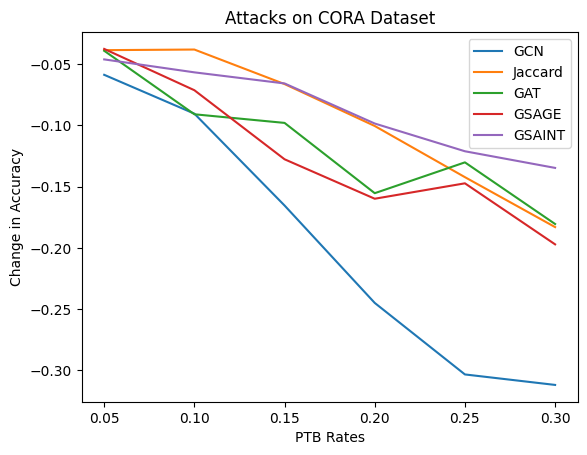

In [28]:
# Plotting
plt.plot(ptb_rates, gcn_results, label="GCN")
plt.plot(ptb_rates, jaccard_results, label="Jaccard")
plt.plot(ptb_rates, gat_results, label="GAT")
plt.plot(ptb_rates, gsage_results, label="GSAGE")
plt.plot(ptb_rates, gsaint_results, label="GSAINT")

plt.xlabel('PTB Rates')
plt.ylabel('Change in Accuracy')
plt.title('Attacks on CORA Dataset')
plt.legend()

output_path = f"./data/{dataset}_graph.png"
plt.savefig(output_path)

# Show plot
plt.show()

In [29]:
import os

def save_data(file_path, data):
    # Automatically create the directory if it doesn't exist
    os.makedirs(os.path.dirname(file_path), exist_ok=True)
    # Save the data to the file
    np.save(file_path, data)

# Assuming 'dataset' is a variable you have already defined
dataset_paths = [
    f'./data-arrays/{dataset}/gcn_results.npy',
    f'./data-arrays/{dataset}/gat_results.npy',
    f'./data-arrays/{dataset}/jaccard_results.npy',
    f'./data-arrays/{dataset}/gsage_results.npy',
    f'./data-arrays/{dataset}/gsaint_results.npy',
    f'./data-arrays/{dataset}/ptb_rates.npy'
]

results = [
    np.array(gcn_results),
    np.array(gat_results),
    np.array(jaccard_results),
    np.array(gsage_results),
    np.array(gsaint_results),
    np.array(ptb_rates)
]

# Save each results array to its corresponding file
for path, data in zip(dataset_paths, results):
    save_data(path, data)